In [1]:
# importing sys
import sys
# This is how you import modules that exist outside of working directory 
# adding mosaique to the system path
sys.path.insert(1, '/home/aasmai/work/QML-QPF/mosaiQue') 
import mosaique as mq
import scipy
from concurrent.futures import ProcessPoolExecutor, as_completed
import itertools
import numpy as np
import pennylane as qml
import os
from mosaique.models.operation import OperationLayer
from tensorflow import keras
import matplotlib.pyplot as plt
# import tensorrt as trt
import tensorflow as tf

2025-12-01 13:29:27.870306: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-12-01 13:29:27.911156: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI AVX512_BF16 AVX512_FP16 AVX_VNNI AMX_TILE AMX_INT8 AMX_BF16 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


2025-12-01 13:29:28.526644: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [2]:
# --- BLOCK 1: imports ---
import sys
sys.path.insert(1, '/home/aasmai/work/QML-QPF/mosaiQue')

import os, time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import pennylane as qml
import tensorflow as tf
from tensorflow.keras import models, layers
from keras.callbacks import CSVLogger

from sklearn.metrics import (
    accuracy_score,
    precision_recall_fscore_support,
    classification_report,
    confusion_matrix
)

In [3]:
from medmnist import DermaMNIST

# --- BLOCK 2: load dataset (DermaMNIST 64x64) ---
train_data = DermaMNIST(split="train", download=True, size=64)
test_data  = DermaMNIST(split="test",  download=True, size=64)

(tr_images, tr_labels), (te_images, te_labels) = (
    train_data.imgs, train_data.labels
), (
    test_data.imgs, test_data.labels
)

# RGB float [0,1] version
scaled_train_images = tr_images.astype('float32') / 255.0
scaled_test_images  = te_images.astype('float32') / 255.0

print("TRAIN:", tr_images.shape, tr_images.dtype)
print("TEST :", te_images.shape, te_images.dtype)


TRAIN: (7007, 64, 64, 3) uint8
TEST : (2005, 64, 64, 3) uint8


In [4]:
# --- BLOCK 3: CNN builder & trainer ---

def build_cnn(input_shape, num_classes):
    model = models.Sequential([
        layers.Input(shape=input_shape),
        layers.Conv2D(32, (3, 3), activation='relu'),
        layers.MaxPooling2D((2, 2)),

        layers.Conv2D(64, (3, 3), activation='relu'),
        layers.MaxPooling2D((2, 2)),

        layers.Flatten(),
        layers.Dense(128, activation='relu'),
        layers.Dropout(0.5),

        layers.Dense(num_classes, activation='softmax')
    ])
    model.compile(
        optimizer='adam',
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )
    return model


def run_cnn(X_train, y_train, X_test, y_test, label, out_root):
    """
    X_train/X_test : shape (N,H,W,C)
    label          : 'NO-FILTER', 'A', 'B', 'C'
    out_root       : e.g. 'results_DermaMNIST'
    """
    os.makedirs(out_root, exist_ok=True)
    log_dir  = os.path.join(out_root, "run")
    os.makedirs(log_dir, exist_ok=True)
    log_file = os.path.join(log_dir, f"{label}.csv")

    csv_logger = CSVLogger(log_file)

    num_classes = int(np.max(y_train)) + 1
    input_shape = X_train.shape[1:]

    model = build_cnn(input_shape, num_classes)

    history = model.fit(
        X_train, y_train,
        validation_data=(X_test, y_test),
        batch_size=128,
        epochs=5000,           
        verbose=2,
        callbacks=[csv_logger]
    )

    print(f"[{label}] training done. Log → {log_file}")
    return model, history, log_file


In [5]:
def process_qpf_images(
    images_01,     # (N,H,W,3) float in [0,1]
    out_dir,       # output folder
    circuit_type,  # 'A', 'B', or 'C'
    round_decimals=4,
    batch_size=1000
):
    if images_01.ndim != 4 or images_01.shape[-1] != 3:
        raise ValueError(f"Expected (N,H,W,3), got {images_01.shape}")
    N, H, W, C = images_01.shape
    if images_01.dtype not in (np.float32, np.float64):
        images_01 = images_01.astype(np.float32)

    dev = qml.device("default.qubit.tf", wires=3)

    # ---- Circuit A  ----
    @qml.qnode(dev, interface="tf", diff_method=None)
    @tf.autograph.experimental.do_not_convert
    def circuit_A(x3):
        x3 = x3 * np.pi
        qml.AngleEmbedding(x3, wires=[0, 1, 2], rotation="Y")
        qml.CNOT(wires=[0, 1])   # 0 -> 1
        qml.CNOT(wires=[1, 2])   # 1 -> 2
        return qml.expval(qml.PauliZ(2))  # measure qubit 2

    # --------
    @qml.qnode(dev, interface="tf", diff_method=None)
    @tf.autograph.experimental.do_not_convert
    def circuit_B(x3):
        x3 = x3 * np.pi
        qml.AngleEmbedding(x3, wires=[0, 1, 2], rotation="Y")
        qml.CNOT(wires=[2, 0])   # 2 -> 0
        qml.CNOT(wires=[0, 2])   # 0 -> 2
        qml.CNOT(wires=[1, 2])   # 1 -> 2
        return qml.expval(qml.PauliZ(2))  # measure qubit 2

    # ---- Circuit C (same as pehle) ----
    @qml.qnode(dev, interface="tf", diff_method=None)
    @tf.autograph.experimental.do_not_convert
    def circuit_C(x3):
        x3 = x3 * np.pi
        qml.AngleEmbedding(x3, wires=[0, 1, 2], rotation="Y")
        qml.CNOT(wires=[1, 0])   # 1 -> 0
        qml.CNOT(wires=[0, 2])   # 0 -> 2
        return qml.expval(qml.PauliZ(2))  # measure qubit 2

    # --- select circuit ---
    if circuit_type == "A":
        circ = circuit_A
    elif circuit_type == "B":
        circ = circuit_B
    elif circuit_type == "C":
        circ = circuit_C
    else:
        raise ValueError("circuit_type must be 'A', 'B' or 'C'.")

    @tf.function
    def process_batch(b):  # b: (B,3)
        return tf.vectorized_map(circ, b)

    flat = images_01.reshape(-1, C)
    rounded = np.round(flat, round_decimals)
    uniq, inv = np.unique(rounded, axis=0, return_inverse=True)

    print(f"[{circuit_type}] unique pixels: {len(uniq)} / {len(flat)}")

    outs = []
    t0 = time.time()
    for i in range(0, len(uniq), batch_size):
        batch = tf.convert_to_tensor(uniq[i:i+batch_size], dtype=tf.float32)
        outs.append(process_batch(batch).numpy())
    uniq_vals = np.concatenate(outs, axis=0).astype(np.float32)

    all_flat = uniq_vals[inv].astype(np.float32)   # (N*H*W,)
    arr = all_flat.reshape(N, H, W)                # (N,H,W)

    os.makedirs(out_dir, exist_ok=True)
    csv_path = os.path.join(out_dir, "single_measurement.csv")
    pd.DataFrame({"val_accuracy": all_flat}).to_csv(csv_path, index=False)

    print(f"[{circuit_type}] Saved: {csv_path} rows={all_flat.size} time={time.time()-t0:.2f}s")
    return arr, csv_path


In [6]:
# --- BLOCK 5: loader from CSV to 4D tensor ---

def load_qpf_images(folder, H=64, W=64):
    csv_path = os.path.join(folder, "single_measurement.csv")
    df = pd.read_csv(csv_path)
    vals = df["val_accuracy"].to_numpy(dtype=np.float32)
    pixels_per_img = H * W
    if vals.size % pixels_per_img != 0:
        raise ValueError(f"CSV length {vals.size} not divisible by {pixels_per_img}")
    N = vals.size // pixels_per_img
    arr = vals.reshape(N, H, W)
    arr = arr[..., np.newaxis]  # (N,H,W,1)
    print(f"Loaded QPF images from {csv_path} → {arr.shape}")
    return arr


In [7]:
# --- BLOCK 6: process QPFs & train models ---

results_root = "results_final_DermaMNIST"   # main root folder

# 1) NO-FILTER baseline
tr_rgb = scaled_train_images  # (7007,64,64,3)
te_rgb = scaled_test_images   # (2005,64,64,3)

print("=== Training NO-FILTER baseline ===")
model_nf, history_nf, log_nf = run_cnn(
    tr_rgb, tr_labels, te_rgb, te_labels,
    label="NO-FILTER",
    out_root=results_root 
)

# 2) Circuit A
print("\n=== QPF Circuit A ===")
folder_A_train = os.path.join(results_root, "A_train")
folder_A_test  = os.path.join(results_root, "A_test")
arr_A_train, _ = process_qpf_images(scaled_train_images, folder_A_train, circuit_type="A")
arr_A_test,  _ = process_qpf_images(scaled_test_images,  folder_A_test,  circuit_type="A")

X_A_train = arr_A_train[..., np.newaxis]
X_A_test  = arr_A_test[..., np.newaxis]

model_A, hist_A, log_A = run_cnn(
    X_A_train, tr_labels, X_A_test, te_labels,
    label="A",
    out_root=results_root
)

# 3) Circuit B
print("\n=== QPF Circuit B ===")
folder_B_train = os.path.join(results_root, "B_train")
folder_B_test  = os.path.join(results_root, "B_test")
arr_B_train, _ = process_qpf_images(scaled_train_images, folder_B_train, circuit_type="B")
arr_B_test,  _ = process_qpf_images(scaled_test_images,  folder_B_test,  circuit_type="B")

X_B_train = arr_B_train[..., np.newaxis]
X_B_test  = arr_B_test[..., np.newaxis]

model_B, hist_B, log_B = run_cnn(
    X_B_train, tr_labels, X_B_test, te_labels,
    label="B",
    out_root=results_root
)

# 4) Circuit C
print("\n=== QPF Circuit C ===")
folder_C_train = os.path.join(results_root, "C_train")
folder_C_test  = os.path.join(results_root, "C_test")
arr_C_train, _ = process_qpf_images(scaled_train_images, folder_C_train, circuit_type="C")
arr_C_test,  _ = process_qpf_images(scaled_test_images,  folder_C_test,  circuit_type="C")

X_C_train = arr_C_train[..., np.newaxis]
X_C_test  = arr_C_test[..., np.newaxis]

model_C, hist_C, log_C = run_cnn(
    X_C_train, tr_labels, X_C_test, te_labels,
    label="C",
    out_root=results_root
)


=== Training NO-FILTER baseline ===


2025-12-01 13:29:31.427325: W tensorflow/core/common_runtime/gpu/gpu_device.cc:2251] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


Epoch 1/5000


55/55 - 2s - 33ms/step - accuracy: 0.6568 - loss: 1.1337 - val_accuracy: 0.6688 - val_loss: 0.9492


Epoch 2/5000


55/55 - 1s - 20ms/step - accuracy: 0.6665 - loss: 0.9623 - val_accuracy: 0.6693 - val_loss: 0.8688


Epoch 3/5000


55/55 - 1s - 20ms/step - accuracy: 0.6739 - loss: 0.9017 - val_accuracy: 0.6803 - val_loss: 0.8488


Epoch 4/5000


55/55 - 1s - 20ms/step - accuracy: 0.6797 - loss: 0.8740 - val_accuracy: 0.6858 - val_loss: 0.7981


Epoch 5/5000


55/55 - 1s - 20ms/step - accuracy: 0.6906 - loss: 0.8266 - val_accuracy: 0.6963 - val_loss: 0.7891


Epoch 6/5000


55/55 - 1s - 19ms/step - accuracy: 0.6937 - loss: 0.8075 - val_accuracy: 0.7047 - val_loss: 0.7808


Epoch 7/5000


55/55 - 1s - 20ms/step - accuracy: 0.7016 - loss: 0.7961 - val_accuracy: 0.7152 - val_loss: 0.7611


Epoch 8/5000


55/55 - 1s - 19ms/step - accuracy: 0.7066 - loss: 0.7796 - val_accuracy: 0.7132 - val_loss: 0.7396


Epoch 9/5000


55/55 - 1s - 19ms/step - accuracy: 0.7139 - loss: 0.7643 - val_accuracy: 0.7177 - val_loss: 0.7569


Epoch 10/5000


55/55 - 1s - 20ms/step - accuracy: 0.7220 - loss: 0.7452 - val_accuracy: 0.7332 - val_loss: 0.7129


Epoch 11/5000


55/55 - 1s - 19ms/step - accuracy: 0.7256 - loss: 0.7211 - val_accuracy: 0.7292 - val_loss: 0.7300


Epoch 12/5000


55/55 - 1s - 20ms/step - accuracy: 0.7278 - loss: 0.7345 - val_accuracy: 0.7307 - val_loss: 0.7128


Epoch 13/5000


55/55 - 1s - 20ms/step - accuracy: 0.7311 - loss: 0.7195 - val_accuracy: 0.7367 - val_loss: 0.7032


Epoch 14/5000


55/55 - 1s - 19ms/step - accuracy: 0.7373 - loss: 0.6974 - val_accuracy: 0.7347 - val_loss: 0.7278


Epoch 15/5000


55/55 - 1s - 20ms/step - accuracy: 0.7423 - loss: 0.6912 - val_accuracy: 0.7496 - val_loss: 0.6974


Epoch 16/5000


55/55 - 1s - 20ms/step - accuracy: 0.7405 - loss: 0.6940 - val_accuracy: 0.7282 - val_loss: 0.7188


Epoch 17/5000


55/55 - 1s - 19ms/step - accuracy: 0.7423 - loss: 0.6955 - val_accuracy: 0.7421 - val_loss: 0.6859


Epoch 18/5000


55/55 - 1s - 20ms/step - accuracy: 0.7522 - loss: 0.6555 - val_accuracy: 0.7406 - val_loss: 0.6903


Epoch 19/5000


55/55 - 1s - 19ms/step - accuracy: 0.7565 - loss: 0.6434 - val_accuracy: 0.7511 - val_loss: 0.6700


Epoch 20/5000


55/55 - 1s - 19ms/step - accuracy: 0.7590 - loss: 0.6362 - val_accuracy: 0.7392 - val_loss: 0.6934


Epoch 21/5000


55/55 - 1s - 19ms/step - accuracy: 0.7630 - loss: 0.6278 - val_accuracy: 0.7521 - val_loss: 0.6622


Epoch 22/5000


55/55 - 1s - 20ms/step - accuracy: 0.7682 - loss: 0.6057 - val_accuracy: 0.7337 - val_loss: 0.6917


Epoch 23/5000


55/55 - 1s - 20ms/step - accuracy: 0.7687 - loss: 0.6050 - val_accuracy: 0.7451 - val_loss: 0.6761


Epoch 24/5000


55/55 - 1s - 20ms/step - accuracy: 0.7759 - loss: 0.5918 - val_accuracy: 0.7456 - val_loss: 0.6693


Epoch 25/5000


55/55 - 1s - 20ms/step - accuracy: 0.7796 - loss: 0.5808 - val_accuracy: 0.7416 - val_loss: 0.6865


Epoch 26/5000


55/55 - 1s - 20ms/step - accuracy: 0.7846 - loss: 0.5775 - val_accuracy: 0.7431 - val_loss: 0.6928


Epoch 27/5000


55/55 - 1s - 20ms/step - accuracy: 0.7842 - loss: 0.5627 - val_accuracy: 0.7461 - val_loss: 0.6844


Epoch 28/5000


55/55 - 1s - 19ms/step - accuracy: 0.7966 - loss: 0.5507 - val_accuracy: 0.7536 - val_loss: 0.6729


Epoch 29/5000


55/55 - 1s - 19ms/step - accuracy: 0.7973 - loss: 0.5380 - val_accuracy: 0.7526 - val_loss: 0.6830


Epoch 30/5000


55/55 - 1s - 20ms/step - accuracy: 0.7886 - loss: 0.5475 - val_accuracy: 0.7446 - val_loss: 0.7083


Epoch 31/5000


55/55 - 1s - 19ms/step - accuracy: 0.7979 - loss: 0.5338 - val_accuracy: 0.7541 - val_loss: 0.6925


Epoch 32/5000


55/55 - 1s - 20ms/step - accuracy: 0.8039 - loss: 0.5280 - val_accuracy: 0.7312 - val_loss: 0.7706


Epoch 33/5000


55/55 - 1s - 20ms/step - accuracy: 0.8073 - loss: 0.5125 - val_accuracy: 0.7387 - val_loss: 0.7547


Epoch 34/5000


55/55 - 1s - 19ms/step - accuracy: 0.8153 - loss: 0.4798 - val_accuracy: 0.7397 - val_loss: 0.7309


Epoch 35/5000


55/55 - 1s - 20ms/step - accuracy: 0.8182 - loss: 0.4800 - val_accuracy: 0.7397 - val_loss: 0.7991


Epoch 36/5000


55/55 - 1s - 19ms/step - accuracy: 0.8122 - loss: 0.4764 - val_accuracy: 0.7546 - val_loss: 0.7425


Epoch 37/5000


55/55 - 1s - 20ms/step - accuracy: 0.8337 - loss: 0.4342 - val_accuracy: 0.7511 - val_loss: 0.7701


Epoch 38/5000


55/55 - 1s - 19ms/step - accuracy: 0.8376 - loss: 0.4315 - val_accuracy: 0.7456 - val_loss: 0.7975


Epoch 39/5000


55/55 - 1s - 20ms/step - accuracy: 0.8352 - loss: 0.4213 - val_accuracy: 0.7511 - val_loss: 0.7642


Epoch 40/5000


55/55 - 1s - 19ms/step - accuracy: 0.8372 - loss: 0.4179 - val_accuracy: 0.7536 - val_loss: 0.7858


Epoch 41/5000


55/55 - 1s - 20ms/step - accuracy: 0.8489 - loss: 0.3974 - val_accuracy: 0.7382 - val_loss: 0.8289


Epoch 42/5000


55/55 - 1s - 19ms/step - accuracy: 0.8480 - loss: 0.4006 - val_accuracy: 0.7561 - val_loss: 0.7416


Epoch 43/5000


55/55 - 1s - 20ms/step - accuracy: 0.8549 - loss: 0.3905 - val_accuracy: 0.7506 - val_loss: 0.7808


Epoch 44/5000


55/55 - 1s - 20ms/step - accuracy: 0.8609 - loss: 0.3704 - val_accuracy: 0.7566 - val_loss: 0.7736


Epoch 45/5000


55/55 - 1s - 19ms/step - accuracy: 0.8613 - loss: 0.3621 - val_accuracy: 0.7541 - val_loss: 0.8345


Epoch 46/5000


55/55 - 1s - 19ms/step - accuracy: 0.8741 - loss: 0.3356 - val_accuracy: 0.7561 - val_loss: 0.8451


Epoch 47/5000


55/55 - 1s - 19ms/step - accuracy: 0.8706 - loss: 0.3339 - val_accuracy: 0.7501 - val_loss: 0.8904


Epoch 48/5000


55/55 - 1s - 20ms/step - accuracy: 0.8726 - loss: 0.3280 - val_accuracy: 0.7561 - val_loss: 0.8641


Epoch 49/5000


55/55 - 1s - 20ms/step - accuracy: 0.8740 - loss: 0.3219 - val_accuracy: 0.7531 - val_loss: 0.9418


Epoch 50/5000


55/55 - 1s - 20ms/step - accuracy: 0.8833 - loss: 0.3067 - val_accuracy: 0.7456 - val_loss: 0.9365


Epoch 51/5000


55/55 - 1s - 20ms/step - accuracy: 0.8777 - loss: 0.3114 - val_accuracy: 0.7541 - val_loss: 0.9089


Epoch 52/5000


55/55 - 1s - 19ms/step - accuracy: 0.8898 - loss: 0.2886 - val_accuracy: 0.7516 - val_loss: 0.9412


Epoch 53/5000


55/55 - 1s - 20ms/step - accuracy: 0.8980 - loss: 0.2714 - val_accuracy: 0.7631 - val_loss: 0.9054


Epoch 54/5000


55/55 - 1s - 19ms/step - accuracy: 0.8982 - loss: 0.2724 - val_accuracy: 0.7571 - val_loss: 0.9240


Epoch 55/5000


55/55 - 1s - 19ms/step - accuracy: 0.8955 - loss: 0.2679 - val_accuracy: 0.7561 - val_loss: 0.9580


Epoch 56/5000


55/55 - 1s - 20ms/step - accuracy: 0.9015 - loss: 0.2547 - val_accuracy: 0.7481 - val_loss: 0.9879


Epoch 57/5000


55/55 - 1s - 19ms/step - accuracy: 0.9137 - loss: 0.2352 - val_accuracy: 0.7471 - val_loss: 0.9465


Epoch 58/5000


55/55 - 1s - 19ms/step - accuracy: 0.8981 - loss: 0.2565 - val_accuracy: 0.7526 - val_loss: 0.9172


Epoch 59/5000


55/55 - 1s - 19ms/step - accuracy: 0.9108 - loss: 0.2347 - val_accuracy: 0.7576 - val_loss: 1.0622


Epoch 60/5000


55/55 - 1s - 20ms/step - accuracy: 0.9054 - loss: 0.2419 - val_accuracy: 0.7481 - val_loss: 1.0079


Epoch 61/5000


55/55 - 1s - 19ms/step - accuracy: 0.9194 - loss: 0.2126 - val_accuracy: 0.7546 - val_loss: 1.1028


Epoch 62/5000


55/55 - 1s - 19ms/step - accuracy: 0.9226 - loss: 0.2055 - val_accuracy: 0.7551 - val_loss: 1.0708


Epoch 63/5000


55/55 - 1s - 19ms/step - accuracy: 0.9241 - loss: 0.2033 - val_accuracy: 0.7501 - val_loss: 1.0647


Epoch 64/5000


55/55 - 1s - 19ms/step - accuracy: 0.9248 - loss: 0.2046 - val_accuracy: 0.7491 - val_loss: 1.1100


Epoch 65/5000


55/55 - 1s - 20ms/step - accuracy: 0.9268 - loss: 0.1946 - val_accuracy: 0.7651 - val_loss: 1.0993


Epoch 66/5000


55/55 - 1s - 20ms/step - accuracy: 0.9281 - loss: 0.1906 - val_accuracy: 0.7516 - val_loss: 1.1710


Epoch 67/5000


55/55 - 1s - 19ms/step - accuracy: 0.9322 - loss: 0.1756 - val_accuracy: 0.7531 - val_loss: 1.0993


Epoch 68/5000


55/55 - 1s - 19ms/step - accuracy: 0.9365 - loss: 0.1702 - val_accuracy: 0.7501 - val_loss: 1.2020


Epoch 69/5000


55/55 - 1s - 20ms/step - accuracy: 0.9335 - loss: 0.1702 - val_accuracy: 0.7541 - val_loss: 1.2235


Epoch 70/5000


55/55 - 1s - 20ms/step - accuracy: 0.9406 - loss: 0.1635 - val_accuracy: 0.7626 - val_loss: 1.2788


Epoch 71/5000


55/55 - 1s - 20ms/step - accuracy: 0.9421 - loss: 0.1533 - val_accuracy: 0.7486 - val_loss: 1.2215


Epoch 72/5000


55/55 - 1s - 19ms/step - accuracy: 0.9442 - loss: 0.1543 - val_accuracy: 0.7596 - val_loss: 1.2260


Epoch 73/5000


55/55 - 1s - 19ms/step - accuracy: 0.9435 - loss: 0.1525 - val_accuracy: 0.7541 - val_loss: 1.2597


Epoch 74/5000


55/55 - 1s - 20ms/step - accuracy: 0.9429 - loss: 0.1533 - val_accuracy: 0.7526 - val_loss: 1.2341


Epoch 75/5000


55/55 - 1s - 20ms/step - accuracy: 0.9302 - loss: 0.1769 - val_accuracy: 0.7551 - val_loss: 1.3337


Epoch 76/5000


55/55 - 1s - 20ms/step - accuracy: 0.9422 - loss: 0.1613 - val_accuracy: 0.7586 - val_loss: 1.2326


Epoch 77/5000


55/55 - 1s - 19ms/step - accuracy: 0.9402 - loss: 0.1557 - val_accuracy: 0.7576 - val_loss: 1.2617


Epoch 78/5000


55/55 - 1s - 20ms/step - accuracy: 0.9435 - loss: 0.1477 - val_accuracy: 0.7591 - val_loss: 1.2260


Epoch 79/5000


55/55 - 1s - 19ms/step - accuracy: 0.9545 - loss: 0.1220 - val_accuracy: 0.7621 - val_loss: 1.3846


Epoch 80/5000


55/55 - 1s - 20ms/step - accuracy: 0.9560 - loss: 0.1220 - val_accuracy: 0.7566 - val_loss: 1.4909


Epoch 81/5000


55/55 - 1s - 20ms/step - accuracy: 0.9532 - loss: 0.1274 - val_accuracy: 0.7521 - val_loss: 1.5016


Epoch 82/5000


55/55 - 1s - 20ms/step - accuracy: 0.9523 - loss: 0.1302 - val_accuracy: 0.7561 - val_loss: 1.4270


Epoch 83/5000


55/55 - 1s - 20ms/step - accuracy: 0.9542 - loss: 0.1269 - val_accuracy: 0.7586 - val_loss: 1.3589


Epoch 84/5000


55/55 - 1s - 20ms/step - accuracy: 0.9590 - loss: 0.1144 - val_accuracy: 0.7456 - val_loss: 1.4037


Epoch 85/5000


55/55 - 1s - 19ms/step - accuracy: 0.9553 - loss: 0.1192 - val_accuracy: 0.7501 - val_loss: 1.4533


Epoch 86/5000


55/55 - 1s - 20ms/step - accuracy: 0.9598 - loss: 0.1084 - val_accuracy: 0.7511 - val_loss: 1.4866


Epoch 87/5000


55/55 - 1s - 20ms/step - accuracy: 0.9548 - loss: 0.1199 - val_accuracy: 0.7511 - val_loss: 1.6519


Epoch 88/5000


55/55 - 1s - 20ms/step - accuracy: 0.9565 - loss: 0.1177 - val_accuracy: 0.7436 - val_loss: 1.5570


Epoch 89/5000


55/55 - 1s - 19ms/step - accuracy: 0.9530 - loss: 0.1268 - val_accuracy: 0.7536 - val_loss: 1.6086


Epoch 90/5000


55/55 - 1s - 20ms/step - accuracy: 0.9619 - loss: 0.1017 - val_accuracy: 0.7581 - val_loss: 1.4577


Epoch 91/5000


55/55 - 1s - 19ms/step - accuracy: 0.9609 - loss: 0.1083 - val_accuracy: 0.7531 - val_loss: 1.4659


Epoch 92/5000


55/55 - 1s - 19ms/step - accuracy: 0.9622 - loss: 0.1049 - val_accuracy: 0.7586 - val_loss: 1.5542


Epoch 93/5000


55/55 - 1s - 19ms/step - accuracy: 0.9625 - loss: 0.0991 - val_accuracy: 0.7501 - val_loss: 1.5846


Epoch 94/5000


55/55 - 1s - 19ms/step - accuracy: 0.9635 - loss: 0.1074 - val_accuracy: 0.7481 - val_loss: 1.6494


Epoch 95/5000


55/55 - 1s - 19ms/step - accuracy: 0.9550 - loss: 0.1140 - val_accuracy: 0.7506 - val_loss: 1.6416


Epoch 96/5000


55/55 - 1s - 19ms/step - accuracy: 0.9639 - loss: 0.0995 - val_accuracy: 0.7611 - val_loss: 1.6639


Epoch 97/5000


55/55 - 1s - 20ms/step - accuracy: 0.9705 - loss: 0.0848 - val_accuracy: 0.7491 - val_loss: 1.7794


Epoch 98/5000


55/55 - 1s - 19ms/step - accuracy: 0.9677 - loss: 0.0887 - val_accuracy: 0.7596 - val_loss: 1.6455


Epoch 99/5000


55/55 - 1s - 19ms/step - accuracy: 0.9702 - loss: 0.0810 - val_accuracy: 0.7526 - val_loss: 1.7163


Epoch 100/5000


55/55 - 1s - 20ms/step - accuracy: 0.9665 - loss: 0.0939 - val_accuracy: 0.7531 - val_loss: 1.5799


Epoch 101/5000


55/55 - 1s - 20ms/step - accuracy: 0.9706 - loss: 0.0803 - val_accuracy: 0.7576 - val_loss: 1.6772


Epoch 102/5000


55/55 - 1s - 20ms/step - accuracy: 0.9630 - loss: 0.0984 - val_accuracy: 0.7566 - val_loss: 1.7836


Epoch 103/5000


55/55 - 1s - 19ms/step - accuracy: 0.9690 - loss: 0.0887 - val_accuracy: 0.7476 - val_loss: 1.7722


Epoch 104/5000


55/55 - 1s - 20ms/step - accuracy: 0.9685 - loss: 0.0841 - val_accuracy: 0.7526 - val_loss: 1.8758


Epoch 105/5000


55/55 - 1s - 19ms/step - accuracy: 0.9710 - loss: 0.0824 - val_accuracy: 0.7466 - val_loss: 1.7953


Epoch 106/5000


55/55 - 1s - 20ms/step - accuracy: 0.9676 - loss: 0.0845 - val_accuracy: 0.7576 - val_loss: 1.8407


Epoch 107/5000


55/55 - 1s - 20ms/step - accuracy: 0.9675 - loss: 0.0885 - val_accuracy: 0.7456 - val_loss: 1.7274


Epoch 108/5000


55/55 - 1s - 20ms/step - accuracy: 0.9699 - loss: 0.0863 - val_accuracy: 0.7491 - val_loss: 1.8582


Epoch 109/5000


55/55 - 1s - 20ms/step - accuracy: 0.9689 - loss: 0.0883 - val_accuracy: 0.7481 - val_loss: 1.7992


Epoch 110/5000


55/55 - 1s - 20ms/step - accuracy: 0.9669 - loss: 0.0902 - val_accuracy: 0.7501 - val_loss: 1.9699


Epoch 111/5000


55/55 - 1s - 20ms/step - accuracy: 0.9697 - loss: 0.0869 - val_accuracy: 0.7521 - val_loss: 1.8449


Epoch 112/5000


55/55 - 1s - 19ms/step - accuracy: 0.9769 - loss: 0.0689 - val_accuracy: 0.7486 - val_loss: 2.0764


Epoch 113/5000


55/55 - 1s - 20ms/step - accuracy: 0.9727 - loss: 0.0765 - val_accuracy: 0.7516 - val_loss: 2.1336


Epoch 114/5000


55/55 - 1s - 20ms/step - accuracy: 0.9696 - loss: 0.0808 - val_accuracy: 0.7511 - val_loss: 2.0003


Epoch 115/5000


55/55 - 1s - 20ms/step - accuracy: 0.9700 - loss: 0.0841 - val_accuracy: 0.7536 - val_loss: 1.9040


Epoch 116/5000


55/55 - 1s - 20ms/step - accuracy: 0.9660 - loss: 0.0956 - val_accuracy: 0.7536 - val_loss: 2.0574


Epoch 117/5000


55/55 - 1s - 20ms/step - accuracy: 0.9716 - loss: 0.0755 - val_accuracy: 0.7476 - val_loss: 2.0652


Epoch 118/5000


55/55 - 1s - 20ms/step - accuracy: 0.9780 - loss: 0.0638 - val_accuracy: 0.7516 - val_loss: 2.2877


Epoch 119/5000


55/55 - 1s - 19ms/step - accuracy: 0.9737 - loss: 0.0760 - val_accuracy: 0.7451 - val_loss: 2.1851


Epoch 120/5000


55/55 - 1s - 19ms/step - accuracy: 0.9735 - loss: 0.0761 - val_accuracy: 0.7516 - val_loss: 2.1697


Epoch 121/5000


55/55 - 1s - 19ms/step - accuracy: 0.9730 - loss: 0.0748 - val_accuracy: 0.7516 - val_loss: 1.9909


Epoch 122/5000


55/55 - 1s - 19ms/step - accuracy: 0.9716 - loss: 0.0774 - val_accuracy: 0.7491 - val_loss: 1.9031


Epoch 123/5000


55/55 - 1s - 20ms/step - accuracy: 0.9767 - loss: 0.0668 - val_accuracy: 0.7516 - val_loss: 2.0716


Epoch 124/5000


55/55 - 1s - 19ms/step - accuracy: 0.9733 - loss: 0.0688 - val_accuracy: 0.7511 - val_loss: 2.0106


Epoch 125/5000


55/55 - 1s - 20ms/step - accuracy: 0.9717 - loss: 0.0754 - val_accuracy: 0.7511 - val_loss: 1.9259


Epoch 126/5000


55/55 - 1s - 19ms/step - accuracy: 0.9737 - loss: 0.0694 - val_accuracy: 0.7531 - val_loss: 2.2338


Epoch 127/5000


55/55 - 1s - 19ms/step - accuracy: 0.9722 - loss: 0.0754 - val_accuracy: 0.7556 - val_loss: 2.1871


Epoch 128/5000


55/55 - 1s - 20ms/step - accuracy: 0.9722 - loss: 0.0755 - val_accuracy: 0.7561 - val_loss: 2.0803


Epoch 129/5000


55/55 - 1s - 20ms/step - accuracy: 0.9672 - loss: 0.0829 - val_accuracy: 0.7496 - val_loss: 2.3523


Epoch 130/5000


55/55 - 1s - 19ms/step - accuracy: 0.9692 - loss: 0.0802 - val_accuracy: 0.7481 - val_loss: 1.9700


Epoch 131/5000


55/55 - 1s - 20ms/step - accuracy: 0.9703 - loss: 0.0796 - val_accuracy: 0.7526 - val_loss: 2.1730


Epoch 132/5000


55/55 - 1s - 19ms/step - accuracy: 0.9765 - loss: 0.0606 - val_accuracy: 0.7541 - val_loss: 2.1447


Epoch 133/5000


55/55 - 1s - 19ms/step - accuracy: 0.9796 - loss: 0.0610 - val_accuracy: 0.7531 - val_loss: 2.1684


Epoch 134/5000


55/55 - 1s - 20ms/step - accuracy: 0.9750 - loss: 0.0690 - val_accuracy: 0.7511 - val_loss: 2.0499


Epoch 135/5000


55/55 - 1s - 20ms/step - accuracy: 0.9776 - loss: 0.0659 - val_accuracy: 0.7496 - val_loss: 2.0581


Epoch 136/5000


55/55 - 1s - 19ms/step - accuracy: 0.9742 - loss: 0.0690 - val_accuracy: 0.7541 - val_loss: 2.2103


Epoch 137/5000


55/55 - 1s - 20ms/step - accuracy: 0.9746 - loss: 0.0674 - val_accuracy: 0.7566 - val_loss: 2.1269


Epoch 138/5000


55/55 - 1s - 19ms/step - accuracy: 0.9723 - loss: 0.0719 - val_accuracy: 0.7506 - val_loss: 2.0558


Epoch 139/5000


55/55 - 1s - 20ms/step - accuracy: 0.9782 - loss: 0.0591 - val_accuracy: 0.7536 - val_loss: 2.2164


Epoch 140/5000


55/55 - 1s - 19ms/step - accuracy: 0.9776 - loss: 0.0632 - val_accuracy: 0.7561 - val_loss: 2.1405


Epoch 141/5000


55/55 - 1s - 19ms/step - accuracy: 0.9733 - loss: 0.0704 - val_accuracy: 0.7586 - val_loss: 2.2130


Epoch 142/5000


55/55 - 1s - 19ms/step - accuracy: 0.9782 - loss: 0.0638 - val_accuracy: 0.7521 - val_loss: 2.0882


Epoch 143/5000


55/55 - 1s - 19ms/step - accuracy: 0.9732 - loss: 0.0769 - val_accuracy: 0.7606 - val_loss: 2.2320


Epoch 144/5000


55/55 - 1s - 20ms/step - accuracy: 0.9749 - loss: 0.0704 - val_accuracy: 0.7576 - val_loss: 2.2664


Epoch 145/5000


55/55 - 1s - 20ms/step - accuracy: 0.9806 - loss: 0.0583 - val_accuracy: 0.7531 - val_loss: 2.5684


Epoch 146/5000


55/55 - 1s - 20ms/step - accuracy: 0.9765 - loss: 0.0653 - val_accuracy: 0.7491 - val_loss: 2.3753


Epoch 147/5000


55/55 - 1s - 20ms/step - accuracy: 0.9756 - loss: 0.0647 - val_accuracy: 0.7521 - val_loss: 2.3773


Epoch 148/5000


55/55 - 1s - 20ms/step - accuracy: 0.9727 - loss: 0.0742 - val_accuracy: 0.7576 - val_loss: 2.2165


Epoch 149/5000


55/55 - 1s - 20ms/step - accuracy: 0.9777 - loss: 0.0535 - val_accuracy: 0.7556 - val_loss: 2.3054


Epoch 150/5000


55/55 - 1s - 19ms/step - accuracy: 0.9802 - loss: 0.0566 - val_accuracy: 0.7491 - val_loss: 2.5211


Epoch 151/5000


55/55 - 1s - 20ms/step - accuracy: 0.9760 - loss: 0.0642 - val_accuracy: 0.7441 - val_loss: 2.2238


Epoch 152/5000


55/55 - 1s - 20ms/step - accuracy: 0.9732 - loss: 0.0724 - val_accuracy: 0.7526 - val_loss: 2.2031


Epoch 153/5000


55/55 - 1s - 20ms/step - accuracy: 0.9769 - loss: 0.0630 - val_accuracy: 0.7436 - val_loss: 2.3122


Epoch 154/5000


55/55 - 1s - 19ms/step - accuracy: 0.9816 - loss: 0.0561 - val_accuracy: 0.7521 - val_loss: 2.3994


Epoch 155/5000


55/55 - 1s - 20ms/step - accuracy: 0.9843 - loss: 0.0460 - val_accuracy: 0.7476 - val_loss: 2.4201


Epoch 156/5000


55/55 - 1s - 20ms/step - accuracy: 0.9750 - loss: 0.0746 - val_accuracy: 0.7486 - val_loss: 2.4399


Epoch 157/5000


55/55 - 1s - 19ms/step - accuracy: 0.9752 - loss: 0.0678 - val_accuracy: 0.7591 - val_loss: 2.3209


Epoch 158/5000


55/55 - 1s - 19ms/step - accuracy: 0.9793 - loss: 0.0629 - val_accuracy: 0.7446 - val_loss: 2.5610


Epoch 159/5000


55/55 - 1s - 20ms/step - accuracy: 0.9757 - loss: 0.0684 - val_accuracy: 0.7501 - val_loss: 2.3742


Epoch 160/5000


55/55 - 1s - 20ms/step - accuracy: 0.9770 - loss: 0.0622 - val_accuracy: 0.7496 - val_loss: 2.3838


Epoch 161/5000


55/55 - 1s - 19ms/step - accuracy: 0.9794 - loss: 0.0533 - val_accuracy: 0.7526 - val_loss: 2.5932


Epoch 162/5000


55/55 - 1s - 19ms/step - accuracy: 0.9790 - loss: 0.0575 - val_accuracy: 0.7486 - val_loss: 2.6015


Epoch 163/5000


55/55 - 1s - 20ms/step - accuracy: 0.9780 - loss: 0.0617 - val_accuracy: 0.7496 - val_loss: 2.4934


Epoch 164/5000


55/55 - 1s - 20ms/step - accuracy: 0.9780 - loss: 0.0613 - val_accuracy: 0.7426 - val_loss: 2.4510


Epoch 165/5000


55/55 - 1s - 20ms/step - accuracy: 0.9809 - loss: 0.0518 - val_accuracy: 0.7526 - val_loss: 2.6781


Epoch 166/5000


55/55 - 1s - 20ms/step - accuracy: 0.9755 - loss: 0.0614 - val_accuracy: 0.7451 - val_loss: 2.3486


Epoch 167/5000


55/55 - 1s - 19ms/step - accuracy: 0.9796 - loss: 0.0526 - val_accuracy: 0.7476 - val_loss: 2.5516


Epoch 168/5000


55/55 - 1s - 19ms/step - accuracy: 0.9824 - loss: 0.0445 - val_accuracy: 0.7596 - val_loss: 2.6630


Epoch 169/5000


55/55 - 1s - 19ms/step - accuracy: 0.9802 - loss: 0.0531 - val_accuracy: 0.7551 - val_loss: 2.6529


Epoch 170/5000


55/55 - 1s - 19ms/step - accuracy: 0.9812 - loss: 0.0524 - val_accuracy: 0.7546 - val_loss: 2.7194


Epoch 171/5000


55/55 - 1s - 20ms/step - accuracy: 0.9750 - loss: 0.0669 - val_accuracy: 0.7421 - val_loss: 2.3784


Epoch 172/5000


55/55 - 1s - 19ms/step - accuracy: 0.9806 - loss: 0.0547 - val_accuracy: 0.7501 - val_loss: 2.3899


Epoch 173/5000


55/55 - 1s - 20ms/step - accuracy: 0.9806 - loss: 0.0475 - val_accuracy: 0.7526 - val_loss: 2.3920


Epoch 174/5000


55/55 - 1s - 19ms/step - accuracy: 0.9843 - loss: 0.0463 - val_accuracy: 0.7521 - val_loss: 2.6738


Epoch 175/5000


55/55 - 1s - 20ms/step - accuracy: 0.9830 - loss: 0.0458 - val_accuracy: 0.7506 - val_loss: 2.6713


Epoch 176/5000


55/55 - 1s - 19ms/step - accuracy: 0.9852 - loss: 0.0461 - val_accuracy: 0.7511 - val_loss: 2.7400


Epoch 177/5000


55/55 - 1s - 19ms/step - accuracy: 0.9770 - loss: 0.0605 - val_accuracy: 0.7481 - val_loss: 2.4996


Epoch 178/5000


55/55 - 1s - 19ms/step - accuracy: 0.9765 - loss: 0.0616 - val_accuracy: 0.7511 - val_loss: 2.7685


Epoch 179/5000


55/55 - 1s - 20ms/step - accuracy: 0.9810 - loss: 0.0508 - val_accuracy: 0.7571 - val_loss: 2.5253


Epoch 180/5000


55/55 - 1s - 19ms/step - accuracy: 0.9842 - loss: 0.0437 - val_accuracy: 0.7526 - val_loss: 2.8234


Epoch 181/5000


55/55 - 1s - 19ms/step - accuracy: 0.9822 - loss: 0.0527 - val_accuracy: 0.7511 - val_loss: 2.7474


Epoch 182/5000


55/55 - 1s - 20ms/step - accuracy: 0.9803 - loss: 0.0554 - val_accuracy: 0.7496 - val_loss: 2.6334


Epoch 183/5000


55/55 - 1s - 19ms/step - accuracy: 0.9842 - loss: 0.0439 - val_accuracy: 0.7496 - val_loss: 3.0123


Epoch 184/5000


55/55 - 1s - 19ms/step - accuracy: 0.9800 - loss: 0.0540 - val_accuracy: 0.7481 - val_loss: 2.5737


Epoch 185/5000


55/55 - 1s - 19ms/step - accuracy: 0.9803 - loss: 0.0568 - val_accuracy: 0.7421 - val_loss: 2.7226


Epoch 186/5000


55/55 - 1s - 20ms/step - accuracy: 0.9767 - loss: 0.0647 - val_accuracy: 0.7526 - val_loss: 2.7926


Epoch 187/5000


55/55 - 1s - 19ms/step - accuracy: 0.9794 - loss: 0.0524 - val_accuracy: 0.7456 - val_loss: 2.5912


Epoch 188/5000


55/55 - 1s - 20ms/step - accuracy: 0.9807 - loss: 0.0576 - val_accuracy: 0.7521 - val_loss: 2.8909


Epoch 189/5000


55/55 - 1s - 20ms/step - accuracy: 0.9796 - loss: 0.0558 - val_accuracy: 0.7501 - val_loss: 2.8092


Epoch 190/5000


55/55 - 1s - 19ms/step - accuracy: 0.9827 - loss: 0.0470 - val_accuracy: 0.7516 - val_loss: 2.8142


Epoch 191/5000


55/55 - 1s - 19ms/step - accuracy: 0.9777 - loss: 0.0600 - val_accuracy: 0.7511 - val_loss: 2.5017


Epoch 192/5000


55/55 - 1s - 20ms/step - accuracy: 0.9796 - loss: 0.0570 - val_accuracy: 0.7411 - val_loss: 2.5270


Epoch 193/5000


55/55 - 1s - 19ms/step - accuracy: 0.9849 - loss: 0.0467 - val_accuracy: 0.7456 - val_loss: 2.9494


Epoch 194/5000


55/55 - 1s - 19ms/step - accuracy: 0.9846 - loss: 0.0450 - val_accuracy: 0.7541 - val_loss: 2.8229


Epoch 195/5000


55/55 - 1s - 19ms/step - accuracy: 0.9755 - loss: 0.0625 - val_accuracy: 0.7521 - val_loss: 2.7162


Epoch 196/5000


55/55 - 1s - 19ms/step - accuracy: 0.9842 - loss: 0.0426 - val_accuracy: 0.7481 - val_loss: 2.7318


Epoch 197/5000


55/55 - 1s - 20ms/step - accuracy: 0.9792 - loss: 0.0544 - val_accuracy: 0.7486 - val_loss: 2.7157


Epoch 198/5000


55/55 - 1s - 19ms/step - accuracy: 0.9796 - loss: 0.0537 - val_accuracy: 0.7451 - val_loss: 2.9223


Epoch 199/5000


55/55 - 1s - 19ms/step - accuracy: 0.9766 - loss: 0.0637 - val_accuracy: 0.7436 - val_loss: 2.8998


Epoch 200/5000


55/55 - 1s - 20ms/step - accuracy: 0.9806 - loss: 0.0594 - val_accuracy: 0.7436 - val_loss: 3.0418


Epoch 201/5000


55/55 - 1s - 20ms/step - accuracy: 0.9807 - loss: 0.0548 - val_accuracy: 0.7446 - val_loss: 2.8254


Epoch 202/5000


55/55 - 1s - 20ms/step - accuracy: 0.9822 - loss: 0.0480 - val_accuracy: 0.7516 - val_loss: 2.8848


Epoch 203/5000


55/55 - 1s - 20ms/step - accuracy: 0.9869 - loss: 0.0374 - val_accuracy: 0.7541 - val_loss: 2.7491


Epoch 204/5000


55/55 - 1s - 20ms/step - accuracy: 0.9814 - loss: 0.0499 - val_accuracy: 0.7446 - val_loss: 3.1712


Epoch 205/5000


55/55 - 1s - 19ms/step - accuracy: 0.9833 - loss: 0.0464 - val_accuracy: 0.7451 - val_loss: 3.1334


Epoch 206/5000


55/55 - 1s - 20ms/step - accuracy: 0.9822 - loss: 0.0519 - val_accuracy: 0.7377 - val_loss: 2.7850


Epoch 207/5000


55/55 - 1s - 19ms/step - accuracy: 0.9807 - loss: 0.0564 - val_accuracy: 0.7456 - val_loss: 3.1051


Epoch 208/5000


55/55 - 1s - 20ms/step - accuracy: 0.9844 - loss: 0.0446 - val_accuracy: 0.7451 - val_loss: 3.2717


Epoch 209/5000


55/55 - 1s - 20ms/step - accuracy: 0.9833 - loss: 0.0493 - val_accuracy: 0.7451 - val_loss: 2.9106


Epoch 210/5000


55/55 - 1s - 20ms/step - accuracy: 0.9767 - loss: 0.0682 - val_accuracy: 0.7466 - val_loss: 2.7954


Epoch 211/5000


55/55 - 1s - 20ms/step - accuracy: 0.9834 - loss: 0.0468 - val_accuracy: 0.7561 - val_loss: 2.8394


Epoch 212/5000


55/55 - 1s - 20ms/step - accuracy: 0.9842 - loss: 0.0428 - val_accuracy: 0.7466 - val_loss: 2.9386


Epoch 213/5000


55/55 - 1s - 20ms/step - accuracy: 0.9824 - loss: 0.0496 - val_accuracy: 0.7486 - val_loss: 2.7963


Epoch 214/5000


55/55 - 1s - 19ms/step - accuracy: 0.9854 - loss: 0.0453 - val_accuracy: 0.7546 - val_loss: 3.0413


Epoch 215/5000


55/55 - 1s - 19ms/step - accuracy: 0.9844 - loss: 0.0430 - val_accuracy: 0.7536 - val_loss: 3.1280


Epoch 216/5000


55/55 - 1s - 19ms/step - accuracy: 0.9839 - loss: 0.0438 - val_accuracy: 0.7566 - val_loss: 2.9888


Epoch 217/5000


55/55 - 1s - 19ms/step - accuracy: 0.9877 - loss: 0.0350 - val_accuracy: 0.7591 - val_loss: 2.8810


Epoch 218/5000


55/55 - 1s - 20ms/step - accuracy: 0.9832 - loss: 0.0510 - val_accuracy: 0.7526 - val_loss: 3.1223


Epoch 219/5000


55/55 - 1s - 20ms/step - accuracy: 0.9814 - loss: 0.0497 - val_accuracy: 0.7536 - val_loss: 3.1041


Epoch 220/5000


55/55 - 1s - 20ms/step - accuracy: 0.9850 - loss: 0.0449 - val_accuracy: 0.7591 - val_loss: 3.0841


Epoch 221/5000


55/55 - 1s - 19ms/step - accuracy: 0.9839 - loss: 0.0465 - val_accuracy: 0.7451 - val_loss: 2.7983


Epoch 222/5000


55/55 - 1s - 19ms/step - accuracy: 0.9782 - loss: 0.0638 - val_accuracy: 0.7456 - val_loss: 3.0061


Epoch 223/5000


55/55 - 1s - 19ms/step - accuracy: 0.9849 - loss: 0.0430 - val_accuracy: 0.7521 - val_loss: 2.8511


Epoch 224/5000


55/55 - 1s - 19ms/step - accuracy: 0.9822 - loss: 0.0456 - val_accuracy: 0.7426 - val_loss: 3.0511


Epoch 225/5000


55/55 - 1s - 19ms/step - accuracy: 0.9843 - loss: 0.0435 - val_accuracy: 0.7491 - val_loss: 3.1341


Epoch 226/5000


55/55 - 1s - 20ms/step - accuracy: 0.9872 - loss: 0.0393 - val_accuracy: 0.7566 - val_loss: 3.2332


Epoch 227/5000


55/55 - 1s - 19ms/step - accuracy: 0.9812 - loss: 0.0518 - val_accuracy: 0.7501 - val_loss: 3.0146


Epoch 228/5000


55/55 - 1s - 20ms/step - accuracy: 0.9849 - loss: 0.0410 - val_accuracy: 0.7506 - val_loss: 3.2245


Epoch 229/5000


55/55 - 1s - 20ms/step - accuracy: 0.9827 - loss: 0.0453 - val_accuracy: 0.7501 - val_loss: 3.5763


Epoch 230/5000


55/55 - 1s - 19ms/step - accuracy: 0.9872 - loss: 0.0379 - val_accuracy: 0.7441 - val_loss: 3.1066


Epoch 231/5000


55/55 - 1s - 19ms/step - accuracy: 0.9857 - loss: 0.0380 - val_accuracy: 0.7456 - val_loss: 3.1723


Epoch 232/5000


55/55 - 1s - 19ms/step - accuracy: 0.9850 - loss: 0.0398 - val_accuracy: 0.7456 - val_loss: 3.2954


Epoch 233/5000


55/55 - 1s - 19ms/step - accuracy: 0.9873 - loss: 0.0324 - val_accuracy: 0.7576 - val_loss: 3.2376


Epoch 234/5000


55/55 - 1s - 20ms/step - accuracy: 0.9877 - loss: 0.0375 - val_accuracy: 0.7501 - val_loss: 3.0684


Epoch 235/5000


55/55 - 1s - 19ms/step - accuracy: 0.9850 - loss: 0.0455 - val_accuracy: 0.7481 - val_loss: 2.9501


Epoch 236/5000


55/55 - 1s - 19ms/step - accuracy: 0.9842 - loss: 0.0458 - val_accuracy: 0.7521 - val_loss: 3.1054


Epoch 237/5000


55/55 - 1s - 20ms/step - accuracy: 0.9833 - loss: 0.0433 - val_accuracy: 0.7332 - val_loss: 3.0057


Epoch 238/5000


55/55 - 1s - 20ms/step - accuracy: 0.9823 - loss: 0.0470 - val_accuracy: 0.7441 - val_loss: 3.0436


Epoch 239/5000


55/55 - 1s - 20ms/step - accuracy: 0.9807 - loss: 0.0542 - val_accuracy: 0.7461 - val_loss: 3.3865


Epoch 240/5000


55/55 - 1s - 20ms/step - accuracy: 0.9799 - loss: 0.0544 - val_accuracy: 0.7466 - val_loss: 3.0857


Epoch 241/5000


55/55 - 1s - 20ms/step - accuracy: 0.9849 - loss: 0.0420 - val_accuracy: 0.7461 - val_loss: 3.4948


Epoch 242/5000


55/55 - 1s - 20ms/step - accuracy: 0.9762 - loss: 0.0696 - val_accuracy: 0.7377 - val_loss: 2.7586


Epoch 243/5000


55/55 - 1s - 20ms/step - accuracy: 0.9777 - loss: 0.0563 - val_accuracy: 0.7387 - val_loss: 2.8511


Epoch 244/5000


55/55 - 1s - 20ms/step - accuracy: 0.9824 - loss: 0.0481 - val_accuracy: 0.7496 - val_loss: 2.9111


Epoch 245/5000


55/55 - 1s - 19ms/step - accuracy: 0.9854 - loss: 0.0384 - val_accuracy: 0.7576 - val_loss: 3.1558


Epoch 246/5000


55/55 - 1s - 19ms/step - accuracy: 0.9846 - loss: 0.0432 - val_accuracy: 0.7471 - val_loss: 3.1791


Epoch 247/5000


55/55 - 1s - 19ms/step - accuracy: 0.9813 - loss: 0.0491 - val_accuracy: 0.7431 - val_loss: 3.1159


Epoch 248/5000


55/55 - 1s - 20ms/step - accuracy: 0.9823 - loss: 0.0465 - val_accuracy: 0.7506 - val_loss: 3.0854


Epoch 249/5000


55/55 - 1s - 19ms/step - accuracy: 0.9827 - loss: 0.0439 - val_accuracy: 0.7541 - val_loss: 3.0781


Epoch 250/5000


55/55 - 1s - 19ms/step - accuracy: 0.9873 - loss: 0.0345 - val_accuracy: 0.7581 - val_loss: 3.2042


Epoch 251/5000


55/55 - 1s - 19ms/step - accuracy: 0.9836 - loss: 0.0466 - val_accuracy: 0.7516 - val_loss: 3.0864


Epoch 252/5000


55/55 - 1s - 20ms/step - accuracy: 0.9840 - loss: 0.0480 - val_accuracy: 0.7571 - val_loss: 2.8167


Epoch 253/5000


55/55 - 1s - 20ms/step - accuracy: 0.9854 - loss: 0.0438 - val_accuracy: 0.7491 - val_loss: 2.8233


Epoch 254/5000


55/55 - 1s - 19ms/step - accuracy: 0.9814 - loss: 0.0526 - val_accuracy: 0.7466 - val_loss: 3.5782


Epoch 255/5000


55/55 - 1s - 20ms/step - accuracy: 0.9846 - loss: 0.0478 - val_accuracy: 0.7521 - val_loss: 3.3380


Epoch 256/5000


55/55 - 1s - 20ms/step - accuracy: 0.9853 - loss: 0.0415 - val_accuracy: 0.7496 - val_loss: 3.2321


Epoch 257/5000


55/55 - 1s - 20ms/step - accuracy: 0.9854 - loss: 0.0381 - val_accuracy: 0.7546 - val_loss: 3.1920


Epoch 258/5000


55/55 - 1s - 20ms/step - accuracy: 0.9886 - loss: 0.0321 - val_accuracy: 0.7551 - val_loss: 3.4951


Epoch 259/5000


55/55 - 1s - 20ms/step - accuracy: 0.9883 - loss: 0.0322 - val_accuracy: 0.7521 - val_loss: 3.3064


Epoch 260/5000


55/55 - 1s - 20ms/step - accuracy: 0.9860 - loss: 0.0363 - val_accuracy: 0.7556 - val_loss: 3.4000


Epoch 261/5000


55/55 - 1s - 20ms/step - accuracy: 0.9853 - loss: 0.0379 - val_accuracy: 0.7566 - val_loss: 3.2271


Epoch 262/5000


55/55 - 1s - 19ms/step - accuracy: 0.9867 - loss: 0.0384 - val_accuracy: 0.7431 - val_loss: 3.3693


Epoch 263/5000


55/55 - 1s - 20ms/step - accuracy: 0.9824 - loss: 0.0494 - val_accuracy: 0.7431 - val_loss: 3.1051


Epoch 264/5000


55/55 - 1s - 19ms/step - accuracy: 0.9882 - loss: 0.0315 - val_accuracy: 0.7486 - val_loss: 3.8165


Epoch 265/5000


55/55 - 1s - 19ms/step - accuracy: 0.9902 - loss: 0.0284 - val_accuracy: 0.7546 - val_loss: 3.3516


Epoch 266/5000


55/55 - 1s - 20ms/step - accuracy: 0.9876 - loss: 0.0357 - val_accuracy: 0.7506 - val_loss: 3.3482


Epoch 267/5000


55/55 - 1s - 20ms/step - accuracy: 0.9826 - loss: 0.0467 - val_accuracy: 0.7481 - val_loss: 3.1310


Epoch 268/5000


55/55 - 1s - 20ms/step - accuracy: 0.9833 - loss: 0.0471 - val_accuracy: 0.7561 - val_loss: 3.5095


Epoch 269/5000


55/55 - 1s - 20ms/step - accuracy: 0.9856 - loss: 0.0417 - val_accuracy: 0.7486 - val_loss: 3.0247


Epoch 270/5000


55/55 - 1s - 20ms/step - accuracy: 0.9842 - loss: 0.0402 - val_accuracy: 0.7551 - val_loss: 3.3930


Epoch 271/5000


55/55 - 1s - 19ms/step - accuracy: 0.9824 - loss: 0.0414 - val_accuracy: 0.7526 - val_loss: 3.1500


Epoch 272/5000


55/55 - 1s - 20ms/step - accuracy: 0.9880 - loss: 0.0392 - val_accuracy: 0.7406 - val_loss: 3.4583


Epoch 273/5000


55/55 - 1s - 19ms/step - accuracy: 0.9882 - loss: 0.0318 - val_accuracy: 0.7526 - val_loss: 3.6969


Epoch 274/5000


55/55 - 1s - 20ms/step - accuracy: 0.9859 - loss: 0.0367 - val_accuracy: 0.7476 - val_loss: 3.3854


Epoch 275/5000


55/55 - 1s - 20ms/step - accuracy: 0.9899 - loss: 0.0293 - val_accuracy: 0.7526 - val_loss: 3.4515


Epoch 276/5000


55/55 - 1s - 20ms/step - accuracy: 0.9907 - loss: 0.0265 - val_accuracy: 0.7486 - val_loss: 3.7665


Epoch 277/5000


55/55 - 1s - 19ms/step - accuracy: 0.9887 - loss: 0.0323 - val_accuracy: 0.7382 - val_loss: 3.4733


Epoch 278/5000


55/55 - 1s - 20ms/step - accuracy: 0.9746 - loss: 0.0709 - val_accuracy: 0.7516 - val_loss: 3.1366


Epoch 279/5000


55/55 - 1s - 19ms/step - accuracy: 0.9840 - loss: 0.0460 - val_accuracy: 0.7466 - val_loss: 3.2145


Epoch 280/5000


55/55 - 1s - 19ms/step - accuracy: 0.9863 - loss: 0.0420 - val_accuracy: 0.7456 - val_loss: 3.5564


Epoch 281/5000


55/55 - 1s - 19ms/step - accuracy: 0.9880 - loss: 0.0367 - val_accuracy: 0.7501 - val_loss: 3.3202


Epoch 282/5000


55/55 - 1s - 20ms/step - accuracy: 0.9890 - loss: 0.0304 - val_accuracy: 0.7501 - val_loss: 3.7717


Epoch 283/5000


55/55 - 1s - 20ms/step - accuracy: 0.9892 - loss: 0.0330 - val_accuracy: 0.7441 - val_loss: 3.1439


Epoch 284/5000


55/55 - 1s - 20ms/step - accuracy: 0.9836 - loss: 0.0443 - val_accuracy: 0.7436 - val_loss: 3.5865


Epoch 285/5000


55/55 - 1s - 19ms/step - accuracy: 0.9876 - loss: 0.0407 - val_accuracy: 0.7486 - val_loss: 3.3364


Epoch 286/5000


55/55 - 1s - 19ms/step - accuracy: 0.9847 - loss: 0.0449 - val_accuracy: 0.7496 - val_loss: 3.6888


Epoch 287/5000


55/55 - 1s - 20ms/step - accuracy: 0.9892 - loss: 0.0330 - val_accuracy: 0.7521 - val_loss: 3.5172


Epoch 288/5000


55/55 - 1s - 19ms/step - accuracy: 0.9884 - loss: 0.0310 - val_accuracy: 0.7511 - val_loss: 3.6273


Epoch 289/5000


55/55 - 1s - 20ms/step - accuracy: 0.9864 - loss: 0.0375 - val_accuracy: 0.7421 - val_loss: 3.9186


Epoch 290/5000


55/55 - 1s - 20ms/step - accuracy: 0.9887 - loss: 0.0323 - val_accuracy: 0.7441 - val_loss: 3.7462


Epoch 291/5000


55/55 - 1s - 20ms/step - accuracy: 0.9870 - loss: 0.0382 - val_accuracy: 0.7471 - val_loss: 3.3194


Epoch 292/5000


55/55 - 1s - 19ms/step - accuracy: 0.9860 - loss: 0.0349 - val_accuracy: 0.7551 - val_loss: 3.5851


Epoch 293/5000


55/55 - 1s - 19ms/step - accuracy: 0.9882 - loss: 0.0338 - val_accuracy: 0.7496 - val_loss: 3.9524


Epoch 294/5000


55/55 - 1s - 19ms/step - accuracy: 0.9797 - loss: 0.0583 - val_accuracy: 0.7436 - val_loss: 3.2389


Epoch 295/5000


55/55 - 1s - 19ms/step - accuracy: 0.9842 - loss: 0.0403 - val_accuracy: 0.7466 - val_loss: 3.3092


Epoch 296/5000


55/55 - 1s - 19ms/step - accuracy: 0.9819 - loss: 0.0488 - val_accuracy: 0.7357 - val_loss: 3.4374


Epoch 297/5000


55/55 - 1s - 20ms/step - accuracy: 0.9873 - loss: 0.0364 - val_accuracy: 0.7491 - val_loss: 3.4445


Epoch 298/5000


55/55 - 1s - 20ms/step - accuracy: 0.9872 - loss: 0.0341 - val_accuracy: 0.7516 - val_loss: 3.5611


Epoch 299/5000


55/55 - 1s - 20ms/step - accuracy: 0.9877 - loss: 0.0328 - val_accuracy: 0.7441 - val_loss: 3.6601


Epoch 300/5000


55/55 - 1s - 20ms/step - accuracy: 0.9879 - loss: 0.0400 - val_accuracy: 0.7471 - val_loss: 3.5705


Epoch 301/5000


55/55 - 1s - 20ms/step - accuracy: 0.9867 - loss: 0.0384 - val_accuracy: 0.7401 - val_loss: 3.6887


Epoch 302/5000


55/55 - 1s - 20ms/step - accuracy: 0.9870 - loss: 0.0336 - val_accuracy: 0.7481 - val_loss: 3.4203


Epoch 303/5000


55/55 - 1s - 20ms/step - accuracy: 0.9884 - loss: 0.0326 - val_accuracy: 0.7526 - val_loss: 3.4599


Epoch 304/5000


55/55 - 1s - 19ms/step - accuracy: 0.9887 - loss: 0.0286 - val_accuracy: 0.7491 - val_loss: 3.5878


Epoch 305/5000


55/55 - 1s - 19ms/step - accuracy: 0.9869 - loss: 0.0343 - val_accuracy: 0.7536 - val_loss: 3.6650


Epoch 306/5000


55/55 - 1s - 19ms/step - accuracy: 0.9894 - loss: 0.0256 - val_accuracy: 0.7521 - val_loss: 3.8580


Epoch 307/5000


55/55 - 1s - 20ms/step - accuracy: 0.9894 - loss: 0.0296 - val_accuracy: 0.7531 - val_loss: 3.8856


Epoch 308/5000


55/55 - 1s - 20ms/step - accuracy: 0.9874 - loss: 0.0340 - val_accuracy: 0.7456 - val_loss: 3.5277


Epoch 309/5000


55/55 - 1s - 20ms/step - accuracy: 0.9867 - loss: 0.0384 - val_accuracy: 0.7511 - val_loss: 3.8164


Epoch 310/5000


55/55 - 1s - 20ms/step - accuracy: 0.9903 - loss: 0.0297 - val_accuracy: 0.7476 - val_loss: 3.7381


Epoch 311/5000


55/55 - 1s - 20ms/step - accuracy: 0.9813 - loss: 0.0560 - val_accuracy: 0.7242 - val_loss: 3.2261


Epoch 312/5000


55/55 - 1s - 20ms/step - accuracy: 0.9699 - loss: 0.0857 - val_accuracy: 0.7401 - val_loss: 3.1853


Epoch 313/5000


55/55 - 1s - 20ms/step - accuracy: 0.9816 - loss: 0.0561 - val_accuracy: 0.7466 - val_loss: 3.6678


Epoch 314/5000


55/55 - 1s - 19ms/step - accuracy: 0.9800 - loss: 0.0581 - val_accuracy: 0.7337 - val_loss: 3.6078


Epoch 315/5000


55/55 - 1s - 19ms/step - accuracy: 0.9743 - loss: 0.0690 - val_accuracy: 0.7456 - val_loss: 3.5273


Epoch 316/5000


55/55 - 1s - 20ms/step - accuracy: 0.9829 - loss: 0.0501 - val_accuracy: 0.7411 - val_loss: 3.1157


Epoch 317/5000


55/55 - 1s - 19ms/step - accuracy: 0.9919 - loss: 0.0254 - val_accuracy: 0.7431 - val_loss: 3.5344


Epoch 318/5000


55/55 - 1s - 20ms/step - accuracy: 0.9912 - loss: 0.0242 - val_accuracy: 0.7506 - val_loss: 3.8085


Epoch 319/5000


55/55 - 1s - 19ms/step - accuracy: 0.9857 - loss: 0.0397 - val_accuracy: 0.7377 - val_loss: 3.5711


Epoch 320/5000


55/55 - 1s - 19ms/step - accuracy: 0.9870 - loss: 0.0377 - val_accuracy: 0.7451 - val_loss: 3.7738


Epoch 321/5000


55/55 - 1s - 20ms/step - accuracy: 0.9887 - loss: 0.0343 - val_accuracy: 0.7511 - val_loss: 3.4627


Epoch 322/5000


55/55 - 1s - 20ms/step - accuracy: 0.9917 - loss: 0.0236 - val_accuracy: 0.7536 - val_loss: 3.8896


Epoch 323/5000


55/55 - 1s - 20ms/step - accuracy: 0.9896 - loss: 0.0293 - val_accuracy: 0.7556 - val_loss: 3.5796


Epoch 324/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0217 - val_accuracy: 0.7516 - val_loss: 3.7104


Epoch 325/5000


55/55 - 1s - 20ms/step - accuracy: 0.9907 - loss: 0.0274 - val_accuracy: 0.7481 - val_loss: 3.7512


Epoch 326/5000


55/55 - 1s - 19ms/step - accuracy: 0.9893 - loss: 0.0280 - val_accuracy: 0.7426 - val_loss: 3.4437


Epoch 327/5000


55/55 - 1s - 20ms/step - accuracy: 0.9906 - loss: 0.0351 - val_accuracy: 0.7421 - val_loss: 3.5460


Epoch 328/5000


55/55 - 1s - 20ms/step - accuracy: 0.9894 - loss: 0.0313 - val_accuracy: 0.7436 - val_loss: 3.4730


Epoch 329/5000


55/55 - 1s - 20ms/step - accuracy: 0.9900 - loss: 0.0277 - val_accuracy: 0.7536 - val_loss: 3.7945


Epoch 330/5000


55/55 - 1s - 20ms/step - accuracy: 0.9872 - loss: 0.0341 - val_accuracy: 0.7451 - val_loss: 3.4944


Epoch 331/5000


55/55 - 1s - 20ms/step - accuracy: 0.9814 - loss: 0.0525 - val_accuracy: 0.7431 - val_loss: 3.9038


Epoch 332/5000


55/55 - 1s - 20ms/step - accuracy: 0.9904 - loss: 0.0284 - val_accuracy: 0.7471 - val_loss: 3.8297


Epoch 333/5000


55/55 - 1s - 19ms/step - accuracy: 0.9894 - loss: 0.0294 - val_accuracy: 0.7491 - val_loss: 3.6170


Epoch 334/5000


55/55 - 1s - 20ms/step - accuracy: 0.9846 - loss: 0.0468 - val_accuracy: 0.7446 - val_loss: 4.0120


Epoch 335/5000


55/55 - 1s - 20ms/step - accuracy: 0.9833 - loss: 0.0488 - val_accuracy: 0.7491 - val_loss: 3.6220


Epoch 336/5000


55/55 - 1s - 20ms/step - accuracy: 0.9873 - loss: 0.0358 - val_accuracy: 0.7466 - val_loss: 3.8467


Epoch 337/5000


55/55 - 1s - 20ms/step - accuracy: 0.9883 - loss: 0.0323 - val_accuracy: 0.7471 - val_loss: 3.8238


Epoch 338/5000


55/55 - 1s - 20ms/step - accuracy: 0.9910 - loss: 0.0244 - val_accuracy: 0.7526 - val_loss: 3.7249


Epoch 339/5000


55/55 - 1s - 20ms/step - accuracy: 0.9906 - loss: 0.0265 - val_accuracy: 0.7481 - val_loss: 3.9365


Epoch 340/5000


55/55 - 1s - 19ms/step - accuracy: 0.9870 - loss: 0.0402 - val_accuracy: 0.7392 - val_loss: 3.8096


Epoch 341/5000


55/55 - 1s - 20ms/step - accuracy: 0.9870 - loss: 0.0366 - val_accuracy: 0.7461 - val_loss: 3.8368


Epoch 342/5000


55/55 - 1s - 19ms/step - accuracy: 0.9896 - loss: 0.0274 - val_accuracy: 0.7486 - val_loss: 3.7551


Epoch 343/5000


55/55 - 1s - 20ms/step - accuracy: 0.9894 - loss: 0.0279 - val_accuracy: 0.7491 - val_loss: 3.9226


Epoch 344/5000


55/55 - 1s - 19ms/step - accuracy: 0.9874 - loss: 0.0338 - val_accuracy: 0.7471 - val_loss: 3.6981


Epoch 345/5000


55/55 - 1s - 19ms/step - accuracy: 0.9872 - loss: 0.0350 - val_accuracy: 0.7401 - val_loss: 3.6265


Epoch 346/5000


55/55 - 1s - 19ms/step - accuracy: 0.9887 - loss: 0.0350 - val_accuracy: 0.7456 - val_loss: 3.7635


Epoch 347/5000


55/55 - 1s - 19ms/step - accuracy: 0.9877 - loss: 0.0327 - val_accuracy: 0.7516 - val_loss: 3.8458


Epoch 348/5000


55/55 - 1s - 19ms/step - accuracy: 0.9922 - loss: 0.0219 - val_accuracy: 0.7501 - val_loss: 3.8410


Epoch 349/5000


55/55 - 1s - 19ms/step - accuracy: 0.9899 - loss: 0.0266 - val_accuracy: 0.7426 - val_loss: 3.5884


Epoch 350/5000


55/55 - 1s - 20ms/step - accuracy: 0.9912 - loss: 0.0257 - val_accuracy: 0.7461 - val_loss: 4.1000


Epoch 351/5000


55/55 - 1s - 20ms/step - accuracy: 0.9910 - loss: 0.0275 - val_accuracy: 0.7466 - val_loss: 4.0932


Epoch 352/5000


55/55 - 1s - 20ms/step - accuracy: 0.9896 - loss: 0.0269 - val_accuracy: 0.7486 - val_loss: 4.4875


Epoch 353/5000


55/55 - 1s - 20ms/step - accuracy: 0.9900 - loss: 0.0265 - val_accuracy: 0.7411 - val_loss: 4.0364


Epoch 354/5000


55/55 - 1s - 20ms/step - accuracy: 0.9917 - loss: 0.0235 - val_accuracy: 0.7431 - val_loss: 4.0703


Epoch 355/5000


55/55 - 1s - 19ms/step - accuracy: 0.9882 - loss: 0.0334 - val_accuracy: 0.7357 - val_loss: 3.6269


Epoch 356/5000


55/55 - 1s - 20ms/step - accuracy: 0.9872 - loss: 0.0343 - val_accuracy: 0.7337 - val_loss: 4.0487


Epoch 357/5000


55/55 - 1s - 20ms/step - accuracy: 0.9866 - loss: 0.0338 - val_accuracy: 0.7362 - val_loss: 3.9530


Epoch 358/5000


55/55 - 1s - 20ms/step - accuracy: 0.9894 - loss: 0.0308 - val_accuracy: 0.7456 - val_loss: 4.0574


Epoch 359/5000


55/55 - 1s - 20ms/step - accuracy: 0.9874 - loss: 0.0392 - val_accuracy: 0.7401 - val_loss: 4.3236


Epoch 360/5000


55/55 - 1s - 20ms/step - accuracy: 0.9872 - loss: 0.0344 - val_accuracy: 0.7382 - val_loss: 3.9531


Epoch 361/5000


55/55 - 1s - 19ms/step - accuracy: 0.9869 - loss: 0.0388 - val_accuracy: 0.7451 - val_loss: 3.8551


Epoch 362/5000


55/55 - 1s - 19ms/step - accuracy: 0.9900 - loss: 0.0293 - val_accuracy: 0.7466 - val_loss: 3.8800


Epoch 363/5000


55/55 - 1s - 20ms/step - accuracy: 0.9899 - loss: 0.0294 - val_accuracy: 0.7466 - val_loss: 4.1564


Epoch 364/5000


55/55 - 1s - 19ms/step - accuracy: 0.9919 - loss: 0.0242 - val_accuracy: 0.7441 - val_loss: 4.0235


Epoch 365/5000


55/55 - 1s - 19ms/step - accuracy: 0.9902 - loss: 0.0264 - val_accuracy: 0.7471 - val_loss: 4.0551


Epoch 366/5000


55/55 - 1s - 20ms/step - accuracy: 0.9907 - loss: 0.0244 - val_accuracy: 0.7401 - val_loss: 3.9818


Epoch 367/5000


55/55 - 1s - 20ms/step - accuracy: 0.9919 - loss: 0.0265 - val_accuracy: 0.7446 - val_loss: 4.1836


Epoch 368/5000


55/55 - 1s - 20ms/step - accuracy: 0.9916 - loss: 0.0252 - val_accuracy: 0.7456 - val_loss: 4.2384


Epoch 369/5000


55/55 - 1s - 20ms/step - accuracy: 0.9909 - loss: 0.0275 - val_accuracy: 0.7377 - val_loss: 3.9153


Epoch 370/5000


55/55 - 1s - 20ms/step - accuracy: 0.9909 - loss: 0.0285 - val_accuracy: 0.7496 - val_loss: 4.0716


Epoch 371/5000


55/55 - 1s - 19ms/step - accuracy: 0.9897 - loss: 0.0253 - val_accuracy: 0.7377 - val_loss: 4.3707


Epoch 372/5000


55/55 - 1s - 20ms/step - accuracy: 0.9842 - loss: 0.0462 - val_accuracy: 0.7347 - val_loss: 3.8038


Epoch 373/5000


55/55 - 1s - 19ms/step - accuracy: 0.9896 - loss: 0.0305 - val_accuracy: 0.7481 - val_loss: 3.9045


Epoch 374/5000


55/55 - 1s - 20ms/step - accuracy: 0.9824 - loss: 0.0554 - val_accuracy: 0.7377 - val_loss: 3.8234


Epoch 375/5000


55/55 - 1s - 20ms/step - accuracy: 0.9849 - loss: 0.0464 - val_accuracy: 0.7401 - val_loss: 4.3380


Epoch 376/5000


55/55 - 1s - 20ms/step - accuracy: 0.9893 - loss: 0.0301 - val_accuracy: 0.7446 - val_loss: 4.2120


Epoch 377/5000


55/55 - 1s - 19ms/step - accuracy: 0.9864 - loss: 0.0376 - val_accuracy: 0.7367 - val_loss: 4.1471


Epoch 378/5000


55/55 - 1s - 19ms/step - accuracy: 0.9893 - loss: 0.0316 - val_accuracy: 0.7486 - val_loss: 3.7038


Epoch 379/5000


55/55 - 1s - 20ms/step - accuracy: 0.9912 - loss: 0.0289 - val_accuracy: 0.7456 - val_loss: 3.6641


Epoch 380/5000


55/55 - 1s - 20ms/step - accuracy: 0.9889 - loss: 0.0335 - val_accuracy: 0.7406 - val_loss: 3.7400


Epoch 381/5000


55/55 - 1s - 20ms/step - accuracy: 0.9846 - loss: 0.0386 - val_accuracy: 0.7382 - val_loss: 3.6458


Epoch 382/5000


55/55 - 1s - 19ms/step - accuracy: 0.9889 - loss: 0.0310 - val_accuracy: 0.7406 - val_loss: 4.0395


Epoch 383/5000


55/55 - 1s - 20ms/step - accuracy: 0.9907 - loss: 0.0267 - val_accuracy: 0.7486 - val_loss: 4.1819


Epoch 384/5000


55/55 - 1s - 19ms/step - accuracy: 0.9899 - loss: 0.0301 - val_accuracy: 0.7461 - val_loss: 4.0243


Epoch 385/5000


55/55 - 1s - 20ms/step - accuracy: 0.9909 - loss: 0.0308 - val_accuracy: 0.7526 - val_loss: 3.9242


Epoch 386/5000


55/55 - 1s - 20ms/step - accuracy: 0.9916 - loss: 0.0237 - val_accuracy: 0.7516 - val_loss: 4.3182


Epoch 387/5000


55/55 - 1s - 20ms/step - accuracy: 0.9913 - loss: 0.0216 - val_accuracy: 0.7456 - val_loss: 4.4871


Epoch 388/5000


55/55 - 1s - 19ms/step - accuracy: 0.9904 - loss: 0.0257 - val_accuracy: 0.7441 - val_loss: 4.3434


Epoch 389/5000


55/55 - 1s - 20ms/step - accuracy: 0.9876 - loss: 0.0389 - val_accuracy: 0.7421 - val_loss: 3.5398


Epoch 390/5000


55/55 - 1s - 20ms/step - accuracy: 0.9913 - loss: 0.0258 - val_accuracy: 0.7441 - val_loss: 3.9339


Epoch 391/5000


55/55 - 1s - 20ms/step - accuracy: 0.9887 - loss: 0.0324 - val_accuracy: 0.7411 - val_loss: 3.9253


Epoch 392/5000


55/55 - 1s - 20ms/step - accuracy: 0.9862 - loss: 0.0370 - val_accuracy: 0.7401 - val_loss: 3.7586


Epoch 393/5000


55/55 - 1s - 20ms/step - accuracy: 0.9929 - loss: 0.0209 - val_accuracy: 0.7406 - val_loss: 3.9247


Epoch 394/5000


55/55 - 1s - 20ms/step - accuracy: 0.9916 - loss: 0.0257 - val_accuracy: 0.7471 - val_loss: 4.4009


Epoch 395/5000


55/55 - 1s - 20ms/step - accuracy: 0.9846 - loss: 0.0472 - val_accuracy: 0.7441 - val_loss: 3.5977


Epoch 396/5000


55/55 - 1s - 20ms/step - accuracy: 0.9830 - loss: 0.0472 - val_accuracy: 0.7451 - val_loss: 3.5400


Epoch 397/5000


55/55 - 1s - 19ms/step - accuracy: 0.9877 - loss: 0.0333 - val_accuracy: 0.7426 - val_loss: 3.9297


Epoch 398/5000


55/55 - 1s - 19ms/step - accuracy: 0.9904 - loss: 0.0283 - val_accuracy: 0.7441 - val_loss: 4.1542


Epoch 399/5000


55/55 - 1s - 20ms/step - accuracy: 0.9930 - loss: 0.0269 - val_accuracy: 0.7451 - val_loss: 4.1363


Epoch 400/5000


55/55 - 1s - 20ms/step - accuracy: 0.9883 - loss: 0.0346 - val_accuracy: 0.7426 - val_loss: 4.0656


Epoch 401/5000


55/55 - 1s - 20ms/step - accuracy: 0.9904 - loss: 0.0293 - val_accuracy: 0.7397 - val_loss: 3.7893


Epoch 402/5000


55/55 - 1s - 20ms/step - accuracy: 0.9912 - loss: 0.0254 - val_accuracy: 0.7441 - val_loss: 4.2646


Epoch 403/5000


55/55 - 1s - 19ms/step - accuracy: 0.9907 - loss: 0.0286 - val_accuracy: 0.7476 - val_loss: 4.0709


Epoch 404/5000


55/55 - 1s - 20ms/step - accuracy: 0.9907 - loss: 0.0288 - val_accuracy: 0.7411 - val_loss: 4.2502


Epoch 405/5000


55/55 - 1s - 20ms/step - accuracy: 0.9876 - loss: 0.0313 - val_accuracy: 0.7421 - val_loss: 4.0453


Epoch 406/5000


55/55 - 1s - 20ms/step - accuracy: 0.9890 - loss: 0.0347 - val_accuracy: 0.7411 - val_loss: 3.9122


Epoch 407/5000


55/55 - 1s - 19ms/step - accuracy: 0.9897 - loss: 0.0281 - val_accuracy: 0.7387 - val_loss: 4.1455


Epoch 408/5000


55/55 - 1s - 20ms/step - accuracy: 0.9887 - loss: 0.0330 - val_accuracy: 0.7401 - val_loss: 4.2883


Epoch 409/5000


55/55 - 1s - 20ms/step - accuracy: 0.9912 - loss: 0.0259 - val_accuracy: 0.7426 - val_loss: 4.3117


Epoch 410/5000


55/55 - 1s - 20ms/step - accuracy: 0.9927 - loss: 0.0207 - val_accuracy: 0.7486 - val_loss: 3.9062


Epoch 411/5000


55/55 - 1s - 19ms/step - accuracy: 0.9920 - loss: 0.0263 - val_accuracy: 0.7397 - val_loss: 3.9642


Epoch 412/5000


55/55 - 1s - 19ms/step - accuracy: 0.9880 - loss: 0.0309 - val_accuracy: 0.7406 - val_loss: 4.1206


Epoch 413/5000


55/55 - 1s - 19ms/step - accuracy: 0.9900 - loss: 0.0272 - val_accuracy: 0.7426 - val_loss: 4.1033


Epoch 414/5000


55/55 - 1s - 20ms/step - accuracy: 0.9893 - loss: 0.0276 - val_accuracy: 0.7397 - val_loss: 3.9761


Epoch 415/5000


55/55 - 1s - 19ms/step - accuracy: 0.9917 - loss: 0.0223 - val_accuracy: 0.7511 - val_loss: 4.1225


Epoch 416/5000


55/55 - 1s - 20ms/step - accuracy: 0.9912 - loss: 0.0227 - val_accuracy: 0.7431 - val_loss: 4.4520


Epoch 417/5000


55/55 - 1s - 20ms/step - accuracy: 0.9920 - loss: 0.0239 - val_accuracy: 0.7347 - val_loss: 4.4646


Epoch 418/5000


55/55 - 1s - 20ms/step - accuracy: 0.9883 - loss: 0.0369 - val_accuracy: 0.7416 - val_loss: 4.6196


Epoch 419/5000


55/55 - 1s - 19ms/step - accuracy: 0.9913 - loss: 0.0255 - val_accuracy: 0.7406 - val_loss: 4.0712


Epoch 420/5000


55/55 - 1s - 20ms/step - accuracy: 0.9887 - loss: 0.0357 - val_accuracy: 0.7441 - val_loss: 4.1449


Epoch 421/5000


55/55 - 1s - 19ms/step - accuracy: 0.9900 - loss: 0.0268 - val_accuracy: 0.7486 - val_loss: 4.1799


Epoch 422/5000


55/55 - 1s - 19ms/step - accuracy: 0.9899 - loss: 0.0377 - val_accuracy: 0.7377 - val_loss: 4.0284


Epoch 423/5000


55/55 - 1s - 20ms/step - accuracy: 0.9909 - loss: 0.0251 - val_accuracy: 0.7441 - val_loss: 3.9228


Epoch 424/5000


55/55 - 1s - 20ms/step - accuracy: 0.9873 - loss: 0.0343 - val_accuracy: 0.7397 - val_loss: 4.0047


Epoch 425/5000


55/55 - 1s - 19ms/step - accuracy: 0.9904 - loss: 0.0295 - val_accuracy: 0.7466 - val_loss: 4.2806


Epoch 426/5000


55/55 - 1s - 20ms/step - accuracy: 0.9916 - loss: 0.0273 - val_accuracy: 0.7461 - val_loss: 4.0994


Epoch 427/5000


55/55 - 1s - 20ms/step - accuracy: 0.9879 - loss: 0.0351 - val_accuracy: 0.7411 - val_loss: 3.7833


Epoch 428/5000


55/55 - 1s - 19ms/step - accuracy: 0.9879 - loss: 0.0353 - val_accuracy: 0.7342 - val_loss: 3.9609


Epoch 429/5000


55/55 - 1s - 20ms/step - accuracy: 0.9894 - loss: 0.0322 - val_accuracy: 0.7486 - val_loss: 3.8877


Epoch 430/5000


55/55 - 1s - 20ms/step - accuracy: 0.9914 - loss: 0.0275 - val_accuracy: 0.7486 - val_loss: 3.8212


Epoch 431/5000


55/55 - 1s - 19ms/step - accuracy: 0.9906 - loss: 0.0296 - val_accuracy: 0.7521 - val_loss: 3.8838


Epoch 432/5000


55/55 - 1s - 20ms/step - accuracy: 0.9892 - loss: 0.0293 - val_accuracy: 0.7426 - val_loss: 4.0770


Epoch 433/5000


55/55 - 1s - 19ms/step - accuracy: 0.9910 - loss: 0.0247 - val_accuracy: 0.7481 - val_loss: 4.1544


Epoch 434/5000


55/55 - 1s - 19ms/step - accuracy: 0.9913 - loss: 0.0277 - val_accuracy: 0.7426 - val_loss: 3.9643


Epoch 435/5000


55/55 - 1s - 20ms/step - accuracy: 0.9919 - loss: 0.0272 - val_accuracy: 0.7451 - val_loss: 4.1614


Epoch 436/5000


55/55 - 1s - 19ms/step - accuracy: 0.9917 - loss: 0.0229 - val_accuracy: 0.7466 - val_loss: 3.6932


Epoch 437/5000


55/55 - 1s - 20ms/step - accuracy: 0.9899 - loss: 0.0280 - val_accuracy: 0.7451 - val_loss: 4.1956


Epoch 438/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0193 - val_accuracy: 0.7466 - val_loss: 4.3722


Epoch 439/5000


55/55 - 1s - 20ms/step - accuracy: 0.9910 - loss: 0.0256 - val_accuracy: 0.7392 - val_loss: 4.1994


Epoch 440/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0212 - val_accuracy: 0.7372 - val_loss: 4.1342


Epoch 441/5000


55/55 - 1s - 20ms/step - accuracy: 0.9920 - loss: 0.0214 - val_accuracy: 0.7451 - val_loss: 4.8858


Epoch 442/5000


55/55 - 1s - 20ms/step - accuracy: 0.9934 - loss: 0.0198 - val_accuracy: 0.7411 - val_loss: 4.2954


Epoch 443/5000


55/55 - 1s - 19ms/step - accuracy: 0.9924 - loss: 0.0198 - val_accuracy: 0.7367 - val_loss: 4.7132


Epoch 444/5000


55/55 - 1s - 20ms/step - accuracy: 0.9926 - loss: 0.0192 - val_accuracy: 0.7317 - val_loss: 4.1087


Epoch 445/5000


55/55 - 1s - 20ms/step - accuracy: 0.9886 - loss: 0.0351 - val_accuracy: 0.7421 - val_loss: 4.2785


Epoch 446/5000


55/55 - 1s - 20ms/step - accuracy: 0.9859 - loss: 0.0435 - val_accuracy: 0.7387 - val_loss: 4.1200


Epoch 447/5000


55/55 - 1s - 19ms/step - accuracy: 0.9909 - loss: 0.0303 - val_accuracy: 0.7531 - val_loss: 3.9684


Epoch 448/5000


55/55 - 1s - 20ms/step - accuracy: 0.9910 - loss: 0.0256 - val_accuracy: 0.7426 - val_loss: 4.2911


Epoch 449/5000


55/55 - 1s - 20ms/step - accuracy: 0.9920 - loss: 0.0245 - val_accuracy: 0.7397 - val_loss: 4.1559


Epoch 450/5000


55/55 - 1s - 19ms/step - accuracy: 0.9909 - loss: 0.0286 - val_accuracy: 0.7406 - val_loss: 4.1606


Epoch 451/5000


55/55 - 1s - 20ms/step - accuracy: 0.9917 - loss: 0.0243 - val_accuracy: 0.7431 - val_loss: 4.2412


Epoch 452/5000


55/55 - 1s - 20ms/step - accuracy: 0.9933 - loss: 0.0200 - val_accuracy: 0.7446 - val_loss: 4.7807


Epoch 453/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0207 - val_accuracy: 0.7461 - val_loss: 4.5656


Epoch 454/5000


55/55 - 1s - 19ms/step - accuracy: 0.9913 - loss: 0.0248 - val_accuracy: 0.7446 - val_loss: 4.2479


Epoch 455/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0179 - val_accuracy: 0.7491 - val_loss: 4.2637


Epoch 456/5000


55/55 - 1s - 19ms/step - accuracy: 0.9902 - loss: 0.0289 - val_accuracy: 0.7451 - val_loss: 4.3746


Epoch 457/5000


55/55 - 1s - 19ms/step - accuracy: 0.9874 - loss: 0.0367 - val_accuracy: 0.7307 - val_loss: 4.1991


Epoch 458/5000


55/55 - 1s - 20ms/step - accuracy: 0.9894 - loss: 0.0305 - val_accuracy: 0.7347 - val_loss: 4.0316


Epoch 459/5000


55/55 - 1s - 20ms/step - accuracy: 0.9882 - loss: 0.0356 - val_accuracy: 0.7397 - val_loss: 4.1415


Epoch 460/5000


55/55 - 1s - 19ms/step - accuracy: 0.9900 - loss: 0.0282 - val_accuracy: 0.7491 - val_loss: 4.1835


Epoch 461/5000


55/55 - 1s - 20ms/step - accuracy: 0.9912 - loss: 0.0213 - val_accuracy: 0.7377 - val_loss: 4.6084


Epoch 462/5000


55/55 - 1s - 20ms/step - accuracy: 0.9920 - loss: 0.0239 - val_accuracy: 0.7377 - val_loss: 4.3833


Epoch 463/5000


55/55 - 1s - 20ms/step - accuracy: 0.9923 - loss: 0.0256 - val_accuracy: 0.7421 - val_loss: 5.0973


Epoch 464/5000


55/55 - 1s - 20ms/step - accuracy: 0.9904 - loss: 0.0271 - val_accuracy: 0.7461 - val_loss: 4.6375


Epoch 465/5000


55/55 - 1s - 20ms/step - accuracy: 0.9926 - loss: 0.0226 - val_accuracy: 0.7397 - val_loss: 4.4684


Epoch 466/5000


55/55 - 1s - 19ms/step - accuracy: 0.9926 - loss: 0.0230 - val_accuracy: 0.7461 - val_loss: 4.5045


Epoch 467/5000


55/55 - 1s - 20ms/step - accuracy: 0.9936 - loss: 0.0175 - val_accuracy: 0.7387 - val_loss: 4.5162


Epoch 468/5000


55/55 - 1s - 19ms/step - accuracy: 0.9926 - loss: 0.0250 - val_accuracy: 0.7441 - val_loss: 4.4015


Epoch 469/5000


55/55 - 1s - 19ms/step - accuracy: 0.9920 - loss: 0.0231 - val_accuracy: 0.7367 - val_loss: 4.3623


Epoch 470/5000


55/55 - 1s - 19ms/step - accuracy: 0.9914 - loss: 0.0254 - val_accuracy: 0.7317 - val_loss: 4.3125


Epoch 471/5000


55/55 - 1s - 19ms/step - accuracy: 0.9849 - loss: 0.0426 - val_accuracy: 0.7446 - val_loss: 4.0420


Epoch 472/5000


55/55 - 1s - 20ms/step - accuracy: 0.9866 - loss: 0.0354 - val_accuracy: 0.7421 - val_loss: 4.5580


Epoch 473/5000


55/55 - 1s - 20ms/step - accuracy: 0.9904 - loss: 0.0275 - val_accuracy: 0.7421 - val_loss: 4.5529


Epoch 474/5000


55/55 - 1s - 19ms/step - accuracy: 0.9922 - loss: 0.0228 - val_accuracy: 0.7451 - val_loss: 4.2652


Epoch 475/5000


55/55 - 1s - 20ms/step - accuracy: 0.9913 - loss: 0.0248 - val_accuracy: 0.7466 - val_loss: 4.1315


Epoch 476/5000


55/55 - 1s - 20ms/step - accuracy: 0.9913 - loss: 0.0265 - val_accuracy: 0.7536 - val_loss: 4.9128


Epoch 477/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0215 - val_accuracy: 0.7421 - val_loss: 4.4717


Epoch 478/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0196 - val_accuracy: 0.7471 - val_loss: 4.9540


Epoch 479/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0212 - val_accuracy: 0.7411 - val_loss: 4.7768


Epoch 480/5000


55/55 - 1s - 20ms/step - accuracy: 0.9907 - loss: 0.0249 - val_accuracy: 0.7476 - val_loss: 4.6729


Epoch 481/5000


55/55 - 1s - 20ms/step - accuracy: 0.9909 - loss: 0.0251 - val_accuracy: 0.7471 - val_loss: 4.8729


Epoch 482/5000


55/55 - 1s - 20ms/step - accuracy: 0.9919 - loss: 0.0239 - val_accuracy: 0.7491 - val_loss: 4.6031


Epoch 483/5000


55/55 - 1s - 19ms/step - accuracy: 0.9883 - loss: 0.0345 - val_accuracy: 0.7382 - val_loss: 4.6161


Epoch 484/5000


55/55 - 1s - 19ms/step - accuracy: 0.9889 - loss: 0.0317 - val_accuracy: 0.7431 - val_loss: 4.4557


Epoch 485/5000


55/55 - 1s - 20ms/step - accuracy: 0.9882 - loss: 0.0361 - val_accuracy: 0.7436 - val_loss: 4.3650


Epoch 486/5000


55/55 - 1s - 20ms/step - accuracy: 0.9912 - loss: 0.0232 - val_accuracy: 0.7496 - val_loss: 4.5790


Epoch 487/5000


55/55 - 1s - 20ms/step - accuracy: 0.9902 - loss: 0.0311 - val_accuracy: 0.7377 - val_loss: 4.6470


Epoch 488/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0184 - val_accuracy: 0.7446 - val_loss: 4.4067


Epoch 489/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0174 - val_accuracy: 0.7431 - val_loss: 4.6023


Epoch 490/5000


55/55 - 1s - 20ms/step - accuracy: 0.9919 - loss: 0.0241 - val_accuracy: 0.7406 - val_loss: 4.5743


Epoch 491/5000


55/55 - 1s - 20ms/step - accuracy: 0.9936 - loss: 0.0196 - val_accuracy: 0.7377 - val_loss: 4.6305


Epoch 492/5000


55/55 - 1s - 19ms/step - accuracy: 0.9879 - loss: 0.0356 - val_accuracy: 0.7377 - val_loss: 4.1369


Epoch 493/5000


55/55 - 1s - 20ms/step - accuracy: 0.9897 - loss: 0.0301 - val_accuracy: 0.7416 - val_loss: 4.4690


Epoch 494/5000


55/55 - 1s - 20ms/step - accuracy: 0.9896 - loss: 0.0315 - val_accuracy: 0.7411 - val_loss: 4.3173


Epoch 495/5000


55/55 - 1s - 19ms/step - accuracy: 0.9910 - loss: 0.0244 - val_accuracy: 0.7372 - val_loss: 4.4496


Epoch 496/5000


55/55 - 1s - 20ms/step - accuracy: 0.9931 - loss: 0.0186 - val_accuracy: 0.7451 - val_loss: 4.4471


Epoch 497/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0174 - val_accuracy: 0.7471 - val_loss: 4.4442


Epoch 498/5000


55/55 - 1s - 20ms/step - accuracy: 0.9916 - loss: 0.0232 - val_accuracy: 0.7411 - val_loss: 4.4807


Epoch 499/5000


55/55 - 1s - 20ms/step - accuracy: 0.9894 - loss: 0.0293 - val_accuracy: 0.7362 - val_loss: 4.7422


Epoch 500/5000


55/55 - 1s - 20ms/step - accuracy: 0.9917 - loss: 0.0234 - val_accuracy: 0.7332 - val_loss: 5.0964


Epoch 501/5000


55/55 - 1s - 20ms/step - accuracy: 0.9931 - loss: 0.0213 - val_accuracy: 0.7382 - val_loss: 4.7839


Epoch 502/5000


55/55 - 1s - 20ms/step - accuracy: 0.9917 - loss: 0.0225 - val_accuracy: 0.7377 - val_loss: 4.7830


Epoch 503/5000


55/55 - 1s - 20ms/step - accuracy: 0.9927 - loss: 0.0199 - val_accuracy: 0.7367 - val_loss: 4.5340


Epoch 504/5000


55/55 - 1s - 19ms/step - accuracy: 0.9920 - loss: 0.0253 - val_accuracy: 0.7416 - val_loss: 4.2599


Epoch 505/5000


55/55 - 1s - 20ms/step - accuracy: 0.9904 - loss: 0.0291 - val_accuracy: 0.7382 - val_loss: 4.4618


Epoch 506/5000


55/55 - 1s - 19ms/step - accuracy: 0.9909 - loss: 0.0247 - val_accuracy: 0.7446 - val_loss: 4.4984


Epoch 507/5000


55/55 - 1s - 20ms/step - accuracy: 0.9882 - loss: 0.0386 - val_accuracy: 0.7431 - val_loss: 4.5466


Epoch 508/5000


55/55 - 1s - 20ms/step - accuracy: 0.9899 - loss: 0.0276 - val_accuracy: 0.7451 - val_loss: 4.1711


Epoch 509/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0214 - val_accuracy: 0.7406 - val_loss: 4.6971


Epoch 510/5000


55/55 - 1s - 20ms/step - accuracy: 0.9914 - loss: 0.0281 - val_accuracy: 0.7411 - val_loss: 4.4529


Epoch 511/5000


55/55 - 1s - 20ms/step - accuracy: 0.9924 - loss: 0.0204 - val_accuracy: 0.7392 - val_loss: 4.6924


Epoch 512/5000


55/55 - 1s - 20ms/step - accuracy: 0.9907 - loss: 0.0271 - val_accuracy: 0.7397 - val_loss: 4.8437


Epoch 513/5000


55/55 - 1s - 20ms/step - accuracy: 0.9914 - loss: 0.0280 - val_accuracy: 0.7332 - val_loss: 4.2906


Epoch 514/5000


55/55 - 1s - 20ms/step - accuracy: 0.9916 - loss: 0.0218 - val_accuracy: 0.7501 - val_loss: 4.7706


Epoch 515/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0219 - val_accuracy: 0.7416 - val_loss: 4.5203


Epoch 516/5000


55/55 - 1s - 20ms/step - accuracy: 0.9892 - loss: 0.0313 - val_accuracy: 0.7431 - val_loss: 4.5233


Epoch 517/5000


55/55 - 1s - 19ms/step - accuracy: 0.9916 - loss: 0.0248 - val_accuracy: 0.7416 - val_loss: 4.6268


Epoch 518/5000


55/55 - 1s - 20ms/step - accuracy: 0.9903 - loss: 0.0247 - val_accuracy: 0.7352 - val_loss: 5.0053


Epoch 519/5000


55/55 - 1s - 20ms/step - accuracy: 0.9916 - loss: 0.0241 - val_accuracy: 0.7416 - val_loss: 4.3107


Epoch 520/5000


55/55 - 1s - 20ms/step - accuracy: 0.9894 - loss: 0.0303 - val_accuracy: 0.7362 - val_loss: 4.6622


Epoch 521/5000


55/55 - 1s - 20ms/step - accuracy: 0.9890 - loss: 0.0334 - val_accuracy: 0.7446 - val_loss: 4.5868


Epoch 522/5000


55/55 - 1s - 20ms/step - accuracy: 0.9924 - loss: 0.0223 - val_accuracy: 0.7491 - val_loss: 4.8607


Epoch 523/5000


55/55 - 1s - 20ms/step - accuracy: 0.9933 - loss: 0.0192 - val_accuracy: 0.7387 - val_loss: 4.5678


Epoch 524/5000


55/55 - 1s - 19ms/step - accuracy: 0.9923 - loss: 0.0243 - val_accuracy: 0.7362 - val_loss: 4.8849


Epoch 525/5000


55/55 - 1s - 20ms/step - accuracy: 0.9919 - loss: 0.0252 - val_accuracy: 0.7392 - val_loss: 4.3881


Epoch 526/5000


55/55 - 1s - 19ms/step - accuracy: 0.9920 - loss: 0.0234 - val_accuracy: 0.7481 - val_loss: 4.6234


Epoch 527/5000


55/55 - 1s - 19ms/step - accuracy: 0.9889 - loss: 0.0334 - val_accuracy: 0.7242 - val_loss: 4.0970


Epoch 528/5000


55/55 - 1s - 19ms/step - accuracy: 0.9884 - loss: 0.0320 - val_accuracy: 0.7436 - val_loss: 4.6437


Epoch 529/5000


55/55 - 1s - 19ms/step - accuracy: 0.9879 - loss: 0.0351 - val_accuracy: 0.7416 - val_loss: 4.5918


Epoch 530/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0204 - val_accuracy: 0.7431 - val_loss: 4.7874


Epoch 531/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0173 - val_accuracy: 0.7481 - val_loss: 4.8162


Epoch 532/5000


55/55 - 1s - 19ms/step - accuracy: 0.9890 - loss: 0.0292 - val_accuracy: 0.7382 - val_loss: 4.4222


Epoch 533/5000


55/55 - 1s - 19ms/step - accuracy: 0.9927 - loss: 0.0220 - val_accuracy: 0.7367 - val_loss: 4.3801


Epoch 534/5000


55/55 - 1s - 20ms/step - accuracy: 0.9923 - loss: 0.0233 - val_accuracy: 0.7307 - val_loss: 4.7289


Epoch 535/5000


55/55 - 1s - 20ms/step - accuracy: 0.9930 - loss: 0.0232 - val_accuracy: 0.7401 - val_loss: 4.9167


Epoch 536/5000


55/55 - 1s - 20ms/step - accuracy: 0.9909 - loss: 0.0252 - val_accuracy: 0.7441 - val_loss: 4.3582


Epoch 537/5000


55/55 - 1s - 20ms/step - accuracy: 0.9912 - loss: 0.0227 - val_accuracy: 0.7377 - val_loss: 4.8361


Epoch 538/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0148 - val_accuracy: 0.7461 - val_loss: 4.6255


Epoch 539/5000


55/55 - 1s - 20ms/step - accuracy: 0.9936 - loss: 0.0181 - val_accuracy: 0.7471 - val_loss: 4.5714


Epoch 540/5000


55/55 - 1s - 20ms/step - accuracy: 0.9933 - loss: 0.0201 - val_accuracy: 0.7406 - val_loss: 4.5498


Epoch 541/5000


55/55 - 1s - 20ms/step - accuracy: 0.9922 - loss: 0.0220 - val_accuracy: 0.7436 - val_loss: 5.3737


Epoch 542/5000


55/55 - 1s - 20ms/step - accuracy: 0.9937 - loss: 0.0202 - val_accuracy: 0.7451 - val_loss: 5.0618


Epoch 543/5000


55/55 - 1s - 20ms/step - accuracy: 0.9933 - loss: 0.0178 - val_accuracy: 0.7357 - val_loss: 5.2352


Epoch 544/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0163 - val_accuracy: 0.7372 - val_loss: 4.7186


Epoch 545/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0144 - val_accuracy: 0.7357 - val_loss: 5.0855


Epoch 546/5000


55/55 - 1s - 20ms/step - accuracy: 0.9890 - loss: 0.0301 - val_accuracy: 0.7421 - val_loss: 4.7918


Epoch 547/5000


55/55 - 1s - 20ms/step - accuracy: 0.9873 - loss: 0.0408 - val_accuracy: 0.7397 - val_loss: 4.4752


Epoch 548/5000


55/55 - 1s - 20ms/step - accuracy: 0.9914 - loss: 0.0242 - val_accuracy: 0.7367 - val_loss: 5.1643


Epoch 549/5000


55/55 - 1s - 20ms/step - accuracy: 0.9916 - loss: 0.0251 - val_accuracy: 0.7461 - val_loss: 4.3570


Epoch 550/5000


55/55 - 1s - 19ms/step - accuracy: 0.9914 - loss: 0.0229 - val_accuracy: 0.7377 - val_loss: 4.8285


Epoch 551/5000


55/55 - 1s - 20ms/step - accuracy: 0.9896 - loss: 0.0308 - val_accuracy: 0.7312 - val_loss: 4.3541


Epoch 552/5000


55/55 - 1s - 19ms/step - accuracy: 0.9912 - loss: 0.0286 - val_accuracy: 0.7392 - val_loss: 4.9417


Epoch 553/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0219 - val_accuracy: 0.7397 - val_loss: 4.9406


Epoch 554/5000


55/55 - 1s - 19ms/step - accuracy: 0.9919 - loss: 0.0227 - val_accuracy: 0.7466 - val_loss: 4.9690


Epoch 555/5000


55/55 - 1s - 20ms/step - accuracy: 0.9917 - loss: 0.0190 - val_accuracy: 0.7451 - val_loss: 4.9952


Epoch 556/5000


55/55 - 1s - 20ms/step - accuracy: 0.9936 - loss: 0.0199 - val_accuracy: 0.7441 - val_loss: 4.9111


Epoch 557/5000


55/55 - 1s - 19ms/step - accuracy: 0.9870 - loss: 0.0417 - val_accuracy: 0.7292 - val_loss: 4.8195


Epoch 558/5000


55/55 - 1s - 20ms/step - accuracy: 0.9907 - loss: 0.0242 - val_accuracy: 0.7342 - val_loss: 4.7511


Epoch 559/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0142 - val_accuracy: 0.7372 - val_loss: 5.5399


Epoch 560/5000


55/55 - 1s - 20ms/step - accuracy: 0.9920 - loss: 0.0231 - val_accuracy: 0.7337 - val_loss: 4.8046


Epoch 561/5000


55/55 - 1s - 20ms/step - accuracy: 0.9909 - loss: 0.0273 - val_accuracy: 0.7392 - val_loss: 4.5028


Epoch 562/5000


55/55 - 1s - 19ms/step - accuracy: 0.9910 - loss: 0.0272 - val_accuracy: 0.7392 - val_loss: 4.9932


Epoch 563/5000


55/55 - 1s - 19ms/step - accuracy: 0.9906 - loss: 0.0262 - val_accuracy: 0.7367 - val_loss: 4.8848


Epoch 564/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0221 - val_accuracy: 0.7411 - val_loss: 4.7084


Epoch 565/5000


55/55 - 1s - 20ms/step - accuracy: 0.9937 - loss: 0.0195 - val_accuracy: 0.7416 - val_loss: 4.9014


Epoch 566/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0170 - val_accuracy: 0.7357 - val_loss: 5.2152


Epoch 567/5000


55/55 - 1s - 20ms/step - accuracy: 0.9933 - loss: 0.0215 - val_accuracy: 0.7347 - val_loss: 4.9568


Epoch 568/5000


55/55 - 1s - 20ms/step - accuracy: 0.9936 - loss: 0.0165 - val_accuracy: 0.7347 - val_loss: 4.8711


Epoch 569/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0200 - val_accuracy: 0.7397 - val_loss: 4.9760


Epoch 570/5000


55/55 - 1s - 20ms/step - accuracy: 0.9931 - loss: 0.0231 - val_accuracy: 0.7392 - val_loss: 5.2902


Epoch 571/5000


55/55 - 1s - 20ms/step - accuracy: 0.9916 - loss: 0.0242 - val_accuracy: 0.7406 - val_loss: 4.8370


Epoch 572/5000


55/55 - 1s - 20ms/step - accuracy: 0.9924 - loss: 0.0193 - val_accuracy: 0.7387 - val_loss: 4.7388


Epoch 573/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0152 - val_accuracy: 0.7392 - val_loss: 5.0667


Epoch 574/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0142 - val_accuracy: 0.7431 - val_loss: 5.0069


Epoch 575/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0183 - val_accuracy: 0.7411 - val_loss: 4.5831


Epoch 576/5000


55/55 - 1s - 19ms/step - accuracy: 0.9924 - loss: 0.0246 - val_accuracy: 0.7416 - val_loss: 4.8526


Epoch 577/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0153 - val_accuracy: 0.7397 - val_loss: 4.6731


Epoch 578/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0191 - val_accuracy: 0.7416 - val_loss: 4.7681


Epoch 579/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0187 - val_accuracy: 0.7456 - val_loss: 5.2360


Epoch 580/5000


55/55 - 1s - 19ms/step - accuracy: 0.9893 - loss: 0.0347 - val_accuracy: 0.7287 - val_loss: 4.5453


Epoch 581/5000


55/55 - 1s - 20ms/step - accuracy: 0.9864 - loss: 0.0479 - val_accuracy: 0.7357 - val_loss: 4.5521


Epoch 582/5000


55/55 - 1s - 19ms/step - accuracy: 0.9872 - loss: 0.0341 - val_accuracy: 0.7357 - val_loss: 4.7197


Epoch 583/5000


55/55 - 1s - 20ms/step - accuracy: 0.9927 - loss: 0.0222 - val_accuracy: 0.7397 - val_loss: 4.7322


Epoch 584/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0148 - val_accuracy: 0.7377 - val_loss: 4.8599


Epoch 585/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0164 - val_accuracy: 0.7401 - val_loss: 4.9955


Epoch 586/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0172 - val_accuracy: 0.7352 - val_loss: 4.9839


Epoch 587/5000


55/55 - 1s - 20ms/step - accuracy: 0.9913 - loss: 0.0223 - val_accuracy: 0.7302 - val_loss: 4.9192


Epoch 588/5000


55/55 - 1s - 20ms/step - accuracy: 0.9920 - loss: 0.0234 - val_accuracy: 0.7397 - val_loss: 4.5922


Epoch 589/5000


55/55 - 1s - 20ms/step - accuracy: 0.9894 - loss: 0.0275 - val_accuracy: 0.7227 - val_loss: 4.6235


Epoch 590/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0201 - val_accuracy: 0.7392 - val_loss: 5.1963


Epoch 591/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0159 - val_accuracy: 0.7382 - val_loss: 5.4704


Epoch 592/5000


55/55 - 1s - 20ms/step - accuracy: 0.9937 - loss: 0.0187 - val_accuracy: 0.7312 - val_loss: 5.0241


Epoch 593/5000


55/55 - 1s - 20ms/step - accuracy: 0.9902 - loss: 0.0285 - val_accuracy: 0.7337 - val_loss: 4.9104


Epoch 594/5000


55/55 - 1s - 19ms/step - accuracy: 0.9920 - loss: 0.0269 - val_accuracy: 0.7416 - val_loss: 4.5405


Epoch 595/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0152 - val_accuracy: 0.7406 - val_loss: 5.2281


Epoch 596/5000


55/55 - 1s - 20ms/step - accuracy: 0.9933 - loss: 0.0194 - val_accuracy: 0.7352 - val_loss: 4.5913


Epoch 597/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0201 - val_accuracy: 0.7367 - val_loss: 4.6875


Epoch 598/5000


55/55 - 1s - 20ms/step - accuracy: 0.9870 - loss: 0.0385 - val_accuracy: 0.7282 - val_loss: 4.2915


Epoch 599/5000


55/55 - 1s - 20ms/step - accuracy: 0.9866 - loss: 0.0379 - val_accuracy: 0.7401 - val_loss: 4.5428


Epoch 600/5000


55/55 - 1s - 19ms/step - accuracy: 0.9920 - loss: 0.0309 - val_accuracy: 0.7312 - val_loss: 4.5771


Epoch 601/5000


55/55 - 1s - 19ms/step - accuracy: 0.9924 - loss: 0.0257 - val_accuracy: 0.7406 - val_loss: 4.7954


Epoch 602/5000


55/55 - 1s - 20ms/step - accuracy: 0.9926 - loss: 0.0213 - val_accuracy: 0.7372 - val_loss: 5.0412


Epoch 603/5000


55/55 - 1s - 20ms/step - accuracy: 0.9941 - loss: 0.0160 - val_accuracy: 0.7342 - val_loss: 5.1289


Epoch 604/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0151 - val_accuracy: 0.7352 - val_loss: 5.0892


Epoch 605/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0179 - val_accuracy: 0.7392 - val_loss: 4.9885


Epoch 606/5000


55/55 - 1s - 20ms/step - accuracy: 0.9933 - loss: 0.0230 - val_accuracy: 0.7362 - val_loss: 4.8320


Epoch 607/5000


55/55 - 1s - 20ms/step - accuracy: 0.9926 - loss: 0.0240 - val_accuracy: 0.7392 - val_loss: 6.0744


Epoch 608/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0148 - val_accuracy: 0.7357 - val_loss: 5.5637


Epoch 609/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0181 - val_accuracy: 0.7317 - val_loss: 5.0281


Epoch 610/5000


55/55 - 1s - 19ms/step - accuracy: 0.9913 - loss: 0.0279 - val_accuracy: 0.7342 - val_loss: 4.7688


Epoch 611/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0113 - val_accuracy: 0.7372 - val_loss: 5.2041


Epoch 612/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0164 - val_accuracy: 0.7461 - val_loss: 4.9562


Epoch 613/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0191 - val_accuracy: 0.7357 - val_loss: 4.7956


Epoch 614/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0224 - val_accuracy: 0.7416 - val_loss: 5.2438


Epoch 615/5000


55/55 - 1s - 20ms/step - accuracy: 0.9907 - loss: 0.0275 - val_accuracy: 0.7451 - val_loss: 5.1374


Epoch 616/5000


55/55 - 1s - 19ms/step - accuracy: 0.9897 - loss: 0.0254 - val_accuracy: 0.7377 - val_loss: 4.2962


Epoch 617/5000


55/55 - 1s - 19ms/step - accuracy: 0.9890 - loss: 0.0333 - val_accuracy: 0.7322 - val_loss: 4.2992


Epoch 618/5000


55/55 - 1s - 20ms/step - accuracy: 0.9893 - loss: 0.0305 - val_accuracy: 0.7387 - val_loss: 4.5531


Epoch 619/5000


55/55 - 1s - 19ms/step - accuracy: 0.9873 - loss: 0.0392 - val_accuracy: 0.7362 - val_loss: 4.8667


Epoch 620/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0168 - val_accuracy: 0.7337 - val_loss: 5.0878


Epoch 621/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0137 - val_accuracy: 0.7337 - val_loss: 5.4255


Epoch 622/5000


55/55 - 1s - 19ms/step - accuracy: 0.9922 - loss: 0.0216 - val_accuracy: 0.7362 - val_loss: 4.9536


Epoch 623/5000


55/55 - 1s - 20ms/step - accuracy: 0.9943 - loss: 0.0156 - val_accuracy: 0.7307 - val_loss: 5.2097


Epoch 624/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0179 - val_accuracy: 0.7382 - val_loss: 4.7699


Epoch 625/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0141 - val_accuracy: 0.7416 - val_loss: 4.9707


Epoch 626/5000


55/55 - 1s - 19ms/step - accuracy: 0.9927 - loss: 0.0200 - val_accuracy: 0.7406 - val_loss: 4.8782


Epoch 627/5000


55/55 - 1s - 20ms/step - accuracy: 0.9930 - loss: 0.0213 - val_accuracy: 0.7446 - val_loss: 5.1941


Epoch 628/5000


55/55 - 1s - 19ms/step - accuracy: 0.9922 - loss: 0.0248 - val_accuracy: 0.7357 - val_loss: 5.2686


Epoch 629/5000


55/55 - 1s - 19ms/step - accuracy: 0.9924 - loss: 0.0227 - val_accuracy: 0.7332 - val_loss: 5.4392


Epoch 630/5000


55/55 - 1s - 20ms/step - accuracy: 0.9916 - loss: 0.0213 - val_accuracy: 0.7461 - val_loss: 5.2438


Epoch 631/5000


55/55 - 1s - 19ms/step - accuracy: 0.9920 - loss: 0.0226 - val_accuracy: 0.7362 - val_loss: 4.8464


Epoch 632/5000


55/55 - 1s - 20ms/step - accuracy: 0.9937 - loss: 0.0201 - val_accuracy: 0.7377 - val_loss: 4.8833


Epoch 633/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0203 - val_accuracy: 0.7397 - val_loss: 5.3762


Epoch 634/5000


55/55 - 1s - 20ms/step - accuracy: 0.9919 - loss: 0.0216 - val_accuracy: 0.7337 - val_loss: 5.4514


Epoch 635/5000


55/55 - 1s - 19ms/step - accuracy: 0.9927 - loss: 0.0208 - val_accuracy: 0.7332 - val_loss: 4.7405


Epoch 636/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0153 - val_accuracy: 0.7441 - val_loss: 5.0774


Epoch 637/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0127 - val_accuracy: 0.7392 - val_loss: 5.2094


Epoch 638/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0191 - val_accuracy: 0.7382 - val_loss: 5.8652


Epoch 639/5000


55/55 - 1s - 19ms/step - accuracy: 0.9926 - loss: 0.0206 - val_accuracy: 0.7416 - val_loss: 5.4119


Epoch 640/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0178 - val_accuracy: 0.7401 - val_loss: 4.9897


Epoch 641/5000


55/55 - 1s - 20ms/step - accuracy: 0.9922 - loss: 0.0220 - val_accuracy: 0.7456 - val_loss: 4.7554


Epoch 642/5000


55/55 - 1s - 20ms/step - accuracy: 0.9931 - loss: 0.0190 - val_accuracy: 0.7332 - val_loss: 5.2763


Epoch 643/5000


55/55 - 1s - 20ms/step - accuracy: 0.9914 - loss: 0.0255 - val_accuracy: 0.7392 - val_loss: 5.1795


Epoch 644/5000


55/55 - 1s - 20ms/step - accuracy: 0.9931 - loss: 0.0189 - val_accuracy: 0.7367 - val_loss: 5.0103


Epoch 645/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0153 - val_accuracy: 0.7426 - val_loss: 5.4679


Epoch 646/5000


55/55 - 1s - 20ms/step - accuracy: 0.9941 - loss: 0.0148 - val_accuracy: 0.7322 - val_loss: 5.1880


Epoch 647/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0162 - val_accuracy: 0.7426 - val_loss: 5.1544


Epoch 648/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0146 - val_accuracy: 0.7446 - val_loss: 5.5108


Epoch 649/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0168 - val_accuracy: 0.7456 - val_loss: 5.4933


Epoch 650/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0131 - val_accuracy: 0.7441 - val_loss: 5.2669


Epoch 651/5000


55/55 - 1s - 19ms/step - accuracy: 0.9924 - loss: 0.0222 - val_accuracy: 0.7352 - val_loss: 5.0065


Epoch 652/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0201 - val_accuracy: 0.7337 - val_loss: 5.4593


Epoch 653/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0165 - val_accuracy: 0.7441 - val_loss: 5.1951


Epoch 654/5000


55/55 - 1s - 20ms/step - accuracy: 0.9924 - loss: 0.0223 - val_accuracy: 0.7397 - val_loss: 5.0593


Epoch 655/5000


55/55 - 1s - 20ms/step - accuracy: 0.9922 - loss: 0.0281 - val_accuracy: 0.7372 - val_loss: 5.3173


Epoch 656/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0176 - val_accuracy: 0.7322 - val_loss: 4.9158


Epoch 657/5000


55/55 - 1s - 20ms/step - accuracy: 0.9937 - loss: 0.0206 - val_accuracy: 0.7377 - val_loss: 4.9323


Epoch 658/5000


55/55 - 1s - 19ms/step - accuracy: 0.9926 - loss: 0.0217 - val_accuracy: 0.7387 - val_loss: 4.9512


Epoch 659/5000


55/55 - 1s - 20ms/step - accuracy: 0.9929 - loss: 0.0210 - val_accuracy: 0.7362 - val_loss: 4.7346


Epoch 660/5000


55/55 - 1s - 20ms/step - accuracy: 0.9910 - loss: 0.0275 - val_accuracy: 0.7397 - val_loss: 5.1397


Epoch 661/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0233 - val_accuracy: 0.7431 - val_loss: 5.5971


Epoch 662/5000


55/55 - 1s - 20ms/step - accuracy: 0.9910 - loss: 0.0264 - val_accuracy: 0.7307 - val_loss: 4.5014


Epoch 663/5000


55/55 - 1s - 19ms/step - accuracy: 0.9927 - loss: 0.0217 - val_accuracy: 0.7397 - val_loss: 4.8758


Epoch 664/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0176 - val_accuracy: 0.7401 - val_loss: 5.0409


Epoch 665/5000


55/55 - 1s - 20ms/step - accuracy: 0.9933 - loss: 0.0167 - val_accuracy: 0.7476 - val_loss: 5.3379


Epoch 666/5000


55/55 - 1s - 20ms/step - accuracy: 0.9927 - loss: 0.0215 - val_accuracy: 0.7347 - val_loss: 5.2211


Epoch 667/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0176 - val_accuracy: 0.7421 - val_loss: 5.4305


Epoch 668/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0159 - val_accuracy: 0.7466 - val_loss: 5.4647


Epoch 669/5000


55/55 - 1s - 19ms/step - accuracy: 0.9893 - loss: 0.0301 - val_accuracy: 0.7357 - val_loss: 4.8061


Epoch 670/5000


55/55 - 1s - 20ms/step - accuracy: 0.9900 - loss: 0.0282 - val_accuracy: 0.7421 - val_loss: 4.9193


Epoch 671/5000


55/55 - 1s - 19ms/step - accuracy: 0.9919 - loss: 0.0208 - val_accuracy: 0.7352 - val_loss: 5.2987


Epoch 672/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0184 - val_accuracy: 0.7357 - val_loss: 4.9271


Epoch 673/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0200 - val_accuracy: 0.7436 - val_loss: 5.0306


Epoch 674/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0159 - val_accuracy: 0.7372 - val_loss: 5.4140


Epoch 675/5000


55/55 - 1s - 20ms/step - accuracy: 0.9922 - loss: 0.0250 - val_accuracy: 0.7387 - val_loss: 5.3136


Epoch 676/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0168 - val_accuracy: 0.7426 - val_loss: 5.0743


Epoch 677/5000


55/55 - 1s - 20ms/step - accuracy: 0.9929 - loss: 0.0293 - val_accuracy: 0.7401 - val_loss: 4.7960


Epoch 678/5000


55/55 - 1s - 20ms/step - accuracy: 0.9923 - loss: 0.0194 - val_accuracy: 0.7392 - val_loss: 4.9632


Epoch 679/5000


55/55 - 1s - 20ms/step - accuracy: 0.9916 - loss: 0.0273 - val_accuracy: 0.7392 - val_loss: 5.5215


Epoch 680/5000


55/55 - 1s - 20ms/step - accuracy: 0.9927 - loss: 0.0209 - val_accuracy: 0.7397 - val_loss: 5.0677


Epoch 681/5000


55/55 - 1s - 20ms/step - accuracy: 0.9933 - loss: 0.0175 - val_accuracy: 0.7312 - val_loss: 5.2034


Epoch 682/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0189 - val_accuracy: 0.7387 - val_loss: 5.2124


Epoch 683/5000


55/55 - 1s - 20ms/step - accuracy: 0.9916 - loss: 0.0241 - val_accuracy: 0.7382 - val_loss: 5.0964


Epoch 684/5000


55/55 - 1s - 20ms/step - accuracy: 0.9927 - loss: 0.0226 - val_accuracy: 0.7411 - val_loss: 5.1167


Epoch 685/5000


55/55 - 1s - 20ms/step - accuracy: 0.9934 - loss: 0.0198 - val_accuracy: 0.7377 - val_loss: 5.2631


Epoch 686/5000


55/55 - 1s - 20ms/step - accuracy: 0.9933 - loss: 0.0190 - val_accuracy: 0.7451 - val_loss: 5.2117


Epoch 687/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0167 - val_accuracy: 0.7397 - val_loss: 4.9557


Epoch 688/5000


55/55 - 1s - 20ms/step - accuracy: 0.9907 - loss: 0.0306 - val_accuracy: 0.7357 - val_loss: 4.6347


Epoch 689/5000


55/55 - 1s - 19ms/step - accuracy: 0.9923 - loss: 0.0236 - val_accuracy: 0.7441 - val_loss: 5.2174


Epoch 690/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0186 - val_accuracy: 0.7372 - val_loss: 5.4593


Epoch 691/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0161 - val_accuracy: 0.7367 - val_loss: 5.5486


Epoch 692/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0145 - val_accuracy: 0.7312 - val_loss: 5.7305


Epoch 693/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0173 - val_accuracy: 0.7352 - val_loss: 5.8379


Epoch 694/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0164 - val_accuracy: 0.7367 - val_loss: 5.0634


Epoch 695/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0143 - val_accuracy: 0.7392 - val_loss: 4.9296


Epoch 696/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0167 - val_accuracy: 0.7431 - val_loss: 6.1841


Epoch 697/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0130 - val_accuracy: 0.7411 - val_loss: 5.4682


Epoch 698/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0161 - val_accuracy: 0.7382 - val_loss: 5.1039


Epoch 699/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0193 - val_accuracy: 0.7347 - val_loss: 5.0071


Epoch 700/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0174 - val_accuracy: 0.7401 - val_loss: 5.3287


Epoch 701/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0145 - val_accuracy: 0.7352 - val_loss: 5.2967


Epoch 702/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0187 - val_accuracy: 0.7322 - val_loss: 5.1756


Epoch 703/5000


55/55 - 1s - 20ms/step - accuracy: 0.9936 - loss: 0.0176 - val_accuracy: 0.7441 - val_loss: 5.3723


Epoch 704/5000


55/55 - 1s - 20ms/step - accuracy: 0.9914 - loss: 0.0260 - val_accuracy: 0.7401 - val_loss: 5.0071


Epoch 705/5000


55/55 - 1s - 20ms/step - accuracy: 0.9929 - loss: 0.0234 - val_accuracy: 0.7401 - val_loss: 4.9142


Epoch 706/5000


55/55 - 1s - 20ms/step - accuracy: 0.9941 - loss: 0.0170 - val_accuracy: 0.7342 - val_loss: 4.7072


Epoch 707/5000


55/55 - 1s - 20ms/step - accuracy: 0.9923 - loss: 0.0254 - val_accuracy: 0.7397 - val_loss: 5.1662


Epoch 708/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0152 - val_accuracy: 0.7377 - val_loss: 5.5680


Epoch 709/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0161 - val_accuracy: 0.7426 - val_loss: 4.8519


Epoch 710/5000


55/55 - 1s - 20ms/step - accuracy: 0.9922 - loss: 0.0252 - val_accuracy: 0.7352 - val_loss: 4.5905


Epoch 711/5000


55/55 - 1s - 20ms/step - accuracy: 0.9883 - loss: 0.0354 - val_accuracy: 0.7476 - val_loss: 4.7189


Epoch 712/5000


55/55 - 1s - 19ms/step - accuracy: 0.9913 - loss: 0.0228 - val_accuracy: 0.7362 - val_loss: 4.5996


Epoch 713/5000


55/55 - 1s - 19ms/step - accuracy: 0.9926 - loss: 0.0221 - val_accuracy: 0.7297 - val_loss: 5.1196


Epoch 714/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0206 - val_accuracy: 0.7441 - val_loss: 5.1918


Epoch 715/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0148 - val_accuracy: 0.7436 - val_loss: 5.2794


Epoch 716/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0155 - val_accuracy: 0.7307 - val_loss: 5.7835


Epoch 717/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0185 - val_accuracy: 0.7421 - val_loss: 5.6754


Epoch 718/5000


55/55 - 1s - 20ms/step - accuracy: 0.9923 - loss: 0.0245 - val_accuracy: 0.7347 - val_loss: 4.9803


Epoch 719/5000


55/55 - 1s - 20ms/step - accuracy: 0.9927 - loss: 0.0213 - val_accuracy: 0.7411 - val_loss: 5.0788


Epoch 720/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0140 - val_accuracy: 0.7401 - val_loss: 5.5521


Epoch 721/5000


55/55 - 1s - 20ms/step - accuracy: 0.9914 - loss: 0.0241 - val_accuracy: 0.7387 - val_loss: 4.9967


Epoch 722/5000


55/55 - 1s - 20ms/step - accuracy: 0.9922 - loss: 0.0234 - val_accuracy: 0.7426 - val_loss: 5.3025


Epoch 723/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0178 - val_accuracy: 0.7372 - val_loss: 4.6896


Epoch 724/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0184 - val_accuracy: 0.7387 - val_loss: 5.1075


Epoch 725/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0158 - val_accuracy: 0.7307 - val_loss: 5.0708


Epoch 726/5000


55/55 - 1s - 19ms/step - accuracy: 0.9926 - loss: 0.0201 - val_accuracy: 0.7431 - val_loss: 5.2424


Epoch 727/5000


55/55 - 1s - 20ms/step - accuracy: 0.9940 - loss: 0.0220 - val_accuracy: 0.7342 - val_loss: 5.4966


Epoch 728/5000


55/55 - 1s - 20ms/step - accuracy: 0.9916 - loss: 0.0303 - val_accuracy: 0.7357 - val_loss: 4.7041


Epoch 729/5000


55/55 - 1s - 20ms/step - accuracy: 0.9937 - loss: 0.0167 - val_accuracy: 0.7307 - val_loss: 5.4996


Epoch 730/5000


55/55 - 1s - 20ms/step - accuracy: 0.9930 - loss: 0.0237 - val_accuracy: 0.7421 - val_loss: 4.6697


Epoch 731/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0152 - val_accuracy: 0.7347 - val_loss: 5.8309


Epoch 732/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0136 - val_accuracy: 0.7362 - val_loss: 5.6111


Epoch 733/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0189 - val_accuracy: 0.7347 - val_loss: 5.6136


Epoch 734/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0154 - val_accuracy: 0.7377 - val_loss: 5.2653


Epoch 735/5000


55/55 - 1s - 19ms/step - accuracy: 0.9903 - loss: 0.0277 - val_accuracy: 0.7317 - val_loss: 5.1133


Epoch 736/5000


55/55 - 1s - 20ms/step - accuracy: 0.9934 - loss: 0.0185 - val_accuracy: 0.7441 - val_loss: 4.6950


Epoch 737/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0152 - val_accuracy: 0.7387 - val_loss: 5.3442


Epoch 738/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0133 - val_accuracy: 0.7367 - val_loss: 5.2906


Epoch 739/5000


55/55 - 1s - 20ms/step - accuracy: 0.9936 - loss: 0.0172 - val_accuracy: 0.7406 - val_loss: 5.2279


Epoch 740/5000


55/55 - 1s - 19ms/step - accuracy: 0.9920 - loss: 0.0215 - val_accuracy: 0.7332 - val_loss: 5.3584


Epoch 741/5000


55/55 - 1s - 20ms/step - accuracy: 0.9922 - loss: 0.0226 - val_accuracy: 0.7401 - val_loss: 5.2060


Epoch 742/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0171 - val_accuracy: 0.7387 - val_loss: 5.2324


Epoch 743/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0127 - val_accuracy: 0.7397 - val_loss: 5.2517


Epoch 744/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0190 - val_accuracy: 0.7451 - val_loss: 5.5979


Epoch 745/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0138 - val_accuracy: 0.7327 - val_loss: 4.8716


Epoch 746/5000


55/55 - 1s - 19ms/step - accuracy: 0.9912 - loss: 0.0281 - val_accuracy: 0.7337 - val_loss: 5.0509


Epoch 747/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0156 - val_accuracy: 0.7476 - val_loss: 5.1498


Epoch 748/5000


55/55 - 1s - 20ms/step - accuracy: 0.9904 - loss: 0.0257 - val_accuracy: 0.7332 - val_loss: 5.3171


Epoch 749/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0153 - val_accuracy: 0.7401 - val_loss: 5.3923


Epoch 750/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0097 - val_accuracy: 0.7451 - val_loss: 5.5045


Epoch 751/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0094 - val_accuracy: 0.7397 - val_loss: 5.7538


Epoch 752/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0160 - val_accuracy: 0.7352 - val_loss: 5.4264


Epoch 753/5000


55/55 - 1s - 20ms/step - accuracy: 0.9941 - loss: 0.0168 - val_accuracy: 0.7456 - val_loss: 5.7701


Epoch 754/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0185 - val_accuracy: 0.7352 - val_loss: 5.6168


Epoch 755/5000


55/55 - 1s - 19ms/step - accuracy: 0.9917 - loss: 0.0256 - val_accuracy: 0.7387 - val_loss: 5.9874


Epoch 756/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0178 - val_accuracy: 0.7416 - val_loss: 5.1509


Epoch 757/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0181 - val_accuracy: 0.7347 - val_loss: 5.7791


Epoch 758/5000


55/55 - 1s - 20ms/step - accuracy: 0.9903 - loss: 0.0227 - val_accuracy: 0.7387 - val_loss: 5.2406


Epoch 759/5000


55/55 - 1s - 20ms/step - accuracy: 0.9922 - loss: 0.0238 - val_accuracy: 0.7401 - val_loss: 5.3405


Epoch 760/5000


55/55 - 1s - 19ms/step - accuracy: 0.9927 - loss: 0.0256 - val_accuracy: 0.7382 - val_loss: 4.8295


Epoch 761/5000


55/55 - 1s - 20ms/step - accuracy: 0.9937 - loss: 0.0205 - val_accuracy: 0.7362 - val_loss: 5.8290


Epoch 762/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0166 - val_accuracy: 0.7401 - val_loss: 5.2552


Epoch 763/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0133 - val_accuracy: 0.7431 - val_loss: 5.2795


Epoch 764/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0179 - val_accuracy: 0.7352 - val_loss: 5.6931


Epoch 765/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0192 - val_accuracy: 0.7352 - val_loss: 5.0695


Epoch 766/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0150 - val_accuracy: 0.7426 - val_loss: 5.9359


Epoch 767/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0141 - val_accuracy: 0.7401 - val_loss: 5.5089


Epoch 768/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0155 - val_accuracy: 0.7471 - val_loss: 5.0702


Epoch 769/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0166 - val_accuracy: 0.7392 - val_loss: 5.3729


Epoch 770/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0156 - val_accuracy: 0.7411 - val_loss: 5.8107


Epoch 771/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0168 - val_accuracy: 0.7387 - val_loss: 6.1435


Epoch 772/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0125 - val_accuracy: 0.7387 - val_loss: 5.6619


Epoch 773/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0167 - val_accuracy: 0.7426 - val_loss: 5.0245


Epoch 774/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0147 - val_accuracy: 0.7352 - val_loss: 5.7875


Epoch 775/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0182 - val_accuracy: 0.7352 - val_loss: 5.4270


Epoch 776/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0146 - val_accuracy: 0.7307 - val_loss: 5.2600


Epoch 777/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0140 - val_accuracy: 0.7382 - val_loss: 6.2137


Epoch 778/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0145 - val_accuracy: 0.7387 - val_loss: 5.3231


Epoch 779/5000


55/55 - 1s - 19ms/step - accuracy: 0.9922 - loss: 0.0239 - val_accuracy: 0.7297 - val_loss: 5.2735


Epoch 780/5000


55/55 - 1s - 20ms/step - accuracy: 0.9924 - loss: 0.0250 - val_accuracy: 0.7297 - val_loss: 4.9926


Epoch 781/5000


55/55 - 1s - 19ms/step - accuracy: 0.9900 - loss: 0.0272 - val_accuracy: 0.7317 - val_loss: 5.2274


Epoch 782/5000


55/55 - 1s - 19ms/step - accuracy: 0.9922 - loss: 0.0222 - val_accuracy: 0.7357 - val_loss: 5.5518


Epoch 783/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0174 - val_accuracy: 0.7317 - val_loss: 5.3957


Epoch 784/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0137 - val_accuracy: 0.7267 - val_loss: 5.3115


Epoch 785/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0193 - val_accuracy: 0.7337 - val_loss: 4.9311


Epoch 786/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0147 - val_accuracy: 0.7342 - val_loss: 5.7860


Epoch 787/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0110 - val_accuracy: 0.7362 - val_loss: 5.5480


Epoch 788/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0098 - val_accuracy: 0.7337 - val_loss: 6.0792


Epoch 789/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0139 - val_accuracy: 0.7411 - val_loss: 5.5373


Epoch 790/5000


55/55 - 1s - 20ms/step - accuracy: 0.9931 - loss: 0.0189 - val_accuracy: 0.7312 - val_loss: 5.5079


Epoch 791/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0137 - val_accuracy: 0.7362 - val_loss: 5.4134


Epoch 792/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0183 - val_accuracy: 0.7357 - val_loss: 5.0007


Epoch 793/5000


55/55 - 1s - 20ms/step - accuracy: 0.9943 - loss: 0.0166 - val_accuracy: 0.7411 - val_loss: 4.9881


Epoch 794/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0199 - val_accuracy: 0.7357 - val_loss: 5.1893


Epoch 795/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0159 - val_accuracy: 0.7332 - val_loss: 5.3551


Epoch 796/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0120 - val_accuracy: 0.7377 - val_loss: 5.4609


Epoch 797/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0148 - val_accuracy: 0.7347 - val_loss: 5.3795


Epoch 798/5000


55/55 - 1s - 20ms/step - accuracy: 0.9923 - loss: 0.0228 - val_accuracy: 0.7451 - val_loss: 5.2794


Epoch 799/5000


55/55 - 1s - 20ms/step - accuracy: 0.9917 - loss: 0.0223 - val_accuracy: 0.7377 - val_loss: 4.9826


Epoch 800/5000


55/55 - 1s - 19ms/step - accuracy: 0.9924 - loss: 0.0242 - val_accuracy: 0.7367 - val_loss: 4.9424


Epoch 801/5000


55/55 - 1s - 20ms/step - accuracy: 0.9916 - loss: 0.0246 - val_accuracy: 0.7397 - val_loss: 4.7759


Epoch 802/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0159 - val_accuracy: 0.7357 - val_loss: 5.1923


Epoch 803/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0154 - val_accuracy: 0.7357 - val_loss: 5.1400


Epoch 804/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0122 - val_accuracy: 0.7337 - val_loss: 5.9462


Epoch 805/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0126 - val_accuracy: 0.7327 - val_loss: 6.6315


Epoch 806/5000


55/55 - 1s - 20ms/step - accuracy: 0.9943 - loss: 0.0171 - val_accuracy: 0.7337 - val_loss: 5.0381


Epoch 807/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0156 - val_accuracy: 0.7406 - val_loss: 5.7673


Epoch 808/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0176 - val_accuracy: 0.7262 - val_loss: 5.6679


Epoch 809/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0184 - val_accuracy: 0.7382 - val_loss: 6.1736


Epoch 810/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0135 - val_accuracy: 0.7277 - val_loss: 5.5174


Epoch 811/5000


55/55 - 1s - 20ms/step - accuracy: 0.9933 - loss: 0.0192 - val_accuracy: 0.7327 - val_loss: 4.9759


Epoch 812/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0207 - val_accuracy: 0.7332 - val_loss: 5.7351


Epoch 813/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0122 - val_accuracy: 0.7352 - val_loss: 5.8313


Epoch 814/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0196 - val_accuracy: 0.7312 - val_loss: 5.6149


Epoch 815/5000


55/55 - 1s - 20ms/step - accuracy: 0.9926 - loss: 0.0226 - val_accuracy: 0.7257 - val_loss: 5.3343


Epoch 816/5000


55/55 - 1s - 20ms/step - accuracy: 0.9916 - loss: 0.0259 - val_accuracy: 0.7357 - val_loss: 5.7011


Epoch 817/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0162 - val_accuracy: 0.7297 - val_loss: 5.3375


Epoch 818/5000


55/55 - 1s - 20ms/step - accuracy: 0.9941 - loss: 0.0174 - val_accuracy: 0.7357 - val_loss: 6.0659


Epoch 819/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0185 - val_accuracy: 0.7397 - val_loss: 5.5722


Epoch 820/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0119 - val_accuracy: 0.7367 - val_loss: 5.2419


Epoch 821/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0158 - val_accuracy: 0.7297 - val_loss: 5.3105


Epoch 822/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0117 - val_accuracy: 0.7312 - val_loss: 5.3177


Epoch 823/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0140 - val_accuracy: 0.7426 - val_loss: 6.2172


Epoch 824/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0163 - val_accuracy: 0.7322 - val_loss: 5.5608


Epoch 825/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0184 - val_accuracy: 0.7307 - val_loss: 5.6879


Epoch 826/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0139 - val_accuracy: 0.7387 - val_loss: 5.7513


Epoch 827/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0143 - val_accuracy: 0.7401 - val_loss: 5.4749


Epoch 828/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0199 - val_accuracy: 0.7377 - val_loss: 5.1829


Epoch 829/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0181 - val_accuracy: 0.7401 - val_loss: 5.2167


Epoch 830/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0133 - val_accuracy: 0.7317 - val_loss: 5.6787


Epoch 831/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0098 - val_accuracy: 0.7317 - val_loss: 5.4334


Epoch 832/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0126 - val_accuracy: 0.7362 - val_loss: 6.1553


Epoch 833/5000


55/55 - 1s - 20ms/step - accuracy: 0.9941 - loss: 0.0188 - val_accuracy: 0.7332 - val_loss: 5.5150


Epoch 834/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0222 - val_accuracy: 0.7282 - val_loss: 5.3683


Epoch 835/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0187 - val_accuracy: 0.7406 - val_loss: 5.5125


Epoch 836/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0126 - val_accuracy: 0.7357 - val_loss: 5.7014


Epoch 837/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0127 - val_accuracy: 0.7411 - val_loss: 6.0273


Epoch 838/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0108 - val_accuracy: 0.7347 - val_loss: 5.7594


Epoch 839/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0160 - val_accuracy: 0.7387 - val_loss: 6.3995


Epoch 840/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0127 - val_accuracy: 0.7317 - val_loss: 5.8177


Epoch 841/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0112 - val_accuracy: 0.7416 - val_loss: 5.6790


Epoch 842/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0125 - val_accuracy: 0.7317 - val_loss: 5.8968


Epoch 843/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0147 - val_accuracy: 0.7347 - val_loss: 5.4831


Epoch 844/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0107 - val_accuracy: 0.7322 - val_loss: 5.9924


Epoch 845/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0191 - val_accuracy: 0.7282 - val_loss: 6.6239


Epoch 846/5000


55/55 - 1s - 20ms/step - accuracy: 0.9923 - loss: 0.0243 - val_accuracy: 0.7352 - val_loss: 5.9847


Epoch 847/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0142 - val_accuracy: 0.7416 - val_loss: 5.7098


Epoch 848/5000


55/55 - 1s - 20ms/step - accuracy: 0.9907 - loss: 0.0326 - val_accuracy: 0.7337 - val_loss: 5.7898


Epoch 849/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0141 - val_accuracy: 0.7441 - val_loss: 5.7378


Epoch 850/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0136 - val_accuracy: 0.7362 - val_loss: 5.4602


Epoch 851/5000


55/55 - 1s - 20ms/step - accuracy: 0.9933 - loss: 0.0188 - val_accuracy: 0.7352 - val_loss: 5.8237


Epoch 852/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0187 - val_accuracy: 0.7307 - val_loss: 5.4396


Epoch 853/5000


55/55 - 1s - 20ms/step - accuracy: 0.9926 - loss: 0.0221 - val_accuracy: 0.7372 - val_loss: 5.7679


Epoch 854/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0145 - val_accuracy: 0.7337 - val_loss: 5.3319


Epoch 855/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0137 - val_accuracy: 0.7312 - val_loss: 6.3743


Epoch 856/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0126 - val_accuracy: 0.7292 - val_loss: 5.9525


Epoch 857/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0146 - val_accuracy: 0.7337 - val_loss: 5.9954


Epoch 858/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0157 - val_accuracy: 0.7332 - val_loss: 6.0071


Epoch 859/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0143 - val_accuracy: 0.7421 - val_loss: 5.7204


Epoch 860/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0122 - val_accuracy: 0.7317 - val_loss: 6.2919


Epoch 861/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0144 - val_accuracy: 0.7367 - val_loss: 5.6006


Epoch 862/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0156 - val_accuracy: 0.7357 - val_loss: 5.5270


Epoch 863/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0145 - val_accuracy: 0.7312 - val_loss: 5.3848


Epoch 864/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0199 - val_accuracy: 0.7342 - val_loss: 6.1347


Epoch 865/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0155 - val_accuracy: 0.7307 - val_loss: 5.6176


Epoch 866/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0145 - val_accuracy: 0.7387 - val_loss: 5.3143


Epoch 867/5000


55/55 - 1s - 20ms/step - accuracy: 0.9931 - loss: 0.0222 - val_accuracy: 0.7322 - val_loss: 5.5540


Epoch 868/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0148 - val_accuracy: 0.7401 - val_loss: 6.0391


Epoch 869/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0165 - val_accuracy: 0.7392 - val_loss: 5.6841


Epoch 870/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0163 - val_accuracy: 0.7337 - val_loss: 5.7878


Epoch 871/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0153 - val_accuracy: 0.7451 - val_loss: 5.8613


Epoch 872/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0127 - val_accuracy: 0.7362 - val_loss: 5.4890


Epoch 873/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0152 - val_accuracy: 0.7357 - val_loss: 5.6713


Epoch 874/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0143 - val_accuracy: 0.7367 - val_loss: 5.8948


Epoch 875/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0237 - val_accuracy: 0.7247 - val_loss: 5.7877


Epoch 876/5000


55/55 - 1s - 20ms/step - accuracy: 0.9923 - loss: 0.0262 - val_accuracy: 0.7392 - val_loss: 4.9665


Epoch 877/5000


55/55 - 1s - 20ms/step - accuracy: 0.9940 - loss: 0.0179 - val_accuracy: 0.7392 - val_loss: 5.3912


Epoch 878/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0193 - val_accuracy: 0.7327 - val_loss: 5.7216


Epoch 879/5000


55/55 - 1s - 20ms/step - accuracy: 0.9936 - loss: 0.0209 - val_accuracy: 0.7372 - val_loss: 5.4999


Epoch 880/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0098 - val_accuracy: 0.7451 - val_loss: 6.0776


Epoch 881/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0089 - val_accuracy: 0.7406 - val_loss: 5.9703


Epoch 882/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0108 - val_accuracy: 0.7411 - val_loss: 5.7945


Epoch 883/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0148 - val_accuracy: 0.7397 - val_loss: 6.3546


Epoch 884/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0131 - val_accuracy: 0.7387 - val_loss: 5.4936


Epoch 885/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0142 - val_accuracy: 0.7367 - val_loss: 5.8833


Epoch 886/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0116 - val_accuracy: 0.7397 - val_loss: 5.8002


Epoch 887/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0232 - val_accuracy: 0.7362 - val_loss: 5.9461


Epoch 888/5000


55/55 - 1s - 20ms/step - accuracy: 0.9856 - loss: 0.0472 - val_accuracy: 0.7322 - val_loss: 4.6779


Epoch 889/5000


55/55 - 1s - 20ms/step - accuracy: 0.9934 - loss: 0.0239 - val_accuracy: 0.7357 - val_loss: 5.3770


Epoch 890/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0181 - val_accuracy: 0.7352 - val_loss: 5.2050


Epoch 891/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0142 - val_accuracy: 0.7367 - val_loss: 5.9005


Epoch 892/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0167 - val_accuracy: 0.7387 - val_loss: 6.3028


Epoch 893/5000


55/55 - 1s - 20ms/step - accuracy: 0.9940 - loss: 0.0231 - val_accuracy: 0.7332 - val_loss: 6.5598


Epoch 894/5000


55/55 - 1s - 20ms/step - accuracy: 0.9937 - loss: 0.0177 - val_accuracy: 0.7372 - val_loss: 6.2190


Epoch 895/5000


55/55 - 1s - 20ms/step - accuracy: 0.9936 - loss: 0.0217 - val_accuracy: 0.7367 - val_loss: 5.8390


Epoch 896/5000


55/55 - 1s - 19ms/step - accuracy: 0.9926 - loss: 0.0268 - val_accuracy: 0.7367 - val_loss: 5.5457


Epoch 897/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0164 - val_accuracy: 0.7287 - val_loss: 5.7158


Epoch 898/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0155 - val_accuracy: 0.7297 - val_loss: 6.0635


Epoch 899/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0120 - val_accuracy: 0.7262 - val_loss: 6.2380


Epoch 900/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0144 - val_accuracy: 0.7237 - val_loss: 6.2691


Epoch 901/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0237 - val_accuracy: 0.7342 - val_loss: 6.0883


Epoch 902/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0110 - val_accuracy: 0.7332 - val_loss: 6.2994


Epoch 903/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0122 - val_accuracy: 0.7337 - val_loss: 5.8170


Epoch 904/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0143 - val_accuracy: 0.7297 - val_loss: 6.0710


Epoch 905/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0137 - val_accuracy: 0.7272 - val_loss: 6.1867


Epoch 906/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0258 - val_accuracy: 0.7377 - val_loss: 5.9086


Epoch 907/5000


55/55 - 1s - 20ms/step - accuracy: 0.9930 - loss: 0.0190 - val_accuracy: 0.7421 - val_loss: 5.6806


Epoch 908/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0141 - val_accuracy: 0.7451 - val_loss: 5.8725


Epoch 909/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0106 - val_accuracy: 0.7327 - val_loss: 6.4648


Epoch 910/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0114 - val_accuracy: 0.7292 - val_loss: 6.1578


Epoch 911/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0114 - val_accuracy: 0.7327 - val_loss: 6.3522


Epoch 912/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0148 - val_accuracy: 0.7317 - val_loss: 5.8728


Epoch 913/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0197 - val_accuracy: 0.7406 - val_loss: 5.6275


Epoch 914/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0179 - val_accuracy: 0.7237 - val_loss: 5.6117


Epoch 915/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0132 - val_accuracy: 0.7337 - val_loss: 5.9139


Epoch 916/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0153 - val_accuracy: 0.7297 - val_loss: 6.0487


Epoch 917/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0104 - val_accuracy: 0.7401 - val_loss: 6.1931


Epoch 918/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0110 - val_accuracy: 0.7352 - val_loss: 6.3834


Epoch 919/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0076 - val_accuracy: 0.7342 - val_loss: 6.0659


Epoch 920/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0151 - val_accuracy: 0.7411 - val_loss: 6.8386


Epoch 921/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0087 - val_accuracy: 0.7357 - val_loss: 6.3135


Epoch 922/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0171 - val_accuracy: 0.7352 - val_loss: 5.1354


Epoch 923/5000


55/55 - 1s - 19ms/step - accuracy: 0.9897 - loss: 0.0337 - val_accuracy: 0.7377 - val_loss: 5.4758


Epoch 924/5000


55/55 - 1s - 20ms/step - accuracy: 0.9927 - loss: 0.0227 - val_accuracy: 0.7337 - val_loss: 5.2867


Epoch 925/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0179 - val_accuracy: 0.7277 - val_loss: 5.8102


Epoch 926/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0163 - val_accuracy: 0.7287 - val_loss: 5.7089


Epoch 927/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0119 - val_accuracy: 0.7322 - val_loss: 5.6888


Epoch 928/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0128 - val_accuracy: 0.7297 - val_loss: 6.5762


Epoch 929/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0131 - val_accuracy: 0.7401 - val_loss: 5.8989


Epoch 930/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0121 - val_accuracy: 0.7397 - val_loss: 5.8452


Epoch 931/5000


55/55 - 1s - 20ms/step - accuracy: 0.9936 - loss: 0.0176 - val_accuracy: 0.7347 - val_loss: 5.5551


Epoch 932/5000


55/55 - 1s - 20ms/step - accuracy: 0.9933 - loss: 0.0191 - val_accuracy: 0.7302 - val_loss: 5.4124


Epoch 933/5000


55/55 - 1s - 19ms/step - accuracy: 0.9923 - loss: 0.0243 - val_accuracy: 0.7292 - val_loss: 5.5775


Epoch 934/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0142 - val_accuracy: 0.7287 - val_loss: 5.7456


Epoch 935/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0162 - val_accuracy: 0.7397 - val_loss: 5.5704


Epoch 936/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0088 - val_accuracy: 0.7401 - val_loss: 5.8667


Epoch 937/5000


55/55 - 1s - 20ms/step - accuracy: 0.9940 - loss: 0.0177 - val_accuracy: 0.7342 - val_loss: 5.4649


Epoch 938/5000


55/55 - 1s - 20ms/step - accuracy: 0.9943 - loss: 0.0144 - val_accuracy: 0.7357 - val_loss: 5.5951


Epoch 939/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0131 - val_accuracy: 0.7332 - val_loss: 5.8758


Epoch 940/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0121 - val_accuracy: 0.7387 - val_loss: 5.8916


Epoch 941/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0123 - val_accuracy: 0.7426 - val_loss: 5.9511


Epoch 942/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0107 - val_accuracy: 0.7272 - val_loss: 6.3743


Epoch 943/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0140 - val_accuracy: 0.7262 - val_loss: 6.2393


Epoch 944/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0188 - val_accuracy: 0.7277 - val_loss: 6.5227


Epoch 945/5000


55/55 - 1s - 20ms/step - accuracy: 0.9931 - loss: 0.0227 - val_accuracy: 0.7362 - val_loss: 5.4010


Epoch 946/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0121 - val_accuracy: 0.7317 - val_loss: 6.4294


Epoch 947/5000


55/55 - 1s - 20ms/step - accuracy: 0.9934 - loss: 0.0171 - val_accuracy: 0.7332 - val_loss: 5.8491


Epoch 948/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0108 - val_accuracy: 0.7367 - val_loss: 5.7741


Epoch 949/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0142 - val_accuracy: 0.7297 - val_loss: 5.4473


Epoch 950/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0065 - val_accuracy: 0.7377 - val_loss: 6.1584


Epoch 951/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0142 - val_accuracy: 0.7332 - val_loss: 6.4153


Epoch 952/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0087 - val_accuracy: 0.7421 - val_loss: 6.0198


Epoch 953/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0113 - val_accuracy: 0.7332 - val_loss: 6.4614


Epoch 954/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0135 - val_accuracy: 0.7307 - val_loss: 6.4215


Epoch 955/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0092 - val_accuracy: 0.7322 - val_loss: 6.5246


Epoch 956/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0129 - val_accuracy: 0.7312 - val_loss: 5.5966


Epoch 957/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0187 - val_accuracy: 0.7401 - val_loss: 5.9327


Epoch 958/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0163 - val_accuracy: 0.7352 - val_loss: 6.1989


Epoch 959/5000


55/55 - 1s - 20ms/step - accuracy: 0.9937 - loss: 0.0223 - val_accuracy: 0.7337 - val_loss: 5.9168


Epoch 960/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0180 - val_accuracy: 0.7347 - val_loss: 6.0129


Epoch 961/5000


55/55 - 1s - 20ms/step - accuracy: 0.9940 - loss: 0.0193 - val_accuracy: 0.7287 - val_loss: 6.0225


Epoch 962/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0142 - val_accuracy: 0.7287 - val_loss: 5.8658


Epoch 963/5000


55/55 - 1s - 20ms/step - accuracy: 0.9940 - loss: 0.0165 - val_accuracy: 0.7342 - val_loss: 7.4261


Epoch 964/5000


55/55 - 1s - 20ms/step - accuracy: 0.9937 - loss: 0.0205 - val_accuracy: 0.7352 - val_loss: 5.9559


Epoch 965/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0113 - val_accuracy: 0.7327 - val_loss: 6.5209


Epoch 966/5000


55/55 - 1s - 20ms/step - accuracy: 0.9934 - loss: 0.0229 - val_accuracy: 0.7302 - val_loss: 5.7686


Epoch 967/5000


55/55 - 1s - 20ms/step - accuracy: 0.9940 - loss: 0.0181 - val_accuracy: 0.7347 - val_loss: 5.8354


Epoch 968/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0168 - val_accuracy: 0.7327 - val_loss: 5.9431


Epoch 969/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0128 - val_accuracy: 0.7382 - val_loss: 5.6016


Epoch 970/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0135 - val_accuracy: 0.7411 - val_loss: 5.8105


Epoch 971/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0089 - val_accuracy: 0.7347 - val_loss: 6.2334


Epoch 972/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0110 - val_accuracy: 0.7382 - val_loss: 6.1242


Epoch 973/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0149 - val_accuracy: 0.7377 - val_loss: 6.3076


Epoch 974/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0137 - val_accuracy: 0.7292 - val_loss: 5.5112


Epoch 975/5000


55/55 - 1s - 19ms/step - accuracy: 0.9919 - loss: 0.0230 - val_accuracy: 0.7401 - val_loss: 6.2954


Epoch 976/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0166 - val_accuracy: 0.7332 - val_loss: 5.5516


Epoch 977/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0128 - val_accuracy: 0.7337 - val_loss: 6.0964


Epoch 978/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0126 - val_accuracy: 0.7327 - val_loss: 6.3243


Epoch 979/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0152 - val_accuracy: 0.7377 - val_loss: 6.5608


Epoch 980/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0096 - val_accuracy: 0.7372 - val_loss: 6.2141


Epoch 981/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0115 - val_accuracy: 0.7401 - val_loss: 6.4523


Epoch 982/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0083 - val_accuracy: 0.7377 - val_loss: 6.4776


Epoch 983/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0087 - val_accuracy: 0.7392 - val_loss: 6.4176


Epoch 984/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0128 - val_accuracy: 0.7406 - val_loss: 6.7817


Epoch 985/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0067 - val_accuracy: 0.7397 - val_loss: 6.7567


Epoch 986/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0078 - val_accuracy: 0.7431 - val_loss: 6.9658


Epoch 987/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0094 - val_accuracy: 0.7357 - val_loss: 6.4833


Epoch 988/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0113 - val_accuracy: 0.7357 - val_loss: 7.0238


Epoch 989/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0111 - val_accuracy: 0.7387 - val_loss: 6.2976


Epoch 990/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0103 - val_accuracy: 0.7352 - val_loss: 6.0294


Epoch 991/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0143 - val_accuracy: 0.7312 - val_loss: 6.2258


Epoch 992/5000


55/55 - 1s - 20ms/step - accuracy: 0.9906 - loss: 0.0323 - val_accuracy: 0.7287 - val_loss: 5.8937


Epoch 993/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0129 - val_accuracy: 0.7322 - val_loss: 5.9679


Epoch 994/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0158 - val_accuracy: 0.7337 - val_loss: 7.1061


Epoch 995/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0183 - val_accuracy: 0.7337 - val_loss: 6.5744


Epoch 996/5000


55/55 - 1s - 20ms/step - accuracy: 0.9914 - loss: 0.0197 - val_accuracy: 0.7342 - val_loss: 5.5118


Epoch 997/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0133 - val_accuracy: 0.7332 - val_loss: 6.0695


Epoch 998/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0121 - val_accuracy: 0.7372 - val_loss: 6.1267


Epoch 999/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0145 - val_accuracy: 0.7282 - val_loss: 6.1634


Epoch 1000/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0131 - val_accuracy: 0.7287 - val_loss: 6.1694


Epoch 1001/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0191 - val_accuracy: 0.7292 - val_loss: 6.4785


Epoch 1002/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0179 - val_accuracy: 0.7337 - val_loss: 5.8596


Epoch 1003/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0172 - val_accuracy: 0.7372 - val_loss: 5.1542


Epoch 1004/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0095 - val_accuracy: 0.7312 - val_loss: 6.2077


Epoch 1005/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0119 - val_accuracy: 0.7357 - val_loss: 6.5860


Epoch 1006/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0146 - val_accuracy: 0.7342 - val_loss: 6.9787


Epoch 1007/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0111 - val_accuracy: 0.7352 - val_loss: 6.6102


Epoch 1008/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0127 - val_accuracy: 0.7347 - val_loss: 6.3769


Epoch 1009/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0137 - val_accuracy: 0.7372 - val_loss: 6.3055


Epoch 1010/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0178 - val_accuracy: 0.7342 - val_loss: 5.4683


Epoch 1011/5000


55/55 - 1s - 20ms/step - accuracy: 0.9923 - loss: 0.0236 - val_accuracy: 0.7332 - val_loss: 6.5261


Epoch 1012/5000


55/55 - 1s - 20ms/step - accuracy: 0.9943 - loss: 0.0181 - val_accuracy: 0.7312 - val_loss: 6.1351


Epoch 1013/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0090 - val_accuracy: 0.7362 - val_loss: 6.1490


Epoch 1014/5000


55/55 - 1s - 20ms/step - accuracy: 0.9940 - loss: 0.0202 - val_accuracy: 0.7287 - val_loss: 6.0245


Epoch 1015/5000


55/55 - 1s - 20ms/step - accuracy: 0.9927 - loss: 0.0189 - val_accuracy: 0.7262 - val_loss: 5.9387


Epoch 1016/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0251 - val_accuracy: 0.7352 - val_loss: 5.4275


Epoch 1017/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0254 - val_accuracy: 0.7327 - val_loss: 6.5325


Epoch 1018/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0193 - val_accuracy: 0.7342 - val_loss: 5.4243


Epoch 1019/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0181 - val_accuracy: 0.7317 - val_loss: 6.2283


Epoch 1020/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0143 - val_accuracy: 0.7377 - val_loss: 5.9814


Epoch 1021/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0085 - val_accuracy: 0.7392 - val_loss: 6.2766


Epoch 1022/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0092 - val_accuracy: 0.7387 - val_loss: 6.1834


Epoch 1023/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0134 - val_accuracy: 0.7401 - val_loss: 6.5084


Epoch 1024/5000


55/55 - 1s - 20ms/step - accuracy: 0.9936 - loss: 0.0211 - val_accuracy: 0.7282 - val_loss: 6.4780


Epoch 1025/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0151 - val_accuracy: 0.7362 - val_loss: 6.3002


Epoch 1026/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0081 - val_accuracy: 0.7322 - val_loss: 6.5336


Epoch 1027/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0077 - val_accuracy: 0.7347 - val_loss: 6.4584


Epoch 1028/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0100 - val_accuracy: 0.7401 - val_loss: 6.2836


Epoch 1029/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0095 - val_accuracy: 0.7411 - val_loss: 7.0170


Epoch 1030/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0120 - val_accuracy: 0.7416 - val_loss: 6.0580


Epoch 1031/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0169 - val_accuracy: 0.7347 - val_loss: 6.0702


Epoch 1032/5000


55/55 - 1s - 20ms/step - accuracy: 0.9919 - loss: 0.0242 - val_accuracy: 0.7277 - val_loss: 6.5306


Epoch 1033/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0176 - val_accuracy: 0.7357 - val_loss: 6.7415


Epoch 1034/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0129 - val_accuracy: 0.7312 - val_loss: 6.3309


Epoch 1035/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0184 - val_accuracy: 0.7357 - val_loss: 6.0472


Epoch 1036/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0190 - val_accuracy: 0.7337 - val_loss: 5.9625


Epoch 1037/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0200 - val_accuracy: 0.7342 - val_loss: 5.8119


Epoch 1038/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0182 - val_accuracy: 0.7327 - val_loss: 6.1380


Epoch 1039/5000


55/55 - 1s - 20ms/step - accuracy: 0.9943 - loss: 0.0167 - val_accuracy: 0.7297 - val_loss: 5.7001


Epoch 1040/5000


55/55 - 1s - 20ms/step - accuracy: 0.9916 - loss: 0.0316 - val_accuracy: 0.7297 - val_loss: 6.0580


Epoch 1041/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0159 - val_accuracy: 0.7297 - val_loss: 6.8838


Epoch 1042/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0122 - val_accuracy: 0.7322 - val_loss: 6.8426


Epoch 1043/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0098 - val_accuracy: 0.7362 - val_loss: 5.9182


Epoch 1044/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0238 - val_accuracy: 0.7352 - val_loss: 5.9686


Epoch 1045/5000


55/55 - 1s - 20ms/step - accuracy: 0.9940 - loss: 0.0179 - val_accuracy: 0.7322 - val_loss: 6.4170


Epoch 1046/5000


55/55 - 1s - 20ms/step - accuracy: 0.9937 - loss: 0.0206 - val_accuracy: 0.7322 - val_loss: 6.0330


Epoch 1047/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0159 - val_accuracy: 0.7307 - val_loss: 5.4702


Epoch 1048/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0143 - val_accuracy: 0.7322 - val_loss: 5.4969


Epoch 1049/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0211 - val_accuracy: 0.7332 - val_loss: 6.1735


Epoch 1050/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0086 - val_accuracy: 0.7401 - val_loss: 6.4990


Epoch 1051/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0149 - val_accuracy: 0.7347 - val_loss: 5.7491


Epoch 1052/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0211 - val_accuracy: 0.7382 - val_loss: 6.0877


Epoch 1053/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0146 - val_accuracy: 0.7327 - val_loss: 6.5575


Epoch 1054/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0109 - val_accuracy: 0.7312 - val_loss: 6.4211


Epoch 1055/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0110 - val_accuracy: 0.7277 - val_loss: 6.1149


Epoch 1056/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0118 - val_accuracy: 0.7317 - val_loss: 5.9188


Epoch 1057/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0106 - val_accuracy: 0.7322 - val_loss: 6.4144


Epoch 1058/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0090 - val_accuracy: 0.7327 - val_loss: 7.1753


Epoch 1059/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0156 - val_accuracy: 0.7262 - val_loss: 5.9058


Epoch 1060/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0164 - val_accuracy: 0.7347 - val_loss: 5.7492


Epoch 1061/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0079 - val_accuracy: 0.7352 - val_loss: 6.1303


Epoch 1062/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0140 - val_accuracy: 0.7357 - val_loss: 5.9218


Epoch 1063/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0111 - val_accuracy: 0.7337 - val_loss: 5.7985


Epoch 1064/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0104 - val_accuracy: 0.7277 - val_loss: 6.0640


Epoch 1065/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0125 - val_accuracy: 0.7327 - val_loss: 6.2193


Epoch 1066/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0145 - val_accuracy: 0.7282 - val_loss: 6.3498


Epoch 1067/5000


55/55 - 1s - 20ms/step - accuracy: 0.9941 - loss: 0.0172 - val_accuracy: 0.7287 - val_loss: 6.3442


Epoch 1068/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0129 - val_accuracy: 0.7362 - val_loss: 6.3126


Epoch 1069/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0150 - val_accuracy: 0.7377 - val_loss: 6.2956


Epoch 1070/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0138 - val_accuracy: 0.7362 - val_loss: 6.1257


Epoch 1071/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0157 - val_accuracy: 0.7337 - val_loss: 6.5014


Epoch 1072/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0146 - val_accuracy: 0.7257 - val_loss: 6.2725


Epoch 1073/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0199 - val_accuracy: 0.7252 - val_loss: 6.5120


Epoch 1074/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0153 - val_accuracy: 0.7327 - val_loss: 6.4964


Epoch 1075/5000


55/55 - 1s - 20ms/step - accuracy: 0.9930 - loss: 0.0237 - val_accuracy: 0.7327 - val_loss: 5.5999


Epoch 1076/5000


55/55 - 1s - 20ms/step - accuracy: 0.9931 - loss: 0.0203 - val_accuracy: 0.7352 - val_loss: 5.3675


Epoch 1077/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0152 - val_accuracy: 0.7292 - val_loss: 5.6912


Epoch 1078/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0204 - val_accuracy: 0.7347 - val_loss: 6.5370


Epoch 1079/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0134 - val_accuracy: 0.7257 - val_loss: 6.3664


Epoch 1080/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0085 - val_accuracy: 0.7367 - val_loss: 6.3419


Epoch 1081/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0074 - val_accuracy: 0.7337 - val_loss: 6.2092


Epoch 1082/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0107 - val_accuracy: 0.7327 - val_loss: 5.9956


Epoch 1083/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0178 - val_accuracy: 0.7372 - val_loss: 6.8827


Epoch 1084/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0193 - val_accuracy: 0.7307 - val_loss: 5.7846


Epoch 1085/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0094 - val_accuracy: 0.7337 - val_loss: 5.7496


Epoch 1086/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0174 - val_accuracy: 0.7227 - val_loss: 6.7093


Epoch 1087/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0179 - val_accuracy: 0.7342 - val_loss: 5.6718


Epoch 1088/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0126 - val_accuracy: 0.7372 - val_loss: 6.6249


Epoch 1089/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0127 - val_accuracy: 0.7347 - val_loss: 6.1448


Epoch 1090/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0088 - val_accuracy: 0.7292 - val_loss: 6.5496


Epoch 1091/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0138 - val_accuracy: 0.7332 - val_loss: 5.7364


Epoch 1092/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0177 - val_accuracy: 0.7332 - val_loss: 6.3644


Epoch 1093/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0128 - val_accuracy: 0.7257 - val_loss: 5.7778


Epoch 1094/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0115 - val_accuracy: 0.7312 - val_loss: 6.6973


Epoch 1095/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0117 - val_accuracy: 0.7347 - val_loss: 6.2774


Epoch 1096/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0160 - val_accuracy: 0.7357 - val_loss: 6.0991


Epoch 1097/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0148 - val_accuracy: 0.7287 - val_loss: 5.6266


Epoch 1098/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0151 - val_accuracy: 0.7327 - val_loss: 6.5092


Epoch 1099/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0100 - val_accuracy: 0.7272 - val_loss: 6.1114


Epoch 1100/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0143 - val_accuracy: 0.7327 - val_loss: 6.6722


Epoch 1101/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0209 - val_accuracy: 0.7372 - val_loss: 6.6563


Epoch 1102/5000


55/55 - 1s - 20ms/step - accuracy: 0.9940 - loss: 0.0173 - val_accuracy: 0.7317 - val_loss: 6.2690


Epoch 1103/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0233 - val_accuracy: 0.7436 - val_loss: 5.6868


Epoch 1104/5000


55/55 - 1s - 20ms/step - accuracy: 0.9943 - loss: 0.0192 - val_accuracy: 0.7392 - val_loss: 6.7857


Epoch 1105/5000


55/55 - 1s - 20ms/step - accuracy: 0.9940 - loss: 0.0212 - val_accuracy: 0.7352 - val_loss: 6.3470


Epoch 1106/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0145 - val_accuracy: 0.7372 - val_loss: 6.4508


Epoch 1107/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0104 - val_accuracy: 0.7347 - val_loss: 6.4828


Epoch 1108/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0110 - val_accuracy: 0.7312 - val_loss: 7.1664


Epoch 1109/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0131 - val_accuracy: 0.7322 - val_loss: 5.9723


Epoch 1110/5000


55/55 - 1s - 20ms/step - accuracy: 0.9940 - loss: 0.0153 - val_accuracy: 0.7247 - val_loss: 6.5129


Epoch 1111/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0098 - val_accuracy: 0.7282 - val_loss: 6.5683


Epoch 1112/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0078 - val_accuracy: 0.7282 - val_loss: 6.7428


Epoch 1113/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0151 - val_accuracy: 0.7252 - val_loss: 6.8096


Epoch 1114/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0166 - val_accuracy: 0.7252 - val_loss: 6.3329


Epoch 1115/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0131 - val_accuracy: 0.7317 - val_loss: 6.7741


Epoch 1116/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0108 - val_accuracy: 0.7307 - val_loss: 7.0629


Epoch 1117/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0143 - val_accuracy: 0.7307 - val_loss: 6.8167


Epoch 1118/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0102 - val_accuracy: 0.7327 - val_loss: 6.6307


Epoch 1119/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0109 - val_accuracy: 0.7352 - val_loss: 6.5444


Epoch 1120/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0069 - val_accuracy: 0.7397 - val_loss: 6.4808


Epoch 1121/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0121 - val_accuracy: 0.7387 - val_loss: 6.7931


Epoch 1122/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0164 - val_accuracy: 0.7342 - val_loss: 6.7290


Epoch 1123/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0131 - val_accuracy: 0.7272 - val_loss: 6.3123


Epoch 1124/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0097 - val_accuracy: 0.7317 - val_loss: 7.0802


Epoch 1125/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0201 - val_accuracy: 0.7292 - val_loss: 6.4451


Epoch 1126/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0113 - val_accuracy: 0.7327 - val_loss: 6.9716


Epoch 1127/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0081 - val_accuracy: 0.7332 - val_loss: 7.2527


Epoch 1128/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0117 - val_accuracy: 0.7332 - val_loss: 6.1621


Epoch 1129/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0130 - val_accuracy: 0.7257 - val_loss: 6.7891


Epoch 1130/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0115 - val_accuracy: 0.7287 - val_loss: 6.5693


Epoch 1131/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0076 - val_accuracy: 0.7247 - val_loss: 6.2559


Epoch 1132/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0095 - val_accuracy: 0.7232 - val_loss: 7.2099


Epoch 1133/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0059 - val_accuracy: 0.7342 - val_loss: 7.1337


Epoch 1134/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0118 - val_accuracy: 0.7332 - val_loss: 7.0948


Epoch 1135/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0087 - val_accuracy: 0.7292 - val_loss: 7.0323


Epoch 1136/5000


55/55 - 1s - 20ms/step - accuracy: 0.9937 - loss: 0.0142 - val_accuracy: 0.7302 - val_loss: 6.4765


Epoch 1137/5000


55/55 - 1s - 20ms/step - accuracy: 0.9943 - loss: 0.0177 - val_accuracy: 0.7237 - val_loss: 6.6561


Epoch 1138/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0142 - val_accuracy: 0.7287 - val_loss: 6.8860


Epoch 1139/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0119 - val_accuracy: 0.7242 - val_loss: 6.5007


Epoch 1140/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0119 - val_accuracy: 0.7307 - val_loss: 6.4117


Epoch 1141/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0080 - val_accuracy: 0.7297 - val_loss: 7.1682


Epoch 1142/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0084 - val_accuracy: 0.7257 - val_loss: 6.8901


Epoch 1143/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0096 - val_accuracy: 0.7292 - val_loss: 7.3485


Epoch 1144/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0152 - val_accuracy: 0.7342 - val_loss: 6.4204


Epoch 1145/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0147 - val_accuracy: 0.7282 - val_loss: 6.0905


Epoch 1146/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0096 - val_accuracy: 0.7267 - val_loss: 6.0843


Epoch 1147/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0096 - val_accuracy: 0.7357 - val_loss: 6.6523


Epoch 1148/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0066 - val_accuracy: 0.7307 - val_loss: 7.5539


Epoch 1149/5000


55/55 - 1s - 20ms/step - accuracy: 0.9941 - loss: 0.0207 - val_accuracy: 0.7312 - val_loss: 6.4609


Epoch 1150/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0155 - val_accuracy: 0.7207 - val_loss: 7.1912


Epoch 1151/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0098 - val_accuracy: 0.7292 - val_loss: 7.1131


Epoch 1152/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0138 - val_accuracy: 0.7327 - val_loss: 6.8340


Epoch 1153/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0146 - val_accuracy: 0.7312 - val_loss: 5.9144


Epoch 1154/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0130 - val_accuracy: 0.7277 - val_loss: 6.7058


Epoch 1155/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0096 - val_accuracy: 0.7257 - val_loss: 6.2490


Epoch 1156/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0140 - val_accuracy: 0.7277 - val_loss: 6.6242


Epoch 1157/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0103 - val_accuracy: 0.7292 - val_loss: 6.6390


Epoch 1158/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0068 - val_accuracy: 0.7277 - val_loss: 6.1632


Epoch 1159/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0139 - val_accuracy: 0.7307 - val_loss: 6.4586


Epoch 1160/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0099 - val_accuracy: 0.7382 - val_loss: 7.2897


Epoch 1161/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0156 - val_accuracy: 0.7262 - val_loss: 5.8937


Epoch 1162/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0149 - val_accuracy: 0.7307 - val_loss: 6.3457


Epoch 1163/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0136 - val_accuracy: 0.7357 - val_loss: 6.2681


Epoch 1164/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0135 - val_accuracy: 0.7307 - val_loss: 6.4655


Epoch 1165/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0156 - val_accuracy: 0.7227 - val_loss: 7.5072


Epoch 1166/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0158 - val_accuracy: 0.7277 - val_loss: 6.6614


Epoch 1167/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0109 - val_accuracy: 0.7277 - val_loss: 7.0706


Epoch 1168/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0081 - val_accuracy: 0.7342 - val_loss: 6.6143


Epoch 1169/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0064 - val_accuracy: 0.7347 - val_loss: 6.6812


Epoch 1170/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0127 - val_accuracy: 0.7257 - val_loss: 7.1688


Epoch 1171/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0129 - val_accuracy: 0.7252 - val_loss: 6.8074


Epoch 1172/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0098 - val_accuracy: 0.7327 - val_loss: 6.5488


Epoch 1173/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0084 - val_accuracy: 0.7317 - val_loss: 6.7801


Epoch 1174/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0140 - val_accuracy: 0.7277 - val_loss: 7.4287


Epoch 1175/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0166 - val_accuracy: 0.7307 - val_loss: 6.5589


Epoch 1176/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0125 - val_accuracy: 0.7232 - val_loss: 7.1338


Epoch 1177/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0122 - val_accuracy: 0.7292 - val_loss: 7.0472


Epoch 1178/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0102 - val_accuracy: 0.7287 - val_loss: 6.6399


Epoch 1179/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0158 - val_accuracy: 0.7297 - val_loss: 6.4762


Epoch 1180/5000


55/55 - 1s - 19ms/step - accuracy: 0.9920 - loss: 0.0237 - val_accuracy: 0.7242 - val_loss: 6.7314


Epoch 1181/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0128 - val_accuracy: 0.7292 - val_loss: 6.3673


Epoch 1182/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0140 - val_accuracy: 0.7247 - val_loss: 6.6181


Epoch 1183/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0108 - val_accuracy: 0.7197 - val_loss: 7.0842


Epoch 1184/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0131 - val_accuracy: 0.7182 - val_loss: 7.4587


Epoch 1185/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0106 - val_accuracy: 0.7242 - val_loss: 6.6428


Epoch 1186/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0112 - val_accuracy: 0.7317 - val_loss: 6.2444


Epoch 1187/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0165 - val_accuracy: 0.7307 - val_loss: 6.2899


Epoch 1188/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0186 - val_accuracy: 0.7182 - val_loss: 6.6728


Epoch 1189/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0115 - val_accuracy: 0.7307 - val_loss: 6.7728


Epoch 1190/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0109 - val_accuracy: 0.7277 - val_loss: 6.3427


Epoch 1191/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0102 - val_accuracy: 0.7312 - val_loss: 6.8268


Epoch 1192/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0144 - val_accuracy: 0.7257 - val_loss: 6.9168


Epoch 1193/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0156 - val_accuracy: 0.7297 - val_loss: 7.0643


Epoch 1194/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0194 - val_accuracy: 0.7222 - val_loss: 6.8173


Epoch 1195/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0177 - val_accuracy: 0.7222 - val_loss: 5.8308


Epoch 1196/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0146 - val_accuracy: 0.7282 - val_loss: 6.3557


Epoch 1197/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0131 - val_accuracy: 0.7401 - val_loss: 6.5319


Epoch 1198/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0192 - val_accuracy: 0.7377 - val_loss: 5.8955


Epoch 1199/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0159 - val_accuracy: 0.7332 - val_loss: 5.9621


Epoch 1200/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0074 - val_accuracy: 0.7332 - val_loss: 6.5589


Epoch 1201/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.7357 - val_loss: 6.5157


Epoch 1202/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0096 - val_accuracy: 0.7327 - val_loss: 6.4535


Epoch 1203/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0117 - val_accuracy: 0.7267 - val_loss: 6.1556


Epoch 1204/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0085 - val_accuracy: 0.7227 - val_loss: 6.3758


Epoch 1205/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0202 - val_accuracy: 0.7302 - val_loss: 6.2611


Epoch 1206/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0143 - val_accuracy: 0.7242 - val_loss: 6.3574


Epoch 1207/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0175 - val_accuracy: 0.7347 - val_loss: 6.4947


Epoch 1208/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0102 - val_accuracy: 0.7317 - val_loss: 6.4445


Epoch 1209/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0117 - val_accuracy: 0.7332 - val_loss: 6.8658


Epoch 1210/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0066 - val_accuracy: 0.7252 - val_loss: 7.0574


Epoch 1211/5000


55/55 - 1s - 20ms/step - accuracy: 0.9940 - loss: 0.0164 - val_accuracy: 0.7357 - val_loss: 6.4696


Epoch 1212/5000


55/55 - 1s - 20ms/step - accuracy: 0.9936 - loss: 0.0218 - val_accuracy: 0.7272 - val_loss: 6.4303


Epoch 1213/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0179 - val_accuracy: 0.7292 - val_loss: 6.4225


Epoch 1214/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0085 - val_accuracy: 0.7262 - val_loss: 6.7217


Epoch 1215/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0076 - val_accuracy: 0.7332 - val_loss: 6.5825


Epoch 1216/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0094 - val_accuracy: 0.7302 - val_loss: 6.7568


Epoch 1217/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0090 - val_accuracy: 0.7337 - val_loss: 6.8879


Epoch 1218/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0167 - val_accuracy: 0.7242 - val_loss: 7.6487


Epoch 1219/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0159 - val_accuracy: 0.7357 - val_loss: 6.2327


Epoch 1220/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0132 - val_accuracy: 0.7372 - val_loss: 6.5263


Epoch 1221/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0154 - val_accuracy: 0.7277 - val_loss: 6.8347


Epoch 1222/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0116 - val_accuracy: 0.7237 - val_loss: 6.4530


Epoch 1223/5000


55/55 - 1s - 20ms/step - accuracy: 0.9934 - loss: 0.0202 - val_accuracy: 0.7307 - val_loss: 5.9645


Epoch 1224/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0155 - val_accuracy: 0.7332 - val_loss: 7.5912


Epoch 1225/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0182 - val_accuracy: 0.7282 - val_loss: 6.7580


Epoch 1226/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0131 - val_accuracy: 0.7377 - val_loss: 6.5036


Epoch 1227/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0121 - val_accuracy: 0.7312 - val_loss: 6.9674


Epoch 1228/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0139 - val_accuracy: 0.7367 - val_loss: 7.0795


Epoch 1229/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0147 - val_accuracy: 0.7337 - val_loss: 6.8100


Epoch 1230/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0127 - val_accuracy: 0.7352 - val_loss: 6.8309


Epoch 1231/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0088 - val_accuracy: 0.7257 - val_loss: 6.8285


Epoch 1232/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0088 - val_accuracy: 0.7357 - val_loss: 6.7630


Epoch 1233/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0103 - val_accuracy: 0.7367 - val_loss: 6.4663


Epoch 1234/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0103 - val_accuracy: 0.7302 - val_loss: 6.5378


Epoch 1235/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0099 - val_accuracy: 0.7337 - val_loss: 6.5028


Epoch 1236/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0189 - val_accuracy: 0.7277 - val_loss: 6.1797


Epoch 1237/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0099 - val_accuracy: 0.7302 - val_loss: 6.8238


Epoch 1238/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0091 - val_accuracy: 0.7337 - val_loss: 6.9004


Epoch 1239/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0170 - val_accuracy: 0.7272 - val_loss: 6.6519


Epoch 1240/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0080 - val_accuracy: 0.7232 - val_loss: 6.7214


Epoch 1241/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.7327 - val_loss: 6.9406


Epoch 1242/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0068 - val_accuracy: 0.7262 - val_loss: 6.8658


Epoch 1243/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0082 - val_accuracy: 0.7252 - val_loss: 7.0039


Epoch 1244/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0143 - val_accuracy: 0.7242 - val_loss: 8.0297


Epoch 1245/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0145 - val_accuracy: 0.7247 - val_loss: 6.8130


Epoch 1246/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0146 - val_accuracy: 0.7347 - val_loss: 6.5862


Epoch 1247/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0128 - val_accuracy: 0.7292 - val_loss: 6.7293


Epoch 1248/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0123 - val_accuracy: 0.7287 - val_loss: 5.9501


Epoch 1249/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0091 - val_accuracy: 0.7337 - val_loss: 6.2995


Epoch 1250/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0079 - val_accuracy: 0.7302 - val_loss: 6.7208


Epoch 1251/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0074 - val_accuracy: 0.7337 - val_loss: 7.0839


Epoch 1252/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0083 - val_accuracy: 0.7322 - val_loss: 7.0239


Epoch 1253/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0100 - val_accuracy: 0.7267 - val_loss: 6.6201


Epoch 1254/5000


55/55 - 1s - 19ms/step - accuracy: 0.9912 - loss: 0.0347 - val_accuracy: 0.7237 - val_loss: 7.7024


Epoch 1255/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0148 - val_accuracy: 0.7307 - val_loss: 6.0194


Epoch 1256/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0185 - val_accuracy: 0.7222 - val_loss: 6.5537


Epoch 1257/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0147 - val_accuracy: 0.7317 - val_loss: 6.3581


Epoch 1258/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0111 - val_accuracy: 0.7312 - val_loss: 6.9969


Epoch 1259/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0115 - val_accuracy: 0.7247 - val_loss: 7.6756


Epoch 1260/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0135 - val_accuracy: 0.7307 - val_loss: 6.3753


Epoch 1261/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0141 - val_accuracy: 0.7302 - val_loss: 6.1264


Epoch 1262/5000


55/55 - 1s - 20ms/step - accuracy: 0.9927 - loss: 0.0216 - val_accuracy: 0.7287 - val_loss: 6.1736


Epoch 1263/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0143 - val_accuracy: 0.7252 - val_loss: 6.9704


Epoch 1264/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0122 - val_accuracy: 0.7272 - val_loss: 6.5170


Epoch 1265/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0093 - val_accuracy: 0.7327 - val_loss: 6.2672


Epoch 1266/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0081 - val_accuracy: 0.7292 - val_loss: 6.5583


Epoch 1267/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0113 - val_accuracy: 0.7292 - val_loss: 7.1067


Epoch 1268/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0182 - val_accuracy: 0.7332 - val_loss: 6.5997


Epoch 1269/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0088 - val_accuracy: 0.7272 - val_loss: 6.8771


Epoch 1270/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0153 - val_accuracy: 0.7252 - val_loss: 6.4724


Epoch 1271/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0096 - val_accuracy: 0.7297 - val_loss: 6.7503


Epoch 1272/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0115 - val_accuracy: 0.7377 - val_loss: 6.2514


Epoch 1273/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0158 - val_accuracy: 0.7327 - val_loss: 6.4798


Epoch 1274/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0104 - val_accuracy: 0.7332 - val_loss: 7.8614


Epoch 1275/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0131 - val_accuracy: 0.7297 - val_loss: 7.0888


Epoch 1276/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0084 - val_accuracy: 0.7307 - val_loss: 7.2155


Epoch 1277/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0131 - val_accuracy: 0.7232 - val_loss: 6.9631


Epoch 1278/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0131 - val_accuracy: 0.7307 - val_loss: 6.4359


Epoch 1279/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0110 - val_accuracy: 0.7192 - val_loss: 6.1550


Epoch 1280/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0097 - val_accuracy: 0.7277 - val_loss: 6.2689


Epoch 1281/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0130 - val_accuracy: 0.7357 - val_loss: 7.4462


Epoch 1282/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0129 - val_accuracy: 0.7257 - val_loss: 6.8492


Epoch 1283/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0122 - val_accuracy: 0.7252 - val_loss: 6.5521


Epoch 1284/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0166 - val_accuracy: 0.7312 - val_loss: 5.9260


Epoch 1285/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0110 - val_accuracy: 0.7212 - val_loss: 6.6873


Epoch 1286/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0119 - val_accuracy: 0.7317 - val_loss: 7.3203


Epoch 1287/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0138 - val_accuracy: 0.7232 - val_loss: 7.2415


Epoch 1288/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0244 - val_accuracy: 0.7207 - val_loss: 6.7922


Epoch 1289/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0117 - val_accuracy: 0.7227 - val_loss: 6.6860


Epoch 1290/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0136 - val_accuracy: 0.7227 - val_loss: 7.1709


Epoch 1291/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0093 - val_accuracy: 0.7307 - val_loss: 6.3481


Epoch 1292/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0101 - val_accuracy: 0.7262 - val_loss: 6.9457


Epoch 1293/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0113 - val_accuracy: 0.7292 - val_loss: 6.5740


Epoch 1294/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0100 - val_accuracy: 0.7252 - val_loss: 7.1019


Epoch 1295/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0084 - val_accuracy: 0.7297 - val_loss: 7.1808


Epoch 1296/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0094 - val_accuracy: 0.7347 - val_loss: 6.5698


Epoch 1297/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0166 - val_accuracy: 0.7292 - val_loss: 6.7041


Epoch 1298/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0129 - val_accuracy: 0.7292 - val_loss: 6.5193


Epoch 1299/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0080 - val_accuracy: 0.7232 - val_loss: 6.1716


Epoch 1300/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0130 - val_accuracy: 0.7322 - val_loss: 7.3351


Epoch 1301/5000


55/55 - 1s - 20ms/step - accuracy: 0.9943 - loss: 0.0182 - val_accuracy: 0.7267 - val_loss: 7.3431


Epoch 1302/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0110 - val_accuracy: 0.7317 - val_loss: 6.2689


Epoch 1303/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0112 - val_accuracy: 0.7237 - val_loss: 6.8470


Epoch 1304/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0131 - val_accuracy: 0.7282 - val_loss: 6.2998


Epoch 1305/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0114 - val_accuracy: 0.7297 - val_loss: 7.3375


Epoch 1306/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0156 - val_accuracy: 0.7272 - val_loss: 5.8461


Epoch 1307/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0155 - val_accuracy: 0.7312 - val_loss: 6.5816


Epoch 1308/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0151 - val_accuracy: 0.7237 - val_loss: 7.3455


Epoch 1309/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0098 - val_accuracy: 0.7401 - val_loss: 6.7060


Epoch 1310/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0052 - val_accuracy: 0.7252 - val_loss: 7.1939


Epoch 1311/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0132 - val_accuracy: 0.7277 - val_loss: 6.4975


Epoch 1312/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0081 - val_accuracy: 0.7327 - val_loss: 6.3888


Epoch 1313/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0084 - val_accuracy: 0.7312 - val_loss: 7.3736


Epoch 1314/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.7247 - val_loss: 7.3869


Epoch 1315/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.7322 - val_loss: 7.3135


Epoch 1316/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0170 - val_accuracy: 0.7262 - val_loss: 7.1029


Epoch 1317/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0156 - val_accuracy: 0.7332 - val_loss: 6.8843


Epoch 1318/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0182 - val_accuracy: 0.7362 - val_loss: 6.4953


Epoch 1319/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0084 - val_accuracy: 0.7217 - val_loss: 6.4408


Epoch 1320/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0115 - val_accuracy: 0.7252 - val_loss: 6.5411


Epoch 1321/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0141 - val_accuracy: 0.7272 - val_loss: 6.6826


Epoch 1322/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0089 - val_accuracy: 0.7342 - val_loss: 6.3964


Epoch 1323/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0122 - val_accuracy: 0.7461 - val_loss: 6.3111


Epoch 1324/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0083 - val_accuracy: 0.7322 - val_loss: 6.4509


Epoch 1325/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0119 - val_accuracy: 0.7387 - val_loss: 7.0478


Epoch 1326/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0098 - val_accuracy: 0.7302 - val_loss: 7.3332


Epoch 1327/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0103 - val_accuracy: 0.7362 - val_loss: 6.4103


Epoch 1328/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0098 - val_accuracy: 0.7287 - val_loss: 6.5707


Epoch 1329/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0078 - val_accuracy: 0.7357 - val_loss: 7.2244


Epoch 1330/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0089 - val_accuracy: 0.7322 - val_loss: 7.1507


Epoch 1331/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0085 - val_accuracy: 0.7282 - val_loss: 6.6443


Epoch 1332/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0095 - val_accuracy: 0.7382 - val_loss: 6.7311


Epoch 1333/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0084 - val_accuracy: 0.7362 - val_loss: 6.4664


Epoch 1334/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0115 - val_accuracy: 0.7252 - val_loss: 6.2303


Epoch 1335/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0148 - val_accuracy: 0.7332 - val_loss: 7.0851


Epoch 1336/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0128 - val_accuracy: 0.7367 - val_loss: 6.5138


Epoch 1337/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0181 - val_accuracy: 0.7262 - val_loss: 6.1097


Epoch 1338/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0103 - val_accuracy: 0.7337 - val_loss: 6.9134


Epoch 1339/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0264 - val_accuracy: 0.7287 - val_loss: 6.6949


Epoch 1340/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0149 - val_accuracy: 0.7257 - val_loss: 6.8166


Epoch 1341/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0209 - val_accuracy: 0.7292 - val_loss: 7.6522


Epoch 1342/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0220 - val_accuracy: 0.7302 - val_loss: 6.2769


Epoch 1343/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0113 - val_accuracy: 0.7312 - val_loss: 6.8211


Epoch 1344/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0129 - val_accuracy: 0.7252 - val_loss: 7.5674


Epoch 1345/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0205 - val_accuracy: 0.7172 - val_loss: 6.7961


Epoch 1346/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0088 - val_accuracy: 0.7257 - val_loss: 6.6435


Epoch 1347/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0129 - val_accuracy: 0.7247 - val_loss: 6.4971


Epoch 1348/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0128 - val_accuracy: 0.7272 - val_loss: 6.9012


Epoch 1349/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0097 - val_accuracy: 0.7312 - val_loss: 6.2637


Epoch 1350/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0094 - val_accuracy: 0.7277 - val_loss: 6.6244


Epoch 1351/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0060 - val_accuracy: 0.7307 - val_loss: 7.4148


Epoch 1352/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0084 - val_accuracy: 0.7237 - val_loss: 6.9543


Epoch 1353/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0096 - val_accuracy: 0.7367 - val_loss: 6.4935


Epoch 1354/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0115 - val_accuracy: 0.7282 - val_loss: 6.3733


Epoch 1355/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0139 - val_accuracy: 0.7342 - val_loss: 7.5942


Epoch 1356/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0168 - val_accuracy: 0.7247 - val_loss: 6.2563


Epoch 1357/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0106 - val_accuracy: 0.7237 - val_loss: 6.9015


Epoch 1358/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0119 - val_accuracy: 0.7242 - val_loss: 7.1547


Epoch 1359/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0167 - val_accuracy: 0.7207 - val_loss: 6.6683


Epoch 1360/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0135 - val_accuracy: 0.7282 - val_loss: 7.2285


Epoch 1361/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0136 - val_accuracy: 0.7302 - val_loss: 7.0910


Epoch 1362/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0098 - val_accuracy: 0.7262 - val_loss: 6.7291


Epoch 1363/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0100 - val_accuracy: 0.7287 - val_loss: 7.5036


Epoch 1364/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0124 - val_accuracy: 0.7247 - val_loss: 6.9876


Epoch 1365/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0061 - val_accuracy: 0.7257 - val_loss: 6.5427


Epoch 1366/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0173 - val_accuracy: 0.7282 - val_loss: 5.9836


Epoch 1367/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0077 - val_accuracy: 0.7262 - val_loss: 6.4907


Epoch 1368/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0143 - val_accuracy: 0.7262 - val_loss: 6.8247


Epoch 1369/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0192 - val_accuracy: 0.7237 - val_loss: 7.3972


Epoch 1370/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0062 - val_accuracy: 0.7307 - val_loss: 6.9730


Epoch 1371/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0141 - val_accuracy: 0.7347 - val_loss: 6.8483


Epoch 1372/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0116 - val_accuracy: 0.7327 - val_loss: 6.8797


Epoch 1373/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0105 - val_accuracy: 0.7287 - val_loss: 6.2991


Epoch 1374/5000


55/55 - 1s - 20ms/step - accuracy: 0.9936 - loss: 0.0217 - val_accuracy: 0.7282 - val_loss: 6.1246


Epoch 1375/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0138 - val_accuracy: 0.7292 - val_loss: 7.2617


Epoch 1376/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0108 - val_accuracy: 0.7272 - val_loss: 6.6130


Epoch 1377/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0072 - val_accuracy: 0.7332 - val_loss: 7.0184


Epoch 1378/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0107 - val_accuracy: 0.7177 - val_loss: 7.9573


Epoch 1379/5000


55/55 - 1s - 20ms/step - accuracy: 0.9924 - loss: 0.0308 - val_accuracy: 0.7297 - val_loss: 6.5853


Epoch 1380/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0145 - val_accuracy: 0.7347 - val_loss: 7.1401


Epoch 1381/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0199 - val_accuracy: 0.7347 - val_loss: 6.4112


Epoch 1382/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0132 - val_accuracy: 0.7367 - val_loss: 6.5647


Epoch 1383/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0104 - val_accuracy: 0.7257 - val_loss: 6.8230


Epoch 1384/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0116 - val_accuracy: 0.7327 - val_loss: 6.8474


Epoch 1385/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0077 - val_accuracy: 0.7292 - val_loss: 7.1027


Epoch 1386/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0044 - val_accuracy: 0.7297 - val_loss: 7.0011


Epoch 1387/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0133 - val_accuracy: 0.7277 - val_loss: 7.3412


Epoch 1388/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0113 - val_accuracy: 0.7327 - val_loss: 7.3621


Epoch 1389/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0135 - val_accuracy: 0.7242 - val_loss: 6.7815


Epoch 1390/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0093 - val_accuracy: 0.7307 - val_loss: 6.8025


Epoch 1391/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0096 - val_accuracy: 0.7372 - val_loss: 6.9723


Epoch 1392/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0100 - val_accuracy: 0.7317 - val_loss: 6.4150


Epoch 1393/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0079 - val_accuracy: 0.7277 - val_loss: 7.0033


Epoch 1394/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0080 - val_accuracy: 0.7312 - val_loss: 6.7583


Epoch 1395/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0088 - val_accuracy: 0.7247 - val_loss: 6.7328


Epoch 1396/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0094 - val_accuracy: 0.7327 - val_loss: 6.7697


Epoch 1397/5000


55/55 - 1s - 20ms/step - accuracy: 0.9880 - loss: 0.0512 - val_accuracy: 0.7207 - val_loss: 6.1438


Epoch 1398/5000


55/55 - 1s - 20ms/step - accuracy: 0.9933 - loss: 0.0235 - val_accuracy: 0.7267 - val_loss: 6.1410


Epoch 1399/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0100 - val_accuracy: 0.7307 - val_loss: 6.6824


Epoch 1400/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0142 - val_accuracy: 0.7257 - val_loss: 7.3812


Epoch 1401/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0153 - val_accuracy: 0.7272 - val_loss: 6.4735


Epoch 1402/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0135 - val_accuracy: 0.7282 - val_loss: 6.1023


Epoch 1403/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0115 - val_accuracy: 0.7322 - val_loss: 6.2800


Epoch 1404/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0082 - val_accuracy: 0.7332 - val_loss: 6.3452


Epoch 1405/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0095 - val_accuracy: 0.7357 - val_loss: 6.4583


Epoch 1406/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0069 - val_accuracy: 0.7287 - val_loss: 6.7971


Epoch 1407/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0085 - val_accuracy: 0.7421 - val_loss: 7.6499


Epoch 1408/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0137 - val_accuracy: 0.7277 - val_loss: 7.8548


Epoch 1409/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0088 - val_accuracy: 0.7297 - val_loss: 6.6140


Epoch 1410/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0085 - val_accuracy: 0.7292 - val_loss: 6.8320


Epoch 1411/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0099 - val_accuracy: 0.7207 - val_loss: 7.8009


Epoch 1412/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0058 - val_accuracy: 0.7322 - val_loss: 6.9312


Epoch 1413/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0101 - val_accuracy: 0.7302 - val_loss: 6.4401


Epoch 1414/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0098 - val_accuracy: 0.7277 - val_loss: 6.8323


Epoch 1415/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0108 - val_accuracy: 0.7307 - val_loss: 6.3765


Epoch 1416/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0104 - val_accuracy: 0.7257 - val_loss: 6.4317


Epoch 1417/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0110 - val_accuracy: 0.7297 - val_loss: 6.5389


Epoch 1418/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0079 - val_accuracy: 0.7312 - val_loss: 7.1306


Epoch 1419/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0141 - val_accuracy: 0.7307 - val_loss: 6.2349


Epoch 1420/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.7342 - val_loss: 6.5931


Epoch 1421/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0075 - val_accuracy: 0.7332 - val_loss: 6.9855


Epoch 1422/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.7317 - val_loss: 7.2193


Epoch 1423/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0079 - val_accuracy: 0.7292 - val_loss: 7.0262


Epoch 1424/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0154 - val_accuracy: 0.7317 - val_loss: 6.9592


Epoch 1425/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0072 - val_accuracy: 0.7342 - val_loss: 6.9980


Epoch 1426/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0117 - val_accuracy: 0.7232 - val_loss: 7.1816


Epoch 1427/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0104 - val_accuracy: 0.7302 - val_loss: 7.8568


Epoch 1428/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0100 - val_accuracy: 0.7257 - val_loss: 6.5059


Epoch 1429/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0141 - val_accuracy: 0.7267 - val_loss: 6.9448


Epoch 1430/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0072 - val_accuracy: 0.7262 - val_loss: 7.5310


Epoch 1431/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0083 - val_accuracy: 0.7327 - val_loss: 7.1055


Epoch 1432/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0089 - val_accuracy: 0.7202 - val_loss: 7.7729


Epoch 1433/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0084 - val_accuracy: 0.7277 - val_loss: 6.7116


Epoch 1434/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0120 - val_accuracy: 0.7272 - val_loss: 6.7733


Epoch 1435/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0098 - val_accuracy: 0.7202 - val_loss: 7.0523


Epoch 1436/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0095 - val_accuracy: 0.7327 - val_loss: 6.8777


Epoch 1437/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0114 - val_accuracy: 0.7272 - val_loss: 7.0249


Epoch 1438/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0092 - val_accuracy: 0.7372 - val_loss: 7.0337


Epoch 1439/5000


55/55 - 1s - 20ms/step - accuracy: 0.9933 - loss: 0.0240 - val_accuracy: 0.7247 - val_loss: 6.8296


Epoch 1440/5000


55/55 - 1s - 20ms/step - accuracy: 0.9940 - loss: 0.0175 - val_accuracy: 0.7317 - val_loss: 7.2429


Epoch 1441/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0134 - val_accuracy: 0.7347 - val_loss: 6.7701


Epoch 1442/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0135 - val_accuracy: 0.7287 - val_loss: 7.2293


Epoch 1443/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0107 - val_accuracy: 0.7302 - val_loss: 6.6720


Epoch 1444/5000


55/55 - 1s - 20ms/step - accuracy: 0.9937 - loss: 0.0223 - val_accuracy: 0.7227 - val_loss: 6.1894


Epoch 1445/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0152 - val_accuracy: 0.7327 - val_loss: 6.3586


Epoch 1446/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0195 - val_accuracy: 0.7262 - val_loss: 6.8771


Epoch 1447/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0124 - val_accuracy: 0.7297 - val_loss: 6.8882


Epoch 1448/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0186 - val_accuracy: 0.7257 - val_loss: 6.6339


Epoch 1449/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0081 - val_accuracy: 0.7327 - val_loss: 7.1368


Epoch 1450/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0112 - val_accuracy: 0.7342 - val_loss: 6.8701


Epoch 1451/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0092 - val_accuracy: 0.7252 - val_loss: 7.0242


Epoch 1452/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0086 - val_accuracy: 0.7297 - val_loss: 7.6724


Epoch 1453/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0153 - val_accuracy: 0.7262 - val_loss: 7.4972


Epoch 1454/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0119 - val_accuracy: 0.7252 - val_loss: 7.8349


Epoch 1455/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0054 - val_accuracy: 0.7222 - val_loss: 7.0618


Epoch 1456/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0079 - val_accuracy: 0.7282 - val_loss: 7.4587


Epoch 1457/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0105 - val_accuracy: 0.7277 - val_loss: 7.0186


Epoch 1458/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0097 - val_accuracy: 0.7252 - val_loss: 6.9260


Epoch 1459/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0097 - val_accuracy: 0.7302 - val_loss: 7.4352


Epoch 1460/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0080 - val_accuracy: 0.7322 - val_loss: 7.2691


Epoch 1461/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0088 - val_accuracy: 0.7252 - val_loss: 6.8936


Epoch 1462/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0105 - val_accuracy: 0.7257 - val_loss: 6.9928


Epoch 1463/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0093 - val_accuracy: 0.7182 - val_loss: 7.5388


Epoch 1464/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0099 - val_accuracy: 0.7287 - val_loss: 7.5330


Epoch 1465/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0109 - val_accuracy: 0.7307 - val_loss: 7.3165


Epoch 1466/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0115 - val_accuracy: 0.7282 - val_loss: 6.9444


Epoch 1467/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0110 - val_accuracy: 0.7262 - val_loss: 6.8956


Epoch 1468/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0074 - val_accuracy: 0.7292 - val_loss: 7.1332


Epoch 1469/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0108 - val_accuracy: 0.7267 - val_loss: 7.4454


Epoch 1470/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0086 - val_accuracy: 0.7372 - val_loss: 6.5713


Epoch 1471/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0116 - val_accuracy: 0.7297 - val_loss: 7.5821


Epoch 1472/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0064 - val_accuracy: 0.7267 - val_loss: 6.6538


Epoch 1473/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0088 - val_accuracy: 0.7277 - val_loss: 6.5250


Epoch 1474/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0061 - val_accuracy: 0.7222 - val_loss: 7.0562


Epoch 1475/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0099 - val_accuracy: 0.7322 - val_loss: 7.4770


Epoch 1476/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0113 - val_accuracy: 0.7382 - val_loss: 7.3871


Epoch 1477/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0069 - val_accuracy: 0.7327 - val_loss: 7.0533


Epoch 1478/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0105 - val_accuracy: 0.7377 - val_loss: 7.4710


Epoch 1479/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0139 - val_accuracy: 0.7227 - val_loss: 7.5841


Epoch 1480/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0115 - val_accuracy: 0.7217 - val_loss: 6.9990


Epoch 1481/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0116 - val_accuracy: 0.7272 - val_loss: 7.0196


Epoch 1482/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0053 - val_accuracy: 0.7327 - val_loss: 7.8536


Epoch 1483/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0077 - val_accuracy: 0.7272 - val_loss: 6.6421


Epoch 1484/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0071 - val_accuracy: 0.7327 - val_loss: 7.7714


Epoch 1485/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0210 - val_accuracy: 0.7352 - val_loss: 6.5292


Epoch 1486/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0124 - val_accuracy: 0.7297 - val_loss: 6.7798


Epoch 1487/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0107 - val_accuracy: 0.7362 - val_loss: 6.3533


Epoch 1488/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0170 - val_accuracy: 0.7207 - val_loss: 7.0365


Epoch 1489/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0145 - val_accuracy: 0.7337 - val_loss: 6.9362


Epoch 1490/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0104 - val_accuracy: 0.7322 - val_loss: 7.4703


Epoch 1491/5000


55/55 - 1s - 20ms/step - accuracy: 0.9933 - loss: 0.0196 - val_accuracy: 0.7327 - val_loss: 6.8900


Epoch 1492/5000


55/55 - 1s - 20ms/step - accuracy: 0.9934 - loss: 0.0239 - val_accuracy: 0.7277 - val_loss: 6.8499


Epoch 1493/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0155 - val_accuracy: 0.7202 - val_loss: 6.2536


Epoch 1494/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0164 - val_accuracy: 0.7272 - val_loss: 6.3810


Epoch 1495/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0142 - val_accuracy: 0.7222 - val_loss: 6.9079


Epoch 1496/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0128 - val_accuracy: 0.7357 - val_loss: 7.7872


Epoch 1497/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0122 - val_accuracy: 0.7337 - val_loss: 7.4257


Epoch 1498/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0084 - val_accuracy: 0.7327 - val_loss: 7.3415


Epoch 1499/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0074 - val_accuracy: 0.7292 - val_loss: 6.7599


Epoch 1500/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0082 - val_accuracy: 0.7297 - val_loss: 7.1039


Epoch 1501/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.7307 - val_loss: 6.8728


Epoch 1502/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0115 - val_accuracy: 0.7302 - val_loss: 7.2578


Epoch 1503/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0070 - val_accuracy: 0.7337 - val_loss: 6.8777


Epoch 1504/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0083 - val_accuracy: 0.7282 - val_loss: 6.4131


Epoch 1505/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0085 - val_accuracy: 0.7282 - val_loss: 7.1916


Epoch 1506/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0102 - val_accuracy: 0.7327 - val_loss: 7.2035


Epoch 1507/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.7382 - val_loss: 6.5499


Epoch 1508/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0060 - val_accuracy: 0.7257 - val_loss: 7.0043


Epoch 1509/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0088 - val_accuracy: 0.7347 - val_loss: 6.5690


Epoch 1510/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0139 - val_accuracy: 0.7307 - val_loss: 6.6087


Epoch 1511/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0105 - val_accuracy: 0.7347 - val_loss: 6.0421


Epoch 1512/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0110 - val_accuracy: 0.7302 - val_loss: 7.4234


Epoch 1513/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0125 - val_accuracy: 0.7337 - val_loss: 6.5404


Epoch 1514/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0100 - val_accuracy: 0.7307 - val_loss: 7.4486


Epoch 1515/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0076 - val_accuracy: 0.7372 - val_loss: 6.8710


Epoch 1516/5000


55/55 - 1s - 19ms/step - accuracy: 0.9926 - loss: 0.0310 - val_accuracy: 0.7262 - val_loss: 6.1590


Epoch 1517/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0175 - val_accuracy: 0.7332 - val_loss: 6.6764


Epoch 1518/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0071 - val_accuracy: 0.7322 - val_loss: 6.0666


Epoch 1519/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0085 - val_accuracy: 0.7237 - val_loss: 6.8454


Epoch 1520/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0096 - val_accuracy: 0.7262 - val_loss: 6.5004


Epoch 1521/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0097 - val_accuracy: 0.7262 - val_loss: 6.4473


Epoch 1522/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0140 - val_accuracy: 0.7227 - val_loss: 6.5720


Epoch 1523/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0138 - val_accuracy: 0.7282 - val_loss: 6.2196


Epoch 1524/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0109 - val_accuracy: 0.7357 - val_loss: 6.2363


Epoch 1525/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0086 - val_accuracy: 0.7267 - val_loss: 6.8671


Epoch 1526/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0070 - val_accuracy: 0.7337 - val_loss: 6.4847


Epoch 1527/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0078 - val_accuracy: 0.7277 - val_loss: 7.7879


Epoch 1528/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0119 - val_accuracy: 0.7267 - val_loss: 6.5357


Epoch 1529/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0075 - val_accuracy: 0.7272 - val_loss: 6.9717


Epoch 1530/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0085 - val_accuracy: 0.7267 - val_loss: 6.7331


Epoch 1531/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0108 - val_accuracy: 0.7297 - val_loss: 6.7593


Epoch 1532/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0117 - val_accuracy: 0.7242 - val_loss: 6.6348


Epoch 1533/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0134 - val_accuracy: 0.7257 - val_loss: 6.7804


Epoch 1534/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0127 - val_accuracy: 0.7307 - val_loss: 6.4076


Epoch 1535/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0084 - val_accuracy: 0.7252 - val_loss: 6.6235


Epoch 1536/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0109 - val_accuracy: 0.7292 - val_loss: 6.7516


Epoch 1537/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0171 - val_accuracy: 0.7287 - val_loss: 6.3731


Epoch 1538/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0159 - val_accuracy: 0.7317 - val_loss: 6.3483


Epoch 1539/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0105 - val_accuracy: 0.7342 - val_loss: 6.5798


Epoch 1540/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0089 - val_accuracy: 0.7322 - val_loss: 6.2609


Epoch 1541/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.7337 - val_loss: 7.1112


Epoch 1542/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.7352 - val_loss: 6.6906


Epoch 1543/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0056 - val_accuracy: 0.7317 - val_loss: 7.2906


Epoch 1544/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0069 - val_accuracy: 0.7342 - val_loss: 6.9634


Epoch 1545/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0078 - val_accuracy: 0.7282 - val_loss: 6.5908


Epoch 1546/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0093 - val_accuracy: 0.7312 - val_loss: 6.8307


Epoch 1547/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.7327 - val_loss: 7.0041


Epoch 1548/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0072 - val_accuracy: 0.7317 - val_loss: 7.0887


Epoch 1549/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0063 - val_accuracy: 0.7247 - val_loss: 7.4025


Epoch 1550/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.7307 - val_loss: 6.6394


Epoch 1551/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0076 - val_accuracy: 0.7257 - val_loss: 7.3487


Epoch 1552/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0066 - val_accuracy: 0.7312 - val_loss: 7.0257


Epoch 1553/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0084 - val_accuracy: 0.7327 - val_loss: 7.7815


Epoch 1554/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0050 - val_accuracy: 0.7421 - val_loss: 6.7827


Epoch 1555/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0122 - val_accuracy: 0.7282 - val_loss: 6.4465


Epoch 1556/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0074 - val_accuracy: 0.7212 - val_loss: 6.2947


Epoch 1557/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0078 - val_accuracy: 0.7312 - val_loss: 7.1278


Epoch 1558/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0084 - val_accuracy: 0.7307 - val_loss: 6.8173


Epoch 1559/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0097 - val_accuracy: 0.7222 - val_loss: 7.3292


Epoch 1560/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0141 - val_accuracy: 0.7242 - val_loss: 6.9363


Epoch 1561/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0113 - val_accuracy: 0.7257 - val_loss: 6.4354


Epoch 1562/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0087 - val_accuracy: 0.7287 - val_loss: 7.5257


Epoch 1563/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0099 - val_accuracy: 0.7312 - val_loss: 7.1081


Epoch 1564/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0076 - val_accuracy: 0.7302 - val_loss: 7.0809


Epoch 1565/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0110 - val_accuracy: 0.7317 - val_loss: 7.3074


Epoch 1566/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0093 - val_accuracy: 0.7357 - val_loss: 7.6545


Epoch 1567/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0110 - val_accuracy: 0.7307 - val_loss: 6.7551


Epoch 1568/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0071 - val_accuracy: 0.7317 - val_loss: 7.7829


Epoch 1569/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0105 - val_accuracy: 0.7347 - val_loss: 7.1166


Epoch 1570/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0170 - val_accuracy: 0.7267 - val_loss: 7.1670


Epoch 1571/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0097 - val_accuracy: 0.7287 - val_loss: 6.9100


Epoch 1572/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0108 - val_accuracy: 0.7327 - val_loss: 6.3356


Epoch 1573/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0126 - val_accuracy: 0.7327 - val_loss: 7.0110


Epoch 1574/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0135 - val_accuracy: 0.7327 - val_loss: 6.8635


Epoch 1575/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0119 - val_accuracy: 0.7342 - val_loss: 6.1988


Epoch 1576/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0101 - val_accuracy: 0.7337 - val_loss: 6.1296


Epoch 1577/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0079 - val_accuracy: 0.7282 - val_loss: 6.7220


Epoch 1578/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0121 - val_accuracy: 0.7327 - val_loss: 6.8035


Epoch 1579/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0144 - val_accuracy: 0.7327 - val_loss: 6.4180


Epoch 1580/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0068 - val_accuracy: 0.7297 - val_loss: 6.9455


Epoch 1581/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0155 - val_accuracy: 0.7247 - val_loss: 6.4788


Epoch 1582/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0114 - val_accuracy: 0.7252 - val_loss: 6.4226


Epoch 1583/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0083 - val_accuracy: 0.7302 - val_loss: 7.0814


Epoch 1584/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0071 - val_accuracy: 0.7416 - val_loss: 6.8129


Epoch 1585/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0237 - val_accuracy: 0.7192 - val_loss: 6.0594


Epoch 1586/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0123 - val_accuracy: 0.7252 - val_loss: 6.6033


Epoch 1587/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0090 - val_accuracy: 0.7257 - val_loss: 7.4370


Epoch 1588/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0094 - val_accuracy: 0.7302 - val_loss: 6.5714


Epoch 1589/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0093 - val_accuracy: 0.7277 - val_loss: 6.7501


Epoch 1590/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0107 - val_accuracy: 0.7327 - val_loss: 6.7025


Epoch 1591/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0067 - val_accuracy: 0.7292 - val_loss: 6.9529


Epoch 1592/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0049 - val_accuracy: 0.7327 - val_loss: 6.7661


Epoch 1593/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0090 - val_accuracy: 0.7317 - val_loss: 7.0654


Epoch 1594/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0091 - val_accuracy: 0.7342 - val_loss: 6.5189


Epoch 1595/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0078 - val_accuracy: 0.7342 - val_loss: 7.0483


Epoch 1596/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.7337 - val_loss: 6.4535


Epoch 1597/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0070 - val_accuracy: 0.7272 - val_loss: 6.4751


Epoch 1598/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0150 - val_accuracy: 0.7347 - val_loss: 6.9784


Epoch 1599/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0193 - val_accuracy: 0.7227 - val_loss: 6.4702


Epoch 1600/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0152 - val_accuracy: 0.7257 - val_loss: 7.2489


Epoch 1601/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0122 - val_accuracy: 0.7262 - val_loss: 7.4114


Epoch 1602/5000


55/55 - 1s - 20ms/step - accuracy: 0.9933 - loss: 0.0205 - val_accuracy: 0.7327 - val_loss: 7.1341


Epoch 1603/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0070 - val_accuracy: 0.7337 - val_loss: 6.7364


Epoch 1604/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0076 - val_accuracy: 0.7317 - val_loss: 6.5241


Epoch 1605/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0079 - val_accuracy: 0.7282 - val_loss: 6.6991


Epoch 1606/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0066 - val_accuracy: 0.7222 - val_loss: 6.6147


Epoch 1607/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.7242 - val_loss: 6.9683


Epoch 1608/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0111 - val_accuracy: 0.7167 - val_loss: 7.4074


Epoch 1609/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0095 - val_accuracy: 0.7292 - val_loss: 7.5378


Epoch 1610/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0054 - val_accuracy: 0.7272 - val_loss: 7.0134


Epoch 1611/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0105 - val_accuracy: 0.7267 - val_loss: 6.6862


Epoch 1612/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0083 - val_accuracy: 0.7292 - val_loss: 7.0452


Epoch 1613/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0087 - val_accuracy: 0.7327 - val_loss: 6.7775


Epoch 1614/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0074 - val_accuracy: 0.7337 - val_loss: 6.5729


Epoch 1615/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0096 - val_accuracy: 0.7322 - val_loss: 6.9298


Epoch 1616/5000


55/55 - 1s - 20ms/step - accuracy: 0.9926 - loss: 0.0266 - val_accuracy: 0.7277 - val_loss: 6.3315


Epoch 1617/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0081 - val_accuracy: 0.7307 - val_loss: 6.5671


Epoch 1618/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0063 - val_accuracy: 0.7262 - val_loss: 6.9320


Epoch 1619/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0110 - val_accuracy: 0.7292 - val_loss: 6.3605


Epoch 1620/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0108 - val_accuracy: 0.7267 - val_loss: 6.3759


Epoch 1621/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0078 - val_accuracy: 0.7297 - val_loss: 6.9601


Epoch 1622/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0113 - val_accuracy: 0.7242 - val_loss: 7.3092


Epoch 1623/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0079 - val_accuracy: 0.7322 - val_loss: 6.8854


Epoch 1624/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0176 - val_accuracy: 0.7312 - val_loss: 6.4384


Epoch 1625/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0091 - val_accuracy: 0.7327 - val_loss: 7.5101


Epoch 1626/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0125 - val_accuracy: 0.7217 - val_loss: 6.4749


Epoch 1627/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0141 - val_accuracy: 0.7242 - val_loss: 6.7931


Epoch 1628/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0117 - val_accuracy: 0.7262 - val_loss: 7.0932


Epoch 1629/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0124 - val_accuracy: 0.7327 - val_loss: 6.9463


Epoch 1630/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0176 - val_accuracy: 0.7337 - val_loss: 7.2953


Epoch 1631/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0103 - val_accuracy: 0.7312 - val_loss: 7.3850


Epoch 1632/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0096 - val_accuracy: 0.7282 - val_loss: 6.8446


Epoch 1633/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0101 - val_accuracy: 0.7232 - val_loss: 6.9051


Epoch 1634/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.7277 - val_loss: 6.3545


Epoch 1635/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0046 - val_accuracy: 0.7267 - val_loss: 6.9524


Epoch 1636/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0097 - val_accuracy: 0.7227 - val_loss: 7.7876


Epoch 1637/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0151 - val_accuracy: 0.7227 - val_loss: 6.8864


Epoch 1638/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0112 - val_accuracy: 0.7257 - val_loss: 6.4626


Epoch 1639/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0124 - val_accuracy: 0.7287 - val_loss: 7.2656


Epoch 1640/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0155 - val_accuracy: 0.7312 - val_loss: 7.0885


Epoch 1641/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0175 - val_accuracy: 0.7312 - val_loss: 6.8800


Epoch 1642/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0079 - val_accuracy: 0.7347 - val_loss: 7.1944


Epoch 1643/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0107 - val_accuracy: 0.7287 - val_loss: 6.7330


Epoch 1644/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0105 - val_accuracy: 0.7252 - val_loss: 7.1872


Epoch 1645/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0070 - val_accuracy: 0.7352 - val_loss: 7.4449


Epoch 1646/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0049 - val_accuracy: 0.7342 - val_loss: 7.7462


Epoch 1647/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0075 - val_accuracy: 0.7347 - val_loss: 7.5592


Epoch 1648/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0084 - val_accuracy: 0.7332 - val_loss: 7.1452


Epoch 1649/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.7312 - val_loss: 7.3977


Epoch 1650/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.7307 - val_loss: 7.1566


Epoch 1651/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0114 - val_accuracy: 0.7312 - val_loss: 6.7292


Epoch 1652/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0071 - val_accuracy: 0.7312 - val_loss: 6.8895


Epoch 1653/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0124 - val_accuracy: 0.7367 - val_loss: 7.6796


Epoch 1654/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0106 - val_accuracy: 0.7382 - val_loss: 7.2560


Epoch 1655/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0102 - val_accuracy: 0.7312 - val_loss: 7.8273


Epoch 1656/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0143 - val_accuracy: 0.7337 - val_loss: 6.8286


Epoch 1657/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0229 - val_accuracy: 0.7262 - val_loss: 6.1527


Epoch 1658/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0071 - val_accuracy: 0.7342 - val_loss: 6.7722


Epoch 1659/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0065 - val_accuracy: 0.7302 - val_loss: 6.9272


Epoch 1660/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0168 - val_accuracy: 0.7327 - val_loss: 6.7313


Epoch 1661/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0077 - val_accuracy: 0.7312 - val_loss: 7.2215


Epoch 1662/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0079 - val_accuracy: 0.7317 - val_loss: 7.1195


Epoch 1663/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.7267 - val_loss: 7.5704


Epoch 1664/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0103 - val_accuracy: 0.7362 - val_loss: 6.7609


Epoch 1665/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0141 - val_accuracy: 0.7282 - val_loss: 6.7245


Epoch 1666/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0152 - val_accuracy: 0.7377 - val_loss: 6.2349


Epoch 1667/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0114 - val_accuracy: 0.7327 - val_loss: 6.0628


Epoch 1668/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0124 - val_accuracy: 0.7277 - val_loss: 6.2982


Epoch 1669/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0092 - val_accuracy: 0.7297 - val_loss: 6.6886


Epoch 1670/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0102 - val_accuracy: 0.7302 - val_loss: 6.6030


Epoch 1671/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0085 - val_accuracy: 0.7322 - val_loss: 6.5695


Epoch 1672/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0058 - val_accuracy: 0.7337 - val_loss: 7.1309


Epoch 1673/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.7332 - val_loss: 7.1351


Epoch 1674/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0066 - val_accuracy: 0.7302 - val_loss: 7.0223


Epoch 1675/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0125 - val_accuracy: 0.7317 - val_loss: 6.7022


Epoch 1676/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0192 - val_accuracy: 0.7262 - val_loss: 7.3764


Epoch 1677/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0152 - val_accuracy: 0.7322 - val_loss: 7.6638


Epoch 1678/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0104 - val_accuracy: 0.7357 - val_loss: 6.9066


Epoch 1679/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0091 - val_accuracy: 0.7337 - val_loss: 6.4333


Epoch 1680/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0102 - val_accuracy: 0.7307 - val_loss: 7.1080


Epoch 1681/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0127 - val_accuracy: 0.7277 - val_loss: 7.2587


Epoch 1682/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0114 - val_accuracy: 0.7257 - val_loss: 7.1217


Epoch 1683/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0091 - val_accuracy: 0.7352 - val_loss: 7.2603


Epoch 1684/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0096 - val_accuracy: 0.7257 - val_loss: 6.4334


Epoch 1685/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0093 - val_accuracy: 0.7327 - val_loss: 6.8385


Epoch 1686/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.7367 - val_loss: 7.1840


Epoch 1687/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0072 - val_accuracy: 0.7327 - val_loss: 7.0507


Epoch 1688/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0078 - val_accuracy: 0.7416 - val_loss: 7.0164


Epoch 1689/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0064 - val_accuracy: 0.7337 - val_loss: 6.8409


Epoch 1690/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0067 - val_accuracy: 0.7337 - val_loss: 7.7330


Epoch 1691/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.7282 - val_loss: 7.4638


Epoch 1692/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0143 - val_accuracy: 0.7332 - val_loss: 6.8454


Epoch 1693/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0185 - val_accuracy: 0.7212 - val_loss: 6.5581


Epoch 1694/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0151 - val_accuracy: 0.7342 - val_loss: 6.9267


Epoch 1695/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0093 - val_accuracy: 0.7357 - val_loss: 7.0082


Epoch 1696/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0073 - val_accuracy: 0.7367 - val_loss: 6.9556


Epoch 1697/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0048 - val_accuracy: 0.7337 - val_loss: 7.2074


Epoch 1698/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0071 - val_accuracy: 0.7262 - val_loss: 7.2826


Epoch 1699/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0130 - val_accuracy: 0.7332 - val_loss: 7.0068


Epoch 1700/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0108 - val_accuracy: 0.7297 - val_loss: 6.6598


Epoch 1701/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0085 - val_accuracy: 0.7397 - val_loss: 6.5532


Epoch 1702/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0167 - val_accuracy: 0.7287 - val_loss: 6.6267


Epoch 1703/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0151 - val_accuracy: 0.7217 - val_loss: 7.0830


Epoch 1704/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0116 - val_accuracy: 0.7317 - val_loss: 6.8880


Epoch 1705/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0131 - val_accuracy: 0.7337 - val_loss: 7.5008


Epoch 1706/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0079 - val_accuracy: 0.7312 - val_loss: 6.8767


Epoch 1707/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.7302 - val_loss: 6.5136


Epoch 1708/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0101 - val_accuracy: 0.7327 - val_loss: 6.6156


Epoch 1709/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0060 - val_accuracy: 0.7322 - val_loss: 7.3936


Epoch 1710/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.7312 - val_loss: 7.0529


Epoch 1711/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0103 - val_accuracy: 0.7222 - val_loss: 6.2137


Epoch 1712/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0112 - val_accuracy: 0.7287 - val_loss: 6.8290


Epoch 1713/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0081 - val_accuracy: 0.7292 - val_loss: 7.6979


Epoch 1714/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0095 - val_accuracy: 0.7252 - val_loss: 6.8918


Epoch 1715/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0073 - val_accuracy: 0.7222 - val_loss: 7.2327


Epoch 1716/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0044 - val_accuracy: 0.7222 - val_loss: 7.1808


Epoch 1717/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0085 - val_accuracy: 0.7267 - val_loss: 7.1560


Epoch 1718/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0065 - val_accuracy: 0.7347 - val_loss: 7.5499


Epoch 1719/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0127 - val_accuracy: 0.7242 - val_loss: 6.7159


Epoch 1720/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0130 - val_accuracy: 0.7312 - val_loss: 8.7639


Epoch 1721/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0150 - val_accuracy: 0.7212 - val_loss: 7.4288


Epoch 1722/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0108 - val_accuracy: 0.7282 - val_loss: 7.6174


Epoch 1723/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0085 - val_accuracy: 0.7212 - val_loss: 7.1326


Epoch 1724/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0116 - val_accuracy: 0.7282 - val_loss: 6.8577


Epoch 1725/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0069 - val_accuracy: 0.7317 - val_loss: 7.2148


Epoch 1726/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0085 - val_accuracy: 0.7262 - val_loss: 6.9800


Epoch 1727/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0074 - val_accuracy: 0.7327 - val_loss: 6.7935


Epoch 1728/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0071 - val_accuracy: 0.7252 - val_loss: 6.5775


Epoch 1729/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0062 - val_accuracy: 0.7282 - val_loss: 7.2223


Epoch 1730/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0118 - val_accuracy: 0.7297 - val_loss: 6.3786


Epoch 1731/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0052 - val_accuracy: 0.7262 - val_loss: 7.1930


Epoch 1732/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0097 - val_accuracy: 0.7292 - val_loss: 7.1039


Epoch 1733/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.7247 - val_loss: 7.0222


Epoch 1734/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0091 - val_accuracy: 0.7302 - val_loss: 7.5175


Epoch 1735/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0100 - val_accuracy: 0.7257 - val_loss: 6.7386


Epoch 1736/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0104 - val_accuracy: 0.7272 - val_loss: 7.5057


Epoch 1737/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0091 - val_accuracy: 0.7227 - val_loss: 6.8987


Epoch 1738/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0068 - val_accuracy: 0.7332 - val_loss: 6.8719


Epoch 1739/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.7347 - val_loss: 6.8428


Epoch 1740/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0108 - val_accuracy: 0.7322 - val_loss: 7.1450


Epoch 1741/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.7317 - val_loss: 7.2176


Epoch 1742/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0077 - val_accuracy: 0.7297 - val_loss: 7.1961


Epoch 1743/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0130 - val_accuracy: 0.7332 - val_loss: 7.0051


Epoch 1744/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0185 - val_accuracy: 0.7237 - val_loss: 7.2681


Epoch 1745/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0124 - val_accuracy: 0.7267 - val_loss: 7.4144


Epoch 1746/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0110 - val_accuracy: 0.7247 - val_loss: 7.9639


Epoch 1747/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0105 - val_accuracy: 0.7342 - val_loss: 7.2202


Epoch 1748/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0093 - val_accuracy: 0.7287 - val_loss: 7.3587


Epoch 1749/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0095 - val_accuracy: 0.7322 - val_loss: 7.8753


Epoch 1750/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0073 - val_accuracy: 0.7297 - val_loss: 7.5199


Epoch 1751/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.7227 - val_loss: 7.8373


Epoch 1752/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0040 - val_accuracy: 0.7327 - val_loss: 7.0375


Epoch 1753/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0075 - val_accuracy: 0.7302 - val_loss: 7.7429


Epoch 1754/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0115 - val_accuracy: 0.7267 - val_loss: 7.4144


Epoch 1755/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0134 - val_accuracy: 0.7247 - val_loss: 6.6448


Epoch 1756/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0118 - val_accuracy: 0.7222 - val_loss: 7.0922


Epoch 1757/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0191 - val_accuracy: 0.7307 - val_loss: 6.1770


Epoch 1758/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0093 - val_accuracy: 0.7287 - val_loss: 6.6368


Epoch 1759/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0086 - val_accuracy: 0.7282 - val_loss: 7.3997


Epoch 1760/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0114 - val_accuracy: 0.7272 - val_loss: 6.8598


Epoch 1761/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0085 - val_accuracy: 0.7342 - val_loss: 6.8263


Epoch 1762/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.7332 - val_loss: 7.5206


Epoch 1763/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0076 - val_accuracy: 0.7307 - val_loss: 6.1505


Epoch 1764/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0104 - val_accuracy: 0.7287 - val_loss: 6.6937


Epoch 1765/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0086 - val_accuracy: 0.7342 - val_loss: 6.7415


Epoch 1766/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0079 - val_accuracy: 0.7292 - val_loss: 7.3400


Epoch 1767/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0065 - val_accuracy: 0.7337 - val_loss: 7.3224


Epoch 1768/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.7342 - val_loss: 7.5595


Epoch 1769/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0063 - val_accuracy: 0.7357 - val_loss: 7.1550


Epoch 1770/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0081 - val_accuracy: 0.7302 - val_loss: 6.9085


Epoch 1771/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0097 - val_accuracy: 0.7297 - val_loss: 7.1180


Epoch 1772/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0057 - val_accuracy: 0.7307 - val_loss: 7.2777


Epoch 1773/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0053 - val_accuracy: 0.7292 - val_loss: 7.6519


Epoch 1774/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.7342 - val_loss: 7.0468


Epoch 1775/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0078 - val_accuracy: 0.7322 - val_loss: 7.3145


Epoch 1776/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0142 - val_accuracy: 0.7297 - val_loss: 6.6267


Epoch 1777/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0147 - val_accuracy: 0.7287 - val_loss: 6.7824


Epoch 1778/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0067 - val_accuracy: 0.7282 - val_loss: 6.9235


Epoch 1779/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0063 - val_accuracy: 0.7162 - val_loss: 7.2837


Epoch 1780/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.7347 - val_loss: 7.7462


Epoch 1781/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0210 - val_accuracy: 0.7247 - val_loss: 7.7721


Epoch 1782/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0204 - val_accuracy: 0.7277 - val_loss: 7.1044


Epoch 1783/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0190 - val_accuracy: 0.7272 - val_loss: 7.4951


Epoch 1784/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0093 - val_accuracy: 0.7237 - val_loss: 7.2838


Epoch 1785/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0054 - val_accuracy: 0.7287 - val_loss: 7.0161


Epoch 1786/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0108 - val_accuracy: 0.7297 - val_loss: 7.3894


Epoch 1787/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0118 - val_accuracy: 0.7277 - val_loss: 7.7289


Epoch 1788/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0097 - val_accuracy: 0.7327 - val_loss: 7.8045


Epoch 1789/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0104 - val_accuracy: 0.7307 - val_loss: 7.7561


Epoch 1790/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0086 - val_accuracy: 0.7312 - val_loss: 7.9939


Epoch 1791/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0048 - val_accuracy: 0.7342 - val_loss: 7.6454


Epoch 1792/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0090 - val_accuracy: 0.7297 - val_loss: 7.7326


Epoch 1793/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0080 - val_accuracy: 0.7302 - val_loss: 7.5688


Epoch 1794/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0159 - val_accuracy: 0.7227 - val_loss: 7.1545


Epoch 1795/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0164 - val_accuracy: 0.7287 - val_loss: 6.9193


Epoch 1796/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0098 - val_accuracy: 0.7302 - val_loss: 7.4302


Epoch 1797/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.7327 - val_loss: 7.5834


Epoch 1798/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0080 - val_accuracy: 0.7242 - val_loss: 7.5860


Epoch 1799/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.7272 - val_loss: 7.0980


Epoch 1800/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0076 - val_accuracy: 0.7287 - val_loss: 7.1750


Epoch 1801/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0097 - val_accuracy: 0.7292 - val_loss: 7.3883


Epoch 1802/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0140 - val_accuracy: 0.7312 - val_loss: 7.4771


Epoch 1803/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0088 - val_accuracy: 0.7282 - val_loss: 7.5316


Epoch 1804/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0224 - val_accuracy: 0.7187 - val_loss: 6.5808


Epoch 1805/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0145 - val_accuracy: 0.7242 - val_loss: 7.1499


Epoch 1806/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0149 - val_accuracy: 0.7287 - val_loss: 6.7501


Epoch 1807/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0082 - val_accuracy: 0.7317 - val_loss: 7.1866


Epoch 1808/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0091 - val_accuracy: 0.7307 - val_loss: 6.9443


Epoch 1809/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0072 - val_accuracy: 0.7317 - val_loss: 7.2470


Epoch 1810/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0111 - val_accuracy: 0.7287 - val_loss: 7.2097


Epoch 1811/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0145 - val_accuracy: 0.7187 - val_loss: 7.1968


Epoch 1812/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0106 - val_accuracy: 0.7267 - val_loss: 7.5322


Epoch 1813/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0082 - val_accuracy: 0.7257 - val_loss: 7.6357


Epoch 1814/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0056 - val_accuracy: 0.7267 - val_loss: 7.7731


Epoch 1815/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0069 - val_accuracy: 0.7207 - val_loss: 7.5030


Epoch 1816/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0077 - val_accuracy: 0.7282 - val_loss: 6.7290


Epoch 1817/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0050 - val_accuracy: 0.7262 - val_loss: 7.6642


Epoch 1818/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0107 - val_accuracy: 0.7262 - val_loss: 7.7626


Epoch 1819/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0112 - val_accuracy: 0.7242 - val_loss: 7.5152


Epoch 1820/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0078 - val_accuracy: 0.7377 - val_loss: 6.8787


Epoch 1821/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0120 - val_accuracy: 0.7282 - val_loss: 7.4374


Epoch 1822/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0076 - val_accuracy: 0.7322 - val_loss: 7.2301


Epoch 1823/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0106 - val_accuracy: 0.7277 - val_loss: 7.7677


Epoch 1824/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0086 - val_accuracy: 0.7277 - val_loss: 8.0470


Epoch 1825/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0140 - val_accuracy: 0.7277 - val_loss: 7.3103


Epoch 1826/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0146 - val_accuracy: 0.7257 - val_loss: 6.8690


Epoch 1827/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0074 - val_accuracy: 0.7262 - val_loss: 6.8670


Epoch 1828/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.7327 - val_loss: 7.7643


Epoch 1829/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0107 - val_accuracy: 0.7292 - val_loss: 7.5930


Epoch 1830/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0091 - val_accuracy: 0.7272 - val_loss: 7.7332


Epoch 1831/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0131 - val_accuracy: 0.7257 - val_loss: 7.6840


Epoch 1832/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0065 - val_accuracy: 0.7297 - val_loss: 7.4001


Epoch 1833/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0059 - val_accuracy: 0.7292 - val_loss: 7.7535


Epoch 1834/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0053 - val_accuracy: 0.7352 - val_loss: 7.2061


Epoch 1835/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0108 - val_accuracy: 0.7297 - val_loss: 6.4260


Epoch 1836/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0068 - val_accuracy: 0.7297 - val_loss: 7.5470


Epoch 1837/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0065 - val_accuracy: 0.7202 - val_loss: 8.1674


Epoch 1838/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0092 - val_accuracy: 0.7267 - val_loss: 7.4895


Epoch 1839/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0080 - val_accuracy: 0.7257 - val_loss: 7.5888


Epoch 1840/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0096 - val_accuracy: 0.7262 - val_loss: 8.2032


Epoch 1841/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0147 - val_accuracy: 0.7187 - val_loss: 7.6532


Epoch 1842/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0152 - val_accuracy: 0.7217 - val_loss: 7.0899


Epoch 1843/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0091 - val_accuracy: 0.7232 - val_loss: 7.4566


Epoch 1844/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0069 - val_accuracy: 0.7322 - val_loss: 7.3434


Epoch 1845/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0100 - val_accuracy: 0.7192 - val_loss: 6.5159


Epoch 1846/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0112 - val_accuracy: 0.7232 - val_loss: 6.9075


Epoch 1847/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.7232 - val_loss: 7.1729


Epoch 1848/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.7152 - val_loss: 7.6471


Epoch 1849/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0082 - val_accuracy: 0.7172 - val_loss: 8.2164


Epoch 1850/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0103 - val_accuracy: 0.7222 - val_loss: 7.9752


Epoch 1851/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0109 - val_accuracy: 0.7167 - val_loss: 7.2478


Epoch 1852/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.7257 - val_loss: 7.3274


Epoch 1853/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0130 - val_accuracy: 0.7237 - val_loss: 7.6361


Epoch 1854/5000


55/55 - 1s - 20ms/step - accuracy: 0.9937 - loss: 0.0248 - val_accuracy: 0.7202 - val_loss: 7.2896


Epoch 1855/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0086 - val_accuracy: 0.7217 - val_loss: 6.7619


Epoch 1856/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0164 - val_accuracy: 0.7267 - val_loss: 7.4471


Epoch 1857/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0102 - val_accuracy: 0.7252 - val_loss: 8.6293


Epoch 1858/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0076 - val_accuracy: 0.7252 - val_loss: 7.5346


Epoch 1859/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0091 - val_accuracy: 0.7217 - val_loss: 7.5431


Epoch 1860/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0098 - val_accuracy: 0.7227 - val_loss: 8.2885


Epoch 1861/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0065 - val_accuracy: 0.7227 - val_loss: 7.7924


Epoch 1862/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0071 - val_accuracy: 0.7197 - val_loss: 7.9865


Epoch 1863/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0083 - val_accuracy: 0.7217 - val_loss: 7.5981


Epoch 1864/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0094 - val_accuracy: 0.7247 - val_loss: 7.7353


Epoch 1865/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0085 - val_accuracy: 0.7277 - val_loss: 7.3348


Epoch 1866/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0081 - val_accuracy: 0.7297 - val_loss: 7.8102


Epoch 1867/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.7242 - val_loss: 7.8879


Epoch 1868/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0081 - val_accuracy: 0.7242 - val_loss: 8.1848


Epoch 1869/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0083 - val_accuracy: 0.7232 - val_loss: 7.8147


Epoch 1870/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0056 - val_accuracy: 0.7252 - val_loss: 7.1868


Epoch 1871/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0078 - val_accuracy: 0.7197 - val_loss: 7.1221


Epoch 1872/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0094 - val_accuracy: 0.7272 - val_loss: 7.3178


Epoch 1873/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0057 - val_accuracy: 0.7292 - val_loss: 7.6672


Epoch 1874/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0098 - val_accuracy: 0.7272 - val_loss: 7.5533


Epoch 1875/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0104 - val_accuracy: 0.7322 - val_loss: 7.0832


Epoch 1876/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0096 - val_accuracy: 0.7357 - val_loss: 8.4187


Epoch 1877/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0080 - val_accuracy: 0.7307 - val_loss: 7.0231


Epoch 1878/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.7277 - val_loss: 8.9413


Epoch 1879/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0089 - val_accuracy: 0.7277 - val_loss: 7.5130


Epoch 1880/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0092 - val_accuracy: 0.7232 - val_loss: 7.4158


Epoch 1881/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0143 - val_accuracy: 0.7287 - val_loss: 7.1839


Epoch 1882/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0084 - val_accuracy: 0.7282 - val_loss: 7.4563


Epoch 1883/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.7272 - val_loss: 7.8802


Epoch 1884/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0098 - val_accuracy: 0.7262 - val_loss: 7.8883


Epoch 1885/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.7252 - val_loss: 7.3324


Epoch 1886/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0112 - val_accuracy: 0.7267 - val_loss: 7.1793


Epoch 1887/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0063 - val_accuracy: 0.7302 - val_loss: 8.2272


Epoch 1888/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0078 - val_accuracy: 0.7227 - val_loss: 7.3116


Epoch 1889/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0112 - val_accuracy: 0.7242 - val_loss: 7.5840


Epoch 1890/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0053 - val_accuracy: 0.7322 - val_loss: 8.0078


Epoch 1891/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0098 - val_accuracy: 0.7237 - val_loss: 8.6029


Epoch 1892/5000


55/55 - 1s - 20ms/step - accuracy: 0.9927 - loss: 0.0240 - val_accuracy: 0.7182 - val_loss: 7.0028


Epoch 1893/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0147 - val_accuracy: 0.7277 - val_loss: 7.8589


Epoch 1894/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0098 - val_accuracy: 0.7262 - val_loss: 8.0684


Epoch 1895/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0087 - val_accuracy: 0.7242 - val_loss: 7.9004


Epoch 1896/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0118 - val_accuracy: 0.7292 - val_loss: 7.1942


Epoch 1897/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0085 - val_accuracy: 0.7302 - val_loss: 6.8571


Epoch 1898/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0063 - val_accuracy: 0.7237 - val_loss: 7.7317


Epoch 1899/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.7272 - val_loss: 7.7498


Epoch 1900/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0057 - val_accuracy: 0.7302 - val_loss: 7.4254


Epoch 1901/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.7272 - val_loss: 7.7827


Epoch 1902/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.7292 - val_loss: 8.2238


Epoch 1903/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0076 - val_accuracy: 0.7262 - val_loss: 7.5136


Epoch 1904/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0167 - val_accuracy: 0.7342 - val_loss: 7.6660


Epoch 1905/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0169 - val_accuracy: 0.7277 - val_loss: 8.5112


Epoch 1906/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0141 - val_accuracy: 0.7287 - val_loss: 7.1808


Epoch 1907/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0128 - val_accuracy: 0.7207 - val_loss: 6.5603


Epoch 1908/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0180 - val_accuracy: 0.7257 - val_loss: 7.7325


Epoch 1909/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0075 - val_accuracy: 0.7267 - val_loss: 7.7499


Epoch 1910/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0079 - val_accuracy: 0.7277 - val_loss: 7.4020


Epoch 1911/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0063 - val_accuracy: 0.7322 - val_loss: 8.0474


Epoch 1912/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0093 - val_accuracy: 0.7302 - val_loss: 7.9028


Epoch 1913/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0111 - val_accuracy: 0.7257 - val_loss: 7.5950


Epoch 1914/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0088 - val_accuracy: 0.7352 - val_loss: 6.8286


Epoch 1915/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0124 - val_accuracy: 0.7312 - val_loss: 7.2507


Epoch 1916/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0075 - val_accuracy: 0.7352 - val_loss: 8.0238


Epoch 1917/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0071 - val_accuracy: 0.7302 - val_loss: 7.4740


Epoch 1918/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0111 - val_accuracy: 0.7332 - val_loss: 7.9138


Epoch 1919/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0097 - val_accuracy: 0.7227 - val_loss: 7.5828


Epoch 1920/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.7202 - val_loss: 7.9049


Epoch 1921/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0080 - val_accuracy: 0.7287 - val_loss: 7.8303


Epoch 1922/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0072 - val_accuracy: 0.7272 - val_loss: 7.2885


Epoch 1923/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0076 - val_accuracy: 0.7232 - val_loss: 7.2074


Epoch 1924/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0158 - val_accuracy: 0.7242 - val_loss: 7.0678


Epoch 1925/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0110 - val_accuracy: 0.7237 - val_loss: 7.5650


Epoch 1926/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0094 - val_accuracy: 0.7312 - val_loss: 7.4313


Epoch 1927/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0166 - val_accuracy: 0.7247 - val_loss: 8.0076


Epoch 1928/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0078 - val_accuracy: 0.7287 - val_loss: 7.1881


Epoch 1929/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0072 - val_accuracy: 0.7247 - val_loss: 6.7608


Epoch 1930/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.7297 - val_loss: 7.9521


Epoch 1931/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0064 - val_accuracy: 0.7287 - val_loss: 8.1726


Epoch 1932/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0040 - val_accuracy: 0.7312 - val_loss: 7.8761


Epoch 1933/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0058 - val_accuracy: 0.7337 - val_loss: 7.8349


Epoch 1934/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0066 - val_accuracy: 0.7322 - val_loss: 7.8589


Epoch 1935/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0107 - val_accuracy: 0.7262 - val_loss: 8.0003


Epoch 1936/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.7242 - val_loss: 8.0394


Epoch 1937/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0072 - val_accuracy: 0.7247 - val_loss: 8.0145


Epoch 1938/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0143 - val_accuracy: 0.7337 - val_loss: 7.4237


Epoch 1939/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.7287 - val_loss: 7.1596


Epoch 1940/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0081 - val_accuracy: 0.7292 - val_loss: 7.0554


Epoch 1941/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0119 - val_accuracy: 0.7217 - val_loss: 7.2423


Epoch 1942/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0139 - val_accuracy: 0.7232 - val_loss: 8.0434


Epoch 1943/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0127 - val_accuracy: 0.7317 - val_loss: 7.0292


Epoch 1944/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0129 - val_accuracy: 0.7137 - val_loss: 7.6150


Epoch 1945/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0138 - val_accuracy: 0.7227 - val_loss: 7.1806


Epoch 1946/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0088 - val_accuracy: 0.7227 - val_loss: 7.2031


Epoch 1947/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0049 - val_accuracy: 0.7312 - val_loss: 7.5731


Epoch 1948/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0095 - val_accuracy: 0.7262 - val_loss: 7.4412


Epoch 1949/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0111 - val_accuracy: 0.7267 - val_loss: 8.1019


Epoch 1950/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0079 - val_accuracy: 0.7312 - val_loss: 7.7111


Epoch 1951/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0053 - val_accuracy: 0.7232 - val_loss: 7.5617


Epoch 1952/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0053 - val_accuracy: 0.7297 - val_loss: 7.7908


Epoch 1953/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.7267 - val_loss: 8.0807


Epoch 1954/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.7247 - val_loss: 8.5710


Epoch 1955/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.7277 - val_loss: 7.3575


Epoch 1956/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0144 - val_accuracy: 0.7237 - val_loss: 7.3547


Epoch 1957/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0068 - val_accuracy: 0.7282 - val_loss: 7.9283


Epoch 1958/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0070 - val_accuracy: 0.7207 - val_loss: 7.6833


Epoch 1959/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0134 - val_accuracy: 0.7202 - val_loss: 7.9268


Epoch 1960/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0109 - val_accuracy: 0.7237 - val_loss: 7.3297


Epoch 1961/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0069 - val_accuracy: 0.7352 - val_loss: 8.1241


Epoch 1962/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0193 - val_accuracy: 0.7242 - val_loss: 6.8852


Epoch 1963/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0086 - val_accuracy: 0.7267 - val_loss: 7.7802


Epoch 1964/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0090 - val_accuracy: 0.7202 - val_loss: 7.4773


Epoch 1965/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0085 - val_accuracy: 0.7277 - val_loss: 7.3822


Epoch 1966/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0075 - val_accuracy: 0.7322 - val_loss: 7.8383


Epoch 1967/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.7302 - val_loss: 8.2469


Epoch 1968/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0121 - val_accuracy: 0.7282 - val_loss: 8.2377


Epoch 1969/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0122 - val_accuracy: 0.7302 - val_loss: 7.4045


Epoch 1970/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0083 - val_accuracy: 0.7277 - val_loss: 8.8919


Epoch 1971/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0073 - val_accuracy: 0.7302 - val_loss: 7.6912


Epoch 1972/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0091 - val_accuracy: 0.7227 - val_loss: 7.4430


Epoch 1973/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0068 - val_accuracy: 0.7237 - val_loss: 7.0050


Epoch 1974/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0100 - val_accuracy: 0.7202 - val_loss: 8.1207


Epoch 1975/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0150 - val_accuracy: 0.7232 - val_loss: 7.0882


Epoch 1976/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0055 - val_accuracy: 0.7277 - val_loss: 7.2189


Epoch 1977/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0097 - val_accuracy: 0.7172 - val_loss: 7.5966


Epoch 1978/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0093 - val_accuracy: 0.7237 - val_loss: 7.2756


Epoch 1979/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.7272 - val_loss: 8.5485


Epoch 1980/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0071 - val_accuracy: 0.7267 - val_loss: 7.6415


Epoch 1981/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0087 - val_accuracy: 0.7217 - val_loss: 8.6217


Epoch 1982/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0094 - val_accuracy: 0.7242 - val_loss: 7.6396


Epoch 1983/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.7217 - val_loss: 7.6613


Epoch 1984/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0042 - val_accuracy: 0.7197 - val_loss: 7.9129


Epoch 1985/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0108 - val_accuracy: 0.7137 - val_loss: 8.1178


Epoch 1986/5000


55/55 - 1s - 20ms/step - accuracy: 0.9941 - loss: 0.0232 - val_accuracy: 0.7272 - val_loss: 7.7425


Epoch 1987/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0127 - val_accuracy: 0.7287 - val_loss: 8.2868


Epoch 1988/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.7297 - val_loss: 7.7355


Epoch 1989/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0131 - val_accuracy: 0.7277 - val_loss: 7.7782


Epoch 1990/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0125 - val_accuracy: 0.7297 - val_loss: 6.6820


Epoch 1991/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0085 - val_accuracy: 0.7222 - val_loss: 7.1183


Epoch 1992/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.7307 - val_loss: 7.3137


Epoch 1993/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0122 - val_accuracy: 0.7132 - val_loss: 7.3408


Epoch 1994/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0043 - val_accuracy: 0.7177 - val_loss: 7.3526


Epoch 1995/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0095 - val_accuracy: 0.7207 - val_loss: 8.4932


Epoch 1996/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0146 - val_accuracy: 0.7257 - val_loss: 7.4019


Epoch 1997/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0134 - val_accuracy: 0.7197 - val_loss: 8.2284


Epoch 1998/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0046 - val_accuracy: 0.7247 - val_loss: 7.4288


Epoch 1999/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0067 - val_accuracy: 0.7232 - val_loss: 7.6993


Epoch 2000/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0073 - val_accuracy: 0.7247 - val_loss: 8.2330


Epoch 2001/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0109 - val_accuracy: 0.7257 - val_loss: 8.0591


Epoch 2002/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0073 - val_accuracy: 0.7242 - val_loss: 8.3431


Epoch 2003/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0126 - val_accuracy: 0.7242 - val_loss: 7.0231


Epoch 2004/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.7282 - val_loss: 8.0017


Epoch 2005/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0075 - val_accuracy: 0.7272 - val_loss: 7.6675


Epoch 2006/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.7287 - val_loss: 8.0203


Epoch 2007/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0126 - val_accuracy: 0.7267 - val_loss: 7.4986


Epoch 2008/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0123 - val_accuracy: 0.7247 - val_loss: 8.2983


Epoch 2009/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0188 - val_accuracy: 0.7292 - val_loss: 7.6906


Epoch 2010/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0072 - val_accuracy: 0.7252 - val_loss: 7.2470


Epoch 2011/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0109 - val_accuracy: 0.7242 - val_loss: 7.1857


Epoch 2012/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0189 - val_accuracy: 0.7237 - val_loss: 7.0272


Epoch 2013/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0071 - val_accuracy: 0.7232 - val_loss: 7.1486


Epoch 2014/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0036 - val_accuracy: 0.7272 - val_loss: 7.7470


Epoch 2015/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0078 - val_accuracy: 0.7317 - val_loss: 7.9067


Epoch 2016/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0066 - val_accuracy: 0.7287 - val_loss: 8.0512


Epoch 2017/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0051 - val_accuracy: 0.7322 - val_loss: 7.5476


Epoch 2018/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.7337 - val_loss: 8.0863


Epoch 2019/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0089 - val_accuracy: 0.7252 - val_loss: 8.1036


Epoch 2020/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0105 - val_accuracy: 0.7247 - val_loss: 7.8999


Epoch 2021/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0075 - val_accuracy: 0.7222 - val_loss: 7.5006


Epoch 2022/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.7302 - val_loss: 7.7504


Epoch 2023/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.7257 - val_loss: 7.7003


Epoch 2024/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0052 - val_accuracy: 0.7267 - val_loss: 7.7736


Epoch 2025/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0080 - val_accuracy: 0.7307 - val_loss: 7.8039


Epoch 2026/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.7267 - val_loss: 7.4715


Epoch 2027/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0088 - val_accuracy: 0.7332 - val_loss: 8.3518


Epoch 2028/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0074 - val_accuracy: 0.7252 - val_loss: 7.8862


Epoch 2029/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0063 - val_accuracy: 0.7227 - val_loss: 8.4688


Epoch 2030/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0106 - val_accuracy: 0.7227 - val_loss: 7.8973


Epoch 2031/5000


55/55 - 1s - 20ms/step - accuracy: 0.9900 - loss: 0.0512 - val_accuracy: 0.7127 - val_loss: 6.7243


Epoch 2032/5000


55/55 - 1s - 20ms/step - accuracy: 0.9854 - loss: 0.0634 - val_accuracy: 0.7267 - val_loss: 7.6051


Epoch 2033/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0130 - val_accuracy: 0.7307 - val_loss: 7.6182


Epoch 2034/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0135 - val_accuracy: 0.7232 - val_loss: 8.4933


Epoch 2035/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0147 - val_accuracy: 0.7247 - val_loss: 6.8409


Epoch 2036/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0081 - val_accuracy: 0.7282 - val_loss: 7.7214


Epoch 2037/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0109 - val_accuracy: 0.7357 - val_loss: 7.3296


Epoch 2038/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0100 - val_accuracy: 0.7242 - val_loss: 7.5118


Epoch 2039/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0095 - val_accuracy: 0.7312 - val_loss: 8.0071


Epoch 2040/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.7277 - val_loss: 8.0601


Epoch 2041/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0100 - val_accuracy: 0.7397 - val_loss: 7.9426


Epoch 2042/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0060 - val_accuracy: 0.7362 - val_loss: 7.5002


Epoch 2043/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0059 - val_accuracy: 0.7262 - val_loss: 7.5453


Epoch 2044/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0058 - val_accuracy: 0.7282 - val_loss: 7.5636


Epoch 2045/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.7292 - val_loss: 7.5793


Epoch 2046/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0070 - val_accuracy: 0.7237 - val_loss: 7.8081


Epoch 2047/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0072 - val_accuracy: 0.7217 - val_loss: 8.0242


Epoch 2048/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0072 - val_accuracy: 0.7292 - val_loss: 7.9823


Epoch 2049/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0093 - val_accuracy: 0.7317 - val_loss: 7.1931


Epoch 2050/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0062 - val_accuracy: 0.7272 - val_loss: 7.3506


Epoch 2051/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0047 - val_accuracy: 0.7272 - val_loss: 7.5786


Epoch 2052/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0089 - val_accuracy: 0.7292 - val_loss: 7.6606


Epoch 2053/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0063 - val_accuracy: 0.7257 - val_loss: 7.2158


Epoch 2054/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0056 - val_accuracy: 0.7327 - val_loss: 7.6777


Epoch 2055/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.7257 - val_loss: 7.9925


Epoch 2056/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.7257 - val_loss: 8.4975


Epoch 2057/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.7307 - val_loss: 8.5383


Epoch 2058/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0084 - val_accuracy: 0.7287 - val_loss: 7.9593


Epoch 2059/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0073 - val_accuracy: 0.7327 - val_loss: 7.6320


Epoch 2060/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0056 - val_accuracy: 0.7332 - val_loss: 7.6272


Epoch 2061/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0068 - val_accuracy: 0.7222 - val_loss: 8.7217


Epoch 2062/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0077 - val_accuracy: 0.7232 - val_loss: 8.0091


Epoch 2063/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0073 - val_accuracy: 0.7297 - val_loss: 8.0563


Epoch 2064/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0153 - val_accuracy: 0.7262 - val_loss: 7.9028


Epoch 2065/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0076 - val_accuracy: 0.7277 - val_loss: 7.2565


Epoch 2066/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0064 - val_accuracy: 0.7317 - val_loss: 8.1688


Epoch 2067/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0063 - val_accuracy: 0.7317 - val_loss: 7.2543


Epoch 2068/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.7242 - val_loss: 7.8874


Epoch 2069/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0099 - val_accuracy: 0.7257 - val_loss: 7.6830


Epoch 2070/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0074 - val_accuracy: 0.7302 - val_loss: 8.2352


Epoch 2071/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0067 - val_accuracy: 0.7282 - val_loss: 7.2622


Epoch 2072/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0086 - val_accuracy: 0.7262 - val_loss: 7.3594


Epoch 2073/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0079 - val_accuracy: 0.7282 - val_loss: 7.2397


Epoch 2074/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0088 - val_accuracy: 0.7317 - val_loss: 7.6422


Epoch 2075/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0084 - val_accuracy: 0.7317 - val_loss: 7.0190


Epoch 2076/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0140 - val_accuracy: 0.7342 - val_loss: 7.4554


Epoch 2077/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0105 - val_accuracy: 0.7287 - val_loss: 8.1369


Epoch 2078/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0087 - val_accuracy: 0.7277 - val_loss: 8.5692


Epoch 2079/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0095 - val_accuracy: 0.7287 - val_loss: 6.8251


Epoch 2080/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0245 - val_accuracy: 0.7292 - val_loss: 7.2060


Epoch 2081/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0185 - val_accuracy: 0.7297 - val_loss: 8.6006


Epoch 2082/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0112 - val_accuracy: 0.7332 - val_loss: 8.1825


Epoch 2083/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0074 - val_accuracy: 0.7282 - val_loss: 7.7526


Epoch 2084/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0041 - val_accuracy: 0.7302 - val_loss: 8.2643


Epoch 2085/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0090 - val_accuracy: 0.7307 - val_loss: 8.0326


Epoch 2086/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0104 - val_accuracy: 0.7262 - val_loss: 8.6791


Epoch 2087/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0101 - val_accuracy: 0.7302 - val_loss: 7.6747


Epoch 2088/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0130 - val_accuracy: 0.7327 - val_loss: 7.8302


Epoch 2089/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0098 - val_accuracy: 0.7252 - val_loss: 8.4192


Epoch 2090/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0148 - val_accuracy: 0.7317 - val_loss: 7.9682


Epoch 2091/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.7332 - val_loss: 7.6137


Epoch 2092/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0107 - val_accuracy: 0.7292 - val_loss: 8.0472


Epoch 2093/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0047 - val_accuracy: 0.7262 - val_loss: 8.7528


Epoch 2094/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0076 - val_accuracy: 0.7287 - val_loss: 8.2594


Epoch 2095/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.7282 - val_loss: 7.6670


Epoch 2096/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0068 - val_accuracy: 0.7307 - val_loss: 7.9075


Epoch 2097/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0041 - val_accuracy: 0.7367 - val_loss: 7.7757


Epoch 2098/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0077 - val_accuracy: 0.7352 - val_loss: 7.0829


Epoch 2099/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0123 - val_accuracy: 0.7292 - val_loss: 7.1012


Epoch 2100/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0089 - val_accuracy: 0.7377 - val_loss: 7.9464


Epoch 2101/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0071 - val_accuracy: 0.7342 - val_loss: 8.0215


Epoch 2102/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0072 - val_accuracy: 0.7302 - val_loss: 8.1850


Epoch 2103/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.7327 - val_loss: 7.6460


Epoch 2104/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0039 - val_accuracy: 0.7297 - val_loss: 7.9141


Epoch 2105/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0105 - val_accuracy: 0.7232 - val_loss: 8.4600


Epoch 2106/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0155 - val_accuracy: 0.7312 - val_loss: 9.0068


Epoch 2107/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0077 - val_accuracy: 0.7307 - val_loss: 8.4713


Epoch 2108/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0083 - val_accuracy: 0.7317 - val_loss: 7.2347


Epoch 2109/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0079 - val_accuracy: 0.7307 - val_loss: 7.9686


Epoch 2110/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.7322 - val_loss: 7.6244


Epoch 2111/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.7307 - val_loss: 8.0512


Epoch 2112/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0077 - val_accuracy: 0.7287 - val_loss: 7.8470


Epoch 2113/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.7267 - val_loss: 8.5033


Epoch 2114/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0057 - val_accuracy: 0.7272 - val_loss: 8.3942


Epoch 2115/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0101 - val_accuracy: 0.7347 - val_loss: 7.4058


Epoch 2116/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0113 - val_accuracy: 0.7267 - val_loss: 7.6700


Epoch 2117/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0095 - val_accuracy: 0.7302 - val_loss: 7.5031


Epoch 2118/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0095 - val_accuracy: 0.7327 - val_loss: 7.8704


Epoch 2119/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.7277 - val_loss: 7.8523


Epoch 2120/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0126 - val_accuracy: 0.7282 - val_loss: 7.4074


Epoch 2121/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0125 - val_accuracy: 0.7322 - val_loss: 7.0151


Epoch 2122/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0118 - val_accuracy: 0.7312 - val_loss: 7.0880


Epoch 2123/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0149 - val_accuracy: 0.7272 - val_loss: 6.5478


Epoch 2124/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0095 - val_accuracy: 0.7277 - val_loss: 7.5257


Epoch 2125/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0084 - val_accuracy: 0.7297 - val_loss: 8.4065


Epoch 2126/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.7322 - val_loss: 7.9475


Epoch 2127/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0056 - val_accuracy: 0.7262 - val_loss: 8.0810


Epoch 2128/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.7362 - val_loss: 8.4103


Epoch 2129/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.7387 - val_loss: 8.0811


Epoch 2130/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.7352 - val_loss: 7.7604


Epoch 2131/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0064 - val_accuracy: 0.7297 - val_loss: 7.6593


Epoch 2132/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.7317 - val_loss: 7.8169


Epoch 2133/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0162 - val_accuracy: 0.7332 - val_loss: 7.4243


Epoch 2134/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0108 - val_accuracy: 0.7297 - val_loss: 8.2523


Epoch 2135/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.7392 - val_loss: 7.8884


Epoch 2136/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0064 - val_accuracy: 0.7367 - val_loss: 8.5260


Epoch 2137/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0103 - val_accuracy: 0.7302 - val_loss: 7.8719


Epoch 2138/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0099 - val_accuracy: 0.7357 - val_loss: 7.3810


Epoch 2139/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0108 - val_accuracy: 0.7262 - val_loss: 7.3055


Epoch 2140/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0132 - val_accuracy: 0.7307 - val_loss: 7.5045


Epoch 2141/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0125 - val_accuracy: 0.7307 - val_loss: 7.4449


Epoch 2142/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.7312 - val_loss: 7.9426


Epoch 2143/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0094 - val_accuracy: 0.7262 - val_loss: 7.2551


Epoch 2144/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0106 - val_accuracy: 0.7277 - val_loss: 7.2750


Epoch 2145/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0099 - val_accuracy: 0.7242 - val_loss: 7.4822


Epoch 2146/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0053 - val_accuracy: 0.7272 - val_loss: 7.3089


Epoch 2147/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0096 - val_accuracy: 0.7307 - val_loss: 7.5054


Epoch 2148/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0091 - val_accuracy: 0.7327 - val_loss: 7.8068


Epoch 2149/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0103 - val_accuracy: 0.7352 - val_loss: 6.9877


Epoch 2150/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0086 - val_accuracy: 0.7322 - val_loss: 7.4876


Epoch 2151/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0093 - val_accuracy: 0.7287 - val_loss: 8.0791


Epoch 2152/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0063 - val_accuracy: 0.7297 - val_loss: 7.7938


Epoch 2153/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0083 - val_accuracy: 0.7262 - val_loss: 7.7266


Epoch 2154/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.7312 - val_loss: 8.5575


Epoch 2155/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0064 - val_accuracy: 0.7317 - val_loss: 8.0520


Epoch 2156/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0094 - val_accuracy: 0.7272 - val_loss: 7.2849


Epoch 2157/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0067 - val_accuracy: 0.7242 - val_loss: 7.5661


Epoch 2158/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0098 - val_accuracy: 0.7287 - val_loss: 7.0686


Epoch 2159/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0091 - val_accuracy: 0.7267 - val_loss: 7.5344


Epoch 2160/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.7282 - val_loss: 8.5037


Epoch 2161/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.7272 - val_loss: 8.6953


Epoch 2162/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0063 - val_accuracy: 0.7222 - val_loss: 8.8486


Epoch 2163/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0117 - val_accuracy: 0.7332 - val_loss: 7.9425


Epoch 2164/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0112 - val_accuracy: 0.7322 - val_loss: 7.8331


Epoch 2165/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0069 - val_accuracy: 0.7292 - val_loss: 7.9438


Epoch 2166/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0172 - val_accuracy: 0.7282 - val_loss: 7.9883


Epoch 2167/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0111 - val_accuracy: 0.7242 - val_loss: 6.9185


Epoch 2168/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.7277 - val_loss: 7.6987


Epoch 2169/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0065 - val_accuracy: 0.7282 - val_loss: 7.9957


Epoch 2170/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.7267 - val_loss: 7.8489


Epoch 2171/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0093 - val_accuracy: 0.7332 - val_loss: 7.8625


Epoch 2172/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.7367 - val_loss: 7.8382


Epoch 2173/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.7362 - val_loss: 7.3541


Epoch 2174/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0094 - val_accuracy: 0.7337 - val_loss: 8.1735


Epoch 2175/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0063 - val_accuracy: 0.7327 - val_loss: 7.6397


Epoch 2176/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0070 - val_accuracy: 0.7312 - val_loss: 7.9503


Epoch 2177/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0111 - val_accuracy: 0.7347 - val_loss: 8.1093


Epoch 2178/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.7307 - val_loss: 7.9206


Epoch 2179/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.7272 - val_loss: 7.7569


Epoch 2180/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0062 - val_accuracy: 0.7372 - val_loss: 8.2838


Epoch 2181/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0079 - val_accuracy: 0.7372 - val_loss: 7.8966


Epoch 2182/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0072 - val_accuracy: 0.7372 - val_loss: 7.7210


Epoch 2183/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0066 - val_accuracy: 0.7372 - val_loss: 7.8696


Epoch 2184/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0070 - val_accuracy: 0.7307 - val_loss: 8.6883


Epoch 2185/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0158 - val_accuracy: 0.7297 - val_loss: 8.5311


Epoch 2186/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0229 - val_accuracy: 0.7272 - val_loss: 7.4951


Epoch 2187/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0124 - val_accuracy: 0.7287 - val_loss: 7.3665


Epoch 2188/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0070 - val_accuracy: 0.7337 - val_loss: 8.1237


Epoch 2189/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.7272 - val_loss: 7.7645


Epoch 2190/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0147 - val_accuracy: 0.7327 - val_loss: 7.8337


Epoch 2191/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0078 - val_accuracy: 0.7327 - val_loss: 7.7047


Epoch 2192/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0057 - val_accuracy: 0.7337 - val_loss: 8.1571


Epoch 2193/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0037 - val_accuracy: 0.7337 - val_loss: 8.2268


Epoch 2194/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0065 - val_accuracy: 0.7337 - val_loss: 7.7666


Epoch 2195/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0121 - val_accuracy: 0.7247 - val_loss: 8.1381


Epoch 2196/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0086 - val_accuracy: 0.7307 - val_loss: 7.5451


Epoch 2197/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0082 - val_accuracy: 0.7212 - val_loss: 7.8863


Epoch 2198/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0107 - val_accuracy: 0.7347 - val_loss: 8.6782


Epoch 2199/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0078 - val_accuracy: 0.7307 - val_loss: 8.7091


Epoch 2200/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0028 - val_accuracy: 0.7262 - val_loss: 8.4405


Epoch 2201/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0075 - val_accuracy: 0.7237 - val_loss: 7.1356


Epoch 2202/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0187 - val_accuracy: 0.7272 - val_loss: 7.5746


Epoch 2203/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0094 - val_accuracy: 0.7212 - val_loss: 7.5181


Epoch 2204/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0067 - val_accuracy: 0.7227 - val_loss: 7.6004


Epoch 2205/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0120 - val_accuracy: 0.7282 - val_loss: 8.0700


Epoch 2206/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0113 - val_accuracy: 0.7187 - val_loss: 7.0589


Epoch 2207/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0076 - val_accuracy: 0.7352 - val_loss: 8.3293


Epoch 2208/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0051 - val_accuracy: 0.7327 - val_loss: 8.3056


Epoch 2209/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0060 - val_accuracy: 0.7292 - val_loss: 7.6423


Epoch 2210/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0080 - val_accuracy: 0.7292 - val_loss: 7.6357


Epoch 2211/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0045 - val_accuracy: 0.7277 - val_loss: 8.4996


Epoch 2212/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.7342 - val_loss: 8.3642


Epoch 2213/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.7272 - val_loss: 8.3355


Epoch 2214/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0100 - val_accuracy: 0.7312 - val_loss: 8.1049


Epoch 2215/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0185 - val_accuracy: 0.7197 - val_loss: 7.6537


Epoch 2216/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0069 - val_accuracy: 0.7387 - val_loss: 8.5993


Epoch 2217/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0060 - val_accuracy: 0.7302 - val_loss: 8.2695


Epoch 2218/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0081 - val_accuracy: 0.7357 - val_loss: 7.7734


Epoch 2219/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0169 - val_accuracy: 0.7227 - val_loss: 7.8188


Epoch 2220/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0076 - val_accuracy: 0.7262 - val_loss: 8.4957


Epoch 2221/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0084 - val_accuracy: 0.7292 - val_loss: 7.4490


Epoch 2222/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0096 - val_accuracy: 0.7312 - val_loss: 7.1125


Epoch 2223/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0111 - val_accuracy: 0.7322 - val_loss: 9.0428


Epoch 2224/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0092 - val_accuracy: 0.7277 - val_loss: 8.5266


Epoch 2225/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0083 - val_accuracy: 0.7292 - val_loss: 7.8371


Epoch 2226/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.7332 - val_loss: 7.8395


Epoch 2227/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0137 - val_accuracy: 0.7237 - val_loss: 8.0097


Epoch 2228/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0081 - val_accuracy: 0.7277 - val_loss: 8.2811


Epoch 2229/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0085 - val_accuracy: 0.7362 - val_loss: 7.8461


Epoch 2230/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.7237 - val_loss: 7.6516


Epoch 2231/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0071 - val_accuracy: 0.7297 - val_loss: 8.7236


Epoch 2232/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0095 - val_accuracy: 0.7317 - val_loss: 8.6463


Epoch 2233/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0080 - val_accuracy: 0.7282 - val_loss: 8.0992


Epoch 2234/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0117 - val_accuracy: 0.7347 - val_loss: 7.9286


Epoch 2235/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0089 - val_accuracy: 0.7347 - val_loss: 7.9835


Epoch 2236/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0161 - val_accuracy: 0.7307 - val_loss: 7.5972


Epoch 2237/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0151 - val_accuracy: 0.7372 - val_loss: 7.2049


Epoch 2238/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0107 - val_accuracy: 0.7262 - val_loss: 7.6773


Epoch 2239/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0063 - val_accuracy: 0.7277 - val_loss: 7.8298


Epoch 2240/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.7332 - val_loss: 8.4423


Epoch 2241/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0079 - val_accuracy: 0.7282 - val_loss: 8.0472


Epoch 2242/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0053 - val_accuracy: 0.7327 - val_loss: 8.5695


Epoch 2243/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0076 - val_accuracy: 0.7277 - val_loss: 8.9057


Epoch 2244/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0066 - val_accuracy: 0.7317 - val_loss: 8.6149


Epoch 2245/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0098 - val_accuracy: 0.7322 - val_loss: 8.4511


Epoch 2246/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0042 - val_accuracy: 0.7322 - val_loss: 8.7352


Epoch 2247/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0189 - val_accuracy: 0.7352 - val_loss: 8.0168


Epoch 2248/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0113 - val_accuracy: 0.7332 - val_loss: 7.6774


Epoch 2249/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0064 - val_accuracy: 0.7332 - val_loss: 7.9713


Epoch 2250/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0078 - val_accuracy: 0.7307 - val_loss: 9.1853


Epoch 2251/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0112 - val_accuracy: 0.7337 - val_loss: 8.8919


Epoch 2252/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0100 - val_accuracy: 0.7357 - val_loss: 8.7774


Epoch 2253/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0071 - val_accuracy: 0.7337 - val_loss: 7.7824


Epoch 2254/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0080 - val_accuracy: 0.7337 - val_loss: 7.3890


Epoch 2255/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0094 - val_accuracy: 0.7322 - val_loss: 7.7948


Epoch 2256/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0077 - val_accuracy: 0.7322 - val_loss: 7.4411


Epoch 2257/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.7367 - val_loss: 8.2480


Epoch 2258/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0106 - val_accuracy: 0.7352 - val_loss: 8.5437


Epoch 2259/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0073 - val_accuracy: 0.7332 - val_loss: 8.5484


Epoch 2260/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0078 - val_accuracy: 0.7317 - val_loss: 8.1595


Epoch 2261/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0044 - val_accuracy: 0.7312 - val_loss: 8.5149


Epoch 2262/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.7362 - val_loss: 8.7300


Epoch 2263/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.7357 - val_loss: 8.8881


Epoch 2264/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0098 - val_accuracy: 0.7401 - val_loss: 8.7324


Epoch 2265/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0118 - val_accuracy: 0.7332 - val_loss: 8.5110


Epoch 2266/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0050 - val_accuracy: 0.7342 - val_loss: 8.5184


Epoch 2267/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0083 - val_accuracy: 0.7352 - val_loss: 8.4492


Epoch 2268/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0071 - val_accuracy: 0.7332 - val_loss: 8.0851


Epoch 2269/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0069 - val_accuracy: 0.7347 - val_loss: 8.3739


Epoch 2270/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0066 - val_accuracy: 0.7342 - val_loss: 8.7277


Epoch 2271/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0097 - val_accuracy: 0.7327 - val_loss: 8.7362


Epoch 2272/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.7392 - val_loss: 8.3860


Epoch 2273/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0047 - val_accuracy: 0.7357 - val_loss: 7.6262


Epoch 2274/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0163 - val_accuracy: 0.7347 - val_loss: 7.8558


Epoch 2275/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0097 - val_accuracy: 0.7382 - val_loss: 8.1452


Epoch 2276/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0063 - val_accuracy: 0.7367 - val_loss: 8.2822


Epoch 2277/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.7357 - val_loss: 8.2827


Epoch 2278/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0050 - val_accuracy: 0.7352 - val_loss: 8.8725


Epoch 2279/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0141 - val_accuracy: 0.7362 - val_loss: 7.2598


Epoch 2280/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0089 - val_accuracy: 0.7337 - val_loss: 7.3400


Epoch 2281/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0087 - val_accuracy: 0.7347 - val_loss: 7.4378


Epoch 2282/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.7307 - val_loss: 7.8073


Epoch 2283/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0077 - val_accuracy: 0.7352 - val_loss: 8.4172


Epoch 2284/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.7317 - val_loss: 8.3733


Epoch 2285/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0174 - val_accuracy: 0.7302 - val_loss: 7.9672


Epoch 2286/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0132 - val_accuracy: 0.7282 - val_loss: 7.7312


Epoch 2287/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0117 - val_accuracy: 0.7322 - val_loss: 8.1327


Epoch 2288/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0115 - val_accuracy: 0.7237 - val_loss: 7.8052


Epoch 2289/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0057 - val_accuracy: 0.7327 - val_loss: 8.5467


Epoch 2290/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0072 - val_accuracy: 0.7327 - val_loss: 7.7813


Epoch 2291/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0080 - val_accuracy: 0.7332 - val_loss: 8.5754


Epoch 2292/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0077 - val_accuracy: 0.7287 - val_loss: 9.2704


Epoch 2293/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0106 - val_accuracy: 0.7262 - val_loss: 7.3382


Epoch 2294/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0095 - val_accuracy: 0.7312 - val_loss: 7.7106


Epoch 2295/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0113 - val_accuracy: 0.7297 - val_loss: 8.0151


Epoch 2296/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0109 - val_accuracy: 0.7232 - val_loss: 7.8804


Epoch 2297/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0046 - val_accuracy: 0.7277 - val_loss: 7.9189


Epoch 2298/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.7332 - val_loss: 8.2814


Epoch 2299/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0109 - val_accuracy: 0.7377 - val_loss: 7.7985


Epoch 2300/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.7357 - val_loss: 8.4942


Epoch 2301/5000


55/55 - 1s - 20ms/step - accuracy: 0.9943 - loss: 0.0321 - val_accuracy: 0.7342 - val_loss: 7.8073


Epoch 2302/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0094 - val_accuracy: 0.7372 - val_loss: 7.7420


Epoch 2303/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0074 - val_accuracy: 0.7362 - val_loss: 7.7107


Epoch 2304/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.7327 - val_loss: 7.6732


Epoch 2305/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0124 - val_accuracy: 0.7377 - val_loss: 7.7751


Epoch 2306/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0100 - val_accuracy: 0.7367 - val_loss: 6.8684


Epoch 2307/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0128 - val_accuracy: 0.7302 - val_loss: 8.0385


Epoch 2308/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0095 - val_accuracy: 0.7232 - val_loss: 7.8058


Epoch 2309/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0128 - val_accuracy: 0.7322 - val_loss: 7.7424


Epoch 2310/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0075 - val_accuracy: 0.7337 - val_loss: 7.4706


Epoch 2311/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0088 - val_accuracy: 0.7377 - val_loss: 8.1449


Epoch 2312/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0072 - val_accuracy: 0.7357 - val_loss: 7.9531


Epoch 2313/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0076 - val_accuracy: 0.7307 - val_loss: 7.9984


Epoch 2314/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0082 - val_accuracy: 0.7362 - val_loss: 7.6797


Epoch 2315/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0092 - val_accuracy: 0.7411 - val_loss: 7.2811


Epoch 2316/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0059 - val_accuracy: 0.7367 - val_loss: 7.6967


Epoch 2317/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0070 - val_accuracy: 0.7312 - val_loss: 7.6280


Epoch 2318/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.7317 - val_loss: 7.2822


Epoch 2319/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.7347 - val_loss: 8.3440


Epoch 2320/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0032 - val_accuracy: 0.7377 - val_loss: 8.4679


Epoch 2321/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0036 - val_accuracy: 0.7357 - val_loss: 8.0558


Epoch 2322/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0062 - val_accuracy: 0.7307 - val_loss: 8.1453


Epoch 2323/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0130 - val_accuracy: 0.7247 - val_loss: 7.5093


Epoch 2324/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0084 - val_accuracy: 0.7332 - val_loss: 8.0268


Epoch 2325/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0129 - val_accuracy: 0.7237 - val_loss: 8.5416


Epoch 2326/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0091 - val_accuracy: 0.7272 - val_loss: 8.1062


Epoch 2327/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0093 - val_accuracy: 0.7292 - val_loss: 8.5374


Epoch 2328/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0097 - val_accuracy: 0.7232 - val_loss: 7.5556


Epoch 2329/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.7327 - val_loss: 8.9393


Epoch 2330/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0081 - val_accuracy: 0.7282 - val_loss: 8.1336


Epoch 2331/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0076 - val_accuracy: 0.7357 - val_loss: 8.1091


Epoch 2332/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0136 - val_accuracy: 0.7272 - val_loss: 7.3442


Epoch 2333/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0059 - val_accuracy: 0.7352 - val_loss: 7.5762


Epoch 2334/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0059 - val_accuracy: 0.7392 - val_loss: 8.1293


Epoch 2335/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.7367 - val_loss: 8.4682


Epoch 2336/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0035 - val_accuracy: 0.7357 - val_loss: 8.0868


Epoch 2337/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0033 - val_accuracy: 0.7342 - val_loss: 8.3055


Epoch 2338/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0045 - val_accuracy: 0.7362 - val_loss: 8.6525


Epoch 2339/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0026 - val_accuracy: 0.7362 - val_loss: 8.2539


Epoch 2340/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0062 - val_accuracy: 0.7267 - val_loss: 8.2849


Epoch 2341/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0095 - val_accuracy: 0.7337 - val_loss: 7.9504


Epoch 2342/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0047 - val_accuracy: 0.7292 - val_loss: 8.9316


Epoch 2343/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.7287 - val_loss: 8.1922


Epoch 2344/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.7337 - val_loss: 8.7402


Epoch 2345/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0062 - val_accuracy: 0.7332 - val_loss: 7.7874


Epoch 2346/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.7332 - val_loss: 8.0373


Epoch 2347/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0081 - val_accuracy: 0.7406 - val_loss: 7.8687


Epoch 2348/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0068 - val_accuracy: 0.7416 - val_loss: 7.7380


Epoch 2349/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0055 - val_accuracy: 0.7401 - val_loss: 7.7208


Epoch 2350/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0078 - val_accuracy: 0.7332 - val_loss: 7.2769


Epoch 2351/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.7307 - val_loss: 8.5991


Epoch 2352/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0080 - val_accuracy: 0.7332 - val_loss: 8.7489


Epoch 2353/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0197 - val_accuracy: 0.7357 - val_loss: 7.9370


Epoch 2354/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0107 - val_accuracy: 0.7332 - val_loss: 9.3814


Epoch 2355/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0181 - val_accuracy: 0.7377 - val_loss: 7.4420


Epoch 2356/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0099 - val_accuracy: 0.7332 - val_loss: 7.8086


Epoch 2357/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0071 - val_accuracy: 0.7347 - val_loss: 8.1069


Epoch 2358/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0053 - val_accuracy: 0.7352 - val_loss: 8.7682


Epoch 2359/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.7322 - val_loss: 7.8164


Epoch 2360/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0077 - val_accuracy: 0.7302 - val_loss: 7.6855


Epoch 2361/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0080 - val_accuracy: 0.7357 - val_loss: 8.8924


Epoch 2362/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0058 - val_accuracy: 0.7327 - val_loss: 8.7109


Epoch 2363/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0154 - val_accuracy: 0.7367 - val_loss: 7.7902


Epoch 2364/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0078 - val_accuracy: 0.7282 - val_loss: 8.6556


Epoch 2365/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0104 - val_accuracy: 0.7247 - val_loss: 8.7761


Epoch 2366/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0089 - val_accuracy: 0.7317 - val_loss: 9.0429


Epoch 2367/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0121 - val_accuracy: 0.7322 - val_loss: 8.2124


Epoch 2368/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0139 - val_accuracy: 0.7247 - val_loss: 7.8670


Epoch 2369/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0132 - val_accuracy: 0.7312 - val_loss: 7.9407


Epoch 2370/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0089 - val_accuracy: 0.7307 - val_loss: 8.1871


Epoch 2371/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0123 - val_accuracy: 0.7362 - val_loss: 8.6343


Epoch 2372/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0191 - val_accuracy: 0.7362 - val_loss: 7.5578


Epoch 2373/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0077 - val_accuracy: 0.7352 - val_loss: 7.9927


Epoch 2374/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0094 - val_accuracy: 0.7302 - val_loss: 7.8649


Epoch 2375/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0100 - val_accuracy: 0.7297 - val_loss: 8.3209


Epoch 2376/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0068 - val_accuracy: 0.7347 - val_loss: 7.2459


Epoch 2377/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0088 - val_accuracy: 0.7292 - val_loss: 8.1773


Epoch 2378/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0064 - val_accuracy: 0.7367 - val_loss: 7.8093


Epoch 2379/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.7352 - val_loss: 8.0941


Epoch 2380/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0143 - val_accuracy: 0.7327 - val_loss: 7.9450


Epoch 2381/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0094 - val_accuracy: 0.7292 - val_loss: 8.1295


Epoch 2382/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0216 - val_accuracy: 0.7212 - val_loss: 8.2469


Epoch 2383/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.7322 - val_loss: 8.1241


Epoch 2384/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0061 - val_accuracy: 0.7387 - val_loss: 8.2187


Epoch 2385/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0151 - val_accuracy: 0.7332 - val_loss: 8.5923


Epoch 2386/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0085 - val_accuracy: 0.7317 - val_loss: 8.9259


Epoch 2387/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.7327 - val_loss: 8.2387


Epoch 2388/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0050 - val_accuracy: 0.7367 - val_loss: 8.3205


Epoch 2389/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.7387 - val_loss: 8.1011


Epoch 2390/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.7382 - val_loss: 7.8934


Epoch 2391/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.7347 - val_loss: 8.8048


Epoch 2392/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0044 - val_accuracy: 0.7352 - val_loss: 7.9902


Epoch 2393/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0078 - val_accuracy: 0.7347 - val_loss: 8.5490


Epoch 2394/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0062 - val_accuracy: 0.7307 - val_loss: 8.4878


Epoch 2395/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0093 - val_accuracy: 0.7337 - val_loss: 8.2109


Epoch 2396/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0063 - val_accuracy: 0.7347 - val_loss: 8.5658


Epoch 2397/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0062 - val_accuracy: 0.7337 - val_loss: 8.3399


Epoch 2398/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0076 - val_accuracy: 0.7287 - val_loss: 7.9297


Epoch 2399/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0083 - val_accuracy: 0.7352 - val_loss: 7.8852


Epoch 2400/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.7312 - val_loss: 7.6493


Epoch 2401/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0099 - val_accuracy: 0.7337 - val_loss: 8.1330


Epoch 2402/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.7312 - val_loss: 7.7453


Epoch 2403/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.7322 - val_loss: 8.2113


Epoch 2404/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0078 - val_accuracy: 0.7312 - val_loss: 8.0568


Epoch 2405/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0041 - val_accuracy: 0.7312 - val_loss: 8.5435


Epoch 2406/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0093 - val_accuracy: 0.7237 - val_loss: 8.0359


Epoch 2407/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.7322 - val_loss: 7.7028


Epoch 2408/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.7367 - val_loss: 7.9775


Epoch 2409/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0095 - val_accuracy: 0.7262 - val_loss: 8.4567


Epoch 2410/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0119 - val_accuracy: 0.7267 - val_loss: 8.0398


Epoch 2411/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.7312 - val_loss: 7.7686


Epoch 2412/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0087 - val_accuracy: 0.7287 - val_loss: 6.5034


Epoch 2413/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.7282 - val_loss: 8.5753


Epoch 2414/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0069 - val_accuracy: 0.7357 - val_loss: 7.7551


Epoch 2415/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0084 - val_accuracy: 0.7267 - val_loss: 8.6080


Epoch 2416/5000


55/55 - 1s - 20ms/step - accuracy: 0.9930 - loss: 0.0287 - val_accuracy: 0.7287 - val_loss: 8.4898


Epoch 2417/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0227 - val_accuracy: 0.7277 - val_loss: 6.9625


Epoch 2418/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0221 - val_accuracy: 0.7292 - val_loss: 7.5114


Epoch 2419/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0058 - val_accuracy: 0.7267 - val_loss: 8.3411


Epoch 2420/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0063 - val_accuracy: 0.7302 - val_loss: 9.5452


Epoch 2421/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0104 - val_accuracy: 0.7292 - val_loss: 8.2622


Epoch 2422/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0114 - val_accuracy: 0.7222 - val_loss: 8.1490


Epoch 2423/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0081 - val_accuracy: 0.7222 - val_loss: 9.3326


Epoch 2424/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.7307 - val_loss: 9.0021


Epoch 2425/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.7327 - val_loss: 8.7668


Epoch 2426/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0093 - val_accuracy: 0.7322 - val_loss: 8.7578


Epoch 2427/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0072 - val_accuracy: 0.7282 - val_loss: 9.2122


Epoch 2428/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0072 - val_accuracy: 0.7247 - val_loss: 9.2917


Epoch 2429/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0080 - val_accuracy: 0.7292 - val_loss: 8.1193


Epoch 2430/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0061 - val_accuracy: 0.7312 - val_loss: 8.1075


Epoch 2431/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0111 - val_accuracy: 0.7292 - val_loss: 8.3938


Epoch 2432/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0094 - val_accuracy: 0.7262 - val_loss: 7.9197


Epoch 2433/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.7247 - val_loss: 8.3052


Epoch 2434/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.7247 - val_loss: 8.2001


Epoch 2435/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0050 - val_accuracy: 0.7297 - val_loss: 8.7690


Epoch 2436/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.7282 - val_loss: 9.0974


Epoch 2437/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0104 - val_accuracy: 0.7277 - val_loss: 8.6310


Epoch 2438/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0112 - val_accuracy: 0.7257 - val_loss: 8.2333


Epoch 2439/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0057 - val_accuracy: 0.7212 - val_loss: 7.5030


Epoch 2440/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.7322 - val_loss: 8.3393


Epoch 2441/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0062 - val_accuracy: 0.7352 - val_loss: 8.2451


Epoch 2442/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.7337 - val_loss: 7.9765


Epoch 2443/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.7307 - val_loss: 8.1975


Epoch 2444/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.7397 - val_loss: 8.0870


Epoch 2445/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0070 - val_accuracy: 0.7342 - val_loss: 8.5383


Epoch 2446/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0061 - val_accuracy: 0.7387 - val_loss: 9.2168


Epoch 2447/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0052 - val_accuracy: 0.7352 - val_loss: 7.7781


Epoch 2448/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.7362 - val_loss: 8.0466


Epoch 2449/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.7411 - val_loss: 8.7074


Epoch 2450/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0064 - val_accuracy: 0.7362 - val_loss: 9.3967


Epoch 2451/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.7317 - val_loss: 8.9986


Epoch 2452/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.7337 - val_loss: 8.3106


Epoch 2453/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.7377 - val_loss: 8.4042


Epoch 2454/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.7262 - val_loss: 9.2259


Epoch 2455/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0139 - val_accuracy: 0.7232 - val_loss: 7.7455


Epoch 2456/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0075 - val_accuracy: 0.7262 - val_loss: 8.8547


Epoch 2457/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0053 - val_accuracy: 0.7312 - val_loss: 8.8277


Epoch 2458/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0078 - val_accuracy: 0.7332 - val_loss: 8.4676


Epoch 2459/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0134 - val_accuracy: 0.7277 - val_loss: 8.2915


Epoch 2460/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0158 - val_accuracy: 0.7287 - val_loss: 8.7585


Epoch 2461/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0126 - val_accuracy: 0.7297 - val_loss: 7.6821


Epoch 2462/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.7317 - val_loss: 7.8116


Epoch 2463/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0065 - val_accuracy: 0.7307 - val_loss: 7.8699


Epoch 2464/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.7327 - val_loss: 7.8077


Epoch 2465/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0050 - val_accuracy: 0.7302 - val_loss: 7.8209


Epoch 2466/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0061 - val_accuracy: 0.7347 - val_loss: 7.7191


Epoch 2467/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0089 - val_accuracy: 0.7312 - val_loss: 8.0231


Epoch 2468/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0074 - val_accuracy: 0.7297 - val_loss: 9.2157


Epoch 2469/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0105 - val_accuracy: 0.7347 - val_loss: 8.3540


Epoch 2470/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0111 - val_accuracy: 0.7277 - val_loss: 7.7385


Epoch 2471/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0126 - val_accuracy: 0.7287 - val_loss: 8.2139


Epoch 2472/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.7362 - val_loss: 8.4322


Epoch 2473/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0073 - val_accuracy: 0.7307 - val_loss: 8.4965


Epoch 2474/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0099 - val_accuracy: 0.7287 - val_loss: 8.2154


Epoch 2475/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0078 - val_accuracy: 0.7342 - val_loss: 7.8123


Epoch 2476/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0101 - val_accuracy: 0.7272 - val_loss: 8.0036


Epoch 2477/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0094 - val_accuracy: 0.7322 - val_loss: 8.6003


Epoch 2478/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0087 - val_accuracy: 0.7392 - val_loss: 8.1705


Epoch 2479/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.7401 - val_loss: 8.0561


Epoch 2480/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0162 - val_accuracy: 0.7302 - val_loss: 7.5207


Epoch 2481/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0056 - val_accuracy: 0.7327 - val_loss: 7.3998


Epoch 2482/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0098 - val_accuracy: 0.7382 - val_loss: 8.2623


Epoch 2483/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0213 - val_accuracy: 0.7287 - val_loss: 8.2354


Epoch 2484/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0183 - val_accuracy: 0.7252 - val_loss: 7.5085


Epoch 2485/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0102 - val_accuracy: 0.7337 - val_loss: 7.3417


Epoch 2486/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0084 - val_accuracy: 0.7347 - val_loss: 8.0609


Epoch 2487/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0066 - val_accuracy: 0.7337 - val_loss: 7.6608


Epoch 2488/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0090 - val_accuracy: 0.7312 - val_loss: 8.8068


Epoch 2489/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0099 - val_accuracy: 0.7332 - val_loss: 7.5728


Epoch 2490/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0075 - val_accuracy: 0.7312 - val_loss: 8.2719


Epoch 2491/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0073 - val_accuracy: 0.7292 - val_loss: 7.5391


Epoch 2492/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0064 - val_accuracy: 0.7367 - val_loss: 7.8127


Epoch 2493/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0152 - val_accuracy: 0.7411 - val_loss: 7.3286


Epoch 2494/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0074 - val_accuracy: 0.7302 - val_loss: 7.6956


Epoch 2495/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0075 - val_accuracy: 0.7337 - val_loss: 7.5940


Epoch 2496/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0039 - val_accuracy: 0.7392 - val_loss: 8.2079


Epoch 2497/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0080 - val_accuracy: 0.7287 - val_loss: 8.7713


Epoch 2498/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.7297 - val_loss: 8.3419


Epoch 2499/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0035 - val_accuracy: 0.7222 - val_loss: 7.6960


Epoch 2500/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.7232 - val_loss: 8.4090


Epoch 2501/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.7272 - val_loss: 7.2125


Epoch 2502/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0089 - val_accuracy: 0.7217 - val_loss: 9.0539


Epoch 2503/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0069 - val_accuracy: 0.7287 - val_loss: 8.4545


Epoch 2504/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0148 - val_accuracy: 0.7272 - val_loss: 7.0575


Epoch 2505/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0081 - val_accuracy: 0.7277 - val_loss: 8.4790


Epoch 2506/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0073 - val_accuracy: 0.7327 - val_loss: 9.5353


Epoch 2507/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0148 - val_accuracy: 0.7292 - val_loss: 8.3610


Epoch 2508/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0083 - val_accuracy: 0.7327 - val_loss: 7.6745


Epoch 2509/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.7257 - val_loss: 7.9267


Epoch 2510/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0048 - val_accuracy: 0.7272 - val_loss: 8.2530


Epoch 2511/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.7312 - val_loss: 9.0267


Epoch 2512/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.7227 - val_loss: 8.6288


Epoch 2513/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0060 - val_accuracy: 0.7252 - val_loss: 8.1251


Epoch 2514/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0093 - val_accuracy: 0.7292 - val_loss: 8.4317


Epoch 2515/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0067 - val_accuracy: 0.7312 - val_loss: 7.8253


Epoch 2516/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0054 - val_accuracy: 0.7327 - val_loss: 8.7463


Epoch 2517/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0059 - val_accuracy: 0.7337 - val_loss: 8.7330


Epoch 2518/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0156 - val_accuracy: 0.7207 - val_loss: 7.5278


Epoch 2519/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0105 - val_accuracy: 0.7252 - val_loss: 7.8305


Epoch 2520/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0085 - val_accuracy: 0.7202 - val_loss: 8.3509


Epoch 2521/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0116 - val_accuracy: 0.7217 - val_loss: 7.8698


Epoch 2522/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0128 - val_accuracy: 0.7247 - val_loss: 7.9771


Epoch 2523/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0046 - val_accuracy: 0.7287 - val_loss: 7.9223


Epoch 2524/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.7322 - val_loss: 7.8652


Epoch 2525/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0024 - val_accuracy: 0.7337 - val_loss: 8.0755


Epoch 2526/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0086 - val_accuracy: 0.7282 - val_loss: 8.9299


Epoch 2527/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0156 - val_accuracy: 0.7337 - val_loss: 8.3672


Epoch 2528/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.7322 - val_loss: 7.9587


Epoch 2529/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0073 - val_accuracy: 0.7322 - val_loss: 8.1528


Epoch 2530/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0076 - val_accuracy: 0.7297 - val_loss: 7.8462


Epoch 2531/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.7337 - val_loss: 8.0570


Epoch 2532/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0078 - val_accuracy: 0.7292 - val_loss: 7.6922


Epoch 2533/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0088 - val_accuracy: 0.7312 - val_loss: 7.7267


Epoch 2534/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0106 - val_accuracy: 0.7317 - val_loss: 8.9416


Epoch 2535/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0098 - val_accuracy: 0.7277 - val_loss: 8.2462


Epoch 2536/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0099 - val_accuracy: 0.7307 - val_loss: 7.9565


Epoch 2537/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0054 - val_accuracy: 0.7252 - val_loss: 9.2716


Epoch 2538/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0035 - val_accuracy: 0.7287 - val_loss: 8.7675


Epoch 2539/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0121 - val_accuracy: 0.7222 - val_loss: 9.5699


Epoch 2540/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0108 - val_accuracy: 0.7307 - val_loss: 8.0470


Epoch 2541/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0154 - val_accuracy: 0.7282 - val_loss: 7.6937


Epoch 2542/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0159 - val_accuracy: 0.7302 - val_loss: 8.1745


Epoch 2543/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0091 - val_accuracy: 0.7332 - val_loss: 7.5950


Epoch 2544/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0080 - val_accuracy: 0.7377 - val_loss: 8.1107


Epoch 2545/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.7317 - val_loss: 7.9768


Epoch 2546/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0083 - val_accuracy: 0.7267 - val_loss: 8.5589


Epoch 2547/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0072 - val_accuracy: 0.7302 - val_loss: 8.4636


Epoch 2548/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0052 - val_accuracy: 0.7312 - val_loss: 7.9632


Epoch 2549/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0075 - val_accuracy: 0.7282 - val_loss: 7.5362


Epoch 2550/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.7297 - val_loss: 8.0228


Epoch 2551/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.7317 - val_loss: 8.1624


Epoch 2552/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.7302 - val_loss: 8.3572


Epoch 2553/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0082 - val_accuracy: 0.7257 - val_loss: 8.2891


Epoch 2554/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.7247 - val_loss: 8.4856


Epoch 2555/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0102 - val_accuracy: 0.7297 - val_loss: 8.5609


Epoch 2556/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.7367 - val_loss: 8.3807


Epoch 2557/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.7327 - val_loss: 8.5173


Epoch 2558/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0084 - val_accuracy: 0.7302 - val_loss: 8.9842


Epoch 2559/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.7252 - val_loss: 9.5536


Epoch 2560/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.7272 - val_loss: 8.5641


Epoch 2561/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.7217 - val_loss: 8.5433


Epoch 2562/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0066 - val_accuracy: 0.7337 - val_loss: 8.4974


Epoch 2563/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0102 - val_accuracy: 0.7257 - val_loss: 8.9865


Epoch 2564/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0156 - val_accuracy: 0.7272 - val_loss: 8.0044


Epoch 2565/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0100 - val_accuracy: 0.7302 - val_loss: 8.9789


Epoch 2566/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0031 - val_accuracy: 0.7302 - val_loss: 8.3864


Epoch 2567/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0075 - val_accuracy: 0.7312 - val_loss: 9.0927


Epoch 2568/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0081 - val_accuracy: 0.7287 - val_loss: 8.1536


Epoch 2569/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0171 - val_accuracy: 0.7337 - val_loss: 7.0836


Epoch 2570/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0208 - val_accuracy: 0.7262 - val_loss: 6.9565


Epoch 2571/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0087 - val_accuracy: 0.7357 - val_loss: 7.9482


Epoch 2572/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0047 - val_accuracy: 0.7322 - val_loss: 8.3422


Epoch 2573/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.7347 - val_loss: 7.4644


Epoch 2574/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0092 - val_accuracy: 0.7287 - val_loss: 8.0768


Epoch 2575/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0078 - val_accuracy: 0.7277 - val_loss: 7.5106


Epoch 2576/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0064 - val_accuracy: 0.7377 - val_loss: 7.1907


Epoch 2577/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0117 - val_accuracy: 0.7317 - val_loss: 7.4274


Epoch 2578/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0101 - val_accuracy: 0.7297 - val_loss: 7.6795


Epoch 2579/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0089 - val_accuracy: 0.7232 - val_loss: 7.8526


Epoch 2580/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.7297 - val_loss: 7.8544


Epoch 2581/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0073 - val_accuracy: 0.7192 - val_loss: 8.5523


Epoch 2582/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0141 - val_accuracy: 0.7212 - val_loss: 6.9022


Epoch 2583/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0184 - val_accuracy: 0.7257 - val_loss: 7.7053


Epoch 2584/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0097 - val_accuracy: 0.7277 - val_loss: 7.5235


Epoch 2585/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0078 - val_accuracy: 0.7257 - val_loss: 7.8567


Epoch 2586/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0142 - val_accuracy: 0.7147 - val_loss: 7.0110


Epoch 2587/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0173 - val_accuracy: 0.7252 - val_loss: 8.1170


Epoch 2588/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0069 - val_accuracy: 0.7262 - val_loss: 8.6610


Epoch 2589/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0136 - val_accuracy: 0.7342 - val_loss: 7.5582


Epoch 2590/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0054 - val_accuracy: 0.7232 - val_loss: 7.8373


Epoch 2591/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0084 - val_accuracy: 0.7257 - val_loss: 8.3907


Epoch 2592/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0076 - val_accuracy: 0.7247 - val_loss: 8.3753


Epoch 2593/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0100 - val_accuracy: 0.7277 - val_loss: 7.5065


Epoch 2594/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0082 - val_accuracy: 0.7262 - val_loss: 7.9938


Epoch 2595/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.7277 - val_loss: 8.2683


Epoch 2596/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0090 - val_accuracy: 0.7262 - val_loss: 8.0212


Epoch 2597/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0097 - val_accuracy: 0.7282 - val_loss: 7.5368


Epoch 2598/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0120 - val_accuracy: 0.7337 - val_loss: 8.2449


Epoch 2599/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.7297 - val_loss: 8.6135


Epoch 2600/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0107 - val_accuracy: 0.7202 - val_loss: 7.7942


Epoch 2601/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0089 - val_accuracy: 0.7262 - val_loss: 8.9191


Epoch 2602/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0098 - val_accuracy: 0.7282 - val_loss: 8.2440


Epoch 2603/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.7267 - val_loss: 8.6686


Epoch 2604/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.7312 - val_loss: 8.9859


Epoch 2605/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0071 - val_accuracy: 0.7267 - val_loss: 9.2020


Epoch 2606/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.7252 - val_loss: 8.4899


Epoch 2607/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0075 - val_accuracy: 0.7307 - val_loss: 8.3661


Epoch 2608/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0082 - val_accuracy: 0.7262 - val_loss: 8.4286


Epoch 2609/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0088 - val_accuracy: 0.7292 - val_loss: 7.7702


Epoch 2610/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0062 - val_accuracy: 0.7282 - val_loss: 7.7252


Epoch 2611/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0087 - val_accuracy: 0.7242 - val_loss: 7.5476


Epoch 2612/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0096 - val_accuracy: 0.7197 - val_loss: 7.6591


Epoch 2613/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0067 - val_accuracy: 0.7252 - val_loss: 8.2915


Epoch 2614/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.7302 - val_loss: 8.2383


Epoch 2615/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0042 - val_accuracy: 0.7272 - val_loss: 8.0828


Epoch 2616/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0059 - val_accuracy: 0.7327 - val_loss: 7.9948


Epoch 2617/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0154 - val_accuracy: 0.7302 - val_loss: 7.8978


Epoch 2618/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.7202 - val_loss: 7.8324


Epoch 2619/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0067 - val_accuracy: 0.7277 - val_loss: 8.2689


Epoch 2620/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0035 - val_accuracy: 0.7272 - val_loss: 8.1955


Epoch 2621/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0075 - val_accuracy: 0.7272 - val_loss: 9.2889


Epoch 2622/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0044 - val_accuracy: 0.7307 - val_loss: 8.4266


Epoch 2623/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0056 - val_accuracy: 0.7302 - val_loss: 8.4065


Epoch 2624/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0075 - val_accuracy: 0.7342 - val_loss: 8.0980


Epoch 2625/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.7307 - val_loss: 8.6569


Epoch 2626/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0085 - val_accuracy: 0.7272 - val_loss: 7.9496


Epoch 2627/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0044 - val_accuracy: 0.7282 - val_loss: 9.0800


Epoch 2628/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0061 - val_accuracy: 0.7317 - val_loss: 8.1551


Epoch 2629/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.7297 - val_loss: 8.3306


Epoch 2630/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0071 - val_accuracy: 0.7272 - val_loss: 8.2360


Epoch 2631/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0071 - val_accuracy: 0.7277 - val_loss: 8.7253


Epoch 2632/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0094 - val_accuracy: 0.7332 - val_loss: 7.5131


Epoch 2633/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0062 - val_accuracy: 0.7247 - val_loss: 8.1247


Epoch 2634/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0075 - val_accuracy: 0.7247 - val_loss: 9.0654


Epoch 2635/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0068 - val_accuracy: 0.7282 - val_loss: 7.3222


Epoch 2636/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0060 - val_accuracy: 0.7292 - val_loss: 7.9229


Epoch 2637/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0062 - val_accuracy: 0.7302 - val_loss: 8.2172


Epoch 2638/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0094 - val_accuracy: 0.7282 - val_loss: 8.6205


Epoch 2639/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0149 - val_accuracy: 0.7297 - val_loss: 8.1952


Epoch 2640/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0073 - val_accuracy: 0.7232 - val_loss: 8.2464


Epoch 2641/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.7237 - val_loss: 8.6925


Epoch 2642/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0064 - val_accuracy: 0.7217 - val_loss: 8.4537


Epoch 2643/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0091 - val_accuracy: 0.7257 - val_loss: 8.6245


Epoch 2644/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.7262 - val_loss: 8.0472


Epoch 2645/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0102 - val_accuracy: 0.7377 - val_loss: 6.9144


Epoch 2646/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0100 - val_accuracy: 0.7262 - val_loss: 8.1277


Epoch 2647/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.7277 - val_loss: 8.7377


Epoch 2648/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.7267 - val_loss: 7.8916


Epoch 2649/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0075 - val_accuracy: 0.7232 - val_loss: 8.5564


Epoch 2650/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0085 - val_accuracy: 0.7252 - val_loss: 8.4055


Epoch 2651/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.7227 - val_loss: 8.8525


Epoch 2652/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0080 - val_accuracy: 0.7222 - val_loss: 7.7290


Epoch 2653/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0050 - val_accuracy: 0.7257 - val_loss: 8.5644


Epoch 2654/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0067 - val_accuracy: 0.7322 - val_loss: 8.8303


Epoch 2655/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0098 - val_accuracy: 0.7242 - val_loss: 8.0456


Epoch 2656/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0100 - val_accuracy: 0.7277 - val_loss: 7.8766


Epoch 2657/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0066 - val_accuracy: 0.7242 - val_loss: 7.9539


Epoch 2658/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0085 - val_accuracy: 0.7197 - val_loss: 9.3385


Epoch 2659/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0072 - val_accuracy: 0.7277 - val_loss: 7.7281


Epoch 2660/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0114 - val_accuracy: 0.7237 - val_loss: 7.5591


Epoch 2661/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0121 - val_accuracy: 0.7182 - val_loss: 8.8896


Epoch 2662/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.7197 - val_loss: 8.0479


Epoch 2663/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0137 - val_accuracy: 0.7242 - val_loss: 7.7342


Epoch 2664/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0144 - val_accuracy: 0.7287 - val_loss: 7.4727


Epoch 2665/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.7242 - val_loss: 7.6269


Epoch 2666/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0264 - val_accuracy: 0.7247 - val_loss: 6.9749


Epoch 2667/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0119 - val_accuracy: 0.7232 - val_loss: 6.8476


Epoch 2668/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0091 - val_accuracy: 0.7257 - val_loss: 7.7162


Epoch 2669/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0069 - val_accuracy: 0.7272 - val_loss: 7.1577


Epoch 2670/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0063 - val_accuracy: 0.7182 - val_loss: 7.8878


Epoch 2671/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0144 - val_accuracy: 0.7222 - val_loss: 7.8130


Epoch 2672/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0102 - val_accuracy: 0.7202 - val_loss: 7.9029


Epoch 2673/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.7227 - val_loss: 7.8762


Epoch 2674/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.7247 - val_loss: 8.3362


Epoch 2675/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0105 - val_accuracy: 0.7292 - val_loss: 8.6169


Epoch 2676/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0064 - val_accuracy: 0.7287 - val_loss: 7.9005


Epoch 2677/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0109 - val_accuracy: 0.7312 - val_loss: 9.0833


Epoch 2678/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0049 - val_accuracy: 0.7287 - val_loss: 8.5182


Epoch 2679/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0079 - val_accuracy: 0.7287 - val_loss: 8.5938


Epoch 2680/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.7267 - val_loss: 8.3854


Epoch 2681/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0069 - val_accuracy: 0.7317 - val_loss: 7.6710


Epoch 2682/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.7252 - val_loss: 8.3744


Epoch 2683/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0044 - val_accuracy: 0.7327 - val_loss: 8.4391


Epoch 2684/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0083 - val_accuracy: 0.7312 - val_loss: 8.2251


Epoch 2685/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.7282 - val_loss: 8.8893


Epoch 2686/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0032 - val_accuracy: 0.7292 - val_loss: 8.4683


Epoch 2687/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0080 - val_accuracy: 0.7307 - val_loss: 8.6322


Epoch 2688/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.7307 - val_loss: 9.0417


Epoch 2689/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0097 - val_accuracy: 0.7292 - val_loss: 8.3148


Epoch 2690/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0136 - val_accuracy: 0.7222 - val_loss: 9.2133


Epoch 2691/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0167 - val_accuracy: 0.7377 - val_loss: 8.4772


Epoch 2692/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0083 - val_accuracy: 0.7292 - val_loss: 8.2142


Epoch 2693/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0070 - val_accuracy: 0.7322 - val_loss: 8.3729


Epoch 2694/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0076 - val_accuracy: 0.7202 - val_loss: 8.4229


Epoch 2695/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0097 - val_accuracy: 0.7312 - val_loss: 8.4504


Epoch 2696/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0129 - val_accuracy: 0.7312 - val_loss: 7.9541


Epoch 2697/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0077 - val_accuracy: 0.7277 - val_loss: 8.5690


Epoch 2698/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0083 - val_accuracy: 0.7342 - val_loss: 8.3573


Epoch 2699/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0033 - val_accuracy: 0.7302 - val_loss: 8.8428


Epoch 2700/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0096 - val_accuracy: 0.7232 - val_loss: 7.7872


Epoch 2701/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0125 - val_accuracy: 0.7272 - val_loss: 7.7681


Epoch 2702/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.7212 - val_loss: 8.2708


Epoch 2703/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0098 - val_accuracy: 0.7287 - val_loss: 7.7569


Epoch 2704/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0060 - val_accuracy: 0.7302 - val_loss: 8.0303


Epoch 2705/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.7252 - val_loss: 7.9209


Epoch 2706/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0042 - val_accuracy: 0.7297 - val_loss: 8.6108


Epoch 2707/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.7257 - val_loss: 8.1697


Epoch 2708/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.7292 - val_loss: 7.8888


Epoch 2709/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.7327 - val_loss: 7.9467


Epoch 2710/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.7312 - val_loss: 7.8328


Epoch 2711/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.7252 - val_loss: 7.9235


Epoch 2712/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0113 - val_accuracy: 0.7307 - val_loss: 7.9660


Epoch 2713/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0079 - val_accuracy: 0.7342 - val_loss: 8.1433


Epoch 2714/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0089 - val_accuracy: 0.7342 - val_loss: 7.8818


Epoch 2715/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.7282 - val_loss: 8.3458


Epoch 2716/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0075 - val_accuracy: 0.7232 - val_loss: 8.7982


Epoch 2717/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0072 - val_accuracy: 0.7282 - val_loss: 7.9271


Epoch 2718/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.7277 - val_loss: 8.2979


Epoch 2719/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.7362 - val_loss: 8.2028


Epoch 2720/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0075 - val_accuracy: 0.7247 - val_loss: 8.7435


Epoch 2721/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0075 - val_accuracy: 0.7292 - val_loss: 8.2080


Epoch 2722/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0086 - val_accuracy: 0.7222 - val_loss: 8.4602


Epoch 2723/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0099 - val_accuracy: 0.7287 - val_loss: 8.7610


Epoch 2724/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0060 - val_accuracy: 0.7232 - val_loss: 7.9671


Epoch 2725/5000


55/55 - 1s - 20ms/step - accuracy: 0.9936 - loss: 0.0316 - val_accuracy: 0.7157 - val_loss: 7.5177


Epoch 2726/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0108 - val_accuracy: 0.7187 - val_loss: 7.8810


Epoch 2727/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0173 - val_accuracy: 0.7247 - val_loss: 8.0462


Epoch 2728/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0132 - val_accuracy: 0.7182 - val_loss: 6.8941


Epoch 2729/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0126 - val_accuracy: 0.7202 - val_loss: 8.1334


Epoch 2730/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0067 - val_accuracy: 0.7262 - val_loss: 7.8761


Epoch 2731/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0091 - val_accuracy: 0.7202 - val_loss: 7.9840


Epoch 2732/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0061 - val_accuracy: 0.7202 - val_loss: 8.0313


Epoch 2733/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.7232 - val_loss: 8.0750


Epoch 2734/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0049 - val_accuracy: 0.7312 - val_loss: 7.3800


Epoch 2735/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0063 - val_accuracy: 0.7237 - val_loss: 8.5068


Epoch 2736/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0055 - val_accuracy: 0.7262 - val_loss: 7.7819


Epoch 2737/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0050 - val_accuracy: 0.7207 - val_loss: 7.7239


Epoch 2738/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0063 - val_accuracy: 0.7212 - val_loss: 8.4545


Epoch 2739/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0065 - val_accuracy: 0.7192 - val_loss: 7.7830


Epoch 2740/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0156 - val_accuracy: 0.7292 - val_loss: 8.5787


Epoch 2741/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0073 - val_accuracy: 0.7267 - val_loss: 7.8137


Epoch 2742/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0053 - val_accuracy: 0.7282 - val_loss: 8.5594


Epoch 2743/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0062 - val_accuracy: 0.7272 - val_loss: 8.2615


Epoch 2744/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.7322 - val_loss: 8.1156


Epoch 2745/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0043 - val_accuracy: 0.7247 - val_loss: 8.0075


Epoch 2746/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0086 - val_accuracy: 0.7252 - val_loss: 7.4993


Epoch 2747/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0054 - val_accuracy: 0.7302 - val_loss: 8.2937


Epoch 2748/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0098 - val_accuracy: 0.7192 - val_loss: 7.7182


Epoch 2749/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0095 - val_accuracy: 0.7207 - val_loss: 7.8527


Epoch 2750/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0040 - val_accuracy: 0.7252 - val_loss: 7.8917


Epoch 2751/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0050 - val_accuracy: 0.7262 - val_loss: 7.8520


Epoch 2752/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0081 - val_accuracy: 0.7252 - val_loss: 7.7797


Epoch 2753/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0032 - val_accuracy: 0.7287 - val_loss: 8.2197


Epoch 2754/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0086 - val_accuracy: 0.7202 - val_loss: 8.5957


Epoch 2755/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0084 - val_accuracy: 0.7232 - val_loss: 8.1414


Epoch 2756/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0068 - val_accuracy: 0.7272 - val_loss: 8.9156


Epoch 2757/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0129 - val_accuracy: 0.7302 - val_loss: 7.9286


Epoch 2758/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.7332 - val_loss: 7.9474


Epoch 2759/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0088 - val_accuracy: 0.7237 - val_loss: 8.9206


Epoch 2760/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.7262 - val_loss: 9.5724


Epoch 2761/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0133 - val_accuracy: 0.7292 - val_loss: 8.1677


Epoch 2762/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0068 - val_accuracy: 0.7272 - val_loss: 8.2306


Epoch 2763/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0063 - val_accuracy: 0.7257 - val_loss: 8.5375


Epoch 2764/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.7297 - val_loss: 8.3291


Epoch 2765/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.7337 - val_loss: 8.4973


Epoch 2766/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.7362 - val_loss: 8.3732


Epoch 2767/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.7317 - val_loss: 8.8251


Epoch 2768/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0063 - val_accuracy: 0.7262 - val_loss: 8.7906


Epoch 2769/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.7272 - val_loss: 8.6243


Epoch 2770/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0161 - val_accuracy: 0.7187 - val_loss: 7.4015


Epoch 2771/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0162 - val_accuracy: 0.7237 - val_loss: 8.0470


Epoch 2772/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0067 - val_accuracy: 0.7277 - val_loss: 8.2293


Epoch 2773/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.7282 - val_loss: 9.0128


Epoch 2774/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0074 - val_accuracy: 0.7312 - val_loss: 8.8293


Epoch 2775/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0065 - val_accuracy: 0.7322 - val_loss: 9.4059


Epoch 2776/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0047 - val_accuracy: 0.7302 - val_loss: 8.3374


Epoch 2777/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0073 - val_accuracy: 0.7307 - val_loss: 8.6414


Epoch 2778/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0019 - val_accuracy: 0.7267 - val_loss: 8.7029


Epoch 2779/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.7287 - val_loss: 8.4901


Epoch 2780/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0062 - val_accuracy: 0.7282 - val_loss: 9.3741


Epoch 2781/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0111 - val_accuracy: 0.7327 - val_loss: 8.4227


Epoch 2782/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0121 - val_accuracy: 0.7277 - val_loss: 8.0755


Epoch 2783/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0084 - val_accuracy: 0.7297 - val_loss: 7.7675


Epoch 2784/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.7377 - val_loss: 8.1694


Epoch 2785/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0079 - val_accuracy: 0.7302 - val_loss: 7.9596


Epoch 2786/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0054 - val_accuracy: 0.7272 - val_loss: 8.6850


Epoch 2787/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0080 - val_accuracy: 0.7227 - val_loss: 8.7889


Epoch 2788/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0035 - val_accuracy: 0.7232 - val_loss: 8.6549


Epoch 2789/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0072 - val_accuracy: 0.7287 - val_loss: 8.1452


Epoch 2790/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.7252 - val_loss: 8.8654


Epoch 2791/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.7272 - val_loss: 8.7032


Epoch 2792/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.7212 - val_loss: 8.5613


Epoch 2793/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.7302 - val_loss: 8.3098


Epoch 2794/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0123 - val_accuracy: 0.7272 - val_loss: 7.8931


Epoch 2795/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0075 - val_accuracy: 0.7322 - val_loss: 8.6126


Epoch 2796/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0091 - val_accuracy: 0.7207 - val_loss: 8.0230


Epoch 2797/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.7232 - val_loss: 8.3621


Epoch 2798/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.7282 - val_loss: 8.9168


Epoch 2799/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.7242 - val_loss: 9.7838


Epoch 2800/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0101 - val_accuracy: 0.7252 - val_loss: 8.9357


Epoch 2801/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0089 - val_accuracy: 0.7292 - val_loss: 9.4725


Epoch 2802/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0167 - val_accuracy: 0.7287 - val_loss: 8.1016


Epoch 2803/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0063 - val_accuracy: 0.7322 - val_loss: 8.7175


Epoch 2804/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.7277 - val_loss: 8.4639


Epoch 2805/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0059 - val_accuracy: 0.7292 - val_loss: 9.4522


Epoch 2806/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0063 - val_accuracy: 0.7302 - val_loss: 8.9187


Epoch 2807/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0074 - val_accuracy: 0.7267 - val_loss: 8.3687


Epoch 2808/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0055 - val_accuracy: 0.7332 - val_loss: 8.2074


Epoch 2809/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0062 - val_accuracy: 0.7262 - val_loss: 7.8933


Epoch 2810/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.7232 - val_loss: 9.1261


Epoch 2811/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.7217 - val_loss: 9.0594


Epoch 2812/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.7237 - val_loss: 9.3570


Epoch 2813/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0085 - val_accuracy: 0.7272 - val_loss: 8.7680


Epoch 2814/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0032 - val_accuracy: 0.7292 - val_loss: 8.6447


Epoch 2815/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0094 - val_accuracy: 0.7282 - val_loss: 8.1430


Epoch 2816/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.7262 - val_loss: 9.1309


Epoch 2817/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0060 - val_accuracy: 0.7272 - val_loss: 8.3798


Epoch 2818/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0179 - val_accuracy: 0.7277 - val_loss: 8.5509


Epoch 2819/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0088 - val_accuracy: 0.7317 - val_loss: 8.5421


Epoch 2820/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0127 - val_accuracy: 0.7342 - val_loss: 8.0484


Epoch 2821/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0061 - val_accuracy: 0.7357 - val_loss: 8.2532


Epoch 2822/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.7272 - val_loss: 8.5992


Epoch 2823/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0095 - val_accuracy: 0.7232 - val_loss: 7.9994


Epoch 2824/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0131 - val_accuracy: 0.7292 - val_loss: 8.8977


Epoch 2825/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.7262 - val_loss: 8.3981


Epoch 2826/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0078 - val_accuracy: 0.7227 - val_loss: 9.2396


Epoch 2827/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0191 - val_accuracy: 0.7332 - val_loss: 8.3490


Epoch 2828/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0114 - val_accuracy: 0.7267 - val_loss: 7.7965


Epoch 2829/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0101 - val_accuracy: 0.7247 - val_loss: 8.0914


Epoch 2830/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0149 - val_accuracy: 0.7232 - val_loss: 8.0561


Epoch 2831/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0091 - val_accuracy: 0.7287 - val_loss: 8.6011


Epoch 2832/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0060 - val_accuracy: 0.7277 - val_loss: 7.9840


Epoch 2833/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0039 - val_accuracy: 0.7287 - val_loss: 7.5597


Epoch 2834/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0054 - val_accuracy: 0.7297 - val_loss: 8.0385


Epoch 2835/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0109 - val_accuracy: 0.7252 - val_loss: 8.1740


Epoch 2836/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.7277 - val_loss: 8.4911


Epoch 2837/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0076 - val_accuracy: 0.7317 - val_loss: 8.9829


Epoch 2838/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0103 - val_accuracy: 0.7272 - val_loss: 9.0707


Epoch 2839/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0077 - val_accuracy: 0.7292 - val_loss: 8.1703


Epoch 2840/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0069 - val_accuracy: 0.7322 - val_loss: 7.8230


Epoch 2841/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0130 - val_accuracy: 0.7352 - val_loss: 8.2968


Epoch 2842/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0092 - val_accuracy: 0.7317 - val_loss: 7.8628


Epoch 2843/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0046 - val_accuracy: 0.7312 - val_loss: 8.8360


Epoch 2844/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.7322 - val_loss: 9.0520


Epoch 2845/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0099 - val_accuracy: 0.7277 - val_loss: 7.3149


Epoch 2846/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0071 - val_accuracy: 0.7272 - val_loss: 7.8344


Epoch 2847/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.7312 - val_loss: 8.2716


Epoch 2848/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.7312 - val_loss: 8.7883


Epoch 2849/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0063 - val_accuracy: 0.7282 - val_loss: 8.3209


Epoch 2850/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.7307 - val_loss: 8.5534


Epoch 2851/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.7312 - val_loss: 8.6732


Epoch 2852/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.7282 - val_loss: 8.9959


Epoch 2853/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0077 - val_accuracy: 0.7247 - val_loss: 9.0321


Epoch 2854/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0065 - val_accuracy: 0.7332 - val_loss: 8.4097


Epoch 2855/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0034 - val_accuracy: 0.7297 - val_loss: 8.3569


Epoch 2856/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0064 - val_accuracy: 0.7272 - val_loss: 9.3322


Epoch 2857/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.7282 - val_loss: 9.3288


Epoch 2858/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.7292 - val_loss: 8.2304


Epoch 2859/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0038 - val_accuracy: 0.7297 - val_loss: 8.3046


Epoch 2860/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0049 - val_accuracy: 0.7322 - val_loss: 9.1671


Epoch 2861/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0108 - val_accuracy: 0.7267 - val_loss: 7.8305


Epoch 2862/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0060 - val_accuracy: 0.7282 - val_loss: 8.8316


Epoch 2863/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.7277 - val_loss: 7.9439


Epoch 2864/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.7212 - val_loss: 8.2234


Epoch 2865/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.7252 - val_loss: 8.0356


Epoch 2866/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0081 - val_accuracy: 0.7287 - val_loss: 8.4515


Epoch 2867/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.7257 - val_loss: 8.2897


Epoch 2868/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0061 - val_accuracy: 0.7262 - val_loss: 9.4047


Epoch 2869/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.7212 - val_loss: 9.3950


Epoch 2870/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0062 - val_accuracy: 0.7262 - val_loss: 9.5898


Epoch 2871/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0055 - val_accuracy: 0.7252 - val_loss: 9.8955


Epoch 2872/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.7192 - val_loss: 9.1811


Epoch 2873/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0069 - val_accuracy: 0.7247 - val_loss: 9.3949


Epoch 2874/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0075 - val_accuracy: 0.7222 - val_loss: 8.5454


Epoch 2875/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0050 - val_accuracy: 0.7411 - val_loss: 9.3215


Epoch 2876/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.7282 - val_loss: 9.0924


Epoch 2877/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0025 - val_accuracy: 0.7322 - val_loss: 10.2617


Epoch 2878/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0066 - val_accuracy: 0.7327 - val_loss: 9.3542


Epoch 2879/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.7332 - val_loss: 8.7341


Epoch 2880/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0091 - val_accuracy: 0.7222 - val_loss: 8.3347


Epoch 2881/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0130 - val_accuracy: 0.7167 - val_loss: 8.1876


Epoch 2882/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0102 - val_accuracy: 0.7317 - val_loss: 9.3925


Epoch 2883/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0082 - val_accuracy: 0.7252 - val_loss: 9.1591


Epoch 2884/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0078 - val_accuracy: 0.7257 - val_loss: 9.4195


Epoch 2885/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0079 - val_accuracy: 0.7282 - val_loss: 8.5472


Epoch 2886/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.7182 - val_loss: 8.9176


Epoch 2887/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0096 - val_accuracy: 0.7247 - val_loss: 7.4181


Epoch 2888/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0084 - val_accuracy: 0.7252 - val_loss: 8.5796


Epoch 2889/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0054 - val_accuracy: 0.7242 - val_loss: 8.6517


Epoch 2890/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0064 - val_accuracy: 0.7222 - val_loss: 8.5132


Epoch 2891/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0082 - val_accuracy: 0.7212 - val_loss: 8.7513


Epoch 2892/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.7247 - val_loss: 8.8081


Epoch 2893/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0056 - val_accuracy: 0.7302 - val_loss: 8.7772


Epoch 2894/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0070 - val_accuracy: 0.7187 - val_loss: 9.1192


Epoch 2895/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.7212 - val_loss: 9.9184


Epoch 2896/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0064 - val_accuracy: 0.7217 - val_loss: 8.8285


Epoch 2897/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0044 - val_accuracy: 0.7272 - val_loss: 9.4239


Epoch 2898/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.7267 - val_loss: 9.0597


Epoch 2899/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.7267 - val_loss: 8.9322


Epoch 2900/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0075 - val_accuracy: 0.7262 - val_loss: 9.6693


Epoch 2901/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.7257 - val_loss: 10.5181


Epoch 2902/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0082 - val_accuracy: 0.7292 - val_loss: 9.3340


Epoch 2903/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0113 - val_accuracy: 0.7292 - val_loss: 8.2449


Epoch 2904/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0093 - val_accuracy: 0.7242 - val_loss: 8.1077


Epoch 2905/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0063 - val_accuracy: 0.7217 - val_loss: 8.9675


Epoch 2906/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0084 - val_accuracy: 0.7312 - val_loss: 8.5651


Epoch 2907/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.7312 - val_loss: 8.2644


Epoch 2908/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0076 - val_accuracy: 0.7262 - val_loss: 8.9064


Epoch 2909/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0109 - val_accuracy: 0.7272 - val_loss: 9.0991


Epoch 2910/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0058 - val_accuracy: 0.7257 - val_loss: 9.4205


Epoch 2911/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0063 - val_accuracy: 0.7292 - val_loss: 9.5736


Epoch 2912/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0044 - val_accuracy: 0.7222 - val_loss: 8.4773


Epoch 2913/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0153 - val_accuracy: 0.7237 - val_loss: 7.8773


Epoch 2914/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0091 - val_accuracy: 0.7227 - val_loss: 9.2019


Epoch 2915/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0092 - val_accuracy: 0.7202 - val_loss: 8.8468


Epoch 2916/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0100 - val_accuracy: 0.7272 - val_loss: 8.3548


Epoch 2917/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0107 - val_accuracy: 0.7312 - val_loss: 8.3410


Epoch 2918/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0105 - val_accuracy: 0.7277 - val_loss: 8.2099


Epoch 2919/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0052 - val_accuracy: 0.7267 - val_loss: 8.1926


Epoch 2920/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.7242 - val_loss: 8.8604


Epoch 2921/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.7292 - val_loss: 7.9696


Epoch 2922/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0063 - val_accuracy: 0.7262 - val_loss: 8.0503


Epoch 2923/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.7247 - val_loss: 9.1146


Epoch 2924/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0156 - val_accuracy: 0.7277 - val_loss: 8.7579


Epoch 2925/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0147 - val_accuracy: 0.7282 - val_loss: 9.3217


Epoch 2926/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0089 - val_accuracy: 0.7317 - val_loss: 8.3748


Epoch 2927/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0110 - val_accuracy: 0.7267 - val_loss: 9.1244


Epoch 2928/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0107 - val_accuracy: 0.7277 - val_loss: 8.6744


Epoch 2929/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0103 - val_accuracy: 0.7202 - val_loss: 8.6366


Epoch 2930/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.7237 - val_loss: 8.9930


Epoch 2931/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.7322 - val_loss: 8.4915


Epoch 2932/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0098 - val_accuracy: 0.7297 - val_loss: 9.5423


Epoch 2933/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0069 - val_accuracy: 0.7237 - val_loss: 8.1374


Epoch 2934/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.7287 - val_loss: 8.2882


Epoch 2935/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0062 - val_accuracy: 0.7272 - val_loss: 8.6436


Epoch 2936/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0126 - val_accuracy: 0.7277 - val_loss: 8.0643


Epoch 2937/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0046 - val_accuracy: 0.7272 - val_loss: 9.0799


Epoch 2938/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.7257 - val_loss: 8.9735


Epoch 2939/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0064 - val_accuracy: 0.7277 - val_loss: 8.3862


Epoch 2940/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0054 - val_accuracy: 0.7272 - val_loss: 7.9540


Epoch 2941/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.7237 - val_loss: 8.7851


Epoch 2942/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.7302 - val_loss: 8.6672


Epoch 2943/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0057 - val_accuracy: 0.7192 - val_loss: 8.8076


Epoch 2944/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0068 - val_accuracy: 0.7247 - val_loss: 8.3963


Epoch 2945/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0066 - val_accuracy: 0.7277 - val_loss: 8.9175


Epoch 2946/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.7257 - val_loss: 8.7568


Epoch 2947/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0036 - val_accuracy: 0.7267 - val_loss: 8.1302


Epoch 2948/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.7252 - val_loss: 9.0659


Epoch 2949/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0081 - val_accuracy: 0.7247 - val_loss: 8.3967


Epoch 2950/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0116 - val_accuracy: 0.7357 - val_loss: 8.1563


Epoch 2951/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0102 - val_accuracy: 0.7302 - val_loss: 8.6632


Epoch 2952/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0147 - val_accuracy: 0.7267 - val_loss: 8.9493


Epoch 2953/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0053 - val_accuracy: 0.7312 - val_loss: 8.7782


Epoch 2954/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0082 - val_accuracy: 0.7327 - val_loss: 8.3552


Epoch 2955/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0072 - val_accuracy: 0.7357 - val_loss: 8.4048


Epoch 2956/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0054 - val_accuracy: 0.7367 - val_loss: 8.3562


Epoch 2957/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0076 - val_accuracy: 0.7267 - val_loss: 8.3865


Epoch 2958/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.7237 - val_loss: 8.4273


Epoch 2959/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.7337 - val_loss: 9.5208


Epoch 2960/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0085 - val_accuracy: 0.7262 - val_loss: 8.8744


Epoch 2961/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0059 - val_accuracy: 0.7347 - val_loss: 8.7464


Epoch 2962/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0052 - val_accuracy: 0.7302 - val_loss: 8.6782


Epoch 2963/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0088 - val_accuracy: 0.7312 - val_loss: 8.0332


Epoch 2964/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.7362 - val_loss: 9.2093


Epoch 2965/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0078 - val_accuracy: 0.7327 - val_loss: 9.4104


Epoch 2966/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0065 - val_accuracy: 0.7307 - val_loss: 10.4075


Epoch 2967/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0059 - val_accuracy: 0.7347 - val_loss: 8.4657


Epoch 2968/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.7352 - val_loss: 9.0964


Epoch 2969/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0077 - val_accuracy: 0.7357 - val_loss: 10.0056


Epoch 2970/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0102 - val_accuracy: 0.7342 - val_loss: 8.7819


Epoch 2971/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.7302 - val_loss: 8.9165


Epoch 2972/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0091 - val_accuracy: 0.7297 - val_loss: 8.2911


Epoch 2973/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0053 - val_accuracy: 0.7262 - val_loss: 7.9728


Epoch 2974/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.7262 - val_loss: 8.5749


Epoch 2975/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0075 - val_accuracy: 0.7282 - val_loss: 8.5139


Epoch 2976/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0092 - val_accuracy: 0.7252 - val_loss: 8.1014


Epoch 2977/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.7287 - val_loss: 8.3023


Epoch 2978/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0151 - val_accuracy: 0.7182 - val_loss: 9.0673


Epoch 2979/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0116 - val_accuracy: 0.7297 - val_loss: 8.8043


Epoch 2980/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0077 - val_accuracy: 0.7287 - val_loss: 8.1685


Epoch 2981/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.7322 - val_loss: 8.3593


Epoch 2982/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.7257 - val_loss: 8.3092


Epoch 2983/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0069 - val_accuracy: 0.7282 - val_loss: 8.6439


Epoch 2984/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0083 - val_accuracy: 0.7337 - val_loss: 8.8726


Epoch 2985/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.7302 - val_loss: 8.9811


Epoch 2986/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0098 - val_accuracy: 0.7307 - val_loss: 8.5192


Epoch 2987/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0052 - val_accuracy: 0.7282 - val_loss: 9.1389


Epoch 2988/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0075 - val_accuracy: 0.7297 - val_loss: 8.4238


Epoch 2989/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.7312 - val_loss: 8.0774


Epoch 2990/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.7272 - val_loss: 8.9483


Epoch 2991/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.7257 - val_loss: 8.3113


Epoch 2992/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.7262 - val_loss: 8.7029


Epoch 2993/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0037 - val_accuracy: 0.7252 - val_loss: 9.1039


Epoch 2994/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.7277 - val_loss: 8.6309


Epoch 2995/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0063 - val_accuracy: 0.7237 - val_loss: 8.3579


Epoch 2996/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0102 - val_accuracy: 0.7292 - val_loss: 8.3520


Epoch 2997/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.7292 - val_loss: 8.3530


Epoch 2998/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0046 - val_accuracy: 0.7287 - val_loss: 10.1742


Epoch 2999/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.7302 - val_loss: 9.2959


Epoch 3000/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.7312 - val_loss: 9.0397


Epoch 3001/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0091 - val_accuracy: 0.7272 - val_loss: 8.9462


Epoch 3002/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0061 - val_accuracy: 0.7307 - val_loss: 8.5172


Epoch 3003/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0144 - val_accuracy: 0.7232 - val_loss: 8.0438


Epoch 3004/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0066 - val_accuracy: 0.7222 - val_loss: 8.5506


Epoch 3005/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0070 - val_accuracy: 0.7272 - val_loss: 8.5218


Epoch 3006/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0101 - val_accuracy: 0.7197 - val_loss: 8.3181


Epoch 3007/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0105 - val_accuracy: 0.7342 - val_loss: 8.4297


Epoch 3008/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.7327 - val_loss: 8.9227


Epoch 3009/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.7347 - val_loss: 10.0806


Epoch 3010/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0233 - val_accuracy: 0.7272 - val_loss: 9.5651


Epoch 3011/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0104 - val_accuracy: 0.7262 - val_loss: 8.6273


Epoch 3012/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0109 - val_accuracy: 0.7232 - val_loss: 8.5469


Epoch 3013/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0138 - val_accuracy: 0.7322 - val_loss: 8.4047


Epoch 3014/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0092 - val_accuracy: 0.7287 - val_loss: 9.1014


Epoch 3015/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0117 - val_accuracy: 0.7277 - val_loss: 8.4595


Epoch 3016/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0063 - val_accuracy: 0.7227 - val_loss: 9.2658


Epoch 3017/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0050 - val_accuracy: 0.7282 - val_loss: 8.7162


Epoch 3018/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0083 - val_accuracy: 0.7287 - val_loss: 8.6865


Epoch 3019/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.7272 - val_loss: 8.6881


Epoch 3020/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0029 - val_accuracy: 0.7257 - val_loss: 8.5213


Epoch 3021/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0083 - val_accuracy: 0.7287 - val_loss: 8.9054


Epoch 3022/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0054 - val_accuracy: 0.7297 - val_loss: 9.2928


Epoch 3023/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0064 - val_accuracy: 0.7287 - val_loss: 8.8316


Epoch 3024/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.7257 - val_loss: 8.7003


Epoch 3025/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0089 - val_accuracy: 0.7252 - val_loss: 8.9418


Epoch 3026/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0072 - val_accuracy: 0.7272 - val_loss: 8.7039


Epoch 3027/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.7302 - val_loss: 8.7432


Epoch 3028/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.7257 - val_loss: 8.9576


Epoch 3029/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0044 - val_accuracy: 0.7282 - val_loss: 8.7853


Epoch 3030/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.7377 - val_loss: 9.1915


Epoch 3031/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.7292 - val_loss: 8.8634


Epoch 3032/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.7302 - val_loss: 9.1084


Epoch 3033/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.7347 - val_loss: 8.2587


Epoch 3034/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0152 - val_accuracy: 0.7282 - val_loss: 7.7234


Epoch 3035/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0170 - val_accuracy: 0.7307 - val_loss: 7.9956


Epoch 3036/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0093 - val_accuracy: 0.7307 - val_loss: 8.4160


Epoch 3037/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0110 - val_accuracy: 0.7352 - val_loss: 8.0173


Epoch 3038/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0114 - val_accuracy: 0.7272 - val_loss: 8.7700


Epoch 3039/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0070 - val_accuracy: 0.7252 - val_loss: 8.2229


Epoch 3040/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0056 - val_accuracy: 0.7282 - val_loss: 9.2880


Epoch 3041/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.7292 - val_loss: 9.5723


Epoch 3042/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.7297 - val_loss: 9.2600


Epoch 3043/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0073 - val_accuracy: 0.7302 - val_loss: 8.9850


Epoch 3044/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0076 - val_accuracy: 0.7272 - val_loss: 8.6022


Epoch 3045/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0148 - val_accuracy: 0.7287 - val_loss: 7.6580


Epoch 3046/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0100 - val_accuracy: 0.7272 - val_loss: 8.4891


Epoch 3047/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.7262 - val_loss: 8.7407


Epoch 3048/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0108 - val_accuracy: 0.7342 - val_loss: 9.3337


Epoch 3049/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0083 - val_accuracy: 0.7362 - val_loss: 9.3974


Epoch 3050/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0114 - val_accuracy: 0.7307 - val_loss: 8.2279


Epoch 3051/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0068 - val_accuracy: 0.7232 - val_loss: 8.7510


Epoch 3052/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.7287 - val_loss: 8.7473


Epoch 3053/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.7277 - val_loss: 9.0290


Epoch 3054/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.7257 - val_loss: 9.3597


Epoch 3055/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.7292 - val_loss: 9.7673


Epoch 3056/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.7227 - val_loss: 9.4380


Epoch 3057/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0082 - val_accuracy: 0.7232 - val_loss: 8.7404


Epoch 3058/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0103 - val_accuracy: 0.7222 - val_loss: 8.4606


Epoch 3059/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0069 - val_accuracy: 0.7322 - val_loss: 8.5876


Epoch 3060/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0074 - val_accuracy: 0.7287 - val_loss: 8.7781


Epoch 3061/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.7347 - val_loss: 8.8301


Epoch 3062/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.7262 - val_loss: 8.6110


Epoch 3063/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0023 - val_accuracy: 0.7317 - val_loss: 8.8038


Epoch 3064/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0024 - val_accuracy: 0.7327 - val_loss: 9.3344


Epoch 3065/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.7287 - val_loss: 9.0760


Epoch 3066/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.7287 - val_loss: 8.9160


Epoch 3067/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.7322 - val_loss: 9.1304


Epoch 3068/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0060 - val_accuracy: 0.7322 - val_loss: 9.0659


Epoch 3069/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0093 - val_accuracy: 0.7247 - val_loss: 9.5284


Epoch 3070/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0059 - val_accuracy: 0.7342 - val_loss: 8.9238


Epoch 3071/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.7382 - val_loss: 8.5387


Epoch 3072/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0100 - val_accuracy: 0.7367 - val_loss: 7.9404


Epoch 3073/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0064 - val_accuracy: 0.7282 - val_loss: 9.2693


Epoch 3074/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0075 - val_accuracy: 0.7292 - val_loss: 9.7148


Epoch 3075/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0090 - val_accuracy: 0.7272 - val_loss: 9.9535


Epoch 3076/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0119 - val_accuracy: 0.7277 - val_loss: 9.1356


Epoch 3077/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0050 - val_accuracy: 0.7312 - val_loss: 9.0570


Epoch 3078/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.7292 - val_loss: 9.8971


Epoch 3079/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0042 - val_accuracy: 0.7297 - val_loss: 9.2615


Epoch 3080/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0043 - val_accuracy: 0.7287 - val_loss: 9.2124


Epoch 3081/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.7227 - val_loss: 9.1877


Epoch 3082/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0110 - val_accuracy: 0.7197 - val_loss: 7.9679


Epoch 3083/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0114 - val_accuracy: 0.7272 - val_loss: 9.0296


Epoch 3084/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0071 - val_accuracy: 0.7232 - val_loss: 9.2062


Epoch 3085/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.7307 - val_loss: 9.5524


Epoch 3086/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0064 - val_accuracy: 0.7222 - val_loss: 8.7029


Epoch 3087/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0077 - val_accuracy: 0.7317 - val_loss: 8.6174


Epoch 3088/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.7282 - val_loss: 9.4183


Epoch 3089/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0046 - val_accuracy: 0.7322 - val_loss: 9.4338


Epoch 3090/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0058 - val_accuracy: 0.7297 - val_loss: 8.2143


Epoch 3091/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.7247 - val_loss: 9.2327


Epoch 3092/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0091 - val_accuracy: 0.7277 - val_loss: 7.6991


Epoch 3093/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.7372 - val_loss: 8.6236


Epoch 3094/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0300 - val_accuracy: 0.7282 - val_loss: 9.4366


Epoch 3095/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0118 - val_accuracy: 0.7242 - val_loss: 8.4508


Epoch 3096/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0090 - val_accuracy: 0.7262 - val_loss: 8.8600


Epoch 3097/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0050 - val_accuracy: 0.7267 - val_loss: 8.4513


Epoch 3098/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0053 - val_accuracy: 0.7267 - val_loss: 8.4239


Epoch 3099/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0121 - val_accuracy: 0.7252 - val_loss: 7.4695


Epoch 3100/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0102 - val_accuracy: 0.7252 - val_loss: 9.0983


Epoch 3101/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0070 - val_accuracy: 0.7212 - val_loss: 8.9858


Epoch 3102/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0073 - val_accuracy: 0.7227 - val_loss: 9.5222


Epoch 3103/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0069 - val_accuracy: 0.7207 - val_loss: 9.1033


Epoch 3104/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.7237 - val_loss: 9.3970


Epoch 3105/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0088 - val_accuracy: 0.7237 - val_loss: 8.4414


Epoch 3106/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0048 - val_accuracy: 0.7282 - val_loss: 8.2775


Epoch 3107/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.7212 - val_loss: 8.7704


Epoch 3108/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0031 - val_accuracy: 0.7257 - val_loss: 8.9420


Epoch 3109/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.7247 - val_loss: 9.1686


Epoch 3110/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.7282 - val_loss: 8.7472


Epoch 3111/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0057 - val_accuracy: 0.7307 - val_loss: 7.9240


Epoch 3112/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0071 - val_accuracy: 0.7322 - val_loss: 8.7084


Epoch 3113/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0075 - val_accuracy: 0.7307 - val_loss: 8.8958


Epoch 3114/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0082 - val_accuracy: 0.7237 - val_loss: 9.0963


Epoch 3115/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0069 - val_accuracy: 0.7252 - val_loss: 9.7795


Epoch 3116/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.7387 - val_loss: 10.3908


Epoch 3117/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.7362 - val_loss: 9.0060


Epoch 3118/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0133 - val_accuracy: 0.7322 - val_loss: 9.1057


Epoch 3119/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0041 - val_accuracy: 0.7342 - val_loss: 9.2217


Epoch 3120/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.7302 - val_loss: 9.4567


Epoch 3121/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.7257 - val_loss: 9.3285


Epoch 3122/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0072 - val_accuracy: 0.7172 - val_loss: 8.7834


Epoch 3123/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0099 - val_accuracy: 0.7252 - val_loss: 9.3213


Epoch 3124/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0208 - val_accuracy: 0.7187 - val_loss: 7.9133


Epoch 3125/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0160 - val_accuracy: 0.7267 - val_loss: 8.8329


Epoch 3126/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0069 - val_accuracy: 0.7327 - val_loss: 8.4408


Epoch 3127/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0079 - val_accuracy: 0.7242 - val_loss: 8.1845


Epoch 3128/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0074 - val_accuracy: 0.7197 - val_loss: 7.9452


Epoch 3129/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0040 - val_accuracy: 0.7252 - val_loss: 8.8581


Epoch 3130/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0066 - val_accuracy: 0.7202 - val_loss: 9.4351


Epoch 3131/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0069 - val_accuracy: 0.7302 - val_loss: 9.0784


Epoch 3132/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0083 - val_accuracy: 0.7267 - val_loss: 9.7964


Epoch 3133/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0070 - val_accuracy: 0.7247 - val_loss: 8.5822


Epoch 3134/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.7282 - val_loss: 9.3207


Epoch 3135/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0105 - val_accuracy: 0.7247 - val_loss: 9.0403


Epoch 3136/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0070 - val_accuracy: 0.7242 - val_loss: 8.3426


Epoch 3137/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0061 - val_accuracy: 0.7207 - val_loss: 9.3822


Epoch 3138/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0042 - val_accuracy: 0.7242 - val_loss: 9.0339


Epoch 3139/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0105 - val_accuracy: 0.7217 - val_loss: 9.2368


Epoch 3140/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0080 - val_accuracy: 0.7252 - val_loss: 9.3554


Epoch 3141/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0107 - val_accuracy: 0.7232 - val_loss: 9.2760


Epoch 3142/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0088 - val_accuracy: 0.7247 - val_loss: 9.2892


Epoch 3143/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.7217 - val_loss: 9.3028


Epoch 3144/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.7262 - val_loss: 9.0791


Epoch 3145/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0090 - val_accuracy: 0.7287 - val_loss: 8.8733


Epoch 3146/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0081 - val_accuracy: 0.7207 - val_loss: 8.8289


Epoch 3147/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0081 - val_accuracy: 0.7222 - val_loss: 8.8241


Epoch 3148/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.7242 - val_loss: 9.1062


Epoch 3149/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0089 - val_accuracy: 0.7277 - val_loss: 8.7130


Epoch 3150/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0026 - val_accuracy: 0.7262 - val_loss: 9.6958


Epoch 3151/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0047 - val_accuracy: 0.7302 - val_loss: 9.4444


Epoch 3152/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0112 - val_accuracy: 0.7337 - val_loss: 9.9380


Epoch 3153/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.7237 - val_loss: 9.6564


Epoch 3154/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0045 - val_accuracy: 0.7317 - val_loss: 10.0111


Epoch 3155/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0025 - val_accuracy: 0.7292 - val_loss: 9.6403


Epoch 3156/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.7307 - val_loss: 8.9624


Epoch 3157/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.7287 - val_loss: 8.7842


Epoch 3158/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0091 - val_accuracy: 0.7242 - val_loss: 9.5628


Epoch 3159/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0093 - val_accuracy: 0.7237 - val_loss: 9.5278


Epoch 3160/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0099 - val_accuracy: 0.7272 - val_loss: 8.8037


Epoch 3161/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.7222 - val_loss: 9.7020


Epoch 3162/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0080 - val_accuracy: 0.7177 - val_loss: 8.3580


Epoch 3163/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0055 - val_accuracy: 0.7237 - val_loss: 9.8699


Epoch 3164/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0057 - val_accuracy: 0.7167 - val_loss: 8.2772


Epoch 3165/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.7197 - val_loss: 8.5236


Epoch 3166/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0118 - val_accuracy: 0.7212 - val_loss: 8.2463


Epoch 3167/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0058 - val_accuracy: 0.7192 - val_loss: 9.6996


Epoch 3168/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0074 - val_accuracy: 0.7257 - val_loss: 9.3367


Epoch 3169/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.7257 - val_loss: 9.4451


Epoch 3170/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0121 - val_accuracy: 0.7277 - val_loss: 8.5503


Epoch 3171/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0083 - val_accuracy: 0.7252 - val_loss: 9.5238


Epoch 3172/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.7212 - val_loss: 8.2634


Epoch 3173/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.7162 - val_loss: 9.0182


Epoch 3174/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0064 - val_accuracy: 0.7257 - val_loss: 9.3444


Epoch 3175/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0075 - val_accuracy: 0.7292 - val_loss: 9.0351


Epoch 3176/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0080 - val_accuracy: 0.7252 - val_loss: 9.2401


Epoch 3177/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0103 - val_accuracy: 0.7252 - val_loss: 8.8711


Epoch 3178/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0097 - val_accuracy: 0.7157 - val_loss: 10.1156


Epoch 3179/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.7217 - val_loss: 9.4324


Epoch 3180/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.7217 - val_loss: 9.9270


Epoch 3181/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0074 - val_accuracy: 0.7242 - val_loss: 9.1016


Epoch 3182/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0117 - val_accuracy: 0.7162 - val_loss: 8.8667


Epoch 3183/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0097 - val_accuracy: 0.7192 - val_loss: 9.3337


Epoch 3184/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.7187 - val_loss: 9.6172


Epoch 3185/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0077 - val_accuracy: 0.7227 - val_loss: 8.7066


Epoch 3186/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0108 - val_accuracy: 0.7202 - val_loss: 8.3631


Epoch 3187/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.7252 - val_loss: 9.5164


Epoch 3188/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.7292 - val_loss: 10.0817


Epoch 3189/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0096 - val_accuracy: 0.7297 - val_loss: 10.3417


Epoch 3190/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0128 - val_accuracy: 0.7222 - val_loss: 9.3730


Epoch 3191/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0092 - val_accuracy: 0.7237 - val_loss: 8.4989


Epoch 3192/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.7282 - val_loss: 8.8978


Epoch 3193/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.7222 - val_loss: 9.1848


Epoch 3194/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.7272 - val_loss: 8.9009


Epoch 3195/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.7257 - val_loss: 8.7789


Epoch 3196/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0061 - val_accuracy: 0.7202 - val_loss: 9.7067


Epoch 3197/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0136 - val_accuracy: 0.7267 - val_loss: 8.4282


Epoch 3198/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.7227 - val_loss: 8.4254


Epoch 3199/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0082 - val_accuracy: 0.7227 - val_loss: 8.8172


Epoch 3200/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.7287 - val_loss: 9.3474


Epoch 3201/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.7212 - val_loss: 8.9937


Epoch 3202/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.7222 - val_loss: 8.8909


Epoch 3203/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0056 - val_accuracy: 0.7247 - val_loss: 8.9934


Epoch 3204/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0048 - val_accuracy: 0.7217 - val_loss: 8.4443


Epoch 3205/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.7227 - val_loss: 9.2575


Epoch 3206/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.7222 - val_loss: 9.2551


Epoch 3207/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0083 - val_accuracy: 0.7212 - val_loss: 8.6658


Epoch 3208/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0074 - val_accuracy: 0.7292 - val_loss: 8.5926


Epoch 3209/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.7307 - val_loss: 9.1903


Epoch 3210/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0092 - val_accuracy: 0.7232 - val_loss: 7.5752


Epoch 3211/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0070 - val_accuracy: 0.7217 - val_loss: 9.4454


Epoch 3212/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0137 - val_accuracy: 0.7277 - val_loss: 8.0534


Epoch 3213/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0119 - val_accuracy: 0.7292 - val_loss: 8.3842


Epoch 3214/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0110 - val_accuracy: 0.7337 - val_loss: 8.6867


Epoch 3215/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0059 - val_accuracy: 0.7237 - val_loss: 8.6180


Epoch 3216/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.7317 - val_loss: 8.6477


Epoch 3217/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.7287 - val_loss: 8.6120


Epoch 3218/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.7272 - val_loss: 8.1800


Epoch 3219/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.7252 - val_loss: 9.0527


Epoch 3220/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0068 - val_accuracy: 0.7317 - val_loss: 9.3572


Epoch 3221/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0089 - val_accuracy: 0.7282 - val_loss: 9.9434


Epoch 3222/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0324 - val_accuracy: 0.7247 - val_loss: 10.0755


Epoch 3223/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0163 - val_accuracy: 0.7217 - val_loss: 7.8767


Epoch 3224/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0115 - val_accuracy: 0.7287 - val_loss: 7.7209


Epoch 3225/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0101 - val_accuracy: 0.7287 - val_loss: 9.3072


Epoch 3226/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0069 - val_accuracy: 0.7317 - val_loss: 9.2104


Epoch 3227/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.7272 - val_loss: 8.6160


Epoch 3228/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0073 - val_accuracy: 0.7242 - val_loss: 9.0097


Epoch 3229/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0097 - val_accuracy: 0.7232 - val_loss: 9.0017


Epoch 3230/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.7247 - val_loss: 8.7914


Epoch 3231/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0100 - val_accuracy: 0.7217 - val_loss: 9.3285


Epoch 3232/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.7317 - val_loss: 9.1420


Epoch 3233/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0041 - val_accuracy: 0.7312 - val_loss: 9.1278


Epoch 3234/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0083 - val_accuracy: 0.7272 - val_loss: 8.7942


Epoch 3235/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.7242 - val_loss: 9.6661


Epoch 3236/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.7297 - val_loss: 9.4782


Epoch 3237/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.7267 - val_loss: 9.1364


Epoch 3238/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.7307 - val_loss: 9.6214


Epoch 3239/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.7247 - val_loss: 9.5059


Epoch 3240/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0061 - val_accuracy: 0.7247 - val_loss: 9.1855


Epoch 3241/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0024 - val_accuracy: 0.7332 - val_loss: 8.4373


Epoch 3242/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0072 - val_accuracy: 0.7327 - val_loss: 9.5329


Epoch 3243/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0069 - val_accuracy: 0.7262 - val_loss: 10.0389


Epoch 3244/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0091 - val_accuracy: 0.7357 - val_loss: 9.2524


Epoch 3245/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.7287 - val_loss: 9.3908


Epoch 3246/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.7252 - val_loss: 10.8095


Epoch 3247/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0205 - val_accuracy: 0.7252 - val_loss: 9.2546


Epoch 3248/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.7207 - val_loss: 9.2303


Epoch 3249/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0085 - val_accuracy: 0.7287 - val_loss: 9.3125


Epoch 3250/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0102 - val_accuracy: 0.7242 - val_loss: 9.2484


Epoch 3251/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0082 - val_accuracy: 0.7267 - val_loss: 8.6152


Epoch 3252/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0098 - val_accuracy: 0.7282 - val_loss: 8.5657


Epoch 3253/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.7262 - val_loss: 10.2853


Epoch 3254/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0084 - val_accuracy: 0.7232 - val_loss: 9.4190


Epoch 3255/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.7232 - val_loss: 9.0042


Epoch 3256/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0058 - val_accuracy: 0.7237 - val_loss: 9.4782


Epoch 3257/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.7242 - val_loss: 9.9347


Epoch 3258/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.7267 - val_loss: 10.6086


Epoch 3259/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0083 - val_accuracy: 0.7242 - val_loss: 8.2838


Epoch 3260/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0054 - val_accuracy: 0.7282 - val_loss: 8.8336


Epoch 3261/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0091 - val_accuracy: 0.7232 - val_loss: 8.9041


Epoch 3262/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.7182 - val_loss: 9.0184


Epoch 3263/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0070 - val_accuracy: 0.7277 - val_loss: 8.7069


Epoch 3264/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0057 - val_accuracy: 0.7267 - val_loss: 8.3909


Epoch 3265/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0074 - val_accuracy: 0.7207 - val_loss: 9.1788


Epoch 3266/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.7222 - val_loss: 9.9925


Epoch 3267/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0082 - val_accuracy: 0.7242 - val_loss: 9.4192


Epoch 3268/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0066 - val_accuracy: 0.7252 - val_loss: 9.0168


Epoch 3269/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.7257 - val_loss: 9.2531


Epoch 3270/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0061 - val_accuracy: 0.7247 - val_loss: 9.5482


Epoch 3271/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0107 - val_accuracy: 0.7292 - val_loss: 8.3376


Epoch 3272/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0146 - val_accuracy: 0.7332 - val_loss: 8.6455


Epoch 3273/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0068 - val_accuracy: 0.7212 - val_loss: 8.9880


Epoch 3274/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0045 - val_accuracy: 0.7262 - val_loss: 10.2878


Epoch 3275/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0080 - val_accuracy: 0.7312 - val_loss: 9.4098


Epoch 3276/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0084 - val_accuracy: 0.7232 - val_loss: 9.9653


Epoch 3277/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0075 - val_accuracy: 0.7237 - val_loss: 9.1856


Epoch 3278/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.7242 - val_loss: 9.3788


Epoch 3279/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.7237 - val_loss: 9.8751


Epoch 3280/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0048 - val_accuracy: 0.7257 - val_loss: 9.4638


Epoch 3281/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0075 - val_accuracy: 0.7227 - val_loss: 9.2838


Epoch 3282/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0103 - val_accuracy: 0.7272 - val_loss: 8.4694


Epoch 3283/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.7287 - val_loss: 9.3817


Epoch 3284/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0053 - val_accuracy: 0.7297 - val_loss: 8.9832


Epoch 3285/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.7312 - val_loss: 9.2039


Epoch 3286/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0041 - val_accuracy: 0.7307 - val_loss: 10.1691


Epoch 3287/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0067 - val_accuracy: 0.7267 - val_loss: 9.8567


Epoch 3288/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0063 - val_accuracy: 0.7262 - val_loss: 8.4621


Epoch 3289/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.7297 - val_loss: 9.1561


Epoch 3290/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0104 - val_accuracy: 0.7297 - val_loss: 8.5679


Epoch 3291/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0059 - val_accuracy: 0.7292 - val_loss: 8.7290


Epoch 3292/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0070 - val_accuracy: 0.7237 - val_loss: 9.2246


Epoch 3293/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.7232 - val_loss: 10.1798


Epoch 3294/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0055 - val_accuracy: 0.7232 - val_loss: 8.5124


Epoch 3295/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0076 - val_accuracy: 0.7302 - val_loss: 9.9813


Epoch 3296/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0056 - val_accuracy: 0.7337 - val_loss: 9.6110


Epoch 3297/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0065 - val_accuracy: 0.7307 - val_loss: 9.5914


Epoch 3298/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0068 - val_accuracy: 0.7272 - val_loss: 9.8274


Epoch 3299/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.7267 - val_loss: 10.0956


Epoch 3300/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.7282 - val_loss: 9.6764


Epoch 3301/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0089 - val_accuracy: 0.7257 - val_loss: 10.8348


Epoch 3302/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0116 - val_accuracy: 0.7257 - val_loss: 9.4223


Epoch 3303/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0074 - val_accuracy: 0.7282 - val_loss: 8.6066


Epoch 3304/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0082 - val_accuracy: 0.7247 - val_loss: 9.6240


Epoch 3305/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0093 - val_accuracy: 0.7252 - val_loss: 9.1562


Epoch 3306/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0074 - val_accuracy: 0.7217 - val_loss: 9.2934


Epoch 3307/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0136 - val_accuracy: 0.7227 - val_loss: 9.4218


Epoch 3308/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0061 - val_accuracy: 0.7202 - val_loss: 9.3791


Epoch 3309/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.7277 - val_loss: 8.4160


Epoch 3310/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0073 - val_accuracy: 0.7242 - val_loss: 9.8286


Epoch 3311/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.7207 - val_loss: 8.4355


Epoch 3312/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0174 - val_accuracy: 0.7227 - val_loss: 8.7432


Epoch 3313/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0108 - val_accuracy: 0.7162 - val_loss: 9.8149


Epoch 3314/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0096 - val_accuracy: 0.7212 - val_loss: 8.9899


Epoch 3315/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0050 - val_accuracy: 0.7227 - val_loss: 9.5876


Epoch 3316/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.7227 - val_loss: 10.0565


Epoch 3317/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0058 - val_accuracy: 0.7222 - val_loss: 10.0509


Epoch 3318/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.7232 - val_loss: 9.1369


Epoch 3319/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0097 - val_accuracy: 0.7207 - val_loss: 9.3960


Epoch 3320/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.7177 - val_loss: 8.2594


Epoch 3321/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0143 - val_accuracy: 0.7247 - val_loss: 8.4538


Epoch 3322/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0099 - val_accuracy: 0.7162 - val_loss: 7.7297


Epoch 3323/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0078 - val_accuracy: 0.7222 - val_loss: 8.6791


Epoch 3324/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0056 - val_accuracy: 0.7207 - val_loss: 8.1269


Epoch 3325/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0120 - val_accuracy: 0.7227 - val_loss: 10.2602


Epoch 3326/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0070 - val_accuracy: 0.7182 - val_loss: 8.3129


Epoch 3327/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.7157 - val_loss: 8.3426


Epoch 3328/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.7262 - val_loss: 8.8426


Epoch 3329/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.7287 - val_loss: 9.0553


Epoch 3330/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.7252 - val_loss: 8.6596


Epoch 3331/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0166 - val_accuracy: 0.7157 - val_loss: 8.5281


Epoch 3332/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0076 - val_accuracy: 0.7237 - val_loss: 8.5078


Epoch 3333/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0071 - val_accuracy: 0.7252 - val_loss: 9.3425


Epoch 3334/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0040 - val_accuracy: 0.7232 - val_loss: 9.7334


Epoch 3335/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0247 - val_accuracy: 0.7267 - val_loss: 8.4262


Epoch 3336/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.7227 - val_loss: 9.3151


Epoch 3337/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0073 - val_accuracy: 0.7262 - val_loss: 8.9490


Epoch 3338/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0085 - val_accuracy: 0.7242 - val_loss: 8.6148


Epoch 3339/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0064 - val_accuracy: 0.7307 - val_loss: 8.8568


Epoch 3340/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0083 - val_accuracy: 0.7242 - val_loss: 8.8810


Epoch 3341/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.7257 - val_loss: 9.0315


Epoch 3342/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0072 - val_accuracy: 0.7237 - val_loss: 9.2844


Epoch 3343/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.7232 - val_loss: 9.3993


Epoch 3344/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0058 - val_accuracy: 0.7217 - val_loss: 9.1673


Epoch 3345/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.7247 - val_loss: 8.8866


Epoch 3346/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0075 - val_accuracy: 0.7237 - val_loss: 10.1138


Epoch 3347/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0103 - val_accuracy: 0.7192 - val_loss: 9.6514


Epoch 3348/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0042 - val_accuracy: 0.7217 - val_loss: 9.1473


Epoch 3349/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0069 - val_accuracy: 0.7272 - val_loss: 8.7850


Epoch 3350/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.7267 - val_loss: 9.1536


Epoch 3351/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.7217 - val_loss: 9.7000


Epoch 3352/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0077 - val_accuracy: 0.7182 - val_loss: 9.2914


Epoch 3353/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0057 - val_accuracy: 0.7217 - val_loss: 8.9425


Epoch 3354/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0049 - val_accuracy: 0.7192 - val_loss: 8.4421


Epoch 3355/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0043 - val_accuracy: 0.7232 - val_loss: 9.8258


Epoch 3356/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.7242 - val_loss: 9.8653


Epoch 3357/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.7187 - val_loss: 9.5668


Epoch 3358/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.7187 - val_loss: 9.3803


Epoch 3359/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0041 - val_accuracy: 0.7282 - val_loss: 9.3809


Epoch 3360/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.7242 - val_loss: 9.5353


Epoch 3361/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0071 - val_accuracy: 0.7212 - val_loss: 9.4461


Epoch 3362/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.7222 - val_loss: 10.4084


Epoch 3363/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0076 - val_accuracy: 0.7252 - val_loss: 9.8745


Epoch 3364/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0053 - val_accuracy: 0.7257 - val_loss: 9.3898


Epoch 3365/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0065 - val_accuracy: 0.7247 - val_loss: 9.4253


Epoch 3366/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0053 - val_accuracy: 0.7222 - val_loss: 9.1615


Epoch 3367/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.7172 - val_loss: 9.4693


Epoch 3368/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.7162 - val_loss: 9.0893


Epoch 3369/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0059 - val_accuracy: 0.7187 - val_loss: 10.0966


Epoch 3370/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0070 - val_accuracy: 0.7177 - val_loss: 8.2665


Epoch 3371/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0069 - val_accuracy: 0.7217 - val_loss: 8.9612


Epoch 3372/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0065 - val_accuracy: 0.7282 - val_loss: 9.1401


Epoch 3373/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0074 - val_accuracy: 0.7262 - val_loss: 8.4293


Epoch 3374/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.7252 - val_loss: 8.8883


Epoch 3375/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.7277 - val_loss: 8.9865


Epoch 3376/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0054 - val_accuracy: 0.7277 - val_loss: 9.2341


Epoch 3377/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.7222 - val_loss: 9.2768


Epoch 3378/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.7252 - val_loss: 9.8736


Epoch 3379/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0080 - val_accuracy: 0.7187 - val_loss: 8.6411


Epoch 3380/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.7252 - val_loss: 9.4341


Epoch 3381/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0072 - val_accuracy: 0.7227 - val_loss: 9.1495


Epoch 3382/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0095 - val_accuracy: 0.7172 - val_loss: 8.6393


Epoch 3383/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0100 - val_accuracy: 0.7217 - val_loss: 8.7546


Epoch 3384/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0089 - val_accuracy: 0.7282 - val_loss: 8.8140


Epoch 3385/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0097 - val_accuracy: 0.7322 - val_loss: 8.9110


Epoch 3386/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0061 - val_accuracy: 0.7212 - val_loss: 8.4073


Epoch 3387/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.7207 - val_loss: 9.1475


Epoch 3388/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0065 - val_accuracy: 0.7197 - val_loss: 8.6926


Epoch 3389/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0063 - val_accuracy: 0.7177 - val_loss: 8.8552


Epoch 3390/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0040 - val_accuracy: 0.7177 - val_loss: 9.1534


Epoch 3391/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0050 - val_accuracy: 0.7187 - val_loss: 8.9579


Epoch 3392/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.7167 - val_loss: 8.8193


Epoch 3393/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0087 - val_accuracy: 0.7227 - val_loss: 9.8680


Epoch 3394/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.7252 - val_loss: 9.8504


Epoch 3395/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0100 - val_accuracy: 0.7217 - val_loss: 8.9927


Epoch 3396/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0120 - val_accuracy: 0.7327 - val_loss: 9.4396


Epoch 3397/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0083 - val_accuracy: 0.7297 - val_loss: 8.5519


Epoch 3398/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0062 - val_accuracy: 0.7247 - val_loss: 9.8034


Epoch 3399/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0057 - val_accuracy: 0.7267 - val_loss: 8.4523


Epoch 3400/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.7262 - val_loss: 8.5857


Epoch 3401/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.7272 - val_loss: 9.1270


Epoch 3402/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.7217 - val_loss: 9.8651


Epoch 3403/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.7202 - val_loss: 9.1961


Epoch 3404/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.7257 - val_loss: 10.9828


Epoch 3405/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0089 - val_accuracy: 0.7227 - val_loss: 8.5192


Epoch 3406/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0067 - val_accuracy: 0.7247 - val_loss: 9.8507


Epoch 3407/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.7252 - val_loss: 9.5885


Epoch 3408/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0039 - val_accuracy: 0.7317 - val_loss: 10.1411


Epoch 3409/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.7297 - val_loss: 9.3114


Epoch 3410/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0064 - val_accuracy: 0.7297 - val_loss: 10.0181


Epoch 3411/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.7212 - val_loss: 9.2714


Epoch 3412/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0075 - val_accuracy: 0.7152 - val_loss: 9.7295


Epoch 3413/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.7207 - val_loss: 10.0874


Epoch 3414/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0060 - val_accuracy: 0.7192 - val_loss: 9.1916


Epoch 3415/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0051 - val_accuracy: 0.7252 - val_loss: 9.2456


Epoch 3416/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.7262 - val_loss: 9.2675


Epoch 3417/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.7287 - val_loss: 9.8184


Epoch 3418/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.7287 - val_loss: 9.4141


Epoch 3419/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.7317 - val_loss: 9.4132


Epoch 3420/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.7237 - val_loss: 9.7320


Epoch 3421/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0068 - val_accuracy: 0.7192 - val_loss: 10.0451


Epoch 3422/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0067 - val_accuracy: 0.7222 - val_loss: 11.1145


Epoch 3423/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0095 - val_accuracy: 0.7282 - val_loss: 9.3832


Epoch 3424/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0058 - val_accuracy: 0.7267 - val_loss: 9.3867


Epoch 3425/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0096 - val_accuracy: 0.7277 - val_loss: 8.9217


Epoch 3426/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0059 - val_accuracy: 0.7267 - val_loss: 9.9186


Epoch 3427/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.7277 - val_loss: 9.1212


Epoch 3428/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.7322 - val_loss: 9.8867


Epoch 3429/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0114 - val_accuracy: 0.7317 - val_loss: 9.0072


Epoch 3430/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0068 - val_accuracy: 0.7287 - val_loss: 10.3439


Epoch 3431/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0159 - val_accuracy: 0.7302 - val_loss: 9.5503


Epoch 3432/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0101 - val_accuracy: 0.7267 - val_loss: 9.0221


Epoch 3433/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0056 - val_accuracy: 0.7252 - val_loss: 9.1776


Epoch 3434/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.7297 - val_loss: 9.0378


Epoch 3435/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0071 - val_accuracy: 0.7287 - val_loss: 8.4819


Epoch 3436/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0055 - val_accuracy: 0.7312 - val_loss: 9.9511


Epoch 3437/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0096 - val_accuracy: 0.7267 - val_loss: 8.7536


Epoch 3438/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0058 - val_accuracy: 0.7267 - val_loss: 9.9382


Epoch 3439/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0087 - val_accuracy: 0.7237 - val_loss: 9.1519


Epoch 3440/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0067 - val_accuracy: 0.7292 - val_loss: 9.4657


Epoch 3441/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0073 - val_accuracy: 0.7267 - val_loss: 8.9108


Epoch 3442/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0064 - val_accuracy: 0.7312 - val_loss: 9.1760


Epoch 3443/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0112 - val_accuracy: 0.7262 - val_loss: 8.0629


Epoch 3444/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0067 - val_accuracy: 0.7277 - val_loss: 8.5213


Epoch 3445/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.7267 - val_loss: 9.3797


Epoch 3446/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0080 - val_accuracy: 0.7227 - val_loss: 10.2438


Epoch 3447/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0161 - val_accuracy: 0.7327 - val_loss: 8.6208


Epoch 3448/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0081 - val_accuracy: 0.7267 - val_loss: 8.0001


Epoch 3449/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0088 - val_accuracy: 0.7302 - val_loss: 8.6745


Epoch 3450/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0064 - val_accuracy: 0.7312 - val_loss: 8.6046


Epoch 3451/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0040 - val_accuracy: 0.7322 - val_loss: 9.7068


Epoch 3452/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0052 - val_accuracy: 0.7292 - val_loss: 8.7285


Epoch 3453/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0069 - val_accuracy: 0.7292 - val_loss: 7.4807


Epoch 3454/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.7257 - val_loss: 8.7756


Epoch 3455/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0067 - val_accuracy: 0.7242 - val_loss: 8.4032


Epoch 3456/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0080 - val_accuracy: 0.7287 - val_loss: 9.4872


Epoch 3457/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0093 - val_accuracy: 0.7287 - val_loss: 8.8359


Epoch 3458/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.7282 - val_loss: 8.9196


Epoch 3459/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.7292 - val_loss: 9.2520


Epoch 3460/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0104 - val_accuracy: 0.7247 - val_loss: 8.8380


Epoch 3461/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0064 - val_accuracy: 0.7307 - val_loss: 9.1782


Epoch 3462/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.7372 - val_loss: 8.9807


Epoch 3463/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0054 - val_accuracy: 0.7322 - val_loss: 9.3053


Epoch 3464/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.7257 - val_loss: 10.2553


Epoch 3465/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.7247 - val_loss: 9.6826


Epoch 3466/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.7252 - val_loss: 9.2858


Epoch 3467/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.7302 - val_loss: 9.8187


Epoch 3468/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0216 - val_accuracy: 0.7242 - val_loss: 7.8790


Epoch 3469/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0089 - val_accuracy: 0.7302 - val_loss: 8.8044


Epoch 3470/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0105 - val_accuracy: 0.7212 - val_loss: 8.8997


Epoch 3471/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.7272 - val_loss: 8.8533


Epoch 3472/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0044 - val_accuracy: 0.7242 - val_loss: 9.7219


Epoch 3473/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0068 - val_accuracy: 0.7247 - val_loss: 10.0518


Epoch 3474/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0056 - val_accuracy: 0.7302 - val_loss: 9.4958


Epoch 3475/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.7202 - val_loss: 9.0685


Epoch 3476/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0070 - val_accuracy: 0.7262 - val_loss: 10.1019


Epoch 3477/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.7292 - val_loss: 9.4854


Epoch 3478/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.7262 - val_loss: 8.9520


Epoch 3479/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.7292 - val_loss: 9.1583


Epoch 3480/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.7267 - val_loss: 9.3490


Epoch 3481/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0080 - val_accuracy: 0.7202 - val_loss: 9.5275


Epoch 3482/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0048 - val_accuracy: 0.7322 - val_loss: 9.0564


Epoch 3483/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0065 - val_accuracy: 0.7317 - val_loss: 9.1767


Epoch 3484/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0087 - val_accuracy: 0.7177 - val_loss: 8.6910


Epoch 3485/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0074 - val_accuracy: 0.7257 - val_loss: 9.1759


Epoch 3486/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0049 - val_accuracy: 0.7192 - val_loss: 9.5918


Epoch 3487/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0101 - val_accuracy: 0.7237 - val_loss: 8.5019


Epoch 3488/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0167 - val_accuracy: 0.7262 - val_loss: 9.9682


Epoch 3489/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0061 - val_accuracy: 0.7337 - val_loss: 9.8310


Epoch 3490/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.7282 - val_loss: 10.2790


Epoch 3491/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0083 - val_accuracy: 0.7282 - val_loss: 9.1867


Epoch 3492/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.7317 - val_loss: 9.3807


Epoch 3493/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.7287 - val_loss: 9.4680


Epoch 3494/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.7312 - val_loss: 9.7638


Epoch 3495/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0182 - val_accuracy: 0.7212 - val_loss: 9.2408


Epoch 3496/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0070 - val_accuracy: 0.7307 - val_loss: 8.7096


Epoch 3497/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0078 - val_accuracy: 0.7207 - val_loss: 8.6749


Epoch 3498/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0092 - val_accuracy: 0.7252 - val_loss: 8.7695


Epoch 3499/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.7252 - val_loss: 9.4097


Epoch 3500/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.7247 - val_loss: 9.6310


Epoch 3501/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.7292 - val_loss: 9.9575


Epoch 3502/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.7302 - val_loss: 9.5068


Epoch 3503/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0045 - val_accuracy: 0.7322 - val_loss: 8.9938


Epoch 3504/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.7257 - val_loss: 10.4491


Epoch 3505/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.7322 - val_loss: 9.5891


Epoch 3506/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.7337 - val_loss: 10.3970


Epoch 3507/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.7202 - val_loss: 9.5005


Epoch 3508/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.7247 - val_loss: 9.9208


Epoch 3509/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0094 - val_accuracy: 0.7212 - val_loss: 10.9969


Epoch 3510/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0153 - val_accuracy: 0.7327 - val_loss: 10.0605


Epoch 3511/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.7267 - val_loss: 9.6473


Epoch 3512/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0103 - val_accuracy: 0.7312 - val_loss: 9.7562


Epoch 3513/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.7232 - val_loss: 9.4467


Epoch 3514/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0064 - val_accuracy: 0.7322 - val_loss: 10.3510


Epoch 3515/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0067 - val_accuracy: 0.7267 - val_loss: 9.7183


Epoch 3516/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.7287 - val_loss: 9.7135


Epoch 3517/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.7247 - val_loss: 9.0986


Epoch 3518/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0065 - val_accuracy: 0.7237 - val_loss: 8.5562


Epoch 3519/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0082 - val_accuracy: 0.7252 - val_loss: 9.4100


Epoch 3520/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0080 - val_accuracy: 0.7322 - val_loss: 8.6717


Epoch 3521/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0057 - val_accuracy: 0.7272 - val_loss: 9.4842


Epoch 3522/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.7262 - val_loss: 10.1996


Epoch 3523/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0033 - val_accuracy: 0.7282 - val_loss: 8.8785


Epoch 3524/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.7302 - val_loss: 9.1378


Epoch 3525/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0087 - val_accuracy: 0.7337 - val_loss: 9.4063


Epoch 3526/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.7267 - val_loss: 11.0492


Epoch 3527/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0100 - val_accuracy: 0.7282 - val_loss: 10.4113


Epoch 3528/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0056 - val_accuracy: 0.7267 - val_loss: 9.7450


Epoch 3529/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0135 - val_accuracy: 0.7317 - val_loss: 9.6831


Epoch 3530/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0098 - val_accuracy: 0.7282 - val_loss: 9.7005


Epoch 3531/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0089 - val_accuracy: 0.7257 - val_loss: 9.2140


Epoch 3532/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0103 - val_accuracy: 0.7237 - val_loss: 10.2109


Epoch 3533/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.7317 - val_loss: 9.6498


Epoch 3534/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0052 - val_accuracy: 0.7317 - val_loss: 9.6564


Epoch 3535/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.7277 - val_loss: 10.2853


Epoch 3536/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.7297 - val_loss: 10.0297


Epoch 3537/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0046 - val_accuracy: 0.7322 - val_loss: 9.9093


Epoch 3538/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0028 - val_accuracy: 0.7307 - val_loss: 9.7782


Epoch 3539/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.7292 - val_loss: 9.9414


Epoch 3540/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.7292 - val_loss: 9.6248


Epoch 3541/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0037 - val_accuracy: 0.7252 - val_loss: 10.5676


Epoch 3542/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.7297 - val_loss: 10.2963


Epoch 3543/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0069 - val_accuracy: 0.7277 - val_loss: 9.5219


Epoch 3544/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0065 - val_accuracy: 0.7242 - val_loss: 9.7996


Epoch 3545/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.7327 - val_loss: 10.2335


Epoch 3546/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.7347 - val_loss: 9.8194


Epoch 3547/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.7242 - val_loss: 9.9010


Epoch 3548/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.7357 - val_loss: 9.4563


Epoch 3549/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0076 - val_accuracy: 0.7277 - val_loss: 9.8672


Epoch 3550/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0092 - val_accuracy: 0.7272 - val_loss: 9.2361


Epoch 3551/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0067 - val_accuracy: 0.7287 - val_loss: 9.3764


Epoch 3552/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0060 - val_accuracy: 0.7312 - val_loss: 9.6724


Epoch 3553/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.7262 - val_loss: 9.5798


Epoch 3554/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0076 - val_accuracy: 0.7317 - val_loss: 9.5122


Epoch 3555/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0058 - val_accuracy: 0.7272 - val_loss: 9.2620


Epoch 3556/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.7257 - val_loss: 9.3841


Epoch 3557/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.7287 - val_loss: 9.3520


Epoch 3558/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.7282 - val_loss: 9.2089


Epoch 3559/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.7227 - val_loss: 8.8634


Epoch 3560/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.7257 - val_loss: 8.8536


Epoch 3561/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0059 - val_accuracy: 0.7292 - val_loss: 9.1501


Epoch 3562/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.7252 - val_loss: 10.4494


Epoch 3563/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0113 - val_accuracy: 0.7157 - val_loss: 8.0776


Epoch 3564/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0091 - val_accuracy: 0.7272 - val_loss: 9.5835


Epoch 3565/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0088 - val_accuracy: 0.7277 - val_loss: 8.6508


Epoch 3566/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0058 - val_accuracy: 0.7277 - val_loss: 9.6778


Epoch 3567/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.7302 - val_loss: 9.8406


Epoch 3568/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.7297 - val_loss: 8.6403


Epoch 3569/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.7322 - val_loss: 9.3649


Epoch 3570/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0034 - val_accuracy: 0.7367 - val_loss: 9.2412


Epoch 3571/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0056 - val_accuracy: 0.7322 - val_loss: 9.0776


Epoch 3572/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0080 - val_accuracy: 0.7307 - val_loss: 10.1268


Epoch 3573/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0156 - val_accuracy: 0.7222 - val_loss: 9.2980


Epoch 3574/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0070 - val_accuracy: 0.7172 - val_loss: 9.4927


Epoch 3575/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.7272 - val_loss: 9.1649


Epoch 3576/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0133 - val_accuracy: 0.7257 - val_loss: 8.1156


Epoch 3577/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0108 - val_accuracy: 0.7207 - val_loss: 9.0649


Epoch 3578/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0051 - val_accuracy: 0.7297 - val_loss: 9.2695


Epoch 3579/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0064 - val_accuracy: 0.7252 - val_loss: 8.9561


Epoch 3580/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0094 - val_accuracy: 0.7272 - val_loss: 9.4208


Epoch 3581/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.7237 - val_loss: 9.3417


Epoch 3582/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0071 - val_accuracy: 0.7292 - val_loss: 9.8602


Epoch 3583/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0064 - val_accuracy: 0.7277 - val_loss: 9.3327


Epoch 3584/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0062 - val_accuracy: 0.7312 - val_loss: 9.3201


Epoch 3585/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0113 - val_accuracy: 0.7252 - val_loss: 10.0126


Epoch 3586/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0118 - val_accuracy: 0.7227 - val_loss: 10.2203


Epoch 3587/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0067 - val_accuracy: 0.7342 - val_loss: 9.3933


Epoch 3588/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0064 - val_accuracy: 0.7207 - val_loss: 10.0016


Epoch 3589/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0057 - val_accuracy: 0.7297 - val_loss: 9.9005


Epoch 3590/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0060 - val_accuracy: 0.7267 - val_loss: 9.9026


Epoch 3591/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0079 - val_accuracy: 0.7242 - val_loss: 9.5685


Epoch 3592/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0135 - val_accuracy: 0.7212 - val_loss: 9.9471


Epoch 3593/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0075 - val_accuracy: 0.7242 - val_loss: 10.1636


Epoch 3594/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0102 - val_accuracy: 0.7237 - val_loss: 10.0210


Epoch 3595/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0099 - val_accuracy: 0.7267 - val_loss: 9.4965


Epoch 3596/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0095 - val_accuracy: 0.7302 - val_loss: 8.7594


Epoch 3597/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0062 - val_accuracy: 0.7287 - val_loss: 9.2314


Epoch 3598/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0102 - val_accuracy: 0.7312 - val_loss: 10.1716


Epoch 3599/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0077 - val_accuracy: 0.7232 - val_loss: 8.4726


Epoch 3600/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0059 - val_accuracy: 0.7267 - val_loss: 9.0304


Epoch 3601/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0042 - val_accuracy: 0.7257 - val_loss: 9.5428


Epoch 3602/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.7287 - val_loss: 10.2305


Epoch 3603/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.7282 - val_loss: 10.4226


Epoch 3604/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0082 - val_accuracy: 0.7262 - val_loss: 9.6009


Epoch 3605/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.7282 - val_loss: 11.1929


Epoch 3606/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0054 - val_accuracy: 0.7352 - val_loss: 10.8025


Epoch 3607/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0145 - val_accuracy: 0.7302 - val_loss: 11.1168


Epoch 3608/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0152 - val_accuracy: 0.7262 - val_loss: 9.2194


Epoch 3609/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0173 - val_accuracy: 0.7292 - val_loss: 9.2935


Epoch 3610/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0141 - val_accuracy: 0.7222 - val_loss: 8.8221


Epoch 3611/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0104 - val_accuracy: 0.7297 - val_loss: 9.7826


Epoch 3612/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0054 - val_accuracy: 0.7237 - val_loss: 10.8122


Epoch 3613/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.7257 - val_loss: 10.1339


Epoch 3614/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.7282 - val_loss: 10.2919


Epoch 3615/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.7232 - val_loss: 10.6099


Epoch 3616/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0074 - val_accuracy: 0.7247 - val_loss: 8.8973


Epoch 3617/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.7232 - val_loss: 9.4807


Epoch 3618/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0135 - val_accuracy: 0.7227 - val_loss: 9.9745


Epoch 3619/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0072 - val_accuracy: 0.7262 - val_loss: 10.5813


Epoch 3620/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0076 - val_accuracy: 0.7212 - val_loss: 8.9760


Epoch 3621/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0099 - val_accuracy: 0.7272 - val_loss: 10.5817


Epoch 3622/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0096 - val_accuracy: 0.7252 - val_loss: 10.8202


Epoch 3623/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0081 - val_accuracy: 0.7242 - val_loss: 9.7583


Epoch 3624/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.7252 - val_loss: 8.8239


Epoch 3625/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0040 - val_accuracy: 0.7192 - val_loss: 9.7217


Epoch 3626/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0077 - val_accuracy: 0.7237 - val_loss: 8.3372


Epoch 3627/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0069 - val_accuracy: 0.7277 - val_loss: 9.0644


Epoch 3628/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.7207 - val_loss: 8.8694


Epoch 3629/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0059 - val_accuracy: 0.7227 - val_loss: 8.6821


Epoch 3630/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.7217 - val_loss: 10.6395


Epoch 3631/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0035 - val_accuracy: 0.7287 - val_loss: 9.9229


Epoch 3632/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.7317 - val_loss: 10.1885


Epoch 3633/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.7252 - val_loss: 10.4226


Epoch 3634/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0071 - val_accuracy: 0.7212 - val_loss: 12.3802


Epoch 3635/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0107 - val_accuracy: 0.7272 - val_loss: 9.2332


Epoch 3636/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0035 - val_accuracy: 0.7297 - val_loss: 9.2898


Epoch 3637/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0154 - val_accuracy: 0.7207 - val_loss: 8.8913


Epoch 3638/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0075 - val_accuracy: 0.7252 - val_loss: 9.8460


Epoch 3639/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0076 - val_accuracy: 0.7277 - val_loss: 10.2931


Epoch 3640/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0086 - val_accuracy: 0.7247 - val_loss: 9.8650


Epoch 3641/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0121 - val_accuracy: 0.7292 - val_loss: 9.6808


Epoch 3642/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0152 - val_accuracy: 0.7332 - val_loss: 10.7856


Epoch 3643/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0080 - val_accuracy: 0.7287 - val_loss: 9.1642


Epoch 3644/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.7347 - val_loss: 10.4138


Epoch 3645/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0052 - val_accuracy: 0.7302 - val_loss: 9.5820


Epoch 3646/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0090 - val_accuracy: 0.7327 - val_loss: 9.4931


Epoch 3647/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0050 - val_accuracy: 0.7267 - val_loss: 11.0764


Epoch 3648/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.7302 - val_loss: 9.9274


Epoch 3649/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0047 - val_accuracy: 0.7277 - val_loss: 10.1093


Epoch 3650/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0057 - val_accuracy: 0.7327 - val_loss: 10.2767


Epoch 3651/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.7382 - val_loss: 10.4483


Epoch 3652/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0110 - val_accuracy: 0.7242 - val_loss: 8.4530


Epoch 3653/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0036 - val_accuracy: 0.7327 - val_loss: 9.3825


Epoch 3654/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0107 - val_accuracy: 0.7292 - val_loss: 9.9673


Epoch 3655/5000


55/55 - 1s - 20ms/step - accuracy: 0.9941 - loss: 0.0237 - val_accuracy: 0.7232 - val_loss: 9.1401


Epoch 3656/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0113 - val_accuracy: 0.7272 - val_loss: 8.9603


Epoch 3657/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.7272 - val_loss: 9.6112


Epoch 3658/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.7257 - val_loss: 9.8470


Epoch 3659/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0082 - val_accuracy: 0.7252 - val_loss: 11.1785


Epoch 3660/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0085 - val_accuracy: 0.7377 - val_loss: 9.6928


Epoch 3661/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0074 - val_accuracy: 0.7232 - val_loss: 9.8150


Epoch 3662/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0105 - val_accuracy: 0.7302 - val_loss: 8.2824


Epoch 3663/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.7272 - val_loss: 9.2720


Epoch 3664/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.7222 - val_loss: 9.7773


Epoch 3665/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.7347 - val_loss: 10.0056


Epoch 3666/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.7332 - val_loss: 8.5720


Epoch 3667/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0060 - val_accuracy: 0.7287 - val_loss: 9.4242


Epoch 3668/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.7262 - val_loss: 9.6877


Epoch 3669/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0089 - val_accuracy: 0.7247 - val_loss: 9.5271


Epoch 3670/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0064 - val_accuracy: 0.7257 - val_loss: 9.3713


Epoch 3671/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0107 - val_accuracy: 0.7337 - val_loss: 8.7287


Epoch 3672/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0088 - val_accuracy: 0.7302 - val_loss: 8.5779


Epoch 3673/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0058 - val_accuracy: 0.7282 - val_loss: 8.8249


Epoch 3674/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0033 - val_accuracy: 0.7302 - val_loss: 9.6392


Epoch 3675/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.7267 - val_loss: 8.4794


Epoch 3676/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0148 - val_accuracy: 0.7322 - val_loss: 9.3875


Epoch 3677/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0087 - val_accuracy: 0.7277 - val_loss: 8.3499


Epoch 3678/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.7252 - val_loss: 8.6570


Epoch 3679/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0105 - val_accuracy: 0.7342 - val_loss: 9.1082


Epoch 3680/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0106 - val_accuracy: 0.7277 - val_loss: 9.7318


Epoch 3681/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0126 - val_accuracy: 0.7312 - val_loss: 9.1848


Epoch 3682/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.7232 - val_loss: 8.9582


Epoch 3683/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0050 - val_accuracy: 0.7317 - val_loss: 8.4985


Epoch 3684/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.7317 - val_loss: 8.6134


Epoch 3685/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0060 - val_accuracy: 0.7237 - val_loss: 8.3461


Epoch 3686/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0077 - val_accuracy: 0.7297 - val_loss: 8.4559


Epoch 3687/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0037 - val_accuracy: 0.7312 - val_loss: 8.6428


Epoch 3688/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0096 - val_accuracy: 0.7277 - val_loss: 8.8230


Epoch 3689/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0106 - val_accuracy: 0.7357 - val_loss: 8.8253


Epoch 3690/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.7262 - val_loss: 8.9230


Epoch 3691/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.7242 - val_loss: 9.1722


Epoch 3692/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0095 - val_accuracy: 0.7337 - val_loss: 9.5495


Epoch 3693/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.7372 - val_loss: 9.5967


Epoch 3694/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.7302 - val_loss: 10.0485


Epoch 3695/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0068 - val_accuracy: 0.7312 - val_loss: 9.0463


Epoch 3696/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0126 - val_accuracy: 0.7297 - val_loss: 8.5220


Epoch 3697/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.7302 - val_loss: 9.1054


Epoch 3698/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.7272 - val_loss: 9.1841


Epoch 3699/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0097 - val_accuracy: 0.7282 - val_loss: 10.1483


Epoch 3700/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0074 - val_accuracy: 0.7277 - val_loss: 10.0724


Epoch 3701/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.7307 - val_loss: 8.8988


Epoch 3702/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0085 - val_accuracy: 0.7242 - val_loss: 10.2169


Epoch 3703/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0079 - val_accuracy: 0.7242 - val_loss: 9.5258


Epoch 3704/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0063 - val_accuracy: 0.7282 - val_loss: 9.2804


Epoch 3705/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.7217 - val_loss: 10.1173


Epoch 3706/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.7222 - val_loss: 9.0248


Epoch 3707/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0085 - val_accuracy: 0.7317 - val_loss: 9.0192


Epoch 3708/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0076 - val_accuracy: 0.7227 - val_loss: 9.1314


Epoch 3709/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0065 - val_accuracy: 0.7227 - val_loss: 10.2576


Epoch 3710/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0056 - val_accuracy: 0.7267 - val_loss: 10.7443


Epoch 3711/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.7292 - val_loss: 10.1018


Epoch 3712/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0048 - val_accuracy: 0.7252 - val_loss: 11.0611


Epoch 3713/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0068 - val_accuracy: 0.7232 - val_loss: 8.7409


Epoch 3714/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0034 - val_accuracy: 0.7277 - val_loss: 9.5822


Epoch 3715/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0112 - val_accuracy: 0.7132 - val_loss: 9.7291


Epoch 3716/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.7287 - val_loss: 8.9593


Epoch 3717/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0059 - val_accuracy: 0.7302 - val_loss: 9.1960


Epoch 3718/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0069 - val_accuracy: 0.7277 - val_loss: 9.1110


Epoch 3719/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.7247 - val_loss: 9.0950


Epoch 3720/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0050 - val_accuracy: 0.7277 - val_loss: 9.5798


Epoch 3721/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0141 - val_accuracy: 0.7287 - val_loss: 9.5087


Epoch 3722/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0053 - val_accuracy: 0.7332 - val_loss: 9.3197


Epoch 3723/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0080 - val_accuracy: 0.7247 - val_loss: 8.9065


Epoch 3724/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.7267 - val_loss: 8.4018


Epoch 3725/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0122 - val_accuracy: 0.7267 - val_loss: 8.8023


Epoch 3726/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0072 - val_accuracy: 0.7212 - val_loss: 9.8078


Epoch 3727/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0082 - val_accuracy: 0.7257 - val_loss: 9.2922


Epoch 3728/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0140 - val_accuracy: 0.7292 - val_loss: 8.5828


Epoch 3729/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0069 - val_accuracy: 0.7287 - val_loss: 9.3902


Epoch 3730/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.7302 - val_loss: 10.1629


Epoch 3731/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.7287 - val_loss: 9.3943


Epoch 3732/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0075 - val_accuracy: 0.7367 - val_loss: 10.7283


Epoch 3733/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0195 - val_accuracy: 0.7352 - val_loss: 9.4855


Epoch 3734/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0179 - val_accuracy: 0.7227 - val_loss: 8.5231


Epoch 3735/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0089 - val_accuracy: 0.7287 - val_loss: 9.7408


Epoch 3736/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.7312 - val_loss: 8.9769


Epoch 3737/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0099 - val_accuracy: 0.7312 - val_loss: 8.4159


Epoch 3738/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.7287 - val_loss: 9.1006


Epoch 3739/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0061 - val_accuracy: 0.7332 - val_loss: 9.5961


Epoch 3740/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.7302 - val_loss: 9.9297


Epoch 3741/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0057 - val_accuracy: 0.7312 - val_loss: 9.3531


Epoch 3742/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.7272 - val_loss: 8.8411


Epoch 3743/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.7297 - val_loss: 9.0743


Epoch 3744/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0045 - val_accuracy: 0.7282 - val_loss: 10.2996


Epoch 3745/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0064 - val_accuracy: 0.7232 - val_loss: 10.0228


Epoch 3746/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0122 - val_accuracy: 0.7282 - val_loss: 9.2170


Epoch 3747/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0088 - val_accuracy: 0.7277 - val_loss: 8.5019


Epoch 3748/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0050 - val_accuracy: 0.7302 - val_loss: 8.7189


Epoch 3749/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0097 - val_accuracy: 0.7252 - val_loss: 8.3006


Epoch 3750/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0145 - val_accuracy: 0.7302 - val_loss: 9.3097


Epoch 3751/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0064 - val_accuracy: 0.7406 - val_loss: 8.8917


Epoch 3752/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0062 - val_accuracy: 0.7362 - val_loss: 8.3652


Epoch 3753/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0042 - val_accuracy: 0.7312 - val_loss: 8.9805


Epoch 3754/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0020 - val_accuracy: 0.7322 - val_loss: 9.0634


Epoch 3755/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0069 - val_accuracy: 0.7267 - val_loss: 8.7411


Epoch 3756/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0040 - val_accuracy: 0.7282 - val_loss: 9.7118


Epoch 3757/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.7277 - val_loss: 9.6615


Epoch 3758/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0064 - val_accuracy: 0.7232 - val_loss: 9.2141


Epoch 3759/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0066 - val_accuracy: 0.7302 - val_loss: 9.1418


Epoch 3760/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0064 - val_accuracy: 0.7252 - val_loss: 9.1421


Epoch 3761/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.7297 - val_loss: 9.6945


Epoch 3762/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0057 - val_accuracy: 0.7312 - val_loss: 9.8856


Epoch 3763/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0111 - val_accuracy: 0.7257 - val_loss: 9.1537


Epoch 3764/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0064 - val_accuracy: 0.7247 - val_loss: 9.1055


Epoch 3765/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0016 - val_accuracy: 0.7222 - val_loss: 10.0021


Epoch 3766/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.7292 - val_loss: 10.8846


Epoch 3767/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0070 - val_accuracy: 0.7152 - val_loss: 11.1534


Epoch 3768/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0058 - val_accuracy: 0.7212 - val_loss: 10.0251


Epoch 3769/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0087 - val_accuracy: 0.7162 - val_loss: 8.0599


Epoch 3770/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0097 - val_accuracy: 0.7317 - val_loss: 10.4230


Epoch 3771/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0041 - val_accuracy: 0.7302 - val_loss: 9.6269


Epoch 3772/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0047 - val_accuracy: 0.7252 - val_loss: 9.3244


Epoch 3773/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0025 - val_accuracy: 0.7267 - val_loss: 10.1754


Epoch 3774/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0072 - val_accuracy: 0.7287 - val_loss: 9.4636


Epoch 3775/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0099 - val_accuracy: 0.7252 - val_loss: 9.8700


Epoch 3776/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0081 - val_accuracy: 0.7257 - val_loss: 9.4002


Epoch 3777/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.7297 - val_loss: 9.9286


Epoch 3778/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0045 - val_accuracy: 0.7212 - val_loss: 9.3617


Epoch 3779/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.7242 - val_loss: 9.0791


Epoch 3780/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0061 - val_accuracy: 0.7242 - val_loss: 10.1202


Epoch 3781/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.7287 - val_loss: 10.5346


Epoch 3782/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.7247 - val_loss: 10.3573


Epoch 3783/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0024 - val_accuracy: 0.7252 - val_loss: 10.6312


Epoch 3784/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0079 - val_accuracy: 0.7277 - val_loss: 10.2464


Epoch 3785/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.7287 - val_loss: 9.4851


Epoch 3786/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0092 - val_accuracy: 0.7267 - val_loss: 9.9809


Epoch 3787/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0098 - val_accuracy: 0.7262 - val_loss: 10.0297


Epoch 3788/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0075 - val_accuracy: 0.7212 - val_loss: 8.9102


Epoch 3789/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0169 - val_accuracy: 0.7272 - val_loss: 8.1361


Epoch 3790/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0071 - val_accuracy: 0.7202 - val_loss: 9.4042


Epoch 3791/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0059 - val_accuracy: 0.7247 - val_loss: 11.6480


Epoch 3792/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0084 - val_accuracy: 0.7342 - val_loss: 9.8493


Epoch 3793/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0062 - val_accuracy: 0.7292 - val_loss: 10.0788


Epoch 3794/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0048 - val_accuracy: 0.7307 - val_loss: 10.0802


Epoch 3795/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.7267 - val_loss: 10.1569


Epoch 3796/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0045 - val_accuracy: 0.7352 - val_loss: 10.4840


Epoch 3797/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0091 - val_accuracy: 0.7282 - val_loss: 9.1916


Epoch 3798/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0084 - val_accuracy: 0.7277 - val_loss: 9.0290


Epoch 3799/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.7262 - val_loss: 9.2500


Epoch 3800/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0079 - val_accuracy: 0.7352 - val_loss: 9.2717


Epoch 3801/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0015 - val_accuracy: 0.7337 - val_loss: 9.6075


Epoch 3802/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0042 - val_accuracy: 0.7332 - val_loss: 9.3804


Epoch 3803/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0067 - val_accuracy: 0.7297 - val_loss: 9.8124


Epoch 3804/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.7332 - val_loss: 9.2265


Epoch 3805/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0083 - val_accuracy: 0.7322 - val_loss: 10.1897


Epoch 3806/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0097 - val_accuracy: 0.7242 - val_loss: 9.8223


Epoch 3807/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.7282 - val_loss: 9.1270


Epoch 3808/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0113 - val_accuracy: 0.7322 - val_loss: 9.2329


Epoch 3809/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0082 - val_accuracy: 0.7302 - val_loss: 10.1020


Epoch 3810/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.7262 - val_loss: 10.0673


Epoch 3811/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.7277 - val_loss: 10.6272


Epoch 3812/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.7342 - val_loss: 9.9857


Epoch 3813/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0032 - val_accuracy: 0.7302 - val_loss: 9.5719


Epoch 3814/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0040 - val_accuracy: 0.7332 - val_loss: 9.8308


Epoch 3815/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0054 - val_accuracy: 0.7277 - val_loss: 9.5733


Epoch 3816/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.7307 - val_loss: 9.6224


Epoch 3817/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.7242 - val_loss: 11.3180


Epoch 3818/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.7272 - val_loss: 9.6272


Epoch 3819/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.7297 - val_loss: 9.3006


Epoch 3820/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.7287 - val_loss: 10.1305


Epoch 3821/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0157 - val_accuracy: 0.7267 - val_loss: 9.3838


Epoch 3822/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0067 - val_accuracy: 0.7272 - val_loss: 10.1238


Epoch 3823/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0070 - val_accuracy: 0.7297 - val_loss: 10.0043


Epoch 3824/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.7317 - val_loss: 10.4029


Epoch 3825/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0067 - val_accuracy: 0.7307 - val_loss: 11.9335


Epoch 3826/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0115 - val_accuracy: 0.7207 - val_loss: 10.4410


Epoch 3827/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.7227 - val_loss: 9.7896


Epoch 3828/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0068 - val_accuracy: 0.7232 - val_loss: 9.4446


Epoch 3829/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0101 - val_accuracy: 0.7297 - val_loss: 10.2786


Epoch 3830/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.7307 - val_loss: 10.9002


Epoch 3831/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0062 - val_accuracy: 0.7267 - val_loss: 11.5584


Epoch 3832/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.7312 - val_loss: 10.5887


Epoch 3833/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0046 - val_accuracy: 0.7207 - val_loss: 9.0197


Epoch 3834/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.7267 - val_loss: 9.4724


Epoch 3835/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.7247 - val_loss: 9.4942


Epoch 3836/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.7327 - val_loss: 10.3154


Epoch 3837/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0069 - val_accuracy: 0.7297 - val_loss: 10.5313


Epoch 3838/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0133 - val_accuracy: 0.7277 - val_loss: 10.9916


Epoch 3839/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0369 - val_accuracy: 0.7042 - val_loss: 8.8141


Epoch 3840/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0198 - val_accuracy: 0.7227 - val_loss: 8.9391


Epoch 3841/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0066 - val_accuracy: 0.7202 - val_loss: 9.8597


Epoch 3842/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0072 - val_accuracy: 0.7207 - val_loss: 9.5515


Epoch 3843/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0108 - val_accuracy: 0.7257 - val_loss: 9.7443


Epoch 3844/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.7247 - val_loss: 9.5917


Epoch 3845/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.7242 - val_loss: 9.8324


Epoch 3846/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.7257 - val_loss: 9.8961


Epoch 3847/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.7252 - val_loss: 10.1254


Epoch 3848/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0072 - val_accuracy: 0.7252 - val_loss: 10.2022


Epoch 3849/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0045 - val_accuracy: 0.7327 - val_loss: 10.0906


Epoch 3850/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0096 - val_accuracy: 0.7292 - val_loss: 10.6479


Epoch 3851/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0079 - val_accuracy: 0.7222 - val_loss: 10.2085


Epoch 3852/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0039 - val_accuracy: 0.7312 - val_loss: 9.7748


Epoch 3853/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0096 - val_accuracy: 0.7242 - val_loss: 9.5751


Epoch 3854/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.7282 - val_loss: 10.7870


Epoch 3855/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0087 - val_accuracy: 0.7242 - val_loss: 9.8984


Epoch 3856/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0150 - val_accuracy: 0.7207 - val_loss: 9.6197


Epoch 3857/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0091 - val_accuracy: 0.7307 - val_loss: 10.1979


Epoch 3858/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.7242 - val_loss: 10.4740


Epoch 3859/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0062 - val_accuracy: 0.7177 - val_loss: 9.5970


Epoch 3860/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0056 - val_accuracy: 0.7252 - val_loss: 10.6272


Epoch 3861/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.7252 - val_loss: 9.8812


Epoch 3862/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0051 - val_accuracy: 0.7237 - val_loss: 10.3389


Epoch 3863/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0082 - val_accuracy: 0.7237 - val_loss: 10.5816


Epoch 3864/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0053 - val_accuracy: 0.7317 - val_loss: 10.8570


Epoch 3865/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0076 - val_accuracy: 0.7317 - val_loss: 9.7977


Epoch 3866/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.7282 - val_loss: 9.8362


Epoch 3867/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0074 - val_accuracy: 0.7267 - val_loss: 10.2801


Epoch 3868/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0074 - val_accuracy: 0.7302 - val_loss: 10.1699


Epoch 3869/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0105 - val_accuracy: 0.7262 - val_loss: 9.7880


Epoch 3870/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0077 - val_accuracy: 0.7347 - val_loss: 10.3341


Epoch 3871/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.7262 - val_loss: 9.4465


Epoch 3872/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0085 - val_accuracy: 0.7307 - val_loss: 9.9863


Epoch 3873/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0040 - val_accuracy: 0.7292 - val_loss: 9.8169


Epoch 3874/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0068 - val_accuracy: 0.7312 - val_loss: 9.7974


Epoch 3875/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0095 - val_accuracy: 0.7372 - val_loss: 10.5270


Epoch 3876/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0074 - val_accuracy: 0.7282 - val_loss: 9.7762


Epoch 3877/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.7242 - val_loss: 9.3112


Epoch 3878/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.7227 - val_loss: 9.5030


Epoch 3879/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.7277 - val_loss: 10.0244


Epoch 3880/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.7272 - val_loss: 11.3005


Epoch 3881/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0067 - val_accuracy: 0.7302 - val_loss: 10.0604


Epoch 3882/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0075 - val_accuracy: 0.7252 - val_loss: 10.1357


Epoch 3883/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.7242 - val_loss: 9.6133


Epoch 3884/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.7252 - val_loss: 10.0211


Epoch 3885/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0082 - val_accuracy: 0.7242 - val_loss: 9.2195


Epoch 3886/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0174 - val_accuracy: 0.7307 - val_loss: 9.4530


Epoch 3887/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0091 - val_accuracy: 0.7342 - val_loss: 9.8822


Epoch 3888/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0069 - val_accuracy: 0.7262 - val_loss: 9.4232


Epoch 3889/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0082 - val_accuracy: 0.7272 - val_loss: 9.7474


Epoch 3890/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.7317 - val_loss: 9.1339


Epoch 3891/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0053 - val_accuracy: 0.7327 - val_loss: 10.0312


Epoch 3892/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0169 - val_accuracy: 0.7192 - val_loss: 10.9988


Epoch 3893/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0166 - val_accuracy: 0.7197 - val_loss: 9.3425


Epoch 3894/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0095 - val_accuracy: 0.7327 - val_loss: 9.5680


Epoch 3895/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0064 - val_accuracy: 0.7257 - val_loss: 9.6175


Epoch 3896/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.7317 - val_loss: 9.4826


Epoch 3897/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.7277 - val_loss: 9.4240


Epoch 3898/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0057 - val_accuracy: 0.7317 - val_loss: 10.0265


Epoch 3899/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.7282 - val_loss: 9.6114


Epoch 3900/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.7267 - val_loss: 9.9578


Epoch 3901/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.7277 - val_loss: 9.8701


Epoch 3902/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0108 - val_accuracy: 0.7332 - val_loss: 9.2068


Epoch 3903/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0117 - val_accuracy: 0.7332 - val_loss: 9.1301


Epoch 3904/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0105 - val_accuracy: 0.7262 - val_loss: 8.1201


Epoch 3905/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0073 - val_accuracy: 0.7332 - val_loss: 9.2492


Epoch 3906/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0050 - val_accuracy: 0.7292 - val_loss: 9.7828


Epoch 3907/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0054 - val_accuracy: 0.7332 - val_loss: 9.5945


Epoch 3908/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0081 - val_accuracy: 0.7227 - val_loss: 10.3679


Epoch 3909/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0080 - val_accuracy: 0.7257 - val_loss: 8.6585


Epoch 3910/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0056 - val_accuracy: 0.7247 - val_loss: 9.2951


Epoch 3911/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0054 - val_accuracy: 0.7287 - val_loss: 9.3634


Epoch 3912/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0045 - val_accuracy: 0.7317 - val_loss: 9.0480


Epoch 3913/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0067 - val_accuracy: 0.7317 - val_loss: 9.0206


Epoch 3914/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.7347 - val_loss: 10.2038


Epoch 3915/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.7347 - val_loss: 10.4112


Epoch 3916/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.7302 - val_loss: 10.3021


Epoch 3917/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0052 - val_accuracy: 0.7312 - val_loss: 9.3804


Epoch 3918/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.7352 - val_loss: 9.8321


Epoch 3919/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0029 - val_accuracy: 0.7367 - val_loss: 9.5427


Epoch 3920/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.7362 - val_loss: 9.5676


Epoch 3921/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0048 - val_accuracy: 0.7292 - val_loss: 8.8266


Epoch 3922/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.7287 - val_loss: 8.7284


Epoch 3923/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.7267 - val_loss: 9.2891


Epoch 3924/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0057 - val_accuracy: 0.7317 - val_loss: 9.1293


Epoch 3925/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.7337 - val_loss: 9.9807


Epoch 3926/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.7312 - val_loss: 10.2938


Epoch 3927/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0065 - val_accuracy: 0.7297 - val_loss: 9.0495


Epoch 3928/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0084 - val_accuracy: 0.7302 - val_loss: 8.5835


Epoch 3929/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0061 - val_accuracy: 0.7307 - val_loss: 9.3585


Epoch 3930/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0065 - val_accuracy: 0.7297 - val_loss: 9.7430


Epoch 3931/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0102 - val_accuracy: 0.7202 - val_loss: 9.6207


Epoch 3932/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0088 - val_accuracy: 0.7277 - val_loss: 9.9506


Epoch 3933/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0077 - val_accuracy: 0.7292 - val_loss: 9.7822


Epoch 3934/5000


55/55 - 1s - 20ms/step - accuracy: 0.9997 - loss: 0.0010 - val_accuracy: 0.7227 - val_loss: 9.6610


Epoch 3935/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.7292 - val_loss: 9.6762


Epoch 3936/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.7292 - val_loss: 10.6443


Epoch 3937/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0168 - val_accuracy: 0.7282 - val_loss: 8.3851


Epoch 3938/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.7292 - val_loss: 9.0188


Epoch 3939/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.7257 - val_loss: 9.8902


Epoch 3940/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.7197 - val_loss: 8.6338


Epoch 3941/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0065 - val_accuracy: 0.7252 - val_loss: 9.2627


Epoch 3942/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0103 - val_accuracy: 0.7337 - val_loss: 9.0168


Epoch 3943/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0085 - val_accuracy: 0.7332 - val_loss: 10.5358


Epoch 3944/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.7362 - val_loss: 10.7620


Epoch 3945/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.7347 - val_loss: 9.3498


Epoch 3946/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.7272 - val_loss: 9.3518


Epoch 3947/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.7297 - val_loss: 10.0476


Epoch 3948/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0073 - val_accuracy: 0.7317 - val_loss: 9.0481


Epoch 3949/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0064 - val_accuracy: 0.7352 - val_loss: 9.3468


Epoch 3950/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0084 - val_accuracy: 0.7302 - val_loss: 9.0436


Epoch 3951/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0050 - val_accuracy: 0.7347 - val_loss: 10.2335


Epoch 3952/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0066 - val_accuracy: 0.7207 - val_loss: 9.3315


Epoch 3953/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0137 - val_accuracy: 0.7212 - val_loss: 8.7944


Epoch 3954/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0189 - val_accuracy: 0.7247 - val_loss: 8.3114


Epoch 3955/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0139 - val_accuracy: 0.7287 - val_loss: 8.6894


Epoch 3956/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0109 - val_accuracy: 0.7252 - val_loss: 9.7795


Epoch 3957/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.7342 - val_loss: 9.5779


Epoch 3958/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0043 - val_accuracy: 0.7322 - val_loss: 9.7814


Epoch 3959/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0071 - val_accuracy: 0.7312 - val_loss: 10.0329


Epoch 3960/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0066 - val_accuracy: 0.7187 - val_loss: 9.3611


Epoch 3961/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0067 - val_accuracy: 0.7232 - val_loss: 8.0456


Epoch 3962/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0052 - val_accuracy: 0.7257 - val_loss: 8.3275


Epoch 3963/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0060 - val_accuracy: 0.7232 - val_loss: 9.3667


Epoch 3964/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0064 - val_accuracy: 0.7207 - val_loss: 9.8403


Epoch 3965/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0071 - val_accuracy: 0.7292 - val_loss: 9.8883


Epoch 3966/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.7297 - val_loss: 9.4984


Epoch 3967/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0065 - val_accuracy: 0.7112 - val_loss: 8.0516


Epoch 3968/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0083 - val_accuracy: 0.7177 - val_loss: 9.9040


Epoch 3969/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0086 - val_accuracy: 0.7212 - val_loss: 8.8371


Epoch 3970/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0088 - val_accuracy: 0.7217 - val_loss: 10.5567


Epoch 3971/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0069 - val_accuracy: 0.7222 - val_loss: 11.7750


Epoch 3972/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0101 - val_accuracy: 0.7237 - val_loss: 11.2204


Epoch 3973/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0076 - val_accuracy: 0.7292 - val_loss: 9.4934


Epoch 3974/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0082 - val_accuracy: 0.7217 - val_loss: 9.3315


Epoch 3975/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0063 - val_accuracy: 0.7257 - val_loss: 10.2884


Epoch 3976/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0064 - val_accuracy: 0.7212 - val_loss: 9.3328


Epoch 3977/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.7237 - val_loss: 9.0966


Epoch 3978/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0084 - val_accuracy: 0.7202 - val_loss: 9.7734


Epoch 3979/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0223 - val_accuracy: 0.7202 - val_loss: 10.4334


Epoch 3980/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0131 - val_accuracy: 0.7277 - val_loss: 9.5734


Epoch 3981/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0092 - val_accuracy: 0.7177 - val_loss: 8.8604


Epoch 3982/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0098 - val_accuracy: 0.7242 - val_loss: 9.5372


Epoch 3983/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.7327 - val_loss: 9.4660


Epoch 3984/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.7277 - val_loss: 10.2231


Epoch 3985/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0067 - val_accuracy: 0.7267 - val_loss: 8.9365


Epoch 3986/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0037 - val_accuracy: 0.7292 - val_loss: 10.5055


Epoch 3987/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0090 - val_accuracy: 0.7332 - val_loss: 9.9814


Epoch 3988/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0109 - val_accuracy: 0.7237 - val_loss: 9.7297


Epoch 3989/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.7312 - val_loss: 10.8480


Epoch 3990/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0048 - val_accuracy: 0.7352 - val_loss: 11.2953


Epoch 3991/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0088 - val_accuracy: 0.7282 - val_loss: 9.5377


Epoch 3992/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0059 - val_accuracy: 0.7312 - val_loss: 9.8481


Epoch 3993/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0053 - val_accuracy: 0.7227 - val_loss: 9.4404


Epoch 3994/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.7257 - val_loss: 10.2662


Epoch 3995/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.7247 - val_loss: 10.2669


Epoch 3996/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.7252 - val_loss: 10.2624


Epoch 3997/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.7297 - val_loss: 10.7644


Epoch 3998/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0024 - val_accuracy: 0.7262 - val_loss: 10.4092


Epoch 3999/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0160 - val_accuracy: 0.7222 - val_loss: 9.7826


Epoch 4000/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0078 - val_accuracy: 0.7302 - val_loss: 10.3277


Epoch 4001/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.7267 - val_loss: 10.7343


Epoch 4002/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0066 - val_accuracy: 0.7297 - val_loss: 9.6771


Epoch 4003/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.7277 - val_loss: 10.6002


Epoch 4004/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.7307 - val_loss: 10.6544


Epoch 4005/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0070 - val_accuracy: 0.7247 - val_loss: 9.8862


Epoch 4006/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0073 - val_accuracy: 0.7242 - val_loss: 10.5068


Epoch 4007/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0071 - val_accuracy: 0.7242 - val_loss: 9.3890


Epoch 4008/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0037 - val_accuracy: 0.7287 - val_loss: 9.6029


Epoch 4009/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.7277 - val_loss: 10.2641


Epoch 4010/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.7207 - val_loss: 11.0499


Epoch 4011/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0044 - val_accuracy: 0.7222 - val_loss: 10.8433


Epoch 4012/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.7232 - val_loss: 10.5522


Epoch 4013/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.7367 - val_loss: 9.7759


Epoch 4014/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.7317 - val_loss: 9.8598


Epoch 4015/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0069 - val_accuracy: 0.7272 - val_loss: 10.2882


Epoch 4016/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0131 - val_accuracy: 0.7312 - val_loss: 8.6096


Epoch 4017/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0104 - val_accuracy: 0.7307 - val_loss: 9.5471


Epoch 4018/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0092 - val_accuracy: 0.7232 - val_loss: 9.7147


Epoch 4019/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0096 - val_accuracy: 0.7202 - val_loss: 9.7671


Epoch 4020/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0079 - val_accuracy: 0.7232 - val_loss: 9.0990


Epoch 4021/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0157 - val_accuracy: 0.7247 - val_loss: 10.2209


Epoch 4022/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.7242 - val_loss: 8.9810


Epoch 4023/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0189 - val_accuracy: 0.7232 - val_loss: 9.9400


Epoch 4024/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0118 - val_accuracy: 0.7237 - val_loss: 10.2782


Epoch 4025/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0162 - val_accuracy: 0.7222 - val_loss: 9.3455


Epoch 4026/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0083 - val_accuracy: 0.7257 - val_loss: 9.7214


Epoch 4027/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0040 - val_accuracy: 0.7207 - val_loss: 9.9380


Epoch 4028/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0087 - val_accuracy: 0.7297 - val_loss: 10.8672


Epoch 4029/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.7212 - val_loss: 11.7929


Epoch 4030/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0126 - val_accuracy: 0.7192 - val_loss: 9.2669


Epoch 4031/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.7237 - val_loss: 9.9338


Epoch 4032/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0069 - val_accuracy: 0.7172 - val_loss: 9.8829


Epoch 4033/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0092 - val_accuracy: 0.7262 - val_loss: 9.4057


Epoch 4034/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.7257 - val_loss: 10.1201


Epoch 4035/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.7217 - val_loss: 9.0862


Epoch 4036/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0060 - val_accuracy: 0.7252 - val_loss: 9.0237


Epoch 4037/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0072 - val_accuracy: 0.7242 - val_loss: 10.2721


Epoch 4038/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0066 - val_accuracy: 0.7262 - val_loss: 9.0221


Epoch 4039/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0086 - val_accuracy: 0.7267 - val_loss: 10.0831


Epoch 4040/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0037 - val_accuracy: 0.7207 - val_loss: 9.7833


Epoch 4041/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.7237 - val_loss: 10.4490


Epoch 4042/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.7252 - val_loss: 9.4669


Epoch 4043/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0037 - val_accuracy: 0.7242 - val_loss: 8.9244


Epoch 4044/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.7192 - val_loss: 9.3884


Epoch 4045/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0062 - val_accuracy: 0.7272 - val_loss: 9.8095


Epoch 4046/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0081 - val_accuracy: 0.7277 - val_loss: 9.9154


Epoch 4047/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.7272 - val_loss: 10.2660


Epoch 4048/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.7212 - val_loss: 9.7850


Epoch 4049/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0069 - val_accuracy: 0.7237 - val_loss: 8.9339


Epoch 4050/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0070 - val_accuracy: 0.7182 - val_loss: 9.7676


Epoch 4051/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0073 - val_accuracy: 0.7277 - val_loss: 10.7205


Epoch 4052/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0098 - val_accuracy: 0.7227 - val_loss: 9.6285


Epoch 4053/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.7222 - val_loss: 9.8924


Epoch 4054/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0019 - val_accuracy: 0.7247 - val_loss: 9.9885


Epoch 4055/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.7282 - val_loss: 10.1722


Epoch 4056/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0058 - val_accuracy: 0.7252 - val_loss: 9.8784


Epoch 4057/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0069 - val_accuracy: 0.7282 - val_loss: 9.8243


Epoch 4058/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.7252 - val_loss: 10.0239


Epoch 4059/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0058 - val_accuracy: 0.7257 - val_loss: 10.6470


Epoch 4060/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0106 - val_accuracy: 0.7277 - val_loss: 9.2863


Epoch 4061/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.7277 - val_loss: 10.7455


Epoch 4062/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0036 - val_accuracy: 0.7317 - val_loss: 10.7970


Epoch 4063/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0061 - val_accuracy: 0.7227 - val_loss: 10.5529


Epoch 4064/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0090 - val_accuracy: 0.7192 - val_loss: 10.0230


Epoch 4065/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.7247 - val_loss: 11.1456


Epoch 4066/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.7262 - val_loss: 10.9677


Epoch 4067/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0057 - val_accuracy: 0.7227 - val_loss: 10.9917


Epoch 4068/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0079 - val_accuracy: 0.7282 - val_loss: 9.8061


Epoch 4069/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0044 - val_accuracy: 0.7292 - val_loss: 9.9483


Epoch 4070/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.7297 - val_loss: 9.4382


Epoch 4071/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.7262 - val_loss: 9.9674


Epoch 4072/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0031 - val_accuracy: 0.7277 - val_loss: 10.1501


Epoch 4073/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0030 - val_accuracy: 0.7277 - val_loss: 10.3198


Epoch 4074/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.7262 - val_loss: 9.2871


Epoch 4075/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.7252 - val_loss: 11.0902


Epoch 4076/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0065 - val_accuracy: 0.7267 - val_loss: 9.7906


Epoch 4077/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0065 - val_accuracy: 0.7222 - val_loss: 9.5460


Epoch 4078/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.7262 - val_loss: 11.3757


Epoch 4079/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0073 - val_accuracy: 0.7232 - val_loss: 10.4705


Epoch 4080/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0075 - val_accuracy: 0.7282 - val_loss: 10.2468


Epoch 4081/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0156 - val_accuracy: 0.7257 - val_loss: 9.7354


Epoch 4082/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0072 - val_accuracy: 0.7337 - val_loss: 9.9843


Epoch 4083/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0119 - val_accuracy: 0.7192 - val_loss: 10.3552


Epoch 4084/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0063 - val_accuracy: 0.7227 - val_loss: 9.3723


Epoch 4085/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0049 - val_accuracy: 0.7257 - val_loss: 10.0007


Epoch 4086/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.7192 - val_loss: 10.4627


Epoch 4087/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.7222 - val_loss: 10.5148


Epoch 4088/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.7227 - val_loss: 10.2764


Epoch 4089/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0091 - val_accuracy: 0.7187 - val_loss: 9.3691


Epoch 4090/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0080 - val_accuracy: 0.7242 - val_loss: 9.7694


Epoch 4091/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0067 - val_accuracy: 0.7257 - val_loss: 9.6687


Epoch 4092/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0092 - val_accuracy: 0.7182 - val_loss: 9.7638


Epoch 4093/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.7227 - val_loss: 8.5834


Epoch 4094/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0071 - val_accuracy: 0.7212 - val_loss: 9.6056


Epoch 4095/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0069 - val_accuracy: 0.7242 - val_loss: 9.9919


Epoch 4096/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.7252 - val_loss: 9.1294


Epoch 4097/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.7262 - val_loss: 11.0559


Epoch 4098/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.7322 - val_loss: 10.3547


Epoch 4099/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0063 - val_accuracy: 0.7287 - val_loss: 9.8948


Epoch 4100/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0084 - val_accuracy: 0.7237 - val_loss: 9.7617


Epoch 4101/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0130 - val_accuracy: 0.7282 - val_loss: 9.4787


Epoch 4102/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0092 - val_accuracy: 0.7217 - val_loss: 10.0920


Epoch 4103/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0064 - val_accuracy: 0.7167 - val_loss: 11.4903


Epoch 4104/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0070 - val_accuracy: 0.7222 - val_loss: 10.1000


Epoch 4105/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.7242 - val_loss: 9.7783


Epoch 4106/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.7187 - val_loss: 10.2563


Epoch 4107/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.7272 - val_loss: 10.3717


Epoch 4108/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0086 - val_accuracy: 0.7252 - val_loss: 10.5121


Epoch 4109/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0036 - val_accuracy: 0.7237 - val_loss: 9.3747


Epoch 4110/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.7222 - val_loss: 10.4115


Epoch 4111/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.7187 - val_loss: 9.6891


Epoch 4112/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.7202 - val_loss: 9.8045


Epoch 4113/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0075 - val_accuracy: 0.7217 - val_loss: 9.2241


Epoch 4114/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0069 - val_accuracy: 0.7262 - val_loss: 10.2182


Epoch 4115/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.7257 - val_loss: 9.8721


Epoch 4116/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.7272 - val_loss: 9.5284


Epoch 4117/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0094 - val_accuracy: 0.7232 - val_loss: 10.1903


Epoch 4118/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.7227 - val_loss: 10.0829


Epoch 4119/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0063 - val_accuracy: 0.7227 - val_loss: 9.5670


Epoch 4120/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.7212 - val_loss: 10.4387


Epoch 4121/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.7197 - val_loss: 10.3608


Epoch 4122/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.7222 - val_loss: 11.0400


Epoch 4123/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0085 - val_accuracy: 0.7252 - val_loss: 10.9941


Epoch 4124/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0065 - val_accuracy: 0.7227 - val_loss: 10.5925


Epoch 4125/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.7292 - val_loss: 10.3583


Epoch 4126/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.7272 - val_loss: 10.6988


Epoch 4127/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.7247 - val_loss: 10.9235


Epoch 4128/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0075 - val_accuracy: 0.7252 - val_loss: 9.1913


Epoch 4129/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0086 - val_accuracy: 0.7252 - val_loss: 9.3428


Epoch 4130/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.7237 - val_loss: 9.3053


Epoch 4131/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0095 - val_accuracy: 0.7242 - val_loss: 9.6836


Epoch 4132/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.7227 - val_loss: 9.1298


Epoch 4133/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0066 - val_accuracy: 0.7282 - val_loss: 10.3403


Epoch 4134/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.7292 - val_loss: 9.7460


Epoch 4135/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.7202 - val_loss: 9.9966


Epoch 4136/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0068 - val_accuracy: 0.7217 - val_loss: 9.7916


Epoch 4137/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0053 - val_accuracy: 0.7292 - val_loss: 8.4690


Epoch 4138/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0071 - val_accuracy: 0.7212 - val_loss: 9.0397


Epoch 4139/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0065 - val_accuracy: 0.7222 - val_loss: 8.7466


Epoch 4140/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0063 - val_accuracy: 0.7227 - val_loss: 8.8728


Epoch 4141/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.7262 - val_loss: 9.3493


Epoch 4142/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0062 - val_accuracy: 0.7197 - val_loss: 9.7387


Epoch 4143/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0084 - val_accuracy: 0.7262 - val_loss: 9.5894


Epoch 4144/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.7252 - val_loss: 9.5359


Epoch 4145/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0052 - val_accuracy: 0.7262 - val_loss: 9.9893


Epoch 4146/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.7247 - val_loss: 10.5274


Epoch 4147/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.7262 - val_loss: 9.1060


Epoch 4148/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.7312 - val_loss: 9.4912


Epoch 4149/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.7252 - val_loss: 9.9165


Epoch 4150/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0033 - val_accuracy: 0.7277 - val_loss: 10.0915


Epoch 4151/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0042 - val_accuracy: 0.7247 - val_loss: 9.3828


Epoch 4152/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0066 - val_accuracy: 0.7307 - val_loss: 9.7295


Epoch 4153/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.7272 - val_loss: 9.6712


Epoch 4154/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0062 - val_accuracy: 0.7227 - val_loss: 9.8278


Epoch 4155/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0077 - val_accuracy: 0.7262 - val_loss: 10.6307


Epoch 4156/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0090 - val_accuracy: 0.7157 - val_loss: 9.1746


Epoch 4157/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0142 - val_accuracy: 0.7207 - val_loss: 9.3387


Epoch 4158/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0059 - val_accuracy: 0.7222 - val_loss: 10.3255


Epoch 4159/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0042 - val_accuracy: 0.7172 - val_loss: 9.9161


Epoch 4160/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0014 - val_accuracy: 0.7237 - val_loss: 9.9432


Epoch 4161/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0057 - val_accuracy: 0.7302 - val_loss: 10.2329


Epoch 4162/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0063 - val_accuracy: 0.7237 - val_loss: 10.2311


Epoch 4163/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0060 - val_accuracy: 0.7247 - val_loss: 9.8799


Epoch 4164/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0062 - val_accuracy: 0.7202 - val_loss: 11.5130


Epoch 4165/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0079 - val_accuracy: 0.7162 - val_loss: 8.5384


Epoch 4166/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0077 - val_accuracy: 0.7242 - val_loss: 9.2261


Epoch 4167/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0082 - val_accuracy: 0.7227 - val_loss: 10.2251


Epoch 4168/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.7312 - val_loss: 10.5440


Epoch 4169/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.7272 - val_loss: 9.7806


Epoch 4170/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.7282 - val_loss: 10.0627


Epoch 4171/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0058 - val_accuracy: 0.7252 - val_loss: 10.4315


Epoch 4172/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0070 - val_accuracy: 0.7337 - val_loss: 12.1495


Epoch 4173/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.7307 - val_loss: 10.6856


Epoch 4174/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0121 - val_accuracy: 0.7217 - val_loss: 11.1955


Epoch 4175/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0164 - val_accuracy: 0.7232 - val_loss: 10.4380


Epoch 4176/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0068 - val_accuracy: 0.7232 - val_loss: 8.7390


Epoch 4177/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.7202 - val_loss: 8.5803


Epoch 4178/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.7167 - val_loss: 9.4583


Epoch 4179/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0075 - val_accuracy: 0.7212 - val_loss: 9.6080


Epoch 4180/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.7272 - val_loss: 10.2977


Epoch 4181/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0043 - val_accuracy: 0.7267 - val_loss: 10.6326


Epoch 4182/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0062 - val_accuracy: 0.7232 - val_loss: 10.4083


Epoch 4183/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0221 - val_accuracy: 0.7177 - val_loss: 10.4220


Epoch 4184/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0266 - val_accuracy: 0.7247 - val_loss: 10.4549


Epoch 4185/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0178 - val_accuracy: 0.7237 - val_loss: 8.4866


Epoch 4186/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0070 - val_accuracy: 0.7232 - val_loss: 10.1036


Epoch 4187/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0059 - val_accuracy: 0.7342 - val_loss: 11.0582


Epoch 4188/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0094 - val_accuracy: 0.7232 - val_loss: 9.4267


Epoch 4189/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0063 - val_accuracy: 0.7242 - val_loss: 10.5012


Epoch 4190/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.7182 - val_loss: 9.6710


Epoch 4191/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.7267 - val_loss: 10.9876


Epoch 4192/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.7287 - val_loss: 10.7224


Epoch 4193/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.7257 - val_loss: 10.5884


Epoch 4194/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.7232 - val_loss: 10.7015


Epoch 4195/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.7227 - val_loss: 10.1826


Epoch 4196/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.7272 - val_loss: 10.6199


Epoch 4197/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0075 - val_accuracy: 0.7272 - val_loss: 10.2566


Epoch 4198/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.7287 - val_loss: 10.1704


Epoch 4199/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0025 - val_accuracy: 0.7247 - val_loss: 10.3894


Epoch 4200/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.7267 - val_loss: 10.3579


Epoch 4201/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.7267 - val_loss: 10.2323


Epoch 4202/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.7232 - val_loss: 9.8154


Epoch 4203/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.7247 - val_loss: 10.0774


Epoch 4204/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0112 - val_accuracy: 0.7227 - val_loss: 9.2200


Epoch 4205/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.7317 - val_loss: 10.3359


Epoch 4206/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0098 - val_accuracy: 0.7277 - val_loss: 9.2142


Epoch 4207/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.7232 - val_loss: 8.9514


Epoch 4208/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.7212 - val_loss: 9.7514


Epoch 4209/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.7207 - val_loss: 10.0114


Epoch 4210/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0093 - val_accuracy: 0.7177 - val_loss: 10.0126


Epoch 4211/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0068 - val_accuracy: 0.7197 - val_loss: 10.2697


Epoch 4212/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.7277 - val_loss: 10.0214


Epoch 4213/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0068 - val_accuracy: 0.7242 - val_loss: 11.1312


Epoch 4214/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.7247 - val_loss: 11.0141


Epoch 4215/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.7262 - val_loss: 11.4770


Epoch 4216/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0119 - val_accuracy: 0.7282 - val_loss: 10.2047


Epoch 4217/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0061 - val_accuracy: 0.7307 - val_loss: 10.6867


Epoch 4218/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.7242 - val_loss: 9.4717


Epoch 4219/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0035 - val_accuracy: 0.7237 - val_loss: 9.7442


Epoch 4220/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.7292 - val_loss: 11.3495


Epoch 4221/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0066 - val_accuracy: 0.7222 - val_loss: 9.7641


Epoch 4222/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0061 - val_accuracy: 0.7287 - val_loss: 11.8325


Epoch 4223/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0066 - val_accuracy: 0.7292 - val_loss: 10.1336


Epoch 4224/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.7267 - val_loss: 10.1215


Epoch 4225/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0054 - val_accuracy: 0.7282 - val_loss: 10.5386


Epoch 4226/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0070 - val_accuracy: 0.7227 - val_loss: 9.8354


Epoch 4227/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0101 - val_accuracy: 0.7222 - val_loss: 10.3677


Epoch 4228/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0074 - val_accuracy: 0.7152 - val_loss: 8.8062


Epoch 4229/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0077 - val_accuracy: 0.7287 - val_loss: 10.1098


Epoch 4230/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.7282 - val_loss: 9.3252


Epoch 4231/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0064 - val_accuracy: 0.7287 - val_loss: 10.3506


Epoch 4232/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0066 - val_accuracy: 0.7342 - val_loss: 10.3846


Epoch 4233/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0065 - val_accuracy: 0.7252 - val_loss: 9.7484


Epoch 4234/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.7247 - val_loss: 9.5490


Epoch 4235/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0061 - val_accuracy: 0.7242 - val_loss: 9.5333


Epoch 4236/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0077 - val_accuracy: 0.7297 - val_loss: 9.6943


Epoch 4237/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0066 - val_accuracy: 0.7252 - val_loss: 9.4846


Epoch 4238/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0051 - val_accuracy: 0.7337 - val_loss: 10.5458


Epoch 4239/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.7332 - val_loss: 11.4599


Epoch 4240/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0204 - val_accuracy: 0.7297 - val_loss: 9.3332


Epoch 4241/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0098 - val_accuracy: 0.7307 - val_loss: 9.8569


Epoch 4242/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0101 - val_accuracy: 0.7352 - val_loss: 9.4144


Epoch 4243/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0070 - val_accuracy: 0.7257 - val_loss: 8.8230


Epoch 4244/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0129 - val_accuracy: 0.7242 - val_loss: 9.5676


Epoch 4245/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0078 - val_accuracy: 0.7227 - val_loss: 9.4765


Epoch 4246/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0087 - val_accuracy: 0.7357 - val_loss: 9.5908


Epoch 4247/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.7337 - val_loss: 9.3681


Epoch 4248/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0039 - val_accuracy: 0.7297 - val_loss: 9.2002


Epoch 4249/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.7307 - val_loss: 9.6617


Epoch 4250/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.7292 - val_loss: 9.5922


Epoch 4251/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0062 - val_accuracy: 0.7297 - val_loss: 9.7630


Epoch 4252/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0087 - val_accuracy: 0.7267 - val_loss: 9.7344


Epoch 4253/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0193 - val_accuracy: 0.7157 - val_loss: 9.0187


Epoch 4254/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0068 - val_accuracy: 0.7167 - val_loss: 9.8954


Epoch 4255/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.7232 - val_loss: 9.4892


Epoch 4256/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.7287 - val_loss: 10.8447


Epoch 4257/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.7237 - val_loss: 10.3546


Epoch 4258/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0128 - val_accuracy: 0.7287 - val_loss: 9.1116


Epoch 4259/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0070 - val_accuracy: 0.7232 - val_loss: 9.5782


Epoch 4260/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0099 - val_accuracy: 0.7227 - val_loss: 9.4000


Epoch 4261/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0047 - val_accuracy: 0.7242 - val_loss: 10.2313


Epoch 4262/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0089 - val_accuracy: 0.7252 - val_loss: 9.8479


Epoch 4263/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.7222 - val_loss: 10.2829


Epoch 4264/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0045 - val_accuracy: 0.7222 - val_loss: 10.2477


Epoch 4265/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.7217 - val_loss: 10.4033


Epoch 4266/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0052 - val_accuracy: 0.7337 - val_loss: 10.0074


Epoch 4267/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0047 - val_accuracy: 0.7242 - val_loss: 10.0902


Epoch 4268/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.7272 - val_loss: 11.0755


Epoch 4269/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.7282 - val_loss: 11.1996


Epoch 4270/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0038 - val_accuracy: 0.7307 - val_loss: 9.7174


Epoch 4271/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0062 - val_accuracy: 0.7252 - val_loss: 10.5350


Epoch 4272/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.7282 - val_loss: 10.0686


Epoch 4273/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.7302 - val_loss: 10.6806


Epoch 4274/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.7337 - val_loss: 10.3017


Epoch 4275/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.7297 - val_loss: 10.9168


Epoch 4276/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0020 - val_accuracy: 0.7302 - val_loss: 10.4151


Epoch 4277/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0064 - val_accuracy: 0.7252 - val_loss: 9.0661


Epoch 4278/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0064 - val_accuracy: 0.7292 - val_loss: 10.0128


Epoch 4279/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.7252 - val_loss: 10.2830


Epoch 4280/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.7197 - val_loss: 9.7923


Epoch 4281/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.7332 - val_loss: 10.5756


Epoch 4282/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0088 - val_accuracy: 0.7207 - val_loss: 10.2136


Epoch 4283/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0103 - val_accuracy: 0.7212 - val_loss: 10.1817


Epoch 4284/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0028 - val_accuracy: 0.7182 - val_loss: 9.9366


Epoch 4285/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.7282 - val_loss: 10.1865


Epoch 4286/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0027 - val_accuracy: 0.7242 - val_loss: 10.1513


Epoch 4287/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.7267 - val_loss: 11.5604


Epoch 4288/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.7162 - val_loss: 9.2935


Epoch 4289/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0118 - val_accuracy: 0.7277 - val_loss: 9.8372


Epoch 4290/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0258 - val_accuracy: 0.7217 - val_loss: 9.9322


Epoch 4291/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0101 - val_accuracy: 0.7152 - val_loss: 8.9892


Epoch 4292/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0090 - val_accuracy: 0.7217 - val_loss: 9.7112


Epoch 4293/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0087 - val_accuracy: 0.7207 - val_loss: 9.4637


Epoch 4294/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0110 - val_accuracy: 0.7302 - val_loss: 10.5087


Epoch 4295/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0069 - val_accuracy: 0.7287 - val_loss: 10.3932


Epoch 4296/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0070 - val_accuracy: 0.7187 - val_loss: 10.2393


Epoch 4297/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0075 - val_accuracy: 0.7207 - val_loss: 11.4178


Epoch 4298/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.7197 - val_loss: 9.6069


Epoch 4299/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.7282 - val_loss: 10.0448


Epoch 4300/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0060 - val_accuracy: 0.7257 - val_loss: 9.4030


Epoch 4301/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0068 - val_accuracy: 0.7252 - val_loss: 9.4770


Epoch 4302/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0069 - val_accuracy: 0.7177 - val_loss: 9.8217


Epoch 4303/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.7207 - val_loss: 10.0760


Epoch 4304/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0066 - val_accuracy: 0.7262 - val_loss: 10.0177


Epoch 4305/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.7252 - val_loss: 10.5735


Epoch 4306/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.7267 - val_loss: 9.7958


Epoch 4307/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0071 - val_accuracy: 0.7312 - val_loss: 11.1543


Epoch 4308/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.7302 - val_loss: 11.0135


Epoch 4309/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0076 - val_accuracy: 0.7287 - val_loss: 9.1701


Epoch 4310/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.7227 - val_loss: 10.8374


Epoch 4311/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0101 - val_accuracy: 0.7207 - val_loss: 9.3886


Epoch 4312/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0056 - val_accuracy: 0.7197 - val_loss: 10.7304


Epoch 4313/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.7262 - val_loss: 10.4940


Epoch 4314/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.7312 - val_loss: 11.0035


Epoch 4315/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.7297 - val_loss: 11.1246


Epoch 4316/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0046 - val_accuracy: 0.7267 - val_loss: 10.2593


Epoch 4317/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.7212 - val_loss: 8.9164


Epoch 4318/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0080 - val_accuracy: 0.7237 - val_loss: 9.9754


Epoch 4319/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.7227 - val_loss: 9.7125


Epoch 4320/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.7222 - val_loss: 10.9349


Epoch 4321/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0051 - val_accuracy: 0.7302 - val_loss: 11.4390


Epoch 4322/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.7322 - val_loss: 9.8936


Epoch 4323/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.7257 - val_loss: 10.2469


Epoch 4324/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0113 - val_accuracy: 0.7207 - val_loss: 10.6392


Epoch 4325/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.7292 - val_loss: 9.9638


Epoch 4326/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.7197 - val_loss: 9.4589


Epoch 4327/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0065 - val_accuracy: 0.7187 - val_loss: 10.0359


Epoch 4328/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0050 - val_accuracy: 0.7222 - val_loss: 9.5729


Epoch 4329/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0132 - val_accuracy: 0.7267 - val_loss: 10.2966


Epoch 4330/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0040 - val_accuracy: 0.7217 - val_loss: 10.5079


Epoch 4331/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0121 - val_accuracy: 0.7267 - val_loss: 10.6199


Epoch 4332/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.7297 - val_loss: 9.7615


Epoch 4333/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0067 - val_accuracy: 0.7292 - val_loss: 10.6617


Epoch 4334/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0068 - val_accuracy: 0.7222 - val_loss: 9.9602


Epoch 4335/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0094 - val_accuracy: 0.7297 - val_loss: 9.8911


Epoch 4336/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0084 - val_accuracy: 0.7257 - val_loss: 9.5559


Epoch 4337/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0056 - val_accuracy: 0.7262 - val_loss: 11.1168


Epoch 4338/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0080 - val_accuracy: 0.7317 - val_loss: 10.4743


Epoch 4339/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.7297 - val_loss: 9.7773


Epoch 4340/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.7267 - val_loss: 10.3483


Epoch 4341/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.7257 - val_loss: 10.3602


Epoch 4342/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0068 - val_accuracy: 0.7247 - val_loss: 10.0108


Epoch 4343/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0066 - val_accuracy: 0.7272 - val_loss: 9.5492


Epoch 4344/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.7247 - val_loss: 11.5101


Epoch 4345/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0061 - val_accuracy: 0.7277 - val_loss: 10.7043


Epoch 4346/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0073 - val_accuracy: 0.7227 - val_loss: 9.5871


Epoch 4347/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.7297 - val_loss: 10.1951


Epoch 4348/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.7247 - val_loss: 10.0903


Epoch 4349/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0070 - val_accuracy: 0.7247 - val_loss: 10.3104


Epoch 4350/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0063 - val_accuracy: 0.7282 - val_loss: 10.3711


Epoch 4351/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0093 - val_accuracy: 0.7222 - val_loss: 8.7601


Epoch 4352/5000


55/55 - 1s - 20ms/step - accuracy: 0.9936 - loss: 0.0598 - val_accuracy: 0.7227 - val_loss: 8.2803


Epoch 4353/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0112 - val_accuracy: 0.7172 - val_loss: 9.6084


Epoch 4354/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0074 - val_accuracy: 0.7192 - val_loss: 8.9060


Epoch 4355/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0107 - val_accuracy: 0.7217 - val_loss: 9.6702


Epoch 4356/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0085 - val_accuracy: 0.7217 - val_loss: 9.7668


Epoch 4357/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.7262 - val_loss: 9.8652


Epoch 4358/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.7277 - val_loss: 9.7661


Epoch 4359/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.7257 - val_loss: 9.8849


Epoch 4360/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0065 - val_accuracy: 0.7262 - val_loss: 10.2316


Epoch 4361/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.7302 - val_loss: 9.6986


Epoch 4362/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.7307 - val_loss: 10.2853


Epoch 4363/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.7267 - val_loss: 9.8729


Epoch 4364/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.7302 - val_loss: 9.5737


Epoch 4365/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0067 - val_accuracy: 0.7282 - val_loss: 10.5880


Epoch 4366/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.7307 - val_loss: 10.9596


Epoch 4367/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.7312 - val_loss: 10.4885


Epoch 4368/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.7332 - val_loss: 10.8953


Epoch 4369/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0077 - val_accuracy: 0.7327 - val_loss: 10.7269


Epoch 4370/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0061 - val_accuracy: 0.7382 - val_loss: 10.4043


Epoch 4371/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.7302 - val_loss: 11.2403


Epoch 4372/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0066 - val_accuracy: 0.7297 - val_loss: 10.2220


Epoch 4373/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0108 - val_accuracy: 0.7222 - val_loss: 8.7499


Epoch 4374/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.7237 - val_loss: 9.6845


Epoch 4375/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.7317 - val_loss: 9.8686


Epoch 4376/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.7222 - val_loss: 10.5235


Epoch 4377/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.7282 - val_loss: 12.0482


Epoch 4378/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0144 - val_accuracy: 0.7182 - val_loss: 9.6141


Epoch 4379/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0071 - val_accuracy: 0.7217 - val_loss: 9.2384


Epoch 4380/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.7242 - val_loss: 10.1069


Epoch 4381/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0113 - val_accuracy: 0.7272 - val_loss: 9.5386


Epoch 4382/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.7197 - val_loss: 9.5773


Epoch 4383/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.7322 - val_loss: 9.9624


Epoch 4384/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0083 - val_accuracy: 0.7237 - val_loss: 9.6855


Epoch 4385/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.7307 - val_loss: 10.0888


Epoch 4386/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.7277 - val_loss: 10.5373


Epoch 4387/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.7252 - val_loss: 11.3409


Epoch 4388/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0083 - val_accuracy: 0.7217 - val_loss: 11.0788


Epoch 4389/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.7272 - val_loss: 9.8184


Epoch 4390/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0075 - val_accuracy: 0.7212 - val_loss: 10.4292


Epoch 4391/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.7227 - val_loss: 10.8605


Epoch 4392/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0059 - val_accuracy: 0.7152 - val_loss: 10.7738


Epoch 4393/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0051 - val_accuracy: 0.7222 - val_loss: 10.0058


Epoch 4394/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0069 - val_accuracy: 0.7237 - val_loss: 10.0657


Epoch 4395/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.7267 - val_loss: 10.0157


Epoch 4396/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0082 - val_accuracy: 0.7242 - val_loss: 10.1351


Epoch 4397/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0074 - val_accuracy: 0.7247 - val_loss: 9.4386


Epoch 4398/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0066 - val_accuracy: 0.7292 - val_loss: 10.4666


Epoch 4399/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0075 - val_accuracy: 0.7272 - val_loss: 11.6847


Epoch 4400/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.7212 - val_loss: 10.6320


Epoch 4401/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0112 - val_accuracy: 0.7277 - val_loss: 10.5853


Epoch 4402/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0076 - val_accuracy: 0.7237 - val_loss: 9.7790


Epoch 4403/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.7242 - val_loss: 9.9131


Epoch 4404/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.7222 - val_loss: 10.4136


Epoch 4405/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.7192 - val_loss: 9.2334


Epoch 4406/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0056 - val_accuracy: 0.7282 - val_loss: 9.9352


Epoch 4407/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0061 - val_accuracy: 0.7217 - val_loss: 10.4246


Epoch 4408/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0113 - val_accuracy: 0.7297 - val_loss: 10.2694


Epoch 4409/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0073 - val_accuracy: 0.7217 - val_loss: 10.0337


Epoch 4410/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.7177 - val_loss: 9.8366


Epoch 4411/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.7222 - val_loss: 10.3914


Epoch 4412/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.7222 - val_loss: 9.9993


Epoch 4413/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0048 - val_accuracy: 0.7277 - val_loss: 10.5654


Epoch 4414/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.7177 - val_loss: 10.5135


Epoch 4415/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.7262 - val_loss: 10.1046


Epoch 4416/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0132 - val_accuracy: 0.7197 - val_loss: 9.8863


Epoch 4417/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0126 - val_accuracy: 0.7247 - val_loss: 11.7745


Epoch 4418/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0119 - val_accuracy: 0.7242 - val_loss: 10.4598


Epoch 4419/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.7272 - val_loss: 10.3112


Epoch 4420/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.7272 - val_loss: 9.5258


Epoch 4421/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0104 - val_accuracy: 0.7267 - val_loss: 10.6342


Epoch 4422/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0120 - val_accuracy: 0.7277 - val_loss: 11.0434


Epoch 4423/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0075 - val_accuracy: 0.7192 - val_loss: 9.2877


Epoch 4424/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0096 - val_accuracy: 0.7202 - val_loss: 8.7115


Epoch 4425/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0096 - val_accuracy: 0.7232 - val_loss: 9.2334


Epoch 4426/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0057 - val_accuracy: 0.7172 - val_loss: 9.2722


Epoch 4427/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.7247 - val_loss: 9.8559


Epoch 4428/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0064 - val_accuracy: 0.7282 - val_loss: 10.7694


Epoch 4429/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.7212 - val_loss: 9.7923


Epoch 4430/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.7227 - val_loss: 10.0419


Epoch 4431/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.7297 - val_loss: 9.7598


Epoch 4432/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.7167 - val_loss: 9.5668


Epoch 4433/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0075 - val_accuracy: 0.7242 - val_loss: 10.6221


Epoch 4434/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.7232 - val_loss: 10.2241


Epoch 4435/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0060 - val_accuracy: 0.7187 - val_loss: 9.5189


Epoch 4436/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0104 - val_accuracy: 0.7322 - val_loss: 10.5677


Epoch 4437/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0077 - val_accuracy: 0.7292 - val_loss: 10.6732


Epoch 4438/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0121 - val_accuracy: 0.7197 - val_loss: 10.5328


Epoch 4439/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0110 - val_accuracy: 0.7287 - val_loss: 11.1009


Epoch 4440/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.7302 - val_loss: 10.8697


Epoch 4441/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0065 - val_accuracy: 0.7257 - val_loss: 11.4033


Epoch 4442/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0065 - val_accuracy: 0.7217 - val_loss: 9.4775


Epoch 4443/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0071 - val_accuracy: 0.7252 - val_loss: 10.2577


Epoch 4444/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0122 - val_accuracy: 0.7282 - val_loss: 9.4184


Epoch 4445/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.7247 - val_loss: 8.9797


Epoch 4446/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.7332 - val_loss: 10.2059


Epoch 4447/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.7232 - val_loss: 9.0460


Epoch 4448/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0060 - val_accuracy: 0.7307 - val_loss: 11.9129


Epoch 4449/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.7292 - val_loss: 11.4184


Epoch 4450/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.7267 - val_loss: 10.3197


Epoch 4451/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.7317 - val_loss: 11.8371


Epoch 4452/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0184 - val_accuracy: 0.7317 - val_loss: 11.2837


Epoch 4453/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0091 - val_accuracy: 0.7272 - val_loss: 10.1225


Epoch 4454/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.7302 - val_loss: 10.2870


Epoch 4455/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0063 - val_accuracy: 0.7217 - val_loss: 9.3534


Epoch 4456/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.7307 - val_loss: 9.5679


Epoch 4457/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.7312 - val_loss: 11.0937


Epoch 4458/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.7322 - val_loss: 10.0658


Epoch 4459/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0030 - val_accuracy: 0.7297 - val_loss: 10.3808


Epoch 4460/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.7317 - val_loss: 10.7568


Epoch 4461/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0056 - val_accuracy: 0.7357 - val_loss: 10.1687


Epoch 4462/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.7227 - val_loss: 10.1531


Epoch 4463/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0087 - val_accuracy: 0.7252 - val_loss: 10.2329


Epoch 4464/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0028 - val_accuracy: 0.7237 - val_loss: 9.3594


Epoch 4465/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.7272 - val_loss: 9.9551


Epoch 4466/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.7232 - val_loss: 10.6358


Epoch 4467/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.7302 - val_loss: 10.6396


Epoch 4468/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.7287 - val_loss: 10.2583


Epoch 4469/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0116 - val_accuracy: 0.7237 - val_loss: 12.1347


Epoch 4470/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0083 - val_accuracy: 0.7182 - val_loss: 8.8867


Epoch 4471/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.7222 - val_loss: 10.1623


Epoch 4472/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0075 - val_accuracy: 0.7162 - val_loss: 10.4221


Epoch 4473/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0074 - val_accuracy: 0.7232 - val_loss: 10.7231


Epoch 4474/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.7202 - val_loss: 11.7073


Epoch 4475/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0070 - val_accuracy: 0.7302 - val_loss: 9.5999


Epoch 4476/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.7242 - val_loss: 10.9178


Epoch 4477/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0029 - val_accuracy: 0.7222 - val_loss: 11.2540


Epoch 4478/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0105 - val_accuracy: 0.7247 - val_loss: 8.3243


Epoch 4479/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0084 - val_accuracy: 0.7232 - val_loss: 9.3988


Epoch 4480/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.7207 - val_loss: 10.0172


Epoch 4481/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0082 - val_accuracy: 0.7267 - val_loss: 10.4583


Epoch 4482/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0067 - val_accuracy: 0.7227 - val_loss: 10.1103


Epoch 4483/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0063 - val_accuracy: 0.7227 - val_loss: 10.0889


Epoch 4484/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.7282 - val_loss: 10.5175


Epoch 4485/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0100 - val_accuracy: 0.7287 - val_loss: 10.7843


Epoch 4486/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.7282 - val_loss: 10.3412


Epoch 4487/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.7262 - val_loss: 10.6084


Epoch 4488/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.7272 - val_loss: 11.0125


Epoch 4489/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0046 - val_accuracy: 0.7227 - val_loss: 11.0364


Epoch 4490/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0102 - val_accuracy: 0.7172 - val_loss: 10.3620


Epoch 4491/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0090 - val_accuracy: 0.7217 - val_loss: 9.9364


Epoch 4492/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.7162 - val_loss: 9.9531


Epoch 4493/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0136 - val_accuracy: 0.7242 - val_loss: 11.0032


Epoch 4494/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.7272 - val_loss: 10.1690


Epoch 4495/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0080 - val_accuracy: 0.7277 - val_loss: 11.8044


Epoch 4496/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0068 - val_accuracy: 0.7207 - val_loss: 9.6612


Epoch 4497/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0075 - val_accuracy: 0.7222 - val_loss: 10.6172


Epoch 4498/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.7162 - val_loss: 9.7944


Epoch 4499/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0051 - val_accuracy: 0.7242 - val_loss: 12.6082


Epoch 4500/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0124 - val_accuracy: 0.7197 - val_loss: 10.1915


Epoch 4501/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0086 - val_accuracy: 0.7157 - val_loss: 10.5443


Epoch 4502/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0055 - val_accuracy: 0.7237 - val_loss: 9.4342


Epoch 4503/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0100 - val_accuracy: 0.7142 - val_loss: 10.0132


Epoch 4504/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0062 - val_accuracy: 0.7167 - val_loss: 10.5131


Epoch 4505/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0050 - val_accuracy: 0.7227 - val_loss: 10.0060


Epoch 4506/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.7192 - val_loss: 10.1281


Epoch 4507/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0090 - val_accuracy: 0.7222 - val_loss: 10.8818


Epoch 4508/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0073 - val_accuracy: 0.7207 - val_loss: 10.4423


Epoch 4509/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.7227 - val_loss: 10.2168


Epoch 4510/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0045 - val_accuracy: 0.7202 - val_loss: 9.3733


Epoch 4511/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0102 - val_accuracy: 0.7262 - val_loss: 11.7275


Epoch 4512/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0074 - val_accuracy: 0.7307 - val_loss: 10.6090


Epoch 4513/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0059 - val_accuracy: 0.7257 - val_loss: 9.6160


Epoch 4514/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.7222 - val_loss: 9.9464


Epoch 4515/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.7302 - val_loss: 10.3540


Epoch 4516/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0083 - val_accuracy: 0.7177 - val_loss: 10.3720


Epoch 4517/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0079 - val_accuracy: 0.7227 - val_loss: 11.3016


Epoch 4518/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0088 - val_accuracy: 0.7257 - val_loss: 10.0797


Epoch 4519/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0064 - val_accuracy: 0.7232 - val_loss: 9.5839


Epoch 4520/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0044 - val_accuracy: 0.7232 - val_loss: 9.9387


Epoch 4521/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.7222 - val_loss: 10.0734


Epoch 4522/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0080 - val_accuracy: 0.7212 - val_loss: 10.3986


Epoch 4523/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0013 - val_accuracy: 0.7237 - val_loss: 10.3887


Epoch 4524/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.7192 - val_loss: 10.1814


Epoch 4525/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0087 - val_accuracy: 0.7172 - val_loss: 9.4782


Epoch 4526/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0050 - val_accuracy: 0.7217 - val_loss: 10.9161


Epoch 4527/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.7252 - val_loss: 10.5347


Epoch 4528/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.7177 - val_loss: 11.8843


Epoch 4529/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0026 - val_accuracy: 0.7237 - val_loss: 10.1407


Epoch 4530/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0034 - val_accuracy: 0.7197 - val_loss: 10.3822


Epoch 4531/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.7262 - val_loss: 11.0595


Epoch 4532/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.7282 - val_loss: 10.7555


Epoch 4533/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0088 - val_accuracy: 0.7267 - val_loss: 11.9886


Epoch 4534/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.7207 - val_loss: 10.5034


Epoch 4535/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0030 - val_accuracy: 0.7242 - val_loss: 10.2546


Epoch 4536/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0057 - val_accuracy: 0.7182 - val_loss: 11.5842


Epoch 4537/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0080 - val_accuracy: 0.7257 - val_loss: 10.5463


Epoch 4538/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0145 - val_accuracy: 0.7272 - val_loss: 11.1327


Epoch 4539/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0095 - val_accuracy: 0.7292 - val_loss: 9.6020


Epoch 4540/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0062 - val_accuracy: 0.7217 - val_loss: 10.1171


Epoch 4541/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0076 - val_accuracy: 0.7197 - val_loss: 10.0432


Epoch 4542/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0162 - val_accuracy: 0.7217 - val_loss: 11.0182


Epoch 4543/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0102 - val_accuracy: 0.7197 - val_loss: 10.8703


Epoch 4544/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0116 - val_accuracy: 0.7297 - val_loss: 10.9257


Epoch 4545/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0090 - val_accuracy: 0.7227 - val_loss: 11.7059


Epoch 4546/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0091 - val_accuracy: 0.7152 - val_loss: 9.1860


Epoch 4547/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0107 - val_accuracy: 0.7257 - val_loss: 10.0288


Epoch 4548/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0064 - val_accuracy: 0.7212 - val_loss: 10.0767


Epoch 4549/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0089 - val_accuracy: 0.7192 - val_loss: 10.2598


Epoch 4550/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.7217 - val_loss: 10.1450


Epoch 4551/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.7192 - val_loss: 9.0351


Epoch 4552/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0040 - val_accuracy: 0.7167 - val_loss: 9.9952


Epoch 4553/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.7192 - val_loss: 9.1235


Epoch 4554/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0030 - val_accuracy: 0.7192 - val_loss: 9.2646


Epoch 4555/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0036 - val_accuracy: 0.7187 - val_loss: 10.8354


Epoch 4556/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0087 - val_accuracy: 0.7177 - val_loss: 11.1992


Epoch 4557/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0123 - val_accuracy: 0.7227 - val_loss: 9.8606


Epoch 4558/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0109 - val_accuracy: 0.7287 - val_loss: 10.9864


Epoch 4559/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0116 - val_accuracy: 0.7192 - val_loss: 10.0016


Epoch 4560/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0070 - val_accuracy: 0.7152 - val_loss: 10.0768


Epoch 4561/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0080 - val_accuracy: 0.7137 - val_loss: 9.5717


Epoch 4562/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0092 - val_accuracy: 0.7157 - val_loss: 9.6793


Epoch 4563/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0124 - val_accuracy: 0.7182 - val_loss: 9.7448


Epoch 4564/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0071 - val_accuracy: 0.7202 - val_loss: 10.2947


Epoch 4565/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0073 - val_accuracy: 0.7277 - val_loss: 10.3110


Epoch 4566/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0039 - val_accuracy: 0.7237 - val_loss: 10.6198


Epoch 4567/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0074 - val_accuracy: 0.7107 - val_loss: 10.5760


Epoch 4568/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0075 - val_accuracy: 0.7162 - val_loss: 11.7667


Epoch 4569/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0103 - val_accuracy: 0.7092 - val_loss: 9.0446


Epoch 4570/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0088 - val_accuracy: 0.7187 - val_loss: 10.4746


Epoch 4571/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0092 - val_accuracy: 0.7252 - val_loss: 10.5217


Epoch 4572/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0052 - val_accuracy: 0.7227 - val_loss: 9.6307


Epoch 4573/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0053 - val_accuracy: 0.7232 - val_loss: 9.5935


Epoch 4574/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.7247 - val_loss: 10.0785


Epoch 4575/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.7272 - val_loss: 9.6318


Epoch 4576/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0051 - val_accuracy: 0.7242 - val_loss: 11.2854


Epoch 4577/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.7247 - val_loss: 12.3874


Epoch 4578/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0041 - val_accuracy: 0.7257 - val_loss: 11.1371


Epoch 4579/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.7277 - val_loss: 11.7830


Epoch 4580/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0109 - val_accuracy: 0.7267 - val_loss: 10.5113


Epoch 4581/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.7257 - val_loss: 10.1775


Epoch 4582/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.7267 - val_loss: 10.6281


Epoch 4583/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.7282 - val_loss: 11.8542


Epoch 4584/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.7297 - val_loss: 10.3715


Epoch 4585/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0047 - val_accuracy: 0.7312 - val_loss: 11.1742


Epoch 4586/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.7222 - val_loss: 9.4076


Epoch 4587/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0036 - val_accuracy: 0.7152 - val_loss: 10.5237


Epoch 4588/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0072 - val_accuracy: 0.7247 - val_loss: 11.0409


Epoch 4589/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.7332 - val_loss: 10.4082


Epoch 4590/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.7277 - val_loss: 10.5815


Epoch 4591/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.7262 - val_loss: 11.5251


Epoch 4592/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0075 - val_accuracy: 0.7237 - val_loss: 9.6507


Epoch 4593/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0097 - val_accuracy: 0.7262 - val_loss: 9.1365


Epoch 4594/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.7232 - val_loss: 9.6361


Epoch 4595/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0073 - val_accuracy: 0.7257 - val_loss: 9.4727


Epoch 4596/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0046 - val_accuracy: 0.7272 - val_loss: 9.8908


Epoch 4597/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0055 - val_accuracy: 0.7212 - val_loss: 10.0420


Epoch 4598/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.7227 - val_loss: 9.6212


Epoch 4599/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0046 - val_accuracy: 0.7272 - val_loss: 10.4735


Epoch 4600/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0051 - val_accuracy: 0.7207 - val_loss: 11.9816


Epoch 4601/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0156 - val_accuracy: 0.7222 - val_loss: 8.8793


Epoch 4602/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0069 - val_accuracy: 0.7172 - val_loss: 10.5584


Epoch 4603/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0073 - val_accuracy: 0.7187 - val_loss: 9.5452


Epoch 4604/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0063 - val_accuracy: 0.7232 - val_loss: 9.6361


Epoch 4605/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.7222 - val_loss: 10.6468


Epoch 4606/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0082 - val_accuracy: 0.7177 - val_loss: 10.3760


Epoch 4607/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0017 - val_accuracy: 0.7232 - val_loss: 10.3239


Epoch 4608/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0034 - val_accuracy: 0.7242 - val_loss: 10.6511


Epoch 4609/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.7207 - val_loss: 10.6550


Epoch 4610/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0062 - val_accuracy: 0.7232 - val_loss: 10.6906


Epoch 4611/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0115 - val_accuracy: 0.7217 - val_loss: 8.2961


Epoch 4612/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.7282 - val_loss: 8.5768


Epoch 4613/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0096 - val_accuracy: 0.7277 - val_loss: 10.5683


Epoch 4614/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0064 - val_accuracy: 0.7142 - val_loss: 9.5494


Epoch 4615/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0107 - val_accuracy: 0.7212 - val_loss: 10.3901


Epoch 4616/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0050 - val_accuracy: 0.7242 - val_loss: 10.3114


Epoch 4617/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0091 - val_accuracy: 0.7287 - val_loss: 10.5208


Epoch 4618/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.7217 - val_loss: 10.1887


Epoch 4619/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.7272 - val_loss: 9.3720


Epoch 4620/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.7267 - val_loss: 10.1063


Epoch 4621/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0059 - val_accuracy: 0.7257 - val_loss: 10.8207


Epoch 4622/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.7227 - val_loss: 9.9064


Epoch 4623/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.7192 - val_loss: 10.1833


Epoch 4624/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0067 - val_accuracy: 0.7217 - val_loss: 9.1362


Epoch 4625/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0078 - val_accuracy: 0.7292 - val_loss: 10.6727


Epoch 4626/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0075 - val_accuracy: 0.7252 - val_loss: 9.9168


Epoch 4627/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.7262 - val_loss: 10.1104


Epoch 4628/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0071 - val_accuracy: 0.7167 - val_loss: 8.7152


Epoch 4629/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0113 - val_accuracy: 0.7187 - val_loss: 9.5646


Epoch 4630/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0064 - val_accuracy: 0.7237 - val_loss: 10.2275


Epoch 4631/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.7277 - val_loss: 10.0490


Epoch 4632/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0016 - val_accuracy: 0.7277 - val_loss: 10.4061


Epoch 4633/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0024 - val_accuracy: 0.7282 - val_loss: 10.3615


Epoch 4634/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.7257 - val_loss: 10.1603


Epoch 4635/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.7252 - val_loss: 10.2306


Epoch 4636/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0047 - val_accuracy: 0.7207 - val_loss: 9.8283


Epoch 4637/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0026 - val_accuracy: 0.7242 - val_loss: 10.8019


Epoch 4638/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0043 - val_accuracy: 0.7262 - val_loss: 9.4868


Epoch 4639/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0084 - val_accuracy: 0.7252 - val_loss: 9.2719


Epoch 4640/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0043 - val_accuracy: 0.7262 - val_loss: 11.1926


Epoch 4641/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0078 - val_accuracy: 0.7272 - val_loss: 9.6718


Epoch 4642/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.7257 - val_loss: 10.0996


Epoch 4643/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.7187 - val_loss: 9.2630


Epoch 4644/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.7177 - val_loss: 10.9641


Epoch 4645/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.7207 - val_loss: 10.7477


Epoch 4646/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.7202 - val_loss: 10.6884


Epoch 4647/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.7167 - val_loss: 11.3377


Epoch 4648/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0058 - val_accuracy: 0.7152 - val_loss: 10.1641


Epoch 4649/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0107 - val_accuracy: 0.7112 - val_loss: 10.2094


Epoch 4650/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0053 - val_accuracy: 0.7167 - val_loss: 9.3220


Epoch 4651/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0062 - val_accuracy: 0.7227 - val_loss: 10.9073


Epoch 4652/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0073 - val_accuracy: 0.7222 - val_loss: 9.3431


Epoch 4653/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.7157 - val_loss: 10.3942


Epoch 4654/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.7212 - val_loss: 9.8588


Epoch 4655/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.7242 - val_loss: 9.8289


Epoch 4656/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.7202 - val_loss: 10.8743


Epoch 4657/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0059 - val_accuracy: 0.7142 - val_loss: 10.4051


Epoch 4658/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.7172 - val_loss: 10.1843


Epoch 4659/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0104 - val_accuracy: 0.7232 - val_loss: 8.8126


Epoch 4660/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0067 - val_accuracy: 0.7252 - val_loss: 9.5015


Epoch 4661/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.7272 - val_loss: 12.6925


Epoch 4662/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0067 - val_accuracy: 0.7247 - val_loss: 10.9757


Epoch 4663/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0101 - val_accuracy: 0.7122 - val_loss: 10.5242


Epoch 4664/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.7207 - val_loss: 11.0374


Epoch 4665/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.7172 - val_loss: 11.0119


Epoch 4666/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.7152 - val_loss: 10.6577


Epoch 4667/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.7172 - val_loss: 11.0234


Epoch 4668/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0087 - val_accuracy: 0.7182 - val_loss: 10.6140


Epoch 4669/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0046 - val_accuracy: 0.7187 - val_loss: 10.1156


Epoch 4670/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0046 - val_accuracy: 0.7142 - val_loss: 10.8545


Epoch 4671/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0080 - val_accuracy: 0.7162 - val_loss: 11.6905


Epoch 4672/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.7092 - val_loss: 10.8547


Epoch 4673/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.7217 - val_loss: 11.7434


Epoch 4674/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0101 - val_accuracy: 0.7127 - val_loss: 10.5636


Epoch 4675/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0132 - val_accuracy: 0.7132 - val_loss: 9.9007


Epoch 4676/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0065 - val_accuracy: 0.7227 - val_loss: 9.5028


Epoch 4677/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0083 - val_accuracy: 0.7152 - val_loss: 10.0733


Epoch 4678/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.7207 - val_loss: 10.3619


Epoch 4679/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0023 - val_accuracy: 0.7232 - val_loss: 11.4126


Epoch 4680/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.7207 - val_loss: 10.7976


Epoch 4681/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.7252 - val_loss: 10.0120


Epoch 4682/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0031 - val_accuracy: 0.7247 - val_loss: 9.5126


Epoch 4683/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.7222 - val_loss: 10.5196


Epoch 4684/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.7247 - val_loss: 10.8313


Epoch 4685/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.7207 - val_loss: 11.7154


Epoch 4686/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.7242 - val_loss: 11.4356


Epoch 4687/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.7262 - val_loss: 11.7938


Epoch 4688/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0028 - val_accuracy: 0.7282 - val_loss: 11.8150


Epoch 4689/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0064 - val_accuracy: 0.7332 - val_loss: 12.2997


Epoch 4690/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.7132 - val_loss: 11.0538


Epoch 4691/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0103 - val_accuracy: 0.7232 - val_loss: 11.2399


Epoch 4692/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0022 - val_accuracy: 0.7192 - val_loss: 10.9205


Epoch 4693/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.7202 - val_loss: 11.1511


Epoch 4694/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0071 - val_accuracy: 0.7207 - val_loss: 11.2249


Epoch 4695/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0098 - val_accuracy: 0.7187 - val_loss: 10.4203


Epoch 4696/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0103 - val_accuracy: 0.7197 - val_loss: 9.7433


Epoch 4697/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.7257 - val_loss: 11.3092


Epoch 4698/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.7232 - val_loss: 12.1117


Epoch 4699/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0090 - val_accuracy: 0.7147 - val_loss: 11.6971


Epoch 4700/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0064 - val_accuracy: 0.7262 - val_loss: 11.2964


Epoch 4701/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.7277 - val_loss: 11.2844


Epoch 4702/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0114 - val_accuracy: 0.7222 - val_loss: 10.5515


Epoch 4703/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0102 - val_accuracy: 0.7252 - val_loss: 10.5660


Epoch 4704/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.7217 - val_loss: 10.3449


Epoch 4705/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0102 - val_accuracy: 0.7227 - val_loss: 10.7660


Epoch 4706/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0087 - val_accuracy: 0.7232 - val_loss: 10.4843


Epoch 4707/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0031 - val_accuracy: 0.7202 - val_loss: 10.5131


Epoch 4708/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.7217 - val_loss: 10.8319


Epoch 4709/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.7257 - val_loss: 10.6530


Epoch 4710/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.7267 - val_loss: 10.6293


Epoch 4711/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0053 - val_accuracy: 0.7217 - val_loss: 10.3624


Epoch 4712/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0041 - val_accuracy: 0.7237 - val_loss: 10.3657


Epoch 4713/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.7282 - val_loss: 10.9716


Epoch 4714/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0086 - val_accuracy: 0.7197 - val_loss: 11.2590


Epoch 4715/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0080 - val_accuracy: 0.7172 - val_loss: 11.2692


Epoch 4716/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0078 - val_accuracy: 0.7152 - val_loss: 11.1297


Epoch 4717/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.7182 - val_loss: 10.8642


Epoch 4718/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.7227 - val_loss: 11.7876


Epoch 4719/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0098 - val_accuracy: 0.7227 - val_loss: 10.2563


Epoch 4720/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0015 - val_accuracy: 0.7247 - val_loss: 10.4114


Epoch 4721/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.7237 - val_loss: 10.8920


Epoch 4722/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.7192 - val_loss: 9.8915


Epoch 4723/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.7222 - val_loss: 10.8497


Epoch 4724/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.7307 - val_loss: 11.3273


Epoch 4725/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.7277 - val_loss: 11.2392


Epoch 4726/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0088 - val_accuracy: 0.7217 - val_loss: 9.2914


Epoch 4727/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.7167 - val_loss: 10.3341


Epoch 4728/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.7197 - val_loss: 10.0861


Epoch 4729/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.7157 - val_loss: 10.4173


Epoch 4730/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0026 - val_accuracy: 0.7202 - val_loss: 11.8366


Epoch 4731/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.7197 - val_loss: 11.0826


Epoch 4732/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.7202 - val_loss: 11.7993


Epoch 4733/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0078 - val_accuracy: 0.7187 - val_loss: 10.7334


Epoch 4734/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.7167 - val_loss: 11.0115


Epoch 4735/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.7237 - val_loss: 11.5959


Epoch 4736/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0460 - val_accuracy: 0.7097 - val_loss: 10.0398


Epoch 4737/5000


55/55 - 1s - 20ms/step - accuracy: 0.9936 - loss: 0.0357 - val_accuracy: 0.7187 - val_loss: 9.4763


Epoch 4738/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0065 - val_accuracy: 0.7127 - val_loss: 9.4027


Epoch 4739/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.7127 - val_loss: 9.8969


Epoch 4740/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0065 - val_accuracy: 0.7167 - val_loss: 10.3605


Epoch 4741/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.7212 - val_loss: 10.9394


Epoch 4742/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0047 - val_accuracy: 0.7192 - val_loss: 10.5902


Epoch 4743/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0076 - val_accuracy: 0.7182 - val_loss: 10.5976


Epoch 4744/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.7192 - val_loss: 10.5516


Epoch 4745/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0072 - val_accuracy: 0.7162 - val_loss: 9.8298


Epoch 4746/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0056 - val_accuracy: 0.7207 - val_loss: 10.3332


Epoch 4747/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.7207 - val_loss: 11.0212


Epoch 4748/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.7197 - val_loss: 10.9391


Epoch 4749/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.7192 - val_loss: 10.9430


Epoch 4750/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.7237 - val_loss: 10.3090


Epoch 4751/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.7192 - val_loss: 10.6223


Epoch 4752/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.7182 - val_loss: 11.0992


Epoch 4753/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0065 - val_accuracy: 0.7247 - val_loss: 10.5828


Epoch 4754/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.7142 - val_loss: 10.2865


Epoch 4755/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0044 - val_accuracy: 0.7207 - val_loss: 10.5049


Epoch 4756/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0076 - val_accuracy: 0.7197 - val_loss: 12.3863


Epoch 4757/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0025 - val_accuracy: 0.7232 - val_loss: 11.4976


Epoch 4758/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.7257 - val_loss: 11.8938


Epoch 4759/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0068 - val_accuracy: 0.7267 - val_loss: 11.4894


Epoch 4760/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0082 - val_accuracy: 0.7272 - val_loss: 10.5893


Epoch 4761/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.7267 - val_loss: 10.1848


Epoch 4762/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.7262 - val_loss: 10.5089


Epoch 4763/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.7282 - val_loss: 10.3063


Epoch 4764/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.7292 - val_loss: 10.7192


Epoch 4765/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0084 - val_accuracy: 0.7272 - val_loss: 10.7313


Epoch 4766/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.7242 - val_loss: 11.2082


Epoch 4767/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0048 - val_accuracy: 0.7222 - val_loss: 11.3952


Epoch 4768/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.7232 - val_loss: 10.7003


Epoch 4769/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.7242 - val_loss: 10.6490


Epoch 4770/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0029 - val_accuracy: 0.7227 - val_loss: 11.0185


Epoch 4771/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0095 - val_accuracy: 0.7207 - val_loss: 10.3130


Epoch 4772/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0068 - val_accuracy: 0.7292 - val_loss: 12.1876


Epoch 4773/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.7292 - val_loss: 9.2586


Epoch 4774/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0076 - val_accuracy: 0.7252 - val_loss: 9.9625


Epoch 4775/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0135 - val_accuracy: 0.7192 - val_loss: 10.3259


Epoch 4776/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.7172 - val_loss: 10.5743


Epoch 4777/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0055 - val_accuracy: 0.7152 - val_loss: 9.7550


Epoch 4778/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0095 - val_accuracy: 0.7092 - val_loss: 9.2036


Epoch 4779/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0084 - val_accuracy: 0.7182 - val_loss: 9.0498


Epoch 4780/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0025 - val_accuracy: 0.7202 - val_loss: 10.6227


Epoch 4781/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.7282 - val_loss: 12.4927


Epoch 4782/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0075 - val_accuracy: 0.7237 - val_loss: 11.0582


Epoch 4783/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0071 - val_accuracy: 0.7232 - val_loss: 12.0043


Epoch 4784/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.7247 - val_loss: 11.7963


Epoch 4785/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0072 - val_accuracy: 0.7142 - val_loss: 10.8535


Epoch 4786/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.7227 - val_loss: 10.1485


Epoch 4787/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0078 - val_accuracy: 0.7282 - val_loss: 10.8311


Epoch 4788/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0077 - val_accuracy: 0.7227 - val_loss: 10.3487


Epoch 4789/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.7187 - val_loss: 10.6425


Epoch 4790/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0083 - val_accuracy: 0.7282 - val_loss: 11.5716


Epoch 4791/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0075 - val_accuracy: 0.7222 - val_loss: 10.1369


Epoch 4792/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0060 - val_accuracy: 0.7277 - val_loss: 10.0219


Epoch 4793/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.7242 - val_loss: 11.2522


Epoch 4794/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0061 - val_accuracy: 0.7192 - val_loss: 10.8242


Epoch 4795/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.7252 - val_loss: 11.1440


Epoch 4796/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0094 - val_accuracy: 0.7142 - val_loss: 9.5082


Epoch 4797/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.7177 - val_loss: 11.3188


Epoch 4798/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.7202 - val_loss: 9.9007


Epoch 4799/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.7197 - val_loss: 11.6094


Epoch 4800/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0071 - val_accuracy: 0.7117 - val_loss: 8.8214


Epoch 4801/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0057 - val_accuracy: 0.7187 - val_loss: 9.8466


Epoch 4802/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.7227 - val_loss: 10.8274


Epoch 4803/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.7292 - val_loss: 10.2090


Epoch 4804/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.7212 - val_loss: 11.2379


Epoch 4805/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.7247 - val_loss: 10.8031


Epoch 4806/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.7212 - val_loss: 10.5879


Epoch 4807/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0147 - val_accuracy: 0.7202 - val_loss: 11.4368


Epoch 4808/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0124 - val_accuracy: 0.7147 - val_loss: 10.0178


Epoch 4809/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0093 - val_accuracy: 0.7202 - val_loss: 9.1817


Epoch 4810/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0072 - val_accuracy: 0.7202 - val_loss: 11.0318


Epoch 4811/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0211 - val_accuracy: 0.7142 - val_loss: 11.0399


Epoch 4812/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0088 - val_accuracy: 0.7147 - val_loss: 11.2302


Epoch 4813/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0098 - val_accuracy: 0.7262 - val_loss: 10.5819


Epoch 4814/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.7257 - val_loss: 10.3917


Epoch 4815/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0035 - val_accuracy: 0.7287 - val_loss: 11.0803


Epoch 4816/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0065 - val_accuracy: 0.7187 - val_loss: 12.0037


Epoch 4817/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0157 - val_accuracy: 0.7272 - val_loss: 11.8507


Epoch 4818/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0188 - val_accuracy: 0.7232 - val_loss: 10.9268


Epoch 4819/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0101 - val_accuracy: 0.7242 - val_loss: 9.4323


Epoch 4820/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0100 - val_accuracy: 0.7207 - val_loss: 10.7544


Epoch 4821/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.7242 - val_loss: 10.7034


Epoch 4822/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.7222 - val_loss: 11.9509


Epoch 4823/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0076 - val_accuracy: 0.7257 - val_loss: 11.6469


Epoch 4824/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0086 - val_accuracy: 0.7212 - val_loss: 11.7266


Epoch 4825/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0073 - val_accuracy: 0.7232 - val_loss: 11.5651


Epoch 4826/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0075 - val_accuracy: 0.7232 - val_loss: 10.8794


Epoch 4827/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.7217 - val_loss: 10.7142


Epoch 4828/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0114 - val_accuracy: 0.7237 - val_loss: 11.3204


Epoch 4829/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0074 - val_accuracy: 0.7192 - val_loss: 10.8945


Epoch 4830/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0053 - val_accuracy: 0.7217 - val_loss: 11.2754


Epoch 4831/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.7252 - val_loss: 11.4184


Epoch 4832/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0055 - val_accuracy: 0.7192 - val_loss: 11.5750


Epoch 4833/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0088 - val_accuracy: 0.7262 - val_loss: 10.1076


Epoch 4834/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0054 - val_accuracy: 0.7172 - val_loss: 9.6697


Epoch 4835/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0065 - val_accuracy: 0.7277 - val_loss: 10.3732


Epoch 4836/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0072 - val_accuracy: 0.7222 - val_loss: 10.5845


Epoch 4837/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.7272 - val_loss: 10.5781


Epoch 4838/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.7272 - val_loss: 10.3294


Epoch 4839/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0052 - val_accuracy: 0.7282 - val_loss: 10.3858


Epoch 4840/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0096 - val_accuracy: 0.7182 - val_loss: 9.6661


Epoch 4841/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0111 - val_accuracy: 0.7242 - val_loss: 8.6099


Epoch 4842/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.7207 - val_loss: 9.7917


Epoch 4843/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.7232 - val_loss: 10.2956


Epoch 4844/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0067 - val_accuracy: 0.7287 - val_loss: 11.0574


Epoch 4845/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0063 - val_accuracy: 0.7252 - val_loss: 10.0495


Epoch 4846/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0119 - val_accuracy: 0.7237 - val_loss: 10.5384


Epoch 4847/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0067 - val_accuracy: 0.7247 - val_loss: 11.0172


Epoch 4848/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0041 - val_accuracy: 0.7327 - val_loss: 10.9058


Epoch 4849/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.7262 - val_loss: 10.8084


Epoch 4850/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.7252 - val_loss: 10.3422


Epoch 4851/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0040 - val_accuracy: 0.7222 - val_loss: 10.4896


Epoch 4852/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.7327 - val_loss: 10.2131


Epoch 4853/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0071 - val_accuracy: 0.7297 - val_loss: 9.9028


Epoch 4854/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.7232 - val_loss: 9.8301


Epoch 4855/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.7207 - val_loss: 9.8824


Epoch 4856/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.7262 - val_loss: 9.5305


Epoch 4857/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0075 - val_accuracy: 0.7247 - val_loss: 11.6163


Epoch 4858/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.7297 - val_loss: 11.0516


Epoch 4859/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.7232 - val_loss: 10.4668


Epoch 4860/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0070 - val_accuracy: 0.7207 - val_loss: 10.0175


Epoch 4861/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0080 - val_accuracy: 0.7187 - val_loss: 10.4489


Epoch 4862/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0068 - val_accuracy: 0.7277 - val_loss: 9.4914


Epoch 4863/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0098 - val_accuracy: 0.7282 - val_loss: 10.4768


Epoch 4864/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0047 - val_accuracy: 0.7267 - val_loss: 10.4042


Epoch 4865/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.7287 - val_loss: 10.9339


Epoch 4866/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0033 - val_accuracy: 0.7307 - val_loss: 10.5584


Epoch 4867/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0028 - val_accuracy: 0.7277 - val_loss: 9.8902


Epoch 4868/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0047 - val_accuracy: 0.7252 - val_loss: 11.0239


Epoch 4869/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.7242 - val_loss: 10.9124


Epoch 4870/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0040 - val_accuracy: 0.7247 - val_loss: 11.7521


Epoch 4871/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.7232 - val_loss: 11.3545


Epoch 4872/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.7247 - val_loss: 10.3729


Epoch 4873/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.7242 - val_loss: 12.3622


Epoch 4874/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0072 - val_accuracy: 0.7207 - val_loss: 10.9792


Epoch 4875/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0030 - val_accuracy: 0.7217 - val_loss: 11.8170


Epoch 4876/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.7177 - val_loss: 10.3406


Epoch 4877/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.7222 - val_loss: 11.0236


Epoch 4878/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0050 - val_accuracy: 0.7252 - val_loss: 12.3980


Epoch 4879/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0071 - val_accuracy: 0.7197 - val_loss: 10.9565


Epoch 4880/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0045 - val_accuracy: 0.7237 - val_loss: 11.8886


Epoch 4881/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0088 - val_accuracy: 0.7137 - val_loss: 9.9993


Epoch 4882/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.7147 - val_loss: 11.7791


Epoch 4883/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0161 - val_accuracy: 0.7332 - val_loss: 10.6080


Epoch 4884/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0068 - val_accuracy: 0.7307 - val_loss: 10.9853


Epoch 4885/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.7237 - val_loss: 10.1546


Epoch 4886/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0081 - val_accuracy: 0.7257 - val_loss: 9.4394


Epoch 4887/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0063 - val_accuracy: 0.7272 - val_loss: 9.7576


Epoch 4888/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0252 - val_accuracy: 0.7127 - val_loss: 9.8622


Epoch 4889/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0078 - val_accuracy: 0.7212 - val_loss: 10.3616


Epoch 4890/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.7207 - val_loss: 10.7737


Epoch 4891/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.7262 - val_loss: 11.2873


Epoch 4892/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.7202 - val_loss: 10.6733


Epoch 4893/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.7232 - val_loss: 10.1457


Epoch 4894/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.7227 - val_loss: 10.4702


Epoch 4895/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0068 - val_accuracy: 0.7257 - val_loss: 10.9027


Epoch 4896/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.7227 - val_loss: 10.9696


Epoch 4897/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0042 - val_accuracy: 0.7272 - val_loss: 11.0724


Epoch 4898/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.7272 - val_loss: 11.6187


Epoch 4899/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.7227 - val_loss: 10.4650


Epoch 4900/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0037 - val_accuracy: 0.7242 - val_loss: 12.0281


Epoch 4901/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0114 - val_accuracy: 0.7172 - val_loss: 9.8411


Epoch 4902/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0070 - val_accuracy: 0.7287 - val_loss: 11.3124


Epoch 4903/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0052 - val_accuracy: 0.7247 - val_loss: 10.7380


Epoch 4904/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.7277 - val_loss: 10.4908


Epoch 4905/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.7222 - val_loss: 10.4864


Epoch 4906/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.7242 - val_loss: 10.1452


Epoch 4907/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.7262 - val_loss: 10.5545


Epoch 4908/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0048 - val_accuracy: 0.7222 - val_loss: 10.3538


Epoch 4909/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0043 - val_accuracy: 0.7267 - val_loss: 10.4064


Epoch 4910/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.7227 - val_loss: 9.9633


Epoch 4911/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.7247 - val_loss: 9.9051


Epoch 4912/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0120 - val_accuracy: 0.7102 - val_loss: 10.3745


Epoch 4913/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0069 - val_accuracy: 0.7252 - val_loss: 11.0985


Epoch 4914/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.7287 - val_loss: 11.5327


Epoch 4915/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.7277 - val_loss: 10.9652


Epoch 4916/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.7282 - val_loss: 12.5820


Epoch 4917/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.7277 - val_loss: 12.2095


Epoch 4918/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0064 - val_accuracy: 0.7292 - val_loss: 11.1770


Epoch 4919/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.7237 - val_loss: 10.9224


Epoch 4920/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.7247 - val_loss: 11.2179


Epoch 4921/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0053 - val_accuracy: 0.7257 - val_loss: 10.7524


Epoch 4922/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.7267 - val_loss: 12.1039


Epoch 4923/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.7232 - val_loss: 11.4695


Epoch 4924/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.7172 - val_loss: 10.3789


Epoch 4925/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.7247 - val_loss: 10.4887


Epoch 4926/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0037 - val_accuracy: 0.7197 - val_loss: 11.0290


Epoch 4927/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0090 - val_accuracy: 0.7222 - val_loss: 11.3546


Epoch 4928/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.7252 - val_loss: 11.1382


Epoch 4929/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.7327 - val_loss: 11.9628


Epoch 4930/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0069 - val_accuracy: 0.7227 - val_loss: 11.6433


Epoch 4931/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.7262 - val_loss: 12.2787


Epoch 4932/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.7242 - val_loss: 10.4166


Epoch 4933/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0052 - val_accuracy: 0.7272 - val_loss: 10.2070


Epoch 4934/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0074 - val_accuracy: 0.7237 - val_loss: 10.6198


Epoch 4935/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0079 - val_accuracy: 0.7222 - val_loss: 12.3165


Epoch 4936/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0060 - val_accuracy: 0.7197 - val_loss: 9.7120


Epoch 4937/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0093 - val_accuracy: 0.7247 - val_loss: 10.8865


Epoch 4938/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0060 - val_accuracy: 0.7202 - val_loss: 9.9525


Epoch 4939/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0107 - val_accuracy: 0.7332 - val_loss: 10.4639


Epoch 4940/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0103 - val_accuracy: 0.7297 - val_loss: 10.2451


Epoch 4941/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0027 - val_accuracy: 0.7292 - val_loss: 10.8330


Epoch 4942/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.7267 - val_loss: 11.5522


Epoch 4943/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.7257 - val_loss: 11.0085


Epoch 4944/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.7312 - val_loss: 10.7644


Epoch 4945/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.7272 - val_loss: 10.8954


Epoch 4946/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.7262 - val_loss: 11.5504


Epoch 4947/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.7282 - val_loss: 12.6047


Epoch 4948/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.7272 - val_loss: 12.2512


Epoch 4949/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0058 - val_accuracy: 0.7267 - val_loss: 12.8557


Epoch 4950/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.7297 - val_loss: 12.4205


Epoch 4951/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0078 - val_accuracy: 0.7242 - val_loss: 10.8171


Epoch 4952/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0066 - val_accuracy: 0.7272 - val_loss: 10.9119


Epoch 4953/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0055 - val_accuracy: 0.7257 - val_loss: 12.4128


Epoch 4954/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0071 - val_accuracy: 0.7277 - val_loss: 12.1530


Epoch 4955/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0013 - val_accuracy: 0.7232 - val_loss: 11.9639


Epoch 4956/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.7232 - val_loss: 10.8333


Epoch 4957/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0065 - val_accuracy: 0.7242 - val_loss: 11.8759


Epoch 4958/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0062 - val_accuracy: 0.7267 - val_loss: 10.6882


Epoch 4959/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.7267 - val_loss: 10.8398


Epoch 4960/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0086 - val_accuracy: 0.7202 - val_loss: 11.2761


Epoch 4961/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0070 - val_accuracy: 0.7202 - val_loss: 9.4339


Epoch 4962/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0119 - val_accuracy: 0.7217 - val_loss: 10.8388


Epoch 4963/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0152 - val_accuracy: 0.7232 - val_loss: 10.9283


Epoch 4964/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0062 - val_accuracy: 0.7252 - val_loss: 11.2498


Epoch 4965/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0094 - val_accuracy: 0.7282 - val_loss: 10.7068


Epoch 4966/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.7227 - val_loss: 11.0656


Epoch 4967/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0094 - val_accuracy: 0.7177 - val_loss: 11.0790


Epoch 4968/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.7237 - val_loss: 11.4352


Epoch 4969/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0063 - val_accuracy: 0.7167 - val_loss: 9.9236


Epoch 4970/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.7227 - val_loss: 9.9935


Epoch 4971/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0070 - val_accuracy: 0.7252 - val_loss: 11.8120


Epoch 4972/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.7252 - val_loss: 11.9910


Epoch 4973/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.7192 - val_loss: 11.2212


Epoch 4974/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.7217 - val_loss: 10.7281


Epoch 4975/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.7252 - val_loss: 11.1094


Epoch 4976/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.7252 - val_loss: 11.9592


Epoch 4977/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0065 - val_accuracy: 0.7202 - val_loss: 10.7220


Epoch 4978/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0096 - val_accuracy: 0.7172 - val_loss: 10.9479


Epoch 4979/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0095 - val_accuracy: 0.7257 - val_loss: 9.5913


Epoch 4980/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.7292 - val_loss: 9.7413


Epoch 4981/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0074 - val_accuracy: 0.7192 - val_loss: 9.4841


Epoch 4982/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.7262 - val_loss: 10.4540


Epoch 4983/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.7247 - val_loss: 10.9675


Epoch 4984/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0079 - val_accuracy: 0.7282 - val_loss: 10.0886


Epoch 4985/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.7222 - val_loss: 10.4690


Epoch 4986/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0087 - val_accuracy: 0.7292 - val_loss: 10.9617


Epoch 4987/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.7332 - val_loss: 11.3165


Epoch 4988/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0064 - val_accuracy: 0.7297 - val_loss: 11.6296


Epoch 4989/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0128 - val_accuracy: 0.7312 - val_loss: 10.6557


Epoch 4990/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.7277 - val_loss: 10.2803


Epoch 4991/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0057 - val_accuracy: 0.7232 - val_loss: 10.9944


Epoch 4992/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0034 - val_accuracy: 0.7292 - val_loss: 11.9678


Epoch 4993/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.7262 - val_loss: 11.9661


Epoch 4994/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0017 - val_accuracy: 0.7247 - val_loss: 10.6721


Epoch 4995/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0036 - val_accuracy: 0.7242 - val_loss: 12.4772


Epoch 4996/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0105 - val_accuracy: 0.7142 - val_loss: 10.9069


Epoch 4997/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.7237 - val_loss: 12.0721


Epoch 4998/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.7312 - val_loss: 11.8478


Epoch 4999/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.7252 - val_loss: 11.6123


Epoch 5000/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.7237 - val_loss: 12.5129


[NO-FILTER] training done. Log → results_final_DermaMNIST/run/NO-FILTER.csv

=== QPF Circuit A ===


[A] unique pixels: 1453867 / 28700672


[A] Saved: results_final_DermaMNIST/A_train/single_measurement.csv rows=28700672 time=13.57s


[A] unique pixels: 1059688 / 8212480


[A] Saved: results_final_DermaMNIST/A_test/single_measurement.csv rows=8212480 time=4.59s
Epoch 1/5000


55/55 - 2s - 31ms/step - accuracy: 0.6543 - loss: 1.1865 - val_accuracy: 0.6708 - val_loss: 1.0108


Epoch 2/5000


55/55 - 1s - 19ms/step - accuracy: 0.6676 - loss: 1.0393 - val_accuracy: 0.6693 - val_loss: 0.9620


Epoch 3/5000


55/55 - 1s - 19ms/step - accuracy: 0.6782 - loss: 0.9726 - val_accuracy: 0.6748 - val_loss: 0.9146


Epoch 4/5000


55/55 - 1s - 19ms/step - accuracy: 0.6845 - loss: 0.9362 - val_accuracy: 0.6878 - val_loss: 0.8985


Epoch 5/5000


55/55 - 1s - 19ms/step - accuracy: 0.6932 - loss: 0.8984 - val_accuracy: 0.6943 - val_loss: 0.8846


Epoch 6/5000


55/55 - 1s - 19ms/step - accuracy: 0.6990 - loss: 0.8683 - val_accuracy: 0.6923 - val_loss: 0.8695


Epoch 7/5000


55/55 - 1s - 19ms/step - accuracy: 0.7077 - loss: 0.8400 - val_accuracy: 0.7017 - val_loss: 0.8537


Epoch 8/5000


55/55 - 1s - 19ms/step - accuracy: 0.7126 - loss: 0.8165 - val_accuracy: 0.6943 - val_loss: 0.8531


Epoch 9/5000


55/55 - 1s - 19ms/step - accuracy: 0.7291 - loss: 0.7814 - val_accuracy: 0.6923 - val_loss: 0.8850


Epoch 10/5000


55/55 - 1s - 19ms/step - accuracy: 0.7358 - loss: 0.7543 - val_accuracy: 0.7002 - val_loss: 0.8595


Epoch 11/5000


55/55 - 1s - 19ms/step - accuracy: 0.7470 - loss: 0.7110 - val_accuracy: 0.6998 - val_loss: 0.8690


Epoch 12/5000


55/55 - 1s - 19ms/step - accuracy: 0.7581 - loss: 0.6852 - val_accuracy: 0.6998 - val_loss: 0.8641


Epoch 13/5000


55/55 - 1s - 19ms/step - accuracy: 0.7731 - loss: 0.6437 - val_accuracy: 0.7027 - val_loss: 0.8852


Epoch 14/5000


55/55 - 1s - 19ms/step - accuracy: 0.7775 - loss: 0.6174 - val_accuracy: 0.7037 - val_loss: 0.8969


Epoch 15/5000


55/55 - 1s - 19ms/step - accuracy: 0.7921 - loss: 0.5848 - val_accuracy: 0.7012 - val_loss: 0.9167


Epoch 16/5000


55/55 - 1s - 19ms/step - accuracy: 0.8003 - loss: 0.5573 - val_accuracy: 0.6963 - val_loss: 0.9284


Epoch 17/5000


55/55 - 1s - 19ms/step - accuracy: 0.8162 - loss: 0.5129 - val_accuracy: 0.6833 - val_loss: 0.9745


Epoch 18/5000


55/55 - 1s - 19ms/step - accuracy: 0.8208 - loss: 0.4912 - val_accuracy: 0.6963 - val_loss: 0.9816


Epoch 19/5000


55/55 - 1s - 19ms/step - accuracy: 0.8330 - loss: 0.4614 - val_accuracy: 0.6973 - val_loss: 1.0079


Epoch 20/5000


55/55 - 1s - 19ms/step - accuracy: 0.8457 - loss: 0.4208 - val_accuracy: 0.6933 - val_loss: 1.0481


Epoch 21/5000


55/55 - 1s - 19ms/step - accuracy: 0.8570 - loss: 0.3990 - val_accuracy: 0.6853 - val_loss: 1.0553


Epoch 22/5000


55/55 - 1s - 19ms/step - accuracy: 0.8668 - loss: 0.3727 - val_accuracy: 0.6898 - val_loss: 1.1377


Epoch 23/5000


55/55 - 1s - 19ms/step - accuracy: 0.8680 - loss: 0.3454 - val_accuracy: 0.6903 - val_loss: 1.1238


Epoch 24/5000


55/55 - 1s - 19ms/step - accuracy: 0.8825 - loss: 0.3165 - val_accuracy: 0.6858 - val_loss: 1.2380


Epoch 25/5000


55/55 - 1s - 19ms/step - accuracy: 0.8917 - loss: 0.2954 - val_accuracy: 0.6953 - val_loss: 1.2217


Epoch 26/5000


55/55 - 1s - 19ms/step - accuracy: 0.8934 - loss: 0.2902 - val_accuracy: 0.6958 - val_loss: 1.3329


Epoch 27/5000


55/55 - 1s - 19ms/step - accuracy: 0.9084 - loss: 0.2478 - val_accuracy: 0.6888 - val_loss: 1.3407


Epoch 28/5000


55/55 - 1s - 19ms/step - accuracy: 0.9108 - loss: 0.2397 - val_accuracy: 0.6923 - val_loss: 1.4232


Epoch 29/5000


55/55 - 1s - 19ms/step - accuracy: 0.9219 - loss: 0.2223 - val_accuracy: 0.6923 - val_loss: 1.4962


Epoch 30/5000


55/55 - 1s - 19ms/step - accuracy: 0.9264 - loss: 0.2033 - val_accuracy: 0.6948 - val_loss: 1.5869


Epoch 31/5000


55/55 - 1s - 19ms/step - accuracy: 0.9244 - loss: 0.2059 - val_accuracy: 0.6923 - val_loss: 1.6659


Epoch 32/5000


55/55 - 1s - 19ms/step - accuracy: 0.9341 - loss: 0.1858 - val_accuracy: 0.6793 - val_loss: 1.5203


Epoch 33/5000


55/55 - 1s - 19ms/step - accuracy: 0.9418 - loss: 0.1690 - val_accuracy: 0.6953 - val_loss: 1.7216


Epoch 34/5000


55/55 - 1s - 19ms/step - accuracy: 0.9443 - loss: 0.1581 - val_accuracy: 0.6823 - val_loss: 1.6947


Epoch 35/5000


55/55 - 1s - 20ms/step - accuracy: 0.9452 - loss: 0.1573 - val_accuracy: 0.6898 - val_loss: 1.8734


Epoch 36/5000


55/55 - 1s - 20ms/step - accuracy: 0.9481 - loss: 0.1459 - val_accuracy: 0.6848 - val_loss: 1.8200


Epoch 37/5000


55/55 - 1s - 20ms/step - accuracy: 0.9523 - loss: 0.1380 - val_accuracy: 0.6968 - val_loss: 1.8636


Epoch 38/5000


55/55 - 1s - 19ms/step - accuracy: 0.9525 - loss: 0.1382 - val_accuracy: 0.6963 - val_loss: 1.9202


Epoch 39/5000


55/55 - 1s - 19ms/step - accuracy: 0.9599 - loss: 0.1243 - val_accuracy: 0.6888 - val_loss: 1.9216


Epoch 40/5000


55/55 - 1s - 19ms/step - accuracy: 0.9565 - loss: 0.1228 - val_accuracy: 0.6908 - val_loss: 1.9017


Epoch 41/5000


55/55 - 1s - 19ms/step - accuracy: 0.9605 - loss: 0.1163 - val_accuracy: 0.6838 - val_loss: 2.0226


Epoch 42/5000


55/55 - 1s - 19ms/step - accuracy: 0.9680 - loss: 0.0976 - val_accuracy: 0.6953 - val_loss: 2.3810


Epoch 43/5000


55/55 - 1s - 19ms/step - accuracy: 0.9652 - loss: 0.0982 - val_accuracy: 0.6868 - val_loss: 2.1233


Epoch 44/5000


55/55 - 1s - 19ms/step - accuracy: 0.9653 - loss: 0.1032 - val_accuracy: 0.6883 - val_loss: 2.3287


Epoch 45/5000


55/55 - 1s - 19ms/step - accuracy: 0.9666 - loss: 0.0976 - val_accuracy: 0.6998 - val_loss: 2.3004


Epoch 46/5000


55/55 - 1s - 19ms/step - accuracy: 0.9636 - loss: 0.1012 - val_accuracy: 0.6878 - val_loss: 2.5264


Epoch 47/5000


55/55 - 1s - 19ms/step - accuracy: 0.9689 - loss: 0.0895 - val_accuracy: 0.6948 - val_loss: 2.4085


Epoch 48/5000


55/55 - 1s - 19ms/step - accuracy: 0.9690 - loss: 0.0880 - val_accuracy: 0.6893 - val_loss: 2.2131


Epoch 49/5000


55/55 - 1s - 19ms/step - accuracy: 0.9707 - loss: 0.0879 - val_accuracy: 0.6878 - val_loss: 2.5900


Epoch 50/5000


55/55 - 1s - 19ms/step - accuracy: 0.9712 - loss: 0.0825 - val_accuracy: 0.6933 - val_loss: 2.4904


Epoch 51/5000


55/55 - 1s - 19ms/step - accuracy: 0.9715 - loss: 0.0836 - val_accuracy: 0.6903 - val_loss: 2.4408


Epoch 52/5000


55/55 - 1s - 19ms/step - accuracy: 0.9679 - loss: 0.0897 - val_accuracy: 0.6913 - val_loss: 2.4619


Epoch 53/5000


55/55 - 1s - 19ms/step - accuracy: 0.9765 - loss: 0.0716 - val_accuracy: 0.6968 - val_loss: 2.4761


Epoch 54/5000


55/55 - 1s - 19ms/step - accuracy: 0.9740 - loss: 0.0720 - val_accuracy: 0.6908 - val_loss: 2.4877


Epoch 55/5000


55/55 - 1s - 19ms/step - accuracy: 0.9770 - loss: 0.0724 - val_accuracy: 0.6898 - val_loss: 2.4597


Epoch 56/5000


55/55 - 1s - 19ms/step - accuracy: 0.9752 - loss: 0.0735 - val_accuracy: 0.6908 - val_loss: 2.6748


Epoch 57/5000


55/55 - 1s - 19ms/step - accuracy: 0.9786 - loss: 0.0672 - val_accuracy: 0.6943 - val_loss: 2.8460


Epoch 58/5000


55/55 - 1s - 19ms/step - accuracy: 0.9770 - loss: 0.0681 - val_accuracy: 0.6963 - val_loss: 2.8933


Epoch 59/5000


55/55 - 1s - 19ms/step - accuracy: 0.9770 - loss: 0.0666 - val_accuracy: 0.6923 - val_loss: 2.9002


Epoch 60/5000


55/55 - 1s - 19ms/step - accuracy: 0.9809 - loss: 0.0660 - val_accuracy: 0.6918 - val_loss: 2.8374


Epoch 61/5000


55/55 - 1s - 19ms/step - accuracy: 0.9802 - loss: 0.0586 - val_accuracy: 0.6888 - val_loss: 2.9215


Epoch 62/5000


55/55 - 1s - 19ms/step - accuracy: 0.9804 - loss: 0.0625 - val_accuracy: 0.6953 - val_loss: 2.9739


Epoch 63/5000


55/55 - 1s - 19ms/step - accuracy: 0.9772 - loss: 0.0655 - val_accuracy: 0.6928 - val_loss: 3.0659


Epoch 64/5000


55/55 - 1s - 19ms/step - accuracy: 0.9806 - loss: 0.0610 - val_accuracy: 0.6868 - val_loss: 2.9736


Epoch 65/5000


55/55 - 1s - 19ms/step - accuracy: 0.9776 - loss: 0.0646 - val_accuracy: 0.6893 - val_loss: 3.0172


Epoch 66/5000


55/55 - 1s - 19ms/step - accuracy: 0.9792 - loss: 0.0578 - val_accuracy: 0.6908 - val_loss: 3.0631


Epoch 67/5000


55/55 - 1s - 19ms/step - accuracy: 0.9793 - loss: 0.0606 - val_accuracy: 0.6958 - val_loss: 3.0601


Epoch 68/5000


55/55 - 1s - 19ms/step - accuracy: 0.9796 - loss: 0.0569 - val_accuracy: 0.6873 - val_loss: 3.1900


Epoch 69/5000


55/55 - 1s - 19ms/step - accuracy: 0.9809 - loss: 0.0566 - val_accuracy: 0.6908 - val_loss: 3.0291


Epoch 70/5000


55/55 - 1s - 19ms/step - accuracy: 0.9785 - loss: 0.0629 - val_accuracy: 0.6873 - val_loss: 3.1050


Epoch 71/5000


55/55 - 1s - 19ms/step - accuracy: 0.9783 - loss: 0.0647 - val_accuracy: 0.6903 - val_loss: 3.0098


Epoch 72/5000


55/55 - 1s - 19ms/step - accuracy: 0.9806 - loss: 0.0554 - val_accuracy: 0.6963 - val_loss: 3.2573


Epoch 73/5000


55/55 - 1s - 19ms/step - accuracy: 0.9817 - loss: 0.0617 - val_accuracy: 0.6863 - val_loss: 3.0648


Epoch 74/5000


55/55 - 1s - 19ms/step - accuracy: 0.9823 - loss: 0.0526 - val_accuracy: 0.6938 - val_loss: 3.1822


Epoch 75/5000


55/55 - 1s - 19ms/step - accuracy: 0.9816 - loss: 0.0574 - val_accuracy: 0.6923 - val_loss: 3.3848


Epoch 76/5000


55/55 - 1s - 19ms/step - accuracy: 0.9802 - loss: 0.0580 - val_accuracy: 0.6983 - val_loss: 3.4339


Epoch 77/5000


55/55 - 1s - 19ms/step - accuracy: 0.9832 - loss: 0.0483 - val_accuracy: 0.6958 - val_loss: 3.4112


Epoch 78/5000


55/55 - 1s - 19ms/step - accuracy: 0.9854 - loss: 0.0448 - val_accuracy: 0.6888 - val_loss: 3.2271


Epoch 79/5000


55/55 - 1s - 19ms/step - accuracy: 0.9846 - loss: 0.0461 - val_accuracy: 0.6913 - val_loss: 3.3351


Epoch 80/5000


55/55 - 1s - 19ms/step - accuracy: 0.9837 - loss: 0.0448 - val_accuracy: 0.6903 - val_loss: 3.2899


Epoch 81/5000


55/55 - 1s - 19ms/step - accuracy: 0.9857 - loss: 0.0402 - val_accuracy: 0.6913 - val_loss: 3.5205


Epoch 82/5000


55/55 - 1s - 19ms/step - accuracy: 0.9829 - loss: 0.0474 - val_accuracy: 0.6903 - val_loss: 3.4235


Epoch 83/5000


55/55 - 1s - 19ms/step - accuracy: 0.9852 - loss: 0.0469 - val_accuracy: 0.6918 - val_loss: 3.3748


Epoch 84/5000


55/55 - 1s - 19ms/step - accuracy: 0.9859 - loss: 0.0459 - val_accuracy: 0.6948 - val_loss: 3.5637


Epoch 85/5000


55/55 - 1s - 19ms/step - accuracy: 0.9903 - loss: 0.0339 - val_accuracy: 0.6928 - val_loss: 3.8035


Epoch 86/5000


55/55 - 1s - 19ms/step - accuracy: 0.9857 - loss: 0.0439 - val_accuracy: 0.6903 - val_loss: 3.6788


Epoch 87/5000


55/55 - 1s - 19ms/step - accuracy: 0.9850 - loss: 0.0418 - val_accuracy: 0.6913 - val_loss: 3.8360


Epoch 88/5000


55/55 - 1s - 19ms/step - accuracy: 0.9873 - loss: 0.0385 - val_accuracy: 0.6913 - val_loss: 3.5457


Epoch 89/5000


55/55 - 1s - 19ms/step - accuracy: 0.9863 - loss: 0.0437 - val_accuracy: 0.6948 - val_loss: 3.6108


Epoch 90/5000


55/55 - 1s - 19ms/step - accuracy: 0.9852 - loss: 0.0411 - val_accuracy: 0.6963 - val_loss: 3.7658


Epoch 91/5000


55/55 - 1s - 19ms/step - accuracy: 0.9839 - loss: 0.0465 - val_accuracy: 0.6898 - val_loss: 3.5621


Epoch 92/5000


55/55 - 1s - 19ms/step - accuracy: 0.9843 - loss: 0.0497 - val_accuracy: 0.6973 - val_loss: 3.4131


Epoch 93/5000


55/55 - 1s - 19ms/step - accuracy: 0.9843 - loss: 0.0450 - val_accuracy: 0.6918 - val_loss: 3.6516


Epoch 94/5000


55/55 - 1s - 19ms/step - accuracy: 0.9874 - loss: 0.0405 - val_accuracy: 0.6928 - val_loss: 3.6258


Epoch 95/5000


55/55 - 1s - 19ms/step - accuracy: 0.9832 - loss: 0.0496 - val_accuracy: 0.6883 - val_loss: 3.7283


Epoch 96/5000


55/55 - 1s - 19ms/step - accuracy: 0.9843 - loss: 0.0468 - val_accuracy: 0.6878 - val_loss: 3.3781


Epoch 97/5000


55/55 - 1s - 19ms/step - accuracy: 0.9843 - loss: 0.0455 - val_accuracy: 0.6943 - val_loss: 3.4301


Epoch 98/5000


55/55 - 1s - 19ms/step - accuracy: 0.9823 - loss: 0.0527 - val_accuracy: 0.6913 - val_loss: 3.5832


Epoch 99/5000


55/55 - 1s - 19ms/step - accuracy: 0.9856 - loss: 0.0445 - val_accuracy: 0.6983 - val_loss: 3.3591


Epoch 100/5000


55/55 - 1s - 19ms/step - accuracy: 0.9853 - loss: 0.0457 - val_accuracy: 0.6973 - val_loss: 4.0325


Epoch 101/5000


55/55 - 1s - 19ms/step - accuracy: 0.9857 - loss: 0.0402 - val_accuracy: 0.6943 - val_loss: 3.7053


Epoch 102/5000


55/55 - 1s - 19ms/step - accuracy: 0.9872 - loss: 0.0417 - val_accuracy: 0.6933 - val_loss: 3.7635


Epoch 103/5000


55/55 - 1s - 19ms/step - accuracy: 0.9863 - loss: 0.0407 - val_accuracy: 0.6958 - val_loss: 3.7248


Epoch 104/5000


55/55 - 1s - 19ms/step - accuracy: 0.9869 - loss: 0.0412 - val_accuracy: 0.6988 - val_loss: 4.0991


Epoch 105/5000


55/55 - 1s - 19ms/step - accuracy: 0.9873 - loss: 0.0420 - val_accuracy: 0.6828 - val_loss: 3.8079


Epoch 106/5000


55/55 - 1s - 19ms/step - accuracy: 0.9876 - loss: 0.0384 - val_accuracy: 0.6933 - val_loss: 3.8325


Epoch 107/5000


55/55 - 1s - 19ms/step - accuracy: 0.9879 - loss: 0.0350 - val_accuracy: 0.6883 - val_loss: 3.9010


Epoch 108/5000


55/55 - 1s - 19ms/step - accuracy: 0.9872 - loss: 0.0394 - val_accuracy: 0.6913 - val_loss: 4.0788


Epoch 109/5000


55/55 - 1s - 19ms/step - accuracy: 0.9884 - loss: 0.0366 - val_accuracy: 0.6893 - val_loss: 3.9953


Epoch 110/5000


55/55 - 1s - 19ms/step - accuracy: 0.9909 - loss: 0.0293 - val_accuracy: 0.6913 - val_loss: 4.5927


Epoch 111/5000


55/55 - 1s - 19ms/step - accuracy: 0.9889 - loss: 0.0375 - val_accuracy: 0.6948 - val_loss: 3.9929


Epoch 112/5000


55/55 - 1s - 19ms/step - accuracy: 0.9894 - loss: 0.0337 - val_accuracy: 0.6898 - val_loss: 3.9188


Epoch 113/5000


55/55 - 1s - 19ms/step - accuracy: 0.9887 - loss: 0.0363 - val_accuracy: 0.6953 - val_loss: 4.3721


Epoch 114/5000


55/55 - 1s - 19ms/step - accuracy: 0.9896 - loss: 0.0328 - val_accuracy: 0.6863 - val_loss: 4.0466


Epoch 115/5000


55/55 - 1s - 19ms/step - accuracy: 0.9892 - loss: 0.0306 - val_accuracy: 0.6828 - val_loss: 3.8452


Epoch 116/5000


55/55 - 1s - 19ms/step - accuracy: 0.9884 - loss: 0.0354 - val_accuracy: 0.6933 - val_loss: 4.3583


Epoch 117/5000


55/55 - 1s - 19ms/step - accuracy: 0.9889 - loss: 0.0334 - val_accuracy: 0.6923 - val_loss: 4.0596


Epoch 118/5000


55/55 - 1s - 19ms/step - accuracy: 0.9884 - loss: 0.0336 - val_accuracy: 0.6968 - val_loss: 4.2614


Epoch 119/5000


55/55 - 1s - 19ms/step - accuracy: 0.9874 - loss: 0.0341 - val_accuracy: 0.6893 - val_loss: 4.3488


Epoch 120/5000


55/55 - 1s - 19ms/step - accuracy: 0.9877 - loss: 0.0375 - val_accuracy: 0.6903 - val_loss: 4.0591


Epoch 121/5000


55/55 - 1s - 19ms/step - accuracy: 0.9894 - loss: 0.0318 - val_accuracy: 0.6868 - val_loss: 4.0005


Epoch 122/5000


55/55 - 1s - 19ms/step - accuracy: 0.9902 - loss: 0.0353 - val_accuracy: 0.6873 - val_loss: 4.3939


Epoch 123/5000


55/55 - 1s - 19ms/step - accuracy: 0.9882 - loss: 0.0332 - val_accuracy: 0.6858 - val_loss: 3.8851


Epoch 124/5000


55/55 - 1s - 19ms/step - accuracy: 0.9882 - loss: 0.0343 - val_accuracy: 0.6878 - val_loss: 4.3103


Epoch 125/5000


55/55 - 1s - 19ms/step - accuracy: 0.9870 - loss: 0.0385 - val_accuracy: 0.6893 - val_loss: 4.6507


Epoch 126/5000


55/55 - 1s - 19ms/step - accuracy: 0.9899 - loss: 0.0331 - val_accuracy: 0.6848 - val_loss: 4.2735


Epoch 127/5000


55/55 - 1s - 19ms/step - accuracy: 0.9869 - loss: 0.0392 - val_accuracy: 0.6883 - val_loss: 3.9249


Epoch 128/5000


55/55 - 1s - 19ms/step - accuracy: 0.9897 - loss: 0.0328 - val_accuracy: 0.6943 - val_loss: 4.5440


Epoch 129/5000


55/55 - 1s - 19ms/step - accuracy: 0.9863 - loss: 0.0424 - val_accuracy: 0.6923 - val_loss: 4.2939


Epoch 130/5000


55/55 - 1s - 19ms/step - accuracy: 0.9857 - loss: 0.0410 - val_accuracy: 0.6893 - val_loss: 4.4690


Epoch 131/5000


55/55 - 1s - 19ms/step - accuracy: 0.9869 - loss: 0.0423 - val_accuracy: 0.6873 - val_loss: 4.0334


Epoch 132/5000


55/55 - 1s - 19ms/step - accuracy: 0.9897 - loss: 0.0329 - val_accuracy: 0.6823 - val_loss: 3.9482


Epoch 133/5000


55/55 - 1s - 19ms/step - accuracy: 0.9900 - loss: 0.0309 - val_accuracy: 0.6888 - val_loss: 4.4490


Epoch 134/5000


55/55 - 1s - 19ms/step - accuracy: 0.9882 - loss: 0.0339 - val_accuracy: 0.6838 - val_loss: 3.7545


Epoch 135/5000


55/55 - 1s - 19ms/step - accuracy: 0.9900 - loss: 0.0291 - val_accuracy: 0.6918 - val_loss: 4.5144


Epoch 136/5000


55/55 - 1s - 19ms/step - accuracy: 0.9907 - loss: 0.0286 - val_accuracy: 0.6903 - val_loss: 4.7419


Epoch 137/5000


55/55 - 1s - 19ms/step - accuracy: 0.9876 - loss: 0.0328 - val_accuracy: 0.6913 - val_loss: 4.4766


Epoch 138/5000


55/55 - 1s - 19ms/step - accuracy: 0.9902 - loss: 0.0284 - val_accuracy: 0.6898 - val_loss: 4.1992


Epoch 139/5000


55/55 - 1s - 19ms/step - accuracy: 0.9894 - loss: 0.0310 - val_accuracy: 0.6953 - val_loss: 4.1661


Epoch 140/5000


55/55 - 1s - 19ms/step - accuracy: 0.9899 - loss: 0.0294 - val_accuracy: 0.6913 - val_loss: 4.6150


Epoch 141/5000


55/55 - 1s - 19ms/step - accuracy: 0.9897 - loss: 0.0308 - val_accuracy: 0.6908 - val_loss: 4.2932


Epoch 142/5000


55/55 - 1s - 19ms/step - accuracy: 0.9910 - loss: 0.0299 - val_accuracy: 0.6883 - val_loss: 4.5106


Epoch 143/5000


55/55 - 1s - 19ms/step - accuracy: 0.9907 - loss: 0.0303 - val_accuracy: 0.6923 - val_loss: 4.4606


Epoch 144/5000


55/55 - 1s - 19ms/step - accuracy: 0.9902 - loss: 0.0286 - val_accuracy: 0.6898 - val_loss: 4.6221


Epoch 145/5000


55/55 - 1s - 19ms/step - accuracy: 0.9916 - loss: 0.0272 - val_accuracy: 0.6938 - val_loss: 4.6732


Epoch 146/5000


55/55 - 1s - 19ms/step - accuracy: 0.9917 - loss: 0.0251 - val_accuracy: 0.6813 - val_loss: 4.5395


Epoch 147/5000


55/55 - 1s - 19ms/step - accuracy: 0.9877 - loss: 0.0383 - val_accuracy: 0.6903 - val_loss: 4.3674


Epoch 148/5000


55/55 - 1s - 19ms/step - accuracy: 0.9909 - loss: 0.0289 - val_accuracy: 0.6918 - val_loss: 4.3865


Epoch 149/5000


55/55 - 1s - 19ms/step - accuracy: 0.9896 - loss: 0.0293 - val_accuracy: 0.6938 - val_loss: 4.1391


Epoch 150/5000


55/55 - 1s - 19ms/step - accuracy: 0.9910 - loss: 0.0280 - val_accuracy: 0.6963 - val_loss: 4.5283


Epoch 151/5000


55/55 - 1s - 19ms/step - accuracy: 0.9893 - loss: 0.0293 - val_accuracy: 0.6908 - val_loss: 4.6896


Epoch 152/5000


55/55 - 1s - 19ms/step - accuracy: 0.9892 - loss: 0.0323 - val_accuracy: 0.6983 - val_loss: 4.6910


Epoch 153/5000


55/55 - 1s - 19ms/step - accuracy: 0.9894 - loss: 0.0325 - val_accuracy: 0.6938 - val_loss: 4.4723


Epoch 154/5000


55/55 - 1s - 19ms/step - accuracy: 0.9896 - loss: 0.0280 - val_accuracy: 0.6908 - val_loss: 4.4236


Epoch 155/5000


55/55 - 1s - 19ms/step - accuracy: 0.9892 - loss: 0.0315 - val_accuracy: 0.6918 - val_loss: 4.5805


Epoch 156/5000


55/55 - 1s - 19ms/step - accuracy: 0.9892 - loss: 0.0296 - val_accuracy: 0.6923 - val_loss: 4.4247


Epoch 157/5000


55/55 - 1s - 19ms/step - accuracy: 0.9892 - loss: 0.0353 - val_accuracy: 0.6878 - val_loss: 4.3120


Epoch 158/5000


55/55 - 1s - 19ms/step - accuracy: 0.9862 - loss: 0.0395 - val_accuracy: 0.6893 - val_loss: 4.6484


Epoch 159/5000


55/55 - 1s - 19ms/step - accuracy: 0.9922 - loss: 0.0291 - val_accuracy: 0.6913 - val_loss: 4.6708


Epoch 160/5000


55/55 - 1s - 19ms/step - accuracy: 0.9896 - loss: 0.0307 - val_accuracy: 0.6873 - val_loss: 4.7450


Epoch 161/5000


55/55 - 1s - 19ms/step - accuracy: 0.9894 - loss: 0.0300 - val_accuracy: 0.6938 - val_loss: 4.5110


Epoch 162/5000


55/55 - 1s - 19ms/step - accuracy: 0.9894 - loss: 0.0301 - val_accuracy: 0.6913 - val_loss: 4.9219


Epoch 163/5000


55/55 - 1s - 19ms/step - accuracy: 0.9926 - loss: 0.0241 - val_accuracy: 0.6893 - val_loss: 4.9591


Epoch 164/5000


55/55 - 1s - 19ms/step - accuracy: 0.9922 - loss: 0.0268 - val_accuracy: 0.6888 - val_loss: 4.7893


Epoch 165/5000


55/55 - 1s - 19ms/step - accuracy: 0.9916 - loss: 0.0243 - val_accuracy: 0.6858 - val_loss: 5.2506


Epoch 166/5000


55/55 - 1s - 19ms/step - accuracy: 0.9902 - loss: 0.0314 - val_accuracy: 0.6848 - val_loss: 5.0552


Epoch 167/5000


55/55 - 1s - 19ms/step - accuracy: 0.9900 - loss: 0.0333 - val_accuracy: 0.6893 - val_loss: 4.4305


Epoch 168/5000


55/55 - 1s - 19ms/step - accuracy: 0.9887 - loss: 0.0335 - val_accuracy: 0.6833 - val_loss: 4.0935


Epoch 169/5000


55/55 - 1s - 19ms/step - accuracy: 0.9897 - loss: 0.0290 - val_accuracy: 0.6853 - val_loss: 4.9425


Epoch 170/5000


55/55 - 1s - 19ms/step - accuracy: 0.9883 - loss: 0.0286 - val_accuracy: 0.6888 - val_loss: 4.6171


Epoch 171/5000


55/55 - 1s - 19ms/step - accuracy: 0.9917 - loss: 0.0237 - val_accuracy: 0.6893 - val_loss: 5.3500


Epoch 172/5000


55/55 - 1s - 19ms/step - accuracy: 0.9906 - loss: 0.0283 - val_accuracy: 0.6908 - val_loss: 4.8184


Epoch 173/5000


55/55 - 1s - 19ms/step - accuracy: 0.9899 - loss: 0.0296 - val_accuracy: 0.6943 - val_loss: 5.4963


Epoch 174/5000


55/55 - 1s - 19ms/step - accuracy: 0.9910 - loss: 0.0299 - val_accuracy: 0.6923 - val_loss: 4.4104


Epoch 175/5000


55/55 - 1s - 19ms/step - accuracy: 0.9922 - loss: 0.0240 - val_accuracy: 0.6958 - val_loss: 4.9792


Epoch 176/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0197 - val_accuracy: 0.6928 - val_loss: 5.1701


Epoch 177/5000


55/55 - 1s - 19ms/step - accuracy: 0.9924 - loss: 0.0227 - val_accuracy: 0.6863 - val_loss: 5.0458


Epoch 178/5000


55/55 - 1s - 19ms/step - accuracy: 0.9916 - loss: 0.0243 - val_accuracy: 0.6963 - val_loss: 4.9184


Epoch 179/5000


55/55 - 1s - 19ms/step - accuracy: 0.9920 - loss: 0.0202 - val_accuracy: 0.6923 - val_loss: 4.8144


Epoch 180/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0218 - val_accuracy: 0.6883 - val_loss: 4.6962


Epoch 181/5000


55/55 - 1s - 19ms/step - accuracy: 0.9919 - loss: 0.0264 - val_accuracy: 0.6868 - val_loss: 4.4506


Epoch 182/5000


55/55 - 1s - 19ms/step - accuracy: 0.9926 - loss: 0.0214 - val_accuracy: 0.6948 - val_loss: 5.5334


Epoch 183/5000


55/55 - 1s - 19ms/step - accuracy: 0.9907 - loss: 0.0296 - val_accuracy: 0.6893 - val_loss: 4.7990


Epoch 184/5000


55/55 - 1s - 19ms/step - accuracy: 0.9904 - loss: 0.0270 - val_accuracy: 0.6878 - val_loss: 5.0839


Epoch 185/5000


55/55 - 1s - 19ms/step - accuracy: 0.9906 - loss: 0.0272 - val_accuracy: 0.6898 - val_loss: 4.6432


Epoch 186/5000


55/55 - 1s - 19ms/step - accuracy: 0.9910 - loss: 0.0267 - val_accuracy: 0.6893 - val_loss: 4.9513


Epoch 187/5000


55/55 - 1s - 19ms/step - accuracy: 0.9886 - loss: 0.0302 - val_accuracy: 0.6878 - val_loss: 5.0401


Epoch 188/5000


55/55 - 1s - 19ms/step - accuracy: 0.9914 - loss: 0.0268 - val_accuracy: 0.6933 - val_loss: 5.4276


Epoch 189/5000


55/55 - 1s - 19ms/step - accuracy: 0.9919 - loss: 0.0233 - val_accuracy: 0.6923 - val_loss: 4.9014


Epoch 190/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0234 - val_accuracy: 0.6938 - val_loss: 5.0798


Epoch 191/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0188 - val_accuracy: 0.6923 - val_loss: 4.8105


Epoch 192/5000


55/55 - 1s - 19ms/step - accuracy: 0.9923 - loss: 0.0198 - val_accuracy: 0.6903 - val_loss: 4.9521


Epoch 193/5000


55/55 - 1s - 19ms/step - accuracy: 0.9923 - loss: 0.0180 - val_accuracy: 0.6943 - val_loss: 5.3873


Epoch 194/5000


55/55 - 1s - 19ms/step - accuracy: 0.9919 - loss: 0.0242 - val_accuracy: 0.6953 - val_loss: 4.7620


Epoch 195/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0201 - val_accuracy: 0.6963 - val_loss: 5.2141


Epoch 196/5000


55/55 - 1s - 19ms/step - accuracy: 0.9924 - loss: 0.0234 - val_accuracy: 0.6953 - val_loss: 5.2276


Epoch 197/5000


55/55 - 1s - 19ms/step - accuracy: 0.9926 - loss: 0.0229 - val_accuracy: 0.6873 - val_loss: 4.8418


Epoch 198/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0206 - val_accuracy: 0.6873 - val_loss: 4.7798


Epoch 199/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0209 - val_accuracy: 0.6928 - val_loss: 5.0659


Epoch 200/5000


55/55 - 1s - 19ms/step - accuracy: 0.9927 - loss: 0.0204 - val_accuracy: 0.6973 - val_loss: 5.3260


Epoch 201/5000


55/55 - 1s - 19ms/step - accuracy: 0.9906 - loss: 0.0266 - val_accuracy: 0.6948 - val_loss: 5.1627


Epoch 202/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0191 - val_accuracy: 0.6933 - val_loss: 5.1194


Epoch 203/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0213 - val_accuracy: 0.6918 - val_loss: 5.7126


Epoch 204/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0216 - val_accuracy: 0.6893 - val_loss: 4.7147


Epoch 205/5000


55/55 - 1s - 19ms/step - accuracy: 0.9924 - loss: 0.0208 - val_accuracy: 0.6948 - val_loss: 5.1275


Epoch 206/5000


55/55 - 1s - 19ms/step - accuracy: 0.9910 - loss: 0.0238 - val_accuracy: 0.6943 - val_loss: 5.3952


Epoch 207/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0177 - val_accuracy: 0.6893 - val_loss: 5.5711


Epoch 208/5000


55/55 - 1s - 19ms/step - accuracy: 0.9897 - loss: 0.0311 - val_accuracy: 0.6943 - val_loss: 5.3366


Epoch 209/5000


55/55 - 1s - 19ms/step - accuracy: 0.9922 - loss: 0.0249 - val_accuracy: 0.6888 - val_loss: 5.1551


Epoch 210/5000


55/55 - 1s - 19ms/step - accuracy: 0.9909 - loss: 0.0256 - val_accuracy: 0.6973 - val_loss: 5.2743


Epoch 211/5000


55/55 - 1s - 19ms/step - accuracy: 0.9917 - loss: 0.0273 - val_accuracy: 0.6888 - val_loss: 4.8523


Epoch 212/5000


55/55 - 1s - 19ms/step - accuracy: 0.9914 - loss: 0.0274 - val_accuracy: 0.6908 - val_loss: 5.0989


Epoch 213/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0257 - val_accuracy: 0.6948 - val_loss: 5.5107


Epoch 214/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0192 - val_accuracy: 0.6913 - val_loss: 5.2585


Epoch 215/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0197 - val_accuracy: 0.6838 - val_loss: 4.9622


Epoch 216/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0195 - val_accuracy: 0.6918 - val_loss: 5.4623


Epoch 217/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0173 - val_accuracy: 0.6948 - val_loss: 5.4158


Epoch 218/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0187 - val_accuracy: 0.6943 - val_loss: 5.4447


Epoch 219/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0183 - val_accuracy: 0.6938 - val_loss: 5.0895


Epoch 220/5000


55/55 - 1s - 19ms/step - accuracy: 0.9920 - loss: 0.0240 - val_accuracy: 0.6938 - val_loss: 5.7356


Epoch 221/5000


55/55 - 1s - 19ms/step - accuracy: 0.9914 - loss: 0.0235 - val_accuracy: 0.6913 - val_loss: 4.9470


Epoch 222/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0218 - val_accuracy: 0.6923 - val_loss: 5.0512


Epoch 223/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0216 - val_accuracy: 0.6913 - val_loss: 5.3220


Epoch 224/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0221 - val_accuracy: 0.6888 - val_loss: 5.7964


Epoch 225/5000


55/55 - 1s - 19ms/step - accuracy: 0.9909 - loss: 0.0245 - val_accuracy: 0.6923 - val_loss: 5.1560


Epoch 226/5000


55/55 - 1s - 19ms/step - accuracy: 0.9922 - loss: 0.0225 - val_accuracy: 0.6923 - val_loss: 5.5310


Epoch 227/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0187 - val_accuracy: 0.6868 - val_loss: 5.4245


Epoch 228/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0210 - val_accuracy: 0.6858 - val_loss: 5.3531


Epoch 229/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0165 - val_accuracy: 0.6843 - val_loss: 5.5793


Epoch 230/5000


55/55 - 1s - 19ms/step - accuracy: 0.9894 - loss: 0.0292 - val_accuracy: 0.6863 - val_loss: 4.8275


Epoch 231/5000


55/55 - 1s - 19ms/step - accuracy: 0.9924 - loss: 0.0208 - val_accuracy: 0.6893 - val_loss: 5.8455


Epoch 232/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0172 - val_accuracy: 0.6878 - val_loss: 5.7306


Epoch 233/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0187 - val_accuracy: 0.6888 - val_loss: 5.7687


Epoch 234/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0207 - val_accuracy: 0.6878 - val_loss: 4.9465


Epoch 235/5000


55/55 - 1s - 19ms/step - accuracy: 0.9910 - loss: 0.0265 - val_accuracy: 0.6908 - val_loss: 5.1859


Epoch 236/5000


55/55 - 1s - 19ms/step - accuracy: 0.9926 - loss: 0.0224 - val_accuracy: 0.6903 - val_loss: 5.5559


Epoch 237/5000


55/55 - 1s - 19ms/step - accuracy: 0.9927 - loss: 0.0212 - val_accuracy: 0.6903 - val_loss: 5.7894


Epoch 238/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0207 - val_accuracy: 0.6953 - val_loss: 5.6672


Epoch 239/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0244 - val_accuracy: 0.6838 - val_loss: 4.9459


Epoch 240/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0181 - val_accuracy: 0.6893 - val_loss: 5.5590


Epoch 241/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0215 - val_accuracy: 0.6983 - val_loss: 5.7342


Epoch 242/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0203 - val_accuracy: 0.6923 - val_loss: 5.6831


Epoch 243/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0179 - val_accuracy: 0.6953 - val_loss: 5.5360


Epoch 244/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0196 - val_accuracy: 0.6938 - val_loss: 5.9492


Epoch 245/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0186 - val_accuracy: 0.6913 - val_loss: 6.1714


Epoch 246/5000


55/55 - 1s - 19ms/step - accuracy: 0.9924 - loss: 0.0250 - val_accuracy: 0.6848 - val_loss: 5.5635


Epoch 247/5000


55/55 - 1s - 19ms/step - accuracy: 0.9900 - loss: 0.0306 - val_accuracy: 0.6923 - val_loss: 5.4207


Epoch 248/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0213 - val_accuracy: 0.6898 - val_loss: 5.7992


Epoch 249/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0173 - val_accuracy: 0.6898 - val_loss: 5.8186


Epoch 250/5000


55/55 - 1s - 19ms/step - accuracy: 0.9926 - loss: 0.0252 - val_accuracy: 0.6858 - val_loss: 5.7134


Epoch 251/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0189 - val_accuracy: 0.6878 - val_loss: 5.4038


Epoch 252/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0183 - val_accuracy: 0.6918 - val_loss: 5.3832


Epoch 253/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0143 - val_accuracy: 0.6843 - val_loss: 5.5309


Epoch 254/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0198 - val_accuracy: 0.6863 - val_loss: 6.0990


Epoch 255/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0171 - val_accuracy: 0.6908 - val_loss: 5.6737


Epoch 256/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0206 - val_accuracy: 0.6953 - val_loss: 6.2945


Epoch 257/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0172 - val_accuracy: 0.6943 - val_loss: 5.7905


Epoch 258/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0146 - val_accuracy: 0.6918 - val_loss: 5.8238


Epoch 259/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0172 - val_accuracy: 0.6918 - val_loss: 5.8849


Epoch 260/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0183 - val_accuracy: 0.6868 - val_loss: 5.7520


Epoch 261/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0145 - val_accuracy: 0.6963 - val_loss: 5.6194


Epoch 262/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0174 - val_accuracy: 0.6933 - val_loss: 5.8210


Epoch 263/5000


55/55 - 1s - 19ms/step - accuracy: 0.9920 - loss: 0.0235 - val_accuracy: 0.6903 - val_loss: 5.9118


Epoch 264/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0191 - val_accuracy: 0.6923 - val_loss: 5.9912


Epoch 265/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0159 - val_accuracy: 0.6958 - val_loss: 5.7843


Epoch 266/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0140 - val_accuracy: 0.6903 - val_loss: 5.8321


Epoch 267/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0131 - val_accuracy: 0.6963 - val_loss: 7.1358


Epoch 268/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0198 - val_accuracy: 0.6858 - val_loss: 5.6239


Epoch 269/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0174 - val_accuracy: 0.6883 - val_loss: 6.0166


Epoch 270/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0176 - val_accuracy: 0.6933 - val_loss: 5.4414


Epoch 271/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0212 - val_accuracy: 0.6908 - val_loss: 6.0063


Epoch 272/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0194 - val_accuracy: 0.6958 - val_loss: 5.8770


Epoch 273/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0113 - val_accuracy: 0.6953 - val_loss: 6.4098


Epoch 274/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0186 - val_accuracy: 0.6908 - val_loss: 5.6673


Epoch 275/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0177 - val_accuracy: 0.6938 - val_loss: 6.9989


Epoch 276/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0185 - val_accuracy: 0.6953 - val_loss: 6.3115


Epoch 277/5000


55/55 - 1s - 19ms/step - accuracy: 0.9919 - loss: 0.0245 - val_accuracy: 0.6968 - val_loss: 6.2948


Epoch 278/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0194 - val_accuracy: 0.6913 - val_loss: 5.8349


Epoch 279/5000


55/55 - 1s - 19ms/step - accuracy: 0.9919 - loss: 0.0223 - val_accuracy: 0.6848 - val_loss: 5.5982


Epoch 280/5000


55/55 - 1s - 19ms/step - accuracy: 0.9912 - loss: 0.0266 - val_accuracy: 0.6898 - val_loss: 5.9276


Epoch 281/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0168 - val_accuracy: 0.6978 - val_loss: 5.9661


Epoch 282/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0196 - val_accuracy: 0.6883 - val_loss: 6.2372


Epoch 283/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0192 - val_accuracy: 0.6928 - val_loss: 6.3732


Epoch 284/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0218 - val_accuracy: 0.6958 - val_loss: 5.8760


Epoch 285/5000


55/55 - 1s - 19ms/step - accuracy: 0.9926 - loss: 0.0255 - val_accuracy: 0.6948 - val_loss: 5.9732


Epoch 286/5000


55/55 - 1s - 19ms/step - accuracy: 0.9919 - loss: 0.0247 - val_accuracy: 0.6898 - val_loss: 5.4759


Epoch 287/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0174 - val_accuracy: 0.6928 - val_loss: 6.1147


Epoch 288/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0165 - val_accuracy: 0.6953 - val_loss: 6.0289


Epoch 289/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0138 - val_accuracy: 0.6848 - val_loss: 5.7488


Epoch 290/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0181 - val_accuracy: 0.6933 - val_loss: 6.5648


Epoch 291/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0150 - val_accuracy: 0.6923 - val_loss: 5.9047


Epoch 292/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0137 - val_accuracy: 0.6913 - val_loss: 5.9515


Epoch 293/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0133 - val_accuracy: 0.6888 - val_loss: 5.4186


Epoch 294/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0196 - val_accuracy: 0.6928 - val_loss: 5.8607


Epoch 295/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0139 - val_accuracy: 0.6958 - val_loss: 6.2542


Epoch 296/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0187 - val_accuracy: 0.6953 - val_loss: 6.2291


Epoch 297/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0140 - val_accuracy: 0.6868 - val_loss: 5.5516


Epoch 298/5000


55/55 - 1s - 19ms/step - accuracy: 0.9924 - loss: 0.0210 - val_accuracy: 0.6893 - val_loss: 5.7198


Epoch 299/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0112 - val_accuracy: 0.6938 - val_loss: 6.4338


Epoch 300/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0193 - val_accuracy: 0.6888 - val_loss: 5.6357


Epoch 301/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0193 - val_accuracy: 0.6898 - val_loss: 5.9671


Epoch 302/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0159 - val_accuracy: 0.6883 - val_loss: 6.0895


Epoch 303/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0175 - val_accuracy: 0.6918 - val_loss: 6.2009


Epoch 304/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0139 - val_accuracy: 0.6903 - val_loss: 5.9651


Epoch 305/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0148 - val_accuracy: 0.6878 - val_loss: 6.1087


Epoch 306/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0166 - val_accuracy: 0.6918 - val_loss: 6.0775


Epoch 307/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0167 - val_accuracy: 0.6923 - val_loss: 6.2113


Epoch 308/5000


55/55 - 1s - 19ms/step - accuracy: 0.9914 - loss: 0.0234 - val_accuracy: 0.6913 - val_loss: 5.7551


Epoch 309/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0169 - val_accuracy: 0.6903 - val_loss: 5.7264


Epoch 310/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0166 - val_accuracy: 0.6953 - val_loss: 6.5260


Epoch 311/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0149 - val_accuracy: 0.6928 - val_loss: 6.1567


Epoch 312/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0198 - val_accuracy: 0.6958 - val_loss: 6.0383


Epoch 313/5000


55/55 - 1s - 19ms/step - accuracy: 0.9916 - loss: 0.0264 - val_accuracy: 0.6818 - val_loss: 5.4353


Epoch 314/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0227 - val_accuracy: 0.6883 - val_loss: 6.0318


Epoch 315/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0170 - val_accuracy: 0.6823 - val_loss: 6.1773


Epoch 316/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0182 - val_accuracy: 0.6918 - val_loss: 6.0976


Epoch 317/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0147 - val_accuracy: 0.6918 - val_loss: 6.1983


Epoch 318/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0159 - val_accuracy: 0.6908 - val_loss: 6.4516


Epoch 319/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0160 - val_accuracy: 0.6798 - val_loss: 5.9711


Epoch 320/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0146 - val_accuracy: 0.6888 - val_loss: 6.4049


Epoch 321/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0157 - val_accuracy: 0.6853 - val_loss: 6.3152


Epoch 322/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0148 - val_accuracy: 0.6868 - val_loss: 6.4826


Epoch 323/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0147 - val_accuracy: 0.6848 - val_loss: 6.3009


Epoch 324/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0185 - val_accuracy: 0.6908 - val_loss: 6.2330


Epoch 325/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0151 - val_accuracy: 0.6923 - val_loss: 6.5993


Epoch 326/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0187 - val_accuracy: 0.6858 - val_loss: 6.4630


Epoch 327/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0186 - val_accuracy: 0.6803 - val_loss: 5.5518


Epoch 328/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0190 - val_accuracy: 0.6913 - val_loss: 6.3844


Epoch 329/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0168 - val_accuracy: 0.6883 - val_loss: 5.6582


Epoch 330/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0145 - val_accuracy: 0.6883 - val_loss: 6.0678


Epoch 331/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0182 - val_accuracy: 0.6878 - val_loss: 5.9754


Epoch 332/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0151 - val_accuracy: 0.6898 - val_loss: 6.1721


Epoch 333/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0122 - val_accuracy: 0.6868 - val_loss: 5.9997


Epoch 334/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0089 - val_accuracy: 0.6928 - val_loss: 6.5103


Epoch 335/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0133 - val_accuracy: 0.6908 - val_loss: 6.4455


Epoch 336/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0114 - val_accuracy: 0.6893 - val_loss: 6.6736


Epoch 337/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0156 - val_accuracy: 0.6943 - val_loss: 6.5349


Epoch 338/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0170 - val_accuracy: 0.6938 - val_loss: 6.5733


Epoch 339/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0135 - val_accuracy: 0.6933 - val_loss: 6.4337


Epoch 340/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0174 - val_accuracy: 0.6898 - val_loss: 7.0695


Epoch 341/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0154 - val_accuracy: 0.6928 - val_loss: 7.0846


Epoch 342/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0190 - val_accuracy: 0.6888 - val_loss: 6.7477


Epoch 343/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0116 - val_accuracy: 0.6843 - val_loss: 6.8908


Epoch 344/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0144 - val_accuracy: 0.6838 - val_loss: 6.3258


Epoch 345/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0161 - val_accuracy: 0.6873 - val_loss: 6.9366


Epoch 346/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0113 - val_accuracy: 0.6918 - val_loss: 6.2572


Epoch 347/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0142 - val_accuracy: 0.6908 - val_loss: 6.5177


Epoch 348/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0132 - val_accuracy: 0.6913 - val_loss: 7.1241


Epoch 349/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0157 - val_accuracy: 0.6923 - val_loss: 6.8339


Epoch 350/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0153 - val_accuracy: 0.6898 - val_loss: 6.1269


Epoch 351/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0220 - val_accuracy: 0.6853 - val_loss: 6.1425


Epoch 352/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0126 - val_accuracy: 0.6868 - val_loss: 6.8259


Epoch 353/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0195 - val_accuracy: 0.6843 - val_loss: 5.7989


Epoch 354/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0167 - val_accuracy: 0.6798 - val_loss: 6.5629


Epoch 355/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0180 - val_accuracy: 0.6843 - val_loss: 5.7826


Epoch 356/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0137 - val_accuracy: 0.6878 - val_loss: 6.4944


Epoch 357/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0144 - val_accuracy: 0.6913 - val_loss: 6.4711


Epoch 358/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0167 - val_accuracy: 0.6878 - val_loss: 6.0998


Epoch 359/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0155 - val_accuracy: 0.6843 - val_loss: 6.0570


Epoch 360/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0191 - val_accuracy: 0.6843 - val_loss: 5.9218


Epoch 361/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0158 - val_accuracy: 0.6878 - val_loss: 6.1456


Epoch 362/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0155 - val_accuracy: 0.6913 - val_loss: 5.8951


Epoch 363/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0136 - val_accuracy: 0.6893 - val_loss: 6.5027


Epoch 364/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0176 - val_accuracy: 0.6883 - val_loss: 6.6123


Epoch 365/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0156 - val_accuracy: 0.6848 - val_loss: 6.1674


Epoch 366/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0161 - val_accuracy: 0.6878 - val_loss: 6.6744


Epoch 367/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0106 - val_accuracy: 0.6838 - val_loss: 6.2463


Epoch 368/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0131 - val_accuracy: 0.6858 - val_loss: 6.6308


Epoch 369/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0131 - val_accuracy: 0.6908 - val_loss: 6.6558


Epoch 370/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0162 - val_accuracy: 0.6868 - val_loss: 6.1217


Epoch 371/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0148 - val_accuracy: 0.6868 - val_loss: 6.3857


Epoch 372/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0094 - val_accuracy: 0.6918 - val_loss: 6.9993


Epoch 373/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0100 - val_accuracy: 0.6843 - val_loss: 6.2357


Epoch 374/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0142 - val_accuracy: 0.6908 - val_loss: 6.3713


Epoch 375/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0173 - val_accuracy: 0.6908 - val_loss: 7.3010


Epoch 376/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0131 - val_accuracy: 0.6883 - val_loss: 6.3213


Epoch 377/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0125 - val_accuracy: 0.6918 - val_loss: 7.0254


Epoch 378/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0119 - val_accuracy: 0.6898 - val_loss: 6.4627


Epoch 379/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0134 - val_accuracy: 0.6918 - val_loss: 6.0016


Epoch 380/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0159 - val_accuracy: 0.6903 - val_loss: 5.7682


Epoch 381/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0121 - val_accuracy: 0.6908 - val_loss: 7.1902


Epoch 382/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0113 - val_accuracy: 0.6913 - val_loss: 6.9503


Epoch 383/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0167 - val_accuracy: 0.6918 - val_loss: 6.7635


Epoch 384/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0158 - val_accuracy: 0.6873 - val_loss: 6.6604


Epoch 385/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0181 - val_accuracy: 0.6943 - val_loss: 6.4558


Epoch 386/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0143 - val_accuracy: 0.6948 - val_loss: 6.3838


Epoch 387/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0126 - val_accuracy: 0.6938 - val_loss: 6.7032


Epoch 388/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0165 - val_accuracy: 0.6888 - val_loss: 6.8402


Epoch 389/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0126 - val_accuracy: 0.6923 - val_loss: 6.5000


Epoch 390/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0147 - val_accuracy: 0.6908 - val_loss: 6.3199


Epoch 391/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0164 - val_accuracy: 0.6938 - val_loss: 6.7552


Epoch 392/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0132 - val_accuracy: 0.6928 - val_loss: 6.6091


Epoch 393/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0099 - val_accuracy: 0.6883 - val_loss: 6.8836


Epoch 394/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0113 - val_accuracy: 0.6888 - val_loss: 6.6629


Epoch 395/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0134 - val_accuracy: 0.6868 - val_loss: 6.3881


Epoch 396/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0185 - val_accuracy: 0.6928 - val_loss: 6.7770


Epoch 397/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0168 - val_accuracy: 0.6858 - val_loss: 5.9088


Epoch 398/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0147 - val_accuracy: 0.6873 - val_loss: 6.5817


Epoch 399/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0186 - val_accuracy: 0.6868 - val_loss: 6.5662


Epoch 400/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0204 - val_accuracy: 0.6888 - val_loss: 5.9625


Epoch 401/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0155 - val_accuracy: 0.6868 - val_loss: 6.7779


Epoch 402/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0190 - val_accuracy: 0.6883 - val_loss: 7.2964


Epoch 403/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0140 - val_accuracy: 0.6873 - val_loss: 6.9625


Epoch 404/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0160 - val_accuracy: 0.6888 - val_loss: 7.4848


Epoch 405/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0177 - val_accuracy: 0.6938 - val_loss: 6.6008


Epoch 406/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0133 - val_accuracy: 0.6918 - val_loss: 7.1564


Epoch 407/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0176 - val_accuracy: 0.6893 - val_loss: 7.1561


Epoch 408/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0175 - val_accuracy: 0.6913 - val_loss: 6.5887


Epoch 409/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0141 - val_accuracy: 0.6888 - val_loss: 6.2855


Epoch 410/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0116 - val_accuracy: 0.6943 - val_loss: 6.9417


Epoch 411/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0132 - val_accuracy: 0.6908 - val_loss: 8.3022


Epoch 412/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0154 - val_accuracy: 0.6883 - val_loss: 6.7808


Epoch 413/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0129 - val_accuracy: 0.6893 - val_loss: 7.1930


Epoch 414/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0156 - val_accuracy: 0.6858 - val_loss: 7.0787


Epoch 415/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0159 - val_accuracy: 0.6868 - val_loss: 6.4608


Epoch 416/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0124 - val_accuracy: 0.6878 - val_loss: 6.4598


Epoch 417/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0142 - val_accuracy: 0.6893 - val_loss: 7.1070


Epoch 418/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0159 - val_accuracy: 0.6953 - val_loss: 6.7597


Epoch 419/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0241 - val_accuracy: 0.6863 - val_loss: 6.6093


Epoch 420/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0141 - val_accuracy: 0.6928 - val_loss: 6.9517


Epoch 421/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0137 - val_accuracy: 0.6943 - val_loss: 7.6170


Epoch 422/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0129 - val_accuracy: 0.6948 - val_loss: 7.4186


Epoch 423/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0120 - val_accuracy: 0.6938 - val_loss: 7.3941


Epoch 424/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0126 - val_accuracy: 0.6913 - val_loss: 6.8182


Epoch 425/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0155 - val_accuracy: 0.6933 - val_loss: 6.8832


Epoch 426/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0138 - val_accuracy: 0.6918 - val_loss: 7.0667


Epoch 427/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0171 - val_accuracy: 0.6858 - val_loss: 7.2514


Epoch 428/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0138 - val_accuracy: 0.6893 - val_loss: 6.8836


Epoch 429/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0120 - val_accuracy: 0.6913 - val_loss: 7.4090


Epoch 430/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0105 - val_accuracy: 0.6913 - val_loss: 7.8035


Epoch 431/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0149 - val_accuracy: 0.6888 - val_loss: 6.5417


Epoch 432/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0122 - val_accuracy: 0.6878 - val_loss: 7.1924


Epoch 433/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0109 - val_accuracy: 0.6898 - val_loss: 7.5701


Epoch 434/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0145 - val_accuracy: 0.6943 - val_loss: 6.7551


Epoch 435/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0132 - val_accuracy: 0.6913 - val_loss: 6.6593


Epoch 436/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0105 - val_accuracy: 0.6903 - val_loss: 7.3194


Epoch 437/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0122 - val_accuracy: 0.6878 - val_loss: 6.8833


Epoch 438/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0092 - val_accuracy: 0.6953 - val_loss: 7.3536


Epoch 439/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0114 - val_accuracy: 0.6923 - val_loss: 7.1713


Epoch 440/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0142 - val_accuracy: 0.6958 - val_loss: 7.4800


Epoch 441/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0132 - val_accuracy: 0.6948 - val_loss: 7.0230


Epoch 442/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0098 - val_accuracy: 0.6928 - val_loss: 7.2016


Epoch 443/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0144 - val_accuracy: 0.6938 - val_loss: 7.4741


Epoch 444/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0135 - val_accuracy: 0.6868 - val_loss: 7.5489


Epoch 445/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0151 - val_accuracy: 0.6908 - val_loss: 6.9912


Epoch 446/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0101 - val_accuracy: 0.6858 - val_loss: 6.8144


Epoch 447/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0151 - val_accuracy: 0.6843 - val_loss: 7.8411


Epoch 448/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0141 - val_accuracy: 0.6888 - val_loss: 7.1528


Epoch 449/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0144 - val_accuracy: 0.6898 - val_loss: 7.4495


Epoch 450/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0115 - val_accuracy: 0.6868 - val_loss: 7.1550


Epoch 451/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0106 - val_accuracy: 0.6873 - val_loss: 7.3706


Epoch 452/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0087 - val_accuracy: 0.6853 - val_loss: 7.5404


Epoch 453/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0145 - val_accuracy: 0.6903 - val_loss: 7.4196


Epoch 454/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0099 - val_accuracy: 0.6868 - val_loss: 7.1305


Epoch 455/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0133 - val_accuracy: 0.6813 - val_loss: 6.6737


Epoch 456/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0141 - val_accuracy: 0.6833 - val_loss: 6.8119


Epoch 457/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0108 - val_accuracy: 0.6888 - val_loss: 6.7264


Epoch 458/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0133 - val_accuracy: 0.6933 - val_loss: 7.4617


Epoch 459/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0111 - val_accuracy: 0.6863 - val_loss: 8.0561


Epoch 460/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0124 - val_accuracy: 0.6903 - val_loss: 7.6513


Epoch 461/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0180 - val_accuracy: 0.6918 - val_loss: 7.7947


Epoch 462/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0165 - val_accuracy: 0.6873 - val_loss: 6.5287


Epoch 463/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0121 - val_accuracy: 0.6893 - val_loss: 7.0841


Epoch 464/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0147 - val_accuracy: 0.6928 - val_loss: 6.9248


Epoch 465/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0118 - val_accuracy: 0.6888 - val_loss: 6.9436


Epoch 466/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0127 - val_accuracy: 0.6888 - val_loss: 7.1049


Epoch 467/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0104 - val_accuracy: 0.6943 - val_loss: 7.2910


Epoch 468/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0096 - val_accuracy: 0.6903 - val_loss: 6.9421


Epoch 469/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0105 - val_accuracy: 0.6963 - val_loss: 7.2754


Epoch 470/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0106 - val_accuracy: 0.6908 - val_loss: 7.3683


Epoch 471/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0080 - val_accuracy: 0.6878 - val_loss: 6.9667


Epoch 472/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0087 - val_accuracy: 0.6908 - val_loss: 7.6535


Epoch 473/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0066 - val_accuracy: 0.6898 - val_loss: 7.7199


Epoch 474/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0112 - val_accuracy: 0.6888 - val_loss: 8.3477


Epoch 475/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0098 - val_accuracy: 0.6933 - val_loss: 7.6058


Epoch 476/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0128 - val_accuracy: 0.6968 - val_loss: 7.5498


Epoch 477/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0106 - val_accuracy: 0.6903 - val_loss: 7.1741


Epoch 478/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0069 - val_accuracy: 0.6873 - val_loss: 7.0197


Epoch 479/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0165 - val_accuracy: 0.6943 - val_loss: 6.6986


Epoch 480/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0148 - val_accuracy: 0.6913 - val_loss: 7.2050


Epoch 481/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0124 - val_accuracy: 0.6933 - val_loss: 7.7705


Epoch 482/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0117 - val_accuracy: 0.6928 - val_loss: 7.2287


Epoch 483/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0108 - val_accuracy: 0.6863 - val_loss: 7.2863


Epoch 484/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0146 - val_accuracy: 0.6858 - val_loss: 6.6806


Epoch 485/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0138 - val_accuracy: 0.6878 - val_loss: 7.5365


Epoch 486/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0124 - val_accuracy: 0.6863 - val_loss: 7.8017


Epoch 487/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0102 - val_accuracy: 0.6863 - val_loss: 7.3486


Epoch 488/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0103 - val_accuracy: 0.6828 - val_loss: 7.8104


Epoch 489/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0187 - val_accuracy: 0.6893 - val_loss: 7.5409


Epoch 490/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0089 - val_accuracy: 0.6923 - val_loss: 7.5255


Epoch 491/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0105 - val_accuracy: 0.6868 - val_loss: 6.9491


Epoch 492/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0108 - val_accuracy: 0.6898 - val_loss: 7.6268


Epoch 493/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0110 - val_accuracy: 0.6903 - val_loss: 6.8820


Epoch 494/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0138 - val_accuracy: 0.6923 - val_loss: 7.3347


Epoch 495/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0119 - val_accuracy: 0.6868 - val_loss: 7.3251


Epoch 496/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0131 - val_accuracy: 0.6918 - val_loss: 6.7937


Epoch 497/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0180 - val_accuracy: 0.6928 - val_loss: 7.6285


Epoch 498/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0097 - val_accuracy: 0.6948 - val_loss: 7.8797


Epoch 499/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0120 - val_accuracy: 0.6923 - val_loss: 8.1184


Epoch 500/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0125 - val_accuracy: 0.6893 - val_loss: 7.2629


Epoch 501/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0085 - val_accuracy: 0.6893 - val_loss: 7.1956


Epoch 502/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0088 - val_accuracy: 0.6928 - val_loss: 7.9030


Epoch 503/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0125 - val_accuracy: 0.6918 - val_loss: 7.3315


Epoch 504/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0104 - val_accuracy: 0.6918 - val_loss: 7.7957


Epoch 505/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0133 - val_accuracy: 0.6953 - val_loss: 7.1429


Epoch 506/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0092 - val_accuracy: 0.6923 - val_loss: 7.3318


Epoch 507/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0137 - val_accuracy: 0.6933 - val_loss: 7.6686


Epoch 508/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0094 - val_accuracy: 0.6978 - val_loss: 7.9129


Epoch 509/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0092 - val_accuracy: 0.6948 - val_loss: 7.5365


Epoch 510/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0167 - val_accuracy: 0.6883 - val_loss: 6.7967


Epoch 511/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0085 - val_accuracy: 0.6878 - val_loss: 7.8660


Epoch 512/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0169 - val_accuracy: 0.6878 - val_loss: 8.2980


Epoch 513/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0099 - val_accuracy: 0.6908 - val_loss: 7.8899


Epoch 514/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0130 - val_accuracy: 0.6913 - val_loss: 7.7946


Epoch 515/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0135 - val_accuracy: 0.6868 - val_loss: 7.8060


Epoch 516/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0113 - val_accuracy: 0.6913 - val_loss: 7.8423


Epoch 517/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0082 - val_accuracy: 0.6883 - val_loss: 7.8179


Epoch 518/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0114 - val_accuracy: 0.6898 - val_loss: 7.5938


Epoch 519/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0127 - val_accuracy: 0.6923 - val_loss: 7.4605


Epoch 520/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0103 - val_accuracy: 0.6953 - val_loss: 7.8477


Epoch 521/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0103 - val_accuracy: 0.6908 - val_loss: 7.4462


Epoch 522/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0107 - val_accuracy: 0.6913 - val_loss: 7.1939


Epoch 523/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0085 - val_accuracy: 0.6868 - val_loss: 7.5702


Epoch 524/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0116 - val_accuracy: 0.6873 - val_loss: 7.4863


Epoch 525/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0126 - val_accuracy: 0.6848 - val_loss: 7.6437


Epoch 526/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0066 - val_accuracy: 0.6838 - val_loss: 7.9005


Epoch 527/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0091 - val_accuracy: 0.6938 - val_loss: 8.2030


Epoch 528/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0090 - val_accuracy: 0.6873 - val_loss: 8.4634


Epoch 529/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0123 - val_accuracy: 0.6848 - val_loss: 8.3954


Epoch 530/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0123 - val_accuracy: 0.6873 - val_loss: 8.0061


Epoch 531/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0077 - val_accuracy: 0.6848 - val_loss: 8.2844


Epoch 532/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0109 - val_accuracy: 0.6893 - val_loss: 7.9059


Epoch 533/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0131 - val_accuracy: 0.6853 - val_loss: 7.3099


Epoch 534/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0122 - val_accuracy: 0.6833 - val_loss: 7.4475


Epoch 535/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0121 - val_accuracy: 0.6943 - val_loss: 7.9001


Epoch 536/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0118 - val_accuracy: 0.6888 - val_loss: 7.8084


Epoch 537/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0111 - val_accuracy: 0.6873 - val_loss: 7.5589


Epoch 538/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0102 - val_accuracy: 0.6928 - val_loss: 7.4325


Epoch 539/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0104 - val_accuracy: 0.6953 - val_loss: 8.1527


Epoch 540/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0122 - val_accuracy: 0.6873 - val_loss: 8.1024


Epoch 541/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0142 - val_accuracy: 0.6878 - val_loss: 7.3302


Epoch 542/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0096 - val_accuracy: 0.6908 - val_loss: 8.3219


Epoch 543/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0091 - val_accuracy: 0.6893 - val_loss: 7.7375


Epoch 544/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0113 - val_accuracy: 0.6843 - val_loss: 7.1964


Epoch 545/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0076 - val_accuracy: 0.6933 - val_loss: 7.8678


Epoch 546/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0141 - val_accuracy: 0.6833 - val_loss: 8.1972


Epoch 547/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0121 - val_accuracy: 0.6893 - val_loss: 8.0976


Epoch 548/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0158 - val_accuracy: 0.6853 - val_loss: 7.8345


Epoch 549/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0097 - val_accuracy: 0.6943 - val_loss: 7.5758


Epoch 550/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0085 - val_accuracy: 0.6928 - val_loss: 7.2656


Epoch 551/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0112 - val_accuracy: 0.6893 - val_loss: 7.6864


Epoch 552/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0094 - val_accuracy: 0.6878 - val_loss: 7.8433


Epoch 553/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0104 - val_accuracy: 0.6858 - val_loss: 7.5766


Epoch 554/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0166 - val_accuracy: 0.6863 - val_loss: 7.7003


Epoch 555/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0098 - val_accuracy: 0.6818 - val_loss: 8.5707


Epoch 556/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0095 - val_accuracy: 0.6853 - val_loss: 8.1278


Epoch 557/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0110 - val_accuracy: 0.6788 - val_loss: 8.1835


Epoch 558/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0139 - val_accuracy: 0.6908 - val_loss: 7.9554


Epoch 559/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0127 - val_accuracy: 0.6808 - val_loss: 8.0848


Epoch 560/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0123 - val_accuracy: 0.6848 - val_loss: 6.9388


Epoch 561/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0074 - val_accuracy: 0.6928 - val_loss: 7.6882


Epoch 562/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0079 - val_accuracy: 0.6858 - val_loss: 8.2438


Epoch 563/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0122 - val_accuracy: 0.6858 - val_loss: 7.7062


Epoch 564/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0102 - val_accuracy: 0.6818 - val_loss: 7.9126


Epoch 565/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0115 - val_accuracy: 0.6853 - val_loss: 8.3793


Epoch 566/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0158 - val_accuracy: 0.6848 - val_loss: 6.6455


Epoch 567/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0112 - val_accuracy: 0.6903 - val_loss: 7.4619


Epoch 568/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0117 - val_accuracy: 0.6918 - val_loss: 7.6345


Epoch 569/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0139 - val_accuracy: 0.6858 - val_loss: 8.3793


Epoch 570/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0092 - val_accuracy: 0.6848 - val_loss: 7.9777


Epoch 571/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0077 - val_accuracy: 0.6898 - val_loss: 8.2053


Epoch 572/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0108 - val_accuracy: 0.6823 - val_loss: 8.4593


Epoch 573/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0109 - val_accuracy: 0.6803 - val_loss: 7.6072


Epoch 574/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0115 - val_accuracy: 0.6863 - val_loss: 7.7069


Epoch 575/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0103 - val_accuracy: 0.6838 - val_loss: 7.9173


Epoch 576/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0097 - val_accuracy: 0.6843 - val_loss: 7.7969


Epoch 577/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0087 - val_accuracy: 0.6838 - val_loss: 7.2749


Epoch 578/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0121 - val_accuracy: 0.6868 - val_loss: 8.7217


Epoch 579/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0107 - val_accuracy: 0.6853 - val_loss: 8.3185


Epoch 580/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0150 - val_accuracy: 0.6843 - val_loss: 7.8898


Epoch 581/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0107 - val_accuracy: 0.6893 - val_loss: 8.0386


Epoch 582/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0135 - val_accuracy: 0.6878 - val_loss: 7.1286


Epoch 583/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0130 - val_accuracy: 0.6873 - val_loss: 7.6105


Epoch 584/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0146 - val_accuracy: 0.6848 - val_loss: 8.1687


Epoch 585/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0119 - val_accuracy: 0.6833 - val_loss: 7.9653


Epoch 586/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0089 - val_accuracy: 0.6893 - val_loss: 8.9071


Epoch 587/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0078 - val_accuracy: 0.6863 - val_loss: 8.7021


Epoch 588/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0082 - val_accuracy: 0.6808 - val_loss: 7.7036


Epoch 589/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0164 - val_accuracy: 0.6773 - val_loss: 6.8983


Epoch 590/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0094 - val_accuracy: 0.6858 - val_loss: 8.2477


Epoch 591/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0117 - val_accuracy: 0.6843 - val_loss: 7.7689


Epoch 592/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0092 - val_accuracy: 0.6848 - val_loss: 8.1391


Epoch 593/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6873 - val_loss: 8.6275


Epoch 594/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0146 - val_accuracy: 0.6798 - val_loss: 7.1733


Epoch 595/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0093 - val_accuracy: 0.6803 - val_loss: 7.5780


Epoch 596/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0080 - val_accuracy: 0.6863 - val_loss: 7.7655


Epoch 597/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0086 - val_accuracy: 0.6808 - val_loss: 7.8286


Epoch 598/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0088 - val_accuracy: 0.6868 - val_loss: 7.8775


Epoch 599/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0089 - val_accuracy: 0.6863 - val_loss: 8.6896


Epoch 600/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0104 - val_accuracy: 0.6813 - val_loss: 7.5517


Epoch 601/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0150 - val_accuracy: 0.6833 - val_loss: 7.9080


Epoch 602/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0096 - val_accuracy: 0.6883 - val_loss: 7.9853


Epoch 603/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0091 - val_accuracy: 0.6908 - val_loss: 8.1225


Epoch 604/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0104 - val_accuracy: 0.6883 - val_loss: 7.6111


Epoch 605/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0077 - val_accuracy: 0.6878 - val_loss: 8.1746


Epoch 606/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0071 - val_accuracy: 0.6863 - val_loss: 7.9555


Epoch 607/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0081 - val_accuracy: 0.6843 - val_loss: 7.6245


Epoch 608/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0119 - val_accuracy: 0.6873 - val_loss: 7.9073


Epoch 609/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0140 - val_accuracy: 0.6858 - val_loss: 7.7132


Epoch 610/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0093 - val_accuracy: 0.6848 - val_loss: 7.6987


Epoch 611/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0114 - val_accuracy: 0.6853 - val_loss: 7.4133


Epoch 612/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0124 - val_accuracy: 0.6893 - val_loss: 6.9735


Epoch 613/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0085 - val_accuracy: 0.6908 - val_loss: 7.4294


Epoch 614/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0083 - val_accuracy: 0.6923 - val_loss: 8.2634


Epoch 615/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0093 - val_accuracy: 0.6893 - val_loss: 7.9371


Epoch 616/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0076 - val_accuracy: 0.6803 - val_loss: 7.4856


Epoch 617/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0079 - val_accuracy: 0.6863 - val_loss: 8.2748


Epoch 618/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0091 - val_accuracy: 0.6868 - val_loss: 7.9770


Epoch 619/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0069 - val_accuracy: 0.6868 - val_loss: 7.7947


Epoch 620/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0110 - val_accuracy: 0.6873 - val_loss: 8.0315


Epoch 621/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0111 - val_accuracy: 0.6883 - val_loss: 8.1106


Epoch 622/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0072 - val_accuracy: 0.6843 - val_loss: 7.7275


Epoch 623/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0093 - val_accuracy: 0.6868 - val_loss: 8.0886


Epoch 624/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0093 - val_accuracy: 0.6848 - val_loss: 8.3792


Epoch 625/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0107 - val_accuracy: 0.6873 - val_loss: 7.6065


Epoch 626/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0093 - val_accuracy: 0.6873 - val_loss: 7.6326


Epoch 627/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0091 - val_accuracy: 0.6923 - val_loss: 8.8498


Epoch 628/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0108 - val_accuracy: 0.6878 - val_loss: 8.3708


Epoch 629/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0079 - val_accuracy: 0.6813 - val_loss: 7.9848


Epoch 630/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0108 - val_accuracy: 0.6858 - val_loss: 8.0710


Epoch 631/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0105 - val_accuracy: 0.6858 - val_loss: 8.3940


Epoch 632/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0153 - val_accuracy: 0.6848 - val_loss: 8.0751


Epoch 633/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0070 - val_accuracy: 0.6848 - val_loss: 8.0678


Epoch 634/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0158 - val_accuracy: 0.6858 - val_loss: 7.6187


Epoch 635/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0139 - val_accuracy: 0.6863 - val_loss: 8.4216


Epoch 636/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0233 - val_accuracy: 0.6868 - val_loss: 7.9339


Epoch 637/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0077 - val_accuracy: 0.6858 - val_loss: 7.9409


Epoch 638/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0086 - val_accuracy: 0.6858 - val_loss: 8.0512


Epoch 639/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0126 - val_accuracy: 0.6923 - val_loss: 7.3238


Epoch 640/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0123 - val_accuracy: 0.6893 - val_loss: 8.1947


Epoch 641/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0056 - val_accuracy: 0.6958 - val_loss: 8.3076


Epoch 642/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0122 - val_accuracy: 0.6903 - val_loss: 7.7305


Epoch 643/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0125 - val_accuracy: 0.6883 - val_loss: 7.5406


Epoch 644/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0088 - val_accuracy: 0.6858 - val_loss: 8.3034


Epoch 645/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0072 - val_accuracy: 0.6788 - val_loss: 8.2660


Epoch 646/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0110 - val_accuracy: 0.6883 - val_loss: 7.9707


Epoch 647/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0095 - val_accuracy: 0.6848 - val_loss: 7.8838


Epoch 648/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0102 - val_accuracy: 0.6853 - val_loss: 8.3885


Epoch 649/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0120 - val_accuracy: 0.6898 - val_loss: 7.4755


Epoch 650/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0097 - val_accuracy: 0.6908 - val_loss: 8.2098


Epoch 651/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0082 - val_accuracy: 0.6858 - val_loss: 8.4210


Epoch 652/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0109 - val_accuracy: 0.6853 - val_loss: 7.6066


Epoch 653/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0079 - val_accuracy: 0.6883 - val_loss: 8.3098


Epoch 654/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0131 - val_accuracy: 0.6948 - val_loss: 7.8855


Epoch 655/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0068 - val_accuracy: 0.6903 - val_loss: 8.1793


Epoch 656/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0113 - val_accuracy: 0.6883 - val_loss: 8.0022


Epoch 657/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.6908 - val_loss: 8.3190


Epoch 658/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0086 - val_accuracy: 0.6923 - val_loss: 7.4883


Epoch 659/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0109 - val_accuracy: 0.6918 - val_loss: 7.7134


Epoch 660/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0086 - val_accuracy: 0.6918 - val_loss: 8.1086


Epoch 661/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0075 - val_accuracy: 0.6878 - val_loss: 8.0874


Epoch 662/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0075 - val_accuracy: 0.6858 - val_loss: 8.0144


Epoch 663/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0074 - val_accuracy: 0.6908 - val_loss: 8.8423


Epoch 664/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0073 - val_accuracy: 0.6958 - val_loss: 8.9559


Epoch 665/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0089 - val_accuracy: 0.6833 - val_loss: 8.3772


Epoch 666/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0125 - val_accuracy: 0.6913 - val_loss: 8.1153


Epoch 667/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0077 - val_accuracy: 0.6958 - val_loss: 8.0890


Epoch 668/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0102 - val_accuracy: 0.6883 - val_loss: 8.2116


Epoch 669/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0090 - val_accuracy: 0.6948 - val_loss: 8.8936


Epoch 670/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0101 - val_accuracy: 0.6933 - val_loss: 8.8252


Epoch 671/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0090 - val_accuracy: 0.6888 - val_loss: 7.5467


Epoch 672/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0085 - val_accuracy: 0.6908 - val_loss: 7.3999


Epoch 673/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6918 - val_loss: 9.0122


Epoch 674/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0067 - val_accuracy: 0.6923 - val_loss: 8.7793


Epoch 675/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0080 - val_accuracy: 0.6888 - val_loss: 8.5587


Epoch 676/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0128 - val_accuracy: 0.6938 - val_loss: 8.0811


Epoch 677/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0098 - val_accuracy: 0.6943 - val_loss: 7.9976


Epoch 678/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0121 - val_accuracy: 0.6903 - val_loss: 7.8749


Epoch 679/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0072 - val_accuracy: 0.6928 - val_loss: 8.5714


Epoch 680/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0064 - val_accuracy: 0.6953 - val_loss: 8.5354


Epoch 681/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0066 - val_accuracy: 0.6943 - val_loss: 8.9867


Epoch 682/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0068 - val_accuracy: 0.6913 - val_loss: 7.5625


Epoch 683/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6963 - val_loss: 8.6291


Epoch 684/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0096 - val_accuracy: 0.6933 - val_loss: 7.8856


Epoch 685/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0118 - val_accuracy: 0.6918 - val_loss: 7.9656


Epoch 686/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0082 - val_accuracy: 0.6888 - val_loss: 7.5229


Epoch 687/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0086 - val_accuracy: 0.6883 - val_loss: 7.9084


Epoch 688/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0151 - val_accuracy: 0.6833 - val_loss: 7.9746


Epoch 689/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0138 - val_accuracy: 0.6903 - val_loss: 8.7560


Epoch 690/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0127 - val_accuracy: 0.6858 - val_loss: 8.8062


Epoch 691/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0092 - val_accuracy: 0.6868 - val_loss: 8.5061


Epoch 692/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0099 - val_accuracy: 0.6893 - val_loss: 8.5117


Epoch 693/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0064 - val_accuracy: 0.6833 - val_loss: 7.9571


Epoch 694/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0105 - val_accuracy: 0.6833 - val_loss: 7.8578


Epoch 695/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0072 - val_accuracy: 0.6828 - val_loss: 8.4568


Epoch 696/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0060 - val_accuracy: 0.6848 - val_loss: 8.5577


Epoch 697/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0096 - val_accuracy: 0.6868 - val_loss: 8.2403


Epoch 698/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0099 - val_accuracy: 0.6893 - val_loss: 8.1381


Epoch 699/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0084 - val_accuracy: 0.6813 - val_loss: 7.9220


Epoch 700/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6883 - val_loss: 9.0236


Epoch 701/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0079 - val_accuracy: 0.6888 - val_loss: 8.4089


Epoch 702/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0094 - val_accuracy: 0.6853 - val_loss: 8.2527


Epoch 703/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0072 - val_accuracy: 0.6933 - val_loss: 8.9315


Epoch 704/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6913 - val_loss: 8.0629


Epoch 705/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0084 - val_accuracy: 0.6858 - val_loss: 8.8873


Epoch 706/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0088 - val_accuracy: 0.6868 - val_loss: 8.3793


Epoch 707/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0071 - val_accuracy: 0.6913 - val_loss: 7.7759


Epoch 708/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0114 - val_accuracy: 0.6868 - val_loss: 7.5719


Epoch 709/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6908 - val_loss: 8.2179


Epoch 710/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0047 - val_accuracy: 0.6893 - val_loss: 8.7573


Epoch 711/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0076 - val_accuracy: 0.6913 - val_loss: 8.8005


Epoch 712/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0088 - val_accuracy: 0.6873 - val_loss: 8.4814


Epoch 713/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0076 - val_accuracy: 0.6848 - val_loss: 8.5105


Epoch 714/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0079 - val_accuracy: 0.6913 - val_loss: 8.6416


Epoch 715/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0140 - val_accuracy: 0.6863 - val_loss: 8.4859


Epoch 716/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0086 - val_accuracy: 0.6898 - val_loss: 8.8667


Epoch 717/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0080 - val_accuracy: 0.6858 - val_loss: 8.6366


Epoch 718/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0099 - val_accuracy: 0.6918 - val_loss: 8.3255


Epoch 719/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0110 - val_accuracy: 0.6928 - val_loss: 8.9951


Epoch 720/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0087 - val_accuracy: 0.6873 - val_loss: 8.5445


Epoch 721/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0094 - val_accuracy: 0.6933 - val_loss: 9.0312


Epoch 722/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6878 - val_loss: 8.6768


Epoch 723/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0145 - val_accuracy: 0.6883 - val_loss: 8.7151


Epoch 724/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0067 - val_accuracy: 0.6908 - val_loss: 8.5591


Epoch 725/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0076 - val_accuracy: 0.6838 - val_loss: 8.7119


Epoch 726/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0114 - val_accuracy: 0.6888 - val_loss: 8.5896


Epoch 727/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0069 - val_accuracy: 0.6878 - val_loss: 9.3916


Epoch 728/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0101 - val_accuracy: 0.6878 - val_loss: 8.1805


Epoch 729/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0102 - val_accuracy: 0.6898 - val_loss: 8.5978


Epoch 730/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.6873 - val_loss: 8.2661


Epoch 731/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0074 - val_accuracy: 0.6878 - val_loss: 8.5685


Epoch 732/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0064 - val_accuracy: 0.6863 - val_loss: 8.5146


Epoch 733/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0093 - val_accuracy: 0.6898 - val_loss: 8.7554


Epoch 734/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.6883 - val_loss: 8.4213


Epoch 735/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0123 - val_accuracy: 0.6898 - val_loss: 8.6079


Epoch 736/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0067 - val_accuracy: 0.6868 - val_loss: 8.2349


Epoch 737/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0084 - val_accuracy: 0.6883 - val_loss: 8.5983


Epoch 738/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0101 - val_accuracy: 0.6923 - val_loss: 9.5151


Epoch 739/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0088 - val_accuracy: 0.6913 - val_loss: 8.2248


Epoch 740/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0081 - val_accuracy: 0.6828 - val_loss: 8.0214


Epoch 741/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0095 - val_accuracy: 0.6838 - val_loss: 8.8014


Epoch 742/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0076 - val_accuracy: 0.6893 - val_loss: 9.2003


Epoch 743/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0092 - val_accuracy: 0.6868 - val_loss: 8.0171


Epoch 744/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0075 - val_accuracy: 0.6828 - val_loss: 8.6279


Epoch 745/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0097 - val_accuracy: 0.6873 - val_loss: 8.3688


Epoch 746/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0101 - val_accuracy: 0.6833 - val_loss: 8.9181


Epoch 747/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0052 - val_accuracy: 0.6873 - val_loss: 8.8774


Epoch 748/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0069 - val_accuracy: 0.6873 - val_loss: 9.4014


Epoch 749/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0080 - val_accuracy: 0.6798 - val_loss: 7.6842


Epoch 750/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0098 - val_accuracy: 0.6833 - val_loss: 7.7359


Epoch 751/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0121 - val_accuracy: 0.6853 - val_loss: 8.8202


Epoch 752/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0112 - val_accuracy: 0.6848 - val_loss: 8.6111


Epoch 753/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0138 - val_accuracy: 0.6783 - val_loss: 7.7643


Epoch 754/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0084 - val_accuracy: 0.6803 - val_loss: 8.6590


Epoch 755/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0075 - val_accuracy: 0.6788 - val_loss: 8.4303


Epoch 756/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0099 - val_accuracy: 0.6823 - val_loss: 8.8268


Epoch 757/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0101 - val_accuracy: 0.6843 - val_loss: 8.2959


Epoch 758/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0083 - val_accuracy: 0.6833 - val_loss: 8.3928


Epoch 759/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0076 - val_accuracy: 0.6843 - val_loss: 8.7886


Epoch 760/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0095 - val_accuracy: 0.6843 - val_loss: 8.3717


Epoch 761/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0093 - val_accuracy: 0.6878 - val_loss: 9.0868


Epoch 762/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.6863 - val_loss: 8.6741


Epoch 763/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0059 - val_accuracy: 0.6878 - val_loss: 8.0752


Epoch 764/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0076 - val_accuracy: 0.6883 - val_loss: 8.3839


Epoch 765/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0098 - val_accuracy: 0.6848 - val_loss: 8.4840


Epoch 766/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0061 - val_accuracy: 0.6943 - val_loss: 8.8230


Epoch 767/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0062 - val_accuracy: 0.6913 - val_loss: 8.9080


Epoch 768/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0083 - val_accuracy: 0.6928 - val_loss: 8.7503


Epoch 769/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0088 - val_accuracy: 0.6928 - val_loss: 9.0940


Epoch 770/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0058 - val_accuracy: 0.6888 - val_loss: 8.2651


Epoch 771/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.6873 - val_loss: 8.7908


Epoch 772/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0076 - val_accuracy: 0.6888 - val_loss: 8.9407


Epoch 773/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0098 - val_accuracy: 0.6848 - val_loss: 7.9591


Epoch 774/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0074 - val_accuracy: 0.6893 - val_loss: 9.1757


Epoch 775/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6868 - val_loss: 9.0094


Epoch 776/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0063 - val_accuracy: 0.6898 - val_loss: 8.1705


Epoch 777/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0047 - val_accuracy: 0.6868 - val_loss: 9.5491


Epoch 778/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0083 - val_accuracy: 0.6833 - val_loss: 8.6918


Epoch 779/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0092 - val_accuracy: 0.6843 - val_loss: 7.6492


Epoch 780/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0093 - val_accuracy: 0.6853 - val_loss: 8.1632


Epoch 781/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0100 - val_accuracy: 0.6888 - val_loss: 9.4993


Epoch 782/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0099 - val_accuracy: 0.6883 - val_loss: 8.2644


Epoch 783/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0105 - val_accuracy: 0.6903 - val_loss: 8.5106


Epoch 784/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0117 - val_accuracy: 0.6893 - val_loss: 9.0287


Epoch 785/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0063 - val_accuracy: 0.6893 - val_loss: 8.6208


Epoch 786/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0195 - val_accuracy: 0.6893 - val_loss: 7.4771


Epoch 787/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0108 - val_accuracy: 0.6873 - val_loss: 7.8810


Epoch 788/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0067 - val_accuracy: 0.6878 - val_loss: 8.0936


Epoch 789/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0090 - val_accuracy: 0.6868 - val_loss: 8.5773


Epoch 790/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0080 - val_accuracy: 0.6898 - val_loss: 9.6763


Epoch 791/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0108 - val_accuracy: 0.6908 - val_loss: 8.8503


Epoch 792/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0089 - val_accuracy: 0.6923 - val_loss: 9.0447


Epoch 793/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0098 - val_accuracy: 0.6848 - val_loss: 8.3739


Epoch 794/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0059 - val_accuracy: 0.6903 - val_loss: 9.2030


Epoch 795/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0083 - val_accuracy: 0.6913 - val_loss: 8.8607


Epoch 796/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0076 - val_accuracy: 0.6903 - val_loss: 8.4345


Epoch 797/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0065 - val_accuracy: 0.6843 - val_loss: 8.1433


Epoch 798/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0120 - val_accuracy: 0.6958 - val_loss: 9.0282


Epoch 799/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0070 - val_accuracy: 0.6913 - val_loss: 8.2880


Epoch 800/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0078 - val_accuracy: 0.6908 - val_loss: 8.8377


Epoch 801/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0111 - val_accuracy: 0.6943 - val_loss: 9.1064


Epoch 802/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0080 - val_accuracy: 0.6903 - val_loss: 8.5069


Epoch 803/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0085 - val_accuracy: 0.6908 - val_loss: 8.7902


Epoch 804/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0085 - val_accuracy: 0.6873 - val_loss: 8.2254


Epoch 805/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0094 - val_accuracy: 0.6893 - val_loss: 8.4808


Epoch 806/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0086 - val_accuracy: 0.6918 - val_loss: 9.3205


Epoch 807/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0084 - val_accuracy: 0.6893 - val_loss: 8.7742


Epoch 808/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0074 - val_accuracy: 0.6898 - val_loss: 8.8300


Epoch 809/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.6833 - val_loss: 8.3184


Epoch 810/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.6908 - val_loss: 8.8591


Epoch 811/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6863 - val_loss: 9.2381


Epoch 812/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0093 - val_accuracy: 0.6878 - val_loss: 8.6317


Epoch 813/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.6858 - val_loss: 8.3667


Epoch 814/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0106 - val_accuracy: 0.6893 - val_loss: 8.7647


Epoch 815/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0070 - val_accuracy: 0.6873 - val_loss: 8.8072


Epoch 816/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0069 - val_accuracy: 0.6898 - val_loss: 9.2872


Epoch 817/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.6893 - val_loss: 9.4005


Epoch 818/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0101 - val_accuracy: 0.6848 - val_loss: 8.5164


Epoch 819/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0092 - val_accuracy: 0.6843 - val_loss: 9.1043


Epoch 820/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0044 - val_accuracy: 0.6858 - val_loss: 9.2292


Epoch 821/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0076 - val_accuracy: 0.6863 - val_loss: 8.9906


Epoch 822/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0085 - val_accuracy: 0.6878 - val_loss: 8.6071


Epoch 823/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0098 - val_accuracy: 0.6868 - val_loss: 8.6585


Epoch 824/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0083 - val_accuracy: 0.6833 - val_loss: 8.9536


Epoch 825/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0129 - val_accuracy: 0.6938 - val_loss: 8.7089


Epoch 826/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0106 - val_accuracy: 0.6908 - val_loss: 8.7511


Epoch 827/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0094 - val_accuracy: 0.6868 - val_loss: 8.8103


Epoch 828/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0087 - val_accuracy: 0.6873 - val_loss: 8.9655


Epoch 829/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0146 - val_accuracy: 0.6923 - val_loss: 8.5307


Epoch 830/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0127 - val_accuracy: 0.6893 - val_loss: 8.2044


Epoch 831/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0107 - val_accuracy: 0.6888 - val_loss: 8.8588


Epoch 832/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0090 - val_accuracy: 0.6908 - val_loss: 8.9250


Epoch 833/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0078 - val_accuracy: 0.6833 - val_loss: 8.4839


Epoch 834/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0067 - val_accuracy: 0.6888 - val_loss: 8.6962


Epoch 835/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0091 - val_accuracy: 0.6863 - val_loss: 9.5295


Epoch 836/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0077 - val_accuracy: 0.6893 - val_loss: 8.7261


Epoch 837/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0059 - val_accuracy: 0.6868 - val_loss: 8.7992


Epoch 838/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0084 - val_accuracy: 0.6898 - val_loss: 9.1005


Epoch 839/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0095 - val_accuracy: 0.6863 - val_loss: 8.4242


Epoch 840/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.6893 - val_loss: 8.4164


Epoch 841/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0041 - val_accuracy: 0.6883 - val_loss: 8.9950


Epoch 842/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0049 - val_accuracy: 0.6883 - val_loss: 8.7016


Epoch 843/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6858 - val_loss: 8.6327


Epoch 844/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0053 - val_accuracy: 0.6903 - val_loss: 10.2470


Epoch 845/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0075 - val_accuracy: 0.6883 - val_loss: 10.0095


Epoch 846/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0068 - val_accuracy: 0.6888 - val_loss: 9.7067


Epoch 847/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0075 - val_accuracy: 0.6888 - val_loss: 9.5856


Epoch 848/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0099 - val_accuracy: 0.6858 - val_loss: 9.0230


Epoch 849/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0094 - val_accuracy: 0.6878 - val_loss: 9.6206


Epoch 850/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0075 - val_accuracy: 0.6848 - val_loss: 8.8650


Epoch 851/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0079 - val_accuracy: 0.6858 - val_loss: 9.5331


Epoch 852/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0096 - val_accuracy: 0.6798 - val_loss: 8.3132


Epoch 853/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0094 - val_accuracy: 0.6868 - val_loss: 8.9368


Epoch 854/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0092 - val_accuracy: 0.6878 - val_loss: 8.8753


Epoch 855/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0085 - val_accuracy: 0.6888 - val_loss: 8.6041


Epoch 856/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0062 - val_accuracy: 0.6893 - val_loss: 9.5320


Epoch 857/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.6858 - val_loss: 8.7618


Epoch 858/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0085 - val_accuracy: 0.6873 - val_loss: 9.2081


Epoch 859/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0066 - val_accuracy: 0.6873 - val_loss: 9.0817


Epoch 860/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0096 - val_accuracy: 0.6878 - val_loss: 8.1909


Epoch 861/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0098 - val_accuracy: 0.6888 - val_loss: 8.4266


Epoch 862/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0077 - val_accuracy: 0.6873 - val_loss: 8.1982


Epoch 863/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0068 - val_accuracy: 0.6828 - val_loss: 8.3166


Epoch 864/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0061 - val_accuracy: 0.6863 - val_loss: 8.7799


Epoch 865/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0056 - val_accuracy: 0.6883 - val_loss: 9.1634


Epoch 866/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0066 - val_accuracy: 0.6878 - val_loss: 8.6527


Epoch 867/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0076 - val_accuracy: 0.6923 - val_loss: 9.3837


Epoch 868/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0076 - val_accuracy: 0.6913 - val_loss: 9.5609


Epoch 869/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0097 - val_accuracy: 0.6908 - val_loss: 9.3176


Epoch 870/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0117 - val_accuracy: 0.6913 - val_loss: 9.1079


Epoch 871/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.6933 - val_loss: 9.4815


Epoch 872/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0048 - val_accuracy: 0.6898 - val_loss: 8.7776


Epoch 873/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0077 - val_accuracy: 0.6958 - val_loss: 8.1589


Epoch 874/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6918 - val_loss: 9.3116


Epoch 875/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0081 - val_accuracy: 0.6923 - val_loss: 8.3157


Epoch 876/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0141 - val_accuracy: 0.6953 - val_loss: 8.1340


Epoch 877/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0102 - val_accuracy: 0.6938 - val_loss: 9.0321


Epoch 878/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0118 - val_accuracy: 0.6823 - val_loss: 7.9848


Epoch 879/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0124 - val_accuracy: 0.6853 - val_loss: 8.4306


Epoch 880/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0094 - val_accuracy: 0.6883 - val_loss: 9.3621


Epoch 881/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0079 - val_accuracy: 0.6868 - val_loss: 9.1536


Epoch 882/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.6848 - val_loss: 8.7695


Epoch 883/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0074 - val_accuracy: 0.6918 - val_loss: 9.3650


Epoch 884/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0073 - val_accuracy: 0.6888 - val_loss: 9.7964


Epoch 885/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0085 - val_accuracy: 0.6883 - val_loss: 9.4731


Epoch 886/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0079 - val_accuracy: 0.6893 - val_loss: 9.1544


Epoch 887/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0077 - val_accuracy: 0.6843 - val_loss: 9.0066


Epoch 888/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0106 - val_accuracy: 0.6863 - val_loss: 8.2613


Epoch 889/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0084 - val_accuracy: 0.6898 - val_loss: 9.0477


Epoch 890/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0095 - val_accuracy: 0.6858 - val_loss: 9.0069


Epoch 891/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6878 - val_loss: 9.0851


Epoch 892/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0051 - val_accuracy: 0.6863 - val_loss: 9.7317


Epoch 893/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0070 - val_accuracy: 0.6838 - val_loss: 8.8993


Epoch 894/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0085 - val_accuracy: 0.6828 - val_loss: 9.5674


Epoch 895/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0069 - val_accuracy: 0.6823 - val_loss: 9.8249


Epoch 896/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0097 - val_accuracy: 0.6828 - val_loss: 9.2121


Epoch 897/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0102 - val_accuracy: 0.6878 - val_loss: 9.6589


Epoch 898/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0101 - val_accuracy: 0.6858 - val_loss: 8.6346


Epoch 899/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0078 - val_accuracy: 0.6868 - val_loss: 8.6427


Epoch 900/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0066 - val_accuracy: 0.6838 - val_loss: 8.3518


Epoch 901/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0064 - val_accuracy: 0.6818 - val_loss: 9.3423


Epoch 902/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0045 - val_accuracy: 0.6873 - val_loss: 8.6137


Epoch 903/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.6823 - val_loss: 9.1920


Epoch 904/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.6913 - val_loss: 9.2973


Epoch 905/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0066 - val_accuracy: 0.6888 - val_loss: 9.3814


Epoch 906/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0125 - val_accuracy: 0.6903 - val_loss: 8.4818


Epoch 907/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0084 - val_accuracy: 0.6878 - val_loss: 8.4712


Epoch 908/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0053 - val_accuracy: 0.6888 - val_loss: 9.9464


Epoch 909/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0102 - val_accuracy: 0.6878 - val_loss: 9.5242


Epoch 910/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0096 - val_accuracy: 0.6878 - val_loss: 10.1006


Epoch 911/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0053 - val_accuracy: 0.6873 - val_loss: 9.7464


Epoch 912/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0112 - val_accuracy: 0.6943 - val_loss: 8.8425


Epoch 913/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0102 - val_accuracy: 0.6878 - val_loss: 9.3701


Epoch 914/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0086 - val_accuracy: 0.6888 - val_loss: 9.8376


Epoch 915/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0063 - val_accuracy: 0.6898 - val_loss: 10.1134


Epoch 916/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0077 - val_accuracy: 0.6863 - val_loss: 9.8300


Epoch 917/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0061 - val_accuracy: 0.6868 - val_loss: 9.8215


Epoch 918/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0087 - val_accuracy: 0.6833 - val_loss: 9.4697


Epoch 919/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0078 - val_accuracy: 0.6798 - val_loss: 8.9261


Epoch 920/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0096 - val_accuracy: 0.6858 - val_loss: 9.6582


Epoch 921/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0072 - val_accuracy: 0.6898 - val_loss: 9.4500


Epoch 922/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0068 - val_accuracy: 0.6878 - val_loss: 9.4725


Epoch 923/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6908 - val_loss: 9.1589


Epoch 924/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0092 - val_accuracy: 0.6833 - val_loss: 9.3340


Epoch 925/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0059 - val_accuracy: 0.6858 - val_loss: 9.1561


Epoch 926/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6853 - val_loss: 10.1548


Epoch 927/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6883 - val_loss: 9.9452


Epoch 928/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6873 - val_loss: 9.3823


Epoch 929/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0040 - val_accuracy: 0.6883 - val_loss: 9.7550


Epoch 930/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6868 - val_loss: 9.6957


Epoch 931/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6868 - val_loss: 9.8165


Epoch 932/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0071 - val_accuracy: 0.6873 - val_loss: 8.8621


Epoch 933/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0069 - val_accuracy: 0.6908 - val_loss: 10.0611


Epoch 934/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0063 - val_accuracy: 0.6898 - val_loss: 9.5236


Epoch 935/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0068 - val_accuracy: 0.6818 - val_loss: 9.9133


Epoch 936/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0059 - val_accuracy: 0.6918 - val_loss: 9.2054


Epoch 937/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0084 - val_accuracy: 0.6888 - val_loss: 8.7628


Epoch 938/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0075 - val_accuracy: 0.6918 - val_loss: 9.8669


Epoch 939/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0111 - val_accuracy: 0.6888 - val_loss: 10.0310


Epoch 940/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0115 - val_accuracy: 0.6908 - val_loss: 9.9812


Epoch 941/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0102 - val_accuracy: 0.6918 - val_loss: 8.4464


Epoch 942/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0082 - val_accuracy: 0.6863 - val_loss: 8.7144


Epoch 943/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0109 - val_accuracy: 0.6888 - val_loss: 8.3388


Epoch 944/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0106 - val_accuracy: 0.6928 - val_loss: 8.3508


Epoch 945/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0057 - val_accuracy: 0.6953 - val_loss: 9.2998


Epoch 946/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0091 - val_accuracy: 0.6908 - val_loss: 8.7289


Epoch 947/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0079 - val_accuracy: 0.6913 - val_loss: 9.5327


Epoch 948/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0069 - val_accuracy: 0.6878 - val_loss: 9.0763


Epoch 949/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0114 - val_accuracy: 0.6823 - val_loss: 8.5220


Epoch 950/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0104 - val_accuracy: 0.6848 - val_loss: 9.7153


Epoch 951/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0070 - val_accuracy: 0.6913 - val_loss: 9.3555


Epoch 952/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0175 - val_accuracy: 0.6893 - val_loss: 9.0047


Epoch 953/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0072 - val_accuracy: 0.6858 - val_loss: 9.3342


Epoch 954/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6883 - val_loss: 8.8781


Epoch 955/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0082 - val_accuracy: 0.6823 - val_loss: 9.1819


Epoch 956/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0084 - val_accuracy: 0.6868 - val_loss: 8.9385


Epoch 957/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0061 - val_accuracy: 0.6858 - val_loss: 10.0085


Epoch 958/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0108 - val_accuracy: 0.6873 - val_loss: 9.3281


Epoch 959/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6888 - val_loss: 10.3052


Epoch 960/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0131 - val_accuracy: 0.6868 - val_loss: 8.9605


Epoch 961/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0066 - val_accuracy: 0.6883 - val_loss: 9.0674


Epoch 962/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.6908 - val_loss: 9.9031


Epoch 963/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.6873 - val_loss: 9.4434


Epoch 964/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0081 - val_accuracy: 0.6913 - val_loss: 9.8803


Epoch 965/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0070 - val_accuracy: 0.6888 - val_loss: 9.4608


Epoch 966/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0061 - val_accuracy: 0.6928 - val_loss: 9.7557


Epoch 967/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0082 - val_accuracy: 0.6913 - val_loss: 9.0326


Epoch 968/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0061 - val_accuracy: 0.6898 - val_loss: 9.1993


Epoch 969/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.6828 - val_loss: 8.9313


Epoch 970/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0071 - val_accuracy: 0.6883 - val_loss: 9.1562


Epoch 971/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0077 - val_accuracy: 0.6848 - val_loss: 8.8587


Epoch 972/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0082 - val_accuracy: 0.6823 - val_loss: 9.0171


Epoch 973/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0044 - val_accuracy: 0.6828 - val_loss: 9.8064


Epoch 974/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6813 - val_loss: 9.7717


Epoch 975/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6883 - val_loss: 9.5678


Epoch 976/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6843 - val_loss: 10.0573


Epoch 977/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.6858 - val_loss: 9.8006


Epoch 978/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0070 - val_accuracy: 0.6833 - val_loss: 8.8218


Epoch 979/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0111 - val_accuracy: 0.6833 - val_loss: 9.1140


Epoch 980/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0074 - val_accuracy: 0.6843 - val_loss: 9.4380


Epoch 981/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6848 - val_loss: 9.2550


Epoch 982/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0077 - val_accuracy: 0.6873 - val_loss: 9.4579


Epoch 983/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6878 - val_loss: 9.5690


Epoch 984/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6863 - val_loss: 10.6958


Epoch 985/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0095 - val_accuracy: 0.6823 - val_loss: 9.7731


Epoch 986/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0085 - val_accuracy: 0.6888 - val_loss: 9.1562


Epoch 987/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.6888 - val_loss: 9.7090


Epoch 988/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0085 - val_accuracy: 0.6898 - val_loss: 9.3833


Epoch 989/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0090 - val_accuracy: 0.6868 - val_loss: 9.3254


Epoch 990/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0090 - val_accuracy: 0.6863 - val_loss: 9.6337


Epoch 991/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6883 - val_loss: 9.4979


Epoch 992/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0074 - val_accuracy: 0.6833 - val_loss: 8.7004


Epoch 993/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0053 - val_accuracy: 0.6858 - val_loss: 8.3980


Epoch 994/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0081 - val_accuracy: 0.6803 - val_loss: 9.1922


Epoch 995/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0064 - val_accuracy: 0.6823 - val_loss: 9.2110


Epoch 996/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0093 - val_accuracy: 0.6828 - val_loss: 9.9195


Epoch 997/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0050 - val_accuracy: 0.6778 - val_loss: 9.4252


Epoch 998/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0051 - val_accuracy: 0.6853 - val_loss: 10.0903


Epoch 999/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0098 - val_accuracy: 0.6833 - val_loss: 9.5095


Epoch 1000/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0089 - val_accuracy: 0.6818 - val_loss: 8.8967


Epoch 1001/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0089 - val_accuracy: 0.6848 - val_loss: 9.9549


Epoch 1002/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0091 - val_accuracy: 0.6828 - val_loss: 9.2466


Epoch 1003/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0118 - val_accuracy: 0.6788 - val_loss: 8.4072


Epoch 1004/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0070 - val_accuracy: 0.6783 - val_loss: 8.0114


Epoch 1005/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0073 - val_accuracy: 0.6783 - val_loss: 8.8068


Epoch 1006/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0058 - val_accuracy: 0.6833 - val_loss: 7.8504


Epoch 1007/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0075 - val_accuracy: 0.6793 - val_loss: 8.7908


Epoch 1008/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0108 - val_accuracy: 0.6858 - val_loss: 9.5080


Epoch 1009/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0100 - val_accuracy: 0.6808 - val_loss: 8.3380


Epoch 1010/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0097 - val_accuracy: 0.6788 - val_loss: 8.9892


Epoch 1011/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0071 - val_accuracy: 0.6803 - val_loss: 8.0049


Epoch 1012/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0084 - val_accuracy: 0.6788 - val_loss: 9.6929


Epoch 1013/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0064 - val_accuracy: 0.6788 - val_loss: 9.2055


Epoch 1014/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6733 - val_loss: 8.9068


Epoch 1015/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0070 - val_accuracy: 0.6803 - val_loss: 9.2269


Epoch 1016/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6818 - val_loss: 8.8527


Epoch 1017/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6828 - val_loss: 9.6008


Epoch 1018/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0063 - val_accuracy: 0.6823 - val_loss: 8.6743


Epoch 1019/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0060 - val_accuracy: 0.6818 - val_loss: 9.0332


Epoch 1020/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0040 - val_accuracy: 0.6868 - val_loss: 9.9336


Epoch 1021/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0053 - val_accuracy: 0.6793 - val_loss: 9.0702


Epoch 1022/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0093 - val_accuracy: 0.6788 - val_loss: 9.2911


Epoch 1023/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0061 - val_accuracy: 0.6808 - val_loss: 9.3566


Epoch 1024/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0091 - val_accuracy: 0.6783 - val_loss: 9.5399


Epoch 1025/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0082 - val_accuracy: 0.6823 - val_loss: 10.2349


Epoch 1026/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0072 - val_accuracy: 0.6833 - val_loss: 9.5956


Epoch 1027/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0090 - val_accuracy: 0.6858 - val_loss: 8.4556


Epoch 1028/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0066 - val_accuracy: 0.6838 - val_loss: 9.3232


Epoch 1029/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0083 - val_accuracy: 0.6813 - val_loss: 8.8965


Epoch 1030/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0061 - val_accuracy: 0.6883 - val_loss: 9.4647


Epoch 1031/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0088 - val_accuracy: 0.6838 - val_loss: 9.5322


Epoch 1032/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0076 - val_accuracy: 0.6858 - val_loss: 9.7106


Epoch 1033/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0060 - val_accuracy: 0.6853 - val_loss: 9.8357


Epoch 1034/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0078 - val_accuracy: 0.6868 - val_loss: 9.3204


Epoch 1035/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0092 - val_accuracy: 0.6843 - val_loss: 9.4293


Epoch 1036/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6813 - val_loss: 8.8056


Epoch 1037/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0062 - val_accuracy: 0.6838 - val_loss: 9.1705


Epoch 1038/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0065 - val_accuracy: 0.6758 - val_loss: 9.4124


Epoch 1039/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0049 - val_accuracy: 0.6773 - val_loss: 8.9675


Epoch 1040/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.6838 - val_loss: 9.3900


Epoch 1041/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.6858 - val_loss: 9.6991


Epoch 1042/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0061 - val_accuracy: 0.6823 - val_loss: 9.8019


Epoch 1043/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6818 - val_loss: 10.4567


Epoch 1044/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0072 - val_accuracy: 0.6873 - val_loss: 9.7741


Epoch 1045/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0050 - val_accuracy: 0.6838 - val_loss: 10.3776


Epoch 1046/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0075 - val_accuracy: 0.6853 - val_loss: 10.5213


Epoch 1047/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0100 - val_accuracy: 0.6868 - val_loss: 9.9562


Epoch 1048/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0091 - val_accuracy: 0.6848 - val_loss: 8.8509


Epoch 1049/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0068 - val_accuracy: 0.6868 - val_loss: 8.8980


Epoch 1050/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0080 - val_accuracy: 0.6868 - val_loss: 9.1310


Epoch 1051/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6883 - val_loss: 9.5284


Epoch 1052/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6853 - val_loss: 10.4802


Epoch 1053/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0063 - val_accuracy: 0.6873 - val_loss: 9.2500


Epoch 1054/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0107 - val_accuracy: 0.6798 - val_loss: 9.0694


Epoch 1055/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0101 - val_accuracy: 0.6763 - val_loss: 10.4333


Epoch 1056/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0064 - val_accuracy: 0.6813 - val_loss: 9.9371


Epoch 1057/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0091 - val_accuracy: 0.6803 - val_loss: 9.2535


Epoch 1058/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0066 - val_accuracy: 0.6783 - val_loss: 10.0908


Epoch 1059/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0100 - val_accuracy: 0.6808 - val_loss: 9.4384


Epoch 1060/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0063 - val_accuracy: 0.6828 - val_loss: 8.4357


Epoch 1061/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.6828 - val_loss: 8.7278


Epoch 1062/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0069 - val_accuracy: 0.6848 - val_loss: 9.8656


Epoch 1063/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.6843 - val_loss: 9.9505


Epoch 1064/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0079 - val_accuracy: 0.6763 - val_loss: 8.7671


Epoch 1065/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0058 - val_accuracy: 0.6818 - val_loss: 8.9701


Epoch 1066/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.6843 - val_loss: 9.5415


Epoch 1067/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.6838 - val_loss: 9.1649


Epoch 1068/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.6858 - val_loss: 9.1879


Epoch 1069/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.6783 - val_loss: 9.0230


Epoch 1070/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0056 - val_accuracy: 0.6818 - val_loss: 9.5670


Epoch 1071/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6853 - val_loss: 9.8583


Epoch 1072/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0086 - val_accuracy: 0.6883 - val_loss: 9.8010


Epoch 1073/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0067 - val_accuracy: 0.6803 - val_loss: 9.1821


Epoch 1074/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.6828 - val_loss: 9.6305


Epoch 1075/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0053 - val_accuracy: 0.6858 - val_loss: 9.6600


Epoch 1076/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6803 - val_loss: 9.8654


Epoch 1077/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.6788 - val_loss: 9.5635


Epoch 1078/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0121 - val_accuracy: 0.6758 - val_loss: 9.2339


Epoch 1079/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.6808 - val_loss: 10.0878


Epoch 1080/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.6838 - val_loss: 9.3519


Epoch 1081/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0056 - val_accuracy: 0.6873 - val_loss: 9.7621


Epoch 1082/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0094 - val_accuracy: 0.6788 - val_loss: 9.5892


Epoch 1083/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.6828 - val_loss: 9.8714


Epoch 1084/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.6783 - val_loss: 9.7491


Epoch 1085/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0059 - val_accuracy: 0.6763 - val_loss: 9.3773


Epoch 1086/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6713 - val_loss: 9.4114


Epoch 1087/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6808 - val_loss: 10.2802


Epoch 1088/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0058 - val_accuracy: 0.6793 - val_loss: 9.6038


Epoch 1089/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0084 - val_accuracy: 0.6823 - val_loss: 10.3502


Epoch 1090/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0087 - val_accuracy: 0.6803 - val_loss: 8.5663


Epoch 1091/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0071 - val_accuracy: 0.6868 - val_loss: 10.2597


Epoch 1092/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6858 - val_loss: 9.6245


Epoch 1093/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0061 - val_accuracy: 0.6828 - val_loss: 9.7773


Epoch 1094/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6813 - val_loss: 9.1773


Epoch 1095/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0103 - val_accuracy: 0.6878 - val_loss: 9.4979


Epoch 1096/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0081 - val_accuracy: 0.6828 - val_loss: 8.7798


Epoch 1097/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0064 - val_accuracy: 0.6828 - val_loss: 9.7731


Epoch 1098/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.6858 - val_loss: 8.6626


Epoch 1099/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0061 - val_accuracy: 0.6878 - val_loss: 9.2522


Epoch 1100/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6858 - val_loss: 9.6652


Epoch 1101/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0082 - val_accuracy: 0.6843 - val_loss: 8.8722


Epoch 1102/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0067 - val_accuracy: 0.6838 - val_loss: 9.6118


Epoch 1103/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.6878 - val_loss: 9.8812


Epoch 1104/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0133 - val_accuracy: 0.6863 - val_loss: 8.9296


Epoch 1105/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0085 - val_accuracy: 0.6858 - val_loss: 9.6755


Epoch 1106/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0073 - val_accuracy: 0.6828 - val_loss: 9.2809


Epoch 1107/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0085 - val_accuracy: 0.6883 - val_loss: 10.5172


Epoch 1108/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6853 - val_loss: 9.1870


Epoch 1109/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0077 - val_accuracy: 0.6863 - val_loss: 8.9942


Epoch 1110/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0058 - val_accuracy: 0.6853 - val_loss: 10.4715


Epoch 1111/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0081 - val_accuracy: 0.6823 - val_loss: 9.1770


Epoch 1112/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0076 - val_accuracy: 0.6868 - val_loss: 9.6094


Epoch 1113/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0051 - val_accuracy: 0.6893 - val_loss: 10.5171


Epoch 1114/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6878 - val_loss: 10.6686


Epoch 1115/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6818 - val_loss: 10.6022


Epoch 1116/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0076 - val_accuracy: 0.6888 - val_loss: 10.4363


Epoch 1117/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0111 - val_accuracy: 0.6833 - val_loss: 9.2880


Epoch 1118/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0058 - val_accuracy: 0.6808 - val_loss: 10.0420


Epoch 1119/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0087 - val_accuracy: 0.6758 - val_loss: 9.5636


Epoch 1120/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0060 - val_accuracy: 0.6798 - val_loss: 9.3526


Epoch 1121/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0077 - val_accuracy: 0.6833 - val_loss: 9.0589


Epoch 1122/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0059 - val_accuracy: 0.6803 - val_loss: 9.6936


Epoch 1123/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0101 - val_accuracy: 0.6813 - val_loss: 9.3866


Epoch 1124/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0081 - val_accuracy: 0.6808 - val_loss: 8.8258


Epoch 1125/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0073 - val_accuracy: 0.6848 - val_loss: 9.9254


Epoch 1126/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0094 - val_accuracy: 0.6798 - val_loss: 9.4171


Epoch 1127/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0061 - val_accuracy: 0.6863 - val_loss: 10.5921


Epoch 1128/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6858 - val_loss: 10.1816


Epoch 1129/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0101 - val_accuracy: 0.6838 - val_loss: 10.6419


Epoch 1130/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0065 - val_accuracy: 0.6883 - val_loss: 9.0945


Epoch 1131/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.6878 - val_loss: 10.3063


Epoch 1132/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0078 - val_accuracy: 0.6828 - val_loss: 8.8347


Epoch 1133/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0060 - val_accuracy: 0.6863 - val_loss: 8.9981


Epoch 1134/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0064 - val_accuracy: 0.6878 - val_loss: 9.5004


Epoch 1135/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0069 - val_accuracy: 0.6868 - val_loss: 9.6654


Epoch 1136/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0063 - val_accuracy: 0.6858 - val_loss: 9.3145


Epoch 1137/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0061 - val_accuracy: 0.6923 - val_loss: 10.7005


Epoch 1138/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0074 - val_accuracy: 0.6868 - val_loss: 9.3008


Epoch 1139/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0057 - val_accuracy: 0.6813 - val_loss: 10.7668


Epoch 1140/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0075 - val_accuracy: 0.6828 - val_loss: 9.7940


Epoch 1141/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.6828 - val_loss: 10.1105


Epoch 1142/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0089 - val_accuracy: 0.6823 - val_loss: 9.1038


Epoch 1143/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0080 - val_accuracy: 0.6873 - val_loss: 9.5170


Epoch 1144/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0074 - val_accuracy: 0.6863 - val_loss: 9.8488


Epoch 1145/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6868 - val_loss: 9.7380


Epoch 1146/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.6843 - val_loss: 9.9348


Epoch 1147/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0037 - val_accuracy: 0.6843 - val_loss: 10.2439


Epoch 1148/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0049 - val_accuracy: 0.6798 - val_loss: 10.1603


Epoch 1149/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0080 - val_accuracy: 0.6793 - val_loss: 9.2315


Epoch 1150/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0079 - val_accuracy: 0.6868 - val_loss: 9.6603


Epoch 1151/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0072 - val_accuracy: 0.6868 - val_loss: 9.3293


Epoch 1152/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0086 - val_accuracy: 0.6803 - val_loss: 9.4647


Epoch 1153/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0079 - val_accuracy: 0.6863 - val_loss: 10.8918


Epoch 1154/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6858 - val_loss: 9.4189


Epoch 1155/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.6883 - val_loss: 9.4430


Epoch 1156/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0056 - val_accuracy: 0.6858 - val_loss: 9.5525


Epoch 1157/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6883 - val_loss: 9.9366


Epoch 1158/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.6808 - val_loss: 10.2153


Epoch 1159/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0084 - val_accuracy: 0.6878 - val_loss: 10.2273


Epoch 1160/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0057 - val_accuracy: 0.6798 - val_loss: 10.2355


Epoch 1161/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0071 - val_accuracy: 0.6813 - val_loss: 9.2861


Epoch 1162/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6833 - val_loss: 9.0061


Epoch 1163/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6858 - val_loss: 9.7618


Epoch 1164/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0069 - val_accuracy: 0.6868 - val_loss: 10.2345


Epoch 1165/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0040 - val_accuracy: 0.6888 - val_loss: 10.0159


Epoch 1166/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0056 - val_accuracy: 0.6848 - val_loss: 10.2112


Epoch 1167/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0079 - val_accuracy: 0.6853 - val_loss: 10.3919


Epoch 1168/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0063 - val_accuracy: 0.6888 - val_loss: 9.7809


Epoch 1169/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0062 - val_accuracy: 0.6858 - val_loss: 9.1336


Epoch 1170/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0069 - val_accuracy: 0.6858 - val_loss: 9.8594


Epoch 1171/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.6813 - val_loss: 11.0407


Epoch 1172/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0088 - val_accuracy: 0.6793 - val_loss: 9.5474


Epoch 1173/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0072 - val_accuracy: 0.6733 - val_loss: 8.4088


Epoch 1174/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0078 - val_accuracy: 0.6848 - val_loss: 9.7758


Epoch 1175/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6878 - val_loss: 10.1573


Epoch 1176/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6878 - val_loss: 10.1173


Epoch 1177/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.6863 - val_loss: 10.4467


Epoch 1178/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0044 - val_accuracy: 0.6913 - val_loss: 11.5649


Epoch 1179/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0078 - val_accuracy: 0.6873 - val_loss: 10.5456


Epoch 1180/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0048 - val_accuracy: 0.6863 - val_loss: 10.8178


Epoch 1181/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0083 - val_accuracy: 0.6868 - val_loss: 9.2971


Epoch 1182/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6863 - val_loss: 11.2195


Epoch 1183/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0083 - val_accuracy: 0.6898 - val_loss: 11.1376


Epoch 1184/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0080 - val_accuracy: 0.6853 - val_loss: 10.0318


Epoch 1185/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0062 - val_accuracy: 0.6868 - val_loss: 10.0066


Epoch 1186/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0067 - val_accuracy: 0.6868 - val_loss: 10.7416


Epoch 1187/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0081 - val_accuracy: 0.6853 - val_loss: 11.0749


Epoch 1188/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0060 - val_accuracy: 0.6843 - val_loss: 9.8282


Epoch 1189/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0079 - val_accuracy: 0.6863 - val_loss: 9.5132


Epoch 1190/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6893 - val_loss: 10.4311


Epoch 1191/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.6823 - val_loss: 10.0547


Epoch 1192/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0066 - val_accuracy: 0.6843 - val_loss: 9.9748


Epoch 1193/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6853 - val_loss: 10.0572


Epoch 1194/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0057 - val_accuracy: 0.6898 - val_loss: 9.7960


Epoch 1195/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0074 - val_accuracy: 0.6863 - val_loss: 9.5126


Epoch 1196/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0062 - val_accuracy: 0.6848 - val_loss: 9.5389


Epoch 1197/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0084 - val_accuracy: 0.6848 - val_loss: 10.0924


Epoch 1198/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0117 - val_accuracy: 0.6793 - val_loss: 9.0843


Epoch 1199/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0061 - val_accuracy: 0.6813 - val_loss: 9.1319


Epoch 1200/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.6843 - val_loss: 9.3809


Epoch 1201/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0079 - val_accuracy: 0.6838 - val_loss: 8.7970


Epoch 1202/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0081 - val_accuracy: 0.6853 - val_loss: 10.3495


Epoch 1203/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0073 - val_accuracy: 0.6863 - val_loss: 9.1803


Epoch 1204/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6843 - val_loss: 9.7561


Epoch 1205/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6858 - val_loss: 9.8725


Epoch 1206/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0066 - val_accuracy: 0.6858 - val_loss: 10.6368


Epoch 1207/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6818 - val_loss: 9.6509


Epoch 1208/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.6873 - val_loss: 10.3274


Epoch 1209/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0080 - val_accuracy: 0.6838 - val_loss: 9.4784


Epoch 1210/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0079 - val_accuracy: 0.6878 - val_loss: 11.0887


Epoch 1211/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6858 - val_loss: 10.5308


Epoch 1212/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6873 - val_loss: 10.9123


Epoch 1213/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0076 - val_accuracy: 0.6793 - val_loss: 10.6925


Epoch 1214/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0043 - val_accuracy: 0.6808 - val_loss: 10.2690


Epoch 1215/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6858 - val_loss: 10.3672


Epoch 1216/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0081 - val_accuracy: 0.6813 - val_loss: 9.8507


Epoch 1217/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0066 - val_accuracy: 0.6813 - val_loss: 9.3547


Epoch 1218/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0063 - val_accuracy: 0.6818 - val_loss: 9.4893


Epoch 1219/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0068 - val_accuracy: 0.6863 - val_loss: 10.1273


Epoch 1220/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0106 - val_accuracy: 0.6838 - val_loss: 9.9684


Epoch 1221/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0074 - val_accuracy: 0.6878 - val_loss: 10.6501


Epoch 1222/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6863 - val_loss: 10.6552


Epoch 1223/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0067 - val_accuracy: 0.6863 - val_loss: 9.8616


Epoch 1224/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0068 - val_accuracy: 0.6863 - val_loss: 10.1900


Epoch 1225/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0064 - val_accuracy: 0.6853 - val_loss: 9.7291


Epoch 1226/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0068 - val_accuracy: 0.6803 - val_loss: 9.3755


Epoch 1227/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0171 - val_accuracy: 0.6823 - val_loss: 8.7208


Epoch 1228/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0098 - val_accuracy: 0.6848 - val_loss: 10.0823


Epoch 1229/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0060 - val_accuracy: 0.6908 - val_loss: 9.3463


Epoch 1230/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0079 - val_accuracy: 0.6838 - val_loss: 9.7563


Epoch 1231/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0071 - val_accuracy: 0.6873 - val_loss: 9.8893


Epoch 1232/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0075 - val_accuracy: 0.6908 - val_loss: 9.9982


Epoch 1233/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0070 - val_accuracy: 0.6858 - val_loss: 10.0288


Epoch 1234/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.6843 - val_loss: 10.4735


Epoch 1235/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0063 - val_accuracy: 0.6833 - val_loss: 9.6134


Epoch 1236/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0080 - val_accuracy: 0.6878 - val_loss: 9.8498


Epoch 1237/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0063 - val_accuracy: 0.6888 - val_loss: 10.0111


Epoch 1238/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0084 - val_accuracy: 0.6858 - val_loss: 9.9983


Epoch 1239/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.6853 - val_loss: 10.7693


Epoch 1240/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0053 - val_accuracy: 0.6853 - val_loss: 10.1504


Epoch 1241/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6818 - val_loss: 10.8074


Epoch 1242/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0056 - val_accuracy: 0.6883 - val_loss: 10.0627


Epoch 1243/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6813 - val_loss: 9.9123


Epoch 1244/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.6863 - val_loss: 9.6569


Epoch 1245/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0060 - val_accuracy: 0.6838 - val_loss: 9.7990


Epoch 1246/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0079 - val_accuracy: 0.6908 - val_loss: 10.3381


Epoch 1247/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0082 - val_accuracy: 0.6868 - val_loss: 10.4664


Epoch 1248/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0149 - val_accuracy: 0.6878 - val_loss: 10.2424


Epoch 1249/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0060 - val_accuracy: 0.6888 - val_loss: 9.5869


Epoch 1250/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0076 - val_accuracy: 0.6868 - val_loss: 10.5355


Epoch 1251/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6858 - val_loss: 9.8450


Epoch 1252/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0096 - val_accuracy: 0.6888 - val_loss: 8.9066


Epoch 1253/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0061 - val_accuracy: 0.6853 - val_loss: 10.2803


Epoch 1254/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6838 - val_loss: 8.7202


Epoch 1255/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6843 - val_loss: 9.7376


Epoch 1256/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6818 - val_loss: 9.7886


Epoch 1257/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0069 - val_accuracy: 0.6823 - val_loss: 9.1295


Epoch 1258/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0080 - val_accuracy: 0.6793 - val_loss: 10.1189


Epoch 1259/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0094 - val_accuracy: 0.6878 - val_loss: 10.2422


Epoch 1260/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0066 - val_accuracy: 0.6848 - val_loss: 10.0009


Epoch 1261/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0097 - val_accuracy: 0.6833 - val_loss: 10.8899


Epoch 1262/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0118 - val_accuracy: 0.6873 - val_loss: 10.6481


Epoch 1263/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0070 - val_accuracy: 0.6868 - val_loss: 10.2328


Epoch 1264/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0056 - val_accuracy: 0.6818 - val_loss: 10.0826


Epoch 1265/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0057 - val_accuracy: 0.6808 - val_loss: 9.8967


Epoch 1266/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6823 - val_loss: 10.6744


Epoch 1267/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0091 - val_accuracy: 0.6828 - val_loss: 10.4781


Epoch 1268/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0069 - val_accuracy: 0.6808 - val_loss: 10.3749


Epoch 1269/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0054 - val_accuracy: 0.6853 - val_loss: 10.3357


Epoch 1270/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0079 - val_accuracy: 0.6838 - val_loss: 9.6448


Epoch 1271/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.6823 - val_loss: 10.0861


Epoch 1272/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0081 - val_accuracy: 0.6833 - val_loss: 9.6073


Epoch 1273/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6868 - val_loss: 10.2898


Epoch 1274/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6868 - val_loss: 10.5150


Epoch 1275/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6838 - val_loss: 10.1996


Epoch 1276/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0078 - val_accuracy: 0.6833 - val_loss: 9.7368


Epoch 1277/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6868 - val_loss: 9.8173


Epoch 1278/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0053 - val_accuracy: 0.6823 - val_loss: 9.0738


Epoch 1279/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0060 - val_accuracy: 0.6833 - val_loss: 11.1308


Epoch 1280/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0075 - val_accuracy: 0.6853 - val_loss: 9.4400


Epoch 1281/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0042 - val_accuracy: 0.6873 - val_loss: 9.1703


Epoch 1282/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.6823 - val_loss: 9.4666


Epoch 1283/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0065 - val_accuracy: 0.6793 - val_loss: 9.5542


Epoch 1284/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6828 - val_loss: 9.5855


Epoch 1285/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0049 - val_accuracy: 0.6833 - val_loss: 10.2211


Epoch 1286/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0082 - val_accuracy: 0.6843 - val_loss: 10.7659


Epoch 1287/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6743 - val_loss: 11.0383


Epoch 1288/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0093 - val_accuracy: 0.6878 - val_loss: 10.7554


Epoch 1289/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0073 - val_accuracy: 0.6853 - val_loss: 10.4457


Epoch 1290/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0032 - val_accuracy: 0.6863 - val_loss: 10.6715


Epoch 1291/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0049 - val_accuracy: 0.6828 - val_loss: 10.4935


Epoch 1292/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6843 - val_loss: 10.6032


Epoch 1293/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0089 - val_accuracy: 0.6848 - val_loss: 9.8866


Epoch 1294/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0067 - val_accuracy: 0.6878 - val_loss: 10.0611


Epoch 1295/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0071 - val_accuracy: 0.6913 - val_loss: 9.9339


Epoch 1296/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0066 - val_accuracy: 0.6833 - val_loss: 10.8083


Epoch 1297/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0086 - val_accuracy: 0.6848 - val_loss: 10.3409


Epoch 1298/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6803 - val_loss: 10.7234


Epoch 1299/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6788 - val_loss: 10.1627


Epoch 1300/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.6873 - val_loss: 10.2854


Epoch 1301/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0093 - val_accuracy: 0.6813 - val_loss: 10.0433


Epoch 1302/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.6798 - val_loss: 9.7372


Epoch 1303/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6823 - val_loss: 11.0572


Epoch 1304/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0041 - val_accuracy: 0.6788 - val_loss: 10.7409


Epoch 1305/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0037 - val_accuracy: 0.6803 - val_loss: 10.1291


Epoch 1306/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0087 - val_accuracy: 0.6803 - val_loss: 10.0036


Epoch 1307/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0063 - val_accuracy: 0.6788 - val_loss: 10.0113


Epoch 1308/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0069 - val_accuracy: 0.6763 - val_loss: 9.6534


Epoch 1309/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0066 - val_accuracy: 0.6843 - val_loss: 10.4403


Epoch 1310/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6768 - val_loss: 10.8308


Epoch 1311/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6833 - val_loss: 10.4675


Epoch 1312/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0083 - val_accuracy: 0.6803 - val_loss: 10.8309


Epoch 1313/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0064 - val_accuracy: 0.6803 - val_loss: 9.9846


Epoch 1314/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6818 - val_loss: 10.5566


Epoch 1315/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.6798 - val_loss: 10.9292


Epoch 1316/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0066 - val_accuracy: 0.6818 - val_loss: 10.3292


Epoch 1317/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0068 - val_accuracy: 0.6808 - val_loss: 9.8430


Epoch 1318/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6803 - val_loss: 9.7617


Epoch 1319/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6833 - val_loss: 10.2286


Epoch 1320/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0076 - val_accuracy: 0.6923 - val_loss: 11.0945


Epoch 1321/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0129 - val_accuracy: 0.6843 - val_loss: 9.1369


Epoch 1322/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0055 - val_accuracy: 0.6808 - val_loss: 9.7775


Epoch 1323/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0083 - val_accuracy: 0.6788 - val_loss: 9.7292


Epoch 1324/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.6813 - val_loss: 10.0230


Epoch 1325/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0074 - val_accuracy: 0.6848 - val_loss: 9.7999


Epoch 1326/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0078 - val_accuracy: 0.6848 - val_loss: 10.3016


Epoch 1327/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6848 - val_loss: 10.0806


Epoch 1328/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0079 - val_accuracy: 0.6908 - val_loss: 9.8714


Epoch 1329/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.6873 - val_loss: 10.2520


Epoch 1330/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0074 - val_accuracy: 0.6863 - val_loss: 10.2931


Epoch 1331/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0067 - val_accuracy: 0.6853 - val_loss: 9.0879


Epoch 1332/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6843 - val_loss: 9.2562


Epoch 1333/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0050 - val_accuracy: 0.6873 - val_loss: 10.2218


Epoch 1334/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6823 - val_loss: 10.1271


Epoch 1335/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6818 - val_loss: 9.7902


Epoch 1336/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6848 - val_loss: 10.4108


Epoch 1337/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0059 - val_accuracy: 0.6793 - val_loss: 10.5103


Epoch 1338/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0075 - val_accuracy: 0.6778 - val_loss: 10.3193


Epoch 1339/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6803 - val_loss: 11.4884


Epoch 1340/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6818 - val_loss: 11.1080


Epoch 1341/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6813 - val_loss: 11.3497


Epoch 1342/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6823 - val_loss: 11.0688


Epoch 1343/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0024 - val_accuracy: 0.6838 - val_loss: 10.2820


Epoch 1344/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6848 - val_loss: 12.2938


Epoch 1345/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.6813 - val_loss: 10.5141


Epoch 1346/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0048 - val_accuracy: 0.6888 - val_loss: 10.2695


Epoch 1347/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6863 - val_loss: 10.4594


Epoch 1348/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0039 - val_accuracy: 0.6868 - val_loss: 10.5406


Epoch 1349/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0051 - val_accuracy: 0.6873 - val_loss: 11.8222


Epoch 1350/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0083 - val_accuracy: 0.6893 - val_loss: 9.7956


Epoch 1351/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0086 - val_accuracy: 0.6858 - val_loss: 9.3494


Epoch 1352/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0090 - val_accuracy: 0.6833 - val_loss: 9.6557


Epoch 1353/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6823 - val_loss: 10.3063


Epoch 1354/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6808 - val_loss: 10.3323


Epoch 1355/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.6828 - val_loss: 10.2219


Epoch 1356/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0070 - val_accuracy: 0.6843 - val_loss: 10.2167


Epoch 1357/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0103 - val_accuracy: 0.6873 - val_loss: 10.2615


Epoch 1358/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0085 - val_accuracy: 0.6833 - val_loss: 10.8122


Epoch 1359/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0040 - val_accuracy: 0.6808 - val_loss: 10.9699


Epoch 1360/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0071 - val_accuracy: 0.6823 - val_loss: 10.7774


Epoch 1361/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0092 - val_accuracy: 0.6868 - val_loss: 10.5155


Epoch 1362/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6873 - val_loss: 11.2433


Epoch 1363/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6813 - val_loss: 10.4528


Epoch 1364/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0061 - val_accuracy: 0.6838 - val_loss: 11.3433


Epoch 1365/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0070 - val_accuracy: 0.6848 - val_loss: 11.2095


Epoch 1366/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.6813 - val_loss: 10.7850


Epoch 1367/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6838 - val_loss: 11.1383


Epoch 1368/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6878 - val_loss: 10.7900


Epoch 1369/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0041 - val_accuracy: 0.6833 - val_loss: 10.5208


Epoch 1370/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.6873 - val_loss: 10.8583


Epoch 1371/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6838 - val_loss: 11.0100


Epoch 1372/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6858 - val_loss: 11.5378


Epoch 1373/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0074 - val_accuracy: 0.6818 - val_loss: 10.1458


Epoch 1374/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0069 - val_accuracy: 0.6773 - val_loss: 12.6280


Epoch 1375/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0074 - val_accuracy: 0.6878 - val_loss: 10.3253


Epoch 1376/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0079 - val_accuracy: 0.6878 - val_loss: 10.2946


Epoch 1377/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6833 - val_loss: 10.6473


Epoch 1378/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0077 - val_accuracy: 0.6873 - val_loss: 11.6281


Epoch 1379/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0090 - val_accuracy: 0.6803 - val_loss: 10.4498


Epoch 1380/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.6808 - val_loss: 11.2096


Epoch 1381/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0075 - val_accuracy: 0.6848 - val_loss: 9.9588


Epoch 1382/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0069 - val_accuracy: 0.6788 - val_loss: 10.2727


Epoch 1383/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0069 - val_accuracy: 0.6828 - val_loss: 10.6828


Epoch 1384/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0048 - val_accuracy: 0.6838 - val_loss: 10.5440


Epoch 1385/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6803 - val_loss: 9.7321


Epoch 1386/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6823 - val_loss: 10.8007


Epoch 1387/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6813 - val_loss: 9.3946


Epoch 1388/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0085 - val_accuracy: 0.6783 - val_loss: 10.7006


Epoch 1389/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0060 - val_accuracy: 0.6853 - val_loss: 10.1064


Epoch 1390/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6843 - val_loss: 10.3212


Epoch 1391/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6833 - val_loss: 10.1847


Epoch 1392/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6833 - val_loss: 11.5137


Epoch 1393/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6833 - val_loss: 10.7676


Epoch 1394/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0070 - val_accuracy: 0.6808 - val_loss: 10.6836


Epoch 1395/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.6818 - val_loss: 10.0712


Epoch 1396/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0057 - val_accuracy: 0.6833 - val_loss: 10.8138


Epoch 1397/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6788 - val_loss: 10.6540


Epoch 1398/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6873 - val_loss: 12.3680


Epoch 1399/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6818 - val_loss: 11.0296


Epoch 1400/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6878 - val_loss: 11.3202


Epoch 1401/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6848 - val_loss: 11.0875


Epoch 1402/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.6848 - val_loss: 10.3467


Epoch 1403/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0022 - val_accuracy: 0.6833 - val_loss: 10.8941


Epoch 1404/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6838 - val_loss: 10.9445


Epoch 1405/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6878 - val_loss: 10.9494


Epoch 1406/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.6793 - val_loss: 11.2606


Epoch 1407/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.6873 - val_loss: 11.1951


Epoch 1408/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6858 - val_loss: 11.2886


Epoch 1409/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0046 - val_accuracy: 0.6833 - val_loss: 11.8543


Epoch 1410/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0113 - val_accuracy: 0.6843 - val_loss: 11.2764


Epoch 1411/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0081 - val_accuracy: 0.6813 - val_loss: 10.1707


Epoch 1412/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6853 - val_loss: 10.9228


Epoch 1413/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0079 - val_accuracy: 0.6813 - val_loss: 9.8406


Epoch 1414/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0070 - val_accuracy: 0.6843 - val_loss: 11.7263


Epoch 1415/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.6853 - val_loss: 11.0099


Epoch 1416/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0047 - val_accuracy: 0.6888 - val_loss: 10.9305


Epoch 1417/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0068 - val_accuracy: 0.6868 - val_loss: 11.0138


Epoch 1418/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0060 - val_accuracy: 0.6788 - val_loss: 10.4210


Epoch 1419/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6808 - val_loss: 11.6555


Epoch 1420/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.6818 - val_loss: 11.1989


Epoch 1421/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0088 - val_accuracy: 0.6903 - val_loss: 11.8087


Epoch 1422/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0057 - val_accuracy: 0.6888 - val_loss: 10.3242


Epoch 1423/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0061 - val_accuracy: 0.6823 - val_loss: 12.1104


Epoch 1424/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0119 - val_accuracy: 0.6833 - val_loss: 11.3625


Epoch 1425/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0091 - val_accuracy: 0.6818 - val_loss: 10.2303


Epoch 1426/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0039 - val_accuracy: 0.6803 - val_loss: 10.7320


Epoch 1427/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0047 - val_accuracy: 0.6853 - val_loss: 11.6781


Epoch 1428/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0069 - val_accuracy: 0.6868 - val_loss: 10.8981


Epoch 1429/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6853 - val_loss: 10.7385


Epoch 1430/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.6843 - val_loss: 11.2191


Epoch 1431/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6893 - val_loss: 11.8063


Epoch 1432/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0049 - val_accuracy: 0.6883 - val_loss: 11.2045


Epoch 1433/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6868 - val_loss: 11.1505


Epoch 1434/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6878 - val_loss: 11.6557


Epoch 1435/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.6883 - val_loss: 10.5105


Epoch 1436/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6888 - val_loss: 11.5740


Epoch 1437/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.6838 - val_loss: 11.0758


Epoch 1438/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0064 - val_accuracy: 0.6853 - val_loss: 11.1087


Epoch 1439/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.6858 - val_loss: 10.8164


Epoch 1440/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.6873 - val_loss: 10.4118


Epoch 1441/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6853 - val_loss: 11.1210


Epoch 1442/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0079 - val_accuracy: 0.6843 - val_loss: 10.8851


Epoch 1443/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0073 - val_accuracy: 0.6848 - val_loss: 10.4289


Epoch 1444/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6818 - val_loss: 11.2045


Epoch 1445/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6798 - val_loss: 10.2023


Epoch 1446/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6833 - val_loss: 11.7852


Epoch 1447/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0017 - val_accuracy: 0.6843 - val_loss: 11.1162


Epoch 1448/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6813 - val_loss: 11.1678


Epoch 1449/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6858 - val_loss: 10.6295


Epoch 1450/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0074 - val_accuracy: 0.6843 - val_loss: 10.4834


Epoch 1451/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.6878 - val_loss: 11.3271


Epoch 1452/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6808 - val_loss: 11.6044


Epoch 1453/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0076 - val_accuracy: 0.6778 - val_loss: 10.1025


Epoch 1454/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6883 - val_loss: 11.4572


Epoch 1455/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0040 - val_accuracy: 0.6798 - val_loss: 12.2105


Epoch 1456/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0055 - val_accuracy: 0.6833 - val_loss: 10.7344


Epoch 1457/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.6893 - val_loss: 10.6414


Epoch 1458/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6898 - val_loss: 11.0930


Epoch 1459/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6873 - val_loss: 11.7087


Epoch 1460/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6863 - val_loss: 11.7732


Epoch 1461/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6843 - val_loss: 10.6995


Epoch 1462/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0059 - val_accuracy: 0.6873 - val_loss: 10.7632


Epoch 1463/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0047 - val_accuracy: 0.6843 - val_loss: 10.8740


Epoch 1464/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0058 - val_accuracy: 0.6853 - val_loss: 10.7443


Epoch 1465/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6848 - val_loss: 10.8491


Epoch 1466/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0080 - val_accuracy: 0.6938 - val_loss: 10.7872


Epoch 1467/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0100 - val_accuracy: 0.6838 - val_loss: 10.1610


Epoch 1468/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0068 - val_accuracy: 0.6878 - val_loss: 11.6338


Epoch 1469/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0079 - val_accuracy: 0.6903 - val_loss: 12.1353


Epoch 1470/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0104 - val_accuracy: 0.6938 - val_loss: 11.5485


Epoch 1471/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6853 - val_loss: 11.0241


Epoch 1472/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6908 - val_loss: 10.9052


Epoch 1473/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6903 - val_loss: 10.2820


Epoch 1474/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6873 - val_loss: 11.2082


Epoch 1475/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6838 - val_loss: 10.0118


Epoch 1476/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0061 - val_accuracy: 0.6843 - val_loss: 10.5898


Epoch 1477/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0106 - val_accuracy: 0.6918 - val_loss: 11.5239


Epoch 1478/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6838 - val_loss: 11.7108


Epoch 1479/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6868 - val_loss: 10.8316


Epoch 1480/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0045 - val_accuracy: 0.6833 - val_loss: 11.3704


Epoch 1481/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0038 - val_accuracy: 0.6878 - val_loss: 12.1554


Epoch 1482/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6873 - val_loss: 11.2606


Epoch 1483/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0095 - val_accuracy: 0.6898 - val_loss: 10.7232


Epoch 1484/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6888 - val_loss: 10.5866


Epoch 1485/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6853 - val_loss: 10.9944


Epoch 1486/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6843 - val_loss: 10.7547


Epoch 1487/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6863 - val_loss: 11.2620


Epoch 1488/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0076 - val_accuracy: 0.6823 - val_loss: 10.2540


Epoch 1489/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6853 - val_loss: 10.8872


Epoch 1490/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6778 - val_loss: 11.6361


Epoch 1491/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0082 - val_accuracy: 0.6823 - val_loss: 10.9850


Epoch 1492/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0070 - val_accuracy: 0.6878 - val_loss: 10.9010


Epoch 1493/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6893 - val_loss: 10.8662


Epoch 1494/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0046 - val_accuracy: 0.6843 - val_loss: 11.3066


Epoch 1495/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6868 - val_loss: 10.8580


Epoch 1496/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6898 - val_loss: 10.7830


Epoch 1497/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6888 - val_loss: 10.3467


Epoch 1498/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0067 - val_accuracy: 0.6873 - val_loss: 11.0147


Epoch 1499/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0065 - val_accuracy: 0.6863 - val_loss: 10.9015


Epoch 1500/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0062 - val_accuracy: 0.6848 - val_loss: 10.9565


Epoch 1501/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.6818 - val_loss: 11.0589


Epoch 1502/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.6843 - val_loss: 11.0602


Epoch 1503/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6843 - val_loss: 11.8021


Epoch 1504/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6828 - val_loss: 11.8894


Epoch 1505/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0037 - val_accuracy: 0.6838 - val_loss: 10.9849


Epoch 1506/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0053 - val_accuracy: 0.6878 - val_loss: 11.9553


Epoch 1507/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6858 - val_loss: 10.9513


Epoch 1508/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0097 - val_accuracy: 0.6843 - val_loss: 11.5337


Epoch 1509/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.6798 - val_loss: 11.2963


Epoch 1510/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6803 - val_loss: 11.9835


Epoch 1511/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0069 - val_accuracy: 0.6808 - val_loss: 11.0919


Epoch 1512/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0074 - val_accuracy: 0.6843 - val_loss: 11.0638


Epoch 1513/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6888 - val_loss: 10.8532


Epoch 1514/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0061 - val_accuracy: 0.6873 - val_loss: 11.4252


Epoch 1515/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0057 - val_accuracy: 0.6793 - val_loss: 10.7410


Epoch 1516/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0071 - val_accuracy: 0.6828 - val_loss: 11.1831


Epoch 1517/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0071 - val_accuracy: 0.6863 - val_loss: 10.6807


Epoch 1518/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0060 - val_accuracy: 0.6873 - val_loss: 11.4982


Epoch 1519/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0071 - val_accuracy: 0.6848 - val_loss: 11.1475


Epoch 1520/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0044 - val_accuracy: 0.6893 - val_loss: 10.5496


Epoch 1521/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6928 - val_loss: 10.3665


Epoch 1522/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0098 - val_accuracy: 0.6858 - val_loss: 10.0544


Epoch 1523/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0103 - val_accuracy: 0.6808 - val_loss: 9.5097


Epoch 1524/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.6848 - val_loss: 10.3784


Epoch 1525/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0084 - val_accuracy: 0.6838 - val_loss: 11.2872


Epoch 1526/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0098 - val_accuracy: 0.6828 - val_loss: 10.3996


Epoch 1527/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6853 - val_loss: 10.7030


Epoch 1528/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6813 - val_loss: 11.6789


Epoch 1529/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0089 - val_accuracy: 0.6848 - val_loss: 11.1500


Epoch 1530/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0069 - val_accuracy: 0.6908 - val_loss: 11.1775


Epoch 1531/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0038 - val_accuracy: 0.6928 - val_loss: 10.9125


Epoch 1532/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.6773 - val_loss: 11.4218


Epoch 1533/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.6788 - val_loss: 12.3710


Epoch 1534/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0092 - val_accuracy: 0.6853 - val_loss: 11.8261


Epoch 1535/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6863 - val_loss: 11.4577


Epoch 1536/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6898 - val_loss: 11.6354


Epoch 1537/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0071 - val_accuracy: 0.6838 - val_loss: 11.9016


Epoch 1538/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0054 - val_accuracy: 0.6873 - val_loss: 11.3306


Epoch 1539/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0069 - val_accuracy: 0.6753 - val_loss: 11.5061


Epoch 1540/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6793 - val_loss: 11.3818


Epoch 1541/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6863 - val_loss: 11.3310


Epoch 1542/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6843 - val_loss: 11.3891


Epoch 1543/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0057 - val_accuracy: 0.6813 - val_loss: 11.2730


Epoch 1544/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0048 - val_accuracy: 0.6838 - val_loss: 11.5136


Epoch 1545/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6848 - val_loss: 10.8000


Epoch 1546/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6823 - val_loss: 10.6668


Epoch 1547/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6833 - val_loss: 10.6704


Epoch 1548/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6848 - val_loss: 10.8656


Epoch 1549/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6853 - val_loss: 10.7537


Epoch 1550/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.6843 - val_loss: 11.6590


Epoch 1551/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6863 - val_loss: 11.0590


Epoch 1552/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6853 - val_loss: 10.8132


Epoch 1553/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6843 - val_loss: 10.6303


Epoch 1554/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0051 - val_accuracy: 0.6878 - val_loss: 10.4107


Epoch 1555/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0059 - val_accuracy: 0.6863 - val_loss: 10.7135


Epoch 1556/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6838 - val_loss: 10.7591


Epoch 1557/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.6823 - val_loss: 10.6483


Epoch 1558/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6868 - val_loss: 10.8319


Epoch 1559/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0058 - val_accuracy: 0.6888 - val_loss: 11.5913


Epoch 1560/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0070 - val_accuracy: 0.6828 - val_loss: 11.0916


Epoch 1561/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6813 - val_loss: 10.6437


Epoch 1562/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0066 - val_accuracy: 0.6753 - val_loss: 9.5045


Epoch 1563/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0064 - val_accuracy: 0.6858 - val_loss: 12.0715


Epoch 1564/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6888 - val_loss: 11.0343


Epoch 1565/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0101 - val_accuracy: 0.6838 - val_loss: 10.3689


Epoch 1566/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0069 - val_accuracy: 0.6843 - val_loss: 11.6248


Epoch 1567/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0059 - val_accuracy: 0.6803 - val_loss: 10.4616


Epoch 1568/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0053 - val_accuracy: 0.6863 - val_loss: 11.1701


Epoch 1569/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6863 - val_loss: 12.3810


Epoch 1570/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6883 - val_loss: 12.1970


Epoch 1571/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0048 - val_accuracy: 0.6828 - val_loss: 10.8048


Epoch 1572/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6858 - val_loss: 11.5369


Epoch 1573/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0074 - val_accuracy: 0.6778 - val_loss: 10.5428


Epoch 1574/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0105 - val_accuracy: 0.6788 - val_loss: 10.5396


Epoch 1575/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0087 - val_accuracy: 0.6778 - val_loss: 10.9966


Epoch 1576/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6833 - val_loss: 11.0468


Epoch 1577/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0061 - val_accuracy: 0.6788 - val_loss: 10.8522


Epoch 1578/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0067 - val_accuracy: 0.6818 - val_loss: 10.6877


Epoch 1579/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6823 - val_loss: 10.3214


Epoch 1580/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6798 - val_loss: 11.2354


Epoch 1581/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6853 - val_loss: 12.0686


Epoch 1582/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0053 - val_accuracy: 0.6853 - val_loss: 11.9659


Epoch 1583/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0042 - val_accuracy: 0.6818 - val_loss: 11.7178


Epoch 1584/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0068 - val_accuracy: 0.6843 - val_loss: 10.2799


Epoch 1585/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0069 - val_accuracy: 0.6843 - val_loss: 10.0920


Epoch 1586/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0036 - val_accuracy: 0.6833 - val_loss: 10.6173


Epoch 1587/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0031 - val_accuracy: 0.6873 - val_loss: 10.8869


Epoch 1588/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6888 - val_loss: 11.2737


Epoch 1589/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.6868 - val_loss: 11.5464


Epoch 1590/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6838 - val_loss: 11.4851


Epoch 1591/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6833 - val_loss: 11.4747


Epoch 1592/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6823 - val_loss: 11.2596


Epoch 1593/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6838 - val_loss: 11.7293


Epoch 1594/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0038 - val_accuracy: 0.6863 - val_loss: 11.6064


Epoch 1595/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0071 - val_accuracy: 0.6833 - val_loss: 10.6746


Epoch 1596/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6813 - val_loss: 10.3991


Epoch 1597/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.6808 - val_loss: 10.6755


Epoch 1598/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6838 - val_loss: 11.7054


Epoch 1599/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0101 - val_accuracy: 0.6823 - val_loss: 10.4298


Epoch 1600/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.6853 - val_loss: 10.6870


Epoch 1601/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0064 - val_accuracy: 0.6828 - val_loss: 10.8198


Epoch 1602/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0100 - val_accuracy: 0.6838 - val_loss: 10.9643


Epoch 1603/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6758 - val_loss: 11.2274


Epoch 1604/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.6788 - val_loss: 9.8708


Epoch 1605/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0105 - val_accuracy: 0.6808 - val_loss: 10.7851


Epoch 1606/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0058 - val_accuracy: 0.6843 - val_loss: 11.2279


Epoch 1607/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6838 - val_loss: 12.1877


Epoch 1608/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0032 - val_accuracy: 0.6793 - val_loss: 11.3046


Epoch 1609/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6783 - val_loss: 12.7085


Epoch 1610/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6798 - val_loss: 11.2717


Epoch 1611/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0082 - val_accuracy: 0.6838 - val_loss: 11.2803


Epoch 1612/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0051 - val_accuracy: 0.6813 - val_loss: 12.5982


Epoch 1613/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0053 - val_accuracy: 0.6828 - val_loss: 11.1604


Epoch 1614/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0064 - val_accuracy: 0.6828 - val_loss: 11.0095


Epoch 1615/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6838 - val_loss: 10.5871


Epoch 1616/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0052 - val_accuracy: 0.6818 - val_loss: 11.1509


Epoch 1617/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6833 - val_loss: 11.8271


Epoch 1618/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.6823 - val_loss: 11.3148


Epoch 1619/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6853 - val_loss: 11.1631


Epoch 1620/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0063 - val_accuracy: 0.6863 - val_loss: 12.0317


Epoch 1621/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6883 - val_loss: 11.9229


Epoch 1622/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6873 - val_loss: 11.9920


Epoch 1623/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6853 - val_loss: 11.7660


Epoch 1624/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0023 - val_accuracy: 0.6858 - val_loss: 11.9824


Epoch 1625/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6848 - val_loss: 11.6235


Epoch 1626/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6838 - val_loss: 11.6799


Epoch 1627/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0030 - val_accuracy: 0.6833 - val_loss: 12.8692


Epoch 1628/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6878 - val_loss: 12.2115


Epoch 1629/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6833 - val_loss: 13.0895


Epoch 1630/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.6833 - val_loss: 11.2712


Epoch 1631/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6878 - val_loss: 11.6354


Epoch 1632/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6843 - val_loss: 12.3470


Epoch 1633/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0062 - val_accuracy: 0.6818 - val_loss: 11.8132


Epoch 1634/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6778 - val_loss: 11.2210


Epoch 1635/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0058 - val_accuracy: 0.6933 - val_loss: 11.4515


Epoch 1636/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0069 - val_accuracy: 0.6903 - val_loss: 11.9799


Epoch 1637/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0078 - val_accuracy: 0.6823 - val_loss: 10.2086


Epoch 1638/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0073 - val_accuracy: 0.6853 - val_loss: 11.1460


Epoch 1639/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0060 - val_accuracy: 0.6828 - val_loss: 10.8988


Epoch 1640/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6858 - val_loss: 12.9910


Epoch 1641/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0065 - val_accuracy: 0.6788 - val_loss: 11.9665


Epoch 1642/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0025 - val_accuracy: 0.6843 - val_loss: 11.8797


Epoch 1643/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6858 - val_loss: 11.7525


Epoch 1644/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0062 - val_accuracy: 0.6883 - val_loss: 11.5754


Epoch 1645/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6863 - val_loss: 12.0621


Epoch 1646/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0088 - val_accuracy: 0.6823 - val_loss: 10.5902


Epoch 1647/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0084 - val_accuracy: 0.6858 - val_loss: 10.8612


Epoch 1648/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.6868 - val_loss: 12.2378


Epoch 1649/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.6783 - val_loss: 10.7416


Epoch 1650/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0087 - val_accuracy: 0.6833 - val_loss: 10.8009


Epoch 1651/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0056 - val_accuracy: 0.6833 - val_loss: 11.7072


Epoch 1652/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0061 - val_accuracy: 0.6813 - val_loss: 11.1610


Epoch 1653/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0050 - val_accuracy: 0.6818 - val_loss: 12.3239


Epoch 1654/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0062 - val_accuracy: 0.6863 - val_loss: 11.1688


Epoch 1655/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6893 - val_loss: 11.4881


Epoch 1656/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0071 - val_accuracy: 0.6843 - val_loss: 11.1443


Epoch 1657/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6878 - val_loss: 11.3212


Epoch 1658/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6798 - val_loss: 11.1760


Epoch 1659/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0069 - val_accuracy: 0.6823 - val_loss: 11.3261


Epoch 1660/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6828 - val_loss: 11.3624


Epoch 1661/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0095 - val_accuracy: 0.6828 - val_loss: 10.9618


Epoch 1662/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0052 - val_accuracy: 0.6898 - val_loss: 10.7082


Epoch 1663/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.6848 - val_loss: 10.6784


Epoch 1664/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0056 - val_accuracy: 0.6883 - val_loss: 10.7621


Epoch 1665/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0030 - val_accuracy: 0.6928 - val_loss: 11.5651


Epoch 1666/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0074 - val_accuracy: 0.6888 - val_loss: 10.3981


Epoch 1667/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6913 - val_loss: 11.7095


Epoch 1668/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0061 - val_accuracy: 0.6863 - val_loss: 11.5452


Epoch 1669/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6888 - val_loss: 11.8695


Epoch 1670/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.6843 - val_loss: 10.6674


Epoch 1671/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0062 - val_accuracy: 0.6868 - val_loss: 11.4076


Epoch 1672/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6838 - val_loss: 11.7663


Epoch 1673/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6848 - val_loss: 12.4656


Epoch 1674/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6833 - val_loss: 12.7551


Epoch 1675/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0062 - val_accuracy: 0.6868 - val_loss: 12.4490


Epoch 1676/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6873 - val_loss: 11.9799


Epoch 1677/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0080 - val_accuracy: 0.6853 - val_loss: 12.9893


Epoch 1678/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6858 - val_loss: 11.6400


Epoch 1679/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6878 - val_loss: 11.6638


Epoch 1680/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6853 - val_loss: 11.5986


Epoch 1681/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 9.3749e-04 - val_accuracy: 0.6858 - val_loss: 12.0011


Epoch 1682/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6838 - val_loss: 12.0030


Epoch 1683/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6838 - val_loss: 12.0489


Epoch 1684/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0063 - val_accuracy: 0.6853 - val_loss: 11.8243


Epoch 1685/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0064 - val_accuracy: 0.6848 - val_loss: 12.5289


Epoch 1686/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6893 - val_loss: 12.0842


Epoch 1687/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.6838 - val_loss: 11.2544


Epoch 1688/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6778 - val_loss: 11.1116


Epoch 1689/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6803 - val_loss: 10.9263


Epoch 1690/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6803 - val_loss: 11.9375


Epoch 1691/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6808 - val_loss: 12.5253


Epoch 1692/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6838 - val_loss: 11.7416


Epoch 1693/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6843 - val_loss: 12.2048


Epoch 1694/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6858 - val_loss: 11.1868


Epoch 1695/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0060 - val_accuracy: 0.6833 - val_loss: 10.4308


Epoch 1696/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.6843 - val_loss: 11.2636


Epoch 1697/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0034 - val_accuracy: 0.6833 - val_loss: 11.4481


Epoch 1698/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0032 - val_accuracy: 0.6813 - val_loss: 11.5513


Epoch 1699/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6813 - val_loss: 11.8215


Epoch 1700/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6828 - val_loss: 10.9302


Epoch 1701/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6783 - val_loss: 11.8294


Epoch 1702/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6803 - val_loss: 11.7268


Epoch 1703/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6843 - val_loss: 12.3250


Epoch 1704/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0103 - val_accuracy: 0.6873 - val_loss: 11.7674


Epoch 1705/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.6848 - val_loss: 11.3801


Epoch 1706/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6863 - val_loss: 12.1353


Epoch 1707/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6868 - val_loss: 11.5378


Epoch 1708/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6823 - val_loss: 12.0106


Epoch 1709/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6863 - val_loss: 11.8663


Epoch 1710/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0051 - val_accuracy: 0.6838 - val_loss: 11.9444


Epoch 1711/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6823 - val_loss: 11.0599


Epoch 1712/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6798 - val_loss: 10.8164


Epoch 1713/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6823 - val_loss: 10.3818


Epoch 1714/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6833 - val_loss: 11.3548


Epoch 1715/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6858 - val_loss: 11.8268


Epoch 1716/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0046 - val_accuracy: 0.6833 - val_loss: 11.2142


Epoch 1717/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6838 - val_loss: 11.8856


Epoch 1718/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0059 - val_accuracy: 0.6823 - val_loss: 11.8522


Epoch 1719/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6803 - val_loss: 10.6700


Epoch 1720/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6868 - val_loss: 11.2234


Epoch 1721/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6818 - val_loss: 11.1880


Epoch 1722/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6818 - val_loss: 11.3883


Epoch 1723/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6853 - val_loss: 10.7758


Epoch 1724/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6838 - val_loss: 11.8282


Epoch 1725/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0029 - val_accuracy: 0.6838 - val_loss: 12.0635


Epoch 1726/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.6843 - val_loss: 11.5697


Epoch 1727/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0046 - val_accuracy: 0.6788 - val_loss: 11.3395


Epoch 1728/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0075 - val_accuracy: 0.6818 - val_loss: 11.4361


Epoch 1729/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6863 - val_loss: 12.4417


Epoch 1730/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6858 - val_loss: 11.4187


Epoch 1731/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6848 - val_loss: 12.5157


Epoch 1732/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0042 - val_accuracy: 0.6858 - val_loss: 11.8928


Epoch 1733/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6858 - val_loss: 11.5020


Epoch 1734/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.6868 - val_loss: 11.7880


Epoch 1735/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6843 - val_loss: 10.7801


Epoch 1736/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6858 - val_loss: 11.6591


Epoch 1737/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.6858 - val_loss: 10.9938


Epoch 1738/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6818 - val_loss: 10.9585


Epoch 1739/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6818 - val_loss: 11.8010


Epoch 1740/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0054 - val_accuracy: 0.6858 - val_loss: 11.0430


Epoch 1741/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0074 - val_accuracy: 0.6838 - val_loss: 12.7193


Epoch 1742/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0047 - val_accuracy: 0.6813 - val_loss: 11.9382


Epoch 1743/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.6808 - val_loss: 11.4105


Epoch 1744/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6848 - val_loss: 11.9187


Epoch 1745/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0101 - val_accuracy: 0.6788 - val_loss: 11.5964


Epoch 1746/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0043 - val_accuracy: 0.6778 - val_loss: 10.9804


Epoch 1747/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0068 - val_accuracy: 0.6803 - val_loss: 10.7146


Epoch 1748/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0044 - val_accuracy: 0.6818 - val_loss: 11.4258


Epoch 1749/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6803 - val_loss: 11.5731


Epoch 1750/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0079 - val_accuracy: 0.6833 - val_loss: 10.6994


Epoch 1751/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6793 - val_loss: 10.5330


Epoch 1752/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6818 - val_loss: 11.5624


Epoch 1753/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6788 - val_loss: 10.9868


Epoch 1754/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6793 - val_loss: 11.4211


Epoch 1755/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.6843 - val_loss: 11.7602


Epoch 1756/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0051 - val_accuracy: 0.6768 - val_loss: 11.4791


Epoch 1757/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0089 - val_accuracy: 0.6858 - val_loss: 11.6582


Epoch 1758/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6823 - val_loss: 11.9579


Epoch 1759/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6798 - val_loss: 11.6861


Epoch 1760/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.6818 - val_loss: 12.1140


Epoch 1761/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6908 - val_loss: 12.4088


Epoch 1762/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0064 - val_accuracy: 0.6888 - val_loss: 12.3922


Epoch 1763/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0071 - val_accuracy: 0.6858 - val_loss: 11.3153


Epoch 1764/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0041 - val_accuracy: 0.6848 - val_loss: 11.2318


Epoch 1765/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0061 - val_accuracy: 0.6818 - val_loss: 10.9003


Epoch 1766/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0061 - val_accuracy: 0.6823 - val_loss: 11.7809


Epoch 1767/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0073 - val_accuracy: 0.6833 - val_loss: 11.5308


Epoch 1768/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0094 - val_accuracy: 0.6803 - val_loss: 12.1684


Epoch 1769/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0079 - val_accuracy: 0.6828 - val_loss: 11.5531


Epoch 1770/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0083 - val_accuracy: 0.6868 - val_loss: 11.0706


Epoch 1771/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0033 - val_accuracy: 0.6883 - val_loss: 11.5102


Epoch 1772/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0091 - val_accuracy: 0.6873 - val_loss: 11.8927


Epoch 1773/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0066 - val_accuracy: 0.6863 - val_loss: 11.6976


Epoch 1774/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0076 - val_accuracy: 0.6848 - val_loss: 11.0282


Epoch 1775/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0044 - val_accuracy: 0.6868 - val_loss: 11.3566


Epoch 1776/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0058 - val_accuracy: 0.6878 - val_loss: 11.4316


Epoch 1777/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6833 - val_loss: 12.3043


Epoch 1778/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0072 - val_accuracy: 0.6823 - val_loss: 11.1927


Epoch 1779/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6843 - val_loss: 11.7517


Epoch 1780/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0060 - val_accuracy: 0.6873 - val_loss: 12.2361


Epoch 1781/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6853 - val_loss: 11.2982


Epoch 1782/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0026 - val_accuracy: 0.6888 - val_loss: 12.4055


Epoch 1783/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6833 - val_loss: 11.7294


Epoch 1784/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6863 - val_loss: 12.0425


Epoch 1785/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6873 - val_loss: 11.9412


Epoch 1786/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6868 - val_loss: 11.8622


Epoch 1787/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6868 - val_loss: 11.8282


Epoch 1788/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.6848 - val_loss: 11.2499


Epoch 1789/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6808 - val_loss: 10.6696


Epoch 1790/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6838 - val_loss: 12.1559


Epoch 1791/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6838 - val_loss: 11.8213


Epoch 1792/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0046 - val_accuracy: 0.6823 - val_loss: 12.7369


Epoch 1793/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0065 - val_accuracy: 0.6813 - val_loss: 11.6235


Epoch 1794/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6838 - val_loss: 11.5741


Epoch 1795/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6833 - val_loss: 11.3139


Epoch 1796/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0036 - val_accuracy: 0.6793 - val_loss: 11.3310


Epoch 1797/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0025 - val_accuracy: 0.6823 - val_loss: 11.9127


Epoch 1798/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6828 - val_loss: 12.3976


Epoch 1799/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0034 - val_accuracy: 0.6858 - val_loss: 11.5090


Epoch 1800/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6878 - val_loss: 12.6736


Epoch 1801/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6863 - val_loss: 11.5399


Epoch 1802/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6863 - val_loss: 12.0441


Epoch 1803/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6823 - val_loss: 12.0274


Epoch 1804/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6863 - val_loss: 12.8809


Epoch 1805/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6813 - val_loss: 10.8573


Epoch 1806/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6863 - val_loss: 12.5639


Epoch 1807/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6798 - val_loss: 12.7438


Epoch 1808/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0038 - val_accuracy: 0.6793 - val_loss: 12.1111


Epoch 1809/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.6783 - val_loss: 13.0091


Epoch 1810/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0057 - val_accuracy: 0.6793 - val_loss: 11.6526


Epoch 1811/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0042 - val_accuracy: 0.6788 - val_loss: 12.0676


Epoch 1812/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0056 - val_accuracy: 0.6743 - val_loss: 11.4818


Epoch 1813/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0023 - val_accuracy: 0.6823 - val_loss: 12.6972


Epoch 1814/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0066 - val_accuracy: 0.6758 - val_loss: 12.4736


Epoch 1815/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6703 - val_loss: 11.2307


Epoch 1816/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6813 - val_loss: 11.7925


Epoch 1817/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0027 - val_accuracy: 0.6793 - val_loss: 12.1575


Epoch 1818/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0058 - val_accuracy: 0.6848 - val_loss: 12.2765


Epoch 1819/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0075 - val_accuracy: 0.6868 - val_loss: 12.6385


Epoch 1820/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.6863 - val_loss: 13.0579


Epoch 1821/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0051 - val_accuracy: 0.6808 - val_loss: 11.5018


Epoch 1822/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6748 - val_loss: 11.1929


Epoch 1823/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6758 - val_loss: 12.1573


Epoch 1824/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0070 - val_accuracy: 0.6773 - val_loss: 12.0958


Epoch 1825/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6818 - val_loss: 12.0098


Epoch 1826/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6858 - val_loss: 11.6127


Epoch 1827/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6803 - val_loss: 11.5359


Epoch 1828/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6798 - val_loss: 11.5912


Epoch 1829/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6753 - val_loss: 11.3826


Epoch 1830/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6798 - val_loss: 11.9194


Epoch 1831/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6848 - val_loss: 11.6983


Epoch 1832/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0057 - val_accuracy: 0.6788 - val_loss: 11.0362


Epoch 1833/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6788 - val_loss: 10.8441


Epoch 1834/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0078 - val_accuracy: 0.6768 - val_loss: 12.3184


Epoch 1835/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0096 - val_accuracy: 0.6828 - val_loss: 11.3826


Epoch 1836/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6813 - val_loss: 11.4915


Epoch 1837/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0069 - val_accuracy: 0.6828 - val_loss: 10.9456


Epoch 1838/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0076 - val_accuracy: 0.6768 - val_loss: 12.1312


Epoch 1839/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6803 - val_loss: 11.3069


Epoch 1840/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6768 - val_loss: 10.8269


Epoch 1841/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0059 - val_accuracy: 0.6803 - val_loss: 11.8235


Epoch 1842/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0064 - val_accuracy: 0.6823 - val_loss: 11.5847


Epoch 1843/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0099 - val_accuracy: 0.6823 - val_loss: 10.6898


Epoch 1844/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0071 - val_accuracy: 0.6828 - val_loss: 11.1255


Epoch 1845/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6828 - val_loss: 12.2628


Epoch 1846/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6833 - val_loss: 12.7057


Epoch 1847/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6768 - val_loss: 11.7199


Epoch 1848/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0064 - val_accuracy: 0.6778 - val_loss: 10.8808


Epoch 1849/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6798 - val_loss: 11.5886


Epoch 1850/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6823 - val_loss: 11.2575


Epoch 1851/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6838 - val_loss: 10.3552


Epoch 1852/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6753 - val_loss: 11.7432


Epoch 1853/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0045 - val_accuracy: 0.6858 - val_loss: 11.8092


Epoch 1854/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.6793 - val_loss: 11.6581


Epoch 1855/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6803 - val_loss: 11.3209


Epoch 1856/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0039 - val_accuracy: 0.6783 - val_loss: 12.3151


Epoch 1857/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6808 - val_loss: 11.6611


Epoch 1858/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0073 - val_accuracy: 0.6803 - val_loss: 12.7705


Epoch 1859/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0079 - val_accuracy: 0.6818 - val_loss: 10.8743


Epoch 1860/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6823 - val_loss: 10.9847


Epoch 1861/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6813 - val_loss: 11.1329


Epoch 1862/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6788 - val_loss: 11.4211


Epoch 1863/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.6743 - val_loss: 10.4395


Epoch 1864/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0073 - val_accuracy: 0.6798 - val_loss: 11.2995


Epoch 1865/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0080 - val_accuracy: 0.6838 - val_loss: 11.1520


Epoch 1866/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0070 - val_accuracy: 0.6848 - val_loss: 11.7668


Epoch 1867/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0074 - val_accuracy: 0.6878 - val_loss: 11.2667


Epoch 1868/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0064 - val_accuracy: 0.6898 - val_loss: 11.1143


Epoch 1869/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6848 - val_loss: 11.7897


Epoch 1870/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0045 - val_accuracy: 0.6873 - val_loss: 12.2706


Epoch 1871/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.6843 - val_loss: 11.7513


Epoch 1872/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6818 - val_loss: 10.9065


Epoch 1873/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6818 - val_loss: 11.5319


Epoch 1874/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0018 - val_accuracy: 0.6838 - val_loss: 11.7175


Epoch 1875/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6863 - val_loss: 12.3634


Epoch 1876/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6863 - val_loss: 11.1523


Epoch 1877/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6878 - val_loss: 11.3967


Epoch 1878/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6868 - val_loss: 11.8798


Epoch 1879/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0120 - val_accuracy: 0.6873 - val_loss: 11.8778


Epoch 1880/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6823 - val_loss: 11.9605


Epoch 1881/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0036 - val_accuracy: 0.6878 - val_loss: 12.2146


Epoch 1882/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0080 - val_accuracy: 0.6868 - val_loss: 10.9851


Epoch 1883/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6873 - val_loss: 11.5068


Epoch 1884/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6783 - val_loss: 12.1675


Epoch 1885/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.6898 - val_loss: 11.4476


Epoch 1886/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6848 - val_loss: 11.1219


Epoch 1887/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6808 - val_loss: 11.3582


Epoch 1888/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0040 - val_accuracy: 0.6863 - val_loss: 11.4791


Epoch 1889/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6838 - val_loss: 11.3990


Epoch 1890/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6838 - val_loss: 12.3256


Epoch 1891/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0046 - val_accuracy: 0.6858 - val_loss: 12.0038


Epoch 1892/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6838 - val_loss: 12.3454


Epoch 1893/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6833 - val_loss: 10.9375


Epoch 1894/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6888 - val_loss: 12.4035


Epoch 1895/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0071 - val_accuracy: 0.6818 - val_loss: 12.4310


Epoch 1896/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0044 - val_accuracy: 0.6843 - val_loss: 11.9934


Epoch 1897/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6828 - val_loss: 12.5224


Epoch 1898/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6848 - val_loss: 12.2972


Epoch 1899/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6843 - val_loss: 11.6395


Epoch 1900/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6853 - val_loss: 11.3714


Epoch 1901/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0053 - val_accuracy: 0.6828 - val_loss: 11.6735


Epoch 1902/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0070 - val_accuracy: 0.6808 - val_loss: 11.3628


Epoch 1903/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0088 - val_accuracy: 0.6823 - val_loss: 11.6573


Epoch 1904/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.6808 - val_loss: 10.5833


Epoch 1905/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0024 - val_accuracy: 0.6823 - val_loss: 12.2813


Epoch 1906/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0114 - val_accuracy: 0.6803 - val_loss: 10.2513


Epoch 1907/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6898 - val_loss: 11.1223


Epoch 1908/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0070 - val_accuracy: 0.6868 - val_loss: 11.8111


Epoch 1909/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0087 - val_accuracy: 0.6773 - val_loss: 11.6121


Epoch 1910/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6778 - val_loss: 11.2526


Epoch 1911/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6798 - val_loss: 11.3700


Epoch 1912/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0068 - val_accuracy: 0.6818 - val_loss: 11.2078


Epoch 1913/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6843 - val_loss: 11.9277


Epoch 1914/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6768 - val_loss: 11.0685


Epoch 1915/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0065 - val_accuracy: 0.6858 - val_loss: 11.7540


Epoch 1916/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0063 - val_accuracy: 0.6863 - val_loss: 12.4573


Epoch 1917/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0053 - val_accuracy: 0.6788 - val_loss: 10.9543


Epoch 1918/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6803 - val_loss: 11.6933


Epoch 1919/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0107 - val_accuracy: 0.6783 - val_loss: 12.4464


Epoch 1920/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0082 - val_accuracy: 0.6768 - val_loss: 11.6131


Epoch 1921/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0059 - val_accuracy: 0.6833 - val_loss: 12.1208


Epoch 1922/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0067 - val_accuracy: 0.6808 - val_loss: 12.3648


Epoch 1923/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0039 - val_accuracy: 0.6813 - val_loss: 12.5378


Epoch 1924/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6868 - val_loss: 12.4220


Epoch 1925/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0063 - val_accuracy: 0.6748 - val_loss: 11.3092


Epoch 1926/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.6813 - val_loss: 11.7422


Epoch 1927/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6793 - val_loss: 12.9160


Epoch 1928/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0026 - val_accuracy: 0.6843 - val_loss: 12.2922


Epoch 1929/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0076 - val_accuracy: 0.6813 - val_loss: 12.5251


Epoch 1930/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0065 - val_accuracy: 0.6853 - val_loss: 11.5751


Epoch 1931/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6863 - val_loss: 11.9489


Epoch 1932/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6863 - val_loss: 11.8916


Epoch 1933/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6853 - val_loss: 11.7750


Epoch 1934/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0021 - val_accuracy: 0.6838 - val_loss: 12.1474


Epoch 1935/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6828 - val_loss: 12.2867


Epoch 1936/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6853 - val_loss: 11.5814


Epoch 1937/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6813 - val_loss: 12.1322


Epoch 1938/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6803 - val_loss: 13.0462


Epoch 1939/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6818 - val_loss: 12.7576


Epoch 1940/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.6808 - val_loss: 11.8999


Epoch 1941/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0073 - val_accuracy: 0.6853 - val_loss: 11.9290


Epoch 1942/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6823 - val_loss: 12.1070


Epoch 1943/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0040 - val_accuracy: 0.6838 - val_loss: 12.2468


Epoch 1944/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0016 - val_accuracy: 0.6843 - val_loss: 12.9263


Epoch 1945/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6833 - val_loss: 12.0340


Epoch 1946/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6818 - val_loss: 11.4518


Epoch 1947/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6838 - val_loss: 11.7523


Epoch 1948/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6833 - val_loss: 11.8350


Epoch 1949/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0052 - val_accuracy: 0.6818 - val_loss: 12.7670


Epoch 1950/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6843 - val_loss: 12.5452


Epoch 1951/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0037 - val_accuracy: 0.6863 - val_loss: 12.8750


Epoch 1952/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0065 - val_accuracy: 0.6833 - val_loss: 12.3469


Epoch 1953/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6838 - val_loss: 13.1668


Epoch 1954/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6843 - val_loss: 12.3648


Epoch 1955/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6848 - val_loss: 12.4755


Epoch 1956/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0030 - val_accuracy: 0.6843 - val_loss: 12.0572


Epoch 1957/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0049 - val_accuracy: 0.6873 - val_loss: 12.3071


Epoch 1958/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6808 - val_loss: 12.3331


Epoch 1959/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6833 - val_loss: 12.3964


Epoch 1960/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0014 - val_accuracy: 0.6853 - val_loss: 12.3513


Epoch 1961/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6883 - val_loss: 12.8704


Epoch 1962/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6843 - val_loss: 11.8542


Epoch 1963/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0077 - val_accuracy: 0.6838 - val_loss: 12.9549


Epoch 1964/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6823 - val_loss: 11.1451


Epoch 1965/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6893 - val_loss: 12.4806


Epoch 1966/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6893 - val_loss: 12.4470


Epoch 1967/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6878 - val_loss: 11.2971


Epoch 1968/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6843 - val_loss: 11.7133


Epoch 1969/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6838 - val_loss: 11.6295


Epoch 1970/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.6868 - val_loss: 13.1875


Epoch 1971/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.6853 - val_loss: 11.8284


Epoch 1972/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6828 - val_loss: 12.7542


Epoch 1973/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0061 - val_accuracy: 0.6858 - val_loss: 12.4773


Epoch 1974/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6828 - val_loss: 12.4109


Epoch 1975/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6803 - val_loss: 12.1699


Epoch 1976/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6793 - val_loss: 12.3930


Epoch 1977/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0033 - val_accuracy: 0.6818 - val_loss: 12.4267


Epoch 1978/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0085 - val_accuracy: 0.6863 - val_loss: 12.5018


Epoch 1979/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0081 - val_accuracy: 0.6858 - val_loss: 12.2242


Epoch 1980/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0078 - val_accuracy: 0.6818 - val_loss: 12.2706


Epoch 1981/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6813 - val_loss: 12.1358


Epoch 1982/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0095 - val_accuracy: 0.6818 - val_loss: 11.6421


Epoch 1983/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0063 - val_accuracy: 0.6893 - val_loss: 12.5430


Epoch 1984/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0080 - val_accuracy: 0.6863 - val_loss: 11.3326


Epoch 1985/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0080 - val_accuracy: 0.6813 - val_loss: 11.9702


Epoch 1986/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0063 - val_accuracy: 0.6853 - val_loss: 12.3588


Epoch 1987/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0049 - val_accuracy: 0.6823 - val_loss: 11.5824


Epoch 1988/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6823 - val_loss: 11.5573


Epoch 1989/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0075 - val_accuracy: 0.6808 - val_loss: 10.9148


Epoch 1990/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0033 - val_accuracy: 0.6843 - val_loss: 11.7324


Epoch 1991/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.6838 - val_loss: 11.7148


Epoch 1992/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6803 - val_loss: 12.1652


Epoch 1993/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0088 - val_accuracy: 0.6903 - val_loss: 12.9149


Epoch 1994/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6878 - val_loss: 13.2007


Epoch 1995/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6873 - val_loss: 12.6326


Epoch 1996/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6848 - val_loss: 13.3221


Epoch 1997/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0079 - val_accuracy: 0.6828 - val_loss: 12.5619


Epoch 1998/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6833 - val_loss: 11.3627


Epoch 1999/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0082 - val_accuracy: 0.6848 - val_loss: 11.8690


Epoch 2000/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6828 - val_loss: 11.7955


Epoch 2001/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6828 - val_loss: 12.3119


Epoch 2002/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0056 - val_accuracy: 0.6863 - val_loss: 12.3939


Epoch 2003/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6873 - val_loss: 11.8877


Epoch 2004/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6863 - val_loss: 11.9311


Epoch 2005/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6868 - val_loss: 12.9401


Epoch 2006/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6843 - val_loss: 12.4091


Epoch 2007/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6863 - val_loss: 12.5745


Epoch 2008/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0040 - val_accuracy: 0.6818 - val_loss: 11.9209


Epoch 2009/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6838 - val_loss: 12.3251


Epoch 2010/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6868 - val_loss: 12.8311


Epoch 2011/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6903 - val_loss: 11.4048


Epoch 2012/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6848 - val_loss: 11.6562


Epoch 2013/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6813 - val_loss: 12.0985


Epoch 2014/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0072 - val_accuracy: 0.6848 - val_loss: 12.4863


Epoch 2015/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6818 - val_loss: 11.8356


Epoch 2016/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6843 - val_loss: 9.7872


Epoch 2017/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0033 - val_accuracy: 0.6863 - val_loss: 11.2548


Epoch 2018/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0066 - val_accuracy: 0.6873 - val_loss: 12.3408


Epoch 2019/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6848 - val_loss: 12.1931


Epoch 2020/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0088 - val_accuracy: 0.6813 - val_loss: 12.3396


Epoch 2021/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6813 - val_loss: 12.1962


Epoch 2022/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6893 - val_loss: 12.2222


Epoch 2023/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6848 - val_loss: 11.8811


Epoch 2024/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0050 - val_accuracy: 0.6838 - val_loss: 11.4599


Epoch 2025/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0067 - val_accuracy: 0.6783 - val_loss: 11.3148


Epoch 2026/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0064 - val_accuracy: 0.6883 - val_loss: 11.6152


Epoch 2027/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6863 - val_loss: 11.8609


Epoch 2028/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0062 - val_accuracy: 0.6863 - val_loss: 11.1487


Epoch 2029/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6873 - val_loss: 11.0205


Epoch 2030/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6868 - val_loss: 11.6155


Epoch 2031/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0012 - val_accuracy: 0.6853 - val_loss: 11.6720


Epoch 2032/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6883 - val_loss: 11.8882


Epoch 2033/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0028 - val_accuracy: 0.6893 - val_loss: 12.1715


Epoch 2034/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.6893 - val_loss: 12.6434


Epoch 2035/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6898 - val_loss: 12.1141


Epoch 2036/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6853 - val_loss: 12.0294


Epoch 2037/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0076 - val_accuracy: 0.6853 - val_loss: 11.8058


Epoch 2038/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6873 - val_loss: 12.3203


Epoch 2039/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6868 - val_loss: 11.7835


Epoch 2040/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6868 - val_loss: 11.6858


Epoch 2041/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0030 - val_accuracy: 0.6868 - val_loss: 11.8132


Epoch 2042/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6883 - val_loss: 11.3209


Epoch 2043/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6838 - val_loss: 11.6760


Epoch 2044/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6828 - val_loss: 11.7187


Epoch 2045/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0020 - val_accuracy: 0.6838 - val_loss: 11.5251


Epoch 2046/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6863 - val_loss: 10.7528


Epoch 2047/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6878 - val_loss: 11.2241


Epoch 2048/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0043 - val_accuracy: 0.6878 - val_loss: 12.2651


Epoch 2049/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6868 - val_loss: 11.7787


Epoch 2050/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0060 - val_accuracy: 0.6808 - val_loss: 12.4231


Epoch 2051/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0067 - val_accuracy: 0.6863 - val_loss: 11.3531


Epoch 2052/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.6818 - val_loss: 10.7584


Epoch 2053/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0091 - val_accuracy: 0.6878 - val_loss: 12.0681


Epoch 2054/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0069 - val_accuracy: 0.6813 - val_loss: 10.9941


Epoch 2055/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6828 - val_loss: 11.6562


Epoch 2056/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0038 - val_accuracy: 0.6888 - val_loss: 11.6113


Epoch 2057/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.6858 - val_loss: 11.1836


Epoch 2058/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0077 - val_accuracy: 0.6828 - val_loss: 10.8935


Epoch 2059/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6863 - val_loss: 10.8162


Epoch 2060/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6873 - val_loss: 10.9983


Epoch 2061/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0041 - val_accuracy: 0.6823 - val_loss: 11.0091


Epoch 2062/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6838 - val_loss: 11.0988


Epoch 2063/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6878 - val_loss: 11.0010


Epoch 2064/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6828 - val_loss: 10.8472


Epoch 2065/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0095 - val_accuracy: 0.6798 - val_loss: 10.6589


Epoch 2066/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6868 - val_loss: 12.0207


Epoch 2067/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0061 - val_accuracy: 0.6803 - val_loss: 11.2681


Epoch 2068/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6818 - val_loss: 11.1752


Epoch 2069/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.6868 - val_loss: 12.8501


Epoch 2070/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6803 - val_loss: 12.1001


Epoch 2071/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6843 - val_loss: 11.9262


Epoch 2072/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0010 - val_accuracy: 0.6853 - val_loss: 11.7505


Epoch 2073/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0066 - val_accuracy: 0.6828 - val_loss: 11.7704


Epoch 2074/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6788 - val_loss: 11.1764


Epoch 2075/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0048 - val_accuracy: 0.6788 - val_loss: 11.3395


Epoch 2076/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6858 - val_loss: 10.6543


Epoch 2077/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6813 - val_loss: 10.9915


Epoch 2078/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0073 - val_accuracy: 0.6843 - val_loss: 10.2090


Epoch 2079/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.6818 - val_loss: 11.1570


Epoch 2080/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0052 - val_accuracy: 0.6878 - val_loss: 11.1126


Epoch 2081/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.6828 - val_loss: 12.2549


Epoch 2082/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0066 - val_accuracy: 0.6868 - val_loss: 11.4228


Epoch 2083/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6843 - val_loss: 10.3430


Epoch 2084/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0050 - val_accuracy: 0.6853 - val_loss: 11.9527


Epoch 2085/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0042 - val_accuracy: 0.6803 - val_loss: 12.0637


Epoch 2086/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0030 - val_accuracy: 0.6818 - val_loss: 11.8438


Epoch 2087/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6808 - val_loss: 12.4392


Epoch 2088/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6863 - val_loss: 11.4086


Epoch 2089/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6883 - val_loss: 11.9584


Epoch 2090/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0062 - val_accuracy: 0.6823 - val_loss: 10.5306


Epoch 2091/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0036 - val_accuracy: 0.6898 - val_loss: 11.2338


Epoch 2092/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6878 - val_loss: 12.4244


Epoch 2093/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6863 - val_loss: 11.5811


Epoch 2094/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6838 - val_loss: 12.1759


Epoch 2095/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6843 - val_loss: 11.8425


Epoch 2096/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6873 - val_loss: 11.8480


Epoch 2097/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.6828 - val_loss: 12.3978


Epoch 2098/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6808 - val_loss: 11.9493


Epoch 2099/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6833 - val_loss: 12.4686


Epoch 2100/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0053 - val_accuracy: 0.6873 - val_loss: 12.1528


Epoch 2101/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6828 - val_loss: 12.5627


Epoch 2102/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.6848 - val_loss: 12.6062


Epoch 2103/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0080 - val_accuracy: 0.6743 - val_loss: 11.5043


Epoch 2104/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.6758 - val_loss: 11.1499


Epoch 2105/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6788 - val_loss: 11.5803


Epoch 2106/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6828 - val_loss: 11.6680


Epoch 2107/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0056 - val_accuracy: 0.6848 - val_loss: 11.7878


Epoch 2108/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0053 - val_accuracy: 0.6888 - val_loss: 11.5525


Epoch 2109/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6883 - val_loss: 12.1758


Epoch 2110/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6868 - val_loss: 12.2151


Epoch 2111/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6873 - val_loss: 11.9573


Epoch 2112/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0051 - val_accuracy: 0.6793 - val_loss: 11.3074


Epoch 2113/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.6878 - val_loss: 12.0491


Epoch 2114/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.6823 - val_loss: 11.5736


Epoch 2115/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6838 - val_loss: 12.6772


Epoch 2116/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6888 - val_loss: 11.9646


Epoch 2117/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.6818 - val_loss: 11.4108


Epoch 2118/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6808 - val_loss: 11.5347


Epoch 2119/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0060 - val_accuracy: 0.6848 - val_loss: 11.6687


Epoch 2120/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0061 - val_accuracy: 0.6813 - val_loss: 11.2842


Epoch 2121/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6848 - val_loss: 12.3189


Epoch 2122/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6883 - val_loss: 13.3820


Epoch 2123/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.6823 - val_loss: 12.0047


Epoch 2124/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0069 - val_accuracy: 0.6848 - val_loss: 11.7106


Epoch 2125/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6838 - val_loss: 11.1972


Epoch 2126/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6823 - val_loss: 11.2629


Epoch 2127/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6798 - val_loss: 12.4400


Epoch 2128/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0043 - val_accuracy: 0.6818 - val_loss: 11.1634


Epoch 2129/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6823 - val_loss: 11.3609


Epoch 2130/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6833 - val_loss: 11.4002


Epoch 2131/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6848 - val_loss: 11.7629


Epoch 2132/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0014 - val_accuracy: 0.6843 - val_loss: 12.6550


Epoch 2133/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6868 - val_loss: 11.9961


Epoch 2134/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0077 - val_accuracy: 0.6868 - val_loss: 11.2015


Epoch 2135/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6838 - val_loss: 12.2308


Epoch 2136/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0048 - val_accuracy: 0.6878 - val_loss: 13.4612


Epoch 2137/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0071 - val_accuracy: 0.6823 - val_loss: 11.9726


Epoch 2138/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6788 - val_loss: 11.4048


Epoch 2139/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6823 - val_loss: 11.8947


Epoch 2140/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0070 - val_accuracy: 0.6818 - val_loss: 11.8122


Epoch 2141/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6803 - val_loss: 11.8768


Epoch 2142/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6788 - val_loss: 11.9104


Epoch 2143/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6798 - val_loss: 12.5330


Epoch 2144/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6808 - val_loss: 11.2680


Epoch 2145/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6808 - val_loss: 11.8851


Epoch 2146/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6798 - val_loss: 13.2884


Epoch 2147/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6833 - val_loss: 12.6573


Epoch 2148/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6823 - val_loss: 12.1377


Epoch 2149/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6813 - val_loss: 12.9752


Epoch 2150/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6793 - val_loss: 12.4686


Epoch 2151/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0065 - val_accuracy: 0.6823 - val_loss: 13.2493


Epoch 2152/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0053 - val_accuracy: 0.6833 - val_loss: 12.6509


Epoch 2153/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6853 - val_loss: 12.0201


Epoch 2154/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6883 - val_loss: 12.6579


Epoch 2155/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6838 - val_loss: 12.7137


Epoch 2156/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0037 - val_accuracy: 0.6853 - val_loss: 11.9201


Epoch 2157/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0067 - val_accuracy: 0.6858 - val_loss: 12.2550


Epoch 2158/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6863 - val_loss: 12.4533


Epoch 2159/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6853 - val_loss: 12.3908


Epoch 2160/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6818 - val_loss: 12.2576


Epoch 2161/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6818 - val_loss: 11.5682


Epoch 2162/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6883 - val_loss: 12.8557


Epoch 2163/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6838 - val_loss: 12.2312


Epoch 2164/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0023 - val_accuracy: 0.6858 - val_loss: 12.8219


Epoch 2165/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0072 - val_accuracy: 0.6898 - val_loss: 12.5787


Epoch 2166/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0071 - val_accuracy: 0.6873 - val_loss: 12.0088


Epoch 2167/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0038 - val_accuracy: 0.6918 - val_loss: 11.6574


Epoch 2168/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0079 - val_accuracy: 0.6873 - val_loss: 11.4665


Epoch 2169/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0042 - val_accuracy: 0.6863 - val_loss: 11.4297


Epoch 2170/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.6873 - val_loss: 11.9694


Epoch 2171/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0098 - val_accuracy: 0.6873 - val_loss: 11.6386


Epoch 2172/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0078 - val_accuracy: 0.6898 - val_loss: 12.5296


Epoch 2173/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6848 - val_loss: 12.7909


Epoch 2174/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0111 - val_accuracy: 0.6868 - val_loss: 11.6835


Epoch 2175/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0070 - val_accuracy: 0.6953 - val_loss: 12.4068


Epoch 2176/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6953 - val_loss: 12.7582


Epoch 2177/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6878 - val_loss: 12.4134


Epoch 2178/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6878 - val_loss: 13.0177


Epoch 2179/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6918 - val_loss: 12.3187


Epoch 2180/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6898 - val_loss: 12.4944


Epoch 2181/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6878 - val_loss: 12.3700


Epoch 2182/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6888 - val_loss: 12.8647


Epoch 2183/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6903 - val_loss: 12.6732


Epoch 2184/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0017 - val_accuracy: 0.6883 - val_loss: 12.6063


Epoch 2185/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6848 - val_loss: 12.8754


Epoch 2186/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6818 - val_loss: 12.4221


Epoch 2187/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0016 - val_accuracy: 0.6873 - val_loss: 12.0586


Epoch 2188/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0016 - val_accuracy: 0.6863 - val_loss: 11.9669


Epoch 2189/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6878 - val_loss: 12.2193


Epoch 2190/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6903 - val_loss: 13.1745


Epoch 2191/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6868 - val_loss: 12.9134


Epoch 2192/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6853 - val_loss: 12.3558


Epoch 2193/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0048 - val_accuracy: 0.6943 - val_loss: 13.1687


Epoch 2194/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6908 - val_loss: 12.3354


Epoch 2195/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6893 - val_loss: 12.3888


Epoch 2196/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6908 - val_loss: 12.5886


Epoch 2197/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.6933 - val_loss: 12.4559


Epoch 2198/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6913 - val_loss: 12.8052


Epoch 2199/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6868 - val_loss: 12.5717


Epoch 2200/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0053 - val_accuracy: 0.6853 - val_loss: 12.5650


Epoch 2201/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.6823 - val_loss: 12.9598


Epoch 2202/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0062 - val_accuracy: 0.6823 - val_loss: 12.7361


Epoch 2203/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0051 - val_accuracy: 0.6863 - val_loss: 13.9478


Epoch 2204/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0068 - val_accuracy: 0.6873 - val_loss: 12.3126


Epoch 2205/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0058 - val_accuracy: 0.6808 - val_loss: 11.1661


Epoch 2206/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0025 - val_accuracy: 0.6843 - val_loss: 12.2137


Epoch 2207/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6848 - val_loss: 11.5937


Epoch 2208/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.6868 - val_loss: 11.9361


Epoch 2209/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6883 - val_loss: 12.6140


Epoch 2210/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6798 - val_loss: 12.1224


Epoch 2211/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0076 - val_accuracy: 0.6878 - val_loss: 13.4893


Epoch 2212/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0071 - val_accuracy: 0.6888 - val_loss: 12.2635


Epoch 2213/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0064 - val_accuracy: 0.6928 - val_loss: 12.9625


Epoch 2214/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0047 - val_accuracy: 0.6898 - val_loss: 13.0720


Epoch 2215/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6908 - val_loss: 12.9027


Epoch 2216/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0066 - val_accuracy: 0.6923 - val_loss: 12.9089


Epoch 2217/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0046 - val_accuracy: 0.6888 - val_loss: 12.8192


Epoch 2218/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6848 - val_loss: 12.3870


Epoch 2219/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0028 - val_accuracy: 0.6878 - val_loss: 13.3233


Epoch 2220/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6863 - val_loss: 12.7253


Epoch 2221/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6843 - val_loss: 11.4977


Epoch 2222/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0067 - val_accuracy: 0.6843 - val_loss: 11.7721


Epoch 2223/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0067 - val_accuracy: 0.6913 - val_loss: 12.7590


Epoch 2224/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0028 - val_accuracy: 0.6893 - val_loss: 12.4809


Epoch 2225/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6883 - val_loss: 12.8423


Epoch 2226/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6828 - val_loss: 12.7715


Epoch 2227/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6828 - val_loss: 12.6329


Epoch 2228/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0011 - val_accuracy: 0.6823 - val_loss: 12.7248


Epoch 2229/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6838 - val_loss: 12.5777


Epoch 2230/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6858 - val_loss: 13.2940


Epoch 2231/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6828 - val_loss: 13.3191


Epoch 2232/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6868 - val_loss: 12.4953


Epoch 2233/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0034 - val_accuracy: 0.6913 - val_loss: 13.7975


Epoch 2234/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0049 - val_accuracy: 0.6758 - val_loss: 12.4811


Epoch 2235/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6808 - val_loss: 12.6432


Epoch 2236/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6848 - val_loss: 12.6879


Epoch 2237/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6848 - val_loss: 14.5225


Epoch 2238/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.6758 - val_loss: 11.5384


Epoch 2239/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6798 - val_loss: 12.1647


Epoch 2240/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6833 - val_loss: 13.0738


Epoch 2241/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0054 - val_accuracy: 0.6838 - val_loss: 12.9806


Epoch 2242/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6853 - val_loss: 12.6683


Epoch 2243/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6763 - val_loss: 11.7871


Epoch 2244/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0059 - val_accuracy: 0.6883 - val_loss: 10.7305


Epoch 2245/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6813 - val_loss: 11.4575


Epoch 2246/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0062 - val_accuracy: 0.6828 - val_loss: 11.9200


Epoch 2247/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.6878 - val_loss: 13.0979


Epoch 2248/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0064 - val_accuracy: 0.6858 - val_loss: 13.5139


Epoch 2249/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0080 - val_accuracy: 0.6843 - val_loss: 13.0435


Epoch 2250/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0086 - val_accuracy: 0.6818 - val_loss: 11.7042


Epoch 2251/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6808 - val_loss: 12.0120


Epoch 2252/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6773 - val_loss: 12.2975


Epoch 2253/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0041 - val_accuracy: 0.6773 - val_loss: 11.7470


Epoch 2254/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0068 - val_accuracy: 0.6763 - val_loss: 11.5079


Epoch 2255/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0062 - val_accuracy: 0.6818 - val_loss: 11.8873


Epoch 2256/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.6833 - val_loss: 11.2662


Epoch 2257/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6833 - val_loss: 12.7563


Epoch 2258/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6873 - val_loss: 12.5197


Epoch 2259/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6803 - val_loss: 14.0024


Epoch 2260/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6778 - val_loss: 12.2928


Epoch 2261/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0021 - val_accuracy: 0.6798 - val_loss: 12.4303


Epoch 2262/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.6798 - val_loss: 12.8690


Epoch 2263/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0028 - val_accuracy: 0.6823 - val_loss: 12.4148


Epoch 2264/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.6818 - val_loss: 13.0971


Epoch 2265/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6788 - val_loss: 13.4789


Epoch 2266/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.6808 - val_loss: 12.5375


Epoch 2267/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6798 - val_loss: 12.9497


Epoch 2268/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6813 - val_loss: 12.2872


Epoch 2269/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6833 - val_loss: 12.4784


Epoch 2270/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0025 - val_accuracy: 0.6828 - val_loss: 11.8949


Epoch 2271/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6823 - val_loss: 12.9233


Epoch 2272/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6873 - val_loss: 12.3736


Epoch 2273/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6878 - val_loss: 12.6332


Epoch 2274/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.6868 - val_loss: 12.5947


Epoch 2275/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0082 - val_accuracy: 0.6863 - val_loss: 11.1629


Epoch 2276/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6913 - val_loss: 11.1812


Epoch 2277/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0069 - val_accuracy: 0.6878 - val_loss: 11.0319


Epoch 2278/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0063 - val_accuracy: 0.6858 - val_loss: 11.5245


Epoch 2279/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.6893 - val_loss: 11.9835


Epoch 2280/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0051 - val_accuracy: 0.6833 - val_loss: 10.9382


Epoch 2281/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6803 - val_loss: 11.6448


Epoch 2282/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0035 - val_accuracy: 0.6803 - val_loss: 12.3123


Epoch 2283/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0053 - val_accuracy: 0.6748 - val_loss: 11.6347


Epoch 2284/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0016 - val_accuracy: 0.6783 - val_loss: 10.9228


Epoch 2285/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6798 - val_loss: 12.4772


Epoch 2286/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6808 - val_loss: 12.3287


Epoch 2287/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6823 - val_loss: 13.4754


Epoch 2288/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6848 - val_loss: 13.1921


Epoch 2289/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6828 - val_loss: 13.7153


Epoch 2290/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0012 - val_accuracy: 0.6833 - val_loss: 13.5530


Epoch 2291/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6798 - val_loss: 13.5485


Epoch 2292/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6778 - val_loss: 12.8022


Epoch 2293/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6838 - val_loss: 12.8496


Epoch 2294/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6813 - val_loss: 12.3194


Epoch 2295/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0064 - val_accuracy: 0.6778 - val_loss: 12.1950


Epoch 2296/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6788 - val_loss: 12.4322


Epoch 2297/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0070 - val_accuracy: 0.6828 - val_loss: 13.9850


Epoch 2298/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6703 - val_loss: 12.2113


Epoch 2299/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0027 - val_accuracy: 0.6828 - val_loss: 12.9446


Epoch 2300/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6738 - val_loss: 12.5917


Epoch 2301/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0013 - val_accuracy: 0.6728 - val_loss: 13.1129


Epoch 2302/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6778 - val_loss: 13.0329


Epoch 2303/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.6853 - val_loss: 12.2459


Epoch 2304/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0085 - val_accuracy: 0.6873 - val_loss: 11.7172


Epoch 2305/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6833 - val_loss: 11.9377


Epoch 2306/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6863 - val_loss: 12.4914


Epoch 2307/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6873 - val_loss: 11.4499


Epoch 2308/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0012 - val_accuracy: 0.6888 - val_loss: 12.4973


Epoch 2309/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6878 - val_loss: 11.5210


Epoch 2310/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6863 - val_loss: 12.0108


Epoch 2311/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0041 - val_accuracy: 0.6783 - val_loss: 11.0837


Epoch 2312/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6883 - val_loss: 12.2334


Epoch 2313/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0079 - val_accuracy: 0.6838 - val_loss: 13.3280


Epoch 2314/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.6888 - val_loss: 11.9174


Epoch 2315/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0065 - val_accuracy: 0.6833 - val_loss: 12.1720


Epoch 2316/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6863 - val_loss: 13.6787


Epoch 2317/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0034 - val_accuracy: 0.6903 - val_loss: 14.1041


Epoch 2318/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0069 - val_accuracy: 0.6878 - val_loss: 11.9174


Epoch 2319/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6838 - val_loss: 12.0369


Epoch 2320/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0027 - val_accuracy: 0.6858 - val_loss: 12.6531


Epoch 2321/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6823 - val_loss: 12.0188


Epoch 2322/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0060 - val_accuracy: 0.6783 - val_loss: 11.1465


Epoch 2323/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0038 - val_accuracy: 0.6823 - val_loss: 12.3273


Epoch 2324/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6838 - val_loss: 11.1536


Epoch 2325/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6828 - val_loss: 11.5113


Epoch 2326/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6888 - val_loss: 12.1714


Epoch 2327/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6853 - val_loss: 11.6296


Epoch 2328/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0065 - val_accuracy: 0.6878 - val_loss: 12.5288


Epoch 2329/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6918 - val_loss: 13.2507


Epoch 2330/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6768 - val_loss: 12.1739


Epoch 2331/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0061 - val_accuracy: 0.6798 - val_loss: 11.9685


Epoch 2332/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0081 - val_accuracy: 0.6868 - val_loss: 13.2706


Epoch 2333/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0081 - val_accuracy: 0.6793 - val_loss: 11.4234


Epoch 2334/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0069 - val_accuracy: 0.6823 - val_loss: 11.6257


Epoch 2335/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0093 - val_accuracy: 0.6763 - val_loss: 11.8792


Epoch 2336/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.6823 - val_loss: 12.8954


Epoch 2337/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0055 - val_accuracy: 0.6843 - val_loss: 13.1698


Epoch 2338/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0030 - val_accuracy: 0.6838 - val_loss: 13.1473


Epoch 2339/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6833 - val_loss: 12.7835


Epoch 2340/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6828 - val_loss: 12.5241


Epoch 2341/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.6833 - val_loss: 13.3631


Epoch 2342/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6788 - val_loss: 12.6878


Epoch 2343/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0026 - val_accuracy: 0.6793 - val_loss: 12.5401


Epoch 2344/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6803 - val_loss: 13.2788


Epoch 2345/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.6843 - val_loss: 13.3860


Epoch 2346/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0074 - val_accuracy: 0.6773 - val_loss: 13.1205


Epoch 2347/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6808 - val_loss: 13.5694


Epoch 2348/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6808 - val_loss: 11.9120


Epoch 2349/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0065 - val_accuracy: 0.6793 - val_loss: 12.4039


Epoch 2350/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0027 - val_accuracy: 0.6803 - val_loss: 11.8816


Epoch 2351/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.6793 - val_loss: 12.3478


Epoch 2352/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0059 - val_accuracy: 0.6823 - val_loss: 12.2843


Epoch 2353/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6803 - val_loss: 11.3549


Epoch 2354/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6868 - val_loss: 12.1756


Epoch 2355/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6823 - val_loss: 12.1923


Epoch 2356/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0060 - val_accuracy: 0.6803 - val_loss: 11.7055


Epoch 2357/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6888 - val_loss: 12.3400


Epoch 2358/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0017 - val_accuracy: 0.6898 - val_loss: 12.4129


Epoch 2359/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6808 - val_loss: 12.9991


Epoch 2360/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6858 - val_loss: 12.6089


Epoch 2361/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0035 - val_accuracy: 0.6843 - val_loss: 12.7269


Epoch 2362/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6798 - val_loss: 12.6483


Epoch 2363/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0054 - val_accuracy: 0.6843 - val_loss: 12.9218


Epoch 2364/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6823 - val_loss: 12.2454


Epoch 2365/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0017 - val_accuracy: 0.6828 - val_loss: 12.5003


Epoch 2366/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0015 - val_accuracy: 0.6818 - val_loss: 12.2173


Epoch 2367/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6838 - val_loss: 11.4523


Epoch 2368/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6858 - val_loss: 12.3054


Epoch 2369/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.6838 - val_loss: 11.2990


Epoch 2370/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6843 - val_loss: 13.2468


Epoch 2371/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0025 - val_accuracy: 0.6768 - val_loss: 12.2402


Epoch 2372/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6813 - val_loss: 13.1289


Epoch 2373/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6828 - val_loss: 13.5225


Epoch 2374/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6818 - val_loss: 13.3417


Epoch 2375/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6848 - val_loss: 13.8932


Epoch 2376/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0068 - val_accuracy: 0.6823 - val_loss: 12.7044


Epoch 2377/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0071 - val_accuracy: 0.6788 - val_loss: 11.8599


Epoch 2378/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0066 - val_accuracy: 0.6853 - val_loss: 13.7312


Epoch 2379/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6873 - val_loss: 11.8358


Epoch 2380/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6878 - val_loss: 12.4620


Epoch 2381/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6873 - val_loss: 12.2039


Epoch 2382/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6853 - val_loss: 12.3195


Epoch 2383/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 9.8653e-04 - val_accuracy: 0.6883 - val_loss: 12.1216


Epoch 2384/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6873 - val_loss: 12.6114


Epoch 2385/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6883 - val_loss: 12.4111


Epoch 2386/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6848 - val_loss: 13.0967


Epoch 2387/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6878 - val_loss: 13.3722


Epoch 2388/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6933 - val_loss: 12.3095


Epoch 2389/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0061 - val_accuracy: 0.6838 - val_loss: 13.3145


Epoch 2390/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6858 - val_loss: 13.1438


Epoch 2391/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6808 - val_loss: 13.4973


Epoch 2392/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0057 - val_accuracy: 0.6828 - val_loss: 12.1730


Epoch 2393/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0020 - val_accuracy: 0.6848 - val_loss: 12.3848


Epoch 2394/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6813 - val_loss: 13.2860


Epoch 2395/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6873 - val_loss: 13.6806


Epoch 2396/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6853 - val_loss: 13.4206


Epoch 2397/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6828 - val_loss: 12.7673


Epoch 2398/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6838 - val_loss: 12.8292


Epoch 2399/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6843 - val_loss: 13.0261


Epoch 2400/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6788 - val_loss: 13.2944


Epoch 2401/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6853 - val_loss: 13.0229


Epoch 2402/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6918 - val_loss: 13.4946


Epoch 2403/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6928 - val_loss: 14.3858


Epoch 2404/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0040 - val_accuracy: 0.6898 - val_loss: 13.9032


Epoch 2405/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6913 - val_loss: 14.0799


Epoch 2406/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0096 - val_accuracy: 0.6903 - val_loss: 12.7794


Epoch 2407/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0072 - val_accuracy: 0.6838 - val_loss: 13.2471


Epoch 2408/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6918 - val_loss: 12.7854


Epoch 2409/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6863 - val_loss: 13.6630


Epoch 2410/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0059 - val_accuracy: 0.6843 - val_loss: 12.7428


Epoch 2411/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6853 - val_loss: 12.0884


Epoch 2412/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0067 - val_accuracy: 0.6883 - val_loss: 13.0006


Epoch 2413/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0046 - val_accuracy: 0.6848 - val_loss: 12.6552


Epoch 2414/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6893 - val_loss: 13.4769


Epoch 2415/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0072 - val_accuracy: 0.6863 - val_loss: 12.7353


Epoch 2416/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6853 - val_loss: 12.2701


Epoch 2417/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.6878 - val_loss: 12.2666


Epoch 2418/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0029 - val_accuracy: 0.6893 - val_loss: 12.4701


Epoch 2419/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0084 - val_accuracy: 0.6843 - val_loss: 11.7963


Epoch 2420/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6878 - val_loss: 11.8645


Epoch 2421/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0049 - val_accuracy: 0.6868 - val_loss: 11.0220


Epoch 2422/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6858 - val_loss: 11.5157


Epoch 2423/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6858 - val_loss: 12.5337


Epoch 2424/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0033 - val_accuracy: 0.6848 - val_loss: 12.5128


Epoch 2425/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6823 - val_loss: 12.0880


Epoch 2426/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0020 - val_accuracy: 0.6838 - val_loss: 11.7437


Epoch 2427/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6863 - val_loss: 12.1522


Epoch 2428/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0036 - val_accuracy: 0.6808 - val_loss: 11.6524


Epoch 2429/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6823 - val_loss: 11.9085


Epoch 2430/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.6833 - val_loss: 13.4949


Epoch 2431/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6788 - val_loss: 12.1623


Epoch 2432/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0073 - val_accuracy: 0.6793 - val_loss: 12.2777


Epoch 2433/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6788 - val_loss: 12.8105


Epoch 2434/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0058 - val_accuracy: 0.6818 - val_loss: 13.6282


Epoch 2435/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6788 - val_loss: 12.9660


Epoch 2436/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0018 - val_accuracy: 0.6793 - val_loss: 13.6057


Epoch 2437/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0059 - val_accuracy: 0.6798 - val_loss: 12.5637


Epoch 2438/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6813 - val_loss: 13.1295


Epoch 2439/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0059 - val_accuracy: 0.6828 - val_loss: 12.0464


Epoch 2440/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6853 - val_loss: 12.7502


Epoch 2441/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0049 - val_accuracy: 0.6863 - val_loss: 12.5731


Epoch 2442/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0063 - val_accuracy: 0.6828 - val_loss: 12.5296


Epoch 2443/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0082 - val_accuracy: 0.6768 - val_loss: 12.4184


Epoch 2444/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0048 - val_accuracy: 0.6838 - val_loss: 12.2148


Epoch 2445/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0059 - val_accuracy: 0.6833 - val_loss: 12.7723


Epoch 2446/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0066 - val_accuracy: 0.6868 - val_loss: 11.0061


Epoch 2447/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0094 - val_accuracy: 0.6818 - val_loss: 11.2385


Epoch 2448/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.6903 - val_loss: 11.7810


Epoch 2449/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0062 - val_accuracy: 0.6893 - val_loss: 11.0687


Epoch 2450/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6913 - val_loss: 11.2950


Epoch 2451/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.6938 - val_loss: 12.5242


Epoch 2452/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.6903 - val_loss: 12.7320


Epoch 2453/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6888 - val_loss: 12.1728


Epoch 2454/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6868 - val_loss: 12.1604


Epoch 2455/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6883 - val_loss: 11.4108


Epoch 2456/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6918 - val_loss: 12.6056


Epoch 2457/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0038 - val_accuracy: 0.6888 - val_loss: 13.1589


Epoch 2458/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6873 - val_loss: 12.6302


Epoch 2459/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6858 - val_loss: 12.3845


Epoch 2460/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6923 - val_loss: 12.2651


Epoch 2461/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6893 - val_loss: 12.0240


Epoch 2462/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6878 - val_loss: 12.0142


Epoch 2463/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6928 - val_loss: 12.0473


Epoch 2464/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6928 - val_loss: 12.4917


Epoch 2465/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6913 - val_loss: 12.4376


Epoch 2466/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.6828 - val_loss: 11.6583


Epoch 2467/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6833 - val_loss: 11.3665


Epoch 2468/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6858 - val_loss: 11.9844


Epoch 2469/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0015 - val_accuracy: 0.6868 - val_loss: 11.8670


Epoch 2470/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0025 - val_accuracy: 0.6878 - val_loss: 11.9788


Epoch 2471/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6918 - val_loss: 13.1541


Epoch 2472/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.6828 - val_loss: 12.1661


Epoch 2473/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6853 - val_loss: 13.0961


Epoch 2474/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6843 - val_loss: 13.4793


Epoch 2475/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6808 - val_loss: 12.5757


Epoch 2476/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6788 - val_loss: 13.0830


Epoch 2477/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6783 - val_loss: 12.3093


Epoch 2478/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0060 - val_accuracy: 0.6778 - val_loss: 12.5684


Epoch 2479/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6793 - val_loss: 12.0556


Epoch 2480/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.6763 - val_loss: 12.0651


Epoch 2481/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6808 - val_loss: 12.1554


Epoch 2482/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6788 - val_loss: 13.0022


Epoch 2483/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0094 - val_accuracy: 0.6818 - val_loss: 13.9725


Epoch 2484/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6853 - val_loss: 14.2290


Epoch 2485/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0030 - val_accuracy: 0.6848 - val_loss: 13.1200


Epoch 2486/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6883 - val_loss: 12.6687


Epoch 2487/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6873 - val_loss: 12.8672


Epoch 2488/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0071 - val_accuracy: 0.6828 - val_loss: 13.0106


Epoch 2489/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0066 - val_accuracy: 0.6833 - val_loss: 12.2101


Epoch 2490/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6828 - val_loss: 11.6183


Epoch 2491/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0019 - val_accuracy: 0.6828 - val_loss: 12.0446


Epoch 2492/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6818 - val_loss: 12.7320


Epoch 2493/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6853 - val_loss: 12.9144


Epoch 2494/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6773 - val_loss: 12.8806


Epoch 2495/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0084 - val_accuracy: 0.6788 - val_loss: 11.9799


Epoch 2496/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6803 - val_loss: 13.1650


Epoch 2497/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0072 - val_accuracy: 0.6808 - val_loss: 12.1471


Epoch 2498/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6793 - val_loss: 12.6037


Epoch 2499/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0051 - val_accuracy: 0.6873 - val_loss: 12.5300


Epoch 2500/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6828 - val_loss: 11.9760


Epoch 2501/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6868 - val_loss: 12.8562


Epoch 2502/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6863 - val_loss: 13.7058


Epoch 2503/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0033 - val_accuracy: 0.6883 - val_loss: 12.6956


Epoch 2504/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6798 - val_loss: 13.2181


Epoch 2505/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0051 - val_accuracy: 0.6813 - val_loss: 12.7642


Epoch 2506/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0037 - val_accuracy: 0.6798 - val_loss: 11.7519


Epoch 2507/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6863 - val_loss: 11.5025


Epoch 2508/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0072 - val_accuracy: 0.6823 - val_loss: 11.4064


Epoch 2509/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6788 - val_loss: 11.1031


Epoch 2510/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0095 - val_accuracy: 0.6838 - val_loss: 11.6726


Epoch 2511/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6803 - val_loss: 12.7577


Epoch 2512/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6813 - val_loss: 12.3685


Epoch 2513/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6818 - val_loss: 12.8400


Epoch 2514/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0065 - val_accuracy: 0.6818 - val_loss: 12.2357


Epoch 2515/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0040 - val_accuracy: 0.6828 - val_loss: 12.0291


Epoch 2516/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6843 - val_loss: 12.4412


Epoch 2517/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6843 - val_loss: 11.9451


Epoch 2518/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0032 - val_accuracy: 0.6818 - val_loss: 12.5194


Epoch 2519/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6828 - val_loss: 11.6683


Epoch 2520/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6883 - val_loss: 12.3661


Epoch 2521/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0079 - val_accuracy: 0.6868 - val_loss: 13.7031


Epoch 2522/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6873 - val_loss: 13.3288


Epoch 2523/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6818 - val_loss: 12.6369


Epoch 2524/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 7.2060e-04 - val_accuracy: 0.6803 - val_loss: 13.3254


Epoch 2525/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6833 - val_loss: 13.6781


Epoch 2526/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6833 - val_loss: 12.3020


Epoch 2527/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6823 - val_loss: 12.4584


Epoch 2528/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6838 - val_loss: 12.9453


Epoch 2529/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0055 - val_accuracy: 0.6798 - val_loss: 13.4596


Epoch 2530/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6833 - val_loss: 12.9716


Epoch 2531/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0048 - val_accuracy: 0.6868 - val_loss: 13.5148


Epoch 2532/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6828 - val_loss: 12.6939


Epoch 2533/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0026 - val_accuracy: 0.6858 - val_loss: 12.9783


Epoch 2534/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6938 - val_loss: 13.8261


Epoch 2535/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0015 - val_accuracy: 0.6858 - val_loss: 12.2375


Epoch 2536/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.6873 - val_loss: 12.5900


Epoch 2537/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 5.9759e-04 - val_accuracy: 0.6883 - val_loss: 13.0044


Epoch 2538/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6893 - val_loss: 12.9727


Epoch 2539/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.6873 - val_loss: 11.8769


Epoch 2540/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6858 - val_loss: 12.1190


Epoch 2541/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0020 - val_accuracy: 0.6868 - val_loss: 12.2295


Epoch 2542/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6843 - val_loss: 12.2531


Epoch 2543/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6848 - val_loss: 12.7931


Epoch 2544/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.6833 - val_loss: 13.3273


Epoch 2545/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6843 - val_loss: 12.5982


Epoch 2546/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6863 - val_loss: 13.3806


Epoch 2547/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6768 - val_loss: 12.2172


Epoch 2548/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6843 - val_loss: 13.3193


Epoch 2549/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6838 - val_loss: 12.7027


Epoch 2550/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0023 - val_accuracy: 0.6883 - val_loss: 13.0290


Epoch 2551/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0026 - val_accuracy: 0.6868 - val_loss: 13.2626


Epoch 2552/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6803 - val_loss: 13.0532


Epoch 2553/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6788 - val_loss: 13.6256


Epoch 2554/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0025 - val_accuracy: 0.6793 - val_loss: 14.0472


Epoch 2555/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0040 - val_accuracy: 0.6798 - val_loss: 13.8407


Epoch 2556/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0046 - val_accuracy: 0.6813 - val_loss: 14.1154


Epoch 2557/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0055 - val_accuracy: 0.6803 - val_loss: 13.0183


Epoch 2558/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0035 - val_accuracy: 0.6828 - val_loss: 14.9607


Epoch 2559/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0070 - val_accuracy: 0.6813 - val_loss: 12.4887


Epoch 2560/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0066 - val_accuracy: 0.6813 - val_loss: 12.0393


Epoch 2561/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0065 - val_accuracy: 0.6758 - val_loss: 11.7136


Epoch 2562/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6818 - val_loss: 13.2272


Epoch 2563/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0068 - val_accuracy: 0.6803 - val_loss: 12.0192


Epoch 2564/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6828 - val_loss: 12.3787


Epoch 2565/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6863 - val_loss: 13.2950


Epoch 2566/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0063 - val_accuracy: 0.6838 - val_loss: 12.6633


Epoch 2567/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6798 - val_loss: 12.0228


Epoch 2568/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0058 - val_accuracy: 0.6763 - val_loss: 12.4147


Epoch 2569/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6798 - val_loss: 13.2717


Epoch 2570/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6808 - val_loss: 12.4591


Epoch 2571/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6813 - val_loss: 12.2503


Epoch 2572/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0047 - val_accuracy: 0.6818 - val_loss: 12.8598


Epoch 2573/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6818 - val_loss: 12.1485


Epoch 2574/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6813 - val_loss: 12.5219


Epoch 2575/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6773 - val_loss: 12.3508


Epoch 2576/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6803 - val_loss: 13.1517


Epoch 2577/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0013 - val_accuracy: 0.6808 - val_loss: 12.6766


Epoch 2578/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6788 - val_loss: 12.7783


Epoch 2579/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0030 - val_accuracy: 0.6778 - val_loss: 12.6099


Epoch 2580/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0055 - val_accuracy: 0.6748 - val_loss: 12.0090


Epoch 2581/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6783 - val_loss: 12.7769


Epoch 2582/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6823 - val_loss: 14.6025


Epoch 2583/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0073 - val_accuracy: 0.6848 - val_loss: 12.9715


Epoch 2584/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0040 - val_accuracy: 0.6838 - val_loss: 12.3966


Epoch 2585/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0054 - val_accuracy: 0.6878 - val_loss: 12.9734


Epoch 2586/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0070 - val_accuracy: 0.6783 - val_loss: 13.2358


Epoch 2587/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 8.4022e-04 - val_accuracy: 0.6793 - val_loss: 13.2302


Epoch 2588/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0042 - val_accuracy: 0.6923 - val_loss: 13.9923


Epoch 2589/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.6763 - val_loss: 12.8419


Epoch 2590/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6863 - val_loss: 13.7253


Epoch 2591/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6848 - val_loss: 12.7514


Epoch 2592/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0089 - val_accuracy: 0.6843 - val_loss: 12.5851


Epoch 2593/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0080 - val_accuracy: 0.6878 - val_loss: 12.7879


Epoch 2594/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6858 - val_loss: 12.1655


Epoch 2595/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6828 - val_loss: 12.5135


Epoch 2596/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6838 - val_loss: 12.1656


Epoch 2597/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0065 - val_accuracy: 0.6853 - val_loss: 12.2394


Epoch 2598/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0046 - val_accuracy: 0.6853 - val_loss: 12.6431


Epoch 2599/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6843 - val_loss: 12.1728


Epoch 2600/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6828 - val_loss: 12.6464


Epoch 2601/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6858 - val_loss: 12.7449


Epoch 2602/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6848 - val_loss: 12.8001


Epoch 2603/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6843 - val_loss: 12.5466


Epoch 2604/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0039 - val_accuracy: 0.6818 - val_loss: 12.6560


Epoch 2605/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6828 - val_loss: 13.1041


Epoch 2606/5000


55/55 - 1s - 19ms/step - accuracy: 1.0000 - loss: 5.4564e-04 - val_accuracy: 0.6853 - val_loss: 12.9351


Epoch 2607/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 7.3708e-04 - val_accuracy: 0.6828 - val_loss: 12.6713


Epoch 2608/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6818 - val_loss: 13.1904


Epoch 2609/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6838 - val_loss: 13.9507


Epoch 2610/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6813 - val_loss: 13.1204


Epoch 2611/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0042 - val_accuracy: 0.6868 - val_loss: 13.5493


Epoch 2612/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0065 - val_accuracy: 0.6878 - val_loss: 12.2794


Epoch 2613/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0024 - val_accuracy: 0.6848 - val_loss: 13.9663


Epoch 2614/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6773 - val_loss: 12.8010


Epoch 2615/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6758 - val_loss: 13.2978


Epoch 2616/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.6823 - val_loss: 13.1309


Epoch 2617/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.6838 - val_loss: 12.2653


Epoch 2618/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6843 - val_loss: 12.9174


Epoch 2619/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0024 - val_accuracy: 0.6833 - val_loss: 13.0993


Epoch 2620/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6818 - val_loss: 13.2746


Epoch 2621/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6843 - val_loss: 12.3454


Epoch 2622/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6873 - val_loss: 13.5337


Epoch 2623/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6863 - val_loss: 12.9083


Epoch 2624/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6883 - val_loss: 13.3989


Epoch 2625/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6908 - val_loss: 13.4516


Epoch 2626/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6833 - val_loss: 12.3879


Epoch 2627/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6848 - val_loss: 11.4601


Epoch 2628/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.6843 - val_loss: 11.9553


Epoch 2629/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.6813 - val_loss: 11.2506


Epoch 2630/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6868 - val_loss: 12.0662


Epoch 2631/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6823 - val_loss: 13.3971


Epoch 2632/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0028 - val_accuracy: 0.6828 - val_loss: 13.3962


Epoch 2633/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6823 - val_loss: 13.1965


Epoch 2634/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6868 - val_loss: 13.9067


Epoch 2635/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6843 - val_loss: 14.1401


Epoch 2636/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0049 - val_accuracy: 0.6838 - val_loss: 13.1220


Epoch 2637/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6848 - val_loss: 12.9648


Epoch 2638/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6823 - val_loss: 14.0123


Epoch 2639/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6848 - val_loss: 13.0355


Epoch 2640/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6833 - val_loss: 13.9285


Epoch 2641/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6773 - val_loss: 13.3514


Epoch 2642/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0112 - val_accuracy: 0.6828 - val_loss: 13.3455


Epoch 2643/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0062 - val_accuracy: 0.6818 - val_loss: 13.7372


Epoch 2644/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0088 - val_accuracy: 0.6798 - val_loss: 13.4833


Epoch 2645/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6888 - val_loss: 12.4322


Epoch 2646/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6853 - val_loss: 14.4677


Epoch 2647/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0081 - val_accuracy: 0.6838 - val_loss: 13.9397


Epoch 2648/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6808 - val_loss: 13.0705


Epoch 2649/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6813 - val_loss: 13.6079


Epoch 2650/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6858 - val_loss: 12.9819


Epoch 2651/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0055 - val_accuracy: 0.6808 - val_loss: 12.7399


Epoch 2652/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0078 - val_accuracy: 0.6838 - val_loss: 13.0884


Epoch 2653/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0047 - val_accuracy: 0.6773 - val_loss: 11.8009


Epoch 2654/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6783 - val_loss: 12.4457


Epoch 2655/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6798 - val_loss: 12.8320


Epoch 2656/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6818 - val_loss: 12.4389


Epoch 2657/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.6808 - val_loss: 12.3312


Epoch 2658/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6843 - val_loss: 12.5886


Epoch 2659/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6883 - val_loss: 13.3591


Epoch 2660/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0025 - val_accuracy: 0.6848 - val_loss: 13.4714


Epoch 2661/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0033 - val_accuracy: 0.6823 - val_loss: 13.3397


Epoch 2662/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6813 - val_loss: 13.1402


Epoch 2663/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6803 - val_loss: 13.6104


Epoch 2664/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6808 - val_loss: 13.9561


Epoch 2665/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0063 - val_accuracy: 0.6773 - val_loss: 11.9301


Epoch 2666/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0023 - val_accuracy: 0.6813 - val_loss: 12.4957


Epoch 2667/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6838 - val_loss: 12.6244


Epoch 2668/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6838 - val_loss: 12.7859


Epoch 2669/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0015 - val_accuracy: 0.6818 - val_loss: 13.2932


Epoch 2670/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6803 - val_loss: 13.4114


Epoch 2671/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6813 - val_loss: 12.8385


Epoch 2672/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0020 - val_accuracy: 0.6788 - val_loss: 12.8402


Epoch 2673/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6798 - val_loss: 12.8641


Epoch 2674/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6853 - val_loss: 14.6170


Epoch 2675/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0026 - val_accuracy: 0.6823 - val_loss: 13.1012


Epoch 2676/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6778 - val_loss: 13.5608


Epoch 2677/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6828 - val_loss: 13.3239


Epoch 2678/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6803 - val_loss: 13.2174


Epoch 2679/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0055 - val_accuracy: 0.6783 - val_loss: 13.6559


Epoch 2680/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6758 - val_loss: 12.1860


Epoch 2681/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6793 - val_loss: 13.5197


Epoch 2682/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.6793 - val_loss: 12.8871


Epoch 2683/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0032 - val_accuracy: 0.6788 - val_loss: 13.1914


Epoch 2684/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6798 - val_loss: 13.3002


Epoch 2685/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6808 - val_loss: 12.5188


Epoch 2686/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6798 - val_loss: 12.9908


Epoch 2687/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6828 - val_loss: 13.3047


Epoch 2688/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0059 - val_accuracy: 0.6718 - val_loss: 12.8334


Epoch 2689/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0058 - val_accuracy: 0.6808 - val_loss: 13.0540


Epoch 2690/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0053 - val_accuracy: 0.6773 - val_loss: 12.9223


Epoch 2691/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6808 - val_loss: 11.9071


Epoch 2692/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6823 - val_loss: 12.1464


Epoch 2693/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0057 - val_accuracy: 0.6758 - val_loss: 12.5557


Epoch 2694/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.6773 - val_loss: 12.9786


Epoch 2695/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0062 - val_accuracy: 0.6783 - val_loss: 12.8501


Epoch 2696/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0026 - val_accuracy: 0.6823 - val_loss: 12.6674


Epoch 2697/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0053 - val_accuracy: 0.6773 - val_loss: 11.7058


Epoch 2698/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0049 - val_accuracy: 0.6758 - val_loss: 11.1991


Epoch 2699/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0063 - val_accuracy: 0.6798 - val_loss: 13.2570


Epoch 2700/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0049 - val_accuracy: 0.6773 - val_loss: 12.2013


Epoch 2701/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0036 - val_accuracy: 0.6833 - val_loss: 12.6194


Epoch 2702/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6778 - val_loss: 12.8551


Epoch 2703/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6853 - val_loss: 13.9300


Epoch 2704/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6833 - val_loss: 13.9324


Epoch 2705/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 9.0059e-04 - val_accuracy: 0.6838 - val_loss: 13.6924


Epoch 2706/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6788 - val_loss: 13.2976


Epoch 2707/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0051 - val_accuracy: 0.6763 - val_loss: 13.0859


Epoch 2708/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0025 - val_accuracy: 0.6803 - val_loss: 12.6770


Epoch 2709/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6803 - val_loss: 13.6573


Epoch 2710/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.6783 - val_loss: 14.0720


Epoch 2711/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0035 - val_accuracy: 0.6748 - val_loss: 13.6062


Epoch 2712/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6738 - val_loss: 13.0825


Epoch 2713/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6758 - val_loss: 12.1428


Epoch 2714/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6763 - val_loss: 12.7336


Epoch 2715/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6783 - val_loss: 14.3440


Epoch 2716/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6843 - val_loss: 12.7520


Epoch 2717/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6803 - val_loss: 13.0068


Epoch 2718/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.6813 - val_loss: 12.1437


Epoch 2719/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6798 - val_loss: 12.6662


Epoch 2720/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6808 - val_loss: 13.2702


Epoch 2721/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6848 - val_loss: 13.1204


Epoch 2722/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6818 - val_loss: 13.7057


Epoch 2723/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6803 - val_loss: 12.3950


Epoch 2724/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6718 - val_loss: 11.9825


Epoch 2725/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6758 - val_loss: 11.5299


Epoch 2726/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6828 - val_loss: 12.4102


Epoch 2727/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0017 - val_accuracy: 0.6808 - val_loss: 12.8933


Epoch 2728/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0061 - val_accuracy: 0.6768 - val_loss: 11.2831


Epoch 2729/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6828 - val_loss: 11.8558


Epoch 2730/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0011 - val_accuracy: 0.6808 - val_loss: 11.9740


Epoch 2731/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0036 - val_accuracy: 0.6823 - val_loss: 12.5298


Epoch 2732/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6823 - val_loss: 11.8293


Epoch 2733/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6793 - val_loss: 11.9000


Epoch 2734/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6753 - val_loss: 12.0924


Epoch 2735/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0029 - val_accuracy: 0.6798 - val_loss: 12.6552


Epoch 2736/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0080 - val_accuracy: 0.6778 - val_loss: 12.1504


Epoch 2737/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0011 - val_accuracy: 0.6798 - val_loss: 12.5939


Epoch 2738/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6818 - val_loss: 11.9347


Epoch 2739/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6833 - val_loss: 12.2491


Epoch 2740/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6848 - val_loss: 12.7076


Epoch 2741/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6863 - val_loss: 13.7543


Epoch 2742/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6813 - val_loss: 14.5609


Epoch 2743/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.6808 - val_loss: 13.5455


Epoch 2744/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0063 - val_accuracy: 0.6853 - val_loss: 13.1054


Epoch 2745/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0029 - val_accuracy: 0.6843 - val_loss: 11.6987


Epoch 2746/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0071 - val_accuracy: 0.6833 - val_loss: 14.4429


Epoch 2747/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0058 - val_accuracy: 0.6843 - val_loss: 12.6715


Epoch 2748/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.6838 - val_loss: 12.9528


Epoch 2749/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6823 - val_loss: 12.7203


Epoch 2750/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0082 - val_accuracy: 0.6803 - val_loss: 12.5237


Epoch 2751/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6848 - val_loss: 12.2463


Epoch 2752/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6813 - val_loss: 12.2069


Epoch 2753/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0074 - val_accuracy: 0.6778 - val_loss: 12.9429


Epoch 2754/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0121 - val_accuracy: 0.6793 - val_loss: 12.2850


Epoch 2755/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.6793 - val_loss: 12.1604


Epoch 2756/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6818 - val_loss: 11.8594


Epoch 2757/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6808 - val_loss: 12.7038


Epoch 2758/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6838 - val_loss: 12.9207


Epoch 2759/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6813 - val_loss: 12.5425


Epoch 2760/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6878 - val_loss: 13.2722


Epoch 2761/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0058 - val_accuracy: 0.6833 - val_loss: 12.6308


Epoch 2762/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0067 - val_accuracy: 0.6858 - val_loss: 12.3764


Epoch 2763/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6843 - val_loss: 11.5344


Epoch 2764/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0070 - val_accuracy: 0.6838 - val_loss: 12.6292


Epoch 2765/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6848 - val_loss: 12.0409


Epoch 2766/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0033 - val_accuracy: 0.6813 - val_loss: 12.5782


Epoch 2767/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0103 - val_accuracy: 0.6753 - val_loss: 10.9278


Epoch 2768/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0059 - val_accuracy: 0.6748 - val_loss: 12.0647


Epoch 2769/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6803 - val_loss: 12.5693


Epoch 2770/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.6783 - val_loss: 12.5859


Epoch 2771/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6813 - val_loss: 12.1841


Epoch 2772/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0055 - val_accuracy: 0.6833 - val_loss: 11.0980


Epoch 2773/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6848 - val_loss: 11.0176


Epoch 2774/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.6768 - val_loss: 11.4579


Epoch 2775/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6858 - val_loss: 12.7560


Epoch 2776/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6833 - val_loss: 12.7765


Epoch 2777/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6813 - val_loss: 12.5800


Epoch 2778/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0051 - val_accuracy: 0.6838 - val_loss: 11.7616


Epoch 2779/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6823 - val_loss: 12.5967


Epoch 2780/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6888 - val_loss: 12.6710


Epoch 2781/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6858 - val_loss: 13.3157


Epoch 2782/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6848 - val_loss: 12.8711


Epoch 2783/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6878 - val_loss: 12.8568


Epoch 2784/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6863 - val_loss: 12.5087


Epoch 2785/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6833 - val_loss: 12.3841


Epoch 2786/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6858 - val_loss: 12.4455


Epoch 2787/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6838 - val_loss: 12.3045


Epoch 2788/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0022 - val_accuracy: 0.6828 - val_loss: 13.1769


Epoch 2789/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0039 - val_accuracy: 0.6873 - val_loss: 12.2377


Epoch 2790/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6878 - val_loss: 13.1963


Epoch 2791/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6843 - val_loss: 12.7435


Epoch 2792/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0026 - val_accuracy: 0.6883 - val_loss: 12.7214


Epoch 2793/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6848 - val_loss: 12.4013


Epoch 2794/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6853 - val_loss: 11.8634


Epoch 2795/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6873 - val_loss: 12.2271


Epoch 2796/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6853 - val_loss: 12.2342


Epoch 2797/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6878 - val_loss: 13.1723


Epoch 2798/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6863 - val_loss: 13.3314


Epoch 2799/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0053 - val_accuracy: 0.6833 - val_loss: 11.9669


Epoch 2800/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0041 - val_accuracy: 0.6833 - val_loss: 13.5384


Epoch 2801/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6863 - val_loss: 11.7251


Epoch 2802/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.6838 - val_loss: 13.4322


Epoch 2803/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.6843 - val_loss: 13.2327


Epoch 2804/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0037 - val_accuracy: 0.6873 - val_loss: 14.7719


Epoch 2805/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6918 - val_loss: 13.9415


Epoch 2806/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6858 - val_loss: 12.4215


Epoch 2807/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0028 - val_accuracy: 0.6883 - val_loss: 13.9510


Epoch 2808/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0082 - val_accuracy: 0.6843 - val_loss: 13.1662


Epoch 2809/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0045 - val_accuracy: 0.6888 - val_loss: 11.9479


Epoch 2810/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.6843 - val_loss: 12.5806


Epoch 2811/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0066 - val_accuracy: 0.6828 - val_loss: 12.2298


Epoch 2812/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6883 - val_loss: 11.8682


Epoch 2813/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.6903 - val_loss: 12.3009


Epoch 2814/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0029 - val_accuracy: 0.6868 - val_loss: 13.7684


Epoch 2815/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6833 - val_loss: 12.8628


Epoch 2816/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6853 - val_loss: 13.0237


Epoch 2817/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6863 - val_loss: 13.1625


Epoch 2818/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0020 - val_accuracy: 0.6888 - val_loss: 13.3091


Epoch 2819/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6828 - val_loss: 13.5341


Epoch 2820/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0064 - val_accuracy: 0.6878 - val_loss: 12.6649


Epoch 2821/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6863 - val_loss: 11.7480


Epoch 2822/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6858 - val_loss: 11.5927


Epoch 2823/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6868 - val_loss: 12.6260


Epoch 2824/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0057 - val_accuracy: 0.6928 - val_loss: 12.0678


Epoch 2825/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6918 - val_loss: 11.7062


Epoch 2826/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6858 - val_loss: 12.0262


Epoch 2827/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6898 - val_loss: 11.6948


Epoch 2828/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6873 - val_loss: 11.3981


Epoch 2829/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0050 - val_accuracy: 0.6883 - val_loss: 12.8590


Epoch 2830/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6863 - val_loss: 12.7750


Epoch 2831/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6823 - val_loss: 13.1806


Epoch 2832/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0080 - val_accuracy: 0.6858 - val_loss: 11.8786


Epoch 2833/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0049 - val_accuracy: 0.6868 - val_loss: 11.9129


Epoch 2834/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6818 - val_loss: 13.5657


Epoch 2835/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6848 - val_loss: 11.9566


Epoch 2836/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0065 - val_accuracy: 0.6823 - val_loss: 13.2147


Epoch 2837/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0027 - val_accuracy: 0.6873 - val_loss: 13.0151


Epoch 2838/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0055 - val_accuracy: 0.6843 - val_loss: 13.8624


Epoch 2839/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.6858 - val_loss: 13.3545


Epoch 2840/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6893 - val_loss: 12.9321


Epoch 2841/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6863 - val_loss: 13.6898


Epoch 2842/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0021 - val_accuracy: 0.6858 - val_loss: 13.9355


Epoch 2843/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6813 - val_loss: 13.8784


Epoch 2844/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6808 - val_loss: 13.3522


Epoch 2845/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0013 - val_accuracy: 0.6858 - val_loss: 13.6605


Epoch 2846/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0095 - val_accuracy: 0.6823 - val_loss: 12.8083


Epoch 2847/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6828 - val_loss: 12.5648


Epoch 2848/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6783 - val_loss: 13.9621


Epoch 2849/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0051 - val_accuracy: 0.6863 - val_loss: 13.2700


Epoch 2850/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6848 - val_loss: 13.4571


Epoch 2851/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0025 - val_accuracy: 0.6858 - val_loss: 13.0352


Epoch 2852/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6833 - val_loss: 13.0667


Epoch 2853/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6853 - val_loss: 14.5411


Epoch 2854/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6823 - val_loss: 13.9746


Epoch 2855/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6863 - val_loss: 12.3172


Epoch 2856/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6808 - val_loss: 12.3485


Epoch 2857/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0093 - val_accuracy: 0.6778 - val_loss: 12.5430


Epoch 2858/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0062 - val_accuracy: 0.6788 - val_loss: 12.3446


Epoch 2859/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6758 - val_loss: 12.6331


Epoch 2860/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6848 - val_loss: 13.0842


Epoch 2861/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0069 - val_accuracy: 0.6833 - val_loss: 13.4182


Epoch 2862/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0083 - val_accuracy: 0.6848 - val_loss: 11.7525


Epoch 2863/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0075 - val_accuracy: 0.6878 - val_loss: 11.9437


Epoch 2864/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0065 - val_accuracy: 0.6873 - val_loss: 11.7866


Epoch 2865/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6873 - val_loss: 12.0423


Epoch 2866/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0087 - val_accuracy: 0.6863 - val_loss: 11.5319


Epoch 2867/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.6883 - val_loss: 12.8773


Epoch 2868/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6858 - val_loss: 12.8099


Epoch 2869/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6848 - val_loss: 12.4682


Epoch 2870/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6853 - val_loss: 12.6598


Epoch 2871/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0020 - val_accuracy: 0.6833 - val_loss: 12.4273


Epoch 2872/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6803 - val_loss: 12.3496


Epoch 2873/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0059 - val_accuracy: 0.6768 - val_loss: 12.7266


Epoch 2874/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6763 - val_loss: 12.3970


Epoch 2875/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0041 - val_accuracy: 0.6788 - val_loss: 12.5386


Epoch 2876/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6768 - val_loss: 13.0376


Epoch 2877/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6748 - val_loss: 13.1738


Epoch 2878/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6783 - val_loss: 13.4702


Epoch 2879/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0028 - val_accuracy: 0.6768 - val_loss: 13.1281


Epoch 2880/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.6818 - val_loss: 13.2407


Epoch 2881/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6833 - val_loss: 12.2203


Epoch 2882/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.6813 - val_loss: 12.6503


Epoch 2883/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6818 - val_loss: 12.8428


Epoch 2884/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6838 - val_loss: 13.1561


Epoch 2885/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0063 - val_accuracy: 0.6788 - val_loss: 12.9402


Epoch 2886/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6818 - val_loss: 13.2460


Epoch 2887/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0038 - val_accuracy: 0.6833 - val_loss: 13.2215


Epoch 2888/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0026 - val_accuracy: 0.6798 - val_loss: 12.6139


Epoch 2889/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0023 - val_accuracy: 0.6818 - val_loss: 13.0410


Epoch 2890/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0076 - val_accuracy: 0.6823 - val_loss: 11.6735


Epoch 2891/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6868 - val_loss: 12.2107


Epoch 2892/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6808 - val_loss: 14.1550


Epoch 2893/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0042 - val_accuracy: 0.6823 - val_loss: 13.0157


Epoch 2894/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0074 - val_accuracy: 0.6798 - val_loss: 13.8182


Epoch 2895/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0014 - val_accuracy: 0.6863 - val_loss: 14.0423


Epoch 2896/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0061 - val_accuracy: 0.6893 - val_loss: 14.0938


Epoch 2897/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6838 - val_loss: 13.2570


Epoch 2898/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0052 - val_accuracy: 0.6823 - val_loss: 13.5759


Epoch 2899/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0091 - val_accuracy: 0.6913 - val_loss: 13.6419


Epoch 2900/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0078 - val_accuracy: 0.6848 - val_loss: 11.9171


Epoch 2901/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6893 - val_loss: 12.4568


Epoch 2902/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6818 - val_loss: 12.9636


Epoch 2903/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6843 - val_loss: 12.1332


Epoch 2904/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6828 - val_loss: 10.9667


Epoch 2905/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6848 - val_loss: 11.4661


Epoch 2906/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0063 - val_accuracy: 0.6868 - val_loss: 13.6273


Epoch 2907/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6888 - val_loss: 13.2237


Epoch 2908/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 9.2384e-04 - val_accuracy: 0.6853 - val_loss: 13.5509


Epoch 2909/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6853 - val_loss: 13.5995


Epoch 2910/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6808 - val_loss: 13.5801


Epoch 2911/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6823 - val_loss: 13.1315


Epoch 2912/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6823 - val_loss: 13.8621


Epoch 2913/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0105 - val_accuracy: 0.6818 - val_loss: 12.9515


Epoch 2914/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6843 - val_loss: 12.2811


Epoch 2915/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6803 - val_loss: 11.5709


Epoch 2916/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6833 - val_loss: 12.4298


Epoch 2917/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6788 - val_loss: 12.6831


Epoch 2918/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6803 - val_loss: 12.7949


Epoch 2919/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0017 - val_accuracy: 0.6813 - val_loss: 12.5687


Epoch 2920/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6813 - val_loss: 12.3885


Epoch 2921/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6833 - val_loss: 12.9749


Epoch 2922/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6763 - val_loss: 12.3661


Epoch 2923/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0049 - val_accuracy: 0.6753 - val_loss: 13.2176


Epoch 2924/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6813 - val_loss: 13.4031


Epoch 2925/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6813 - val_loss: 13.8035


Epoch 2926/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0030 - val_accuracy: 0.6833 - val_loss: 13.2407


Epoch 2927/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6843 - val_loss: 13.0118


Epoch 2928/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6833 - val_loss: 14.2538


Epoch 2929/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6803 - val_loss: 14.4784


Epoch 2930/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6818 - val_loss: 13.9313


Epoch 2931/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0075 - val_accuracy: 0.6788 - val_loss: 14.7804


Epoch 2932/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6788 - val_loss: 11.8343


Epoch 2933/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6803 - val_loss: 13.0947


Epoch 2934/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6768 - val_loss: 13.5657


Epoch 2935/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0067 - val_accuracy: 0.6773 - val_loss: 13.8722


Epoch 2936/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6713 - val_loss: 12.8684


Epoch 2937/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0039 - val_accuracy: 0.6753 - val_loss: 13.0220


Epoch 2938/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6758 - val_loss: 12.4458


Epoch 2939/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6773 - val_loss: 13.0101


Epoch 2940/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6778 - val_loss: 13.3336


Epoch 2941/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0018 - val_accuracy: 0.6768 - val_loss: 13.2299


Epoch 2942/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0057 - val_accuracy: 0.6813 - val_loss: 11.7755


Epoch 2943/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0032 - val_accuracy: 0.6788 - val_loss: 14.0436


Epoch 2944/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0054 - val_accuracy: 0.6803 - val_loss: 13.2495


Epoch 2945/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0040 - val_accuracy: 0.6803 - val_loss: 12.6702


Epoch 2946/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6833 - val_loss: 12.1854


Epoch 2947/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6828 - val_loss: 11.9408


Epoch 2948/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0021 - val_accuracy: 0.6848 - val_loss: 12.9815


Epoch 2949/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0025 - val_accuracy: 0.6868 - val_loss: 13.8520


Epoch 2950/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0067 - val_accuracy: 0.6848 - val_loss: 11.1156


Epoch 2951/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6828 - val_loss: 12.1801


Epoch 2952/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0025 - val_accuracy: 0.6793 - val_loss: 12.3628


Epoch 2953/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6818 - val_loss: 11.3642


Epoch 2954/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0013 - val_accuracy: 0.6813 - val_loss: 11.8039


Epoch 2955/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6818 - val_loss: 12.0386


Epoch 2956/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0013 - val_accuracy: 0.6778 - val_loss: 11.7947


Epoch 2957/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0039 - val_accuracy: 0.6808 - val_loss: 14.1009


Epoch 2958/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6783 - val_loss: 12.1370


Epoch 2959/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0073 - val_accuracy: 0.6813 - val_loss: 12.6547


Epoch 2960/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0058 - val_accuracy: 0.6828 - val_loss: 12.3056


Epoch 2961/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0063 - val_accuracy: 0.6843 - val_loss: 13.7093


Epoch 2962/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0027 - val_accuracy: 0.6823 - val_loss: 13.5447


Epoch 2963/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6848 - val_loss: 14.5118


Epoch 2964/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6813 - val_loss: 12.7069


Epoch 2965/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0074 - val_accuracy: 0.6838 - val_loss: 12.3134


Epoch 2966/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6878 - val_loss: 13.2652


Epoch 2967/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6863 - val_loss: 13.1533


Epoch 2968/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0057 - val_accuracy: 0.6863 - val_loss: 12.7267


Epoch 2969/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6818 - val_loss: 12.7579


Epoch 2970/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6843 - val_loss: 12.2069


Epoch 2971/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6793 - val_loss: 12.1502


Epoch 2972/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0043 - val_accuracy: 0.6818 - val_loss: 12.3023


Epoch 2973/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6798 - val_loss: 12.0109


Epoch 2974/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0038 - val_accuracy: 0.6868 - val_loss: 12.6836


Epoch 2975/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0015 - val_accuracy: 0.6878 - val_loss: 13.2924


Epoch 2976/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6893 - val_loss: 14.0256


Epoch 2977/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0013 - val_accuracy: 0.6863 - val_loss: 14.3534


Epoch 2978/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6863 - val_loss: 13.5868


Epoch 2979/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0081 - val_accuracy: 0.6778 - val_loss: 11.4983


Epoch 2980/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6788 - val_loss: 11.7285


Epoch 2981/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6848 - val_loss: 13.3994


Epoch 2982/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0062 - val_accuracy: 0.6873 - val_loss: 13.0553


Epoch 2983/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0042 - val_accuracy: 0.6853 - val_loss: 13.2745


Epoch 2984/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6878 - val_loss: 13.3553


Epoch 2985/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6883 - val_loss: 13.6497


Epoch 2986/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6903 - val_loss: 13.0368


Epoch 2987/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6878 - val_loss: 13.4219


Epoch 2988/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0020 - val_accuracy: 0.6883 - val_loss: 13.7685


Epoch 2989/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6858 - val_loss: 13.8819


Epoch 2990/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0071 - val_accuracy: 0.6833 - val_loss: 13.4401


Epoch 2991/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0036 - val_accuracy: 0.6813 - val_loss: 13.3652


Epoch 2992/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 5.7008e-04 - val_accuracy: 0.6813 - val_loss: 13.6558


Epoch 2993/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6853 - val_loss: 14.1995


Epoch 2994/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6813 - val_loss: 12.9215


Epoch 2995/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6843 - val_loss: 12.8045


Epoch 2996/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0023 - val_accuracy: 0.6848 - val_loss: 13.0690


Epoch 2997/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6818 - val_loss: 14.0178


Epoch 2998/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6828 - val_loss: 12.9830


Epoch 2999/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0015 - val_accuracy: 0.6818 - val_loss: 13.9643


Epoch 3000/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0012 - val_accuracy: 0.6893 - val_loss: 15.1330


Epoch 3001/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0013 - val_accuracy: 0.6883 - val_loss: 13.9411


Epoch 3002/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 8.6066e-04 - val_accuracy: 0.6858 - val_loss: 14.0128


Epoch 3003/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6863 - val_loss: 14.2015


Epoch 3004/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6838 - val_loss: 14.1442


Epoch 3005/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6833 - val_loss: 12.9910


Epoch 3006/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0057 - val_accuracy: 0.6808 - val_loss: 13.0385


Epoch 3007/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6768 - val_loss: 11.7667


Epoch 3008/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.6883 - val_loss: 13.0131


Epoch 3009/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6858 - val_loss: 13.2980


Epoch 3010/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6823 - val_loss: 12.9916


Epoch 3011/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6858 - val_loss: 13.1133


Epoch 3012/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6843 - val_loss: 13.3877


Epoch 3013/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0023 - val_accuracy: 0.6808 - val_loss: 12.9843


Epoch 3014/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0015 - val_accuracy: 0.6828 - val_loss: 13.6367


Epoch 3015/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6843 - val_loss: 13.7824


Epoch 3016/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6863 - val_loss: 14.0690


Epoch 3017/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6918 - val_loss: 13.7212


Epoch 3018/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6838 - val_loss: 12.8458


Epoch 3019/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6893 - val_loss: 12.8476


Epoch 3020/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0026 - val_accuracy: 0.6878 - val_loss: 13.9452


Epoch 3021/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6838 - val_loss: 12.9347


Epoch 3022/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6878 - val_loss: 12.6790


Epoch 3023/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0026 - val_accuracy: 0.6893 - val_loss: 12.7960


Epoch 3024/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0081 - val_accuracy: 0.6893 - val_loss: 14.5796


Epoch 3025/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6898 - val_loss: 14.5095


Epoch 3026/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6868 - val_loss: 13.1881


Epoch 3027/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0067 - val_accuracy: 0.6863 - val_loss: 12.6357


Epoch 3028/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0045 - val_accuracy: 0.6893 - val_loss: 13.0010


Epoch 3029/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6843 - val_loss: 13.7110


Epoch 3030/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.6868 - val_loss: 12.6587


Epoch 3031/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6853 - val_loss: 12.8998


Epoch 3032/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6808 - val_loss: 12.9174


Epoch 3033/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0068 - val_accuracy: 0.6803 - val_loss: 13.2749


Epoch 3034/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6833 - val_loss: 12.3599


Epoch 3035/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0032 - val_accuracy: 0.6763 - val_loss: 13.3801


Epoch 3036/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0056 - val_accuracy: 0.6828 - val_loss: 12.3152


Epoch 3037/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0032 - val_accuracy: 0.6828 - val_loss: 14.0804


Epoch 3038/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0040 - val_accuracy: 0.6828 - val_loss: 13.2436


Epoch 3039/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.6858 - val_loss: 13.2451


Epoch 3040/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0106 - val_accuracy: 0.6833 - val_loss: 12.5986


Epoch 3041/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0092 - val_accuracy: 0.6833 - val_loss: 12.1585


Epoch 3042/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0097 - val_accuracy: 0.6828 - val_loss: 12.2920


Epoch 3043/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.6818 - val_loss: 12.4162


Epoch 3044/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6828 - val_loss: 12.5379


Epoch 3045/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6858 - val_loss: 12.9858


Epoch 3046/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6848 - val_loss: 12.6453


Epoch 3047/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0071 - val_accuracy: 0.6783 - val_loss: 12.4559


Epoch 3048/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6813 - val_loss: 12.0763


Epoch 3049/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 9.2119e-04 - val_accuracy: 0.6843 - val_loss: 12.3009


Epoch 3050/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0042 - val_accuracy: 0.6848 - val_loss: 12.6311


Epoch 3051/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6838 - val_loss: 13.2796


Epoch 3052/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6828 - val_loss: 13.6801


Epoch 3053/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0070 - val_accuracy: 0.6853 - val_loss: 12.1802


Epoch 3054/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6863 - val_loss: 10.8522


Epoch 3055/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6843 - val_loss: 11.4672


Epoch 3056/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0016 - val_accuracy: 0.6833 - val_loss: 11.6064


Epoch 3057/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6923 - val_loss: 12.3757


Epoch 3058/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0062 - val_accuracy: 0.6913 - val_loss: 12.8330


Epoch 3059/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6898 - val_loss: 13.2999


Epoch 3060/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0057 - val_accuracy: 0.6888 - val_loss: 12.9265


Epoch 3061/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6873 - val_loss: 13.6792


Epoch 3062/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0056 - val_accuracy: 0.6868 - val_loss: 12.5957


Epoch 3063/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0040 - val_accuracy: 0.6848 - val_loss: 13.5984


Epoch 3064/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0010 - val_accuracy: 0.6843 - val_loss: 13.6211


Epoch 3065/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0057 - val_accuracy: 0.6903 - val_loss: 13.1436


Epoch 3066/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0024 - val_accuracy: 0.6833 - val_loss: 14.0599


Epoch 3067/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6858 - val_loss: 13.7662


Epoch 3068/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6873 - val_loss: 12.2046


Epoch 3069/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0071 - val_accuracy: 0.6823 - val_loss: 11.5102


Epoch 3070/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6838 - val_loss: 12.6090


Epoch 3071/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6878 - val_loss: 13.3026


Epoch 3072/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6883 - val_loss: 14.1227


Epoch 3073/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6863 - val_loss: 13.3704


Epoch 3074/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6863 - val_loss: 12.5162


Epoch 3075/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6833 - val_loss: 13.0704


Epoch 3076/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6888 - val_loss: 13.4126


Epoch 3077/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6873 - val_loss: 13.6970


Epoch 3078/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6788 - val_loss: 12.4858


Epoch 3079/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6878 - val_loss: 13.7094


Epoch 3080/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6843 - val_loss: 13.4520


Epoch 3081/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0037 - val_accuracy: 0.6883 - val_loss: 13.3420


Epoch 3082/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 9.8050e-04 - val_accuracy: 0.6863 - val_loss: 13.1137


Epoch 3083/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6828 - val_loss: 12.6757


Epoch 3084/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0046 - val_accuracy: 0.6843 - val_loss: 11.8447


Epoch 3085/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0055 - val_accuracy: 0.6803 - val_loss: 12.0114


Epoch 3086/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6848 - val_loss: 12.7543


Epoch 3087/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6863 - val_loss: 12.6093


Epoch 3088/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0060 - val_accuracy: 0.6913 - val_loss: 13.3821


Epoch 3089/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6863 - val_loss: 11.8682


Epoch 3090/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6933 - val_loss: 13.0808


Epoch 3091/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6943 - val_loss: 14.2239


Epoch 3092/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0037 - val_accuracy: 0.6913 - val_loss: 13.9369


Epoch 3093/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6868 - val_loss: 13.8431


Epoch 3094/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6908 - val_loss: 13.8547


Epoch 3095/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6878 - val_loss: 14.4623


Epoch 3096/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0066 - val_accuracy: 0.6863 - val_loss: 13.6412


Epoch 3097/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0057 - val_accuracy: 0.6878 - val_loss: 14.6405


Epoch 3098/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6888 - val_loss: 14.1781


Epoch 3099/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6838 - val_loss: 13.1107


Epoch 3100/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6813 - val_loss: 12.7615


Epoch 3101/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6843 - val_loss: 12.9172


Epoch 3102/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6848 - val_loss: 13.3230


Epoch 3103/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6853 - val_loss: 12.9336


Epoch 3104/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6863 - val_loss: 12.6953


Epoch 3105/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6833 - val_loss: 12.2253


Epoch 3106/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6868 - val_loss: 12.8125


Epoch 3107/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6853 - val_loss: 13.5472


Epoch 3108/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6853 - val_loss: 12.0045


Epoch 3109/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6873 - val_loss: 13.3433


Epoch 3110/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0065 - val_accuracy: 0.6838 - val_loss: 12.1079


Epoch 3111/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6798 - val_loss: 13.2134


Epoch 3112/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6803 - val_loss: 14.3406


Epoch 3113/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6848 - val_loss: 12.7281


Epoch 3114/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6818 - val_loss: 13.1312


Epoch 3115/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6788 - val_loss: 12.3536


Epoch 3116/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6808 - val_loss: 13.2393


Epoch 3117/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0011 - val_accuracy: 0.6813 - val_loss: 13.2399


Epoch 3118/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6803 - val_loss: 13.5724


Epoch 3119/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6798 - val_loss: 13.4295


Epoch 3120/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6828 - val_loss: 14.5356


Epoch 3121/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6868 - val_loss: 14.4484


Epoch 3122/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6878 - val_loss: 15.3027


Epoch 3123/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.6833 - val_loss: 15.0008


Epoch 3124/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6833 - val_loss: 14.5752


Epoch 3125/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6843 - val_loss: 14.9943


Epoch 3126/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0110 - val_accuracy: 0.6843 - val_loss: 13.9414


Epoch 3127/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0062 - val_accuracy: 0.6893 - val_loss: 13.5796


Epoch 3128/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0058 - val_accuracy: 0.6863 - val_loss: 12.5438


Epoch 3129/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6868 - val_loss: 12.4882


Epoch 3130/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0052 - val_accuracy: 0.6873 - val_loss: 13.5167


Epoch 3131/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6893 - val_loss: 13.9946


Epoch 3132/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0069 - val_accuracy: 0.6873 - val_loss: 11.4771


Epoch 3133/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.6908 - val_loss: 11.5864


Epoch 3134/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0032 - val_accuracy: 0.6858 - val_loss: 12.1920


Epoch 3135/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0036 - val_accuracy: 0.6893 - val_loss: 12.3400


Epoch 3136/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0025 - val_accuracy: 0.6873 - val_loss: 12.7476


Epoch 3137/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6888 - val_loss: 12.9022


Epoch 3138/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.6893 - val_loss: 14.8166


Epoch 3139/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6868 - val_loss: 12.6848


Epoch 3140/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6858 - val_loss: 13.8866


Epoch 3141/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0068 - val_accuracy: 0.6778 - val_loss: 13.3048


Epoch 3142/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.6833 - val_loss: 12.3095


Epoch 3143/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0027 - val_accuracy: 0.6818 - val_loss: 12.6092


Epoch 3144/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6838 - val_loss: 12.9530


Epoch 3145/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 9.2212e-04 - val_accuracy: 0.6833 - val_loss: 12.8700


Epoch 3146/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6793 - val_loss: 13.2773


Epoch 3147/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6838 - val_loss: 14.2573


Epoch 3148/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0017 - val_accuracy: 0.6823 - val_loss: 15.3315


Epoch 3149/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6843 - val_loss: 14.9809


Epoch 3150/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6873 - val_loss: 14.1823


Epoch 3151/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6838 - val_loss: 14.1096


Epoch 3152/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6838 - val_loss: 14.0366


Epoch 3153/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0033 - val_accuracy: 0.6838 - val_loss: 14.2671


Epoch 3154/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6838 - val_loss: 14.3372


Epoch 3155/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6873 - val_loss: 13.2844


Epoch 3156/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6873 - val_loss: 12.6466


Epoch 3157/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6863 - val_loss: 12.7054


Epoch 3158/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0066 - val_accuracy: 0.6853 - val_loss: 12.7555


Epoch 3159/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6813 - val_loss: 12.9304


Epoch 3160/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6823 - val_loss: 13.2941


Epoch 3161/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6818 - val_loss: 12.8814


Epoch 3162/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0011 - val_accuracy: 0.6843 - val_loss: 12.8266


Epoch 3163/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0024 - val_accuracy: 0.6853 - val_loss: 12.5275


Epoch 3164/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6863 - val_loss: 12.7985


Epoch 3165/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6853 - val_loss: 12.9307


Epoch 3166/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0029 - val_accuracy: 0.6818 - val_loss: 13.2849


Epoch 3167/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6833 - val_loss: 13.8054


Epoch 3168/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0032 - val_accuracy: 0.6778 - val_loss: 13.5718


Epoch 3169/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0051 - val_accuracy: 0.6808 - val_loss: 13.7813


Epoch 3170/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.6828 - val_loss: 13.8396


Epoch 3171/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6883 - val_loss: 13.3067


Epoch 3172/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0032 - val_accuracy: 0.6863 - val_loss: 14.2861


Epoch 3173/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0018 - val_accuracy: 0.6848 - val_loss: 13.2549


Epoch 3174/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0013 - val_accuracy: 0.6868 - val_loss: 13.9484


Epoch 3175/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6863 - val_loss: 13.9765


Epoch 3176/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0025 - val_accuracy: 0.6893 - val_loss: 14.0870


Epoch 3177/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6853 - val_loss: 14.5035


Epoch 3178/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6878 - val_loss: 13.7030


Epoch 3179/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6903 - val_loss: 13.7238


Epoch 3180/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0030 - val_accuracy: 0.6888 - val_loss: 13.4693


Epoch 3181/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0030 - val_accuracy: 0.6898 - val_loss: 13.6977


Epoch 3182/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0060 - val_accuracy: 0.6838 - val_loss: 13.7059


Epoch 3183/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6868 - val_loss: 12.6207


Epoch 3184/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6853 - val_loss: 12.6277


Epoch 3185/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0016 - val_accuracy: 0.6838 - val_loss: 12.4369


Epoch 3186/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6888 - val_loss: 12.2779


Epoch 3187/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6853 - val_loss: 12.4743


Epoch 3188/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6853 - val_loss: 12.6028


Epoch 3189/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6843 - val_loss: 11.6419


Epoch 3190/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6823 - val_loss: 11.9505


Epoch 3191/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6838 - val_loss: 12.2258


Epoch 3192/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6843 - val_loss: 13.1277


Epoch 3193/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6838 - val_loss: 13.5458


Epoch 3194/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6848 - val_loss: 14.1864


Epoch 3195/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0107 - val_accuracy: 0.6848 - val_loss: 14.2391


Epoch 3196/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0092 - val_accuracy: 0.6798 - val_loss: 11.2844


Epoch 3197/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0078 - val_accuracy: 0.6878 - val_loss: 12.3939


Epoch 3198/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6858 - val_loss: 12.7820


Epoch 3199/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6868 - val_loss: 12.1567


Epoch 3200/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6888 - val_loss: 11.8772


Epoch 3201/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6883 - val_loss: 12.8087


Epoch 3202/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6853 - val_loss: 12.9512


Epoch 3203/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0010 - val_accuracy: 0.6843 - val_loss: 12.4103


Epoch 3204/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0020 - val_accuracy: 0.6823 - val_loss: 13.0892


Epoch 3205/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6828 - val_loss: 14.1590


Epoch 3206/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0097 - val_accuracy: 0.6823 - val_loss: 13.6189


Epoch 3207/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6838 - val_loss: 13.3300


Epoch 3208/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0025 - val_accuracy: 0.6828 - val_loss: 13.3619


Epoch 3209/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0020 - val_accuracy: 0.6828 - val_loss: 11.9882


Epoch 3210/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6848 - val_loss: 13.1215


Epoch 3211/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0042 - val_accuracy: 0.6838 - val_loss: 13.8261


Epoch 3212/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6838 - val_loss: 14.2001


Epoch 3213/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6763 - val_loss: 13.3568


Epoch 3214/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6823 - val_loss: 12.7584


Epoch 3215/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0051 - val_accuracy: 0.6828 - val_loss: 12.9693


Epoch 3216/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6863 - val_loss: 14.1218


Epoch 3217/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6838 - val_loss: 14.4077


Epoch 3218/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6873 - val_loss: 13.4293


Epoch 3219/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0033 - val_accuracy: 0.6803 - val_loss: 13.1802


Epoch 3220/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6818 - val_loss: 13.7337


Epoch 3221/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0033 - val_accuracy: 0.6783 - val_loss: 13.5990


Epoch 3222/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6828 - val_loss: 14.0712


Epoch 3223/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6848 - val_loss: 12.4495


Epoch 3224/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 7.7482e-04 - val_accuracy: 0.6833 - val_loss: 12.8230


Epoch 3225/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6833 - val_loss: 13.3096


Epoch 3226/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6838 - val_loss: 13.3673


Epoch 3227/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6848 - val_loss: 13.5297


Epoch 3228/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6803 - val_loss: 13.8333


Epoch 3229/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6788 - val_loss: 13.0931


Epoch 3230/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6808 - val_loss: 13.0270


Epoch 3231/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6853 - val_loss: 12.8701


Epoch 3232/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6858 - val_loss: 13.2917


Epoch 3233/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6818 - val_loss: 13.2595


Epoch 3234/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6798 - val_loss: 13.8987


Epoch 3235/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0032 - val_accuracy: 0.6833 - val_loss: 13.7300


Epoch 3236/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0051 - val_accuracy: 0.6868 - val_loss: 12.6706


Epoch 3237/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6873 - val_loss: 13.4374


Epoch 3238/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 8.5741e-04 - val_accuracy: 0.6843 - val_loss: 13.0615


Epoch 3239/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6848 - val_loss: 13.0092


Epoch 3240/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6823 - val_loss: 12.6831


Epoch 3241/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6873 - val_loss: 13.4283


Epoch 3242/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6813 - val_loss: 13.7573


Epoch 3243/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6838 - val_loss: 13.2927


Epoch 3244/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.6863 - val_loss: 15.0132


Epoch 3245/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0057 - val_accuracy: 0.6823 - val_loss: 14.7569


Epoch 3246/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0097 - val_accuracy: 0.6843 - val_loss: 13.8663


Epoch 3247/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0094 - val_accuracy: 0.6808 - val_loss: 13.0054


Epoch 3248/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0049 - val_accuracy: 0.6833 - val_loss: 12.6340


Epoch 3249/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.6823 - val_loss: 12.9542


Epoch 3250/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6828 - val_loss: 14.1408


Epoch 3251/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0027 - val_accuracy: 0.6833 - val_loss: 14.3886


Epoch 3252/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6778 - val_loss: 14.3464


Epoch 3253/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6803 - val_loss: 14.8615


Epoch 3254/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0072 - val_accuracy: 0.6783 - val_loss: 12.5026


Epoch 3255/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0053 - val_accuracy: 0.6863 - val_loss: 12.7040


Epoch 3256/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6803 - val_loss: 13.2686


Epoch 3257/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0053 - val_accuracy: 0.6858 - val_loss: 13.1292


Epoch 3258/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0050 - val_accuracy: 0.6828 - val_loss: 13.4141


Epoch 3259/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6828 - val_loss: 12.4268


Epoch 3260/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6848 - val_loss: 12.7964


Epoch 3261/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0025 - val_accuracy: 0.6863 - val_loss: 13.7103


Epoch 3262/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6868 - val_loss: 12.4312


Epoch 3263/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6883 - val_loss: 12.7356


Epoch 3264/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0051 - val_accuracy: 0.6868 - val_loss: 13.7449


Epoch 3265/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0026 - val_accuracy: 0.6843 - val_loss: 13.8704


Epoch 3266/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0097 - val_accuracy: 0.6868 - val_loss: 13.6511


Epoch 3267/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6788 - val_loss: 12.2205


Epoch 3268/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0034 - val_accuracy: 0.6788 - val_loss: 12.8926


Epoch 3269/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6838 - val_loss: 13.3271


Epoch 3270/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6838 - val_loss: 13.9829


Epoch 3271/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.6863 - val_loss: 14.5413


Epoch 3272/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0023 - val_accuracy: 0.6823 - val_loss: 13.8867


Epoch 3273/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.6823 - val_loss: 14.4091


Epoch 3274/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0068 - val_accuracy: 0.6898 - val_loss: 14.9672


Epoch 3275/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6828 - val_loss: 13.5525


Epoch 3276/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6853 - val_loss: 14.9903


Epoch 3277/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6818 - val_loss: 14.4274


Epoch 3278/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6863 - val_loss: 15.3821


Epoch 3279/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0022 - val_accuracy: 0.6843 - val_loss: 14.0537


Epoch 3280/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0021 - val_accuracy: 0.6868 - val_loss: 14.2531


Epoch 3281/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6873 - val_loss: 14.4301


Epoch 3282/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0047 - val_accuracy: 0.6823 - val_loss: 13.8106


Epoch 3283/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6868 - val_loss: 14.0274


Epoch 3284/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.6853 - val_loss: 13.4156


Epoch 3285/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6843 - val_loss: 13.1188


Epoch 3286/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6823 - val_loss: 12.7714


Epoch 3287/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0044 - val_accuracy: 0.6868 - val_loss: 13.5643


Epoch 3288/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0033 - val_accuracy: 0.6818 - val_loss: 13.6398


Epoch 3289/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6853 - val_loss: 13.8382


Epoch 3290/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0050 - val_accuracy: 0.6833 - val_loss: 13.9807


Epoch 3291/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6853 - val_loss: 13.1977


Epoch 3292/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0041 - val_accuracy: 0.6848 - val_loss: 12.9999


Epoch 3293/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0030 - val_accuracy: 0.6853 - val_loss: 13.4529


Epoch 3294/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6853 - val_loss: 13.5308


Epoch 3295/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6893 - val_loss: 14.0790


Epoch 3296/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6868 - val_loss: 14.7773


Epoch 3297/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6928 - val_loss: 14.3406


Epoch 3298/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0076 - val_accuracy: 0.6873 - val_loss: 13.6398


Epoch 3299/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.6883 - val_loss: 13.6366


Epoch 3300/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6843 - val_loss: 14.8199


Epoch 3301/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 0.0010 - val_accuracy: 0.6868 - val_loss: 14.4542


Epoch 3302/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6868 - val_loss: 15.7588


Epoch 3303/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0046 - val_accuracy: 0.6853 - val_loss: 14.1529


Epoch 3304/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6878 - val_loss: 14.3731


Epoch 3305/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6828 - val_loss: 14.3383


Epoch 3306/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6803 - val_loss: 13.4245


Epoch 3307/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6813 - val_loss: 13.7500


Epoch 3308/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6863 - val_loss: 13.4855


Epoch 3309/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6823 - val_loss: 14.3531


Epoch 3310/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0042 - val_accuracy: 0.6863 - val_loss: 13.7341


Epoch 3311/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0037 - val_accuracy: 0.6878 - val_loss: 13.2957


Epoch 3312/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6868 - val_loss: 14.4617


Epoch 3313/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6913 - val_loss: 13.8131


Epoch 3314/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0116 - val_accuracy: 0.6868 - val_loss: 12.2086


Epoch 3315/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0079 - val_accuracy: 0.6843 - val_loss: 11.4588


Epoch 3316/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0063 - val_accuracy: 0.6818 - val_loss: 12.4419


Epoch 3317/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0017 - val_accuracy: 0.6858 - val_loss: 12.2464


Epoch 3318/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.6903 - val_loss: 13.9186


Epoch 3319/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6838 - val_loss: 13.9475


Epoch 3320/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0039 - val_accuracy: 0.6898 - val_loss: 14.2717


Epoch 3321/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6863 - val_loss: 12.1384


Epoch 3322/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0078 - val_accuracy: 0.6833 - val_loss: 12.4113


Epoch 3323/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0027 - val_accuracy: 0.6788 - val_loss: 12.1996


Epoch 3324/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6838 - val_loss: 12.8453


Epoch 3325/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6838 - val_loss: 12.8939


Epoch 3326/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6843 - val_loss: 12.3689


Epoch 3327/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6838 - val_loss: 13.4066


Epoch 3328/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0023 - val_accuracy: 0.6873 - val_loss: 13.4672


Epoch 3329/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6843 - val_loss: 13.0895


Epoch 3330/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0067 - val_accuracy: 0.6883 - val_loss: 12.1907


Epoch 3331/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0017 - val_accuracy: 0.6868 - val_loss: 12.4506


Epoch 3332/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6908 - val_loss: 12.9213


Epoch 3333/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6913 - val_loss: 13.5236


Epoch 3334/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6978 - val_loss: 13.7610


Epoch 3335/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6868 - val_loss: 12.3038


Epoch 3336/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0012 - val_accuracy: 0.6858 - val_loss: 12.9301


Epoch 3337/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6863 - val_loss: 12.4344


Epoch 3338/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6833 - val_loss: 13.5146


Epoch 3339/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0063 - val_accuracy: 0.6833 - val_loss: 13.8625


Epoch 3340/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0030 - val_accuracy: 0.6828 - val_loss: 13.2669


Epoch 3341/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6858 - val_loss: 12.8893


Epoch 3342/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0033 - val_accuracy: 0.6858 - val_loss: 13.6954


Epoch 3343/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6853 - val_loss: 13.7545


Epoch 3344/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6833 - val_loss: 13.6438


Epoch 3345/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0027 - val_accuracy: 0.6818 - val_loss: 14.3801


Epoch 3346/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0059 - val_accuracy: 0.6808 - val_loss: 13.8724


Epoch 3347/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 8.2379e-04 - val_accuracy: 0.6818 - val_loss: 13.5178


Epoch 3348/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0034 - val_accuracy: 0.6828 - val_loss: 13.3464


Epoch 3349/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6813 - val_loss: 14.7366


Epoch 3350/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6858 - val_loss: 14.5702


Epoch 3351/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0060 - val_accuracy: 0.6838 - val_loss: 12.0856


Epoch 3352/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6838 - val_loss: 12.6725


Epoch 3353/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0029 - val_accuracy: 0.6793 - val_loss: 12.9302


Epoch 3354/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0040 - val_accuracy: 0.6793 - val_loss: 13.0952


Epoch 3355/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6853 - val_loss: 13.5377


Epoch 3356/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.6853 - val_loss: 13.9809


Epoch 3357/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.6778 - val_loss: 15.5483


Epoch 3358/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0046 - val_accuracy: 0.6853 - val_loss: 14.7220


Epoch 3359/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6758 - val_loss: 12.2673


Epoch 3360/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6768 - val_loss: 12.8231


Epoch 3361/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.6748 - val_loss: 13.8265


Epoch 3362/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.6798 - val_loss: 14.0223


Epoch 3363/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6793 - val_loss: 13.0209


Epoch 3364/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6798 - val_loss: 13.3023


Epoch 3365/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6868 - val_loss: 13.3279


Epoch 3366/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 4.2126e-04 - val_accuracy: 0.6868 - val_loss: 13.6823


Epoch 3367/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6833 - val_loss: 13.2724


Epoch 3368/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.6808 - val_loss: 13.1635


Epoch 3369/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6858 - val_loss: 12.6522


Epoch 3370/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6853 - val_loss: 12.2254


Epoch 3371/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6818 - val_loss: 12.3828


Epoch 3372/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6818 - val_loss: 13.2498


Epoch 3373/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6788 - val_loss: 13.4394


Epoch 3374/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0026 - val_accuracy: 0.6808 - val_loss: 14.2848


Epoch 3375/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.6808 - val_loss: 13.6175


Epoch 3376/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0055 - val_accuracy: 0.6788 - val_loss: 14.0927


Epoch 3377/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6818 - val_loss: 14.4396


Epoch 3378/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 9.5944e-04 - val_accuracy: 0.6858 - val_loss: 15.0368


Epoch 3379/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6808 - val_loss: 14.6537


Epoch 3380/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0076 - val_accuracy: 0.6828 - val_loss: 12.8244


Epoch 3381/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6798 - val_loss: 11.8600


Epoch 3382/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6843 - val_loss: 11.3582


Epoch 3383/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6843 - val_loss: 13.9220


Epoch 3384/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0098 - val_accuracy: 0.6888 - val_loss: 12.6652


Epoch 3385/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6828 - val_loss: 13.7063


Epoch 3386/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6833 - val_loss: 13.9381


Epoch 3387/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0049 - val_accuracy: 0.6828 - val_loss: 15.2682


Epoch 3388/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6838 - val_loss: 13.1578


Epoch 3389/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0017 - val_accuracy: 0.6823 - val_loss: 13.2345


Epoch 3390/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0095 - val_accuracy: 0.6793 - val_loss: 11.7175


Epoch 3391/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6798 - val_loss: 12.5006


Epoch 3392/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6848 - val_loss: 13.5283


Epoch 3393/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6803 - val_loss: 13.5066


Epoch 3394/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 6.1405e-04 - val_accuracy: 0.6778 - val_loss: 13.8928


Epoch 3395/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0051 - val_accuracy: 0.6813 - val_loss: 17.0744


Epoch 3396/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6813 - val_loss: 15.0861


Epoch 3397/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6858 - val_loss: 14.3312


Epoch 3398/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6828 - val_loss: 14.5420


Epoch 3399/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6758 - val_loss: 16.0809


Epoch 3400/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6783 - val_loss: 14.7744


Epoch 3401/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0056 - val_accuracy: 0.6813 - val_loss: 15.0726


Epoch 3402/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6768 - val_loss: 13.1733


Epoch 3403/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6778 - val_loss: 13.8231


Epoch 3404/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6773 - val_loss: 14.9268


Epoch 3405/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6798 - val_loss: 15.5442


Epoch 3406/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0082 - val_accuracy: 0.6838 - val_loss: 13.5364


Epoch 3407/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6798 - val_loss: 13.2460


Epoch 3408/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6768 - val_loss: 13.3847


Epoch 3409/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6763 - val_loss: 13.7084


Epoch 3410/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0054 - val_accuracy: 0.6748 - val_loss: 14.4104


Epoch 3411/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0037 - val_accuracy: 0.6763 - val_loss: 13.0911


Epoch 3412/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6718 - val_loss: 13.7329


Epoch 3413/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6738 - val_loss: 13.6289


Epoch 3414/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0012 - val_accuracy: 0.6773 - val_loss: 14.5003


Epoch 3415/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6768 - val_loss: 14.1910


Epoch 3416/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6788 - val_loss: 12.8643


Epoch 3417/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6738 - val_loss: 12.9277


Epoch 3418/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6808 - val_loss: 13.3347


Epoch 3419/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6803 - val_loss: 14.0059


Epoch 3420/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0075 - val_accuracy: 0.6798 - val_loss: 14.9357


Epoch 3421/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0024 - val_accuracy: 0.6798 - val_loss: 15.5506


Epoch 3422/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0044 - val_accuracy: 0.6803 - val_loss: 14.4403


Epoch 3423/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6828 - val_loss: 14.4901


Epoch 3424/5000


55/55 - 1s - 19ms/step - accuracy: 1.0000 - loss: 5.1168e-04 - val_accuracy: 0.6813 - val_loss: 14.4088


Epoch 3425/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6808 - val_loss: 14.2282


Epoch 3426/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6843 - val_loss: 14.0623


Epoch 3427/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0017 - val_accuracy: 0.6788 - val_loss: 15.9088


Epoch 3428/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6803 - val_loss: 15.9309


Epoch 3429/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6838 - val_loss: 15.3689


Epoch 3430/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0028 - val_accuracy: 0.6833 - val_loss: 15.2438


Epoch 3431/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0024 - val_accuracy: 0.6813 - val_loss: 14.8177


Epoch 3432/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6793 - val_loss: 15.2896


Epoch 3433/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6808 - val_loss: 14.3655


Epoch 3434/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0092 - val_accuracy: 0.6803 - val_loss: 13.5607


Epoch 3435/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6848 - val_loss: 15.6072


Epoch 3436/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6858 - val_loss: 13.8677


Epoch 3437/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6843 - val_loss: 13.9712


Epoch 3438/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0025 - val_accuracy: 0.6868 - val_loss: 14.3462


Epoch 3439/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6823 - val_loss: 14.8242


Epoch 3440/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6798 - val_loss: 15.5696


Epoch 3441/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6763 - val_loss: 14.3463


Epoch 3442/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0035 - val_accuracy: 0.6793 - val_loss: 13.8536


Epoch 3443/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6803 - val_loss: 14.5778


Epoch 3444/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0021 - val_accuracy: 0.6803 - val_loss: 14.7692


Epoch 3445/5000


55/55 - 1s - 19ms/step - accuracy: 1.0000 - loss: 2.6786e-04 - val_accuracy: 0.6818 - val_loss: 15.0524


Epoch 3446/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6798 - val_loss: 14.4755


Epoch 3447/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6833 - val_loss: 15.5097


Epoch 3448/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0028 - val_accuracy: 0.6793 - val_loss: 14.4621


Epoch 3449/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6768 - val_loss: 14.5570


Epoch 3450/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6753 - val_loss: 15.1685


Epoch 3451/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6773 - val_loss: 14.9620


Epoch 3452/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0063 - val_accuracy: 0.6778 - val_loss: 15.2622


Epoch 3453/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6733 - val_loss: 15.8308


Epoch 3454/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6763 - val_loss: 15.9246


Epoch 3455/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6818 - val_loss: 13.6230


Epoch 3456/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6823 - val_loss: 13.4962


Epoch 3457/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6873 - val_loss: 14.1270


Epoch 3458/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0059 - val_accuracy: 0.6848 - val_loss: 13.8394


Epoch 3459/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0045 - val_accuracy: 0.6868 - val_loss: 14.8975


Epoch 3460/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6833 - val_loss: 14.7120


Epoch 3461/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0052 - val_accuracy: 0.6798 - val_loss: 12.9747


Epoch 3462/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6803 - val_loss: 13.6745


Epoch 3463/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6773 - val_loss: 13.4690


Epoch 3464/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6828 - val_loss: 13.9973


Epoch 3465/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6868 - val_loss: 14.3249


Epoch 3466/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6878 - val_loss: 16.5948


Epoch 3467/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6798 - val_loss: 14.8094


Epoch 3468/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6808 - val_loss: 14.1525


Epoch 3469/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0050 - val_accuracy: 0.6768 - val_loss: 13.4989


Epoch 3470/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6773 - val_loss: 12.9263


Epoch 3471/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6738 - val_loss: 13.6363


Epoch 3472/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0047 - val_accuracy: 0.6778 - val_loss: 12.6582


Epoch 3473/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0048 - val_accuracy: 0.6813 - val_loss: 13.2488


Epoch 3474/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0092 - val_accuracy: 0.6843 - val_loss: 13.7562


Epoch 3475/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0119 - val_accuracy: 0.6763 - val_loss: 13.8838


Epoch 3476/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.6813 - val_loss: 14.1711


Epoch 3477/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0065 - val_accuracy: 0.6818 - val_loss: 13.9110


Epoch 3478/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0033 - val_accuracy: 0.6863 - val_loss: 14.3648


Epoch 3479/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6863 - val_loss: 13.5569


Epoch 3480/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6863 - val_loss: 13.7625


Epoch 3481/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6883 - val_loss: 14.5704


Epoch 3482/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.6853 - val_loss: 12.9510


Epoch 3483/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0023 - val_accuracy: 0.6843 - val_loss: 12.7742


Epoch 3484/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.6833 - val_loss: 13.3272


Epoch 3485/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.6853 - val_loss: 14.1525


Epoch 3486/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0021 - val_accuracy: 0.6898 - val_loss: 14.4362


Epoch 3487/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6873 - val_loss: 14.2653


Epoch 3488/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6848 - val_loss: 13.4418


Epoch 3489/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6898 - val_loss: 14.1850


Epoch 3490/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6898 - val_loss: 13.9308


Epoch 3491/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6828 - val_loss: 14.6648


Epoch 3492/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6848 - val_loss: 13.7945


Epoch 3493/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6803 - val_loss: 14.6665


Epoch 3494/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0044 - val_accuracy: 0.6833 - val_loss: 13.6799


Epoch 3495/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0059 - val_accuracy: 0.6858 - val_loss: 14.1265


Epoch 3496/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0052 - val_accuracy: 0.6813 - val_loss: 13.4019


Epoch 3497/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6803 - val_loss: 14.5466


Epoch 3498/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6833 - val_loss: 14.4962


Epoch 3499/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.6828 - val_loss: 14.3271


Epoch 3500/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0025 - val_accuracy: 0.6868 - val_loss: 14.3875


Epoch 3501/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0051 - val_accuracy: 0.6873 - val_loss: 13.5235


Epoch 3502/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6878 - val_loss: 15.1631


Epoch 3503/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6873 - val_loss: 15.1288


Epoch 3504/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6908 - val_loss: 14.5645


Epoch 3505/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0032 - val_accuracy: 0.6843 - val_loss: 14.9140


Epoch 3506/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0058 - val_accuracy: 0.6828 - val_loss: 14.0493


Epoch 3507/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0068 - val_accuracy: 0.6883 - val_loss: 14.9431


Epoch 3508/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0093 - val_accuracy: 0.6808 - val_loss: 14.5912


Epoch 3509/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6843 - val_loss: 13.6818


Epoch 3510/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6813 - val_loss: 13.0959


Epoch 3511/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0015 - val_accuracy: 0.6848 - val_loss: 14.2171


Epoch 3512/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6858 - val_loss: 14.9663


Epoch 3513/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6838 - val_loss: 14.9649


Epoch 3514/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.6818 - val_loss: 14.6187


Epoch 3515/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6768 - val_loss: 12.1853


Epoch 3516/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0044 - val_accuracy: 0.6813 - val_loss: 12.1444


Epoch 3517/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6788 - val_loss: 13.6061


Epoch 3518/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6813 - val_loss: 12.9344


Epoch 3519/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6863 - val_loss: 13.7945


Epoch 3520/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6873 - val_loss: 13.1185


Epoch 3521/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6888 - val_loss: 13.2589


Epoch 3522/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6863 - val_loss: 13.8576


Epoch 3523/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 0.0011 - val_accuracy: 0.6853 - val_loss: 13.4332


Epoch 3524/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 8.7056e-04 - val_accuracy: 0.6863 - val_loss: 13.3495


Epoch 3525/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0038 - val_accuracy: 0.6838 - val_loss: 13.2680


Epoch 3526/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6843 - val_loss: 13.6988


Epoch 3527/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6863 - val_loss: 14.4083


Epoch 3528/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6868 - val_loss: 14.2890


Epoch 3529/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.6903 - val_loss: 14.9588


Epoch 3530/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6938 - val_loss: 13.8804


Epoch 3531/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0065 - val_accuracy: 0.6838 - val_loss: 13.3309


Epoch 3532/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6823 - val_loss: 14.0085


Epoch 3533/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6873 - val_loss: 13.6432


Epoch 3534/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6868 - val_loss: 13.4090


Epoch 3535/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0016 - val_accuracy: 0.6898 - val_loss: 14.4383


Epoch 3536/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0061 - val_accuracy: 0.6838 - val_loss: 13.2478


Epoch 3537/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6848 - val_loss: 13.4512


Epoch 3538/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0025 - val_accuracy: 0.6823 - val_loss: 13.1803


Epoch 3539/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.6853 - val_loss: 13.6418


Epoch 3540/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6843 - val_loss: 13.8225


Epoch 3541/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0025 - val_accuracy: 0.6808 - val_loss: 13.5969


Epoch 3542/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6813 - val_loss: 13.2109


Epoch 3543/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0056 - val_accuracy: 0.6798 - val_loss: 13.3613


Epoch 3544/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6838 - val_loss: 13.6180


Epoch 3545/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6808 - val_loss: 13.0879


Epoch 3546/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0066 - val_accuracy: 0.6763 - val_loss: 13.4057


Epoch 3547/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0054 - val_accuracy: 0.6773 - val_loss: 13.0406


Epoch 3548/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6793 - val_loss: 13.6792


Epoch 3549/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0020 - val_accuracy: 0.6828 - val_loss: 12.4673


Epoch 3550/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6803 - val_loss: 13.5303


Epoch 3551/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6803 - val_loss: 14.1956


Epoch 3552/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0015 - val_accuracy: 0.6833 - val_loss: 14.6583


Epoch 3553/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0013 - val_accuracy: 0.6818 - val_loss: 14.6718


Epoch 3554/5000


55/55 - 1s - 19ms/step - accuracy: 1.0000 - loss: 3.0621e-04 - val_accuracy: 0.6848 - val_loss: 14.7520


Epoch 3555/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.6843 - val_loss: 13.4509


Epoch 3556/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6903 - val_loss: 14.8926


Epoch 3557/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0064 - val_accuracy: 0.6773 - val_loss: 13.3407


Epoch 3558/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0058 - val_accuracy: 0.6868 - val_loss: 13.5249


Epoch 3559/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6843 - val_loss: 13.5202


Epoch 3560/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0042 - val_accuracy: 0.6838 - val_loss: 12.7856


Epoch 3561/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6878 - val_loss: 13.3548


Epoch 3562/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6838 - val_loss: 13.3688


Epoch 3563/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6883 - val_loss: 13.9225


Epoch 3564/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6873 - val_loss: 15.1553


Epoch 3565/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0059 - val_accuracy: 0.6843 - val_loss: 14.3498


Epoch 3566/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6808 - val_loss: 13.7498


Epoch 3567/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0073 - val_accuracy: 0.6783 - val_loss: 12.4140


Epoch 3568/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6868 - val_loss: 14.7341


Epoch 3569/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0023 - val_accuracy: 0.6848 - val_loss: 15.1424


Epoch 3570/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6843 - val_loss: 15.0089


Epoch 3571/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6813 - val_loss: 13.7185


Epoch 3572/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6823 - val_loss: 14.3102


Epoch 3573/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0038 - val_accuracy: 0.6833 - val_loss: 13.1986


Epoch 3574/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6813 - val_loss: 13.2407


Epoch 3575/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0013 - val_accuracy: 0.6813 - val_loss: 13.1529


Epoch 3576/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6833 - val_loss: 13.9773


Epoch 3577/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6818 - val_loss: 13.6216


Epoch 3578/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6843 - val_loss: 13.9435


Epoch 3579/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0033 - val_accuracy: 0.6828 - val_loss: 13.7161


Epoch 3580/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.6813 - val_loss: 14.2200


Epoch 3581/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0093 - val_accuracy: 0.6858 - val_loss: 14.9051


Epoch 3582/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6788 - val_loss: 13.7169


Epoch 3583/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6818 - val_loss: 13.9408


Epoch 3584/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0051 - val_accuracy: 0.6833 - val_loss: 13.9404


Epoch 3585/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6833 - val_loss: 13.1089


Epoch 3586/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6798 - val_loss: 13.5863


Epoch 3587/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6798 - val_loss: 12.8760


Epoch 3588/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6773 - val_loss: 12.7784


Epoch 3589/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0027 - val_accuracy: 0.6868 - val_loss: 13.8013


Epoch 3590/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6913 - val_loss: 13.0567


Epoch 3591/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6843 - val_loss: 13.3137


Epoch 3592/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6823 - val_loss: 13.8171


Epoch 3593/5000


55/55 - 1s - 19ms/step - accuracy: 1.0000 - loss: 4.6396e-04 - val_accuracy: 0.6873 - val_loss: 13.6497


Epoch 3594/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0028 - val_accuracy: 0.6883 - val_loss: 14.4778


Epoch 3595/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.6923 - val_loss: 15.0265


Epoch 3596/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0061 - val_accuracy: 0.6868 - val_loss: 14.6303


Epoch 3597/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0084 - val_accuracy: 0.6883 - val_loss: 14.7134


Epoch 3598/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0039 - val_accuracy: 0.6843 - val_loss: 14.5964


Epoch 3599/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 9.2236e-04 - val_accuracy: 0.6833 - val_loss: 14.0186


Epoch 3600/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0017 - val_accuracy: 0.6848 - val_loss: 14.9127


Epoch 3601/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0048 - val_accuracy: 0.6868 - val_loss: 14.3156


Epoch 3602/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6803 - val_loss: 13.9912


Epoch 3603/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6813 - val_loss: 14.1418


Epoch 3604/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 0.0013 - val_accuracy: 0.6858 - val_loss: 14.1979


Epoch 3605/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6843 - val_loss: 14.1319


Epoch 3606/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6848 - val_loss: 14.4070


Epoch 3607/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6793 - val_loss: 13.8258


Epoch 3608/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6843 - val_loss: 13.9828


Epoch 3609/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0042 - val_accuracy: 0.6753 - val_loss: 14.2521


Epoch 3610/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6763 - val_loss: 13.6459


Epoch 3611/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0061 - val_accuracy: 0.6803 - val_loss: 13.0102


Epoch 3612/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0034 - val_accuracy: 0.6828 - val_loss: 13.4493


Epoch 3613/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6838 - val_loss: 14.1355


Epoch 3614/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6773 - val_loss: 13.5160


Epoch 3615/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6803 - val_loss: 14.5757


Epoch 3616/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6813 - val_loss: 14.0185


Epoch 3617/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0057 - val_accuracy: 0.6793 - val_loss: 14.4810


Epoch 3618/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6858 - val_loss: 14.4907


Epoch 3619/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6858 - val_loss: 13.5951


Epoch 3620/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.6838 - val_loss: 14.0226


Epoch 3621/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0039 - val_accuracy: 0.6903 - val_loss: 13.5402


Epoch 3622/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0061 - val_accuracy: 0.6898 - val_loss: 14.4120


Epoch 3623/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6853 - val_loss: 14.2263


Epoch 3624/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0037 - val_accuracy: 0.6868 - val_loss: 14.6599


Epoch 3625/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 8.8502e-04 - val_accuracy: 0.6868 - val_loss: 14.5804


Epoch 3626/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6838 - val_loss: 15.1079


Epoch 3627/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0016 - val_accuracy: 0.6853 - val_loss: 16.5240


Epoch 3628/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0013 - val_accuracy: 0.6903 - val_loss: 15.3914


Epoch 3629/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6888 - val_loss: 15.5992


Epoch 3630/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0016 - val_accuracy: 0.6888 - val_loss: 16.1957


Epoch 3631/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0033 - val_accuracy: 0.6843 - val_loss: 15.0360


Epoch 3632/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0027 - val_accuracy: 0.6853 - val_loss: 15.4701


Epoch 3633/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0056 - val_accuracy: 0.6858 - val_loss: 15.0764


Epoch 3634/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0023 - val_accuracy: 0.6853 - val_loss: 14.7358


Epoch 3635/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0047 - val_accuracy: 0.6903 - val_loss: 14.5078


Epoch 3636/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0010 - val_accuracy: 0.6883 - val_loss: 13.6637


Epoch 3637/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6913 - val_loss: 13.8072


Epoch 3638/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6888 - val_loss: 14.6735


Epoch 3639/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0077 - val_accuracy: 0.6878 - val_loss: 13.6449


Epoch 3640/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0069 - val_accuracy: 0.6868 - val_loss: 15.0703


Epoch 3641/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6918 - val_loss: 15.3579


Epoch 3642/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6908 - val_loss: 14.4284


Epoch 3643/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6908 - val_loss: 15.0036


Epoch 3644/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 7.9821e-04 - val_accuracy: 0.6878 - val_loss: 14.5457


Epoch 3645/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0053 - val_accuracy: 0.6768 - val_loss: 13.8601


Epoch 3646/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0028 - val_accuracy: 0.6893 - val_loss: 14.4048


Epoch 3647/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6873 - val_loss: 15.2372


Epoch 3648/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0049 - val_accuracy: 0.6848 - val_loss: 14.1497


Epoch 3649/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6833 - val_loss: 14.2887


Epoch 3650/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0046 - val_accuracy: 0.6828 - val_loss: 14.2220


Epoch 3651/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6813 - val_loss: 14.0490


Epoch 3652/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6773 - val_loss: 13.3477


Epoch 3653/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6808 - val_loss: 13.0204


Epoch 3654/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0028 - val_accuracy: 0.6828 - val_loss: 13.4176


Epoch 3655/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0022 - val_accuracy: 0.6898 - val_loss: 14.0989


Epoch 3656/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6838 - val_loss: 15.2777


Epoch 3657/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6863 - val_loss: 13.5605


Epoch 3658/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6813 - val_loss: 12.9276


Epoch 3659/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6818 - val_loss: 12.4215


Epoch 3660/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0057 - val_accuracy: 0.6788 - val_loss: 13.2011


Epoch 3661/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0033 - val_accuracy: 0.6863 - val_loss: 14.6482


Epoch 3662/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0069 - val_accuracy: 0.6853 - val_loss: 14.2807


Epoch 3663/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6878 - val_loss: 15.3045


Epoch 3664/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0066 - val_accuracy: 0.6838 - val_loss: 14.5118


Epoch 3665/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6788 - val_loss: 13.5623


Epoch 3666/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6858 - val_loss: 13.4909


Epoch 3667/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0080 - val_accuracy: 0.6873 - val_loss: 13.8279


Epoch 3668/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0060 - val_accuracy: 0.6838 - val_loss: 13.7389


Epoch 3669/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0043 - val_accuracy: 0.6843 - val_loss: 13.1851


Epoch 3670/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0069 - val_accuracy: 0.6828 - val_loss: 13.5624


Epoch 3671/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6833 - val_loss: 13.8238


Epoch 3672/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6808 - val_loss: 13.7639


Epoch 3673/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6803 - val_loss: 13.4414


Epoch 3674/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6803 - val_loss: 13.3468


Epoch 3675/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0029 - val_accuracy: 0.6803 - val_loss: 13.3117


Epoch 3676/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6773 - val_loss: 14.0673


Epoch 3677/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6763 - val_loss: 13.7267


Epoch 3678/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0070 - val_accuracy: 0.6793 - val_loss: 13.1444


Epoch 3679/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0018 - val_accuracy: 0.6778 - val_loss: 13.0991


Epoch 3680/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0034 - val_accuracy: 0.6813 - val_loss: 13.4969


Epoch 3681/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6793 - val_loss: 13.9473


Epoch 3682/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6783 - val_loss: 15.2069


Epoch 3683/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0015 - val_accuracy: 0.6818 - val_loss: 14.9821


Epoch 3684/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6783 - val_loss: 13.5473


Epoch 3685/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6748 - val_loss: 13.6338


Epoch 3686/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6753 - val_loss: 13.3035


Epoch 3687/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6788 - val_loss: 14.2140


Epoch 3688/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6818 - val_loss: 14.0883


Epoch 3689/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0017 - val_accuracy: 0.6823 - val_loss: 13.8757


Epoch 3690/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6868 - val_loss: 14.2669


Epoch 3691/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0011 - val_accuracy: 0.6843 - val_loss: 14.6761


Epoch 3692/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0021 - val_accuracy: 0.6778 - val_loss: 13.7297


Epoch 3693/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0016 - val_accuracy: 0.6843 - val_loss: 13.9251


Epoch 3694/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0027 - val_accuracy: 0.6843 - val_loss: 14.2887


Epoch 3695/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0013 - val_accuracy: 0.6843 - val_loss: 14.5627


Epoch 3696/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6848 - val_loss: 15.0709


Epoch 3697/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6773 - val_loss: 14.0630


Epoch 3698/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6803 - val_loss: 13.4496


Epoch 3699/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6788 - val_loss: 14.3845


Epoch 3700/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6793 - val_loss: 13.4072


Epoch 3701/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6793 - val_loss: 13.4599


Epoch 3702/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6798 - val_loss: 14.3949


Epoch 3703/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0016 - val_accuracy: 0.6813 - val_loss: 13.9836


Epoch 3704/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6798 - val_loss: 14.2079


Epoch 3705/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6773 - val_loss: 12.6307


Epoch 3706/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.6883 - val_loss: 13.4014


Epoch 3707/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6848 - val_loss: 14.3539


Epoch 3708/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0041 - val_accuracy: 0.6773 - val_loss: 14.0352


Epoch 3709/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6848 - val_loss: 14.3063


Epoch 3710/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0030 - val_accuracy: 0.6873 - val_loss: 15.0290


Epoch 3711/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6883 - val_loss: 13.8820


Epoch 3712/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0013 - val_accuracy: 0.6888 - val_loss: 14.2598


Epoch 3713/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6878 - val_loss: 14.4762


Epoch 3714/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6833 - val_loss: 13.9685


Epoch 3715/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0030 - val_accuracy: 0.6848 - val_loss: 13.4694


Epoch 3716/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6798 - val_loss: 14.1289


Epoch 3717/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6828 - val_loss: 14.0334


Epoch 3718/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0023 - val_accuracy: 0.6883 - val_loss: 14.1599


Epoch 3719/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0069 - val_accuracy: 0.6828 - val_loss: 13.6695


Epoch 3720/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6868 - val_loss: 13.6348


Epoch 3721/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6823 - val_loss: 13.9079


Epoch 3722/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0070 - val_accuracy: 0.6823 - val_loss: 13.8366


Epoch 3723/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 8.4350e-04 - val_accuracy: 0.6898 - val_loss: 14.8811


Epoch 3724/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6828 - val_loss: 14.2777


Epoch 3725/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0025 - val_accuracy: 0.6818 - val_loss: 13.9517


Epoch 3726/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6843 - val_loss: 13.6446


Epoch 3727/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6803 - val_loss: 13.4099


Epoch 3728/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0054 - val_accuracy: 0.6833 - val_loss: 12.4003


Epoch 3729/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6803 - val_loss: 12.9257


Epoch 3730/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6833 - val_loss: 13.9294


Epoch 3731/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6823 - val_loss: 14.3797


Epoch 3732/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6903 - val_loss: 14.5750


Epoch 3733/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0044 - val_accuracy: 0.6928 - val_loss: 15.3258


Epoch 3734/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6883 - val_loss: 15.2326


Epoch 3735/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6853 - val_loss: 14.2888


Epoch 3736/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6873 - val_loss: 14.3642


Epoch 3737/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6823 - val_loss: 14.9973


Epoch 3738/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6888 - val_loss: 15.1174


Epoch 3739/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6838 - val_loss: 16.1671


Epoch 3740/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6888 - val_loss: 14.4324


Epoch 3741/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0021 - val_accuracy: 0.6828 - val_loss: 13.5197


Epoch 3742/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6843 - val_loss: 13.6364


Epoch 3743/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6868 - val_loss: 14.1684


Epoch 3744/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6883 - val_loss: 14.4724


Epoch 3745/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6828 - val_loss: 13.6133


Epoch 3746/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0018 - val_accuracy: 0.6838 - val_loss: 14.1679


Epoch 3747/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6858 - val_loss: 13.7058


Epoch 3748/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6823 - val_loss: 13.4180


Epoch 3749/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0065 - val_accuracy: 0.6858 - val_loss: 13.8369


Epoch 3750/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0061 - val_accuracy: 0.6758 - val_loss: 13.0494


Epoch 3751/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6828 - val_loss: 14.7200


Epoch 3752/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6808 - val_loss: 13.5611


Epoch 3753/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6768 - val_loss: 12.9932


Epoch 3754/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.6833 - val_loss: 13.2573


Epoch 3755/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6853 - val_loss: 13.9351


Epoch 3756/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6803 - val_loss: 13.8408


Epoch 3757/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0018 - val_accuracy: 0.6783 - val_loss: 14.0244


Epoch 3758/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0065 - val_accuracy: 0.6798 - val_loss: 14.6177


Epoch 3759/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6813 - val_loss: 14.1772


Epoch 3760/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0097 - val_accuracy: 0.6888 - val_loss: 13.4509


Epoch 3761/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6858 - val_loss: 13.6242


Epoch 3762/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.6853 - val_loss: 13.4229


Epoch 3763/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0014 - val_accuracy: 0.6878 - val_loss: 14.2713


Epoch 3764/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0065 - val_accuracy: 0.6823 - val_loss: 13.8084


Epoch 3765/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6793 - val_loss: 13.2260


Epoch 3766/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6798 - val_loss: 13.7293


Epoch 3767/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6818 - val_loss: 14.5119


Epoch 3768/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6818 - val_loss: 12.9895


Epoch 3769/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6858 - val_loss: 12.6177


Epoch 3770/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0011 - val_accuracy: 0.6858 - val_loss: 13.6731


Epoch 3771/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6838 - val_loss: 14.4745


Epoch 3772/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0078 - val_accuracy: 0.6818 - val_loss: 13.9823


Epoch 3773/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0057 - val_accuracy: 0.6813 - val_loss: 13.7053


Epoch 3774/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 8.4777e-04 - val_accuracy: 0.6828 - val_loss: 13.8285


Epoch 3775/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6838 - val_loss: 13.3386


Epoch 3776/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6878 - val_loss: 13.4954


Epoch 3777/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0013 - val_accuracy: 0.6873 - val_loss: 14.0793


Epoch 3778/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0051 - val_accuracy: 0.6868 - val_loss: 12.9093


Epoch 3779/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6888 - val_loss: 14.2732


Epoch 3780/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6843 - val_loss: 13.2618


Epoch 3781/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6838 - val_loss: 13.1474


Epoch 3782/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6828 - val_loss: 14.0009


Epoch 3783/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.6823 - val_loss: 13.7971


Epoch 3784/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6863 - val_loss: 13.3003


Epoch 3785/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6848 - val_loss: 13.8126


Epoch 3786/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0015 - val_accuracy: 0.6813 - val_loss: 14.1965


Epoch 3787/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6773 - val_loss: 14.7783


Epoch 3788/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6798 - val_loss: 14.2802


Epoch 3789/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0011 - val_accuracy: 0.6833 - val_loss: 14.0714


Epoch 3790/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6848 - val_loss: 15.0796


Epoch 3791/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6803 - val_loss: 14.3153


Epoch 3792/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6858 - val_loss: 14.3706


Epoch 3793/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6833 - val_loss: 13.9655


Epoch 3794/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0056 - val_accuracy: 0.6888 - val_loss: 14.5023


Epoch 3795/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6873 - val_loss: 14.4112


Epoch 3796/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6923 - val_loss: 12.7009


Epoch 3797/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.6928 - val_loss: 13.9172


Epoch 3798/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0029 - val_accuracy: 0.6868 - val_loss: 14.5164


Epoch 3799/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0035 - val_accuracy: 0.6893 - val_loss: 13.7636


Epoch 3800/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6893 - val_loss: 14.0669


Epoch 3801/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6873 - val_loss: 14.6845


Epoch 3802/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6903 - val_loss: 14.1522


Epoch 3803/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.6868 - val_loss: 14.8472


Epoch 3804/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6873 - val_loss: 14.5503


Epoch 3805/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6883 - val_loss: 15.5036


Epoch 3806/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 6.6110e-04 - val_accuracy: 0.6898 - val_loss: 16.2207


Epoch 3807/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0134 - val_accuracy: 0.6838 - val_loss: 15.1871


Epoch 3808/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0037 - val_accuracy: 0.6853 - val_loss: 14.5645


Epoch 3809/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0091 - val_accuracy: 0.6893 - val_loss: 14.4295


Epoch 3810/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6883 - val_loss: 13.3300


Epoch 3811/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6863 - val_loss: 13.1600


Epoch 3812/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6848 - val_loss: 13.0698


Epoch 3813/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.6823 - val_loss: 12.4992


Epoch 3814/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.6813 - val_loss: 13.9760


Epoch 3815/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 0.0014 - val_accuracy: 0.6858 - val_loss: 14.2718


Epoch 3816/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6853 - val_loss: 14.7485


Epoch 3817/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.6863 - val_loss: 14.5915


Epoch 3818/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6893 - val_loss: 16.3636


Epoch 3819/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6883 - val_loss: 14.5575


Epoch 3820/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6808 - val_loss: 13.4209


Epoch 3821/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6818 - val_loss: 13.9954


Epoch 3822/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 9.8992e-04 - val_accuracy: 0.6838 - val_loss: 14.8691


Epoch 3823/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0020 - val_accuracy: 0.6823 - val_loss: 14.3382


Epoch 3824/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6838 - val_loss: 14.9558


Epoch 3825/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6788 - val_loss: 14.4144


Epoch 3826/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6813 - val_loss: 14.4761


Epoch 3827/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0013 - val_accuracy: 0.6848 - val_loss: 14.9284


Epoch 3828/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6868 - val_loss: 15.1670


Epoch 3829/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0041 - val_accuracy: 0.6853 - val_loss: 15.4982


Epoch 3830/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6913 - val_loss: 14.4263


Epoch 3831/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0014 - val_accuracy: 0.6913 - val_loss: 14.9277


Epoch 3832/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6908 - val_loss: 14.4854


Epoch 3833/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0029 - val_accuracy: 0.6863 - val_loss: 13.1037


Epoch 3834/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6823 - val_loss: 13.8561


Epoch 3835/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6818 - val_loss: 13.8865


Epoch 3836/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6848 - val_loss: 14.5128


Epoch 3837/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6838 - val_loss: 15.1325


Epoch 3838/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0045 - val_accuracy: 0.6848 - val_loss: 14.3291


Epoch 3839/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0073 - val_accuracy: 0.6803 - val_loss: 14.4556


Epoch 3840/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0020 - val_accuracy: 0.6858 - val_loss: 14.8531


Epoch 3841/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6813 - val_loss: 14.5141


Epoch 3842/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6763 - val_loss: 13.8348


Epoch 3843/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.6788 - val_loss: 13.7981


Epoch 3844/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0051 - val_accuracy: 0.6768 - val_loss: 14.2396


Epoch 3845/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6803 - val_loss: 14.5481


Epoch 3846/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6763 - val_loss: 14.2687


Epoch 3847/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6778 - val_loss: 14.5324


Epoch 3848/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0055 - val_accuracy: 0.6783 - val_loss: 14.3549


Epoch 3849/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0025 - val_accuracy: 0.6788 - val_loss: 14.8848


Epoch 3850/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0057 - val_accuracy: 0.6788 - val_loss: 12.6250


Epoch 3851/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6818 - val_loss: 14.0425


Epoch 3852/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6833 - val_loss: 14.2860


Epoch 3853/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6843 - val_loss: 14.1286


Epoch 3854/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.6778 - val_loss: 13.0049


Epoch 3855/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0055 - val_accuracy: 0.6833 - val_loss: 13.7765


Epoch 3856/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6843 - val_loss: 14.8746


Epoch 3857/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0079 - val_accuracy: 0.6788 - val_loss: 14.0863


Epoch 3858/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0033 - val_accuracy: 0.6728 - val_loss: 14.1372


Epoch 3859/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6838 - val_loss: 16.6050


Epoch 3860/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6838 - val_loss: 15.3203


Epoch 3861/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0082 - val_accuracy: 0.6833 - val_loss: 14.2824


Epoch 3862/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0059 - val_accuracy: 0.6878 - val_loss: 15.6717


Epoch 3863/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6788 - val_loss: 15.4413


Epoch 3864/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6803 - val_loss: 14.5969


Epoch 3865/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6803 - val_loss: 14.7604


Epoch 3866/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6798 - val_loss: 15.1190


Epoch 3867/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0067 - val_accuracy: 0.6748 - val_loss: 15.3924


Epoch 3868/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0067 - val_accuracy: 0.6743 - val_loss: 13.1308


Epoch 3869/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6828 - val_loss: 14.3337


Epoch 3870/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0031 - val_accuracy: 0.6773 - val_loss: 13.7013


Epoch 3871/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0093 - val_accuracy: 0.6783 - val_loss: 12.7493


Epoch 3872/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0047 - val_accuracy: 0.6778 - val_loss: 12.5603


Epoch 3873/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6833 - val_loss: 13.1821


Epoch 3874/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 5.4743e-04 - val_accuracy: 0.6788 - val_loss: 13.2539


Epoch 3875/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6808 - val_loss: 13.1317


Epoch 3876/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0075 - val_accuracy: 0.6833 - val_loss: 13.8144


Epoch 3877/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6823 - val_loss: 13.0688


Epoch 3878/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0015 - val_accuracy: 0.6858 - val_loss: 13.9555


Epoch 3879/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6773 - val_loss: 13.3604


Epoch 3880/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0045 - val_accuracy: 0.6818 - val_loss: 14.3015


Epoch 3881/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6813 - val_loss: 15.0571


Epoch 3882/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6813 - val_loss: 14.0868


Epoch 3883/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0010 - val_accuracy: 0.6833 - val_loss: 14.3136


Epoch 3884/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6793 - val_loss: 13.1748


Epoch 3885/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6823 - val_loss: 13.4222


Epoch 3886/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0032 - val_accuracy: 0.6798 - val_loss: 13.2875


Epoch 3887/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6803 - val_loss: 13.7505


Epoch 3888/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6798 - val_loss: 13.3983


Epoch 3889/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0011 - val_accuracy: 0.6813 - val_loss: 14.2105


Epoch 3890/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.6778 - val_loss: 13.0754


Epoch 3891/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0058 - val_accuracy: 0.6823 - val_loss: 13.2431


Epoch 3892/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6883 - val_loss: 13.3791


Epoch 3893/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6838 - val_loss: 14.5175


Epoch 3894/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6828 - val_loss: 14.5642


Epoch 3895/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0015 - val_accuracy: 0.6838 - val_loss: 14.2011


Epoch 3896/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0042 - val_accuracy: 0.6808 - val_loss: 14.8217


Epoch 3897/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0074 - val_accuracy: 0.6803 - val_loss: 12.7121


Epoch 3898/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0025 - val_accuracy: 0.6818 - val_loss: 13.7090


Epoch 3899/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6838 - val_loss: 13.4728


Epoch 3900/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0044 - val_accuracy: 0.6813 - val_loss: 13.8514


Epoch 3901/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0018 - val_accuracy: 0.6903 - val_loss: 14.4782


Epoch 3902/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0037 - val_accuracy: 0.6838 - val_loss: 15.1076


Epoch 3903/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6818 - val_loss: 14.2155


Epoch 3904/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6833 - val_loss: 14.3558


Epoch 3905/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0016 - val_accuracy: 0.6873 - val_loss: 13.7441


Epoch 3906/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0033 - val_accuracy: 0.6828 - val_loss: 13.6210


Epoch 3907/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0042 - val_accuracy: 0.6808 - val_loss: 12.7563


Epoch 3908/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6818 - val_loss: 13.0233


Epoch 3909/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0045 - val_accuracy: 0.6848 - val_loss: 14.2846


Epoch 3910/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6788 - val_loss: 13.2466


Epoch 3911/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6818 - val_loss: 13.7299


Epoch 3912/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0109 - val_accuracy: 0.6818 - val_loss: 14.2886


Epoch 3913/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0060 - val_accuracy: 0.6813 - val_loss: 13.7803


Epoch 3914/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6818 - val_loss: 13.3760


Epoch 3915/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6823 - val_loss: 12.8728


Epoch 3916/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0032 - val_accuracy: 0.6888 - val_loss: 13.6321


Epoch 3917/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6833 - val_loss: 13.9022


Epoch 3918/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6858 - val_loss: 14.1745


Epoch 3919/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0017 - val_accuracy: 0.6803 - val_loss: 14.0305


Epoch 3920/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0031 - val_accuracy: 0.6833 - val_loss: 14.9523


Epoch 3921/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0030 - val_accuracy: 0.6848 - val_loss: 15.0484


Epoch 3922/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6853 - val_loss: 15.0329


Epoch 3923/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0056 - val_accuracy: 0.6823 - val_loss: 14.4435


Epoch 3924/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0060 - val_accuracy: 0.6858 - val_loss: 15.6497


Epoch 3925/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0059 - val_accuracy: 0.6858 - val_loss: 14.5953


Epoch 3926/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6798 - val_loss: 13.9464


Epoch 3927/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6838 - val_loss: 15.7857


Epoch 3928/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0026 - val_accuracy: 0.6843 - val_loss: 14.6549


Epoch 3929/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0046 - val_accuracy: 0.6828 - val_loss: 16.6140


Epoch 3930/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0089 - val_accuracy: 0.6798 - val_loss: 13.8796


Epoch 3931/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0061 - val_accuracy: 0.6813 - val_loss: 13.7371


Epoch 3932/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6808 - val_loss: 13.4693


Epoch 3933/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0068 - val_accuracy: 0.6768 - val_loss: 14.2009


Epoch 3934/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6808 - val_loss: 14.0457


Epoch 3935/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0041 - val_accuracy: 0.6823 - val_loss: 14.2771


Epoch 3936/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6828 - val_loss: 14.2636


Epoch 3937/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6803 - val_loss: 13.7085


Epoch 3938/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0042 - val_accuracy: 0.6763 - val_loss: 14.2287


Epoch 3939/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6863 - val_loss: 15.6012


Epoch 3940/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0045 - val_accuracy: 0.6803 - val_loss: 15.4168


Epoch 3941/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.6778 - val_loss: 13.7646


Epoch 3942/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6778 - val_loss: 13.5639


Epoch 3943/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6818 - val_loss: 14.3179


Epoch 3944/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6803 - val_loss: 13.5752


Epoch 3945/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0073 - val_accuracy: 0.6768 - val_loss: 13.7280


Epoch 3946/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6768 - val_loss: 15.0546


Epoch 3947/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6803 - val_loss: 14.6400


Epoch 3948/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6753 - val_loss: 14.1182


Epoch 3949/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0061 - val_accuracy: 0.6758 - val_loss: 14.0109


Epoch 3950/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6798 - val_loss: 14.4285


Epoch 3951/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6788 - val_loss: 13.3973


Epoch 3952/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0053 - val_accuracy: 0.6743 - val_loss: 12.5770


Epoch 3953/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0044 - val_accuracy: 0.6868 - val_loss: 14.9237


Epoch 3954/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6853 - val_loss: 14.8704


Epoch 3955/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0012 - val_accuracy: 0.6788 - val_loss: 14.6418


Epoch 3956/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6848 - val_loss: 15.8926


Epoch 3957/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6763 - val_loss: 14.7084


Epoch 3958/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 9.1706e-04 - val_accuracy: 0.6803 - val_loss: 14.6911


Epoch 3959/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0028 - val_accuracy: 0.6733 - val_loss: 13.3392


Epoch 3960/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0060 - val_accuracy: 0.6768 - val_loss: 14.7408


Epoch 3961/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6803 - val_loss: 14.1684


Epoch 3962/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6743 - val_loss: 13.7158


Epoch 3963/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0037 - val_accuracy: 0.6818 - val_loss: 14.2770


Epoch 3964/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6788 - val_loss: 13.6557


Epoch 3965/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6818 - val_loss: 14.5842


Epoch 3966/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0024 - val_accuracy: 0.6843 - val_loss: 13.9198


Epoch 3967/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6888 - val_loss: 14.6001


Epoch 3968/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6873 - val_loss: 14.6153


Epoch 3969/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6853 - val_loss: 14.2744


Epoch 3970/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6833 - val_loss: 14.1113


Epoch 3971/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0011 - val_accuracy: 0.6848 - val_loss: 14.4272


Epoch 3972/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.6833 - val_loss: 13.3884


Epoch 3973/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6823 - val_loss: 14.4234


Epoch 3974/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6798 - val_loss: 14.5133


Epoch 3975/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6803 - val_loss: 14.0418


Epoch 3976/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6848 - val_loss: 15.5256


Epoch 3977/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6818 - val_loss: 15.9460


Epoch 3978/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6808 - val_loss: 13.6659


Epoch 3979/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6788 - val_loss: 14.3206


Epoch 3980/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0036 - val_accuracy: 0.6758 - val_loss: 15.2458


Epoch 3981/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0060 - val_accuracy: 0.6783 - val_loss: 14.1827


Epoch 3982/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.6838 - val_loss: 13.8937


Epoch 3983/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0027 - val_accuracy: 0.6868 - val_loss: 13.2735


Epoch 3984/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0059 - val_accuracy: 0.6848 - val_loss: 13.7434


Epoch 3985/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6848 - val_loss: 13.6360


Epoch 3986/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6853 - val_loss: 14.8081


Epoch 3987/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6843 - val_loss: 15.7985


Epoch 3988/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6843 - val_loss: 16.2665


Epoch 3989/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6823 - val_loss: 15.5294


Epoch 3990/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6793 - val_loss: 14.9558


Epoch 3991/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0032 - val_accuracy: 0.6833 - val_loss: 14.9129


Epoch 3992/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6818 - val_loss: 14.7663


Epoch 3993/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6843 - val_loss: 15.2317


Epoch 3994/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0042 - val_accuracy: 0.6883 - val_loss: 15.4361


Epoch 3995/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6873 - val_loss: 16.1377


Epoch 3996/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 9.3841e-04 - val_accuracy: 0.6883 - val_loss: 16.6190


Epoch 3997/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0018 - val_accuracy: 0.6863 - val_loss: 14.5180


Epoch 3998/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6863 - val_loss: 14.2360


Epoch 3999/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0059 - val_accuracy: 0.6843 - val_loss: 13.2422


Epoch 4000/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6843 - val_loss: 12.8816


Epoch 4001/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6843 - val_loss: 12.9128


Epoch 4002/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6878 - val_loss: 13.8906


Epoch 4003/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6883 - val_loss: 14.8131


Epoch 4004/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6878 - val_loss: 14.1085


Epoch 4005/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6838 - val_loss: 13.6755


Epoch 4006/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6808 - val_loss: 12.6579


Epoch 4007/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6853 - val_loss: 14.0619


Epoch 4008/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0011 - val_accuracy: 0.6828 - val_loss: 13.5591


Epoch 4009/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0014 - val_accuracy: 0.6848 - val_loss: 14.5224


Epoch 4010/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6778 - val_loss: 14.2022


Epoch 4011/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0022 - val_accuracy: 0.6763 - val_loss: 13.9212


Epoch 4012/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6738 - val_loss: 14.3458


Epoch 4013/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0017 - val_accuracy: 0.6808 - val_loss: 13.6172


Epoch 4014/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0059 - val_accuracy: 0.6838 - val_loss: 13.4775


Epoch 4015/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0073 - val_accuracy: 0.6818 - val_loss: 14.7417


Epoch 4016/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0026 - val_accuracy: 0.6783 - val_loss: 13.5880


Epoch 4017/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0019 - val_accuracy: 0.6753 - val_loss: 13.6243


Epoch 4018/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0051 - val_accuracy: 0.6823 - val_loss: 14.9975


Epoch 4019/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0034 - val_accuracy: 0.6833 - val_loss: 15.3505


Epoch 4020/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.6833 - val_loss: 15.8105


Epoch 4021/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0069 - val_accuracy: 0.6763 - val_loss: 15.8927


Epoch 4022/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0040 - val_accuracy: 0.6878 - val_loss: 15.2983


Epoch 4023/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0109 - val_accuracy: 0.6873 - val_loss: 15.7177


Epoch 4024/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6828 - val_loss: 16.0875


Epoch 4025/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6863 - val_loss: 15.3913


Epoch 4026/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6878 - val_loss: 15.3940


Epoch 4027/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6893 - val_loss: 15.1073


Epoch 4028/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0054 - val_accuracy: 0.6863 - val_loss: 14.3749


Epoch 4029/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.6808 - val_loss: 13.7387


Epoch 4030/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0026 - val_accuracy: 0.6818 - val_loss: 14.5884


Epoch 4031/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6813 - val_loss: 15.7250


Epoch 4032/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6793 - val_loss: 14.7273


Epoch 4033/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6778 - val_loss: 14.9315


Epoch 4034/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6848 - val_loss: 15.9617


Epoch 4035/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6833 - val_loss: 15.5798


Epoch 4036/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.6848 - val_loss: 14.9398


Epoch 4037/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6833 - val_loss: 14.5637


Epoch 4038/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6868 - val_loss: 14.7535


Epoch 4039/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0019 - val_accuracy: 0.6853 - val_loss: 13.9669


Epoch 4040/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0015 - val_accuracy: 0.6873 - val_loss: 14.0143


Epoch 4041/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6823 - val_loss: 13.3837


Epoch 4042/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 8.0240e-04 - val_accuracy: 0.6848 - val_loss: 14.7240


Epoch 4043/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6818 - val_loss: 14.1903


Epoch 4044/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6798 - val_loss: 13.6771


Epoch 4045/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6853 - val_loss: 14.8057


Epoch 4046/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6848 - val_loss: 14.6164


Epoch 4047/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0095 - val_accuracy: 0.6858 - val_loss: 13.5441


Epoch 4048/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6843 - val_loss: 14.3702


Epoch 4049/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0013 - val_accuracy: 0.6848 - val_loss: 14.9377


Epoch 4050/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6788 - val_loss: 12.9024


Epoch 4051/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6833 - val_loss: 15.8588


Epoch 4052/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6818 - val_loss: 13.8267


Epoch 4053/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6783 - val_loss: 13.3023


Epoch 4054/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0011 - val_accuracy: 0.6793 - val_loss: 14.2115


Epoch 4055/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0055 - val_accuracy: 0.6813 - val_loss: 15.5649


Epoch 4056/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0062 - val_accuracy: 0.6868 - val_loss: 13.3418


Epoch 4057/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6873 - val_loss: 13.9299


Epoch 4058/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6898 - val_loss: 15.4604


Epoch 4059/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0081 - val_accuracy: 0.6908 - val_loss: 14.7121


Epoch 4060/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6853 - val_loss: 15.4021


Epoch 4061/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6863 - val_loss: 15.7939


Epoch 4062/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6798 - val_loss: 14.2670


Epoch 4063/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6778 - val_loss: 14.2890


Epoch 4064/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6808 - val_loss: 14.2909


Epoch 4065/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6808 - val_loss: 14.7528


Epoch 4066/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6778 - val_loss: 15.1715


Epoch 4067/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0015 - val_accuracy: 0.6793 - val_loss: 15.3343


Epoch 4068/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 8.5041e-04 - val_accuracy: 0.6813 - val_loss: 14.6425


Epoch 4069/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 9.8406e-04 - val_accuracy: 0.6828 - val_loss: 15.0141


Epoch 4070/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6853 - val_loss: 15.3700


Epoch 4071/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6878 - val_loss: 15.5100


Epoch 4072/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6818 - val_loss: 14.0833


Epoch 4073/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6838 - val_loss: 14.3683


Epoch 4074/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0051 - val_accuracy: 0.6803 - val_loss: 14.6873


Epoch 4075/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6828 - val_loss: 14.7963


Epoch 4076/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6828 - val_loss: 14.3967


Epoch 4077/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.6853 - val_loss: 13.9449


Epoch 4078/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0014 - val_accuracy: 0.6873 - val_loss: 15.0163


Epoch 4079/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 9.3700e-04 - val_accuracy: 0.6838 - val_loss: 14.3644


Epoch 4080/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6838 - val_loss: 15.9459


Epoch 4081/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.6803 - val_loss: 14.6254


Epoch 4082/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0060 - val_accuracy: 0.6923 - val_loss: 14.3266


Epoch 4083/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0081 - val_accuracy: 0.6868 - val_loss: 14.5739


Epoch 4084/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6853 - val_loss: 14.1352


Epoch 4085/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6808 - val_loss: 13.6590


Epoch 4086/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6878 - val_loss: 14.2076


Epoch 4087/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6843 - val_loss: 14.4846


Epoch 4088/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6833 - val_loss: 14.9340


Epoch 4089/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0068 - val_accuracy: 0.6863 - val_loss: 15.5295


Epoch 4090/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6878 - val_loss: 14.3172


Epoch 4091/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0058 - val_accuracy: 0.6858 - val_loss: 15.0999


Epoch 4092/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6868 - val_loss: 15.5610


Epoch 4093/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0014 - val_accuracy: 0.6873 - val_loss: 15.8210


Epoch 4094/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6848 - val_loss: 14.9910


Epoch 4095/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6858 - val_loss: 14.2296


Epoch 4096/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6898 - val_loss: 14.2748


Epoch 4097/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6833 - val_loss: 14.7828


Epoch 4098/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6823 - val_loss: 13.9563


Epoch 4099/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6823 - val_loss: 14.6456


Epoch 4100/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6833 - val_loss: 13.6494


Epoch 4101/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0058 - val_accuracy: 0.6893 - val_loss: 14.8919


Epoch 4102/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6898 - val_loss: 14.5720


Epoch 4103/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6843 - val_loss: 12.9287


Epoch 4104/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6878 - val_loss: 13.6453


Epoch 4105/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6853 - val_loss: 14.4796


Epoch 4106/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0089 - val_accuracy: 0.6798 - val_loss: 13.4599


Epoch 4107/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0036 - val_accuracy: 0.6758 - val_loss: 14.3714


Epoch 4108/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6758 - val_loss: 13.6300


Epoch 4109/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0038 - val_accuracy: 0.6783 - val_loss: 15.3112


Epoch 4110/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0068 - val_accuracy: 0.6873 - val_loss: 15.5083


Epoch 4111/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0099 - val_accuracy: 0.6803 - val_loss: 12.4243


Epoch 4112/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6818 - val_loss: 12.7212


Epoch 4113/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0059 - val_accuracy: 0.6828 - val_loss: 13.5379


Epoch 4114/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0085 - val_accuracy: 0.6853 - val_loss: 12.6541


Epoch 4115/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6803 - val_loss: 12.3386


Epoch 4116/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0052 - val_accuracy: 0.6818 - val_loss: 13.4880


Epoch 4117/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6853 - val_loss: 13.9810


Epoch 4118/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6773 - val_loss: 13.5019


Epoch 4119/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0010 - val_accuracy: 0.6788 - val_loss: 13.9391


Epoch 4120/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6758 - val_loss: 15.2193


Epoch 4121/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6778 - val_loss: 15.4226


Epoch 4122/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6788 - val_loss: 15.0581


Epoch 4123/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0033 - val_accuracy: 0.6758 - val_loss: 14.0869


Epoch 4124/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0071 - val_accuracy: 0.6823 - val_loss: 14.7898


Epoch 4125/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0031 - val_accuracy: 0.6813 - val_loss: 14.8638


Epoch 4126/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6818 - val_loss: 15.0976


Epoch 4127/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0038 - val_accuracy: 0.6828 - val_loss: 14.1424


Epoch 4128/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6828 - val_loss: 13.0792


Epoch 4129/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0071 - val_accuracy: 0.6848 - val_loss: 13.5194


Epoch 4130/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 0.0019 - val_accuracy: 0.6828 - val_loss: 13.9932


Epoch 4131/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6813 - val_loss: 12.8078


Epoch 4132/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0030 - val_accuracy: 0.6828 - val_loss: 12.7018


Epoch 4133/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6813 - val_loss: 12.5943


Epoch 4134/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6773 - val_loss: 14.9082


Epoch 4135/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6783 - val_loss: 13.2786


Epoch 4136/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0067 - val_accuracy: 0.6838 - val_loss: 13.5665


Epoch 4137/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0040 - val_accuracy: 0.6853 - val_loss: 14.0198


Epoch 4138/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0028 - val_accuracy: 0.6818 - val_loss: 14.1912


Epoch 4139/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6853 - val_loss: 13.4195


Epoch 4140/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 8.9118e-04 - val_accuracy: 0.6888 - val_loss: 13.6957


Epoch 4141/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6848 - val_loss: 13.9615


Epoch 4142/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0026 - val_accuracy: 0.6893 - val_loss: 15.0746


Epoch 4143/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0023 - val_accuracy: 0.6888 - val_loss: 13.7892


Epoch 4144/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 0.0015 - val_accuracy: 0.6888 - val_loss: 13.7477


Epoch 4145/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6893 - val_loss: 14.0762


Epoch 4146/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 4.1303e-04 - val_accuracy: 0.6848 - val_loss: 14.5657


Epoch 4147/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6898 - val_loss: 16.2137


Epoch 4148/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.6893 - val_loss: 14.3916


Epoch 4149/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6828 - val_loss: 12.9703


Epoch 4150/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6853 - val_loss: 13.2012


Epoch 4151/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6878 - val_loss: 14.0368


Epoch 4152/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0027 - val_accuracy: 0.6878 - val_loss: 14.1177


Epoch 4153/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.6893 - val_loss: 14.1005


Epoch 4154/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6853 - val_loss: 14.5000


Epoch 4155/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6863 - val_loss: 15.2409


Epoch 4156/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6903 - val_loss: 14.6660


Epoch 4157/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0024 - val_accuracy: 0.6858 - val_loss: 14.4386


Epoch 4158/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.6803 - val_loss: 11.9199


Epoch 4159/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0059 - val_accuracy: 0.6833 - val_loss: 13.4051


Epoch 4160/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6833 - val_loss: 13.7169


Epoch 4161/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6793 - val_loss: 13.3249


Epoch 4162/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6808 - val_loss: 14.0310


Epoch 4163/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6808 - val_loss: 13.9540


Epoch 4164/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0063 - val_accuracy: 0.6763 - val_loss: 14.3036


Epoch 4165/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6803 - val_loss: 14.8818


Epoch 4166/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6878 - val_loss: 15.7789


Epoch 4167/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0062 - val_accuracy: 0.6848 - val_loss: 13.5622


Epoch 4168/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6858 - val_loss: 14.1670


Epoch 4169/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6863 - val_loss: 13.5377


Epoch 4170/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6868 - val_loss: 13.9475


Epoch 4171/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0083 - val_accuracy: 0.6828 - val_loss: 13.8974


Epoch 4172/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6838 - val_loss: 13.2466


Epoch 4173/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0055 - val_accuracy: 0.6833 - val_loss: 13.7965


Epoch 4174/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0054 - val_accuracy: 0.6863 - val_loss: 13.8099


Epoch 4175/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0025 - val_accuracy: 0.6858 - val_loss: 13.7550


Epoch 4176/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 7.8660e-04 - val_accuracy: 0.6873 - val_loss: 13.9843


Epoch 4177/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0040 - val_accuracy: 0.6888 - val_loss: 13.6549


Epoch 4178/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0029 - val_accuracy: 0.6848 - val_loss: 13.4596


Epoch 4179/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6833 - val_loss: 13.4990


Epoch 4180/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6803 - val_loss: 13.7473


Epoch 4181/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6828 - val_loss: 13.3933


Epoch 4182/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6818 - val_loss: 13.3051


Epoch 4183/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6803 - val_loss: 13.9378


Epoch 4184/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0040 - val_accuracy: 0.6818 - val_loss: 13.9933


Epoch 4185/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6858 - val_loss: 14.5353


Epoch 4186/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6838 - val_loss: 14.8893


Epoch 4187/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6848 - val_loss: 13.8567


Epoch 4188/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6853 - val_loss: 14.1962


Epoch 4189/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0091 - val_accuracy: 0.6873 - val_loss: 12.6243


Epoch 4190/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0078 - val_accuracy: 0.6893 - val_loss: 13.3972


Epoch 4191/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6898 - val_loss: 14.5298


Epoch 4192/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6923 - val_loss: 14.3120


Epoch 4193/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0061 - val_accuracy: 0.6838 - val_loss: 14.5681


Epoch 4194/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0101 - val_accuracy: 0.6843 - val_loss: 14.0713


Epoch 4195/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6918 - val_loss: 12.6466


Epoch 4196/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6903 - val_loss: 13.8916


Epoch 4197/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0010 - val_accuracy: 0.6873 - val_loss: 15.0560


Epoch 4198/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0023 - val_accuracy: 0.6878 - val_loss: 14.1427


Epoch 4199/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0011 - val_accuracy: 0.6843 - val_loss: 14.5951


Epoch 4200/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.6878 - val_loss: 14.7007


Epoch 4201/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6878 - val_loss: 14.9700


Epoch 4202/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0015 - val_accuracy: 0.6838 - val_loss: 15.3548


Epoch 4203/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0036 - val_accuracy: 0.6858 - val_loss: 14.8096


Epoch 4204/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6888 - val_loss: 16.0002


Epoch 4205/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6803 - val_loss: 15.7773


Epoch 4206/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0037 - val_accuracy: 0.6863 - val_loss: 15.9136


Epoch 4207/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6803 - val_loss: 13.8921


Epoch 4208/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6823 - val_loss: 14.4669


Epoch 4209/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6868 - val_loss: 15.5745


Epoch 4210/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6863 - val_loss: 15.8835


Epoch 4211/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6828 - val_loss: 15.7868


Epoch 4212/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 0.0016 - val_accuracy: 0.6853 - val_loss: 15.0280


Epoch 4213/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6803 - val_loss: 14.4305


Epoch 4214/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6863 - val_loss: 14.2437


Epoch 4215/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6858 - val_loss: 15.1740


Epoch 4216/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0057 - val_accuracy: 0.6858 - val_loss: 14.9736


Epoch 4217/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0043 - val_accuracy: 0.6848 - val_loss: 14.9009


Epoch 4218/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0057 - val_accuracy: 0.6793 - val_loss: 14.4730


Epoch 4219/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0062 - val_accuracy: 0.6828 - val_loss: 16.2067


Epoch 4220/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6823 - val_loss: 15.2630


Epoch 4221/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6858 - val_loss: 15.0117


Epoch 4222/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6878 - val_loss: 16.4944


Epoch 4223/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 6.3753e-04 - val_accuracy: 0.6893 - val_loss: 15.6478


Epoch 4224/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6818 - val_loss: 14.5140


Epoch 4225/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6838 - val_loss: 13.6827


Epoch 4226/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6803 - val_loss: 14.5094


Epoch 4227/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6843 - val_loss: 15.3929


Epoch 4228/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6803 - val_loss: 15.8388


Epoch 4229/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 4.7619e-04 - val_accuracy: 0.6788 - val_loss: 16.2052


Epoch 4230/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0013 - val_accuracy: 0.6793 - val_loss: 16.2296


Epoch 4231/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6783 - val_loss: 16.0256


Epoch 4232/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6798 - val_loss: 15.8228


Epoch 4233/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.6758 - val_loss: 16.1437


Epoch 4234/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0028 - val_accuracy: 0.6763 - val_loss: 15.0471


Epoch 4235/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0066 - val_accuracy: 0.6818 - val_loss: 16.2321


Epoch 4236/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6783 - val_loss: 15.0463


Epoch 4237/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6798 - val_loss: 15.0032


Epoch 4238/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6768 - val_loss: 14.6670


Epoch 4239/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6763 - val_loss: 15.2832


Epoch 4240/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6843 - val_loss: 15.9020


Epoch 4241/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6773 - val_loss: 14.2600


Epoch 4242/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0027 - val_accuracy: 0.6788 - val_loss: 14.5460


Epoch 4243/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6788 - val_loss: 15.0278


Epoch 4244/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6808 - val_loss: 16.9973


Epoch 4245/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6813 - val_loss: 15.6987


Epoch 4246/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6773 - val_loss: 15.7924


Epoch 4247/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0040 - val_accuracy: 0.6823 - val_loss: 15.5546


Epoch 4248/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6773 - val_loss: 15.2846


Epoch 4249/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6838 - val_loss: 15.7978


Epoch 4250/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6753 - val_loss: 14.6429


Epoch 4251/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0044 - val_accuracy: 0.6713 - val_loss: 14.5513


Epoch 4252/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6768 - val_loss: 14.0222


Epoch 4253/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6828 - val_loss: 13.8775


Epoch 4254/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6768 - val_loss: 13.5069


Epoch 4255/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6778 - val_loss: 13.7152


Epoch 4256/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0019 - val_accuracy: 0.6788 - val_loss: 13.3797


Epoch 4257/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6783 - val_loss: 13.3406


Epoch 4258/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6758 - val_loss: 14.1024


Epoch 4259/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6788 - val_loss: 14.9552


Epoch 4260/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0104 - val_accuracy: 0.6748 - val_loss: 15.9407


Epoch 4261/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0017 - val_accuracy: 0.6753 - val_loss: 13.9155


Epoch 4262/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6793 - val_loss: 14.4251


Epoch 4263/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 5.6066e-04 - val_accuracy: 0.6788 - val_loss: 14.9149


Epoch 4264/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6788 - val_loss: 16.1572


Epoch 4265/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0024 - val_accuracy: 0.6783 - val_loss: 16.4545


Epoch 4266/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6783 - val_loss: 15.3477


Epoch 4267/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6763 - val_loss: 15.0027


Epoch 4268/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0028 - val_accuracy: 0.6768 - val_loss: 14.3504


Epoch 4269/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0035 - val_accuracy: 0.6783 - val_loss: 13.5503


Epoch 4270/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0041 - val_accuracy: 0.6863 - val_loss: 17.1375


Epoch 4271/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6818 - val_loss: 13.5595


Epoch 4272/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6788 - val_loss: 13.6066


Epoch 4273/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0053 - val_accuracy: 0.6833 - val_loss: 13.8131


Epoch 4274/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.6833 - val_loss: 14.0764


Epoch 4275/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0016 - val_accuracy: 0.6838 - val_loss: 13.4529


Epoch 4276/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6853 - val_loss: 13.3797


Epoch 4277/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6848 - val_loss: 14.8012


Epoch 4278/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6858 - val_loss: 15.2303


Epoch 4279/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6788 - val_loss: 13.8129


Epoch 4280/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0024 - val_accuracy: 0.6813 - val_loss: 15.2293


Epoch 4281/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0013 - val_accuracy: 0.6798 - val_loss: 15.0847


Epoch 4282/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0015 - val_accuracy: 0.6813 - val_loss: 15.0931


Epoch 4283/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6813 - val_loss: 14.6529


Epoch 4284/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6803 - val_loss: 16.2493


Epoch 4285/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6808 - val_loss: 15.2256


Epoch 4286/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0049 - val_accuracy: 0.6763 - val_loss: 15.5041


Epoch 4287/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0026 - val_accuracy: 0.6808 - val_loss: 15.3668


Epoch 4288/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0019 - val_accuracy: 0.6798 - val_loss: 15.1001


Epoch 4289/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6768 - val_loss: 14.5101


Epoch 4290/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0074 - val_accuracy: 0.6798 - val_loss: 14.1454


Epoch 4291/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0015 - val_accuracy: 0.6763 - val_loss: 14.5589


Epoch 4292/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0067 - val_accuracy: 0.6758 - val_loss: 14.4207


Epoch 4293/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6793 - val_loss: 16.2311


Epoch 4294/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6773 - val_loss: 14.4420


Epoch 4295/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6783 - val_loss: 14.0627


Epoch 4296/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6743 - val_loss: 14.3041


Epoch 4297/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0020 - val_accuracy: 0.6753 - val_loss: 14.6580


Epoch 4298/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6773 - val_loss: 14.9464


Epoch 4299/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6798 - val_loss: 15.3139


Epoch 4300/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6778 - val_loss: 14.4716


Epoch 4301/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6778 - val_loss: 15.7036


Epoch 4302/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6718 - val_loss: 14.8105


Epoch 4303/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6788 - val_loss: 14.8195


Epoch 4304/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0033 - val_accuracy: 0.6758 - val_loss: 15.3884


Epoch 4305/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0036 - val_accuracy: 0.6803 - val_loss: 14.7297


Epoch 4306/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6813 - val_loss: 14.9071


Epoch 4307/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0016 - val_accuracy: 0.6843 - val_loss: 16.5260


Epoch 4308/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0048 - val_accuracy: 0.6798 - val_loss: 15.6475


Epoch 4309/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0041 - val_accuracy: 0.6773 - val_loss: 14.5016


Epoch 4310/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6808 - val_loss: 14.9798


Epoch 4311/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0037 - val_accuracy: 0.6793 - val_loss: 14.8234


Epoch 4312/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6798 - val_loss: 15.6805


Epoch 4313/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6793 - val_loss: 15.6982


Epoch 4314/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6823 - val_loss: 14.5126


Epoch 4315/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0058 - val_accuracy: 0.6848 - val_loss: 15.1200


Epoch 4316/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0065 - val_accuracy: 0.6833 - val_loss: 13.0470


Epoch 4317/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0055 - val_accuracy: 0.6773 - val_loss: 12.8998


Epoch 4318/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0033 - val_accuracy: 0.6838 - val_loss: 14.3200


Epoch 4319/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6788 - val_loss: 14.0040


Epoch 4320/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6808 - val_loss: 13.9752


Epoch 4321/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0038 - val_accuracy: 0.6843 - val_loss: 13.3350


Epoch 4322/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6838 - val_loss: 13.8536


Epoch 4323/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0010 - val_accuracy: 0.6853 - val_loss: 13.8981


Epoch 4324/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0020 - val_accuracy: 0.6788 - val_loss: 13.5890


Epoch 4325/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0016 - val_accuracy: 0.6848 - val_loss: 14.3836


Epoch 4326/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0033 - val_accuracy: 0.6838 - val_loss: 14.0547


Epoch 4327/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6808 - val_loss: 13.0914


Epoch 4328/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6828 - val_loss: 13.5038


Epoch 4329/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6783 - val_loss: 13.8387


Epoch 4330/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6763 - val_loss: 14.5057


Epoch 4331/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0027 - val_accuracy: 0.6773 - val_loss: 14.2961


Epoch 4332/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.6813 - val_loss: 13.7971


Epoch 4333/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6773 - val_loss: 13.5399


Epoch 4334/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0011 - val_accuracy: 0.6743 - val_loss: 13.9989


Epoch 4335/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6748 - val_loss: 14.8808


Epoch 4336/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.6773 - val_loss: 13.9473


Epoch 4337/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0065 - val_accuracy: 0.6748 - val_loss: 15.1967


Epoch 4338/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6803 - val_loss: 15.4673


Epoch 4339/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 8.4799e-04 - val_accuracy: 0.6798 - val_loss: 15.8514


Epoch 4340/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6773 - val_loss: 14.0655


Epoch 4341/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0024 - val_accuracy: 0.6763 - val_loss: 13.7030


Epoch 4342/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6718 - val_loss: 13.8449


Epoch 4343/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0038 - val_accuracy: 0.6708 - val_loss: 13.4827


Epoch 4344/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6783 - val_loss: 14.5847


Epoch 4345/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6793 - val_loss: 16.5372


Epoch 4346/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 5.2423e-04 - val_accuracy: 0.6798 - val_loss: 16.6745


Epoch 4347/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6783 - val_loss: 15.5699


Epoch 4348/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6823 - val_loss: 14.9777


Epoch 4349/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6823 - val_loss: 14.8705


Epoch 4350/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0022 - val_accuracy: 0.6778 - val_loss: 15.6781


Epoch 4351/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.6793 - val_loss: 15.3790


Epoch 4352/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.6793 - val_loss: 13.8702


Epoch 4353/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6793 - val_loss: 14.5325


Epoch 4354/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0060 - val_accuracy: 0.6788 - val_loss: 13.9018


Epoch 4355/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0042 - val_accuracy: 0.6818 - val_loss: 15.3576


Epoch 4356/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6783 - val_loss: 15.9153


Epoch 4357/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6838 - val_loss: 14.6914


Epoch 4358/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0058 - val_accuracy: 0.6868 - val_loss: 15.3109


Epoch 4359/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0037 - val_accuracy: 0.6793 - val_loss: 14.3974


Epoch 4360/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0013 - val_accuracy: 0.6793 - val_loss: 14.6010


Epoch 4361/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6873 - val_loss: 14.8496


Epoch 4362/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0015 - val_accuracy: 0.6833 - val_loss: 14.0616


Epoch 4363/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6858 - val_loss: 14.9263


Epoch 4364/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6853 - val_loss: 14.7428


Epoch 4365/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0060 - val_accuracy: 0.6813 - val_loss: 15.6683


Epoch 4366/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0033 - val_accuracy: 0.6803 - val_loss: 14.7705


Epoch 4367/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6838 - val_loss: 14.2529


Epoch 4368/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0072 - val_accuracy: 0.6833 - val_loss: 15.5050


Epoch 4369/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0020 - val_accuracy: 0.6808 - val_loss: 15.4332


Epoch 4370/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0047 - val_accuracy: 0.6773 - val_loss: 14.8717


Epoch 4371/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6843 - val_loss: 15.2117


Epoch 4372/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6828 - val_loss: 15.0274


Epoch 4373/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0051 - val_accuracy: 0.6878 - val_loss: 16.0178


Epoch 4374/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0048 - val_accuracy: 0.6778 - val_loss: 12.8509


Epoch 4375/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6798 - val_loss: 13.9744


Epoch 4376/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0036 - val_accuracy: 0.6853 - val_loss: 14.0481


Epoch 4377/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6888 - val_loss: 14.6208


Epoch 4378/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6823 - val_loss: 13.7954


Epoch 4379/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6858 - val_loss: 14.8156


Epoch 4380/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6888 - val_loss: 14.0919


Epoch 4381/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6898 - val_loss: 13.8584


Epoch 4382/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6868 - val_loss: 13.6973


Epoch 4383/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6858 - val_loss: 13.3681


Epoch 4384/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0051 - val_accuracy: 0.6808 - val_loss: 12.6419


Epoch 4385/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0046 - val_accuracy: 0.6808 - val_loss: 13.1469


Epoch 4386/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6843 - val_loss: 13.7760


Epoch 4387/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6793 - val_loss: 15.0556


Epoch 4388/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6773 - val_loss: 14.1749


Epoch 4389/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0023 - val_accuracy: 0.6828 - val_loss: 14.2678


Epoch 4390/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6803 - val_loss: 14.3551


Epoch 4391/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6818 - val_loss: 13.8087


Epoch 4392/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6793 - val_loss: 13.4666


Epoch 4393/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6843 - val_loss: 14.2781


Epoch 4394/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6813 - val_loss: 14.0587


Epoch 4395/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0016 - val_accuracy: 0.6788 - val_loss: 14.0336


Epoch 4396/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0012 - val_accuracy: 0.6803 - val_loss: 14.1401


Epoch 4397/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0019 - val_accuracy: 0.6778 - val_loss: 14.8543


Epoch 4398/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6798 - val_loss: 15.7647


Epoch 4399/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0017 - val_accuracy: 0.6818 - val_loss: 15.1051


Epoch 4400/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0018 - val_accuracy: 0.6818 - val_loss: 16.0113


Epoch 4401/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6778 - val_loss: 15.4447


Epoch 4402/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6808 - val_loss: 15.0645


Epoch 4403/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6818 - val_loss: 15.0244


Epoch 4404/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6773 - val_loss: 16.6047


Epoch 4405/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0082 - val_accuracy: 0.6778 - val_loss: 16.7362


Epoch 4406/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0048 - val_accuracy: 0.6813 - val_loss: 15.8867


Epoch 4407/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0051 - val_accuracy: 0.6818 - val_loss: 14.9386


Epoch 4408/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6858 - val_loss: 15.1224


Epoch 4409/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0071 - val_accuracy: 0.6843 - val_loss: 13.6839


Epoch 4410/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6813 - val_loss: 13.7139


Epoch 4411/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 6.7272e-04 - val_accuracy: 0.6828 - val_loss: 14.6446


Epoch 4412/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6868 - val_loss: 14.7394


Epoch 4413/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6823 - val_loss: 14.2387


Epoch 4414/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0011 - val_accuracy: 0.6828 - val_loss: 15.9072


Epoch 4415/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6808 - val_loss: 15.7455


Epoch 4416/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0028 - val_accuracy: 0.6828 - val_loss: 15.8258


Epoch 4417/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6873 - val_loss: 16.9457


Epoch 4418/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6798 - val_loss: 15.7617


Epoch 4419/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6768 - val_loss: 14.8449


Epoch 4420/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.6723 - val_loss: 14.7504


Epoch 4421/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0057 - val_accuracy: 0.6808 - val_loss: 15.6156


Epoch 4422/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6818 - val_loss: 14.0895


Epoch 4423/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0066 - val_accuracy: 0.6818 - val_loss: 16.0851


Epoch 4424/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0085 - val_accuracy: 0.6753 - val_loss: 13.7066


Epoch 4425/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6763 - val_loss: 13.7283


Epoch 4426/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6798 - val_loss: 15.0162


Epoch 4427/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0061 - val_accuracy: 0.6813 - val_loss: 14.4171


Epoch 4428/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0044 - val_accuracy: 0.6768 - val_loss: 15.0441


Epoch 4429/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.6808 - val_loss: 14.7546


Epoch 4430/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6823 - val_loss: 15.4055


Epoch 4431/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6813 - val_loss: 15.7744


Epoch 4432/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0029 - val_accuracy: 0.6803 - val_loss: 14.7435


Epoch 4433/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6738 - val_loss: 14.4355


Epoch 4434/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6738 - val_loss: 14.9985


Epoch 4435/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 5.0108e-04 - val_accuracy: 0.6768 - val_loss: 14.7742


Epoch 4436/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6798 - val_loss: 14.5731


Epoch 4437/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6793 - val_loss: 15.4765


Epoch 4438/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6803 - val_loss: 14.1471


Epoch 4439/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6848 - val_loss: 15.0963


Epoch 4440/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0059 - val_accuracy: 0.6793 - val_loss: 13.1898


Epoch 4441/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6823 - val_loss: 13.7143


Epoch 4442/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6818 - val_loss: 13.6799


Epoch 4443/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0021 - val_accuracy: 0.6818 - val_loss: 14.0587


Epoch 4444/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6838 - val_loss: 15.4262


Epoch 4445/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6868 - val_loss: 15.9568


Epoch 4446/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6748 - val_loss: 16.7808


Epoch 4447/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0037 - val_accuracy: 0.6783 - val_loss: 16.1474


Epoch 4448/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.6828 - val_loss: 15.1932


Epoch 4449/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6808 - val_loss: 14.9886


Epoch 4450/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6803 - val_loss: 16.6281


Epoch 4451/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.6823 - val_loss: 15.1719


Epoch 4452/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6828 - val_loss: 14.2430


Epoch 4453/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0151 - val_accuracy: 0.6793 - val_loss: 13.8897


Epoch 4454/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0061 - val_accuracy: 0.6763 - val_loss: 15.0261


Epoch 4455/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0045 - val_accuracy: 0.6808 - val_loss: 14.7790


Epoch 4456/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6793 - val_loss: 13.8354


Epoch 4457/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0041 - val_accuracy: 0.6803 - val_loss: 13.1648


Epoch 4458/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6793 - val_loss: 14.7158


Epoch 4459/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0016 - val_accuracy: 0.6778 - val_loss: 15.4491


Epoch 4460/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0019 - val_accuracy: 0.6783 - val_loss: 14.8217


Epoch 4461/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6793 - val_loss: 14.4573


Epoch 4462/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0012 - val_accuracy: 0.6768 - val_loss: 14.5534


Epoch 4463/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6753 - val_loss: 14.1165


Epoch 4464/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 8.2881e-04 - val_accuracy: 0.6763 - val_loss: 15.0035


Epoch 4465/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6788 - val_loss: 14.4758


Epoch 4466/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6818 - val_loss: 15.9681


Epoch 4467/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0057 - val_accuracy: 0.6808 - val_loss: 15.8509


Epoch 4468/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6788 - val_loss: 14.4597


Epoch 4469/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6748 - val_loss: 16.5303


Epoch 4470/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6803 - val_loss: 15.7502


Epoch 4471/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6798 - val_loss: 16.3812


Epoch 4472/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 3.3959e-04 - val_accuracy: 0.6748 - val_loss: 16.3932


Epoch 4473/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0065 - val_accuracy: 0.6753 - val_loss: 14.3669


Epoch 4474/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0080 - val_accuracy: 0.6793 - val_loss: 14.2595


Epoch 4475/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6808 - val_loss: 14.4771


Epoch 4476/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0058 - val_accuracy: 0.6788 - val_loss: 14.1364


Epoch 4477/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6813 - val_loss: 13.8934


Epoch 4478/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6823 - val_loss: 12.9896


Epoch 4479/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.6803 - val_loss: 13.3081


Epoch 4480/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6798 - val_loss: 13.5053


Epoch 4481/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6798 - val_loss: 13.2245


Epoch 4482/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6788 - val_loss: 13.5310


Epoch 4483/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6788 - val_loss: 13.9816


Epoch 4484/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6813 - val_loss: 14.7981


Epoch 4485/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6813 - val_loss: 14.9003


Epoch 4486/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0048 - val_accuracy: 0.6858 - val_loss: 15.2254


Epoch 4487/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0021 - val_accuracy: 0.6843 - val_loss: 16.5151


Epoch 4488/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6828 - val_loss: 15.8857


Epoch 4489/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6838 - val_loss: 14.3939


Epoch 4490/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6823 - val_loss: 13.8899


Epoch 4491/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 5.8807e-04 - val_accuracy: 0.6828 - val_loss: 14.3448


Epoch 4492/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 5.7729e-04 - val_accuracy: 0.6828 - val_loss: 15.2686


Epoch 4493/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6858 - val_loss: 15.4564


Epoch 4494/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6838 - val_loss: 15.1843


Epoch 4495/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6838 - val_loss: 16.3976


Epoch 4496/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6828 - val_loss: 15.0929


Epoch 4497/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6798 - val_loss: 15.9477


Epoch 4498/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0020 - val_accuracy: 0.6793 - val_loss: 15.4438


Epoch 4499/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6783 - val_loss: 15.8299


Epoch 4500/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0026 - val_accuracy: 0.6798 - val_loss: 16.3073


Epoch 4501/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6828 - val_loss: 16.0935


Epoch 4502/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0046 - val_accuracy: 0.6778 - val_loss: 15.9710


Epoch 4503/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0017 - val_accuracy: 0.6778 - val_loss: 15.3862


Epoch 4504/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0052 - val_accuracy: 0.6818 - val_loss: 15.4090


Epoch 4505/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6813 - val_loss: 14.6825


Epoch 4506/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0016 - val_accuracy: 0.6838 - val_loss: 15.7252


Epoch 4507/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6828 - val_loss: 15.8701


Epoch 4508/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6778 - val_loss: 12.8441


Epoch 4509/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0042 - val_accuracy: 0.6833 - val_loss: 15.0307


Epoch 4510/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6843 - val_loss: 15.4201


Epoch 4511/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6808 - val_loss: 16.1862


Epoch 4512/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6838 - val_loss: 15.6435


Epoch 4513/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6798 - val_loss: 15.5934


Epoch 4514/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0050 - val_accuracy: 0.6833 - val_loss: 15.4108


Epoch 4515/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6788 - val_loss: 15.6395


Epoch 4516/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6768 - val_loss: 14.8735


Epoch 4517/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6763 - val_loss: 16.6117


Epoch 4518/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6778 - val_loss: 16.1372


Epoch 4519/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0020 - val_accuracy: 0.6728 - val_loss: 13.9403


Epoch 4520/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6778 - val_loss: 15.2466


Epoch 4521/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6798 - val_loss: 15.7143


Epoch 4522/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6778 - val_loss: 17.2992


Epoch 4523/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6748 - val_loss: 16.8640


Epoch 4524/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0103 - val_accuracy: 0.6813 - val_loss: 14.9108


Epoch 4525/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6803 - val_loss: 14.7643


Epoch 4526/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6793 - val_loss: 15.0915


Epoch 4527/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.6773 - val_loss: 14.5511


Epoch 4528/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6838 - val_loss: 14.8820


Epoch 4529/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0070 - val_accuracy: 0.6808 - val_loss: 13.4663


Epoch 4530/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6868 - val_loss: 14.6358


Epoch 4531/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6833 - val_loss: 14.4668


Epoch 4532/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6818 - val_loss: 14.5085


Epoch 4533/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6768 - val_loss: 14.5804


Epoch 4534/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0060 - val_accuracy: 0.6833 - val_loss: 14.9588


Epoch 4535/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0058 - val_accuracy: 0.6803 - val_loss: 14.1639


Epoch 4536/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 9.6864e-04 - val_accuracy: 0.6773 - val_loss: 13.7555


Epoch 4537/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6783 - val_loss: 14.0483


Epoch 4538/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0011 - val_accuracy: 0.6803 - val_loss: 15.4904


Epoch 4539/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 5.1494e-04 - val_accuracy: 0.6793 - val_loss: 16.3730


Epoch 4540/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0071 - val_accuracy: 0.6783 - val_loss: 13.0089


Epoch 4541/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0028 - val_accuracy: 0.6813 - val_loss: 14.0430


Epoch 4542/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0060 - val_accuracy: 0.6773 - val_loss: 13.8058


Epoch 4543/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0024 - val_accuracy: 0.6813 - val_loss: 13.6527


Epoch 4544/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6748 - val_loss: 14.7980


Epoch 4545/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 0.0011 - val_accuracy: 0.6788 - val_loss: 15.3897


Epoch 4546/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0020 - val_accuracy: 0.6803 - val_loss: 15.2655


Epoch 4547/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0015 - val_accuracy: 0.6808 - val_loss: 14.8049


Epoch 4548/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6823 - val_loss: 15.1348


Epoch 4549/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0060 - val_accuracy: 0.6788 - val_loss: 14.8567


Epoch 4550/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0017 - val_accuracy: 0.6803 - val_loss: 15.2350


Epoch 4551/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.6773 - val_loss: 13.8805


Epoch 4552/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0031 - val_accuracy: 0.6803 - val_loss: 14.3696


Epoch 4553/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6768 - val_loss: 16.0612


Epoch 4554/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0060 - val_accuracy: 0.6793 - val_loss: 15.3663


Epoch 4555/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 7.0928e-04 - val_accuracy: 0.6773 - val_loss: 14.6832


Epoch 4556/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 7.0107e-04 - val_accuracy: 0.6768 - val_loss: 14.7605


Epoch 4557/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6778 - val_loss: 14.5347


Epoch 4558/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0058 - val_accuracy: 0.6758 - val_loss: 14.7105


Epoch 4559/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6758 - val_loss: 15.0549


Epoch 4560/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6803 - val_loss: 15.5576


Epoch 4561/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0011 - val_accuracy: 0.6793 - val_loss: 14.3891


Epoch 4562/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0053 - val_accuracy: 0.6828 - val_loss: 15.1943


Epoch 4563/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6818 - val_loss: 15.5063


Epoch 4564/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6863 - val_loss: 14.7573


Epoch 4565/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6788 - val_loss: 15.4674


Epoch 4566/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6778 - val_loss: 15.8038


Epoch 4567/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6838 - val_loss: 16.4118


Epoch 4568/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0056 - val_accuracy: 0.6868 - val_loss: 15.3628


Epoch 4569/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6813 - val_loss: 15.1083


Epoch 4570/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6778 - val_loss: 14.6329


Epoch 4571/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0019 - val_accuracy: 0.6733 - val_loss: 15.3836


Epoch 4572/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6788 - val_loss: 14.2019


Epoch 4573/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6748 - val_loss: 14.5015


Epoch 4574/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6768 - val_loss: 15.5028


Epoch 4575/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6853 - val_loss: 16.4602


Epoch 4576/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0041 - val_accuracy: 0.6843 - val_loss: 16.8040


Epoch 4577/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6798 - val_loss: 15.1685


Epoch 4578/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6768 - val_loss: 14.6896


Epoch 4579/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6808 - val_loss: 15.6278


Epoch 4580/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6783 - val_loss: 14.3759


Epoch 4581/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6788 - val_loss: 14.2634


Epoch 4582/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0028 - val_accuracy: 0.6748 - val_loss: 15.0867


Epoch 4583/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6738 - val_loss: 15.1256


Epoch 4584/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0040 - val_accuracy: 0.6753 - val_loss: 14.4141


Epoch 4585/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6783 - val_loss: 15.7829


Epoch 4586/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6848 - val_loss: 15.6816


Epoch 4587/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6773 - val_loss: 15.3740


Epoch 4588/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6733 - val_loss: 13.4626


Epoch 4589/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.6768 - val_loss: 14.0481


Epoch 4590/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6748 - val_loss: 14.2801


Epoch 4591/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6778 - val_loss: 13.5484


Epoch 4592/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0017 - val_accuracy: 0.6843 - val_loss: 16.0155


Epoch 4593/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6843 - val_loss: 15.2288


Epoch 4594/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 9.6296e-04 - val_accuracy: 0.6828 - val_loss: 15.1056


Epoch 4595/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 9.8417e-04 - val_accuracy: 0.6828 - val_loss: 14.8025


Epoch 4596/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6783 - val_loss: 14.4230


Epoch 4597/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6793 - val_loss: 15.5424


Epoch 4598/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6758 - val_loss: 15.0133


Epoch 4599/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6763 - val_loss: 15.4791


Epoch 4600/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0049 - val_accuracy: 0.6758 - val_loss: 16.2583


Epoch 4601/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0032 - val_accuracy: 0.6748 - val_loss: 16.5700


Epoch 4602/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6748 - val_loss: 15.8239


Epoch 4603/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0023 - val_accuracy: 0.6798 - val_loss: 16.8200


Epoch 4604/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6748 - val_loss: 14.7207


Epoch 4605/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6803 - val_loss: 15.8005


Epoch 4606/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0037 - val_accuracy: 0.6843 - val_loss: 14.7426


Epoch 4607/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6838 - val_loss: 16.2561


Epoch 4608/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6768 - val_loss: 15.4535


Epoch 4609/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6818 - val_loss: 15.2019


Epoch 4610/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6783 - val_loss: 14.6345


Epoch 4611/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0034 - val_accuracy: 0.6798 - val_loss: 13.9046


Epoch 4612/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6758 - val_loss: 14.0422


Epoch 4613/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6823 - val_loss: 14.6043


Epoch 4614/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6823 - val_loss: 15.4395


Epoch 4615/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6813 - val_loss: 13.6884


Epoch 4616/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 8.6628e-04 - val_accuracy: 0.6828 - val_loss: 14.0060


Epoch 4617/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6793 - val_loss: 15.9192


Epoch 4618/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6738 - val_loss: 15.9292


Epoch 4619/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0021 - val_accuracy: 0.6838 - val_loss: 15.7753


Epoch 4620/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6783 - val_loss: 14.8547


Epoch 4621/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6768 - val_loss: 17.2005


Epoch 4622/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0068 - val_accuracy: 0.6803 - val_loss: 15.8131


Epoch 4623/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0029 - val_accuracy: 0.6808 - val_loss: 16.3358


Epoch 4624/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6793 - val_loss: 16.1101


Epoch 4625/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6788 - val_loss: 15.4813


Epoch 4626/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6823 - val_loss: 16.5034


Epoch 4627/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0018 - val_accuracy: 0.6783 - val_loss: 15.1019


Epoch 4628/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0023 - val_accuracy: 0.6753 - val_loss: 16.2375


Epoch 4629/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0121 - val_accuracy: 0.6763 - val_loss: 13.5368


Epoch 4630/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6778 - val_loss: 13.7289


Epoch 4631/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6818 - val_loss: 14.1988


Epoch 4632/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6858 - val_loss: 14.3497


Epoch 4633/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6823 - val_loss: 14.7160


Epoch 4634/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6813 - val_loss: 14.5253


Epoch 4635/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6758 - val_loss: 15.8647


Epoch 4636/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0057 - val_accuracy: 0.6738 - val_loss: 15.8051


Epoch 4637/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6723 - val_loss: 14.6804


Epoch 4638/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6718 - val_loss: 15.7950


Epoch 4639/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0019 - val_accuracy: 0.6738 - val_loss: 15.2489


Epoch 4640/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0031 - val_accuracy: 0.6768 - val_loss: 15.3597


Epoch 4641/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6783 - val_loss: 12.6235


Epoch 4642/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6778 - val_loss: 13.3848


Epoch 4643/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 8.9100e-04 - val_accuracy: 0.6783 - val_loss: 15.5038


Epoch 4644/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0042 - val_accuracy: 0.6723 - val_loss: 15.7144


Epoch 4645/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 2.6683e-04 - val_accuracy: 0.6743 - val_loss: 15.8157


Epoch 4646/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.6788 - val_loss: 16.6041


Epoch 4647/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0049 - val_accuracy: 0.6778 - val_loss: 14.7545


Epoch 4648/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0018 - val_accuracy: 0.6773 - val_loss: 15.0688


Epoch 4649/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0038 - val_accuracy: 0.6773 - val_loss: 14.7736


Epoch 4650/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6758 - val_loss: 13.1349


Epoch 4651/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6838 - val_loss: 14.8098


Epoch 4652/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6843 - val_loss: 15.4956


Epoch 4653/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6808 - val_loss: 17.5483


Epoch 4654/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6778 - val_loss: 16.7479


Epoch 4655/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0051 - val_accuracy: 0.6843 - val_loss: 15.2587


Epoch 4656/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0027 - val_accuracy: 0.6818 - val_loss: 14.4421


Epoch 4657/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6798 - val_loss: 14.6969


Epoch 4658/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.6803 - val_loss: 14.9746


Epoch 4659/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6828 - val_loss: 13.4471


Epoch 4660/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6783 - val_loss: 14.0816


Epoch 4661/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6798 - val_loss: 14.5005


Epoch 4662/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0054 - val_accuracy: 0.6828 - val_loss: 14.9895


Epoch 4663/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6773 - val_loss: 15.5879


Epoch 4664/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6753 - val_loss: 13.9229


Epoch 4665/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0044 - val_accuracy: 0.6823 - val_loss: 15.0883


Epoch 4666/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0027 - val_accuracy: 0.6798 - val_loss: 14.7264


Epoch 4667/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0029 - val_accuracy: 0.6748 - val_loss: 14.0395


Epoch 4668/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6743 - val_loss: 13.6272


Epoch 4669/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6753 - val_loss: 13.8279


Epoch 4670/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0016 - val_accuracy: 0.6818 - val_loss: 14.8911


Epoch 4671/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6768 - val_loss: 14.4287


Epoch 4672/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6758 - val_loss: 14.1431


Epoch 4673/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0074 - val_accuracy: 0.6788 - val_loss: 13.9566


Epoch 4674/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6778 - val_loss: 14.3417


Epoch 4675/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6793 - val_loss: 14.3303


Epoch 4676/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0010 - val_accuracy: 0.6773 - val_loss: 14.5039


Epoch 4677/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6798 - val_loss: 14.4281


Epoch 4678/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6798 - val_loss: 14.7190


Epoch 4679/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6763 - val_loss: 15.2451


Epoch 4680/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6813 - val_loss: 15.0489


Epoch 4681/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6793 - val_loss: 14.1068


Epoch 4682/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0039 - val_accuracy: 0.6818 - val_loss: 14.7161


Epoch 4683/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0010 - val_accuracy: 0.6803 - val_loss: 14.4955


Epoch 4684/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6748 - val_loss: 14.0653


Epoch 4685/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 6.2961e-04 - val_accuracy: 0.6758 - val_loss: 14.1532


Epoch 4686/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.6813 - val_loss: 15.5978


Epoch 4687/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0060 - val_accuracy: 0.6853 - val_loss: 15.5468


Epoch 4688/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0028 - val_accuracy: 0.6763 - val_loss: 14.2605


Epoch 4689/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0069 - val_accuracy: 0.6683 - val_loss: 14.2759


Epoch 4690/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0055 - val_accuracy: 0.6748 - val_loss: 14.8372


Epoch 4691/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6768 - val_loss: 14.3866


Epoch 4692/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0047 - val_accuracy: 0.6798 - val_loss: 15.4122


Epoch 4693/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0063 - val_accuracy: 0.6748 - val_loss: 13.7378


Epoch 4694/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6738 - val_loss: 13.4572


Epoch 4695/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0032 - val_accuracy: 0.6813 - val_loss: 14.7613


Epoch 4696/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6798 - val_loss: 14.2284


Epoch 4697/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0026 - val_accuracy: 0.6793 - val_loss: 14.5956


Epoch 4698/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 9.2836e-04 - val_accuracy: 0.6803 - val_loss: 15.0548


Epoch 4699/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.6833 - val_loss: 15.0274


Epoch 4700/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6848 - val_loss: 15.5297


Epoch 4701/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6833 - val_loss: 14.6916


Epoch 4702/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0066 - val_accuracy: 0.6848 - val_loss: 15.2602


Epoch 4703/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0017 - val_accuracy: 0.6828 - val_loss: 15.3386


Epoch 4704/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.6843 - val_loss: 14.4286


Epoch 4705/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0044 - val_accuracy: 0.6843 - val_loss: 14.4377


Epoch 4706/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6813 - val_loss: 14.1356


Epoch 4707/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6848 - val_loss: 14.3675


Epoch 4708/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0049 - val_accuracy: 0.6803 - val_loss: 13.9720


Epoch 4709/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6848 - val_loss: 13.2860


Epoch 4710/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6798 - val_loss: 14.1805


Epoch 4711/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6843 - val_loss: 14.2301


Epoch 4712/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6803 - val_loss: 14.9128


Epoch 4713/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6743 - val_loss: 14.5479


Epoch 4714/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0072 - val_accuracy: 0.6813 - val_loss: 15.4650


Epoch 4715/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6763 - val_loss: 15.3552


Epoch 4716/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6788 - val_loss: 14.1190


Epoch 4717/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6808 - val_loss: 14.6579


Epoch 4718/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 4.0135e-04 - val_accuracy: 0.6818 - val_loss: 14.7731


Epoch 4719/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6803 - val_loss: 14.3272


Epoch 4720/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0066 - val_accuracy: 0.6743 - val_loss: 15.4377


Epoch 4721/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6793 - val_loss: 15.7835


Epoch 4722/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0063 - val_accuracy: 0.6793 - val_loss: 13.7098


Epoch 4723/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6803 - val_loss: 13.5764


Epoch 4724/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0044 - val_accuracy: 0.6723 - val_loss: 13.3846


Epoch 4725/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6768 - val_loss: 13.2997


Epoch 4726/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6798 - val_loss: 15.2483


Epoch 4727/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6818 - val_loss: 15.9478


Epoch 4728/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0061 - val_accuracy: 0.6843 - val_loss: 15.4875


Epoch 4729/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0023 - val_accuracy: 0.6808 - val_loss: 15.0932


Epoch 4730/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0022 - val_accuracy: 0.6778 - val_loss: 15.0775


Epoch 4731/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6788 - val_loss: 15.7273


Epoch 4732/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6818 - val_loss: 15.0385


Epoch 4733/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6813 - val_loss: 15.3343


Epoch 4734/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6763 - val_loss: 15.8541


Epoch 4735/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0044 - val_accuracy: 0.6743 - val_loss: 15.2380


Epoch 4736/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0025 - val_accuracy: 0.6793 - val_loss: 15.2757


Epoch 4737/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 9.0510e-04 - val_accuracy: 0.6833 - val_loss: 15.3946


Epoch 4738/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 6.2261e-04 - val_accuracy: 0.6838 - val_loss: 15.5044


Epoch 4739/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6788 - val_loss: 15.5053


Epoch 4740/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6808 - val_loss: 15.9904


Epoch 4741/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6813 - val_loss: 15.9332


Epoch 4742/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0012 - val_accuracy: 0.6793 - val_loss: 15.6560


Epoch 4743/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0018 - val_accuracy: 0.6848 - val_loss: 15.4713


Epoch 4744/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6828 - val_loss: 15.7517


Epoch 4745/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0056 - val_accuracy: 0.6823 - val_loss: 14.9179


Epoch 4746/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6773 - val_loss: 15.4131


Epoch 4747/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6798 - val_loss: 16.0348


Epoch 4748/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6823 - val_loss: 14.8892


Epoch 4749/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0034 - val_accuracy: 0.6818 - val_loss: 14.2028


Epoch 4750/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6818 - val_loss: 16.2293


Epoch 4751/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6803 - val_loss: 13.9902


Epoch 4752/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6813 - val_loss: 13.3025


Epoch 4753/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0017 - val_accuracy: 0.6783 - val_loss: 13.4969


Epoch 4754/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 6.6212e-04 - val_accuracy: 0.6803 - val_loss: 13.3562


Epoch 4755/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0030 - val_accuracy: 0.6803 - val_loss: 12.7674


Epoch 4756/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 6.1387e-04 - val_accuracy: 0.6818 - val_loss: 13.5021


Epoch 4757/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6823 - val_loss: 14.3322


Epoch 4758/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6818 - val_loss: 14.4028


Epoch 4759/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 6.4747e-04 - val_accuracy: 0.6818 - val_loss: 13.8033


Epoch 4760/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 7.3987e-04 - val_accuracy: 0.6888 - val_loss: 13.4622


Epoch 4761/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6873 - val_loss: 13.7424


Epoch 4762/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6833 - val_loss: 15.9455


Epoch 4763/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6798 - val_loss: 14.8535


Epoch 4764/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0051 - val_accuracy: 0.6813 - val_loss: 14.2934


Epoch 4765/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0088 - val_accuracy: 0.6768 - val_loss: 13.0610


Epoch 4766/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0064 - val_accuracy: 0.6813 - val_loss: 14.4266


Epoch 4767/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6858 - val_loss: 15.6214


Epoch 4768/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0017 - val_accuracy: 0.6828 - val_loss: 15.3063


Epoch 4769/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0027 - val_accuracy: 0.6798 - val_loss: 15.0340


Epoch 4770/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6828 - val_loss: 15.0302


Epoch 4771/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0058 - val_accuracy: 0.6833 - val_loss: 14.8867


Epoch 4772/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0019 - val_accuracy: 0.6848 - val_loss: 14.6289


Epoch 4773/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6788 - val_loss: 15.5410


Epoch 4774/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6813 - val_loss: 16.2170


Epoch 4775/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0025 - val_accuracy: 0.6828 - val_loss: 15.0205


Epoch 4776/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6858 - val_loss: 14.8417


Epoch 4777/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6818 - val_loss: 14.1462


Epoch 4778/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0014 - val_accuracy: 0.6793 - val_loss: 14.5070


Epoch 4779/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6803 - val_loss: 14.4486


Epoch 4780/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 4.3249e-04 - val_accuracy: 0.6818 - val_loss: 14.6432


Epoch 4781/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6793 - val_loss: 15.1321


Epoch 4782/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0027 - val_accuracy: 0.6808 - val_loss: 14.7816


Epoch 4783/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0011 - val_accuracy: 0.6818 - val_loss: 14.5742


Epoch 4784/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6773 - val_loss: 14.5292


Epoch 4785/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6798 - val_loss: 14.0855


Epoch 4786/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6803 - val_loss: 15.0678


Epoch 4787/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0049 - val_accuracy: 0.6803 - val_loss: 15.0016


Epoch 4788/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6833 - val_loss: 14.9257


Epoch 4789/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.6828 - val_loss: 14.0072


Epoch 4790/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0031 - val_accuracy: 0.6788 - val_loss: 14.1643


Epoch 4791/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0062 - val_accuracy: 0.6763 - val_loss: 14.9764


Epoch 4792/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6818 - val_loss: 13.3992


Epoch 4793/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6783 - val_loss: 14.7161


Epoch 4794/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6753 - val_loss: 14.3905


Epoch 4795/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0019 - val_accuracy: 0.6788 - val_loss: 15.4882


Epoch 4796/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0033 - val_accuracy: 0.6823 - val_loss: 16.4157


Epoch 4797/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6773 - val_loss: 15.5738


Epoch 4798/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0015 - val_accuracy: 0.6763 - val_loss: 15.0843


Epoch 4799/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6788 - val_loss: 14.5209


Epoch 4800/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 0.0012 - val_accuracy: 0.6808 - val_loss: 15.9655


Epoch 4801/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6823 - val_loss: 15.3076


Epoch 4802/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6843 - val_loss: 15.8156


Epoch 4803/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6808 - val_loss: 14.7760


Epoch 4804/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6798 - val_loss: 15.7610


Epoch 4805/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6798 - val_loss: 14.5880


Epoch 4806/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6778 - val_loss: 14.7928


Epoch 4807/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6813 - val_loss: 14.1568


Epoch 4808/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6868 - val_loss: 15.5400


Epoch 4809/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6813 - val_loss: 15.6684


Epoch 4810/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6863 - val_loss: 15.9125


Epoch 4811/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0045 - val_accuracy: 0.6843 - val_loss: 17.0468


Epoch 4812/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0021 - val_accuracy: 0.6803 - val_loss: 15.9856


Epoch 4813/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 7.9999e-04 - val_accuracy: 0.6783 - val_loss: 16.3659


Epoch 4814/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0015 - val_accuracy: 0.6773 - val_loss: 16.8974


Epoch 4815/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6853 - val_loss: 16.7510


Epoch 4816/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0036 - val_accuracy: 0.6833 - val_loss: 19.5544


Epoch 4817/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0067 - val_accuracy: 0.6793 - val_loss: 15.2814


Epoch 4818/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0056 - val_accuracy: 0.6768 - val_loss: 14.9987


Epoch 4819/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0056 - val_accuracy: 0.6803 - val_loss: 15.6278


Epoch 4820/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0085 - val_accuracy: 0.6813 - val_loss: 14.7399


Epoch 4821/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.6798 - val_loss: 15.1030


Epoch 4822/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0063 - val_accuracy: 0.6833 - val_loss: 15.8945


Epoch 4823/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6763 - val_loss: 15.4193


Epoch 4824/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 6.5244e-04 - val_accuracy: 0.6768 - val_loss: 15.5109


Epoch 4825/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6843 - val_loss: 15.8579


Epoch 4826/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0017 - val_accuracy: 0.6768 - val_loss: 16.0838


Epoch 4827/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6773 - val_loss: 16.5681


Epoch 4828/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0018 - val_accuracy: 0.6753 - val_loss: 16.7760


Epoch 4829/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6818 - val_loss: 17.9335


Epoch 4830/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6763 - val_loss: 16.5081


Epoch 4831/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6743 - val_loss: 14.4088


Epoch 4832/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6718 - val_loss: 14.9754


Epoch 4833/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0014 - val_accuracy: 0.6723 - val_loss: 15.2658


Epoch 4834/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6778 - val_loss: 14.2549


Epoch 4835/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6803 - val_loss: 16.0051


Epoch 4836/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0058 - val_accuracy: 0.6823 - val_loss: 16.8179


Epoch 4837/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0110 - val_accuracy: 0.6863 - val_loss: 15.0994


Epoch 4838/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6843 - val_loss: 16.2678


Epoch 4839/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0019 - val_accuracy: 0.6838 - val_loss: 16.5975


Epoch 4840/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6893 - val_loss: 16.0698


Epoch 4841/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0022 - val_accuracy: 0.6853 - val_loss: 15.6712


Epoch 4842/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0034 - val_accuracy: 0.6793 - val_loss: 13.6668


Epoch 4843/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.6858 - val_loss: 14.5555


Epoch 4844/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6853 - val_loss: 15.0565


Epoch 4845/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0032 - val_accuracy: 0.6848 - val_loss: 14.7831


Epoch 4846/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0044 - val_accuracy: 0.6813 - val_loss: 15.8409


Epoch 4847/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6838 - val_loss: 17.4541


Epoch 4848/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0141 - val_accuracy: 0.6818 - val_loss: 14.0057


Epoch 4849/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6828 - val_loss: 15.7649


Epoch 4850/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.6828 - val_loss: 13.8419


Epoch 4851/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6803 - val_loss: 13.9583


Epoch 4852/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 6.7204e-04 - val_accuracy: 0.6818 - val_loss: 14.5061


Epoch 4853/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 7.6323e-04 - val_accuracy: 0.6858 - val_loss: 15.2809


Epoch 4854/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6863 - val_loss: 15.3572


Epoch 4855/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0074 - val_accuracy: 0.6848 - val_loss: 14.1354


Epoch 4856/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6813 - val_loss: 14.8552


Epoch 4857/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6828 - val_loss: 16.2738


Epoch 4858/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0052 - val_accuracy: 0.6758 - val_loss: 15.0278


Epoch 4859/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6823 - val_loss: 14.3987


Epoch 4860/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0030 - val_accuracy: 0.6803 - val_loss: 14.3494


Epoch 4861/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0042 - val_accuracy: 0.6743 - val_loss: 13.6782


Epoch 4862/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6783 - val_loss: 14.5660


Epoch 4863/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0016 - val_accuracy: 0.6793 - val_loss: 14.9082


Epoch 4864/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6818 - val_loss: 15.6508


Epoch 4865/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6848 - val_loss: 15.6857


Epoch 4866/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 8.8675e-04 - val_accuracy: 0.6853 - val_loss: 16.2693


Epoch 4867/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6818 - val_loss: 15.4230


Epoch 4868/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0098 - val_accuracy: 0.6818 - val_loss: 13.3356


Epoch 4869/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0033 - val_accuracy: 0.6788 - val_loss: 13.7687


Epoch 4870/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0011 - val_accuracy: 0.6753 - val_loss: 13.6266


Epoch 4871/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0068 - val_accuracy: 0.6783 - val_loss: 14.3451


Epoch 4872/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6808 - val_loss: 15.6705


Epoch 4873/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6828 - val_loss: 15.5093


Epoch 4874/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6823 - val_loss: 16.3165


Epoch 4875/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0064 - val_accuracy: 0.6843 - val_loss: 15.2708


Epoch 4876/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6828 - val_loss: 14.4673


Epoch 4877/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6858 - val_loss: 14.6979


Epoch 4878/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6833 - val_loss: 14.6594


Epoch 4879/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6838 - val_loss: 13.8728


Epoch 4880/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6823 - val_loss: 14.7167


Epoch 4881/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0023 - val_accuracy: 0.6738 - val_loss: 13.9929


Epoch 4882/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6793 - val_loss: 14.6071


Epoch 4883/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6768 - val_loss: 14.7928


Epoch 4884/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6798 - val_loss: 14.8085


Epoch 4885/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6793 - val_loss: 14.6502


Epoch 4886/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0040 - val_accuracy: 0.6788 - val_loss: 14.5384


Epoch 4887/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0026 - val_accuracy: 0.6763 - val_loss: 14.4485


Epoch 4888/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 7.0911e-04 - val_accuracy: 0.6793 - val_loss: 15.7142


Epoch 4889/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.6758 - val_loss: 14.5089


Epoch 4890/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0025 - val_accuracy: 0.6778 - val_loss: 16.2433


Epoch 4891/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 8.8327e-04 - val_accuracy: 0.6818 - val_loss: 15.5010


Epoch 4892/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.6773 - val_loss: 14.5764


Epoch 4893/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6833 - val_loss: 16.4101


Epoch 4894/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 7.6017e-04 - val_accuracy: 0.6818 - val_loss: 15.8587


Epoch 4895/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6763 - val_loss: 15.4240


Epoch 4896/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0011 - val_accuracy: 0.6808 - val_loss: 16.4797


Epoch 4897/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0067 - val_accuracy: 0.6768 - val_loss: 14.1406


Epoch 4898/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.6773 - val_loss: 14.3049


Epoch 4899/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0067 - val_accuracy: 0.6788 - val_loss: 14.9048


Epoch 4900/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6748 - val_loss: 15.4664


Epoch 4901/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0042 - val_accuracy: 0.6763 - val_loss: 16.1761


Epoch 4902/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0062 - val_accuracy: 0.6788 - val_loss: 14.7810


Epoch 4903/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.6778 - val_loss: 14.4715


Epoch 4904/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6768 - val_loss: 14.5317


Epoch 4905/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0036 - val_accuracy: 0.6793 - val_loss: 16.4578


Epoch 4906/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6768 - val_loss: 16.2270


Epoch 4907/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6758 - val_loss: 15.5267


Epoch 4908/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6828 - val_loss: 15.4473


Epoch 4909/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6768 - val_loss: 16.1093


Epoch 4910/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0086 - val_accuracy: 0.6768 - val_loss: 16.6063


Epoch 4911/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0037 - val_accuracy: 0.6823 - val_loss: 16.9055


Epoch 4912/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0063 - val_accuracy: 0.6803 - val_loss: 15.9357


Epoch 4913/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0038 - val_accuracy: 0.6838 - val_loss: 16.1092


Epoch 4914/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 5.4097e-04 - val_accuracy: 0.6803 - val_loss: 16.0084


Epoch 4915/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6808 - val_loss: 16.3831


Epoch 4916/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 5.1892e-04 - val_accuracy: 0.6813 - val_loss: 16.1046


Epoch 4917/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 4.6851e-04 - val_accuracy: 0.6783 - val_loss: 15.3785


Epoch 4918/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6758 - val_loss: 17.0501


Epoch 4919/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6798 - val_loss: 16.4662


Epoch 4920/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0066 - val_accuracy: 0.6813 - val_loss: 16.2362


Epoch 4921/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6743 - val_loss: 16.4829


Epoch 4922/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0030 - val_accuracy: 0.6753 - val_loss: 17.1387


Epoch 4923/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6808 - val_loss: 17.8208


Epoch 4924/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0035 - val_accuracy: 0.6803 - val_loss: 17.2872


Epoch 4925/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6788 - val_loss: 14.2582


Epoch 4926/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0057 - val_accuracy: 0.6823 - val_loss: 17.0309


Epoch 4927/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0014 - val_accuracy: 0.6758 - val_loss: 16.4707


Epoch 4928/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6808 - val_loss: 16.6189


Epoch 4929/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6783 - val_loss: 16.6307


Epoch 4930/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0079 - val_accuracy: 0.6793 - val_loss: 16.9921


Epoch 4931/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0066 - val_accuracy: 0.6768 - val_loss: 14.9340


Epoch 4932/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0053 - val_accuracy: 0.6828 - val_loss: 17.5967


Epoch 4933/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6843 - val_loss: 15.3326


Epoch 4934/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0018 - val_accuracy: 0.6873 - val_loss: 14.9735


Epoch 4935/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6848 - val_loss: 14.4816


Epoch 4936/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0022 - val_accuracy: 0.6818 - val_loss: 13.9202


Epoch 4937/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6788 - val_loss: 14.6030


Epoch 4938/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6833 - val_loss: 14.5728


Epoch 4939/5000


55/55 - 1s - 19ms/step - accuracy: 1.0000 - loss: 4.1263e-04 - val_accuracy: 0.6818 - val_loss: 14.2967


Epoch 4940/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6813 - val_loss: 14.6148


Epoch 4941/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0025 - val_accuracy: 0.6798 - val_loss: 14.8426


Epoch 4942/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6778 - val_loss: 16.7790


Epoch 4943/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6843 - val_loss: 15.9693


Epoch 4944/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6793 - val_loss: 15.5029


Epoch 4945/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0014 - val_accuracy: 0.6783 - val_loss: 15.7680


Epoch 4946/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0012 - val_accuracy: 0.6748 - val_loss: 16.3266


Epoch 4947/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6758 - val_loss: 16.0648


Epoch 4948/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 7.1620e-04 - val_accuracy: 0.6768 - val_loss: 16.4175


Epoch 4949/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6778 - val_loss: 15.1241


Epoch 4950/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6773 - val_loss: 14.8148


Epoch 4951/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6793 - val_loss: 15.3965


Epoch 4952/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 8.7459e-04 - val_accuracy: 0.6823 - val_loss: 15.3768


Epoch 4953/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0018 - val_accuracy: 0.6808 - val_loss: 16.9476


Epoch 4954/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6793 - val_loss: 16.1779


Epoch 4955/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0043 - val_accuracy: 0.6778 - val_loss: 16.3509


Epoch 4956/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0014 - val_accuracy: 0.6838 - val_loss: 17.4546


Epoch 4957/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0026 - val_accuracy: 0.6813 - val_loss: 15.4044


Epoch 4958/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.6803 - val_loss: 15.1319


Epoch 4959/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0069 - val_accuracy: 0.6813 - val_loss: 16.3907


Epoch 4960/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6808 - val_loss: 16.6233


Epoch 4961/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0015 - val_accuracy: 0.6753 - val_loss: 15.7693


Epoch 4962/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6778 - val_loss: 14.0221


Epoch 4963/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6728 - val_loss: 14.8100


Epoch 4964/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6783 - val_loss: 16.7722


Epoch 4965/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6763 - val_loss: 17.5191


Epoch 4966/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6743 - val_loss: 15.8267


Epoch 4967/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6808 - val_loss: 15.5685


Epoch 4968/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6818 - val_loss: 15.2453


Epoch 4969/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6793 - val_loss: 15.4197


Epoch 4970/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0037 - val_accuracy: 0.6763 - val_loss: 15.0919


Epoch 4971/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6798 - val_loss: 15.6419


Epoch 4972/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0036 - val_accuracy: 0.6778 - val_loss: 15.5525


Epoch 4973/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6793 - val_loss: 15.1365


Epoch 4974/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6823 - val_loss: 15.3360


Epoch 4975/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0019 - val_accuracy: 0.6808 - val_loss: 15.5654


Epoch 4976/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6853 - val_loss: 17.0137


Epoch 4977/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6843 - val_loss: 16.2599


Epoch 4978/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0062 - val_accuracy: 0.6848 - val_loss: 16.1233


Epoch 4979/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6778 - val_loss: 14.7096


Epoch 4980/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6818 - val_loss: 16.6420


Epoch 4981/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6813 - val_loss: 15.7571


Epoch 4982/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0010 - val_accuracy: 0.6773 - val_loss: 15.2745


Epoch 4983/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6778 - val_loss: 15.7274


Epoch 4984/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0016 - val_accuracy: 0.6813 - val_loss: 15.8502


Epoch 4985/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6858 - val_loss: 16.9509


Epoch 4986/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6793 - val_loss: 16.8164


Epoch 4987/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6818 - val_loss: 16.1296


Epoch 4988/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6798 - val_loss: 15.9309


Epoch 4989/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0014 - val_accuracy: 0.6828 - val_loss: 15.9278


Epoch 4990/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6793 - val_loss: 13.8776


Epoch 4991/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0031 - val_accuracy: 0.6818 - val_loss: 14.2004


Epoch 4992/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6773 - val_loss: 16.0486


Epoch 4993/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6793 - val_loss: 17.0745


Epoch 4994/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 8.7999e-04 - val_accuracy: 0.6818 - val_loss: 18.2589


Epoch 4995/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6843 - val_loss: 16.4555


Epoch 4996/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6778 - val_loss: 17.4833


Epoch 4997/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6783 - val_loss: 14.8231


Epoch 4998/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6758 - val_loss: 15.0526


Epoch 4999/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0021 - val_accuracy: 0.6763 - val_loss: 16.0769


Epoch 5000/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6758 - val_loss: 16.3154


[A] training done. Log → results_final_DermaMNIST/run/A.csv

=== QPF Circuit B ===


[B] unique pixels: 1453867 / 28700672


[B] Saved: results_final_DermaMNIST/B_train/single_measurement.csv rows=28700672 time=12.94s


[B] unique pixels: 1059688 / 8212480


[B] Saved: results_final_DermaMNIST/B_test/single_measurement.csv rows=8212480 time=4.45s
Epoch 1/5000


55/55 - 2s - 31ms/step - accuracy: 0.6565 - loss: 1.1173 - val_accuracy: 0.6708 - val_loss: 1.0099


Epoch 2/5000


55/55 - 1s - 19ms/step - accuracy: 0.6768 - loss: 0.9859 - val_accuracy: 0.6783 - val_loss: 0.9243


Epoch 3/5000


55/55 - 1s - 19ms/step - accuracy: 0.6850 - loss: 0.9378 - val_accuracy: 0.6808 - val_loss: 0.9000


Epoch 4/5000


55/55 - 1s - 19ms/step - accuracy: 0.6950 - loss: 0.9002 - val_accuracy: 0.6898 - val_loss: 0.9033


Epoch 5/5000


55/55 - 1s - 19ms/step - accuracy: 0.7016 - loss: 0.8663 - val_accuracy: 0.6923 - val_loss: 0.8776


Epoch 6/5000


55/55 - 1s - 19ms/step - accuracy: 0.7054 - loss: 0.8364 - val_accuracy: 0.6973 - val_loss: 0.8602


Epoch 7/5000


55/55 - 1s - 19ms/step - accuracy: 0.7123 - loss: 0.8041 - val_accuracy: 0.7022 - val_loss: 0.8700


Epoch 8/5000


55/55 - 1s - 19ms/step - accuracy: 0.7218 - loss: 0.7833 - val_accuracy: 0.7032 - val_loss: 0.8609


Epoch 9/5000


55/55 - 1s - 19ms/step - accuracy: 0.7290 - loss: 0.7529 - val_accuracy: 0.7002 - val_loss: 0.8578


Epoch 10/5000


55/55 - 1s - 19ms/step - accuracy: 0.7435 - loss: 0.7199 - val_accuracy: 0.7017 - val_loss: 0.8466


Epoch 11/5000


55/55 - 1s - 19ms/step - accuracy: 0.7454 - loss: 0.7128 - val_accuracy: 0.6978 - val_loss: 0.8794


Epoch 12/5000


55/55 - 1s - 19ms/step - accuracy: 0.7574 - loss: 0.6723 - val_accuracy: 0.7022 - val_loss: 0.8789


Epoch 13/5000


55/55 - 1s - 19ms/step - accuracy: 0.7731 - loss: 0.6369 - val_accuracy: 0.7017 - val_loss: 0.9113


Epoch 14/5000


55/55 - 1s - 19ms/step - accuracy: 0.7868 - loss: 0.5966 - val_accuracy: 0.7042 - val_loss: 0.9305


Epoch 15/5000


55/55 - 1s - 19ms/step - accuracy: 0.7959 - loss: 0.5578 - val_accuracy: 0.7042 - val_loss: 0.9516


Epoch 16/5000


55/55 - 1s - 19ms/step - accuracy: 0.8089 - loss: 0.5322 - val_accuracy: 0.6978 - val_loss: 0.9340


Epoch 17/5000


55/55 - 1s - 19ms/step - accuracy: 0.8156 - loss: 0.5052 - val_accuracy: 0.6948 - val_loss: 0.9825


Epoch 18/5000


55/55 - 1s - 19ms/step - accuracy: 0.8295 - loss: 0.4671 - val_accuracy: 0.6993 - val_loss: 1.0418


Epoch 19/5000


55/55 - 1s - 19ms/step - accuracy: 0.8387 - loss: 0.4399 - val_accuracy: 0.6968 - val_loss: 1.1383


Epoch 20/5000


55/55 - 1s - 19ms/step - accuracy: 0.8507 - loss: 0.4077 - val_accuracy: 0.6978 - val_loss: 1.1310


Epoch 21/5000


55/55 - 1s - 19ms/step - accuracy: 0.8577 - loss: 0.3848 - val_accuracy: 0.6983 - val_loss: 1.2470


Epoch 22/5000


55/55 - 1s - 19ms/step - accuracy: 0.8634 - loss: 0.3630 - val_accuracy: 0.6983 - val_loss: 1.1882


Epoch 23/5000


55/55 - 1s - 19ms/step - accuracy: 0.8748 - loss: 0.3250 - val_accuracy: 0.7007 - val_loss: 1.2430


Epoch 24/5000


55/55 - 1s - 19ms/step - accuracy: 0.8885 - loss: 0.3033 - val_accuracy: 0.6983 - val_loss: 1.3562


Epoch 25/5000


55/55 - 1s - 19ms/step - accuracy: 0.8920 - loss: 0.2859 - val_accuracy: 0.7007 - val_loss: 1.3323


Epoch 26/5000


55/55 - 1s - 19ms/step - accuracy: 0.9042 - loss: 0.2679 - val_accuracy: 0.6918 - val_loss: 1.3417


Epoch 27/5000


55/55 - 1s - 19ms/step - accuracy: 0.9055 - loss: 0.2555 - val_accuracy: 0.6963 - val_loss: 1.4422


Epoch 28/5000


55/55 - 1s - 19ms/step - accuracy: 0.9117 - loss: 0.2338 - val_accuracy: 0.6918 - val_loss: 1.4941


Epoch 29/5000


55/55 - 1s - 19ms/step - accuracy: 0.9261 - loss: 0.2096 - val_accuracy: 0.6898 - val_loss: 1.6907


Epoch 30/5000


55/55 - 1s - 19ms/step - accuracy: 0.9254 - loss: 0.2032 - val_accuracy: 0.6933 - val_loss: 1.5272


Epoch 31/5000


55/55 - 1s - 19ms/step - accuracy: 0.9366 - loss: 0.1878 - val_accuracy: 0.6838 - val_loss: 1.6557


Epoch 32/5000


55/55 - 1s - 19ms/step - accuracy: 0.9395 - loss: 0.1792 - val_accuracy: 0.6813 - val_loss: 1.6865


Epoch 33/5000


55/55 - 1s - 19ms/step - accuracy: 0.9418 - loss: 0.1647 - val_accuracy: 0.6863 - val_loss: 1.8917


Epoch 34/5000


55/55 - 1s - 19ms/step - accuracy: 0.9476 - loss: 0.1504 - val_accuracy: 0.6928 - val_loss: 1.8712


Epoch 35/5000


55/55 - 1s - 19ms/step - accuracy: 0.9476 - loss: 0.1484 - val_accuracy: 0.6918 - val_loss: 1.9792


Epoch 36/5000


55/55 - 1s - 19ms/step - accuracy: 0.9493 - loss: 0.1390 - val_accuracy: 0.6878 - val_loss: 2.0627


Epoch 37/5000


55/55 - 1s - 19ms/step - accuracy: 0.9502 - loss: 0.1355 - val_accuracy: 0.6973 - val_loss: 1.9832


Epoch 38/5000


55/55 - 1s - 19ms/step - accuracy: 0.9559 - loss: 0.1239 - val_accuracy: 0.6913 - val_loss: 2.1177


Epoch 39/5000


55/55 - 1s - 19ms/step - accuracy: 0.9589 - loss: 0.1184 - val_accuracy: 0.6873 - val_loss: 2.1969


Epoch 40/5000


55/55 - 1s - 19ms/step - accuracy: 0.9610 - loss: 0.1107 - val_accuracy: 0.6828 - val_loss: 2.2162


Epoch 41/5000


55/55 - 1s - 19ms/step - accuracy: 0.9649 - loss: 0.1074 - val_accuracy: 0.6953 - val_loss: 2.4078


Epoch 42/5000


55/55 - 1s - 19ms/step - accuracy: 0.9655 - loss: 0.1016 - val_accuracy: 0.6798 - val_loss: 2.2827


Epoch 43/5000


55/55 - 1s - 19ms/step - accuracy: 0.9652 - loss: 0.1032 - val_accuracy: 0.6913 - val_loss: 2.4250


Epoch 44/5000


55/55 - 1s - 19ms/step - accuracy: 0.9670 - loss: 0.0995 - val_accuracy: 0.6898 - val_loss: 2.6012


Epoch 45/5000


55/55 - 1s - 19ms/step - accuracy: 0.9640 - loss: 0.0987 - val_accuracy: 0.6843 - val_loss: 2.4559


Epoch 46/5000


55/55 - 1s - 19ms/step - accuracy: 0.9670 - loss: 0.0937 - val_accuracy: 0.6868 - val_loss: 2.5199


Epoch 47/5000


55/55 - 1s - 19ms/step - accuracy: 0.9717 - loss: 0.0868 - val_accuracy: 0.6853 - val_loss: 2.6640


Epoch 48/5000


55/55 - 1s - 19ms/step - accuracy: 0.9707 - loss: 0.0823 - val_accuracy: 0.6918 - val_loss: 2.6824


Epoch 49/5000


55/55 - 1s - 19ms/step - accuracy: 0.9722 - loss: 0.0790 - val_accuracy: 0.6838 - val_loss: 2.6606


Epoch 50/5000


55/55 - 1s - 19ms/step - accuracy: 0.9709 - loss: 0.0889 - val_accuracy: 0.6783 - val_loss: 2.3745


Epoch 51/5000


55/55 - 1s - 19ms/step - accuracy: 0.9707 - loss: 0.0845 - val_accuracy: 0.6858 - val_loss: 2.5666


Epoch 52/5000


55/55 - 1s - 19ms/step - accuracy: 0.9760 - loss: 0.0730 - val_accuracy: 0.6903 - val_loss: 2.7899


Epoch 53/5000


55/55 - 1s - 19ms/step - accuracy: 0.9715 - loss: 0.0836 - val_accuracy: 0.6863 - val_loss: 2.8155


Epoch 54/5000


55/55 - 1s - 19ms/step - accuracy: 0.9749 - loss: 0.0756 - val_accuracy: 0.6843 - val_loss: 2.8812


Epoch 55/5000


55/55 - 1s - 19ms/step - accuracy: 0.9770 - loss: 0.0691 - val_accuracy: 0.6878 - val_loss: 2.6969


Epoch 56/5000


55/55 - 1s - 19ms/step - accuracy: 0.9745 - loss: 0.0747 - val_accuracy: 0.6898 - val_loss: 2.8426


Epoch 57/5000


55/55 - 1s - 19ms/step - accuracy: 0.9760 - loss: 0.0691 - val_accuracy: 0.6938 - val_loss: 3.0265


Epoch 58/5000


55/55 - 1s - 19ms/step - accuracy: 0.9767 - loss: 0.0684 - val_accuracy: 0.6938 - val_loss: 3.3774


Epoch 59/5000


55/55 - 1s - 19ms/step - accuracy: 0.9783 - loss: 0.0654 - val_accuracy: 0.6923 - val_loss: 3.2569


Epoch 60/5000


55/55 - 1s - 19ms/step - accuracy: 0.9785 - loss: 0.0696 - val_accuracy: 0.6938 - val_loss: 3.1035


Epoch 61/5000


55/55 - 1s - 19ms/step - accuracy: 0.9816 - loss: 0.0562 - val_accuracy: 0.6923 - val_loss: 3.2705


Epoch 62/5000


55/55 - 1s - 19ms/step - accuracy: 0.9796 - loss: 0.0588 - val_accuracy: 0.6898 - val_loss: 3.1263


Epoch 63/5000


55/55 - 1s - 19ms/step - accuracy: 0.9820 - loss: 0.0592 - val_accuracy: 0.6823 - val_loss: 3.2114


Epoch 64/5000


55/55 - 1s - 19ms/step - accuracy: 0.9789 - loss: 0.0630 - val_accuracy: 0.6908 - val_loss: 3.2939


Epoch 65/5000


55/55 - 1s - 19ms/step - accuracy: 0.9786 - loss: 0.0615 - val_accuracy: 0.6828 - val_loss: 2.9815


Epoch 66/5000


55/55 - 1s - 19ms/step - accuracy: 0.9752 - loss: 0.0674 - val_accuracy: 0.6933 - val_loss: 3.3984


Epoch 67/5000


55/55 - 1s - 19ms/step - accuracy: 0.9755 - loss: 0.0692 - val_accuracy: 0.6873 - val_loss: 3.4986


Epoch 68/5000


55/55 - 1s - 19ms/step - accuracy: 0.9817 - loss: 0.0569 - val_accuracy: 0.6823 - val_loss: 3.2639


Epoch 69/5000


55/55 - 1s - 19ms/step - accuracy: 0.9799 - loss: 0.0594 - val_accuracy: 0.6883 - val_loss: 3.3414


Epoch 70/5000


55/55 - 1s - 19ms/step - accuracy: 0.9809 - loss: 0.0594 - val_accuracy: 0.6813 - val_loss: 3.6333


Epoch 71/5000


55/55 - 1s - 19ms/step - accuracy: 0.9822 - loss: 0.0534 - val_accuracy: 0.6888 - val_loss: 3.4805


Epoch 72/5000


55/55 - 1s - 19ms/step - accuracy: 0.9819 - loss: 0.0508 - val_accuracy: 0.6843 - val_loss: 3.5479


Epoch 73/5000


55/55 - 1s - 19ms/step - accuracy: 0.9824 - loss: 0.0540 - val_accuracy: 0.6838 - val_loss: 3.7046


Epoch 74/5000


55/55 - 1s - 19ms/step - accuracy: 0.9827 - loss: 0.0563 - val_accuracy: 0.6823 - val_loss: 3.5984


Epoch 75/5000


55/55 - 1s - 19ms/step - accuracy: 0.9814 - loss: 0.0505 - val_accuracy: 0.6823 - val_loss: 3.5385


Epoch 76/5000


55/55 - 1s - 19ms/step - accuracy: 0.9833 - loss: 0.0491 - val_accuracy: 0.6833 - val_loss: 3.5789


Epoch 77/5000


55/55 - 1s - 19ms/step - accuracy: 0.9824 - loss: 0.0520 - val_accuracy: 0.6823 - val_loss: 3.9191


Epoch 78/5000


55/55 - 1s - 19ms/step - accuracy: 0.9897 - loss: 0.0375 - val_accuracy: 0.6888 - val_loss: 3.6548


Epoch 79/5000


55/55 - 1s - 19ms/step - accuracy: 0.9824 - loss: 0.0518 - val_accuracy: 0.6893 - val_loss: 3.6991


Epoch 80/5000


55/55 - 1s - 19ms/step - accuracy: 0.9836 - loss: 0.0492 - val_accuracy: 0.6868 - val_loss: 3.5677


Epoch 81/5000


55/55 - 1s - 19ms/step - accuracy: 0.9854 - loss: 0.0454 - val_accuracy: 0.6838 - val_loss: 3.9484


Epoch 82/5000


55/55 - 1s - 19ms/step - accuracy: 0.9776 - loss: 0.0660 - val_accuracy: 0.6898 - val_loss: 3.7380


Epoch 83/5000


55/55 - 1s - 19ms/step - accuracy: 0.9869 - loss: 0.0398 - val_accuracy: 0.6903 - val_loss: 3.6865


Epoch 84/5000


55/55 - 1s - 19ms/step - accuracy: 0.9872 - loss: 0.0383 - val_accuracy: 0.6818 - val_loss: 3.7730


Epoch 85/5000


55/55 - 1s - 19ms/step - accuracy: 0.9849 - loss: 0.0436 - val_accuracy: 0.6803 - val_loss: 4.0031


Epoch 86/5000


55/55 - 1s - 19ms/step - accuracy: 0.9880 - loss: 0.0395 - val_accuracy: 0.6858 - val_loss: 4.2304


Epoch 87/5000


55/55 - 1s - 19ms/step - accuracy: 0.9849 - loss: 0.0449 - val_accuracy: 0.6888 - val_loss: 4.0450


Epoch 88/5000


55/55 - 1s - 19ms/step - accuracy: 0.9842 - loss: 0.0483 - val_accuracy: 0.6988 - val_loss: 4.1086


Epoch 89/5000


55/55 - 1s - 19ms/step - accuracy: 0.9847 - loss: 0.0527 - val_accuracy: 0.6858 - val_loss: 3.5035


Epoch 90/5000


55/55 - 1s - 19ms/step - accuracy: 0.9844 - loss: 0.0465 - val_accuracy: 0.6878 - val_loss: 4.0906


Epoch 91/5000


55/55 - 1s - 19ms/step - accuracy: 0.9837 - loss: 0.0454 - val_accuracy: 0.6908 - val_loss: 4.0612


Epoch 92/5000


55/55 - 1s - 19ms/step - accuracy: 0.9869 - loss: 0.0414 - val_accuracy: 0.6838 - val_loss: 4.0582


Epoch 93/5000


55/55 - 1s - 19ms/step - accuracy: 0.9842 - loss: 0.0457 - val_accuracy: 0.6928 - val_loss: 4.0371


Epoch 94/5000


55/55 - 1s - 19ms/step - accuracy: 0.9854 - loss: 0.0472 - val_accuracy: 0.6863 - val_loss: 4.0336


Epoch 95/5000


55/55 - 1s - 19ms/step - accuracy: 0.9864 - loss: 0.0422 - val_accuracy: 0.6903 - val_loss: 4.3762


Epoch 96/5000


55/55 - 1s - 19ms/step - accuracy: 0.9867 - loss: 0.0401 - val_accuracy: 0.6898 - val_loss: 4.1270


Epoch 97/5000


55/55 - 1s - 19ms/step - accuracy: 0.9873 - loss: 0.0438 - val_accuracy: 0.6828 - val_loss: 4.0232


Epoch 98/5000


55/55 - 1s - 19ms/step - accuracy: 0.9862 - loss: 0.0431 - val_accuracy: 0.6928 - val_loss: 4.1184


Epoch 99/5000


55/55 - 1s - 19ms/step - accuracy: 0.9870 - loss: 0.0381 - val_accuracy: 0.6938 - val_loss: 4.3778


Epoch 100/5000


55/55 - 1s - 19ms/step - accuracy: 0.9866 - loss: 0.0379 - val_accuracy: 0.6928 - val_loss: 4.1784


Epoch 101/5000


55/55 - 1s - 19ms/step - accuracy: 0.9873 - loss: 0.0389 - val_accuracy: 0.6883 - val_loss: 4.4240


Epoch 102/5000


55/55 - 1s - 19ms/step - accuracy: 0.9860 - loss: 0.0405 - val_accuracy: 0.6838 - val_loss: 4.2547


Epoch 103/5000


55/55 - 1s - 19ms/step - accuracy: 0.9876 - loss: 0.0357 - val_accuracy: 0.6958 - val_loss: 4.3181


Epoch 104/5000


55/55 - 1s - 19ms/step - accuracy: 0.9887 - loss: 0.0360 - val_accuracy: 0.6883 - val_loss: 4.5330


Epoch 105/5000


55/55 - 1s - 19ms/step - accuracy: 0.9880 - loss: 0.0334 - val_accuracy: 0.6893 - val_loss: 4.7485


Epoch 106/5000


55/55 - 1s - 19ms/step - accuracy: 0.9860 - loss: 0.0414 - val_accuracy: 0.6923 - val_loss: 4.3605


Epoch 107/5000


55/55 - 1s - 19ms/step - accuracy: 0.9853 - loss: 0.0412 - val_accuracy: 0.6848 - val_loss: 4.4870


Epoch 108/5000


55/55 - 1s - 19ms/step - accuracy: 0.9836 - loss: 0.0478 - val_accuracy: 0.6823 - val_loss: 4.7423


Epoch 109/5000


55/55 - 1s - 19ms/step - accuracy: 0.9886 - loss: 0.0407 - val_accuracy: 0.6933 - val_loss: 4.3382


Epoch 110/5000


55/55 - 1s - 19ms/step - accuracy: 0.9873 - loss: 0.0372 - val_accuracy: 0.6913 - val_loss: 4.3403


Epoch 111/5000


55/55 - 1s - 19ms/step - accuracy: 0.9862 - loss: 0.0430 - val_accuracy: 0.6918 - val_loss: 4.2624


Epoch 112/5000


55/55 - 1s - 19ms/step - accuracy: 0.9859 - loss: 0.0429 - val_accuracy: 0.6858 - val_loss: 4.4381


Epoch 113/5000


55/55 - 1s - 19ms/step - accuracy: 0.9870 - loss: 0.0367 - val_accuracy: 0.6868 - val_loss: 4.1163


Epoch 114/5000


55/55 - 1s - 19ms/step - accuracy: 0.9862 - loss: 0.0372 - val_accuracy: 0.6968 - val_loss: 4.9528


Epoch 115/5000


55/55 - 1s - 19ms/step - accuracy: 0.9879 - loss: 0.0368 - val_accuracy: 0.6868 - val_loss: 4.3833


Epoch 116/5000


55/55 - 1s - 19ms/step - accuracy: 0.9864 - loss: 0.0376 - val_accuracy: 0.6903 - val_loss: 4.5574


Epoch 117/5000


55/55 - 1s - 19ms/step - accuracy: 0.9906 - loss: 0.0292 - val_accuracy: 0.6958 - val_loss: 4.7691


Epoch 118/5000


55/55 - 1s - 19ms/step - accuracy: 0.9870 - loss: 0.0420 - val_accuracy: 0.6873 - val_loss: 4.5069


Epoch 119/5000


55/55 - 1s - 19ms/step - accuracy: 0.9890 - loss: 0.0325 - val_accuracy: 0.6948 - val_loss: 4.8845


Epoch 120/5000


55/55 - 1s - 19ms/step - accuracy: 0.9912 - loss: 0.0254 - val_accuracy: 0.6978 - val_loss: 4.8249


Epoch 121/5000


55/55 - 1s - 19ms/step - accuracy: 0.9872 - loss: 0.0345 - val_accuracy: 0.6893 - val_loss: 4.7422


Epoch 122/5000


55/55 - 1s - 19ms/step - accuracy: 0.9899 - loss: 0.0315 - val_accuracy: 0.6943 - val_loss: 4.5977


Epoch 123/5000


55/55 - 1s - 19ms/step - accuracy: 0.9889 - loss: 0.0340 - val_accuracy: 0.6913 - val_loss: 4.3945


Epoch 124/5000


55/55 - 1s - 19ms/step - accuracy: 0.9902 - loss: 0.0299 - val_accuracy: 0.6858 - val_loss: 4.7704


Epoch 125/5000


55/55 - 1s - 19ms/step - accuracy: 0.9896 - loss: 0.0340 - val_accuracy: 0.6943 - val_loss: 4.7618


Epoch 126/5000


55/55 - 1s - 19ms/step - accuracy: 0.9873 - loss: 0.0349 - val_accuracy: 0.6858 - val_loss: 4.5058


Epoch 127/5000


55/55 - 1s - 19ms/step - accuracy: 0.9916 - loss: 0.0276 - val_accuracy: 0.6898 - val_loss: 5.0529


Epoch 128/5000


55/55 - 1s - 19ms/step - accuracy: 0.9892 - loss: 0.0307 - val_accuracy: 0.6893 - val_loss: 4.9667


Epoch 129/5000


55/55 - 1s - 19ms/step - accuracy: 0.9909 - loss: 0.0320 - val_accuracy: 0.6953 - val_loss: 5.0164


Epoch 130/5000


55/55 - 1s - 19ms/step - accuracy: 0.9890 - loss: 0.0310 - val_accuracy: 0.6888 - val_loss: 5.6804


Epoch 131/5000


55/55 - 1s - 19ms/step - accuracy: 0.9879 - loss: 0.0361 - val_accuracy: 0.6863 - val_loss: 4.7848


Epoch 132/5000


55/55 - 1s - 19ms/step - accuracy: 0.9893 - loss: 0.0321 - val_accuracy: 0.6828 - val_loss: 4.3558


Epoch 133/5000


55/55 - 1s - 19ms/step - accuracy: 0.9899 - loss: 0.0306 - val_accuracy: 0.6883 - val_loss: 4.5563


Epoch 134/5000


55/55 - 1s - 19ms/step - accuracy: 0.9887 - loss: 0.0365 - val_accuracy: 0.6938 - val_loss: 4.7775


Epoch 135/5000


55/55 - 1s - 19ms/step - accuracy: 0.9879 - loss: 0.0337 - val_accuracy: 0.6858 - val_loss: 4.3873


Epoch 136/5000


55/55 - 1s - 19ms/step - accuracy: 0.9900 - loss: 0.0327 - val_accuracy: 0.6873 - val_loss: 4.8001


Epoch 137/5000


55/55 - 1s - 19ms/step - accuracy: 0.9914 - loss: 0.0257 - val_accuracy: 0.6903 - val_loss: 4.8505


Epoch 138/5000


55/55 - 1s - 19ms/step - accuracy: 0.9889 - loss: 0.0298 - val_accuracy: 0.6933 - val_loss: 5.3836


Epoch 139/5000


55/55 - 1s - 19ms/step - accuracy: 0.9892 - loss: 0.0331 - val_accuracy: 0.6943 - val_loss: 4.8684


Epoch 140/5000


55/55 - 1s - 19ms/step - accuracy: 0.9902 - loss: 0.0298 - val_accuracy: 0.6978 - val_loss: 5.0548


Epoch 141/5000


55/55 - 1s - 19ms/step - accuracy: 0.9904 - loss: 0.0267 - val_accuracy: 0.6978 - val_loss: 4.7369


Epoch 142/5000


55/55 - 1s - 19ms/step - accuracy: 0.9890 - loss: 0.0315 - val_accuracy: 0.6928 - val_loss: 5.2428


Epoch 143/5000


55/55 - 1s - 19ms/step - accuracy: 0.9900 - loss: 0.0297 - val_accuracy: 0.6983 - val_loss: 4.7510


Epoch 144/5000


55/55 - 1s - 19ms/step - accuracy: 0.9910 - loss: 0.0311 - val_accuracy: 0.7012 - val_loss: 5.3115


Epoch 145/5000


55/55 - 1s - 19ms/step - accuracy: 0.9904 - loss: 0.0305 - val_accuracy: 0.6933 - val_loss: 4.8517


Epoch 146/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0211 - val_accuracy: 0.6988 - val_loss: 5.1905


Epoch 147/5000


55/55 - 1s - 19ms/step - accuracy: 0.9924 - loss: 0.0241 - val_accuracy: 0.6923 - val_loss: 5.1906


Epoch 148/5000


55/55 - 1s - 19ms/step - accuracy: 0.9900 - loss: 0.0281 - val_accuracy: 0.6888 - val_loss: 5.1550


Epoch 149/5000


55/55 - 1s - 19ms/step - accuracy: 0.9916 - loss: 0.0271 - val_accuracy: 0.6903 - val_loss: 5.4077


Epoch 150/5000


55/55 - 1s - 19ms/step - accuracy: 0.9887 - loss: 0.0301 - val_accuracy: 0.6953 - val_loss: 5.7832


Epoch 151/5000


55/55 - 1s - 19ms/step - accuracy: 0.9857 - loss: 0.0383 - val_accuracy: 0.6973 - val_loss: 5.2020


Epoch 152/5000


55/55 - 1s - 19ms/step - accuracy: 0.9876 - loss: 0.0337 - val_accuracy: 0.6973 - val_loss: 5.0323


Epoch 153/5000


55/55 - 1s - 19ms/step - accuracy: 0.9910 - loss: 0.0262 - val_accuracy: 0.6938 - val_loss: 5.3852


Epoch 154/5000


55/55 - 1s - 19ms/step - accuracy: 0.9894 - loss: 0.0265 - val_accuracy: 0.6933 - val_loss: 5.7084


Epoch 155/5000


55/55 - 1s - 19ms/step - accuracy: 0.9897 - loss: 0.0311 - val_accuracy: 0.6858 - val_loss: 5.2998


Epoch 156/5000


55/55 - 1s - 19ms/step - accuracy: 0.9909 - loss: 0.0297 - val_accuracy: 0.6918 - val_loss: 5.6053


Epoch 157/5000


55/55 - 1s - 19ms/step - accuracy: 0.9880 - loss: 0.0355 - val_accuracy: 0.6878 - val_loss: 5.2230


Epoch 158/5000


55/55 - 1s - 19ms/step - accuracy: 0.9906 - loss: 0.0303 - val_accuracy: 0.6888 - val_loss: 4.8273


Epoch 159/5000


55/55 - 1s - 19ms/step - accuracy: 0.9920 - loss: 0.0257 - val_accuracy: 0.6953 - val_loss: 4.9770


Epoch 160/5000


55/55 - 1s - 19ms/step - accuracy: 0.9924 - loss: 0.0206 - val_accuracy: 0.6868 - val_loss: 5.2741


Epoch 161/5000


55/55 - 1s - 19ms/step - accuracy: 0.9892 - loss: 0.0365 - val_accuracy: 0.6913 - val_loss: 5.2639


Epoch 162/5000


55/55 - 1s - 19ms/step - accuracy: 0.9899 - loss: 0.0329 - val_accuracy: 0.6923 - val_loss: 5.4171


Epoch 163/5000


55/55 - 1s - 19ms/step - accuracy: 0.9890 - loss: 0.0325 - val_accuracy: 0.6898 - val_loss: 5.7329


Epoch 164/5000


55/55 - 1s - 19ms/step - accuracy: 0.9904 - loss: 0.0307 - val_accuracy: 0.6868 - val_loss: 5.3312


Epoch 165/5000


55/55 - 1s - 19ms/step - accuracy: 0.9892 - loss: 0.0275 - val_accuracy: 0.6973 - val_loss: 5.5339


Epoch 166/5000


55/55 - 1s - 19ms/step - accuracy: 0.9907 - loss: 0.0283 - val_accuracy: 0.6863 - val_loss: 5.4637


Epoch 167/5000


55/55 - 1s - 19ms/step - accuracy: 0.9894 - loss: 0.0318 - val_accuracy: 0.6893 - val_loss: 4.9799


Epoch 168/5000


55/55 - 1s - 19ms/step - accuracy: 0.9906 - loss: 0.0287 - val_accuracy: 0.6928 - val_loss: 5.3471


Epoch 169/5000


55/55 - 1s - 19ms/step - accuracy: 0.9922 - loss: 0.0257 - val_accuracy: 0.6893 - val_loss: 5.5775


Epoch 170/5000


55/55 - 1s - 19ms/step - accuracy: 0.9919 - loss: 0.0229 - val_accuracy: 0.6833 - val_loss: 5.7348


Epoch 171/5000


55/55 - 1s - 19ms/step - accuracy: 0.9904 - loss: 0.0276 - val_accuracy: 0.6863 - val_loss: 5.5187


Epoch 172/5000


55/55 - 1s - 19ms/step - accuracy: 0.9913 - loss: 0.0265 - val_accuracy: 0.6888 - val_loss: 6.0312


Epoch 173/5000


55/55 - 1s - 19ms/step - accuracy: 0.9894 - loss: 0.0277 - val_accuracy: 0.6938 - val_loss: 5.6634


Epoch 174/5000


55/55 - 1s - 19ms/step - accuracy: 0.9902 - loss: 0.0324 - val_accuracy: 0.6953 - val_loss: 5.1336


Epoch 175/5000


55/55 - 1s - 19ms/step - accuracy: 0.9903 - loss: 0.0288 - val_accuracy: 0.6953 - val_loss: 5.2341


Epoch 176/5000


55/55 - 1s - 19ms/step - accuracy: 0.9917 - loss: 0.0241 - val_accuracy: 0.6928 - val_loss: 5.1848


Epoch 177/5000


55/55 - 1s - 19ms/step - accuracy: 0.9903 - loss: 0.0272 - val_accuracy: 0.6968 - val_loss: 6.0554


Epoch 178/5000


55/55 - 1s - 19ms/step - accuracy: 0.9904 - loss: 0.0280 - val_accuracy: 0.6953 - val_loss: 5.5558


Epoch 179/5000


55/55 - 1s - 19ms/step - accuracy: 0.9912 - loss: 0.0244 - val_accuracy: 0.6918 - val_loss: 5.0670


Epoch 180/5000


55/55 - 1s - 19ms/step - accuracy: 0.9907 - loss: 0.0252 - val_accuracy: 0.6878 - val_loss: 5.6583


Epoch 181/5000


55/55 - 1s - 19ms/step - accuracy: 0.9910 - loss: 0.0293 - val_accuracy: 0.6948 - val_loss: 5.6163


Epoch 182/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0213 - val_accuracy: 0.6923 - val_loss: 5.7523


Epoch 183/5000


55/55 - 1s - 19ms/step - accuracy: 0.9922 - loss: 0.0204 - val_accuracy: 0.6938 - val_loss: 5.6981


Epoch 184/5000


55/55 - 1s - 19ms/step - accuracy: 0.9912 - loss: 0.0265 - val_accuracy: 0.6938 - val_loss: 5.1632


Epoch 185/5000


55/55 - 1s - 19ms/step - accuracy: 0.9897 - loss: 0.0302 - val_accuracy: 0.6918 - val_loss: 5.5279


Epoch 186/5000


55/55 - 1s - 19ms/step - accuracy: 0.9890 - loss: 0.0300 - val_accuracy: 0.6828 - val_loss: 5.2964


Epoch 187/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0205 - val_accuracy: 0.6913 - val_loss: 6.1441


Epoch 188/5000


55/55 - 1s - 19ms/step - accuracy: 0.9924 - loss: 0.0242 - val_accuracy: 0.6933 - val_loss: 5.4413


Epoch 189/5000


55/55 - 1s - 19ms/step - accuracy: 0.9916 - loss: 0.0254 - val_accuracy: 0.6838 - val_loss: 5.4913


Epoch 190/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0224 - val_accuracy: 0.6913 - val_loss: 5.7156


Epoch 191/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0209 - val_accuracy: 0.6953 - val_loss: 5.6771


Epoch 192/5000


55/55 - 1s - 19ms/step - accuracy: 0.9913 - loss: 0.0256 - val_accuracy: 0.6933 - val_loss: 5.3357


Epoch 193/5000


55/55 - 1s - 19ms/step - accuracy: 0.9910 - loss: 0.0252 - val_accuracy: 0.6903 - val_loss: 5.4626


Epoch 194/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0183 - val_accuracy: 0.6913 - val_loss: 5.4947


Epoch 195/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0199 - val_accuracy: 0.6903 - val_loss: 6.0264


Epoch 196/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0197 - val_accuracy: 0.6923 - val_loss: 5.9582


Epoch 197/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0200 - val_accuracy: 0.6938 - val_loss: 5.4861


Epoch 198/5000


55/55 - 1s - 19ms/step - accuracy: 0.9924 - loss: 0.0209 - val_accuracy: 0.6898 - val_loss: 5.9719


Epoch 199/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0204 - val_accuracy: 0.6898 - val_loss: 6.2533


Epoch 200/5000


55/55 - 1s - 19ms/step - accuracy: 0.9913 - loss: 0.0266 - val_accuracy: 0.6838 - val_loss: 6.1877


Epoch 201/5000


55/55 - 1s - 19ms/step - accuracy: 0.9913 - loss: 0.0258 - val_accuracy: 0.6838 - val_loss: 6.0689


Epoch 202/5000


55/55 - 1s - 19ms/step - accuracy: 0.9909 - loss: 0.0330 - val_accuracy: 0.6938 - val_loss: 5.7112


Epoch 203/5000


55/55 - 1s - 19ms/step - accuracy: 0.9926 - loss: 0.0191 - val_accuracy: 0.6883 - val_loss: 6.1590


Epoch 204/5000


55/55 - 1s - 19ms/step - accuracy: 0.9916 - loss: 0.0244 - val_accuracy: 0.6873 - val_loss: 5.1404


Epoch 205/5000


55/55 - 1s - 19ms/step - accuracy: 0.9923 - loss: 0.0223 - val_accuracy: 0.6918 - val_loss: 5.9441


Epoch 206/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0198 - val_accuracy: 0.6933 - val_loss: 6.1583


Epoch 207/5000


55/55 - 1s - 19ms/step - accuracy: 0.9926 - loss: 0.0199 - val_accuracy: 0.6903 - val_loss: 6.1210


Epoch 208/5000


55/55 - 1s - 19ms/step - accuracy: 0.9917 - loss: 0.0212 - val_accuracy: 0.6893 - val_loss: 5.6225


Epoch 209/5000


55/55 - 1s - 19ms/step - accuracy: 0.9906 - loss: 0.0285 - val_accuracy: 0.6918 - val_loss: 6.2775


Epoch 210/5000


55/55 - 1s - 19ms/step - accuracy: 0.9926 - loss: 0.0236 - val_accuracy: 0.6928 - val_loss: 6.4000


Epoch 211/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0193 - val_accuracy: 0.6918 - val_loss: 5.3979


Epoch 212/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0198 - val_accuracy: 0.6848 - val_loss: 6.0743


Epoch 213/5000


55/55 - 1s - 19ms/step - accuracy: 0.9919 - loss: 0.0258 - val_accuracy: 0.6893 - val_loss: 6.0393


Epoch 214/5000


55/55 - 1s - 19ms/step - accuracy: 0.9927 - loss: 0.0212 - val_accuracy: 0.6923 - val_loss: 6.1851


Epoch 215/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0219 - val_accuracy: 0.6878 - val_loss: 6.3314


Epoch 216/5000


55/55 - 1s - 19ms/step - accuracy: 0.9924 - loss: 0.0225 - val_accuracy: 0.6913 - val_loss: 5.9133


Epoch 217/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0210 - val_accuracy: 0.6948 - val_loss: 5.7963


Epoch 218/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0173 - val_accuracy: 0.6933 - val_loss: 5.9670


Epoch 219/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0204 - val_accuracy: 0.6918 - val_loss: 5.9210


Epoch 220/5000


55/55 - 1s - 19ms/step - accuracy: 0.9922 - loss: 0.0259 - val_accuracy: 0.6943 - val_loss: 5.7404


Epoch 221/5000


55/55 - 1s - 19ms/step - accuracy: 0.9900 - loss: 0.0290 - val_accuracy: 0.6928 - val_loss: 5.8476


Epoch 222/5000


55/55 - 1s - 19ms/step - accuracy: 0.9903 - loss: 0.0269 - val_accuracy: 0.6918 - val_loss: 6.0022


Epoch 223/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0204 - val_accuracy: 0.6978 - val_loss: 6.1150


Epoch 224/5000


55/55 - 1s - 19ms/step - accuracy: 0.9927 - loss: 0.0194 - val_accuracy: 0.6898 - val_loss: 6.5046


Epoch 225/5000


55/55 - 1s - 19ms/step - accuracy: 0.9920 - loss: 0.0230 - val_accuracy: 0.6958 - val_loss: 5.9174


Epoch 226/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0188 - val_accuracy: 0.6928 - val_loss: 5.9074


Epoch 227/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0193 - val_accuracy: 0.6953 - val_loss: 6.2179


Epoch 228/5000


55/55 - 1s - 19ms/step - accuracy: 0.9916 - loss: 0.0236 - val_accuracy: 0.6933 - val_loss: 6.5362


Epoch 229/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0217 - val_accuracy: 0.6908 - val_loss: 6.2455


Epoch 230/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0225 - val_accuracy: 0.6918 - val_loss: 6.7516


Epoch 231/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0143 - val_accuracy: 0.6903 - val_loss: 6.9761


Epoch 232/5000


55/55 - 1s - 19ms/step - accuracy: 0.9910 - loss: 0.0220 - val_accuracy: 0.6978 - val_loss: 6.3745


Epoch 233/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0200 - val_accuracy: 0.6918 - val_loss: 7.0064


Epoch 234/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0216 - val_accuracy: 0.6928 - val_loss: 6.5171


Epoch 235/5000


55/55 - 1s - 19ms/step - accuracy: 0.9912 - loss: 0.0283 - val_accuracy: 0.6873 - val_loss: 6.1865


Epoch 236/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0209 - val_accuracy: 0.6933 - val_loss: 6.2587


Epoch 237/5000


55/55 - 1s - 19ms/step - accuracy: 0.9926 - loss: 0.0236 - val_accuracy: 0.6923 - val_loss: 5.4058


Epoch 238/5000


55/55 - 1s - 19ms/step - accuracy: 0.9906 - loss: 0.0297 - val_accuracy: 0.6943 - val_loss: 5.8246


Epoch 239/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0191 - val_accuracy: 0.6943 - val_loss: 5.6202


Epoch 240/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0203 - val_accuracy: 0.6983 - val_loss: 5.9165


Epoch 241/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0166 - val_accuracy: 0.6913 - val_loss: 5.9015


Epoch 242/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0197 - val_accuracy: 0.6963 - val_loss: 6.3823


Epoch 243/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0146 - val_accuracy: 0.6913 - val_loss: 6.7265


Epoch 244/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0147 - val_accuracy: 0.6868 - val_loss: 6.0351


Epoch 245/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0161 - val_accuracy: 0.6933 - val_loss: 6.0423


Epoch 246/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0211 - val_accuracy: 0.6873 - val_loss: 6.7080


Epoch 247/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0187 - val_accuracy: 0.6908 - val_loss: 6.2930


Epoch 248/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0206 - val_accuracy: 0.6998 - val_loss: 6.5996


Epoch 249/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0180 - val_accuracy: 0.6928 - val_loss: 6.4381


Epoch 250/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0195 - val_accuracy: 0.6868 - val_loss: 6.6036


Epoch 251/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0189 - val_accuracy: 0.6893 - val_loss: 6.5796


Epoch 252/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0204 - val_accuracy: 0.6908 - val_loss: 6.6749


Epoch 253/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0201 - val_accuracy: 0.6848 - val_loss: 6.3366


Epoch 254/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0173 - val_accuracy: 0.6868 - val_loss: 6.8108


Epoch 255/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0135 - val_accuracy: 0.6908 - val_loss: 6.5421


Epoch 256/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0225 - val_accuracy: 0.6903 - val_loss: 5.6844


Epoch 257/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0186 - val_accuracy: 0.6863 - val_loss: 6.4926


Epoch 258/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0164 - val_accuracy: 0.6918 - val_loss: 6.5009


Epoch 259/5000


55/55 - 1s - 19ms/step - accuracy: 0.9916 - loss: 0.0214 - val_accuracy: 0.6943 - val_loss: 6.4367


Epoch 260/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0179 - val_accuracy: 0.6978 - val_loss: 6.4786


Epoch 261/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0176 - val_accuracy: 0.6878 - val_loss: 6.2338


Epoch 262/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0161 - val_accuracy: 0.6903 - val_loss: 6.2210


Epoch 263/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0176 - val_accuracy: 0.6933 - val_loss: 6.4320


Epoch 264/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0179 - val_accuracy: 0.6958 - val_loss: 6.3060


Epoch 265/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0156 - val_accuracy: 0.6963 - val_loss: 6.4381


Epoch 266/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0126 - val_accuracy: 0.6938 - val_loss: 6.6729


Epoch 267/5000


55/55 - 1s - 19ms/step - accuracy: 0.9919 - loss: 0.0207 - val_accuracy: 0.6898 - val_loss: 6.0924


Epoch 268/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0172 - val_accuracy: 0.6948 - val_loss: 7.0943


Epoch 269/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0199 - val_accuracy: 0.6933 - val_loss: 6.4647


Epoch 270/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0145 - val_accuracy: 0.6918 - val_loss: 6.6150


Epoch 271/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0210 - val_accuracy: 0.6898 - val_loss: 6.8987


Epoch 272/5000


55/55 - 1s - 19ms/step - accuracy: 0.9917 - loss: 0.0214 - val_accuracy: 0.6883 - val_loss: 6.2983


Epoch 273/5000


55/55 - 1s - 19ms/step - accuracy: 0.9923 - loss: 0.0242 - val_accuracy: 0.6933 - val_loss: 6.0466


Epoch 274/5000


55/55 - 1s - 19ms/step - accuracy: 0.9927 - loss: 0.0224 - val_accuracy: 0.6878 - val_loss: 6.4993


Epoch 275/5000


55/55 - 1s - 19ms/step - accuracy: 0.9923 - loss: 0.0214 - val_accuracy: 0.6928 - val_loss: 6.7766


Epoch 276/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0158 - val_accuracy: 0.6963 - val_loss: 6.8265


Epoch 277/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0212 - val_accuracy: 0.6898 - val_loss: 6.2948


Epoch 278/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0193 - val_accuracy: 0.6908 - val_loss: 6.6588


Epoch 279/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0149 - val_accuracy: 0.6963 - val_loss: 6.5696


Epoch 280/5000


55/55 - 1s - 19ms/step - accuracy: 0.9920 - loss: 0.0243 - val_accuracy: 0.6953 - val_loss: 6.7868


Epoch 281/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0158 - val_accuracy: 0.6898 - val_loss: 6.9225


Epoch 282/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0192 - val_accuracy: 0.6898 - val_loss: 6.7321


Epoch 283/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0194 - val_accuracy: 0.6998 - val_loss: 6.3053


Epoch 284/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0212 - val_accuracy: 0.6948 - val_loss: 6.2406


Epoch 285/5000


55/55 - 1s - 19ms/step - accuracy: 0.9927 - loss: 0.0220 - val_accuracy: 0.6883 - val_loss: 6.1007


Epoch 286/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0183 - val_accuracy: 0.6853 - val_loss: 6.6872


Epoch 287/5000


55/55 - 1s - 19ms/step - accuracy: 0.9924 - loss: 0.0222 - val_accuracy: 0.6888 - val_loss: 6.7645


Epoch 288/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0161 - val_accuracy: 0.6888 - val_loss: 6.5291


Epoch 289/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0192 - val_accuracy: 0.6938 - val_loss: 7.1222


Epoch 290/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0173 - val_accuracy: 0.6913 - val_loss: 7.0652


Epoch 291/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0205 - val_accuracy: 0.6943 - val_loss: 7.0255


Epoch 292/5000


55/55 - 1s - 19ms/step - accuracy: 0.9924 - loss: 0.0217 - val_accuracy: 0.6938 - val_loss: 6.1276


Epoch 293/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0099 - val_accuracy: 0.6933 - val_loss: 7.0309


Epoch 294/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0154 - val_accuracy: 0.7002 - val_loss: 6.7753


Epoch 295/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0186 - val_accuracy: 0.6998 - val_loss: 6.6884


Epoch 296/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0205 - val_accuracy: 0.6953 - val_loss: 5.8123


Epoch 297/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0186 - val_accuracy: 0.6958 - val_loss: 6.7177


Epoch 298/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0171 - val_accuracy: 0.6978 - val_loss: 6.6843


Epoch 299/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0186 - val_accuracy: 0.6938 - val_loss: 7.0423


Epoch 300/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0166 - val_accuracy: 0.6923 - val_loss: 6.1064


Epoch 301/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0201 - val_accuracy: 0.6913 - val_loss: 7.1745


Epoch 302/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0146 - val_accuracy: 0.7012 - val_loss: 6.5156


Epoch 303/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0116 - val_accuracy: 0.6928 - val_loss: 6.9112


Epoch 304/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0148 - val_accuracy: 0.7012 - val_loss: 6.8190


Epoch 305/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0174 - val_accuracy: 0.6978 - val_loss: 6.6726


Epoch 306/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0155 - val_accuracy: 0.6903 - val_loss: 7.1162


Epoch 307/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0183 - val_accuracy: 0.6923 - val_loss: 6.2856


Epoch 308/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0137 - val_accuracy: 0.6903 - val_loss: 6.3272


Epoch 309/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0141 - val_accuracy: 0.6888 - val_loss: 7.1189


Epoch 310/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0197 - val_accuracy: 0.6878 - val_loss: 6.3278


Epoch 311/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0185 - val_accuracy: 0.6928 - val_loss: 6.3511


Epoch 312/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0169 - val_accuracy: 0.6918 - val_loss: 6.9709


Epoch 313/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0200 - val_accuracy: 0.6853 - val_loss: 6.0506


Epoch 314/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0166 - val_accuracy: 0.6863 - val_loss: 6.4261


Epoch 315/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0160 - val_accuracy: 0.6908 - val_loss: 6.7012


Epoch 316/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0195 - val_accuracy: 0.6933 - val_loss: 7.3325


Epoch 317/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0156 - val_accuracy: 0.6858 - val_loss: 6.6026


Epoch 318/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0120 - val_accuracy: 0.6938 - val_loss: 6.9892


Epoch 319/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0108 - val_accuracy: 0.6878 - val_loss: 6.9937


Epoch 320/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0151 - val_accuracy: 0.6923 - val_loss: 7.4982


Epoch 321/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0166 - val_accuracy: 0.6963 - val_loss: 7.0904


Epoch 322/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0147 - val_accuracy: 0.6953 - val_loss: 7.0213


Epoch 323/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0257 - val_accuracy: 0.6878 - val_loss: 6.4930


Epoch 324/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0187 - val_accuracy: 0.6898 - val_loss: 6.7536


Epoch 325/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0154 - val_accuracy: 0.6818 - val_loss: 6.4309


Epoch 326/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0151 - val_accuracy: 0.6923 - val_loss: 6.6152


Epoch 327/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0156 - val_accuracy: 0.6868 - val_loss: 6.6860


Epoch 328/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0174 - val_accuracy: 0.6853 - val_loss: 6.5167


Epoch 329/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0203 - val_accuracy: 0.6968 - val_loss: 6.4064


Epoch 330/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0127 - val_accuracy: 0.6943 - val_loss: 7.5825


Epoch 331/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0205 - val_accuracy: 0.6908 - val_loss: 6.4425


Epoch 332/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0188 - val_accuracy: 0.6863 - val_loss: 6.7667


Epoch 333/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0104 - val_accuracy: 0.6913 - val_loss: 7.5967


Epoch 334/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0195 - val_accuracy: 0.6913 - val_loss: 6.6048


Epoch 335/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0131 - val_accuracy: 0.6928 - val_loss: 6.8468


Epoch 336/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0162 - val_accuracy: 0.6938 - val_loss: 7.2975


Epoch 337/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0184 - val_accuracy: 0.6973 - val_loss: 6.9500


Epoch 338/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0169 - val_accuracy: 0.6968 - val_loss: 7.2448


Epoch 339/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0174 - val_accuracy: 0.6933 - val_loss: 6.9854


Epoch 340/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0147 - val_accuracy: 0.6958 - val_loss: 6.6538


Epoch 341/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0173 - val_accuracy: 0.6978 - val_loss: 7.1087


Epoch 342/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0181 - val_accuracy: 0.6888 - val_loss: 6.6265


Epoch 343/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0161 - val_accuracy: 0.6948 - val_loss: 7.2236


Epoch 344/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0161 - val_accuracy: 0.6893 - val_loss: 6.4864


Epoch 345/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0154 - val_accuracy: 0.6878 - val_loss: 7.3560


Epoch 346/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0142 - val_accuracy: 0.6953 - val_loss: 7.4242


Epoch 347/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0147 - val_accuracy: 0.6918 - val_loss: 7.2526


Epoch 348/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0163 - val_accuracy: 0.6928 - val_loss: 7.5345


Epoch 349/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0146 - val_accuracy: 0.6958 - val_loss: 7.4531


Epoch 350/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0180 - val_accuracy: 0.6903 - val_loss: 7.0741


Epoch 351/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0121 - val_accuracy: 0.6868 - val_loss: 7.2936


Epoch 352/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0156 - val_accuracy: 0.6863 - val_loss: 7.6925


Epoch 353/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0150 - val_accuracy: 0.6883 - val_loss: 7.5642


Epoch 354/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0161 - val_accuracy: 0.6988 - val_loss: 6.8090


Epoch 355/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0130 - val_accuracy: 0.6903 - val_loss: 7.5645


Epoch 356/5000


55/55 - 1s - 19ms/step - accuracy: 0.9924 - loss: 0.0199 - val_accuracy: 0.6898 - val_loss: 7.1969


Epoch 357/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0140 - val_accuracy: 0.6943 - val_loss: 6.9305


Epoch 358/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0132 - val_accuracy: 0.6898 - val_loss: 7.0023


Epoch 359/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0157 - val_accuracy: 0.6903 - val_loss: 7.3809


Epoch 360/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0106 - val_accuracy: 0.6913 - val_loss: 7.3411


Epoch 361/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0096 - val_accuracy: 0.6898 - val_loss: 7.2453


Epoch 362/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0090 - val_accuracy: 0.6938 - val_loss: 8.2025


Epoch 363/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0108 - val_accuracy: 0.6928 - val_loss: 7.7031


Epoch 364/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0162 - val_accuracy: 0.6918 - val_loss: 7.3291


Epoch 365/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0168 - val_accuracy: 0.6943 - val_loss: 7.4294


Epoch 366/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0135 - val_accuracy: 0.6888 - val_loss: 7.6050


Epoch 367/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0145 - val_accuracy: 0.6888 - val_loss: 7.3728


Epoch 368/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0091 - val_accuracy: 0.6898 - val_loss: 7.4652


Epoch 369/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0117 - val_accuracy: 0.6838 - val_loss: 7.1572


Epoch 370/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0152 - val_accuracy: 0.6878 - val_loss: 7.2168


Epoch 371/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0121 - val_accuracy: 0.6863 - val_loss: 7.7309


Epoch 372/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0192 - val_accuracy: 0.6863 - val_loss: 7.2578


Epoch 373/5000


55/55 - 1s - 19ms/step - accuracy: 0.9913 - loss: 0.0261 - val_accuracy: 0.6898 - val_loss: 6.8213


Epoch 374/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0189 - val_accuracy: 0.6893 - val_loss: 7.4113


Epoch 375/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0204 - val_accuracy: 0.6873 - val_loss: 6.8850


Epoch 376/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0167 - val_accuracy: 0.6888 - val_loss: 7.2546


Epoch 377/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0131 - val_accuracy: 0.6923 - val_loss: 7.0837


Epoch 378/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0112 - val_accuracy: 0.6898 - val_loss: 6.6749


Epoch 379/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0139 - val_accuracy: 0.6888 - val_loss: 7.3398


Epoch 380/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0116 - val_accuracy: 0.6843 - val_loss: 7.0469


Epoch 381/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0122 - val_accuracy: 0.6918 - val_loss: 7.8410


Epoch 382/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0148 - val_accuracy: 0.6988 - val_loss: 7.8763


Epoch 383/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0182 - val_accuracy: 0.6888 - val_loss: 6.8389


Epoch 384/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0204 - val_accuracy: 0.6943 - val_loss: 6.7163


Epoch 385/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0103 - val_accuracy: 0.6928 - val_loss: 7.3017


Epoch 386/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0136 - val_accuracy: 0.6913 - val_loss: 7.1107


Epoch 387/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0147 - val_accuracy: 0.6863 - val_loss: 7.0004


Epoch 388/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0174 - val_accuracy: 0.6903 - val_loss: 7.3386


Epoch 389/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0129 - val_accuracy: 0.6908 - val_loss: 7.1928


Epoch 390/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0160 - val_accuracy: 0.6913 - val_loss: 7.1060


Epoch 391/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0139 - val_accuracy: 0.6978 - val_loss: 7.7635


Epoch 392/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0127 - val_accuracy: 0.6918 - val_loss: 7.3962


Epoch 393/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0171 - val_accuracy: 0.6868 - val_loss: 7.3778


Epoch 394/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0132 - val_accuracy: 0.6863 - val_loss: 7.5208


Epoch 395/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0131 - val_accuracy: 0.6893 - val_loss: 7.9626


Epoch 396/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0197 - val_accuracy: 0.6913 - val_loss: 7.8044


Epoch 397/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0149 - val_accuracy: 0.6938 - val_loss: 8.0100


Epoch 398/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0090 - val_accuracy: 0.6878 - val_loss: 7.8449


Epoch 399/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0152 - val_accuracy: 0.6893 - val_loss: 7.4340


Epoch 400/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0160 - val_accuracy: 0.6853 - val_loss: 7.0218


Epoch 401/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0155 - val_accuracy: 0.6858 - val_loss: 7.5112


Epoch 402/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0154 - val_accuracy: 0.6858 - val_loss: 7.5689


Epoch 403/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0114 - val_accuracy: 0.6913 - val_loss: 7.4551


Epoch 404/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0161 - val_accuracy: 0.6903 - val_loss: 7.4243


Epoch 405/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0137 - val_accuracy: 0.6928 - val_loss: 7.3801


Epoch 406/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0117 - val_accuracy: 0.6913 - val_loss: 7.3963


Epoch 407/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0146 - val_accuracy: 0.6913 - val_loss: 7.5120


Epoch 408/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0159 - val_accuracy: 0.6878 - val_loss: 7.2000


Epoch 409/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0108 - val_accuracy: 0.6908 - val_loss: 6.9200


Epoch 410/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0098 - val_accuracy: 0.6868 - val_loss: 7.7974


Epoch 411/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0138 - val_accuracy: 0.6938 - val_loss: 7.6063


Epoch 412/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0134 - val_accuracy: 0.6878 - val_loss: 7.0540


Epoch 413/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0108 - val_accuracy: 0.6963 - val_loss: 7.7146


Epoch 414/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0102 - val_accuracy: 0.6968 - val_loss: 7.9959


Epoch 415/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0193 - val_accuracy: 0.6933 - val_loss: 8.0010


Epoch 416/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0165 - val_accuracy: 0.6893 - val_loss: 7.3454


Epoch 417/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0119 - val_accuracy: 0.6943 - val_loss: 7.9313


Epoch 418/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0130 - val_accuracy: 0.6883 - val_loss: 6.9161


Epoch 419/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0129 - val_accuracy: 0.6898 - val_loss: 7.5631


Epoch 420/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0124 - val_accuracy: 0.6908 - val_loss: 7.4554


Epoch 421/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0162 - val_accuracy: 0.6923 - val_loss: 8.2787


Epoch 422/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0165 - val_accuracy: 0.6883 - val_loss: 7.0690


Epoch 423/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0106 - val_accuracy: 0.6923 - val_loss: 7.7700


Epoch 424/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0081 - val_accuracy: 0.6933 - val_loss: 7.7641


Epoch 425/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0139 - val_accuracy: 0.6883 - val_loss: 7.6325


Epoch 426/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0110 - val_accuracy: 0.6933 - val_loss: 7.7187


Epoch 427/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0152 - val_accuracy: 0.6928 - val_loss: 7.8985


Epoch 428/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0143 - val_accuracy: 0.6923 - val_loss: 6.7437


Epoch 429/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0147 - val_accuracy: 0.6833 - val_loss: 7.4012


Epoch 430/5000


55/55 - 1s - 19ms/step - accuracy: 0.9917 - loss: 0.0215 - val_accuracy: 0.6883 - val_loss: 7.3493


Epoch 431/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0171 - val_accuracy: 0.6883 - val_loss: 7.2403


Epoch 432/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0176 - val_accuracy: 0.6878 - val_loss: 7.9526


Epoch 433/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0199 - val_accuracy: 0.6903 - val_loss: 7.5112


Epoch 434/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0125 - val_accuracy: 0.6908 - val_loss: 7.5818


Epoch 435/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0141 - val_accuracy: 0.6883 - val_loss: 7.5571


Epoch 436/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0096 - val_accuracy: 0.6893 - val_loss: 7.6359


Epoch 437/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0131 - val_accuracy: 0.6878 - val_loss: 8.0671


Epoch 438/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0138 - val_accuracy: 0.6868 - val_loss: 7.5636


Epoch 439/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0125 - val_accuracy: 0.6883 - val_loss: 7.3557


Epoch 440/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0149 - val_accuracy: 0.6948 - val_loss: 7.0920


Epoch 441/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0120 - val_accuracy: 0.6968 - val_loss: 8.4147


Epoch 442/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0134 - val_accuracy: 0.6918 - val_loss: 7.0561


Epoch 443/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0131 - val_accuracy: 0.6933 - val_loss: 7.2791


Epoch 444/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0136 - val_accuracy: 0.6898 - val_loss: 7.7042


Epoch 445/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0142 - val_accuracy: 0.6948 - val_loss: 7.2873


Epoch 446/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0107 - val_accuracy: 0.6968 - val_loss: 7.9894


Epoch 447/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0098 - val_accuracy: 0.6888 - val_loss: 8.2172


Epoch 448/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0122 - val_accuracy: 0.6968 - val_loss: 8.1152


Epoch 449/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0113 - val_accuracy: 0.6898 - val_loss: 7.7994


Epoch 450/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0076 - val_accuracy: 0.6923 - val_loss: 8.3359


Epoch 451/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0082 - val_accuracy: 0.6933 - val_loss: 8.0212


Epoch 452/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0077 - val_accuracy: 0.6928 - val_loss: 8.5238


Epoch 453/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0137 - val_accuracy: 0.6913 - val_loss: 7.9376


Epoch 454/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0116 - val_accuracy: 0.6973 - val_loss: 8.1423


Epoch 455/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0103 - val_accuracy: 0.6943 - val_loss: 7.3341


Epoch 456/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0077 - val_accuracy: 0.6968 - val_loss: 7.6616


Epoch 457/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0124 - val_accuracy: 0.6858 - val_loss: 8.0267


Epoch 458/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0116 - val_accuracy: 0.6938 - val_loss: 8.4046


Epoch 459/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0125 - val_accuracy: 0.6888 - val_loss: 8.1985


Epoch 460/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0116 - val_accuracy: 0.6953 - val_loss: 7.9959


Epoch 461/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0100 - val_accuracy: 0.6913 - val_loss: 8.6622


Epoch 462/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0134 - val_accuracy: 0.6933 - val_loss: 7.4050


Epoch 463/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0111 - val_accuracy: 0.6923 - val_loss: 7.7347


Epoch 464/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0079 - val_accuracy: 0.6973 - val_loss: 8.3009


Epoch 465/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0075 - val_accuracy: 0.6878 - val_loss: 7.7529


Epoch 466/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0113 - val_accuracy: 0.6933 - val_loss: 8.2970


Epoch 467/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0114 - val_accuracy: 0.6923 - val_loss: 8.0610


Epoch 468/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0108 - val_accuracy: 0.6948 - val_loss: 8.0504


Epoch 469/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0138 - val_accuracy: 0.6908 - val_loss: 9.1107


Epoch 470/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0152 - val_accuracy: 0.6943 - val_loss: 8.0625


Epoch 471/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0137 - val_accuracy: 0.6928 - val_loss: 7.4085


Epoch 472/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0112 - val_accuracy: 0.6923 - val_loss: 8.2897


Epoch 473/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0123 - val_accuracy: 0.6888 - val_loss: 8.0653


Epoch 474/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0175 - val_accuracy: 0.6893 - val_loss: 7.6539


Epoch 475/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0140 - val_accuracy: 0.6918 - val_loss: 7.7595


Epoch 476/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0127 - val_accuracy: 0.6928 - val_loss: 7.5957


Epoch 477/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0102 - val_accuracy: 0.6928 - val_loss: 7.7787


Epoch 478/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0110 - val_accuracy: 0.6933 - val_loss: 7.6927


Epoch 479/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0129 - val_accuracy: 0.6863 - val_loss: 7.5928


Epoch 480/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0133 - val_accuracy: 0.6923 - val_loss: 8.1594


Epoch 481/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0153 - val_accuracy: 0.6923 - val_loss: 7.6936


Epoch 482/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0141 - val_accuracy: 0.6988 - val_loss: 7.6666


Epoch 483/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0177 - val_accuracy: 0.6863 - val_loss: 8.1038


Epoch 484/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0125 - val_accuracy: 0.6913 - val_loss: 8.4771


Epoch 485/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0144 - val_accuracy: 0.6933 - val_loss: 7.5435


Epoch 486/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0114 - val_accuracy: 0.6933 - val_loss: 7.8836


Epoch 487/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0171 - val_accuracy: 0.6913 - val_loss: 7.9011


Epoch 488/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0094 - val_accuracy: 0.6903 - val_loss: 8.2805


Epoch 489/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0126 - val_accuracy: 0.6913 - val_loss: 7.8616


Epoch 490/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0146 - val_accuracy: 0.6943 - val_loss: 8.0826


Epoch 491/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0107 - val_accuracy: 0.6903 - val_loss: 7.6367


Epoch 492/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0156 - val_accuracy: 0.6903 - val_loss: 8.1104


Epoch 493/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0096 - val_accuracy: 0.6963 - val_loss: 8.1372


Epoch 494/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0164 - val_accuracy: 0.6998 - val_loss: 8.1053


Epoch 495/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0155 - val_accuracy: 0.6953 - val_loss: 7.0428


Epoch 496/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0131 - val_accuracy: 0.6863 - val_loss: 8.0974


Epoch 497/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0115 - val_accuracy: 0.6868 - val_loss: 8.1616


Epoch 498/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0098 - val_accuracy: 0.6913 - val_loss: 7.8741


Epoch 499/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0098 - val_accuracy: 0.6958 - val_loss: 8.3053


Epoch 500/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0163 - val_accuracy: 0.6958 - val_loss: 7.7672


Epoch 501/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0075 - val_accuracy: 0.6928 - val_loss: 8.2421


Epoch 502/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0094 - val_accuracy: 0.6898 - val_loss: 8.2254


Epoch 503/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0156 - val_accuracy: 0.6923 - val_loss: 7.7197


Epoch 504/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0106 - val_accuracy: 0.6918 - val_loss: 7.7953


Epoch 505/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0092 - val_accuracy: 0.6968 - val_loss: 7.9285


Epoch 506/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0077 - val_accuracy: 0.6953 - val_loss: 7.9893


Epoch 507/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0100 - val_accuracy: 0.6928 - val_loss: 8.4022


Epoch 508/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0079 - val_accuracy: 0.6933 - val_loss: 8.7849


Epoch 509/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0101 - val_accuracy: 0.6893 - val_loss: 8.4289


Epoch 510/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0075 - val_accuracy: 0.6938 - val_loss: 9.3489


Epoch 511/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0092 - val_accuracy: 0.6923 - val_loss: 8.8285


Epoch 512/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0155 - val_accuracy: 0.6933 - val_loss: 8.2221


Epoch 513/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0123 - val_accuracy: 0.6903 - val_loss: 7.7345


Epoch 514/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0110 - val_accuracy: 0.6868 - val_loss: 8.9483


Epoch 515/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0118 - val_accuracy: 0.6903 - val_loss: 8.0873


Epoch 516/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0135 - val_accuracy: 0.6953 - val_loss: 8.2821


Epoch 517/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0159 - val_accuracy: 0.6928 - val_loss: 8.1877


Epoch 518/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0127 - val_accuracy: 0.6873 - val_loss: 7.8375


Epoch 519/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0158 - val_accuracy: 0.6908 - val_loss: 8.2497


Epoch 520/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0171 - val_accuracy: 0.6918 - val_loss: 7.7876


Epoch 521/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0105 - val_accuracy: 0.6953 - val_loss: 8.5345


Epoch 522/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0121 - val_accuracy: 0.6958 - val_loss: 8.2745


Epoch 523/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0105 - val_accuracy: 0.6938 - val_loss: 8.8744


Epoch 524/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0110 - val_accuracy: 0.6928 - val_loss: 8.5644


Epoch 525/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0097 - val_accuracy: 0.6908 - val_loss: 8.7528


Epoch 526/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0109 - val_accuracy: 0.6933 - val_loss: 8.5342


Epoch 527/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0098 - val_accuracy: 0.6943 - val_loss: 9.0659


Epoch 528/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0147 - val_accuracy: 0.6893 - val_loss: 8.3032


Epoch 529/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0086 - val_accuracy: 0.6873 - val_loss: 8.3017


Epoch 530/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0095 - val_accuracy: 0.6893 - val_loss: 8.4228


Epoch 531/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0080 - val_accuracy: 0.6938 - val_loss: 8.4373


Epoch 532/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0095 - val_accuracy: 0.6908 - val_loss: 8.6453


Epoch 533/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0103 - val_accuracy: 0.6913 - val_loss: 8.8977


Epoch 534/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0093 - val_accuracy: 0.6913 - val_loss: 8.3477


Epoch 535/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0087 - val_accuracy: 0.6963 - val_loss: 8.7630


Epoch 536/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0095 - val_accuracy: 0.6998 - val_loss: 8.5933


Epoch 537/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0117 - val_accuracy: 0.6963 - val_loss: 9.3039


Epoch 538/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0078 - val_accuracy: 0.6968 - val_loss: 8.2077


Epoch 539/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0086 - val_accuracy: 0.7007 - val_loss: 8.4582


Epoch 540/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0121 - val_accuracy: 0.7012 - val_loss: 8.7357


Epoch 541/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0121 - val_accuracy: 0.6943 - val_loss: 9.1335


Epoch 542/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0099 - val_accuracy: 0.6898 - val_loss: 8.5063


Epoch 543/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0183 - val_accuracy: 0.6933 - val_loss: 8.3301


Epoch 544/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0118 - val_accuracy: 0.6848 - val_loss: 9.1133


Epoch 545/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0120 - val_accuracy: 0.6888 - val_loss: 8.3255


Epoch 546/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0133 - val_accuracy: 0.6933 - val_loss: 8.9313


Epoch 547/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0115 - val_accuracy: 0.6978 - val_loss: 8.8071


Epoch 548/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0137 - val_accuracy: 0.6953 - val_loss: 7.7897


Epoch 549/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0083 - val_accuracy: 0.6968 - val_loss: 8.5293


Epoch 550/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0098 - val_accuracy: 0.6923 - val_loss: 9.0261


Epoch 551/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0108 - val_accuracy: 0.6933 - val_loss: 9.6844


Epoch 552/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0107 - val_accuracy: 0.6908 - val_loss: 8.9212


Epoch 553/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0112 - val_accuracy: 0.6868 - val_loss: 9.2269


Epoch 554/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0112 - val_accuracy: 0.6868 - val_loss: 8.9838


Epoch 555/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0079 - val_accuracy: 0.6928 - val_loss: 8.1425


Epoch 556/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0127 - val_accuracy: 0.6938 - val_loss: 8.3363


Epoch 557/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0089 - val_accuracy: 0.6908 - val_loss: 8.6918


Epoch 558/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0146 - val_accuracy: 0.6838 - val_loss: 8.6159


Epoch 559/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0113 - val_accuracy: 0.6908 - val_loss: 9.1793


Epoch 560/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0119 - val_accuracy: 0.6948 - val_loss: 8.9265


Epoch 561/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0086 - val_accuracy: 0.6893 - val_loss: 8.8289


Epoch 562/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0113 - val_accuracy: 0.6953 - val_loss: 9.0103


Epoch 563/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0103 - val_accuracy: 0.6913 - val_loss: 8.4813


Epoch 564/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0144 - val_accuracy: 0.6903 - val_loss: 7.7343


Epoch 565/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0111 - val_accuracy: 0.6898 - val_loss: 8.3311


Epoch 566/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0107 - val_accuracy: 0.6848 - val_loss: 8.6485


Epoch 567/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0081 - val_accuracy: 0.6863 - val_loss: 9.1669


Epoch 568/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0107 - val_accuracy: 0.6938 - val_loss: 9.1813


Epoch 569/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0113 - val_accuracy: 0.6948 - val_loss: 8.9121


Epoch 570/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0096 - val_accuracy: 0.6863 - val_loss: 8.4453


Epoch 571/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0072 - val_accuracy: 0.6923 - val_loss: 8.4391


Epoch 572/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0079 - val_accuracy: 0.6953 - val_loss: 8.0599


Epoch 573/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0070 - val_accuracy: 0.6998 - val_loss: 8.5241


Epoch 574/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0064 - val_accuracy: 0.6928 - val_loss: 8.7381


Epoch 575/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6933 - val_loss: 9.3756


Epoch 576/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0168 - val_accuracy: 0.6898 - val_loss: 9.0097


Epoch 577/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0114 - val_accuracy: 0.6938 - val_loss: 8.6191


Epoch 578/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0068 - val_accuracy: 0.6983 - val_loss: 9.1028


Epoch 579/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0065 - val_accuracy: 0.6938 - val_loss: 8.8490


Epoch 580/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0078 - val_accuracy: 0.6908 - val_loss: 10.1588


Epoch 581/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0084 - val_accuracy: 0.6938 - val_loss: 9.2243


Epoch 582/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0101 - val_accuracy: 0.6933 - val_loss: 8.6012


Epoch 583/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0099 - val_accuracy: 0.6853 - val_loss: 7.7551


Epoch 584/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0110 - val_accuracy: 0.6928 - val_loss: 8.4206


Epoch 585/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0104 - val_accuracy: 0.6883 - val_loss: 8.7911


Epoch 586/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0087 - val_accuracy: 0.6893 - val_loss: 8.4435


Epoch 587/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0109 - val_accuracy: 0.6903 - val_loss: 8.1276


Epoch 588/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0140 - val_accuracy: 0.6888 - val_loss: 8.8054


Epoch 589/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0099 - val_accuracy: 0.6898 - val_loss: 9.0241


Epoch 590/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0114 - val_accuracy: 0.6878 - val_loss: 7.7140


Epoch 591/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0093 - val_accuracy: 0.7002 - val_loss: 9.0403


Epoch 592/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0071 - val_accuracy: 0.6968 - val_loss: 9.7396


Epoch 593/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0106 - val_accuracy: 0.6978 - val_loss: 8.7168


Epoch 594/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0115 - val_accuracy: 0.6953 - val_loss: 8.7857


Epoch 595/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0069 - val_accuracy: 0.6938 - val_loss: 8.8228


Epoch 596/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0120 - val_accuracy: 0.6953 - val_loss: 8.7379


Epoch 597/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0108 - val_accuracy: 0.6953 - val_loss: 8.5069


Epoch 598/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0071 - val_accuracy: 0.6963 - val_loss: 8.5371


Epoch 599/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0061 - val_accuracy: 0.6948 - val_loss: 9.1359


Epoch 600/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0069 - val_accuracy: 0.6923 - val_loss: 8.7680


Epoch 601/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0074 - val_accuracy: 0.6938 - val_loss: 9.2774


Epoch 602/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0078 - val_accuracy: 0.6948 - val_loss: 8.5351


Epoch 603/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0093 - val_accuracy: 0.6903 - val_loss: 9.0540


Epoch 604/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0104 - val_accuracy: 0.6923 - val_loss: 8.3572


Epoch 605/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0086 - val_accuracy: 0.6888 - val_loss: 8.8009


Epoch 606/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0127 - val_accuracy: 0.6918 - val_loss: 8.8039


Epoch 607/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0142 - val_accuracy: 0.6963 - val_loss: 8.6136


Epoch 608/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0107 - val_accuracy: 0.6903 - val_loss: 8.4627


Epoch 609/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0116 - val_accuracy: 0.6898 - val_loss: 8.9507


Epoch 610/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0085 - val_accuracy: 0.6968 - val_loss: 9.4261


Epoch 611/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0102 - val_accuracy: 0.6943 - val_loss: 8.9998


Epoch 612/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0069 - val_accuracy: 0.6948 - val_loss: 9.7423


Epoch 613/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0084 - val_accuracy: 0.6958 - val_loss: 8.7424


Epoch 614/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0093 - val_accuracy: 0.7022 - val_loss: 9.1144


Epoch 615/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0073 - val_accuracy: 0.6963 - val_loss: 9.1547


Epoch 616/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0107 - val_accuracy: 0.6943 - val_loss: 7.7697


Epoch 617/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0136 - val_accuracy: 0.6948 - val_loss: 8.8509


Epoch 618/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0105 - val_accuracy: 0.6953 - val_loss: 8.6333


Epoch 619/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0101 - val_accuracy: 0.6998 - val_loss: 9.2007


Epoch 620/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0113 - val_accuracy: 0.6988 - val_loss: 8.8360


Epoch 621/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0160 - val_accuracy: 0.6948 - val_loss: 8.7100


Epoch 622/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0126 - val_accuracy: 0.6918 - val_loss: 7.9936


Epoch 623/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0080 - val_accuracy: 0.6918 - val_loss: 9.0178


Epoch 624/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0123 - val_accuracy: 0.6953 - val_loss: 8.9377


Epoch 625/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0124 - val_accuracy: 0.6943 - val_loss: 8.5058


Epoch 626/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0122 - val_accuracy: 0.6888 - val_loss: 9.2183


Epoch 627/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0173 - val_accuracy: 0.6878 - val_loss: 8.3499


Epoch 628/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0095 - val_accuracy: 0.6843 - val_loss: 8.1538


Epoch 629/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0156 - val_accuracy: 0.6918 - val_loss: 9.0174


Epoch 630/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0092 - val_accuracy: 0.6983 - val_loss: 8.8793


Epoch 631/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0105 - val_accuracy: 0.6958 - val_loss: 9.2720


Epoch 632/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0128 - val_accuracy: 0.6953 - val_loss: 9.0960


Epoch 633/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0130 - val_accuracy: 0.6903 - val_loss: 8.9184


Epoch 634/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0111 - val_accuracy: 0.6943 - val_loss: 8.9553


Epoch 635/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0129 - val_accuracy: 0.6943 - val_loss: 9.0979


Epoch 636/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0128 - val_accuracy: 0.6963 - val_loss: 8.1986


Epoch 637/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0096 - val_accuracy: 0.6913 - val_loss: 10.0860


Epoch 638/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0106 - val_accuracy: 0.6933 - val_loss: 8.9217


Epoch 639/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0095 - val_accuracy: 0.6948 - val_loss: 8.6916


Epoch 640/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.6918 - val_loss: 9.4968


Epoch 641/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0086 - val_accuracy: 0.6918 - val_loss: 9.3585


Epoch 642/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0085 - val_accuracy: 0.6888 - val_loss: 9.2321


Epoch 643/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0083 - val_accuracy: 0.6908 - val_loss: 8.7731


Epoch 644/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0094 - val_accuracy: 0.6943 - val_loss: 9.8637


Epoch 645/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0104 - val_accuracy: 0.6958 - val_loss: 8.7914


Epoch 646/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0092 - val_accuracy: 0.6903 - val_loss: 8.7718


Epoch 647/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0070 - val_accuracy: 0.6998 - val_loss: 9.0383


Epoch 648/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0122 - val_accuracy: 0.6943 - val_loss: 9.0153


Epoch 649/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0079 - val_accuracy: 0.6918 - val_loss: 8.6884


Epoch 650/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0133 - val_accuracy: 0.6963 - val_loss: 8.3173


Epoch 651/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0158 - val_accuracy: 0.6893 - val_loss: 9.0389


Epoch 652/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0094 - val_accuracy: 0.6873 - val_loss: 9.7969


Epoch 653/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0097 - val_accuracy: 0.6963 - val_loss: 9.2601


Epoch 654/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0093 - val_accuracy: 0.6893 - val_loss: 9.3952


Epoch 655/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0089 - val_accuracy: 0.6878 - val_loss: 9.2589


Epoch 656/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0105 - val_accuracy: 0.6973 - val_loss: 8.5911


Epoch 657/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0088 - val_accuracy: 0.6928 - val_loss: 9.6542


Epoch 658/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0077 - val_accuracy: 0.6918 - val_loss: 9.2333


Epoch 659/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0113 - val_accuracy: 0.6998 - val_loss: 9.1041


Epoch 660/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0105 - val_accuracy: 0.6988 - val_loss: 8.4484


Epoch 661/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0066 - val_accuracy: 0.6958 - val_loss: 9.5559


Epoch 662/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0066 - val_accuracy: 0.6958 - val_loss: 10.2100


Epoch 663/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0104 - val_accuracy: 0.6883 - val_loss: 8.7692


Epoch 664/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0059 - val_accuracy: 0.6903 - val_loss: 9.6533


Epoch 665/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0109 - val_accuracy: 0.6923 - val_loss: 9.4542


Epoch 666/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0113 - val_accuracy: 0.6923 - val_loss: 9.3098


Epoch 667/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0090 - val_accuracy: 0.6933 - val_loss: 9.8756


Epoch 668/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0093 - val_accuracy: 0.6933 - val_loss: 9.0012


Epoch 669/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0095 - val_accuracy: 0.6908 - val_loss: 9.1453


Epoch 670/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0098 - val_accuracy: 0.6958 - val_loss: 9.8967


Epoch 671/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0078 - val_accuracy: 0.6968 - val_loss: 9.5855


Epoch 672/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0089 - val_accuracy: 0.6988 - val_loss: 8.8497


Epoch 673/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0070 - val_accuracy: 0.7027 - val_loss: 8.8885


Epoch 674/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0104 - val_accuracy: 0.6933 - val_loss: 9.2299


Epoch 675/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0085 - val_accuracy: 0.7002 - val_loss: 9.5021


Epoch 676/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0092 - val_accuracy: 0.6908 - val_loss: 9.0287


Epoch 677/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0112 - val_accuracy: 0.6898 - val_loss: 10.2868


Epoch 678/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0066 - val_accuracy: 0.6943 - val_loss: 8.9660


Epoch 679/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0067 - val_accuracy: 0.6943 - val_loss: 9.1142


Epoch 680/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0068 - val_accuracy: 0.6938 - val_loss: 8.6110


Epoch 681/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0093 - val_accuracy: 0.6913 - val_loss: 9.2863


Epoch 682/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0090 - val_accuracy: 0.6923 - val_loss: 9.2599


Epoch 683/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0089 - val_accuracy: 0.6908 - val_loss: 10.1038


Epoch 684/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0127 - val_accuracy: 0.6963 - val_loss: 9.2108


Epoch 685/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0099 - val_accuracy: 0.6898 - val_loss: 9.4925


Epoch 686/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0118 - val_accuracy: 0.6948 - val_loss: 9.7647


Epoch 687/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0158 - val_accuracy: 0.6918 - val_loss: 8.9012


Epoch 688/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0133 - val_accuracy: 0.6973 - val_loss: 9.9281


Epoch 689/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.6988 - val_loss: 9.3008


Epoch 690/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0115 - val_accuracy: 0.7022 - val_loss: 9.5884


Epoch 691/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0065 - val_accuracy: 0.6943 - val_loss: 10.0792


Epoch 692/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0086 - val_accuracy: 0.6923 - val_loss: 8.8713


Epoch 693/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0099 - val_accuracy: 0.7012 - val_loss: 8.9762


Epoch 694/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0129 - val_accuracy: 0.6943 - val_loss: 9.1669


Epoch 695/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0111 - val_accuracy: 0.6958 - val_loss: 9.0768


Epoch 696/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0134 - val_accuracy: 0.6913 - val_loss: 9.8411


Epoch 697/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0079 - val_accuracy: 0.6948 - val_loss: 8.4809


Epoch 698/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0077 - val_accuracy: 0.6908 - val_loss: 9.6950


Epoch 699/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0078 - val_accuracy: 0.6968 - val_loss: 9.4083


Epoch 700/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0100 - val_accuracy: 0.6908 - val_loss: 8.8502


Epoch 701/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0100 - val_accuracy: 0.6928 - val_loss: 9.3449


Epoch 702/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0078 - val_accuracy: 0.6958 - val_loss: 9.3779


Epoch 703/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0088 - val_accuracy: 0.6908 - val_loss: 8.6646


Epoch 704/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0067 - val_accuracy: 0.6943 - val_loss: 9.3305


Epoch 705/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0077 - val_accuracy: 0.6993 - val_loss: 9.4330


Epoch 706/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0074 - val_accuracy: 0.6948 - val_loss: 9.1603


Epoch 707/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0091 - val_accuracy: 0.6913 - val_loss: 9.5085


Epoch 708/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0102 - val_accuracy: 0.6963 - val_loss: 8.5395


Epoch 709/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0085 - val_accuracy: 0.6893 - val_loss: 9.5976


Epoch 710/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0100 - val_accuracy: 0.6938 - val_loss: 9.1566


Epoch 711/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0082 - val_accuracy: 0.6988 - val_loss: 8.6894


Epoch 712/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0065 - val_accuracy: 0.6953 - val_loss: 9.4336


Epoch 713/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0057 - val_accuracy: 0.7022 - val_loss: 8.9844


Epoch 714/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0103 - val_accuracy: 0.6978 - val_loss: 9.7626


Epoch 715/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0079 - val_accuracy: 0.6953 - val_loss: 9.3641


Epoch 716/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0099 - val_accuracy: 0.6963 - val_loss: 8.0318


Epoch 717/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0120 - val_accuracy: 0.6928 - val_loss: 9.1810


Epoch 718/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0140 - val_accuracy: 0.6948 - val_loss: 9.3408


Epoch 719/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0133 - val_accuracy: 0.6953 - val_loss: 9.1911


Epoch 720/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0080 - val_accuracy: 0.6948 - val_loss: 8.8240


Epoch 721/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0083 - val_accuracy: 0.6903 - val_loss: 10.1515


Epoch 722/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0084 - val_accuracy: 0.6908 - val_loss: 9.9659


Epoch 723/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0063 - val_accuracy: 0.6968 - val_loss: 8.9870


Epoch 724/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0073 - val_accuracy: 0.6983 - val_loss: 8.5183


Epoch 725/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0142 - val_accuracy: 0.6968 - val_loss: 9.1634


Epoch 726/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0130 - val_accuracy: 0.7012 - val_loss: 8.4927


Epoch 727/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0148 - val_accuracy: 0.6913 - val_loss: 8.7655


Epoch 728/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0146 - val_accuracy: 0.6903 - val_loss: 8.7822


Epoch 729/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0069 - val_accuracy: 0.6918 - val_loss: 8.6754


Epoch 730/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0093 - val_accuracy: 0.6948 - val_loss: 9.0246


Epoch 731/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0100 - val_accuracy: 0.6903 - val_loss: 8.9568


Epoch 732/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0102 - val_accuracy: 0.6948 - val_loss: 9.7941


Epoch 733/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0063 - val_accuracy: 0.6943 - val_loss: 9.8133


Epoch 734/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0112 - val_accuracy: 0.6998 - val_loss: 9.4018


Epoch 735/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0117 - val_accuracy: 0.6993 - val_loss: 8.8875


Epoch 736/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0073 - val_accuracy: 0.6958 - val_loss: 9.4469


Epoch 737/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0092 - val_accuracy: 0.6998 - val_loss: 9.5604


Epoch 738/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0060 - val_accuracy: 0.6968 - val_loss: 9.2177


Epoch 739/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0063 - val_accuracy: 0.7002 - val_loss: 9.0894


Epoch 740/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0090 - val_accuracy: 0.6943 - val_loss: 9.5635


Epoch 741/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0104 - val_accuracy: 0.6903 - val_loss: 9.2834


Epoch 742/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0071 - val_accuracy: 0.6903 - val_loss: 10.3314


Epoch 743/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0067 - val_accuracy: 0.6948 - val_loss: 9.3427


Epoch 744/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0068 - val_accuracy: 0.6918 - val_loss: 9.1536


Epoch 745/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0063 - val_accuracy: 0.6908 - val_loss: 9.2295


Epoch 746/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0074 - val_accuracy: 0.6943 - val_loss: 9.2852


Epoch 747/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0052 - val_accuracy: 0.6928 - val_loss: 9.7862


Epoch 748/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0061 - val_accuracy: 0.6943 - val_loss: 10.1819


Epoch 749/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0065 - val_accuracy: 0.6913 - val_loss: 10.5514


Epoch 750/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6923 - val_loss: 9.8994


Epoch 751/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0059 - val_accuracy: 0.6908 - val_loss: 10.7360


Epoch 752/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0090 - val_accuracy: 0.6938 - val_loss: 10.9835


Epoch 753/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0083 - val_accuracy: 0.6943 - val_loss: 9.8307


Epoch 754/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0108 - val_accuracy: 0.6938 - val_loss: 9.6620


Epoch 755/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0083 - val_accuracy: 0.6928 - val_loss: 9.6211


Epoch 756/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0127 - val_accuracy: 0.6928 - val_loss: 9.2362


Epoch 757/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0132 - val_accuracy: 0.6948 - val_loss: 9.3926


Epoch 758/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0100 - val_accuracy: 0.6928 - val_loss: 9.6966


Epoch 759/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0079 - val_accuracy: 0.6843 - val_loss: 8.7019


Epoch 760/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0108 - val_accuracy: 0.6903 - val_loss: 9.7067


Epoch 761/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0076 - val_accuracy: 0.6908 - val_loss: 9.3092


Epoch 762/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0097 - val_accuracy: 0.6963 - val_loss: 9.2701


Epoch 763/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0061 - val_accuracy: 0.6898 - val_loss: 9.2595


Epoch 764/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0086 - val_accuracy: 0.6938 - val_loss: 9.2401


Epoch 765/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0098 - val_accuracy: 0.6888 - val_loss: 9.5104


Epoch 766/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0093 - val_accuracy: 0.6938 - val_loss: 9.4979


Epoch 767/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0110 - val_accuracy: 0.6898 - val_loss: 9.3750


Epoch 768/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0133 - val_accuracy: 0.6928 - val_loss: 8.8725


Epoch 769/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0071 - val_accuracy: 0.6943 - val_loss: 9.2530


Epoch 770/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0115 - val_accuracy: 0.6938 - val_loss: 9.7204


Epoch 771/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0086 - val_accuracy: 0.6883 - val_loss: 9.3896


Epoch 772/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0083 - val_accuracy: 0.6918 - val_loss: 9.9770


Epoch 773/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0067 - val_accuracy: 0.6913 - val_loss: 9.7840


Epoch 774/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0092 - val_accuracy: 0.6918 - val_loss: 8.8757


Epoch 775/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0081 - val_accuracy: 0.6863 - val_loss: 9.5185


Epoch 776/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0067 - val_accuracy: 0.6928 - val_loss: 10.0854


Epoch 777/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0061 - val_accuracy: 0.6903 - val_loss: 10.3316


Epoch 778/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.6873 - val_loss: 9.7087


Epoch 779/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.6958 - val_loss: 9.5735


Epoch 780/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.6953 - val_loss: 9.8477


Epoch 781/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0085 - val_accuracy: 0.6968 - val_loss: 9.9765


Epoch 782/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0087 - val_accuracy: 0.6898 - val_loss: 9.4511


Epoch 783/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0070 - val_accuracy: 0.6938 - val_loss: 10.1741


Epoch 784/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0089 - val_accuracy: 0.6943 - val_loss: 9.1899


Epoch 785/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0068 - val_accuracy: 0.6903 - val_loss: 8.8973


Epoch 786/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0126 - val_accuracy: 0.6958 - val_loss: 8.7706


Epoch 787/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0074 - val_accuracy: 0.6893 - val_loss: 10.0172


Epoch 788/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0052 - val_accuracy: 0.6923 - val_loss: 9.0839


Epoch 789/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0082 - val_accuracy: 0.6918 - val_loss: 9.2838


Epoch 790/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0061 - val_accuracy: 0.6943 - val_loss: 9.8977


Epoch 791/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0059 - val_accuracy: 0.6963 - val_loss: 8.5062


Epoch 792/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0118 - val_accuracy: 0.6918 - val_loss: 9.2844


Epoch 793/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0056 - val_accuracy: 0.6923 - val_loss: 9.2721


Epoch 794/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0132 - val_accuracy: 0.6978 - val_loss: 9.3844


Epoch 795/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0125 - val_accuracy: 0.6923 - val_loss: 9.5692


Epoch 796/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0078 - val_accuracy: 0.6958 - val_loss: 8.5906


Epoch 797/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0086 - val_accuracy: 0.6933 - val_loss: 8.6707


Epoch 798/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0105 - val_accuracy: 0.6958 - val_loss: 9.4388


Epoch 799/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0100 - val_accuracy: 0.7032 - val_loss: 9.1873


Epoch 800/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0085 - val_accuracy: 0.6978 - val_loss: 8.7766


Epoch 801/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0097 - val_accuracy: 0.6983 - val_loss: 8.7314


Epoch 802/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0076 - val_accuracy: 0.6958 - val_loss: 8.7709


Epoch 803/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0092 - val_accuracy: 0.6958 - val_loss: 9.8701


Epoch 804/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0098 - val_accuracy: 0.6943 - val_loss: 9.7297


Epoch 805/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0085 - val_accuracy: 0.6973 - val_loss: 9.6036


Epoch 806/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0114 - val_accuracy: 0.6943 - val_loss: 9.4862


Epoch 807/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0067 - val_accuracy: 0.6988 - val_loss: 9.2871


Epoch 808/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0110 - val_accuracy: 0.6968 - val_loss: 8.6049


Epoch 809/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6963 - val_loss: 9.3883


Epoch 810/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0079 - val_accuracy: 0.6933 - val_loss: 8.9910


Epoch 811/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0055 - val_accuracy: 0.6968 - val_loss: 9.5523


Epoch 812/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0065 - val_accuracy: 0.6958 - val_loss: 9.6141


Epoch 813/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0069 - val_accuracy: 0.6913 - val_loss: 9.7941


Epoch 814/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0098 - val_accuracy: 0.6953 - val_loss: 8.4266


Epoch 815/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0065 - val_accuracy: 0.6928 - val_loss: 9.3158


Epoch 816/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0069 - val_accuracy: 0.6893 - val_loss: 9.1957


Epoch 817/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0104 - val_accuracy: 0.6898 - val_loss: 8.9313


Epoch 818/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0111 - val_accuracy: 0.6858 - val_loss: 8.9451


Epoch 819/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0083 - val_accuracy: 0.6918 - val_loss: 9.7579


Epoch 820/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0103 - val_accuracy: 0.6858 - val_loss: 8.7909


Epoch 821/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0107 - val_accuracy: 0.6913 - val_loss: 9.5209


Epoch 822/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0094 - val_accuracy: 0.6918 - val_loss: 8.2771


Epoch 823/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0078 - val_accuracy: 0.6953 - val_loss: 9.3884


Epoch 824/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.6918 - val_loss: 8.8929


Epoch 825/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0085 - val_accuracy: 0.6908 - val_loss: 8.8156


Epoch 826/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6883 - val_loss: 9.9160


Epoch 827/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0071 - val_accuracy: 0.6908 - val_loss: 9.8167


Epoch 828/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0056 - val_accuracy: 0.6938 - val_loss: 9.9128


Epoch 829/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0065 - val_accuracy: 0.6903 - val_loss: 9.7973


Epoch 830/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0085 - val_accuracy: 0.6908 - val_loss: 9.1335


Epoch 831/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6953 - val_loss: 9.7635


Epoch 832/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0074 - val_accuracy: 0.6948 - val_loss: 9.4502


Epoch 833/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0069 - val_accuracy: 0.6918 - val_loss: 9.7914


Epoch 834/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0117 - val_accuracy: 0.6978 - val_loss: 8.8213


Epoch 835/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0129 - val_accuracy: 0.6973 - val_loss: 9.3217


Epoch 836/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0116 - val_accuracy: 0.6928 - val_loss: 9.0765


Epoch 837/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0082 - val_accuracy: 0.6973 - val_loss: 9.1884


Epoch 838/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0081 - val_accuracy: 0.6948 - val_loss: 9.9022


Epoch 839/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0075 - val_accuracy: 0.6938 - val_loss: 10.0000


Epoch 840/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0082 - val_accuracy: 0.6943 - val_loss: 9.3699


Epoch 841/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0067 - val_accuracy: 0.6933 - val_loss: 9.6272


Epoch 842/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0069 - val_accuracy: 0.6888 - val_loss: 10.2270


Epoch 843/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0068 - val_accuracy: 0.6898 - val_loss: 10.2996


Epoch 844/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0076 - val_accuracy: 0.6968 - val_loss: 9.8963


Epoch 845/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0068 - val_accuracy: 0.6943 - val_loss: 9.6529


Epoch 846/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0062 - val_accuracy: 0.6948 - val_loss: 10.3843


Epoch 847/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6958 - val_loss: 9.9043


Epoch 848/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0103 - val_accuracy: 0.6908 - val_loss: 9.0536


Epoch 849/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0106 - val_accuracy: 0.7002 - val_loss: 9.2128


Epoch 850/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0061 - val_accuracy: 0.6903 - val_loss: 10.0318


Epoch 851/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0057 - val_accuracy: 0.6983 - val_loss: 9.8662


Epoch 852/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0126 - val_accuracy: 0.6973 - val_loss: 9.1917


Epoch 853/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0085 - val_accuracy: 0.6928 - val_loss: 9.1783


Epoch 854/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6933 - val_loss: 9.4015


Epoch 855/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0088 - val_accuracy: 0.6883 - val_loss: 11.1192


Epoch 856/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0101 - val_accuracy: 0.6913 - val_loss: 9.9395


Epoch 857/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.6903 - val_loss: 8.9570


Epoch 858/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0060 - val_accuracy: 0.6898 - val_loss: 9.8522


Epoch 859/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0076 - val_accuracy: 0.6903 - val_loss: 9.7427


Epoch 860/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0094 - val_accuracy: 0.6898 - val_loss: 9.3463


Epoch 861/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0100 - val_accuracy: 0.6963 - val_loss: 10.6983


Epoch 862/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0056 - val_accuracy: 0.6863 - val_loss: 10.2935


Epoch 863/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0075 - val_accuracy: 0.6903 - val_loss: 9.9124


Epoch 864/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0075 - val_accuracy: 0.6948 - val_loss: 9.8579


Epoch 865/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.6918 - val_loss: 9.6015


Epoch 866/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6943 - val_loss: 10.4685


Epoch 867/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6958 - val_loss: 10.4248


Epoch 868/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6913 - val_loss: 10.8076


Epoch 869/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6973 - val_loss: 10.9051


Epoch 870/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0073 - val_accuracy: 0.6918 - val_loss: 10.3454


Epoch 871/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0062 - val_accuracy: 0.6943 - val_loss: 11.4647


Epoch 872/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0084 - val_accuracy: 0.6948 - val_loss: 10.4872


Epoch 873/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0060 - val_accuracy: 0.6938 - val_loss: 9.5242


Epoch 874/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.6948 - val_loss: 10.3326


Epoch 875/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0119 - val_accuracy: 0.6963 - val_loss: 9.0304


Epoch 876/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0083 - val_accuracy: 0.6933 - val_loss: 10.6398


Epoch 877/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0090 - val_accuracy: 0.6898 - val_loss: 10.8604


Epoch 878/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0067 - val_accuracy: 0.6923 - val_loss: 9.8351


Epoch 879/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0081 - val_accuracy: 0.6948 - val_loss: 10.1386


Epoch 880/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6988 - val_loss: 10.0480


Epoch 881/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0090 - val_accuracy: 0.6978 - val_loss: 9.6348


Epoch 882/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0106 - val_accuracy: 0.6988 - val_loss: 9.4827


Epoch 883/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0089 - val_accuracy: 0.7017 - val_loss: 10.2766


Epoch 884/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0068 - val_accuracy: 0.6958 - val_loss: 9.9812


Epoch 885/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0048 - val_accuracy: 0.6943 - val_loss: 10.0627


Epoch 886/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0094 - val_accuracy: 0.6943 - val_loss: 10.3226


Epoch 887/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.6898 - val_loss: 10.3245


Epoch 888/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0061 - val_accuracy: 0.6928 - val_loss: 10.0354


Epoch 889/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0063 - val_accuracy: 0.6888 - val_loss: 10.1155


Epoch 890/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0066 - val_accuracy: 0.6968 - val_loss: 10.6751


Epoch 891/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0078 - val_accuracy: 0.7007 - val_loss: 9.7675


Epoch 892/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0067 - val_accuracy: 0.6928 - val_loss: 9.8481


Epoch 893/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0085 - val_accuracy: 0.6933 - val_loss: 10.8845


Epoch 894/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0078 - val_accuracy: 0.6918 - val_loss: 9.9380


Epoch 895/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0087 - val_accuracy: 0.6908 - val_loss: 9.1266


Epoch 896/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.6913 - val_loss: 9.2983


Epoch 897/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0097 - val_accuracy: 0.6918 - val_loss: 10.0704


Epoch 898/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0067 - val_accuracy: 0.6968 - val_loss: 9.8586


Epoch 899/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0076 - val_accuracy: 0.6913 - val_loss: 9.6610


Epoch 900/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0065 - val_accuracy: 0.6878 - val_loss: 9.6290


Epoch 901/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.6913 - val_loss: 10.0836


Epoch 902/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6873 - val_loss: 10.6783


Epoch 903/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0072 - val_accuracy: 0.6913 - val_loss: 10.6277


Epoch 904/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0105 - val_accuracy: 0.6883 - val_loss: 10.1075


Epoch 905/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0114 - val_accuracy: 0.6913 - val_loss: 11.1195


Epoch 906/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0081 - val_accuracy: 0.6923 - val_loss: 9.9001


Epoch 907/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0097 - val_accuracy: 0.6888 - val_loss: 11.0611


Epoch 908/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0066 - val_accuracy: 0.6903 - val_loss: 10.0504


Epoch 909/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0096 - val_accuracy: 0.6908 - val_loss: 10.7881


Epoch 910/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0080 - val_accuracy: 0.6923 - val_loss: 10.7629


Epoch 911/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0068 - val_accuracy: 0.6858 - val_loss: 9.7576


Epoch 912/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0088 - val_accuracy: 0.6923 - val_loss: 10.2213


Epoch 913/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0096 - val_accuracy: 0.6898 - val_loss: 8.8710


Epoch 914/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0091 - val_accuracy: 0.6868 - val_loss: 9.2931


Epoch 915/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0051 - val_accuracy: 0.6893 - val_loss: 9.7429


Epoch 916/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0062 - val_accuracy: 0.6903 - val_loss: 9.6740


Epoch 917/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0069 - val_accuracy: 0.6928 - val_loss: 9.6386


Epoch 918/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6938 - val_loss: 9.5925


Epoch 919/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.6918 - val_loss: 9.9323


Epoch 920/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6933 - val_loss: 11.4138


Epoch 921/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0076 - val_accuracy: 0.6903 - val_loss: 10.6858


Epoch 922/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0043 - val_accuracy: 0.6918 - val_loss: 10.3469


Epoch 923/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0061 - val_accuracy: 0.6928 - val_loss: 10.8843


Epoch 924/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0075 - val_accuracy: 0.6968 - val_loss: 10.5954


Epoch 925/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0074 - val_accuracy: 0.6958 - val_loss: 10.5452


Epoch 926/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0079 - val_accuracy: 0.6948 - val_loss: 9.7328


Epoch 927/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0065 - val_accuracy: 0.6918 - val_loss: 9.9949


Epoch 928/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0077 - val_accuracy: 0.6963 - val_loss: 10.0723


Epoch 929/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0080 - val_accuracy: 0.6948 - val_loss: 9.9637


Epoch 930/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0088 - val_accuracy: 0.6928 - val_loss: 10.3773


Epoch 931/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6913 - val_loss: 10.8741


Epoch 932/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0050 - val_accuracy: 0.6948 - val_loss: 11.5562


Epoch 933/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0052 - val_accuracy: 0.6968 - val_loss: 10.7383


Epoch 934/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0068 - val_accuracy: 0.6918 - val_loss: 11.6379


Epoch 935/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0084 - val_accuracy: 0.6923 - val_loss: 10.9675


Epoch 936/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0100 - val_accuracy: 0.6923 - val_loss: 10.9019


Epoch 937/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6888 - val_loss: 9.9145


Epoch 938/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0106 - val_accuracy: 0.6938 - val_loss: 9.8000


Epoch 939/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0059 - val_accuracy: 0.6973 - val_loss: 9.7493


Epoch 940/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0061 - val_accuracy: 0.6943 - val_loss: 11.0584


Epoch 941/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6968 - val_loss: 10.2993


Epoch 942/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0088 - val_accuracy: 0.6978 - val_loss: 10.6994


Epoch 943/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6953 - val_loss: 10.3356


Epoch 944/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0053 - val_accuracy: 0.6948 - val_loss: 10.0694


Epoch 945/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6938 - val_loss: 10.4468


Epoch 946/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6948 - val_loss: 9.9136


Epoch 947/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0064 - val_accuracy: 0.6888 - val_loss: 10.7956


Epoch 948/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6908 - val_loss: 10.5025


Epoch 949/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0096 - val_accuracy: 0.6963 - val_loss: 10.4662


Epoch 950/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0093 - val_accuracy: 0.6903 - val_loss: 10.7979


Epoch 951/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0068 - val_accuracy: 0.6948 - val_loss: 10.8152


Epoch 952/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0061 - val_accuracy: 0.6893 - val_loss: 11.0342


Epoch 953/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0057 - val_accuracy: 0.6903 - val_loss: 9.9880


Epoch 954/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0086 - val_accuracy: 0.6968 - val_loss: 10.5792


Epoch 955/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0065 - val_accuracy: 0.6883 - val_loss: 11.2637


Epoch 956/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0077 - val_accuracy: 0.6928 - val_loss: 9.6448


Epoch 957/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.6913 - val_loss: 10.7781


Epoch 958/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0064 - val_accuracy: 0.6903 - val_loss: 10.3212


Epoch 959/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0080 - val_accuracy: 0.6908 - val_loss: 10.1716


Epoch 960/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0086 - val_accuracy: 0.6913 - val_loss: 10.8608


Epoch 961/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0051 - val_accuracy: 0.6963 - val_loss: 11.2107


Epoch 962/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0055 - val_accuracy: 0.6928 - val_loss: 12.0493


Epoch 963/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0079 - val_accuracy: 0.6873 - val_loss: 11.1436


Epoch 964/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0153 - val_accuracy: 0.6923 - val_loss: 9.8818


Epoch 965/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0117 - val_accuracy: 0.6933 - val_loss: 9.8119


Epoch 966/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0070 - val_accuracy: 0.6943 - val_loss: 10.1173


Epoch 967/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0081 - val_accuracy: 0.6943 - val_loss: 10.8997


Epoch 968/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0127 - val_accuracy: 0.6928 - val_loss: 9.6124


Epoch 969/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0100 - val_accuracy: 0.6913 - val_loss: 11.4904


Epoch 970/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0135 - val_accuracy: 0.6858 - val_loss: 9.8431


Epoch 971/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0071 - val_accuracy: 0.6843 - val_loss: 9.6285


Epoch 972/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0099 - val_accuracy: 0.6883 - val_loss: 10.0337


Epoch 973/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0062 - val_accuracy: 0.6858 - val_loss: 10.4429


Epoch 974/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0053 - val_accuracy: 0.6933 - val_loss: 11.4356


Epoch 975/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0037 - val_accuracy: 0.6928 - val_loss: 10.5605


Epoch 976/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0075 - val_accuracy: 0.6903 - val_loss: 11.4667


Epoch 977/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0055 - val_accuracy: 0.6908 - val_loss: 11.0041


Epoch 978/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0058 - val_accuracy: 0.6878 - val_loss: 11.5299


Epoch 979/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6913 - val_loss: 10.4351


Epoch 980/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6918 - val_loss: 11.3441


Epoch 981/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6883 - val_loss: 11.0398


Epoch 982/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0057 - val_accuracy: 0.6913 - val_loss: 11.1556


Epoch 983/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0087 - val_accuracy: 0.6898 - val_loss: 10.9098


Epoch 984/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0077 - val_accuracy: 0.6928 - val_loss: 10.1352


Epoch 985/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0066 - val_accuracy: 0.6928 - val_loss: 11.2862


Epoch 986/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0066 - val_accuracy: 0.6898 - val_loss: 11.6408


Epoch 987/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0070 - val_accuracy: 0.6878 - val_loss: 10.3393


Epoch 988/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0096 - val_accuracy: 0.6928 - val_loss: 10.7462


Epoch 989/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0121 - val_accuracy: 0.6923 - val_loss: 10.1700


Epoch 990/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0067 - val_accuracy: 0.6893 - val_loss: 10.4380


Epoch 991/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6938 - val_loss: 11.2658


Epoch 992/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6958 - val_loss: 10.5269


Epoch 993/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0057 - val_accuracy: 0.6938 - val_loss: 10.9629


Epoch 994/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0073 - val_accuracy: 0.6953 - val_loss: 12.0276


Epoch 995/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.6908 - val_loss: 11.4414


Epoch 996/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0080 - val_accuracy: 0.6913 - val_loss: 11.7141


Epoch 997/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0069 - val_accuracy: 0.6898 - val_loss: 11.2800


Epoch 998/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0066 - val_accuracy: 0.6923 - val_loss: 10.0558


Epoch 999/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0068 - val_accuracy: 0.6898 - val_loss: 10.7741


Epoch 1000/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0117 - val_accuracy: 0.6918 - val_loss: 10.5279


Epoch 1001/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.6958 - val_loss: 9.9675


Epoch 1002/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0074 - val_accuracy: 0.6908 - val_loss: 11.0508


Epoch 1003/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.6878 - val_loss: 10.7291


Epoch 1004/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0097 - val_accuracy: 0.6898 - val_loss: 10.0043


Epoch 1005/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6883 - val_loss: 11.0058


Epoch 1006/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0085 - val_accuracy: 0.6918 - val_loss: 11.0273


Epoch 1007/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0089 - val_accuracy: 0.6918 - val_loss: 11.0779


Epoch 1008/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0088 - val_accuracy: 0.6913 - val_loss: 10.9954


Epoch 1009/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6948 - val_loss: 10.2647


Epoch 1010/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6898 - val_loss: 10.8652


Epoch 1011/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0062 - val_accuracy: 0.6883 - val_loss: 11.3450


Epoch 1012/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0075 - val_accuracy: 0.6908 - val_loss: 10.1941


Epoch 1013/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0083 - val_accuracy: 0.6903 - val_loss: 11.1332


Epoch 1014/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0077 - val_accuracy: 0.6908 - val_loss: 11.3020


Epoch 1015/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0088 - val_accuracy: 0.6958 - val_loss: 10.1753


Epoch 1016/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0077 - val_accuracy: 0.6918 - val_loss: 10.3061


Epoch 1017/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0095 - val_accuracy: 0.6858 - val_loss: 11.1795


Epoch 1018/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0059 - val_accuracy: 0.6903 - val_loss: 10.8895


Epoch 1019/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0120 - val_accuracy: 0.6913 - val_loss: 10.4036


Epoch 1020/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0087 - val_accuracy: 0.6913 - val_loss: 10.7257


Epoch 1021/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0105 - val_accuracy: 0.6903 - val_loss: 11.4445


Epoch 1022/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0072 - val_accuracy: 0.6968 - val_loss: 10.0563


Epoch 1023/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0085 - val_accuracy: 0.6973 - val_loss: 11.0050


Epoch 1024/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0048 - val_accuracy: 0.6933 - val_loss: 10.4817


Epoch 1025/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0091 - val_accuracy: 0.6993 - val_loss: 10.9587


Epoch 1026/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0082 - val_accuracy: 0.6928 - val_loss: 10.4391


Epoch 1027/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0056 - val_accuracy: 0.6938 - val_loss: 10.5121


Epoch 1028/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0099 - val_accuracy: 0.6933 - val_loss: 10.9497


Epoch 1029/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0068 - val_accuracy: 0.6913 - val_loss: 11.5860


Epoch 1030/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6938 - val_loss: 11.0346


Epoch 1031/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.6933 - val_loss: 11.6334


Epoch 1032/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.6958 - val_loss: 10.8044


Epoch 1033/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.6948 - val_loss: 11.2276


Epoch 1034/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6938 - val_loss: 10.7433


Epoch 1035/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.6953 - val_loss: 10.8371


Epoch 1036/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0068 - val_accuracy: 0.6963 - val_loss: 10.5786


Epoch 1037/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0059 - val_accuracy: 0.6983 - val_loss: 10.9900


Epoch 1038/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0054 - val_accuracy: 0.6943 - val_loss: 11.3332


Epoch 1039/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0049 - val_accuracy: 0.6948 - val_loss: 12.2573


Epoch 1040/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0091 - val_accuracy: 0.6923 - val_loss: 10.9036


Epoch 1041/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.6983 - val_loss: 11.3208


Epoch 1042/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0074 - val_accuracy: 0.6918 - val_loss: 10.5519


Epoch 1043/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0077 - val_accuracy: 0.6913 - val_loss: 10.1811


Epoch 1044/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0070 - val_accuracy: 0.6958 - val_loss: 10.4489


Epoch 1045/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0077 - val_accuracy: 0.6838 - val_loss: 10.7415


Epoch 1046/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0091 - val_accuracy: 0.6973 - val_loss: 10.6747


Epoch 1047/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0084 - val_accuracy: 0.6908 - val_loss: 10.4291


Epoch 1048/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0085 - val_accuracy: 0.6933 - val_loss: 10.0067


Epoch 1049/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0088 - val_accuracy: 0.6863 - val_loss: 10.8917


Epoch 1050/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0101 - val_accuracy: 0.6868 - val_loss: 10.7037


Epoch 1051/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0116 - val_accuracy: 0.6888 - val_loss: 10.4238


Epoch 1052/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0066 - val_accuracy: 0.6933 - val_loss: 10.7966


Epoch 1053/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0032 - val_accuracy: 0.6913 - val_loss: 11.5997


Epoch 1054/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0053 - val_accuracy: 0.6893 - val_loss: 11.5653


Epoch 1055/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.6938 - val_loss: 10.6645


Epoch 1056/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0116 - val_accuracy: 0.6903 - val_loss: 10.4605


Epoch 1057/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0083 - val_accuracy: 0.6948 - val_loss: 11.5829


Epoch 1058/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0080 - val_accuracy: 0.6893 - val_loss: 10.8887


Epoch 1059/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0043 - val_accuracy: 0.6873 - val_loss: 11.0023


Epoch 1060/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6943 - val_loss: 11.8393


Epoch 1061/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0107 - val_accuracy: 0.6928 - val_loss: 10.9807


Epoch 1062/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0061 - val_accuracy: 0.6918 - val_loss: 11.1463


Epoch 1063/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0080 - val_accuracy: 0.6928 - val_loss: 10.9150


Epoch 1064/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0084 - val_accuracy: 0.6933 - val_loss: 10.5541


Epoch 1065/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0063 - val_accuracy: 0.6938 - val_loss: 11.0362


Epoch 1066/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0035 - val_accuracy: 0.6963 - val_loss: 10.6388


Epoch 1067/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6958 - val_loss: 11.2241


Epoch 1068/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0082 - val_accuracy: 0.6918 - val_loss: 11.6295


Epoch 1069/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.6853 - val_loss: 11.1484


Epoch 1070/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6923 - val_loss: 10.9942


Epoch 1071/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0043 - val_accuracy: 0.6908 - val_loss: 11.1979


Epoch 1072/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6918 - val_loss: 11.5060


Epoch 1073/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6963 - val_loss: 12.0776


Epoch 1074/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6948 - val_loss: 11.3807


Epoch 1075/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6938 - val_loss: 10.6289


Epoch 1076/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0078 - val_accuracy: 0.6928 - val_loss: 10.1200


Epoch 1077/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6908 - val_loss: 11.2389


Epoch 1078/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0057 - val_accuracy: 0.6898 - val_loss: 11.1847


Epoch 1079/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.6878 - val_loss: 11.3282


Epoch 1080/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0063 - val_accuracy: 0.6893 - val_loss: 11.2529


Epoch 1081/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0113 - val_accuracy: 0.6948 - val_loss: 10.8667


Epoch 1082/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0068 - val_accuracy: 0.6943 - val_loss: 11.9078


Epoch 1083/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.6863 - val_loss: 9.8948


Epoch 1084/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0071 - val_accuracy: 0.6878 - val_loss: 10.7624


Epoch 1085/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0079 - val_accuracy: 0.6978 - val_loss: 10.9867


Epoch 1086/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6888 - val_loss: 11.0310


Epoch 1087/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0089 - val_accuracy: 0.6923 - val_loss: 11.3734


Epoch 1088/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0142 - val_accuracy: 0.6933 - val_loss: 10.5648


Epoch 1089/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0065 - val_accuracy: 0.6903 - val_loss: 11.4688


Epoch 1090/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0050 - val_accuracy: 0.6913 - val_loss: 11.9026


Epoch 1091/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0058 - val_accuracy: 0.6923 - val_loss: 11.3693


Epoch 1092/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0101 - val_accuracy: 0.6883 - val_loss: 11.6062


Epoch 1093/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0113 - val_accuracy: 0.6948 - val_loss: 11.5821


Epoch 1094/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0057 - val_accuracy: 0.6868 - val_loss: 10.3923


Epoch 1095/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.6878 - val_loss: 11.0070


Epoch 1096/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0055 - val_accuracy: 0.6913 - val_loss: 10.7442


Epoch 1097/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0057 - val_accuracy: 0.6923 - val_loss: 11.5928


Epoch 1098/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0081 - val_accuracy: 0.6893 - val_loss: 10.8920


Epoch 1099/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0067 - val_accuracy: 0.6888 - val_loss: 10.9448


Epoch 1100/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6883 - val_loss: 12.0874


Epoch 1101/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0064 - val_accuracy: 0.6998 - val_loss: 11.7753


Epoch 1102/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0068 - val_accuracy: 0.6943 - val_loss: 10.2513


Epoch 1103/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6933 - val_loss: 11.9912


Epoch 1104/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0111 - val_accuracy: 0.6968 - val_loss: 10.4281


Epoch 1105/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0105 - val_accuracy: 0.6918 - val_loss: 10.3026


Epoch 1106/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0064 - val_accuracy: 0.6918 - val_loss: 11.4854


Epoch 1107/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0062 - val_accuracy: 0.6903 - val_loss: 11.1279


Epoch 1108/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0059 - val_accuracy: 0.6903 - val_loss: 11.5946


Epoch 1109/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0113 - val_accuracy: 0.6888 - val_loss: 9.3550


Epoch 1110/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0096 - val_accuracy: 0.6958 - val_loss: 10.1052


Epoch 1111/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0083 - val_accuracy: 0.6883 - val_loss: 11.2505


Epoch 1112/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0091 - val_accuracy: 0.6973 - val_loss: 10.7220


Epoch 1113/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0052 - val_accuracy: 0.6913 - val_loss: 10.1901


Epoch 1114/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6923 - val_loss: 11.4169


Epoch 1115/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6903 - val_loss: 9.9712


Epoch 1116/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0077 - val_accuracy: 0.6873 - val_loss: 11.0632


Epoch 1117/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0111 - val_accuracy: 0.6883 - val_loss: 10.4896


Epoch 1118/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0071 - val_accuracy: 0.6878 - val_loss: 9.9051


Epoch 1119/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6933 - val_loss: 10.4779


Epoch 1120/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0081 - val_accuracy: 0.6913 - val_loss: 11.6304


Epoch 1121/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0072 - val_accuracy: 0.6938 - val_loss: 11.1294


Epoch 1122/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0114 - val_accuracy: 0.6978 - val_loss: 10.9300


Epoch 1123/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0081 - val_accuracy: 0.6893 - val_loss: 10.9075


Epoch 1124/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6933 - val_loss: 10.8457


Epoch 1125/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6973 - val_loss: 10.4860


Epoch 1126/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0070 - val_accuracy: 0.6933 - val_loss: 10.8246


Epoch 1127/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6913 - val_loss: 11.6524


Epoch 1128/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0092 - val_accuracy: 0.6893 - val_loss: 11.7303


Epoch 1129/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.6948 - val_loss: 11.7472


Epoch 1130/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.6923 - val_loss: 11.6831


Epoch 1131/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6928 - val_loss: 11.4303


Epoch 1132/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.6898 - val_loss: 12.0500


Epoch 1133/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0068 - val_accuracy: 0.6873 - val_loss: 10.5413


Epoch 1134/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0075 - val_accuracy: 0.6853 - val_loss: 11.1613


Epoch 1135/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0068 - val_accuracy: 0.6888 - val_loss: 10.9811


Epoch 1136/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6918 - val_loss: 11.4723


Epoch 1137/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0077 - val_accuracy: 0.6833 - val_loss: 10.3341


Epoch 1138/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0092 - val_accuracy: 0.6873 - val_loss: 10.3789


Epoch 1139/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0100 - val_accuracy: 0.6883 - val_loss: 10.1258


Epoch 1140/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6878 - val_loss: 11.2841


Epoch 1141/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0071 - val_accuracy: 0.6913 - val_loss: 10.8642


Epoch 1142/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6833 - val_loss: 11.2788


Epoch 1143/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0066 - val_accuracy: 0.6833 - val_loss: 10.7456


Epoch 1144/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0068 - val_accuracy: 0.6843 - val_loss: 10.8347


Epoch 1145/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0107 - val_accuracy: 0.6843 - val_loss: 9.3666


Epoch 1146/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0060 - val_accuracy: 0.6868 - val_loss: 11.0882


Epoch 1147/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0067 - val_accuracy: 0.6888 - val_loss: 11.9857


Epoch 1148/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0064 - val_accuracy: 0.6898 - val_loss: 11.2700


Epoch 1149/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0069 - val_accuracy: 0.6908 - val_loss: 10.9352


Epoch 1150/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.6898 - val_loss: 11.2193


Epoch 1151/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0090 - val_accuracy: 0.6903 - val_loss: 10.8922


Epoch 1152/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6908 - val_loss: 10.6697


Epoch 1153/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.6888 - val_loss: 11.1515


Epoch 1154/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6883 - val_loss: 11.3112


Epoch 1155/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6848 - val_loss: 10.3201


Epoch 1156/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0117 - val_accuracy: 0.6828 - val_loss: 9.7214


Epoch 1157/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0060 - val_accuracy: 0.6918 - val_loss: 11.3939


Epoch 1158/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0071 - val_accuracy: 0.6913 - val_loss: 11.0647


Epoch 1159/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0050 - val_accuracy: 0.6868 - val_loss: 11.7109


Epoch 1160/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6863 - val_loss: 11.5156


Epoch 1161/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0060 - val_accuracy: 0.6908 - val_loss: 10.9639


Epoch 1162/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.6888 - val_loss: 11.1580


Epoch 1163/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0063 - val_accuracy: 0.6883 - val_loss: 10.4716


Epoch 1164/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.6913 - val_loss: 10.5966


Epoch 1165/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0062 - val_accuracy: 0.6928 - val_loss: 11.7731


Epoch 1166/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0091 - val_accuracy: 0.6828 - val_loss: 10.6080


Epoch 1167/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6858 - val_loss: 9.9539


Epoch 1168/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0078 - val_accuracy: 0.6873 - val_loss: 10.6389


Epoch 1169/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0087 - val_accuracy: 0.6843 - val_loss: 10.5135


Epoch 1170/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0050 - val_accuracy: 0.6893 - val_loss: 9.5928


Epoch 1171/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0095 - val_accuracy: 0.6878 - val_loss: 10.7269


Epoch 1172/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0059 - val_accuracy: 0.6923 - val_loss: 10.5510


Epoch 1173/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0078 - val_accuracy: 0.6908 - val_loss: 10.5919


Epoch 1174/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0097 - val_accuracy: 0.6878 - val_loss: 11.8081


Epoch 1175/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0088 - val_accuracy: 0.6858 - val_loss: 11.3229


Epoch 1176/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0067 - val_accuracy: 0.6838 - val_loss: 11.1132


Epoch 1177/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6813 - val_loss: 11.1172


Epoch 1178/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0066 - val_accuracy: 0.6828 - val_loss: 10.4594


Epoch 1179/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0081 - val_accuracy: 0.6828 - val_loss: 10.1307


Epoch 1180/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0103 - val_accuracy: 0.6873 - val_loss: 9.9865


Epoch 1181/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0081 - val_accuracy: 0.6913 - val_loss: 10.8412


Epoch 1182/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0060 - val_accuracy: 0.6883 - val_loss: 11.0915


Epoch 1183/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6793 - val_loss: 10.3309


Epoch 1184/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6913 - val_loss: 11.1389


Epoch 1185/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0052 - val_accuracy: 0.6888 - val_loss: 11.1223


Epoch 1186/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6888 - val_loss: 11.4669


Epoch 1187/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0052 - val_accuracy: 0.6943 - val_loss: 11.2522


Epoch 1188/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0127 - val_accuracy: 0.6888 - val_loss: 11.7539


Epoch 1189/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0080 - val_accuracy: 0.6903 - val_loss: 10.1259


Epoch 1190/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0076 - val_accuracy: 0.6918 - val_loss: 10.5981


Epoch 1191/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6878 - val_loss: 11.2387


Epoch 1192/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0079 - val_accuracy: 0.6903 - val_loss: 9.6395


Epoch 1193/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6863 - val_loss: 10.6368


Epoch 1194/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0061 - val_accuracy: 0.6853 - val_loss: 12.1856


Epoch 1195/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0078 - val_accuracy: 0.6893 - val_loss: 11.3655


Epoch 1196/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.6918 - val_loss: 10.9182


Epoch 1197/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6893 - val_loss: 10.9671


Epoch 1198/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0090 - val_accuracy: 0.6903 - val_loss: 10.8602


Epoch 1199/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0069 - val_accuracy: 0.6933 - val_loss: 11.0913


Epoch 1200/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0061 - val_accuracy: 0.6913 - val_loss: 10.7567


Epoch 1201/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0070 - val_accuracy: 0.6878 - val_loss: 10.5750


Epoch 1202/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0115 - val_accuracy: 0.6928 - val_loss: 10.3383


Epoch 1203/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6948 - val_loss: 10.3609


Epoch 1204/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0086 - val_accuracy: 0.6923 - val_loss: 9.6554


Epoch 1205/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6938 - val_loss: 11.1710


Epoch 1206/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.6893 - val_loss: 11.0026


Epoch 1207/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0076 - val_accuracy: 0.6893 - val_loss: 11.3460


Epoch 1208/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0081 - val_accuracy: 0.6863 - val_loss: 10.9736


Epoch 1209/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0050 - val_accuracy: 0.6853 - val_loss: 11.5528


Epoch 1210/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6903 - val_loss: 11.4326


Epoch 1211/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0074 - val_accuracy: 0.6913 - val_loss: 12.3501


Epoch 1212/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6898 - val_loss: 11.6132


Epoch 1213/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0051 - val_accuracy: 0.6913 - val_loss: 11.1274


Epoch 1214/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0048 - val_accuracy: 0.6908 - val_loss: 10.8651


Epoch 1215/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0072 - val_accuracy: 0.6858 - val_loss: 10.8637


Epoch 1216/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6868 - val_loss: 11.8448


Epoch 1217/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.6903 - val_loss: 11.8991


Epoch 1218/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0057 - val_accuracy: 0.6868 - val_loss: 11.9525


Epoch 1219/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0064 - val_accuracy: 0.6873 - val_loss: 11.5836


Epoch 1220/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0078 - val_accuracy: 0.6898 - val_loss: 11.6220


Epoch 1221/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.6858 - val_loss: 12.0022


Epoch 1222/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0074 - val_accuracy: 0.6783 - val_loss: 12.4673


Epoch 1223/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6828 - val_loss: 11.3650


Epoch 1224/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0047 - val_accuracy: 0.6888 - val_loss: 12.1842


Epoch 1225/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6863 - val_loss: 11.9329


Epoch 1226/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0057 - val_accuracy: 0.6893 - val_loss: 11.6532


Epoch 1227/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6893 - val_loss: 11.5538


Epoch 1228/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6883 - val_loss: 11.9032


Epoch 1229/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0046 - val_accuracy: 0.6853 - val_loss: 11.6703


Epoch 1230/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.6858 - val_loss: 11.9965


Epoch 1231/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0083 - val_accuracy: 0.6913 - val_loss: 10.3943


Epoch 1232/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0085 - val_accuracy: 0.6863 - val_loss: 10.8507


Epoch 1233/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0098 - val_accuracy: 0.6933 - val_loss: 11.4687


Epoch 1234/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6923 - val_loss: 11.4219


Epoch 1235/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0069 - val_accuracy: 0.6883 - val_loss: 10.9093


Epoch 1236/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6898 - val_loss: 12.1070


Epoch 1237/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6928 - val_loss: 11.5599


Epoch 1238/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0083 - val_accuracy: 0.6918 - val_loss: 11.5233


Epoch 1239/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0069 - val_accuracy: 0.6903 - val_loss: 11.2036


Epoch 1240/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0085 - val_accuracy: 0.6933 - val_loss: 10.7785


Epoch 1241/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0080 - val_accuracy: 0.6928 - val_loss: 9.9428


Epoch 1242/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.6918 - val_loss: 10.7573


Epoch 1243/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0099 - val_accuracy: 0.6903 - val_loss: 11.7311


Epoch 1244/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0075 - val_accuracy: 0.6933 - val_loss: 11.3434


Epoch 1245/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6888 - val_loss: 11.8252


Epoch 1246/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0062 - val_accuracy: 0.6933 - val_loss: 11.6692


Epoch 1247/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0075 - val_accuracy: 0.6903 - val_loss: 12.4135


Epoch 1248/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.6888 - val_loss: 12.5529


Epoch 1249/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0063 - val_accuracy: 0.6888 - val_loss: 11.6085


Epoch 1250/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0039 - val_accuracy: 0.6863 - val_loss: 12.2156


Epoch 1251/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0053 - val_accuracy: 0.6868 - val_loss: 12.2208


Epoch 1252/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6898 - val_loss: 12.3327


Epoch 1253/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6923 - val_loss: 13.1717


Epoch 1254/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0052 - val_accuracy: 0.6923 - val_loss: 13.7477


Epoch 1255/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0093 - val_accuracy: 0.6898 - val_loss: 12.5770


Epoch 1256/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0142 - val_accuracy: 0.6938 - val_loss: 10.7034


Epoch 1257/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0075 - val_accuracy: 0.6913 - val_loss: 12.2622


Epoch 1258/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0075 - val_accuracy: 0.6908 - val_loss: 12.8846


Epoch 1259/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0084 - val_accuracy: 0.6883 - val_loss: 11.8612


Epoch 1260/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0089 - val_accuracy: 0.6933 - val_loss: 11.4129


Epoch 1261/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0051 - val_accuracy: 0.6923 - val_loss: 12.1800


Epoch 1262/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0073 - val_accuracy: 0.6983 - val_loss: 12.0294


Epoch 1263/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6918 - val_loss: 11.1545


Epoch 1264/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0076 - val_accuracy: 0.6913 - val_loss: 11.3705


Epoch 1265/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0050 - val_accuracy: 0.6888 - val_loss: 10.4269


Epoch 1266/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.6908 - val_loss: 10.8489


Epoch 1267/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6893 - val_loss: 11.0006


Epoch 1268/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0075 - val_accuracy: 0.6933 - val_loss: 11.9487


Epoch 1269/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6913 - val_loss: 10.8447


Epoch 1270/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0067 - val_accuracy: 0.6853 - val_loss: 12.0747


Epoch 1271/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.6903 - val_loss: 11.2236


Epoch 1272/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.6933 - val_loss: 11.3877


Epoch 1273/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0045 - val_accuracy: 0.6908 - val_loss: 10.7622


Epoch 1274/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6958 - val_loss: 12.3248


Epoch 1275/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0067 - val_accuracy: 0.6988 - val_loss: 11.3425


Epoch 1276/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0084 - val_accuracy: 0.6918 - val_loss: 10.9023


Epoch 1277/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0056 - val_accuracy: 0.6953 - val_loss: 11.8448


Epoch 1278/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0094 - val_accuracy: 0.6913 - val_loss: 11.8292


Epoch 1279/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6933 - val_loss: 11.0909


Epoch 1280/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0069 - val_accuracy: 0.6933 - val_loss: 11.2384


Epoch 1281/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0111 - val_accuracy: 0.6918 - val_loss: 12.2559


Epoch 1282/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0051 - val_accuracy: 0.6898 - val_loss: 11.9914


Epoch 1283/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6898 - val_loss: 12.2937


Epoch 1284/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0062 - val_accuracy: 0.6918 - val_loss: 11.6108


Epoch 1285/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0040 - val_accuracy: 0.6893 - val_loss: 12.2103


Epoch 1286/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6923 - val_loss: 12.2558


Epoch 1287/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6953 - val_loss: 11.3497


Epoch 1288/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0094 - val_accuracy: 0.6943 - val_loss: 11.3461


Epoch 1289/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0050 - val_accuracy: 0.6938 - val_loss: 11.4928


Epoch 1290/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6893 - val_loss: 11.8587


Epoch 1291/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0070 - val_accuracy: 0.6913 - val_loss: 11.6874


Epoch 1292/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0068 - val_accuracy: 0.6893 - val_loss: 11.6627


Epoch 1293/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0084 - val_accuracy: 0.6953 - val_loss: 11.8468


Epoch 1294/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0051 - val_accuracy: 0.6958 - val_loss: 11.7541


Epoch 1295/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0107 - val_accuracy: 0.6948 - val_loss: 11.3551


Epoch 1296/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6933 - val_loss: 11.6356


Epoch 1297/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6883 - val_loss: 12.4130


Epoch 1298/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6888 - val_loss: 12.2788


Epoch 1299/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.6898 - val_loss: 12.4050


Epoch 1300/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0061 - val_accuracy: 0.6903 - val_loss: 11.3129


Epoch 1301/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.6858 - val_loss: 13.1085


Epoch 1302/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0076 - val_accuracy: 0.6913 - val_loss: 11.7716


Epoch 1303/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0051 - val_accuracy: 0.6923 - val_loss: 12.6233


Epoch 1304/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0055 - val_accuracy: 0.6913 - val_loss: 11.5599


Epoch 1305/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6963 - val_loss: 12.7100


Epoch 1306/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6908 - val_loss: 12.2337


Epoch 1307/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.6878 - val_loss: 13.1494


Epoch 1308/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6893 - val_loss: 12.9844


Epoch 1309/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0031 - val_accuracy: 0.6888 - val_loss: 12.6091


Epoch 1310/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6873 - val_loss: 12.4601


Epoch 1311/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0067 - val_accuracy: 0.6863 - val_loss: 13.2060


Epoch 1312/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0064 - val_accuracy: 0.6878 - val_loss: 11.7838


Epoch 1313/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6898 - val_loss: 11.9291


Epoch 1314/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6853 - val_loss: 12.3130


Epoch 1315/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0038 - val_accuracy: 0.6883 - val_loss: 12.7501


Epoch 1316/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0056 - val_accuracy: 0.6868 - val_loss: 10.9607


Epoch 1317/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0059 - val_accuracy: 0.6848 - val_loss: 12.8295


Epoch 1318/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6853 - val_loss: 11.9337


Epoch 1319/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0050 - val_accuracy: 0.6878 - val_loss: 11.1484


Epoch 1320/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0081 - val_accuracy: 0.6888 - val_loss: 12.3082


Epoch 1321/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6888 - val_loss: 11.9288


Epoch 1322/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.6878 - val_loss: 11.3563


Epoch 1323/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.6893 - val_loss: 12.1092


Epoch 1324/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6938 - val_loss: 11.2635


Epoch 1325/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0090 - val_accuracy: 0.6933 - val_loss: 10.7880


Epoch 1326/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0084 - val_accuracy: 0.6788 - val_loss: 10.2385


Epoch 1327/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0085 - val_accuracy: 0.6873 - val_loss: 12.0081


Epoch 1328/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0070 - val_accuracy: 0.6863 - val_loss: 11.0519


Epoch 1329/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0057 - val_accuracy: 0.6908 - val_loss: 12.0862


Epoch 1330/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0077 - val_accuracy: 0.6823 - val_loss: 11.2571


Epoch 1331/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.6893 - val_loss: 12.1862


Epoch 1332/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0066 - val_accuracy: 0.6838 - val_loss: 11.7791


Epoch 1333/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6868 - val_loss: 11.4817


Epoch 1334/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6873 - val_loss: 11.7641


Epoch 1335/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0054 - val_accuracy: 0.6893 - val_loss: 11.0000


Epoch 1336/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0081 - val_accuracy: 0.6898 - val_loss: 12.1256


Epoch 1337/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0039 - val_accuracy: 0.6913 - val_loss: 12.5797


Epoch 1338/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0062 - val_accuracy: 0.6853 - val_loss: 12.2325


Epoch 1339/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0081 - val_accuracy: 0.6953 - val_loss: 11.4915


Epoch 1340/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6948 - val_loss: 11.6564


Epoch 1341/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6913 - val_loss: 11.8004


Epoch 1342/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0042 - val_accuracy: 0.6848 - val_loss: 11.6311


Epoch 1343/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0060 - val_accuracy: 0.6858 - val_loss: 11.1387


Epoch 1344/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.6893 - val_loss: 11.2216


Epoch 1345/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6893 - val_loss: 11.0027


Epoch 1346/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0044 - val_accuracy: 0.6843 - val_loss: 11.1266


Epoch 1347/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.6893 - val_loss: 11.2126


Epoch 1348/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6883 - val_loss: 11.1394


Epoch 1349/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6938 - val_loss: 11.2552


Epoch 1350/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6908 - val_loss: 11.6533


Epoch 1351/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0069 - val_accuracy: 0.6928 - val_loss: 11.1629


Epoch 1352/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0081 - val_accuracy: 0.6843 - val_loss: 12.9863


Epoch 1353/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0070 - val_accuracy: 0.6903 - val_loss: 11.6318


Epoch 1354/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0071 - val_accuracy: 0.6908 - val_loss: 10.9934


Epoch 1355/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0064 - val_accuracy: 0.6958 - val_loss: 11.2675


Epoch 1356/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0075 - val_accuracy: 0.6918 - val_loss: 11.6610


Epoch 1357/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6898 - val_loss: 12.5392


Epoch 1358/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0045 - val_accuracy: 0.6903 - val_loss: 11.4734


Epoch 1359/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6898 - val_loss: 12.2959


Epoch 1360/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6923 - val_loss: 11.7184


Epoch 1361/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0062 - val_accuracy: 0.6948 - val_loss: 11.8982


Epoch 1362/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6878 - val_loss: 12.6453


Epoch 1363/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0075 - val_accuracy: 0.6888 - val_loss: 13.1442


Epoch 1364/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0123 - val_accuracy: 0.6868 - val_loss: 11.7516


Epoch 1365/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0080 - val_accuracy: 0.6893 - val_loss: 10.9088


Epoch 1366/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0089 - val_accuracy: 0.6928 - val_loss: 11.8305


Epoch 1367/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0100 - val_accuracy: 0.6893 - val_loss: 11.7949


Epoch 1368/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0104 - val_accuracy: 0.6918 - val_loss: 12.2560


Epoch 1369/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.6903 - val_loss: 11.3744


Epoch 1370/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6948 - val_loss: 12.5135


Epoch 1371/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0044 - val_accuracy: 0.6898 - val_loss: 11.4505


Epoch 1372/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6923 - val_loss: 11.6110


Epoch 1373/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0062 - val_accuracy: 0.6923 - val_loss: 12.3917


Epoch 1374/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6858 - val_loss: 12.1013


Epoch 1375/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6878 - val_loss: 12.0872


Epoch 1376/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6878 - val_loss: 12.4583


Epoch 1377/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6883 - val_loss: 12.3740


Epoch 1378/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0064 - val_accuracy: 0.6803 - val_loss: 11.4354


Epoch 1379/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.6873 - val_loss: 12.5269


Epoch 1380/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6843 - val_loss: 12.5691


Epoch 1381/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6833 - val_loss: 12.3279


Epoch 1382/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0078 - val_accuracy: 0.6853 - val_loss: 11.4067


Epoch 1383/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0079 - val_accuracy: 0.6863 - val_loss: 11.2009


Epoch 1384/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0034 - val_accuracy: 0.6853 - val_loss: 11.7469


Epoch 1385/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0092 - val_accuracy: 0.6883 - val_loss: 12.2884


Epoch 1386/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0051 - val_accuracy: 0.6908 - val_loss: 11.6993


Epoch 1387/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0063 - val_accuracy: 0.6888 - val_loss: 11.4982


Epoch 1388/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0085 - val_accuracy: 0.6918 - val_loss: 11.7944


Epoch 1389/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6903 - val_loss: 11.5417


Epoch 1390/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6903 - val_loss: 11.7573


Epoch 1391/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0078 - val_accuracy: 0.6928 - val_loss: 11.5532


Epoch 1392/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6873 - val_loss: 10.8595


Epoch 1393/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0061 - val_accuracy: 0.6888 - val_loss: 12.5975


Epoch 1394/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0094 - val_accuracy: 0.6833 - val_loss: 11.5767


Epoch 1395/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.6868 - val_loss: 12.9793


Epoch 1396/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0070 - val_accuracy: 0.6828 - val_loss: 11.8415


Epoch 1397/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6863 - val_loss: 13.2841


Epoch 1398/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0046 - val_accuracy: 0.6863 - val_loss: 12.1110


Epoch 1399/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0068 - val_accuracy: 0.6858 - val_loss: 13.5782


Epoch 1400/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0063 - val_accuracy: 0.6928 - val_loss: 12.7746


Epoch 1401/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0117 - val_accuracy: 0.6923 - val_loss: 12.8313


Epoch 1402/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0068 - val_accuracy: 0.6858 - val_loss: 12.2798


Epoch 1403/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0112 - val_accuracy: 0.6763 - val_loss: 11.4905


Epoch 1404/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0068 - val_accuracy: 0.6823 - val_loss: 11.5833


Epoch 1405/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0069 - val_accuracy: 0.6838 - val_loss: 12.5706


Epoch 1406/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6903 - val_loss: 11.1322


Epoch 1407/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6908 - val_loss: 11.5676


Epoch 1408/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0066 - val_accuracy: 0.6853 - val_loss: 10.9852


Epoch 1409/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6828 - val_loss: 12.5275


Epoch 1410/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0095 - val_accuracy: 0.6838 - val_loss: 11.3682


Epoch 1411/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0112 - val_accuracy: 0.6838 - val_loss: 11.0135


Epoch 1412/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0088 - val_accuracy: 0.6828 - val_loss: 11.2985


Epoch 1413/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6838 - val_loss: 11.6463


Epoch 1414/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0071 - val_accuracy: 0.6843 - val_loss: 11.7006


Epoch 1415/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0040 - val_accuracy: 0.6853 - val_loss: 11.2817


Epoch 1416/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0042 - val_accuracy: 0.6833 - val_loss: 11.5836


Epoch 1417/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6858 - val_loss: 12.2905


Epoch 1418/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0061 - val_accuracy: 0.6813 - val_loss: 12.0706


Epoch 1419/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6813 - val_loss: 11.6547


Epoch 1420/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0091 - val_accuracy: 0.6898 - val_loss: 12.1523


Epoch 1421/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6883 - val_loss: 11.5992


Epoch 1422/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0063 - val_accuracy: 0.6853 - val_loss: 11.1118


Epoch 1423/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.6908 - val_loss: 11.7024


Epoch 1424/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6888 - val_loss: 12.3088


Epoch 1425/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6878 - val_loss: 12.5927


Epoch 1426/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0066 - val_accuracy: 0.6858 - val_loss: 11.5436


Epoch 1427/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0088 - val_accuracy: 0.6888 - val_loss: 12.5511


Epoch 1428/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0046 - val_accuracy: 0.6863 - val_loss: 10.9128


Epoch 1429/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0097 - val_accuracy: 0.6873 - val_loss: 11.9308


Epoch 1430/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.6908 - val_loss: 11.7752


Epoch 1431/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6873 - val_loss: 12.6027


Epoch 1432/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0071 - val_accuracy: 0.6913 - val_loss: 12.1919


Epoch 1433/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6893 - val_loss: 11.8875


Epoch 1434/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.6938 - val_loss: 11.9840


Epoch 1435/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0030 - val_accuracy: 0.6933 - val_loss: 12.3218


Epoch 1436/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0069 - val_accuracy: 0.6868 - val_loss: 12.1657


Epoch 1437/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0079 - val_accuracy: 0.6898 - val_loss: 11.8076


Epoch 1438/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0085 - val_accuracy: 0.6848 - val_loss: 12.1588


Epoch 1439/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.6883 - val_loss: 12.1866


Epoch 1440/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0045 - val_accuracy: 0.6878 - val_loss: 13.5033


Epoch 1441/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0063 - val_accuracy: 0.6918 - val_loss: 13.0527


Epoch 1442/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6918 - val_loss: 12.1809


Epoch 1443/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6898 - val_loss: 12.5315


Epoch 1444/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6903 - val_loss: 13.3817


Epoch 1445/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0039 - val_accuracy: 0.6928 - val_loss: 12.0542


Epoch 1446/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0070 - val_accuracy: 0.6923 - val_loss: 13.0530


Epoch 1447/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6903 - val_loss: 12.3401


Epoch 1448/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0072 - val_accuracy: 0.6918 - val_loss: 12.6789


Epoch 1449/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0099 - val_accuracy: 0.6963 - val_loss: 11.4087


Epoch 1450/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6843 - val_loss: 11.9897


Epoch 1451/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0083 - val_accuracy: 0.6888 - val_loss: 11.5767


Epoch 1452/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0064 - val_accuracy: 0.6903 - val_loss: 12.6659


Epoch 1453/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0076 - val_accuracy: 0.6863 - val_loss: 11.6394


Epoch 1454/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0071 - val_accuracy: 0.6853 - val_loss: 10.9359


Epoch 1455/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0068 - val_accuracy: 0.6893 - val_loss: 11.1835


Epoch 1456/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0062 - val_accuracy: 0.6923 - val_loss: 12.3114


Epoch 1457/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.6878 - val_loss: 13.2459


Epoch 1458/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6903 - val_loss: 12.5497


Epoch 1459/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6888 - val_loss: 13.3293


Epoch 1460/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0076 - val_accuracy: 0.6893 - val_loss: 11.4062


Epoch 1461/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0085 - val_accuracy: 0.6918 - val_loss: 12.5307


Epoch 1462/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6968 - val_loss: 11.7044


Epoch 1463/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0080 - val_accuracy: 0.6963 - val_loss: 12.7617


Epoch 1464/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6893 - val_loss: 12.5520


Epoch 1465/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.6963 - val_loss: 12.0206


Epoch 1466/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0069 - val_accuracy: 0.6958 - val_loss: 12.7525


Epoch 1467/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0059 - val_accuracy: 0.6953 - val_loss: 12.5907


Epoch 1468/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6968 - val_loss: 12.5917


Epoch 1469/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6953 - val_loss: 12.2873


Epoch 1470/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6913 - val_loss: 11.6932


Epoch 1471/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.6833 - val_loss: 12.2455


Epoch 1472/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.6958 - val_loss: 12.2911


Epoch 1473/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.6948 - val_loss: 12.6568


Epoch 1474/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0068 - val_accuracy: 0.6923 - val_loss: 11.7765


Epoch 1475/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0062 - val_accuracy: 0.6928 - val_loss: 12.2313


Epoch 1476/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0044 - val_accuracy: 0.6938 - val_loss: 11.7634


Epoch 1477/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6863 - val_loss: 12.1316


Epoch 1478/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0068 - val_accuracy: 0.6888 - val_loss: 12.2372


Epoch 1479/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6863 - val_loss: 12.6162


Epoch 1480/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6883 - val_loss: 12.2738


Epoch 1481/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6898 - val_loss: 13.4641


Epoch 1482/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6898 - val_loss: 12.6371


Epoch 1483/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0100 - val_accuracy: 0.6903 - val_loss: 11.3781


Epoch 1484/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6878 - val_loss: 12.3084


Epoch 1485/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0080 - val_accuracy: 0.6918 - val_loss: 11.9308


Epoch 1486/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.6933 - val_loss: 12.1904


Epoch 1487/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6908 - val_loss: 12.1835


Epoch 1488/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6918 - val_loss: 12.7895


Epoch 1489/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6903 - val_loss: 13.1521


Epoch 1490/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.6968 - val_loss: 12.8094


Epoch 1491/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.6898 - val_loss: 11.7661


Epoch 1492/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0097 - val_accuracy: 0.6848 - val_loss: 10.2381


Epoch 1493/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0091 - val_accuracy: 0.6873 - val_loss: 11.9019


Epoch 1494/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6878 - val_loss: 12.7797


Epoch 1495/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0070 - val_accuracy: 0.6903 - val_loss: 12.1131


Epoch 1496/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0082 - val_accuracy: 0.6843 - val_loss: 12.2916


Epoch 1497/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0078 - val_accuracy: 0.6933 - val_loss: 12.0927


Epoch 1498/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0077 - val_accuracy: 0.6898 - val_loss: 11.8498


Epoch 1499/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0086 - val_accuracy: 0.6963 - val_loss: 12.5504


Epoch 1500/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6883 - val_loss: 12.6428


Epoch 1501/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.6898 - val_loss: 12.3028


Epoch 1502/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.6918 - val_loss: 12.0200


Epoch 1503/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0060 - val_accuracy: 0.6888 - val_loss: 12.1344


Epoch 1504/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.6893 - val_loss: 11.3472


Epoch 1505/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0065 - val_accuracy: 0.6908 - val_loss: 11.6636


Epoch 1506/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6933 - val_loss: 11.9390


Epoch 1507/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6873 - val_loss: 11.7835


Epoch 1508/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0045 - val_accuracy: 0.6913 - val_loss: 12.6288


Epoch 1509/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0023 - val_accuracy: 0.6918 - val_loss: 12.5749


Epoch 1510/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.6908 - val_loss: 12.9392


Epoch 1511/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6893 - val_loss: 13.5501


Epoch 1512/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0075 - val_accuracy: 0.6898 - val_loss: 12.5959


Epoch 1513/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6888 - val_loss: 12.2695


Epoch 1514/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0060 - val_accuracy: 0.6883 - val_loss: 11.9986


Epoch 1515/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6928 - val_loss: 12.2042


Epoch 1516/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0063 - val_accuracy: 0.6898 - val_loss: 13.1427


Epoch 1517/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6893 - val_loss: 13.0558


Epoch 1518/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6893 - val_loss: 13.0081


Epoch 1519/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.6888 - val_loss: 12.1923


Epoch 1520/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6878 - val_loss: 13.3241


Epoch 1521/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0065 - val_accuracy: 0.6863 - val_loss: 12.3403


Epoch 1522/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6903 - val_loss: 12.4776


Epoch 1523/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0064 - val_accuracy: 0.6908 - val_loss: 13.5579


Epoch 1524/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0059 - val_accuracy: 0.6928 - val_loss: 12.5328


Epoch 1525/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6888 - val_loss: 12.2943


Epoch 1526/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0084 - val_accuracy: 0.6898 - val_loss: 12.0576


Epoch 1527/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6908 - val_loss: 12.9213


Epoch 1528/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6873 - val_loss: 13.0476


Epoch 1529/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.6853 - val_loss: 11.8786


Epoch 1530/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0099 - val_accuracy: 0.6928 - val_loss: 12.2672


Epoch 1531/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0075 - val_accuracy: 0.6913 - val_loss: 12.5302


Epoch 1532/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6953 - val_loss: 11.7462


Epoch 1533/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6953 - val_loss: 13.0325


Epoch 1534/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6938 - val_loss: 12.6577


Epoch 1535/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0093 - val_accuracy: 0.6943 - val_loss: 12.5536


Epoch 1536/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6958 - val_loss: 13.3034


Epoch 1537/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0088 - val_accuracy: 0.6948 - val_loss: 12.4601


Epoch 1538/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0060 - val_accuracy: 0.6958 - val_loss: 12.4098


Epoch 1539/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6938 - val_loss: 12.0364


Epoch 1540/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6928 - val_loss: 12.8938


Epoch 1541/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6933 - val_loss: 12.4009


Epoch 1542/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6888 - val_loss: 13.4309


Epoch 1543/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6908 - val_loss: 12.3802


Epoch 1544/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6898 - val_loss: 13.5243


Epoch 1545/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0053 - val_accuracy: 0.6943 - val_loss: 13.1230


Epoch 1546/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0065 - val_accuracy: 0.6888 - val_loss: 10.6617


Epoch 1547/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6878 - val_loss: 11.6106


Epoch 1548/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6873 - val_loss: 11.7786


Epoch 1549/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0056 - val_accuracy: 0.6918 - val_loss: 11.8017


Epoch 1550/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0057 - val_accuracy: 0.6938 - val_loss: 12.8851


Epoch 1551/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6918 - val_loss: 13.1054


Epoch 1552/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0050 - val_accuracy: 0.6943 - val_loss: 13.1144


Epoch 1553/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0086 - val_accuracy: 0.6903 - val_loss: 12.0526


Epoch 1554/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0064 - val_accuracy: 0.6903 - val_loss: 13.4090


Epoch 1555/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0075 - val_accuracy: 0.6898 - val_loss: 12.8161


Epoch 1556/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6923 - val_loss: 13.0441


Epoch 1557/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6948 - val_loss: 13.0208


Epoch 1558/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6973 - val_loss: 13.1176


Epoch 1559/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0048 - val_accuracy: 0.6958 - val_loss: 13.4820


Epoch 1560/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0048 - val_accuracy: 0.6948 - val_loss: 13.2084


Epoch 1561/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6923 - val_loss: 12.3150


Epoch 1562/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6928 - val_loss: 12.0340


Epoch 1563/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6903 - val_loss: 12.0972


Epoch 1564/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.6928 - val_loss: 13.0388


Epoch 1565/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0045 - val_accuracy: 0.6903 - val_loss: 12.9170


Epoch 1566/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.6903 - val_loss: 13.1238


Epoch 1567/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6848 - val_loss: 13.4917


Epoch 1568/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0085 - val_accuracy: 0.6908 - val_loss: 13.0350


Epoch 1569/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6908 - val_loss: 13.4211


Epoch 1570/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6923 - val_loss: 12.4047


Epoch 1571/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6938 - val_loss: 12.9597


Epoch 1572/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6928 - val_loss: 11.8724


Epoch 1573/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6873 - val_loss: 12.9462


Epoch 1574/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0041 - val_accuracy: 0.6883 - val_loss: 13.0506


Epoch 1575/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0063 - val_accuracy: 0.6908 - val_loss: 13.2430


Epoch 1576/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6853 - val_loss: 12.9779


Epoch 1577/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0070 - val_accuracy: 0.6878 - val_loss: 11.6894


Epoch 1578/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.6828 - val_loss: 11.5037


Epoch 1579/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6853 - val_loss: 13.0681


Epoch 1580/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0071 - val_accuracy: 0.6838 - val_loss: 11.9453


Epoch 1581/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6858 - val_loss: 12.7751


Epoch 1582/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0102 - val_accuracy: 0.6878 - val_loss: 11.9566


Epoch 1583/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6868 - val_loss: 12.2321


Epoch 1584/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.6903 - val_loss: 12.9720


Epoch 1585/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6933 - val_loss: 11.6522


Epoch 1586/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0040 - val_accuracy: 0.6963 - val_loss: 12.9248


Epoch 1587/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0040 - val_accuracy: 0.6923 - val_loss: 12.2956


Epoch 1588/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6918 - val_loss: 13.4883


Epoch 1589/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6878 - val_loss: 12.3572


Epoch 1590/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0042 - val_accuracy: 0.6858 - val_loss: 14.1751


Epoch 1591/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.6923 - val_loss: 13.9878


Epoch 1592/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0094 - val_accuracy: 0.6883 - val_loss: 13.0264


Epoch 1593/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6948 - val_loss: 13.4086


Epoch 1594/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0077 - val_accuracy: 0.6838 - val_loss: 12.4254


Epoch 1595/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0095 - val_accuracy: 0.6903 - val_loss: 12.6307


Epoch 1596/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0060 - val_accuracy: 0.6893 - val_loss: 12.4719


Epoch 1597/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0103 - val_accuracy: 0.6863 - val_loss: 11.8001


Epoch 1598/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0072 - val_accuracy: 0.6873 - val_loss: 12.7239


Epoch 1599/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0052 - val_accuracy: 0.6913 - val_loss: 12.5183


Epoch 1600/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0088 - val_accuracy: 0.6923 - val_loss: 12.5806


Epoch 1601/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.6898 - val_loss: 12.2326


Epoch 1602/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0058 - val_accuracy: 0.6868 - val_loss: 11.9498


Epoch 1603/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6858 - val_loss: 11.8073


Epoch 1604/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6943 - val_loss: 12.8861


Epoch 1605/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6923 - val_loss: 13.0227


Epoch 1606/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6958 - val_loss: 12.9352


Epoch 1607/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6938 - val_loss: 12.8080


Epoch 1608/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6913 - val_loss: 12.9800


Epoch 1609/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0061 - val_accuracy: 0.6898 - val_loss: 13.2294


Epoch 1610/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0042 - val_accuracy: 0.6898 - val_loss: 12.5944


Epoch 1611/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0073 - val_accuracy: 0.6918 - val_loss: 13.5190


Epoch 1612/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0089 - val_accuracy: 0.6883 - val_loss: 12.7930


Epoch 1613/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0076 - val_accuracy: 0.6848 - val_loss: 13.0346


Epoch 1614/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0106 - val_accuracy: 0.6858 - val_loss: 12.4332


Epoch 1615/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.6868 - val_loss: 11.4609


Epoch 1616/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0108 - val_accuracy: 0.6848 - val_loss: 12.5641


Epoch 1617/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0016 - val_accuracy: 0.6873 - val_loss: 12.0314


Epoch 1618/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6888 - val_loss: 14.2872


Epoch 1619/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0085 - val_accuracy: 0.6848 - val_loss: 12.8960


Epoch 1620/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0044 - val_accuracy: 0.6828 - val_loss: 12.8098


Epoch 1621/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6843 - val_loss: 13.3002


Epoch 1622/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6908 - val_loss: 13.3880


Epoch 1623/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0075 - val_accuracy: 0.6873 - val_loss: 12.4775


Epoch 1624/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0075 - val_accuracy: 0.6823 - val_loss: 12.1563


Epoch 1625/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0062 - val_accuracy: 0.6848 - val_loss: 12.9359


Epoch 1626/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6858 - val_loss: 12.6012


Epoch 1627/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0027 - val_accuracy: 0.6868 - val_loss: 13.1580


Epoch 1628/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0032 - val_accuracy: 0.6883 - val_loss: 14.4256


Epoch 1629/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6823 - val_loss: 13.3320


Epoch 1630/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0026 - val_accuracy: 0.6853 - val_loss: 13.1381


Epoch 1631/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6803 - val_loss: 13.2323


Epoch 1632/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6808 - val_loss: 11.6764


Epoch 1633/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6888 - val_loss: 13.3601


Epoch 1634/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6848 - val_loss: 13.5970


Epoch 1635/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6848 - val_loss: 12.7208


Epoch 1636/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0074 - val_accuracy: 0.6853 - val_loss: 13.1003


Epoch 1637/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0068 - val_accuracy: 0.6828 - val_loss: 12.5814


Epoch 1638/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0094 - val_accuracy: 0.6848 - val_loss: 11.9423


Epoch 1639/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0035 - val_accuracy: 0.6958 - val_loss: 12.2203


Epoch 1640/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6873 - val_loss: 13.9597


Epoch 1641/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.6893 - val_loss: 13.6249


Epoch 1642/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.6913 - val_loss: 12.7484


Epoch 1643/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0048 - val_accuracy: 0.6878 - val_loss: 12.7902


Epoch 1644/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0092 - val_accuracy: 0.6868 - val_loss: 12.5610


Epoch 1645/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0089 - val_accuracy: 0.6893 - val_loss: 12.6228


Epoch 1646/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6893 - val_loss: 11.9746


Epoch 1647/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0057 - val_accuracy: 0.6913 - val_loss: 12.5289


Epoch 1648/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6913 - val_loss: 13.4802


Epoch 1649/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.6953 - val_loss: 12.6808


Epoch 1650/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0106 - val_accuracy: 0.6908 - val_loss: 13.1305


Epoch 1651/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0096 - val_accuracy: 0.6853 - val_loss: 11.4989


Epoch 1652/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6858 - val_loss: 12.1244


Epoch 1653/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6858 - val_loss: 12.4571


Epoch 1654/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6888 - val_loss: 12.2239


Epoch 1655/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6963 - val_loss: 13.0053


Epoch 1656/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0047 - val_accuracy: 0.6918 - val_loss: 13.2976


Epoch 1657/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0068 - val_accuracy: 0.6898 - val_loss: 12.6859


Epoch 1658/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0078 - val_accuracy: 0.6878 - val_loss: 13.5345


Epoch 1659/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0068 - val_accuracy: 0.6913 - val_loss: 13.0232


Epoch 1660/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0083 - val_accuracy: 0.6953 - val_loss: 13.0709


Epoch 1661/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6953 - val_loss: 12.5413


Epoch 1662/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6938 - val_loss: 12.7409


Epoch 1663/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6923 - val_loss: 13.0029


Epoch 1664/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0049 - val_accuracy: 0.6903 - val_loss: 13.2144


Epoch 1665/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0051 - val_accuracy: 0.6943 - val_loss: 12.8265


Epoch 1666/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6933 - val_loss: 13.0767


Epoch 1667/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6888 - val_loss: 12.6187


Epoch 1668/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6868 - val_loss: 13.1103


Epoch 1669/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0032 - val_accuracy: 0.6953 - val_loss: 14.3116


Epoch 1670/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0071 - val_accuracy: 0.6908 - val_loss: 13.3229


Epoch 1671/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.6908 - val_loss: 13.0504


Epoch 1672/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6943 - val_loss: 12.9259


Epoch 1673/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6963 - val_loss: 13.7002


Epoch 1674/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6923 - val_loss: 13.7811


Epoch 1675/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0046 - val_accuracy: 0.6943 - val_loss: 13.9282


Epoch 1676/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0108 - val_accuracy: 0.6913 - val_loss: 12.8279


Epoch 1677/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.6903 - val_loss: 11.5616


Epoch 1678/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0039 - val_accuracy: 0.6953 - val_loss: 12.9937


Epoch 1679/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0081 - val_accuracy: 0.6943 - val_loss: 12.6409


Epoch 1680/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6943 - val_loss: 13.7064


Epoch 1681/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0064 - val_accuracy: 0.6908 - val_loss: 12.8591


Epoch 1682/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0052 - val_accuracy: 0.6948 - val_loss: 13.5703


Epoch 1683/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.6918 - val_loss: 13.1570


Epoch 1684/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6903 - val_loss: 13.6811


Epoch 1685/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0034 - val_accuracy: 0.6868 - val_loss: 13.1021


Epoch 1686/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.6888 - val_loss: 12.0283


Epoch 1687/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.6948 - val_loss: 13.8487


Epoch 1688/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.6913 - val_loss: 13.2369


Epoch 1689/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0065 - val_accuracy: 0.6893 - val_loss: 12.4232


Epoch 1690/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0059 - val_accuracy: 0.6938 - val_loss: 12.0787


Epoch 1691/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6908 - val_loss: 11.7490


Epoch 1692/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6923 - val_loss: 12.5992


Epoch 1693/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6918 - val_loss: 11.7482


Epoch 1694/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0113 - val_accuracy: 0.6938 - val_loss: 12.0780


Epoch 1695/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6928 - val_loss: 12.5244


Epoch 1696/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0072 - val_accuracy: 0.6923 - val_loss: 12.1252


Epoch 1697/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0066 - val_accuracy: 0.6908 - val_loss: 13.1420


Epoch 1698/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0059 - val_accuracy: 0.6853 - val_loss: 12.3724


Epoch 1699/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6893 - val_loss: 12.4309


Epoch 1700/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0061 - val_accuracy: 0.6903 - val_loss: 12.5245


Epoch 1701/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6913 - val_loss: 12.3137


Epoch 1702/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0061 - val_accuracy: 0.6898 - val_loss: 12.2765


Epoch 1703/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0057 - val_accuracy: 0.6878 - val_loss: 12.5880


Epoch 1704/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0081 - val_accuracy: 0.6858 - val_loss: 12.4718


Epoch 1705/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0088 - val_accuracy: 0.6863 - val_loss: 12.0434


Epoch 1706/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0063 - val_accuracy: 0.6848 - val_loss: 12.4871


Epoch 1707/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6873 - val_loss: 12.7940


Epoch 1708/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6853 - val_loss: 13.0166


Epoch 1709/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6878 - val_loss: 12.3897


Epoch 1710/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6933 - val_loss: 12.5651


Epoch 1711/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6888 - val_loss: 11.7258


Epoch 1712/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0064 - val_accuracy: 0.6843 - val_loss: 11.9383


Epoch 1713/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0058 - val_accuracy: 0.6863 - val_loss: 12.3316


Epoch 1714/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6893 - val_loss: 12.6732


Epoch 1715/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6913 - val_loss: 12.5467


Epoch 1716/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6918 - val_loss: 12.0428


Epoch 1717/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6928 - val_loss: 12.4458


Epoch 1718/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6873 - val_loss: 12.3961


Epoch 1719/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0063 - val_accuracy: 0.6873 - val_loss: 12.5688


Epoch 1720/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6873 - val_loss: 12.5833


Epoch 1721/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6883 - val_loss: 12.7944


Epoch 1722/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6878 - val_loss: 13.2923


Epoch 1723/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0032 - val_accuracy: 0.6928 - val_loss: 13.9131


Epoch 1724/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6903 - val_loss: 12.3354


Epoch 1725/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6888 - val_loss: 13.0968


Epoch 1726/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6863 - val_loss: 13.5355


Epoch 1727/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0078 - val_accuracy: 0.6938 - val_loss: 14.1867


Epoch 1728/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0067 - val_accuracy: 0.6803 - val_loss: 11.5722


Epoch 1729/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6828 - val_loss: 12.3213


Epoch 1730/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6863 - val_loss: 12.8150


Epoch 1731/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0049 - val_accuracy: 0.6863 - val_loss: 13.5516


Epoch 1732/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6828 - val_loss: 12.7108


Epoch 1733/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0072 - val_accuracy: 0.6843 - val_loss: 13.0761


Epoch 1734/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6868 - val_loss: 13.2648


Epoch 1735/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6773 - val_loss: 13.0837


Epoch 1736/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6828 - val_loss: 13.5698


Epoch 1737/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.6843 - val_loss: 13.9580


Epoch 1738/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6823 - val_loss: 12.9594


Epoch 1739/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.6853 - val_loss: 15.4984


Epoch 1740/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0079 - val_accuracy: 0.6868 - val_loss: 13.9834


Epoch 1741/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0071 - val_accuracy: 0.6858 - val_loss: 13.9636


Epoch 1742/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0057 - val_accuracy: 0.6838 - val_loss: 13.1757


Epoch 1743/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0051 - val_accuracy: 0.6823 - val_loss: 12.3669


Epoch 1744/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6823 - val_loss: 12.8015


Epoch 1745/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6838 - val_loss: 13.0536


Epoch 1746/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0049 - val_accuracy: 0.6873 - val_loss: 14.2342


Epoch 1747/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0071 - val_accuracy: 0.6858 - val_loss: 14.9518


Epoch 1748/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0067 - val_accuracy: 0.6868 - val_loss: 14.5172


Epoch 1749/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6918 - val_loss: 13.6619


Epoch 1750/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0044 - val_accuracy: 0.6858 - val_loss: 13.7283


Epoch 1751/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6878 - val_loss: 13.9280


Epoch 1752/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6868 - val_loss: 13.6330


Epoch 1753/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6868 - val_loss: 13.2827


Epoch 1754/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0029 - val_accuracy: 0.6858 - val_loss: 12.1873


Epoch 1755/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0088 - val_accuracy: 0.6898 - val_loss: 13.0592


Epoch 1756/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0055 - val_accuracy: 0.6908 - val_loss: 12.8227


Epoch 1757/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.6908 - val_loss: 13.7819


Epoch 1758/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.6863 - val_loss: 13.1930


Epoch 1759/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6858 - val_loss: 13.0097


Epoch 1760/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6873 - val_loss: 11.6741


Epoch 1761/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6888 - val_loss: 12.2851


Epoch 1762/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0065 - val_accuracy: 0.6893 - val_loss: 13.5442


Epoch 1763/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0059 - val_accuracy: 0.6933 - val_loss: 11.9309


Epoch 1764/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6963 - val_loss: 12.6044


Epoch 1765/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6918 - val_loss: 12.2864


Epoch 1766/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6923 - val_loss: 12.7344


Epoch 1767/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6858 - val_loss: 13.4431


Epoch 1768/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0075 - val_accuracy: 0.6873 - val_loss: 14.0224


Epoch 1769/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6843 - val_loss: 13.0488


Epoch 1770/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.6823 - val_loss: 11.8286


Epoch 1771/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0049 - val_accuracy: 0.6893 - val_loss: 12.6992


Epoch 1772/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0070 - val_accuracy: 0.6868 - val_loss: 12.3859


Epoch 1773/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0022 - val_accuracy: 0.6893 - val_loss: 12.4874


Epoch 1774/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6863 - val_loss: 12.5763


Epoch 1775/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 9.3400e-04 - val_accuracy: 0.6888 - val_loss: 12.9628


Epoch 1776/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0076 - val_accuracy: 0.6863 - val_loss: 12.8137


Epoch 1777/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6873 - val_loss: 13.1118


Epoch 1778/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6873 - val_loss: 12.8616


Epoch 1779/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0046 - val_accuracy: 0.6908 - val_loss: 13.2515


Epoch 1780/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6903 - val_loss: 12.0143


Epoch 1781/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6878 - val_loss: 13.0892


Epoch 1782/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0080 - val_accuracy: 0.6868 - val_loss: 13.0498


Epoch 1783/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0058 - val_accuracy: 0.6818 - val_loss: 13.3485


Epoch 1784/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6863 - val_loss: 11.4794


Epoch 1785/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0080 - val_accuracy: 0.6878 - val_loss: 13.5322


Epoch 1786/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0079 - val_accuracy: 0.6913 - val_loss: 13.2638


Epoch 1787/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.6868 - val_loss: 12.5166


Epoch 1788/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0117 - val_accuracy: 0.6873 - val_loss: 12.9002


Epoch 1789/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0067 - val_accuracy: 0.6883 - val_loss: 12.4724


Epoch 1790/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6898 - val_loss: 11.9160


Epoch 1791/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0068 - val_accuracy: 0.6923 - val_loss: 12.2460


Epoch 1792/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0055 - val_accuracy: 0.6953 - val_loss: 13.2119


Epoch 1793/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0046 - val_accuracy: 0.6888 - val_loss: 12.8899


Epoch 1794/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0044 - val_accuracy: 0.6908 - val_loss: 12.9172


Epoch 1795/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6898 - val_loss: 14.2060


Epoch 1796/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6908 - val_loss: 13.5821


Epoch 1797/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0030 - val_accuracy: 0.6933 - val_loss: 13.8730


Epoch 1798/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6933 - val_loss: 13.7344


Epoch 1799/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6908 - val_loss: 13.9274


Epoch 1800/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0056 - val_accuracy: 0.6918 - val_loss: 14.3802


Epoch 1801/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0055 - val_accuracy: 0.6908 - val_loss: 14.9672


Epoch 1802/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6878 - val_loss: 13.9262


Epoch 1803/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6888 - val_loss: 12.6407


Epoch 1804/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6928 - val_loss: 13.5475


Epoch 1805/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6918 - val_loss: 13.6202


Epoch 1806/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0029 - val_accuracy: 0.6878 - val_loss: 14.6042


Epoch 1807/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0059 - val_accuracy: 0.6903 - val_loss: 13.2843


Epoch 1808/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6903 - val_loss: 12.6641


Epoch 1809/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0059 - val_accuracy: 0.6918 - val_loss: 13.1005


Epoch 1810/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.6863 - val_loss: 13.3610


Epoch 1811/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6843 - val_loss: 13.9736


Epoch 1812/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6918 - val_loss: 12.5119


Epoch 1813/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6928 - val_loss: 13.1504


Epoch 1814/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6888 - val_loss: 12.5848


Epoch 1815/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6883 - val_loss: 13.0077


Epoch 1816/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6918 - val_loss: 12.3250


Epoch 1817/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.6913 - val_loss: 12.5831


Epoch 1818/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6948 - val_loss: 13.8696


Epoch 1819/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0097 - val_accuracy: 0.6988 - val_loss: 13.2150


Epoch 1820/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0110 - val_accuracy: 0.6953 - val_loss: 13.1900


Epoch 1821/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.6943 - val_loss: 11.8073


Epoch 1822/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6963 - val_loss: 12.6219


Epoch 1823/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6963 - val_loss: 12.0864


Epoch 1824/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0072 - val_accuracy: 0.6948 - val_loss: 12.5936


Epoch 1825/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0023 - val_accuracy: 0.6918 - val_loss: 12.8156


Epoch 1826/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6903 - val_loss: 13.2725


Epoch 1827/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0056 - val_accuracy: 0.6888 - val_loss: 12.5314


Epoch 1828/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.6878 - val_loss: 12.1578


Epoch 1829/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0079 - val_accuracy: 0.6863 - val_loss: 11.7949


Epoch 1830/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0063 - val_accuracy: 0.6928 - val_loss: 12.3970


Epoch 1831/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6868 - val_loss: 11.4692


Epoch 1832/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0066 - val_accuracy: 0.6908 - val_loss: 12.8406


Epoch 1833/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6903 - val_loss: 12.1518


Epoch 1834/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0052 - val_accuracy: 0.6858 - val_loss: 12.1369


Epoch 1835/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0040 - val_accuracy: 0.6838 - val_loss: 12.2193


Epoch 1836/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.6903 - val_loss: 12.8608


Epoch 1837/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6913 - val_loss: 12.8315


Epoch 1838/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6903 - val_loss: 13.1746


Epoch 1839/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0082 - val_accuracy: 0.6878 - val_loss: 12.3518


Epoch 1840/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0071 - val_accuracy: 0.6823 - val_loss: 12.4027


Epoch 1841/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6893 - val_loss: 12.9631


Epoch 1842/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0068 - val_accuracy: 0.6908 - val_loss: 12.7979


Epoch 1843/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6863 - val_loss: 12.4588


Epoch 1844/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0037 - val_accuracy: 0.6933 - val_loss: 12.0535


Epoch 1845/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6883 - val_loss: 13.4115


Epoch 1846/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0063 - val_accuracy: 0.6908 - val_loss: 13.7561


Epoch 1847/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0049 - val_accuracy: 0.6828 - val_loss: 12.6068


Epoch 1848/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6888 - val_loss: 13.5980


Epoch 1849/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6933 - val_loss: 13.7349


Epoch 1850/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0101 - val_accuracy: 0.6923 - val_loss: 12.8802


Epoch 1851/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0066 - val_accuracy: 0.6893 - val_loss: 13.1458


Epoch 1852/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6878 - val_loss: 12.0854


Epoch 1853/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.6893 - val_loss: 12.5849


Epoch 1854/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6903 - val_loss: 13.8894


Epoch 1855/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6918 - val_loss: 13.4339


Epoch 1856/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6943 - val_loss: 13.8323


Epoch 1857/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0055 - val_accuracy: 0.6933 - val_loss: 13.4856


Epoch 1858/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6913 - val_loss: 13.1915


Epoch 1859/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6928 - val_loss: 13.2195


Epoch 1860/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0071 - val_accuracy: 0.6948 - val_loss: 13.9850


Epoch 1861/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6973 - val_loss: 13.3246


Epoch 1862/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6968 - val_loss: 12.6126


Epoch 1863/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0040 - val_accuracy: 0.6918 - val_loss: 12.4329


Epoch 1864/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6978 - val_loss: 14.5712


Epoch 1865/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6948 - val_loss: 13.6199


Epoch 1866/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0062 - val_accuracy: 0.6973 - val_loss: 14.3348


Epoch 1867/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6928 - val_loss: 14.7350


Epoch 1868/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6943 - val_loss: 14.9207


Epoch 1869/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0063 - val_accuracy: 0.6928 - val_loss: 14.1905


Epoch 1870/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0091 - val_accuracy: 0.6923 - val_loss: 13.5935


Epoch 1871/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6933 - val_loss: 13.4483


Epoch 1872/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.6908 - val_loss: 13.3371


Epoch 1873/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6898 - val_loss: 13.3495


Epoch 1874/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0049 - val_accuracy: 0.6953 - val_loss: 13.8846


Epoch 1875/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0037 - val_accuracy: 0.6878 - val_loss: 14.2257


Epoch 1876/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6863 - val_loss: 12.3468


Epoch 1877/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0029 - val_accuracy: 0.6833 - val_loss: 12.4666


Epoch 1878/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6888 - val_loss: 13.2976


Epoch 1879/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6868 - val_loss: 13.5288


Epoch 1880/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0051 - val_accuracy: 0.6868 - val_loss: 13.9183


Epoch 1881/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6883 - val_loss: 13.9805


Epoch 1882/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6883 - val_loss: 13.5837


Epoch 1883/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0057 - val_accuracy: 0.6818 - val_loss: 13.0058


Epoch 1884/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6883 - val_loss: 13.8296


Epoch 1885/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0090 - val_accuracy: 0.6913 - val_loss: 12.4775


Epoch 1886/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6893 - val_loss: 12.9207


Epoch 1887/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.6918 - val_loss: 12.5230


Epoch 1888/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6903 - val_loss: 13.1881


Epoch 1889/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0049 - val_accuracy: 0.6873 - val_loss: 13.6226


Epoch 1890/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6948 - val_loss: 12.0019


Epoch 1891/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0054 - val_accuracy: 0.6898 - val_loss: 13.7755


Epoch 1892/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6903 - val_loss: 12.7682


Epoch 1893/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0051 - val_accuracy: 0.6868 - val_loss: 12.4447


Epoch 1894/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0038 - val_accuracy: 0.6898 - val_loss: 13.0684


Epoch 1895/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0044 - val_accuracy: 0.6973 - val_loss: 12.8901


Epoch 1896/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6973 - val_loss: 13.8650


Epoch 1897/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6958 - val_loss: 13.6375


Epoch 1898/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6933 - val_loss: 13.3177


Epoch 1899/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6978 - val_loss: 13.1908


Epoch 1900/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0054 - val_accuracy: 0.6958 - val_loss: 12.9980


Epoch 1901/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0057 - val_accuracy: 0.6938 - val_loss: 13.2461


Epoch 1902/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0077 - val_accuracy: 0.6963 - val_loss: 12.7292


Epoch 1903/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6973 - val_loss: 13.8743


Epoch 1904/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0073 - val_accuracy: 0.6948 - val_loss: 14.2429


Epoch 1905/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0070 - val_accuracy: 0.6893 - val_loss: 12.2778


Epoch 1906/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0063 - val_accuracy: 0.6883 - val_loss: 13.4607


Epoch 1907/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6913 - val_loss: 14.6281


Epoch 1908/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6898 - val_loss: 13.5203


Epoch 1909/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6878 - val_loss: 13.3900


Epoch 1910/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0111 - val_accuracy: 0.6918 - val_loss: 13.3751


Epoch 1911/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6853 - val_loss: 13.3810


Epoch 1912/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6878 - val_loss: 13.5563


Epoch 1913/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6893 - val_loss: 14.7652


Epoch 1914/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0037 - val_accuracy: 0.6898 - val_loss: 13.2536


Epoch 1915/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6853 - val_loss: 12.8676


Epoch 1916/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0050 - val_accuracy: 0.6908 - val_loss: 13.5475


Epoch 1917/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6848 - val_loss: 14.6255


Epoch 1918/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.6863 - val_loss: 13.3382


Epoch 1919/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0078 - val_accuracy: 0.6908 - val_loss: 12.0797


Epoch 1920/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0073 - val_accuracy: 0.6928 - val_loss: 12.7902


Epoch 1921/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0048 - val_accuracy: 0.6928 - val_loss: 12.9922


Epoch 1922/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6933 - val_loss: 13.0975


Epoch 1923/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6918 - val_loss: 13.7328


Epoch 1924/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6923 - val_loss: 13.0554


Epoch 1925/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6923 - val_loss: 13.5994


Epoch 1926/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6943 - val_loss: 13.3708


Epoch 1927/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6883 - val_loss: 13.2264


Epoch 1928/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.6913 - val_loss: 14.3076


Epoch 1929/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6918 - val_loss: 13.8331


Epoch 1930/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6908 - val_loss: 13.3984


Epoch 1931/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6893 - val_loss: 13.3177


Epoch 1932/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0073 - val_accuracy: 0.6963 - val_loss: 13.3336


Epoch 1933/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6923 - val_loss: 14.1338


Epoch 1934/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.6958 - val_loss: 13.3321


Epoch 1935/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6958 - val_loss: 13.5010


Epoch 1936/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.6933 - val_loss: 13.4971


Epoch 1937/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0070 - val_accuracy: 0.6963 - val_loss: 12.6951


Epoch 1938/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6903 - val_loss: 12.6009


Epoch 1939/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0065 - val_accuracy: 0.6898 - val_loss: 12.8621


Epoch 1940/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6923 - val_loss: 13.2355


Epoch 1941/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6933 - val_loss: 13.0862


Epoch 1942/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6913 - val_loss: 13.2045


Epoch 1943/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.6958 - val_loss: 13.6147


Epoch 1944/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6908 - val_loss: 13.9733


Epoch 1945/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6923 - val_loss: 14.6539


Epoch 1946/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0063 - val_accuracy: 0.6903 - val_loss: 14.2988


Epoch 1947/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.6923 - val_loss: 12.8605


Epoch 1948/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0037 - val_accuracy: 0.6988 - val_loss: 14.4714


Epoch 1949/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6948 - val_loss: 13.0564


Epoch 1950/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0108 - val_accuracy: 0.6928 - val_loss: 13.8415


Epoch 1951/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6903 - val_loss: 13.8887


Epoch 1952/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6888 - val_loss: 12.3486


Epoch 1953/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.6883 - val_loss: 13.5827


Epoch 1954/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6898 - val_loss: 13.6067


Epoch 1955/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.6963 - val_loss: 14.0760


Epoch 1956/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.6933 - val_loss: 12.8134


Epoch 1957/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6973 - val_loss: 14.1465


Epoch 1958/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6993 - val_loss: 13.8593


Epoch 1959/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0037 - val_accuracy: 0.6968 - val_loss: 13.7314


Epoch 1960/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0057 - val_accuracy: 0.6998 - val_loss: 14.1951


Epoch 1961/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6928 - val_loss: 13.6949


Epoch 1962/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6978 - val_loss: 14.8691


Epoch 1963/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6868 - val_loss: 12.4709


Epoch 1964/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0072 - val_accuracy: 0.6918 - val_loss: 13.5557


Epoch 1965/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0079 - val_accuracy: 0.6928 - val_loss: 12.9031


Epoch 1966/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0092 - val_accuracy: 0.6998 - val_loss: 13.0438


Epoch 1967/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.6953 - val_loss: 12.5870


Epoch 1968/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0084 - val_accuracy: 0.6958 - val_loss: 12.6024


Epoch 1969/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6928 - val_loss: 12.8554


Epoch 1970/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6948 - val_loss: 12.8339


Epoch 1971/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0062 - val_accuracy: 0.6908 - val_loss: 13.1246


Epoch 1972/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0016 - val_accuracy: 0.6923 - val_loss: 13.2131


Epoch 1973/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6903 - val_loss: 13.3122


Epoch 1974/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6933 - val_loss: 12.9629


Epoch 1975/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0056 - val_accuracy: 0.6903 - val_loss: 14.1010


Epoch 1976/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0075 - val_accuracy: 0.6873 - val_loss: 12.3653


Epoch 1977/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0020 - val_accuracy: 0.6868 - val_loss: 12.8238


Epoch 1978/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0059 - val_accuracy: 0.6898 - val_loss: 13.4197


Epoch 1979/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0058 - val_accuracy: 0.6863 - val_loss: 13.7707


Epoch 1980/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0081 - val_accuracy: 0.6893 - val_loss: 13.6001


Epoch 1981/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6838 - val_loss: 13.2262


Epoch 1982/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0066 - val_accuracy: 0.6863 - val_loss: 13.9261


Epoch 1983/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6893 - val_loss: 14.2952


Epoch 1984/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6928 - val_loss: 12.5021


Epoch 1985/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6918 - val_loss: 14.5358


Epoch 1986/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6913 - val_loss: 12.8515


Epoch 1987/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6923 - val_loss: 14.1633


Epoch 1988/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0132 - val_accuracy: 0.6943 - val_loss: 12.2287


Epoch 1989/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0058 - val_accuracy: 0.6983 - val_loss: 14.2017


Epoch 1990/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6953 - val_loss: 12.9832


Epoch 1991/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6958 - val_loss: 13.2879


Epoch 1992/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0075 - val_accuracy: 0.6918 - val_loss: 12.7932


Epoch 1993/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6898 - val_loss: 13.1739


Epoch 1994/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.6918 - val_loss: 12.9815


Epoch 1995/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6878 - val_loss: 13.0759


Epoch 1996/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0036 - val_accuracy: 0.6868 - val_loss: 13.0924


Epoch 1997/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6918 - val_loss: 12.8727


Epoch 1998/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6928 - val_loss: 13.0589


Epoch 1999/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.6878 - val_loss: 13.1742


Epoch 2000/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0030 - val_accuracy: 0.6978 - val_loss: 13.2294


Epoch 2001/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6893 - val_loss: 13.8483


Epoch 2002/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0024 - val_accuracy: 0.6913 - val_loss: 13.3189


Epoch 2003/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6908 - val_loss: 13.9159


Epoch 2004/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6918 - val_loss: 13.9313


Epoch 2005/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6848 - val_loss: 13.3374


Epoch 2006/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.6868 - val_loss: 13.2118


Epoch 2007/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6898 - val_loss: 13.6932


Epoch 2008/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0052 - val_accuracy: 0.6888 - val_loss: 13.4497


Epoch 2009/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0039 - val_accuracy: 0.6958 - val_loss: 14.5001


Epoch 2010/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.6863 - val_loss: 13.0922


Epoch 2011/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6888 - val_loss: 13.9618


Epoch 2012/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0095 - val_accuracy: 0.6928 - val_loss: 13.5452


Epoch 2013/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0068 - val_accuracy: 0.6873 - val_loss: 13.6902


Epoch 2014/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0083 - val_accuracy: 0.6923 - val_loss: 13.7623


Epoch 2015/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.6948 - val_loss: 13.0137


Epoch 2016/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6868 - val_loss: 13.1310


Epoch 2017/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6838 - val_loss: 12.3347


Epoch 2018/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0120 - val_accuracy: 0.6873 - val_loss: 13.4152


Epoch 2019/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6928 - val_loss: 13.9388


Epoch 2020/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.6928 - val_loss: 14.0216


Epoch 2021/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6888 - val_loss: 13.0658


Epoch 2022/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0032 - val_accuracy: 0.6883 - val_loss: 13.4665


Epoch 2023/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6873 - val_loss: 13.5238


Epoch 2024/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6918 - val_loss: 14.2493


Epoch 2025/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6918 - val_loss: 13.9914


Epoch 2026/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6918 - val_loss: 14.7507


Epoch 2027/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6913 - val_loss: 13.9795


Epoch 2028/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6913 - val_loss: 14.4857


Epoch 2029/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0041 - val_accuracy: 0.6938 - val_loss: 14.2762


Epoch 2030/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0074 - val_accuracy: 0.6933 - val_loss: 13.8063


Epoch 2031/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6958 - val_loss: 13.4602


Epoch 2032/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6963 - val_loss: 14.0239


Epoch 2033/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0077 - val_accuracy: 0.6898 - val_loss: 12.3634


Epoch 2034/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6888 - val_loss: 12.8559


Epoch 2035/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.6923 - val_loss: 14.1503


Epoch 2036/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6963 - val_loss: 14.4523


Epoch 2037/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6878 - val_loss: 14.5049


Epoch 2038/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0041 - val_accuracy: 0.6898 - val_loss: 12.9967


Epoch 2039/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6948 - val_loss: 14.4342


Epoch 2040/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6958 - val_loss: 14.5103


Epoch 2041/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6943 - val_loss: 14.5219


Epoch 2042/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0074 - val_accuracy: 0.6873 - val_loss: 13.0086


Epoch 2043/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0071 - val_accuracy: 0.6968 - val_loss: 14.3012


Epoch 2044/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6973 - val_loss: 14.0518


Epoch 2045/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6993 - val_loss: 13.2837


Epoch 2046/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0061 - val_accuracy: 0.6953 - val_loss: 13.8980


Epoch 2047/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0056 - val_accuracy: 0.6943 - val_loss: 14.1966


Epoch 2048/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0075 - val_accuracy: 0.6913 - val_loss: 13.5218


Epoch 2049/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6928 - val_loss: 14.4216


Epoch 2050/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6888 - val_loss: 14.7075


Epoch 2051/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0084 - val_accuracy: 0.6883 - val_loss: 13.0515


Epoch 2052/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6968 - val_loss: 14.4524


Epoch 2053/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6943 - val_loss: 14.3094


Epoch 2054/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6928 - val_loss: 14.0850


Epoch 2055/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0047 - val_accuracy: 0.6923 - val_loss: 13.4904


Epoch 2056/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6918 - val_loss: 13.6879


Epoch 2057/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6918 - val_loss: 13.3728


Epoch 2058/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6923 - val_loss: 13.4960


Epoch 2059/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0067 - val_accuracy: 0.6898 - val_loss: 13.6029


Epoch 2060/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0063 - val_accuracy: 0.6983 - val_loss: 13.0186


Epoch 2061/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0022 - val_accuracy: 0.6923 - val_loss: 13.5737


Epoch 2062/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6908 - val_loss: 13.1604


Epoch 2063/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6943 - val_loss: 13.0521


Epoch 2064/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0069 - val_accuracy: 0.6878 - val_loss: 13.8377


Epoch 2065/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0062 - val_accuracy: 0.6958 - val_loss: 13.7968


Epoch 2066/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0043 - val_accuracy: 0.6958 - val_loss: 14.2116


Epoch 2067/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6933 - val_loss: 13.6733


Epoch 2068/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 7.6290e-04 - val_accuracy: 0.6948 - val_loss: 13.9603


Epoch 2069/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6983 - val_loss: 14.6025


Epoch 2070/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6938 - val_loss: 13.5067


Epoch 2071/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6958 - val_loss: 13.1306


Epoch 2072/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6963 - val_loss: 14.1180


Epoch 2073/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6998 - val_loss: 13.2526


Epoch 2074/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0056 - val_accuracy: 0.6948 - val_loss: 13.7067


Epoch 2075/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0061 - val_accuracy: 0.6938 - val_loss: 12.1245


Epoch 2076/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6898 - val_loss: 14.2863


Epoch 2077/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6928 - val_loss: 13.3035


Epoch 2078/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6918 - val_loss: 13.8958


Epoch 2079/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6908 - val_loss: 14.0483


Epoch 2080/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6978 - val_loss: 13.5698


Epoch 2081/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0051 - val_accuracy: 0.6968 - val_loss: 14.2270


Epoch 2082/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0058 - val_accuracy: 0.6943 - val_loss: 13.1139


Epoch 2083/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6978 - val_loss: 12.5125


Epoch 2084/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6993 - val_loss: 12.7105


Epoch 2085/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6988 - val_loss: 14.0662


Epoch 2086/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6918 - val_loss: 13.0375


Epoch 2087/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0042 - val_accuracy: 0.6983 - val_loss: 13.1597


Epoch 2088/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0079 - val_accuracy: 0.6903 - val_loss: 13.8557


Epoch 2089/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0061 - val_accuracy: 0.6873 - val_loss: 12.9673


Epoch 2090/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.6863 - val_loss: 13.7887


Epoch 2091/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6943 - val_loss: 13.4114


Epoch 2092/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6933 - val_loss: 13.8625


Epoch 2093/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0066 - val_accuracy: 0.6928 - val_loss: 14.8517


Epoch 2094/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0095 - val_accuracy: 0.6923 - val_loss: 12.9526


Epoch 2095/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0053 - val_accuracy: 0.6933 - val_loss: 13.2428


Epoch 2096/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0066 - val_accuracy: 0.6928 - val_loss: 13.3796


Epoch 2097/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6918 - val_loss: 13.6149


Epoch 2098/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6918 - val_loss: 13.2072


Epoch 2099/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0074 - val_accuracy: 0.6928 - val_loss: 13.6162


Epoch 2100/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6928 - val_loss: 13.1108


Epoch 2101/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0094 - val_accuracy: 0.6893 - val_loss: 13.7231


Epoch 2102/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6863 - val_loss: 12.7290


Epoch 2103/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6893 - val_loss: 14.1853


Epoch 2104/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6893 - val_loss: 14.6046


Epoch 2105/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6878 - val_loss: 13.3878


Epoch 2106/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0066 - val_accuracy: 0.6858 - val_loss: 13.1583


Epoch 2107/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6893 - val_loss: 13.4778


Epoch 2108/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6903 - val_loss: 13.2598


Epoch 2109/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0054 - val_accuracy: 0.6928 - val_loss: 14.1528


Epoch 2110/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0044 - val_accuracy: 0.6928 - val_loss: 13.2523


Epoch 2111/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6908 - val_loss: 13.7770


Epoch 2112/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.6948 - val_loss: 14.2694


Epoch 2113/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0084 - val_accuracy: 0.6873 - val_loss: 11.3663


Epoch 2114/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0030 - val_accuracy: 0.6898 - val_loss: 12.5996


Epoch 2115/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0040 - val_accuracy: 0.6893 - val_loss: 13.5784


Epoch 2116/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.6958 - val_loss: 13.6166


Epoch 2117/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6958 - val_loss: 13.8565


Epoch 2118/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6928 - val_loss: 13.9478


Epoch 2119/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0073 - val_accuracy: 0.6928 - val_loss: 13.7784


Epoch 2120/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.6858 - val_loss: 12.8446


Epoch 2121/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0040 - val_accuracy: 0.6833 - val_loss: 13.6889


Epoch 2122/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0070 - val_accuracy: 0.6908 - val_loss: 12.8622


Epoch 2123/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6893 - val_loss: 12.8356


Epoch 2124/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0020 - val_accuracy: 0.6913 - val_loss: 14.1148


Epoch 2125/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0040 - val_accuracy: 0.6913 - val_loss: 13.4237


Epoch 2126/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6908 - val_loss: 13.1524


Epoch 2127/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0017 - val_accuracy: 0.6903 - val_loss: 13.6127


Epoch 2128/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6873 - val_loss: 14.2593


Epoch 2129/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6858 - val_loss: 13.5475


Epoch 2130/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0011 - val_accuracy: 0.6848 - val_loss: 14.0052


Epoch 2131/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6888 - val_loss: 14.0086


Epoch 2132/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6913 - val_loss: 14.5836


Epoch 2133/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6908 - val_loss: 15.0862


Epoch 2134/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6853 - val_loss: 14.2694


Epoch 2135/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6953 - val_loss: 14.2421


Epoch 2136/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0070 - val_accuracy: 0.6903 - val_loss: 14.6536


Epoch 2137/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6938 - val_loss: 14.2011


Epoch 2138/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.6893 - val_loss: 13.9970


Epoch 2139/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6888 - val_loss: 14.1138


Epoch 2140/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6898 - val_loss: 14.6732


Epoch 2141/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.6943 - val_loss: 14.9869


Epoch 2142/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6838 - val_loss: 14.1537


Epoch 2143/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6888 - val_loss: 14.0099


Epoch 2144/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6893 - val_loss: 13.7471


Epoch 2145/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0034 - val_accuracy: 0.6898 - val_loss: 14.4395


Epoch 2146/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0023 - val_accuracy: 0.6933 - val_loss: 14.3823


Epoch 2147/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6958 - val_loss: 14.4831


Epoch 2148/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6953 - val_loss: 15.0390


Epoch 2149/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.6983 - val_loss: 13.4871


Epoch 2150/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6993 - val_loss: 14.3976


Epoch 2151/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0038 - val_accuracy: 0.6933 - val_loss: 14.7337


Epoch 2152/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0074 - val_accuracy: 0.6883 - val_loss: 12.9993


Epoch 2153/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0099 - val_accuracy: 0.6873 - val_loss: 13.2260


Epoch 2154/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0090 - val_accuracy: 0.6883 - val_loss: 12.7120


Epoch 2155/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0051 - val_accuracy: 0.6958 - val_loss: 12.2241


Epoch 2156/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0102 - val_accuracy: 0.6933 - val_loss: 12.8560


Epoch 2157/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0046 - val_accuracy: 0.6893 - val_loss: 12.6459


Epoch 2158/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0025 - val_accuracy: 0.6943 - val_loss: 13.7503


Epoch 2159/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6928 - val_loss: 13.9729


Epoch 2160/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6893 - val_loss: 13.3489


Epoch 2161/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6853 - val_loss: 13.4062


Epoch 2162/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6893 - val_loss: 13.8651


Epoch 2163/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6913 - val_loss: 13.9836


Epoch 2164/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0041 - val_accuracy: 0.6943 - val_loss: 13.7209


Epoch 2165/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0019 - val_accuracy: 0.6948 - val_loss: 14.2904


Epoch 2166/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6938 - val_loss: 15.1327


Epoch 2167/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6918 - val_loss: 14.0210


Epoch 2168/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0069 - val_accuracy: 0.6923 - val_loss: 13.5708


Epoch 2169/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6908 - val_loss: 14.1767


Epoch 2170/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0047 - val_accuracy: 0.6903 - val_loss: 14.5823


Epoch 2171/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6923 - val_loss: 13.6972


Epoch 2172/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0016 - val_accuracy: 0.6898 - val_loss: 14.2704


Epoch 2173/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6943 - val_loss: 12.9903


Epoch 2174/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6918 - val_loss: 14.1330


Epoch 2175/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6883 - val_loss: 14.0274


Epoch 2176/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6893 - val_loss: 13.6588


Epoch 2177/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6948 - val_loss: 13.7967


Epoch 2178/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0055 - val_accuracy: 0.6973 - val_loss: 14.1261


Epoch 2179/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0062 - val_accuracy: 0.6908 - val_loss: 14.8494


Epoch 2180/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6933 - val_loss: 14.9394


Epoch 2181/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6963 - val_loss: 14.1457


Epoch 2182/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0020 - val_accuracy: 0.6978 - val_loss: 14.6750


Epoch 2183/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0039 - val_accuracy: 0.6933 - val_loss: 15.2771


Epoch 2184/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6953 - val_loss: 14.4578


Epoch 2185/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0076 - val_accuracy: 0.6928 - val_loss: 13.8276


Epoch 2186/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6943 - val_loss: 14.7832


Epoch 2187/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6918 - val_loss: 14.2798


Epoch 2188/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.6918 - val_loss: 15.1862


Epoch 2189/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0022 - val_accuracy: 0.6958 - val_loss: 14.9646


Epoch 2190/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6963 - val_loss: 15.3000


Epoch 2191/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0070 - val_accuracy: 0.6963 - val_loss: 14.6840


Epoch 2192/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0036 - val_accuracy: 0.6863 - val_loss: 14.3449


Epoch 2193/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6933 - val_loss: 14.4721


Epoch 2194/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0080 - val_accuracy: 0.6848 - val_loss: 12.9416


Epoch 2195/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6893 - val_loss: 14.5817


Epoch 2196/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6923 - val_loss: 13.7890


Epoch 2197/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0061 - val_accuracy: 0.6888 - val_loss: 14.7011


Epoch 2198/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6903 - val_loss: 14.0094


Epoch 2199/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6923 - val_loss: 14.1488


Epoch 2200/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.6963 - val_loss: 14.5755


Epoch 2201/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0049 - val_accuracy: 0.6913 - val_loss: 15.3279


Epoch 2202/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6958 - val_loss: 15.8397


Epoch 2203/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0055 - val_accuracy: 0.6893 - val_loss: 15.8831


Epoch 2204/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6958 - val_loss: 14.8546


Epoch 2205/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0076 - val_accuracy: 0.6933 - val_loss: 13.9872


Epoch 2206/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0105 - val_accuracy: 0.6868 - val_loss: 13.4638


Epoch 2207/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6908 - val_loss: 13.3074


Epoch 2208/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0063 - val_accuracy: 0.6923 - val_loss: 14.1336


Epoch 2209/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6913 - val_loss: 13.5105


Epoch 2210/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6928 - val_loss: 13.5833


Epoch 2211/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6953 - val_loss: 13.7958


Epoch 2212/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6898 - val_loss: 14.4859


Epoch 2213/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6903 - val_loss: 14.3202


Epoch 2214/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6913 - val_loss: 14.6769


Epoch 2215/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.6833 - val_loss: 13.4624


Epoch 2216/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6853 - val_loss: 14.1518


Epoch 2217/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0085 - val_accuracy: 0.6928 - val_loss: 13.8166


Epoch 2218/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0112 - val_accuracy: 0.6903 - val_loss: 12.4905


Epoch 2219/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0075 - val_accuracy: 0.6918 - val_loss: 12.5571


Epoch 2220/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6948 - val_loss: 12.9544


Epoch 2221/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0066 - val_accuracy: 0.6988 - val_loss: 12.9272


Epoch 2222/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6913 - val_loss: 12.8223


Epoch 2223/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6943 - val_loss: 13.7039


Epoch 2224/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.7002 - val_loss: 13.1813


Epoch 2225/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0056 - val_accuracy: 0.6898 - val_loss: 13.8606


Epoch 2226/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6903 - val_loss: 14.2549


Epoch 2227/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0057 - val_accuracy: 0.6903 - val_loss: 14.0599


Epoch 2228/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.6868 - val_loss: 13.9574


Epoch 2229/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.6903 - val_loss: 13.7661


Epoch 2230/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6933 - val_loss: 13.4507


Epoch 2231/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6928 - val_loss: 13.7263


Epoch 2232/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6968 - val_loss: 14.0082


Epoch 2233/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6923 - val_loss: 13.6657


Epoch 2234/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0033 - val_accuracy: 0.6858 - val_loss: 13.5547


Epoch 2235/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0068 - val_accuracy: 0.6868 - val_loss: 13.6562


Epoch 2236/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.6908 - val_loss: 14.4132


Epoch 2237/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.6853 - val_loss: 13.4753


Epoch 2238/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6858 - val_loss: 14.2428


Epoch 2239/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6878 - val_loss: 14.0385


Epoch 2240/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6873 - val_loss: 14.0908


Epoch 2241/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0052 - val_accuracy: 0.6873 - val_loss: 14.0865


Epoch 2242/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6883 - val_loss: 12.6635


Epoch 2243/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6918 - val_loss: 13.3422


Epoch 2244/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6878 - val_loss: 13.8882


Epoch 2245/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6888 - val_loss: 13.1904


Epoch 2246/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6918 - val_loss: 14.2118


Epoch 2247/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0069 - val_accuracy: 0.6923 - val_loss: 14.2338


Epoch 2248/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0056 - val_accuracy: 0.6858 - val_loss: 13.3565


Epoch 2249/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6898 - val_loss: 13.8355


Epoch 2250/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0021 - val_accuracy: 0.6878 - val_loss: 13.6718


Epoch 2251/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6878 - val_loss: 13.2315


Epoch 2252/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6853 - val_loss: 13.7529


Epoch 2253/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6913 - val_loss: 14.3867


Epoch 2254/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6923 - val_loss: 13.2511


Epoch 2255/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6913 - val_loss: 13.0593


Epoch 2256/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0057 - val_accuracy: 0.6908 - val_loss: 13.0198


Epoch 2257/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0077 - val_accuracy: 0.6908 - val_loss: 13.3591


Epoch 2258/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6908 - val_loss: 13.2882


Epoch 2259/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6903 - val_loss: 14.8745


Epoch 2260/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6863 - val_loss: 14.4634


Epoch 2261/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0030 - val_accuracy: 0.6898 - val_loss: 14.1750


Epoch 2262/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0054 - val_accuracy: 0.6903 - val_loss: 13.5185


Epoch 2263/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0072 - val_accuracy: 0.6913 - val_loss: 13.3196


Epoch 2264/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6898 - val_loss: 14.5843


Epoch 2265/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0071 - val_accuracy: 0.6893 - val_loss: 14.0165


Epoch 2266/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.6938 - val_loss: 14.0568


Epoch 2267/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.6938 - val_loss: 14.7803


Epoch 2268/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0028 - val_accuracy: 0.6943 - val_loss: 15.0425


Epoch 2269/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0037 - val_accuracy: 0.6958 - val_loss: 14.4094


Epoch 2270/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0043 - val_accuracy: 0.6913 - val_loss: 14.6892


Epoch 2271/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6863 - val_loss: 13.6045


Epoch 2272/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6968 - val_loss: 13.5959


Epoch 2273/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0064 - val_accuracy: 0.6958 - val_loss: 14.3900


Epoch 2274/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0044 - val_accuracy: 0.6908 - val_loss: 14.6243


Epoch 2275/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0078 - val_accuracy: 0.6908 - val_loss: 14.2601


Epoch 2276/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6968 - val_loss: 13.7842


Epoch 2277/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6943 - val_loss: 14.4567


Epoch 2278/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.6963 - val_loss: 14.3295


Epoch 2279/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6943 - val_loss: 13.8996


Epoch 2280/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6928 - val_loss: 14.1097


Epoch 2281/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0064 - val_accuracy: 0.6908 - val_loss: 14.1912


Epoch 2282/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0057 - val_accuracy: 0.6918 - val_loss: 12.9014


Epoch 2283/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6988 - val_loss: 13.7482


Epoch 2284/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6928 - val_loss: 14.0935


Epoch 2285/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6878 - val_loss: 13.6603


Epoch 2286/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6923 - val_loss: 14.2379


Epoch 2287/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6973 - val_loss: 15.2663


Epoch 2288/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6948 - val_loss: 14.2966


Epoch 2289/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6938 - val_loss: 13.5285


Epoch 2290/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0038 - val_accuracy: 0.6908 - val_loss: 14.0311


Epoch 2291/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0068 - val_accuracy: 0.6903 - val_loss: 14.2456


Epoch 2292/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0030 - val_accuracy: 0.6858 - val_loss: 14.6292


Epoch 2293/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6918 - val_loss: 13.8096


Epoch 2294/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6933 - val_loss: 13.7308


Epoch 2295/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6923 - val_loss: 14.0807


Epoch 2296/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0051 - val_accuracy: 0.6928 - val_loss: 13.2952


Epoch 2297/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6948 - val_loss: 13.1775


Epoch 2298/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0029 - val_accuracy: 0.6923 - val_loss: 14.9905


Epoch 2299/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6928 - val_loss: 14.7206


Epoch 2300/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0027 - val_accuracy: 0.6893 - val_loss: 15.5426


Epoch 2301/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0058 - val_accuracy: 0.6938 - val_loss: 13.0249


Epoch 2302/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6873 - val_loss: 12.9223


Epoch 2303/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6968 - val_loss: 14.2664


Epoch 2304/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6903 - val_loss: 13.5297


Epoch 2305/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6948 - val_loss: 13.9593


Epoch 2306/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6943 - val_loss: 13.9714


Epoch 2307/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6943 - val_loss: 14.5835


Epoch 2308/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6918 - val_loss: 14.8706


Epoch 2309/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0038 - val_accuracy: 0.6928 - val_loss: 15.4858


Epoch 2310/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0082 - val_accuracy: 0.6903 - val_loss: 14.2668


Epoch 2311/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6933 - val_loss: 13.2158


Epoch 2312/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6958 - val_loss: 13.0307


Epoch 2313/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6918 - val_loss: 13.7573


Epoch 2314/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0066 - val_accuracy: 0.6978 - val_loss: 14.1221


Epoch 2315/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0081 - val_accuracy: 0.6893 - val_loss: 13.3849


Epoch 2316/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6933 - val_loss: 13.8370


Epoch 2317/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6933 - val_loss: 13.0287


Epoch 2318/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6963 - val_loss: 14.9664


Epoch 2319/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6968 - val_loss: 14.0883


Epoch 2320/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0021 - val_accuracy: 0.6993 - val_loss: 13.7900


Epoch 2321/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6948 - val_loss: 13.8032


Epoch 2322/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0041 - val_accuracy: 0.6953 - val_loss: 14.0348


Epoch 2323/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6928 - val_loss: 14.7161


Epoch 2324/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6923 - val_loss: 15.1141


Epoch 2325/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6913 - val_loss: 13.9420


Epoch 2326/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6903 - val_loss: 13.9254


Epoch 2327/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6898 - val_loss: 14.4543


Epoch 2328/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6883 - val_loss: 13.9934


Epoch 2329/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0064 - val_accuracy: 0.6908 - val_loss: 13.5938


Epoch 2330/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6883 - val_loss: 13.9420


Epoch 2331/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6893 - val_loss: 14.7750


Epoch 2332/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0076 - val_accuracy: 0.6888 - val_loss: 14.4341


Epoch 2333/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.6898 - val_loss: 14.2239


Epoch 2334/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6898 - val_loss: 13.6744


Epoch 2335/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6903 - val_loss: 14.1775


Epoch 2336/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0056 - val_accuracy: 0.6933 - val_loss: 14.0906


Epoch 2337/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.6898 - val_loss: 13.8837


Epoch 2338/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6883 - val_loss: 14.4690


Epoch 2339/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0065 - val_accuracy: 0.6938 - val_loss: 13.9503


Epoch 2340/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0081 - val_accuracy: 0.6918 - val_loss: 12.7655


Epoch 2341/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0024 - val_accuracy: 0.6928 - val_loss: 14.7137


Epoch 2342/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0048 - val_accuracy: 0.6938 - val_loss: 14.0661


Epoch 2343/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6888 - val_loss: 14.7808


Epoch 2344/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0078 - val_accuracy: 0.6948 - val_loss: 13.7035


Epoch 2345/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0099 - val_accuracy: 0.6888 - val_loss: 13.2184


Epoch 2346/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0092 - val_accuracy: 0.6948 - val_loss: 13.9049


Epoch 2347/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0074 - val_accuracy: 0.6893 - val_loss: 13.3873


Epoch 2348/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6908 - val_loss: 14.4097


Epoch 2349/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6908 - val_loss: 14.1630


Epoch 2350/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0109 - val_accuracy: 0.6928 - val_loss: 13.8732


Epoch 2351/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0072 - val_accuracy: 0.6938 - val_loss: 14.0510


Epoch 2352/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6873 - val_loss: 14.8426


Epoch 2353/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6928 - val_loss: 13.6012


Epoch 2354/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0066 - val_accuracy: 0.6878 - val_loss: 12.9367


Epoch 2355/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0073 - val_accuracy: 0.6893 - val_loss: 14.1460


Epoch 2356/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6893 - val_loss: 14.2436


Epoch 2357/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0068 - val_accuracy: 0.6873 - val_loss: 13.8311


Epoch 2358/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0028 - val_accuracy: 0.6933 - val_loss: 15.1660


Epoch 2359/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6933 - val_loss: 13.9698


Epoch 2360/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0028 - val_accuracy: 0.6898 - val_loss: 14.5902


Epoch 2361/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6908 - val_loss: 14.7707


Epoch 2362/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6913 - val_loss: 14.5977


Epoch 2363/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6913 - val_loss: 14.6701


Epoch 2364/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0025 - val_accuracy: 0.6908 - val_loss: 13.9314


Epoch 2365/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0046 - val_accuracy: 0.6858 - val_loss: 13.6178


Epoch 2366/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0046 - val_accuracy: 0.6883 - val_loss: 14.1574


Epoch 2367/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0068 - val_accuracy: 0.6883 - val_loss: 13.2846


Epoch 2368/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0069 - val_accuracy: 0.6923 - val_loss: 13.1870


Epoch 2369/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6928 - val_loss: 14.5820


Epoch 2370/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6903 - val_loss: 14.2252


Epoch 2371/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0096 - val_accuracy: 0.6903 - val_loss: 13.0793


Epoch 2372/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6883 - val_loss: 14.2226


Epoch 2373/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0025 - val_accuracy: 0.6888 - val_loss: 14.4964


Epoch 2374/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.6848 - val_loss: 12.9788


Epoch 2375/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0017 - val_accuracy: 0.6938 - val_loss: 14.3731


Epoch 2376/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6963 - val_loss: 14.1886


Epoch 2377/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6948 - val_loss: 13.5538


Epoch 2378/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.6943 - val_loss: 15.0917


Epoch 2379/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6963 - val_loss: 13.9181


Epoch 2380/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6928 - val_loss: 15.3875


Epoch 2381/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6928 - val_loss: 14.0593


Epoch 2382/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6983 - val_loss: 14.7325


Epoch 2383/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0037 - val_accuracy: 0.6928 - val_loss: 14.8455


Epoch 2384/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.6948 - val_loss: 13.9949


Epoch 2385/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0057 - val_accuracy: 0.6958 - val_loss: 13.5503


Epoch 2386/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6923 - val_loss: 14.8223


Epoch 2387/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6883 - val_loss: 13.6123


Epoch 2388/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0033 - val_accuracy: 0.6908 - val_loss: 14.2556


Epoch 2389/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0094 - val_accuracy: 0.6903 - val_loss: 14.8901


Epoch 2390/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6908 - val_loss: 14.4710


Epoch 2391/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6923 - val_loss: 14.8171


Epoch 2392/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6893 - val_loss: 13.8647


Epoch 2393/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6908 - val_loss: 14.1598


Epoch 2394/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6948 - val_loss: 13.6879


Epoch 2395/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6923 - val_loss: 14.0992


Epoch 2396/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6908 - val_loss: 13.9687


Epoch 2397/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0070 - val_accuracy: 0.6928 - val_loss: 15.2957


Epoch 2398/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0029 - val_accuracy: 0.6858 - val_loss: 14.1101


Epoch 2399/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0098 - val_accuracy: 0.6868 - val_loss: 14.2805


Epoch 2400/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0037 - val_accuracy: 0.6878 - val_loss: 13.6480


Epoch 2401/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0042 - val_accuracy: 0.6838 - val_loss: 12.8962


Epoch 2402/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0026 - val_accuracy: 0.6908 - val_loss: 13.9837


Epoch 2403/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6883 - val_loss: 15.2059


Epoch 2404/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6883 - val_loss: 12.5062


Epoch 2405/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6918 - val_loss: 13.7666


Epoch 2406/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6933 - val_loss: 14.6448


Epoch 2407/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6903 - val_loss: 13.9957


Epoch 2408/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6888 - val_loss: 13.7801


Epoch 2409/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.6863 - val_loss: 14.3484


Epoch 2410/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.6948 - val_loss: 14.3383


Epoch 2411/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0033 - val_accuracy: 0.6893 - val_loss: 14.7681


Epoch 2412/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0037 - val_accuracy: 0.6903 - val_loss: 14.4523


Epoch 2413/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6948 - val_loss: 14.2236


Epoch 2414/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6898 - val_loss: 14.6605


Epoch 2415/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6898 - val_loss: 13.7926


Epoch 2416/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6933 - val_loss: 13.2291


Epoch 2417/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6898 - val_loss: 13.2625


Epoch 2418/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6928 - val_loss: 13.9182


Epoch 2419/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6943 - val_loss: 15.2440


Epoch 2420/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6918 - val_loss: 14.7369


Epoch 2421/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6893 - val_loss: 14.2832


Epoch 2422/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6928 - val_loss: 14.9273


Epoch 2423/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6843 - val_loss: 14.1097


Epoch 2424/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.6838 - val_loss: 13.4834


Epoch 2425/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0080 - val_accuracy: 0.6853 - val_loss: 13.4052


Epoch 2426/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.6888 - val_loss: 13.3773


Epoch 2427/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6908 - val_loss: 13.0215


Epoch 2428/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0025 - val_accuracy: 0.6908 - val_loss: 13.2577


Epoch 2429/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6888 - val_loss: 14.0361


Epoch 2430/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6883 - val_loss: 14.0543


Epoch 2431/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.6943 - val_loss: 13.3808


Epoch 2432/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0045 - val_accuracy: 0.6923 - val_loss: 13.4475


Epoch 2433/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6953 - val_loss: 14.6185


Epoch 2434/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.6863 - val_loss: 13.9378


Epoch 2435/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6878 - val_loss: 12.1743


Epoch 2436/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0068 - val_accuracy: 0.6868 - val_loss: 13.8428


Epoch 2437/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6938 - val_loss: 15.1214


Epoch 2438/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6933 - val_loss: 14.6235


Epoch 2439/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6953 - val_loss: 14.8536


Epoch 2440/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6943 - val_loss: 15.0091


Epoch 2441/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0069 - val_accuracy: 0.6943 - val_loss: 14.9809


Epoch 2442/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6913 - val_loss: 13.8723


Epoch 2443/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0042 - val_accuracy: 0.6933 - val_loss: 15.0070


Epoch 2444/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0052 - val_accuracy: 0.6943 - val_loss: 14.6515


Epoch 2445/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6933 - val_loss: 14.6947


Epoch 2446/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0044 - val_accuracy: 0.6923 - val_loss: 14.4921


Epoch 2447/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.6823 - val_loss: 11.4773


Epoch 2448/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0068 - val_accuracy: 0.6928 - val_loss: 14.3299


Epoch 2449/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6918 - val_loss: 13.2078


Epoch 2450/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.7002 - val_loss: 13.6338


Epoch 2451/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0013 - val_accuracy: 0.6993 - val_loss: 14.3958


Epoch 2452/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0067 - val_accuracy: 0.6888 - val_loss: 13.8573


Epoch 2453/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6923 - val_loss: 13.7704


Epoch 2454/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6908 - val_loss: 13.8171


Epoch 2455/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6928 - val_loss: 14.3602


Epoch 2456/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.6898 - val_loss: 12.3886


Epoch 2457/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6873 - val_loss: 12.9782


Epoch 2458/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6898 - val_loss: 13.6986


Epoch 2459/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6898 - val_loss: 13.4984


Epoch 2460/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6918 - val_loss: 13.4808


Epoch 2461/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6893 - val_loss: 14.3577


Epoch 2462/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6883 - val_loss: 13.7147


Epoch 2463/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6908 - val_loss: 13.6075


Epoch 2464/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6838 - val_loss: 12.8324


Epoch 2465/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.6868 - val_loss: 13.2751


Epoch 2466/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6873 - val_loss: 12.7840


Epoch 2467/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6908 - val_loss: 13.6884


Epoch 2468/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6873 - val_loss: 14.3176


Epoch 2469/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6908 - val_loss: 14.6133


Epoch 2470/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6903 - val_loss: 14.0305


Epoch 2471/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6868 - val_loss: 14.2131


Epoch 2472/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6908 - val_loss: 14.6858


Epoch 2473/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6918 - val_loss: 14.4449


Epoch 2474/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0077 - val_accuracy: 0.6963 - val_loss: 15.4162


Epoch 2475/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0102 - val_accuracy: 0.6988 - val_loss: 14.2193


Epoch 2476/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.6978 - val_loss: 13.6835


Epoch 2477/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6963 - val_loss: 13.6979


Epoch 2478/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0067 - val_accuracy: 0.6993 - val_loss: 14.0749


Epoch 2479/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6943 - val_loss: 13.4876


Epoch 2480/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6908 - val_loss: 13.7394


Epoch 2481/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6918 - val_loss: 12.6786


Epoch 2482/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0066 - val_accuracy: 0.6903 - val_loss: 13.2747


Epoch 2483/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0111 - val_accuracy: 0.6913 - val_loss: 13.1110


Epoch 2484/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6928 - val_loss: 14.2573


Epoch 2485/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6968 - val_loss: 13.4209


Epoch 2486/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6958 - val_loss: 14.3340


Epoch 2487/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0046 - val_accuracy: 0.6948 - val_loss: 14.9550


Epoch 2488/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0109 - val_accuracy: 0.6923 - val_loss: 13.6680


Epoch 2489/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6903 - val_loss: 13.8360


Epoch 2490/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0025 - val_accuracy: 0.6938 - val_loss: 13.2231


Epoch 2491/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6898 - val_loss: 13.2997


Epoch 2492/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6858 - val_loss: 13.1275


Epoch 2493/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0047 - val_accuracy: 0.6793 - val_loss: 13.1641


Epoch 2494/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.6828 - val_loss: 14.9777


Epoch 2495/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.6898 - val_loss: 14.3953


Epoch 2496/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0061 - val_accuracy: 0.6883 - val_loss: 14.3549


Epoch 2497/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6943 - val_loss: 14.0181


Epoch 2498/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6928 - val_loss: 14.1543


Epoch 2499/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6913 - val_loss: 13.6528


Epoch 2500/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0061 - val_accuracy: 0.6833 - val_loss: 14.8257


Epoch 2501/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6913 - val_loss: 12.9422


Epoch 2502/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6853 - val_loss: 13.7557


Epoch 2503/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.6898 - val_loss: 13.0216


Epoch 2504/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6903 - val_loss: 13.1148


Epoch 2505/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6888 - val_loss: 13.5878


Epoch 2506/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6943 - val_loss: 13.9655


Epoch 2507/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0059 - val_accuracy: 0.6933 - val_loss: 12.6357


Epoch 2508/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6908 - val_loss: 13.7996


Epoch 2509/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0042 - val_accuracy: 0.6898 - val_loss: 12.8775


Epoch 2510/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6918 - val_loss: 13.7777


Epoch 2511/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0057 - val_accuracy: 0.6943 - val_loss: 13.4749


Epoch 2512/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6938 - val_loss: 13.2786


Epoch 2513/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0027 - val_accuracy: 0.6898 - val_loss: 13.1748


Epoch 2514/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6938 - val_loss: 13.7006


Epoch 2515/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6918 - val_loss: 14.3538


Epoch 2516/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6903 - val_loss: 14.1994


Epoch 2517/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6908 - val_loss: 14.1006


Epoch 2518/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6938 - val_loss: 14.3255


Epoch 2519/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6938 - val_loss: 14.4374


Epoch 2520/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6943 - val_loss: 14.5087


Epoch 2521/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6938 - val_loss: 14.1758


Epoch 2522/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6913 - val_loss: 15.0246


Epoch 2523/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6918 - val_loss: 14.9321


Epoch 2524/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0063 - val_accuracy: 0.6888 - val_loss: 13.6379


Epoch 2525/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0087 - val_accuracy: 0.6863 - val_loss: 13.6273


Epoch 2526/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6938 - val_loss: 13.9147


Epoch 2527/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0053 - val_accuracy: 0.6968 - val_loss: 14.6286


Epoch 2528/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6978 - val_loss: 14.0514


Epoch 2529/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6928 - val_loss: 15.7160


Epoch 2530/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.6998 - val_loss: 13.9563


Epoch 2531/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6993 - val_loss: 15.5497


Epoch 2532/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0040 - val_accuracy: 0.6923 - val_loss: 15.0257


Epoch 2533/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.6913 - val_loss: 15.5350


Epoch 2534/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.6933 - val_loss: 15.2580


Epoch 2535/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0077 - val_accuracy: 0.6923 - val_loss: 15.0740


Epoch 2536/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6988 - val_loss: 13.9281


Epoch 2537/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.7007 - val_loss: 14.2420


Epoch 2538/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.6943 - val_loss: 14.9182


Epoch 2539/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6963 - val_loss: 13.6856


Epoch 2540/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6948 - val_loss: 14.4793


Epoch 2541/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6913 - val_loss: 15.7410


Epoch 2542/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6948 - val_loss: 15.2426


Epoch 2543/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6933 - val_loss: 15.6260


Epoch 2544/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0023 - val_accuracy: 0.6908 - val_loss: 16.9079


Epoch 2545/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6873 - val_loss: 16.1086


Epoch 2546/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6873 - val_loss: 15.7025


Epoch 2547/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.6848 - val_loss: 15.3990


Epoch 2548/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6873 - val_loss: 16.3372


Epoch 2549/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6878 - val_loss: 15.8383


Epoch 2550/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6858 - val_loss: 16.1270


Epoch 2551/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0020 - val_accuracy: 0.6933 - val_loss: 15.2986


Epoch 2552/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6968 - val_loss: 15.4653


Epoch 2553/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6958 - val_loss: 15.6447


Epoch 2554/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6918 - val_loss: 15.4458


Epoch 2555/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6883 - val_loss: 15.6703


Epoch 2556/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6863 - val_loss: 15.1184


Epoch 2557/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6843 - val_loss: 15.7187


Epoch 2558/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0054 - val_accuracy: 0.6878 - val_loss: 15.0984


Epoch 2559/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.6853 - val_loss: 15.0630


Epoch 2560/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6903 - val_loss: 14.8691


Epoch 2561/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0079 - val_accuracy: 0.6918 - val_loss: 14.0622


Epoch 2562/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6903 - val_loss: 14.3576


Epoch 2563/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6893 - val_loss: 14.3925


Epoch 2564/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0044 - val_accuracy: 0.6953 - val_loss: 13.9289


Epoch 2565/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0057 - val_accuracy: 0.6908 - val_loss: 14.1740


Epoch 2566/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0080 - val_accuracy: 0.6903 - val_loss: 14.8984


Epoch 2567/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6898 - val_loss: 15.6934


Epoch 2568/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0039 - val_accuracy: 0.6878 - val_loss: 15.5388


Epoch 2569/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.6933 - val_loss: 14.7031


Epoch 2570/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6903 - val_loss: 15.7377


Epoch 2571/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0086 - val_accuracy: 0.6923 - val_loss: 13.7883


Epoch 2572/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0070 - val_accuracy: 0.6888 - val_loss: 13.5366


Epoch 2573/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0074 - val_accuracy: 0.6858 - val_loss: 15.5269


Epoch 2574/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6883 - val_loss: 14.4196


Epoch 2575/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.6878 - val_loss: 15.0820


Epoch 2576/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0057 - val_accuracy: 0.6933 - val_loss: 15.4884


Epoch 2577/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.6913 - val_loss: 14.2798


Epoch 2578/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6873 - val_loss: 13.4704


Epoch 2579/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6853 - val_loss: 15.3454


Epoch 2580/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0057 - val_accuracy: 0.6883 - val_loss: 13.7141


Epoch 2581/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6893 - val_loss: 12.9094


Epoch 2582/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6878 - val_loss: 12.8020


Epoch 2583/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0033 - val_accuracy: 0.6878 - val_loss: 14.8164


Epoch 2584/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6898 - val_loss: 13.1399


Epoch 2585/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6928 - val_loss: 15.0954


Epoch 2586/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0047 - val_accuracy: 0.6903 - val_loss: 14.2108


Epoch 2587/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0066 - val_accuracy: 0.6918 - val_loss: 13.6991


Epoch 2588/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0038 - val_accuracy: 0.6893 - val_loss: 13.8163


Epoch 2589/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0077 - val_accuracy: 0.6863 - val_loss: 13.2290


Epoch 2590/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6873 - val_loss: 14.2206


Epoch 2591/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6928 - val_loss: 14.8146


Epoch 2592/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6893 - val_loss: 14.3187


Epoch 2593/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6918 - val_loss: 14.0076


Epoch 2594/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6908 - val_loss: 14.0424


Epoch 2595/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0036 - val_accuracy: 0.6938 - val_loss: 14.2105


Epoch 2596/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0040 - val_accuracy: 0.6928 - val_loss: 15.8887


Epoch 2597/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0052 - val_accuracy: 0.6893 - val_loss: 14.8065


Epoch 2598/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6873 - val_loss: 14.7828


Epoch 2599/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6938 - val_loss: 14.7921


Epoch 2600/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0064 - val_accuracy: 0.6943 - val_loss: 15.4321


Epoch 2601/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6848 - val_loss: 14.8865


Epoch 2602/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0029 - val_accuracy: 0.6903 - val_loss: 15.3544


Epoch 2603/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6878 - val_loss: 14.2492


Epoch 2604/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0037 - val_accuracy: 0.6888 - val_loss: 15.0595


Epoch 2605/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6873 - val_loss: 14.9438


Epoch 2606/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6878 - val_loss: 15.3030


Epoch 2607/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6888 - val_loss: 15.1444


Epoch 2608/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.6858 - val_loss: 14.4516


Epoch 2609/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6848 - val_loss: 14.8554


Epoch 2610/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6863 - val_loss: 14.6093


Epoch 2611/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6853 - val_loss: 15.8229


Epoch 2612/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6858 - val_loss: 13.6947


Epoch 2613/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0025 - val_accuracy: 0.6903 - val_loss: 14.8242


Epoch 2614/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0027 - val_accuracy: 0.6898 - val_loss: 15.1779


Epoch 2615/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6943 - val_loss: 15.9917


Epoch 2616/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6903 - val_loss: 14.4095


Epoch 2617/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6928 - val_loss: 14.5786


Epoch 2618/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6933 - val_loss: 15.2950


Epoch 2619/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6913 - val_loss: 15.5669


Epoch 2620/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6878 - val_loss: 15.3794


Epoch 2621/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0025 - val_accuracy: 0.6913 - val_loss: 14.3445


Epoch 2622/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6908 - val_loss: 14.9339


Epoch 2623/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6913 - val_loss: 14.8272


Epoch 2624/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.6923 - val_loss: 14.0417


Epoch 2625/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0036 - val_accuracy: 0.6908 - val_loss: 14.4068


Epoch 2626/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6918 - val_loss: 15.0837


Epoch 2627/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6933 - val_loss: 15.4430


Epoch 2628/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0049 - val_accuracy: 0.6928 - val_loss: 14.9705


Epoch 2629/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6923 - val_loss: 14.1565


Epoch 2630/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0041 - val_accuracy: 0.6948 - val_loss: 15.0489


Epoch 2631/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.6928 - val_loss: 14.5573


Epoch 2632/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0042 - val_accuracy: 0.6953 - val_loss: 14.6015


Epoch 2633/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0067 - val_accuracy: 0.6928 - val_loss: 14.4945


Epoch 2634/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0025 - val_accuracy: 0.6908 - val_loss: 15.4584


Epoch 2635/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0072 - val_accuracy: 0.6903 - val_loss: 14.1632


Epoch 2636/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0077 - val_accuracy: 0.6923 - val_loss: 13.6190


Epoch 2637/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6893 - val_loss: 13.6443


Epoch 2638/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6913 - val_loss: 14.4261


Epoch 2639/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6928 - val_loss: 15.3842


Epoch 2640/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6903 - val_loss: 14.6560


Epoch 2641/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0070 - val_accuracy: 0.6918 - val_loss: 15.0059


Epoch 2642/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0065 - val_accuracy: 0.6953 - val_loss: 15.3785


Epoch 2643/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.6903 - val_loss: 13.5934


Epoch 2644/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.6863 - val_loss: 14.4307


Epoch 2645/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0079 - val_accuracy: 0.6853 - val_loss: 14.2040


Epoch 2646/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6863 - val_loss: 13.4627


Epoch 2647/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6858 - val_loss: 13.8099


Epoch 2648/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6893 - val_loss: 14.5643


Epoch 2649/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0049 - val_accuracy: 0.6923 - val_loss: 14.1146


Epoch 2650/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0061 - val_accuracy: 0.6938 - val_loss: 13.0309


Epoch 2651/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0023 - val_accuracy: 0.6953 - val_loss: 14.6997


Epoch 2652/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0068 - val_accuracy: 0.6963 - val_loss: 14.2950


Epoch 2653/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6908 - val_loss: 15.2648


Epoch 2654/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6923 - val_loss: 15.3451


Epoch 2655/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0042 - val_accuracy: 0.6898 - val_loss: 14.6513


Epoch 2656/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0053 - val_accuracy: 0.6878 - val_loss: 14.6855


Epoch 2657/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6908 - val_loss: 13.8989


Epoch 2658/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6908 - val_loss: 14.2529


Epoch 2659/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0090 - val_accuracy: 0.6928 - val_loss: 14.7632


Epoch 2660/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0027 - val_accuracy: 0.6933 - val_loss: 14.3987


Epoch 2661/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6923 - val_loss: 13.3874


Epoch 2662/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6903 - val_loss: 14.4796


Epoch 2663/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0056 - val_accuracy: 0.6903 - val_loss: 13.7052


Epoch 2664/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0061 - val_accuracy: 0.6863 - val_loss: 14.6705


Epoch 2665/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.6873 - val_loss: 14.5135


Epoch 2666/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0028 - val_accuracy: 0.6898 - val_loss: 14.3164


Epoch 2667/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6918 - val_loss: 14.0049


Epoch 2668/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6913 - val_loss: 14.4164


Epoch 2669/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6893 - val_loss: 15.6859


Epoch 2670/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0024 - val_accuracy: 0.6923 - val_loss: 15.7652


Epoch 2671/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6873 - val_loss: 15.3994


Epoch 2672/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6898 - val_loss: 15.6050


Epoch 2673/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0024 - val_accuracy: 0.6823 - val_loss: 14.9026


Epoch 2674/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0122 - val_accuracy: 0.6888 - val_loss: 13.3680


Epoch 2675/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0107 - val_accuracy: 0.6908 - val_loss: 14.4551


Epoch 2676/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0058 - val_accuracy: 0.6863 - val_loss: 12.7863


Epoch 2677/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6918 - val_loss: 13.9508


Epoch 2678/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6893 - val_loss: 14.3353


Epoch 2679/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0061 - val_accuracy: 0.6888 - val_loss: 14.3835


Epoch 2680/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0034 - val_accuracy: 0.6843 - val_loss: 13.0253


Epoch 2681/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6853 - val_loss: 14.3079


Epoch 2682/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0042 - val_accuracy: 0.6913 - val_loss: 14.3249


Epoch 2683/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6883 - val_loss: 15.0649


Epoch 2684/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0079 - val_accuracy: 0.6873 - val_loss: 14.6870


Epoch 2685/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6918 - val_loss: 14.5867


Epoch 2686/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0057 - val_accuracy: 0.6908 - val_loss: 13.7299


Epoch 2687/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0025 - val_accuracy: 0.6868 - val_loss: 14.7209


Epoch 2688/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6883 - val_loss: 14.6631


Epoch 2689/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0040 - val_accuracy: 0.6903 - val_loss: 14.5221


Epoch 2690/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6888 - val_loss: 14.3045


Epoch 2691/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6928 - val_loss: 14.9699


Epoch 2692/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0043 - val_accuracy: 0.6843 - val_loss: 13.9471


Epoch 2693/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6928 - val_loss: 15.4283


Epoch 2694/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6928 - val_loss: 13.8893


Epoch 2695/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6868 - val_loss: 14.0136


Epoch 2696/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0032 - val_accuracy: 0.6888 - val_loss: 14.5574


Epoch 2697/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6903 - val_loss: 14.2974


Epoch 2698/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6908 - val_loss: 15.1171


Epoch 2699/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0047 - val_accuracy: 0.6883 - val_loss: 13.8958


Epoch 2700/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6908 - val_loss: 15.4547


Epoch 2701/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0030 - val_accuracy: 0.6923 - val_loss: 14.6303


Epoch 2702/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6903 - val_loss: 15.3156


Epoch 2703/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6928 - val_loss: 14.9692


Epoch 2704/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0057 - val_accuracy: 0.6878 - val_loss: 14.8079


Epoch 2705/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0049 - val_accuracy: 0.6883 - val_loss: 15.1488


Epoch 2706/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6898 - val_loss: 14.5828


Epoch 2707/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6913 - val_loss: 14.1455


Epoch 2708/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0028 - val_accuracy: 0.6878 - val_loss: 14.1142


Epoch 2709/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0057 - val_accuracy: 0.6963 - val_loss: 14.4912


Epoch 2710/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.6988 - val_loss: 15.0419


Epoch 2711/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6943 - val_loss: 14.3035


Epoch 2712/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6953 - val_loss: 13.9529


Epoch 2713/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6893 - val_loss: 14.1686


Epoch 2714/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6853 - val_loss: 13.4627


Epoch 2715/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6953 - val_loss: 14.3751


Epoch 2716/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6948 - val_loss: 15.0098


Epoch 2717/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6963 - val_loss: 15.3918


Epoch 2718/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0059 - val_accuracy: 0.6873 - val_loss: 13.6401


Epoch 2719/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6908 - val_loss: 14.4854


Epoch 2720/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0063 - val_accuracy: 0.6893 - val_loss: 13.1321


Epoch 2721/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0059 - val_accuracy: 0.6928 - val_loss: 13.7234


Epoch 2722/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6898 - val_loss: 14.0703


Epoch 2723/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6898 - val_loss: 14.8069


Epoch 2724/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6918 - val_loss: 13.2586


Epoch 2725/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6868 - val_loss: 13.9761


Epoch 2726/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6843 - val_loss: 14.9557


Epoch 2727/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0032 - val_accuracy: 0.6863 - val_loss: 14.1344


Epoch 2728/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6848 - val_loss: 15.0270


Epoch 2729/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6843 - val_loss: 16.1179


Epoch 2730/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6823 - val_loss: 14.4702


Epoch 2731/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6813 - val_loss: 15.2458


Epoch 2732/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6793 - val_loss: 14.1040


Epoch 2733/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6848 - val_loss: 13.7968


Epoch 2734/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6823 - val_loss: 14.5680


Epoch 2735/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6873 - val_loss: 14.3459


Epoch 2736/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0077 - val_accuracy: 0.6848 - val_loss: 15.5272


Epoch 2737/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.6853 - val_loss: 14.5025


Epoch 2738/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6888 - val_loss: 15.1304


Epoch 2739/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6898 - val_loss: 14.7918


Epoch 2740/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6898 - val_loss: 14.9653


Epoch 2741/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0044 - val_accuracy: 0.6853 - val_loss: 14.9964


Epoch 2742/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0027 - val_accuracy: 0.6863 - val_loss: 15.2498


Epoch 2743/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6863 - val_loss: 15.6537


Epoch 2744/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6878 - val_loss: 14.8721


Epoch 2745/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0066 - val_accuracy: 0.6848 - val_loss: 14.7779


Epoch 2746/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6873 - val_loss: 14.4131


Epoch 2747/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0072 - val_accuracy: 0.6803 - val_loss: 15.0533


Epoch 2748/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0064 - val_accuracy: 0.6843 - val_loss: 13.1306


Epoch 2749/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.6843 - val_loss: 14.2777


Epoch 2750/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0058 - val_accuracy: 0.6873 - val_loss: 13.6518


Epoch 2751/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6843 - val_loss: 13.0252


Epoch 2752/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0052 - val_accuracy: 0.6883 - val_loss: 14.0565


Epoch 2753/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.6873 - val_loss: 14.0379


Epoch 2754/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6873 - val_loss: 14.0837


Epoch 2755/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6873 - val_loss: 15.4307


Epoch 2756/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6853 - val_loss: 14.5778


Epoch 2757/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0019 - val_accuracy: 0.6883 - val_loss: 14.6050


Epoch 2758/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6888 - val_loss: 14.6634


Epoch 2759/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6858 - val_loss: 14.3713


Epoch 2760/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6838 - val_loss: 13.8942


Epoch 2761/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6858 - val_loss: 14.4022


Epoch 2762/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6858 - val_loss: 14.2407


Epoch 2763/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6873 - val_loss: 15.1857


Epoch 2764/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0057 - val_accuracy: 0.6858 - val_loss: 15.3521


Epoch 2765/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6898 - val_loss: 14.3429


Epoch 2766/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0046 - val_accuracy: 0.6918 - val_loss: 14.5894


Epoch 2767/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6883 - val_loss: 14.3570


Epoch 2768/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6823 - val_loss: 14.7430


Epoch 2769/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0101 - val_accuracy: 0.6908 - val_loss: 14.2311


Epoch 2770/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6888 - val_loss: 13.9398


Epoch 2771/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6883 - val_loss: 15.0242


Epoch 2772/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6868 - val_loss: 14.5947


Epoch 2773/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0079 - val_accuracy: 0.6853 - val_loss: 14.4002


Epoch 2774/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6868 - val_loss: 14.2177


Epoch 2775/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0069 - val_accuracy: 0.6903 - val_loss: 14.3040


Epoch 2776/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6933 - val_loss: 14.6811


Epoch 2777/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0048 - val_accuracy: 0.6908 - val_loss: 14.0467


Epoch 2778/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0076 - val_accuracy: 0.6873 - val_loss: 14.9382


Epoch 2779/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6923 - val_loss: 15.4844


Epoch 2780/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0056 - val_accuracy: 0.6913 - val_loss: 14.7875


Epoch 2781/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0036 - val_accuracy: 0.6883 - val_loss: 15.5663


Epoch 2782/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0051 - val_accuracy: 0.6918 - val_loss: 14.9136


Epoch 2783/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.6873 - val_loss: 15.2245


Epoch 2784/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6863 - val_loss: 14.0050


Epoch 2785/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6898 - val_loss: 14.1778


Epoch 2786/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6873 - val_loss: 14.5322


Epoch 2787/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6863 - val_loss: 14.1139


Epoch 2788/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6863 - val_loss: 14.3196


Epoch 2789/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0042 - val_accuracy: 0.6908 - val_loss: 15.3447


Epoch 2790/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0070 - val_accuracy: 0.6853 - val_loss: 13.6328


Epoch 2791/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0061 - val_accuracy: 0.6933 - val_loss: 13.6917


Epoch 2792/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6888 - val_loss: 14.3372


Epoch 2793/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.6878 - val_loss: 13.0047


Epoch 2794/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0039 - val_accuracy: 0.6873 - val_loss: 14.1709


Epoch 2795/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0124 - val_accuracy: 0.6818 - val_loss: 14.7693


Epoch 2796/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6828 - val_loss: 13.4921


Epoch 2797/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6818 - val_loss: 13.3247


Epoch 2798/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.6918 - val_loss: 13.9658


Epoch 2799/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0036 - val_accuracy: 0.6853 - val_loss: 13.8178


Epoch 2800/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.6918 - val_loss: 14.3080


Epoch 2801/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6913 - val_loss: 15.7887


Epoch 2802/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6908 - val_loss: 15.1353


Epoch 2803/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6883 - val_loss: 15.2791


Epoch 2804/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6878 - val_loss: 14.3755


Epoch 2805/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0082 - val_accuracy: 0.6848 - val_loss: 14.1441


Epoch 2806/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0055 - val_accuracy: 0.6843 - val_loss: 14.0644


Epoch 2807/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0065 - val_accuracy: 0.6903 - val_loss: 14.2392


Epoch 2808/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6873 - val_loss: 13.7347


Epoch 2809/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6918 - val_loss: 14.8527


Epoch 2810/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6893 - val_loss: 15.4260


Epoch 2811/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0069 - val_accuracy: 0.6868 - val_loss: 14.3297


Epoch 2812/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6863 - val_loss: 14.7619


Epoch 2813/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6898 - val_loss: 13.9840


Epoch 2814/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6888 - val_loss: 14.9186


Epoch 2815/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0072 - val_accuracy: 0.6893 - val_loss: 15.7677


Epoch 2816/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6958 - val_loss: 16.1589


Epoch 2817/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6948 - val_loss: 14.8176


Epoch 2818/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0060 - val_accuracy: 0.6938 - val_loss: 15.0835


Epoch 2819/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6923 - val_loss: 14.6263


Epoch 2820/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6948 - val_loss: 15.1657


Epoch 2821/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6878 - val_loss: 13.6365


Epoch 2822/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0027 - val_accuracy: 0.6863 - val_loss: 13.6657


Epoch 2823/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0078 - val_accuracy: 0.6883 - val_loss: 14.8259


Epoch 2824/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6933 - val_loss: 13.9103


Epoch 2825/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0077 - val_accuracy: 0.6938 - val_loss: 13.2687


Epoch 2826/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6913 - val_loss: 13.4053


Epoch 2827/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6888 - val_loss: 14.1908


Epoch 2828/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6888 - val_loss: 14.7995


Epoch 2829/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6913 - val_loss: 15.0101


Epoch 2830/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6898 - val_loss: 14.6759


Epoch 2831/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6898 - val_loss: 15.2827


Epoch 2832/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6923 - val_loss: 15.5327


Epoch 2833/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6838 - val_loss: 14.3982


Epoch 2834/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0058 - val_accuracy: 0.6903 - val_loss: 13.8474


Epoch 2835/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.6873 - val_loss: 14.9613


Epoch 2836/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6873 - val_loss: 14.2803


Epoch 2837/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6913 - val_loss: 14.6228


Epoch 2838/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6943 - val_loss: 14.9220


Epoch 2839/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6923 - val_loss: 14.9158


Epoch 2840/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6943 - val_loss: 15.3187


Epoch 2841/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6918 - val_loss: 14.0347


Epoch 2842/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6878 - val_loss: 13.8987


Epoch 2843/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6898 - val_loss: 15.1140


Epoch 2844/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0077 - val_accuracy: 0.6923 - val_loss: 15.0495


Epoch 2845/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0050 - val_accuracy: 0.6883 - val_loss: 14.6670


Epoch 2846/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6908 - val_loss: 14.4227


Epoch 2847/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.6903 - val_loss: 15.0653


Epoch 2848/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.6828 - val_loss: 15.1444


Epoch 2849/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6808 - val_loss: 14.6450


Epoch 2850/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6833 - val_loss: 14.8209


Epoch 2851/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0055 - val_accuracy: 0.6823 - val_loss: 14.5395


Epoch 2852/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0032 - val_accuracy: 0.6883 - val_loss: 14.7776


Epoch 2853/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.6878 - val_loss: 14.4338


Epoch 2854/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6873 - val_loss: 15.3988


Epoch 2855/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6928 - val_loss: 14.6311


Epoch 2856/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6913 - val_loss: 15.5905


Epoch 2857/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6898 - val_loss: 15.2231


Epoch 2858/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6888 - val_loss: 15.3215


Epoch 2859/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6913 - val_loss: 15.3663


Epoch 2860/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0012 - val_accuracy: 0.6873 - val_loss: 15.3611


Epoch 2861/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6888 - val_loss: 16.2517


Epoch 2862/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6873 - val_loss: 15.1834


Epoch 2863/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0103 - val_accuracy: 0.6893 - val_loss: 15.3090


Epoch 2864/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0067 - val_accuracy: 0.6888 - val_loss: 14.1493


Epoch 2865/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0058 - val_accuracy: 0.6913 - val_loss: 15.8760


Epoch 2866/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0033 - val_accuracy: 0.6938 - val_loss: 15.7080


Epoch 2867/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.6908 - val_loss: 15.4775


Epoch 2868/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0029 - val_accuracy: 0.6918 - val_loss: 15.4085


Epoch 2869/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6938 - val_loss: 16.3673


Epoch 2870/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6953 - val_loss: 14.4779


Epoch 2871/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6923 - val_loss: 14.5027


Epoch 2872/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.6903 - val_loss: 14.5573


Epoch 2873/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6888 - val_loss: 13.6616


Epoch 2874/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0063 - val_accuracy: 0.6898 - val_loss: 13.7059


Epoch 2875/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0030 - val_accuracy: 0.6878 - val_loss: 14.0560


Epoch 2876/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6903 - val_loss: 16.0611


Epoch 2877/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6893 - val_loss: 14.8166


Epoch 2878/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6913 - val_loss: 14.6253


Epoch 2879/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0045 - val_accuracy: 0.6888 - val_loss: 14.5684


Epoch 2880/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6888 - val_loss: 15.9944


Epoch 2881/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6878 - val_loss: 14.2707


Epoch 2882/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0045 - val_accuracy: 0.6918 - val_loss: 15.2052


Epoch 2883/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6888 - val_loss: 13.8144


Epoch 2884/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6943 - val_loss: 14.7985


Epoch 2885/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6888 - val_loss: 16.3290


Epoch 2886/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6908 - val_loss: 15.3167


Epoch 2887/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0099 - val_accuracy: 0.6933 - val_loss: 14.5141


Epoch 2888/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.6883 - val_loss: 13.9920


Epoch 2889/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0061 - val_accuracy: 0.6868 - val_loss: 13.2955


Epoch 2890/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.6928 - val_loss: 14.3002


Epoch 2891/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6928 - val_loss: 15.8856


Epoch 2892/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 5.7843e-04 - val_accuracy: 0.6883 - val_loss: 16.9850


Epoch 2893/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6943 - val_loss: 15.8303


Epoch 2894/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6923 - val_loss: 16.0630


Epoch 2895/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6953 - val_loss: 15.8415


Epoch 2896/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0046 - val_accuracy: 0.6843 - val_loss: 14.3824


Epoch 2897/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6873 - val_loss: 15.5804


Epoch 2898/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6848 - val_loss: 14.6008


Epoch 2899/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6828 - val_loss: 15.5921


Epoch 2900/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6873 - val_loss: 14.8252


Epoch 2901/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0020 - val_accuracy: 0.6863 - val_loss: 14.3861


Epoch 2902/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6888 - val_loss: 14.8539


Epoch 2903/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0022 - val_accuracy: 0.6898 - val_loss: 15.7410


Epoch 2904/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0027 - val_accuracy: 0.6838 - val_loss: 15.1638


Epoch 2905/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6888 - val_loss: 14.5145


Epoch 2906/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6908 - val_loss: 14.7194


Epoch 2907/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6893 - val_loss: 14.1159


Epoch 2908/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0081 - val_accuracy: 0.6813 - val_loss: 15.0274


Epoch 2909/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0061 - val_accuracy: 0.6868 - val_loss: 15.7115


Epoch 2910/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0028 - val_accuracy: 0.6823 - val_loss: 14.3955


Epoch 2911/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0059 - val_accuracy: 0.6888 - val_loss: 14.3277


Epoch 2912/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6873 - val_loss: 13.9200


Epoch 2913/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6923 - val_loss: 14.3113


Epoch 2914/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6893 - val_loss: 15.4305


Epoch 2915/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6888 - val_loss: 15.5777


Epoch 2916/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6913 - val_loss: 15.9416


Epoch 2917/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6853 - val_loss: 15.5354


Epoch 2918/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0072 - val_accuracy: 0.6938 - val_loss: 14.8293


Epoch 2919/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6963 - val_loss: 16.0842


Epoch 2920/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0064 - val_accuracy: 0.6913 - val_loss: 15.6356


Epoch 2921/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0065 - val_accuracy: 0.6893 - val_loss: 14.8935


Epoch 2922/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6978 - val_loss: 16.0325


Epoch 2923/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0053 - val_accuracy: 0.6858 - val_loss: 13.3539


Epoch 2924/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6938 - val_loss: 14.1569


Epoch 2925/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0019 - val_accuracy: 0.6943 - val_loss: 14.3278


Epoch 2926/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0039 - val_accuracy: 0.6963 - val_loss: 14.5963


Epoch 2927/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6923 - val_loss: 14.4082


Epoch 2928/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6903 - val_loss: 14.2947


Epoch 2929/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0058 - val_accuracy: 0.6913 - val_loss: 14.2008


Epoch 2930/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6983 - val_loss: 14.0729


Epoch 2931/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0068 - val_accuracy: 0.6938 - val_loss: 13.6242


Epoch 2932/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6943 - val_loss: 14.2337


Epoch 2933/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6918 - val_loss: 14.5772


Epoch 2934/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6893 - val_loss: 14.4980


Epoch 2935/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6888 - val_loss: 15.3019


Epoch 2936/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6903 - val_loss: 14.3114


Epoch 2937/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6878 - val_loss: 15.3998


Epoch 2938/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0025 - val_accuracy: 0.6903 - val_loss: 15.8053


Epoch 2939/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6938 - val_loss: 15.3322


Epoch 2940/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0079 - val_accuracy: 0.6888 - val_loss: 16.2404


Epoch 2941/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6888 - val_loss: 15.3095


Epoch 2942/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6928 - val_loss: 14.8958


Epoch 2943/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0057 - val_accuracy: 0.6893 - val_loss: 15.4105


Epoch 2944/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6923 - val_loss: 16.9568


Epoch 2945/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6908 - val_loss: 16.3361


Epoch 2946/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0034 - val_accuracy: 0.6898 - val_loss: 15.8494


Epoch 2947/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6888 - val_loss: 15.6540


Epoch 2948/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0069 - val_accuracy: 0.6908 - val_loss: 15.1164


Epoch 2949/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0021 - val_accuracy: 0.6878 - val_loss: 15.1431


Epoch 2950/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0019 - val_accuracy: 0.6928 - val_loss: 15.8714


Epoch 2951/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6903 - val_loss: 16.1139


Epoch 2952/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0078 - val_accuracy: 0.6818 - val_loss: 14.1540


Epoch 2953/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.6898 - val_loss: 14.4659


Epoch 2954/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6903 - val_loss: 14.8332


Epoch 2955/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6928 - val_loss: 15.7924


Epoch 2956/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6848 - val_loss: 14.9513


Epoch 2957/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6848 - val_loss: 14.9956


Epoch 2958/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0017 - val_accuracy: 0.6838 - val_loss: 14.0892


Epoch 2959/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6843 - val_loss: 15.3546


Epoch 2960/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6873 - val_loss: 15.0154


Epoch 2961/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0088 - val_accuracy: 0.6883 - val_loss: 14.8921


Epoch 2962/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0013 - val_accuracy: 0.6863 - val_loss: 14.9757


Epoch 2963/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6848 - val_loss: 15.6430


Epoch 2964/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6858 - val_loss: 16.0074


Epoch 2965/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6838 - val_loss: 15.2765


Epoch 2966/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0033 - val_accuracy: 0.6833 - val_loss: 15.0309


Epoch 2967/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0038 - val_accuracy: 0.6848 - val_loss: 14.9019


Epoch 2968/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6878 - val_loss: 14.8476


Epoch 2969/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0023 - val_accuracy: 0.6828 - val_loss: 14.6731


Epoch 2970/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0025 - val_accuracy: 0.6838 - val_loss: 16.3679


Epoch 2971/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6868 - val_loss: 17.0652


Epoch 2972/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6863 - val_loss: 17.0389


Epoch 2973/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0015 - val_accuracy: 0.6898 - val_loss: 16.7155


Epoch 2974/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6868 - val_loss: 16.9890


Epoch 2975/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0022 - val_accuracy: 0.6878 - val_loss: 15.9169


Epoch 2976/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6893 - val_loss: 15.1731


Epoch 2977/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6848 - val_loss: 14.5880


Epoch 2978/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6873 - val_loss: 14.5945


Epoch 2979/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6848 - val_loss: 14.9183


Epoch 2980/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.6883 - val_loss: 15.5411


Epoch 2981/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6853 - val_loss: 14.3418


Epoch 2982/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6898 - val_loss: 14.8374


Epoch 2983/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0095 - val_accuracy: 0.6878 - val_loss: 15.9885


Epoch 2984/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6873 - val_loss: 15.1891


Epoch 2985/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6858 - val_loss: 16.6299


Epoch 2986/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0058 - val_accuracy: 0.6873 - val_loss: 15.3741


Epoch 2987/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6883 - val_loss: 15.0698


Epoch 2988/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0067 - val_accuracy: 0.6893 - val_loss: 15.2889


Epoch 2989/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6948 - val_loss: 15.3790


Epoch 2990/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6853 - val_loss: 15.5417


Epoch 2991/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6838 - val_loss: 14.6269


Epoch 2992/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6903 - val_loss: 15.2633


Epoch 2993/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0042 - val_accuracy: 0.6933 - val_loss: 15.5518


Epoch 2994/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6908 - val_loss: 14.9402


Epoch 2995/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0079 - val_accuracy: 0.6918 - val_loss: 15.6908


Epoch 2996/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6893 - val_loss: 16.7330


Epoch 2997/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0064 - val_accuracy: 0.6888 - val_loss: 15.2754


Epoch 2998/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6868 - val_loss: 15.8854


Epoch 2999/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0061 - val_accuracy: 0.6898 - val_loss: 16.3856


Epoch 3000/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.6848 - val_loss: 15.2421


Epoch 3001/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6848 - val_loss: 15.1129


Epoch 3002/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0051 - val_accuracy: 0.6933 - val_loss: 14.9044


Epoch 3003/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0017 - val_accuracy: 0.6918 - val_loss: 14.5499


Epoch 3004/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0074 - val_accuracy: 0.6873 - val_loss: 14.6349


Epoch 3005/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.6903 - val_loss: 15.0289


Epoch 3006/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0012 - val_accuracy: 0.6893 - val_loss: 14.5941


Epoch 3007/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6863 - val_loss: 14.7207


Epoch 3008/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 9.0740e-04 - val_accuracy: 0.6843 - val_loss: 14.9316


Epoch 3009/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6893 - val_loss: 15.7266


Epoch 3010/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0057 - val_accuracy: 0.6813 - val_loss: 14.1638


Epoch 3011/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6863 - val_loss: 15.5968


Epoch 3012/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6853 - val_loss: 15.0262


Epoch 3013/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6898 - val_loss: 14.7129


Epoch 3014/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6943 - val_loss: 15.1835


Epoch 3015/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6933 - val_loss: 15.7418


Epoch 3016/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0028 - val_accuracy: 0.6923 - val_loss: 15.8146


Epoch 3017/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6943 - val_loss: 15.3570


Epoch 3018/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6943 - val_loss: 14.9042


Epoch 3019/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6953 - val_loss: 15.6191


Epoch 3020/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6963 - val_loss: 16.2942


Epoch 3021/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.6948 - val_loss: 16.6219


Epoch 3022/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6938 - val_loss: 15.4722


Epoch 3023/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6833 - val_loss: 15.3232


Epoch 3024/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6843 - val_loss: 14.3789


Epoch 3025/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6878 - val_loss: 14.4987


Epoch 3026/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6883 - val_loss: 14.7873


Epoch 3027/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0056 - val_accuracy: 0.6878 - val_loss: 15.4906


Epoch 3028/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6883 - val_loss: 14.0895


Epoch 3029/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0011 - val_accuracy: 0.6893 - val_loss: 15.1566


Epoch 3030/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6873 - val_loss: 14.8509


Epoch 3031/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6858 - val_loss: 14.8548


Epoch 3032/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6898 - val_loss: 15.3398


Epoch 3033/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6948 - val_loss: 15.5635


Epoch 3034/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6878 - val_loss: 15.1578


Epoch 3035/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6938 - val_loss: 14.7261


Epoch 3036/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0070 - val_accuracy: 0.6898 - val_loss: 16.5005


Epoch 3037/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.6828 - val_loss: 16.2465


Epoch 3038/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0085 - val_accuracy: 0.6888 - val_loss: 13.1444


Epoch 3039/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6898 - val_loss: 14.4730


Epoch 3040/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6843 - val_loss: 14.4132


Epoch 3041/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0103 - val_accuracy: 0.6863 - val_loss: 13.5981


Epoch 3042/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.6933 - val_loss: 14.6190


Epoch 3043/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6888 - val_loss: 14.7599


Epoch 3044/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0041 - val_accuracy: 0.6943 - val_loss: 14.9837


Epoch 3045/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6913 - val_loss: 14.9632


Epoch 3046/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6888 - val_loss: 14.4854


Epoch 3047/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6843 - val_loss: 13.3952


Epoch 3048/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0081 - val_accuracy: 0.6928 - val_loss: 14.9090


Epoch 3049/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6888 - val_loss: 15.1135


Epoch 3050/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6923 - val_loss: 14.5767


Epoch 3051/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.6848 - val_loss: 14.7901


Epoch 3052/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0067 - val_accuracy: 0.6868 - val_loss: 14.4817


Epoch 3053/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6918 - val_loss: 13.7762


Epoch 3054/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0032 - val_accuracy: 0.6973 - val_loss: 14.4655


Epoch 3055/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6953 - val_loss: 15.1735


Epoch 3056/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6923 - val_loss: 14.2303


Epoch 3057/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6913 - val_loss: 14.9001


Epoch 3058/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6928 - val_loss: 15.3770


Epoch 3059/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6943 - val_loss: 14.8749


Epoch 3060/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0062 - val_accuracy: 0.6933 - val_loss: 14.7247


Epoch 3061/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6873 - val_loss: 14.3384


Epoch 3062/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0033 - val_accuracy: 0.6943 - val_loss: 14.0517


Epoch 3063/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0024 - val_accuracy: 0.6918 - val_loss: 15.1066


Epoch 3064/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0058 - val_accuracy: 0.6858 - val_loss: 13.7738


Epoch 3065/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0027 - val_accuracy: 0.6863 - val_loss: 14.0118


Epoch 3066/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6853 - val_loss: 13.3322


Epoch 3067/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6848 - val_loss: 15.0836


Epoch 3068/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6833 - val_loss: 15.4714


Epoch 3069/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6903 - val_loss: 15.1927


Epoch 3070/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0032 - val_accuracy: 0.6913 - val_loss: 16.1549


Epoch 3071/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6938 - val_loss: 14.1317


Epoch 3072/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6878 - val_loss: 14.4615


Epoch 3073/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6843 - val_loss: 14.7311


Epoch 3074/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6923 - val_loss: 15.3816


Epoch 3075/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6933 - val_loss: 14.9268


Epoch 3076/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6918 - val_loss: 14.4591


Epoch 3077/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0032 - val_accuracy: 0.6878 - val_loss: 13.8829


Epoch 3078/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0075 - val_accuracy: 0.6893 - val_loss: 14.8245


Epoch 3079/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0084 - val_accuracy: 0.6898 - val_loss: 13.4132


Epoch 3080/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6813 - val_loss: 13.7854


Epoch 3081/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6858 - val_loss: 14.0258


Epoch 3082/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6858 - val_loss: 13.7830


Epoch 3083/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0069 - val_accuracy: 0.6858 - val_loss: 13.3494


Epoch 3084/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6873 - val_loss: 13.4609


Epoch 3085/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6883 - val_loss: 12.8212


Epoch 3086/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0027 - val_accuracy: 0.6868 - val_loss: 13.6753


Epoch 3087/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6898 - val_loss: 13.9086


Epoch 3088/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0045 - val_accuracy: 0.6858 - val_loss: 14.1299


Epoch 3089/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0068 - val_accuracy: 0.6818 - val_loss: 14.9293


Epoch 3090/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6848 - val_loss: 14.7223


Epoch 3091/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0066 - val_accuracy: 0.6938 - val_loss: 13.8995


Epoch 3092/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6908 - val_loss: 14.3792


Epoch 3093/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6908 - val_loss: 15.4926


Epoch 3094/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0032 - val_accuracy: 0.6898 - val_loss: 14.7427


Epoch 3095/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0126 - val_accuracy: 0.6838 - val_loss: 13.5709


Epoch 3096/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6908 - val_loss: 14.4138


Epoch 3097/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6913 - val_loss: 13.9306


Epoch 3098/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6868 - val_loss: 13.5781


Epoch 3099/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.6838 - val_loss: 13.8229


Epoch 3100/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6903 - val_loss: 14.1567


Epoch 3101/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6858 - val_loss: 13.3575


Epoch 3102/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6873 - val_loss: 13.6175


Epoch 3103/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.6808 - val_loss: 14.2611


Epoch 3104/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6813 - val_loss: 13.8634


Epoch 3105/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6858 - val_loss: 13.8352


Epoch 3106/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6863 - val_loss: 14.0332


Epoch 3107/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6858 - val_loss: 13.7042


Epoch 3108/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6843 - val_loss: 14.2295


Epoch 3109/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0017 - val_accuracy: 0.6858 - val_loss: 14.5354


Epoch 3110/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6838 - val_loss: 15.5174


Epoch 3111/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0050 - val_accuracy: 0.6873 - val_loss: 14.0984


Epoch 3112/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6858 - val_loss: 14.5906


Epoch 3113/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6903 - val_loss: 13.5285


Epoch 3114/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6838 - val_loss: 14.1173


Epoch 3115/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6858 - val_loss: 14.4890


Epoch 3116/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0071 - val_accuracy: 0.6838 - val_loss: 16.7984


Epoch 3117/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6833 - val_loss: 13.8215


Epoch 3118/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6888 - val_loss: 15.0198


Epoch 3119/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0068 - val_accuracy: 0.6898 - val_loss: 15.2340


Epoch 3120/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6823 - val_loss: 15.8460


Epoch 3121/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6848 - val_loss: 15.7224


Epoch 3122/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6908 - val_loss: 15.2745


Epoch 3123/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0071 - val_accuracy: 0.6803 - val_loss: 15.3156


Epoch 3124/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0074 - val_accuracy: 0.6838 - val_loss: 14.5374


Epoch 3125/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0051 - val_accuracy: 0.6818 - val_loss: 14.5037


Epoch 3126/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6773 - val_loss: 14.0088


Epoch 3127/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6888 - val_loss: 14.0466


Epoch 3128/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0042 - val_accuracy: 0.6863 - val_loss: 14.9844


Epoch 3129/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6873 - val_loss: 15.0081


Epoch 3130/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0061 - val_accuracy: 0.6833 - val_loss: 13.8099


Epoch 3131/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6813 - val_loss: 14.6761


Epoch 3132/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.6873 - val_loss: 14.7590


Epoch 3133/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6838 - val_loss: 15.5310


Epoch 3134/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0081 - val_accuracy: 0.6928 - val_loss: 14.9403


Epoch 3135/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6858 - val_loss: 15.7847


Epoch 3136/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6808 - val_loss: 15.9885


Epoch 3137/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0057 - val_accuracy: 0.6848 - val_loss: 14.6564


Epoch 3138/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6893 - val_loss: 15.5716


Epoch 3139/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6908 - val_loss: 15.2327


Epoch 3140/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0076 - val_accuracy: 0.6843 - val_loss: 14.0489


Epoch 3141/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6818 - val_loss: 15.2308


Epoch 3142/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0020 - val_accuracy: 0.6823 - val_loss: 15.5922


Epoch 3143/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6838 - val_loss: 15.3443


Epoch 3144/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6833 - val_loss: 15.4073


Epoch 3145/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0077 - val_accuracy: 0.6868 - val_loss: 14.9561


Epoch 3146/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0050 - val_accuracy: 0.6908 - val_loss: 15.0990


Epoch 3147/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.6868 - val_loss: 15.1621


Epoch 3148/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6853 - val_loss: 15.0014


Epoch 3149/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6848 - val_loss: 15.4159


Epoch 3150/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6898 - val_loss: 16.0491


Epoch 3151/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6873 - val_loss: 15.4939


Epoch 3152/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0056 - val_accuracy: 0.6933 - val_loss: 16.1457


Epoch 3153/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6948 - val_loss: 15.8458


Epoch 3154/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6908 - val_loss: 16.1486


Epoch 3155/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6888 - val_loss: 15.5973


Epoch 3156/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6853 - val_loss: 15.7310


Epoch 3157/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0033 - val_accuracy: 0.6893 - val_loss: 16.1354


Epoch 3158/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0069 - val_accuracy: 0.6858 - val_loss: 16.5135


Epoch 3159/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6888 - val_loss: 15.5947


Epoch 3160/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6903 - val_loss: 15.8116


Epoch 3161/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6858 - val_loss: 14.9948


Epoch 3162/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0038 - val_accuracy: 0.6893 - val_loss: 15.2286


Epoch 3163/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6928 - val_loss: 15.2563


Epoch 3164/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0072 - val_accuracy: 0.6903 - val_loss: 15.9595


Epoch 3165/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0023 - val_accuracy: 0.6918 - val_loss: 15.3456


Epoch 3166/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6903 - val_loss: 15.3419


Epoch 3167/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6868 - val_loss: 15.3286


Epoch 3168/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0086 - val_accuracy: 0.6898 - val_loss: 15.9055


Epoch 3169/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6893 - val_loss: 15.0571


Epoch 3170/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0074 - val_accuracy: 0.6873 - val_loss: 13.4296


Epoch 3171/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6838 - val_loss: 13.2744


Epoch 3172/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0042 - val_accuracy: 0.6868 - val_loss: 14.3375


Epoch 3173/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0019 - val_accuracy: 0.6823 - val_loss: 14.6775


Epoch 3174/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6838 - val_loss: 14.5373


Epoch 3175/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6908 - val_loss: 14.4268


Epoch 3176/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6898 - val_loss: 14.0703


Epoch 3177/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6898 - val_loss: 13.8169


Epoch 3178/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6918 - val_loss: 14.6167


Epoch 3179/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.6953 - val_loss: 15.1110


Epoch 3180/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6948 - val_loss: 14.4648


Epoch 3181/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0063 - val_accuracy: 0.6938 - val_loss: 13.9335


Epoch 3182/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6913 - val_loss: 14.8472


Epoch 3183/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6873 - val_loss: 13.3115


Epoch 3184/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6913 - val_loss: 13.8926


Epoch 3185/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6938 - val_loss: 14.7423


Epoch 3186/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0023 - val_accuracy: 0.6953 - val_loss: 14.9145


Epoch 3187/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6958 - val_loss: 15.4177


Epoch 3188/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6863 - val_loss: 14.0277


Epoch 3189/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0070 - val_accuracy: 0.6853 - val_loss: 12.9846


Epoch 3190/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0045 - val_accuracy: 0.6883 - val_loss: 14.4392


Epoch 3191/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0072 - val_accuracy: 0.6898 - val_loss: 14.1187


Epoch 3192/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6858 - val_loss: 14.3002


Epoch 3193/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6943 - val_loss: 15.4579


Epoch 3194/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6888 - val_loss: 15.3445


Epoch 3195/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0013 - val_accuracy: 0.6853 - val_loss: 15.2224


Epoch 3196/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6908 - val_loss: 15.6094


Epoch 3197/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6868 - val_loss: 14.8826


Epoch 3198/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6913 - val_loss: 16.0762


Epoch 3199/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0018 - val_accuracy: 0.6933 - val_loss: 15.3394


Epoch 3200/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6908 - val_loss: 15.0648


Epoch 3201/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0048 - val_accuracy: 0.6898 - val_loss: 15.1553


Epoch 3202/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0061 - val_accuracy: 0.6888 - val_loss: 16.6179


Epoch 3203/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6858 - val_loss: 14.2729


Epoch 3204/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6793 - val_loss: 14.7846


Epoch 3205/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.6848 - val_loss: 15.2048


Epoch 3206/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0048 - val_accuracy: 0.6813 - val_loss: 13.0339


Epoch 3207/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0061 - val_accuracy: 0.6928 - val_loss: 15.0612


Epoch 3208/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0021 - val_accuracy: 0.6888 - val_loss: 16.0460


Epoch 3209/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0040 - val_accuracy: 0.6938 - val_loss: 14.8311


Epoch 3210/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6863 - val_loss: 15.4116


Epoch 3211/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0044 - val_accuracy: 0.6818 - val_loss: 15.5520


Epoch 3212/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6888 - val_loss: 16.1601


Epoch 3213/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6853 - val_loss: 15.7743


Epoch 3214/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.6818 - val_loss: 15.3139


Epoch 3215/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0069 - val_accuracy: 0.6858 - val_loss: 15.7722


Epoch 3216/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6913 - val_loss: 16.0070


Epoch 3217/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6883 - val_loss: 15.4250


Epoch 3218/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6898 - val_loss: 16.3430


Epoch 3219/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0034 - val_accuracy: 0.6893 - val_loss: 17.1027


Epoch 3220/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6853 - val_loss: 15.9097


Epoch 3221/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6823 - val_loss: 15.4002


Epoch 3222/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6853 - val_loss: 16.3052


Epoch 3223/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6878 - val_loss: 16.1236


Epoch 3224/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6798 - val_loss: 16.9605


Epoch 3225/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6828 - val_loss: 15.4979


Epoch 3226/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6833 - val_loss: 15.5339


Epoch 3227/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0069 - val_accuracy: 0.6863 - val_loss: 16.9061


Epoch 3228/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.6903 - val_loss: 16.7785


Epoch 3229/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6868 - val_loss: 16.2511


Epoch 3230/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6938 - val_loss: 16.2358


Epoch 3231/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0065 - val_accuracy: 0.6798 - val_loss: 14.6402


Epoch 3232/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0085 - val_accuracy: 0.6933 - val_loss: 15.6470


Epoch 3233/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0061 - val_accuracy: 0.6928 - val_loss: 15.3577


Epoch 3234/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6953 - val_loss: 14.8908


Epoch 3235/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6888 - val_loss: 15.6143


Epoch 3236/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6873 - val_loss: 15.3079


Epoch 3237/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.6893 - val_loss: 15.4092


Epoch 3238/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6898 - val_loss: 16.4606


Epoch 3239/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0057 - val_accuracy: 0.6888 - val_loss: 14.7201


Epoch 3240/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.6943 - val_loss: 15.5049


Epoch 3241/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0038 - val_accuracy: 0.6893 - val_loss: 15.9499


Epoch 3242/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0094 - val_accuracy: 0.6918 - val_loss: 16.4182


Epoch 3243/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0027 - val_accuracy: 0.6923 - val_loss: 15.9257


Epoch 3244/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6883 - val_loss: 15.6211


Epoch 3245/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6928 - val_loss: 15.4653


Epoch 3246/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0057 - val_accuracy: 0.6913 - val_loss: 15.0367


Epoch 3247/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6973 - val_loss: 14.9334


Epoch 3248/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6958 - val_loss: 15.4649


Epoch 3249/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6893 - val_loss: 15.4460


Epoch 3250/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6963 - val_loss: 15.3625


Epoch 3251/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6888 - val_loss: 15.6382


Epoch 3252/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6938 - val_loss: 14.8749


Epoch 3253/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6908 - val_loss: 15.3821


Epoch 3254/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6893 - val_loss: 15.6168


Epoch 3255/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6903 - val_loss: 16.3668


Epoch 3256/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0014 - val_accuracy: 0.6878 - val_loss: 16.1172


Epoch 3257/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6878 - val_loss: 15.4926


Epoch 3258/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6878 - val_loss: 16.2931


Epoch 3259/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0010 - val_accuracy: 0.6928 - val_loss: 16.0304


Epoch 3260/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6938 - val_loss: 16.2044


Epoch 3261/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0050 - val_accuracy: 0.6928 - val_loss: 15.0188


Epoch 3262/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6903 - val_loss: 14.9694


Epoch 3263/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6853 - val_loss: 13.7560


Epoch 3264/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6818 - val_loss: 15.7348


Epoch 3265/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6878 - val_loss: 15.9187


Epoch 3266/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6813 - val_loss: 15.8865


Epoch 3267/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0058 - val_accuracy: 0.6893 - val_loss: 17.2603


Epoch 3268/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6953 - val_loss: 15.8666


Epoch 3269/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6893 - val_loss: 14.8888


Epoch 3270/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6903 - val_loss: 14.0011


Epoch 3271/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0058 - val_accuracy: 0.6928 - val_loss: 14.8909


Epoch 3272/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6873 - val_loss: 15.3497


Epoch 3273/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6888 - val_loss: 14.9553


Epoch 3274/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.6948 - val_loss: 15.2342


Epoch 3275/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0029 - val_accuracy: 0.6908 - val_loss: 15.1890


Epoch 3276/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0033 - val_accuracy: 0.6933 - val_loss: 15.3924


Epoch 3277/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6948 - val_loss: 14.9697


Epoch 3278/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0034 - val_accuracy: 0.6888 - val_loss: 13.9637


Epoch 3279/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6858 - val_loss: 14.8142


Epoch 3280/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6873 - val_loss: 15.0327


Epoch 3281/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6848 - val_loss: 14.2818


Epoch 3282/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6893 - val_loss: 15.3258


Epoch 3283/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6808 - val_loss: 14.5091


Epoch 3284/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6833 - val_loss: 14.7337


Epoch 3285/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6793 - val_loss: 14.4789


Epoch 3286/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0029 - val_accuracy: 0.6848 - val_loss: 15.4039


Epoch 3287/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0059 - val_accuracy: 0.6843 - val_loss: 14.5634


Epoch 3288/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.6863 - val_loss: 15.9441


Epoch 3289/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6863 - val_loss: 15.7116


Epoch 3290/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6863 - val_loss: 16.0959


Epoch 3291/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6828 - val_loss: 15.2601


Epoch 3292/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6843 - val_loss: 15.9005


Epoch 3293/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0039 - val_accuracy: 0.6913 - val_loss: 16.0491


Epoch 3294/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0026 - val_accuracy: 0.6868 - val_loss: 16.4172


Epoch 3295/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6893 - val_loss: 16.0534


Epoch 3296/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0065 - val_accuracy: 0.6858 - val_loss: 15.1164


Epoch 3297/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0064 - val_accuracy: 0.6858 - val_loss: 16.6396


Epoch 3298/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0037 - val_accuracy: 0.6868 - val_loss: 15.5315


Epoch 3299/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0037 - val_accuracy: 0.6838 - val_loss: 15.5772


Epoch 3300/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0049 - val_accuracy: 0.6883 - val_loss: 15.5303


Epoch 3301/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0071 - val_accuracy: 0.6853 - val_loss: 15.2943


Epoch 3302/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6883 - val_loss: 14.2922


Epoch 3303/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6878 - val_loss: 14.4228


Epoch 3304/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.6878 - val_loss: 14.8402


Epoch 3305/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6848 - val_loss: 15.0817


Epoch 3306/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6873 - val_loss: 14.8807


Epoch 3307/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6873 - val_loss: 14.0464


Epoch 3308/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0061 - val_accuracy: 0.6798 - val_loss: 13.6784


Epoch 3309/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6813 - val_loss: 14.3278


Epoch 3310/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6863 - val_loss: 14.4727


Epoch 3311/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0101 - val_accuracy: 0.6788 - val_loss: 14.9876


Epoch 3312/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0065 - val_accuracy: 0.6908 - val_loss: 14.6287


Epoch 3313/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6913 - val_loss: 14.7270


Epoch 3314/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6918 - val_loss: 14.3346


Epoch 3315/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0077 - val_accuracy: 0.6893 - val_loss: 13.4809


Epoch 3316/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6863 - val_loss: 13.7324


Epoch 3317/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6853 - val_loss: 14.2042


Epoch 3318/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6858 - val_loss: 13.1856


Epoch 3319/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6878 - val_loss: 14.0504


Epoch 3320/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6853 - val_loss: 14.5119


Epoch 3321/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0055 - val_accuracy: 0.6868 - val_loss: 15.3952


Epoch 3322/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6918 - val_loss: 14.4087


Epoch 3323/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0021 - val_accuracy: 0.6868 - val_loss: 15.1292


Epoch 3324/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.6848 - val_loss: 15.3281


Epoch 3325/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.6793 - val_loss: 14.8696


Epoch 3326/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0074 - val_accuracy: 0.6823 - val_loss: 15.7562


Epoch 3327/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0060 - val_accuracy: 0.6863 - val_loss: 14.7917


Epoch 3328/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6883 - val_loss: 14.5271


Epoch 3329/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0053 - val_accuracy: 0.6868 - val_loss: 15.7299


Epoch 3330/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0019 - val_accuracy: 0.6868 - val_loss: 14.8490


Epoch 3331/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0026 - val_accuracy: 0.6868 - val_loss: 15.3552


Epoch 3332/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6858 - val_loss: 15.3629


Epoch 3333/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6853 - val_loss: 14.7006


Epoch 3334/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6883 - val_loss: 14.6875


Epoch 3335/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6893 - val_loss: 15.7008


Epoch 3336/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0037 - val_accuracy: 0.6943 - val_loss: 14.9116


Epoch 3337/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6908 - val_loss: 15.1612


Epoch 3338/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.6903 - val_loss: 14.8443


Epoch 3339/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0062 - val_accuracy: 0.6938 - val_loss: 14.9105


Epoch 3340/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 9.0267e-04 - val_accuracy: 0.6938 - val_loss: 15.0124


Epoch 3341/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6863 - val_loss: 14.4908


Epoch 3342/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0018 - val_accuracy: 0.6898 - val_loss: 14.2683


Epoch 3343/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6858 - val_loss: 14.7348


Epoch 3344/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6883 - val_loss: 15.4971


Epoch 3345/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6938 - val_loss: 15.9091


Epoch 3346/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0081 - val_accuracy: 0.6918 - val_loss: 15.0520


Epoch 3347/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6923 - val_loss: 15.9581


Epoch 3348/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0033 - val_accuracy: 0.6893 - val_loss: 14.1540


Epoch 3349/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6873 - val_loss: 14.9351


Epoch 3350/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6963 - val_loss: 14.4869


Epoch 3351/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6948 - val_loss: 14.9189


Epoch 3352/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 8.3024e-04 - val_accuracy: 0.6918 - val_loss: 15.2465


Epoch 3353/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6883 - val_loss: 15.3578


Epoch 3354/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0039 - val_accuracy: 0.6888 - val_loss: 16.0516


Epoch 3355/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6888 - val_loss: 15.5087


Epoch 3356/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.6938 - val_loss: 15.7958


Epoch 3357/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0056 - val_accuracy: 0.6928 - val_loss: 14.0454


Epoch 3358/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6918 - val_loss: 14.4057


Epoch 3359/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6913 - val_loss: 14.2681


Epoch 3360/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6913 - val_loss: 13.9200


Epoch 3361/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6923 - val_loss: 14.7538


Epoch 3362/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.7002 - val_loss: 15.2504


Epoch 3363/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6898 - val_loss: 14.9494


Epoch 3364/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6898 - val_loss: 15.1226


Epoch 3365/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6953 - val_loss: 15.7910


Epoch 3366/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6943 - val_loss: 15.7188


Epoch 3367/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0015 - val_accuracy: 0.6953 - val_loss: 16.1761


Epoch 3368/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6938 - val_loss: 16.0774


Epoch 3369/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0024 - val_accuracy: 0.6973 - val_loss: 15.7303


Epoch 3370/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6963 - val_loss: 16.4247


Epoch 3371/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6908 - val_loss: 16.3267


Epoch 3372/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6933 - val_loss: 14.9079


Epoch 3373/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6873 - val_loss: 15.5174


Epoch 3374/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0053 - val_accuracy: 0.6908 - val_loss: 15.4852


Epoch 3375/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6898 - val_loss: 16.2019


Epoch 3376/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6923 - val_loss: 14.4711


Epoch 3377/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6948 - val_loss: 15.3530


Epoch 3378/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6883 - val_loss: 16.1476


Epoch 3379/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0012 - val_accuracy: 0.6888 - val_loss: 16.0778


Epoch 3380/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6903 - val_loss: 15.6762


Epoch 3381/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6933 - val_loss: 16.4606


Epoch 3382/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0032 - val_accuracy: 0.6923 - val_loss: 15.0621


Epoch 3383/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6948 - val_loss: 15.4695


Epoch 3384/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6948 - val_loss: 16.2595


Epoch 3385/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0100 - val_accuracy: 0.6958 - val_loss: 15.9568


Epoch 3386/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0052 - val_accuracy: 0.6908 - val_loss: 14.5486


Epoch 3387/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0021 - val_accuracy: 0.6923 - val_loss: 14.9186


Epoch 3388/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0061 - val_accuracy: 0.6988 - val_loss: 14.8526


Epoch 3389/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6953 - val_loss: 15.3196


Epoch 3390/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6923 - val_loss: 15.7167


Epoch 3391/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6923 - val_loss: 15.1585


Epoch 3392/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6928 - val_loss: 14.9312


Epoch 3393/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6913 - val_loss: 15.4565


Epoch 3394/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0045 - val_accuracy: 0.6868 - val_loss: 13.5396


Epoch 3395/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0093 - val_accuracy: 0.6843 - val_loss: 14.3631


Epoch 3396/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6843 - val_loss: 15.7333


Epoch 3397/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0027 - val_accuracy: 0.6793 - val_loss: 15.2825


Epoch 3398/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6873 - val_loss: 14.5569


Epoch 3399/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6913 - val_loss: 15.7998


Epoch 3400/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0058 - val_accuracy: 0.6868 - val_loss: 15.5187


Epoch 3401/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.6873 - val_loss: 15.2009


Epoch 3402/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6918 - val_loss: 16.5976


Epoch 3403/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0051 - val_accuracy: 0.6893 - val_loss: 15.0344


Epoch 3404/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0045 - val_accuracy: 0.6933 - val_loss: 15.1349


Epoch 3405/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0058 - val_accuracy: 0.6923 - val_loss: 13.9068


Epoch 3406/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6968 - val_loss: 14.4051


Epoch 3407/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6908 - val_loss: 14.5249


Epoch 3408/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6933 - val_loss: 15.2210


Epoch 3409/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0045 - val_accuracy: 0.6933 - val_loss: 14.6197


Epoch 3410/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.6913 - val_loss: 13.4577


Epoch 3411/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0020 - val_accuracy: 0.6838 - val_loss: 14.5310


Epoch 3412/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6893 - val_loss: 13.5794


Epoch 3413/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6843 - val_loss: 14.0001


Epoch 3414/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6893 - val_loss: 13.6832


Epoch 3415/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.6903 - val_loss: 14.3108


Epoch 3416/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0055 - val_accuracy: 0.6903 - val_loss: 14.6494


Epoch 3417/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6878 - val_loss: 14.0393


Epoch 3418/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6903 - val_loss: 14.9320


Epoch 3419/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0060 - val_accuracy: 0.6923 - val_loss: 15.0098


Epoch 3420/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0059 - val_accuracy: 0.6918 - val_loss: 14.7272


Epoch 3421/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6908 - val_loss: 15.0927


Epoch 3422/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6923 - val_loss: 15.5246


Epoch 3423/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.6898 - val_loss: 15.2144


Epoch 3424/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6928 - val_loss: 14.9020


Epoch 3425/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6898 - val_loss: 15.3491


Epoch 3426/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0044 - val_accuracy: 0.6943 - val_loss: 14.2354


Epoch 3427/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6913 - val_loss: 14.3575


Epoch 3428/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6903 - val_loss: 14.9275


Epoch 3429/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0051 - val_accuracy: 0.6868 - val_loss: 14.9415


Epoch 3430/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6863 - val_loss: 15.5710


Epoch 3431/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6833 - val_loss: 15.5103


Epoch 3432/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 8.0507e-04 - val_accuracy: 0.6838 - val_loss: 14.8140


Epoch 3433/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6833 - val_loss: 15.4430


Epoch 3434/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6798 - val_loss: 14.6880


Epoch 3435/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0039 - val_accuracy: 0.6888 - val_loss: 15.3732


Epoch 3436/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6823 - val_loss: 15.7734


Epoch 3437/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6898 - val_loss: 16.6769


Epoch 3438/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0035 - val_accuracy: 0.6908 - val_loss: 16.4694


Epoch 3439/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6863 - val_loss: 16.7518


Epoch 3440/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.6893 - val_loss: 16.3224


Epoch 3441/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6858 - val_loss: 15.8404


Epoch 3442/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6853 - val_loss: 15.9733


Epoch 3443/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6913 - val_loss: 15.8132


Epoch 3444/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6898 - val_loss: 16.1402


Epoch 3445/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.6913 - val_loss: 15.4549


Epoch 3446/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6898 - val_loss: 15.1755


Epoch 3447/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6913 - val_loss: 16.6800


Epoch 3448/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6853 - val_loss: 17.0233


Epoch 3449/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6898 - val_loss: 16.2620


Epoch 3450/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6943 - val_loss: 16.2850


Epoch 3451/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6918 - val_loss: 15.5507


Epoch 3452/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6913 - val_loss: 16.2371


Epoch 3453/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6893 - val_loss: 16.6091


Epoch 3454/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6908 - val_loss: 16.8445


Epoch 3455/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0109 - val_accuracy: 0.6898 - val_loss: 15.3429


Epoch 3456/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6893 - val_loss: 15.6201


Epoch 3457/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6943 - val_loss: 14.4639


Epoch 3458/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6948 - val_loss: 15.3476


Epoch 3459/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6938 - val_loss: 15.6240


Epoch 3460/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6908 - val_loss: 16.1049


Epoch 3461/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6898 - val_loss: 15.9749


Epoch 3462/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0036 - val_accuracy: 0.6958 - val_loss: 15.4953


Epoch 3463/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6883 - val_loss: 15.2669


Epoch 3464/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6903 - val_loss: 15.1641


Epoch 3465/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6913 - val_loss: 16.4505


Epoch 3466/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6848 - val_loss: 15.3827


Epoch 3467/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6893 - val_loss: 15.6921


Epoch 3468/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0062 - val_accuracy: 0.6878 - val_loss: 15.8280


Epoch 3469/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0048 - val_accuracy: 0.6883 - val_loss: 15.8250


Epoch 3470/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0053 - val_accuracy: 0.6933 - val_loss: 15.4626


Epoch 3471/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6893 - val_loss: 15.3054


Epoch 3472/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0058 - val_accuracy: 0.6953 - val_loss: 16.0839


Epoch 3473/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0119 - val_accuracy: 0.6863 - val_loss: 15.8567


Epoch 3474/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0079 - val_accuracy: 0.6858 - val_loss: 14.8466


Epoch 3475/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0055 - val_accuracy: 0.6843 - val_loss: 15.4116


Epoch 3476/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6868 - val_loss: 16.2427


Epoch 3477/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6863 - val_loss: 16.1804


Epoch 3478/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6878 - val_loss: 16.4488


Epoch 3479/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0060 - val_accuracy: 0.6888 - val_loss: 17.1609


Epoch 3480/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6913 - val_loss: 16.5153


Epoch 3481/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6888 - val_loss: 15.6505


Epoch 3482/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6888 - val_loss: 16.3278


Epoch 3483/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0056 - val_accuracy: 0.6883 - val_loss: 16.4353


Epoch 3484/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0098 - val_accuracy: 0.6888 - val_loss: 15.8321


Epoch 3485/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0022 - val_accuracy: 0.6873 - val_loss: 15.7702


Epoch 3486/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6918 - val_loss: 15.6961


Epoch 3487/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6908 - val_loss: 15.6163


Epoch 3488/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6938 - val_loss: 15.1695


Epoch 3489/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6943 - val_loss: 15.6672


Epoch 3490/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6983 - val_loss: 15.0613


Epoch 3491/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6903 - val_loss: 14.6926


Epoch 3492/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6918 - val_loss: 14.4778


Epoch 3493/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6913 - val_loss: 15.5478


Epoch 3494/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.6868 - val_loss: 16.3190


Epoch 3495/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0054 - val_accuracy: 0.6863 - val_loss: 13.8758


Epoch 3496/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6873 - val_loss: 14.1920


Epoch 3497/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0047 - val_accuracy: 0.6878 - val_loss: 14.7953


Epoch 3498/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6903 - val_loss: 14.7574


Epoch 3499/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6863 - val_loss: 14.8467


Epoch 3500/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6848 - val_loss: 16.7062


Epoch 3501/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6968 - val_loss: 15.7227


Epoch 3502/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6978 - val_loss: 15.6944


Epoch 3503/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.6903 - val_loss: 16.1149


Epoch 3504/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0064 - val_accuracy: 0.6898 - val_loss: 14.5843


Epoch 3505/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6943 - val_loss: 15.0608


Epoch 3506/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6948 - val_loss: 14.8419


Epoch 3507/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6958 - val_loss: 15.2298


Epoch 3508/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6908 - val_loss: 14.4788


Epoch 3509/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0051 - val_accuracy: 0.6868 - val_loss: 14.6096


Epoch 3510/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6833 - val_loss: 15.2994


Epoch 3511/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6933 - val_loss: 13.9024


Epoch 3512/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0021 - val_accuracy: 0.6918 - val_loss: 14.9078


Epoch 3513/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0037 - val_accuracy: 0.6933 - val_loss: 14.8747


Epoch 3514/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6923 - val_loss: 15.6586


Epoch 3515/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6968 - val_loss: 15.1502


Epoch 3516/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6923 - val_loss: 16.4820


Epoch 3517/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6898 - val_loss: 15.0589


Epoch 3518/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6853 - val_loss: 15.8476


Epoch 3519/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0058 - val_accuracy: 0.6878 - val_loss: 15.9284


Epoch 3520/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6918 - val_loss: 15.5615


Epoch 3521/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6913 - val_loss: 14.4404


Epoch 3522/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6853 - val_loss: 14.8258


Epoch 3523/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0035 - val_accuracy: 0.6823 - val_loss: 14.9583


Epoch 3524/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0020 - val_accuracy: 0.6883 - val_loss: 15.3881


Epoch 3525/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0023 - val_accuracy: 0.6863 - val_loss: 15.9476


Epoch 3526/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6888 - val_loss: 15.5099


Epoch 3527/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6903 - val_loss: 15.5180


Epoch 3528/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6903 - val_loss: 16.1480


Epoch 3529/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0039 - val_accuracy: 0.6918 - val_loss: 16.6533


Epoch 3530/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6943 - val_loss: 15.1258


Epoch 3531/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0051 - val_accuracy: 0.6898 - val_loss: 15.2509


Epoch 3532/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0087 - val_accuracy: 0.6848 - val_loss: 15.8675


Epoch 3533/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6908 - val_loss: 16.1851


Epoch 3534/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0053 - val_accuracy: 0.6923 - val_loss: 14.8606


Epoch 3535/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6908 - val_loss: 15.6714


Epoch 3536/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6933 - val_loss: 15.2608


Epoch 3537/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6953 - val_loss: 15.5972


Epoch 3538/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 8.1384e-04 - val_accuracy: 0.6948 - val_loss: 15.4881


Epoch 3539/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6918 - val_loss: 16.5790


Epoch 3540/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0020 - val_accuracy: 0.6953 - val_loss: 16.2972


Epoch 3541/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0040 - val_accuracy: 0.6923 - val_loss: 16.9325


Epoch 3542/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0013 - val_accuracy: 0.6938 - val_loss: 16.8244


Epoch 3543/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6903 - val_loss: 15.8659


Epoch 3544/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6913 - val_loss: 15.1752


Epoch 3545/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6903 - val_loss: 14.7005


Epoch 3546/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0048 - val_accuracy: 0.6903 - val_loss: 15.4453


Epoch 3547/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0016 - val_accuracy: 0.6898 - val_loss: 15.1937


Epoch 3548/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0063 - val_accuracy: 0.6938 - val_loss: 15.6996


Epoch 3549/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6908 - val_loss: 16.0047


Epoch 3550/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6963 - val_loss: 15.9784


Epoch 3551/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6963 - val_loss: 15.8826


Epoch 3552/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6973 - val_loss: 15.6036


Epoch 3553/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0028 - val_accuracy: 0.6998 - val_loss: 15.7726


Epoch 3554/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0076 - val_accuracy: 0.6878 - val_loss: 15.8733


Epoch 3555/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6903 - val_loss: 15.4675


Epoch 3556/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0141 - val_accuracy: 0.6853 - val_loss: 14.7867


Epoch 3557/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6963 - val_loss: 15.4799


Epoch 3558/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6973 - val_loss: 15.8190


Epoch 3559/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6948 - val_loss: 15.3743


Epoch 3560/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6908 - val_loss: 14.8950


Epoch 3561/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6853 - val_loss: 14.9934


Epoch 3562/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0015 - val_accuracy: 0.6858 - val_loss: 14.8899


Epoch 3563/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6888 - val_loss: 15.1713


Epoch 3564/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6903 - val_loss: 14.5747


Epoch 3565/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0059 - val_accuracy: 0.6893 - val_loss: 14.8973


Epoch 3566/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6973 - val_loss: 14.3889


Epoch 3567/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0052 - val_accuracy: 0.6893 - val_loss: 13.7420


Epoch 3568/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6883 - val_loss: 14.8295


Epoch 3569/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6878 - val_loss: 15.8254


Epoch 3570/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0035 - val_accuracy: 0.6883 - val_loss: 15.1524


Epoch 3571/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0077 - val_accuracy: 0.6903 - val_loss: 15.0507


Epoch 3572/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0066 - val_accuracy: 0.6828 - val_loss: 14.6999


Epoch 3573/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6888 - val_loss: 15.1688


Epoch 3574/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 3.3740e-04 - val_accuracy: 0.6893 - val_loss: 15.1586


Epoch 3575/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6868 - val_loss: 14.7174


Epoch 3576/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6908 - val_loss: 15.5601


Epoch 3577/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6838 - val_loss: 14.4679


Epoch 3578/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6893 - val_loss: 14.2069


Epoch 3579/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6898 - val_loss: 16.2557


Epoch 3580/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 0.0013 - val_accuracy: 0.6923 - val_loss: 16.2247


Epoch 3581/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0030 - val_accuracy: 0.6923 - val_loss: 15.2435


Epoch 3582/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6898 - val_loss: 15.9145


Epoch 3583/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6963 - val_loss: 15.0298


Epoch 3584/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0014 - val_accuracy: 0.6953 - val_loss: 15.7544


Epoch 3585/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6953 - val_loss: 15.4541


Epoch 3586/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0072 - val_accuracy: 0.6928 - val_loss: 15.7780


Epoch 3587/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 9.7851e-04 - val_accuracy: 0.6983 - val_loss: 16.0712


Epoch 3588/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0035 - val_accuracy: 0.6863 - val_loss: 15.8104


Epoch 3589/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6903 - val_loss: 16.8622


Epoch 3590/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.6893 - val_loss: 17.1311


Epoch 3591/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6938 - val_loss: 14.8349


Epoch 3592/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6928 - val_loss: 15.4457


Epoch 3593/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0054 - val_accuracy: 0.6908 - val_loss: 15.8831


Epoch 3594/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6928 - val_loss: 15.4949


Epoch 3595/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6908 - val_loss: 15.5486


Epoch 3596/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6918 - val_loss: 15.0791


Epoch 3597/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6888 - val_loss: 15.2483


Epoch 3598/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6883 - val_loss: 14.5398


Epoch 3599/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0063 - val_accuracy: 0.6853 - val_loss: 14.6542


Epoch 3600/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6903 - val_loss: 15.0047


Epoch 3601/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6913 - val_loss: 15.5665


Epoch 3602/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6888 - val_loss: 14.8834


Epoch 3603/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6888 - val_loss: 15.1588


Epoch 3604/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6923 - val_loss: 15.1972


Epoch 3605/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0023 - val_accuracy: 0.6953 - val_loss: 15.8467


Epoch 3606/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6933 - val_loss: 16.1385


Epoch 3607/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6933 - val_loss: 15.2584


Epoch 3608/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6953 - val_loss: 14.8175


Epoch 3609/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0010 - val_accuracy: 0.6948 - val_loss: 15.1133


Epoch 3610/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6878 - val_loss: 14.7184


Epoch 3611/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6928 - val_loss: 16.5534


Epoch 3612/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0038 - val_accuracy: 0.6913 - val_loss: 16.8468


Epoch 3613/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6898 - val_loss: 17.0209


Epoch 3614/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6903 - val_loss: 15.8399


Epoch 3615/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6863 - val_loss: 16.8480


Epoch 3616/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0032 - val_accuracy: 0.6873 - val_loss: 16.1284


Epoch 3617/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6883 - val_loss: 17.3623


Epoch 3618/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6858 - val_loss: 15.8003


Epoch 3619/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6898 - val_loss: 17.2496


Epoch 3620/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6928 - val_loss: 17.3154


Epoch 3621/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6923 - val_loss: 16.6941


Epoch 3622/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6893 - val_loss: 16.1200


Epoch 3623/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6943 - val_loss: 16.1501


Epoch 3624/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6948 - val_loss: 15.5648


Epoch 3625/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0014 - val_accuracy: 0.6908 - val_loss: 16.6072


Epoch 3626/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6873 - val_loss: 16.6708


Epoch 3627/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0016 - val_accuracy: 0.6903 - val_loss: 16.0904


Epoch 3628/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0068 - val_accuracy: 0.6888 - val_loss: 16.1503


Epoch 3629/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6868 - val_loss: 15.7940


Epoch 3630/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6823 - val_loss: 15.6891


Epoch 3631/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6838 - val_loss: 16.0024


Epoch 3632/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6893 - val_loss: 16.3234


Epoch 3633/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6903 - val_loss: 16.1462


Epoch 3634/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0011 - val_accuracy: 0.6913 - val_loss: 15.9244


Epoch 3635/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6883 - val_loss: 16.8780


Epoch 3636/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0017 - val_accuracy: 0.6893 - val_loss: 16.8099


Epoch 3637/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6898 - val_loss: 17.0822


Epoch 3638/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6878 - val_loss: 16.4093


Epoch 3639/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6913 - val_loss: 18.0984


Epoch 3640/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0060 - val_accuracy: 0.6838 - val_loss: 16.4247


Epoch 3641/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0067 - val_accuracy: 0.6853 - val_loss: 16.4239


Epoch 3642/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0025 - val_accuracy: 0.6868 - val_loss: 16.1756


Epoch 3643/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0020 - val_accuracy: 0.6908 - val_loss: 15.6793


Epoch 3644/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6903 - val_loss: 17.0463


Epoch 3645/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0094 - val_accuracy: 0.6948 - val_loss: 16.3022


Epoch 3646/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6878 - val_loss: 16.5334


Epoch 3647/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6793 - val_loss: 15.4362


Epoch 3648/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0043 - val_accuracy: 0.6818 - val_loss: 16.5752


Epoch 3649/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0045 - val_accuracy: 0.6893 - val_loss: 15.8655


Epoch 3650/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6858 - val_loss: 16.5443


Epoch 3651/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6958 - val_loss: 16.1908


Epoch 3652/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6908 - val_loss: 16.1342


Epoch 3653/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6923 - val_loss: 15.5913


Epoch 3654/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0027 - val_accuracy: 0.6878 - val_loss: 15.6327


Epoch 3655/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0010 - val_accuracy: 0.6878 - val_loss: 16.0785


Epoch 3656/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.6893 - val_loss: 18.4428


Epoch 3657/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6848 - val_loss: 16.6432


Epoch 3658/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6893 - val_loss: 17.1665


Epoch 3659/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0067 - val_accuracy: 0.6908 - val_loss: 16.3029


Epoch 3660/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6893 - val_loss: 15.8883


Epoch 3661/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0091 - val_accuracy: 0.6873 - val_loss: 15.2336


Epoch 3662/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0046 - val_accuracy: 0.6893 - val_loss: 14.5650


Epoch 3663/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6908 - val_loss: 16.4745


Epoch 3664/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0018 - val_accuracy: 0.6913 - val_loss: 16.4210


Epoch 3665/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6888 - val_loss: 15.1660


Epoch 3666/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6928 - val_loss: 16.5973


Epoch 3667/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0031 - val_accuracy: 0.6943 - val_loss: 15.9322


Epoch 3668/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0031 - val_accuracy: 0.6968 - val_loss: 15.7522


Epoch 3669/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6903 - val_loss: 16.0218


Epoch 3670/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0081 - val_accuracy: 0.6943 - val_loss: 15.6677


Epoch 3671/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6918 - val_loss: 15.4294


Epoch 3672/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6908 - val_loss: 16.0733


Epoch 3673/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6908 - val_loss: 16.0339


Epoch 3674/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6873 - val_loss: 17.0655


Epoch 3675/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0018 - val_accuracy: 0.6883 - val_loss: 16.8080


Epoch 3676/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0015 - val_accuracy: 0.6893 - val_loss: 17.1346


Epoch 3677/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6928 - val_loss: 16.9999


Epoch 3678/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0029 - val_accuracy: 0.6923 - val_loss: 15.6345


Epoch 3679/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6878 - val_loss: 16.5502


Epoch 3680/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6838 - val_loss: 16.0427


Epoch 3681/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6908 - val_loss: 14.6897


Epoch 3682/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6848 - val_loss: 15.2763


Epoch 3683/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6868 - val_loss: 15.3119


Epoch 3684/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0049 - val_accuracy: 0.6898 - val_loss: 16.3010


Epoch 3685/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0093 - val_accuracy: 0.6868 - val_loss: 15.1863


Epoch 3686/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6858 - val_loss: 14.3098


Epoch 3687/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6873 - val_loss: 14.9803


Epoch 3688/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6848 - val_loss: 15.4616


Epoch 3689/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6863 - val_loss: 15.6888


Epoch 3690/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0014 - val_accuracy: 0.6953 - val_loss: 16.4712


Epoch 3691/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6893 - val_loss: 14.1792


Epoch 3692/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0040 - val_accuracy: 0.6858 - val_loss: 16.3726


Epoch 3693/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6818 - val_loss: 17.4725


Epoch 3694/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6933 - val_loss: 16.1413


Epoch 3695/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0066 - val_accuracy: 0.6788 - val_loss: 15.0559


Epoch 3696/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0120 - val_accuracy: 0.6868 - val_loss: 16.0215


Epoch 3697/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6908 - val_loss: 15.3330


Epoch 3698/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.6893 - val_loss: 14.7265


Epoch 3699/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6908 - val_loss: 15.9006


Epoch 3700/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6928 - val_loss: 15.5029


Epoch 3701/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6943 - val_loss: 15.2930


Epoch 3702/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6943 - val_loss: 15.9407


Epoch 3703/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.6923 - val_loss: 15.6301


Epoch 3704/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6918 - val_loss: 14.9727


Epoch 3705/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6938 - val_loss: 15.2548


Epoch 3706/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6918 - val_loss: 15.3022


Epoch 3707/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6923 - val_loss: 15.5138


Epoch 3708/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6918 - val_loss: 15.8820


Epoch 3709/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.6908 - val_loss: 15.7502


Epoch 3710/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6903 - val_loss: 16.4908


Epoch 3711/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6948 - val_loss: 16.0963


Epoch 3712/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6958 - val_loss: 15.9179


Epoch 3713/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0038 - val_accuracy: 0.6908 - val_loss: 16.4103


Epoch 3714/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6938 - val_loss: 16.1408


Epoch 3715/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6858 - val_loss: 15.9534


Epoch 3716/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6913 - val_loss: 16.0875


Epoch 3717/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0023 - val_accuracy: 0.6903 - val_loss: 15.3308


Epoch 3718/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0059 - val_accuracy: 0.6903 - val_loss: 15.4950


Epoch 3719/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6848 - val_loss: 16.7505


Epoch 3720/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6908 - val_loss: 16.9994


Epoch 3721/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6913 - val_loss: 16.9790


Epoch 3722/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6888 - val_loss: 15.5395


Epoch 3723/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0012 - val_accuracy: 0.6898 - val_loss: 15.9620


Epoch 3724/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6913 - val_loss: 15.1414


Epoch 3725/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6918 - val_loss: 16.1701


Epoch 3726/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6898 - val_loss: 15.5033


Epoch 3727/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6953 - val_loss: 16.8884


Epoch 3728/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6908 - val_loss: 15.5738


Epoch 3729/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6918 - val_loss: 14.9362


Epoch 3730/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6863 - val_loss: 14.7922


Epoch 3731/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0010 - val_accuracy: 0.6878 - val_loss: 14.0216


Epoch 3732/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0014 - val_accuracy: 0.6883 - val_loss: 15.1669


Epoch 3733/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6888 - val_loss: 15.7691


Epoch 3734/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6903 - val_loss: 15.8437


Epoch 3735/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.6903 - val_loss: 15.0529


Epoch 3736/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0040 - val_accuracy: 0.6848 - val_loss: 15.4343


Epoch 3737/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6858 - val_loss: 15.7979


Epoch 3738/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6838 - val_loss: 16.7867


Epoch 3739/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6863 - val_loss: 17.5644


Epoch 3740/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0080 - val_accuracy: 0.6843 - val_loss: 15.2887


Epoch 3741/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0060 - val_accuracy: 0.6823 - val_loss: 14.8943


Epoch 3742/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6863 - val_loss: 14.9211


Epoch 3743/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6868 - val_loss: 16.7882


Epoch 3744/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6863 - val_loss: 16.1837


Epoch 3745/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6908 - val_loss: 14.7994


Epoch 3746/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6903 - val_loss: 14.4140


Epoch 3747/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0035 - val_accuracy: 0.6933 - val_loss: 15.1240


Epoch 3748/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0086 - val_accuracy: 0.6863 - val_loss: 16.6375


Epoch 3749/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6878 - val_loss: 15.7823


Epoch 3750/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6933 - val_loss: 15.5091


Epoch 3751/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6923 - val_loss: 16.5631


Epoch 3752/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6933 - val_loss: 16.9212


Epoch 3753/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6953 - val_loss: 16.0941


Epoch 3754/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6873 - val_loss: 15.9447


Epoch 3755/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6928 - val_loss: 15.8122


Epoch 3756/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0033 - val_accuracy: 0.6858 - val_loss: 16.5898


Epoch 3757/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0010 - val_accuracy: 0.6898 - val_loss: 16.6238


Epoch 3758/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6843 - val_loss: 17.4462


Epoch 3759/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6913 - val_loss: 17.4295


Epoch 3760/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6828 - val_loss: 17.1269


Epoch 3761/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0047 - val_accuracy: 0.6843 - val_loss: 14.2647


Epoch 3762/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0063 - val_accuracy: 0.6898 - val_loss: 14.8712


Epoch 3763/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0065 - val_accuracy: 0.6883 - val_loss: 16.5581


Epoch 3764/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0073 - val_accuracy: 0.6853 - val_loss: 15.9749


Epoch 3765/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.6893 - val_loss: 15.1052


Epoch 3766/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.6893 - val_loss: 15.6875


Epoch 3767/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0078 - val_accuracy: 0.6948 - val_loss: 16.2156


Epoch 3768/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0045 - val_accuracy: 0.6873 - val_loss: 16.3364


Epoch 3769/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6883 - val_loss: 15.8854


Epoch 3770/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6933 - val_loss: 16.1650


Epoch 3771/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6943 - val_loss: 15.8315


Epoch 3772/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0028 - val_accuracy: 0.6958 - val_loss: 16.1600


Epoch 3773/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6913 - val_loss: 16.3508


Epoch 3774/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0012 - val_accuracy: 0.6908 - val_loss: 15.6353


Epoch 3775/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0016 - val_accuracy: 0.6938 - val_loss: 16.3183


Epoch 3776/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6908 - val_loss: 16.1336


Epoch 3777/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0016 - val_accuracy: 0.6908 - val_loss: 16.7578


Epoch 3778/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0074 - val_accuracy: 0.6933 - val_loss: 17.2072


Epoch 3779/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0071 - val_accuracy: 0.6963 - val_loss: 16.1513


Epoch 3780/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6913 - val_loss: 15.8565


Epoch 3781/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0067 - val_accuracy: 0.6958 - val_loss: 17.1911


Epoch 3782/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6893 - val_loss: 15.6145


Epoch 3783/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6933 - val_loss: 15.5861


Epoch 3784/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6958 - val_loss: 14.1584


Epoch 3785/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6948 - val_loss: 14.9206


Epoch 3786/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6903 - val_loss: 15.3577


Epoch 3787/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6928 - val_loss: 16.2144


Epoch 3788/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6973 - val_loss: 14.0674


Epoch 3789/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6973 - val_loss: 15.0511


Epoch 3790/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0015 - val_accuracy: 0.6943 - val_loss: 14.9460


Epoch 3791/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6918 - val_loss: 16.5546


Epoch 3792/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6968 - val_loss: 15.6427


Epoch 3793/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0078 - val_accuracy: 0.6938 - val_loss: 15.5147


Epoch 3794/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6938 - val_loss: 14.8439


Epoch 3795/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0068 - val_accuracy: 0.6858 - val_loss: 15.5662


Epoch 3796/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.6918 - val_loss: 16.7130


Epoch 3797/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0032 - val_accuracy: 0.6968 - val_loss: 16.2457


Epoch 3798/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6933 - val_loss: 15.8538


Epoch 3799/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0028 - val_accuracy: 0.6948 - val_loss: 16.4472


Epoch 3800/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6938 - val_loss: 16.2750


Epoch 3801/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0037 - val_accuracy: 0.6943 - val_loss: 15.2505


Epoch 3802/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0034 - val_accuracy: 0.6958 - val_loss: 16.4486


Epoch 3803/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6953 - val_loss: 15.8177


Epoch 3804/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6883 - val_loss: 15.7122


Epoch 3805/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6883 - val_loss: 16.2885


Epoch 3806/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6858 - val_loss: 16.0355


Epoch 3807/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6938 - val_loss: 16.0060


Epoch 3808/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0038 - val_accuracy: 0.6943 - val_loss: 16.6615


Epoch 3809/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6918 - val_loss: 16.9535


Epoch 3810/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6933 - val_loss: 17.1935


Epoch 3811/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0016 - val_accuracy: 0.6908 - val_loss: 16.7994


Epoch 3812/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0050 - val_accuracy: 0.6928 - val_loss: 16.3927


Epoch 3813/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0066 - val_accuracy: 0.6938 - val_loss: 15.7022


Epoch 3814/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.6913 - val_loss: 16.7633


Epoch 3815/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6878 - val_loss: 14.8282


Epoch 3816/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6823 - val_loss: 14.2898


Epoch 3817/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6873 - val_loss: 15.8372


Epoch 3818/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6873 - val_loss: 16.4913


Epoch 3819/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6888 - val_loss: 15.9817


Epoch 3820/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0027 - val_accuracy: 0.6928 - val_loss: 15.7549


Epoch 3821/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6883 - val_loss: 16.7621


Epoch 3822/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 9.9561e-04 - val_accuracy: 0.6908 - val_loss: 16.7291


Epoch 3823/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6898 - val_loss: 16.7369


Epoch 3824/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0023 - val_accuracy: 0.6908 - val_loss: 16.9122


Epoch 3825/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6908 - val_loss: 16.1561


Epoch 3826/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0043 - val_accuracy: 0.6928 - val_loss: 16.8979


Epoch 3827/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6888 - val_loss: 17.5388


Epoch 3828/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6858 - val_loss: 15.6135


Epoch 3829/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6883 - val_loss: 16.5538


Epoch 3830/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6958 - val_loss: 16.7193


Epoch 3831/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6983 - val_loss: 15.0686


Epoch 3832/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0040 - val_accuracy: 0.6923 - val_loss: 15.5194


Epoch 3833/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6908 - val_loss: 16.6977


Epoch 3834/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0128 - val_accuracy: 0.6853 - val_loss: 15.1275


Epoch 3835/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0131 - val_accuracy: 0.6938 - val_loss: 15.9177


Epoch 3836/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0021 - val_accuracy: 0.6888 - val_loss: 16.2118


Epoch 3837/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6893 - val_loss: 16.1466


Epoch 3838/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6903 - val_loss: 16.0215


Epoch 3839/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.6903 - val_loss: 15.4874


Epoch 3840/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6943 - val_loss: 15.3795


Epoch 3841/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0033 - val_accuracy: 0.6893 - val_loss: 15.7781


Epoch 3842/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.6908 - val_loss: 15.4598


Epoch 3843/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6903 - val_loss: 15.7765


Epoch 3844/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6938 - val_loss: 15.2376


Epoch 3845/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6963 - val_loss: 15.2193


Epoch 3846/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6923 - val_loss: 16.2774


Epoch 3847/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0059 - val_accuracy: 0.6918 - val_loss: 16.1139


Epoch 3848/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6968 - val_loss: 15.1424


Epoch 3849/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6933 - val_loss: 15.5275


Epoch 3850/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0025 - val_accuracy: 0.6968 - val_loss: 16.4499


Epoch 3851/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6923 - val_loss: 16.3876


Epoch 3852/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6913 - val_loss: 16.3291


Epoch 3853/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6923 - val_loss: 15.9072


Epoch 3854/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6943 - val_loss: 15.7372


Epoch 3855/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6938 - val_loss: 15.9934


Epoch 3856/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0036 - val_accuracy: 0.6933 - val_loss: 17.2823


Epoch 3857/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0019 - val_accuracy: 0.6918 - val_loss: 16.3596


Epoch 3858/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6983 - val_loss: 17.5388


Epoch 3859/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0065 - val_accuracy: 0.6948 - val_loss: 16.6318


Epoch 3860/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6928 - val_loss: 16.5149


Epoch 3861/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6943 - val_loss: 16.6642


Epoch 3862/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0102 - val_accuracy: 0.6958 - val_loss: 16.5449


Epoch 3863/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6938 - val_loss: 16.3781


Epoch 3864/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6928 - val_loss: 15.7588


Epoch 3865/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0056 - val_accuracy: 0.6923 - val_loss: 15.0927


Epoch 3866/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6968 - val_loss: 14.0508


Epoch 3867/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0035 - val_accuracy: 0.6953 - val_loss: 16.2198


Epoch 3868/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6883 - val_loss: 16.7360


Epoch 3869/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6943 - val_loss: 16.3967


Epoch 3870/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6948 - val_loss: 14.9876


Epoch 3871/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6948 - val_loss: 15.6593


Epoch 3872/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6938 - val_loss: 16.3410


Epoch 3873/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0076 - val_accuracy: 0.6908 - val_loss: 16.1962


Epoch 3874/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6953 - val_loss: 16.4895


Epoch 3875/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6928 - val_loss: 15.7052


Epoch 3876/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6948 - val_loss: 15.4713


Epoch 3877/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0041 - val_accuracy: 0.6948 - val_loss: 15.9866


Epoch 3878/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0096 - val_accuracy: 0.6928 - val_loss: 14.8726


Epoch 3879/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6933 - val_loss: 15.3182


Epoch 3880/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6883 - val_loss: 15.2470


Epoch 3881/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0038 - val_accuracy: 0.6898 - val_loss: 14.7247


Epoch 3882/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0037 - val_accuracy: 0.6848 - val_loss: 14.6271


Epoch 3883/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6888 - val_loss: 15.9763


Epoch 3884/5000


55/55 - 1s - 19ms/step - accuracy: 1.0000 - loss: 5.0657e-04 - val_accuracy: 0.6878 - val_loss: 16.0025


Epoch 3885/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6903 - val_loss: 16.7808


Epoch 3886/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 9.6488e-04 - val_accuracy: 0.6918 - val_loss: 16.2146


Epoch 3887/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6933 - val_loss: 17.2094


Epoch 3888/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0021 - val_accuracy: 0.6933 - val_loss: 16.1517


Epoch 3889/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6943 - val_loss: 15.7645


Epoch 3890/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6898 - val_loss: 15.8852


Epoch 3891/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0026 - val_accuracy: 0.6873 - val_loss: 16.2097


Epoch 3892/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6878 - val_loss: 17.4006


Epoch 3893/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0083 - val_accuracy: 0.6868 - val_loss: 15.0994


Epoch 3894/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0045 - val_accuracy: 0.6783 - val_loss: 15.7298


Epoch 3895/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6868 - val_loss: 15.4068


Epoch 3896/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6793 - val_loss: 15.9995


Epoch 3897/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6803 - val_loss: 16.6069


Epoch 3898/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6828 - val_loss: 16.1085


Epoch 3899/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0016 - val_accuracy: 0.6858 - val_loss: 15.2619


Epoch 3900/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6863 - val_loss: 15.8998


Epoch 3901/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6918 - val_loss: 16.2940


Epoch 3902/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.6908 - val_loss: 16.4874


Epoch 3903/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0073 - val_accuracy: 0.6938 - val_loss: 15.6980


Epoch 3904/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6943 - val_loss: 15.3654


Epoch 3905/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6923 - val_loss: 15.3026


Epoch 3906/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0023 - val_accuracy: 0.6883 - val_loss: 16.2023


Epoch 3907/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0011 - val_accuracy: 0.6903 - val_loss: 16.4283


Epoch 3908/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6893 - val_loss: 15.7852


Epoch 3909/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6908 - val_loss: 16.0605


Epoch 3910/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6903 - val_loss: 15.8959


Epoch 3911/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0023 - val_accuracy: 0.6908 - val_loss: 15.3213


Epoch 3912/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6888 - val_loss: 16.6294


Epoch 3913/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0059 - val_accuracy: 0.6878 - val_loss: 15.1641


Epoch 3914/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0076 - val_accuracy: 0.6953 - val_loss: 16.5687


Epoch 3915/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6958 - val_loss: 15.4810


Epoch 3916/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6868 - val_loss: 14.5236


Epoch 3917/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6898 - val_loss: 15.6715


Epoch 3918/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0064 - val_accuracy: 0.6828 - val_loss: 15.1516


Epoch 3919/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6833 - val_loss: 15.8481


Epoch 3920/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0033 - val_accuracy: 0.6898 - val_loss: 16.1800


Epoch 3921/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6858 - val_loss: 16.3623


Epoch 3922/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0016 - val_accuracy: 0.6868 - val_loss: 16.3076


Epoch 3923/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0090 - val_accuracy: 0.6903 - val_loss: 16.7064


Epoch 3924/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6868 - val_loss: 17.2404


Epoch 3925/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0086 - val_accuracy: 0.6923 - val_loss: 17.3706


Epoch 3926/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6898 - val_loss: 16.8878


Epoch 3927/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6898 - val_loss: 16.6796


Epoch 3928/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6888 - val_loss: 16.6177


Epoch 3929/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6893 - val_loss: 16.2839


Epoch 3930/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6933 - val_loss: 14.9512


Epoch 3931/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6928 - val_loss: 16.4480


Epoch 3932/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6898 - val_loss: 16.3003


Epoch 3933/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0011 - val_accuracy: 0.6893 - val_loss: 18.8917


Epoch 3934/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6888 - val_loss: 16.7304


Epoch 3935/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0061 - val_accuracy: 0.6913 - val_loss: 16.3190


Epoch 3936/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0075 - val_accuracy: 0.6928 - val_loss: 15.5304


Epoch 3937/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6918 - val_loss: 16.0924


Epoch 3938/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6973 - val_loss: 15.6659


Epoch 3939/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6938 - val_loss: 15.8741


Epoch 3940/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0025 - val_accuracy: 0.6903 - val_loss: 15.8544


Epoch 3941/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0017 - val_accuracy: 0.6918 - val_loss: 16.3973


Epoch 3942/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6913 - val_loss: 17.2072


Epoch 3943/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6943 - val_loss: 17.1045


Epoch 3944/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0042 - val_accuracy: 0.6883 - val_loss: 15.6551


Epoch 3945/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6933 - val_loss: 16.5352


Epoch 3946/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0063 - val_accuracy: 0.6838 - val_loss: 15.3034


Epoch 3947/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.6928 - val_loss: 15.9237


Epoch 3948/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0027 - val_accuracy: 0.6933 - val_loss: 16.2709


Epoch 3949/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6878 - val_loss: 15.4851


Epoch 3950/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6883 - val_loss: 16.0138


Epoch 3951/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6918 - val_loss: 16.8745


Epoch 3952/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6908 - val_loss: 16.0457


Epoch 3953/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6878 - val_loss: 16.1155


Epoch 3954/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0054 - val_accuracy: 0.6873 - val_loss: 15.0316


Epoch 3955/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0039 - val_accuracy: 0.6903 - val_loss: 15.5212


Epoch 3956/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6878 - val_loss: 15.7565


Epoch 3957/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6908 - val_loss: 15.6016


Epoch 3958/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0067 - val_accuracy: 0.6928 - val_loss: 16.4220


Epoch 3959/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6913 - val_loss: 15.4617


Epoch 3960/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6888 - val_loss: 15.1424


Epoch 3961/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0071 - val_accuracy: 0.6863 - val_loss: 15.3474


Epoch 3962/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6903 - val_loss: 16.0306


Epoch 3963/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0038 - val_accuracy: 0.6898 - val_loss: 16.6820


Epoch 3964/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0057 - val_accuracy: 0.6953 - val_loss: 16.0741


Epoch 3965/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0062 - val_accuracy: 0.6908 - val_loss: 16.1795


Epoch 3966/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6943 - val_loss: 14.8208


Epoch 3967/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0034 - val_accuracy: 0.6963 - val_loss: 15.0504


Epoch 3968/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6948 - val_loss: 16.1041


Epoch 3969/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6923 - val_loss: 16.4451


Epoch 3970/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0049 - val_accuracy: 0.6908 - val_loss: 15.0266


Epoch 3971/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0065 - val_accuracy: 0.6913 - val_loss: 14.4448


Epoch 3972/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6938 - val_loss: 14.7421


Epoch 3973/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0017 - val_accuracy: 0.6928 - val_loss: 15.1421


Epoch 3974/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0037 - val_accuracy: 0.6913 - val_loss: 15.2383


Epoch 3975/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0037 - val_accuracy: 0.6908 - val_loss: 15.3793


Epoch 3976/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6878 - val_loss: 15.1391


Epoch 3977/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.6918 - val_loss: 16.2897


Epoch 3978/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0057 - val_accuracy: 0.6868 - val_loss: 15.7646


Epoch 3979/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6918 - val_loss: 16.1653


Epoch 3980/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6953 - val_loss: 17.1708


Epoch 3981/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0038 - val_accuracy: 0.6918 - val_loss: 15.3791


Epoch 3982/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6913 - val_loss: 14.9180


Epoch 3983/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6893 - val_loss: 15.0258


Epoch 3984/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6943 - val_loss: 15.3115


Epoch 3985/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6928 - val_loss: 14.9134


Epoch 3986/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6928 - val_loss: 15.3019


Epoch 3987/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0039 - val_accuracy: 0.6933 - val_loss: 15.4055


Epoch 3988/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0040 - val_accuracy: 0.6928 - val_loss: 15.2292


Epoch 3989/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6938 - val_loss: 15.6931


Epoch 3990/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0069 - val_accuracy: 0.6933 - val_loss: 16.2034


Epoch 3991/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 9.3993e-04 - val_accuracy: 0.6918 - val_loss: 16.2492


Epoch 3992/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6893 - val_loss: 15.9990


Epoch 3993/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6918 - val_loss: 15.8028


Epoch 3994/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0011 - val_accuracy: 0.6903 - val_loss: 16.2747


Epoch 3995/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6913 - val_loss: 16.3483


Epoch 3996/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6913 - val_loss: 17.2787


Epoch 3997/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6878 - val_loss: 17.0523


Epoch 3998/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6903 - val_loss: 16.6953


Epoch 3999/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0025 - val_accuracy: 0.6928 - val_loss: 17.2609


Epoch 4000/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6913 - val_loss: 17.3247


Epoch 4001/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6943 - val_loss: 16.0288


Epoch 4002/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6953 - val_loss: 16.9932


Epoch 4003/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0023 - val_accuracy: 0.6953 - val_loss: 16.2969


Epoch 4004/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6928 - val_loss: 16.9413


Epoch 4005/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6958 - val_loss: 16.5214


Epoch 4006/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0012 - val_accuracy: 0.6958 - val_loss: 16.2958


Epoch 4007/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6978 - val_loss: 16.5157


Epoch 4008/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6988 - val_loss: 16.2648


Epoch 4009/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0079 - val_accuracy: 0.6913 - val_loss: 16.7652


Epoch 4010/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0067 - val_accuracy: 0.6958 - val_loss: 16.9027


Epoch 4011/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0033 - val_accuracy: 0.6873 - val_loss: 17.3415


Epoch 4012/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0032 - val_accuracy: 0.6903 - val_loss: 17.6118


Epoch 4013/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.6933 - val_loss: 17.0869


Epoch 4014/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6958 - val_loss: 16.4726


Epoch 4015/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6918 - val_loss: 16.0690


Epoch 4016/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0017 - val_accuracy: 0.6913 - val_loss: 16.1264


Epoch 4017/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6908 - val_loss: 17.4096


Epoch 4018/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6948 - val_loss: 16.1310


Epoch 4019/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6933 - val_loss: 15.3669


Epoch 4020/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0070 - val_accuracy: 0.6898 - val_loss: 15.9587


Epoch 4021/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6938 - val_loss: 15.9441


Epoch 4022/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 7.2021e-04 - val_accuracy: 0.6978 - val_loss: 15.8493


Epoch 4023/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6918 - val_loss: 16.0755


Epoch 4024/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6933 - val_loss: 16.0051


Epoch 4025/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6928 - val_loss: 15.7787


Epoch 4026/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6898 - val_loss: 15.7761


Epoch 4027/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6938 - val_loss: 15.2756


Epoch 4028/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0056 - val_accuracy: 0.6958 - val_loss: 16.5561


Epoch 4029/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0035 - val_accuracy: 0.6893 - val_loss: 16.8820


Epoch 4030/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6908 - val_loss: 16.6505


Epoch 4031/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0051 - val_accuracy: 0.6948 - val_loss: 17.1055


Epoch 4032/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6878 - val_loss: 17.2938


Epoch 4033/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6953 - val_loss: 17.8165


Epoch 4034/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6913 - val_loss: 16.0182


Epoch 4035/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0020 - val_accuracy: 0.6898 - val_loss: 16.4268


Epoch 4036/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0012 - val_accuracy: 0.6918 - val_loss: 16.2981


Epoch 4037/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6888 - val_loss: 16.4849


Epoch 4038/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0039 - val_accuracy: 0.6928 - val_loss: 17.3952


Epoch 4039/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6888 - val_loss: 17.8184


Epoch 4040/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6908 - val_loss: 17.0435


Epoch 4041/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6898 - val_loss: 16.8822


Epoch 4042/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6963 - val_loss: 17.0933


Epoch 4043/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6943 - val_loss: 16.5307


Epoch 4044/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0016 - val_accuracy: 0.6903 - val_loss: 18.1691


Epoch 4045/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0010 - val_accuracy: 0.6933 - val_loss: 18.0225


Epoch 4046/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6948 - val_loss: 18.7566


Epoch 4047/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6853 - val_loss: 16.8350


Epoch 4048/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0067 - val_accuracy: 0.6863 - val_loss: 15.9296


Epoch 4049/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6868 - val_loss: 16.3706


Epoch 4050/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0039 - val_accuracy: 0.6908 - val_loss: 16.4759


Epoch 4051/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6858 - val_loss: 16.0158


Epoch 4052/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6903 - val_loss: 15.8668


Epoch 4053/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0024 - val_accuracy: 0.6883 - val_loss: 16.2301


Epoch 4054/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6903 - val_loss: 17.1783


Epoch 4055/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6943 - val_loss: 16.8799


Epoch 4056/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0058 - val_accuracy: 0.6898 - val_loss: 16.5882


Epoch 4057/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6873 - val_loss: 16.7821


Epoch 4058/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0037 - val_accuracy: 0.6893 - val_loss: 18.0607


Epoch 4059/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6928 - val_loss: 16.9397


Epoch 4060/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0021 - val_accuracy: 0.6903 - val_loss: 17.1602


Epoch 4061/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6893 - val_loss: 16.9759


Epoch 4062/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6903 - val_loss: 16.6474


Epoch 4063/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6913 - val_loss: 17.7100


Epoch 4064/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6913 - val_loss: 16.4763


Epoch 4065/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6953 - val_loss: 18.3861


Epoch 4066/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0033 - val_accuracy: 0.6978 - val_loss: 16.1149


Epoch 4067/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6973 - val_loss: 17.0152


Epoch 4068/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6948 - val_loss: 17.9422


Epoch 4069/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6983 - val_loss: 17.4373


Epoch 4070/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6958 - val_loss: 17.0286


Epoch 4071/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6953 - val_loss: 16.8419


Epoch 4072/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6923 - val_loss: 15.8467


Epoch 4073/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0064 - val_accuracy: 0.6893 - val_loss: 17.7577


Epoch 4074/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0098 - val_accuracy: 0.6903 - val_loss: 17.2728


Epoch 4075/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6903 - val_loss: 17.1463


Epoch 4076/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0056 - val_accuracy: 0.6858 - val_loss: 16.2562


Epoch 4077/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6853 - val_loss: 16.3430


Epoch 4078/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6873 - val_loss: 16.0184


Epoch 4079/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 9.1701e-04 - val_accuracy: 0.6863 - val_loss: 16.5591


Epoch 4080/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0056 - val_accuracy: 0.6853 - val_loss: 16.0754


Epoch 4081/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0020 - val_accuracy: 0.6863 - val_loss: 17.3980


Epoch 4082/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6853 - val_loss: 18.1414


Epoch 4083/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0019 - val_accuracy: 0.6853 - val_loss: 17.8099


Epoch 4084/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6918 - val_loss: 17.2250


Epoch 4085/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6878 - val_loss: 17.4236


Epoch 4086/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6888 - val_loss: 19.1203


Epoch 4087/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0081 - val_accuracy: 0.6878 - val_loss: 19.1407


Epoch 4088/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0106 - val_accuracy: 0.6888 - val_loss: 15.7042


Epoch 4089/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6883 - val_loss: 15.7043


Epoch 4090/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6878 - val_loss: 16.7725


Epoch 4091/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6793 - val_loss: 17.5603


Epoch 4092/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0080 - val_accuracy: 0.6903 - val_loss: 15.3298


Epoch 4093/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0015 - val_accuracy: 0.6863 - val_loss: 16.5276


Epoch 4094/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0037 - val_accuracy: 0.6858 - val_loss: 16.0541


Epoch 4095/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6863 - val_loss: 16.6707


Epoch 4096/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0089 - val_accuracy: 0.6913 - val_loss: 16.0062


Epoch 4097/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6853 - val_loss: 14.9800


Epoch 4098/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0023 - val_accuracy: 0.6833 - val_loss: 15.9372


Epoch 4099/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0022 - val_accuracy: 0.6833 - val_loss: 15.5556


Epoch 4100/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6833 - val_loss: 15.2253


Epoch 4101/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6843 - val_loss: 16.1767


Epoch 4102/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6858 - val_loss: 16.2770


Epoch 4103/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6893 - val_loss: 16.6689


Epoch 4104/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0059 - val_accuracy: 0.6888 - val_loss: 15.8775


Epoch 4105/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6893 - val_loss: 16.0378


Epoch 4106/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6873 - val_loss: 15.8343


Epoch 4107/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6913 - val_loss: 16.2358


Epoch 4108/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0061 - val_accuracy: 0.6883 - val_loss: 16.4975


Epoch 4109/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6908 - val_loss: 16.4461


Epoch 4110/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6898 - val_loss: 16.7882


Epoch 4111/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6873 - val_loss: 16.6956


Epoch 4112/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6893 - val_loss: 17.0532


Epoch 4113/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6873 - val_loss: 16.4044


Epoch 4114/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6913 - val_loss: 16.5741


Epoch 4115/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6938 - val_loss: 17.1363


Epoch 4116/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0024 - val_accuracy: 0.6893 - val_loss: 17.5694


Epoch 4117/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6898 - val_loss: 15.8643


Epoch 4118/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6923 - val_loss: 16.0215


Epoch 4119/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0016 - val_accuracy: 0.6948 - val_loss: 16.2279


Epoch 4120/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6913 - val_loss: 16.6418


Epoch 4121/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6898 - val_loss: 17.1226


Epoch 4122/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0050 - val_accuracy: 0.6913 - val_loss: 17.4473


Epoch 4123/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6883 - val_loss: 17.0281


Epoch 4124/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6828 - val_loss: 16.6985


Epoch 4125/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0012 - val_accuracy: 0.6813 - val_loss: 16.3663


Epoch 4126/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6828 - val_loss: 17.0537


Epoch 4127/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0019 - val_accuracy: 0.6873 - val_loss: 15.6285


Epoch 4128/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0053 - val_accuracy: 0.6853 - val_loss: 16.2290


Epoch 4129/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6863 - val_loss: 16.6116


Epoch 4130/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6873 - val_loss: 16.2197


Epoch 4131/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0012 - val_accuracy: 0.6898 - val_loss: 17.2863


Epoch 4132/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6888 - val_loss: 17.2124


Epoch 4133/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6893 - val_loss: 18.0580


Epoch 4134/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6863 - val_loss: 18.4334


Epoch 4135/5000


55/55 - 1s - 19ms/step - accuracy: 1.0000 - loss: 3.3760e-04 - val_accuracy: 0.6863 - val_loss: 18.1735


Epoch 4136/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6858 - val_loss: 18.2138


Epoch 4137/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0035 - val_accuracy: 0.6873 - val_loss: 17.2912


Epoch 4138/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.6948 - val_loss: 17.6521


Epoch 4139/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6958 - val_loss: 16.4517


Epoch 4140/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6933 - val_loss: 17.3318


Epoch 4141/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6888 - val_loss: 16.9753


Epoch 4142/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6923 - val_loss: 17.1071


Epoch 4143/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0012 - val_accuracy: 0.6873 - val_loss: 17.5742


Epoch 4144/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6858 - val_loss: 17.6720


Epoch 4145/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6883 - val_loss: 17.1773


Epoch 4146/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0053 - val_accuracy: 0.6808 - val_loss: 15.7127


Epoch 4147/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0031 - val_accuracy: 0.6803 - val_loss: 15.6761


Epoch 4148/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0019 - val_accuracy: 0.6818 - val_loss: 17.3439


Epoch 4149/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6828 - val_loss: 16.5692


Epoch 4150/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0040 - val_accuracy: 0.6828 - val_loss: 17.2658


Epoch 4151/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6883 - val_loss: 16.8487


Epoch 4152/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6868 - val_loss: 17.8661


Epoch 4153/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0045 - val_accuracy: 0.6848 - val_loss: 17.6244


Epoch 4154/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6843 - val_loss: 15.9505


Epoch 4155/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6873 - val_loss: 17.0250


Epoch 4156/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0059 - val_accuracy: 0.6843 - val_loss: 16.0539


Epoch 4157/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6853 - val_loss: 15.6549


Epoch 4158/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6838 - val_loss: 14.9806


Epoch 4159/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0020 - val_accuracy: 0.6863 - val_loss: 15.5500


Epoch 4160/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.6858 - val_loss: 15.7766


Epoch 4161/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6858 - val_loss: 17.0154


Epoch 4162/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0032 - val_accuracy: 0.6878 - val_loss: 16.7558


Epoch 4163/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.6913 - val_loss: 16.4142


Epoch 4164/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.6888 - val_loss: 16.9555


Epoch 4165/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6893 - val_loss: 16.0926


Epoch 4166/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6903 - val_loss: 17.7795


Epoch 4167/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0061 - val_accuracy: 0.6898 - val_loss: 17.9218


Epoch 4168/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6838 - val_loss: 17.4836


Epoch 4169/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0055 - val_accuracy: 0.6878 - val_loss: 17.2832


Epoch 4170/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0056 - val_accuracy: 0.6913 - val_loss: 17.1467


Epoch 4171/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6893 - val_loss: 18.1039


Epoch 4172/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6893 - val_loss: 16.2259


Epoch 4173/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.6913 - val_loss: 17.1426


Epoch 4174/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6878 - val_loss: 16.1730


Epoch 4175/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 9.9061e-04 - val_accuracy: 0.6888 - val_loss: 17.0291


Epoch 4176/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0018 - val_accuracy: 0.6843 - val_loss: 17.5112


Epoch 4177/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0021 - val_accuracy: 0.6873 - val_loss: 17.7739


Epoch 4178/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0027 - val_accuracy: 0.6873 - val_loss: 18.0169


Epoch 4179/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6863 - val_loss: 17.3171


Epoch 4180/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0051 - val_accuracy: 0.6893 - val_loss: 18.3339


Epoch 4181/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6898 - val_loss: 17.3357


Epoch 4182/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6888 - val_loss: 17.0246


Epoch 4183/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0045 - val_accuracy: 0.6883 - val_loss: 16.3541


Epoch 4184/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0058 - val_accuracy: 0.6938 - val_loss: 17.6152


Epoch 4185/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6868 - val_loss: 16.1083


Epoch 4186/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6888 - val_loss: 15.5735


Epoch 4187/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6898 - val_loss: 16.0947


Epoch 4188/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6873 - val_loss: 15.8335


Epoch 4189/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0026 - val_accuracy: 0.6888 - val_loss: 15.6221


Epoch 4190/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6843 - val_loss: 16.6953


Epoch 4191/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6833 - val_loss: 15.6605


Epoch 4192/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0063 - val_accuracy: 0.6868 - val_loss: 15.9011


Epoch 4193/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0029 - val_accuracy: 0.6868 - val_loss: 15.5855


Epoch 4194/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6878 - val_loss: 15.7016


Epoch 4195/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6848 - val_loss: 17.5833


Epoch 4196/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6848 - val_loss: 16.6119


Epoch 4197/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6958 - val_loss: 16.5675


Epoch 4198/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6968 - val_loss: 17.3782


Epoch 4199/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6928 - val_loss: 16.8301


Epoch 4200/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6933 - val_loss: 16.4085


Epoch 4201/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6938 - val_loss: 17.3600


Epoch 4202/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6918 - val_loss: 17.1939


Epoch 4203/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6898 - val_loss: 16.6943


Epoch 4204/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6903 - val_loss: 17.0860


Epoch 4205/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 9.6212e-04 - val_accuracy: 0.6913 - val_loss: 17.3227


Epoch 4206/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6918 - val_loss: 17.7577


Epoch 4207/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0031 - val_accuracy: 0.6878 - val_loss: 17.8382


Epoch 4208/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6873 - val_loss: 16.2765


Epoch 4209/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6878 - val_loss: 16.3714


Epoch 4210/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6883 - val_loss: 16.7740


Epoch 4211/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0081 - val_accuracy: 0.6858 - val_loss: 15.6229


Epoch 4212/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0023 - val_accuracy: 0.6878 - val_loss: 15.8539


Epoch 4213/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6928 - val_loss: 16.1114


Epoch 4214/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6868 - val_loss: 16.2261


Epoch 4215/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6883 - val_loss: 17.0601


Epoch 4216/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0011 - val_accuracy: 0.6868 - val_loss: 17.2274


Epoch 4217/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 8.6135e-04 - val_accuracy: 0.6883 - val_loss: 17.5232


Epoch 4218/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6863 - val_loss: 17.5778


Epoch 4219/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6853 - val_loss: 18.1260


Epoch 4220/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0040 - val_accuracy: 0.6858 - val_loss: 17.6250


Epoch 4221/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.6903 - val_loss: 16.1022


Epoch 4222/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6903 - val_loss: 17.1156


Epoch 4223/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6883 - val_loss: 16.9588


Epoch 4224/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0032 - val_accuracy: 0.6838 - val_loss: 17.0908


Epoch 4225/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6878 - val_loss: 16.8972


Epoch 4226/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0021 - val_accuracy: 0.6883 - val_loss: 17.5782


Epoch 4227/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.6858 - val_loss: 17.6684


Epoch 4228/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6838 - val_loss: 17.9719


Epoch 4229/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0038 - val_accuracy: 0.6848 - val_loss: 17.5079


Epoch 4230/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6903 - val_loss: 16.3817


Epoch 4231/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0040 - val_accuracy: 0.6838 - val_loss: 17.1722


Epoch 4232/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6888 - val_loss: 16.8654


Epoch 4233/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6873 - val_loss: 17.8830


Epoch 4234/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6878 - val_loss: 16.9756


Epoch 4235/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6873 - val_loss: 16.7928


Epoch 4236/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6898 - val_loss: 17.0543


Epoch 4237/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6908 - val_loss: 17.1217


Epoch 4238/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0034 - val_accuracy: 0.6933 - val_loss: 17.2322


Epoch 4239/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6893 - val_loss: 17.1308


Epoch 4240/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6888 - val_loss: 17.6096


Epoch 4241/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6933 - val_loss: 17.8384


Epoch 4242/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6853 - val_loss: 16.9834


Epoch 4243/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6858 - val_loss: 15.9126


Epoch 4244/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6893 - val_loss: 15.8851


Epoch 4245/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6913 - val_loss: 15.5843


Epoch 4246/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0053 - val_accuracy: 0.6953 - val_loss: 16.6277


Epoch 4247/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6923 - val_loss: 16.5797


Epoch 4248/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6938 - val_loss: 16.5503


Epoch 4249/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6933 - val_loss: 16.2180


Epoch 4250/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6888 - val_loss: 16.3328


Epoch 4251/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6908 - val_loss: 17.1700


Epoch 4252/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0037 - val_accuracy: 0.6878 - val_loss: 18.1115


Epoch 4253/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6888 - val_loss: 17.0805


Epoch 4254/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0033 - val_accuracy: 0.6873 - val_loss: 15.9606


Epoch 4255/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.6903 - val_loss: 17.1654


Epoch 4256/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6893 - val_loss: 16.4416


Epoch 4257/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6893 - val_loss: 17.4137


Epoch 4258/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6888 - val_loss: 17.3779


Epoch 4259/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6863 - val_loss: 17.6545


Epoch 4260/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0062 - val_accuracy: 0.6873 - val_loss: 16.4984


Epoch 4261/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0080 - val_accuracy: 0.6868 - val_loss: 16.7103


Epoch 4262/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6868 - val_loss: 18.3830


Epoch 4263/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.6928 - val_loss: 17.3153


Epoch 4264/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6893 - val_loss: 16.3970


Epoch 4265/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0051 - val_accuracy: 0.6943 - val_loss: 17.9283


Epoch 4266/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6988 - val_loss: 18.1168


Epoch 4267/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6993 - val_loss: 17.4820


Epoch 4268/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6963 - val_loss: 17.1291


Epoch 4269/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6893 - val_loss: 17.5313


Epoch 4270/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6938 - val_loss: 17.1016


Epoch 4271/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0049 - val_accuracy: 0.6938 - val_loss: 15.8396


Epoch 4272/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0023 - val_accuracy: 0.6963 - val_loss: 16.5156


Epoch 4273/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6903 - val_loss: 17.0052


Epoch 4274/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6918 - val_loss: 16.9514


Epoch 4275/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6898 - val_loss: 17.4036


Epoch 4276/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0076 - val_accuracy: 0.6938 - val_loss: 18.0965


Epoch 4277/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 7.2403e-04 - val_accuracy: 0.6953 - val_loss: 17.6455


Epoch 4278/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6913 - val_loss: 17.2103


Epoch 4279/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0017 - val_accuracy: 0.6888 - val_loss: 17.4037


Epoch 4280/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6918 - val_loss: 16.6821


Epoch 4281/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0014 - val_accuracy: 0.6863 - val_loss: 17.4694


Epoch 4282/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6853 - val_loss: 16.7189


Epoch 4283/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6878 - val_loss: 16.8855


Epoch 4284/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0083 - val_accuracy: 0.6883 - val_loss: 16.3789


Epoch 4285/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0105 - val_accuracy: 0.6943 - val_loss: 16.5279


Epoch 4286/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0058 - val_accuracy: 0.6913 - val_loss: 15.8636


Epoch 4287/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6893 - val_loss: 16.5964


Epoch 4288/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0038 - val_accuracy: 0.6903 - val_loss: 16.7745


Epoch 4289/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6918 - val_loss: 16.5477


Epoch 4290/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6923 - val_loss: 16.3922


Epoch 4291/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0060 - val_accuracy: 0.6873 - val_loss: 16.7973


Epoch 4292/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0066 - val_accuracy: 0.6903 - val_loss: 16.6836


Epoch 4293/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6928 - val_loss: 17.4883


Epoch 4294/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0064 - val_accuracy: 0.6958 - val_loss: 17.1610


Epoch 4295/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6978 - val_loss: 16.5162


Epoch 4296/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6953 - val_loss: 16.5915


Epoch 4297/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6903 - val_loss: 17.5604


Epoch 4298/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6948 - val_loss: 16.8661


Epoch 4299/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0032 - val_accuracy: 0.6928 - val_loss: 17.1891


Epoch 4300/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0054 - val_accuracy: 0.6913 - val_loss: 16.3349


Epoch 4301/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0033 - val_accuracy: 0.6958 - val_loss: 17.1409


Epoch 4302/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0044 - val_accuracy: 0.6933 - val_loss: 16.0478


Epoch 4303/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0033 - val_accuracy: 0.6948 - val_loss: 15.9010


Epoch 4304/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6938 - val_loss: 16.4976


Epoch 4305/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0058 - val_accuracy: 0.6923 - val_loss: 15.7473


Epoch 4306/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0065 - val_accuracy: 0.6918 - val_loss: 15.8948


Epoch 4307/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6968 - val_loss: 15.1895


Epoch 4308/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6928 - val_loss: 15.6180


Epoch 4309/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6873 - val_loss: 16.3771


Epoch 4310/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0061 - val_accuracy: 0.6888 - val_loss: 15.0896


Epoch 4311/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6848 - val_loss: 16.0739


Epoch 4312/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.6848 - val_loss: 16.0388


Epoch 4313/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0035 - val_accuracy: 0.6793 - val_loss: 16.6219


Epoch 4314/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6818 - val_loss: 15.9280


Epoch 4315/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0017 - val_accuracy: 0.6873 - val_loss: 16.2237


Epoch 4316/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.6938 - val_loss: 17.1171


Epoch 4317/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6903 - val_loss: 18.1457


Epoch 4318/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.6878 - val_loss: 18.8821


Epoch 4319/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0024 - val_accuracy: 0.6883 - val_loss: 16.7141


Epoch 4320/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.6923 - val_loss: 18.0684


Epoch 4321/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0049 - val_accuracy: 0.6883 - val_loss: 17.1378


Epoch 4322/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6948 - val_loss: 17.8139


Epoch 4323/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0042 - val_accuracy: 0.6918 - val_loss: 16.8018


Epoch 4324/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6943 - val_loss: 17.0463


Epoch 4325/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6918 - val_loss: 17.2998


Epoch 4326/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6903 - val_loss: 16.3208


Epoch 4327/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6933 - val_loss: 15.7616


Epoch 4328/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6938 - val_loss: 16.3505


Epoch 4329/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0029 - val_accuracy: 0.6968 - val_loss: 16.0746


Epoch 4330/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0064 - val_accuracy: 0.6988 - val_loss: 17.2086


Epoch 4331/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6943 - val_loss: 17.0608


Epoch 4332/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6958 - val_loss: 17.0914


Epoch 4333/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6948 - val_loss: 17.3747


Epoch 4334/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0032 - val_accuracy: 0.6903 - val_loss: 16.4605


Epoch 4335/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6923 - val_loss: 16.7330


Epoch 4336/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6908 - val_loss: 16.9547


Epoch 4337/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6918 - val_loss: 16.5448


Epoch 4338/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0014 - val_accuracy: 0.6913 - val_loss: 16.7026


Epoch 4339/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0028 - val_accuracy: 0.6918 - val_loss: 17.5156


Epoch 4340/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 9.4770e-04 - val_accuracy: 0.6963 - val_loss: 17.3172


Epoch 4341/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6948 - val_loss: 17.6169


Epoch 4342/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6973 - val_loss: 17.3969


Epoch 4343/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6933 - val_loss: 17.1570


Epoch 4344/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6963 - val_loss: 17.5881


Epoch 4345/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0040 - val_accuracy: 0.6953 - val_loss: 17.1028


Epoch 4346/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6943 - val_loss: 16.6882


Epoch 4347/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0051 - val_accuracy: 0.6883 - val_loss: 16.7254


Epoch 4348/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6918 - val_loss: 17.2908


Epoch 4349/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6883 - val_loss: 17.2616


Epoch 4350/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6888 - val_loss: 17.6531


Epoch 4351/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6923 - val_loss: 17.7915


Epoch 4352/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0049 - val_accuracy: 0.6943 - val_loss: 16.8516


Epoch 4353/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6923 - val_loss: 16.6855


Epoch 4354/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0072 - val_accuracy: 0.6878 - val_loss: 16.8179


Epoch 4355/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0045 - val_accuracy: 0.6863 - val_loss: 15.2661


Epoch 4356/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6948 - val_loss: 16.4650


Epoch 4357/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6948 - val_loss: 16.5247


Epoch 4358/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.6943 - val_loss: 16.8393


Epoch 4359/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6923 - val_loss: 17.6510


Epoch 4360/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6918 - val_loss: 17.1620


Epoch 4361/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0042 - val_accuracy: 0.6918 - val_loss: 16.1401


Epoch 4362/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6968 - val_loss: 16.3314


Epoch 4363/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 9.8633e-04 - val_accuracy: 0.6963 - val_loss: 17.0178


Epoch 4364/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6933 - val_loss: 16.4314


Epoch 4365/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6998 - val_loss: 15.8688


Epoch 4366/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6968 - val_loss: 15.7698


Epoch 4367/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6968 - val_loss: 16.0410


Epoch 4368/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 8.1111e-04 - val_accuracy: 0.6978 - val_loss: 17.1353


Epoch 4369/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6973 - val_loss: 16.4845


Epoch 4370/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 8.1484e-04 - val_accuracy: 0.7012 - val_loss: 16.4432


Epoch 4371/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0022 - val_accuracy: 0.6988 - val_loss: 16.1662


Epoch 4372/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6938 - val_loss: 18.6382


Epoch 4373/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0026 - val_accuracy: 0.6933 - val_loss: 16.9894


Epoch 4374/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6913 - val_loss: 16.8985


Epoch 4375/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6973 - val_loss: 17.4425


Epoch 4376/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6923 - val_loss: 19.0214


Epoch 4377/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.6988 - val_loss: 17.3056


Epoch 4378/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.7002 - val_loss: 15.6571


Epoch 4379/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6943 - val_loss: 15.3209


Epoch 4380/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6878 - val_loss: 15.3841


Epoch 4381/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6873 - val_loss: 15.8175


Epoch 4382/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0033 - val_accuracy: 0.6958 - val_loss: 17.0505


Epoch 4383/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0037 - val_accuracy: 0.6993 - val_loss: 15.8669


Epoch 4384/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6938 - val_loss: 15.7863


Epoch 4385/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6948 - val_loss: 16.2812


Epoch 4386/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6978 - val_loss: 16.0174


Epoch 4387/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 8.3747e-04 - val_accuracy: 0.6938 - val_loss: 16.1975


Epoch 4388/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0030 - val_accuracy: 0.7007 - val_loss: 16.4633


Epoch 4389/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.6963 - val_loss: 17.7676


Epoch 4390/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0017 - val_accuracy: 0.6943 - val_loss: 17.1502


Epoch 4391/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0016 - val_accuracy: 0.6978 - val_loss: 17.8371


Epoch 4392/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6968 - val_loss: 17.2570


Epoch 4393/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6968 - val_loss: 17.6236


Epoch 4394/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0024 - val_accuracy: 0.6878 - val_loss: 18.3030


Epoch 4395/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6903 - val_loss: 19.3601


Epoch 4396/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0019 - val_accuracy: 0.6883 - val_loss: 18.1793


Epoch 4397/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6888 - val_loss: 17.7434


Epoch 4398/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6913 - val_loss: 17.3259


Epoch 4399/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0033 - val_accuracy: 0.6943 - val_loss: 18.1991


Epoch 4400/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6923 - val_loss: 17.9795


Epoch 4401/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6958 - val_loss: 17.4437


Epoch 4402/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6963 - val_loss: 17.0975


Epoch 4403/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6948 - val_loss: 17.4550


Epoch 4404/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0035 - val_accuracy: 0.6943 - val_loss: 17.2242


Epoch 4405/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6948 - val_loss: 17.7485


Epoch 4406/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6878 - val_loss: 17.7470


Epoch 4407/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0022 - val_accuracy: 0.6883 - val_loss: 17.7615


Epoch 4408/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6863 - val_loss: 18.5961


Epoch 4409/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6913 - val_loss: 18.5864


Epoch 4410/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6843 - val_loss: 17.5783


Epoch 4411/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0109 - val_accuracy: 0.6858 - val_loss: 15.9004


Epoch 4412/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0056 - val_accuracy: 0.6848 - val_loss: 15.1963


Epoch 4413/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6863 - val_loss: 15.5037


Epoch 4414/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0033 - val_accuracy: 0.6898 - val_loss: 16.3784


Epoch 4415/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0029 - val_accuracy: 0.6928 - val_loss: 15.7885


Epoch 4416/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6953 - val_loss: 17.9303


Epoch 4417/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6938 - val_loss: 17.5968


Epoch 4418/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6928 - val_loss: 16.9561


Epoch 4419/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 0.0016 - val_accuracy: 0.6933 - val_loss: 17.2193


Epoch 4420/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6913 - val_loss: 16.2738


Epoch 4421/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6913 - val_loss: 17.6813


Epoch 4422/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0026 - val_accuracy: 0.6898 - val_loss: 17.6938


Epoch 4423/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0028 - val_accuracy: 0.6933 - val_loss: 17.6214


Epoch 4424/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6918 - val_loss: 17.7093


Epoch 4425/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6848 - val_loss: 16.0713


Epoch 4426/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6913 - val_loss: 16.9129


Epoch 4427/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6938 - val_loss: 17.6447


Epoch 4428/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0012 - val_accuracy: 0.6913 - val_loss: 16.5393


Epoch 4429/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6863 - val_loss: 17.6790


Epoch 4430/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0039 - val_accuracy: 0.6833 - val_loss: 16.6260


Epoch 4431/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6888 - val_loss: 18.4099


Epoch 4432/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.6908 - val_loss: 18.3721


Epoch 4433/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6883 - val_loss: 17.3910


Epoch 4434/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.6893 - val_loss: 17.0976


Epoch 4435/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6913 - val_loss: 16.7123


Epoch 4436/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6798 - val_loss: 16.9208


Epoch 4437/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6813 - val_loss: 17.9055


Epoch 4438/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6868 - val_loss: 16.0840


Epoch 4439/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6858 - val_loss: 16.5717


Epoch 4440/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0032 - val_accuracy: 0.6863 - val_loss: 16.7384


Epoch 4441/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6898 - val_loss: 17.4232


Epoch 4442/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6813 - val_loss: 16.4287


Epoch 4443/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6858 - val_loss: 16.9354


Epoch 4444/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6823 - val_loss: 16.4974


Epoch 4445/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6823 - val_loss: 17.1943


Epoch 4446/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6868 - val_loss: 18.0258


Epoch 4447/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0037 - val_accuracy: 0.6918 - val_loss: 17.3064


Epoch 4448/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6873 - val_loss: 17.5935


Epoch 4449/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6868 - val_loss: 17.3339


Epoch 4450/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0068 - val_accuracy: 0.6848 - val_loss: 16.1768


Epoch 4451/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0038 - val_accuracy: 0.6908 - val_loss: 18.5583


Epoch 4452/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6918 - val_loss: 17.7110


Epoch 4453/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0061 - val_accuracy: 0.6858 - val_loss: 17.6036


Epoch 4454/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0046 - val_accuracy: 0.6898 - val_loss: 17.3565


Epoch 4455/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6843 - val_loss: 17.7963


Epoch 4456/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0057 - val_accuracy: 0.6853 - val_loss: 16.5470


Epoch 4457/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0059 - val_accuracy: 0.6828 - val_loss: 16.9258


Epoch 4458/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6858 - val_loss: 16.9979


Epoch 4459/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6878 - val_loss: 16.8396


Epoch 4460/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6853 - val_loss: 17.1652


Epoch 4461/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6848 - val_loss: 16.6107


Epoch 4462/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6903 - val_loss: 16.6963


Epoch 4463/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0019 - val_accuracy: 0.6913 - val_loss: 16.9307


Epoch 4464/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6898 - val_loss: 16.6536


Epoch 4465/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0062 - val_accuracy: 0.6863 - val_loss: 16.1917


Epoch 4466/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6893 - val_loss: 16.4306


Epoch 4467/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6908 - val_loss: 16.7606


Epoch 4468/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6878 - val_loss: 16.6675


Epoch 4469/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0013 - val_accuracy: 0.6848 - val_loss: 16.4452


Epoch 4470/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6823 - val_loss: 16.2583


Epoch 4471/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6878 - val_loss: 16.4163


Epoch 4472/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6883 - val_loss: 16.4843


Epoch 4473/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0036 - val_accuracy: 0.6893 - val_loss: 16.9473


Epoch 4474/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6903 - val_loss: 16.2489


Epoch 4475/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6888 - val_loss: 15.5416


Epoch 4476/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6828 - val_loss: 15.0913


Epoch 4477/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6873 - val_loss: 17.5102


Epoch 4478/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6858 - val_loss: 17.2715


Epoch 4479/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0025 - val_accuracy: 0.6843 - val_loss: 17.2522


Epoch 4480/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6853 - val_loss: 17.0072


Epoch 4481/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0065 - val_accuracy: 0.6883 - val_loss: 16.7295


Epoch 4482/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0059 - val_accuracy: 0.6883 - val_loss: 15.9192


Epoch 4483/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6883 - val_loss: 16.1974


Epoch 4484/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6868 - val_loss: 15.7712


Epoch 4485/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0015 - val_accuracy: 0.6868 - val_loss: 15.7519


Epoch 4486/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0017 - val_accuracy: 0.6883 - val_loss: 16.6883


Epoch 4487/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6913 - val_loss: 17.3811


Epoch 4488/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6838 - val_loss: 15.7032


Epoch 4489/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.6873 - val_loss: 16.5394


Epoch 4490/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6833 - val_loss: 16.7325


Epoch 4491/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6848 - val_loss: 16.5602


Epoch 4492/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6873 - val_loss: 16.3147


Epoch 4493/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6893 - val_loss: 15.2825


Epoch 4494/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6858 - val_loss: 16.1739


Epoch 4495/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6903 - val_loss: 16.3012


Epoch 4496/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0015 - val_accuracy: 0.6913 - val_loss: 16.1061


Epoch 4497/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6853 - val_loss: 15.8096


Epoch 4498/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6898 - val_loss: 16.9333


Epoch 4499/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0026 - val_accuracy: 0.6873 - val_loss: 16.0279


Epoch 4500/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6948 - val_loss: 16.2590


Epoch 4501/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0061 - val_accuracy: 0.6858 - val_loss: 16.1006


Epoch 4502/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0012 - val_accuracy: 0.6863 - val_loss: 16.9729


Epoch 4503/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6863 - val_loss: 16.8415


Epoch 4504/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.6848 - val_loss: 16.1882


Epoch 4505/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0015 - val_accuracy: 0.6848 - val_loss: 16.7465


Epoch 4506/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6868 - val_loss: 16.8559


Epoch 4507/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0057 - val_accuracy: 0.6888 - val_loss: 17.4422


Epoch 4508/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.6853 - val_loss: 16.3451


Epoch 4509/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6888 - val_loss: 16.5565


Epoch 4510/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0067 - val_accuracy: 0.6888 - val_loss: 17.0527


Epoch 4511/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6888 - val_loss: 17.9257


Epoch 4512/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6858 - val_loss: 15.6352


Epoch 4513/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6863 - val_loss: 15.1471


Epoch 4514/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6873 - val_loss: 17.4653


Epoch 4515/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6913 - val_loss: 16.1111


Epoch 4516/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6933 - val_loss: 15.7070


Epoch 4517/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0050 - val_accuracy: 0.6868 - val_loss: 16.3331


Epoch 4518/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0029 - val_accuracy: 0.6883 - val_loss: 17.0199


Epoch 4519/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6868 - val_loss: 17.3297


Epoch 4520/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6878 - val_loss: 17.6958


Epoch 4521/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6903 - val_loss: 17.7022


Epoch 4522/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0051 - val_accuracy: 0.6863 - val_loss: 15.9311


Epoch 4523/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0061 - val_accuracy: 0.6813 - val_loss: 16.7001


Epoch 4524/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0021 - val_accuracy: 0.6873 - val_loss: 17.0240


Epoch 4525/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6823 - val_loss: 15.7274


Epoch 4526/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0046 - val_accuracy: 0.6863 - val_loss: 16.0266


Epoch 4527/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 0.0012 - val_accuracy: 0.6893 - val_loss: 15.1034


Epoch 4528/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0070 - val_accuracy: 0.6843 - val_loss: 15.2279


Epoch 4529/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0057 - val_accuracy: 0.6858 - val_loss: 17.9248


Epoch 4530/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0051 - val_accuracy: 0.6848 - val_loss: 16.5025


Epoch 4531/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6803 - val_loss: 17.7228


Epoch 4532/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0040 - val_accuracy: 0.6823 - val_loss: 16.1789


Epoch 4533/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6818 - val_loss: 16.2029


Epoch 4534/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0049 - val_accuracy: 0.6838 - val_loss: 16.9585


Epoch 4535/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0033 - val_accuracy: 0.6868 - val_loss: 17.1449


Epoch 4536/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6873 - val_loss: 17.5585


Epoch 4537/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0015 - val_accuracy: 0.6873 - val_loss: 17.2815


Epoch 4538/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0023 - val_accuracy: 0.6898 - val_loss: 16.9109


Epoch 4539/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0018 - val_accuracy: 0.6913 - val_loss: 16.7628


Epoch 4540/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6948 - val_loss: 16.8456


Epoch 4541/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6913 - val_loss: 17.9894


Epoch 4542/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6908 - val_loss: 16.7485


Epoch 4543/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0068 - val_accuracy: 0.6918 - val_loss: 16.3972


Epoch 4544/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6893 - val_loss: 16.1952


Epoch 4545/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6908 - val_loss: 16.5781


Epoch 4546/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6883 - val_loss: 16.6029


Epoch 4547/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0014 - val_accuracy: 0.6928 - val_loss: 16.4032


Epoch 4548/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6898 - val_loss: 16.5995


Epoch 4549/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6868 - val_loss: 17.0707


Epoch 4550/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6838 - val_loss: 17.6792


Epoch 4551/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0077 - val_accuracy: 0.6843 - val_loss: 16.6685


Epoch 4552/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6843 - val_loss: 15.5688


Epoch 4553/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6903 - val_loss: 17.7955


Epoch 4554/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6913 - val_loss: 17.2083


Epoch 4555/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6908 - val_loss: 16.9706


Epoch 4556/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6883 - val_loss: 18.2900


Epoch 4557/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0058 - val_accuracy: 0.6893 - val_loss: 17.3604


Epoch 4558/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6868 - val_loss: 16.7706


Epoch 4559/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6873 - val_loss: 17.2687


Epoch 4560/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6878 - val_loss: 16.6541


Epoch 4561/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6818 - val_loss: 16.2602


Epoch 4562/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0051 - val_accuracy: 0.6893 - val_loss: 17.4608


Epoch 4563/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0020 - val_accuracy: 0.6913 - val_loss: 16.8166


Epoch 4564/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6883 - val_loss: 17.6602


Epoch 4565/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6883 - val_loss: 17.1070


Epoch 4566/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0057 - val_accuracy: 0.6913 - val_loss: 18.3749


Epoch 4567/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6938 - val_loss: 17.3737


Epoch 4568/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6918 - val_loss: 17.4930


Epoch 4569/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6848 - val_loss: 17.6160


Epoch 4570/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0074 - val_accuracy: 0.6893 - val_loss: 17.4644


Epoch 4571/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6898 - val_loss: 18.3501


Epoch 4572/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6888 - val_loss: 18.0964


Epoch 4573/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0047 - val_accuracy: 0.6893 - val_loss: 19.3993


Epoch 4574/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0017 - val_accuracy: 0.6918 - val_loss: 17.9293


Epoch 4575/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 8.9098e-04 - val_accuracy: 0.6868 - val_loss: 17.9751


Epoch 4576/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6898 - val_loss: 17.4638


Epoch 4577/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6843 - val_loss: 18.2527


Epoch 4578/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0070 - val_accuracy: 0.6883 - val_loss: 16.4272


Epoch 4579/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6933 - val_loss: 18.2451


Epoch 4580/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.6868 - val_loss: 17.7007


Epoch 4581/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6878 - val_loss: 17.2504


Epoch 4582/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6863 - val_loss: 17.4371


Epoch 4583/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6853 - val_loss: 16.4367


Epoch 4584/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0013 - val_accuracy: 0.6893 - val_loss: 16.4659


Epoch 4585/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0058 - val_accuracy: 0.6943 - val_loss: 17.0967


Epoch 4586/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6938 - val_loss: 16.5959


Epoch 4587/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6898 - val_loss: 17.1941


Epoch 4588/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6888 - val_loss: 17.9333


Epoch 4589/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6893 - val_loss: 17.6446


Epoch 4590/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6903 - val_loss: 16.8056


Epoch 4591/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0022 - val_accuracy: 0.6838 - val_loss: 17.7690


Epoch 4592/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6888 - val_loss: 18.2266


Epoch 4593/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0039 - val_accuracy: 0.6883 - val_loss: 17.5203


Epoch 4594/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0021 - val_accuracy: 0.6898 - val_loss: 18.2985


Epoch 4595/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0057 - val_accuracy: 0.6858 - val_loss: 17.0295


Epoch 4596/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 7.5446e-04 - val_accuracy: 0.6873 - val_loss: 16.3625


Epoch 4597/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0073 - val_accuracy: 0.6923 - val_loss: 17.5994


Epoch 4598/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6928 - val_loss: 17.3386


Epoch 4599/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6893 - val_loss: 16.9128


Epoch 4600/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0051 - val_accuracy: 0.6923 - val_loss: 16.5091


Epoch 4601/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6868 - val_loss: 16.4820


Epoch 4602/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6898 - val_loss: 17.6768


Epoch 4603/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6878 - val_loss: 17.4471


Epoch 4604/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0049 - val_accuracy: 0.6863 - val_loss: 17.1153


Epoch 4605/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6863 - val_loss: 17.0009


Epoch 4606/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6858 - val_loss: 16.6058


Epoch 4607/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0026 - val_accuracy: 0.6838 - val_loss: 17.2264


Epoch 4608/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6848 - val_loss: 16.7564


Epoch 4609/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6903 - val_loss: 16.8882


Epoch 4610/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0078 - val_accuracy: 0.6883 - val_loss: 17.9996


Epoch 4611/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6908 - val_loss: 17.5762


Epoch 4612/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6843 - val_loss: 17.4381


Epoch 4613/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6863 - val_loss: 18.0287


Epoch 4614/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6843 - val_loss: 18.2060


Epoch 4615/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6863 - val_loss: 18.3720


Epoch 4616/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0017 - val_accuracy: 0.6903 - val_loss: 17.7600


Epoch 4617/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6878 - val_loss: 16.8091


Epoch 4618/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0018 - val_accuracy: 0.6858 - val_loss: 17.0705


Epoch 4619/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6858 - val_loss: 17.5048


Epoch 4620/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6818 - val_loss: 16.2661


Epoch 4621/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0046 - val_accuracy: 0.6873 - val_loss: 17.5763


Epoch 4622/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6853 - val_loss: 18.1658


Epoch 4623/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6923 - val_loss: 17.1297


Epoch 4624/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6883 - val_loss: 17.4724


Epoch 4625/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.6913 - val_loss: 16.4174


Epoch 4626/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6868 - val_loss: 16.6352


Epoch 4627/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6878 - val_loss: 18.0230


Epoch 4628/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6943 - val_loss: 16.2198


Epoch 4629/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0020 - val_accuracy: 0.6963 - val_loss: 16.5020


Epoch 4630/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0015 - val_accuracy: 0.6988 - val_loss: 16.8611


Epoch 4631/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0047 - val_accuracy: 0.6933 - val_loss: 16.3096


Epoch 4632/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6933 - val_loss: 16.6197


Epoch 4633/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6928 - val_loss: 16.7311


Epoch 4634/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6873 - val_loss: 17.2455


Epoch 4635/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0056 - val_accuracy: 0.6898 - val_loss: 15.8232


Epoch 4636/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6873 - val_loss: 16.3339


Epoch 4637/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6908 - val_loss: 16.4534


Epoch 4638/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0040 - val_accuracy: 0.6888 - val_loss: 17.3447


Epoch 4639/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6878 - val_loss: 17.3824


Epoch 4640/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6913 - val_loss: 18.2381


Epoch 4641/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 4.7903e-04 - val_accuracy: 0.6943 - val_loss: 18.3882


Epoch 4642/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6883 - val_loss: 18.0798


Epoch 4643/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6888 - val_loss: 17.8608


Epoch 4644/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6903 - val_loss: 17.6185


Epoch 4645/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6903 - val_loss: 17.7451


Epoch 4646/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6933 - val_loss: 17.8041


Epoch 4647/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0062 - val_accuracy: 0.6898 - val_loss: 18.0202


Epoch 4648/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0074 - val_accuracy: 0.6968 - val_loss: 18.1562


Epoch 4649/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6958 - val_loss: 17.8284


Epoch 4650/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6943 - val_loss: 17.6916


Epoch 4651/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6903 - val_loss: 17.4390


Epoch 4652/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0012 - val_accuracy: 0.6928 - val_loss: 18.4230


Epoch 4653/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0011 - val_accuracy: 0.6893 - val_loss: 18.1132


Epoch 4654/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6943 - val_loss: 19.5162


Epoch 4655/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6953 - val_loss: 19.6273


Epoch 4656/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0025 - val_accuracy: 0.6943 - val_loss: 19.1992


Epoch 4657/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0087 - val_accuracy: 0.6953 - val_loss: 17.8650


Epoch 4658/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0027 - val_accuracy: 0.6943 - val_loss: 17.7237


Epoch 4659/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6918 - val_loss: 17.4884


Epoch 4660/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6903 - val_loss: 17.7507


Epoch 4661/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6948 - val_loss: 17.5489


Epoch 4662/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0016 - val_accuracy: 0.6918 - val_loss: 17.0189


Epoch 4663/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6888 - val_loss: 17.0756


Epoch 4664/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 9.1834e-04 - val_accuracy: 0.6948 - val_loss: 17.2445


Epoch 4665/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6903 - val_loss: 17.8879


Epoch 4666/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6973 - val_loss: 17.0546


Epoch 4667/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6948 - val_loss: 16.8152


Epoch 4668/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6953 - val_loss: 17.1442


Epoch 4669/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6968 - val_loss: 17.6178


Epoch 4670/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0019 - val_accuracy: 0.6948 - val_loss: 16.9186


Epoch 4671/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6958 - val_loss: 17.2267


Epoch 4672/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0031 - val_accuracy: 0.6953 - val_loss: 16.9199


Epoch 4673/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6953 - val_loss: 17.3622


Epoch 4674/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6878 - val_loss: 17.1029


Epoch 4675/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.6923 - val_loss: 17.9652


Epoch 4676/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6908 - val_loss: 18.2084


Epoch 4677/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6883 - val_loss: 17.3757


Epoch 4678/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6898 - val_loss: 19.5694


Epoch 4679/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0011 - val_accuracy: 0.6888 - val_loss: 18.8181


Epoch 4680/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6898 - val_loss: 18.8211


Epoch 4681/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6908 - val_loss: 19.1458


Epoch 4682/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6943 - val_loss: 19.3277


Epoch 4683/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0061 - val_accuracy: 0.6908 - val_loss: 20.0610


Epoch 4684/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6878 - val_loss: 16.8520


Epoch 4685/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6863 - val_loss: 16.5369


Epoch 4686/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0060 - val_accuracy: 0.6923 - val_loss: 18.0259


Epoch 4687/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6913 - val_loss: 18.2074


Epoch 4688/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0016 - val_accuracy: 0.6903 - val_loss: 19.1307


Epoch 4689/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6903 - val_loss: 18.0929


Epoch 4690/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0055 - val_accuracy: 0.6893 - val_loss: 17.9147


Epoch 4691/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0080 - val_accuracy: 0.6938 - val_loss: 17.9100


Epoch 4692/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6938 - val_loss: 17.0749


Epoch 4693/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6898 - val_loss: 16.5571


Epoch 4694/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0098 - val_accuracy: 0.6913 - val_loss: 17.0249


Epoch 4695/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6938 - val_loss: 16.8887


Epoch 4696/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6873 - val_loss: 16.3616


Epoch 4697/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6918 - val_loss: 17.2846


Epoch 4698/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.6918 - val_loss: 17.3770


Epoch 4699/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0087 - val_accuracy: 0.6898 - val_loss: 17.2624


Epoch 4700/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0014 - val_accuracy: 0.6903 - val_loss: 17.5843


Epoch 4701/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0051 - val_accuracy: 0.6948 - val_loss: 18.8417


Epoch 4702/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6913 - val_loss: 18.0857


Epoch 4703/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.6918 - val_loss: 18.1385


Epoch 4704/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6933 - val_loss: 16.7512


Epoch 4705/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6928 - val_loss: 17.0494


Epoch 4706/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6958 - val_loss: 18.5324


Epoch 4707/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0050 - val_accuracy: 0.6978 - val_loss: 18.3613


Epoch 4708/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0019 - val_accuracy: 0.6963 - val_loss: 18.3753


Epoch 4709/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6948 - val_loss: 18.3590


Epoch 4710/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6898 - val_loss: 18.1026


Epoch 4711/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.6893 - val_loss: 19.3458


Epoch 4712/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6898 - val_loss: 18.7050


Epoch 4713/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6943 - val_loss: 18.2106


Epoch 4714/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6883 - val_loss: 17.0492


Epoch 4715/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0051 - val_accuracy: 0.6848 - val_loss: 16.7508


Epoch 4716/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6938 - val_loss: 16.8249


Epoch 4717/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0041 - val_accuracy: 0.6908 - val_loss: 16.7356


Epoch 4718/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6893 - val_loss: 17.1796


Epoch 4719/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0011 - val_accuracy: 0.6898 - val_loss: 17.2863


Epoch 4720/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6898 - val_loss: 18.2703


Epoch 4721/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6898 - val_loss: 17.0725


Epoch 4722/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0048 - val_accuracy: 0.6893 - val_loss: 17.3290


Epoch 4723/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6853 - val_loss: 17.7967


Epoch 4724/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 8.0754e-04 - val_accuracy: 0.6878 - val_loss: 17.5459


Epoch 4725/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6923 - val_loss: 16.9713


Epoch 4726/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6863 - val_loss: 17.2801


Epoch 4727/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 8.7964e-04 - val_accuracy: 0.6873 - val_loss: 16.4911


Epoch 4728/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0011 - val_accuracy: 0.6863 - val_loss: 16.3938


Epoch 4729/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6893 - val_loss: 16.8737


Epoch 4730/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 8.8558e-04 - val_accuracy: 0.6853 - val_loss: 17.4334


Epoch 4731/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 7.0498e-04 - val_accuracy: 0.6913 - val_loss: 17.4438


Epoch 4732/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0017 - val_accuracy: 0.6803 - val_loss: 17.5015


Epoch 4733/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0075 - val_accuracy: 0.6888 - val_loss: 16.5501


Epoch 4734/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6893 - val_loss: 16.6488


Epoch 4735/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0065 - val_accuracy: 0.6863 - val_loss: 16.7429


Epoch 4736/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6813 - val_loss: 16.4705


Epoch 4737/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6828 - val_loss: 16.7729


Epoch 4738/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0091 - val_accuracy: 0.6923 - val_loss: 16.6412


Epoch 4739/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6908 - val_loss: 16.9819


Epoch 4740/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6888 - val_loss: 17.5103


Epoch 4741/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6908 - val_loss: 17.2638


Epoch 4742/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6883 - val_loss: 17.1322


Epoch 4743/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0011 - val_accuracy: 0.6893 - val_loss: 17.0268


Epoch 4744/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0045 - val_accuracy: 0.6898 - val_loss: 17.9783


Epoch 4745/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0022 - val_accuracy: 0.6913 - val_loss: 17.1210


Epoch 4746/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0015 - val_accuracy: 0.6878 - val_loss: 19.6372


Epoch 4747/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0037 - val_accuracy: 0.6963 - val_loss: 18.9819


Epoch 4748/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0065 - val_accuracy: 0.6943 - val_loss: 16.8803


Epoch 4749/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6893 - val_loss: 17.1252


Epoch 4750/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6898 - val_loss: 17.2308


Epoch 4751/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6843 - val_loss: 17.3628


Epoch 4752/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0073 - val_accuracy: 0.6863 - val_loss: 17.5254


Epoch 4753/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6883 - val_loss: 17.7695


Epoch 4754/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6863 - val_loss: 17.7250


Epoch 4755/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6908 - val_loss: 18.2408


Epoch 4756/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 0.0011 - val_accuracy: 0.6908 - val_loss: 18.2729


Epoch 4757/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 9.3950e-04 - val_accuracy: 0.6878 - val_loss: 18.9862


Epoch 4758/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6888 - val_loss: 18.7933


Epoch 4759/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6883 - val_loss: 18.0719


Epoch 4760/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6893 - val_loss: 18.9230


Epoch 4761/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0015 - val_accuracy: 0.6898 - val_loss: 18.3197


Epoch 4762/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6863 - val_loss: 18.5401


Epoch 4763/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6873 - val_loss: 18.3076


Epoch 4764/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 0.0014 - val_accuracy: 0.6893 - val_loss: 18.3769


Epoch 4765/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0067 - val_accuracy: 0.6863 - val_loss: 16.9719


Epoch 4766/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6903 - val_loss: 16.5185


Epoch 4767/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6923 - val_loss: 17.1990


Epoch 4768/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6918 - val_loss: 17.3224


Epoch 4769/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6913 - val_loss: 17.3842


Epoch 4770/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6913 - val_loss: 16.9253


Epoch 4771/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.6828 - val_loss: 16.2698


Epoch 4772/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6918 - val_loss: 17.3815


Epoch 4773/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6868 - val_loss: 17.7750


Epoch 4774/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0028 - val_accuracy: 0.6883 - val_loss: 17.7882


Epoch 4775/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6873 - val_loss: 17.0029


Epoch 4776/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6898 - val_loss: 16.9191


Epoch 4777/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0021 - val_accuracy: 0.6883 - val_loss: 16.8629


Epoch 4778/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 5.0752e-04 - val_accuracy: 0.6898 - val_loss: 17.1713


Epoch 4779/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6908 - val_loss: 17.2064


Epoch 4780/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6923 - val_loss: 18.0039


Epoch 4781/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0010 - val_accuracy: 0.6893 - val_loss: 18.6503


Epoch 4782/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0041 - val_accuracy: 0.6878 - val_loss: 18.1309


Epoch 4783/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6903 - val_loss: 18.4162


Epoch 4784/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6908 - val_loss: 18.4962


Epoch 4785/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6948 - val_loss: 17.8867


Epoch 4786/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6938 - val_loss: 17.3687


Epoch 4787/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0011 - val_accuracy: 0.6943 - val_loss: 18.0132


Epoch 4788/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0034 - val_accuracy: 0.6978 - val_loss: 17.8697


Epoch 4789/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6948 - val_loss: 17.9983


Epoch 4790/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.6873 - val_loss: 15.9147


Epoch 4791/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0013 - val_accuracy: 0.6893 - val_loss: 16.7400


Epoch 4792/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6978 - val_loss: 17.7630


Epoch 4793/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0045 - val_accuracy: 0.6958 - val_loss: 17.4426


Epoch 4794/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 7.3164e-04 - val_accuracy: 0.6958 - val_loss: 17.0957


Epoch 4795/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6968 - val_loss: 17.3557


Epoch 4796/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6928 - val_loss: 19.1418


Epoch 4797/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0012 - val_accuracy: 0.6968 - val_loss: 18.6334


Epoch 4798/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0037 - val_accuracy: 0.6923 - val_loss: 17.8554


Epoch 4799/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0011 - val_accuracy: 0.6903 - val_loss: 17.3656


Epoch 4800/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6918 - val_loss: 17.3056


Epoch 4801/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6898 - val_loss: 17.2076


Epoch 4802/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6913 - val_loss: 18.6666


Epoch 4803/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6908 - val_loss: 18.7062


Epoch 4804/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0044 - val_accuracy: 0.6883 - val_loss: 17.0679


Epoch 4805/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0017 - val_accuracy: 0.6873 - val_loss: 17.2160


Epoch 4806/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6938 - val_loss: 16.9741


Epoch 4807/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0021 - val_accuracy: 0.6908 - val_loss: 18.0101


Epoch 4808/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0034 - val_accuracy: 0.6993 - val_loss: 18.6078


Epoch 4809/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0090 - val_accuracy: 0.6953 - val_loss: 17.3273


Epoch 4810/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6963 - val_loss: 16.8646


Epoch 4811/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6968 - val_loss: 16.8601


Epoch 4812/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6978 - val_loss: 17.0118


Epoch 4813/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6923 - val_loss: 18.2596


Epoch 4814/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0039 - val_accuracy: 0.6978 - val_loss: 18.3428


Epoch 4815/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0022 - val_accuracy: 0.6943 - val_loss: 18.1187


Epoch 4816/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6898 - val_loss: 16.6214


Epoch 4817/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6913 - val_loss: 19.0725


Epoch 4818/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6938 - val_loss: 17.5058


Epoch 4819/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.6918 - val_loss: 18.4186


Epoch 4820/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0064 - val_accuracy: 0.6968 - val_loss: 17.9887


Epoch 4821/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0068 - val_accuracy: 0.6968 - val_loss: 16.9581


Epoch 4822/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6978 - val_loss: 16.6026


Epoch 4823/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0031 - val_accuracy: 0.6968 - val_loss: 17.4865


Epoch 4824/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.6933 - val_loss: 17.5424


Epoch 4825/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0026 - val_accuracy: 0.6923 - val_loss: 17.1296


Epoch 4826/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6948 - val_loss: 16.6149


Epoch 4827/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0012 - val_accuracy: 0.6953 - val_loss: 17.1190


Epoch 4828/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6943 - val_loss: 17.0462


Epoch 4829/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6968 - val_loss: 17.6579


Epoch 4830/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6963 - val_loss: 18.2968


Epoch 4831/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6928 - val_loss: 17.7128


Epoch 4832/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6928 - val_loss: 18.1916


Epoch 4833/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 6.7641e-04 - val_accuracy: 0.6973 - val_loss: 17.4108


Epoch 4834/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6973 - val_loss: 16.9627


Epoch 4835/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6988 - val_loss: 17.8067


Epoch 4836/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0018 - val_accuracy: 0.6938 - val_loss: 17.9094


Epoch 4837/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6958 - val_loss: 18.9953


Epoch 4838/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6968 - val_loss: 19.7609


Epoch 4839/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0076 - val_accuracy: 0.6993 - val_loss: 18.8048


Epoch 4840/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0038 - val_accuracy: 0.6928 - val_loss: 17.7043


Epoch 4841/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0072 - val_accuracy: 0.6903 - val_loss: 18.0292


Epoch 4842/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0063 - val_accuracy: 0.6953 - val_loss: 17.7304


Epoch 4843/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0023 - val_accuracy: 0.6953 - val_loss: 19.4352


Epoch 4844/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6923 - val_loss: 19.4746


Epoch 4845/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6923 - val_loss: 19.3167


Epoch 4846/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6923 - val_loss: 19.0275


Epoch 4847/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6873 - val_loss: 18.8184


Epoch 4848/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0026 - val_accuracy: 0.6913 - val_loss: 17.4738


Epoch 4849/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0040 - val_accuracy: 0.6933 - val_loss: 18.9582


Epoch 4850/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0065 - val_accuracy: 0.6908 - val_loss: 17.7794


Epoch 4851/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0017 - val_accuracy: 0.6933 - val_loss: 17.9024


Epoch 4852/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0045 - val_accuracy: 0.6933 - val_loss: 17.6945


Epoch 4853/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6943 - val_loss: 17.5261


Epoch 4854/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6973 - val_loss: 17.7856


Epoch 4855/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6913 - val_loss: 18.0233


Epoch 4856/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0104 - val_accuracy: 0.6903 - val_loss: 17.4029


Epoch 4857/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.6933 - val_loss: 16.8052


Epoch 4858/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6873 - val_loss: 16.0145


Epoch 4859/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0041 - val_accuracy: 0.6888 - val_loss: 17.0135


Epoch 4860/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6838 - val_loss: 16.3414


Epoch 4861/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6848 - val_loss: 16.6001


Epoch 4862/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6878 - val_loss: 16.4683


Epoch 4863/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0012 - val_accuracy: 0.6938 - val_loss: 17.1348


Epoch 4864/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6903 - val_loss: 17.3374


Epoch 4865/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0035 - val_accuracy: 0.6863 - val_loss: 17.1727


Epoch 4866/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0043 - val_accuracy: 0.6858 - val_loss: 16.5002


Epoch 4867/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6848 - val_loss: 15.8853


Epoch 4868/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.6908 - val_loss: 17.2294


Epoch 4869/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6903 - val_loss: 17.6220


Epoch 4870/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6943 - val_loss: 17.5727


Epoch 4871/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0059 - val_accuracy: 0.6883 - val_loss: 16.6870


Epoch 4872/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0079 - val_accuracy: 0.6883 - val_loss: 15.2226


Epoch 4873/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6838 - val_loss: 15.6795


Epoch 4874/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6918 - val_loss: 16.2521


Epoch 4875/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6953 - val_loss: 16.4211


Epoch 4876/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0010 - val_accuracy: 0.6948 - val_loss: 16.3027


Epoch 4877/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6923 - val_loss: 16.3108


Epoch 4878/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6918 - val_loss: 16.2983


Epoch 4879/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6933 - val_loss: 15.8678


Epoch 4880/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.6938 - val_loss: 16.3676


Epoch 4881/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6913 - val_loss: 16.6081


Epoch 4882/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6898 - val_loss: 16.5443


Epoch 4883/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0024 - val_accuracy: 0.6958 - val_loss: 16.6711


Epoch 4884/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.6938 - val_loss: 16.6191


Epoch 4885/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.6888 - val_loss: 16.2562


Epoch 4886/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6913 - val_loss: 15.8396


Epoch 4887/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0049 - val_accuracy: 0.6908 - val_loss: 16.6511


Epoch 4888/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0017 - val_accuracy: 0.6943 - val_loss: 16.3202


Epoch 4889/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6933 - val_loss: 16.3242


Epoch 4890/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0070 - val_accuracy: 0.6893 - val_loss: 18.4739


Epoch 4891/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6903 - val_loss: 19.9593


Epoch 4892/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6888 - val_loss: 17.2351


Epoch 4893/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6883 - val_loss: 17.2860


Epoch 4894/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0042 - val_accuracy: 0.6918 - val_loss: 17.1526


Epoch 4895/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0016 - val_accuracy: 0.6903 - val_loss: 17.6823


Epoch 4896/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0040 - val_accuracy: 0.6898 - val_loss: 15.8944


Epoch 4897/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6893 - val_loss: 16.0782


Epoch 4898/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6898 - val_loss: 15.8218


Epoch 4899/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0068 - val_accuracy: 0.6913 - val_loss: 18.0125


Epoch 4900/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0073 - val_accuracy: 0.6873 - val_loss: 17.9606


Epoch 4901/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0065 - val_accuracy: 0.6853 - val_loss: 16.3318


Epoch 4902/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6823 - val_loss: 15.8018


Epoch 4903/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0028 - val_accuracy: 0.6873 - val_loss: 16.9818


Epoch 4904/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6898 - val_loss: 16.7169


Epoch 4905/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6903 - val_loss: 17.8864


Epoch 4906/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6928 - val_loss: 17.4674


Epoch 4907/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6933 - val_loss: 16.6470


Epoch 4908/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.7002 - val_loss: 16.7687


Epoch 4909/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6893 - val_loss: 16.4060


Epoch 4910/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6888 - val_loss: 17.7985


Epoch 4911/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6938 - val_loss: 19.0606


Epoch 4912/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6963 - val_loss: 19.0140


Epoch 4913/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6958 - val_loss: 18.4200


Epoch 4914/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6993 - val_loss: 18.2416


Epoch 4915/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6938 - val_loss: 16.5263


Epoch 4916/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6928 - val_loss: 18.2995


Epoch 4917/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0044 - val_accuracy: 0.6978 - val_loss: 17.9535


Epoch 4918/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0033 - val_accuracy: 0.6993 - val_loss: 15.9351


Epoch 4919/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6948 - val_loss: 17.1317


Epoch 4920/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0010 - val_accuracy: 0.6923 - val_loss: 18.0403


Epoch 4921/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6918 - val_loss: 18.5358


Epoch 4922/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6938 - val_loss: 19.1048


Epoch 4923/5000


55/55 - 1s - 23ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6938 - val_loss: 18.8755


Epoch 4924/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6923 - val_loss: 18.1737


Epoch 4925/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6943 - val_loss: 18.0922


Epoch 4926/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6948 - val_loss: 18.6190


Epoch 4927/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0018 - val_accuracy: 0.6918 - val_loss: 18.1303


Epoch 4928/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6893 - val_loss: 18.9429


Epoch 4929/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6923 - val_loss: 19.1381


Epoch 4930/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6943 - val_loss: 17.5447


Epoch 4931/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.7002 - val_loss: 17.7951


Epoch 4932/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0097 - val_accuracy: 0.6913 - val_loss: 16.1228


Epoch 4933/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0087 - val_accuracy: 0.6883 - val_loss: 17.5239


Epoch 4934/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6958 - val_loss: 18.2810


Epoch 4935/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0042 - val_accuracy: 0.6978 - val_loss: 18.1397


Epoch 4936/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6968 - val_loss: 18.9272


Epoch 4937/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6948 - val_loss: 19.0977


Epoch 4938/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0058 - val_accuracy: 0.6898 - val_loss: 20.4194


Epoch 4939/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0090 - val_accuracy: 0.6908 - val_loss: 18.2721


Epoch 4940/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6923 - val_loss: 17.8578


Epoch 4941/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6953 - val_loss: 18.4413


Epoch 4942/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0076 - val_accuracy: 0.6973 - val_loss: 18.6088


Epoch 4943/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0049 - val_accuracy: 0.6933 - val_loss: 18.4250


Epoch 4944/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0027 - val_accuracy: 0.6953 - val_loss: 16.8522


Epoch 4945/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 7.8622e-04 - val_accuracy: 0.6963 - val_loss: 16.9433


Epoch 4946/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6963 - val_loss: 17.0648


Epoch 4947/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.6918 - val_loss: 18.1115


Epoch 4948/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0040 - val_accuracy: 0.6903 - val_loss: 18.8618


Epoch 4949/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6933 - val_loss: 17.8486


Epoch 4950/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0033 - val_accuracy: 0.6913 - val_loss: 18.6008


Epoch 4951/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6958 - val_loss: 17.5144


Epoch 4952/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6943 - val_loss: 17.7701


Epoch 4953/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0017 - val_accuracy: 0.6918 - val_loss: 18.0783


Epoch 4954/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0015 - val_accuracy: 0.6948 - val_loss: 18.2215


Epoch 4955/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0065 - val_accuracy: 0.6873 - val_loss: 17.9864


Epoch 4956/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6933 - val_loss: 18.1324


Epoch 4957/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6913 - val_loss: 19.0459


Epoch 4958/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6988 - val_loss: 18.0484


Epoch 4959/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0035 - val_accuracy: 0.6973 - val_loss: 17.7139


Epoch 4960/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0044 - val_accuracy: 0.6953 - val_loss: 19.2078


Epoch 4961/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6933 - val_loss: 18.6732


Epoch 4962/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0058 - val_accuracy: 0.6923 - val_loss: 18.0206


Epoch 4963/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 6.4464e-04 - val_accuracy: 0.6908 - val_loss: 18.4981


Epoch 4964/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6968 - val_loss: 17.9949


Epoch 4965/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6948 - val_loss: 17.6007


Epoch 4966/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6973 - val_loss: 17.2907


Epoch 4967/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0033 - val_accuracy: 0.6963 - val_loss: 16.9730


Epoch 4968/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0016 - val_accuracy: 0.6948 - val_loss: 17.8036


Epoch 4969/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6958 - val_loss: 17.8600


Epoch 4970/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6973 - val_loss: 18.1721


Epoch 4971/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0038 - val_accuracy: 0.6938 - val_loss: 17.6151


Epoch 4972/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0045 - val_accuracy: 0.6958 - val_loss: 17.8186


Epoch 4973/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6998 - val_loss: 18.4676


Epoch 4974/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6933 - val_loss: 18.0724


Epoch 4975/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0039 - val_accuracy: 0.6953 - val_loss: 19.0885


Epoch 4976/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6938 - val_loss: 18.2315


Epoch 4977/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6953 - val_loss: 18.0414


Epoch 4978/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6908 - val_loss: 18.3024


Epoch 4979/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6903 - val_loss: 17.6328


Epoch 4980/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6943 - val_loss: 17.3456


Epoch 4981/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6948 - val_loss: 17.0101


Epoch 4982/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0039 - val_accuracy: 0.6853 - val_loss: 17.1915


Epoch 4983/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6883 - val_loss: 17.0011


Epoch 4984/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 8.9095e-04 - val_accuracy: 0.6888 - val_loss: 17.1065


Epoch 4985/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6898 - val_loss: 18.0991


Epoch 4986/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6908 - val_loss: 17.5548


Epoch 4987/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6938 - val_loss: 17.4974


Epoch 4988/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6898 - val_loss: 17.5159


Epoch 4989/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6853 - val_loss: 17.0476


Epoch 4990/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6868 - val_loss: 17.5359


Epoch 4991/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6848 - val_loss: 17.6125


Epoch 4992/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0046 - val_accuracy: 0.6933 - val_loss: 18.3657


Epoch 4993/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6908 - val_loss: 17.7965


Epoch 4994/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6943 - val_loss: 19.3387


Epoch 4995/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6953 - val_loss: 19.4288


Epoch 4996/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6983 - val_loss: 19.5043


Epoch 4997/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0035 - val_accuracy: 0.6933 - val_loss: 19.1574


Epoch 4998/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6883 - val_loss: 18.4284


Epoch 4999/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6988 - val_loss: 18.5043


Epoch 5000/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6958 - val_loss: 18.0371


[B] training done. Log → results_final_DermaMNIST/run/B.csv

=== QPF Circuit C ===


[C] unique pixels: 1453867 / 28700672


[C] Saved: results_final_DermaMNIST/C_train/single_measurement.csv rows=28700672 time=13.54s


[C] unique pixels: 1059688 / 8212480


[C] Saved: results_final_DermaMNIST/C_test/single_measurement.csv rows=8212480 time=4.51s
Epoch 1/5000


55/55 - 2s - 36ms/step - accuracy: 0.6573 - loss: 1.1747 - val_accuracy: 0.6723 - val_loss: 0.9966


Epoch 2/5000


55/55 - 1s - 19ms/step - accuracy: 0.6729 - loss: 1.0352 - val_accuracy: 0.6728 - val_loss: 0.9536


Epoch 3/5000


55/55 - 1s - 19ms/step - accuracy: 0.6760 - loss: 0.9921 - val_accuracy: 0.6773 - val_loss: 0.9205


Epoch 4/5000


55/55 - 1s - 20ms/step - accuracy: 0.6840 - loss: 0.9413 - val_accuracy: 0.6918 - val_loss: 0.8945


Epoch 5/5000


55/55 - 1s - 19ms/step - accuracy: 0.6859 - loss: 0.9114 - val_accuracy: 0.6908 - val_loss: 0.9044


Epoch 6/5000


55/55 - 1s - 19ms/step - accuracy: 0.6952 - loss: 0.8950 - val_accuracy: 0.6868 - val_loss: 0.8771


Epoch 7/5000


55/55 - 1s - 19ms/step - accuracy: 0.7033 - loss: 0.8602 - val_accuracy: 0.6873 - val_loss: 0.8904


Epoch 8/5000


55/55 - 1s - 19ms/step - accuracy: 0.7107 - loss: 0.8399 - val_accuracy: 0.6923 - val_loss: 0.8611


Epoch 9/5000


55/55 - 1s - 19ms/step - accuracy: 0.7127 - loss: 0.8045 - val_accuracy: 0.6938 - val_loss: 0.8629


Epoch 10/5000


55/55 - 1s - 19ms/step - accuracy: 0.7303 - loss: 0.7817 - val_accuracy: 0.6958 - val_loss: 0.8747


Epoch 11/5000


55/55 - 1s - 20ms/step - accuracy: 0.7328 - loss: 0.7553 - val_accuracy: 0.6943 - val_loss: 0.8888


Epoch 12/5000


55/55 - 1s - 19ms/step - accuracy: 0.7464 - loss: 0.7309 - val_accuracy: 0.6968 - val_loss: 0.8657


Epoch 13/5000


55/55 - 1s - 19ms/step - accuracy: 0.7588 - loss: 0.6932 - val_accuracy: 0.7047 - val_loss: 0.8605


Epoch 14/5000


55/55 - 1s - 19ms/step - accuracy: 0.7622 - loss: 0.6675 - val_accuracy: 0.7057 - val_loss: 0.8936


Epoch 15/5000


55/55 - 1s - 20ms/step - accuracy: 0.7752 - loss: 0.6332 - val_accuracy: 0.6988 - val_loss: 0.8853


Epoch 16/5000


55/55 - 1s - 20ms/step - accuracy: 0.7789 - loss: 0.6149 - val_accuracy: 0.6958 - val_loss: 0.9014


Epoch 17/5000


55/55 - 1s - 20ms/step - accuracy: 0.7942 - loss: 0.5764 - val_accuracy: 0.7057 - val_loss: 0.9574


Epoch 18/5000


55/55 - 1s - 19ms/step - accuracy: 0.7956 - loss: 0.5485 - val_accuracy: 0.6998 - val_loss: 0.9503


Epoch 19/5000


55/55 - 1s - 19ms/step - accuracy: 0.8096 - loss: 0.5228 - val_accuracy: 0.7007 - val_loss: 0.9674


Epoch 20/5000


55/55 - 1s - 19ms/step - accuracy: 0.8203 - loss: 0.4850 - val_accuracy: 0.7042 - val_loss: 1.0372


Epoch 21/5000


55/55 - 1s - 19ms/step - accuracy: 0.8376 - loss: 0.4437 - val_accuracy: 0.7027 - val_loss: 1.0362


Epoch 22/5000


55/55 - 1s - 20ms/step - accuracy: 0.8429 - loss: 0.4333 - val_accuracy: 0.7022 - val_loss: 1.0675


Epoch 23/5000


55/55 - 1s - 19ms/step - accuracy: 0.8493 - loss: 0.4077 - val_accuracy: 0.6903 - val_loss: 1.1006


Epoch 24/5000


55/55 - 1s - 19ms/step - accuracy: 0.8624 - loss: 0.3790 - val_accuracy: 0.6938 - val_loss: 1.1516


Epoch 25/5000


55/55 - 1s - 20ms/step - accuracy: 0.8643 - loss: 0.3497 - val_accuracy: 0.6963 - val_loss: 1.2277


Epoch 26/5000


55/55 - 1s - 19ms/step - accuracy: 0.8727 - loss: 0.3400 - val_accuracy: 0.6908 - val_loss: 1.2239


Epoch 27/5000


55/55 - 1s - 20ms/step - accuracy: 0.8841 - loss: 0.3144 - val_accuracy: 0.6983 - val_loss: 1.2891


Epoch 28/5000


55/55 - 1s - 19ms/step - accuracy: 0.8855 - loss: 0.2975 - val_accuracy: 0.6978 - val_loss: 1.4096


Epoch 29/5000


55/55 - 1s - 19ms/step - accuracy: 0.8964 - loss: 0.2848 - val_accuracy: 0.6988 - val_loss: 1.4275


Epoch 30/5000


55/55 - 1s - 19ms/step - accuracy: 0.9011 - loss: 0.2596 - val_accuracy: 0.6933 - val_loss: 1.4304


Epoch 31/5000


55/55 - 1s - 20ms/step - accuracy: 0.9104 - loss: 0.2403 - val_accuracy: 0.6828 - val_loss: 1.4462


Epoch 32/5000


55/55 - 1s - 19ms/step - accuracy: 0.9115 - loss: 0.2342 - val_accuracy: 0.6948 - val_loss: 1.5621


Epoch 33/5000


55/55 - 1s - 20ms/step - accuracy: 0.9177 - loss: 0.2176 - val_accuracy: 0.6918 - val_loss: 1.5789


Epoch 34/5000


55/55 - 1s - 19ms/step - accuracy: 0.9181 - loss: 0.2162 - val_accuracy: 0.7062 - val_loss: 1.6356


Epoch 35/5000


55/55 - 1s - 19ms/step - accuracy: 0.9278 - loss: 0.1939 - val_accuracy: 0.6958 - val_loss: 1.7296


Epoch 36/5000


55/55 - 1s - 19ms/step - accuracy: 0.9331 - loss: 0.1854 - val_accuracy: 0.6918 - val_loss: 1.6756


Epoch 37/5000


55/55 - 1s - 19ms/step - accuracy: 0.9336 - loss: 0.1858 - val_accuracy: 0.6993 - val_loss: 1.7571


Epoch 38/5000


55/55 - 1s - 19ms/step - accuracy: 0.9342 - loss: 0.1769 - val_accuracy: 0.6818 - val_loss: 1.8028


Epoch 39/5000


55/55 - 1s - 20ms/step - accuracy: 0.9383 - loss: 0.1587 - val_accuracy: 0.6883 - val_loss: 1.8534


Epoch 40/5000


55/55 - 1s - 20ms/step - accuracy: 0.9449 - loss: 0.1541 - val_accuracy: 0.6938 - val_loss: 2.0053


Epoch 41/5000


55/55 - 1s - 19ms/step - accuracy: 0.9459 - loss: 0.1435 - val_accuracy: 0.6923 - val_loss: 1.9992


Epoch 42/5000


55/55 - 1s - 19ms/step - accuracy: 0.9498 - loss: 0.1459 - val_accuracy: 0.6888 - val_loss: 1.9611


Epoch 43/5000


55/55 - 1s - 19ms/step - accuracy: 0.9539 - loss: 0.1316 - val_accuracy: 0.6893 - val_loss: 2.1893


Epoch 44/5000


55/55 - 1s - 20ms/step - accuracy: 0.9500 - loss: 0.1375 - val_accuracy: 0.6848 - val_loss: 1.9771


Epoch 45/5000


55/55 - 1s - 19ms/step - accuracy: 0.9562 - loss: 0.1188 - val_accuracy: 0.6943 - val_loss: 2.3032


Epoch 46/5000


55/55 - 1s - 19ms/step - accuracy: 0.9589 - loss: 0.1200 - val_accuracy: 0.6888 - val_loss: 2.1230


Epoch 47/5000


55/55 - 1s - 19ms/step - accuracy: 0.9579 - loss: 0.1157 - val_accuracy: 0.6898 - val_loss: 2.2861


Epoch 48/5000


55/55 - 1s - 19ms/step - accuracy: 0.9583 - loss: 0.1200 - val_accuracy: 0.6863 - val_loss: 2.2221


Epoch 49/5000


55/55 - 1s - 20ms/step - accuracy: 0.9630 - loss: 0.1073 - val_accuracy: 0.6883 - val_loss: 2.2806


Epoch 50/5000


55/55 - 1s - 19ms/step - accuracy: 0.9622 - loss: 0.1058 - val_accuracy: 0.6933 - val_loss: 2.4051


Epoch 51/5000


55/55 - 1s - 19ms/step - accuracy: 0.9650 - loss: 0.1039 - val_accuracy: 0.6748 - val_loss: 2.2723


Epoch 52/5000


55/55 - 1s - 19ms/step - accuracy: 0.9605 - loss: 0.1105 - val_accuracy: 0.6888 - val_loss: 2.4071


Epoch 53/5000


55/55 - 1s - 19ms/step - accuracy: 0.9676 - loss: 0.0955 - val_accuracy: 0.6858 - val_loss: 2.3806


Epoch 54/5000


55/55 - 1s - 19ms/step - accuracy: 0.9660 - loss: 0.0945 - val_accuracy: 0.6878 - val_loss: 2.4269


Epoch 55/5000


55/55 - 1s - 19ms/step - accuracy: 0.9657 - loss: 0.0932 - val_accuracy: 0.6883 - val_loss: 2.4624


Epoch 56/5000


55/55 - 1s - 19ms/step - accuracy: 0.9646 - loss: 0.0989 - val_accuracy: 0.6893 - val_loss: 2.6629


Epoch 57/5000


55/55 - 1s - 19ms/step - accuracy: 0.9675 - loss: 0.0897 - val_accuracy: 0.6913 - val_loss: 2.7417


Epoch 58/5000


55/55 - 1s - 19ms/step - accuracy: 0.9672 - loss: 0.0904 - val_accuracy: 0.6848 - val_loss: 2.6560


Epoch 59/5000


55/55 - 1s - 19ms/step - accuracy: 0.9719 - loss: 0.0841 - val_accuracy: 0.6908 - val_loss: 2.7288


Epoch 60/5000


55/55 - 1s - 19ms/step - accuracy: 0.9725 - loss: 0.0784 - val_accuracy: 0.6818 - val_loss: 2.7688


Epoch 61/5000


55/55 - 1s - 19ms/step - accuracy: 0.9685 - loss: 0.0888 - val_accuracy: 0.6963 - val_loss: 2.8953


Epoch 62/5000


55/55 - 1s - 19ms/step - accuracy: 0.9713 - loss: 0.0820 - val_accuracy: 0.6918 - val_loss: 2.7375


Epoch 63/5000


55/55 - 1s - 20ms/step - accuracy: 0.9717 - loss: 0.0807 - val_accuracy: 0.6938 - val_loss: 2.8088


Epoch 64/5000


55/55 - 1s - 19ms/step - accuracy: 0.9796 - loss: 0.0665 - val_accuracy: 0.6953 - val_loss: 2.9100


Epoch 65/5000


55/55 - 1s - 20ms/step - accuracy: 0.9759 - loss: 0.0742 - val_accuracy: 0.6943 - val_loss: 2.9792


Epoch 66/5000


55/55 - 1s - 19ms/step - accuracy: 0.9762 - loss: 0.0723 - val_accuracy: 0.6883 - val_loss: 2.8155


Epoch 67/5000


55/55 - 1s - 19ms/step - accuracy: 0.9762 - loss: 0.0741 - val_accuracy: 0.6883 - val_loss: 2.9717


Epoch 68/5000


55/55 - 1s - 19ms/step - accuracy: 0.9752 - loss: 0.0717 - val_accuracy: 0.6903 - val_loss: 3.0229


Epoch 69/5000


55/55 - 1s - 19ms/step - accuracy: 0.9756 - loss: 0.0731 - val_accuracy: 0.6983 - val_loss: 2.9573


Epoch 70/5000


55/55 - 1s - 19ms/step - accuracy: 0.9769 - loss: 0.0693 - val_accuracy: 0.6943 - val_loss: 3.1600


Epoch 71/5000


55/55 - 1s - 19ms/step - accuracy: 0.9739 - loss: 0.0703 - val_accuracy: 0.6938 - val_loss: 3.0315


Epoch 72/5000


55/55 - 1s - 19ms/step - accuracy: 0.9792 - loss: 0.0641 - val_accuracy: 0.6933 - val_loss: 3.4038


Epoch 73/5000


55/55 - 1s - 19ms/step - accuracy: 0.9760 - loss: 0.0680 - val_accuracy: 0.6963 - val_loss: 3.2310


Epoch 74/5000


55/55 - 1s - 19ms/step - accuracy: 0.9743 - loss: 0.0667 - val_accuracy: 0.6903 - val_loss: 3.0943


Epoch 75/5000


55/55 - 1s - 19ms/step - accuracy: 0.9745 - loss: 0.0722 - val_accuracy: 0.6888 - val_loss: 2.9881


Epoch 76/5000


55/55 - 1s - 19ms/step - accuracy: 0.9756 - loss: 0.0700 - val_accuracy: 0.6938 - val_loss: 3.0396


Epoch 77/5000


55/55 - 1s - 19ms/step - accuracy: 0.9767 - loss: 0.0665 - val_accuracy: 0.6938 - val_loss: 3.2637


Epoch 78/5000


55/55 - 1s - 19ms/step - accuracy: 0.9789 - loss: 0.0636 - val_accuracy: 0.6908 - val_loss: 3.1943


Epoch 79/5000


55/55 - 1s - 19ms/step - accuracy: 0.9785 - loss: 0.0620 - val_accuracy: 0.6868 - val_loss: 3.2311


Epoch 80/5000


55/55 - 1s - 19ms/step - accuracy: 0.9742 - loss: 0.0679 - val_accuracy: 0.6883 - val_loss: 3.2846


Epoch 81/5000


55/55 - 1s - 19ms/step - accuracy: 0.9797 - loss: 0.0621 - val_accuracy: 0.6943 - val_loss: 3.3536


Epoch 82/5000


55/55 - 1s - 19ms/step - accuracy: 0.9750 - loss: 0.0710 - val_accuracy: 0.6933 - val_loss: 3.3937


Epoch 83/5000


55/55 - 1s - 19ms/step - accuracy: 0.9803 - loss: 0.0607 - val_accuracy: 0.6908 - val_loss: 3.3272


Epoch 84/5000


55/55 - 1s - 19ms/step - accuracy: 0.9847 - loss: 0.0477 - val_accuracy: 0.6848 - val_loss: 3.5653


Epoch 85/5000


55/55 - 1s - 19ms/step - accuracy: 0.9820 - loss: 0.0526 - val_accuracy: 0.6918 - val_loss: 3.3496


Epoch 86/5000


55/55 - 1s - 19ms/step - accuracy: 0.9809 - loss: 0.0525 - val_accuracy: 0.6943 - val_loss: 3.5179


Epoch 87/5000


55/55 - 1s - 20ms/step - accuracy: 0.9810 - loss: 0.0539 - val_accuracy: 0.6873 - val_loss: 3.4818


Epoch 88/5000


55/55 - 1s - 20ms/step - accuracy: 0.9816 - loss: 0.0539 - val_accuracy: 0.6918 - val_loss: 3.4766


Epoch 89/5000


55/55 - 1s - 19ms/step - accuracy: 0.9809 - loss: 0.0556 - val_accuracy: 0.6843 - val_loss: 3.5193


Epoch 90/5000


55/55 - 1s - 19ms/step - accuracy: 0.9807 - loss: 0.0528 - val_accuracy: 0.6928 - val_loss: 3.7271


Epoch 91/5000


55/55 - 1s - 19ms/step - accuracy: 0.9787 - loss: 0.0594 - val_accuracy: 0.6958 - val_loss: 3.5154


Epoch 92/5000


55/55 - 1s - 19ms/step - accuracy: 0.9790 - loss: 0.0580 - val_accuracy: 0.6748 - val_loss: 3.4073


Epoch 93/5000


55/55 - 1s - 19ms/step - accuracy: 0.9800 - loss: 0.0572 - val_accuracy: 0.6918 - val_loss: 3.5837


Epoch 94/5000


55/55 - 1s - 19ms/step - accuracy: 0.9796 - loss: 0.0597 - val_accuracy: 0.6898 - val_loss: 3.7281


Epoch 95/5000


55/55 - 1s - 19ms/step - accuracy: 0.9807 - loss: 0.0572 - val_accuracy: 0.6863 - val_loss: 3.6570


Epoch 96/5000


55/55 - 1s - 20ms/step - accuracy: 0.9792 - loss: 0.0590 - val_accuracy: 0.6903 - val_loss: 3.4845


Epoch 97/5000


55/55 - 1s - 20ms/step - accuracy: 0.9826 - loss: 0.0514 - val_accuracy: 0.6933 - val_loss: 3.8534


Epoch 98/5000


55/55 - 1s - 20ms/step - accuracy: 0.9826 - loss: 0.0508 - val_accuracy: 0.6843 - val_loss: 3.7600


Epoch 99/5000


55/55 - 1s - 20ms/step - accuracy: 0.9824 - loss: 0.0504 - val_accuracy: 0.6868 - val_loss: 3.5522


Epoch 100/5000


55/55 - 1s - 19ms/step - accuracy: 0.9823 - loss: 0.0508 - val_accuracy: 0.6828 - val_loss: 3.7344


Epoch 101/5000


55/55 - 1s - 19ms/step - accuracy: 0.9852 - loss: 0.0463 - val_accuracy: 0.6868 - val_loss: 3.7626


Epoch 102/5000


55/55 - 1s - 19ms/step - accuracy: 0.9790 - loss: 0.0596 - val_accuracy: 0.6813 - val_loss: 3.6775


Epoch 103/5000


55/55 - 1s - 19ms/step - accuracy: 0.9767 - loss: 0.0596 - val_accuracy: 0.6853 - val_loss: 4.0565


Epoch 104/5000


55/55 - 1s - 19ms/step - accuracy: 0.9834 - loss: 0.0458 - val_accuracy: 0.6893 - val_loss: 4.0242


Epoch 105/5000


55/55 - 1s - 19ms/step - accuracy: 0.9794 - loss: 0.0554 - val_accuracy: 0.6903 - val_loss: 3.4881


Epoch 106/5000


55/55 - 1s - 19ms/step - accuracy: 0.9842 - loss: 0.0485 - val_accuracy: 0.6953 - val_loss: 3.9492


Epoch 107/5000


55/55 - 1s - 19ms/step - accuracy: 0.9824 - loss: 0.0523 - val_accuracy: 0.6968 - val_loss: 4.0598


Epoch 108/5000


55/55 - 1s - 19ms/step - accuracy: 0.9842 - loss: 0.0475 - val_accuracy: 0.6928 - val_loss: 3.7893


Epoch 109/5000


55/55 - 1s - 19ms/step - accuracy: 0.9820 - loss: 0.0499 - val_accuracy: 0.6988 - val_loss: 3.9841


Epoch 110/5000


55/55 - 1s - 19ms/step - accuracy: 0.9830 - loss: 0.0472 - val_accuracy: 0.6998 - val_loss: 3.9903


Epoch 111/5000


55/55 - 1s - 19ms/step - accuracy: 0.9866 - loss: 0.0407 - val_accuracy: 0.6918 - val_loss: 3.9719


Epoch 112/5000


55/55 - 1s - 19ms/step - accuracy: 0.9842 - loss: 0.0448 - val_accuracy: 0.6928 - val_loss: 4.2530


Epoch 113/5000


55/55 - 1s - 19ms/step - accuracy: 0.9817 - loss: 0.0508 - val_accuracy: 0.6923 - val_loss: 4.1402


Epoch 114/5000


55/55 - 1s - 19ms/step - accuracy: 0.9827 - loss: 0.0501 - val_accuracy: 0.6943 - val_loss: 3.8485


Epoch 115/5000


55/55 - 1s - 19ms/step - accuracy: 0.9816 - loss: 0.0534 - val_accuracy: 0.6873 - val_loss: 4.1027


Epoch 116/5000


55/55 - 1s - 19ms/step - accuracy: 0.9857 - loss: 0.0433 - val_accuracy: 0.6913 - val_loss: 4.3010


Epoch 117/5000


55/55 - 1s - 19ms/step - accuracy: 0.9846 - loss: 0.0436 - val_accuracy: 0.6903 - val_loss: 4.3321


Epoch 118/5000


55/55 - 1s - 19ms/step - accuracy: 0.9809 - loss: 0.0531 - val_accuracy: 0.6933 - val_loss: 4.2403


Epoch 119/5000


55/55 - 1s - 19ms/step - accuracy: 0.9832 - loss: 0.0467 - val_accuracy: 0.6843 - val_loss: 3.8974


Epoch 120/5000


55/55 - 1s - 19ms/step - accuracy: 0.9862 - loss: 0.0409 - val_accuracy: 0.6943 - val_loss: 4.3054


Epoch 121/5000


55/55 - 1s - 20ms/step - accuracy: 0.9850 - loss: 0.0418 - val_accuracy: 0.6893 - val_loss: 4.2316


Epoch 122/5000


55/55 - 1s - 19ms/step - accuracy: 0.9826 - loss: 0.0485 - val_accuracy: 0.6858 - val_loss: 4.3456


Epoch 123/5000


55/55 - 1s - 19ms/step - accuracy: 0.9859 - loss: 0.0372 - val_accuracy: 0.6868 - val_loss: 4.3340


Epoch 124/5000


55/55 - 1s - 19ms/step - accuracy: 0.9856 - loss: 0.0436 - val_accuracy: 0.6963 - val_loss: 4.8134


Epoch 125/5000


55/55 - 1s - 19ms/step - accuracy: 0.9880 - loss: 0.0425 - val_accuracy: 0.6978 - val_loss: 4.3739


Epoch 126/5000


55/55 - 1s - 20ms/step - accuracy: 0.9842 - loss: 0.0468 - val_accuracy: 0.6793 - val_loss: 3.7357


Epoch 127/5000


55/55 - 1s - 19ms/step - accuracy: 0.9850 - loss: 0.0422 - val_accuracy: 0.6933 - val_loss: 3.9589


Epoch 128/5000


55/55 - 1s - 20ms/step - accuracy: 0.9872 - loss: 0.0393 - val_accuracy: 0.6903 - val_loss: 4.3078


Epoch 129/5000


55/55 - 1s - 19ms/step - accuracy: 0.9869 - loss: 0.0393 - val_accuracy: 0.6913 - val_loss: 4.7646


Epoch 130/5000


55/55 - 1s - 19ms/step - accuracy: 0.9859 - loss: 0.0437 - val_accuracy: 0.6958 - val_loss: 4.4974


Epoch 131/5000


55/55 - 1s - 19ms/step - accuracy: 0.9846 - loss: 0.0466 - val_accuracy: 0.6878 - val_loss: 4.2825


Epoch 132/5000


55/55 - 1s - 19ms/step - accuracy: 0.9866 - loss: 0.0390 - val_accuracy: 0.6953 - val_loss: 4.1857


Epoch 133/5000


55/55 - 1s - 19ms/step - accuracy: 0.9860 - loss: 0.0414 - val_accuracy: 0.6918 - val_loss: 4.2351


Epoch 134/5000


55/55 - 1s - 19ms/step - accuracy: 0.9849 - loss: 0.0407 - val_accuracy: 0.6888 - val_loss: 4.3737


Epoch 135/5000


55/55 - 1s - 19ms/step - accuracy: 0.9813 - loss: 0.0503 - val_accuracy: 0.6988 - val_loss: 4.3726


Epoch 136/5000


55/55 - 1s - 19ms/step - accuracy: 0.9850 - loss: 0.0423 - val_accuracy: 0.6888 - val_loss: 4.1488


Epoch 137/5000


55/55 - 1s - 19ms/step - accuracy: 0.9874 - loss: 0.0366 - val_accuracy: 0.6928 - val_loss: 4.4644


Epoch 138/5000


55/55 - 1s - 19ms/step - accuracy: 0.9859 - loss: 0.0395 - val_accuracy: 0.6953 - val_loss: 4.4080


Epoch 139/5000


55/55 - 1s - 19ms/step - accuracy: 0.9860 - loss: 0.0431 - val_accuracy: 0.6888 - val_loss: 4.1751


Epoch 140/5000


55/55 - 1s - 19ms/step - accuracy: 0.9852 - loss: 0.0452 - val_accuracy: 0.6958 - val_loss: 4.5089


Epoch 141/5000


55/55 - 1s - 19ms/step - accuracy: 0.9884 - loss: 0.0379 - val_accuracy: 0.6848 - val_loss: 4.3480


Epoch 142/5000


55/55 - 1s - 19ms/step - accuracy: 0.9852 - loss: 0.0444 - val_accuracy: 0.6983 - val_loss: 4.5365


Epoch 143/5000


55/55 - 1s - 20ms/step - accuracy: 0.9850 - loss: 0.0421 - val_accuracy: 0.6863 - val_loss: 4.7627


Epoch 144/5000


55/55 - 1s - 19ms/step - accuracy: 0.9866 - loss: 0.0382 - val_accuracy: 0.6908 - val_loss: 4.3959


Epoch 145/5000


55/55 - 1s - 19ms/step - accuracy: 0.9870 - loss: 0.0365 - val_accuracy: 0.6918 - val_loss: 4.1849


Epoch 146/5000


55/55 - 1s - 19ms/step - accuracy: 0.9879 - loss: 0.0357 - val_accuracy: 0.6898 - val_loss: 4.3966


Epoch 147/5000


55/55 - 1s - 19ms/step - accuracy: 0.9870 - loss: 0.0361 - val_accuracy: 0.6843 - val_loss: 4.4290


Epoch 148/5000


55/55 - 1s - 19ms/step - accuracy: 0.9880 - loss: 0.0346 - val_accuracy: 0.6903 - val_loss: 4.2731


Epoch 149/5000


55/55 - 1s - 19ms/step - accuracy: 0.9872 - loss: 0.0377 - val_accuracy: 0.6778 - val_loss: 4.3874


Epoch 150/5000


55/55 - 1s - 20ms/step - accuracy: 0.9854 - loss: 0.0432 - val_accuracy: 0.6853 - val_loss: 4.1996


Epoch 151/5000


55/55 - 1s - 19ms/step - accuracy: 0.9847 - loss: 0.0465 - val_accuracy: 0.6858 - val_loss: 4.6792


Epoch 152/5000


55/55 - 1s - 19ms/step - accuracy: 0.9876 - loss: 0.0347 - val_accuracy: 0.6893 - val_loss: 4.6471


Epoch 153/5000


55/55 - 1s - 19ms/step - accuracy: 0.9866 - loss: 0.0422 - val_accuracy: 0.6903 - val_loss: 4.9155


Epoch 154/5000


55/55 - 1s - 19ms/step - accuracy: 0.9883 - loss: 0.0340 - val_accuracy: 0.6953 - val_loss: 4.9007


Epoch 155/5000


55/55 - 1s - 20ms/step - accuracy: 0.9856 - loss: 0.0394 - val_accuracy: 0.6923 - val_loss: 4.5670


Epoch 156/5000


55/55 - 1s - 19ms/step - accuracy: 0.9819 - loss: 0.0512 - val_accuracy: 0.6923 - val_loss: 4.6667


Epoch 157/5000


55/55 - 1s - 19ms/step - accuracy: 0.9852 - loss: 0.0425 - val_accuracy: 0.6943 - val_loss: 4.5841


Epoch 158/5000


55/55 - 1s - 20ms/step - accuracy: 0.9867 - loss: 0.0381 - val_accuracy: 0.6958 - val_loss: 4.7015


Epoch 159/5000


55/55 - 1s - 19ms/step - accuracy: 0.9856 - loss: 0.0381 - val_accuracy: 0.6908 - val_loss: 4.5008


Epoch 160/5000


55/55 - 1s - 20ms/step - accuracy: 0.9863 - loss: 0.0387 - val_accuracy: 0.6918 - val_loss: 4.3351


Epoch 161/5000


55/55 - 1s - 20ms/step - accuracy: 0.9852 - loss: 0.0414 - val_accuracy: 0.6883 - val_loss: 4.4920


Epoch 162/5000


55/55 - 1s - 19ms/step - accuracy: 0.9884 - loss: 0.0340 - val_accuracy: 0.6913 - val_loss: 4.4818


Epoch 163/5000


55/55 - 1s - 20ms/step - accuracy: 0.9902 - loss: 0.0299 - val_accuracy: 0.6943 - val_loss: 4.6336


Epoch 164/5000


55/55 - 1s - 20ms/step - accuracy: 0.9863 - loss: 0.0382 - val_accuracy: 0.6903 - val_loss: 4.5547


Epoch 165/5000


55/55 - 1s - 19ms/step - accuracy: 0.9879 - loss: 0.0375 - val_accuracy: 0.6933 - val_loss: 4.6900


Epoch 166/5000


55/55 - 1s - 19ms/step - accuracy: 0.9912 - loss: 0.0321 - val_accuracy: 0.6913 - val_loss: 4.6198


Epoch 167/5000


55/55 - 1s - 20ms/step - accuracy: 0.9879 - loss: 0.0329 - val_accuracy: 0.6953 - val_loss: 4.8167


Epoch 168/5000


55/55 - 1s - 20ms/step - accuracy: 0.9863 - loss: 0.0383 - val_accuracy: 0.6883 - val_loss: 4.4774


Epoch 169/5000


55/55 - 1s - 20ms/step - accuracy: 0.9842 - loss: 0.0415 - val_accuracy: 0.6938 - val_loss: 4.5744


Epoch 170/5000


55/55 - 1s - 20ms/step - accuracy: 0.9884 - loss: 0.0351 - val_accuracy: 0.6928 - val_loss: 4.1531


Epoch 171/5000


55/55 - 1s - 20ms/step - accuracy: 0.9842 - loss: 0.0434 - val_accuracy: 0.6953 - val_loss: 4.4651


Epoch 172/5000


55/55 - 1s - 19ms/step - accuracy: 0.9863 - loss: 0.0415 - val_accuracy: 0.6968 - val_loss: 4.7474


Epoch 173/5000


55/55 - 1s - 19ms/step - accuracy: 0.9880 - loss: 0.0365 - val_accuracy: 0.6868 - val_loss: 4.8408


Epoch 174/5000


55/55 - 1s - 20ms/step - accuracy: 0.9863 - loss: 0.0397 - val_accuracy: 0.6913 - val_loss: 4.6751


Epoch 175/5000


55/55 - 1s - 20ms/step - accuracy: 0.9852 - loss: 0.0398 - val_accuracy: 0.6963 - val_loss: 4.3475


Epoch 176/5000


55/55 - 1s - 20ms/step - accuracy: 0.9883 - loss: 0.0319 - val_accuracy: 0.6903 - val_loss: 5.2709


Epoch 177/5000


55/55 - 1s - 20ms/step - accuracy: 0.9903 - loss: 0.0318 - val_accuracy: 0.6908 - val_loss: 4.7667


Epoch 178/5000


55/55 - 1s - 19ms/step - accuracy: 0.9902 - loss: 0.0307 - val_accuracy: 0.6943 - val_loss: 5.4034


Epoch 179/5000


55/55 - 1s - 19ms/step - accuracy: 0.9872 - loss: 0.0362 - val_accuracy: 0.6868 - val_loss: 4.7291


Epoch 180/5000


55/55 - 1s - 20ms/step - accuracy: 0.9907 - loss: 0.0307 - val_accuracy: 0.6923 - val_loss: 4.9894


Epoch 181/5000


55/55 - 1s - 20ms/step - accuracy: 0.9862 - loss: 0.0408 - val_accuracy: 0.6918 - val_loss: 4.8968


Epoch 182/5000


55/55 - 1s - 20ms/step - accuracy: 0.9900 - loss: 0.0295 - val_accuracy: 0.6943 - val_loss: 5.2195


Epoch 183/5000


55/55 - 1s - 20ms/step - accuracy: 0.9919 - loss: 0.0261 - val_accuracy: 0.6893 - val_loss: 4.9764


Epoch 184/5000


55/55 - 1s - 19ms/step - accuracy: 0.9914 - loss: 0.0268 - val_accuracy: 0.6923 - val_loss: 5.0895


Epoch 185/5000


55/55 - 1s - 20ms/step - accuracy: 0.9900 - loss: 0.0325 - val_accuracy: 0.6958 - val_loss: 4.6612


Epoch 186/5000


55/55 - 1s - 20ms/step - accuracy: 0.9876 - loss: 0.0345 - val_accuracy: 0.6913 - val_loss: 5.4989


Epoch 187/5000


55/55 - 1s - 19ms/step - accuracy: 0.9900 - loss: 0.0279 - val_accuracy: 0.6938 - val_loss: 5.0885


Epoch 188/5000


55/55 - 1s - 20ms/step - accuracy: 0.9880 - loss: 0.0334 - val_accuracy: 0.6933 - val_loss: 5.0463


Epoch 189/5000


55/55 - 1s - 19ms/step - accuracy: 0.9903 - loss: 0.0322 - val_accuracy: 0.6898 - val_loss: 4.9905


Epoch 190/5000


55/55 - 1s - 20ms/step - accuracy: 0.9863 - loss: 0.0386 - val_accuracy: 0.6878 - val_loss: 5.0822


Epoch 191/5000


55/55 - 1s - 20ms/step - accuracy: 0.9882 - loss: 0.0332 - val_accuracy: 0.6868 - val_loss: 4.9920


Epoch 192/5000


55/55 - 1s - 20ms/step - accuracy: 0.9887 - loss: 0.0309 - val_accuracy: 0.6923 - val_loss: 5.5801


Epoch 193/5000


55/55 - 1s - 20ms/step - accuracy: 0.9900 - loss: 0.0288 - val_accuracy: 0.6998 - val_loss: 4.9540


Epoch 194/5000


55/55 - 1s - 19ms/step - accuracy: 0.9879 - loss: 0.0309 - val_accuracy: 0.6958 - val_loss: 4.8997


Epoch 195/5000


55/55 - 1s - 20ms/step - accuracy: 0.9904 - loss: 0.0284 - val_accuracy: 0.6988 - val_loss: 4.8985


Epoch 196/5000


55/55 - 1s - 19ms/step - accuracy: 0.9900 - loss: 0.0295 - val_accuracy: 0.6938 - val_loss: 5.3418


Epoch 197/5000


55/55 - 1s - 19ms/step - accuracy: 0.9896 - loss: 0.0324 - val_accuracy: 0.6898 - val_loss: 5.0998


Epoch 198/5000


55/55 - 1s - 20ms/step - accuracy: 0.9892 - loss: 0.0372 - val_accuracy: 0.6943 - val_loss: 4.9498


Epoch 199/5000


55/55 - 1s - 20ms/step - accuracy: 0.9869 - loss: 0.0362 - val_accuracy: 0.6863 - val_loss: 4.8437


Epoch 200/5000


55/55 - 1s - 19ms/step - accuracy: 0.9893 - loss: 0.0341 - val_accuracy: 0.6998 - val_loss: 4.8454


Epoch 201/5000


55/55 - 1s - 20ms/step - accuracy: 0.9904 - loss: 0.0303 - val_accuracy: 0.6913 - val_loss: 5.0191


Epoch 202/5000


55/55 - 1s - 19ms/step - accuracy: 0.9889 - loss: 0.0317 - val_accuracy: 0.6923 - val_loss: 4.9811


Epoch 203/5000


55/55 - 1s - 19ms/step - accuracy: 0.9897 - loss: 0.0314 - val_accuracy: 0.6903 - val_loss: 5.0889


Epoch 204/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0260 - val_accuracy: 0.6958 - val_loss: 5.3616


Epoch 205/5000


55/55 - 1s - 19ms/step - accuracy: 0.9914 - loss: 0.0240 - val_accuracy: 0.6868 - val_loss: 4.8536


Epoch 206/5000


55/55 - 1s - 19ms/step - accuracy: 0.9890 - loss: 0.0306 - val_accuracy: 0.6923 - val_loss: 5.7742


Epoch 207/5000


55/55 - 1s - 19ms/step - accuracy: 0.9904 - loss: 0.0282 - val_accuracy: 0.6903 - val_loss: 5.2798


Epoch 208/5000


55/55 - 1s - 19ms/step - accuracy: 0.9917 - loss: 0.0261 - val_accuracy: 0.6913 - val_loss: 5.4515


Epoch 209/5000


55/55 - 1s - 19ms/step - accuracy: 0.9896 - loss: 0.0277 - val_accuracy: 0.6938 - val_loss: 4.9596


Epoch 210/5000


55/55 - 1s - 20ms/step - accuracy: 0.9884 - loss: 0.0290 - val_accuracy: 0.6953 - val_loss: 5.3365


Epoch 211/5000


55/55 - 1s - 19ms/step - accuracy: 0.9903 - loss: 0.0276 - val_accuracy: 0.6883 - val_loss: 4.8641


Epoch 212/5000


55/55 - 1s - 19ms/step - accuracy: 0.9912 - loss: 0.0274 - val_accuracy: 0.6968 - val_loss: 5.1845


Epoch 213/5000


55/55 - 1s - 19ms/step - accuracy: 0.9913 - loss: 0.0228 - val_accuracy: 0.6993 - val_loss: 5.3515


Epoch 214/5000


55/55 - 1s - 19ms/step - accuracy: 0.9904 - loss: 0.0297 - val_accuracy: 0.6903 - val_loss: 5.6149


Epoch 215/5000


55/55 - 1s - 19ms/step - accuracy: 0.9902 - loss: 0.0309 - val_accuracy: 0.6903 - val_loss: 5.1421


Epoch 216/5000


55/55 - 1s - 19ms/step - accuracy: 0.9906 - loss: 0.0288 - val_accuracy: 0.6948 - val_loss: 5.2413


Epoch 217/5000


55/55 - 1s - 20ms/step - accuracy: 0.9882 - loss: 0.0373 - val_accuracy: 0.6933 - val_loss: 5.4041


Epoch 218/5000


55/55 - 1s - 19ms/step - accuracy: 0.9897 - loss: 0.0274 - val_accuracy: 0.6948 - val_loss: 5.0003


Epoch 219/5000


55/55 - 1s - 20ms/step - accuracy: 0.9869 - loss: 0.0342 - val_accuracy: 0.6943 - val_loss: 5.7879


Epoch 220/5000


55/55 - 1s - 19ms/step - accuracy: 0.9892 - loss: 0.0303 - val_accuracy: 0.6933 - val_loss: 5.3529


Epoch 221/5000


55/55 - 1s - 19ms/step - accuracy: 0.9910 - loss: 0.0264 - val_accuracy: 0.6948 - val_loss: 5.7991


Epoch 222/5000


55/55 - 1s - 19ms/step - accuracy: 0.9894 - loss: 0.0297 - val_accuracy: 0.6923 - val_loss: 5.2657


Epoch 223/5000


55/55 - 1s - 19ms/step - accuracy: 0.9910 - loss: 0.0288 - val_accuracy: 0.6943 - val_loss: 5.8982


Epoch 224/5000


55/55 - 1s - 19ms/step - accuracy: 0.9919 - loss: 0.0265 - val_accuracy: 0.6958 - val_loss: 5.3828


Epoch 225/5000


55/55 - 1s - 19ms/step - accuracy: 0.9909 - loss: 0.0226 - val_accuracy: 0.6938 - val_loss: 5.5704


Epoch 226/5000


55/55 - 1s - 19ms/step - accuracy: 0.9887 - loss: 0.0305 - val_accuracy: 0.6958 - val_loss: 5.3234


Epoch 227/5000


55/55 - 1s - 20ms/step - accuracy: 0.9912 - loss: 0.0251 - val_accuracy: 0.6928 - val_loss: 5.4564


Epoch 228/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0211 - val_accuracy: 0.6973 - val_loss: 5.3316


Epoch 229/5000


55/55 - 1s - 19ms/step - accuracy: 0.9907 - loss: 0.0270 - val_accuracy: 0.6933 - val_loss: 5.2008


Epoch 230/5000


55/55 - 1s - 19ms/step - accuracy: 0.9906 - loss: 0.0283 - val_accuracy: 0.6903 - val_loss: 5.6243


Epoch 231/5000


55/55 - 1s - 19ms/step - accuracy: 0.9890 - loss: 0.0304 - val_accuracy: 0.6968 - val_loss: 5.4836


Epoch 232/5000


55/55 - 1s - 19ms/step - accuracy: 0.9886 - loss: 0.0348 - val_accuracy: 0.6908 - val_loss: 4.8407


Epoch 233/5000


55/55 - 1s - 19ms/step - accuracy: 0.9893 - loss: 0.0280 - val_accuracy: 0.6863 - val_loss: 5.9515


Epoch 234/5000


55/55 - 1s - 19ms/step - accuracy: 0.9892 - loss: 0.0307 - val_accuracy: 0.6853 - val_loss: 5.7433


Epoch 235/5000


55/55 - 1s - 19ms/step - accuracy: 0.9899 - loss: 0.0287 - val_accuracy: 0.6953 - val_loss: 5.1820


Epoch 236/5000


55/55 - 1s - 20ms/step - accuracy: 0.9904 - loss: 0.0284 - val_accuracy: 0.6898 - val_loss: 5.0252


Epoch 237/5000


55/55 - 1s - 19ms/step - accuracy: 0.9906 - loss: 0.0275 - val_accuracy: 0.6888 - val_loss: 5.1808


Epoch 238/5000


55/55 - 1s - 19ms/step - accuracy: 0.9920 - loss: 0.0253 - val_accuracy: 0.6908 - val_loss: 6.0022


Epoch 239/5000


55/55 - 1s - 19ms/step - accuracy: 0.9884 - loss: 0.0347 - val_accuracy: 0.6903 - val_loss: 5.8752


Epoch 240/5000


55/55 - 1s - 19ms/step - accuracy: 0.9912 - loss: 0.0278 - val_accuracy: 0.6918 - val_loss: 5.3058


Epoch 241/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0230 - val_accuracy: 0.6938 - val_loss: 5.4518


Epoch 242/5000


55/55 - 1s - 20ms/step - accuracy: 0.9916 - loss: 0.0293 - val_accuracy: 0.6908 - val_loss: 5.0895


Epoch 243/5000


55/55 - 1s - 19ms/step - accuracy: 0.9886 - loss: 0.0304 - val_accuracy: 0.6948 - val_loss: 5.4325


Epoch 244/5000


55/55 - 1s - 20ms/step - accuracy: 0.9880 - loss: 0.0290 - val_accuracy: 0.6868 - val_loss: 5.8786


Epoch 245/5000


55/55 - 1s - 19ms/step - accuracy: 0.9906 - loss: 0.0291 - val_accuracy: 0.6893 - val_loss: 6.1248


Epoch 246/5000


55/55 - 1s - 19ms/step - accuracy: 0.9912 - loss: 0.0264 - val_accuracy: 0.6888 - val_loss: 5.9165


Epoch 247/5000


55/55 - 1s - 19ms/step - accuracy: 0.9912 - loss: 0.0258 - val_accuracy: 0.6953 - val_loss: 5.6899


Epoch 248/5000


55/55 - 1s - 20ms/step - accuracy: 0.9923 - loss: 0.0241 - val_accuracy: 0.6933 - val_loss: 5.4726


Epoch 249/5000


55/55 - 1s - 19ms/step - accuracy: 0.9909 - loss: 0.0263 - val_accuracy: 0.7022 - val_loss: 5.7873


Epoch 250/5000


55/55 - 1s - 19ms/step - accuracy: 0.9920 - loss: 0.0225 - val_accuracy: 0.6913 - val_loss: 6.0833


Epoch 251/5000


55/55 - 1s - 19ms/step - accuracy: 0.9894 - loss: 0.0294 - val_accuracy: 0.7002 - val_loss: 5.6792


Epoch 252/5000


55/55 - 1s - 19ms/step - accuracy: 0.9883 - loss: 0.0317 - val_accuracy: 0.6938 - val_loss: 5.6109


Epoch 253/5000


55/55 - 1s - 19ms/step - accuracy: 0.9916 - loss: 0.0224 - val_accuracy: 0.6833 - val_loss: 5.2125


Epoch 254/5000


55/55 - 1s - 19ms/step - accuracy: 0.9922 - loss: 0.0227 - val_accuracy: 0.6908 - val_loss: 5.8295


Epoch 255/5000


55/55 - 1s - 20ms/step - accuracy: 0.9890 - loss: 0.0315 - val_accuracy: 0.6843 - val_loss: 4.6994


Epoch 256/5000


55/55 - 1s - 19ms/step - accuracy: 0.9910 - loss: 0.0259 - val_accuracy: 0.6948 - val_loss: 5.7651


Epoch 257/5000


55/55 - 1s - 19ms/step - accuracy: 0.9927 - loss: 0.0198 - val_accuracy: 0.6938 - val_loss: 6.2690


Epoch 258/5000


55/55 - 1s - 19ms/step - accuracy: 0.9919 - loss: 0.0238 - val_accuracy: 0.6958 - val_loss: 6.0074


Epoch 259/5000


55/55 - 1s - 19ms/step - accuracy: 0.9924 - loss: 0.0229 - val_accuracy: 0.6923 - val_loss: 5.3114


Epoch 260/5000


55/55 - 1s - 19ms/step - accuracy: 0.9910 - loss: 0.0251 - val_accuracy: 0.6928 - val_loss: 5.5077


Epoch 261/5000


55/55 - 1s - 19ms/step - accuracy: 0.9902 - loss: 0.0291 - val_accuracy: 0.6963 - val_loss: 5.6685


Epoch 262/5000


55/55 - 1s - 19ms/step - accuracy: 0.9903 - loss: 0.0284 - val_accuracy: 0.6833 - val_loss: 5.2270


Epoch 263/5000


55/55 - 1s - 19ms/step - accuracy: 0.9916 - loss: 0.0249 - val_accuracy: 0.6893 - val_loss: 5.9682


Epoch 264/5000


55/55 - 1s - 19ms/step - accuracy: 0.9917 - loss: 0.0254 - val_accuracy: 0.6953 - val_loss: 6.0204


Epoch 265/5000


55/55 - 1s - 19ms/step - accuracy: 0.9923 - loss: 0.0223 - val_accuracy: 0.6908 - val_loss: 6.6099


Epoch 266/5000


55/55 - 1s - 19ms/step - accuracy: 0.9912 - loss: 0.0230 - val_accuracy: 0.6908 - val_loss: 5.6269


Epoch 267/5000


55/55 - 1s - 19ms/step - accuracy: 0.9909 - loss: 0.0243 - val_accuracy: 0.6928 - val_loss: 5.8937


Epoch 268/5000


55/55 - 1s - 20ms/step - accuracy: 0.9910 - loss: 0.0250 - val_accuracy: 0.6898 - val_loss: 5.7255


Epoch 269/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0180 - val_accuracy: 0.6898 - val_loss: 5.4988


Epoch 270/5000


55/55 - 1s - 19ms/step - accuracy: 0.9902 - loss: 0.0282 - val_accuracy: 0.6828 - val_loss: 5.5230


Epoch 271/5000


55/55 - 1s - 20ms/step - accuracy: 0.9904 - loss: 0.0284 - val_accuracy: 0.6908 - val_loss: 5.7037


Epoch 272/5000


55/55 - 1s - 20ms/step - accuracy: 0.9926 - loss: 0.0231 - val_accuracy: 0.6953 - val_loss: 5.9103


Epoch 273/5000


55/55 - 1s - 19ms/step - accuracy: 0.9920 - loss: 0.0224 - val_accuracy: 0.6933 - val_loss: 5.5152


Epoch 274/5000


55/55 - 1s - 20ms/step - accuracy: 0.9912 - loss: 0.0254 - val_accuracy: 0.6933 - val_loss: 5.7758


Epoch 275/5000


55/55 - 1s - 19ms/step - accuracy: 0.9916 - loss: 0.0225 - val_accuracy: 0.6863 - val_loss: 5.1231


Epoch 276/5000


55/55 - 1s - 20ms/step - accuracy: 0.9917 - loss: 0.0228 - val_accuracy: 0.6988 - val_loss: 5.9396


Epoch 277/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0219 - val_accuracy: 0.6893 - val_loss: 5.6952


Epoch 278/5000


55/55 - 1s - 20ms/step - accuracy: 0.9907 - loss: 0.0275 - val_accuracy: 0.6968 - val_loss: 6.1484


Epoch 279/5000


55/55 - 1s - 19ms/step - accuracy: 0.9920 - loss: 0.0249 - val_accuracy: 0.6858 - val_loss: 5.1100


Epoch 280/5000


55/55 - 1s - 20ms/step - accuracy: 0.9917 - loss: 0.0260 - val_accuracy: 0.6918 - val_loss: 6.2330


Epoch 281/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0175 - val_accuracy: 0.6938 - val_loss: 5.6493


Epoch 282/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0201 - val_accuracy: 0.6853 - val_loss: 5.8992


Epoch 283/5000


55/55 - 1s - 19ms/step - accuracy: 0.9909 - loss: 0.0266 - val_accuracy: 0.6908 - val_loss: 5.6528


Epoch 284/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0188 - val_accuracy: 0.6923 - val_loss: 5.9517


Epoch 285/5000


55/55 - 1s - 19ms/step - accuracy: 0.9909 - loss: 0.0236 - val_accuracy: 0.6933 - val_loss: 6.1162


Epoch 286/5000


55/55 - 1s - 19ms/step - accuracy: 0.9902 - loss: 0.0303 - val_accuracy: 0.6908 - val_loss: 5.3010


Epoch 287/5000


55/55 - 1s - 19ms/step - accuracy: 0.9916 - loss: 0.0274 - val_accuracy: 0.6908 - val_loss: 5.4163


Epoch 288/5000


55/55 - 1s - 19ms/step - accuracy: 0.9887 - loss: 0.0312 - val_accuracy: 0.6913 - val_loss: 6.0308


Epoch 289/5000


55/55 - 1s - 20ms/step - accuracy: 0.9916 - loss: 0.0256 - val_accuracy: 0.6913 - val_loss: 6.0926


Epoch 290/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0243 - val_accuracy: 0.6933 - val_loss: 5.8473


Epoch 291/5000


55/55 - 1s - 19ms/step - accuracy: 0.9903 - loss: 0.0266 - val_accuracy: 0.6918 - val_loss: 5.7708


Epoch 292/5000


55/55 - 1s - 19ms/step - accuracy: 0.9924 - loss: 0.0218 - val_accuracy: 0.6893 - val_loss: 6.0180


Epoch 293/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0239 - val_accuracy: 0.6903 - val_loss: 5.9761


Epoch 294/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0235 - val_accuracy: 0.6898 - val_loss: 5.5878


Epoch 295/5000


55/55 - 1s - 20ms/step - accuracy: 0.9929 - loss: 0.0220 - val_accuracy: 0.6933 - val_loss: 6.2771


Epoch 296/5000


55/55 - 1s - 20ms/step - accuracy: 0.9929 - loss: 0.0209 - val_accuracy: 0.6943 - val_loss: 5.7547


Epoch 297/5000


55/55 - 1s - 19ms/step - accuracy: 0.9924 - loss: 0.0197 - val_accuracy: 0.6928 - val_loss: 5.5365


Epoch 298/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0184 - val_accuracy: 0.6828 - val_loss: 6.1511


Epoch 299/5000


55/55 - 1s - 19ms/step - accuracy: 0.9919 - loss: 0.0274 - val_accuracy: 0.6888 - val_loss: 6.4975


Epoch 300/5000


55/55 - 1s - 20ms/step - accuracy: 0.9926 - loss: 0.0226 - val_accuracy: 0.6823 - val_loss: 5.2087


Epoch 301/5000


55/55 - 1s - 19ms/step - accuracy: 0.9904 - loss: 0.0300 - val_accuracy: 0.6848 - val_loss: 5.6855


Epoch 302/5000


55/55 - 1s - 19ms/step - accuracy: 0.9894 - loss: 0.0304 - val_accuracy: 0.6923 - val_loss: 5.4765


Epoch 303/5000


55/55 - 1s - 19ms/step - accuracy: 0.9923 - loss: 0.0244 - val_accuracy: 0.6883 - val_loss: 6.4025


Epoch 304/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0190 - val_accuracy: 0.6863 - val_loss: 6.3805


Epoch 305/5000


55/55 - 1s - 20ms/step - accuracy: 0.9912 - loss: 0.0275 - val_accuracy: 0.6948 - val_loss: 5.6205


Epoch 306/5000


55/55 - 1s - 19ms/step - accuracy: 0.9922 - loss: 0.0268 - val_accuracy: 0.6878 - val_loss: 5.6462


Epoch 307/5000


55/55 - 1s - 19ms/step - accuracy: 0.9920 - loss: 0.0218 - val_accuracy: 0.6898 - val_loss: 5.3661


Epoch 308/5000


55/55 - 1s - 19ms/step - accuracy: 0.9919 - loss: 0.0230 - val_accuracy: 0.6863 - val_loss: 5.6976


Epoch 309/5000


55/55 - 1s - 19ms/step - accuracy: 0.9927 - loss: 0.0228 - val_accuracy: 0.6903 - val_loss: 6.1028


Epoch 310/5000


55/55 - 1s - 19ms/step - accuracy: 0.9903 - loss: 0.0308 - val_accuracy: 0.6918 - val_loss: 5.1059


Epoch 311/5000


55/55 - 1s - 19ms/step - accuracy: 0.9912 - loss: 0.0242 - val_accuracy: 0.6908 - val_loss: 6.3963


Epoch 312/5000


55/55 - 1s - 20ms/step - accuracy: 0.9927 - loss: 0.0228 - val_accuracy: 0.6883 - val_loss: 6.0421


Epoch 313/5000


55/55 - 1s - 20ms/step - accuracy: 0.9940 - loss: 0.0188 - val_accuracy: 0.6898 - val_loss: 6.6193


Epoch 314/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0156 - val_accuracy: 0.6908 - val_loss: 5.8381


Epoch 315/5000


55/55 - 1s - 19ms/step - accuracy: 0.9914 - loss: 0.0234 - val_accuracy: 0.6943 - val_loss: 5.9340


Epoch 316/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0202 - val_accuracy: 0.6913 - val_loss: 6.5045


Epoch 317/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0172 - val_accuracy: 0.6913 - val_loss: 6.5131


Epoch 318/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0199 - val_accuracy: 0.6933 - val_loss: 6.7953


Epoch 319/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0173 - val_accuracy: 0.6893 - val_loss: 6.0164


Epoch 320/5000


55/55 - 1s - 19ms/step - accuracy: 0.9902 - loss: 0.0267 - val_accuracy: 0.6878 - val_loss: 5.5660


Epoch 321/5000


55/55 - 1s - 19ms/step - accuracy: 0.9927 - loss: 0.0224 - val_accuracy: 0.6888 - val_loss: 6.2133


Epoch 322/5000


55/55 - 1s - 20ms/step - accuracy: 0.9912 - loss: 0.0264 - val_accuracy: 0.6868 - val_loss: 6.1895


Epoch 323/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0216 - val_accuracy: 0.6908 - val_loss: 6.0514


Epoch 324/5000


55/55 - 1s - 19ms/step - accuracy: 0.9924 - loss: 0.0212 - val_accuracy: 0.6908 - val_loss: 6.1381


Epoch 325/5000


55/55 - 1s - 20ms/step - accuracy: 0.9941 - loss: 0.0194 - val_accuracy: 0.6868 - val_loss: 6.6731


Epoch 326/5000


55/55 - 1s - 20ms/step - accuracy: 0.9934 - loss: 0.0200 - val_accuracy: 0.6888 - val_loss: 6.2223


Epoch 327/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0200 - val_accuracy: 0.6878 - val_loss: 6.3556


Epoch 328/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0215 - val_accuracy: 0.6878 - val_loss: 6.4714


Epoch 329/5000


55/55 - 1s - 19ms/step - accuracy: 0.9927 - loss: 0.0219 - val_accuracy: 0.6888 - val_loss: 5.9323


Epoch 330/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0206 - val_accuracy: 0.6928 - val_loss: 5.8090


Epoch 331/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0194 - val_accuracy: 0.6858 - val_loss: 7.1593


Epoch 332/5000


55/55 - 1s - 19ms/step - accuracy: 0.9917 - loss: 0.0267 - val_accuracy: 0.6843 - val_loss: 6.3311


Epoch 333/5000


55/55 - 1s - 19ms/step - accuracy: 0.9919 - loss: 0.0213 - val_accuracy: 0.6853 - val_loss: 6.3002


Epoch 334/5000


55/55 - 1s - 19ms/step - accuracy: 0.9924 - loss: 0.0174 - val_accuracy: 0.6948 - val_loss: 6.6933


Epoch 335/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0169 - val_accuracy: 0.6908 - val_loss: 6.0661


Epoch 336/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0180 - val_accuracy: 0.6953 - val_loss: 6.6109


Epoch 337/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0216 - val_accuracy: 0.6858 - val_loss: 6.5894


Epoch 338/5000


55/55 - 1s - 20ms/step - accuracy: 0.9941 - loss: 0.0165 - val_accuracy: 0.6958 - val_loss: 6.2418


Epoch 339/5000


55/55 - 1s - 19ms/step - accuracy: 0.9912 - loss: 0.0245 - val_accuracy: 0.6928 - val_loss: 6.5542


Epoch 340/5000


55/55 - 1s - 19ms/step - accuracy: 0.9927 - loss: 0.0200 - val_accuracy: 0.6913 - val_loss: 6.1401


Epoch 341/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0232 - val_accuracy: 0.6963 - val_loss: 5.9343


Epoch 342/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0162 - val_accuracy: 0.6928 - val_loss: 6.2455


Epoch 343/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0188 - val_accuracy: 0.6883 - val_loss: 6.5509


Epoch 344/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0194 - val_accuracy: 0.6878 - val_loss: 5.8524


Epoch 345/5000


55/55 - 1s - 20ms/step - accuracy: 0.9941 - loss: 0.0175 - val_accuracy: 0.6908 - val_loss: 6.0291


Epoch 346/5000


55/55 - 1s - 20ms/step - accuracy: 0.9927 - loss: 0.0199 - val_accuracy: 0.6868 - val_loss: 6.2905


Epoch 347/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0158 - val_accuracy: 0.6888 - val_loss: 6.3626


Epoch 348/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0155 - val_accuracy: 0.6923 - val_loss: 6.1683


Epoch 349/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0163 - val_accuracy: 0.6893 - val_loss: 6.7054


Epoch 350/5000


55/55 - 1s - 19ms/step - accuracy: 0.9924 - loss: 0.0211 - val_accuracy: 0.6883 - val_loss: 6.5085


Epoch 351/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0199 - val_accuracy: 0.6903 - val_loss: 6.2510


Epoch 352/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0202 - val_accuracy: 0.6848 - val_loss: 6.0361


Epoch 353/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0151 - val_accuracy: 0.6863 - val_loss: 6.1546


Epoch 354/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0187 - val_accuracy: 0.6893 - val_loss: 6.6028


Epoch 355/5000


55/55 - 1s - 19ms/step - accuracy: 0.9917 - loss: 0.0238 - val_accuracy: 0.6873 - val_loss: 7.0785


Epoch 356/5000


55/55 - 1s - 19ms/step - accuracy: 0.9923 - loss: 0.0210 - val_accuracy: 0.6883 - val_loss: 6.8457


Epoch 357/5000


55/55 - 1s - 19ms/step - accuracy: 0.9917 - loss: 0.0193 - val_accuracy: 0.6868 - val_loss: 5.9952


Epoch 358/5000


55/55 - 1s - 20ms/step - accuracy: 0.9929 - loss: 0.0192 - val_accuracy: 0.6873 - val_loss: 6.2853


Epoch 359/5000


55/55 - 1s - 20ms/step - accuracy: 0.9902 - loss: 0.0270 - val_accuracy: 0.6903 - val_loss: 6.5102


Epoch 360/5000


55/55 - 1s - 19ms/step - accuracy: 0.9927 - loss: 0.0206 - val_accuracy: 0.6913 - val_loss: 6.5243


Epoch 361/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0178 - val_accuracy: 0.6868 - val_loss: 7.0811


Epoch 362/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0196 - val_accuracy: 0.6813 - val_loss: 6.3757


Epoch 363/5000


55/55 - 1s - 19ms/step - accuracy: 0.9919 - loss: 0.0253 - val_accuracy: 0.6868 - val_loss: 6.2587


Epoch 364/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0196 - val_accuracy: 0.6878 - val_loss: 6.3402


Epoch 365/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0185 - val_accuracy: 0.6843 - val_loss: 6.5808


Epoch 366/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0237 - val_accuracy: 0.6798 - val_loss: 6.0495


Epoch 367/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0182 - val_accuracy: 0.6863 - val_loss: 6.0023


Epoch 368/5000


55/55 - 1s - 20ms/step - accuracy: 0.9936 - loss: 0.0181 - val_accuracy: 0.6933 - val_loss: 6.5314


Epoch 369/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0211 - val_accuracy: 0.6873 - val_loss: 6.6392


Epoch 370/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0177 - val_accuracy: 0.6893 - val_loss: 6.7472


Epoch 371/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0184 - val_accuracy: 0.6818 - val_loss: 6.9034


Epoch 372/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0153 - val_accuracy: 0.6873 - val_loss: 6.6259


Epoch 373/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0168 - val_accuracy: 0.6808 - val_loss: 6.2444


Epoch 374/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0166 - val_accuracy: 0.6878 - val_loss: 6.6942


Epoch 375/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0160 - val_accuracy: 0.6973 - val_loss: 6.4169


Epoch 376/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0158 - val_accuracy: 0.6908 - val_loss: 6.5290


Epoch 377/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0197 - val_accuracy: 0.6883 - val_loss: 6.2871


Epoch 378/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0184 - val_accuracy: 0.6913 - val_loss: 6.9079


Epoch 379/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0176 - val_accuracy: 0.6893 - val_loss: 7.0490


Epoch 380/5000


55/55 - 1s - 19ms/step - accuracy: 0.9909 - loss: 0.0255 - val_accuracy: 0.6848 - val_loss: 6.4163


Epoch 381/5000


55/55 - 1s - 19ms/step - accuracy: 0.9917 - loss: 0.0236 - val_accuracy: 0.6883 - val_loss: 6.3524


Epoch 382/5000


55/55 - 1s - 20ms/step - accuracy: 0.9922 - loss: 0.0230 - val_accuracy: 0.6818 - val_loss: 5.9782


Epoch 383/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0168 - val_accuracy: 0.6848 - val_loss: 6.1238


Epoch 384/5000


55/55 - 1s - 19ms/step - accuracy: 0.9927 - loss: 0.0222 - val_accuracy: 0.6833 - val_loss: 6.4730


Epoch 385/5000


55/55 - 1s - 20ms/step - accuracy: 0.9936 - loss: 0.0221 - val_accuracy: 0.6778 - val_loss: 6.1319


Epoch 386/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0169 - val_accuracy: 0.6908 - val_loss: 6.4892


Epoch 387/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0158 - val_accuracy: 0.6883 - val_loss: 6.6220


Epoch 388/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0183 - val_accuracy: 0.6838 - val_loss: 6.8194


Epoch 389/5000


55/55 - 1s - 19ms/step - accuracy: 0.9924 - loss: 0.0231 - val_accuracy: 0.6843 - val_loss: 6.5096


Epoch 390/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0226 - val_accuracy: 0.6783 - val_loss: 6.1843


Epoch 391/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0198 - val_accuracy: 0.6828 - val_loss: 6.8305


Epoch 392/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0182 - val_accuracy: 0.6883 - val_loss: 6.9085


Epoch 393/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0158 - val_accuracy: 0.6833 - val_loss: 6.2549


Epoch 394/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0168 - val_accuracy: 0.6913 - val_loss: 7.0166


Epoch 395/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0162 - val_accuracy: 0.6918 - val_loss: 6.7947


Epoch 396/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0181 - val_accuracy: 0.6948 - val_loss: 6.7003


Epoch 397/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0135 - val_accuracy: 0.6893 - val_loss: 6.9509


Epoch 398/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0161 - val_accuracy: 0.6883 - val_loss: 6.3582


Epoch 399/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0196 - val_accuracy: 0.6918 - val_loss: 7.3613


Epoch 400/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0181 - val_accuracy: 0.6853 - val_loss: 6.6388


Epoch 401/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0196 - val_accuracy: 0.6838 - val_loss: 7.0385


Epoch 402/5000


55/55 - 1s - 20ms/step - accuracy: 0.9940 - loss: 0.0182 - val_accuracy: 0.6853 - val_loss: 6.6127


Epoch 403/5000


55/55 - 1s - 21ms/step - accuracy: 0.9941 - loss: 0.0167 - val_accuracy: 0.6863 - val_loss: 7.2343


Epoch 404/5000


55/55 - 1s - 21ms/step - accuracy: 0.9923 - loss: 0.0173 - val_accuracy: 0.6938 - val_loss: 6.9713


Epoch 405/5000


55/55 - 1s - 20ms/step - accuracy: 0.9926 - loss: 0.0213 - val_accuracy: 0.6973 - val_loss: 7.0654


Epoch 406/5000


55/55 - 1s - 21ms/step - accuracy: 0.9939 - loss: 0.0169 - val_accuracy: 0.6913 - val_loss: 6.9772


Epoch 407/5000


55/55 - 1s - 21ms/step - accuracy: 0.9960 - loss: 0.0134 - val_accuracy: 0.6943 - val_loss: 6.3689


Epoch 408/5000


55/55 - 1s - 21ms/step - accuracy: 0.9940 - loss: 0.0181 - val_accuracy: 0.6893 - val_loss: 7.1878


Epoch 409/5000


55/55 - 1s - 21ms/step - accuracy: 0.9957 - loss: 0.0151 - val_accuracy: 0.6843 - val_loss: 5.5303


Epoch 410/5000


55/55 - 1s - 21ms/step - accuracy: 0.9934 - loss: 0.0182 - val_accuracy: 0.6973 - val_loss: 6.6926


Epoch 411/5000


55/55 - 1s - 21ms/step - accuracy: 0.9936 - loss: 0.0194 - val_accuracy: 0.6953 - val_loss: 6.6616


Epoch 412/5000


55/55 - 1s - 22ms/step - accuracy: 0.9951 - loss: 0.0152 - val_accuracy: 0.6923 - val_loss: 6.7216


Epoch 413/5000


55/55 - 1s - 22ms/step - accuracy: 0.9936 - loss: 0.0198 - val_accuracy: 0.6948 - val_loss: 6.4555


Epoch 414/5000


55/55 - 1s - 21ms/step - accuracy: 0.9951 - loss: 0.0160 - val_accuracy: 0.6893 - val_loss: 7.0321


Epoch 415/5000


55/55 - 1s - 21ms/step - accuracy: 0.9944 - loss: 0.0194 - val_accuracy: 0.6883 - val_loss: 6.2266


Epoch 416/5000


55/55 - 1s - 21ms/step - accuracy: 0.9923 - loss: 0.0205 - val_accuracy: 0.6928 - val_loss: 7.0938


Epoch 417/5000


55/55 - 1s - 21ms/step - accuracy: 0.9954 - loss: 0.0131 - val_accuracy: 0.6973 - val_loss: 6.6773


Epoch 418/5000


55/55 - 1s - 21ms/step - accuracy: 0.9930 - loss: 0.0218 - val_accuracy: 0.7002 - val_loss: 6.6557


Epoch 419/5000


55/55 - 1s - 21ms/step - accuracy: 0.9931 - loss: 0.0209 - val_accuracy: 0.7037 - val_loss: 6.4926


Epoch 420/5000


55/55 - 1s - 21ms/step - accuracy: 0.9944 - loss: 0.0161 - val_accuracy: 0.6923 - val_loss: 6.2617


Epoch 421/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0200 - val_accuracy: 0.6948 - val_loss: 6.1989


Epoch 422/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0139 - val_accuracy: 0.6953 - val_loss: 6.1154


Epoch 423/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0172 - val_accuracy: 0.6883 - val_loss: 6.7850


Epoch 424/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0195 - val_accuracy: 0.6908 - val_loss: 6.3179


Epoch 425/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0137 - val_accuracy: 0.6933 - val_loss: 6.5641


Epoch 426/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0154 - val_accuracy: 0.6958 - val_loss: 6.7042


Epoch 427/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0163 - val_accuracy: 0.6963 - val_loss: 6.7634


Epoch 428/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0163 - val_accuracy: 0.6948 - val_loss: 7.0630


Epoch 429/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0129 - val_accuracy: 0.6968 - val_loss: 6.7913


Epoch 430/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0165 - val_accuracy: 0.6933 - val_loss: 6.2364


Epoch 431/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0140 - val_accuracy: 0.6913 - val_loss: 7.1601


Epoch 432/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0173 - val_accuracy: 0.6953 - val_loss: 6.8065


Epoch 433/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0109 - val_accuracy: 0.6963 - val_loss: 6.6692


Epoch 434/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0165 - val_accuracy: 0.6848 - val_loss: 6.6043


Epoch 435/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0135 - val_accuracy: 0.6913 - val_loss: 7.0966


Epoch 436/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0178 - val_accuracy: 0.6888 - val_loss: 7.0705


Epoch 437/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0138 - val_accuracy: 0.6838 - val_loss: 6.9419


Epoch 438/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0146 - val_accuracy: 0.6943 - val_loss: 6.3934


Epoch 439/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0177 - val_accuracy: 0.6898 - val_loss: 6.9337


Epoch 440/5000


55/55 - 1s - 20ms/step - accuracy: 0.9943 - loss: 0.0169 - val_accuracy: 0.6938 - val_loss: 6.6611


Epoch 441/5000


55/55 - 1s - 20ms/step - accuracy: 0.9940 - loss: 0.0160 - val_accuracy: 0.6888 - val_loss: 6.5409


Epoch 442/5000


55/55 - 1s - 20ms/step - accuracy: 0.9941 - loss: 0.0149 - val_accuracy: 0.6913 - val_loss: 6.0940


Epoch 443/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0137 - val_accuracy: 0.6903 - val_loss: 7.4654


Epoch 444/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0118 - val_accuracy: 0.6928 - val_loss: 7.5384


Epoch 445/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0158 - val_accuracy: 0.6908 - val_loss: 6.6465


Epoch 446/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0182 - val_accuracy: 0.6898 - val_loss: 6.4461


Epoch 447/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0120 - val_accuracy: 0.6933 - val_loss: 6.7212


Epoch 448/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0125 - val_accuracy: 0.6943 - val_loss: 7.2417


Epoch 449/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0136 - val_accuracy: 0.6918 - val_loss: 8.1208


Epoch 450/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0138 - val_accuracy: 0.6893 - val_loss: 7.6181


Epoch 451/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0150 - val_accuracy: 0.6938 - val_loss: 6.6733


Epoch 452/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0188 - val_accuracy: 0.6898 - val_loss: 7.0401


Epoch 453/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0167 - val_accuracy: 0.6928 - val_loss: 7.1128


Epoch 454/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0172 - val_accuracy: 0.6963 - val_loss: 6.9590


Epoch 455/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0190 - val_accuracy: 0.6873 - val_loss: 6.3420


Epoch 456/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0129 - val_accuracy: 0.6948 - val_loss: 7.2170


Epoch 457/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0165 - val_accuracy: 0.6903 - val_loss: 7.0614


Epoch 458/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0165 - val_accuracy: 0.6913 - val_loss: 6.5755


Epoch 459/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0168 - val_accuracy: 0.6883 - val_loss: 6.6388


Epoch 460/5000


55/55 - 1s - 20ms/step - accuracy: 0.9937 - loss: 0.0200 - val_accuracy: 0.6868 - val_loss: 6.8761


Epoch 461/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0204 - val_accuracy: 0.6898 - val_loss: 7.6209


Epoch 462/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0130 - val_accuracy: 0.6873 - val_loss: 7.0394


Epoch 463/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0157 - val_accuracy: 0.6858 - val_loss: 7.2585


Epoch 464/5000


55/55 - 1s - 20ms/step - accuracy: 0.9941 - loss: 0.0169 - val_accuracy: 0.6868 - val_loss: 6.8604


Epoch 465/5000


55/55 - 1s - 20ms/step - accuracy: 0.9937 - loss: 0.0175 - val_accuracy: 0.6823 - val_loss: 6.1827


Epoch 466/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0166 - val_accuracy: 0.6913 - val_loss: 7.4336


Epoch 467/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0161 - val_accuracy: 0.6928 - val_loss: 7.3732


Epoch 468/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0099 - val_accuracy: 0.6883 - val_loss: 7.5358


Epoch 469/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0107 - val_accuracy: 0.6888 - val_loss: 7.7665


Epoch 470/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0129 - val_accuracy: 0.6878 - val_loss: 7.6927


Epoch 471/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0173 - val_accuracy: 0.6873 - val_loss: 6.9895


Epoch 472/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0160 - val_accuracy: 0.6928 - val_loss: 7.8333


Epoch 473/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0121 - val_accuracy: 0.6928 - val_loss: 6.9650


Epoch 474/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0152 - val_accuracy: 0.6938 - val_loss: 6.8646


Epoch 475/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0118 - val_accuracy: 0.6898 - val_loss: 7.0875


Epoch 476/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0145 - val_accuracy: 0.6923 - val_loss: 7.6053


Epoch 477/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0115 - val_accuracy: 0.6903 - val_loss: 7.1562


Epoch 478/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0137 - val_accuracy: 0.6968 - val_loss: 7.4920


Epoch 479/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0164 - val_accuracy: 0.6948 - val_loss: 7.2782


Epoch 480/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0176 - val_accuracy: 0.6928 - val_loss: 7.4102


Epoch 481/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0136 - val_accuracy: 0.6908 - val_loss: 6.9579


Epoch 482/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0155 - val_accuracy: 0.6928 - val_loss: 7.5434


Epoch 483/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0161 - val_accuracy: 0.6958 - val_loss: 7.5270


Epoch 484/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0154 - val_accuracy: 0.6928 - val_loss: 6.9864


Epoch 485/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0163 - val_accuracy: 0.6918 - val_loss: 7.3180


Epoch 486/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0161 - val_accuracy: 0.6928 - val_loss: 7.0709


Epoch 487/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0183 - val_accuracy: 0.6803 - val_loss: 6.5199


Epoch 488/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0167 - val_accuracy: 0.6858 - val_loss: 7.0624


Epoch 489/5000


55/55 - 1s - 19ms/step - accuracy: 0.9926 - loss: 0.0204 - val_accuracy: 0.6858 - val_loss: 7.2570


Epoch 490/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0124 - val_accuracy: 0.6868 - val_loss: 7.4619


Epoch 491/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0118 - val_accuracy: 0.6868 - val_loss: 7.2712


Epoch 492/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0126 - val_accuracy: 0.6828 - val_loss: 6.6673


Epoch 493/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0101 - val_accuracy: 0.6863 - val_loss: 7.5753


Epoch 494/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0141 - val_accuracy: 0.6853 - val_loss: 6.9269


Epoch 495/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0142 - val_accuracy: 0.6858 - val_loss: 7.1301


Epoch 496/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0150 - val_accuracy: 0.6883 - val_loss: 6.9813


Epoch 497/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0116 - val_accuracy: 0.6858 - val_loss: 6.4453


Epoch 498/5000


55/55 - 1s - 20ms/step - accuracy: 0.9936 - loss: 0.0201 - val_accuracy: 0.6928 - val_loss: 6.9251


Epoch 499/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0179 - val_accuracy: 0.6903 - val_loss: 7.3520


Epoch 500/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0165 - val_accuracy: 0.6863 - val_loss: 6.6588


Epoch 501/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0102 - val_accuracy: 0.6848 - val_loss: 6.6096


Epoch 502/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0117 - val_accuracy: 0.6848 - val_loss: 7.5508


Epoch 503/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0165 - val_accuracy: 0.6903 - val_loss: 7.5166


Epoch 504/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0128 - val_accuracy: 0.6888 - val_loss: 7.4055


Epoch 505/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0142 - val_accuracy: 0.6853 - val_loss: 7.2933


Epoch 506/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0118 - val_accuracy: 0.6878 - val_loss: 7.1714


Epoch 507/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0140 - val_accuracy: 0.6813 - val_loss: 7.4821


Epoch 508/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0143 - val_accuracy: 0.6903 - val_loss: 8.1082


Epoch 509/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0182 - val_accuracy: 0.6928 - val_loss: 7.3692


Epoch 510/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0135 - val_accuracy: 0.6928 - val_loss: 7.6863


Epoch 511/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0149 - val_accuracy: 0.6883 - val_loss: 6.9438


Epoch 512/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0172 - val_accuracy: 0.6928 - val_loss: 6.9369


Epoch 513/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0168 - val_accuracy: 0.6908 - val_loss: 6.7060


Epoch 514/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0152 - val_accuracy: 0.6923 - val_loss: 7.3244


Epoch 515/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0161 - val_accuracy: 0.6873 - val_loss: 7.4205


Epoch 516/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0116 - val_accuracy: 0.6868 - val_loss: 6.8345


Epoch 517/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0092 - val_accuracy: 0.6873 - val_loss: 7.4163


Epoch 518/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0186 - val_accuracy: 0.6828 - val_loss: 7.1002


Epoch 519/5000


55/55 - 1s - 20ms/step - accuracy: 0.9933 - loss: 0.0154 - val_accuracy: 0.6883 - val_loss: 7.3779


Epoch 520/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0129 - val_accuracy: 0.6868 - val_loss: 7.3661


Epoch 521/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0131 - val_accuracy: 0.6813 - val_loss: 7.7664


Epoch 522/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0138 - val_accuracy: 0.6873 - val_loss: 6.9651


Epoch 523/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0123 - val_accuracy: 0.6833 - val_loss: 7.2577


Epoch 524/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0146 - val_accuracy: 0.6823 - val_loss: 7.5424


Epoch 525/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0125 - val_accuracy: 0.6863 - val_loss: 7.3718


Epoch 526/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0177 - val_accuracy: 0.6868 - val_loss: 7.6084


Epoch 527/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0120 - val_accuracy: 0.6863 - val_loss: 7.5142


Epoch 528/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0150 - val_accuracy: 0.6898 - val_loss: 7.0191


Epoch 529/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0117 - val_accuracy: 0.6868 - val_loss: 7.3653


Epoch 530/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0163 - val_accuracy: 0.6833 - val_loss: 7.0941


Epoch 531/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0159 - val_accuracy: 0.6918 - val_loss: 7.5636


Epoch 532/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0110 - val_accuracy: 0.6888 - val_loss: 7.6792


Epoch 533/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0119 - val_accuracy: 0.6818 - val_loss: 7.6802


Epoch 534/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0099 - val_accuracy: 0.6863 - val_loss: 7.1390


Epoch 535/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0106 - val_accuracy: 0.6963 - val_loss: 8.1303


Epoch 536/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0149 - val_accuracy: 0.6888 - val_loss: 7.6214


Epoch 537/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0161 - val_accuracy: 0.6823 - val_loss: 6.7613


Epoch 538/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0116 - val_accuracy: 0.6903 - val_loss: 7.2163


Epoch 539/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0130 - val_accuracy: 0.6863 - val_loss: 7.5681


Epoch 540/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0115 - val_accuracy: 0.6878 - val_loss: 6.6531


Epoch 541/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0160 - val_accuracy: 0.6908 - val_loss: 6.9451


Epoch 542/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0152 - val_accuracy: 0.6878 - val_loss: 7.2944


Epoch 543/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0232 - val_accuracy: 0.6948 - val_loss: 7.4082


Epoch 544/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0141 - val_accuracy: 0.6908 - val_loss: 7.6624


Epoch 545/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0152 - val_accuracy: 0.6908 - val_loss: 7.0120


Epoch 546/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0186 - val_accuracy: 0.6878 - val_loss: 7.5991


Epoch 547/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0165 - val_accuracy: 0.6853 - val_loss: 7.3650


Epoch 548/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0108 - val_accuracy: 0.6858 - val_loss: 7.1369


Epoch 549/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0136 - val_accuracy: 0.6913 - val_loss: 7.5328


Epoch 550/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0092 - val_accuracy: 0.6878 - val_loss: 7.9533


Epoch 551/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0203 - val_accuracy: 0.6913 - val_loss: 7.3288


Epoch 552/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0140 - val_accuracy: 0.6888 - val_loss: 7.2926


Epoch 553/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0133 - val_accuracy: 0.6853 - val_loss: 7.1720


Epoch 554/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0126 - val_accuracy: 0.6858 - val_loss: 7.6978


Epoch 555/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0091 - val_accuracy: 0.6918 - val_loss: 8.0358


Epoch 556/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0175 - val_accuracy: 0.6878 - val_loss: 7.2421


Epoch 557/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0110 - val_accuracy: 0.6953 - val_loss: 7.6364


Epoch 558/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0131 - val_accuracy: 0.6873 - val_loss: 7.8896


Epoch 559/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0139 - val_accuracy: 0.6903 - val_loss: 7.7725


Epoch 560/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0118 - val_accuracy: 0.6918 - val_loss: 7.0287


Epoch 561/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0123 - val_accuracy: 0.6883 - val_loss: 7.5796


Epoch 562/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0154 - val_accuracy: 0.6893 - val_loss: 8.1419


Epoch 563/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0166 - val_accuracy: 0.6828 - val_loss: 6.7501


Epoch 564/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0156 - val_accuracy: 0.6858 - val_loss: 7.6968


Epoch 565/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0128 - val_accuracy: 0.6943 - val_loss: 7.7043


Epoch 566/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0138 - val_accuracy: 0.6918 - val_loss: 7.2727


Epoch 567/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0101 - val_accuracy: 0.6863 - val_loss: 7.9404


Epoch 568/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0165 - val_accuracy: 0.6878 - val_loss: 7.3152


Epoch 569/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0168 - val_accuracy: 0.6998 - val_loss: 7.4975


Epoch 570/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0113 - val_accuracy: 0.6928 - val_loss: 7.1923


Epoch 571/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0095 - val_accuracy: 0.6883 - val_loss: 7.2287


Epoch 572/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0111 - val_accuracy: 0.6923 - val_loss: 7.2842


Epoch 573/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0138 - val_accuracy: 0.6948 - val_loss: 7.8581


Epoch 574/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0178 - val_accuracy: 0.6878 - val_loss: 7.1605


Epoch 575/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0106 - val_accuracy: 0.6843 - val_loss: 7.6047


Epoch 576/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0130 - val_accuracy: 0.6923 - val_loss: 7.4651


Epoch 577/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0140 - val_accuracy: 0.6853 - val_loss: 6.8910


Epoch 578/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0096 - val_accuracy: 0.6888 - val_loss: 7.0881


Epoch 579/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0111 - val_accuracy: 0.6873 - val_loss: 7.5325


Epoch 580/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0148 - val_accuracy: 0.6883 - val_loss: 7.7302


Epoch 581/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0081 - val_accuracy: 0.6848 - val_loss: 7.3693


Epoch 582/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0100 - val_accuracy: 0.6828 - val_loss: 7.0871


Epoch 583/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0115 - val_accuracy: 0.6868 - val_loss: 7.6340


Epoch 584/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0128 - val_accuracy: 0.6843 - val_loss: 7.7954


Epoch 585/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0096 - val_accuracy: 0.6848 - val_loss: 7.5858


Epoch 586/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0149 - val_accuracy: 0.6853 - val_loss: 7.1051


Epoch 587/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0119 - val_accuracy: 0.6888 - val_loss: 7.7617


Epoch 588/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0136 - val_accuracy: 0.6873 - val_loss: 8.0313


Epoch 589/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0178 - val_accuracy: 0.6868 - val_loss: 7.1877


Epoch 590/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0114 - val_accuracy: 0.6873 - val_loss: 7.0795


Epoch 591/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0160 - val_accuracy: 0.6823 - val_loss: 8.1590


Epoch 592/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0163 - val_accuracy: 0.6853 - val_loss: 7.8281


Epoch 593/5000


55/55 - 1s - 20ms/step - accuracy: 0.9940 - loss: 0.0186 - val_accuracy: 0.6848 - val_loss: 8.8503


Epoch 594/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0198 - val_accuracy: 0.6883 - val_loss: 7.7254


Epoch 595/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0112 - val_accuracy: 0.6893 - val_loss: 7.3578


Epoch 596/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0108 - val_accuracy: 0.6823 - val_loss: 7.6746


Epoch 597/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0150 - val_accuracy: 0.6813 - val_loss: 7.8885


Epoch 598/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0088 - val_accuracy: 0.6888 - val_loss: 7.7746


Epoch 599/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0109 - val_accuracy: 0.6878 - val_loss: 8.3356


Epoch 600/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0122 - val_accuracy: 0.6883 - val_loss: 7.4786


Epoch 601/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0163 - val_accuracy: 0.6858 - val_loss: 7.8036


Epoch 602/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0128 - val_accuracy: 0.6908 - val_loss: 8.0000


Epoch 603/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0114 - val_accuracy: 0.6863 - val_loss: 7.8681


Epoch 604/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0174 - val_accuracy: 0.6913 - val_loss: 8.4200


Epoch 605/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0095 - val_accuracy: 0.6868 - val_loss: 7.1801


Epoch 606/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0106 - val_accuracy: 0.6848 - val_loss: 8.4549


Epoch 607/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0172 - val_accuracy: 0.6883 - val_loss: 8.2607


Epoch 608/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0109 - val_accuracy: 0.6918 - val_loss: 7.9052


Epoch 609/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0098 - val_accuracy: 0.6948 - val_loss: 7.6300


Epoch 610/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0120 - val_accuracy: 0.6868 - val_loss: 7.0964


Epoch 611/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0134 - val_accuracy: 0.6873 - val_loss: 7.5550


Epoch 612/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0157 - val_accuracy: 0.6858 - val_loss: 8.0358


Epoch 613/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0156 - val_accuracy: 0.6893 - val_loss: 7.3535


Epoch 614/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0119 - val_accuracy: 0.6888 - val_loss: 8.2953


Epoch 615/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0171 - val_accuracy: 0.6883 - val_loss: 7.9226


Epoch 616/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0128 - val_accuracy: 0.6893 - val_loss: 8.3270


Epoch 617/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0147 - val_accuracy: 0.6913 - val_loss: 7.9796


Epoch 618/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0135 - val_accuracy: 0.6893 - val_loss: 6.6810


Epoch 619/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0087 - val_accuracy: 0.6908 - val_loss: 7.5737


Epoch 620/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0149 - val_accuracy: 0.6933 - val_loss: 8.5454


Epoch 621/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0162 - val_accuracy: 0.6948 - val_loss: 7.9003


Epoch 622/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0160 - val_accuracy: 0.6873 - val_loss: 8.3545


Epoch 623/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0138 - val_accuracy: 0.6928 - val_loss: 7.7343


Epoch 624/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0104 - val_accuracy: 0.6903 - val_loss: 7.9556


Epoch 625/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0124 - val_accuracy: 0.6913 - val_loss: 7.8347


Epoch 626/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0120 - val_accuracy: 0.6883 - val_loss: 7.9531


Epoch 627/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0099 - val_accuracy: 0.6913 - val_loss: 7.8192


Epoch 628/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0162 - val_accuracy: 0.6908 - val_loss: 7.7019


Epoch 629/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0105 - val_accuracy: 0.6903 - val_loss: 7.9254


Epoch 630/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0102 - val_accuracy: 0.6918 - val_loss: 7.7904


Epoch 631/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0119 - val_accuracy: 0.6898 - val_loss: 8.0041


Epoch 632/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0105 - val_accuracy: 0.6883 - val_loss: 7.4885


Epoch 633/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0068 - val_accuracy: 0.6913 - val_loss: 7.9409


Epoch 634/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0177 - val_accuracy: 0.6918 - val_loss: 7.1667


Epoch 635/5000


55/55 - 1s - 20ms/step - accuracy: 0.9930 - loss: 0.0176 - val_accuracy: 0.6798 - val_loss: 6.5914


Epoch 636/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0129 - val_accuracy: 0.6883 - val_loss: 7.4102


Epoch 637/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0110 - val_accuracy: 0.6943 - val_loss: 7.8687


Epoch 638/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0122 - val_accuracy: 0.6918 - val_loss: 7.8839


Epoch 639/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0131 - val_accuracy: 0.6898 - val_loss: 7.5409


Epoch 640/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0105 - val_accuracy: 0.6943 - val_loss: 7.7420


Epoch 641/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0121 - val_accuracy: 0.6868 - val_loss: 7.9053


Epoch 642/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0070 - val_accuracy: 0.6868 - val_loss: 8.7316


Epoch 643/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0115 - val_accuracy: 0.6918 - val_loss: 8.7442


Epoch 644/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0145 - val_accuracy: 0.6878 - val_loss: 7.9356


Epoch 645/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0085 - val_accuracy: 0.6898 - val_loss: 8.0755


Epoch 646/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0111 - val_accuracy: 0.6868 - val_loss: 8.4669


Epoch 647/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0164 - val_accuracy: 0.6938 - val_loss: 8.3849


Epoch 648/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0143 - val_accuracy: 0.6888 - val_loss: 8.1792


Epoch 649/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0103 - val_accuracy: 0.6878 - val_loss: 7.9499


Epoch 650/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0139 - val_accuracy: 0.6873 - val_loss: 8.0458


Epoch 651/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0119 - val_accuracy: 0.6838 - val_loss: 7.3326


Epoch 652/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0118 - val_accuracy: 0.6888 - val_loss: 7.6293


Epoch 653/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0133 - val_accuracy: 0.6773 - val_loss: 6.4101


Epoch 654/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0141 - val_accuracy: 0.6838 - val_loss: 7.9631


Epoch 655/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0143 - val_accuracy: 0.6818 - val_loss: 6.9454


Epoch 656/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0105 - val_accuracy: 0.6808 - val_loss: 7.1801


Epoch 657/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0150 - val_accuracy: 0.6923 - val_loss: 7.6396


Epoch 658/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0151 - val_accuracy: 0.6883 - val_loss: 8.6070


Epoch 659/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0121 - val_accuracy: 0.6843 - val_loss: 8.0634


Epoch 660/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0085 - val_accuracy: 0.6858 - val_loss: 8.7268


Epoch 661/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0085 - val_accuracy: 0.6838 - val_loss: 8.8930


Epoch 662/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0081 - val_accuracy: 0.6873 - val_loss: 7.6783


Epoch 663/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0112 - val_accuracy: 0.6873 - val_loss: 9.0854


Epoch 664/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0145 - val_accuracy: 0.6828 - val_loss: 7.6820


Epoch 665/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0089 - val_accuracy: 0.6908 - val_loss: 7.8048


Epoch 666/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0080 - val_accuracy: 0.6898 - val_loss: 8.9132


Epoch 667/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0085 - val_accuracy: 0.6843 - val_loss: 8.0588


Epoch 668/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0104 - val_accuracy: 0.6898 - val_loss: 7.8543


Epoch 669/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0092 - val_accuracy: 0.6833 - val_loss: 7.0862


Epoch 670/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0084 - val_accuracy: 0.6873 - val_loss: 8.3127


Epoch 671/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0064 - val_accuracy: 0.6858 - val_loss: 8.6236


Epoch 672/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0087 - val_accuracy: 0.6878 - val_loss: 8.1103


Epoch 673/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0106 - val_accuracy: 0.6888 - val_loss: 7.8488


Epoch 674/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0167 - val_accuracy: 0.6878 - val_loss: 9.2829


Epoch 675/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0118 - val_accuracy: 0.6848 - val_loss: 8.0437


Epoch 676/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0081 - val_accuracy: 0.6918 - val_loss: 8.3151


Epoch 677/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0103 - val_accuracy: 0.6848 - val_loss: 8.3526


Epoch 678/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0083 - val_accuracy: 0.6873 - val_loss: 8.2352


Epoch 679/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0103 - val_accuracy: 0.6843 - val_loss: 7.9886


Epoch 680/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0111 - val_accuracy: 0.6803 - val_loss: 9.0387


Epoch 681/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0161 - val_accuracy: 0.6843 - val_loss: 7.8559


Epoch 682/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0099 - val_accuracy: 0.6888 - val_loss: 8.6332


Epoch 683/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0142 - val_accuracy: 0.6823 - val_loss: 7.5567


Epoch 684/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0093 - val_accuracy: 0.6878 - val_loss: 7.8001


Epoch 685/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0105 - val_accuracy: 0.6828 - val_loss: 7.7575


Epoch 686/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0107 - val_accuracy: 0.6818 - val_loss: 8.4923


Epoch 687/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0091 - val_accuracy: 0.6793 - val_loss: 7.5322


Epoch 688/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0150 - val_accuracy: 0.6763 - val_loss: 7.7661


Epoch 689/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0158 - val_accuracy: 0.6868 - val_loss: 7.0973


Epoch 690/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0146 - val_accuracy: 0.6868 - val_loss: 7.8440


Epoch 691/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0110 - val_accuracy: 0.6838 - val_loss: 7.6787


Epoch 692/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0130 - val_accuracy: 0.6848 - val_loss: 7.5048


Epoch 693/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0089 - val_accuracy: 0.6858 - val_loss: 7.7084


Epoch 694/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.6848 - val_loss: 7.8950


Epoch 695/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0075 - val_accuracy: 0.6793 - val_loss: 8.6734


Epoch 696/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0094 - val_accuracy: 0.6848 - val_loss: 8.2981


Epoch 697/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0109 - val_accuracy: 0.6823 - val_loss: 8.0958


Epoch 698/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0096 - val_accuracy: 0.6863 - val_loss: 8.2642


Epoch 699/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0087 - val_accuracy: 0.6763 - val_loss: 7.4441


Epoch 700/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0112 - val_accuracy: 0.6813 - val_loss: 8.1670


Epoch 701/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0127 - val_accuracy: 0.6848 - val_loss: 7.4847


Epoch 702/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0084 - val_accuracy: 0.6943 - val_loss: 8.8093


Epoch 703/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0114 - val_accuracy: 0.6898 - val_loss: 8.0276


Epoch 704/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0054 - val_accuracy: 0.6863 - val_loss: 8.2359


Epoch 705/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0096 - val_accuracy: 0.6928 - val_loss: 8.4475


Epoch 706/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0105 - val_accuracy: 0.6858 - val_loss: 8.4883


Epoch 707/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0105 - val_accuracy: 0.6893 - val_loss: 8.0999


Epoch 708/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0118 - val_accuracy: 0.6933 - val_loss: 7.8637


Epoch 709/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0094 - val_accuracy: 0.6913 - val_loss: 8.5422


Epoch 710/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0127 - val_accuracy: 0.6898 - val_loss: 7.5513


Epoch 711/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0081 - val_accuracy: 0.6823 - val_loss: 8.4129


Epoch 712/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0098 - val_accuracy: 0.6828 - val_loss: 7.8868


Epoch 713/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0084 - val_accuracy: 0.6858 - val_loss: 9.0049


Epoch 714/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0123 - val_accuracy: 0.6863 - val_loss: 7.8809


Epoch 715/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0094 - val_accuracy: 0.6903 - val_loss: 8.0524


Epoch 716/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0062 - val_accuracy: 0.6858 - val_loss: 8.3328


Epoch 717/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0086 - val_accuracy: 0.6873 - val_loss: 8.2243


Epoch 718/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0084 - val_accuracy: 0.6868 - val_loss: 7.9426


Epoch 719/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0084 - val_accuracy: 0.6853 - val_loss: 8.2285


Epoch 720/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0123 - val_accuracy: 0.6783 - val_loss: 7.4626


Epoch 721/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0180 - val_accuracy: 0.6868 - val_loss: 7.6237


Epoch 722/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0127 - val_accuracy: 0.6858 - val_loss: 7.6641


Epoch 723/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0088 - val_accuracy: 0.6893 - val_loss: 8.0959


Epoch 724/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0128 - val_accuracy: 0.6903 - val_loss: 7.9271


Epoch 725/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0111 - val_accuracy: 0.6878 - val_loss: 7.5932


Epoch 726/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0115 - val_accuracy: 0.6878 - val_loss: 8.3649


Epoch 727/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0069 - val_accuracy: 0.6918 - val_loss: 8.5215


Epoch 728/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0125 - val_accuracy: 0.6868 - val_loss: 7.6578


Epoch 729/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0105 - val_accuracy: 0.6938 - val_loss: 9.1380


Epoch 730/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0111 - val_accuracy: 0.6843 - val_loss: 8.6372


Epoch 731/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0114 - val_accuracy: 0.6838 - val_loss: 8.2377


Epoch 732/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0110 - val_accuracy: 0.6888 - val_loss: 8.3824


Epoch 733/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0122 - val_accuracy: 0.6853 - val_loss: 9.0906


Epoch 734/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0142 - val_accuracy: 0.6853 - val_loss: 9.0450


Epoch 735/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0114 - val_accuracy: 0.6888 - val_loss: 7.8603


Epoch 736/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0132 - val_accuracy: 0.6898 - val_loss: 8.0811


Epoch 737/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0117 - val_accuracy: 0.6838 - val_loss: 8.0346


Epoch 738/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0092 - val_accuracy: 0.6878 - val_loss: 8.5858


Epoch 739/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0142 - val_accuracy: 0.6858 - val_loss: 7.8159


Epoch 740/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0083 - val_accuracy: 0.6868 - val_loss: 8.2911


Epoch 741/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0097 - val_accuracy: 0.6943 - val_loss: 8.3657


Epoch 742/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0078 - val_accuracy: 0.6838 - val_loss: 8.8711


Epoch 743/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0131 - val_accuracy: 0.6888 - val_loss: 8.7149


Epoch 744/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0093 - val_accuracy: 0.6873 - val_loss: 9.7699


Epoch 745/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0127 - val_accuracy: 0.6878 - val_loss: 8.0639


Epoch 746/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0084 - val_accuracy: 0.6813 - val_loss: 8.5333


Epoch 747/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0126 - val_accuracy: 0.6848 - val_loss: 8.3706


Epoch 748/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0103 - val_accuracy: 0.6903 - val_loss: 8.8944


Epoch 749/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0157 - val_accuracy: 0.6848 - val_loss: 7.8101


Epoch 750/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0112 - val_accuracy: 0.6863 - val_loss: 7.8250


Epoch 751/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0072 - val_accuracy: 0.6883 - val_loss: 8.0485


Epoch 752/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0113 - val_accuracy: 0.6783 - val_loss: 7.9999


Epoch 753/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0094 - val_accuracy: 0.6828 - val_loss: 9.3629


Epoch 754/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0107 - val_accuracy: 0.6823 - val_loss: 7.7012


Epoch 755/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0123 - val_accuracy: 0.6828 - val_loss: 8.0132


Epoch 756/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0122 - val_accuracy: 0.6893 - val_loss: 8.6698


Epoch 757/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0125 - val_accuracy: 0.6848 - val_loss: 8.3644


Epoch 758/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0088 - val_accuracy: 0.6838 - val_loss: 8.9176


Epoch 759/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0136 - val_accuracy: 0.6813 - val_loss: 9.1370


Epoch 760/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0120 - val_accuracy: 0.6758 - val_loss: 8.6777


Epoch 761/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0090 - val_accuracy: 0.6818 - val_loss: 8.2160


Epoch 762/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0156 - val_accuracy: 0.6878 - val_loss: 8.2600


Epoch 763/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0127 - val_accuracy: 0.6838 - val_loss: 8.1985


Epoch 764/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0111 - val_accuracy: 0.6828 - val_loss: 8.4964


Epoch 765/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0119 - val_accuracy: 0.6873 - val_loss: 9.1219


Epoch 766/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0093 - val_accuracy: 0.6893 - val_loss: 8.4536


Epoch 767/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0124 - val_accuracy: 0.6863 - val_loss: 8.5029


Epoch 768/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0105 - val_accuracy: 0.6908 - val_loss: 9.1334


Epoch 769/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.6878 - val_loss: 8.5534


Epoch 770/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0086 - val_accuracy: 0.6893 - val_loss: 9.7339


Epoch 771/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0085 - val_accuracy: 0.6908 - val_loss: 7.9061


Epoch 772/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0130 - val_accuracy: 0.6858 - val_loss: 9.1571


Epoch 773/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0106 - val_accuracy: 0.6838 - val_loss: 7.6968


Epoch 774/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0092 - val_accuracy: 0.6868 - val_loss: 8.3664


Epoch 775/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0125 - val_accuracy: 0.6888 - val_loss: 8.9907


Epoch 776/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6848 - val_loss: 9.1069


Epoch 777/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0107 - val_accuracy: 0.6863 - val_loss: 8.3411


Epoch 778/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0089 - val_accuracy: 0.6908 - val_loss: 8.8126


Epoch 779/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0130 - val_accuracy: 0.6813 - val_loss: 8.7977


Epoch 780/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0137 - val_accuracy: 0.6858 - val_loss: 8.8963


Epoch 781/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0131 - val_accuracy: 0.6858 - val_loss: 8.4532


Epoch 782/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0163 - val_accuracy: 0.6918 - val_loss: 8.3882


Epoch 783/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0117 - val_accuracy: 0.6868 - val_loss: 8.7830


Epoch 784/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0096 - val_accuracy: 0.6858 - val_loss: 8.5332


Epoch 785/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0083 - val_accuracy: 0.6808 - val_loss: 8.0464


Epoch 786/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0121 - val_accuracy: 0.6928 - val_loss: 8.5998


Epoch 787/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0138 - val_accuracy: 0.6853 - val_loss: 9.0926


Epoch 788/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0074 - val_accuracy: 0.6878 - val_loss: 8.8251


Epoch 789/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0104 - val_accuracy: 0.6873 - val_loss: 9.2640


Epoch 790/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0073 - val_accuracy: 0.6858 - val_loss: 8.5590


Epoch 791/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0063 - val_accuracy: 0.6868 - val_loss: 9.2564


Epoch 792/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6863 - val_loss: 8.8614


Epoch 793/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0093 - val_accuracy: 0.6828 - val_loss: 8.5360


Epoch 794/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.6833 - val_loss: 8.9954


Epoch 795/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0120 - val_accuracy: 0.6873 - val_loss: 8.0332


Epoch 796/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0100 - val_accuracy: 0.6853 - val_loss: 8.5822


Epoch 797/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0084 - val_accuracy: 0.6888 - val_loss: 8.9996


Epoch 798/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0069 - val_accuracy: 0.6838 - val_loss: 8.4815


Epoch 799/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0096 - val_accuracy: 0.6828 - val_loss: 9.2898


Epoch 800/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0078 - val_accuracy: 0.6888 - val_loss: 8.4162


Epoch 801/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0108 - val_accuracy: 0.6843 - val_loss: 9.8393


Epoch 802/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0096 - val_accuracy: 0.6848 - val_loss: 8.6725


Epoch 803/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0105 - val_accuracy: 0.6923 - val_loss: 8.6604


Epoch 804/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0137 - val_accuracy: 0.6848 - val_loss: 8.6908


Epoch 805/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0106 - val_accuracy: 0.6843 - val_loss: 8.1081


Epoch 806/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.6863 - val_loss: 9.0863


Epoch 807/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0118 - val_accuracy: 0.6838 - val_loss: 8.8027


Epoch 808/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0075 - val_accuracy: 0.6868 - val_loss: 8.5892


Epoch 809/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0105 - val_accuracy: 0.6868 - val_loss: 8.7625


Epoch 810/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0111 - val_accuracy: 0.6858 - val_loss: 9.2673


Epoch 811/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0073 - val_accuracy: 0.6843 - val_loss: 8.6712


Epoch 812/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0103 - val_accuracy: 0.6893 - val_loss: 9.0907


Epoch 813/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0078 - val_accuracy: 0.6853 - val_loss: 8.6710


Epoch 814/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0085 - val_accuracy: 0.6848 - val_loss: 10.1391


Epoch 815/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0124 - val_accuracy: 0.6828 - val_loss: 8.3947


Epoch 816/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0071 - val_accuracy: 0.6848 - val_loss: 8.8661


Epoch 817/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0140 - val_accuracy: 0.6843 - val_loss: 8.8603


Epoch 818/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0098 - val_accuracy: 0.6883 - val_loss: 8.8868


Epoch 819/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0106 - val_accuracy: 0.6933 - val_loss: 8.6427


Epoch 820/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0112 - val_accuracy: 0.6838 - val_loss: 8.7491


Epoch 821/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0077 - val_accuracy: 0.6873 - val_loss: 8.9044


Epoch 822/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0119 - val_accuracy: 0.6893 - val_loss: 8.9235


Epoch 823/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0110 - val_accuracy: 0.6933 - val_loss: 8.4771


Epoch 824/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0121 - val_accuracy: 0.6928 - val_loss: 8.5717


Epoch 825/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0103 - val_accuracy: 0.6888 - val_loss: 8.5708


Epoch 826/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0089 - val_accuracy: 0.6933 - val_loss: 9.1655


Epoch 827/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0095 - val_accuracy: 0.6853 - val_loss: 8.3467


Epoch 828/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0072 - val_accuracy: 0.6883 - val_loss: 9.1663


Epoch 829/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0076 - val_accuracy: 0.6913 - val_loss: 8.9083


Epoch 830/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0082 - val_accuracy: 0.6848 - val_loss: 7.9627


Epoch 831/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0086 - val_accuracy: 0.6853 - val_loss: 9.0077


Epoch 832/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0082 - val_accuracy: 0.6863 - val_loss: 8.0215


Epoch 833/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0069 - val_accuracy: 0.6818 - val_loss: 8.9051


Epoch 834/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0104 - val_accuracy: 0.6868 - val_loss: 8.8624


Epoch 835/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0112 - val_accuracy: 0.6883 - val_loss: 8.7919


Epoch 836/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0088 - val_accuracy: 0.6883 - val_loss: 8.2464


Epoch 837/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0092 - val_accuracy: 0.6913 - val_loss: 9.0261


Epoch 838/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0115 - val_accuracy: 0.6863 - val_loss: 8.7758


Epoch 839/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0130 - val_accuracy: 0.6878 - val_loss: 8.6144


Epoch 840/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0137 - val_accuracy: 0.6888 - val_loss: 8.5847


Epoch 841/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0098 - val_accuracy: 0.6908 - val_loss: 8.7580


Epoch 842/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0095 - val_accuracy: 0.6828 - val_loss: 7.7563


Epoch 843/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0105 - val_accuracy: 0.6848 - val_loss: 8.5366


Epoch 844/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0129 - val_accuracy: 0.6893 - val_loss: 8.3365


Epoch 845/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0099 - val_accuracy: 0.6863 - val_loss: 8.7128


Epoch 846/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0075 - val_accuracy: 0.6928 - val_loss: 8.5532


Epoch 847/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0067 - val_accuracy: 0.6913 - val_loss: 8.4849


Epoch 848/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0113 - val_accuracy: 0.6918 - val_loss: 9.2997


Epoch 849/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0078 - val_accuracy: 0.6848 - val_loss: 8.0797


Epoch 850/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0098 - val_accuracy: 0.6853 - val_loss: 8.6305


Epoch 851/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0111 - val_accuracy: 0.6883 - val_loss: 8.5846


Epoch 852/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.6913 - val_loss: 9.1992


Epoch 853/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.6933 - val_loss: 8.6695


Epoch 854/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0076 - val_accuracy: 0.6933 - val_loss: 8.6978


Epoch 855/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0069 - val_accuracy: 0.6908 - val_loss: 9.4347


Epoch 856/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0065 - val_accuracy: 0.6928 - val_loss: 8.8214


Epoch 857/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0080 - val_accuracy: 0.6898 - val_loss: 9.1167


Epoch 858/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0081 - val_accuracy: 0.6813 - val_loss: 8.3929


Epoch 859/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0070 - val_accuracy: 0.6903 - val_loss: 9.0756


Epoch 860/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0112 - val_accuracy: 0.6903 - val_loss: 9.1128


Epoch 861/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0074 - val_accuracy: 0.6913 - val_loss: 8.7267


Epoch 862/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0072 - val_accuracy: 0.6898 - val_loss: 8.7614


Epoch 863/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0079 - val_accuracy: 0.6878 - val_loss: 8.0701


Epoch 864/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0066 - val_accuracy: 0.6928 - val_loss: 8.8498


Epoch 865/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0098 - val_accuracy: 0.6928 - val_loss: 8.5264


Epoch 866/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0085 - val_accuracy: 0.6863 - val_loss: 9.1338


Epoch 867/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0098 - val_accuracy: 0.6948 - val_loss: 8.5171


Epoch 868/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0084 - val_accuracy: 0.6833 - val_loss: 8.1861


Epoch 869/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0103 - val_accuracy: 0.6893 - val_loss: 8.8603


Epoch 870/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0140 - val_accuracy: 0.6903 - val_loss: 9.6608


Epoch 871/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0065 - val_accuracy: 0.6878 - val_loss: 9.1029


Epoch 872/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0071 - val_accuracy: 0.6873 - val_loss: 8.7519


Epoch 873/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0094 - val_accuracy: 0.6853 - val_loss: 9.1849


Epoch 874/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0098 - val_accuracy: 0.6913 - val_loss: 9.6832


Epoch 875/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0089 - val_accuracy: 0.6903 - val_loss: 8.2274


Epoch 876/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0103 - val_accuracy: 0.6888 - val_loss: 8.0225


Epoch 877/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0100 - val_accuracy: 0.6943 - val_loss: 8.3030


Epoch 878/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0156 - val_accuracy: 0.6958 - val_loss: 8.8050


Epoch 879/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0129 - val_accuracy: 0.6863 - val_loss: 8.8616


Epoch 880/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0086 - val_accuracy: 0.6908 - val_loss: 9.1970


Epoch 881/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0116 - val_accuracy: 0.6883 - val_loss: 8.9774


Epoch 882/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0095 - val_accuracy: 0.6893 - val_loss: 8.5418


Epoch 883/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0128 - val_accuracy: 0.6853 - val_loss: 9.0831


Epoch 884/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6888 - val_loss: 9.4103


Epoch 885/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0139 - val_accuracy: 0.6833 - val_loss: 8.5577


Epoch 886/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0122 - val_accuracy: 0.6878 - val_loss: 8.6316


Epoch 887/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0078 - val_accuracy: 0.6878 - val_loss: 8.4212


Epoch 888/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0088 - val_accuracy: 0.6878 - val_loss: 8.7444


Epoch 889/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0097 - val_accuracy: 0.6918 - val_loss: 8.5891


Epoch 890/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0134 - val_accuracy: 0.6938 - val_loss: 8.4792


Epoch 891/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0099 - val_accuracy: 0.6948 - val_loss: 8.6504


Epoch 892/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0077 - val_accuracy: 0.6923 - val_loss: 8.9132


Epoch 893/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0075 - val_accuracy: 0.6933 - val_loss: 8.6528


Epoch 894/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0066 - val_accuracy: 0.6948 - val_loss: 9.1134


Epoch 895/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0063 - val_accuracy: 0.6908 - val_loss: 8.9218


Epoch 896/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0074 - val_accuracy: 0.6913 - val_loss: 8.8672


Epoch 897/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0088 - val_accuracy: 0.6908 - val_loss: 8.8117


Epoch 898/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0109 - val_accuracy: 0.6908 - val_loss: 9.0076


Epoch 899/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0074 - val_accuracy: 0.6888 - val_loss: 8.7192


Epoch 900/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0088 - val_accuracy: 0.6918 - val_loss: 8.9787


Epoch 901/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0085 - val_accuracy: 0.6908 - val_loss: 8.1534


Epoch 902/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0085 - val_accuracy: 0.6908 - val_loss: 8.3929


Epoch 903/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0080 - val_accuracy: 0.6868 - val_loss: 8.4499


Epoch 904/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.6958 - val_loss: 8.6482


Epoch 905/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0095 - val_accuracy: 0.6903 - val_loss: 8.9330


Epoch 906/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0077 - val_accuracy: 0.6883 - val_loss: 8.9006


Epoch 907/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0093 - val_accuracy: 0.6903 - val_loss: 8.3418


Epoch 908/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6828 - val_loss: 8.7929


Epoch 909/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0069 - val_accuracy: 0.6903 - val_loss: 9.6961


Epoch 910/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0077 - val_accuracy: 0.6853 - val_loss: 9.4939


Epoch 911/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0076 - val_accuracy: 0.6913 - val_loss: 10.2792


Epoch 912/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0128 - val_accuracy: 0.6873 - val_loss: 8.1414


Epoch 913/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0068 - val_accuracy: 0.6868 - val_loss: 8.8175


Epoch 914/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0100 - val_accuracy: 0.6833 - val_loss: 9.2442


Epoch 915/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0133 - val_accuracy: 0.6868 - val_loss: 9.5841


Epoch 916/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0069 - val_accuracy: 0.6833 - val_loss: 8.6260


Epoch 917/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0063 - val_accuracy: 0.6908 - val_loss: 8.6179


Epoch 918/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0088 - val_accuracy: 0.6888 - val_loss: 9.8135


Epoch 919/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0067 - val_accuracy: 0.6968 - val_loss: 9.4374


Epoch 920/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0092 - val_accuracy: 0.6903 - val_loss: 8.9782


Epoch 921/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0072 - val_accuracy: 0.6893 - val_loss: 9.4462


Epoch 922/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0065 - val_accuracy: 0.6863 - val_loss: 9.3186


Epoch 923/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0072 - val_accuracy: 0.6873 - val_loss: 10.1246


Epoch 924/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0080 - val_accuracy: 0.6933 - val_loss: 9.3277


Epoch 925/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0095 - val_accuracy: 0.7002 - val_loss: 10.1567


Epoch 926/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0073 - val_accuracy: 0.6933 - val_loss: 8.6634


Epoch 927/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0068 - val_accuracy: 0.6943 - val_loss: 9.7131


Epoch 928/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0080 - val_accuracy: 0.6838 - val_loss: 8.3598


Epoch 929/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0081 - val_accuracy: 0.6973 - val_loss: 8.7849


Epoch 930/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0095 - val_accuracy: 0.6903 - val_loss: 9.3908


Epoch 931/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0114 - val_accuracy: 0.6873 - val_loss: 8.6111


Epoch 932/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0100 - val_accuracy: 0.6868 - val_loss: 9.1781


Epoch 933/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0071 - val_accuracy: 0.6988 - val_loss: 9.5493


Epoch 934/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0135 - val_accuracy: 0.6893 - val_loss: 8.4746


Epoch 935/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0083 - val_accuracy: 0.6893 - val_loss: 8.8962


Epoch 936/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0070 - val_accuracy: 0.6883 - val_loss: 8.2058


Epoch 937/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0112 - val_accuracy: 0.6943 - val_loss: 8.3590


Epoch 938/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0070 - val_accuracy: 0.6938 - val_loss: 8.2414


Epoch 939/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0065 - val_accuracy: 0.6928 - val_loss: 7.9825


Epoch 940/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0093 - val_accuracy: 0.6953 - val_loss: 8.3187


Epoch 941/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0089 - val_accuracy: 0.6993 - val_loss: 8.7961


Epoch 942/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0072 - val_accuracy: 0.6973 - val_loss: 9.4622


Epoch 943/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0088 - val_accuracy: 0.6938 - val_loss: 9.1391


Epoch 944/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0120 - val_accuracy: 0.6878 - val_loss: 8.7005


Epoch 945/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0151 - val_accuracy: 0.6838 - val_loss: 8.4478


Epoch 946/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0070 - val_accuracy: 0.6878 - val_loss: 9.1432


Epoch 947/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0092 - val_accuracy: 0.6828 - val_loss: 9.1599


Epoch 948/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0085 - val_accuracy: 0.6858 - val_loss: 8.9230


Epoch 949/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0088 - val_accuracy: 0.6868 - val_loss: 8.7939


Epoch 950/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0087 - val_accuracy: 0.6833 - val_loss: 8.7184


Epoch 951/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.6888 - val_loss: 9.9397


Epoch 952/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0071 - val_accuracy: 0.6898 - val_loss: 9.6959


Epoch 953/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0083 - val_accuracy: 0.6833 - val_loss: 8.7291


Epoch 954/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0105 - val_accuracy: 0.6853 - val_loss: 8.8058


Epoch 955/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0089 - val_accuracy: 0.6848 - val_loss: 8.4515


Epoch 956/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0075 - val_accuracy: 0.6898 - val_loss: 9.4792


Epoch 957/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0115 - val_accuracy: 0.6903 - val_loss: 8.5442


Epoch 958/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0079 - val_accuracy: 0.6828 - val_loss: 8.5660


Epoch 959/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0083 - val_accuracy: 0.6828 - val_loss: 9.4183


Epoch 960/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0071 - val_accuracy: 0.6818 - val_loss: 8.5912


Epoch 961/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0066 - val_accuracy: 0.6813 - val_loss: 8.2447


Epoch 962/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0069 - val_accuracy: 0.6868 - val_loss: 8.6266


Epoch 963/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0078 - val_accuracy: 0.6853 - val_loss: 8.8616


Epoch 964/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.6833 - val_loss: 9.3335


Epoch 965/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0044 - val_accuracy: 0.6863 - val_loss: 9.4746


Epoch 966/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0060 - val_accuracy: 0.6878 - val_loss: 9.9286


Epoch 967/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.6853 - val_loss: 9.8045


Epoch 968/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0097 - val_accuracy: 0.6958 - val_loss: 10.0189


Epoch 969/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0093 - val_accuracy: 0.6903 - val_loss: 8.9708


Epoch 970/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0094 - val_accuracy: 0.6928 - val_loss: 9.8135


Epoch 971/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0070 - val_accuracy: 0.6893 - val_loss: 9.3585


Epoch 972/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0051 - val_accuracy: 0.6883 - val_loss: 9.1871


Epoch 973/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0049 - val_accuracy: 0.6918 - val_loss: 10.0160


Epoch 974/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0088 - val_accuracy: 0.6923 - val_loss: 8.8281


Epoch 975/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0117 - val_accuracy: 0.6858 - val_loss: 9.3970


Epoch 976/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0092 - val_accuracy: 0.6838 - val_loss: 8.4917


Epoch 977/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0073 - val_accuracy: 0.6838 - val_loss: 8.9690


Epoch 978/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0102 - val_accuracy: 0.6838 - val_loss: 9.0372


Epoch 979/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0100 - val_accuracy: 0.6868 - val_loss: 8.6778


Epoch 980/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0078 - val_accuracy: 0.6833 - val_loss: 8.5358


Epoch 981/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0074 - val_accuracy: 0.6883 - val_loss: 8.7774


Epoch 982/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0093 - val_accuracy: 0.6903 - val_loss: 9.3194


Epoch 983/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0066 - val_accuracy: 0.6918 - val_loss: 9.2252


Epoch 984/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0081 - val_accuracy: 0.6848 - val_loss: 9.7989


Epoch 985/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0098 - val_accuracy: 0.6873 - val_loss: 8.6763


Epoch 986/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0095 - val_accuracy: 0.6868 - val_loss: 8.2636


Epoch 987/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0109 - val_accuracy: 0.6858 - val_loss: 9.3180


Epoch 988/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0102 - val_accuracy: 0.6853 - val_loss: 9.7011


Epoch 989/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0079 - val_accuracy: 0.6888 - val_loss: 8.4143


Epoch 990/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0098 - val_accuracy: 0.6858 - val_loss: 9.6363


Epoch 991/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0135 - val_accuracy: 0.6813 - val_loss: 7.5566


Epoch 992/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0077 - val_accuracy: 0.6833 - val_loss: 8.7790


Epoch 993/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0138 - val_accuracy: 0.6833 - val_loss: 9.0787


Epoch 994/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0079 - val_accuracy: 0.6868 - val_loss: 7.8873


Epoch 995/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0130 - val_accuracy: 0.6923 - val_loss: 9.3575


Epoch 996/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0056 - val_accuracy: 0.6908 - val_loss: 8.7988


Epoch 997/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0063 - val_accuracy: 0.6873 - val_loss: 9.0306


Epoch 998/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0096 - val_accuracy: 0.6893 - val_loss: 9.6800


Epoch 999/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0097 - val_accuracy: 0.6828 - val_loss: 8.2790


Epoch 1000/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0089 - val_accuracy: 0.6883 - val_loss: 8.7172


Epoch 1001/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0075 - val_accuracy: 0.6863 - val_loss: 8.8457


Epoch 1002/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6898 - val_loss: 9.5093


Epoch 1003/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0088 - val_accuracy: 0.6878 - val_loss: 8.4545


Epoch 1004/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0080 - val_accuracy: 0.6823 - val_loss: 8.7643


Epoch 1005/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0083 - val_accuracy: 0.6843 - val_loss: 8.4376


Epoch 1006/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0100 - val_accuracy: 0.6868 - val_loss: 9.3255


Epoch 1007/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0075 - val_accuracy: 0.6898 - val_loss: 8.9776


Epoch 1008/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0107 - val_accuracy: 0.6863 - val_loss: 8.6587


Epoch 1009/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0102 - val_accuracy: 0.6898 - val_loss: 9.2300


Epoch 1010/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0087 - val_accuracy: 0.6903 - val_loss: 8.6102


Epoch 1011/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0074 - val_accuracy: 0.6943 - val_loss: 8.6852


Epoch 1012/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0092 - val_accuracy: 0.6918 - val_loss: 9.8483


Epoch 1013/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0084 - val_accuracy: 0.6928 - val_loss: 9.1710


Epoch 1014/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6888 - val_loss: 9.5266


Epoch 1015/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0102 - val_accuracy: 0.6918 - val_loss: 8.4706


Epoch 1016/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0132 - val_accuracy: 0.6878 - val_loss: 8.5049


Epoch 1017/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0062 - val_accuracy: 0.6908 - val_loss: 9.6988


Epoch 1018/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0102 - val_accuracy: 0.6918 - val_loss: 8.8975


Epoch 1019/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0072 - val_accuracy: 0.6893 - val_loss: 9.6809


Epoch 1020/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0103 - val_accuracy: 0.6873 - val_loss: 9.5617


Epoch 1021/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0063 - val_accuracy: 0.6873 - val_loss: 9.1337


Epoch 1022/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0077 - val_accuracy: 0.6913 - val_loss: 9.2684


Epoch 1023/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0104 - val_accuracy: 0.6938 - val_loss: 9.0523


Epoch 1024/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0067 - val_accuracy: 0.6908 - val_loss: 9.6168


Epoch 1025/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0096 - val_accuracy: 0.6893 - val_loss: 8.7220


Epoch 1026/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0089 - val_accuracy: 0.6918 - val_loss: 8.3934


Epoch 1027/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0085 - val_accuracy: 0.6948 - val_loss: 9.7318


Epoch 1028/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0073 - val_accuracy: 0.6973 - val_loss: 8.9058


Epoch 1029/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0089 - val_accuracy: 0.6883 - val_loss: 8.1227


Epoch 1030/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0119 - val_accuracy: 0.6893 - val_loss: 7.6896


Epoch 1031/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0084 - val_accuracy: 0.6898 - val_loss: 9.0367


Epoch 1032/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0087 - val_accuracy: 0.6918 - val_loss: 9.0099


Epoch 1033/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0075 - val_accuracy: 0.6893 - val_loss: 9.2109


Epoch 1034/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0051 - val_accuracy: 0.6903 - val_loss: 9.2798


Epoch 1035/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0088 - val_accuracy: 0.6913 - val_loss: 9.0658


Epoch 1036/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0092 - val_accuracy: 0.6868 - val_loss: 9.3690


Epoch 1037/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0107 - val_accuracy: 0.6933 - val_loss: 9.6169


Epoch 1038/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0069 - val_accuracy: 0.6898 - val_loss: 9.7171


Epoch 1039/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0091 - val_accuracy: 0.6953 - val_loss: 8.7966


Epoch 1040/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0089 - val_accuracy: 0.6983 - val_loss: 9.0780


Epoch 1041/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.7007 - val_loss: 9.5659


Epoch 1042/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0082 - val_accuracy: 0.6928 - val_loss: 8.7974


Epoch 1043/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0064 - val_accuracy: 0.6893 - val_loss: 9.4081


Epoch 1044/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0043 - val_accuracy: 0.6943 - val_loss: 9.8264


Epoch 1045/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0075 - val_accuracy: 0.6913 - val_loss: 9.0987


Epoch 1046/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0070 - val_accuracy: 0.6873 - val_loss: 9.0377


Epoch 1047/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.6918 - val_loss: 9.6714


Epoch 1048/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0068 - val_accuracy: 0.6858 - val_loss: 9.0279


Epoch 1049/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0060 - val_accuracy: 0.6948 - val_loss: 8.9802


Epoch 1050/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6898 - val_loss: 9.2140


Epoch 1051/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.6913 - val_loss: 10.1860


Epoch 1052/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0132 - val_accuracy: 0.6883 - val_loss: 8.8213


Epoch 1053/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0094 - val_accuracy: 0.6838 - val_loss: 8.9401


Epoch 1054/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0074 - val_accuracy: 0.6898 - val_loss: 9.1219


Epoch 1055/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0058 - val_accuracy: 0.6828 - val_loss: 8.3061


Epoch 1056/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0067 - val_accuracy: 0.6908 - val_loss: 8.9230


Epoch 1057/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0070 - val_accuracy: 0.6868 - val_loss: 9.1227


Epoch 1058/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0098 - val_accuracy: 0.6868 - val_loss: 8.9960


Epoch 1059/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0092 - val_accuracy: 0.6908 - val_loss: 8.3075


Epoch 1060/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0072 - val_accuracy: 0.6868 - val_loss: 8.6493


Epoch 1061/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0081 - val_accuracy: 0.6913 - val_loss: 9.2694


Epoch 1062/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0076 - val_accuracy: 0.6888 - val_loss: 9.2480


Epoch 1063/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0065 - val_accuracy: 0.6908 - val_loss: 10.0497


Epoch 1064/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0085 - val_accuracy: 0.6888 - val_loss: 9.1159


Epoch 1065/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0059 - val_accuracy: 0.6898 - val_loss: 9.7587


Epoch 1066/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0069 - val_accuracy: 0.6848 - val_loss: 9.1572


Epoch 1067/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0096 - val_accuracy: 0.6853 - val_loss: 9.3026


Epoch 1068/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0067 - val_accuracy: 0.6938 - val_loss: 10.1899


Epoch 1069/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0109 - val_accuracy: 0.6883 - val_loss: 10.2684


Epoch 1070/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0086 - val_accuracy: 0.6913 - val_loss: 8.9895


Epoch 1071/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0060 - val_accuracy: 0.6938 - val_loss: 10.2293


Epoch 1072/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0084 - val_accuracy: 0.6943 - val_loss: 9.8384


Epoch 1073/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6903 - val_loss: 9.4612


Epoch 1074/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0080 - val_accuracy: 0.6968 - val_loss: 9.5358


Epoch 1075/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0062 - val_accuracy: 0.6913 - val_loss: 9.4476


Epoch 1076/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0079 - val_accuracy: 0.6918 - val_loss: 9.6362


Epoch 1077/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0096 - val_accuracy: 0.6933 - val_loss: 9.9365


Epoch 1078/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0081 - val_accuracy: 0.6873 - val_loss: 8.5470


Epoch 1079/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0051 - val_accuracy: 0.6873 - val_loss: 9.6162


Epoch 1080/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0072 - val_accuracy: 0.6923 - val_loss: 8.9938


Epoch 1081/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0083 - val_accuracy: 0.6978 - val_loss: 8.8912


Epoch 1082/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.6893 - val_loss: 9.1979


Epoch 1083/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6893 - val_loss: 9.7028


Epoch 1084/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0060 - val_accuracy: 0.6868 - val_loss: 10.2340


Epoch 1085/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0099 - val_accuracy: 0.6878 - val_loss: 9.0254


Epoch 1086/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.6843 - val_loss: 9.4379


Epoch 1087/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6833 - val_loss: 8.9447


Epoch 1088/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0081 - val_accuracy: 0.6888 - val_loss: 9.3051


Epoch 1089/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0061 - val_accuracy: 0.6838 - val_loss: 9.5190


Epoch 1090/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0044 - val_accuracy: 0.6843 - val_loss: 10.2857


Epoch 1091/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.6858 - val_loss: 9.4710


Epoch 1092/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0094 - val_accuracy: 0.6928 - val_loss: 10.6898


Epoch 1093/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0067 - val_accuracy: 0.6893 - val_loss: 9.9613


Epoch 1094/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0091 - val_accuracy: 0.6898 - val_loss: 8.9667


Epoch 1095/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6878 - val_loss: 9.9269


Epoch 1096/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0091 - val_accuracy: 0.6873 - val_loss: 10.3157


Epoch 1097/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6863 - val_loss: 10.3253


Epoch 1098/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0057 - val_accuracy: 0.6853 - val_loss: 9.1103


Epoch 1099/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0062 - val_accuracy: 0.6898 - val_loss: 9.4939


Epoch 1100/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0082 - val_accuracy: 0.6843 - val_loss: 9.0554


Epoch 1101/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.6888 - val_loss: 9.5764


Epoch 1102/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0075 - val_accuracy: 0.6863 - val_loss: 10.0817


Epoch 1103/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0086 - val_accuracy: 0.6878 - val_loss: 9.0372


Epoch 1104/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0061 - val_accuracy: 0.6853 - val_loss: 9.1001


Epoch 1105/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0067 - val_accuracy: 0.6908 - val_loss: 10.2280


Epoch 1106/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0060 - val_accuracy: 0.6933 - val_loss: 9.9020


Epoch 1107/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0091 - val_accuracy: 0.6843 - val_loss: 8.4165


Epoch 1108/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0081 - val_accuracy: 0.6838 - val_loss: 8.8553


Epoch 1109/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0112 - val_accuracy: 0.6863 - val_loss: 9.1961


Epoch 1110/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0117 - val_accuracy: 0.6953 - val_loss: 8.8019


Epoch 1111/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0077 - val_accuracy: 0.6933 - val_loss: 9.6201


Epoch 1112/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0085 - val_accuracy: 0.6858 - val_loss: 9.8260


Epoch 1113/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0053 - val_accuracy: 0.6828 - val_loss: 9.2436


Epoch 1114/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0073 - val_accuracy: 0.6883 - val_loss: 9.2076


Epoch 1115/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.6783 - val_loss: 8.8290


Epoch 1116/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0098 - val_accuracy: 0.6793 - val_loss: 8.6395


Epoch 1117/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0089 - val_accuracy: 0.6893 - val_loss: 9.9954


Epoch 1118/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0064 - val_accuracy: 0.6878 - val_loss: 10.8137


Epoch 1119/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0112 - val_accuracy: 0.6833 - val_loss: 10.0251


Epoch 1120/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0096 - val_accuracy: 0.6883 - val_loss: 9.2163


Epoch 1121/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0067 - val_accuracy: 0.6853 - val_loss: 9.5099


Epoch 1122/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0058 - val_accuracy: 0.6878 - val_loss: 10.0420


Epoch 1123/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0060 - val_accuracy: 0.6793 - val_loss: 8.5131


Epoch 1124/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0064 - val_accuracy: 0.6883 - val_loss: 9.8271


Epoch 1125/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0045 - val_accuracy: 0.6883 - val_loss: 9.8142


Epoch 1126/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0087 - val_accuracy: 0.6908 - val_loss: 9.8740


Epoch 1127/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6893 - val_loss: 9.7226


Epoch 1128/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0035 - val_accuracy: 0.6938 - val_loss: 9.0098


Epoch 1129/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.6923 - val_loss: 9.9652


Epoch 1130/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0060 - val_accuracy: 0.6883 - val_loss: 8.7386


Epoch 1131/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0048 - val_accuracy: 0.6923 - val_loss: 9.8743


Epoch 1132/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0056 - val_accuracy: 0.6908 - val_loss: 9.8839


Epoch 1133/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0067 - val_accuracy: 0.6873 - val_loss: 9.1557


Epoch 1134/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0068 - val_accuracy: 0.6923 - val_loss: 10.0630


Epoch 1135/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0092 - val_accuracy: 0.6903 - val_loss: 9.5987


Epoch 1136/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0102 - val_accuracy: 0.6908 - val_loss: 9.8585


Epoch 1137/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6818 - val_loss: 9.2644


Epoch 1138/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0086 - val_accuracy: 0.6833 - val_loss: 9.8778


Epoch 1139/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0088 - val_accuracy: 0.6908 - val_loss: 11.0171


Epoch 1140/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0073 - val_accuracy: 0.6923 - val_loss: 10.6919


Epoch 1141/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6858 - val_loss: 9.3802


Epoch 1142/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0063 - val_accuracy: 0.6898 - val_loss: 9.4752


Epoch 1143/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0064 - val_accuracy: 0.6898 - val_loss: 9.7017


Epoch 1144/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0074 - val_accuracy: 0.6903 - val_loss: 10.5157


Epoch 1145/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0101 - val_accuracy: 0.6913 - val_loss: 9.2732


Epoch 1146/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0076 - val_accuracy: 0.6873 - val_loss: 10.5634


Epoch 1147/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0126 - val_accuracy: 0.6843 - val_loss: 9.1581


Epoch 1148/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0075 - val_accuracy: 0.6883 - val_loss: 9.6049


Epoch 1149/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0054 - val_accuracy: 0.6933 - val_loss: 9.7435


Epoch 1150/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0066 - val_accuracy: 0.6848 - val_loss: 9.8926


Epoch 1151/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0060 - val_accuracy: 0.6858 - val_loss: 9.2758


Epoch 1152/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0094 - val_accuracy: 0.6853 - val_loss: 9.5039


Epoch 1153/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0051 - val_accuracy: 0.6878 - val_loss: 10.1560


Epoch 1154/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0063 - val_accuracy: 0.6763 - val_loss: 8.7835


Epoch 1155/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0067 - val_accuracy: 0.6863 - val_loss: 9.2573


Epoch 1156/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0079 - val_accuracy: 0.6858 - val_loss: 9.4977


Epoch 1157/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0058 - val_accuracy: 0.6853 - val_loss: 10.3960


Epoch 1158/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0076 - val_accuracy: 0.6898 - val_loss: 9.8828


Epoch 1159/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0063 - val_accuracy: 0.6898 - val_loss: 10.8283


Epoch 1160/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0087 - val_accuracy: 0.6853 - val_loss: 9.4722


Epoch 1161/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0088 - val_accuracy: 0.6818 - val_loss: 9.3206


Epoch 1162/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6828 - val_loss: 9.8876


Epoch 1163/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0077 - val_accuracy: 0.6823 - val_loss: 9.0708


Epoch 1164/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0108 - val_accuracy: 0.6883 - val_loss: 10.0655


Epoch 1165/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0076 - val_accuracy: 0.6843 - val_loss: 9.1743


Epoch 1166/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0053 - val_accuracy: 0.6878 - val_loss: 10.1292


Epoch 1167/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6918 - val_loss: 9.8773


Epoch 1168/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0077 - val_accuracy: 0.6858 - val_loss: 8.9265


Epoch 1169/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0081 - val_accuracy: 0.6773 - val_loss: 9.2827


Epoch 1170/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.6888 - val_loss: 9.5163


Epoch 1171/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0066 - val_accuracy: 0.6858 - val_loss: 10.0061


Epoch 1172/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6928 - val_loss: 10.6487


Epoch 1173/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0108 - val_accuracy: 0.6868 - val_loss: 8.6590


Epoch 1174/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0054 - val_accuracy: 0.6863 - val_loss: 9.0857


Epoch 1175/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0067 - val_accuracy: 0.6828 - val_loss: 10.1474


Epoch 1176/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0100 - val_accuracy: 0.6888 - val_loss: 8.8598


Epoch 1177/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0052 - val_accuracy: 0.6923 - val_loss: 9.7388


Epoch 1178/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0060 - val_accuracy: 0.6868 - val_loss: 9.0940


Epoch 1179/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0103 - val_accuracy: 0.6833 - val_loss: 8.0763


Epoch 1180/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0086 - val_accuracy: 0.6818 - val_loss: 10.2609


Epoch 1181/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0087 - val_accuracy: 0.6873 - val_loss: 9.7446


Epoch 1182/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0112 - val_accuracy: 0.6833 - val_loss: 9.1849


Epoch 1183/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0072 - val_accuracy: 0.6888 - val_loss: 9.2116


Epoch 1184/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.6898 - val_loss: 10.5713


Epoch 1185/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6873 - val_loss: 10.4452


Epoch 1186/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0066 - val_accuracy: 0.6873 - val_loss: 9.7866


Epoch 1187/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0092 - val_accuracy: 0.6833 - val_loss: 8.9521


Epoch 1188/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0096 - val_accuracy: 0.6883 - val_loss: 9.4744


Epoch 1189/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0076 - val_accuracy: 0.6908 - val_loss: 9.2627


Epoch 1190/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0085 - val_accuracy: 0.6863 - val_loss: 9.2559


Epoch 1191/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.6883 - val_loss: 9.8583


Epoch 1192/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0104 - val_accuracy: 0.6838 - val_loss: 9.6608


Epoch 1193/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.6893 - val_loss: 10.3944


Epoch 1194/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0050 - val_accuracy: 0.6838 - val_loss: 8.9049


Epoch 1195/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0086 - val_accuracy: 0.6888 - val_loss: 9.4103


Epoch 1196/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0116 - val_accuracy: 0.6898 - val_loss: 9.2985


Epoch 1197/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0099 - val_accuracy: 0.6903 - val_loss: 9.6598


Epoch 1198/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.6888 - val_loss: 9.1180


Epoch 1199/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0093 - val_accuracy: 0.6888 - val_loss: 10.0310


Epoch 1200/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0095 - val_accuracy: 0.6878 - val_loss: 10.1126


Epoch 1201/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0094 - val_accuracy: 0.6858 - val_loss: 9.3479


Epoch 1202/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0056 - val_accuracy: 0.6863 - val_loss: 8.9506


Epoch 1203/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6838 - val_loss: 9.3937


Epoch 1204/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6888 - val_loss: 10.3895


Epoch 1205/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0063 - val_accuracy: 0.6913 - val_loss: 10.4616


Epoch 1206/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.6938 - val_loss: 9.8706


Epoch 1207/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0063 - val_accuracy: 0.6868 - val_loss: 9.7309


Epoch 1208/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0076 - val_accuracy: 0.6903 - val_loss: 9.7725


Epoch 1209/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0072 - val_accuracy: 0.6933 - val_loss: 9.3747


Epoch 1210/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0089 - val_accuracy: 0.6923 - val_loss: 8.9886


Epoch 1211/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0077 - val_accuracy: 0.6868 - val_loss: 9.6986


Epoch 1212/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0055 - val_accuracy: 0.6843 - val_loss: 10.2193


Epoch 1213/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.6853 - val_loss: 10.1323


Epoch 1214/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0063 - val_accuracy: 0.6863 - val_loss: 10.3193


Epoch 1215/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.6843 - val_loss: 9.8040


Epoch 1216/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0093 - val_accuracy: 0.6823 - val_loss: 10.0968


Epoch 1217/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0091 - val_accuracy: 0.6878 - val_loss: 10.0806


Epoch 1218/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0145 - val_accuracy: 0.6828 - val_loss: 9.6014


Epoch 1219/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0083 - val_accuracy: 0.6838 - val_loss: 9.9223


Epoch 1220/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0045 - val_accuracy: 0.6833 - val_loss: 10.3658


Epoch 1221/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0051 - val_accuracy: 0.6828 - val_loss: 10.7461


Epoch 1222/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0082 - val_accuracy: 0.6808 - val_loss: 9.8454


Epoch 1223/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0055 - val_accuracy: 0.6823 - val_loss: 9.7690


Epoch 1224/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.6843 - val_loss: 11.1085


Epoch 1225/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.6838 - val_loss: 9.8619


Epoch 1226/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0056 - val_accuracy: 0.6863 - val_loss: 9.6808


Epoch 1227/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0078 - val_accuracy: 0.6838 - val_loss: 9.3818


Epoch 1228/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0068 - val_accuracy: 0.6813 - val_loss: 9.7834


Epoch 1229/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0076 - val_accuracy: 0.6808 - val_loss: 9.2533


Epoch 1230/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0046 - val_accuracy: 0.6913 - val_loss: 10.2805


Epoch 1231/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6873 - val_loss: 10.4264


Epoch 1232/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0064 - val_accuracy: 0.6908 - val_loss: 10.2359


Epoch 1233/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0080 - val_accuracy: 0.6888 - val_loss: 9.9973


Epoch 1234/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6808 - val_loss: 9.8531


Epoch 1235/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0052 - val_accuracy: 0.6843 - val_loss: 10.0782


Epoch 1236/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6848 - val_loss: 9.5989


Epoch 1237/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0064 - val_accuracy: 0.6883 - val_loss: 10.2335


Epoch 1238/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0084 - val_accuracy: 0.6838 - val_loss: 9.1484


Epoch 1239/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0079 - val_accuracy: 0.6853 - val_loss: 9.3960


Epoch 1240/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0080 - val_accuracy: 0.6858 - val_loss: 9.9042


Epoch 1241/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6853 - val_loss: 9.7954


Epoch 1242/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0082 - val_accuracy: 0.6853 - val_loss: 10.2560


Epoch 1243/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6878 - val_loss: 10.1447


Epoch 1244/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6883 - val_loss: 9.6640


Epoch 1245/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0066 - val_accuracy: 0.6863 - val_loss: 9.9652


Epoch 1246/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6788 - val_loss: 10.3600


Epoch 1247/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0043 - val_accuracy: 0.6768 - val_loss: 9.6397


Epoch 1248/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0087 - val_accuracy: 0.6873 - val_loss: 9.4774


Epoch 1249/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0115 - val_accuracy: 0.6818 - val_loss: 9.7008


Epoch 1250/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0068 - val_accuracy: 0.6903 - val_loss: 10.2510


Epoch 1251/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0101 - val_accuracy: 0.6858 - val_loss: 10.2365


Epoch 1252/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0087 - val_accuracy: 0.6813 - val_loss: 9.8065


Epoch 1253/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0086 - val_accuracy: 0.6828 - val_loss: 9.0335


Epoch 1254/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0053 - val_accuracy: 0.6843 - val_loss: 10.4101


Epoch 1255/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.6843 - val_loss: 9.8163


Epoch 1256/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.6853 - val_loss: 9.9132


Epoch 1257/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6858 - val_loss: 10.2970


Epoch 1258/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6858 - val_loss: 10.1631


Epoch 1259/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0067 - val_accuracy: 0.6773 - val_loss: 10.0202


Epoch 1260/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0057 - val_accuracy: 0.6793 - val_loss: 9.9293


Epoch 1261/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6863 - val_loss: 9.9238


Epoch 1262/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0143 - val_accuracy: 0.6843 - val_loss: 10.9329


Epoch 1263/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0090 - val_accuracy: 0.6793 - val_loss: 9.8956


Epoch 1264/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0072 - val_accuracy: 0.6878 - val_loss: 11.4531


Epoch 1265/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0144 - val_accuracy: 0.6903 - val_loss: 10.0777


Epoch 1266/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0086 - val_accuracy: 0.6928 - val_loss: 9.6518


Epoch 1267/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0093 - val_accuracy: 0.6848 - val_loss: 9.8116


Epoch 1268/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0096 - val_accuracy: 0.6918 - val_loss: 9.6154


Epoch 1269/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0061 - val_accuracy: 0.6838 - val_loss: 9.5105


Epoch 1270/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0056 - val_accuracy: 0.6843 - val_loss: 9.9592


Epoch 1271/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0078 - val_accuracy: 0.6868 - val_loss: 9.1686


Epoch 1272/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0058 - val_accuracy: 0.6873 - val_loss: 9.3480


Epoch 1273/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0083 - val_accuracy: 0.6823 - val_loss: 9.4693


Epoch 1274/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6793 - val_loss: 9.9187


Epoch 1275/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.6898 - val_loss: 9.3141


Epoch 1276/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0094 - val_accuracy: 0.6863 - val_loss: 10.5135


Epoch 1277/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0084 - val_accuracy: 0.6798 - val_loss: 9.0888


Epoch 1278/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0046 - val_accuracy: 0.6843 - val_loss: 9.8413


Epoch 1279/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6843 - val_loss: 10.0383


Epoch 1280/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0053 - val_accuracy: 0.6838 - val_loss: 9.9470


Epoch 1281/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.6908 - val_loss: 10.1263


Epoch 1282/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0090 - val_accuracy: 0.6868 - val_loss: 9.4772


Epoch 1283/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0068 - val_accuracy: 0.6868 - val_loss: 9.0926


Epoch 1284/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0084 - val_accuracy: 0.6818 - val_loss: 9.3422


Epoch 1285/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0103 - val_accuracy: 0.6773 - val_loss: 8.3824


Epoch 1286/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0110 - val_accuracy: 0.6838 - val_loss: 10.5550


Epoch 1287/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0077 - val_accuracy: 0.6863 - val_loss: 10.6713


Epoch 1288/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0104 - val_accuracy: 0.6798 - val_loss: 10.0889


Epoch 1289/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0085 - val_accuracy: 0.6778 - val_loss: 9.6247


Epoch 1290/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0080 - val_accuracy: 0.6843 - val_loss: 8.7604


Epoch 1291/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6883 - val_loss: 10.5142


Epoch 1292/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.6878 - val_loss: 11.1501


Epoch 1293/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0062 - val_accuracy: 0.6873 - val_loss: 10.2694


Epoch 1294/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0110 - val_accuracy: 0.6843 - val_loss: 10.7802


Epoch 1295/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.6808 - val_loss: 9.7303


Epoch 1296/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0066 - val_accuracy: 0.6808 - val_loss: 10.0096


Epoch 1297/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6828 - val_loss: 9.8186


Epoch 1298/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0071 - val_accuracy: 0.6798 - val_loss: 9.6095


Epoch 1299/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.6768 - val_loss: 10.1685


Epoch 1300/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.6818 - val_loss: 10.7102


Epoch 1301/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0069 - val_accuracy: 0.6813 - val_loss: 10.3320


Epoch 1302/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6853 - val_loss: 9.9757


Epoch 1303/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0093 - val_accuracy: 0.6783 - val_loss: 9.4336


Epoch 1304/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0081 - val_accuracy: 0.6823 - val_loss: 10.5459


Epoch 1305/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6788 - val_loss: 10.0994


Epoch 1306/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0064 - val_accuracy: 0.6818 - val_loss: 10.7295


Epoch 1307/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0057 - val_accuracy: 0.6853 - val_loss: 10.9590


Epoch 1308/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0064 - val_accuracy: 0.6853 - val_loss: 9.9604


Epoch 1309/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0051 - val_accuracy: 0.6853 - val_loss: 10.0807


Epoch 1310/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6828 - val_loss: 9.9871


Epoch 1311/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6903 - val_loss: 11.2295


Epoch 1312/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.6863 - val_loss: 9.7497


Epoch 1313/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6838 - val_loss: 9.7228


Epoch 1314/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6883 - val_loss: 10.5143


Epoch 1315/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0072 - val_accuracy: 0.6858 - val_loss: 10.1538


Epoch 1316/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0059 - val_accuracy: 0.6803 - val_loss: 10.3147


Epoch 1317/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6808 - val_loss: 8.9937


Epoch 1318/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0065 - val_accuracy: 0.6853 - val_loss: 10.0885


Epoch 1319/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6873 - val_loss: 10.1547


Epoch 1320/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.6873 - val_loss: 10.1072


Epoch 1321/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0047 - val_accuracy: 0.6873 - val_loss: 9.9982


Epoch 1322/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.6898 - val_loss: 9.3812


Epoch 1323/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0070 - val_accuracy: 0.6933 - val_loss: 10.4662


Epoch 1324/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0089 - val_accuracy: 0.6858 - val_loss: 9.1031


Epoch 1325/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0084 - val_accuracy: 0.6898 - val_loss: 9.3221


Epoch 1326/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6883 - val_loss: 9.4711


Epoch 1327/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.6888 - val_loss: 10.5928


Epoch 1328/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0088 - val_accuracy: 0.6818 - val_loss: 8.9446


Epoch 1329/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0069 - val_accuracy: 0.6838 - val_loss: 9.8945


Epoch 1330/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6823 - val_loss: 9.1895


Epoch 1331/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0051 - val_accuracy: 0.6818 - val_loss: 10.3587


Epoch 1332/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0090 - val_accuracy: 0.6838 - val_loss: 9.3015


Epoch 1333/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.6868 - val_loss: 10.0756


Epoch 1334/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0059 - val_accuracy: 0.6913 - val_loss: 11.1010


Epoch 1335/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0068 - val_accuracy: 0.6853 - val_loss: 10.1615


Epoch 1336/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0073 - val_accuracy: 0.6853 - val_loss: 10.1895


Epoch 1337/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0103 - val_accuracy: 0.6813 - val_loss: 10.3016


Epoch 1338/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6818 - val_loss: 10.9170


Epoch 1339/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0064 - val_accuracy: 0.6823 - val_loss: 9.4103


Epoch 1340/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0140 - val_accuracy: 0.6798 - val_loss: 10.4991


Epoch 1341/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0073 - val_accuracy: 0.6873 - val_loss: 9.4953


Epoch 1342/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0072 - val_accuracy: 0.6883 - val_loss: 10.3270


Epoch 1343/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6833 - val_loss: 10.3360


Epoch 1344/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0060 - val_accuracy: 0.6803 - val_loss: 9.8915


Epoch 1345/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0079 - val_accuracy: 0.6838 - val_loss: 10.9841


Epoch 1346/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0094 - val_accuracy: 0.6843 - val_loss: 11.3756


Epoch 1347/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0096 - val_accuracy: 0.6813 - val_loss: 10.0420


Epoch 1348/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6818 - val_loss: 10.4254


Epoch 1349/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0085 - val_accuracy: 0.6843 - val_loss: 10.5074


Epoch 1350/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0082 - val_accuracy: 0.6858 - val_loss: 9.4650


Epoch 1351/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0073 - val_accuracy: 0.6883 - val_loss: 9.7484


Epoch 1352/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6863 - val_loss: 9.9711


Epoch 1353/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6833 - val_loss: 10.0066


Epoch 1354/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0041 - val_accuracy: 0.6823 - val_loss: 10.3951


Epoch 1355/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0072 - val_accuracy: 0.6863 - val_loss: 9.9978


Epoch 1356/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0079 - val_accuracy: 0.6878 - val_loss: 10.1484


Epoch 1357/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6893 - val_loss: 9.8376


Epoch 1358/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0069 - val_accuracy: 0.6883 - val_loss: 9.6306


Epoch 1359/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0084 - val_accuracy: 0.6868 - val_loss: 9.5747


Epoch 1360/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0087 - val_accuracy: 0.6828 - val_loss: 9.4788


Epoch 1361/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0089 - val_accuracy: 0.6843 - val_loss: 9.8789


Epoch 1362/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6848 - val_loss: 10.1971


Epoch 1363/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.6823 - val_loss: 10.9512


Epoch 1364/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6868 - val_loss: 10.0252


Epoch 1365/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6853 - val_loss: 9.1809


Epoch 1366/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0061 - val_accuracy: 0.6838 - val_loss: 10.3895


Epoch 1367/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0065 - val_accuracy: 0.6868 - val_loss: 10.7843


Epoch 1368/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0101 - val_accuracy: 0.6853 - val_loss: 10.4276


Epoch 1369/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0075 - val_accuracy: 0.6848 - val_loss: 9.1932


Epoch 1370/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0063 - val_accuracy: 0.6873 - val_loss: 9.6514


Epoch 1371/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0078 - val_accuracy: 0.6843 - val_loss: 9.5994


Epoch 1372/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6883 - val_loss: 10.8982


Epoch 1373/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6863 - val_loss: 10.8546


Epoch 1374/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6838 - val_loss: 10.5738


Epoch 1375/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6838 - val_loss: 10.8030


Epoch 1376/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6868 - val_loss: 11.4349


Epoch 1377/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6848 - val_loss: 11.0813


Epoch 1378/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.6873 - val_loss: 11.0856


Epoch 1379/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0044 - val_accuracy: 0.6928 - val_loss: 10.4917


Epoch 1380/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6873 - val_loss: 10.7841


Epoch 1381/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6898 - val_loss: 10.7862


Epoch 1382/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0075 - val_accuracy: 0.6893 - val_loss: 9.8920


Epoch 1383/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0057 - val_accuracy: 0.6893 - val_loss: 9.9378


Epoch 1384/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0078 - val_accuracy: 0.6898 - val_loss: 10.3529


Epoch 1385/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.6878 - val_loss: 10.2610


Epoch 1386/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0057 - val_accuracy: 0.6878 - val_loss: 10.7824


Epoch 1387/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0075 - val_accuracy: 0.6823 - val_loss: 9.3983


Epoch 1388/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0084 - val_accuracy: 0.6848 - val_loss: 10.0964


Epoch 1389/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6858 - val_loss: 10.7201


Epoch 1390/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.6863 - val_loss: 10.2123


Epoch 1391/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6828 - val_loss: 10.0469


Epoch 1392/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0063 - val_accuracy: 0.6888 - val_loss: 10.3982


Epoch 1393/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0053 - val_accuracy: 0.6898 - val_loss: 10.5914


Epoch 1394/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0067 - val_accuracy: 0.6863 - val_loss: 11.3533


Epoch 1395/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.6838 - val_loss: 10.4651


Epoch 1396/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6803 - val_loss: 10.9853


Epoch 1397/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0063 - val_accuracy: 0.6788 - val_loss: 9.9463


Epoch 1398/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0130 - val_accuracy: 0.6843 - val_loss: 9.9628


Epoch 1399/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.6853 - val_loss: 10.0241


Epoch 1400/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0071 - val_accuracy: 0.6848 - val_loss: 10.2526


Epoch 1401/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0066 - val_accuracy: 0.6868 - val_loss: 10.6506


Epoch 1402/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0135 - val_accuracy: 0.6868 - val_loss: 11.2003


Epoch 1403/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0183 - val_accuracy: 0.6873 - val_loss: 9.6702


Epoch 1404/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0063 - val_accuracy: 0.6878 - val_loss: 9.9109


Epoch 1405/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0065 - val_accuracy: 0.6893 - val_loss: 9.4380


Epoch 1406/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0060 - val_accuracy: 0.6868 - val_loss: 10.3243


Epoch 1407/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0033 - val_accuracy: 0.6843 - val_loss: 10.4348


Epoch 1408/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0072 - val_accuracy: 0.6868 - val_loss: 10.1308


Epoch 1409/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0133 - val_accuracy: 0.6853 - val_loss: 10.7539


Epoch 1410/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0077 - val_accuracy: 0.6843 - val_loss: 9.0992


Epoch 1411/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0070 - val_accuracy: 0.6893 - val_loss: 9.5074


Epoch 1412/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6923 - val_loss: 10.9589


Epoch 1413/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0066 - val_accuracy: 0.6913 - val_loss: 11.2070


Epoch 1414/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0098 - val_accuracy: 0.6903 - val_loss: 10.8382


Epoch 1415/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6903 - val_loss: 10.3830


Epoch 1416/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.6908 - val_loss: 10.4736


Epoch 1417/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0076 - val_accuracy: 0.6853 - val_loss: 9.7561


Epoch 1418/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0119 - val_accuracy: 0.6883 - val_loss: 10.1691


Epoch 1419/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.6813 - val_loss: 9.9044


Epoch 1420/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6853 - val_loss: 9.7718


Epoch 1421/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6848 - val_loss: 10.0561


Epoch 1422/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0058 - val_accuracy: 0.6858 - val_loss: 9.3343


Epoch 1423/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0053 - val_accuracy: 0.6788 - val_loss: 10.0329


Epoch 1424/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6808 - val_loss: 10.3221


Epoch 1425/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6828 - val_loss: 10.4006


Epoch 1426/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0039 - val_accuracy: 0.6863 - val_loss: 10.2490


Epoch 1427/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0097 - val_accuracy: 0.6773 - val_loss: 10.6972


Epoch 1428/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0065 - val_accuracy: 0.6783 - val_loss: 9.9483


Epoch 1429/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0175 - val_accuracy: 0.6848 - val_loss: 9.6211


Epoch 1430/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0094 - val_accuracy: 0.6843 - val_loss: 9.1969


Epoch 1431/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.6828 - val_loss: 9.9702


Epoch 1432/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0081 - val_accuracy: 0.6903 - val_loss: 10.3331


Epoch 1433/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0083 - val_accuracy: 0.6888 - val_loss: 10.5120


Epoch 1434/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.6828 - val_loss: 9.8577


Epoch 1435/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0055 - val_accuracy: 0.6888 - val_loss: 10.3561


Epoch 1436/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6873 - val_loss: 10.2543


Epoch 1437/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0062 - val_accuracy: 0.6823 - val_loss: 11.6770


Epoch 1438/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0066 - val_accuracy: 0.6823 - val_loss: 10.9826


Epoch 1439/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0068 - val_accuracy: 0.6843 - val_loss: 11.0824


Epoch 1440/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0093 - val_accuracy: 0.6808 - val_loss: 10.2592


Epoch 1441/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0078 - val_accuracy: 0.6818 - val_loss: 9.9206


Epoch 1442/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0076 - val_accuracy: 0.6788 - val_loss: 10.2516


Epoch 1443/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0053 - val_accuracy: 0.6853 - val_loss: 10.5498


Epoch 1444/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0108 - val_accuracy: 0.6893 - val_loss: 10.9318


Epoch 1445/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0071 - val_accuracy: 0.6868 - val_loss: 10.4259


Epoch 1446/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0097 - val_accuracy: 0.6858 - val_loss: 9.9692


Epoch 1447/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0063 - val_accuracy: 0.6863 - val_loss: 10.3034


Epoch 1448/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0077 - val_accuracy: 0.6858 - val_loss: 10.8143


Epoch 1449/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6933 - val_loss: 10.2513


Epoch 1450/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6893 - val_loss: 10.7805


Epoch 1451/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6848 - val_loss: 10.3596


Epoch 1452/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0072 - val_accuracy: 0.6918 - val_loss: 10.7581


Epoch 1453/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0063 - val_accuracy: 0.6958 - val_loss: 10.8058


Epoch 1454/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0067 - val_accuracy: 0.6888 - val_loss: 10.9300


Epoch 1455/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6938 - val_loss: 10.3715


Epoch 1456/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6873 - val_loss: 9.8199


Epoch 1457/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0048 - val_accuracy: 0.6848 - val_loss: 10.4179


Epoch 1458/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0072 - val_accuracy: 0.6863 - val_loss: 10.1011


Epoch 1459/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0062 - val_accuracy: 0.6873 - val_loss: 11.0861


Epoch 1460/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0073 - val_accuracy: 0.6853 - val_loss: 10.8999


Epoch 1461/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0097 - val_accuracy: 0.6813 - val_loss: 10.6739


Epoch 1462/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0079 - val_accuracy: 0.6878 - val_loss: 10.7886


Epoch 1463/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6818 - val_loss: 10.6876


Epoch 1464/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0082 - val_accuracy: 0.6893 - val_loss: 9.9368


Epoch 1465/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0057 - val_accuracy: 0.6893 - val_loss: 10.5598


Epoch 1466/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0048 - val_accuracy: 0.6873 - val_loss: 10.4096


Epoch 1467/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0078 - val_accuracy: 0.6818 - val_loss: 9.9084


Epoch 1468/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0064 - val_accuracy: 0.6803 - val_loss: 11.9880


Epoch 1469/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0057 - val_accuracy: 0.6833 - val_loss: 9.9178


Epoch 1470/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.6858 - val_loss: 10.7270


Epoch 1471/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0071 - val_accuracy: 0.6853 - val_loss: 9.6633


Epoch 1472/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0061 - val_accuracy: 0.6813 - val_loss: 9.7570


Epoch 1473/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0066 - val_accuracy: 0.6848 - val_loss: 10.8631


Epoch 1474/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.6833 - val_loss: 9.6941


Epoch 1475/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0068 - val_accuracy: 0.6873 - val_loss: 9.8064


Epoch 1476/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6903 - val_loss: 10.5544


Epoch 1477/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0061 - val_accuracy: 0.6913 - val_loss: 10.5757


Epoch 1478/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0057 - val_accuracy: 0.6808 - val_loss: 12.0801


Epoch 1479/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.6863 - val_loss: 10.4238


Epoch 1480/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0051 - val_accuracy: 0.6838 - val_loss: 10.3834


Epoch 1481/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.6873 - val_loss: 11.6058


Epoch 1482/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0051 - val_accuracy: 0.6823 - val_loss: 9.8418


Epoch 1483/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0108 - val_accuracy: 0.6843 - val_loss: 10.4244


Epoch 1484/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0063 - val_accuracy: 0.6863 - val_loss: 11.3446


Epoch 1485/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6858 - val_loss: 11.7903


Epoch 1486/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0032 - val_accuracy: 0.6923 - val_loss: 11.1459


Epoch 1487/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0046 - val_accuracy: 0.6908 - val_loss: 11.3312


Epoch 1488/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0055 - val_accuracy: 0.6883 - val_loss: 10.9844


Epoch 1489/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6843 - val_loss: 10.6627


Epoch 1490/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0080 - val_accuracy: 0.6858 - val_loss: 11.0317


Epoch 1491/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6843 - val_loss: 10.1095


Epoch 1492/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0058 - val_accuracy: 0.6778 - val_loss: 9.1541


Epoch 1493/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0069 - val_accuracy: 0.6863 - val_loss: 9.7564


Epoch 1494/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0052 - val_accuracy: 0.6873 - val_loss: 10.4064


Epoch 1495/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0076 - val_accuracy: 0.6843 - val_loss: 10.6786


Epoch 1496/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0054 - val_accuracy: 0.6838 - val_loss: 10.1450


Epoch 1497/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0100 - val_accuracy: 0.6783 - val_loss: 9.8439


Epoch 1498/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6848 - val_loss: 9.8661


Epoch 1499/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0068 - val_accuracy: 0.6873 - val_loss: 9.3295


Epoch 1500/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6838 - val_loss: 10.0590


Epoch 1501/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0068 - val_accuracy: 0.6838 - val_loss: 10.7127


Epoch 1502/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6838 - val_loss: 10.2536


Epoch 1503/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0085 - val_accuracy: 0.6748 - val_loss: 11.8727


Epoch 1504/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0066 - val_accuracy: 0.6778 - val_loss: 10.2387


Epoch 1505/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.6808 - val_loss: 10.1421


Epoch 1506/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6803 - val_loss: 10.4353


Epoch 1507/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0042 - val_accuracy: 0.6863 - val_loss: 11.0468


Epoch 1508/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6853 - val_loss: 11.0219


Epoch 1509/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0065 - val_accuracy: 0.6828 - val_loss: 10.4939


Epoch 1510/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0076 - val_accuracy: 0.6748 - val_loss: 8.9470


Epoch 1511/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0070 - val_accuracy: 0.6823 - val_loss: 9.6806


Epoch 1512/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0052 - val_accuracy: 0.6833 - val_loss: 9.8670


Epoch 1513/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0043 - val_accuracy: 0.6788 - val_loss: 10.7682


Epoch 1514/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0033 - val_accuracy: 0.6838 - val_loss: 11.4243


Epoch 1515/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0070 - val_accuracy: 0.6808 - val_loss: 9.9925


Epoch 1516/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6838 - val_loss: 11.2170


Epoch 1517/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0069 - val_accuracy: 0.6823 - val_loss: 11.7539


Epoch 1518/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0075 - val_accuracy: 0.6848 - val_loss: 11.1047


Epoch 1519/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0081 - val_accuracy: 0.6808 - val_loss: 10.4366


Epoch 1520/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0050 - val_accuracy: 0.6843 - val_loss: 10.8295


Epoch 1521/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0102 - val_accuracy: 0.6858 - val_loss: 10.0470


Epoch 1522/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6878 - val_loss: 10.4413


Epoch 1523/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0123 - val_accuracy: 0.6808 - val_loss: 10.0478


Epoch 1524/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0054 - val_accuracy: 0.6853 - val_loss: 9.7823


Epoch 1525/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0099 - val_accuracy: 0.6848 - val_loss: 9.7492


Epoch 1526/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0064 - val_accuracy: 0.6818 - val_loss: 10.0392


Epoch 1527/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.6903 - val_loss: 10.0180


Epoch 1528/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0091 - val_accuracy: 0.6848 - val_loss: 10.0578


Epoch 1529/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0079 - val_accuracy: 0.6863 - val_loss: 10.1511


Epoch 1530/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6878 - val_loss: 9.4090


Epoch 1531/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6878 - val_loss: 9.9507


Epoch 1532/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0073 - val_accuracy: 0.6918 - val_loss: 10.1971


Epoch 1533/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6898 - val_loss: 10.1280


Epoch 1534/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.6868 - val_loss: 10.6568


Epoch 1535/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6823 - val_loss: 10.1188


Epoch 1536/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0059 - val_accuracy: 0.6828 - val_loss: 10.5710


Epoch 1537/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0072 - val_accuracy: 0.6893 - val_loss: 10.6455


Epoch 1538/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6808 - val_loss: 10.0963


Epoch 1539/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0040 - val_accuracy: 0.6873 - val_loss: 10.5527


Epoch 1540/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0066 - val_accuracy: 0.6828 - val_loss: 10.9684


Epoch 1541/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6863 - val_loss: 10.7410


Epoch 1542/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6888 - val_loss: 11.2060


Epoch 1543/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6818 - val_loss: 10.4140


Epoch 1544/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.6843 - val_loss: 11.2495


Epoch 1545/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6873 - val_loss: 10.5046


Epoch 1546/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0080 - val_accuracy: 0.6813 - val_loss: 10.5572


Epoch 1547/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6848 - val_loss: 10.4941


Epoch 1548/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6853 - val_loss: 9.9993


Epoch 1549/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0046 - val_accuracy: 0.6848 - val_loss: 10.8282


Epoch 1550/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0079 - val_accuracy: 0.6818 - val_loss: 11.4905


Epoch 1551/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.6803 - val_loss: 10.5011


Epoch 1552/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0097 - val_accuracy: 0.6793 - val_loss: 11.3540


Epoch 1553/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0102 - val_accuracy: 0.6738 - val_loss: 9.6602


Epoch 1554/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0080 - val_accuracy: 0.6773 - val_loss: 10.4767


Epoch 1555/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0095 - val_accuracy: 0.6843 - val_loss: 9.8606


Epoch 1556/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0119 - val_accuracy: 0.6853 - val_loss: 10.6104


Epoch 1557/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0067 - val_accuracy: 0.6848 - val_loss: 10.0256


Epoch 1558/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.6898 - val_loss: 9.7595


Epoch 1559/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6883 - val_loss: 10.2024


Epoch 1560/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0076 - val_accuracy: 0.6878 - val_loss: 10.5401


Epoch 1561/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.6788 - val_loss: 9.6758


Epoch 1562/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0032 - val_accuracy: 0.6808 - val_loss: 10.0078


Epoch 1563/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0053 - val_accuracy: 0.6818 - val_loss: 10.5146


Epoch 1564/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0084 - val_accuracy: 0.6863 - val_loss: 11.5581


Epoch 1565/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6843 - val_loss: 9.9245


Epoch 1566/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0065 - val_accuracy: 0.6873 - val_loss: 10.7820


Epoch 1567/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6828 - val_loss: 10.8619


Epoch 1568/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6783 - val_loss: 10.1102


Epoch 1569/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0081 - val_accuracy: 0.6908 - val_loss: 10.7612


Epoch 1570/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0044 - val_accuracy: 0.6873 - val_loss: 9.8695


Epoch 1571/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6838 - val_loss: 10.4686


Epoch 1572/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6893 - val_loss: 11.2021


Epoch 1573/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6848 - val_loss: 11.1187


Epoch 1574/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6923 - val_loss: 11.6759


Epoch 1575/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6883 - val_loss: 11.4350


Epoch 1576/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6838 - val_loss: 11.6270


Epoch 1577/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0028 - val_accuracy: 0.6838 - val_loss: 10.3811


Epoch 1578/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0064 - val_accuracy: 0.6863 - val_loss: 10.9698


Epoch 1579/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0068 - val_accuracy: 0.6888 - val_loss: 10.1680


Epoch 1580/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.6858 - val_loss: 9.6100


Epoch 1581/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6828 - val_loss: 10.4576


Epoch 1582/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0046 - val_accuracy: 0.6868 - val_loss: 10.6857


Epoch 1583/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6818 - val_loss: 10.4731


Epoch 1584/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.6823 - val_loss: 10.6422


Epoch 1585/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6838 - val_loss: 10.6577


Epoch 1586/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.6868 - val_loss: 9.7766


Epoch 1587/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0051 - val_accuracy: 0.6888 - val_loss: 10.1713


Epoch 1588/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6888 - val_loss: 11.9064


Epoch 1589/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0057 - val_accuracy: 0.6768 - val_loss: 10.6578


Epoch 1590/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6803 - val_loss: 9.5974


Epoch 1591/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0064 - val_accuracy: 0.6863 - val_loss: 9.9514


Epoch 1592/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0062 - val_accuracy: 0.6858 - val_loss: 9.5417


Epoch 1593/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6923 - val_loss: 10.4532


Epoch 1594/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0078 - val_accuracy: 0.6818 - val_loss: 9.7635


Epoch 1595/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.6868 - val_loss: 11.0344


Epoch 1596/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0061 - val_accuracy: 0.6853 - val_loss: 9.9669


Epoch 1597/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0090 - val_accuracy: 0.6818 - val_loss: 10.2734


Epoch 1598/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0064 - val_accuracy: 0.6848 - val_loss: 10.4018


Epoch 1599/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0076 - val_accuracy: 0.6828 - val_loss: 10.3780


Epoch 1600/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.6783 - val_loss: 10.4092


Epoch 1601/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0064 - val_accuracy: 0.6838 - val_loss: 11.0806


Epoch 1602/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0052 - val_accuracy: 0.6818 - val_loss: 11.2699


Epoch 1603/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0037 - val_accuracy: 0.6783 - val_loss: 10.7235


Epoch 1604/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.6858 - val_loss: 10.0687


Epoch 1605/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0040 - val_accuracy: 0.6853 - val_loss: 9.5612


Epoch 1606/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0066 - val_accuracy: 0.6753 - val_loss: 10.2561


Epoch 1607/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.6778 - val_loss: 10.5081


Epoch 1608/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0045 - val_accuracy: 0.6828 - val_loss: 10.5519


Epoch 1609/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0086 - val_accuracy: 0.6838 - val_loss: 9.7992


Epoch 1610/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0078 - val_accuracy: 0.6853 - val_loss: 9.3858


Epoch 1611/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0059 - val_accuracy: 0.6813 - val_loss: 10.6146


Epoch 1612/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0078 - val_accuracy: 0.6823 - val_loss: 9.3286


Epoch 1613/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6818 - val_loss: 9.2747


Epoch 1614/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0052 - val_accuracy: 0.6843 - val_loss: 10.2739


Epoch 1615/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0066 - val_accuracy: 0.6883 - val_loss: 9.9591


Epoch 1616/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0075 - val_accuracy: 0.6868 - val_loss: 11.4792


Epoch 1617/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0061 - val_accuracy: 0.6853 - val_loss: 10.9688


Epoch 1618/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0066 - val_accuracy: 0.6838 - val_loss: 10.8649


Epoch 1619/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0043 - val_accuracy: 0.6823 - val_loss: 9.7587


Epoch 1620/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0066 - val_accuracy: 0.6878 - val_loss: 11.3867


Epoch 1621/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0088 - val_accuracy: 0.6778 - val_loss: 9.9674


Epoch 1622/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6823 - val_loss: 9.7641


Epoch 1623/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6873 - val_loss: 10.9307


Epoch 1624/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0064 - val_accuracy: 0.6848 - val_loss: 11.8477


Epoch 1625/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0074 - val_accuracy: 0.6838 - val_loss: 10.2074


Epoch 1626/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0093 - val_accuracy: 0.6848 - val_loss: 10.1238


Epoch 1627/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6848 - val_loss: 11.7573


Epoch 1628/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0065 - val_accuracy: 0.6828 - val_loss: 10.7623


Epoch 1629/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6858 - val_loss: 9.7210


Epoch 1630/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6848 - val_loss: 10.8998


Epoch 1631/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.6753 - val_loss: 10.3725


Epoch 1632/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0073 - val_accuracy: 0.6778 - val_loss: 10.0632


Epoch 1633/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0039 - val_accuracy: 0.6778 - val_loss: 10.9043


Epoch 1634/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6793 - val_loss: 10.2849


Epoch 1635/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0049 - val_accuracy: 0.6828 - val_loss: 10.4573


Epoch 1636/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0043 - val_accuracy: 0.6798 - val_loss: 10.7538


Epoch 1637/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0068 - val_accuracy: 0.6838 - val_loss: 9.5709


Epoch 1638/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0077 - val_accuracy: 0.6858 - val_loss: 11.2427


Epoch 1639/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0075 - val_accuracy: 0.6853 - val_loss: 10.4018


Epoch 1640/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0091 - val_accuracy: 0.6828 - val_loss: 10.0055


Epoch 1641/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6888 - val_loss: 9.9438


Epoch 1642/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0054 - val_accuracy: 0.6893 - val_loss: 12.0871


Epoch 1643/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.6883 - val_loss: 9.8802


Epoch 1644/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0059 - val_accuracy: 0.6848 - val_loss: 10.2814


Epoch 1645/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0048 - val_accuracy: 0.6813 - val_loss: 10.3768


Epoch 1646/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0044 - val_accuracy: 0.6863 - val_loss: 10.9334


Epoch 1647/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6858 - val_loss: 10.1022


Epoch 1648/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6858 - val_loss: 10.9861


Epoch 1649/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0063 - val_accuracy: 0.6843 - val_loss: 10.3800


Epoch 1650/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0114 - val_accuracy: 0.6803 - val_loss: 10.3630


Epoch 1651/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0065 - val_accuracy: 0.6793 - val_loss: 10.0319


Epoch 1652/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0085 - val_accuracy: 0.6873 - val_loss: 10.4904


Epoch 1653/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0064 - val_accuracy: 0.6828 - val_loss: 10.9276


Epoch 1654/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0097 - val_accuracy: 0.6838 - val_loss: 10.9872


Epoch 1655/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0077 - val_accuracy: 0.6833 - val_loss: 9.8558


Epoch 1656/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0070 - val_accuracy: 0.6848 - val_loss: 10.3135


Epoch 1657/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6838 - val_loss: 10.4293


Epoch 1658/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6783 - val_loss: 9.5662


Epoch 1659/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6893 - val_loss: 10.7864


Epoch 1660/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6853 - val_loss: 11.7458


Epoch 1661/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0023 - val_accuracy: 0.6848 - val_loss: 10.4880


Epoch 1662/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6838 - val_loss: 10.7310


Epoch 1663/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6823 - val_loss: 10.8306


Epoch 1664/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6833 - val_loss: 9.6986


Epoch 1665/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6828 - val_loss: 11.3456


Epoch 1666/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0028 - val_accuracy: 0.6823 - val_loss: 10.5826


Epoch 1667/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6843 - val_loss: 11.5105


Epoch 1668/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0058 - val_accuracy: 0.6848 - val_loss: 11.1226


Epoch 1669/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0068 - val_accuracy: 0.6838 - val_loss: 10.8682


Epoch 1670/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0047 - val_accuracy: 0.6858 - val_loss: 10.9395


Epoch 1671/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6823 - val_loss: 10.8363


Epoch 1672/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6813 - val_loss: 10.1878


Epoch 1673/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.6813 - val_loss: 10.8587


Epoch 1674/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6913 - val_loss: 10.8814


Epoch 1675/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0070 - val_accuracy: 0.6848 - val_loss: 10.0697


Epoch 1676/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6853 - val_loss: 10.3517


Epoch 1677/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0068 - val_accuracy: 0.6863 - val_loss: 11.5741


Epoch 1678/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0070 - val_accuracy: 0.6868 - val_loss: 10.1222


Epoch 1679/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6838 - val_loss: 10.9249


Epoch 1680/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0053 - val_accuracy: 0.6808 - val_loss: 10.0487


Epoch 1681/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0102 - val_accuracy: 0.6848 - val_loss: 10.1273


Epoch 1682/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0066 - val_accuracy: 0.6888 - val_loss: 10.4247


Epoch 1683/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6838 - val_loss: 11.3043


Epoch 1684/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0049 - val_accuracy: 0.6858 - val_loss: 10.7753


Epoch 1685/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0053 - val_accuracy: 0.6918 - val_loss: 11.4122


Epoch 1686/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.6843 - val_loss: 11.2757


Epoch 1687/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0064 - val_accuracy: 0.6853 - val_loss: 10.9847


Epoch 1688/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0081 - val_accuracy: 0.6853 - val_loss: 10.0248


Epoch 1689/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0098 - val_accuracy: 0.6803 - val_loss: 10.6585


Epoch 1690/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6803 - val_loss: 11.1542


Epoch 1691/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0052 - val_accuracy: 0.6818 - val_loss: 12.3532


Epoch 1692/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0079 - val_accuracy: 0.6813 - val_loss: 11.9179


Epoch 1693/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0063 - val_accuracy: 0.6833 - val_loss: 12.1416


Epoch 1694/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0106 - val_accuracy: 0.6808 - val_loss: 11.6214


Epoch 1695/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6818 - val_loss: 10.5279


Epoch 1696/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6853 - val_loss: 11.0990


Epoch 1697/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6843 - val_loss: 11.2184


Epoch 1698/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0040 - val_accuracy: 0.6833 - val_loss: 10.7876


Epoch 1699/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6808 - val_loss: 10.2591


Epoch 1700/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0075 - val_accuracy: 0.6818 - val_loss: 11.7212


Epoch 1701/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6798 - val_loss: 11.0418


Epoch 1702/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6773 - val_loss: 11.5650


Epoch 1703/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0061 - val_accuracy: 0.6798 - val_loss: 10.4074


Epoch 1704/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0079 - val_accuracy: 0.6823 - val_loss: 9.6783


Epoch 1705/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0061 - val_accuracy: 0.6883 - val_loss: 11.7952


Epoch 1706/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0071 - val_accuracy: 0.6858 - val_loss: 10.6086


Epoch 1707/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0061 - val_accuracy: 0.6878 - val_loss: 11.2500


Epoch 1708/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0039 - val_accuracy: 0.6818 - val_loss: 11.3283


Epoch 1709/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.6853 - val_loss: 10.3102


Epoch 1710/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0063 - val_accuracy: 0.6873 - val_loss: 10.1104


Epoch 1711/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0081 - val_accuracy: 0.6813 - val_loss: 9.3366


Epoch 1712/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0102 - val_accuracy: 0.6773 - val_loss: 9.8703


Epoch 1713/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0052 - val_accuracy: 0.6893 - val_loss: 10.5708


Epoch 1714/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0069 - val_accuracy: 0.6858 - val_loss: 10.0373


Epoch 1715/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6828 - val_loss: 10.0489


Epoch 1716/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0068 - val_accuracy: 0.6833 - val_loss: 10.9336


Epoch 1717/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0041 - val_accuracy: 0.6848 - val_loss: 10.6033


Epoch 1718/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6858 - val_loss: 10.7072


Epoch 1719/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0061 - val_accuracy: 0.6833 - val_loss: 10.5964


Epoch 1720/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.6803 - val_loss: 9.8224


Epoch 1721/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0032 - val_accuracy: 0.6838 - val_loss: 10.3719


Epoch 1722/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6838 - val_loss: 10.3953


Epoch 1723/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0067 - val_accuracy: 0.6833 - val_loss: 10.7909


Epoch 1724/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0021 - val_accuracy: 0.6853 - val_loss: 10.8272


Epoch 1725/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0066 - val_accuracy: 0.6863 - val_loss: 9.4931


Epoch 1726/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0093 - val_accuracy: 0.6833 - val_loss: 9.1296


Epoch 1727/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6793 - val_loss: 10.1894


Epoch 1728/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0041 - val_accuracy: 0.6798 - val_loss: 10.0367


Epoch 1729/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0040 - val_accuracy: 0.6848 - val_loss: 11.7289


Epoch 1730/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0058 - val_accuracy: 0.6838 - val_loss: 10.9788


Epoch 1731/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0071 - val_accuracy: 0.6888 - val_loss: 10.9682


Epoch 1732/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0057 - val_accuracy: 0.6888 - val_loss: 11.5750


Epoch 1733/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0098 - val_accuracy: 0.6828 - val_loss: 11.2908


Epoch 1734/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0094 - val_accuracy: 0.6818 - val_loss: 10.8306


Epoch 1735/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6833 - val_loss: 11.7217


Epoch 1736/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0063 - val_accuracy: 0.6843 - val_loss: 10.4955


Epoch 1737/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0040 - val_accuracy: 0.6858 - val_loss: 10.6618


Epoch 1738/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0066 - val_accuracy: 0.6823 - val_loss: 10.7902


Epoch 1739/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6878 - val_loss: 12.1819


Epoch 1740/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0054 - val_accuracy: 0.6768 - val_loss: 10.3915


Epoch 1741/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0077 - val_accuracy: 0.6833 - val_loss: 9.9812


Epoch 1742/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6808 - val_loss: 11.0312


Epoch 1743/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6833 - val_loss: 10.7760


Epoch 1744/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.6863 - val_loss: 13.0644


Epoch 1745/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0063 - val_accuracy: 0.6828 - val_loss: 11.2406


Epoch 1746/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0089 - val_accuracy: 0.6793 - val_loss: 12.2855


Epoch 1747/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0069 - val_accuracy: 0.6798 - val_loss: 10.4847


Epoch 1748/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0068 - val_accuracy: 0.6778 - val_loss: 10.0169


Epoch 1749/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6788 - val_loss: 11.4617


Epoch 1750/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6808 - val_loss: 9.8157


Epoch 1751/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.6803 - val_loss: 10.9690


Epoch 1752/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6818 - val_loss: 11.5683


Epoch 1753/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6838 - val_loss: 10.6291


Epoch 1754/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0026 - val_accuracy: 0.6818 - val_loss: 10.4103


Epoch 1755/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0065 - val_accuracy: 0.6783 - val_loss: 10.9610


Epoch 1756/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.6838 - val_loss: 10.3449


Epoch 1757/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6803 - val_loss: 10.3436


Epoch 1758/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0082 - val_accuracy: 0.6828 - val_loss: 12.2946


Epoch 1759/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6793 - val_loss: 9.8012


Epoch 1760/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0061 - val_accuracy: 0.6768 - val_loss: 11.3775


Epoch 1761/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6798 - val_loss: 11.3594


Epoch 1762/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0050 - val_accuracy: 0.6788 - val_loss: 11.2740


Epoch 1763/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0057 - val_accuracy: 0.6848 - val_loss: 11.7584


Epoch 1764/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.6813 - val_loss: 10.4166


Epoch 1765/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.6828 - val_loss: 10.5294


Epoch 1766/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0051 - val_accuracy: 0.6823 - val_loss: 9.7756


Epoch 1767/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0036 - val_accuracy: 0.6803 - val_loss: 10.7083


Epoch 1768/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6813 - val_loss: 10.4742


Epoch 1769/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6773 - val_loss: 10.3840


Epoch 1770/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6798 - val_loss: 10.4965


Epoch 1771/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.6843 - val_loss: 11.0618


Epoch 1772/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6768 - val_loss: 11.6259


Epoch 1773/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6798 - val_loss: 12.4148


Epoch 1774/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6793 - val_loss: 10.5100


Epoch 1775/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6778 - val_loss: 11.3418


Epoch 1776/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0051 - val_accuracy: 0.6773 - val_loss: 10.6078


Epoch 1777/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6763 - val_loss: 10.5088


Epoch 1778/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0061 - val_accuracy: 0.6843 - val_loss: 11.3333


Epoch 1779/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0050 - val_accuracy: 0.6828 - val_loss: 11.5943


Epoch 1780/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0080 - val_accuracy: 0.6828 - val_loss: 10.6639


Epoch 1781/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6813 - val_loss: 11.6390


Epoch 1782/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6778 - val_loss: 11.3265


Epoch 1783/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0073 - val_accuracy: 0.6773 - val_loss: 11.0901


Epoch 1784/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6778 - val_loss: 11.1206


Epoch 1785/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6788 - val_loss: 10.5384


Epoch 1786/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6828 - val_loss: 12.1085


Epoch 1787/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0061 - val_accuracy: 0.6843 - val_loss: 12.0716


Epoch 1788/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0082 - val_accuracy: 0.6808 - val_loss: 10.0548


Epoch 1789/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0094 - val_accuracy: 0.6853 - val_loss: 11.0010


Epoch 1790/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0073 - val_accuracy: 0.6763 - val_loss: 10.3720


Epoch 1791/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.6848 - val_loss: 8.8762


Epoch 1792/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0056 - val_accuracy: 0.6853 - val_loss: 9.8892


Epoch 1793/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6888 - val_loss: 10.6045


Epoch 1794/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6853 - val_loss: 11.1962


Epoch 1795/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6838 - val_loss: 9.7978


Epoch 1796/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0046 - val_accuracy: 0.6898 - val_loss: 11.9954


Epoch 1797/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0078 - val_accuracy: 0.6918 - val_loss: 11.8413


Epoch 1798/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6943 - val_loss: 11.6532


Epoch 1799/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6928 - val_loss: 10.6802


Epoch 1800/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6893 - val_loss: 10.9748


Epoch 1801/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0088 - val_accuracy: 0.6848 - val_loss: 10.0269


Epoch 1802/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0061 - val_accuracy: 0.6813 - val_loss: 11.3438


Epoch 1803/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6888 - val_loss: 11.8704


Epoch 1804/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0075 - val_accuracy: 0.6838 - val_loss: 10.6331


Epoch 1805/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0045 - val_accuracy: 0.6853 - val_loss: 10.7101


Epoch 1806/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6843 - val_loss: 10.2787


Epoch 1807/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0071 - val_accuracy: 0.6848 - val_loss: 10.5678


Epoch 1808/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0069 - val_accuracy: 0.6803 - val_loss: 10.4899


Epoch 1809/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0065 - val_accuracy: 0.6828 - val_loss: 10.2606


Epoch 1810/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0068 - val_accuracy: 0.6813 - val_loss: 10.3853


Epoch 1811/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6818 - val_loss: 10.5311


Epoch 1812/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6833 - val_loss: 10.0418


Epoch 1813/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.6793 - val_loss: 11.0893


Epoch 1814/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6858 - val_loss: 12.1060


Epoch 1815/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6793 - val_loss: 9.7744


Epoch 1816/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6808 - val_loss: 10.4545


Epoch 1817/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0072 - val_accuracy: 0.6818 - val_loss: 10.1868


Epoch 1818/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6833 - val_loss: 10.0937


Epoch 1819/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6808 - val_loss: 11.3732


Epoch 1820/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0063 - val_accuracy: 0.6768 - val_loss: 11.0843


Epoch 1821/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6803 - val_loss: 11.2675


Epoch 1822/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6833 - val_loss: 10.3092


Epoch 1823/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6823 - val_loss: 10.6917


Epoch 1824/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0106 - val_accuracy: 0.6803 - val_loss: 10.5475


Epoch 1825/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0091 - val_accuracy: 0.6763 - val_loss: 10.0703


Epoch 1826/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6748 - val_loss: 9.7552


Epoch 1827/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6793 - val_loss: 11.2398


Epoch 1828/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6738 - val_loss: 10.3466


Epoch 1829/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0053 - val_accuracy: 0.6803 - val_loss: 11.2228


Epoch 1830/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6788 - val_loss: 10.1068


Epoch 1831/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6848 - val_loss: 11.0665


Epoch 1832/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0098 - val_accuracy: 0.6768 - val_loss: 10.2019


Epoch 1833/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0097 - val_accuracy: 0.6773 - val_loss: 10.2377


Epoch 1834/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0084 - val_accuracy: 0.6813 - val_loss: 10.5249


Epoch 1835/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0070 - val_accuracy: 0.6748 - val_loss: 9.9196


Epoch 1836/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0048 - val_accuracy: 0.6788 - val_loss: 10.7919


Epoch 1837/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6773 - val_loss: 11.0460


Epoch 1838/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0079 - val_accuracy: 0.6798 - val_loss: 11.2754


Epoch 1839/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0064 - val_accuracy: 0.6808 - val_loss: 10.7191


Epoch 1840/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0033 - val_accuracy: 0.6788 - val_loss: 11.5905


Epoch 1841/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0057 - val_accuracy: 0.6778 - val_loss: 11.4602


Epoch 1842/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6778 - val_loss: 9.9828


Epoch 1843/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.6698 - val_loss: 9.9035


Epoch 1844/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0087 - val_accuracy: 0.6753 - val_loss: 11.0733


Epoch 1845/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0092 - val_accuracy: 0.6723 - val_loss: 10.4577


Epoch 1846/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0037 - val_accuracy: 0.6733 - val_loss: 9.9900


Epoch 1847/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0049 - val_accuracy: 0.6733 - val_loss: 9.5978


Epoch 1848/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6763 - val_loss: 11.2451


Epoch 1849/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6823 - val_loss: 11.1811


Epoch 1850/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6833 - val_loss: 11.1757


Epoch 1851/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0076 - val_accuracy: 0.6808 - val_loss: 11.4246


Epoch 1852/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0046 - val_accuracy: 0.6818 - val_loss: 10.7390


Epoch 1853/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6813 - val_loss: 12.1954


Epoch 1854/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6798 - val_loss: 11.4353


Epoch 1855/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6803 - val_loss: 10.8400


Epoch 1856/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0075 - val_accuracy: 0.6813 - val_loss: 10.5064


Epoch 1857/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6828 - val_loss: 11.4777


Epoch 1858/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0050 - val_accuracy: 0.6843 - val_loss: 11.6273


Epoch 1859/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0033 - val_accuracy: 0.6878 - val_loss: 10.9738


Epoch 1860/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6833 - val_loss: 10.7149


Epoch 1861/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0073 - val_accuracy: 0.6793 - val_loss: 10.7788


Epoch 1862/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0083 - val_accuracy: 0.6818 - val_loss: 9.7046


Epoch 1863/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0034 - val_accuracy: 0.6853 - val_loss: 11.3516


Epoch 1864/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0031 - val_accuracy: 0.6833 - val_loss: 10.9928


Epoch 1865/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6778 - val_loss: 11.2523


Epoch 1866/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6793 - val_loss: 10.7770


Epoch 1867/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6803 - val_loss: 11.4031


Epoch 1868/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6808 - val_loss: 11.4818


Epoch 1869/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0064 - val_accuracy: 0.6813 - val_loss: 11.4647


Epoch 1870/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0087 - val_accuracy: 0.6783 - val_loss: 10.3300


Epoch 1871/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.6768 - val_loss: 9.9602


Epoch 1872/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0054 - val_accuracy: 0.6818 - val_loss: 11.1368


Epoch 1873/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6858 - val_loss: 11.5042


Epoch 1874/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6863 - val_loss: 11.2182


Epoch 1875/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.6813 - val_loss: 12.0897


Epoch 1876/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0073 - val_accuracy: 0.6853 - val_loss: 12.1861


Epoch 1877/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6763 - val_loss: 11.1578


Epoch 1878/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0058 - val_accuracy: 0.6818 - val_loss: 11.2996


Epoch 1879/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6778 - val_loss: 10.2283


Epoch 1880/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6803 - val_loss: 11.2626


Epoch 1881/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0113 - val_accuracy: 0.6808 - val_loss: 10.9740


Epoch 1882/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0067 - val_accuracy: 0.6753 - val_loss: 11.5454


Epoch 1883/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0057 - val_accuracy: 0.6773 - val_loss: 10.4831


Epoch 1884/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0047 - val_accuracy: 0.6753 - val_loss: 11.0499


Epoch 1885/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0062 - val_accuracy: 0.6778 - val_loss: 11.1766


Epoch 1886/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.6753 - val_loss: 10.7499


Epoch 1887/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6838 - val_loss: 11.6514


Epoch 1888/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0077 - val_accuracy: 0.6738 - val_loss: 9.9815


Epoch 1889/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6778 - val_loss: 10.2809


Epoch 1890/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6798 - val_loss: 11.1501


Epoch 1891/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0067 - val_accuracy: 0.6853 - val_loss: 11.5095


Epoch 1892/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0047 - val_accuracy: 0.6838 - val_loss: 10.5670


Epoch 1893/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0033 - val_accuracy: 0.6808 - val_loss: 10.5945


Epoch 1894/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6758 - val_loss: 10.1351


Epoch 1895/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6853 - val_loss: 10.9066


Epoch 1896/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6798 - val_loss: 10.2395


Epoch 1897/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0067 - val_accuracy: 0.6863 - val_loss: 12.0244


Epoch 1898/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6863 - val_loss: 11.5291


Epoch 1899/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0066 - val_accuracy: 0.6788 - val_loss: 10.2635


Epoch 1900/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6843 - val_loss: 10.5349


Epoch 1901/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0061 - val_accuracy: 0.6868 - val_loss: 12.3974


Epoch 1902/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6828 - val_loss: 10.9950


Epoch 1903/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0061 - val_accuracy: 0.6878 - val_loss: 9.9483


Epoch 1904/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0086 - val_accuracy: 0.6813 - val_loss: 10.2161


Epoch 1905/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0052 - val_accuracy: 0.6868 - val_loss: 10.9147


Epoch 1906/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6853 - val_loss: 11.1788


Epoch 1907/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0061 - val_accuracy: 0.6813 - val_loss: 9.8896


Epoch 1908/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6823 - val_loss: 10.5213


Epoch 1909/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6858 - val_loss: 11.2728


Epoch 1910/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6853 - val_loss: 11.1827


Epoch 1911/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0028 - val_accuracy: 0.6853 - val_loss: 10.4174


Epoch 1912/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.6833 - val_loss: 11.0855


Epoch 1913/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6838 - val_loss: 10.6774


Epoch 1914/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6908 - val_loss: 12.1690


Epoch 1915/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6878 - val_loss: 11.4633


Epoch 1916/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.6828 - val_loss: 10.3769


Epoch 1917/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0072 - val_accuracy: 0.6913 - val_loss: 10.3682


Epoch 1918/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6888 - val_loss: 10.9206


Epoch 1919/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.6883 - val_loss: 11.0389


Epoch 1920/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6853 - val_loss: 10.1542


Epoch 1921/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0051 - val_accuracy: 0.6858 - val_loss: 10.1318


Epoch 1922/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0081 - val_accuracy: 0.6818 - val_loss: 10.1085


Epoch 1923/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0061 - val_accuracy: 0.6773 - val_loss: 10.0881


Epoch 1924/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6793 - val_loss: 10.2218


Epoch 1925/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6853 - val_loss: 10.2199


Epoch 1926/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6848 - val_loss: 11.6257


Epoch 1927/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6823 - val_loss: 10.3332


Epoch 1928/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0024 - val_accuracy: 0.6848 - val_loss: 12.7127


Epoch 1929/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0078 - val_accuracy: 0.6728 - val_loss: 9.5753


Epoch 1930/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0054 - val_accuracy: 0.6808 - val_loss: 10.9718


Epoch 1931/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6823 - val_loss: 10.7460


Epoch 1932/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6813 - val_loss: 11.1964


Epoch 1933/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6838 - val_loss: 10.6605


Epoch 1934/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6853 - val_loss: 11.8086


Epoch 1935/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6848 - val_loss: 11.5705


Epoch 1936/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0041 - val_accuracy: 0.6788 - val_loss: 11.2434


Epoch 1937/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6848 - val_loss: 12.0435


Epoch 1938/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6808 - val_loss: 10.6578


Epoch 1939/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0072 - val_accuracy: 0.6798 - val_loss: 10.9462


Epoch 1940/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6818 - val_loss: 11.1847


Epoch 1941/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6793 - val_loss: 10.7799


Epoch 1942/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6783 - val_loss: 10.3491


Epoch 1943/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0058 - val_accuracy: 0.6823 - val_loss: 10.1352


Epoch 1944/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6798 - val_loss: 10.8789


Epoch 1945/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6838 - val_loss: 11.2339


Epoch 1946/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6833 - val_loss: 10.5950


Epoch 1947/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.6803 - val_loss: 10.5446


Epoch 1948/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0071 - val_accuracy: 0.6808 - val_loss: 10.3403


Epoch 1949/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0101 - val_accuracy: 0.6783 - val_loss: 10.7039


Epoch 1950/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0066 - val_accuracy: 0.6758 - val_loss: 10.6134


Epoch 1951/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6773 - val_loss: 11.1841


Epoch 1952/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0048 - val_accuracy: 0.6803 - val_loss: 11.2425


Epoch 1953/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0078 - val_accuracy: 0.6768 - val_loss: 10.0968


Epoch 1954/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0053 - val_accuracy: 0.6783 - val_loss: 10.6093


Epoch 1955/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0079 - val_accuracy: 0.6763 - val_loss: 9.1910


Epoch 1956/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6808 - val_loss: 10.9308


Epoch 1957/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0064 - val_accuracy: 0.6808 - val_loss: 10.1643


Epoch 1958/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0063 - val_accuracy: 0.6818 - val_loss: 11.1832


Epoch 1959/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0092 - val_accuracy: 0.6763 - val_loss: 9.8628


Epoch 1960/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0061 - val_accuracy: 0.6773 - val_loss: 10.6894


Epoch 1961/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0056 - val_accuracy: 0.6753 - val_loss: 10.3211


Epoch 1962/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6773 - val_loss: 10.4267


Epoch 1963/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6838 - val_loss: 10.2525


Epoch 1964/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0072 - val_accuracy: 0.6838 - val_loss: 11.6821


Epoch 1965/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0050 - val_accuracy: 0.6818 - val_loss: 11.4815


Epoch 1966/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0040 - val_accuracy: 0.6803 - val_loss: 11.5139


Epoch 1967/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0061 - val_accuracy: 0.6813 - val_loss: 11.1484


Epoch 1968/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6848 - val_loss: 10.8907


Epoch 1969/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0053 - val_accuracy: 0.6843 - val_loss: 10.9172


Epoch 1970/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6798 - val_loss: 10.1766


Epoch 1971/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6818 - val_loss: 10.7671


Epoch 1972/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6823 - val_loss: 9.7564


Epoch 1973/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6813 - val_loss: 11.1503


Epoch 1974/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0053 - val_accuracy: 0.6868 - val_loss: 10.9080


Epoch 1975/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6873 - val_loss: 11.0883


Epoch 1976/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6823 - val_loss: 10.3655


Epoch 1977/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6808 - val_loss: 11.2231


Epoch 1978/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6808 - val_loss: 11.0202


Epoch 1979/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0038 - val_accuracy: 0.6828 - val_loss: 10.9953


Epoch 1980/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0032 - val_accuracy: 0.6803 - val_loss: 11.1736


Epoch 1981/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6808 - val_loss: 10.8030


Epoch 1982/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.6828 - val_loss: 10.5604


Epoch 1983/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6843 - val_loss: 10.9215


Epoch 1984/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.6793 - val_loss: 10.0764


Epoch 1985/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6843 - val_loss: 11.9079


Epoch 1986/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6788 - val_loss: 10.7116


Epoch 1987/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0062 - val_accuracy: 0.6878 - val_loss: 12.3891


Epoch 1988/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6898 - val_loss: 12.2885


Epoch 1989/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6908 - val_loss: 12.4363


Epoch 1990/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0070 - val_accuracy: 0.6783 - val_loss: 11.0184


Epoch 1991/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6818 - val_loss: 10.4974


Epoch 1992/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.6783 - val_loss: 10.6289


Epoch 1993/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0029 - val_accuracy: 0.6838 - val_loss: 12.1591


Epoch 1994/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6813 - val_loss: 10.8772


Epoch 1995/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6833 - val_loss: 11.5256


Epoch 1996/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6848 - val_loss: 10.9542


Epoch 1997/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6828 - val_loss: 10.5366


Epoch 1998/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0058 - val_accuracy: 0.6843 - val_loss: 12.0722


Epoch 1999/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.6738 - val_loss: 10.4226


Epoch 2000/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0090 - val_accuracy: 0.6773 - val_loss: 9.9243


Epoch 2001/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0051 - val_accuracy: 0.6768 - val_loss: 10.3680


Epoch 2002/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0041 - val_accuracy: 0.6808 - val_loss: 11.3238


Epoch 2003/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0065 - val_accuracy: 0.6798 - val_loss: 10.1250


Epoch 2004/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6823 - val_loss: 10.8678


Epoch 2005/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6788 - val_loss: 10.6031


Epoch 2006/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6868 - val_loss: 12.4814


Epoch 2007/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6778 - val_loss: 10.8159


Epoch 2008/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0048 - val_accuracy: 0.6828 - val_loss: 10.8819


Epoch 2009/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.6728 - val_loss: 10.8737


Epoch 2010/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6723 - val_loss: 11.0979


Epoch 2011/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0041 - val_accuracy: 0.6808 - val_loss: 11.7059


Epoch 2012/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6733 - val_loss: 11.6153


Epoch 2013/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6778 - val_loss: 11.5317


Epoch 2014/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6818 - val_loss: 9.7261


Epoch 2015/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0056 - val_accuracy: 0.6813 - val_loss: 10.1931


Epoch 2016/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6833 - val_loss: 11.0067


Epoch 2017/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6813 - val_loss: 11.1111


Epoch 2018/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.6878 - val_loss: 11.8553


Epoch 2019/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6873 - val_loss: 12.9993


Epoch 2020/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6913 - val_loss: 11.8043


Epoch 2021/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6813 - val_loss: 10.3711


Epoch 2022/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0017 - val_accuracy: 0.6868 - val_loss: 11.4815


Epoch 2023/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6853 - val_loss: 10.6947


Epoch 2024/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0053 - val_accuracy: 0.6813 - val_loss: 12.3249


Epoch 2025/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6783 - val_loss: 11.9171


Epoch 2026/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0069 - val_accuracy: 0.6843 - val_loss: 11.1255


Epoch 2027/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0065 - val_accuracy: 0.6908 - val_loss: 11.0793


Epoch 2028/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6833 - val_loss: 12.2926


Epoch 2029/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6798 - val_loss: 11.0148


Epoch 2030/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6778 - val_loss: 10.6731


Epoch 2031/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.6848 - val_loss: 11.9684


Epoch 2032/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.6848 - val_loss: 11.1437


Epoch 2033/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6883 - val_loss: 11.4094


Epoch 2034/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.6813 - val_loss: 12.0740


Epoch 2035/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0063 - val_accuracy: 0.6798 - val_loss: 11.5447


Epoch 2036/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0048 - val_accuracy: 0.6808 - val_loss: 12.4175


Epoch 2037/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.6808 - val_loss: 11.7738


Epoch 2038/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6848 - val_loss: 12.1908


Epoch 2039/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6753 - val_loss: 11.1476


Epoch 2040/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6818 - val_loss: 11.6010


Epoch 2041/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6763 - val_loss: 12.0346


Epoch 2042/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0049 - val_accuracy: 0.6753 - val_loss: 11.4984


Epoch 2043/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0062 - val_accuracy: 0.6818 - val_loss: 12.0091


Epoch 2044/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6743 - val_loss: 11.0335


Epoch 2045/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6883 - val_loss: 12.6009


Epoch 2046/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0071 - val_accuracy: 0.6758 - val_loss: 10.7394


Epoch 2047/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6838 - val_loss: 11.9843


Epoch 2048/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0059 - val_accuracy: 0.6848 - val_loss: 11.1131


Epoch 2049/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.6808 - val_loss: 10.5814


Epoch 2050/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0054 - val_accuracy: 0.6853 - val_loss: 12.0695


Epoch 2051/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6788 - val_loss: 11.6840


Epoch 2052/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0069 - val_accuracy: 0.6823 - val_loss: 10.9512


Epoch 2053/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0074 - val_accuracy: 0.6843 - val_loss: 12.2851


Epoch 2054/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0063 - val_accuracy: 0.6848 - val_loss: 11.6170


Epoch 2055/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6743 - val_loss: 10.1070


Epoch 2056/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6853 - val_loss: 10.8685


Epoch 2057/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0046 - val_accuracy: 0.6848 - val_loss: 11.4936


Epoch 2058/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0060 - val_accuracy: 0.6863 - val_loss: 11.0785


Epoch 2059/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0044 - val_accuracy: 0.6843 - val_loss: 11.2074


Epoch 2060/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6838 - val_loss: 11.4449


Epoch 2061/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6828 - val_loss: 11.9895


Epoch 2062/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6813 - val_loss: 11.8339


Epoch 2063/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6738 - val_loss: 11.1082


Epoch 2064/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0036 - val_accuracy: 0.6858 - val_loss: 13.2906


Epoch 2065/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.6818 - val_loss: 11.1361


Epoch 2066/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0086 - val_accuracy: 0.6918 - val_loss: 11.1012


Epoch 2067/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6908 - val_loss: 11.0457


Epoch 2068/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6863 - val_loss: 10.4054


Epoch 2069/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0073 - val_accuracy: 0.6823 - val_loss: 10.8347


Epoch 2070/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0056 - val_accuracy: 0.6843 - val_loss: 12.0015


Epoch 2071/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0057 - val_accuracy: 0.6863 - val_loss: 11.3263


Epoch 2072/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6898 - val_loss: 12.0365


Epoch 2073/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0080 - val_accuracy: 0.6883 - val_loss: 11.2704


Epoch 2074/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6873 - val_loss: 12.1239


Epoch 2075/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0074 - val_accuracy: 0.6888 - val_loss: 11.5898


Epoch 2076/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6898 - val_loss: 11.5523


Epoch 2077/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6823 - val_loss: 10.7965


Epoch 2078/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6888 - val_loss: 10.9659


Epoch 2079/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6908 - val_loss: 12.4859


Epoch 2080/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6903 - val_loss: 13.2844


Epoch 2081/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6878 - val_loss: 12.6610


Epoch 2082/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0064 - val_accuracy: 0.6853 - val_loss: 13.1333


Epoch 2083/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6858 - val_loss: 12.9376


Epoch 2084/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6818 - val_loss: 12.1300


Epoch 2085/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.6823 - val_loss: 11.3189


Epoch 2086/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0037 - val_accuracy: 0.6828 - val_loss: 12.4901


Epoch 2087/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.6833 - val_loss: 11.9776


Epoch 2088/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.6773 - val_loss: 10.8588


Epoch 2089/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0060 - val_accuracy: 0.6838 - val_loss: 11.6606


Epoch 2090/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.6833 - val_loss: 12.4696


Epoch 2091/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0049 - val_accuracy: 0.6748 - val_loss: 11.3626


Epoch 2092/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0042 - val_accuracy: 0.6773 - val_loss: 11.7259


Epoch 2093/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6693 - val_loss: 10.8923


Epoch 2094/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6798 - val_loss: 10.8790


Epoch 2095/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0064 - val_accuracy: 0.6788 - val_loss: 12.1313


Epoch 2096/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0032 - val_accuracy: 0.6838 - val_loss: 12.9799


Epoch 2097/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6803 - val_loss: 12.1539


Epoch 2098/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6778 - val_loss: 11.3521


Epoch 2099/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0053 - val_accuracy: 0.6838 - val_loss: 10.7450


Epoch 2100/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6823 - val_loss: 10.8600


Epoch 2101/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0056 - val_accuracy: 0.6858 - val_loss: 12.8117


Epoch 2102/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0135 - val_accuracy: 0.6808 - val_loss: 11.6401


Epoch 2103/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0069 - val_accuracy: 0.6903 - val_loss: 12.0072


Epoch 2104/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0063 - val_accuracy: 0.6873 - val_loss: 12.2974


Epoch 2105/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0031 - val_accuracy: 0.6873 - val_loss: 11.2766


Epoch 2106/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6798 - val_loss: 10.9970


Epoch 2107/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6858 - val_loss: 11.8849


Epoch 2108/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6828 - val_loss: 10.5328


Epoch 2109/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6808 - val_loss: 10.6975


Epoch 2110/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.6778 - val_loss: 10.6638


Epoch 2111/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.6833 - val_loss: 12.2443


Epoch 2112/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0076 - val_accuracy: 0.6793 - val_loss: 11.3933


Epoch 2113/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.6853 - val_loss: 11.1138


Epoch 2114/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0038 - val_accuracy: 0.6863 - val_loss: 11.5720


Epoch 2115/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0113 - val_accuracy: 0.6803 - val_loss: 11.6803


Epoch 2116/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0071 - val_accuracy: 0.6873 - val_loss: 10.7565


Epoch 2117/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0044 - val_accuracy: 0.6833 - val_loss: 10.7933


Epoch 2118/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6828 - val_loss: 11.9756


Epoch 2119/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0056 - val_accuracy: 0.6818 - val_loss: 11.6134


Epoch 2120/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6893 - val_loss: 11.3919


Epoch 2121/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0033 - val_accuracy: 0.6838 - val_loss: 10.9934


Epoch 2122/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6813 - val_loss: 10.9291


Epoch 2123/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6768 - val_loss: 10.2210


Epoch 2124/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6813 - val_loss: 9.8360


Epoch 2125/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6843 - val_loss: 11.2633


Epoch 2126/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.6828 - val_loss: 10.7920


Epoch 2127/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0065 - val_accuracy: 0.6828 - val_loss: 11.6740


Epoch 2128/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0116 - val_accuracy: 0.6738 - val_loss: 10.1216


Epoch 2129/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0061 - val_accuracy: 0.6778 - val_loss: 11.2610


Epoch 2130/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6778 - val_loss: 12.1483


Epoch 2131/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6763 - val_loss: 11.4893


Epoch 2132/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6813 - val_loss: 12.5017


Epoch 2133/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0099 - val_accuracy: 0.6768 - val_loss: 10.4106


Epoch 2134/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0035 - val_accuracy: 0.6788 - val_loss: 10.0269


Epoch 2135/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6778 - val_loss: 10.2628


Epoch 2136/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6888 - val_loss: 12.0264


Epoch 2137/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6788 - val_loss: 12.2009


Epoch 2138/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0037 - val_accuracy: 0.6798 - val_loss: 11.7181


Epoch 2139/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0020 - val_accuracy: 0.6778 - val_loss: 11.3758


Epoch 2140/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6798 - val_loss: 11.1217


Epoch 2141/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6793 - val_loss: 10.7754


Epoch 2142/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6753 - val_loss: 10.5647


Epoch 2143/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.6783 - val_loss: 11.3156


Epoch 2144/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0088 - val_accuracy: 0.6828 - val_loss: 10.7715


Epoch 2145/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0083 - val_accuracy: 0.6843 - val_loss: 11.2352


Epoch 2146/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0065 - val_accuracy: 0.6828 - val_loss: 10.9302


Epoch 2147/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0065 - val_accuracy: 0.6798 - val_loss: 11.6106


Epoch 2148/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6773 - val_loss: 11.2781


Epoch 2149/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.6828 - val_loss: 11.3077


Epoch 2150/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6818 - val_loss: 11.0539


Epoch 2151/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0054 - val_accuracy: 0.6833 - val_loss: 11.8967


Epoch 2152/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6813 - val_loss: 10.6966


Epoch 2153/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0023 - val_accuracy: 0.6858 - val_loss: 11.0905


Epoch 2154/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6818 - val_loss: 11.6301


Epoch 2155/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6853 - val_loss: 11.8886


Epoch 2156/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6858 - val_loss: 11.8813


Epoch 2157/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6813 - val_loss: 12.5661


Epoch 2158/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6818 - val_loss: 12.2614


Epoch 2159/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6808 - val_loss: 12.7485


Epoch 2160/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6853 - val_loss: 12.6895


Epoch 2161/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6843 - val_loss: 12.9399


Epoch 2162/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0033 - val_accuracy: 0.6863 - val_loss: 13.6242


Epoch 2163/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0142 - val_accuracy: 0.6818 - val_loss: 11.1044


Epoch 2164/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6793 - val_loss: 10.9485


Epoch 2165/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0044 - val_accuracy: 0.6803 - val_loss: 10.7610


Epoch 2166/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0065 - val_accuracy: 0.6833 - val_loss: 10.6189


Epoch 2167/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6818 - val_loss: 11.0220


Epoch 2168/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0029 - val_accuracy: 0.6818 - val_loss: 12.4677


Epoch 2169/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6838 - val_loss: 11.4384


Epoch 2170/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6828 - val_loss: 10.6055


Epoch 2171/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6813 - val_loss: 11.4282


Epoch 2172/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0034 - val_accuracy: 0.6878 - val_loss: 13.1432


Epoch 2173/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6863 - val_loss: 12.2128


Epoch 2174/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0080 - val_accuracy: 0.6863 - val_loss: 11.7688


Epoch 2175/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0063 - val_accuracy: 0.6838 - val_loss: 12.0663


Epoch 2176/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0044 - val_accuracy: 0.6783 - val_loss: 11.1593


Epoch 2177/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6848 - val_loss: 11.4142


Epoch 2178/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.6848 - val_loss: 11.3480


Epoch 2179/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0049 - val_accuracy: 0.6893 - val_loss: 11.9681


Epoch 2180/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6843 - val_loss: 12.7185


Epoch 2181/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0061 - val_accuracy: 0.6823 - val_loss: 11.0714


Epoch 2182/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6833 - val_loss: 10.9338


Epoch 2183/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0052 - val_accuracy: 0.6828 - val_loss: 12.4595


Epoch 2184/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0107 - val_accuracy: 0.6798 - val_loss: 11.9769


Epoch 2185/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6873 - val_loss: 12.0744


Epoch 2186/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6833 - val_loss: 12.0509


Epoch 2187/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6823 - val_loss: 12.8334


Epoch 2188/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0053 - val_accuracy: 0.6783 - val_loss: 11.5172


Epoch 2189/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6798 - val_loss: 11.5097


Epoch 2190/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0070 - val_accuracy: 0.6838 - val_loss: 11.2303


Epoch 2191/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6853 - val_loss: 11.2304


Epoch 2192/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0074 - val_accuracy: 0.6813 - val_loss: 12.2440


Epoch 2193/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6798 - val_loss: 11.7511


Epoch 2194/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0079 - val_accuracy: 0.6803 - val_loss: 10.3573


Epoch 2195/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0082 - val_accuracy: 0.6788 - val_loss: 11.2865


Epoch 2196/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6813 - val_loss: 10.9841


Epoch 2197/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6853 - val_loss: 10.5603


Epoch 2198/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0074 - val_accuracy: 0.6863 - val_loss: 11.3980


Epoch 2199/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0065 - val_accuracy: 0.6848 - val_loss: 10.7425


Epoch 2200/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0067 - val_accuracy: 0.6848 - val_loss: 10.2397


Epoch 2201/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0090 - val_accuracy: 0.6873 - val_loss: 10.7371


Epoch 2202/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0042 - val_accuracy: 0.6828 - val_loss: 10.5535


Epoch 2203/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6838 - val_loss: 11.0265


Epoch 2204/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.6828 - val_loss: 11.0473


Epoch 2205/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6823 - val_loss: 11.2181


Epoch 2206/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0041 - val_accuracy: 0.6843 - val_loss: 11.5563


Epoch 2207/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0024 - val_accuracy: 0.6878 - val_loss: 12.2439


Epoch 2208/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0031 - val_accuracy: 0.6873 - val_loss: 12.1446


Epoch 2209/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6828 - val_loss: 10.7338


Epoch 2210/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6843 - val_loss: 11.1179


Epoch 2211/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0042 - val_accuracy: 0.6813 - val_loss: 11.2515


Epoch 2212/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0066 - val_accuracy: 0.6788 - val_loss: 9.7825


Epoch 2213/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0061 - val_accuracy: 0.6843 - val_loss: 9.8697


Epoch 2214/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0076 - val_accuracy: 0.6808 - val_loss: 10.9105


Epoch 2215/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6858 - val_loss: 11.3683


Epoch 2216/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0039 - val_accuracy: 0.6843 - val_loss: 12.4671


Epoch 2217/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0030 - val_accuracy: 0.6813 - val_loss: 10.8261


Epoch 2218/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6818 - val_loss: 11.6618


Epoch 2219/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.6743 - val_loss: 10.2597


Epoch 2220/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0053 - val_accuracy: 0.6843 - val_loss: 12.2228


Epoch 2221/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6863 - val_loss: 11.9917


Epoch 2222/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6823 - val_loss: 12.1871


Epoch 2223/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6783 - val_loss: 11.5124


Epoch 2224/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6858 - val_loss: 11.3890


Epoch 2225/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6798 - val_loss: 12.7647


Epoch 2226/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0024 - val_accuracy: 0.6833 - val_loss: 11.8286


Epoch 2227/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0048 - val_accuracy: 0.6833 - val_loss: 10.9751


Epoch 2228/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6848 - val_loss: 13.4027


Epoch 2229/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0059 - val_accuracy: 0.6818 - val_loss: 11.8136


Epoch 2230/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6833 - val_loss: 11.5073


Epoch 2231/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0060 - val_accuracy: 0.6858 - val_loss: 11.0346


Epoch 2232/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6863 - val_loss: 12.1997


Epoch 2233/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0077 - val_accuracy: 0.6863 - val_loss: 11.2242


Epoch 2234/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.6808 - val_loss: 12.0644


Epoch 2235/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0101 - val_accuracy: 0.6853 - val_loss: 11.3244


Epoch 2236/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6818 - val_loss: 11.1772


Epoch 2237/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0059 - val_accuracy: 0.6808 - val_loss: 12.6716


Epoch 2238/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6798 - val_loss: 12.4396


Epoch 2239/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6783 - val_loss: 12.9674


Epoch 2240/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6858 - val_loss: 12.2862


Epoch 2241/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6828 - val_loss: 11.4752


Epoch 2242/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0080 - val_accuracy: 0.6828 - val_loss: 11.6573


Epoch 2243/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0078 - val_accuracy: 0.6833 - val_loss: 11.4762


Epoch 2244/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6803 - val_loss: 11.9937


Epoch 2245/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6768 - val_loss: 11.6452


Epoch 2246/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.6803 - val_loss: 10.8549


Epoch 2247/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0051 - val_accuracy: 0.6818 - val_loss: 11.8342


Epoch 2248/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6793 - val_loss: 11.7600


Epoch 2249/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6823 - val_loss: 11.9995


Epoch 2250/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6803 - val_loss: 13.1323


Epoch 2251/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6798 - val_loss: 12.2255


Epoch 2252/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0092 - val_accuracy: 0.6783 - val_loss: 10.8599


Epoch 2253/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0072 - val_accuracy: 0.6788 - val_loss: 11.5728


Epoch 2254/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0080 - val_accuracy: 0.6813 - val_loss: 11.3045


Epoch 2255/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6828 - val_loss: 10.7183


Epoch 2256/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.6808 - val_loss: 10.6751


Epoch 2257/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.6798 - val_loss: 9.6396


Epoch 2258/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0069 - val_accuracy: 0.6848 - val_loss: 10.0204


Epoch 2259/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0070 - val_accuracy: 0.6773 - val_loss: 9.7099


Epoch 2260/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6798 - val_loss: 12.7002


Epoch 2261/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0066 - val_accuracy: 0.6833 - val_loss: 12.3912


Epoch 2262/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6833 - val_loss: 11.3138


Epoch 2263/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.6778 - val_loss: 11.7581


Epoch 2264/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6823 - val_loss: 12.1408


Epoch 2265/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0032 - val_accuracy: 0.6788 - val_loss: 12.0364


Epoch 2266/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0044 - val_accuracy: 0.6768 - val_loss: 12.1096


Epoch 2267/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6783 - val_loss: 11.6187


Epoch 2268/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6808 - val_loss: 12.0360


Epoch 2269/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6783 - val_loss: 11.9308


Epoch 2270/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0070 - val_accuracy: 0.6758 - val_loss: 11.9704


Epoch 2271/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0076 - val_accuracy: 0.6743 - val_loss: 10.5685


Epoch 2272/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0064 - val_accuracy: 0.6753 - val_loss: 11.2994


Epoch 2273/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0083 - val_accuracy: 0.6813 - val_loss: 11.5025


Epoch 2274/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0047 - val_accuracy: 0.6828 - val_loss: 11.3818


Epoch 2275/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.6823 - val_loss: 12.1155


Epoch 2276/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0018 - val_accuracy: 0.6798 - val_loss: 11.8043


Epoch 2277/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6808 - val_loss: 11.4913


Epoch 2278/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6803 - val_loss: 11.2823


Epoch 2279/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6763 - val_loss: 10.9963


Epoch 2280/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6808 - val_loss: 11.9469


Epoch 2281/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6863 - val_loss: 11.8941


Epoch 2282/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0012 - val_accuracy: 0.6863 - val_loss: 13.4604


Epoch 2283/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0029 - val_accuracy: 0.6818 - val_loss: 12.5261


Epoch 2284/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0061 - val_accuracy: 0.6848 - val_loss: 11.8923


Epoch 2285/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6828 - val_loss: 12.4599


Epoch 2286/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6888 - val_loss: 11.6943


Epoch 2287/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6868 - val_loss: 12.0459


Epoch 2288/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0095 - val_accuracy: 0.6843 - val_loss: 11.7290


Epoch 2289/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6828 - val_loss: 11.1917


Epoch 2290/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6873 - val_loss: 12.1379


Epoch 2291/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0079 - val_accuracy: 0.6743 - val_loss: 10.6866


Epoch 2292/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0097 - val_accuracy: 0.6798 - val_loss: 11.7811


Epoch 2293/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0042 - val_accuracy: 0.6763 - val_loss: 10.4021


Epoch 2294/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0075 - val_accuracy: 0.6853 - val_loss: 12.1024


Epoch 2295/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6843 - val_loss: 12.6586


Epoch 2296/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.6808 - val_loss: 11.6348


Epoch 2297/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0061 - val_accuracy: 0.6798 - val_loss: 11.6386


Epoch 2298/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6873 - val_loss: 11.6840


Epoch 2299/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0028 - val_accuracy: 0.6848 - val_loss: 13.7701


Epoch 2300/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6793 - val_loss: 11.5886


Epoch 2301/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.6808 - val_loss: 12.4329


Epoch 2302/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0057 - val_accuracy: 0.6823 - val_loss: 12.5572


Epoch 2303/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6843 - val_loss: 12.5380


Epoch 2304/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6878 - val_loss: 13.5311


Epoch 2305/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6828 - val_loss: 11.9506


Epoch 2306/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6838 - val_loss: 11.7164


Epoch 2307/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0051 - val_accuracy: 0.6853 - val_loss: 11.2932


Epoch 2308/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0087 - val_accuracy: 0.6843 - val_loss: 12.5019


Epoch 2309/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6863 - val_loss: 11.2171


Epoch 2310/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6828 - val_loss: 10.4032


Epoch 2311/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6903 - val_loss: 11.4308


Epoch 2312/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6863 - val_loss: 11.3699


Epoch 2313/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6888 - val_loss: 11.5590


Epoch 2314/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6848 - val_loss: 12.4322


Epoch 2315/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6873 - val_loss: 12.6555


Epoch 2316/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6888 - val_loss: 11.4126


Epoch 2317/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6943 - val_loss: 12.3893


Epoch 2318/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6943 - val_loss: 12.8998


Epoch 2319/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6858 - val_loss: 13.0995


Epoch 2320/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0059 - val_accuracy: 0.6883 - val_loss: 11.1755


Epoch 2321/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6898 - val_loss: 11.6498


Epoch 2322/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.6808 - val_loss: 12.1397


Epoch 2323/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6833 - val_loss: 12.0273


Epoch 2324/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6823 - val_loss: 12.2398


Epoch 2325/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6833 - val_loss: 12.2217


Epoch 2326/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6873 - val_loss: 11.7722


Epoch 2327/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0068 - val_accuracy: 0.6878 - val_loss: 11.9439


Epoch 2328/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6893 - val_loss: 12.5748


Epoch 2329/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.6858 - val_loss: 12.0444


Epoch 2330/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0078 - val_accuracy: 0.6878 - val_loss: 11.0880


Epoch 2331/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6848 - val_loss: 12.0751


Epoch 2332/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6818 - val_loss: 12.9111


Epoch 2333/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0025 - val_accuracy: 0.6883 - val_loss: 13.8122


Epoch 2334/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6823 - val_loss: 12.2789


Epoch 2335/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6803 - val_loss: 12.4829


Epoch 2336/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0068 - val_accuracy: 0.6878 - val_loss: 10.6999


Epoch 2337/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6898 - val_loss: 12.5037


Epoch 2338/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0064 - val_accuracy: 0.6828 - val_loss: 13.0879


Epoch 2339/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6838 - val_loss: 12.2717


Epoch 2340/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6958 - val_loss: 12.3684


Epoch 2341/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0064 - val_accuracy: 0.6903 - val_loss: 12.7966


Epoch 2342/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6928 - val_loss: 10.7018


Epoch 2343/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6933 - val_loss: 13.0549


Epoch 2344/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0098 - val_accuracy: 0.6923 - val_loss: 11.3165


Epoch 2345/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6948 - val_loss: 11.9185


Epoch 2346/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0056 - val_accuracy: 0.6903 - val_loss: 12.0387


Epoch 2347/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6898 - val_loss: 11.0586


Epoch 2348/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0030 - val_accuracy: 0.6883 - val_loss: 11.9329


Epoch 2349/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6943 - val_loss: 12.2324


Epoch 2350/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0069 - val_accuracy: 0.6858 - val_loss: 11.8417


Epoch 2351/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6883 - val_loss: 12.1519


Epoch 2352/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6883 - val_loss: 11.7937


Epoch 2353/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6858 - val_loss: 11.6229


Epoch 2354/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6853 - val_loss: 11.4256


Epoch 2355/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6853 - val_loss: 11.9108


Epoch 2356/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6848 - val_loss: 11.5380


Epoch 2357/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0032 - val_accuracy: 0.6878 - val_loss: 11.8038


Epoch 2358/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6853 - val_loss: 12.0424


Epoch 2359/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0046 - val_accuracy: 0.6873 - val_loss: 11.5208


Epoch 2360/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0085 - val_accuracy: 0.6903 - val_loss: 12.0723


Epoch 2361/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0026 - val_accuracy: 0.6883 - val_loss: 11.4142


Epoch 2362/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0034 - val_accuracy: 0.6853 - val_loss: 11.3288


Epoch 2363/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6793 - val_loss: 11.4120


Epoch 2364/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6878 - val_loss: 12.6178


Epoch 2365/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0039 - val_accuracy: 0.6833 - val_loss: 11.7558


Epoch 2366/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6833 - val_loss: 12.2919


Epoch 2367/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6848 - val_loss: 13.3193


Epoch 2368/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.6838 - val_loss: 12.1605


Epoch 2369/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6788 - val_loss: 10.9050


Epoch 2370/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6773 - val_loss: 11.3861


Epoch 2371/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6823 - val_loss: 12.8646


Epoch 2372/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0063 - val_accuracy: 0.6803 - val_loss: 10.9924


Epoch 2373/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6838 - val_loss: 10.4579


Epoch 2374/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0070 - val_accuracy: 0.6833 - val_loss: 13.0941


Epoch 2375/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0065 - val_accuracy: 0.6903 - val_loss: 13.0082


Epoch 2376/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0058 - val_accuracy: 0.6788 - val_loss: 11.0890


Epoch 2377/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6788 - val_loss: 11.0720


Epoch 2378/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6853 - val_loss: 12.0527


Epoch 2379/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6803 - val_loss: 11.9205


Epoch 2380/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0104 - val_accuracy: 0.6868 - val_loss: 12.4563


Epoch 2381/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0059 - val_accuracy: 0.6888 - val_loss: 11.6547


Epoch 2382/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.6848 - val_loss: 12.9030


Epoch 2383/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.6878 - val_loss: 12.3343


Epoch 2384/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0081 - val_accuracy: 0.6843 - val_loss: 12.5963


Epoch 2385/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0087 - val_accuracy: 0.6808 - val_loss: 11.6272


Epoch 2386/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6808 - val_loss: 11.2591


Epoch 2387/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6828 - val_loss: 12.6460


Epoch 2388/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0057 - val_accuracy: 0.6828 - val_loss: 11.5409


Epoch 2389/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0051 - val_accuracy: 0.6798 - val_loss: 11.6860


Epoch 2390/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0056 - val_accuracy: 0.6853 - val_loss: 12.9478


Epoch 2391/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6773 - val_loss: 11.9008


Epoch 2392/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6798 - val_loss: 11.4062


Epoch 2393/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6803 - val_loss: 11.5344


Epoch 2394/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0061 - val_accuracy: 0.6773 - val_loss: 11.0193


Epoch 2395/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0073 - val_accuracy: 0.6803 - val_loss: 11.3799


Epoch 2396/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0047 - val_accuracy: 0.6833 - val_loss: 11.9919


Epoch 2397/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6838 - val_loss: 10.8963


Epoch 2398/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6818 - val_loss: 11.6701


Epoch 2399/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6813 - val_loss: 11.6923


Epoch 2400/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6798 - val_loss: 11.5519


Epoch 2401/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.6793 - val_loss: 10.8289


Epoch 2402/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0077 - val_accuracy: 0.6778 - val_loss: 12.1500


Epoch 2403/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6803 - val_loss: 11.9436


Epoch 2404/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6828 - val_loss: 12.7232


Epoch 2405/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0064 - val_accuracy: 0.6793 - val_loss: 10.8638


Epoch 2406/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.6838 - val_loss: 12.9847


Epoch 2407/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6838 - val_loss: 12.1168


Epoch 2408/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0054 - val_accuracy: 0.6873 - val_loss: 13.1308


Epoch 2409/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0087 - val_accuracy: 0.6843 - val_loss: 11.5373


Epoch 2410/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0069 - val_accuracy: 0.6838 - val_loss: 12.3574


Epoch 2411/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6768 - val_loss: 11.7470


Epoch 2412/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.6818 - val_loss: 11.1654


Epoch 2413/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6793 - val_loss: 11.4523


Epoch 2414/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0057 - val_accuracy: 0.6833 - val_loss: 10.8871


Epoch 2415/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.6843 - val_loss: 11.8229


Epoch 2416/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6873 - val_loss: 11.4844


Epoch 2417/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0060 - val_accuracy: 0.6823 - val_loss: 12.0400


Epoch 2418/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6803 - val_loss: 12.1289


Epoch 2419/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6798 - val_loss: 12.0646


Epoch 2420/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6863 - val_loss: 12.6572


Epoch 2421/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6818 - val_loss: 12.5716


Epoch 2422/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6843 - val_loss: 14.1548


Epoch 2423/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0033 - val_accuracy: 0.6828 - val_loss: 12.9186


Epoch 2424/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0053 - val_accuracy: 0.6753 - val_loss: 12.2467


Epoch 2425/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6813 - val_loss: 12.1827


Epoch 2426/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0066 - val_accuracy: 0.6758 - val_loss: 12.9920


Epoch 2427/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.6828 - val_loss: 13.9184


Epoch 2428/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6873 - val_loss: 12.0026


Epoch 2429/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0053 - val_accuracy: 0.6843 - val_loss: 11.4984


Epoch 2430/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6848 - val_loss: 11.7169


Epoch 2431/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6798 - val_loss: 11.3914


Epoch 2432/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0038 - val_accuracy: 0.6828 - val_loss: 12.7167


Epoch 2433/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6803 - val_loss: 12.8661


Epoch 2434/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0020 - val_accuracy: 0.6828 - val_loss: 13.0491


Epoch 2435/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6808 - val_loss: 10.8962


Epoch 2436/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0040 - val_accuracy: 0.6768 - val_loss: 11.9118


Epoch 2437/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6828 - val_loss: 11.9556


Epoch 2438/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6833 - val_loss: 12.9431


Epoch 2439/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 8.7657e-04 - val_accuracy: 0.6853 - val_loss: 13.3388


Epoch 2440/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0067 - val_accuracy: 0.6813 - val_loss: 14.8609


Epoch 2441/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.6763 - val_loss: 11.7013


Epoch 2442/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0065 - val_accuracy: 0.6798 - val_loss: 11.7159


Epoch 2443/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6768 - val_loss: 11.7901


Epoch 2444/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6798 - val_loss: 12.0984


Epoch 2445/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0033 - val_accuracy: 0.6758 - val_loss: 11.4039


Epoch 2446/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0055 - val_accuracy: 0.6763 - val_loss: 12.3672


Epoch 2447/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.6803 - val_loss: 14.6108


Epoch 2448/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0035 - val_accuracy: 0.6778 - val_loss: 12.1714


Epoch 2449/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0067 - val_accuracy: 0.6808 - val_loss: 11.5037


Epoch 2450/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6828 - val_loss: 12.1627


Epoch 2451/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0031 - val_accuracy: 0.6823 - val_loss: 12.6392


Epoch 2452/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6823 - val_loss: 12.6570


Epoch 2453/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6803 - val_loss: 12.3615


Epoch 2454/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0037 - val_accuracy: 0.6838 - val_loss: 12.4495


Epoch 2455/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6833 - val_loss: 12.4093


Epoch 2456/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0062 - val_accuracy: 0.6848 - val_loss: 12.8049


Epoch 2457/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6798 - val_loss: 12.6697


Epoch 2458/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0070 - val_accuracy: 0.6868 - val_loss: 12.0943


Epoch 2459/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0089 - val_accuracy: 0.6823 - val_loss: 12.3450


Epoch 2460/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0063 - val_accuracy: 0.6843 - val_loss: 12.0967


Epoch 2461/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0070 - val_accuracy: 0.6813 - val_loss: 10.9530


Epoch 2462/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6858 - val_loss: 11.7942


Epoch 2463/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0061 - val_accuracy: 0.6833 - val_loss: 12.4086


Epoch 2464/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0061 - val_accuracy: 0.6803 - val_loss: 11.6223


Epoch 2465/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6813 - val_loss: 11.4830


Epoch 2466/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0090 - val_accuracy: 0.6768 - val_loss: 11.7586


Epoch 2467/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0076 - val_accuracy: 0.6843 - val_loss: 11.3701


Epoch 2468/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6803 - val_loss: 12.5930


Epoch 2469/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6793 - val_loss: 12.2113


Epoch 2470/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6758 - val_loss: 11.9177


Epoch 2471/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0045 - val_accuracy: 0.6858 - val_loss: 12.1559


Epoch 2472/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6858 - val_loss: 11.7780


Epoch 2473/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6798 - val_loss: 11.7720


Epoch 2474/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6828 - val_loss: 12.3466


Epoch 2475/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0025 - val_accuracy: 0.6858 - val_loss: 12.9150


Epoch 2476/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6803 - val_loss: 11.8521


Epoch 2477/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6878 - val_loss: 13.1630


Epoch 2478/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0057 - val_accuracy: 0.6808 - val_loss: 12.1890


Epoch 2479/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0028 - val_accuracy: 0.6793 - val_loss: 12.5353


Epoch 2480/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0089 - val_accuracy: 0.6863 - val_loss: 12.0550


Epoch 2481/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6868 - val_loss: 12.3659


Epoch 2482/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6848 - val_loss: 12.5286


Epoch 2483/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0072 - val_accuracy: 0.6773 - val_loss: 11.4539


Epoch 2484/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6813 - val_loss: 12.3048


Epoch 2485/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0068 - val_accuracy: 0.6813 - val_loss: 10.6140


Epoch 2486/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0068 - val_accuracy: 0.6788 - val_loss: 10.3838


Epoch 2487/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0042 - val_accuracy: 0.6788 - val_loss: 11.1624


Epoch 2488/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0073 - val_accuracy: 0.6798 - val_loss: 11.6486


Epoch 2489/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6818 - val_loss: 11.4703


Epoch 2490/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.6818 - val_loss: 11.7567


Epoch 2491/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6838 - val_loss: 12.1431


Epoch 2492/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0034 - val_accuracy: 0.6798 - val_loss: 10.7314


Epoch 2493/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6798 - val_loss: 11.2446


Epoch 2494/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.6798 - val_loss: 11.2661


Epoch 2495/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0047 - val_accuracy: 0.6848 - val_loss: 11.3862


Epoch 2496/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0049 - val_accuracy: 0.6808 - val_loss: 11.5398


Epoch 2497/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6818 - val_loss: 11.2258


Epoch 2498/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6788 - val_loss: 12.0069


Epoch 2499/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6748 - val_loss: 11.0634


Epoch 2500/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6788 - val_loss: 11.7362


Epoch 2501/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6778 - val_loss: 11.2708


Epoch 2502/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6803 - val_loss: 12.4537


Epoch 2503/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0066 - val_accuracy: 0.6778 - val_loss: 11.9687


Epoch 2504/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6798 - val_loss: 11.8677


Epoch 2505/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6803 - val_loss: 12.1311


Epoch 2506/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0070 - val_accuracy: 0.6763 - val_loss: 11.7521


Epoch 2507/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6878 - val_loss: 12.9712


Epoch 2508/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0067 - val_accuracy: 0.6823 - val_loss: 13.2119


Epoch 2509/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6808 - val_loss: 12.3786


Epoch 2510/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6803 - val_loss: 12.1675


Epoch 2511/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0046 - val_accuracy: 0.6793 - val_loss: 12.1524


Epoch 2512/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6793 - val_loss: 12.4539


Epoch 2513/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6833 - val_loss: 12.8867


Epoch 2514/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6838 - val_loss: 12.2526


Epoch 2515/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6808 - val_loss: 11.8306


Epoch 2516/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0019 - val_accuracy: 0.6823 - val_loss: 12.9938


Epoch 2517/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6808 - val_loss: 11.5578


Epoch 2518/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0055 - val_accuracy: 0.6803 - val_loss: 12.7618


Epoch 2519/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6803 - val_loss: 12.3237


Epoch 2520/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6833 - val_loss: 12.2710


Epoch 2521/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6833 - val_loss: 12.4469


Epoch 2522/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6843 - val_loss: 11.1188


Epoch 2523/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6848 - val_loss: 11.3215


Epoch 2524/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6803 - val_loss: 10.5771


Epoch 2525/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0042 - val_accuracy: 0.6868 - val_loss: 11.4407


Epoch 2526/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6768 - val_loss: 11.2704


Epoch 2527/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6813 - val_loss: 11.9592


Epoch 2528/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0064 - val_accuracy: 0.6818 - val_loss: 12.5001


Epoch 2529/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0044 - val_accuracy: 0.6798 - val_loss: 11.7094


Epoch 2530/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6823 - val_loss: 11.0789


Epoch 2531/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0071 - val_accuracy: 0.6798 - val_loss: 10.7112


Epoch 2532/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6838 - val_loss: 12.1267


Epoch 2533/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6858 - val_loss: 11.4393


Epoch 2534/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.6863 - val_loss: 11.6865


Epoch 2535/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0044 - val_accuracy: 0.6808 - val_loss: 10.8530


Epoch 2536/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6798 - val_loss: 10.6706


Epoch 2537/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0034 - val_accuracy: 0.6808 - val_loss: 11.0012


Epoch 2538/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6828 - val_loss: 11.6908


Epoch 2539/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0033 - val_accuracy: 0.6838 - val_loss: 12.1816


Epoch 2540/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0030 - val_accuracy: 0.6818 - val_loss: 12.5950


Epoch 2541/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0074 - val_accuracy: 0.6833 - val_loss: 13.2101


Epoch 2542/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6853 - val_loss: 12.1129


Epoch 2543/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0081 - val_accuracy: 0.6863 - val_loss: 11.5319


Epoch 2544/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6863 - val_loss: 12.4292


Epoch 2545/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6908 - val_loss: 11.6291


Epoch 2546/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6863 - val_loss: 11.7728


Epoch 2547/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0080 - val_accuracy: 0.6798 - val_loss: 12.6245


Epoch 2548/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0072 - val_accuracy: 0.6768 - val_loss: 10.7172


Epoch 2549/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.6828 - val_loss: 12.0854


Epoch 2550/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0078 - val_accuracy: 0.6788 - val_loss: 11.1781


Epoch 2551/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.6733 - val_loss: 11.6263


Epoch 2552/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.6733 - val_loss: 11.7202


Epoch 2553/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0038 - val_accuracy: 0.6788 - val_loss: 11.8812


Epoch 2554/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.6758 - val_loss: 13.4177


Epoch 2555/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0040 - val_accuracy: 0.6793 - val_loss: 12.5582


Epoch 2556/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.6783 - val_loss: 12.1331


Epoch 2557/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6853 - val_loss: 12.6964


Epoch 2558/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.6833 - val_loss: 12.0130


Epoch 2559/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6868 - val_loss: 12.6376


Epoch 2560/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6833 - val_loss: 12.3867


Epoch 2561/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0073 - val_accuracy: 0.6823 - val_loss: 11.5640


Epoch 2562/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0081 - val_accuracy: 0.6863 - val_loss: 11.8968


Epoch 2563/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6853 - val_loss: 12.6108


Epoch 2564/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6828 - val_loss: 12.8612


Epoch 2565/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6808 - val_loss: 11.7083


Epoch 2566/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0022 - val_accuracy: 0.6843 - val_loss: 12.1333


Epoch 2567/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6793 - val_loss: 11.7766


Epoch 2568/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6748 - val_loss: 11.8111


Epoch 2569/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6833 - val_loss: 12.4888


Epoch 2570/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6828 - val_loss: 12.0109


Epoch 2571/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6808 - val_loss: 11.6332


Epoch 2572/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6838 - val_loss: 11.8949


Epoch 2573/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6843 - val_loss: 13.1150


Epoch 2574/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0053 - val_accuracy: 0.6818 - val_loss: 12.3226


Epoch 2575/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.6803 - val_loss: 12.1970


Epoch 2576/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6828 - val_loss: 13.1368


Epoch 2577/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6773 - val_loss: 12.4009


Epoch 2578/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0038 - val_accuracy: 0.6793 - val_loss: 12.7812


Epoch 2579/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6753 - val_loss: 12.2233


Epoch 2580/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0088 - val_accuracy: 0.6798 - val_loss: 12.6891


Epoch 2581/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0046 - val_accuracy: 0.6763 - val_loss: 12.4265


Epoch 2582/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6788 - val_loss: 12.4120


Epoch 2583/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0090 - val_accuracy: 0.6758 - val_loss: 11.1641


Epoch 2584/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0031 - val_accuracy: 0.6818 - val_loss: 12.2742


Epoch 2585/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6768 - val_loss: 12.1617


Epoch 2586/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6738 - val_loss: 11.7092


Epoch 2587/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0075 - val_accuracy: 0.6778 - val_loss: 11.1236


Epoch 2588/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0027 - val_accuracy: 0.6813 - val_loss: 12.6370


Epoch 2589/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0072 - val_accuracy: 0.6828 - val_loss: 12.9458


Epoch 2590/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0069 - val_accuracy: 0.6828 - val_loss: 12.0924


Epoch 2591/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6788 - val_loss: 12.4526


Epoch 2592/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.6808 - val_loss: 11.2446


Epoch 2593/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6818 - val_loss: 11.8238


Epoch 2594/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0027 - val_accuracy: 0.6843 - val_loss: 11.7007


Epoch 2595/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0035 - val_accuracy: 0.6833 - val_loss: 12.2836


Epoch 2596/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0029 - val_accuracy: 0.6823 - val_loss: 11.9598


Epoch 2597/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0065 - val_accuracy: 0.6758 - val_loss: 9.1411


Epoch 2598/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6843 - val_loss: 11.1822


Epoch 2599/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6818 - val_loss: 11.4909


Epoch 2600/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6838 - val_loss: 11.3576


Epoch 2601/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0062 - val_accuracy: 0.6793 - val_loss: 11.2953


Epoch 2602/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0021 - val_accuracy: 0.6788 - val_loss: 11.3252


Epoch 2603/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6873 - val_loss: 12.9572


Epoch 2604/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6853 - val_loss: 12.1128


Epoch 2605/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0046 - val_accuracy: 0.6813 - val_loss: 12.0669


Epoch 2606/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6828 - val_loss: 13.2373


Epoch 2607/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6868 - val_loss: 11.2326


Epoch 2608/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0076 - val_accuracy: 0.6728 - val_loss: 11.2489


Epoch 2609/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6793 - val_loss: 11.7105


Epoch 2610/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0055 - val_accuracy: 0.6848 - val_loss: 11.6934


Epoch 2611/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.6778 - val_loss: 11.8234


Epoch 2612/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6793 - val_loss: 12.8500


Epoch 2613/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6768 - val_loss: 11.3337


Epoch 2614/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6793 - val_loss: 11.9699


Epoch 2615/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0023 - val_accuracy: 0.6753 - val_loss: 12.4125


Epoch 2616/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6768 - val_loss: 13.1982


Epoch 2617/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0011 - val_accuracy: 0.6778 - val_loss: 13.5934


Epoch 2618/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6733 - val_loss: 11.6616


Epoch 2619/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6788 - val_loss: 13.7062


Epoch 2620/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6798 - val_loss: 11.2172


Epoch 2621/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6778 - val_loss: 12.3624


Epoch 2622/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6763 - val_loss: 11.6400


Epoch 2623/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6768 - val_loss: 12.3452


Epoch 2624/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6763 - val_loss: 12.2740


Epoch 2625/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6758 - val_loss: 12.3200


Epoch 2626/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0038 - val_accuracy: 0.6763 - val_loss: 12.0833


Epoch 2627/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0032 - val_accuracy: 0.6753 - val_loss: 11.8895


Epoch 2628/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6778 - val_loss: 11.7851


Epoch 2629/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6753 - val_loss: 12.1789


Epoch 2630/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6788 - val_loss: 12.6239


Epoch 2631/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0081 - val_accuracy: 0.6798 - val_loss: 12.8958


Epoch 2632/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6733 - val_loss: 12.5802


Epoch 2633/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0032 - val_accuracy: 0.6753 - val_loss: 12.4546


Epoch 2634/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6778 - val_loss: 13.7429


Epoch 2635/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0066 - val_accuracy: 0.6668 - val_loss: 13.5313


Epoch 2636/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0105 - val_accuracy: 0.6773 - val_loss: 12.4027


Epoch 2637/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.6818 - val_loss: 13.0884


Epoch 2638/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6803 - val_loss: 11.9976


Epoch 2639/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6763 - val_loss: 11.9343


Epoch 2640/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0030 - val_accuracy: 0.6838 - val_loss: 13.0167


Epoch 2641/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0026 - val_accuracy: 0.6853 - val_loss: 13.2287


Epoch 2642/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6793 - val_loss: 13.5218


Epoch 2643/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6713 - val_loss: 12.5310


Epoch 2644/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6753 - val_loss: 14.6988


Epoch 2645/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6703 - val_loss: 13.1784


Epoch 2646/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0065 - val_accuracy: 0.6713 - val_loss: 11.7495


Epoch 2647/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0027 - val_accuracy: 0.6808 - val_loss: 13.3383


Epoch 2648/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0063 - val_accuracy: 0.6808 - val_loss: 12.6566


Epoch 2649/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6778 - val_loss: 12.8005


Epoch 2650/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6813 - val_loss: 13.7975


Epoch 2651/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6768 - val_loss: 11.8747


Epoch 2652/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6823 - val_loss: 13.2086


Epoch 2653/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0090 - val_accuracy: 0.6738 - val_loss: 11.3980


Epoch 2654/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6798 - val_loss: 11.7349


Epoch 2655/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0048 - val_accuracy: 0.6788 - val_loss: 10.6442


Epoch 2656/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6793 - val_loss: 12.6123


Epoch 2657/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6793 - val_loss: 12.3540


Epoch 2658/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0047 - val_accuracy: 0.6803 - val_loss: 12.8880


Epoch 2659/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0028 - val_accuracy: 0.6773 - val_loss: 12.5006


Epoch 2660/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0028 - val_accuracy: 0.6783 - val_loss: 13.1224


Epoch 2661/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6748 - val_loss: 12.4949


Epoch 2662/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6728 - val_loss: 12.6080


Epoch 2663/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6713 - val_loss: 12.4689


Epoch 2664/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6723 - val_loss: 12.3450


Epoch 2665/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6688 - val_loss: 11.9564


Epoch 2666/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0037 - val_accuracy: 0.6778 - val_loss: 12.8467


Epoch 2667/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6743 - val_loss: 12.4298


Epoch 2668/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6843 - val_loss: 14.6789


Epoch 2669/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6798 - val_loss: 12.4264


Epoch 2670/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0163 - val_accuracy: 0.6738 - val_loss: 12.1262


Epoch 2671/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6818 - val_loss: 12.1750


Epoch 2672/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0075 - val_accuracy: 0.6803 - val_loss: 12.6689


Epoch 2673/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6748 - val_loss: 12.4582


Epoch 2674/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6788 - val_loss: 14.0479


Epoch 2675/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6798 - val_loss: 12.6711


Epoch 2676/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0069 - val_accuracy: 0.6738 - val_loss: 12.5719


Epoch 2677/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6788 - val_loss: 12.4946


Epoch 2678/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0023 - val_accuracy: 0.6728 - val_loss: 12.7387


Epoch 2679/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0099 - val_accuracy: 0.6793 - val_loss: 11.8303


Epoch 2680/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0054 - val_accuracy: 0.6843 - val_loss: 13.2074


Epoch 2681/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6813 - val_loss: 11.8097


Epoch 2682/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.6863 - val_loss: 13.2438


Epoch 2683/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6768 - val_loss: 11.7899


Epoch 2684/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.6848 - val_loss: 12.8070


Epoch 2685/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6868 - val_loss: 12.4979


Epoch 2686/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6823 - val_loss: 13.5171


Epoch 2687/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6843 - val_loss: 13.6309


Epoch 2688/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6823 - val_loss: 13.9483


Epoch 2689/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0072 - val_accuracy: 0.6743 - val_loss: 12.2240


Epoch 2690/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0071 - val_accuracy: 0.6818 - val_loss: 11.5204


Epoch 2691/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6833 - val_loss: 12.0565


Epoch 2692/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0066 - val_accuracy: 0.6808 - val_loss: 12.0944


Epoch 2693/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.6813 - val_loss: 13.4436


Epoch 2694/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6823 - val_loss: 14.9854


Epoch 2695/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6838 - val_loss: 15.0557


Epoch 2696/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6758 - val_loss: 13.5910


Epoch 2697/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6788 - val_loss: 14.5214


Epoch 2698/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.6733 - val_loss: 12.4413


Epoch 2699/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6778 - val_loss: 13.8780


Epoch 2700/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6763 - val_loss: 13.9754


Epoch 2701/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6793 - val_loss: 12.8048


Epoch 2702/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6833 - val_loss: 14.4375


Epoch 2703/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0031 - val_accuracy: 0.6763 - val_loss: 13.0412


Epoch 2704/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.6793 - val_loss: 12.0202


Epoch 2705/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.6818 - val_loss: 12.8932


Epoch 2706/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6848 - val_loss: 14.0391


Epoch 2707/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0060 - val_accuracy: 0.6853 - val_loss: 13.4135


Epoch 2708/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0088 - val_accuracy: 0.6838 - val_loss: 13.0745


Epoch 2709/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6833 - val_loss: 12.1839


Epoch 2710/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.6858 - val_loss: 11.9742


Epoch 2711/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6868 - val_loss: 12.1878


Epoch 2712/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6873 - val_loss: 13.1958


Epoch 2713/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6828 - val_loss: 12.5355


Epoch 2714/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6743 - val_loss: 11.6260


Epoch 2715/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0015 - val_accuracy: 0.6803 - val_loss: 12.8968


Epoch 2716/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0084 - val_accuracy: 0.6838 - val_loss: 11.7034


Epoch 2717/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0044 - val_accuracy: 0.6853 - val_loss: 12.4962


Epoch 2718/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6773 - val_loss: 11.9138


Epoch 2719/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6818 - val_loss: 12.1054


Epoch 2720/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6833 - val_loss: 12.6977


Epoch 2721/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0081 - val_accuracy: 0.6848 - val_loss: 12.3523


Epoch 2722/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6848 - val_loss: 13.7314


Epoch 2723/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6818 - val_loss: 13.7696


Epoch 2724/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0063 - val_accuracy: 0.6793 - val_loss: 12.2817


Epoch 2725/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6793 - val_loss: 13.6970


Epoch 2726/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6768 - val_loss: 13.4841


Epoch 2727/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0036 - val_accuracy: 0.6858 - val_loss: 14.4831


Epoch 2728/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.6773 - val_loss: 12.8723


Epoch 2729/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0073 - val_accuracy: 0.6748 - val_loss: 13.4628


Epoch 2730/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6778 - val_loss: 12.2723


Epoch 2731/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6793 - val_loss: 12.3129


Epoch 2732/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6848 - val_loss: 13.6348


Epoch 2733/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6793 - val_loss: 12.4771


Epoch 2734/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0042 - val_accuracy: 0.6773 - val_loss: 12.5925


Epoch 2735/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6778 - val_loss: 12.2139


Epoch 2736/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0041 - val_accuracy: 0.6738 - val_loss: 12.0699


Epoch 2737/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6833 - val_loss: 12.8157


Epoch 2738/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6808 - val_loss: 11.1805


Epoch 2739/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0033 - val_accuracy: 0.6823 - val_loss: 13.0128


Epoch 2740/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6813 - val_loss: 11.9990


Epoch 2741/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0050 - val_accuracy: 0.6793 - val_loss: 11.7797


Epoch 2742/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6793 - val_loss: 12.5235


Epoch 2743/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6798 - val_loss: 11.7234


Epoch 2744/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6808 - val_loss: 11.6248


Epoch 2745/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6803 - val_loss: 12.5650


Epoch 2746/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0019 - val_accuracy: 0.6798 - val_loss: 12.8718


Epoch 2747/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6793 - val_loss: 14.4324


Epoch 2748/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6778 - val_loss: 12.1611


Epoch 2749/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0074 - val_accuracy: 0.6823 - val_loss: 12.0226


Epoch 2750/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6838 - val_loss: 12.8706


Epoch 2751/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6858 - val_loss: 11.7292


Epoch 2752/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6843 - val_loss: 12.4424


Epoch 2753/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6873 - val_loss: 11.9830


Epoch 2754/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0094 - val_accuracy: 0.6838 - val_loss: 12.7479


Epoch 2755/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0106 - val_accuracy: 0.6793 - val_loss: 10.0417


Epoch 2756/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6793 - val_loss: 11.0595


Epoch 2757/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0061 - val_accuracy: 0.6883 - val_loss: 11.6458


Epoch 2758/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0087 - val_accuracy: 0.6808 - val_loss: 12.9145


Epoch 2759/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0100 - val_accuracy: 0.6788 - val_loss: 10.7160


Epoch 2760/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0073 - val_accuracy: 0.6808 - val_loss: 11.5147


Epoch 2761/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0067 - val_accuracy: 0.6838 - val_loss: 11.7615


Epoch 2762/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0039 - val_accuracy: 0.6788 - val_loss: 11.7403


Epoch 2763/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6813 - val_loss: 11.8991


Epoch 2764/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0026 - val_accuracy: 0.6793 - val_loss: 11.3981


Epoch 2765/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6838 - val_loss: 13.2756


Epoch 2766/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0024 - val_accuracy: 0.6843 - val_loss: 12.7544


Epoch 2767/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6818 - val_loss: 11.9760


Epoch 2768/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6843 - val_loss: 13.1736


Epoch 2769/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6803 - val_loss: 12.5154


Epoch 2770/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0060 - val_accuracy: 0.6808 - val_loss: 11.9577


Epoch 2771/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6823 - val_loss: 12.2799


Epoch 2772/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0017 - val_accuracy: 0.6788 - val_loss: 12.0017


Epoch 2773/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6773 - val_loss: 11.5535


Epoch 2774/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0037 - val_accuracy: 0.6783 - val_loss: 12.2369


Epoch 2775/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0071 - val_accuracy: 0.6828 - val_loss: 11.2293


Epoch 2776/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6828 - val_loss: 11.7792


Epoch 2777/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6813 - val_loss: 11.4897


Epoch 2778/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6813 - val_loss: 11.9252


Epoch 2779/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0033 - val_accuracy: 0.6803 - val_loss: 11.5474


Epoch 2780/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6853 - val_loss: 13.0190


Epoch 2781/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0044 - val_accuracy: 0.6818 - val_loss: 11.6846


Epoch 2782/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6848 - val_loss: 12.9005


Epoch 2783/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6848 - val_loss: 13.0556


Epoch 2784/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0035 - val_accuracy: 0.6843 - val_loss: 12.6005


Epoch 2785/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0067 - val_accuracy: 0.6838 - val_loss: 13.0396


Epoch 2786/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0018 - val_accuracy: 0.6818 - val_loss: 13.5144


Epoch 2787/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6763 - val_loss: 13.5220


Epoch 2788/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0051 - val_accuracy: 0.6788 - val_loss: 11.6233


Epoch 2789/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0064 - val_accuracy: 0.6843 - val_loss: 11.4669


Epoch 2790/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0076 - val_accuracy: 0.6823 - val_loss: 12.1121


Epoch 2791/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6833 - val_loss: 12.8919


Epoch 2792/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6803 - val_loss: 13.3844


Epoch 2793/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6818 - val_loss: 12.9752


Epoch 2794/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6853 - val_loss: 14.2709


Epoch 2795/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6858 - val_loss: 12.7728


Epoch 2796/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6803 - val_loss: 12.7357


Epoch 2797/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6853 - val_loss: 13.3675


Epoch 2798/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6813 - val_loss: 13.3354


Epoch 2799/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0037 - val_accuracy: 0.6813 - val_loss: 11.2428


Epoch 2800/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0068 - val_accuracy: 0.6843 - val_loss: 12.2379


Epoch 2801/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0047 - val_accuracy: 0.6843 - val_loss: 13.1902


Epoch 2802/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0032 - val_accuracy: 0.6818 - val_loss: 12.8657


Epoch 2803/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0031 - val_accuracy: 0.6838 - val_loss: 12.6319


Epoch 2804/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0064 - val_accuracy: 0.6818 - val_loss: 12.8100


Epoch 2805/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.6793 - val_loss: 12.6310


Epoch 2806/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0066 - val_accuracy: 0.6788 - val_loss: 13.0136


Epoch 2807/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6778 - val_loss: 14.0567


Epoch 2808/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0017 - val_accuracy: 0.6733 - val_loss: 13.4914


Epoch 2809/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0025 - val_accuracy: 0.6698 - val_loss: 12.6580


Epoch 2810/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.6808 - val_loss: 14.2678


Epoch 2811/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6738 - val_loss: 13.3122


Epoch 2812/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6783 - val_loss: 12.9344


Epoch 2813/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.6758 - val_loss: 12.8078


Epoch 2814/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6813 - val_loss: 12.9084


Epoch 2815/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6828 - val_loss: 12.9342


Epoch 2816/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.6793 - val_loss: 13.1299


Epoch 2817/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0037 - val_accuracy: 0.6793 - val_loss: 12.6516


Epoch 2818/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6768 - val_loss: 12.7215


Epoch 2819/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6818 - val_loss: 13.1348


Epoch 2820/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6843 - val_loss: 12.7615


Epoch 2821/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6818 - val_loss: 12.5750


Epoch 2822/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0058 - val_accuracy: 0.6823 - val_loss: 12.9413


Epoch 2823/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0023 - val_accuracy: 0.6758 - val_loss: 12.8109


Epoch 2824/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0030 - val_accuracy: 0.6818 - val_loss: 13.5144


Epoch 2825/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0064 - val_accuracy: 0.6818 - val_loss: 13.7924


Epoch 2826/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6813 - val_loss: 13.0576


Epoch 2827/5000


55/55 - 1s - 20ms/step - accuracy: 0.9997 - loss: 8.6529e-04 - val_accuracy: 0.6813 - val_loss: 12.8886


Epoch 2828/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0022 - val_accuracy: 0.6798 - val_loss: 12.6666


Epoch 2829/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.6803 - val_loss: 12.8074


Epoch 2830/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0034 - val_accuracy: 0.6838 - val_loss: 12.6531


Epoch 2831/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6813 - val_loss: 12.9281


Epoch 2832/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.6813 - val_loss: 11.9421


Epoch 2833/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0031 - val_accuracy: 0.6768 - val_loss: 11.8907


Epoch 2834/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6793 - val_loss: 13.1247


Epoch 2835/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0034 - val_accuracy: 0.6763 - val_loss: 12.7934


Epoch 2836/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0091 - val_accuracy: 0.6728 - val_loss: 10.9123


Epoch 2837/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0069 - val_accuracy: 0.6843 - val_loss: 12.9751


Epoch 2838/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.6793 - val_loss: 13.0076


Epoch 2839/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0101 - val_accuracy: 0.6813 - val_loss: 12.0612


Epoch 2840/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0060 - val_accuracy: 0.6788 - val_loss: 11.2957


Epoch 2841/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0066 - val_accuracy: 0.6803 - val_loss: 13.7125


Epoch 2842/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6813 - val_loss: 12.4167


Epoch 2843/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0070 - val_accuracy: 0.6818 - val_loss: 13.1477


Epoch 2844/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6823 - val_loss: 12.4820


Epoch 2845/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0081 - val_accuracy: 0.6838 - val_loss: 12.7236


Epoch 2846/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6838 - val_loss: 13.2833


Epoch 2847/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0069 - val_accuracy: 0.6838 - val_loss: 13.3301


Epoch 2848/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6828 - val_loss: 13.1672


Epoch 2849/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6798 - val_loss: 12.4094


Epoch 2850/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6778 - val_loss: 12.8690


Epoch 2851/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6828 - val_loss: 14.1232


Epoch 2852/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.6823 - val_loss: 13.2319


Epoch 2853/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6778 - val_loss: 13.7968


Epoch 2854/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0067 - val_accuracy: 0.6843 - val_loss: 13.5566


Epoch 2855/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0033 - val_accuracy: 0.6748 - val_loss: 13.0573


Epoch 2856/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0066 - val_accuracy: 0.6813 - val_loss: 13.3797


Epoch 2857/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6858 - val_loss: 14.8500


Epoch 2858/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6753 - val_loss: 12.5297


Epoch 2859/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6783 - val_loss: 14.0301


Epoch 2860/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6788 - val_loss: 12.9974


Epoch 2861/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6798 - val_loss: 13.8838


Epoch 2862/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6813 - val_loss: 13.9797


Epoch 2863/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6818 - val_loss: 13.8423


Epoch 2864/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6793 - val_loss: 13.0045


Epoch 2865/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6763 - val_loss: 13.4781


Epoch 2866/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6838 - val_loss: 13.8314


Epoch 2867/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6798 - val_loss: 13.4704


Epoch 2868/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6868 - val_loss: 14.0564


Epoch 2869/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0020 - val_accuracy: 0.6833 - val_loss: 13.4644


Epoch 2870/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6838 - val_loss: 13.8771


Epoch 2871/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6828 - val_loss: 13.2071


Epoch 2872/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6838 - val_loss: 13.3598


Epoch 2873/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0026 - val_accuracy: 0.6798 - val_loss: 12.3928


Epoch 2874/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6783 - val_loss: 13.1244


Epoch 2875/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0053 - val_accuracy: 0.6798 - val_loss: 13.0037


Epoch 2876/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6858 - val_loss: 13.6586


Epoch 2877/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6808 - val_loss: 13.7400


Epoch 2878/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6778 - val_loss: 14.0334


Epoch 2879/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0034 - val_accuracy: 0.6798 - val_loss: 13.6467


Epoch 2880/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6833 - val_loss: 13.1109


Epoch 2881/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0042 - val_accuracy: 0.6863 - val_loss: 12.7814


Epoch 2882/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6838 - val_loss: 11.5711


Epoch 2883/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.6863 - val_loss: 12.1491


Epoch 2884/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6853 - val_loss: 12.3620


Epoch 2885/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0019 - val_accuracy: 0.6783 - val_loss: 12.0142


Epoch 2886/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6803 - val_loss: 12.8115


Epoch 2887/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0036 - val_accuracy: 0.6828 - val_loss: 13.8535


Epoch 2888/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6788 - val_loss: 11.9937


Epoch 2889/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6788 - val_loss: 12.3532


Epoch 2890/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0040 - val_accuracy: 0.6803 - val_loss: 12.8767


Epoch 2891/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6748 - val_loss: 12.8857


Epoch 2892/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0056 - val_accuracy: 0.6718 - val_loss: 12.2529


Epoch 2893/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6708 - val_loss: 12.3174


Epoch 2894/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.6808 - val_loss: 11.9533


Epoch 2895/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6763 - val_loss: 11.4387


Epoch 2896/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6743 - val_loss: 12.4196


Epoch 2897/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0068 - val_accuracy: 0.6748 - val_loss: 12.4686


Epoch 2898/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0040 - val_accuracy: 0.6768 - val_loss: 12.8199


Epoch 2899/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0017 - val_accuracy: 0.6793 - val_loss: 13.0926


Epoch 2900/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0044 - val_accuracy: 0.6783 - val_loss: 12.0156


Epoch 2901/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0065 - val_accuracy: 0.6723 - val_loss: 12.4117


Epoch 2902/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6848 - val_loss: 13.4852


Epoch 2903/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6858 - val_loss: 11.9534


Epoch 2904/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.6828 - val_loss: 11.3227


Epoch 2905/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0051 - val_accuracy: 0.6873 - val_loss: 12.0245


Epoch 2906/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0062 - val_accuracy: 0.6838 - val_loss: 11.5475


Epoch 2907/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6808 - val_loss: 12.2689


Epoch 2908/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6843 - val_loss: 12.0266


Epoch 2909/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6803 - val_loss: 11.9554


Epoch 2910/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6888 - val_loss: 14.6419


Epoch 2911/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6788 - val_loss: 12.3419


Epoch 2912/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6798 - val_loss: 12.0357


Epoch 2913/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6808 - val_loss: 11.6886


Epoch 2914/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6808 - val_loss: 12.4307


Epoch 2915/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6813 - val_loss: 12.6610


Epoch 2916/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 7.5352e-04 - val_accuracy: 0.6813 - val_loss: 13.4684


Epoch 2917/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6838 - val_loss: 13.2172


Epoch 2918/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6838 - val_loss: 13.0739


Epoch 2919/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.6823 - val_loss: 13.6354


Epoch 2920/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6783 - val_loss: 13.9738


Epoch 2921/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0059 - val_accuracy: 0.6708 - val_loss: 13.1091


Epoch 2922/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0045 - val_accuracy: 0.6753 - val_loss: 13.5456


Epoch 2923/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0073 - val_accuracy: 0.6848 - val_loss: 13.5390


Epoch 2924/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.6848 - val_loss: 14.4337


Epoch 2925/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0026 - val_accuracy: 0.6843 - val_loss: 14.7743


Epoch 2926/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0068 - val_accuracy: 0.6813 - val_loss: 12.9318


Epoch 2927/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.6873 - val_loss: 12.5441


Epoch 2928/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6873 - val_loss: 13.7776


Epoch 2929/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.6818 - val_loss: 12.5709


Epoch 2930/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6813 - val_loss: 13.8298


Epoch 2931/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6833 - val_loss: 14.3515


Epoch 2932/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0063 - val_accuracy: 0.6763 - val_loss: 12.5139


Epoch 2933/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6838 - val_loss: 14.2594


Epoch 2934/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6858 - val_loss: 15.2539


Epoch 2935/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6763 - val_loss: 12.2236


Epoch 2936/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0062 - val_accuracy: 0.6843 - val_loss: 14.0514


Epoch 2937/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6838 - val_loss: 13.6696


Epoch 2938/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6833 - val_loss: 14.2314


Epoch 2939/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6833 - val_loss: 12.7479


Epoch 2940/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0034 - val_accuracy: 0.6853 - val_loss: 12.8832


Epoch 2941/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6868 - val_loss: 13.7338


Epoch 2942/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0026 - val_accuracy: 0.6863 - val_loss: 15.9948


Epoch 2943/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6823 - val_loss: 13.2233


Epoch 2944/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0046 - val_accuracy: 0.6808 - val_loss: 12.9686


Epoch 2945/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6838 - val_loss: 13.0058


Epoch 2946/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6803 - val_loss: 12.8317


Epoch 2947/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0069 - val_accuracy: 0.6793 - val_loss: 12.8093


Epoch 2948/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6813 - val_loss: 12.5178


Epoch 2949/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.6813 - val_loss: 12.9343


Epoch 2950/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6793 - val_loss: 14.1651


Epoch 2951/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6768 - val_loss: 13.3267


Epoch 2952/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6768 - val_loss: 13.1004


Epoch 2953/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6793 - val_loss: 13.2100


Epoch 2954/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0088 - val_accuracy: 0.6728 - val_loss: 12.4140


Epoch 2955/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6778 - val_loss: 12.9386


Epoch 2956/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6828 - val_loss: 13.8169


Epoch 2957/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6808 - val_loss: 14.4785


Epoch 2958/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6828 - val_loss: 16.1291


Epoch 2959/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6848 - val_loss: 14.2673


Epoch 2960/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6838 - val_loss: 14.7653


Epoch 2961/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0070 - val_accuracy: 0.6843 - val_loss: 15.5369


Epoch 2962/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0064 - val_accuracy: 0.6818 - val_loss: 14.5365


Epoch 2963/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0058 - val_accuracy: 0.6778 - val_loss: 14.3181


Epoch 2964/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6828 - val_loss: 14.5116


Epoch 2965/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0114 - val_accuracy: 0.6753 - val_loss: 14.1339


Epoch 2966/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6798 - val_loss: 14.3484


Epoch 2967/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0062 - val_accuracy: 0.6788 - val_loss: 14.1819


Epoch 2968/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6768 - val_loss: 13.5125


Epoch 2969/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6778 - val_loss: 11.6912


Epoch 2970/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0023 - val_accuracy: 0.6783 - val_loss: 12.3636


Epoch 2971/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6768 - val_loss: 12.7092


Epoch 2972/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6808 - val_loss: 12.9658


Epoch 2973/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.6838 - val_loss: 13.7423


Epoch 2974/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0019 - val_accuracy: 0.6858 - val_loss: 13.9017


Epoch 2975/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6843 - val_loss: 13.3759


Epoch 2976/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6753 - val_loss: 12.8090


Epoch 2977/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0092 - val_accuracy: 0.6863 - val_loss: 14.3085


Epoch 2978/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0047 - val_accuracy: 0.6803 - val_loss: 11.9867


Epoch 2979/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0060 - val_accuracy: 0.6783 - val_loss: 12.7155


Epoch 2980/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6888 - val_loss: 14.6792


Epoch 2981/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.6833 - val_loss: 13.8591


Epoch 2982/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0098 - val_accuracy: 0.6818 - val_loss: 14.6341


Epoch 2983/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0103 - val_accuracy: 0.6858 - val_loss: 14.0440


Epoch 2984/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.6793 - val_loss: 12.7429


Epoch 2985/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0092 - val_accuracy: 0.6843 - val_loss: 13.3583


Epoch 2986/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0069 - val_accuracy: 0.6808 - val_loss: 13.9844


Epoch 2987/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0017 - val_accuracy: 0.6748 - val_loss: 12.1167


Epoch 2988/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6803 - val_loss: 12.8916


Epoch 2989/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.6788 - val_loss: 12.3201


Epoch 2990/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6783 - val_loss: 12.9800


Epoch 2991/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0035 - val_accuracy: 0.6783 - val_loss: 12.0406


Epoch 2992/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6818 - val_loss: 13.4567


Epoch 2993/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6793 - val_loss: 13.6490


Epoch 2994/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0020 - val_accuracy: 0.6868 - val_loss: 14.6658


Epoch 2995/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6868 - val_loss: 13.7354


Epoch 2996/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0033 - val_accuracy: 0.6758 - val_loss: 12.9577


Epoch 2997/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6768 - val_loss: 13.2514


Epoch 2998/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6778 - val_loss: 13.7384


Epoch 2999/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0054 - val_accuracy: 0.6823 - val_loss: 13.7421


Epoch 3000/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6833 - val_loss: 13.6691


Epoch 3001/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0040 - val_accuracy: 0.6743 - val_loss: 12.3258


Epoch 3002/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6768 - val_loss: 12.4798


Epoch 3003/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0019 - val_accuracy: 0.6833 - val_loss: 12.5063


Epoch 3004/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0064 - val_accuracy: 0.6878 - val_loss: 13.3886


Epoch 3005/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6848 - val_loss: 15.3513


Epoch 3006/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0045 - val_accuracy: 0.6788 - val_loss: 14.3296


Epoch 3007/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6823 - val_loss: 13.1293


Epoch 3008/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0021 - val_accuracy: 0.6833 - val_loss: 13.4102


Epoch 3009/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6738 - val_loss: 14.6224


Epoch 3010/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6788 - val_loss: 13.4778


Epoch 3011/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6843 - val_loss: 14.3587


Epoch 3012/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0012 - val_accuracy: 0.6848 - val_loss: 14.6653


Epoch 3013/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6848 - val_loss: 15.1076


Epoch 3014/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0059 - val_accuracy: 0.6813 - val_loss: 13.5657


Epoch 3015/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6793 - val_loss: 13.8025


Epoch 3016/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6823 - val_loss: 13.3536


Epoch 3017/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6813 - val_loss: 13.7455


Epoch 3018/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0047 - val_accuracy: 0.6753 - val_loss: 13.5827


Epoch 3019/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0065 - val_accuracy: 0.6758 - val_loss: 12.5028


Epoch 3020/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6753 - val_loss: 12.8495


Epoch 3021/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6718 - val_loss: 12.7717


Epoch 3022/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0064 - val_accuracy: 0.6813 - val_loss: 13.7909


Epoch 3023/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0075 - val_accuracy: 0.6798 - val_loss: 11.8312


Epoch 3024/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.6813 - val_loss: 12.6564


Epoch 3025/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6793 - val_loss: 13.8923


Epoch 3026/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0077 - val_accuracy: 0.6828 - val_loss: 12.9453


Epoch 3027/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0067 - val_accuracy: 0.6773 - val_loss: 12.5793


Epoch 3028/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.6803 - val_loss: 13.2449


Epoch 3029/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6823 - val_loss: 12.9294


Epoch 3030/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6873 - val_loss: 12.8448


Epoch 3031/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6848 - val_loss: 13.9935


Epoch 3032/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0051 - val_accuracy: 0.6783 - val_loss: 12.4972


Epoch 3033/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0023 - val_accuracy: 0.6753 - val_loss: 12.7942


Epoch 3034/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6813 - val_loss: 13.4891


Epoch 3035/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0041 - val_accuracy: 0.6838 - val_loss: 12.4562


Epoch 3036/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6788 - val_loss: 12.9215


Epoch 3037/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6823 - val_loss: 14.1217


Epoch 3038/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6783 - val_loss: 12.5020


Epoch 3039/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0092 - val_accuracy: 0.6738 - val_loss: 12.4465


Epoch 3040/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0066 - val_accuracy: 0.6823 - val_loss: 13.2007


Epoch 3041/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6788 - val_loss: 13.3399


Epoch 3042/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6848 - val_loss: 14.4430


Epoch 3043/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0028 - val_accuracy: 0.6808 - val_loss: 13.2040


Epoch 3044/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6818 - val_loss: 13.7358


Epoch 3045/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0015 - val_accuracy: 0.6808 - val_loss: 12.7692


Epoch 3046/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6833 - val_loss: 13.5880


Epoch 3047/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6823 - val_loss: 14.8423


Epoch 3048/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0127 - val_accuracy: 0.6783 - val_loss: 11.6347


Epoch 3049/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6793 - val_loss: 12.6747


Epoch 3050/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6753 - val_loss: 11.5032


Epoch 3051/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.6808 - val_loss: 13.7259


Epoch 3052/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0042 - val_accuracy: 0.6783 - val_loss: 13.9429


Epoch 3053/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.6783 - val_loss: 13.6153


Epoch 3054/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6773 - val_loss: 14.5288


Epoch 3055/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6783 - val_loss: 14.4678


Epoch 3056/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6778 - val_loss: 14.4788


Epoch 3057/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6798 - val_loss: 13.9443


Epoch 3058/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6808 - val_loss: 15.1774


Epoch 3059/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6743 - val_loss: 13.4797


Epoch 3060/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6803 - val_loss: 13.9608


Epoch 3061/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0101 - val_accuracy: 0.6793 - val_loss: 12.8881


Epoch 3062/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6808 - val_loss: 13.2111


Epoch 3063/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0024 - val_accuracy: 0.6813 - val_loss: 14.0344


Epoch 3064/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6788 - val_loss: 14.8525


Epoch 3065/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.6773 - val_loss: 14.3562


Epoch 3066/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.6833 - val_loss: 15.3853


Epoch 3067/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0091 - val_accuracy: 0.6758 - val_loss: 12.8825


Epoch 3068/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0072 - val_accuracy: 0.6838 - val_loss: 12.4266


Epoch 3069/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6828 - val_loss: 12.9237


Epoch 3070/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0038 - val_accuracy: 0.6773 - val_loss: 13.7529


Epoch 3071/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0082 - val_accuracy: 0.6778 - val_loss: 13.1407


Epoch 3072/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.6763 - val_loss: 12.9919


Epoch 3073/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6738 - val_loss: 14.4904


Epoch 3074/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6758 - val_loss: 15.6714


Epoch 3075/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0040 - val_accuracy: 0.6763 - val_loss: 14.9389


Epoch 3076/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 8.8552e-04 - val_accuracy: 0.6738 - val_loss: 14.4365


Epoch 3077/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0022 - val_accuracy: 0.6768 - val_loss: 14.2065


Epoch 3078/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0021 - val_accuracy: 0.6783 - val_loss: 14.1339


Epoch 3079/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6833 - val_loss: 13.7274


Epoch 3080/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6758 - val_loss: 13.5244


Epoch 3081/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6808 - val_loss: 14.2796


Epoch 3082/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6833 - val_loss: 13.7479


Epoch 3083/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0042 - val_accuracy: 0.6808 - val_loss: 13.0980


Epoch 3084/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.6753 - val_loss: 12.2549


Epoch 3085/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.6828 - val_loss: 13.1892


Epoch 3086/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0058 - val_accuracy: 0.6758 - val_loss: 11.9152


Epoch 3087/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6773 - val_loss: 12.3691


Epoch 3088/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0016 - val_accuracy: 0.6788 - val_loss: 13.1079


Epoch 3089/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0035 - val_accuracy: 0.6818 - val_loss: 12.5773


Epoch 3090/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0079 - val_accuracy: 0.6768 - val_loss: 12.1298


Epoch 3091/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0060 - val_accuracy: 0.6768 - val_loss: 12.0037


Epoch 3092/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6828 - val_loss: 13.2483


Epoch 3093/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0054 - val_accuracy: 0.6778 - val_loss: 12.5423


Epoch 3094/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.6823 - val_loss: 13.1469


Epoch 3095/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6788 - val_loss: 11.6188


Epoch 3096/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.6813 - val_loss: 12.5449


Epoch 3097/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0064 - val_accuracy: 0.6828 - val_loss: 12.3078


Epoch 3098/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6808 - val_loss: 11.8556


Epoch 3099/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0012 - val_accuracy: 0.6813 - val_loss: 12.7114


Epoch 3100/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6803 - val_loss: 13.0051


Epoch 3101/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0070 - val_accuracy: 0.6803 - val_loss: 12.0574


Epoch 3102/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6813 - val_loss: 12.4310


Epoch 3103/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6833 - val_loss: 12.5059


Epoch 3104/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0025 - val_accuracy: 0.6893 - val_loss: 13.2970


Epoch 3105/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6843 - val_loss: 12.8361


Epoch 3106/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6853 - val_loss: 12.9999


Epoch 3107/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6803 - val_loss: 12.1242


Epoch 3108/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0033 - val_accuracy: 0.6783 - val_loss: 11.8635


Epoch 3109/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6813 - val_loss: 11.5530


Epoch 3110/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0023 - val_accuracy: 0.6803 - val_loss: 12.3157


Epoch 3111/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0106 - val_accuracy: 0.6763 - val_loss: 12.9585


Epoch 3112/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6798 - val_loss: 12.5745


Epoch 3113/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0063 - val_accuracy: 0.6833 - val_loss: 12.4195


Epoch 3114/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6808 - val_loss: 12.4359


Epoch 3115/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0058 - val_accuracy: 0.6768 - val_loss: 12.2822


Epoch 3116/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6838 - val_loss: 13.2661


Epoch 3117/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6808 - val_loss: 13.2199


Epoch 3118/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6848 - val_loss: 13.0898


Epoch 3119/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6818 - val_loss: 12.1619


Epoch 3120/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0066 - val_accuracy: 0.6808 - val_loss: 13.1963


Epoch 3121/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0054 - val_accuracy: 0.6828 - val_loss: 13.0778


Epoch 3122/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6853 - val_loss: 13.5028


Epoch 3123/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0016 - val_accuracy: 0.6848 - val_loss: 13.9024


Epoch 3124/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6838 - val_loss: 13.3236


Epoch 3125/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0026 - val_accuracy: 0.6823 - val_loss: 13.9378


Epoch 3126/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6813 - val_loss: 13.8298


Epoch 3127/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6798 - val_loss: 14.1999


Epoch 3128/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6818 - val_loss: 14.3759


Epoch 3129/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0068 - val_accuracy: 0.6883 - val_loss: 14.1915


Epoch 3130/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0064 - val_accuracy: 0.6913 - val_loss: 15.0537


Epoch 3131/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6888 - val_loss: 13.4689


Epoch 3132/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0052 - val_accuracy: 0.6893 - val_loss: 13.0735


Epoch 3133/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6808 - val_loss: 11.8378


Epoch 3134/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6783 - val_loss: 14.2046


Epoch 3135/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6898 - val_loss: 13.9777


Epoch 3136/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0057 - val_accuracy: 0.6858 - val_loss: 14.0064


Epoch 3137/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0035 - val_accuracy: 0.6883 - val_loss: 14.2184


Epoch 3138/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0069 - val_accuracy: 0.6863 - val_loss: 13.5142


Epoch 3139/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.6828 - val_loss: 13.3370


Epoch 3140/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0063 - val_accuracy: 0.6833 - val_loss: 12.4665


Epoch 3141/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6863 - val_loss: 13.9224


Epoch 3142/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6863 - val_loss: 13.4367


Epoch 3143/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6783 - val_loss: 13.3450


Epoch 3144/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6843 - val_loss: 12.5953


Epoch 3145/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0028 - val_accuracy: 0.6858 - val_loss: 12.8434


Epoch 3146/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 9.4219e-04 - val_accuracy: 0.6873 - val_loss: 14.7242


Epoch 3147/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0018 - val_accuracy: 0.6838 - val_loss: 13.4870


Epoch 3148/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6843 - val_loss: 13.0434


Epoch 3149/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6838 - val_loss: 14.1229


Epoch 3150/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0039 - val_accuracy: 0.6833 - val_loss: 12.9084


Epoch 3151/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6868 - val_loss: 14.9124


Epoch 3152/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6913 - val_loss: 14.7786


Epoch 3153/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0025 - val_accuracy: 0.6883 - val_loss: 15.7016


Epoch 3154/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.6863 - val_loss: 14.2265


Epoch 3155/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6833 - val_loss: 15.1973


Epoch 3156/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6808 - val_loss: 13.8531


Epoch 3157/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0090 - val_accuracy: 0.6763 - val_loss: 13.0882


Epoch 3158/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6778 - val_loss: 13.5199


Epoch 3159/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6798 - val_loss: 13.7076


Epoch 3160/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0021 - val_accuracy: 0.6803 - val_loss: 13.5117


Epoch 3161/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6838 - val_loss: 14.7155


Epoch 3162/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0033 - val_accuracy: 0.6793 - val_loss: 13.7095


Epoch 3163/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6753 - val_loss: 12.7072


Epoch 3164/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6863 - val_loss: 14.9951


Epoch 3165/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6843 - val_loss: 13.6529


Epoch 3166/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0081 - val_accuracy: 0.6863 - val_loss: 14.5927


Epoch 3167/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0062 - val_accuracy: 0.6823 - val_loss: 14.7329


Epoch 3168/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6798 - val_loss: 13.9865


Epoch 3169/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6683 - val_loss: 12.1006


Epoch 3170/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6803 - val_loss: 13.2431


Epoch 3171/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6823 - val_loss: 13.5756


Epoch 3172/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0028 - val_accuracy: 0.6838 - val_loss: 13.3940


Epoch 3173/5000


55/55 - 1s - 20ms/step - accuracy: 0.9997 - loss: 0.0014 - val_accuracy: 0.6838 - val_loss: 13.3774


Epoch 3174/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6823 - val_loss: 14.1511


Epoch 3175/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0071 - val_accuracy: 0.6748 - val_loss: 13.7613


Epoch 3176/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0081 - val_accuracy: 0.6858 - val_loss: 13.5415


Epoch 3177/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0079 - val_accuracy: 0.6778 - val_loss: 12.8201


Epoch 3178/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0043 - val_accuracy: 0.6788 - val_loss: 13.8106


Epoch 3179/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0043 - val_accuracy: 0.6803 - val_loss: 14.9912


Epoch 3180/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0099 - val_accuracy: 0.6863 - val_loss: 14.6407


Epoch 3181/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6848 - val_loss: 12.5446


Epoch 3182/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0051 - val_accuracy: 0.6848 - val_loss: 13.1864


Epoch 3183/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6818 - val_loss: 13.1482


Epoch 3184/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0060 - val_accuracy: 0.6793 - val_loss: 12.9147


Epoch 3185/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6778 - val_loss: 13.3112


Epoch 3186/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0018 - val_accuracy: 0.6793 - val_loss: 13.1128


Epoch 3187/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0021 - val_accuracy: 0.6793 - val_loss: 13.1766


Epoch 3188/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0025 - val_accuracy: 0.6823 - val_loss: 14.0968


Epoch 3189/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0062 - val_accuracy: 0.6873 - val_loss: 13.1469


Epoch 3190/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6828 - val_loss: 13.1896


Epoch 3191/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6838 - val_loss: 13.1816


Epoch 3192/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6773 - val_loss: 14.0924


Epoch 3193/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6773 - val_loss: 13.6651


Epoch 3194/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0012 - val_accuracy: 0.6808 - val_loss: 13.8703


Epoch 3195/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6768 - val_loss: 13.8294


Epoch 3196/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6828 - val_loss: 14.4081


Epoch 3197/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6828 - val_loss: 13.9589


Epoch 3198/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.6778 - val_loss: 13.5962


Epoch 3199/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0028 - val_accuracy: 0.6808 - val_loss: 14.0836


Epoch 3200/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0062 - val_accuracy: 0.6743 - val_loss: 12.8717


Epoch 3201/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.6763 - val_loss: 13.2943


Epoch 3202/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0025 - val_accuracy: 0.6773 - val_loss: 14.3889


Epoch 3203/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0053 - val_accuracy: 0.6793 - val_loss: 12.8128


Epoch 3204/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6813 - val_loss: 13.7601


Epoch 3205/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6783 - val_loss: 13.0888


Epoch 3206/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0014 - val_accuracy: 0.6823 - val_loss: 11.9955


Epoch 3207/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6818 - val_loss: 13.0198


Epoch 3208/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6733 - val_loss: 12.8691


Epoch 3209/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 9.1944e-04 - val_accuracy: 0.6748 - val_loss: 13.0638


Epoch 3210/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0022 - val_accuracy: 0.6838 - val_loss: 14.9156


Epoch 3211/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6828 - val_loss: 12.6957


Epoch 3212/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0044 - val_accuracy: 0.6808 - val_loss: 12.7040


Epoch 3213/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6813 - val_loss: 13.0953


Epoch 3214/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0034 - val_accuracy: 0.6813 - val_loss: 13.1978


Epoch 3215/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.6798 - val_loss: 12.6302


Epoch 3216/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6808 - val_loss: 13.8537


Epoch 3217/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0026 - val_accuracy: 0.6798 - val_loss: 13.9646


Epoch 3218/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6853 - val_loss: 14.0955


Epoch 3219/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.6763 - val_loss: 12.9686


Epoch 3220/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0059 - val_accuracy: 0.6778 - val_loss: 13.8021


Epoch 3221/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6788 - val_loss: 15.2539


Epoch 3222/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6813 - val_loss: 14.1884


Epoch 3223/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0062 - val_accuracy: 0.6793 - val_loss: 14.3530


Epoch 3224/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6788 - val_loss: 13.9769


Epoch 3225/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6783 - val_loss: 14.0429


Epoch 3226/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0041 - val_accuracy: 0.6768 - val_loss: 13.4705


Epoch 3227/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 8.6096e-04 - val_accuracy: 0.6793 - val_loss: 13.6900


Epoch 3228/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.6773 - val_loss: 12.5616


Epoch 3229/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0044 - val_accuracy: 0.6753 - val_loss: 12.2924


Epoch 3230/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0026 - val_accuracy: 0.6763 - val_loss: 12.6769


Epoch 3231/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6858 - val_loss: 12.8364


Epoch 3232/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6778 - val_loss: 13.6050


Epoch 3233/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6818 - val_loss: 12.8854


Epoch 3234/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0064 - val_accuracy: 0.6833 - val_loss: 12.6218


Epoch 3235/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6808 - val_loss: 11.9333


Epoch 3236/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6778 - val_loss: 12.4325


Epoch 3237/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 7.6610e-04 - val_accuracy: 0.6813 - val_loss: 13.2052


Epoch 3238/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6798 - val_loss: 12.5455


Epoch 3239/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6838 - val_loss: 13.8776


Epoch 3240/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0053 - val_accuracy: 0.6788 - val_loss: 12.8947


Epoch 3241/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6828 - val_loss: 14.3117


Epoch 3242/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6818 - val_loss: 13.5272


Epoch 3243/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6833 - val_loss: 14.2565


Epoch 3244/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0018 - val_accuracy: 0.6858 - val_loss: 14.9766


Epoch 3245/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0076 - val_accuracy: 0.6803 - val_loss: 13.2997


Epoch 3246/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0020 - val_accuracy: 0.6828 - val_loss: 13.4814


Epoch 3247/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6838 - val_loss: 14.0674


Epoch 3248/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6803 - val_loss: 13.4069


Epoch 3249/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6883 - val_loss: 15.5148


Epoch 3250/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6863 - val_loss: 13.6475


Epoch 3251/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0075 - val_accuracy: 0.6783 - val_loss: 11.6848


Epoch 3252/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0063 - val_accuracy: 0.6788 - val_loss: 11.6321


Epoch 3253/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.6778 - val_loss: 11.7891


Epoch 3254/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.6813 - val_loss: 12.2205


Epoch 3255/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6823 - val_loss: 12.8924


Epoch 3256/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0056 - val_accuracy: 0.6828 - val_loss: 13.9085


Epoch 3257/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0092 - val_accuracy: 0.6783 - val_loss: 12.9889


Epoch 3258/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0067 - val_accuracy: 0.6823 - val_loss: 13.2821


Epoch 3259/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0089 - val_accuracy: 0.6778 - val_loss: 12.4043


Epoch 3260/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.6753 - val_loss: 12.2954


Epoch 3261/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0034 - val_accuracy: 0.6803 - val_loss: 13.6326


Epoch 3262/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6778 - val_loss: 13.5131


Epoch 3263/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6848 - val_loss: 13.5017


Epoch 3264/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0028 - val_accuracy: 0.6848 - val_loss: 15.6656


Epoch 3265/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6858 - val_loss: 14.7315


Epoch 3266/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6813 - val_loss: 13.6144


Epoch 3267/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.6833 - val_loss: 13.8137


Epoch 3268/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0027 - val_accuracy: 0.6848 - val_loss: 14.4042


Epoch 3269/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0012 - val_accuracy: 0.6833 - val_loss: 15.0073


Epoch 3270/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0027 - val_accuracy: 0.6813 - val_loss: 14.4946


Epoch 3271/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6818 - val_loss: 14.2565


Epoch 3272/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0060 - val_accuracy: 0.6833 - val_loss: 13.3559


Epoch 3273/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0023 - val_accuracy: 0.6848 - val_loss: 13.4638


Epoch 3274/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6863 - val_loss: 13.4669


Epoch 3275/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0035 - val_accuracy: 0.6848 - val_loss: 13.3059


Epoch 3276/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0044 - val_accuracy: 0.6833 - val_loss: 13.0403


Epoch 3277/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6858 - val_loss: 14.3651


Epoch 3278/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6818 - val_loss: 13.9472


Epoch 3279/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6803 - val_loss: 14.1501


Epoch 3280/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0037 - val_accuracy: 0.6768 - val_loss: 12.5510


Epoch 3281/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6763 - val_loss: 12.0715


Epoch 3282/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6793 - val_loss: 12.9734


Epoch 3283/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6883 - val_loss: 14.2333


Epoch 3284/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6773 - val_loss: 12.7642


Epoch 3285/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6823 - val_loss: 13.6193


Epoch 3286/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0074 - val_accuracy: 0.6768 - val_loss: 13.9946


Epoch 3287/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6773 - val_loss: 12.2111


Epoch 3288/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6753 - val_loss: 12.9707


Epoch 3289/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0062 - val_accuracy: 0.6708 - val_loss: 12.1157


Epoch 3290/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6753 - val_loss: 12.7532


Epoch 3291/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0046 - val_accuracy: 0.6748 - val_loss: 13.0696


Epoch 3292/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6763 - val_loss: 13.0957


Epoch 3293/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0037 - val_accuracy: 0.6768 - val_loss: 13.9928


Epoch 3294/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0018 - val_accuracy: 0.6753 - val_loss: 13.9053


Epoch 3295/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6803 - val_loss: 13.8668


Epoch 3296/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6853 - val_loss: 14.1349


Epoch 3297/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6828 - val_loss: 14.2473


Epoch 3298/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6798 - val_loss: 14.9980


Epoch 3299/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6828 - val_loss: 14.2751


Epoch 3300/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0061 - val_accuracy: 0.6798 - val_loss: 12.1159


Epoch 3301/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6758 - val_loss: 11.9840


Epoch 3302/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.6763 - val_loss: 12.0190


Epoch 3303/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6783 - val_loss: 13.2905


Epoch 3304/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6733 - val_loss: 11.6425


Epoch 3305/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6783 - val_loss: 12.1886


Epoch 3306/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6753 - val_loss: 12.7159


Epoch 3307/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6788 - val_loss: 13.1601


Epoch 3308/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6798 - val_loss: 14.6182


Epoch 3309/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6738 - val_loss: 13.3851


Epoch 3310/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6738 - val_loss: 13.6139


Epoch 3311/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0011 - val_accuracy: 0.6748 - val_loss: 13.6197


Epoch 3312/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0061 - val_accuracy: 0.6733 - val_loss: 12.5298


Epoch 3313/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6763 - val_loss: 14.5101


Epoch 3314/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0047 - val_accuracy: 0.6803 - val_loss: 14.6220


Epoch 3315/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0095 - val_accuracy: 0.6738 - val_loss: 11.2297


Epoch 3316/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0076 - val_accuracy: 0.6838 - val_loss: 12.7302


Epoch 3317/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6778 - val_loss: 12.3362


Epoch 3318/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0087 - val_accuracy: 0.6823 - val_loss: 12.0970


Epoch 3319/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6843 - val_loss: 13.5907


Epoch 3320/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6858 - val_loss: 13.7982


Epoch 3321/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.6853 - val_loss: 14.7625


Epoch 3322/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6848 - val_loss: 14.9642


Epoch 3323/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6898 - val_loss: 14.3490


Epoch 3324/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0066 - val_accuracy: 0.6838 - val_loss: 12.9764


Epoch 3325/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.6863 - val_loss: 14.6786


Epoch 3326/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0049 - val_accuracy: 0.6868 - val_loss: 14.0687


Epoch 3327/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6843 - val_loss: 13.5965


Epoch 3328/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6808 - val_loss: 13.9973


Epoch 3329/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6733 - val_loss: 12.2961


Epoch 3330/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0050 - val_accuracy: 0.6763 - val_loss: 13.1460


Epoch 3331/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6788 - val_loss: 13.0078


Epoch 3332/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6808 - val_loss: 14.2073


Epoch 3333/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6828 - val_loss: 14.2640


Epoch 3334/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.6838 - val_loss: 13.2671


Epoch 3335/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 7.4286e-04 - val_accuracy: 0.6808 - val_loss: 13.7338


Epoch 3336/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0056 - val_accuracy: 0.6803 - val_loss: 14.4965


Epoch 3337/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6778 - val_loss: 14.5256


Epoch 3338/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0091 - val_accuracy: 0.6763 - val_loss: 11.5467


Epoch 3339/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0058 - val_accuracy: 0.6793 - val_loss: 11.9986


Epoch 3340/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6803 - val_loss: 13.5166


Epoch 3341/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6778 - val_loss: 12.3624


Epoch 3342/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6798 - val_loss: 14.1367


Epoch 3343/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0024 - val_accuracy: 0.6773 - val_loss: 13.8232


Epoch 3344/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0037 - val_accuracy: 0.6733 - val_loss: 13.0578


Epoch 3345/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6783 - val_loss: 13.4243


Epoch 3346/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6793 - val_loss: 13.7521


Epoch 3347/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0076 - val_accuracy: 0.6858 - val_loss: 14.6309


Epoch 3348/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6753 - val_loss: 12.0140


Epoch 3349/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0031 - val_accuracy: 0.6778 - val_loss: 12.2156


Epoch 3350/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6758 - val_loss: 12.1701


Epoch 3351/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6798 - val_loss: 13.5695


Epoch 3352/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0014 - val_accuracy: 0.6863 - val_loss: 14.8262


Epoch 3353/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0077 - val_accuracy: 0.6788 - val_loss: 13.2677


Epoch 3354/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0032 - val_accuracy: 0.6793 - val_loss: 14.2451


Epoch 3355/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0037 - val_accuracy: 0.6803 - val_loss: 13.6539


Epoch 3356/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0073 - val_accuracy: 0.6868 - val_loss: 15.0652


Epoch 3357/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0084 - val_accuracy: 0.6733 - val_loss: 12.2115


Epoch 3358/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6733 - val_loss: 12.5132


Epoch 3359/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6778 - val_loss: 13.4419


Epoch 3360/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6848 - val_loss: 13.5753


Epoch 3361/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0048 - val_accuracy: 0.6803 - val_loss: 12.9039


Epoch 3362/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6773 - val_loss: 12.5620


Epoch 3363/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6788 - val_loss: 13.3945


Epoch 3364/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6793 - val_loss: 13.5858


Epoch 3365/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6753 - val_loss: 12.9593


Epoch 3366/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0015 - val_accuracy: 0.6808 - val_loss: 14.3883


Epoch 3367/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6758 - val_loss: 14.3973


Epoch 3368/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0015 - val_accuracy: 0.6793 - val_loss: 14.4307


Epoch 3369/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0023 - val_accuracy: 0.6838 - val_loss: 13.8267


Epoch 3370/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6768 - val_loss: 12.4549


Epoch 3371/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6718 - val_loss: 12.5115


Epoch 3372/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0036 - val_accuracy: 0.6863 - val_loss: 14.2405


Epoch 3373/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6818 - val_loss: 15.9002


Epoch 3374/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.6793 - val_loss: 12.5214


Epoch 3375/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6788 - val_loss: 13.1964


Epoch 3376/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6803 - val_loss: 13.0662


Epoch 3377/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6818 - val_loss: 13.1319


Epoch 3378/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6823 - val_loss: 13.3914


Epoch 3379/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0016 - val_accuracy: 0.6788 - val_loss: 13.2317


Epoch 3380/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0033 - val_accuracy: 0.6803 - val_loss: 13.5112


Epoch 3381/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0069 - val_accuracy: 0.6778 - val_loss: 11.7897


Epoch 3382/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0028 - val_accuracy: 0.6783 - val_loss: 12.5602


Epoch 3383/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6778 - val_loss: 13.5662


Epoch 3384/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6753 - val_loss: 13.3927


Epoch 3385/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6833 - val_loss: 12.9732


Epoch 3386/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.6823 - val_loss: 13.5838


Epoch 3387/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6738 - val_loss: 12.8265


Epoch 3388/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0042 - val_accuracy: 0.6808 - val_loss: 13.7469


Epoch 3389/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0062 - val_accuracy: 0.6743 - val_loss: 14.3456


Epoch 3390/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6773 - val_loss: 14.4224


Epoch 3391/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6808 - val_loss: 14.4796


Epoch 3392/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6768 - val_loss: 12.3999


Epoch 3393/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6778 - val_loss: 11.8451


Epoch 3394/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0062 - val_accuracy: 0.6718 - val_loss: 11.6307


Epoch 3395/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6753 - val_loss: 12.1560


Epoch 3396/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6738 - val_loss: 12.5250


Epoch 3397/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6758 - val_loss: 13.1307


Epoch 3398/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6823 - val_loss: 13.4393


Epoch 3399/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6858 - val_loss: 13.8415


Epoch 3400/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6858 - val_loss: 13.6801


Epoch 3401/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6838 - val_loss: 14.5703


Epoch 3402/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6813 - val_loss: 12.6334


Epoch 3403/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6718 - val_loss: 13.8339


Epoch 3404/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6803 - val_loss: 14.4278


Epoch 3405/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0024 - val_accuracy: 0.6803 - val_loss: 13.3680


Epoch 3406/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6798 - val_loss: 13.4067


Epoch 3407/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6798 - val_loss: 13.3681


Epoch 3408/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6833 - val_loss: 14.4269


Epoch 3409/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0037 - val_accuracy: 0.6743 - val_loss: 15.0482


Epoch 3410/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0082 - val_accuracy: 0.6758 - val_loss: 11.5744


Epoch 3411/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6788 - val_loss: 12.8944


Epoch 3412/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0077 - val_accuracy: 0.6698 - val_loss: 12.5452


Epoch 3413/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6718 - val_loss: 12.7699


Epoch 3414/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0053 - val_accuracy: 0.6783 - val_loss: 13.2659


Epoch 3415/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6808 - val_loss: 13.7269


Epoch 3416/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6758 - val_loss: 12.6342


Epoch 3417/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6813 - val_loss: 12.5499


Epoch 3418/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 7.6621e-04 - val_accuracy: 0.6803 - val_loss: 13.3935


Epoch 3419/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6753 - val_loss: 14.4020


Epoch 3420/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6813 - val_loss: 13.5855


Epoch 3421/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6728 - val_loss: 13.9213


Epoch 3422/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0018 - val_accuracy: 0.6783 - val_loss: 13.1806


Epoch 3423/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0021 - val_accuracy: 0.6858 - val_loss: 14.4625


Epoch 3424/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6788 - val_loss: 13.7935


Epoch 3425/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0038 - val_accuracy: 0.6818 - val_loss: 13.9818


Epoch 3426/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6778 - val_loss: 13.3405


Epoch 3427/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0032 - val_accuracy: 0.6803 - val_loss: 13.4652


Epoch 3428/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6808 - val_loss: 13.4455


Epoch 3429/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6803 - val_loss: 13.6568


Epoch 3430/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0028 - val_accuracy: 0.6778 - val_loss: 13.8262


Epoch 3431/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0022 - val_accuracy: 0.6828 - val_loss: 15.0716


Epoch 3432/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6753 - val_loss: 13.8221


Epoch 3433/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0066 - val_accuracy: 0.6793 - val_loss: 14.7048


Epoch 3434/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0053 - val_accuracy: 0.6748 - val_loss: 13.6552


Epoch 3435/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0053 - val_accuracy: 0.6773 - val_loss: 12.6858


Epoch 3436/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6768 - val_loss: 12.1259


Epoch 3437/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6803 - val_loss: 13.8687


Epoch 3438/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6818 - val_loss: 13.2510


Epoch 3439/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6808 - val_loss: 12.7456


Epoch 3440/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0055 - val_accuracy: 0.6803 - val_loss: 14.1062


Epoch 3441/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6738 - val_loss: 12.7918


Epoch 3442/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6823 - val_loss: 14.3666


Epoch 3443/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0015 - val_accuracy: 0.6798 - val_loss: 13.6091


Epoch 3444/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0016 - val_accuracy: 0.6853 - val_loss: 14.3408


Epoch 3445/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 8.9489e-04 - val_accuracy: 0.6778 - val_loss: 13.5714


Epoch 3446/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6818 - val_loss: 14.0029


Epoch 3447/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0021 - val_accuracy: 0.6808 - val_loss: 14.4638


Epoch 3448/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6763 - val_loss: 12.8730


Epoch 3449/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0091 - val_accuracy: 0.6773 - val_loss: 13.0581


Epoch 3450/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.6763 - val_loss: 13.1595


Epoch 3451/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0086 - val_accuracy: 0.6803 - val_loss: 14.8722


Epoch 3452/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6773 - val_loss: 14.4846


Epoch 3453/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6763 - val_loss: 14.3676


Epoch 3454/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6773 - val_loss: 13.2308


Epoch 3455/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0051 - val_accuracy: 0.6758 - val_loss: 14.4154


Epoch 3456/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6753 - val_loss: 13.6964


Epoch 3457/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0030 - val_accuracy: 0.6743 - val_loss: 13.6625


Epoch 3458/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0035 - val_accuracy: 0.6818 - val_loss: 13.4452


Epoch 3459/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0063 - val_accuracy: 0.6723 - val_loss: 12.6264


Epoch 3460/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0064 - val_accuracy: 0.6808 - val_loss: 13.5808


Epoch 3461/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6743 - val_loss: 13.8601


Epoch 3462/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0043 - val_accuracy: 0.6813 - val_loss: 15.5817


Epoch 3463/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0074 - val_accuracy: 0.6753 - val_loss: 13.2964


Epoch 3464/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6803 - val_loss: 13.8849


Epoch 3465/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6743 - val_loss: 13.1152


Epoch 3466/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0090 - val_accuracy: 0.6783 - val_loss: 13.8396


Epoch 3467/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6768 - val_loss: 14.2386


Epoch 3468/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0026 - val_accuracy: 0.6818 - val_loss: 14.5969


Epoch 3469/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6793 - val_loss: 13.7265


Epoch 3470/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6863 - val_loss: 15.1368


Epoch 3471/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0023 - val_accuracy: 0.6803 - val_loss: 16.2781


Epoch 3472/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6788 - val_loss: 15.5393


Epoch 3473/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0027 - val_accuracy: 0.6818 - val_loss: 14.9714


Epoch 3474/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0062 - val_accuracy: 0.6808 - val_loss: 13.7721


Epoch 3475/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0045 - val_accuracy: 0.6793 - val_loss: 13.1463


Epoch 3476/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0016 - val_accuracy: 0.6858 - val_loss: 13.6870


Epoch 3477/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6778 - val_loss: 13.8718


Epoch 3478/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6838 - val_loss: 13.6205


Epoch 3479/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6808 - val_loss: 14.4006


Epoch 3480/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0063 - val_accuracy: 0.6858 - val_loss: 13.4688


Epoch 3481/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6823 - val_loss: 13.1234


Epoch 3482/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6843 - val_loss: 14.2603


Epoch 3483/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6818 - val_loss: 13.6044


Epoch 3484/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0012 - val_accuracy: 0.6793 - val_loss: 13.6733


Epoch 3485/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6783 - val_loss: 13.5124


Epoch 3486/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6808 - val_loss: 13.5082


Epoch 3487/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6848 - val_loss: 14.4113


Epoch 3488/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6818 - val_loss: 14.1803


Epoch 3489/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6848 - val_loss: 14.9690


Epoch 3490/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6798 - val_loss: 14.1552


Epoch 3491/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0056 - val_accuracy: 0.6763 - val_loss: 12.7536


Epoch 3492/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6758 - val_loss: 13.0728


Epoch 3493/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6803 - val_loss: 14.1703


Epoch 3494/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6723 - val_loss: 13.4654


Epoch 3495/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0078 - val_accuracy: 0.6773 - val_loss: 13.8710


Epoch 3496/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0050 - val_accuracy: 0.6833 - val_loss: 15.3540


Epoch 3497/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0045 - val_accuracy: 0.6793 - val_loss: 13.9690


Epoch 3498/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6823 - val_loss: 13.3118


Epoch 3499/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0033 - val_accuracy: 0.6798 - val_loss: 13.0436


Epoch 3500/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0017 - val_accuracy: 0.6808 - val_loss: 13.7394


Epoch 3501/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6788 - val_loss: 14.8306


Epoch 3502/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6808 - val_loss: 14.1026


Epoch 3503/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0032 - val_accuracy: 0.6803 - val_loss: 15.2209


Epoch 3504/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.6798 - val_loss: 15.3559


Epoch 3505/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0075 - val_accuracy: 0.6803 - val_loss: 14.1124


Epoch 3506/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6838 - val_loss: 12.7560


Epoch 3507/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6823 - val_loss: 14.6857


Epoch 3508/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0025 - val_accuracy: 0.6778 - val_loss: 14.7387


Epoch 3509/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6723 - val_loss: 13.1207


Epoch 3510/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6728 - val_loss: 14.2326


Epoch 3511/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6723 - val_loss: 13.6809


Epoch 3512/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0026 - val_accuracy: 0.6753 - val_loss: 13.8235


Epoch 3513/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0012 - val_accuracy: 0.6803 - val_loss: 15.0907


Epoch 3514/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6748 - val_loss: 14.1789


Epoch 3515/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6753 - val_loss: 14.7206


Epoch 3516/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6788 - val_loss: 14.2153


Epoch 3517/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6803 - val_loss: 14.3107


Epoch 3518/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6813 - val_loss: 14.1665


Epoch 3519/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0065 - val_accuracy: 0.6733 - val_loss: 13.4936


Epoch 3520/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0080 - val_accuracy: 0.6743 - val_loss: 14.0395


Epoch 3521/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0010 - val_accuracy: 0.6753 - val_loss: 14.2443


Epoch 3522/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0010 - val_accuracy: 0.6793 - val_loss: 15.2215


Epoch 3523/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.6838 - val_loss: 15.1976


Epoch 3524/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0037 - val_accuracy: 0.6803 - val_loss: 14.3631


Epoch 3525/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.6838 - val_loss: 14.3383


Epoch 3526/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6813 - val_loss: 14.4986


Epoch 3527/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6768 - val_loss: 15.1696


Epoch 3528/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0078 - val_accuracy: 0.6778 - val_loss: 13.8204


Epoch 3529/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0076 - val_accuracy: 0.6728 - val_loss: 12.7601


Epoch 3530/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6718 - val_loss: 13.4980


Epoch 3531/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6778 - val_loss: 14.9984


Epoch 3532/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6808 - val_loss: 14.7633


Epoch 3533/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0023 - val_accuracy: 0.6803 - val_loss: 14.5270


Epoch 3534/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6803 - val_loss: 14.9305


Epoch 3535/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6743 - val_loss: 12.8828


Epoch 3536/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0105 - val_accuracy: 0.6723 - val_loss: 13.4506


Epoch 3537/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0024 - val_accuracy: 0.6738 - val_loss: 12.9525


Epoch 3538/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6828 - val_loss: 13.3156


Epoch 3539/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6798 - val_loss: 14.0657


Epoch 3540/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6778 - val_loss: 13.9497


Epoch 3541/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6783 - val_loss: 13.3993


Epoch 3542/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0035 - val_accuracy: 0.6748 - val_loss: 13.2392


Epoch 3543/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6783 - val_loss: 14.3973


Epoch 3544/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6788 - val_loss: 13.3005


Epoch 3545/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6768 - val_loss: 13.4695


Epoch 3546/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6788 - val_loss: 14.1914


Epoch 3547/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6773 - val_loss: 13.3879


Epoch 3548/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6713 - val_loss: 13.8302


Epoch 3549/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0025 - val_accuracy: 0.6748 - val_loss: 14.3478


Epoch 3550/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6708 - val_loss: 13.1942


Epoch 3551/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6778 - val_loss: 14.2388


Epoch 3552/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0037 - val_accuracy: 0.6803 - val_loss: 15.8187


Epoch 3553/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6808 - val_loss: 17.1275


Epoch 3554/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6788 - val_loss: 15.5194


Epoch 3555/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0065 - val_accuracy: 0.6823 - val_loss: 14.2530


Epoch 3556/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.6623 - val_loss: 11.8354


Epoch 3557/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6693 - val_loss: 12.8518


Epoch 3558/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0056 - val_accuracy: 0.6818 - val_loss: 14.9090


Epoch 3559/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.6783 - val_loss: 12.1876


Epoch 3560/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6793 - val_loss: 13.4177


Epoch 3561/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6803 - val_loss: 13.2012


Epoch 3562/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0055 - val_accuracy: 0.6798 - val_loss: 13.4072


Epoch 3563/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0011 - val_accuracy: 0.6783 - val_loss: 13.1528


Epoch 3564/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6793 - val_loss: 14.6762


Epoch 3565/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6758 - val_loss: 14.0890


Epoch 3566/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6758 - val_loss: 13.7541


Epoch 3567/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6733 - val_loss: 14.1170


Epoch 3568/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0077 - val_accuracy: 0.6768 - val_loss: 14.2703


Epoch 3569/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6848 - val_loss: 15.6628


Epoch 3570/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.6783 - val_loss: 14.8275


Epoch 3571/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6798 - val_loss: 13.8524


Epoch 3572/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0011 - val_accuracy: 0.6783 - val_loss: 14.5687


Epoch 3573/5000


55/55 - 1s - 20ms/step - accuracy: 0.9997 - loss: 6.6785e-04 - val_accuracy: 0.6788 - val_loss: 14.9853


Epoch 3574/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0031 - val_accuracy: 0.6823 - val_loss: 15.7923


Epoch 3575/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.6723 - val_loss: 14.4128


Epoch 3576/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6783 - val_loss: 14.2696


Epoch 3577/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6748 - val_loss: 13.3848


Epoch 3578/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6748 - val_loss: 13.2091


Epoch 3579/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0067 - val_accuracy: 0.6848 - val_loss: 14.8628


Epoch 3580/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6808 - val_loss: 12.6286


Epoch 3581/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.6808 - val_loss: 14.3685


Epoch 3582/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6808 - val_loss: 13.7559


Epoch 3583/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0026 - val_accuracy: 0.6758 - val_loss: 12.8602


Epoch 3584/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6748 - val_loss: 13.5239


Epoch 3585/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0028 - val_accuracy: 0.6733 - val_loss: 13.0436


Epoch 3586/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0061 - val_accuracy: 0.6788 - val_loss: 12.7026


Epoch 3587/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6818 - val_loss: 13.1556


Epoch 3588/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0057 - val_accuracy: 0.6818 - val_loss: 14.7622


Epoch 3589/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6773 - val_loss: 14.0774


Epoch 3590/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0061 - val_accuracy: 0.6878 - val_loss: 14.5328


Epoch 3591/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0055 - val_accuracy: 0.6843 - val_loss: 15.0266


Epoch 3592/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0013 - val_accuracy: 0.6818 - val_loss: 15.0360


Epoch 3593/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0072 - val_accuracy: 0.6808 - val_loss: 13.8187


Epoch 3594/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0069 - val_accuracy: 0.6813 - val_loss: 14.7611


Epoch 3595/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0041 - val_accuracy: 0.6808 - val_loss: 13.3107


Epoch 3596/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0018 - val_accuracy: 0.6828 - val_loss: 14.5046


Epoch 3597/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.6753 - val_loss: 12.7438


Epoch 3598/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6798 - val_loss: 13.8210


Epoch 3599/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6833 - val_loss: 15.3599


Epoch 3600/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0070 - val_accuracy: 0.6748 - val_loss: 11.9342


Epoch 3601/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6773 - val_loss: 12.7226


Epoch 3602/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6858 - val_loss: 15.8509


Epoch 3603/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6768 - val_loss: 13.9640


Epoch 3604/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6783 - val_loss: 14.3673


Epoch 3605/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0044 - val_accuracy: 0.6763 - val_loss: 13.9439


Epoch 3606/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0067 - val_accuracy: 0.6768 - val_loss: 12.9170


Epoch 3607/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0061 - val_accuracy: 0.6803 - val_loss: 14.3932


Epoch 3608/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6848 - val_loss: 15.8057


Epoch 3609/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 7.7859e-04 - val_accuracy: 0.6793 - val_loss: 15.3066


Epoch 3610/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6778 - val_loss: 13.6596


Epoch 3611/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6818 - val_loss: 15.4231


Epoch 3612/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0033 - val_accuracy: 0.6763 - val_loss: 13.4818


Epoch 3613/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6773 - val_loss: 13.3638


Epoch 3614/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6773 - val_loss: 13.5833


Epoch 3615/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0028 - val_accuracy: 0.6793 - val_loss: 13.3745


Epoch 3616/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0054 - val_accuracy: 0.6808 - val_loss: 13.3344


Epoch 3617/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6843 - val_loss: 13.5453


Epoch 3618/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6843 - val_loss: 15.8363


Epoch 3619/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0022 - val_accuracy: 0.6843 - val_loss: 15.8442


Epoch 3620/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6768 - val_loss: 13.3525


Epoch 3621/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0059 - val_accuracy: 0.6798 - val_loss: 15.0767


Epoch 3622/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0041 - val_accuracy: 0.6703 - val_loss: 14.3136


Epoch 3623/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6723 - val_loss: 15.1575


Epoch 3624/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0116 - val_accuracy: 0.6763 - val_loss: 15.8328


Epoch 3625/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6783 - val_loss: 15.7827


Epoch 3626/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6773 - val_loss: 15.1978


Epoch 3627/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0053 - val_accuracy: 0.6858 - val_loss: 16.1944


Epoch 3628/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0076 - val_accuracy: 0.6758 - val_loss: 15.4833


Epoch 3629/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6823 - val_loss: 16.1632


Epoch 3630/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6763 - val_loss: 14.3642


Epoch 3631/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0032 - val_accuracy: 0.6793 - val_loss: 14.6597


Epoch 3632/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0024 - val_accuracy: 0.6798 - val_loss: 15.6613


Epoch 3633/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0045 - val_accuracy: 0.6763 - val_loss: 15.9290


Epoch 3634/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0029 - val_accuracy: 0.6778 - val_loss: 15.2963


Epoch 3635/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6823 - val_loss: 15.1708


Epoch 3636/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6793 - val_loss: 14.4162


Epoch 3637/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 9.1157e-04 - val_accuracy: 0.6753 - val_loss: 15.1509


Epoch 3638/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0026 - val_accuracy: 0.6748 - val_loss: 13.8637


Epoch 3639/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6748 - val_loss: 13.5741


Epoch 3640/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6793 - val_loss: 14.0322


Epoch 3641/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6803 - val_loss: 14.7809


Epoch 3642/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0028 - val_accuracy: 0.6813 - val_loss: 13.7445


Epoch 3643/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6813 - val_loss: 14.0694


Epoch 3644/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6763 - val_loss: 13.8741


Epoch 3645/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0017 - val_accuracy: 0.6788 - val_loss: 14.2550


Epoch 3646/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0012 - val_accuracy: 0.6798 - val_loss: 14.3861


Epoch 3647/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0035 - val_accuracy: 0.6753 - val_loss: 12.3949


Epoch 3648/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6813 - val_loss: 15.7683


Epoch 3649/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0039 - val_accuracy: 0.6863 - val_loss: 14.7533


Epoch 3650/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6798 - val_loss: 13.8605


Epoch 3651/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6823 - val_loss: 14.7121


Epoch 3652/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6798 - val_loss: 14.5930


Epoch 3653/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0021 - val_accuracy: 0.6728 - val_loss: 13.1610


Epoch 3654/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6743 - val_loss: 13.9069


Epoch 3655/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6728 - val_loss: 13.8500


Epoch 3656/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6818 - val_loss: 14.6013


Epoch 3657/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6828 - val_loss: 15.9784


Epoch 3658/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6773 - val_loss: 14.0349


Epoch 3659/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.6793 - val_loss: 13.8153


Epoch 3660/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6768 - val_loss: 13.7239


Epoch 3661/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0048 - val_accuracy: 0.6843 - val_loss: 14.9367


Epoch 3662/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6843 - val_loss: 14.5997


Epoch 3663/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6828 - val_loss: 14.8561


Epoch 3664/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6758 - val_loss: 13.5838


Epoch 3665/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6708 - val_loss: 13.7483


Epoch 3666/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0054 - val_accuracy: 0.6858 - val_loss: 15.5459


Epoch 3667/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0067 - val_accuracy: 0.6763 - val_loss: 14.2594


Epoch 3668/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6738 - val_loss: 14.1062


Epoch 3669/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0060 - val_accuracy: 0.6768 - val_loss: 12.6759


Epoch 3670/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0034 - val_accuracy: 0.6778 - val_loss: 13.5967


Epoch 3671/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6763 - val_loss: 13.2569


Epoch 3672/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6848 - val_loss: 14.4306


Epoch 3673/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.6808 - val_loss: 15.2120


Epoch 3674/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0094 - val_accuracy: 0.6753 - val_loss: 12.4542


Epoch 3675/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0047 - val_accuracy: 0.6733 - val_loss: 12.6953


Epoch 3676/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6768 - val_loss: 13.4109


Epoch 3677/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6823 - val_loss: 13.9290


Epoch 3678/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6748 - val_loss: 13.3555


Epoch 3679/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0019 - val_accuracy: 0.6793 - val_loss: 15.4820


Epoch 3680/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6838 - val_loss: 15.2672


Epoch 3681/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6828 - val_loss: 14.3555


Epoch 3682/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6843 - val_loss: 15.0537


Epoch 3683/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0058 - val_accuracy: 0.6738 - val_loss: 13.6610


Epoch 3684/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0025 - val_accuracy: 0.6798 - val_loss: 14.5501


Epoch 3685/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6813 - val_loss: 14.1684


Epoch 3686/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6803 - val_loss: 14.7163


Epoch 3687/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6818 - val_loss: 15.8304


Epoch 3688/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6748 - val_loss: 15.4155


Epoch 3689/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0052 - val_accuracy: 0.6823 - val_loss: 15.5192


Epoch 3690/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6803 - val_loss: 14.9530


Epoch 3691/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0017 - val_accuracy: 0.6783 - val_loss: 14.5884


Epoch 3692/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0020 - val_accuracy: 0.6758 - val_loss: 14.8815


Epoch 3693/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6758 - val_loss: 14.4248


Epoch 3694/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0078 - val_accuracy: 0.6798 - val_loss: 13.4379


Epoch 3695/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0028 - val_accuracy: 0.6833 - val_loss: 13.2364


Epoch 3696/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0010 - val_accuracy: 0.6788 - val_loss: 13.6355


Epoch 3697/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0062 - val_accuracy: 0.6823 - val_loss: 13.2704


Epoch 3698/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0051 - val_accuracy: 0.6818 - val_loss: 12.6155


Epoch 3699/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0072 - val_accuracy: 0.6833 - val_loss: 15.9899


Epoch 3700/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6843 - val_loss: 14.2022


Epoch 3701/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6783 - val_loss: 14.2346


Epoch 3702/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6753 - val_loss: 13.2439


Epoch 3703/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0077 - val_accuracy: 0.6823 - val_loss: 12.2805


Epoch 3704/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0063 - val_accuracy: 0.6733 - val_loss: 13.3385


Epoch 3705/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6718 - val_loss: 13.0110


Epoch 3706/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6778 - val_loss: 14.3572


Epoch 3707/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6778 - val_loss: 13.5766


Epoch 3708/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0012 - val_accuracy: 0.6793 - val_loss: 13.7165


Epoch 3709/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6823 - val_loss: 13.3875


Epoch 3710/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6818 - val_loss: 12.6305


Epoch 3711/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0013 - val_accuracy: 0.6818 - val_loss: 13.1024


Epoch 3712/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6753 - val_loss: 13.5119


Epoch 3713/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6798 - val_loss: 14.3006


Epoch 3714/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6783 - val_loss: 13.8254


Epoch 3715/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6783 - val_loss: 15.0654


Epoch 3716/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6768 - val_loss: 12.8486


Epoch 3717/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6823 - val_loss: 13.5753


Epoch 3718/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0026 - val_accuracy: 0.6778 - val_loss: 13.4335


Epoch 3719/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0050 - val_accuracy: 0.6818 - val_loss: 14.4594


Epoch 3720/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0074 - val_accuracy: 0.6823 - val_loss: 14.4235


Epoch 3721/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0040 - val_accuracy: 0.6803 - val_loss: 14.1842


Epoch 3722/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0064 - val_accuracy: 0.6748 - val_loss: 12.6891


Epoch 3723/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6793 - val_loss: 13.5473


Epoch 3724/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6833 - val_loss: 15.2354


Epoch 3725/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 8.3168e-04 - val_accuracy: 0.6828 - val_loss: 15.5720


Epoch 3726/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6793 - val_loss: 14.1143


Epoch 3727/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6768 - val_loss: 14.8613


Epoch 3728/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0024 - val_accuracy: 0.6768 - val_loss: 14.9022


Epoch 3729/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0021 - val_accuracy: 0.6758 - val_loss: 14.0076


Epoch 3730/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6793 - val_loss: 14.8761


Epoch 3731/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6703 - val_loss: 13.4348


Epoch 3732/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6753 - val_loss: 13.8658


Epoch 3733/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0012 - val_accuracy: 0.6773 - val_loss: 14.3867


Epoch 3734/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 9.7609e-04 - val_accuracy: 0.6833 - val_loss: 14.8840


Epoch 3735/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.6793 - val_loss: 14.0785


Epoch 3736/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0023 - val_accuracy: 0.6788 - val_loss: 14.3876


Epoch 3737/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0055 - val_accuracy: 0.6803 - val_loss: 14.9446


Epoch 3738/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6758 - val_loss: 15.5353


Epoch 3739/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6783 - val_loss: 13.9164


Epoch 3740/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0066 - val_accuracy: 0.6733 - val_loss: 15.1744


Epoch 3741/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6768 - val_loss: 15.3195


Epoch 3742/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6753 - val_loss: 14.4509


Epoch 3743/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.6833 - val_loss: 15.0212


Epoch 3744/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6823 - val_loss: 15.4161


Epoch 3745/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6808 - val_loss: 16.1326


Epoch 3746/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6793 - val_loss: 16.0750


Epoch 3747/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6748 - val_loss: 15.5462


Epoch 3748/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6728 - val_loss: 15.5671


Epoch 3749/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0062 - val_accuracy: 0.6703 - val_loss: 14.3867


Epoch 3750/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0068 - val_accuracy: 0.6733 - val_loss: 15.2820


Epoch 3751/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.6743 - val_loss: 15.9837


Epoch 3752/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0075 - val_accuracy: 0.6663 - val_loss: 13.1410


Epoch 3753/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.6688 - val_loss: 12.9100


Epoch 3754/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6778 - val_loss: 14.3039


Epoch 3755/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0057 - val_accuracy: 0.6748 - val_loss: 14.9555


Epoch 3756/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6783 - val_loss: 16.1030


Epoch 3757/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6763 - val_loss: 15.4472


Epoch 3758/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6758 - val_loss: 13.7114


Epoch 3759/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6738 - val_loss: 14.6227


Epoch 3760/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0063 - val_accuracy: 0.6763 - val_loss: 14.5975


Epoch 3761/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0047 - val_accuracy: 0.6753 - val_loss: 13.9744


Epoch 3762/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0037 - val_accuracy: 0.6758 - val_loss: 14.3932


Epoch 3763/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6753 - val_loss: 14.8939


Epoch 3764/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6778 - val_loss: 14.9730


Epoch 3765/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6708 - val_loss: 13.8708


Epoch 3766/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6708 - val_loss: 15.2753


Epoch 3767/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6748 - val_loss: 15.4934


Epoch 3768/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0084 - val_accuracy: 0.6783 - val_loss: 14.2555


Epoch 3769/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6788 - val_loss: 14.5103


Epoch 3770/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6758 - val_loss: 16.5533


Epoch 3771/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0087 - val_accuracy: 0.6708 - val_loss: 15.3245


Epoch 3772/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.6688 - val_loss: 15.2664


Epoch 3773/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6683 - val_loss: 14.3556


Epoch 3774/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6748 - val_loss: 16.4070


Epoch 3775/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6768 - val_loss: 15.5035


Epoch 3776/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.6768 - val_loss: 15.5493


Epoch 3777/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.6713 - val_loss: 15.0845


Epoch 3778/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6753 - val_loss: 15.3214


Epoch 3779/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0041 - val_accuracy: 0.6788 - val_loss: 15.2109


Epoch 3780/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0015 - val_accuracy: 0.6793 - val_loss: 14.6432


Epoch 3781/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6713 - val_loss: 14.8859


Epoch 3782/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0036 - val_accuracy: 0.6758 - val_loss: 16.8240


Epoch 3783/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.6823 - val_loss: 16.7121


Epoch 3784/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6773 - val_loss: 14.0847


Epoch 3785/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6813 - val_loss: 13.9976


Epoch 3786/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6778 - val_loss: 14.0216


Epoch 3787/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0032 - val_accuracy: 0.6778 - val_loss: 14.1622


Epoch 3788/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6738 - val_loss: 13.5131


Epoch 3789/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0053 - val_accuracy: 0.6808 - val_loss: 13.8499


Epoch 3790/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0072 - val_accuracy: 0.6778 - val_loss: 14.2474


Epoch 3791/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0086 - val_accuracy: 0.6853 - val_loss: 13.9757


Epoch 3792/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0037 - val_accuracy: 0.6803 - val_loss: 16.9631


Epoch 3793/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0070 - val_accuracy: 0.6768 - val_loss: 13.2228


Epoch 3794/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0054 - val_accuracy: 0.6733 - val_loss: 12.6069


Epoch 3795/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6753 - val_loss: 14.4325


Epoch 3796/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0024 - val_accuracy: 0.6773 - val_loss: 13.5398


Epoch 3797/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6758 - val_loss: 13.6784


Epoch 3798/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0077 - val_accuracy: 0.6808 - val_loss: 14.7092


Epoch 3799/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6798 - val_loss: 13.9580


Epoch 3800/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6763 - val_loss: 13.2601


Epoch 3801/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0012 - val_accuracy: 0.6738 - val_loss: 14.1292


Epoch 3802/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6703 - val_loss: 14.4369


Epoch 3803/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0043 - val_accuracy: 0.6768 - val_loss: 15.8521


Epoch 3804/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0035 - val_accuracy: 0.6778 - val_loss: 15.5859


Epoch 3805/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6753 - val_loss: 14.8162


Epoch 3806/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6778 - val_loss: 15.9647


Epoch 3807/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0025 - val_accuracy: 0.6728 - val_loss: 16.6281


Epoch 3808/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6773 - val_loss: 16.9561


Epoch 3809/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6783 - val_loss: 16.6594


Epoch 3810/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6763 - val_loss: 15.2212


Epoch 3811/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0032 - val_accuracy: 0.6733 - val_loss: 14.5402


Epoch 3812/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6723 - val_loss: 14.2818


Epoch 3813/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6788 - val_loss: 15.7542


Epoch 3814/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6778 - val_loss: 14.7633


Epoch 3815/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6758 - val_loss: 15.8788


Epoch 3816/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6728 - val_loss: 15.2834


Epoch 3817/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6748 - val_loss: 14.5742


Epoch 3818/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0082 - val_accuracy: 0.6743 - val_loss: 14.6019


Epoch 3819/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0049 - val_accuracy: 0.6728 - val_loss: 13.7517


Epoch 3820/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6723 - val_loss: 14.2256


Epoch 3821/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6748 - val_loss: 14.0571


Epoch 3822/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0034 - val_accuracy: 0.6753 - val_loss: 14.6185


Epoch 3823/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6783 - val_loss: 14.0283


Epoch 3824/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0044 - val_accuracy: 0.6778 - val_loss: 13.6035


Epoch 3825/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6728 - val_loss: 12.8313


Epoch 3826/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6798 - val_loss: 15.8322


Epoch 3827/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6783 - val_loss: 14.5296


Epoch 3828/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6818 - val_loss: 14.7826


Epoch 3829/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6768 - val_loss: 15.8200


Epoch 3830/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6828 - val_loss: 16.5059


Epoch 3831/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6738 - val_loss: 14.4815


Epoch 3832/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6758 - val_loss: 14.8393


Epoch 3833/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6783 - val_loss: 15.6451


Epoch 3834/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 9.8622e-04 - val_accuracy: 0.6798 - val_loss: 15.7582


Epoch 3835/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6703 - val_loss: 17.4658


Epoch 3836/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0040 - val_accuracy: 0.6733 - val_loss: 16.7151


Epoch 3837/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6823 - val_loss: 16.3638


Epoch 3838/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6798 - val_loss: 16.5353


Epoch 3839/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0030 - val_accuracy: 0.6768 - val_loss: 16.2269


Epoch 3840/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6798 - val_loss: 14.8075


Epoch 3841/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6783 - val_loss: 14.0802


Epoch 3842/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0026 - val_accuracy: 0.6823 - val_loss: 15.3000


Epoch 3843/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6823 - val_loss: 14.7348


Epoch 3844/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 4.5704e-04 - val_accuracy: 0.6818 - val_loss: 15.2171


Epoch 3845/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6808 - val_loss: 14.5661


Epoch 3846/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0023 - val_accuracy: 0.6753 - val_loss: 13.1888


Epoch 3847/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0041 - val_accuracy: 0.6788 - val_loss: 14.3537


Epoch 3848/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0024 - val_accuracy: 0.6788 - val_loss: 14.3283


Epoch 3849/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0113 - val_accuracy: 0.6798 - val_loss: 14.3251


Epoch 3850/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0073 - val_accuracy: 0.6748 - val_loss: 12.4374


Epoch 3851/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6773 - val_loss: 14.9187


Epoch 3852/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6753 - val_loss: 14.1172


Epoch 3853/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6713 - val_loss: 13.7060


Epoch 3854/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6783 - val_loss: 15.2628


Epoch 3855/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6773 - val_loss: 13.9228


Epoch 3856/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6843 - val_loss: 14.9244


Epoch 3857/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0052 - val_accuracy: 0.6773 - val_loss: 13.0090


Epoch 3858/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0051 - val_accuracy: 0.6808 - val_loss: 14.3022


Epoch 3859/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6843 - val_loss: 15.9434


Epoch 3860/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6843 - val_loss: 15.6412


Epoch 3861/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0075 - val_accuracy: 0.6758 - val_loss: 13.9661


Epoch 3862/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6828 - val_loss: 14.7740


Epoch 3863/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0017 - val_accuracy: 0.6843 - val_loss: 15.0379


Epoch 3864/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6753 - val_loss: 13.3251


Epoch 3865/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 9.5559e-04 - val_accuracy: 0.6788 - val_loss: 14.1236


Epoch 3866/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6768 - val_loss: 14.4408


Epoch 3867/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6833 - val_loss: 15.2638


Epoch 3868/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6823 - val_loss: 15.3233


Epoch 3869/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6818 - val_loss: 13.4811


Epoch 3870/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6808 - val_loss: 13.0971


Epoch 3871/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6863 - val_loss: 14.2796


Epoch 3872/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6853 - val_loss: 15.0471


Epoch 3873/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6888 - val_loss: 14.8614


Epoch 3874/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0023 - val_accuracy: 0.6838 - val_loss: 14.9904


Epoch 3875/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6798 - val_loss: 14.1888


Epoch 3876/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0056 - val_accuracy: 0.6778 - val_loss: 13.5511


Epoch 3877/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6738 - val_loss: 12.0757


Epoch 3878/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6803 - val_loss: 14.1653


Epoch 3879/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6768 - val_loss: 14.3228


Epoch 3880/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6718 - val_loss: 13.8148


Epoch 3881/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6723 - val_loss: 15.5370


Epoch 3882/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6798 - val_loss: 15.9757


Epoch 3883/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.6773 - val_loss: 15.0176


Epoch 3884/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0076 - val_accuracy: 0.6793 - val_loss: 15.0665


Epoch 3885/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0074 - val_accuracy: 0.6793 - val_loss: 14.4251


Epoch 3886/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6763 - val_loss: 15.5832


Epoch 3887/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0085 - val_accuracy: 0.6788 - val_loss: 14.9838


Epoch 3888/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6793 - val_loss: 15.3361


Epoch 3889/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0035 - val_accuracy: 0.6803 - val_loss: 15.6737


Epoch 3890/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0057 - val_accuracy: 0.6793 - val_loss: 13.9199


Epoch 3891/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6823 - val_loss: 14.9367


Epoch 3892/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6853 - val_loss: 15.5124


Epoch 3893/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0053 - val_accuracy: 0.6813 - val_loss: 14.5896


Epoch 3894/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6823 - val_loss: 14.9475


Epoch 3895/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6793 - val_loss: 14.2492


Epoch 3896/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0076 - val_accuracy: 0.6848 - val_loss: 15.5315


Epoch 3897/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6823 - val_loss: 15.5242


Epoch 3898/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6778 - val_loss: 13.9832


Epoch 3899/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0058 - val_accuracy: 0.6778 - val_loss: 14.4436


Epoch 3900/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6818 - val_loss: 15.4422


Epoch 3901/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0059 - val_accuracy: 0.6788 - val_loss: 16.0233


Epoch 3902/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0099 - val_accuracy: 0.6778 - val_loss: 14.2917


Epoch 3903/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0096 - val_accuracy: 0.6783 - val_loss: 13.2808


Epoch 3904/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0025 - val_accuracy: 0.6733 - val_loss: 13.8629


Epoch 3905/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6763 - val_loss: 14.5335


Epoch 3906/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6713 - val_loss: 14.0149


Epoch 3907/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6823 - val_loss: 16.2733


Epoch 3908/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6768 - val_loss: 13.7604


Epoch 3909/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6813 - val_loss: 14.4010


Epoch 3910/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0030 - val_accuracy: 0.6783 - val_loss: 14.5139


Epoch 3911/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6793 - val_loss: 14.1564


Epoch 3912/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6823 - val_loss: 14.8231


Epoch 3913/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0021 - val_accuracy: 0.6868 - val_loss: 13.9581


Epoch 3914/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0097 - val_accuracy: 0.6788 - val_loss: 12.4510


Epoch 3915/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6808 - val_loss: 13.7453


Epoch 3916/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6823 - val_loss: 13.7009


Epoch 3917/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6823 - val_loss: 13.8688


Epoch 3918/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6758 - val_loss: 13.6270


Epoch 3919/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6798 - val_loss: 14.9771


Epoch 3920/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0067 - val_accuracy: 0.6818 - val_loss: 16.7279


Epoch 3921/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6748 - val_loss: 14.8680


Epoch 3922/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6778 - val_loss: 15.1734


Epoch 3923/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6723 - val_loss: 14.5703


Epoch 3924/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0023 - val_accuracy: 0.6793 - val_loss: 15.3578


Epoch 3925/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 8.3445e-04 - val_accuracy: 0.6753 - val_loss: 15.2308


Epoch 3926/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6728 - val_loss: 14.2936


Epoch 3927/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6808 - val_loss: 14.7605


Epoch 3928/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6788 - val_loss: 13.9682


Epoch 3929/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6788 - val_loss: 14.1269


Epoch 3930/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6683 - val_loss: 12.6139


Epoch 3931/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6768 - val_loss: 15.1601


Epoch 3932/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6773 - val_loss: 14.1607


Epoch 3933/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6723 - val_loss: 13.8720


Epoch 3934/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6713 - val_loss: 13.1470


Epoch 3935/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0033 - val_accuracy: 0.6743 - val_loss: 14.3077


Epoch 3936/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6703 - val_loss: 14.9387


Epoch 3937/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6763 - val_loss: 15.3388


Epoch 3938/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0044 - val_accuracy: 0.6768 - val_loss: 14.3471


Epoch 3939/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.6778 - val_loss: 14.7615


Epoch 3940/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6783 - val_loss: 13.7885


Epoch 3941/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6783 - val_loss: 13.8512


Epoch 3942/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6813 - val_loss: 13.8414


Epoch 3943/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6833 - val_loss: 13.9326


Epoch 3944/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0033 - val_accuracy: 0.6793 - val_loss: 14.6868


Epoch 3945/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6763 - val_loss: 14.4261


Epoch 3946/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0056 - val_accuracy: 0.6768 - val_loss: 15.4993


Epoch 3947/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6813 - val_loss: 15.2391


Epoch 3948/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.6778 - val_loss: 14.8608


Epoch 3949/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6853 - val_loss: 14.9504


Epoch 3950/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0035 - val_accuracy: 0.6853 - val_loss: 13.8650


Epoch 3951/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6833 - val_loss: 14.4524


Epoch 3952/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 2.3167e-04 - val_accuracy: 0.6838 - val_loss: 15.4976


Epoch 3953/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0016 - val_accuracy: 0.6808 - val_loss: 14.6026


Epoch 3954/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6828 - val_loss: 14.5440


Epoch 3955/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6788 - val_loss: 15.5622


Epoch 3956/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6718 - val_loss: 13.9082


Epoch 3957/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6803 - val_loss: 14.9686


Epoch 3958/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6788 - val_loss: 14.5014


Epoch 3959/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6768 - val_loss: 16.0321


Epoch 3960/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0045 - val_accuracy: 0.6723 - val_loss: 14.8476


Epoch 3961/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6833 - val_loss: 17.1673


Epoch 3962/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6718 - val_loss: 15.4785


Epoch 3963/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6818 - val_loss: 17.1646


Epoch 3964/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6778 - val_loss: 16.6667


Epoch 3965/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0040 - val_accuracy: 0.6793 - val_loss: 18.5155


Epoch 3966/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0057 - val_accuracy: 0.6843 - val_loss: 15.1795


Epoch 3967/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0067 - val_accuracy: 0.6863 - val_loss: 15.9093


Epoch 3968/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6853 - val_loss: 16.6249


Epoch 3969/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0064 - val_accuracy: 0.6798 - val_loss: 15.4354


Epoch 3970/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6823 - val_loss: 15.1016


Epoch 3971/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.6798 - val_loss: 13.7408


Epoch 3972/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6778 - val_loss: 14.0833


Epoch 3973/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6778 - val_loss: 14.5220


Epoch 3974/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.6743 - val_loss: 13.9198


Epoch 3975/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6763 - val_loss: 14.9987


Epoch 3976/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6843 - val_loss: 15.6150


Epoch 3977/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6723 - val_loss: 13.9266


Epoch 3978/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0015 - val_accuracy: 0.6688 - val_loss: 13.5483


Epoch 3979/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0039 - val_accuracy: 0.6743 - val_loss: 13.8910


Epoch 3980/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6758 - val_loss: 14.0461


Epoch 3981/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0056 - val_accuracy: 0.6698 - val_loss: 13.5163


Epoch 3982/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0070 - val_accuracy: 0.6758 - val_loss: 15.6828


Epoch 3983/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0110 - val_accuracy: 0.6648 - val_loss: 14.8446


Epoch 3984/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.6803 - val_loss: 16.0932


Epoch 3985/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6733 - val_loss: 14.5611


Epoch 3986/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6773 - val_loss: 14.4775


Epoch 3987/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6718 - val_loss: 13.5869


Epoch 3988/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.6793 - val_loss: 15.5605


Epoch 3989/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6803 - val_loss: 14.6197


Epoch 3990/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0052 - val_accuracy: 0.6818 - val_loss: 14.5591


Epoch 3991/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6813 - val_loss: 14.7050


Epoch 3992/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0026 - val_accuracy: 0.6753 - val_loss: 14.2223


Epoch 3993/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0058 - val_accuracy: 0.6718 - val_loss: 14.6136


Epoch 3994/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6703 - val_loss: 14.2096


Epoch 3995/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0021 - val_accuracy: 0.6758 - val_loss: 14.1164


Epoch 3996/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0042 - val_accuracy: 0.6753 - val_loss: 14.5707


Epoch 3997/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0074 - val_accuracy: 0.6783 - val_loss: 13.7339


Epoch 3998/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6778 - val_loss: 13.4836


Epoch 3999/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0065 - val_accuracy: 0.6778 - val_loss: 13.0132


Epoch 4000/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6788 - val_loss: 13.0104


Epoch 4001/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6883 - val_loss: 13.9656


Epoch 4002/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6808 - val_loss: 13.7281


Epoch 4003/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6703 - val_loss: 13.4239


Epoch 4004/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.6718 - val_loss: 13.2129


Epoch 4005/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0040 - val_accuracy: 0.6778 - val_loss: 13.9827


Epoch 4006/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0060 - val_accuracy: 0.6848 - val_loss: 15.3908


Epoch 4007/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0062 - val_accuracy: 0.6783 - val_loss: 14.1472


Epoch 4008/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6793 - val_loss: 14.0259


Epoch 4009/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0019 - val_accuracy: 0.6833 - val_loss: 15.7860


Epoch 4010/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6803 - val_loss: 15.1090


Epoch 4011/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6818 - val_loss: 14.8019


Epoch 4012/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0033 - val_accuracy: 0.6728 - val_loss: 13.5142


Epoch 4013/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0052 - val_accuracy: 0.6813 - val_loss: 13.9098


Epoch 4014/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6823 - val_loss: 14.7378


Epoch 4015/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0072 - val_accuracy: 0.6843 - val_loss: 14.5909


Epoch 4016/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6863 - val_loss: 15.2389


Epoch 4017/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0017 - val_accuracy: 0.6833 - val_loss: 15.9817


Epoch 4018/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6828 - val_loss: 15.6850


Epoch 4019/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.6813 - val_loss: 13.4834


Epoch 4020/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6843 - val_loss: 14.8556


Epoch 4021/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6843 - val_loss: 16.4884


Epoch 4022/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6778 - val_loss: 14.7230


Epoch 4023/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0016 - val_accuracy: 0.6853 - val_loss: 15.9231


Epoch 4024/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6838 - val_loss: 15.7367


Epoch 4025/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6803 - val_loss: 13.9370


Epoch 4026/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6758 - val_loss: 15.1570


Epoch 4027/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6723 - val_loss: 14.5415


Epoch 4028/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0064 - val_accuracy: 0.6663 - val_loss: 14.7995


Epoch 4029/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6798 - val_loss: 16.3144


Epoch 4030/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0016 - val_accuracy: 0.6678 - val_loss: 13.9851


Epoch 4031/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6753 - val_loss: 16.0130


Epoch 4032/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6783 - val_loss: 15.0551


Epoch 4033/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6808 - val_loss: 16.1332


Epoch 4034/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.6808 - val_loss: 15.8059


Epoch 4035/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 0.0012 - val_accuracy: 0.6823 - val_loss: 15.7800


Epoch 4036/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6818 - val_loss: 15.9826


Epoch 4037/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6838 - val_loss: 16.6503


Epoch 4038/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6808 - val_loss: 15.6515


Epoch 4039/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0068 - val_accuracy: 0.6768 - val_loss: 14.8640


Epoch 4040/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6813 - val_loss: 15.9975


Epoch 4041/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 8.8076e-04 - val_accuracy: 0.6888 - val_loss: 16.9379


Epoch 4042/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0055 - val_accuracy: 0.6833 - val_loss: 15.8314


Epoch 4043/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0082 - val_accuracy: 0.6888 - val_loss: 16.1996


Epoch 4044/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6903 - val_loss: 17.3436


Epoch 4045/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0055 - val_accuracy: 0.6818 - val_loss: 15.2806


Epoch 4046/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0062 - val_accuracy: 0.6838 - val_loss: 15.2844


Epoch 4047/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0033 - val_accuracy: 0.6773 - val_loss: 13.5402


Epoch 4048/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0061 - val_accuracy: 0.6783 - val_loss: 12.4934


Epoch 4049/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0037 - val_accuracy: 0.6783 - val_loss: 12.3140


Epoch 4050/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0049 - val_accuracy: 0.6793 - val_loss: 12.4622


Epoch 4051/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6773 - val_loss: 13.5164


Epoch 4052/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.6773 - val_loss: 13.0339


Epoch 4053/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6838 - val_loss: 15.3879


Epoch 4054/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0078 - val_accuracy: 0.6823 - val_loss: 13.5941


Epoch 4055/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6768 - val_loss: 13.7396


Epoch 4056/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0024 - val_accuracy: 0.6758 - val_loss: 14.1756


Epoch 4057/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0032 - val_accuracy: 0.6748 - val_loss: 13.4037


Epoch 4058/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0045 - val_accuracy: 0.6733 - val_loss: 13.8127


Epoch 4059/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6833 - val_loss: 14.0480


Epoch 4060/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0064 - val_accuracy: 0.6853 - val_loss: 13.6340


Epoch 4061/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0049 - val_accuracy: 0.6728 - val_loss: 12.9986


Epoch 4062/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0061 - val_accuracy: 0.6798 - val_loss: 14.4079


Epoch 4063/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0036 - val_accuracy: 0.6823 - val_loss: 14.8984


Epoch 4064/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6863 - val_loss: 15.1434


Epoch 4065/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0015 - val_accuracy: 0.6833 - val_loss: 15.1917


Epoch 4066/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0057 - val_accuracy: 0.6828 - val_loss: 15.4195


Epoch 4067/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6788 - val_loss: 13.6892


Epoch 4068/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6758 - val_loss: 15.1532


Epoch 4069/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 9.8908e-04 - val_accuracy: 0.6803 - val_loss: 15.1820


Epoch 4070/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6788 - val_loss: 15.6632


Epoch 4071/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6843 - val_loss: 15.9280


Epoch 4072/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6768 - val_loss: 15.2121


Epoch 4073/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6818 - val_loss: 14.4147


Epoch 4074/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6788 - val_loss: 14.4500


Epoch 4075/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0033 - val_accuracy: 0.6783 - val_loss: 14.6614


Epoch 4076/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0037 - val_accuracy: 0.6808 - val_loss: 14.7688


Epoch 4077/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0028 - val_accuracy: 0.6758 - val_loss: 15.3580


Epoch 4078/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0029 - val_accuracy: 0.6763 - val_loss: 15.7927


Epoch 4079/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0063 - val_accuracy: 0.6813 - val_loss: 15.3210


Epoch 4080/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6778 - val_loss: 14.2851


Epoch 4081/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6838 - val_loss: 15.3852


Epoch 4082/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6783 - val_loss: 15.1790


Epoch 4083/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6743 - val_loss: 14.7371


Epoch 4084/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0012 - val_accuracy: 0.6803 - val_loss: 14.7597


Epoch 4085/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0022 - val_accuracy: 0.6808 - val_loss: 15.6079


Epoch 4086/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6828 - val_loss: 15.0625


Epoch 4087/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6808 - val_loss: 16.9553


Epoch 4088/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6753 - val_loss: 15.0573


Epoch 4089/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0056 - val_accuracy: 0.6793 - val_loss: 14.6185


Epoch 4090/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6818 - val_loss: 16.0332


Epoch 4091/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6828 - val_loss: 14.2983


Epoch 4092/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6808 - val_loss: 13.6267


Epoch 4093/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0069 - val_accuracy: 0.6763 - val_loss: 13.5452


Epoch 4094/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6773 - val_loss: 13.4948


Epoch 4095/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6838 - val_loss: 14.5114


Epoch 4096/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6888 - val_loss: 15.2599


Epoch 4097/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6813 - val_loss: 14.0624


Epoch 4098/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6858 - val_loss: 13.6585


Epoch 4099/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0015 - val_accuracy: 0.6828 - val_loss: 14.2585


Epoch 4100/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.6803 - val_loss: 13.2758


Epoch 4101/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0020 - val_accuracy: 0.6828 - val_loss: 14.1941


Epoch 4102/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6863 - val_loss: 15.1074


Epoch 4103/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0014 - val_accuracy: 0.6768 - val_loss: 13.9149


Epoch 4104/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6793 - val_loss: 14.2868


Epoch 4105/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6713 - val_loss: 14.6349


Epoch 4106/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6773 - val_loss: 14.7646


Epoch 4107/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0050 - val_accuracy: 0.6758 - val_loss: 15.6055


Epoch 4108/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6788 - val_loss: 15.6563


Epoch 4109/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0042 - val_accuracy: 0.6753 - val_loss: 14.9713


Epoch 4110/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0063 - val_accuracy: 0.6753 - val_loss: 15.7307


Epoch 4111/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6753 - val_loss: 16.2468


Epoch 4112/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6768 - val_loss: 15.2149


Epoch 4113/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6743 - val_loss: 15.3701


Epoch 4114/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6793 - val_loss: 16.0280


Epoch 4115/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0035 - val_accuracy: 0.6773 - val_loss: 15.5538


Epoch 4116/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0026 - val_accuracy: 0.6798 - val_loss: 14.6898


Epoch 4117/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0062 - val_accuracy: 0.6808 - val_loss: 14.0725


Epoch 4118/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6778 - val_loss: 14.4942


Epoch 4119/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6813 - val_loss: 16.0513


Epoch 4120/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6773 - val_loss: 16.0173


Epoch 4121/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6803 - val_loss: 15.0244


Epoch 4122/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6843 - val_loss: 16.2333


Epoch 4123/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6838 - val_loss: 15.9340


Epoch 4124/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0071 - val_accuracy: 0.6748 - val_loss: 14.5976


Epoch 4125/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6843 - val_loss: 15.7045


Epoch 4126/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.6763 - val_loss: 13.7633


Epoch 4127/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0060 - val_accuracy: 0.6883 - val_loss: 13.9108


Epoch 4128/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0042 - val_accuracy: 0.6883 - val_loss: 14.7857


Epoch 4129/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0024 - val_accuracy: 0.6838 - val_loss: 14.2215


Epoch 4130/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6843 - val_loss: 14.2138


Epoch 4131/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.6783 - val_loss: 12.4338


Epoch 4132/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6758 - val_loss: 13.6957


Epoch 4133/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6798 - val_loss: 15.1478


Epoch 4134/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6743 - val_loss: 15.8346


Epoch 4135/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0076 - val_accuracy: 0.6813 - val_loss: 12.6869


Epoch 4136/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6858 - val_loss: 15.4475


Epoch 4137/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6783 - val_loss: 15.8324


Epoch 4138/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0019 - val_accuracy: 0.6818 - val_loss: 15.6646


Epoch 4139/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6793 - val_loss: 18.0049


Epoch 4140/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0023 - val_accuracy: 0.6803 - val_loss: 16.7408


Epoch 4141/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0020 - val_accuracy: 0.6828 - val_loss: 15.6464


Epoch 4142/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0033 - val_accuracy: 0.6823 - val_loss: 15.8941


Epoch 4143/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6808 - val_loss: 16.6552


Epoch 4144/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0049 - val_accuracy: 0.6723 - val_loss: 14.2497


Epoch 4145/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0081 - val_accuracy: 0.6743 - val_loss: 13.9148


Epoch 4146/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6753 - val_loss: 14.6030


Epoch 4147/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6753 - val_loss: 14.7699


Epoch 4148/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6798 - val_loss: 16.1225


Epoch 4149/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.6728 - val_loss: 14.6931


Epoch 4150/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6808 - val_loss: 16.0712


Epoch 4151/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0023 - val_accuracy: 0.6768 - val_loss: 15.1040


Epoch 4152/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0063 - val_accuracy: 0.6788 - val_loss: 14.7332


Epoch 4153/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0092 - val_accuracy: 0.6713 - val_loss: 14.0820


Epoch 4154/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6793 - val_loss: 15.3073


Epoch 4155/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0029 - val_accuracy: 0.6818 - val_loss: 16.8970


Epoch 4156/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6723 - val_loss: 13.6079


Epoch 4157/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6773 - val_loss: 14.1662


Epoch 4158/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6778 - val_loss: 14.0339


Epoch 4159/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.6793 - val_loss: 14.9554


Epoch 4160/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6788 - val_loss: 14.6659


Epoch 4161/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6793 - val_loss: 15.0651


Epoch 4162/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6808 - val_loss: 14.4643


Epoch 4163/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6773 - val_loss: 14.6696


Epoch 4164/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0026 - val_accuracy: 0.6773 - val_loss: 14.3913


Epoch 4165/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6778 - val_loss: 14.4868


Epoch 4166/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6828 - val_loss: 16.6466


Epoch 4167/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6768 - val_loss: 14.2758


Epoch 4168/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6773 - val_loss: 14.2157


Epoch 4169/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6798 - val_loss: 14.4439


Epoch 4170/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0019 - val_accuracy: 0.6783 - val_loss: 14.9701


Epoch 4171/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0033 - val_accuracy: 0.6743 - val_loss: 14.4697


Epoch 4172/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0014 - val_accuracy: 0.6793 - val_loss: 15.6412


Epoch 4173/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6818 - val_loss: 16.0190


Epoch 4174/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0024 - val_accuracy: 0.6758 - val_loss: 15.5755


Epoch 4175/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0051 - val_accuracy: 0.6733 - val_loss: 14.1324


Epoch 4176/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0038 - val_accuracy: 0.6793 - val_loss: 15.1630


Epoch 4177/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6758 - val_loss: 14.3364


Epoch 4178/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0011 - val_accuracy: 0.6763 - val_loss: 15.8298


Epoch 4179/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6783 - val_loss: 15.4197


Epoch 4180/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6803 - val_loss: 16.7112


Epoch 4181/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6798 - val_loss: 16.6714


Epoch 4182/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0049 - val_accuracy: 0.6728 - val_loss: 13.3679


Epoch 4183/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6768 - val_loss: 13.7353


Epoch 4184/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0100 - val_accuracy: 0.6808 - val_loss: 14.5852


Epoch 4185/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0038 - val_accuracy: 0.6788 - val_loss: 14.0619


Epoch 4186/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6838 - val_loss: 14.0201


Epoch 4187/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6813 - val_loss: 14.7072


Epoch 4188/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6833 - val_loss: 14.4269


Epoch 4189/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6773 - val_loss: 14.9680


Epoch 4190/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6738 - val_loss: 12.4058


Epoch 4191/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0053 - val_accuracy: 0.6788 - val_loss: 13.7838


Epoch 4192/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6768 - val_loss: 13.7530


Epoch 4193/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0030 - val_accuracy: 0.6788 - val_loss: 13.3269


Epoch 4194/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6773 - val_loss: 14.1412


Epoch 4195/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6828 - val_loss: 14.7157


Epoch 4196/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6783 - val_loss: 13.9116


Epoch 4197/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6763 - val_loss: 14.0691


Epoch 4198/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6788 - val_loss: 13.8241


Epoch 4199/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0021 - val_accuracy: 0.6813 - val_loss: 15.4568


Epoch 4200/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6723 - val_loss: 13.7231


Epoch 4201/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0051 - val_accuracy: 0.6698 - val_loss: 12.7363


Epoch 4202/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0037 - val_accuracy: 0.6753 - val_loss: 14.4475


Epoch 4203/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6728 - val_loss: 13.7383


Epoch 4204/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6718 - val_loss: 13.9929


Epoch 4205/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6743 - val_loss: 14.1044


Epoch 4206/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0077 - val_accuracy: 0.6718 - val_loss: 14.5942


Epoch 4207/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.6783 - val_loss: 15.0518


Epoch 4208/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0037 - val_accuracy: 0.6693 - val_loss: 12.8736


Epoch 4209/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6788 - val_loss: 15.4084


Epoch 4210/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0027 - val_accuracy: 0.6758 - val_loss: 14.3144


Epoch 4211/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.6763 - val_loss: 14.4990


Epoch 4212/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0059 - val_accuracy: 0.6803 - val_loss: 15.8720


Epoch 4213/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6728 - val_loss: 13.7277


Epoch 4214/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0051 - val_accuracy: 0.6788 - val_loss: 14.3521


Epoch 4215/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6778 - val_loss: 14.6246


Epoch 4216/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6808 - val_loss: 14.1443


Epoch 4217/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 6.5042e-04 - val_accuracy: 0.6783 - val_loss: 15.0362


Epoch 4218/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0055 - val_accuracy: 0.6748 - val_loss: 14.6375


Epoch 4219/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6768 - val_loss: 14.0546


Epoch 4220/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0073 - val_accuracy: 0.6768 - val_loss: 15.6233


Epoch 4221/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0034 - val_accuracy: 0.6778 - val_loss: 14.4682


Epoch 4222/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6668 - val_loss: 13.3241


Epoch 4223/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6768 - val_loss: 16.8428


Epoch 4224/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6698 - val_loss: 16.3434


Epoch 4225/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0039 - val_accuracy: 0.6798 - val_loss: 16.0372


Epoch 4226/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6778 - val_loss: 13.2963


Epoch 4227/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0038 - val_accuracy: 0.6788 - val_loss: 14.6078


Epoch 4228/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0068 - val_accuracy: 0.6793 - val_loss: 14.0186


Epoch 4229/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6788 - val_loss: 16.2398


Epoch 4230/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0020 - val_accuracy: 0.6763 - val_loss: 15.4271


Epoch 4231/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6768 - val_loss: 15.2083


Epoch 4232/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6813 - val_loss: 16.3892


Epoch 4233/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0011 - val_accuracy: 0.6828 - val_loss: 15.7898


Epoch 4234/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6743 - val_loss: 14.7145


Epoch 4235/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6763 - val_loss: 14.4285


Epoch 4236/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6738 - val_loss: 13.8677


Epoch 4237/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6738 - val_loss: 14.3831


Epoch 4238/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0037 - val_accuracy: 0.6728 - val_loss: 15.5863


Epoch 4239/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0069 - val_accuracy: 0.6773 - val_loss: 15.1132


Epoch 4240/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0059 - val_accuracy: 0.6783 - val_loss: 14.7182


Epoch 4241/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0056 - val_accuracy: 0.6778 - val_loss: 14.6217


Epoch 4242/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.6748 - val_loss: 14.1681


Epoch 4243/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6783 - val_loss: 14.4592


Epoch 4244/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6768 - val_loss: 16.6968


Epoch 4245/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0068 - val_accuracy: 0.6768 - val_loss: 13.8842


Epoch 4246/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.6703 - val_loss: 12.8900


Epoch 4247/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0044 - val_accuracy: 0.6773 - val_loss: 13.3612


Epoch 4248/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0030 - val_accuracy: 0.6768 - val_loss: 13.0220


Epoch 4249/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0014 - val_accuracy: 0.6788 - val_loss: 13.7773


Epoch 4250/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0059 - val_accuracy: 0.6748 - val_loss: 13.9107


Epoch 4251/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6778 - val_loss: 13.9133


Epoch 4252/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6763 - val_loss: 14.7212


Epoch 4253/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6683 - val_loss: 14.4107


Epoch 4254/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0031 - val_accuracy: 0.6723 - val_loss: 14.0476


Epoch 4255/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0089 - val_accuracy: 0.6748 - val_loss: 14.1857


Epoch 4256/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0061 - val_accuracy: 0.6748 - val_loss: 15.4070


Epoch 4257/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6693 - val_loss: 14.1181


Epoch 4258/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6673 - val_loss: 12.8533


Epoch 4259/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0058 - val_accuracy: 0.6838 - val_loss: 14.3135


Epoch 4260/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6803 - val_loss: 15.2926


Epoch 4261/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6793 - val_loss: 14.3682


Epoch 4262/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0041 - val_accuracy: 0.6838 - val_loss: 14.8331


Epoch 4263/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0057 - val_accuracy: 0.6808 - val_loss: 14.5159


Epoch 4264/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0037 - val_accuracy: 0.6808 - val_loss: 14.2447


Epoch 4265/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6743 - val_loss: 13.2695


Epoch 4266/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6808 - val_loss: 14.5839


Epoch 4267/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6803 - val_loss: 14.6584


Epoch 4268/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6773 - val_loss: 15.5272


Epoch 4269/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6868 - val_loss: 15.6445


Epoch 4270/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6853 - val_loss: 15.4268


Epoch 4271/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6878 - val_loss: 16.2994


Epoch 4272/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6833 - val_loss: 15.0983


Epoch 4273/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6823 - val_loss: 14.1474


Epoch 4274/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0046 - val_accuracy: 0.6848 - val_loss: 13.8336


Epoch 4275/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6858 - val_loss: 15.6377


Epoch 4276/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6803 - val_loss: 15.2591


Epoch 4277/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6833 - val_loss: 14.0245


Epoch 4278/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6743 - val_loss: 12.8919


Epoch 4279/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0033 - val_accuracy: 0.6843 - val_loss: 13.4413


Epoch 4280/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6838 - val_loss: 15.4657


Epoch 4281/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6808 - val_loss: 14.8305


Epoch 4282/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6818 - val_loss: 15.3767


Epoch 4283/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0037 - val_accuracy: 0.6798 - val_loss: 14.6444


Epoch 4284/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6833 - val_loss: 13.9654


Epoch 4285/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6858 - val_loss: 15.3600


Epoch 4286/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6783 - val_loss: 14.0946


Epoch 4287/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6773 - val_loss: 15.0472


Epoch 4288/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0040 - val_accuracy: 0.6788 - val_loss: 14.9738


Epoch 4289/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0013 - val_accuracy: 0.6783 - val_loss: 14.7195


Epoch 4290/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6858 - val_loss: 14.6703


Epoch 4291/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6848 - val_loss: 15.2747


Epoch 4292/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0020 - val_accuracy: 0.6828 - val_loss: 15.2011


Epoch 4293/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6863 - val_loss: 15.0550


Epoch 4294/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6818 - val_loss: 18.0633


Epoch 4295/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6813 - val_loss: 16.5861


Epoch 4296/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6783 - val_loss: 14.2584


Epoch 4297/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6783 - val_loss: 13.3027


Epoch 4298/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.6828 - val_loss: 15.6180


Epoch 4299/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6838 - val_loss: 13.9422


Epoch 4300/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6838 - val_loss: 13.9601


Epoch 4301/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6813 - val_loss: 13.6718


Epoch 4302/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0066 - val_accuracy: 0.6843 - val_loss: 13.5369


Epoch 4303/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6818 - val_loss: 14.0716


Epoch 4304/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6758 - val_loss: 12.8320


Epoch 4305/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0065 - val_accuracy: 0.6813 - val_loss: 15.1416


Epoch 4306/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0082 - val_accuracy: 0.6778 - val_loss: 14.0884


Epoch 4307/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6783 - val_loss: 13.6890


Epoch 4308/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0038 - val_accuracy: 0.6828 - val_loss: 14.8935


Epoch 4309/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6768 - val_loss: 13.2874


Epoch 4310/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6793 - val_loss: 14.6175


Epoch 4311/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6823 - val_loss: 14.5835


Epoch 4312/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6813 - val_loss: 15.6161


Epoch 4313/5000


55/55 - 1s - 20ms/step - accuracy: 0.9997 - loss: 0.0019 - val_accuracy: 0.6778 - val_loss: 15.1858


Epoch 4314/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6833 - val_loss: 14.4763


Epoch 4315/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6863 - val_loss: 16.3733


Epoch 4316/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6813 - val_loss: 16.2725


Epoch 4317/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0069 - val_accuracy: 0.6793 - val_loss: 14.6530


Epoch 4318/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6823 - val_loss: 15.6316


Epoch 4319/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6853 - val_loss: 16.8720


Epoch 4320/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6843 - val_loss: 16.5663


Epoch 4321/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6808 - val_loss: 16.7219


Epoch 4322/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6788 - val_loss: 13.7497


Epoch 4323/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.6843 - val_loss: 15.4825


Epoch 4324/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6808 - val_loss: 15.6225


Epoch 4325/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0075 - val_accuracy: 0.6803 - val_loss: 14.9525


Epoch 4326/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0035 - val_accuracy: 0.6798 - val_loss: 15.3656


Epoch 4327/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6803 - val_loss: 16.7422


Epoch 4328/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0016 - val_accuracy: 0.6853 - val_loss: 18.0000


Epoch 4329/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6838 - val_loss: 17.8760


Epoch 4330/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6813 - val_loss: 16.5129


Epoch 4331/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6868 - val_loss: 16.8582


Epoch 4332/5000


55/55 - 1s - 20ms/step - accuracy: 0.9997 - loss: 0.0012 - val_accuracy: 0.6858 - val_loss: 17.2140


Epoch 4333/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6838 - val_loss: 16.2182


Epoch 4334/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0034 - val_accuracy: 0.6823 - val_loss: 15.1361


Epoch 4335/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.6848 - val_loss: 14.3573


Epoch 4336/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0041 - val_accuracy: 0.6838 - val_loss: 13.4032


Epoch 4337/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6863 - val_loss: 13.7000


Epoch 4338/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6833 - val_loss: 13.4427


Epoch 4339/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6913 - val_loss: 13.9367


Epoch 4340/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6873 - val_loss: 13.8274


Epoch 4341/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6808 - val_loss: 12.5038


Epoch 4342/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6888 - val_loss: 14.8868


Epoch 4343/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6853 - val_loss: 15.5848


Epoch 4344/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0050 - val_accuracy: 0.6858 - val_loss: 15.3564


Epoch 4345/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6798 - val_loss: 14.0155


Epoch 4346/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6828 - val_loss: 14.4382


Epoch 4347/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0012 - val_accuracy: 0.6813 - val_loss: 14.7630


Epoch 4348/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0056 - val_accuracy: 0.6863 - val_loss: 15.9018


Epoch 4349/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6798 - val_loss: 14.4440


Epoch 4350/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0058 - val_accuracy: 0.6868 - val_loss: 13.7475


Epoch 4351/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0080 - val_accuracy: 0.6798 - val_loss: 11.5508


Epoch 4352/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0051 - val_accuracy: 0.6783 - val_loss: 12.3279


Epoch 4353/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0037 - val_accuracy: 0.6853 - val_loss: 13.4508


Epoch 4354/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0068 - val_accuracy: 0.6798 - val_loss: 14.4436


Epoch 4355/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6813 - val_loss: 13.8323


Epoch 4356/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6803 - val_loss: 14.2037


Epoch 4357/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6818 - val_loss: 14.5911


Epoch 4358/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0049 - val_accuracy: 0.6793 - val_loss: 14.6019


Epoch 4359/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.6773 - val_loss: 14.0584


Epoch 4360/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0099 - val_accuracy: 0.6838 - val_loss: 15.2700


Epoch 4361/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6778 - val_loss: 14.8558


Epoch 4362/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6823 - val_loss: 15.5441


Epoch 4363/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6768 - val_loss: 14.3748


Epoch 4364/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6768 - val_loss: 13.7797


Epoch 4365/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0049 - val_accuracy: 0.6788 - val_loss: 14.3585


Epoch 4366/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6763 - val_loss: 14.3276


Epoch 4367/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6778 - val_loss: 11.9145


Epoch 4368/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6818 - val_loss: 13.6486


Epoch 4369/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6868 - val_loss: 14.6847


Epoch 4370/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0054 - val_accuracy: 0.6808 - val_loss: 13.5379


Epoch 4371/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0067 - val_accuracy: 0.6858 - val_loss: 14.0795


Epoch 4372/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6878 - val_loss: 12.8774


Epoch 4373/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6768 - val_loss: 12.1660


Epoch 4374/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6798 - val_loss: 12.8379


Epoch 4375/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6773 - val_loss: 13.1512


Epoch 4376/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0028 - val_accuracy: 0.6698 - val_loss: 12.5266


Epoch 4377/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6803 - val_loss: 13.3139


Epoch 4378/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6783 - val_loss: 13.5583


Epoch 4379/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6843 - val_loss: 14.0527


Epoch 4380/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6833 - val_loss: 14.5067


Epoch 4381/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6843 - val_loss: 16.9288


Epoch 4382/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6798 - val_loss: 15.7517


Epoch 4383/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6778 - val_loss: 15.0260


Epoch 4384/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0030 - val_accuracy: 0.6793 - val_loss: 15.0872


Epoch 4385/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0017 - val_accuracy: 0.6743 - val_loss: 15.5702


Epoch 4386/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0064 - val_accuracy: 0.6718 - val_loss: 14.0838


Epoch 4387/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0070 - val_accuracy: 0.6773 - val_loss: 13.1185


Epoch 4388/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6758 - val_loss: 13.1779


Epoch 4389/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6703 - val_loss: 13.5154


Epoch 4390/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0040 - val_accuracy: 0.6728 - val_loss: 12.9409


Epoch 4391/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6768 - val_loss: 14.3422


Epoch 4392/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0061 - val_accuracy: 0.6753 - val_loss: 12.3135


Epoch 4393/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6833 - val_loss: 13.2197


Epoch 4394/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6828 - val_loss: 14.0041


Epoch 4395/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0012 - val_accuracy: 0.6813 - val_loss: 14.6828


Epoch 4396/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6788 - val_loss: 14.1515


Epoch 4397/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6803 - val_loss: 15.2034


Epoch 4398/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.6818 - val_loss: 13.3548


Epoch 4399/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6818 - val_loss: 13.8138


Epoch 4400/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6863 - val_loss: 14.7611


Epoch 4401/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6803 - val_loss: 14.5452


Epoch 4402/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6753 - val_loss: 14.3539


Epoch 4403/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0061 - val_accuracy: 0.6733 - val_loss: 14.2112


Epoch 4404/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0038 - val_accuracy: 0.6738 - val_loss: 14.2160


Epoch 4405/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0045 - val_accuracy: 0.6838 - val_loss: 13.7502


Epoch 4406/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6853 - val_loss: 14.3074


Epoch 4407/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6793 - val_loss: 15.3937


Epoch 4408/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6833 - val_loss: 15.1332


Epoch 4409/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6808 - val_loss: 15.2284


Epoch 4410/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6753 - val_loss: 13.6777


Epoch 4411/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6778 - val_loss: 14.1776


Epoch 4412/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0025 - val_accuracy: 0.6818 - val_loss: 14.2409


Epoch 4413/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0062 - val_accuracy: 0.6813 - val_loss: 15.5841


Epoch 4414/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0014 - val_accuracy: 0.6753 - val_loss: 15.4403


Epoch 4415/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0071 - val_accuracy: 0.6808 - val_loss: 15.8177


Epoch 4416/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6838 - val_loss: 14.9396


Epoch 4417/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.6818 - val_loss: 14.0813


Epoch 4418/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6808 - val_loss: 15.3100


Epoch 4419/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6798 - val_loss: 16.3310


Epoch 4420/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0071 - val_accuracy: 0.6813 - val_loss: 15.8237


Epoch 4421/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0041 - val_accuracy: 0.6798 - val_loss: 14.4887


Epoch 4422/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6753 - val_loss: 14.6587


Epoch 4423/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0065 - val_accuracy: 0.6798 - val_loss: 16.8734


Epoch 4424/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0072 - val_accuracy: 0.6858 - val_loss: 16.5538


Epoch 4425/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0050 - val_accuracy: 0.6868 - val_loss: 16.0156


Epoch 4426/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0094 - val_accuracy: 0.6743 - val_loss: 14.5036


Epoch 4427/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0067 - val_accuracy: 0.6838 - val_loss: 15.4646


Epoch 4428/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0147 - val_accuracy: 0.6818 - val_loss: 15.3502


Epoch 4429/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6783 - val_loss: 14.0680


Epoch 4430/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6778 - val_loss: 14.5914


Epoch 4431/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6768 - val_loss: 16.6670


Epoch 4432/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6813 - val_loss: 14.7668


Epoch 4433/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6743 - val_loss: 13.8014


Epoch 4434/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0057 - val_accuracy: 0.6878 - val_loss: 13.9024


Epoch 4435/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.6813 - val_loss: 13.8657


Epoch 4436/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0025 - val_accuracy: 0.6808 - val_loss: 14.5760


Epoch 4437/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6843 - val_loss: 15.2669


Epoch 4438/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6823 - val_loss: 15.6071


Epoch 4439/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.6843 - val_loss: 15.3733


Epoch 4440/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6733 - val_loss: 13.0801


Epoch 4441/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6728 - val_loss: 14.3714


Epoch 4442/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6743 - val_loss: 15.5272


Epoch 4443/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0036 - val_accuracy: 0.6728 - val_loss: 15.5152


Epoch 4444/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0104 - val_accuracy: 0.6758 - val_loss: 14.5045


Epoch 4445/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6683 - val_loss: 13.3808


Epoch 4446/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0063 - val_accuracy: 0.6773 - val_loss: 14.6569


Epoch 4447/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0064 - val_accuracy: 0.6748 - val_loss: 14.1337


Epoch 4448/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6713 - val_loss: 13.3665


Epoch 4449/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0037 - val_accuracy: 0.6768 - val_loss: 13.9520


Epoch 4450/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6808 - val_loss: 15.6708


Epoch 4451/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0073 - val_accuracy: 0.6818 - val_loss: 15.0356


Epoch 4452/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6833 - val_loss: 16.2623


Epoch 4453/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6813 - val_loss: 15.2845


Epoch 4454/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6833 - val_loss: 14.5091


Epoch 4455/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.6783 - val_loss: 14.4094


Epoch 4456/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6828 - val_loss: 15.5866


Epoch 4457/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6823 - val_loss: 14.4749


Epoch 4458/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 5.7646e-04 - val_accuracy: 0.6833 - val_loss: 14.9150


Epoch 4459/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6753 - val_loss: 13.0790


Epoch 4460/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6763 - val_loss: 13.7539


Epoch 4461/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0012 - val_accuracy: 0.6773 - val_loss: 14.3344


Epoch 4462/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6888 - val_loss: 15.2719


Epoch 4463/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 9.5787e-04 - val_accuracy: 0.6878 - val_loss: 15.5744


Epoch 4464/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0026 - val_accuracy: 0.6828 - val_loss: 15.1563


Epoch 4465/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0028 - val_accuracy: 0.6863 - val_loss: 14.4541


Epoch 4466/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6833 - val_loss: 14.7631


Epoch 4467/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6803 - val_loss: 16.6891


Epoch 4468/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6813 - val_loss: 14.7024


Epoch 4469/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0032 - val_accuracy: 0.6858 - val_loss: 14.4072


Epoch 4470/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0011 - val_accuracy: 0.6833 - val_loss: 14.9103


Epoch 4471/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6793 - val_loss: 14.8120


Epoch 4472/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0033 - val_accuracy: 0.6848 - val_loss: 14.7380


Epoch 4473/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6853 - val_loss: 15.0421


Epoch 4474/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6773 - val_loss: 14.3117


Epoch 4475/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0076 - val_accuracy: 0.6838 - val_loss: 12.2116


Epoch 4476/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0011 - val_accuracy: 0.6853 - val_loss: 12.6964


Epoch 4477/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0039 - val_accuracy: 0.6848 - val_loss: 13.7349


Epoch 4478/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6873 - val_loss: 14.2178


Epoch 4479/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6823 - val_loss: 15.5877


Epoch 4480/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6803 - val_loss: 13.8645


Epoch 4481/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6738 - val_loss: 14.3480


Epoch 4482/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0039 - val_accuracy: 0.6808 - val_loss: 14.2323


Epoch 4483/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6803 - val_loss: 14.7292


Epoch 4484/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 9.3725e-04 - val_accuracy: 0.6828 - val_loss: 15.3467


Epoch 4485/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6753 - val_loss: 14.0424


Epoch 4486/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6773 - val_loss: 15.0430


Epoch 4487/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6813 - val_loss: 15.7834


Epoch 4488/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6828 - val_loss: 15.3260


Epoch 4489/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.6768 - val_loss: 15.6404


Epoch 4490/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6808 - val_loss: 15.2588


Epoch 4491/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0038 - val_accuracy: 0.6878 - val_loss: 16.7038


Epoch 4492/5000


55/55 - 1s - 19ms/step - accuracy: 1.0000 - loss: 1.9041e-04 - val_accuracy: 0.6868 - val_loss: 16.3462


Epoch 4493/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6913 - val_loss: 16.0970


Epoch 4494/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6813 - val_loss: 14.0111


Epoch 4495/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6923 - val_loss: 14.9061


Epoch 4496/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6858 - val_loss: 15.4528


Epoch 4497/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0032 - val_accuracy: 0.6798 - val_loss: 16.4387


Epoch 4498/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6773 - val_loss: 14.4964


Epoch 4499/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6858 - val_loss: 17.8907


Epoch 4500/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.6773 - val_loss: 15.2949


Epoch 4501/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6828 - val_loss: 17.2595


Epoch 4502/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0025 - val_accuracy: 0.6843 - val_loss: 16.8042


Epoch 4503/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0054 - val_accuracy: 0.6828 - val_loss: 17.4880


Epoch 4504/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6813 - val_loss: 17.1211


Epoch 4505/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0027 - val_accuracy: 0.6793 - val_loss: 17.1820


Epoch 4506/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0037 - val_accuracy: 0.6833 - val_loss: 16.2424


Epoch 4507/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0025 - val_accuracy: 0.6823 - val_loss: 16.8550


Epoch 4508/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.6748 - val_loss: 17.8520


Epoch 4509/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0064 - val_accuracy: 0.6793 - val_loss: 17.7336


Epoch 4510/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0080 - val_accuracy: 0.6793 - val_loss: 14.4799


Epoch 4511/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6788 - val_loss: 14.7393


Epoch 4512/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6823 - val_loss: 13.7252


Epoch 4513/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6808 - val_loss: 15.2938


Epoch 4514/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0030 - val_accuracy: 0.6823 - val_loss: 15.6713


Epoch 4515/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6818 - val_loss: 15.5701


Epoch 4516/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6808 - val_loss: 16.6579


Epoch 4517/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6808 - val_loss: 17.8688


Epoch 4518/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0022 - val_accuracy: 0.6853 - val_loss: 19.6549


Epoch 4519/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6818 - val_loss: 14.7171


Epoch 4520/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6758 - val_loss: 16.3672


Epoch 4521/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0064 - val_accuracy: 0.6808 - val_loss: 14.6108


Epoch 4522/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6818 - val_loss: 14.9249


Epoch 4523/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6823 - val_loss: 15.0116


Epoch 4524/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0045 - val_accuracy: 0.6773 - val_loss: 13.4052


Epoch 4525/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6698 - val_loss: 14.2751


Epoch 4526/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6808 - val_loss: 16.2519


Epoch 4527/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0074 - val_accuracy: 0.6723 - val_loss: 15.0896


Epoch 4528/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6758 - val_loss: 15.6849


Epoch 4529/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0045 - val_accuracy: 0.6753 - val_loss: 15.3606


Epoch 4530/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.6758 - val_loss: 15.9230


Epoch 4531/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0054 - val_accuracy: 0.6788 - val_loss: 18.3231


Epoch 4532/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6748 - val_loss: 14.8248


Epoch 4533/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0028 - val_accuracy: 0.6773 - val_loss: 14.8278


Epoch 4534/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6813 - val_loss: 16.2943


Epoch 4535/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6838 - val_loss: 17.4474


Epoch 4536/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6818 - val_loss: 16.3899


Epoch 4537/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6828 - val_loss: 15.2619


Epoch 4538/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0056 - val_accuracy: 0.6878 - val_loss: 19.0963


Epoch 4539/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6873 - val_loss: 16.8709


Epoch 4540/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6743 - val_loss: 15.3209


Epoch 4541/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6758 - val_loss: 13.4505


Epoch 4542/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6818 - val_loss: 14.5784


Epoch 4543/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6848 - val_loss: 15.8715


Epoch 4544/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0023 - val_accuracy: 0.6868 - val_loss: 16.9478


Epoch 4545/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6868 - val_loss: 16.5262


Epoch 4546/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0043 - val_accuracy: 0.6813 - val_loss: 16.2197


Epoch 4547/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0025 - val_accuracy: 0.6753 - val_loss: 15.0096


Epoch 4548/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6788 - val_loss: 15.9042


Epoch 4549/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0064 - val_accuracy: 0.6818 - val_loss: 14.9024


Epoch 4550/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0029 - val_accuracy: 0.6873 - val_loss: 18.1289


Epoch 4551/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6828 - val_loss: 16.8284


Epoch 4552/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6838 - val_loss: 17.3937


Epoch 4553/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6793 - val_loss: 14.9666


Epoch 4554/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0064 - val_accuracy: 0.6848 - val_loss: 15.7580


Epoch 4555/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6843 - val_loss: 14.2034


Epoch 4556/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0062 - val_accuracy: 0.6848 - val_loss: 16.2084


Epoch 4557/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0065 - val_accuracy: 0.6848 - val_loss: 15.8730


Epoch 4558/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0050 - val_accuracy: 0.6808 - val_loss: 14.2046


Epoch 4559/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0045 - val_accuracy: 0.6753 - val_loss: 14.0756


Epoch 4560/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6793 - val_loss: 14.3687


Epoch 4561/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6808 - val_loss: 14.7402


Epoch 4562/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6843 - val_loss: 17.0064


Epoch 4563/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6838 - val_loss: 15.5335


Epoch 4564/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6813 - val_loss: 16.2486


Epoch 4565/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0046 - val_accuracy: 0.6893 - val_loss: 17.6710


Epoch 4566/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0096 - val_accuracy: 0.6833 - val_loss: 14.1515


Epoch 4567/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0058 - val_accuracy: 0.6778 - val_loss: 14.3079


Epoch 4568/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6833 - val_loss: 16.0016


Epoch 4569/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0051 - val_accuracy: 0.6893 - val_loss: 16.5278


Epoch 4570/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6838 - val_loss: 15.4292


Epoch 4571/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6808 - val_loss: 15.0354


Epoch 4572/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6783 - val_loss: 15.0304


Epoch 4573/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0063 - val_accuracy: 0.6853 - val_loss: 14.9251


Epoch 4574/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0018 - val_accuracy: 0.6798 - val_loss: 15.1237


Epoch 4575/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0033 - val_accuracy: 0.6803 - val_loss: 15.5765


Epoch 4576/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0056 - val_accuracy: 0.6803 - val_loss: 15.7151


Epoch 4577/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0066 - val_accuracy: 0.6728 - val_loss: 12.9910


Epoch 4578/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0080 - val_accuracy: 0.6728 - val_loss: 13.4642


Epoch 4579/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6783 - val_loss: 14.0575


Epoch 4580/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0023 - val_accuracy: 0.6853 - val_loss: 16.7051


Epoch 4581/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0065 - val_accuracy: 0.6773 - val_loss: 14.4834


Epoch 4582/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0039 - val_accuracy: 0.6798 - val_loss: 14.8105


Epoch 4583/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0052 - val_accuracy: 0.6778 - val_loss: 12.6045


Epoch 4584/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0032 - val_accuracy: 0.6828 - val_loss: 14.7589


Epoch 4585/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6783 - val_loss: 15.5160


Epoch 4586/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0037 - val_accuracy: 0.6818 - val_loss: 15.0560


Epoch 4587/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6793 - val_loss: 15.0647


Epoch 4588/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6843 - val_loss: 15.4909


Epoch 4589/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6853 - val_loss: 17.7562


Epoch 4590/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6778 - val_loss: 14.6264


Epoch 4591/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.6818 - val_loss: 15.8930


Epoch 4592/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6808 - val_loss: 14.6071


Epoch 4593/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6833 - val_loss: 14.9791


Epoch 4594/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6788 - val_loss: 13.8543


Epoch 4595/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6873 - val_loss: 15.4825


Epoch 4596/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6828 - val_loss: 14.4097


Epoch 4597/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6818 - val_loss: 14.4028


Epoch 4598/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6803 - val_loss: 14.2232


Epoch 4599/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0020 - val_accuracy: 0.6808 - val_loss: 14.8478


Epoch 4600/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6788 - val_loss: 15.5897


Epoch 4601/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0022 - val_accuracy: 0.6823 - val_loss: 15.3955


Epoch 4602/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6843 - val_loss: 14.5737


Epoch 4603/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6883 - val_loss: 16.8400


Epoch 4604/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0055 - val_accuracy: 0.6858 - val_loss: 14.3720


Epoch 4605/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6793 - val_loss: 14.9606


Epoch 4606/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6773 - val_loss: 14.1866


Epoch 4607/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6858 - val_loss: 17.4739


Epoch 4608/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0044 - val_accuracy: 0.6918 - val_loss: 15.0113


Epoch 4609/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.6898 - val_loss: 14.7608


Epoch 4610/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6843 - val_loss: 14.7061


Epoch 4611/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 8.5917e-04 - val_accuracy: 0.6868 - val_loss: 14.2533


Epoch 4612/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6823 - val_loss: 14.1485


Epoch 4613/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6818 - val_loss: 14.9016


Epoch 4614/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0048 - val_accuracy: 0.6863 - val_loss: 15.4507


Epoch 4615/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6863 - val_loss: 14.5545


Epoch 4616/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0015 - val_accuracy: 0.6833 - val_loss: 15.4855


Epoch 4617/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6838 - val_loss: 16.8826


Epoch 4618/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0078 - val_accuracy: 0.6798 - val_loss: 15.3861


Epoch 4619/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6848 - val_loss: 15.3464


Epoch 4620/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6848 - val_loss: 16.4157


Epoch 4621/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0039 - val_accuracy: 0.6853 - val_loss: 14.5176


Epoch 4622/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6823 - val_loss: 14.0609


Epoch 4623/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6833 - val_loss: 14.3778


Epoch 4624/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6848 - val_loss: 16.7886


Epoch 4625/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0024 - val_accuracy: 0.6818 - val_loss: 15.8503


Epoch 4626/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6828 - val_loss: 15.3616


Epoch 4627/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0026 - val_accuracy: 0.6873 - val_loss: 16.2870


Epoch 4628/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6873 - val_loss: 18.0350


Epoch 4629/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0080 - val_accuracy: 0.6768 - val_loss: 15.1447


Epoch 4630/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6868 - val_loss: 15.8821


Epoch 4631/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0018 - val_accuracy: 0.6783 - val_loss: 14.8850


Epoch 4632/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.6858 - val_loss: 13.6839


Epoch 4633/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0029 - val_accuracy: 0.6833 - val_loss: 14.0321


Epoch 4634/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0057 - val_accuracy: 0.6808 - val_loss: 16.7187


Epoch 4635/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6763 - val_loss: 14.4614


Epoch 4636/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0033 - val_accuracy: 0.6813 - val_loss: 17.9497


Epoch 4637/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6798 - val_loss: 18.2299


Epoch 4638/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0014 - val_accuracy: 0.6798 - val_loss: 15.6144


Epoch 4639/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0093 - val_accuracy: 0.6738 - val_loss: 15.2770


Epoch 4640/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0036 - val_accuracy: 0.6798 - val_loss: 17.0693


Epoch 4641/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6763 - val_loss: 15.3848


Epoch 4642/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6843 - val_loss: 15.4947


Epoch 4643/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0052 - val_accuracy: 0.6818 - val_loss: 15.8499


Epoch 4644/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6798 - val_loss: 15.1495


Epoch 4645/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.6718 - val_loss: 14.3627


Epoch 4646/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0037 - val_accuracy: 0.6808 - val_loss: 15.4146


Epoch 4647/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6783 - val_loss: 14.0918


Epoch 4648/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6818 - val_loss: 15.4998


Epoch 4649/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6778 - val_loss: 15.6496


Epoch 4650/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6773 - val_loss: 14.0601


Epoch 4651/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0032 - val_accuracy: 0.6863 - val_loss: 15.2613


Epoch 4652/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0059 - val_accuracy: 0.6828 - val_loss: 12.2801


Epoch 4653/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.6803 - val_loss: 13.3086


Epoch 4654/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0035 - val_accuracy: 0.6778 - val_loss: 12.5084


Epoch 4655/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.6893 - val_loss: 12.3376


Epoch 4656/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0053 - val_accuracy: 0.6873 - val_loss: 13.4909


Epoch 4657/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6898 - val_loss: 14.9136


Epoch 4658/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0099 - val_accuracy: 0.6783 - val_loss: 13.7704


Epoch 4659/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0035 - val_accuracy: 0.6813 - val_loss: 14.7686


Epoch 4660/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6853 - val_loss: 16.9043


Epoch 4661/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6778 - val_loss: 16.3842


Epoch 4662/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6758 - val_loss: 15.5936


Epoch 4663/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6733 - val_loss: 14.8671


Epoch 4664/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0012 - val_accuracy: 0.6823 - val_loss: 14.8838


Epoch 4665/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6803 - val_loss: 15.2815


Epoch 4666/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0068 - val_accuracy: 0.6748 - val_loss: 15.2740


Epoch 4667/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0093 - val_accuracy: 0.6823 - val_loss: 15.4326


Epoch 4668/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6833 - val_loss: 16.7923


Epoch 4669/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.6818 - val_loss: 16.6384


Epoch 4670/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6763 - val_loss: 16.5970


Epoch 4671/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6778 - val_loss: 15.3361


Epoch 4672/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6743 - val_loss: 15.6427


Epoch 4673/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6763 - val_loss: 15.7841


Epoch 4674/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6808 - val_loss: 16.2848


Epoch 4675/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0095 - val_accuracy: 0.6738 - val_loss: 15.1174


Epoch 4676/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0066 - val_accuracy: 0.6758 - val_loss: 15.1905


Epoch 4677/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6758 - val_loss: 17.1678


Epoch 4678/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0017 - val_accuracy: 0.6803 - val_loss: 16.7260


Epoch 4679/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0038 - val_accuracy: 0.6783 - val_loss: 15.8940


Epoch 4680/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0027 - val_accuracy: 0.6788 - val_loss: 15.1167


Epoch 4681/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0042 - val_accuracy: 0.6743 - val_loss: 14.7837


Epoch 4682/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6798 - val_loss: 15.4750


Epoch 4683/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6758 - val_loss: 15.6874


Epoch 4684/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6793 - val_loss: 17.2651


Epoch 4685/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.6798 - val_loss: 16.2121


Epoch 4686/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6818 - val_loss: 16.6188


Epoch 4687/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6818 - val_loss: 17.6257


Epoch 4688/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0075 - val_accuracy: 0.6798 - val_loss: 14.1360


Epoch 4689/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6768 - val_loss: 13.4173


Epoch 4690/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0051 - val_accuracy: 0.6788 - val_loss: 13.9394


Epoch 4691/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6813 - val_loss: 14.0170


Epoch 4692/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6763 - val_loss: 14.1827


Epoch 4693/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0028 - val_accuracy: 0.6798 - val_loss: 15.0752


Epoch 4694/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6823 - val_loss: 15.1799


Epoch 4695/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6743 - val_loss: 15.0147


Epoch 4696/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0032 - val_accuracy: 0.6778 - val_loss: 14.1132


Epoch 4697/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6743 - val_loss: 14.5829


Epoch 4698/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0063 - val_accuracy: 0.6768 - val_loss: 13.7225


Epoch 4699/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0031 - val_accuracy: 0.6768 - val_loss: 15.5348


Epoch 4700/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6823 - val_loss: 15.9757


Epoch 4701/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0071 - val_accuracy: 0.6793 - val_loss: 14.6135


Epoch 4702/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6763 - val_loss: 14.5156


Epoch 4703/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0035 - val_accuracy: 0.6753 - val_loss: 15.3236


Epoch 4704/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0034 - val_accuracy: 0.6828 - val_loss: 16.1322


Epoch 4705/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6758 - val_loss: 13.8319


Epoch 4706/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 8.7884e-04 - val_accuracy: 0.6738 - val_loss: 14.0910


Epoch 4707/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6773 - val_loss: 13.4338


Epoch 4708/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6803 - val_loss: 16.1429


Epoch 4709/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6838 - val_loss: 13.5424


Epoch 4710/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.6823 - val_loss: 14.1046


Epoch 4711/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6753 - val_loss: 14.6424


Epoch 4712/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6773 - val_loss: 15.1260


Epoch 4713/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.6813 - val_loss: 14.6190


Epoch 4714/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6803 - val_loss: 15.7710


Epoch 4715/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6768 - val_loss: 13.3306


Epoch 4716/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6793 - val_loss: 14.6703


Epoch 4717/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0024 - val_accuracy: 0.6773 - val_loss: 15.4632


Epoch 4718/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 9.6601e-04 - val_accuracy: 0.6778 - val_loss: 15.5180


Epoch 4719/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6798 - val_loss: 13.7792


Epoch 4720/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6803 - val_loss: 12.9840


Epoch 4721/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6813 - val_loss: 13.4342


Epoch 4722/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0042 - val_accuracy: 0.6803 - val_loss: 15.3660


Epoch 4723/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0033 - val_accuracy: 0.6778 - val_loss: 16.5518


Epoch 4724/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0029 - val_accuracy: 0.6778 - val_loss: 17.2033


Epoch 4725/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6788 - val_loss: 16.6066


Epoch 4726/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6813 - val_loss: 15.3839


Epoch 4727/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0055 - val_accuracy: 0.6833 - val_loss: 14.1129


Epoch 4728/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0069 - val_accuracy: 0.6833 - val_loss: 14.2071


Epoch 4729/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6798 - val_loss: 13.6613


Epoch 4730/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6783 - val_loss: 14.8939


Epoch 4731/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6808 - val_loss: 15.4496


Epoch 4732/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0010 - val_accuracy: 0.6798 - val_loss: 15.5133


Epoch 4733/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 9.5656e-04 - val_accuracy: 0.6843 - val_loss: 16.3571


Epoch 4734/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6743 - val_loss: 15.6556


Epoch 4735/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0026 - val_accuracy: 0.6783 - val_loss: 14.9717


Epoch 4736/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6758 - val_loss: 15.5204


Epoch 4737/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0039 - val_accuracy: 0.6778 - val_loss: 15.0166


Epoch 4738/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6813 - val_loss: 15.6693


Epoch 4739/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 7.7888e-04 - val_accuracy: 0.6788 - val_loss: 15.6142


Epoch 4740/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6778 - val_loss: 15.7767


Epoch 4741/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6783 - val_loss: 14.3883


Epoch 4742/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0076 - val_accuracy: 0.6738 - val_loss: 14.9553


Epoch 4743/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6758 - val_loss: 15.1098


Epoch 4744/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0083 - val_accuracy: 0.6813 - val_loss: 18.3897


Epoch 4745/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6803 - val_loss: 18.2392


Epoch 4746/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0051 - val_accuracy: 0.6778 - val_loss: 15.9022


Epoch 4747/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0062 - val_accuracy: 0.6798 - val_loss: 16.0309


Epoch 4748/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0071 - val_accuracy: 0.6778 - val_loss: 16.1427


Epoch 4749/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0059 - val_accuracy: 0.6823 - val_loss: 17.2955


Epoch 4750/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.6803 - val_loss: 15.1933


Epoch 4751/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0033 - val_accuracy: 0.6798 - val_loss: 15.5528


Epoch 4752/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6828 - val_loss: 17.4667


Epoch 4753/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0090 - val_accuracy: 0.6813 - val_loss: 15.9405


Epoch 4754/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0052 - val_accuracy: 0.6848 - val_loss: 15.6584


Epoch 4755/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6838 - val_loss: 15.3813


Epoch 4756/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6853 - val_loss: 17.7175


Epoch 4757/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0069 - val_accuracy: 0.6828 - val_loss: 16.3856


Epoch 4758/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0026 - val_accuracy: 0.6833 - val_loss: 15.9303


Epoch 4759/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6808 - val_loss: 17.1785


Epoch 4760/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6763 - val_loss: 16.3658


Epoch 4761/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6773 - val_loss: 16.7226


Epoch 4762/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6808 - val_loss: 15.7218


Epoch 4763/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6848 - val_loss: 17.8428


Epoch 4764/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6818 - val_loss: 17.6981


Epoch 4765/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0012 - val_accuracy: 0.6823 - val_loss: 17.9460


Epoch 4766/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6803 - val_loss: 18.1959


Epoch 4767/5000


55/55 - 1s - 19ms/step - accuracy: 1.0000 - loss: 2.1856e-04 - val_accuracy: 0.6808 - val_loss: 18.4825


Epoch 4768/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6808 - val_loss: 18.0409


Epoch 4769/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0068 - val_accuracy: 0.6738 - val_loss: 16.5980


Epoch 4770/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0077 - val_accuracy: 0.6818 - val_loss: 17.2681


Epoch 4771/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.6813 - val_loss: 16.3925


Epoch 4772/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6843 - val_loss: 18.1975


Epoch 4773/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6803 - val_loss: 15.4549


Epoch 4774/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.6763 - val_loss: 16.5130


Epoch 4775/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6753 - val_loss: 16.3934


Epoch 4776/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0044 - val_accuracy: 0.6778 - val_loss: 15.1115


Epoch 4777/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6818 - val_loss: 15.7035


Epoch 4778/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.6803 - val_loss: 15.9413


Epoch 4779/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0081 - val_accuracy: 0.6748 - val_loss: 15.6199


Epoch 4780/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0059 - val_accuracy: 0.6848 - val_loss: 16.9076


Epoch 4781/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6773 - val_loss: 15.6129


Epoch 4782/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6748 - val_loss: 14.9610


Epoch 4783/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0067 - val_accuracy: 0.6788 - val_loss: 16.1027


Epoch 4784/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6748 - val_loss: 15.4311


Epoch 4785/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6773 - val_loss: 15.1657


Epoch 4786/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0045 - val_accuracy: 0.6773 - val_loss: 14.5654


Epoch 4787/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.6848 - val_loss: 15.9565


Epoch 4788/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0062 - val_accuracy: 0.6808 - val_loss: 16.3800


Epoch 4789/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0043 - val_accuracy: 0.6763 - val_loss: 15.9272


Epoch 4790/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6758 - val_loss: 15.5079


Epoch 4791/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0068 - val_accuracy: 0.6788 - val_loss: 14.8161


Epoch 4792/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6798 - val_loss: 15.2903


Epoch 4793/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6783 - val_loss: 13.8719


Epoch 4794/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6783 - val_loss: 13.7153


Epoch 4795/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6823 - val_loss: 15.9418


Epoch 4796/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0033 - val_accuracy: 0.6838 - val_loss: 16.3694


Epoch 4797/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0093 - val_accuracy: 0.6753 - val_loss: 14.1571


Epoch 4798/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.6903 - val_loss: 13.7762


Epoch 4799/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0028 - val_accuracy: 0.6853 - val_loss: 13.5739


Epoch 4800/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0031 - val_accuracy: 0.6808 - val_loss: 15.5079


Epoch 4801/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0021 - val_accuracy: 0.6848 - val_loss: 15.9535


Epoch 4802/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0040 - val_accuracy: 0.6913 - val_loss: 17.3514


Epoch 4803/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6883 - val_loss: 16.9765


Epoch 4804/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0026 - val_accuracy: 0.6803 - val_loss: 16.1080


Epoch 4805/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6833 - val_loss: 15.0641


Epoch 4806/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6813 - val_loss: 15.1956


Epoch 4807/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6843 - val_loss: 16.0698


Epoch 4808/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6863 - val_loss: 15.7769


Epoch 4809/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0028 - val_accuracy: 0.6808 - val_loss: 17.0086


Epoch 4810/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0013 - val_accuracy: 0.6818 - val_loss: 17.0683


Epoch 4811/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0021 - val_accuracy: 0.6903 - val_loss: 15.4899


Epoch 4812/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6863 - val_loss: 16.5755


Epoch 4813/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0011 - val_accuracy: 0.6868 - val_loss: 16.9451


Epoch 4814/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6878 - val_loss: 17.0863


Epoch 4815/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6858 - val_loss: 16.6368


Epoch 4816/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0026 - val_accuracy: 0.6853 - val_loss: 15.6258


Epoch 4817/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0034 - val_accuracy: 0.6863 - val_loss: 16.2600


Epoch 4818/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6803 - val_loss: 15.6371


Epoch 4819/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6823 - val_loss: 15.9347


Epoch 4820/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0026 - val_accuracy: 0.6733 - val_loss: 15.3917


Epoch 4821/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0070 - val_accuracy: 0.6783 - val_loss: 15.2160


Epoch 4822/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0016 - val_accuracy: 0.6758 - val_loss: 14.8004


Epoch 4823/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6868 - val_loss: 16.1505


Epoch 4824/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0016 - val_accuracy: 0.6838 - val_loss: 14.6846


Epoch 4825/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0049 - val_accuracy: 0.6773 - val_loss: 17.1756


Epoch 4826/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6808 - val_loss: 16.5930


Epoch 4827/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6823 - val_loss: 16.7912


Epoch 4828/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 9.2037e-04 - val_accuracy: 0.6788 - val_loss: 16.8122


Epoch 4829/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6783 - val_loss: 16.0675


Epoch 4830/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0029 - val_accuracy: 0.6848 - val_loss: 16.9189


Epoch 4831/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0048 - val_accuracy: 0.6838 - val_loss: 15.8505


Epoch 4832/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6888 - val_loss: 17.0023


Epoch 4833/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0064 - val_accuracy: 0.6753 - val_loss: 17.5118


Epoch 4834/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6843 - val_loss: 18.5077


Epoch 4835/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0060 - val_accuracy: 0.6793 - val_loss: 15.6708


Epoch 4836/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.6743 - val_loss: 13.8972


Epoch 4837/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0041 - val_accuracy: 0.6738 - val_loss: 14.8262


Epoch 4838/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0064 - val_accuracy: 0.6743 - val_loss: 14.1655


Epoch 4839/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6758 - val_loss: 15.2511


Epoch 4840/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6723 - val_loss: 14.3602


Epoch 4841/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.6748 - val_loss: 16.1865


Epoch 4842/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6763 - val_loss: 15.7774


Epoch 4843/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0063 - val_accuracy: 0.6818 - val_loss: 17.0828


Epoch 4844/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0063 - val_accuracy: 0.6838 - val_loss: 16.4339


Epoch 4845/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0081 - val_accuracy: 0.6778 - val_loss: 15.9861


Epoch 4846/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6853 - val_loss: 15.1892


Epoch 4847/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0057 - val_accuracy: 0.6833 - val_loss: 15.5169


Epoch 4848/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0059 - val_accuracy: 0.6778 - val_loss: 15.7840


Epoch 4849/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0061 - val_accuracy: 0.6728 - val_loss: 14.8667


Epoch 4850/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6733 - val_loss: 15.7536


Epoch 4851/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0026 - val_accuracy: 0.6808 - val_loss: 16.5132


Epoch 4852/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0023 - val_accuracy: 0.6743 - val_loss: 15.3240


Epoch 4853/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6753 - val_loss: 15.9793


Epoch 4854/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0027 - val_accuracy: 0.6788 - val_loss: 16.9409


Epoch 4855/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0077 - val_accuracy: 0.6818 - val_loss: 16.6721


Epoch 4856/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6813 - val_loss: 16.8257


Epoch 4857/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6833 - val_loss: 15.8763


Epoch 4858/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0015 - val_accuracy: 0.6778 - val_loss: 15.0206


Epoch 4859/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 5.2929e-04 - val_accuracy: 0.6828 - val_loss: 16.1831


Epoch 4860/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 8.8037e-04 - val_accuracy: 0.6833 - val_loss: 16.4844


Epoch 4861/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6758 - val_loss: 15.1492


Epoch 4862/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6838 - val_loss: 15.8731


Epoch 4863/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0038 - val_accuracy: 0.6763 - val_loss: 15.0639


Epoch 4864/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6793 - val_loss: 15.1892


Epoch 4865/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6773 - val_loss: 15.3415


Epoch 4866/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6773 - val_loss: 17.3760


Epoch 4867/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0048 - val_accuracy: 0.6803 - val_loss: 17.7151


Epoch 4868/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6783 - val_loss: 15.8800


Epoch 4869/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6743 - val_loss: 14.8784


Epoch 4870/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6738 - val_loss: 14.7828


Epoch 4871/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6803 - val_loss: 16.8061


Epoch 4872/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0104 - val_accuracy: 0.6803 - val_loss: 15.4878


Epoch 4873/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6803 - val_loss: 16.0266


Epoch 4874/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0037 - val_accuracy: 0.6788 - val_loss: 14.1115


Epoch 4875/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0054 - val_accuracy: 0.6823 - val_loss: 15.3926


Epoch 4876/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6873 - val_loss: 16.3178


Epoch 4877/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6808 - val_loss: 14.2534


Epoch 4878/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6818 - val_loss: 14.8513


Epoch 4879/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0021 - val_accuracy: 0.6813 - val_loss: 15.0066


Epoch 4880/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0057 - val_accuracy: 0.6848 - val_loss: 15.3388


Epoch 4881/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.6788 - val_loss: 17.0641


Epoch 4882/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0101 - val_accuracy: 0.6823 - val_loss: 15.7402


Epoch 4883/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6843 - val_loss: 15.6681


Epoch 4884/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6823 - val_loss: 14.4305


Epoch 4885/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6718 - val_loss: 13.4545


Epoch 4886/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6753 - val_loss: 13.9863


Epoch 4887/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0025 - val_accuracy: 0.6818 - val_loss: 14.2420


Epoch 4888/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0045 - val_accuracy: 0.6848 - val_loss: 14.4438


Epoch 4889/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6838 - val_loss: 14.1636


Epoch 4890/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6883 - val_loss: 15.1728


Epoch 4891/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0049 - val_accuracy: 0.6758 - val_loss: 13.1156


Epoch 4892/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6753 - val_loss: 14.0703


Epoch 4893/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6858 - val_loss: 14.2063


Epoch 4894/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0041 - val_accuracy: 0.6783 - val_loss: 13.9187


Epoch 4895/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6778 - val_loss: 13.6111


Epoch 4896/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6803 - val_loss: 14.6147


Epoch 4897/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6783 - val_loss: 16.9528


Epoch 4898/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0025 - val_accuracy: 0.6853 - val_loss: 18.4417


Epoch 4899/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0065 - val_accuracy: 0.6863 - val_loss: 14.6374


Epoch 4900/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.6778 - val_loss: 15.8260


Epoch 4901/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0035 - val_accuracy: 0.6878 - val_loss: 14.9728


Epoch 4902/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6853 - val_loss: 15.2550


Epoch 4903/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0032 - val_accuracy: 0.6898 - val_loss: 16.1094


Epoch 4904/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0046 - val_accuracy: 0.6908 - val_loss: 15.6855


Epoch 4905/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.6823 - val_loss: 15.7725


Epoch 4906/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0038 - val_accuracy: 0.6903 - val_loss: 17.9582


Epoch 4907/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0045 - val_accuracy: 0.6793 - val_loss: 15.9046


Epoch 4908/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6773 - val_loss: 15.9507


Epoch 4909/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6768 - val_loss: 17.1684


Epoch 4910/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0038 - val_accuracy: 0.6753 - val_loss: 14.0431


Epoch 4911/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6768 - val_loss: 17.8180


Epoch 4912/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6728 - val_loss: 16.0265


Epoch 4913/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0051 - val_accuracy: 0.6828 - val_loss: 19.1940


Epoch 4914/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0046 - val_accuracy: 0.6713 - val_loss: 16.9069


Epoch 4915/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0079 - val_accuracy: 0.6808 - val_loss: 16.3828


Epoch 4916/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0097 - val_accuracy: 0.6838 - val_loss: 16.1514


Epoch 4917/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0037 - val_accuracy: 0.6883 - val_loss: 18.0368


Epoch 4918/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0085 - val_accuracy: 0.6798 - val_loss: 16.7210


Epoch 4919/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6883 - val_loss: 16.9186


Epoch 4920/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6813 - val_loss: 16.5516


Epoch 4921/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6758 - val_loss: 16.8274


Epoch 4922/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.6788 - val_loss: 16.5210


Epoch 4923/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6833 - val_loss: 17.8914


Epoch 4924/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6868 - val_loss: 15.7191


Epoch 4925/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0032 - val_accuracy: 0.6793 - val_loss: 15.7944


Epoch 4926/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0053 - val_accuracy: 0.6813 - val_loss: 15.2133


Epoch 4927/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0023 - val_accuracy: 0.6828 - val_loss: 15.7992


Epoch 4928/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0046 - val_accuracy: 0.6808 - val_loss: 14.6468


Epoch 4929/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6783 - val_loss: 16.3536


Epoch 4930/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6788 - val_loss: 15.7289


Epoch 4931/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0047 - val_accuracy: 0.6838 - val_loss: 18.6599


Epoch 4932/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0069 - val_accuracy: 0.6873 - val_loss: 17.9375


Epoch 4933/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6858 - val_loss: 16.4723


Epoch 4934/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6728 - val_loss: 14.4186


Epoch 4935/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6773 - val_loss: 17.5384


Epoch 4936/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0055 - val_accuracy: 0.6783 - val_loss: 16.5559


Epoch 4937/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6748 - val_loss: 15.2388


Epoch 4938/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0032 - val_accuracy: 0.6758 - val_loss: 15.4540


Epoch 4939/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6783 - val_loss: 14.3256


Epoch 4940/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6783 - val_loss: 14.4078


Epoch 4941/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0030 - val_accuracy: 0.6768 - val_loss: 15.3736


Epoch 4942/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0031 - val_accuracy: 0.6768 - val_loss: 14.3326


Epoch 4943/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6798 - val_loss: 14.6280


Epoch 4944/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0012 - val_accuracy: 0.6808 - val_loss: 15.7901


Epoch 4945/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 8.6107e-04 - val_accuracy: 0.6783 - val_loss: 16.7997


Epoch 4946/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0044 - val_accuracy: 0.6828 - val_loss: 15.2622


Epoch 4947/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6808 - val_loss: 14.8918


Epoch 4948/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0017 - val_accuracy: 0.6838 - val_loss: 15.6993


Epoch 4949/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6853 - val_loss: 15.7401


Epoch 4950/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.6873 - val_loss: 16.5047


Epoch 4951/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6808 - val_loss: 16.5986


Epoch 4952/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0020 - val_accuracy: 0.6793 - val_loss: 17.1704


Epoch 4953/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6768 - val_loss: 15.5202


Epoch 4954/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0023 - val_accuracy: 0.6883 - val_loss: 18.3393


Epoch 4955/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 2.8079e-04 - val_accuracy: 0.6818 - val_loss: 18.7555


Epoch 4956/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 9.5207e-04 - val_accuracy: 0.6768 - val_loss: 18.1419


Epoch 4957/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6783 - val_loss: 15.5229


Epoch 4958/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0011 - val_accuracy: 0.6808 - val_loss: 16.6869


Epoch 4959/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.6843 - val_loss: 16.2516


Epoch 4960/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6848 - val_loss: 15.0103


Epoch 4961/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6813 - val_loss: 16.4388


Epoch 4962/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6878 - val_loss: 14.4891


Epoch 4963/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6863 - val_loss: 14.2578


Epoch 4964/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6823 - val_loss: 14.2274


Epoch 4965/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6858 - val_loss: 15.7809


Epoch 4966/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0023 - val_accuracy: 0.6838 - val_loss: 16.7463


Epoch 4967/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0053 - val_accuracy: 0.6808 - val_loss: 17.0094


Epoch 4968/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6818 - val_loss: 14.1587


Epoch 4969/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6793 - val_loss: 13.5801


Epoch 4970/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6818 - val_loss: 14.1237


Epoch 4971/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6818 - val_loss: 15.8416


Epoch 4972/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0024 - val_accuracy: 0.6793 - val_loss: 15.9431


Epoch 4973/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6838 - val_loss: 16.9090


Epoch 4974/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0056 - val_accuracy: 0.6818 - val_loss: 16.4317


Epoch 4975/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0085 - val_accuracy: 0.6783 - val_loss: 16.4650


Epoch 4976/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0058 - val_accuracy: 0.6813 - val_loss: 16.4417


Epoch 4977/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6753 - val_loss: 17.3745


Epoch 4978/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0056 - val_accuracy: 0.6803 - val_loss: 18.7372


Epoch 4979/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6778 - val_loss: 16.0740


Epoch 4980/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6778 - val_loss: 16.5265


Epoch 4981/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0017 - val_accuracy: 0.6798 - val_loss: 13.8364


Epoch 4982/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6773 - val_loss: 15.7158


Epoch 4983/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6813 - val_loss: 18.0826


Epoch 4984/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6808 - val_loss: 15.9902


Epoch 4985/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0070 - val_accuracy: 0.6818 - val_loss: 14.6513


Epoch 4986/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0033 - val_accuracy: 0.6768 - val_loss: 14.6177


Epoch 4987/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0023 - val_accuracy: 0.6838 - val_loss: 15.6520


Epoch 4988/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6758 - val_loss: 14.4554


Epoch 4989/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6813 - val_loss: 16.3117


Epoch 4990/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6788 - val_loss: 16.0424


Epoch 4991/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6753 - val_loss: 16.6986


Epoch 4992/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.6743 - val_loss: 16.9069


Epoch 4993/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6723 - val_loss: 15.6844


Epoch 4994/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6678 - val_loss: 15.2201


Epoch 4995/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6838 - val_loss: 16.9468


Epoch 4996/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0068 - val_accuracy: 0.6748 - val_loss: 14.7789


Epoch 4997/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0082 - val_accuracy: 0.6783 - val_loss: 15.1391


Epoch 4998/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0054 - val_accuracy: 0.6778 - val_loss: 14.8789


Epoch 4999/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0034 - val_accuracy: 0.6843 - val_loss: 15.6045


Epoch 5000/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6808 - val_loss: 14.8933


[C] training done. Log → results_final_DermaMNIST/run/C.csv


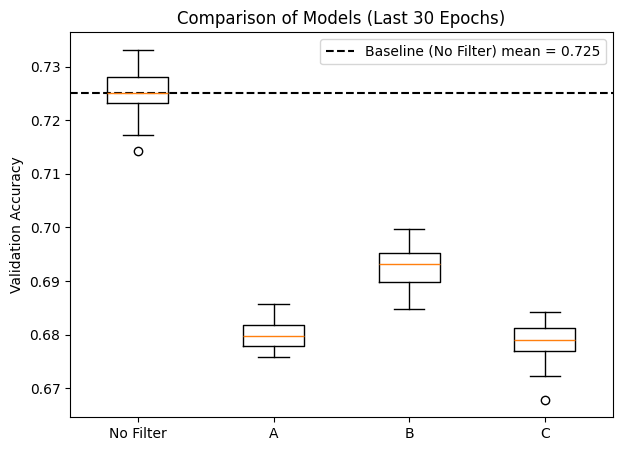

In [8]:
import os, pandas as pd, numpy as np
import matplotlib.pyplot as plt

run_dir = os.path.join(os.getcwd(), "results_final_DermaMNIST", "run")

def last30_val_acc(csv_name):
    path = os.path.join(run_dir, csv_name)
    df = pd.read_csv(path)
    return df["val_accuracy"].tail(30).astype(float).to_list()

# 4 models ke last-30 val_accuracy
vals_nf = last30_val_acc("NO-FILTER.csv")
vals_A  = last30_val_acc("A.csv")
vals_B  = last30_val_acc("B.csv")
vals_C  = last30_val_acc("C.csv")

data   = [vals_nf, vals_A, vals_B, vals_C]
labels = ["No Filter", "A", "B", "C"]

plt.figure(figsize=(7,5))
plt.boxplot(data, labels=labels)

# 🔹 dashed baseline line 
baseline = np.mean(vals_nf)
plt.axhline(baseline, color="k", linestyle="--",
            label=f"Baseline (No Filter) mean = {baseline:.3f}")

plt.ylabel("Validation Accuracy")
plt.title("Comparison of Models (Last 30 Epochs)")
plt.legend()
plt.show()


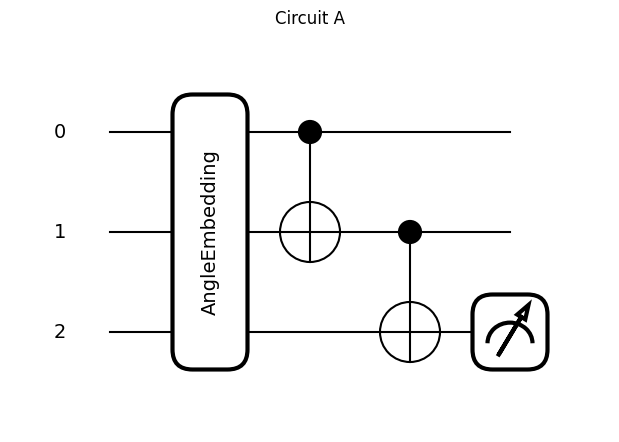

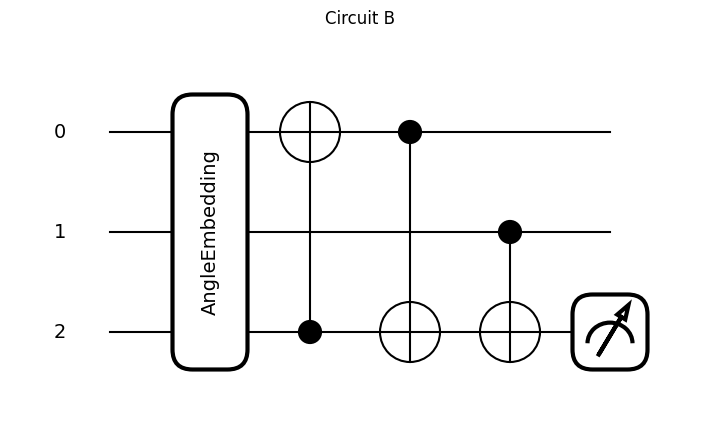

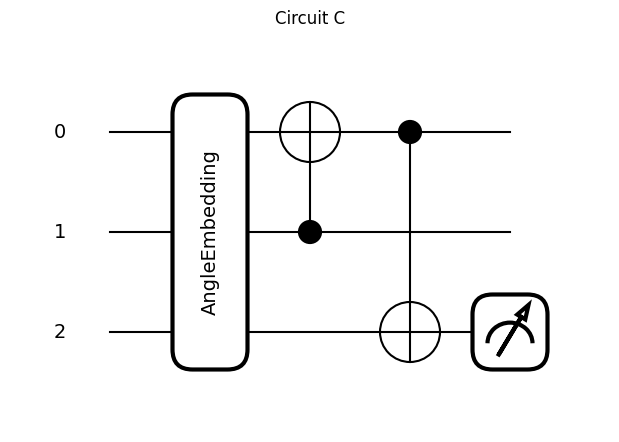

In [9]:
import pennylane as qml
import numpy as np
import matplotlib.pyplot as plt

# device for drawing
dev_draw = qml.device("default.qubit", wires=3)

# ---- Circuit A ----
@qml.qnode(dev_draw)
def circuit_A_draw(x3):
    x3 = x3 * np.pi
    qml.AngleEmbedding(x3, wires=[0, 1, 2], rotation="Y")
    qml.CNOT(wires=[0, 1])
    qml.CNOT(wires=[1, 2])
    return qml.expval(qml.PauliZ(2))


# ---- Circuit B  ----
@qml.qnode(dev_draw)
def circuit_B_draw(x3):
    x3 = x3 * np.pi
    qml.AngleEmbedding(x3, wires=[0, 1, 2], rotation="Y")
    qml.CNOT(wires=[2, 0])   # 2 → 0
    qml.CNOT(wires=[0, 2])   # 0 → 2
    qml.CNOT(wires=[1, 2])   # 1 → 2
    return qml.expval(qml.PauliZ(2))


# ---- Circuit C ----
@qml.qnode(dev_draw)
def circuit_C_draw(x3):
    x3 = x3 * np.pi
    qml.AngleEmbedding(x3, wires=[0, 1, 2], rotation="Y")
    qml.CNOT(wires=[1, 0])
    qml.CNOT(wires=[0, 2])
    return qml.expval(qml.PauliZ(2))


# Example input
inputs_array = np.array([0.6954, 0.3843, 0.4288], dtype=float)

# Draw all circuits
for name, circ in [("A", circuit_A_draw),
                   ("B", circuit_B_draw),
                   ("C", circuit_C_draw)]:
    fig, ax = qml.draw_mpl(circ)(inputs_array)
    plt.title(f"Circuit {name}")
    plt.show()


In [10]:
import numpy as np
import pandas as pd
import pennylane as qml
import tensorflow as tf
import time, os

def process_qpf_images(
    images_01, 
    out_dir,
    circuit_type,
    round_decimals=4,
    batch_size=1000
):
    if images_01.ndim != 4 or images_01.shape[-1] != 3:
        raise ValueError(f"Expected (N,H,W,3), got {images_01.shape}")
    N, H, W, C = images_01.shape
    images_01 = images_01.astype(np.float32)

    dev = qml.device("default.qubit.tf", wires=3)

    @qml.qnode(dev, interface="tf", diff_method=None)
    @tf.autograph.experimental.do_not_convert
    def circuit_A(x3):
        x3 = x3 * np.pi
        qml.AngleEmbedding(x3, wires=[0,1,2], rotation="Y")
        qml.CNOT(wires=[0,1])
        qml.CNOT(wires=[1,2])
        return qml.expval(qml.PauliZ(2))

    @qml.qnode(dev, interface="tf", diff_method=None)
    @tf.autograph.experimental.do_not_convert
    def circuit_B(x3):
        x3 = x3 * np.pi
        qml.AngleEmbedding(x3, wires=[0,1,2], rotation="Y")
        qml.CNOT(wires=[2,0])
        qml.CNOT(wires=[0,2])
        qml.CNOT(wires=[1,2])
        return qml.expval(qml.PauliZ(2))

    @qml.qnode(dev, interface="tf", diff_method=None)
    @tf.autograph.experimental.do_not_convert
    def circuit_C(x3):
        x3 = x3 * np.pi
        qml.AngleEmbedding(x3, wires=[0,1,2], rotation="Y")
        qml.CNOT(wires=[1,0])
        qml.CNOT(wires=[0,2])
        return qml.expval(qml.PauliZ(2))

    if circuit_type == "A":
        circ = circuit_A
    elif circuit_type == "B":
        circ = circuit_B
    elif circuit_type == "C":
        circ = circuit_C
    else:
        raise ValueError("circuit_type must be A/B/C")

    @tf.function
    def process_batch(b):
        return tf.vectorized_map(circ, b)

    flat = images_01.reshape(-1, C)
    rounded = np.round(flat, round_decimals)
    uniq, inv = np.unique(rounded, axis=0, return_inverse=True)

    outs = []
    for i in range(0, len(uniq), batch_size):
        batch = tf.convert_to_tensor(uniq[i:i+batch_size], dtype=tf.float32)
        outs.append(process_batch(batch).numpy())
    uniq_vals = np.concatenate(outs, axis=0).astype(np.float32)

    all_flat = uniq_vals[inv]
    arr = all_flat.reshape(N, H, W)

    os.makedirs(out_dir, exist_ok=True)
    csv_path = os.path.join(out_dir, "single_measurement.csv")
    pd.DataFrame({"val_accuracy": all_flat}).to_csv(csv_path, index=False)

    print(f"[{circuit_type}] saved {csv_path}")
    return arr, csv_path


In [11]:
results_root = "results_final_DermaMNIST"

# A
arr_A_train, _ = process_qpf_images(scaled_train_images, results_root+"/A_train", circuit_type="A")
arr_A_test,  _ = process_qpf_images(scaled_test_images,  results_root+"/A_test",  circuit_type="A")

# B
arr_B_train, _ = process_qpf_images(scaled_train_images, results_root+"/B_train", circuit_type="B")
arr_B_test,  _ = process_qpf_images(scaled_test_images,  results_root+"/B_test",  circuit_type="B")

# C
arr_C_train, _ = process_qpf_images(scaled_train_images, results_root+"/C_train", circuit_type="C")
arr_C_test,  _ = process_qpf_images(scaled_test_images,  results_root+"/C_test",  circuit_type="C")


[A] saved results_final_DermaMNIST/A_train/single_measurement.csv


[A] saved results_final_DermaMNIST/A_test/single_measurement.csv


[B] saved results_final_DermaMNIST/B_train/single_measurement.csv


[B] saved results_final_DermaMNIST/B_test/single_measurement.csv


[C] saved results_final_DermaMNIST/C_train/single_measurement.csv


[C] saved results_final_DermaMNIST/C_test/single_measurement.csv


In [12]:
from tensorflow.keras import models, layers
from keras.callbacks import CSVLogger
import os
import numpy as np

def run_cnn(tr_images, tr_labels, te_images, te_labels, label, out_root):
    """
    tr_images, te_images : 4D tensors (N,H,W,C)
    tr_labels, te_labels : labels
    label                : 'NO-FILTER', 'A', 'B', 'C', ...
    out_root             : root folder to save logs
    """
    # ensure float32
    tr_images = tr_images.astype('float32')
    te_images = te_images.astype('float32')

    input_shape = tr_images.shape[1:]
    num_classes = int(np.max(tr_labels)) + 1

    # log folder
    log_dir = os.path.join(out_root, "run")
    os.makedirs(log_dir, exist_ok=True)
    log_file = os.path.join(log_dir, f"{label}.csv")

    csv_logger = CSVLogger(log_file)

    # simple CNN
    model = models.Sequential([
        layers.Conv2D(32, (3,3), activation='relu', input_shape=input_shape),
        layers.MaxPooling2D((2,2)),

        layers.Conv2D(64, (3,3), activation='relu'),
        layers.MaxPooling2D((2,2)),

        layers.Flatten(),
        layers.Dense(128, activation='relu'),
        layers.Dropout(0.5),

        layers.Dense(num_classes, activation='softmax')
    ])

    model.compile(
        optimizer='adam',
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )

    history = model.fit(
        tr_images, tr_labels,
        validation_data=(te_images, te_labels),
        batch_size=128,
        epochs=5000,      # 
        verbose=2,
        callbacks=[csv_logger]
    )

    print(f"[{label}] training finished. Log saved at: {log_file}")
    return model, history, log_file


In [13]:
results_root = "results_final_DermaMNIST"   

print("=== Training NO-FILTER baseline (5000 epochs) ===")

tr_rgb = scaled_train_images.astype('float32')  # (7007,64,64,3)
te_rgb = scaled_test_images.astype('float32')   # (2005,64,64,3)

model_nf, history_nf, log_nf = run_cnn(
    tr_rgb, tr_labels,
    te_rgb, te_labels,
    label="NO-FILTER",
    out_root=results_root
)


=== Training NO-FILTER baseline (5000 epochs) ===


Epoch 1/5000


/home/aasmai/miniconda3/envs/qml_env/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


55/55 - 2s - 31ms/step - accuracy: 0.6494 - loss: 1.2258 - val_accuracy: 0.6688 - val_loss: 1.0016


Epoch 2/5000


55/55 - 1s - 20ms/step - accuracy: 0.6688 - loss: 0.9900 - val_accuracy: 0.6688 - val_loss: 0.9136


Epoch 3/5000


55/55 - 1s - 20ms/step - accuracy: 0.6712 - loss: 0.9392 - val_accuracy: 0.6703 - val_loss: 0.8726


Epoch 4/5000


55/55 - 1s - 20ms/step - accuracy: 0.6763 - loss: 0.8990 - val_accuracy: 0.6853 - val_loss: 0.8400


Epoch 5/5000


55/55 - 1s - 20ms/step - accuracy: 0.6770 - loss: 0.8665 - val_accuracy: 0.6798 - val_loss: 0.8080


Epoch 6/5000


55/55 - 1s - 20ms/step - accuracy: 0.6852 - loss: 0.8402 - val_accuracy: 0.6903 - val_loss: 0.8033


Epoch 7/5000


55/55 - 1s - 20ms/step - accuracy: 0.6972 - loss: 0.8310 - val_accuracy: 0.7087 - val_loss: 0.7708


Epoch 8/5000


55/55 - 1s - 20ms/step - accuracy: 0.7029 - loss: 0.8087 - val_accuracy: 0.7042 - val_loss: 0.7674


Epoch 9/5000


55/55 - 1s - 19ms/step - accuracy: 0.7137 - loss: 0.7799 - val_accuracy: 0.7192 - val_loss: 0.7533


Epoch 10/5000


55/55 - 1s - 20ms/step - accuracy: 0.7116 - loss: 0.7711 - val_accuracy: 0.6983 - val_loss: 0.7461


Epoch 11/5000


55/55 - 1s - 20ms/step - accuracy: 0.7228 - loss: 0.7466 - val_accuracy: 0.7282 - val_loss: 0.7183


Epoch 12/5000


55/55 - 1s - 20ms/step - accuracy: 0.7253 - loss: 0.7369 - val_accuracy: 0.7272 - val_loss: 0.7130


Epoch 13/5000


55/55 - 1s - 20ms/step - accuracy: 0.7200 - loss: 0.7400 - val_accuracy: 0.7307 - val_loss: 0.7142


Epoch 14/5000


55/55 - 1s - 20ms/step - accuracy: 0.7276 - loss: 0.7071 - val_accuracy: 0.7257 - val_loss: 0.7210


Epoch 15/5000


55/55 - 1s - 20ms/step - accuracy: 0.7257 - loss: 0.7385 - val_accuracy: 0.7217 - val_loss: 0.7445


Epoch 16/5000


55/55 - 1s - 20ms/step - accuracy: 0.7373 - loss: 0.7004 - val_accuracy: 0.7277 - val_loss: 0.6946


Epoch 17/5000


55/55 - 1s - 20ms/step - accuracy: 0.7437 - loss: 0.6772 - val_accuracy: 0.7332 - val_loss: 0.7020


Epoch 18/5000


55/55 - 1s - 20ms/step - accuracy: 0.7430 - loss: 0.6747 - val_accuracy: 0.7401 - val_loss: 0.6872


Epoch 19/5000


55/55 - 1s - 20ms/step - accuracy: 0.7445 - loss: 0.6784 - val_accuracy: 0.7411 - val_loss: 0.6906


Epoch 20/5000


55/55 - 1s - 20ms/step - accuracy: 0.7541 - loss: 0.6575 - val_accuracy: 0.7332 - val_loss: 0.7038


Epoch 21/5000


55/55 - 1s - 20ms/step - accuracy: 0.7550 - loss: 0.6459 - val_accuracy: 0.7451 - val_loss: 0.6820


Epoch 22/5000


55/55 - 1s - 20ms/step - accuracy: 0.7558 - loss: 0.6359 - val_accuracy: 0.7397 - val_loss: 0.6795


Epoch 23/5000


55/55 - 1s - 20ms/step - accuracy: 0.7598 - loss: 0.6326 - val_accuracy: 0.7411 - val_loss: 0.6876


Epoch 24/5000


55/55 - 1s - 20ms/step - accuracy: 0.7607 - loss: 0.6335 - val_accuracy: 0.7367 - val_loss: 0.6848


Epoch 25/5000


55/55 - 1s - 20ms/step - accuracy: 0.7608 - loss: 0.6190 - val_accuracy: 0.7456 - val_loss: 0.6903


Epoch 26/5000


55/55 - 1s - 20ms/step - accuracy: 0.7729 - loss: 0.6060 - val_accuracy: 0.7197 - val_loss: 0.7526


Epoch 27/5000


55/55 - 1s - 20ms/step - accuracy: 0.7647 - loss: 0.6029 - val_accuracy: 0.7511 - val_loss: 0.6614


Epoch 28/5000


55/55 - 1s - 20ms/step - accuracy: 0.7751 - loss: 0.5852 - val_accuracy: 0.7486 - val_loss: 0.6882


Epoch 29/5000


55/55 - 1s - 20ms/step - accuracy: 0.7878 - loss: 0.5734 - val_accuracy: 0.7401 - val_loss: 0.6871


Epoch 30/5000


55/55 - 1s - 20ms/step - accuracy: 0.7865 - loss: 0.5553 - val_accuracy: 0.7491 - val_loss: 0.6819


Epoch 31/5000


55/55 - 1s - 20ms/step - accuracy: 0.7946 - loss: 0.5479 - val_accuracy: 0.7491 - val_loss: 0.7002


Epoch 32/5000


55/55 - 1s - 20ms/step - accuracy: 0.7918 - loss: 0.5413 - val_accuracy: 0.7576 - val_loss: 0.6891


Epoch 33/5000


55/55 - 1s - 20ms/step - accuracy: 0.7909 - loss: 0.5360 - val_accuracy: 0.7357 - val_loss: 0.7140


Epoch 34/5000


55/55 - 1s - 20ms/step - accuracy: 0.7985 - loss: 0.5243 - val_accuracy: 0.7546 - val_loss: 0.6745


Epoch 35/5000


55/55 - 1s - 20ms/step - accuracy: 0.8085 - loss: 0.5022 - val_accuracy: 0.7406 - val_loss: 0.7056


Epoch 36/5000


55/55 - 1s - 20ms/step - accuracy: 0.8132 - loss: 0.4936 - val_accuracy: 0.7506 - val_loss: 0.6800


Epoch 37/5000


55/55 - 1s - 20ms/step - accuracy: 0.8120 - loss: 0.4846 - val_accuracy: 0.7566 - val_loss: 0.7063


Epoch 38/5000


55/55 - 1s - 20ms/step - accuracy: 0.8149 - loss: 0.4808 - val_accuracy: 0.7501 - val_loss: 0.6896


Epoch 39/5000


55/55 - 1s - 20ms/step - accuracy: 0.8195 - loss: 0.4779 - val_accuracy: 0.7476 - val_loss: 0.7208


Epoch 40/5000


55/55 - 1s - 20ms/step - accuracy: 0.8272 - loss: 0.4465 - val_accuracy: 0.7511 - val_loss: 0.7016


Epoch 41/5000


55/55 - 1s - 20ms/step - accuracy: 0.8323 - loss: 0.4385 - val_accuracy: 0.7496 - val_loss: 0.7477


Epoch 42/5000


55/55 - 1s - 20ms/step - accuracy: 0.8360 - loss: 0.4177 - val_accuracy: 0.7556 - val_loss: 0.7096


Epoch 43/5000


55/55 - 1s - 20ms/step - accuracy: 0.8359 - loss: 0.4233 - val_accuracy: 0.7476 - val_loss: 0.7389


Epoch 44/5000


55/55 - 1s - 20ms/step - accuracy: 0.8394 - loss: 0.4075 - val_accuracy: 0.7536 - val_loss: 0.7771


Epoch 45/5000


55/55 - 1s - 20ms/step - accuracy: 0.8440 - loss: 0.4011 - val_accuracy: 0.7471 - val_loss: 0.8017


Epoch 46/5000


55/55 - 1s - 20ms/step - accuracy: 0.8409 - loss: 0.3982 - val_accuracy: 0.7421 - val_loss: 0.7538


Epoch 47/5000


55/55 - 1s - 20ms/step - accuracy: 0.8550 - loss: 0.3785 - val_accuracy: 0.7566 - val_loss: 0.7868


Epoch 48/5000


55/55 - 1s - 20ms/step - accuracy: 0.8597 - loss: 0.3684 - val_accuracy: 0.7576 - val_loss: 0.7531


Epoch 49/5000


55/55 - 1s - 20ms/step - accuracy: 0.8589 - loss: 0.3632 - val_accuracy: 0.7521 - val_loss: 0.8077


Epoch 50/5000


55/55 - 1s - 20ms/step - accuracy: 0.8647 - loss: 0.3464 - val_accuracy: 0.7372 - val_loss: 0.8532


Epoch 51/5000


55/55 - 1s - 20ms/step - accuracy: 0.8613 - loss: 0.3445 - val_accuracy: 0.7501 - val_loss: 0.8249


Epoch 52/5000


55/55 - 1s - 20ms/step - accuracy: 0.8724 - loss: 0.3238 - val_accuracy: 0.7516 - val_loss: 0.8448


Epoch 53/5000


55/55 - 1s - 20ms/step - accuracy: 0.8748 - loss: 0.3161 - val_accuracy: 0.7511 - val_loss: 0.8393


Epoch 54/5000


55/55 - 1s - 20ms/step - accuracy: 0.8771 - loss: 0.3046 - val_accuracy: 0.7566 - val_loss: 0.8414


Epoch 55/5000


55/55 - 1s - 19ms/step - accuracy: 0.8820 - loss: 0.3044 - val_accuracy: 0.7511 - val_loss: 0.8849


Epoch 56/5000


55/55 - 1s - 20ms/step - accuracy: 0.8858 - loss: 0.2906 - val_accuracy: 0.7431 - val_loss: 0.8652


Epoch 57/5000


55/55 - 1s - 20ms/step - accuracy: 0.8885 - loss: 0.2861 - val_accuracy: 0.7526 - val_loss: 0.8855


Epoch 58/5000


55/55 - 1s - 19ms/step - accuracy: 0.8828 - loss: 0.2989 - val_accuracy: 0.7561 - val_loss: 0.9238


Epoch 59/5000


55/55 - 1s - 20ms/step - accuracy: 0.8928 - loss: 0.2784 - val_accuracy: 0.7397 - val_loss: 0.9187


Epoch 60/5000


55/55 - 1s - 20ms/step - accuracy: 0.8913 - loss: 0.2789 - val_accuracy: 0.7551 - val_loss: 0.9286


Epoch 61/5000


55/55 - 1s - 20ms/step - accuracy: 0.8937 - loss: 0.2654 - val_accuracy: 0.7541 - val_loss: 0.9819


Epoch 62/5000


55/55 - 1s - 20ms/step - accuracy: 0.8927 - loss: 0.2682 - val_accuracy: 0.7501 - val_loss: 0.9045


Epoch 63/5000


55/55 - 1s - 20ms/step - accuracy: 0.9035 - loss: 0.2447 - val_accuracy: 0.7501 - val_loss: 0.9576


Epoch 64/5000


55/55 - 1s - 20ms/step - accuracy: 0.9011 - loss: 0.2467 - val_accuracy: 0.7367 - val_loss: 1.0569


Epoch 65/5000


55/55 - 1s - 20ms/step - accuracy: 0.9000 - loss: 0.2433 - val_accuracy: 0.7481 - val_loss: 1.0116


Epoch 66/5000


55/55 - 1s - 20ms/step - accuracy: 0.9011 - loss: 0.2469 - val_accuracy: 0.7501 - val_loss: 0.9289


Epoch 67/5000


55/55 - 1s - 20ms/step - accuracy: 0.9148 - loss: 0.2248 - val_accuracy: 0.7591 - val_loss: 1.0558


Epoch 68/5000


55/55 - 1s - 20ms/step - accuracy: 0.9122 - loss: 0.2212 - val_accuracy: 0.7551 - val_loss: 0.9909


Epoch 69/5000


55/55 - 1s - 20ms/step - accuracy: 0.9191 - loss: 0.2112 - val_accuracy: 0.7511 - val_loss: 1.0158


Epoch 70/5000


55/55 - 1s - 20ms/step - accuracy: 0.9162 - loss: 0.2204 - val_accuracy: 0.7516 - val_loss: 1.1008


Epoch 71/5000


55/55 - 1s - 20ms/step - accuracy: 0.9221 - loss: 0.2042 - val_accuracy: 0.7496 - val_loss: 1.1049


Epoch 72/5000


55/55 - 1s - 19ms/step - accuracy: 0.9239 - loss: 0.1920 - val_accuracy: 0.7536 - val_loss: 1.1089


Epoch 73/5000


55/55 - 1s - 20ms/step - accuracy: 0.9244 - loss: 0.1936 - val_accuracy: 0.7526 - val_loss: 1.1515


Epoch 74/5000


55/55 - 1s - 20ms/step - accuracy: 0.9322 - loss: 0.1802 - val_accuracy: 0.7531 - val_loss: 1.1940


Epoch 75/5000


55/55 - 1s - 20ms/step - accuracy: 0.9302 - loss: 0.1771 - val_accuracy: 0.7541 - val_loss: 1.1762


Epoch 76/5000


55/55 - 1s - 20ms/step - accuracy: 0.9282 - loss: 0.1802 - val_accuracy: 0.7596 - val_loss: 1.1941


Epoch 77/5000


55/55 - 1s - 20ms/step - accuracy: 0.9262 - loss: 0.1814 - val_accuracy: 0.7611 - val_loss: 1.2852


Epoch 78/5000


55/55 - 1s - 20ms/step - accuracy: 0.9326 - loss: 0.1677 - val_accuracy: 0.7626 - val_loss: 1.2654


Epoch 79/5000


55/55 - 1s - 20ms/step - accuracy: 0.9349 - loss: 0.1671 - val_accuracy: 0.7486 - val_loss: 1.2092


Epoch 80/5000


55/55 - 1s - 20ms/step - accuracy: 0.9199 - loss: 0.2017 - val_accuracy: 0.7471 - val_loss: 1.2650


Epoch 81/5000


55/55 - 1s - 19ms/step - accuracy: 0.9388 - loss: 0.1588 - val_accuracy: 0.7511 - val_loss: 1.2981


Epoch 82/5000


55/55 - 1s - 20ms/step - accuracy: 0.9335 - loss: 0.1629 - val_accuracy: 0.7511 - val_loss: 1.2238


Epoch 83/5000


55/55 - 1s - 20ms/step - accuracy: 0.9315 - loss: 0.1651 - val_accuracy: 0.7566 - val_loss: 1.2522


Epoch 84/5000


55/55 - 1s - 20ms/step - accuracy: 0.9419 - loss: 0.1554 - val_accuracy: 0.7521 - val_loss: 1.4038


Epoch 85/5000


55/55 - 1s - 20ms/step - accuracy: 0.9412 - loss: 0.1552 - val_accuracy: 0.7566 - val_loss: 1.3460


Epoch 86/5000


55/55 - 1s - 20ms/step - accuracy: 0.9421 - loss: 0.1463 - val_accuracy: 0.7506 - val_loss: 1.3301


Epoch 87/5000


55/55 - 1s - 20ms/step - accuracy: 0.9431 - loss: 0.1466 - val_accuracy: 0.7451 - val_loss: 1.4717


Epoch 88/5000


55/55 - 1s - 20ms/step - accuracy: 0.9473 - loss: 0.1359 - val_accuracy: 0.7456 - val_loss: 1.3871


Epoch 89/5000


55/55 - 1s - 20ms/step - accuracy: 0.9419 - loss: 0.1488 - val_accuracy: 0.7516 - val_loss: 1.3523


Epoch 90/5000


55/55 - 1s - 20ms/step - accuracy: 0.9468 - loss: 0.1383 - val_accuracy: 0.7511 - val_loss: 1.3579


Epoch 91/5000


55/55 - 1s - 20ms/step - accuracy: 0.9452 - loss: 0.1452 - val_accuracy: 0.7516 - val_loss: 1.4883


Epoch 92/5000


55/55 - 1s - 20ms/step - accuracy: 0.9516 - loss: 0.1329 - val_accuracy: 0.7531 - val_loss: 1.4830


Epoch 93/5000


55/55 - 1s - 20ms/step - accuracy: 0.9538 - loss: 0.1230 - val_accuracy: 0.7476 - val_loss: 1.4600


Epoch 94/5000


55/55 - 1s - 20ms/step - accuracy: 0.9553 - loss: 0.1202 - val_accuracy: 0.7496 - val_loss: 1.5619


Epoch 95/5000


55/55 - 1s - 20ms/step - accuracy: 0.9526 - loss: 0.1269 - val_accuracy: 0.7471 - val_loss: 1.6813


Epoch 96/5000


55/55 - 1s - 20ms/step - accuracy: 0.9539 - loss: 0.1198 - val_accuracy: 0.7526 - val_loss: 1.5166


Epoch 97/5000


55/55 - 1s - 20ms/step - accuracy: 0.9556 - loss: 0.1167 - val_accuracy: 0.7516 - val_loss: 1.6257


Epoch 98/5000


55/55 - 1s - 20ms/step - accuracy: 0.9532 - loss: 0.1253 - val_accuracy: 0.7596 - val_loss: 1.6097


Epoch 99/5000


55/55 - 1s - 20ms/step - accuracy: 0.9525 - loss: 0.1207 - val_accuracy: 0.7471 - val_loss: 1.7222


Epoch 100/5000


55/55 - 1s - 20ms/step - accuracy: 0.9489 - loss: 0.1308 - val_accuracy: 0.7456 - val_loss: 1.5518


Epoch 101/5000


55/55 - 1s - 20ms/step - accuracy: 0.9502 - loss: 0.1292 - val_accuracy: 0.7511 - val_loss: 1.6489


Epoch 102/5000


55/55 - 1s - 20ms/step - accuracy: 0.9536 - loss: 0.1280 - val_accuracy: 0.7566 - val_loss: 1.5681


Epoch 103/5000


55/55 - 1s - 20ms/step - accuracy: 0.9523 - loss: 0.1192 - val_accuracy: 0.7561 - val_loss: 1.7677


Epoch 104/5000


55/55 - 1s - 20ms/step - accuracy: 0.9566 - loss: 0.1155 - val_accuracy: 0.7526 - val_loss: 1.5347


Epoch 105/5000


55/55 - 1s - 20ms/step - accuracy: 0.9573 - loss: 0.1121 - val_accuracy: 0.7536 - val_loss: 1.6249


Epoch 106/5000


55/55 - 1s - 20ms/step - accuracy: 0.9599 - loss: 0.1051 - val_accuracy: 0.7586 - val_loss: 1.6727


Epoch 107/5000


55/55 - 1s - 20ms/step - accuracy: 0.9566 - loss: 0.1096 - val_accuracy: 0.7581 - val_loss: 1.7323


Epoch 108/5000


55/55 - 1s - 20ms/step - accuracy: 0.9589 - loss: 0.1082 - val_accuracy: 0.7576 - val_loss: 1.7833


Epoch 109/5000


55/55 - 1s - 20ms/step - accuracy: 0.9592 - loss: 0.1089 - val_accuracy: 0.7596 - val_loss: 1.6586


Epoch 110/5000


55/55 - 1s - 20ms/step - accuracy: 0.9632 - loss: 0.1026 - val_accuracy: 0.7566 - val_loss: 1.7691


Epoch 111/5000


55/55 - 1s - 20ms/step - accuracy: 0.9612 - loss: 0.1092 - val_accuracy: 0.7526 - val_loss: 1.7981


Epoch 112/5000


55/55 - 1s - 20ms/step - accuracy: 0.9657 - loss: 0.0957 - val_accuracy: 0.7546 - val_loss: 1.7195


Epoch 113/5000


55/55 - 1s - 20ms/step - accuracy: 0.9636 - loss: 0.1015 - val_accuracy: 0.7451 - val_loss: 1.8399


Epoch 114/5000


55/55 - 1s - 20ms/step - accuracy: 0.9598 - loss: 0.1064 - val_accuracy: 0.7566 - val_loss: 1.7351


Epoch 115/5000


55/55 - 1s - 20ms/step - accuracy: 0.9625 - loss: 0.0952 - val_accuracy: 0.7546 - val_loss: 1.9230


Epoch 116/5000


55/55 - 1s - 20ms/step - accuracy: 0.9589 - loss: 0.1020 - val_accuracy: 0.7541 - val_loss: 1.7891


Epoch 117/5000


55/55 - 1s - 20ms/step - accuracy: 0.9636 - loss: 0.0995 - val_accuracy: 0.7466 - val_loss: 1.9489


Epoch 118/5000


55/55 - 1s - 20ms/step - accuracy: 0.9616 - loss: 0.1058 - val_accuracy: 0.7476 - val_loss: 2.0201


Epoch 119/5000


55/55 - 1s - 20ms/step - accuracy: 0.9568 - loss: 0.1153 - val_accuracy: 0.7516 - val_loss: 1.7221


Epoch 120/5000


55/55 - 1s - 20ms/step - accuracy: 0.9610 - loss: 0.1036 - val_accuracy: 0.7481 - val_loss: 1.9161


Epoch 121/5000


55/55 - 1s - 20ms/step - accuracy: 0.9710 - loss: 0.0834 - val_accuracy: 0.7536 - val_loss: 2.0812


Epoch 122/5000


55/55 - 1s - 20ms/step - accuracy: 0.9669 - loss: 0.0923 - val_accuracy: 0.7571 - val_loss: 1.9329


Epoch 123/5000


55/55 - 1s - 20ms/step - accuracy: 0.9622 - loss: 0.1029 - val_accuracy: 0.7516 - val_loss: 1.8719


Epoch 124/5000


55/55 - 1s - 20ms/step - accuracy: 0.9655 - loss: 0.0909 - val_accuracy: 0.7526 - val_loss: 1.9719


Epoch 125/5000


55/55 - 1s - 20ms/step - accuracy: 0.9709 - loss: 0.0810 - val_accuracy: 0.7511 - val_loss: 1.9138


Epoch 126/5000


55/55 - 1s - 20ms/step - accuracy: 0.9639 - loss: 0.0954 - val_accuracy: 0.7461 - val_loss: 2.1234


Epoch 127/5000


55/55 - 1s - 20ms/step - accuracy: 0.9572 - loss: 0.1083 - val_accuracy: 0.7461 - val_loss: 1.7495


Epoch 128/5000


55/55 - 1s - 20ms/step - accuracy: 0.9503 - loss: 0.1256 - val_accuracy: 0.7506 - val_loss: 1.9781


Epoch 129/5000


55/55 - 1s - 20ms/step - accuracy: 0.9646 - loss: 0.0917 - val_accuracy: 0.7566 - val_loss: 2.0937


Epoch 130/5000


55/55 - 1s - 20ms/step - accuracy: 0.9659 - loss: 0.0852 - val_accuracy: 0.7516 - val_loss: 1.9266


Epoch 131/5000


55/55 - 1s - 20ms/step - accuracy: 0.9629 - loss: 0.0945 - val_accuracy: 0.7531 - val_loss: 1.9225


Epoch 132/5000


55/55 - 1s - 20ms/step - accuracy: 0.9676 - loss: 0.0876 - val_accuracy: 0.7551 - val_loss: 2.0845


Epoch 133/5000


55/55 - 1s - 19ms/step - accuracy: 0.9646 - loss: 0.0901 - val_accuracy: 0.7566 - val_loss: 2.1771


Epoch 134/5000


55/55 - 1s - 20ms/step - accuracy: 0.9667 - loss: 0.0883 - val_accuracy: 0.7441 - val_loss: 2.0942


Epoch 135/5000


55/55 - 1s - 20ms/step - accuracy: 0.9657 - loss: 0.0915 - val_accuracy: 0.7506 - val_loss: 2.2292


Epoch 136/5000


55/55 - 1s - 20ms/step - accuracy: 0.9692 - loss: 0.0831 - val_accuracy: 0.7451 - val_loss: 2.3076


Epoch 137/5000


55/55 - 1s - 20ms/step - accuracy: 0.9682 - loss: 0.0845 - val_accuracy: 0.7551 - val_loss: 2.2468


Epoch 138/5000


55/55 - 1s - 20ms/step - accuracy: 0.9700 - loss: 0.0833 - val_accuracy: 0.7526 - val_loss: 2.2016


Epoch 139/5000


55/55 - 1s - 20ms/step - accuracy: 0.9615 - loss: 0.0998 - val_accuracy: 0.7551 - val_loss: 2.1618


Epoch 140/5000


55/55 - 1s - 20ms/step - accuracy: 0.9719 - loss: 0.0825 - val_accuracy: 0.7556 - val_loss: 2.1629


Epoch 141/5000


55/55 - 1s - 20ms/step - accuracy: 0.9717 - loss: 0.0760 - val_accuracy: 0.7466 - val_loss: 2.1559


Epoch 142/5000


55/55 - 1s - 20ms/step - accuracy: 0.9703 - loss: 0.0773 - val_accuracy: 0.7461 - val_loss: 2.4140


Epoch 143/5000


55/55 - 1s - 20ms/step - accuracy: 0.9670 - loss: 0.0838 - val_accuracy: 0.7581 - val_loss: 2.3137


Epoch 144/5000


55/55 - 1s - 20ms/step - accuracy: 0.9736 - loss: 0.0703 - val_accuracy: 0.7496 - val_loss: 2.2120


Epoch 145/5000


55/55 - 1s - 19ms/step - accuracy: 0.9762 - loss: 0.0678 - val_accuracy: 0.7516 - val_loss: 2.3026


Epoch 146/5000


55/55 - 1s - 20ms/step - accuracy: 0.9696 - loss: 0.0796 - val_accuracy: 0.7436 - val_loss: 2.1350


Epoch 147/5000


55/55 - 1s - 19ms/step - accuracy: 0.9685 - loss: 0.0864 - val_accuracy: 0.7397 - val_loss: 2.3177


Epoch 148/5000


55/55 - 1s - 20ms/step - accuracy: 0.9692 - loss: 0.0814 - val_accuracy: 0.7566 - val_loss: 2.3407


Epoch 149/5000


55/55 - 1s - 20ms/step - accuracy: 0.9743 - loss: 0.0729 - val_accuracy: 0.7556 - val_loss: 2.1508


Epoch 150/5000


55/55 - 1s - 20ms/step - accuracy: 0.9756 - loss: 0.0677 - val_accuracy: 0.7506 - val_loss: 2.4488


Epoch 151/5000


55/55 - 1s - 20ms/step - accuracy: 0.9773 - loss: 0.0636 - val_accuracy: 0.7461 - val_loss: 2.3686


Epoch 152/5000


55/55 - 1s - 20ms/step - accuracy: 0.9715 - loss: 0.0731 - val_accuracy: 0.7521 - val_loss: 2.3550


Epoch 153/5000


55/55 - 1s - 20ms/step - accuracy: 0.9767 - loss: 0.0628 - val_accuracy: 0.7541 - val_loss: 2.4642


Epoch 154/5000


55/55 - 1s - 20ms/step - accuracy: 0.9786 - loss: 0.0606 - val_accuracy: 0.7411 - val_loss: 2.4704


Epoch 155/5000


55/55 - 1s - 20ms/step - accuracy: 0.9612 - loss: 0.1014 - val_accuracy: 0.7446 - val_loss: 2.4641


Epoch 156/5000


55/55 - 1s - 20ms/step - accuracy: 0.9682 - loss: 0.0823 - val_accuracy: 0.7511 - val_loss: 2.2818


Epoch 157/5000


55/55 - 1s - 20ms/step - accuracy: 0.9690 - loss: 0.0824 - val_accuracy: 0.7581 - val_loss: 2.2038


Epoch 158/5000


55/55 - 1s - 20ms/step - accuracy: 0.9703 - loss: 0.0821 - val_accuracy: 0.7556 - val_loss: 2.3013


Epoch 159/5000


55/55 - 1s - 20ms/step - accuracy: 0.9717 - loss: 0.0789 - val_accuracy: 0.7461 - val_loss: 2.3472


Epoch 160/5000


55/55 - 1s - 20ms/step - accuracy: 0.9673 - loss: 0.0834 - val_accuracy: 0.7516 - val_loss: 2.3602


Epoch 161/5000


55/55 - 1s - 20ms/step - accuracy: 0.9730 - loss: 0.0724 - val_accuracy: 0.7451 - val_loss: 2.3006


Epoch 162/5000


55/55 - 1s - 20ms/step - accuracy: 0.9730 - loss: 0.0728 - val_accuracy: 0.7511 - val_loss: 2.5731


Epoch 163/5000


55/55 - 1s - 19ms/step - accuracy: 0.9773 - loss: 0.0660 - val_accuracy: 0.7541 - val_loss: 2.3845


Epoch 164/5000


55/55 - 1s - 20ms/step - accuracy: 0.9752 - loss: 0.0637 - val_accuracy: 0.7526 - val_loss: 2.4710


Epoch 165/5000


55/55 - 1s - 20ms/step - accuracy: 0.9749 - loss: 0.0702 - val_accuracy: 0.7456 - val_loss: 2.4087


Epoch 166/5000


55/55 - 1s - 20ms/step - accuracy: 0.9745 - loss: 0.0709 - val_accuracy: 0.7456 - val_loss: 2.5223


Epoch 167/5000


55/55 - 1s - 19ms/step - accuracy: 0.9696 - loss: 0.0803 - val_accuracy: 0.7476 - val_loss: 2.4476


Epoch 168/5000


55/55 - 1s - 20ms/step - accuracy: 0.9715 - loss: 0.0765 - val_accuracy: 0.7496 - val_loss: 2.3807


Epoch 169/5000


55/55 - 1s - 20ms/step - accuracy: 0.9730 - loss: 0.0688 - val_accuracy: 0.7496 - val_loss: 2.4665


Epoch 170/5000


55/55 - 1s - 20ms/step - accuracy: 0.9705 - loss: 0.0795 - val_accuracy: 0.7421 - val_loss: 2.5236


Epoch 171/5000


55/55 - 1s - 20ms/step - accuracy: 0.9743 - loss: 0.0701 - val_accuracy: 0.7431 - val_loss: 2.8063


Epoch 172/5000


55/55 - 1s - 20ms/step - accuracy: 0.9686 - loss: 0.0807 - val_accuracy: 0.7506 - val_loss: 2.6560


Epoch 173/5000


55/55 - 1s - 20ms/step - accuracy: 0.9723 - loss: 0.0762 - val_accuracy: 0.7471 - val_loss: 2.4548


Epoch 174/5000


55/55 - 1s - 20ms/step - accuracy: 0.9759 - loss: 0.0620 - val_accuracy: 0.7621 - val_loss: 2.5985


Epoch 175/5000


55/55 - 1s - 20ms/step - accuracy: 0.9753 - loss: 0.0676 - val_accuracy: 0.7506 - val_loss: 2.8096


Epoch 176/5000


55/55 - 1s - 20ms/step - accuracy: 0.9660 - loss: 0.0835 - val_accuracy: 0.7501 - val_loss: 2.5517


Epoch 177/5000


55/55 - 1s - 20ms/step - accuracy: 0.9696 - loss: 0.0767 - val_accuracy: 0.7526 - val_loss: 2.5904


Epoch 178/5000


55/55 - 1s - 20ms/step - accuracy: 0.9733 - loss: 0.0730 - val_accuracy: 0.7426 - val_loss: 2.5129


Epoch 179/5000


55/55 - 1s - 20ms/step - accuracy: 0.9699 - loss: 0.0814 - val_accuracy: 0.7471 - val_loss: 2.5517


Epoch 180/5000


55/55 - 1s - 20ms/step - accuracy: 0.9746 - loss: 0.0656 - val_accuracy: 0.7491 - val_loss: 2.6992


Epoch 181/5000


55/55 - 1s - 20ms/step - accuracy: 0.9775 - loss: 0.0655 - val_accuracy: 0.7466 - val_loss: 2.5888


Epoch 182/5000


55/55 - 1s - 20ms/step - accuracy: 0.9789 - loss: 0.0607 - val_accuracy: 0.7441 - val_loss: 2.6559


Epoch 183/5000


55/55 - 1s - 20ms/step - accuracy: 0.9766 - loss: 0.0582 - val_accuracy: 0.7471 - val_loss: 3.0787


Epoch 184/5000


55/55 - 1s - 20ms/step - accuracy: 0.9756 - loss: 0.0602 - val_accuracy: 0.7501 - val_loss: 2.8011


Epoch 185/5000


55/55 - 1s - 20ms/step - accuracy: 0.9753 - loss: 0.0631 - val_accuracy: 0.7506 - val_loss: 2.7199


Epoch 186/5000


55/55 - 1s - 20ms/step - accuracy: 0.9749 - loss: 0.0708 - val_accuracy: 0.7521 - val_loss: 2.7687


Epoch 187/5000


55/55 - 1s - 20ms/step - accuracy: 0.9747 - loss: 0.0686 - val_accuracy: 0.7461 - val_loss: 2.8507


Epoch 188/5000


55/55 - 1s - 20ms/step - accuracy: 0.9743 - loss: 0.0698 - val_accuracy: 0.7481 - val_loss: 2.5741


Epoch 189/5000


55/55 - 1s - 20ms/step - accuracy: 0.9755 - loss: 0.0636 - val_accuracy: 0.7481 - val_loss: 2.7012


Epoch 190/5000


55/55 - 1s - 20ms/step - accuracy: 0.9770 - loss: 0.0578 - val_accuracy: 0.7421 - val_loss: 2.5514


Epoch 191/5000


55/55 - 1s - 20ms/step - accuracy: 0.9809 - loss: 0.0523 - val_accuracy: 0.7481 - val_loss: 2.9564


Epoch 192/5000


55/55 - 1s - 20ms/step - accuracy: 0.9729 - loss: 0.0755 - val_accuracy: 0.7441 - val_loss: 2.8838


Epoch 193/5000


55/55 - 1s - 20ms/step - accuracy: 0.9712 - loss: 0.0759 - val_accuracy: 0.7536 - val_loss: 2.6151


Epoch 194/5000


55/55 - 1s - 20ms/step - accuracy: 0.9783 - loss: 0.0632 - val_accuracy: 0.7506 - val_loss: 2.8575


Epoch 195/5000


55/55 - 1s - 20ms/step - accuracy: 0.9775 - loss: 0.0588 - val_accuracy: 0.7461 - val_loss: 2.8041


Epoch 196/5000


55/55 - 1s - 20ms/step - accuracy: 0.9804 - loss: 0.0545 - val_accuracy: 0.7556 - val_loss: 2.8584


Epoch 197/5000


55/55 - 1s - 20ms/step - accuracy: 0.9807 - loss: 0.0531 - val_accuracy: 0.7531 - val_loss: 2.8378


Epoch 198/5000


55/55 - 1s - 20ms/step - accuracy: 0.9803 - loss: 0.0518 - val_accuracy: 0.7491 - val_loss: 2.8005


Epoch 199/5000


55/55 - 1s - 20ms/step - accuracy: 0.9809 - loss: 0.0509 - val_accuracy: 0.7496 - val_loss: 2.9555


Epoch 200/5000


55/55 - 1s - 20ms/step - accuracy: 0.9806 - loss: 0.0544 - val_accuracy: 0.7476 - val_loss: 2.8842


Epoch 201/5000


55/55 - 1s - 20ms/step - accuracy: 0.9787 - loss: 0.0565 - val_accuracy: 0.7397 - val_loss: 3.2046


Epoch 202/5000


55/55 - 1s - 19ms/step - accuracy: 0.9713 - loss: 0.0830 - val_accuracy: 0.7551 - val_loss: 2.8202


Epoch 203/5000


55/55 - 1s - 20ms/step - accuracy: 0.9779 - loss: 0.0615 - val_accuracy: 0.7446 - val_loss: 2.9794


Epoch 204/5000


55/55 - 1s - 20ms/step - accuracy: 0.9809 - loss: 0.0593 - val_accuracy: 0.7516 - val_loss: 2.9229


Epoch 205/5000


55/55 - 1s - 20ms/step - accuracy: 0.9787 - loss: 0.0612 - val_accuracy: 0.7521 - val_loss: 3.0551


Epoch 206/5000


55/55 - 1s - 19ms/step - accuracy: 0.9785 - loss: 0.0558 - val_accuracy: 0.7401 - val_loss: 3.0530


Epoch 207/5000


55/55 - 1s - 20ms/step - accuracy: 0.9819 - loss: 0.0489 - val_accuracy: 0.7496 - val_loss: 2.9920


Epoch 208/5000


55/55 - 1s - 20ms/step - accuracy: 0.9836 - loss: 0.0477 - val_accuracy: 0.7546 - val_loss: 3.0205


Epoch 209/5000


55/55 - 1s - 20ms/step - accuracy: 0.9752 - loss: 0.0710 - val_accuracy: 0.7352 - val_loss: 2.7221


Epoch 210/5000


55/55 - 1s - 20ms/step - accuracy: 0.9693 - loss: 0.0830 - val_accuracy: 0.7441 - val_loss: 2.8501


Epoch 211/5000


55/55 - 1s - 20ms/step - accuracy: 0.9739 - loss: 0.0714 - val_accuracy: 0.7506 - val_loss: 2.7952


Epoch 212/5000


55/55 - 1s - 20ms/step - accuracy: 0.9763 - loss: 0.0612 - val_accuracy: 0.7466 - val_loss: 2.8517


Epoch 213/5000


55/55 - 1s - 20ms/step - accuracy: 0.9783 - loss: 0.0527 - val_accuracy: 0.7581 - val_loss: 2.9968


Epoch 214/5000


55/55 - 1s - 20ms/step - accuracy: 0.9762 - loss: 0.0696 - val_accuracy: 0.7491 - val_loss: 2.6795


Epoch 215/5000


55/55 - 1s - 20ms/step - accuracy: 0.9793 - loss: 0.0592 - val_accuracy: 0.7501 - val_loss: 3.0063


Epoch 216/5000


55/55 - 1s - 20ms/step - accuracy: 0.9832 - loss: 0.0472 - val_accuracy: 0.7526 - val_loss: 2.9556


Epoch 217/5000


55/55 - 1s - 20ms/step - accuracy: 0.9742 - loss: 0.0708 - val_accuracy: 0.7511 - val_loss: 2.9452


Epoch 218/5000


55/55 - 1s - 20ms/step - accuracy: 0.9796 - loss: 0.0542 - val_accuracy: 0.7476 - val_loss: 2.9270


Epoch 219/5000


55/55 - 1s - 20ms/step - accuracy: 0.9813 - loss: 0.0483 - val_accuracy: 0.7481 - val_loss: 3.2962


Epoch 220/5000


55/55 - 1s - 20ms/step - accuracy: 0.9794 - loss: 0.0550 - val_accuracy: 0.7551 - val_loss: 3.2166


Epoch 221/5000


55/55 - 1s - 20ms/step - accuracy: 0.9779 - loss: 0.0597 - val_accuracy: 0.7466 - val_loss: 2.7168


Epoch 222/5000


55/55 - 1s - 20ms/step - accuracy: 0.9790 - loss: 0.0545 - val_accuracy: 0.7426 - val_loss: 3.5224


Epoch 223/5000


55/55 - 1s - 20ms/step - accuracy: 0.9816 - loss: 0.0504 - val_accuracy: 0.7481 - val_loss: 3.3038


Epoch 224/5000


55/55 - 1s - 20ms/step - accuracy: 0.9775 - loss: 0.0678 - val_accuracy: 0.7461 - val_loss: 3.3053


Epoch 225/5000


55/55 - 1s - 20ms/step - accuracy: 0.9729 - loss: 0.0674 - val_accuracy: 0.7511 - val_loss: 2.8730


Epoch 226/5000


55/55 - 1s - 20ms/step - accuracy: 0.9806 - loss: 0.0482 - val_accuracy: 0.7501 - val_loss: 3.2032


Epoch 227/5000


55/55 - 1s - 20ms/step - accuracy: 0.9786 - loss: 0.0594 - val_accuracy: 0.7426 - val_loss: 2.6644


Epoch 228/5000


55/55 - 1s - 20ms/step - accuracy: 0.9797 - loss: 0.0583 - val_accuracy: 0.7466 - val_loss: 2.9688


Epoch 229/5000


55/55 - 1s - 20ms/step - accuracy: 0.9747 - loss: 0.0672 - val_accuracy: 0.7461 - val_loss: 2.7179


Epoch 230/5000


55/55 - 1s - 20ms/step - accuracy: 0.9807 - loss: 0.0562 - val_accuracy: 0.7401 - val_loss: 3.1829


Epoch 231/5000


55/55 - 1s - 20ms/step - accuracy: 0.9775 - loss: 0.0568 - val_accuracy: 0.7516 - val_loss: 3.1126


Epoch 232/5000


55/55 - 1s - 20ms/step - accuracy: 0.9770 - loss: 0.0614 - val_accuracy: 0.7461 - val_loss: 3.1793


Epoch 233/5000


55/55 - 1s - 20ms/step - accuracy: 0.9755 - loss: 0.0706 - val_accuracy: 0.7421 - val_loss: 2.9580


Epoch 234/5000


55/55 - 1s - 20ms/step - accuracy: 0.9812 - loss: 0.0534 - val_accuracy: 0.7526 - val_loss: 2.9580


Epoch 235/5000


55/55 - 1s - 20ms/step - accuracy: 0.9836 - loss: 0.0462 - val_accuracy: 0.7511 - val_loss: 3.1563


Epoch 236/5000


55/55 - 1s - 20ms/step - accuracy: 0.9812 - loss: 0.0515 - val_accuracy: 0.7566 - val_loss: 3.1894


Epoch 237/5000


55/55 - 1s - 20ms/step - accuracy: 0.9793 - loss: 0.0525 - val_accuracy: 0.7461 - val_loss: 3.2087


Epoch 238/5000


55/55 - 1s - 19ms/step - accuracy: 0.9800 - loss: 0.0596 - val_accuracy: 0.7511 - val_loss: 3.0766


Epoch 239/5000


55/55 - 1s - 19ms/step - accuracy: 0.9822 - loss: 0.0451 - val_accuracy: 0.7501 - val_loss: 3.5493


Epoch 240/5000


55/55 - 1s - 20ms/step - accuracy: 0.9814 - loss: 0.0516 - val_accuracy: 0.7436 - val_loss: 3.5939


Epoch 241/5000


55/55 - 1s - 20ms/step - accuracy: 0.9780 - loss: 0.0553 - val_accuracy: 0.7411 - val_loss: 3.2252


Epoch 242/5000


55/55 - 1s - 20ms/step - accuracy: 0.9827 - loss: 0.0497 - val_accuracy: 0.7486 - val_loss: 3.3302


Epoch 243/5000


55/55 - 1s - 20ms/step - accuracy: 0.9779 - loss: 0.0610 - val_accuracy: 0.7496 - val_loss: 3.0961


Epoch 244/5000


55/55 - 1s - 20ms/step - accuracy: 0.9843 - loss: 0.0424 - val_accuracy: 0.7566 - val_loss: 3.0697


Epoch 245/5000


55/55 - 1s - 20ms/step - accuracy: 0.9840 - loss: 0.0443 - val_accuracy: 0.7496 - val_loss: 3.2765


Epoch 246/5000


55/55 - 1s - 20ms/step - accuracy: 0.9813 - loss: 0.0524 - val_accuracy: 0.7461 - val_loss: 3.3793


Epoch 247/5000


55/55 - 1s - 20ms/step - accuracy: 0.9827 - loss: 0.0467 - val_accuracy: 0.7451 - val_loss: 3.3128


Epoch 248/5000


55/55 - 1s - 20ms/step - accuracy: 0.9837 - loss: 0.0471 - val_accuracy: 0.7481 - val_loss: 3.6886


Epoch 249/5000


55/55 - 1s - 20ms/step - accuracy: 0.9853 - loss: 0.0429 - val_accuracy: 0.7561 - val_loss: 3.0930


Epoch 250/5000


55/55 - 1s - 20ms/step - accuracy: 0.9790 - loss: 0.0614 - val_accuracy: 0.7481 - val_loss: 3.1660


Epoch 251/5000


55/55 - 1s - 20ms/step - accuracy: 0.9783 - loss: 0.0626 - val_accuracy: 0.7501 - val_loss: 3.1437


Epoch 252/5000


55/55 - 1s - 20ms/step - accuracy: 0.9817 - loss: 0.0510 - val_accuracy: 0.7501 - val_loss: 3.1314


Epoch 253/5000


55/55 - 1s - 20ms/step - accuracy: 0.9823 - loss: 0.0528 - val_accuracy: 0.7431 - val_loss: 3.2454


Epoch 254/5000


55/55 - 1s - 20ms/step - accuracy: 0.9829 - loss: 0.0490 - val_accuracy: 0.7491 - val_loss: 3.0902


Epoch 255/5000


55/55 - 1s - 20ms/step - accuracy: 0.9847 - loss: 0.0437 - val_accuracy: 0.7491 - val_loss: 3.4158


Epoch 256/5000


55/55 - 1s - 20ms/step - accuracy: 0.9853 - loss: 0.0455 - val_accuracy: 0.7436 - val_loss: 3.6341


Epoch 257/5000


55/55 - 1s - 20ms/step - accuracy: 0.9824 - loss: 0.0463 - val_accuracy: 0.7421 - val_loss: 3.5161


Epoch 258/5000


55/55 - 1s - 19ms/step - accuracy: 0.9816 - loss: 0.0490 - val_accuracy: 0.7377 - val_loss: 3.4290


Epoch 259/5000


55/55 - 1s - 19ms/step - accuracy: 0.9826 - loss: 0.0490 - val_accuracy: 0.7526 - val_loss: 3.5875


Epoch 260/5000


55/55 - 1s - 20ms/step - accuracy: 0.9817 - loss: 0.0496 - val_accuracy: 0.7471 - val_loss: 3.4863


Epoch 261/5000


55/55 - 1s - 20ms/step - accuracy: 0.9837 - loss: 0.0425 - val_accuracy: 0.7441 - val_loss: 3.3180


Epoch 262/5000


55/55 - 1s - 20ms/step - accuracy: 0.9797 - loss: 0.0489 - val_accuracy: 0.7496 - val_loss: 3.1128


Epoch 263/5000


55/55 - 1s - 20ms/step - accuracy: 0.9803 - loss: 0.0514 - val_accuracy: 0.7456 - val_loss: 3.3365


Epoch 264/5000


55/55 - 1s - 20ms/step - accuracy: 0.9829 - loss: 0.0484 - val_accuracy: 0.7541 - val_loss: 3.4137


Epoch 265/5000


55/55 - 1s - 20ms/step - accuracy: 0.9833 - loss: 0.0454 - val_accuracy: 0.7516 - val_loss: 3.6320


Epoch 266/5000


55/55 - 1s - 20ms/step - accuracy: 0.9860 - loss: 0.0413 - val_accuracy: 0.7581 - val_loss: 3.4965


Epoch 267/5000


55/55 - 1s - 20ms/step - accuracy: 0.9839 - loss: 0.0416 - val_accuracy: 0.7511 - val_loss: 3.5187


Epoch 268/5000


55/55 - 1s - 20ms/step - accuracy: 0.9837 - loss: 0.0431 - val_accuracy: 0.7486 - val_loss: 3.6082


Epoch 269/5000


55/55 - 1s - 20ms/step - accuracy: 0.9830 - loss: 0.0489 - val_accuracy: 0.7446 - val_loss: 3.3661


Epoch 270/5000


55/55 - 1s - 19ms/step - accuracy: 0.9843 - loss: 0.0435 - val_accuracy: 0.7456 - val_loss: 3.4159


Epoch 271/5000


55/55 - 1s - 20ms/step - accuracy: 0.9816 - loss: 0.0506 - val_accuracy: 0.7406 - val_loss: 3.2606


Epoch 272/5000


55/55 - 1s - 20ms/step - accuracy: 0.9816 - loss: 0.0504 - val_accuracy: 0.7481 - val_loss: 3.5304


Epoch 273/5000


55/55 - 1s - 20ms/step - accuracy: 0.9804 - loss: 0.0522 - val_accuracy: 0.7446 - val_loss: 3.4753


Epoch 274/5000


55/55 - 1s - 20ms/step - accuracy: 0.9864 - loss: 0.0414 - val_accuracy: 0.7556 - val_loss: 3.1901


Epoch 275/5000


55/55 - 1s - 20ms/step - accuracy: 0.9814 - loss: 0.0487 - val_accuracy: 0.7426 - val_loss: 3.6431


Epoch 276/5000


55/55 - 1s - 20ms/step - accuracy: 0.9809 - loss: 0.0533 - val_accuracy: 0.7401 - val_loss: 3.3310


Epoch 277/5000


55/55 - 1s - 20ms/step - accuracy: 0.9743 - loss: 0.0685 - val_accuracy: 0.7441 - val_loss: 3.3222


Epoch 278/5000


55/55 - 1s - 20ms/step - accuracy: 0.9840 - loss: 0.0493 - val_accuracy: 0.7541 - val_loss: 3.5518


Epoch 279/5000


55/55 - 1s - 20ms/step - accuracy: 0.9804 - loss: 0.0606 - val_accuracy: 0.7491 - val_loss: 3.2304


Epoch 280/5000


55/55 - 1s - 20ms/step - accuracy: 0.9803 - loss: 0.0528 - val_accuracy: 0.7411 - val_loss: 3.4939


Epoch 281/5000


55/55 - 1s - 20ms/step - accuracy: 0.9820 - loss: 0.0449 - val_accuracy: 0.7486 - val_loss: 3.5553


Epoch 282/5000


55/55 - 1s - 20ms/step - accuracy: 0.9836 - loss: 0.0454 - val_accuracy: 0.7456 - val_loss: 3.4874


Epoch 283/5000


55/55 - 1s - 20ms/step - accuracy: 0.9897 - loss: 0.0332 - val_accuracy: 0.7506 - val_loss: 3.6901


Epoch 284/5000


55/55 - 1s - 20ms/step - accuracy: 0.9877 - loss: 0.0339 - val_accuracy: 0.7501 - val_loss: 3.7582


Epoch 285/5000


55/55 - 1s - 20ms/step - accuracy: 0.9760 - loss: 0.0633 - val_accuracy: 0.7491 - val_loss: 3.3016


Epoch 286/5000


55/55 - 1s - 20ms/step - accuracy: 0.9792 - loss: 0.0588 - val_accuracy: 0.7416 - val_loss: 3.5547


Epoch 287/5000


55/55 - 1s - 20ms/step - accuracy: 0.9723 - loss: 0.0818 - val_accuracy: 0.7287 - val_loss: 3.5823


Epoch 288/5000


55/55 - 1s - 20ms/step - accuracy: 0.9756 - loss: 0.0679 - val_accuracy: 0.7466 - val_loss: 3.5678


Epoch 289/5000


55/55 - 1s - 20ms/step - accuracy: 0.9824 - loss: 0.0478 - val_accuracy: 0.7501 - val_loss: 3.6073


Epoch 290/5000


55/55 - 1s - 19ms/step - accuracy: 0.9884 - loss: 0.0326 - val_accuracy: 0.7511 - val_loss: 3.6542


Epoch 291/5000


55/55 - 1s - 20ms/step - accuracy: 0.9856 - loss: 0.0423 - val_accuracy: 0.7446 - val_loss: 3.8466


Epoch 292/5000


55/55 - 1s - 20ms/step - accuracy: 0.9800 - loss: 0.0536 - val_accuracy: 0.7456 - val_loss: 3.8309


Epoch 293/5000


55/55 - 1s - 20ms/step - accuracy: 0.9880 - loss: 0.0354 - val_accuracy: 0.7561 - val_loss: 3.5796


Epoch 294/5000


55/55 - 1s - 20ms/step - accuracy: 0.9817 - loss: 0.0484 - val_accuracy: 0.7441 - val_loss: 3.8953


Epoch 295/5000


55/55 - 1s - 20ms/step - accuracy: 0.9842 - loss: 0.0436 - val_accuracy: 0.7526 - val_loss: 3.5764


Epoch 296/5000


55/55 - 1s - 20ms/step - accuracy: 0.9822 - loss: 0.0486 - val_accuracy: 0.7586 - val_loss: 3.2939


Epoch 297/5000


55/55 - 1s - 20ms/step - accuracy: 0.9853 - loss: 0.0418 - val_accuracy: 0.7461 - val_loss: 3.6208


Epoch 298/5000


55/55 - 1s - 20ms/step - accuracy: 0.9840 - loss: 0.0394 - val_accuracy: 0.7466 - val_loss: 3.4428


Epoch 299/5000


55/55 - 1s - 20ms/step - accuracy: 0.9819 - loss: 0.0519 - val_accuracy: 0.7421 - val_loss: 3.4513


Epoch 300/5000


55/55 - 1s - 20ms/step - accuracy: 0.9864 - loss: 0.0380 - val_accuracy: 0.7521 - val_loss: 3.6405


Epoch 301/5000


55/55 - 1s - 20ms/step - accuracy: 0.9832 - loss: 0.0444 - val_accuracy: 0.7456 - val_loss: 3.8649


Epoch 302/5000


55/55 - 1s - 19ms/step - accuracy: 0.9830 - loss: 0.0469 - val_accuracy: 0.7501 - val_loss: 3.7936


Epoch 303/5000


55/55 - 1s - 19ms/step - accuracy: 0.9843 - loss: 0.0434 - val_accuracy: 0.7431 - val_loss: 3.8301


Epoch 304/5000


55/55 - 1s - 20ms/step - accuracy: 0.9864 - loss: 0.0386 - val_accuracy: 0.7511 - val_loss: 3.9257


Epoch 305/5000


55/55 - 1s - 20ms/step - accuracy: 0.9862 - loss: 0.0378 - val_accuracy: 0.7436 - val_loss: 4.0456


Epoch 306/5000


55/55 - 1s - 20ms/step - accuracy: 0.9854 - loss: 0.0412 - val_accuracy: 0.7496 - val_loss: 3.7301


Epoch 307/5000


55/55 - 1s - 20ms/step - accuracy: 0.9834 - loss: 0.0443 - val_accuracy: 0.7392 - val_loss: 3.8462


Epoch 308/5000


55/55 - 1s - 20ms/step - accuracy: 0.9797 - loss: 0.0530 - val_accuracy: 0.7367 - val_loss: 3.6543


Epoch 309/5000


55/55 - 1s - 20ms/step - accuracy: 0.9814 - loss: 0.0507 - val_accuracy: 0.7436 - val_loss: 3.4088


Epoch 310/5000


55/55 - 1s - 20ms/step - accuracy: 0.9864 - loss: 0.0374 - val_accuracy: 0.7496 - val_loss: 3.9068


Epoch 311/5000


55/55 - 1s - 20ms/step - accuracy: 0.9832 - loss: 0.0500 - val_accuracy: 0.7347 - val_loss: 3.5480


Epoch 312/5000


55/55 - 1s - 20ms/step - accuracy: 0.9807 - loss: 0.0499 - val_accuracy: 0.7416 - val_loss: 4.0379


Epoch 313/5000


55/55 - 1s - 20ms/step - accuracy: 0.9763 - loss: 0.0623 - val_accuracy: 0.7476 - val_loss: 3.2946


Epoch 314/5000


55/55 - 1s - 20ms/step - accuracy: 0.9820 - loss: 0.0475 - val_accuracy: 0.7441 - val_loss: 3.8238


Epoch 315/5000


55/55 - 1s - 20ms/step - accuracy: 0.9857 - loss: 0.0392 - val_accuracy: 0.7496 - val_loss: 3.6209


Epoch 316/5000


55/55 - 1s - 20ms/step - accuracy: 0.9833 - loss: 0.0476 - val_accuracy: 0.7401 - val_loss: 4.1319


Epoch 317/5000


55/55 - 1s - 20ms/step - accuracy: 0.9760 - loss: 0.0719 - val_accuracy: 0.7421 - val_loss: 3.3125


Epoch 318/5000


55/55 - 1s - 20ms/step - accuracy: 0.9827 - loss: 0.0463 - val_accuracy: 0.7546 - val_loss: 3.7860


Epoch 319/5000


55/55 - 1s - 20ms/step - accuracy: 0.9820 - loss: 0.0510 - val_accuracy: 0.7372 - val_loss: 3.3673


Epoch 320/5000


55/55 - 1s - 20ms/step - accuracy: 0.9826 - loss: 0.0481 - val_accuracy: 0.7436 - val_loss: 3.6488


Epoch 321/5000


55/55 - 1s - 20ms/step - accuracy: 0.9857 - loss: 0.0391 - val_accuracy: 0.7481 - val_loss: 3.6752


Epoch 322/5000


55/55 - 1s - 20ms/step - accuracy: 0.9849 - loss: 0.0404 - val_accuracy: 0.7506 - val_loss: 3.9037


Epoch 323/5000


55/55 - 1s - 20ms/step - accuracy: 0.9874 - loss: 0.0379 - val_accuracy: 0.7526 - val_loss: 3.7430


Epoch 324/5000


55/55 - 1s - 20ms/step - accuracy: 0.9859 - loss: 0.0397 - val_accuracy: 0.7486 - val_loss: 3.5251


Epoch 325/5000


55/55 - 1s - 20ms/step - accuracy: 0.9846 - loss: 0.0437 - val_accuracy: 0.7411 - val_loss: 3.6608


Epoch 326/5000


55/55 - 1s - 20ms/step - accuracy: 0.9832 - loss: 0.0489 - val_accuracy: 0.7441 - val_loss: 3.7296


Epoch 327/5000


55/55 - 1s - 20ms/step - accuracy: 0.9830 - loss: 0.0460 - val_accuracy: 0.7531 - val_loss: 3.5671


Epoch 328/5000


55/55 - 1s - 20ms/step - accuracy: 0.9839 - loss: 0.0420 - val_accuracy: 0.7481 - val_loss: 4.0154


Epoch 329/5000


55/55 - 1s - 20ms/step - accuracy: 0.9857 - loss: 0.0384 - val_accuracy: 0.7451 - val_loss: 3.9331


Epoch 330/5000


55/55 - 1s - 20ms/step - accuracy: 0.9847 - loss: 0.0430 - val_accuracy: 0.7411 - val_loss: 3.8056


Epoch 331/5000


55/55 - 1s - 20ms/step - accuracy: 0.9834 - loss: 0.0431 - val_accuracy: 0.7456 - val_loss: 3.9034


Epoch 332/5000


55/55 - 1s - 20ms/step - accuracy: 0.9790 - loss: 0.0593 - val_accuracy: 0.7476 - val_loss: 3.6264


Epoch 333/5000


55/55 - 1s - 20ms/step - accuracy: 0.9823 - loss: 0.0513 - val_accuracy: 0.7456 - val_loss: 3.7966


Epoch 334/5000


55/55 - 1s - 20ms/step - accuracy: 0.9859 - loss: 0.0385 - val_accuracy: 0.7456 - val_loss: 3.8334


Epoch 335/5000


55/55 - 1s - 20ms/step - accuracy: 0.9820 - loss: 0.0476 - val_accuracy: 0.7352 - val_loss: 4.2559


Epoch 336/5000


55/55 - 1s - 20ms/step - accuracy: 0.9844 - loss: 0.0400 - val_accuracy: 0.7431 - val_loss: 3.7928


Epoch 337/5000


55/55 - 1s - 20ms/step - accuracy: 0.9886 - loss: 0.0336 - val_accuracy: 0.7476 - val_loss: 4.0851


Epoch 338/5000


55/55 - 1s - 20ms/step - accuracy: 0.9847 - loss: 0.0447 - val_accuracy: 0.7476 - val_loss: 3.7323


Epoch 339/5000


55/55 - 1s - 20ms/step - accuracy: 0.9880 - loss: 0.0329 - val_accuracy: 0.7456 - val_loss: 4.0529


Epoch 340/5000


55/55 - 1s - 20ms/step - accuracy: 0.9874 - loss: 0.0337 - val_accuracy: 0.7421 - val_loss: 3.9527


Epoch 341/5000


55/55 - 1s - 20ms/step - accuracy: 0.9880 - loss: 0.0349 - val_accuracy: 0.7431 - val_loss: 3.9593


Epoch 342/5000


55/55 - 1s - 20ms/step - accuracy: 0.9850 - loss: 0.0434 - val_accuracy: 0.7496 - val_loss: 4.1770


Epoch 343/5000


55/55 - 1s - 20ms/step - accuracy: 0.9867 - loss: 0.0414 - val_accuracy: 0.7441 - val_loss: 4.1163


Epoch 344/5000


55/55 - 1s - 20ms/step - accuracy: 0.9853 - loss: 0.0419 - val_accuracy: 0.7481 - val_loss: 3.9515


Epoch 345/5000


55/55 - 1s - 20ms/step - accuracy: 0.9872 - loss: 0.0375 - val_accuracy: 0.7516 - val_loss: 4.1417


Epoch 346/5000


55/55 - 1s - 20ms/step - accuracy: 0.9843 - loss: 0.0460 - val_accuracy: 0.7392 - val_loss: 3.7749


Epoch 347/5000


55/55 - 1s - 20ms/step - accuracy: 0.9836 - loss: 0.0460 - val_accuracy: 0.7426 - val_loss: 4.1394


Epoch 348/5000


55/55 - 1s - 20ms/step - accuracy: 0.9863 - loss: 0.0380 - val_accuracy: 0.7476 - val_loss: 3.8308


Epoch 349/5000


55/55 - 1s - 20ms/step - accuracy: 0.9862 - loss: 0.0389 - val_accuracy: 0.7387 - val_loss: 3.6970


Epoch 350/5000


55/55 - 1s - 20ms/step - accuracy: 0.9862 - loss: 0.0421 - val_accuracy: 0.7426 - val_loss: 4.2405


Epoch 351/5000


55/55 - 1s - 20ms/step - accuracy: 0.9872 - loss: 0.0336 - val_accuracy: 0.7476 - val_loss: 3.9493


Epoch 352/5000


55/55 - 1s - 20ms/step - accuracy: 0.9836 - loss: 0.0459 - val_accuracy: 0.7491 - val_loss: 4.0631


Epoch 353/5000


55/55 - 1s - 20ms/step - accuracy: 0.9859 - loss: 0.0390 - val_accuracy: 0.7451 - val_loss: 4.3978


Epoch 354/5000


55/55 - 1s - 20ms/step - accuracy: 0.9876 - loss: 0.0347 - val_accuracy: 0.7431 - val_loss: 4.3228


Epoch 355/5000


55/55 - 1s - 20ms/step - accuracy: 0.9856 - loss: 0.0412 - val_accuracy: 0.7421 - val_loss: 4.1853


Epoch 356/5000


55/55 - 1s - 20ms/step - accuracy: 0.9864 - loss: 0.0377 - val_accuracy: 0.7506 - val_loss: 4.0792


Epoch 357/5000


55/55 - 1s - 20ms/step - accuracy: 0.9837 - loss: 0.0440 - val_accuracy: 0.7392 - val_loss: 4.3161


Epoch 358/5000


55/55 - 1s - 20ms/step - accuracy: 0.9860 - loss: 0.0413 - val_accuracy: 0.7397 - val_loss: 4.4526


Epoch 359/5000


55/55 - 1s - 20ms/step - accuracy: 0.9882 - loss: 0.0311 - val_accuracy: 0.7511 - val_loss: 4.2189


Epoch 360/5000


55/55 - 1s - 20ms/step - accuracy: 0.9834 - loss: 0.0459 - val_accuracy: 0.7421 - val_loss: 3.8260


Epoch 361/5000


55/55 - 1s - 20ms/step - accuracy: 0.9796 - loss: 0.0537 - val_accuracy: 0.7426 - val_loss: 4.1884


Epoch 362/5000


55/55 - 1s - 20ms/step - accuracy: 0.9775 - loss: 0.0622 - val_accuracy: 0.7436 - val_loss: 3.5625


Epoch 363/5000


55/55 - 1s - 20ms/step - accuracy: 0.9854 - loss: 0.0440 - val_accuracy: 0.7367 - val_loss: 4.0151


Epoch 364/5000


55/55 - 1s - 19ms/step - accuracy: 0.9853 - loss: 0.0454 - val_accuracy: 0.7426 - val_loss: 3.7812


Epoch 365/5000


55/55 - 1s - 20ms/step - accuracy: 0.9870 - loss: 0.0393 - val_accuracy: 0.7357 - val_loss: 4.3048


Epoch 366/5000


55/55 - 1s - 20ms/step - accuracy: 0.9830 - loss: 0.0443 - val_accuracy: 0.7387 - val_loss: 3.9034


Epoch 367/5000


55/55 - 1s - 20ms/step - accuracy: 0.9857 - loss: 0.0409 - val_accuracy: 0.7327 - val_loss: 3.9622


Epoch 368/5000


55/55 - 1s - 20ms/step - accuracy: 0.9840 - loss: 0.0462 - val_accuracy: 0.7377 - val_loss: 4.0947


Epoch 369/5000


55/55 - 1s - 20ms/step - accuracy: 0.9886 - loss: 0.0390 - val_accuracy: 0.7441 - val_loss: 3.8846


Epoch 370/5000


55/55 - 1s - 20ms/step - accuracy: 0.9853 - loss: 0.0429 - val_accuracy: 0.7411 - val_loss: 3.4665


Epoch 371/5000


55/55 - 1s - 20ms/step - accuracy: 0.9856 - loss: 0.0392 - val_accuracy: 0.7392 - val_loss: 3.9340


Epoch 372/5000


55/55 - 1s - 20ms/step - accuracy: 0.9882 - loss: 0.0328 - val_accuracy: 0.7392 - val_loss: 4.1371


Epoch 373/5000


55/55 - 1s - 20ms/step - accuracy: 0.9890 - loss: 0.0308 - val_accuracy: 0.7397 - val_loss: 4.4936


Epoch 374/5000


55/55 - 1s - 20ms/step - accuracy: 0.9829 - loss: 0.0474 - val_accuracy: 0.7297 - val_loss: 4.4307


Epoch 375/5000


55/55 - 1s - 20ms/step - accuracy: 0.9735 - loss: 0.0700 - val_accuracy: 0.7322 - val_loss: 3.9844


Epoch 376/5000


55/55 - 1s - 20ms/step - accuracy: 0.9766 - loss: 0.0640 - val_accuracy: 0.7411 - val_loss: 3.9663


Epoch 377/5000


55/55 - 1s - 20ms/step - accuracy: 0.9829 - loss: 0.0468 - val_accuracy: 0.7431 - val_loss: 3.9052


Epoch 378/5000


55/55 - 1s - 20ms/step - accuracy: 0.9864 - loss: 0.0412 - val_accuracy: 0.7397 - val_loss: 4.1382


Epoch 379/5000


55/55 - 1s - 20ms/step - accuracy: 0.9883 - loss: 0.0310 - val_accuracy: 0.7411 - val_loss: 4.3368


Epoch 380/5000


55/55 - 1s - 20ms/step - accuracy: 0.9873 - loss: 0.0351 - val_accuracy: 0.7327 - val_loss: 4.2617


Epoch 381/5000


55/55 - 1s - 20ms/step - accuracy: 0.9856 - loss: 0.0427 - val_accuracy: 0.7431 - val_loss: 4.1854


Epoch 382/5000


55/55 - 1s - 20ms/step - accuracy: 0.9907 - loss: 0.0225 - val_accuracy: 0.7347 - val_loss: 4.4256


Epoch 383/5000


55/55 - 1s - 20ms/step - accuracy: 0.9884 - loss: 0.0363 - val_accuracy: 0.7451 - val_loss: 4.3223


Epoch 384/5000


55/55 - 1s - 20ms/step - accuracy: 0.9887 - loss: 0.0319 - val_accuracy: 0.7436 - val_loss: 3.9910


Epoch 385/5000


55/55 - 1s - 20ms/step - accuracy: 0.9912 - loss: 0.0276 - val_accuracy: 0.7377 - val_loss: 4.3725


Epoch 386/5000


55/55 - 1s - 20ms/step - accuracy: 0.9889 - loss: 0.0332 - val_accuracy: 0.7446 - val_loss: 4.4071


Epoch 387/5000


55/55 - 1s - 20ms/step - accuracy: 0.9820 - loss: 0.0506 - val_accuracy: 0.7327 - val_loss: 3.8134


Epoch 388/5000


55/55 - 1s - 20ms/step - accuracy: 0.9802 - loss: 0.0618 - val_accuracy: 0.7347 - val_loss: 3.8503


Epoch 389/5000


55/55 - 1s - 20ms/step - accuracy: 0.9863 - loss: 0.0394 - val_accuracy: 0.7406 - val_loss: 4.1398


Epoch 390/5000


55/55 - 1s - 20ms/step - accuracy: 0.9849 - loss: 0.0394 - val_accuracy: 0.7476 - val_loss: 4.0972


Epoch 391/5000


55/55 - 1s - 20ms/step - accuracy: 0.9810 - loss: 0.0514 - val_accuracy: 0.7387 - val_loss: 4.0454


Epoch 392/5000


55/55 - 1s - 20ms/step - accuracy: 0.9860 - loss: 0.0438 - val_accuracy: 0.7481 - val_loss: 4.3028


Epoch 393/5000


55/55 - 1s - 20ms/step - accuracy: 0.9890 - loss: 0.0321 - val_accuracy: 0.7387 - val_loss: 4.5977


Epoch 394/5000


55/55 - 1s - 20ms/step - accuracy: 0.9866 - loss: 0.0389 - val_accuracy: 0.7436 - val_loss: 4.2875


Epoch 395/5000


55/55 - 1s - 20ms/step - accuracy: 0.9842 - loss: 0.0409 - val_accuracy: 0.7392 - val_loss: 4.3153


Epoch 396/5000


55/55 - 1s - 20ms/step - accuracy: 0.9856 - loss: 0.0368 - val_accuracy: 0.7387 - val_loss: 4.0637


Epoch 397/5000


55/55 - 1s - 20ms/step - accuracy: 0.9883 - loss: 0.0327 - val_accuracy: 0.7486 - val_loss: 4.3256


Epoch 398/5000


55/55 - 1s - 20ms/step - accuracy: 0.9864 - loss: 0.0365 - val_accuracy: 0.7397 - val_loss: 4.5733


Epoch 399/5000


55/55 - 1s - 20ms/step - accuracy: 0.9876 - loss: 0.0346 - val_accuracy: 0.7446 - val_loss: 4.1754


Epoch 400/5000


55/55 - 1s - 20ms/step - accuracy: 0.9904 - loss: 0.0297 - val_accuracy: 0.7377 - val_loss: 4.6540


Epoch 401/5000


55/55 - 1s - 20ms/step - accuracy: 0.9896 - loss: 0.0319 - val_accuracy: 0.7446 - val_loss: 4.3140


Epoch 402/5000


55/55 - 1s - 20ms/step - accuracy: 0.9877 - loss: 0.0292 - val_accuracy: 0.7466 - val_loss: 4.4588


Epoch 403/5000


55/55 - 1s - 20ms/step - accuracy: 0.9874 - loss: 0.0350 - val_accuracy: 0.7401 - val_loss: 4.4395


Epoch 404/5000


55/55 - 1s - 20ms/step - accuracy: 0.9887 - loss: 0.0340 - val_accuracy: 0.7372 - val_loss: 4.2411


Epoch 405/5000


55/55 - 1s - 20ms/step - accuracy: 0.9856 - loss: 0.0394 - val_accuracy: 0.7431 - val_loss: 4.5442


Epoch 406/5000


55/55 - 1s - 20ms/step - accuracy: 0.9843 - loss: 0.0426 - val_accuracy: 0.7387 - val_loss: 4.5314


Epoch 407/5000


55/55 - 1s - 20ms/step - accuracy: 0.9787 - loss: 0.0572 - val_accuracy: 0.7392 - val_loss: 4.0447


Epoch 408/5000


55/55 - 1s - 20ms/step - accuracy: 0.9812 - loss: 0.0535 - val_accuracy: 0.7357 - val_loss: 4.1088


Epoch 409/5000


55/55 - 1s - 20ms/step - accuracy: 0.9847 - loss: 0.0405 - val_accuracy: 0.7406 - val_loss: 4.2916


Epoch 410/5000


55/55 - 1s - 20ms/step - accuracy: 0.9882 - loss: 0.0323 - val_accuracy: 0.7426 - val_loss: 3.9907


Epoch 411/5000


55/55 - 1s - 20ms/step - accuracy: 0.9867 - loss: 0.0382 - val_accuracy: 0.7431 - val_loss: 4.1002


Epoch 412/5000


55/55 - 1s - 20ms/step - accuracy: 0.9902 - loss: 0.0289 - val_accuracy: 0.7466 - val_loss: 4.2099


Epoch 413/5000


55/55 - 1s - 20ms/step - accuracy: 0.9910 - loss: 0.0261 - val_accuracy: 0.7347 - val_loss: 4.4582


Epoch 414/5000


55/55 - 1s - 20ms/step - accuracy: 0.9900 - loss: 0.0282 - val_accuracy: 0.7466 - val_loss: 4.7601


Epoch 415/5000


55/55 - 1s - 20ms/step - accuracy: 0.9877 - loss: 0.0363 - val_accuracy: 0.7411 - val_loss: 4.2464


Epoch 416/5000


55/55 - 1s - 20ms/step - accuracy: 0.9829 - loss: 0.0447 - val_accuracy: 0.7392 - val_loss: 4.3131


Epoch 417/5000


55/55 - 1s - 20ms/step - accuracy: 0.9837 - loss: 0.0478 - val_accuracy: 0.7352 - val_loss: 4.2914


Epoch 418/5000


55/55 - 1s - 20ms/step - accuracy: 0.9850 - loss: 0.0412 - val_accuracy: 0.7426 - val_loss: 4.2221


Epoch 419/5000


55/55 - 1s - 20ms/step - accuracy: 0.9860 - loss: 0.0439 - val_accuracy: 0.7382 - val_loss: 5.0813


Epoch 420/5000


55/55 - 1s - 20ms/step - accuracy: 0.9832 - loss: 0.0542 - val_accuracy: 0.7357 - val_loss: 4.2827


Epoch 421/5000


55/55 - 1s - 20ms/step - accuracy: 0.9840 - loss: 0.0439 - val_accuracy: 0.7367 - val_loss: 4.0345


Epoch 422/5000


55/55 - 1s - 20ms/step - accuracy: 0.9814 - loss: 0.0480 - val_accuracy: 0.7451 - val_loss: 4.4665


Epoch 423/5000


55/55 - 1s - 20ms/step - accuracy: 0.9840 - loss: 0.0411 - val_accuracy: 0.7496 - val_loss: 3.9634


Epoch 424/5000


55/55 - 1s - 20ms/step - accuracy: 0.9880 - loss: 0.0326 - val_accuracy: 0.7441 - val_loss: 4.3064


Epoch 425/5000


55/55 - 1s - 20ms/step - accuracy: 0.9889 - loss: 0.0277 - val_accuracy: 0.7496 - val_loss: 4.2116


Epoch 426/5000


55/55 - 1s - 20ms/step - accuracy: 0.9882 - loss: 0.0369 - val_accuracy: 0.7352 - val_loss: 4.1820


Epoch 427/5000


55/55 - 1s - 20ms/step - accuracy: 0.9837 - loss: 0.0481 - val_accuracy: 0.7401 - val_loss: 4.5988


Epoch 428/5000


55/55 - 1s - 20ms/step - accuracy: 0.9882 - loss: 0.0311 - val_accuracy: 0.7441 - val_loss: 4.4963


Epoch 429/5000


55/55 - 1s - 20ms/step - accuracy: 0.9880 - loss: 0.0362 - val_accuracy: 0.7382 - val_loss: 4.8499


Epoch 430/5000


55/55 - 1s - 20ms/step - accuracy: 0.9893 - loss: 0.0297 - val_accuracy: 0.7426 - val_loss: 4.8751


Epoch 431/5000


55/55 - 1s - 20ms/step - accuracy: 0.9887 - loss: 0.0303 - val_accuracy: 0.7431 - val_loss: 4.3423


Epoch 432/5000


55/55 - 1s - 20ms/step - accuracy: 0.9824 - loss: 0.0476 - val_accuracy: 0.7416 - val_loss: 4.7487


Epoch 433/5000


55/55 - 1s - 20ms/step - accuracy: 0.9869 - loss: 0.0364 - val_accuracy: 0.7491 - val_loss: 4.5895


Epoch 434/5000


55/55 - 1s - 19ms/step - accuracy: 0.9889 - loss: 0.0307 - val_accuracy: 0.7441 - val_loss: 4.8193


Epoch 435/5000


55/55 - 1s - 20ms/step - accuracy: 0.9899 - loss: 0.0286 - val_accuracy: 0.7342 - val_loss: 4.8043


Epoch 436/5000


55/55 - 1s - 20ms/step - accuracy: 0.9886 - loss: 0.0291 - val_accuracy: 0.7431 - val_loss: 4.6500


Epoch 437/5000


55/55 - 1s - 20ms/step - accuracy: 0.9907 - loss: 0.0258 - val_accuracy: 0.7491 - val_loss: 4.8962


Epoch 438/5000


55/55 - 1s - 20ms/step - accuracy: 0.9889 - loss: 0.0328 - val_accuracy: 0.7377 - val_loss: 4.4376


Epoch 439/5000


55/55 - 1s - 20ms/step - accuracy: 0.9919 - loss: 0.0243 - val_accuracy: 0.7397 - val_loss: 4.9300


Epoch 440/5000


55/55 - 1s - 20ms/step - accuracy: 0.9903 - loss: 0.0257 - val_accuracy: 0.7476 - val_loss: 4.7611


Epoch 441/5000


55/55 - 1s - 20ms/step - accuracy: 0.9869 - loss: 0.0343 - val_accuracy: 0.7446 - val_loss: 4.5134


Epoch 442/5000


55/55 - 1s - 20ms/step - accuracy: 0.9909 - loss: 0.0295 - val_accuracy: 0.7461 - val_loss: 4.6874


Epoch 443/5000


55/55 - 1s - 20ms/step - accuracy: 0.9879 - loss: 0.0331 - val_accuracy: 0.7406 - val_loss: 4.9254


Epoch 444/5000


55/55 - 1s - 20ms/step - accuracy: 0.9883 - loss: 0.0321 - val_accuracy: 0.7421 - val_loss: 4.8008


Epoch 445/5000


55/55 - 1s - 20ms/step - accuracy: 0.9857 - loss: 0.0370 - val_accuracy: 0.7352 - val_loss: 4.8304


Epoch 446/5000


55/55 - 1s - 20ms/step - accuracy: 0.9842 - loss: 0.0456 - val_accuracy: 0.7382 - val_loss: 5.2004


Epoch 447/5000


55/55 - 1s - 20ms/step - accuracy: 0.9834 - loss: 0.0482 - val_accuracy: 0.7387 - val_loss: 4.2921


Epoch 448/5000


55/55 - 1s - 20ms/step - accuracy: 0.9889 - loss: 0.0320 - val_accuracy: 0.7372 - val_loss: 4.5514


Epoch 449/5000


55/55 - 1s - 20ms/step - accuracy: 0.9852 - loss: 0.0433 - val_accuracy: 0.7332 - val_loss: 4.6031


Epoch 450/5000


55/55 - 1s - 20ms/step - accuracy: 0.9859 - loss: 0.0460 - val_accuracy: 0.7342 - val_loss: 4.3524


Epoch 451/5000


55/55 - 1s - 19ms/step - accuracy: 0.9880 - loss: 0.0342 - val_accuracy: 0.7421 - val_loss: 4.3575


Epoch 452/5000


55/55 - 1s - 20ms/step - accuracy: 0.9892 - loss: 0.0314 - val_accuracy: 0.7436 - val_loss: 4.2983


Epoch 453/5000


55/55 - 1s - 20ms/step - accuracy: 0.9876 - loss: 0.0340 - val_accuracy: 0.7426 - val_loss: 4.3250


Epoch 454/5000


55/55 - 1s - 20ms/step - accuracy: 0.9906 - loss: 0.0275 - val_accuracy: 0.7377 - val_loss: 4.9315


Epoch 455/5000


55/55 - 1s - 20ms/step - accuracy: 0.9931 - loss: 0.0225 - val_accuracy: 0.7406 - val_loss: 4.7746


Epoch 456/5000


55/55 - 1s - 20ms/step - accuracy: 0.9860 - loss: 0.0320 - val_accuracy: 0.7421 - val_loss: 4.5196


Epoch 457/5000


55/55 - 1s - 20ms/step - accuracy: 0.9880 - loss: 0.0341 - val_accuracy: 0.7441 - val_loss: 4.4882


Epoch 458/5000


55/55 - 1s - 20ms/step - accuracy: 0.9892 - loss: 0.0351 - val_accuracy: 0.7426 - val_loss: 4.3639


Epoch 459/5000


55/55 - 1s - 19ms/step - accuracy: 0.9840 - loss: 0.0477 - val_accuracy: 0.7322 - val_loss: 4.4951


Epoch 460/5000


55/55 - 1s - 20ms/step - accuracy: 0.9876 - loss: 0.0333 - val_accuracy: 0.7476 - val_loss: 4.6478


Epoch 461/5000


55/55 - 1s - 20ms/step - accuracy: 0.9872 - loss: 0.0382 - val_accuracy: 0.7436 - val_loss: 5.0531


Epoch 462/5000


55/55 - 1s - 20ms/step - accuracy: 0.9882 - loss: 0.0358 - val_accuracy: 0.7436 - val_loss: 4.9810


Epoch 463/5000


55/55 - 1s - 20ms/step - accuracy: 0.9866 - loss: 0.0381 - val_accuracy: 0.7406 - val_loss: 4.6503


Epoch 464/5000


55/55 - 1s - 20ms/step - accuracy: 0.9846 - loss: 0.0450 - val_accuracy: 0.7411 - val_loss: 4.6319


Epoch 465/5000


55/55 - 1s - 20ms/step - accuracy: 0.9854 - loss: 0.0433 - val_accuracy: 0.7416 - val_loss: 4.7857


Epoch 466/5000


55/55 - 1s - 20ms/step - accuracy: 0.9900 - loss: 0.0282 - val_accuracy: 0.7387 - val_loss: 4.4925


Epoch 467/5000


55/55 - 1s - 20ms/step - accuracy: 0.9886 - loss: 0.0374 - val_accuracy: 0.7416 - val_loss: 4.9953


Epoch 468/5000


55/55 - 1s - 20ms/step - accuracy: 0.9856 - loss: 0.0427 - val_accuracy: 0.7362 - val_loss: 4.5159


Epoch 469/5000


55/55 - 1s - 20ms/step - accuracy: 0.9829 - loss: 0.0487 - val_accuracy: 0.7342 - val_loss: 3.6742


Epoch 470/5000


55/55 - 1s - 20ms/step - accuracy: 0.9866 - loss: 0.0398 - val_accuracy: 0.7372 - val_loss: 4.4033


Epoch 471/5000


55/55 - 1s - 20ms/step - accuracy: 0.9876 - loss: 0.0359 - val_accuracy: 0.7332 - val_loss: 4.5404


Epoch 472/5000


55/55 - 1s - 20ms/step - accuracy: 0.9887 - loss: 0.0328 - val_accuracy: 0.7397 - val_loss: 4.7537


Epoch 473/5000


55/55 - 1s - 20ms/step - accuracy: 0.9916 - loss: 0.0253 - val_accuracy: 0.7426 - val_loss: 4.6277


Epoch 474/5000


55/55 - 1s - 20ms/step - accuracy: 0.9894 - loss: 0.0310 - val_accuracy: 0.7461 - val_loss: 4.8407


Epoch 475/5000


55/55 - 1s - 20ms/step - accuracy: 0.9893 - loss: 0.0280 - val_accuracy: 0.7421 - val_loss: 4.6282


Epoch 476/5000


55/55 - 1s - 20ms/step - accuracy: 0.9917 - loss: 0.0258 - val_accuracy: 0.7466 - val_loss: 4.7364


Epoch 477/5000


55/55 - 1s - 20ms/step - accuracy: 0.9872 - loss: 0.0348 - val_accuracy: 0.7327 - val_loss: 4.3693


Epoch 478/5000


55/55 - 1s - 20ms/step - accuracy: 0.9866 - loss: 0.0379 - val_accuracy: 0.7421 - val_loss: 4.4931


Epoch 479/5000


55/55 - 1s - 20ms/step - accuracy: 0.9846 - loss: 0.0456 - val_accuracy: 0.7362 - val_loss: 4.4490


Epoch 480/5000


55/55 - 1s - 20ms/step - accuracy: 0.9876 - loss: 0.0369 - val_accuracy: 0.7387 - val_loss: 5.0325


Epoch 481/5000


55/55 - 1s - 20ms/step - accuracy: 0.9864 - loss: 0.0376 - val_accuracy: 0.7372 - val_loss: 4.8944


Epoch 482/5000


55/55 - 1s - 20ms/step - accuracy: 0.9904 - loss: 0.0250 - val_accuracy: 0.7506 - val_loss: 4.8985


Epoch 483/5000


55/55 - 1s - 20ms/step - accuracy: 0.9912 - loss: 0.0260 - val_accuracy: 0.7352 - val_loss: 5.2829


Epoch 484/5000


55/55 - 1s - 20ms/step - accuracy: 0.9887 - loss: 0.0323 - val_accuracy: 0.7337 - val_loss: 4.6811


Epoch 485/5000


55/55 - 1s - 20ms/step - accuracy: 0.9902 - loss: 0.0288 - val_accuracy: 0.7372 - val_loss: 4.6417


Epoch 486/5000


55/55 - 1s - 20ms/step - accuracy: 0.9906 - loss: 0.0271 - val_accuracy: 0.7372 - val_loss: 4.8866


Epoch 487/5000


55/55 - 1s - 20ms/step - accuracy: 0.9893 - loss: 0.0306 - val_accuracy: 0.7352 - val_loss: 5.1716


Epoch 488/5000


55/55 - 1s - 20ms/step - accuracy: 0.9904 - loss: 0.0276 - val_accuracy: 0.7431 - val_loss: 4.8730


Epoch 489/5000


55/55 - 1s - 20ms/step - accuracy: 0.9889 - loss: 0.0315 - val_accuracy: 0.7377 - val_loss: 4.3181


Epoch 490/5000


55/55 - 1s - 20ms/step - accuracy: 0.9874 - loss: 0.0334 - val_accuracy: 0.7362 - val_loss: 5.2318


Epoch 491/5000


55/55 - 1s - 20ms/step - accuracy: 0.9907 - loss: 0.0312 - val_accuracy: 0.7387 - val_loss: 5.1388


Epoch 492/5000


55/55 - 1s - 20ms/step - accuracy: 0.9862 - loss: 0.0406 - val_accuracy: 0.7342 - val_loss: 4.2038


Epoch 493/5000


55/55 - 1s - 20ms/step - accuracy: 0.9890 - loss: 0.0289 - val_accuracy: 0.7426 - val_loss: 5.3013


Epoch 494/5000


55/55 - 1s - 20ms/step - accuracy: 0.9904 - loss: 0.0257 - val_accuracy: 0.7322 - val_loss: 5.4803


Epoch 495/5000


55/55 - 1s - 20ms/step - accuracy: 0.9859 - loss: 0.0404 - val_accuracy: 0.7342 - val_loss: 4.9957


Epoch 496/5000


55/55 - 1s - 20ms/step - accuracy: 0.9857 - loss: 0.0425 - val_accuracy: 0.7347 - val_loss: 4.4250


Epoch 497/5000


55/55 - 1s - 20ms/step - accuracy: 0.9849 - loss: 0.0487 - val_accuracy: 0.7317 - val_loss: 4.0963


Epoch 498/5000


55/55 - 1s - 20ms/step - accuracy: 0.9889 - loss: 0.0345 - val_accuracy: 0.7362 - val_loss: 4.4506


Epoch 499/5000


55/55 - 1s - 20ms/step - accuracy: 0.9870 - loss: 0.0390 - val_accuracy: 0.7401 - val_loss: 4.5694


Epoch 500/5000


55/55 - 1s - 20ms/step - accuracy: 0.9870 - loss: 0.0402 - val_accuracy: 0.7317 - val_loss: 4.7004


Epoch 501/5000


55/55 - 1s - 20ms/step - accuracy: 0.9886 - loss: 0.0299 - val_accuracy: 0.7421 - val_loss: 4.4601


Epoch 502/5000


55/55 - 1s - 20ms/step - accuracy: 0.9883 - loss: 0.0288 - val_accuracy: 0.7491 - val_loss: 4.4753


Epoch 503/5000


55/55 - 1s - 20ms/step - accuracy: 0.9872 - loss: 0.0321 - val_accuracy: 0.7382 - val_loss: 4.8344


Epoch 504/5000


55/55 - 1s - 20ms/step - accuracy: 0.9893 - loss: 0.0286 - val_accuracy: 0.7362 - val_loss: 4.9221


Epoch 505/5000


55/55 - 1s - 20ms/step - accuracy: 0.9900 - loss: 0.0289 - val_accuracy: 0.7491 - val_loss: 5.0136


Epoch 506/5000


55/55 - 1s - 20ms/step - accuracy: 0.9914 - loss: 0.0249 - val_accuracy: 0.7436 - val_loss: 4.6789


Epoch 507/5000


55/55 - 1s - 20ms/step - accuracy: 0.9917 - loss: 0.0208 - val_accuracy: 0.7501 - val_loss: 4.9543


Epoch 508/5000


55/55 - 1s - 20ms/step - accuracy: 0.9920 - loss: 0.0220 - val_accuracy: 0.7461 - val_loss: 5.0450


Epoch 509/5000


55/55 - 1s - 20ms/step - accuracy: 0.9889 - loss: 0.0310 - val_accuracy: 0.7362 - val_loss: 4.7676


Epoch 510/5000


55/55 - 1s - 20ms/step - accuracy: 0.9927 - loss: 0.0215 - val_accuracy: 0.7431 - val_loss: 4.7473


Epoch 511/5000


55/55 - 1s - 20ms/step - accuracy: 0.9927 - loss: 0.0195 - val_accuracy: 0.7372 - val_loss: 4.6613


Epoch 512/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0177 - val_accuracy: 0.7466 - val_loss: 5.2101


Epoch 513/5000


55/55 - 1s - 20ms/step - accuracy: 0.9907 - loss: 0.0269 - val_accuracy: 0.7416 - val_loss: 4.7896


Epoch 514/5000


55/55 - 1s - 20ms/step - accuracy: 0.9892 - loss: 0.0285 - val_accuracy: 0.7451 - val_loss: 4.7187


Epoch 515/5000


55/55 - 1s - 20ms/step - accuracy: 0.9882 - loss: 0.0372 - val_accuracy: 0.7466 - val_loss: 4.9610


Epoch 516/5000


55/55 - 1s - 20ms/step - accuracy: 0.9907 - loss: 0.0253 - val_accuracy: 0.7466 - val_loss: 4.8505


Epoch 517/5000


55/55 - 1s - 20ms/step - accuracy: 0.9907 - loss: 0.0265 - val_accuracy: 0.7456 - val_loss: 4.5527


Epoch 518/5000


55/55 - 1s - 20ms/step - accuracy: 0.9902 - loss: 0.0292 - val_accuracy: 0.7421 - val_loss: 4.3173


Epoch 519/5000


55/55 - 1s - 20ms/step - accuracy: 0.9893 - loss: 0.0295 - val_accuracy: 0.7377 - val_loss: 5.0539


Epoch 520/5000


55/55 - 1s - 20ms/step - accuracy: 0.9913 - loss: 0.0266 - val_accuracy: 0.7441 - val_loss: 4.7775


Epoch 521/5000


55/55 - 1s - 19ms/step - accuracy: 0.9880 - loss: 0.0334 - val_accuracy: 0.7362 - val_loss: 4.8336


Epoch 522/5000


55/55 - 1s - 20ms/step - accuracy: 0.9889 - loss: 0.0297 - val_accuracy: 0.7431 - val_loss: 4.9279


Epoch 523/5000


55/55 - 1s - 20ms/step - accuracy: 0.9897 - loss: 0.0268 - val_accuracy: 0.7426 - val_loss: 4.6165


Epoch 524/5000


55/55 - 1s - 20ms/step - accuracy: 0.9886 - loss: 0.0303 - val_accuracy: 0.7411 - val_loss: 4.7279


Epoch 525/5000


55/55 - 1s - 20ms/step - accuracy: 0.9827 - loss: 0.0567 - val_accuracy: 0.7337 - val_loss: 4.0678


Epoch 526/5000


55/55 - 1s - 20ms/step - accuracy: 0.9864 - loss: 0.0437 - val_accuracy: 0.7352 - val_loss: 5.0865


Epoch 527/5000


55/55 - 1s - 20ms/step - accuracy: 0.9887 - loss: 0.0298 - val_accuracy: 0.7431 - val_loss: 4.9587


Epoch 528/5000


55/55 - 1s - 20ms/step - accuracy: 0.9894 - loss: 0.0285 - val_accuracy: 0.7382 - val_loss: 4.4009


Epoch 529/5000


55/55 - 1s - 20ms/step - accuracy: 0.9919 - loss: 0.0249 - val_accuracy: 0.7392 - val_loss: 4.9203


Epoch 530/5000


55/55 - 1s - 20ms/step - accuracy: 0.9897 - loss: 0.0287 - val_accuracy: 0.7387 - val_loss: 5.0271


Epoch 531/5000


55/55 - 1s - 20ms/step - accuracy: 0.9919 - loss: 0.0249 - val_accuracy: 0.7401 - val_loss: 5.0129


Epoch 532/5000


55/55 - 1s - 20ms/step - accuracy: 0.9906 - loss: 0.0269 - val_accuracy: 0.7392 - val_loss: 4.6219


Epoch 533/5000


55/55 - 1s - 20ms/step - accuracy: 0.9894 - loss: 0.0322 - val_accuracy: 0.7406 - val_loss: 4.6414


Epoch 534/5000


55/55 - 1s - 20ms/step - accuracy: 0.9909 - loss: 0.0270 - val_accuracy: 0.7431 - val_loss: 5.0343


Epoch 535/5000


55/55 - 1s - 20ms/step - accuracy: 0.9882 - loss: 0.0338 - val_accuracy: 0.7347 - val_loss: 5.0583


Epoch 536/5000


55/55 - 1s - 20ms/step - accuracy: 0.9916 - loss: 0.0279 - val_accuracy: 0.7382 - val_loss: 4.8604


Epoch 537/5000


55/55 - 1s - 20ms/step - accuracy: 0.9917 - loss: 0.0276 - val_accuracy: 0.7421 - val_loss: 5.2859


Epoch 538/5000


55/55 - 1s - 20ms/step - accuracy: 0.9914 - loss: 0.0247 - val_accuracy: 0.7451 - val_loss: 4.9477


Epoch 539/5000


55/55 - 1s - 20ms/step - accuracy: 0.9912 - loss: 0.0309 - val_accuracy: 0.7466 - val_loss: 4.7433


Epoch 540/5000


55/55 - 1s - 20ms/step - accuracy: 0.9897 - loss: 0.0315 - val_accuracy: 0.7382 - val_loss: 4.3749


Epoch 541/5000


55/55 - 1s - 20ms/step - accuracy: 0.9896 - loss: 0.0310 - val_accuracy: 0.7337 - val_loss: 4.5828


Epoch 542/5000


55/55 - 1s - 20ms/step - accuracy: 0.9890 - loss: 0.0369 - val_accuracy: 0.7307 - val_loss: 4.5793


Epoch 543/5000


55/55 - 1s - 20ms/step - accuracy: 0.9906 - loss: 0.0269 - val_accuracy: 0.7411 - val_loss: 5.0755


Epoch 544/5000


55/55 - 1s - 20ms/step - accuracy: 0.9912 - loss: 0.0247 - val_accuracy: 0.7411 - val_loss: 5.4638


Epoch 545/5000


55/55 - 1s - 20ms/step - accuracy: 0.9893 - loss: 0.0310 - val_accuracy: 0.7327 - val_loss: 5.4075


Epoch 546/5000


55/55 - 1s - 20ms/step - accuracy: 0.9890 - loss: 0.0350 - val_accuracy: 0.7382 - val_loss: 4.8072


Epoch 547/5000


55/55 - 1s - 20ms/step - accuracy: 0.9916 - loss: 0.0242 - val_accuracy: 0.7406 - val_loss: 5.1207


Epoch 548/5000


55/55 - 1s - 20ms/step - accuracy: 0.9877 - loss: 0.0340 - val_accuracy: 0.7426 - val_loss: 4.9004


Epoch 549/5000


55/55 - 1s - 20ms/step - accuracy: 0.9889 - loss: 0.0311 - val_accuracy: 0.7397 - val_loss: 4.9841


Epoch 550/5000


55/55 - 1s - 20ms/step - accuracy: 0.9914 - loss: 0.0269 - val_accuracy: 0.7352 - val_loss: 5.1018


Epoch 551/5000


55/55 - 1s - 20ms/step - accuracy: 0.9919 - loss: 0.0229 - val_accuracy: 0.7406 - val_loss: 4.8956


Epoch 552/5000


55/55 - 1s - 20ms/step - accuracy: 0.9899 - loss: 0.0274 - val_accuracy: 0.7411 - val_loss: 5.1949


Epoch 553/5000


55/55 - 1s - 20ms/step - accuracy: 0.9916 - loss: 0.0243 - val_accuracy: 0.7431 - val_loss: 4.7024


Epoch 554/5000


55/55 - 1s - 20ms/step - accuracy: 0.9869 - loss: 0.0344 - val_accuracy: 0.7367 - val_loss: 4.5008


Epoch 555/5000


55/55 - 1s - 20ms/step - accuracy: 0.9893 - loss: 0.0317 - val_accuracy: 0.7347 - val_loss: 5.2403


Epoch 556/5000


55/55 - 1s - 20ms/step - accuracy: 0.9852 - loss: 0.0433 - val_accuracy: 0.7387 - val_loss: 4.3445


Epoch 557/5000


55/55 - 1s - 20ms/step - accuracy: 0.9892 - loss: 0.0321 - val_accuracy: 0.7441 - val_loss: 4.8778


Epoch 558/5000


55/55 - 1s - 20ms/step - accuracy: 0.9930 - loss: 0.0234 - val_accuracy: 0.7411 - val_loss: 4.7765


Epoch 559/5000


55/55 - 1s - 20ms/step - accuracy: 0.9883 - loss: 0.0313 - val_accuracy: 0.7357 - val_loss: 5.0134


Epoch 560/5000


55/55 - 1s - 20ms/step - accuracy: 0.9903 - loss: 0.0302 - val_accuracy: 0.7382 - val_loss: 5.0753


Epoch 561/5000


55/55 - 1s - 20ms/step - accuracy: 0.9906 - loss: 0.0261 - val_accuracy: 0.7466 - val_loss: 4.8122


Epoch 562/5000


55/55 - 1s - 20ms/step - accuracy: 0.9893 - loss: 0.0328 - val_accuracy: 0.7357 - val_loss: 4.6721


Epoch 563/5000


55/55 - 1s - 20ms/step - accuracy: 0.9914 - loss: 0.0234 - val_accuracy: 0.7337 - val_loss: 4.8780


Epoch 564/5000


55/55 - 1s - 20ms/step - accuracy: 0.9892 - loss: 0.0302 - val_accuracy: 0.7392 - val_loss: 5.1265


Epoch 565/5000


55/55 - 1s - 20ms/step - accuracy: 0.9934 - loss: 0.0181 - val_accuracy: 0.7337 - val_loss: 4.8661


Epoch 566/5000


55/55 - 1s - 20ms/step - accuracy: 0.9903 - loss: 0.0277 - val_accuracy: 0.7421 - val_loss: 5.5070


Epoch 567/5000


55/55 - 1s - 20ms/step - accuracy: 0.9857 - loss: 0.0480 - val_accuracy: 0.7401 - val_loss: 4.5310


Epoch 568/5000


55/55 - 1s - 20ms/step - accuracy: 0.9890 - loss: 0.0314 - val_accuracy: 0.7387 - val_loss: 4.8050


Epoch 569/5000


55/55 - 1s - 20ms/step - accuracy: 0.9926 - loss: 0.0208 - val_accuracy: 0.7382 - val_loss: 5.2413


Epoch 570/5000


55/55 - 1s - 20ms/step - accuracy: 0.9904 - loss: 0.0227 - val_accuracy: 0.7372 - val_loss: 4.8544


Epoch 571/5000


55/55 - 1s - 20ms/step - accuracy: 0.9904 - loss: 0.0251 - val_accuracy: 0.7382 - val_loss: 5.3078


Epoch 572/5000


55/55 - 1s - 20ms/step - accuracy: 0.9879 - loss: 0.0380 - val_accuracy: 0.7342 - val_loss: 5.1532


Epoch 573/5000


55/55 - 1s - 20ms/step - accuracy: 0.9842 - loss: 0.0455 - val_accuracy: 0.7382 - val_loss: 4.7975


Epoch 574/5000


55/55 - 1s - 20ms/step - accuracy: 0.9909 - loss: 0.0296 - val_accuracy: 0.7322 - val_loss: 5.1044


Epoch 575/5000


55/55 - 1s - 20ms/step - accuracy: 0.9883 - loss: 0.0328 - val_accuracy: 0.7287 - val_loss: 5.2389


Epoch 576/5000


55/55 - 1s - 20ms/step - accuracy: 0.9894 - loss: 0.0343 - val_accuracy: 0.7332 - val_loss: 5.1350


Epoch 577/5000


55/55 - 1s - 20ms/step - accuracy: 0.9889 - loss: 0.0290 - val_accuracy: 0.7282 - val_loss: 4.6766


Epoch 578/5000


55/55 - 1s - 20ms/step - accuracy: 0.9860 - loss: 0.0390 - val_accuracy: 0.7327 - val_loss: 4.6957


Epoch 579/5000


55/55 - 1s - 20ms/step - accuracy: 0.9896 - loss: 0.0271 - val_accuracy: 0.7397 - val_loss: 5.0315


Epoch 580/5000


55/55 - 1s - 20ms/step - accuracy: 0.9937 - loss: 0.0171 - val_accuracy: 0.7436 - val_loss: 5.1417


Epoch 581/5000


55/55 - 1s - 20ms/step - accuracy: 0.9893 - loss: 0.0316 - val_accuracy: 0.7342 - val_loss: 5.0561


Epoch 582/5000


55/55 - 1s - 20ms/step - accuracy: 0.9896 - loss: 0.0282 - val_accuracy: 0.7317 - val_loss: 4.4372


Epoch 583/5000


55/55 - 1s - 20ms/step - accuracy: 0.9906 - loss: 0.0276 - val_accuracy: 0.7382 - val_loss: 4.8387


Epoch 584/5000


55/55 - 1s - 20ms/step - accuracy: 0.9922 - loss: 0.0256 - val_accuracy: 0.7312 - val_loss: 5.1309


Epoch 585/5000


55/55 - 1s - 20ms/step - accuracy: 0.9894 - loss: 0.0293 - val_accuracy: 0.7282 - val_loss: 4.5288


Epoch 586/5000


55/55 - 1s - 20ms/step - accuracy: 0.9900 - loss: 0.0269 - val_accuracy: 0.7347 - val_loss: 5.3652


Epoch 587/5000


55/55 - 1s - 20ms/step - accuracy: 0.9917 - loss: 0.0256 - val_accuracy: 0.7372 - val_loss: 4.9594


Epoch 588/5000


55/55 - 1s - 20ms/step - accuracy: 0.9929 - loss: 0.0214 - val_accuracy: 0.7382 - val_loss: 5.1195


Epoch 589/5000


55/55 - 1s - 20ms/step - accuracy: 0.9920 - loss: 0.0234 - val_accuracy: 0.7421 - val_loss: 4.6568


Epoch 590/5000


55/55 - 1s - 20ms/step - accuracy: 0.9920 - loss: 0.0219 - val_accuracy: 0.7377 - val_loss: 4.9554


Epoch 591/5000


55/55 - 1s - 20ms/step - accuracy: 0.9920 - loss: 0.0221 - val_accuracy: 0.7352 - val_loss: 5.3659


Epoch 592/5000


55/55 - 1s - 20ms/step - accuracy: 0.9893 - loss: 0.0264 - val_accuracy: 0.7387 - val_loss: 5.0979


Epoch 593/5000


55/55 - 1s - 20ms/step - accuracy: 0.9902 - loss: 0.0314 - val_accuracy: 0.7406 - val_loss: 4.5022


Epoch 594/5000


55/55 - 1s - 20ms/step - accuracy: 0.9906 - loss: 0.0262 - val_accuracy: 0.7357 - val_loss: 4.7622


Epoch 595/5000


55/55 - 1s - 20ms/step - accuracy: 0.9912 - loss: 0.0261 - val_accuracy: 0.7307 - val_loss: 4.9975


Epoch 596/5000


55/55 - 1s - 20ms/step - accuracy: 0.9883 - loss: 0.0329 - val_accuracy: 0.7362 - val_loss: 4.8279


Epoch 597/5000


55/55 - 1s - 20ms/step - accuracy: 0.9927 - loss: 0.0215 - val_accuracy: 0.7401 - val_loss: 4.6004


Epoch 598/5000


55/55 - 1s - 20ms/step - accuracy: 0.9910 - loss: 0.0259 - val_accuracy: 0.7392 - val_loss: 5.1777


Epoch 599/5000


55/55 - 1s - 20ms/step - accuracy: 0.9912 - loss: 0.0249 - val_accuracy: 0.7347 - val_loss: 5.0483


Epoch 600/5000


55/55 - 1s - 20ms/step - accuracy: 0.9893 - loss: 0.0257 - val_accuracy: 0.7362 - val_loss: 5.0926


Epoch 601/5000


55/55 - 1s - 20ms/step - accuracy: 0.9856 - loss: 0.0448 - val_accuracy: 0.7337 - val_loss: 4.7167


Epoch 602/5000


55/55 - 1s - 20ms/step - accuracy: 0.9890 - loss: 0.0292 - val_accuracy: 0.7416 - val_loss: 4.7606


Epoch 603/5000


55/55 - 1s - 20ms/step - accuracy: 0.9941 - loss: 0.0176 - val_accuracy: 0.7441 - val_loss: 5.6521


Epoch 604/5000


55/55 - 1s - 20ms/step - accuracy: 0.9937 - loss: 0.0172 - val_accuracy: 0.7456 - val_loss: 4.8529


Epoch 605/5000


55/55 - 1s - 20ms/step - accuracy: 0.9889 - loss: 0.0297 - val_accuracy: 0.7406 - val_loss: 5.1662


Epoch 606/5000


55/55 - 1s - 20ms/step - accuracy: 0.9929 - loss: 0.0217 - val_accuracy: 0.7461 - val_loss: 5.3733


Epoch 607/5000


55/55 - 1s - 20ms/step - accuracy: 0.9900 - loss: 0.0257 - val_accuracy: 0.7307 - val_loss: 5.0223


Epoch 608/5000


55/55 - 1s - 20ms/step - accuracy: 0.9887 - loss: 0.0321 - val_accuracy: 0.7352 - val_loss: 5.1500


Epoch 609/5000


55/55 - 1s - 20ms/step - accuracy: 0.9926 - loss: 0.0220 - val_accuracy: 0.7431 - val_loss: 5.1824


Epoch 610/5000


55/55 - 1s - 20ms/step - accuracy: 0.9889 - loss: 0.0339 - val_accuracy: 0.7401 - val_loss: 5.3324


Epoch 611/5000


55/55 - 1s - 20ms/step - accuracy: 0.9883 - loss: 0.0288 - val_accuracy: 0.7392 - val_loss: 5.2644


Epoch 612/5000


55/55 - 1s - 20ms/step - accuracy: 0.9892 - loss: 0.0240 - val_accuracy: 0.7411 - val_loss: 4.7244


Epoch 613/5000


55/55 - 1s - 20ms/step - accuracy: 0.9880 - loss: 0.0390 - val_accuracy: 0.7322 - val_loss: 4.6469


Epoch 614/5000


55/55 - 1s - 20ms/step - accuracy: 0.9903 - loss: 0.0268 - val_accuracy: 0.7302 - val_loss: 5.2305


Epoch 615/5000


55/55 - 1s - 20ms/step - accuracy: 0.9929 - loss: 0.0234 - val_accuracy: 0.7302 - val_loss: 5.0264


Epoch 616/5000


55/55 - 1s - 20ms/step - accuracy: 0.9906 - loss: 0.0267 - val_accuracy: 0.7406 - val_loss: 4.7855


Epoch 617/5000


55/55 - 1s - 19ms/step - accuracy: 0.9897 - loss: 0.0316 - val_accuracy: 0.7387 - val_loss: 4.9942


Epoch 618/5000


55/55 - 1s - 20ms/step - accuracy: 0.9926 - loss: 0.0219 - val_accuracy: 0.7292 - val_loss: 5.3370


Epoch 619/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0185 - val_accuracy: 0.7411 - val_loss: 5.3717


Epoch 620/5000


55/55 - 1s - 20ms/step - accuracy: 0.9922 - loss: 0.0240 - val_accuracy: 0.7352 - val_loss: 5.1743


Epoch 621/5000


55/55 - 1s - 20ms/step - accuracy: 0.9899 - loss: 0.0279 - val_accuracy: 0.7312 - val_loss: 4.7469


Epoch 622/5000


55/55 - 1s - 20ms/step - accuracy: 0.9917 - loss: 0.0267 - val_accuracy: 0.7372 - val_loss: 4.8929


Epoch 623/5000


55/55 - 1s - 20ms/step - accuracy: 0.9882 - loss: 0.0344 - val_accuracy: 0.7317 - val_loss: 5.1678


Epoch 624/5000


55/55 - 1s - 20ms/step - accuracy: 0.9892 - loss: 0.0267 - val_accuracy: 0.7337 - val_loss: 4.9410


Epoch 625/5000


55/55 - 1s - 20ms/step - accuracy: 0.9869 - loss: 0.0421 - val_accuracy: 0.7332 - val_loss: 5.0564


Epoch 626/5000


55/55 - 1s - 20ms/step - accuracy: 0.9900 - loss: 0.0304 - val_accuracy: 0.7382 - val_loss: 5.8558


Epoch 627/5000


55/55 - 1s - 20ms/step - accuracy: 0.9872 - loss: 0.0322 - val_accuracy: 0.7297 - val_loss: 5.3996


Epoch 628/5000


55/55 - 1s - 20ms/step - accuracy: 0.9890 - loss: 0.0329 - val_accuracy: 0.7257 - val_loss: 4.5790


Epoch 629/5000


55/55 - 1s - 20ms/step - accuracy: 0.9892 - loss: 0.0294 - val_accuracy: 0.7401 - val_loss: 5.1255


Epoch 630/5000


55/55 - 1s - 20ms/step - accuracy: 0.9913 - loss: 0.0257 - val_accuracy: 0.7357 - val_loss: 4.9568


Epoch 631/5000


55/55 - 1s - 20ms/step - accuracy: 0.9884 - loss: 0.0327 - val_accuracy: 0.7362 - val_loss: 4.9928


Epoch 632/5000


55/55 - 1s - 20ms/step - accuracy: 0.9914 - loss: 0.0245 - val_accuracy: 0.7382 - val_loss: 5.1170


Epoch 633/5000


55/55 - 1s - 20ms/step - accuracy: 0.9920 - loss: 0.0237 - val_accuracy: 0.7392 - val_loss: 5.3361


Epoch 634/5000


55/55 - 1s - 20ms/step - accuracy: 0.9913 - loss: 0.0224 - val_accuracy: 0.7372 - val_loss: 5.6416


Epoch 635/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0191 - val_accuracy: 0.7357 - val_loss: 5.3009


Epoch 636/5000


55/55 - 1s - 20ms/step - accuracy: 0.9916 - loss: 0.0263 - val_accuracy: 0.7456 - val_loss: 5.0475


Epoch 637/5000


55/55 - 1s - 20ms/step - accuracy: 0.9919 - loss: 0.0242 - val_accuracy: 0.7347 - val_loss: 5.2301


Epoch 638/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0147 - val_accuracy: 0.7322 - val_loss: 5.4252


Epoch 639/5000


55/55 - 1s - 20ms/step - accuracy: 0.9903 - loss: 0.0255 - val_accuracy: 0.7302 - val_loss: 5.5998


Epoch 640/5000


55/55 - 1s - 20ms/step - accuracy: 0.9923 - loss: 0.0239 - val_accuracy: 0.7411 - val_loss: 5.6194


Epoch 641/5000


55/55 - 1s - 20ms/step - accuracy: 0.9914 - loss: 0.0232 - val_accuracy: 0.7362 - val_loss: 5.1167


Epoch 642/5000


55/55 - 1s - 20ms/step - accuracy: 0.9933 - loss: 0.0209 - val_accuracy: 0.7367 - val_loss: 5.1573


Epoch 643/5000


55/55 - 1s - 20ms/step - accuracy: 0.9886 - loss: 0.0322 - val_accuracy: 0.7451 - val_loss: 4.9457


Epoch 644/5000


55/55 - 1s - 20ms/step - accuracy: 0.9879 - loss: 0.0316 - val_accuracy: 0.7347 - val_loss: 5.3127


Epoch 645/5000


55/55 - 1s - 20ms/step - accuracy: 0.9859 - loss: 0.0407 - val_accuracy: 0.7317 - val_loss: 4.9862


Epoch 646/5000


55/55 - 1s - 20ms/step - accuracy: 0.9863 - loss: 0.0362 - val_accuracy: 0.7352 - val_loss: 4.7277


Epoch 647/5000


55/55 - 1s - 20ms/step - accuracy: 0.9866 - loss: 0.0452 - val_accuracy: 0.7342 - val_loss: 4.3731


Epoch 648/5000


55/55 - 1s - 20ms/step - accuracy: 0.9890 - loss: 0.0305 - val_accuracy: 0.7322 - val_loss: 4.7985


Epoch 649/5000


55/55 - 1s - 20ms/step - accuracy: 0.9926 - loss: 0.0217 - val_accuracy: 0.7342 - val_loss: 5.0797


Epoch 650/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0183 - val_accuracy: 0.7337 - val_loss: 5.5965


Epoch 651/5000


55/55 - 1s - 20ms/step - accuracy: 0.9912 - loss: 0.0239 - val_accuracy: 0.7327 - val_loss: 5.7666


Epoch 652/5000


55/55 - 1s - 20ms/step - accuracy: 0.9937 - loss: 0.0177 - val_accuracy: 0.7347 - val_loss: 5.1640


Epoch 653/5000


55/55 - 1s - 20ms/step - accuracy: 0.9927 - loss: 0.0252 - val_accuracy: 0.7322 - val_loss: 5.0955


Epoch 654/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0195 - val_accuracy: 0.7372 - val_loss: 5.4128


Epoch 655/5000


55/55 - 1s - 20ms/step - accuracy: 0.9903 - loss: 0.0299 - val_accuracy: 0.7347 - val_loss: 4.9587


Epoch 656/5000


55/55 - 1s - 20ms/step - accuracy: 0.9899 - loss: 0.0352 - val_accuracy: 0.7322 - val_loss: 4.8314


Epoch 657/5000


55/55 - 1s - 20ms/step - accuracy: 0.9850 - loss: 0.0446 - val_accuracy: 0.7302 - val_loss: 5.0167


Epoch 658/5000


55/55 - 1s - 20ms/step - accuracy: 0.9897 - loss: 0.0306 - val_accuracy: 0.7352 - val_loss: 4.6358


Epoch 659/5000


55/55 - 1s - 20ms/step - accuracy: 0.9922 - loss: 0.0203 - val_accuracy: 0.7357 - val_loss: 4.8305


Epoch 660/5000


55/55 - 1s - 19ms/step - accuracy: 0.9927 - loss: 0.0204 - val_accuracy: 0.7347 - val_loss: 5.1190


Epoch 661/5000


55/55 - 1s - 20ms/step - accuracy: 0.9933 - loss: 0.0197 - val_accuracy: 0.7387 - val_loss: 4.9891


Epoch 662/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0197 - val_accuracy: 0.7357 - val_loss: 5.6036


Epoch 663/5000


55/55 - 1s - 20ms/step - accuracy: 0.9907 - loss: 0.0270 - val_accuracy: 0.7411 - val_loss: 5.0163


Epoch 664/5000


55/55 - 1s - 20ms/step - accuracy: 0.9916 - loss: 0.0196 - val_accuracy: 0.7382 - val_loss: 5.0126


Epoch 665/5000


55/55 - 1s - 20ms/step - accuracy: 0.9922 - loss: 0.0226 - val_accuracy: 0.7392 - val_loss: 5.7706


Epoch 666/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0191 - val_accuracy: 0.7382 - val_loss: 5.3532


Epoch 667/5000


55/55 - 1s - 20ms/step - accuracy: 0.9934 - loss: 0.0201 - val_accuracy: 0.7406 - val_loss: 5.0314


Epoch 668/5000


55/55 - 1s - 20ms/step - accuracy: 0.9902 - loss: 0.0314 - val_accuracy: 0.7382 - val_loss: 5.4761


Epoch 669/5000


55/55 - 1s - 20ms/step - accuracy: 0.9914 - loss: 0.0258 - val_accuracy: 0.7357 - val_loss: 4.8359


Epoch 670/5000


55/55 - 1s - 20ms/step - accuracy: 0.9890 - loss: 0.0339 - val_accuracy: 0.7411 - val_loss: 5.4339


Epoch 671/5000


55/55 - 1s - 20ms/step - accuracy: 0.9876 - loss: 0.0383 - val_accuracy: 0.7352 - val_loss: 4.9404


Epoch 672/5000


55/55 - 1s - 19ms/step - accuracy: 0.9924 - loss: 0.0233 - val_accuracy: 0.7302 - val_loss: 5.0893


Epoch 673/5000


55/55 - 1s - 20ms/step - accuracy: 0.9907 - loss: 0.0251 - val_accuracy: 0.7387 - val_loss: 4.9774


Epoch 674/5000


55/55 - 1s - 20ms/step - accuracy: 0.9914 - loss: 0.0256 - val_accuracy: 0.7332 - val_loss: 4.8538


Epoch 675/5000


55/55 - 1s - 20ms/step - accuracy: 0.9899 - loss: 0.0253 - val_accuracy: 0.7342 - val_loss: 5.2584


Epoch 676/5000


55/55 - 1s - 20ms/step - accuracy: 0.9931 - loss: 0.0203 - val_accuracy: 0.7411 - val_loss: 5.0381


Epoch 677/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0173 - val_accuracy: 0.7392 - val_loss: 5.2314


Epoch 678/5000


55/55 - 1s - 20ms/step - accuracy: 0.9934 - loss: 0.0207 - val_accuracy: 0.7317 - val_loss: 4.8332


Epoch 679/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0184 - val_accuracy: 0.7372 - val_loss: 5.6006


Epoch 680/5000


55/55 - 1s - 20ms/step - accuracy: 0.9937 - loss: 0.0189 - val_accuracy: 0.7401 - val_loss: 5.4429


Epoch 681/5000


55/55 - 1s - 19ms/step - accuracy: 0.9910 - loss: 0.0249 - val_accuracy: 0.7287 - val_loss: 5.7573


Epoch 682/5000


55/55 - 1s - 20ms/step - accuracy: 0.9893 - loss: 0.0292 - val_accuracy: 0.7382 - val_loss: 5.0278


Epoch 683/5000


55/55 - 1s - 20ms/step - accuracy: 0.9940 - loss: 0.0203 - val_accuracy: 0.7367 - val_loss: 5.4667


Epoch 684/5000


55/55 - 1s - 20ms/step - accuracy: 0.9926 - loss: 0.0199 - val_accuracy: 0.7347 - val_loss: 5.3854


Epoch 685/5000


55/55 - 1s - 20ms/step - accuracy: 0.9913 - loss: 0.0241 - val_accuracy: 0.7322 - val_loss: 5.5491


Epoch 686/5000


55/55 - 1s - 20ms/step - accuracy: 0.9934 - loss: 0.0188 - val_accuracy: 0.7387 - val_loss: 5.1296


Epoch 687/5000


55/55 - 1s - 20ms/step - accuracy: 0.9920 - loss: 0.0228 - val_accuracy: 0.7411 - val_loss: 5.6256


Epoch 688/5000


55/55 - 1s - 20ms/step - accuracy: 0.9909 - loss: 0.0259 - val_accuracy: 0.7362 - val_loss: 5.0652


Epoch 689/5000


55/55 - 1s - 20ms/step - accuracy: 0.9916 - loss: 0.0265 - val_accuracy: 0.7377 - val_loss: 4.8155


Epoch 690/5000


55/55 - 1s - 20ms/step - accuracy: 0.9914 - loss: 0.0253 - val_accuracy: 0.7406 - val_loss: 5.0508


Epoch 691/5000


55/55 - 1s - 20ms/step - accuracy: 0.9880 - loss: 0.0284 - val_accuracy: 0.7392 - val_loss: 5.0667


Epoch 692/5000


55/55 - 1s - 20ms/step - accuracy: 0.9903 - loss: 0.0365 - val_accuracy: 0.7406 - val_loss: 4.3421


Epoch 693/5000


55/55 - 1s - 20ms/step - accuracy: 0.9867 - loss: 0.0470 - val_accuracy: 0.7387 - val_loss: 4.5507


Epoch 694/5000


55/55 - 1s - 20ms/step - accuracy: 0.9906 - loss: 0.0262 - val_accuracy: 0.7342 - val_loss: 5.8375


Epoch 695/5000


55/55 - 1s - 19ms/step - accuracy: 0.9923 - loss: 0.0243 - val_accuracy: 0.7431 - val_loss: 5.1158


Epoch 696/5000


55/55 - 1s - 20ms/step - accuracy: 0.9927 - loss: 0.0226 - val_accuracy: 0.7367 - val_loss: 5.6536


Epoch 697/5000


55/55 - 1s - 20ms/step - accuracy: 0.9907 - loss: 0.0273 - val_accuracy: 0.7362 - val_loss: 5.3668


Epoch 698/5000


55/55 - 1s - 20ms/step - accuracy: 0.9900 - loss: 0.0261 - val_accuracy: 0.7397 - val_loss: 5.5488


Epoch 699/5000


55/55 - 1s - 20ms/step - accuracy: 0.9920 - loss: 0.0240 - val_accuracy: 0.7411 - val_loss: 5.0019


Epoch 700/5000


55/55 - 1s - 20ms/step - accuracy: 0.9907 - loss: 0.0258 - val_accuracy: 0.7411 - val_loss: 5.7129


Epoch 701/5000


55/55 - 1s - 20ms/step - accuracy: 0.9906 - loss: 0.0296 - val_accuracy: 0.7372 - val_loss: 5.1816


Epoch 702/5000


55/55 - 1s - 20ms/step - accuracy: 0.9926 - loss: 0.0223 - val_accuracy: 0.7347 - val_loss: 5.0625


Epoch 703/5000


55/55 - 1s - 20ms/step - accuracy: 0.9906 - loss: 0.0278 - val_accuracy: 0.7362 - val_loss: 5.4275


Epoch 704/5000


55/55 - 1s - 20ms/step - accuracy: 0.9910 - loss: 0.0245 - val_accuracy: 0.7362 - val_loss: 5.3338


Epoch 705/5000


55/55 - 1s - 20ms/step - accuracy: 0.9920 - loss: 0.0276 - val_accuracy: 0.7312 - val_loss: 5.7044


Epoch 706/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0175 - val_accuracy: 0.7357 - val_loss: 5.4655


Epoch 707/5000


55/55 - 1s - 20ms/step - accuracy: 0.9914 - loss: 0.0202 - val_accuracy: 0.7372 - val_loss: 5.7718


Epoch 708/5000


55/55 - 1s - 20ms/step - accuracy: 0.9930 - loss: 0.0222 - val_accuracy: 0.7387 - val_loss: 5.4582


Epoch 709/5000


55/55 - 1s - 20ms/step - accuracy: 0.9914 - loss: 0.0252 - val_accuracy: 0.7382 - val_loss: 5.4056


Epoch 710/5000


55/55 - 1s - 20ms/step - accuracy: 0.9919 - loss: 0.0226 - val_accuracy: 0.7382 - val_loss: 4.9311


Epoch 711/5000


55/55 - 1s - 20ms/step - accuracy: 0.9926 - loss: 0.0242 - val_accuracy: 0.7302 - val_loss: 5.2527


Epoch 712/5000


55/55 - 1s - 20ms/step - accuracy: 0.9892 - loss: 0.0338 - val_accuracy: 0.7307 - val_loss: 5.1927


Epoch 713/5000


55/55 - 1s - 20ms/step - accuracy: 0.9917 - loss: 0.0234 - val_accuracy: 0.7441 - val_loss: 5.1578


Epoch 714/5000


55/55 - 1s - 20ms/step - accuracy: 0.9933 - loss: 0.0181 - val_accuracy: 0.7426 - val_loss: 5.5321


Epoch 715/5000


55/55 - 1s - 20ms/step - accuracy: 0.9929 - loss: 0.0220 - val_accuracy: 0.7431 - val_loss: 5.1937


Epoch 716/5000


55/55 - 1s - 20ms/step - accuracy: 0.9934 - loss: 0.0173 - val_accuracy: 0.7411 - val_loss: 5.6059


Epoch 717/5000


55/55 - 1s - 20ms/step - accuracy: 0.9899 - loss: 0.0265 - val_accuracy: 0.7302 - val_loss: 5.7669


Epoch 718/5000


55/55 - 1s - 20ms/step - accuracy: 0.9914 - loss: 0.0238 - val_accuracy: 0.7357 - val_loss: 5.2366


Epoch 719/5000


55/55 - 1s - 20ms/step - accuracy: 0.9917 - loss: 0.0228 - val_accuracy: 0.7362 - val_loss: 5.7336


Epoch 720/5000


55/55 - 1s - 20ms/step - accuracy: 0.9893 - loss: 0.0335 - val_accuracy: 0.7307 - val_loss: 5.3565


Epoch 721/5000


55/55 - 1s - 20ms/step - accuracy: 0.9937 - loss: 0.0197 - val_accuracy: 0.7372 - val_loss: 5.3257


Epoch 722/5000


55/55 - 1s - 20ms/step - accuracy: 0.9912 - loss: 0.0229 - val_accuracy: 0.7377 - val_loss: 5.8389


Epoch 723/5000


55/55 - 1s - 20ms/step - accuracy: 0.9903 - loss: 0.0285 - val_accuracy: 0.7362 - val_loss: 4.9481


Epoch 724/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0202 - val_accuracy: 0.7262 - val_loss: 5.5424


Epoch 725/5000


55/55 - 1s - 20ms/step - accuracy: 0.9930 - loss: 0.0210 - val_accuracy: 0.7401 - val_loss: 5.2244


Epoch 726/5000


55/55 - 1s - 20ms/step - accuracy: 0.9912 - loss: 0.0225 - val_accuracy: 0.7466 - val_loss: 5.2345


Epoch 727/5000


55/55 - 1s - 20ms/step - accuracy: 0.9892 - loss: 0.0297 - val_accuracy: 0.7382 - val_loss: 5.4935


Epoch 728/5000


55/55 - 1s - 19ms/step - accuracy: 0.9924 - loss: 0.0246 - val_accuracy: 0.7342 - val_loss: 5.3204


Epoch 729/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0213 - val_accuracy: 0.7377 - val_loss: 5.9357


Epoch 730/5000


55/55 - 1s - 19ms/step - accuracy: 0.9923 - loss: 0.0216 - val_accuracy: 0.7322 - val_loss: 5.4059


Epoch 731/5000


55/55 - 1s - 20ms/step - accuracy: 0.9896 - loss: 0.0289 - val_accuracy: 0.7322 - val_loss: 5.1580


Epoch 732/5000


55/55 - 1s - 20ms/step - accuracy: 0.9906 - loss: 0.0230 - val_accuracy: 0.7406 - val_loss: 5.3783


Epoch 733/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0166 - val_accuracy: 0.7431 - val_loss: 5.7148


Epoch 734/5000


55/55 - 1s - 20ms/step - accuracy: 0.9920 - loss: 0.0212 - val_accuracy: 0.7352 - val_loss: 5.5286


Epoch 735/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0177 - val_accuracy: 0.7357 - val_loss: 5.3471


Epoch 736/5000


55/55 - 1s - 20ms/step - accuracy: 0.9910 - loss: 0.0264 - val_accuracy: 0.7362 - val_loss: 5.3109


Epoch 737/5000


55/55 - 1s - 19ms/step - accuracy: 0.9903 - loss: 0.0273 - val_accuracy: 0.7322 - val_loss: 5.5894


Epoch 738/5000


55/55 - 1s - 20ms/step - accuracy: 0.9913 - loss: 0.0228 - val_accuracy: 0.7377 - val_loss: 5.4640


Epoch 739/5000


55/55 - 1s - 20ms/step - accuracy: 0.9941 - loss: 0.0184 - val_accuracy: 0.7347 - val_loss: 5.4504


Epoch 740/5000


55/55 - 1s - 20ms/step - accuracy: 0.9903 - loss: 0.0260 - val_accuracy: 0.7421 - val_loss: 5.5309


Epoch 741/5000


55/55 - 1s - 19ms/step - accuracy: 0.9904 - loss: 0.0263 - val_accuracy: 0.7377 - val_loss: 5.5176


Epoch 742/5000


55/55 - 1s - 20ms/step - accuracy: 0.9930 - loss: 0.0215 - val_accuracy: 0.7382 - val_loss: 5.7073


Epoch 743/5000


55/55 - 1s - 19ms/step - accuracy: 0.9900 - loss: 0.0316 - val_accuracy: 0.7416 - val_loss: 5.4359


Epoch 744/5000


55/55 - 1s - 19ms/step - accuracy: 0.9900 - loss: 0.0301 - val_accuracy: 0.7401 - val_loss: 5.2114


Epoch 745/5000


55/55 - 1s - 20ms/step - accuracy: 0.9896 - loss: 0.0295 - val_accuracy: 0.7337 - val_loss: 5.4905


Epoch 746/5000


55/55 - 1s - 19ms/step - accuracy: 0.9830 - loss: 0.0523 - val_accuracy: 0.7426 - val_loss: 5.1745


Epoch 747/5000


55/55 - 1s - 19ms/step - accuracy: 0.9924 - loss: 0.0224 - val_accuracy: 0.7377 - val_loss: 5.2811


Epoch 748/5000


55/55 - 1s - 20ms/step - accuracy: 0.9929 - loss: 0.0229 - val_accuracy: 0.7267 - val_loss: 5.5448


Epoch 749/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0180 - val_accuracy: 0.7372 - val_loss: 5.2398


Epoch 750/5000


55/55 - 1s - 20ms/step - accuracy: 0.9922 - loss: 0.0205 - val_accuracy: 0.7377 - val_loss: 5.4080


Epoch 751/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0176 - val_accuracy: 0.7382 - val_loss: 5.5207


Epoch 752/5000


55/55 - 1s - 19ms/step - accuracy: 0.9916 - loss: 0.0220 - val_accuracy: 0.7372 - val_loss: 5.3435


Epoch 753/5000


55/55 - 1s - 20ms/step - accuracy: 0.9924 - loss: 0.0210 - val_accuracy: 0.7357 - val_loss: 5.6209


Epoch 754/5000


55/55 - 1s - 20ms/step - accuracy: 0.9914 - loss: 0.0296 - val_accuracy: 0.7441 - val_loss: 5.0670


Epoch 755/5000


55/55 - 1s - 20ms/step - accuracy: 0.9917 - loss: 0.0303 - val_accuracy: 0.7342 - val_loss: 5.0158


Epoch 756/5000


55/55 - 1s - 20ms/step - accuracy: 0.9909 - loss: 0.0241 - val_accuracy: 0.7382 - val_loss: 5.5105


Epoch 757/5000


55/55 - 1s - 20ms/step - accuracy: 0.9927 - loss: 0.0216 - val_accuracy: 0.7471 - val_loss: 5.2681


Epoch 758/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0165 - val_accuracy: 0.7397 - val_loss: 5.7008


Epoch 759/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0201 - val_accuracy: 0.7451 - val_loss: 5.5159


Epoch 760/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0216 - val_accuracy: 0.7307 - val_loss: 5.1939


Epoch 761/5000


55/55 - 1s - 20ms/step - accuracy: 0.9920 - loss: 0.0252 - val_accuracy: 0.7486 - val_loss: 5.7594


Epoch 762/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0217 - val_accuracy: 0.7337 - val_loss: 5.6040


Epoch 763/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0176 - val_accuracy: 0.7426 - val_loss: 5.1776


Epoch 764/5000


55/55 - 1s - 20ms/step - accuracy: 0.9926 - loss: 0.0213 - val_accuracy: 0.7292 - val_loss: 6.5541


Epoch 765/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0132 - val_accuracy: 0.7377 - val_loss: 5.9463


Epoch 766/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0183 - val_accuracy: 0.7416 - val_loss: 5.3061


Epoch 767/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0155 - val_accuracy: 0.7401 - val_loss: 5.6359


Epoch 768/5000


55/55 - 1s - 20ms/step - accuracy: 0.9913 - loss: 0.0263 - val_accuracy: 0.7387 - val_loss: 5.2830


Epoch 769/5000


55/55 - 1s - 20ms/step - accuracy: 0.9923 - loss: 0.0212 - val_accuracy: 0.7382 - val_loss: 5.9697


Epoch 770/5000


55/55 - 1s - 20ms/step - accuracy: 0.9937 - loss: 0.0239 - val_accuracy: 0.7392 - val_loss: 5.5103


Epoch 771/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0189 - val_accuracy: 0.7337 - val_loss: 5.6418


Epoch 772/5000


55/55 - 1s - 19ms/step - accuracy: 0.9912 - loss: 0.0257 - val_accuracy: 0.7421 - val_loss: 5.1332


Epoch 773/5000


55/55 - 1s - 20ms/step - accuracy: 0.9872 - loss: 0.0430 - val_accuracy: 0.7431 - val_loss: 4.6608


Epoch 774/5000


55/55 - 1s - 19ms/step - accuracy: 0.9892 - loss: 0.0323 - val_accuracy: 0.7332 - val_loss: 5.4852


Epoch 775/5000


55/55 - 1s - 19ms/step - accuracy: 0.9909 - loss: 0.0302 - val_accuracy: 0.7401 - val_loss: 4.8132


Epoch 776/5000


55/55 - 1s - 20ms/step - accuracy: 0.9924 - loss: 0.0207 - val_accuracy: 0.7397 - val_loss: 5.8749


Epoch 777/5000


55/55 - 1s - 20ms/step - accuracy: 0.9906 - loss: 0.0246 - val_accuracy: 0.7436 - val_loss: 5.3152


Epoch 778/5000


55/55 - 1s - 20ms/step - accuracy: 0.9917 - loss: 0.0248 - val_accuracy: 0.7377 - val_loss: 5.1648


Epoch 779/5000


55/55 - 1s - 20ms/step - accuracy: 0.9922 - loss: 0.0231 - val_accuracy: 0.7392 - val_loss: 5.6412


Epoch 780/5000


55/55 - 1s - 20ms/step - accuracy: 0.9931 - loss: 0.0200 - val_accuracy: 0.7377 - val_loss: 5.6229


Epoch 781/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0183 - val_accuracy: 0.7377 - val_loss: 6.1786


Epoch 782/5000


55/55 - 1s - 20ms/step - accuracy: 0.9920 - loss: 0.0214 - val_accuracy: 0.7342 - val_loss: 5.0912


Epoch 783/5000


55/55 - 1s - 19ms/step - accuracy: 0.9917 - loss: 0.0212 - val_accuracy: 0.7292 - val_loss: 5.8215


Epoch 784/5000


55/55 - 1s - 19ms/step - accuracy: 0.9909 - loss: 0.0245 - val_accuracy: 0.7387 - val_loss: 5.5884


Epoch 785/5000


55/55 - 1s - 20ms/step - accuracy: 0.9931 - loss: 0.0218 - val_accuracy: 0.7416 - val_loss: 4.9845


Epoch 786/5000


55/55 - 1s - 20ms/step - accuracy: 0.9916 - loss: 0.0193 - val_accuracy: 0.7397 - val_loss: 6.3478


Epoch 787/5000


55/55 - 1s - 19ms/step - accuracy: 0.9927 - loss: 0.0212 - val_accuracy: 0.7397 - val_loss: 6.0632


Epoch 788/5000


55/55 - 1s - 20ms/step - accuracy: 0.9933 - loss: 0.0196 - val_accuracy: 0.7421 - val_loss: 5.8851


Epoch 789/5000


55/55 - 1s - 20ms/step - accuracy: 0.9930 - loss: 0.0180 - val_accuracy: 0.7471 - val_loss: 5.5877


Epoch 790/5000


55/55 - 1s - 20ms/step - accuracy: 0.9930 - loss: 0.0200 - val_accuracy: 0.7406 - val_loss: 6.2472


Epoch 791/5000


55/55 - 1s - 20ms/step - accuracy: 0.9943 - loss: 0.0165 - val_accuracy: 0.7401 - val_loss: 5.4819


Epoch 792/5000


55/55 - 1s - 20ms/step - accuracy: 0.9931 - loss: 0.0207 - val_accuracy: 0.7431 - val_loss: 5.1867


Epoch 793/5000


55/55 - 1s - 20ms/step - accuracy: 0.9933 - loss: 0.0196 - val_accuracy: 0.7377 - val_loss: 5.5683


Epoch 794/5000


55/55 - 1s - 20ms/step - accuracy: 0.9926 - loss: 0.0222 - val_accuracy: 0.7397 - val_loss: 5.5597


Epoch 795/5000


55/55 - 1s - 20ms/step - accuracy: 0.9943 - loss: 0.0168 - val_accuracy: 0.7362 - val_loss: 6.1789


Epoch 796/5000


55/55 - 1s - 20ms/step - accuracy: 0.9926 - loss: 0.0216 - val_accuracy: 0.7401 - val_loss: 5.7805


Epoch 797/5000


55/55 - 1s - 20ms/step - accuracy: 0.9919 - loss: 0.0245 - val_accuracy: 0.7431 - val_loss: 5.6010


Epoch 798/5000


55/55 - 1s - 20ms/step - accuracy: 0.9929 - loss: 0.0210 - val_accuracy: 0.7377 - val_loss: 5.5882


Epoch 799/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0197 - val_accuracy: 0.7421 - val_loss: 5.6916


Epoch 800/5000


55/55 - 1s - 20ms/step - accuracy: 0.9929 - loss: 0.0176 - val_accuracy: 0.7377 - val_loss: 5.9102


Epoch 801/5000


55/55 - 1s - 20ms/step - accuracy: 0.9937 - loss: 0.0174 - val_accuracy: 0.7382 - val_loss: 5.8685


Epoch 802/5000


55/55 - 1s - 20ms/step - accuracy: 0.9917 - loss: 0.0216 - val_accuracy: 0.7382 - val_loss: 5.9455


Epoch 803/5000


55/55 - 1s - 19ms/step - accuracy: 0.9887 - loss: 0.0306 - val_accuracy: 0.7342 - val_loss: 5.3344


Epoch 804/5000


55/55 - 1s - 20ms/step - accuracy: 0.9902 - loss: 0.0308 - val_accuracy: 0.7317 - val_loss: 5.0139


Epoch 805/5000


55/55 - 1s - 19ms/step - accuracy: 0.9882 - loss: 0.0420 - val_accuracy: 0.7372 - val_loss: 4.7390


Epoch 806/5000


55/55 - 1s - 19ms/step - accuracy: 0.9920 - loss: 0.0223 - val_accuracy: 0.7297 - val_loss: 5.3079


Epoch 807/5000


55/55 - 1s - 19ms/step - accuracy: 0.9923 - loss: 0.0216 - val_accuracy: 0.7357 - val_loss: 5.8265


Epoch 808/5000


55/55 - 1s - 20ms/step - accuracy: 0.9902 - loss: 0.0324 - val_accuracy: 0.7372 - val_loss: 5.8194


Epoch 809/5000


55/55 - 1s - 19ms/step - accuracy: 0.9906 - loss: 0.0340 - val_accuracy: 0.7362 - val_loss: 5.5313


Epoch 810/5000


55/55 - 1s - 19ms/step - accuracy: 0.9913 - loss: 0.0230 - val_accuracy: 0.7362 - val_loss: 5.5309


Epoch 811/5000


55/55 - 1s - 20ms/step - accuracy: 0.9899 - loss: 0.0292 - val_accuracy: 0.7382 - val_loss: 5.3202


Epoch 812/5000


55/55 - 1s - 20ms/step - accuracy: 0.9892 - loss: 0.0270 - val_accuracy: 0.7327 - val_loss: 5.7166


Epoch 813/5000


55/55 - 1s - 20ms/step - accuracy: 0.9916 - loss: 0.0226 - val_accuracy: 0.7456 - val_loss: 5.2942


Epoch 814/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0154 - val_accuracy: 0.7352 - val_loss: 5.7011


Epoch 815/5000


55/55 - 1s - 20ms/step - accuracy: 0.9922 - loss: 0.0229 - val_accuracy: 0.7392 - val_loss: 5.6170


Epoch 816/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0175 - val_accuracy: 0.7436 - val_loss: 5.5573


Epoch 817/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0139 - val_accuracy: 0.7387 - val_loss: 5.6699


Epoch 818/5000


55/55 - 1s - 20ms/step - accuracy: 0.9923 - loss: 0.0207 - val_accuracy: 0.7406 - val_loss: 5.8548


Epoch 819/5000


55/55 - 1s - 20ms/step - accuracy: 0.9934 - loss: 0.0188 - val_accuracy: 0.7377 - val_loss: 5.5095


Epoch 820/5000


55/55 - 1s - 20ms/step - accuracy: 0.9933 - loss: 0.0203 - val_accuracy: 0.7332 - val_loss: 5.6342


Epoch 821/5000


55/55 - 1s - 20ms/step - accuracy: 0.9916 - loss: 0.0252 - val_accuracy: 0.7362 - val_loss: 5.5698


Epoch 822/5000


55/55 - 1s - 19ms/step - accuracy: 0.9922 - loss: 0.0226 - val_accuracy: 0.7416 - val_loss: 5.4758


Epoch 823/5000


55/55 - 1s - 20ms/step - accuracy: 0.9936 - loss: 0.0179 - val_accuracy: 0.7476 - val_loss: 5.4476


Epoch 824/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0207 - val_accuracy: 0.7337 - val_loss: 5.6736


Epoch 825/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0177 - val_accuracy: 0.7406 - val_loss: 5.6572


Epoch 826/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0141 - val_accuracy: 0.7406 - val_loss: 5.9733


Epoch 827/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0151 - val_accuracy: 0.7456 - val_loss: 5.4825


Epoch 828/5000


55/55 - 1s - 19ms/step - accuracy: 0.9927 - loss: 0.0248 - val_accuracy: 0.7397 - val_loss: 5.5305


Epoch 829/5000


55/55 - 1s - 20ms/step - accuracy: 0.9897 - loss: 0.0307 - val_accuracy: 0.7411 - val_loss: 5.2711


Epoch 830/5000


55/55 - 1s - 20ms/step - accuracy: 0.9917 - loss: 0.0222 - val_accuracy: 0.7397 - val_loss: 5.7922


Epoch 831/5000


55/55 - 1s - 20ms/step - accuracy: 0.9917 - loss: 0.0237 - val_accuracy: 0.7416 - val_loss: 5.3345


Epoch 832/5000


55/55 - 1s - 20ms/step - accuracy: 0.9916 - loss: 0.0213 - val_accuracy: 0.7372 - val_loss: 5.3264


Epoch 833/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0160 - val_accuracy: 0.7362 - val_loss: 5.9865


Epoch 834/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0196 - val_accuracy: 0.7387 - val_loss: 6.0409


Epoch 835/5000


55/55 - 1s - 19ms/step - accuracy: 0.9907 - loss: 0.0272 - val_accuracy: 0.7431 - val_loss: 4.5553


Epoch 836/5000


55/55 - 1s - 19ms/step - accuracy: 0.9896 - loss: 0.0275 - val_accuracy: 0.7392 - val_loss: 5.3364


Epoch 837/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0197 - val_accuracy: 0.7451 - val_loss: 5.2825


Epoch 838/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0142 - val_accuracy: 0.7406 - val_loss: 5.1726


Epoch 839/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0182 - val_accuracy: 0.7461 - val_loss: 5.2937


Epoch 840/5000


55/55 - 1s - 20ms/step - accuracy: 0.9930 - loss: 0.0187 - val_accuracy: 0.7486 - val_loss: 5.2988


Epoch 841/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0182 - val_accuracy: 0.7327 - val_loss: 5.5290


Epoch 842/5000


55/55 - 1s - 20ms/step - accuracy: 0.9929 - loss: 0.0218 - val_accuracy: 0.7411 - val_loss: 5.7274


Epoch 843/5000


55/55 - 1s - 20ms/step - accuracy: 0.9929 - loss: 0.0208 - val_accuracy: 0.7382 - val_loss: 5.4296


Epoch 844/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0192 - val_accuracy: 0.7372 - val_loss: 5.6641


Epoch 845/5000


55/55 - 1s - 20ms/step - accuracy: 0.9936 - loss: 0.0162 - val_accuracy: 0.7357 - val_loss: 5.6753


Epoch 846/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0147 - val_accuracy: 0.7397 - val_loss: 5.4580


Epoch 847/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0136 - val_accuracy: 0.7411 - val_loss: 5.8327


Epoch 848/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0203 - val_accuracy: 0.7387 - val_loss: 5.1362


Epoch 849/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0164 - val_accuracy: 0.7377 - val_loss: 5.7107


Epoch 850/5000


55/55 - 1s - 20ms/step - accuracy: 0.9923 - loss: 0.0209 - val_accuracy: 0.7406 - val_loss: 5.6532


Epoch 851/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0164 - val_accuracy: 0.7401 - val_loss: 5.7647


Epoch 852/5000


55/55 - 1s - 20ms/step - accuracy: 0.9929 - loss: 0.0212 - val_accuracy: 0.7352 - val_loss: 5.0972


Epoch 853/5000


55/55 - 1s - 20ms/step - accuracy: 0.9889 - loss: 0.0290 - val_accuracy: 0.7222 - val_loss: 6.3422


Epoch 854/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0201 - val_accuracy: 0.7392 - val_loss: 5.1458


Epoch 855/5000


55/55 - 1s - 20ms/step - accuracy: 0.9934 - loss: 0.0220 - val_accuracy: 0.7401 - val_loss: 5.1809


Epoch 856/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0186 - val_accuracy: 0.7312 - val_loss: 5.8522


Epoch 857/5000


55/55 - 1s - 20ms/step - accuracy: 0.9906 - loss: 0.0302 - val_accuracy: 0.7332 - val_loss: 5.8223


Epoch 858/5000


55/55 - 1s - 19ms/step - accuracy: 0.9913 - loss: 0.0263 - val_accuracy: 0.7406 - val_loss: 5.1448


Epoch 859/5000


55/55 - 1s - 19ms/step - accuracy: 0.9903 - loss: 0.0275 - val_accuracy: 0.7397 - val_loss: 5.0093


Epoch 860/5000


55/55 - 1s - 19ms/step - accuracy: 0.9919 - loss: 0.0216 - val_accuracy: 0.7431 - val_loss: 5.3809


Epoch 861/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0152 - val_accuracy: 0.7397 - val_loss: 6.1640


Epoch 862/5000


55/55 - 1s - 20ms/step - accuracy: 0.9930 - loss: 0.0200 - val_accuracy: 0.7441 - val_loss: 5.6708


Epoch 863/5000


55/55 - 1s - 20ms/step - accuracy: 0.9913 - loss: 0.0254 - val_accuracy: 0.7426 - val_loss: 5.4117


Epoch 864/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0180 - val_accuracy: 0.7377 - val_loss: 5.4988


Epoch 865/5000


55/55 - 1s - 20ms/step - accuracy: 0.9917 - loss: 0.0204 - val_accuracy: 0.7342 - val_loss: 6.0605


Epoch 866/5000


55/55 - 1s - 20ms/step - accuracy: 0.9909 - loss: 0.0256 - val_accuracy: 0.7337 - val_loss: 5.3560


Epoch 867/5000


55/55 - 1s - 20ms/step - accuracy: 0.9930 - loss: 0.0206 - val_accuracy: 0.7476 - val_loss: 5.4950


Epoch 868/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0169 - val_accuracy: 0.7401 - val_loss: 5.3524


Epoch 869/5000


55/55 - 1s - 20ms/step - accuracy: 0.9929 - loss: 0.0212 - val_accuracy: 0.7406 - val_loss: 5.5935


Epoch 870/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0120 - val_accuracy: 0.7367 - val_loss: 6.0961


Epoch 871/5000


55/55 - 1s - 20ms/step - accuracy: 0.9937 - loss: 0.0170 - val_accuracy: 0.7322 - val_loss: 6.0234


Epoch 872/5000


55/55 - 1s - 20ms/step - accuracy: 0.9937 - loss: 0.0201 - val_accuracy: 0.7357 - val_loss: 5.6243


Epoch 873/5000


55/55 - 1s - 20ms/step - accuracy: 0.9941 - loss: 0.0190 - val_accuracy: 0.7332 - val_loss: 5.7794


Epoch 874/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0133 - val_accuracy: 0.7342 - val_loss: 6.3750


Epoch 875/5000


55/55 - 1s - 19ms/step - accuracy: 0.9872 - loss: 0.0399 - val_accuracy: 0.7337 - val_loss: 5.8829


Epoch 876/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0184 - val_accuracy: 0.7322 - val_loss: 5.5542


Epoch 877/5000


55/55 - 1s - 20ms/step - accuracy: 0.9916 - loss: 0.0210 - val_accuracy: 0.7397 - val_loss: 5.4302


Epoch 878/5000


55/55 - 1s - 19ms/step - accuracy: 0.9924 - loss: 0.0237 - val_accuracy: 0.7362 - val_loss: 5.8949


Epoch 879/5000


55/55 - 1s - 20ms/step - accuracy: 0.9927 - loss: 0.0218 - val_accuracy: 0.7367 - val_loss: 5.8361


Epoch 880/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0139 - val_accuracy: 0.7377 - val_loss: 5.5682


Epoch 881/5000


55/55 - 1s - 20ms/step - accuracy: 0.9941 - loss: 0.0129 - val_accuracy: 0.7317 - val_loss: 6.3013


Epoch 882/5000


55/55 - 1s - 20ms/step - accuracy: 0.9913 - loss: 0.0276 - val_accuracy: 0.7382 - val_loss: 5.4412


Epoch 883/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0153 - val_accuracy: 0.7287 - val_loss: 6.0627


Epoch 884/5000


55/55 - 1s - 20ms/step - accuracy: 0.9920 - loss: 0.0301 - val_accuracy: 0.7312 - val_loss: 5.7387


Epoch 885/5000


55/55 - 1s - 20ms/step - accuracy: 0.9934 - loss: 0.0199 - val_accuracy: 0.7421 - val_loss: 5.1586


Epoch 886/5000


55/55 - 1s - 20ms/step - accuracy: 0.9924 - loss: 0.0235 - val_accuracy: 0.7337 - val_loss: 6.7500


Epoch 887/5000


55/55 - 1s - 19ms/step - accuracy: 0.9913 - loss: 0.0295 - val_accuracy: 0.7347 - val_loss: 5.5270


Epoch 888/5000


55/55 - 1s - 20ms/step - accuracy: 0.9923 - loss: 0.0206 - val_accuracy: 0.7446 - val_loss: 4.9718


Epoch 889/5000


55/55 - 1s - 19ms/step - accuracy: 0.9899 - loss: 0.0274 - val_accuracy: 0.7441 - val_loss: 5.3385


Epoch 890/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0196 - val_accuracy: 0.7307 - val_loss: 5.8930


Epoch 891/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0167 - val_accuracy: 0.7357 - val_loss: 5.4974


Epoch 892/5000


55/55 - 1s - 20ms/step - accuracy: 0.9936 - loss: 0.0162 - val_accuracy: 0.7387 - val_loss: 5.6625


Epoch 893/5000


55/55 - 1s - 20ms/step - accuracy: 0.9941 - loss: 0.0158 - val_accuracy: 0.7297 - val_loss: 6.4170


Epoch 894/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0132 - val_accuracy: 0.7367 - val_loss: 5.9469


Epoch 895/5000


55/55 - 1s - 20ms/step - accuracy: 0.9941 - loss: 0.0162 - val_accuracy: 0.7436 - val_loss: 5.8042


Epoch 896/5000


55/55 - 1s - 19ms/step - accuracy: 0.9907 - loss: 0.0283 - val_accuracy: 0.7377 - val_loss: 5.4523


Epoch 897/5000


55/55 - 1s - 20ms/step - accuracy: 0.9937 - loss: 0.0201 - val_accuracy: 0.7436 - val_loss: 5.6833


Epoch 898/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0118 - val_accuracy: 0.7382 - val_loss: 6.0451


Epoch 899/5000


55/55 - 1s - 20ms/step - accuracy: 0.9940 - loss: 0.0200 - val_accuracy: 0.7426 - val_loss: 5.7394


Epoch 900/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0156 - val_accuracy: 0.7461 - val_loss: 5.9224


Epoch 901/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0134 - val_accuracy: 0.7431 - val_loss: 5.6018


Epoch 902/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0178 - val_accuracy: 0.7372 - val_loss: 5.9195


Epoch 903/5000


55/55 - 1s - 20ms/step - accuracy: 0.9943 - loss: 0.0175 - val_accuracy: 0.7431 - val_loss: 5.3358


Epoch 904/5000


55/55 - 1s - 20ms/step - accuracy: 0.9924 - loss: 0.0186 - val_accuracy: 0.7496 - val_loss: 5.3453


Epoch 905/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0170 - val_accuracy: 0.7456 - val_loss: 5.8637


Epoch 906/5000


55/55 - 1s - 20ms/step - accuracy: 0.9926 - loss: 0.0209 - val_accuracy: 0.7337 - val_loss: 5.5682


Epoch 907/5000


55/55 - 1s - 20ms/step - accuracy: 0.9934 - loss: 0.0216 - val_accuracy: 0.7262 - val_loss: 5.7626


Epoch 908/5000


55/55 - 1s - 20ms/step - accuracy: 0.9936 - loss: 0.0228 - val_accuracy: 0.7382 - val_loss: 5.7479


Epoch 909/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0166 - val_accuracy: 0.7431 - val_loss: 5.6815


Epoch 910/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0160 - val_accuracy: 0.7317 - val_loss: 6.3121


Epoch 911/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0154 - val_accuracy: 0.7367 - val_loss: 5.7380


Epoch 912/5000


55/55 - 1s - 19ms/step - accuracy: 0.9914 - loss: 0.0216 - val_accuracy: 0.7387 - val_loss: 6.2278


Epoch 913/5000


55/55 - 1s - 20ms/step - accuracy: 0.9922 - loss: 0.0210 - val_accuracy: 0.7367 - val_loss: 5.5693


Epoch 914/5000


55/55 - 1s - 20ms/step - accuracy: 0.9910 - loss: 0.0243 - val_accuracy: 0.7416 - val_loss: 5.3841


Epoch 915/5000


55/55 - 1s - 19ms/step - accuracy: 0.9919 - loss: 0.0213 - val_accuracy: 0.7456 - val_loss: 5.5104


Epoch 916/5000


55/55 - 1s - 20ms/step - accuracy: 0.9943 - loss: 0.0190 - val_accuracy: 0.7446 - val_loss: 5.6115


Epoch 917/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0159 - val_accuracy: 0.7466 - val_loss: 5.8838


Epoch 918/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0182 - val_accuracy: 0.7406 - val_loss: 5.4957


Epoch 919/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0167 - val_accuracy: 0.7406 - val_loss: 5.5107


Epoch 920/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0159 - val_accuracy: 0.7451 - val_loss: 5.4808


Epoch 921/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0213 - val_accuracy: 0.7406 - val_loss: 6.1363


Epoch 922/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0154 - val_accuracy: 0.7421 - val_loss: 6.0761


Epoch 923/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0174 - val_accuracy: 0.7302 - val_loss: 6.2524


Epoch 924/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0176 - val_accuracy: 0.7411 - val_loss: 6.0916


Epoch 925/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0139 - val_accuracy: 0.7401 - val_loss: 6.0313


Epoch 926/5000


55/55 - 1s - 19ms/step - accuracy: 0.9926 - loss: 0.0207 - val_accuracy: 0.7287 - val_loss: 5.8046


Epoch 927/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0157 - val_accuracy: 0.7441 - val_loss: 6.4816


Epoch 928/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0139 - val_accuracy: 0.7411 - val_loss: 6.5279


Epoch 929/5000


55/55 - 1s - 20ms/step - accuracy: 0.9941 - loss: 0.0177 - val_accuracy: 0.7307 - val_loss: 6.8962


Epoch 930/5000


55/55 - 1s - 20ms/step - accuracy: 0.9929 - loss: 0.0174 - val_accuracy: 0.7352 - val_loss: 6.6567


Epoch 931/5000


55/55 - 1s - 20ms/step - accuracy: 0.9933 - loss: 0.0195 - val_accuracy: 0.7317 - val_loss: 6.3726


Epoch 932/5000


55/55 - 1s - 20ms/step - accuracy: 0.9924 - loss: 0.0201 - val_accuracy: 0.7392 - val_loss: 6.1892


Epoch 933/5000


55/55 - 1s - 20ms/step - accuracy: 0.9922 - loss: 0.0212 - val_accuracy: 0.7327 - val_loss: 5.4427


Epoch 934/5000


55/55 - 1s - 20ms/step - accuracy: 0.9903 - loss: 0.0304 - val_accuracy: 0.7421 - val_loss: 5.9711


Epoch 935/5000


55/55 - 1s - 20ms/step - accuracy: 0.9913 - loss: 0.0258 - val_accuracy: 0.7337 - val_loss: 5.7314


Epoch 936/5000


55/55 - 1s - 20ms/step - accuracy: 0.9920 - loss: 0.0258 - val_accuracy: 0.7357 - val_loss: 5.9049


Epoch 937/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0173 - val_accuracy: 0.7392 - val_loss: 6.3330


Epoch 938/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0192 - val_accuracy: 0.7392 - val_loss: 6.0830


Epoch 939/5000


55/55 - 1s - 19ms/step - accuracy: 0.9916 - loss: 0.0231 - val_accuracy: 0.7456 - val_loss: 5.3698


Epoch 940/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0189 - val_accuracy: 0.7392 - val_loss: 5.5440


Epoch 941/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0134 - val_accuracy: 0.7362 - val_loss: 5.9910


Epoch 942/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0137 - val_accuracy: 0.7401 - val_loss: 5.8298


Epoch 943/5000


55/55 - 1s - 20ms/step - accuracy: 0.9941 - loss: 0.0161 - val_accuracy: 0.7357 - val_loss: 6.1926


Epoch 944/5000


55/55 - 1s - 20ms/step - accuracy: 0.9927 - loss: 0.0213 - val_accuracy: 0.7382 - val_loss: 5.5074


Epoch 945/5000


55/55 - 1s - 20ms/step - accuracy: 0.9827 - loss: 0.0561 - val_accuracy: 0.7387 - val_loss: 4.9907


Epoch 946/5000


55/55 - 1s - 20ms/step - accuracy: 0.9862 - loss: 0.0448 - val_accuracy: 0.7406 - val_loss: 6.0314


Epoch 947/5000


55/55 - 1s - 20ms/step - accuracy: 0.9896 - loss: 0.0317 - val_accuracy: 0.7347 - val_loss: 5.5853


Epoch 948/5000


55/55 - 1s - 20ms/step - accuracy: 0.9870 - loss: 0.0420 - val_accuracy: 0.7357 - val_loss: 5.3506


Epoch 949/5000


55/55 - 1s - 20ms/step - accuracy: 0.9927 - loss: 0.0243 - val_accuracy: 0.7322 - val_loss: 5.6597


Epoch 950/5000


55/55 - 1s - 20ms/step - accuracy: 0.9923 - loss: 0.0232 - val_accuracy: 0.7252 - val_loss: 5.9065


Epoch 951/5000


55/55 - 1s - 20ms/step - accuracy: 0.9917 - loss: 0.0249 - val_accuracy: 0.7337 - val_loss: 6.3395


Epoch 952/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0193 - val_accuracy: 0.7421 - val_loss: 6.0320


Epoch 953/5000


55/55 - 1s - 20ms/step - accuracy: 0.9941 - loss: 0.0220 - val_accuracy: 0.7347 - val_loss: 5.9964


Epoch 954/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0203 - val_accuracy: 0.7372 - val_loss: 6.6100


Epoch 955/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0127 - val_accuracy: 0.7377 - val_loss: 5.8944


Epoch 956/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0152 - val_accuracy: 0.7277 - val_loss: 5.9074


Epoch 957/5000


55/55 - 1s - 20ms/step - accuracy: 0.9917 - loss: 0.0234 - val_accuracy: 0.7367 - val_loss: 5.9313


Epoch 958/5000


55/55 - 1s - 20ms/step - accuracy: 0.9940 - loss: 0.0170 - val_accuracy: 0.7352 - val_loss: 6.1864


Epoch 959/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0160 - val_accuracy: 0.7362 - val_loss: 6.3335


Epoch 960/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0145 - val_accuracy: 0.7387 - val_loss: 5.7635


Epoch 961/5000


55/55 - 1s - 20ms/step - accuracy: 0.9940 - loss: 0.0191 - val_accuracy: 0.7392 - val_loss: 6.0146


Epoch 962/5000


55/55 - 1s - 20ms/step - accuracy: 0.9943 - loss: 0.0172 - val_accuracy: 0.7387 - val_loss: 5.9546


Epoch 963/5000


55/55 - 1s - 20ms/step - accuracy: 0.9934 - loss: 0.0191 - val_accuracy: 0.7392 - val_loss: 5.8119


Epoch 964/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0172 - val_accuracy: 0.7411 - val_loss: 6.0533


Epoch 965/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0114 - val_accuracy: 0.7392 - val_loss: 6.2795


Epoch 966/5000


55/55 - 1s - 20ms/step - accuracy: 0.9919 - loss: 0.0280 - val_accuracy: 0.7327 - val_loss: 6.0709


Epoch 967/5000


55/55 - 1s - 20ms/step - accuracy: 0.9926 - loss: 0.0187 - val_accuracy: 0.7406 - val_loss: 6.5883


Epoch 968/5000


55/55 - 1s - 19ms/step - accuracy: 0.9919 - loss: 0.0266 - val_accuracy: 0.7362 - val_loss: 5.0973


Epoch 969/5000


55/55 - 1s - 20ms/step - accuracy: 0.9906 - loss: 0.0296 - val_accuracy: 0.7357 - val_loss: 5.3157


Epoch 970/5000


55/55 - 1s - 20ms/step - accuracy: 0.9914 - loss: 0.0252 - val_accuracy: 0.7357 - val_loss: 5.9898


Epoch 971/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0120 - val_accuracy: 0.7392 - val_loss: 5.7096


Epoch 972/5000


55/55 - 1s - 20ms/step - accuracy: 0.9943 - loss: 0.0186 - val_accuracy: 0.7446 - val_loss: 5.5369


Epoch 973/5000


55/55 - 1s - 20ms/step - accuracy: 0.9919 - loss: 0.0209 - val_accuracy: 0.7367 - val_loss: 5.9494


Epoch 974/5000


55/55 - 1s - 20ms/step - accuracy: 0.9931 - loss: 0.0209 - val_accuracy: 0.7297 - val_loss: 5.8763


Epoch 975/5000


55/55 - 1s - 20ms/step - accuracy: 0.9936 - loss: 0.0187 - val_accuracy: 0.7377 - val_loss: 5.8399


Epoch 976/5000


55/55 - 1s - 20ms/step - accuracy: 0.9934 - loss: 0.0183 - val_accuracy: 0.7352 - val_loss: 6.2480


Epoch 977/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0186 - val_accuracy: 0.7317 - val_loss: 5.7399


Epoch 978/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0161 - val_accuracy: 0.7342 - val_loss: 5.6044


Epoch 979/5000


55/55 - 1s - 20ms/step - accuracy: 0.9936 - loss: 0.0187 - val_accuracy: 0.7397 - val_loss: 5.7654


Epoch 980/5000


55/55 - 1s - 19ms/step - accuracy: 0.9927 - loss: 0.0248 - val_accuracy: 0.7397 - val_loss: 5.8128


Epoch 981/5000


55/55 - 1s - 20ms/step - accuracy: 0.9941 - loss: 0.0144 - val_accuracy: 0.7411 - val_loss: 6.0785


Epoch 982/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0159 - val_accuracy: 0.7387 - val_loss: 6.1446


Epoch 983/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0150 - val_accuracy: 0.7382 - val_loss: 6.0873


Epoch 984/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0140 - val_accuracy: 0.7387 - val_loss: 6.1441


Epoch 985/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0182 - val_accuracy: 0.7392 - val_loss: 6.3326


Epoch 986/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0111 - val_accuracy: 0.7357 - val_loss: 6.4315


Epoch 987/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0159 - val_accuracy: 0.7392 - val_loss: 5.9134


Epoch 988/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0193 - val_accuracy: 0.7411 - val_loss: 5.7508


Epoch 989/5000


55/55 - 1s - 20ms/step - accuracy: 0.9937 - loss: 0.0211 - val_accuracy: 0.7342 - val_loss: 6.2188


Epoch 990/5000


55/55 - 1s - 20ms/step - accuracy: 0.9941 - loss: 0.0137 - val_accuracy: 0.7312 - val_loss: 6.2220


Epoch 991/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0192 - val_accuracy: 0.7416 - val_loss: 5.6741


Epoch 992/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0148 - val_accuracy: 0.7367 - val_loss: 6.0343


Epoch 993/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0160 - val_accuracy: 0.7347 - val_loss: 5.6677


Epoch 994/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0172 - val_accuracy: 0.7372 - val_loss: 5.7639


Epoch 995/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0095 - val_accuracy: 0.7332 - val_loss: 6.6059


Epoch 996/5000


55/55 - 1s - 20ms/step - accuracy: 0.9933 - loss: 0.0240 - val_accuracy: 0.7357 - val_loss: 5.7700


Epoch 997/5000


55/55 - 1s - 20ms/step - accuracy: 0.9924 - loss: 0.0225 - val_accuracy: 0.7347 - val_loss: 6.0309


Epoch 998/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0121 - val_accuracy: 0.7392 - val_loss: 6.3205


Epoch 999/5000


55/55 - 1s - 20ms/step - accuracy: 0.9910 - loss: 0.0287 - val_accuracy: 0.7297 - val_loss: 6.0527


Epoch 1000/5000


55/55 - 1s - 20ms/step - accuracy: 0.9902 - loss: 0.0323 - val_accuracy: 0.7322 - val_loss: 5.6940


Epoch 1001/5000


55/55 - 1s - 20ms/step - accuracy: 0.9909 - loss: 0.0278 - val_accuracy: 0.7322 - val_loss: 6.2169


Epoch 1002/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0152 - val_accuracy: 0.7292 - val_loss: 6.5382


Epoch 1003/5000


55/55 - 1s - 20ms/step - accuracy: 0.9936 - loss: 0.0189 - val_accuracy: 0.7382 - val_loss: 5.5230


Epoch 1004/5000


55/55 - 1s - 19ms/step - accuracy: 0.9924 - loss: 0.0257 - val_accuracy: 0.7367 - val_loss: 5.7941


Epoch 1005/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0118 - val_accuracy: 0.7342 - val_loss: 6.3564


Epoch 1006/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0139 - val_accuracy: 0.7297 - val_loss: 6.5840


Epoch 1007/5000


55/55 - 1s - 20ms/step - accuracy: 0.9883 - loss: 0.0398 - val_accuracy: 0.7227 - val_loss: 5.5523


Epoch 1008/5000


55/55 - 1s - 20ms/step - accuracy: 0.9889 - loss: 0.0304 - val_accuracy: 0.7322 - val_loss: 5.5027


Epoch 1009/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0143 - val_accuracy: 0.7347 - val_loss: 6.0163


Epoch 1010/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0146 - val_accuracy: 0.7347 - val_loss: 6.5034


Epoch 1011/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0152 - val_accuracy: 0.7397 - val_loss: 5.9768


Epoch 1012/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0116 - val_accuracy: 0.7327 - val_loss: 6.2368


Epoch 1013/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0125 - val_accuracy: 0.7367 - val_loss: 6.3304


Epoch 1014/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0144 - val_accuracy: 0.7332 - val_loss: 6.2124


Epoch 1015/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0112 - val_accuracy: 0.7277 - val_loss: 6.5527


Epoch 1016/5000


55/55 - 1s - 20ms/step - accuracy: 0.9931 - loss: 0.0169 - val_accuracy: 0.7327 - val_loss: 6.3562


Epoch 1017/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0112 - val_accuracy: 0.7327 - val_loss: 6.5415


Epoch 1018/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0159 - val_accuracy: 0.7367 - val_loss: 6.5519


Epoch 1019/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0110 - val_accuracy: 0.7367 - val_loss: 6.3020


Epoch 1020/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0148 - val_accuracy: 0.7382 - val_loss: 6.4131


Epoch 1021/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0108 - val_accuracy: 0.7337 - val_loss: 6.2354


Epoch 1022/5000


55/55 - 1s - 20ms/step - accuracy: 0.9933 - loss: 0.0184 - val_accuracy: 0.7382 - val_loss: 6.4343


Epoch 1023/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0166 - val_accuracy: 0.7367 - val_loss: 5.8273


Epoch 1024/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0130 - val_accuracy: 0.7357 - val_loss: 6.1996


Epoch 1025/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0128 - val_accuracy: 0.7337 - val_loss: 6.4425


Epoch 1026/5000


55/55 - 1s - 20ms/step - accuracy: 0.9943 - loss: 0.0172 - val_accuracy: 0.7287 - val_loss: 6.5814


Epoch 1027/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0166 - val_accuracy: 0.7312 - val_loss: 6.1548


Epoch 1028/5000


55/55 - 1s - 20ms/step - accuracy: 0.9919 - loss: 0.0218 - val_accuracy: 0.7406 - val_loss: 5.9767


Epoch 1029/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0134 - val_accuracy: 0.7352 - val_loss: 6.2184


Epoch 1030/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0171 - val_accuracy: 0.7277 - val_loss: 6.2875


Epoch 1031/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0198 - val_accuracy: 0.7332 - val_loss: 6.8232


Epoch 1032/5000


55/55 - 1s - 20ms/step - accuracy: 0.9929 - loss: 0.0194 - val_accuracy: 0.7327 - val_loss: 5.9358


Epoch 1033/5000


55/55 - 1s - 20ms/step - accuracy: 0.9926 - loss: 0.0250 - val_accuracy: 0.7337 - val_loss: 6.0036


Epoch 1034/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0173 - val_accuracy: 0.7471 - val_loss: 5.8022


Epoch 1035/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0131 - val_accuracy: 0.7411 - val_loss: 6.9196


Epoch 1036/5000


55/55 - 1s - 20ms/step - accuracy: 0.9931 - loss: 0.0205 - val_accuracy: 0.7337 - val_loss: 5.8226


Epoch 1037/5000


55/55 - 1s - 19ms/step - accuracy: 0.9917 - loss: 0.0300 - val_accuracy: 0.7362 - val_loss: 5.5404


Epoch 1038/5000


55/55 - 1s - 20ms/step - accuracy: 0.9929 - loss: 0.0213 - val_accuracy: 0.7347 - val_loss: 5.3882


Epoch 1039/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0176 - val_accuracy: 0.7362 - val_loss: 6.1025


Epoch 1040/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0168 - val_accuracy: 0.7382 - val_loss: 5.9608


Epoch 1041/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0147 - val_accuracy: 0.7426 - val_loss: 5.9947


Epoch 1042/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0161 - val_accuracy: 0.7357 - val_loss: 5.8163


Epoch 1043/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0168 - val_accuracy: 0.7347 - val_loss: 5.9282


Epoch 1044/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0173 - val_accuracy: 0.7357 - val_loss: 6.0226


Epoch 1045/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0168 - val_accuracy: 0.7426 - val_loss: 6.0100


Epoch 1046/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0150 - val_accuracy: 0.7382 - val_loss: 6.5633


Epoch 1047/5000


55/55 - 1s - 20ms/step - accuracy: 0.9912 - loss: 0.0277 - val_accuracy: 0.7377 - val_loss: 5.7127


Epoch 1048/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0149 - val_accuracy: 0.7337 - val_loss: 7.0949


Epoch 1049/5000


55/55 - 1s - 20ms/step - accuracy: 0.9909 - loss: 0.0296 - val_accuracy: 0.7312 - val_loss: 6.0987


Epoch 1050/5000


55/55 - 1s - 20ms/step - accuracy: 0.9910 - loss: 0.0224 - val_accuracy: 0.7302 - val_loss: 5.8324


Epoch 1051/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0178 - val_accuracy: 0.7332 - val_loss: 5.8592


Epoch 1052/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0148 - val_accuracy: 0.7352 - val_loss: 6.6457


Epoch 1053/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0178 - val_accuracy: 0.7387 - val_loss: 6.4818


Epoch 1054/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0138 - val_accuracy: 0.7287 - val_loss: 6.7944


Epoch 1055/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0180 - val_accuracy: 0.7327 - val_loss: 6.3758


Epoch 1056/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0134 - val_accuracy: 0.7357 - val_loss: 6.2560


Epoch 1057/5000


55/55 - 1s - 20ms/step - accuracy: 0.9912 - loss: 0.0323 - val_accuracy: 0.7397 - val_loss: 5.7119


Epoch 1058/5000


55/55 - 1s - 20ms/step - accuracy: 0.9883 - loss: 0.0335 - val_accuracy: 0.7392 - val_loss: 5.7405


Epoch 1059/5000


55/55 - 1s - 20ms/step - accuracy: 0.9940 - loss: 0.0181 - val_accuracy: 0.7416 - val_loss: 6.1074


Epoch 1060/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0146 - val_accuracy: 0.7401 - val_loss: 6.3741


Epoch 1061/5000


55/55 - 1s - 20ms/step - accuracy: 0.9943 - loss: 0.0147 - val_accuracy: 0.7406 - val_loss: 6.4845


Epoch 1062/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0178 - val_accuracy: 0.7367 - val_loss: 6.7476


Epoch 1063/5000


55/55 - 1s - 20ms/step - accuracy: 0.9902 - loss: 0.0343 - val_accuracy: 0.7327 - val_loss: 5.5202


Epoch 1064/5000


55/55 - 1s - 19ms/step - accuracy: 0.9884 - loss: 0.0384 - val_accuracy: 0.7377 - val_loss: 5.8756


Epoch 1065/5000


55/55 - 1s - 20ms/step - accuracy: 0.9931 - loss: 0.0204 - val_accuracy: 0.7342 - val_loss: 5.7527


Epoch 1066/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0161 - val_accuracy: 0.7352 - val_loss: 5.9779


Epoch 1067/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0188 - val_accuracy: 0.7342 - val_loss: 6.4134


Epoch 1068/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0201 - val_accuracy: 0.7377 - val_loss: 6.1689


Epoch 1069/5000


55/55 - 1s - 20ms/step - accuracy: 0.9940 - loss: 0.0174 - val_accuracy: 0.7397 - val_loss: 5.8729


Epoch 1070/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0149 - val_accuracy: 0.7411 - val_loss: 6.6111


Epoch 1071/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0167 - val_accuracy: 0.7272 - val_loss: 6.6965


Epoch 1072/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0179 - val_accuracy: 0.7347 - val_loss: 6.5889


Epoch 1073/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0113 - val_accuracy: 0.7337 - val_loss: 6.6211


Epoch 1074/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0144 - val_accuracy: 0.7312 - val_loss: 6.4956


Epoch 1075/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0151 - val_accuracy: 0.7426 - val_loss: 6.1866


Epoch 1076/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0133 - val_accuracy: 0.7347 - val_loss: 6.7675


Epoch 1077/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0151 - val_accuracy: 0.7382 - val_loss: 6.9198


Epoch 1078/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0190 - val_accuracy: 0.7431 - val_loss: 6.1123


Epoch 1079/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0181 - val_accuracy: 0.7362 - val_loss: 6.2688


Epoch 1080/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0125 - val_accuracy: 0.7367 - val_loss: 6.5545


Epoch 1081/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0191 - val_accuracy: 0.7382 - val_loss: 6.3266


Epoch 1082/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0177 - val_accuracy: 0.7327 - val_loss: 6.3938


Epoch 1083/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0148 - val_accuracy: 0.7327 - val_loss: 6.5152


Epoch 1084/5000


55/55 - 1s - 20ms/step - accuracy: 0.9941 - loss: 0.0174 - val_accuracy: 0.7387 - val_loss: 6.2179


Epoch 1085/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0131 - val_accuracy: 0.7382 - val_loss: 6.6667


Epoch 1086/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0155 - val_accuracy: 0.7367 - val_loss: 6.7712


Epoch 1087/5000


55/55 - 1s - 20ms/step - accuracy: 0.9940 - loss: 0.0202 - val_accuracy: 0.7362 - val_loss: 6.3834


Epoch 1088/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0146 - val_accuracy: 0.7337 - val_loss: 6.2321


Epoch 1089/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0132 - val_accuracy: 0.7287 - val_loss: 6.9997


Epoch 1090/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0147 - val_accuracy: 0.7352 - val_loss: 6.3238


Epoch 1091/5000


55/55 - 1s - 20ms/step - accuracy: 0.9936 - loss: 0.0212 - val_accuracy: 0.7357 - val_loss: 6.4685


Epoch 1092/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0149 - val_accuracy: 0.7392 - val_loss: 6.1576


Epoch 1093/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0159 - val_accuracy: 0.7431 - val_loss: 5.9743


Epoch 1094/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0109 - val_accuracy: 0.7421 - val_loss: 6.0160


Epoch 1095/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0113 - val_accuracy: 0.7461 - val_loss: 6.1326


Epoch 1096/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0148 - val_accuracy: 0.7411 - val_loss: 6.0109


Epoch 1097/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0166 - val_accuracy: 0.7332 - val_loss: 6.5189


Epoch 1098/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0135 - val_accuracy: 0.7392 - val_loss: 6.4333


Epoch 1099/5000


55/55 - 1s - 19ms/step - accuracy: 0.9886 - loss: 0.0420 - val_accuracy: 0.7262 - val_loss: 5.7348


Epoch 1100/5000


55/55 - 1s - 19ms/step - accuracy: 0.9896 - loss: 0.0278 - val_accuracy: 0.7232 - val_loss: 6.2881


Epoch 1101/5000


55/55 - 1s - 20ms/step - accuracy: 0.9933 - loss: 0.0210 - val_accuracy: 0.7277 - val_loss: 6.0518


Epoch 1102/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0179 - val_accuracy: 0.7252 - val_loss: 6.2024


Epoch 1103/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0151 - val_accuracy: 0.7322 - val_loss: 5.9789


Epoch 1104/5000


55/55 - 1s - 20ms/step - accuracy: 0.9941 - loss: 0.0179 - val_accuracy: 0.7277 - val_loss: 6.1225


Epoch 1105/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0125 - val_accuracy: 0.7377 - val_loss: 6.0753


Epoch 1106/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0164 - val_accuracy: 0.7372 - val_loss: 6.3679


Epoch 1107/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0131 - val_accuracy: 0.7352 - val_loss: 6.8882


Epoch 1108/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0143 - val_accuracy: 0.7397 - val_loss: 6.0824


Epoch 1109/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0132 - val_accuracy: 0.7357 - val_loss: 6.6376


Epoch 1110/5000


55/55 - 1s - 19ms/step - accuracy: 0.9920 - loss: 0.0256 - val_accuracy: 0.7411 - val_loss: 6.0266


Epoch 1111/5000


55/55 - 1s - 20ms/step - accuracy: 0.9910 - loss: 0.0219 - val_accuracy: 0.7357 - val_loss: 6.3163


Epoch 1112/5000


55/55 - 1s - 20ms/step - accuracy: 0.9931 - loss: 0.0188 - val_accuracy: 0.7277 - val_loss: 6.1638


Epoch 1113/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0126 - val_accuracy: 0.7312 - val_loss: 6.0597


Epoch 1114/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0164 - val_accuracy: 0.7367 - val_loss: 6.2066


Epoch 1115/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0177 - val_accuracy: 0.7367 - val_loss: 6.5375


Epoch 1116/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0196 - val_accuracy: 0.7312 - val_loss: 6.3956


Epoch 1117/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0130 - val_accuracy: 0.7342 - val_loss: 6.3311


Epoch 1118/5000


55/55 - 1s - 20ms/step - accuracy: 0.9930 - loss: 0.0169 - val_accuracy: 0.7392 - val_loss: 6.1866


Epoch 1119/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0145 - val_accuracy: 0.7372 - val_loss: 6.1742


Epoch 1120/5000


55/55 - 1s - 20ms/step - accuracy: 0.9940 - loss: 0.0166 - val_accuracy: 0.7406 - val_loss: 6.4449


Epoch 1121/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0146 - val_accuracy: 0.7406 - val_loss: 6.1836


Epoch 1122/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0152 - val_accuracy: 0.7332 - val_loss: 6.4671


Epoch 1123/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0157 - val_accuracy: 0.7337 - val_loss: 5.9299


Epoch 1124/5000


55/55 - 1s - 20ms/step - accuracy: 0.9943 - loss: 0.0196 - val_accuracy: 0.7387 - val_loss: 5.7728


Epoch 1125/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0191 - val_accuracy: 0.7322 - val_loss: 6.4883


Epoch 1126/5000


55/55 - 1s - 20ms/step - accuracy: 0.9934 - loss: 0.0163 - val_accuracy: 0.7377 - val_loss: 6.7346


Epoch 1127/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0158 - val_accuracy: 0.7282 - val_loss: 6.5904


Epoch 1128/5000


55/55 - 1s - 20ms/step - accuracy: 0.9912 - loss: 0.0198 - val_accuracy: 0.7397 - val_loss: 5.7260


Epoch 1129/5000


55/55 - 1s - 20ms/step - accuracy: 0.9914 - loss: 0.0286 - val_accuracy: 0.7446 - val_loss: 5.8343


Epoch 1130/5000


55/55 - 1s - 20ms/step - accuracy: 0.9909 - loss: 0.0277 - val_accuracy: 0.7217 - val_loss: 6.0535


Epoch 1131/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0196 - val_accuracy: 0.7307 - val_loss: 6.6517


Epoch 1132/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0165 - val_accuracy: 0.7392 - val_loss: 6.1099


Epoch 1133/5000


55/55 - 1s - 20ms/step - accuracy: 0.9941 - loss: 0.0165 - val_accuracy: 0.7342 - val_loss: 6.5924


Epoch 1134/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0168 - val_accuracy: 0.7456 - val_loss: 6.4354


Epoch 1135/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0134 - val_accuracy: 0.7421 - val_loss: 6.1827


Epoch 1136/5000


55/55 - 1s - 20ms/step - accuracy: 0.9940 - loss: 0.0184 - val_accuracy: 0.7347 - val_loss: 6.1560


Epoch 1137/5000


55/55 - 1s - 20ms/step - accuracy: 0.9926 - loss: 0.0186 - val_accuracy: 0.7372 - val_loss: 6.3099


Epoch 1138/5000


55/55 - 1s - 20ms/step - accuracy: 0.9931 - loss: 0.0187 - val_accuracy: 0.7322 - val_loss: 6.3754


Epoch 1139/5000


55/55 - 1s - 20ms/step - accuracy: 0.9940 - loss: 0.0174 - val_accuracy: 0.7352 - val_loss: 6.2978


Epoch 1140/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0198 - val_accuracy: 0.7292 - val_loss: 7.1443


Epoch 1141/5000


55/55 - 1s - 20ms/step - accuracy: 0.9920 - loss: 0.0232 - val_accuracy: 0.7317 - val_loss: 6.2392


Epoch 1142/5000


55/55 - 1s - 20ms/step - accuracy: 0.9919 - loss: 0.0236 - val_accuracy: 0.7446 - val_loss: 6.2151


Epoch 1143/5000


55/55 - 1s - 20ms/step - accuracy: 0.9943 - loss: 0.0161 - val_accuracy: 0.7446 - val_loss: 6.1691


Epoch 1144/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0109 - val_accuracy: 0.7332 - val_loss: 6.4556


Epoch 1145/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0141 - val_accuracy: 0.7367 - val_loss: 6.4321


Epoch 1146/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0121 - val_accuracy: 0.7416 - val_loss: 6.6550


Epoch 1147/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0121 - val_accuracy: 0.7421 - val_loss: 6.6213


Epoch 1148/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0085 - val_accuracy: 0.7367 - val_loss: 6.5814


Epoch 1149/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0146 - val_accuracy: 0.7357 - val_loss: 7.0319


Epoch 1150/5000


55/55 - 1s - 20ms/step - accuracy: 0.9929 - loss: 0.0185 - val_accuracy: 0.7436 - val_loss: 6.7688


Epoch 1151/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0132 - val_accuracy: 0.7406 - val_loss: 6.6098


Epoch 1152/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0110 - val_accuracy: 0.7397 - val_loss: 6.6100


Epoch 1153/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0191 - val_accuracy: 0.7322 - val_loss: 7.1635


Epoch 1154/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0150 - val_accuracy: 0.7357 - val_loss: 6.2267


Epoch 1155/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0124 - val_accuracy: 0.7307 - val_loss: 6.9606


Epoch 1156/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0162 - val_accuracy: 0.7367 - val_loss: 6.8539


Epoch 1157/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0156 - val_accuracy: 0.7327 - val_loss: 6.6510


Epoch 1158/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0126 - val_accuracy: 0.7247 - val_loss: 7.7629


Epoch 1159/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0138 - val_accuracy: 0.7262 - val_loss: 7.4130


Epoch 1160/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0139 - val_accuracy: 0.7372 - val_loss: 6.8261


Epoch 1161/5000


55/55 - 1s - 20ms/step - accuracy: 0.9931 - loss: 0.0231 - val_accuracy: 0.7347 - val_loss: 6.2103


Epoch 1162/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0106 - val_accuracy: 0.7397 - val_loss: 6.5708


Epoch 1163/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0126 - val_accuracy: 0.7347 - val_loss: 6.7243


Epoch 1164/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0126 - val_accuracy: 0.7377 - val_loss: 6.5814


Epoch 1165/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0189 - val_accuracy: 0.7406 - val_loss: 6.7486


Epoch 1166/5000


55/55 - 1s - 20ms/step - accuracy: 0.9934 - loss: 0.0203 - val_accuracy: 0.7277 - val_loss: 6.0156


Epoch 1167/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0170 - val_accuracy: 0.7401 - val_loss: 6.3133


Epoch 1168/5000


55/55 - 1s - 20ms/step - accuracy: 0.9934 - loss: 0.0207 - val_accuracy: 0.7352 - val_loss: 6.0356


Epoch 1169/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0109 - val_accuracy: 0.7397 - val_loss: 6.5933


Epoch 1170/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0147 - val_accuracy: 0.7401 - val_loss: 7.2168


Epoch 1171/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0142 - val_accuracy: 0.7377 - val_loss: 7.2056


Epoch 1172/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0181 - val_accuracy: 0.7377 - val_loss: 6.8694


Epoch 1173/5000


55/55 - 1s - 20ms/step - accuracy: 0.9941 - loss: 0.0164 - val_accuracy: 0.7382 - val_loss: 6.6919


Epoch 1174/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0169 - val_accuracy: 0.7327 - val_loss: 6.2589


Epoch 1175/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0151 - val_accuracy: 0.7382 - val_loss: 6.4405


Epoch 1176/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0177 - val_accuracy: 0.7342 - val_loss: 6.5192


Epoch 1177/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0145 - val_accuracy: 0.7382 - val_loss: 6.6560


Epoch 1178/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0103 - val_accuracy: 0.7406 - val_loss: 6.8102


Epoch 1179/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0184 - val_accuracy: 0.7312 - val_loss: 6.8455


Epoch 1180/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0170 - val_accuracy: 0.7357 - val_loss: 6.8227


Epoch 1181/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0233 - val_accuracy: 0.7282 - val_loss: 7.0566


Epoch 1182/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0211 - val_accuracy: 0.7456 - val_loss: 5.9546


Epoch 1183/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0207 - val_accuracy: 0.7307 - val_loss: 6.0936


Epoch 1184/5000


55/55 - 1s - 20ms/step - accuracy: 0.9937 - loss: 0.0181 - val_accuracy: 0.7332 - val_loss: 6.8069


Epoch 1185/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0152 - val_accuracy: 0.7307 - val_loss: 6.4173


Epoch 1186/5000


55/55 - 1s - 20ms/step - accuracy: 0.9926 - loss: 0.0261 - val_accuracy: 0.7252 - val_loss: 6.2559


Epoch 1187/5000


55/55 - 1s - 20ms/step - accuracy: 0.9917 - loss: 0.0242 - val_accuracy: 0.7377 - val_loss: 6.0445


Epoch 1188/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0218 - val_accuracy: 0.7372 - val_loss: 6.5993


Epoch 1189/5000


55/55 - 1s - 20ms/step - accuracy: 0.9930 - loss: 0.0217 - val_accuracy: 0.7362 - val_loss: 7.0462


Epoch 1190/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0180 - val_accuracy: 0.7332 - val_loss: 6.5514


Epoch 1191/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0130 - val_accuracy: 0.7387 - val_loss: 6.7103


Epoch 1192/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0164 - val_accuracy: 0.7382 - val_loss: 6.4264


Epoch 1193/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0093 - val_accuracy: 0.7406 - val_loss: 6.7135


Epoch 1194/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0195 - val_accuracy: 0.7382 - val_loss: 6.6944


Epoch 1195/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0147 - val_accuracy: 0.7342 - val_loss: 6.6589


Epoch 1196/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0153 - val_accuracy: 0.7406 - val_loss: 6.5511


Epoch 1197/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0170 - val_accuracy: 0.7332 - val_loss: 6.8547


Epoch 1198/5000


55/55 - 1s - 20ms/step - accuracy: 0.9934 - loss: 0.0210 - val_accuracy: 0.7307 - val_loss: 6.2043


Epoch 1199/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0160 - val_accuracy: 0.7337 - val_loss: 6.0246


Epoch 1200/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0137 - val_accuracy: 0.7337 - val_loss: 7.2920


Epoch 1201/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0158 - val_accuracy: 0.7377 - val_loss: 6.7437


Epoch 1202/5000


55/55 - 1s - 20ms/step - accuracy: 0.9940 - loss: 0.0208 - val_accuracy: 0.7327 - val_loss: 6.6953


Epoch 1203/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0153 - val_accuracy: 0.7352 - val_loss: 6.8735


Epoch 1204/5000


55/55 - 1s - 20ms/step - accuracy: 0.9926 - loss: 0.0205 - val_accuracy: 0.7401 - val_loss: 6.5011


Epoch 1205/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0182 - val_accuracy: 0.7332 - val_loss: 6.9175


Epoch 1206/5000


55/55 - 1s - 20ms/step - accuracy: 0.9936 - loss: 0.0212 - val_accuracy: 0.7377 - val_loss: 6.7125


Epoch 1207/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0171 - val_accuracy: 0.7307 - val_loss: 6.7689


Epoch 1208/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0185 - val_accuracy: 0.7397 - val_loss: 6.6736


Epoch 1209/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0141 - val_accuracy: 0.7416 - val_loss: 6.5256


Epoch 1210/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0153 - val_accuracy: 0.7431 - val_loss: 6.4848


Epoch 1211/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0127 - val_accuracy: 0.7436 - val_loss: 6.8885


Epoch 1212/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0252 - val_accuracy: 0.7401 - val_loss: 6.5769


Epoch 1213/5000


55/55 - 1s - 20ms/step - accuracy: 0.9909 - loss: 0.0234 - val_accuracy: 0.7312 - val_loss: 6.7145


Epoch 1214/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0187 - val_accuracy: 0.7416 - val_loss: 6.1546


Epoch 1215/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0107 - val_accuracy: 0.7436 - val_loss: 6.4893


Epoch 1216/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0110 - val_accuracy: 0.7401 - val_loss: 6.3880


Epoch 1217/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0177 - val_accuracy: 0.7357 - val_loss: 6.3130


Epoch 1218/5000


55/55 - 1s - 20ms/step - accuracy: 0.9910 - loss: 0.0268 - val_accuracy: 0.7367 - val_loss: 5.6058


Epoch 1219/5000


55/55 - 1s - 20ms/step - accuracy: 0.9923 - loss: 0.0258 - val_accuracy: 0.7347 - val_loss: 6.1002


Epoch 1220/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0176 - val_accuracy: 0.7382 - val_loss: 6.1436


Epoch 1221/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0120 - val_accuracy: 0.7431 - val_loss: 6.6336


Epoch 1222/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0135 - val_accuracy: 0.7327 - val_loss: 7.4820


Epoch 1223/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0116 - val_accuracy: 0.7416 - val_loss: 6.3588


Epoch 1224/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0128 - val_accuracy: 0.7431 - val_loss: 6.8105


Epoch 1225/5000


55/55 - 1s - 20ms/step - accuracy: 0.9943 - loss: 0.0169 - val_accuracy: 0.7431 - val_loss: 7.1676


Epoch 1226/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0180 - val_accuracy: 0.7401 - val_loss: 6.8990


Epoch 1227/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0112 - val_accuracy: 0.7362 - val_loss: 6.7146


Epoch 1228/5000


55/55 - 1s - 20ms/step - accuracy: 0.9941 - loss: 0.0150 - val_accuracy: 0.7411 - val_loss: 6.2814


Epoch 1229/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0145 - val_accuracy: 0.7411 - val_loss: 6.2235


Epoch 1230/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0130 - val_accuracy: 0.7362 - val_loss: 7.1730


Epoch 1231/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0179 - val_accuracy: 0.7426 - val_loss: 6.4410


Epoch 1232/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0137 - val_accuracy: 0.7347 - val_loss: 6.5012


Epoch 1233/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0135 - val_accuracy: 0.7401 - val_loss: 6.4515


Epoch 1234/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0128 - val_accuracy: 0.7367 - val_loss: 6.6572


Epoch 1235/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0145 - val_accuracy: 0.7392 - val_loss: 6.3815


Epoch 1236/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0150 - val_accuracy: 0.7377 - val_loss: 6.9441


Epoch 1237/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0124 - val_accuracy: 0.7392 - val_loss: 5.9354


Epoch 1238/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0151 - val_accuracy: 0.7392 - val_loss: 6.0667


Epoch 1239/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0134 - val_accuracy: 0.7392 - val_loss: 6.4724


Epoch 1240/5000


55/55 - 1s - 20ms/step - accuracy: 0.9941 - loss: 0.0169 - val_accuracy: 0.7401 - val_loss: 7.0622


Epoch 1241/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0130 - val_accuracy: 0.7372 - val_loss: 7.0134


Epoch 1242/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0110 - val_accuracy: 0.7406 - val_loss: 6.7570


Epoch 1243/5000


55/55 - 1s - 20ms/step - accuracy: 0.9919 - loss: 0.0245 - val_accuracy: 0.7392 - val_loss: 6.2334


Epoch 1244/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0156 - val_accuracy: 0.7352 - val_loss: 6.3039


Epoch 1245/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0114 - val_accuracy: 0.7392 - val_loss: 6.1620


Epoch 1246/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0164 - val_accuracy: 0.7367 - val_loss: 6.0238


Epoch 1247/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0099 - val_accuracy: 0.7436 - val_loss: 6.9184


Epoch 1248/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0130 - val_accuracy: 0.7347 - val_loss: 6.7674


Epoch 1249/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0120 - val_accuracy: 0.7352 - val_loss: 6.6967


Epoch 1250/5000


55/55 - 1s - 20ms/step - accuracy: 0.9937 - loss: 0.0160 - val_accuracy: 0.7426 - val_loss: 6.5246


Epoch 1251/5000


55/55 - 1s - 20ms/step - accuracy: 0.9927 - loss: 0.0190 - val_accuracy: 0.7397 - val_loss: 6.6227


Epoch 1252/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0112 - val_accuracy: 0.7387 - val_loss: 6.8035


Epoch 1253/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0160 - val_accuracy: 0.7421 - val_loss: 6.8042


Epoch 1254/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0136 - val_accuracy: 0.7431 - val_loss: 6.5070


Epoch 1255/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0135 - val_accuracy: 0.7436 - val_loss: 6.1299


Epoch 1256/5000


55/55 - 1s - 20ms/step - accuracy: 0.9940 - loss: 0.0267 - val_accuracy: 0.7367 - val_loss: 6.7227


Epoch 1257/5000


55/55 - 1s - 19ms/step - accuracy: 0.9877 - loss: 0.0425 - val_accuracy: 0.7297 - val_loss: 5.4898


Epoch 1258/5000


55/55 - 1s - 20ms/step - accuracy: 0.9931 - loss: 0.0199 - val_accuracy: 0.7387 - val_loss: 6.1857


Epoch 1259/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0161 - val_accuracy: 0.7357 - val_loss: 6.3042


Epoch 1260/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0111 - val_accuracy: 0.7431 - val_loss: 6.6537


Epoch 1261/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0106 - val_accuracy: 0.7431 - val_loss: 6.3316


Epoch 1262/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0117 - val_accuracy: 0.7392 - val_loss: 6.7735


Epoch 1263/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0151 - val_accuracy: 0.7382 - val_loss: 6.5842


Epoch 1264/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0099 - val_accuracy: 0.7446 - val_loss: 6.5889


Epoch 1265/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0126 - val_accuracy: 0.7397 - val_loss: 6.6206


Epoch 1266/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0128 - val_accuracy: 0.7367 - val_loss: 6.9738


Epoch 1267/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0130 - val_accuracy: 0.7406 - val_loss: 6.4831


Epoch 1268/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0160 - val_accuracy: 0.7406 - val_loss: 6.4420


Epoch 1269/5000


55/55 - 1s - 20ms/step - accuracy: 0.9936 - loss: 0.0199 - val_accuracy: 0.7342 - val_loss: 6.7140


Epoch 1270/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0157 - val_accuracy: 0.7362 - val_loss: 6.8462


Epoch 1271/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0141 - val_accuracy: 0.7357 - val_loss: 7.3155


Epoch 1272/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0133 - val_accuracy: 0.7337 - val_loss: 6.1727


Epoch 1273/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0100 - val_accuracy: 0.7406 - val_loss: 6.7049


Epoch 1274/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0157 - val_accuracy: 0.7332 - val_loss: 6.9305


Epoch 1275/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0184 - val_accuracy: 0.7287 - val_loss: 7.3338


Epoch 1276/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0170 - val_accuracy: 0.7461 - val_loss: 6.4729


Epoch 1277/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0143 - val_accuracy: 0.7377 - val_loss: 6.7485


Epoch 1278/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0153 - val_accuracy: 0.7367 - val_loss: 7.0322


Epoch 1279/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0127 - val_accuracy: 0.7431 - val_loss: 6.5828


Epoch 1280/5000


55/55 - 1s - 20ms/step - accuracy: 0.9927 - loss: 0.0202 - val_accuracy: 0.7377 - val_loss: 6.3316


Epoch 1281/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0138 - val_accuracy: 0.7352 - val_loss: 6.6548


Epoch 1282/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0145 - val_accuracy: 0.7307 - val_loss: 6.2912


Epoch 1283/5000


55/55 - 1s - 20ms/step - accuracy: 0.9933 - loss: 0.0212 - val_accuracy: 0.7327 - val_loss: 6.2240


Epoch 1284/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0151 - val_accuracy: 0.7456 - val_loss: 6.6464


Epoch 1285/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0198 - val_accuracy: 0.7327 - val_loss: 6.9383


Epoch 1286/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0138 - val_accuracy: 0.7332 - val_loss: 7.2822


Epoch 1287/5000


55/55 - 1s - 20ms/step - accuracy: 0.9943 - loss: 0.0139 - val_accuracy: 0.7501 - val_loss: 6.1792


Epoch 1288/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0138 - val_accuracy: 0.7362 - val_loss: 7.1083


Epoch 1289/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0162 - val_accuracy: 0.7372 - val_loss: 6.5829


Epoch 1290/5000


55/55 - 1s - 20ms/step - accuracy: 0.9912 - loss: 0.0260 - val_accuracy: 0.7332 - val_loss: 6.3507


Epoch 1291/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0174 - val_accuracy: 0.7282 - val_loss: 6.2101


Epoch 1292/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0166 - val_accuracy: 0.7322 - val_loss: 6.5822


Epoch 1293/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0197 - val_accuracy: 0.7337 - val_loss: 7.0073


Epoch 1294/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0126 - val_accuracy: 0.7426 - val_loss: 6.4085


Epoch 1295/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0147 - val_accuracy: 0.7406 - val_loss: 6.7803


Epoch 1296/5000


55/55 - 1s - 20ms/step - accuracy: 0.9936 - loss: 0.0210 - val_accuracy: 0.7352 - val_loss: 6.7917


Epoch 1297/5000


55/55 - 1s - 20ms/step - accuracy: 0.9929 - loss: 0.0233 - val_accuracy: 0.7322 - val_loss: 6.4807


Epoch 1298/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0147 - val_accuracy: 0.7357 - val_loss: 6.6536


Epoch 1299/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0111 - val_accuracy: 0.7392 - val_loss: 6.7364


Epoch 1300/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0144 - val_accuracy: 0.7367 - val_loss: 7.0689


Epoch 1301/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0115 - val_accuracy: 0.7397 - val_loss: 6.3365


Epoch 1302/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0074 - val_accuracy: 0.7357 - val_loss: 6.8015


Epoch 1303/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0077 - val_accuracy: 0.7466 - val_loss: 7.1036


Epoch 1304/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0153 - val_accuracy: 0.7312 - val_loss: 7.9622


Epoch 1305/5000


55/55 - 1s - 19ms/step - accuracy: 0.9926 - loss: 0.0232 - val_accuracy: 0.7436 - val_loss: 6.4030


Epoch 1306/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0112 - val_accuracy: 0.7337 - val_loss: 7.5929


Epoch 1307/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0096 - val_accuracy: 0.7337 - val_loss: 6.7768


Epoch 1308/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0122 - val_accuracy: 0.7441 - val_loss: 6.8323


Epoch 1309/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0117 - val_accuracy: 0.7357 - val_loss: 6.4488


Epoch 1310/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0162 - val_accuracy: 0.7392 - val_loss: 6.5481


Epoch 1311/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0127 - val_accuracy: 0.7372 - val_loss: 6.4672


Epoch 1312/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0144 - val_accuracy: 0.7367 - val_loss: 6.8795


Epoch 1313/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0126 - val_accuracy: 0.7372 - val_loss: 6.7024


Epoch 1314/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0169 - val_accuracy: 0.7357 - val_loss: 6.6717


Epoch 1315/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0143 - val_accuracy: 0.7322 - val_loss: 6.2503


Epoch 1316/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0153 - val_accuracy: 0.7277 - val_loss: 5.3420


Epoch 1317/5000


55/55 - 1s - 20ms/step - accuracy: 0.9927 - loss: 0.0217 - val_accuracy: 0.7377 - val_loss: 7.1350


Epoch 1318/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0132 - val_accuracy: 0.7332 - val_loss: 6.9314


Epoch 1319/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0131 - val_accuracy: 0.7342 - val_loss: 7.6575


Epoch 1320/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0109 - val_accuracy: 0.7431 - val_loss: 6.5953


Epoch 1321/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0137 - val_accuracy: 0.7397 - val_loss: 6.4657


Epoch 1322/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0095 - val_accuracy: 0.7401 - val_loss: 6.8302


Epoch 1323/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0119 - val_accuracy: 0.7367 - val_loss: 6.7381


Epoch 1324/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0111 - val_accuracy: 0.7317 - val_loss: 7.0029


Epoch 1325/5000


55/55 - 1s - 20ms/step - accuracy: 0.9941 - loss: 0.0170 - val_accuracy: 0.7397 - val_loss: 6.2941


Epoch 1326/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0127 - val_accuracy: 0.7282 - val_loss: 7.5760


Epoch 1327/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0184 - val_accuracy: 0.7282 - val_loss: 6.8225


Epoch 1328/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0238 - val_accuracy: 0.7352 - val_loss: 6.4048


Epoch 1329/5000


55/55 - 1s - 20ms/step - accuracy: 0.9941 - loss: 0.0177 - val_accuracy: 0.7317 - val_loss: 6.2547


Epoch 1330/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0252 - val_accuracy: 0.7292 - val_loss: 5.8111


Epoch 1331/5000


55/55 - 1s - 20ms/step - accuracy: 0.9913 - loss: 0.0402 - val_accuracy: 0.7282 - val_loss: 6.7298


Epoch 1332/5000


55/55 - 1s - 20ms/step - accuracy: 0.9922 - loss: 0.0216 - val_accuracy: 0.7307 - val_loss: 6.2216


Epoch 1333/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0168 - val_accuracy: 0.7342 - val_loss: 6.8857


Epoch 1334/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0119 - val_accuracy: 0.7312 - val_loss: 6.9185


Epoch 1335/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0129 - val_accuracy: 0.7342 - val_loss: 6.8998


Epoch 1336/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0168 - val_accuracy: 0.7426 - val_loss: 6.8451


Epoch 1337/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0129 - val_accuracy: 0.7416 - val_loss: 7.2425


Epoch 1338/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0115 - val_accuracy: 0.7367 - val_loss: 7.0205


Epoch 1339/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0138 - val_accuracy: 0.7451 - val_loss: 6.5674


Epoch 1340/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0074 - val_accuracy: 0.7436 - val_loss: 7.3463


Epoch 1341/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0105 - val_accuracy: 0.7441 - val_loss: 7.3135


Epoch 1342/5000


55/55 - 1s - 20ms/step - accuracy: 0.9936 - loss: 0.0201 - val_accuracy: 0.7317 - val_loss: 7.0625


Epoch 1343/5000


55/55 - 1s - 20ms/step - accuracy: 0.9937 - loss: 0.0169 - val_accuracy: 0.7377 - val_loss: 7.2686


Epoch 1344/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0139 - val_accuracy: 0.7272 - val_loss: 6.5641


Epoch 1345/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0121 - val_accuracy: 0.7347 - val_loss: 6.7861


Epoch 1346/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0151 - val_accuracy: 0.7382 - val_loss: 6.9313


Epoch 1347/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0100 - val_accuracy: 0.7397 - val_loss: 6.8808


Epoch 1348/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0094 - val_accuracy: 0.7401 - val_loss: 6.7946


Epoch 1349/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0124 - val_accuracy: 0.7421 - val_loss: 7.2630


Epoch 1350/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0173 - val_accuracy: 0.7416 - val_loss: 6.8262


Epoch 1351/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0118 - val_accuracy: 0.7372 - val_loss: 6.6652


Epoch 1352/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0114 - val_accuracy: 0.7401 - val_loss: 7.2197


Epoch 1353/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0189 - val_accuracy: 0.7322 - val_loss: 6.9313


Epoch 1354/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0146 - val_accuracy: 0.7337 - val_loss: 6.8745


Epoch 1355/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0067 - val_accuracy: 0.7421 - val_loss: 7.0951


Epoch 1356/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0151 - val_accuracy: 0.7352 - val_loss: 6.8731


Epoch 1357/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0109 - val_accuracy: 0.7347 - val_loss: 7.0396


Epoch 1358/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0175 - val_accuracy: 0.7397 - val_loss: 6.6718


Epoch 1359/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0183 - val_accuracy: 0.7352 - val_loss: 6.9617


Epoch 1360/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0171 - val_accuracy: 0.7327 - val_loss: 6.5935


Epoch 1361/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0089 - val_accuracy: 0.7362 - val_loss: 7.0958


Epoch 1362/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0150 - val_accuracy: 0.7342 - val_loss: 7.1116


Epoch 1363/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0150 - val_accuracy: 0.7312 - val_loss: 6.6114


Epoch 1364/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0126 - val_accuracy: 0.7411 - val_loss: 6.9175


Epoch 1365/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0114 - val_accuracy: 0.7342 - val_loss: 6.8006


Epoch 1366/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0176 - val_accuracy: 0.7317 - val_loss: 7.1864


Epoch 1367/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0125 - val_accuracy: 0.7392 - val_loss: 6.8529


Epoch 1368/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0083 - val_accuracy: 0.7347 - val_loss: 7.2150


Epoch 1369/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0161 - val_accuracy: 0.7347 - val_loss: 7.5611


Epoch 1370/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0227 - val_accuracy: 0.7352 - val_loss: 6.7496


Epoch 1371/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0118 - val_accuracy: 0.7347 - val_loss: 7.0275


Epoch 1372/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0137 - val_accuracy: 0.7392 - val_loss: 6.7709


Epoch 1373/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0202 - val_accuracy: 0.7362 - val_loss: 6.9327


Epoch 1374/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0118 - val_accuracy: 0.7406 - val_loss: 6.9967


Epoch 1375/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0164 - val_accuracy: 0.7337 - val_loss: 6.9791


Epoch 1376/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0126 - val_accuracy: 0.7382 - val_loss: 6.6963


Epoch 1377/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0124 - val_accuracy: 0.7292 - val_loss: 6.9068


Epoch 1378/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0079 - val_accuracy: 0.7347 - val_loss: 7.4430


Epoch 1379/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0163 - val_accuracy: 0.7262 - val_loss: 6.3634


Epoch 1380/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0190 - val_accuracy: 0.7342 - val_loss: 7.1644


Epoch 1381/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0125 - val_accuracy: 0.7387 - val_loss: 6.9294


Epoch 1382/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0111 - val_accuracy: 0.7362 - val_loss: 6.8366


Epoch 1383/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0098 - val_accuracy: 0.7406 - val_loss: 6.8423


Epoch 1384/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0228 - val_accuracy: 0.7282 - val_loss: 7.1101


Epoch 1385/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0212 - val_accuracy: 0.7297 - val_loss: 6.6068


Epoch 1386/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0144 - val_accuracy: 0.7342 - val_loss: 6.9486


Epoch 1387/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0170 - val_accuracy: 0.7392 - val_loss: 6.3471


Epoch 1388/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0179 - val_accuracy: 0.7287 - val_loss: 6.9340


Epoch 1389/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0161 - val_accuracy: 0.7357 - val_loss: 6.5350


Epoch 1390/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0154 - val_accuracy: 0.7332 - val_loss: 6.8354


Epoch 1391/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0130 - val_accuracy: 0.7282 - val_loss: 6.1282


Epoch 1392/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0134 - val_accuracy: 0.7382 - val_loss: 6.1730


Epoch 1393/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0115 - val_accuracy: 0.7352 - val_loss: 6.7333


Epoch 1394/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0076 - val_accuracy: 0.7332 - val_loss: 7.0785


Epoch 1395/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0125 - val_accuracy: 0.7337 - val_loss: 7.3214


Epoch 1396/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0151 - val_accuracy: 0.7411 - val_loss: 6.2858


Epoch 1397/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0112 - val_accuracy: 0.7357 - val_loss: 7.3084


Epoch 1398/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0105 - val_accuracy: 0.7357 - val_loss: 7.2005


Epoch 1399/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0167 - val_accuracy: 0.7352 - val_loss: 6.6673


Epoch 1400/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0154 - val_accuracy: 0.7347 - val_loss: 6.8684


Epoch 1401/5000


55/55 - 1s - 20ms/step - accuracy: 0.9937 - loss: 0.0184 - val_accuracy: 0.7307 - val_loss: 6.6895


Epoch 1402/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0151 - val_accuracy: 0.7362 - val_loss: 6.4680


Epoch 1403/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0169 - val_accuracy: 0.7357 - val_loss: 7.1617


Epoch 1404/5000


55/55 - 1s - 20ms/step - accuracy: 0.9923 - loss: 0.0253 - val_accuracy: 0.7267 - val_loss: 7.0468


Epoch 1405/5000


55/55 - 1s - 20ms/step - accuracy: 0.9934 - loss: 0.0165 - val_accuracy: 0.7367 - val_loss: 6.8809


Epoch 1406/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0162 - val_accuracy: 0.7327 - val_loss: 7.2864


Epoch 1407/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0097 - val_accuracy: 0.7337 - val_loss: 7.1113


Epoch 1408/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0123 - val_accuracy: 0.7327 - val_loss: 7.1520


Epoch 1409/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0118 - val_accuracy: 0.7297 - val_loss: 7.4204


Epoch 1410/5000


55/55 - 1s - 20ms/step - accuracy: 0.9926 - loss: 0.0217 - val_accuracy: 0.7337 - val_loss: 6.3139


Epoch 1411/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0152 - val_accuracy: 0.7337 - val_loss: 7.3562


Epoch 1412/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0154 - val_accuracy: 0.7197 - val_loss: 7.5662


Epoch 1413/5000


55/55 - 1s - 19ms/step - accuracy: 0.9922 - loss: 0.0241 - val_accuracy: 0.7282 - val_loss: 6.8096


Epoch 1414/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0135 - val_accuracy: 0.7322 - val_loss: 6.6459


Epoch 1415/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0120 - val_accuracy: 0.7332 - val_loss: 7.2834


Epoch 1416/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0133 - val_accuracy: 0.7252 - val_loss: 6.9614


Epoch 1417/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0210 - val_accuracy: 0.7302 - val_loss: 6.2819


Epoch 1418/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0142 - val_accuracy: 0.7292 - val_loss: 6.9180


Epoch 1419/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0158 - val_accuracy: 0.7337 - val_loss: 7.4515


Epoch 1420/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0179 - val_accuracy: 0.7367 - val_loss: 7.1726


Epoch 1421/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0110 - val_accuracy: 0.7401 - val_loss: 7.0328


Epoch 1422/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0196 - val_accuracy: 0.7302 - val_loss: 7.2099


Epoch 1423/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0158 - val_accuracy: 0.7332 - val_loss: 6.6423


Epoch 1424/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0137 - val_accuracy: 0.7302 - val_loss: 7.1443


Epoch 1425/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0091 - val_accuracy: 0.7357 - val_loss: 6.8247


Epoch 1426/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0188 - val_accuracy: 0.7372 - val_loss: 6.6664


Epoch 1427/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0145 - val_accuracy: 0.7372 - val_loss: 6.9038


Epoch 1428/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0152 - val_accuracy: 0.7372 - val_loss: 6.2192


Epoch 1429/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0132 - val_accuracy: 0.7362 - val_loss: 6.8032


Epoch 1430/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0125 - val_accuracy: 0.7327 - val_loss: 6.6734


Epoch 1431/5000


55/55 - 1s - 20ms/step - accuracy: 0.9931 - loss: 0.0227 - val_accuracy: 0.7367 - val_loss: 6.6055


Epoch 1432/5000


55/55 - 1s - 20ms/step - accuracy: 0.9940 - loss: 0.0185 - val_accuracy: 0.7302 - val_loss: 6.6294


Epoch 1433/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0151 - val_accuracy: 0.7332 - val_loss: 6.9131


Epoch 1434/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0177 - val_accuracy: 0.7287 - val_loss: 6.9647


Epoch 1435/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0128 - val_accuracy: 0.7387 - val_loss: 6.8117


Epoch 1436/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0135 - val_accuracy: 0.7451 - val_loss: 6.3277


Epoch 1437/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0137 - val_accuracy: 0.7392 - val_loss: 6.5947


Epoch 1438/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0090 - val_accuracy: 0.7362 - val_loss: 6.6096


Epoch 1439/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0121 - val_accuracy: 0.7416 - val_loss: 6.7811


Epoch 1440/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0134 - val_accuracy: 0.7451 - val_loss: 6.6214


Epoch 1441/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0128 - val_accuracy: 0.7416 - val_loss: 6.4840


Epoch 1442/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0119 - val_accuracy: 0.7357 - val_loss: 7.3714


Epoch 1443/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.7377 - val_loss: 6.8040


Epoch 1444/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0157 - val_accuracy: 0.7357 - val_loss: 6.9395


Epoch 1445/5000


55/55 - 1s - 19ms/step - accuracy: 0.9927 - loss: 0.0237 - val_accuracy: 0.7307 - val_loss: 6.1146


Epoch 1446/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0151 - val_accuracy: 0.7347 - val_loss: 6.8125


Epoch 1447/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0140 - val_accuracy: 0.7372 - val_loss: 6.8814


Epoch 1448/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0164 - val_accuracy: 0.7337 - val_loss: 6.4920


Epoch 1449/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0125 - val_accuracy: 0.7357 - val_loss: 7.1926


Epoch 1450/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0150 - val_accuracy: 0.7401 - val_loss: 6.3724


Epoch 1451/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0132 - val_accuracy: 0.7362 - val_loss: 6.9141


Epoch 1452/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.7382 - val_loss: 6.8917


Epoch 1453/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0109 - val_accuracy: 0.7411 - val_loss: 7.6154


Epoch 1454/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0153 - val_accuracy: 0.7362 - val_loss: 7.0603


Epoch 1455/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0111 - val_accuracy: 0.7382 - val_loss: 6.8867


Epoch 1456/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0110 - val_accuracy: 0.7322 - val_loss: 7.3687


Epoch 1457/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0156 - val_accuracy: 0.7317 - val_loss: 7.8876


Epoch 1458/5000


55/55 - 1s - 20ms/step - accuracy: 0.9922 - loss: 0.0227 - val_accuracy: 0.7297 - val_loss: 6.9112


Epoch 1459/5000


55/55 - 1s - 20ms/step - accuracy: 0.9887 - loss: 0.0369 - val_accuracy: 0.7232 - val_loss: 6.5216


Epoch 1460/5000


55/55 - 1s - 19ms/step - accuracy: 0.9919 - loss: 0.0239 - val_accuracy: 0.7382 - val_loss: 6.8359


Epoch 1461/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0166 - val_accuracy: 0.7312 - val_loss: 7.4959


Epoch 1462/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0156 - val_accuracy: 0.7352 - val_loss: 7.6302


Epoch 1463/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0110 - val_accuracy: 0.7377 - val_loss: 7.6792


Epoch 1464/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0125 - val_accuracy: 0.7392 - val_loss: 6.6373


Epoch 1465/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0101 - val_accuracy: 0.7387 - val_loss: 6.8512


Epoch 1466/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0096 - val_accuracy: 0.7352 - val_loss: 7.1538


Epoch 1467/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0161 - val_accuracy: 0.7332 - val_loss: 7.3132


Epoch 1468/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0115 - val_accuracy: 0.7367 - val_loss: 7.8066


Epoch 1469/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0155 - val_accuracy: 0.7347 - val_loss: 6.7800


Epoch 1470/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0128 - val_accuracy: 0.7357 - val_loss: 7.4195


Epoch 1471/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0175 - val_accuracy: 0.7431 - val_loss: 7.7425


Epoch 1472/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0121 - val_accuracy: 0.7332 - val_loss: 7.1797


Epoch 1473/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0090 - val_accuracy: 0.7382 - val_loss: 7.4630


Epoch 1474/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0091 - val_accuracy: 0.7397 - val_loss: 7.2941


Epoch 1475/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0095 - val_accuracy: 0.7387 - val_loss: 7.5704


Epoch 1476/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0148 - val_accuracy: 0.7352 - val_loss: 7.9321


Epoch 1477/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0132 - val_accuracy: 0.7397 - val_loss: 7.0879


Epoch 1478/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0103 - val_accuracy: 0.7272 - val_loss: 7.7370


Epoch 1479/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0099 - val_accuracy: 0.7411 - val_loss: 7.0125


Epoch 1480/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0074 - val_accuracy: 0.7446 - val_loss: 6.9919


Epoch 1481/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0128 - val_accuracy: 0.7461 - val_loss: 6.9614


Epoch 1482/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0102 - val_accuracy: 0.7337 - val_loss: 7.7727


Epoch 1483/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0098 - val_accuracy: 0.7431 - val_loss: 6.8506


Epoch 1484/5000


55/55 - 1s - 20ms/step - accuracy: 0.9940 - loss: 0.0188 - val_accuracy: 0.7411 - val_loss: 6.9731


Epoch 1485/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0130 - val_accuracy: 0.7292 - val_loss: 8.0526


Epoch 1486/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0108 - val_accuracy: 0.7392 - val_loss: 7.1411


Epoch 1487/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0139 - val_accuracy: 0.7401 - val_loss: 7.4034


Epoch 1488/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0139 - val_accuracy: 0.7406 - val_loss: 7.0640


Epoch 1489/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0133 - val_accuracy: 0.7332 - val_loss: 7.4147


Epoch 1490/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0083 - val_accuracy: 0.7411 - val_loss: 7.1919


Epoch 1491/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0096 - val_accuracy: 0.7352 - val_loss: 7.4536


Epoch 1492/5000


55/55 - 1s - 20ms/step - accuracy: 0.9934 - loss: 0.0248 - val_accuracy: 0.7401 - val_loss: 6.6411


Epoch 1493/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0119 - val_accuracy: 0.7436 - val_loss: 6.3284


Epoch 1494/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0113 - val_accuracy: 0.7411 - val_loss: 7.0857


Epoch 1495/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0120 - val_accuracy: 0.7401 - val_loss: 7.3992


Epoch 1496/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0131 - val_accuracy: 0.7357 - val_loss: 7.3357


Epoch 1497/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0151 - val_accuracy: 0.7317 - val_loss: 7.2600


Epoch 1498/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0144 - val_accuracy: 0.7377 - val_loss: 6.6478


Epoch 1499/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0134 - val_accuracy: 0.7337 - val_loss: 7.2404


Epoch 1500/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0111 - val_accuracy: 0.7332 - val_loss: 6.5166


Epoch 1501/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0083 - val_accuracy: 0.7347 - val_loss: 7.0139


Epoch 1502/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0176 - val_accuracy: 0.7302 - val_loss: 7.4752


Epoch 1503/5000


55/55 - 1s - 20ms/step - accuracy: 0.9914 - loss: 0.0280 - val_accuracy: 0.7297 - val_loss: 6.3879


Epoch 1504/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0173 - val_accuracy: 0.7297 - val_loss: 6.9537


Epoch 1505/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0140 - val_accuracy: 0.7332 - val_loss: 6.5504


Epoch 1506/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0138 - val_accuracy: 0.7347 - val_loss: 6.9308


Epoch 1507/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0095 - val_accuracy: 0.7307 - val_loss: 7.0270


Epoch 1508/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0130 - val_accuracy: 0.7387 - val_loss: 6.8907


Epoch 1509/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0132 - val_accuracy: 0.7357 - val_loss: 6.3404


Epoch 1510/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0112 - val_accuracy: 0.7352 - val_loss: 6.7867


Epoch 1511/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0197 - val_accuracy: 0.7352 - val_loss: 6.5197


Epoch 1512/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0148 - val_accuracy: 0.7287 - val_loss: 7.0268


Epoch 1513/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0143 - val_accuracy: 0.7337 - val_loss: 6.9421


Epoch 1514/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0135 - val_accuracy: 0.7367 - val_loss: 7.0823


Epoch 1515/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0117 - val_accuracy: 0.7347 - val_loss: 6.9695


Epoch 1516/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0108 - val_accuracy: 0.7436 - val_loss: 6.3076


Epoch 1517/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0127 - val_accuracy: 0.7272 - val_loss: 8.1240


Epoch 1518/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0153 - val_accuracy: 0.7342 - val_loss: 7.3601


Epoch 1519/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0151 - val_accuracy: 0.7387 - val_loss: 6.6091


Epoch 1520/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0178 - val_accuracy: 0.7347 - val_loss: 6.5433


Epoch 1521/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0095 - val_accuracy: 0.7312 - val_loss: 6.9893


Epoch 1522/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0199 - val_accuracy: 0.7431 - val_loss: 6.8865


Epoch 1523/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0154 - val_accuracy: 0.7382 - val_loss: 7.0780


Epoch 1524/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0163 - val_accuracy: 0.7397 - val_loss: 7.0872


Epoch 1525/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0169 - val_accuracy: 0.7377 - val_loss: 6.4860


Epoch 1526/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0113 - val_accuracy: 0.7377 - val_loss: 6.6599


Epoch 1527/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0117 - val_accuracy: 0.7352 - val_loss: 6.8105


Epoch 1528/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0161 - val_accuracy: 0.7297 - val_loss: 8.0139


Epoch 1529/5000


55/55 - 1s - 20ms/step - accuracy: 0.9933 - loss: 0.0189 - val_accuracy: 0.7352 - val_loss: 6.7067


Epoch 1530/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0173 - val_accuracy: 0.7292 - val_loss: 6.8029


Epoch 1531/5000


55/55 - 1s - 20ms/step - accuracy: 0.9929 - loss: 0.0234 - val_accuracy: 0.7347 - val_loss: 7.4566


Epoch 1532/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0117 - val_accuracy: 0.7372 - val_loss: 6.9883


Epoch 1533/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0128 - val_accuracy: 0.7342 - val_loss: 7.4384


Epoch 1534/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0133 - val_accuracy: 0.7322 - val_loss: 7.2773


Epoch 1535/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0121 - val_accuracy: 0.7357 - val_loss: 7.2342


Epoch 1536/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0094 - val_accuracy: 0.7406 - val_loss: 7.2267


Epoch 1537/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0086 - val_accuracy: 0.7317 - val_loss: 7.0661


Epoch 1538/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0110 - val_accuracy: 0.7387 - val_loss: 7.5879


Epoch 1539/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0124 - val_accuracy: 0.7367 - val_loss: 7.4142


Epoch 1540/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0125 - val_accuracy: 0.7337 - val_loss: 7.3875


Epoch 1541/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0162 - val_accuracy: 0.7347 - val_loss: 7.2126


Epoch 1542/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0103 - val_accuracy: 0.7342 - val_loss: 7.6501


Epoch 1543/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0106 - val_accuracy: 0.7382 - val_loss: 6.7009


Epoch 1544/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0123 - val_accuracy: 0.7307 - val_loss: 7.9652


Epoch 1545/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0141 - val_accuracy: 0.7342 - val_loss: 6.6794


Epoch 1546/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0130 - val_accuracy: 0.7406 - val_loss: 6.4191


Epoch 1547/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0085 - val_accuracy: 0.7317 - val_loss: 7.3013


Epoch 1548/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0110 - val_accuracy: 0.7237 - val_loss: 7.6554


Epoch 1549/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0145 - val_accuracy: 0.7297 - val_loss: 6.8742


Epoch 1550/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0142 - val_accuracy: 0.7387 - val_loss: 6.7195


Epoch 1551/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0125 - val_accuracy: 0.7446 - val_loss: 7.0515


Epoch 1552/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0126 - val_accuracy: 0.7421 - val_loss: 6.3601


Epoch 1553/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0113 - val_accuracy: 0.7431 - val_loss: 5.8547


Epoch 1554/5000


55/55 - 1s - 20ms/step - accuracy: 0.9927 - loss: 0.0246 - val_accuracy: 0.7392 - val_loss: 5.9645


Epoch 1555/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0126 - val_accuracy: 0.7337 - val_loss: 6.5254


Epoch 1556/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0071 - val_accuracy: 0.7327 - val_loss: 6.9807


Epoch 1557/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0074 - val_accuracy: 0.7372 - val_loss: 7.0574


Epoch 1558/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0093 - val_accuracy: 0.7436 - val_loss: 7.0537


Epoch 1559/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0157 - val_accuracy: 0.7337 - val_loss: 6.3063


Epoch 1560/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0200 - val_accuracy: 0.7392 - val_loss: 6.1465


Epoch 1561/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0128 - val_accuracy: 0.7436 - val_loss: 6.6514


Epoch 1562/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0170 - val_accuracy: 0.7411 - val_loss: 7.1689


Epoch 1563/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0112 - val_accuracy: 0.7362 - val_loss: 7.1848


Epoch 1564/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0184 - val_accuracy: 0.7272 - val_loss: 7.3063


Epoch 1565/5000


55/55 - 1s - 20ms/step - accuracy: 0.9940 - loss: 0.0182 - val_accuracy: 0.7297 - val_loss: 6.4921


Epoch 1566/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0184 - val_accuracy: 0.7357 - val_loss: 6.9761


Epoch 1567/5000


55/55 - 1s - 20ms/step - accuracy: 0.9929 - loss: 0.0212 - val_accuracy: 0.7342 - val_loss: 6.6915


Epoch 1568/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0115 - val_accuracy: 0.7357 - val_loss: 6.4110


Epoch 1569/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0110 - val_accuracy: 0.7342 - val_loss: 7.3655


Epoch 1570/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0115 - val_accuracy: 0.7302 - val_loss: 6.9818


Epoch 1571/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0143 - val_accuracy: 0.7397 - val_loss: 6.6698


Epoch 1572/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0088 - val_accuracy: 0.7307 - val_loss: 7.8642


Epoch 1573/5000


55/55 - 1s - 20ms/step - accuracy: 0.9923 - loss: 0.0257 - val_accuracy: 0.7347 - val_loss: 6.8386


Epoch 1574/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0174 - val_accuracy: 0.7312 - val_loss: 7.3690


Epoch 1575/5000


55/55 - 1s - 20ms/step - accuracy: 0.9922 - loss: 0.0245 - val_accuracy: 0.7322 - val_loss: 6.9480


Epoch 1576/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0091 - val_accuracy: 0.7357 - val_loss: 7.1246


Epoch 1577/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0186 - val_accuracy: 0.7382 - val_loss: 7.2365


Epoch 1578/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0138 - val_accuracy: 0.7367 - val_loss: 7.1824


Epoch 1579/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0134 - val_accuracy: 0.7411 - val_loss: 8.1085


Epoch 1580/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0202 - val_accuracy: 0.7377 - val_loss: 6.5474


Epoch 1581/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0172 - val_accuracy: 0.7416 - val_loss: 7.3152


Epoch 1582/5000


55/55 - 1s - 20ms/step - accuracy: 0.9937 - loss: 0.0171 - val_accuracy: 0.7392 - val_loss: 6.2250


Epoch 1583/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0145 - val_accuracy: 0.7392 - val_loss: 7.2732


Epoch 1584/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0125 - val_accuracy: 0.7436 - val_loss: 6.8909


Epoch 1585/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0140 - val_accuracy: 0.7377 - val_loss: 7.4507


Epoch 1586/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0137 - val_accuracy: 0.7397 - val_loss: 7.2867


Epoch 1587/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0073 - val_accuracy: 0.7401 - val_loss: 6.8900


Epoch 1588/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0087 - val_accuracy: 0.7352 - val_loss: 7.2981


Epoch 1589/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0137 - val_accuracy: 0.7377 - val_loss: 6.7145


Epoch 1590/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0138 - val_accuracy: 0.7436 - val_loss: 6.6812


Epoch 1591/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0150 - val_accuracy: 0.7362 - val_loss: 6.6035


Epoch 1592/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0110 - val_accuracy: 0.7421 - val_loss: 7.0560


Epoch 1593/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0123 - val_accuracy: 0.7411 - val_loss: 6.9548


Epoch 1594/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0112 - val_accuracy: 0.7362 - val_loss: 7.7057


Epoch 1595/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0108 - val_accuracy: 0.7392 - val_loss: 7.0996


Epoch 1596/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0086 - val_accuracy: 0.7317 - val_loss: 7.3846


Epoch 1597/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0106 - val_accuracy: 0.7307 - val_loss: 6.8027


Epoch 1598/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0140 - val_accuracy: 0.7357 - val_loss: 7.3254


Epoch 1599/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0141 - val_accuracy: 0.7411 - val_loss: 6.9659


Epoch 1600/5000


55/55 - 1s - 20ms/step - accuracy: 0.9943 - loss: 0.0162 - val_accuracy: 0.7362 - val_loss: 6.6908


Epoch 1601/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0167 - val_accuracy: 0.7382 - val_loss: 6.9552


Epoch 1602/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0148 - val_accuracy: 0.7461 - val_loss: 6.4894


Epoch 1603/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0194 - val_accuracy: 0.7392 - val_loss: 6.3402


Epoch 1604/5000


55/55 - 1s - 20ms/step - accuracy: 0.9941 - loss: 0.0173 - val_accuracy: 0.7397 - val_loss: 6.8690


Epoch 1605/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0154 - val_accuracy: 0.7392 - val_loss: 6.7105


Epoch 1606/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0136 - val_accuracy: 0.7421 - val_loss: 6.8851


Epoch 1607/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0092 - val_accuracy: 0.7352 - val_loss: 7.2377


Epoch 1608/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0120 - val_accuracy: 0.7372 - val_loss: 6.6987


Epoch 1609/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0149 - val_accuracy: 0.7352 - val_loss: 6.7496


Epoch 1610/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0150 - val_accuracy: 0.7322 - val_loss: 7.0018


Epoch 1611/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0090 - val_accuracy: 0.7312 - val_loss: 7.2467


Epoch 1612/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0063 - val_accuracy: 0.7327 - val_loss: 7.8563


Epoch 1613/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0083 - val_accuracy: 0.7327 - val_loss: 7.4187


Epoch 1614/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0100 - val_accuracy: 0.7337 - val_loss: 7.9841


Epoch 1615/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0127 - val_accuracy: 0.7312 - val_loss: 7.0972


Epoch 1616/5000


55/55 - 1s - 20ms/step - accuracy: 0.9926 - loss: 0.0264 - val_accuracy: 0.7357 - val_loss: 7.3330


Epoch 1617/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0182 - val_accuracy: 0.7347 - val_loss: 6.5909


Epoch 1618/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0169 - val_accuracy: 0.7342 - val_loss: 6.5458


Epoch 1619/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0134 - val_accuracy: 0.7377 - val_loss: 6.5594


Epoch 1620/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0133 - val_accuracy: 0.7392 - val_loss: 6.9562


Epoch 1621/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0096 - val_accuracy: 0.7401 - val_loss: 6.2207


Epoch 1622/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0127 - val_accuracy: 0.7372 - val_loss: 6.5994


Epoch 1623/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0102 - val_accuracy: 0.7322 - val_loss: 6.9411


Epoch 1624/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0099 - val_accuracy: 0.7357 - val_loss: 6.7867


Epoch 1625/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0143 - val_accuracy: 0.7337 - val_loss: 6.9496


Epoch 1626/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0131 - val_accuracy: 0.7342 - val_loss: 7.1015


Epoch 1627/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0112 - val_accuracy: 0.7357 - val_loss: 6.8867


Epoch 1628/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0136 - val_accuracy: 0.7387 - val_loss: 6.1626


Epoch 1629/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0162 - val_accuracy: 0.7332 - val_loss: 7.1701


Epoch 1630/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0116 - val_accuracy: 0.7362 - val_loss: 6.6490


Epoch 1631/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0135 - val_accuracy: 0.7362 - val_loss: 6.7410


Epoch 1632/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0135 - val_accuracy: 0.7387 - val_loss: 7.2611


Epoch 1633/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0136 - val_accuracy: 0.7327 - val_loss: 7.1978


Epoch 1634/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0086 - val_accuracy: 0.7317 - val_loss: 7.1817


Epoch 1635/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0078 - val_accuracy: 0.7347 - val_loss: 7.8045


Epoch 1636/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0176 - val_accuracy: 0.7307 - val_loss: 5.6545


Epoch 1637/5000


55/55 - 1s - 20ms/step - accuracy: 0.9923 - loss: 0.0246 - val_accuracy: 0.7312 - val_loss: 6.6308


Epoch 1638/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0152 - val_accuracy: 0.7327 - val_loss: 6.8601


Epoch 1639/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0152 - val_accuracy: 0.7327 - val_loss: 6.4981


Epoch 1640/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0098 - val_accuracy: 0.7377 - val_loss: 6.9533


Epoch 1641/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0091 - val_accuracy: 0.7342 - val_loss: 6.6658


Epoch 1642/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0129 - val_accuracy: 0.7357 - val_loss: 7.1043


Epoch 1643/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0157 - val_accuracy: 0.7337 - val_loss: 6.5373


Epoch 1644/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0084 - val_accuracy: 0.7372 - val_loss: 6.9158


Epoch 1645/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0090 - val_accuracy: 0.7387 - val_loss: 6.8072


Epoch 1646/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0131 - val_accuracy: 0.7377 - val_loss: 7.3225


Epoch 1647/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0133 - val_accuracy: 0.7327 - val_loss: 7.6387


Epoch 1648/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0115 - val_accuracy: 0.7362 - val_loss: 7.1124


Epoch 1649/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0085 - val_accuracy: 0.7416 - val_loss: 7.1064


Epoch 1650/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0079 - val_accuracy: 0.7332 - val_loss: 7.4190


Epoch 1651/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0130 - val_accuracy: 0.7282 - val_loss: 7.2468


Epoch 1652/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0105 - val_accuracy: 0.7272 - val_loss: 7.6056


Epoch 1653/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0158 - val_accuracy: 0.7322 - val_loss: 6.7428


Epoch 1654/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0173 - val_accuracy: 0.7252 - val_loss: 6.5756


Epoch 1655/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0159 - val_accuracy: 0.7347 - val_loss: 7.4253


Epoch 1656/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0136 - val_accuracy: 0.7392 - val_loss: 6.6647


Epoch 1657/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0167 - val_accuracy: 0.7347 - val_loss: 6.4206


Epoch 1658/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0162 - val_accuracy: 0.7461 - val_loss: 6.4772


Epoch 1659/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0155 - val_accuracy: 0.7401 - val_loss: 7.1081


Epoch 1660/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0139 - val_accuracy: 0.7382 - val_loss: 7.0440


Epoch 1661/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0072 - val_accuracy: 0.7406 - val_loss: 6.8837


Epoch 1662/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0086 - val_accuracy: 0.7337 - val_loss: 7.1954


Epoch 1663/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0094 - val_accuracy: 0.7337 - val_loss: 7.5740


Epoch 1664/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0082 - val_accuracy: 0.7416 - val_loss: 7.4757


Epoch 1665/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0139 - val_accuracy: 0.7367 - val_loss: 7.5819


Epoch 1666/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0064 - val_accuracy: 0.7342 - val_loss: 7.4102


Epoch 1667/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0083 - val_accuracy: 0.7352 - val_loss: 8.0387


Epoch 1668/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0086 - val_accuracy: 0.7481 - val_loss: 7.5477


Epoch 1669/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0088 - val_accuracy: 0.7317 - val_loss: 7.4391


Epoch 1670/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0093 - val_accuracy: 0.7377 - val_loss: 7.0117


Epoch 1671/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0148 - val_accuracy: 0.7342 - val_loss: 6.7737


Epoch 1672/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0084 - val_accuracy: 0.7352 - val_loss: 6.9124


Epoch 1673/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0121 - val_accuracy: 0.7352 - val_loss: 7.6129


Epoch 1674/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0128 - val_accuracy: 0.7297 - val_loss: 6.5328


Epoch 1675/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0119 - val_accuracy: 0.7372 - val_loss: 7.6427


Epoch 1676/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0089 - val_accuracy: 0.7337 - val_loss: 6.7849


Epoch 1677/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0146 - val_accuracy: 0.7337 - val_loss: 6.9134


Epoch 1678/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0134 - val_accuracy: 0.7382 - val_loss: 6.7466


Epoch 1679/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0124 - val_accuracy: 0.7397 - val_loss: 7.2289


Epoch 1680/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0234 - val_accuracy: 0.7287 - val_loss: 6.6870


Epoch 1681/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0186 - val_accuracy: 0.7307 - val_loss: 7.2131


Epoch 1682/5000


55/55 - 1s - 20ms/step - accuracy: 0.9940 - loss: 0.0170 - val_accuracy: 0.7347 - val_loss: 7.3143


Epoch 1683/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0143 - val_accuracy: 0.7382 - val_loss: 6.7784


Epoch 1684/5000


55/55 - 1s - 20ms/step - accuracy: 0.9927 - loss: 0.0253 - val_accuracy: 0.7362 - val_loss: 7.1553


Epoch 1685/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0159 - val_accuracy: 0.7362 - val_loss: 6.9313


Epoch 1686/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0128 - val_accuracy: 0.7327 - val_loss: 6.6125


Epoch 1687/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0142 - val_accuracy: 0.7367 - val_loss: 6.7139


Epoch 1688/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0138 - val_accuracy: 0.7317 - val_loss: 6.8012


Epoch 1689/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0117 - val_accuracy: 0.7357 - val_loss: 7.2101


Epoch 1690/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0108 - val_accuracy: 0.7367 - val_loss: 7.1787


Epoch 1691/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0101 - val_accuracy: 0.7347 - val_loss: 7.0397


Epoch 1692/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0132 - val_accuracy: 0.7436 - val_loss: 7.3991


Epoch 1693/5000


55/55 - 1s - 20ms/step - accuracy: 0.9937 - loss: 0.0190 - val_accuracy: 0.7382 - val_loss: 6.8736


Epoch 1694/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0131 - val_accuracy: 0.7372 - val_loss: 6.9192


Epoch 1695/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0083 - val_accuracy: 0.7322 - val_loss: 7.7960


Epoch 1696/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0083 - val_accuracy: 0.7362 - val_loss: 7.0656


Epoch 1697/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0116 - val_accuracy: 0.7327 - val_loss: 7.6230


Epoch 1698/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0078 - val_accuracy: 0.7387 - val_loss: 7.1067


Epoch 1699/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0143 - val_accuracy: 0.7362 - val_loss: 7.9462


Epoch 1700/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0123 - val_accuracy: 0.7357 - val_loss: 7.0332


Epoch 1701/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0073 - val_accuracy: 0.7357 - val_loss: 6.8222


Epoch 1702/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0144 - val_accuracy: 0.7297 - val_loss: 7.0214


Epoch 1703/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0155 - val_accuracy: 0.7367 - val_loss: 6.9379


Epoch 1704/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0191 - val_accuracy: 0.7387 - val_loss: 7.4707


Epoch 1705/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0164 - val_accuracy: 0.7377 - val_loss: 6.8462


Epoch 1706/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0151 - val_accuracy: 0.7257 - val_loss: 7.9750


Epoch 1707/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0139 - val_accuracy: 0.7332 - val_loss: 6.9652


Epoch 1708/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0086 - val_accuracy: 0.7392 - val_loss: 6.7696


Epoch 1709/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0064 - val_accuracy: 0.7431 - val_loss: 7.6257


Epoch 1710/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0112 - val_accuracy: 0.7327 - val_loss: 7.2959


Epoch 1711/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0138 - val_accuracy: 0.7406 - val_loss: 7.3482


Epoch 1712/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0068 - val_accuracy: 0.7387 - val_loss: 7.3889


Epoch 1713/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0132 - val_accuracy: 0.7382 - val_loss: 6.9933


Epoch 1714/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0132 - val_accuracy: 0.7367 - val_loss: 7.0844


Epoch 1715/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0123 - val_accuracy: 0.7392 - val_loss: 7.0576


Epoch 1716/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0128 - val_accuracy: 0.7312 - val_loss: 7.3584


Epoch 1717/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0106 - val_accuracy: 0.7242 - val_loss: 7.7416


Epoch 1718/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0164 - val_accuracy: 0.7287 - val_loss: 7.5965


Epoch 1719/5000


55/55 - 1s - 20ms/step - accuracy: 0.9929 - loss: 0.0231 - val_accuracy: 0.7287 - val_loss: 6.8769


Epoch 1720/5000


55/55 - 1s - 20ms/step - accuracy: 0.9931 - loss: 0.0208 - val_accuracy: 0.7332 - val_loss: 6.7101


Epoch 1721/5000


55/55 - 1s - 20ms/step - accuracy: 0.9940 - loss: 0.0183 - val_accuracy: 0.7297 - val_loss: 6.9105


Epoch 1722/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0115 - val_accuracy: 0.7312 - val_loss: 6.9946


Epoch 1723/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0095 - val_accuracy: 0.7337 - val_loss: 7.3451


Epoch 1724/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0087 - val_accuracy: 0.7367 - val_loss: 7.6795


Epoch 1725/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0148 - val_accuracy: 0.7436 - val_loss: 7.3574


Epoch 1726/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0131 - val_accuracy: 0.7352 - val_loss: 8.2428


Epoch 1727/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0109 - val_accuracy: 0.7317 - val_loss: 7.3163


Epoch 1728/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0124 - val_accuracy: 0.7372 - val_loss: 7.6201


Epoch 1729/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0109 - val_accuracy: 0.7342 - val_loss: 7.6595


Epoch 1730/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0156 - val_accuracy: 0.7227 - val_loss: 7.0208


Epoch 1731/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0123 - val_accuracy: 0.7357 - val_loss: 7.3258


Epoch 1732/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0126 - val_accuracy: 0.7327 - val_loss: 7.4600


Epoch 1733/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0115 - val_accuracy: 0.7347 - val_loss: 7.8178


Epoch 1734/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0149 - val_accuracy: 0.7317 - val_loss: 7.5654


Epoch 1735/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0221 - val_accuracy: 0.7297 - val_loss: 7.4748


Epoch 1736/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0089 - val_accuracy: 0.7357 - val_loss: 7.3286


Epoch 1737/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0117 - val_accuracy: 0.7362 - val_loss: 8.1835


Epoch 1738/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0083 - val_accuracy: 0.7362 - val_loss: 7.7022


Epoch 1739/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0085 - val_accuracy: 0.7307 - val_loss: 7.7424


Epoch 1740/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0137 - val_accuracy: 0.7362 - val_loss: 6.7570


Epoch 1741/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0110 - val_accuracy: 0.7382 - val_loss: 7.7901


Epoch 1742/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0105 - val_accuracy: 0.7292 - val_loss: 8.0524


Epoch 1743/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0182 - val_accuracy: 0.7257 - val_loss: 7.4132


Epoch 1744/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0114 - val_accuracy: 0.7282 - val_loss: 6.8900


Epoch 1745/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0121 - val_accuracy: 0.7332 - val_loss: 7.9213


Epoch 1746/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0111 - val_accuracy: 0.7332 - val_loss: 7.3338


Epoch 1747/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0183 - val_accuracy: 0.7307 - val_loss: 6.9892


Epoch 1748/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0110 - val_accuracy: 0.7406 - val_loss: 7.2157


Epoch 1749/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0145 - val_accuracy: 0.7382 - val_loss: 7.0537


Epoch 1750/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0093 - val_accuracy: 0.7322 - val_loss: 7.0122


Epoch 1751/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0091 - val_accuracy: 0.7337 - val_loss: 7.6540


Epoch 1752/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0111 - val_accuracy: 0.7416 - val_loss: 7.2426


Epoch 1753/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.7372 - val_loss: 7.7520


Epoch 1754/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0117 - val_accuracy: 0.7401 - val_loss: 6.9455


Epoch 1755/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0127 - val_accuracy: 0.7392 - val_loss: 7.9876


Epoch 1756/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0077 - val_accuracy: 0.7421 - val_loss: 7.7587


Epoch 1757/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0090 - val_accuracy: 0.7387 - val_loss: 7.8940


Epoch 1758/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0073 - val_accuracy: 0.7401 - val_loss: 6.6050


Epoch 1759/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0090 - val_accuracy: 0.7392 - val_loss: 7.2375


Epoch 1760/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0051 - val_accuracy: 0.7377 - val_loss: 8.0229


Epoch 1761/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0064 - val_accuracy: 0.7352 - val_loss: 8.2826


Epoch 1762/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0068 - val_accuracy: 0.7347 - val_loss: 7.3399


Epoch 1763/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0094 - val_accuracy: 0.7436 - val_loss: 7.1779


Epoch 1764/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0157 - val_accuracy: 0.7337 - val_loss: 7.3380


Epoch 1765/5000


55/55 - 1s - 20ms/step - accuracy: 0.9940 - loss: 0.0169 - val_accuracy: 0.7342 - val_loss: 6.6059


Epoch 1766/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0120 - val_accuracy: 0.7257 - val_loss: 7.1541


Epoch 1767/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0176 - val_accuracy: 0.7317 - val_loss: 7.5404


Epoch 1768/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0104 - val_accuracy: 0.7317 - val_loss: 7.9991


Epoch 1769/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0109 - val_accuracy: 0.7411 - val_loss: 7.4689


Epoch 1770/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0103 - val_accuracy: 0.7411 - val_loss: 7.7813


Epoch 1771/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0062 - val_accuracy: 0.7372 - val_loss: 7.6311


Epoch 1772/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0112 - val_accuracy: 0.7372 - val_loss: 7.2950


Epoch 1773/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0124 - val_accuracy: 0.7392 - val_loss: 7.1122


Epoch 1774/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0124 - val_accuracy: 0.7312 - val_loss: 7.4012


Epoch 1775/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0124 - val_accuracy: 0.7357 - val_loss: 7.3729


Epoch 1776/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0128 - val_accuracy: 0.7421 - val_loss: 7.4472


Epoch 1777/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0102 - val_accuracy: 0.7397 - val_loss: 7.5382


Epoch 1778/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0171 - val_accuracy: 0.7337 - val_loss: 7.1164


Epoch 1779/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0101 - val_accuracy: 0.7347 - val_loss: 7.7843


Epoch 1780/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0103 - val_accuracy: 0.7307 - val_loss: 7.6661


Epoch 1781/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0129 - val_accuracy: 0.7372 - val_loss: 7.9298


Epoch 1782/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0161 - val_accuracy: 0.7317 - val_loss: 6.8918


Epoch 1783/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0150 - val_accuracy: 0.7327 - val_loss: 6.6263


Epoch 1784/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0150 - val_accuracy: 0.7292 - val_loss: 7.2010


Epoch 1785/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0187 - val_accuracy: 0.7332 - val_loss: 6.6916


Epoch 1786/5000


55/55 - 1s - 20ms/step - accuracy: 0.9943 - loss: 0.0215 - val_accuracy: 0.7367 - val_loss: 6.7836


Epoch 1787/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0120 - val_accuracy: 0.7347 - val_loss: 7.0800


Epoch 1788/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0136 - val_accuracy: 0.7357 - val_loss: 6.7025


Epoch 1789/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0146 - val_accuracy: 0.7357 - val_loss: 7.4407


Epoch 1790/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0118 - val_accuracy: 0.7252 - val_loss: 8.0876


Epoch 1791/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0076 - val_accuracy: 0.7347 - val_loss: 7.5345


Epoch 1792/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0072 - val_accuracy: 0.7377 - val_loss: 7.5508


Epoch 1793/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0102 - val_accuracy: 0.7347 - val_loss: 7.9490


Epoch 1794/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.7357 - val_loss: 8.1196


Epoch 1795/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0107 - val_accuracy: 0.7382 - val_loss: 7.4838


Epoch 1796/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0084 - val_accuracy: 0.7367 - val_loss: 7.8669


Epoch 1797/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0086 - val_accuracy: 0.7322 - val_loss: 8.2716


Epoch 1798/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0140 - val_accuracy: 0.7282 - val_loss: 7.4226


Epoch 1799/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0182 - val_accuracy: 0.7332 - val_loss: 7.2797


Epoch 1800/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0138 - val_accuracy: 0.7347 - val_loss: 6.5619


Epoch 1801/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0134 - val_accuracy: 0.7307 - val_loss: 7.9596


Epoch 1802/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0132 - val_accuracy: 0.7392 - val_loss: 6.9906


Epoch 1803/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0085 - val_accuracy: 0.7397 - val_loss: 7.1471


Epoch 1804/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0155 - val_accuracy: 0.7372 - val_loss: 6.6279


Epoch 1805/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0149 - val_accuracy: 0.7262 - val_loss: 6.9752


Epoch 1806/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0092 - val_accuracy: 0.7431 - val_loss: 6.6711


Epoch 1807/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0104 - val_accuracy: 0.7282 - val_loss: 7.7339


Epoch 1808/5000


55/55 - 1s - 20ms/step - accuracy: 0.9940 - loss: 0.0177 - val_accuracy: 0.7322 - val_loss: 6.9558


Epoch 1809/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0114 - val_accuracy: 0.7277 - val_loss: 7.8000


Epoch 1810/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0168 - val_accuracy: 0.7317 - val_loss: 7.1045


Epoch 1811/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0109 - val_accuracy: 0.7387 - val_loss: 6.8080


Epoch 1812/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0085 - val_accuracy: 0.7297 - val_loss: 7.6851


Epoch 1813/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0118 - val_accuracy: 0.7277 - val_loss: 7.9898


Epoch 1814/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0123 - val_accuracy: 0.7337 - val_loss: 7.6075


Epoch 1815/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0126 - val_accuracy: 0.7297 - val_loss: 7.7148


Epoch 1816/5000


55/55 - 1s - 20ms/step - accuracy: 0.9933 - loss: 0.0241 - val_accuracy: 0.7317 - val_loss: 6.5989


Epoch 1817/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0143 - val_accuracy: 0.7312 - val_loss: 7.1831


Epoch 1818/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0165 - val_accuracy: 0.7287 - val_loss: 7.3636


Epoch 1819/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0140 - val_accuracy: 0.7302 - val_loss: 7.8412


Epoch 1820/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0141 - val_accuracy: 0.7367 - val_loss: 7.0693


Epoch 1821/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0095 - val_accuracy: 0.7307 - val_loss: 7.2507


Epoch 1822/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0110 - val_accuracy: 0.7307 - val_loss: 7.3350


Epoch 1823/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0062 - val_accuracy: 0.7392 - val_loss: 7.1809


Epoch 1824/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0075 - val_accuracy: 0.7387 - val_loss: 7.5545


Epoch 1825/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0085 - val_accuracy: 0.7322 - val_loss: 7.8098


Epoch 1826/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0080 - val_accuracy: 0.7377 - val_loss: 7.1077


Epoch 1827/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0100 - val_accuracy: 0.7252 - val_loss: 8.5479


Epoch 1828/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0105 - val_accuracy: 0.7337 - val_loss: 8.3500


Epoch 1829/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0123 - val_accuracy: 0.7342 - val_loss: 7.7088


Epoch 1830/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0079 - val_accuracy: 0.7347 - val_loss: 7.5827


Epoch 1831/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0075 - val_accuracy: 0.7362 - val_loss: 6.6968


Epoch 1832/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0166 - val_accuracy: 0.7357 - val_loss: 7.1180


Epoch 1833/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0135 - val_accuracy: 0.7312 - val_loss: 7.8994


Epoch 1834/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0178 - val_accuracy: 0.7337 - val_loss: 6.9623


Epoch 1835/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0133 - val_accuracy: 0.7332 - val_loss: 7.1463


Epoch 1836/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0131 - val_accuracy: 0.7401 - val_loss: 8.0809


Epoch 1837/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0076 - val_accuracy: 0.7372 - val_loss: 7.4792


Epoch 1838/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0074 - val_accuracy: 0.7377 - val_loss: 7.5227


Epoch 1839/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0087 - val_accuracy: 0.7347 - val_loss: 7.8960


Epoch 1840/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0073 - val_accuracy: 0.7357 - val_loss: 7.7538


Epoch 1841/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0106 - val_accuracy: 0.7367 - val_loss: 8.2698


Epoch 1842/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0071 - val_accuracy: 0.7421 - val_loss: 7.1856


Epoch 1843/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0093 - val_accuracy: 0.7327 - val_loss: 7.4463


Epoch 1844/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0204 - val_accuracy: 0.7352 - val_loss: 7.9509


Epoch 1845/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0156 - val_accuracy: 0.7322 - val_loss: 7.9209


Epoch 1846/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0101 - val_accuracy: 0.7382 - val_loss: 7.4485


Epoch 1847/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0153 - val_accuracy: 0.7272 - val_loss: 7.6687


Epoch 1848/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0098 - val_accuracy: 0.7367 - val_loss: 7.7774


Epoch 1849/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0135 - val_accuracy: 0.7312 - val_loss: 7.0533


Epoch 1850/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0177 - val_accuracy: 0.7362 - val_loss: 6.6477


Epoch 1851/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0169 - val_accuracy: 0.7322 - val_loss: 7.3626


Epoch 1852/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0140 - val_accuracy: 0.7337 - val_loss: 7.1760


Epoch 1853/5000


55/55 - 1s - 20ms/step - accuracy: 0.9937 - loss: 0.0145 - val_accuracy: 0.7406 - val_loss: 7.1973


Epoch 1854/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0108 - val_accuracy: 0.7397 - val_loss: 7.2202


Epoch 1855/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0096 - val_accuracy: 0.7392 - val_loss: 7.1229


Epoch 1856/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0103 - val_accuracy: 0.7332 - val_loss: 7.3838


Epoch 1857/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0100 - val_accuracy: 0.7347 - val_loss: 6.9211


Epoch 1858/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0139 - val_accuracy: 0.7382 - val_loss: 7.1177


Epoch 1859/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0101 - val_accuracy: 0.7377 - val_loss: 7.2802


Epoch 1860/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0135 - val_accuracy: 0.7347 - val_loss: 7.1701


Epoch 1861/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0147 - val_accuracy: 0.7401 - val_loss: 6.8584


Epoch 1862/5000


55/55 - 1s - 20ms/step - accuracy: 0.9890 - loss: 0.0526 - val_accuracy: 0.7307 - val_loss: 6.5882


Epoch 1863/5000


55/55 - 1s - 20ms/step - accuracy: 0.9919 - loss: 0.0248 - val_accuracy: 0.7426 - val_loss: 6.5863


Epoch 1864/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0128 - val_accuracy: 0.7461 - val_loss: 6.5371


Epoch 1865/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0077 - val_accuracy: 0.7352 - val_loss: 7.7246


Epoch 1866/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0099 - val_accuracy: 0.7367 - val_loss: 7.6481


Epoch 1867/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0061 - val_accuracy: 0.7372 - val_loss: 7.3273


Epoch 1868/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0140 - val_accuracy: 0.7337 - val_loss: 7.2065


Epoch 1869/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0098 - val_accuracy: 0.7317 - val_loss: 7.2680


Epoch 1870/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0112 - val_accuracy: 0.7367 - val_loss: 6.7138


Epoch 1871/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0138 - val_accuracy: 0.7367 - val_loss: 6.8288


Epoch 1872/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0096 - val_accuracy: 0.7406 - val_loss: 7.2774


Epoch 1873/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0092 - val_accuracy: 0.7406 - val_loss: 8.1042


Epoch 1874/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0117 - val_accuracy: 0.7401 - val_loss: 7.3077


Epoch 1875/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0072 - val_accuracy: 0.7387 - val_loss: 6.9776


Epoch 1876/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0074 - val_accuracy: 0.7382 - val_loss: 7.5802


Epoch 1877/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0073 - val_accuracy: 0.7332 - val_loss: 7.5059


Epoch 1878/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0090 - val_accuracy: 0.7406 - val_loss: 7.3123


Epoch 1879/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0115 - val_accuracy: 0.7377 - val_loss: 7.1710


Epoch 1880/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0102 - val_accuracy: 0.7416 - val_loss: 7.1916


Epoch 1881/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0081 - val_accuracy: 0.7401 - val_loss: 7.4448


Epoch 1882/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0097 - val_accuracy: 0.7387 - val_loss: 7.1915


Epoch 1883/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0122 - val_accuracy: 0.7347 - val_loss: 7.9620


Epoch 1884/5000


55/55 - 1s - 20ms/step - accuracy: 0.9941 - loss: 0.0174 - val_accuracy: 0.7377 - val_loss: 6.7593


Epoch 1885/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0109 - val_accuracy: 0.7357 - val_loss: 6.8006


Epoch 1886/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0079 - val_accuracy: 0.7342 - val_loss: 6.8990


Epoch 1887/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0124 - val_accuracy: 0.7397 - val_loss: 6.9343


Epoch 1888/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0087 - val_accuracy: 0.7342 - val_loss: 7.3122


Epoch 1889/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0104 - val_accuracy: 0.7347 - val_loss: 7.6725


Epoch 1890/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0139 - val_accuracy: 0.7416 - val_loss: 6.9367


Epoch 1891/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0128 - val_accuracy: 0.7382 - val_loss: 7.1813


Epoch 1892/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0087 - val_accuracy: 0.7332 - val_loss: 7.2876


Epoch 1893/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0094 - val_accuracy: 0.7302 - val_loss: 7.1548


Epoch 1894/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0168 - val_accuracy: 0.7337 - val_loss: 6.6687


Epoch 1895/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0081 - val_accuracy: 0.7297 - val_loss: 7.7953


Epoch 1896/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0095 - val_accuracy: 0.7302 - val_loss: 6.9472


Epoch 1897/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0067 - val_accuracy: 0.7382 - val_loss: 6.9643


Epoch 1898/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0079 - val_accuracy: 0.7302 - val_loss: 7.5571


Epoch 1899/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0106 - val_accuracy: 0.7411 - val_loss: 6.8998


Epoch 1900/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0114 - val_accuracy: 0.7461 - val_loss: 6.6579


Epoch 1901/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0093 - val_accuracy: 0.7377 - val_loss: 7.1778


Epoch 1902/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0095 - val_accuracy: 0.7372 - val_loss: 7.3650


Epoch 1903/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0133 - val_accuracy: 0.7392 - val_loss: 6.8622


Epoch 1904/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0104 - val_accuracy: 0.7332 - val_loss: 6.9794


Epoch 1905/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0143 - val_accuracy: 0.7297 - val_loss: 6.6980


Epoch 1906/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0108 - val_accuracy: 0.7312 - val_loss: 7.5081


Epoch 1907/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0067 - val_accuracy: 0.7446 - val_loss: 7.2804


Epoch 1908/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0086 - val_accuracy: 0.7377 - val_loss: 7.5214


Epoch 1909/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0158 - val_accuracy: 0.7307 - val_loss: 7.0866


Epoch 1910/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0082 - val_accuracy: 0.7317 - val_loss: 7.8170


Epoch 1911/5000


55/55 - 1s - 20ms/step - accuracy: 0.9937 - loss: 0.0233 - val_accuracy: 0.7262 - val_loss: 7.7596


Epoch 1912/5000


55/55 - 1s - 20ms/step - accuracy: 0.9941 - loss: 0.0167 - val_accuracy: 0.7382 - val_loss: 6.7860


Epoch 1913/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0125 - val_accuracy: 0.7392 - val_loss: 7.1951


Epoch 1914/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0106 - val_accuracy: 0.7342 - val_loss: 7.6176


Epoch 1915/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0146 - val_accuracy: 0.7307 - val_loss: 7.0743


Epoch 1916/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0170 - val_accuracy: 0.7426 - val_loss: 7.0264


Epoch 1917/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0092 - val_accuracy: 0.7317 - val_loss: 7.8815


Epoch 1918/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0127 - val_accuracy: 0.7342 - val_loss: 7.0064


Epoch 1919/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0172 - val_accuracy: 0.7327 - val_loss: 7.8375


Epoch 1920/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0100 - val_accuracy: 0.7337 - val_loss: 6.6522


Epoch 1921/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0092 - val_accuracy: 0.7317 - val_loss: 7.4901


Epoch 1922/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0086 - val_accuracy: 0.7382 - val_loss: 7.2012


Epoch 1923/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0082 - val_accuracy: 0.7367 - val_loss: 7.3120


Epoch 1924/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0134 - val_accuracy: 0.7352 - val_loss: 8.1035


Epoch 1925/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0151 - val_accuracy: 0.7397 - val_loss: 7.2160


Epoch 1926/5000


55/55 - 1s - 19ms/step - accuracy: 0.9872 - loss: 0.0448 - val_accuracy: 0.7342 - val_loss: 6.5818


Epoch 1927/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0197 - val_accuracy: 0.7332 - val_loss: 7.9012


Epoch 1928/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0107 - val_accuracy: 0.7357 - val_loss: 7.2925


Epoch 1929/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0103 - val_accuracy: 0.7406 - val_loss: 7.2292


Epoch 1930/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0103 - val_accuracy: 0.7392 - val_loss: 7.0261


Epoch 1931/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0146 - val_accuracy: 0.7282 - val_loss: 7.3232


Epoch 1932/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0073 - val_accuracy: 0.7342 - val_loss: 7.5627


Epoch 1933/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0083 - val_accuracy: 0.7317 - val_loss: 7.4842


Epoch 1934/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0108 - val_accuracy: 0.7367 - val_loss: 6.6992


Epoch 1935/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0096 - val_accuracy: 0.7327 - val_loss: 7.1979


Epoch 1936/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0058 - val_accuracy: 0.7362 - val_loss: 7.4247


Epoch 1937/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0089 - val_accuracy: 0.7377 - val_loss: 7.5594


Epoch 1938/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0098 - val_accuracy: 0.7352 - val_loss: 6.7726


Epoch 1939/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0100 - val_accuracy: 0.7411 - val_loss: 7.5989


Epoch 1940/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0109 - val_accuracy: 0.7451 - val_loss: 7.3834


Epoch 1941/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0076 - val_accuracy: 0.7332 - val_loss: 7.9107


Epoch 1942/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0068 - val_accuracy: 0.7307 - val_loss: 8.1444


Epoch 1943/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0066 - val_accuracy: 0.7446 - val_loss: 7.1029


Epoch 1944/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0075 - val_accuracy: 0.7352 - val_loss: 7.7792


Epoch 1945/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0105 - val_accuracy: 0.7362 - val_loss: 7.3976


Epoch 1946/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.7352 - val_loss: 7.8305


Epoch 1947/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0121 - val_accuracy: 0.7372 - val_loss: 7.1760


Epoch 1948/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0077 - val_accuracy: 0.7292 - val_loss: 7.2546


Epoch 1949/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0127 - val_accuracy: 0.7397 - val_loss: 7.7413


Epoch 1950/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0080 - val_accuracy: 0.7317 - val_loss: 7.7242


Epoch 1951/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0094 - val_accuracy: 0.7431 - val_loss: 8.3831


Epoch 1952/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0093 - val_accuracy: 0.7362 - val_loss: 7.4334


Epoch 1953/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0077 - val_accuracy: 0.7397 - val_loss: 8.6488


Epoch 1954/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0095 - val_accuracy: 0.7406 - val_loss: 7.8342


Epoch 1955/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0090 - val_accuracy: 0.7387 - val_loss: 7.6379


Epoch 1956/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0120 - val_accuracy: 0.7317 - val_loss: 7.6461


Epoch 1957/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0081 - val_accuracy: 0.7387 - val_loss: 7.4905


Epoch 1958/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0075 - val_accuracy: 0.7327 - val_loss: 8.1907


Epoch 1959/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0083 - val_accuracy: 0.7421 - val_loss: 7.4758


Epoch 1960/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0147 - val_accuracy: 0.7352 - val_loss: 7.2154


Epoch 1961/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0099 - val_accuracy: 0.7302 - val_loss: 7.3445


Epoch 1962/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0086 - val_accuracy: 0.7287 - val_loss: 7.4589


Epoch 1963/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0119 - val_accuracy: 0.7317 - val_loss: 8.1886


Epoch 1964/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0121 - val_accuracy: 0.7387 - val_loss: 7.2438


Epoch 1965/5000


55/55 - 1s - 20ms/step - accuracy: 0.9923 - loss: 0.0190 - val_accuracy: 0.7277 - val_loss: 7.8835


Epoch 1966/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0112 - val_accuracy: 0.7357 - val_loss: 7.4350


Epoch 1967/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0141 - val_accuracy: 0.7302 - val_loss: 7.4056


Epoch 1968/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0133 - val_accuracy: 0.7322 - val_loss: 7.5593


Epoch 1969/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0123 - val_accuracy: 0.7387 - val_loss: 7.3512


Epoch 1970/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0076 - val_accuracy: 0.7362 - val_loss: 7.4640


Epoch 1971/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0119 - val_accuracy: 0.7267 - val_loss: 7.3671


Epoch 1972/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.7362 - val_loss: 7.6078


Epoch 1973/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0102 - val_accuracy: 0.7312 - val_loss: 8.2313


Epoch 1974/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0162 - val_accuracy: 0.7367 - val_loss: 7.1173


Epoch 1975/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0210 - val_accuracy: 0.7222 - val_loss: 7.9884


Epoch 1976/5000


55/55 - 1s - 20ms/step - accuracy: 0.9917 - loss: 0.0287 - val_accuracy: 0.7307 - val_loss: 7.0163


Epoch 1977/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0188 - val_accuracy: 0.7277 - val_loss: 7.7372


Epoch 1978/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0117 - val_accuracy: 0.7342 - val_loss: 7.0196


Epoch 1979/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0075 - val_accuracy: 0.7352 - val_loss: 7.6476


Epoch 1980/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0073 - val_accuracy: 0.7297 - val_loss: 7.2354


Epoch 1981/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0154 - val_accuracy: 0.7322 - val_loss: 7.1846


Epoch 1982/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0079 - val_accuracy: 0.7337 - val_loss: 7.6059


Epoch 1983/5000


55/55 - 1s - 20ms/step - accuracy: 0.9943 - loss: 0.0155 - val_accuracy: 0.7292 - val_loss: 7.2146


Epoch 1984/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0150 - val_accuracy: 0.7307 - val_loss: 7.3746


Epoch 1985/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0108 - val_accuracy: 0.7362 - val_loss: 7.7464


Epoch 1986/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0162 - val_accuracy: 0.7282 - val_loss: 7.1762


Epoch 1987/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0119 - val_accuracy: 0.7302 - val_loss: 7.3638


Epoch 1988/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0122 - val_accuracy: 0.7312 - val_loss: 7.1160


Epoch 1989/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0193 - val_accuracy: 0.7342 - val_loss: 6.5733


Epoch 1990/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0121 - val_accuracy: 0.7267 - val_loss: 7.5896


Epoch 1991/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0068 - val_accuracy: 0.7332 - val_loss: 7.8007


Epoch 1992/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0072 - val_accuracy: 0.7312 - val_loss: 7.5649


Epoch 1993/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0071 - val_accuracy: 0.7337 - val_loss: 7.6973


Epoch 1994/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.7347 - val_loss: 7.5919


Epoch 1995/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0120 - val_accuracy: 0.7307 - val_loss: 7.7341


Epoch 1996/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0095 - val_accuracy: 0.7362 - val_loss: 8.3565


Epoch 1997/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0104 - val_accuracy: 0.7317 - val_loss: 7.8683


Epoch 1998/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0099 - val_accuracy: 0.7342 - val_loss: 7.4084


Epoch 1999/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0108 - val_accuracy: 0.7287 - val_loss: 7.6425


Epoch 2000/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0140 - val_accuracy: 0.7317 - val_loss: 7.4046


Epoch 2001/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0119 - val_accuracy: 0.7387 - val_loss: 7.5731


Epoch 2002/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0123 - val_accuracy: 0.7377 - val_loss: 7.5755


Epoch 2003/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0089 - val_accuracy: 0.7486 - val_loss: 7.4482


Epoch 2004/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0155 - val_accuracy: 0.7357 - val_loss: 7.4115


Epoch 2005/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0147 - val_accuracy: 0.7436 - val_loss: 6.6241


Epoch 2006/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0084 - val_accuracy: 0.7372 - val_loss: 7.2868


Epoch 2007/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0124 - val_accuracy: 0.7362 - val_loss: 6.8545


Epoch 2008/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0121 - val_accuracy: 0.7302 - val_loss: 7.9953


Epoch 2009/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0095 - val_accuracy: 0.7322 - val_loss: 7.9164


Epoch 2010/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0115 - val_accuracy: 0.7401 - val_loss: 7.4822


Epoch 2011/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0080 - val_accuracy: 0.7372 - val_loss: 7.5372


Epoch 2012/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0080 - val_accuracy: 0.7342 - val_loss: 7.4498


Epoch 2013/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0096 - val_accuracy: 0.7392 - val_loss: 7.6367


Epoch 2014/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0093 - val_accuracy: 0.7337 - val_loss: 7.7043


Epoch 2015/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0099 - val_accuracy: 0.7337 - val_loss: 7.2647


Epoch 2016/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0113 - val_accuracy: 0.7357 - val_loss: 7.0489


Epoch 2017/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0137 - val_accuracy: 0.7377 - val_loss: 7.2748


Epoch 2018/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0084 - val_accuracy: 0.7406 - val_loss: 7.3733


Epoch 2019/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0109 - val_accuracy: 0.7436 - val_loss: 6.9802


Epoch 2020/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0105 - val_accuracy: 0.7392 - val_loss: 7.6111


Epoch 2021/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0126 - val_accuracy: 0.7332 - val_loss: 7.4279


Epoch 2022/5000


55/55 - 1s - 20ms/step - accuracy: 0.9936 - loss: 0.0165 - val_accuracy: 0.7426 - val_loss: 7.6706


Epoch 2023/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0175 - val_accuracy: 0.7362 - val_loss: 7.6617


Epoch 2024/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0189 - val_accuracy: 0.7411 - val_loss: 7.2796


Epoch 2025/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0180 - val_accuracy: 0.7332 - val_loss: 7.5296


Epoch 2026/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0105 - val_accuracy: 0.7342 - val_loss: 7.4019


Epoch 2027/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0115 - val_accuracy: 0.7297 - val_loss: 7.5481


Epoch 2028/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0102 - val_accuracy: 0.7322 - val_loss: 7.2673


Epoch 2029/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0180 - val_accuracy: 0.7307 - val_loss: 7.4090


Epoch 2030/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0151 - val_accuracy: 0.7342 - val_loss: 7.1341


Epoch 2031/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0099 - val_accuracy: 0.7357 - val_loss: 7.3020


Epoch 2032/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0103 - val_accuracy: 0.7426 - val_loss: 7.0970


Epoch 2033/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0145 - val_accuracy: 0.7357 - val_loss: 7.4844


Epoch 2034/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0085 - val_accuracy: 0.7372 - val_loss: 6.7053


Epoch 2035/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0104 - val_accuracy: 0.7382 - val_loss: 7.1820


Epoch 2036/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0105 - val_accuracy: 0.7372 - val_loss: 7.8417


Epoch 2037/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0091 - val_accuracy: 0.7307 - val_loss: 7.8458


Epoch 2038/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0115 - val_accuracy: 0.7302 - val_loss: 7.8231


Epoch 2039/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0101 - val_accuracy: 0.7277 - val_loss: 8.4485


Epoch 2040/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0191 - val_accuracy: 0.7317 - val_loss: 7.8032


Epoch 2041/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0120 - val_accuracy: 0.7272 - val_loss: 7.5960


Epoch 2042/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.7342 - val_loss: 8.1362


Epoch 2043/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0101 - val_accuracy: 0.7297 - val_loss: 8.6609


Epoch 2044/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0138 - val_accuracy: 0.7327 - val_loss: 8.0657


Epoch 2045/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0115 - val_accuracy: 0.7352 - val_loss: 7.1138


Epoch 2046/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0100 - val_accuracy: 0.7312 - val_loss: 8.6920


Epoch 2047/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0126 - val_accuracy: 0.7337 - val_loss: 8.2814


Epoch 2048/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0121 - val_accuracy: 0.7367 - val_loss: 7.7607


Epoch 2049/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0130 - val_accuracy: 0.7367 - val_loss: 7.1749


Epoch 2050/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0123 - val_accuracy: 0.7421 - val_loss: 7.5981


Epoch 2051/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0076 - val_accuracy: 0.7372 - val_loss: 8.0530


Epoch 2052/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0156 - val_accuracy: 0.7347 - val_loss: 7.5855


Epoch 2053/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0077 - val_accuracy: 0.7401 - val_loss: 7.8575


Epoch 2054/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0117 - val_accuracy: 0.7322 - val_loss: 8.7511


Epoch 2055/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0125 - val_accuracy: 0.7317 - val_loss: 8.4610


Epoch 2056/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0180 - val_accuracy: 0.7372 - val_loss: 8.3090


Epoch 2057/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0120 - val_accuracy: 0.7406 - val_loss: 7.8152


Epoch 2058/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0091 - val_accuracy: 0.7411 - val_loss: 7.8142


Epoch 2059/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0076 - val_accuracy: 0.7406 - val_loss: 8.1735


Epoch 2060/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0090 - val_accuracy: 0.7387 - val_loss: 7.9662


Epoch 2061/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0081 - val_accuracy: 0.7307 - val_loss: 9.1408


Epoch 2062/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0079 - val_accuracy: 0.7362 - val_loss: 7.6948


Epoch 2063/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0076 - val_accuracy: 0.7307 - val_loss: 8.4539


Epoch 2064/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0087 - val_accuracy: 0.7337 - val_loss: 7.9722


Epoch 2065/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0050 - val_accuracy: 0.7347 - val_loss: 8.2233


Epoch 2066/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0098 - val_accuracy: 0.7272 - val_loss: 8.3776


Epoch 2067/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0110 - val_accuracy: 0.7397 - val_loss: 8.4112


Epoch 2068/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0071 - val_accuracy: 0.7297 - val_loss: 8.8875


Epoch 2069/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0094 - val_accuracy: 0.7357 - val_loss: 8.0448


Epoch 2070/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0100 - val_accuracy: 0.7367 - val_loss: 7.7427


Epoch 2071/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0130 - val_accuracy: 0.7377 - val_loss: 8.1483


Epoch 2072/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0104 - val_accuracy: 0.7392 - val_loss: 7.8157


Epoch 2073/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0087 - val_accuracy: 0.7357 - val_loss: 7.7461


Epoch 2074/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0288 - val_accuracy: 0.7382 - val_loss: 7.0900


Epoch 2075/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0163 - val_accuracy: 0.7287 - val_loss: 7.2562


Epoch 2076/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0076 - val_accuracy: 0.7342 - val_loss: 7.4248


Epoch 2077/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0159 - val_accuracy: 0.7327 - val_loss: 6.9761


Epoch 2078/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0125 - val_accuracy: 0.7282 - val_loss: 7.6773


Epoch 2079/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0098 - val_accuracy: 0.7322 - val_loss: 7.5587


Epoch 2080/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.7332 - val_loss: 7.7593


Epoch 2081/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0094 - val_accuracy: 0.7337 - val_loss: 8.3291


Epoch 2082/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0148 - val_accuracy: 0.7362 - val_loss: 8.1814


Epoch 2083/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0101 - val_accuracy: 0.7372 - val_loss: 7.8183


Epoch 2084/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0104 - val_accuracy: 0.7347 - val_loss: 8.6181


Epoch 2085/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0132 - val_accuracy: 0.7347 - val_loss: 8.6223


Epoch 2086/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0107 - val_accuracy: 0.7352 - val_loss: 8.0213


Epoch 2087/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0128 - val_accuracy: 0.7382 - val_loss: 7.9396


Epoch 2088/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0085 - val_accuracy: 0.7382 - val_loss: 8.1730


Epoch 2089/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0135 - val_accuracy: 0.7337 - val_loss: 7.3767


Epoch 2090/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0100 - val_accuracy: 0.7352 - val_loss: 7.9281


Epoch 2091/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0096 - val_accuracy: 0.7392 - val_loss: 7.1322


Epoch 2092/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0133 - val_accuracy: 0.7357 - val_loss: 7.8839


Epoch 2093/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.7347 - val_loss: 8.2086


Epoch 2094/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0104 - val_accuracy: 0.7322 - val_loss: 8.4228


Epoch 2095/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0102 - val_accuracy: 0.7397 - val_loss: 8.2024


Epoch 2096/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0120 - val_accuracy: 0.7377 - val_loss: 7.6825


Epoch 2097/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0085 - val_accuracy: 0.7362 - val_loss: 8.0314


Epoch 2098/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0118 - val_accuracy: 0.7342 - val_loss: 7.2412


Epoch 2099/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0099 - val_accuracy: 0.7377 - val_loss: 7.9589


Epoch 2100/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0092 - val_accuracy: 0.7367 - val_loss: 8.2520


Epoch 2101/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0082 - val_accuracy: 0.7367 - val_loss: 7.8752


Epoch 2102/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0113 - val_accuracy: 0.7397 - val_loss: 7.1994


Epoch 2103/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0125 - val_accuracy: 0.7436 - val_loss: 7.4978


Epoch 2104/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0057 - val_accuracy: 0.7362 - val_loss: 7.1907


Epoch 2105/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0090 - val_accuracy: 0.7401 - val_loss: 7.7269


Epoch 2106/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0089 - val_accuracy: 0.7337 - val_loss: 8.7735


Epoch 2107/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0059 - val_accuracy: 0.7337 - val_loss: 8.6012


Epoch 2108/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0073 - val_accuracy: 0.7372 - val_loss: 8.7379


Epoch 2109/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0105 - val_accuracy: 0.7337 - val_loss: 8.0060


Epoch 2110/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0064 - val_accuracy: 0.7446 - val_loss: 8.6586


Epoch 2111/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0116 - val_accuracy: 0.7406 - val_loss: 8.0639


Epoch 2112/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0143 - val_accuracy: 0.7322 - val_loss: 8.0646


Epoch 2113/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0101 - val_accuracy: 0.7397 - val_loss: 7.7748


Epoch 2114/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0208 - val_accuracy: 0.7392 - val_loss: 8.2338


Epoch 2115/5000


55/55 - 1s - 20ms/step - accuracy: 0.9941 - loss: 0.0197 - val_accuracy: 0.7317 - val_loss: 8.3514


Epoch 2116/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0122 - val_accuracy: 0.7347 - val_loss: 7.5464


Epoch 2117/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0116 - val_accuracy: 0.7347 - val_loss: 7.7547


Epoch 2118/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0107 - val_accuracy: 0.7401 - val_loss: 7.6725


Epoch 2119/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0100 - val_accuracy: 0.7387 - val_loss: 7.6350


Epoch 2120/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0121 - val_accuracy: 0.7317 - val_loss: 8.8639


Epoch 2121/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0113 - val_accuracy: 0.7347 - val_loss: 8.4821


Epoch 2122/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0094 - val_accuracy: 0.7347 - val_loss: 8.5485


Epoch 2123/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0123 - val_accuracy: 0.7401 - val_loss: 8.2641


Epoch 2124/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0088 - val_accuracy: 0.7342 - val_loss: 7.6385


Epoch 2125/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0115 - val_accuracy: 0.7367 - val_loss: 8.1120


Epoch 2126/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0114 - val_accuracy: 0.7322 - val_loss: 8.9233


Epoch 2127/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0170 - val_accuracy: 0.7362 - val_loss: 7.9746


Epoch 2128/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0174 - val_accuracy: 0.7292 - val_loss: 7.9201


Epoch 2129/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0154 - val_accuracy: 0.7392 - val_loss: 8.0279


Epoch 2130/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0135 - val_accuracy: 0.7342 - val_loss: 7.5961


Epoch 2131/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0135 - val_accuracy: 0.7332 - val_loss: 7.4203


Epoch 2132/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0140 - val_accuracy: 0.7377 - val_loss: 7.3926


Epoch 2133/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0074 - val_accuracy: 0.7416 - val_loss: 7.6689


Epoch 2134/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0056 - val_accuracy: 0.7387 - val_loss: 8.1183


Epoch 2135/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0082 - val_accuracy: 0.7392 - val_loss: 7.6054


Epoch 2136/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0093 - val_accuracy: 0.7392 - val_loss: 7.8791


Epoch 2137/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0075 - val_accuracy: 0.7347 - val_loss: 7.7088


Epoch 2138/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0118 - val_accuracy: 0.7352 - val_loss: 7.4920


Epoch 2139/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0103 - val_accuracy: 0.7302 - val_loss: 9.3101


Epoch 2140/5000


55/55 - 1s - 20ms/step - accuracy: 0.9943 - loss: 0.0194 - val_accuracy: 0.7332 - val_loss: 8.2404


Epoch 2141/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0151 - val_accuracy: 0.7392 - val_loss: 7.9530


Epoch 2142/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0072 - val_accuracy: 0.7377 - val_loss: 7.3400


Epoch 2143/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0094 - val_accuracy: 0.7372 - val_loss: 7.6955


Epoch 2144/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0086 - val_accuracy: 0.7377 - val_loss: 8.0027


Epoch 2145/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0156 - val_accuracy: 0.7222 - val_loss: 7.4944


Epoch 2146/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0186 - val_accuracy: 0.7426 - val_loss: 7.9566


Epoch 2147/5000


55/55 - 1s - 20ms/step - accuracy: 0.9943 - loss: 0.0169 - val_accuracy: 0.7372 - val_loss: 7.8567


Epoch 2148/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0124 - val_accuracy: 0.7362 - val_loss: 7.8462


Epoch 2149/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0176 - val_accuracy: 0.7332 - val_loss: 6.7614


Epoch 2150/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0109 - val_accuracy: 0.7377 - val_loss: 7.3133


Epoch 2151/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0129 - val_accuracy: 0.7302 - val_loss: 8.8080


Epoch 2152/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0142 - val_accuracy: 0.7397 - val_loss: 8.0322


Epoch 2153/5000


55/55 - 1s - 20ms/step - accuracy: 0.9937 - loss: 0.0183 - val_accuracy: 0.7342 - val_loss: 7.1967


Epoch 2154/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0142 - val_accuracy: 0.7247 - val_loss: 7.8978


Epoch 2155/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0175 - val_accuracy: 0.7372 - val_loss: 6.9822


Epoch 2156/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0110 - val_accuracy: 0.7367 - val_loss: 6.6766


Epoch 2157/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0115 - val_accuracy: 0.7352 - val_loss: 7.2635


Epoch 2158/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0086 - val_accuracy: 0.7337 - val_loss: 7.7112


Epoch 2159/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0068 - val_accuracy: 0.7297 - val_loss: 7.9914


Epoch 2160/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0092 - val_accuracy: 0.7277 - val_loss: 7.1771


Epoch 2161/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0092 - val_accuracy: 0.7347 - val_loss: 8.0484


Epoch 2162/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0098 - val_accuracy: 0.7342 - val_loss: 7.7387


Epoch 2163/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0077 - val_accuracy: 0.7367 - val_loss: 8.0839


Epoch 2164/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0052 - val_accuracy: 0.7397 - val_loss: 7.5954


Epoch 2165/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0087 - val_accuracy: 0.7362 - val_loss: 7.9404


Epoch 2166/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0066 - val_accuracy: 0.7362 - val_loss: 7.4673


Epoch 2167/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0053 - val_accuracy: 0.7362 - val_loss: 7.4723


Epoch 2168/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0062 - val_accuracy: 0.7362 - val_loss: 8.2368


Epoch 2169/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0080 - val_accuracy: 0.7421 - val_loss: 7.9256


Epoch 2170/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0063 - val_accuracy: 0.7416 - val_loss: 8.9349


Epoch 2171/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0095 - val_accuracy: 0.7377 - val_loss: 8.2825


Epoch 2172/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0067 - val_accuracy: 0.7377 - val_loss: 8.6623


Epoch 2173/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0075 - val_accuracy: 0.7342 - val_loss: 8.5219


Epoch 2174/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0072 - val_accuracy: 0.7317 - val_loss: 8.6954


Epoch 2175/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0118 - val_accuracy: 0.7392 - val_loss: 7.9581


Epoch 2176/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0136 - val_accuracy: 0.7342 - val_loss: 7.5370


Epoch 2177/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0122 - val_accuracy: 0.7252 - val_loss: 7.6852


Epoch 2178/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0106 - val_accuracy: 0.7362 - val_loss: 8.4499


Epoch 2179/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0116 - val_accuracy: 0.7292 - val_loss: 7.2123


Epoch 2180/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0117 - val_accuracy: 0.7357 - val_loss: 7.6718


Epoch 2181/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0077 - val_accuracy: 0.7377 - val_loss: 7.8351


Epoch 2182/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0109 - val_accuracy: 0.7337 - val_loss: 7.6126


Epoch 2183/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0103 - val_accuracy: 0.7312 - val_loss: 8.3268


Epoch 2184/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0048 - val_accuracy: 0.7377 - val_loss: 8.2187


Epoch 2185/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0167 - val_accuracy: 0.7357 - val_loss: 7.1653


Epoch 2186/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0107 - val_accuracy: 0.7262 - val_loss: 7.9332


Epoch 2187/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0108 - val_accuracy: 0.7337 - val_loss: 7.8368


Epoch 2188/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0101 - val_accuracy: 0.7387 - val_loss: 8.3230


Epoch 2189/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.7421 - val_loss: 8.1186


Epoch 2190/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0136 - val_accuracy: 0.7387 - val_loss: 7.7870


Epoch 2191/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0046 - val_accuracy: 0.7372 - val_loss: 7.6042


Epoch 2192/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0088 - val_accuracy: 0.7352 - val_loss: 7.7383


Epoch 2193/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0086 - val_accuracy: 0.7322 - val_loss: 8.4780


Epoch 2194/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0121 - val_accuracy: 0.7421 - val_loss: 7.3977


Epoch 2195/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0154 - val_accuracy: 0.7342 - val_loss: 7.6126


Epoch 2196/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0139 - val_accuracy: 0.7252 - val_loss: 7.8007


Epoch 2197/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0157 - val_accuracy: 0.7436 - val_loss: 6.5616


Epoch 2198/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0125 - val_accuracy: 0.7362 - val_loss: 7.3913


Epoch 2199/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0099 - val_accuracy: 0.7397 - val_loss: 7.3493


Epoch 2200/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0069 - val_accuracy: 0.7367 - val_loss: 7.9862


Epoch 2201/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0078 - val_accuracy: 0.7272 - val_loss: 8.0113


Epoch 2202/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0109 - val_accuracy: 0.7401 - val_loss: 7.5178


Epoch 2203/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0089 - val_accuracy: 0.7401 - val_loss: 6.9994


Epoch 2204/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0073 - val_accuracy: 0.7392 - val_loss: 7.6555


Epoch 2205/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0091 - val_accuracy: 0.7377 - val_loss: 7.6074


Epoch 2206/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0060 - val_accuracy: 0.7406 - val_loss: 7.7388


Epoch 2207/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0113 - val_accuracy: 0.7342 - val_loss: 7.4916


Epoch 2208/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0113 - val_accuracy: 0.7377 - val_loss: 7.7408


Epoch 2209/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0097 - val_accuracy: 0.7397 - val_loss: 7.9881


Epoch 2210/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0102 - val_accuracy: 0.7367 - val_loss: 8.1725


Epoch 2211/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.7382 - val_loss: 8.2917


Epoch 2212/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0124 - val_accuracy: 0.7466 - val_loss: 7.3682


Epoch 2213/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0112 - val_accuracy: 0.7362 - val_loss: 7.5429


Epoch 2214/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0147 - val_accuracy: 0.7342 - val_loss: 7.7566


Epoch 2215/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0156 - val_accuracy: 0.7357 - val_loss: 7.3485


Epoch 2216/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0135 - val_accuracy: 0.7367 - val_loss: 7.8638


Epoch 2217/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0139 - val_accuracy: 0.7372 - val_loss: 7.6250


Epoch 2218/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0089 - val_accuracy: 0.7327 - val_loss: 7.6234


Epoch 2219/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0087 - val_accuracy: 0.7347 - val_loss: 8.2481


Epoch 2220/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0092 - val_accuracy: 0.7332 - val_loss: 7.9142


Epoch 2221/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0112 - val_accuracy: 0.7332 - val_loss: 8.9286


Epoch 2222/5000


55/55 - 1s - 20ms/step - accuracy: 0.9941 - loss: 0.0191 - val_accuracy: 0.7342 - val_loss: 7.6029


Epoch 2223/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0152 - val_accuracy: 0.7277 - val_loss: 7.7394


Epoch 2224/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0093 - val_accuracy: 0.7362 - val_loss: 8.1936


Epoch 2225/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0086 - val_accuracy: 0.7332 - val_loss: 8.7159


Epoch 2226/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0109 - val_accuracy: 0.7367 - val_loss: 7.7941


Epoch 2227/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0152 - val_accuracy: 0.7382 - val_loss: 7.8263


Epoch 2228/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0191 - val_accuracy: 0.7372 - val_loss: 7.8032


Epoch 2229/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0173 - val_accuracy: 0.7307 - val_loss: 6.5025


Epoch 2230/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0170 - val_accuracy: 0.7357 - val_loss: 6.8645


Epoch 2231/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0103 - val_accuracy: 0.7297 - val_loss: 7.4375


Epoch 2232/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0076 - val_accuracy: 0.7307 - val_loss: 7.4896


Epoch 2233/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0184 - val_accuracy: 0.7352 - val_loss: 7.7440


Epoch 2234/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0156 - val_accuracy: 0.7377 - val_loss: 7.6374


Epoch 2235/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0137 - val_accuracy: 0.7387 - val_loss: 7.3385


Epoch 2236/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0138 - val_accuracy: 0.7317 - val_loss: 8.1586


Epoch 2237/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0125 - val_accuracy: 0.7397 - val_loss: 6.7288


Epoch 2238/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0115 - val_accuracy: 0.7322 - val_loss: 7.1186


Epoch 2239/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0095 - val_accuracy: 0.7347 - val_loss: 7.3438


Epoch 2240/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0114 - val_accuracy: 0.7267 - val_loss: 7.8911


Epoch 2241/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0098 - val_accuracy: 0.7342 - val_loss: 7.4509


Epoch 2242/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0072 - val_accuracy: 0.7421 - val_loss: 7.9732


Epoch 2243/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0063 - val_accuracy: 0.7392 - val_loss: 7.7066


Epoch 2244/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.7431 - val_loss: 7.7828


Epoch 2245/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0101 - val_accuracy: 0.7352 - val_loss: 7.4576


Epoch 2246/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0075 - val_accuracy: 0.7307 - val_loss: 8.8258


Epoch 2247/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0103 - val_accuracy: 0.7347 - val_loss: 8.5053


Epoch 2248/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0094 - val_accuracy: 0.7327 - val_loss: 7.7582


Epoch 2249/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0065 - val_accuracy: 0.7312 - val_loss: 7.8090


Epoch 2250/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0097 - val_accuracy: 0.7406 - val_loss: 7.6636


Epoch 2251/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0071 - val_accuracy: 0.7337 - val_loss: 8.6426


Epoch 2252/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0094 - val_accuracy: 0.7332 - val_loss: 8.2002


Epoch 2253/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0091 - val_accuracy: 0.7392 - val_loss: 8.3486


Epoch 2254/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0074 - val_accuracy: 0.7446 - val_loss: 7.7174


Epoch 2255/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0088 - val_accuracy: 0.7357 - val_loss: 8.5377


Epoch 2256/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0086 - val_accuracy: 0.7436 - val_loss: 7.6819


Epoch 2257/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0071 - val_accuracy: 0.7367 - val_loss: 7.8863


Epoch 2258/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0057 - val_accuracy: 0.7387 - val_loss: 8.3021


Epoch 2259/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0081 - val_accuracy: 0.7416 - val_loss: 8.0565


Epoch 2260/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0068 - val_accuracy: 0.7382 - val_loss: 8.6279


Epoch 2261/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0074 - val_accuracy: 0.7247 - val_loss: 7.9400


Epoch 2262/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0098 - val_accuracy: 0.7416 - val_loss: 6.8649


Epoch 2263/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0081 - val_accuracy: 0.7382 - val_loss: 8.1416


Epoch 2264/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0190 - val_accuracy: 0.7292 - val_loss: 6.3082


Epoch 2265/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0110 - val_accuracy: 0.7302 - val_loss: 7.7913


Epoch 2266/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0112 - val_accuracy: 0.7282 - val_loss: 7.7849


Epoch 2267/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0093 - val_accuracy: 0.7357 - val_loss: 8.3156


Epoch 2268/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0096 - val_accuracy: 0.7257 - val_loss: 8.8763


Epoch 2269/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0080 - val_accuracy: 0.7322 - val_loss: 8.6194


Epoch 2270/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0081 - val_accuracy: 0.7352 - val_loss: 7.6583


Epoch 2271/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0097 - val_accuracy: 0.7362 - val_loss: 7.8887


Epoch 2272/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0073 - val_accuracy: 0.7322 - val_loss: 9.2939


Epoch 2273/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0128 - val_accuracy: 0.7347 - val_loss: 8.6243


Epoch 2274/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0189 - val_accuracy: 0.7327 - val_loss: 7.3954


Epoch 2275/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0105 - val_accuracy: 0.7337 - val_loss: 9.1585


Epoch 2276/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0113 - val_accuracy: 0.7332 - val_loss: 7.9218


Epoch 2277/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0093 - val_accuracy: 0.7387 - val_loss: 7.7678


Epoch 2278/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0079 - val_accuracy: 0.7401 - val_loss: 7.4015


Epoch 2279/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.7327 - val_loss: 7.8860


Epoch 2280/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0132 - val_accuracy: 0.7357 - val_loss: 8.2010


Epoch 2281/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0059 - val_accuracy: 0.7307 - val_loss: 8.4473


Epoch 2282/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0096 - val_accuracy: 0.7332 - val_loss: 7.9240


Epoch 2283/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0094 - val_accuracy: 0.7332 - val_loss: 7.8301


Epoch 2284/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0059 - val_accuracy: 0.7367 - val_loss: 7.6892


Epoch 2285/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0105 - val_accuracy: 0.7312 - val_loss: 7.4845


Epoch 2286/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0104 - val_accuracy: 0.7307 - val_loss: 8.2755


Epoch 2287/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0072 - val_accuracy: 0.7337 - val_loss: 8.3758


Epoch 2288/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0123 - val_accuracy: 0.7367 - val_loss: 7.4268


Epoch 2289/5000


55/55 - 1s - 20ms/step - accuracy: 0.9943 - loss: 0.0175 - val_accuracy: 0.7277 - val_loss: 8.2792


Epoch 2290/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0117 - val_accuracy: 0.7187 - val_loss: 7.9594


Epoch 2291/5000


55/55 - 1s - 19ms/step - accuracy: 0.9927 - loss: 0.0223 - val_accuracy: 0.7322 - val_loss: 8.1358


Epoch 2292/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0132 - val_accuracy: 0.7247 - val_loss: 8.0192


Epoch 2293/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0102 - val_accuracy: 0.7292 - val_loss: 8.3450


Epoch 2294/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0085 - val_accuracy: 0.7317 - val_loss: 8.0603


Epoch 2295/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0084 - val_accuracy: 0.7327 - val_loss: 9.4888


Epoch 2296/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0099 - val_accuracy: 0.7392 - val_loss: 8.1123


Epoch 2297/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0147 - val_accuracy: 0.7337 - val_loss: 8.1722


Epoch 2298/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.7446 - val_loss: 8.1291


Epoch 2299/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0111 - val_accuracy: 0.7282 - val_loss: 7.8465


Epoch 2300/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0071 - val_accuracy: 0.7327 - val_loss: 8.2454


Epoch 2301/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.7372 - val_loss: 7.7480


Epoch 2302/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0095 - val_accuracy: 0.7337 - val_loss: 7.6034


Epoch 2303/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0089 - val_accuracy: 0.7372 - val_loss: 8.2732


Epoch 2304/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.7367 - val_loss: 8.2568


Epoch 2305/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0114 - val_accuracy: 0.7411 - val_loss: 7.7607


Epoch 2306/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0105 - val_accuracy: 0.7421 - val_loss: 7.6932


Epoch 2307/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0067 - val_accuracy: 0.7401 - val_loss: 8.4788


Epoch 2308/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0097 - val_accuracy: 0.7387 - val_loss: 7.9740


Epoch 2309/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0094 - val_accuracy: 0.7372 - val_loss: 7.9885


Epoch 2310/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.7416 - val_loss: 8.1974


Epoch 2311/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0133 - val_accuracy: 0.7456 - val_loss: 7.8540


Epoch 2312/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0106 - val_accuracy: 0.7347 - val_loss: 8.2611


Epoch 2313/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0120 - val_accuracy: 0.7387 - val_loss: 7.1250


Epoch 2314/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0092 - val_accuracy: 0.7347 - val_loss: 8.3699


Epoch 2315/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0062 - val_accuracy: 0.7436 - val_loss: 7.6575


Epoch 2316/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0107 - val_accuracy: 0.7387 - val_loss: 8.1735


Epoch 2317/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0094 - val_accuracy: 0.7406 - val_loss: 7.1116


Epoch 2318/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0182 - val_accuracy: 0.7307 - val_loss: 7.2663


Epoch 2319/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0140 - val_accuracy: 0.7342 - val_loss: 7.8402


Epoch 2320/5000


55/55 - 1s - 20ms/step - accuracy: 0.9929 - loss: 0.0284 - val_accuracy: 0.7257 - val_loss: 8.3779


Epoch 2321/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0161 - val_accuracy: 0.7342 - val_loss: 7.3194


Epoch 2322/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0129 - val_accuracy: 0.7352 - val_loss: 8.5441


Epoch 2323/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0092 - val_accuracy: 0.7362 - val_loss: 8.5349


Epoch 2324/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0099 - val_accuracy: 0.7352 - val_loss: 8.6675


Epoch 2325/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0075 - val_accuracy: 0.7392 - val_loss: 8.0048


Epoch 2326/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0090 - val_accuracy: 0.7327 - val_loss: 7.4476


Epoch 2327/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0063 - val_accuracy: 0.7352 - val_loss: 8.0120


Epoch 2328/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.7302 - val_loss: 8.7625


Epoch 2329/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0115 - val_accuracy: 0.7377 - val_loss: 8.4140


Epoch 2330/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0072 - val_accuracy: 0.7382 - val_loss: 8.4076


Epoch 2331/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0115 - val_accuracy: 0.7347 - val_loss: 8.5336


Epoch 2332/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0084 - val_accuracy: 0.7327 - val_loss: 8.4597


Epoch 2333/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0092 - val_accuracy: 0.7347 - val_loss: 8.0054


Epoch 2334/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0092 - val_accuracy: 0.7312 - val_loss: 8.7093


Epoch 2335/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0071 - val_accuracy: 0.7347 - val_loss: 8.2402


Epoch 2336/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0060 - val_accuracy: 0.7387 - val_loss: 8.4492


Epoch 2337/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0078 - val_accuracy: 0.7317 - val_loss: 8.5550


Epoch 2338/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0089 - val_accuracy: 0.7317 - val_loss: 8.2051


Epoch 2339/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0125 - val_accuracy: 0.7382 - val_loss: 7.8394


Epoch 2340/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0076 - val_accuracy: 0.7382 - val_loss: 8.0198


Epoch 2341/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0074 - val_accuracy: 0.7352 - val_loss: 8.1207


Epoch 2342/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0128 - val_accuracy: 0.7372 - val_loss: 7.5347


Epoch 2343/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0157 - val_accuracy: 0.7307 - val_loss: 7.9491


Epoch 2344/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0123 - val_accuracy: 0.7317 - val_loss: 7.9731


Epoch 2345/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0117 - val_accuracy: 0.7302 - val_loss: 8.6482


Epoch 2346/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0156 - val_accuracy: 0.7307 - val_loss: 8.1421


Epoch 2347/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0065 - val_accuracy: 0.7397 - val_loss: 8.0367


Epoch 2348/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0138 - val_accuracy: 0.7446 - val_loss: 7.1270


Epoch 2349/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0091 - val_accuracy: 0.7406 - val_loss: 7.1672


Epoch 2350/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0149 - val_accuracy: 0.7382 - val_loss: 8.0543


Epoch 2351/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0056 - val_accuracy: 0.7307 - val_loss: 8.1184


Epoch 2352/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0105 - val_accuracy: 0.7347 - val_loss: 8.3860


Epoch 2353/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0082 - val_accuracy: 0.7312 - val_loss: 7.7316


Epoch 2354/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0122 - val_accuracy: 0.7362 - val_loss: 8.4174


Epoch 2355/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0094 - val_accuracy: 0.7387 - val_loss: 7.9555


Epoch 2356/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0069 - val_accuracy: 0.7332 - val_loss: 7.8602


Epoch 2357/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0131 - val_accuracy: 0.7397 - val_loss: 7.7509


Epoch 2358/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0090 - val_accuracy: 0.7352 - val_loss: 8.0045


Epoch 2359/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.7382 - val_loss: 8.2263


Epoch 2360/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0088 - val_accuracy: 0.7337 - val_loss: 8.5601


Epoch 2361/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0088 - val_accuracy: 0.7421 - val_loss: 7.8571


Epoch 2362/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0055 - val_accuracy: 0.7322 - val_loss: 8.7114


Epoch 2363/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0102 - val_accuracy: 0.7347 - val_loss: 8.1713


Epoch 2364/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0047 - val_accuracy: 0.7401 - val_loss: 9.2683


Epoch 2365/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0131 - val_accuracy: 0.7292 - val_loss: 8.8796


Epoch 2366/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0186 - val_accuracy: 0.7292 - val_loss: 7.8057


Epoch 2367/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0097 - val_accuracy: 0.7367 - val_loss: 7.5925


Epoch 2368/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0143 - val_accuracy: 0.7372 - val_loss: 8.5931


Epoch 2369/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0087 - val_accuracy: 0.7397 - val_loss: 8.0851


Epoch 2370/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0086 - val_accuracy: 0.7357 - val_loss: 8.6269


Epoch 2371/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0116 - val_accuracy: 0.7411 - val_loss: 8.5127


Epoch 2372/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0089 - val_accuracy: 0.7421 - val_loss: 8.3620


Epoch 2373/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0107 - val_accuracy: 0.7446 - val_loss: 8.1261


Epoch 2374/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0159 - val_accuracy: 0.7352 - val_loss: 8.3038


Epoch 2375/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0131 - val_accuracy: 0.7401 - val_loss: 7.7010


Epoch 2376/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0114 - val_accuracy: 0.7347 - val_loss: 7.6136


Epoch 2377/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0140 - val_accuracy: 0.7327 - val_loss: 7.5662


Epoch 2378/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0131 - val_accuracy: 0.7382 - val_loss: 7.9068


Epoch 2379/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0124 - val_accuracy: 0.7337 - val_loss: 7.8324


Epoch 2380/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0143 - val_accuracy: 0.7476 - val_loss: 7.5607


Epoch 2381/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0115 - val_accuracy: 0.7421 - val_loss: 8.3173


Epoch 2382/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0118 - val_accuracy: 0.7421 - val_loss: 8.1711


Epoch 2383/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0062 - val_accuracy: 0.7436 - val_loss: 8.7286


Epoch 2384/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0091 - val_accuracy: 0.7416 - val_loss: 8.4229


Epoch 2385/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0069 - val_accuracy: 0.7406 - val_loss: 8.9701


Epoch 2386/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0120 - val_accuracy: 0.7357 - val_loss: 8.9873


Epoch 2387/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0144 - val_accuracy: 0.7377 - val_loss: 7.9371


Epoch 2388/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0069 - val_accuracy: 0.7461 - val_loss: 7.7604


Epoch 2389/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0068 - val_accuracy: 0.7451 - val_loss: 8.0717


Epoch 2390/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0106 - val_accuracy: 0.7436 - val_loss: 8.2138


Epoch 2391/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0128 - val_accuracy: 0.7377 - val_loss: 7.9506


Epoch 2392/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0176 - val_accuracy: 0.7327 - val_loss: 8.4182


Epoch 2393/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0105 - val_accuracy: 0.7387 - val_loss: 8.2332


Epoch 2394/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0067 - val_accuracy: 0.7401 - val_loss: 8.6547


Epoch 2395/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0113 - val_accuracy: 0.7292 - val_loss: 9.0756


Epoch 2396/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0143 - val_accuracy: 0.7406 - val_loss: 8.0785


Epoch 2397/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0108 - val_accuracy: 0.7377 - val_loss: 8.2777


Epoch 2398/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0090 - val_accuracy: 0.7337 - val_loss: 8.9000


Epoch 2399/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0090 - val_accuracy: 0.7347 - val_loss: 8.0438


Epoch 2400/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0100 - val_accuracy: 0.7357 - val_loss: 8.2352


Epoch 2401/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0049 - val_accuracy: 0.7357 - val_loss: 8.8043


Epoch 2402/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0075 - val_accuracy: 0.7392 - val_loss: 8.3442


Epoch 2403/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0053 - val_accuracy: 0.7367 - val_loss: 8.3685


Epoch 2404/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0056 - val_accuracy: 0.7342 - val_loss: 8.2186


Epoch 2405/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0086 - val_accuracy: 0.7357 - val_loss: 8.0985


Epoch 2406/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0132 - val_accuracy: 0.7272 - val_loss: 8.5358


Epoch 2407/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0129 - val_accuracy: 0.7377 - val_loss: 9.1107


Epoch 2408/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0092 - val_accuracy: 0.7342 - val_loss: 8.4200


Epoch 2409/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0098 - val_accuracy: 0.7362 - val_loss: 8.4015


Epoch 2410/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0153 - val_accuracy: 0.7392 - val_loss: 8.2734


Epoch 2411/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0068 - val_accuracy: 0.7332 - val_loss: 7.8606


Epoch 2412/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0076 - val_accuracy: 0.7307 - val_loss: 8.9560


Epoch 2413/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0088 - val_accuracy: 0.7357 - val_loss: 9.1085


Epoch 2414/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0114 - val_accuracy: 0.7362 - val_loss: 9.0233


Epoch 2415/5000


55/55 - 1s - 20ms/step - accuracy: 0.9931 - loss: 0.0287 - val_accuracy: 0.7362 - val_loss: 7.2048


Epoch 2416/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0209 - val_accuracy: 0.7277 - val_loss: 7.9467


Epoch 2417/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0127 - val_accuracy: 0.7382 - val_loss: 7.6402


Epoch 2418/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0138 - val_accuracy: 0.7406 - val_loss: 9.1177


Epoch 2419/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0094 - val_accuracy: 0.7382 - val_loss: 8.8650


Epoch 2420/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0091 - val_accuracy: 0.7431 - val_loss: 8.4676


Epoch 2421/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0078 - val_accuracy: 0.7357 - val_loss: 8.7954


Epoch 2422/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0104 - val_accuracy: 0.7307 - val_loss: 8.7671


Epoch 2423/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0127 - val_accuracy: 0.7392 - val_loss: 7.8234


Epoch 2424/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0147 - val_accuracy: 0.7342 - val_loss: 7.9104


Epoch 2425/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0106 - val_accuracy: 0.7342 - val_loss: 8.2982


Epoch 2426/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0118 - val_accuracy: 0.7347 - val_loss: 8.0135


Epoch 2427/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0110 - val_accuracy: 0.7287 - val_loss: 8.3173


Epoch 2428/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0067 - val_accuracy: 0.7322 - val_loss: 8.1407


Epoch 2429/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0059 - val_accuracy: 0.7312 - val_loss: 8.8572


Epoch 2430/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0059 - val_accuracy: 0.7377 - val_loss: 8.4071


Epoch 2431/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0054 - val_accuracy: 0.7377 - val_loss: 9.0289


Epoch 2432/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0112 - val_accuracy: 0.7382 - val_loss: 9.0219


Epoch 2433/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0104 - val_accuracy: 0.7327 - val_loss: 8.4265


Epoch 2434/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0096 - val_accuracy: 0.7406 - val_loss: 8.2248


Epoch 2435/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0080 - val_accuracy: 0.7392 - val_loss: 8.7771


Epoch 2436/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0131 - val_accuracy: 0.7287 - val_loss: 8.0127


Epoch 2437/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0105 - val_accuracy: 0.7367 - val_loss: 8.6742


Epoch 2438/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0159 - val_accuracy: 0.7382 - val_loss: 7.3861


Epoch 2439/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0085 - val_accuracy: 0.7446 - val_loss: 7.6024


Epoch 2440/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0074 - val_accuracy: 0.7377 - val_loss: 8.8555


Epoch 2441/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0065 - val_accuracy: 0.7362 - val_loss: 8.0485


Epoch 2442/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0050 - val_accuracy: 0.7312 - val_loss: 8.5503


Epoch 2443/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0137 - val_accuracy: 0.7436 - val_loss: 8.7821


Epoch 2444/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0089 - val_accuracy: 0.7307 - val_loss: 7.8305


Epoch 2445/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0072 - val_accuracy: 0.7367 - val_loss: 9.1726


Epoch 2446/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0136 - val_accuracy: 0.7387 - val_loss: 7.9865


Epoch 2447/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0102 - val_accuracy: 0.7312 - val_loss: 8.3823


Epoch 2448/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0072 - val_accuracy: 0.7382 - val_loss: 8.2286


Epoch 2449/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0104 - val_accuracy: 0.7382 - val_loss: 7.9076


Epoch 2450/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0081 - val_accuracy: 0.7377 - val_loss: 8.3160


Epoch 2451/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0068 - val_accuracy: 0.7352 - val_loss: 8.7625


Epoch 2452/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0115 - val_accuracy: 0.7377 - val_loss: 8.3571


Epoch 2453/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0067 - val_accuracy: 0.7362 - val_loss: 9.1748


Epoch 2454/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.7372 - val_loss: 8.2531


Epoch 2455/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0088 - val_accuracy: 0.7342 - val_loss: 8.7484


Epoch 2456/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0087 - val_accuracy: 0.7347 - val_loss: 8.2441


Epoch 2457/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0042 - val_accuracy: 0.7392 - val_loss: 8.3991


Epoch 2458/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0062 - val_accuracy: 0.7332 - val_loss: 9.4792


Epoch 2459/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0073 - val_accuracy: 0.7342 - val_loss: 8.3810


Epoch 2460/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0110 - val_accuracy: 0.7377 - val_loss: 7.6076


Epoch 2461/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0122 - val_accuracy: 0.7357 - val_loss: 8.7319


Epoch 2462/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0154 - val_accuracy: 0.7297 - val_loss: 8.7112


Epoch 2463/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0136 - val_accuracy: 0.7282 - val_loss: 8.2799


Epoch 2464/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0092 - val_accuracy: 0.7257 - val_loss: 8.8663


Epoch 2465/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0094 - val_accuracy: 0.7377 - val_loss: 7.6323


Epoch 2466/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0062 - val_accuracy: 0.7327 - val_loss: 8.6432


Epoch 2467/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0082 - val_accuracy: 0.7327 - val_loss: 8.8264


Epoch 2468/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0100 - val_accuracy: 0.7342 - val_loss: 8.9438


Epoch 2469/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0128 - val_accuracy: 0.7332 - val_loss: 8.1408


Epoch 2470/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0112 - val_accuracy: 0.7367 - val_loss: 7.9495


Epoch 2471/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0170 - val_accuracy: 0.7367 - val_loss: 7.5419


Epoch 2472/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.7367 - val_loss: 8.2485


Epoch 2473/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0100 - val_accuracy: 0.7352 - val_loss: 8.1639


Epoch 2474/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0080 - val_accuracy: 0.7322 - val_loss: 8.5159


Epoch 2475/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0066 - val_accuracy: 0.7337 - val_loss: 8.8823


Epoch 2476/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0052 - val_accuracy: 0.7292 - val_loss: 8.6833


Epoch 2477/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.7382 - val_loss: 8.5347


Epoch 2478/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0080 - val_accuracy: 0.7322 - val_loss: 8.7498


Epoch 2479/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.7327 - val_loss: 9.1719


Epoch 2480/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.7392 - val_loss: 8.7484


Epoch 2481/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0064 - val_accuracy: 0.7377 - val_loss: 9.2294


Epoch 2482/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.7406 - val_loss: 8.9280


Epoch 2483/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.7421 - val_loss: 9.7702


Epoch 2484/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0078 - val_accuracy: 0.7401 - val_loss: 8.1187


Epoch 2485/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0097 - val_accuracy: 0.7307 - val_loss: 8.1923


Epoch 2486/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0042 - val_accuracy: 0.7322 - val_loss: 8.6223


Epoch 2487/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0107 - val_accuracy: 0.7377 - val_loss: 9.1518


Epoch 2488/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0080 - val_accuracy: 0.7282 - val_loss: 8.4328


Epoch 2489/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0097 - val_accuracy: 0.7377 - val_loss: 8.5632


Epoch 2490/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0078 - val_accuracy: 0.7372 - val_loss: 7.7843


Epoch 2491/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0077 - val_accuracy: 0.7387 - val_loss: 8.9831


Epoch 2492/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0104 - val_accuracy: 0.7327 - val_loss: 8.5141


Epoch 2493/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0164 - val_accuracy: 0.7382 - val_loss: 8.8285


Epoch 2494/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0136 - val_accuracy: 0.7347 - val_loss: 7.8003


Epoch 2495/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0075 - val_accuracy: 0.7367 - val_loss: 8.9154


Epoch 2496/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0094 - val_accuracy: 0.7377 - val_loss: 8.3382


Epoch 2497/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0080 - val_accuracy: 0.7317 - val_loss: 8.9399


Epoch 2498/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.7322 - val_loss: 8.6927


Epoch 2499/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.7387 - val_loss: 7.6561


Epoch 2500/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0086 - val_accuracy: 0.7257 - val_loss: 8.1806


Epoch 2501/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0129 - val_accuracy: 0.7337 - val_loss: 8.3310


Epoch 2502/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0067 - val_accuracy: 0.7312 - val_loss: 8.9623


Epoch 2503/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0085 - val_accuracy: 0.7307 - val_loss: 8.3619


Epoch 2504/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0085 - val_accuracy: 0.7302 - val_loss: 9.1100


Epoch 2505/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0111 - val_accuracy: 0.7352 - val_loss: 7.1032


Epoch 2506/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0149 - val_accuracy: 0.7317 - val_loss: 8.0460


Epoch 2507/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0094 - val_accuracy: 0.7327 - val_loss: 7.4257


Epoch 2508/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0129 - val_accuracy: 0.7307 - val_loss: 8.3803


Epoch 2509/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0193 - val_accuracy: 0.7282 - val_loss: 7.5480


Epoch 2510/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0120 - val_accuracy: 0.7332 - val_loss: 8.0508


Epoch 2511/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0090 - val_accuracy: 0.7292 - val_loss: 8.4279


Epoch 2512/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0093 - val_accuracy: 0.7287 - val_loss: 9.1427


Epoch 2513/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0188 - val_accuracy: 0.7357 - val_loss: 8.5055


Epoch 2514/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0163 - val_accuracy: 0.7332 - val_loss: 8.0007


Epoch 2515/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0125 - val_accuracy: 0.7367 - val_loss: 8.1401


Epoch 2516/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0068 - val_accuracy: 0.7387 - val_loss: 8.3352


Epoch 2517/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0079 - val_accuracy: 0.7377 - val_loss: 8.1857


Epoch 2518/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0101 - val_accuracy: 0.7317 - val_loss: 8.3931


Epoch 2519/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.7237 - val_loss: 8.3805


Epoch 2520/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0071 - val_accuracy: 0.7332 - val_loss: 8.2341


Epoch 2521/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0072 - val_accuracy: 0.7377 - val_loss: 8.9490


Epoch 2522/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0115 - val_accuracy: 0.7317 - val_loss: 8.5051


Epoch 2523/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0093 - val_accuracy: 0.7317 - val_loss: 7.5458


Epoch 2524/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0086 - val_accuracy: 0.7377 - val_loss: 9.0266


Epoch 2525/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0114 - val_accuracy: 0.7207 - val_loss: 7.3644


Epoch 2526/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0088 - val_accuracy: 0.7287 - val_loss: 8.6110


Epoch 2527/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0070 - val_accuracy: 0.7367 - val_loss: 7.9048


Epoch 2528/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0088 - val_accuracy: 0.7352 - val_loss: 7.9312


Epoch 2529/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0113 - val_accuracy: 0.7382 - val_loss: 8.5895


Epoch 2530/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0094 - val_accuracy: 0.7272 - val_loss: 8.5430


Epoch 2531/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0103 - val_accuracy: 0.7307 - val_loss: 8.1969


Epoch 2532/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0091 - val_accuracy: 0.7317 - val_loss: 8.4623


Epoch 2533/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0112 - val_accuracy: 0.7317 - val_loss: 8.6102


Epoch 2534/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0078 - val_accuracy: 0.7287 - val_loss: 9.1931


Epoch 2535/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0094 - val_accuracy: 0.7282 - val_loss: 9.3418


Epoch 2536/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0130 - val_accuracy: 0.7406 - val_loss: 8.5015


Epoch 2537/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0133 - val_accuracy: 0.7252 - val_loss: 8.2352


Epoch 2538/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0155 - val_accuracy: 0.7242 - val_loss: 8.4538


Epoch 2539/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0119 - val_accuracy: 0.7367 - val_loss: 8.4290


Epoch 2540/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0084 - val_accuracy: 0.7287 - val_loss: 8.7494


Epoch 2541/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0079 - val_accuracy: 0.7372 - val_loss: 8.8773


Epoch 2542/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0069 - val_accuracy: 0.7337 - val_loss: 9.4210


Epoch 2543/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0067 - val_accuracy: 0.7347 - val_loss: 9.0258


Epoch 2544/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0084 - val_accuracy: 0.7352 - val_loss: 9.1380


Epoch 2545/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0121 - val_accuracy: 0.7382 - val_loss: 7.8531


Epoch 2546/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0087 - val_accuracy: 0.7411 - val_loss: 8.9487


Epoch 2547/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0113 - val_accuracy: 0.7347 - val_loss: 8.8491


Epoch 2548/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0142 - val_accuracy: 0.7392 - val_loss: 8.3508


Epoch 2549/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0103 - val_accuracy: 0.7312 - val_loss: 8.7180


Epoch 2550/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0132 - val_accuracy: 0.7317 - val_loss: 8.7249


Epoch 2551/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0077 - val_accuracy: 0.7317 - val_loss: 8.4036


Epoch 2552/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0075 - val_accuracy: 0.7342 - val_loss: 9.0699


Epoch 2553/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.7401 - val_loss: 8.4920


Epoch 2554/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0067 - val_accuracy: 0.7337 - val_loss: 9.4848


Epoch 2555/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0157 - val_accuracy: 0.7287 - val_loss: 8.4236


Epoch 2556/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0105 - val_accuracy: 0.7337 - val_loss: 8.5094


Epoch 2557/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0037 - val_accuracy: 0.7252 - val_loss: 8.8206


Epoch 2558/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0083 - val_accuracy: 0.7307 - val_loss: 8.3387


Epoch 2559/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0075 - val_accuracy: 0.7317 - val_loss: 7.8846


Epoch 2560/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0069 - val_accuracy: 0.7397 - val_loss: 8.3689


Epoch 2561/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0077 - val_accuracy: 0.7282 - val_loss: 9.0674


Epoch 2562/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0119 - val_accuracy: 0.7312 - val_loss: 7.9065


Epoch 2563/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0090 - val_accuracy: 0.7401 - val_loss: 8.3698


Epoch 2564/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0089 - val_accuracy: 0.7352 - val_loss: 7.9711


Epoch 2565/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0058 - val_accuracy: 0.7382 - val_loss: 8.8348


Epoch 2566/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0109 - val_accuracy: 0.7327 - val_loss: 7.6999


Epoch 2567/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0142 - val_accuracy: 0.7377 - val_loss: 7.9770


Epoch 2568/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0114 - val_accuracy: 0.7352 - val_loss: 8.2066


Epoch 2569/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0108 - val_accuracy: 0.7397 - val_loss: 7.8859


Epoch 2570/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0045 - val_accuracy: 0.7421 - val_loss: 8.3423


Epoch 2571/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0103 - val_accuracy: 0.7352 - val_loss: 8.1807


Epoch 2572/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0089 - val_accuracy: 0.7262 - val_loss: 7.6039


Epoch 2573/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0121 - val_accuracy: 0.7317 - val_loss: 7.7462


Epoch 2574/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0141 - val_accuracy: 0.7322 - val_loss: 8.2311


Epoch 2575/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0057 - val_accuracy: 0.7406 - val_loss: 8.2635


Epoch 2576/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0099 - val_accuracy: 0.7372 - val_loss: 8.5637


Epoch 2577/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0077 - val_accuracy: 0.7287 - val_loss: 8.5602


Epoch 2578/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0079 - val_accuracy: 0.7372 - val_loss: 8.4284


Epoch 2579/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0099 - val_accuracy: 0.7362 - val_loss: 8.4264


Epoch 2580/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0097 - val_accuracy: 0.7382 - val_loss: 8.6888


Epoch 2581/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0122 - val_accuracy: 0.7352 - val_loss: 8.0087


Epoch 2582/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0131 - val_accuracy: 0.7297 - val_loss: 8.7400


Epoch 2583/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0094 - val_accuracy: 0.7342 - val_loss: 8.6923


Epoch 2584/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0091 - val_accuracy: 0.7307 - val_loss: 8.1875


Epoch 2585/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0090 - val_accuracy: 0.7387 - val_loss: 7.9753


Epoch 2586/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0076 - val_accuracy: 0.7372 - val_loss: 8.2763


Epoch 2587/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0079 - val_accuracy: 0.7282 - val_loss: 8.6959


Epoch 2588/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0104 - val_accuracy: 0.7302 - val_loss: 8.6481


Epoch 2589/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0083 - val_accuracy: 0.7352 - val_loss: 9.6627


Epoch 2590/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0111 - val_accuracy: 0.7292 - val_loss: 7.8221


Epoch 2591/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0104 - val_accuracy: 0.7362 - val_loss: 7.8890


Epoch 2592/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0159 - val_accuracy: 0.7317 - val_loss: 8.8182


Epoch 2593/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0100 - val_accuracy: 0.7317 - val_loss: 8.6865


Epoch 2594/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0078 - val_accuracy: 0.7337 - val_loss: 7.8910


Epoch 2595/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0084 - val_accuracy: 0.7277 - val_loss: 8.3963


Epoch 2596/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.7357 - val_loss: 8.5907


Epoch 2597/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0069 - val_accuracy: 0.7312 - val_loss: 9.6504


Epoch 2598/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0110 - val_accuracy: 0.7347 - val_loss: 8.5400


Epoch 2599/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0101 - val_accuracy: 0.7392 - val_loss: 8.8030


Epoch 2600/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0067 - val_accuracy: 0.7357 - val_loss: 9.1373


Epoch 2601/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0047 - val_accuracy: 0.7426 - val_loss: 8.6008


Epoch 2602/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.7421 - val_loss: 8.5790


Epoch 2603/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0096 - val_accuracy: 0.7357 - val_loss: 8.7579


Epoch 2604/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0176 - val_accuracy: 0.7332 - val_loss: 8.3383


Epoch 2605/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0125 - val_accuracy: 0.7332 - val_loss: 8.4324


Epoch 2606/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0128 - val_accuracy: 0.7362 - val_loss: 8.1626


Epoch 2607/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0085 - val_accuracy: 0.7372 - val_loss: 8.7824


Epoch 2608/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0139 - val_accuracy: 0.7392 - val_loss: 7.8434


Epoch 2609/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0116 - val_accuracy: 0.7387 - val_loss: 7.5670


Epoch 2610/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0076 - val_accuracy: 0.7317 - val_loss: 7.9099


Epoch 2611/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0157 - val_accuracy: 0.7312 - val_loss: 7.6673


Epoch 2612/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0116 - val_accuracy: 0.7332 - val_loss: 8.4740


Epoch 2613/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0105 - val_accuracy: 0.7342 - val_loss: 8.4989


Epoch 2614/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0066 - val_accuracy: 0.7387 - val_loss: 8.1876


Epoch 2615/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0100 - val_accuracy: 0.7317 - val_loss: 8.3696


Epoch 2616/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0103 - val_accuracy: 0.7297 - val_loss: 8.8509


Epoch 2617/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0102 - val_accuracy: 0.7337 - val_loss: 8.2219


Epoch 2618/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0140 - val_accuracy: 0.7317 - val_loss: 8.2332


Epoch 2619/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0081 - val_accuracy: 0.7451 - val_loss: 8.0692


Epoch 2620/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0096 - val_accuracy: 0.7352 - val_loss: 8.8321


Epoch 2621/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0103 - val_accuracy: 0.7352 - val_loss: 8.5062


Epoch 2622/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0123 - val_accuracy: 0.7347 - val_loss: 7.5315


Epoch 2623/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0123 - val_accuracy: 0.7387 - val_loss: 8.3804


Epoch 2624/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0090 - val_accuracy: 0.7357 - val_loss: 9.1092


Epoch 2625/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0080 - val_accuracy: 0.7401 - val_loss: 8.8550


Epoch 2626/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0064 - val_accuracy: 0.7401 - val_loss: 8.7901


Epoch 2627/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0089 - val_accuracy: 0.7387 - val_loss: 8.5489


Epoch 2628/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.7352 - val_loss: 8.5550


Epoch 2629/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0052 - val_accuracy: 0.7367 - val_loss: 8.6222


Epoch 2630/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0062 - val_accuracy: 0.7352 - val_loss: 9.1186


Epoch 2631/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.7347 - val_loss: 8.9156


Epoch 2632/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0054 - val_accuracy: 0.7357 - val_loss: 9.4641


Epoch 2633/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0088 - val_accuracy: 0.7357 - val_loss: 9.0176


Epoch 2634/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0094 - val_accuracy: 0.7317 - val_loss: 9.0807


Epoch 2635/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0123 - val_accuracy: 0.7292 - val_loss: 8.9265


Epoch 2636/5000


55/55 - 1s - 20ms/step - accuracy: 0.9941 - loss: 0.0176 - val_accuracy: 0.7372 - val_loss: 8.1573


Epoch 2637/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0085 - val_accuracy: 0.7322 - val_loss: 8.8768


Epoch 2638/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.7307 - val_loss: 9.3500


Epoch 2639/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0156 - val_accuracy: 0.7327 - val_loss: 8.2295


Epoch 2640/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0134 - val_accuracy: 0.7257 - val_loss: 8.2539


Epoch 2641/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0084 - val_accuracy: 0.7292 - val_loss: 8.5535


Epoch 2642/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0121 - val_accuracy: 0.7362 - val_loss: 8.0780


Epoch 2643/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0095 - val_accuracy: 0.7307 - val_loss: 8.3673


Epoch 2644/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0126 - val_accuracy: 0.7377 - val_loss: 8.1003


Epoch 2645/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0070 - val_accuracy: 0.7392 - val_loss: 8.6143


Epoch 2646/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0056 - val_accuracy: 0.7352 - val_loss: 8.8923


Epoch 2647/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0090 - val_accuracy: 0.7352 - val_loss: 9.2326


Epoch 2648/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0162 - val_accuracy: 0.7292 - val_loss: 8.4804


Epoch 2649/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0170 - val_accuracy: 0.7332 - val_loss: 7.7266


Epoch 2650/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0082 - val_accuracy: 0.7357 - val_loss: 9.2758


Epoch 2651/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0055 - val_accuracy: 0.7352 - val_loss: 8.8977


Epoch 2652/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.7322 - val_loss: 8.9090


Epoch 2653/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0101 - val_accuracy: 0.7327 - val_loss: 8.6417


Epoch 2654/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0067 - val_accuracy: 0.7307 - val_loss: 8.4357


Epoch 2655/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0120 - val_accuracy: 0.7307 - val_loss: 9.1308


Epoch 2656/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0132 - val_accuracy: 0.7342 - val_loss: 8.1622


Epoch 2657/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0104 - val_accuracy: 0.7297 - val_loss: 8.1999


Epoch 2658/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0086 - val_accuracy: 0.7317 - val_loss: 8.5196


Epoch 2659/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0086 - val_accuracy: 0.7362 - val_loss: 7.9989


Epoch 2660/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0133 - val_accuracy: 0.7392 - val_loss: 8.3211


Epoch 2661/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0148 - val_accuracy: 0.7252 - val_loss: 8.3251


Epoch 2662/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0114 - val_accuracy: 0.7327 - val_loss: 8.1002


Epoch 2663/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0121 - val_accuracy: 0.7347 - val_loss: 8.8944


Epoch 2664/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0091 - val_accuracy: 0.7362 - val_loss: 8.7542


Epoch 2665/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0089 - val_accuracy: 0.7342 - val_loss: 9.0038


Epoch 2666/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0073 - val_accuracy: 0.7372 - val_loss: 8.4473


Epoch 2667/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0136 - val_accuracy: 0.7317 - val_loss: 8.4741


Epoch 2668/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0089 - val_accuracy: 0.7352 - val_loss: 8.8953


Epoch 2669/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0164 - val_accuracy: 0.7302 - val_loss: 7.3160


Epoch 2670/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0094 - val_accuracy: 0.7342 - val_loss: 9.1813


Epoch 2671/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0096 - val_accuracy: 0.7352 - val_loss: 8.2322


Epoch 2672/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0133 - val_accuracy: 0.7307 - val_loss: 7.9981


Epoch 2673/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0079 - val_accuracy: 0.7322 - val_loss: 8.8553


Epoch 2674/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0095 - val_accuracy: 0.7297 - val_loss: 9.2281


Epoch 2675/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0099 - val_accuracy: 0.7377 - val_loss: 8.6265


Epoch 2676/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0092 - val_accuracy: 0.7337 - val_loss: 8.6071


Epoch 2677/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0090 - val_accuracy: 0.7372 - val_loss: 8.1781


Epoch 2678/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0142 - val_accuracy: 0.7307 - val_loss: 8.6653


Epoch 2679/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0101 - val_accuracy: 0.7302 - val_loss: 8.3483


Epoch 2680/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0088 - val_accuracy: 0.7327 - val_loss: 9.3468


Epoch 2681/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0106 - val_accuracy: 0.7317 - val_loss: 8.9979


Epoch 2682/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0145 - val_accuracy: 0.7297 - val_loss: 9.1386


Epoch 2683/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0117 - val_accuracy: 0.7382 - val_loss: 8.7297


Epoch 2684/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0083 - val_accuracy: 0.7342 - val_loss: 8.8384


Epoch 2685/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0094 - val_accuracy: 0.7372 - val_loss: 8.1783


Epoch 2686/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0099 - val_accuracy: 0.7367 - val_loss: 8.6252


Epoch 2687/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0163 - val_accuracy: 0.7347 - val_loss: 8.4586


Epoch 2688/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0176 - val_accuracy: 0.7212 - val_loss: 7.5301


Epoch 2689/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0079 - val_accuracy: 0.7322 - val_loss: 8.0621


Epoch 2690/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0121 - val_accuracy: 0.7297 - val_loss: 9.0766


Epoch 2691/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0162 - val_accuracy: 0.7411 - val_loss: 6.9769


Epoch 2692/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0110 - val_accuracy: 0.7347 - val_loss: 7.7460


Epoch 2693/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0080 - val_accuracy: 0.7406 - val_loss: 8.1678


Epoch 2694/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0076 - val_accuracy: 0.7397 - val_loss: 9.0509


Epoch 2695/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0076 - val_accuracy: 0.7347 - val_loss: 8.3890


Epoch 2696/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0089 - val_accuracy: 0.7397 - val_loss: 7.8947


Epoch 2697/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0065 - val_accuracy: 0.7362 - val_loss: 8.4705


Epoch 2698/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0113 - val_accuracy: 0.7392 - val_loss: 9.4261


Epoch 2699/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0064 - val_accuracy: 0.7387 - val_loss: 9.1991


Epoch 2700/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0100 - val_accuracy: 0.7372 - val_loss: 8.4972


Epoch 2701/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0062 - val_accuracy: 0.7357 - val_loss: 9.4559


Epoch 2702/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0121 - val_accuracy: 0.7337 - val_loss: 8.2224


Epoch 2703/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0090 - val_accuracy: 0.7362 - val_loss: 8.8284


Epoch 2704/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0135 - val_accuracy: 0.7342 - val_loss: 8.4012


Epoch 2705/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0072 - val_accuracy: 0.7411 - val_loss: 8.6883


Epoch 2706/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0066 - val_accuracy: 0.7401 - val_loss: 8.9971


Epoch 2707/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0066 - val_accuracy: 0.7382 - val_loss: 9.2514


Epoch 2708/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0087 - val_accuracy: 0.7342 - val_loss: 8.2180


Epoch 2709/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0155 - val_accuracy: 0.7342 - val_loss: 9.5160


Epoch 2710/5000


55/55 - 1s - 20ms/step - accuracy: 0.9941 - loss: 0.0194 - val_accuracy: 0.7327 - val_loss: 8.8722


Epoch 2711/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0183 - val_accuracy: 0.7312 - val_loss: 9.4227


Epoch 2712/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0089 - val_accuracy: 0.7337 - val_loss: 9.4898


Epoch 2713/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0068 - val_accuracy: 0.7342 - val_loss: 8.7955


Epoch 2714/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0090 - val_accuracy: 0.7347 - val_loss: 9.0419


Epoch 2715/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0075 - val_accuracy: 0.7302 - val_loss: 9.3132


Epoch 2716/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0070 - val_accuracy: 0.7312 - val_loss: 9.8097


Epoch 2717/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0099 - val_accuracy: 0.7287 - val_loss: 8.9119


Epoch 2718/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0084 - val_accuracy: 0.7367 - val_loss: 9.1488


Epoch 2719/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0068 - val_accuracy: 0.7307 - val_loss: 9.2991


Epoch 2720/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0077 - val_accuracy: 0.7317 - val_loss: 9.2696


Epoch 2721/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0066 - val_accuracy: 0.7382 - val_loss: 9.0785


Epoch 2722/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0178 - val_accuracy: 0.7377 - val_loss: 8.5746


Epoch 2723/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0084 - val_accuracy: 0.7387 - val_loss: 8.8863


Epoch 2724/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0097 - val_accuracy: 0.7367 - val_loss: 8.4856


Epoch 2725/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0064 - val_accuracy: 0.7322 - val_loss: 8.5381


Epoch 2726/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0054 - val_accuracy: 0.7312 - val_loss: 9.0068


Epoch 2727/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.7401 - val_loss: 8.2868


Epoch 2728/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0053 - val_accuracy: 0.7302 - val_loss: 8.6617


Epoch 2729/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0124 - val_accuracy: 0.7347 - val_loss: 8.7546


Epoch 2730/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0142 - val_accuracy: 0.7382 - val_loss: 7.7543


Epoch 2731/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0088 - val_accuracy: 0.7302 - val_loss: 8.9594


Epoch 2732/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0065 - val_accuracy: 0.7347 - val_loss: 9.2181


Epoch 2733/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0076 - val_accuracy: 0.7372 - val_loss: 8.2237


Epoch 2734/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0100 - val_accuracy: 0.7411 - val_loss: 7.7400


Epoch 2735/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0159 - val_accuracy: 0.7421 - val_loss: 8.0501


Epoch 2736/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0126 - val_accuracy: 0.7377 - val_loss: 8.2673


Epoch 2737/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0097 - val_accuracy: 0.7367 - val_loss: 8.6290


Epoch 2738/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0053 - val_accuracy: 0.7367 - val_loss: 8.4205


Epoch 2739/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0051 - val_accuracy: 0.7416 - val_loss: 8.9825


Epoch 2740/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0058 - val_accuracy: 0.7342 - val_loss: 8.3340


Epoch 2741/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0140 - val_accuracy: 0.7392 - val_loss: 8.9726


Epoch 2742/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0153 - val_accuracy: 0.7297 - val_loss: 8.5642


Epoch 2743/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.7342 - val_loss: 8.4187


Epoch 2744/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0149 - val_accuracy: 0.7267 - val_loss: 8.1763


Epoch 2745/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0068 - val_accuracy: 0.7337 - val_loss: 8.4729


Epoch 2746/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.7352 - val_loss: 8.6316


Epoch 2747/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0070 - val_accuracy: 0.7347 - val_loss: 8.9151


Epoch 2748/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0063 - val_accuracy: 0.7302 - val_loss: 8.6923


Epoch 2749/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0058 - val_accuracy: 0.7347 - val_loss: 8.3760


Epoch 2750/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0143 - val_accuracy: 0.7362 - val_loss: 8.6930


Epoch 2751/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0124 - val_accuracy: 0.7342 - val_loss: 8.0791


Epoch 2752/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0087 - val_accuracy: 0.7337 - val_loss: 8.0204


Epoch 2753/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0104 - val_accuracy: 0.7312 - val_loss: 8.7292


Epoch 2754/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0091 - val_accuracy: 0.7372 - val_loss: 8.4885


Epoch 2755/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0083 - val_accuracy: 0.7367 - val_loss: 8.4403


Epoch 2756/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0068 - val_accuracy: 0.7367 - val_loss: 9.0481


Epoch 2757/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0082 - val_accuracy: 0.7322 - val_loss: 9.0749


Epoch 2758/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0110 - val_accuracy: 0.7282 - val_loss: 7.8317


Epoch 2759/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0090 - val_accuracy: 0.7332 - val_loss: 9.2616


Epoch 2760/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0061 - val_accuracy: 0.7337 - val_loss: 8.3317


Epoch 2761/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0075 - val_accuracy: 0.7337 - val_loss: 8.7885


Epoch 2762/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.7362 - val_loss: 9.5312


Epoch 2763/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0177 - val_accuracy: 0.7287 - val_loss: 8.0272


Epoch 2764/5000


55/55 - 1s - 20ms/step - accuracy: 0.9943 - loss: 0.0161 - val_accuracy: 0.7237 - val_loss: 9.1330


Epoch 2765/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0078 - val_accuracy: 0.7352 - val_loss: 8.1233


Epoch 2766/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0106 - val_accuracy: 0.7327 - val_loss: 8.1365


Epoch 2767/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0145 - val_accuracy: 0.7277 - val_loss: 8.6599


Epoch 2768/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0131 - val_accuracy: 0.7282 - val_loss: 8.3562


Epoch 2769/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0130 - val_accuracy: 0.7237 - val_loss: 9.2429


Epoch 2770/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0112 - val_accuracy: 0.7267 - val_loss: 9.0752


Epoch 2771/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0092 - val_accuracy: 0.7327 - val_loss: 7.9289


Epoch 2772/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0077 - val_accuracy: 0.7227 - val_loss: 8.1962


Epoch 2773/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0079 - val_accuracy: 0.7352 - val_loss: 8.3689


Epoch 2774/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0063 - val_accuracy: 0.7327 - val_loss: 8.6223


Epoch 2775/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0148 - val_accuracy: 0.7367 - val_loss: 7.5366


Epoch 2776/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0132 - val_accuracy: 0.7297 - val_loss: 8.4931


Epoch 2777/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0082 - val_accuracy: 0.7332 - val_loss: 8.4657


Epoch 2778/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0080 - val_accuracy: 0.7237 - val_loss: 9.2939


Epoch 2779/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0072 - val_accuracy: 0.7332 - val_loss: 8.6025


Epoch 2780/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0079 - val_accuracy: 0.7207 - val_loss: 9.3681


Epoch 2781/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0086 - val_accuracy: 0.7317 - val_loss: 8.9928


Epoch 2782/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0082 - val_accuracy: 0.7327 - val_loss: 8.5627


Epoch 2783/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0105 - val_accuracy: 0.7302 - val_loss: 9.0121


Epoch 2784/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0055 - val_accuracy: 0.7287 - val_loss: 8.1526


Epoch 2785/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0135 - val_accuracy: 0.7342 - val_loss: 7.9757


Epoch 2786/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0110 - val_accuracy: 0.7357 - val_loss: 8.5397


Epoch 2787/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0121 - val_accuracy: 0.7307 - val_loss: 8.7916


Epoch 2788/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0058 - val_accuracy: 0.7342 - val_loss: 8.7004


Epoch 2789/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0125 - val_accuracy: 0.7242 - val_loss: 9.2248


Epoch 2790/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0156 - val_accuracy: 0.7322 - val_loss: 9.4265


Epoch 2791/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0096 - val_accuracy: 0.7272 - val_loss: 8.5256


Epoch 2792/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.7292 - val_loss: 9.0323


Epoch 2793/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0059 - val_accuracy: 0.7322 - val_loss: 8.8921


Epoch 2794/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0075 - val_accuracy: 0.7322 - val_loss: 8.9843


Epoch 2795/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0079 - val_accuracy: 0.7377 - val_loss: 9.5756


Epoch 2796/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0149 - val_accuracy: 0.7362 - val_loss: 9.0954


Epoch 2797/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0153 - val_accuracy: 0.7332 - val_loss: 8.3736


Epoch 2798/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0118 - val_accuracy: 0.7372 - val_loss: 8.6784


Epoch 2799/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0088 - val_accuracy: 0.7317 - val_loss: 8.7565


Epoch 2800/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0179 - val_accuracy: 0.7297 - val_loss: 8.4374


Epoch 2801/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0070 - val_accuracy: 0.7342 - val_loss: 8.3548


Epoch 2802/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0072 - val_accuracy: 0.7327 - val_loss: 7.8932


Epoch 2803/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0069 - val_accuracy: 0.7411 - val_loss: 7.8804


Epoch 2804/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.7362 - val_loss: 8.6120


Epoch 2805/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0095 - val_accuracy: 0.7287 - val_loss: 8.4158


Epoch 2806/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0073 - val_accuracy: 0.7292 - val_loss: 8.8406


Epoch 2807/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0081 - val_accuracy: 0.7372 - val_loss: 7.9101


Epoch 2808/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0103 - val_accuracy: 0.7332 - val_loss: 8.8801


Epoch 2809/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0105 - val_accuracy: 0.7322 - val_loss: 8.4346


Epoch 2810/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0128 - val_accuracy: 0.7262 - val_loss: 8.4043


Epoch 2811/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0132 - val_accuracy: 0.7312 - val_loss: 9.1236


Epoch 2812/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0192 - val_accuracy: 0.7297 - val_loss: 8.0042


Epoch 2813/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0104 - val_accuracy: 0.7307 - val_loss: 7.9853


Epoch 2814/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.7357 - val_loss: 7.5179


Epoch 2815/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0110 - val_accuracy: 0.7282 - val_loss: 7.9890


Epoch 2816/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0152 - val_accuracy: 0.7327 - val_loss: 8.4670


Epoch 2817/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0099 - val_accuracy: 0.7272 - val_loss: 8.5259


Epoch 2818/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0111 - val_accuracy: 0.7327 - val_loss: 9.0471


Epoch 2819/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0139 - val_accuracy: 0.7327 - val_loss: 8.4802


Epoch 2820/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0059 - val_accuracy: 0.7362 - val_loss: 7.9030


Epoch 2821/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0061 - val_accuracy: 0.7307 - val_loss: 8.8850


Epoch 2822/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0063 - val_accuracy: 0.7257 - val_loss: 9.3793


Epoch 2823/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0068 - val_accuracy: 0.7277 - val_loss: 8.6902


Epoch 2824/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0109 - val_accuracy: 0.7232 - val_loss: 8.8827


Epoch 2825/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0112 - val_accuracy: 0.7357 - val_loss: 8.3957


Epoch 2826/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0124 - val_accuracy: 0.7307 - val_loss: 8.7762


Epoch 2827/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0122 - val_accuracy: 0.7382 - val_loss: 8.1073


Epoch 2828/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0106 - val_accuracy: 0.7312 - val_loss: 7.8220


Epoch 2829/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0113 - val_accuracy: 0.7327 - val_loss: 8.3291


Epoch 2830/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0093 - val_accuracy: 0.7372 - val_loss: 8.2742


Epoch 2831/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0074 - val_accuracy: 0.7327 - val_loss: 8.8403


Epoch 2832/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0081 - val_accuracy: 0.7327 - val_loss: 8.0480


Epoch 2833/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0107 - val_accuracy: 0.7352 - val_loss: 8.5387


Epoch 2834/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0092 - val_accuracy: 0.7327 - val_loss: 8.0708


Epoch 2835/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.7322 - val_loss: 8.6839


Epoch 2836/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0080 - val_accuracy: 0.7347 - val_loss: 8.5614


Epoch 2837/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.7397 - val_loss: 8.0607


Epoch 2838/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0055 - val_accuracy: 0.7347 - val_loss: 8.0996


Epoch 2839/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0059 - val_accuracy: 0.7357 - val_loss: 7.8475


Epoch 2840/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.7317 - val_loss: 9.4591


Epoch 2841/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0040 - val_accuracy: 0.7387 - val_loss: 9.7095


Epoch 2842/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0093 - val_accuracy: 0.7411 - val_loss: 7.9717


Epoch 2843/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0134 - val_accuracy: 0.7257 - val_loss: 8.8372


Epoch 2844/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0089 - val_accuracy: 0.7327 - val_loss: 8.1831


Epoch 2845/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0109 - val_accuracy: 0.7362 - val_loss: 8.4281


Epoch 2846/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0081 - val_accuracy: 0.7322 - val_loss: 8.6657


Epoch 2847/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0081 - val_accuracy: 0.7342 - val_loss: 8.7502


Epoch 2848/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0125 - val_accuracy: 0.7327 - val_loss: 7.9306


Epoch 2849/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0093 - val_accuracy: 0.7362 - val_loss: 7.9438


Epoch 2850/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0146 - val_accuracy: 0.7332 - val_loss: 8.2782


Epoch 2851/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0066 - val_accuracy: 0.7322 - val_loss: 8.1019


Epoch 2852/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0050 - val_accuracy: 0.7292 - val_loss: 8.4872


Epoch 2853/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0074 - val_accuracy: 0.7327 - val_loss: 7.9156


Epoch 2854/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0085 - val_accuracy: 0.7287 - val_loss: 8.5973


Epoch 2855/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0078 - val_accuracy: 0.7332 - val_loss: 8.5855


Epoch 2856/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0075 - val_accuracy: 0.7322 - val_loss: 8.5830


Epoch 2857/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0079 - val_accuracy: 0.7367 - val_loss: 8.3560


Epoch 2858/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0057 - val_accuracy: 0.7252 - val_loss: 9.2523


Epoch 2859/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0125 - val_accuracy: 0.7342 - val_loss: 8.7031


Epoch 2860/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0086 - val_accuracy: 0.7317 - val_loss: 8.3118


Epoch 2861/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0100 - val_accuracy: 0.7327 - val_loss: 8.6167


Epoch 2862/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.7287 - val_loss: 9.0211


Epoch 2863/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.7292 - val_loss: 8.0413


Epoch 2864/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0112 - val_accuracy: 0.7272 - val_loss: 9.1944


Epoch 2865/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0093 - val_accuracy: 0.7322 - val_loss: 8.8714


Epoch 2866/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0085 - val_accuracy: 0.7327 - val_loss: 8.8413


Epoch 2867/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0121 - val_accuracy: 0.7247 - val_loss: 9.2053


Epoch 2868/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.7337 - val_loss: 8.4952


Epoch 2869/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0113 - val_accuracy: 0.7272 - val_loss: 8.2971


Epoch 2870/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0077 - val_accuracy: 0.7312 - val_loss: 8.8562


Epoch 2871/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0035 - val_accuracy: 0.7307 - val_loss: 9.1840


Epoch 2872/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0060 - val_accuracy: 0.7272 - val_loss: 8.4122


Epoch 2873/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.7302 - val_loss: 8.3562


Epoch 2874/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0116 - val_accuracy: 0.7247 - val_loss: 8.9987


Epoch 2875/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0107 - val_accuracy: 0.7287 - val_loss: 9.8955


Epoch 2876/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0069 - val_accuracy: 0.7332 - val_loss: 9.2557


Epoch 2877/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0096 - val_accuracy: 0.7262 - val_loss: 8.6663


Epoch 2878/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0145 - val_accuracy: 0.7277 - val_loss: 8.8025


Epoch 2879/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0084 - val_accuracy: 0.7322 - val_loss: 9.0182


Epoch 2880/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0048 - val_accuracy: 0.7337 - val_loss: 9.2177


Epoch 2881/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0103 - val_accuracy: 0.7347 - val_loss: 8.4559


Epoch 2882/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0111 - val_accuracy: 0.7297 - val_loss: 9.4368


Epoch 2883/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0072 - val_accuracy: 0.7312 - val_loss: 9.2763


Epoch 2884/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0114 - val_accuracy: 0.7302 - val_loss: 8.5482


Epoch 2885/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0070 - val_accuracy: 0.7352 - val_loss: 9.1858


Epoch 2886/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0053 - val_accuracy: 0.7247 - val_loss: 9.3006


Epoch 2887/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0118 - val_accuracy: 0.7262 - val_loss: 9.1982


Epoch 2888/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.7327 - val_loss: 8.8514


Epoch 2889/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.7342 - val_loss: 8.8635


Epoch 2890/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0089 - val_accuracy: 0.7332 - val_loss: 9.4947


Epoch 2891/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0063 - val_accuracy: 0.7287 - val_loss: 9.1389


Epoch 2892/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0095 - val_accuracy: 0.7307 - val_loss: 9.5894


Epoch 2893/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0107 - val_accuracy: 0.7302 - val_loss: 8.7438


Epoch 2894/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0107 - val_accuracy: 0.7302 - val_loss: 7.7389


Epoch 2895/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0139 - val_accuracy: 0.7352 - val_loss: 7.5144


Epoch 2896/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0171 - val_accuracy: 0.7372 - val_loss: 8.1249


Epoch 2897/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0120 - val_accuracy: 0.7307 - val_loss: 8.6158


Epoch 2898/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0134 - val_accuracy: 0.7401 - val_loss: 8.6445


Epoch 2899/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0072 - val_accuracy: 0.7347 - val_loss: 9.2786


Epoch 2900/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0108 - val_accuracy: 0.7307 - val_loss: 9.1121


Epoch 2901/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0118 - val_accuracy: 0.7317 - val_loss: 8.7062


Epoch 2902/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0060 - val_accuracy: 0.7277 - val_loss: 8.6399


Epoch 2903/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0088 - val_accuracy: 0.7342 - val_loss: 9.1973


Epoch 2904/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0089 - val_accuracy: 0.7292 - val_loss: 10.1498


Epoch 2905/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0084 - val_accuracy: 0.7397 - val_loss: 9.8174


Epoch 2906/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0134 - val_accuracy: 0.7262 - val_loss: 9.5483


Epoch 2907/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0064 - val_accuracy: 0.7212 - val_loss: 8.6327


Epoch 2908/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0094 - val_accuracy: 0.7287 - val_loss: 8.8807


Epoch 2909/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0093 - val_accuracy: 0.7252 - val_loss: 9.3754


Epoch 2910/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0089 - val_accuracy: 0.7297 - val_loss: 9.3870


Epoch 2911/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0113 - val_accuracy: 0.7357 - val_loss: 9.5595


Epoch 2912/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0082 - val_accuracy: 0.7267 - val_loss: 9.0245


Epoch 2913/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0096 - val_accuracy: 0.7322 - val_loss: 9.6880


Epoch 2914/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0077 - val_accuracy: 0.7347 - val_loss: 9.1407


Epoch 2915/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0109 - val_accuracy: 0.7387 - val_loss: 9.5017


Epoch 2916/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.7352 - val_loss: 8.9524


Epoch 2917/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.7262 - val_loss: 8.7440


Epoch 2918/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0085 - val_accuracy: 0.7217 - val_loss: 9.0494


Epoch 2919/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0082 - val_accuracy: 0.7297 - val_loss: 9.3419


Epoch 2920/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0113 - val_accuracy: 0.7307 - val_loss: 9.7090


Epoch 2921/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0075 - val_accuracy: 0.7282 - val_loss: 8.6537


Epoch 2922/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0080 - val_accuracy: 0.7282 - val_loss: 8.4745


Epoch 2923/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0075 - val_accuracy: 0.7267 - val_loss: 9.9688


Epoch 2924/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0079 - val_accuracy: 0.7267 - val_loss: 8.9705


Epoch 2925/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.7322 - val_loss: 9.1571


Epoch 2926/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0182 - val_accuracy: 0.7302 - val_loss: 8.6142


Epoch 2927/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0106 - val_accuracy: 0.7312 - val_loss: 9.3733


Epoch 2928/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0061 - val_accuracy: 0.7307 - val_loss: 9.4068


Epoch 2929/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0118 - val_accuracy: 0.7322 - val_loss: 9.5618


Epoch 2930/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0161 - val_accuracy: 0.7347 - val_loss: 9.2435


Epoch 2931/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0146 - val_accuracy: 0.7357 - val_loss: 8.9990


Epoch 2932/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0071 - val_accuracy: 0.7347 - val_loss: 9.4269


Epoch 2933/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.7312 - val_loss: 9.5071


Epoch 2934/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0094 - val_accuracy: 0.7272 - val_loss: 8.9845


Epoch 2935/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0121 - val_accuracy: 0.7292 - val_loss: 9.2179


Epoch 2936/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0111 - val_accuracy: 0.7232 - val_loss: 9.2067


Epoch 2937/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0137 - val_accuracy: 0.7317 - val_loss: 9.8802


Epoch 2938/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0225 - val_accuracy: 0.7312 - val_loss: 9.0649


Epoch 2939/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0109 - val_accuracy: 0.7267 - val_loss: 8.8500


Epoch 2940/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0106 - val_accuracy: 0.7307 - val_loss: 8.9570


Epoch 2941/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0272 - val_accuracy: 0.7267 - val_loss: 8.7701


Epoch 2942/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0130 - val_accuracy: 0.7292 - val_loss: 9.2277


Epoch 2943/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0050 - val_accuracy: 0.7287 - val_loss: 8.6042


Epoch 2944/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0089 - val_accuracy: 0.7227 - val_loss: 8.6242


Epoch 2945/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0069 - val_accuracy: 0.7297 - val_loss: 9.4272


Epoch 2946/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0080 - val_accuracy: 0.7327 - val_loss: 8.8199


Epoch 2947/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0057 - val_accuracy: 0.7352 - val_loss: 9.2014


Epoch 2948/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0071 - val_accuracy: 0.7307 - val_loss: 9.4767


Epoch 2949/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0069 - val_accuracy: 0.7287 - val_loss: 9.1048


Epoch 2950/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.7257 - val_loss: 9.2572


Epoch 2951/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.7242 - val_loss: 9.2269


Epoch 2952/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0093 - val_accuracy: 0.7257 - val_loss: 9.5751


Epoch 2953/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0182 - val_accuracy: 0.7272 - val_loss: 8.4011


Epoch 2954/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0143 - val_accuracy: 0.7317 - val_loss: 7.5973


Epoch 2955/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0168 - val_accuracy: 0.7287 - val_loss: 8.6623


Epoch 2956/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0108 - val_accuracy: 0.7317 - val_loss: 9.0448


Epoch 2957/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0050 - val_accuracy: 0.7302 - val_loss: 9.1607


Epoch 2958/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0098 - val_accuracy: 0.7387 - val_loss: 8.4625


Epoch 2959/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0058 - val_accuracy: 0.7212 - val_loss: 8.7095


Epoch 2960/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0076 - val_accuracy: 0.7327 - val_loss: 9.3249


Epoch 2961/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0104 - val_accuracy: 0.7377 - val_loss: 10.2383


Epoch 2962/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0091 - val_accuracy: 0.7337 - val_loss: 8.5470


Epoch 2963/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0117 - val_accuracy: 0.7287 - val_loss: 9.1364


Epoch 2964/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0110 - val_accuracy: 0.7292 - val_loss: 8.3909


Epoch 2965/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0124 - val_accuracy: 0.7317 - val_loss: 8.6202


Epoch 2966/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0079 - val_accuracy: 0.7312 - val_loss: 9.0899


Epoch 2967/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0083 - val_accuracy: 0.7342 - val_loss: 8.6396


Epoch 2968/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0086 - val_accuracy: 0.7347 - val_loss: 7.9946


Epoch 2969/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.7342 - val_loss: 9.3158


Epoch 2970/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.7387 - val_loss: 9.3495


Epoch 2971/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0069 - val_accuracy: 0.7302 - val_loss: 9.3229


Epoch 2972/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0063 - val_accuracy: 0.7297 - val_loss: 8.7210


Epoch 2973/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0061 - val_accuracy: 0.7382 - val_loss: 8.7709


Epoch 2974/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.7322 - val_loss: 8.6574


Epoch 2975/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0129 - val_accuracy: 0.7307 - val_loss: 10.0950


Epoch 2976/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0093 - val_accuracy: 0.7297 - val_loss: 8.2931


Epoch 2977/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0081 - val_accuracy: 0.7257 - val_loss: 9.1122


Epoch 2978/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0144 - val_accuracy: 0.7252 - val_loss: 8.9863


Epoch 2979/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0080 - val_accuracy: 0.7337 - val_loss: 8.8754


Epoch 2980/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0058 - val_accuracy: 0.7342 - val_loss: 8.6243


Epoch 2981/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.7362 - val_loss: 8.6879


Epoch 2982/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0101 - val_accuracy: 0.7307 - val_loss: 8.7446


Epoch 2983/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0099 - val_accuracy: 0.7332 - val_loss: 8.4101


Epoch 2984/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0141 - val_accuracy: 0.7322 - val_loss: 8.0677


Epoch 2985/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.7322 - val_loss: 8.6031


Epoch 2986/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0073 - val_accuracy: 0.7282 - val_loss: 8.9498


Epoch 2987/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0054 - val_accuracy: 0.7382 - val_loss: 9.4045


Epoch 2988/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0084 - val_accuracy: 0.7262 - val_loss: 8.8270


Epoch 2989/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0102 - val_accuracy: 0.7312 - val_loss: 8.6990


Epoch 2990/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0101 - val_accuracy: 0.7362 - val_loss: 8.6644


Epoch 2991/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0068 - val_accuracy: 0.7312 - val_loss: 9.5810


Epoch 2992/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0100 - val_accuracy: 0.7367 - val_loss: 8.9172


Epoch 2993/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0137 - val_accuracy: 0.7282 - val_loss: 8.4723


Epoch 2994/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0094 - val_accuracy: 0.7322 - val_loss: 8.2783


Epoch 2995/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0108 - val_accuracy: 0.7327 - val_loss: 9.0969


Epoch 2996/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0094 - val_accuracy: 0.7372 - val_loss: 9.0673


Epoch 2997/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0128 - val_accuracy: 0.7352 - val_loss: 8.2296


Epoch 2998/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0158 - val_accuracy: 0.7272 - val_loss: 7.9956


Epoch 2999/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0087 - val_accuracy: 0.7297 - val_loss: 9.3603


Epoch 3000/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0116 - val_accuracy: 0.7357 - val_loss: 8.6365


Epoch 3001/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0098 - val_accuracy: 0.7387 - val_loss: 8.5800


Epoch 3002/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0103 - val_accuracy: 0.7312 - val_loss: 8.7923


Epoch 3003/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0048 - val_accuracy: 0.7312 - val_loss: 8.9701


Epoch 3004/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0089 - val_accuracy: 0.7337 - val_loss: 8.5288


Epoch 3005/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0092 - val_accuracy: 0.7342 - val_loss: 8.6130


Epoch 3006/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0096 - val_accuracy: 0.7357 - val_loss: 8.0847


Epoch 3007/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0060 - val_accuracy: 0.7352 - val_loss: 8.4373


Epoch 3008/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0130 - val_accuracy: 0.7232 - val_loss: 9.2142


Epoch 3009/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0096 - val_accuracy: 0.7347 - val_loss: 8.5198


Epoch 3010/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0109 - val_accuracy: 0.7257 - val_loss: 8.0853


Epoch 3011/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0070 - val_accuracy: 0.7322 - val_loss: 7.8487


Epoch 3012/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0073 - val_accuracy: 0.7327 - val_loss: 8.5183


Epoch 3013/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0098 - val_accuracy: 0.7287 - val_loss: 8.9872


Epoch 3014/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0084 - val_accuracy: 0.7367 - val_loss: 8.1052


Epoch 3015/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0053 - val_accuracy: 0.7352 - val_loss: 8.1682


Epoch 3016/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0093 - val_accuracy: 0.7297 - val_loss: 9.0448


Epoch 3017/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0122 - val_accuracy: 0.7317 - val_loss: 9.2377


Epoch 3018/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0113 - val_accuracy: 0.7297 - val_loss: 8.0901


Epoch 3019/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0066 - val_accuracy: 0.7362 - val_loss: 8.6811


Epoch 3020/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0145 - val_accuracy: 0.7401 - val_loss: 9.0852


Epoch 3021/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0082 - val_accuracy: 0.7322 - val_loss: 8.5155


Epoch 3022/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0081 - val_accuracy: 0.7377 - val_loss: 8.7660


Epoch 3023/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0079 - val_accuracy: 0.7322 - val_loss: 8.6613


Epoch 3024/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0110 - val_accuracy: 0.7342 - val_loss: 8.7602


Epoch 3025/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0102 - val_accuracy: 0.7312 - val_loss: 8.5967


Epoch 3026/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0070 - val_accuracy: 0.7277 - val_loss: 8.8290


Epoch 3027/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0121 - val_accuracy: 0.7287 - val_loss: 9.6303


Epoch 3028/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0143 - val_accuracy: 0.7322 - val_loss: 8.6800


Epoch 3029/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0092 - val_accuracy: 0.7287 - val_loss: 8.7338


Epoch 3030/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0053 - val_accuracy: 0.7272 - val_loss: 9.1053


Epoch 3031/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0083 - val_accuracy: 0.7282 - val_loss: 8.9512


Epoch 3032/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0082 - val_accuracy: 0.7307 - val_loss: 8.9396


Epoch 3033/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0078 - val_accuracy: 0.7327 - val_loss: 9.6095


Epoch 3034/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0066 - val_accuracy: 0.7322 - val_loss: 8.9084


Epoch 3035/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0057 - val_accuracy: 0.7322 - val_loss: 8.9406


Epoch 3036/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0056 - val_accuracy: 0.7352 - val_loss: 9.1209


Epoch 3037/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0059 - val_accuracy: 0.7337 - val_loss: 9.4853


Epoch 3038/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0060 - val_accuracy: 0.7367 - val_loss: 9.3364


Epoch 3039/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0082 - val_accuracy: 0.7347 - val_loss: 9.8863


Epoch 3040/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0100 - val_accuracy: 0.7317 - val_loss: 8.8273


Epoch 3041/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0090 - val_accuracy: 0.7252 - val_loss: 8.4272


Epoch 3042/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0085 - val_accuracy: 0.7297 - val_loss: 9.6733


Epoch 3043/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0065 - val_accuracy: 0.7322 - val_loss: 9.4053


Epoch 3044/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0052 - val_accuracy: 0.7312 - val_loss: 9.2235


Epoch 3045/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0117 - val_accuracy: 0.7322 - val_loss: 8.5760


Epoch 3046/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0053 - val_accuracy: 0.7327 - val_loss: 8.8477


Epoch 3047/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0077 - val_accuracy: 0.7332 - val_loss: 8.8714


Epoch 3048/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0113 - val_accuracy: 0.7302 - val_loss: 8.5955


Epoch 3049/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0121 - val_accuracy: 0.7337 - val_loss: 9.3348


Epoch 3050/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0082 - val_accuracy: 0.7352 - val_loss: 9.5503


Epoch 3051/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.7367 - val_loss: 8.2087


Epoch 3052/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0111 - val_accuracy: 0.7327 - val_loss: 9.2302


Epoch 3053/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0125 - val_accuracy: 0.7327 - val_loss: 9.1990


Epoch 3054/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0072 - val_accuracy: 0.7387 - val_loss: 8.8833


Epoch 3055/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0059 - val_accuracy: 0.7387 - val_loss: 8.8515


Epoch 3056/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0094 - val_accuracy: 0.7317 - val_loss: 8.7016


Epoch 3057/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0074 - val_accuracy: 0.7367 - val_loss: 9.5407


Epoch 3058/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0077 - val_accuracy: 0.7337 - val_loss: 8.6840


Epoch 3059/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.7372 - val_loss: 8.4945


Epoch 3060/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.7406 - val_loss: 9.0214


Epoch 3061/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0032 - val_accuracy: 0.7401 - val_loss: 9.0331


Epoch 3062/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0127 - val_accuracy: 0.7312 - val_loss: 9.3564


Epoch 3063/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0081 - val_accuracy: 0.7307 - val_loss: 9.5395


Epoch 3064/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0106 - val_accuracy: 0.7317 - val_loss: 9.4135


Epoch 3065/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0065 - val_accuracy: 0.7392 - val_loss: 9.2104


Epoch 3066/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0086 - val_accuracy: 0.7416 - val_loss: 9.5319


Epoch 3067/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0068 - val_accuracy: 0.7297 - val_loss: 9.1004


Epoch 3068/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0081 - val_accuracy: 0.7337 - val_loss: 9.3947


Epoch 3069/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0113 - val_accuracy: 0.7297 - val_loss: 8.9251


Epoch 3070/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0114 - val_accuracy: 0.7322 - val_loss: 8.1003


Epoch 3071/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0069 - val_accuracy: 0.7352 - val_loss: 8.7294


Epoch 3072/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0066 - val_accuracy: 0.7362 - val_loss: 8.7658


Epoch 3073/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0086 - val_accuracy: 0.7317 - val_loss: 9.1496


Epoch 3074/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0043 - val_accuracy: 0.7367 - val_loss: 8.8556


Epoch 3075/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0113 - val_accuracy: 0.7347 - val_loss: 8.6205


Epoch 3076/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.7377 - val_loss: 8.9970


Epoch 3077/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0106 - val_accuracy: 0.7416 - val_loss: 8.1527


Epoch 3078/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0118 - val_accuracy: 0.7307 - val_loss: 9.0926


Epoch 3079/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0078 - val_accuracy: 0.7357 - val_loss: 8.9665


Epoch 3080/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0128 - val_accuracy: 0.7342 - val_loss: 8.2334


Epoch 3081/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0145 - val_accuracy: 0.7292 - val_loss: 7.9458


Epoch 3082/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0109 - val_accuracy: 0.7287 - val_loss: 8.3907


Epoch 3083/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0078 - val_accuracy: 0.7397 - val_loss: 8.1415


Epoch 3084/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0102 - val_accuracy: 0.7317 - val_loss: 8.3062


Epoch 3085/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0085 - val_accuracy: 0.7257 - val_loss: 9.2227


Epoch 3086/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.7322 - val_loss: 8.3596


Epoch 3087/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0123 - val_accuracy: 0.7272 - val_loss: 8.4050


Epoch 3088/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0124 - val_accuracy: 0.7277 - val_loss: 9.3467


Epoch 3089/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0051 - val_accuracy: 0.7292 - val_loss: 9.5502


Epoch 3090/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.7247 - val_loss: 10.3090


Epoch 3091/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0065 - val_accuracy: 0.7352 - val_loss: 9.6449


Epoch 3092/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0195 - val_accuracy: 0.7267 - val_loss: 9.3901


Epoch 3093/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0121 - val_accuracy: 0.7267 - val_loss: 8.7096


Epoch 3094/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0126 - val_accuracy: 0.7272 - val_loss: 9.4515


Epoch 3095/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0085 - val_accuracy: 0.7317 - val_loss: 8.1986


Epoch 3096/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0062 - val_accuracy: 0.7307 - val_loss: 8.9067


Epoch 3097/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0071 - val_accuracy: 0.7302 - val_loss: 8.3392


Epoch 3098/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.7267 - val_loss: 8.8929


Epoch 3099/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0088 - val_accuracy: 0.7287 - val_loss: 8.5103


Epoch 3100/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0118 - val_accuracy: 0.7212 - val_loss: 8.5682


Epoch 3101/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0119 - val_accuracy: 0.7347 - val_loss: 8.2154


Epoch 3102/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0071 - val_accuracy: 0.7307 - val_loss: 8.7963


Epoch 3103/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0087 - val_accuracy: 0.7292 - val_loss: 8.9975


Epoch 3104/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0101 - val_accuracy: 0.7307 - val_loss: 8.4682


Epoch 3105/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0064 - val_accuracy: 0.7372 - val_loss: 8.5222


Epoch 3106/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0092 - val_accuracy: 0.7242 - val_loss: 8.9653


Epoch 3107/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0059 - val_accuracy: 0.7297 - val_loss: 8.5471


Epoch 3108/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0048 - val_accuracy: 0.7287 - val_loss: 8.6981


Epoch 3109/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.7362 - val_loss: 8.8185


Epoch 3110/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.7357 - val_loss: 8.8641


Epoch 3111/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0187 - val_accuracy: 0.7312 - val_loss: 8.8958


Epoch 3112/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0162 - val_accuracy: 0.7342 - val_loss: 8.8542


Epoch 3113/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0097 - val_accuracy: 0.7292 - val_loss: 8.7327


Epoch 3114/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0081 - val_accuracy: 0.7322 - val_loss: 9.3564


Epoch 3115/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0072 - val_accuracy: 0.7332 - val_loss: 8.6848


Epoch 3116/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0124 - val_accuracy: 0.7352 - val_loss: 9.1696


Epoch 3117/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.7332 - val_loss: 9.2969


Epoch 3118/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.7337 - val_loss: 8.7675


Epoch 3119/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0077 - val_accuracy: 0.7312 - val_loss: 9.2664


Epoch 3120/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0200 - val_accuracy: 0.7272 - val_loss: 9.0092


Epoch 3121/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0090 - val_accuracy: 0.7357 - val_loss: 8.3952


Epoch 3122/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0090 - val_accuracy: 0.7362 - val_loss: 9.1785


Epoch 3123/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0153 - val_accuracy: 0.7377 - val_loss: 9.5240


Epoch 3124/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0120 - val_accuracy: 0.7411 - val_loss: 8.6513


Epoch 3125/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0100 - val_accuracy: 0.7312 - val_loss: 8.9079


Epoch 3126/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0072 - val_accuracy: 0.7357 - val_loss: 8.6174


Epoch 3127/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0058 - val_accuracy: 0.7317 - val_loss: 9.1653


Epoch 3128/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0086 - val_accuracy: 0.7292 - val_loss: 9.2966


Epoch 3129/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0153 - val_accuracy: 0.7372 - val_loss: 8.3061


Epoch 3130/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0109 - val_accuracy: 0.7332 - val_loss: 8.6799


Epoch 3131/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0094 - val_accuracy: 0.7357 - val_loss: 9.2465


Epoch 3132/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.7212 - val_loss: 9.1513


Epoch 3133/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0064 - val_accuracy: 0.7372 - val_loss: 8.5487


Epoch 3134/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0065 - val_accuracy: 0.7392 - val_loss: 8.4691


Epoch 3135/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0073 - val_accuracy: 0.7397 - val_loss: 8.7235


Epoch 3136/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0095 - val_accuracy: 0.7317 - val_loss: 9.1811


Epoch 3137/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0070 - val_accuracy: 0.7362 - val_loss: 9.2071


Epoch 3138/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0077 - val_accuracy: 0.7372 - val_loss: 9.0745


Epoch 3139/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0085 - val_accuracy: 0.7282 - val_loss: 9.7914


Epoch 3140/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0122 - val_accuracy: 0.7307 - val_loss: 8.8588


Epoch 3141/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.7367 - val_loss: 8.5116


Epoch 3142/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0069 - val_accuracy: 0.7342 - val_loss: 8.8758


Epoch 3143/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0099 - val_accuracy: 0.7287 - val_loss: 8.9317


Epoch 3144/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0083 - val_accuracy: 0.7272 - val_loss: 8.7877


Epoch 3145/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0075 - val_accuracy: 0.7332 - val_loss: 8.5973


Epoch 3146/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0088 - val_accuracy: 0.7357 - val_loss: 8.4072


Epoch 3147/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0089 - val_accuracy: 0.7347 - val_loss: 9.3958


Epoch 3148/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.7327 - val_loss: 9.6095


Epoch 3149/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0070 - val_accuracy: 0.7352 - val_loss: 10.0441


Epoch 3150/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0091 - val_accuracy: 0.7377 - val_loss: 8.8318


Epoch 3151/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0067 - val_accuracy: 0.7357 - val_loss: 8.8209


Epoch 3152/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0077 - val_accuracy: 0.7337 - val_loss: 9.0731


Epoch 3153/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0055 - val_accuracy: 0.7342 - val_loss: 9.2054


Epoch 3154/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0076 - val_accuracy: 0.7392 - val_loss: 9.7466


Epoch 3155/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0061 - val_accuracy: 0.7357 - val_loss: 9.7093


Epoch 3156/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0080 - val_accuracy: 0.7277 - val_loss: 8.9336


Epoch 3157/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0165 - val_accuracy: 0.7247 - val_loss: 7.7678


Epoch 3158/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0146 - val_accuracy: 0.7317 - val_loss: 8.2134


Epoch 3159/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0099 - val_accuracy: 0.7347 - val_loss: 8.1299


Epoch 3160/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0082 - val_accuracy: 0.7242 - val_loss: 8.5815


Epoch 3161/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0080 - val_accuracy: 0.7312 - val_loss: 8.7618


Epoch 3162/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0106 - val_accuracy: 0.7332 - val_loss: 8.9923


Epoch 3163/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0099 - val_accuracy: 0.7242 - val_loss: 8.0392


Epoch 3164/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0100 - val_accuracy: 0.7367 - val_loss: 8.0173


Epoch 3165/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0063 - val_accuracy: 0.7307 - val_loss: 8.5940


Epoch 3166/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0078 - val_accuracy: 0.7287 - val_loss: 8.0765


Epoch 3167/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0060 - val_accuracy: 0.7327 - val_loss: 8.9026


Epoch 3168/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0091 - val_accuracy: 0.7292 - val_loss: 9.4629


Epoch 3169/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0056 - val_accuracy: 0.7367 - val_loss: 9.0566


Epoch 3170/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0080 - val_accuracy: 0.7377 - val_loss: 9.6394


Epoch 3171/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0079 - val_accuracy: 0.7327 - val_loss: 9.6187


Epoch 3172/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0084 - val_accuracy: 0.7372 - val_loss: 8.1363


Epoch 3173/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0102 - val_accuracy: 0.7302 - val_loss: 8.4926


Epoch 3174/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0081 - val_accuracy: 0.7332 - val_loss: 9.0007


Epoch 3175/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0096 - val_accuracy: 0.7392 - val_loss: 9.0580


Epoch 3176/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0127 - val_accuracy: 0.7337 - val_loss: 8.5025


Epoch 3177/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0074 - val_accuracy: 0.7312 - val_loss: 9.6910


Epoch 3178/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0106 - val_accuracy: 0.7377 - val_loss: 8.6637


Epoch 3179/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0080 - val_accuracy: 0.7307 - val_loss: 8.9892


Epoch 3180/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0061 - val_accuracy: 0.7327 - val_loss: 9.3318


Epoch 3181/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.7342 - val_loss: 9.3593


Epoch 3182/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0058 - val_accuracy: 0.7347 - val_loss: 9.6861


Epoch 3183/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.7362 - val_loss: 8.5005


Epoch 3184/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0072 - val_accuracy: 0.7397 - val_loss: 9.4327


Epoch 3185/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0109 - val_accuracy: 0.7337 - val_loss: 8.4046


Epoch 3186/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0097 - val_accuracy: 0.7302 - val_loss: 7.3682


Epoch 3187/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0151 - val_accuracy: 0.7317 - val_loss: 8.8825


Epoch 3188/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0157 - val_accuracy: 0.7382 - val_loss: 8.1376


Epoch 3189/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0069 - val_accuracy: 0.7322 - val_loss: 7.9465


Epoch 3190/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0095 - val_accuracy: 0.7322 - val_loss: 8.5381


Epoch 3191/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0091 - val_accuracy: 0.7302 - val_loss: 9.2368


Epoch 3192/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0096 - val_accuracy: 0.7347 - val_loss: 8.2666


Epoch 3193/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0094 - val_accuracy: 0.7352 - val_loss: 8.8097


Epoch 3194/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0070 - val_accuracy: 0.7337 - val_loss: 8.8131


Epoch 3195/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0101 - val_accuracy: 0.7312 - val_loss: 8.3699


Epoch 3196/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0074 - val_accuracy: 0.7302 - val_loss: 9.0274


Epoch 3197/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0077 - val_accuracy: 0.7357 - val_loss: 8.1870


Epoch 3198/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0091 - val_accuracy: 0.7322 - val_loss: 8.4321


Epoch 3199/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0079 - val_accuracy: 0.7317 - val_loss: 8.0422


Epoch 3200/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0078 - val_accuracy: 0.7367 - val_loss: 8.9712


Epoch 3201/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0103 - val_accuracy: 0.7332 - val_loss: 8.0753


Epoch 3202/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.7342 - val_loss: 8.3809


Epoch 3203/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0070 - val_accuracy: 0.7347 - val_loss: 8.6279


Epoch 3204/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.7401 - val_loss: 8.2653


Epoch 3205/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.7357 - val_loss: 8.1268


Epoch 3206/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0074 - val_accuracy: 0.7297 - val_loss: 8.5522


Epoch 3207/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0059 - val_accuracy: 0.7302 - val_loss: 9.0608


Epoch 3208/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.7332 - val_loss: 8.6137


Epoch 3209/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0044 - val_accuracy: 0.7347 - val_loss: 8.2781


Epoch 3210/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.7352 - val_loss: 8.7191


Epoch 3211/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0103 - val_accuracy: 0.7327 - val_loss: 9.2291


Epoch 3212/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0081 - val_accuracy: 0.7362 - val_loss: 8.7785


Epoch 3213/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0066 - val_accuracy: 0.7292 - val_loss: 9.1169


Epoch 3214/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0076 - val_accuracy: 0.7322 - val_loss: 8.6276


Epoch 3215/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.7322 - val_loss: 9.3834


Epoch 3216/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0105 - val_accuracy: 0.7377 - val_loss: 8.3426


Epoch 3217/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.7342 - val_loss: 8.9904


Epoch 3218/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0059 - val_accuracy: 0.7272 - val_loss: 9.1395


Epoch 3219/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.7337 - val_loss: 8.7604


Epoch 3220/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0075 - val_accuracy: 0.7287 - val_loss: 9.0333


Epoch 3221/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0047 - val_accuracy: 0.7272 - val_loss: 8.8214


Epoch 3222/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.7337 - val_loss: 8.5805


Epoch 3223/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.7352 - val_loss: 8.5308


Epoch 3224/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0070 - val_accuracy: 0.7302 - val_loss: 9.2651


Epoch 3225/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0118 - val_accuracy: 0.7217 - val_loss: 10.0698


Epoch 3226/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0098 - val_accuracy: 0.7267 - val_loss: 8.9701


Epoch 3227/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0068 - val_accuracy: 0.7282 - val_loss: 9.3039


Epoch 3228/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0086 - val_accuracy: 0.7232 - val_loss: 8.6540


Epoch 3229/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0070 - val_accuracy: 0.7197 - val_loss: 9.0802


Epoch 3230/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.7242 - val_loss: 9.0421


Epoch 3231/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0101 - val_accuracy: 0.7227 - val_loss: 9.3644


Epoch 3232/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.7267 - val_loss: 8.8967


Epoch 3233/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0106 - val_accuracy: 0.7302 - val_loss: 8.4314


Epoch 3234/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0082 - val_accuracy: 0.7322 - val_loss: 8.5665


Epoch 3235/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0086 - val_accuracy: 0.7307 - val_loss: 8.6193


Epoch 3236/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0078 - val_accuracy: 0.7357 - val_loss: 9.1397


Epoch 3237/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0065 - val_accuracy: 0.7272 - val_loss: 9.6035


Epoch 3238/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.7337 - val_loss: 9.4877


Epoch 3239/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0117 - val_accuracy: 0.7227 - val_loss: 9.2169


Epoch 3240/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0167 - val_accuracy: 0.7312 - val_loss: 9.3093


Epoch 3241/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0082 - val_accuracy: 0.7237 - val_loss: 8.8159


Epoch 3242/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0092 - val_accuracy: 0.7277 - val_loss: 10.0043


Epoch 3243/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0070 - val_accuracy: 0.7257 - val_loss: 11.0363


Epoch 3244/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0082 - val_accuracy: 0.7282 - val_loss: 9.2289


Epoch 3245/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0107 - val_accuracy: 0.7262 - val_loss: 8.7358


Epoch 3246/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0086 - val_accuracy: 0.7312 - val_loss: 9.2315


Epoch 3247/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0042 - val_accuracy: 0.7267 - val_loss: 9.4926


Epoch 3248/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.7187 - val_loss: 10.0912


Epoch 3249/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0096 - val_accuracy: 0.7317 - val_loss: 9.1427


Epoch 3250/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.7322 - val_loss: 8.7745


Epoch 3251/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.7332 - val_loss: 9.0151


Epoch 3252/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0081 - val_accuracy: 0.7277 - val_loss: 9.4602


Epoch 3253/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0100 - val_accuracy: 0.7317 - val_loss: 8.3937


Epoch 3254/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0131 - val_accuracy: 0.7342 - val_loss: 9.6805


Epoch 3255/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0085 - val_accuracy: 0.7257 - val_loss: 9.5026


Epoch 3256/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0097 - val_accuracy: 0.7367 - val_loss: 8.2568


Epoch 3257/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0081 - val_accuracy: 0.7372 - val_loss: 8.8807


Epoch 3258/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0060 - val_accuracy: 0.7327 - val_loss: 9.2699


Epoch 3259/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0070 - val_accuracy: 0.7317 - val_loss: 9.0486


Epoch 3260/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0090 - val_accuracy: 0.7252 - val_loss: 8.5901


Epoch 3261/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0058 - val_accuracy: 0.7277 - val_loss: 9.5515


Epoch 3262/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0170 - val_accuracy: 0.7207 - val_loss: 8.3839


Epoch 3263/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0166 - val_accuracy: 0.7307 - val_loss: 8.4999


Epoch 3264/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0086 - val_accuracy: 0.7212 - val_loss: 9.0063


Epoch 3265/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0086 - val_accuracy: 0.7232 - val_loss: 8.9470


Epoch 3266/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.7212 - val_loss: 9.4180


Epoch 3267/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0074 - val_accuracy: 0.7262 - val_loss: 9.1301


Epoch 3268/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0070 - val_accuracy: 0.7272 - val_loss: 8.9654


Epoch 3269/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0094 - val_accuracy: 0.7317 - val_loss: 8.8905


Epoch 3270/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0054 - val_accuracy: 0.7277 - val_loss: 8.7952


Epoch 3271/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0093 - val_accuracy: 0.7297 - val_loss: 9.6582


Epoch 3272/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0072 - val_accuracy: 0.7287 - val_loss: 9.0186


Epoch 3273/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0061 - val_accuracy: 0.7247 - val_loss: 9.7562


Epoch 3274/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0166 - val_accuracy: 0.7302 - val_loss: 8.9067


Epoch 3275/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0126 - val_accuracy: 0.7307 - val_loss: 8.7183


Epoch 3276/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0085 - val_accuracy: 0.7217 - val_loss: 10.0689


Epoch 3277/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.7297 - val_loss: 9.4015


Epoch 3278/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.7282 - val_loss: 9.3520


Epoch 3279/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0066 - val_accuracy: 0.7282 - val_loss: 9.4145


Epoch 3280/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0081 - val_accuracy: 0.7242 - val_loss: 8.9818


Epoch 3281/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0075 - val_accuracy: 0.7327 - val_loss: 8.6505


Epoch 3282/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0149 - val_accuracy: 0.7297 - val_loss: 9.4340


Epoch 3283/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0100 - val_accuracy: 0.7307 - val_loss: 7.9965


Epoch 3284/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0061 - val_accuracy: 0.7262 - val_loss: 9.2477


Epoch 3285/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0113 - val_accuracy: 0.7277 - val_loss: 8.7613


Epoch 3286/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0080 - val_accuracy: 0.7367 - val_loss: 8.8768


Epoch 3287/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0117 - val_accuracy: 0.7322 - val_loss: 8.2192


Epoch 3288/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0087 - val_accuracy: 0.7272 - val_loss: 8.7687


Epoch 3289/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0077 - val_accuracy: 0.7282 - val_loss: 8.5066


Epoch 3290/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0103 - val_accuracy: 0.7372 - val_loss: 7.9912


Epoch 3291/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0080 - val_accuracy: 0.7297 - val_loss: 9.0907


Epoch 3292/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0086 - val_accuracy: 0.7307 - val_loss: 8.4089


Epoch 3293/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.7272 - val_loss: 8.6046


Epoch 3294/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0066 - val_accuracy: 0.7297 - val_loss: 8.6392


Epoch 3295/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0085 - val_accuracy: 0.7307 - val_loss: 8.5844


Epoch 3296/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0098 - val_accuracy: 0.7312 - val_loss: 8.9837


Epoch 3297/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0070 - val_accuracy: 0.7362 - val_loss: 8.3567


Epoch 3298/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0075 - val_accuracy: 0.7352 - val_loss: 8.3007


Epoch 3299/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0082 - val_accuracy: 0.7337 - val_loss: 8.6434


Epoch 3300/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0076 - val_accuracy: 0.7377 - val_loss: 8.5113


Epoch 3301/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0094 - val_accuracy: 0.7242 - val_loss: 9.6557


Epoch 3302/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0092 - val_accuracy: 0.7262 - val_loss: 9.3144


Epoch 3303/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0101 - val_accuracy: 0.7332 - val_loss: 7.9759


Epoch 3304/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0130 - val_accuracy: 0.7317 - val_loss: 8.8824


Epoch 3305/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0086 - val_accuracy: 0.7357 - val_loss: 9.0815


Epoch 3306/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0135 - val_accuracy: 0.7312 - val_loss: 8.7296


Epoch 3307/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0100 - val_accuracy: 0.7401 - val_loss: 7.9570


Epoch 3308/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0161 - val_accuracy: 0.7262 - val_loss: 8.5657


Epoch 3309/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0169 - val_accuracy: 0.7332 - val_loss: 9.0712


Epoch 3310/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0293 - val_accuracy: 0.7302 - val_loss: 8.2457


Epoch 3311/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0110 - val_accuracy: 0.7257 - val_loss: 8.8372


Epoch 3312/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0099 - val_accuracy: 0.7307 - val_loss: 8.9419


Epoch 3313/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0061 - val_accuracy: 0.7317 - val_loss: 9.1463


Epoch 3314/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0067 - val_accuracy: 0.7297 - val_loss: 9.0157


Epoch 3315/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0073 - val_accuracy: 0.7327 - val_loss: 9.6595


Epoch 3316/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0189 - val_accuracy: 0.7292 - val_loss: 8.7623


Epoch 3317/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0211 - val_accuracy: 0.7262 - val_loss: 8.2558


Epoch 3318/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0082 - val_accuracy: 0.7322 - val_loss: 8.6899


Epoch 3319/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0080 - val_accuracy: 0.7302 - val_loss: 8.9847


Epoch 3320/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.7307 - val_loss: 8.7534


Epoch 3321/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0047 - val_accuracy: 0.7252 - val_loss: 9.5104


Epoch 3322/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.7372 - val_loss: 8.9784


Epoch 3323/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.7342 - val_loss: 9.0129


Epoch 3324/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0084 - val_accuracy: 0.7377 - val_loss: 8.4561


Epoch 3325/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0078 - val_accuracy: 0.7322 - val_loss: 9.0397


Epoch 3326/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.7362 - val_loss: 8.5352


Epoch 3327/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0070 - val_accuracy: 0.7282 - val_loss: 10.2529


Epoch 3328/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0079 - val_accuracy: 0.7222 - val_loss: 8.9803


Epoch 3329/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0076 - val_accuracy: 0.7372 - val_loss: 9.0206


Epoch 3330/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.7307 - val_loss: 10.0289


Epoch 3331/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0088 - val_accuracy: 0.7292 - val_loss: 9.2509


Epoch 3332/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.7312 - val_loss: 9.2598


Epoch 3333/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.7232 - val_loss: 9.4046


Epoch 3334/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0117 - val_accuracy: 0.7252 - val_loss: 9.4411


Epoch 3335/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0074 - val_accuracy: 0.7277 - val_loss: 9.7202


Epoch 3336/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0078 - val_accuracy: 0.7232 - val_loss: 9.4731


Epoch 3337/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.7257 - val_loss: 9.6750


Epoch 3338/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0074 - val_accuracy: 0.7277 - val_loss: 9.5280


Epoch 3339/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.7347 - val_loss: 8.8846


Epoch 3340/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0044 - val_accuracy: 0.7277 - val_loss: 9.5722


Epoch 3341/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0069 - val_accuracy: 0.7302 - val_loss: 9.6034


Epoch 3342/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.7367 - val_loss: 9.3751


Epoch 3343/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0096 - val_accuracy: 0.7362 - val_loss: 9.0361


Epoch 3344/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0060 - val_accuracy: 0.7322 - val_loss: 9.4941


Epoch 3345/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.7262 - val_loss: 8.7962


Epoch 3346/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.7227 - val_loss: 9.9699


Epoch 3347/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0103 - val_accuracy: 0.7257 - val_loss: 9.2081


Epoch 3348/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0065 - val_accuracy: 0.7322 - val_loss: 9.5819


Epoch 3349/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0098 - val_accuracy: 0.7332 - val_loss: 9.0833


Epoch 3350/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0062 - val_accuracy: 0.7297 - val_loss: 9.8187


Epoch 3351/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0104 - val_accuracy: 0.7317 - val_loss: 8.7863


Epoch 3352/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0081 - val_accuracy: 0.7312 - val_loss: 8.7547


Epoch 3353/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0082 - val_accuracy: 0.7337 - val_loss: 9.6213


Epoch 3354/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0095 - val_accuracy: 0.7267 - val_loss: 10.4342


Epoch 3355/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0115 - val_accuracy: 0.7287 - val_loss: 8.7576


Epoch 3356/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0102 - val_accuracy: 0.7237 - val_loss: 8.6600


Epoch 3357/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0146 - val_accuracy: 0.7277 - val_loss: 8.9468


Epoch 3358/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0099 - val_accuracy: 0.7307 - val_loss: 9.0338


Epoch 3359/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0058 - val_accuracy: 0.7317 - val_loss: 9.4887


Epoch 3360/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0097 - val_accuracy: 0.7282 - val_loss: 9.8005


Epoch 3361/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0097 - val_accuracy: 0.7202 - val_loss: 9.1000


Epoch 3362/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0084 - val_accuracy: 0.7267 - val_loss: 8.8733


Epoch 3363/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.7332 - val_loss: 9.3144


Epoch 3364/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0108 - val_accuracy: 0.7292 - val_loss: 9.4424


Epoch 3365/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0065 - val_accuracy: 0.7232 - val_loss: 10.4232


Epoch 3366/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0077 - val_accuracy: 0.7227 - val_loss: 9.2813


Epoch 3367/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0124 - val_accuracy: 0.7282 - val_loss: 9.2326


Epoch 3368/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0065 - val_accuracy: 0.7322 - val_loss: 8.9739


Epoch 3369/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0097 - val_accuracy: 0.7332 - val_loss: 9.2856


Epoch 3370/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0066 - val_accuracy: 0.7332 - val_loss: 9.3422


Epoch 3371/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.7277 - val_loss: 9.3029


Epoch 3372/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.7272 - val_loss: 9.3854


Epoch 3373/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0059 - val_accuracy: 0.7197 - val_loss: 9.5979


Epoch 3374/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0090 - val_accuracy: 0.7332 - val_loss: 9.9609


Epoch 3375/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0074 - val_accuracy: 0.7347 - val_loss: 9.2529


Epoch 3376/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0078 - val_accuracy: 0.7297 - val_loss: 9.7055


Epoch 3377/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0091 - val_accuracy: 0.7217 - val_loss: 9.8121


Epoch 3378/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0168 - val_accuracy: 0.7287 - val_loss: 8.2312


Epoch 3379/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0119 - val_accuracy: 0.7347 - val_loss: 8.3690


Epoch 3380/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0054 - val_accuracy: 0.7347 - val_loss: 9.3136


Epoch 3381/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0163 - val_accuracy: 0.7267 - val_loss: 8.8718


Epoch 3382/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0090 - val_accuracy: 0.7327 - val_loss: 8.3177


Epoch 3383/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0096 - val_accuracy: 0.7257 - val_loss: 9.0184


Epoch 3384/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0134 - val_accuracy: 0.7387 - val_loss: 7.6473


Epoch 3385/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0156 - val_accuracy: 0.7307 - val_loss: 8.9337


Epoch 3386/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0090 - val_accuracy: 0.7342 - val_loss: 8.2572


Epoch 3387/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.7322 - val_loss: 8.3301


Epoch 3388/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0074 - val_accuracy: 0.7312 - val_loss: 8.4619


Epoch 3389/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0111 - val_accuracy: 0.7382 - val_loss: 8.6711


Epoch 3390/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0129 - val_accuracy: 0.7342 - val_loss: 8.5765


Epoch 3391/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0063 - val_accuracy: 0.7317 - val_loss: 9.0039


Epoch 3392/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0052 - val_accuracy: 0.7332 - val_loss: 9.2546


Epoch 3393/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.7302 - val_loss: 10.0332


Epoch 3394/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.7307 - val_loss: 9.2722


Epoch 3395/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0095 - val_accuracy: 0.7312 - val_loss: 9.1768


Epoch 3396/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0108 - val_accuracy: 0.7307 - val_loss: 9.0427


Epoch 3397/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0104 - val_accuracy: 0.7272 - val_loss: 8.9157


Epoch 3398/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0111 - val_accuracy: 0.7242 - val_loss: 9.2516


Epoch 3399/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0125 - val_accuracy: 0.7337 - val_loss: 9.2703


Epoch 3400/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0074 - val_accuracy: 0.7352 - val_loss: 8.8706


Epoch 3401/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0079 - val_accuracy: 0.7332 - val_loss: 8.6489


Epoch 3402/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0097 - val_accuracy: 0.7347 - val_loss: 8.3698


Epoch 3403/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0057 - val_accuracy: 0.7382 - val_loss: 8.3884


Epoch 3404/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0118 - val_accuracy: 0.7307 - val_loss: 8.6603


Epoch 3405/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.7282 - val_loss: 8.9275


Epoch 3406/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0077 - val_accuracy: 0.7292 - val_loss: 9.3445


Epoch 3407/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0077 - val_accuracy: 0.7287 - val_loss: 9.2288


Epoch 3408/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.7287 - val_loss: 9.1688


Epoch 3409/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.7307 - val_loss: 9.1960


Epoch 3410/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.7357 - val_loss: 8.9994


Epoch 3411/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0035 - val_accuracy: 0.7347 - val_loss: 9.2922


Epoch 3412/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0085 - val_accuracy: 0.7272 - val_loss: 8.3226


Epoch 3413/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0100 - val_accuracy: 0.7337 - val_loss: 9.7110


Epoch 3414/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0116 - val_accuracy: 0.7382 - val_loss: 9.2526


Epoch 3415/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0066 - val_accuracy: 0.7421 - val_loss: 8.6014


Epoch 3416/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.7332 - val_loss: 9.5652


Epoch 3417/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0070 - val_accuracy: 0.7312 - val_loss: 8.8992


Epoch 3418/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0063 - val_accuracy: 0.7257 - val_loss: 8.9105


Epoch 3419/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0099 - val_accuracy: 0.7307 - val_loss: 9.1279


Epoch 3420/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0102 - val_accuracy: 0.7332 - val_loss: 8.5420


Epoch 3421/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0068 - val_accuracy: 0.7297 - val_loss: 9.0079


Epoch 3422/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0073 - val_accuracy: 0.7292 - val_loss: 9.4004


Epoch 3423/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0107 - val_accuracy: 0.7317 - val_loss: 9.2022


Epoch 3424/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0068 - val_accuracy: 0.7287 - val_loss: 8.8158


Epoch 3425/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0079 - val_accuracy: 0.7332 - val_loss: 8.6629


Epoch 3426/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0145 - val_accuracy: 0.7257 - val_loss: 10.2378


Epoch 3427/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0148 - val_accuracy: 0.7277 - val_loss: 8.9100


Epoch 3428/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0063 - val_accuracy: 0.7257 - val_loss: 8.9747


Epoch 3429/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0077 - val_accuracy: 0.7317 - val_loss: 9.1279


Epoch 3430/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0062 - val_accuracy: 0.7287 - val_loss: 8.9323


Epoch 3431/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.7292 - val_loss: 9.7042


Epoch 3432/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0080 - val_accuracy: 0.7307 - val_loss: 8.7330


Epoch 3433/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0174 - val_accuracy: 0.7362 - val_loss: 8.7903


Epoch 3434/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0097 - val_accuracy: 0.7287 - val_loss: 8.9876


Epoch 3435/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0070 - val_accuracy: 0.7292 - val_loss: 9.8001


Epoch 3436/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0065 - val_accuracy: 0.7307 - val_loss: 8.2474


Epoch 3437/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0057 - val_accuracy: 0.7332 - val_loss: 8.9797


Epoch 3438/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0069 - val_accuracy: 0.7302 - val_loss: 9.7537


Epoch 3439/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0071 - val_accuracy: 0.7332 - val_loss: 9.0618


Epoch 3440/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0074 - val_accuracy: 0.7267 - val_loss: 9.4033


Epoch 3441/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0085 - val_accuracy: 0.7322 - val_loss: 8.9762


Epoch 3442/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.7272 - val_loss: 9.4284


Epoch 3443/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0057 - val_accuracy: 0.7317 - val_loss: 8.6588


Epoch 3444/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0069 - val_accuracy: 0.7332 - val_loss: 9.0748


Epoch 3445/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0130 - val_accuracy: 0.7357 - val_loss: 7.9699


Epoch 3446/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0088 - val_accuracy: 0.7357 - val_loss: 8.4376


Epoch 3447/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0062 - val_accuracy: 0.7347 - val_loss: 9.0017


Epoch 3448/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.7392 - val_loss: 9.1822


Epoch 3449/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0090 - val_accuracy: 0.7392 - val_loss: 8.3874


Epoch 3450/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0082 - val_accuracy: 0.7377 - val_loss: 7.9446


Epoch 3451/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0107 - val_accuracy: 0.7327 - val_loss: 8.6032


Epoch 3452/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0096 - val_accuracy: 0.7322 - val_loss: 9.5361


Epoch 3453/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0067 - val_accuracy: 0.7327 - val_loss: 9.2324


Epoch 3454/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0063 - val_accuracy: 0.7307 - val_loss: 9.3674


Epoch 3455/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0072 - val_accuracy: 0.7272 - val_loss: 9.2008


Epoch 3456/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0108 - val_accuracy: 0.7277 - val_loss: 9.7554


Epoch 3457/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0125 - val_accuracy: 0.7327 - val_loss: 9.3290


Epoch 3458/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0109 - val_accuracy: 0.7297 - val_loss: 9.1252


Epoch 3459/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0131 - val_accuracy: 0.7327 - val_loss: 8.4759


Epoch 3460/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.7307 - val_loss: 8.9678


Epoch 3461/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0076 - val_accuracy: 0.7282 - val_loss: 9.7687


Epoch 3462/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0076 - val_accuracy: 0.7302 - val_loss: 9.0294


Epoch 3463/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0036 - val_accuracy: 0.7262 - val_loss: 9.6123


Epoch 3464/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0076 - val_accuracy: 0.7382 - val_loss: 8.5606


Epoch 3465/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0069 - val_accuracy: 0.7382 - val_loss: 9.4904


Epoch 3466/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0086 - val_accuracy: 0.7277 - val_loss: 9.3595


Epoch 3467/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0089 - val_accuracy: 0.7352 - val_loss: 9.9723


Epoch 3468/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.7342 - val_loss: 9.5710


Epoch 3469/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0066 - val_accuracy: 0.7372 - val_loss: 9.6514


Epoch 3470/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.7307 - val_loss: 10.4748


Epoch 3471/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.7377 - val_loss: 10.0154


Epoch 3472/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.7357 - val_loss: 9.7517


Epoch 3473/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0082 - val_accuracy: 0.7357 - val_loss: 9.8951


Epoch 3474/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0048 - val_accuracy: 0.7347 - val_loss: 9.9059


Epoch 3475/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0136 - val_accuracy: 0.7252 - val_loss: 9.2664


Epoch 3476/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0085 - val_accuracy: 0.7307 - val_loss: 9.7085


Epoch 3477/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.7362 - val_loss: 10.5121


Epoch 3478/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0064 - val_accuracy: 0.7377 - val_loss: 9.2152


Epoch 3479/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0030 - val_accuracy: 0.7397 - val_loss: 9.9617


Epoch 3480/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.7426 - val_loss: 9.7705


Epoch 3481/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.7392 - val_loss: 9.7368


Epoch 3482/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.7416 - val_loss: 9.4502


Epoch 3483/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0073 - val_accuracy: 0.7347 - val_loss: 10.3172


Epoch 3484/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0067 - val_accuracy: 0.7312 - val_loss: 9.2604


Epoch 3485/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0060 - val_accuracy: 0.7317 - val_loss: 9.3556


Epoch 3486/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0080 - val_accuracy: 0.7307 - val_loss: 10.2086


Epoch 3487/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.7416 - val_loss: 9.7687


Epoch 3488/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0059 - val_accuracy: 0.7411 - val_loss: 10.0004


Epoch 3489/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0075 - val_accuracy: 0.7377 - val_loss: 9.2680


Epoch 3490/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0047 - val_accuracy: 0.7347 - val_loss: 9.8305


Epoch 3491/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0103 - val_accuracy: 0.7352 - val_loss: 9.9156


Epoch 3492/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0103 - val_accuracy: 0.7367 - val_loss: 9.7187


Epoch 3493/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0108 - val_accuracy: 0.7297 - val_loss: 9.7015


Epoch 3494/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0084 - val_accuracy: 0.7342 - val_loss: 9.8953


Epoch 3495/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0060 - val_accuracy: 0.7382 - val_loss: 9.8096


Epoch 3496/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.7352 - val_loss: 10.2006


Epoch 3497/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0035 - val_accuracy: 0.7292 - val_loss: 9.8113


Epoch 3498/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0079 - val_accuracy: 0.7327 - val_loss: 10.7494


Epoch 3499/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0104 - val_accuracy: 0.7282 - val_loss: 10.2328


Epoch 3500/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0086 - val_accuracy: 0.7297 - val_loss: 10.5054


Epoch 3501/5000


55/55 - 1s - 20ms/step - accuracy: 0.9931 - loss: 0.0269 - val_accuracy: 0.7372 - val_loss: 9.6260


Epoch 3502/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0130 - val_accuracy: 0.7277 - val_loss: 9.4345


Epoch 3503/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0106 - val_accuracy: 0.7317 - val_loss: 9.6190


Epoch 3504/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0087 - val_accuracy: 0.7337 - val_loss: 8.2129


Epoch 3505/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0069 - val_accuracy: 0.7337 - val_loss: 8.8806


Epoch 3506/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0076 - val_accuracy: 0.7372 - val_loss: 8.8819


Epoch 3507/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0078 - val_accuracy: 0.7367 - val_loss: 8.4856


Epoch 3508/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0061 - val_accuracy: 0.7257 - val_loss: 9.4334


Epoch 3509/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0077 - val_accuracy: 0.7302 - val_loss: 9.2646


Epoch 3510/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0108 - val_accuracy: 0.7367 - val_loss: 10.1841


Epoch 3511/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0094 - val_accuracy: 0.7342 - val_loss: 8.1777


Epoch 3512/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0086 - val_accuracy: 0.7347 - val_loss: 10.0926


Epoch 3513/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0090 - val_accuracy: 0.7377 - val_loss: 8.8294


Epoch 3514/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0087 - val_accuracy: 0.7392 - val_loss: 8.7180


Epoch 3515/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0046 - val_accuracy: 0.7352 - val_loss: 9.3630


Epoch 3516/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0047 - val_accuracy: 0.7367 - val_loss: 9.3828


Epoch 3517/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0105 - val_accuracy: 0.7352 - val_loss: 8.9292


Epoch 3518/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0084 - val_accuracy: 0.7367 - val_loss: 8.7191


Epoch 3519/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.7357 - val_loss: 8.8441


Epoch 3520/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.7367 - val_loss: 9.1371


Epoch 3521/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0078 - val_accuracy: 0.7282 - val_loss: 9.2374


Epoch 3522/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0229 - val_accuracy: 0.7262 - val_loss: 8.4538


Epoch 3523/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0127 - val_accuracy: 0.7272 - val_loss: 9.5094


Epoch 3524/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0096 - val_accuracy: 0.7392 - val_loss: 9.3251


Epoch 3525/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0094 - val_accuracy: 0.7302 - val_loss: 8.5483


Epoch 3526/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0092 - val_accuracy: 0.7332 - val_loss: 9.7139


Epoch 3527/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0104 - val_accuracy: 0.7267 - val_loss: 9.5633


Epoch 3528/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.7367 - val_loss: 9.1513


Epoch 3529/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.7302 - val_loss: 10.2220


Epoch 3530/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0117 - val_accuracy: 0.7327 - val_loss: 9.2487


Epoch 3531/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.7247 - val_loss: 10.1555


Epoch 3532/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.7292 - val_loss: 10.2173


Epoch 3533/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.7342 - val_loss: 10.2479


Epoch 3534/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0051 - val_accuracy: 0.7357 - val_loss: 9.8199


Epoch 3535/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0064 - val_accuracy: 0.7332 - val_loss: 9.6828


Epoch 3536/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0066 - val_accuracy: 0.7237 - val_loss: 9.6875


Epoch 3537/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0080 - val_accuracy: 0.7357 - val_loss: 10.1654


Epoch 3538/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0095 - val_accuracy: 0.7342 - val_loss: 9.4817


Epoch 3539/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.7292 - val_loss: 9.0541


Epoch 3540/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0078 - val_accuracy: 0.7332 - val_loss: 9.7589


Epoch 3541/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.7277 - val_loss: 10.0359


Epoch 3542/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0109 - val_accuracy: 0.7322 - val_loss: 9.0225


Epoch 3543/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0066 - val_accuracy: 0.7272 - val_loss: 8.4202


Epoch 3544/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0080 - val_accuracy: 0.7282 - val_loss: 8.8476


Epoch 3545/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0061 - val_accuracy: 0.7332 - val_loss: 8.9664


Epoch 3546/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0062 - val_accuracy: 0.7307 - val_loss: 9.6909


Epoch 3547/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0095 - val_accuracy: 0.7347 - val_loss: 8.9004


Epoch 3548/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0098 - val_accuracy: 0.7347 - val_loss: 9.1319


Epoch 3549/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.7292 - val_loss: 9.3762


Epoch 3550/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.7327 - val_loss: 9.5994


Epoch 3551/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.7332 - val_loss: 8.3838


Epoch 3552/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0072 - val_accuracy: 0.7362 - val_loss: 9.0265


Epoch 3553/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0077 - val_accuracy: 0.7327 - val_loss: 9.6375


Epoch 3554/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0094 - val_accuracy: 0.7367 - val_loss: 8.4149


Epoch 3555/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0136 - val_accuracy: 0.7302 - val_loss: 9.0737


Epoch 3556/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0102 - val_accuracy: 0.7327 - val_loss: 9.4142


Epoch 3557/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.7262 - val_loss: 9.4331


Epoch 3558/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.7312 - val_loss: 10.2438


Epoch 3559/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0079 - val_accuracy: 0.7277 - val_loss: 9.4005


Epoch 3560/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0096 - val_accuracy: 0.7287 - val_loss: 9.4614


Epoch 3561/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0073 - val_accuracy: 0.7287 - val_loss: 9.6062


Epoch 3562/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0115 - val_accuracy: 0.7302 - val_loss: 9.1165


Epoch 3563/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0107 - val_accuracy: 0.7357 - val_loss: 8.9121


Epoch 3564/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0097 - val_accuracy: 0.7332 - val_loss: 9.5327


Epoch 3565/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.7317 - val_loss: 10.3104


Epoch 3566/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0063 - val_accuracy: 0.7232 - val_loss: 10.8232


Epoch 3567/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0134 - val_accuracy: 0.7337 - val_loss: 9.3490


Epoch 3568/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0119 - val_accuracy: 0.7352 - val_loss: 10.0732


Epoch 3569/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0097 - val_accuracy: 0.7282 - val_loss: 9.7411


Epoch 3570/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0107 - val_accuracy: 0.7342 - val_loss: 9.7442


Epoch 3571/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0078 - val_accuracy: 0.7342 - val_loss: 9.2819


Epoch 3572/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0054 - val_accuracy: 0.7277 - val_loss: 9.9599


Epoch 3573/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0068 - val_accuracy: 0.7382 - val_loss: 9.2207


Epoch 3574/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0061 - val_accuracy: 0.7332 - val_loss: 9.6130


Epoch 3575/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0059 - val_accuracy: 0.7332 - val_loss: 9.3979


Epoch 3576/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.7317 - val_loss: 9.8552


Epoch 3577/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0086 - val_accuracy: 0.7302 - val_loss: 8.8944


Epoch 3578/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.7312 - val_loss: 9.5471


Epoch 3579/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0106 - val_accuracy: 0.7352 - val_loss: 9.0587


Epoch 3580/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0053 - val_accuracy: 0.7302 - val_loss: 10.9090


Epoch 3581/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0081 - val_accuracy: 0.7307 - val_loss: 10.0166


Epoch 3582/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0104 - val_accuracy: 0.7337 - val_loss: 9.3915


Epoch 3583/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0088 - val_accuracy: 0.7312 - val_loss: 10.8232


Epoch 3584/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0119 - val_accuracy: 0.7347 - val_loss: 9.5300


Epoch 3585/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0206 - val_accuracy: 0.7237 - val_loss: 8.7700


Epoch 3586/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0198 - val_accuracy: 0.7292 - val_loss: 9.9590


Epoch 3587/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.7257 - val_loss: 9.8119


Epoch 3588/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0149 - val_accuracy: 0.7352 - val_loss: 10.0744


Epoch 3589/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0110 - val_accuracy: 0.7392 - val_loss: 9.2251


Epoch 3590/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0092 - val_accuracy: 0.7327 - val_loss: 9.7873


Epoch 3591/5000


55/55 - 1s - 20ms/step - accuracy: 0.9943 - loss: 0.0209 - val_accuracy: 0.7287 - val_loss: 9.1963


Epoch 3592/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0084 - val_accuracy: 0.7347 - val_loss: 8.1622


Epoch 3593/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0152 - val_accuracy: 0.7362 - val_loss: 8.8645


Epoch 3594/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0059 - val_accuracy: 0.7282 - val_loss: 10.0360


Epoch 3595/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.7332 - val_loss: 9.3063


Epoch 3596/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0060 - val_accuracy: 0.7342 - val_loss: 9.9050


Epoch 3597/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0106 - val_accuracy: 0.7337 - val_loss: 9.8226


Epoch 3598/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.7337 - val_loss: 9.8783


Epoch 3599/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0037 - val_accuracy: 0.7377 - val_loss: 9.3339


Epoch 3600/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0070 - val_accuracy: 0.7347 - val_loss: 8.5393


Epoch 3601/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.7247 - val_loss: 9.7464


Epoch 3602/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0092 - val_accuracy: 0.7292 - val_loss: 9.2380


Epoch 3603/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0064 - val_accuracy: 0.7287 - val_loss: 9.8162


Epoch 3604/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0081 - val_accuracy: 0.7327 - val_loss: 9.3720


Epoch 3605/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0066 - val_accuracy: 0.7342 - val_loss: 9.6828


Epoch 3606/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.7352 - val_loss: 9.7366


Epoch 3607/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0057 - val_accuracy: 0.7317 - val_loss: 9.9592


Epoch 3608/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0039 - val_accuracy: 0.7267 - val_loss: 9.7420


Epoch 3609/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0089 - val_accuracy: 0.7312 - val_loss: 9.6701


Epoch 3610/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0161 - val_accuracy: 0.7297 - val_loss: 9.4646


Epoch 3611/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.7362 - val_loss: 10.0968


Epoch 3612/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0114 - val_accuracy: 0.7257 - val_loss: 9.5768


Epoch 3613/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0072 - val_accuracy: 0.7332 - val_loss: 9.2369


Epoch 3614/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0093 - val_accuracy: 0.7337 - val_loss: 10.9663


Epoch 3615/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0136 - val_accuracy: 0.7372 - val_loss: 9.0234


Epoch 3616/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0104 - val_accuracy: 0.7292 - val_loss: 10.7958


Epoch 3617/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0155 - val_accuracy: 0.7297 - val_loss: 9.3794


Epoch 3618/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0083 - val_accuracy: 0.7337 - val_loss: 9.2283


Epoch 3619/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0080 - val_accuracy: 0.7317 - val_loss: 9.8402


Epoch 3620/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0068 - val_accuracy: 0.7347 - val_loss: 10.0141


Epoch 3621/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.7302 - val_loss: 9.9970


Epoch 3622/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0069 - val_accuracy: 0.7387 - val_loss: 9.3360


Epoch 3623/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0060 - val_accuracy: 0.7387 - val_loss: 8.9021


Epoch 3624/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0077 - val_accuracy: 0.7342 - val_loss: 8.9146


Epoch 3625/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0072 - val_accuracy: 0.7382 - val_loss: 9.0502


Epoch 3626/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0067 - val_accuracy: 0.7332 - val_loss: 10.2409


Epoch 3627/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.7392 - val_loss: 9.3236


Epoch 3628/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0063 - val_accuracy: 0.7382 - val_loss: 8.9181


Epoch 3629/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0060 - val_accuracy: 0.7357 - val_loss: 9.1300


Epoch 3630/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0083 - val_accuracy: 0.7262 - val_loss: 9.3118


Epoch 3631/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0046 - val_accuracy: 0.7362 - val_loss: 9.5849


Epoch 3632/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0086 - val_accuracy: 0.7237 - val_loss: 8.8612


Epoch 3633/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0171 - val_accuracy: 0.7337 - val_loss: 8.9635


Epoch 3634/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0091 - val_accuracy: 0.7401 - val_loss: 9.3459


Epoch 3635/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.7367 - val_loss: 9.6200


Epoch 3636/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.7377 - val_loss: 9.3657


Epoch 3637/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0068 - val_accuracy: 0.7347 - val_loss: 10.2626


Epoch 3638/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0091 - val_accuracy: 0.7352 - val_loss: 9.4058


Epoch 3639/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0062 - val_accuracy: 0.7277 - val_loss: 9.7547


Epoch 3640/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0069 - val_accuracy: 0.7302 - val_loss: 8.6177


Epoch 3641/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0077 - val_accuracy: 0.7357 - val_loss: 9.0370


Epoch 3642/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0090 - val_accuracy: 0.7302 - val_loss: 8.6379


Epoch 3643/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.7322 - val_loss: 9.0646


Epoch 3644/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0063 - val_accuracy: 0.7297 - val_loss: 9.7177


Epoch 3645/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.7297 - val_loss: 9.6850


Epoch 3646/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.7327 - val_loss: 8.7754


Epoch 3647/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0147 - val_accuracy: 0.7342 - val_loss: 9.0099


Epoch 3648/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0052 - val_accuracy: 0.7312 - val_loss: 9.0435


Epoch 3649/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.7377 - val_loss: 9.4790


Epoch 3650/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0074 - val_accuracy: 0.7392 - val_loss: 9.0679


Epoch 3651/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0059 - val_accuracy: 0.7317 - val_loss: 9.9462


Epoch 3652/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0171 - val_accuracy: 0.7287 - val_loss: 8.3209


Epoch 3653/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0112 - val_accuracy: 0.7297 - val_loss: 9.1299


Epoch 3654/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0138 - val_accuracy: 0.7272 - val_loss: 8.6935


Epoch 3655/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0068 - val_accuracy: 0.7242 - val_loss: 9.0542


Epoch 3656/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0140 - val_accuracy: 0.7252 - val_loss: 9.9636


Epoch 3657/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0063 - val_accuracy: 0.7252 - val_loss: 9.6823


Epoch 3658/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0088 - val_accuracy: 0.7317 - val_loss: 9.8855


Epoch 3659/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0092 - val_accuracy: 0.7322 - val_loss: 9.7953


Epoch 3660/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.7287 - val_loss: 9.9891


Epoch 3661/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.7342 - val_loss: 10.1894


Epoch 3662/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.7352 - val_loss: 9.9193


Epoch 3663/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.7322 - val_loss: 9.1878


Epoch 3664/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0078 - val_accuracy: 0.7282 - val_loss: 8.6901


Epoch 3665/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0079 - val_accuracy: 0.7272 - val_loss: 9.9618


Epoch 3666/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0109 - val_accuracy: 0.7327 - val_loss: 9.5722


Epoch 3667/5000


55/55 - 1s - 20ms/step - accuracy: 0.9941 - loss: 0.0223 - val_accuracy: 0.7362 - val_loss: 8.2485


Epoch 3668/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0089 - val_accuracy: 0.7362 - val_loss: 8.9295


Epoch 3669/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0084 - val_accuracy: 0.7367 - val_loss: 9.2970


Epoch 3670/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0095 - val_accuracy: 0.7317 - val_loss: 9.9278


Epoch 3671/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0083 - val_accuracy: 0.7342 - val_loss: 9.6406


Epoch 3672/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0105 - val_accuracy: 0.7377 - val_loss: 9.2456


Epoch 3673/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0044 - val_accuracy: 0.7362 - val_loss: 9.4477


Epoch 3674/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0078 - val_accuracy: 0.7426 - val_loss: 9.1789


Epoch 3675/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0094 - val_accuracy: 0.7357 - val_loss: 8.9303


Epoch 3676/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0100 - val_accuracy: 0.7312 - val_loss: 9.4325


Epoch 3677/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0072 - val_accuracy: 0.7347 - val_loss: 9.5851


Epoch 3678/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0083 - val_accuracy: 0.7322 - val_loss: 9.7607


Epoch 3679/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0099 - val_accuracy: 0.7352 - val_loss: 9.2303


Epoch 3680/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0069 - val_accuracy: 0.7337 - val_loss: 8.7133


Epoch 3681/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0121 - val_accuracy: 0.7277 - val_loss: 8.8701


Epoch 3682/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0132 - val_accuracy: 0.7292 - val_loss: 9.4836


Epoch 3683/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0108 - val_accuracy: 0.7287 - val_loss: 9.5950


Epoch 3684/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0115 - val_accuracy: 0.7297 - val_loss: 9.4757


Epoch 3685/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0083 - val_accuracy: 0.7317 - val_loss: 9.0080


Epoch 3686/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0098 - val_accuracy: 0.7302 - val_loss: 9.1968


Epoch 3687/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0054 - val_accuracy: 0.7297 - val_loss: 9.4262


Epoch 3688/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.7247 - val_loss: 9.7169


Epoch 3689/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0073 - val_accuracy: 0.7272 - val_loss: 9.8692


Epoch 3690/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0120 - val_accuracy: 0.7342 - val_loss: 10.3626


Epoch 3691/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0102 - val_accuracy: 0.7272 - val_loss: 9.9732


Epoch 3692/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0073 - val_accuracy: 0.7332 - val_loss: 8.8093


Epoch 3693/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0054 - val_accuracy: 0.7337 - val_loss: 9.6183


Epoch 3694/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0060 - val_accuracy: 0.7312 - val_loss: 10.0324


Epoch 3695/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0093 - val_accuracy: 0.7297 - val_loss: 9.6248


Epoch 3696/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0082 - val_accuracy: 0.7322 - val_loss: 9.5973


Epoch 3697/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0081 - val_accuracy: 0.7277 - val_loss: 8.9540


Epoch 3698/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.7312 - val_loss: 9.4189


Epoch 3699/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.7372 - val_loss: 9.3354


Epoch 3700/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0065 - val_accuracy: 0.7317 - val_loss: 11.0143


Epoch 3701/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0267 - val_accuracy: 0.7227 - val_loss: 8.4566


Epoch 3702/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0105 - val_accuracy: 0.7416 - val_loss: 9.2997


Epoch 3703/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0062 - val_accuracy: 0.7426 - val_loss: 8.7441


Epoch 3704/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0058 - val_accuracy: 0.7411 - val_loss: 9.3261


Epoch 3705/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.7382 - val_loss: 9.9880


Epoch 3706/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.7372 - val_loss: 9.7666


Epoch 3707/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.7337 - val_loss: 10.1894


Epoch 3708/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.7302 - val_loss: 9.3353


Epoch 3709/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0065 - val_accuracy: 0.7327 - val_loss: 9.7601


Epoch 3710/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0056 - val_accuracy: 0.7317 - val_loss: 10.2966


Epoch 3711/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.7352 - val_loss: 9.5418


Epoch 3712/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0085 - val_accuracy: 0.7327 - val_loss: 10.5008


Epoch 3713/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0108 - val_accuracy: 0.7322 - val_loss: 10.9072


Epoch 3714/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0105 - val_accuracy: 0.7342 - val_loss: 8.3321


Epoch 3715/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0065 - val_accuracy: 0.7297 - val_loss: 9.4919


Epoch 3716/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.7287 - val_loss: 9.6917


Epoch 3717/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.7337 - val_loss: 9.5398


Epoch 3718/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0108 - val_accuracy: 0.7307 - val_loss: 8.6955


Epoch 3719/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.7342 - val_loss: 9.0016


Epoch 3720/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.7317 - val_loss: 9.8996


Epoch 3721/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.7312 - val_loss: 10.3226


Epoch 3722/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.7342 - val_loss: 10.0192


Epoch 3723/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0038 - val_accuracy: 0.7292 - val_loss: 10.2676


Epoch 3724/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.7337 - val_loss: 9.5376


Epoch 3725/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.7362 - val_loss: 10.4644


Epoch 3726/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0104 - val_accuracy: 0.7292 - val_loss: 9.5291


Epoch 3727/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.7262 - val_loss: 10.4020


Epoch 3728/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0088 - val_accuracy: 0.7421 - val_loss: 9.0301


Epoch 3729/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0064 - val_accuracy: 0.7267 - val_loss: 10.2669


Epoch 3730/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0086 - val_accuracy: 0.7277 - val_loss: 9.6919


Epoch 3731/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0129 - val_accuracy: 0.7292 - val_loss: 9.7632


Epoch 3732/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0083 - val_accuracy: 0.7357 - val_loss: 9.4079


Epoch 3733/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0052 - val_accuracy: 0.7372 - val_loss: 9.4719


Epoch 3734/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0063 - val_accuracy: 0.7347 - val_loss: 9.9432


Epoch 3735/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.7327 - val_loss: 10.0361


Epoch 3736/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0114 - val_accuracy: 0.7212 - val_loss: 9.3562


Epoch 3737/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0155 - val_accuracy: 0.7302 - val_loss: 8.7198


Epoch 3738/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0094 - val_accuracy: 0.7332 - val_loss: 10.7997


Epoch 3739/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0161 - val_accuracy: 0.7347 - val_loss: 10.4561


Epoch 3740/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.7342 - val_loss: 9.5899


Epoch 3741/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0074 - val_accuracy: 0.7302 - val_loss: 9.7560


Epoch 3742/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0052 - val_accuracy: 0.7282 - val_loss: 9.8438


Epoch 3743/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0050 - val_accuracy: 0.7337 - val_loss: 10.5166


Epoch 3744/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.7357 - val_loss: 10.3721


Epoch 3745/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0085 - val_accuracy: 0.7352 - val_loss: 9.6574


Epoch 3746/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0123 - val_accuracy: 0.7317 - val_loss: 9.5456


Epoch 3747/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0097 - val_accuracy: 0.7367 - val_loss: 9.3349


Epoch 3748/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0101 - val_accuracy: 0.7312 - val_loss: 9.5504


Epoch 3749/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0054 - val_accuracy: 0.7297 - val_loss: 9.9014


Epoch 3750/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0069 - val_accuracy: 0.7267 - val_loss: 10.1169


Epoch 3751/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0095 - val_accuracy: 0.7322 - val_loss: 10.2277


Epoch 3752/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0085 - val_accuracy: 0.7322 - val_loss: 9.6511


Epoch 3753/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0057 - val_accuracy: 0.7397 - val_loss: 9.3167


Epoch 3754/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0090 - val_accuracy: 0.7342 - val_loss: 10.9684


Epoch 3755/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0127 - val_accuracy: 0.7312 - val_loss: 10.0548


Epoch 3756/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0066 - val_accuracy: 0.7327 - val_loss: 9.2886


Epoch 3757/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0101 - val_accuracy: 0.7327 - val_loss: 9.7330


Epoch 3758/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0087 - val_accuracy: 0.7317 - val_loss: 10.2129


Epoch 3759/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0058 - val_accuracy: 0.7347 - val_loss: 10.0887


Epoch 3760/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.7347 - val_loss: 10.1740


Epoch 3761/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.7317 - val_loss: 10.4331


Epoch 3762/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.7262 - val_loss: 10.1553


Epoch 3763/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.7267 - val_loss: 9.9302


Epoch 3764/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0065 - val_accuracy: 0.7332 - val_loss: 10.5163


Epoch 3765/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0062 - val_accuracy: 0.7302 - val_loss: 10.1284


Epoch 3766/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0087 - val_accuracy: 0.7317 - val_loss: 10.4437


Epoch 3767/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0088 - val_accuracy: 0.7292 - val_loss: 9.0995


Epoch 3768/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0049 - val_accuracy: 0.7297 - val_loss: 10.7450


Epoch 3769/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0139 - val_accuracy: 0.7357 - val_loss: 9.9831


Epoch 3770/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0114 - val_accuracy: 0.7247 - val_loss: 10.6256


Epoch 3771/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0059 - val_accuracy: 0.7312 - val_loss: 10.4799


Epoch 3772/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0142 - val_accuracy: 0.7282 - val_loss: 9.7806


Epoch 3773/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.7307 - val_loss: 10.2284


Epoch 3774/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0055 - val_accuracy: 0.7297 - val_loss: 10.3851


Epoch 3775/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0118 - val_accuracy: 0.7327 - val_loss: 9.7144


Epoch 3776/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0146 - val_accuracy: 0.7367 - val_loss: 8.8054


Epoch 3777/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0097 - val_accuracy: 0.7307 - val_loss: 9.2955


Epoch 3778/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.7347 - val_loss: 10.2983


Epoch 3779/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.7242 - val_loss: 9.7781


Epoch 3780/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.7217 - val_loss: 10.9174


Epoch 3781/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.7297 - val_loss: 10.6130


Epoch 3782/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0055 - val_accuracy: 0.7297 - val_loss: 10.3694


Epoch 3783/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0055 - val_accuracy: 0.7342 - val_loss: 10.4461


Epoch 3784/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.7327 - val_loss: 9.8765


Epoch 3785/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0085 - val_accuracy: 0.7347 - val_loss: 10.3221


Epoch 3786/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.7302 - val_loss: 10.6027


Epoch 3787/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0062 - val_accuracy: 0.7322 - val_loss: 9.3492


Epoch 3788/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0032 - val_accuracy: 0.7337 - val_loss: 9.9557


Epoch 3789/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.7302 - val_loss: 10.5811


Epoch 3790/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0089 - val_accuracy: 0.7317 - val_loss: 10.5347


Epoch 3791/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0113 - val_accuracy: 0.7352 - val_loss: 9.9623


Epoch 3792/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0067 - val_accuracy: 0.7357 - val_loss: 10.2080


Epoch 3793/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0088 - val_accuracy: 0.7292 - val_loss: 8.7644


Epoch 3794/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0076 - val_accuracy: 0.7377 - val_loss: 9.8962


Epoch 3795/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0099 - val_accuracy: 0.7397 - val_loss: 10.9582


Epoch 3796/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0089 - val_accuracy: 0.7337 - val_loss: 10.4957


Epoch 3797/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0100 - val_accuracy: 0.7332 - val_loss: 8.8448


Epoch 3798/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0079 - val_accuracy: 0.7347 - val_loss: 9.7324


Epoch 3799/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0141 - val_accuracy: 0.7322 - val_loss: 9.5544


Epoch 3800/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0063 - val_accuracy: 0.7357 - val_loss: 10.5921


Epoch 3801/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0086 - val_accuracy: 0.7362 - val_loss: 9.8972


Epoch 3802/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0079 - val_accuracy: 0.7342 - val_loss: 9.3826


Epoch 3803/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.7367 - val_loss: 10.0844


Epoch 3804/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0035 - val_accuracy: 0.7377 - val_loss: 10.3372


Epoch 3805/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.7387 - val_loss: 10.2907


Epoch 3806/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0108 - val_accuracy: 0.7367 - val_loss: 9.8891


Epoch 3807/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0080 - val_accuracy: 0.7327 - val_loss: 9.9699


Epoch 3808/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.7352 - val_loss: 9.9512


Epoch 3809/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.7327 - val_loss: 10.2993


Epoch 3810/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0065 - val_accuracy: 0.7342 - val_loss: 9.8219


Epoch 3811/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0066 - val_accuracy: 0.7302 - val_loss: 9.2292


Epoch 3812/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.7337 - val_loss: 9.0138


Epoch 3813/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.7436 - val_loss: 9.5911


Epoch 3814/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.7367 - val_loss: 10.0583


Epoch 3815/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0109 - val_accuracy: 0.7372 - val_loss: 9.6446


Epoch 3816/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0071 - val_accuracy: 0.7347 - val_loss: 10.0808


Epoch 3817/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0157 - val_accuracy: 0.7267 - val_loss: 8.6426


Epoch 3818/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0066 - val_accuracy: 0.7267 - val_loss: 9.5589


Epoch 3819/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0093 - val_accuracy: 0.7262 - val_loss: 10.2489


Epoch 3820/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.7307 - val_loss: 9.6299


Epoch 3821/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0041 - val_accuracy: 0.7302 - val_loss: 10.5366


Epoch 3822/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.7287 - val_loss: 10.1348


Epoch 3823/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0076 - val_accuracy: 0.7307 - val_loss: 10.1807


Epoch 3824/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0075 - val_accuracy: 0.7387 - val_loss: 9.5628


Epoch 3825/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0079 - val_accuracy: 0.7362 - val_loss: 10.6799


Epoch 3826/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0097 - val_accuracy: 0.7342 - val_loss: 9.3947


Epoch 3827/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0073 - val_accuracy: 0.7347 - val_loss: 10.3952


Epoch 3828/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0058 - val_accuracy: 0.7332 - val_loss: 9.5333


Epoch 3829/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.7287 - val_loss: 9.6576


Epoch 3830/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.7297 - val_loss: 10.1278


Epoch 3831/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0059 - val_accuracy: 0.7317 - val_loss: 10.9370


Epoch 3832/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0071 - val_accuracy: 0.7392 - val_loss: 11.0228


Epoch 3833/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0111 - val_accuracy: 0.7317 - val_loss: 10.9748


Epoch 3834/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0085 - val_accuracy: 0.7357 - val_loss: 10.3039


Epoch 3835/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0203 - val_accuracy: 0.7312 - val_loss: 10.4660


Epoch 3836/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.7272 - val_loss: 10.2037


Epoch 3837/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0165 - val_accuracy: 0.7287 - val_loss: 10.2985


Epoch 3838/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0089 - val_accuracy: 0.7217 - val_loss: 9.6154


Epoch 3839/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.7247 - val_loss: 10.1059


Epoch 3840/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0115 - val_accuracy: 0.7362 - val_loss: 9.2434


Epoch 3841/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0094 - val_accuracy: 0.7322 - val_loss: 10.2606


Epoch 3842/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0057 - val_accuracy: 0.7322 - val_loss: 10.2612


Epoch 3843/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0085 - val_accuracy: 0.7347 - val_loss: 10.4702


Epoch 3844/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0083 - val_accuracy: 0.7282 - val_loss: 10.8022


Epoch 3845/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0055 - val_accuracy: 0.7322 - val_loss: 10.2874


Epoch 3846/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.7312 - val_loss: 9.8621


Epoch 3847/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.7327 - val_loss: 9.9573


Epoch 3848/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0068 - val_accuracy: 0.7297 - val_loss: 10.2019


Epoch 3849/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.7292 - val_loss: 9.5707


Epoch 3850/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0080 - val_accuracy: 0.7302 - val_loss: 9.9197


Epoch 3851/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0067 - val_accuracy: 0.7362 - val_loss: 9.9632


Epoch 3852/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0067 - val_accuracy: 0.7307 - val_loss: 10.0667


Epoch 3853/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0102 - val_accuracy: 0.7322 - val_loss: 10.1211


Epoch 3854/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0092 - val_accuracy: 0.7262 - val_loss: 10.1022


Epoch 3855/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0155 - val_accuracy: 0.7297 - val_loss: 8.4318


Epoch 3856/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0135 - val_accuracy: 0.7292 - val_loss: 9.4586


Epoch 3857/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0111 - val_accuracy: 0.7382 - val_loss: 9.3079


Epoch 3858/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0152 - val_accuracy: 0.7272 - val_loss: 10.1117


Epoch 3859/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0127 - val_accuracy: 0.7302 - val_loss: 8.6000


Epoch 3860/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0110 - val_accuracy: 0.7277 - val_loss: 9.4416


Epoch 3861/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0110 - val_accuracy: 0.7242 - val_loss: 9.8258


Epoch 3862/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0073 - val_accuracy: 0.7272 - val_loss: 9.4059


Epoch 3863/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0088 - val_accuracy: 0.7277 - val_loss: 9.6024


Epoch 3864/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0057 - val_accuracy: 0.7307 - val_loss: 9.2777


Epoch 3865/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0102 - val_accuracy: 0.7277 - val_loss: 9.2528


Epoch 3866/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0104 - val_accuracy: 0.7222 - val_loss: 9.4854


Epoch 3867/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0093 - val_accuracy: 0.7312 - val_loss: 10.0773


Epoch 3868/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0126 - val_accuracy: 0.7302 - val_loss: 9.0182


Epoch 3869/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.7322 - val_loss: 8.9522


Epoch 3870/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0080 - val_accuracy: 0.7252 - val_loss: 9.8584


Epoch 3871/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.7252 - val_loss: 9.9164


Epoch 3872/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0081 - val_accuracy: 0.7267 - val_loss: 10.7119


Epoch 3873/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0152 - val_accuracy: 0.7337 - val_loss: 9.5114


Epoch 3874/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0250 - val_accuracy: 0.7307 - val_loss: 9.2957


Epoch 3875/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0073 - val_accuracy: 0.7362 - val_loss: 9.6009


Epoch 3876/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0050 - val_accuracy: 0.7367 - val_loss: 10.0179


Epoch 3877/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0064 - val_accuracy: 0.7327 - val_loss: 11.9415


Epoch 3878/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0108 - val_accuracy: 0.7317 - val_loss: 9.6942


Epoch 3879/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0069 - val_accuracy: 0.7332 - val_loss: 9.5373


Epoch 3880/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0098 - val_accuracy: 0.7332 - val_loss: 9.8298


Epoch 3881/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.7297 - val_loss: 9.9966


Epoch 3882/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.7287 - val_loss: 9.6854


Epoch 3883/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.7282 - val_loss: 10.8828


Epoch 3884/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0076 - val_accuracy: 0.7237 - val_loss: 9.8571


Epoch 3885/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0065 - val_accuracy: 0.7272 - val_loss: 10.0467


Epoch 3886/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0079 - val_accuracy: 0.7342 - val_loss: 9.5207


Epoch 3887/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.7302 - val_loss: 9.7657


Epoch 3888/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0081 - val_accuracy: 0.7342 - val_loss: 9.5722


Epoch 3889/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0096 - val_accuracy: 0.7317 - val_loss: 10.1030


Epoch 3890/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.7322 - val_loss: 9.8730


Epoch 3891/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0057 - val_accuracy: 0.7352 - val_loss: 9.9318


Epoch 3892/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0107 - val_accuracy: 0.7342 - val_loss: 9.7150


Epoch 3893/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0075 - val_accuracy: 0.7242 - val_loss: 9.4522


Epoch 3894/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0090 - val_accuracy: 0.7332 - val_loss: 9.3755


Epoch 3895/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0094 - val_accuracy: 0.7237 - val_loss: 9.8285


Epoch 3896/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0101 - val_accuracy: 0.7272 - val_loss: 9.3862


Epoch 3897/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0072 - val_accuracy: 0.7342 - val_loss: 9.9701


Epoch 3898/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0050 - val_accuracy: 0.7277 - val_loss: 9.4520


Epoch 3899/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.7272 - val_loss: 9.3087


Epoch 3900/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0070 - val_accuracy: 0.7332 - val_loss: 9.5147


Epoch 3901/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0073 - val_accuracy: 0.7297 - val_loss: 9.9654


Epoch 3902/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.7397 - val_loss: 10.0639


Epoch 3903/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.7342 - val_loss: 10.8971


Epoch 3904/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0114 - val_accuracy: 0.7342 - val_loss: 9.7403


Epoch 3905/5000


55/55 - 1s - 20ms/step - accuracy: 0.9936 - loss: 0.0239 - val_accuracy: 0.7242 - val_loss: 9.0503


Epoch 3906/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0169 - val_accuracy: 0.7242 - val_loss: 9.8799


Epoch 3907/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0053 - val_accuracy: 0.7287 - val_loss: 9.9857


Epoch 3908/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0063 - val_accuracy: 0.7332 - val_loss: 9.8869


Epoch 3909/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.7312 - val_loss: 10.3424


Epoch 3910/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.7362 - val_loss: 9.9314


Epoch 3911/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.7357 - val_loss: 9.9773


Epoch 3912/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.7292 - val_loss: 10.6816


Epoch 3913/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.7307 - val_loss: 10.1720


Epoch 3914/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.7287 - val_loss: 10.4063


Epoch 3915/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.7247 - val_loss: 10.1486


Epoch 3916/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0057 - val_accuracy: 0.7247 - val_loss: 9.6225


Epoch 3917/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0042 - val_accuracy: 0.7302 - val_loss: 11.2138


Epoch 3918/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0104 - val_accuracy: 0.7267 - val_loss: 9.7091


Epoch 3919/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0072 - val_accuracy: 0.7297 - val_loss: 10.0715


Epoch 3920/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0109 - val_accuracy: 0.7322 - val_loss: 9.6364


Epoch 3921/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0057 - val_accuracy: 0.7297 - val_loss: 9.3203


Epoch 3922/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0074 - val_accuracy: 0.7287 - val_loss: 9.5592


Epoch 3923/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0077 - val_accuracy: 0.7312 - val_loss: 9.5222


Epoch 3924/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0079 - val_accuracy: 0.7337 - val_loss: 10.1181


Epoch 3925/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0077 - val_accuracy: 0.7332 - val_loss: 10.2315


Epoch 3926/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0080 - val_accuracy: 0.7257 - val_loss: 10.5112


Epoch 3927/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.7292 - val_loss: 10.0297


Epoch 3928/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0064 - val_accuracy: 0.7247 - val_loss: 10.9283


Epoch 3929/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0177 - val_accuracy: 0.7312 - val_loss: 8.9127


Epoch 3930/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0089 - val_accuracy: 0.7421 - val_loss: 9.1278


Epoch 3931/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0089 - val_accuracy: 0.7297 - val_loss: 9.6732


Epoch 3932/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.7252 - val_loss: 10.2427


Epoch 3933/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0091 - val_accuracy: 0.7247 - val_loss: 9.2618


Epoch 3934/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0060 - val_accuracy: 0.7292 - val_loss: 9.6856


Epoch 3935/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0150 - val_accuracy: 0.7267 - val_loss: 9.6453


Epoch 3936/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0091 - val_accuracy: 0.7327 - val_loss: 9.1193


Epoch 3937/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0079 - val_accuracy: 0.7352 - val_loss: 9.0325


Epoch 3938/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0072 - val_accuracy: 0.7342 - val_loss: 10.8741


Epoch 3939/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0115 - val_accuracy: 0.7327 - val_loss: 10.4984


Epoch 3940/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0099 - val_accuracy: 0.7282 - val_loss: 10.3949


Epoch 3941/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0063 - val_accuracy: 0.7337 - val_loss: 10.5018


Epoch 3942/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0146 - val_accuracy: 0.7367 - val_loss: 9.5115


Epoch 3943/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0067 - val_accuracy: 0.7327 - val_loss: 9.4277


Epoch 3944/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0088 - val_accuracy: 0.7282 - val_loss: 10.5723


Epoch 3945/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0078 - val_accuracy: 0.7332 - val_loss: 10.0709


Epoch 3946/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.7282 - val_loss: 9.1469


Epoch 3947/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0127 - val_accuracy: 0.7347 - val_loss: 9.2090


Epoch 3948/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0068 - val_accuracy: 0.7332 - val_loss: 10.6482


Epoch 3949/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0112 - val_accuracy: 0.7277 - val_loss: 9.6298


Epoch 3950/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.7342 - val_loss: 10.4344


Epoch 3951/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.7312 - val_loss: 9.6885


Epoch 3952/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.7317 - val_loss: 9.8885


Epoch 3953/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0059 - val_accuracy: 0.7297 - val_loss: 10.6320


Epoch 3954/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0065 - val_accuracy: 0.7362 - val_loss: 9.8995


Epoch 3955/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.7247 - val_loss: 9.7653


Epoch 3956/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0071 - val_accuracy: 0.7377 - val_loss: 9.0795


Epoch 3957/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0102 - val_accuracy: 0.7347 - val_loss: 9.2203


Epoch 3958/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0080 - val_accuracy: 0.7297 - val_loss: 9.6683


Epoch 3959/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0051 - val_accuracy: 0.7292 - val_loss: 10.3364


Epoch 3960/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0088 - val_accuracy: 0.7267 - val_loss: 10.3560


Epoch 3961/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0060 - val_accuracy: 0.7317 - val_loss: 9.1288


Epoch 3962/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.7287 - val_loss: 10.0941


Epoch 3963/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.7252 - val_loss: 9.9046


Epoch 3964/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0036 - val_accuracy: 0.7307 - val_loss: 10.5021


Epoch 3965/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.7287 - val_loss: 10.0618


Epoch 3966/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0101 - val_accuracy: 0.7207 - val_loss: 9.6671


Epoch 3967/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0063 - val_accuracy: 0.7267 - val_loss: 9.5576


Epoch 3968/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0078 - val_accuracy: 0.7297 - val_loss: 9.1672


Epoch 3969/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0092 - val_accuracy: 0.7297 - val_loss: 9.0571


Epoch 3970/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.7347 - val_loss: 9.5666


Epoch 3971/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.7337 - val_loss: 9.8017


Epoch 3972/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0062 - val_accuracy: 0.7312 - val_loss: 9.6558


Epoch 3973/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0065 - val_accuracy: 0.7352 - val_loss: 8.8233


Epoch 3974/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0063 - val_accuracy: 0.7357 - val_loss: 9.5846


Epoch 3975/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0091 - val_accuracy: 0.7312 - val_loss: 9.7729


Epoch 3976/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0211 - val_accuracy: 0.7252 - val_loss: 8.4651


Epoch 3977/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0159 - val_accuracy: 0.7282 - val_loss: 8.7205


Epoch 3978/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0134 - val_accuracy: 0.7297 - val_loss: 9.6294


Epoch 3979/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0098 - val_accuracy: 0.7287 - val_loss: 9.8235


Epoch 3980/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0073 - val_accuracy: 0.7247 - val_loss: 9.2620


Epoch 3981/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0067 - val_accuracy: 0.7302 - val_loss: 8.9625


Epoch 3982/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.7272 - val_loss: 9.2249


Epoch 3983/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.7262 - val_loss: 10.3211


Epoch 3984/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0066 - val_accuracy: 0.7382 - val_loss: 9.5690


Epoch 3985/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.7332 - val_loss: 9.9906


Epoch 3986/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0080 - val_accuracy: 0.7332 - val_loss: 10.0843


Epoch 3987/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.7312 - val_loss: 9.6930


Epoch 3988/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0040 - val_accuracy: 0.7252 - val_loss: 10.7857


Epoch 3989/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0095 - val_accuracy: 0.7322 - val_loss: 10.1739


Epoch 3990/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.7302 - val_loss: 10.1789


Epoch 3991/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.7282 - val_loss: 10.2112


Epoch 3992/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.7342 - val_loss: 10.8786


Epoch 3993/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0080 - val_accuracy: 0.7347 - val_loss: 10.6651


Epoch 3994/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0076 - val_accuracy: 0.7352 - val_loss: 9.1963


Epoch 3995/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0103 - val_accuracy: 0.7377 - val_loss: 9.6697


Epoch 3996/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0061 - val_accuracy: 0.7327 - val_loss: 9.7197


Epoch 3997/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.7322 - val_loss: 10.6891


Epoch 3998/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0079 - val_accuracy: 0.7367 - val_loss: 9.4649


Epoch 3999/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.7347 - val_loss: 10.0696


Epoch 4000/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0073 - val_accuracy: 0.7297 - val_loss: 11.0792


Epoch 4001/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0101 - val_accuracy: 0.7197 - val_loss: 10.6170


Epoch 4002/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0118 - val_accuracy: 0.7262 - val_loss: 9.9679


Epoch 4003/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0049 - val_accuracy: 0.7352 - val_loss: 10.2332


Epoch 4004/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0141 - val_accuracy: 0.7372 - val_loss: 10.2249


Epoch 4005/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0069 - val_accuracy: 0.7267 - val_loss: 9.7536


Epoch 4006/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.7362 - val_loss: 9.3768


Epoch 4007/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.7302 - val_loss: 10.2547


Epoch 4008/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0078 - val_accuracy: 0.7282 - val_loss: 10.0459


Epoch 4009/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0060 - val_accuracy: 0.7252 - val_loss: 9.6939


Epoch 4010/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0072 - val_accuracy: 0.7327 - val_loss: 9.6383


Epoch 4011/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0086 - val_accuracy: 0.7252 - val_loss: 10.8931


Epoch 4012/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0064 - val_accuracy: 0.7247 - val_loss: 10.5411


Epoch 4013/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.7232 - val_loss: 10.1013


Epoch 4014/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.7342 - val_loss: 10.8013


Epoch 4015/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0106 - val_accuracy: 0.7262 - val_loss: 10.7230


Epoch 4016/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0110 - val_accuracy: 0.7307 - val_loss: 9.5632


Epoch 4017/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0068 - val_accuracy: 0.7287 - val_loss: 9.6542


Epoch 4018/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0066 - val_accuracy: 0.7327 - val_loss: 10.1548


Epoch 4019/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0082 - val_accuracy: 0.7347 - val_loss: 10.2793


Epoch 4020/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0089 - val_accuracy: 0.7367 - val_loss: 9.4425


Epoch 4021/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0080 - val_accuracy: 0.7287 - val_loss: 9.8409


Epoch 4022/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0062 - val_accuracy: 0.7277 - val_loss: 10.4639


Epoch 4023/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0076 - val_accuracy: 0.7302 - val_loss: 10.4316


Epoch 4024/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.7332 - val_loss: 9.1080


Epoch 4025/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0072 - val_accuracy: 0.7327 - val_loss: 10.1118


Epoch 4026/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0051 - val_accuracy: 0.7332 - val_loss: 9.9570


Epoch 4027/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0039 - val_accuracy: 0.7322 - val_loss: 10.8493


Epoch 4028/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0093 - val_accuracy: 0.7357 - val_loss: 10.4229


Epoch 4029/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0051 - val_accuracy: 0.7292 - val_loss: 9.8958


Epoch 4030/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0102 - val_accuracy: 0.7322 - val_loss: 9.5593


Epoch 4031/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.7302 - val_loss: 9.6209


Epoch 4032/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0086 - val_accuracy: 0.7257 - val_loss: 11.0749


Epoch 4033/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0103 - val_accuracy: 0.7332 - val_loss: 10.4651


Epoch 4034/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0107 - val_accuracy: 0.7262 - val_loss: 9.5644


Epoch 4035/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.7362 - val_loss: 9.6207


Epoch 4036/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0099 - val_accuracy: 0.7272 - val_loss: 9.8820


Epoch 4037/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0081 - val_accuracy: 0.7337 - val_loss: 9.3191


Epoch 4038/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0097 - val_accuracy: 0.7312 - val_loss: 8.4740


Epoch 4039/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0086 - val_accuracy: 0.7337 - val_loss: 9.3201


Epoch 4040/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0111 - val_accuracy: 0.7337 - val_loss: 9.7735


Epoch 4041/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0063 - val_accuracy: 0.7392 - val_loss: 10.0746


Epoch 4042/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.7322 - val_loss: 9.9164


Epoch 4043/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0058 - val_accuracy: 0.7342 - val_loss: 10.2107


Epoch 4044/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0149 - val_accuracy: 0.7327 - val_loss: 9.8201


Epoch 4045/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0183 - val_accuracy: 0.7262 - val_loss: 10.0599


Epoch 4046/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0099 - val_accuracy: 0.7387 - val_loss: 9.4274


Epoch 4047/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0100 - val_accuracy: 0.7317 - val_loss: 9.9853


Epoch 4048/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0058 - val_accuracy: 0.7267 - val_loss: 10.2261


Epoch 4049/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0122 - val_accuracy: 0.7317 - val_loss: 8.9894


Epoch 4050/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0069 - val_accuracy: 0.7362 - val_loss: 9.2922


Epoch 4051/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0096 - val_accuracy: 0.7382 - val_loss: 8.9943


Epoch 4052/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.7382 - val_loss: 10.4230


Epoch 4053/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.7382 - val_loss: 10.9578


Epoch 4054/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0067 - val_accuracy: 0.7416 - val_loss: 10.3653


Epoch 4055/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0037 - val_accuracy: 0.7387 - val_loss: 10.4830


Epoch 4056/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.7347 - val_loss: 10.3545


Epoch 4057/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0063 - val_accuracy: 0.7416 - val_loss: 10.1700


Epoch 4058/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.7377 - val_loss: 10.3337


Epoch 4059/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0044 - val_accuracy: 0.7312 - val_loss: 10.3305


Epoch 4060/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.7362 - val_loss: 10.5488


Epoch 4061/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0062 - val_accuracy: 0.7337 - val_loss: 11.4011


Epoch 4062/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0065 - val_accuracy: 0.7282 - val_loss: 10.2522


Epoch 4063/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.7257 - val_loss: 10.4508


Epoch 4064/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.7282 - val_loss: 9.7752


Epoch 4065/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0059 - val_accuracy: 0.7277 - val_loss: 10.3989


Epoch 4066/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.7252 - val_loss: 11.0087


Epoch 4067/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0068 - val_accuracy: 0.7347 - val_loss: 10.0516


Epoch 4068/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0059 - val_accuracy: 0.7362 - val_loss: 10.9829


Epoch 4069/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0069 - val_accuracy: 0.7327 - val_loss: 10.6245


Epoch 4070/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0063 - val_accuracy: 0.7312 - val_loss: 11.2099


Epoch 4071/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0048 - val_accuracy: 0.7367 - val_loss: 10.1853


Epoch 4072/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0135 - val_accuracy: 0.7332 - val_loss: 11.2801


Epoch 4073/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0095 - val_accuracy: 0.7357 - val_loss: 10.4126


Epoch 4074/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0090 - val_accuracy: 0.7387 - val_loss: 10.9422


Epoch 4075/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0066 - val_accuracy: 0.7347 - val_loss: 10.8788


Epoch 4076/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0147 - val_accuracy: 0.7406 - val_loss: 8.8062


Epoch 4077/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0136 - val_accuracy: 0.7282 - val_loss: 10.4274


Epoch 4078/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0078 - val_accuracy: 0.7401 - val_loss: 10.6532


Epoch 4079/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0075 - val_accuracy: 0.7382 - val_loss: 9.4762


Epoch 4080/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0055 - val_accuracy: 0.7242 - val_loss: 10.2102


Epoch 4081/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.7322 - val_loss: 10.0546


Epoch 4082/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0055 - val_accuracy: 0.7307 - val_loss: 11.4702


Epoch 4083/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0132 - val_accuracy: 0.7392 - val_loss: 9.9548


Epoch 4084/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0104 - val_accuracy: 0.7322 - val_loss: 9.7285


Epoch 4085/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0137 - val_accuracy: 0.7397 - val_loss: 9.6025


Epoch 4086/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0071 - val_accuracy: 0.7332 - val_loss: 9.0949


Epoch 4087/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0089 - val_accuracy: 0.7277 - val_loss: 9.7430


Epoch 4088/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.7342 - val_loss: 9.7754


Epoch 4089/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0129 - val_accuracy: 0.7382 - val_loss: 9.5807


Epoch 4090/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0061 - val_accuracy: 0.7352 - val_loss: 10.6730


Epoch 4091/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0047 - val_accuracy: 0.7387 - val_loss: 10.4625


Epoch 4092/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0078 - val_accuracy: 0.7327 - val_loss: 10.1672


Epoch 4093/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.7332 - val_loss: 11.2940


Epoch 4094/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0052 - val_accuracy: 0.7342 - val_loss: 10.6110


Epoch 4095/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0037 - val_accuracy: 0.7446 - val_loss: 10.8661


Epoch 4096/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.7416 - val_loss: 11.1139


Epoch 4097/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0116 - val_accuracy: 0.7342 - val_loss: 10.7089


Epoch 4098/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0089 - val_accuracy: 0.7392 - val_loss: 9.4786


Epoch 4099/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0088 - val_accuracy: 0.7282 - val_loss: 9.7104


Epoch 4100/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0037 - val_accuracy: 0.7382 - val_loss: 10.4357


Epoch 4101/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.7357 - val_loss: 10.5647


Epoch 4102/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.7332 - val_loss: 10.3762


Epoch 4103/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0064 - val_accuracy: 0.7297 - val_loss: 11.4849


Epoch 4104/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0089 - val_accuracy: 0.7382 - val_loss: 10.1391


Epoch 4105/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.7312 - val_loss: 11.2835


Epoch 4106/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0054 - val_accuracy: 0.7347 - val_loss: 10.7419


Epoch 4107/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0105 - val_accuracy: 0.7327 - val_loss: 11.1780


Epoch 4108/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0064 - val_accuracy: 0.7277 - val_loss: 9.4917


Epoch 4109/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0113 - val_accuracy: 0.7272 - val_loss: 9.2540


Epoch 4110/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.7262 - val_loss: 9.7215


Epoch 4111/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.7332 - val_loss: 10.4815


Epoch 4112/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0070 - val_accuracy: 0.7337 - val_loss: 9.7163


Epoch 4113/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.7272 - val_loss: 9.8830


Epoch 4114/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.7347 - val_loss: 9.9924


Epoch 4115/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.7202 - val_loss: 10.9408


Epoch 4116/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0073 - val_accuracy: 0.7392 - val_loss: 9.4576


Epoch 4117/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0050 - val_accuracy: 0.7307 - val_loss: 11.4823


Epoch 4118/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.7302 - val_loss: 11.5613


Epoch 4119/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0088 - val_accuracy: 0.7367 - val_loss: 10.1346


Epoch 4120/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.7237 - val_loss: 11.4207


Epoch 4121/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0165 - val_accuracy: 0.7342 - val_loss: 9.0243


Epoch 4122/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0104 - val_accuracy: 0.7322 - val_loss: 9.3958


Epoch 4123/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0105 - val_accuracy: 0.7267 - val_loss: 9.5108


Epoch 4124/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0114 - val_accuracy: 0.7347 - val_loss: 10.4004


Epoch 4125/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.7322 - val_loss: 10.7282


Epoch 4126/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.7337 - val_loss: 11.3194


Epoch 4127/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.7426 - val_loss: 10.0874


Epoch 4128/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0075 - val_accuracy: 0.7292 - val_loss: 8.2595


Epoch 4129/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0134 - val_accuracy: 0.7441 - val_loss: 9.9167


Epoch 4130/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0170 - val_accuracy: 0.7411 - val_loss: 9.1761


Epoch 4131/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0087 - val_accuracy: 0.7357 - val_loss: 9.1979


Epoch 4132/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.7352 - val_loss: 10.3755


Epoch 4133/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0065 - val_accuracy: 0.7332 - val_loss: 10.2681


Epoch 4134/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.7342 - val_loss: 10.9775


Epoch 4135/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.7312 - val_loss: 10.7906


Epoch 4136/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.7337 - val_loss: 9.7127


Epoch 4137/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0064 - val_accuracy: 0.7287 - val_loss: 10.0677


Epoch 4138/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.7342 - val_loss: 10.7910


Epoch 4139/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.7406 - val_loss: 9.4437


Epoch 4140/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0128 - val_accuracy: 0.7327 - val_loss: 10.8501


Epoch 4141/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0064 - val_accuracy: 0.7347 - val_loss: 10.7434


Epoch 4142/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0054 - val_accuracy: 0.7372 - val_loss: 10.1236


Epoch 4143/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0047 - val_accuracy: 0.7352 - val_loss: 11.4330


Epoch 4144/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.7342 - val_loss: 10.7304


Epoch 4145/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.7357 - val_loss: 10.9073


Epoch 4146/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.7277 - val_loss: 11.0202


Epoch 4147/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.7372 - val_loss: 11.7083


Epoch 4148/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0069 - val_accuracy: 0.7322 - val_loss: 10.0685


Epoch 4149/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0231 - val_accuracy: 0.7382 - val_loss: 9.2831


Epoch 4150/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0100 - val_accuracy: 0.7312 - val_loss: 10.6636


Epoch 4151/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0161 - val_accuracy: 0.7257 - val_loss: 9.9222


Epoch 4152/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0132 - val_accuracy: 0.7322 - val_loss: 10.3822


Epoch 4153/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0104 - val_accuracy: 0.7322 - val_loss: 10.5477


Epoch 4154/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0093 - val_accuracy: 0.7317 - val_loss: 9.2932


Epoch 4155/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.7297 - val_loss: 10.4451


Epoch 4156/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0094 - val_accuracy: 0.7292 - val_loss: 10.7634


Epoch 4157/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0069 - val_accuracy: 0.7282 - val_loss: 10.5041


Epoch 4158/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.7302 - val_loss: 10.3947


Epoch 4159/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0089 - val_accuracy: 0.7342 - val_loss: 10.3432


Epoch 4160/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0086 - val_accuracy: 0.7372 - val_loss: 11.2973


Epoch 4161/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0096 - val_accuracy: 0.7327 - val_loss: 11.7169


Epoch 4162/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0121 - val_accuracy: 0.7352 - val_loss: 10.1393


Epoch 4163/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0044 - val_accuracy: 0.7337 - val_loss: 9.4028


Epoch 4164/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0070 - val_accuracy: 0.7342 - val_loss: 9.7360


Epoch 4165/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.7362 - val_loss: 9.8694


Epoch 4166/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0065 - val_accuracy: 0.7312 - val_loss: 10.3844


Epoch 4167/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.7322 - val_loss: 10.9548


Epoch 4168/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0080 - val_accuracy: 0.7312 - val_loss: 9.9543


Epoch 4169/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0060 - val_accuracy: 0.7287 - val_loss: 10.0675


Epoch 4170/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0055 - val_accuracy: 0.7237 - val_loss: 10.0890


Epoch 4171/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0082 - val_accuracy: 0.7362 - val_loss: 9.5829


Epoch 4172/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0058 - val_accuracy: 0.7387 - val_loss: 10.0781


Epoch 4173/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0069 - val_accuracy: 0.7342 - val_loss: 10.3986


Epoch 4174/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0041 - val_accuracy: 0.7416 - val_loss: 10.8204


Epoch 4175/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0099 - val_accuracy: 0.7332 - val_loss: 9.6138


Epoch 4176/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0086 - val_accuracy: 0.7357 - val_loss: 10.2196


Epoch 4177/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0073 - val_accuracy: 0.7367 - val_loss: 9.7219


Epoch 4178/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0088 - val_accuracy: 0.7337 - val_loss: 9.8481


Epoch 4179/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0132 - val_accuracy: 0.7357 - val_loss: 10.8846


Epoch 4180/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.7352 - val_loss: 10.5458


Epoch 4181/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0087 - val_accuracy: 0.7377 - val_loss: 9.8572


Epoch 4182/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0103 - val_accuracy: 0.7332 - val_loss: 9.1010


Epoch 4183/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.7317 - val_loss: 9.9355


Epoch 4184/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.7332 - val_loss: 9.8210


Epoch 4185/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.7297 - val_loss: 10.3504


Epoch 4186/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0087 - val_accuracy: 0.7257 - val_loss: 9.5216


Epoch 4187/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0080 - val_accuracy: 0.7292 - val_loss: 10.2893


Epoch 4188/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0075 - val_accuracy: 0.7342 - val_loss: 10.3853


Epoch 4189/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0047 - val_accuracy: 0.7337 - val_loss: 10.3798


Epoch 4190/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.7277 - val_loss: 10.5197


Epoch 4191/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0108 - val_accuracy: 0.7272 - val_loss: 9.6209


Epoch 4192/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0079 - val_accuracy: 0.7307 - val_loss: 10.1117


Epoch 4193/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.7297 - val_loss: 10.3895


Epoch 4194/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0064 - val_accuracy: 0.7292 - val_loss: 10.0640


Epoch 4195/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0076 - val_accuracy: 0.7297 - val_loss: 9.6390


Epoch 4196/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.7342 - val_loss: 9.6889


Epoch 4197/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0061 - val_accuracy: 0.7317 - val_loss: 9.8352


Epoch 4198/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0067 - val_accuracy: 0.7292 - val_loss: 10.1438


Epoch 4199/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.7337 - val_loss: 10.8589


Epoch 4200/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.7297 - val_loss: 10.4785


Epoch 4201/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0152 - val_accuracy: 0.7262 - val_loss: 9.1641


Epoch 4202/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.7352 - val_loss: 10.1665


Epoch 4203/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0096 - val_accuracy: 0.7292 - val_loss: 10.4678


Epoch 4204/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0077 - val_accuracy: 0.7307 - val_loss: 10.1652


Epoch 4205/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0073 - val_accuracy: 0.7362 - val_loss: 10.5833


Epoch 4206/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0050 - val_accuracy: 0.7247 - val_loss: 12.1049


Epoch 4207/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0074 - val_accuracy: 0.7282 - val_loss: 10.7368


Epoch 4208/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0124 - val_accuracy: 0.7302 - val_loss: 9.7936


Epoch 4209/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0144 - val_accuracy: 0.7257 - val_loss: 10.4921


Epoch 4210/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.7297 - val_loss: 10.3199


Epoch 4211/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0054 - val_accuracy: 0.7232 - val_loss: 9.9379


Epoch 4212/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0086 - val_accuracy: 0.7302 - val_loss: 10.4411


Epoch 4213/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0080 - val_accuracy: 0.7406 - val_loss: 10.6854


Epoch 4214/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.7282 - val_loss: 10.2965


Epoch 4215/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.7282 - val_loss: 9.8588


Epoch 4216/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0062 - val_accuracy: 0.7347 - val_loss: 9.7099


Epoch 4217/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0116 - val_accuracy: 0.7342 - val_loss: 9.6004


Epoch 4218/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0112 - val_accuracy: 0.7297 - val_loss: 10.3885


Epoch 4219/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0088 - val_accuracy: 0.7302 - val_loss: 10.1040


Epoch 4220/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0090 - val_accuracy: 0.7297 - val_loss: 10.1365


Epoch 4221/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0080 - val_accuracy: 0.7257 - val_loss: 10.2220


Epoch 4222/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0064 - val_accuracy: 0.7227 - val_loss: 10.8768


Epoch 4223/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0047 - val_accuracy: 0.7292 - val_loss: 9.8339


Epoch 4224/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0088 - val_accuracy: 0.7397 - val_loss: 9.8407


Epoch 4225/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0102 - val_accuracy: 0.7377 - val_loss: 10.3641


Epoch 4226/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.7362 - val_loss: 10.5248


Epoch 4227/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.7312 - val_loss: 11.1610


Epoch 4228/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.7352 - val_loss: 10.5766


Epoch 4229/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0064 - val_accuracy: 0.7312 - val_loss: 10.0614


Epoch 4230/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.7322 - val_loss: 11.3306


Epoch 4231/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0098 - val_accuracy: 0.7362 - val_loss: 9.8114


Epoch 4232/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0089 - val_accuracy: 0.7267 - val_loss: 9.7797


Epoch 4233/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0155 - val_accuracy: 0.7302 - val_loss: 9.5377


Epoch 4234/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0082 - val_accuracy: 0.7397 - val_loss: 9.5034


Epoch 4235/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0076 - val_accuracy: 0.7392 - val_loss: 9.5506


Epoch 4236/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.7322 - val_loss: 9.5947


Epoch 4237/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0078 - val_accuracy: 0.7332 - val_loss: 9.7235


Epoch 4238/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.7357 - val_loss: 9.1173


Epoch 4239/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0097 - val_accuracy: 0.7292 - val_loss: 10.1448


Epoch 4240/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0053 - val_accuracy: 0.7312 - val_loss: 10.2300


Epoch 4241/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.7327 - val_loss: 9.5228


Epoch 4242/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.7337 - val_loss: 10.0498


Epoch 4243/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0061 - val_accuracy: 0.7257 - val_loss: 10.5889


Epoch 4244/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.7282 - val_loss: 10.0083


Epoch 4245/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0076 - val_accuracy: 0.7347 - val_loss: 10.6587


Epoch 4246/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0086 - val_accuracy: 0.7267 - val_loss: 10.5539


Epoch 4247/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0098 - val_accuracy: 0.7342 - val_loss: 9.8717


Epoch 4248/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.7282 - val_loss: 9.3240


Epoch 4249/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0095 - val_accuracy: 0.7297 - val_loss: 10.0523


Epoch 4250/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0087 - val_accuracy: 0.7307 - val_loss: 10.0803


Epoch 4251/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0078 - val_accuracy: 0.7282 - val_loss: 9.4404


Epoch 4252/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0117 - val_accuracy: 0.7262 - val_loss: 9.7234


Epoch 4253/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.7332 - val_loss: 9.9718


Epoch 4254/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0050 - val_accuracy: 0.7302 - val_loss: 10.7041


Epoch 4255/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0044 - val_accuracy: 0.7287 - val_loss: 10.4939


Epoch 4256/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.7322 - val_loss: 10.3246


Epoch 4257/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0047 - val_accuracy: 0.7262 - val_loss: 10.4184


Epoch 4258/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0066 - val_accuracy: 0.7297 - val_loss: 9.7546


Epoch 4259/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0116 - val_accuracy: 0.7382 - val_loss: 10.3937


Epoch 4260/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0123 - val_accuracy: 0.7397 - val_loss: 11.4808


Epoch 4261/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0109 - val_accuracy: 0.7302 - val_loss: 10.5140


Epoch 4262/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.7352 - val_loss: 11.2316


Epoch 4263/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0074 - val_accuracy: 0.7287 - val_loss: 10.2092


Epoch 4264/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0062 - val_accuracy: 0.7327 - val_loss: 9.4615


Epoch 4265/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0128 - val_accuracy: 0.7282 - val_loss: 9.9509


Epoch 4266/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0066 - val_accuracy: 0.7352 - val_loss: 9.5218


Epoch 4267/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0078 - val_accuracy: 0.7307 - val_loss: 11.0324


Epoch 4268/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0106 - val_accuracy: 0.7277 - val_loss: 9.5908


Epoch 4269/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.7347 - val_loss: 10.0734


Epoch 4270/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0084 - val_accuracy: 0.7277 - val_loss: 9.5135


Epoch 4271/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0256 - val_accuracy: 0.7267 - val_loss: 8.9092


Epoch 4272/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.7357 - val_loss: 9.5263


Epoch 4273/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0060 - val_accuracy: 0.7297 - val_loss: 10.6762


Epoch 4274/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0083 - val_accuracy: 0.7372 - val_loss: 10.1130


Epoch 4275/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0061 - val_accuracy: 0.7387 - val_loss: 10.8441


Epoch 4276/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0094 - val_accuracy: 0.7347 - val_loss: 10.3853


Epoch 4277/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0063 - val_accuracy: 0.7322 - val_loss: 10.9488


Epoch 4278/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0060 - val_accuracy: 0.7262 - val_loss: 10.4282


Epoch 4279/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.7317 - val_loss: 10.3139


Epoch 4280/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0076 - val_accuracy: 0.7272 - val_loss: 10.9117


Epoch 4281/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.7312 - val_loss: 10.5086


Epoch 4282/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0097 - val_accuracy: 0.7322 - val_loss: 10.9329


Epoch 4283/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0090 - val_accuracy: 0.7222 - val_loss: 9.7020


Epoch 4284/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0078 - val_accuracy: 0.7317 - val_loss: 10.2164


Epoch 4285/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0042 - val_accuracy: 0.7297 - val_loss: 10.9064


Epoch 4286/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0047 - val_accuracy: 0.7302 - val_loss: 9.8803


Epoch 4287/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0079 - val_accuracy: 0.7337 - val_loss: 10.0058


Epoch 4288/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0139 - val_accuracy: 0.7377 - val_loss: 9.9415


Epoch 4289/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0160 - val_accuracy: 0.7247 - val_loss: 10.0045


Epoch 4290/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0050 - val_accuracy: 0.7322 - val_loss: 9.9223


Epoch 4291/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0089 - val_accuracy: 0.7282 - val_loss: 10.4067


Epoch 4292/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0092 - val_accuracy: 0.7322 - val_loss: 9.7695


Epoch 4293/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0114 - val_accuracy: 0.7302 - val_loss: 10.4848


Epoch 4294/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0095 - val_accuracy: 0.7367 - val_loss: 9.7780


Epoch 4295/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0078 - val_accuracy: 0.7317 - val_loss: 9.5520


Epoch 4296/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0084 - val_accuracy: 0.7332 - val_loss: 10.6569


Epoch 4297/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0103 - val_accuracy: 0.7322 - val_loss: 9.7299


Epoch 4298/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0096 - val_accuracy: 0.7327 - val_loss: 9.8505


Epoch 4299/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0064 - val_accuracy: 0.7377 - val_loss: 10.9172


Epoch 4300/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.7362 - val_loss: 10.7636


Epoch 4301/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0086 - val_accuracy: 0.7362 - val_loss: 10.9365


Epoch 4302/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0153 - val_accuracy: 0.7282 - val_loss: 10.4676


Epoch 4303/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0058 - val_accuracy: 0.7342 - val_loss: 9.8745


Epoch 4304/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.7337 - val_loss: 9.8558


Epoch 4305/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0047 - val_accuracy: 0.7312 - val_loss: 10.1860


Epoch 4306/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.7317 - val_loss: 10.1909


Epoch 4307/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0066 - val_accuracy: 0.7272 - val_loss: 10.8200


Epoch 4308/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0082 - val_accuracy: 0.7257 - val_loss: 10.6382


Epoch 4309/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0053 - val_accuracy: 0.7347 - val_loss: 10.7783


Epoch 4310/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.7327 - val_loss: 10.7677


Epoch 4311/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.7352 - val_loss: 11.0936


Epoch 4312/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0090 - val_accuracy: 0.7352 - val_loss: 9.5005


Epoch 4313/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.7357 - val_loss: 10.8289


Epoch 4314/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0077 - val_accuracy: 0.7382 - val_loss: 9.9625


Epoch 4315/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0063 - val_accuracy: 0.7347 - val_loss: 10.5665


Epoch 4316/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0047 - val_accuracy: 0.7342 - val_loss: 9.9996


Epoch 4317/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.7337 - val_loss: 10.0560


Epoch 4318/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0088 - val_accuracy: 0.7262 - val_loss: 10.7122


Epoch 4319/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0070 - val_accuracy: 0.7252 - val_loss: 10.9078


Epoch 4320/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0119 - val_accuracy: 0.7257 - val_loss: 10.6445


Epoch 4321/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0082 - val_accuracy: 0.7217 - val_loss: 12.0451


Epoch 4322/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0094 - val_accuracy: 0.7327 - val_loss: 10.6551


Epoch 4323/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0082 - val_accuracy: 0.7322 - val_loss: 10.3939


Epoch 4324/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0080 - val_accuracy: 0.7287 - val_loss: 10.7299


Epoch 4325/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0100 - val_accuracy: 0.7282 - val_loss: 9.7118


Epoch 4326/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.7342 - val_loss: 9.7821


Epoch 4327/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0083 - val_accuracy: 0.7322 - val_loss: 11.6429


Epoch 4328/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0070 - val_accuracy: 0.7327 - val_loss: 9.9942


Epoch 4329/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.7347 - val_loss: 10.2888


Epoch 4330/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0080 - val_accuracy: 0.7397 - val_loss: 10.6358


Epoch 4331/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0100 - val_accuracy: 0.7277 - val_loss: 11.8856


Epoch 4332/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.7257 - val_loss: 10.9758


Epoch 4333/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.7277 - val_loss: 10.6360


Epoch 4334/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.7362 - val_loss: 10.6467


Epoch 4335/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0073 - val_accuracy: 0.7322 - val_loss: 10.3827


Epoch 4336/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.7342 - val_loss: 11.2507


Epoch 4337/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0052 - val_accuracy: 0.7302 - val_loss: 11.2840


Epoch 4338/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.7312 - val_loss: 11.1228


Epoch 4339/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0034 - val_accuracy: 0.7302 - val_loss: 10.7638


Epoch 4340/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.7287 - val_loss: 11.3184


Epoch 4341/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0059 - val_accuracy: 0.7362 - val_loss: 10.5008


Epoch 4342/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0162 - val_accuracy: 0.7237 - val_loss: 10.1728


Epoch 4343/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0082 - val_accuracy: 0.7302 - val_loss: 10.6083


Epoch 4344/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0047 - val_accuracy: 0.7332 - val_loss: 10.7192


Epoch 4345/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0072 - val_accuracy: 0.7347 - val_loss: 10.0223


Epoch 4346/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0079 - val_accuracy: 0.7352 - val_loss: 10.3640


Epoch 4347/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.7382 - val_loss: 10.5425


Epoch 4348/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.7367 - val_loss: 10.6367


Epoch 4349/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.7337 - val_loss: 11.0787


Epoch 4350/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0083 - val_accuracy: 0.7312 - val_loss: 10.5751


Epoch 4351/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0048 - val_accuracy: 0.7362 - val_loss: 11.1564


Epoch 4352/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0059 - val_accuracy: 0.7377 - val_loss: 9.9746


Epoch 4353/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.7337 - val_loss: 10.6805


Epoch 4354/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0106 - val_accuracy: 0.7382 - val_loss: 10.5259


Epoch 4355/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.7292 - val_loss: 11.0248


Epoch 4356/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.7297 - val_loss: 11.4605


Epoch 4357/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0066 - val_accuracy: 0.7307 - val_loss: 11.3844


Epoch 4358/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0067 - val_accuracy: 0.7392 - val_loss: 10.0353


Epoch 4359/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0199 - val_accuracy: 0.7262 - val_loss: 10.6106


Epoch 4360/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.7262 - val_loss: 10.9515


Epoch 4361/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0075 - val_accuracy: 0.7312 - val_loss: 10.7416


Epoch 4362/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0082 - val_accuracy: 0.7222 - val_loss: 12.5629


Epoch 4363/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0104 - val_accuracy: 0.7287 - val_loss: 10.4660


Epoch 4364/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0122 - val_accuracy: 0.7247 - val_loss: 10.9282


Epoch 4365/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0176 - val_accuracy: 0.7247 - val_loss: 11.1536


Epoch 4366/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0067 - val_accuracy: 0.7257 - val_loss: 11.5066


Epoch 4367/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0085 - val_accuracy: 0.7297 - val_loss: 9.9856


Epoch 4368/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0110 - val_accuracy: 0.7237 - val_loss: 9.8074


Epoch 4369/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0124 - val_accuracy: 0.7292 - val_loss: 11.5256


Epoch 4370/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0106 - val_accuracy: 0.7252 - val_loss: 10.7768


Epoch 4371/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0087 - val_accuracy: 0.7282 - val_loss: 9.9586


Epoch 4372/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0097 - val_accuracy: 0.7262 - val_loss: 11.0310


Epoch 4373/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0236 - val_accuracy: 0.7277 - val_loss: 9.3603


Epoch 4374/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0054 - val_accuracy: 0.7227 - val_loss: 9.5383


Epoch 4375/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0089 - val_accuracy: 0.7267 - val_loss: 10.3754


Epoch 4376/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0073 - val_accuracy: 0.7287 - val_loss: 10.1086


Epoch 4377/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0065 - val_accuracy: 0.7252 - val_loss: 10.9950


Epoch 4378/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.7277 - val_loss: 10.3110


Epoch 4379/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.7267 - val_loss: 10.4280


Epoch 4380/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.7292 - val_loss: 10.5992


Epoch 4381/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.7317 - val_loss: 9.4893


Epoch 4382/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0028 - val_accuracy: 0.7232 - val_loss: 10.2505


Epoch 4383/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0075 - val_accuracy: 0.7292 - val_loss: 10.7007


Epoch 4384/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.7342 - val_loss: 11.5149


Epoch 4385/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0076 - val_accuracy: 0.7337 - val_loss: 11.0584


Epoch 4386/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0090 - val_accuracy: 0.7297 - val_loss: 9.7737


Epoch 4387/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0046 - val_accuracy: 0.7347 - val_loss: 10.1651


Epoch 4388/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.7332 - val_loss: 10.8218


Epoch 4389/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0031 - val_accuracy: 0.7312 - val_loss: 10.2302


Epoch 4390/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0051 - val_accuracy: 0.7307 - val_loss: 10.9457


Epoch 4391/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.7312 - val_loss: 11.5009


Epoch 4392/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.7347 - val_loss: 10.9546


Epoch 4393/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.7342 - val_loss: 10.9566


Epoch 4394/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0070 - val_accuracy: 0.7302 - val_loss: 10.6848


Epoch 4395/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0070 - val_accuracy: 0.7327 - val_loss: 11.0316


Epoch 4396/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0073 - val_accuracy: 0.7327 - val_loss: 9.7786


Epoch 4397/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0150 - val_accuracy: 0.7362 - val_loss: 10.8594


Epoch 4398/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0093 - val_accuracy: 0.7262 - val_loss: 10.1943


Epoch 4399/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0064 - val_accuracy: 0.7317 - val_loss: 10.8410


Epoch 4400/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0083 - val_accuracy: 0.7357 - val_loss: 10.2506


Epoch 4401/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0069 - val_accuracy: 0.7277 - val_loss: 11.0277


Epoch 4402/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0083 - val_accuracy: 0.7302 - val_loss: 9.8115


Epoch 4403/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0075 - val_accuracy: 0.7312 - val_loss: 11.1408


Epoch 4404/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0102 - val_accuracy: 0.7277 - val_loss: 10.0318


Epoch 4405/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0065 - val_accuracy: 0.7277 - val_loss: 10.3965


Epoch 4406/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0096 - val_accuracy: 0.7317 - val_loss: 10.1182


Epoch 4407/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0140 - val_accuracy: 0.7332 - val_loss: 9.6111


Epoch 4408/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0045 - val_accuracy: 0.7277 - val_loss: 10.1303


Epoch 4409/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.7302 - val_loss: 9.7891


Epoch 4410/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.7252 - val_loss: 10.6008


Epoch 4411/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0070 - val_accuracy: 0.7352 - val_loss: 10.1959


Epoch 4412/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0060 - val_accuracy: 0.7377 - val_loss: 10.1417


Epoch 4413/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0065 - val_accuracy: 0.7297 - val_loss: 10.3829


Epoch 4414/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0065 - val_accuracy: 0.7317 - val_loss: 10.0128


Epoch 4415/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0053 - val_accuracy: 0.7322 - val_loss: 10.0401


Epoch 4416/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.7347 - val_loss: 9.8114


Epoch 4417/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.7357 - val_loss: 9.9882


Epoch 4418/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.7382 - val_loss: 9.8705


Epoch 4419/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.7382 - val_loss: 10.1323


Epoch 4420/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.7352 - val_loss: 10.4950


Epoch 4421/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0077 - val_accuracy: 0.7277 - val_loss: 9.6859


Epoch 4422/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.7287 - val_loss: 10.5017


Epoch 4423/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0064 - val_accuracy: 0.7362 - val_loss: 10.4991


Epoch 4424/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0103 - val_accuracy: 0.7292 - val_loss: 10.6574


Epoch 4425/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.7397 - val_loss: 9.7911


Epoch 4426/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.7302 - val_loss: 10.6970


Epoch 4427/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.7312 - val_loss: 10.5506


Epoch 4428/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.7282 - val_loss: 11.1443


Epoch 4429/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.7362 - val_loss: 9.9074


Epoch 4430/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.7307 - val_loss: 9.5205


Epoch 4431/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0072 - val_accuracy: 0.7307 - val_loss: 10.9970


Epoch 4432/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0050 - val_accuracy: 0.7357 - val_loss: 10.7088


Epoch 4433/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.7397 - val_loss: 9.8230


Epoch 4434/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.7372 - val_loss: 10.5027


Epoch 4435/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.7377 - val_loss: 9.7088


Epoch 4436/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0082 - val_accuracy: 0.7317 - val_loss: 10.2605


Epoch 4437/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.7372 - val_loss: 10.4470


Epoch 4438/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.7332 - val_loss: 10.1011


Epoch 4439/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0049 - val_accuracy: 0.7382 - val_loss: 10.2662


Epoch 4440/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.7337 - val_loss: 10.5391


Epoch 4441/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0037 - val_accuracy: 0.7352 - val_loss: 11.3481


Epoch 4442/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.7397 - val_loss: 10.1221


Epoch 4443/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.7337 - val_loss: 10.2279


Epoch 4444/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0055 - val_accuracy: 0.7292 - val_loss: 10.9531


Epoch 4445/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0114 - val_accuracy: 0.7327 - val_loss: 10.5056


Epoch 4446/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0087 - val_accuracy: 0.7272 - val_loss: 10.1112


Epoch 4447/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0070 - val_accuracy: 0.7367 - val_loss: 8.9251


Epoch 4448/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0098 - val_accuracy: 0.7307 - val_loss: 9.5547


Epoch 4449/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0077 - val_accuracy: 0.7372 - val_loss: 9.6389


Epoch 4450/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0063 - val_accuracy: 0.7397 - val_loss: 9.8710


Epoch 4451/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0095 - val_accuracy: 0.7272 - val_loss: 10.2474


Epoch 4452/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0071 - val_accuracy: 0.7387 - val_loss: 10.2745


Epoch 4453/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0065 - val_accuracy: 0.7312 - val_loss: 10.7885


Epoch 4454/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0072 - val_accuracy: 0.7272 - val_loss: 10.7889


Epoch 4455/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0188 - val_accuracy: 0.7392 - val_loss: 10.0524


Epoch 4456/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0185 - val_accuracy: 0.7317 - val_loss: 8.6482


Epoch 4457/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0091 - val_accuracy: 0.7262 - val_loss: 10.7992


Epoch 4458/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0081 - val_accuracy: 0.7332 - val_loss: 9.8785


Epoch 4459/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.7297 - val_loss: 10.0117


Epoch 4460/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.7297 - val_loss: 9.9610


Epoch 4461/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.7342 - val_loss: 10.5264


Epoch 4462/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0067 - val_accuracy: 0.7287 - val_loss: 9.7418


Epoch 4463/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0097 - val_accuracy: 0.7257 - val_loss: 9.3087


Epoch 4464/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0084 - val_accuracy: 0.7327 - val_loss: 10.2272


Epoch 4465/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0064 - val_accuracy: 0.7317 - val_loss: 10.9900


Epoch 4466/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0063 - val_accuracy: 0.7267 - val_loss: 10.6737


Epoch 4467/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0048 - val_accuracy: 0.7287 - val_loss: 10.8775


Epoch 4468/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.7322 - val_loss: 10.9856


Epoch 4469/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.7322 - val_loss: 10.1845


Epoch 4470/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.7367 - val_loss: 10.9412


Epoch 4471/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0060 - val_accuracy: 0.7292 - val_loss: 11.3392


Epoch 4472/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.7362 - val_loss: 10.4774


Epoch 4473/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.7337 - val_loss: 10.5428


Epoch 4474/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0096 - val_accuracy: 0.7352 - val_loss: 9.6094


Epoch 4475/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0081 - val_accuracy: 0.7282 - val_loss: 10.2328


Epoch 4476/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0072 - val_accuracy: 0.7352 - val_loss: 10.2149


Epoch 4477/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0100 - val_accuracy: 0.7252 - val_loss: 10.5792


Epoch 4478/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0039 - val_accuracy: 0.7347 - val_loss: 10.4484


Epoch 4479/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0126 - val_accuracy: 0.7332 - val_loss: 10.1977


Epoch 4480/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0054 - val_accuracy: 0.7307 - val_loss: 10.6019


Epoch 4481/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0109 - val_accuracy: 0.7352 - val_loss: 10.7991


Epoch 4482/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0075 - val_accuracy: 0.7382 - val_loss: 9.6956


Epoch 4483/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0176 - val_accuracy: 0.7302 - val_loss: 9.3056


Epoch 4484/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0152 - val_accuracy: 0.7362 - val_loss: 9.3840


Epoch 4485/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0094 - val_accuracy: 0.7297 - val_loss: 10.5024


Epoch 4486/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0037 - val_accuracy: 0.7347 - val_loss: 9.9087


Epoch 4487/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0059 - val_accuracy: 0.7277 - val_loss: 10.4551


Epoch 4488/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0078 - val_accuracy: 0.7352 - val_loss: 10.9753


Epoch 4489/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.7357 - val_loss: 9.9808


Epoch 4490/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0051 - val_accuracy: 0.7357 - val_loss: 10.3304


Epoch 4491/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0055 - val_accuracy: 0.7337 - val_loss: 10.9825


Epoch 4492/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0027 - val_accuracy: 0.7357 - val_loss: 10.9174


Epoch 4493/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0031 - val_accuracy: 0.7272 - val_loss: 11.2255


Epoch 4494/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.7257 - val_loss: 11.3756


Epoch 4495/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0073 - val_accuracy: 0.7327 - val_loss: 10.0092


Epoch 4496/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0106 - val_accuracy: 0.7302 - val_loss: 10.3910


Epoch 4497/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0060 - val_accuracy: 0.7322 - val_loss: 11.4495


Epoch 4498/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.7362 - val_loss: 10.9519


Epoch 4499/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.7282 - val_loss: 11.8477


Epoch 4500/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0083 - val_accuracy: 0.7337 - val_loss: 9.9581


Epoch 4501/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0078 - val_accuracy: 0.7327 - val_loss: 10.1300


Epoch 4502/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0078 - val_accuracy: 0.7297 - val_loss: 11.1438


Epoch 4503/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.7292 - val_loss: 11.1651


Epoch 4504/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0110 - val_accuracy: 0.7332 - val_loss: 9.5097


Epoch 4505/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0087 - val_accuracy: 0.7302 - val_loss: 10.4122


Epoch 4506/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0101 - val_accuracy: 0.7322 - val_loss: 10.0692


Epoch 4507/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0062 - val_accuracy: 0.7262 - val_loss: 10.2663


Epoch 4508/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0074 - val_accuracy: 0.7322 - val_loss: 10.6539


Epoch 4509/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0039 - val_accuracy: 0.7292 - val_loss: 10.6000


Epoch 4510/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0079 - val_accuracy: 0.7272 - val_loss: 11.0294


Epoch 4511/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0060 - val_accuracy: 0.7337 - val_loss: 11.0895


Epoch 4512/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.7357 - val_loss: 10.7466


Epoch 4513/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0174 - val_accuracy: 0.7292 - val_loss: 10.8908


Epoch 4514/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.7282 - val_loss: 11.4137


Epoch 4515/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0127 - val_accuracy: 0.7292 - val_loss: 10.6282


Epoch 4516/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0077 - val_accuracy: 0.7327 - val_loss: 11.0685


Epoch 4517/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0073 - val_accuracy: 0.7282 - val_loss: 10.9697


Epoch 4518/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0127 - val_accuracy: 0.7267 - val_loss: 11.1205


Epoch 4519/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0058 - val_accuracy: 0.7282 - val_loss: 11.7247


Epoch 4520/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.7312 - val_loss: 10.5408


Epoch 4521/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0080 - val_accuracy: 0.7237 - val_loss: 12.5830


Epoch 4522/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0106 - val_accuracy: 0.7222 - val_loss: 11.0701


Epoch 4523/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0121 - val_accuracy: 0.7322 - val_loss: 9.8708


Epoch 4524/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0068 - val_accuracy: 0.7332 - val_loss: 10.1514


Epoch 4525/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.7282 - val_loss: 10.4905


Epoch 4526/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.7317 - val_loss: 10.4989


Epoch 4527/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0055 - val_accuracy: 0.7317 - val_loss: 10.4226


Epoch 4528/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.7312 - val_loss: 11.2874


Epoch 4529/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0105 - val_accuracy: 0.7222 - val_loss: 11.2981


Epoch 4530/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0112 - val_accuracy: 0.7277 - val_loss: 10.6694


Epoch 4531/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0073 - val_accuracy: 0.7342 - val_loss: 10.7395


Epoch 4532/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.7277 - val_loss: 10.1374


Epoch 4533/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0111 - val_accuracy: 0.7277 - val_loss: 10.7473


Epoch 4534/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0084 - val_accuracy: 0.7257 - val_loss: 10.9030


Epoch 4535/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.7337 - val_loss: 10.6640


Epoch 4536/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0068 - val_accuracy: 0.7367 - val_loss: 11.1029


Epoch 4537/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0075 - val_accuracy: 0.7312 - val_loss: 11.9959


Epoch 4538/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.7342 - val_loss: 12.3944


Epoch 4539/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0097 - val_accuracy: 0.7342 - val_loss: 11.2214


Epoch 4540/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.7377 - val_loss: 10.3999


Epoch 4541/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.7332 - val_loss: 10.9781


Epoch 4542/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.7317 - val_loss: 11.0799


Epoch 4543/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0054 - val_accuracy: 0.7292 - val_loss: 11.0042


Epoch 4544/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.7312 - val_loss: 12.8113


Epoch 4545/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0177 - val_accuracy: 0.7367 - val_loss: 9.7584


Epoch 4546/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0063 - val_accuracy: 0.7317 - val_loss: 9.6280


Epoch 4547/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.7342 - val_loss: 10.0728


Epoch 4548/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0102 - val_accuracy: 0.7212 - val_loss: 10.8988


Epoch 4549/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0068 - val_accuracy: 0.7382 - val_loss: 10.6382


Epoch 4550/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0068 - val_accuracy: 0.7292 - val_loss: 10.9468


Epoch 4551/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0063 - val_accuracy: 0.7387 - val_loss: 10.5344


Epoch 4552/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0080 - val_accuracy: 0.7411 - val_loss: 10.2420


Epoch 4553/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0076 - val_accuracy: 0.7382 - val_loss: 10.8344


Epoch 4554/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.7401 - val_loss: 10.8178


Epoch 4555/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0036 - val_accuracy: 0.7367 - val_loss: 10.8299


Epoch 4556/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0102 - val_accuracy: 0.7372 - val_loss: 11.2975


Epoch 4557/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.7312 - val_loss: 11.7834


Epoch 4558/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0070 - val_accuracy: 0.7382 - val_loss: 11.3885


Epoch 4559/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.7322 - val_loss: 11.5538


Epoch 4560/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0074 - val_accuracy: 0.7362 - val_loss: 11.3000


Epoch 4561/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0057 - val_accuracy: 0.7387 - val_loss: 10.7513


Epoch 4562/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0063 - val_accuracy: 0.7342 - val_loss: 10.9777


Epoch 4563/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0070 - val_accuracy: 0.7257 - val_loss: 10.8377


Epoch 4564/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0080 - val_accuracy: 0.7357 - val_loss: 10.5407


Epoch 4565/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0049 - val_accuracy: 0.7317 - val_loss: 10.1193


Epoch 4566/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0054 - val_accuracy: 0.7322 - val_loss: 9.9818


Epoch 4567/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0069 - val_accuracy: 0.7272 - val_loss: 10.1512


Epoch 4568/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0085 - val_accuracy: 0.7327 - val_loss: 10.5796


Epoch 4569/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0109 - val_accuracy: 0.7222 - val_loss: 11.6426


Epoch 4570/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.7287 - val_loss: 11.2619


Epoch 4571/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0078 - val_accuracy: 0.7262 - val_loss: 9.9573


Epoch 4572/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.7302 - val_loss: 10.7086


Epoch 4573/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.7382 - val_loss: 11.1423


Epoch 4574/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0077 - val_accuracy: 0.7322 - val_loss: 10.9411


Epoch 4575/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0063 - val_accuracy: 0.7342 - val_loss: 10.5767


Epoch 4576/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.7357 - val_loss: 11.4456


Epoch 4577/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0091 - val_accuracy: 0.7292 - val_loss: 9.8603


Epoch 4578/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0083 - val_accuracy: 0.7332 - val_loss: 10.7599


Epoch 4579/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0091 - val_accuracy: 0.7322 - val_loss: 10.5896


Epoch 4580/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0068 - val_accuracy: 0.7307 - val_loss: 10.5209


Epoch 4581/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0096 - val_accuracy: 0.7327 - val_loss: 10.6871


Epoch 4582/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0046 - val_accuracy: 0.7307 - val_loss: 10.8902


Epoch 4583/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0090 - val_accuracy: 0.7232 - val_loss: 10.5041


Epoch 4584/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0074 - val_accuracy: 0.7322 - val_loss: 11.0406


Epoch 4585/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0079 - val_accuracy: 0.7317 - val_loss: 10.0535


Epoch 4586/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0097 - val_accuracy: 0.7217 - val_loss: 9.9737


Epoch 4587/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0072 - val_accuracy: 0.7272 - val_loss: 10.4460


Epoch 4588/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0103 - val_accuracy: 0.7297 - val_loss: 12.4117


Epoch 4589/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0101 - val_accuracy: 0.7327 - val_loss: 11.3863


Epoch 4590/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0084 - val_accuracy: 0.7337 - val_loss: 10.6264


Epoch 4591/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0077 - val_accuracy: 0.7377 - val_loss: 11.0912


Epoch 4592/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.7317 - val_loss: 10.4613


Epoch 4593/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0080 - val_accuracy: 0.7282 - val_loss: 11.3474


Epoch 4594/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0105 - val_accuracy: 0.7312 - val_loss: 11.2853


Epoch 4595/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0063 - val_accuracy: 0.7337 - val_loss: 11.5565


Epoch 4596/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0055 - val_accuracy: 0.7297 - val_loss: 10.7815


Epoch 4597/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0072 - val_accuracy: 0.7367 - val_loss: 10.8434


Epoch 4598/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.7267 - val_loss: 10.4364


Epoch 4599/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0063 - val_accuracy: 0.7352 - val_loss: 10.2525


Epoch 4600/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0064 - val_accuracy: 0.7277 - val_loss: 10.6638


Epoch 4601/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.7357 - val_loss: 11.2066


Epoch 4602/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0096 - val_accuracy: 0.7282 - val_loss: 11.0921


Epoch 4603/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.7307 - val_loss: 10.8129


Epoch 4604/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0094 - val_accuracy: 0.7322 - val_loss: 10.6492


Epoch 4605/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0096 - val_accuracy: 0.7312 - val_loss: 10.9661


Epoch 4606/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0083 - val_accuracy: 0.7282 - val_loss: 11.5420


Epoch 4607/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0065 - val_accuracy: 0.7342 - val_loss: 11.0939


Epoch 4608/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0071 - val_accuracy: 0.7342 - val_loss: 11.3133


Epoch 4609/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0128 - val_accuracy: 0.7342 - val_loss: 11.4564


Epoch 4610/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0082 - val_accuracy: 0.7342 - val_loss: 12.0435


Epoch 4611/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0082 - val_accuracy: 0.7272 - val_loss: 10.3543


Epoch 4612/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0078 - val_accuracy: 0.7252 - val_loss: 11.1575


Epoch 4613/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0074 - val_accuracy: 0.7297 - val_loss: 10.1550


Epoch 4614/5000


55/55 - 1s - 20ms/step - accuracy: 0.9941 - loss: 0.0178 - val_accuracy: 0.7307 - val_loss: 10.5017


Epoch 4615/5000


55/55 - 1s - 20ms/step - accuracy: 0.9943 - loss: 0.0270 - val_accuracy: 0.7277 - val_loss: 9.9807


Epoch 4616/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.7312 - val_loss: 10.4079


Epoch 4617/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0058 - val_accuracy: 0.7302 - val_loss: 10.2016


Epoch 4618/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.7302 - val_loss: 10.5557


Epoch 4619/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0076 - val_accuracy: 0.7307 - val_loss: 10.3737


Epoch 4620/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.7302 - val_loss: 10.2304


Epoch 4621/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0074 - val_accuracy: 0.7307 - val_loss: 10.8128


Epoch 4622/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0064 - val_accuracy: 0.7337 - val_loss: 10.7264


Epoch 4623/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.7347 - val_loss: 11.0985


Epoch 4624/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0065 - val_accuracy: 0.7377 - val_loss: 10.2875


Epoch 4625/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0071 - val_accuracy: 0.7322 - val_loss: 11.1463


Epoch 4626/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0033 - val_accuracy: 0.7292 - val_loss: 10.4983


Epoch 4627/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0045 - val_accuracy: 0.7327 - val_loss: 10.7332


Epoch 4628/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.7377 - val_loss: 11.2555


Epoch 4629/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0066 - val_accuracy: 0.7362 - val_loss: 10.8770


Epoch 4630/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.7401 - val_loss: 10.0859


Epoch 4631/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0050 - val_accuracy: 0.7317 - val_loss: 11.3150


Epoch 4632/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0098 - val_accuracy: 0.7372 - val_loss: 10.6364


Epoch 4633/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0110 - val_accuracy: 0.7352 - val_loss: 10.4318


Epoch 4634/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0076 - val_accuracy: 0.7247 - val_loss: 10.8274


Epoch 4635/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0040 - val_accuracy: 0.7267 - val_loss: 10.8665


Epoch 4636/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.7317 - val_loss: 11.7266


Epoch 4637/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.7257 - val_loss: 11.3736


Epoch 4638/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0068 - val_accuracy: 0.7287 - val_loss: 10.5741


Epoch 4639/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0072 - val_accuracy: 0.7377 - val_loss: 11.5278


Epoch 4640/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.7297 - val_loss: 11.8038


Epoch 4641/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.7252 - val_loss: 9.9028


Epoch 4642/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0073 - val_accuracy: 0.7312 - val_loss: 10.5059


Epoch 4643/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.7327 - val_loss: 10.5294


Epoch 4644/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.7337 - val_loss: 10.6661


Epoch 4645/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0054 - val_accuracy: 0.7362 - val_loss: 11.3414


Epoch 4646/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.7337 - val_loss: 10.6936


Epoch 4647/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.7307 - val_loss: 10.9847


Epoch 4648/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0057 - val_accuracy: 0.7322 - val_loss: 11.4595


Epoch 4649/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0069 - val_accuracy: 0.7342 - val_loss: 11.5266


Epoch 4650/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.7367 - val_loss: 10.4782


Epoch 4651/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0069 - val_accuracy: 0.7357 - val_loss: 11.0833


Epoch 4652/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0089 - val_accuracy: 0.7342 - val_loss: 12.0320


Epoch 4653/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.7416 - val_loss: 10.7594


Epoch 4654/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0150 - val_accuracy: 0.7312 - val_loss: 10.4540


Epoch 4655/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0061 - val_accuracy: 0.7347 - val_loss: 11.0872


Epoch 4656/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0077 - val_accuracy: 0.7212 - val_loss: 10.7751


Epoch 4657/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.7307 - val_loss: 10.8212


Epoch 4658/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0072 - val_accuracy: 0.7272 - val_loss: 10.9270


Epoch 4659/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0060 - val_accuracy: 0.7327 - val_loss: 11.1603


Epoch 4660/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0071 - val_accuracy: 0.7352 - val_loss: 10.4421


Epoch 4661/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.7322 - val_loss: 11.4900


Epoch 4662/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.7357 - val_loss: 11.3529


Epoch 4663/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0095 - val_accuracy: 0.7372 - val_loss: 11.0994


Epoch 4664/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0051 - val_accuracy: 0.7292 - val_loss: 11.8126


Epoch 4665/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0062 - val_accuracy: 0.7327 - val_loss: 10.9561


Epoch 4666/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.7327 - val_loss: 10.1359


Epoch 4667/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0067 - val_accuracy: 0.7297 - val_loss: 10.7543


Epoch 4668/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.7312 - val_loss: 11.1527


Epoch 4669/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0075 - val_accuracy: 0.7302 - val_loss: 12.3904


Epoch 4670/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0076 - val_accuracy: 0.7327 - val_loss: 11.7853


Epoch 4671/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0079 - val_accuracy: 0.7322 - val_loss: 9.9052


Epoch 4672/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0087 - val_accuracy: 0.7267 - val_loss: 10.1004


Epoch 4673/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0060 - val_accuracy: 0.7272 - val_loss: 10.4940


Epoch 4674/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0071 - val_accuracy: 0.7342 - val_loss: 11.5923


Epoch 4675/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0084 - val_accuracy: 0.7332 - val_loss: 11.7409


Epoch 4676/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0090 - val_accuracy: 0.7307 - val_loss: 10.8338


Epoch 4677/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0058 - val_accuracy: 0.7272 - val_loss: 11.3553


Epoch 4678/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0084 - val_accuracy: 0.7322 - val_loss: 9.9631


Epoch 4679/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0029 - val_accuracy: 0.7277 - val_loss: 9.1027


Epoch 4680/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0053 - val_accuracy: 0.7297 - val_loss: 11.6829


Epoch 4681/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0090 - val_accuracy: 0.7342 - val_loss: 10.3822


Epoch 4682/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.7327 - val_loss: 11.2701


Epoch 4683/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.7352 - val_loss: 10.8400


Epoch 4684/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.7377 - val_loss: 11.8674


Epoch 4685/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.7342 - val_loss: 11.1028


Epoch 4686/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.7257 - val_loss: 11.5529


Epoch 4687/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.7312 - val_loss: 11.1475


Epoch 4688/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.7287 - val_loss: 11.4167


Epoch 4689/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0060 - val_accuracy: 0.7372 - val_loss: 10.5841


Epoch 4690/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0076 - val_accuracy: 0.7277 - val_loss: 11.0271


Epoch 4691/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0041 - val_accuracy: 0.7367 - val_loss: 11.1337


Epoch 4692/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0161 - val_accuracy: 0.7297 - val_loss: 9.7464


Epoch 4693/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0074 - val_accuracy: 0.7342 - val_loss: 11.3419


Epoch 4694/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0102 - val_accuracy: 0.7317 - val_loss: 11.2184


Epoch 4695/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0066 - val_accuracy: 0.7347 - val_loss: 10.6810


Epoch 4696/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0075 - val_accuracy: 0.7267 - val_loss: 9.9987


Epoch 4697/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0096 - val_accuracy: 0.7317 - val_loss: 11.4127


Epoch 4698/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.7317 - val_loss: 11.6255


Epoch 4699/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0051 - val_accuracy: 0.7292 - val_loss: 12.4941


Epoch 4700/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0188 - val_accuracy: 0.7332 - val_loss: 11.2636


Epoch 4701/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0115 - val_accuracy: 0.7352 - val_loss: 9.9862


Epoch 4702/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0074 - val_accuracy: 0.7406 - val_loss: 10.3992


Epoch 4703/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0083 - val_accuracy: 0.7352 - val_loss: 10.6744


Epoch 4704/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0076 - val_accuracy: 0.7352 - val_loss: 10.5659


Epoch 4705/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0037 - val_accuracy: 0.7357 - val_loss: 10.2817


Epoch 4706/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.7327 - val_loss: 10.8448


Epoch 4707/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0058 - val_accuracy: 0.7247 - val_loss: 11.7670


Epoch 4708/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0057 - val_accuracy: 0.7367 - val_loss: 11.6352


Epoch 4709/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0059 - val_accuracy: 0.7317 - val_loss: 11.0151


Epoch 4710/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0056 - val_accuracy: 0.7362 - val_loss: 11.8954


Epoch 4711/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0060 - val_accuracy: 0.7287 - val_loss: 11.7112


Epoch 4712/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.7367 - val_loss: 11.3099


Epoch 4713/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.7292 - val_loss: 10.9324


Epoch 4714/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0055 - val_accuracy: 0.7302 - val_loss: 11.4718


Epoch 4715/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.7377 - val_loss: 11.4715


Epoch 4716/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0094 - val_accuracy: 0.7272 - val_loss: 12.0722


Epoch 4717/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0041 - val_accuracy: 0.7401 - val_loss: 11.1842


Epoch 4718/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.7387 - val_loss: 10.5398


Epoch 4719/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0144 - val_accuracy: 0.7347 - val_loss: 10.3155


Epoch 4720/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0065 - val_accuracy: 0.7267 - val_loss: 10.8578


Epoch 4721/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0231 - val_accuracy: 0.7287 - val_loss: 10.3395


Epoch 4722/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0164 - val_accuracy: 0.7352 - val_loss: 10.6212


Epoch 4723/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0086 - val_accuracy: 0.7287 - val_loss: 10.4584


Epoch 4724/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0171 - val_accuracy: 0.7292 - val_loss: 11.2703


Epoch 4725/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0082 - val_accuracy: 0.7317 - val_loss: 10.3599


Epoch 4726/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0065 - val_accuracy: 0.7282 - val_loss: 11.0767


Epoch 4727/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.7277 - val_loss: 11.4555


Epoch 4728/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0094 - val_accuracy: 0.7287 - val_loss: 10.7163


Epoch 4729/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.7357 - val_loss: 10.9634


Epoch 4730/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0048 - val_accuracy: 0.7317 - val_loss: 10.7915


Epoch 4731/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0061 - val_accuracy: 0.7327 - val_loss: 11.1641


Epoch 4732/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.7357 - val_loss: 11.2014


Epoch 4733/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0061 - val_accuracy: 0.7317 - val_loss: 11.7240


Epoch 4734/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.7327 - val_loss: 11.7246


Epoch 4735/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.7342 - val_loss: 12.1471


Epoch 4736/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0052 - val_accuracy: 0.7392 - val_loss: 12.7731


Epoch 4737/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.7337 - val_loss: 11.0532


Epoch 4738/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0070 - val_accuracy: 0.7357 - val_loss: 11.4765


Epoch 4739/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.7312 - val_loss: 10.9702


Epoch 4740/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0041 - val_accuracy: 0.7252 - val_loss: 10.9021


Epoch 4741/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.7227 - val_loss: 12.3154


Epoch 4742/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0078 - val_accuracy: 0.7327 - val_loss: 10.5539


Epoch 4743/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0088 - val_accuracy: 0.7297 - val_loss: 11.1648


Epoch 4744/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0177 - val_accuracy: 0.7247 - val_loss: 10.5509


Epoch 4745/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0156 - val_accuracy: 0.7277 - val_loss: 10.6424


Epoch 4746/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0077 - val_accuracy: 0.7287 - val_loss: 11.1044


Epoch 4747/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.7342 - val_loss: 10.3061


Epoch 4748/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.7282 - val_loss: 10.7146


Epoch 4749/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0087 - val_accuracy: 0.7287 - val_loss: 10.6480


Epoch 4750/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.7277 - val_loss: 10.7616


Epoch 4751/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0028 - val_accuracy: 0.7327 - val_loss: 12.0908


Epoch 4752/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0107 - val_accuracy: 0.7257 - val_loss: 11.9636


Epoch 4753/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.7282 - val_loss: 10.8458


Epoch 4754/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.7297 - val_loss: 11.2926


Epoch 4755/5000


55/55 - 1s - 20ms/step - accuracy: 0.9997 - loss: 0.0020 - val_accuracy: 0.7312 - val_loss: 11.8166


Epoch 4756/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.7302 - val_loss: 12.2730


Epoch 4757/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0069 - val_accuracy: 0.7327 - val_loss: 10.8752


Epoch 4758/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.7332 - val_loss: 10.9217


Epoch 4759/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0073 - val_accuracy: 0.7252 - val_loss: 11.5680


Epoch 4760/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.7307 - val_loss: 11.4710


Epoch 4761/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.7327 - val_loss: 11.3492


Epoch 4762/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0062 - val_accuracy: 0.7282 - val_loss: 10.8851


Epoch 4763/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.7332 - val_loss: 11.2344


Epoch 4764/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0014 - val_accuracy: 0.7307 - val_loss: 11.0707


Epoch 4765/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0064 - val_accuracy: 0.7282 - val_loss: 10.6838


Epoch 4766/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.7307 - val_loss: 10.9798


Epoch 4767/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.7302 - val_loss: 12.1163


Epoch 4768/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.7332 - val_loss: 10.8068


Epoch 4769/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0104 - val_accuracy: 0.7257 - val_loss: 12.1047


Epoch 4770/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0084 - val_accuracy: 0.7247 - val_loss: 11.7485


Epoch 4771/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0110 - val_accuracy: 0.7282 - val_loss: 9.0038


Epoch 4772/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0104 - val_accuracy: 0.7242 - val_loss: 10.8412


Epoch 4773/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0107 - val_accuracy: 0.7362 - val_loss: 10.7968


Epoch 4774/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.7317 - val_loss: 11.6742


Epoch 4775/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0037 - val_accuracy: 0.7302 - val_loss: 11.1064


Epoch 4776/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.7267 - val_loss: 10.9535


Epoch 4777/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0061 - val_accuracy: 0.7317 - val_loss: 12.1364


Epoch 4778/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0094 - val_accuracy: 0.7222 - val_loss: 11.0017


Epoch 4779/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0121 - val_accuracy: 0.7282 - val_loss: 10.2415


Epoch 4780/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0092 - val_accuracy: 0.7302 - val_loss: 10.3221


Epoch 4781/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0068 - val_accuracy: 0.7232 - val_loss: 11.1055


Epoch 4782/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0085 - val_accuracy: 0.7272 - val_loss: 11.1311


Epoch 4783/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.7322 - val_loss: 10.6830


Epoch 4784/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0093 - val_accuracy: 0.7322 - val_loss: 9.8561


Epoch 4785/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0053 - val_accuracy: 0.7332 - val_loss: 10.7256


Epoch 4786/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0104 - val_accuracy: 0.7327 - val_loss: 10.6588


Epoch 4787/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.7252 - val_loss: 10.1064


Epoch 4788/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0106 - val_accuracy: 0.7272 - val_loss: 10.1700


Epoch 4789/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0080 - val_accuracy: 0.7192 - val_loss: 11.8193


Epoch 4790/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0068 - val_accuracy: 0.7406 - val_loss: 9.7896


Epoch 4791/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0086 - val_accuracy: 0.7287 - val_loss: 11.4935


Epoch 4792/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.7287 - val_loss: 10.9701


Epoch 4793/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0077 - val_accuracy: 0.7292 - val_loss: 10.6809


Epoch 4794/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0090 - val_accuracy: 0.7327 - val_loss: 12.3319


Epoch 4795/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0066 - val_accuracy: 0.7342 - val_loss: 10.7754


Epoch 4796/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.7372 - val_loss: 11.4801


Epoch 4797/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0097 - val_accuracy: 0.7312 - val_loss: 11.6452


Epoch 4798/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0053 - val_accuracy: 0.7307 - val_loss: 12.2052


Epoch 4799/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0125 - val_accuracy: 0.7332 - val_loss: 11.2223


Epoch 4800/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0084 - val_accuracy: 0.7247 - val_loss: 10.4333


Epoch 4801/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.7362 - val_loss: 10.7384


Epoch 4802/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.7337 - val_loss: 10.6753


Epoch 4803/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0025 - val_accuracy: 0.7372 - val_loss: 10.8356


Epoch 4804/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0081 - val_accuracy: 0.7347 - val_loss: 10.8127


Epoch 4805/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0064 - val_accuracy: 0.7322 - val_loss: 11.0375


Epoch 4806/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0071 - val_accuracy: 0.7327 - val_loss: 10.1878


Epoch 4807/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0081 - val_accuracy: 0.7332 - val_loss: 11.0846


Epoch 4808/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0107 - val_accuracy: 0.7292 - val_loss: 11.1839


Epoch 4809/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0087 - val_accuracy: 0.7332 - val_loss: 10.7475


Epoch 4810/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0099 - val_accuracy: 0.7337 - val_loss: 10.3138


Epoch 4811/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0153 - val_accuracy: 0.7327 - val_loss: 9.4991


Epoch 4812/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0070 - val_accuracy: 0.7287 - val_loss: 10.8972


Epoch 4813/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0123 - val_accuracy: 0.7302 - val_loss: 10.0615


Epoch 4814/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0062 - val_accuracy: 0.7322 - val_loss: 10.4264


Epoch 4815/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0069 - val_accuracy: 0.7337 - val_loss: 11.0167


Epoch 4816/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0082 - val_accuracy: 0.7322 - val_loss: 10.8866


Epoch 4817/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.7262 - val_loss: 12.1540


Epoch 4818/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.7237 - val_loss: 12.4751


Epoch 4819/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0053 - val_accuracy: 0.7272 - val_loss: 10.2535


Epoch 4820/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0068 - val_accuracy: 0.7332 - val_loss: 10.3156


Epoch 4821/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0070 - val_accuracy: 0.7352 - val_loss: 10.1220


Epoch 4822/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0073 - val_accuracy: 0.7257 - val_loss: 11.7486


Epoch 4823/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.7337 - val_loss: 11.6213


Epoch 4824/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.7347 - val_loss: 11.9647


Epoch 4825/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0094 - val_accuracy: 0.7272 - val_loss: 10.7104


Epoch 4826/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0076 - val_accuracy: 0.7322 - val_loss: 11.7734


Epoch 4827/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.7322 - val_loss: 12.0719


Epoch 4828/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0107 - val_accuracy: 0.7327 - val_loss: 11.6629


Epoch 4829/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0077 - val_accuracy: 0.7247 - val_loss: 11.7041


Epoch 4830/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.7242 - val_loss: 12.0260


Epoch 4831/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0073 - val_accuracy: 0.7302 - val_loss: 11.9302


Epoch 4832/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0073 - val_accuracy: 0.7267 - val_loss: 11.9892


Epoch 4833/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0018 - val_accuracy: 0.7287 - val_loss: 12.3195


Epoch 4834/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0037 - val_accuracy: 0.7282 - val_loss: 11.7122


Epoch 4835/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0064 - val_accuracy: 0.7312 - val_loss: 11.2629


Epoch 4836/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0141 - val_accuracy: 0.7297 - val_loss: 10.5881


Epoch 4837/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0064 - val_accuracy: 0.7297 - val_loss: 11.0125


Epoch 4838/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0017 - val_accuracy: 0.7352 - val_loss: 11.2217


Epoch 4839/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.7332 - val_loss: 11.6188


Epoch 4840/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.7277 - val_loss: 12.1375


Epoch 4841/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0085 - val_accuracy: 0.7312 - val_loss: 12.6791


Epoch 4842/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.7282 - val_loss: 12.4047


Epoch 4843/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0046 - val_accuracy: 0.7272 - val_loss: 12.0551


Epoch 4844/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0063 - val_accuracy: 0.7332 - val_loss: 11.5638


Epoch 4845/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0179 - val_accuracy: 0.7292 - val_loss: 10.3362


Epoch 4846/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0150 - val_accuracy: 0.7367 - val_loss: 10.7148


Epoch 4847/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0087 - val_accuracy: 0.7377 - val_loss: 10.9657


Epoch 4848/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.7387 - val_loss: 11.5101


Epoch 4849/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0087 - val_accuracy: 0.7297 - val_loss: 11.1260


Epoch 4850/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0139 - val_accuracy: 0.7202 - val_loss: 11.1286


Epoch 4851/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0127 - val_accuracy: 0.7307 - val_loss: 11.8234


Epoch 4852/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.7242 - val_loss: 11.9965


Epoch 4853/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.7297 - val_loss: 11.7530


Epoch 4854/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.7272 - val_loss: 11.6584


Epoch 4855/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.7312 - val_loss: 11.9749


Epoch 4856/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0139 - val_accuracy: 0.7197 - val_loss: 9.4287


Epoch 4857/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0082 - val_accuracy: 0.7232 - val_loss: 11.6065


Epoch 4858/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0088 - val_accuracy: 0.7347 - val_loss: 12.0072


Epoch 4859/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0107 - val_accuracy: 0.7252 - val_loss: 11.3035


Epoch 4860/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.7337 - val_loss: 10.9542


Epoch 4861/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0090 - val_accuracy: 0.7312 - val_loss: 11.1520


Epoch 4862/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.7272 - val_loss: 11.7505


Epoch 4863/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0039 - val_accuracy: 0.7322 - val_loss: 11.4945


Epoch 4864/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0057 - val_accuracy: 0.7242 - val_loss: 11.1435


Epoch 4865/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0069 - val_accuracy: 0.7347 - val_loss: 10.3380


Epoch 4866/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0042 - val_accuracy: 0.7282 - val_loss: 10.5511


Epoch 4867/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0047 - val_accuracy: 0.7257 - val_loss: 11.7425


Epoch 4868/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.7342 - val_loss: 11.4185


Epoch 4869/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0045 - val_accuracy: 0.7342 - val_loss: 11.7858


Epoch 4870/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0040 - val_accuracy: 0.7312 - val_loss: 12.1605


Epoch 4871/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0080 - val_accuracy: 0.7282 - val_loss: 10.8759


Epoch 4872/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0064 - val_accuracy: 0.7327 - val_loss: 12.1818


Epoch 4873/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0069 - val_accuracy: 0.7297 - val_loss: 11.8519


Epoch 4874/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0064 - val_accuracy: 0.7282 - val_loss: 11.6633


Epoch 4875/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0065 - val_accuracy: 0.7352 - val_loss: 12.7180


Epoch 4876/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0054 - val_accuracy: 0.7237 - val_loss: 11.7935


Epoch 4877/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0085 - val_accuracy: 0.7337 - val_loss: 10.4316


Epoch 4878/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0057 - val_accuracy: 0.7317 - val_loss: 11.0042


Epoch 4879/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.7282 - val_loss: 10.8637


Epoch 4880/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0151 - val_accuracy: 0.7302 - val_loss: 11.4309


Epoch 4881/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0079 - val_accuracy: 0.7282 - val_loss: 10.7975


Epoch 4882/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0084 - val_accuracy: 0.7262 - val_loss: 11.5897


Epoch 4883/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0070 - val_accuracy: 0.7292 - val_loss: 11.2718


Epoch 4884/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.7282 - val_loss: 11.1785


Epoch 4885/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0120 - val_accuracy: 0.7267 - val_loss: 11.5344


Epoch 4886/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0065 - val_accuracy: 0.7212 - val_loss: 10.7776


Epoch 4887/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0097 - val_accuracy: 0.7277 - val_loss: 9.9476


Epoch 4888/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.7322 - val_loss: 10.5130


Epoch 4889/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0157 - val_accuracy: 0.7357 - val_loss: 10.1507


Epoch 4890/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0126 - val_accuracy: 0.7337 - val_loss: 9.6325


Epoch 4891/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0083 - val_accuracy: 0.7247 - val_loss: 11.7885


Epoch 4892/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0066 - val_accuracy: 0.7342 - val_loss: 11.2298


Epoch 4893/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0091 - val_accuracy: 0.7397 - val_loss: 10.4438


Epoch 4894/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0103 - val_accuracy: 0.7297 - val_loss: 11.2116


Epoch 4895/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0096 - val_accuracy: 0.7327 - val_loss: 11.8256


Epoch 4896/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.7327 - val_loss: 11.6721


Epoch 4897/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0040 - val_accuracy: 0.7302 - val_loss: 11.4030


Epoch 4898/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0032 - val_accuracy: 0.7282 - val_loss: 11.9108


Epoch 4899/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0051 - val_accuracy: 0.7292 - val_loss: 11.4008


Epoch 4900/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.7332 - val_loss: 11.6109


Epoch 4901/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.7367 - val_loss: 11.2521


Epoch 4902/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.7317 - val_loss: 11.3638


Epoch 4903/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0078 - val_accuracy: 0.7327 - val_loss: 11.9041


Epoch 4904/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0072 - val_accuracy: 0.7277 - val_loss: 10.4218


Epoch 4905/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.7312 - val_loss: 10.1068


Epoch 4906/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0062 - val_accuracy: 0.7401 - val_loss: 10.3763


Epoch 4907/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.7262 - val_loss: 10.3847


Epoch 4908/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0034 - val_accuracy: 0.7382 - val_loss: 10.7764


Epoch 4909/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.7312 - val_loss: 10.9465


Epoch 4910/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.7282 - val_loss: 11.7525


Epoch 4911/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.7332 - val_loss: 11.0562


Epoch 4912/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.7337 - val_loss: 11.0689


Epoch 4913/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.7342 - val_loss: 12.2518


Epoch 4914/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0034 - val_accuracy: 0.7307 - val_loss: 12.5959


Epoch 4915/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.7357 - val_loss: 11.8804


Epoch 4916/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.7362 - val_loss: 11.6096


Epoch 4917/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.7332 - val_loss: 11.3115


Epoch 4918/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0082 - val_accuracy: 0.7332 - val_loss: 10.7679


Epoch 4919/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0055 - val_accuracy: 0.7317 - val_loss: 12.8914


Epoch 4920/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.7277 - val_loss: 12.6861


Epoch 4921/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0096 - val_accuracy: 0.7297 - val_loss: 11.3153


Epoch 4922/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0144 - val_accuracy: 0.7277 - val_loss: 12.1059


Epoch 4923/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0127 - val_accuracy: 0.7322 - val_loss: 11.5798


Epoch 4924/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0106 - val_accuracy: 0.7262 - val_loss: 10.9098


Epoch 4925/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0085 - val_accuracy: 0.7292 - val_loss: 10.5343


Epoch 4926/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0123 - val_accuracy: 0.7237 - val_loss: 10.9151


Epoch 4927/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0065 - val_accuracy: 0.7247 - val_loss: 11.1129


Epoch 4928/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0046 - val_accuracy: 0.7287 - val_loss: 11.4187


Epoch 4929/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.7332 - val_loss: 10.1924


Epoch 4930/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0083 - val_accuracy: 0.7282 - val_loss: 10.8077


Epoch 4931/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0150 - val_accuracy: 0.7307 - val_loss: 11.0336


Epoch 4932/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0094 - val_accuracy: 0.7257 - val_loss: 12.3034


Epoch 4933/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0143 - val_accuracy: 0.7232 - val_loss: 10.7410


Epoch 4934/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0128 - val_accuracy: 0.7252 - val_loss: 11.5764


Epoch 4935/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0095 - val_accuracy: 0.7242 - val_loss: 11.9450


Epoch 4936/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0132 - val_accuracy: 0.7352 - val_loss: 11.3981


Epoch 4937/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0069 - val_accuracy: 0.7327 - val_loss: 10.7813


Epoch 4938/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0044 - val_accuracy: 0.7272 - val_loss: 12.1186


Epoch 4939/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0070 - val_accuracy: 0.7352 - val_loss: 10.9735


Epoch 4940/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0075 - val_accuracy: 0.7332 - val_loss: 11.3175


Epoch 4941/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.7352 - val_loss: 11.6550


Epoch 4942/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.7207 - val_loss: 10.8320


Epoch 4943/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0066 - val_accuracy: 0.7262 - val_loss: 11.2580


Epoch 4944/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0083 - val_accuracy: 0.7252 - val_loss: 12.6585


Epoch 4945/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0061 - val_accuracy: 0.7257 - val_loss: 10.7901


Epoch 4946/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0117 - val_accuracy: 0.7197 - val_loss: 11.1378


Epoch 4947/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0070 - val_accuracy: 0.7342 - val_loss: 11.7227


Epoch 4948/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0108 - val_accuracy: 0.7317 - val_loss: 11.6750


Epoch 4949/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0107 - val_accuracy: 0.7282 - val_loss: 10.9495


Epoch 4950/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0100 - val_accuracy: 0.7312 - val_loss: 11.6528


Epoch 4951/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0100 - val_accuracy: 0.7322 - val_loss: 10.8019


Epoch 4952/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0076 - val_accuracy: 0.7307 - val_loss: 12.0850


Epoch 4953/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0067 - val_accuracy: 0.7312 - val_loss: 12.7443


Epoch 4954/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0088 - val_accuracy: 0.7297 - val_loss: 11.1447


Epoch 4955/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0080 - val_accuracy: 0.7267 - val_loss: 11.5209


Epoch 4956/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0058 - val_accuracy: 0.7337 - val_loss: 11.2086


Epoch 4957/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.7277 - val_loss: 11.3124


Epoch 4958/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.7257 - val_loss: 11.8727


Epoch 4959/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0111 - val_accuracy: 0.7307 - val_loss: 11.3910


Epoch 4960/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.7327 - val_loss: 11.2429


Epoch 4961/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0114 - val_accuracy: 0.7292 - val_loss: 10.9350


Epoch 4962/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0086 - val_accuracy: 0.7257 - val_loss: 11.5821


Epoch 4963/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0072 - val_accuracy: 0.7227 - val_loss: 11.4389


Epoch 4964/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.7292 - val_loss: 11.4268


Epoch 4965/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.7277 - val_loss: 10.7954


Epoch 4966/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0049 - val_accuracy: 0.7322 - val_loss: 11.2711


Epoch 4967/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.7337 - val_loss: 11.6407


Epoch 4968/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0045 - val_accuracy: 0.7297 - val_loss: 12.0429


Epoch 4969/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0078 - val_accuracy: 0.7312 - val_loss: 10.6798


Epoch 4970/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0042 - val_accuracy: 0.7232 - val_loss: 11.3761


Epoch 4971/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0058 - val_accuracy: 0.7297 - val_loss: 11.3828


Epoch 4972/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0076 - val_accuracy: 0.7292 - val_loss: 11.9552


Epoch 4973/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.7307 - val_loss: 12.8203


Epoch 4974/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0122 - val_accuracy: 0.7282 - val_loss: 11.0867


Epoch 4975/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0054 - val_accuracy: 0.7257 - val_loss: 10.8437


Epoch 4976/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0079 - val_accuracy: 0.7247 - val_loss: 11.3392


Epoch 4977/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0083 - val_accuracy: 0.7292 - val_loss: 11.6817


Epoch 4978/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0069 - val_accuracy: 0.7267 - val_loss: 12.7290


Epoch 4979/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0068 - val_accuracy: 0.7252 - val_loss: 11.9835


Epoch 4980/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0033 - val_accuracy: 0.7272 - val_loss: 12.5760


Epoch 4981/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.7307 - val_loss: 12.3942


Epoch 4982/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.7272 - val_loss: 11.7651


Epoch 4983/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.7302 - val_loss: 11.9948


Epoch 4984/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.7317 - val_loss: 10.9537


Epoch 4985/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.7252 - val_loss: 11.8313


Epoch 4986/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.7252 - val_loss: 12.9347


Epoch 4987/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0081 - val_accuracy: 0.7282 - val_loss: 12.0455


Epoch 4988/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.7307 - val_loss: 11.9429


Epoch 4989/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.7362 - val_loss: 11.0779


Epoch 4990/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0115 - val_accuracy: 0.7307 - val_loss: 12.0325


Epoch 4991/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0094 - val_accuracy: 0.7287 - val_loss: 12.4048


Epoch 4992/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0054 - val_accuracy: 0.7287 - val_loss: 12.7813


Epoch 4993/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0061 - val_accuracy: 0.7277 - val_loss: 11.5956


Epoch 4994/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0141 - val_accuracy: 0.7297 - val_loss: 11.9386


Epoch 4995/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0102 - val_accuracy: 0.7312 - val_loss: 10.8382


Epoch 4996/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0053 - val_accuracy: 0.7277 - val_loss: 11.5873


Epoch 4997/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.7327 - val_loss: 11.5914


Epoch 4998/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0062 - val_accuracy: 0.7277 - val_loss: 11.4512


Epoch 4999/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.7342 - val_loss: 10.8830


Epoch 5000/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.7317 - val_loss: 11.3744


[NO-FILTER] training finished. Log saved at: results_final_DermaMNIST/run/NO-FILTER.csv


In [14]:
print("\n=== QPF Circuit A (5000 epochs) ===")

folder_A_train = os.path.join(results_root, "A_train")
folder_A_test  = os.path.join(results_root, "A_test")

# arr_A_train, _ = process_qpf_images(scaled_train_images, folder_A_train, circuit_type="A")
# arr_A_test,  _ = process_qpf_images(scaled_test_images,  folder_A_test,  circuit_type="A")

X_A_train = arr_A_train[..., np.newaxis].astype('float32')   # (N,64,64,1)
X_A_test  = arr_A_test[..., np.newaxis].astype('float32')

model_A, hist_A, log_A = run_cnn(
    X_A_train, tr_labels,
    X_A_test,  te_labels,
    label="A",
    out_root=results_root
)



=== QPF Circuit A (5000 epochs) ===
Epoch 1/5000


55/55 - 2s - 32ms/step - accuracy: 0.6568 - loss: 1.1726 - val_accuracy: 0.6698 - val_loss: 1.0039


Epoch 2/5000


55/55 - 1s - 19ms/step - accuracy: 0.6716 - loss: 1.0178 - val_accuracy: 0.6733 - val_loss: 0.9339


Epoch 3/5000


55/55 - 1s - 19ms/step - accuracy: 0.6782 - loss: 0.9691 - val_accuracy: 0.6803 - val_loss: 0.9145


Epoch 4/5000


55/55 - 1s - 19ms/step - accuracy: 0.6886 - loss: 0.9238 - val_accuracy: 0.6873 - val_loss: 0.9126


Epoch 5/5000


55/55 - 1s - 19ms/step - accuracy: 0.6962 - loss: 0.8938 - val_accuracy: 0.6898 - val_loss: 0.8801


Epoch 6/5000


55/55 - 1s - 19ms/step - accuracy: 0.7009 - loss: 0.8645 - val_accuracy: 0.6958 - val_loss: 0.8670


Epoch 7/5000


55/55 - 1s - 19ms/step - accuracy: 0.7069 - loss: 0.8474 - val_accuracy: 0.6923 - val_loss: 0.8644


Epoch 8/5000


55/55 - 1s - 19ms/step - accuracy: 0.7187 - loss: 0.8060 - val_accuracy: 0.7017 - val_loss: 0.8537


Epoch 9/5000


55/55 - 1s - 19ms/step - accuracy: 0.7281 - loss: 0.7805 - val_accuracy: 0.7032 - val_loss: 0.8588


Epoch 10/5000


55/55 - 1s - 19ms/step - accuracy: 0.7354 - loss: 0.7497 - val_accuracy: 0.6998 - val_loss: 0.8603


Epoch 11/5000


55/55 - 1s - 19ms/step - accuracy: 0.7527 - loss: 0.7002 - val_accuracy: 0.7057 - val_loss: 0.8601


Epoch 12/5000


55/55 - 1s - 19ms/step - accuracy: 0.7585 - loss: 0.6716 - val_accuracy: 0.7017 - val_loss: 0.8827


Epoch 13/5000


55/55 - 1s - 19ms/step - accuracy: 0.7741 - loss: 0.6430 - val_accuracy: 0.7102 - val_loss: 0.8922


Epoch 14/5000


55/55 - 1s - 19ms/step - accuracy: 0.7831 - loss: 0.6054 - val_accuracy: 0.6973 - val_loss: 0.9142


Epoch 15/5000


55/55 - 1s - 19ms/step - accuracy: 0.7999 - loss: 0.5632 - val_accuracy: 0.6993 - val_loss: 0.9401


Epoch 16/5000


55/55 - 1s - 19ms/step - accuracy: 0.8113 - loss: 0.5321 - val_accuracy: 0.7062 - val_loss: 0.9308


Epoch 17/5000


55/55 - 1s - 19ms/step - accuracy: 0.8233 - loss: 0.4978 - val_accuracy: 0.6863 - val_loss: 0.9797


Epoch 18/5000


55/55 - 1s - 19ms/step - accuracy: 0.8330 - loss: 0.4758 - val_accuracy: 0.6943 - val_loss: 1.0389


Epoch 19/5000


55/55 - 1s - 19ms/step - accuracy: 0.8467 - loss: 0.4286 - val_accuracy: 0.6978 - val_loss: 1.0333


Epoch 20/5000


55/55 - 1s - 19ms/step - accuracy: 0.8503 - loss: 0.4130 - val_accuracy: 0.6938 - val_loss: 1.0791


Epoch 21/5000


55/55 - 1s - 19ms/step - accuracy: 0.8687 - loss: 0.3720 - val_accuracy: 0.6963 - val_loss: 1.1244


Epoch 22/5000


55/55 - 1s - 19ms/step - accuracy: 0.8747 - loss: 0.3445 - val_accuracy: 0.7032 - val_loss: 1.1696


Epoch 23/5000


55/55 - 1s - 19ms/step - accuracy: 0.8827 - loss: 0.3242 - val_accuracy: 0.6928 - val_loss: 1.2719


Epoch 24/5000


55/55 - 1s - 20ms/step - accuracy: 0.8944 - loss: 0.2983 - val_accuracy: 0.7062 - val_loss: 1.2658


Epoch 25/5000


55/55 - 1s - 19ms/step - accuracy: 0.8938 - loss: 0.2815 - val_accuracy: 0.6923 - val_loss: 1.2908


Epoch 26/5000


55/55 - 1s - 19ms/step - accuracy: 0.9042 - loss: 0.2626 - val_accuracy: 0.6928 - val_loss: 1.3743


Epoch 27/5000


55/55 - 1s - 19ms/step - accuracy: 0.9121 - loss: 0.2477 - val_accuracy: 0.6903 - val_loss: 1.4571


Epoch 28/5000


55/55 - 1s - 19ms/step - accuracy: 0.9171 - loss: 0.2308 - val_accuracy: 0.6853 - val_loss: 1.4433


Epoch 29/5000


55/55 - 1s - 19ms/step - accuracy: 0.9239 - loss: 0.2104 - val_accuracy: 0.6983 - val_loss: 1.5165


Epoch 30/5000


55/55 - 1s - 19ms/step - accuracy: 0.9355 - loss: 0.1847 - val_accuracy: 0.6893 - val_loss: 1.6338


Epoch 31/5000


55/55 - 1s - 20ms/step - accuracy: 0.9379 - loss: 0.1774 - val_accuracy: 0.6898 - val_loss: 1.7298


Epoch 32/5000


55/55 - 1s - 19ms/step - accuracy: 0.9428 - loss: 0.1693 - val_accuracy: 0.6848 - val_loss: 1.6896


Epoch 33/5000


55/55 - 1s - 19ms/step - accuracy: 0.9441 - loss: 0.1570 - val_accuracy: 0.6963 - val_loss: 1.7218


Epoch 34/5000


55/55 - 1s - 20ms/step - accuracy: 0.9396 - loss: 0.1662 - val_accuracy: 0.6898 - val_loss: 1.7665


Epoch 35/5000


55/55 - 1s - 19ms/step - accuracy: 0.9526 - loss: 0.1414 - val_accuracy: 0.6913 - val_loss: 1.8035


Epoch 36/5000


55/55 - 1s - 19ms/step - accuracy: 0.9502 - loss: 0.1387 - val_accuracy: 0.6913 - val_loss: 1.8595


Epoch 37/5000


55/55 - 1s - 19ms/step - accuracy: 0.9499 - loss: 0.1375 - val_accuracy: 0.6888 - val_loss: 1.8564


Epoch 38/5000


55/55 - 1s - 19ms/step - accuracy: 0.9550 - loss: 0.1208 - val_accuracy: 0.6908 - val_loss: 1.9923


Epoch 39/5000


55/55 - 1s - 19ms/step - accuracy: 0.9625 - loss: 0.1117 - val_accuracy: 0.6818 - val_loss: 1.9617


Epoch 40/5000


55/55 - 1s - 19ms/step - accuracy: 0.9588 - loss: 0.1161 - val_accuracy: 0.6843 - val_loss: 1.9934


Epoch 41/5000


55/55 - 1s - 19ms/step - accuracy: 0.9595 - loss: 0.1145 - val_accuracy: 0.6938 - val_loss: 2.0765


Epoch 42/5000


55/55 - 1s - 19ms/step - accuracy: 0.9640 - loss: 0.1031 - val_accuracy: 0.6848 - val_loss: 2.1180


Epoch 43/5000


55/55 - 1s - 20ms/step - accuracy: 0.9687 - loss: 0.0907 - val_accuracy: 0.6908 - val_loss: 2.2689


Epoch 44/5000


55/55 - 1s - 19ms/step - accuracy: 0.9713 - loss: 0.0840 - val_accuracy: 0.6883 - val_loss: 2.2922


Epoch 45/5000


55/55 - 1s - 19ms/step - accuracy: 0.9729 - loss: 0.0848 - val_accuracy: 0.6868 - val_loss: 2.2676


Epoch 46/5000


55/55 - 1s - 19ms/step - accuracy: 0.9710 - loss: 0.0866 - val_accuracy: 0.6903 - val_loss: 2.3355


Epoch 47/5000


55/55 - 1s - 19ms/step - accuracy: 0.9715 - loss: 0.0870 - val_accuracy: 0.6853 - val_loss: 2.2773


Epoch 48/5000


55/55 - 1s - 19ms/step - accuracy: 0.9716 - loss: 0.0839 - val_accuracy: 0.6788 - val_loss: 2.4818


Epoch 49/5000


55/55 - 1s - 19ms/step - accuracy: 0.9787 - loss: 0.0708 - val_accuracy: 0.6888 - val_loss: 2.8297


Epoch 50/5000


55/55 - 1s - 19ms/step - accuracy: 0.9739 - loss: 0.0775 - val_accuracy: 0.6888 - val_loss: 2.4263


Epoch 51/5000


55/55 - 1s - 19ms/step - accuracy: 0.9759 - loss: 0.0736 - val_accuracy: 0.6868 - val_loss: 2.6290


Epoch 52/5000


55/55 - 1s - 19ms/step - accuracy: 0.9767 - loss: 0.0685 - val_accuracy: 0.6873 - val_loss: 2.6936


Epoch 53/5000


55/55 - 1s - 19ms/step - accuracy: 0.9786 - loss: 0.0662 - val_accuracy: 0.6868 - val_loss: 2.5138


Epoch 54/5000


55/55 - 1s - 19ms/step - accuracy: 0.9797 - loss: 0.0640 - val_accuracy: 0.6908 - val_loss: 2.5821


Epoch 55/5000


55/55 - 1s - 20ms/step - accuracy: 0.9789 - loss: 0.0636 - val_accuracy: 0.6928 - val_loss: 2.6974


Epoch 56/5000


55/55 - 1s - 19ms/step - accuracy: 0.9794 - loss: 0.0635 - val_accuracy: 0.6828 - val_loss: 2.7792


Epoch 57/5000


55/55 - 1s - 20ms/step - accuracy: 0.9762 - loss: 0.0697 - val_accuracy: 0.6853 - val_loss: 2.6249


Epoch 58/5000


55/55 - 1s - 19ms/step - accuracy: 0.9767 - loss: 0.0647 - val_accuracy: 0.6908 - val_loss: 2.8595


Epoch 59/5000


55/55 - 1s - 19ms/step - accuracy: 0.9802 - loss: 0.0674 - val_accuracy: 0.6838 - val_loss: 2.7668


Epoch 60/5000


55/55 - 1s - 19ms/step - accuracy: 0.9786 - loss: 0.0635 - val_accuracy: 0.6828 - val_loss: 2.6216


Epoch 61/5000


55/55 - 1s - 19ms/step - accuracy: 0.9810 - loss: 0.0582 - val_accuracy: 0.6903 - val_loss: 2.9673


Epoch 62/5000


55/55 - 1s - 19ms/step - accuracy: 0.9797 - loss: 0.0616 - val_accuracy: 0.6893 - val_loss: 2.8272


Epoch 63/5000


55/55 - 1s - 19ms/step - accuracy: 0.9802 - loss: 0.0618 - val_accuracy: 0.6838 - val_loss: 2.9075


Epoch 64/5000


55/55 - 1s - 19ms/step - accuracy: 0.9836 - loss: 0.0534 - val_accuracy: 0.6803 - val_loss: 2.9730


Epoch 65/5000


55/55 - 1s - 19ms/step - accuracy: 0.9810 - loss: 0.0561 - val_accuracy: 0.6843 - val_loss: 2.9732


Epoch 66/5000


55/55 - 1s - 19ms/step - accuracy: 0.9823 - loss: 0.0530 - val_accuracy: 0.6923 - val_loss: 3.0288


Epoch 67/5000


55/55 - 1s - 19ms/step - accuracy: 0.9847 - loss: 0.0495 - val_accuracy: 0.6813 - val_loss: 2.8944


Epoch 68/5000


55/55 - 1s - 19ms/step - accuracy: 0.9829 - loss: 0.0506 - val_accuracy: 0.6898 - val_loss: 2.9612


Epoch 69/5000


55/55 - 1s - 19ms/step - accuracy: 0.9836 - loss: 0.0497 - val_accuracy: 0.6878 - val_loss: 3.0941


Epoch 70/5000


55/55 - 1s - 19ms/step - accuracy: 0.9833 - loss: 0.0518 - val_accuracy: 0.6888 - val_loss: 3.1791


Epoch 71/5000


55/55 - 1s - 19ms/step - accuracy: 0.9847 - loss: 0.0483 - val_accuracy: 0.6908 - val_loss: 3.0412


Epoch 72/5000


55/55 - 1s - 19ms/step - accuracy: 0.9812 - loss: 0.0551 - val_accuracy: 0.6873 - val_loss: 2.9524


Epoch 73/5000


55/55 - 1s - 19ms/step - accuracy: 0.9812 - loss: 0.0539 - val_accuracy: 0.6848 - val_loss: 3.1954


Epoch 74/5000


55/55 - 1s - 19ms/step - accuracy: 0.9823 - loss: 0.0516 - val_accuracy: 0.6813 - val_loss: 3.1344


Epoch 75/5000


55/55 - 1s - 19ms/step - accuracy: 0.9840 - loss: 0.0484 - val_accuracy: 0.6833 - val_loss: 3.2453


Epoch 76/5000


55/55 - 1s - 19ms/step - accuracy: 0.9822 - loss: 0.0523 - val_accuracy: 0.6923 - val_loss: 3.0423


Epoch 77/5000


55/55 - 1s - 19ms/step - accuracy: 0.9789 - loss: 0.0610 - val_accuracy: 0.6828 - val_loss: 3.3213


Epoch 78/5000


55/55 - 1s - 19ms/step - accuracy: 0.9817 - loss: 0.0526 - val_accuracy: 0.6873 - val_loss: 3.4418


Epoch 79/5000


55/55 - 1s - 19ms/step - accuracy: 0.9816 - loss: 0.0537 - val_accuracy: 0.6888 - val_loss: 3.2767


Epoch 80/5000


55/55 - 1s - 20ms/step - accuracy: 0.9844 - loss: 0.0485 - val_accuracy: 0.6873 - val_loss: 3.4875


Epoch 81/5000


55/55 - 1s - 19ms/step - accuracy: 0.9877 - loss: 0.0402 - val_accuracy: 0.6893 - val_loss: 3.4403


Epoch 82/5000


55/55 - 1s - 19ms/step - accuracy: 0.9847 - loss: 0.0453 - val_accuracy: 0.6908 - val_loss: 3.5111


Epoch 83/5000


55/55 - 1s - 19ms/step - accuracy: 0.9816 - loss: 0.0514 - val_accuracy: 0.6843 - val_loss: 3.3689


Epoch 84/5000


55/55 - 1s - 19ms/step - accuracy: 0.9852 - loss: 0.0406 - val_accuracy: 0.6948 - val_loss: 3.4059


Epoch 85/5000


55/55 - 1s - 19ms/step - accuracy: 0.9896 - loss: 0.0368 - val_accuracy: 0.6878 - val_loss: 3.3551


Epoch 86/5000


55/55 - 1s - 19ms/step - accuracy: 0.9879 - loss: 0.0363 - val_accuracy: 0.6933 - val_loss: 3.5846


Epoch 87/5000


55/55 - 1s - 19ms/step - accuracy: 0.9842 - loss: 0.0440 - val_accuracy: 0.6953 - val_loss: 3.4580


Epoch 88/5000


55/55 - 1s - 19ms/step - accuracy: 0.9879 - loss: 0.0360 - val_accuracy: 0.6923 - val_loss: 3.4872


Epoch 89/5000


55/55 - 1s - 19ms/step - accuracy: 0.9867 - loss: 0.0381 - val_accuracy: 0.6948 - val_loss: 3.6382


Epoch 90/5000


55/55 - 1s - 19ms/step - accuracy: 0.9899 - loss: 0.0317 - val_accuracy: 0.6913 - val_loss: 3.6461


Epoch 91/5000


55/55 - 1s - 19ms/step - accuracy: 0.9873 - loss: 0.0402 - val_accuracy: 0.6933 - val_loss: 3.6431


Epoch 92/5000


55/55 - 1s - 19ms/step - accuracy: 0.9866 - loss: 0.0415 - val_accuracy: 0.6933 - val_loss: 3.4798


Epoch 93/5000


55/55 - 1s - 19ms/step - accuracy: 0.9852 - loss: 0.0427 - val_accuracy: 0.6908 - val_loss: 3.4378


Epoch 94/5000


55/55 - 1s - 19ms/step - accuracy: 0.9847 - loss: 0.0454 - val_accuracy: 0.6853 - val_loss: 3.4937


Epoch 95/5000


55/55 - 1s - 19ms/step - accuracy: 0.9889 - loss: 0.0365 - val_accuracy: 0.6913 - val_loss: 3.3877


Epoch 96/5000


55/55 - 1s - 19ms/step - accuracy: 0.9866 - loss: 0.0400 - val_accuracy: 0.6948 - val_loss: 3.6724


Epoch 97/5000


55/55 - 1s - 19ms/step - accuracy: 0.9879 - loss: 0.0369 - val_accuracy: 0.6918 - val_loss: 3.8389


Epoch 98/5000


55/55 - 1s - 19ms/step - accuracy: 0.9873 - loss: 0.0418 - val_accuracy: 0.6878 - val_loss: 3.4824


Epoch 99/5000


55/55 - 1s - 19ms/step - accuracy: 0.9887 - loss: 0.0357 - val_accuracy: 0.6923 - val_loss: 3.7222


Epoch 100/5000


55/55 - 1s - 19ms/step - accuracy: 0.9874 - loss: 0.0351 - val_accuracy: 0.6933 - val_loss: 3.6088


Epoch 101/5000


55/55 - 1s - 19ms/step - accuracy: 0.9859 - loss: 0.0432 - val_accuracy: 0.6938 - val_loss: 3.5747


Epoch 102/5000


55/55 - 1s - 19ms/step - accuracy: 0.9873 - loss: 0.0354 - val_accuracy: 0.6963 - val_loss: 3.9062


Epoch 103/5000


55/55 - 1s - 19ms/step - accuracy: 0.9882 - loss: 0.0361 - val_accuracy: 0.6923 - val_loss: 3.8445


Epoch 104/5000


55/55 - 1s - 19ms/step - accuracy: 0.9913 - loss: 0.0287 - val_accuracy: 0.6838 - val_loss: 4.2135


Epoch 105/5000


55/55 - 1s - 19ms/step - accuracy: 0.9874 - loss: 0.0388 - val_accuracy: 0.6893 - val_loss: 3.6269


Epoch 106/5000


55/55 - 1s - 19ms/step - accuracy: 0.9866 - loss: 0.0373 - val_accuracy: 0.6888 - val_loss: 4.0550


Epoch 107/5000


55/55 - 1s - 19ms/step - accuracy: 0.9897 - loss: 0.0348 - val_accuracy: 0.6903 - val_loss: 3.9473


Epoch 108/5000


55/55 - 1s - 19ms/step - accuracy: 0.9910 - loss: 0.0290 - val_accuracy: 0.6948 - val_loss: 4.4257


Epoch 109/5000


55/55 - 1s - 19ms/step - accuracy: 0.9847 - loss: 0.0422 - val_accuracy: 0.6878 - val_loss: 3.8345


Epoch 110/5000


55/55 - 1s - 19ms/step - accuracy: 0.9897 - loss: 0.0301 - val_accuracy: 0.6938 - val_loss: 3.8839


Epoch 111/5000


55/55 - 1s - 19ms/step - accuracy: 0.9872 - loss: 0.0395 - val_accuracy: 0.6928 - val_loss: 4.1113


Epoch 112/5000


55/55 - 1s - 19ms/step - accuracy: 0.9892 - loss: 0.0348 - val_accuracy: 0.6863 - val_loss: 3.9737


Epoch 113/5000


55/55 - 1s - 19ms/step - accuracy: 0.9890 - loss: 0.0343 - val_accuracy: 0.6858 - val_loss: 4.0132


Epoch 114/5000


55/55 - 1s - 19ms/step - accuracy: 0.9886 - loss: 0.0340 - val_accuracy: 0.6923 - val_loss: 3.9626


Epoch 115/5000


55/55 - 1s - 19ms/step - accuracy: 0.9912 - loss: 0.0268 - val_accuracy: 0.6933 - val_loss: 4.1389


Epoch 116/5000


55/55 - 1s - 19ms/step - accuracy: 0.9924 - loss: 0.0229 - val_accuracy: 0.6893 - val_loss: 4.3057


Epoch 117/5000


55/55 - 1s - 19ms/step - accuracy: 0.9903 - loss: 0.0293 - val_accuracy: 0.6833 - val_loss: 3.6734


Epoch 118/5000


55/55 - 1s - 19ms/step - accuracy: 0.9896 - loss: 0.0315 - val_accuracy: 0.6903 - val_loss: 3.8718


Epoch 119/5000


55/55 - 1s - 19ms/step - accuracy: 0.9916 - loss: 0.0273 - val_accuracy: 0.6983 - val_loss: 4.2891


Epoch 120/5000


55/55 - 1s - 19ms/step - accuracy: 0.9910 - loss: 0.0277 - val_accuracy: 0.6918 - val_loss: 4.2367


Epoch 121/5000


55/55 - 1s - 19ms/step - accuracy: 0.9894 - loss: 0.0303 - val_accuracy: 0.6958 - val_loss: 4.3741


Epoch 122/5000


55/55 - 1s - 19ms/step - accuracy: 0.9906 - loss: 0.0306 - val_accuracy: 0.6898 - val_loss: 3.8188


Epoch 123/5000


55/55 - 1s - 19ms/step - accuracy: 0.9914 - loss: 0.0272 - val_accuracy: 0.6878 - val_loss: 3.9761


Epoch 124/5000


55/55 - 1s - 19ms/step - accuracy: 0.9906 - loss: 0.0296 - val_accuracy: 0.6913 - val_loss: 4.1159


Epoch 125/5000


55/55 - 1s - 19ms/step - accuracy: 0.9890 - loss: 0.0311 - val_accuracy: 0.6893 - val_loss: 3.8648


Epoch 126/5000


55/55 - 1s - 19ms/step - accuracy: 0.9907 - loss: 0.0278 - val_accuracy: 0.6923 - val_loss: 4.2365


Epoch 127/5000


55/55 - 1s - 19ms/step - accuracy: 0.9914 - loss: 0.0286 - val_accuracy: 0.6898 - val_loss: 4.1110


Epoch 128/5000


55/55 - 1s - 19ms/step - accuracy: 0.9906 - loss: 0.0277 - val_accuracy: 0.6858 - val_loss: 4.0806


Epoch 129/5000


55/55 - 1s - 20ms/step - accuracy: 0.9919 - loss: 0.0247 - val_accuracy: 0.7007 - val_loss: 4.2912


Epoch 130/5000


55/55 - 1s - 19ms/step - accuracy: 0.9903 - loss: 0.0297 - val_accuracy: 0.6993 - val_loss: 4.1490


Epoch 131/5000


55/55 - 1s - 19ms/step - accuracy: 0.9893 - loss: 0.0318 - val_accuracy: 0.6968 - val_loss: 4.2142


Epoch 132/5000


55/55 - 1s - 19ms/step - accuracy: 0.9900 - loss: 0.0299 - val_accuracy: 0.6918 - val_loss: 4.1236


Epoch 133/5000


55/55 - 1s - 19ms/step - accuracy: 0.9920 - loss: 0.0259 - val_accuracy: 0.6923 - val_loss: 4.4468


Epoch 134/5000


55/55 - 1s - 19ms/step - accuracy: 0.9916 - loss: 0.0222 - val_accuracy: 0.6933 - val_loss: 4.5870


Epoch 135/5000


55/55 - 1s - 19ms/step - accuracy: 0.9919 - loss: 0.0271 - val_accuracy: 0.6878 - val_loss: 4.6764


Epoch 136/5000


55/55 - 1s - 19ms/step - accuracy: 0.9894 - loss: 0.0305 - val_accuracy: 0.6908 - val_loss: 4.3721


Epoch 137/5000


55/55 - 1s - 19ms/step - accuracy: 0.9896 - loss: 0.0268 - val_accuracy: 0.6923 - val_loss: 4.1464


Epoch 138/5000


55/55 - 1s - 19ms/step - accuracy: 0.9896 - loss: 0.0298 - val_accuracy: 0.6898 - val_loss: 4.1884


Epoch 139/5000


55/55 - 1s - 19ms/step - accuracy: 0.9912 - loss: 0.0252 - val_accuracy: 0.6928 - val_loss: 4.3763


Epoch 140/5000


55/55 - 1s - 19ms/step - accuracy: 0.9922 - loss: 0.0242 - val_accuracy: 0.6953 - val_loss: 4.2297


Epoch 141/5000


55/55 - 1s - 19ms/step - accuracy: 0.9916 - loss: 0.0296 - val_accuracy: 0.6893 - val_loss: 4.0309


Epoch 142/5000


55/55 - 1s - 19ms/step - accuracy: 0.9902 - loss: 0.0321 - val_accuracy: 0.6958 - val_loss: 4.2632


Epoch 143/5000


55/55 - 1s - 19ms/step - accuracy: 0.9892 - loss: 0.0290 - val_accuracy: 0.6888 - val_loss: 4.1768


Epoch 144/5000


55/55 - 1s - 19ms/step - accuracy: 0.9920 - loss: 0.0242 - val_accuracy: 0.6933 - val_loss: 4.2409


Epoch 145/5000


55/55 - 1s - 19ms/step - accuracy: 0.9913 - loss: 0.0251 - val_accuracy: 0.6883 - val_loss: 4.5625


Epoch 146/5000


55/55 - 1s - 19ms/step - accuracy: 0.9892 - loss: 0.0304 - val_accuracy: 0.6988 - val_loss: 4.7102


Epoch 147/5000


55/55 - 1s - 19ms/step - accuracy: 0.9889 - loss: 0.0355 - val_accuracy: 0.6893 - val_loss: 4.4443


Epoch 148/5000


55/55 - 1s - 19ms/step - accuracy: 0.9903 - loss: 0.0284 - val_accuracy: 0.6928 - val_loss: 4.4471


Epoch 149/5000


55/55 - 1s - 19ms/step - accuracy: 0.9912 - loss: 0.0280 - val_accuracy: 0.6868 - val_loss: 4.4056


Epoch 150/5000


55/55 - 1s - 19ms/step - accuracy: 0.9894 - loss: 0.0276 - val_accuracy: 0.6908 - val_loss: 4.5305


Epoch 151/5000


55/55 - 1s - 19ms/step - accuracy: 0.9903 - loss: 0.0271 - val_accuracy: 0.6798 - val_loss: 4.0701


Epoch 152/5000


55/55 - 1s - 19ms/step - accuracy: 0.9902 - loss: 0.0274 - val_accuracy: 0.6868 - val_loss: 4.6812


Epoch 153/5000


55/55 - 1s - 19ms/step - accuracy: 0.9899 - loss: 0.0290 - val_accuracy: 0.6863 - val_loss: 4.2017


Epoch 154/5000


55/55 - 1s - 19ms/step - accuracy: 0.9906 - loss: 0.0283 - val_accuracy: 0.6893 - val_loss: 4.3837


Epoch 155/5000


55/55 - 1s - 20ms/step - accuracy: 0.9904 - loss: 0.0273 - val_accuracy: 0.6803 - val_loss: 4.6765


Epoch 156/5000


55/55 - 1s - 19ms/step - accuracy: 0.9900 - loss: 0.0310 - val_accuracy: 0.6908 - val_loss: 4.5559


Epoch 157/5000


55/55 - 1s - 19ms/step - accuracy: 0.9910 - loss: 0.0259 - val_accuracy: 0.6888 - val_loss: 4.6068


Epoch 158/5000


55/55 - 1s - 19ms/step - accuracy: 0.9924 - loss: 0.0254 - val_accuracy: 0.6878 - val_loss: 4.4151


Epoch 159/5000


55/55 - 1s - 19ms/step - accuracy: 0.9913 - loss: 0.0267 - val_accuracy: 0.6868 - val_loss: 4.4193


Epoch 160/5000


55/55 - 1s - 19ms/step - accuracy: 0.9873 - loss: 0.0356 - val_accuracy: 0.6913 - val_loss: 4.1563


Epoch 161/5000


55/55 - 1s - 19ms/step - accuracy: 0.9892 - loss: 0.0310 - val_accuracy: 0.6868 - val_loss: 4.3102


Epoch 162/5000


55/55 - 1s - 19ms/step - accuracy: 0.9903 - loss: 0.0310 - val_accuracy: 0.6963 - val_loss: 4.3861


Epoch 163/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0206 - val_accuracy: 0.6898 - val_loss: 4.3468


Epoch 164/5000


55/55 - 1s - 19ms/step - accuracy: 0.9909 - loss: 0.0246 - val_accuracy: 0.6933 - val_loss: 4.3765


Epoch 165/5000


55/55 - 1s - 19ms/step - accuracy: 0.9926 - loss: 0.0216 - val_accuracy: 0.6908 - val_loss: 4.5006


Epoch 166/5000


55/55 - 1s - 20ms/step - accuracy: 0.9923 - loss: 0.0248 - val_accuracy: 0.6878 - val_loss: 4.4207


Epoch 167/5000


55/55 - 1s - 19ms/step - accuracy: 0.9916 - loss: 0.0237 - val_accuracy: 0.6888 - val_loss: 4.3299


Epoch 168/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0199 - val_accuracy: 0.6888 - val_loss: 4.7332


Epoch 169/5000


55/55 - 1s - 20ms/step - accuracy: 0.9923 - loss: 0.0229 - val_accuracy: 0.6893 - val_loss: 4.9659


Epoch 170/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0250 - val_accuracy: 0.6813 - val_loss: 4.6840


Epoch 171/5000


55/55 - 1s - 19ms/step - accuracy: 0.9924 - loss: 0.0223 - val_accuracy: 0.6853 - val_loss: 4.3723


Epoch 172/5000


55/55 - 1s - 19ms/step - accuracy: 0.9912 - loss: 0.0260 - val_accuracy: 0.6888 - val_loss: 4.7176


Epoch 173/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0188 - val_accuracy: 0.6868 - val_loss: 4.5868


Epoch 174/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0183 - val_accuracy: 0.6898 - val_loss: 4.6926


Epoch 175/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0207 - val_accuracy: 0.6923 - val_loss: 4.8567


Epoch 176/5000


55/55 - 1s - 20ms/step - accuracy: 0.9934 - loss: 0.0177 - val_accuracy: 0.6873 - val_loss: 4.7392


Epoch 177/5000


55/55 - 1s - 19ms/step - accuracy: 0.9927 - loss: 0.0223 - val_accuracy: 0.6913 - val_loss: 4.6286


Epoch 178/5000


55/55 - 1s - 19ms/step - accuracy: 0.9920 - loss: 0.0227 - val_accuracy: 0.6928 - val_loss: 4.9874


Epoch 179/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0179 - val_accuracy: 0.6923 - val_loss: 5.2153


Epoch 180/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0191 - val_accuracy: 0.6883 - val_loss: 5.2304


Epoch 181/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0165 - val_accuracy: 0.6923 - val_loss: 4.9553


Epoch 182/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0217 - val_accuracy: 0.6918 - val_loss: 5.1789


Epoch 183/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0196 - val_accuracy: 0.6888 - val_loss: 4.7151


Epoch 184/5000


55/55 - 1s - 19ms/step - accuracy: 0.9906 - loss: 0.0243 - val_accuracy: 0.6918 - val_loss: 5.1918


Epoch 185/5000


55/55 - 1s - 19ms/step - accuracy: 0.9922 - loss: 0.0206 - val_accuracy: 0.6938 - val_loss: 5.4218


Epoch 186/5000


55/55 - 1s - 19ms/step - accuracy: 0.9914 - loss: 0.0229 - val_accuracy: 0.6978 - val_loss: 5.2194


Epoch 187/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0204 - val_accuracy: 0.6818 - val_loss: 4.5834


Epoch 188/5000


55/55 - 1s - 19ms/step - accuracy: 0.9912 - loss: 0.0272 - val_accuracy: 0.6888 - val_loss: 5.4135


Epoch 189/5000


55/55 - 1s - 19ms/step - accuracy: 0.9922 - loss: 0.0255 - val_accuracy: 0.6773 - val_loss: 5.1011


Epoch 190/5000


55/55 - 1s - 19ms/step - accuracy: 0.9910 - loss: 0.0286 - val_accuracy: 0.6903 - val_loss: 4.9659


Epoch 191/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0184 - val_accuracy: 0.6883 - val_loss: 5.3861


Epoch 192/5000


55/55 - 1s - 19ms/step - accuracy: 0.9924 - loss: 0.0235 - val_accuracy: 0.6908 - val_loss: 5.3634


Epoch 193/5000


55/55 - 1s - 20ms/step - accuracy: 0.9934 - loss: 0.0208 - val_accuracy: 0.6843 - val_loss: 4.9210


Epoch 194/5000


55/55 - 1s - 19ms/step - accuracy: 0.9916 - loss: 0.0267 - val_accuracy: 0.6803 - val_loss: 4.5575


Epoch 195/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0211 - val_accuracy: 0.6853 - val_loss: 4.9135


Epoch 196/5000


55/55 - 1s - 19ms/step - accuracy: 0.9926 - loss: 0.0200 - val_accuracy: 0.6863 - val_loss: 4.8607


Epoch 197/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0205 - val_accuracy: 0.6858 - val_loss: 5.2631


Epoch 198/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0197 - val_accuracy: 0.6843 - val_loss: 4.9264


Epoch 199/5000


55/55 - 1s - 20ms/step - accuracy: 0.9924 - loss: 0.0206 - val_accuracy: 0.6853 - val_loss: 5.3094


Epoch 200/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0190 - val_accuracy: 0.6893 - val_loss: 4.9411


Epoch 201/5000


55/55 - 1s - 20ms/step - accuracy: 0.9920 - loss: 0.0247 - val_accuracy: 0.6983 - val_loss: 5.2073


Epoch 202/5000


55/55 - 1s - 20ms/step - accuracy: 0.9907 - loss: 0.0312 - val_accuracy: 0.6883 - val_loss: 4.8434


Epoch 203/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0194 - val_accuracy: 0.6858 - val_loss: 4.9864


Epoch 204/5000


55/55 - 1s - 19ms/step - accuracy: 0.9913 - loss: 0.0248 - val_accuracy: 0.6893 - val_loss: 4.5836


Epoch 205/5000


55/55 - 1s - 20ms/step - accuracy: 0.9924 - loss: 0.0242 - val_accuracy: 0.6913 - val_loss: 5.2129


Epoch 206/5000


55/55 - 1s - 20ms/step - accuracy: 0.9926 - loss: 0.0246 - val_accuracy: 0.6918 - val_loss: 5.1544


Epoch 207/5000


55/55 - 1s - 19ms/step - accuracy: 0.9923 - loss: 0.0230 - val_accuracy: 0.6898 - val_loss: 4.6585


Epoch 208/5000


55/55 - 1s - 19ms/step - accuracy: 0.9919 - loss: 0.0245 - val_accuracy: 0.6833 - val_loss: 4.8177


Epoch 209/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0235 - val_accuracy: 0.6908 - val_loss: 5.2272


Epoch 210/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0198 - val_accuracy: 0.6823 - val_loss: 5.3580


Epoch 211/5000


55/55 - 1s - 20ms/step - accuracy: 0.9920 - loss: 0.0281 - val_accuracy: 0.6918 - val_loss: 4.9763


Epoch 212/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0142 - val_accuracy: 0.6918 - val_loss: 5.0272


Epoch 213/5000


55/55 - 1s - 20ms/step - accuracy: 0.9937 - loss: 0.0171 - val_accuracy: 0.6853 - val_loss: 5.2051


Epoch 214/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0189 - val_accuracy: 0.6918 - val_loss: 5.1705


Epoch 215/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0173 - val_accuracy: 0.6893 - val_loss: 5.1798


Epoch 216/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0177 - val_accuracy: 0.6898 - val_loss: 5.8038


Epoch 217/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0177 - val_accuracy: 0.6833 - val_loss: 5.0835


Epoch 218/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0199 - val_accuracy: 0.6948 - val_loss: 5.4727


Epoch 219/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0163 - val_accuracy: 0.6943 - val_loss: 5.5309


Epoch 220/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0182 - val_accuracy: 0.6928 - val_loss: 5.2518


Epoch 221/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0168 - val_accuracy: 0.6903 - val_loss: 4.9975


Epoch 222/5000


55/55 - 1s - 20ms/step - accuracy: 0.9920 - loss: 0.0207 - val_accuracy: 0.6953 - val_loss: 6.0546


Epoch 223/5000


55/55 - 1s - 20ms/step - accuracy: 0.9933 - loss: 0.0202 - val_accuracy: 0.6888 - val_loss: 5.1055


Epoch 224/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0177 - val_accuracy: 0.6943 - val_loss: 5.5736


Epoch 225/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0168 - val_accuracy: 0.6973 - val_loss: 5.2605


Epoch 226/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0161 - val_accuracy: 0.6923 - val_loss: 5.1216


Epoch 227/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0138 - val_accuracy: 0.6998 - val_loss: 5.1435


Epoch 228/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0156 - val_accuracy: 0.6953 - val_loss: 5.8463


Epoch 229/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0167 - val_accuracy: 0.6938 - val_loss: 5.4487


Epoch 230/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0178 - val_accuracy: 0.6928 - val_loss: 5.7003


Epoch 231/5000


55/55 - 1s - 19ms/step - accuracy: 0.9927 - loss: 0.0248 - val_accuracy: 0.6953 - val_loss: 4.9666


Epoch 232/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0171 - val_accuracy: 0.6983 - val_loss: 5.1742


Epoch 233/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0178 - val_accuracy: 0.6928 - val_loss: 5.7490


Epoch 234/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0185 - val_accuracy: 0.6873 - val_loss: 4.8576


Epoch 235/5000


55/55 - 1s - 19ms/step - accuracy: 0.9924 - loss: 0.0205 - val_accuracy: 0.6953 - val_loss: 5.3007


Epoch 236/5000


55/55 - 1s - 19ms/step - accuracy: 0.9903 - loss: 0.0243 - val_accuracy: 0.6948 - val_loss: 5.2016


Epoch 237/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0191 - val_accuracy: 0.6903 - val_loss: 5.1285


Epoch 238/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0162 - val_accuracy: 0.6873 - val_loss: 5.6651


Epoch 239/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0179 - val_accuracy: 0.6903 - val_loss: 4.9206


Epoch 240/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0157 - val_accuracy: 0.6923 - val_loss: 5.6604


Epoch 241/5000


55/55 - 1s - 19ms/step - accuracy: 0.9907 - loss: 0.0210 - val_accuracy: 0.6878 - val_loss: 5.3216


Epoch 242/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0166 - val_accuracy: 0.6963 - val_loss: 5.7493


Epoch 243/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0176 - val_accuracy: 0.6948 - val_loss: 5.5324


Epoch 244/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0159 - val_accuracy: 0.6938 - val_loss: 5.7650


Epoch 245/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0202 - val_accuracy: 0.6938 - val_loss: 5.7715


Epoch 246/5000


55/55 - 1s - 19ms/step - accuracy: 0.9919 - loss: 0.0245 - val_accuracy: 0.6948 - val_loss: 5.8110


Epoch 247/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0205 - val_accuracy: 0.6953 - val_loss: 5.3305


Epoch 248/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0171 - val_accuracy: 0.6948 - val_loss: 5.3662


Epoch 249/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0169 - val_accuracy: 0.6943 - val_loss: 5.4563


Epoch 250/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0195 - val_accuracy: 0.6883 - val_loss: 5.3297


Epoch 251/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0189 - val_accuracy: 0.6888 - val_loss: 5.6411


Epoch 252/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0134 - val_accuracy: 0.6788 - val_loss: 5.3796


Epoch 253/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0143 - val_accuracy: 0.6913 - val_loss: 5.8730


Epoch 254/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0160 - val_accuracy: 0.6933 - val_loss: 5.4630


Epoch 255/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0209 - val_accuracy: 0.6983 - val_loss: 5.5310


Epoch 256/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0178 - val_accuracy: 0.6938 - val_loss: 5.9013


Epoch 257/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0175 - val_accuracy: 0.6963 - val_loss: 5.3122


Epoch 258/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0190 - val_accuracy: 0.6963 - val_loss: 5.5257


Epoch 259/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0137 - val_accuracy: 0.6938 - val_loss: 6.0816


Epoch 260/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0177 - val_accuracy: 0.6983 - val_loss: 5.5942


Epoch 261/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0159 - val_accuracy: 0.6933 - val_loss: 5.5469


Epoch 262/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0104 - val_accuracy: 0.6983 - val_loss: 5.6961


Epoch 263/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0157 - val_accuracy: 0.7067 - val_loss: 6.1536


Epoch 264/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0203 - val_accuracy: 0.6953 - val_loss: 5.7940


Epoch 265/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0200 - val_accuracy: 0.6988 - val_loss: 5.7509


Epoch 266/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0168 - val_accuracy: 0.6968 - val_loss: 5.8391


Epoch 267/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0183 - val_accuracy: 0.6948 - val_loss: 6.3610


Epoch 268/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0146 - val_accuracy: 0.6918 - val_loss: 6.1407


Epoch 269/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0142 - val_accuracy: 0.6888 - val_loss: 5.8554


Epoch 270/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0183 - val_accuracy: 0.6973 - val_loss: 6.0146


Epoch 271/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0139 - val_accuracy: 0.6948 - val_loss: 5.9218


Epoch 272/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0219 - val_accuracy: 0.6973 - val_loss: 6.4217


Epoch 273/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0194 - val_accuracy: 0.6978 - val_loss: 5.6379


Epoch 274/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0150 - val_accuracy: 0.7027 - val_loss: 6.0081


Epoch 275/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0163 - val_accuracy: 0.6933 - val_loss: 5.5317


Epoch 276/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0153 - val_accuracy: 0.6858 - val_loss: 5.4871


Epoch 277/5000


55/55 - 1s - 19ms/step - accuracy: 0.9923 - loss: 0.0201 - val_accuracy: 0.6963 - val_loss: 5.8497


Epoch 278/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0135 - val_accuracy: 0.6898 - val_loss: 5.8682


Epoch 279/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0148 - val_accuracy: 0.6963 - val_loss: 5.6841


Epoch 280/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0127 - val_accuracy: 0.6938 - val_loss: 5.9762


Epoch 281/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0121 - val_accuracy: 0.6983 - val_loss: 5.7788


Epoch 282/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0121 - val_accuracy: 0.6923 - val_loss: 5.9599


Epoch 283/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0112 - val_accuracy: 0.6903 - val_loss: 6.4478


Epoch 284/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0215 - val_accuracy: 0.6893 - val_loss: 5.8328


Epoch 285/5000


55/55 - 1s - 19ms/step - accuracy: 0.9927 - loss: 0.0205 - val_accuracy: 0.6918 - val_loss: 5.8348


Epoch 286/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0185 - val_accuracy: 0.6883 - val_loss: 5.5343


Epoch 287/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0161 - val_accuracy: 0.6823 - val_loss: 5.2190


Epoch 288/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0129 - val_accuracy: 0.6938 - val_loss: 6.0611


Epoch 289/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0153 - val_accuracy: 0.6958 - val_loss: 5.7859


Epoch 290/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0157 - val_accuracy: 0.6838 - val_loss: 5.8496


Epoch 291/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0165 - val_accuracy: 0.6868 - val_loss: 5.3647


Epoch 292/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0163 - val_accuracy: 0.6978 - val_loss: 6.1346


Epoch 293/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0130 - val_accuracy: 0.6888 - val_loss: 5.7440


Epoch 294/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0175 - val_accuracy: 0.6828 - val_loss: 6.1764


Epoch 295/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0172 - val_accuracy: 0.6923 - val_loss: 6.2842


Epoch 296/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0129 - val_accuracy: 0.6948 - val_loss: 6.0476


Epoch 297/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0169 - val_accuracy: 0.6953 - val_loss: 6.1001


Epoch 298/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0161 - val_accuracy: 0.6983 - val_loss: 5.6872


Epoch 299/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0250 - val_accuracy: 0.6943 - val_loss: 5.7454


Epoch 300/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0146 - val_accuracy: 0.6878 - val_loss: 6.1512


Epoch 301/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0150 - val_accuracy: 0.6898 - val_loss: 5.3903


Epoch 302/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0153 - val_accuracy: 0.6913 - val_loss: 6.1813


Epoch 303/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0168 - val_accuracy: 0.6888 - val_loss: 5.4318


Epoch 304/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0184 - val_accuracy: 0.6938 - val_loss: 5.9593


Epoch 305/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0104 - val_accuracy: 0.6888 - val_loss: 6.2645


Epoch 306/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0168 - val_accuracy: 0.6888 - val_loss: 5.5735


Epoch 307/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0151 - val_accuracy: 0.6988 - val_loss: 5.8338


Epoch 308/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0134 - val_accuracy: 0.6808 - val_loss: 6.2756


Epoch 309/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0122 - val_accuracy: 0.6888 - val_loss: 6.0999


Epoch 310/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0121 - val_accuracy: 0.6893 - val_loss: 6.5735


Epoch 311/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0176 - val_accuracy: 0.6928 - val_loss: 6.7779


Epoch 312/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0172 - val_accuracy: 0.6898 - val_loss: 6.6005


Epoch 313/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0178 - val_accuracy: 0.6878 - val_loss: 5.5758


Epoch 314/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0148 - val_accuracy: 0.6928 - val_loss: 5.9870


Epoch 315/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0159 - val_accuracy: 0.6973 - val_loss: 6.0777


Epoch 316/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0143 - val_accuracy: 0.6958 - val_loss: 6.0051


Epoch 317/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0137 - val_accuracy: 0.7002 - val_loss: 6.1510


Epoch 318/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0116 - val_accuracy: 0.6908 - val_loss: 6.1549


Epoch 319/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0117 - val_accuracy: 0.6968 - val_loss: 6.5566


Epoch 320/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0155 - val_accuracy: 0.6953 - val_loss: 6.2045


Epoch 321/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0176 - val_accuracy: 0.6893 - val_loss: 6.1002


Epoch 322/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0157 - val_accuracy: 0.6898 - val_loss: 6.0558


Epoch 323/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0156 - val_accuracy: 0.6933 - val_loss: 5.9192


Epoch 324/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0140 - val_accuracy: 0.6958 - val_loss: 6.4626


Epoch 325/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0119 - val_accuracy: 0.6913 - val_loss: 5.7861


Epoch 326/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0135 - val_accuracy: 0.6923 - val_loss: 5.7454


Epoch 327/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0154 - val_accuracy: 0.6868 - val_loss: 5.7775


Epoch 328/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0141 - val_accuracy: 0.6948 - val_loss: 6.0631


Epoch 329/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0127 - val_accuracy: 0.6968 - val_loss: 5.9571


Epoch 330/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0163 - val_accuracy: 0.6893 - val_loss: 5.8926


Epoch 331/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0153 - val_accuracy: 0.6938 - val_loss: 5.9553


Epoch 332/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0137 - val_accuracy: 0.6928 - val_loss: 6.8664


Epoch 333/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0142 - val_accuracy: 0.6933 - val_loss: 6.4149


Epoch 334/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0130 - val_accuracy: 0.6878 - val_loss: 6.2632


Epoch 335/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0153 - val_accuracy: 0.6943 - val_loss: 6.4262


Epoch 336/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0136 - val_accuracy: 0.6908 - val_loss: 6.3546


Epoch 337/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0134 - val_accuracy: 0.6903 - val_loss: 6.3788


Epoch 338/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0171 - val_accuracy: 0.6903 - val_loss: 6.1530


Epoch 339/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0144 - val_accuracy: 0.6858 - val_loss: 6.3978


Epoch 340/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0150 - val_accuracy: 0.6933 - val_loss: 6.6490


Epoch 341/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0170 - val_accuracy: 0.6848 - val_loss: 6.0185


Epoch 342/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0108 - val_accuracy: 0.6918 - val_loss: 6.3064


Epoch 343/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0112 - val_accuracy: 0.6943 - val_loss: 7.1818


Epoch 344/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0148 - val_accuracy: 0.6888 - val_loss: 6.3882


Epoch 345/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0116 - val_accuracy: 0.6858 - val_loss: 6.6027


Epoch 346/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0086 - val_accuracy: 0.6848 - val_loss: 6.2497


Epoch 347/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0178 - val_accuracy: 0.6868 - val_loss: 6.2253


Epoch 348/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0097 - val_accuracy: 0.6908 - val_loss: 6.6197


Epoch 349/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0115 - val_accuracy: 0.6883 - val_loss: 6.9232


Epoch 350/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0104 - val_accuracy: 0.6873 - val_loss: 6.3546


Epoch 351/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0146 - val_accuracy: 0.6848 - val_loss: 6.2985


Epoch 352/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0092 - val_accuracy: 0.6918 - val_loss: 6.6425


Epoch 353/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0109 - val_accuracy: 0.6933 - val_loss: 7.5501


Epoch 354/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0127 - val_accuracy: 0.6923 - val_loss: 7.5530


Epoch 355/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0175 - val_accuracy: 0.6883 - val_loss: 6.4473


Epoch 356/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0114 - val_accuracy: 0.6898 - val_loss: 6.7959


Epoch 357/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0076 - val_accuracy: 0.6928 - val_loss: 7.2551


Epoch 358/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0117 - val_accuracy: 0.6913 - val_loss: 6.7233


Epoch 359/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0150 - val_accuracy: 0.6928 - val_loss: 6.5888


Epoch 360/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0118 - val_accuracy: 0.6888 - val_loss: 6.3214


Epoch 361/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0122 - val_accuracy: 0.6943 - val_loss: 6.5084


Epoch 362/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0143 - val_accuracy: 0.6933 - val_loss: 6.0368


Epoch 363/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0089 - val_accuracy: 0.6928 - val_loss: 6.9896


Epoch 364/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0141 - val_accuracy: 0.6883 - val_loss: 6.5243


Epoch 365/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0149 - val_accuracy: 0.6868 - val_loss: 6.6628


Epoch 366/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0110 - val_accuracy: 0.6888 - val_loss: 6.7989


Epoch 367/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0087 - val_accuracy: 0.6983 - val_loss: 6.9914


Epoch 368/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0106 - val_accuracy: 0.6903 - val_loss: 7.0836


Epoch 369/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0183 - val_accuracy: 0.6883 - val_loss: 6.9593


Epoch 370/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0108 - val_accuracy: 0.6928 - val_loss: 6.8578


Epoch 371/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0098 - val_accuracy: 0.6958 - val_loss: 6.4076


Epoch 372/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0156 - val_accuracy: 0.6923 - val_loss: 7.2676


Epoch 373/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0107 - val_accuracy: 0.6843 - val_loss: 7.1630


Epoch 374/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0152 - val_accuracy: 0.6853 - val_loss: 6.2386


Epoch 375/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0134 - val_accuracy: 0.6963 - val_loss: 6.2314


Epoch 376/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0137 - val_accuracy: 0.6868 - val_loss: 6.3939


Epoch 377/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0084 - val_accuracy: 0.6918 - val_loss: 7.3855


Epoch 378/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0113 - val_accuracy: 0.6858 - val_loss: 6.6294


Epoch 379/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0132 - val_accuracy: 0.6928 - val_loss: 7.1085


Epoch 380/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0127 - val_accuracy: 0.6948 - val_loss: 6.9381


Epoch 381/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0112 - val_accuracy: 0.6883 - val_loss: 6.8381


Epoch 382/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0109 - val_accuracy: 0.6923 - val_loss: 6.2875


Epoch 383/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0109 - val_accuracy: 0.6908 - val_loss: 6.6555


Epoch 384/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0083 - val_accuracy: 0.6953 - val_loss: 6.8631


Epoch 385/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0148 - val_accuracy: 0.6873 - val_loss: 6.6478


Epoch 386/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0117 - val_accuracy: 0.6888 - val_loss: 6.3208


Epoch 387/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0105 - val_accuracy: 0.6918 - val_loss: 6.5698


Epoch 388/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0157 - val_accuracy: 0.6913 - val_loss: 6.4035


Epoch 389/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0137 - val_accuracy: 0.6978 - val_loss: 6.1648


Epoch 390/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0127 - val_accuracy: 0.6978 - val_loss: 6.7319


Epoch 391/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0156 - val_accuracy: 0.6898 - val_loss: 6.5138


Epoch 392/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0090 - val_accuracy: 0.6903 - val_loss: 6.2577


Epoch 393/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0136 - val_accuracy: 0.6908 - val_loss: 6.4558


Epoch 394/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0100 - val_accuracy: 0.6873 - val_loss: 6.9938


Epoch 395/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0129 - val_accuracy: 0.6938 - val_loss: 6.6090


Epoch 396/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0140 - val_accuracy: 0.6918 - val_loss: 6.1428


Epoch 397/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0140 - val_accuracy: 0.6923 - val_loss: 6.3778


Epoch 398/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0106 - val_accuracy: 0.6893 - val_loss: 6.9538


Epoch 399/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0141 - val_accuracy: 0.6943 - val_loss: 6.0927


Epoch 400/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0143 - val_accuracy: 0.6953 - val_loss: 6.5876


Epoch 401/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0116 - val_accuracy: 0.6903 - val_loss: 6.7774


Epoch 402/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0098 - val_accuracy: 0.6918 - val_loss: 6.9517


Epoch 403/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0105 - val_accuracy: 0.6953 - val_loss: 6.7907


Epoch 404/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0072 - val_accuracy: 0.6893 - val_loss: 7.2403


Epoch 405/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0184 - val_accuracy: 0.6903 - val_loss: 6.4427


Epoch 406/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0141 - val_accuracy: 0.6913 - val_loss: 6.9419


Epoch 407/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0108 - val_accuracy: 0.6883 - val_loss: 6.7422


Epoch 408/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0190 - val_accuracy: 0.6878 - val_loss: 6.0883


Epoch 409/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0142 - val_accuracy: 0.6958 - val_loss: 7.0887


Epoch 410/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0103 - val_accuracy: 0.6868 - val_loss: 7.1104


Epoch 411/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0122 - val_accuracy: 0.6883 - val_loss: 6.8561


Epoch 412/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0143 - val_accuracy: 0.6888 - val_loss: 6.4006


Epoch 413/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0103 - val_accuracy: 0.6928 - val_loss: 6.3633


Epoch 414/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0154 - val_accuracy: 0.6948 - val_loss: 6.6416


Epoch 415/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0128 - val_accuracy: 0.6933 - val_loss: 6.9123


Epoch 416/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0118 - val_accuracy: 0.6883 - val_loss: 6.4208


Epoch 417/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0078 - val_accuracy: 0.6918 - val_loss: 7.4660


Epoch 418/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0093 - val_accuracy: 0.6873 - val_loss: 6.5507


Epoch 419/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0080 - val_accuracy: 0.6933 - val_loss: 6.8084


Epoch 420/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0135 - val_accuracy: 0.6933 - val_loss: 6.6786


Epoch 421/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0167 - val_accuracy: 0.6858 - val_loss: 6.5896


Epoch 422/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0096 - val_accuracy: 0.6918 - val_loss: 7.0474


Epoch 423/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0102 - val_accuracy: 0.6888 - val_loss: 7.0140


Epoch 424/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0116 - val_accuracy: 0.6853 - val_loss: 6.5460


Epoch 425/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0101 - val_accuracy: 0.6938 - val_loss: 6.5515


Epoch 426/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0158 - val_accuracy: 0.6888 - val_loss: 7.3502


Epoch 427/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0149 - val_accuracy: 0.6913 - val_loss: 6.8304


Epoch 428/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0101 - val_accuracy: 0.6898 - val_loss: 6.7883


Epoch 429/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0096 - val_accuracy: 0.6888 - val_loss: 6.2836


Epoch 430/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0076 - val_accuracy: 0.6933 - val_loss: 7.3140


Epoch 431/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0139 - val_accuracy: 0.6833 - val_loss: 6.1976


Epoch 432/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0131 - val_accuracy: 0.6913 - val_loss: 6.5041


Epoch 433/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0130 - val_accuracy: 0.6958 - val_loss: 6.4801


Epoch 434/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0083 - val_accuracy: 0.6953 - val_loss: 6.8731


Epoch 435/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0110 - val_accuracy: 0.6873 - val_loss: 6.4061


Epoch 436/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0135 - val_accuracy: 0.6893 - val_loss: 6.8168


Epoch 437/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0125 - val_accuracy: 0.6863 - val_loss: 7.2643


Epoch 438/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0134 - val_accuracy: 0.6828 - val_loss: 7.2480


Epoch 439/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0113 - val_accuracy: 0.6878 - val_loss: 6.2223


Epoch 440/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0103 - val_accuracy: 0.6888 - val_loss: 7.0031


Epoch 441/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0130 - val_accuracy: 0.6913 - val_loss: 6.7563


Epoch 442/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0076 - val_accuracy: 0.6873 - val_loss: 7.3795


Epoch 443/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0092 - val_accuracy: 0.6878 - val_loss: 6.8929


Epoch 444/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0121 - val_accuracy: 0.6923 - val_loss: 7.0147


Epoch 445/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0066 - val_accuracy: 0.6968 - val_loss: 7.2112


Epoch 446/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0086 - val_accuracy: 0.6963 - val_loss: 8.0129


Epoch 447/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0125 - val_accuracy: 0.6878 - val_loss: 6.8971


Epoch 448/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0108 - val_accuracy: 0.6843 - val_loss: 7.2144


Epoch 449/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0112 - val_accuracy: 0.6943 - val_loss: 6.9478


Epoch 450/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0134 - val_accuracy: 0.6923 - val_loss: 6.5800


Epoch 451/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0102 - val_accuracy: 0.6903 - val_loss: 7.6135


Epoch 452/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0155 - val_accuracy: 0.6908 - val_loss: 7.5190


Epoch 453/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0117 - val_accuracy: 0.6873 - val_loss: 7.5358


Epoch 454/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0089 - val_accuracy: 0.6988 - val_loss: 7.2647


Epoch 455/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0100 - val_accuracy: 0.6923 - val_loss: 7.3473


Epoch 456/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0104 - val_accuracy: 0.6948 - val_loss: 7.2235


Epoch 457/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0113 - val_accuracy: 0.6988 - val_loss: 6.9709


Epoch 458/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0094 - val_accuracy: 0.6968 - val_loss: 7.1601


Epoch 459/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0105 - val_accuracy: 0.6948 - val_loss: 7.3417


Epoch 460/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0095 - val_accuracy: 0.6968 - val_loss: 7.3275


Epoch 461/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0083 - val_accuracy: 0.6923 - val_loss: 7.1044


Epoch 462/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0108 - val_accuracy: 0.6863 - val_loss: 7.0301


Epoch 463/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0128 - val_accuracy: 0.6893 - val_loss: 7.0346


Epoch 464/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0096 - val_accuracy: 0.6928 - val_loss: 7.4840


Epoch 465/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0181 - val_accuracy: 0.6883 - val_loss: 7.2507


Epoch 466/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0082 - val_accuracy: 0.6873 - val_loss: 7.0612


Epoch 467/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0104 - val_accuracy: 0.6878 - val_loss: 6.9935


Epoch 468/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0084 - val_accuracy: 0.6833 - val_loss: 7.1534


Epoch 469/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0105 - val_accuracy: 0.6893 - val_loss: 7.4173


Epoch 470/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0081 - val_accuracy: 0.6868 - val_loss: 6.3612


Epoch 471/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0080 - val_accuracy: 0.6923 - val_loss: 7.5531


Epoch 472/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0109 - val_accuracy: 0.6943 - val_loss: 7.2481


Epoch 473/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0115 - val_accuracy: 0.6978 - val_loss: 7.3111


Epoch 474/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0136 - val_accuracy: 0.6883 - val_loss: 6.8033


Epoch 475/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0121 - val_accuracy: 0.6938 - val_loss: 6.6053


Epoch 476/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0128 - val_accuracy: 0.6933 - val_loss: 7.3850


Epoch 477/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0096 - val_accuracy: 0.6968 - val_loss: 7.4563


Epoch 478/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0073 - val_accuracy: 0.6963 - val_loss: 7.0367


Epoch 479/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0085 - val_accuracy: 0.6953 - val_loss: 6.9180


Epoch 480/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0070 - val_accuracy: 0.6983 - val_loss: 7.4838


Epoch 481/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0064 - val_accuracy: 0.6958 - val_loss: 7.8988


Epoch 482/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0127 - val_accuracy: 0.6958 - val_loss: 7.7755


Epoch 483/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0096 - val_accuracy: 0.6958 - val_loss: 7.5654


Epoch 484/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0111 - val_accuracy: 0.6963 - val_loss: 7.3967


Epoch 485/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0079 - val_accuracy: 0.6938 - val_loss: 7.3367


Epoch 486/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0071 - val_accuracy: 0.6988 - val_loss: 7.6878


Epoch 487/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.6978 - val_loss: 6.9202


Epoch 488/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0140 - val_accuracy: 0.6893 - val_loss: 7.1664


Epoch 489/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0102 - val_accuracy: 0.6978 - val_loss: 7.1722


Epoch 490/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0097 - val_accuracy: 0.6908 - val_loss: 7.4113


Epoch 491/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0076 - val_accuracy: 0.6913 - val_loss: 7.3083


Epoch 492/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0084 - val_accuracy: 0.6953 - val_loss: 7.6673


Epoch 493/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0092 - val_accuracy: 0.6943 - val_loss: 7.6196


Epoch 494/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0083 - val_accuracy: 0.6913 - val_loss: 7.4475


Epoch 495/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0109 - val_accuracy: 0.6923 - val_loss: 6.8714


Epoch 496/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0077 - val_accuracy: 0.6923 - val_loss: 7.5911


Epoch 497/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0088 - val_accuracy: 0.6913 - val_loss: 6.9069


Epoch 498/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0089 - val_accuracy: 0.6923 - val_loss: 7.6064


Epoch 499/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0105 - val_accuracy: 0.6948 - val_loss: 6.9969


Epoch 500/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0074 - val_accuracy: 0.6973 - val_loss: 6.9042


Epoch 501/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0129 - val_accuracy: 0.6948 - val_loss: 7.2663


Epoch 502/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0113 - val_accuracy: 0.6933 - val_loss: 7.9725


Epoch 503/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0092 - val_accuracy: 0.6873 - val_loss: 7.5392


Epoch 504/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0138 - val_accuracy: 0.6938 - val_loss: 7.5969


Epoch 505/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0133 - val_accuracy: 0.6963 - val_loss: 7.3572


Epoch 506/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0107 - val_accuracy: 0.6933 - val_loss: 7.3986


Epoch 507/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6973 - val_loss: 7.3407


Epoch 508/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0050 - val_accuracy: 0.6928 - val_loss: 6.9128


Epoch 509/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0146 - val_accuracy: 0.6928 - val_loss: 7.3222


Epoch 510/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0069 - val_accuracy: 0.6913 - val_loss: 7.6793


Epoch 511/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0140 - val_accuracy: 0.6978 - val_loss: 7.2088


Epoch 512/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0139 - val_accuracy: 0.6898 - val_loss: 6.8192


Epoch 513/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0110 - val_accuracy: 0.7007 - val_loss: 6.9284


Epoch 514/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0121 - val_accuracy: 0.6988 - val_loss: 7.0485


Epoch 515/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0104 - val_accuracy: 0.6913 - val_loss: 7.1127


Epoch 516/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0114 - val_accuracy: 0.6953 - val_loss: 6.5701


Epoch 517/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0140 - val_accuracy: 0.6903 - val_loss: 7.1199


Epoch 518/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0157 - val_accuracy: 0.6998 - val_loss: 6.5799


Epoch 519/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0148 - val_accuracy: 0.6923 - val_loss: 6.6292


Epoch 520/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0097 - val_accuracy: 0.6913 - val_loss: 6.7420


Epoch 521/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0108 - val_accuracy: 0.6918 - val_loss: 7.0150


Epoch 522/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0097 - val_accuracy: 0.6923 - val_loss: 7.1423


Epoch 523/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0117 - val_accuracy: 0.6883 - val_loss: 7.1276


Epoch 524/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0126 - val_accuracy: 0.6918 - val_loss: 7.5685


Epoch 525/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0113 - val_accuracy: 0.6943 - val_loss: 7.1183


Epoch 526/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0107 - val_accuracy: 0.7012 - val_loss: 6.9254


Epoch 527/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0091 - val_accuracy: 0.6928 - val_loss: 7.6867


Epoch 528/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0101 - val_accuracy: 0.6868 - val_loss: 7.1614


Epoch 529/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0085 - val_accuracy: 0.6933 - val_loss: 7.8230


Epoch 530/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0098 - val_accuracy: 0.6888 - val_loss: 7.0804


Epoch 531/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0117 - val_accuracy: 0.6893 - val_loss: 6.9718


Epoch 532/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0176 - val_accuracy: 0.6883 - val_loss: 7.2035


Epoch 533/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0112 - val_accuracy: 0.6883 - val_loss: 7.3090


Epoch 534/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0093 - val_accuracy: 0.6923 - val_loss: 6.3821


Epoch 535/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0107 - val_accuracy: 0.6928 - val_loss: 6.7348


Epoch 536/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0067 - val_accuracy: 0.6953 - val_loss: 7.2327


Epoch 537/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0098 - val_accuracy: 0.6993 - val_loss: 8.0695


Epoch 538/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0130 - val_accuracy: 0.6918 - val_loss: 6.8523


Epoch 539/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0113 - val_accuracy: 0.6943 - val_loss: 6.9112


Epoch 540/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0097 - val_accuracy: 0.7007 - val_loss: 7.2072


Epoch 541/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0076 - val_accuracy: 0.6938 - val_loss: 7.2609


Epoch 542/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0065 - val_accuracy: 0.6968 - val_loss: 7.3844


Epoch 543/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0061 - val_accuracy: 0.6938 - val_loss: 7.7070


Epoch 544/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0077 - val_accuracy: 0.6943 - val_loss: 7.3107


Epoch 545/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0093 - val_accuracy: 0.6943 - val_loss: 7.8185


Epoch 546/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0123 - val_accuracy: 0.6958 - val_loss: 7.3017


Epoch 547/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.6938 - val_loss: 6.9535


Epoch 548/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.6918 - val_loss: 7.9613


Epoch 549/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0079 - val_accuracy: 0.6853 - val_loss: 7.5688


Epoch 550/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0067 - val_accuracy: 0.6968 - val_loss: 7.4803


Epoch 551/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0122 - val_accuracy: 0.6898 - val_loss: 6.6245


Epoch 552/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0088 - val_accuracy: 0.6943 - val_loss: 7.0451


Epoch 553/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0114 - val_accuracy: 0.6903 - val_loss: 6.8901


Epoch 554/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0111 - val_accuracy: 0.6928 - val_loss: 7.7122


Epoch 555/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0116 - val_accuracy: 0.6888 - val_loss: 7.4122


Epoch 556/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0055 - val_accuracy: 0.6918 - val_loss: 7.6653


Epoch 557/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0051 - val_accuracy: 0.6968 - val_loss: 8.4511


Epoch 558/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0102 - val_accuracy: 0.6903 - val_loss: 7.9229


Epoch 559/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0076 - val_accuracy: 0.6968 - val_loss: 7.6447


Epoch 560/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.6958 - val_loss: 7.6260


Epoch 561/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0098 - val_accuracy: 0.6923 - val_loss: 7.1703


Epoch 562/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0069 - val_accuracy: 0.6953 - val_loss: 7.3373


Epoch 563/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0093 - val_accuracy: 0.6928 - val_loss: 8.2706


Epoch 564/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0150 - val_accuracy: 0.6928 - val_loss: 7.2385


Epoch 565/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0112 - val_accuracy: 0.6898 - val_loss: 7.0706


Epoch 566/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0077 - val_accuracy: 0.6953 - val_loss: 7.7304


Epoch 567/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0127 - val_accuracy: 0.6943 - val_loss: 7.8365


Epoch 568/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0108 - val_accuracy: 0.6918 - val_loss: 7.7271


Epoch 569/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0162 - val_accuracy: 0.6933 - val_loss: 7.4088


Epoch 570/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0121 - val_accuracy: 0.6923 - val_loss: 6.4755


Epoch 571/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0094 - val_accuracy: 0.6968 - val_loss: 7.5856


Epoch 572/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0065 - val_accuracy: 0.6903 - val_loss: 8.4275


Epoch 573/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0100 - val_accuracy: 0.6878 - val_loss: 7.3604


Epoch 574/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0121 - val_accuracy: 0.6928 - val_loss: 6.9648


Epoch 575/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0070 - val_accuracy: 0.6908 - val_loss: 7.8167


Epoch 576/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0098 - val_accuracy: 0.6923 - val_loss: 8.0467


Epoch 577/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0114 - val_accuracy: 0.6848 - val_loss: 7.6295


Epoch 578/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0129 - val_accuracy: 0.6928 - val_loss: 7.2969


Epoch 579/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0073 - val_accuracy: 0.6908 - val_loss: 7.1949


Epoch 580/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0078 - val_accuracy: 0.6878 - val_loss: 7.3618


Epoch 581/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0083 - val_accuracy: 0.6868 - val_loss: 7.1907


Epoch 582/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0085 - val_accuracy: 0.6923 - val_loss: 8.0377


Epoch 583/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0071 - val_accuracy: 0.6923 - val_loss: 8.0510


Epoch 584/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0074 - val_accuracy: 0.6888 - val_loss: 7.9011


Epoch 585/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0107 - val_accuracy: 0.6913 - val_loss: 7.9236


Epoch 586/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0104 - val_accuracy: 0.6893 - val_loss: 7.5132


Epoch 587/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0103 - val_accuracy: 0.6938 - val_loss: 7.3289


Epoch 588/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0086 - val_accuracy: 0.6958 - val_loss: 7.4531


Epoch 589/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0093 - val_accuracy: 0.6938 - val_loss: 7.7893


Epoch 590/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0063 - val_accuracy: 0.6963 - val_loss: 7.4182


Epoch 591/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0068 - val_accuracy: 0.6898 - val_loss: 7.2423


Epoch 592/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0114 - val_accuracy: 0.6988 - val_loss: 7.8973


Epoch 593/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6933 - val_loss: 7.7365


Epoch 594/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0084 - val_accuracy: 0.6888 - val_loss: 8.0404


Epoch 595/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0058 - val_accuracy: 0.6888 - val_loss: 8.1759


Epoch 596/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0070 - val_accuracy: 0.6813 - val_loss: 7.6833


Epoch 597/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0095 - val_accuracy: 0.6858 - val_loss: 8.2206


Epoch 598/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0106 - val_accuracy: 0.6903 - val_loss: 6.7715


Epoch 599/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0108 - val_accuracy: 0.6923 - val_loss: 7.8244


Epoch 600/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0094 - val_accuracy: 0.6898 - val_loss: 7.4065


Epoch 601/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0066 - val_accuracy: 0.6973 - val_loss: 7.3274


Epoch 602/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0069 - val_accuracy: 0.6988 - val_loss: 7.6397


Epoch 603/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6958 - val_loss: 7.9154


Epoch 604/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.6938 - val_loss: 7.2791


Epoch 605/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0082 - val_accuracy: 0.6943 - val_loss: 7.6124


Epoch 606/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0105 - val_accuracy: 0.6968 - val_loss: 7.4893


Epoch 607/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0087 - val_accuracy: 0.6958 - val_loss: 7.8669


Epoch 608/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0065 - val_accuracy: 0.6883 - val_loss: 7.5527


Epoch 609/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0062 - val_accuracy: 0.6973 - val_loss: 8.4967


Epoch 610/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0089 - val_accuracy: 0.6988 - val_loss: 7.8423


Epoch 611/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0075 - val_accuracy: 0.6943 - val_loss: 8.0595


Epoch 612/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0086 - val_accuracy: 0.6928 - val_loss: 7.2652


Epoch 613/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0099 - val_accuracy: 0.6933 - val_loss: 7.3899


Epoch 614/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0120 - val_accuracy: 0.6948 - val_loss: 8.1808


Epoch 615/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0104 - val_accuracy: 0.6873 - val_loss: 7.4456


Epoch 616/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0154 - val_accuracy: 0.6923 - val_loss: 7.0814


Epoch 617/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0094 - val_accuracy: 0.6858 - val_loss: 7.5284


Epoch 618/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0078 - val_accuracy: 0.6878 - val_loss: 7.8073


Epoch 619/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0074 - val_accuracy: 0.6908 - val_loss: 8.2492


Epoch 620/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0107 - val_accuracy: 0.6838 - val_loss: 6.6294


Epoch 621/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0095 - val_accuracy: 0.6918 - val_loss: 7.7908


Epoch 622/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0086 - val_accuracy: 0.6868 - val_loss: 7.0430


Epoch 623/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0090 - val_accuracy: 0.6903 - val_loss: 8.1303


Epoch 624/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0087 - val_accuracy: 0.6893 - val_loss: 7.8175


Epoch 625/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0060 - val_accuracy: 0.6943 - val_loss: 8.1117


Epoch 626/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0086 - val_accuracy: 0.6968 - val_loss: 7.0788


Epoch 627/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0117 - val_accuracy: 0.6888 - val_loss: 7.1855


Epoch 628/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0086 - val_accuracy: 0.6843 - val_loss: 7.7833


Epoch 629/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6863 - val_loss: 8.0004


Epoch 630/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.6843 - val_loss: 7.9690


Epoch 631/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0080 - val_accuracy: 0.6883 - val_loss: 7.0248


Epoch 632/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.6928 - val_loss: 8.4755


Epoch 633/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0122 - val_accuracy: 0.6888 - val_loss: 7.6012


Epoch 634/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0119 - val_accuracy: 0.6833 - val_loss: 8.0055


Epoch 635/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0102 - val_accuracy: 0.6908 - val_loss: 8.3331


Epoch 636/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0085 - val_accuracy: 0.6873 - val_loss: 8.6206


Epoch 637/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6943 - val_loss: 8.0666


Epoch 638/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0096 - val_accuracy: 0.6908 - val_loss: 7.7219


Epoch 639/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0085 - val_accuracy: 0.6863 - val_loss: 7.6778


Epoch 640/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0075 - val_accuracy: 0.6923 - val_loss: 8.7202


Epoch 641/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0082 - val_accuracy: 0.6943 - val_loss: 7.6238


Epoch 642/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0089 - val_accuracy: 0.6928 - val_loss: 7.8448


Epoch 643/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0116 - val_accuracy: 0.6873 - val_loss: 7.2652


Epoch 644/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0101 - val_accuracy: 0.6903 - val_loss: 7.5453


Epoch 645/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0081 - val_accuracy: 0.6908 - val_loss: 7.3368


Epoch 646/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0075 - val_accuracy: 0.6953 - val_loss: 8.0863


Epoch 647/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0100 - val_accuracy: 0.6898 - val_loss: 8.0345


Epoch 648/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0106 - val_accuracy: 0.6953 - val_loss: 7.4220


Epoch 649/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0077 - val_accuracy: 0.6933 - val_loss: 7.3676


Epoch 650/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0115 - val_accuracy: 0.6943 - val_loss: 7.8578


Epoch 651/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0106 - val_accuracy: 0.6933 - val_loss: 7.7141


Epoch 652/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0100 - val_accuracy: 0.6918 - val_loss: 7.6350


Epoch 653/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0074 - val_accuracy: 0.6923 - val_loss: 8.6425


Epoch 654/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0058 - val_accuracy: 0.6908 - val_loss: 7.3159


Epoch 655/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0090 - val_accuracy: 0.6958 - val_loss: 8.1201


Epoch 656/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0087 - val_accuracy: 0.6948 - val_loss: 7.9900


Epoch 657/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0082 - val_accuracy: 0.6933 - val_loss: 8.1364


Epoch 658/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0136 - val_accuracy: 0.6933 - val_loss: 7.7298


Epoch 659/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.6948 - val_loss: 7.6553


Epoch 660/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0106 - val_accuracy: 0.6893 - val_loss: 8.3659


Epoch 661/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0077 - val_accuracy: 0.6943 - val_loss: 7.4703


Epoch 662/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0095 - val_accuracy: 0.6888 - val_loss: 7.9355


Epoch 663/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0063 - val_accuracy: 0.6873 - val_loss: 8.3133


Epoch 664/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0074 - val_accuracy: 0.6933 - val_loss: 8.1454


Epoch 665/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0069 - val_accuracy: 0.6923 - val_loss: 7.5032


Epoch 666/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0067 - val_accuracy: 0.6963 - val_loss: 7.5221


Epoch 667/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0065 - val_accuracy: 0.6963 - val_loss: 8.6102


Epoch 668/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0061 - val_accuracy: 0.6933 - val_loss: 8.1586


Epoch 669/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0120 - val_accuracy: 0.6913 - val_loss: 8.0262


Epoch 670/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0081 - val_accuracy: 0.6878 - val_loss: 7.6692


Epoch 671/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0074 - val_accuracy: 0.6943 - val_loss: 8.0816


Epoch 672/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.6938 - val_loss: 7.9522


Epoch 673/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0063 - val_accuracy: 0.6958 - val_loss: 7.9017


Epoch 674/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0063 - val_accuracy: 0.6928 - val_loss: 7.5610


Epoch 675/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0076 - val_accuracy: 0.6998 - val_loss: 8.4693


Epoch 676/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0070 - val_accuracy: 0.6928 - val_loss: 7.6190


Epoch 677/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0105 - val_accuracy: 0.6918 - val_loss: 7.1936


Epoch 678/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0086 - val_accuracy: 0.6958 - val_loss: 7.4587


Epoch 679/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0067 - val_accuracy: 0.6938 - val_loss: 7.7623


Epoch 680/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0063 - val_accuracy: 0.6858 - val_loss: 7.4724


Epoch 681/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0070 - val_accuracy: 0.6873 - val_loss: 7.9844


Epoch 682/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0088 - val_accuracy: 0.6948 - val_loss: 8.5649


Epoch 683/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0095 - val_accuracy: 0.6943 - val_loss: 7.9241


Epoch 684/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0070 - val_accuracy: 0.6948 - val_loss: 7.7333


Epoch 685/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0080 - val_accuracy: 0.6908 - val_loss: 8.2751


Epoch 686/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0134 - val_accuracy: 0.6913 - val_loss: 8.1477


Epoch 687/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0094 - val_accuracy: 0.6933 - val_loss: 7.8698


Epoch 688/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0082 - val_accuracy: 0.6868 - val_loss: 7.8428


Epoch 689/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.6913 - val_loss: 7.5845


Epoch 690/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0075 - val_accuracy: 0.6908 - val_loss: 7.7813


Epoch 691/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0107 - val_accuracy: 0.6908 - val_loss: 8.4349


Epoch 692/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0092 - val_accuracy: 0.6868 - val_loss: 8.1018


Epoch 693/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0099 - val_accuracy: 0.6903 - val_loss: 8.3664


Epoch 694/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0097 - val_accuracy: 0.6908 - val_loss: 8.2119


Epoch 695/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0094 - val_accuracy: 0.6943 - val_loss: 8.1855


Epoch 696/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0076 - val_accuracy: 0.6893 - val_loss: 8.2657


Epoch 697/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0082 - val_accuracy: 0.6928 - val_loss: 7.6906


Epoch 698/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6898 - val_loss: 8.8106


Epoch 699/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0094 - val_accuracy: 0.6963 - val_loss: 7.3795


Epoch 700/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0077 - val_accuracy: 0.6938 - val_loss: 7.5229


Epoch 701/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0069 - val_accuracy: 0.6963 - val_loss: 8.1669


Epoch 702/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0071 - val_accuracy: 0.6933 - val_loss: 8.4638


Epoch 703/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.6923 - val_loss: 8.2909


Epoch 704/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0065 - val_accuracy: 0.6918 - val_loss: 8.1269


Epoch 705/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0067 - val_accuracy: 0.6928 - val_loss: 8.3088


Epoch 706/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0069 - val_accuracy: 0.6888 - val_loss: 8.2898


Epoch 707/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0068 - val_accuracy: 0.6898 - val_loss: 8.8025


Epoch 708/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.6913 - val_loss: 8.2307


Epoch 709/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6878 - val_loss: 9.4557


Epoch 710/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0092 - val_accuracy: 0.6918 - val_loss: 8.0772


Epoch 711/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6908 - val_loss: 9.1311


Epoch 712/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0047 - val_accuracy: 0.6898 - val_loss: 8.1606


Epoch 713/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0072 - val_accuracy: 0.6933 - val_loss: 7.7960


Epoch 714/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0064 - val_accuracy: 0.6938 - val_loss: 8.9654


Epoch 715/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0093 - val_accuracy: 0.6938 - val_loss: 7.6194


Epoch 716/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0090 - val_accuracy: 0.6953 - val_loss: 7.9748


Epoch 717/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0068 - val_accuracy: 0.6908 - val_loss: 7.4754


Epoch 718/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0086 - val_accuracy: 0.6913 - val_loss: 7.9362


Epoch 719/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0039 - val_accuracy: 0.6868 - val_loss: 8.5228


Epoch 720/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0079 - val_accuracy: 0.6923 - val_loss: 7.4943


Epoch 721/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0071 - val_accuracy: 0.6873 - val_loss: 7.9502


Epoch 722/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0061 - val_accuracy: 0.6893 - val_loss: 8.0368


Epoch 723/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0063 - val_accuracy: 0.6868 - val_loss: 7.9807


Epoch 724/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0120 - val_accuracy: 0.6933 - val_loss: 8.3466


Epoch 725/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0085 - val_accuracy: 0.6933 - val_loss: 8.6801


Epoch 726/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0097 - val_accuracy: 0.6913 - val_loss: 7.8582


Epoch 727/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0086 - val_accuracy: 0.6923 - val_loss: 7.2442


Epoch 728/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0113 - val_accuracy: 0.6938 - val_loss: 7.4761


Epoch 729/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0111 - val_accuracy: 0.6923 - val_loss: 7.9707


Epoch 730/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0061 - val_accuracy: 0.6933 - val_loss: 7.6164


Epoch 731/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0069 - val_accuracy: 0.6908 - val_loss: 7.5797


Epoch 732/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0074 - val_accuracy: 0.6958 - val_loss: 7.6778


Epoch 733/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0070 - val_accuracy: 0.6898 - val_loss: 7.5711


Epoch 734/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0078 - val_accuracy: 0.6918 - val_loss: 7.5764


Epoch 735/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0058 - val_accuracy: 0.6853 - val_loss: 8.0069


Epoch 736/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0100 - val_accuracy: 0.6883 - val_loss: 8.9315


Epoch 737/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0067 - val_accuracy: 0.6948 - val_loss: 8.6588


Epoch 738/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6948 - val_loss: 8.7979


Epoch 739/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0070 - val_accuracy: 0.6963 - val_loss: 8.2825


Epoch 740/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0098 - val_accuracy: 0.6893 - val_loss: 8.1831


Epoch 741/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.6948 - val_loss: 8.6306


Epoch 742/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0057 - val_accuracy: 0.6918 - val_loss: 7.6395


Epoch 743/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0145 - val_accuracy: 0.6943 - val_loss: 7.6391


Epoch 744/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0089 - val_accuracy: 0.6863 - val_loss: 7.7995


Epoch 745/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.6883 - val_loss: 7.9075


Epoch 746/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0132 - val_accuracy: 0.6973 - val_loss: 7.5929


Epoch 747/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.6883 - val_loss: 7.2882


Epoch 748/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0070 - val_accuracy: 0.6873 - val_loss: 8.2428


Epoch 749/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0082 - val_accuracy: 0.6903 - val_loss: 8.2050


Epoch 750/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0066 - val_accuracy: 0.6943 - val_loss: 8.5888


Epoch 751/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0070 - val_accuracy: 0.6918 - val_loss: 8.6455


Epoch 752/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6918 - val_loss: 8.7996


Epoch 753/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0085 - val_accuracy: 0.6893 - val_loss: 8.6038


Epoch 754/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6913 - val_loss: 8.4275


Epoch 755/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6963 - val_loss: 8.4010


Epoch 756/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0086 - val_accuracy: 0.6903 - val_loss: 8.4170


Epoch 757/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0129 - val_accuracy: 0.6918 - val_loss: 8.0604


Epoch 758/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0097 - val_accuracy: 0.6888 - val_loss: 7.5972


Epoch 759/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0085 - val_accuracy: 0.6923 - val_loss: 7.3250


Epoch 760/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0109 - val_accuracy: 0.6923 - val_loss: 7.7942


Epoch 761/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.6973 - val_loss: 8.1352


Epoch 762/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0061 - val_accuracy: 0.6938 - val_loss: 8.6093


Epoch 763/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0077 - val_accuracy: 0.6878 - val_loss: 7.7807


Epoch 764/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0109 - val_accuracy: 0.6978 - val_loss: 7.7863


Epoch 765/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0067 - val_accuracy: 0.6983 - val_loss: 7.7709


Epoch 766/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0072 - val_accuracy: 0.6953 - val_loss: 7.9777


Epoch 767/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6928 - val_loss: 8.3449


Epoch 768/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0062 - val_accuracy: 0.6968 - val_loss: 8.6323


Epoch 769/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0094 - val_accuracy: 0.6978 - val_loss: 7.5433


Epoch 770/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0122 - val_accuracy: 0.6888 - val_loss: 7.7199


Epoch 771/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0056 - val_accuracy: 0.6938 - val_loss: 7.6408


Epoch 772/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6978 - val_loss: 8.2673


Epoch 773/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0071 - val_accuracy: 0.6918 - val_loss: 8.3362


Epoch 774/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0055 - val_accuracy: 0.6993 - val_loss: 8.6313


Epoch 775/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0124 - val_accuracy: 0.6968 - val_loss: 8.0291


Epoch 776/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0070 - val_accuracy: 0.6973 - val_loss: 8.2232


Epoch 777/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0079 - val_accuracy: 0.6993 - val_loss: 8.4463


Epoch 778/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0116 - val_accuracy: 0.6928 - val_loss: 8.4121


Epoch 779/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0110 - val_accuracy: 0.6918 - val_loss: 7.9907


Epoch 780/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0083 - val_accuracy: 0.6888 - val_loss: 7.7862


Epoch 781/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0098 - val_accuracy: 0.6933 - val_loss: 7.6399


Epoch 782/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0090 - val_accuracy: 0.6923 - val_loss: 8.1145


Epoch 783/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0074 - val_accuracy: 0.6963 - val_loss: 8.2793


Epoch 784/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0067 - val_accuracy: 0.6933 - val_loss: 8.4843


Epoch 785/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0058 - val_accuracy: 0.6938 - val_loss: 8.6229


Epoch 786/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.6933 - val_loss: 8.3447


Epoch 787/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6998 - val_loss: 8.7567


Epoch 788/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0078 - val_accuracy: 0.6973 - val_loss: 8.3722


Epoch 789/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0093 - val_accuracy: 0.6953 - val_loss: 7.9473


Epoch 790/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0066 - val_accuracy: 0.6868 - val_loss: 8.1237


Epoch 791/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.6908 - val_loss: 8.0483


Epoch 792/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0064 - val_accuracy: 0.6918 - val_loss: 8.2963


Epoch 793/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6958 - val_loss: 8.5843


Epoch 794/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.7012 - val_loss: 9.2962


Epoch 795/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0115 - val_accuracy: 0.6963 - val_loss: 8.4482


Epoch 796/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0120 - val_accuracy: 0.6958 - val_loss: 7.6242


Epoch 797/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0088 - val_accuracy: 0.6968 - val_loss: 8.0729


Epoch 798/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0072 - val_accuracy: 0.6908 - val_loss: 7.8623


Epoch 799/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0067 - val_accuracy: 0.6868 - val_loss: 8.5890


Epoch 800/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0075 - val_accuracy: 0.6938 - val_loss: 8.3191


Epoch 801/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0062 - val_accuracy: 0.6933 - val_loss: 7.8345


Epoch 802/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0086 - val_accuracy: 0.6943 - val_loss: 8.9199


Epoch 803/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0069 - val_accuracy: 0.6918 - val_loss: 8.1270


Epoch 804/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0064 - val_accuracy: 0.6873 - val_loss: 8.2343


Epoch 805/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0077 - val_accuracy: 0.6928 - val_loss: 8.6814


Epoch 806/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6913 - val_loss: 9.1445


Epoch 807/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6928 - val_loss: 7.7891


Epoch 808/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0065 - val_accuracy: 0.6948 - val_loss: 7.6119


Epoch 809/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0104 - val_accuracy: 0.6983 - val_loss: 7.9661


Epoch 810/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0054 - val_accuracy: 0.6943 - val_loss: 8.8886


Epoch 811/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6968 - val_loss: 8.1474


Epoch 812/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0078 - val_accuracy: 0.6873 - val_loss: 7.8776


Epoch 813/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0056 - val_accuracy: 0.6878 - val_loss: 7.9681


Epoch 814/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0068 - val_accuracy: 0.6878 - val_loss: 8.4716


Epoch 815/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0079 - val_accuracy: 0.6913 - val_loss: 8.2821


Epoch 816/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0065 - val_accuracy: 0.6913 - val_loss: 7.9610


Epoch 817/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0093 - val_accuracy: 0.6843 - val_loss: 7.8878


Epoch 818/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0065 - val_accuracy: 0.6928 - val_loss: 8.6755


Epoch 819/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0107 - val_accuracy: 0.6978 - val_loss: 8.7191


Epoch 820/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0074 - val_accuracy: 0.6948 - val_loss: 8.2083


Epoch 821/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0072 - val_accuracy: 0.6903 - val_loss: 8.8134


Epoch 822/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0056 - val_accuracy: 0.6898 - val_loss: 8.7903


Epoch 823/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0095 - val_accuracy: 0.6933 - val_loss: 7.6016


Epoch 824/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0067 - val_accuracy: 0.6923 - val_loss: 8.5573


Epoch 825/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0080 - val_accuracy: 0.6883 - val_loss: 7.9699


Epoch 826/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0080 - val_accuracy: 0.6978 - val_loss: 8.0429


Epoch 827/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0116 - val_accuracy: 0.6903 - val_loss: 7.8949


Epoch 828/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.6928 - val_loss: 7.9702


Epoch 829/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0079 - val_accuracy: 0.6918 - val_loss: 9.1028


Epoch 830/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0071 - val_accuracy: 0.6923 - val_loss: 8.1481


Epoch 831/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0128 - val_accuracy: 0.6923 - val_loss: 8.0818


Epoch 832/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.6973 - val_loss: 8.4767


Epoch 833/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0091 - val_accuracy: 0.6913 - val_loss: 7.5916


Epoch 834/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0099 - val_accuracy: 0.6923 - val_loss: 8.6720


Epoch 835/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0062 - val_accuracy: 0.6883 - val_loss: 8.1837


Epoch 836/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0077 - val_accuracy: 0.6963 - val_loss: 8.6165


Epoch 837/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0099 - val_accuracy: 0.6933 - val_loss: 7.4547


Epoch 838/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0096 - val_accuracy: 0.6968 - val_loss: 8.5543


Epoch 839/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0059 - val_accuracy: 0.6943 - val_loss: 8.6182


Epoch 840/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0054 - val_accuracy: 0.6958 - val_loss: 8.0181


Epoch 841/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0133 - val_accuracy: 0.6883 - val_loss: 8.1531


Epoch 842/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.6893 - val_loss: 8.0969


Epoch 843/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0064 - val_accuracy: 0.6933 - val_loss: 9.3015


Epoch 844/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.6923 - val_loss: 8.3360


Epoch 845/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6928 - val_loss: 9.0804


Epoch 846/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0068 - val_accuracy: 0.6938 - val_loss: 8.7176


Epoch 847/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0083 - val_accuracy: 0.6943 - val_loss: 9.6329


Epoch 848/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0094 - val_accuracy: 0.6893 - val_loss: 8.1427


Epoch 849/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0073 - val_accuracy: 0.6918 - val_loss: 8.1507


Epoch 850/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0052 - val_accuracy: 0.6923 - val_loss: 8.6920


Epoch 851/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0042 - val_accuracy: 0.6873 - val_loss: 9.5235


Epoch 852/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0070 - val_accuracy: 0.6903 - val_loss: 8.9119


Epoch 853/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0068 - val_accuracy: 0.6903 - val_loss: 9.7692


Epoch 854/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6888 - val_loss: 9.3353


Epoch 855/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0091 - val_accuracy: 0.6893 - val_loss: 8.7337


Epoch 856/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0075 - val_accuracy: 0.6903 - val_loss: 8.9489


Epoch 857/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0059 - val_accuracy: 0.6923 - val_loss: 8.9966


Epoch 858/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6918 - val_loss: 8.8435


Epoch 859/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6928 - val_loss: 9.2867


Epoch 860/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6878 - val_loss: 9.1046


Epoch 861/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0071 - val_accuracy: 0.6948 - val_loss: 8.9707


Epoch 862/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6948 - val_loss: 9.7520


Epoch 863/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0085 - val_accuracy: 0.6943 - val_loss: 8.4745


Epoch 864/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0086 - val_accuracy: 0.6853 - val_loss: 8.2718


Epoch 865/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0064 - val_accuracy: 0.6913 - val_loss: 9.1762


Epoch 866/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6853 - val_loss: 9.2880


Epoch 867/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0097 - val_accuracy: 0.6863 - val_loss: 9.2450


Epoch 868/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0072 - val_accuracy: 0.6948 - val_loss: 8.9267


Epoch 869/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0070 - val_accuracy: 0.6903 - val_loss: 9.1687


Epoch 870/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0060 - val_accuracy: 0.6873 - val_loss: 9.4415


Epoch 871/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0069 - val_accuracy: 0.6993 - val_loss: 8.5285


Epoch 872/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0069 - val_accuracy: 0.6968 - val_loss: 8.9364


Epoch 873/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0106 - val_accuracy: 0.6938 - val_loss: 8.5864


Epoch 874/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0105 - val_accuracy: 0.6928 - val_loss: 8.7371


Epoch 875/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0064 - val_accuracy: 0.6878 - val_loss: 8.8581


Epoch 876/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0053 - val_accuracy: 0.6858 - val_loss: 8.6310


Epoch 877/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6853 - val_loss: 9.2155


Epoch 878/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0057 - val_accuracy: 0.6873 - val_loss: 9.1061


Epoch 879/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0098 - val_accuracy: 0.6908 - val_loss: 8.2916


Epoch 880/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6878 - val_loss: 8.5051


Epoch 881/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0057 - val_accuracy: 0.6893 - val_loss: 8.2030


Epoch 882/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6893 - val_loss: 8.5193


Epoch 883/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0063 - val_accuracy: 0.6933 - val_loss: 8.4192


Epoch 884/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0060 - val_accuracy: 0.6893 - val_loss: 9.1612


Epoch 885/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0061 - val_accuracy: 0.6923 - val_loss: 8.3530


Epoch 886/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0111 - val_accuracy: 0.6908 - val_loss: 8.7129


Epoch 887/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0079 - val_accuracy: 0.6893 - val_loss: 9.1575


Epoch 888/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0086 - val_accuracy: 0.6888 - val_loss: 9.7063


Epoch 889/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0068 - val_accuracy: 0.6878 - val_loss: 9.0592


Epoch 890/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0104 - val_accuracy: 0.6848 - val_loss: 8.7686


Epoch 891/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0067 - val_accuracy: 0.6838 - val_loss: 8.7440


Epoch 892/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0105 - val_accuracy: 0.6908 - val_loss: 8.0421


Epoch 893/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0048 - val_accuracy: 0.6898 - val_loss: 9.1680


Epoch 894/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.6903 - val_loss: 8.0690


Epoch 895/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6918 - val_loss: 9.1496


Epoch 896/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6888 - val_loss: 9.1874


Epoch 897/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0068 - val_accuracy: 0.6903 - val_loss: 8.7258


Epoch 898/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.6888 - val_loss: 8.7331


Epoch 899/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0050 - val_accuracy: 0.6858 - val_loss: 9.0012


Epoch 900/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0070 - val_accuracy: 0.6888 - val_loss: 8.5336


Epoch 901/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0081 - val_accuracy: 0.6893 - val_loss: 9.7185


Epoch 902/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0071 - val_accuracy: 0.6933 - val_loss: 8.7448


Epoch 903/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0063 - val_accuracy: 0.6963 - val_loss: 9.0246


Epoch 904/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0063 - val_accuracy: 0.6928 - val_loss: 8.7740


Epoch 905/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0060 - val_accuracy: 0.6898 - val_loss: 8.7776


Epoch 906/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0044 - val_accuracy: 0.6958 - val_loss: 9.0399


Epoch 907/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0061 - val_accuracy: 0.6958 - val_loss: 8.5462


Epoch 908/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.6903 - val_loss: 8.9861


Epoch 909/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6918 - val_loss: 9.5975


Epoch 910/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6948 - val_loss: 9.3948


Epoch 911/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6923 - val_loss: 8.9001


Epoch 912/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6913 - val_loss: 9.4731


Epoch 913/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0059 - val_accuracy: 0.6888 - val_loss: 8.3471


Epoch 914/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6923 - val_loss: 9.0182


Epoch 915/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0078 - val_accuracy: 0.6938 - val_loss: 9.6291


Epoch 916/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0079 - val_accuracy: 0.6898 - val_loss: 8.2459


Epoch 917/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0060 - val_accuracy: 0.6938 - val_loss: 9.0972


Epoch 918/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.6958 - val_loss: 9.0699


Epoch 919/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0084 - val_accuracy: 0.6873 - val_loss: 8.3018


Epoch 920/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0074 - val_accuracy: 0.6913 - val_loss: 8.4438


Epoch 921/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.6983 - val_loss: 8.9634


Epoch 922/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0048 - val_accuracy: 0.6938 - val_loss: 8.4859


Epoch 923/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.6948 - val_loss: 9.5501


Epoch 924/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6963 - val_loss: 8.1455


Epoch 925/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0066 - val_accuracy: 0.6858 - val_loss: 7.9957


Epoch 926/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0070 - val_accuracy: 0.6878 - val_loss: 8.3004


Epoch 927/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6908 - val_loss: 8.3527


Epoch 928/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6933 - val_loss: 8.9207


Epoch 929/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0076 - val_accuracy: 0.6908 - val_loss: 8.7995


Epoch 930/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.6868 - val_loss: 9.2258


Epoch 931/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.6918 - val_loss: 9.1673


Epoch 932/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.6898 - val_loss: 8.4902


Epoch 933/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6928 - val_loss: 8.7232


Epoch 934/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0083 - val_accuracy: 0.6918 - val_loss: 8.3873


Epoch 935/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0096 - val_accuracy: 0.6893 - val_loss: 8.7464


Epoch 936/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6928 - val_loss: 8.6558


Epoch 937/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0062 - val_accuracy: 0.6868 - val_loss: 8.6732


Epoch 938/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6908 - val_loss: 9.7800


Epoch 939/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0090 - val_accuracy: 0.6938 - val_loss: 8.4038


Epoch 940/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6988 - val_loss: 8.6423


Epoch 941/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.6893 - val_loss: 8.8050


Epoch 942/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0081 - val_accuracy: 0.6858 - val_loss: 9.0198


Epoch 943/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.6918 - val_loss: 8.6985


Epoch 944/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0090 - val_accuracy: 0.6913 - val_loss: 8.9864


Epoch 945/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0081 - val_accuracy: 0.6938 - val_loss: 8.7240


Epoch 946/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0086 - val_accuracy: 0.6918 - val_loss: 8.3874


Epoch 947/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0147 - val_accuracy: 0.6908 - val_loss: 8.1877


Epoch 948/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0082 - val_accuracy: 0.6913 - val_loss: 8.1197


Epoch 949/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6908 - val_loss: 9.1730


Epoch 950/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6928 - val_loss: 8.6998


Epoch 951/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0064 - val_accuracy: 0.6928 - val_loss: 8.8588


Epoch 952/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6913 - val_loss: 8.8078


Epoch 953/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6938 - val_loss: 9.6279


Epoch 954/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0106 - val_accuracy: 0.6928 - val_loss: 9.2675


Epoch 955/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0127 - val_accuracy: 0.6893 - val_loss: 8.7431


Epoch 956/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0105 - val_accuracy: 0.6873 - val_loss: 9.3526


Epoch 957/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0065 - val_accuracy: 0.6958 - val_loss: 8.4951


Epoch 958/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6963 - val_loss: 8.7895


Epoch 959/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0071 - val_accuracy: 0.6933 - val_loss: 8.9806


Epoch 960/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0062 - val_accuracy: 0.6878 - val_loss: 8.9506


Epoch 961/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0069 - val_accuracy: 0.6943 - val_loss: 9.5955


Epoch 962/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0067 - val_accuracy: 0.6918 - val_loss: 8.5377


Epoch 963/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0044 - val_accuracy: 0.6893 - val_loss: 9.3953


Epoch 964/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0063 - val_accuracy: 0.6918 - val_loss: 9.0491


Epoch 965/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0122 - val_accuracy: 0.6953 - val_loss: 9.0227


Epoch 966/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0057 - val_accuracy: 0.6903 - val_loss: 10.2992


Epoch 967/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0092 - val_accuracy: 0.6968 - val_loss: 9.6082


Epoch 968/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0088 - val_accuracy: 0.6993 - val_loss: 9.3074


Epoch 969/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0068 - val_accuracy: 0.6923 - val_loss: 8.9173


Epoch 970/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0067 - val_accuracy: 0.6908 - val_loss: 8.9535


Epoch 971/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.6888 - val_loss: 8.5785


Epoch 972/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6938 - val_loss: 9.1944


Epoch 973/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0023 - val_accuracy: 0.6943 - val_loss: 9.4973


Epoch 974/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0078 - val_accuracy: 0.6958 - val_loss: 9.1055


Epoch 975/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.6933 - val_loss: 9.3611


Epoch 976/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0064 - val_accuracy: 0.6963 - val_loss: 9.1671


Epoch 977/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0044 - val_accuracy: 0.6928 - val_loss: 9.3836


Epoch 978/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0149 - val_accuracy: 0.6943 - val_loss: 8.9397


Epoch 979/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.6958 - val_loss: 9.6916


Epoch 980/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6898 - val_loss: 8.8745


Epoch 981/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6963 - val_loss: 9.0809


Epoch 982/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6963 - val_loss: 9.2948


Epoch 983/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0048 - val_accuracy: 0.6938 - val_loss: 9.1544


Epoch 984/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0063 - val_accuracy: 0.6888 - val_loss: 9.0036


Epoch 985/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0049 - val_accuracy: 0.6903 - val_loss: 9.1110


Epoch 986/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0058 - val_accuracy: 0.6908 - val_loss: 9.1507


Epoch 987/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.6918 - val_loss: 9.5843


Epoch 988/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0064 - val_accuracy: 0.6883 - val_loss: 9.2031


Epoch 989/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0050 - val_accuracy: 0.6933 - val_loss: 8.8902


Epoch 990/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0063 - val_accuracy: 0.6948 - val_loss: 9.3699


Epoch 991/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0063 - val_accuracy: 0.6888 - val_loss: 9.2091


Epoch 992/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6893 - val_loss: 9.5883


Epoch 993/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0079 - val_accuracy: 0.6853 - val_loss: 8.1477


Epoch 994/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0077 - val_accuracy: 0.6968 - val_loss: 9.6146


Epoch 995/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0055 - val_accuracy: 0.6923 - val_loss: 9.1021


Epoch 996/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6938 - val_loss: 9.4784


Epoch 997/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6948 - val_loss: 9.4049


Epoch 998/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0080 - val_accuracy: 0.6913 - val_loss: 9.8897


Epoch 999/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0065 - val_accuracy: 0.6923 - val_loss: 9.1052


Epoch 1000/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0089 - val_accuracy: 0.6968 - val_loss: 10.1969


Epoch 1001/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0102 - val_accuracy: 0.6938 - val_loss: 9.2795


Epoch 1002/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0128 - val_accuracy: 0.6898 - val_loss: 8.1341


Epoch 1003/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0111 - val_accuracy: 0.6938 - val_loss: 8.8611


Epoch 1004/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0065 - val_accuracy: 0.6948 - val_loss: 8.9753


Epoch 1005/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0096 - val_accuracy: 0.6908 - val_loss: 8.5203


Epoch 1006/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0102 - val_accuracy: 0.6923 - val_loss: 9.0855


Epoch 1007/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0088 - val_accuracy: 0.6898 - val_loss: 9.4404


Epoch 1008/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0089 - val_accuracy: 0.6953 - val_loss: 9.4763


Epoch 1009/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6938 - val_loss: 9.6823


Epoch 1010/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0096 - val_accuracy: 0.6978 - val_loss: 8.9158


Epoch 1011/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0109 - val_accuracy: 0.6903 - val_loss: 7.5473


Epoch 1012/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0066 - val_accuracy: 0.6948 - val_loss: 9.2239


Epoch 1013/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0048 - val_accuracy: 0.6888 - val_loss: 9.0646


Epoch 1014/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0060 - val_accuracy: 0.6903 - val_loss: 9.2299


Epoch 1015/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0081 - val_accuracy: 0.6913 - val_loss: 8.7869


Epoch 1016/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0079 - val_accuracy: 0.6888 - val_loss: 10.0673


Epoch 1017/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6873 - val_loss: 9.7712


Epoch 1018/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.6898 - val_loss: 9.1649


Epoch 1019/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0085 - val_accuracy: 0.6928 - val_loss: 8.6326


Epoch 1020/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0077 - val_accuracy: 0.6933 - val_loss: 8.8316


Epoch 1021/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0054 - val_accuracy: 0.6983 - val_loss: 9.5172


Epoch 1022/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0072 - val_accuracy: 0.6968 - val_loss: 10.0680


Epoch 1023/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0100 - val_accuracy: 0.6998 - val_loss: 8.8865


Epoch 1024/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.6963 - val_loss: 9.3344


Epoch 1025/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6908 - val_loss: 9.4728


Epoch 1026/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0082 - val_accuracy: 0.6928 - val_loss: 9.3373


Epoch 1027/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.6903 - val_loss: 10.2068


Epoch 1028/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0053 - val_accuracy: 0.6933 - val_loss: 9.1762


Epoch 1029/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0076 - val_accuracy: 0.6933 - val_loss: 9.8784


Epoch 1030/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0081 - val_accuracy: 0.6928 - val_loss: 8.9946


Epoch 1031/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6928 - val_loss: 9.7135


Epoch 1032/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0063 - val_accuracy: 0.6933 - val_loss: 10.3994


Epoch 1033/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0072 - val_accuracy: 0.6938 - val_loss: 9.2579


Epoch 1034/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6943 - val_loss: 9.2204


Epoch 1035/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0071 - val_accuracy: 0.6933 - val_loss: 8.4377


Epoch 1036/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0065 - val_accuracy: 0.6933 - val_loss: 9.8940


Epoch 1037/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.6928 - val_loss: 10.0393


Epoch 1038/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0084 - val_accuracy: 0.6898 - val_loss: 8.4970


Epoch 1039/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0085 - val_accuracy: 0.6918 - val_loss: 9.9196


Epoch 1040/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0068 - val_accuracy: 0.6933 - val_loss: 9.0573


Epoch 1041/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0053 - val_accuracy: 0.6908 - val_loss: 9.7415


Epoch 1042/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.6963 - val_loss: 8.4344


Epoch 1043/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0084 - val_accuracy: 0.6933 - val_loss: 9.3822


Epoch 1044/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0089 - val_accuracy: 0.6988 - val_loss: 9.0951


Epoch 1045/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6948 - val_loss: 8.5516


Epoch 1046/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0064 - val_accuracy: 0.6948 - val_loss: 9.6330


Epoch 1047/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6898 - val_loss: 9.1551


Epoch 1048/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0111 - val_accuracy: 0.6883 - val_loss: 8.2486


Epoch 1049/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0097 - val_accuracy: 0.6908 - val_loss: 9.1163


Epoch 1050/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6913 - val_loss: 8.6945


Epoch 1051/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.6918 - val_loss: 8.6881


Epoch 1052/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.6948 - val_loss: 9.5717


Epoch 1053/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0039 - val_accuracy: 0.6968 - val_loss: 9.0383


Epoch 1054/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0069 - val_accuracy: 0.6963 - val_loss: 9.2382


Epoch 1055/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.6978 - val_loss: 9.0033


Epoch 1056/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6943 - val_loss: 9.2992


Epoch 1057/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6933 - val_loss: 10.9150


Epoch 1058/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6948 - val_loss: 9.4653


Epoch 1059/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.6918 - val_loss: 9.2553


Epoch 1060/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0089 - val_accuracy: 0.6978 - val_loss: 8.8116


Epoch 1061/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.7022 - val_loss: 9.6086


Epoch 1062/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0065 - val_accuracy: 0.6918 - val_loss: 9.3399


Epoch 1063/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0068 - val_accuracy: 0.6958 - val_loss: 10.0463


Epoch 1064/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6993 - val_loss: 10.0175


Epoch 1065/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0119 - val_accuracy: 0.6988 - val_loss: 9.6591


Epoch 1066/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0094 - val_accuracy: 0.6933 - val_loss: 10.1284


Epoch 1067/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0074 - val_accuracy: 0.6888 - val_loss: 9.1655


Epoch 1068/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0074 - val_accuracy: 0.6903 - val_loss: 8.7514


Epoch 1069/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0102 - val_accuracy: 0.6908 - val_loss: 8.5934


Epoch 1070/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6888 - val_loss: 9.4529


Epoch 1071/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0080 - val_accuracy: 0.6913 - val_loss: 9.0063


Epoch 1072/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0063 - val_accuracy: 0.6878 - val_loss: 9.2209


Epoch 1073/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0089 - val_accuracy: 0.6893 - val_loss: 8.8062


Epoch 1074/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0053 - val_accuracy: 0.6963 - val_loss: 10.0586


Epoch 1075/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6928 - val_loss: 10.4307


Epoch 1076/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0063 - val_accuracy: 0.6958 - val_loss: 10.1453


Epoch 1077/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6948 - val_loss: 10.2172


Epoch 1078/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0070 - val_accuracy: 0.6918 - val_loss: 9.2684


Epoch 1079/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0076 - val_accuracy: 0.6888 - val_loss: 9.5478


Epoch 1080/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0074 - val_accuracy: 0.6898 - val_loss: 9.7087


Epoch 1081/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6878 - val_loss: 9.4143


Epoch 1082/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6823 - val_loss: 9.2777


Epoch 1083/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0059 - val_accuracy: 0.6888 - val_loss: 9.6337


Epoch 1084/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6913 - val_loss: 9.4649


Epoch 1085/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0079 - val_accuracy: 0.6923 - val_loss: 9.6220


Epoch 1086/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0066 - val_accuracy: 0.6918 - val_loss: 9.9739


Epoch 1087/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.6923 - val_loss: 10.2567


Epoch 1088/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0086 - val_accuracy: 0.6888 - val_loss: 10.3048


Epoch 1089/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0060 - val_accuracy: 0.6893 - val_loss: 9.6989


Epoch 1090/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0079 - val_accuracy: 0.6933 - val_loss: 10.1670


Epoch 1091/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0076 - val_accuracy: 0.6953 - val_loss: 9.9433


Epoch 1092/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.6953 - val_loss: 9.4372


Epoch 1093/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0061 - val_accuracy: 0.6943 - val_loss: 9.3226


Epoch 1094/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0040 - val_accuracy: 0.6998 - val_loss: 9.5443


Epoch 1095/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0092 - val_accuracy: 0.6943 - val_loss: 10.1605


Epoch 1096/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0061 - val_accuracy: 0.6963 - val_loss: 10.1406


Epoch 1097/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6988 - val_loss: 10.1088


Epoch 1098/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.6933 - val_loss: 10.5455


Epoch 1099/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6943 - val_loss: 10.3824


Epoch 1100/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6933 - val_loss: 9.6257


Epoch 1101/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0124 - val_accuracy: 0.6953 - val_loss: 9.3365


Epoch 1102/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0053 - val_accuracy: 0.6923 - val_loss: 9.7642


Epoch 1103/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0063 - val_accuracy: 0.6968 - val_loss: 10.5941


Epoch 1104/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.7027 - val_loss: 10.5457


Epoch 1105/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0106 - val_accuracy: 0.6948 - val_loss: 10.6206


Epoch 1106/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0062 - val_accuracy: 0.6933 - val_loss: 10.3685


Epoch 1107/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0069 - val_accuracy: 0.6938 - val_loss: 9.2320


Epoch 1108/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0069 - val_accuracy: 0.6968 - val_loss: 8.8906


Epoch 1109/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.6933 - val_loss: 9.9993


Epoch 1110/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0067 - val_accuracy: 0.6953 - val_loss: 9.2785


Epoch 1111/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6923 - val_loss: 9.2235


Epoch 1112/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0061 - val_accuracy: 0.6928 - val_loss: 9.6063


Epoch 1113/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6918 - val_loss: 10.1196


Epoch 1114/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0071 - val_accuracy: 0.6923 - val_loss: 9.9219


Epoch 1115/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0063 - val_accuracy: 0.6973 - val_loss: 9.4078


Epoch 1116/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0061 - val_accuracy: 0.6893 - val_loss: 9.8392


Epoch 1117/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6863 - val_loss: 9.5671


Epoch 1118/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0074 - val_accuracy: 0.6913 - val_loss: 9.2490


Epoch 1119/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6918 - val_loss: 9.9349


Epoch 1120/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6963 - val_loss: 9.4356


Epoch 1121/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0083 - val_accuracy: 0.6918 - val_loss: 8.9759


Epoch 1122/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0073 - val_accuracy: 0.7037 - val_loss: 9.5741


Epoch 1123/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0069 - val_accuracy: 0.6943 - val_loss: 9.7423


Epoch 1124/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6958 - val_loss: 10.0796


Epoch 1125/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0027 - val_accuracy: 0.6988 - val_loss: 10.6280


Epoch 1126/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6953 - val_loss: 10.1681


Epoch 1127/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6968 - val_loss: 10.3046


Epoch 1128/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0089 - val_accuracy: 0.6908 - val_loss: 10.0866


Epoch 1129/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6888 - val_loss: 10.5061


Epoch 1130/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6943 - val_loss: 10.9497


Epoch 1131/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6928 - val_loss: 10.1163


Epoch 1132/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0084 - val_accuracy: 0.6943 - val_loss: 10.0101


Epoch 1133/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6913 - val_loss: 9.4805


Epoch 1134/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6888 - val_loss: 9.6494


Epoch 1135/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0078 - val_accuracy: 0.6918 - val_loss: 9.7045


Epoch 1136/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0075 - val_accuracy: 0.6888 - val_loss: 9.8167


Epoch 1137/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.6998 - val_loss: 9.8580


Epoch 1138/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6973 - val_loss: 8.5874


Epoch 1139/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0045 - val_accuracy: 0.6938 - val_loss: 10.2423


Epoch 1140/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.6928 - val_loss: 9.4110


Epoch 1141/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6968 - val_loss: 9.7257


Epoch 1142/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0058 - val_accuracy: 0.6943 - val_loss: 10.2469


Epoch 1143/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6933 - val_loss: 9.2888


Epoch 1144/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6908 - val_loss: 10.5031


Epoch 1145/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6963 - val_loss: 9.0387


Epoch 1146/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0077 - val_accuracy: 0.6923 - val_loss: 9.8816


Epoch 1147/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0083 - val_accuracy: 0.6923 - val_loss: 10.0267


Epoch 1148/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6928 - val_loss: 9.9262


Epoch 1149/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0062 - val_accuracy: 0.6948 - val_loss: 9.2731


Epoch 1150/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6908 - val_loss: 9.8453


Epoch 1151/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6948 - val_loss: 9.6466


Epoch 1152/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0080 - val_accuracy: 0.6903 - val_loss: 9.4269


Epoch 1153/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0077 - val_accuracy: 0.6933 - val_loss: 9.6857


Epoch 1154/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0065 - val_accuracy: 0.6848 - val_loss: 10.3034


Epoch 1155/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0113 - val_accuracy: 0.6953 - val_loss: 10.2382


Epoch 1156/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0089 - val_accuracy: 0.6933 - val_loss: 9.0682


Epoch 1157/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0057 - val_accuracy: 0.6948 - val_loss: 8.7958


Epoch 1158/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0077 - val_accuracy: 0.6903 - val_loss: 8.7773


Epoch 1159/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0112 - val_accuracy: 0.6923 - val_loss: 9.2048


Epoch 1160/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0099 - val_accuracy: 0.6928 - val_loss: 8.5525


Epoch 1161/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0067 - val_accuracy: 0.6918 - val_loss: 9.7318


Epoch 1162/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0056 - val_accuracy: 0.6883 - val_loss: 9.4557


Epoch 1163/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.6873 - val_loss: 8.9453


Epoch 1164/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0084 - val_accuracy: 0.6898 - val_loss: 8.7058


Epoch 1165/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0076 - val_accuracy: 0.6838 - val_loss: 9.0911


Epoch 1166/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0058 - val_accuracy: 0.6888 - val_loss: 9.1479


Epoch 1167/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0070 - val_accuracy: 0.6938 - val_loss: 9.4355


Epoch 1168/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0079 - val_accuracy: 0.6868 - val_loss: 9.7155


Epoch 1169/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.6938 - val_loss: 9.3297


Epoch 1170/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6918 - val_loss: 9.8187


Epoch 1171/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0033 - val_accuracy: 0.6908 - val_loss: 10.1676


Epoch 1172/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6943 - val_loss: 9.7737


Epoch 1173/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0070 - val_accuracy: 0.6943 - val_loss: 9.8221


Epoch 1174/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6918 - val_loss: 10.0554


Epoch 1175/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6918 - val_loss: 9.8973


Epoch 1176/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0069 - val_accuracy: 0.6888 - val_loss: 10.0138


Epoch 1177/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6918 - val_loss: 10.6394


Epoch 1178/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6898 - val_loss: 9.5531


Epoch 1179/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6913 - val_loss: 10.1226


Epoch 1180/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0043 - val_accuracy: 0.6898 - val_loss: 9.9347


Epoch 1181/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0065 - val_accuracy: 0.6878 - val_loss: 9.4905


Epoch 1182/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6923 - val_loss: 10.7773


Epoch 1183/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0064 - val_accuracy: 0.6948 - val_loss: 10.1969


Epoch 1184/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6908 - val_loss: 10.2578


Epoch 1185/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0075 - val_accuracy: 0.6833 - val_loss: 9.3382


Epoch 1186/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0094 - val_accuracy: 0.6933 - val_loss: 8.5402


Epoch 1187/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0047 - val_accuracy: 0.6903 - val_loss: 10.3002


Epoch 1188/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6878 - val_loss: 9.8976


Epoch 1189/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0107 - val_accuracy: 0.6843 - val_loss: 8.4980


Epoch 1190/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0077 - val_accuracy: 0.6883 - val_loss: 8.7160


Epoch 1191/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6878 - val_loss: 9.2406


Epoch 1192/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6833 - val_loss: 9.8633


Epoch 1193/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6913 - val_loss: 10.1708


Epoch 1194/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0061 - val_accuracy: 0.6903 - val_loss: 9.2095


Epoch 1195/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0085 - val_accuracy: 0.6903 - val_loss: 9.6428


Epoch 1196/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0058 - val_accuracy: 0.6898 - val_loss: 9.6419


Epoch 1197/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0054 - val_accuracy: 0.6898 - val_loss: 9.5876


Epoch 1198/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6858 - val_loss: 9.3743


Epoch 1199/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6883 - val_loss: 9.6501


Epoch 1200/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0048 - val_accuracy: 0.6878 - val_loss: 9.6661


Epoch 1201/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6848 - val_loss: 9.9072


Epoch 1202/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6898 - val_loss: 10.3874


Epoch 1203/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6858 - val_loss: 9.8410


Epoch 1204/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0057 - val_accuracy: 0.6903 - val_loss: 10.0812


Epoch 1205/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0111 - val_accuracy: 0.6898 - val_loss: 9.3562


Epoch 1206/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0074 - val_accuracy: 0.6853 - val_loss: 8.8219


Epoch 1207/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0062 - val_accuracy: 0.6848 - val_loss: 9.9182


Epoch 1208/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.6858 - val_loss: 10.4135


Epoch 1209/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0069 - val_accuracy: 0.6838 - val_loss: 9.2426


Epoch 1210/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0096 - val_accuracy: 0.6903 - val_loss: 10.1142


Epoch 1211/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0066 - val_accuracy: 0.6833 - val_loss: 9.6850


Epoch 1212/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.6868 - val_loss: 10.0765


Epoch 1213/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6893 - val_loss: 9.8914


Epoch 1214/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0061 - val_accuracy: 0.6908 - val_loss: 9.3107


Epoch 1215/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6908 - val_loss: 10.0916


Epoch 1216/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0050 - val_accuracy: 0.6848 - val_loss: 10.1307


Epoch 1217/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.6903 - val_loss: 10.5934


Epoch 1218/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6848 - val_loss: 10.1321


Epoch 1219/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0088 - val_accuracy: 0.6863 - val_loss: 9.1356


Epoch 1220/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0056 - val_accuracy: 0.6858 - val_loss: 9.0609


Epoch 1221/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6823 - val_loss: 9.6504


Epoch 1222/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0050 - val_accuracy: 0.6873 - val_loss: 9.8177


Epoch 1223/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6893 - val_loss: 9.3899


Epoch 1224/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6878 - val_loss: 9.8880


Epoch 1225/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0062 - val_accuracy: 0.6893 - val_loss: 9.6946


Epoch 1226/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6868 - val_loss: 9.8184


Epoch 1227/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6908 - val_loss: 9.8805


Epoch 1228/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6883 - val_loss: 10.2185


Epoch 1229/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0064 - val_accuracy: 0.6833 - val_loss: 10.3714


Epoch 1230/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6878 - val_loss: 10.4729


Epoch 1231/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0077 - val_accuracy: 0.6848 - val_loss: 10.4765


Epoch 1232/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0046 - val_accuracy: 0.6858 - val_loss: 11.1155


Epoch 1233/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0072 - val_accuracy: 0.6863 - val_loss: 9.6690


Epoch 1234/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6918 - val_loss: 10.7668


Epoch 1235/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0055 - val_accuracy: 0.6903 - val_loss: 9.9644


Epoch 1236/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6853 - val_loss: 10.1320


Epoch 1237/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0089 - val_accuracy: 0.6858 - val_loss: 9.8219


Epoch 1238/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0068 - val_accuracy: 0.6863 - val_loss: 11.6818


Epoch 1239/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6883 - val_loss: 10.4661


Epoch 1240/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0067 - val_accuracy: 0.6848 - val_loss: 10.8551


Epoch 1241/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0063 - val_accuracy: 0.6828 - val_loss: 10.3828


Epoch 1242/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0068 - val_accuracy: 0.6933 - val_loss: 9.6946


Epoch 1243/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0055 - val_accuracy: 0.6878 - val_loss: 10.9459


Epoch 1244/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0039 - val_accuracy: 0.6853 - val_loss: 10.7883


Epoch 1245/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0130 - val_accuracy: 0.6888 - val_loss: 9.1857


Epoch 1246/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0099 - val_accuracy: 0.6893 - val_loss: 9.8313


Epoch 1247/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0040 - val_accuracy: 0.6868 - val_loss: 10.6275


Epoch 1248/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6908 - val_loss: 9.9936


Epoch 1249/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.6903 - val_loss: 10.1562


Epoch 1250/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6923 - val_loss: 9.9118


Epoch 1251/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.6918 - val_loss: 9.8296


Epoch 1252/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0053 - val_accuracy: 0.6968 - val_loss: 10.2365


Epoch 1253/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6908 - val_loss: 10.4307


Epoch 1254/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6928 - val_loss: 11.3366


Epoch 1255/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0057 - val_accuracy: 0.6853 - val_loss: 10.2718


Epoch 1256/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0095 - val_accuracy: 0.6908 - val_loss: 10.0381


Epoch 1257/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.6908 - val_loss: 10.6387


Epoch 1258/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.6878 - val_loss: 10.1866


Epoch 1259/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0070 - val_accuracy: 0.6908 - val_loss: 10.1988


Epoch 1260/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0059 - val_accuracy: 0.6813 - val_loss: 9.8781


Epoch 1261/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6848 - val_loss: 9.7098


Epoch 1262/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6923 - val_loss: 9.2989


Epoch 1263/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0053 - val_accuracy: 0.6858 - val_loss: 10.4550


Epoch 1264/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6888 - val_loss: 10.4436


Epoch 1265/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6888 - val_loss: 10.5235


Epoch 1266/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0075 - val_accuracy: 0.6918 - val_loss: 9.5367


Epoch 1267/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6898 - val_loss: 9.6223


Epoch 1268/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6878 - val_loss: 11.3959


Epoch 1269/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6838 - val_loss: 11.3553


Epoch 1270/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6843 - val_loss: 10.8004


Epoch 1271/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0046 - val_accuracy: 0.6843 - val_loss: 10.2616


Epoch 1272/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0041 - val_accuracy: 0.6863 - val_loss: 10.5453


Epoch 1273/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6883 - val_loss: 11.3260


Epoch 1274/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6883 - val_loss: 10.2593


Epoch 1275/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6898 - val_loss: 10.9658


Epoch 1276/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6848 - val_loss: 9.9072


Epoch 1277/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0044 - val_accuracy: 0.6848 - val_loss: 10.0586


Epoch 1278/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6848 - val_loss: 10.7339


Epoch 1279/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0043 - val_accuracy: 0.6858 - val_loss: 10.7273


Epoch 1280/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.6938 - val_loss: 10.6899


Epoch 1281/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6903 - val_loss: 10.4643


Epoch 1282/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6883 - val_loss: 10.8319


Epoch 1283/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6858 - val_loss: 10.1046


Epoch 1284/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0054 - val_accuracy: 0.6858 - val_loss: 11.0847


Epoch 1285/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0082 - val_accuracy: 0.6858 - val_loss: 9.8651


Epoch 1286/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0068 - val_accuracy: 0.6853 - val_loss: 11.3311


Epoch 1287/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6873 - val_loss: 10.3203


Epoch 1288/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0093 - val_accuracy: 0.6853 - val_loss: 11.8982


Epoch 1289/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0134 - val_accuracy: 0.6823 - val_loss: 8.6749


Epoch 1290/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0105 - val_accuracy: 0.6913 - val_loss: 10.6359


Epoch 1291/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0063 - val_accuracy: 0.6868 - val_loss: 10.8226


Epoch 1292/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0058 - val_accuracy: 0.6863 - val_loss: 10.9439


Epoch 1293/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0081 - val_accuracy: 0.6873 - val_loss: 9.8341


Epoch 1294/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0073 - val_accuracy: 0.6848 - val_loss: 11.3579


Epoch 1295/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6828 - val_loss: 10.9686


Epoch 1296/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0068 - val_accuracy: 0.6893 - val_loss: 9.5712


Epoch 1297/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0051 - val_accuracy: 0.6878 - val_loss: 10.1476


Epoch 1298/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0095 - val_accuracy: 0.6918 - val_loss: 11.3572


Epoch 1299/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0048 - val_accuracy: 0.6903 - val_loss: 10.5806


Epoch 1300/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0053 - val_accuracy: 0.6923 - val_loss: 10.8392


Epoch 1301/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.6893 - val_loss: 9.7322


Epoch 1302/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0059 - val_accuracy: 0.6933 - val_loss: 9.9855


Epoch 1303/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6943 - val_loss: 9.5525


Epoch 1304/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0055 - val_accuracy: 0.6883 - val_loss: 10.0746


Epoch 1305/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0061 - val_accuracy: 0.6883 - val_loss: 9.4784


Epoch 1306/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6818 - val_loss: 10.6235


Epoch 1307/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0081 - val_accuracy: 0.6848 - val_loss: 11.1291


Epoch 1308/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0117 - val_accuracy: 0.6803 - val_loss: 9.5736


Epoch 1309/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0039 - val_accuracy: 0.6823 - val_loss: 10.0175


Epoch 1310/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6818 - val_loss: 10.3263


Epoch 1311/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6823 - val_loss: 9.6395


Epoch 1312/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.6818 - val_loss: 9.4508


Epoch 1313/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6863 - val_loss: 10.0928


Epoch 1314/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6843 - val_loss: 10.2984


Epoch 1315/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6888 - val_loss: 10.0163


Epoch 1316/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.6888 - val_loss: 11.6690


Epoch 1317/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.6838 - val_loss: 10.7768


Epoch 1318/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0063 - val_accuracy: 0.6848 - val_loss: 11.3923


Epoch 1319/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0096 - val_accuracy: 0.6823 - val_loss: 10.5202


Epoch 1320/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0093 - val_accuracy: 0.6868 - val_loss: 11.4379


Epoch 1321/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0064 - val_accuracy: 0.6838 - val_loss: 9.7848


Epoch 1322/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6813 - val_loss: 9.9470


Epoch 1323/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0047 - val_accuracy: 0.6848 - val_loss: 10.1816


Epoch 1324/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0055 - val_accuracy: 0.6868 - val_loss: 9.9323


Epoch 1325/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6888 - val_loss: 10.2174


Epoch 1326/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0036 - val_accuracy: 0.6898 - val_loss: 10.1609


Epoch 1327/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0037 - val_accuracy: 0.6868 - val_loss: 10.9982


Epoch 1328/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0072 - val_accuracy: 0.6838 - val_loss: 11.2529


Epoch 1329/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0051 - val_accuracy: 0.6913 - val_loss: 10.6507


Epoch 1330/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0063 - val_accuracy: 0.6903 - val_loss: 10.1693


Epoch 1331/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0069 - val_accuracy: 0.6813 - val_loss: 10.6766


Epoch 1332/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6848 - val_loss: 11.5842


Epoch 1333/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6853 - val_loss: 9.2324


Epoch 1334/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.6818 - val_loss: 10.0173


Epoch 1335/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0067 - val_accuracy: 0.6893 - val_loss: 10.4584


Epoch 1336/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.6818 - val_loss: 9.1524


Epoch 1337/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0072 - val_accuracy: 0.6833 - val_loss: 9.0854


Epoch 1338/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0061 - val_accuracy: 0.6858 - val_loss: 9.2729


Epoch 1339/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0043 - val_accuracy: 0.6888 - val_loss: 9.1374


Epoch 1340/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6898 - val_loss: 10.0719


Epoch 1341/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0053 - val_accuracy: 0.6868 - val_loss: 10.0421


Epoch 1342/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0097 - val_accuracy: 0.6918 - val_loss: 10.1552


Epoch 1343/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6893 - val_loss: 10.2294


Epoch 1344/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0069 - val_accuracy: 0.6823 - val_loss: 9.9217


Epoch 1345/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0103 - val_accuracy: 0.6863 - val_loss: 9.8983


Epoch 1346/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0066 - val_accuracy: 0.6808 - val_loss: 10.4595


Epoch 1347/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.6918 - val_loss: 10.7142


Epoch 1348/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0067 - val_accuracy: 0.6873 - val_loss: 9.2527


Epoch 1349/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0075 - val_accuracy: 0.6863 - val_loss: 10.0135


Epoch 1350/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0089 - val_accuracy: 0.6858 - val_loss: 10.7519


Epoch 1351/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6893 - val_loss: 9.8807


Epoch 1352/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.6883 - val_loss: 9.5346


Epoch 1353/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0140 - val_accuracy: 0.6863 - val_loss: 9.6867


Epoch 1354/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0077 - val_accuracy: 0.6853 - val_loss: 10.0498


Epoch 1355/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0063 - val_accuracy: 0.6858 - val_loss: 10.3501


Epoch 1356/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0120 - val_accuracy: 0.6813 - val_loss: 11.0728


Epoch 1357/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.6888 - val_loss: 9.7397


Epoch 1358/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0061 - val_accuracy: 0.6913 - val_loss: 9.8427


Epoch 1359/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6913 - val_loss: 10.1064


Epoch 1360/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0068 - val_accuracy: 0.6833 - val_loss: 9.5740


Epoch 1361/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6878 - val_loss: 10.1958


Epoch 1362/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0037 - val_accuracy: 0.6938 - val_loss: 10.1595


Epoch 1363/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0027 - val_accuracy: 0.6893 - val_loss: 10.8842


Epoch 1364/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6893 - val_loss: 10.3288


Epoch 1365/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0077 - val_accuracy: 0.6953 - val_loss: 10.8585


Epoch 1366/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.6963 - val_loss: 9.3815


Epoch 1367/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6923 - val_loss: 10.4052


Epoch 1368/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6863 - val_loss: 9.9165


Epoch 1369/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6933 - val_loss: 11.3702


Epoch 1370/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6918 - val_loss: 11.0314


Epoch 1371/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6863 - val_loss: 10.4217


Epoch 1372/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0021 - val_accuracy: 0.6928 - val_loss: 10.5434


Epoch 1373/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6878 - val_loss: 10.5561


Epoch 1374/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0045 - val_accuracy: 0.6898 - val_loss: 10.7486


Epoch 1375/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6923 - val_loss: 11.1568


Epoch 1376/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0067 - val_accuracy: 0.6863 - val_loss: 9.9761


Epoch 1377/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6868 - val_loss: 11.0626


Epoch 1378/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6868 - val_loss: 10.5364


Epoch 1379/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.6903 - val_loss: 11.1538


Epoch 1380/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6898 - val_loss: 10.1684


Epoch 1381/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6858 - val_loss: 10.5670


Epoch 1382/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6903 - val_loss: 11.8518


Epoch 1383/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0038 - val_accuracy: 0.6893 - val_loss: 11.8056


Epoch 1384/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6863 - val_loss: 10.2487


Epoch 1385/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0099 - val_accuracy: 0.6838 - val_loss: 10.3039


Epoch 1386/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0057 - val_accuracy: 0.6823 - val_loss: 10.1288


Epoch 1387/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0087 - val_accuracy: 0.6818 - val_loss: 10.8164


Epoch 1388/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0067 - val_accuracy: 0.6873 - val_loss: 9.8426


Epoch 1389/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0058 - val_accuracy: 0.6858 - val_loss: 9.3051


Epoch 1390/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0044 - val_accuracy: 0.6898 - val_loss: 9.3186


Epoch 1391/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6893 - val_loss: 9.6729


Epoch 1392/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6928 - val_loss: 11.0310


Epoch 1393/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6918 - val_loss: 11.2612


Epoch 1394/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6953 - val_loss: 10.5570


Epoch 1395/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0037 - val_accuracy: 0.6943 - val_loss: 10.6227


Epoch 1396/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6863 - val_loss: 11.0454


Epoch 1397/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0036 - val_accuracy: 0.6888 - val_loss: 11.3448


Epoch 1398/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0016 - val_accuracy: 0.6918 - val_loss: 11.9124


Epoch 1399/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0048 - val_accuracy: 0.6833 - val_loss: 11.0047


Epoch 1400/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0075 - val_accuracy: 0.6843 - val_loss: 10.6042


Epoch 1401/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6853 - val_loss: 10.5703


Epoch 1402/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.6868 - val_loss: 9.9330


Epoch 1403/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6813 - val_loss: 10.3946


Epoch 1404/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0061 - val_accuracy: 0.6798 - val_loss: 11.4055


Epoch 1405/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6833 - val_loss: 10.8109


Epoch 1406/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.6848 - val_loss: 10.0839


Epoch 1407/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6818 - val_loss: 10.1855


Epoch 1408/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6843 - val_loss: 10.5440


Epoch 1409/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0042 - val_accuracy: 0.6823 - val_loss: 10.9193


Epoch 1410/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6808 - val_loss: 11.0797


Epoch 1411/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0068 - val_accuracy: 0.6838 - val_loss: 9.5119


Epoch 1412/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0069 - val_accuracy: 0.6798 - val_loss: 11.2508


Epoch 1413/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0071 - val_accuracy: 0.6838 - val_loss: 10.0669


Epoch 1414/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6888 - val_loss: 11.7707


Epoch 1415/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0107 - val_accuracy: 0.6813 - val_loss: 9.5234


Epoch 1416/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0068 - val_accuracy: 0.6888 - val_loss: 10.6335


Epoch 1417/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6843 - val_loss: 10.4790


Epoch 1418/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0028 - val_accuracy: 0.6848 - val_loss: 9.9913


Epoch 1419/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.6873 - val_loss: 10.0092


Epoch 1420/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6873 - val_loss: 11.1588


Epoch 1421/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6893 - val_loss: 10.7519


Epoch 1422/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6828 - val_loss: 10.3841


Epoch 1423/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0044 - val_accuracy: 0.6853 - val_loss: 10.5295


Epoch 1424/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0031 - val_accuracy: 0.6893 - val_loss: 10.6681


Epoch 1425/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0076 - val_accuracy: 0.6838 - val_loss: 10.9997


Epoch 1426/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6888 - val_loss: 10.9569


Epoch 1427/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6873 - val_loss: 11.4700


Epoch 1428/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6848 - val_loss: 10.9049


Epoch 1429/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6858 - val_loss: 11.3212


Epoch 1430/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0077 - val_accuracy: 0.6888 - val_loss: 11.3541


Epoch 1431/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0080 - val_accuracy: 0.6803 - val_loss: 9.9127


Epoch 1432/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6903 - val_loss: 10.5520


Epoch 1433/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6898 - val_loss: 11.4496


Epoch 1434/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0023 - val_accuracy: 0.6873 - val_loss: 11.3379


Epoch 1435/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6878 - val_loss: 11.3382


Epoch 1436/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0071 - val_accuracy: 0.6888 - val_loss: 11.3770


Epoch 1437/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6803 - val_loss: 9.6948


Epoch 1438/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6868 - val_loss: 10.4824


Epoch 1439/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0083 - val_accuracy: 0.6783 - val_loss: 10.3349


Epoch 1440/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6873 - val_loss: 10.9975


Epoch 1441/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6903 - val_loss: 12.0151


Epoch 1442/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6863 - val_loss: 11.3970


Epoch 1443/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6888 - val_loss: 11.9609


Epoch 1444/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0077 - val_accuracy: 0.6913 - val_loss: 11.1121


Epoch 1445/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0066 - val_accuracy: 0.6903 - val_loss: 12.1485


Epoch 1446/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0072 - val_accuracy: 0.6908 - val_loss: 9.8532


Epoch 1447/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0064 - val_accuracy: 0.6868 - val_loss: 10.9429


Epoch 1448/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.6883 - val_loss: 10.3417


Epoch 1449/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0062 - val_accuracy: 0.6843 - val_loss: 9.9931


Epoch 1450/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0078 - val_accuracy: 0.6838 - val_loss: 10.2096


Epoch 1451/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6883 - val_loss: 10.0087


Epoch 1452/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6918 - val_loss: 10.7783


Epoch 1453/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6928 - val_loss: 11.5696


Epoch 1454/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0056 - val_accuracy: 0.6933 - val_loss: 11.0957


Epoch 1455/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0049 - val_accuracy: 0.6843 - val_loss: 11.3561


Epoch 1456/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0083 - val_accuracy: 0.6893 - val_loss: 10.0981


Epoch 1457/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0096 - val_accuracy: 0.6838 - val_loss: 10.4208


Epoch 1458/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0107 - val_accuracy: 0.6848 - val_loss: 10.2459


Epoch 1459/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0075 - val_accuracy: 0.6843 - val_loss: 10.1918


Epoch 1460/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0059 - val_accuracy: 0.6873 - val_loss: 10.3895


Epoch 1461/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6878 - val_loss: 10.7184


Epoch 1462/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6898 - val_loss: 10.7132


Epoch 1463/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0033 - val_accuracy: 0.6888 - val_loss: 11.8485


Epoch 1464/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0060 - val_accuracy: 0.6898 - val_loss: 11.2859


Epoch 1465/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0092 - val_accuracy: 0.6838 - val_loss: 11.1358


Epoch 1466/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0061 - val_accuracy: 0.6878 - val_loss: 9.9159


Epoch 1467/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6908 - val_loss: 10.3585


Epoch 1468/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0088 - val_accuracy: 0.6918 - val_loss: 11.4583


Epoch 1469/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0055 - val_accuracy: 0.6918 - val_loss: 10.3427


Epoch 1470/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0041 - val_accuracy: 0.6898 - val_loss: 10.2104


Epoch 1471/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.6943 - val_loss: 11.5372


Epoch 1472/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6893 - val_loss: 10.6073


Epoch 1473/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6908 - val_loss: 11.7596


Epoch 1474/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0071 - val_accuracy: 0.6878 - val_loss: 9.9529


Epoch 1475/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0075 - val_accuracy: 0.6868 - val_loss: 10.5489


Epoch 1476/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0069 - val_accuracy: 0.6923 - val_loss: 10.6564


Epoch 1477/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0078 - val_accuracy: 0.6843 - val_loss: 9.7018


Epoch 1478/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0046 - val_accuracy: 0.6888 - val_loss: 10.6809


Epoch 1479/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6893 - val_loss: 11.5251


Epoch 1480/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6873 - val_loss: 11.4779


Epoch 1481/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6873 - val_loss: 10.8481


Epoch 1482/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6858 - val_loss: 11.2434


Epoch 1483/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0033 - val_accuracy: 0.6813 - val_loss: 10.8917


Epoch 1484/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6843 - val_loss: 11.3786


Epoch 1485/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0084 - val_accuracy: 0.6828 - val_loss: 12.0371


Epoch 1486/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6883 - val_loss: 11.4109


Epoch 1487/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6873 - val_loss: 11.6171


Epoch 1488/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6868 - val_loss: 10.4905


Epoch 1489/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0043 - val_accuracy: 0.6948 - val_loss: 10.4682


Epoch 1490/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0072 - val_accuracy: 0.6858 - val_loss: 11.3582


Epoch 1491/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0060 - val_accuracy: 0.6833 - val_loss: 10.8819


Epoch 1492/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6878 - val_loss: 11.1775


Epoch 1493/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0083 - val_accuracy: 0.6833 - val_loss: 11.1987


Epoch 1494/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0065 - val_accuracy: 0.6903 - val_loss: 11.3481


Epoch 1495/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0046 - val_accuracy: 0.6853 - val_loss: 10.3486


Epoch 1496/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.6908 - val_loss: 11.6330


Epoch 1497/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6908 - val_loss: 11.3517


Epoch 1498/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6868 - val_loss: 10.2297


Epoch 1499/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.6843 - val_loss: 11.4898


Epoch 1500/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6858 - val_loss: 9.9038


Epoch 1501/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0087 - val_accuracy: 0.6873 - val_loss: 10.2247


Epoch 1502/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0070 - val_accuracy: 0.6863 - val_loss: 10.4090


Epoch 1503/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0083 - val_accuracy: 0.6903 - val_loss: 11.5906


Epoch 1504/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6903 - val_loss: 11.0110


Epoch 1505/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.6918 - val_loss: 11.7780


Epoch 1506/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0066 - val_accuracy: 0.6833 - val_loss: 10.8103


Epoch 1507/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0064 - val_accuracy: 0.6858 - val_loss: 10.9085


Epoch 1508/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0059 - val_accuracy: 0.6838 - val_loss: 10.6846


Epoch 1509/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0055 - val_accuracy: 0.6888 - val_loss: 11.1431


Epoch 1510/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6893 - val_loss: 11.1973


Epoch 1511/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0080 - val_accuracy: 0.6833 - val_loss: 10.8281


Epoch 1512/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0025 - val_accuracy: 0.6858 - val_loss: 11.0429


Epoch 1513/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0046 - val_accuracy: 0.6818 - val_loss: 11.6599


Epoch 1514/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0044 - val_accuracy: 0.6798 - val_loss: 11.4994


Epoch 1515/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0091 - val_accuracy: 0.6873 - val_loss: 11.9180


Epoch 1516/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6818 - val_loss: 12.4247


Epoch 1517/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0085 - val_accuracy: 0.6828 - val_loss: 11.5945


Epoch 1518/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0072 - val_accuracy: 0.6813 - val_loss: 11.6412


Epoch 1519/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.6823 - val_loss: 11.0588


Epoch 1520/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0095 - val_accuracy: 0.6893 - val_loss: 11.6079


Epoch 1521/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0093 - val_accuracy: 0.6873 - val_loss: 11.0322


Epoch 1522/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0073 - val_accuracy: 0.6858 - val_loss: 10.9076


Epoch 1523/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0064 - val_accuracy: 0.6863 - val_loss: 10.7887


Epoch 1524/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6838 - val_loss: 11.9219


Epoch 1525/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6858 - val_loss: 11.9001


Epoch 1526/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.6888 - val_loss: 11.6711


Epoch 1527/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0036 - val_accuracy: 0.6878 - val_loss: 11.1467


Epoch 1528/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6898 - val_loss: 11.8083


Epoch 1529/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6858 - val_loss: 11.3564


Epoch 1530/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0028 - val_accuracy: 0.6878 - val_loss: 11.2575


Epoch 1531/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6888 - val_loss: 12.1032


Epoch 1532/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6883 - val_loss: 11.1614


Epoch 1533/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6813 - val_loss: 11.9694


Epoch 1534/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0057 - val_accuracy: 0.6858 - val_loss: 11.6759


Epoch 1535/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6858 - val_loss: 11.9502


Epoch 1536/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0068 - val_accuracy: 0.6828 - val_loss: 10.4741


Epoch 1537/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0101 - val_accuracy: 0.6838 - val_loss: 11.2461


Epoch 1538/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6863 - val_loss: 11.5999


Epoch 1539/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6808 - val_loss: 10.7677


Epoch 1540/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6838 - val_loss: 11.4050


Epoch 1541/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0044 - val_accuracy: 0.6873 - val_loss: 11.4703


Epoch 1542/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0070 - val_accuracy: 0.6788 - val_loss: 10.8432


Epoch 1543/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6833 - val_loss: 12.0091


Epoch 1544/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0073 - val_accuracy: 0.6873 - val_loss: 11.4682


Epoch 1545/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6863 - val_loss: 11.3367


Epoch 1546/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0127 - val_accuracy: 0.6793 - val_loss: 9.4355


Epoch 1547/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0076 - val_accuracy: 0.6873 - val_loss: 9.9298


Epoch 1548/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0081 - val_accuracy: 0.6888 - val_loss: 9.7044


Epoch 1549/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0055 - val_accuracy: 0.6928 - val_loss: 12.0423


Epoch 1550/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0081 - val_accuracy: 0.6888 - val_loss: 10.7288


Epoch 1551/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0082 - val_accuracy: 0.6858 - val_loss: 9.7259


Epoch 1552/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0063 - val_accuracy: 0.6878 - val_loss: 9.3287


Epoch 1553/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6918 - val_loss: 10.8267


Epoch 1554/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6928 - val_loss: 11.2272


Epoch 1555/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0061 - val_accuracy: 0.6913 - val_loss: 10.8809


Epoch 1556/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.6858 - val_loss: 11.1073


Epoch 1557/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.6918 - val_loss: 10.6417


Epoch 1558/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6903 - val_loss: 11.2998


Epoch 1559/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6858 - val_loss: 10.2137


Epoch 1560/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6873 - val_loss: 10.7716


Epoch 1561/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6863 - val_loss: 10.2350


Epoch 1562/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.6898 - val_loss: 10.3735


Epoch 1563/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0051 - val_accuracy: 0.6838 - val_loss: 9.9923


Epoch 1564/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6853 - val_loss: 11.0373


Epoch 1565/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6853 - val_loss: 10.3083


Epoch 1566/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6858 - val_loss: 10.6267


Epoch 1567/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0072 - val_accuracy: 0.6838 - val_loss: 10.5826


Epoch 1568/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6858 - val_loss: 11.0000


Epoch 1569/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0032 - val_accuracy: 0.6853 - val_loss: 11.1587


Epoch 1570/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.6858 - val_loss: 10.4965


Epoch 1571/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0043 - val_accuracy: 0.6868 - val_loss: 10.9631


Epoch 1572/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.6848 - val_loss: 11.7360


Epoch 1573/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0065 - val_accuracy: 0.6803 - val_loss: 11.0038


Epoch 1574/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0086 - val_accuracy: 0.6903 - val_loss: 11.5995


Epoch 1575/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0082 - val_accuracy: 0.6868 - val_loss: 10.5811


Epoch 1576/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6898 - val_loss: 10.8065


Epoch 1577/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.6853 - val_loss: 10.0478


Epoch 1578/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6853 - val_loss: 11.7637


Epoch 1579/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0035 - val_accuracy: 0.6863 - val_loss: 11.1801


Epoch 1580/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6878 - val_loss: 12.4366


Epoch 1581/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0054 - val_accuracy: 0.6983 - val_loss: 10.8669


Epoch 1582/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0063 - val_accuracy: 0.6953 - val_loss: 10.6529


Epoch 1583/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0069 - val_accuracy: 0.6923 - val_loss: 10.5861


Epoch 1584/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6863 - val_loss: 11.5571


Epoch 1585/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.6853 - val_loss: 11.7137


Epoch 1586/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0019 - val_accuracy: 0.6858 - val_loss: 11.2931


Epoch 1587/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6858 - val_loss: 12.3459


Epoch 1588/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6873 - val_loss: 10.5403


Epoch 1589/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.6868 - val_loss: 9.6829


Epoch 1590/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6873 - val_loss: 10.1871


Epoch 1591/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6898 - val_loss: 10.9171


Epoch 1592/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0058 - val_accuracy: 0.6918 - val_loss: 10.8118


Epoch 1593/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6878 - val_loss: 10.8864


Epoch 1594/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0122 - val_accuracy: 0.6908 - val_loss: 10.7006


Epoch 1595/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6923 - val_loss: 11.6545


Epoch 1596/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0082 - val_accuracy: 0.6908 - val_loss: 9.9724


Epoch 1597/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.6868 - val_loss: 11.2671


Epoch 1598/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6883 - val_loss: 11.3117


Epoch 1599/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.6868 - val_loss: 11.1708


Epoch 1600/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0094 - val_accuracy: 0.6858 - val_loss: 10.8217


Epoch 1601/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0093 - val_accuracy: 0.6928 - val_loss: 10.6906


Epoch 1602/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0075 - val_accuracy: 0.6913 - val_loss: 11.8713


Epoch 1603/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0071 - val_accuracy: 0.6913 - val_loss: 11.3649


Epoch 1604/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0037 - val_accuracy: 0.6938 - val_loss: 11.1047


Epoch 1605/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0040 - val_accuracy: 0.6928 - val_loss: 11.3301


Epoch 1606/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0116 - val_accuracy: 0.6938 - val_loss: 11.9946


Epoch 1607/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0060 - val_accuracy: 0.6903 - val_loss: 9.8063


Epoch 1608/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6973 - val_loss: 11.3259


Epoch 1609/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0085 - val_accuracy: 0.6903 - val_loss: 10.2000


Epoch 1610/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0059 - val_accuracy: 0.6828 - val_loss: 9.5646


Epoch 1611/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0057 - val_accuracy: 0.6863 - val_loss: 10.3990


Epoch 1612/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0037 - val_accuracy: 0.6823 - val_loss: 9.9909


Epoch 1613/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6913 - val_loss: 11.8811


Epoch 1614/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6888 - val_loss: 10.7009


Epoch 1615/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6913 - val_loss: 12.4837


Epoch 1616/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6888 - val_loss: 10.5093


Epoch 1617/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6858 - val_loss: 11.3235


Epoch 1618/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0029 - val_accuracy: 0.6883 - val_loss: 11.3144


Epoch 1619/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6903 - val_loss: 11.4575


Epoch 1620/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6963 - val_loss: 11.3256


Epoch 1621/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0068 - val_accuracy: 0.6873 - val_loss: 11.5180


Epoch 1622/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6888 - val_loss: 11.2530


Epoch 1623/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.6928 - val_loss: 11.1503


Epoch 1624/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0096 - val_accuracy: 0.6908 - val_loss: 10.2792


Epoch 1625/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0064 - val_accuracy: 0.6923 - val_loss: 10.3926


Epoch 1626/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0070 - val_accuracy: 0.6908 - val_loss: 10.3787


Epoch 1627/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6893 - val_loss: 11.8029


Epoch 1628/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6928 - val_loss: 11.5836


Epoch 1629/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0086 - val_accuracy: 0.6928 - val_loss: 10.6356


Epoch 1630/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0090 - val_accuracy: 0.6848 - val_loss: 9.9953


Epoch 1631/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6848 - val_loss: 9.9414


Epoch 1632/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6888 - val_loss: 11.2097


Epoch 1633/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6913 - val_loss: 10.9598


Epoch 1634/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6853 - val_loss: 11.6487


Epoch 1635/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0060 - val_accuracy: 0.6858 - val_loss: 10.0332


Epoch 1636/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0045 - val_accuracy: 0.6898 - val_loss: 10.7060


Epoch 1637/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6908 - val_loss: 11.8517


Epoch 1638/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0070 - val_accuracy: 0.6873 - val_loss: 11.1918


Epoch 1639/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6908 - val_loss: 10.9971


Epoch 1640/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6913 - val_loss: 10.4625


Epoch 1641/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6898 - val_loss: 10.6622


Epoch 1642/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0035 - val_accuracy: 0.6848 - val_loss: 10.8034


Epoch 1643/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0065 - val_accuracy: 0.6863 - val_loss: 10.2579


Epoch 1644/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6848 - val_loss: 10.1551


Epoch 1645/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0068 - val_accuracy: 0.6938 - val_loss: 11.9637


Epoch 1646/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0026 - val_accuracy: 0.6933 - val_loss: 11.0857


Epoch 1647/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6908 - val_loss: 11.1490


Epoch 1648/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6878 - val_loss: 11.2756


Epoch 1649/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0056 - val_accuracy: 0.6888 - val_loss: 10.5966


Epoch 1650/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6903 - val_loss: 11.0141


Epoch 1651/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6893 - val_loss: 11.7568


Epoch 1652/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6898 - val_loss: 11.8997


Epoch 1653/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6868 - val_loss: 11.3235


Epoch 1654/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6843 - val_loss: 11.3926


Epoch 1655/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6903 - val_loss: 11.8085


Epoch 1656/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6903 - val_loss: 11.7615


Epoch 1657/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0075 - val_accuracy: 0.6863 - val_loss: 11.1668


Epoch 1658/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0038 - val_accuracy: 0.6873 - val_loss: 11.0022


Epoch 1659/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0028 - val_accuracy: 0.6893 - val_loss: 11.4834


Epoch 1660/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0040 - val_accuracy: 0.6933 - val_loss: 11.5911


Epoch 1661/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6893 - val_loss: 10.5454


Epoch 1662/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0040 - val_accuracy: 0.6883 - val_loss: 11.4949


Epoch 1663/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0070 - val_accuracy: 0.6888 - val_loss: 10.9997


Epoch 1664/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6833 - val_loss: 10.0749


Epoch 1665/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0074 - val_accuracy: 0.6908 - val_loss: 11.0743


Epoch 1666/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0040 - val_accuracy: 0.6888 - val_loss: 10.7380


Epoch 1667/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0079 - val_accuracy: 0.6913 - val_loss: 12.8093


Epoch 1668/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.6903 - val_loss: 12.1242


Epoch 1669/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0062 - val_accuracy: 0.6868 - val_loss: 11.7389


Epoch 1670/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0073 - val_accuracy: 0.6873 - val_loss: 10.9974


Epoch 1671/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0057 - val_accuracy: 0.6853 - val_loss: 10.0860


Epoch 1672/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6858 - val_loss: 9.8417


Epoch 1673/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6913 - val_loss: 11.1504


Epoch 1674/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0046 - val_accuracy: 0.6873 - val_loss: 10.1679


Epoch 1675/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.6918 - val_loss: 11.8554


Epoch 1676/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6873 - val_loss: 12.2089


Epoch 1677/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6883 - val_loss: 10.7761


Epoch 1678/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0089 - val_accuracy: 0.6853 - val_loss: 10.4229


Epoch 1679/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0061 - val_accuracy: 0.6878 - val_loss: 12.4868


Epoch 1680/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6928 - val_loss: 11.4397


Epoch 1681/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0091 - val_accuracy: 0.6918 - val_loss: 11.7729


Epoch 1682/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6893 - val_loss: 11.9005


Epoch 1683/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0122 - val_accuracy: 0.6828 - val_loss: 9.9985


Epoch 1684/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0146 - val_accuracy: 0.6908 - val_loss: 11.0027


Epoch 1685/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0076 - val_accuracy: 0.6893 - val_loss: 11.0915


Epoch 1686/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.6913 - val_loss: 11.6744


Epoch 1687/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.6933 - val_loss: 11.4362


Epoch 1688/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6918 - val_loss: 11.7699


Epoch 1689/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6898 - val_loss: 11.2902


Epoch 1690/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6878 - val_loss: 10.7045


Epoch 1691/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0089 - val_accuracy: 0.6828 - val_loss: 10.7647


Epoch 1692/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0075 - val_accuracy: 0.6848 - val_loss: 11.1674


Epoch 1693/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0070 - val_accuracy: 0.6928 - val_loss: 11.1018


Epoch 1694/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0043 - val_accuracy: 0.6938 - val_loss: 12.3353


Epoch 1695/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0075 - val_accuracy: 0.6898 - val_loss: 11.9425


Epoch 1696/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6888 - val_loss: 11.1080


Epoch 1697/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6873 - val_loss: 11.0573


Epoch 1698/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0036 - val_accuracy: 0.6833 - val_loss: 10.6019


Epoch 1699/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6888 - val_loss: 11.0675


Epoch 1700/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6923 - val_loss: 10.9490


Epoch 1701/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6913 - val_loss: 11.3996


Epoch 1702/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6883 - val_loss: 11.8509


Epoch 1703/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0069 - val_accuracy: 0.6878 - val_loss: 11.4602


Epoch 1704/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6873 - val_loss: 11.0642


Epoch 1705/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0050 - val_accuracy: 0.6928 - val_loss: 10.0761


Epoch 1706/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0062 - val_accuracy: 0.6853 - val_loss: 11.4050


Epoch 1707/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0080 - val_accuracy: 0.6923 - val_loss: 10.7141


Epoch 1708/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6883 - val_loss: 12.0482


Epoch 1709/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.6843 - val_loss: 11.7964


Epoch 1710/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6838 - val_loss: 10.6561


Epoch 1711/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6863 - val_loss: 11.3748


Epoch 1712/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0040 - val_accuracy: 0.6858 - val_loss: 11.1508


Epoch 1713/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6813 - val_loss: 10.6513


Epoch 1714/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6878 - val_loss: 11.5014


Epoch 1715/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6923 - val_loss: 10.8710


Epoch 1716/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0033 - val_accuracy: 0.6928 - val_loss: 11.5088


Epoch 1717/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6948 - val_loss: 11.7632


Epoch 1718/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0037 - val_accuracy: 0.6948 - val_loss: 10.9059


Epoch 1719/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6903 - val_loss: 11.8943


Epoch 1720/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0064 - val_accuracy: 0.6893 - val_loss: 11.2517


Epoch 1721/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6888 - val_loss: 11.6890


Epoch 1722/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6868 - val_loss: 11.9760


Epoch 1723/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6898 - val_loss: 11.7098


Epoch 1724/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6883 - val_loss: 12.1167


Epoch 1725/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.6843 - val_loss: 10.0538


Epoch 1726/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0058 - val_accuracy: 0.6883 - val_loss: 11.2885


Epoch 1727/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0061 - val_accuracy: 0.6928 - val_loss: 10.6851


Epoch 1728/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0063 - val_accuracy: 0.6908 - val_loss: 12.6415


Epoch 1729/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6868 - val_loss: 11.6049


Epoch 1730/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0082 - val_accuracy: 0.6908 - val_loss: 10.9451


Epoch 1731/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6933 - val_loss: 11.4703


Epoch 1732/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6878 - val_loss: 11.8268


Epoch 1733/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0045 - val_accuracy: 0.6933 - val_loss: 12.0736


Epoch 1734/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.6858 - val_loss: 11.6100


Epoch 1735/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6878 - val_loss: 11.5519


Epoch 1736/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6893 - val_loss: 11.5154


Epoch 1737/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0063 - val_accuracy: 0.6903 - val_loss: 11.5262


Epoch 1738/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6898 - val_loss: 11.1166


Epoch 1739/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6923 - val_loss: 11.0786


Epoch 1740/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6873 - val_loss: 10.7174


Epoch 1741/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6863 - val_loss: 10.0586


Epoch 1742/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0062 - val_accuracy: 0.6883 - val_loss: 11.6733


Epoch 1743/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0050 - val_accuracy: 0.6893 - val_loss: 10.6446


Epoch 1744/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6913 - val_loss: 11.6209


Epoch 1745/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6903 - val_loss: 10.8175


Epoch 1746/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6903 - val_loss: 11.1125


Epoch 1747/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0038 - val_accuracy: 0.6868 - val_loss: 12.4215


Epoch 1748/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6863 - val_loss: 12.1108


Epoch 1749/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0074 - val_accuracy: 0.6913 - val_loss: 11.6443


Epoch 1750/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6833 - val_loss: 10.1310


Epoch 1751/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0037 - val_accuracy: 0.6898 - val_loss: 10.7656


Epoch 1752/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.6913 - val_loss: 10.6667


Epoch 1753/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6878 - val_loss: 11.6874


Epoch 1754/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6883 - val_loss: 12.0405


Epoch 1755/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0064 - val_accuracy: 0.6868 - val_loss: 11.3443


Epoch 1756/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0073 - val_accuracy: 0.6903 - val_loss: 12.0021


Epoch 1757/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6868 - val_loss: 11.8914


Epoch 1758/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0046 - val_accuracy: 0.6943 - val_loss: 11.4249


Epoch 1759/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6883 - val_loss: 12.0381


Epoch 1760/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6908 - val_loss: 12.4674


Epoch 1761/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0033 - val_accuracy: 0.6953 - val_loss: 11.4222


Epoch 1762/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6908 - val_loss: 13.4363


Epoch 1763/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0048 - val_accuracy: 0.6913 - val_loss: 13.0586


Epoch 1764/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0048 - val_accuracy: 0.6878 - val_loss: 11.2210


Epoch 1765/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6888 - val_loss: 12.5492


Epoch 1766/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.6883 - val_loss: 10.5020


Epoch 1767/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6888 - val_loss: 11.3654


Epoch 1768/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.6873 - val_loss: 12.1527


Epoch 1769/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0043 - val_accuracy: 0.6908 - val_loss: 11.8712


Epoch 1770/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0021 - val_accuracy: 0.6903 - val_loss: 11.5352


Epoch 1771/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.6948 - val_loss: 11.8309


Epoch 1772/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0099 - val_accuracy: 0.6938 - val_loss: 11.3233


Epoch 1773/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.6898 - val_loss: 10.8615


Epoch 1774/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0072 - val_accuracy: 0.6923 - val_loss: 11.1919


Epoch 1775/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6878 - val_loss: 12.0305


Epoch 1776/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0076 - val_accuracy: 0.6953 - val_loss: 11.6600


Epoch 1777/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0076 - val_accuracy: 0.6788 - val_loss: 10.6371


Epoch 1778/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0129 - val_accuracy: 0.6858 - val_loss: 11.5079


Epoch 1779/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6878 - val_loss: 11.8571


Epoch 1780/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6933 - val_loss: 12.4387


Epoch 1781/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0091 - val_accuracy: 0.6898 - val_loss: 10.8706


Epoch 1782/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0072 - val_accuracy: 0.6953 - val_loss: 12.1791


Epoch 1783/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0059 - val_accuracy: 0.6943 - val_loss: 11.5262


Epoch 1784/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6903 - val_loss: 11.0248


Epoch 1785/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0064 - val_accuracy: 0.6888 - val_loss: 10.7966


Epoch 1786/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0076 - val_accuracy: 0.6878 - val_loss: 11.1899


Epoch 1787/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0061 - val_accuracy: 0.6873 - val_loss: 11.0256


Epoch 1788/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0094 - val_accuracy: 0.6923 - val_loss: 11.3837


Epoch 1789/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6913 - val_loss: 10.3620


Epoch 1790/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6903 - val_loss: 11.3238


Epoch 1791/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0050 - val_accuracy: 0.6913 - val_loss: 11.0933


Epoch 1792/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6938 - val_loss: 11.0696


Epoch 1793/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0058 - val_accuracy: 0.6913 - val_loss: 11.0076


Epoch 1794/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.6948 - val_loss: 10.4006


Epoch 1795/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6938 - val_loss: 11.3159


Epoch 1796/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6923 - val_loss: 12.8921


Epoch 1797/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0055 - val_accuracy: 0.6913 - val_loss: 12.1034


Epoch 1798/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6903 - val_loss: 12.6027


Epoch 1799/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0023 - val_accuracy: 0.6913 - val_loss: 11.7694


Epoch 1800/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6878 - val_loss: 11.3825


Epoch 1801/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6878 - val_loss: 11.3901


Epoch 1802/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0042 - val_accuracy: 0.6913 - val_loss: 11.0325


Epoch 1803/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0066 - val_accuracy: 0.6888 - val_loss: 11.5242


Epoch 1804/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6958 - val_loss: 11.0008


Epoch 1805/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0074 - val_accuracy: 0.6863 - val_loss: 11.4881


Epoch 1806/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0077 - val_accuracy: 0.6923 - val_loss: 10.3444


Epoch 1807/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0068 - val_accuracy: 0.6908 - val_loss: 11.8563


Epoch 1808/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6943 - val_loss: 10.7151


Epoch 1809/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6923 - val_loss: 10.8718


Epoch 1810/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6958 - val_loss: 10.2491


Epoch 1811/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0048 - val_accuracy: 0.6853 - val_loss: 11.7091


Epoch 1812/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0103 - val_accuracy: 0.6868 - val_loss: 11.4037


Epoch 1813/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0047 - val_accuracy: 0.6868 - val_loss: 10.6675


Epoch 1814/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6898 - val_loss: 10.4143


Epoch 1815/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0032 - val_accuracy: 0.6903 - val_loss: 10.6080


Epoch 1816/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0045 - val_accuracy: 0.6958 - val_loss: 10.8410


Epoch 1817/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6968 - val_loss: 11.2383


Epoch 1818/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0074 - val_accuracy: 0.6943 - val_loss: 10.4049


Epoch 1819/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0093 - val_accuracy: 0.6913 - val_loss: 10.3506


Epoch 1820/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6908 - val_loss: 11.0465


Epoch 1821/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0138 - val_accuracy: 0.6938 - val_loss: 12.0535


Epoch 1822/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6978 - val_loss: 11.3705


Epoch 1823/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6948 - val_loss: 11.4546


Epoch 1824/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6938 - val_loss: 11.2661


Epoch 1825/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0016 - val_accuracy: 0.6963 - val_loss: 11.6265


Epoch 1826/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6938 - val_loss: 11.5122


Epoch 1827/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0073 - val_accuracy: 0.6973 - val_loss: 11.6948


Epoch 1828/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0077 - val_accuracy: 0.6958 - val_loss: 12.0160


Epoch 1829/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0048 - val_accuracy: 0.6923 - val_loss: 10.2944


Epoch 1830/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6933 - val_loss: 10.9753


Epoch 1831/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0016 - val_accuracy: 0.6918 - val_loss: 10.9716


Epoch 1832/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6883 - val_loss: 10.7049


Epoch 1833/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0018 - val_accuracy: 0.6878 - val_loss: 11.1394


Epoch 1834/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6893 - val_loss: 12.3629


Epoch 1835/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0047 - val_accuracy: 0.6913 - val_loss: 10.6683


Epoch 1836/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0063 - val_accuracy: 0.6888 - val_loss: 10.9726


Epoch 1837/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6893 - val_loss: 11.7459


Epoch 1838/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6888 - val_loss: 10.5551


Epoch 1839/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0074 - val_accuracy: 0.6863 - val_loss: 10.3104


Epoch 1840/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0078 - val_accuracy: 0.6918 - val_loss: 10.3534


Epoch 1841/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0031 - val_accuracy: 0.6913 - val_loss: 11.0046


Epoch 1842/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0100 - val_accuracy: 0.6938 - val_loss: 11.1933


Epoch 1843/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6953 - val_loss: 11.3635


Epoch 1844/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6938 - val_loss: 10.6466


Epoch 1845/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0032 - val_accuracy: 0.6948 - val_loss: 12.0351


Epoch 1846/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6898 - val_loss: 11.4844


Epoch 1847/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0040 - val_accuracy: 0.6898 - val_loss: 11.2747


Epoch 1848/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0064 - val_accuracy: 0.6908 - val_loss: 10.0355


Epoch 1849/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0057 - val_accuracy: 0.6868 - val_loss: 11.1967


Epoch 1850/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0076 - val_accuracy: 0.6898 - val_loss: 9.7757


Epoch 1851/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6873 - val_loss: 10.8822


Epoch 1852/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0063 - val_accuracy: 0.6843 - val_loss: 10.7909


Epoch 1853/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0046 - val_accuracy: 0.6913 - val_loss: 11.7095


Epoch 1854/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0060 - val_accuracy: 0.6938 - val_loss: 11.1417


Epoch 1855/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0141 - val_accuracy: 0.6953 - val_loss: 10.4483


Epoch 1856/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0046 - val_accuracy: 0.6928 - val_loss: 11.1317


Epoch 1857/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0072 - val_accuracy: 0.6943 - val_loss: 10.4335


Epoch 1858/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6958 - val_loss: 11.4104


Epoch 1859/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0039 - val_accuracy: 0.6993 - val_loss: 11.1408


Epoch 1860/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6968 - val_loss: 10.6743


Epoch 1861/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0065 - val_accuracy: 0.6928 - val_loss: 11.2875


Epoch 1862/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6938 - val_loss: 10.2210


Epoch 1863/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6928 - val_loss: 10.3067


Epoch 1864/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6933 - val_loss: 11.2080


Epoch 1865/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6923 - val_loss: 11.7530


Epoch 1866/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0092 - val_accuracy: 0.6888 - val_loss: 11.6597


Epoch 1867/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0063 - val_accuracy: 0.6948 - val_loss: 11.5732


Epoch 1868/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6978 - val_loss: 11.9405


Epoch 1869/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0040 - val_accuracy: 0.6888 - val_loss: 12.2148


Epoch 1870/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6953 - val_loss: 11.9879


Epoch 1871/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6948 - val_loss: 12.3687


Epoch 1872/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6963 - val_loss: 11.9906


Epoch 1873/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0040 - val_accuracy: 0.6923 - val_loss: 12.2839


Epoch 1874/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6858 - val_loss: 12.0445


Epoch 1875/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6943 - val_loss: 12.3490


Epoch 1876/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 5.2064e-04 - val_accuracy: 0.6948 - val_loss: 12.6447


Epoch 1877/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0030 - val_accuracy: 0.6913 - val_loss: 12.2214


Epoch 1878/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0048 - val_accuracy: 0.6898 - val_loss: 11.0564


Epoch 1879/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6923 - val_loss: 12.0630


Epoch 1880/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6948 - val_loss: 10.9603


Epoch 1881/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6948 - val_loss: 10.8344


Epoch 1882/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6938 - val_loss: 10.8403


Epoch 1883/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6953 - val_loss: 11.1606


Epoch 1884/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6943 - val_loss: 11.4012


Epoch 1885/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6938 - val_loss: 10.6919


Epoch 1886/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0078 - val_accuracy: 0.6918 - val_loss: 12.7017


Epoch 1887/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0097 - val_accuracy: 0.6958 - val_loss: 12.0200


Epoch 1888/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0073 - val_accuracy: 0.6993 - val_loss: 10.8435


Epoch 1889/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6938 - val_loss: 11.1108


Epoch 1890/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0068 - val_accuracy: 0.6988 - val_loss: 11.5267


Epoch 1891/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.6938 - val_loss: 10.4821


Epoch 1892/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.6918 - val_loss: 11.3376


Epoch 1893/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0089 - val_accuracy: 0.6898 - val_loss: 11.1759


Epoch 1894/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6913 - val_loss: 10.5352


Epoch 1895/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6928 - val_loss: 10.8916


Epoch 1896/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.6953 - val_loss: 11.3688


Epoch 1897/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6913 - val_loss: 13.3075


Epoch 1898/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0079 - val_accuracy: 0.6928 - val_loss: 12.8395


Epoch 1899/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0058 - val_accuracy: 0.6903 - val_loss: 10.8374


Epoch 1900/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0022 - val_accuracy: 0.6903 - val_loss: 11.8254


Epoch 1901/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6913 - val_loss: 12.6737


Epoch 1902/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0071 - val_accuracy: 0.7002 - val_loss: 11.6619


Epoch 1903/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6973 - val_loss: 11.5464


Epoch 1904/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0019 - val_accuracy: 0.6933 - val_loss: 11.1521


Epoch 1905/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.6908 - val_loss: 12.3465


Epoch 1906/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6873 - val_loss: 11.0281


Epoch 1907/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6963 - val_loss: 11.4956


Epoch 1908/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6873 - val_loss: 11.4920


Epoch 1909/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6848 - val_loss: 10.9585


Epoch 1910/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.6903 - val_loss: 11.8219


Epoch 1911/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6873 - val_loss: 11.3330


Epoch 1912/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.6893 - val_loss: 12.3676


Epoch 1913/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6973 - val_loss: 12.1101


Epoch 1914/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6933 - val_loss: 11.9819


Epoch 1915/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0069 - val_accuracy: 0.6908 - val_loss: 12.8372


Epoch 1916/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0084 - val_accuracy: 0.6888 - val_loss: 11.1763


Epoch 1917/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0048 - val_accuracy: 0.6903 - val_loss: 11.4132


Epoch 1918/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0070 - val_accuracy: 0.6863 - val_loss: 11.5902


Epoch 1919/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0172 - val_accuracy: 0.6903 - val_loss: 10.4292


Epoch 1920/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0068 - val_accuracy: 0.6923 - val_loss: 11.0230


Epoch 1921/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6918 - val_loss: 11.9546


Epoch 1922/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6873 - val_loss: 11.1051


Epoch 1923/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0090 - val_accuracy: 0.6918 - val_loss: 11.0314


Epoch 1924/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6873 - val_loss: 11.7395


Epoch 1925/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6843 - val_loss: 11.5569


Epoch 1926/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.6893 - val_loss: 11.9979


Epoch 1927/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6868 - val_loss: 11.8556


Epoch 1928/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6878 - val_loss: 11.7102


Epoch 1929/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0037 - val_accuracy: 0.6903 - val_loss: 11.6774


Epoch 1930/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6908 - val_loss: 11.2103


Epoch 1931/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0056 - val_accuracy: 0.6828 - val_loss: 10.5303


Epoch 1932/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6908 - val_loss: 11.8912


Epoch 1933/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6918 - val_loss: 11.6337


Epoch 1934/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6888 - val_loss: 11.4262


Epoch 1935/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6923 - val_loss: 12.7877


Epoch 1936/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6933 - val_loss: 13.3319


Epoch 1937/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.6928 - val_loss: 11.3002


Epoch 1938/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0099 - val_accuracy: 0.6888 - val_loss: 12.0734


Epoch 1939/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6893 - val_loss: 12.1910


Epoch 1940/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.6878 - val_loss: 12.5831


Epoch 1941/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6948 - val_loss: 11.0807


Epoch 1942/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6923 - val_loss: 10.8334


Epoch 1943/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0028 - val_accuracy: 0.6868 - val_loss: 10.9340


Epoch 1944/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6888 - val_loss: 11.7572


Epoch 1945/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0074 - val_accuracy: 0.6948 - val_loss: 11.3174


Epoch 1946/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0036 - val_accuracy: 0.6898 - val_loss: 11.7301


Epoch 1947/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6913 - val_loss: 13.1968


Epoch 1948/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6853 - val_loss: 12.1396


Epoch 1949/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0049 - val_accuracy: 0.6913 - val_loss: 12.8153


Epoch 1950/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0044 - val_accuracy: 0.6923 - val_loss: 12.4389


Epoch 1951/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0078 - val_accuracy: 0.6923 - val_loss: 12.1327


Epoch 1952/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6943 - val_loss: 12.3861


Epoch 1953/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6933 - val_loss: 12.2083


Epoch 1954/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0035 - val_accuracy: 0.6923 - val_loss: 12.9000


Epoch 1955/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6908 - val_loss: 11.8375


Epoch 1956/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6943 - val_loss: 12.3951


Epoch 1957/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6933 - val_loss: 11.9924


Epoch 1958/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0088 - val_accuracy: 0.6903 - val_loss: 11.4947


Epoch 1959/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0072 - val_accuracy: 0.6853 - val_loss: 11.8724


Epoch 1960/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0071 - val_accuracy: 0.6913 - val_loss: 12.7523


Epoch 1961/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6918 - val_loss: 11.7377


Epoch 1962/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6898 - val_loss: 12.4013


Epoch 1963/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6843 - val_loss: 12.2706


Epoch 1964/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0071 - val_accuracy: 0.6848 - val_loss: 11.8822


Epoch 1965/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6823 - val_loss: 11.6206


Epoch 1966/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6878 - val_loss: 10.7998


Epoch 1967/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6863 - val_loss: 11.4696


Epoch 1968/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6898 - val_loss: 11.9125


Epoch 1969/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6928 - val_loss: 11.5751


Epoch 1970/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6898 - val_loss: 12.0760


Epoch 1971/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0062 - val_accuracy: 0.6898 - val_loss: 11.6134


Epoch 1972/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6908 - val_loss: 11.5626


Epoch 1973/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6938 - val_loss: 12.0403


Epoch 1974/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0038 - val_accuracy: 0.6888 - val_loss: 11.2319


Epoch 1975/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6893 - val_loss: 11.4999


Epoch 1976/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6908 - val_loss: 11.4674


Epoch 1977/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6863 - val_loss: 11.7135


Epoch 1978/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6908 - val_loss: 11.6242


Epoch 1979/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6938 - val_loss: 11.2292


Epoch 1980/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6923 - val_loss: 10.7175


Epoch 1981/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0020 - val_accuracy: 0.6913 - val_loss: 11.8339


Epoch 1982/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6928 - val_loss: 10.9303


Epoch 1983/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6913 - val_loss: 10.9824


Epoch 1984/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6898 - val_loss: 10.6602


Epoch 1985/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.6868 - val_loss: 10.7585


Epoch 1986/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6948 - val_loss: 11.6667


Epoch 1987/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0035 - val_accuracy: 0.6938 - val_loss: 11.3974


Epoch 1988/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6903 - val_loss: 12.9777


Epoch 1989/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.6893 - val_loss: 12.8321


Epoch 1990/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0084 - val_accuracy: 0.6978 - val_loss: 11.7703


Epoch 1991/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6968 - val_loss: 10.7631


Epoch 1992/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6953 - val_loss: 11.9167


Epoch 1993/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6973 - val_loss: 11.4565


Epoch 1994/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.7002 - val_loss: 11.3839


Epoch 1995/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0052 - val_accuracy: 0.6943 - val_loss: 11.7045


Epoch 1996/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6938 - val_loss: 12.5297


Epoch 1997/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6968 - val_loss: 12.2840


Epoch 1998/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0053 - val_accuracy: 0.6943 - val_loss: 11.0649


Epoch 1999/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6903 - val_loss: 11.5499


Epoch 2000/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6963 - val_loss: 11.2856


Epoch 2001/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6928 - val_loss: 11.2183


Epoch 2002/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0044 - val_accuracy: 0.6923 - val_loss: 12.8190


Epoch 2003/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0067 - val_accuracy: 0.6963 - val_loss: 12.4735


Epoch 2004/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6943 - val_loss: 11.0878


Epoch 2005/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0040 - val_accuracy: 0.6918 - val_loss: 10.2868


Epoch 2006/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0046 - val_accuracy: 0.6968 - val_loss: 12.4027


Epoch 2007/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6953 - val_loss: 12.6139


Epoch 2008/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0076 - val_accuracy: 0.6958 - val_loss: 11.0169


Epoch 2009/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6903 - val_loss: 10.7660


Epoch 2010/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6843 - val_loss: 10.6254


Epoch 2011/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0066 - val_accuracy: 0.6918 - val_loss: 10.5204


Epoch 2012/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0065 - val_accuracy: 0.6923 - val_loss: 11.2012


Epoch 2013/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0103 - val_accuracy: 0.6973 - val_loss: 11.8869


Epoch 2014/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6938 - val_loss: 11.8020


Epoch 2015/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6953 - val_loss: 13.2654


Epoch 2016/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6948 - val_loss: 12.7702


Epoch 2017/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6963 - val_loss: 13.0422


Epoch 2018/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0052 - val_accuracy: 0.6978 - val_loss: 14.3812


Epoch 2019/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0107 - val_accuracy: 0.6928 - val_loss: 11.4736


Epoch 2020/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.6933 - val_loss: 12.1043


Epoch 2021/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0061 - val_accuracy: 0.6903 - val_loss: 11.5772


Epoch 2022/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0055 - val_accuracy: 0.6918 - val_loss: 11.8412


Epoch 2023/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0047 - val_accuracy: 0.6943 - val_loss: 12.8220


Epoch 2024/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0063 - val_accuracy: 0.6923 - val_loss: 11.6668


Epoch 2025/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6913 - val_loss: 12.0907


Epoch 2026/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6908 - val_loss: 13.4950


Epoch 2027/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6938 - val_loss: 13.6089


Epoch 2028/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0072 - val_accuracy: 0.6913 - val_loss: 12.8661


Epoch 2029/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6948 - val_loss: 12.0895


Epoch 2030/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6928 - val_loss: 13.0844


Epoch 2031/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6933 - val_loss: 13.7991


Epoch 2032/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6928 - val_loss: 12.7902


Epoch 2033/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6908 - val_loss: 12.0411


Epoch 2034/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6878 - val_loss: 11.7610


Epoch 2035/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6878 - val_loss: 12.6130


Epoch 2036/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6953 - val_loss: 12.2228


Epoch 2037/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6908 - val_loss: 11.8012


Epoch 2038/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0075 - val_accuracy: 0.6978 - val_loss: 12.6059


Epoch 2039/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6968 - val_loss: 13.1119


Epoch 2040/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6963 - val_loss: 12.9934


Epoch 2041/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6923 - val_loss: 11.8671


Epoch 2042/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0057 - val_accuracy: 0.6903 - val_loss: 11.7468


Epoch 2043/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6908 - val_loss: 11.8752


Epoch 2044/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0048 - val_accuracy: 0.6903 - val_loss: 10.5584


Epoch 2045/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0062 - val_accuracy: 0.6943 - val_loss: 13.0526


Epoch 2046/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6928 - val_loss: 13.3359


Epoch 2047/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0034 - val_accuracy: 0.6973 - val_loss: 12.5155


Epoch 2048/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0064 - val_accuracy: 0.6908 - val_loss: 11.9033


Epoch 2049/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6943 - val_loss: 11.1044


Epoch 2050/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6918 - val_loss: 11.4488


Epoch 2051/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6898 - val_loss: 11.3547


Epoch 2052/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0023 - val_accuracy: 0.6968 - val_loss: 12.2157


Epoch 2053/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6963 - val_loss: 11.2908


Epoch 2054/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6913 - val_loss: 11.2411


Epoch 2055/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0051 - val_accuracy: 0.6928 - val_loss: 12.7795


Epoch 2056/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6938 - val_loss: 11.2712


Epoch 2057/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.6988 - val_loss: 10.8888


Epoch 2058/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6958 - val_loss: 10.8352


Epoch 2059/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6973 - val_loss: 12.4294


Epoch 2060/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0068 - val_accuracy: 0.6928 - val_loss: 11.1858


Epoch 2061/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0060 - val_accuracy: 0.6953 - val_loss: 11.0611


Epoch 2062/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6923 - val_loss: 12.4730


Epoch 2063/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0053 - val_accuracy: 0.6983 - val_loss: 12.9130


Epoch 2064/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6918 - val_loss: 11.0862


Epoch 2065/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6953 - val_loss: 12.3055


Epoch 2066/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0045 - val_accuracy: 0.6893 - val_loss: 12.5942


Epoch 2067/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6968 - val_loss: 12.5989


Epoch 2068/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6948 - val_loss: 12.0581


Epoch 2069/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0064 - val_accuracy: 0.6903 - val_loss: 12.5047


Epoch 2070/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6918 - val_loss: 12.1310


Epoch 2071/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6888 - val_loss: 11.4942


Epoch 2072/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0079 - val_accuracy: 0.6868 - val_loss: 11.9730


Epoch 2073/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0059 - val_accuracy: 0.6858 - val_loss: 11.9372


Epoch 2074/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6953 - val_loss: 12.1721


Epoch 2075/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0049 - val_accuracy: 0.6918 - val_loss: 11.9353


Epoch 2076/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6928 - val_loss: 12.0430


Epoch 2077/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6948 - val_loss: 12.1867


Epoch 2078/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6878 - val_loss: 11.4294


Epoch 2079/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6923 - val_loss: 13.4764


Epoch 2080/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0091 - val_accuracy: 0.6903 - val_loss: 11.1590


Epoch 2081/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6908 - val_loss: 12.1572


Epoch 2082/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.6968 - val_loss: 11.7064


Epoch 2083/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0079 - val_accuracy: 0.6928 - val_loss: 11.6980


Epoch 2084/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6958 - val_loss: 11.7242


Epoch 2085/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6898 - val_loss: 12.3067


Epoch 2086/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.6903 - val_loss: 11.6538


Epoch 2087/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6893 - val_loss: 12.3907


Epoch 2088/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6858 - val_loss: 11.8211


Epoch 2089/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0068 - val_accuracy: 0.6933 - val_loss: 11.7383


Epoch 2090/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6963 - val_loss: 11.9048


Epoch 2091/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6903 - val_loss: 12.3342


Epoch 2092/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6978 - val_loss: 12.9957


Epoch 2093/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0059 - val_accuracy: 0.6933 - val_loss: 10.9102


Epoch 2094/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0056 - val_accuracy: 0.6903 - val_loss: 11.3117


Epoch 2095/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0063 - val_accuracy: 0.6928 - val_loss: 13.1224


Epoch 2096/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6908 - val_loss: 12.2197


Epoch 2097/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.6948 - val_loss: 12.9250


Epoch 2098/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0083 - val_accuracy: 0.6958 - val_loss: 11.5327


Epoch 2099/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0059 - val_accuracy: 0.6888 - val_loss: 11.4472


Epoch 2100/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6928 - val_loss: 11.0862


Epoch 2101/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0034 - val_accuracy: 0.6973 - val_loss: 11.2996


Epoch 2102/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6963 - val_loss: 11.5004


Epoch 2103/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6958 - val_loss: 11.3945


Epoch 2104/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0040 - val_accuracy: 0.6928 - val_loss: 11.2874


Epoch 2105/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6928 - val_loss: 11.1591


Epoch 2106/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0064 - val_accuracy: 0.6958 - val_loss: 12.2058


Epoch 2107/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6948 - val_loss: 11.4351


Epoch 2108/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6968 - val_loss: 11.4654


Epoch 2109/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6908 - val_loss: 12.2548


Epoch 2110/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6923 - val_loss: 12.8704


Epoch 2111/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6938 - val_loss: 12.1581


Epoch 2112/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6923 - val_loss: 12.3892


Epoch 2113/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0046 - val_accuracy: 0.6993 - val_loss: 12.3022


Epoch 2114/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6903 - val_loss: 12.3820


Epoch 2115/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0018 - val_accuracy: 0.6878 - val_loss: 12.4858


Epoch 2116/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0063 - val_accuracy: 0.6943 - val_loss: 12.0676


Epoch 2117/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0032 - val_accuracy: 0.6943 - val_loss: 12.0366


Epoch 2118/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6993 - val_loss: 11.6352


Epoch 2119/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0081 - val_accuracy: 0.6923 - val_loss: 11.1436


Epoch 2120/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0018 - val_accuracy: 0.6918 - val_loss: 11.8222


Epoch 2121/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0020 - val_accuracy: 0.6968 - val_loss: 11.8156


Epoch 2122/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.7002 - val_loss: 11.6669


Epoch 2123/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6903 - val_loss: 11.3283


Epoch 2124/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6928 - val_loss: 12.1282


Epoch 2125/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6913 - val_loss: 12.9348


Epoch 2126/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6933 - val_loss: 11.8650


Epoch 2127/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6908 - val_loss: 12.3429


Epoch 2128/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0027 - val_accuracy: 0.6943 - val_loss: 11.9560


Epoch 2129/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6993 - val_loss: 11.3223


Epoch 2130/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6923 - val_loss: 11.4142


Epoch 2131/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6943 - val_loss: 12.0739


Epoch 2132/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6923 - val_loss: 12.4764


Epoch 2133/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6838 - val_loss: 12.2568


Epoch 2134/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6888 - val_loss: 12.1647


Epoch 2135/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0056 - val_accuracy: 0.6928 - val_loss: 11.9636


Epoch 2136/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0063 - val_accuracy: 0.6908 - val_loss: 12.8337


Epoch 2137/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6943 - val_loss: 12.1249


Epoch 2138/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6878 - val_loss: 11.4009


Epoch 2139/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6928 - val_loss: 13.0878


Epoch 2140/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6933 - val_loss: 13.2994


Epoch 2141/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0061 - val_accuracy: 0.6858 - val_loss: 11.6603


Epoch 2142/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0031 - val_accuracy: 0.6898 - val_loss: 11.6034


Epoch 2143/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6868 - val_loss: 12.4170


Epoch 2144/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0082 - val_accuracy: 0.6863 - val_loss: 12.4549


Epoch 2145/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6818 - val_loss: 12.5171


Epoch 2146/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6873 - val_loss: 12.7208


Epoch 2147/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0033 - val_accuracy: 0.6858 - val_loss: 13.4686


Epoch 2148/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0130 - val_accuracy: 0.6873 - val_loss: 11.2241


Epoch 2149/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0071 - val_accuracy: 0.6938 - val_loss: 12.3228


Epoch 2150/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0085 - val_accuracy: 0.6838 - val_loss: 11.3768


Epoch 2151/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0074 - val_accuracy: 0.6868 - val_loss: 12.8932


Epoch 2152/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6893 - val_loss: 11.8722


Epoch 2153/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6873 - val_loss: 11.6842


Epoch 2154/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6883 - val_loss: 11.9783


Epoch 2155/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6878 - val_loss: 12.2108


Epoch 2156/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6883 - val_loss: 12.4909


Epoch 2157/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6893 - val_loss: 12.8543


Epoch 2158/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6893 - val_loss: 13.0804


Epoch 2159/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6898 - val_loss: 11.8084


Epoch 2160/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6888 - val_loss: 12.5944


Epoch 2161/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6798 - val_loss: 12.9407


Epoch 2162/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6963 - val_loss: 12.8493


Epoch 2163/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6903 - val_loss: 12.9088


Epoch 2164/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6913 - val_loss: 14.8886


Epoch 2165/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0070 - val_accuracy: 0.6933 - val_loss: 12.6276


Epoch 2166/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6923 - val_loss: 12.3091


Epoch 2167/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6948 - val_loss: 12.7026


Epoch 2168/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.6903 - val_loss: 13.6618


Epoch 2169/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.6913 - val_loss: 11.6253


Epoch 2170/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0078 - val_accuracy: 0.6818 - val_loss: 11.4637


Epoch 2171/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0048 - val_accuracy: 0.6938 - val_loss: 12.0226


Epoch 2172/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6873 - val_loss: 12.4335


Epoch 2173/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0064 - val_accuracy: 0.6863 - val_loss: 10.9097


Epoch 2174/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.6918 - val_loss: 12.0399


Epoch 2175/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.6888 - val_loss: 11.5310


Epoch 2176/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0024 - val_accuracy: 0.6923 - val_loss: 12.2676


Epoch 2177/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0027 - val_accuracy: 0.6918 - val_loss: 12.0365


Epoch 2178/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0041 - val_accuracy: 0.6863 - val_loss: 11.6158


Epoch 2179/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6913 - val_loss: 11.4373


Epoch 2180/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0044 - val_accuracy: 0.6878 - val_loss: 13.3034


Epoch 2181/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6923 - val_loss: 13.2403


Epoch 2182/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0069 - val_accuracy: 0.6923 - val_loss: 12.9006


Epoch 2183/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6903 - val_loss: 12.3304


Epoch 2184/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0023 - val_accuracy: 0.6913 - val_loss: 11.9161


Epoch 2185/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6878 - val_loss: 13.2868


Epoch 2186/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6918 - val_loss: 11.9596


Epoch 2187/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6883 - val_loss: 11.8794


Epoch 2188/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6908 - val_loss: 12.2445


Epoch 2189/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6933 - val_loss: 13.0190


Epoch 2190/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6913 - val_loss: 12.1581


Epoch 2191/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6893 - val_loss: 13.3837


Epoch 2192/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0028 - val_accuracy: 0.6858 - val_loss: 14.1670


Epoch 2193/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6853 - val_loss: 12.8389


Epoch 2194/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6898 - val_loss: 12.6148


Epoch 2195/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0055 - val_accuracy: 0.6873 - val_loss: 13.3193


Epoch 2196/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6903 - val_loss: 12.3924


Epoch 2197/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0065 - val_accuracy: 0.6913 - val_loss: 14.0363


Epoch 2198/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6913 - val_loss: 13.9611


Epoch 2199/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0083 - val_accuracy: 0.6878 - val_loss: 12.6667


Epoch 2200/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0081 - val_accuracy: 0.6908 - val_loss: 12.9948


Epoch 2201/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6938 - val_loss: 12.0145


Epoch 2202/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0066 - val_accuracy: 0.6958 - val_loss: 12.1289


Epoch 2203/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.6913 - val_loss: 12.1945


Epoch 2204/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0069 - val_accuracy: 0.6933 - val_loss: 12.4651


Epoch 2205/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6873 - val_loss: 12.2145


Epoch 2206/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0039 - val_accuracy: 0.6893 - val_loss: 11.9086


Epoch 2207/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6928 - val_loss: 12.0549


Epoch 2208/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0028 - val_accuracy: 0.6903 - val_loss: 12.7674


Epoch 2209/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0029 - val_accuracy: 0.6903 - val_loss: 12.1427


Epoch 2210/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6923 - val_loss: 13.7586


Epoch 2211/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6893 - val_loss: 13.3357


Epoch 2212/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0062 - val_accuracy: 0.6933 - val_loss: 14.3225


Epoch 2213/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0075 - val_accuracy: 0.6898 - val_loss: 12.5279


Epoch 2214/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6918 - val_loss: 12.1472


Epoch 2215/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6893 - val_loss: 11.3097


Epoch 2216/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6908 - val_loss: 11.3044


Epoch 2217/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6888 - val_loss: 11.7959


Epoch 2218/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6828 - val_loss: 11.8416


Epoch 2219/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0091 - val_accuracy: 0.6908 - val_loss: 12.3213


Epoch 2220/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6883 - val_loss: 12.5391


Epoch 2221/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0085 - val_accuracy: 0.6868 - val_loss: 11.5268


Epoch 2222/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0066 - val_accuracy: 0.6893 - val_loss: 12.0361


Epoch 2223/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.6863 - val_loss: 11.7630


Epoch 2224/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6838 - val_loss: 12.0077


Epoch 2225/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0051 - val_accuracy: 0.6893 - val_loss: 12.4504


Epoch 2226/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6893 - val_loss: 12.2210


Epoch 2227/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6923 - val_loss: 12.0495


Epoch 2228/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0059 - val_accuracy: 0.6888 - val_loss: 12.6158


Epoch 2229/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0063 - val_accuracy: 0.6878 - val_loss: 12.1648


Epoch 2230/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6833 - val_loss: 12.3803


Epoch 2231/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6893 - val_loss: 12.4379


Epoch 2232/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0070 - val_accuracy: 0.6918 - val_loss: 12.5711


Epoch 2233/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.6893 - val_loss: 12.0210


Epoch 2234/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6923 - val_loss: 13.3505


Epoch 2235/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6883 - val_loss: 12.4191


Epoch 2236/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0064 - val_accuracy: 0.6903 - val_loss: 12.8895


Epoch 2237/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0048 - val_accuracy: 0.6853 - val_loss: 12.2439


Epoch 2238/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0031 - val_accuracy: 0.6863 - val_loss: 12.2634


Epoch 2239/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6883 - val_loss: 12.4861


Epoch 2240/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0060 - val_accuracy: 0.6878 - val_loss: 11.4235


Epoch 2241/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.6888 - val_loss: 11.4667


Epoch 2242/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.6893 - val_loss: 12.5610


Epoch 2243/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6898 - val_loss: 12.4428


Epoch 2244/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0032 - val_accuracy: 0.6853 - val_loss: 11.6390


Epoch 2245/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0043 - val_accuracy: 0.6903 - val_loss: 12.0830


Epoch 2246/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6928 - val_loss: 12.8551


Epoch 2247/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6918 - val_loss: 12.6556


Epoch 2248/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0033 - val_accuracy: 0.6918 - val_loss: 13.6239


Epoch 2249/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6963 - val_loss: 12.7978


Epoch 2250/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0039 - val_accuracy: 0.6908 - val_loss: 12.1719


Epoch 2251/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0071 - val_accuracy: 0.6908 - val_loss: 12.0728


Epoch 2252/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0065 - val_accuracy: 0.6888 - val_loss: 12.0677


Epoch 2253/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6903 - val_loss: 12.9349


Epoch 2254/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0082 - val_accuracy: 0.6883 - val_loss: 11.9202


Epoch 2255/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0069 - val_accuracy: 0.6953 - val_loss: 12.4267


Epoch 2256/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6943 - val_loss: 12.3225


Epoch 2257/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0092 - val_accuracy: 0.6868 - val_loss: 11.5604


Epoch 2258/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.6828 - val_loss: 12.2789


Epoch 2259/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0062 - val_accuracy: 0.6863 - val_loss: 12.7756


Epoch 2260/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0058 - val_accuracy: 0.6898 - val_loss: 12.4131


Epoch 2261/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0052 - val_accuracy: 0.6893 - val_loss: 11.4381


Epoch 2262/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.6908 - val_loss: 12.3346


Epoch 2263/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0039 - val_accuracy: 0.6863 - val_loss: 12.2516


Epoch 2264/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6858 - val_loss: 12.5976


Epoch 2265/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0036 - val_accuracy: 0.6908 - val_loss: 11.8829


Epoch 2266/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6878 - val_loss: 12.2208


Epoch 2267/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6903 - val_loss: 12.8398


Epoch 2268/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.6878 - val_loss: 12.8082


Epoch 2269/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6863 - val_loss: 12.2265


Epoch 2270/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6863 - val_loss: 12.4968


Epoch 2271/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0018 - val_accuracy: 0.6848 - val_loss: 13.9615


Epoch 2272/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.6908 - val_loss: 12.8533


Epoch 2273/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0058 - val_accuracy: 0.6848 - val_loss: 12.6771


Epoch 2274/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6853 - val_loss: 11.6397


Epoch 2275/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6858 - val_loss: 12.5276


Epoch 2276/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6858 - val_loss: 12.1239


Epoch 2277/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.6823 - val_loss: 12.5533


Epoch 2278/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6858 - val_loss: 12.4046


Epoch 2279/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6853 - val_loss: 11.8442


Epoch 2280/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6893 - val_loss: 11.4950


Epoch 2281/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6868 - val_loss: 12.5264


Epoch 2282/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6853 - val_loss: 12.7764


Epoch 2283/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6888 - val_loss: 13.5421


Epoch 2284/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6903 - val_loss: 13.0972


Epoch 2285/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0042 - val_accuracy: 0.6913 - val_loss: 11.9917


Epoch 2286/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6908 - val_loss: 10.9967


Epoch 2287/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6893 - val_loss: 12.4863


Epoch 2288/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0016 - val_accuracy: 0.6888 - val_loss: 12.0932


Epoch 2289/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6913 - val_loss: 13.1330


Epoch 2290/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0067 - val_accuracy: 0.6853 - val_loss: 11.4989


Epoch 2291/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6868 - val_loss: 11.6257


Epoch 2292/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0042 - val_accuracy: 0.6848 - val_loss: 12.1852


Epoch 2293/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6893 - val_loss: 11.9860


Epoch 2294/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0028 - val_accuracy: 0.6883 - val_loss: 11.7870


Epoch 2295/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6883 - val_loss: 11.6510


Epoch 2296/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0098 - val_accuracy: 0.6838 - val_loss: 10.9946


Epoch 2297/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6913 - val_loss: 11.3644


Epoch 2298/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6918 - val_loss: 12.3051


Epoch 2299/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6908 - val_loss: 12.5339


Epoch 2300/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6893 - val_loss: 11.4443


Epoch 2301/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6908 - val_loss: 12.3073


Epoch 2302/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0048 - val_accuracy: 0.6878 - val_loss: 13.1952


Epoch 2303/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6908 - val_loss: 12.1860


Epoch 2304/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6873 - val_loss: 12.2686


Epoch 2305/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6923 - val_loss: 12.2181


Epoch 2306/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6908 - val_loss: 12.8672


Epoch 2307/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0052 - val_accuracy: 0.6873 - val_loss: 12.2098


Epoch 2308/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0024 - val_accuracy: 0.6913 - val_loss: 11.9997


Epoch 2309/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6893 - val_loss: 12.3697


Epoch 2310/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0061 - val_accuracy: 0.6878 - val_loss: 14.2494


Epoch 2311/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.6888 - val_loss: 12.5923


Epoch 2312/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0078 - val_accuracy: 0.6933 - val_loss: 12.6993


Epoch 2313/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0107 - val_accuracy: 0.6938 - val_loss: 12.1673


Epoch 2314/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6948 - val_loss: 12.5902


Epoch 2315/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0071 - val_accuracy: 0.6943 - val_loss: 11.7889


Epoch 2316/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0027 - val_accuracy: 0.6933 - val_loss: 12.2022


Epoch 2317/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6893 - val_loss: 11.5958


Epoch 2318/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.6893 - val_loss: 12.5559


Epoch 2319/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6868 - val_loss: 12.0320


Epoch 2320/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6883 - val_loss: 11.2253


Epoch 2321/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0057 - val_accuracy: 0.6893 - val_loss: 11.9335


Epoch 2322/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0095 - val_accuracy: 0.6853 - val_loss: 11.6485


Epoch 2323/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6843 - val_loss: 11.5853


Epoch 2324/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0063 - val_accuracy: 0.6913 - val_loss: 12.0741


Epoch 2325/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6898 - val_loss: 12.3492


Epoch 2326/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.6913 - val_loss: 12.1580


Epoch 2327/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0065 - val_accuracy: 0.6888 - val_loss: 11.7434


Epoch 2328/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.6858 - val_loss: 12.1980


Epoch 2329/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6948 - val_loss: 12.9340


Epoch 2330/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0060 - val_accuracy: 0.6893 - val_loss: 12.9418


Epoch 2331/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0029 - val_accuracy: 0.6898 - val_loss: 13.4100


Epoch 2332/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6928 - val_loss: 12.8666


Epoch 2333/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0082 - val_accuracy: 0.6853 - val_loss: 13.6266


Epoch 2334/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.6853 - val_loss: 12.7357


Epoch 2335/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0079 - val_accuracy: 0.6913 - val_loss: 11.4746


Epoch 2336/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0074 - val_accuracy: 0.6898 - val_loss: 10.9206


Epoch 2337/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0025 - val_accuracy: 0.6888 - val_loss: 12.7242


Epoch 2338/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6903 - val_loss: 13.0285


Epoch 2339/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0060 - val_accuracy: 0.6898 - val_loss: 12.5358


Epoch 2340/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6943 - val_loss: 12.0656


Epoch 2341/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0045 - val_accuracy: 0.6923 - val_loss: 11.1681


Epoch 2342/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6898 - val_loss: 11.5961


Epoch 2343/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6893 - val_loss: 12.6740


Epoch 2344/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6923 - val_loss: 11.4513


Epoch 2345/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6893 - val_loss: 13.0523


Epoch 2346/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0075 - val_accuracy: 0.6908 - val_loss: 13.7827


Epoch 2347/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0084 - val_accuracy: 0.6888 - val_loss: 12.1579


Epoch 2348/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0061 - val_accuracy: 0.6868 - val_loss: 12.7046


Epoch 2349/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6868 - val_loss: 11.9833


Epoch 2350/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0033 - val_accuracy: 0.6928 - val_loss: 12.6197


Epoch 2351/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.6948 - val_loss: 12.0367


Epoch 2352/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6858 - val_loss: 12.4177


Epoch 2353/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0015 - val_accuracy: 0.6913 - val_loss: 12.2025


Epoch 2354/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6888 - val_loss: 12.4701


Epoch 2355/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6913 - val_loss: 12.6543


Epoch 2356/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6873 - val_loss: 12.3489


Epoch 2357/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6913 - val_loss: 12.9683


Epoch 2358/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0064 - val_accuracy: 0.6928 - val_loss: 12.0406


Epoch 2359/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6938 - val_loss: 12.4323


Epoch 2360/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6878 - val_loss: 12.6407


Epoch 2361/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.6918 - val_loss: 12.5288


Epoch 2362/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6948 - val_loss: 12.7561


Epoch 2363/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6908 - val_loss: 12.7548


Epoch 2364/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6923 - val_loss: 12.4979


Epoch 2365/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0051 - val_accuracy: 0.6908 - val_loss: 12.5260


Epoch 2366/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6903 - val_loss: 13.0405


Epoch 2367/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6923 - val_loss: 12.1627


Epoch 2368/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0054 - val_accuracy: 0.6893 - val_loss: 11.2398


Epoch 2369/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.6913 - val_loss: 11.4654


Epoch 2370/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6888 - val_loss: 11.6392


Epoch 2371/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6878 - val_loss: 11.9026


Epoch 2372/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6913 - val_loss: 12.1158


Epoch 2373/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6888 - val_loss: 12.7009


Epoch 2374/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0015 - val_accuracy: 0.6943 - val_loss: 11.9167


Epoch 2375/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6918 - val_loss: 11.9937


Epoch 2376/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0036 - val_accuracy: 0.6898 - val_loss: 12.7662


Epoch 2377/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0027 - val_accuracy: 0.6918 - val_loss: 12.4994


Epoch 2378/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6928 - val_loss: 13.7802


Epoch 2379/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0023 - val_accuracy: 0.6918 - val_loss: 14.2644


Epoch 2380/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0025 - val_accuracy: 0.6913 - val_loss: 12.4366


Epoch 2381/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0090 - val_accuracy: 0.6893 - val_loss: 13.4194


Epoch 2382/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6988 - val_loss: 12.3712


Epoch 2383/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0048 - val_accuracy: 0.6948 - val_loss: 13.4656


Epoch 2384/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0038 - val_accuracy: 0.6873 - val_loss: 12.4657


Epoch 2385/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0078 - val_accuracy: 0.6898 - val_loss: 12.5914


Epoch 2386/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0034 - val_accuracy: 0.6913 - val_loss: 14.5694


Epoch 2387/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0038 - val_accuracy: 0.6908 - val_loss: 14.7748


Epoch 2388/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0023 - val_accuracy: 0.6878 - val_loss: 13.5858


Epoch 2389/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6918 - val_loss: 13.5107


Epoch 2390/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.6903 - val_loss: 12.7769


Epoch 2391/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0069 - val_accuracy: 0.6948 - val_loss: 13.7568


Epoch 2392/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6953 - val_loss: 12.6609


Epoch 2393/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6963 - val_loss: 12.1686


Epoch 2394/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0120 - val_accuracy: 0.6933 - val_loss: 12.1728


Epoch 2395/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6933 - val_loss: 13.2106


Epoch 2396/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0056 - val_accuracy: 0.6953 - val_loss: 12.2259


Epoch 2397/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6903 - val_loss: 11.5652


Epoch 2398/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6898 - val_loss: 12.9938


Epoch 2399/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6898 - val_loss: 13.3519


Epoch 2400/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6923 - val_loss: 11.8465


Epoch 2401/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.6943 - val_loss: 12.9197


Epoch 2402/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6923 - val_loss: 12.8821


Epoch 2403/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0059 - val_accuracy: 0.6968 - val_loss: 14.7640


Epoch 2404/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0068 - val_accuracy: 0.6988 - val_loss: 13.4640


Epoch 2405/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0028 - val_accuracy: 0.6928 - val_loss: 12.4686


Epoch 2406/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6863 - val_loss: 13.6668


Epoch 2407/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6908 - val_loss: 14.8816


Epoch 2408/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0017 - val_accuracy: 0.6888 - val_loss: 13.0703


Epoch 2409/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0055 - val_accuracy: 0.6888 - val_loss: 12.6355


Epoch 2410/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6848 - val_loss: 12.1485


Epoch 2411/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6903 - val_loss: 13.7084


Epoch 2412/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6918 - val_loss: 12.3983


Epoch 2413/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6923 - val_loss: 12.2754


Epoch 2414/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0071 - val_accuracy: 0.6893 - val_loss: 12.6441


Epoch 2415/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6898 - val_loss: 13.2270


Epoch 2416/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0040 - val_accuracy: 0.6928 - val_loss: 12.0735


Epoch 2417/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6868 - val_loss: 12.1505


Epoch 2418/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6878 - val_loss: 13.0630


Epoch 2419/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6858 - val_loss: 12.1511


Epoch 2420/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.6868 - val_loss: 12.1480


Epoch 2421/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6848 - val_loss: 11.7758


Epoch 2422/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6923 - val_loss: 12.3515


Epoch 2423/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6958 - val_loss: 12.7276


Epoch 2424/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6948 - val_loss: 13.6988


Epoch 2425/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6943 - val_loss: 13.0070


Epoch 2426/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6938 - val_loss: 12.4720


Epoch 2427/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0106 - val_accuracy: 0.6908 - val_loss: 12.6017


Epoch 2428/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0039 - val_accuracy: 0.6903 - val_loss: 12.9571


Epoch 2429/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0042 - val_accuracy: 0.6903 - val_loss: 12.4533


Epoch 2430/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 4.9894e-04 - val_accuracy: 0.6848 - val_loss: 11.9245


Epoch 2431/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6893 - val_loss: 12.1337


Epoch 2432/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6913 - val_loss: 11.4833


Epoch 2433/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6908 - val_loss: 12.8568


Epoch 2434/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6863 - val_loss: 12.9218


Epoch 2435/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6853 - val_loss: 13.2072


Epoch 2436/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6873 - val_loss: 11.8287


Epoch 2437/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6908 - val_loss: 12.7421


Epoch 2438/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6938 - val_loss: 12.6960


Epoch 2439/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0025 - val_accuracy: 0.6918 - val_loss: 12.7692


Epoch 2440/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6908 - val_loss: 12.1208


Epoch 2441/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6893 - val_loss: 12.9960


Epoch 2442/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6908 - val_loss: 12.5060


Epoch 2443/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6953 - val_loss: 12.1143


Epoch 2444/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.6923 - val_loss: 12.0038


Epoch 2445/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6908 - val_loss: 13.1709


Epoch 2446/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6903 - val_loss: 11.5552


Epoch 2447/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6928 - val_loss: 12.0145


Epoch 2448/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0035 - val_accuracy: 0.6983 - val_loss: 12.4126


Epoch 2449/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 8.2405e-04 - val_accuracy: 0.6958 - val_loss: 12.6809


Epoch 2450/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6908 - val_loss: 13.3291


Epoch 2451/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0037 - val_accuracy: 0.6918 - val_loss: 11.5219


Epoch 2452/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0060 - val_accuracy: 0.6918 - val_loss: 12.1240


Epoch 2453/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0072 - val_accuracy: 0.6943 - val_loss: 12.3422


Epoch 2454/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6888 - val_loss: 12.3534


Epoch 2455/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0023 - val_accuracy: 0.6913 - val_loss: 12.0858


Epoch 2456/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6918 - val_loss: 13.1610


Epoch 2457/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6983 - val_loss: 12.5590


Epoch 2458/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0070 - val_accuracy: 0.6908 - val_loss: 14.0575


Epoch 2459/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.6943 - val_loss: 13.2340


Epoch 2460/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0085 - val_accuracy: 0.6873 - val_loss: 12.6940


Epoch 2461/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0031 - val_accuracy: 0.6898 - val_loss: 13.1617


Epoch 2462/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6878 - val_loss: 13.7880


Epoch 2463/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6903 - val_loss: 13.1029


Epoch 2464/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6903 - val_loss: 13.0279


Epoch 2465/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6903 - val_loss: 12.5878


Epoch 2466/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6923 - val_loss: 13.4155


Epoch 2467/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.6983 - val_loss: 12.8070


Epoch 2468/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0030 - val_accuracy: 0.6948 - val_loss: 13.0848


Epoch 2469/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6903 - val_loss: 11.6766


Epoch 2470/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6913 - val_loss: 11.7083


Epoch 2471/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0023 - val_accuracy: 0.6923 - val_loss: 11.8787


Epoch 2472/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6893 - val_loss: 12.2031


Epoch 2473/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0058 - val_accuracy: 0.6913 - val_loss: 12.9168


Epoch 2474/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6928 - val_loss: 13.3577


Epoch 2475/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0067 - val_accuracy: 0.6878 - val_loss: 12.6936


Epoch 2476/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.6888 - val_loss: 12.2928


Epoch 2477/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.6893 - val_loss: 12.6202


Epoch 2478/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6928 - val_loss: 12.6601


Epoch 2479/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6863 - val_loss: 12.5835


Epoch 2480/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6878 - val_loss: 12.4520


Epoch 2481/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6898 - val_loss: 12.9190


Epoch 2482/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0066 - val_accuracy: 0.6893 - val_loss: 12.4730


Epoch 2483/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0030 - val_accuracy: 0.6858 - val_loss: 13.3915


Epoch 2484/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6878 - val_loss: 11.5249


Epoch 2485/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6893 - val_loss: 12.0790


Epoch 2486/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6888 - val_loss: 13.7452


Epoch 2487/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6913 - val_loss: 12.8598


Epoch 2488/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6853 - val_loss: 13.4291


Epoch 2489/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0061 - val_accuracy: 0.6863 - val_loss: 11.8854


Epoch 2490/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0052 - val_accuracy: 0.6863 - val_loss: 13.3875


Epoch 2491/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6878 - val_loss: 14.0433


Epoch 2492/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6913 - val_loss: 13.6294


Epoch 2493/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0024 - val_accuracy: 0.6908 - val_loss: 12.4943


Epoch 2494/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6898 - val_loss: 14.4723


Epoch 2495/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6908 - val_loss: 11.7943


Epoch 2496/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0046 - val_accuracy: 0.6913 - val_loss: 13.7062


Epoch 2497/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6913 - val_loss: 13.3500


Epoch 2498/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6903 - val_loss: 14.0228


Epoch 2499/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6913 - val_loss: 12.4010


Epoch 2500/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6873 - val_loss: 12.9878


Epoch 2501/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.6918 - val_loss: 13.7104


Epoch 2502/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6883 - val_loss: 13.1314


Epoch 2503/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0086 - val_accuracy: 0.6883 - val_loss: 12.9631


Epoch 2504/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6888 - val_loss: 13.3786


Epoch 2505/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6878 - val_loss: 12.6352


Epoch 2506/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0080 - val_accuracy: 0.6878 - val_loss: 12.8016


Epoch 2507/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6928 - val_loss: 12.8416


Epoch 2508/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0065 - val_accuracy: 0.6918 - val_loss: 12.7140


Epoch 2509/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6908 - val_loss: 12.8969


Epoch 2510/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6893 - val_loss: 13.0228


Epoch 2511/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6868 - val_loss: 13.5054


Epoch 2512/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6858 - val_loss: 13.5977


Epoch 2513/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0027 - val_accuracy: 0.6868 - val_loss: 13.1265


Epoch 2514/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0011 - val_accuracy: 0.6858 - val_loss: 14.1958


Epoch 2515/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0068 - val_accuracy: 0.6818 - val_loss: 12.8926


Epoch 2516/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0060 - val_accuracy: 0.6813 - val_loss: 12.6616


Epoch 2517/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6803 - val_loss: 12.7173


Epoch 2518/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.6853 - val_loss: 13.7787


Epoch 2519/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6798 - val_loss: 12.5094


Epoch 2520/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0068 - val_accuracy: 0.6893 - val_loss: 12.5812


Epoch 2521/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6903 - val_loss: 13.0260


Epoch 2522/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6873 - val_loss: 12.1792


Epoch 2523/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6893 - val_loss: 13.0191


Epoch 2524/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6903 - val_loss: 13.1336


Epoch 2525/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6878 - val_loss: 11.8463


Epoch 2526/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6903 - val_loss: 13.0712


Epoch 2527/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6858 - val_loss: 12.0565


Epoch 2528/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.6798 - val_loss: 10.7668


Epoch 2529/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6848 - val_loss: 12.3975


Epoch 2530/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0035 - val_accuracy: 0.6838 - val_loss: 13.1078


Epoch 2531/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0037 - val_accuracy: 0.6803 - val_loss: 12.6921


Epoch 2532/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.6828 - val_loss: 13.5339


Epoch 2533/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6853 - val_loss: 13.1070


Epoch 2534/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0027 - val_accuracy: 0.6883 - val_loss: 12.1934


Epoch 2535/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 7.8663e-04 - val_accuracy: 0.6888 - val_loss: 11.6814


Epoch 2536/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0064 - val_accuracy: 0.6893 - val_loss: 11.9139


Epoch 2537/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0093 - val_accuracy: 0.6833 - val_loss: 12.8513


Epoch 2538/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0064 - val_accuracy: 0.6923 - val_loss: 12.8998


Epoch 2539/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6918 - val_loss: 12.7045


Epoch 2540/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6923 - val_loss: 12.5169


Epoch 2541/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0012 - val_accuracy: 0.6943 - val_loss: 12.5175


Epoch 2542/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0031 - val_accuracy: 0.6928 - val_loss: 14.2764


Epoch 2543/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6948 - val_loss: 14.4671


Epoch 2544/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6903 - val_loss: 14.3232


Epoch 2545/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6893 - val_loss: 13.9441


Epoch 2546/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6938 - val_loss: 14.7428


Epoch 2547/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0061 - val_accuracy: 0.6913 - val_loss: 13.2841


Epoch 2548/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6953 - val_loss: 12.2480


Epoch 2549/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6933 - val_loss: 12.7769


Epoch 2550/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0059 - val_accuracy: 0.6873 - val_loss: 14.8405


Epoch 2551/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6878 - val_loss: 13.5761


Epoch 2552/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6858 - val_loss: 14.3740


Epoch 2553/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6873 - val_loss: 14.2854


Epoch 2554/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 9.5366e-04 - val_accuracy: 0.6863 - val_loss: 14.5417


Epoch 2555/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6893 - val_loss: 13.4386


Epoch 2556/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6838 - val_loss: 13.8508


Epoch 2557/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0071 - val_accuracy: 0.6828 - val_loss: 12.0281


Epoch 2558/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0095 - val_accuracy: 0.6878 - val_loss: 13.5428


Epoch 2559/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6843 - val_loss: 12.7311


Epoch 2560/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6878 - val_loss: 13.4409


Epoch 2561/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6928 - val_loss: 12.8994


Epoch 2562/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6913 - val_loss: 11.8236


Epoch 2563/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6928 - val_loss: 13.2669


Epoch 2564/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6958 - val_loss: 12.9935


Epoch 2565/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0116 - val_accuracy: 0.6853 - val_loss: 11.8038


Epoch 2566/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0059 - val_accuracy: 0.6843 - val_loss: 13.1057


Epoch 2567/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6888 - val_loss: 13.9416


Epoch 2568/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0014 - val_accuracy: 0.6928 - val_loss: 13.5510


Epoch 2569/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0011 - val_accuracy: 0.6963 - val_loss: 15.8735


Epoch 2570/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0106 - val_accuracy: 0.6908 - val_loss: 12.5101


Epoch 2571/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0028 - val_accuracy: 0.6908 - val_loss: 12.7392


Epoch 2572/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.6918 - val_loss: 12.1852


Epoch 2573/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0052 - val_accuracy: 0.6938 - val_loss: 11.3627


Epoch 2574/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6858 - val_loss: 11.8581


Epoch 2575/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6903 - val_loss: 12.0663


Epoch 2576/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6883 - val_loss: 12.4378


Epoch 2577/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6898 - val_loss: 13.5236


Epoch 2578/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0015 - val_accuracy: 0.6893 - val_loss: 13.0395


Epoch 2579/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6898 - val_loss: 12.3283


Epoch 2580/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0010 - val_accuracy: 0.6918 - val_loss: 12.5354


Epoch 2581/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6933 - val_loss: 12.6988


Epoch 2582/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6933 - val_loss: 13.2254


Epoch 2583/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0063 - val_accuracy: 0.6853 - val_loss: 13.4982


Epoch 2584/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6913 - val_loss: 13.3880


Epoch 2585/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0019 - val_accuracy: 0.6923 - val_loss: 13.7952


Epoch 2586/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6953 - val_loss: 13.9738


Epoch 2587/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6893 - val_loss: 14.1411


Epoch 2588/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.6913 - val_loss: 13.3099


Epoch 2589/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6873 - val_loss: 12.4933


Epoch 2590/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6863 - val_loss: 12.8052


Epoch 2591/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0041 - val_accuracy: 0.6893 - val_loss: 13.9445


Epoch 2592/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.6918 - val_loss: 13.1753


Epoch 2593/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0057 - val_accuracy: 0.6953 - val_loss: 12.6736


Epoch 2594/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6968 - val_loss: 14.3717


Epoch 2595/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.6868 - val_loss: 13.4348


Epoch 2596/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6913 - val_loss: 13.2280


Epoch 2597/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6938 - val_loss: 14.1179


Epoch 2598/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6888 - val_loss: 13.3117


Epoch 2599/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6993 - val_loss: 12.3108


Epoch 2600/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0073 - val_accuracy: 0.7022 - val_loss: 13.5657


Epoch 2601/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6933 - val_loss: 15.2739


Epoch 2602/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6878 - val_loss: 14.5062


Epoch 2603/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0086 - val_accuracy: 0.6948 - val_loss: 13.5203


Epoch 2604/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0025 - val_accuracy: 0.6948 - val_loss: 13.6071


Epoch 2605/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.6893 - val_loss: 13.3000


Epoch 2606/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6893 - val_loss: 12.5096


Epoch 2607/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0049 - val_accuracy: 0.6898 - val_loss: 13.2163


Epoch 2608/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.6938 - val_loss: 14.0140


Epoch 2609/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6893 - val_loss: 14.2887


Epoch 2610/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0011 - val_accuracy: 0.6943 - val_loss: 13.6822


Epoch 2611/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6943 - val_loss: 13.0567


Epoch 2612/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6953 - val_loss: 13.0312


Epoch 2613/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0013 - val_accuracy: 0.6923 - val_loss: 14.4271


Epoch 2614/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6933 - val_loss: 13.9975


Epoch 2615/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0012 - val_accuracy: 0.6928 - val_loss: 14.4147


Epoch 2616/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0021 - val_accuracy: 0.6953 - val_loss: 14.7691


Epoch 2617/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6993 - val_loss: 13.5596


Epoch 2618/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0016 - val_accuracy: 0.6968 - val_loss: 13.6542


Epoch 2619/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0033 - val_accuracy: 0.6913 - val_loss: 14.6634


Epoch 2620/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0017 - val_accuracy: 0.6948 - val_loss: 15.1330


Epoch 2621/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6928 - val_loss: 14.8925


Epoch 2622/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6973 - val_loss: 13.6696


Epoch 2623/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6978 - val_loss: 13.6045


Epoch 2624/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6988 - val_loss: 12.8639


Epoch 2625/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0050 - val_accuracy: 0.6943 - val_loss: 12.5274


Epoch 2626/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6943 - val_loss: 12.7454


Epoch 2627/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.6968 - val_loss: 13.5218


Epoch 2628/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.7012 - val_loss: 12.6205


Epoch 2629/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6993 - val_loss: 13.6757


Epoch 2630/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0020 - val_accuracy: 0.6978 - val_loss: 12.8399


Epoch 2631/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0069 - val_accuracy: 0.6938 - val_loss: 13.6456


Epoch 2632/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0101 - val_accuracy: 0.6943 - val_loss: 13.2462


Epoch 2633/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0034 - val_accuracy: 0.6848 - val_loss: 11.9254


Epoch 2634/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0089 - val_accuracy: 0.6928 - val_loss: 11.7311


Epoch 2635/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6843 - val_loss: 12.8212


Epoch 2636/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6913 - val_loss: 12.6677


Epoch 2637/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6913 - val_loss: 13.3424


Epoch 2638/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0076 - val_accuracy: 0.6858 - val_loss: 13.1446


Epoch 2639/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.6833 - val_loss: 12.1751


Epoch 2640/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6848 - val_loss: 12.2804


Epoch 2641/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6853 - val_loss: 12.6394


Epoch 2642/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6848 - val_loss: 13.2432


Epoch 2643/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6853 - val_loss: 12.4382


Epoch 2644/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6933 - val_loss: 12.3458


Epoch 2645/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6878 - val_loss: 11.7779


Epoch 2646/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6848 - val_loss: 12.8810


Epoch 2647/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6878 - val_loss: 12.4386


Epoch 2648/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6898 - val_loss: 12.4856


Epoch 2649/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6883 - val_loss: 12.8071


Epoch 2650/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6893 - val_loss: 12.6474


Epoch 2651/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6913 - val_loss: 12.3248


Epoch 2652/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6883 - val_loss: 12.5922


Epoch 2653/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0063 - val_accuracy: 0.6858 - val_loss: 11.5130


Epoch 2654/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6848 - val_loss: 12.0343


Epoch 2655/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0074 - val_accuracy: 0.6918 - val_loss: 12.7464


Epoch 2656/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6938 - val_loss: 12.2346


Epoch 2657/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0016 - val_accuracy: 0.6948 - val_loss: 12.7156


Epoch 2658/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0019 - val_accuracy: 0.6928 - val_loss: 13.8589


Epoch 2659/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6883 - val_loss: 12.9119


Epoch 2660/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6913 - val_loss: 12.5856


Epoch 2661/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0037 - val_accuracy: 0.6928 - val_loss: 12.6795


Epoch 2662/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6913 - val_loss: 12.1669


Epoch 2663/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6893 - val_loss: 13.0663


Epoch 2664/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0018 - val_accuracy: 0.6928 - val_loss: 12.7925


Epoch 2665/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0058 - val_accuracy: 0.6873 - val_loss: 12.4520


Epoch 2666/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.6918 - val_loss: 13.9450


Epoch 2667/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0115 - val_accuracy: 0.6868 - val_loss: 11.9770


Epoch 2668/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6873 - val_loss: 11.7518


Epoch 2669/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0011 - val_accuracy: 0.6903 - val_loss: 12.6832


Epoch 2670/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6898 - val_loss: 12.8014


Epoch 2671/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6923 - val_loss: 13.0838


Epoch 2672/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6898 - val_loss: 12.5337


Epoch 2673/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0031 - val_accuracy: 0.6893 - val_loss: 12.3026


Epoch 2674/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0023 - val_accuracy: 0.6878 - val_loss: 12.0936


Epoch 2675/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6928 - val_loss: 13.2315


Epoch 2676/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6933 - val_loss: 12.8827


Epoch 2677/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6913 - val_loss: 11.2818


Epoch 2678/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0025 - val_accuracy: 0.6898 - val_loss: 11.3107


Epoch 2679/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6898 - val_loss: 13.0677


Epoch 2680/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6898 - val_loss: 12.6953


Epoch 2681/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0056 - val_accuracy: 0.6913 - val_loss: 13.1016


Epoch 2682/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6883 - val_loss: 12.7040


Epoch 2683/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6893 - val_loss: 12.8438


Epoch 2684/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6908 - val_loss: 13.2641


Epoch 2685/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6868 - val_loss: 12.4464


Epoch 2686/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6848 - val_loss: 12.8857


Epoch 2687/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6913 - val_loss: 12.5380


Epoch 2688/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6868 - val_loss: 12.9004


Epoch 2689/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6888 - val_loss: 11.8869


Epoch 2690/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6838 - val_loss: 12.5307


Epoch 2691/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0064 - val_accuracy: 0.6893 - val_loss: 12.5320


Epoch 2692/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0061 - val_accuracy: 0.6953 - val_loss: 12.9212


Epoch 2693/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6888 - val_loss: 13.5072


Epoch 2694/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6873 - val_loss: 13.4286


Epoch 2695/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6823 - val_loss: 11.8093


Epoch 2696/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6883 - val_loss: 12.1351


Epoch 2697/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6858 - val_loss: 12.2323


Epoch 2698/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6853 - val_loss: 12.7768


Epoch 2699/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6903 - val_loss: 13.2093


Epoch 2700/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0017 - val_accuracy: 0.6883 - val_loss: 13.0855


Epoch 2701/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6848 - val_loss: 12.2792


Epoch 2702/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0039 - val_accuracy: 0.6878 - val_loss: 12.3205


Epoch 2703/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6858 - val_loss: 11.9314


Epoch 2704/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6863 - val_loss: 12.1321


Epoch 2705/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0085 - val_accuracy: 0.6813 - val_loss: 10.4161


Epoch 2706/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0045 - val_accuracy: 0.6878 - val_loss: 12.2638


Epoch 2707/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6833 - val_loss: 12.1313


Epoch 2708/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0065 - val_accuracy: 0.6843 - val_loss: 12.2380


Epoch 2709/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0068 - val_accuracy: 0.6883 - val_loss: 12.7472


Epoch 2710/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6858 - val_loss: 11.9565


Epoch 2711/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6868 - val_loss: 12.3008


Epoch 2712/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6873 - val_loss: 12.9148


Epoch 2713/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6913 - val_loss: 13.9132


Epoch 2714/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0016 - val_accuracy: 0.6828 - val_loss: 13.3204


Epoch 2715/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6843 - val_loss: 13.7222


Epoch 2716/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0068 - val_accuracy: 0.6793 - val_loss: 13.5778


Epoch 2717/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6828 - val_loss: 13.5485


Epoch 2718/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6873 - val_loss: 12.9503


Epoch 2719/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6813 - val_loss: 13.2868


Epoch 2720/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6858 - val_loss: 13.3756


Epoch 2721/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.6763 - val_loss: 12.6649


Epoch 2722/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0025 - val_accuracy: 0.6758 - val_loss: 13.2145


Epoch 2723/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0039 - val_accuracy: 0.6828 - val_loss: 13.3870


Epoch 2724/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6863 - val_loss: 13.2262


Epoch 2725/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6848 - val_loss: 14.8134


Epoch 2726/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6863 - val_loss: 12.5187


Epoch 2727/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.6848 - val_loss: 11.8767


Epoch 2728/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6848 - val_loss: 12.0353


Epoch 2729/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6808 - val_loss: 13.5078


Epoch 2730/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0051 - val_accuracy: 0.6858 - val_loss: 13.0665


Epoch 2731/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6858 - val_loss: 14.5599


Epoch 2732/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0070 - val_accuracy: 0.6898 - val_loss: 13.9544


Epoch 2733/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6948 - val_loss: 13.6609


Epoch 2734/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6928 - val_loss: 13.0000


Epoch 2735/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0025 - val_accuracy: 0.6923 - val_loss: 12.5041


Epoch 2736/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6933 - val_loss: 11.7178


Epoch 2737/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.6883 - val_loss: 11.8796


Epoch 2738/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0011 - val_accuracy: 0.6898 - val_loss: 12.5554


Epoch 2739/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6878 - val_loss: 12.9140


Epoch 2740/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0027 - val_accuracy: 0.6898 - val_loss: 13.1079


Epoch 2741/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6868 - val_loss: 11.9829


Epoch 2742/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6893 - val_loss: 13.0357


Epoch 2743/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6923 - val_loss: 12.3398


Epoch 2744/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6898 - val_loss: 11.1378


Epoch 2745/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0034 - val_accuracy: 0.6913 - val_loss: 12.1534


Epoch 2746/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0024 - val_accuracy: 0.6898 - val_loss: 12.2956


Epoch 2747/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0023 - val_accuracy: 0.6873 - val_loss: 12.9641


Epoch 2748/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0069 - val_accuracy: 0.6958 - val_loss: 11.9796


Epoch 2749/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6903 - val_loss: 12.9313


Epoch 2750/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6923 - val_loss: 14.5653


Epoch 2751/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.6958 - val_loss: 13.2517


Epoch 2752/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0027 - val_accuracy: 0.6878 - val_loss: 12.3785


Epoch 2753/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6928 - val_loss: 13.5577


Epoch 2754/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6948 - val_loss: 14.0834


Epoch 2755/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6938 - val_loss: 13.8461


Epoch 2756/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0018 - val_accuracy: 0.6898 - val_loss: 13.3703


Epoch 2757/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6898 - val_loss: 13.9122


Epoch 2758/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0091 - val_accuracy: 0.6968 - val_loss: 11.9855


Epoch 2759/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6953 - val_loss: 11.4055


Epoch 2760/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6878 - val_loss: 12.6895


Epoch 2761/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6863 - val_loss: 12.8617


Epoch 2762/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6898 - val_loss: 12.9520


Epoch 2763/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6923 - val_loss: 12.5980


Epoch 2764/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6843 - val_loss: 14.3968


Epoch 2765/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6868 - val_loss: 14.4125


Epoch 2766/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6903 - val_loss: 13.5579


Epoch 2767/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6928 - val_loss: 13.7016


Epoch 2768/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0054 - val_accuracy: 0.6868 - val_loss: 12.7099


Epoch 2769/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0023 - val_accuracy: 0.6913 - val_loss: 13.4181


Epoch 2770/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0058 - val_accuracy: 0.6863 - val_loss: 12.3777


Epoch 2771/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.6873 - val_loss: 12.6451


Epoch 2772/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6873 - val_loss: 13.2971


Epoch 2773/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0062 - val_accuracy: 0.6888 - val_loss: 13.8915


Epoch 2774/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.6918 - val_loss: 11.9058


Epoch 2775/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6878 - val_loss: 12.8957


Epoch 2776/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0034 - val_accuracy: 0.6888 - val_loss: 13.3004


Epoch 2777/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0040 - val_accuracy: 0.6883 - val_loss: 13.7899


Epoch 2778/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0013 - val_accuracy: 0.6863 - val_loss: 13.7428


Epoch 2779/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6928 - val_loss: 14.4739


Epoch 2780/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6873 - val_loss: 14.3876


Epoch 2781/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6858 - val_loss: 12.4998


Epoch 2782/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6913 - val_loss: 13.5099


Epoch 2783/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6943 - val_loss: 14.0301


Epoch 2784/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6893 - val_loss: 13.4303


Epoch 2785/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0126 - val_accuracy: 0.6898 - val_loss: 12.5860


Epoch 2786/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6868 - val_loss: 12.9534


Epoch 2787/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6868 - val_loss: 13.3715


Epoch 2788/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6873 - val_loss: 12.9800


Epoch 2789/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6838 - val_loss: 13.6014


Epoch 2790/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6873 - val_loss: 14.0583


Epoch 2791/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0031 - val_accuracy: 0.6908 - val_loss: 13.3129


Epoch 2792/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0032 - val_accuracy: 0.6878 - val_loss: 12.6283


Epoch 2793/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6883 - val_loss: 12.8811


Epoch 2794/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6858 - val_loss: 12.5894


Epoch 2795/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 0.0016 - val_accuracy: 0.6898 - val_loss: 13.4495


Epoch 2796/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6928 - val_loss: 13.3054


Epoch 2797/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6868 - val_loss: 13.6461


Epoch 2798/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6868 - val_loss: 15.0192


Epoch 2799/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6823 - val_loss: 14.1023


Epoch 2800/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6848 - val_loss: 13.3627


Epoch 2801/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6893 - val_loss: 14.2196


Epoch 2802/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0023 - val_accuracy: 0.6893 - val_loss: 14.2489


Epoch 2803/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0021 - val_accuracy: 0.6898 - val_loss: 13.7101


Epoch 2804/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.6898 - val_loss: 14.2228


Epoch 2805/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6883 - val_loss: 12.3468


Epoch 2806/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6878 - val_loss: 13.0319


Epoch 2807/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6933 - val_loss: 14.1919


Epoch 2808/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6943 - val_loss: 13.7980


Epoch 2809/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6918 - val_loss: 13.6455


Epoch 2810/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6968 - val_loss: 13.7546


Epoch 2811/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6898 - val_loss: 13.5566


Epoch 2812/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6838 - val_loss: 14.1273


Epoch 2813/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6918 - val_loss: 13.9781


Epoch 2814/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6928 - val_loss: 14.5744


Epoch 2815/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0029 - val_accuracy: 0.6868 - val_loss: 13.1289


Epoch 2816/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6873 - val_loss: 13.9099


Epoch 2817/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6898 - val_loss: 15.0642


Epoch 2818/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6893 - val_loss: 14.0950


Epoch 2819/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0063 - val_accuracy: 0.6873 - val_loss: 13.3636


Epoch 2820/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0080 - val_accuracy: 0.6953 - val_loss: 13.9874


Epoch 2821/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0123 - val_accuracy: 0.6788 - val_loss: 12.4807


Epoch 2822/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0072 - val_accuracy: 0.6803 - val_loss: 12.6262


Epoch 2823/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0061 - val_accuracy: 0.6878 - val_loss: 13.7777


Epoch 2824/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0052 - val_accuracy: 0.6833 - val_loss: 11.7525


Epoch 2825/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6848 - val_loss: 13.0158


Epoch 2826/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0045 - val_accuracy: 0.6863 - val_loss: 13.8637


Epoch 2827/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0034 - val_accuracy: 0.6873 - val_loss: 15.6593


Epoch 2828/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0062 - val_accuracy: 0.6853 - val_loss: 14.6626


Epoch 2829/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.6813 - val_loss: 15.4151


Epoch 2830/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6853 - val_loss: 15.5099


Epoch 2831/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0059 - val_accuracy: 0.6903 - val_loss: 13.9530


Epoch 2832/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0064 - val_accuracy: 0.6868 - val_loss: 15.1745


Epoch 2833/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6843 - val_loss: 13.3100


Epoch 2834/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6883 - val_loss: 14.2780


Epoch 2835/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.6868 - val_loss: 14.0872


Epoch 2836/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6908 - val_loss: 13.9166


Epoch 2837/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6903 - val_loss: 13.4043


Epoch 2838/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6893 - val_loss: 14.0147


Epoch 2839/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6868 - val_loss: 12.9884


Epoch 2840/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0051 - val_accuracy: 0.6893 - val_loss: 13.7332


Epoch 2841/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6908 - val_loss: 13.1104


Epoch 2842/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0081 - val_accuracy: 0.6848 - val_loss: 13.2616


Epoch 2843/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.6898 - val_loss: 13.5020


Epoch 2844/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6888 - val_loss: 13.4382


Epoch 2845/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.6853 - val_loss: 12.5008


Epoch 2846/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6868 - val_loss: 12.2945


Epoch 2847/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6898 - val_loss: 13.6775


Epoch 2848/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6898 - val_loss: 13.3940


Epoch 2849/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6903 - val_loss: 15.4593


Epoch 2850/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6858 - val_loss: 13.6375


Epoch 2851/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0068 - val_accuracy: 0.6923 - val_loss: 13.2963


Epoch 2852/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6863 - val_loss: 13.5636


Epoch 2853/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0036 - val_accuracy: 0.6913 - val_loss: 13.1447


Epoch 2854/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6868 - val_loss: 13.2395


Epoch 2855/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.6928 - val_loss: 13.6783


Epoch 2856/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0063 - val_accuracy: 0.6898 - val_loss: 12.3916


Epoch 2857/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0069 - val_accuracy: 0.6898 - val_loss: 13.0192


Epoch 2858/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6908 - val_loss: 13.3651


Epoch 2859/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0045 - val_accuracy: 0.6898 - val_loss: 12.7957


Epoch 2860/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6888 - val_loss: 12.2882


Epoch 2861/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0035 - val_accuracy: 0.6903 - val_loss: 12.2614


Epoch 2862/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6858 - val_loss: 12.7636


Epoch 2863/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0063 - val_accuracy: 0.6898 - val_loss: 12.1724


Epoch 2864/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6908 - val_loss: 13.8591


Epoch 2865/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6883 - val_loss: 13.6652


Epoch 2866/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0066 - val_accuracy: 0.6878 - val_loss: 12.9448


Epoch 2867/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0086 - val_accuracy: 0.6843 - val_loss: 14.7370


Epoch 2868/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0048 - val_accuracy: 0.6833 - val_loss: 13.4981


Epoch 2869/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6838 - val_loss: 13.8113


Epoch 2870/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0044 - val_accuracy: 0.6843 - val_loss: 13.5339


Epoch 2871/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0036 - val_accuracy: 0.6858 - val_loss: 14.6465


Epoch 2872/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6838 - val_loss: 12.3291


Epoch 2873/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6863 - val_loss: 13.6388


Epoch 2874/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0122 - val_accuracy: 0.6868 - val_loss: 13.7320


Epoch 2875/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6878 - val_loss: 14.2564


Epoch 2876/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6858 - val_loss: 14.0511


Epoch 2877/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0012 - val_accuracy: 0.6843 - val_loss: 13.8178


Epoch 2878/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6858 - val_loss: 15.3482


Epoch 2879/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6873 - val_loss: 13.9193


Epoch 2880/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6858 - val_loss: 13.6625


Epoch 2881/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6868 - val_loss: 12.3562


Epoch 2882/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6898 - val_loss: 13.2596


Epoch 2883/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0026 - val_accuracy: 0.6908 - val_loss: 14.2563


Epoch 2884/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0042 - val_accuracy: 0.6838 - val_loss: 12.2364


Epoch 2885/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0010 - val_accuracy: 0.6843 - val_loss: 13.4252


Epoch 2886/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6903 - val_loss: 13.4810


Epoch 2887/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6858 - val_loss: 13.3805


Epoch 2888/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6888 - val_loss: 12.8927


Epoch 2889/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0045 - val_accuracy: 0.6853 - val_loss: 12.5370


Epoch 2890/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0011 - val_accuracy: 0.6853 - val_loss: 12.7342


Epoch 2891/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6853 - val_loss: 13.2827


Epoch 2892/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0065 - val_accuracy: 0.6873 - val_loss: 13.5817


Epoch 2893/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6933 - val_loss: 13.2159


Epoch 2894/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6913 - val_loss: 13.7200


Epoch 2895/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6903 - val_loss: 13.9031


Epoch 2896/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6933 - val_loss: 12.9622


Epoch 2897/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6928 - val_loss: 13.9078


Epoch 2898/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6948 - val_loss: 14.2602


Epoch 2899/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6933 - val_loss: 13.4174


Epoch 2900/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6908 - val_loss: 13.8977


Epoch 2901/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6928 - val_loss: 12.3871


Epoch 2902/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6948 - val_loss: 12.4260


Epoch 2903/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6908 - val_loss: 13.7446


Epoch 2904/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0035 - val_accuracy: 0.6898 - val_loss: 13.1507


Epoch 2905/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0070 - val_accuracy: 0.6913 - val_loss: 13.3914


Epoch 2906/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6923 - val_loss: 12.8215


Epoch 2907/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0032 - val_accuracy: 0.6953 - val_loss: 14.2611


Epoch 2908/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0026 - val_accuracy: 0.6918 - val_loss: 13.7430


Epoch 2909/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6928 - val_loss: 13.8311


Epoch 2910/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0038 - val_accuracy: 0.6943 - val_loss: 14.0339


Epoch 2911/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0055 - val_accuracy: 0.6973 - val_loss: 13.6116


Epoch 2912/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0023 - val_accuracy: 0.6868 - val_loss: 13.5213


Epoch 2913/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6873 - val_loss: 13.4292


Epoch 2914/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6878 - val_loss: 12.3715


Epoch 2915/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0071 - val_accuracy: 0.6883 - val_loss: 13.4742


Epoch 2916/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0047 - val_accuracy: 0.6863 - val_loss: 13.6595


Epoch 2917/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6853 - val_loss: 12.5111


Epoch 2918/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6903 - val_loss: 13.6886


Epoch 2919/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6918 - val_loss: 13.8215


Epoch 2920/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0055 - val_accuracy: 0.6913 - val_loss: 14.4592


Epoch 2921/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0039 - val_accuracy: 0.6893 - val_loss: 13.8399


Epoch 2922/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0021 - val_accuracy: 0.6898 - val_loss: 14.1503


Epoch 2923/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0047 - val_accuracy: 0.6938 - val_loss: 14.1343


Epoch 2924/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0154 - val_accuracy: 0.6838 - val_loss: 12.5322


Epoch 2925/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6843 - val_loss: 13.6856


Epoch 2926/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6833 - val_loss: 14.4548


Epoch 2927/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0046 - val_accuracy: 0.6823 - val_loss: 15.0878


Epoch 2928/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6888 - val_loss: 14.7060


Epoch 2929/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0083 - val_accuracy: 0.6838 - val_loss: 12.9287


Epoch 2930/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0071 - val_accuracy: 0.6953 - val_loss: 13.6473


Epoch 2931/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0059 - val_accuracy: 0.6943 - val_loss: 14.1241


Epoch 2932/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0023 - val_accuracy: 0.6873 - val_loss: 13.4519


Epoch 2933/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 3.8043e-04 - val_accuracy: 0.6833 - val_loss: 13.2601


Epoch 2934/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0067 - val_accuracy: 0.6848 - val_loss: 12.7487


Epoch 2935/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6933 - val_loss: 14.4066


Epoch 2936/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6898 - val_loss: 14.0972


Epoch 2937/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6928 - val_loss: 14.9913


Epoch 2938/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.6908 - val_loss: 13.2981


Epoch 2939/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0053 - val_accuracy: 0.6928 - val_loss: 13.3988


Epoch 2940/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6898 - val_loss: 14.2567


Epoch 2941/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6868 - val_loss: 14.0596


Epoch 2942/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6893 - val_loss: 12.9060


Epoch 2943/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6873 - val_loss: 13.6595


Epoch 2944/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6903 - val_loss: 13.5810


Epoch 2945/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6948 - val_loss: 13.6719


Epoch 2946/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 7.0383e-04 - val_accuracy: 0.6913 - val_loss: 14.0689


Epoch 2947/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6908 - val_loss: 13.6561


Epoch 2948/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6918 - val_loss: 13.9900


Epoch 2949/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0016 - val_accuracy: 0.6963 - val_loss: 13.4931


Epoch 2950/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0058 - val_accuracy: 0.6923 - val_loss: 13.3319


Epoch 2951/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0059 - val_accuracy: 0.6963 - val_loss: 13.2046


Epoch 2952/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0027 - val_accuracy: 0.6918 - val_loss: 14.6188


Epoch 2953/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6928 - val_loss: 13.9538


Epoch 2954/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.6923 - val_loss: 14.8113


Epoch 2955/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6933 - val_loss: 15.3457


Epoch 2956/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6998 - val_loss: 13.7560


Epoch 2957/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6933 - val_loss: 12.8551


Epoch 2958/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6923 - val_loss: 12.5132


Epoch 2959/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0044 - val_accuracy: 0.6853 - val_loss: 12.1863


Epoch 2960/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6948 - val_loss: 12.7968


Epoch 2961/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0018 - val_accuracy: 0.6953 - val_loss: 13.0486


Epoch 2962/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6918 - val_loss: 12.5794


Epoch 2963/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0060 - val_accuracy: 0.6893 - val_loss: 12.5046


Epoch 2964/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0026 - val_accuracy: 0.6908 - val_loss: 13.5308


Epoch 2965/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6888 - val_loss: 13.7888


Epoch 2966/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0064 - val_accuracy: 0.6913 - val_loss: 13.9838


Epoch 2967/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0058 - val_accuracy: 0.6903 - val_loss: 12.0526


Epoch 2968/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0031 - val_accuracy: 0.6888 - val_loss: 13.8770


Epoch 2969/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0036 - val_accuracy: 0.6918 - val_loss: 16.6008


Epoch 2970/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6918 - val_loss: 13.6389


Epoch 2971/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0068 - val_accuracy: 0.6928 - val_loss: 14.3998


Epoch 2972/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6953 - val_loss: 14.8761


Epoch 2973/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0023 - val_accuracy: 0.6913 - val_loss: 12.6920


Epoch 2974/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.6958 - val_loss: 13.5420


Epoch 2975/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0082 - val_accuracy: 0.6948 - val_loss: 13.2673


Epoch 2976/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6938 - val_loss: 13.7373


Epoch 2977/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6918 - val_loss: 14.6162


Epoch 2978/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6923 - val_loss: 14.8776


Epoch 2979/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0037 - val_accuracy: 0.6893 - val_loss: 13.2088


Epoch 2980/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0044 - val_accuracy: 0.6993 - val_loss: 13.8005


Epoch 2981/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6918 - val_loss: 13.3435


Epoch 2982/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0071 - val_accuracy: 0.6908 - val_loss: 13.0776


Epoch 2983/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6928 - val_loss: 13.6269


Epoch 2984/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6898 - val_loss: 12.7663


Epoch 2985/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6928 - val_loss: 13.4231


Epoch 2986/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0045 - val_accuracy: 0.6933 - val_loss: 13.4016


Epoch 2987/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6958 - val_loss: 13.6019


Epoch 2988/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0044 - val_accuracy: 0.6923 - val_loss: 13.0708


Epoch 2989/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0089 - val_accuracy: 0.6963 - val_loss: 13.3086


Epoch 2990/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6898 - val_loss: 13.0130


Epoch 2991/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6968 - val_loss: 13.4419


Epoch 2992/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0029 - val_accuracy: 0.6948 - val_loss: 12.9100


Epoch 2993/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0025 - val_accuracy: 0.6948 - val_loss: 13.8729


Epoch 2994/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.7012 - val_loss: 13.1566


Epoch 2995/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6968 - val_loss: 14.2584


Epoch 2996/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6973 - val_loss: 13.9307


Epoch 2997/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6918 - val_loss: 15.2029


Epoch 2998/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0012 - val_accuracy: 0.6938 - val_loss: 13.5459


Epoch 2999/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6963 - val_loss: 14.5589


Epoch 3000/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0076 - val_accuracy: 0.6908 - val_loss: 14.1612


Epoch 3001/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6883 - val_loss: 13.5406


Epoch 3002/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6878 - val_loss: 12.6272


Epoch 3003/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6903 - val_loss: 13.2151


Epoch 3004/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6973 - val_loss: 13.5558


Epoch 3005/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0032 - val_accuracy: 0.6873 - val_loss: 13.6995


Epoch 3006/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6923 - val_loss: 14.1536


Epoch 3007/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6888 - val_loss: 13.3216


Epoch 3008/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.6903 - val_loss: 13.8005


Epoch 3009/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0068 - val_accuracy: 0.6943 - val_loss: 13.4355


Epoch 3010/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0045 - val_accuracy: 0.6948 - val_loss: 13.8631


Epoch 3011/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6903 - val_loss: 13.8424


Epoch 3012/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0063 - val_accuracy: 0.6888 - val_loss: 13.6650


Epoch 3013/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6933 - val_loss: 13.7902


Epoch 3014/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6943 - val_loss: 14.1530


Epoch 3015/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6978 - val_loss: 13.5323


Epoch 3016/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0069 - val_accuracy: 0.6938 - val_loss: 12.3494


Epoch 3017/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0046 - val_accuracy: 0.6923 - val_loss: 13.9189


Epoch 3018/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0068 - val_accuracy: 0.6938 - val_loss: 13.4146


Epoch 3019/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0080 - val_accuracy: 0.6983 - val_loss: 13.2254


Epoch 3020/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6968 - val_loss: 13.2262


Epoch 3021/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6938 - val_loss: 12.6946


Epoch 3022/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0044 - val_accuracy: 0.6943 - val_loss: 13.4247


Epoch 3023/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6918 - val_loss: 13.3611


Epoch 3024/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6863 - val_loss: 12.4029


Epoch 3025/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0109 - val_accuracy: 0.6943 - val_loss: 12.8270


Epoch 3026/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0026 - val_accuracy: 0.6948 - val_loss: 13.1190


Epoch 3027/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0051 - val_accuracy: 0.6958 - val_loss: 13.7858


Epoch 3028/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6978 - val_loss: 13.2912


Epoch 3029/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6893 - val_loss: 11.5892


Epoch 3030/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6928 - val_loss: 14.4415


Epoch 3031/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6933 - val_loss: 13.3621


Epoch 3032/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0028 - val_accuracy: 0.6928 - val_loss: 13.5359


Epoch 3033/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6908 - val_loss: 12.7605


Epoch 3034/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0072 - val_accuracy: 0.6903 - val_loss: 12.9263


Epoch 3035/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0018 - val_accuracy: 0.6893 - val_loss: 12.9942


Epoch 3036/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6928 - val_loss: 13.5075


Epoch 3037/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6943 - val_loss: 14.7012


Epoch 3038/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.6943 - val_loss: 15.1683


Epoch 3039/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6893 - val_loss: 13.4915


Epoch 3040/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6938 - val_loss: 14.4494


Epoch 3041/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0021 - val_accuracy: 0.6878 - val_loss: 15.1932


Epoch 3042/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6858 - val_loss: 15.0108


Epoch 3043/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6893 - val_loss: 13.8664


Epoch 3044/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 4.3088e-04 - val_accuracy: 0.6893 - val_loss: 13.8363


Epoch 3045/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6908 - val_loss: 15.0570


Epoch 3046/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 8.8513e-04 - val_accuracy: 0.6878 - val_loss: 14.8385


Epoch 3047/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6868 - val_loss: 14.4148


Epoch 3048/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0065 - val_accuracy: 0.6923 - val_loss: 15.0742


Epoch 3049/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0057 - val_accuracy: 0.6918 - val_loss: 13.5095


Epoch 3050/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0074 - val_accuracy: 0.6888 - val_loss: 12.4476


Epoch 3051/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6878 - val_loss: 14.2508


Epoch 3052/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6848 - val_loss: 14.4041


Epoch 3053/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0016 - val_accuracy: 0.6883 - val_loss: 14.3362


Epoch 3054/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6928 - val_loss: 14.3726


Epoch 3055/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6973 - val_loss: 13.5650


Epoch 3056/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6928 - val_loss: 14.3497


Epoch 3057/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6873 - val_loss: 13.8564


Epoch 3058/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6933 - val_loss: 14.4872


Epoch 3059/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6868 - val_loss: 12.9483


Epoch 3060/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6893 - val_loss: 13.2825


Epoch 3061/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6918 - val_loss: 13.8518


Epoch 3062/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6923 - val_loss: 14.8620


Epoch 3063/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0075 - val_accuracy: 0.6898 - val_loss: 14.3302


Epoch 3064/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0106 - val_accuracy: 0.6918 - val_loss: 13.9904


Epoch 3065/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0084 - val_accuracy: 0.6888 - val_loss: 14.2281


Epoch 3066/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0070 - val_accuracy: 0.6873 - val_loss: 14.1746


Epoch 3067/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6863 - val_loss: 14.9230


Epoch 3068/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6878 - val_loss: 14.4026


Epoch 3069/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6863 - val_loss: 14.3396


Epoch 3070/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6843 - val_loss: 13.5533


Epoch 3071/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0023 - val_accuracy: 0.6873 - val_loss: 13.4039


Epoch 3072/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6883 - val_loss: 13.1788


Epoch 3073/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6898 - val_loss: 13.0886


Epoch 3074/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6898 - val_loss: 13.9518


Epoch 3075/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0057 - val_accuracy: 0.6913 - val_loss: 15.2627


Epoch 3076/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6858 - val_loss: 14.6664


Epoch 3077/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6868 - val_loss: 13.7745


Epoch 3078/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0021 - val_accuracy: 0.6898 - val_loss: 13.3752


Epoch 3079/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6858 - val_loss: 13.5993


Epoch 3080/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6858 - val_loss: 14.4638


Epoch 3081/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6883 - val_loss: 13.8657


Epoch 3082/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6893 - val_loss: 13.9951


Epoch 3083/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0038 - val_accuracy: 0.6888 - val_loss: 15.4475


Epoch 3084/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0063 - val_accuracy: 0.6858 - val_loss: 15.2020


Epoch 3085/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0065 - val_accuracy: 0.6918 - val_loss: 14.3498


Epoch 3086/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6893 - val_loss: 13.9571


Epoch 3087/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6848 - val_loss: 14.5020


Epoch 3088/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0084 - val_accuracy: 0.6903 - val_loss: 13.2033


Epoch 3089/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6948 - val_loss: 13.9935


Epoch 3090/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6888 - val_loss: 13.9984


Epoch 3091/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0021 - val_accuracy: 0.6873 - val_loss: 14.2078


Epoch 3092/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0046 - val_accuracy: 0.6858 - val_loss: 13.8074


Epoch 3093/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6838 - val_loss: 13.4574


Epoch 3094/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0023 - val_accuracy: 0.6863 - val_loss: 13.5866


Epoch 3095/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6918 - val_loss: 13.6099


Epoch 3096/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6863 - val_loss: 14.4400


Epoch 3097/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6908 - val_loss: 14.7615


Epoch 3098/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6898 - val_loss: 14.5918


Epoch 3099/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6833 - val_loss: 14.4238


Epoch 3100/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6908 - val_loss: 14.8806


Epoch 3101/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0067 - val_accuracy: 0.6828 - val_loss: 13.7231


Epoch 3102/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0038 - val_accuracy: 0.6858 - val_loss: 12.8165


Epoch 3103/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6883 - val_loss: 13.8169


Epoch 3104/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6873 - val_loss: 12.6745


Epoch 3105/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0017 - val_accuracy: 0.6893 - val_loss: 13.3608


Epoch 3106/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0016 - val_accuracy: 0.6898 - val_loss: 13.6044


Epoch 3107/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6943 - val_loss: 14.0479


Epoch 3108/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0074 - val_accuracy: 0.6908 - val_loss: 13.3771


Epoch 3109/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0016 - val_accuracy: 0.6943 - val_loss: 14.1127


Epoch 3110/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6928 - val_loss: 15.3548


Epoch 3111/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6893 - val_loss: 14.5377


Epoch 3112/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0076 - val_accuracy: 0.6953 - val_loss: 13.3526


Epoch 3113/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6913 - val_loss: 15.0045


Epoch 3114/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6938 - val_loss: 13.5363


Epoch 3115/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6953 - val_loss: 14.7308


Epoch 3116/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6898 - val_loss: 13.5494


Epoch 3117/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6868 - val_loss: 13.5235


Epoch 3118/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6873 - val_loss: 13.3561


Epoch 3119/5000


55/55 - 1s - 20ms/step - accuracy: 0.9997 - loss: 7.7689e-04 - val_accuracy: 0.6908 - val_loss: 13.8693


Epoch 3120/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6873 - val_loss: 13.7228


Epoch 3121/5000


55/55 - 1s - 20ms/step - accuracy: 0.9997 - loss: 0.0012 - val_accuracy: 0.6833 - val_loss: 13.5238


Epoch 3122/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0048 - val_accuracy: 0.6918 - val_loss: 14.2766


Epoch 3123/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6863 - val_loss: 14.0575


Epoch 3124/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6863 - val_loss: 14.7123


Epoch 3125/5000


55/55 - 1s - 20ms/step - accuracy: 0.9997 - loss: 0.0015 - val_accuracy: 0.6848 - val_loss: 15.1470


Epoch 3126/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6868 - val_loss: 14.3479


Epoch 3127/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0050 - val_accuracy: 0.6878 - val_loss: 13.8138


Epoch 3128/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6943 - val_loss: 13.5285


Epoch 3129/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6883 - val_loss: 14.6160


Epoch 3130/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6888 - val_loss: 15.2788


Epoch 3131/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0026 - val_accuracy: 0.6828 - val_loss: 14.5010


Epoch 3132/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6853 - val_loss: 13.9731


Epoch 3133/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0061 - val_accuracy: 0.6923 - val_loss: 14.7693


Epoch 3134/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6913 - val_loss: 15.0598


Epoch 3135/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6878 - val_loss: 14.1451


Epoch 3136/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6893 - val_loss: 14.3013


Epoch 3137/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6898 - val_loss: 15.1182


Epoch 3138/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0084 - val_accuracy: 0.6908 - val_loss: 12.8590


Epoch 3139/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6923 - val_loss: 15.0253


Epoch 3140/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6893 - val_loss: 13.3925


Epoch 3141/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6913 - val_loss: 13.7518


Epoch 3142/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0015 - val_accuracy: 0.6923 - val_loss: 14.5469


Epoch 3143/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0047 - val_accuracy: 0.6918 - val_loss: 14.7761


Epoch 3144/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6953 - val_loss: 14.6286


Epoch 3145/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 9.6642e-04 - val_accuracy: 0.6973 - val_loss: 14.6971


Epoch 3146/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6923 - val_loss: 13.7431


Epoch 3147/5000


55/55 - 1s - 20ms/step - accuracy: 0.9997 - loss: 8.5356e-04 - val_accuracy: 0.6918 - val_loss: 13.6903


Epoch 3148/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6928 - val_loss: 13.6979


Epoch 3149/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0057 - val_accuracy: 0.6948 - val_loss: 14.2039


Epoch 3150/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0054 - val_accuracy: 0.6828 - val_loss: 12.9344


Epoch 3151/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6818 - val_loss: 13.9500


Epoch 3152/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0074 - val_accuracy: 0.6888 - val_loss: 13.7262


Epoch 3153/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0148 - val_accuracy: 0.6888 - val_loss: 12.6755


Epoch 3154/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0022 - val_accuracy: 0.6928 - val_loss: 11.9035


Epoch 3155/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6933 - val_loss: 13.6343


Epoch 3156/5000


55/55 - 1s - 20ms/step - accuracy: 1.0000 - loss: 3.2466e-04 - val_accuracy: 0.6948 - val_loss: 13.6105


Epoch 3157/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0033 - val_accuracy: 0.6913 - val_loss: 13.6441


Epoch 3158/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6948 - val_loss: 14.5468


Epoch 3159/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.6943 - val_loss: 14.3411


Epoch 3160/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6988 - val_loss: 15.2878


Epoch 3161/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0043 - val_accuracy: 0.6928 - val_loss: 14.3030


Epoch 3162/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6898 - val_loss: 14.6222


Epoch 3163/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0036 - val_accuracy: 0.6878 - val_loss: 15.0011


Epoch 3164/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6858 - val_loss: 13.1249


Epoch 3165/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0022 - val_accuracy: 0.6873 - val_loss: 14.6065


Epoch 3166/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6878 - val_loss: 13.5566


Epoch 3167/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0039 - val_accuracy: 0.6898 - val_loss: 15.1487


Epoch 3168/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6898 - val_loss: 14.8589


Epoch 3169/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0024 - val_accuracy: 0.6898 - val_loss: 14.7481


Epoch 3170/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6858 - val_loss: 13.6055


Epoch 3171/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0058 - val_accuracy: 0.6893 - val_loss: 15.0182


Epoch 3172/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6868 - val_loss: 14.3277


Epoch 3173/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6868 - val_loss: 14.3656


Epoch 3174/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6923 - val_loss: 15.0825


Epoch 3175/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6888 - val_loss: 15.3360


Epoch 3176/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0032 - val_accuracy: 0.6903 - val_loss: 13.4612


Epoch 3177/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0037 - val_accuracy: 0.6848 - val_loss: 12.5004


Epoch 3178/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0070 - val_accuracy: 0.6883 - val_loss: 14.3425


Epoch 3179/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0025 - val_accuracy: 0.6873 - val_loss: 14.3021


Epoch 3180/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0039 - val_accuracy: 0.6913 - val_loss: 13.7543


Epoch 3181/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6913 - val_loss: 13.9104


Epoch 3182/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6943 - val_loss: 13.6679


Epoch 3183/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0039 - val_accuracy: 0.6908 - val_loss: 13.9900


Epoch 3184/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6898 - val_loss: 14.5050


Epoch 3185/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0017 - val_accuracy: 0.6898 - val_loss: 14.8237


Epoch 3186/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6868 - val_loss: 15.0961


Epoch 3187/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6893 - val_loss: 13.8156


Epoch 3188/5000


55/55 - 1s - 20ms/step - accuracy: 0.9997 - loss: 0.0011 - val_accuracy: 0.6908 - val_loss: 14.2126


Epoch 3189/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6943 - val_loss: 14.3235


Epoch 3190/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0089 - val_accuracy: 0.6943 - val_loss: 14.8822


Epoch 3191/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6933 - val_loss: 14.8269


Epoch 3192/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6918 - val_loss: 14.5605


Epoch 3193/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.6898 - val_loss: 13.7748


Epoch 3194/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0052 - val_accuracy: 0.6858 - val_loss: 14.0378


Epoch 3195/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6868 - val_loss: 14.0531


Epoch 3196/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6933 - val_loss: 13.8980


Epoch 3197/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6883 - val_loss: 13.9701


Epoch 3198/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0038 - val_accuracy: 0.6873 - val_loss: 13.7317


Epoch 3199/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6883 - val_loss: 13.3941


Epoch 3200/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6883 - val_loss: 12.9644


Epoch 3201/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6908 - val_loss: 13.3152


Epoch 3202/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0011 - val_accuracy: 0.6893 - val_loss: 13.4459


Epoch 3203/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0011 - val_accuracy: 0.6878 - val_loss: 13.8748


Epoch 3204/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6868 - val_loss: 12.9250


Epoch 3205/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6888 - val_loss: 13.1901


Epoch 3206/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6903 - val_loss: 12.9027


Epoch 3207/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6888 - val_loss: 13.0165


Epoch 3208/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6888 - val_loss: 13.5381


Epoch 3209/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6838 - val_loss: 13.9535


Epoch 3210/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6823 - val_loss: 13.4613


Epoch 3211/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0031 - val_accuracy: 0.6858 - val_loss: 13.9362


Epoch 3212/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6853 - val_loss: 13.8804


Epoch 3213/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0027 - val_accuracy: 0.6848 - val_loss: 12.7432


Epoch 3214/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6868 - val_loss: 12.4381


Epoch 3215/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.6823 - val_loss: 12.0273


Epoch 3216/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6838 - val_loss: 12.3147


Epoch 3217/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0012 - val_accuracy: 0.6873 - val_loss: 12.6944


Epoch 3218/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6848 - val_loss: 13.1918


Epoch 3219/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6848 - val_loss: 13.0321


Epoch 3220/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6858 - val_loss: 13.6858


Epoch 3221/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0061 - val_accuracy: 0.6903 - val_loss: 13.2016


Epoch 3222/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6893 - val_loss: 13.4337


Epoch 3223/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6918 - val_loss: 12.5647


Epoch 3224/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0063 - val_accuracy: 0.6843 - val_loss: 13.2436


Epoch 3225/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0024 - val_accuracy: 0.6863 - val_loss: 13.7709


Epoch 3226/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6878 - val_loss: 12.8398


Epoch 3227/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0011 - val_accuracy: 0.6913 - val_loss: 13.0850


Epoch 3228/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0018 - val_accuracy: 0.6873 - val_loss: 13.1930


Epoch 3229/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6898 - val_loss: 12.6004


Epoch 3230/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0081 - val_accuracy: 0.6893 - val_loss: 11.2784


Epoch 3231/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6958 - val_loss: 13.8399


Epoch 3232/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0044 - val_accuracy: 0.6998 - val_loss: 13.4650


Epoch 3233/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6973 - val_loss: 12.9483


Epoch 3234/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6918 - val_loss: 13.2525


Epoch 3235/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6913 - val_loss: 14.1415


Epoch 3236/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0039 - val_accuracy: 0.6903 - val_loss: 13.5856


Epoch 3237/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6768 - val_loss: 12.2125


Epoch 3238/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6843 - val_loss: 14.2924


Epoch 3239/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6858 - val_loss: 13.6678


Epoch 3240/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0037 - val_accuracy: 0.6868 - val_loss: 12.7322


Epoch 3241/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0042 - val_accuracy: 0.6858 - val_loss: 14.1947


Epoch 3242/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0096 - val_accuracy: 0.6903 - val_loss: 14.6082


Epoch 3243/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0084 - val_accuracy: 0.6893 - val_loss: 14.7451


Epoch 3244/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6933 - val_loss: 14.5019


Epoch 3245/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6863 - val_loss: 15.0327


Epoch 3246/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6913 - val_loss: 14.1739


Epoch 3247/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6918 - val_loss: 13.6335


Epoch 3248/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0025 - val_accuracy: 0.6853 - val_loss: 13.3784


Epoch 3249/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6863 - val_loss: 14.5595


Epoch 3250/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0058 - val_accuracy: 0.6843 - val_loss: 14.0941


Epoch 3251/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6883 - val_loss: 13.2701


Epoch 3252/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0046 - val_accuracy: 0.6868 - val_loss: 13.7175


Epoch 3253/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0057 - val_accuracy: 0.6863 - val_loss: 12.6893


Epoch 3254/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0095 - val_accuracy: 0.6858 - val_loss: 11.3486


Epoch 3255/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6878 - val_loss: 13.7393


Epoch 3256/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0074 - val_accuracy: 0.6898 - val_loss: 12.2200


Epoch 3257/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.6833 - val_loss: 12.8755


Epoch 3258/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0010 - val_accuracy: 0.6848 - val_loss: 12.4861


Epoch 3259/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0069 - val_accuracy: 0.6873 - val_loss: 12.2596


Epoch 3260/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6848 - val_loss: 13.5196


Epoch 3261/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6888 - val_loss: 13.0780


Epoch 3262/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6888 - val_loss: 12.7824


Epoch 3263/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0020 - val_accuracy: 0.6863 - val_loss: 13.2623


Epoch 3264/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0016 - val_accuracy: 0.6888 - val_loss: 14.2427


Epoch 3265/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6898 - val_loss: 14.9533


Epoch 3266/5000


55/55 - 1s - 20ms/step - accuracy: 0.9997 - loss: 8.9088e-04 - val_accuracy: 0.6888 - val_loss: 14.4985


Epoch 3267/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0021 - val_accuracy: 0.6873 - val_loss: 14.9338


Epoch 3268/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0021 - val_accuracy: 0.6868 - val_loss: 14.4068


Epoch 3269/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6873 - val_loss: 14.0492


Epoch 3270/5000


55/55 - 1s - 20ms/step - accuracy: 0.9999 - loss: 6.7372e-04 - val_accuracy: 0.6878 - val_loss: 13.9693


Epoch 3271/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6843 - val_loss: 13.7230


Epoch 3272/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0017 - val_accuracy: 0.6878 - val_loss: 13.8055


Epoch 3273/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0049 - val_accuracy: 0.6858 - val_loss: 14.0235


Epoch 3274/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0083 - val_accuracy: 0.6903 - val_loss: 15.1004


Epoch 3275/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0063 - val_accuracy: 0.6903 - val_loss: 13.7667


Epoch 3276/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.6878 - val_loss: 13.1482


Epoch 3277/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0028 - val_accuracy: 0.6923 - val_loss: 14.4882


Epoch 3278/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0040 - val_accuracy: 0.6943 - val_loss: 13.2231


Epoch 3279/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6938 - val_loss: 13.1939


Epoch 3280/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6913 - val_loss: 12.3478


Epoch 3281/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6873 - val_loss: 12.3980


Epoch 3282/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6908 - val_loss: 13.6646


Epoch 3283/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0040 - val_accuracy: 0.6878 - val_loss: 12.5745


Epoch 3284/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0083 - val_accuracy: 0.6938 - val_loss: 14.0841


Epoch 3285/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0089 - val_accuracy: 0.6883 - val_loss: 13.7723


Epoch 3286/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.6828 - val_loss: 14.5448


Epoch 3287/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6838 - val_loss: 14.1484


Epoch 3288/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6923 - val_loss: 13.9122


Epoch 3289/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6908 - val_loss: 13.3544


Epoch 3290/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6913 - val_loss: 13.7081


Epoch 3291/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6898 - val_loss: 14.1504


Epoch 3292/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6893 - val_loss: 14.2711


Epoch 3293/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6938 - val_loss: 13.7738


Epoch 3294/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6913 - val_loss: 14.4698


Epoch 3295/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6888 - val_loss: 13.1162


Epoch 3296/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0070 - val_accuracy: 0.6868 - val_loss: 14.5404


Epoch 3297/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6898 - val_loss: 13.3374


Epoch 3298/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6893 - val_loss: 15.1755


Epoch 3299/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0035 - val_accuracy: 0.6903 - val_loss: 14.2100


Epoch 3300/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.6903 - val_loss: 13.7971


Epoch 3301/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0052 - val_accuracy: 0.6853 - val_loss: 14.4690


Epoch 3302/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0060 - val_accuracy: 0.6868 - val_loss: 12.3161


Epoch 3303/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0060 - val_accuracy: 0.6913 - val_loss: 13.0450


Epoch 3304/5000


55/55 - 1s - 20ms/step - accuracy: 0.9999 - loss: 9.8267e-04 - val_accuracy: 0.6918 - val_loss: 13.2584


Epoch 3305/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6873 - val_loss: 13.7389


Epoch 3306/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0068 - val_accuracy: 0.6853 - val_loss: 13.6270


Epoch 3307/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6848 - val_loss: 14.2600


Epoch 3308/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0075 - val_accuracy: 0.6848 - val_loss: 14.1052


Epoch 3309/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0059 - val_accuracy: 0.6913 - val_loss: 13.5126


Epoch 3310/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6918 - val_loss: 13.8902


Epoch 3311/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0040 - val_accuracy: 0.6893 - val_loss: 12.5804


Epoch 3312/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6903 - val_loss: 13.0243


Epoch 3313/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6913 - val_loss: 13.0753


Epoch 3314/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6903 - val_loss: 13.3431


Epoch 3315/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 8.0799e-04 - val_accuracy: 0.6878 - val_loss: 14.2166


Epoch 3316/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6868 - val_loss: 13.9199


Epoch 3317/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0021 - val_accuracy: 0.6853 - val_loss: 13.6483


Epoch 3318/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6923 - val_loss: 14.1719


Epoch 3319/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6878 - val_loss: 13.8049


Epoch 3320/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 8.9502e-04 - val_accuracy: 0.6883 - val_loss: 14.1974


Epoch 3321/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6873 - val_loss: 14.7511


Epoch 3322/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6898 - val_loss: 15.5219


Epoch 3323/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.6838 - val_loss: 14.8622


Epoch 3324/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6848 - val_loss: 14.9858


Epoch 3325/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.6858 - val_loss: 14.6061


Epoch 3326/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6863 - val_loss: 15.1383


Epoch 3327/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0063 - val_accuracy: 0.6838 - val_loss: 13.8277


Epoch 3328/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0031 - val_accuracy: 0.6898 - val_loss: 13.9703


Epoch 3329/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6898 - val_loss: 13.7441


Epoch 3330/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6868 - val_loss: 13.6264


Epoch 3331/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0028 - val_accuracy: 0.6883 - val_loss: 15.2391


Epoch 3332/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6848 - val_loss: 14.7991


Epoch 3333/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0061 - val_accuracy: 0.6873 - val_loss: 15.1272


Epoch 3334/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0010 - val_accuracy: 0.6853 - val_loss: 15.2186


Epoch 3335/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0032 - val_accuracy: 0.6938 - val_loss: 14.6178


Epoch 3336/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6953 - val_loss: 14.5103


Epoch 3337/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6953 - val_loss: 17.2712


Epoch 3338/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6868 - val_loss: 13.6834


Epoch 3339/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0047 - val_accuracy: 0.6918 - val_loss: 16.4328


Epoch 3340/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0070 - val_accuracy: 0.6923 - val_loss: 13.7455


Epoch 3341/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6853 - val_loss: 14.0049


Epoch 3342/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6858 - val_loss: 13.6157


Epoch 3343/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0031 - val_accuracy: 0.6868 - val_loss: 13.0529


Epoch 3344/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6878 - val_loss: 14.1003


Epoch 3345/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6868 - val_loss: 14.3073


Epoch 3346/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6868 - val_loss: 14.5266


Epoch 3347/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0017 - val_accuracy: 0.6908 - val_loss: 14.9933


Epoch 3348/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0032 - val_accuracy: 0.6893 - val_loss: 15.1506


Epoch 3349/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6818 - val_loss: 13.2590


Epoch 3350/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6848 - val_loss: 14.5681


Epoch 3351/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0016 - val_accuracy: 0.6863 - val_loss: 16.1683


Epoch 3352/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6918 - val_loss: 15.3927


Epoch 3353/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6918 - val_loss: 14.1290


Epoch 3354/5000


55/55 - 1s - 19ms/step - accuracy: 1.0000 - loss: 3.7267e-04 - val_accuracy: 0.6923 - val_loss: 14.3166


Epoch 3355/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0092 - val_accuracy: 0.6863 - val_loss: 16.2369


Epoch 3356/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0078 - val_accuracy: 0.6843 - val_loss: 13.2123


Epoch 3357/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6853 - val_loss: 11.9925


Epoch 3358/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6903 - val_loss: 11.8843


Epoch 3359/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6853 - val_loss: 12.4005


Epoch 3360/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0033 - val_accuracy: 0.6903 - val_loss: 13.4181


Epoch 3361/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6888 - val_loss: 14.3729


Epoch 3362/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6838 - val_loss: 13.9213


Epoch 3363/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.6858 - val_loss: 14.6512


Epoch 3364/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6848 - val_loss: 16.1736


Epoch 3365/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0019 - val_accuracy: 0.6898 - val_loss: 14.8900


Epoch 3366/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6918 - val_loss: 14.6100


Epoch 3367/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6943 - val_loss: 13.0877


Epoch 3368/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0019 - val_accuracy: 0.6908 - val_loss: 13.2214


Epoch 3369/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0059 - val_accuracy: 0.6883 - val_loss: 13.7976


Epoch 3370/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0078 - val_accuracy: 0.6898 - val_loss: 13.2392


Epoch 3371/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6823 - val_loss: 13.0159


Epoch 3372/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6908 - val_loss: 13.3898


Epoch 3373/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0056 - val_accuracy: 0.6893 - val_loss: 13.4181


Epoch 3374/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6868 - val_loss: 15.4330


Epoch 3375/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6853 - val_loss: 14.6820


Epoch 3376/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6833 - val_loss: 13.8662


Epoch 3377/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 7.6633e-04 - val_accuracy: 0.6878 - val_loss: 13.8509


Epoch 3378/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0033 - val_accuracy: 0.6838 - val_loss: 14.6067


Epoch 3379/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.6808 - val_loss: 13.5439


Epoch 3380/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6853 - val_loss: 14.9624


Epoch 3381/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6873 - val_loss: 15.1569


Epoch 3382/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6853 - val_loss: 13.5931


Epoch 3383/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6838 - val_loss: 13.9534


Epoch 3384/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.6823 - val_loss: 14.4102


Epoch 3385/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6878 - val_loss: 14.7750


Epoch 3386/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 9.2796e-04 - val_accuracy: 0.6883 - val_loss: 14.8014


Epoch 3387/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6878 - val_loss: 14.2541


Epoch 3388/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6798 - val_loss: 14.5705


Epoch 3389/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6823 - val_loss: 14.9418


Epoch 3390/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0049 - val_accuracy: 0.6923 - val_loss: 13.9022


Epoch 3391/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0057 - val_accuracy: 0.6833 - val_loss: 14.0951


Epoch 3392/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0038 - val_accuracy: 0.6853 - val_loss: 14.0633


Epoch 3393/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6878 - val_loss: 14.0556


Epoch 3394/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6848 - val_loss: 15.0942


Epoch 3395/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0010 - val_accuracy: 0.6863 - val_loss: 14.5079


Epoch 3396/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6903 - val_loss: 13.8634


Epoch 3397/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6898 - val_loss: 13.8541


Epoch 3398/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6863 - val_loss: 13.6079


Epoch 3399/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6848 - val_loss: 13.9137


Epoch 3400/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6828 - val_loss: 14.1368


Epoch 3401/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0044 - val_accuracy: 0.6878 - val_loss: 14.7013


Epoch 3402/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6853 - val_loss: 14.0203


Epoch 3403/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6883 - val_loss: 14.2745


Epoch 3404/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6938 - val_loss: 13.5396


Epoch 3405/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0052 - val_accuracy: 0.6893 - val_loss: 13.2509


Epoch 3406/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0016 - val_accuracy: 0.6908 - val_loss: 14.5884


Epoch 3407/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6883 - val_loss: 14.3303


Epoch 3408/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6913 - val_loss: 12.5637


Epoch 3409/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0044 - val_accuracy: 0.6898 - val_loss: 13.1632


Epoch 3410/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0071 - val_accuracy: 0.6873 - val_loss: 12.8453


Epoch 3411/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6913 - val_loss: 13.9588


Epoch 3412/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0025 - val_accuracy: 0.6873 - val_loss: 14.9253


Epoch 3413/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6873 - val_loss: 15.0085


Epoch 3414/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0081 - val_accuracy: 0.6878 - val_loss: 12.2588


Epoch 3415/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.6863 - val_loss: 13.3607


Epoch 3416/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6888 - val_loss: 13.4636


Epoch 3417/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0026 - val_accuracy: 0.6878 - val_loss: 13.1351


Epoch 3418/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6893 - val_loss: 13.8148


Epoch 3419/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6938 - val_loss: 13.8152


Epoch 3420/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0032 - val_accuracy: 0.6923 - val_loss: 13.4588


Epoch 3421/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0068 - val_accuracy: 0.6893 - val_loss: 12.8290


Epoch 3422/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0023 - val_accuracy: 0.6928 - val_loss: 12.9538


Epoch 3423/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6923 - val_loss: 13.3232


Epoch 3424/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6903 - val_loss: 13.7491


Epoch 3425/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6838 - val_loss: 13.4865


Epoch 3426/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6848 - val_loss: 13.9550


Epoch 3427/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0065 - val_accuracy: 0.6923 - val_loss: 15.1610


Epoch 3428/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6918 - val_loss: 14.2488


Epoch 3429/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6933 - val_loss: 13.9961


Epoch 3430/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.6908 - val_loss: 15.1544


Epoch 3431/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0022 - val_accuracy: 0.6923 - val_loss: 14.3670


Epoch 3432/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6903 - val_loss: 14.2782


Epoch 3433/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0012 - val_accuracy: 0.6853 - val_loss: 13.4539


Epoch 3434/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6903 - val_loss: 13.6774


Epoch 3435/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6863 - val_loss: 13.2586


Epoch 3436/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.6843 - val_loss: 13.0676


Epoch 3437/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0063 - val_accuracy: 0.6923 - val_loss: 13.6949


Epoch 3438/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.6913 - val_loss: 14.4024


Epoch 3439/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0019 - val_accuracy: 0.6863 - val_loss: 13.3434


Epoch 3440/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6873 - val_loss: 12.8392


Epoch 3441/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6873 - val_loss: 13.3013


Epoch 3442/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6853 - val_loss: 13.8034


Epoch 3443/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6863 - val_loss: 13.7160


Epoch 3444/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6883 - val_loss: 14.3341


Epoch 3445/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0059 - val_accuracy: 0.6898 - val_loss: 14.8818


Epoch 3446/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.6878 - val_loss: 12.4919


Epoch 3447/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6913 - val_loss: 12.8835


Epoch 3448/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.6948 - val_loss: 13.5621


Epoch 3449/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6918 - val_loss: 13.1710


Epoch 3450/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.6918 - val_loss: 15.0059


Epoch 3451/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6878 - val_loss: 14.2777


Epoch 3452/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0017 - val_accuracy: 0.6928 - val_loss: 14.2920


Epoch 3453/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6953 - val_loss: 13.3449


Epoch 3454/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6913 - val_loss: 11.8483


Epoch 3455/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0066 - val_accuracy: 0.6873 - val_loss: 12.5776


Epoch 3456/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6953 - val_loss: 14.4122


Epoch 3457/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0042 - val_accuracy: 0.6913 - val_loss: 13.7786


Epoch 3458/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.6888 - val_loss: 13.0994


Epoch 3459/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0049 - val_accuracy: 0.6853 - val_loss: 13.2954


Epoch 3460/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0063 - val_accuracy: 0.6863 - val_loss: 12.9016


Epoch 3461/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6878 - val_loss: 14.2603


Epoch 3462/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6883 - val_loss: 14.4347


Epoch 3463/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0014 - val_accuracy: 0.6853 - val_loss: 13.0398


Epoch 3464/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.6883 - val_loss: 14.2475


Epoch 3465/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0065 - val_accuracy: 0.6883 - val_loss: 14.6159


Epoch 3466/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.6943 - val_loss: 14.3549


Epoch 3467/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0058 - val_accuracy: 0.6913 - val_loss: 14.1205


Epoch 3468/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0042 - val_accuracy: 0.6903 - val_loss: 13.5962


Epoch 3469/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6883 - val_loss: 13.5894


Epoch 3470/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0062 - val_accuracy: 0.6913 - val_loss: 14.3760


Epoch 3471/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6893 - val_loss: 15.3197


Epoch 3472/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6933 - val_loss: 14.1844


Epoch 3473/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0069 - val_accuracy: 0.6923 - val_loss: 12.7341


Epoch 3474/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6908 - val_loss: 12.4388


Epoch 3475/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6908 - val_loss: 12.5193


Epoch 3476/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0051 - val_accuracy: 0.6848 - val_loss: 12.2569


Epoch 3477/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6888 - val_loss: 12.7325


Epoch 3478/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6893 - val_loss: 13.0883


Epoch 3479/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6893 - val_loss: 13.7243


Epoch 3480/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0026 - val_accuracy: 0.6883 - val_loss: 13.9548


Epoch 3481/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0061 - val_accuracy: 0.6908 - val_loss: 14.0246


Epoch 3482/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6913 - val_loss: 14.5308


Epoch 3483/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6948 - val_loss: 14.7567


Epoch 3484/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 7.2339e-04 - val_accuracy: 0.6948 - val_loss: 14.7182


Epoch 3485/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0011 - val_accuracy: 0.6958 - val_loss: 14.0623


Epoch 3486/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 9.9973e-04 - val_accuracy: 0.6923 - val_loss: 14.9564


Epoch 3487/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0011 - val_accuracy: 0.6903 - val_loss: 16.0416


Epoch 3488/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6928 - val_loss: 15.9515


Epoch 3489/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6888 - val_loss: 14.2983


Epoch 3490/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0099 - val_accuracy: 0.6868 - val_loss: 14.6698


Epoch 3491/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6888 - val_loss: 13.7494


Epoch 3492/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0020 - val_accuracy: 0.6908 - val_loss: 13.7193


Epoch 3493/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.6888 - val_loss: 13.2729


Epoch 3494/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0041 - val_accuracy: 0.6923 - val_loss: 14.0157


Epoch 3495/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0046 - val_accuracy: 0.6873 - val_loss: 14.3726


Epoch 3496/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0058 - val_accuracy: 0.6898 - val_loss: 13.4819


Epoch 3497/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6853 - val_loss: 13.4868


Epoch 3498/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0056 - val_accuracy: 0.6848 - val_loss: 12.9604


Epoch 3499/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0011 - val_accuracy: 0.6843 - val_loss: 13.2688


Epoch 3500/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0012 - val_accuracy: 0.6898 - val_loss: 14.4313


Epoch 3501/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6888 - val_loss: 13.7977


Epoch 3502/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0063 - val_accuracy: 0.6848 - val_loss: 14.3125


Epoch 3503/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6913 - val_loss: 14.3297


Epoch 3504/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0048 - val_accuracy: 0.6953 - val_loss: 15.5061


Epoch 3505/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6923 - val_loss: 14.2292


Epoch 3506/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0047 - val_accuracy: 0.6843 - val_loss: 13.9610


Epoch 3507/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0093 - val_accuracy: 0.6873 - val_loss: 13.8022


Epoch 3508/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0056 - val_accuracy: 0.6838 - val_loss: 13.1921


Epoch 3509/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6873 - val_loss: 13.7063


Epoch 3510/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6893 - val_loss: 12.9697


Epoch 3511/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6878 - val_loss: 14.5356


Epoch 3512/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6918 - val_loss: 13.9736


Epoch 3513/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6908 - val_loss: 14.3558


Epoch 3514/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6918 - val_loss: 13.9805


Epoch 3515/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0023 - val_accuracy: 0.6898 - val_loss: 14.1632


Epoch 3516/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6903 - val_loss: 13.9446


Epoch 3517/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6883 - val_loss: 14.1899


Epoch 3518/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0049 - val_accuracy: 0.6928 - val_loss: 13.5438


Epoch 3519/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0024 - val_accuracy: 0.6903 - val_loss: 14.0061


Epoch 3520/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6928 - val_loss: 15.2438


Epoch 3521/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6923 - val_loss: 14.4233


Epoch 3522/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6893 - val_loss: 13.2271


Epoch 3523/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6928 - val_loss: 14.0878


Epoch 3524/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6923 - val_loss: 14.5333


Epoch 3525/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0052 - val_accuracy: 0.6918 - val_loss: 14.9380


Epoch 3526/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0039 - val_accuracy: 0.6938 - val_loss: 14.8170


Epoch 3527/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6933 - val_loss: 14.0814


Epoch 3528/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6908 - val_loss: 14.1052


Epoch 3529/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0014 - val_accuracy: 0.6883 - val_loss: 14.0975


Epoch 3530/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6818 - val_loss: 13.4036


Epoch 3531/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6898 - val_loss: 13.5178


Epoch 3532/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0025 - val_accuracy: 0.6943 - val_loss: 14.2254


Epoch 3533/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.7002 - val_loss: 14.1863


Epoch 3534/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.7007 - val_loss: 14.1495


Epoch 3535/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6943 - val_loss: 15.2401


Epoch 3536/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 4.9909e-04 - val_accuracy: 0.6938 - val_loss: 15.2622


Epoch 3537/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.6903 - val_loss: 13.8881


Epoch 3538/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6943 - val_loss: 13.7877


Epoch 3539/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0056 - val_accuracy: 0.6868 - val_loss: 13.4395


Epoch 3540/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0012 - val_accuracy: 0.6868 - val_loss: 13.5276


Epoch 3541/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0014 - val_accuracy: 0.6908 - val_loss: 13.3118


Epoch 3542/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6883 - val_loss: 13.7695


Epoch 3543/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6893 - val_loss: 15.5451


Epoch 3544/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6918 - val_loss: 14.4562


Epoch 3545/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0023 - val_accuracy: 0.6953 - val_loss: 14.2744


Epoch 3546/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6888 - val_loss: 15.0665


Epoch 3547/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6898 - val_loss: 15.2931


Epoch 3548/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6938 - val_loss: 15.9684


Epoch 3549/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6913 - val_loss: 15.6734


Epoch 3550/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0025 - val_accuracy: 0.6943 - val_loss: 15.9789


Epoch 3551/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0052 - val_accuracy: 0.6898 - val_loss: 14.0012


Epoch 3552/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6868 - val_loss: 13.3591


Epoch 3553/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0069 - val_accuracy: 0.6838 - val_loss: 13.9635


Epoch 3554/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0049 - val_accuracy: 0.6878 - val_loss: 14.4052


Epoch 3555/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6933 - val_loss: 13.5103


Epoch 3556/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6903 - val_loss: 13.5583


Epoch 3557/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6908 - val_loss: 14.4898


Epoch 3558/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6893 - val_loss: 14.1770


Epoch 3559/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.6898 - val_loss: 14.6534


Epoch 3560/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.6863 - val_loss: 13.2983


Epoch 3561/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6888 - val_loss: 13.8335


Epoch 3562/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6873 - val_loss: 13.2613


Epoch 3563/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0025 - val_accuracy: 0.6908 - val_loss: 13.8018


Epoch 3564/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 8.7726e-04 - val_accuracy: 0.6918 - val_loss: 13.7829


Epoch 3565/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6888 - val_loss: 15.0149


Epoch 3566/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6868 - val_loss: 14.5327


Epoch 3567/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6848 - val_loss: 14.5105


Epoch 3568/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6888 - val_loss: 15.8100


Epoch 3569/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0011 - val_accuracy: 0.6873 - val_loss: 16.0045


Epoch 3570/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6883 - val_loss: 15.1673


Epoch 3571/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6903 - val_loss: 13.5055


Epoch 3572/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6853 - val_loss: 13.9914


Epoch 3573/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6903 - val_loss: 14.1317


Epoch 3574/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6868 - val_loss: 14.5786


Epoch 3575/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0014 - val_accuracy: 0.6853 - val_loss: 14.2013


Epoch 3576/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.6833 - val_loss: 13.8735


Epoch 3577/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0055 - val_accuracy: 0.6848 - val_loss: 13.2572


Epoch 3578/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6858 - val_loss: 14.7338


Epoch 3579/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6883 - val_loss: 14.4243


Epoch 3580/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0145 - val_accuracy: 0.6903 - val_loss: 14.2582


Epoch 3581/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6878 - val_loss: 14.7627


Epoch 3582/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6908 - val_loss: 13.8397


Epoch 3583/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0055 - val_accuracy: 0.6933 - val_loss: 13.8586


Epoch 3584/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6963 - val_loss: 13.7696


Epoch 3585/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0041 - val_accuracy: 0.6943 - val_loss: 14.1449


Epoch 3586/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6938 - val_loss: 14.4098


Epoch 3587/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6883 - val_loss: 14.1608


Epoch 3588/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6918 - val_loss: 13.6403


Epoch 3589/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0067 - val_accuracy: 0.6878 - val_loss: 14.2781


Epoch 3590/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6858 - val_loss: 14.3630


Epoch 3591/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0016 - val_accuracy: 0.6883 - val_loss: 14.6851


Epoch 3592/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6898 - val_loss: 15.5364


Epoch 3593/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0026 - val_accuracy: 0.6923 - val_loss: 14.7520


Epoch 3594/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0038 - val_accuracy: 0.6928 - val_loss: 13.7413


Epoch 3595/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0027 - val_accuracy: 0.6938 - val_loss: 13.9158


Epoch 3596/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6913 - val_loss: 14.0394


Epoch 3597/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6933 - val_loss: 13.8453


Epoch 3598/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.6923 - val_loss: 15.0708


Epoch 3599/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0045 - val_accuracy: 0.6913 - val_loss: 14.3267


Epoch 3600/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6918 - val_loss: 16.0137


Epoch 3601/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0022 - val_accuracy: 0.6873 - val_loss: 14.7773


Epoch 3602/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6913 - val_loss: 14.8263


Epoch 3603/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6893 - val_loss: 14.7533


Epoch 3604/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0095 - val_accuracy: 0.6893 - val_loss: 13.6274


Epoch 3605/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6883 - val_loss: 13.6087


Epoch 3606/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0093 - val_accuracy: 0.6943 - val_loss: 13.8390


Epoch 3607/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6943 - val_loss: 13.8245


Epoch 3608/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6918 - val_loss: 13.5025


Epoch 3609/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6868 - val_loss: 13.4549


Epoch 3610/5000


55/55 - 1s - 20ms/step - accuracy: 0.9997 - loss: 6.9004e-04 - val_accuracy: 0.6903 - val_loss: 16.0163


Epoch 3611/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6923 - val_loss: 14.2724


Epoch 3612/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6923 - val_loss: 13.8737


Epoch 3613/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6953 - val_loss: 14.3358


Epoch 3614/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6918 - val_loss: 15.8906


Epoch 3615/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.6888 - val_loss: 15.4219


Epoch 3616/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.6928 - val_loss: 14.9164


Epoch 3617/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0060 - val_accuracy: 0.6843 - val_loss: 14.5550


Epoch 3618/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6833 - val_loss: 14.2778


Epoch 3619/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0075 - val_accuracy: 0.6863 - val_loss: 13.9409


Epoch 3620/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6873 - val_loss: 13.3323


Epoch 3621/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6878 - val_loss: 14.6272


Epoch 3622/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0053 - val_accuracy: 0.6838 - val_loss: 13.4864


Epoch 3623/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0060 - val_accuracy: 0.6833 - val_loss: 14.1738


Epoch 3624/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6878 - val_loss: 13.8968


Epoch 3625/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6843 - val_loss: 15.4032


Epoch 3626/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6863 - val_loss: 15.2355


Epoch 3627/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6828 - val_loss: 15.0985


Epoch 3628/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.6858 - val_loss: 15.1252


Epoch 3629/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6873 - val_loss: 15.8743


Epoch 3630/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0083 - val_accuracy: 0.6888 - val_loss: 14.0759


Epoch 3631/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6838 - val_loss: 15.0249


Epoch 3632/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0101 - val_accuracy: 0.6838 - val_loss: 13.0822


Epoch 3633/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0066 - val_accuracy: 0.6878 - val_loss: 11.9525


Epoch 3634/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6873 - val_loss: 12.9490


Epoch 3635/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6888 - val_loss: 13.2361


Epoch 3636/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0083 - val_accuracy: 0.6853 - val_loss: 14.1358


Epoch 3637/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6818 - val_loss: 14.5737


Epoch 3638/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0034 - val_accuracy: 0.6858 - val_loss: 14.3040


Epoch 3639/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6833 - val_loss: 13.9873


Epoch 3640/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6893 - val_loss: 15.6175


Epoch 3641/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0024 - val_accuracy: 0.6913 - val_loss: 15.5076


Epoch 3642/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6908 - val_loss: 14.4051


Epoch 3643/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6928 - val_loss: 13.0936


Epoch 3644/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0035 - val_accuracy: 0.6923 - val_loss: 14.3254


Epoch 3645/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0060 - val_accuracy: 0.6928 - val_loss: 13.7931


Epoch 3646/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6893 - val_loss: 14.7134


Epoch 3647/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0020 - val_accuracy: 0.6858 - val_loss: 15.3866


Epoch 3648/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6863 - val_loss: 14.5491


Epoch 3649/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6868 - val_loss: 15.1062


Epoch 3650/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 9.2611e-04 - val_accuracy: 0.6873 - val_loss: 16.0836


Epoch 3651/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6888 - val_loss: 15.1215


Epoch 3652/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6898 - val_loss: 13.6742


Epoch 3653/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6918 - val_loss: 14.4235


Epoch 3654/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6933 - val_loss: 14.4512


Epoch 3655/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6933 - val_loss: 14.0073


Epoch 3656/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6893 - val_loss: 14.4523


Epoch 3657/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6893 - val_loss: 14.2370


Epoch 3658/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0028 - val_accuracy: 0.6878 - val_loss: 13.3849


Epoch 3659/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6878 - val_loss: 13.9370


Epoch 3660/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0032 - val_accuracy: 0.6908 - val_loss: 14.4931


Epoch 3661/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6918 - val_loss: 14.1935


Epoch 3662/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0020 - val_accuracy: 0.6888 - val_loss: 14.0616


Epoch 3663/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6938 - val_loss: 14.2324


Epoch 3664/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6913 - val_loss: 13.9745


Epoch 3665/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6868 - val_loss: 12.9556


Epoch 3666/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6873 - val_loss: 13.7646


Epoch 3667/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6853 - val_loss: 12.9125


Epoch 3668/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6848 - val_loss: 14.1101


Epoch 3669/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6893 - val_loss: 14.4187


Epoch 3670/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 8.1810e-04 - val_accuracy: 0.6878 - val_loss: 13.4860


Epoch 3671/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6893 - val_loss: 13.2714


Epoch 3672/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6883 - val_loss: 13.3107


Epoch 3673/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6878 - val_loss: 13.7303


Epoch 3674/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6873 - val_loss: 14.0298


Epoch 3675/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6888 - val_loss: 13.9342


Epoch 3676/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6878 - val_loss: 13.1330


Epoch 3677/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0037 - val_accuracy: 0.6863 - val_loss: 13.8947


Epoch 3678/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6898 - val_loss: 15.8657


Epoch 3679/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0065 - val_accuracy: 0.6848 - val_loss: 13.5593


Epoch 3680/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6848 - val_loss: 12.7211


Epoch 3681/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.6853 - val_loss: 13.2620


Epoch 3682/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6858 - val_loss: 14.3543


Epoch 3683/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0073 - val_accuracy: 0.6873 - val_loss: 13.4652


Epoch 3684/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.6933 - val_loss: 14.2913


Epoch 3685/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6918 - val_loss: 13.2377


Epoch 3686/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 5.9676e-04 - val_accuracy: 0.6938 - val_loss: 13.6081


Epoch 3687/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6953 - val_loss: 13.1263


Epoch 3688/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.6903 - val_loss: 14.9141


Epoch 3689/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0074 - val_accuracy: 0.6873 - val_loss: 12.6270


Epoch 3690/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0055 - val_accuracy: 0.6858 - val_loss: 15.4439


Epoch 3691/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6878 - val_loss: 15.1195


Epoch 3692/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.6923 - val_loss: 15.1389


Epoch 3693/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.6893 - val_loss: 15.0043


Epoch 3694/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6888 - val_loss: 15.0724


Epoch 3695/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0048 - val_accuracy: 0.6843 - val_loss: 15.5594


Epoch 3696/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6878 - val_loss: 15.0567


Epoch 3697/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0092 - val_accuracy: 0.6883 - val_loss: 15.6302


Epoch 3698/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0020 - val_accuracy: 0.6913 - val_loss: 15.5300


Epoch 3699/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6923 - val_loss: 15.2232


Epoch 3700/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6958 - val_loss: 15.7672


Epoch 3701/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6943 - val_loss: 14.9067


Epoch 3702/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6918 - val_loss: 13.6196


Epoch 3703/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6953 - val_loss: 14.1683


Epoch 3704/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0026 - val_accuracy: 0.6948 - val_loss: 14.2932


Epoch 3705/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0011 - val_accuracy: 0.6973 - val_loss: 13.9964


Epoch 3706/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0056 - val_accuracy: 0.6933 - val_loss: 14.6664


Epoch 3707/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.6918 - val_loss: 14.6281


Epoch 3708/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6868 - val_loss: 15.1263


Epoch 3709/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6918 - val_loss: 15.0500


Epoch 3710/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0113 - val_accuracy: 0.6923 - val_loss: 15.3469


Epoch 3711/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6873 - val_loss: 16.3900


Epoch 3712/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0011 - val_accuracy: 0.6873 - val_loss: 16.8277


Epoch 3713/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6903 - val_loss: 17.2568


Epoch 3714/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6848 - val_loss: 15.7956


Epoch 3715/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0027 - val_accuracy: 0.6873 - val_loss: 15.3367


Epoch 3716/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6938 - val_loss: 14.5761


Epoch 3717/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6888 - val_loss: 15.9634


Epoch 3718/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0072 - val_accuracy: 0.6908 - val_loss: 12.5833


Epoch 3719/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.6923 - val_loss: 13.5939


Epoch 3720/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6938 - val_loss: 14.2592


Epoch 3721/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6903 - val_loss: 17.2143


Epoch 3722/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0092 - val_accuracy: 0.6908 - val_loss: 14.6378


Epoch 3723/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.6928 - val_loss: 14.7789


Epoch 3724/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0063 - val_accuracy: 0.6878 - val_loss: 14.1304


Epoch 3725/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6903 - val_loss: 14.2547


Epoch 3726/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0057 - val_accuracy: 0.6883 - val_loss: 13.1593


Epoch 3727/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6858 - val_loss: 14.4434


Epoch 3728/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0030 - val_accuracy: 0.6868 - val_loss: 14.3667


Epoch 3729/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6843 - val_loss: 13.8809


Epoch 3730/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6858 - val_loss: 12.8603


Epoch 3731/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0041 - val_accuracy: 0.6848 - val_loss: 14.9345


Epoch 3732/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6843 - val_loss: 14.9873


Epoch 3733/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6853 - val_loss: 14.2297


Epoch 3734/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0066 - val_accuracy: 0.6838 - val_loss: 13.5467


Epoch 3735/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0033 - val_accuracy: 0.6863 - val_loss: 14.4387


Epoch 3736/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0023 - val_accuracy: 0.6828 - val_loss: 14.6278


Epoch 3737/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6848 - val_loss: 15.1775


Epoch 3738/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6833 - val_loss: 15.0625


Epoch 3739/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6843 - val_loss: 14.1081


Epoch 3740/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0036 - val_accuracy: 0.6793 - val_loss: 13.0886


Epoch 3741/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6868 - val_loss: 13.3672


Epoch 3742/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6863 - val_loss: 14.5804


Epoch 3743/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6863 - val_loss: 14.6168


Epoch 3744/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.6858 - val_loss: 14.0426


Epoch 3745/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0026 - val_accuracy: 0.6883 - val_loss: 15.0672


Epoch 3746/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6883 - val_loss: 15.3283


Epoch 3747/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0061 - val_accuracy: 0.6873 - val_loss: 15.0091


Epoch 3748/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6893 - val_loss: 15.0463


Epoch 3749/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.6838 - val_loss: 14.7436


Epoch 3750/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6823 - val_loss: 15.3305


Epoch 3751/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6858 - val_loss: 14.3212


Epoch 3752/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6893 - val_loss: 15.9792


Epoch 3753/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0053 - val_accuracy: 0.6848 - val_loss: 16.4169


Epoch 3754/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6873 - val_loss: 14.4745


Epoch 3755/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6868 - val_loss: 13.7599


Epoch 3756/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6908 - val_loss: 13.9987


Epoch 3757/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0070 - val_accuracy: 0.6898 - val_loss: 14.2276


Epoch 3758/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6908 - val_loss: 16.0036


Epoch 3759/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6868 - val_loss: 14.6336


Epoch 3760/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6868 - val_loss: 14.6225


Epoch 3761/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6913 - val_loss: 13.9940


Epoch 3762/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0052 - val_accuracy: 0.6883 - val_loss: 13.6574


Epoch 3763/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6858 - val_loss: 13.2931


Epoch 3764/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6848 - val_loss: 12.8169


Epoch 3765/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6863 - val_loss: 14.2302


Epoch 3766/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6918 - val_loss: 15.4307


Epoch 3767/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6893 - val_loss: 14.4895


Epoch 3768/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0070 - val_accuracy: 0.6873 - val_loss: 14.1623


Epoch 3769/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.6888 - val_loss: 14.5244


Epoch 3770/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6923 - val_loss: 14.7490


Epoch 3771/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0014 - val_accuracy: 0.6908 - val_loss: 15.3134


Epoch 3772/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0085 - val_accuracy: 0.6893 - val_loss: 13.3765


Epoch 3773/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 4.4787e-04 - val_accuracy: 0.6898 - val_loss: 13.5161


Epoch 3774/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6903 - val_loss: 14.1680


Epoch 3775/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6893 - val_loss: 15.2170


Epoch 3776/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6843 - val_loss: 16.4869


Epoch 3777/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6873 - val_loss: 14.9154


Epoch 3778/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0050 - val_accuracy: 0.6898 - val_loss: 14.4727


Epoch 3779/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6933 - val_loss: 14.1490


Epoch 3780/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6898 - val_loss: 14.0900


Epoch 3781/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6888 - val_loss: 14.1376


Epoch 3782/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0021 - val_accuracy: 0.6898 - val_loss: 14.0766


Epoch 3783/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6883 - val_loss: 14.4353


Epoch 3784/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6898 - val_loss: 15.0986


Epoch 3785/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6873 - val_loss: 14.4437


Epoch 3786/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6853 - val_loss: 12.1905


Epoch 3787/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6868 - val_loss: 14.6997


Epoch 3788/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0062 - val_accuracy: 0.6838 - val_loss: 15.2900


Epoch 3789/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0052 - val_accuracy: 0.6863 - val_loss: 15.4052


Epoch 3790/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6818 - val_loss: 13.7035


Epoch 3791/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0026 - val_accuracy: 0.6843 - val_loss: 13.3371


Epoch 3792/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0079 - val_accuracy: 0.6863 - val_loss: 13.7891


Epoch 3793/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6858 - val_loss: 14.4081


Epoch 3794/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6858 - val_loss: 14.4220


Epoch 3795/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0035 - val_accuracy: 0.6833 - val_loss: 15.1042


Epoch 3796/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6808 - val_loss: 15.6759


Epoch 3797/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6888 - val_loss: 15.4738


Epoch 3798/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6858 - val_loss: 15.4689


Epoch 3799/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0068 - val_accuracy: 0.6833 - val_loss: 14.3563


Epoch 3800/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6863 - val_loss: 15.1446


Epoch 3801/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0037 - val_accuracy: 0.6868 - val_loss: 16.6996


Epoch 3802/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6833 - val_loss: 14.8675


Epoch 3803/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0059 - val_accuracy: 0.6858 - val_loss: 14.8583


Epoch 3804/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6853 - val_loss: 15.1187


Epoch 3805/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0025 - val_accuracy: 0.6803 - val_loss: 14.6452


Epoch 3806/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0061 - val_accuracy: 0.6813 - val_loss: 15.5724


Epoch 3807/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6783 - val_loss: 14.3858


Epoch 3808/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0082 - val_accuracy: 0.6758 - val_loss: 14.3146


Epoch 3809/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6793 - val_loss: 14.4152


Epoch 3810/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0090 - val_accuracy: 0.6838 - val_loss: 13.3500


Epoch 3811/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.6883 - val_loss: 13.8737


Epoch 3812/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6838 - val_loss: 14.0404


Epoch 3813/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0071 - val_accuracy: 0.6818 - val_loss: 14.7964


Epoch 3814/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6813 - val_loss: 13.9421


Epoch 3815/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0084 - val_accuracy: 0.6858 - val_loss: 12.7725


Epoch 3816/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6848 - val_loss: 14.5116


Epoch 3817/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6903 - val_loss: 13.4378


Epoch 3818/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 5.8649e-04 - val_accuracy: 0.6863 - val_loss: 12.9496


Epoch 3819/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6848 - val_loss: 13.6700


Epoch 3820/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6833 - val_loss: 14.0944


Epoch 3821/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6843 - val_loss: 14.1981


Epoch 3822/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.6843 - val_loss: 13.6986


Epoch 3823/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6843 - val_loss: 14.2309


Epoch 3824/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6823 - val_loss: 14.7336


Epoch 3825/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6853 - val_loss: 13.3723


Epoch 3826/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6883 - val_loss: 13.8194


Epoch 3827/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.6868 - val_loss: 13.3804


Epoch 3828/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0021 - val_accuracy: 0.6843 - val_loss: 13.9580


Epoch 3829/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6868 - val_loss: 13.8432


Epoch 3830/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0093 - val_accuracy: 0.6928 - val_loss: 13.0346


Epoch 3831/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6898 - val_loss: 13.1715


Epoch 3832/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0058 - val_accuracy: 0.6823 - val_loss: 12.6421


Epoch 3833/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6798 - val_loss: 14.0947


Epoch 3834/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0060 - val_accuracy: 0.6883 - val_loss: 13.1654


Epoch 3835/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6803 - val_loss: 15.3548


Epoch 3836/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6818 - val_loss: 14.8456


Epoch 3837/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0084 - val_accuracy: 0.6888 - val_loss: 14.2192


Epoch 3838/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6903 - val_loss: 15.8046


Epoch 3839/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6828 - val_loss: 13.8838


Epoch 3840/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6883 - val_loss: 13.6202


Epoch 3841/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0044 - val_accuracy: 0.6833 - val_loss: 14.0845


Epoch 3842/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6863 - val_loss: 14.2720


Epoch 3843/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6823 - val_loss: 14.7016


Epoch 3844/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6828 - val_loss: 14.6231


Epoch 3845/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 8.2269e-04 - val_accuracy: 0.6833 - val_loss: 14.7397


Epoch 3846/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6863 - val_loss: 14.9461


Epoch 3847/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6848 - val_loss: 15.5188


Epoch 3848/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6833 - val_loss: 14.8858


Epoch 3849/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6873 - val_loss: 12.9286


Epoch 3850/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6838 - val_loss: 13.4819


Epoch 3851/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6798 - val_loss: 14.2132


Epoch 3852/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6818 - val_loss: 15.0881


Epoch 3853/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0061 - val_accuracy: 0.6838 - val_loss: 14.3007


Epoch 3854/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6818 - val_loss: 13.3860


Epoch 3855/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.6833 - val_loss: 15.1825


Epoch 3856/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6833 - val_loss: 15.0333


Epoch 3857/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0017 - val_accuracy: 0.6873 - val_loss: 14.4700


Epoch 3858/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6898 - val_loss: 13.7413


Epoch 3859/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0024 - val_accuracy: 0.6913 - val_loss: 13.7099


Epoch 3860/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0056 - val_accuracy: 0.6883 - val_loss: 13.2478


Epoch 3861/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0039 - val_accuracy: 0.6853 - val_loss: 13.0189


Epoch 3862/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6823 - val_loss: 15.3887


Epoch 3863/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0026 - val_accuracy: 0.6863 - val_loss: 14.5737


Epoch 3864/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0057 - val_accuracy: 0.6813 - val_loss: 14.9160


Epoch 3865/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0015 - val_accuracy: 0.6823 - val_loss: 16.0386


Epoch 3866/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6858 - val_loss: 16.8385


Epoch 3867/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6938 - val_loss: 16.6049


Epoch 3868/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0069 - val_accuracy: 0.6883 - val_loss: 15.8692


Epoch 3869/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0061 - val_accuracy: 0.6908 - val_loss: 13.3014


Epoch 3870/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6898 - val_loss: 13.3992


Epoch 3871/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0048 - val_accuracy: 0.6938 - val_loss: 13.2235


Epoch 3872/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6938 - val_loss: 14.6939


Epoch 3873/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6913 - val_loss: 14.1621


Epoch 3874/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0041 - val_accuracy: 0.6933 - val_loss: 14.1569


Epoch 3875/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6888 - val_loss: 13.4621


Epoch 3876/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6888 - val_loss: 14.1186


Epoch 3877/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 6.5277e-04 - val_accuracy: 0.6928 - val_loss: 14.3313


Epoch 3878/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6913 - val_loss: 14.3247


Epoch 3879/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0035 - val_accuracy: 0.6913 - val_loss: 14.0539


Epoch 3880/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0011 - val_accuracy: 0.6953 - val_loss: 14.1241


Epoch 3881/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0039 - val_accuracy: 0.6898 - val_loss: 14.3368


Epoch 3882/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0053 - val_accuracy: 0.6888 - val_loss: 14.2943


Epoch 3883/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0088 - val_accuracy: 0.6853 - val_loss: 13.3100


Epoch 3884/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6913 - val_loss: 13.2209


Epoch 3885/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6898 - val_loss: 13.6234


Epoch 3886/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0016 - val_accuracy: 0.6918 - val_loss: 14.6031


Epoch 3887/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6973 - val_loss: 14.8856


Epoch 3888/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6938 - val_loss: 14.6175


Epoch 3889/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.6923 - val_loss: 14.9001


Epoch 3890/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6903 - val_loss: 14.1262


Epoch 3891/5000


55/55 - 1s - 19ms/step - accuracy: 1.0000 - loss: 4.3309e-04 - val_accuracy: 0.6888 - val_loss: 14.5648


Epoch 3892/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0012 - val_accuracy: 0.6883 - val_loss: 14.8504


Epoch 3893/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6923 - val_loss: 14.2288


Epoch 3894/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6908 - val_loss: 13.3512


Epoch 3895/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0051 - val_accuracy: 0.6843 - val_loss: 13.2858


Epoch 3896/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6878 - val_loss: 13.0642


Epoch 3897/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0016 - val_accuracy: 0.6923 - val_loss: 13.4230


Epoch 3898/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6913 - val_loss: 13.7737


Epoch 3899/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.6923 - val_loss: 14.4144


Epoch 3900/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0027 - val_accuracy: 0.6933 - val_loss: 15.9681


Epoch 3901/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6878 - val_loss: 14.9918


Epoch 3902/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6893 - val_loss: 15.5230


Epoch 3903/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6893 - val_loss: 14.6322


Epoch 3904/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0051 - val_accuracy: 0.6873 - val_loss: 15.9623


Epoch 3905/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0078 - val_accuracy: 0.6878 - val_loss: 14.2625


Epoch 3906/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6898 - val_loss: 14.2350


Epoch 3907/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6898 - val_loss: 15.3496


Epoch 3908/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0073 - val_accuracy: 0.6843 - val_loss: 13.7368


Epoch 3909/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0053 - val_accuracy: 0.6928 - val_loss: 13.8108


Epoch 3910/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6838 - val_loss: 15.9738


Epoch 3911/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0066 - val_accuracy: 0.6823 - val_loss: 14.0801


Epoch 3912/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0041 - val_accuracy: 0.6848 - val_loss: 14.3743


Epoch 3913/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6858 - val_loss: 14.2488


Epoch 3914/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6873 - val_loss: 15.2502


Epoch 3915/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6883 - val_loss: 15.2728


Epoch 3916/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0018 - val_accuracy: 0.6898 - val_loss: 15.6663


Epoch 3917/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0049 - val_accuracy: 0.6893 - val_loss: 15.8791


Epoch 3918/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6923 - val_loss: 14.4502


Epoch 3919/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6888 - val_loss: 15.3758


Epoch 3920/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0060 - val_accuracy: 0.6903 - val_loss: 14.3359


Epoch 3921/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0029 - val_accuracy: 0.6893 - val_loss: 14.5794


Epoch 3922/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6833 - val_loss: 14.9784


Epoch 3923/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6898 - val_loss: 14.6999


Epoch 3924/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0016 - val_accuracy: 0.6893 - val_loss: 13.4351


Epoch 3925/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0015 - val_accuracy: 0.6893 - val_loss: 13.3070


Epoch 3926/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6918 - val_loss: 13.6869


Epoch 3927/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6898 - val_loss: 14.2270


Epoch 3928/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6873 - val_loss: 14.6356


Epoch 3929/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0032 - val_accuracy: 0.6918 - val_loss: 12.7277


Epoch 3930/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0025 - val_accuracy: 0.6888 - val_loss: 13.3739


Epoch 3931/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6823 - val_loss: 13.7184


Epoch 3932/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0060 - val_accuracy: 0.6843 - val_loss: 13.7978


Epoch 3933/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 8.0389e-04 - val_accuracy: 0.6858 - val_loss: 14.0861


Epoch 3934/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6878 - val_loss: 15.7726


Epoch 3935/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0034 - val_accuracy: 0.6908 - val_loss: 14.8413


Epoch 3936/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6858 - val_loss: 15.8081


Epoch 3937/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6913 - val_loss: 15.3904


Epoch 3938/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 9.5788e-04 - val_accuracy: 0.6873 - val_loss: 15.2797


Epoch 3939/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0057 - val_accuracy: 0.6878 - val_loss: 15.0653


Epoch 3940/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6818 - val_loss: 14.8240


Epoch 3941/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6863 - val_loss: 14.9998


Epoch 3942/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6828 - val_loss: 15.5657


Epoch 3943/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6868 - val_loss: 14.2247


Epoch 3944/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6838 - val_loss: 14.5307


Epoch 3945/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6863 - val_loss: 14.6073


Epoch 3946/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6868 - val_loss: 14.5823


Epoch 3947/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6833 - val_loss: 13.3172


Epoch 3948/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6913 - val_loss: 16.3745


Epoch 3949/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6798 - val_loss: 15.7743


Epoch 3950/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6843 - val_loss: 16.3938


Epoch 3951/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6823 - val_loss: 16.1981


Epoch 3952/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6838 - val_loss: 16.2797


Epoch 3953/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6808 - val_loss: 16.7353


Epoch 3954/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6858 - val_loss: 16.3128


Epoch 3955/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0012 - val_accuracy: 0.6838 - val_loss: 15.5324


Epoch 3956/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6823 - val_loss: 13.6070


Epoch 3957/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6873 - val_loss: 13.9103


Epoch 3958/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6908 - val_loss: 16.5580


Epoch 3959/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.6903 - val_loss: 15.3798


Epoch 3960/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6898 - val_loss: 15.0430


Epoch 3961/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6798 - val_loss: 15.6269


Epoch 3962/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6868 - val_loss: 14.3632


Epoch 3963/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6863 - val_loss: 13.8728


Epoch 3964/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6868 - val_loss: 14.4967


Epoch 3965/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.6868 - val_loss: 13.9997


Epoch 3966/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0032 - val_accuracy: 0.6813 - val_loss: 15.2833


Epoch 3967/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0070 - val_accuracy: 0.6888 - val_loss: 14.6762


Epoch 3968/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.6898 - val_loss: 15.5310


Epoch 3969/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6783 - val_loss: 14.2172


Epoch 3970/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6858 - val_loss: 14.8330


Epoch 3971/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6828 - val_loss: 12.9402


Epoch 3972/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6823 - val_loss: 14.5409


Epoch 3973/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0015 - val_accuracy: 0.6793 - val_loss: 15.1472


Epoch 3974/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6853 - val_loss: 14.5376


Epoch 3975/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6773 - val_loss: 15.4175


Epoch 3976/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0015 - val_accuracy: 0.6858 - val_loss: 14.7124


Epoch 3977/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0056 - val_accuracy: 0.6838 - val_loss: 15.4641


Epoch 3978/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0074 - val_accuracy: 0.6828 - val_loss: 16.1195


Epoch 3979/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0064 - val_accuracy: 0.6913 - val_loss: 15.0143


Epoch 3980/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.6883 - val_loss: 14.7292


Epoch 3981/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0077 - val_accuracy: 0.6898 - val_loss: 13.4129


Epoch 3982/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0053 - val_accuracy: 0.6918 - val_loss: 13.2055


Epoch 3983/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0013 - val_accuracy: 0.6873 - val_loss: 14.3889


Epoch 3984/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6908 - val_loss: 15.0913


Epoch 3985/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0038 - val_accuracy: 0.6853 - val_loss: 13.2963


Epoch 3986/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6823 - val_loss: 14.3985


Epoch 3987/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6823 - val_loss: 15.4769


Epoch 3988/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6863 - val_loss: 15.2677


Epoch 3989/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 4.7933e-04 - val_accuracy: 0.6863 - val_loss: 15.0961


Epoch 3990/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6813 - val_loss: 15.7468


Epoch 3991/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6863 - val_loss: 15.0174


Epoch 3992/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6823 - val_loss: 15.9037


Epoch 3993/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6813 - val_loss: 15.6382


Epoch 3994/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6848 - val_loss: 15.7964


Epoch 3995/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6808 - val_loss: 15.5531


Epoch 3996/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6828 - val_loss: 15.2994


Epoch 3997/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0053 - val_accuracy: 0.6833 - val_loss: 15.2742


Epoch 3998/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.6828 - val_loss: 15.6775


Epoch 3999/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6868 - val_loss: 17.2172


Epoch 4000/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0010 - val_accuracy: 0.6878 - val_loss: 18.2969


Epoch 4001/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6813 - val_loss: 14.9475


Epoch 4002/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0077 - val_accuracy: 0.6843 - val_loss: 14.8961


Epoch 4003/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0031 - val_accuracy: 0.6853 - val_loss: 15.5227


Epoch 4004/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0089 - val_accuracy: 0.6783 - val_loss: 15.2716


Epoch 4005/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0041 - val_accuracy: 0.6833 - val_loss: 15.4008


Epoch 4006/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0052 - val_accuracy: 0.6818 - val_loss: 15.6076


Epoch 4007/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0072 - val_accuracy: 0.6858 - val_loss: 15.5953


Epoch 4008/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0023 - val_accuracy: 0.6883 - val_loss: 15.3080


Epoch 4009/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6853 - val_loss: 17.1726


Epoch 4010/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6853 - val_loss: 15.1036


Epoch 4011/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0028 - val_accuracy: 0.6883 - val_loss: 16.2194


Epoch 4012/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6908 - val_loss: 15.8143


Epoch 4013/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6868 - val_loss: 15.8562


Epoch 4014/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6888 - val_loss: 15.2990


Epoch 4015/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6858 - val_loss: 15.5613


Epoch 4016/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0084 - val_accuracy: 0.6883 - val_loss: 16.3527


Epoch 4017/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0068 - val_accuracy: 0.6848 - val_loss: 15.8699


Epoch 4018/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0044 - val_accuracy: 0.6853 - val_loss: 14.8178


Epoch 4019/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6848 - val_loss: 14.8973


Epoch 4020/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.6873 - val_loss: 15.5938


Epoch 4021/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6863 - val_loss: 15.3154


Epoch 4022/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.6898 - val_loss: 14.7781


Epoch 4023/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6883 - val_loss: 15.0229


Epoch 4024/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6893 - val_loss: 13.8765


Epoch 4025/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0072 - val_accuracy: 0.6783 - val_loss: 14.4658


Epoch 4026/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0035 - val_accuracy: 0.6803 - val_loss: 14.3659


Epoch 4027/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6833 - val_loss: 13.9861


Epoch 4028/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6868 - val_loss: 14.3953


Epoch 4029/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0046 - val_accuracy: 0.6858 - val_loss: 14.9397


Epoch 4030/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0014 - val_accuracy: 0.6848 - val_loss: 15.4445


Epoch 4031/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6873 - val_loss: 14.7336


Epoch 4032/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6873 - val_loss: 15.2330


Epoch 4033/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6893 - val_loss: 14.7553


Epoch 4034/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6858 - val_loss: 15.1574


Epoch 4035/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0018 - val_accuracy: 0.6868 - val_loss: 14.4582


Epoch 4036/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6878 - val_loss: 14.8881


Epoch 4037/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6833 - val_loss: 15.1932


Epoch 4038/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6878 - val_loss: 14.6943


Epoch 4039/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6828 - val_loss: 15.2623


Epoch 4040/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 8.2361e-04 - val_accuracy: 0.6833 - val_loss: 15.3397


Epoch 4041/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6848 - val_loss: 15.3347


Epoch 4042/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0068 - val_accuracy: 0.6878 - val_loss: 14.7036


Epoch 4043/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6838 - val_loss: 14.4920


Epoch 4044/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6853 - val_loss: 12.8395


Epoch 4045/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0030 - val_accuracy: 0.6868 - val_loss: 13.7684


Epoch 4046/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6823 - val_loss: 14.1139


Epoch 4047/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0044 - val_accuracy: 0.6823 - val_loss: 13.4170


Epoch 4048/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0015 - val_accuracy: 0.6843 - val_loss: 15.6918


Epoch 4049/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0070 - val_accuracy: 0.6798 - val_loss: 14.8107


Epoch 4050/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6833 - val_loss: 14.0701


Epoch 4051/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6858 - val_loss: 15.2319


Epoch 4052/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6833 - val_loss: 15.0676


Epoch 4053/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0018 - val_accuracy: 0.6833 - val_loss: 15.5271


Epoch 4054/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6868 - val_loss: 16.1102


Epoch 4055/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0063 - val_accuracy: 0.6833 - val_loss: 15.4332


Epoch 4056/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6843 - val_loss: 15.0430


Epoch 4057/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0038 - val_accuracy: 0.6823 - val_loss: 15.3067


Epoch 4058/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6823 - val_loss: 15.7102


Epoch 4059/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6813 - val_loss: 15.0290


Epoch 4060/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0056 - val_accuracy: 0.6833 - val_loss: 15.4478


Epoch 4061/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6813 - val_loss: 14.6509


Epoch 4062/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6823 - val_loss: 14.4738


Epoch 4063/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0018 - val_accuracy: 0.6803 - val_loss: 15.0419


Epoch 4064/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6848 - val_loss: 17.0235


Epoch 4065/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6858 - val_loss: 16.5982


Epoch 4066/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6863 - val_loss: 15.6585


Epoch 4067/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.6868 - val_loss: 16.2407


Epoch 4068/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0031 - val_accuracy: 0.6913 - val_loss: 16.0528


Epoch 4069/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0040 - val_accuracy: 0.6838 - val_loss: 16.1281


Epoch 4070/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6868 - val_loss: 17.1240


Epoch 4071/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0028 - val_accuracy: 0.6868 - val_loss: 17.0742


Epoch 4072/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0096 - val_accuracy: 0.6788 - val_loss: 14.8289


Epoch 4073/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0050 - val_accuracy: 0.6853 - val_loss: 15.5643


Epoch 4074/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0056 - val_accuracy: 0.6823 - val_loss: 15.3220


Epoch 4075/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6858 - val_loss: 14.5423


Epoch 4076/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0045 - val_accuracy: 0.6853 - val_loss: 14.4166


Epoch 4077/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0037 - val_accuracy: 0.6833 - val_loss: 14.5271


Epoch 4078/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.6838 - val_loss: 15.4469


Epoch 4079/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6813 - val_loss: 15.1843


Epoch 4080/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6838 - val_loss: 15.7987


Epoch 4081/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0037 - val_accuracy: 0.6853 - val_loss: 15.6642


Epoch 4082/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6813 - val_loss: 15.4895


Epoch 4083/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0028 - val_accuracy: 0.6838 - val_loss: 15.3917


Epoch 4084/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6843 - val_loss: 15.5805


Epoch 4085/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6888 - val_loss: 16.0485


Epoch 4086/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6878 - val_loss: 15.0059


Epoch 4087/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6943 - val_loss: 14.8448


Epoch 4088/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6893 - val_loss: 16.3479


Epoch 4089/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.6818 - val_loss: 17.0233


Epoch 4090/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6893 - val_loss: 17.0481


Epoch 4091/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6868 - val_loss: 16.7439


Epoch 4092/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6843 - val_loss: 17.9236


Epoch 4093/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6918 - val_loss: 17.5304


Epoch 4094/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0059 - val_accuracy: 0.6878 - val_loss: 17.3307


Epoch 4095/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0033 - val_accuracy: 0.6923 - val_loss: 15.4979


Epoch 4096/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6858 - val_loss: 15.0767


Epoch 4097/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0012 - val_accuracy: 0.6853 - val_loss: 14.8280


Epoch 4098/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0010 - val_accuracy: 0.6878 - val_loss: 15.8223


Epoch 4099/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6883 - val_loss: 17.2356


Epoch 4100/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6868 - val_loss: 17.4837


Epoch 4101/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6898 - val_loss: 16.1232


Epoch 4102/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0045 - val_accuracy: 0.6863 - val_loss: 15.8965


Epoch 4103/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6853 - val_loss: 16.2600


Epoch 4104/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0048 - val_accuracy: 0.6878 - val_loss: 15.8544


Epoch 4105/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6863 - val_loss: 16.2614


Epoch 4106/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6878 - val_loss: 16.2338


Epoch 4107/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0023 - val_accuracy: 0.6853 - val_loss: 16.5038


Epoch 4108/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0045 - val_accuracy: 0.6828 - val_loss: 16.1872


Epoch 4109/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 7.8664e-04 - val_accuracy: 0.6828 - val_loss: 15.8630


Epoch 4110/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6793 - val_loss: 16.9437


Epoch 4111/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6803 - val_loss: 16.8894


Epoch 4112/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0040 - val_accuracy: 0.6823 - val_loss: 17.6898


Epoch 4113/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0016 - val_accuracy: 0.6833 - val_loss: 15.2423


Epoch 4114/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0074 - val_accuracy: 0.6823 - val_loss: 14.4704


Epoch 4115/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0080 - val_accuracy: 0.6843 - val_loss: 14.4288


Epoch 4116/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6828 - val_loss: 14.6774


Epoch 4117/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6828 - val_loss: 14.5005


Epoch 4118/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6823 - val_loss: 15.0088


Epoch 4119/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6828 - val_loss: 15.6039


Epoch 4120/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6778 - val_loss: 14.7258


Epoch 4121/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0047 - val_accuracy: 0.6783 - val_loss: 14.9414


Epoch 4122/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0037 - val_accuracy: 0.6743 - val_loss: 15.3006


Epoch 4123/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6803 - val_loss: 14.8693


Epoch 4124/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0062 - val_accuracy: 0.6848 - val_loss: 15.0704


Epoch 4125/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0051 - val_accuracy: 0.6868 - val_loss: 15.1293


Epoch 4126/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6863 - val_loss: 15.0112


Epoch 4127/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6893 - val_loss: 15.7985


Epoch 4128/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0045 - val_accuracy: 0.6843 - val_loss: 14.6923


Epoch 4129/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0023 - val_accuracy: 0.6848 - val_loss: 14.8087


Epoch 4130/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6828 - val_loss: 15.8354


Epoch 4131/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6803 - val_loss: 16.0563


Epoch 4132/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0063 - val_accuracy: 0.6833 - val_loss: 15.4479


Epoch 4133/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0046 - val_accuracy: 0.6893 - val_loss: 16.5326


Epoch 4134/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0058 - val_accuracy: 0.6883 - val_loss: 16.6492


Epoch 4135/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0076 - val_accuracy: 0.6878 - val_loss: 17.7713


Epoch 4136/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6843 - val_loss: 16.5922


Epoch 4137/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6883 - val_loss: 15.9532


Epoch 4138/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6873 - val_loss: 15.7352


Epoch 4139/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0064 - val_accuracy: 0.6848 - val_loss: 14.4184


Epoch 4140/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6903 - val_loss: 14.9138


Epoch 4141/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6868 - val_loss: 15.0444


Epoch 4142/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 9.6121e-04 - val_accuracy: 0.6888 - val_loss: 14.2493


Epoch 4143/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0013 - val_accuracy: 0.6898 - val_loss: 14.5547


Epoch 4144/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6898 - val_loss: 16.7272


Epoch 4145/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6883 - val_loss: 16.2193


Epoch 4146/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 6.2650e-04 - val_accuracy: 0.6898 - val_loss: 16.5814


Epoch 4147/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0010 - val_accuracy: 0.6868 - val_loss: 15.0785


Epoch 4148/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0031 - val_accuracy: 0.6838 - val_loss: 14.6002


Epoch 4149/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0045 - val_accuracy: 0.6823 - val_loss: 16.4864


Epoch 4150/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6873 - val_loss: 15.6889


Epoch 4151/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6878 - val_loss: 16.0233


Epoch 4152/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6918 - val_loss: 15.1216


Epoch 4153/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6893 - val_loss: 15.6032


Epoch 4154/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6888 - val_loss: 16.3846


Epoch 4155/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6888 - val_loss: 17.0747


Epoch 4156/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0048 - val_accuracy: 0.6848 - val_loss: 15.7611


Epoch 4157/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0069 - val_accuracy: 0.6848 - val_loss: 14.9016


Epoch 4158/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0016 - val_accuracy: 0.6858 - val_loss: 14.0869


Epoch 4159/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0067 - val_accuracy: 0.6828 - val_loss: 13.3367


Epoch 4160/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6868 - val_loss: 14.4479


Epoch 4161/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6883 - val_loss: 13.9058


Epoch 4162/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0061 - val_accuracy: 0.6878 - val_loss: 13.5909


Epoch 4163/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6878 - val_loss: 13.8841


Epoch 4164/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6868 - val_loss: 14.4941


Epoch 4165/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6878 - val_loss: 14.6115


Epoch 4166/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6858 - val_loss: 15.4311


Epoch 4167/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6898 - val_loss: 15.3194


Epoch 4168/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.6878 - val_loss: 16.5816


Epoch 4169/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6888 - val_loss: 14.8816


Epoch 4170/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 8.5031e-04 - val_accuracy: 0.6888 - val_loss: 15.9763


Epoch 4171/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0063 - val_accuracy: 0.6918 - val_loss: 15.0768


Epoch 4172/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0027 - val_accuracy: 0.6858 - val_loss: 15.2373


Epoch 4173/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6883 - val_loss: 14.7868


Epoch 4174/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6893 - val_loss: 13.8739


Epoch 4175/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0033 - val_accuracy: 0.6883 - val_loss: 15.2777


Epoch 4176/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0060 - val_accuracy: 0.6913 - val_loss: 16.6735


Epoch 4177/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6848 - val_loss: 17.0889


Epoch 4178/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6843 - val_loss: 16.4488


Epoch 4179/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6823 - val_loss: 14.2565


Epoch 4180/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0049 - val_accuracy: 0.6843 - val_loss: 17.8933


Epoch 4181/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6803 - val_loss: 12.6952


Epoch 4182/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6853 - val_loss: 16.6835


Epoch 4183/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0122 - val_accuracy: 0.6823 - val_loss: 15.0937


Epoch 4184/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0096 - val_accuracy: 0.6828 - val_loss: 13.8584


Epoch 4185/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0042 - val_accuracy: 0.6818 - val_loss: 13.4334


Epoch 4186/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6878 - val_loss: 14.9000


Epoch 4187/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0033 - val_accuracy: 0.6853 - val_loss: 15.6931


Epoch 4188/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6853 - val_loss: 15.9428


Epoch 4189/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6873 - val_loss: 16.4511


Epoch 4190/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0016 - val_accuracy: 0.6843 - val_loss: 16.7720


Epoch 4191/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 8.4528e-04 - val_accuracy: 0.6838 - val_loss: 16.9470


Epoch 4192/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6823 - val_loss: 16.2387


Epoch 4193/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0095 - val_accuracy: 0.6818 - val_loss: 14.6083


Epoch 4194/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6813 - val_loss: 15.2276


Epoch 4195/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0061 - val_accuracy: 0.6828 - val_loss: 15.9676


Epoch 4196/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6843 - val_loss: 15.1834


Epoch 4197/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6868 - val_loss: 15.3530


Epoch 4198/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6858 - val_loss: 14.6871


Epoch 4199/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6858 - val_loss: 15.4368


Epoch 4200/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0028 - val_accuracy: 0.6828 - val_loss: 14.9760


Epoch 4201/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6833 - val_loss: 18.1290


Epoch 4202/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0082 - val_accuracy: 0.6858 - val_loss: 15.8552


Epoch 4203/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6868 - val_loss: 15.2897


Epoch 4204/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6838 - val_loss: 14.5374


Epoch 4205/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6813 - val_loss: 15.4976


Epoch 4206/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6823 - val_loss: 15.8048


Epoch 4207/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0063 - val_accuracy: 0.6843 - val_loss: 16.8202


Epoch 4208/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6853 - val_loss: 15.7725


Epoch 4209/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6853 - val_loss: 15.6655


Epoch 4210/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0060 - val_accuracy: 0.6863 - val_loss: 16.2941


Epoch 4211/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6923 - val_loss: 17.4873


Epoch 4212/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6893 - val_loss: 14.6357


Epoch 4213/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0036 - val_accuracy: 0.6868 - val_loss: 15.6134


Epoch 4214/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0046 - val_accuracy: 0.6883 - val_loss: 15.1310


Epoch 4215/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6903 - val_loss: 15.5071


Epoch 4216/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6908 - val_loss: 16.0014


Epoch 4217/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0054 - val_accuracy: 0.6903 - val_loss: 18.3787


Epoch 4218/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6928 - val_loss: 16.4597


Epoch 4219/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 0.0013 - val_accuracy: 0.6908 - val_loss: 16.7699


Epoch 4220/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6883 - val_loss: 19.1315


Epoch 4221/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6903 - val_loss: 16.2095


Epoch 4222/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6868 - val_loss: 14.7276


Epoch 4223/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6913 - val_loss: 15.9961


Epoch 4224/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0011 - val_accuracy: 0.6928 - val_loss: 16.0594


Epoch 4225/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6938 - val_loss: 16.1939


Epoch 4226/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6913 - val_loss: 15.0463


Epoch 4227/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6898 - val_loss: 14.0944


Epoch 4228/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0040 - val_accuracy: 0.6913 - val_loss: 13.9735


Epoch 4229/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6918 - val_loss: 14.3301


Epoch 4230/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6878 - val_loss: 14.9816


Epoch 4231/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6958 - val_loss: 14.5068


Epoch 4232/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0046 - val_accuracy: 0.6993 - val_loss: 15.1988


Epoch 4233/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6898 - val_loss: 17.0710


Epoch 4234/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0052 - val_accuracy: 0.6918 - val_loss: 15.5533


Epoch 4235/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0024 - val_accuracy: 0.6898 - val_loss: 14.8560


Epoch 4236/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 6.8867e-04 - val_accuracy: 0.6908 - val_loss: 15.3446


Epoch 4237/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6938 - val_loss: 15.0120


Epoch 4238/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.6943 - val_loss: 14.3205


Epoch 4239/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6908 - val_loss: 15.7623


Epoch 4240/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0062 - val_accuracy: 0.6903 - val_loss: 14.7247


Epoch 4241/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6948 - val_loss: 15.0560


Epoch 4242/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6933 - val_loss: 16.2129


Epoch 4243/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6893 - val_loss: 15.3622


Epoch 4244/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6953 - val_loss: 15.2436


Epoch 4245/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6898 - val_loss: 16.7210


Epoch 4246/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0014 - val_accuracy: 0.6913 - val_loss: 17.1414


Epoch 4247/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6948 - val_loss: 15.8315


Epoch 4248/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0014 - val_accuracy: 0.6938 - val_loss: 15.7394


Epoch 4249/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 6.9140e-04 - val_accuracy: 0.6908 - val_loss: 16.1660


Epoch 4250/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0019 - val_accuracy: 0.6938 - val_loss: 15.1373


Epoch 4251/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6953 - val_loss: 16.0853


Epoch 4252/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6918 - val_loss: 16.3251


Epoch 4253/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6918 - val_loss: 15.7170


Epoch 4254/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0038 - val_accuracy: 0.6888 - val_loss: 14.2580


Epoch 4255/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6903 - val_loss: 15.2865


Epoch 4256/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6878 - val_loss: 15.5324


Epoch 4257/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6883 - val_loss: 15.5032


Epoch 4258/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0070 - val_accuracy: 0.6853 - val_loss: 16.7428


Epoch 4259/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0020 - val_accuracy: 0.6938 - val_loss: 14.4621


Epoch 4260/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6888 - val_loss: 14.9871


Epoch 4261/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0053 - val_accuracy: 0.6948 - val_loss: 14.8929


Epoch 4262/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6908 - val_loss: 14.4234


Epoch 4263/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6903 - val_loss: 14.9254


Epoch 4264/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6968 - val_loss: 16.4337


Epoch 4265/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6928 - val_loss: 14.7215


Epoch 4266/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0041 - val_accuracy: 0.6913 - val_loss: 15.9898


Epoch 4267/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6888 - val_loss: 15.7706


Epoch 4268/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.6878 - val_loss: 15.6982


Epoch 4269/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6853 - val_loss: 16.6002


Epoch 4270/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6858 - val_loss: 18.0596


Epoch 4271/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0092 - val_accuracy: 0.6873 - val_loss: 15.8203


Epoch 4272/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0037 - val_accuracy: 0.6863 - val_loss: 14.7346


Epoch 4273/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6908 - val_loss: 14.6977


Epoch 4274/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6903 - val_loss: 14.5063


Epoch 4275/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6913 - val_loss: 15.6471


Epoch 4276/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6873 - val_loss: 14.9943


Epoch 4277/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.6908 - val_loss: 15.3429


Epoch 4278/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6903 - val_loss: 15.5351


Epoch 4279/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6923 - val_loss: 13.8749


Epoch 4280/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6958 - val_loss: 16.8230


Epoch 4281/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6878 - val_loss: 16.4690


Epoch 4282/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6868 - val_loss: 15.3551


Epoch 4283/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0011 - val_accuracy: 0.6868 - val_loss: 15.0022


Epoch 4284/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6858 - val_loss: 16.1735


Epoch 4285/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0028 - val_accuracy: 0.6873 - val_loss: 16.4219


Epoch 4286/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0032 - val_accuracy: 0.6853 - val_loss: 16.0017


Epoch 4287/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0079 - val_accuracy: 0.6858 - val_loss: 16.2743


Epoch 4288/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.6888 - val_loss: 14.5510


Epoch 4289/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6833 - val_loss: 16.1164


Epoch 4290/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.6883 - val_loss: 16.8073


Epoch 4291/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 9.6785e-04 - val_accuracy: 0.6868 - val_loss: 15.9702


Epoch 4292/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0022 - val_accuracy: 0.6868 - val_loss: 15.8204


Epoch 4293/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6823 - val_loss: 14.9156


Epoch 4294/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0041 - val_accuracy: 0.6903 - val_loss: 15.9388


Epoch 4295/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6898 - val_loss: 16.0587


Epoch 4296/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0025 - val_accuracy: 0.6888 - val_loss: 16.3044


Epoch 4297/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0052 - val_accuracy: 0.6853 - val_loss: 14.6627


Epoch 4298/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0072 - val_accuracy: 0.6853 - val_loss: 13.9690


Epoch 4299/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0064 - val_accuracy: 0.6938 - val_loss: 16.2879


Epoch 4300/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0085 - val_accuracy: 0.6838 - val_loss: 13.5836


Epoch 4301/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6908 - val_loss: 14.4239


Epoch 4302/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6893 - val_loss: 14.1115


Epoch 4303/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 9.4121e-04 - val_accuracy: 0.6823 - val_loss: 14.8527


Epoch 4304/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0082 - val_accuracy: 0.6823 - val_loss: 13.7418


Epoch 4305/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6843 - val_loss: 14.5000


Epoch 4306/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6843 - val_loss: 14.8708


Epoch 4307/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.6883 - val_loss: 15.2928


Epoch 4308/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6878 - val_loss: 15.7846


Epoch 4309/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6863 - val_loss: 15.0709


Epoch 4310/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6853 - val_loss: 15.4007


Epoch 4311/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0052 - val_accuracy: 0.6863 - val_loss: 15.1965


Epoch 4312/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6858 - val_loss: 15.9339


Epoch 4313/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0017 - val_accuracy: 0.6863 - val_loss: 16.8996


Epoch 4314/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6813 - val_loss: 16.1541


Epoch 4315/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0034 - val_accuracy: 0.6833 - val_loss: 14.4712


Epoch 4316/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6843 - val_loss: 17.1208


Epoch 4317/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6858 - val_loss: 16.5947


Epoch 4318/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6868 - val_loss: 17.2981


Epoch 4319/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6843 - val_loss: 16.7927


Epoch 4320/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6833 - val_loss: 16.8426


Epoch 4321/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6803 - val_loss: 16.4916


Epoch 4322/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0074 - val_accuracy: 0.6803 - val_loss: 15.5635


Epoch 4323/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6818 - val_loss: 14.9693


Epoch 4324/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6893 - val_loss: 14.9211


Epoch 4325/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6838 - val_loss: 15.2047


Epoch 4326/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6848 - val_loss: 14.4107


Epoch 4327/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6928 - val_loss: 14.1795


Epoch 4328/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0045 - val_accuracy: 0.6888 - val_loss: 15.2848


Epoch 4329/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6893 - val_loss: 16.1871


Epoch 4330/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0063 - val_accuracy: 0.6818 - val_loss: 15.4457


Epoch 4331/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6818 - val_loss: 15.9939


Epoch 4332/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0013 - val_accuracy: 0.6813 - val_loss: 16.1695


Epoch 4333/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6823 - val_loss: 15.1556


Epoch 4334/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6838 - val_loss: 16.4088


Epoch 4335/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0029 - val_accuracy: 0.6798 - val_loss: 15.5722


Epoch 4336/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6813 - val_loss: 14.6880


Epoch 4337/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6818 - val_loss: 15.5029


Epoch 4338/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0100 - val_accuracy: 0.6863 - val_loss: 13.8862


Epoch 4339/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0066 - val_accuracy: 0.6843 - val_loss: 13.5293


Epoch 4340/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6848 - val_loss: 14.7379


Epoch 4341/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6848 - val_loss: 14.3213


Epoch 4342/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6838 - val_loss: 14.6658


Epoch 4343/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6858 - val_loss: 13.3619


Epoch 4344/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6868 - val_loss: 14.0666


Epoch 4345/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0012 - val_accuracy: 0.6838 - val_loss: 16.2959


Epoch 4346/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6883 - val_loss: 16.0978


Epoch 4347/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0043 - val_accuracy: 0.6918 - val_loss: 15.0192


Epoch 4348/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6953 - val_loss: 14.5718


Epoch 4349/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6968 - val_loss: 14.9100


Epoch 4350/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6933 - val_loss: 14.4338


Epoch 4351/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0059 - val_accuracy: 0.6963 - val_loss: 14.4174


Epoch 4352/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0050 - val_accuracy: 0.6933 - val_loss: 14.6372


Epoch 4353/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0037 - val_accuracy: 0.6918 - val_loss: 14.5742


Epoch 4354/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0010 - val_accuracy: 0.6938 - val_loss: 15.1555


Epoch 4355/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6978 - val_loss: 16.6944


Epoch 4356/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0075 - val_accuracy: 0.6873 - val_loss: 17.0195


Epoch 4357/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6928 - val_loss: 14.2207


Epoch 4358/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6953 - val_loss: 14.8581


Epoch 4359/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6878 - val_loss: 14.1990


Epoch 4360/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6908 - val_loss: 14.7944


Epoch 4361/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6983 - val_loss: 14.0082


Epoch 4362/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0028 - val_accuracy: 0.6943 - val_loss: 14.3152


Epoch 4363/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6963 - val_loss: 14.4264


Epoch 4364/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0023 - val_accuracy: 0.6893 - val_loss: 14.9250


Epoch 4365/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0038 - val_accuracy: 0.6903 - val_loss: 13.7760


Epoch 4366/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6938 - val_loss: 15.0295


Epoch 4367/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6928 - val_loss: 14.8653


Epoch 4368/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 6.6820e-04 - val_accuracy: 0.6928 - val_loss: 14.9867


Epoch 4369/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6883 - val_loss: 14.9827


Epoch 4370/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 8.6815e-04 - val_accuracy: 0.6888 - val_loss: 15.2820


Epoch 4371/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0010 - val_accuracy: 0.6893 - val_loss: 15.5924


Epoch 4372/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6908 - val_loss: 15.3218


Epoch 4373/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6918 - val_loss: 14.3053


Epoch 4374/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6913 - val_loss: 14.4676


Epoch 4375/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6918 - val_loss: 15.6365


Epoch 4376/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6988 - val_loss: 17.0675


Epoch 4377/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6908 - val_loss: 19.0661


Epoch 4378/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0105 - val_accuracy: 0.6908 - val_loss: 17.0477


Epoch 4379/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6913 - val_loss: 15.8376


Epoch 4380/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6923 - val_loss: 15.6084


Epoch 4381/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0032 - val_accuracy: 0.6798 - val_loss: 14.6116


Epoch 4382/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0027 - val_accuracy: 0.6883 - val_loss: 16.0401


Epoch 4383/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.6858 - val_loss: 17.7731


Epoch 4384/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.6833 - val_loss: 17.9825


Epoch 4385/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.6878 - val_loss: 14.9821


Epoch 4386/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0060 - val_accuracy: 0.6838 - val_loss: 14.3918


Epoch 4387/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6868 - val_loss: 14.2669


Epoch 4388/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 8.8653e-04 - val_accuracy: 0.6893 - val_loss: 14.6125


Epoch 4389/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0065 - val_accuracy: 0.6888 - val_loss: 15.0767


Epoch 4390/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6888 - val_loss: 15.9832


Epoch 4391/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0053 - val_accuracy: 0.6918 - val_loss: 14.4987


Epoch 4392/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6908 - val_loss: 15.7007


Epoch 4393/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6893 - val_loss: 14.3610


Epoch 4394/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6928 - val_loss: 15.9594


Epoch 4395/5000


55/55 - 1s - 20ms/step - accuracy: 0.9997 - loss: 8.1037e-04 - val_accuracy: 0.6948 - val_loss: 15.8924


Epoch 4396/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6893 - val_loss: 15.4493


Epoch 4397/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0022 - val_accuracy: 0.6913 - val_loss: 15.4107


Epoch 4398/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6923 - val_loss: 16.6804


Epoch 4399/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6888 - val_loss: 15.4624


Epoch 4400/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6888 - val_loss: 15.9270


Epoch 4401/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0050 - val_accuracy: 0.6918 - val_loss: 14.2863


Epoch 4402/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0043 - val_accuracy: 0.6893 - val_loss: 15.4777


Epoch 4403/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0033 - val_accuracy: 0.6883 - val_loss: 14.3481


Epoch 4404/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0010 - val_accuracy: 0.6903 - val_loss: 15.1984


Epoch 4405/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6913 - val_loss: 14.9962


Epoch 4406/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6903 - val_loss: 15.6656


Epoch 4407/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0058 - val_accuracy: 0.6913 - val_loss: 14.9451


Epoch 4408/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6913 - val_loss: 14.9630


Epoch 4409/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6928 - val_loss: 14.3172


Epoch 4410/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0049 - val_accuracy: 0.6888 - val_loss: 14.1295


Epoch 4411/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6898 - val_loss: 14.3326


Epoch 4412/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6953 - val_loss: 14.7194


Epoch 4413/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6973 - val_loss: 17.0126


Epoch 4414/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0060 - val_accuracy: 0.6918 - val_loss: 15.7465


Epoch 4415/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0035 - val_accuracy: 0.6928 - val_loss: 15.4589


Epoch 4416/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6918 - val_loss: 16.0214


Epoch 4417/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0015 - val_accuracy: 0.6958 - val_loss: 15.1248


Epoch 4418/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6913 - val_loss: 15.8002


Epoch 4419/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 9.5511e-04 - val_accuracy: 0.6928 - val_loss: 15.8016


Epoch 4420/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6953 - val_loss: 14.7190


Epoch 4421/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.6943 - val_loss: 14.8389


Epoch 4422/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6883 - val_loss: 14.4584


Epoch 4423/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0044 - val_accuracy: 0.6908 - val_loss: 13.6642


Epoch 4424/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6918 - val_loss: 13.9114


Epoch 4425/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6903 - val_loss: 14.4212


Epoch 4426/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0080 - val_accuracy: 0.6833 - val_loss: 14.2574


Epoch 4427/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0081 - val_accuracy: 0.6858 - val_loss: 13.7240


Epoch 4428/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.6823 - val_loss: 14.2936


Epoch 4429/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6853 - val_loss: 14.2570


Epoch 4430/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0080 - val_accuracy: 0.6843 - val_loss: 14.1455


Epoch 4431/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0062 - val_accuracy: 0.6878 - val_loss: 14.3778


Epoch 4432/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6873 - val_loss: 14.7494


Epoch 4433/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6813 - val_loss: 15.8682


Epoch 4434/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0030 - val_accuracy: 0.6858 - val_loss: 17.1719


Epoch 4435/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0049 - val_accuracy: 0.6918 - val_loss: 14.9011


Epoch 4436/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6893 - val_loss: 14.6383


Epoch 4437/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6873 - val_loss: 16.5335


Epoch 4438/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6913 - val_loss: 16.0919


Epoch 4439/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0067 - val_accuracy: 0.6893 - val_loss: 15.3842


Epoch 4440/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0049 - val_accuracy: 0.6868 - val_loss: 15.8739


Epoch 4441/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0032 - val_accuracy: 0.6868 - val_loss: 16.0028


Epoch 4442/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0063 - val_accuracy: 0.6798 - val_loss: 15.5212


Epoch 4443/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0020 - val_accuracy: 0.6783 - val_loss: 15.4896


Epoch 4444/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6803 - val_loss: 15.3060


Epoch 4445/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6823 - val_loss: 14.3744


Epoch 4446/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6823 - val_loss: 14.8195


Epoch 4447/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0043 - val_accuracy: 0.6843 - val_loss: 15.0299


Epoch 4448/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0011 - val_accuracy: 0.6858 - val_loss: 14.9379


Epoch 4449/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6893 - val_loss: 14.2893


Epoch 4450/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6853 - val_loss: 14.6352


Epoch 4451/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6863 - val_loss: 14.7494


Epoch 4452/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6878 - val_loss: 14.6356


Epoch 4453/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6833 - val_loss: 14.6976


Epoch 4454/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0012 - val_accuracy: 0.6823 - val_loss: 16.4365


Epoch 4455/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6828 - val_loss: 15.3656


Epoch 4456/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 9.4740e-04 - val_accuracy: 0.6813 - val_loss: 15.0482


Epoch 4457/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6878 - val_loss: 15.8139


Epoch 4458/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0013 - val_accuracy: 0.6893 - val_loss: 15.4689


Epoch 4459/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0062 - val_accuracy: 0.6813 - val_loss: 15.3427


Epoch 4460/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6828 - val_loss: 14.9388


Epoch 4461/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0083 - val_accuracy: 0.6798 - val_loss: 14.5830


Epoch 4462/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0056 - val_accuracy: 0.6848 - val_loss: 15.7970


Epoch 4463/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6828 - val_loss: 15.5991


Epoch 4464/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6903 - val_loss: 16.7519


Epoch 4465/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6888 - val_loss: 17.4664


Epoch 4466/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6858 - val_loss: 15.9321


Epoch 4467/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0052 - val_accuracy: 0.6848 - val_loss: 15.2577


Epoch 4468/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0038 - val_accuracy: 0.6828 - val_loss: 14.6739


Epoch 4469/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6838 - val_loss: 14.9954


Epoch 4470/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6813 - val_loss: 15.4541


Epoch 4471/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6818 - val_loss: 15.2947


Epoch 4472/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0025 - val_accuracy: 0.6843 - val_loss: 15.4589


Epoch 4473/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0015 - val_accuracy: 0.6838 - val_loss: 14.7062


Epoch 4474/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0011 - val_accuracy: 0.6803 - val_loss: 14.7778


Epoch 4475/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0011 - val_accuracy: 0.6833 - val_loss: 15.5380


Epoch 4476/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6843 - val_loss: 14.9711


Epoch 4477/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0032 - val_accuracy: 0.6843 - val_loss: 14.6183


Epoch 4478/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0022 - val_accuracy: 0.6883 - val_loss: 13.6160


Epoch 4479/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6833 - val_loss: 13.2239


Epoch 4480/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0035 - val_accuracy: 0.6828 - val_loss: 13.3053


Epoch 4481/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6823 - val_loss: 14.2983


Epoch 4482/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6863 - val_loss: 15.3555


Epoch 4483/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0016 - val_accuracy: 0.6858 - val_loss: 15.2680


Epoch 4484/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0081 - val_accuracy: 0.6853 - val_loss: 16.7069


Epoch 4485/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0068 - val_accuracy: 0.6848 - val_loss: 13.2582


Epoch 4486/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0065 - val_accuracy: 0.6878 - val_loss: 14.0855


Epoch 4487/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6923 - val_loss: 14.4610


Epoch 4488/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6893 - val_loss: 15.1929


Epoch 4489/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0066 - val_accuracy: 0.6913 - val_loss: 15.1747


Epoch 4490/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6893 - val_loss: 15.4640


Epoch 4491/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6878 - val_loss: 15.6520


Epoch 4492/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0016 - val_accuracy: 0.6823 - val_loss: 15.5838


Epoch 4493/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6858 - val_loss: 15.9120


Epoch 4494/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0016 - val_accuracy: 0.6818 - val_loss: 14.8323


Epoch 4495/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0017 - val_accuracy: 0.6813 - val_loss: 16.0908


Epoch 4496/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6833 - val_loss: 15.6499


Epoch 4497/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6803 - val_loss: 15.3315


Epoch 4498/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0035 - val_accuracy: 0.6828 - val_loss: 15.2332


Epoch 4499/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0010 - val_accuracy: 0.6823 - val_loss: 15.4441


Epoch 4500/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0013 - val_accuracy: 0.6823 - val_loss: 15.7776


Epoch 4501/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6808 - val_loss: 16.8131


Epoch 4502/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6818 - val_loss: 15.9919


Epoch 4503/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.6873 - val_loss: 16.1219


Epoch 4504/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0015 - val_accuracy: 0.6863 - val_loss: 16.5594


Epoch 4505/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0132 - val_accuracy: 0.6863 - val_loss: 14.7017


Epoch 4506/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6853 - val_loss: 15.6304


Epoch 4507/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6873 - val_loss: 16.1728


Epoch 4508/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6818 - val_loss: 16.0695


Epoch 4509/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6828 - val_loss: 16.5999


Epoch 4510/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0078 - val_accuracy: 0.6868 - val_loss: 16.0372


Epoch 4511/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6878 - val_loss: 15.7505


Epoch 4512/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 0.0023 - val_accuracy: 0.6868 - val_loss: 16.4876


Epoch 4513/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.6918 - val_loss: 17.3176


Epoch 4514/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6908 - val_loss: 19.0131


Epoch 4515/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0069 - val_accuracy: 0.6823 - val_loss: 15.9186


Epoch 4516/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6923 - val_loss: 16.1945


Epoch 4517/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0062 - val_accuracy: 0.6868 - val_loss: 15.7610


Epoch 4518/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6873 - val_loss: 17.7782


Epoch 4519/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.6828 - val_loss: 18.4420


Epoch 4520/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0077 - val_accuracy: 0.6803 - val_loss: 14.9441


Epoch 4521/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6798 - val_loss: 15.5024


Epoch 4522/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0060 - val_accuracy: 0.6878 - val_loss: 16.0472


Epoch 4523/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6898 - val_loss: 15.7384


Epoch 4524/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.6918 - val_loss: 16.4861


Epoch 4525/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.6943 - val_loss: 15.6942


Epoch 4526/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0101 - val_accuracy: 0.6878 - val_loss: 15.4628


Epoch 4527/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0037 - val_accuracy: 0.6858 - val_loss: 15.6692


Epoch 4528/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0017 - val_accuracy: 0.6893 - val_loss: 15.4436


Epoch 4529/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0046 - val_accuracy: 0.6878 - val_loss: 15.4224


Epoch 4530/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.6863 - val_loss: 13.7669


Epoch 4531/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.6873 - val_loss: 14.9130


Epoch 4532/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0078 - val_accuracy: 0.6848 - val_loss: 16.0720


Epoch 4533/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6838 - val_loss: 15.5343


Epoch 4534/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6903 - val_loss: 15.5676


Epoch 4535/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6878 - val_loss: 15.4933


Epoch 4536/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 5.8096e-04 - val_accuracy: 0.6868 - val_loss: 15.4763


Epoch 4537/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6878 - val_loss: 15.6264


Epoch 4538/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6913 - val_loss: 15.9520


Epoch 4539/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 3.2350e-04 - val_accuracy: 0.6888 - val_loss: 16.5838


Epoch 4540/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0049 - val_accuracy: 0.6843 - val_loss: 15.7952


Epoch 4541/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0033 - val_accuracy: 0.6828 - val_loss: 15.4283


Epoch 4542/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6868 - val_loss: 15.7702


Epoch 4543/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6823 - val_loss: 15.7536


Epoch 4544/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6853 - val_loss: 16.4286


Epoch 4545/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6893 - val_loss: 15.6111


Epoch 4546/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6773 - val_loss: 18.6298


Epoch 4547/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0072 - val_accuracy: 0.6858 - val_loss: 16.9908


Epoch 4548/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0110 - val_accuracy: 0.6808 - val_loss: 16.3557


Epoch 4549/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0045 - val_accuracy: 0.6893 - val_loss: 15.2787


Epoch 4550/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0095 - val_accuracy: 0.6848 - val_loss: 13.9423


Epoch 4551/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0014 - val_accuracy: 0.6873 - val_loss: 15.1172


Epoch 4552/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0036 - val_accuracy: 0.6883 - val_loss: 14.6315


Epoch 4553/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0035 - val_accuracy: 0.6908 - val_loss: 14.9987


Epoch 4554/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6853 - val_loss: 17.4748


Epoch 4555/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0070 - val_accuracy: 0.6848 - val_loss: 14.5925


Epoch 4556/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6838 - val_loss: 14.9946


Epoch 4557/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6878 - val_loss: 15.0809


Epoch 4558/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0012 - val_accuracy: 0.6888 - val_loss: 15.5980


Epoch 4559/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6828 - val_loss: 15.3365


Epoch 4560/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0042 - val_accuracy: 0.6868 - val_loss: 13.8005


Epoch 4561/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0018 - val_accuracy: 0.6873 - val_loss: 14.9143


Epoch 4562/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0028 - val_accuracy: 0.6853 - val_loss: 14.2955


Epoch 4563/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6818 - val_loss: 15.4741


Epoch 4564/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0013 - val_accuracy: 0.6813 - val_loss: 14.7657


Epoch 4565/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6813 - val_loss: 14.6621


Epoch 4566/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6823 - val_loss: 15.4584


Epoch 4567/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6863 - val_loss: 15.7003


Epoch 4568/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 6.1304e-04 - val_accuracy: 0.6858 - val_loss: 15.0870


Epoch 4569/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 9.0084e-04 - val_accuracy: 0.6853 - val_loss: 15.0940


Epoch 4570/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6838 - val_loss: 15.6144


Epoch 4571/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6858 - val_loss: 16.0823


Epoch 4572/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0049 - val_accuracy: 0.6808 - val_loss: 14.8054


Epoch 4573/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6873 - val_loss: 15.1442


Epoch 4574/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6828 - val_loss: 15.4127


Epoch 4575/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0068 - val_accuracy: 0.6818 - val_loss: 14.3920


Epoch 4576/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0043 - val_accuracy: 0.6843 - val_loss: 14.0556


Epoch 4577/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6843 - val_loss: 14.0765


Epoch 4578/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6863 - val_loss: 15.0310


Epoch 4579/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.6853 - val_loss: 15.8956


Epoch 4580/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0085 - val_accuracy: 0.6838 - val_loss: 14.4617


Epoch 4581/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.6848 - val_loss: 15.5601


Epoch 4582/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6868 - val_loss: 15.1678


Epoch 4583/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6873 - val_loss: 14.9995


Epoch 4584/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6833 - val_loss: 15.6153


Epoch 4585/5000


55/55 - 1s - 19ms/step - accuracy: 1.0000 - loss: 4.5248e-04 - val_accuracy: 0.6823 - val_loss: 16.5255


Epoch 4586/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0064 - val_accuracy: 0.6838 - val_loss: 15.4253


Epoch 4587/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6848 - val_loss: 14.8075


Epoch 4588/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6793 - val_loss: 16.7196


Epoch 4589/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6818 - val_loss: 16.7263


Epoch 4590/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0065 - val_accuracy: 0.6808 - val_loss: 16.3720


Epoch 4591/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0069 - val_accuracy: 0.6823 - val_loss: 17.3264


Epoch 4592/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0029 - val_accuracy: 0.6853 - val_loss: 15.2243


Epoch 4593/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6823 - val_loss: 15.7001


Epoch 4594/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0046 - val_accuracy: 0.6818 - val_loss: 17.4604


Epoch 4595/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6853 - val_loss: 16.5856


Epoch 4596/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0032 - val_accuracy: 0.6843 - val_loss: 15.9072


Epoch 4597/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6878 - val_loss: 15.0725


Epoch 4598/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0050 - val_accuracy: 0.6898 - val_loss: 13.7305


Epoch 4599/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6878 - val_loss: 13.9127


Epoch 4600/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6848 - val_loss: 14.0741


Epoch 4601/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 4.7167e-04 - val_accuracy: 0.6883 - val_loss: 14.0675


Epoch 4602/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6883 - val_loss: 14.0575


Epoch 4603/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6838 - val_loss: 13.7742


Epoch 4604/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6813 - val_loss: 13.8182


Epoch 4605/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6848 - val_loss: 14.5293


Epoch 4606/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0016 - val_accuracy: 0.6808 - val_loss: 14.0579


Epoch 4607/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6813 - val_loss: 14.7065


Epoch 4608/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6843 - val_loss: 14.6921


Epoch 4609/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0012 - val_accuracy: 0.6838 - val_loss: 14.5544


Epoch 4610/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6803 - val_loss: 13.8319


Epoch 4611/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6813 - val_loss: 13.9941


Epoch 4612/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6798 - val_loss: 13.9253


Epoch 4613/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6878 - val_loss: 14.2006


Epoch 4614/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0013 - val_accuracy: 0.6883 - val_loss: 13.7955


Epoch 4615/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6853 - val_loss: 14.3680


Epoch 4616/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0033 - val_accuracy: 0.6878 - val_loss: 13.1284


Epoch 4617/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6863 - val_loss: 13.8863


Epoch 4618/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6878 - val_loss: 14.6589


Epoch 4619/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0013 - val_accuracy: 0.6868 - val_loss: 14.5782


Epoch 4620/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6873 - val_loss: 13.9143


Epoch 4621/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0022 - val_accuracy: 0.6838 - val_loss: 14.3486


Epoch 4622/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6848 - val_loss: 13.9403


Epoch 4623/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6878 - val_loss: 14.1209


Epoch 4624/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6843 - val_loss: 13.0711


Epoch 4625/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6893 - val_loss: 13.5855


Epoch 4626/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0028 - val_accuracy: 0.6828 - val_loss: 14.3982


Epoch 4627/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6868 - val_loss: 15.1048


Epoch 4628/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0056 - val_accuracy: 0.6833 - val_loss: 14.6676


Epoch 4629/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6848 - val_loss: 16.9888


Epoch 4630/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0051 - val_accuracy: 0.6823 - val_loss: 16.7794


Epoch 4631/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0058 - val_accuracy: 0.6853 - val_loss: 15.7897


Epoch 4632/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6783 - val_loss: 15.1046


Epoch 4633/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6773 - val_loss: 14.5287


Epoch 4634/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6833 - val_loss: 15.7277


Epoch 4635/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6833 - val_loss: 15.3323


Epoch 4636/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6803 - val_loss: 15.9768


Epoch 4637/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0019 - val_accuracy: 0.6828 - val_loss: 14.9890


Epoch 4638/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0011 - val_accuracy: 0.6833 - val_loss: 14.9667


Epoch 4639/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 5.6957e-04 - val_accuracy: 0.6848 - val_loss: 15.2523


Epoch 4640/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0059 - val_accuracy: 0.6838 - val_loss: 19.2810


Epoch 4641/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0073 - val_accuracy: 0.6843 - val_loss: 16.0049


Epoch 4642/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0059 - val_accuracy: 0.6853 - val_loss: 16.1918


Epoch 4643/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0020 - val_accuracy: 0.6868 - val_loss: 16.0071


Epoch 4644/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0067 - val_accuracy: 0.6833 - val_loss: 16.3035


Epoch 4645/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0032 - val_accuracy: 0.6853 - val_loss: 15.2214


Epoch 4646/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6843 - val_loss: 14.6300


Epoch 4647/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 9.4563e-04 - val_accuracy: 0.6838 - val_loss: 15.4585


Epoch 4648/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6833 - val_loss: 15.9927


Epoch 4649/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6828 - val_loss: 15.9822


Epoch 4650/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0042 - val_accuracy: 0.6853 - val_loss: 15.9919


Epoch 4651/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0040 - val_accuracy: 0.6838 - val_loss: 16.6588


Epoch 4652/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6913 - val_loss: 16.6760


Epoch 4653/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0118 - val_accuracy: 0.6868 - val_loss: 16.1242


Epoch 4654/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6828 - val_loss: 14.6313


Epoch 4655/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6843 - val_loss: 14.7676


Epoch 4656/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6853 - val_loss: 15.4387


Epoch 4657/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6843 - val_loss: 15.8798


Epoch 4658/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0024 - val_accuracy: 0.6888 - val_loss: 15.8161


Epoch 4659/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0017 - val_accuracy: 0.6903 - val_loss: 16.0519


Epoch 4660/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6878 - val_loss: 17.7967


Epoch 4661/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6903 - val_loss: 17.1809


Epoch 4662/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6878 - val_loss: 16.4389


Epoch 4663/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6873 - val_loss: 15.4171


Epoch 4664/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6948 - val_loss: 14.9245


Epoch 4665/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6908 - val_loss: 14.9798


Epoch 4666/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6943 - val_loss: 15.1867


Epoch 4667/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0023 - val_accuracy: 0.6913 - val_loss: 15.0668


Epoch 4668/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6878 - val_loss: 15.4934


Epoch 4669/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0046 - val_accuracy: 0.6843 - val_loss: 14.4881


Epoch 4670/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0040 - val_accuracy: 0.6843 - val_loss: 13.2486


Epoch 4671/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0011 - val_accuracy: 0.6813 - val_loss: 14.5179


Epoch 4672/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6883 - val_loss: 14.3632


Epoch 4673/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6863 - val_loss: 14.4839


Epoch 4674/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6868 - val_loss: 14.4108


Epoch 4675/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0010 - val_accuracy: 0.6838 - val_loss: 14.7829


Epoch 4676/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0023 - val_accuracy: 0.6853 - val_loss: 15.3016


Epoch 4677/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0017 - val_accuracy: 0.6858 - val_loss: 15.1239


Epoch 4678/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0058 - val_accuracy: 0.6743 - val_loss: 14.4957


Epoch 4679/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0035 - val_accuracy: 0.6783 - val_loss: 14.0300


Epoch 4680/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0077 - val_accuracy: 0.6823 - val_loss: 13.7250


Epoch 4681/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0061 - val_accuracy: 0.6833 - val_loss: 12.5668


Epoch 4682/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.6873 - val_loss: 13.3797


Epoch 4683/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0051 - val_accuracy: 0.6848 - val_loss: 13.5583


Epoch 4684/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6848 - val_loss: 14.4048


Epoch 4685/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6838 - val_loss: 15.2358


Epoch 4686/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 9.7687e-04 - val_accuracy: 0.6838 - val_loss: 15.4812


Epoch 4687/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6843 - val_loss: 15.5628


Epoch 4688/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0054 - val_accuracy: 0.6823 - val_loss: 15.6145


Epoch 4689/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0015 - val_accuracy: 0.6803 - val_loss: 15.5553


Epoch 4690/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0023 - val_accuracy: 0.6833 - val_loss: 15.3816


Epoch 4691/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6823 - val_loss: 14.9080


Epoch 4692/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0011 - val_accuracy: 0.6848 - val_loss: 16.2696


Epoch 4693/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6888 - val_loss: 14.7732


Epoch 4694/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6813 - val_loss: 14.7254


Epoch 4695/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0011 - val_accuracy: 0.6838 - val_loss: 15.1517


Epoch 4696/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 6.0812e-04 - val_accuracy: 0.6848 - val_loss: 15.0316


Epoch 4697/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6863 - val_loss: 14.5149


Epoch 4698/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 4.7831e-04 - val_accuracy: 0.6838 - val_loss: 14.5563


Epoch 4699/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6823 - val_loss: 13.6496


Epoch 4700/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0048 - val_accuracy: 0.6838 - val_loss: 14.5546


Epoch 4701/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6788 - val_loss: 15.0765


Epoch 4702/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6858 - val_loss: 16.4202


Epoch 4703/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6888 - val_loss: 17.2438


Epoch 4704/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0051 - val_accuracy: 0.6918 - val_loss: 14.8477


Epoch 4705/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6918 - val_loss: 14.4503


Epoch 4706/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.6863 - val_loss: 15.8250


Epoch 4707/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6843 - val_loss: 15.0898


Epoch 4708/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0061 - val_accuracy: 0.6823 - val_loss: 15.6813


Epoch 4709/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0020 - val_accuracy: 0.6853 - val_loss: 15.8197


Epoch 4710/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6733 - val_loss: 16.2708


Epoch 4711/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0090 - val_accuracy: 0.6813 - val_loss: 17.7062


Epoch 4712/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0061 - val_accuracy: 0.6868 - val_loss: 16.8225


Epoch 4713/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0060 - val_accuracy: 0.6848 - val_loss: 16.6292


Epoch 4714/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0044 - val_accuracy: 0.6838 - val_loss: 16.2829


Epoch 4715/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6838 - val_loss: 15.9172


Epoch 4716/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0063 - val_accuracy: 0.6823 - val_loss: 17.1727


Epoch 4717/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0050 - val_accuracy: 0.6853 - val_loss: 14.5476


Epoch 4718/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6828 - val_loss: 15.3546


Epoch 4719/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6848 - val_loss: 15.9650


Epoch 4720/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.6848 - val_loss: 16.6518


Epoch 4721/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.6833 - val_loss: 15.1882


Epoch 4722/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6813 - val_loss: 14.3926


Epoch 4723/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6828 - val_loss: 15.5186


Epoch 4724/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 7.0982e-04 - val_accuracy: 0.6813 - val_loss: 15.3842


Epoch 4725/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0017 - val_accuracy: 0.6833 - val_loss: 15.4651


Epoch 4726/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0049 - val_accuracy: 0.6883 - val_loss: 14.8998


Epoch 4727/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0025 - val_accuracy: 0.6863 - val_loss: 14.7691


Epoch 4728/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0021 - val_accuracy: 0.6863 - val_loss: 14.8143


Epoch 4729/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 5.1654e-04 - val_accuracy: 0.6883 - val_loss: 15.1949


Epoch 4730/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6893 - val_loss: 15.3554


Epoch 4731/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0010 - val_accuracy: 0.6893 - val_loss: 14.7790


Epoch 4732/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6873 - val_loss: 15.1262


Epoch 4733/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 6.6012e-04 - val_accuracy: 0.6888 - val_loss: 14.7768


Epoch 4734/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 6.9465e-04 - val_accuracy: 0.6858 - val_loss: 15.5853


Epoch 4735/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6878 - val_loss: 15.7821


Epoch 4736/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0064 - val_accuracy: 0.6913 - val_loss: 17.6813


Epoch 4737/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6848 - val_loss: 17.6005


Epoch 4738/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0054 - val_accuracy: 0.6858 - val_loss: 16.5234


Epoch 4739/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6818 - val_loss: 15.9367


Epoch 4740/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0035 - val_accuracy: 0.6843 - val_loss: 15.7839


Epoch 4741/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6873 - val_loss: 16.5874


Epoch 4742/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.6868 - val_loss: 17.6273


Epoch 4743/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0023 - val_accuracy: 0.6893 - val_loss: 15.5105


Epoch 4744/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6873 - val_loss: 14.5873


Epoch 4745/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6863 - val_loss: 14.9808


Epoch 4746/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6878 - val_loss: 13.8034


Epoch 4747/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6838 - val_loss: 14.0112


Epoch 4748/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6918 - val_loss: 14.8171


Epoch 4749/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0057 - val_accuracy: 0.6933 - val_loss: 15.2413


Epoch 4750/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0024 - val_accuracy: 0.6913 - val_loss: 14.8465


Epoch 4751/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0018 - val_accuracy: 0.6893 - val_loss: 15.2614


Epoch 4752/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6893 - val_loss: 15.9364


Epoch 4753/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6918 - val_loss: 14.7041


Epoch 4754/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0014 - val_accuracy: 0.6853 - val_loss: 14.7169


Epoch 4755/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6888 - val_loss: 13.5160


Epoch 4756/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6858 - val_loss: 14.0629


Epoch 4757/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0022 - val_accuracy: 0.6838 - val_loss: 15.4735


Epoch 4758/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6893 - val_loss: 15.7317


Epoch 4759/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6858 - val_loss: 15.7318


Epoch 4760/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0051 - val_accuracy: 0.6848 - val_loss: 14.7961


Epoch 4761/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0056 - val_accuracy: 0.6903 - val_loss: 15.5173


Epoch 4762/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6868 - val_loss: 15.2340


Epoch 4763/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6888 - val_loss: 14.8689


Epoch 4764/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 7.4286e-04 - val_accuracy: 0.6888 - val_loss: 15.0339


Epoch 4765/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6848 - val_loss: 15.1540


Epoch 4766/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6918 - val_loss: 15.4944


Epoch 4767/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6863 - val_loss: 14.8425


Epoch 4768/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6843 - val_loss: 14.8259


Epoch 4769/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0040 - val_accuracy: 0.6848 - val_loss: 15.4257


Epoch 4770/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6908 - val_loss: 16.0371


Epoch 4771/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0030 - val_accuracy: 0.6888 - val_loss: 15.2465


Epoch 4772/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6863 - val_loss: 14.9115


Epoch 4773/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0025 - val_accuracy: 0.6873 - val_loss: 14.7831


Epoch 4774/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0024 - val_accuracy: 0.6888 - val_loss: 15.1338


Epoch 4775/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0037 - val_accuracy: 0.6903 - val_loss: 15.5743


Epoch 4776/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0010 - val_accuracy: 0.6858 - val_loss: 15.0459


Epoch 4777/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0034 - val_accuracy: 0.6833 - val_loss: 14.5407


Epoch 4778/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6813 - val_loss: 13.7778


Epoch 4779/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6808 - val_loss: 16.3341


Epoch 4780/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0035 - val_accuracy: 0.6833 - val_loss: 18.4914


Epoch 4781/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0053 - val_accuracy: 0.6843 - val_loss: 17.0811


Epoch 4782/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6828 - val_loss: 15.2428


Epoch 4783/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6813 - val_loss: 15.3837


Epoch 4784/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0018 - val_accuracy: 0.6808 - val_loss: 15.3046


Epoch 4785/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6863 - val_loss: 14.8959


Epoch 4786/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6853 - val_loss: 15.2321


Epoch 4787/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0058 - val_accuracy: 0.6833 - val_loss: 16.5225


Epoch 4788/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6833 - val_loss: 15.9679


Epoch 4789/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0054 - val_accuracy: 0.6818 - val_loss: 16.1684


Epoch 4790/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6828 - val_loss: 15.8483


Epoch 4791/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6803 - val_loss: 15.4226


Epoch 4792/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6838 - val_loss: 17.6958


Epoch 4793/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6873 - val_loss: 15.4503


Epoch 4794/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6823 - val_loss: 14.4346


Epoch 4795/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6828 - val_loss: 15.6715


Epoch 4796/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 9.2357e-04 - val_accuracy: 0.6838 - val_loss: 16.5486


Epoch 4797/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6883 - val_loss: 17.6019


Epoch 4798/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0047 - val_accuracy: 0.6853 - val_loss: 16.0630


Epoch 4799/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6883 - val_loss: 15.8491


Epoch 4800/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 7.7071e-04 - val_accuracy: 0.6813 - val_loss: 16.1544


Epoch 4801/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6858 - val_loss: 16.6378


Epoch 4802/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0023 - val_accuracy: 0.6858 - val_loss: 15.7631


Epoch 4803/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6908 - val_loss: 16.0137


Epoch 4804/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0037 - val_accuracy: 0.6823 - val_loss: 14.5603


Epoch 4805/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0091 - val_accuracy: 0.6838 - val_loss: 16.0422


Epoch 4806/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0015 - val_accuracy: 0.6908 - val_loss: 16.6175


Epoch 4807/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6863 - val_loss: 15.8439


Epoch 4808/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6898 - val_loss: 16.9385


Epoch 4809/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 8.0873e-04 - val_accuracy: 0.6893 - val_loss: 17.3395


Epoch 4810/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 4.8093e-04 - val_accuracy: 0.6863 - val_loss: 17.2308


Epoch 4811/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 8.9925e-04 - val_accuracy: 0.6843 - val_loss: 19.2167


Epoch 4812/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0023 - val_accuracy: 0.6838 - val_loss: 17.3804


Epoch 4813/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6848 - val_loss: 17.0093


Epoch 4814/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0010 - val_accuracy: 0.6898 - val_loss: 16.4787


Epoch 4815/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0023 - val_accuracy: 0.6863 - val_loss: 16.2951


Epoch 4816/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0019 - val_accuracy: 0.6868 - val_loss: 17.7240


Epoch 4817/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0073 - val_accuracy: 0.6863 - val_loss: 14.8486


Epoch 4818/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0025 - val_accuracy: 0.6868 - val_loss: 17.5105


Epoch 4819/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0025 - val_accuracy: 0.6888 - val_loss: 16.8861


Epoch 4820/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6848 - val_loss: 17.2417


Epoch 4821/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6893 - val_loss: 16.9510


Epoch 4822/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0029 - val_accuracy: 0.6848 - val_loss: 16.9834


Epoch 4823/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6898 - val_loss: 18.8451


Epoch 4824/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6883 - val_loss: 15.2735


Epoch 4825/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6863 - val_loss: 17.5827


Epoch 4826/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.6853 - val_loss: 16.0392


Epoch 4827/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6903 - val_loss: 16.7742


Epoch 4828/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0080 - val_accuracy: 0.6878 - val_loss: 16.3345


Epoch 4829/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6823 - val_loss: 16.4685


Epoch 4830/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6803 - val_loss: 17.6003


Epoch 4831/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0014 - val_accuracy: 0.6823 - val_loss: 16.1016


Epoch 4832/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6823 - val_loss: 16.1736


Epoch 4833/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6818 - val_loss: 15.8963


Epoch 4834/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6883 - val_loss: 18.7490


Epoch 4835/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6858 - val_loss: 18.0629


Epoch 4836/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6933 - val_loss: 18.2523


Epoch 4837/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.6903 - val_loss: 17.9254


Epoch 4838/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0036 - val_accuracy: 0.6903 - val_loss: 16.5808


Epoch 4839/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0051 - val_accuracy: 0.6868 - val_loss: 18.5873


Epoch 4840/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0061 - val_accuracy: 0.6868 - val_loss: 16.9160


Epoch 4841/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6838 - val_loss: 16.4812


Epoch 4842/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6863 - val_loss: 16.2591


Epoch 4843/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0022 - val_accuracy: 0.6843 - val_loss: 16.8217


Epoch 4844/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0025 - val_accuracy: 0.6868 - val_loss: 17.3026


Epoch 4845/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6893 - val_loss: 17.7701


Epoch 4846/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0020 - val_accuracy: 0.6873 - val_loss: 16.7576


Epoch 4847/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0091 - val_accuracy: 0.6783 - val_loss: 14.2284


Epoch 4848/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.6823 - val_loss: 14.9717


Epoch 4849/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0067 - val_accuracy: 0.6828 - val_loss: 16.6227


Epoch 4850/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6823 - val_loss: 15.6110


Epoch 4851/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0070 - val_accuracy: 0.6833 - val_loss: 15.0774


Epoch 4852/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6818 - val_loss: 15.8017


Epoch 4853/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6788 - val_loss: 16.4340


Epoch 4854/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6868 - val_loss: 15.6786


Epoch 4855/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 8.6131e-04 - val_accuracy: 0.6848 - val_loss: 16.9242


Epoch 4856/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0017 - val_accuracy: 0.6858 - val_loss: 16.8846


Epoch 4857/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0034 - val_accuracy: 0.6843 - val_loss: 15.5645


Epoch 4858/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0032 - val_accuracy: 0.6823 - val_loss: 14.9573


Epoch 4859/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6813 - val_loss: 14.6444


Epoch 4860/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0020 - val_accuracy: 0.6883 - val_loss: 13.9732


Epoch 4861/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0016 - val_accuracy: 0.6863 - val_loss: 13.8433


Epoch 4862/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6828 - val_loss: 14.2475


Epoch 4863/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6878 - val_loss: 15.5881


Epoch 4864/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0027 - val_accuracy: 0.6868 - val_loss: 15.9817


Epoch 4865/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 9.9710e-04 - val_accuracy: 0.6908 - val_loss: 16.4748


Epoch 4866/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6858 - val_loss: 16.9945


Epoch 4867/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6888 - val_loss: 16.5399


Epoch 4868/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0014 - val_accuracy: 0.6858 - val_loss: 15.5075


Epoch 4869/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6833 - val_loss: 16.0956


Epoch 4870/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0064 - val_accuracy: 0.6828 - val_loss: 16.9441


Epoch 4871/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6883 - val_loss: 15.5707


Epoch 4872/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0031 - val_accuracy: 0.6813 - val_loss: 13.5838


Epoch 4873/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6863 - val_loss: 14.9140


Epoch 4874/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6893 - val_loss: 14.6821


Epoch 4875/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0058 - val_accuracy: 0.6888 - val_loss: 16.9084


Epoch 4876/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6828 - val_loss: 17.6166


Epoch 4877/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6878 - val_loss: 17.3426


Epoch 4878/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0069 - val_accuracy: 0.6833 - val_loss: 16.3384


Epoch 4879/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6878 - val_loss: 16.4000


Epoch 4880/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6788 - val_loss: 15.0543


Epoch 4881/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0097 - val_accuracy: 0.6878 - val_loss: 17.2722


Epoch 4882/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6808 - val_loss: 15.5367


Epoch 4883/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 7.3678e-04 - val_accuracy: 0.6883 - val_loss: 15.9189


Epoch 4884/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 6.5822e-04 - val_accuracy: 0.6918 - val_loss: 16.4017


Epoch 4885/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0014 - val_accuracy: 0.6858 - val_loss: 16.0509


Epoch 4886/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0015 - val_accuracy: 0.6863 - val_loss: 15.7944


Epoch 4887/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0038 - val_accuracy: 0.6883 - val_loss: 16.4450


Epoch 4888/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0056 - val_accuracy: 0.6868 - val_loss: 16.6616


Epoch 4889/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6808 - val_loss: 16.7253


Epoch 4890/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.6803 - val_loss: 16.7471


Epoch 4891/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0073 - val_accuracy: 0.6833 - val_loss: 16.3672


Epoch 4892/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0017 - val_accuracy: 0.6818 - val_loss: 15.2842


Epoch 4893/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6803 - val_loss: 16.9897


Epoch 4894/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0063 - val_accuracy: 0.6903 - val_loss: 17.4461


Epoch 4895/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 8.3990e-04 - val_accuracy: 0.6908 - val_loss: 17.0184


Epoch 4896/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6933 - val_loss: 17.0362


Epoch 4897/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0015 - val_accuracy: 0.6918 - val_loss: 16.2235


Epoch 4898/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6863 - val_loss: 15.2892


Epoch 4899/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0053 - val_accuracy: 0.6943 - val_loss: 15.5242


Epoch 4900/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6918 - val_loss: 16.6305


Epoch 4901/5000


55/55 - 1s - 20ms/step - accuracy: 0.9997 - loss: 8.3353e-04 - val_accuracy: 0.6908 - val_loss: 17.6826


Epoch 4902/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0029 - val_accuracy: 0.6928 - val_loss: 16.4917


Epoch 4903/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6843 - val_loss: 15.9202


Epoch 4904/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.6823 - val_loss: 14.5283


Epoch 4905/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6818 - val_loss: 15.8207


Epoch 4906/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6848 - val_loss: 15.4849


Epoch 4907/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6908 - val_loss: 15.9520


Epoch 4908/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6943 - val_loss: 15.6264


Epoch 4909/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6923 - val_loss: 15.8366


Epoch 4910/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0074 - val_accuracy: 0.6908 - val_loss: 14.6575


Epoch 4911/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6828 - val_loss: 15.4036


Epoch 4912/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6833 - val_loss: 15.0232


Epoch 4913/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0017 - val_accuracy: 0.6848 - val_loss: 16.0286


Epoch 4914/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0036 - val_accuracy: 0.6893 - val_loss: 18.5781


Epoch 4915/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0076 - val_accuracy: 0.6853 - val_loss: 16.8869


Epoch 4916/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6833 - val_loss: 15.9963


Epoch 4917/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0072 - val_accuracy: 0.6888 - val_loss: 15.6653


Epoch 4918/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6848 - val_loss: 14.0093


Epoch 4919/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6863 - val_loss: 15.1224


Epoch 4920/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6853 - val_loss: 14.4810


Epoch 4921/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0065 - val_accuracy: 0.6923 - val_loss: 15.8180


Epoch 4922/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6903 - val_loss: 16.0217


Epoch 4923/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6908 - val_loss: 16.9070


Epoch 4924/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6888 - val_loss: 15.8542


Epoch 4925/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 8.9439e-04 - val_accuracy: 0.6873 - val_loss: 16.3371


Epoch 4926/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6903 - val_loss: 16.8721


Epoch 4927/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0032 - val_accuracy: 0.6808 - val_loss: 12.9646


Epoch 4928/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0053 - val_accuracy: 0.6848 - val_loss: 15.3069


Epoch 4929/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6828 - val_loss: 15.9042


Epoch 4930/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6788 - val_loss: 17.1132


Epoch 4931/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6788 - val_loss: 15.6247


Epoch 4932/5000


55/55 - 1s - 19ms/step - accuracy: 1.0000 - loss: 3.3421e-04 - val_accuracy: 0.6773 - val_loss: 15.9894


Epoch 4933/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0052 - val_accuracy: 0.6793 - val_loss: 15.6329


Epoch 4934/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0059 - val_accuracy: 0.6803 - val_loss: 15.9820


Epoch 4935/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0102 - val_accuracy: 0.6818 - val_loss: 19.5942


Epoch 4936/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0046 - val_accuracy: 0.6848 - val_loss: 21.0000


Epoch 4937/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6878 - val_loss: 18.3388


Epoch 4938/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0058 - val_accuracy: 0.6868 - val_loss: 16.6998


Epoch 4939/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6893 - val_loss: 16.4522


Epoch 4940/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0025 - val_accuracy: 0.6873 - val_loss: 16.9558


Epoch 4941/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0014 - val_accuracy: 0.6913 - val_loss: 16.4035


Epoch 4942/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6838 - val_loss: 15.6228


Epoch 4943/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6908 - val_loss: 17.3689


Epoch 4944/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6878 - val_loss: 16.7591


Epoch 4945/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6853 - val_loss: 15.7284


Epoch 4946/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6838 - val_loss: 15.9120


Epoch 4947/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 9.8933e-04 - val_accuracy: 0.6863 - val_loss: 15.5968


Epoch 4948/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 6.7967e-04 - val_accuracy: 0.6838 - val_loss: 16.1678


Epoch 4949/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0041 - val_accuracy: 0.6853 - val_loss: 16.6854


Epoch 4950/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6868 - val_loss: 16.7745


Epoch 4951/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0054 - val_accuracy: 0.6828 - val_loss: 16.5105


Epoch 4952/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6803 - val_loss: 15.5432


Epoch 4953/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6863 - val_loss: 16.6327


Epoch 4954/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6823 - val_loss: 16.2256


Epoch 4955/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0055 - val_accuracy: 0.6843 - val_loss: 15.8251


Epoch 4956/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6893 - val_loss: 15.9786


Epoch 4957/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6863 - val_loss: 16.6644


Epoch 4958/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0061 - val_accuracy: 0.6848 - val_loss: 18.0872


Epoch 4959/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0012 - val_accuracy: 0.6823 - val_loss: 16.4502


Epoch 4960/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0024 - val_accuracy: 0.6833 - val_loss: 17.6374


Epoch 4961/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0027 - val_accuracy: 0.6828 - val_loss: 16.7814


Epoch 4962/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0031 - val_accuracy: 0.6828 - val_loss: 17.1859


Epoch 4963/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6833 - val_loss: 17.3073


Epoch 4964/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6833 - val_loss: 17.2784


Epoch 4965/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0017 - val_accuracy: 0.6878 - val_loss: 17.4390


Epoch 4966/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0066 - val_accuracy: 0.6848 - val_loss: 17.3816


Epoch 4967/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.6818 - val_loss: 19.0947


Epoch 4968/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6788 - val_loss: 18.1318


Epoch 4969/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6798 - val_loss: 19.0911


Epoch 4970/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0014 - val_accuracy: 0.6798 - val_loss: 17.7916


Epoch 4971/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6793 - val_loss: 18.2550


Epoch 4972/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6833 - val_loss: 18.6347


Epoch 4973/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6843 - val_loss: 17.9555


Epoch 4974/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6833 - val_loss: 18.4555


Epoch 4975/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0020 - val_accuracy: 0.6828 - val_loss: 17.7682


Epoch 4976/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 7.8423e-04 - val_accuracy: 0.6828 - val_loss: 19.4421


Epoch 4977/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0060 - val_accuracy: 0.6868 - val_loss: 16.5043


Epoch 4978/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6828 - val_loss: 15.6379


Epoch 4979/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0065 - val_accuracy: 0.6833 - val_loss: 14.3160


Epoch 4980/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0060 - val_accuracy: 0.6818 - val_loss: 15.4583


Epoch 4981/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0037 - val_accuracy: 0.6818 - val_loss: 15.8046


Epoch 4982/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6798 - val_loss: 16.4115


Epoch 4983/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6828 - val_loss: 17.0931


Epoch 4984/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6843 - val_loss: 16.8486


Epoch 4985/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 9.4466e-04 - val_accuracy: 0.6843 - val_loss: 16.9220


Epoch 4986/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6833 - val_loss: 17.0873


Epoch 4987/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6843 - val_loss: 17.1802


Epoch 4988/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0057 - val_accuracy: 0.6853 - val_loss: 16.3129


Epoch 4989/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0061 - val_accuracy: 0.6803 - val_loss: 14.4858


Epoch 4990/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0072 - val_accuracy: 0.6843 - val_loss: 15.3066


Epoch 4991/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6873 - val_loss: 14.5411


Epoch 4992/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6893 - val_loss: 15.4869


Epoch 4993/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0041 - val_accuracy: 0.6888 - val_loss: 14.5010


Epoch 4994/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6863 - val_loss: 14.3754


Epoch 4995/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6863 - val_loss: 15.1652


Epoch 4996/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6848 - val_loss: 15.5575


Epoch 4997/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0045 - val_accuracy: 0.6803 - val_loss: 14.9242


Epoch 4998/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6838 - val_loss: 15.8378


Epoch 4999/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0012 - val_accuracy: 0.6863 - val_loss: 15.5541


Epoch 5000/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0049 - val_accuracy: 0.6788 - val_loss: 14.4602


[A] training finished. Log saved at: results_final_DermaMNIST/run/A.csv


In [15]:
print("\n=== QPF Circuit B (5000 epochs) ===")

folder_B_train = os.path.join(results_root, "B_train")
folder_B_test  = os.path.join(results_root, "B_test")

# arr_B_train, _ = process_qpf_images(scaled_train_images, folder_B_train, circuit_type="B")
# arr_B_test,  _ = process_qpf_images(scaled_test_images,  folder_B_test,  circuit_type="B")

X_B_train = arr_B_train[..., np.newaxis].astype('float32')
X_B_test  = arr_B_test[..., np.newaxis].astype('float32')

model_B, hist_B, log_B = run_cnn(
    X_B_train, tr_labels,
    X_B_test,  te_labels,
    label="B",
    out_root=results_root
)



=== QPF Circuit B (5000 epochs) ===
Epoch 1/5000


55/55 - 2s - 32ms/step - accuracy: 0.6578 - loss: 1.1733 - val_accuracy: 0.6688 - val_loss: 1.0190


Epoch 2/5000


55/55 - 1s - 20ms/step - accuracy: 0.6688 - loss: 1.0344 - val_accuracy: 0.6693 - val_loss: 0.9672


Epoch 3/5000


55/55 - 1s - 19ms/step - accuracy: 0.6712 - loss: 0.9787 - val_accuracy: 0.6718 - val_loss: 0.9107


Epoch 4/5000


55/55 - 1s - 19ms/step - accuracy: 0.6793 - loss: 0.9397 - val_accuracy: 0.6773 - val_loss: 0.9018


Epoch 5/5000


55/55 - 1s - 19ms/step - accuracy: 0.6869 - loss: 0.9089 - val_accuracy: 0.6903 - val_loss: 0.9077


Epoch 6/5000


55/55 - 1s - 19ms/step - accuracy: 0.6920 - loss: 0.8989 - val_accuracy: 0.6928 - val_loss: 0.8948


Epoch 7/5000


55/55 - 1s - 19ms/step - accuracy: 0.7027 - loss: 0.8602 - val_accuracy: 0.7007 - val_loss: 0.8765


Epoch 8/5000


55/55 - 1s - 19ms/step - accuracy: 0.7042 - loss: 0.8488 - val_accuracy: 0.7127 - val_loss: 0.8569


Epoch 9/5000


55/55 - 1s - 19ms/step - accuracy: 0.7119 - loss: 0.8308 - val_accuracy: 0.6933 - val_loss: 0.8601


Epoch 10/5000


55/55 - 1s - 19ms/step - accuracy: 0.7183 - loss: 0.7960 - val_accuracy: 0.7052 - val_loss: 0.8412


Epoch 11/5000


55/55 - 1s - 19ms/step - accuracy: 0.7311 - loss: 0.7619 - val_accuracy: 0.7127 - val_loss: 0.8336


Epoch 12/5000


55/55 - 1s - 19ms/step - accuracy: 0.7337 - loss: 0.7500 - val_accuracy: 0.7077 - val_loss: 0.8532


Epoch 13/5000


55/55 - 1s - 19ms/step - accuracy: 0.7434 - loss: 0.7199 - val_accuracy: 0.7077 - val_loss: 0.8828


Epoch 14/5000


55/55 - 1s - 19ms/step - accuracy: 0.7551 - loss: 0.6983 - val_accuracy: 0.7142 - val_loss: 0.8447


Epoch 15/5000


55/55 - 1s - 19ms/step - accuracy: 0.7667 - loss: 0.6578 - val_accuracy: 0.7082 - val_loss: 0.8927


Epoch 16/5000


55/55 - 1s - 19ms/step - accuracy: 0.7725 - loss: 0.6367 - val_accuracy: 0.7047 - val_loss: 0.8942


Epoch 17/5000


55/55 - 1s - 19ms/step - accuracy: 0.7794 - loss: 0.6077 - val_accuracy: 0.7022 - val_loss: 0.8817


Epoch 18/5000


55/55 - 1s - 19ms/step - accuracy: 0.7942 - loss: 0.5827 - val_accuracy: 0.7062 - val_loss: 0.9297


Epoch 19/5000


55/55 - 1s - 19ms/step - accuracy: 0.7946 - loss: 0.5614 - val_accuracy: 0.7027 - val_loss: 0.9516


Epoch 20/5000


55/55 - 1s - 19ms/step - accuracy: 0.8029 - loss: 0.5257 - val_accuracy: 0.7047 - val_loss: 0.9557


Epoch 21/5000


55/55 - 1s - 20ms/step - accuracy: 0.8179 - loss: 0.4944 - val_accuracy: 0.7047 - val_loss: 0.9384


Epoch 22/5000


55/55 - 1s - 19ms/step - accuracy: 0.8319 - loss: 0.4609 - val_accuracy: 0.7012 - val_loss: 1.0433


Epoch 23/5000


55/55 - 1s - 20ms/step - accuracy: 0.8355 - loss: 0.4491 - val_accuracy: 0.6883 - val_loss: 0.9973


Epoch 24/5000


55/55 - 1s - 19ms/step - accuracy: 0.8453 - loss: 0.4211 - val_accuracy: 0.6913 - val_loss: 1.0457


Epoch 25/5000


55/55 - 1s - 19ms/step - accuracy: 0.8533 - loss: 0.3898 - val_accuracy: 0.6953 - val_loss: 1.0608


Epoch 26/5000


55/55 - 1s - 19ms/step - accuracy: 0.8693 - loss: 0.3616 - val_accuracy: 0.6933 - val_loss: 1.1493


Epoch 27/5000


55/55 - 1s - 19ms/step - accuracy: 0.8706 - loss: 0.3452 - val_accuracy: 0.6993 - val_loss: 1.2869


Epoch 28/5000


55/55 - 1s - 19ms/step - accuracy: 0.8798 - loss: 0.3189 - val_accuracy: 0.6993 - val_loss: 1.2682


Epoch 29/5000


55/55 - 1s - 19ms/step - accuracy: 0.8864 - loss: 0.3091 - val_accuracy: 0.6888 - val_loss: 1.3013


Epoch 30/5000


55/55 - 1s - 19ms/step - accuracy: 0.8878 - loss: 0.3005 - val_accuracy: 0.6863 - val_loss: 1.3012


Epoch 31/5000


55/55 - 1s - 19ms/step - accuracy: 0.8923 - loss: 0.2760 - val_accuracy: 0.6913 - val_loss: 1.3645


Epoch 32/5000


55/55 - 1s - 19ms/step - accuracy: 0.9082 - loss: 0.2582 - val_accuracy: 0.6913 - val_loss: 1.4113


Epoch 33/5000


55/55 - 1s - 19ms/step - accuracy: 0.9111 - loss: 0.2455 - val_accuracy: 0.6983 - val_loss: 1.4868


Epoch 34/5000


55/55 - 1s - 19ms/step - accuracy: 0.9070 - loss: 0.2399 - val_accuracy: 0.6953 - val_loss: 1.5222


Epoch 35/5000


55/55 - 1s - 19ms/step - accuracy: 0.9105 - loss: 0.2380 - val_accuracy: 0.6923 - val_loss: 1.5462


Epoch 36/5000


55/55 - 1s - 19ms/step - accuracy: 0.9261 - loss: 0.2065 - val_accuracy: 0.6933 - val_loss: 1.6397


Epoch 37/5000


55/55 - 1s - 19ms/step - accuracy: 0.9272 - loss: 0.1966 - val_accuracy: 0.6983 - val_loss: 1.6375


Epoch 38/5000


55/55 - 1s - 19ms/step - accuracy: 0.9271 - loss: 0.1920 - val_accuracy: 0.6883 - val_loss: 1.7039


Epoch 39/5000


55/55 - 1s - 19ms/step - accuracy: 0.9325 - loss: 0.1787 - val_accuracy: 0.6918 - val_loss: 1.7596


Epoch 40/5000


55/55 - 1s - 19ms/step - accuracy: 0.9383 - loss: 0.1708 - val_accuracy: 0.6883 - val_loss: 1.7438


Epoch 41/5000


55/55 - 1s - 20ms/step - accuracy: 0.9426 - loss: 0.1584 - val_accuracy: 0.6913 - val_loss: 1.9449


Epoch 42/5000


55/55 - 1s - 19ms/step - accuracy: 0.9433 - loss: 0.1607 - val_accuracy: 0.6923 - val_loss: 1.8125


Epoch 43/5000


55/55 - 1s - 19ms/step - accuracy: 0.9465 - loss: 0.1441 - val_accuracy: 0.6883 - val_loss: 1.9090


Epoch 44/5000


55/55 - 1s - 19ms/step - accuracy: 0.9441 - loss: 0.1506 - val_accuracy: 0.6858 - val_loss: 1.9308


Epoch 45/5000


55/55 - 1s - 19ms/step - accuracy: 0.9455 - loss: 0.1480 - val_accuracy: 0.6868 - val_loss: 1.9363


Epoch 46/5000


55/55 - 1s - 19ms/step - accuracy: 0.9491 - loss: 0.1365 - val_accuracy: 0.6938 - val_loss: 2.0875


Epoch 47/5000


55/55 - 1s - 20ms/step - accuracy: 0.9505 - loss: 0.1324 - val_accuracy: 0.6888 - val_loss: 2.0520


Epoch 48/5000


55/55 - 1s - 19ms/step - accuracy: 0.9548 - loss: 0.1305 - val_accuracy: 0.6853 - val_loss: 2.0573


Epoch 49/5000


55/55 - 1s - 20ms/step - accuracy: 0.9550 - loss: 0.1206 - val_accuracy: 0.6903 - val_loss: 2.2905


Epoch 50/5000


55/55 - 1s - 19ms/step - accuracy: 0.9599 - loss: 0.1176 - val_accuracy: 0.6938 - val_loss: 2.2867


Epoch 51/5000


55/55 - 1s - 20ms/step - accuracy: 0.9610 - loss: 0.1079 - val_accuracy: 0.6828 - val_loss: 2.2670


Epoch 52/5000


55/55 - 1s - 19ms/step - accuracy: 0.9602 - loss: 0.1105 - val_accuracy: 0.6973 - val_loss: 2.4630


Epoch 53/5000


55/55 - 1s - 19ms/step - accuracy: 0.9616 - loss: 0.1061 - val_accuracy: 0.6823 - val_loss: 2.3876


Epoch 54/5000


55/55 - 1s - 19ms/step - accuracy: 0.9590 - loss: 0.1066 - val_accuracy: 0.6788 - val_loss: 2.2853


Epoch 55/5000


55/55 - 1s - 19ms/step - accuracy: 0.9630 - loss: 0.1027 - val_accuracy: 0.6993 - val_loss: 2.6801


Epoch 56/5000


55/55 - 1s - 20ms/step - accuracy: 0.9646 - loss: 0.0958 - val_accuracy: 0.6948 - val_loss: 2.4284


Epoch 57/5000


55/55 - 1s - 19ms/step - accuracy: 0.9685 - loss: 0.0977 - val_accuracy: 0.6878 - val_loss: 2.5382


Epoch 58/5000


55/55 - 1s - 19ms/step - accuracy: 0.9697 - loss: 0.0873 - val_accuracy: 0.6928 - val_loss: 2.7090


Epoch 59/5000


55/55 - 1s - 20ms/step - accuracy: 0.9670 - loss: 0.0957 - val_accuracy: 0.6938 - val_loss: 2.6661


Epoch 60/5000


55/55 - 1s - 19ms/step - accuracy: 0.9645 - loss: 0.0967 - val_accuracy: 0.6908 - val_loss: 2.5726


Epoch 61/5000


55/55 - 1s - 19ms/step - accuracy: 0.9635 - loss: 0.1004 - val_accuracy: 0.6943 - val_loss: 2.8505


Epoch 62/5000


55/55 - 1s - 19ms/step - accuracy: 0.9647 - loss: 0.0953 - val_accuracy: 0.6933 - val_loss: 2.6339


Epoch 63/5000


55/55 - 1s - 19ms/step - accuracy: 0.9720 - loss: 0.0794 - val_accuracy: 0.6933 - val_loss: 2.6894


Epoch 64/5000


55/55 - 1s - 20ms/step - accuracy: 0.9707 - loss: 0.0839 - val_accuracy: 0.6958 - val_loss: 2.9009


Epoch 65/5000


55/55 - 1s - 19ms/step - accuracy: 0.9713 - loss: 0.0779 - val_accuracy: 0.6918 - val_loss: 2.9015


Epoch 66/5000


55/55 - 1s - 19ms/step - accuracy: 0.9726 - loss: 0.0758 - val_accuracy: 0.6948 - val_loss: 2.8681


Epoch 67/5000


55/55 - 1s - 19ms/step - accuracy: 0.9693 - loss: 0.0858 - val_accuracy: 0.6898 - val_loss: 3.0193


Epoch 68/5000


55/55 - 1s - 19ms/step - accuracy: 0.9699 - loss: 0.0830 - val_accuracy: 0.6883 - val_loss: 2.6774


Epoch 69/5000


55/55 - 1s - 19ms/step - accuracy: 0.9710 - loss: 0.0803 - val_accuracy: 0.6863 - val_loss: 2.7581


Epoch 70/5000


55/55 - 1s - 19ms/step - accuracy: 0.9736 - loss: 0.0733 - val_accuracy: 0.6938 - val_loss: 3.1322


Epoch 71/5000


55/55 - 1s - 19ms/step - accuracy: 0.9727 - loss: 0.0809 - val_accuracy: 0.6943 - val_loss: 3.1556


Epoch 72/5000


55/55 - 1s - 19ms/step - accuracy: 0.9705 - loss: 0.0744 - val_accuracy: 0.6828 - val_loss: 2.8526


Epoch 73/5000


55/55 - 1s - 20ms/step - accuracy: 0.9742 - loss: 0.0712 - val_accuracy: 0.6893 - val_loss: 3.0851


Epoch 74/5000


55/55 - 1s - 19ms/step - accuracy: 0.9766 - loss: 0.0681 - val_accuracy: 0.6808 - val_loss: 3.0992


Epoch 75/5000


55/55 - 1s - 19ms/step - accuracy: 0.9743 - loss: 0.0712 - val_accuracy: 0.6913 - val_loss: 2.9093


Epoch 76/5000


55/55 - 1s - 19ms/step - accuracy: 0.9780 - loss: 0.0702 - val_accuracy: 0.6868 - val_loss: 3.1894


Epoch 77/5000


55/55 - 1s - 20ms/step - accuracy: 0.9752 - loss: 0.0701 - val_accuracy: 0.6908 - val_loss: 3.3906


Epoch 78/5000


55/55 - 1s - 19ms/step - accuracy: 0.9730 - loss: 0.0709 - val_accuracy: 0.6878 - val_loss: 3.1456


Epoch 79/5000


55/55 - 1s - 19ms/step - accuracy: 0.9723 - loss: 0.0734 - val_accuracy: 0.6933 - val_loss: 3.2144


Epoch 80/5000


55/55 - 1s - 19ms/step - accuracy: 0.9776 - loss: 0.0632 - val_accuracy: 0.6868 - val_loss: 3.3479


Epoch 81/5000


55/55 - 1s - 19ms/step - accuracy: 0.9802 - loss: 0.0556 - val_accuracy: 0.6823 - val_loss: 3.1979


Epoch 82/5000


55/55 - 1s - 19ms/step - accuracy: 0.9750 - loss: 0.0714 - val_accuracy: 0.6888 - val_loss: 3.3397


Epoch 83/5000


55/55 - 1s - 20ms/step - accuracy: 0.9794 - loss: 0.0580 - val_accuracy: 0.6873 - val_loss: 3.5451


Epoch 84/5000


55/55 - 1s - 19ms/step - accuracy: 0.9802 - loss: 0.0600 - val_accuracy: 0.6938 - val_loss: 3.4736


Epoch 85/5000


55/55 - 1s - 19ms/step - accuracy: 0.9812 - loss: 0.0586 - val_accuracy: 0.6888 - val_loss: 3.7234


Epoch 86/5000


55/55 - 1s - 19ms/step - accuracy: 0.9809 - loss: 0.0583 - val_accuracy: 0.6893 - val_loss: 3.2208


Epoch 87/5000


55/55 - 1s - 19ms/step - accuracy: 0.9806 - loss: 0.0567 - val_accuracy: 0.6893 - val_loss: 3.5694


Epoch 88/5000


55/55 - 1s - 19ms/step - accuracy: 0.9793 - loss: 0.0581 - val_accuracy: 0.6893 - val_loss: 3.4785


Epoch 89/5000


55/55 - 1s - 19ms/step - accuracy: 0.9783 - loss: 0.0588 - val_accuracy: 0.6923 - val_loss: 3.5291


Epoch 90/5000


55/55 - 1s - 19ms/step - accuracy: 0.9789 - loss: 0.0618 - val_accuracy: 0.6923 - val_loss: 3.6439


Epoch 91/5000


55/55 - 1s - 19ms/step - accuracy: 0.9750 - loss: 0.0684 - val_accuracy: 0.6773 - val_loss: 3.5539


Epoch 92/5000


55/55 - 1s - 19ms/step - accuracy: 0.9777 - loss: 0.0667 - val_accuracy: 0.6843 - val_loss: 3.7783


Epoch 93/5000


55/55 - 1s - 19ms/step - accuracy: 0.9804 - loss: 0.0570 - val_accuracy: 0.6933 - val_loss: 3.6783


Epoch 94/5000


55/55 - 1s - 19ms/step - accuracy: 0.9799 - loss: 0.0539 - val_accuracy: 0.6878 - val_loss: 3.7488


Epoch 95/5000


55/55 - 1s - 19ms/step - accuracy: 0.9814 - loss: 0.0564 - val_accuracy: 0.6828 - val_loss: 3.7492


Epoch 96/5000


55/55 - 1s - 19ms/step - accuracy: 0.9793 - loss: 0.0554 - val_accuracy: 0.6848 - val_loss: 3.9083


Epoch 97/5000


55/55 - 1s - 20ms/step - accuracy: 0.9844 - loss: 0.0472 - val_accuracy: 0.6903 - val_loss: 4.2652


Epoch 98/5000


55/55 - 1s - 19ms/step - accuracy: 0.9824 - loss: 0.0504 - val_accuracy: 0.6933 - val_loss: 3.9098


Epoch 99/5000


55/55 - 1s - 19ms/step - accuracy: 0.9803 - loss: 0.0572 - val_accuracy: 0.6878 - val_loss: 3.7960


Epoch 100/5000


55/55 - 1s - 20ms/step - accuracy: 0.9847 - loss: 0.0484 - val_accuracy: 0.6898 - val_loss: 4.1685


Epoch 101/5000


55/55 - 1s - 20ms/step - accuracy: 0.9814 - loss: 0.0515 - val_accuracy: 0.6923 - val_loss: 3.9737


Epoch 102/5000


55/55 - 1s - 19ms/step - accuracy: 0.9850 - loss: 0.0477 - val_accuracy: 0.6933 - val_loss: 3.7980


Epoch 103/5000


55/55 - 1s - 19ms/step - accuracy: 0.9816 - loss: 0.0544 - val_accuracy: 0.6963 - val_loss: 3.9662


Epoch 104/5000


55/55 - 1s - 20ms/step - accuracy: 0.9817 - loss: 0.0529 - val_accuracy: 0.6928 - val_loss: 3.8702


Epoch 105/5000


55/55 - 1s - 19ms/step - accuracy: 0.9813 - loss: 0.0541 - val_accuracy: 0.6893 - val_loss: 4.1408


Epoch 106/5000


55/55 - 1s - 19ms/step - accuracy: 0.9822 - loss: 0.0580 - val_accuracy: 0.6848 - val_loss: 4.0218


Epoch 107/5000


55/55 - 1s - 19ms/step - accuracy: 0.9796 - loss: 0.0537 - val_accuracy: 0.6883 - val_loss: 4.0938


Epoch 108/5000


55/55 - 1s - 19ms/step - accuracy: 0.9819 - loss: 0.0537 - val_accuracy: 0.6863 - val_loss: 3.9323


Epoch 109/5000


55/55 - 1s - 19ms/step - accuracy: 0.9822 - loss: 0.0515 - val_accuracy: 0.6913 - val_loss: 3.7294


Epoch 110/5000


55/55 - 1s - 19ms/step - accuracy: 0.9823 - loss: 0.0499 - val_accuracy: 0.6928 - val_loss: 4.2072


Epoch 111/5000


55/55 - 1s - 19ms/step - accuracy: 0.9790 - loss: 0.0579 - val_accuracy: 0.6948 - val_loss: 4.0979


Epoch 112/5000


55/55 - 1s - 20ms/step - accuracy: 0.9816 - loss: 0.0479 - val_accuracy: 0.6853 - val_loss: 4.0154


Epoch 113/5000


55/55 - 1s - 19ms/step - accuracy: 0.9827 - loss: 0.0500 - val_accuracy: 0.6878 - val_loss: 4.3732


Epoch 114/5000


55/55 - 1s - 19ms/step - accuracy: 0.9802 - loss: 0.0583 - val_accuracy: 0.6918 - val_loss: 4.0512


Epoch 115/5000


55/55 - 1s - 19ms/step - accuracy: 0.9809 - loss: 0.0524 - val_accuracy: 0.6883 - val_loss: 4.0457


Epoch 116/5000


55/55 - 1s - 19ms/step - accuracy: 0.9816 - loss: 0.0514 - val_accuracy: 0.6938 - val_loss: 4.6726


Epoch 117/5000


55/55 - 1s - 19ms/step - accuracy: 0.9820 - loss: 0.0491 - val_accuracy: 0.6908 - val_loss: 4.0325


Epoch 118/5000


55/55 - 1s - 19ms/step - accuracy: 0.9827 - loss: 0.0495 - val_accuracy: 0.6958 - val_loss: 4.3834


Epoch 119/5000


55/55 - 1s - 19ms/step - accuracy: 0.9843 - loss: 0.0467 - val_accuracy: 0.6893 - val_loss: 4.2754


Epoch 120/5000


55/55 - 1s - 20ms/step - accuracy: 0.9847 - loss: 0.0510 - val_accuracy: 0.6888 - val_loss: 4.3034


Epoch 121/5000


55/55 - 1s - 19ms/step - accuracy: 0.9860 - loss: 0.0405 - val_accuracy: 0.6923 - val_loss: 4.3994


Epoch 122/5000


55/55 - 1s - 19ms/step - accuracy: 0.9843 - loss: 0.0436 - val_accuracy: 0.6893 - val_loss: 4.6579


Epoch 123/5000


55/55 - 1s - 19ms/step - accuracy: 0.9857 - loss: 0.0424 - val_accuracy: 0.6888 - val_loss: 4.1245


Epoch 124/5000


55/55 - 1s - 19ms/step - accuracy: 0.9829 - loss: 0.0488 - val_accuracy: 0.6868 - val_loss: 3.9783


Epoch 125/5000


55/55 - 1s - 19ms/step - accuracy: 0.9816 - loss: 0.0533 - val_accuracy: 0.6928 - val_loss: 4.2585


Epoch 126/5000


55/55 - 1s - 20ms/step - accuracy: 0.9839 - loss: 0.0448 - val_accuracy: 0.6928 - val_loss: 4.5136


Epoch 127/5000


55/55 - 1s - 19ms/step - accuracy: 0.9839 - loss: 0.0459 - val_accuracy: 0.6893 - val_loss: 4.5327


Epoch 128/5000


55/55 - 1s - 19ms/step - accuracy: 0.9836 - loss: 0.0512 - val_accuracy: 0.6893 - val_loss: 4.5871


Epoch 129/5000


55/55 - 1s - 19ms/step - accuracy: 0.9804 - loss: 0.0571 - val_accuracy: 0.6843 - val_loss: 4.5225


Epoch 130/5000


55/55 - 1s - 19ms/step - accuracy: 0.9766 - loss: 0.0688 - val_accuracy: 0.6883 - val_loss: 4.1246


Epoch 131/5000


55/55 - 1s - 19ms/step - accuracy: 0.9794 - loss: 0.0517 - val_accuracy: 0.6918 - val_loss: 4.4848


Epoch 132/5000


55/55 - 1s - 20ms/step - accuracy: 0.9842 - loss: 0.0461 - val_accuracy: 0.6908 - val_loss: 4.4334


Epoch 133/5000


55/55 - 1s - 19ms/step - accuracy: 0.9854 - loss: 0.0402 - val_accuracy: 0.6943 - val_loss: 4.7647


Epoch 134/5000


55/55 - 1s - 19ms/step - accuracy: 0.9830 - loss: 0.0513 - val_accuracy: 0.6828 - val_loss: 4.3190


Epoch 135/5000


55/55 - 1s - 20ms/step - accuracy: 0.9856 - loss: 0.0423 - val_accuracy: 0.6958 - val_loss: 4.4923


Epoch 136/5000


55/55 - 1s - 19ms/step - accuracy: 0.9864 - loss: 0.0407 - val_accuracy: 0.6838 - val_loss: 4.2606


Epoch 137/5000


55/55 - 1s - 19ms/step - accuracy: 0.9862 - loss: 0.0391 - val_accuracy: 0.6898 - val_loss: 4.4975


Epoch 138/5000


55/55 - 1s - 19ms/step - accuracy: 0.9863 - loss: 0.0423 - val_accuracy: 0.6888 - val_loss: 4.9494


Epoch 139/5000


55/55 - 1s - 19ms/step - accuracy: 0.9846 - loss: 0.0433 - val_accuracy: 0.6923 - val_loss: 4.4233


Epoch 140/5000


55/55 - 1s - 19ms/step - accuracy: 0.9860 - loss: 0.0397 - val_accuracy: 0.6893 - val_loss: 4.5292


Epoch 141/5000


55/55 - 1s - 19ms/step - accuracy: 0.9859 - loss: 0.0380 - val_accuracy: 0.6908 - val_loss: 4.4876


Epoch 142/5000


55/55 - 1s - 19ms/step - accuracy: 0.9873 - loss: 0.0369 - val_accuracy: 0.6953 - val_loss: 4.9560


Epoch 143/5000


55/55 - 1s - 19ms/step - accuracy: 0.9866 - loss: 0.0356 - val_accuracy: 0.6933 - val_loss: 5.6497


Epoch 144/5000


55/55 - 1s - 19ms/step - accuracy: 0.9857 - loss: 0.0395 - val_accuracy: 0.6958 - val_loss: 4.9145


Epoch 145/5000


55/55 - 1s - 19ms/step - accuracy: 0.9863 - loss: 0.0379 - val_accuracy: 0.6923 - val_loss: 4.7207


Epoch 146/5000


55/55 - 1s - 19ms/step - accuracy: 0.9899 - loss: 0.0331 - val_accuracy: 0.6908 - val_loss: 4.7859


Epoch 147/5000


55/55 - 1s - 19ms/step - accuracy: 0.9872 - loss: 0.0376 - val_accuracy: 0.6918 - val_loss: 4.7921


Epoch 148/5000


55/55 - 1s - 19ms/step - accuracy: 0.9856 - loss: 0.0425 - val_accuracy: 0.6948 - val_loss: 5.0377


Epoch 149/5000


55/55 - 1s - 19ms/step - accuracy: 0.9859 - loss: 0.0358 - val_accuracy: 0.6978 - val_loss: 4.6738


Epoch 150/5000


55/55 - 1s - 19ms/step - accuracy: 0.9849 - loss: 0.0397 - val_accuracy: 0.6913 - val_loss: 4.7930


Epoch 151/5000


55/55 - 1s - 19ms/step - accuracy: 0.9846 - loss: 0.0411 - val_accuracy: 0.6968 - val_loss: 5.0719


Epoch 152/5000


55/55 - 1s - 19ms/step - accuracy: 0.9862 - loss: 0.0406 - val_accuracy: 0.6863 - val_loss: 4.5225


Epoch 153/5000


55/55 - 1s - 19ms/step - accuracy: 0.9857 - loss: 0.0384 - val_accuracy: 0.6903 - val_loss: 4.6563


Epoch 154/5000


55/55 - 1s - 19ms/step - accuracy: 0.9877 - loss: 0.0322 - val_accuracy: 0.6958 - val_loss: 4.7446


Epoch 155/5000


55/55 - 1s - 20ms/step - accuracy: 0.9880 - loss: 0.0335 - val_accuracy: 0.6933 - val_loss: 4.7514


Epoch 156/5000


55/55 - 1s - 19ms/step - accuracy: 0.9880 - loss: 0.0364 - val_accuracy: 0.6953 - val_loss: 4.9109


Epoch 157/5000


55/55 - 1s - 19ms/step - accuracy: 0.9870 - loss: 0.0392 - val_accuracy: 0.6908 - val_loss: 4.9127


Epoch 158/5000


55/55 - 1s - 19ms/step - accuracy: 0.9860 - loss: 0.0410 - val_accuracy: 0.6978 - val_loss: 4.5854


Epoch 159/5000


55/55 - 1s - 19ms/step - accuracy: 0.9842 - loss: 0.0451 - val_accuracy: 0.6928 - val_loss: 4.4918


Epoch 160/5000


55/55 - 1s - 19ms/step - accuracy: 0.9849 - loss: 0.0440 - val_accuracy: 0.6928 - val_loss: 4.7883


Epoch 161/5000


55/55 - 1s - 20ms/step - accuracy: 0.9854 - loss: 0.0388 - val_accuracy: 0.6963 - val_loss: 4.8805


Epoch 162/5000


55/55 - 1s - 19ms/step - accuracy: 0.9857 - loss: 0.0433 - val_accuracy: 0.6908 - val_loss: 5.1023


Epoch 163/5000


55/55 - 1s - 19ms/step - accuracy: 0.9867 - loss: 0.0420 - val_accuracy: 0.6983 - val_loss: 4.8975


Epoch 164/5000


55/55 - 1s - 19ms/step - accuracy: 0.9856 - loss: 0.0412 - val_accuracy: 0.6898 - val_loss: 4.8099


Epoch 165/5000


55/55 - 1s - 19ms/step - accuracy: 0.9856 - loss: 0.0394 - val_accuracy: 0.6918 - val_loss: 4.8902


Epoch 166/5000


55/55 - 1s - 19ms/step - accuracy: 0.9892 - loss: 0.0340 - val_accuracy: 0.6973 - val_loss: 5.4197


Epoch 167/5000


55/55 - 1s - 19ms/step - accuracy: 0.9893 - loss: 0.0319 - val_accuracy: 0.6928 - val_loss: 4.8441


Epoch 168/5000


55/55 - 1s - 20ms/step - accuracy: 0.9883 - loss: 0.0319 - val_accuracy: 0.6933 - val_loss: 5.7850


Epoch 169/5000


55/55 - 1s - 20ms/step - accuracy: 0.9873 - loss: 0.0338 - val_accuracy: 0.6903 - val_loss: 5.0551


Epoch 170/5000


55/55 - 1s - 19ms/step - accuracy: 0.9866 - loss: 0.0355 - val_accuracy: 0.6913 - val_loss: 4.8607


Epoch 171/5000


55/55 - 1s - 19ms/step - accuracy: 0.9882 - loss: 0.0375 - val_accuracy: 0.6878 - val_loss: 5.0948


Epoch 172/5000


55/55 - 1s - 19ms/step - accuracy: 0.9863 - loss: 0.0400 - val_accuracy: 0.6903 - val_loss: 5.5196


Epoch 173/5000


55/55 - 1s - 19ms/step - accuracy: 0.9847 - loss: 0.0453 - val_accuracy: 0.6903 - val_loss: 5.8158


Epoch 174/5000


55/55 - 1s - 19ms/step - accuracy: 0.9836 - loss: 0.0511 - val_accuracy: 0.6803 - val_loss: 4.5814


Epoch 175/5000


55/55 - 1s - 19ms/step - accuracy: 0.9850 - loss: 0.0415 - val_accuracy: 0.6843 - val_loss: 4.6984


Epoch 176/5000


55/55 - 1s - 20ms/step - accuracy: 0.9854 - loss: 0.0422 - val_accuracy: 0.6888 - val_loss: 5.1944


Epoch 177/5000


55/55 - 1s - 19ms/step - accuracy: 0.9862 - loss: 0.0402 - val_accuracy: 0.6928 - val_loss: 4.9239


Epoch 178/5000


55/55 - 1s - 19ms/step - accuracy: 0.9844 - loss: 0.0417 - val_accuracy: 0.6878 - val_loss: 5.2610


Epoch 179/5000


55/55 - 1s - 19ms/step - accuracy: 0.9899 - loss: 0.0353 - val_accuracy: 0.6933 - val_loss: 5.1131


Epoch 180/5000


55/55 - 1s - 19ms/step - accuracy: 0.9870 - loss: 0.0332 - val_accuracy: 0.6893 - val_loss: 5.5686


Epoch 181/5000


55/55 - 1s - 19ms/step - accuracy: 0.9864 - loss: 0.0397 - val_accuracy: 0.6883 - val_loss: 5.0546


Epoch 182/5000


55/55 - 1s - 19ms/step - accuracy: 0.9896 - loss: 0.0302 - val_accuracy: 0.6918 - val_loss: 5.1707


Epoch 183/5000


55/55 - 1s - 19ms/step - accuracy: 0.9913 - loss: 0.0280 - val_accuracy: 0.6928 - val_loss: 5.2587


Epoch 184/5000


55/55 - 1s - 19ms/step - accuracy: 0.9892 - loss: 0.0313 - val_accuracy: 0.6878 - val_loss: 5.2653


Epoch 185/5000


55/55 - 1s - 19ms/step - accuracy: 0.9854 - loss: 0.0435 - val_accuracy: 0.6838 - val_loss: 5.2650


Epoch 186/5000


55/55 - 1s - 20ms/step - accuracy: 0.9847 - loss: 0.0416 - val_accuracy: 0.6883 - val_loss: 4.8841


Epoch 187/5000


55/55 - 1s - 19ms/step - accuracy: 0.9884 - loss: 0.0313 - val_accuracy: 0.6868 - val_loss: 5.3198


Epoch 188/5000


55/55 - 1s - 19ms/step - accuracy: 0.9907 - loss: 0.0280 - val_accuracy: 0.6848 - val_loss: 5.6746


Epoch 189/5000


55/55 - 1s - 19ms/step - accuracy: 0.9897 - loss: 0.0307 - val_accuracy: 0.6908 - val_loss: 5.7779


Epoch 190/5000


55/55 - 1s - 19ms/step - accuracy: 0.9912 - loss: 0.0261 - val_accuracy: 0.6898 - val_loss: 5.3133


Epoch 191/5000


55/55 - 1s - 20ms/step - accuracy: 0.9922 - loss: 0.0251 - val_accuracy: 0.6913 - val_loss: 5.9695


Epoch 192/5000


55/55 - 1s - 19ms/step - accuracy: 0.9882 - loss: 0.0345 - val_accuracy: 0.6868 - val_loss: 5.5584


Epoch 193/5000


55/55 - 1s - 19ms/step - accuracy: 0.9872 - loss: 0.0400 - val_accuracy: 0.6863 - val_loss: 5.0818


Epoch 194/5000


55/55 - 1s - 19ms/step - accuracy: 0.9862 - loss: 0.0380 - val_accuracy: 0.6868 - val_loss: 5.5527


Epoch 195/5000


55/55 - 1s - 20ms/step - accuracy: 0.9886 - loss: 0.0376 - val_accuracy: 0.6868 - val_loss: 4.9219


Epoch 196/5000


55/55 - 1s - 20ms/step - accuracy: 0.9887 - loss: 0.0331 - val_accuracy: 0.6883 - val_loss: 5.6253


Epoch 197/5000


55/55 - 1s - 19ms/step - accuracy: 0.9857 - loss: 0.0398 - val_accuracy: 0.6878 - val_loss: 5.1364


Epoch 198/5000


55/55 - 1s - 19ms/step - accuracy: 0.9880 - loss: 0.0316 - val_accuracy: 0.6873 - val_loss: 5.8665


Epoch 199/5000


55/55 - 1s - 19ms/step - accuracy: 0.9902 - loss: 0.0280 - val_accuracy: 0.6953 - val_loss: 5.6006


Epoch 200/5000


55/55 - 1s - 19ms/step - accuracy: 0.9889 - loss: 0.0321 - val_accuracy: 0.6863 - val_loss: 5.4409


Epoch 201/5000


55/55 - 1s - 19ms/step - accuracy: 0.9899 - loss: 0.0316 - val_accuracy: 0.6918 - val_loss: 5.4725


Epoch 202/5000


55/55 - 1s - 20ms/step - accuracy: 0.9882 - loss: 0.0318 - val_accuracy: 0.6898 - val_loss: 5.6435


Epoch 203/5000


55/55 - 1s - 19ms/step - accuracy: 0.9892 - loss: 0.0344 - val_accuracy: 0.6953 - val_loss: 5.6758


Epoch 204/5000


55/55 - 1s - 20ms/step - accuracy: 0.9890 - loss: 0.0315 - val_accuracy: 0.6893 - val_loss: 5.1901


Epoch 205/5000


55/55 - 1s - 20ms/step - accuracy: 0.9930 - loss: 0.0228 - val_accuracy: 0.6903 - val_loss: 5.9788


Epoch 206/5000


55/55 - 1s - 20ms/step - accuracy: 0.9893 - loss: 0.0278 - val_accuracy: 0.6903 - val_loss: 5.6425


Epoch 207/5000


55/55 - 1s - 19ms/step - accuracy: 0.9892 - loss: 0.0314 - val_accuracy: 0.6838 - val_loss: 5.3503


Epoch 208/5000


55/55 - 1s - 19ms/step - accuracy: 0.9880 - loss: 0.0328 - val_accuracy: 0.6898 - val_loss: 5.4919


Epoch 209/5000


55/55 - 1s - 20ms/step - accuracy: 0.9910 - loss: 0.0236 - val_accuracy: 0.6903 - val_loss: 5.6040


Epoch 210/5000


55/55 - 1s - 19ms/step - accuracy: 0.9904 - loss: 0.0270 - val_accuracy: 0.6888 - val_loss: 5.7652


Epoch 211/5000


55/55 - 1s - 19ms/step - accuracy: 0.9899 - loss: 0.0281 - val_accuracy: 0.6938 - val_loss: 6.1962


Epoch 212/5000


55/55 - 1s - 20ms/step - accuracy: 0.9907 - loss: 0.0265 - val_accuracy: 0.6913 - val_loss: 5.8839


Epoch 213/5000


55/55 - 1s - 19ms/step - accuracy: 0.9893 - loss: 0.0303 - val_accuracy: 0.6858 - val_loss: 5.5853


Epoch 214/5000


55/55 - 1s - 19ms/step - accuracy: 0.9900 - loss: 0.0252 - val_accuracy: 0.6888 - val_loss: 5.1391


Epoch 215/5000


55/55 - 1s - 19ms/step - accuracy: 0.9886 - loss: 0.0318 - val_accuracy: 0.6953 - val_loss: 5.1915


Epoch 216/5000


55/55 - 1s - 19ms/step - accuracy: 0.9904 - loss: 0.0268 - val_accuracy: 0.6848 - val_loss: 5.5427


Epoch 217/5000


55/55 - 1s - 19ms/step - accuracy: 0.9899 - loss: 0.0297 - val_accuracy: 0.6893 - val_loss: 5.6580


Epoch 218/5000


55/55 - 1s - 19ms/step - accuracy: 0.9903 - loss: 0.0288 - val_accuracy: 0.6838 - val_loss: 5.6927


Epoch 219/5000


55/55 - 1s - 19ms/step - accuracy: 0.9924 - loss: 0.0255 - val_accuracy: 0.6863 - val_loss: 6.2100


Epoch 220/5000


55/55 - 1s - 19ms/step - accuracy: 0.9876 - loss: 0.0315 - val_accuracy: 0.6863 - val_loss: 5.6994


Epoch 221/5000


55/55 - 1s - 19ms/step - accuracy: 0.9897 - loss: 0.0284 - val_accuracy: 0.6918 - val_loss: 5.6314


Epoch 222/5000


55/55 - 1s - 20ms/step - accuracy: 0.9896 - loss: 0.0327 - val_accuracy: 0.6853 - val_loss: 5.8247


Epoch 223/5000


55/55 - 1s - 19ms/step - accuracy: 0.9883 - loss: 0.0305 - val_accuracy: 0.6903 - val_loss: 5.4685


Epoch 224/5000


55/55 - 1s - 19ms/step - accuracy: 0.9900 - loss: 0.0296 - val_accuracy: 0.6858 - val_loss: 5.2950


Epoch 225/5000


55/55 - 1s - 19ms/step - accuracy: 0.9906 - loss: 0.0339 - val_accuracy: 0.6898 - val_loss: 5.8015


Epoch 226/5000


55/55 - 1s - 19ms/step - accuracy: 0.9899 - loss: 0.0296 - val_accuracy: 0.6863 - val_loss: 5.4385


Epoch 227/5000


55/55 - 1s - 20ms/step - accuracy: 0.9877 - loss: 0.0396 - val_accuracy: 0.6868 - val_loss: 5.5262


Epoch 228/5000


55/55 - 1s - 19ms/step - accuracy: 0.9899 - loss: 0.0308 - val_accuracy: 0.6903 - val_loss: 5.5696


Epoch 229/5000


55/55 - 1s - 19ms/step - accuracy: 0.9896 - loss: 0.0273 - val_accuracy: 0.6943 - val_loss: 6.0825


Epoch 230/5000


55/55 - 1s - 19ms/step - accuracy: 0.9886 - loss: 0.0326 - val_accuracy: 0.6938 - val_loss: 5.5689


Epoch 231/5000


55/55 - 1s - 19ms/step - accuracy: 0.9914 - loss: 0.0255 - val_accuracy: 0.6928 - val_loss: 5.8903


Epoch 232/5000


55/55 - 1s - 19ms/step - accuracy: 0.9909 - loss: 0.0290 - val_accuracy: 0.6918 - val_loss: 5.3360


Epoch 233/5000


55/55 - 1s - 19ms/step - accuracy: 0.9916 - loss: 0.0288 - val_accuracy: 0.6853 - val_loss: 5.4040


Epoch 234/5000


55/55 - 1s - 20ms/step - accuracy: 0.9910 - loss: 0.0254 - val_accuracy: 0.6848 - val_loss: 5.9771


Epoch 235/5000


55/55 - 1s - 19ms/step - accuracy: 0.9896 - loss: 0.0284 - val_accuracy: 0.6823 - val_loss: 5.6413


Epoch 236/5000


55/55 - 1s - 19ms/step - accuracy: 0.9892 - loss: 0.0329 - val_accuracy: 0.6918 - val_loss: 5.4453


Epoch 237/5000


55/55 - 1s - 19ms/step - accuracy: 0.9889 - loss: 0.0309 - val_accuracy: 0.6908 - val_loss: 5.9316


Epoch 238/5000


55/55 - 1s - 19ms/step - accuracy: 0.9903 - loss: 0.0330 - val_accuracy: 0.6868 - val_loss: 5.9217


Epoch 239/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0218 - val_accuracy: 0.6873 - val_loss: 5.7522


Epoch 240/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0214 - val_accuracy: 0.6858 - val_loss: 5.9102


Epoch 241/5000


55/55 - 1s - 19ms/step - accuracy: 0.9919 - loss: 0.0236 - val_accuracy: 0.6898 - val_loss: 6.2277


Epoch 242/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0208 - val_accuracy: 0.6943 - val_loss: 6.2679


Epoch 243/5000


55/55 - 1s - 19ms/step - accuracy: 0.9917 - loss: 0.0235 - val_accuracy: 0.6933 - val_loss: 6.2688


Epoch 244/5000


55/55 - 1s - 19ms/step - accuracy: 0.9909 - loss: 0.0259 - val_accuracy: 0.6878 - val_loss: 5.4957


Epoch 245/5000


55/55 - 1s - 20ms/step - accuracy: 0.9923 - loss: 0.0237 - val_accuracy: 0.6913 - val_loss: 6.0490


Epoch 246/5000


55/55 - 1s - 20ms/step - accuracy: 0.9907 - loss: 0.0294 - val_accuracy: 0.6913 - val_loss: 5.9791


Epoch 247/5000


55/55 - 1s - 20ms/step - accuracy: 0.9912 - loss: 0.0270 - val_accuracy: 0.6913 - val_loss: 5.6079


Epoch 248/5000


55/55 - 1s - 19ms/step - accuracy: 0.9900 - loss: 0.0300 - val_accuracy: 0.6938 - val_loss: 5.8670


Epoch 249/5000


55/55 - 1s - 19ms/step - accuracy: 0.9922 - loss: 0.0246 - val_accuracy: 0.6933 - val_loss: 5.7171


Epoch 250/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0230 - val_accuracy: 0.6868 - val_loss: 5.7050


Epoch 251/5000


55/55 - 1s - 20ms/step - accuracy: 0.9899 - loss: 0.0321 - val_accuracy: 0.6928 - val_loss: 5.6268


Epoch 252/5000


55/55 - 1s - 19ms/step - accuracy: 0.9886 - loss: 0.0351 - val_accuracy: 0.6943 - val_loss: 5.7380


Epoch 253/5000


55/55 - 1s - 19ms/step - accuracy: 0.9897 - loss: 0.0267 - val_accuracy: 0.6938 - val_loss: 6.2277


Epoch 254/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0214 - val_accuracy: 0.6943 - val_loss: 6.0674


Epoch 255/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0202 - val_accuracy: 0.6968 - val_loss: 6.0172


Epoch 256/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0202 - val_accuracy: 0.6848 - val_loss: 6.1061


Epoch 257/5000


55/55 - 1s - 19ms/step - accuracy: 0.9922 - loss: 0.0236 - val_accuracy: 0.6933 - val_loss: 6.0432


Epoch 258/5000


55/55 - 1s - 19ms/step - accuracy: 0.9920 - loss: 0.0236 - val_accuracy: 0.6888 - val_loss: 6.2151


Epoch 259/5000


55/55 - 1s - 19ms/step - accuracy: 0.9924 - loss: 0.0250 - val_accuracy: 0.6838 - val_loss: 6.1698


Epoch 260/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0232 - val_accuracy: 0.6973 - val_loss: 6.6694


Epoch 261/5000


55/55 - 1s - 19ms/step - accuracy: 0.9899 - loss: 0.0320 - val_accuracy: 0.6853 - val_loss: 6.2139


Epoch 262/5000


55/55 - 1s - 19ms/step - accuracy: 0.9882 - loss: 0.0304 - val_accuracy: 0.6868 - val_loss: 5.7565


Epoch 263/5000


55/55 - 1s - 19ms/step - accuracy: 0.9910 - loss: 0.0296 - val_accuracy: 0.6858 - val_loss: 5.8334


Epoch 264/5000


55/55 - 1s - 19ms/step - accuracy: 0.9899 - loss: 0.0303 - val_accuracy: 0.6848 - val_loss: 5.6467


Epoch 265/5000


55/55 - 1s - 19ms/step - accuracy: 0.9900 - loss: 0.0307 - val_accuracy: 0.6853 - val_loss: 6.4547


Epoch 266/5000


55/55 - 1s - 19ms/step - accuracy: 0.9910 - loss: 0.0313 - val_accuracy: 0.6918 - val_loss: 5.9489


Epoch 267/5000


55/55 - 1s - 19ms/step - accuracy: 0.9879 - loss: 0.0346 - val_accuracy: 0.6843 - val_loss: 5.2482


Epoch 268/5000


55/55 - 1s - 19ms/step - accuracy: 0.9899 - loss: 0.0299 - val_accuracy: 0.6923 - val_loss: 6.0199


Epoch 269/5000


55/55 - 1s - 20ms/step - accuracy: 0.9917 - loss: 0.0237 - val_accuracy: 0.6893 - val_loss: 6.5802


Epoch 270/5000


55/55 - 1s - 19ms/step - accuracy: 0.9923 - loss: 0.0212 - val_accuracy: 0.6848 - val_loss: 6.1560


Epoch 271/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0236 - val_accuracy: 0.6873 - val_loss: 5.8612


Epoch 272/5000


55/55 - 1s - 20ms/step - accuracy: 0.9923 - loss: 0.0240 - val_accuracy: 0.6843 - val_loss: 6.2946


Epoch 273/5000


55/55 - 1s - 20ms/step - accuracy: 0.9912 - loss: 0.0270 - val_accuracy: 0.6928 - val_loss: 6.5941


Epoch 274/5000


55/55 - 1s - 20ms/step - accuracy: 0.9922 - loss: 0.0242 - val_accuracy: 0.6843 - val_loss: 5.8262


Epoch 275/5000


55/55 - 1s - 19ms/step - accuracy: 0.9910 - loss: 0.0235 - val_accuracy: 0.6908 - val_loss: 6.7350


Epoch 276/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0217 - val_accuracy: 0.6878 - val_loss: 6.1009


Epoch 277/5000


55/55 - 1s - 19ms/step - accuracy: 0.9916 - loss: 0.0248 - val_accuracy: 0.6878 - val_loss: 6.4533


Epoch 278/5000


55/55 - 1s - 19ms/step - accuracy: 0.9897 - loss: 0.0271 - val_accuracy: 0.6833 - val_loss: 6.3582


Epoch 279/5000


55/55 - 1s - 19ms/step - accuracy: 0.9910 - loss: 0.0273 - val_accuracy: 0.6888 - val_loss: 5.9417


Epoch 280/5000


55/55 - 1s - 20ms/step - accuracy: 0.9904 - loss: 0.0267 - val_accuracy: 0.6938 - val_loss: 5.8879


Epoch 281/5000


55/55 - 1s - 19ms/step - accuracy: 0.9909 - loss: 0.0274 - val_accuracy: 0.6903 - val_loss: 6.2253


Epoch 282/5000


55/55 - 1s - 19ms/step - accuracy: 0.9897 - loss: 0.0263 - val_accuracy: 0.6878 - val_loss: 6.0596


Epoch 283/5000


55/55 - 1s - 19ms/step - accuracy: 0.9902 - loss: 0.0266 - val_accuracy: 0.6908 - val_loss: 5.7434


Epoch 284/5000


55/55 - 1s - 19ms/step - accuracy: 0.9917 - loss: 0.0230 - val_accuracy: 0.6898 - val_loss: 6.0006


Epoch 285/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0235 - val_accuracy: 0.6858 - val_loss: 6.0319


Epoch 286/5000


55/55 - 1s - 20ms/step - accuracy: 0.9926 - loss: 0.0206 - val_accuracy: 0.6868 - val_loss: 6.6447


Epoch 287/5000


55/55 - 1s - 19ms/step - accuracy: 0.9919 - loss: 0.0259 - val_accuracy: 0.6843 - val_loss: 6.6593


Epoch 288/5000


55/55 - 1s - 20ms/step - accuracy: 0.9930 - loss: 0.0221 - val_accuracy: 0.6853 - val_loss: 6.5653


Epoch 289/5000


55/55 - 1s - 20ms/step - accuracy: 0.9902 - loss: 0.0315 - val_accuracy: 0.6908 - val_loss: 6.2374


Epoch 290/5000


55/55 - 1s - 20ms/step - accuracy: 0.9896 - loss: 0.0283 - val_accuracy: 0.6823 - val_loss: 6.0963


Epoch 291/5000


55/55 - 1s - 19ms/step - accuracy: 0.9902 - loss: 0.0300 - val_accuracy: 0.6823 - val_loss: 6.1492


Epoch 292/5000


55/55 - 1s - 19ms/step - accuracy: 0.9927 - loss: 0.0230 - val_accuracy: 0.6863 - val_loss: 6.8775


Epoch 293/5000


55/55 - 1s - 19ms/step - accuracy: 0.9923 - loss: 0.0275 - val_accuracy: 0.6873 - val_loss: 6.1538


Epoch 294/5000


55/55 - 1s - 19ms/step - accuracy: 0.9914 - loss: 0.0271 - val_accuracy: 0.6843 - val_loss: 6.0494


Epoch 295/5000


55/55 - 1s - 19ms/step - accuracy: 0.9927 - loss: 0.0215 - val_accuracy: 0.6858 - val_loss: 6.0698


Epoch 296/5000


55/55 - 1s - 19ms/step - accuracy: 0.9920 - loss: 0.0228 - val_accuracy: 0.6883 - val_loss: 6.7663


Epoch 297/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0195 - val_accuracy: 0.6968 - val_loss: 6.0847


Epoch 298/5000


55/55 - 1s - 20ms/step - accuracy: 0.9931 - loss: 0.0218 - val_accuracy: 0.6863 - val_loss: 6.3156


Epoch 299/5000


55/55 - 1s - 19ms/step - accuracy: 0.9916 - loss: 0.0280 - val_accuracy: 0.6888 - val_loss: 5.8971


Epoch 300/5000


55/55 - 1s - 19ms/step - accuracy: 0.9919 - loss: 0.0237 - val_accuracy: 0.6928 - val_loss: 6.5465


Epoch 301/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0205 - val_accuracy: 0.6988 - val_loss: 5.9052


Epoch 302/5000


55/55 - 1s - 20ms/step - accuracy: 0.9916 - loss: 0.0239 - val_accuracy: 0.6858 - val_loss: 6.9604


Epoch 303/5000


55/55 - 1s - 19ms/step - accuracy: 0.9927 - loss: 0.0183 - val_accuracy: 0.6928 - val_loss: 6.7946


Epoch 304/5000


55/55 - 1s - 20ms/step - accuracy: 0.9924 - loss: 0.0208 - val_accuracy: 0.6898 - val_loss: 6.1952


Epoch 305/5000


55/55 - 1s - 19ms/step - accuracy: 0.9896 - loss: 0.0276 - val_accuracy: 0.6943 - val_loss: 6.0081


Epoch 306/5000


55/55 - 1s - 20ms/step - accuracy: 0.9917 - loss: 0.0240 - val_accuracy: 0.6918 - val_loss: 6.0575


Epoch 307/5000


55/55 - 1s - 19ms/step - accuracy: 0.9900 - loss: 0.0294 - val_accuracy: 0.6938 - val_loss: 5.8081


Epoch 308/5000


55/55 - 1s - 19ms/step - accuracy: 0.9917 - loss: 0.0254 - val_accuracy: 0.6988 - val_loss: 5.7081


Epoch 309/5000


55/55 - 1s - 19ms/step - accuracy: 0.9899 - loss: 0.0263 - val_accuracy: 0.6858 - val_loss: 6.5156


Epoch 310/5000


55/55 - 1s - 20ms/step - accuracy: 0.9902 - loss: 0.0336 - val_accuracy: 0.6918 - val_loss: 6.6471


Epoch 311/5000


55/55 - 1s - 19ms/step - accuracy: 0.9920 - loss: 0.0226 - val_accuracy: 0.6868 - val_loss: 5.8747


Epoch 312/5000


55/55 - 1s - 19ms/step - accuracy: 0.9903 - loss: 0.0298 - val_accuracy: 0.6848 - val_loss: 6.3546


Epoch 313/5000


55/55 - 1s - 19ms/step - accuracy: 0.9909 - loss: 0.0265 - val_accuracy: 0.6858 - val_loss: 6.7371


Epoch 314/5000


55/55 - 1s - 20ms/step - accuracy: 0.9913 - loss: 0.0273 - val_accuracy: 0.6928 - val_loss: 6.0797


Epoch 315/5000


55/55 - 1s - 19ms/step - accuracy: 0.9917 - loss: 0.0216 - val_accuracy: 0.6943 - val_loss: 5.8996


Epoch 316/5000


55/55 - 1s - 20ms/step - accuracy: 0.9931 - loss: 0.0217 - val_accuracy: 0.6923 - val_loss: 6.5121


Epoch 317/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0213 - val_accuracy: 0.6923 - val_loss: 6.9237


Epoch 318/5000


55/55 - 1s - 19ms/step - accuracy: 0.9920 - loss: 0.0209 - val_accuracy: 0.6848 - val_loss: 6.7433


Epoch 319/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0172 - val_accuracy: 0.6868 - val_loss: 7.3996


Epoch 320/5000


55/55 - 1s - 19ms/step - accuracy: 0.9912 - loss: 0.0250 - val_accuracy: 0.6868 - val_loss: 6.5848


Epoch 321/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0180 - val_accuracy: 0.6918 - val_loss: 6.3937


Epoch 322/5000


55/55 - 1s - 20ms/step - accuracy: 0.9914 - loss: 0.0243 - val_accuracy: 0.6888 - val_loss: 6.4119


Epoch 323/5000


55/55 - 1s - 19ms/step - accuracy: 0.9902 - loss: 0.0258 - val_accuracy: 0.6853 - val_loss: 6.9977


Epoch 324/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0186 - val_accuracy: 0.6828 - val_loss: 6.6204


Epoch 325/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0203 - val_accuracy: 0.6898 - val_loss: 6.4049


Epoch 326/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0217 - val_accuracy: 0.6898 - val_loss: 6.5208


Epoch 327/5000


55/55 - 1s - 19ms/step - accuracy: 0.9920 - loss: 0.0221 - val_accuracy: 0.6878 - val_loss: 6.3639


Epoch 328/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0200 - val_accuracy: 0.6908 - val_loss: 5.9034


Epoch 329/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0201 - val_accuracy: 0.6878 - val_loss: 6.5577


Epoch 330/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0166 - val_accuracy: 0.6898 - val_loss: 7.2678


Epoch 331/5000


55/55 - 1s - 19ms/step - accuracy: 0.9927 - loss: 0.0198 - val_accuracy: 0.6838 - val_loss: 7.1549


Epoch 332/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0185 - val_accuracy: 0.6873 - val_loss: 6.9082


Epoch 333/5000


55/55 - 1s - 20ms/step - accuracy: 0.9906 - loss: 0.0294 - val_accuracy: 0.6833 - val_loss: 6.2967


Epoch 334/5000


55/55 - 1s - 19ms/step - accuracy: 0.9923 - loss: 0.0241 - val_accuracy: 0.6888 - val_loss: 7.0070


Epoch 335/5000


55/55 - 1s - 19ms/step - accuracy: 0.9916 - loss: 0.0264 - val_accuracy: 0.6898 - val_loss: 6.8026


Epoch 336/5000


55/55 - 1s - 20ms/step - accuracy: 0.9913 - loss: 0.0246 - val_accuracy: 0.6898 - val_loss: 6.6434


Epoch 337/5000


55/55 - 1s - 20ms/step - accuracy: 0.9909 - loss: 0.0242 - val_accuracy: 0.6858 - val_loss: 6.8034


Epoch 338/5000


55/55 - 1s - 19ms/step - accuracy: 0.9927 - loss: 0.0208 - val_accuracy: 0.6938 - val_loss: 6.2408


Epoch 339/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0175 - val_accuracy: 0.6923 - val_loss: 6.8851


Epoch 340/5000


55/55 - 1s - 19ms/step - accuracy: 0.9904 - loss: 0.0274 - val_accuracy: 0.6948 - val_loss: 6.4001


Epoch 341/5000


55/55 - 1s - 20ms/step - accuracy: 0.9931 - loss: 0.0219 - val_accuracy: 0.6928 - val_loss: 6.4087


Epoch 342/5000


55/55 - 1s - 20ms/step - accuracy: 0.9926 - loss: 0.0215 - val_accuracy: 0.6913 - val_loss: 5.9636


Epoch 343/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0195 - val_accuracy: 0.6883 - val_loss: 6.8012


Epoch 344/5000


55/55 - 1s - 19ms/step - accuracy: 0.9927 - loss: 0.0250 - val_accuracy: 0.6903 - val_loss: 7.2577


Epoch 345/5000


55/55 - 1s - 19ms/step - accuracy: 0.9913 - loss: 0.0254 - val_accuracy: 0.6938 - val_loss: 6.6620


Epoch 346/5000


55/55 - 1s - 19ms/step - accuracy: 0.9927 - loss: 0.0204 - val_accuracy: 0.6913 - val_loss: 6.5123


Epoch 347/5000


55/55 - 1s - 20ms/step - accuracy: 0.9912 - loss: 0.0233 - val_accuracy: 0.6913 - val_loss: 6.3445


Epoch 348/5000


55/55 - 1s - 19ms/step - accuracy: 0.9924 - loss: 0.0199 - val_accuracy: 0.6973 - val_loss: 7.3679


Epoch 349/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0213 - val_accuracy: 0.6903 - val_loss: 6.7663


Epoch 350/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0174 - val_accuracy: 0.6908 - val_loss: 6.7972


Epoch 351/5000


55/55 - 1s - 20ms/step - accuracy: 0.9933 - loss: 0.0230 - val_accuracy: 0.6898 - val_loss: 6.9489


Epoch 352/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0200 - val_accuracy: 0.6948 - val_loss: 6.7915


Epoch 353/5000


55/55 - 1s - 19ms/step - accuracy: 0.9910 - loss: 0.0252 - val_accuracy: 0.6883 - val_loss: 6.8912


Epoch 354/5000


55/55 - 1s - 19ms/step - accuracy: 0.9919 - loss: 0.0219 - val_accuracy: 0.6918 - val_loss: 6.7270


Epoch 355/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0175 - val_accuracy: 0.6883 - val_loss: 6.5064


Epoch 356/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0183 - val_accuracy: 0.6918 - val_loss: 6.3583


Epoch 357/5000


55/55 - 1s - 19ms/step - accuracy: 0.9927 - loss: 0.0216 - val_accuracy: 0.6913 - val_loss: 7.1649


Epoch 358/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0209 - val_accuracy: 0.6868 - val_loss: 6.5481


Epoch 359/5000


55/55 - 1s - 20ms/step - accuracy: 0.9927 - loss: 0.0208 - val_accuracy: 0.6923 - val_loss: 6.4884


Epoch 360/5000


55/55 - 1s - 19ms/step - accuracy: 0.9926 - loss: 0.0190 - val_accuracy: 0.6873 - val_loss: 6.8016


Epoch 361/5000


55/55 - 1s - 19ms/step - accuracy: 0.9923 - loss: 0.0218 - val_accuracy: 0.6948 - val_loss: 7.0472


Epoch 362/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0188 - val_accuracy: 0.6863 - val_loss: 7.0361


Epoch 363/5000


55/55 - 1s - 19ms/step - accuracy: 0.9920 - loss: 0.0230 - val_accuracy: 0.6903 - val_loss: 6.4825


Epoch 364/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0175 - val_accuracy: 0.6888 - val_loss: 7.4945


Epoch 365/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0207 - val_accuracy: 0.6918 - val_loss: 6.7516


Epoch 366/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0184 - val_accuracy: 0.6923 - val_loss: 7.1304


Epoch 367/5000


55/55 - 1s - 19ms/step - accuracy: 0.9909 - loss: 0.0240 - val_accuracy: 0.6908 - val_loss: 6.8842


Epoch 368/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0166 - val_accuracy: 0.6958 - val_loss: 6.5503


Epoch 369/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0170 - val_accuracy: 0.6883 - val_loss: 7.8233


Epoch 370/5000


55/55 - 1s - 19ms/step - accuracy: 0.9922 - loss: 0.0226 - val_accuracy: 0.6923 - val_loss: 7.9049


Epoch 371/5000


55/55 - 1s - 20ms/step - accuracy: 0.9923 - loss: 0.0222 - val_accuracy: 0.6933 - val_loss: 7.0151


Epoch 372/5000


55/55 - 1s - 19ms/step - accuracy: 0.9924 - loss: 0.0222 - val_accuracy: 0.6863 - val_loss: 7.0078


Epoch 373/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0214 - val_accuracy: 0.6948 - val_loss: 6.6723


Epoch 374/5000


55/55 - 1s - 19ms/step - accuracy: 0.9916 - loss: 0.0224 - val_accuracy: 0.6938 - val_loss: 6.5176


Epoch 375/5000


55/55 - 1s - 19ms/step - accuracy: 0.9923 - loss: 0.0224 - val_accuracy: 0.6923 - val_loss: 6.3448


Epoch 376/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0185 - val_accuracy: 0.6908 - val_loss: 7.0695


Epoch 377/5000


55/55 - 1s - 19ms/step - accuracy: 0.9922 - loss: 0.0213 - val_accuracy: 0.6888 - val_loss: 6.7403


Epoch 378/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0175 - val_accuracy: 0.6878 - val_loss: 6.5012


Epoch 379/5000


55/55 - 1s - 19ms/step - accuracy: 0.9926 - loss: 0.0230 - val_accuracy: 0.6893 - val_loss: 6.6193


Epoch 380/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0153 - val_accuracy: 0.6953 - val_loss: 6.4831


Epoch 381/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0175 - val_accuracy: 0.7077 - val_loss: 7.1436


Epoch 382/5000


55/55 - 1s - 19ms/step - accuracy: 0.9916 - loss: 0.0247 - val_accuracy: 0.6868 - val_loss: 7.3541


Epoch 383/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0161 - val_accuracy: 0.6933 - val_loss: 6.5559


Epoch 384/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0197 - val_accuracy: 0.6933 - val_loss: 6.5462


Epoch 385/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0156 - val_accuracy: 0.6893 - val_loss: 6.9753


Epoch 386/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0169 - val_accuracy: 0.6943 - val_loss: 7.2517


Epoch 387/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0159 - val_accuracy: 0.6943 - val_loss: 8.0122


Epoch 388/5000


55/55 - 1s - 20ms/step - accuracy: 0.9924 - loss: 0.0252 - val_accuracy: 0.6903 - val_loss: 8.3718


Epoch 389/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0157 - val_accuracy: 0.6928 - val_loss: 6.7623


Epoch 390/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0190 - val_accuracy: 0.6983 - val_loss: 7.4059


Epoch 391/5000


55/55 - 1s - 20ms/step - accuracy: 0.9940 - loss: 0.0184 - val_accuracy: 0.6958 - val_loss: 7.3455


Epoch 392/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0139 - val_accuracy: 0.6898 - val_loss: 7.4257


Epoch 393/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0169 - val_accuracy: 0.6903 - val_loss: 7.0425


Epoch 394/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0160 - val_accuracy: 0.6938 - val_loss: 7.4841


Epoch 395/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0199 - val_accuracy: 0.6898 - val_loss: 7.3463


Epoch 396/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0192 - val_accuracy: 0.6958 - val_loss: 6.3381


Epoch 397/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0191 - val_accuracy: 0.6943 - val_loss: 7.4653


Epoch 398/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0156 - val_accuracy: 0.6973 - val_loss: 8.0915


Epoch 399/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0192 - val_accuracy: 0.6963 - val_loss: 6.9375


Epoch 400/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0215 - val_accuracy: 0.6958 - val_loss: 6.6612


Epoch 401/5000


55/55 - 1s - 20ms/step - accuracy: 0.9927 - loss: 0.0198 - val_accuracy: 0.6918 - val_loss: 7.1067


Epoch 402/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0151 - val_accuracy: 0.6923 - val_loss: 6.8774


Epoch 403/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0158 - val_accuracy: 0.6963 - val_loss: 7.5809


Epoch 404/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0121 - val_accuracy: 0.6968 - val_loss: 7.8214


Epoch 405/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0141 - val_accuracy: 0.6983 - val_loss: 6.5064


Epoch 406/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0139 - val_accuracy: 0.6973 - val_loss: 7.4049


Epoch 407/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0172 - val_accuracy: 0.6928 - val_loss: 7.4643


Epoch 408/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0213 - val_accuracy: 0.6968 - val_loss: 7.0776


Epoch 409/5000


55/55 - 1s - 20ms/step - accuracy: 0.9936 - loss: 0.0183 - val_accuracy: 0.6963 - val_loss: 7.0452


Epoch 410/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0177 - val_accuracy: 0.6903 - val_loss: 6.6755


Epoch 411/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0162 - val_accuracy: 0.6968 - val_loss: 6.3959


Epoch 412/5000


55/55 - 1s - 19ms/step - accuracy: 0.9926 - loss: 0.0215 - val_accuracy: 0.6938 - val_loss: 7.8007


Epoch 413/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0160 - val_accuracy: 0.6918 - val_loss: 7.3016


Epoch 414/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0217 - val_accuracy: 0.6923 - val_loss: 7.0312


Epoch 415/5000


55/55 - 1s - 20ms/step - accuracy: 0.9930 - loss: 0.0237 - val_accuracy: 0.6898 - val_loss: 6.7571


Epoch 416/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0166 - val_accuracy: 0.6943 - val_loss: 7.0018


Epoch 417/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0170 - val_accuracy: 0.6903 - val_loss: 6.8388


Epoch 418/5000


55/55 - 1s - 19ms/step - accuracy: 0.9926 - loss: 0.0237 - val_accuracy: 0.6913 - val_loss: 6.6256


Epoch 419/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0168 - val_accuracy: 0.6873 - val_loss: 7.1114


Epoch 420/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0182 - val_accuracy: 0.6933 - val_loss: 6.2904


Epoch 421/5000


55/55 - 1s - 20ms/step - accuracy: 0.9933 - loss: 0.0218 - val_accuracy: 0.6903 - val_loss: 6.5722


Epoch 422/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0211 - val_accuracy: 0.6898 - val_loss: 6.5715


Epoch 423/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0169 - val_accuracy: 0.6893 - val_loss: 6.9167


Epoch 424/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0170 - val_accuracy: 0.6923 - val_loss: 7.9023


Epoch 425/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0158 - val_accuracy: 0.6913 - val_loss: 6.9125


Epoch 426/5000


55/55 - 1s - 20ms/step - accuracy: 0.9943 - loss: 0.0139 - val_accuracy: 0.6873 - val_loss: 7.2206


Epoch 427/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0162 - val_accuracy: 0.6923 - val_loss: 7.3435


Epoch 428/5000


55/55 - 1s - 19ms/step - accuracy: 0.9926 - loss: 0.0205 - val_accuracy: 0.6868 - val_loss: 8.3544


Epoch 429/5000


55/55 - 1s - 20ms/step - accuracy: 0.9936 - loss: 0.0177 - val_accuracy: 0.6848 - val_loss: 7.4340


Epoch 430/5000


55/55 - 1s - 19ms/step - accuracy: 0.9927 - loss: 0.0221 - val_accuracy: 0.6858 - val_loss: 7.0162


Epoch 431/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0184 - val_accuracy: 0.6888 - val_loss: 7.1846


Epoch 432/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0153 - val_accuracy: 0.6898 - val_loss: 7.9398


Epoch 433/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0223 - val_accuracy: 0.6848 - val_loss: 7.5907


Epoch 434/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0201 - val_accuracy: 0.6943 - val_loss: 6.9585


Epoch 435/5000


55/55 - 1s - 19ms/step - accuracy: 0.9917 - loss: 0.0250 - val_accuracy: 0.6848 - val_loss: 7.9437


Epoch 436/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0160 - val_accuracy: 0.6893 - val_loss: 7.4379


Epoch 437/5000


55/55 - 1s - 20ms/step - accuracy: 0.9927 - loss: 0.0200 - val_accuracy: 0.6893 - val_loss: 7.5909


Epoch 438/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0150 - val_accuracy: 0.6963 - val_loss: 7.5999


Epoch 439/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0162 - val_accuracy: 0.6938 - val_loss: 7.1716


Epoch 440/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0204 - val_accuracy: 0.6953 - val_loss: 6.7485


Epoch 441/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0179 - val_accuracy: 0.6893 - val_loss: 7.1174


Epoch 442/5000


55/55 - 1s - 19ms/step - accuracy: 0.9913 - loss: 0.0266 - val_accuracy: 0.6858 - val_loss: 7.7728


Epoch 443/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0208 - val_accuracy: 0.6868 - val_loss: 7.0514


Epoch 444/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0146 - val_accuracy: 0.6883 - val_loss: 7.6020


Epoch 445/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0183 - val_accuracy: 0.6868 - val_loss: 7.2493


Epoch 446/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0202 - val_accuracy: 0.6848 - val_loss: 7.6261


Epoch 447/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0183 - val_accuracy: 0.6853 - val_loss: 7.6540


Epoch 448/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0196 - val_accuracy: 0.6913 - val_loss: 7.3926


Epoch 449/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0169 - val_accuracy: 0.6843 - val_loss: 7.3454


Epoch 450/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0180 - val_accuracy: 0.6818 - val_loss: 7.9220


Epoch 451/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0152 - val_accuracy: 0.6893 - val_loss: 7.2461


Epoch 452/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0166 - val_accuracy: 0.6883 - val_loss: 7.2804


Epoch 453/5000


55/55 - 1s - 20ms/step - accuracy: 0.9934 - loss: 0.0208 - val_accuracy: 0.6928 - val_loss: 7.0220


Epoch 454/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0123 - val_accuracy: 0.6903 - val_loss: 7.7905


Epoch 455/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0124 - val_accuracy: 0.6848 - val_loss: 7.6763


Epoch 456/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0141 - val_accuracy: 0.6883 - val_loss: 7.2373


Epoch 457/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0134 - val_accuracy: 0.6908 - val_loss: 8.3879


Epoch 458/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0183 - val_accuracy: 0.6878 - val_loss: 7.7562


Epoch 459/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0126 - val_accuracy: 0.6938 - val_loss: 7.2082


Epoch 460/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0146 - val_accuracy: 0.6883 - val_loss: 7.0333


Epoch 461/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0167 - val_accuracy: 0.6893 - val_loss: 8.0459


Epoch 462/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0196 - val_accuracy: 0.6888 - val_loss: 6.9279


Epoch 463/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0216 - val_accuracy: 0.6843 - val_loss: 7.8842


Epoch 464/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0155 - val_accuracy: 0.6913 - val_loss: 8.0192


Epoch 465/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0130 - val_accuracy: 0.6878 - val_loss: 8.4631


Epoch 466/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0155 - val_accuracy: 0.6888 - val_loss: 8.5576


Epoch 467/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0129 - val_accuracy: 0.6913 - val_loss: 7.4774


Epoch 468/5000


55/55 - 1s - 20ms/step - accuracy: 0.9936 - loss: 0.0187 - val_accuracy: 0.6948 - val_loss: 7.7568


Epoch 469/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0157 - val_accuracy: 0.6953 - val_loss: 7.4728


Epoch 470/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0154 - val_accuracy: 0.6873 - val_loss: 7.8647


Epoch 471/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0185 - val_accuracy: 0.6908 - val_loss: 7.1833


Epoch 472/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0188 - val_accuracy: 0.6933 - val_loss: 7.1423


Epoch 473/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0153 - val_accuracy: 0.6883 - val_loss: 7.4914


Epoch 474/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0117 - val_accuracy: 0.6943 - val_loss: 7.4365


Epoch 475/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0168 - val_accuracy: 0.6898 - val_loss: 7.9192


Epoch 476/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0122 - val_accuracy: 0.6888 - val_loss: 7.2473


Epoch 477/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0154 - val_accuracy: 0.6888 - val_loss: 8.3111


Epoch 478/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0092 - val_accuracy: 0.6903 - val_loss: 7.6235


Epoch 479/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0137 - val_accuracy: 0.6903 - val_loss: 7.7097


Epoch 480/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0140 - val_accuracy: 0.6943 - val_loss: 7.5400


Epoch 481/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0151 - val_accuracy: 0.6883 - val_loss: 7.8411


Epoch 482/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0133 - val_accuracy: 0.6863 - val_loss: 7.7674


Epoch 483/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0160 - val_accuracy: 0.6943 - val_loss: 8.5140


Epoch 484/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0099 - val_accuracy: 0.6883 - val_loss: 8.2900


Epoch 485/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0136 - val_accuracy: 0.6898 - val_loss: 7.6724


Epoch 486/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0170 - val_accuracy: 0.6893 - val_loss: 7.5717


Epoch 487/5000


55/55 - 1s - 20ms/step - accuracy: 0.9926 - loss: 0.0211 - val_accuracy: 0.6873 - val_loss: 7.3936


Epoch 488/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0151 - val_accuracy: 0.6918 - val_loss: 8.0164


Epoch 489/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0199 - val_accuracy: 0.6943 - val_loss: 7.2475


Epoch 490/5000


55/55 - 1s - 19ms/step - accuracy: 0.9904 - loss: 0.0274 - val_accuracy: 0.6913 - val_loss: 6.9770


Epoch 491/5000


55/55 - 1s - 19ms/step - accuracy: 0.9927 - loss: 0.0171 - val_accuracy: 0.6933 - val_loss: 7.4897


Epoch 492/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0132 - val_accuracy: 0.6928 - val_loss: 7.7724


Epoch 493/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0148 - val_accuracy: 0.6968 - val_loss: 7.2926


Epoch 494/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0154 - val_accuracy: 0.6948 - val_loss: 7.0439


Epoch 495/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0128 - val_accuracy: 0.6923 - val_loss: 8.1801


Epoch 496/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0179 - val_accuracy: 0.6913 - val_loss: 8.4294


Epoch 497/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0158 - val_accuracy: 0.6883 - val_loss: 8.1372


Epoch 498/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0133 - val_accuracy: 0.6868 - val_loss: 7.5352


Epoch 499/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0145 - val_accuracy: 0.6908 - val_loss: 8.1485


Epoch 500/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0151 - val_accuracy: 0.6903 - val_loss: 8.4836


Epoch 501/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0120 - val_accuracy: 0.6893 - val_loss: 8.0966


Epoch 502/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0175 - val_accuracy: 0.6878 - val_loss: 8.3789


Epoch 503/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0150 - val_accuracy: 0.6968 - val_loss: 7.6084


Epoch 504/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0171 - val_accuracy: 0.6978 - val_loss: 7.9348


Epoch 505/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0119 - val_accuracy: 0.6928 - val_loss: 7.8422


Epoch 506/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0149 - val_accuracy: 0.6878 - val_loss: 7.6126


Epoch 507/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0104 - val_accuracy: 0.6903 - val_loss: 8.1082


Epoch 508/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0128 - val_accuracy: 0.6873 - val_loss: 7.6050


Epoch 509/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0133 - val_accuracy: 0.6898 - val_loss: 8.5342


Epoch 510/5000


55/55 - 1s - 20ms/step - accuracy: 0.9940 - loss: 0.0163 - val_accuracy: 0.6888 - val_loss: 7.9133


Epoch 511/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0182 - val_accuracy: 0.6908 - val_loss: 8.3763


Epoch 512/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0149 - val_accuracy: 0.6868 - val_loss: 7.4134


Epoch 513/5000


55/55 - 1s - 20ms/step - accuracy: 0.9937 - loss: 0.0163 - val_accuracy: 0.6903 - val_loss: 7.1751


Epoch 514/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0152 - val_accuracy: 0.6918 - val_loss: 7.1317


Epoch 515/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0138 - val_accuracy: 0.6918 - val_loss: 7.3899


Epoch 516/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0122 - val_accuracy: 0.6908 - val_loss: 7.5167


Epoch 517/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0099 - val_accuracy: 0.6893 - val_loss: 8.2232


Epoch 518/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0109 - val_accuracy: 0.6938 - val_loss: 8.2609


Epoch 519/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0149 - val_accuracy: 0.6928 - val_loss: 7.6466


Epoch 520/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0132 - val_accuracy: 0.6918 - val_loss: 7.8902


Epoch 521/5000


55/55 - 1s - 20ms/step - accuracy: 0.9940 - loss: 0.0196 - val_accuracy: 0.6993 - val_loss: 7.4911


Epoch 522/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0153 - val_accuracy: 0.6938 - val_loss: 8.0193


Epoch 523/5000


55/55 - 1s - 20ms/step - accuracy: 0.9936 - loss: 0.0169 - val_accuracy: 0.6968 - val_loss: 8.0605


Epoch 524/5000


55/55 - 1s - 20ms/step - accuracy: 0.9926 - loss: 0.0213 - val_accuracy: 0.6973 - val_loss: 7.8817


Epoch 525/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0209 - val_accuracy: 0.6903 - val_loss: 7.8336


Epoch 526/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0125 - val_accuracy: 0.6988 - val_loss: 8.4055


Epoch 527/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0131 - val_accuracy: 0.6948 - val_loss: 7.6754


Epoch 528/5000


55/55 - 1s - 20ms/step - accuracy: 0.9940 - loss: 0.0218 - val_accuracy: 0.6898 - val_loss: 6.6512


Epoch 529/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0186 - val_accuracy: 0.6928 - val_loss: 7.8799


Epoch 530/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0174 - val_accuracy: 0.6903 - val_loss: 8.2452


Epoch 531/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0141 - val_accuracy: 0.6913 - val_loss: 7.0618


Epoch 532/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0108 - val_accuracy: 0.6958 - val_loss: 7.7573


Epoch 533/5000


55/55 - 1s - 20ms/step - accuracy: 0.9943 - loss: 0.0194 - val_accuracy: 0.6933 - val_loss: 8.4287


Epoch 534/5000


55/55 - 1s - 20ms/step - accuracy: 0.9930 - loss: 0.0228 - val_accuracy: 0.6948 - val_loss: 7.0397


Epoch 535/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0152 - val_accuracy: 0.6918 - val_loss: 7.9932


Epoch 536/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0140 - val_accuracy: 0.6918 - val_loss: 8.1032


Epoch 537/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0214 - val_accuracy: 0.6928 - val_loss: 7.9159


Epoch 538/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0183 - val_accuracy: 0.6953 - val_loss: 7.4400


Epoch 539/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0110 - val_accuracy: 0.6908 - val_loss: 7.9204


Epoch 540/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0126 - val_accuracy: 0.6848 - val_loss: 7.5038


Epoch 541/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0113 - val_accuracy: 0.6903 - val_loss: 8.9426


Epoch 542/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0095 - val_accuracy: 0.6923 - val_loss: 8.5128


Epoch 543/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0149 - val_accuracy: 0.6908 - val_loss: 8.3906


Epoch 544/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0115 - val_accuracy: 0.6913 - val_loss: 8.1865


Epoch 545/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0116 - val_accuracy: 0.6913 - val_loss: 8.1036


Epoch 546/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0180 - val_accuracy: 0.6933 - val_loss: 8.1930


Epoch 547/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0163 - val_accuracy: 0.6998 - val_loss: 7.1658


Epoch 548/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0191 - val_accuracy: 0.6873 - val_loss: 7.5318


Epoch 549/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0159 - val_accuracy: 0.6928 - val_loss: 7.9288


Epoch 550/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0123 - val_accuracy: 0.6898 - val_loss: 7.8722


Epoch 551/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0142 - val_accuracy: 0.6908 - val_loss: 8.5994


Epoch 552/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0150 - val_accuracy: 0.6883 - val_loss: 8.1872


Epoch 553/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0176 - val_accuracy: 0.6898 - val_loss: 7.4094


Epoch 554/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0144 - val_accuracy: 0.6898 - val_loss: 9.0494


Epoch 555/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0182 - val_accuracy: 0.6898 - val_loss: 8.0123


Epoch 556/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0130 - val_accuracy: 0.6923 - val_loss: 7.2349


Epoch 557/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0126 - val_accuracy: 0.6923 - val_loss: 8.2005


Epoch 558/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0133 - val_accuracy: 0.6968 - val_loss: 7.9799


Epoch 559/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0143 - val_accuracy: 0.6938 - val_loss: 8.0447


Epoch 560/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0084 - val_accuracy: 0.6918 - val_loss: 7.8090


Epoch 561/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0127 - val_accuracy: 0.6858 - val_loss: 8.4551


Epoch 562/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0146 - val_accuracy: 0.6873 - val_loss: 8.5015


Epoch 563/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0122 - val_accuracy: 0.6883 - val_loss: 8.5078


Epoch 564/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0087 - val_accuracy: 0.6938 - val_loss: 9.0524


Epoch 565/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0129 - val_accuracy: 0.6863 - val_loss: 7.9688


Epoch 566/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0092 - val_accuracy: 0.6933 - val_loss: 8.8495


Epoch 567/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0138 - val_accuracy: 0.6903 - val_loss: 9.2067


Epoch 568/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0141 - val_accuracy: 0.6938 - val_loss: 7.8091


Epoch 569/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0144 - val_accuracy: 0.6913 - val_loss: 8.3937


Epoch 570/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0148 - val_accuracy: 0.6843 - val_loss: 8.8986


Epoch 571/5000


55/55 - 1s - 20ms/step - accuracy: 0.9939 - loss: 0.0174 - val_accuracy: 0.6878 - val_loss: 8.3961


Epoch 572/5000


55/55 - 1s - 20ms/step - accuracy: 0.9949 - loss: 0.0135 - val_accuracy: 0.6943 - val_loss: 8.1976


Epoch 573/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0169 - val_accuracy: 0.6893 - val_loss: 8.0146


Epoch 574/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0131 - val_accuracy: 0.6908 - val_loss: 7.6210


Epoch 575/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0122 - val_accuracy: 0.6918 - val_loss: 8.5615


Epoch 576/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0157 - val_accuracy: 0.6913 - val_loss: 8.7929


Epoch 577/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0155 - val_accuracy: 0.6953 - val_loss: 8.1902


Epoch 578/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0123 - val_accuracy: 0.6953 - val_loss: 8.2637


Epoch 579/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0207 - val_accuracy: 0.6888 - val_loss: 7.3258


Epoch 580/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0119 - val_accuracy: 0.6903 - val_loss: 8.0149


Epoch 581/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0099 - val_accuracy: 0.6883 - val_loss: 8.1026


Epoch 582/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0125 - val_accuracy: 0.6958 - val_loss: 8.1951


Epoch 583/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0125 - val_accuracy: 0.6973 - val_loss: 7.2950


Epoch 584/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0134 - val_accuracy: 0.6878 - val_loss: 7.7354


Epoch 585/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0177 - val_accuracy: 0.6938 - val_loss: 7.8275


Epoch 586/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0099 - val_accuracy: 0.6978 - val_loss: 7.9771


Epoch 587/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0126 - val_accuracy: 0.6973 - val_loss: 7.9494


Epoch 588/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0153 - val_accuracy: 0.6953 - val_loss: 9.2384


Epoch 589/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0135 - val_accuracy: 0.6953 - val_loss: 7.8447


Epoch 590/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0106 - val_accuracy: 0.6968 - val_loss: 8.3149


Epoch 591/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0154 - val_accuracy: 0.6938 - val_loss: 7.8626


Epoch 592/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0136 - val_accuracy: 0.6913 - val_loss: 9.0619


Epoch 593/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0186 - val_accuracy: 0.6968 - val_loss: 8.1461


Epoch 594/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0133 - val_accuracy: 0.6908 - val_loss: 8.0761


Epoch 595/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0109 - val_accuracy: 0.6933 - val_loss: 8.5091


Epoch 596/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0191 - val_accuracy: 0.6943 - val_loss: 7.9697


Epoch 597/5000


55/55 - 1s - 20ms/step - accuracy: 0.9941 - loss: 0.0179 - val_accuracy: 0.6958 - val_loss: 8.0685


Epoch 598/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0175 - val_accuracy: 0.6913 - val_loss: 7.9153


Epoch 599/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0141 - val_accuracy: 0.6868 - val_loss: 7.7870


Epoch 600/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0158 - val_accuracy: 0.6893 - val_loss: 7.8826


Epoch 601/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0138 - val_accuracy: 0.6933 - val_loss: 7.8501


Epoch 602/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0098 - val_accuracy: 0.6993 - val_loss: 8.0238


Epoch 603/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0138 - val_accuracy: 0.6923 - val_loss: 8.4601


Epoch 604/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0133 - val_accuracy: 0.6863 - val_loss: 8.5677


Epoch 605/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0134 - val_accuracy: 0.6878 - val_loss: 8.3404


Epoch 606/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0083 - val_accuracy: 0.6913 - val_loss: 8.6652


Epoch 607/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0121 - val_accuracy: 0.6898 - val_loss: 8.4010


Epoch 608/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0197 - val_accuracy: 0.6873 - val_loss: 7.8677


Epoch 609/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0117 - val_accuracy: 0.6898 - val_loss: 7.9527


Epoch 610/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0093 - val_accuracy: 0.6923 - val_loss: 8.3346


Epoch 611/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0089 - val_accuracy: 0.6923 - val_loss: 8.9952


Epoch 612/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0160 - val_accuracy: 0.6958 - val_loss: 8.3167


Epoch 613/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0141 - val_accuracy: 0.6883 - val_loss: 9.9903


Epoch 614/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0160 - val_accuracy: 0.6903 - val_loss: 7.7282


Epoch 615/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0143 - val_accuracy: 0.6873 - val_loss: 9.3198


Epoch 616/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0128 - val_accuracy: 0.6948 - val_loss: 8.2827


Epoch 617/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0143 - val_accuracy: 0.6933 - val_loss: 8.5080


Epoch 618/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0144 - val_accuracy: 0.6943 - val_loss: 8.4253


Epoch 619/5000


55/55 - 1s - 20ms/step - accuracy: 0.9946 - loss: 0.0161 - val_accuracy: 0.6868 - val_loss: 8.2030


Epoch 620/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0127 - val_accuracy: 0.6948 - val_loss: 8.1288


Epoch 621/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0143 - val_accuracy: 0.6923 - val_loss: 8.3589


Epoch 622/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0152 - val_accuracy: 0.6943 - val_loss: 8.0631


Epoch 623/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0141 - val_accuracy: 0.6913 - val_loss: 8.4873


Epoch 624/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0104 - val_accuracy: 0.6918 - val_loss: 8.5871


Epoch 625/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0097 - val_accuracy: 0.6938 - val_loss: 8.2432


Epoch 626/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0115 - val_accuracy: 0.6878 - val_loss: 8.4281


Epoch 627/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0110 - val_accuracy: 0.6873 - val_loss: 8.7754


Epoch 628/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0103 - val_accuracy: 0.6903 - val_loss: 8.9191


Epoch 629/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0136 - val_accuracy: 0.6993 - val_loss: 8.1913


Epoch 630/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0104 - val_accuracy: 0.6938 - val_loss: 9.0375


Epoch 631/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0105 - val_accuracy: 0.6903 - val_loss: 8.3947


Epoch 632/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0135 - val_accuracy: 0.6953 - val_loss: 8.1447


Epoch 633/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0170 - val_accuracy: 0.6913 - val_loss: 8.4228


Epoch 634/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0129 - val_accuracy: 0.6903 - val_loss: 8.5463


Epoch 635/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0119 - val_accuracy: 0.6968 - val_loss: 8.9292


Epoch 636/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0116 - val_accuracy: 0.6878 - val_loss: 8.8192


Epoch 637/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0131 - val_accuracy: 0.6893 - val_loss: 8.0894


Epoch 638/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0116 - val_accuracy: 0.6893 - val_loss: 9.0134


Epoch 639/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0141 - val_accuracy: 0.6908 - val_loss: 8.7108


Epoch 640/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0162 - val_accuracy: 0.6873 - val_loss: 7.1964


Epoch 641/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0130 - val_accuracy: 0.6873 - val_loss: 8.5385


Epoch 642/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0106 - val_accuracy: 0.6918 - val_loss: 8.5660


Epoch 643/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0158 - val_accuracy: 0.6898 - val_loss: 8.7481


Epoch 644/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0119 - val_accuracy: 0.6883 - val_loss: 8.4242


Epoch 645/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0110 - val_accuracy: 0.6988 - val_loss: 8.2258


Epoch 646/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0121 - val_accuracy: 0.6938 - val_loss: 8.1937


Epoch 647/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0081 - val_accuracy: 0.6903 - val_loss: 8.6850


Epoch 648/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0085 - val_accuracy: 0.6943 - val_loss: 8.8307


Epoch 649/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0122 - val_accuracy: 0.6943 - val_loss: 8.9590


Epoch 650/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0100 - val_accuracy: 0.6953 - val_loss: 9.6105


Epoch 651/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0096 - val_accuracy: 0.6928 - val_loss: 9.1843


Epoch 652/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0110 - val_accuracy: 0.6908 - val_loss: 9.3884


Epoch 653/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0100 - val_accuracy: 0.6878 - val_loss: 8.5115


Epoch 654/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0130 - val_accuracy: 0.6913 - val_loss: 9.6716


Epoch 655/5000


55/55 - 1s - 20ms/step - accuracy: 0.9929 - loss: 0.0263 - val_accuracy: 0.6878 - val_loss: 8.5625


Epoch 656/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0115 - val_accuracy: 0.6913 - val_loss: 8.1057


Epoch 657/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0134 - val_accuracy: 0.6943 - val_loss: 9.2306


Epoch 658/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0158 - val_accuracy: 0.6938 - val_loss: 8.0399


Epoch 659/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0086 - val_accuracy: 0.6913 - val_loss: 8.6259


Epoch 660/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0130 - val_accuracy: 0.6913 - val_loss: 8.7450


Epoch 661/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0135 - val_accuracy: 0.6938 - val_loss: 9.5645


Epoch 662/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0157 - val_accuracy: 0.6908 - val_loss: 8.9383


Epoch 663/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0135 - val_accuracy: 0.6893 - val_loss: 8.7236


Epoch 664/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0062 - val_accuracy: 0.6903 - val_loss: 9.0602


Epoch 665/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0137 - val_accuracy: 0.6878 - val_loss: 9.1421


Epoch 666/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0111 - val_accuracy: 0.6888 - val_loss: 8.3031


Epoch 667/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0102 - val_accuracy: 0.6903 - val_loss: 8.0930


Epoch 668/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0166 - val_accuracy: 0.6948 - val_loss: 8.0494


Epoch 669/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0135 - val_accuracy: 0.6908 - val_loss: 7.9958


Epoch 670/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0140 - val_accuracy: 0.6943 - val_loss: 8.6640


Epoch 671/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0117 - val_accuracy: 0.6888 - val_loss: 8.8388


Epoch 672/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0104 - val_accuracy: 0.6883 - val_loss: 8.9987


Epoch 673/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0121 - val_accuracy: 0.6888 - val_loss: 8.1090


Epoch 674/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0113 - val_accuracy: 0.6888 - val_loss: 8.1603


Epoch 675/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0085 - val_accuracy: 0.6888 - val_loss: 9.1266


Epoch 676/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0122 - val_accuracy: 0.6883 - val_loss: 8.3199


Epoch 677/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0122 - val_accuracy: 0.6883 - val_loss: 9.9619


Epoch 678/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0117 - val_accuracy: 0.6858 - val_loss: 9.4057


Epoch 679/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0126 - val_accuracy: 0.6858 - val_loss: 8.8590


Epoch 680/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0114 - val_accuracy: 0.6848 - val_loss: 8.2539


Epoch 681/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0154 - val_accuracy: 0.6853 - val_loss: 7.5289


Epoch 682/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0132 - val_accuracy: 0.6823 - val_loss: 8.2741


Epoch 683/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0095 - val_accuracy: 0.6853 - val_loss: 8.6389


Epoch 684/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0097 - val_accuracy: 0.6858 - val_loss: 9.0901


Epoch 685/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0122 - val_accuracy: 0.6908 - val_loss: 9.1711


Epoch 686/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0117 - val_accuracy: 0.6838 - val_loss: 8.9506


Epoch 687/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0145 - val_accuracy: 0.6863 - val_loss: 8.0310


Epoch 688/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0150 - val_accuracy: 0.6878 - val_loss: 9.4899


Epoch 689/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0156 - val_accuracy: 0.6883 - val_loss: 8.1431


Epoch 690/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0196 - val_accuracy: 0.6853 - val_loss: 8.9961


Epoch 691/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0187 - val_accuracy: 0.6838 - val_loss: 8.6486


Epoch 692/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0166 - val_accuracy: 0.6853 - val_loss: 8.1958


Epoch 693/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0124 - val_accuracy: 0.6873 - val_loss: 8.7251


Epoch 694/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0142 - val_accuracy: 0.6868 - val_loss: 8.7208


Epoch 695/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0102 - val_accuracy: 0.6873 - val_loss: 8.5996


Epoch 696/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0117 - val_accuracy: 0.6833 - val_loss: 8.1495


Epoch 697/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0142 - val_accuracy: 0.6828 - val_loss: 8.1157


Epoch 698/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0147 - val_accuracy: 0.6903 - val_loss: 8.7315


Epoch 699/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0103 - val_accuracy: 0.6853 - val_loss: 8.8152


Epoch 700/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0120 - val_accuracy: 0.6838 - val_loss: 9.0587


Epoch 701/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0137 - val_accuracy: 0.6888 - val_loss: 8.6962


Epoch 702/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0096 - val_accuracy: 0.6868 - val_loss: 8.0683


Epoch 703/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0129 - val_accuracy: 0.6908 - val_loss: 8.2842


Epoch 704/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0150 - val_accuracy: 0.6928 - val_loss: 7.8958


Epoch 705/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0134 - val_accuracy: 0.6953 - val_loss: 8.9767


Epoch 706/5000


55/55 - 1s - 20ms/step - accuracy: 0.9950 - loss: 0.0141 - val_accuracy: 0.6888 - val_loss: 8.7349


Epoch 707/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0159 - val_accuracy: 0.6853 - val_loss: 8.1148


Epoch 708/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0135 - val_accuracy: 0.6913 - val_loss: 8.2674


Epoch 709/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0123 - val_accuracy: 0.6878 - val_loss: 9.1259


Epoch 710/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0109 - val_accuracy: 0.6903 - val_loss: 8.8214


Epoch 711/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0099 - val_accuracy: 0.6908 - val_loss: 8.4811


Epoch 712/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0103 - val_accuracy: 0.6878 - val_loss: 8.5772


Epoch 713/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0129 - val_accuracy: 0.6863 - val_loss: 8.1470


Epoch 714/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0077 - val_accuracy: 0.6918 - val_loss: 9.0094


Epoch 715/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0127 - val_accuracy: 0.6883 - val_loss: 8.9576


Epoch 716/5000


55/55 - 1s - 20ms/step - accuracy: 0.9951 - loss: 0.0165 - val_accuracy: 0.6913 - val_loss: 9.1615


Epoch 717/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0085 - val_accuracy: 0.6943 - val_loss: 8.9758


Epoch 718/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0104 - val_accuracy: 0.6938 - val_loss: 9.2870


Epoch 719/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0095 - val_accuracy: 0.6893 - val_loss: 8.7044


Epoch 720/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0087 - val_accuracy: 0.6888 - val_loss: 9.1227


Epoch 721/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0094 - val_accuracy: 0.6853 - val_loss: 8.7736


Epoch 722/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0133 - val_accuracy: 0.6878 - val_loss: 8.2077


Epoch 723/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0113 - val_accuracy: 0.6903 - val_loss: 8.6776


Epoch 724/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0108 - val_accuracy: 0.6858 - val_loss: 8.5075


Epoch 725/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0099 - val_accuracy: 0.6858 - val_loss: 9.3194


Epoch 726/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0149 - val_accuracy: 0.6868 - val_loss: 8.6640


Epoch 727/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0133 - val_accuracy: 0.6863 - val_loss: 8.9579


Epoch 728/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0104 - val_accuracy: 0.6878 - val_loss: 8.4598


Epoch 729/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0118 - val_accuracy: 0.6883 - val_loss: 9.2902


Epoch 730/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0092 - val_accuracy: 0.6903 - val_loss: 8.8157


Epoch 731/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0075 - val_accuracy: 0.6883 - val_loss: 9.2449


Epoch 732/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0103 - val_accuracy: 0.6878 - val_loss: 9.7832


Epoch 733/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0070 - val_accuracy: 0.6893 - val_loss: 8.9276


Epoch 734/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0102 - val_accuracy: 0.6928 - val_loss: 8.7682


Epoch 735/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0130 - val_accuracy: 0.6918 - val_loss: 7.7878


Epoch 736/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0121 - val_accuracy: 0.6883 - val_loss: 8.6763


Epoch 737/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0135 - val_accuracy: 0.6903 - val_loss: 7.4538


Epoch 738/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0118 - val_accuracy: 0.6863 - val_loss: 8.1370


Epoch 739/5000


55/55 - 1s - 20ms/step - accuracy: 0.9944 - loss: 0.0192 - val_accuracy: 0.6938 - val_loss: 8.9721


Epoch 740/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0170 - val_accuracy: 0.6883 - val_loss: 7.7036


Epoch 741/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0127 - val_accuracy: 0.6893 - val_loss: 8.7564


Epoch 742/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0110 - val_accuracy: 0.6898 - val_loss: 8.7340


Epoch 743/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0109 - val_accuracy: 0.6863 - val_loss: 8.4855


Epoch 744/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0085 - val_accuracy: 0.6938 - val_loss: 9.1189


Epoch 745/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0124 - val_accuracy: 0.6918 - val_loss: 9.8789


Epoch 746/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0109 - val_accuracy: 0.6898 - val_loss: 8.2879


Epoch 747/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0104 - val_accuracy: 0.6978 - val_loss: 7.9301


Epoch 748/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0126 - val_accuracy: 0.6913 - val_loss: 7.8481


Epoch 749/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0098 - val_accuracy: 0.6893 - val_loss: 8.8176


Epoch 750/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0118 - val_accuracy: 0.6898 - val_loss: 8.8160


Epoch 751/5000


55/55 - 1s - 20ms/step - accuracy: 0.9954 - loss: 0.0137 - val_accuracy: 0.6853 - val_loss: 9.0486


Epoch 752/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0166 - val_accuracy: 0.6933 - val_loss: 7.5023


Epoch 753/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0102 - val_accuracy: 0.6873 - val_loss: 8.9977


Epoch 754/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0139 - val_accuracy: 0.6878 - val_loss: 8.3201


Epoch 755/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0136 - val_accuracy: 0.6928 - val_loss: 7.1647


Epoch 756/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0121 - val_accuracy: 0.6863 - val_loss: 8.5359


Epoch 757/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0088 - val_accuracy: 0.6878 - val_loss: 8.3477


Epoch 758/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0105 - val_accuracy: 0.6878 - val_loss: 8.1785


Epoch 759/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0113 - val_accuracy: 0.6868 - val_loss: 8.4095


Epoch 760/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0108 - val_accuracy: 0.6953 - val_loss: 8.9829


Epoch 761/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0084 - val_accuracy: 0.6918 - val_loss: 9.3217


Epoch 762/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0114 - val_accuracy: 0.6883 - val_loss: 8.3092


Epoch 763/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0130 - val_accuracy: 0.6848 - val_loss: 8.2539


Epoch 764/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0098 - val_accuracy: 0.6853 - val_loss: 8.3176


Epoch 765/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0112 - val_accuracy: 0.6863 - val_loss: 9.2818


Epoch 766/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0088 - val_accuracy: 0.6923 - val_loss: 8.4642


Epoch 767/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0057 - val_accuracy: 0.6878 - val_loss: 8.4763


Epoch 768/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0077 - val_accuracy: 0.6918 - val_loss: 8.9441


Epoch 769/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0063 - val_accuracy: 0.6933 - val_loss: 8.7805


Epoch 770/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0084 - val_accuracy: 0.6923 - val_loss: 9.0264


Epoch 771/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0146 - val_accuracy: 0.6933 - val_loss: 9.7688


Epoch 772/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0116 - val_accuracy: 0.6948 - val_loss: 9.5150


Epoch 773/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0101 - val_accuracy: 0.6868 - val_loss: 7.9180


Epoch 774/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0112 - val_accuracy: 0.6898 - val_loss: 8.6912


Epoch 775/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0099 - val_accuracy: 0.6898 - val_loss: 10.7418


Epoch 776/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0110 - val_accuracy: 0.6888 - val_loss: 8.6570


Epoch 777/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0140 - val_accuracy: 0.6953 - val_loss: 8.7900


Epoch 778/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0104 - val_accuracy: 0.6913 - val_loss: 8.8685


Epoch 779/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0093 - val_accuracy: 0.6893 - val_loss: 8.9550


Epoch 780/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0085 - val_accuracy: 0.6923 - val_loss: 9.0816


Epoch 781/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0081 - val_accuracy: 0.6858 - val_loss: 10.2250


Epoch 782/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0092 - val_accuracy: 0.6878 - val_loss: 9.5960


Epoch 783/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0091 - val_accuracy: 0.6893 - val_loss: 8.3418


Epoch 784/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0111 - val_accuracy: 0.6913 - val_loss: 9.2434


Epoch 785/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0080 - val_accuracy: 0.6913 - val_loss: 8.8376


Epoch 786/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0112 - val_accuracy: 0.6878 - val_loss: 8.8844


Epoch 787/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0106 - val_accuracy: 0.6868 - val_loss: 8.6729


Epoch 788/5000


55/55 - 1s - 20ms/step - accuracy: 0.9953 - loss: 0.0168 - val_accuracy: 0.6868 - val_loss: 8.3040


Epoch 789/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0087 - val_accuracy: 0.6898 - val_loss: 9.3840


Epoch 790/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0100 - val_accuracy: 0.6888 - val_loss: 8.2178


Epoch 791/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0091 - val_accuracy: 0.6938 - val_loss: 9.0025


Epoch 792/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0074 - val_accuracy: 0.6868 - val_loss: 8.0656


Epoch 793/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0105 - val_accuracy: 0.6858 - val_loss: 8.7073


Epoch 794/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0102 - val_accuracy: 0.6903 - val_loss: 8.8972


Epoch 795/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0099 - val_accuracy: 0.6883 - val_loss: 8.4112


Epoch 796/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0123 - val_accuracy: 0.6953 - val_loss: 8.7087


Epoch 797/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0096 - val_accuracy: 0.6888 - val_loss: 9.4739


Epoch 798/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0097 - val_accuracy: 0.6878 - val_loss: 8.2131


Epoch 799/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0102 - val_accuracy: 0.6863 - val_loss: 8.8637


Epoch 800/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0087 - val_accuracy: 0.6903 - val_loss: 8.9183


Epoch 801/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0072 - val_accuracy: 0.6923 - val_loss: 9.8908


Epoch 802/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0104 - val_accuracy: 0.6943 - val_loss: 9.0732


Epoch 803/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0119 - val_accuracy: 0.6903 - val_loss: 9.5171


Epoch 804/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0141 - val_accuracy: 0.6928 - val_loss: 9.9386


Epoch 805/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0088 - val_accuracy: 0.6908 - val_loss: 9.7703


Epoch 806/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0111 - val_accuracy: 0.6893 - val_loss: 8.8379


Epoch 807/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0081 - val_accuracy: 0.6893 - val_loss: 9.0146


Epoch 808/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0110 - val_accuracy: 0.6898 - val_loss: 10.0784


Epoch 809/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0091 - val_accuracy: 0.6908 - val_loss: 8.6018


Epoch 810/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0074 - val_accuracy: 0.6888 - val_loss: 8.7860


Epoch 811/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0084 - val_accuracy: 0.6878 - val_loss: 9.5172


Epoch 812/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0090 - val_accuracy: 0.6903 - val_loss: 9.2443


Epoch 813/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0060 - val_accuracy: 0.6863 - val_loss: 9.5149


Epoch 814/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0106 - val_accuracy: 0.6943 - val_loss: 8.5297


Epoch 815/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0148 - val_accuracy: 0.6848 - val_loss: 9.7680


Epoch 816/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0083 - val_accuracy: 0.6873 - val_loss: 9.1761


Epoch 817/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0119 - val_accuracy: 0.6893 - val_loss: 9.2588


Epoch 818/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0099 - val_accuracy: 0.6903 - val_loss: 9.8519


Epoch 819/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0123 - val_accuracy: 0.6943 - val_loss: 9.2211


Epoch 820/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0126 - val_accuracy: 0.6943 - val_loss: 8.3362


Epoch 821/5000


55/55 - 1s - 20ms/step - accuracy: 0.9943 - loss: 0.0184 - val_accuracy: 0.6928 - val_loss: 8.7356


Epoch 822/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0112 - val_accuracy: 0.6883 - val_loss: 8.3600


Epoch 823/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0101 - val_accuracy: 0.6938 - val_loss: 8.9363


Epoch 824/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0095 - val_accuracy: 0.6888 - val_loss: 9.7730


Epoch 825/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0094 - val_accuracy: 0.6913 - val_loss: 8.7219


Epoch 826/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0129 - val_accuracy: 0.6908 - val_loss: 8.5014


Epoch 827/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0135 - val_accuracy: 0.6933 - val_loss: 9.4885


Epoch 828/5000


55/55 - 1s - 20ms/step - accuracy: 0.9960 - loss: 0.0105 - val_accuracy: 0.6838 - val_loss: 9.4772


Epoch 829/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0117 - val_accuracy: 0.6938 - val_loss: 9.2602


Epoch 830/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0131 - val_accuracy: 0.6883 - val_loss: 8.8169


Epoch 831/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0123 - val_accuracy: 0.6883 - val_loss: 9.1174


Epoch 832/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0091 - val_accuracy: 0.6903 - val_loss: 9.9720


Epoch 833/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0122 - val_accuracy: 0.6843 - val_loss: 8.9847


Epoch 834/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0118 - val_accuracy: 0.6818 - val_loss: 9.3382


Epoch 835/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0096 - val_accuracy: 0.6863 - val_loss: 8.7102


Epoch 836/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0082 - val_accuracy: 0.6948 - val_loss: 9.7254


Epoch 837/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0091 - val_accuracy: 0.6868 - val_loss: 9.1863


Epoch 838/5000


55/55 - 1s - 20ms/step - accuracy: 0.9956 - loss: 0.0143 - val_accuracy: 0.6873 - val_loss: 8.9695


Epoch 839/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0080 - val_accuracy: 0.6858 - val_loss: 9.2228


Epoch 840/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0124 - val_accuracy: 0.6898 - val_loss: 9.3427


Epoch 841/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0114 - val_accuracy: 0.6883 - val_loss: 8.9734


Epoch 842/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0098 - val_accuracy: 0.6893 - val_loss: 9.7305


Epoch 843/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0112 - val_accuracy: 0.6943 - val_loss: 8.6802


Epoch 844/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0140 - val_accuracy: 0.6953 - val_loss: 9.7881


Epoch 845/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0102 - val_accuracy: 0.6943 - val_loss: 9.5288


Epoch 846/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0079 - val_accuracy: 0.6918 - val_loss: 9.0189


Epoch 847/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0127 - val_accuracy: 0.6853 - val_loss: 9.3684


Epoch 848/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0085 - val_accuracy: 0.6883 - val_loss: 8.4634


Epoch 849/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0106 - val_accuracy: 0.6913 - val_loss: 8.5309


Epoch 850/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0100 - val_accuracy: 0.6903 - val_loss: 8.6848


Epoch 851/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0079 - val_accuracy: 0.6893 - val_loss: 9.7120


Epoch 852/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0098 - val_accuracy: 0.6943 - val_loss: 10.4254


Epoch 853/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0116 - val_accuracy: 0.6903 - val_loss: 8.7340


Epoch 854/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0094 - val_accuracy: 0.6883 - val_loss: 9.4205


Epoch 855/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0090 - val_accuracy: 0.6898 - val_loss: 9.5478


Epoch 856/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0078 - val_accuracy: 0.6938 - val_loss: 9.6278


Epoch 857/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0087 - val_accuracy: 0.6943 - val_loss: 9.4954


Epoch 858/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0091 - val_accuracy: 0.6938 - val_loss: 9.5234


Epoch 859/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0080 - val_accuracy: 0.6898 - val_loss: 10.0396


Epoch 860/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0107 - val_accuracy: 0.6913 - val_loss: 9.4142


Epoch 861/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0136 - val_accuracy: 0.6928 - val_loss: 9.5935


Epoch 862/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0096 - val_accuracy: 0.6918 - val_loss: 8.6307


Epoch 863/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0080 - val_accuracy: 0.6903 - val_loss: 8.8382


Epoch 864/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0096 - val_accuracy: 0.6938 - val_loss: 10.2774


Epoch 865/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0099 - val_accuracy: 0.6923 - val_loss: 9.3617


Epoch 866/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0132 - val_accuracy: 0.6893 - val_loss: 9.3147


Epoch 867/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0119 - val_accuracy: 0.6898 - val_loss: 9.3714


Epoch 868/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0094 - val_accuracy: 0.6933 - val_loss: 9.3403


Epoch 869/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0077 - val_accuracy: 0.6908 - val_loss: 9.7410


Epoch 870/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0084 - val_accuracy: 0.6933 - val_loss: 9.5617


Epoch 871/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0090 - val_accuracy: 0.6933 - val_loss: 10.1034


Epoch 872/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0089 - val_accuracy: 0.6908 - val_loss: 8.8769


Epoch 873/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0114 - val_accuracy: 0.6923 - val_loss: 10.5343


Epoch 874/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0072 - val_accuracy: 0.6918 - val_loss: 9.0945


Epoch 875/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0098 - val_accuracy: 0.6923 - val_loss: 9.6818


Epoch 876/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0082 - val_accuracy: 0.6918 - val_loss: 9.2579


Epoch 877/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0103 - val_accuracy: 0.6933 - val_loss: 8.6088


Epoch 878/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0121 - val_accuracy: 0.6908 - val_loss: 9.5829


Epoch 879/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0108 - val_accuracy: 0.6873 - val_loss: 9.6996


Epoch 880/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0097 - val_accuracy: 0.6898 - val_loss: 9.6469


Epoch 881/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0085 - val_accuracy: 0.6873 - val_loss: 9.5416


Epoch 882/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0132 - val_accuracy: 0.6883 - val_loss: 8.8887


Epoch 883/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0141 - val_accuracy: 0.6923 - val_loss: 8.8387


Epoch 884/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0095 - val_accuracy: 0.6898 - val_loss: 8.7612


Epoch 885/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0092 - val_accuracy: 0.6888 - val_loss: 9.3343


Epoch 886/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0072 - val_accuracy: 0.6923 - val_loss: 9.2142


Epoch 887/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0084 - val_accuracy: 0.6968 - val_loss: 9.2157


Epoch 888/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0108 - val_accuracy: 0.6898 - val_loss: 9.2366


Epoch 889/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0090 - val_accuracy: 0.6918 - val_loss: 9.4376


Epoch 890/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0088 - val_accuracy: 0.6868 - val_loss: 9.2445


Epoch 891/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0082 - val_accuracy: 0.6883 - val_loss: 9.8752


Epoch 892/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0117 - val_accuracy: 0.6893 - val_loss: 9.1213


Epoch 893/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0077 - val_accuracy: 0.6858 - val_loss: 8.7529


Epoch 894/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0083 - val_accuracy: 0.6928 - val_loss: 10.3439


Epoch 895/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0085 - val_accuracy: 0.6963 - val_loss: 10.0058


Epoch 896/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0090 - val_accuracy: 0.6923 - val_loss: 10.2685


Epoch 897/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0093 - val_accuracy: 0.6888 - val_loss: 10.5806


Epoch 898/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0076 - val_accuracy: 0.6873 - val_loss: 10.2965


Epoch 899/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0099 - val_accuracy: 0.6913 - val_loss: 9.9192


Epoch 900/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0121 - val_accuracy: 0.6908 - val_loss: 9.9297


Epoch 901/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0102 - val_accuracy: 0.6898 - val_loss: 10.4490


Epoch 902/5000


55/55 - 1s - 20ms/step - accuracy: 0.9957 - loss: 0.0120 - val_accuracy: 0.6908 - val_loss: 9.5948


Epoch 903/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0126 - val_accuracy: 0.6933 - val_loss: 9.1617


Epoch 904/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0071 - val_accuracy: 0.6873 - val_loss: 8.6758


Epoch 905/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0090 - val_accuracy: 0.6898 - val_loss: 10.2808


Epoch 906/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.6898 - val_loss: 9.9431


Epoch 907/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0084 - val_accuracy: 0.6938 - val_loss: 9.9860


Epoch 908/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0078 - val_accuracy: 0.6933 - val_loss: 10.0351


Epoch 909/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0082 - val_accuracy: 0.6903 - val_loss: 9.0129


Epoch 910/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0079 - val_accuracy: 0.6923 - val_loss: 9.2592


Epoch 911/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0109 - val_accuracy: 0.6938 - val_loss: 9.9884


Epoch 912/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0106 - val_accuracy: 0.6923 - val_loss: 9.9508


Epoch 913/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0084 - val_accuracy: 0.6878 - val_loss: 10.0795


Epoch 914/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0074 - val_accuracy: 0.6888 - val_loss: 10.3298


Epoch 915/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0069 - val_accuracy: 0.6928 - val_loss: 9.9193


Epoch 916/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0067 - val_accuracy: 0.6928 - val_loss: 10.9662


Epoch 917/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0081 - val_accuracy: 0.6928 - val_loss: 9.7418


Epoch 918/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6903 - val_loss: 11.0477


Epoch 919/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0071 - val_accuracy: 0.6938 - val_loss: 10.2988


Epoch 920/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0112 - val_accuracy: 0.6948 - val_loss: 9.4275


Epoch 921/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0134 - val_accuracy: 0.6918 - val_loss: 9.2052


Epoch 922/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0086 - val_accuracy: 0.6908 - val_loss: 9.4689


Epoch 923/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0096 - val_accuracy: 0.6873 - val_loss: 9.7740


Epoch 924/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0117 - val_accuracy: 0.6908 - val_loss: 9.8175


Epoch 925/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0140 - val_accuracy: 0.6868 - val_loss: 9.3270


Epoch 926/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0075 - val_accuracy: 0.6858 - val_loss: 9.6864


Epoch 927/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0106 - val_accuracy: 0.6903 - val_loss: 9.9055


Epoch 928/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0102 - val_accuracy: 0.6928 - val_loss: 9.2239


Epoch 929/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0100 - val_accuracy: 0.6928 - val_loss: 9.9430


Epoch 930/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6928 - val_loss: 10.4000


Epoch 931/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0076 - val_accuracy: 0.6898 - val_loss: 10.5978


Epoch 932/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0108 - val_accuracy: 0.6893 - val_loss: 10.3927


Epoch 933/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0105 - val_accuracy: 0.6908 - val_loss: 9.9209


Epoch 934/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0088 - val_accuracy: 0.6883 - val_loss: 11.2317


Epoch 935/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0104 - val_accuracy: 0.6883 - val_loss: 9.8768


Epoch 936/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0056 - val_accuracy: 0.6923 - val_loss: 10.5667


Epoch 937/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0113 - val_accuracy: 0.6928 - val_loss: 9.8664


Epoch 938/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0093 - val_accuracy: 0.6883 - val_loss: 9.7322


Epoch 939/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6918 - val_loss: 9.9552


Epoch 940/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0089 - val_accuracy: 0.6928 - val_loss: 11.0916


Epoch 941/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0073 - val_accuracy: 0.6933 - val_loss: 10.4527


Epoch 942/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0087 - val_accuracy: 0.6948 - val_loss: 10.7967


Epoch 943/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0076 - val_accuracy: 0.6888 - val_loss: 9.9501


Epoch 944/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0082 - val_accuracy: 0.6908 - val_loss: 9.3632


Epoch 945/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0074 - val_accuracy: 0.6888 - val_loss: 9.3396


Epoch 946/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0083 - val_accuracy: 0.6893 - val_loss: 9.6657


Epoch 947/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0063 - val_accuracy: 0.6918 - val_loss: 10.0834


Epoch 948/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0076 - val_accuracy: 0.6913 - val_loss: 9.8750


Epoch 949/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0101 - val_accuracy: 0.6893 - val_loss: 10.2626


Epoch 950/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0078 - val_accuracy: 0.6858 - val_loss: 9.4633


Epoch 951/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0061 - val_accuracy: 0.6898 - val_loss: 9.7662


Epoch 952/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0053 - val_accuracy: 0.6948 - val_loss: 9.1814


Epoch 953/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0078 - val_accuracy: 0.6863 - val_loss: 9.0269


Epoch 954/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0078 - val_accuracy: 0.6923 - val_loss: 11.0013


Epoch 955/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0110 - val_accuracy: 0.6968 - val_loss: 11.4446


Epoch 956/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0118 - val_accuracy: 0.6893 - val_loss: 10.1151


Epoch 957/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0094 - val_accuracy: 0.6923 - val_loss: 9.7078


Epoch 958/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0090 - val_accuracy: 0.6898 - val_loss: 9.9564


Epoch 959/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0145 - val_accuracy: 0.6918 - val_loss: 10.3374


Epoch 960/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0148 - val_accuracy: 0.6918 - val_loss: 9.4673


Epoch 961/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0071 - val_accuracy: 0.6918 - val_loss: 9.9209


Epoch 962/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0077 - val_accuracy: 0.6938 - val_loss: 10.2271


Epoch 963/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0080 - val_accuracy: 0.6943 - val_loss: 9.5024


Epoch 964/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.6893 - val_loss: 10.4679


Epoch 965/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0120 - val_accuracy: 0.6933 - val_loss: 10.4522


Epoch 966/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0108 - val_accuracy: 0.6878 - val_loss: 10.1049


Epoch 967/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0113 - val_accuracy: 0.6953 - val_loss: 9.8670


Epoch 968/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0090 - val_accuracy: 0.6943 - val_loss: 9.7351


Epoch 969/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6923 - val_loss: 9.1573


Epoch 970/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0071 - val_accuracy: 0.6963 - val_loss: 11.3955


Epoch 971/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0089 - val_accuracy: 0.6918 - val_loss: 10.0375


Epoch 972/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0071 - val_accuracy: 0.6933 - val_loss: 10.1474


Epoch 973/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0101 - val_accuracy: 0.6953 - val_loss: 11.0372


Epoch 974/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0083 - val_accuracy: 0.6918 - val_loss: 10.2183


Epoch 975/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0110 - val_accuracy: 0.6953 - val_loss: 8.9633


Epoch 976/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0065 - val_accuracy: 0.6938 - val_loss: 10.3207


Epoch 977/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0071 - val_accuracy: 0.6918 - val_loss: 9.6333


Epoch 978/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0102 - val_accuracy: 0.6948 - val_loss: 9.2009


Epoch 979/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0072 - val_accuracy: 0.6923 - val_loss: 9.9899


Epoch 980/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0082 - val_accuracy: 0.6973 - val_loss: 10.3741


Epoch 981/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0098 - val_accuracy: 0.6938 - val_loss: 10.2693


Epoch 982/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0081 - val_accuracy: 0.6958 - val_loss: 9.5355


Epoch 983/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0069 - val_accuracy: 0.6948 - val_loss: 10.1484


Epoch 984/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0055 - val_accuracy: 0.6913 - val_loss: 10.2161


Epoch 985/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0110 - val_accuracy: 0.6898 - val_loss: 10.6971


Epoch 986/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0105 - val_accuracy: 0.6908 - val_loss: 10.2212


Epoch 987/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0081 - val_accuracy: 0.6913 - val_loss: 10.1357


Epoch 988/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0138 - val_accuracy: 0.6903 - val_loss: 10.7622


Epoch 989/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0117 - val_accuracy: 0.6933 - val_loss: 9.8617


Epoch 990/5000


55/55 - 1s - 20ms/step - accuracy: 0.9961 - loss: 0.0100 - val_accuracy: 0.6943 - val_loss: 9.6583


Epoch 991/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.6858 - val_loss: 10.0731


Epoch 992/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0068 - val_accuracy: 0.6898 - val_loss: 9.5868


Epoch 993/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0077 - val_accuracy: 0.6923 - val_loss: 9.8568


Epoch 994/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0125 - val_accuracy: 0.6898 - val_loss: 10.1007


Epoch 995/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0101 - val_accuracy: 0.6878 - val_loss: 10.4825


Epoch 996/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0079 - val_accuracy: 0.6888 - val_loss: 10.7124


Epoch 997/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0084 - val_accuracy: 0.6933 - val_loss: 9.8624


Epoch 998/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0108 - val_accuracy: 0.6888 - val_loss: 9.8071


Epoch 999/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0090 - val_accuracy: 0.6888 - val_loss: 9.7658


Epoch 1000/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0057 - val_accuracy: 0.6863 - val_loss: 9.8407


Epoch 1001/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0074 - val_accuracy: 0.6953 - val_loss: 9.7016


Epoch 1002/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0065 - val_accuracy: 0.6893 - val_loss: 9.5650


Epoch 1003/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0069 - val_accuracy: 0.6923 - val_loss: 10.1442


Epoch 1004/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0067 - val_accuracy: 0.6898 - val_loss: 9.1669


Epoch 1005/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0088 - val_accuracy: 0.6898 - val_loss: 11.6217


Epoch 1006/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0090 - val_accuracy: 0.6893 - val_loss: 10.6637


Epoch 1007/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0089 - val_accuracy: 0.6918 - val_loss: 9.7845


Epoch 1008/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0102 - val_accuracy: 0.6898 - val_loss: 10.2526


Epoch 1009/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.6903 - val_loss: 10.2210


Epoch 1010/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0137 - val_accuracy: 0.6913 - val_loss: 10.3649


Epoch 1011/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0075 - val_accuracy: 0.6903 - val_loss: 9.3933


Epoch 1012/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0095 - val_accuracy: 0.6948 - val_loss: 10.3943


Epoch 1013/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0095 - val_accuracy: 0.6943 - val_loss: 9.9801


Epoch 1014/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0096 - val_accuracy: 0.6933 - val_loss: 9.5443


Epoch 1015/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0084 - val_accuracy: 0.6878 - val_loss: 9.9491


Epoch 1016/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0082 - val_accuracy: 0.6893 - val_loss: 10.7117


Epoch 1017/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0073 - val_accuracy: 0.6898 - val_loss: 10.7504


Epoch 1018/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0082 - val_accuracy: 0.6923 - val_loss: 9.7458


Epoch 1019/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0063 - val_accuracy: 0.6868 - val_loss: 10.3324


Epoch 1020/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6893 - val_loss: 10.3894


Epoch 1021/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0097 - val_accuracy: 0.6918 - val_loss: 10.0790


Epoch 1022/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0067 - val_accuracy: 0.6893 - val_loss: 10.4702


Epoch 1023/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0088 - val_accuracy: 0.6883 - val_loss: 10.5868


Epoch 1024/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0104 - val_accuracy: 0.6883 - val_loss: 9.7086


Epoch 1025/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0112 - val_accuracy: 0.6853 - val_loss: 9.2509


Epoch 1026/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0078 - val_accuracy: 0.6913 - val_loss: 9.5062


Epoch 1027/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.6903 - val_loss: 10.2119


Epoch 1028/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0106 - val_accuracy: 0.6938 - val_loss: 10.1983


Epoch 1029/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0062 - val_accuracy: 0.6923 - val_loss: 9.7466


Epoch 1030/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0089 - val_accuracy: 0.6938 - val_loss: 10.0479


Epoch 1031/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0112 - val_accuracy: 0.6928 - val_loss: 9.9531


Epoch 1032/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0080 - val_accuracy: 0.6928 - val_loss: 10.0257


Epoch 1033/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0080 - val_accuracy: 0.6943 - val_loss: 9.6583


Epoch 1034/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0109 - val_accuracy: 0.6853 - val_loss: 8.8637


Epoch 1035/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0115 - val_accuracy: 0.6908 - val_loss: 9.8853


Epoch 1036/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0118 - val_accuracy: 0.6913 - val_loss: 9.9835


Epoch 1037/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0083 - val_accuracy: 0.6913 - val_loss: 10.5080


Epoch 1038/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0080 - val_accuracy: 0.6893 - val_loss: 10.1666


Epoch 1039/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0065 - val_accuracy: 0.6893 - val_loss: 11.0655


Epoch 1040/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0099 - val_accuracy: 0.6948 - val_loss: 9.7672


Epoch 1041/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0057 - val_accuracy: 0.6953 - val_loss: 9.3412


Epoch 1042/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0072 - val_accuracy: 0.6903 - val_loss: 10.6959


Epoch 1043/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0061 - val_accuracy: 0.6913 - val_loss: 10.4762


Epoch 1044/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0109 - val_accuracy: 0.6873 - val_loss: 11.1146


Epoch 1045/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.6898 - val_loss: 10.3380


Epoch 1046/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0089 - val_accuracy: 0.6863 - val_loss: 9.1499


Epoch 1047/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0064 - val_accuracy: 0.6853 - val_loss: 10.6143


Epoch 1048/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0076 - val_accuracy: 0.6888 - val_loss: 10.2565


Epoch 1049/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0051 - val_accuracy: 0.6958 - val_loss: 10.0037


Epoch 1050/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0071 - val_accuracy: 0.6938 - val_loss: 10.3463


Epoch 1051/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0083 - val_accuracy: 0.6903 - val_loss: 11.3563


Epoch 1052/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0074 - val_accuracy: 0.6923 - val_loss: 9.7414


Epoch 1053/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0075 - val_accuracy: 0.6883 - val_loss: 10.8556


Epoch 1054/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0078 - val_accuracy: 0.6948 - val_loss: 11.4586


Epoch 1055/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.6903 - val_loss: 10.1613


Epoch 1056/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0068 - val_accuracy: 0.6918 - val_loss: 9.9812


Epoch 1057/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0103 - val_accuracy: 0.6878 - val_loss: 9.8166


Epoch 1058/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0059 - val_accuracy: 0.6913 - val_loss: 9.3615


Epoch 1059/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6903 - val_loss: 10.8595


Epoch 1060/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0087 - val_accuracy: 0.6878 - val_loss: 10.2066


Epoch 1061/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0109 - val_accuracy: 0.6938 - val_loss: 10.0950


Epoch 1062/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.6888 - val_loss: 10.6966


Epoch 1063/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0087 - val_accuracy: 0.6893 - val_loss: 10.2757


Epoch 1064/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6833 - val_loss: 10.3961


Epoch 1065/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0092 - val_accuracy: 0.6853 - val_loss: 10.5720


Epoch 1066/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0064 - val_accuracy: 0.6938 - val_loss: 9.6227


Epoch 1067/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0080 - val_accuracy: 0.6888 - val_loss: 9.7774


Epoch 1068/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0172 - val_accuracy: 0.6908 - val_loss: 9.2015


Epoch 1069/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0139 - val_accuracy: 0.6933 - val_loss: 9.3972


Epoch 1070/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0091 - val_accuracy: 0.6898 - val_loss: 9.2545


Epoch 1071/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0110 - val_accuracy: 0.6853 - val_loss: 8.0563


Epoch 1072/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0110 - val_accuracy: 0.6898 - val_loss: 8.2697


Epoch 1073/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0089 - val_accuracy: 0.6908 - val_loss: 9.9979


Epoch 1074/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0099 - val_accuracy: 0.6943 - val_loss: 9.5369


Epoch 1075/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0102 - val_accuracy: 0.6918 - val_loss: 10.4229


Epoch 1076/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0070 - val_accuracy: 0.6938 - val_loss: 10.4860


Epoch 1077/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0081 - val_accuracy: 0.6928 - val_loss: 9.7720


Epoch 1078/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0065 - val_accuracy: 0.6958 - val_loss: 10.7258


Epoch 1079/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6893 - val_loss: 10.2842


Epoch 1080/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0044 - val_accuracy: 0.6943 - val_loss: 10.7570


Epoch 1081/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0070 - val_accuracy: 0.6908 - val_loss: 10.1860


Epoch 1082/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0078 - val_accuracy: 0.6998 - val_loss: 9.3594


Epoch 1083/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0067 - val_accuracy: 0.6933 - val_loss: 11.5955


Epoch 1084/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0055 - val_accuracy: 0.6943 - val_loss: 9.5874


Epoch 1085/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0073 - val_accuracy: 0.6908 - val_loss: 9.9474


Epoch 1086/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0052 - val_accuracy: 0.6888 - val_loss: 10.8310


Epoch 1087/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0074 - val_accuracy: 0.6918 - val_loss: 10.2353


Epoch 1088/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0103 - val_accuracy: 0.6933 - val_loss: 10.0223


Epoch 1089/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0068 - val_accuracy: 0.6913 - val_loss: 10.0567


Epoch 1090/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0070 - val_accuracy: 0.6933 - val_loss: 10.4685


Epoch 1091/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0061 - val_accuracy: 0.6938 - val_loss: 10.4519


Epoch 1092/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0089 - val_accuracy: 0.6933 - val_loss: 10.7246


Epoch 1093/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0082 - val_accuracy: 0.6943 - val_loss: 10.3055


Epoch 1094/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0077 - val_accuracy: 0.6953 - val_loss: 10.7655


Epoch 1095/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0066 - val_accuracy: 0.6973 - val_loss: 11.5361


Epoch 1096/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0096 - val_accuracy: 0.6943 - val_loss: 10.6713


Epoch 1097/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0104 - val_accuracy: 0.6918 - val_loss: 9.3031


Epoch 1098/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0064 - val_accuracy: 0.6973 - val_loss: 11.0671


Epoch 1099/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0094 - val_accuracy: 0.6928 - val_loss: 11.1533


Epoch 1100/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0085 - val_accuracy: 0.6888 - val_loss: 10.2656


Epoch 1101/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0077 - val_accuracy: 0.6948 - val_loss: 10.4145


Epoch 1102/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0059 - val_accuracy: 0.6968 - val_loss: 11.0407


Epoch 1103/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6963 - val_loss: 10.1948


Epoch 1104/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0094 - val_accuracy: 0.6973 - val_loss: 9.8826


Epoch 1105/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6993 - val_loss: 9.9868


Epoch 1106/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0179 - val_accuracy: 0.6938 - val_loss: 10.4057


Epoch 1107/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0084 - val_accuracy: 0.6913 - val_loss: 9.7255


Epoch 1108/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0105 - val_accuracy: 0.6908 - val_loss: 9.9831


Epoch 1109/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0081 - val_accuracy: 0.6963 - val_loss: 10.8907


Epoch 1110/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0081 - val_accuracy: 0.6913 - val_loss: 10.2698


Epoch 1111/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0062 - val_accuracy: 0.6943 - val_loss: 10.5479


Epoch 1112/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0079 - val_accuracy: 0.6923 - val_loss: 10.6279


Epoch 1113/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0083 - val_accuracy: 0.6958 - val_loss: 10.5745


Epoch 1114/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0088 - val_accuracy: 0.6958 - val_loss: 9.4386


Epoch 1115/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0079 - val_accuracy: 0.6948 - val_loss: 10.3477


Epoch 1116/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0082 - val_accuracy: 0.6963 - val_loss: 10.8011


Epoch 1117/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0082 - val_accuracy: 0.6958 - val_loss: 10.0539


Epoch 1118/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0063 - val_accuracy: 0.6948 - val_loss: 11.2376


Epoch 1119/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6943 - val_loss: 10.0893


Epoch 1120/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0108 - val_accuracy: 0.6953 - val_loss: 9.9615


Epoch 1121/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.6923 - val_loss: 9.6473


Epoch 1122/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0053 - val_accuracy: 0.6938 - val_loss: 10.3829


Epoch 1123/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0065 - val_accuracy: 0.6918 - val_loss: 10.3927


Epoch 1124/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0055 - val_accuracy: 0.6923 - val_loss: 9.8121


Epoch 1125/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0063 - val_accuracy: 0.6953 - val_loss: 11.0340


Epoch 1126/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0109 - val_accuracy: 0.6948 - val_loss: 10.5835


Epoch 1127/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0084 - val_accuracy: 0.6968 - val_loss: 9.4624


Epoch 1128/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0121 - val_accuracy: 0.6953 - val_loss: 10.7123


Epoch 1129/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0094 - val_accuracy: 0.6983 - val_loss: 9.8561


Epoch 1130/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0082 - val_accuracy: 0.6943 - val_loss: 10.0346


Epoch 1131/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0054 - val_accuracy: 0.6973 - val_loss: 8.9441


Epoch 1132/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0073 - val_accuracy: 0.6948 - val_loss: 9.5756


Epoch 1133/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0052 - val_accuracy: 0.6948 - val_loss: 9.4502


Epoch 1134/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0065 - val_accuracy: 0.6913 - val_loss: 10.0907


Epoch 1135/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0069 - val_accuracy: 0.6943 - val_loss: 10.2382


Epoch 1136/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.6918 - val_loss: 10.4263


Epoch 1137/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0062 - val_accuracy: 0.6938 - val_loss: 10.6564


Epoch 1138/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.6958 - val_loss: 10.6532


Epoch 1139/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0064 - val_accuracy: 0.6958 - val_loss: 10.8894


Epoch 1140/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0096 - val_accuracy: 0.6938 - val_loss: 9.7686


Epoch 1141/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6998 - val_loss: 9.4705


Epoch 1142/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0066 - val_accuracy: 0.6963 - val_loss: 9.7221


Epoch 1143/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.6983 - val_loss: 10.1472


Epoch 1144/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0068 - val_accuracy: 0.6933 - val_loss: 11.1329


Epoch 1145/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0093 - val_accuracy: 0.6943 - val_loss: 10.5726


Epoch 1146/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0090 - val_accuracy: 0.6948 - val_loss: 11.0313


Epoch 1147/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0079 - val_accuracy: 0.6953 - val_loss: 11.3353


Epoch 1148/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.6953 - val_loss: 11.0876


Epoch 1149/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0087 - val_accuracy: 0.6938 - val_loss: 11.0215


Epoch 1150/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0055 - val_accuracy: 0.6943 - val_loss: 10.4721


Epoch 1151/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0082 - val_accuracy: 0.6948 - val_loss: 10.0641


Epoch 1152/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0071 - val_accuracy: 0.6903 - val_loss: 11.0835


Epoch 1153/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0091 - val_accuracy: 0.6973 - val_loss: 10.5230


Epoch 1154/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0080 - val_accuracy: 0.6978 - val_loss: 10.7791


Epoch 1155/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0145 - val_accuracy: 0.6988 - val_loss: 10.3472


Epoch 1156/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0067 - val_accuracy: 0.6918 - val_loss: 9.9277


Epoch 1157/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0073 - val_accuracy: 0.6948 - val_loss: 11.5096


Epoch 1158/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0115 - val_accuracy: 0.6953 - val_loss: 10.5615


Epoch 1159/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0092 - val_accuracy: 0.6908 - val_loss: 10.0789


Epoch 1160/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0073 - val_accuracy: 0.6928 - val_loss: 9.5005


Epoch 1161/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0083 - val_accuracy: 0.6933 - val_loss: 10.2166


Epoch 1162/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0077 - val_accuracy: 0.6938 - val_loss: 10.4143


Epoch 1163/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0062 - val_accuracy: 0.6943 - val_loss: 11.1757


Epoch 1164/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0075 - val_accuracy: 0.6933 - val_loss: 11.1339


Epoch 1165/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0098 - val_accuracy: 0.6943 - val_loss: 9.6994


Epoch 1166/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0105 - val_accuracy: 0.6968 - val_loss: 10.4137


Epoch 1167/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0090 - val_accuracy: 0.6933 - val_loss: 10.3053


Epoch 1168/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0103 - val_accuracy: 0.6923 - val_loss: 10.5737


Epoch 1169/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.6923 - val_loss: 10.1818


Epoch 1170/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0113 - val_accuracy: 0.6918 - val_loss: 10.5963


Epoch 1171/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0122 - val_accuracy: 0.6973 - val_loss: 10.8641


Epoch 1172/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0083 - val_accuracy: 0.6943 - val_loss: 10.3153


Epoch 1173/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.6948 - val_loss: 9.7796


Epoch 1174/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.6938 - val_loss: 10.7653


Epoch 1175/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0079 - val_accuracy: 0.6883 - val_loss: 10.7251


Epoch 1176/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.6913 - val_loss: 11.4158


Epoch 1177/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0067 - val_accuracy: 0.6883 - val_loss: 10.9715


Epoch 1178/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.6938 - val_loss: 10.7147


Epoch 1179/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0107 - val_accuracy: 0.6888 - val_loss: 9.9624


Epoch 1180/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6918 - val_loss: 10.5190


Epoch 1181/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0055 - val_accuracy: 0.6878 - val_loss: 10.4054


Epoch 1182/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0135 - val_accuracy: 0.6923 - val_loss: 10.4483


Epoch 1183/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6938 - val_loss: 11.4446


Epoch 1184/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0080 - val_accuracy: 0.6968 - val_loss: 9.8321


Epoch 1185/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0064 - val_accuracy: 0.6953 - val_loss: 10.1610


Epoch 1186/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0059 - val_accuracy: 0.6948 - val_loss: 10.0457


Epoch 1187/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0058 - val_accuracy: 0.6938 - val_loss: 10.9912


Epoch 1188/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6938 - val_loss: 11.1807


Epoch 1189/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0081 - val_accuracy: 0.6928 - val_loss: 10.6927


Epoch 1190/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6938 - val_loss: 9.9627


Epoch 1191/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6913 - val_loss: 10.7677


Epoch 1192/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0065 - val_accuracy: 0.6868 - val_loss: 10.5486


Epoch 1193/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.6908 - val_loss: 11.4990


Epoch 1194/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0067 - val_accuracy: 0.6903 - val_loss: 10.2082


Epoch 1195/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0053 - val_accuracy: 0.6908 - val_loss: 10.4621


Epoch 1196/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6903 - val_loss: 11.5604


Epoch 1197/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.6933 - val_loss: 10.1519


Epoch 1198/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0059 - val_accuracy: 0.6933 - val_loss: 11.5147


Epoch 1199/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0048 - val_accuracy: 0.6898 - val_loss: 11.5768


Epoch 1200/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0071 - val_accuracy: 0.6963 - val_loss: 10.4868


Epoch 1201/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0090 - val_accuracy: 0.7012 - val_loss: 9.8410


Epoch 1202/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.6938 - val_loss: 11.5140


Epoch 1203/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0104 - val_accuracy: 0.6938 - val_loss: 10.8787


Epoch 1204/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0079 - val_accuracy: 0.6923 - val_loss: 10.4674


Epoch 1205/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0058 - val_accuracy: 0.6943 - val_loss: 11.7846


Epoch 1206/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0069 - val_accuracy: 0.6988 - val_loss: 10.4768


Epoch 1207/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0071 - val_accuracy: 0.6983 - val_loss: 11.0482


Epoch 1208/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0063 - val_accuracy: 0.6958 - val_loss: 10.8707


Epoch 1209/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0092 - val_accuracy: 0.6923 - val_loss: 9.9012


Epoch 1210/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0084 - val_accuracy: 0.6973 - val_loss: 10.3734


Epoch 1211/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6953 - val_loss: 10.2952


Epoch 1212/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0075 - val_accuracy: 0.6918 - val_loss: 10.6485


Epoch 1213/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0074 - val_accuracy: 0.6988 - val_loss: 10.5170


Epoch 1214/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0073 - val_accuracy: 0.6948 - val_loss: 11.1030


Epoch 1215/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0081 - val_accuracy: 0.6943 - val_loss: 10.3048


Epoch 1216/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0083 - val_accuracy: 0.6923 - val_loss: 10.3101


Epoch 1217/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0134 - val_accuracy: 0.6958 - val_loss: 9.5931


Epoch 1218/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0105 - val_accuracy: 0.6863 - val_loss: 10.7874


Epoch 1219/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0049 - val_accuracy: 0.6948 - val_loss: 10.0917


Epoch 1220/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0063 - val_accuracy: 0.6943 - val_loss: 10.7110


Epoch 1221/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0099 - val_accuracy: 0.6908 - val_loss: 10.6915


Epoch 1222/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0070 - val_accuracy: 0.6898 - val_loss: 11.8162


Epoch 1223/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0088 - val_accuracy: 0.6928 - val_loss: 10.8677


Epoch 1224/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0084 - val_accuracy: 0.6928 - val_loss: 10.2912


Epoch 1225/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0061 - val_accuracy: 0.6928 - val_loss: 10.5864


Epoch 1226/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0109 - val_accuracy: 0.6913 - val_loss: 10.2875


Epoch 1227/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0083 - val_accuracy: 0.6928 - val_loss: 10.4703


Epoch 1228/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0115 - val_accuracy: 0.6918 - val_loss: 10.5467


Epoch 1229/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0097 - val_accuracy: 0.6948 - val_loss: 10.3141


Epoch 1230/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0078 - val_accuracy: 0.6968 - val_loss: 10.6686


Epoch 1231/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0077 - val_accuracy: 0.6968 - val_loss: 11.8859


Epoch 1232/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0072 - val_accuracy: 0.6968 - val_loss: 9.9974


Epoch 1233/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6938 - val_loss: 11.9078


Epoch 1234/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.6908 - val_loss: 11.0893


Epoch 1235/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0092 - val_accuracy: 0.6928 - val_loss: 10.3574


Epoch 1236/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0076 - val_accuracy: 0.6893 - val_loss: 11.1974


Epoch 1237/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6963 - val_loss: 10.9152


Epoch 1238/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0101 - val_accuracy: 0.6973 - val_loss: 10.6335


Epoch 1239/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0099 - val_accuracy: 0.6938 - val_loss: 10.8671


Epoch 1240/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0081 - val_accuracy: 0.6933 - val_loss: 11.4252


Epoch 1241/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0087 - val_accuracy: 0.6973 - val_loss: 11.4159


Epoch 1242/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.6938 - val_loss: 9.7114


Epoch 1243/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0076 - val_accuracy: 0.6928 - val_loss: 9.9157


Epoch 1244/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.6903 - val_loss: 11.1768


Epoch 1245/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0092 - val_accuracy: 0.6933 - val_loss: 9.5709


Epoch 1246/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0065 - val_accuracy: 0.6948 - val_loss: 10.9976


Epoch 1247/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0065 - val_accuracy: 0.6968 - val_loss: 10.5533


Epoch 1248/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0046 - val_accuracy: 0.6958 - val_loss: 10.9601


Epoch 1249/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0089 - val_accuracy: 0.6958 - val_loss: 11.3599


Epoch 1250/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0092 - val_accuracy: 0.7002 - val_loss: 10.9484


Epoch 1251/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0069 - val_accuracy: 0.6903 - val_loss: 10.8444


Epoch 1252/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6913 - val_loss: 11.4912


Epoch 1253/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0065 - val_accuracy: 0.6953 - val_loss: 10.5852


Epoch 1254/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0078 - val_accuracy: 0.6938 - val_loss: 10.7247


Epoch 1255/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6918 - val_loss: 11.3446


Epoch 1256/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0055 - val_accuracy: 0.6943 - val_loss: 11.0385


Epoch 1257/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6918 - val_loss: 11.7445


Epoch 1258/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.6948 - val_loss: 12.1186


Epoch 1259/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6943 - val_loss: 11.5745


Epoch 1260/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0065 - val_accuracy: 0.6923 - val_loss: 11.4037


Epoch 1261/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0033 - val_accuracy: 0.6958 - val_loss: 10.5164


Epoch 1262/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6953 - val_loss: 11.4674


Epoch 1263/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0078 - val_accuracy: 0.6933 - val_loss: 11.5228


Epoch 1264/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0063 - val_accuracy: 0.6943 - val_loss: 10.3857


Epoch 1265/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6923 - val_loss: 11.0557


Epoch 1266/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.6893 - val_loss: 9.9310


Epoch 1267/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0082 - val_accuracy: 0.6918 - val_loss: 11.7236


Epoch 1268/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0077 - val_accuracy: 0.6933 - val_loss: 10.5334


Epoch 1269/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0072 - val_accuracy: 0.6943 - val_loss: 11.9918


Epoch 1270/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0068 - val_accuracy: 0.6943 - val_loss: 10.4478


Epoch 1271/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6953 - val_loss: 10.0363


Epoch 1272/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0075 - val_accuracy: 0.6963 - val_loss: 10.9115


Epoch 1273/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0079 - val_accuracy: 0.6933 - val_loss: 11.0149


Epoch 1274/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0088 - val_accuracy: 0.6893 - val_loss: 9.9409


Epoch 1275/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6923 - val_loss: 9.7316


Epoch 1276/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.6878 - val_loss: 10.0350


Epoch 1277/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0077 - val_accuracy: 0.6943 - val_loss: 10.2591


Epoch 1278/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0063 - val_accuracy: 0.6888 - val_loss: 10.9663


Epoch 1279/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6888 - val_loss: 11.5864


Epoch 1280/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0079 - val_accuracy: 0.6948 - val_loss: 11.3554


Epoch 1281/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0068 - val_accuracy: 0.6928 - val_loss: 11.1162


Epoch 1282/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6898 - val_loss: 12.5178


Epoch 1283/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0104 - val_accuracy: 0.6908 - val_loss: 10.2161


Epoch 1284/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0085 - val_accuracy: 0.6933 - val_loss: 10.8848


Epoch 1285/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0074 - val_accuracy: 0.6908 - val_loss: 11.0703


Epoch 1286/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0093 - val_accuracy: 0.6883 - val_loss: 12.4856


Epoch 1287/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0062 - val_accuracy: 0.6913 - val_loss: 10.8670


Epoch 1288/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6938 - val_loss: 10.7736


Epoch 1289/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0069 - val_accuracy: 0.6948 - val_loss: 11.9670


Epoch 1290/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0066 - val_accuracy: 0.6888 - val_loss: 10.7982


Epoch 1291/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.6883 - val_loss: 11.5019


Epoch 1292/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0078 - val_accuracy: 0.6898 - val_loss: 10.8824


Epoch 1293/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0087 - val_accuracy: 0.6918 - val_loss: 11.3751


Epoch 1294/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6883 - val_loss: 11.0689


Epoch 1295/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0053 - val_accuracy: 0.6888 - val_loss: 10.8125


Epoch 1296/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0114 - val_accuracy: 0.6923 - val_loss: 10.8853


Epoch 1297/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0071 - val_accuracy: 0.6848 - val_loss: 10.6540


Epoch 1298/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0123 - val_accuracy: 0.6913 - val_loss: 9.9458


Epoch 1299/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0079 - val_accuracy: 0.6893 - val_loss: 10.1974


Epoch 1300/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0071 - val_accuracy: 0.6908 - val_loss: 11.0843


Epoch 1301/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6943 - val_loss: 9.7841


Epoch 1302/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0069 - val_accuracy: 0.6893 - val_loss: 11.3077


Epoch 1303/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.6893 - val_loss: 11.5587


Epoch 1304/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6878 - val_loss: 11.0509


Epoch 1305/5000


55/55 - 1s - 23ms/step - accuracy: 0.9980 - loss: 0.0041 - val_accuracy: 0.6883 - val_loss: 11.0382


Epoch 1306/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0076 - val_accuracy: 0.6923 - val_loss: 11.2195


Epoch 1307/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0065 - val_accuracy: 0.6893 - val_loss: 10.9777


Epoch 1308/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0056 - val_accuracy: 0.6908 - val_loss: 10.6067


Epoch 1309/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0100 - val_accuracy: 0.6883 - val_loss: 11.2900


Epoch 1310/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0054 - val_accuracy: 0.6863 - val_loss: 10.6384


Epoch 1311/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0079 - val_accuracy: 0.6908 - val_loss: 9.8806


Epoch 1312/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0076 - val_accuracy: 0.6898 - val_loss: 10.5193


Epoch 1313/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0084 - val_accuracy: 0.6923 - val_loss: 11.3796


Epoch 1314/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0070 - val_accuracy: 0.6908 - val_loss: 10.5879


Epoch 1315/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0084 - val_accuracy: 0.6938 - val_loss: 11.1972


Epoch 1316/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0072 - val_accuracy: 0.6933 - val_loss: 10.5635


Epoch 1317/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0042 - val_accuracy: 0.6943 - val_loss: 10.6987


Epoch 1318/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0074 - val_accuracy: 0.6923 - val_loss: 10.7429


Epoch 1319/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0091 - val_accuracy: 0.6918 - val_loss: 10.4986


Epoch 1320/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0067 - val_accuracy: 0.6943 - val_loss: 9.6335


Epoch 1321/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0123 - val_accuracy: 0.6868 - val_loss: 10.2057


Epoch 1322/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0074 - val_accuracy: 0.6908 - val_loss: 10.7575


Epoch 1323/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6943 - val_loss: 9.9194


Epoch 1324/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6893 - val_loss: 10.1004


Epoch 1325/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0059 - val_accuracy: 0.6863 - val_loss: 10.6629


Epoch 1326/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0097 - val_accuracy: 0.6913 - val_loss: 11.0939


Epoch 1327/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0067 - val_accuracy: 0.6903 - val_loss: 10.6073


Epoch 1328/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0054 - val_accuracy: 0.6903 - val_loss: 11.5917


Epoch 1329/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0085 - val_accuracy: 0.6868 - val_loss: 10.9253


Epoch 1330/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0085 - val_accuracy: 0.6928 - val_loss: 11.8382


Epoch 1331/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0107 - val_accuracy: 0.6933 - val_loss: 10.6889


Epoch 1332/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0118 - val_accuracy: 0.6948 - val_loss: 10.1105


Epoch 1333/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0114 - val_accuracy: 0.6923 - val_loss: 10.7148


Epoch 1334/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0089 - val_accuracy: 0.6868 - val_loss: 10.4216


Epoch 1335/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0084 - val_accuracy: 0.6883 - val_loss: 10.9610


Epoch 1336/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0100 - val_accuracy: 0.6923 - val_loss: 11.9500


Epoch 1337/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0115 - val_accuracy: 0.6903 - val_loss: 10.2973


Epoch 1338/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.6933 - val_loss: 11.2969


Epoch 1339/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0074 - val_accuracy: 0.6898 - val_loss: 10.7829


Epoch 1340/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0096 - val_accuracy: 0.6968 - val_loss: 10.1600


Epoch 1341/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0068 - val_accuracy: 0.6938 - val_loss: 10.7685


Epoch 1342/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0057 - val_accuracy: 0.6953 - val_loss: 10.5970


Epoch 1343/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6958 - val_loss: 11.8575


Epoch 1344/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0063 - val_accuracy: 0.6903 - val_loss: 10.6047


Epoch 1345/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0075 - val_accuracy: 0.6923 - val_loss: 10.0146


Epoch 1346/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0044 - val_accuracy: 0.6893 - val_loss: 11.3361


Epoch 1347/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0081 - val_accuracy: 0.6973 - val_loss: 11.1543


Epoch 1348/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0091 - val_accuracy: 0.6963 - val_loss: 9.9478


Epoch 1349/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0085 - val_accuracy: 0.6943 - val_loss: 11.4306


Epoch 1350/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.6968 - val_loss: 10.6027


Epoch 1351/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.6963 - val_loss: 10.3037


Epoch 1352/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0065 - val_accuracy: 0.6938 - val_loss: 12.2460


Epoch 1353/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0099 - val_accuracy: 0.6923 - val_loss: 10.3521


Epoch 1354/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0064 - val_accuracy: 0.6893 - val_loss: 10.8465


Epoch 1355/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0073 - val_accuracy: 0.6918 - val_loss: 11.0833


Epoch 1356/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0074 - val_accuracy: 0.6923 - val_loss: 11.3892


Epoch 1357/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0064 - val_accuracy: 0.6918 - val_loss: 10.5554


Epoch 1358/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0100 - val_accuracy: 0.6903 - val_loss: 9.8222


Epoch 1359/5000


55/55 - 1s - 20ms/step - accuracy: 0.9969 - loss: 0.0106 - val_accuracy: 0.6898 - val_loss: 11.4409


Epoch 1360/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0065 - val_accuracy: 0.6878 - val_loss: 11.5393


Epoch 1361/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6938 - val_loss: 11.4785


Epoch 1362/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0074 - val_accuracy: 0.6888 - val_loss: 11.5234


Epoch 1363/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0138 - val_accuracy: 0.6883 - val_loss: 10.5485


Epoch 1364/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0067 - val_accuracy: 0.6878 - val_loss: 10.8415


Epoch 1365/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0036 - val_accuracy: 0.6903 - val_loss: 11.1655


Epoch 1366/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0050 - val_accuracy: 0.6868 - val_loss: 11.0523


Epoch 1367/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0074 - val_accuracy: 0.6903 - val_loss: 11.0536


Epoch 1368/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0077 - val_accuracy: 0.6878 - val_loss: 10.5389


Epoch 1369/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0080 - val_accuracy: 0.6903 - val_loss: 11.7083


Epoch 1370/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0066 - val_accuracy: 0.6913 - val_loss: 11.4427


Epoch 1371/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0101 - val_accuracy: 0.6898 - val_loss: 10.6129


Epoch 1372/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0065 - val_accuracy: 0.6943 - val_loss: 11.8364


Epoch 1373/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0068 - val_accuracy: 0.6903 - val_loss: 11.5007


Epoch 1374/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0090 - val_accuracy: 0.6893 - val_loss: 9.8231


Epoch 1375/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0082 - val_accuracy: 0.6893 - val_loss: 11.7657


Epoch 1376/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0091 - val_accuracy: 0.6898 - val_loss: 10.8211


Epoch 1377/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0074 - val_accuracy: 0.6943 - val_loss: 10.4779


Epoch 1378/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0078 - val_accuracy: 0.6933 - val_loss: 10.6787


Epoch 1379/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0067 - val_accuracy: 0.6893 - val_loss: 10.9402


Epoch 1380/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0081 - val_accuracy: 0.6883 - val_loss: 10.1942


Epoch 1381/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0075 - val_accuracy: 0.6918 - val_loss: 10.7535


Epoch 1382/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0075 - val_accuracy: 0.6923 - val_loss: 10.9302


Epoch 1383/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0079 - val_accuracy: 0.6898 - val_loss: 11.4984


Epoch 1384/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0062 - val_accuracy: 0.6913 - val_loss: 11.1102


Epoch 1385/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0061 - val_accuracy: 0.6913 - val_loss: 11.8133


Epoch 1386/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6953 - val_loss: 11.8136


Epoch 1387/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0073 - val_accuracy: 0.6908 - val_loss: 10.1278


Epoch 1388/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0067 - val_accuracy: 0.6888 - val_loss: 11.1672


Epoch 1389/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0085 - val_accuracy: 0.6893 - val_loss: 10.4277


Epoch 1390/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0067 - val_accuracy: 0.6878 - val_loss: 10.3026


Epoch 1391/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0093 - val_accuracy: 0.6908 - val_loss: 10.4915


Epoch 1392/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6888 - val_loss: 10.3501


Epoch 1393/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0067 - val_accuracy: 0.6868 - val_loss: 10.6186


Epoch 1394/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0063 - val_accuracy: 0.6903 - val_loss: 11.0871


Epoch 1395/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0089 - val_accuracy: 0.6873 - val_loss: 11.5021


Epoch 1396/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0068 - val_accuracy: 0.6888 - val_loss: 11.7255


Epoch 1397/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0079 - val_accuracy: 0.6918 - val_loss: 10.5337


Epoch 1398/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0094 - val_accuracy: 0.6893 - val_loss: 10.6532


Epoch 1399/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.6908 - val_loss: 10.9652


Epoch 1400/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0067 - val_accuracy: 0.6923 - val_loss: 10.5645


Epoch 1401/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0066 - val_accuracy: 0.6908 - val_loss: 10.4228


Epoch 1402/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0064 - val_accuracy: 0.6933 - val_loss: 9.7519


Epoch 1403/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0051 - val_accuracy: 0.6903 - val_loss: 9.8682


Epoch 1404/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.6868 - val_loss: 11.0132


Epoch 1405/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0092 - val_accuracy: 0.6893 - val_loss: 10.7652


Epoch 1406/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0060 - val_accuracy: 0.6913 - val_loss: 10.7209


Epoch 1407/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6898 - val_loss: 11.7521


Epoch 1408/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0068 - val_accuracy: 0.6913 - val_loss: 10.5044


Epoch 1409/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0095 - val_accuracy: 0.6843 - val_loss: 10.3209


Epoch 1410/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0048 - val_accuracy: 0.6838 - val_loss: 11.1764


Epoch 1411/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.6853 - val_loss: 11.5827


Epoch 1412/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.6923 - val_loss: 11.4860


Epoch 1413/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0081 - val_accuracy: 0.6863 - val_loss: 11.6331


Epoch 1414/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0063 - val_accuracy: 0.6948 - val_loss: 11.0571


Epoch 1415/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0090 - val_accuracy: 0.6928 - val_loss: 10.9916


Epoch 1416/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0085 - val_accuracy: 0.6908 - val_loss: 10.0646


Epoch 1417/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0098 - val_accuracy: 0.6948 - val_loss: 9.4230


Epoch 1418/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0091 - val_accuracy: 0.6958 - val_loss: 10.2586


Epoch 1419/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.6893 - val_loss: 10.0381


Epoch 1420/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0089 - val_accuracy: 0.6898 - val_loss: 11.0952


Epoch 1421/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0105 - val_accuracy: 0.6868 - val_loss: 11.3423


Epoch 1422/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0099 - val_accuracy: 0.6973 - val_loss: 11.0392


Epoch 1423/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0052 - val_accuracy: 0.6933 - val_loss: 10.7478


Epoch 1424/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0057 - val_accuracy: 0.6958 - val_loss: 10.8173


Epoch 1425/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.6953 - val_loss: 10.4153


Epoch 1426/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.6873 - val_loss: 10.3811


Epoch 1427/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0080 - val_accuracy: 0.6918 - val_loss: 11.2170


Epoch 1428/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0063 - val_accuracy: 0.6938 - val_loss: 10.9360


Epoch 1429/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0138 - val_accuracy: 0.6938 - val_loss: 11.6304


Epoch 1430/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.6913 - val_loss: 11.1679


Epoch 1431/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0047 - val_accuracy: 0.6933 - val_loss: 11.1512


Epoch 1432/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.6943 - val_loss: 11.2258


Epoch 1433/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6903 - val_loss: 11.2781


Epoch 1434/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6893 - val_loss: 11.8663


Epoch 1435/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0100 - val_accuracy: 0.6883 - val_loss: 11.5600


Epoch 1436/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6888 - val_loss: 11.3070


Epoch 1437/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6898 - val_loss: 10.5103


Epoch 1438/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.6908 - val_loss: 11.5976


Epoch 1439/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.6938 - val_loss: 11.2367


Epoch 1440/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0079 - val_accuracy: 0.6888 - val_loss: 10.7319


Epoch 1441/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0060 - val_accuracy: 0.6923 - val_loss: 11.9776


Epoch 1442/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6973 - val_loss: 11.8799


Epoch 1443/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0053 - val_accuracy: 0.6983 - val_loss: 11.5208


Epoch 1444/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0064 - val_accuracy: 0.6948 - val_loss: 11.6163


Epoch 1445/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.6963 - val_loss: 11.0060


Epoch 1446/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0060 - val_accuracy: 0.6943 - val_loss: 10.7564


Epoch 1447/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0087 - val_accuracy: 0.6943 - val_loss: 11.7966


Epoch 1448/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0059 - val_accuracy: 0.6963 - val_loss: 11.1453


Epoch 1449/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.6973 - val_loss: 10.4184


Epoch 1450/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6933 - val_loss: 11.2427


Epoch 1451/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.6958 - val_loss: 10.3354


Epoch 1452/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.6913 - val_loss: 10.2350


Epoch 1453/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0091 - val_accuracy: 0.6978 - val_loss: 10.9209


Epoch 1454/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0053 - val_accuracy: 0.6888 - val_loss: 12.3332


Epoch 1455/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6908 - val_loss: 11.9747


Epoch 1456/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0069 - val_accuracy: 0.6933 - val_loss: 11.6962


Epoch 1457/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0078 - val_accuracy: 0.6923 - val_loss: 11.1943


Epoch 1458/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.6908 - val_loss: 11.4581


Epoch 1459/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0067 - val_accuracy: 0.6883 - val_loss: 10.9304


Epoch 1460/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0075 - val_accuracy: 0.6878 - val_loss: 12.2526


Epoch 1461/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6908 - val_loss: 11.5282


Epoch 1462/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0065 - val_accuracy: 0.6943 - val_loss: 10.7649


Epoch 1463/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6948 - val_loss: 10.5736


Epoch 1464/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0064 - val_accuracy: 0.6883 - val_loss: 12.0773


Epoch 1465/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6918 - val_loss: 11.1964


Epoch 1466/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0053 - val_accuracy: 0.6908 - val_loss: 12.2754


Epoch 1467/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6923 - val_loss: 12.0097


Epoch 1468/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.6913 - val_loss: 12.7650


Epoch 1469/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0096 - val_accuracy: 0.6938 - val_loss: 11.3662


Epoch 1470/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0044 - val_accuracy: 0.6913 - val_loss: 10.6554


Epoch 1471/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0053 - val_accuracy: 0.6853 - val_loss: 11.4689


Epoch 1472/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6893 - val_loss: 11.5708


Epoch 1473/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0089 - val_accuracy: 0.6878 - val_loss: 11.7623


Epoch 1474/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.6918 - val_loss: 11.7657


Epoch 1475/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0055 - val_accuracy: 0.6883 - val_loss: 12.2802


Epoch 1476/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0104 - val_accuracy: 0.6928 - val_loss: 11.9390


Epoch 1477/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0075 - val_accuracy: 0.6923 - val_loss: 10.8277


Epoch 1478/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0059 - val_accuracy: 0.6923 - val_loss: 11.6906


Epoch 1479/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0074 - val_accuracy: 0.6958 - val_loss: 11.7052


Epoch 1480/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0065 - val_accuracy: 0.6933 - val_loss: 11.4916


Epoch 1481/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.6888 - val_loss: 13.3313


Epoch 1482/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0067 - val_accuracy: 0.6878 - val_loss: 10.7283


Epoch 1483/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0072 - val_accuracy: 0.6923 - val_loss: 11.7119


Epoch 1484/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0062 - val_accuracy: 0.6893 - val_loss: 11.6003


Epoch 1485/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0067 - val_accuracy: 0.6843 - val_loss: 10.0802


Epoch 1486/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0072 - val_accuracy: 0.6988 - val_loss: 10.4324


Epoch 1487/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0072 - val_accuracy: 0.6928 - val_loss: 10.6588


Epoch 1488/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0081 - val_accuracy: 0.6938 - val_loss: 10.8743


Epoch 1489/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0036 - val_accuracy: 0.6923 - val_loss: 10.7315


Epoch 1490/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0063 - val_accuracy: 0.6908 - val_loss: 11.3646


Epoch 1491/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0060 - val_accuracy: 0.6908 - val_loss: 12.0250


Epoch 1492/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0068 - val_accuracy: 0.6923 - val_loss: 11.5913


Epoch 1493/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6973 - val_loss: 12.0269


Epoch 1494/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0063 - val_accuracy: 0.6928 - val_loss: 11.1047


Epoch 1495/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.6938 - val_loss: 11.2694


Epoch 1496/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6963 - val_loss: 11.7921


Epoch 1497/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0051 - val_accuracy: 0.6948 - val_loss: 12.3577


Epoch 1498/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6908 - val_loss: 11.8780


Epoch 1499/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0092 - val_accuracy: 0.6943 - val_loss: 10.9606


Epoch 1500/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6918 - val_loss: 11.2051


Epoch 1501/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0081 - val_accuracy: 0.6918 - val_loss: 10.9767


Epoch 1502/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0073 - val_accuracy: 0.6993 - val_loss: 11.6642


Epoch 1503/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0070 - val_accuracy: 0.6918 - val_loss: 11.5046


Epoch 1504/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6878 - val_loss: 11.5957


Epoch 1505/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6953 - val_loss: 11.2060


Epoch 1506/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6923 - val_loss: 12.1572


Epoch 1507/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6918 - val_loss: 12.0865


Epoch 1508/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6948 - val_loss: 11.1714


Epoch 1509/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0056 - val_accuracy: 0.6958 - val_loss: 12.1225


Epoch 1510/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0067 - val_accuracy: 0.6963 - val_loss: 11.5432


Epoch 1511/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0081 - val_accuracy: 0.6853 - val_loss: 11.1894


Epoch 1512/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0062 - val_accuracy: 0.6923 - val_loss: 11.1291


Epoch 1513/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0055 - val_accuracy: 0.6893 - val_loss: 11.5722


Epoch 1514/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0078 - val_accuracy: 0.6868 - val_loss: 11.2593


Epoch 1515/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0078 - val_accuracy: 0.6918 - val_loss: 11.6665


Epoch 1516/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0053 - val_accuracy: 0.6948 - val_loss: 11.0799


Epoch 1517/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6898 - val_loss: 10.7791


Epoch 1518/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0071 - val_accuracy: 0.6953 - val_loss: 12.3197


Epoch 1519/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0064 - val_accuracy: 0.6948 - val_loss: 12.3187


Epoch 1520/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6908 - val_loss: 11.9850


Epoch 1521/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.6913 - val_loss: 10.7158


Epoch 1522/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0098 - val_accuracy: 0.6883 - val_loss: 10.7565


Epoch 1523/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6888 - val_loss: 12.0164


Epoch 1524/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0063 - val_accuracy: 0.6908 - val_loss: 11.7598


Epoch 1525/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0105 - val_accuracy: 0.6863 - val_loss: 11.2019


Epoch 1526/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.6868 - val_loss: 11.5604


Epoch 1527/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0084 - val_accuracy: 0.6913 - val_loss: 13.5700


Epoch 1528/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0074 - val_accuracy: 0.6943 - val_loss: 11.9981


Epoch 1529/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0092 - val_accuracy: 0.6913 - val_loss: 12.5685


Epoch 1530/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0077 - val_accuracy: 0.6933 - val_loss: 11.6530


Epoch 1531/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6903 - val_loss: 10.9585


Epoch 1532/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6923 - val_loss: 11.5295


Epoch 1533/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6908 - val_loss: 12.4297


Epoch 1534/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.6943 - val_loss: 11.7025


Epoch 1535/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6913 - val_loss: 11.8328


Epoch 1536/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6923 - val_loss: 10.9154


Epoch 1537/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0101 - val_accuracy: 0.6973 - val_loss: 10.5679


Epoch 1538/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0062 - val_accuracy: 0.6933 - val_loss: 11.5716


Epoch 1539/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6923 - val_loss: 11.8539


Epoch 1540/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.6933 - val_loss: 11.8107


Epoch 1541/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0074 - val_accuracy: 0.6933 - val_loss: 11.1954


Epoch 1542/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6953 - val_loss: 10.8081


Epoch 1543/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0122 - val_accuracy: 0.6918 - val_loss: 10.6335


Epoch 1544/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.6953 - val_loss: 10.8933


Epoch 1545/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6953 - val_loss: 11.2094


Epoch 1546/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6928 - val_loss: 11.7374


Epoch 1547/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0058 - val_accuracy: 0.6943 - val_loss: 11.0495


Epoch 1548/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6923 - val_loss: 11.4156


Epoch 1549/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6968 - val_loss: 11.7567


Epoch 1550/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6958 - val_loss: 12.6658


Epoch 1551/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0060 - val_accuracy: 0.6943 - val_loss: 11.3134


Epoch 1552/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0037 - val_accuracy: 0.6943 - val_loss: 11.2509


Epoch 1553/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6913 - val_loss: 10.9444


Epoch 1554/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6903 - val_loss: 11.7306


Epoch 1555/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6913 - val_loss: 11.3191


Epoch 1556/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0102 - val_accuracy: 0.6918 - val_loss: 11.3428


Epoch 1557/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0088 - val_accuracy: 0.6988 - val_loss: 11.6171


Epoch 1558/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.6963 - val_loss: 11.7879


Epoch 1559/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6993 - val_loss: 11.7126


Epoch 1560/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0062 - val_accuracy: 0.6953 - val_loss: 11.4556


Epoch 1561/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0048 - val_accuracy: 0.6958 - val_loss: 11.1785


Epoch 1562/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0064 - val_accuracy: 0.6938 - val_loss: 11.4109


Epoch 1563/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0096 - val_accuracy: 0.6913 - val_loss: 11.0769


Epoch 1564/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0089 - val_accuracy: 0.6948 - val_loss: 10.0773


Epoch 1565/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0059 - val_accuracy: 0.6933 - val_loss: 10.4694


Epoch 1566/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0080 - val_accuracy: 0.6973 - val_loss: 10.2409


Epoch 1567/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0064 - val_accuracy: 0.6918 - val_loss: 11.1855


Epoch 1568/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6908 - val_loss: 11.0975


Epoch 1569/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6943 - val_loss: 11.5211


Epoch 1570/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0086 - val_accuracy: 0.6933 - val_loss: 10.5117


Epoch 1571/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0075 - val_accuracy: 0.6923 - val_loss: 10.9459


Epoch 1572/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6963 - val_loss: 12.2882


Epoch 1573/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6893 - val_loss: 10.6473


Epoch 1574/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6898 - val_loss: 10.9531


Epoch 1575/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6943 - val_loss: 10.2466


Epoch 1576/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0051 - val_accuracy: 0.6963 - val_loss: 11.1620


Epoch 1577/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0057 - val_accuracy: 0.6948 - val_loss: 10.7411


Epoch 1578/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0064 - val_accuracy: 0.6938 - val_loss: 11.8172


Epoch 1579/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0065 - val_accuracy: 0.6918 - val_loss: 12.4585


Epoch 1580/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6908 - val_loss: 10.9944


Epoch 1581/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6903 - val_loss: 12.4094


Epoch 1582/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0047 - val_accuracy: 0.6923 - val_loss: 11.0510


Epoch 1583/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0059 - val_accuracy: 0.6918 - val_loss: 9.6822


Epoch 1584/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0071 - val_accuracy: 0.6963 - val_loss: 12.0052


Epoch 1585/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0060 - val_accuracy: 0.6913 - val_loss: 11.9516


Epoch 1586/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0045 - val_accuracy: 0.6903 - val_loss: 11.3298


Epoch 1587/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0062 - val_accuracy: 0.6918 - val_loss: 12.1816


Epoch 1588/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0069 - val_accuracy: 0.6923 - val_loss: 11.4333


Epoch 1589/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0045 - val_accuracy: 0.6913 - val_loss: 10.6981


Epoch 1590/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6908 - val_loss: 11.8302


Epoch 1591/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0041 - val_accuracy: 0.6923 - val_loss: 12.3408


Epoch 1592/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0071 - val_accuracy: 0.6933 - val_loss: 11.6336


Epoch 1593/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6923 - val_loss: 11.6896


Epoch 1594/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0079 - val_accuracy: 0.6948 - val_loss: 11.3751


Epoch 1595/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.6948 - val_loss: 11.1117


Epoch 1596/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0107 - val_accuracy: 0.6918 - val_loss: 11.1686


Epoch 1597/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.6933 - val_loss: 10.7589


Epoch 1598/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6938 - val_loss: 10.8002


Epoch 1599/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.6923 - val_loss: 12.3425


Epoch 1600/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0042 - val_accuracy: 0.6913 - val_loss: 11.5182


Epoch 1601/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0063 - val_accuracy: 0.6928 - val_loss: 11.4373


Epoch 1602/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.6908 - val_loss: 12.5573


Epoch 1603/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0061 - val_accuracy: 0.6888 - val_loss: 11.5999


Epoch 1604/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0071 - val_accuracy: 0.6858 - val_loss: 10.3156


Epoch 1605/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0068 - val_accuracy: 0.6938 - val_loss: 11.1539


Epoch 1606/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0045 - val_accuracy: 0.6898 - val_loss: 11.3305


Epoch 1607/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0115 - val_accuracy: 0.6943 - val_loss: 11.4759


Epoch 1608/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0087 - val_accuracy: 0.6963 - val_loss: 10.7500


Epoch 1609/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0056 - val_accuracy: 0.6978 - val_loss: 11.6575


Epoch 1610/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0038 - val_accuracy: 0.6998 - val_loss: 12.0061


Epoch 1611/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0073 - val_accuracy: 0.6973 - val_loss: 11.6470


Epoch 1612/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6928 - val_loss: 12.4596


Epoch 1613/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6958 - val_loss: 11.6753


Epoch 1614/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0076 - val_accuracy: 0.6928 - val_loss: 12.1438


Epoch 1615/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6928 - val_loss: 11.6986


Epoch 1616/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6933 - val_loss: 11.5302


Epoch 1617/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6928 - val_loss: 12.0434


Epoch 1618/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0028 - val_accuracy: 0.6933 - val_loss: 11.8860


Epoch 1619/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0061 - val_accuracy: 0.6883 - val_loss: 12.8613


Epoch 1620/5000


55/55 - 1s - 20ms/step - accuracy: 0.9966 - loss: 0.0092 - val_accuracy: 0.7022 - val_loss: 11.5842


Epoch 1621/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.7007 - val_loss: 11.4823


Epoch 1622/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0078 - val_accuracy: 0.6953 - val_loss: 12.5448


Epoch 1623/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0091 - val_accuracy: 0.6928 - val_loss: 12.1125


Epoch 1624/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0082 - val_accuracy: 0.6933 - val_loss: 11.6198


Epoch 1625/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6913 - val_loss: 12.0269


Epoch 1626/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0087 - val_accuracy: 0.6893 - val_loss: 11.9774


Epoch 1627/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0070 - val_accuracy: 0.6933 - val_loss: 11.9152


Epoch 1628/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0066 - val_accuracy: 0.6888 - val_loss: 10.0290


Epoch 1629/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0072 - val_accuracy: 0.6943 - val_loss: 10.4980


Epoch 1630/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0087 - val_accuracy: 0.6903 - val_loss: 10.8578


Epoch 1631/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0084 - val_accuracy: 0.6898 - val_loss: 11.8286


Epoch 1632/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.6883 - val_loss: 11.9428


Epoch 1633/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.6908 - val_loss: 12.5754


Epoch 1634/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6858 - val_loss: 12.6149


Epoch 1635/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6853 - val_loss: 12.9375


Epoch 1636/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.6918 - val_loss: 12.6998


Epoch 1637/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0050 - val_accuracy: 0.6888 - val_loss: 12.4526


Epoch 1638/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.6868 - val_loss: 12.5664


Epoch 1639/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0063 - val_accuracy: 0.6883 - val_loss: 12.4738


Epoch 1640/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0076 - val_accuracy: 0.6873 - val_loss: 11.4807


Epoch 1641/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0077 - val_accuracy: 0.6918 - val_loss: 12.6104


Epoch 1642/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0083 - val_accuracy: 0.6918 - val_loss: 12.9546


Epoch 1643/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0081 - val_accuracy: 0.6928 - val_loss: 10.7452


Epoch 1644/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0084 - val_accuracy: 0.6848 - val_loss: 11.6169


Epoch 1645/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0056 - val_accuracy: 0.6918 - val_loss: 12.7907


Epoch 1646/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0062 - val_accuracy: 0.6863 - val_loss: 12.0690


Epoch 1647/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0090 - val_accuracy: 0.6888 - val_loss: 11.5004


Epoch 1648/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6898 - val_loss: 12.0164


Epoch 1649/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0088 - val_accuracy: 0.6893 - val_loss: 11.1718


Epoch 1650/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.6848 - val_loss: 11.1136


Epoch 1651/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0068 - val_accuracy: 0.6873 - val_loss: 10.5541


Epoch 1652/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.6883 - val_loss: 10.8123


Epoch 1653/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0068 - val_accuracy: 0.6903 - val_loss: 10.8045


Epoch 1654/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.6948 - val_loss: 11.1685


Epoch 1655/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0067 - val_accuracy: 0.6863 - val_loss: 10.9627


Epoch 1656/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0085 - val_accuracy: 0.6908 - val_loss: 11.3082


Epoch 1657/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0041 - val_accuracy: 0.6838 - val_loss: 12.3252


Epoch 1658/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0067 - val_accuracy: 0.6893 - val_loss: 12.0646


Epoch 1659/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6908 - val_loss: 12.4582


Epoch 1660/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0036 - val_accuracy: 0.6933 - val_loss: 12.3438


Epoch 1661/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0057 - val_accuracy: 0.6918 - val_loss: 12.1463


Epoch 1662/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0052 - val_accuracy: 0.6868 - val_loss: 12.3569


Epoch 1663/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6878 - val_loss: 12.7083


Epoch 1664/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0070 - val_accuracy: 0.6923 - val_loss: 12.6296


Epoch 1665/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0033 - val_accuracy: 0.6878 - val_loss: 13.0015


Epoch 1666/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0060 - val_accuracy: 0.6918 - val_loss: 13.9640


Epoch 1667/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0088 - val_accuracy: 0.6948 - val_loss: 12.6440


Epoch 1668/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0075 - val_accuracy: 0.6908 - val_loss: 11.0369


Epoch 1669/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0076 - val_accuracy: 0.6923 - val_loss: 11.0175


Epoch 1670/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0072 - val_accuracy: 0.6903 - val_loss: 11.5929


Epoch 1671/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6958 - val_loss: 11.8574


Epoch 1672/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0081 - val_accuracy: 0.6903 - val_loss: 12.4528


Epoch 1673/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6913 - val_loss: 11.8281


Epoch 1674/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6878 - val_loss: 12.0035


Epoch 1675/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6923 - val_loss: 12.6020


Epoch 1676/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.6918 - val_loss: 11.2685


Epoch 1677/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0058 - val_accuracy: 0.6933 - val_loss: 12.5503


Epoch 1678/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6918 - val_loss: 12.9433


Epoch 1679/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0119 - val_accuracy: 0.6893 - val_loss: 12.8013


Epoch 1680/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0053 - val_accuracy: 0.6878 - val_loss: 12.3955


Epoch 1681/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6918 - val_loss: 12.9673


Epoch 1682/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6883 - val_loss: 12.1180


Epoch 1683/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6928 - val_loss: 12.8922


Epoch 1684/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0090 - val_accuracy: 0.6923 - val_loss: 12.3634


Epoch 1685/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6893 - val_loss: 12.2047


Epoch 1686/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0066 - val_accuracy: 0.6933 - val_loss: 12.6733


Epoch 1687/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0089 - val_accuracy: 0.6918 - val_loss: 11.7266


Epoch 1688/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0088 - val_accuracy: 0.6903 - val_loss: 11.0588


Epoch 1689/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0062 - val_accuracy: 0.6923 - val_loss: 11.8496


Epoch 1690/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0034 - val_accuracy: 0.6913 - val_loss: 12.0278


Epoch 1691/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6908 - val_loss: 12.9800


Epoch 1692/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0091 - val_accuracy: 0.6883 - val_loss: 13.6838


Epoch 1693/5000


55/55 - 1s - 20ms/step - accuracy: 0.9964 - loss: 0.0157 - val_accuracy: 0.6913 - val_loss: 12.6595


Epoch 1694/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0139 - val_accuracy: 0.6968 - val_loss: 11.5022


Epoch 1695/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.6948 - val_loss: 12.3940


Epoch 1696/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6898 - val_loss: 12.3590


Epoch 1697/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.6908 - val_loss: 12.5894


Epoch 1698/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0081 - val_accuracy: 0.6913 - val_loss: 13.1098


Epoch 1699/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0066 - val_accuracy: 0.6943 - val_loss: 11.5672


Epoch 1700/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0061 - val_accuracy: 0.6938 - val_loss: 11.4697


Epoch 1701/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0051 - val_accuracy: 0.6958 - val_loss: 11.3743


Epoch 1702/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6943 - val_loss: 11.6516


Epoch 1703/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0080 - val_accuracy: 0.6908 - val_loss: 11.7287


Epoch 1704/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0076 - val_accuracy: 0.6933 - val_loss: 12.3646


Epoch 1705/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0072 - val_accuracy: 0.6948 - val_loss: 11.7509


Epoch 1706/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0067 - val_accuracy: 0.6943 - val_loss: 11.8909


Epoch 1707/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6923 - val_loss: 13.2017


Epoch 1708/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6933 - val_loss: 12.1580


Epoch 1709/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0060 - val_accuracy: 0.6918 - val_loss: 11.1428


Epoch 1710/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6898 - val_loss: 11.1754


Epoch 1711/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0083 - val_accuracy: 0.6913 - val_loss: 11.6900


Epoch 1712/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6898 - val_loss: 12.3178


Epoch 1713/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6898 - val_loss: 11.5573


Epoch 1714/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0080 - val_accuracy: 0.6893 - val_loss: 12.0192


Epoch 1715/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0063 - val_accuracy: 0.6848 - val_loss: 11.8721


Epoch 1716/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0071 - val_accuracy: 0.6823 - val_loss: 12.3857


Epoch 1717/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0069 - val_accuracy: 0.6868 - val_loss: 12.3194


Epoch 1718/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0079 - val_accuracy: 0.6953 - val_loss: 11.3989


Epoch 1719/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0061 - val_accuracy: 0.6923 - val_loss: 11.1773


Epoch 1720/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0071 - val_accuracy: 0.6923 - val_loss: 12.3363


Epoch 1721/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0090 - val_accuracy: 0.6873 - val_loss: 12.0966


Epoch 1722/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0078 - val_accuracy: 0.6948 - val_loss: 12.6180


Epoch 1723/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6933 - val_loss: 11.7557


Epoch 1724/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0053 - val_accuracy: 0.6918 - val_loss: 12.1732


Epoch 1725/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0076 - val_accuracy: 0.6913 - val_loss: 12.3497


Epoch 1726/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6908 - val_loss: 12.7071


Epoch 1727/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6903 - val_loss: 11.6163


Epoch 1728/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6893 - val_loss: 12.7473


Epoch 1729/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0074 - val_accuracy: 0.6863 - val_loss: 10.9660


Epoch 1730/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0069 - val_accuracy: 0.6868 - val_loss: 11.4360


Epoch 1731/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0061 - val_accuracy: 0.6883 - val_loss: 11.1327


Epoch 1732/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6878 - val_loss: 12.3575


Epoch 1733/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.6868 - val_loss: 11.7300


Epoch 1734/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0084 - val_accuracy: 0.6873 - val_loss: 12.4085


Epoch 1735/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0060 - val_accuracy: 0.6898 - val_loss: 11.7330


Epoch 1736/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0068 - val_accuracy: 0.6918 - val_loss: 10.7994


Epoch 1737/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0049 - val_accuracy: 0.6928 - val_loss: 11.7276


Epoch 1738/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6913 - val_loss: 11.8045


Epoch 1739/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0067 - val_accuracy: 0.6923 - val_loss: 12.1968


Epoch 1740/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6918 - val_loss: 11.5379


Epoch 1741/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0060 - val_accuracy: 0.6873 - val_loss: 11.6248


Epoch 1742/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0053 - val_accuracy: 0.6918 - val_loss: 12.1549


Epoch 1743/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6893 - val_loss: 11.8009


Epoch 1744/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.6888 - val_loss: 11.1553


Epoch 1745/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6923 - val_loss: 11.9207


Epoch 1746/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.6893 - val_loss: 11.6234


Epoch 1747/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0064 - val_accuracy: 0.6903 - val_loss: 10.8993


Epoch 1748/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0077 - val_accuracy: 0.6883 - val_loss: 10.0724


Epoch 1749/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0093 - val_accuracy: 0.6893 - val_loss: 12.9539


Epoch 1750/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6868 - val_loss: 10.3352


Epoch 1751/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0088 - val_accuracy: 0.6933 - val_loss: 10.1229


Epoch 1752/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6883 - val_loss: 11.1383


Epoch 1753/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6868 - val_loss: 11.4069


Epoch 1754/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0078 - val_accuracy: 0.6893 - val_loss: 11.5975


Epoch 1755/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0061 - val_accuracy: 0.6828 - val_loss: 11.7513


Epoch 1756/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0066 - val_accuracy: 0.6878 - val_loss: 11.0407


Epoch 1757/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6903 - val_loss: 11.5162


Epoch 1758/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0087 - val_accuracy: 0.6923 - val_loss: 12.0105


Epoch 1759/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0042 - val_accuracy: 0.6908 - val_loss: 11.9204


Epoch 1760/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0051 - val_accuracy: 0.6948 - val_loss: 12.4118


Epoch 1761/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6923 - val_loss: 11.6366


Epoch 1762/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.6973 - val_loss: 11.9808


Epoch 1763/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0109 - val_accuracy: 0.6888 - val_loss: 10.3534


Epoch 1764/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6948 - val_loss: 11.3171


Epoch 1765/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.6943 - val_loss: 11.4373


Epoch 1766/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0058 - val_accuracy: 0.6923 - val_loss: 11.3092


Epoch 1767/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0063 - val_accuracy: 0.6913 - val_loss: 12.2188


Epoch 1768/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6918 - val_loss: 12.2072


Epoch 1769/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0080 - val_accuracy: 0.6948 - val_loss: 11.1005


Epoch 1770/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.6938 - val_loss: 11.8532


Epoch 1771/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6928 - val_loss: 12.1038


Epoch 1772/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0068 - val_accuracy: 0.6948 - val_loss: 12.1763


Epoch 1773/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0102 - val_accuracy: 0.6933 - val_loss: 11.0338


Epoch 1774/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0105 - val_accuracy: 0.6938 - val_loss: 11.5034


Epoch 1775/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0080 - val_accuracy: 0.6923 - val_loss: 11.9239


Epoch 1776/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0068 - val_accuracy: 0.6883 - val_loss: 11.6030


Epoch 1777/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0067 - val_accuracy: 0.6883 - val_loss: 12.3155


Epoch 1778/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0096 - val_accuracy: 0.6883 - val_loss: 12.3375


Epoch 1779/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6898 - val_loss: 12.1926


Epoch 1780/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6883 - val_loss: 12.1051


Epoch 1781/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6878 - val_loss: 11.1590


Epoch 1782/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6853 - val_loss: 13.2167


Epoch 1783/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6878 - val_loss: 13.1829


Epoch 1784/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0066 - val_accuracy: 0.6868 - val_loss: 12.2139


Epoch 1785/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0055 - val_accuracy: 0.6873 - val_loss: 12.7500


Epoch 1786/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6873 - val_loss: 11.6096


Epoch 1787/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0029 - val_accuracy: 0.6848 - val_loss: 11.9568


Epoch 1788/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6938 - val_loss: 12.0575


Epoch 1789/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0083 - val_accuracy: 0.6923 - val_loss: 11.1331


Epoch 1790/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6908 - val_loss: 11.7391


Epoch 1791/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6888 - val_loss: 11.8544


Epoch 1792/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0058 - val_accuracy: 0.6888 - val_loss: 12.6716


Epoch 1793/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6903 - val_loss: 12.4983


Epoch 1794/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6883 - val_loss: 13.0968


Epoch 1795/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6913 - val_loss: 11.6447


Epoch 1796/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0063 - val_accuracy: 0.6898 - val_loss: 11.7871


Epoch 1797/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0074 - val_accuracy: 0.6863 - val_loss: 11.8559


Epoch 1798/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0064 - val_accuracy: 0.6828 - val_loss: 11.4266


Epoch 1799/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6863 - val_loss: 11.6120


Epoch 1800/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.6913 - val_loss: 10.8842


Epoch 1801/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6893 - val_loss: 12.0392


Epoch 1802/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6863 - val_loss: 11.8869


Epoch 1803/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0096 - val_accuracy: 0.6888 - val_loss: 11.2670


Epoch 1804/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0073 - val_accuracy: 0.6903 - val_loss: 11.2675


Epoch 1805/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0049 - val_accuracy: 0.6908 - val_loss: 11.7599


Epoch 1806/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0053 - val_accuracy: 0.6898 - val_loss: 11.3475


Epoch 1807/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0060 - val_accuracy: 0.6888 - val_loss: 13.0995


Epoch 1808/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0086 - val_accuracy: 0.6913 - val_loss: 11.7441


Epoch 1809/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0099 - val_accuracy: 0.6933 - val_loss: 10.6475


Epoch 1810/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0075 - val_accuracy: 0.6878 - val_loss: 12.3055


Epoch 1811/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0059 - val_accuracy: 0.6883 - val_loss: 11.6154


Epoch 1812/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0088 - val_accuracy: 0.6888 - val_loss: 10.7381


Epoch 1813/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6928 - val_loss: 11.6965


Epoch 1814/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0070 - val_accuracy: 0.6958 - val_loss: 10.7079


Epoch 1815/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0096 - val_accuracy: 0.6913 - val_loss: 11.5686


Epoch 1816/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6843 - val_loss: 11.9159


Epoch 1817/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6903 - val_loss: 12.0271


Epoch 1818/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0062 - val_accuracy: 0.6853 - val_loss: 12.0939


Epoch 1819/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0096 - val_accuracy: 0.6863 - val_loss: 12.3330


Epoch 1820/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0075 - val_accuracy: 0.6933 - val_loss: 11.6857


Epoch 1821/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6918 - val_loss: 12.0195


Epoch 1822/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0080 - val_accuracy: 0.6963 - val_loss: 12.3990


Epoch 1823/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6853 - val_loss: 10.9143


Epoch 1824/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0076 - val_accuracy: 0.6893 - val_loss: 11.9912


Epoch 1825/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6888 - val_loss: 11.9804


Epoch 1826/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0068 - val_accuracy: 0.6833 - val_loss: 11.6731


Epoch 1827/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6868 - val_loss: 11.7867


Epoch 1828/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.6903 - val_loss: 11.3746


Epoch 1829/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6843 - val_loss: 12.0380


Epoch 1830/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0077 - val_accuracy: 0.6818 - val_loss: 11.2967


Epoch 1831/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6873 - val_loss: 11.1840


Epoch 1832/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0079 - val_accuracy: 0.6868 - val_loss: 11.9448


Epoch 1833/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.6903 - val_loss: 11.4228


Epoch 1834/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6843 - val_loss: 12.0508


Epoch 1835/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0080 - val_accuracy: 0.6848 - val_loss: 12.5414


Epoch 1836/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0068 - val_accuracy: 0.6843 - val_loss: 12.2817


Epoch 1837/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0048 - val_accuracy: 0.6828 - val_loss: 11.8577


Epoch 1838/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6873 - val_loss: 12.2838


Epoch 1839/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6838 - val_loss: 12.0145


Epoch 1840/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0066 - val_accuracy: 0.6823 - val_loss: 12.8561


Epoch 1841/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6883 - val_loss: 11.6564


Epoch 1842/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0060 - val_accuracy: 0.6923 - val_loss: 11.6003


Epoch 1843/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0087 - val_accuracy: 0.6928 - val_loss: 11.4193


Epoch 1844/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.6918 - val_loss: 11.2262


Epoch 1845/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6928 - val_loss: 11.3518


Epoch 1846/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0065 - val_accuracy: 0.6908 - val_loss: 11.8501


Epoch 1847/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0046 - val_accuracy: 0.6873 - val_loss: 11.6017


Epoch 1848/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6848 - val_loss: 11.4180


Epoch 1849/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0071 - val_accuracy: 0.6928 - val_loss: 11.4162


Epoch 1850/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0060 - val_accuracy: 0.6878 - val_loss: 11.6985


Epoch 1851/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.6888 - val_loss: 11.9393


Epoch 1852/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6878 - val_loss: 12.5533


Epoch 1853/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0044 - val_accuracy: 0.6858 - val_loss: 12.9119


Epoch 1854/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0065 - val_accuracy: 0.6878 - val_loss: 12.2425


Epoch 1855/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0064 - val_accuracy: 0.6868 - val_loss: 10.8894


Epoch 1856/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0066 - val_accuracy: 0.6928 - val_loss: 10.9625


Epoch 1857/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0082 - val_accuracy: 0.6883 - val_loss: 11.3823


Epoch 1858/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6898 - val_loss: 11.9104


Epoch 1859/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0044 - val_accuracy: 0.6893 - val_loss: 13.0239


Epoch 1860/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0058 - val_accuracy: 0.6848 - val_loss: 11.5014


Epoch 1861/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0046 - val_accuracy: 0.6893 - val_loss: 11.8554


Epoch 1862/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0037 - val_accuracy: 0.6898 - val_loss: 11.5619


Epoch 1863/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6858 - val_loss: 12.3710


Epoch 1864/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6898 - val_loss: 12.0056


Epoch 1865/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.6868 - val_loss: 12.6777


Epoch 1866/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.6853 - val_loss: 12.2297


Epoch 1867/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0079 - val_accuracy: 0.6848 - val_loss: 10.2973


Epoch 1868/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6918 - val_loss: 11.8513


Epoch 1869/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0080 - val_accuracy: 0.6888 - val_loss: 10.7170


Epoch 1870/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0025 - val_accuracy: 0.6878 - val_loss: 11.9595


Epoch 1871/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0058 - val_accuracy: 0.6953 - val_loss: 12.6421


Epoch 1872/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0099 - val_accuracy: 0.6898 - val_loss: 12.7032


Epoch 1873/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6883 - val_loss: 12.2173


Epoch 1874/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0110 - val_accuracy: 0.6873 - val_loss: 12.7788


Epoch 1875/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0070 - val_accuracy: 0.6878 - val_loss: 11.4955


Epoch 1876/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6843 - val_loss: 12.2982


Epoch 1877/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6838 - val_loss: 12.7324


Epoch 1878/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.6928 - val_loss: 11.8056


Epoch 1879/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0081 - val_accuracy: 0.6903 - val_loss: 11.5990


Epoch 1880/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0053 - val_accuracy: 0.6858 - val_loss: 11.7273


Epoch 1881/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6858 - val_loss: 11.0190


Epoch 1882/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0059 - val_accuracy: 0.6908 - val_loss: 11.9000


Epoch 1883/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.6853 - val_loss: 11.8502


Epoch 1884/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6828 - val_loss: 12.1842


Epoch 1885/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0036 - val_accuracy: 0.6898 - val_loss: 12.7090


Epoch 1886/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0063 - val_accuracy: 0.6893 - val_loss: 13.4233


Epoch 1887/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6823 - val_loss: 12.1435


Epoch 1888/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0079 - val_accuracy: 0.6883 - val_loss: 12.3840


Epoch 1889/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6833 - val_loss: 12.0775


Epoch 1890/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0075 - val_accuracy: 0.6838 - val_loss: 12.0705


Epoch 1891/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0025 - val_accuracy: 0.6888 - val_loss: 12.6002


Epoch 1892/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0065 - val_accuracy: 0.6868 - val_loss: 13.3432


Epoch 1893/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6903 - val_loss: 13.7395


Epoch 1894/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6848 - val_loss: 13.2737


Epoch 1895/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6863 - val_loss: 13.8638


Epoch 1896/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6873 - val_loss: 11.9761


Epoch 1897/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0027 - val_accuracy: 0.6903 - val_loss: 12.4534


Epoch 1898/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.6868 - val_loss: 12.6854


Epoch 1899/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0078 - val_accuracy: 0.6763 - val_loss: 12.2104


Epoch 1900/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0051 - val_accuracy: 0.6853 - val_loss: 11.9844


Epoch 1901/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.6878 - val_loss: 12.1415


Epoch 1902/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6813 - val_loss: 12.9765


Epoch 1903/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6858 - val_loss: 12.5382


Epoch 1904/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0061 - val_accuracy: 0.6848 - val_loss: 13.2199


Epoch 1905/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.6843 - val_loss: 13.5179


Epoch 1906/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.6848 - val_loss: 13.4327


Epoch 1907/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0040 - val_accuracy: 0.6888 - val_loss: 11.8891


Epoch 1908/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0031 - val_accuracy: 0.6863 - val_loss: 12.9362


Epoch 1909/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6883 - val_loss: 13.4466


Epoch 1910/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0028 - val_accuracy: 0.6873 - val_loss: 13.0803


Epoch 1911/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6833 - val_loss: 13.4036


Epoch 1912/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6893 - val_loss: 12.5066


Epoch 1913/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6818 - val_loss: 14.4170


Epoch 1914/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0058 - val_accuracy: 0.6883 - val_loss: 11.7262


Epoch 1915/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0103 - val_accuracy: 0.6923 - val_loss: 11.5741


Epoch 1916/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0073 - val_accuracy: 0.6853 - val_loss: 10.9927


Epoch 1917/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0098 - val_accuracy: 0.6758 - val_loss: 10.6298


Epoch 1918/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0063 - val_accuracy: 0.6888 - val_loss: 11.7984


Epoch 1919/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0100 - val_accuracy: 0.6873 - val_loss: 11.9948


Epoch 1920/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0112 - val_accuracy: 0.6858 - val_loss: 12.3425


Epoch 1921/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0070 - val_accuracy: 0.6828 - val_loss: 11.0814


Epoch 1922/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0067 - val_accuracy: 0.6873 - val_loss: 11.8240


Epoch 1923/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6873 - val_loss: 11.0259


Epoch 1924/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0073 - val_accuracy: 0.6878 - val_loss: 10.3959


Epoch 1925/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6863 - val_loss: 11.8198


Epoch 1926/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0083 - val_accuracy: 0.6918 - val_loss: 12.0665


Epoch 1927/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0098 - val_accuracy: 0.6833 - val_loss: 12.9653


Epoch 1928/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.6848 - val_loss: 12.4897


Epoch 1929/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0108 - val_accuracy: 0.6838 - val_loss: 11.0545


Epoch 1930/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.6858 - val_loss: 11.4751


Epoch 1931/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6828 - val_loss: 12.1322


Epoch 1932/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6863 - val_loss: 12.0957


Epoch 1933/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0054 - val_accuracy: 0.6843 - val_loss: 12.2915


Epoch 1934/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6803 - val_loss: 13.2037


Epoch 1935/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0088 - val_accuracy: 0.6798 - val_loss: 11.5405


Epoch 1936/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0060 - val_accuracy: 0.6843 - val_loss: 11.2396


Epoch 1937/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6883 - val_loss: 10.9114


Epoch 1938/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0075 - val_accuracy: 0.6868 - val_loss: 11.6567


Epoch 1939/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0069 - val_accuracy: 0.6863 - val_loss: 12.9410


Epoch 1940/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0050 - val_accuracy: 0.6823 - val_loss: 11.4420


Epoch 1941/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6833 - val_loss: 11.0464


Epoch 1942/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6903 - val_loss: 11.9254


Epoch 1943/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0061 - val_accuracy: 0.6868 - val_loss: 11.4095


Epoch 1944/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0033 - val_accuracy: 0.6833 - val_loss: 12.3486


Epoch 1945/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0081 - val_accuracy: 0.6883 - val_loss: 12.2250


Epoch 1946/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6903 - val_loss: 11.3331


Epoch 1947/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0032 - val_accuracy: 0.6843 - val_loss: 11.9093


Epoch 1948/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0046 - val_accuracy: 0.6843 - val_loss: 11.5111


Epoch 1949/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0050 - val_accuracy: 0.6813 - val_loss: 11.3515


Epoch 1950/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6908 - val_loss: 12.4871


Epoch 1951/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0028 - val_accuracy: 0.6903 - val_loss: 13.3722


Epoch 1952/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6893 - val_loss: 12.3275


Epoch 1953/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0093 - val_accuracy: 0.6878 - val_loss: 10.9965


Epoch 1954/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0085 - val_accuracy: 0.6848 - val_loss: 10.9633


Epoch 1955/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6798 - val_loss: 12.3840


Epoch 1956/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.6888 - val_loss: 12.7486


Epoch 1957/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6823 - val_loss: 11.0996


Epoch 1958/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0075 - val_accuracy: 0.6888 - val_loss: 13.1185


Epoch 1959/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0073 - val_accuracy: 0.6898 - val_loss: 11.4797


Epoch 1960/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0103 - val_accuracy: 0.6843 - val_loss: 12.0685


Epoch 1961/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.6863 - val_loss: 12.9000


Epoch 1962/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0034 - val_accuracy: 0.6903 - val_loss: 11.9100


Epoch 1963/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0084 - val_accuracy: 0.6943 - val_loss: 12.0442


Epoch 1964/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0076 - val_accuracy: 0.6838 - val_loss: 11.7057


Epoch 1965/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.6843 - val_loss: 11.0630


Epoch 1966/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6828 - val_loss: 11.3876


Epoch 1967/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6823 - val_loss: 12.2930


Epoch 1968/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.6878 - val_loss: 12.9396


Epoch 1969/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6858 - val_loss: 12.8179


Epoch 1970/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0065 - val_accuracy: 0.6848 - val_loss: 11.9442


Epoch 1971/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6863 - val_loss: 13.1269


Epoch 1972/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.6818 - val_loss: 12.8579


Epoch 1973/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0051 - val_accuracy: 0.6813 - val_loss: 11.9999


Epoch 1974/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0075 - val_accuracy: 0.6858 - val_loss: 11.3272


Epoch 1975/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6838 - val_loss: 11.8867


Epoch 1976/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0067 - val_accuracy: 0.6868 - val_loss: 12.5257


Epoch 1977/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0017 - val_accuracy: 0.6873 - val_loss: 12.9078


Epoch 1978/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6863 - val_loss: 12.7818


Epoch 1979/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0055 - val_accuracy: 0.6868 - val_loss: 12.8500


Epoch 1980/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0068 - val_accuracy: 0.6853 - val_loss: 12.4302


Epoch 1981/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6828 - val_loss: 12.2271


Epoch 1982/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6818 - val_loss: 12.9284


Epoch 1983/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0061 - val_accuracy: 0.6823 - val_loss: 11.7990


Epoch 1984/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0060 - val_accuracy: 0.6828 - val_loss: 11.4479


Epoch 1985/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6818 - val_loss: 12.0671


Epoch 1986/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6823 - val_loss: 11.8865


Epoch 1987/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0031 - val_accuracy: 0.6833 - val_loss: 12.4973


Epoch 1988/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0052 - val_accuracy: 0.6838 - val_loss: 12.8147


Epoch 1989/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0024 - val_accuracy: 0.6813 - val_loss: 11.6380


Epoch 1990/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6863 - val_loss: 13.5163


Epoch 1991/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0060 - val_accuracy: 0.6813 - val_loss: 13.5880


Epoch 1992/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0061 - val_accuracy: 0.6843 - val_loss: 12.1708


Epoch 1993/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6858 - val_loss: 12.1004


Epoch 1994/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6858 - val_loss: 12.1466


Epoch 1995/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0073 - val_accuracy: 0.6843 - val_loss: 12.5603


Epoch 1996/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6833 - val_loss: 12.1413


Epoch 1997/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0090 - val_accuracy: 0.6853 - val_loss: 11.5491


Epoch 1998/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0076 - val_accuracy: 0.6873 - val_loss: 11.8601


Epoch 1999/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6813 - val_loss: 11.6579


Epoch 2000/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6843 - val_loss: 12.9432


Epoch 2001/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6858 - val_loss: 12.7401


Epoch 2002/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6828 - val_loss: 12.8650


Epoch 2003/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6803 - val_loss: 12.9674


Epoch 2004/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6878 - val_loss: 11.2924


Epoch 2005/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.6903 - val_loss: 12.4486


Epoch 2006/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0074 - val_accuracy: 0.6853 - val_loss: 11.4850


Epoch 2007/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0091 - val_accuracy: 0.6828 - val_loss: 14.0616


Epoch 2008/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0058 - val_accuracy: 0.6818 - val_loss: 12.8899


Epoch 2009/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6838 - val_loss: 11.9726


Epoch 2010/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6848 - val_loss: 12.0240


Epoch 2011/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0082 - val_accuracy: 0.6888 - val_loss: 11.5078


Epoch 2012/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0048 - val_accuracy: 0.6908 - val_loss: 12.1989


Epoch 2013/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.6863 - val_loss: 12.4200


Epoch 2014/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0061 - val_accuracy: 0.6883 - val_loss: 11.9955


Epoch 2015/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0080 - val_accuracy: 0.6853 - val_loss: 13.2825


Epoch 2016/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0088 - val_accuracy: 0.6858 - val_loss: 11.8529


Epoch 2017/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0070 - val_accuracy: 0.6873 - val_loss: 11.6098


Epoch 2018/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6888 - val_loss: 11.8016


Epoch 2019/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.6878 - val_loss: 11.9663


Epoch 2020/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6823 - val_loss: 11.9003


Epoch 2021/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0049 - val_accuracy: 0.6823 - val_loss: 12.2253


Epoch 2022/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0063 - val_accuracy: 0.6818 - val_loss: 12.1362


Epoch 2023/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6798 - val_loss: 13.0272


Epoch 2024/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6848 - val_loss: 11.8842


Epoch 2025/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0050 - val_accuracy: 0.6888 - val_loss: 12.4612


Epoch 2026/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6898 - val_loss: 11.8104


Epoch 2027/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6848 - val_loss: 12.7019


Epoch 2028/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6863 - val_loss: 12.0670


Epoch 2029/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6878 - val_loss: 12.3005


Epoch 2030/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6853 - val_loss: 12.2675


Epoch 2031/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.6878 - val_loss: 12.2078


Epoch 2032/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6883 - val_loss: 13.1563


Epoch 2033/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6878 - val_loss: 14.0697


Epoch 2034/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0074 - val_accuracy: 0.6853 - val_loss: 12.5564


Epoch 2035/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0132 - val_accuracy: 0.6838 - val_loss: 12.3444


Epoch 2036/5000


55/55 - 1s - 20ms/step - accuracy: 0.9970 - loss: 0.0090 - val_accuracy: 0.6883 - val_loss: 11.0002


Epoch 2037/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0071 - val_accuracy: 0.6878 - val_loss: 11.6452


Epoch 2038/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0075 - val_accuracy: 0.6863 - val_loss: 11.7538


Epoch 2039/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6808 - val_loss: 12.5955


Epoch 2040/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6868 - val_loss: 12.8637


Epoch 2041/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6823 - val_loss: 12.7658


Epoch 2042/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6863 - val_loss: 12.6619


Epoch 2043/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0042 - val_accuracy: 0.6858 - val_loss: 13.0525


Epoch 2044/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0036 - val_accuracy: 0.6888 - val_loss: 11.9739


Epoch 2045/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6908 - val_loss: 12.6278


Epoch 2046/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0054 - val_accuracy: 0.6863 - val_loss: 12.9004


Epoch 2047/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.6863 - val_loss: 12.7617


Epoch 2048/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6898 - val_loss: 12.7938


Epoch 2049/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6913 - val_loss: 13.1807


Epoch 2050/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0066 - val_accuracy: 0.6848 - val_loss: 13.1046


Epoch 2051/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6838 - val_loss: 12.5287


Epoch 2052/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6863 - val_loss: 13.0003


Epoch 2053/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0036 - val_accuracy: 0.6863 - val_loss: 13.1196


Epoch 2054/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0067 - val_accuracy: 0.6873 - val_loss: 13.1267


Epoch 2055/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6823 - val_loss: 12.5521


Epoch 2056/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6863 - val_loss: 12.9247


Epoch 2057/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.6868 - val_loss: 13.2390


Epoch 2058/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0037 - val_accuracy: 0.6858 - val_loss: 13.3931


Epoch 2059/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6873 - val_loss: 12.2583


Epoch 2060/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6888 - val_loss: 13.0870


Epoch 2061/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6838 - val_loss: 12.5738


Epoch 2062/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6863 - val_loss: 12.4446


Epoch 2063/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6823 - val_loss: 12.3807


Epoch 2064/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6873 - val_loss: 13.5179


Epoch 2065/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6863 - val_loss: 12.7409


Epoch 2066/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0037 - val_accuracy: 0.6883 - val_loss: 13.0350


Epoch 2067/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0059 - val_accuracy: 0.6833 - val_loss: 11.2582


Epoch 2068/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0064 - val_accuracy: 0.6928 - val_loss: 11.4746


Epoch 2069/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6903 - val_loss: 12.8414


Epoch 2070/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6908 - val_loss: 14.0962


Epoch 2071/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0060 - val_accuracy: 0.6923 - val_loss: 12.2286


Epoch 2072/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.6868 - val_loss: 12.0090


Epoch 2073/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6918 - val_loss: 12.8745


Epoch 2074/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0090 - val_accuracy: 0.6828 - val_loss: 12.7532


Epoch 2075/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0051 - val_accuracy: 0.6868 - val_loss: 12.3512


Epoch 2076/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0093 - val_accuracy: 0.6893 - val_loss: 11.6333


Epoch 2077/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6908 - val_loss: 12.1505


Epoch 2078/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6913 - val_loss: 13.2999


Epoch 2079/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6903 - val_loss: 12.6688


Epoch 2080/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0073 - val_accuracy: 0.6838 - val_loss: 12.7003


Epoch 2081/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0042 - val_accuracy: 0.6863 - val_loss: 11.5375


Epoch 2082/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.6878 - val_loss: 12.0973


Epoch 2083/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0047 - val_accuracy: 0.6878 - val_loss: 12.7486


Epoch 2084/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6858 - val_loss: 12.9089


Epoch 2085/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6818 - val_loss: 14.2472


Epoch 2086/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.6813 - val_loss: 12.2816


Epoch 2087/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0059 - val_accuracy: 0.6873 - val_loss: 13.3926


Epoch 2088/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0075 - val_accuracy: 0.6903 - val_loss: 13.9389


Epoch 2089/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0076 - val_accuracy: 0.6923 - val_loss: 12.2312


Epoch 2090/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0064 - val_accuracy: 0.6843 - val_loss: 11.9990


Epoch 2091/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0045 - val_accuracy: 0.6848 - val_loss: 12.7091


Epoch 2092/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0079 - val_accuracy: 0.6883 - val_loss: 11.5500


Epoch 2093/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0117 - val_accuracy: 0.6828 - val_loss: 11.3945


Epoch 2094/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0078 - val_accuracy: 0.6813 - val_loss: 12.3343


Epoch 2095/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6848 - val_loss: 12.5081


Epoch 2096/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6888 - val_loss: 13.1612


Epoch 2097/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6833 - val_loss: 11.7532


Epoch 2098/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6818 - val_loss: 12.2769


Epoch 2099/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6823 - val_loss: 13.3220


Epoch 2100/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6828 - val_loss: 12.5895


Epoch 2101/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6823 - val_loss: 12.1676


Epoch 2102/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0064 - val_accuracy: 0.6878 - val_loss: 11.9884


Epoch 2103/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6868 - val_loss: 11.4962


Epoch 2104/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6843 - val_loss: 11.9008


Epoch 2105/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0052 - val_accuracy: 0.6893 - val_loss: 12.9851


Epoch 2106/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6838 - val_loss: 12.3532


Epoch 2107/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6878 - val_loss: 13.5385


Epoch 2108/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.6933 - val_loss: 13.0694


Epoch 2109/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6943 - val_loss: 12.9676


Epoch 2110/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6873 - val_loss: 12.7839


Epoch 2111/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6868 - val_loss: 12.6775


Epoch 2112/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0066 - val_accuracy: 0.6893 - val_loss: 12.1988


Epoch 2113/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6893 - val_loss: 12.8565


Epoch 2114/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0070 - val_accuracy: 0.6873 - val_loss: 11.8898


Epoch 2115/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0062 - val_accuracy: 0.6808 - val_loss: 12.3475


Epoch 2116/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6853 - val_loss: 13.2206


Epoch 2117/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.6833 - val_loss: 11.9675


Epoch 2118/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6888 - val_loss: 13.0713


Epoch 2119/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6858 - val_loss: 13.3416


Epoch 2120/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6848 - val_loss: 12.7952


Epoch 2121/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6833 - val_loss: 13.1338


Epoch 2122/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6818 - val_loss: 13.1339


Epoch 2123/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6798 - val_loss: 13.0237


Epoch 2124/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0051 - val_accuracy: 0.6798 - val_loss: 12.1665


Epoch 2125/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0061 - val_accuracy: 0.6848 - val_loss: 12.3507


Epoch 2126/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6828 - val_loss: 12.7768


Epoch 2127/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6828 - val_loss: 12.5012


Epoch 2128/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0081 - val_accuracy: 0.6858 - val_loss: 12.9793


Epoch 2129/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.6823 - val_loss: 13.3330


Epoch 2130/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.6813 - val_loss: 11.8946


Epoch 2131/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0056 - val_accuracy: 0.6848 - val_loss: 13.8947


Epoch 2132/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6823 - val_loss: 12.6088


Epoch 2133/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6838 - val_loss: 12.5291


Epoch 2134/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0073 - val_accuracy: 0.6828 - val_loss: 12.2233


Epoch 2135/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0059 - val_accuracy: 0.6843 - val_loss: 11.6266


Epoch 2136/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6843 - val_loss: 11.7567


Epoch 2137/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6863 - val_loss: 12.4618


Epoch 2138/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6858 - val_loss: 13.1304


Epoch 2139/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.6843 - val_loss: 12.4122


Epoch 2140/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6828 - val_loss: 12.5675


Epoch 2141/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0032 - val_accuracy: 0.6848 - val_loss: 11.5343


Epoch 2142/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6863 - val_loss: 13.2469


Epoch 2143/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6918 - val_loss: 12.8037


Epoch 2144/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6873 - val_loss: 12.9650


Epoch 2145/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0073 - val_accuracy: 0.6888 - val_loss: 12.4385


Epoch 2146/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0063 - val_accuracy: 0.6903 - val_loss: 12.1390


Epoch 2147/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0060 - val_accuracy: 0.6858 - val_loss: 13.3516


Epoch 2148/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6873 - val_loss: 13.1973


Epoch 2149/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.6923 - val_loss: 13.1655


Epoch 2150/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0067 - val_accuracy: 0.6858 - val_loss: 12.9593


Epoch 2151/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6863 - val_loss: 12.8764


Epoch 2152/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0037 - val_accuracy: 0.6848 - val_loss: 13.1627


Epoch 2153/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0016 - val_accuracy: 0.6878 - val_loss: 12.4961


Epoch 2154/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0080 - val_accuracy: 0.6843 - val_loss: 13.4872


Epoch 2155/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.6918 - val_loss: 12.8198


Epoch 2156/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6903 - val_loss: 12.8481


Epoch 2157/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6903 - val_loss: 13.0574


Epoch 2158/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6868 - val_loss: 12.9744


Epoch 2159/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6918 - val_loss: 12.8792


Epoch 2160/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.6883 - val_loss: 13.7200


Epoch 2161/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6863 - val_loss: 14.5334


Epoch 2162/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6898 - val_loss: 14.2774


Epoch 2163/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0081 - val_accuracy: 0.6873 - val_loss: 13.0117


Epoch 2164/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0081 - val_accuracy: 0.6858 - val_loss: 12.5828


Epoch 2165/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0069 - val_accuracy: 0.6888 - val_loss: 12.5330


Epoch 2166/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0092 - val_accuracy: 0.6858 - val_loss: 13.1731


Epoch 2167/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0066 - val_accuracy: 0.6858 - val_loss: 12.5022


Epoch 2168/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.6823 - val_loss: 12.6468


Epoch 2169/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0057 - val_accuracy: 0.6818 - val_loss: 11.8122


Epoch 2170/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0077 - val_accuracy: 0.6893 - val_loss: 10.9526


Epoch 2171/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6883 - val_loss: 11.0939


Epoch 2172/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.6898 - val_loss: 13.3430


Epoch 2173/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6873 - val_loss: 12.4081


Epoch 2174/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0042 - val_accuracy: 0.6873 - val_loss: 12.0837


Epoch 2175/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.6913 - val_loss: 11.6288


Epoch 2176/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0047 - val_accuracy: 0.6888 - val_loss: 11.7678


Epoch 2177/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0066 - val_accuracy: 0.6868 - val_loss: 12.1648


Epoch 2178/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.6903 - val_loss: 12.3210


Epoch 2179/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6848 - val_loss: 12.7342


Epoch 2180/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6898 - val_loss: 12.5806


Epoch 2181/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0043 - val_accuracy: 0.6903 - val_loss: 12.5370


Epoch 2182/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0059 - val_accuracy: 0.6878 - val_loss: 13.5570


Epoch 2183/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0037 - val_accuracy: 0.6898 - val_loss: 13.4925


Epoch 2184/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0033 - val_accuracy: 0.6923 - val_loss: 13.2084


Epoch 2185/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0037 - val_accuracy: 0.6948 - val_loss: 13.3927


Epoch 2186/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6913 - val_loss: 12.4515


Epoch 2187/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6883 - val_loss: 13.2410


Epoch 2188/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6878 - val_loss: 12.5824


Epoch 2189/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6888 - val_loss: 13.6162


Epoch 2190/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6903 - val_loss: 13.8707


Epoch 2191/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0075 - val_accuracy: 0.6933 - val_loss: 13.1976


Epoch 2192/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6873 - val_loss: 14.0288


Epoch 2193/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6878 - val_loss: 13.4126


Epoch 2194/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6883 - val_loss: 12.8325


Epoch 2195/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0050 - val_accuracy: 0.6823 - val_loss: 13.1370


Epoch 2196/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6858 - val_loss: 13.1199


Epoch 2197/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6863 - val_loss: 13.9840


Epoch 2198/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0077 - val_accuracy: 0.6863 - val_loss: 11.1923


Epoch 2199/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0079 - val_accuracy: 0.6898 - val_loss: 12.9472


Epoch 2200/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0067 - val_accuracy: 0.6863 - val_loss: 13.5562


Epoch 2201/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0047 - val_accuracy: 0.6838 - val_loss: 13.2333


Epoch 2202/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6863 - val_loss: 12.9267


Epoch 2203/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0086 - val_accuracy: 0.6878 - val_loss: 12.7427


Epoch 2204/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6903 - val_loss: 13.1876


Epoch 2205/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6878 - val_loss: 13.6589


Epoch 2206/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.6883 - val_loss: 13.6149


Epoch 2207/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6833 - val_loss: 13.7140


Epoch 2208/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6833 - val_loss: 14.1552


Epoch 2209/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0071 - val_accuracy: 0.6883 - val_loss: 12.4373


Epoch 2210/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6923 - val_loss: 13.3266


Epoch 2211/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.6873 - val_loss: 14.0293


Epoch 2212/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6883 - val_loss: 13.6966


Epoch 2213/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6823 - val_loss: 12.7320


Epoch 2214/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6838 - val_loss: 12.5192


Epoch 2215/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0073 - val_accuracy: 0.6888 - val_loss: 13.6594


Epoch 2216/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0072 - val_accuracy: 0.6898 - val_loss: 12.5104


Epoch 2217/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6903 - val_loss: 12.2710


Epoch 2218/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6933 - val_loss: 13.9022


Epoch 2219/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0104 - val_accuracy: 0.6888 - val_loss: 14.5344


Epoch 2220/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0071 - val_accuracy: 0.6898 - val_loss: 14.2934


Epoch 2221/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6948 - val_loss: 12.8999


Epoch 2222/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6918 - val_loss: 13.0261


Epoch 2223/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0086 - val_accuracy: 0.6918 - val_loss: 12.5629


Epoch 2224/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6908 - val_loss: 14.0997


Epoch 2225/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0105 - val_accuracy: 0.6898 - val_loss: 12.3785


Epoch 2226/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0091 - val_accuracy: 0.6853 - val_loss: 13.9567


Epoch 2227/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.6878 - val_loss: 13.6508


Epoch 2228/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6918 - val_loss: 13.0560


Epoch 2229/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6883 - val_loss: 13.8788


Epoch 2230/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0062 - val_accuracy: 0.6973 - val_loss: 12.6803


Epoch 2231/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0082 - val_accuracy: 0.6943 - val_loss: 13.5001


Epoch 2232/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0085 - val_accuracy: 0.6918 - val_loss: 12.4214


Epoch 2233/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.6883 - val_loss: 13.4792


Epoch 2234/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0087 - val_accuracy: 0.6898 - val_loss: 12.4599


Epoch 2235/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6928 - val_loss: 12.8814


Epoch 2236/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6943 - val_loss: 13.1996


Epoch 2237/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6893 - val_loss: 12.7399


Epoch 2238/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0042 - val_accuracy: 0.6883 - val_loss: 13.4597


Epoch 2239/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0066 - val_accuracy: 0.6958 - val_loss: 13.7522


Epoch 2240/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6893 - val_loss: 13.0518


Epoch 2241/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6938 - val_loss: 13.1151


Epoch 2242/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6928 - val_loss: 13.0009


Epoch 2243/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0042 - val_accuracy: 0.6923 - val_loss: 13.1324


Epoch 2244/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0040 - val_accuracy: 0.6958 - val_loss: 12.1278


Epoch 2245/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.6918 - val_loss: 12.8501


Epoch 2246/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6893 - val_loss: 12.3534


Epoch 2247/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6883 - val_loss: 12.6779


Epoch 2248/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6888 - val_loss: 12.2637


Epoch 2249/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6948 - val_loss: 12.4239


Epoch 2250/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6913 - val_loss: 12.6552


Epoch 2251/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0057 - val_accuracy: 0.6888 - val_loss: 12.9679


Epoch 2252/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6888 - val_loss: 12.2958


Epoch 2253/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6878 - val_loss: 12.5439


Epoch 2254/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0070 - val_accuracy: 0.6923 - val_loss: 12.9489


Epoch 2255/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6928 - val_loss: 12.0517


Epoch 2256/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6943 - val_loss: 13.2650


Epoch 2257/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0091 - val_accuracy: 0.6858 - val_loss: 11.4753


Epoch 2258/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6898 - val_loss: 12.4833


Epoch 2259/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6913 - val_loss: 12.3817


Epoch 2260/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0074 - val_accuracy: 0.6928 - val_loss: 12.6916


Epoch 2261/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0057 - val_accuracy: 0.6903 - val_loss: 12.3510


Epoch 2262/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0081 - val_accuracy: 0.6883 - val_loss: 11.8352


Epoch 2263/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0058 - val_accuracy: 0.6883 - val_loss: 11.6699


Epoch 2264/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6898 - val_loss: 11.8810


Epoch 2265/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0070 - val_accuracy: 0.6918 - val_loss: 12.0960


Epoch 2266/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0061 - val_accuracy: 0.6903 - val_loss: 12.3822


Epoch 2267/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6873 - val_loss: 13.1887


Epoch 2268/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0058 - val_accuracy: 0.6883 - val_loss: 14.4375


Epoch 2269/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0085 - val_accuracy: 0.6918 - val_loss: 14.6432


Epoch 2270/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.6903 - val_loss: 13.7415


Epoch 2271/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0060 - val_accuracy: 0.6913 - val_loss: 13.8362


Epoch 2272/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6893 - val_loss: 12.8142


Epoch 2273/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0059 - val_accuracy: 0.6888 - val_loss: 12.7974


Epoch 2274/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6893 - val_loss: 13.1289


Epoch 2275/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6853 - val_loss: 12.9663


Epoch 2276/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6878 - val_loss: 12.6411


Epoch 2277/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6848 - val_loss: 12.5468


Epoch 2278/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6883 - val_loss: 12.8422


Epoch 2279/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0010 - val_accuracy: 0.6918 - val_loss: 12.8359


Epoch 2280/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6913 - val_loss: 14.6368


Epoch 2281/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0056 - val_accuracy: 0.6873 - val_loss: 13.2772


Epoch 2282/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0086 - val_accuracy: 0.6873 - val_loss: 13.4228


Epoch 2283/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0066 - val_accuracy: 0.6873 - val_loss: 13.1367


Epoch 2284/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0064 - val_accuracy: 0.6928 - val_loss: 12.6210


Epoch 2285/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6933 - val_loss: 12.7065


Epoch 2286/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0024 - val_accuracy: 0.6933 - val_loss: 12.6071


Epoch 2287/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6908 - val_loss: 12.7336


Epoch 2288/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6913 - val_loss: 13.4838


Epoch 2289/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6938 - val_loss: 13.7483


Epoch 2290/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6948 - val_loss: 13.9274


Epoch 2291/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6943 - val_loss: 13.8364


Epoch 2292/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0012 - val_accuracy: 0.6943 - val_loss: 13.9170


Epoch 2293/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6948 - val_loss: 15.0129


Epoch 2294/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0077 - val_accuracy: 0.6918 - val_loss: 14.2497


Epoch 2295/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0062 - val_accuracy: 0.6903 - val_loss: 14.3095


Epoch 2296/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6888 - val_loss: 14.0283


Epoch 2297/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6898 - val_loss: 14.0295


Epoch 2298/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0034 - val_accuracy: 0.6883 - val_loss: 13.5710


Epoch 2299/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6873 - val_loss: 14.6258


Epoch 2300/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6958 - val_loss: 14.3082


Epoch 2301/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6928 - val_loss: 13.9332


Epoch 2302/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0042 - val_accuracy: 0.6943 - val_loss: 13.5065


Epoch 2303/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6898 - val_loss: 12.7442


Epoch 2304/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6898 - val_loss: 12.9386


Epoch 2305/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6943 - val_loss: 13.2871


Epoch 2306/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.6948 - val_loss: 13.0826


Epoch 2307/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0072 - val_accuracy: 0.6923 - val_loss: 12.6201


Epoch 2308/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0066 - val_accuracy: 0.6938 - val_loss: 12.9645


Epoch 2309/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.6923 - val_loss: 12.6352


Epoch 2310/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0107 - val_accuracy: 0.6958 - val_loss: 11.6220


Epoch 2311/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0066 - val_accuracy: 0.6943 - val_loss: 12.4400


Epoch 2312/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0061 - val_accuracy: 0.6933 - val_loss: 12.1194


Epoch 2313/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0064 - val_accuracy: 0.6938 - val_loss: 12.9565


Epoch 2314/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0068 - val_accuracy: 0.6978 - val_loss: 12.2060


Epoch 2315/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0118 - val_accuracy: 0.6948 - val_loss: 11.4166


Epoch 2316/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0078 - val_accuracy: 0.6933 - val_loss: 12.4212


Epoch 2317/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6938 - val_loss: 12.3345


Epoch 2318/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6913 - val_loss: 12.5637


Epoch 2319/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6913 - val_loss: 12.4314


Epoch 2320/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6893 - val_loss: 13.0380


Epoch 2321/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6913 - val_loss: 12.1666


Epoch 2322/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0061 - val_accuracy: 0.6908 - val_loss: 11.8836


Epoch 2323/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.6898 - val_loss: 12.2782


Epoch 2324/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6928 - val_loss: 12.5132


Epoch 2325/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0038 - val_accuracy: 0.6893 - val_loss: 12.2542


Epoch 2326/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6928 - val_loss: 12.6362


Epoch 2327/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6943 - val_loss: 12.6689


Epoch 2328/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6893 - val_loss: 14.0414


Epoch 2329/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6863 - val_loss: 13.4945


Epoch 2330/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0076 - val_accuracy: 0.6893 - val_loss: 13.1677


Epoch 2331/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6888 - val_loss: 13.6085


Epoch 2332/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6873 - val_loss: 13.5958


Epoch 2333/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0062 - val_accuracy: 0.6913 - val_loss: 13.3437


Epoch 2334/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0058 - val_accuracy: 0.6873 - val_loss: 12.1794


Epoch 2335/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.6913 - val_loss: 12.6080


Epoch 2336/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6903 - val_loss: 13.7354


Epoch 2337/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6893 - val_loss: 13.3140


Epoch 2338/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.6913 - val_loss: 14.4448


Epoch 2339/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0051 - val_accuracy: 0.6893 - val_loss: 13.5435


Epoch 2340/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.6843 - val_loss: 14.1063


Epoch 2341/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0075 - val_accuracy: 0.6873 - val_loss: 13.3008


Epoch 2342/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6848 - val_loss: 13.0758


Epoch 2343/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6918 - val_loss: 13.4660


Epoch 2344/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6908 - val_loss: 13.5879


Epoch 2345/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0074 - val_accuracy: 0.6883 - val_loss: 12.5464


Epoch 2346/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0065 - val_accuracy: 0.6888 - val_loss: 12.8507


Epoch 2347/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0073 - val_accuracy: 0.6883 - val_loss: 13.5082


Epoch 2348/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6848 - val_loss: 13.8778


Epoch 2349/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6898 - val_loss: 13.9625


Epoch 2350/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6888 - val_loss: 14.5184


Epoch 2351/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0060 - val_accuracy: 0.6898 - val_loss: 13.6234


Epoch 2352/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0058 - val_accuracy: 0.6858 - val_loss: 13.9493


Epoch 2353/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6868 - val_loss: 13.4021


Epoch 2354/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6853 - val_loss: 13.8239


Epoch 2355/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6923 - val_loss: 13.6399


Epoch 2356/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6898 - val_loss: 13.6885


Epoch 2357/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6888 - val_loss: 13.7073


Epoch 2358/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.6923 - val_loss: 12.9633


Epoch 2359/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0065 - val_accuracy: 0.6903 - val_loss: 13.3431


Epoch 2360/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6928 - val_loss: 12.6349


Epoch 2361/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0042 - val_accuracy: 0.6928 - val_loss: 12.0329


Epoch 2362/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6948 - val_loss: 12.7799


Epoch 2363/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6878 - val_loss: 13.1309


Epoch 2364/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6893 - val_loss: 13.3840


Epoch 2365/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6898 - val_loss: 13.0684


Epoch 2366/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6903 - val_loss: 12.5838


Epoch 2367/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.6878 - val_loss: 13.2655


Epoch 2368/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6873 - val_loss: 12.2886


Epoch 2369/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6908 - val_loss: 12.5986


Epoch 2370/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6928 - val_loss: 12.9338


Epoch 2371/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6918 - val_loss: 12.6959


Epoch 2372/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6953 - val_loss: 13.0056


Epoch 2373/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0060 - val_accuracy: 0.6943 - val_loss: 13.7946


Epoch 2374/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6948 - val_loss: 14.4906


Epoch 2375/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0059 - val_accuracy: 0.6913 - val_loss: 13.9731


Epoch 2376/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0060 - val_accuracy: 0.6868 - val_loss: 12.2640


Epoch 2377/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6898 - val_loss: 13.0635


Epoch 2378/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6883 - val_loss: 13.5668


Epoch 2379/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6903 - val_loss: 12.6867


Epoch 2380/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0059 - val_accuracy: 0.6918 - val_loss: 13.6887


Epoch 2381/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.6898 - val_loss: 13.5792


Epoch 2382/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6918 - val_loss: 13.1865


Epoch 2383/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6903 - val_loss: 13.1805


Epoch 2384/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6893 - val_loss: 13.1498


Epoch 2385/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0063 - val_accuracy: 0.6898 - val_loss: 13.4000


Epoch 2386/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6923 - val_loss: 14.3424


Epoch 2387/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0032 - val_accuracy: 0.6908 - val_loss: 13.9914


Epoch 2388/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0047 - val_accuracy: 0.6903 - val_loss: 14.1450


Epoch 2389/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0047 - val_accuracy: 0.6883 - val_loss: 14.8942


Epoch 2390/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6868 - val_loss: 13.7173


Epoch 2391/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0068 - val_accuracy: 0.6908 - val_loss: 13.9764


Epoch 2392/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6878 - val_loss: 13.5458


Epoch 2393/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6898 - val_loss: 12.1762


Epoch 2394/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.6883 - val_loss: 13.8880


Epoch 2395/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6853 - val_loss: 13.9377


Epoch 2396/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6913 - val_loss: 14.8192


Epoch 2397/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0064 - val_accuracy: 0.6868 - val_loss: 14.3520


Epoch 2398/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6873 - val_loss: 14.2056


Epoch 2399/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0038 - val_accuracy: 0.6868 - val_loss: 13.8657


Epoch 2400/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0051 - val_accuracy: 0.6838 - val_loss: 14.7298


Epoch 2401/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.6873 - val_loss: 14.3407


Epoch 2402/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0070 - val_accuracy: 0.6888 - val_loss: 14.5323


Epoch 2403/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0075 - val_accuracy: 0.6898 - val_loss: 13.2937


Epoch 2404/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6838 - val_loss: 12.5929


Epoch 2405/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6818 - val_loss: 13.6890


Epoch 2406/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6838 - val_loss: 12.3638


Epoch 2407/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6848 - val_loss: 12.9631


Epoch 2408/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6828 - val_loss: 12.6048


Epoch 2409/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6818 - val_loss: 13.8075


Epoch 2410/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6828 - val_loss: 14.2575


Epoch 2411/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6908 - val_loss: 13.6395


Epoch 2412/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6938 - val_loss: 14.6717


Epoch 2413/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0060 - val_accuracy: 0.6853 - val_loss: 14.3450


Epoch 2414/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6843 - val_loss: 13.5937


Epoch 2415/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6843 - val_loss: 12.9823


Epoch 2416/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6858 - val_loss: 11.9083


Epoch 2417/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6858 - val_loss: 12.5752


Epoch 2418/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0060 - val_accuracy: 0.6833 - val_loss: 13.3530


Epoch 2419/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6853 - val_loss: 13.7217


Epoch 2420/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.6843 - val_loss: 13.2534


Epoch 2421/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6913 - val_loss: 13.7382


Epoch 2422/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0079 - val_accuracy: 0.6808 - val_loss: 12.6562


Epoch 2423/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6878 - val_loss: 12.6708


Epoch 2424/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.6863 - val_loss: 11.6588


Epoch 2425/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6858 - val_loss: 11.9981


Epoch 2426/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6853 - val_loss: 12.1725


Epoch 2427/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6838 - val_loss: 12.9065


Epoch 2428/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6803 - val_loss: 13.1399


Epoch 2429/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.6828 - val_loss: 14.2324


Epoch 2430/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0068 - val_accuracy: 0.6798 - val_loss: 12.5925


Epoch 2431/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0061 - val_accuracy: 0.6883 - val_loss: 11.8770


Epoch 2432/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6818 - val_loss: 12.9901


Epoch 2433/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.6878 - val_loss: 14.0466


Epoch 2434/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6868 - val_loss: 12.7272


Epoch 2435/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0159 - val_accuracy: 0.6773 - val_loss: 11.3058


Epoch 2436/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6863 - val_loss: 14.1702


Epoch 2437/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6923 - val_loss: 13.7802


Epoch 2438/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0104 - val_accuracy: 0.6943 - val_loss: 14.0038


Epoch 2439/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0058 - val_accuracy: 0.6963 - val_loss: 12.9475


Epoch 2440/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6853 - val_loss: 12.7927


Epoch 2441/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.6893 - val_loss: 12.2935


Epoch 2442/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6888 - val_loss: 13.9519


Epoch 2443/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0070 - val_accuracy: 0.6823 - val_loss: 14.6164


Epoch 2444/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0064 - val_accuracy: 0.6883 - val_loss: 11.9990


Epoch 2445/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6858 - val_loss: 13.7297


Epoch 2446/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6883 - val_loss: 13.9919


Epoch 2447/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6858 - val_loss: 13.7543


Epoch 2448/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0072 - val_accuracy: 0.6868 - val_loss: 14.3128


Epoch 2449/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0041 - val_accuracy: 0.6873 - val_loss: 14.4414


Epoch 2450/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0077 - val_accuracy: 0.6933 - val_loss: 14.3557


Epoch 2451/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.6903 - val_loss: 13.8521


Epoch 2452/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6918 - val_loss: 13.6110


Epoch 2453/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0047 - val_accuracy: 0.6893 - val_loss: 13.3063


Epoch 2454/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6903 - val_loss: 13.1541


Epoch 2455/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6878 - val_loss: 13.7960


Epoch 2456/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0056 - val_accuracy: 0.6908 - val_loss: 13.8540


Epoch 2457/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0060 - val_accuracy: 0.6918 - val_loss: 13.2286


Epoch 2458/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0084 - val_accuracy: 0.6898 - val_loss: 12.0913


Epoch 2459/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0051 - val_accuracy: 0.6863 - val_loss: 12.9655


Epoch 2460/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6883 - val_loss: 13.5859


Epoch 2461/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6918 - val_loss: 14.1823


Epoch 2462/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6873 - val_loss: 13.6895


Epoch 2463/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6888 - val_loss: 13.4204


Epoch 2464/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6853 - val_loss: 13.2134


Epoch 2465/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6853 - val_loss: 13.1255


Epoch 2466/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6918 - val_loss: 13.7571


Epoch 2467/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6893 - val_loss: 13.2585


Epoch 2468/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6863 - val_loss: 13.2833


Epoch 2469/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6873 - val_loss: 12.6621


Epoch 2470/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6848 - val_loss: 13.8614


Epoch 2471/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0066 - val_accuracy: 0.6898 - val_loss: 14.7211


Epoch 2472/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0081 - val_accuracy: 0.6938 - val_loss: 12.7535


Epoch 2473/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0063 - val_accuracy: 0.6913 - val_loss: 12.9681


Epoch 2474/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6873 - val_loss: 12.7134


Epoch 2475/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0057 - val_accuracy: 0.6873 - val_loss: 14.4449


Epoch 2476/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0074 - val_accuracy: 0.6903 - val_loss: 12.8130


Epoch 2477/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.6883 - val_loss: 13.3556


Epoch 2478/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0056 - val_accuracy: 0.6848 - val_loss: 12.5855


Epoch 2479/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6873 - val_loss: 13.5560


Epoch 2480/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6843 - val_loss: 12.6206


Epoch 2481/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6848 - val_loss: 14.1928


Epoch 2482/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6833 - val_loss: 12.8814


Epoch 2483/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6838 - val_loss: 12.9409


Epoch 2484/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.6943 - val_loss: 12.7425


Epoch 2485/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0045 - val_accuracy: 0.6903 - val_loss: 13.2724


Epoch 2486/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6853 - val_loss: 12.7462


Epoch 2487/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6873 - val_loss: 13.0797


Epoch 2488/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6888 - val_loss: 13.0016


Epoch 2489/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0029 - val_accuracy: 0.6918 - val_loss: 13.0961


Epoch 2490/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6878 - val_loss: 13.3634


Epoch 2491/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.6908 - val_loss: 12.5913


Epoch 2492/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6898 - val_loss: 12.7657


Epoch 2493/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6858 - val_loss: 12.2449


Epoch 2494/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6883 - val_loss: 12.3614


Epoch 2495/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0026 - val_accuracy: 0.6888 - val_loss: 13.4274


Epoch 2496/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6868 - val_loss: 14.3142


Epoch 2497/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0062 - val_accuracy: 0.6848 - val_loss: 13.9192


Epoch 2498/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0058 - val_accuracy: 0.6838 - val_loss: 12.3019


Epoch 2499/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0020 - val_accuracy: 0.6853 - val_loss: 12.8854


Epoch 2500/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6878 - val_loss: 13.1608


Epoch 2501/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6883 - val_loss: 13.1645


Epoch 2502/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.6878 - val_loss: 14.2703


Epoch 2503/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6898 - val_loss: 13.6543


Epoch 2504/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6873 - val_loss: 12.8158


Epoch 2505/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6928 - val_loss: 13.0166


Epoch 2506/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6928 - val_loss: 13.4863


Epoch 2507/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.6943 - val_loss: 12.8248


Epoch 2508/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6978 - val_loss: 13.3069


Epoch 2509/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0028 - val_accuracy: 0.6923 - val_loss: 13.4175


Epoch 2510/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0062 - val_accuracy: 0.6913 - val_loss: 14.0952


Epoch 2511/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0040 - val_accuracy: 0.6898 - val_loss: 14.4370


Epoch 2512/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6948 - val_loss: 12.9617


Epoch 2513/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6858 - val_loss: 13.8496


Epoch 2514/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6888 - val_loss: 13.3387


Epoch 2515/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.6883 - val_loss: 14.3834


Epoch 2516/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0030 - val_accuracy: 0.6898 - val_loss: 13.7969


Epoch 2517/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0068 - val_accuracy: 0.6913 - val_loss: 12.9978


Epoch 2518/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6913 - val_loss: 12.9295


Epoch 2519/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6918 - val_loss: 13.9438


Epoch 2520/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0033 - val_accuracy: 0.6868 - val_loss: 13.2561


Epoch 2521/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0059 - val_accuracy: 0.6888 - val_loss: 13.6125


Epoch 2522/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6843 - val_loss: 15.3618


Epoch 2523/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0065 - val_accuracy: 0.6888 - val_loss: 13.5034


Epoch 2524/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6828 - val_loss: 13.1231


Epoch 2525/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.6883 - val_loss: 13.8676


Epoch 2526/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0053 - val_accuracy: 0.6868 - val_loss: 13.6581


Epoch 2527/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6893 - val_loss: 13.1664


Epoch 2528/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0040 - val_accuracy: 0.6948 - val_loss: 13.2055


Epoch 2529/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0075 - val_accuracy: 0.6948 - val_loss: 12.6155


Epoch 2530/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6958 - val_loss: 13.5543


Epoch 2531/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6918 - val_loss: 12.5683


Epoch 2532/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6893 - val_loss: 12.7200


Epoch 2533/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0077 - val_accuracy: 0.6968 - val_loss: 12.8993


Epoch 2534/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0068 - val_accuracy: 0.6943 - val_loss: 13.6788


Epoch 2535/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0065 - val_accuracy: 0.6848 - val_loss: 11.9291


Epoch 2536/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0045 - val_accuracy: 0.6868 - val_loss: 12.4623


Epoch 2537/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0042 - val_accuracy: 0.6943 - val_loss: 12.6935


Epoch 2538/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0069 - val_accuracy: 0.6888 - val_loss: 13.5036


Epoch 2539/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0076 - val_accuracy: 0.6903 - val_loss: 12.1956


Epoch 2540/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0040 - val_accuracy: 0.6898 - val_loss: 11.6403


Epoch 2541/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6883 - val_loss: 12.4040


Epoch 2542/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6888 - val_loss: 13.6536


Epoch 2543/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0064 - val_accuracy: 0.6928 - val_loss: 13.1314


Epoch 2544/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0073 - val_accuracy: 0.6908 - val_loss: 12.9458


Epoch 2545/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0087 - val_accuracy: 0.6988 - val_loss: 13.4113


Epoch 2546/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6938 - val_loss: 12.6705


Epoch 2547/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0040 - val_accuracy: 0.6998 - val_loss: 12.8445


Epoch 2548/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0048 - val_accuracy: 0.6958 - val_loss: 12.6444


Epoch 2549/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0048 - val_accuracy: 0.6953 - val_loss: 13.2983


Epoch 2550/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0019 - val_accuracy: 0.6898 - val_loss: 12.9515


Epoch 2551/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6968 - val_loss: 12.8153


Epoch 2552/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6923 - val_loss: 12.7805


Epoch 2553/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0055 - val_accuracy: 0.6938 - val_loss: 13.6308


Epoch 2554/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0058 - val_accuracy: 0.6893 - val_loss: 12.1879


Epoch 2555/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6878 - val_loss: 12.7064


Epoch 2556/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0037 - val_accuracy: 0.6833 - val_loss: 13.4831


Epoch 2557/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0078 - val_accuracy: 0.6853 - val_loss: 13.5214


Epoch 2558/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6888 - val_loss: 14.3342


Epoch 2559/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6873 - val_loss: 13.0381


Epoch 2560/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0079 - val_accuracy: 0.6898 - val_loss: 11.8529


Epoch 2561/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6808 - val_loss: 12.2053


Epoch 2562/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6888 - val_loss: 11.2504


Epoch 2563/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6858 - val_loss: 13.2129


Epoch 2564/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0074 - val_accuracy: 0.6818 - val_loss: 12.2675


Epoch 2565/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6868 - val_loss: 12.2416


Epoch 2566/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6883 - val_loss: 12.5756


Epoch 2567/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0031 - val_accuracy: 0.6873 - val_loss: 13.0573


Epoch 2568/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0056 - val_accuracy: 0.6938 - val_loss: 11.9649


Epoch 2569/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0046 - val_accuracy: 0.6888 - val_loss: 12.3030


Epoch 2570/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0026 - val_accuracy: 0.6868 - val_loss: 13.4136


Epoch 2571/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0037 - val_accuracy: 0.6873 - val_loss: 14.0151


Epoch 2572/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6848 - val_loss: 14.0143


Epoch 2573/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0033 - val_accuracy: 0.6873 - val_loss: 12.5299


Epoch 2574/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0059 - val_accuracy: 0.6923 - val_loss: 13.5679


Epoch 2575/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0071 - val_accuracy: 0.6863 - val_loss: 12.7363


Epoch 2576/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6908 - val_loss: 14.3154


Epoch 2577/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6913 - val_loss: 13.4442


Epoch 2578/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0048 - val_accuracy: 0.6873 - val_loss: 13.1349


Epoch 2579/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0069 - val_accuracy: 0.6853 - val_loss: 12.8714


Epoch 2580/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.6918 - val_loss: 13.4297


Epoch 2581/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0041 - val_accuracy: 0.6903 - val_loss: 14.8061


Epoch 2582/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0077 - val_accuracy: 0.6898 - val_loss: 12.9817


Epoch 2583/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6913 - val_loss: 13.1363


Epoch 2584/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0065 - val_accuracy: 0.6943 - val_loss: 12.7052


Epoch 2585/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0027 - val_accuracy: 0.6918 - val_loss: 13.8249


Epoch 2586/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0071 - val_accuracy: 0.6988 - val_loss: 13.6643


Epoch 2587/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0102 - val_accuracy: 0.6973 - val_loss: 12.3135


Epoch 2588/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6953 - val_loss: 12.8109


Epoch 2589/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6908 - val_loss: 13.3234


Epoch 2590/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0031 - val_accuracy: 0.6923 - val_loss: 13.8379


Epoch 2591/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6928 - val_loss: 14.5733


Epoch 2592/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6928 - val_loss: 13.6052


Epoch 2593/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.6893 - val_loss: 15.8147


Epoch 2594/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0082 - val_accuracy: 0.6918 - val_loss: 14.5266


Epoch 2595/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6928 - val_loss: 14.4002


Epoch 2596/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6938 - val_loss: 13.5904


Epoch 2597/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0087 - val_accuracy: 0.6928 - val_loss: 13.8148


Epoch 2598/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6913 - val_loss: 12.8725


Epoch 2599/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6933 - val_loss: 12.5714


Epoch 2600/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0020 - val_accuracy: 0.6923 - val_loss: 12.4900


Epoch 2601/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0032 - val_accuracy: 0.6953 - val_loss: 13.3504


Epoch 2602/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6953 - val_loss: 13.4683


Epoch 2603/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6958 - val_loss: 13.0836


Epoch 2604/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6918 - val_loss: 15.0035


Epoch 2605/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6913 - val_loss: 13.6668


Epoch 2606/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0049 - val_accuracy: 0.6898 - val_loss: 14.2852


Epoch 2607/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6928 - val_loss: 13.6134


Epoch 2608/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6923 - val_loss: 13.6499


Epoch 2609/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0037 - val_accuracy: 0.6943 - val_loss: 14.7552


Epoch 2610/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6953 - val_loss: 14.7380


Epoch 2611/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6898 - val_loss: 13.9635


Epoch 2612/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6853 - val_loss: 13.5699


Epoch 2613/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.6898 - val_loss: 14.1393


Epoch 2614/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6878 - val_loss: 13.8854


Epoch 2615/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0034 - val_accuracy: 0.6888 - val_loss: 14.2399


Epoch 2616/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6878 - val_loss: 14.6426


Epoch 2617/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6878 - val_loss: 14.7641


Epoch 2618/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6878 - val_loss: 13.8506


Epoch 2619/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0060 - val_accuracy: 0.6943 - val_loss: 13.8242


Epoch 2620/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0056 - val_accuracy: 0.6918 - val_loss: 13.9768


Epoch 2621/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6903 - val_loss: 14.3093


Epoch 2622/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6878 - val_loss: 13.8721


Epoch 2623/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0064 - val_accuracy: 0.6853 - val_loss: 13.5348


Epoch 2624/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6838 - val_loss: 13.1706


Epoch 2625/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6858 - val_loss: 13.0185


Epoch 2626/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0056 - val_accuracy: 0.6898 - val_loss: 11.5927


Epoch 2627/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0048 - val_accuracy: 0.6878 - val_loss: 12.7251


Epoch 2628/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0037 - val_accuracy: 0.6923 - val_loss: 13.1446


Epoch 2629/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6913 - val_loss: 12.7986


Epoch 2630/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6893 - val_loss: 13.6635


Epoch 2631/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6838 - val_loss: 13.6946


Epoch 2632/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0078 - val_accuracy: 0.6873 - val_loss: 11.8643


Epoch 2633/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6853 - val_loss: 13.3434


Epoch 2634/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6903 - val_loss: 12.4288


Epoch 2635/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.6868 - val_loss: 12.8065


Epoch 2636/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6868 - val_loss: 13.0456


Epoch 2637/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0051 - val_accuracy: 0.6858 - val_loss: 13.0454


Epoch 2638/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6838 - val_loss: 12.3050


Epoch 2639/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6873 - val_loss: 13.0840


Epoch 2640/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0072 - val_accuracy: 0.6878 - val_loss: 13.1523


Epoch 2641/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0079 - val_accuracy: 0.6923 - val_loss: 12.3443


Epoch 2642/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6938 - val_loss: 13.7578


Epoch 2643/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0071 - val_accuracy: 0.6943 - val_loss: 12.4187


Epoch 2644/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0079 - val_accuracy: 0.6858 - val_loss: 12.9150


Epoch 2645/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0046 - val_accuracy: 0.6853 - val_loss: 14.3682


Epoch 2646/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6878 - val_loss: 13.7849


Epoch 2647/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6868 - val_loss: 14.4409


Epoch 2648/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6898 - val_loss: 14.4641


Epoch 2649/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6863 - val_loss: 13.6127


Epoch 2650/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0062 - val_accuracy: 0.6838 - val_loss: 14.8586


Epoch 2651/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6848 - val_loss: 13.8883


Epoch 2652/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0056 - val_accuracy: 0.6893 - val_loss: 13.3857


Epoch 2653/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0032 - val_accuracy: 0.6938 - val_loss: 14.0299


Epoch 2654/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6898 - val_loss: 13.7191


Epoch 2655/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0058 - val_accuracy: 0.6893 - val_loss: 13.9111


Epoch 2656/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0025 - val_accuracy: 0.6888 - val_loss: 14.1863


Epoch 2657/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6903 - val_loss: 14.3266


Epoch 2658/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0101 - val_accuracy: 0.6883 - val_loss: 13.5645


Epoch 2659/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6928 - val_loss: 14.1731


Epoch 2660/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6873 - val_loss: 14.2510


Epoch 2661/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6883 - val_loss: 14.3474


Epoch 2662/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0068 - val_accuracy: 0.6903 - val_loss: 13.9375


Epoch 2663/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6903 - val_loss: 13.9782


Epoch 2664/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0056 - val_accuracy: 0.6883 - val_loss: 14.0610


Epoch 2665/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0069 - val_accuracy: 0.6878 - val_loss: 11.9408


Epoch 2666/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0060 - val_accuracy: 0.6893 - val_loss: 13.0430


Epoch 2667/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6883 - val_loss: 13.5681


Epoch 2668/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6848 - val_loss: 13.4033


Epoch 2669/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0068 - val_accuracy: 0.6863 - val_loss: 12.2651


Epoch 2670/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0076 - val_accuracy: 0.6883 - val_loss: 12.9821


Epoch 2671/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0110 - val_accuracy: 0.6883 - val_loss: 14.9387


Epoch 2672/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6878 - val_loss: 14.0111


Epoch 2673/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0179 - val_accuracy: 0.6878 - val_loss: 12.9643


Epoch 2674/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0093 - val_accuracy: 0.6868 - val_loss: 13.3803


Epoch 2675/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6883 - val_loss: 12.8706


Epoch 2676/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6953 - val_loss: 14.4513


Epoch 2677/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6893 - val_loss: 13.9147


Epoch 2678/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0043 - val_accuracy: 0.6858 - val_loss: 13.9437


Epoch 2679/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.6863 - val_loss: 13.5551


Epoch 2680/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6868 - val_loss: 13.4183


Epoch 2681/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6823 - val_loss: 13.3244


Epoch 2682/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0030 - val_accuracy: 0.6858 - val_loss: 14.2617


Epoch 2683/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6908 - val_loss: 13.9845


Epoch 2684/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0044 - val_accuracy: 0.6923 - val_loss: 13.6813


Epoch 2685/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6893 - val_loss: 14.1494


Epoch 2686/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6883 - val_loss: 13.6662


Epoch 2687/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0049 - val_accuracy: 0.6893 - val_loss: 13.8873


Epoch 2688/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6908 - val_loss: 14.0439


Epoch 2689/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6908 - val_loss: 13.4251


Epoch 2690/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.6903 - val_loss: 13.3377


Epoch 2691/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0066 - val_accuracy: 0.6833 - val_loss: 13.7367


Epoch 2692/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6883 - val_loss: 14.1197


Epoch 2693/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0026 - val_accuracy: 0.6883 - val_loss: 12.9847


Epoch 2694/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6853 - val_loss: 14.1624


Epoch 2695/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6878 - val_loss: 13.0515


Epoch 2696/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0040 - val_accuracy: 0.6843 - val_loss: 14.1418


Epoch 2697/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6863 - val_loss: 13.0840


Epoch 2698/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6853 - val_loss: 13.7511


Epoch 2699/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6853 - val_loss: 14.2922


Epoch 2700/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6863 - val_loss: 14.2907


Epoch 2701/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0032 - val_accuracy: 0.6843 - val_loss: 14.2667


Epoch 2702/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0017 - val_accuracy: 0.6868 - val_loss: 14.0355


Epoch 2703/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6873 - val_loss: 14.3356


Epoch 2704/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0046 - val_accuracy: 0.6938 - val_loss: 13.3099


Epoch 2705/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6888 - val_loss: 13.2409


Epoch 2706/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6933 - val_loss: 12.7968


Epoch 2707/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.6868 - val_loss: 12.6979


Epoch 2708/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6903 - val_loss: 13.0395


Epoch 2709/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0073 - val_accuracy: 0.6858 - val_loss: 13.3721


Epoch 2710/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0068 - val_accuracy: 0.6813 - val_loss: 11.6673


Epoch 2711/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0072 - val_accuracy: 0.6878 - val_loss: 12.5465


Epoch 2712/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0070 - val_accuracy: 0.6903 - val_loss: 12.3568


Epoch 2713/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0069 - val_accuracy: 0.6868 - val_loss: 14.9862


Epoch 2714/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6953 - val_loss: 13.6851


Epoch 2715/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6938 - val_loss: 13.9415


Epoch 2716/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6933 - val_loss: 13.7795


Epoch 2717/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6933 - val_loss: 12.8413


Epoch 2718/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.6918 - val_loss: 12.5957


Epoch 2719/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6908 - val_loss: 13.0196


Epoch 2720/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6908 - val_loss: 14.0246


Epoch 2721/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6878 - val_loss: 13.5417


Epoch 2722/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.6868 - val_loss: 13.9656


Epoch 2723/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6908 - val_loss: 13.8314


Epoch 2724/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6863 - val_loss: 13.7223


Epoch 2725/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6903 - val_loss: 14.9327


Epoch 2726/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0075 - val_accuracy: 0.6858 - val_loss: 12.1799


Epoch 2727/5000


55/55 - 1s - 20ms/step - accuracy: 0.9973 - loss: 0.0086 - val_accuracy: 0.6868 - val_loss: 14.6349


Epoch 2728/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0124 - val_accuracy: 0.6898 - val_loss: 13.9594


Epoch 2729/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0069 - val_accuracy: 0.6828 - val_loss: 13.6687


Epoch 2730/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6853 - val_loss: 13.9678


Epoch 2731/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6858 - val_loss: 13.4016


Epoch 2732/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6868 - val_loss: 12.6741


Epoch 2733/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6838 - val_loss: 12.4995


Epoch 2734/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0062 - val_accuracy: 0.6863 - val_loss: 13.2776


Epoch 2735/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.6878 - val_loss: 13.6694


Epoch 2736/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0042 - val_accuracy: 0.6928 - val_loss: 14.1027


Epoch 2737/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6913 - val_loss: 14.1423


Epoch 2738/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6878 - val_loss: 13.4475


Epoch 2739/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0062 - val_accuracy: 0.6878 - val_loss: 13.7410


Epoch 2740/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6853 - val_loss: 14.7739


Epoch 2741/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6893 - val_loss: 14.0357


Epoch 2742/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0040 - val_accuracy: 0.6828 - val_loss: 15.4067


Epoch 2743/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6888 - val_loss: 13.2056


Epoch 2744/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6863 - val_loss: 14.1130


Epoch 2745/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0058 - val_accuracy: 0.6883 - val_loss: 14.0620


Epoch 2746/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6848 - val_loss: 14.1818


Epoch 2747/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6878 - val_loss: 14.5595


Epoch 2748/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6898 - val_loss: 13.7164


Epoch 2749/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0077 - val_accuracy: 0.6888 - val_loss: 14.1610


Epoch 2750/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.6903 - val_loss: 13.9088


Epoch 2751/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0032 - val_accuracy: 0.6943 - val_loss: 14.0870


Epoch 2752/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6888 - val_loss: 14.9124


Epoch 2753/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.6838 - val_loss: 13.3684


Epoch 2754/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6873 - val_loss: 15.5431


Epoch 2755/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0063 - val_accuracy: 0.6848 - val_loss: 14.5900


Epoch 2756/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0035 - val_accuracy: 0.6878 - val_loss: 14.4282


Epoch 2757/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6858 - val_loss: 15.6351


Epoch 2758/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6898 - val_loss: 15.0964


Epoch 2759/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6898 - val_loss: 14.1867


Epoch 2760/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0049 - val_accuracy: 0.6858 - val_loss: 13.7993


Epoch 2761/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0083 - val_accuracy: 0.6863 - val_loss: 13.5085


Epoch 2762/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0029 - val_accuracy: 0.6898 - val_loss: 12.7000


Epoch 2763/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0050 - val_accuracy: 0.6853 - val_loss: 14.3557


Epoch 2764/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0073 - val_accuracy: 0.6898 - val_loss: 13.6622


Epoch 2765/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0035 - val_accuracy: 0.6848 - val_loss: 13.9472


Epoch 2766/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0076 - val_accuracy: 0.6848 - val_loss: 12.0010


Epoch 2767/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6893 - val_loss: 12.4046


Epoch 2768/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6893 - val_loss: 12.8134


Epoch 2769/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6853 - val_loss: 13.5876


Epoch 2770/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.6883 - val_loss: 12.6606


Epoch 2771/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6863 - val_loss: 12.8461


Epoch 2772/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.6878 - val_loss: 13.1336


Epoch 2773/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6818 - val_loss: 12.7311


Epoch 2774/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6863 - val_loss: 14.1697


Epoch 2775/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0072 - val_accuracy: 0.6828 - val_loss: 13.5805


Epoch 2776/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0016 - val_accuracy: 0.6838 - val_loss: 13.4605


Epoch 2777/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6823 - val_loss: 13.4048


Epoch 2778/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6838 - val_loss: 13.5346


Epoch 2779/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.6813 - val_loss: 13.2650


Epoch 2780/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6873 - val_loss: 14.0151


Epoch 2781/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6823 - val_loss: 14.5613


Epoch 2782/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6878 - val_loss: 13.6757


Epoch 2783/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6853 - val_loss: 13.2873


Epoch 2784/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6883 - val_loss: 13.1888


Epoch 2785/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0059 - val_accuracy: 0.6863 - val_loss: 13.5802


Epoch 2786/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6888 - val_loss: 12.5054


Epoch 2787/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0019 - val_accuracy: 0.6853 - val_loss: 13.3447


Epoch 2788/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6893 - val_loss: 13.8210


Epoch 2789/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0017 - val_accuracy: 0.6908 - val_loss: 13.9360


Epoch 2790/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6903 - val_loss: 12.3760


Epoch 2791/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0073 - val_accuracy: 0.6883 - val_loss: 13.9614


Epoch 2792/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.6868 - val_loss: 13.7051


Epoch 2793/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6878 - val_loss: 14.1786


Epoch 2794/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6888 - val_loss: 13.9799


Epoch 2795/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0071 - val_accuracy: 0.6913 - val_loss: 13.9897


Epoch 2796/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6878 - val_loss: 14.2192


Epoch 2797/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0054 - val_accuracy: 0.6883 - val_loss: 13.0869


Epoch 2798/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6898 - val_loss: 13.0965


Epoch 2799/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6948 - val_loss: 12.8861


Epoch 2800/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6933 - val_loss: 12.6913


Epoch 2801/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6893 - val_loss: 12.9666


Epoch 2802/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6913 - val_loss: 13.3793


Epoch 2803/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6888 - val_loss: 13.9237


Epoch 2804/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6873 - val_loss: 14.3783


Epoch 2805/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0060 - val_accuracy: 0.6838 - val_loss: 13.9347


Epoch 2806/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0097 - val_accuracy: 0.6913 - val_loss: 12.2281


Epoch 2807/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.6863 - val_loss: 13.3324


Epoch 2808/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6953 - val_loss: 12.8764


Epoch 2809/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6963 - val_loss: 13.2753


Epoch 2810/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0078 - val_accuracy: 0.6888 - val_loss: 14.2494


Epoch 2811/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0068 - val_accuracy: 0.6898 - val_loss: 13.7686


Epoch 2812/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0039 - val_accuracy: 0.6883 - val_loss: 12.0727


Epoch 2813/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0031 - val_accuracy: 0.6898 - val_loss: 12.3199


Epoch 2814/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6903 - val_loss: 12.7283


Epoch 2815/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6903 - val_loss: 13.2639


Epoch 2816/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6903 - val_loss: 13.6071


Epoch 2817/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6888 - val_loss: 14.6098


Epoch 2818/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.6898 - val_loss: 12.1350


Epoch 2819/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6898 - val_loss: 12.7720


Epoch 2820/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6903 - val_loss: 13.0167


Epoch 2821/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6908 - val_loss: 14.0645


Epoch 2822/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6918 - val_loss: 14.6177


Epoch 2823/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6918 - val_loss: 14.3591


Epoch 2824/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0044 - val_accuracy: 0.6928 - val_loss: 14.0606


Epoch 2825/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6883 - val_loss: 12.4616


Epoch 2826/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6873 - val_loss: 14.1952


Epoch 2827/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6928 - val_loss: 12.6034


Epoch 2828/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6933 - val_loss: 14.4090


Epoch 2829/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0044 - val_accuracy: 0.6963 - val_loss: 13.9667


Epoch 2830/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.6888 - val_loss: 13.8628


Epoch 2831/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6863 - val_loss: 13.8162


Epoch 2832/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0047 - val_accuracy: 0.6873 - val_loss: 13.8519


Epoch 2833/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0095 - val_accuracy: 0.6898 - val_loss: 12.7636


Epoch 2834/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6893 - val_loss: 13.8978


Epoch 2835/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6878 - val_loss: 13.7476


Epoch 2836/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6848 - val_loss: 14.0522


Epoch 2837/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6848 - val_loss: 14.1909


Epoch 2838/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0016 - val_accuracy: 0.6878 - val_loss: 14.2729


Epoch 2839/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6963 - val_loss: 13.4197


Epoch 2840/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6908 - val_loss: 14.2463


Epoch 2841/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6893 - val_loss: 14.6568


Epoch 2842/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0034 - val_accuracy: 0.6893 - val_loss: 13.8017


Epoch 2843/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6928 - val_loss: 13.4722


Epoch 2844/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0061 - val_accuracy: 0.6883 - val_loss: 14.8705


Epoch 2845/5000


55/55 - 1s - 20ms/step - accuracy: 0.9997 - loss: 0.0013 - val_accuracy: 0.6908 - val_loss: 14.9354


Epoch 2846/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0028 - val_accuracy: 0.6903 - val_loss: 13.9503


Epoch 2847/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6913 - val_loss: 15.5025


Epoch 2848/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6918 - val_loss: 14.0305


Epoch 2849/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0035 - val_accuracy: 0.6848 - val_loss: 14.1369


Epoch 2850/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6883 - val_loss: 14.4088


Epoch 2851/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6923 - val_loss: 15.1623


Epoch 2852/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6908 - val_loss: 15.8670


Epoch 2853/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.6903 - val_loss: 14.9445


Epoch 2854/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6928 - val_loss: 13.5521


Epoch 2855/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6928 - val_loss: 12.7416


Epoch 2856/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6888 - val_loss: 13.0052


Epoch 2857/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6893 - val_loss: 14.1747


Epoch 2858/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0061 - val_accuracy: 0.6863 - val_loss: 13.8269


Epoch 2859/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6843 - val_loss: 13.9465


Epoch 2860/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0083 - val_accuracy: 0.6833 - val_loss: 13.7914


Epoch 2861/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6868 - val_loss: 14.2422


Epoch 2862/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0067 - val_accuracy: 0.6888 - val_loss: 14.3431


Epoch 2863/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0018 - val_accuracy: 0.6898 - val_loss: 14.7506


Epoch 2864/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6888 - val_loss: 14.4572


Epoch 2865/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6883 - val_loss: 14.4719


Epoch 2866/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6823 - val_loss: 15.2079


Epoch 2867/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0037 - val_accuracy: 0.6908 - val_loss: 15.0550


Epoch 2868/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0072 - val_accuracy: 0.6818 - val_loss: 15.5104


Epoch 2869/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6883 - val_loss: 14.9498


Epoch 2870/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.6928 - val_loss: 14.3114


Epoch 2871/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6918 - val_loss: 15.0581


Epoch 2872/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6963 - val_loss: 14.6942


Epoch 2873/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0064 - val_accuracy: 0.6918 - val_loss: 14.4915


Epoch 2874/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6913 - val_loss: 15.0460


Epoch 2875/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6858 - val_loss: 14.7862


Epoch 2876/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6828 - val_loss: 15.7673


Epoch 2877/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6843 - val_loss: 13.7860


Epoch 2878/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0104 - val_accuracy: 0.6903 - val_loss: 14.2943


Epoch 2879/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6918 - val_loss: 13.9276


Epoch 2880/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6888 - val_loss: 16.0305


Epoch 2881/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0066 - val_accuracy: 0.6918 - val_loss: 12.9954


Epoch 2882/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0073 - val_accuracy: 0.6918 - val_loss: 13.9056


Epoch 2883/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0060 - val_accuracy: 0.6893 - val_loss: 13.0571


Epoch 2884/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6873 - val_loss: 13.3039


Epoch 2885/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6878 - val_loss: 13.3092


Epoch 2886/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6893 - val_loss: 13.7364


Epoch 2887/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6843 - val_loss: 13.9076


Epoch 2888/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.6868 - val_loss: 13.0036


Epoch 2889/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6908 - val_loss: 13.4625


Epoch 2890/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0064 - val_accuracy: 0.6848 - val_loss: 13.0654


Epoch 2891/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6863 - val_loss: 12.5055


Epoch 2892/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6923 - val_loss: 13.6790


Epoch 2893/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6913 - val_loss: 12.9022


Epoch 2894/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0021 - val_accuracy: 0.6878 - val_loss: 13.7574


Epoch 2895/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0021 - val_accuracy: 0.6878 - val_loss: 13.9216


Epoch 2896/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6893 - val_loss: 14.1712


Epoch 2897/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.6898 - val_loss: 14.5690


Epoch 2898/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6888 - val_loss: 14.2861


Epoch 2899/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0030 - val_accuracy: 0.6888 - val_loss: 14.5692


Epoch 2900/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0084 - val_accuracy: 0.6893 - val_loss: 13.6472


Epoch 2901/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0068 - val_accuracy: 0.6883 - val_loss: 14.4602


Epoch 2902/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0066 - val_accuracy: 0.6913 - val_loss: 12.7329


Epoch 2903/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6888 - val_loss: 13.7081


Epoch 2904/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0057 - val_accuracy: 0.6908 - val_loss: 13.8388


Epoch 2905/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0053 - val_accuracy: 0.6893 - val_loss: 12.7340


Epoch 2906/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6918 - val_loss: 13.3145


Epoch 2907/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6883 - val_loss: 14.9991


Epoch 2908/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6898 - val_loss: 14.9019


Epoch 2909/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6878 - val_loss: 14.5436


Epoch 2910/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0033 - val_accuracy: 0.6878 - val_loss: 14.6359


Epoch 2911/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6843 - val_loss: 14.1738


Epoch 2912/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 9.9677e-04 - val_accuracy: 0.6873 - val_loss: 13.9903


Epoch 2913/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0021 - val_accuracy: 0.6878 - val_loss: 13.5332


Epoch 2914/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0036 - val_accuracy: 0.6868 - val_loss: 14.6499


Epoch 2915/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.6868 - val_loss: 13.7982


Epoch 2916/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6843 - val_loss: 13.3650


Epoch 2917/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0063 - val_accuracy: 0.6863 - val_loss: 14.7651


Epoch 2918/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6948 - val_loss: 13.2465


Epoch 2919/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0067 - val_accuracy: 0.6888 - val_loss: 15.8846


Epoch 2920/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6888 - val_loss: 14.7257


Epoch 2921/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0041 - val_accuracy: 0.6863 - val_loss: 14.6753


Epoch 2922/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.6863 - val_loss: 14.2574


Epoch 2923/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6853 - val_loss: 14.3774


Epoch 2924/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6878 - val_loss: 15.4786


Epoch 2925/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0067 - val_accuracy: 0.6898 - val_loss: 14.2767


Epoch 2926/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.6908 - val_loss: 14.7186


Epoch 2927/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6903 - val_loss: 13.5552


Epoch 2928/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6903 - val_loss: 12.9210


Epoch 2929/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6908 - val_loss: 13.6235


Epoch 2930/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0013 - val_accuracy: 0.6908 - val_loss: 13.8286


Epoch 2931/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0047 - val_accuracy: 0.6863 - val_loss: 14.0147


Epoch 2932/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6843 - val_loss: 14.0060


Epoch 2933/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.6833 - val_loss: 13.5005


Epoch 2934/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0066 - val_accuracy: 0.6818 - val_loss: 14.4443


Epoch 2935/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0064 - val_accuracy: 0.6918 - val_loss: 12.7854


Epoch 2936/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0065 - val_accuracy: 0.6833 - val_loss: 13.7165


Epoch 2937/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6883 - val_loss: 13.7073


Epoch 2938/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0052 - val_accuracy: 0.6853 - val_loss: 14.4839


Epoch 2939/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0056 - val_accuracy: 0.6853 - val_loss: 14.5024


Epoch 2940/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0060 - val_accuracy: 0.6868 - val_loss: 14.5061


Epoch 2941/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6858 - val_loss: 14.5139


Epoch 2942/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6918 - val_loss: 14.6984


Epoch 2943/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0086 - val_accuracy: 0.6843 - val_loss: 13.7970


Epoch 2944/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0042 - val_accuracy: 0.6828 - val_loss: 14.4077


Epoch 2945/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6848 - val_loss: 15.9436


Epoch 2946/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6798 - val_loss: 15.1518


Epoch 2947/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0069 - val_accuracy: 0.6853 - val_loss: 14.4506


Epoch 2948/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0059 - val_accuracy: 0.6873 - val_loss: 15.0943


Epoch 2949/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.6883 - val_loss: 14.3180


Epoch 2950/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0074 - val_accuracy: 0.6863 - val_loss: 15.3575


Epoch 2951/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6853 - val_loss: 13.7658


Epoch 2952/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0071 - val_accuracy: 0.6908 - val_loss: 13.9288


Epoch 2953/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6863 - val_loss: 13.8669


Epoch 2954/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0061 - val_accuracy: 0.6888 - val_loss: 14.4116


Epoch 2955/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6918 - val_loss: 14.1607


Epoch 2956/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6888 - val_loss: 13.5217


Epoch 2957/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0061 - val_accuracy: 0.6863 - val_loss: 13.7561


Epoch 2958/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0024 - val_accuracy: 0.6878 - val_loss: 14.1775


Epoch 2959/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0031 - val_accuracy: 0.6933 - val_loss: 14.2709


Epoch 2960/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6898 - val_loss: 14.7292


Epoch 2961/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6888 - val_loss: 14.3780


Epoch 2962/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6918 - val_loss: 14.4506


Epoch 2963/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6883 - val_loss: 15.0781


Epoch 2964/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6873 - val_loss: 14.9163


Epoch 2965/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0058 - val_accuracy: 0.6863 - val_loss: 14.4313


Epoch 2966/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6868 - val_loss: 15.3214


Epoch 2967/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0085 - val_accuracy: 0.6838 - val_loss: 14.3064


Epoch 2968/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0053 - val_accuracy: 0.6933 - val_loss: 15.8194


Epoch 2969/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6893 - val_loss: 14.1778


Epoch 2970/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6828 - val_loss: 14.6172


Epoch 2971/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0016 - val_accuracy: 0.6828 - val_loss: 14.7454


Epoch 2972/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6823 - val_loss: 14.5746


Epoch 2973/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6883 - val_loss: 14.7832


Epoch 2974/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0031 - val_accuracy: 0.6888 - val_loss: 15.2860


Epoch 2975/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6903 - val_loss: 14.7818


Epoch 2976/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0064 - val_accuracy: 0.6878 - val_loss: 14.3105


Epoch 2977/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6913 - val_loss: 15.6853


Epoch 2978/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.6833 - val_loss: 15.2662


Epoch 2979/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0103 - val_accuracy: 0.6878 - val_loss: 12.9014


Epoch 2980/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0094 - val_accuracy: 0.6888 - val_loss: 14.5077


Epoch 2981/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6868 - val_loss: 13.9344


Epoch 2982/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0082 - val_accuracy: 0.6868 - val_loss: 14.3014


Epoch 2983/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0018 - val_accuracy: 0.6868 - val_loss: 14.2355


Epoch 2984/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6918 - val_loss: 14.1683


Epoch 2985/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6933 - val_loss: 14.4354


Epoch 2986/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0060 - val_accuracy: 0.6858 - val_loss: 14.4162


Epoch 2987/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6868 - val_loss: 13.3176


Epoch 2988/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6808 - val_loss: 13.5668


Epoch 2989/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6853 - val_loss: 14.2229


Epoch 2990/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6873 - val_loss: 14.5484


Epoch 2991/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0057 - val_accuracy: 0.6888 - val_loss: 13.3682


Epoch 2992/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0011 - val_accuracy: 0.6888 - val_loss: 14.5835


Epoch 2993/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0032 - val_accuracy: 0.6898 - val_loss: 14.8665


Epoch 2994/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0076 - val_accuracy: 0.6793 - val_loss: 14.1585


Epoch 2995/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0063 - val_accuracy: 0.6783 - val_loss: 14.1443


Epoch 2996/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6873 - val_loss: 15.5825


Epoch 2997/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6888 - val_loss: 14.8856


Epoch 2998/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6873 - val_loss: 14.9603


Epoch 2999/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6883 - val_loss: 14.6291


Epoch 3000/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0032 - val_accuracy: 0.6888 - val_loss: 14.5029


Epoch 3001/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6893 - val_loss: 14.3135


Epoch 3002/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0016 - val_accuracy: 0.6883 - val_loss: 14.9333


Epoch 3003/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6858 - val_loss: 14.7164


Epoch 3004/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6868 - val_loss: 13.9370


Epoch 3005/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6828 - val_loss: 13.7804


Epoch 3006/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6848 - val_loss: 14.1105


Epoch 3007/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0030 - val_accuracy: 0.6898 - val_loss: 14.9560


Epoch 3008/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0066 - val_accuracy: 0.6863 - val_loss: 14.8868


Epoch 3009/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6873 - val_loss: 15.1150


Epoch 3010/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6868 - val_loss: 15.5903


Epoch 3011/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6893 - val_loss: 15.1303


Epoch 3012/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0023 - val_accuracy: 0.6873 - val_loss: 15.3180


Epoch 3013/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.6903 - val_loss: 14.8042


Epoch 3014/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0053 - val_accuracy: 0.6908 - val_loss: 15.4527


Epoch 3015/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6878 - val_loss: 13.5255


Epoch 3016/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0087 - val_accuracy: 0.6908 - val_loss: 13.9466


Epoch 3017/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.6888 - val_loss: 13.5283


Epoch 3018/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6918 - val_loss: 13.3557


Epoch 3019/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6983 - val_loss: 14.7804


Epoch 3020/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6873 - val_loss: 15.1504


Epoch 3021/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6868 - val_loss: 15.5139


Epoch 3022/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0035 - val_accuracy: 0.6908 - val_loss: 14.9573


Epoch 3023/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0058 - val_accuracy: 0.6908 - val_loss: 13.0762


Epoch 3024/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0040 - val_accuracy: 0.6843 - val_loss: 14.8154


Epoch 3025/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6888 - val_loss: 13.5061


Epoch 3026/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6918 - val_loss: 13.8471


Epoch 3027/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0105 - val_accuracy: 0.6878 - val_loss: 13.5895


Epoch 3028/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0089 - val_accuracy: 0.6838 - val_loss: 12.4092


Epoch 3029/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6843 - val_loss: 13.9695


Epoch 3030/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0050 - val_accuracy: 0.6843 - val_loss: 14.6457


Epoch 3031/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6878 - val_loss: 14.7289


Epoch 3032/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0066 - val_accuracy: 0.6888 - val_loss: 15.3532


Epoch 3033/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0075 - val_accuracy: 0.6873 - val_loss: 14.2639


Epoch 3034/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6918 - val_loss: 12.6738


Epoch 3035/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6838 - val_loss: 12.8457


Epoch 3036/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0066 - val_accuracy: 0.6838 - val_loss: 14.4090


Epoch 3037/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0092 - val_accuracy: 0.6848 - val_loss: 12.2377


Epoch 3038/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6888 - val_loss: 14.4631


Epoch 3039/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0029 - val_accuracy: 0.6878 - val_loss: 13.8405


Epoch 3040/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6893 - val_loss: 15.1659


Epoch 3041/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6853 - val_loss: 13.7704


Epoch 3042/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6833 - val_loss: 14.2250


Epoch 3043/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0056 - val_accuracy: 0.6858 - val_loss: 13.3420


Epoch 3044/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6838 - val_loss: 14.1761


Epoch 3045/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6863 - val_loss: 14.2983


Epoch 3046/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0043 - val_accuracy: 0.6928 - val_loss: 14.2036


Epoch 3047/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6873 - val_loss: 14.3488


Epoch 3048/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6898 - val_loss: 14.1747


Epoch 3049/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6898 - val_loss: 14.8122


Epoch 3050/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6873 - val_loss: 14.9041


Epoch 3051/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0023 - val_accuracy: 0.6853 - val_loss: 15.5564


Epoch 3052/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6848 - val_loss: 15.4301


Epoch 3053/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6833 - val_loss: 14.6344


Epoch 3054/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6808 - val_loss: 14.5012


Epoch 3055/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.6848 - val_loss: 15.2120


Epoch 3056/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6858 - val_loss: 13.8657


Epoch 3057/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6848 - val_loss: 15.0402


Epoch 3058/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6833 - val_loss: 15.1769


Epoch 3059/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6848 - val_loss: 17.3127


Epoch 3060/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6843 - val_loss: 14.6671


Epoch 3061/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6873 - val_loss: 16.1135


Epoch 3062/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0072 - val_accuracy: 0.6838 - val_loss: 15.6225


Epoch 3063/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6873 - val_loss: 15.5502


Epoch 3064/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6853 - val_loss: 15.4095


Epoch 3065/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0061 - val_accuracy: 0.6883 - val_loss: 15.3230


Epoch 3066/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6823 - val_loss: 15.4473


Epoch 3067/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6873 - val_loss: 16.0485


Epoch 3068/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6893 - val_loss: 15.2425


Epoch 3069/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6848 - val_loss: 15.8151


Epoch 3070/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6918 - val_loss: 14.6281


Epoch 3071/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6898 - val_loss: 15.2640


Epoch 3072/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6928 - val_loss: 15.5795


Epoch 3073/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0069 - val_accuracy: 0.6868 - val_loss: 15.6097


Epoch 3074/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.6903 - val_loss: 15.1573


Epoch 3075/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.6838 - val_loss: 15.5108


Epoch 3076/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0088 - val_accuracy: 0.6878 - val_loss: 13.7714


Epoch 3077/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0047 - val_accuracy: 0.6858 - val_loss: 14.7391


Epoch 3078/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6878 - val_loss: 14.8646


Epoch 3079/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0061 - val_accuracy: 0.6903 - val_loss: 15.1285


Epoch 3080/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0031 - val_accuracy: 0.6878 - val_loss: 14.4529


Epoch 3081/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6858 - val_loss: 14.8221


Epoch 3082/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0062 - val_accuracy: 0.6863 - val_loss: 14.8973


Epoch 3083/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6893 - val_loss: 14.8343


Epoch 3084/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6913 - val_loss: 16.1959


Epoch 3085/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0013 - val_accuracy: 0.6898 - val_loss: 16.0848


Epoch 3086/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6893 - val_loss: 15.2712


Epoch 3087/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.6883 - val_loss: 14.8477


Epoch 3088/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6888 - val_loss: 14.6408


Epoch 3089/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6883 - val_loss: 14.2124


Epoch 3090/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6883 - val_loss: 14.2066


Epoch 3091/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6878 - val_loss: 14.7957


Epoch 3092/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6898 - val_loss: 14.9042


Epoch 3093/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6883 - val_loss: 14.8969


Epoch 3094/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0059 - val_accuracy: 0.6878 - val_loss: 14.5099


Epoch 3095/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6853 - val_loss: 13.7769


Epoch 3096/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6833 - val_loss: 15.0381


Epoch 3097/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6913 - val_loss: 14.4300


Epoch 3098/5000


55/55 - 1s - 20ms/step - accuracy: 0.9999 - loss: 0.0016 - val_accuracy: 0.6853 - val_loss: 14.9358


Epoch 3099/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0024 - val_accuracy: 0.6828 - val_loss: 14.8878


Epoch 3100/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0011 - val_accuracy: 0.6843 - val_loss: 15.2363


Epoch 3101/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6858 - val_loss: 15.8520


Epoch 3102/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0018 - val_accuracy: 0.6853 - val_loss: 16.1404


Epoch 3103/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6873 - val_loss: 16.7676


Epoch 3104/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6893 - val_loss: 16.2110


Epoch 3105/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0038 - val_accuracy: 0.6833 - val_loss: 14.8460


Epoch 3106/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.6888 - val_loss: 17.2752


Epoch 3107/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.6848 - val_loss: 14.5729


Epoch 3108/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6848 - val_loss: 15.6126


Epoch 3109/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6888 - val_loss: 16.0526


Epoch 3110/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6853 - val_loss: 15.0806


Epoch 3111/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6853 - val_loss: 16.3154


Epoch 3112/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6913 - val_loss: 15.8025


Epoch 3113/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0068 - val_accuracy: 0.6848 - val_loss: 13.8185


Epoch 3114/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0104 - val_accuracy: 0.6943 - val_loss: 15.5386


Epoch 3115/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6883 - val_loss: 14.3027


Epoch 3116/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0075 - val_accuracy: 0.6913 - val_loss: 15.7023


Epoch 3117/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6873 - val_loss: 13.4890


Epoch 3118/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6898 - val_loss: 15.2222


Epoch 3119/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0034 - val_accuracy: 0.6883 - val_loss: 14.7592


Epoch 3120/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.6873 - val_loss: 14.1377


Epoch 3121/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6888 - val_loss: 14.7275


Epoch 3122/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0063 - val_accuracy: 0.6878 - val_loss: 14.9233


Epoch 3123/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0058 - val_accuracy: 0.6868 - val_loss: 14.5671


Epoch 3124/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6833 - val_loss: 15.0022


Epoch 3125/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6818 - val_loss: 14.4535


Epoch 3126/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0019 - val_accuracy: 0.6818 - val_loss: 14.6071


Epoch 3127/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6848 - val_loss: 14.5568


Epoch 3128/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6858 - val_loss: 15.0757


Epoch 3129/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0039 - val_accuracy: 0.6843 - val_loss: 14.9760


Epoch 3130/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.6868 - val_loss: 13.2192


Epoch 3131/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0053 - val_accuracy: 0.6888 - val_loss: 13.3283


Epoch 3132/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6878 - val_loss: 12.8178


Epoch 3133/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6878 - val_loss: 13.7183


Epoch 3134/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6883 - val_loss: 16.5028


Epoch 3135/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.6883 - val_loss: 15.2917


Epoch 3136/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6868 - val_loss: 14.2510


Epoch 3137/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6903 - val_loss: 14.2354


Epoch 3138/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6918 - val_loss: 13.4920


Epoch 3139/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.6958 - val_loss: 13.5740


Epoch 3140/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0051 - val_accuracy: 0.6888 - val_loss: 14.9298


Epoch 3141/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.6813 - val_loss: 14.6623


Epoch 3142/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6883 - val_loss: 14.8934


Epoch 3143/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6888 - val_loss: 14.7008


Epoch 3144/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0026 - val_accuracy: 0.6868 - val_loss: 14.9315


Epoch 3145/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0069 - val_accuracy: 0.6848 - val_loss: 15.1931


Epoch 3146/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0066 - val_accuracy: 0.6818 - val_loss: 13.7287


Epoch 3147/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6813 - val_loss: 14.8671


Epoch 3148/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0069 - val_accuracy: 0.6848 - val_loss: 14.1955


Epoch 3149/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6878 - val_loss: 13.6188


Epoch 3150/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0041 - val_accuracy: 0.6878 - val_loss: 14.2182


Epoch 3151/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0037 - val_accuracy: 0.6883 - val_loss: 13.7447


Epoch 3152/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6898 - val_loss: 14.7070


Epoch 3153/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6903 - val_loss: 13.9003


Epoch 3154/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0014 - val_accuracy: 0.6873 - val_loss: 14.6940


Epoch 3155/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6883 - val_loss: 14.6906


Epoch 3156/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6918 - val_loss: 14.1399


Epoch 3157/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0065 - val_accuracy: 0.6883 - val_loss: 14.9372


Epoch 3158/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6868 - val_loss: 14.5878


Epoch 3159/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0045 - val_accuracy: 0.6853 - val_loss: 14.5465


Epoch 3160/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6858 - val_loss: 15.7985


Epoch 3161/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0020 - val_accuracy: 0.6888 - val_loss: 14.5359


Epoch 3162/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6843 - val_loss: 14.6116


Epoch 3163/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0016 - val_accuracy: 0.6843 - val_loss: 15.8764


Epoch 3164/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6893 - val_loss: 15.5711


Epoch 3165/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6813 - val_loss: 15.9037


Epoch 3166/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0041 - val_accuracy: 0.6778 - val_loss: 16.4993


Epoch 3167/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0047 - val_accuracy: 0.6803 - val_loss: 15.2702


Epoch 3168/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6848 - val_loss: 15.2136


Epoch 3169/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0060 - val_accuracy: 0.6853 - val_loss: 15.2547


Epoch 3170/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6818 - val_loss: 14.9616


Epoch 3171/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6823 - val_loss: 14.2067


Epoch 3172/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.6813 - val_loss: 14.6440


Epoch 3173/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6838 - val_loss: 14.6649


Epoch 3174/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0070 - val_accuracy: 0.6823 - val_loss: 14.5477


Epoch 3175/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0055 - val_accuracy: 0.6823 - val_loss: 14.5556


Epoch 3176/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6823 - val_loss: 14.1175


Epoch 3177/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0042 - val_accuracy: 0.6833 - val_loss: 14.8254


Epoch 3178/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6863 - val_loss: 13.3322


Epoch 3179/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6913 - val_loss: 12.9947


Epoch 3180/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6918 - val_loss: 14.4065


Epoch 3181/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6908 - val_loss: 14.0986


Epoch 3182/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6913 - val_loss: 14.5728


Epoch 3183/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6898 - val_loss: 13.9561


Epoch 3184/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6888 - val_loss: 14.0518


Epoch 3185/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6868 - val_loss: 14.7757


Epoch 3186/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6903 - val_loss: 13.7301


Epoch 3187/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6878 - val_loss: 14.0881


Epoch 3188/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6883 - val_loss: 14.5236


Epoch 3189/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6853 - val_loss: 13.2327


Epoch 3190/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0089 - val_accuracy: 0.6858 - val_loss: 13.8928


Epoch 3191/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0033 - val_accuracy: 0.6878 - val_loss: 14.2209


Epoch 3192/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6868 - val_loss: 13.9758


Epoch 3193/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6868 - val_loss: 14.4129


Epoch 3194/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0057 - val_accuracy: 0.6848 - val_loss: 13.9541


Epoch 3195/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6848 - val_loss: 12.1524


Epoch 3196/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6818 - val_loss: 13.4216


Epoch 3197/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6833 - val_loss: 14.2732


Epoch 3198/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6853 - val_loss: 14.7691


Epoch 3199/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0061 - val_accuracy: 0.6828 - val_loss: 16.2069


Epoch 3200/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6868 - val_loss: 14.9445


Epoch 3201/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6893 - val_loss: 14.6393


Epoch 3202/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6873 - val_loss: 14.5064


Epoch 3203/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6883 - val_loss: 15.5176


Epoch 3204/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0061 - val_accuracy: 0.6873 - val_loss: 15.3407


Epoch 3205/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0049 - val_accuracy: 0.6928 - val_loss: 14.1453


Epoch 3206/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6878 - val_loss: 14.7470


Epoch 3207/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6898 - val_loss: 14.7616


Epoch 3208/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.6863 - val_loss: 15.3566


Epoch 3209/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0076 - val_accuracy: 0.6908 - val_loss: 14.4563


Epoch 3210/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0072 - val_accuracy: 0.6903 - val_loss: 14.3303


Epoch 3211/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6868 - val_loss: 14.2669


Epoch 3212/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0032 - val_accuracy: 0.6908 - val_loss: 14.3499


Epoch 3213/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6878 - val_loss: 14.2095


Epoch 3214/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6873 - val_loss: 15.5212


Epoch 3215/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6878 - val_loss: 15.7000


Epoch 3216/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0028 - val_accuracy: 0.6878 - val_loss: 15.1875


Epoch 3217/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0037 - val_accuracy: 0.6893 - val_loss: 15.1359


Epoch 3218/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0032 - val_accuracy: 0.6878 - val_loss: 14.8581


Epoch 3219/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0049 - val_accuracy: 0.6843 - val_loss: 15.5470


Epoch 3220/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0043 - val_accuracy: 0.6848 - val_loss: 14.4705


Epoch 3221/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0025 - val_accuracy: 0.6823 - val_loss: 14.3847


Epoch 3222/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6843 - val_loss: 15.6799


Epoch 3223/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6843 - val_loss: 14.7660


Epoch 3224/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6843 - val_loss: 14.0714


Epoch 3225/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6838 - val_loss: 14.9325


Epoch 3226/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0031 - val_accuracy: 0.6883 - val_loss: 15.3489


Epoch 3227/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.6868 - val_loss: 15.0336


Epoch 3228/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0073 - val_accuracy: 0.6853 - val_loss: 14.2575


Epoch 3229/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0069 - val_accuracy: 0.6868 - val_loss: 15.8020


Epoch 3230/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.6898 - val_loss: 15.7104


Epoch 3231/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6903 - val_loss: 14.7394


Epoch 3232/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0079 - val_accuracy: 0.6908 - val_loss: 13.9576


Epoch 3233/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6893 - val_loss: 15.8449


Epoch 3234/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0038 - val_accuracy: 0.6893 - val_loss: 14.8401


Epoch 3235/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6898 - val_loss: 14.9123


Epoch 3236/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6908 - val_loss: 16.1429


Epoch 3237/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6843 - val_loss: 16.1980


Epoch 3238/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6838 - val_loss: 15.5746


Epoch 3239/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6863 - val_loss: 15.6634


Epoch 3240/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0052 - val_accuracy: 0.6883 - val_loss: 15.8736


Epoch 3241/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0063 - val_accuracy: 0.6863 - val_loss: 14.9952


Epoch 3242/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0042 - val_accuracy: 0.6863 - val_loss: 16.1479


Epoch 3243/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0016 - val_accuracy: 0.6838 - val_loss: 15.1931


Epoch 3244/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0059 - val_accuracy: 0.6923 - val_loss: 15.6449


Epoch 3245/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0079 - val_accuracy: 0.6868 - val_loss: 14.3802


Epoch 3246/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6863 - val_loss: 15.1351


Epoch 3247/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6818 - val_loss: 15.7081


Epoch 3248/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6878 - val_loss: 15.7502


Epoch 3249/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0052 - val_accuracy: 0.6863 - val_loss: 15.8805


Epoch 3250/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0056 - val_accuracy: 0.6898 - val_loss: 15.4780


Epoch 3251/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0081 - val_accuracy: 0.6863 - val_loss: 14.0752


Epoch 3252/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0059 - val_accuracy: 0.6873 - val_loss: 14.9637


Epoch 3253/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.6858 - val_loss: 15.6053


Epoch 3254/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0068 - val_accuracy: 0.6808 - val_loss: 13.4535


Epoch 3255/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6873 - val_loss: 14.9251


Epoch 3256/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.6833 - val_loss: 14.2574


Epoch 3257/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6853 - val_loss: 14.6284


Epoch 3258/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0076 - val_accuracy: 0.6873 - val_loss: 15.0311


Epoch 3259/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0069 - val_accuracy: 0.6903 - val_loss: 14.4987


Epoch 3260/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0084 - val_accuracy: 0.6883 - val_loss: 14.2037


Epoch 3261/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6893 - val_loss: 14.8932


Epoch 3262/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6898 - val_loss: 13.9015


Epoch 3263/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6888 - val_loss: 13.9729


Epoch 3264/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6928 - val_loss: 14.1387


Epoch 3265/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0063 - val_accuracy: 0.6918 - val_loss: 15.4893


Epoch 3266/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0020 - val_accuracy: 0.6848 - val_loss: 13.6041


Epoch 3267/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6888 - val_loss: 14.2613


Epoch 3268/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6853 - val_loss: 13.0407


Epoch 3269/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6878 - val_loss: 14.6738


Epoch 3270/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.6843 - val_loss: 12.5681


Epoch 3271/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0077 - val_accuracy: 0.6843 - val_loss: 13.6146


Epoch 3272/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6893 - val_loss: 14.0591


Epoch 3273/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6883 - val_loss: 14.5458


Epoch 3274/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6858 - val_loss: 14.7231


Epoch 3275/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0052 - val_accuracy: 0.6858 - val_loss: 14.0332


Epoch 3276/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6898 - val_loss: 13.8869


Epoch 3277/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6893 - val_loss: 15.2912


Epoch 3278/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6908 - val_loss: 15.6674


Epoch 3279/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6893 - val_loss: 15.3992


Epoch 3280/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6908 - val_loss: 15.1926


Epoch 3281/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0014 - val_accuracy: 0.6893 - val_loss: 15.1365


Epoch 3282/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6883 - val_loss: 14.6022


Epoch 3283/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.6858 - val_loss: 14.1165


Epoch 3284/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6868 - val_loss: 14.3198


Epoch 3285/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0028 - val_accuracy: 0.6863 - val_loss: 13.7817


Epoch 3286/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6833 - val_loss: 13.3749


Epoch 3287/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6888 - val_loss: 13.2314


Epoch 3288/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6883 - val_loss: 13.0234


Epoch 3289/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0039 - val_accuracy: 0.6903 - val_loss: 13.9316


Epoch 3290/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6888 - val_loss: 13.5797


Epoch 3291/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6903 - val_loss: 13.1914


Epoch 3292/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0017 - val_accuracy: 0.6908 - val_loss: 13.6064


Epoch 3293/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6898 - val_loss: 14.2790


Epoch 3294/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6868 - val_loss: 13.7366


Epoch 3295/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0063 - val_accuracy: 0.6843 - val_loss: 15.1209


Epoch 3296/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6848 - val_loss: 14.9427


Epoch 3297/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0094 - val_accuracy: 0.6878 - val_loss: 14.3542


Epoch 3298/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6878 - val_loss: 13.5148


Epoch 3299/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6843 - val_loss: 13.5188


Epoch 3300/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6868 - val_loss: 14.9221


Epoch 3301/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.6893 - val_loss: 14.5929


Epoch 3302/5000


55/55 - 1s - 20ms/step - accuracy: 0.9997 - loss: 0.0025 - val_accuracy: 0.6878 - val_loss: 15.2574


Epoch 3303/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6863 - val_loss: 14.7009


Epoch 3304/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6888 - val_loss: 15.8884


Epoch 3305/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6883 - val_loss: 15.9985


Epoch 3306/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6898 - val_loss: 16.3005


Epoch 3307/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6853 - val_loss: 16.0956


Epoch 3308/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6903 - val_loss: 15.6442


Epoch 3309/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0065 - val_accuracy: 0.6848 - val_loss: 16.9139


Epoch 3310/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6838 - val_loss: 16.5861


Epoch 3311/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6853 - val_loss: 14.4280


Epoch 3312/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6883 - val_loss: 14.7378


Epoch 3313/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0029 - val_accuracy: 0.6878 - val_loss: 14.7406


Epoch 3314/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0040 - val_accuracy: 0.6838 - val_loss: 14.1832


Epoch 3315/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.6813 - val_loss: 13.7684


Epoch 3316/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6778 - val_loss: 12.8809


Epoch 3317/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0067 - val_accuracy: 0.6783 - val_loss: 14.5847


Epoch 3318/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6838 - val_loss: 14.8593


Epoch 3319/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0047 - val_accuracy: 0.6828 - val_loss: 14.6769


Epoch 3320/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0015 - val_accuracy: 0.6808 - val_loss: 15.2547


Epoch 3321/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0040 - val_accuracy: 0.6848 - val_loss: 16.3522


Epoch 3322/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6828 - val_loss: 14.1312


Epoch 3323/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0056 - val_accuracy: 0.6813 - val_loss: 14.1446


Epoch 3324/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6808 - val_loss: 13.2699


Epoch 3325/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6798 - val_loss: 13.5030


Epoch 3326/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6813 - val_loss: 15.0299


Epoch 3327/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0010 - val_accuracy: 0.6853 - val_loss: 14.7761


Epoch 3328/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6758 - val_loss: 14.6740


Epoch 3329/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0044 - val_accuracy: 0.6813 - val_loss: 15.3628


Epoch 3330/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6813 - val_loss: 14.8352


Epoch 3331/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6798 - val_loss: 13.6389


Epoch 3332/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0027 - val_accuracy: 0.6823 - val_loss: 14.7630


Epoch 3333/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.6838 - val_loss: 14.4378


Epoch 3334/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.6818 - val_loss: 13.8146


Epoch 3335/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0052 - val_accuracy: 0.6838 - val_loss: 14.4457


Epoch 3336/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 9.7713e-04 - val_accuracy: 0.6788 - val_loss: 15.8910


Epoch 3337/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6833 - val_loss: 15.3355


Epoch 3338/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6838 - val_loss: 15.3328


Epoch 3339/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6888 - val_loss: 14.1971


Epoch 3340/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6833 - val_loss: 14.6082


Epoch 3341/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6838 - val_loss: 15.4772


Epoch 3342/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0102 - val_accuracy: 0.6848 - val_loss: 14.1080


Epoch 3343/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6863 - val_loss: 13.9893


Epoch 3344/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6843 - val_loss: 15.6239


Epoch 3345/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6873 - val_loss: 16.7372


Epoch 3346/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0053 - val_accuracy: 0.6883 - val_loss: 17.2058


Epoch 3347/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0013 - val_accuracy: 0.6868 - val_loss: 15.5264


Epoch 3348/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6888 - val_loss: 15.8877


Epoch 3349/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6848 - val_loss: 15.9720


Epoch 3350/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6873 - val_loss: 15.0976


Epoch 3351/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6868 - val_loss: 15.3909


Epoch 3352/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0027 - val_accuracy: 0.6858 - val_loss: 15.2971


Epoch 3353/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6858 - val_loss: 15.6450


Epoch 3354/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0024 - val_accuracy: 0.6873 - val_loss: 15.8247


Epoch 3355/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6878 - val_loss: 15.7784


Epoch 3356/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6888 - val_loss: 16.6718


Epoch 3357/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0064 - val_accuracy: 0.6818 - val_loss: 14.5098


Epoch 3358/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6868 - val_loss: 15.1263


Epoch 3359/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6888 - val_loss: 16.2467


Epoch 3360/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0077 - val_accuracy: 0.6873 - val_loss: 14.2424


Epoch 3361/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0079 - val_accuracy: 0.6863 - val_loss: 14.8267


Epoch 3362/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0080 - val_accuracy: 0.6843 - val_loss: 14.2223


Epoch 3363/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0058 - val_accuracy: 0.6918 - val_loss: 14.8469


Epoch 3364/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6893 - val_loss: 14.2036


Epoch 3365/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6868 - val_loss: 15.4904


Epoch 3366/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6863 - val_loss: 14.6626


Epoch 3367/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 9.1354e-04 - val_accuracy: 0.6833 - val_loss: 15.1131


Epoch 3368/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0043 - val_accuracy: 0.6873 - val_loss: 14.4733


Epoch 3369/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0044 - val_accuracy: 0.6888 - val_loss: 14.2488


Epoch 3370/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.6878 - val_loss: 14.0540


Epoch 3371/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6883 - val_loss: 13.3482


Epoch 3372/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0059 - val_accuracy: 0.6858 - val_loss: 14.9035


Epoch 3373/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6843 - val_loss: 13.8761


Epoch 3374/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0120 - val_accuracy: 0.6803 - val_loss: 13.8477


Epoch 3375/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.6828 - val_loss: 13.8289


Epoch 3376/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0025 - val_accuracy: 0.6823 - val_loss: 13.6407


Epoch 3377/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6873 - val_loss: 13.3790


Epoch 3378/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0045 - val_accuracy: 0.6893 - val_loss: 13.8458


Epoch 3379/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6888 - val_loss: 14.5988


Epoch 3380/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0053 - val_accuracy: 0.6883 - val_loss: 14.8745


Epoch 3381/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0084 - val_accuracy: 0.6838 - val_loss: 13.0894


Epoch 3382/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6848 - val_loss: 13.7778


Epoch 3383/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6818 - val_loss: 14.0819


Epoch 3384/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6833 - val_loss: 15.3854


Epoch 3385/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6818 - val_loss: 14.6036


Epoch 3386/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6858 - val_loss: 13.7324


Epoch 3387/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6843 - val_loss: 13.7865


Epoch 3388/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6793 - val_loss: 14.1361


Epoch 3389/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0088 - val_accuracy: 0.6903 - val_loss: 13.6414


Epoch 3390/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0024 - val_accuracy: 0.6883 - val_loss: 14.8913


Epoch 3391/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0013 - val_accuracy: 0.6903 - val_loss: 14.6963


Epoch 3392/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0019 - val_accuracy: 0.6868 - val_loss: 16.0753


Epoch 3393/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6863 - val_loss: 17.1070


Epoch 3394/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6923 - val_loss: 13.9252


Epoch 3395/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0052 - val_accuracy: 0.6818 - val_loss: 15.7161


Epoch 3396/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6848 - val_loss: 16.0040


Epoch 3397/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0012 - val_accuracy: 0.6883 - val_loss: 15.5974


Epoch 3398/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.6848 - val_loss: 15.7298


Epoch 3399/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6888 - val_loss: 14.6709


Epoch 3400/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6883 - val_loss: 13.4677


Epoch 3401/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6888 - val_loss: 14.8068


Epoch 3402/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6943 - val_loss: 13.0271


Epoch 3403/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0084 - val_accuracy: 0.6868 - val_loss: 12.9680


Epoch 3404/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0074 - val_accuracy: 0.6853 - val_loss: 14.6530


Epoch 3405/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0011 - val_accuracy: 0.6828 - val_loss: 13.8785


Epoch 3406/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0060 - val_accuracy: 0.6863 - val_loss: 14.0697


Epoch 3407/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6898 - val_loss: 14.7816


Epoch 3408/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0021 - val_accuracy: 0.6908 - val_loss: 14.4907


Epoch 3409/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0056 - val_accuracy: 0.6898 - val_loss: 16.4777


Epoch 3410/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6863 - val_loss: 15.7828


Epoch 3411/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.6913 - val_loss: 15.3093


Epoch 3412/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0060 - val_accuracy: 0.6873 - val_loss: 16.5048


Epoch 3413/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6868 - val_loss: 16.9183


Epoch 3414/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0093 - val_accuracy: 0.6853 - val_loss: 13.0869


Epoch 3415/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6898 - val_loss: 14.1293


Epoch 3416/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6853 - val_loss: 14.2641


Epoch 3417/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0054 - val_accuracy: 0.6863 - val_loss: 14.9578


Epoch 3418/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6838 - val_loss: 15.1648


Epoch 3419/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6813 - val_loss: 16.8313


Epoch 3420/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0033 - val_accuracy: 0.6818 - val_loss: 14.5624


Epoch 3421/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0049 - val_accuracy: 0.6888 - val_loss: 14.9417


Epoch 3422/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6893 - val_loss: 14.7500


Epoch 3423/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6883 - val_loss: 14.6800


Epoch 3424/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6843 - val_loss: 15.7074


Epoch 3425/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.6858 - val_loss: 15.2513


Epoch 3426/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.6878 - val_loss: 14.1169


Epoch 3427/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6883 - val_loss: 16.9439


Epoch 3428/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6923 - val_loss: 16.3666


Epoch 3429/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0091 - val_accuracy: 0.6898 - val_loss: 13.0892


Epoch 3430/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6848 - val_loss: 13.5307


Epoch 3431/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6873 - val_loss: 14.5144


Epoch 3432/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6873 - val_loss: 14.0900


Epoch 3433/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0063 - val_accuracy: 0.6823 - val_loss: 13.7833


Epoch 3434/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0030 - val_accuracy: 0.6868 - val_loss: 14.3017


Epoch 3435/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6858 - val_loss: 14.4387


Epoch 3436/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6888 - val_loss: 14.4133


Epoch 3437/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.6878 - val_loss: 13.2900


Epoch 3438/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6873 - val_loss: 13.4195


Epoch 3439/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0048 - val_accuracy: 0.6853 - val_loss: 13.8746


Epoch 3440/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0028 - val_accuracy: 0.6873 - val_loss: 13.8317


Epoch 3441/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0027 - val_accuracy: 0.6868 - val_loss: 14.0936


Epoch 3442/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6848 - val_loss: 14.0169


Epoch 3443/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6843 - val_loss: 14.4506


Epoch 3444/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6878 - val_loss: 14.1066


Epoch 3445/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6863 - val_loss: 14.1946


Epoch 3446/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6863 - val_loss: 14.2024


Epoch 3447/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6873 - val_loss: 14.5652


Epoch 3448/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6848 - val_loss: 14.6492


Epoch 3449/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0028 - val_accuracy: 0.6863 - val_loss: 14.7817


Epoch 3450/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 7.9914e-04 - val_accuracy: 0.6858 - val_loss: 14.8448


Epoch 3451/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6848 - val_loss: 15.2954


Epoch 3452/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6883 - val_loss: 13.6011


Epoch 3453/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6883 - val_loss: 15.5614


Epoch 3454/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6858 - val_loss: 15.0321


Epoch 3455/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.6903 - val_loss: 16.2702


Epoch 3456/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6798 - val_loss: 14.6971


Epoch 3457/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6793 - val_loss: 15.0665


Epoch 3458/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6798 - val_loss: 14.2947


Epoch 3459/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0072 - val_accuracy: 0.6818 - val_loss: 15.0101


Epoch 3460/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6818 - val_loss: 14.5885


Epoch 3461/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0039 - val_accuracy: 0.6818 - val_loss: 14.7375


Epoch 3462/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6868 - val_loss: 15.1888


Epoch 3463/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0046 - val_accuracy: 0.6833 - val_loss: 14.2105


Epoch 3464/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6848 - val_loss: 14.4598


Epoch 3465/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0066 - val_accuracy: 0.6838 - val_loss: 16.6861


Epoch 3466/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6853 - val_loss: 14.2161


Epoch 3467/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0057 - val_accuracy: 0.6888 - val_loss: 15.9373


Epoch 3468/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6873 - val_loss: 15.7749


Epoch 3469/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0027 - val_accuracy: 0.6823 - val_loss: 15.9414


Epoch 3470/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6893 - val_loss: 14.5582


Epoch 3471/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0086 - val_accuracy: 0.6878 - val_loss: 15.9303


Epoch 3472/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0063 - val_accuracy: 0.6848 - val_loss: 15.8659


Epoch 3473/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6863 - val_loss: 15.0376


Epoch 3474/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0070 - val_accuracy: 0.6868 - val_loss: 14.5048


Epoch 3475/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6873 - val_loss: 15.6919


Epoch 3476/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6878 - val_loss: 15.0799


Epoch 3477/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6868 - val_loss: 15.7400


Epoch 3478/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0029 - val_accuracy: 0.6833 - val_loss: 15.1648


Epoch 3479/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.6853 - val_loss: 16.2968


Epoch 3480/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0054 - val_accuracy: 0.6858 - val_loss: 16.3221


Epoch 3481/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6808 - val_loss: 15.4117


Epoch 3482/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0039 - val_accuracy: 0.6818 - val_loss: 14.9423


Epoch 3483/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 9.1351e-04 - val_accuracy: 0.6813 - val_loss: 15.3421


Epoch 3484/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6838 - val_loss: 14.8521


Epoch 3485/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6823 - val_loss: 15.1515


Epoch 3486/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6773 - val_loss: 14.5120


Epoch 3487/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0054 - val_accuracy: 0.6833 - val_loss: 14.3349


Epoch 3488/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6803 - val_loss: 15.7373


Epoch 3489/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0033 - val_accuracy: 0.6848 - val_loss: 14.1274


Epoch 3490/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6833 - val_loss: 14.4882


Epoch 3491/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6863 - val_loss: 14.7990


Epoch 3492/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6853 - val_loss: 15.0131


Epoch 3493/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6843 - val_loss: 14.5118


Epoch 3494/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6843 - val_loss: 16.6513


Epoch 3495/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6833 - val_loss: 15.7510


Epoch 3496/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6853 - val_loss: 14.7195


Epoch 3497/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0080 - val_accuracy: 0.6818 - val_loss: 14.5521


Epoch 3498/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0015 - val_accuracy: 0.6823 - val_loss: 14.0199


Epoch 3499/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6808 - val_loss: 14.1618


Epoch 3500/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0062 - val_accuracy: 0.6793 - val_loss: 14.8405


Epoch 3501/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.6803 - val_loss: 13.7747


Epoch 3502/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0025 - val_accuracy: 0.6848 - val_loss: 15.9419


Epoch 3503/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0048 - val_accuracy: 0.6878 - val_loss: 14.9749


Epoch 3504/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6848 - val_loss: 14.7087


Epoch 3505/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0052 - val_accuracy: 0.6868 - val_loss: 14.5120


Epoch 3506/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6883 - val_loss: 14.0517


Epoch 3507/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.6843 - val_loss: 14.5364


Epoch 3508/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0026 - val_accuracy: 0.6868 - val_loss: 14.8999


Epoch 3509/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6878 - val_loss: 16.1850


Epoch 3510/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0034 - val_accuracy: 0.6793 - val_loss: 15.5283


Epoch 3511/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0046 - val_accuracy: 0.6863 - val_loss: 14.8695


Epoch 3512/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0039 - val_accuracy: 0.6828 - val_loss: 13.5894


Epoch 3513/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6873 - val_loss: 12.9492


Epoch 3514/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6843 - val_loss: 14.7245


Epoch 3515/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6888 - val_loss: 14.2170


Epoch 3516/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6833 - val_loss: 15.0478


Epoch 3517/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6898 - val_loss: 15.4984


Epoch 3518/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6878 - val_loss: 14.4127


Epoch 3519/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6838 - val_loss: 15.0634


Epoch 3520/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0034 - val_accuracy: 0.6848 - val_loss: 15.7075


Epoch 3521/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6833 - val_loss: 16.1352


Epoch 3522/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6853 - val_loss: 14.8883


Epoch 3523/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.6808 - val_loss: 15.1342


Epoch 3524/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6828 - val_loss: 15.1745


Epoch 3525/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0040 - val_accuracy: 0.6903 - val_loss: 15.5785


Epoch 3526/5000


55/55 - 1s - 20ms/step - accuracy: 0.9976 - loss: 0.0080 - val_accuracy: 0.6878 - val_loss: 16.5829


Epoch 3527/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6868 - val_loss: 16.8944


Epoch 3528/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6863 - val_loss: 14.8889


Epoch 3529/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6898 - val_loss: 14.0970


Epoch 3530/5000


55/55 - 1s - 20ms/step - accuracy: 0.9997 - loss: 7.8591e-04 - val_accuracy: 0.6893 - val_loss: 14.5913


Epoch 3531/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0027 - val_accuracy: 0.6853 - val_loss: 15.2005


Epoch 3532/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6883 - val_loss: 14.2083


Epoch 3533/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.6868 - val_loss: 15.4516


Epoch 3534/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.6893 - val_loss: 15.4214


Epoch 3535/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6888 - val_loss: 16.3836


Epoch 3536/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6853 - val_loss: 14.9626


Epoch 3537/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6878 - val_loss: 13.4821


Epoch 3538/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6928 - val_loss: 13.7464


Epoch 3539/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.6883 - val_loss: 14.5528


Epoch 3540/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6878 - val_loss: 13.7477


Epoch 3541/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0013 - val_accuracy: 0.6858 - val_loss: 13.4385


Epoch 3542/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0015 - val_accuracy: 0.6808 - val_loss: 14.2698


Epoch 3543/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.6738 - val_loss: 14.9175


Epoch 3544/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0053 - val_accuracy: 0.6828 - val_loss: 12.9096


Epoch 3545/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0025 - val_accuracy: 0.6843 - val_loss: 14.0532


Epoch 3546/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6848 - val_loss: 14.2351


Epoch 3547/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6858 - val_loss: 14.7504


Epoch 3548/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0034 - val_accuracy: 0.6833 - val_loss: 14.7723


Epoch 3549/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0075 - val_accuracy: 0.6878 - val_loss: 15.1959


Epoch 3550/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6858 - val_loss: 16.1284


Epoch 3551/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6853 - val_loss: 15.0170


Epoch 3552/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.6883 - val_loss: 16.5577


Epoch 3553/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6908 - val_loss: 15.9335


Epoch 3554/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6923 - val_loss: 14.6072


Epoch 3555/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6908 - val_loss: 15.0581


Epoch 3556/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.6883 - val_loss: 15.0338


Epoch 3557/5000


55/55 - 1s - 20ms/step - accuracy: 1.0000 - loss: 4.3220e-04 - val_accuracy: 0.6868 - val_loss: 15.7432


Epoch 3558/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6878 - val_loss: 15.3014


Epoch 3559/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6888 - val_loss: 14.9618


Epoch 3560/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0064 - val_accuracy: 0.6923 - val_loss: 15.9696


Epoch 3561/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0035 - val_accuracy: 0.6898 - val_loss: 15.0672


Epoch 3562/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6853 - val_loss: 16.2239


Epoch 3563/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6853 - val_loss: 17.0830


Epoch 3564/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0069 - val_accuracy: 0.6883 - val_loss: 16.4212


Epoch 3565/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6838 - val_loss: 16.2381


Epoch 3566/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6843 - val_loss: 15.0205


Epoch 3567/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6778 - val_loss: 16.1287


Epoch 3568/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6873 - val_loss: 15.4217


Epoch 3569/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6873 - val_loss: 15.4883


Epoch 3570/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6898 - val_loss: 16.0817


Epoch 3571/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6843 - val_loss: 15.7695


Epoch 3572/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0058 - val_accuracy: 0.6838 - val_loss: 15.7132


Epoch 3573/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6848 - val_loss: 13.6471


Epoch 3574/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6838 - val_loss: 14.5939


Epoch 3575/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.6843 - val_loss: 14.1022


Epoch 3576/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6788 - val_loss: 15.0337


Epoch 3577/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6788 - val_loss: 14.5558


Epoch 3578/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0028 - val_accuracy: 0.6838 - val_loss: 15.0429


Epoch 3579/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6868 - val_loss: 14.5027


Epoch 3580/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6813 - val_loss: 14.1286


Epoch 3581/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6823 - val_loss: 15.3250


Epoch 3582/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6813 - val_loss: 16.1964


Epoch 3583/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0016 - val_accuracy: 0.6858 - val_loss: 15.7490


Epoch 3584/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6853 - val_loss: 16.3229


Epoch 3585/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6828 - val_loss: 15.8835


Epoch 3586/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0064 - val_accuracy: 0.6858 - val_loss: 14.0725


Epoch 3587/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6848 - val_loss: 14.7782


Epoch 3588/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0058 - val_accuracy: 0.6878 - val_loss: 14.1992


Epoch 3589/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0083 - val_accuracy: 0.6838 - val_loss: 13.7672


Epoch 3590/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0044 - val_accuracy: 0.6803 - val_loss: 13.2896


Epoch 3591/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6828 - val_loss: 13.7072


Epoch 3592/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0084 - val_accuracy: 0.6853 - val_loss: 13.1969


Epoch 3593/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6803 - val_loss: 13.3055


Epoch 3594/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6863 - val_loss: 13.2360


Epoch 3595/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0033 - val_accuracy: 0.6883 - val_loss: 14.2737


Epoch 3596/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6873 - val_loss: 13.3721


Epoch 3597/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0036 - val_accuracy: 0.6818 - val_loss: 12.9413


Epoch 3598/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6888 - val_loss: 13.1437


Epoch 3599/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0015 - val_accuracy: 0.6858 - val_loss: 13.8426


Epoch 3600/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6893 - val_loss: 14.2293


Epoch 3601/5000


55/55 - 1s - 20ms/step - accuracy: 1.0000 - loss: 3.7281e-04 - val_accuracy: 0.6893 - val_loss: 14.1279


Epoch 3602/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6883 - val_loss: 14.1368


Epoch 3603/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.6843 - val_loss: 13.8042


Epoch 3604/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6853 - val_loss: 14.6686


Epoch 3605/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6858 - val_loss: 14.7547


Epoch 3606/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6843 - val_loss: 14.6717


Epoch 3607/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0114 - val_accuracy: 0.6838 - val_loss: 13.0609


Epoch 3608/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6858 - val_loss: 15.0405


Epoch 3609/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0088 - val_accuracy: 0.6823 - val_loss: 13.8994


Epoch 3610/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0040 - val_accuracy: 0.6843 - val_loss: 15.6564


Epoch 3611/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.6928 - val_loss: 13.5751


Epoch 3612/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6858 - val_loss: 14.0431


Epoch 3613/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6828 - val_loss: 14.5264


Epoch 3614/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0056 - val_accuracy: 0.6833 - val_loss: 14.3774


Epoch 3615/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.6828 - val_loss: 14.0218


Epoch 3616/5000


55/55 - 1s - 20ms/step - accuracy: 0.9997 - loss: 0.0022 - val_accuracy: 0.6863 - val_loss: 14.1841


Epoch 3617/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0028 - val_accuracy: 0.6843 - val_loss: 14.6168


Epoch 3618/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.6813 - val_loss: 14.5438


Epoch 3619/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6838 - val_loss: 13.6272


Epoch 3620/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0055 - val_accuracy: 0.6833 - val_loss: 13.6163


Epoch 3621/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6813 - val_loss: 14.4793


Epoch 3622/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.6823 - val_loss: 13.9789


Epoch 3623/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6833 - val_loss: 14.9057


Epoch 3624/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6838 - val_loss: 14.2145


Epoch 3625/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0049 - val_accuracy: 0.6793 - val_loss: 14.9494


Epoch 3626/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6828 - val_loss: 15.2707


Epoch 3627/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0046 - val_accuracy: 0.6883 - val_loss: 14.9538


Epoch 3628/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0040 - val_accuracy: 0.6863 - val_loss: 15.8913


Epoch 3629/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6843 - val_loss: 16.9054


Epoch 3630/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6928 - val_loss: 15.7890


Epoch 3631/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0059 - val_accuracy: 0.6898 - val_loss: 16.0653


Epoch 3632/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0069 - val_accuracy: 0.6848 - val_loss: 16.7999


Epoch 3633/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6853 - val_loss: 15.2518


Epoch 3634/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6888 - val_loss: 16.0964


Epoch 3635/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0057 - val_accuracy: 0.6893 - val_loss: 15.6507


Epoch 3636/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0120 - val_accuracy: 0.6833 - val_loss: 13.4931


Epoch 3637/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.6873 - val_loss: 13.6687


Epoch 3638/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6878 - val_loss: 13.4199


Epoch 3639/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.6908 - val_loss: 13.8197


Epoch 3640/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6908 - val_loss: 13.6523


Epoch 3641/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6893 - val_loss: 14.0201


Epoch 3642/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0041 - val_accuracy: 0.6898 - val_loss: 14.0508


Epoch 3643/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0025 - val_accuracy: 0.6878 - val_loss: 14.5200


Epoch 3644/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6913 - val_loss: 14.6093


Epoch 3645/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6858 - val_loss: 14.9228


Epoch 3646/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.6868 - val_loss: 14.3132


Epoch 3647/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6913 - val_loss: 14.1402


Epoch 3648/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6868 - val_loss: 14.1196


Epoch 3649/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0015 - val_accuracy: 0.6853 - val_loss: 14.7271


Epoch 3650/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6838 - val_loss: 15.5522


Epoch 3651/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0024 - val_accuracy: 0.6878 - val_loss: 15.6086


Epoch 3652/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.6883 - val_loss: 17.2400


Epoch 3653/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0051 - val_accuracy: 0.6898 - val_loss: 15.7277


Epoch 3654/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6848 - val_loss: 14.4761


Epoch 3655/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.6843 - val_loss: 15.5261


Epoch 3656/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0061 - val_accuracy: 0.6883 - val_loss: 13.9906


Epoch 3657/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6838 - val_loss: 15.6691


Epoch 3658/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0062 - val_accuracy: 0.6818 - val_loss: 15.2404


Epoch 3659/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6858 - val_loss: 14.8260


Epoch 3660/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.6858 - val_loss: 14.0500


Epoch 3661/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6883 - val_loss: 15.6252


Epoch 3662/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6838 - val_loss: 13.7737


Epoch 3663/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0068 - val_accuracy: 0.6883 - val_loss: 13.7077


Epoch 3664/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0040 - val_accuracy: 0.6878 - val_loss: 14.2662


Epoch 3665/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0019 - val_accuracy: 0.6863 - val_loss: 15.1441


Epoch 3666/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6858 - val_loss: 14.3717


Epoch 3667/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6878 - val_loss: 15.6024


Epoch 3668/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6868 - val_loss: 14.6561


Epoch 3669/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6843 - val_loss: 15.4163


Epoch 3670/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6873 - val_loss: 15.2386


Epoch 3671/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6843 - val_loss: 14.6783


Epoch 3672/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0017 - val_accuracy: 0.6828 - val_loss: 14.5505


Epoch 3673/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6813 - val_loss: 14.5466


Epoch 3674/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6803 - val_loss: 14.8960


Epoch 3675/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.6898 - val_loss: 13.5333


Epoch 3676/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6848 - val_loss: 14.4106


Epoch 3677/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.6833 - val_loss: 14.0380


Epoch 3678/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0075 - val_accuracy: 0.6843 - val_loss: 13.7485


Epoch 3679/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0051 - val_accuracy: 0.6848 - val_loss: 13.5718


Epoch 3680/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6843 - val_loss: 15.0160


Epoch 3681/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6868 - val_loss: 13.7929


Epoch 3682/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6868 - val_loss: 14.2622


Epoch 3683/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6828 - val_loss: 14.3006


Epoch 3684/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6848 - val_loss: 14.7905


Epoch 3685/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.6843 - val_loss: 14.6096


Epoch 3686/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0037 - val_accuracy: 0.6848 - val_loss: 13.8898


Epoch 3687/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6853 - val_loss: 15.3624


Epoch 3688/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6788 - val_loss: 15.2059


Epoch 3689/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6793 - val_loss: 14.8406


Epoch 3690/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0027 - val_accuracy: 0.6778 - val_loss: 14.6638


Epoch 3691/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0060 - val_accuracy: 0.6813 - val_loss: 13.8407


Epoch 3692/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0032 - val_accuracy: 0.6838 - val_loss: 14.3651


Epoch 3693/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0075 - val_accuracy: 0.6778 - val_loss: 15.5474


Epoch 3694/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6813 - val_loss: 14.5715


Epoch 3695/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0064 - val_accuracy: 0.6823 - val_loss: 14.2051


Epoch 3696/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0069 - val_accuracy: 0.6813 - val_loss: 14.0086


Epoch 3697/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0020 - val_accuracy: 0.6833 - val_loss: 15.2598


Epoch 3698/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6818 - val_loss: 16.0784


Epoch 3699/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6803 - val_loss: 15.4829


Epoch 3700/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6808 - val_loss: 15.5213


Epoch 3701/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6823 - val_loss: 15.6525


Epoch 3702/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0014 - val_accuracy: 0.6848 - val_loss: 15.4688


Epoch 3703/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6808 - val_loss: 14.1221


Epoch 3704/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6898 - val_loss: 13.4761


Epoch 3705/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6878 - val_loss: 14.0230


Epoch 3706/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6863 - val_loss: 14.0685


Epoch 3707/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6888 - val_loss: 14.5594


Epoch 3708/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6908 - val_loss: 15.7209


Epoch 3709/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6903 - val_loss: 15.7838


Epoch 3710/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6878 - val_loss: 15.3339


Epoch 3711/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6908 - val_loss: 16.3060


Epoch 3712/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6878 - val_loss: 14.7392


Epoch 3713/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6863 - val_loss: 15.0676


Epoch 3714/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6903 - val_loss: 14.8869


Epoch 3715/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6858 - val_loss: 16.2825


Epoch 3716/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6858 - val_loss: 16.1336


Epoch 3717/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0058 - val_accuracy: 0.6823 - val_loss: 16.3551


Epoch 3718/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6793 - val_loss: 15.9176


Epoch 3719/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6843 - val_loss: 16.5649


Epoch 3720/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6843 - val_loss: 15.8062


Epoch 3721/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0055 - val_accuracy: 0.6833 - val_loss: 15.1770


Epoch 3722/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6788 - val_loss: 15.6866


Epoch 3723/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6818 - val_loss: 15.5243


Epoch 3724/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.6838 - val_loss: 15.6085


Epoch 3725/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6818 - val_loss: 14.4292


Epoch 3726/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6853 - val_loss: 15.3092


Epoch 3727/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0037 - val_accuracy: 0.6808 - val_loss: 15.8298


Epoch 3728/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0075 - val_accuracy: 0.6843 - val_loss: 13.5278


Epoch 3729/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6838 - val_loss: 13.9275


Epoch 3730/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0019 - val_accuracy: 0.6813 - val_loss: 13.9704


Epoch 3731/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0041 - val_accuracy: 0.6843 - val_loss: 13.1876


Epoch 3732/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6838 - val_loss: 14.6280


Epoch 3733/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6838 - val_loss: 15.9771


Epoch 3734/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0021 - val_accuracy: 0.6863 - val_loss: 15.2794


Epoch 3735/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6863 - val_loss: 15.5698


Epoch 3736/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0040 - val_accuracy: 0.6813 - val_loss: 15.5400


Epoch 3737/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6908 - val_loss: 14.8596


Epoch 3738/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6808 - val_loss: 16.8737


Epoch 3739/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0054 - val_accuracy: 0.6833 - val_loss: 14.8551


Epoch 3740/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6848 - val_loss: 15.9305


Epoch 3741/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0061 - val_accuracy: 0.6878 - val_loss: 15.0462


Epoch 3742/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0048 - val_accuracy: 0.6803 - val_loss: 16.0438


Epoch 3743/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6838 - val_loss: 15.4130


Epoch 3744/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.6858 - val_loss: 15.3849


Epoch 3745/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6843 - val_loss: 15.4753


Epoch 3746/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0062 - val_accuracy: 0.6768 - val_loss: 15.9897


Epoch 3747/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0169 - val_accuracy: 0.6848 - val_loss: 15.2579


Epoch 3748/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0105 - val_accuracy: 0.6823 - val_loss: 13.5423


Epoch 3749/5000


55/55 - 1s - 20ms/step - accuracy: 0.9971 - loss: 0.0069 - val_accuracy: 0.6813 - val_loss: 14.4473


Epoch 3750/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0017 - val_accuracy: 0.6853 - val_loss: 14.5935


Epoch 3751/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6843 - val_loss: 15.7237


Epoch 3752/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6848 - val_loss: 15.1215


Epoch 3753/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6868 - val_loss: 14.5157


Epoch 3754/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6858 - val_loss: 15.1376


Epoch 3755/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0044 - val_accuracy: 0.6853 - val_loss: 14.7256


Epoch 3756/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0032 - val_accuracy: 0.6793 - val_loss: 15.7391


Epoch 3757/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6813 - val_loss: 15.5311


Epoch 3758/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0029 - val_accuracy: 0.6833 - val_loss: 16.5133


Epoch 3759/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6838 - val_loss: 15.7987


Epoch 3760/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6818 - val_loss: 17.0253


Epoch 3761/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0010 - val_accuracy: 0.6793 - val_loss: 16.1336


Epoch 3762/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 8.4259e-04 - val_accuracy: 0.6828 - val_loss: 16.0325


Epoch 3763/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.6838 - val_loss: 16.7792


Epoch 3764/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6853 - val_loss: 15.3511


Epoch 3765/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6878 - val_loss: 16.6942


Epoch 3766/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6903 - val_loss: 17.3374


Epoch 3767/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0071 - val_accuracy: 0.6893 - val_loss: 15.9911


Epoch 3768/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0035 - val_accuracy: 0.6903 - val_loss: 14.7111


Epoch 3769/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0051 - val_accuracy: 0.6853 - val_loss: 14.1206


Epoch 3770/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0036 - val_accuracy: 0.6848 - val_loss: 13.7657


Epoch 3771/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6838 - val_loss: 14.7884


Epoch 3772/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6833 - val_loss: 14.9902


Epoch 3773/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6798 - val_loss: 15.4992


Epoch 3774/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6808 - val_loss: 15.5099


Epoch 3775/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6803 - val_loss: 14.6584


Epoch 3776/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0016 - val_accuracy: 0.6793 - val_loss: 14.3544


Epoch 3777/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0019 - val_accuracy: 0.6853 - val_loss: 16.2212


Epoch 3778/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0035 - val_accuracy: 0.6843 - val_loss: 16.3166


Epoch 3779/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6828 - val_loss: 16.5726


Epoch 3780/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6848 - val_loss: 15.7583


Epoch 3781/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0064 - val_accuracy: 0.6838 - val_loss: 14.7246


Epoch 3782/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6878 - val_loss: 15.4709


Epoch 3783/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6868 - val_loss: 15.3317


Epoch 3784/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.6863 - val_loss: 15.9649


Epoch 3785/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0017 - val_accuracy: 0.6908 - val_loss: 16.0436


Epoch 3786/5000


55/55 - 1s - 20ms/step - accuracy: 0.9997 - loss: 8.1217e-04 - val_accuracy: 0.6863 - val_loss: 16.2147


Epoch 3787/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6873 - val_loss: 15.7298


Epoch 3788/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0051 - val_accuracy: 0.6923 - val_loss: 15.4926


Epoch 3789/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6923 - val_loss: 15.8702


Epoch 3790/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6918 - val_loss: 14.6374


Epoch 3791/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6848 - val_loss: 16.1307


Epoch 3792/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6918 - val_loss: 15.8776


Epoch 3793/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0040 - val_accuracy: 0.6943 - val_loss: 15.2156


Epoch 3794/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.6873 - val_loss: 13.7258


Epoch 3795/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0118 - val_accuracy: 0.6838 - val_loss: 13.6829


Epoch 3796/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6833 - val_loss: 14.4560


Epoch 3797/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6898 - val_loss: 14.1576


Epoch 3798/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.6823 - val_loss: 13.9745


Epoch 3799/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0076 - val_accuracy: 0.6908 - val_loss: 15.7712


Epoch 3800/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0014 - val_accuracy: 0.6893 - val_loss: 15.4519


Epoch 3801/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6883 - val_loss: 16.2317


Epoch 3802/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6908 - val_loss: 16.6752


Epoch 3803/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.6843 - val_loss: 16.0529


Epoch 3804/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6893 - val_loss: 15.9954


Epoch 3805/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0056 - val_accuracy: 0.6908 - val_loss: 15.6740


Epoch 3806/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0070 - val_accuracy: 0.6873 - val_loss: 17.6871


Epoch 3807/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.6898 - val_loss: 16.0809


Epoch 3808/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.6953 - val_loss: 15.2581


Epoch 3809/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.6888 - val_loss: 14.5515


Epoch 3810/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0025 - val_accuracy: 0.6878 - val_loss: 14.0340


Epoch 3811/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6893 - val_loss: 14.7925


Epoch 3812/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6908 - val_loss: 15.7347


Epoch 3813/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6898 - val_loss: 16.2726


Epoch 3814/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6913 - val_loss: 15.8784


Epoch 3815/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6898 - val_loss: 15.7234


Epoch 3816/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0036 - val_accuracy: 0.6908 - val_loss: 15.3095


Epoch 3817/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6913 - val_loss: 15.1631


Epoch 3818/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6883 - val_loss: 14.3480


Epoch 3819/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0039 - val_accuracy: 0.6863 - val_loss: 14.6926


Epoch 3820/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0053 - val_accuracy: 0.6888 - val_loss: 16.4687


Epoch 3821/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6898 - val_loss: 16.6571


Epoch 3822/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6873 - val_loss: 17.2838


Epoch 3823/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0018 - val_accuracy: 0.6903 - val_loss: 17.2177


Epoch 3824/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6928 - val_loss: 16.5101


Epoch 3825/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 0.0012 - val_accuracy: 0.6958 - val_loss: 16.7022


Epoch 3826/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6893 - val_loss: 15.4228


Epoch 3827/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6908 - val_loss: 15.2619


Epoch 3828/5000


55/55 - 1s - 20ms/step - accuracy: 0.9997 - loss: 0.0016 - val_accuracy: 0.6918 - val_loss: 16.2115


Epoch 3829/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6888 - val_loss: 16.3673


Epoch 3830/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6853 - val_loss: 14.7550


Epoch 3831/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0069 - val_accuracy: 0.6908 - val_loss: 13.8921


Epoch 3832/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6858 - val_loss: 14.9978


Epoch 3833/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6948 - val_loss: 15.4336


Epoch 3834/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0071 - val_accuracy: 0.6943 - val_loss: 14.3672


Epoch 3835/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0059 - val_accuracy: 0.6893 - val_loss: 15.5947


Epoch 3836/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6973 - val_loss: 15.7176


Epoch 3837/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6943 - val_loss: 15.4187


Epoch 3838/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6923 - val_loss: 16.0883


Epoch 3839/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0053 - val_accuracy: 0.6913 - val_loss: 14.1785


Epoch 3840/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6898 - val_loss: 14.8263


Epoch 3841/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0056 - val_accuracy: 0.6858 - val_loss: 15.3602


Epoch 3842/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6838 - val_loss: 14.7635


Epoch 3843/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6883 - val_loss: 15.3162


Epoch 3844/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6903 - val_loss: 14.6833


Epoch 3845/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0018 - val_accuracy: 0.6943 - val_loss: 15.2921


Epoch 3846/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6908 - val_loss: 16.1704


Epoch 3847/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6888 - val_loss: 15.0143


Epoch 3848/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0058 - val_accuracy: 0.6883 - val_loss: 15.2995


Epoch 3849/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0028 - val_accuracy: 0.6848 - val_loss: 15.6281


Epoch 3850/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6838 - val_loss: 15.9069


Epoch 3851/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6853 - val_loss: 15.7196


Epoch 3852/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0056 - val_accuracy: 0.6853 - val_loss: 15.3512


Epoch 3853/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6858 - val_loss: 15.5038


Epoch 3854/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6888 - val_loss: 16.8591


Epoch 3855/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0054 - val_accuracy: 0.6883 - val_loss: 16.4565


Epoch 3856/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6893 - val_loss: 16.7342


Epoch 3857/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.6908 - val_loss: 16.5003


Epoch 3858/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6888 - val_loss: 16.6354


Epoch 3859/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6928 - val_loss: 16.9868


Epoch 3860/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0079 - val_accuracy: 0.6883 - val_loss: 15.4234


Epoch 3861/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0049 - val_accuracy: 0.6863 - val_loss: 14.7896


Epoch 3862/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0033 - val_accuracy: 0.6913 - val_loss: 16.7514


Epoch 3863/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6808 - val_loss: 14.7809


Epoch 3864/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0040 - val_accuracy: 0.6858 - val_loss: 12.9014


Epoch 3865/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6873 - val_loss: 13.3510


Epoch 3866/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6893 - val_loss: 15.0422


Epoch 3867/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6863 - val_loss: 15.8001


Epoch 3868/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6848 - val_loss: 14.7019


Epoch 3869/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0071 - val_accuracy: 0.6873 - val_loss: 15.1737


Epoch 3870/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0024 - val_accuracy: 0.6898 - val_loss: 15.7095


Epoch 3871/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6893 - val_loss: 17.0035


Epoch 3872/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6918 - val_loss: 16.7199


Epoch 3873/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6833 - val_loss: 15.2486


Epoch 3874/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6913 - val_loss: 16.0351


Epoch 3875/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0031 - val_accuracy: 0.6868 - val_loss: 16.9999


Epoch 3876/5000


55/55 - 1s - 20ms/step - accuracy: 0.9997 - loss: 0.0016 - val_accuracy: 0.6848 - val_loss: 17.2954


Epoch 3877/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0066 - val_accuracy: 0.6873 - val_loss: 14.8623


Epoch 3878/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6838 - val_loss: 14.2054


Epoch 3879/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6813 - val_loss: 14.8988


Epoch 3880/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6858 - val_loss: 14.9189


Epoch 3881/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6833 - val_loss: 15.3031


Epoch 3882/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6858 - val_loss: 15.4159


Epoch 3883/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6863 - val_loss: 16.0939


Epoch 3884/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0032 - val_accuracy: 0.6873 - val_loss: 15.5020


Epoch 3885/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6843 - val_loss: 15.6645


Epoch 3886/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0021 - val_accuracy: 0.6868 - val_loss: 17.6743


Epoch 3887/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6783 - val_loss: 15.5731


Epoch 3888/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6893 - val_loss: 17.3022


Epoch 3889/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0063 - val_accuracy: 0.6833 - val_loss: 14.6003


Epoch 3890/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6833 - val_loss: 14.4327


Epoch 3891/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6823 - val_loss: 14.5469


Epoch 3892/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6878 - val_loss: 14.8282


Epoch 3893/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0031 - val_accuracy: 0.6903 - val_loss: 15.6810


Epoch 3894/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6858 - val_loss: 15.9357


Epoch 3895/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6843 - val_loss: 15.1666


Epoch 3896/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.6843 - val_loss: 15.5363


Epoch 3897/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0062 - val_accuracy: 0.6838 - val_loss: 15.5510


Epoch 3898/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6848 - val_loss: 15.0337


Epoch 3899/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6873 - val_loss: 14.6230


Epoch 3900/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0085 - val_accuracy: 0.6878 - val_loss: 14.5326


Epoch 3901/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6808 - val_loss: 15.8822


Epoch 3902/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6853 - val_loss: 15.3704


Epoch 3903/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6843 - val_loss: 15.3535


Epoch 3904/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6853 - val_loss: 15.1174


Epoch 3905/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6858 - val_loss: 14.8155


Epoch 3906/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0041 - val_accuracy: 0.6883 - val_loss: 14.6041


Epoch 3907/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6878 - val_loss: 14.2424


Epoch 3908/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0066 - val_accuracy: 0.6843 - val_loss: 15.9686


Epoch 3909/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.6898 - val_loss: 15.4202


Epoch 3910/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6838 - val_loss: 15.2270


Epoch 3911/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6848 - val_loss: 15.4616


Epoch 3912/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6853 - val_loss: 16.7552


Epoch 3913/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0056 - val_accuracy: 0.6828 - val_loss: 14.1606


Epoch 3914/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6863 - val_loss: 14.3723


Epoch 3915/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6863 - val_loss: 15.1112


Epoch 3916/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6868 - val_loss: 14.4983


Epoch 3917/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0064 - val_accuracy: 0.6893 - val_loss: 14.3727


Epoch 3918/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6853 - val_loss: 13.9954


Epoch 3919/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6853 - val_loss: 14.1902


Epoch 3920/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6853 - val_loss: 14.9240


Epoch 3921/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0028 - val_accuracy: 0.6888 - val_loss: 15.2313


Epoch 3922/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6923 - val_loss: 15.9036


Epoch 3923/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0010 - val_accuracy: 0.6948 - val_loss: 15.2291


Epoch 3924/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0037 - val_accuracy: 0.6913 - val_loss: 15.3303


Epoch 3925/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.6938 - val_loss: 16.0669


Epoch 3926/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0060 - val_accuracy: 0.6938 - val_loss: 17.9832


Epoch 3927/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0060 - val_accuracy: 0.6908 - val_loss: 16.2244


Epoch 3928/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0078 - val_accuracy: 0.6898 - val_loss: 15.8728


Epoch 3929/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6898 - val_loss: 15.0353


Epoch 3930/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6883 - val_loss: 14.8513


Epoch 3931/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0041 - val_accuracy: 0.6853 - val_loss: 15.4762


Epoch 3932/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6828 - val_loss: 15.8925


Epoch 3933/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6848 - val_loss: 15.2018


Epoch 3934/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6843 - val_loss: 15.4984


Epoch 3935/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6838 - val_loss: 14.9702


Epoch 3936/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0076 - val_accuracy: 0.6883 - val_loss: 14.4624


Epoch 3937/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6873 - val_loss: 15.1245


Epoch 3938/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6838 - val_loss: 15.2005


Epoch 3939/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0036 - val_accuracy: 0.6888 - val_loss: 16.0192


Epoch 3940/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6878 - val_loss: 16.0558


Epoch 3941/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6848 - val_loss: 15.1794


Epoch 3942/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6818 - val_loss: 16.0434


Epoch 3943/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0019 - val_accuracy: 0.6813 - val_loss: 16.0342


Epoch 3944/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0063 - val_accuracy: 0.6848 - val_loss: 15.2374


Epoch 3945/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0077 - val_accuracy: 0.6858 - val_loss: 15.3524


Epoch 3946/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0038 - val_accuracy: 0.6828 - val_loss: 15.6436


Epoch 3947/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0065 - val_accuracy: 0.6883 - val_loss: 15.2257


Epoch 3948/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0072 - val_accuracy: 0.6873 - val_loss: 14.3370


Epoch 3949/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6888 - val_loss: 14.3223


Epoch 3950/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0049 - val_accuracy: 0.6838 - val_loss: 14.9560


Epoch 3951/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0036 - val_accuracy: 0.6848 - val_loss: 15.6050


Epoch 3952/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6863 - val_loss: 15.5920


Epoch 3953/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.6878 - val_loss: 15.7198


Epoch 3954/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6843 - val_loss: 14.7805


Epoch 3955/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6858 - val_loss: 15.6966


Epoch 3956/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6883 - val_loss: 15.4426


Epoch 3957/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0012 - val_accuracy: 0.6873 - val_loss: 15.0039


Epoch 3958/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6888 - val_loss: 15.4082


Epoch 3959/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6848 - val_loss: 16.5337


Epoch 3960/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0015 - val_accuracy: 0.6883 - val_loss: 15.0267


Epoch 3961/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6893 - val_loss: 14.5233


Epoch 3962/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6908 - val_loss: 14.2630


Epoch 3963/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6813 - val_loss: 14.4264


Epoch 3964/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0024 - val_accuracy: 0.6848 - val_loss: 14.4499


Epoch 3965/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6918 - val_loss: 14.2259


Epoch 3966/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.6848 - val_loss: 13.7264


Epoch 3967/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6838 - val_loss: 14.5856


Epoch 3968/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.6943 - val_loss: 15.8338


Epoch 3969/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0086 - val_accuracy: 0.6903 - val_loss: 14.3308


Epoch 3970/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.6878 - val_loss: 14.8563


Epoch 3971/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0057 - val_accuracy: 0.6908 - val_loss: 15.8103


Epoch 3972/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6938 - val_loss: 14.6151


Epoch 3973/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0068 - val_accuracy: 0.6938 - val_loss: 14.0750


Epoch 3974/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6918 - val_loss: 14.8600


Epoch 3975/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6898 - val_loss: 15.5885


Epoch 3976/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0018 - val_accuracy: 0.6913 - val_loss: 15.6350


Epoch 3977/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0026 - val_accuracy: 0.6943 - val_loss: 14.5567


Epoch 3978/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0038 - val_accuracy: 0.6918 - val_loss: 16.6590


Epoch 3979/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6938 - val_loss: 15.3021


Epoch 3980/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6903 - val_loss: 16.1155


Epoch 3981/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0064 - val_accuracy: 0.6933 - val_loss: 16.0294


Epoch 3982/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6923 - val_loss: 14.6860


Epoch 3983/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6928 - val_loss: 15.6365


Epoch 3984/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.6913 - val_loss: 15.2758


Epoch 3985/5000


55/55 - 1s - 20ms/step - accuracy: 0.9999 - loss: 6.2641e-04 - val_accuracy: 0.6933 - val_loss: 15.2721


Epoch 3986/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.6923 - val_loss: 16.2310


Epoch 3987/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0017 - val_accuracy: 0.6938 - val_loss: 15.5702


Epoch 3988/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6948 - val_loss: 15.5185


Epoch 3989/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0017 - val_accuracy: 0.6973 - val_loss: 15.0906


Epoch 3990/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0033 - val_accuracy: 0.6938 - val_loss: 15.5392


Epoch 3991/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0025 - val_accuracy: 0.6958 - val_loss: 15.2872


Epoch 3992/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6858 - val_loss: 15.3213


Epoch 3993/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0012 - val_accuracy: 0.6888 - val_loss: 15.8317


Epoch 3994/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.6933 - val_loss: 16.5002


Epoch 3995/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6913 - val_loss: 16.0993


Epoch 3996/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6928 - val_loss: 15.7280


Epoch 3997/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0073 - val_accuracy: 0.6933 - val_loss: 14.8844


Epoch 3998/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0027 - val_accuracy: 0.6878 - val_loss: 14.9878


Epoch 3999/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6888 - val_loss: 14.1784


Epoch 4000/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6883 - val_loss: 14.2952


Epoch 4001/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0060 - val_accuracy: 0.6898 - val_loss: 14.7788


Epoch 4002/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6898 - val_loss: 14.7344


Epoch 4003/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0062 - val_accuracy: 0.6883 - val_loss: 14.1516


Epoch 4004/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.6928 - val_loss: 14.9838


Epoch 4005/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6903 - val_loss: 14.5066


Epoch 4006/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6918 - val_loss: 14.5901


Epoch 4007/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6928 - val_loss: 15.2702


Epoch 4008/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6878 - val_loss: 15.3471


Epoch 4009/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0066 - val_accuracy: 0.6908 - val_loss: 15.1385


Epoch 4010/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0062 - val_accuracy: 0.6873 - val_loss: 14.7170


Epoch 4011/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.6908 - val_loss: 16.1553


Epoch 4012/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6908 - val_loss: 15.9689


Epoch 4013/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6898 - val_loss: 16.5040


Epoch 4014/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0035 - val_accuracy: 0.6858 - val_loss: 16.2790


Epoch 4015/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6863 - val_loss: 16.3473


Epoch 4016/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6888 - val_loss: 16.6093


Epoch 4017/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6883 - val_loss: 16.5969


Epoch 4018/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0067 - val_accuracy: 0.6883 - val_loss: 15.1224


Epoch 4019/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.6928 - val_loss: 15.6335


Epoch 4020/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0025 - val_accuracy: 0.6903 - val_loss: 16.3356


Epoch 4021/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6853 - val_loss: 15.5005


Epoch 4022/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0044 - val_accuracy: 0.6848 - val_loss: 15.6978


Epoch 4023/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6928 - val_loss: 15.1421


Epoch 4024/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0086 - val_accuracy: 0.6908 - val_loss: 14.2332


Epoch 4025/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6923 - val_loss: 13.5603


Epoch 4026/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6948 - val_loss: 14.3265


Epoch 4027/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6918 - val_loss: 15.3563


Epoch 4028/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6888 - val_loss: 14.7366


Epoch 4029/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6853 - val_loss: 15.4031


Epoch 4030/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6863 - val_loss: 16.2915


Epoch 4031/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0067 - val_accuracy: 0.6863 - val_loss: 14.6861


Epoch 4032/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6873 - val_loss: 14.3930


Epoch 4033/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6943 - val_loss: 15.2173


Epoch 4034/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0020 - val_accuracy: 0.6923 - val_loss: 15.3828


Epoch 4035/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.6953 - val_loss: 16.8443


Epoch 4036/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6933 - val_loss: 16.5936


Epoch 4037/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0075 - val_accuracy: 0.6918 - val_loss: 15.6176


Epoch 4038/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6888 - val_loss: 16.0296


Epoch 4039/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0065 - val_accuracy: 0.6938 - val_loss: 15.4188


Epoch 4040/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6938 - val_loss: 15.7681


Epoch 4041/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6963 - val_loss: 15.0020


Epoch 4042/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0053 - val_accuracy: 0.6928 - val_loss: 13.5276


Epoch 4043/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6863 - val_loss: 15.8274


Epoch 4044/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6923 - val_loss: 13.6662


Epoch 4045/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6913 - val_loss: 14.8767


Epoch 4046/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6913 - val_loss: 15.2241


Epoch 4047/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0038 - val_accuracy: 0.6928 - val_loss: 16.3989


Epoch 4048/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6898 - val_loss: 16.2951


Epoch 4049/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0070 - val_accuracy: 0.6848 - val_loss: 14.2055


Epoch 4050/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0063 - val_accuracy: 0.6843 - val_loss: 11.8471


Epoch 4051/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0036 - val_accuracy: 0.6848 - val_loss: 14.5229


Epoch 4052/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0066 - val_accuracy: 0.6873 - val_loss: 15.7281


Epoch 4053/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0058 - val_accuracy: 0.6868 - val_loss: 17.2906


Epoch 4054/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0118 - val_accuracy: 0.6823 - val_loss: 14.7089


Epoch 4055/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0016 - val_accuracy: 0.6868 - val_loss: 15.2228


Epoch 4056/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6878 - val_loss: 16.4113


Epoch 4057/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6838 - val_loss: 16.2336


Epoch 4058/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6848 - val_loss: 16.6191


Epoch 4059/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6873 - val_loss: 15.9195


Epoch 4060/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0100 - val_accuracy: 0.6868 - val_loss: 12.7130


Epoch 4061/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6898 - val_loss: 13.5450


Epoch 4062/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0040 - val_accuracy: 0.6893 - val_loss: 14.4498


Epoch 4063/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0097 - val_accuracy: 0.6873 - val_loss: 15.3284


Epoch 4064/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0037 - val_accuracy: 0.6873 - val_loss: 15.0150


Epoch 4065/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6858 - val_loss: 14.6534


Epoch 4066/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0043 - val_accuracy: 0.6858 - val_loss: 14.9261


Epoch 4067/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0063 - val_accuracy: 0.6833 - val_loss: 15.1798


Epoch 4068/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6823 - val_loss: 16.6107


Epoch 4069/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6858 - val_loss: 16.3508


Epoch 4070/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6903 - val_loss: 15.4492


Epoch 4071/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0097 - val_accuracy: 0.6788 - val_loss: 16.5798


Epoch 4072/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6813 - val_loss: 15.6929


Epoch 4073/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6848 - val_loss: 15.5692


Epoch 4074/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6858 - val_loss: 15.5981


Epoch 4075/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6863 - val_loss: 15.4866


Epoch 4076/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6858 - val_loss: 16.1063


Epoch 4077/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.6853 - val_loss: 16.7729


Epoch 4078/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6873 - val_loss: 14.6204


Epoch 4079/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6873 - val_loss: 15.6087


Epoch 4080/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6868 - val_loss: 15.6630


Epoch 4081/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6878 - val_loss: 15.3822


Epoch 4082/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6873 - val_loss: 16.1551


Epoch 4083/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0039 - val_accuracy: 0.6823 - val_loss: 16.3669


Epoch 4084/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.6783 - val_loss: 15.2320


Epoch 4085/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0072 - val_accuracy: 0.6833 - val_loss: 17.0659


Epoch 4086/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6883 - val_loss: 15.0723


Epoch 4087/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0057 - val_accuracy: 0.6868 - val_loss: 15.1885


Epoch 4088/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0063 - val_accuracy: 0.6848 - val_loss: 14.5310


Epoch 4089/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6853 - val_loss: 14.6011


Epoch 4090/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0015 - val_accuracy: 0.6883 - val_loss: 15.3673


Epoch 4091/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0067 - val_accuracy: 0.6888 - val_loss: 15.8117


Epoch 4092/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6883 - val_loss: 15.5480


Epoch 4093/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6868 - val_loss: 15.1491


Epoch 4094/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6848 - val_loss: 15.1560


Epoch 4095/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 9.9688e-04 - val_accuracy: 0.6838 - val_loss: 15.8881


Epoch 4096/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0042 - val_accuracy: 0.6858 - val_loss: 16.0411


Epoch 4097/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6853 - val_loss: 15.4643


Epoch 4098/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6843 - val_loss: 14.8375


Epoch 4099/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6878 - val_loss: 15.0292


Epoch 4100/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6868 - val_loss: 15.3638


Epoch 4101/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0029 - val_accuracy: 0.6888 - val_loss: 16.4610


Epoch 4102/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6828 - val_loss: 15.9028


Epoch 4103/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6828 - val_loss: 15.2922


Epoch 4104/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6828 - val_loss: 15.5169


Epoch 4105/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0041 - val_accuracy: 0.6873 - val_loss: 16.5636


Epoch 4106/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6858 - val_loss: 16.7903


Epoch 4107/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0030 - val_accuracy: 0.6848 - val_loss: 15.8221


Epoch 4108/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6903 - val_loss: 15.2308


Epoch 4109/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6893 - val_loss: 15.7912


Epoch 4110/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6873 - val_loss: 13.9686


Epoch 4111/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0046 - val_accuracy: 0.6888 - val_loss: 14.7315


Epoch 4112/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6838 - val_loss: 14.9829


Epoch 4113/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6813 - val_loss: 16.1880


Epoch 4114/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6813 - val_loss: 16.2901


Epoch 4115/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6863 - val_loss: 14.8384


Epoch 4116/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0060 - val_accuracy: 0.6868 - val_loss: 14.6228


Epoch 4117/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.6868 - val_loss: 14.2746


Epoch 4118/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6868 - val_loss: 16.7801


Epoch 4119/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0110 - val_accuracy: 0.6808 - val_loss: 15.5985


Epoch 4120/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.6798 - val_loss: 15.5819


Epoch 4121/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0039 - val_accuracy: 0.6788 - val_loss: 15.4927


Epoch 4122/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6818 - val_loss: 15.7451


Epoch 4123/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6853 - val_loss: 15.9131


Epoch 4124/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6873 - val_loss: 14.7300


Epoch 4125/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0065 - val_accuracy: 0.6883 - val_loss: 15.6144


Epoch 4126/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0016 - val_accuracy: 0.6903 - val_loss: 15.5532


Epoch 4127/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6843 - val_loss: 15.4661


Epoch 4128/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6788 - val_loss: 13.8909


Epoch 4129/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0063 - val_accuracy: 0.6823 - val_loss: 14.3102


Epoch 4130/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6848 - val_loss: 14.3218


Epoch 4131/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6823 - val_loss: 14.9962


Epoch 4132/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0069 - val_accuracy: 0.6853 - val_loss: 12.5927


Epoch 4133/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0060 - val_accuracy: 0.6838 - val_loss: 14.9348


Epoch 4134/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6888 - val_loss: 15.0661


Epoch 4135/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0054 - val_accuracy: 0.6843 - val_loss: 14.8799


Epoch 4136/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0010 - val_accuracy: 0.6853 - val_loss: 15.0179


Epoch 4137/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6838 - val_loss: 15.3774


Epoch 4138/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6838 - val_loss: 15.4924


Epoch 4139/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6873 - val_loss: 15.0966


Epoch 4140/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6853 - val_loss: 15.0724


Epoch 4141/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6843 - val_loss: 15.6552


Epoch 4142/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0052 - val_accuracy: 0.6903 - val_loss: 15.5405


Epoch 4143/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6873 - val_loss: 15.2460


Epoch 4144/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6908 - val_loss: 15.2182


Epoch 4145/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0047 - val_accuracy: 0.6878 - val_loss: 16.2761


Epoch 4146/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6858 - val_loss: 15.7843


Epoch 4147/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6853 - val_loss: 15.2707


Epoch 4148/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6903 - val_loss: 15.3420


Epoch 4149/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0014 - val_accuracy: 0.6933 - val_loss: 15.6057


Epoch 4150/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.6923 - val_loss: 15.6536


Epoch 4151/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.6888 - val_loss: 15.2462


Epoch 4152/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0051 - val_accuracy: 0.6923 - val_loss: 15.1026


Epoch 4153/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0038 - val_accuracy: 0.6913 - val_loss: 14.7188


Epoch 4154/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6903 - val_loss: 14.5383


Epoch 4155/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6903 - val_loss: 15.2581


Epoch 4156/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6873 - val_loss: 14.7957


Epoch 4157/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0026 - val_accuracy: 0.6888 - val_loss: 14.3859


Epoch 4158/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0025 - val_accuracy: 0.6883 - val_loss: 15.2126


Epoch 4159/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.6888 - val_loss: 17.0926


Epoch 4160/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6868 - val_loss: 16.7664


Epoch 4161/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0067 - val_accuracy: 0.6908 - val_loss: 15.4678


Epoch 4162/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.6878 - val_loss: 15.2659


Epoch 4163/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6928 - val_loss: 14.8078


Epoch 4164/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6928 - val_loss: 14.3368


Epoch 4165/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0024 - val_accuracy: 0.6913 - val_loss: 14.7165


Epoch 4166/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0038 - val_accuracy: 0.6853 - val_loss: 14.8332


Epoch 4167/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6828 - val_loss: 15.4472


Epoch 4168/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6873 - val_loss: 16.4287


Epoch 4169/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0058 - val_accuracy: 0.6853 - val_loss: 16.2664


Epoch 4170/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6878 - val_loss: 15.9884


Epoch 4171/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6878 - val_loss: 15.8394


Epoch 4172/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6838 - val_loss: 16.0668


Epoch 4173/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0055 - val_accuracy: 0.6818 - val_loss: 15.4856


Epoch 4174/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6908 - val_loss: 16.9356


Epoch 4175/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0016 - val_accuracy: 0.6883 - val_loss: 17.3762


Epoch 4176/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6883 - val_loss: 15.6684


Epoch 4177/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.6833 - val_loss: 15.4374


Epoch 4178/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0065 - val_accuracy: 0.6798 - val_loss: 15.5279


Epoch 4179/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6863 - val_loss: 15.2995


Epoch 4180/5000


55/55 - 1s - 20ms/step - accuracy: 0.9999 - loss: 6.5168e-04 - val_accuracy: 0.6868 - val_loss: 15.3206


Epoch 4181/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6788 - val_loss: 15.9839


Epoch 4182/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6853 - val_loss: 17.6244


Epoch 4183/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6863 - val_loss: 17.7412


Epoch 4184/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0084 - val_accuracy: 0.6898 - val_loss: 16.1620


Epoch 4185/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6863 - val_loss: 14.9638


Epoch 4186/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0063 - val_accuracy: 0.6878 - val_loss: 16.5761


Epoch 4187/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6828 - val_loss: 15.3136


Epoch 4188/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.6888 - val_loss: 16.0655


Epoch 4189/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6858 - val_loss: 16.1258


Epoch 4190/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.6873 - val_loss: 15.7596


Epoch 4191/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0022 - val_accuracy: 0.6863 - val_loss: 15.6399


Epoch 4192/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0016 - val_accuracy: 0.6853 - val_loss: 15.8666


Epoch 4193/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6838 - val_loss: 15.3774


Epoch 4194/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0032 - val_accuracy: 0.6783 - val_loss: 16.6205


Epoch 4195/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6828 - val_loss: 14.6900


Epoch 4196/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0054 - val_accuracy: 0.6813 - val_loss: 14.7507


Epoch 4197/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0074 - val_accuracy: 0.6833 - val_loss: 15.1432


Epoch 4198/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6768 - val_loss: 14.1312


Epoch 4199/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6818 - val_loss: 16.0523


Epoch 4200/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6828 - val_loss: 16.3758


Epoch 4201/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6868 - val_loss: 16.3592


Epoch 4202/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6868 - val_loss: 15.2566


Epoch 4203/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.6863 - val_loss: 13.6817


Epoch 4204/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6843 - val_loss: 14.3720


Epoch 4205/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6903 - val_loss: 14.6720


Epoch 4206/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0067 - val_accuracy: 0.6833 - val_loss: 13.3547


Epoch 4207/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6888 - val_loss: 15.6234


Epoch 4208/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0033 - val_accuracy: 0.6858 - val_loss: 14.1443


Epoch 4209/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0025 - val_accuracy: 0.6863 - val_loss: 15.9109


Epoch 4210/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6853 - val_loss: 16.4033


Epoch 4211/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0013 - val_accuracy: 0.6878 - val_loss: 16.4819


Epoch 4212/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6853 - val_loss: 16.2194


Epoch 4213/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6858 - val_loss: 16.8337


Epoch 4214/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0077 - val_accuracy: 0.6828 - val_loss: 15.5205


Epoch 4215/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0093 - val_accuracy: 0.6833 - val_loss: 14.5115


Epoch 4216/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0083 - val_accuracy: 0.6883 - val_loss: 14.6455


Epoch 4217/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0024 - val_accuracy: 0.6838 - val_loss: 14.1858


Epoch 4218/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6833 - val_loss: 14.7430


Epoch 4219/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0059 - val_accuracy: 0.6873 - val_loss: 16.3901


Epoch 4220/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0017 - val_accuracy: 0.6878 - val_loss: 16.0055


Epoch 4221/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 9.4278e-04 - val_accuracy: 0.6908 - val_loss: 16.2912


Epoch 4222/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.6833 - val_loss: 15.3608


Epoch 4223/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0067 - val_accuracy: 0.6848 - val_loss: 14.9769


Epoch 4224/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6883 - val_loss: 15.1764


Epoch 4225/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6848 - val_loss: 15.7727


Epoch 4226/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0090 - val_accuracy: 0.6868 - val_loss: 15.5074


Epoch 4227/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0032 - val_accuracy: 0.6873 - val_loss: 15.4748


Epoch 4228/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6848 - val_loss: 15.4647


Epoch 4229/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6843 - val_loss: 14.6507


Epoch 4230/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6818 - val_loss: 15.4366


Epoch 4231/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0054 - val_accuracy: 0.6838 - val_loss: 14.2821


Epoch 4232/5000


55/55 - 1s - 20ms/step - accuracy: 0.9999 - loss: 0.0012 - val_accuracy: 0.6898 - val_loss: 15.3149


Epoch 4233/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6878 - val_loss: 15.8655


Epoch 4234/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6858 - val_loss: 15.3343


Epoch 4235/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.6868 - val_loss: 14.5818


Epoch 4236/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6843 - val_loss: 14.6489


Epoch 4237/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0017 - val_accuracy: 0.6893 - val_loss: 14.6662


Epoch 4238/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0054 - val_accuracy: 0.6863 - val_loss: 14.7585


Epoch 4239/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6913 - val_loss: 16.7074


Epoch 4240/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6923 - val_loss: 14.8505


Epoch 4241/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.6823 - val_loss: 14.7331


Epoch 4242/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0058 - val_accuracy: 0.6793 - val_loss: 15.4271


Epoch 4243/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6818 - val_loss: 14.8811


Epoch 4244/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6883 - val_loss: 15.9500


Epoch 4245/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0036 - val_accuracy: 0.6898 - val_loss: 14.7833


Epoch 4246/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6868 - val_loss: 14.7160


Epoch 4247/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6873 - val_loss: 14.7036


Epoch 4248/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0036 - val_accuracy: 0.6888 - val_loss: 14.9395


Epoch 4249/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0037 - val_accuracy: 0.6878 - val_loss: 14.6374


Epoch 4250/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6898 - val_loss: 15.6889


Epoch 4251/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0056 - val_accuracy: 0.6793 - val_loss: 14.8722


Epoch 4252/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6838 - val_loss: 17.0086


Epoch 4253/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0067 - val_accuracy: 0.6818 - val_loss: 14.6874


Epoch 4254/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6843 - val_loss: 14.4442


Epoch 4255/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6858 - val_loss: 15.2520


Epoch 4256/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6828 - val_loss: 15.8263


Epoch 4257/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0101 - val_accuracy: 0.6813 - val_loss: 13.8843


Epoch 4258/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6818 - val_loss: 13.9222


Epoch 4259/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6823 - val_loss: 12.4265


Epoch 4260/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6838 - val_loss: 14.3420


Epoch 4261/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0017 - val_accuracy: 0.6823 - val_loss: 15.5258


Epoch 4262/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0026 - val_accuracy: 0.6818 - val_loss: 14.9234


Epoch 4263/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0072 - val_accuracy: 0.6913 - val_loss: 15.5384


Epoch 4264/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0070 - val_accuracy: 0.6853 - val_loss: 15.0322


Epoch 4265/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.6868 - val_loss: 15.2176


Epoch 4266/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6873 - val_loss: 16.4288


Epoch 4267/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6858 - val_loss: 16.1808


Epoch 4268/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6838 - val_loss: 15.5913


Epoch 4269/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6868 - val_loss: 15.2886


Epoch 4270/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0023 - val_accuracy: 0.6858 - val_loss: 15.1381


Epoch 4271/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6868 - val_loss: 15.2375


Epoch 4272/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6888 - val_loss: 15.7006


Epoch 4273/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0016 - val_accuracy: 0.6853 - val_loss: 15.7191


Epoch 4274/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6843 - val_loss: 17.3080


Epoch 4275/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 9.2679e-04 - val_accuracy: 0.6873 - val_loss: 17.2231


Epoch 4276/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6853 - val_loss: 17.3806


Epoch 4277/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6883 - val_loss: 16.1074


Epoch 4278/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0052 - val_accuracy: 0.6913 - val_loss: 16.1451


Epoch 4279/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0045 - val_accuracy: 0.6818 - val_loss: 15.9937


Epoch 4280/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6838 - val_loss: 16.7773


Epoch 4281/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6838 - val_loss: 15.8050


Epoch 4282/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6828 - val_loss: 16.3288


Epoch 4283/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6868 - val_loss: 16.5284


Epoch 4284/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6818 - val_loss: 16.8233


Epoch 4285/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6838 - val_loss: 14.5756


Epoch 4286/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6778 - val_loss: 15.2312


Epoch 4287/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6828 - val_loss: 15.2340


Epoch 4288/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6883 - val_loss: 15.8786


Epoch 4289/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6868 - val_loss: 18.3224


Epoch 4290/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0080 - val_accuracy: 0.6838 - val_loss: 15.5701


Epoch 4291/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0055 - val_accuracy: 0.6843 - val_loss: 14.7300


Epoch 4292/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6778 - val_loss: 14.4592


Epoch 4293/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0034 - val_accuracy: 0.6838 - val_loss: 15.8041


Epoch 4294/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6878 - val_loss: 15.5402


Epoch 4295/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0027 - val_accuracy: 0.6873 - val_loss: 15.2642


Epoch 4296/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6843 - val_loss: 15.2946


Epoch 4297/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6883 - val_loss: 14.5614


Epoch 4298/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6908 - val_loss: 15.8396


Epoch 4299/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.6893 - val_loss: 15.0554


Epoch 4300/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6858 - val_loss: 14.6863


Epoch 4301/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6868 - val_loss: 15.6939


Epoch 4302/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6873 - val_loss: 15.5633


Epoch 4303/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0025 - val_accuracy: 0.6893 - val_loss: 15.1375


Epoch 4304/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6843 - val_loss: 15.3998


Epoch 4305/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6828 - val_loss: 14.8331


Epoch 4306/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6813 - val_loss: 14.8685


Epoch 4307/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0064 - val_accuracy: 0.6803 - val_loss: 15.9370


Epoch 4308/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0040 - val_accuracy: 0.6823 - val_loss: 13.6204


Epoch 4309/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6788 - val_loss: 13.3757


Epoch 4310/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6883 - val_loss: 15.5817


Epoch 4311/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6863 - val_loss: 14.8981


Epoch 4312/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6893 - val_loss: 15.0535


Epoch 4313/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6883 - val_loss: 15.3293


Epoch 4314/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6868 - val_loss: 15.5173


Epoch 4315/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6833 - val_loss: 15.6582


Epoch 4316/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6873 - val_loss: 16.4289


Epoch 4317/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0063 - val_accuracy: 0.6878 - val_loss: 14.2468


Epoch 4318/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0058 - val_accuracy: 0.6858 - val_loss: 15.1369


Epoch 4319/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6873 - val_loss: 14.6801


Epoch 4320/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6913 - val_loss: 16.7474


Epoch 4321/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6903 - val_loss: 15.5896


Epoch 4322/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6878 - val_loss: 16.1789


Epoch 4323/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0044 - val_accuracy: 0.6918 - val_loss: 16.5121


Epoch 4324/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6903 - val_loss: 15.2360


Epoch 4325/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0065 - val_accuracy: 0.6853 - val_loss: 15.0321


Epoch 4326/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0025 - val_accuracy: 0.6883 - val_loss: 15.8727


Epoch 4327/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0016 - val_accuracy: 0.6888 - val_loss: 14.9135


Epoch 4328/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6873 - val_loss: 15.9719


Epoch 4329/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6833 - val_loss: 15.0244


Epoch 4330/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6823 - val_loss: 14.8416


Epoch 4331/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0017 - val_accuracy: 0.6848 - val_loss: 14.6693


Epoch 4332/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0022 - val_accuracy: 0.6883 - val_loss: 15.1631


Epoch 4333/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6898 - val_loss: 15.4834


Epoch 4334/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6923 - val_loss: 15.5973


Epoch 4335/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6938 - val_loss: 15.7613


Epoch 4336/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0047 - val_accuracy: 0.6903 - val_loss: 15.3738


Epoch 4337/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0035 - val_accuracy: 0.6903 - val_loss: 15.0879


Epoch 4338/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6873 - val_loss: 15.7351


Epoch 4339/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6878 - val_loss: 15.9095


Epoch 4340/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0142 - val_accuracy: 0.6868 - val_loss: 15.6378


Epoch 4341/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0058 - val_accuracy: 0.6918 - val_loss: 16.7539


Epoch 4342/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6848 - val_loss: 15.3029


Epoch 4343/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6863 - val_loss: 15.9772


Epoch 4344/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6828 - val_loss: 15.8811


Epoch 4345/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.6853 - val_loss: 15.0419


Epoch 4346/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6848 - val_loss: 15.4316


Epoch 4347/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0055 - val_accuracy: 0.6748 - val_loss: 15.4699


Epoch 4348/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6793 - val_loss: 14.9371


Epoch 4349/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 9.0472e-04 - val_accuracy: 0.6803 - val_loss: 15.5168


Epoch 4350/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0015 - val_accuracy: 0.6813 - val_loss: 15.8634


Epoch 4351/5000


55/55 - 1s - 20ms/step - accuracy: 1.0000 - loss: 4.7871e-04 - val_accuracy: 0.6818 - val_loss: 15.8222


Epoch 4352/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6828 - val_loss: 15.8108


Epoch 4353/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6853 - val_loss: 14.9792


Epoch 4354/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6853 - val_loss: 15.5431


Epoch 4355/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6838 - val_loss: 16.6929


Epoch 4356/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6833 - val_loss: 16.5524


Epoch 4357/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 9.4867e-04 - val_accuracy: 0.6848 - val_loss: 17.5945


Epoch 4358/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6888 - val_loss: 16.6538


Epoch 4359/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6823 - val_loss: 16.3545


Epoch 4360/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0056 - val_accuracy: 0.6888 - val_loss: 17.6469


Epoch 4361/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0020 - val_accuracy: 0.6858 - val_loss: 16.8733


Epoch 4362/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0047 - val_accuracy: 0.6863 - val_loss: 15.8988


Epoch 4363/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6843 - val_loss: 16.5354


Epoch 4364/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6863 - val_loss: 14.9029


Epoch 4365/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6848 - val_loss: 15.7216


Epoch 4366/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0014 - val_accuracy: 0.6863 - val_loss: 17.2065


Epoch 4367/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0040 - val_accuracy: 0.6898 - val_loss: 16.8976


Epoch 4368/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6823 - val_loss: 17.5151


Epoch 4369/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.6838 - val_loss: 15.3632


Epoch 4370/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6858 - val_loss: 15.5836


Epoch 4371/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6853 - val_loss: 14.8683


Epoch 4372/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0016 - val_accuracy: 0.6828 - val_loss: 15.6635


Epoch 4373/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6848 - val_loss: 15.2373


Epoch 4374/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6858 - val_loss: 16.8557


Epoch 4375/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6858 - val_loss: 16.9318


Epoch 4376/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0046 - val_accuracy: 0.6828 - val_loss: 16.4211


Epoch 4377/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6848 - val_loss: 15.8070


Epoch 4378/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6818 - val_loss: 15.9839


Epoch 4379/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6843 - val_loss: 15.9219


Epoch 4380/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6868 - val_loss: 16.2394


Epoch 4381/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6868 - val_loss: 16.7681


Epoch 4382/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 9.8378e-04 - val_accuracy: 0.6878 - val_loss: 16.8387


Epoch 4383/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6833 - val_loss: 17.3706


Epoch 4384/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0039 - val_accuracy: 0.6858 - val_loss: 15.8619


Epoch 4385/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6868 - val_loss: 15.7530


Epoch 4386/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0080 - val_accuracy: 0.6863 - val_loss: 14.8852


Epoch 4387/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6858 - val_loss: 14.1163


Epoch 4388/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6858 - val_loss: 14.9278


Epoch 4389/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6773 - val_loss: 14.6489


Epoch 4390/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6843 - val_loss: 14.4962


Epoch 4391/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6793 - val_loss: 14.0177


Epoch 4392/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6788 - val_loss: 15.4485


Epoch 4393/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6773 - val_loss: 15.9563


Epoch 4394/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0030 - val_accuracy: 0.6813 - val_loss: 15.6932


Epoch 4395/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0051 - val_accuracy: 0.6793 - val_loss: 15.2377


Epoch 4396/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0092 - val_accuracy: 0.6813 - val_loss: 14.1751


Epoch 4397/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6788 - val_loss: 14.0203


Epoch 4398/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6838 - val_loss: 14.4458


Epoch 4399/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6878 - val_loss: 15.3482


Epoch 4400/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6908 - val_loss: 15.4700


Epoch 4401/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6863 - val_loss: 15.6777


Epoch 4402/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6888 - val_loss: 15.0141


Epoch 4403/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6883 - val_loss: 14.9408


Epoch 4404/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6918 - val_loss: 16.0783


Epoch 4405/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0066 - val_accuracy: 0.6803 - val_loss: 15.1678


Epoch 4406/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0055 - val_accuracy: 0.6833 - val_loss: 13.9444


Epoch 4407/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6853 - val_loss: 16.1741


Epoch 4408/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0025 - val_accuracy: 0.6883 - val_loss: 15.5068


Epoch 4409/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6833 - val_loss: 14.9918


Epoch 4410/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6818 - val_loss: 15.9552


Epoch 4411/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6838 - val_loss: 15.6926


Epoch 4412/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6778 - val_loss: 15.5592


Epoch 4413/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0038 - val_accuracy: 0.6808 - val_loss: 14.7804


Epoch 4414/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6853 - val_loss: 15.5606


Epoch 4415/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6813 - val_loss: 16.1113


Epoch 4416/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0071 - val_accuracy: 0.6778 - val_loss: 15.1897


Epoch 4417/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6793 - val_loss: 16.2595


Epoch 4418/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6778 - val_loss: 15.1757


Epoch 4419/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0019 - val_accuracy: 0.6863 - val_loss: 15.1128


Epoch 4420/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6848 - val_loss: 14.3112


Epoch 4421/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6843 - val_loss: 15.7440


Epoch 4422/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6823 - val_loss: 15.2365


Epoch 4423/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6868 - val_loss: 16.3003


Epoch 4424/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0021 - val_accuracy: 0.6848 - val_loss: 16.2790


Epoch 4425/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0031 - val_accuracy: 0.6813 - val_loss: 16.5344


Epoch 4426/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6818 - val_loss: 16.3569


Epoch 4427/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6843 - val_loss: 14.3435


Epoch 4428/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0034 - val_accuracy: 0.6858 - val_loss: 14.5912


Epoch 4429/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6838 - val_loss: 15.1932


Epoch 4430/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6853 - val_loss: 15.2918


Epoch 4431/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6823 - val_loss: 15.9091


Epoch 4432/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6843 - val_loss: 15.3238


Epoch 4433/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0047 - val_accuracy: 0.6848 - val_loss: 15.0069


Epoch 4434/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0037 - val_accuracy: 0.6833 - val_loss: 15.8555


Epoch 4435/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0017 - val_accuracy: 0.6878 - val_loss: 16.1003


Epoch 4436/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6888 - val_loss: 17.4869


Epoch 4437/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6888 - val_loss: 18.4143


Epoch 4438/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6818 - val_loss: 17.5031


Epoch 4439/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 9.5300e-04 - val_accuracy: 0.6833 - val_loss: 16.5351


Epoch 4440/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0043 - val_accuracy: 0.6793 - val_loss: 16.4422


Epoch 4441/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0059 - val_accuracy: 0.6803 - val_loss: 15.9227


Epoch 4442/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6838 - val_loss: 15.7365


Epoch 4443/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6818 - val_loss: 15.5253


Epoch 4444/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0025 - val_accuracy: 0.6853 - val_loss: 15.9414


Epoch 4445/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6833 - val_loss: 14.3379


Epoch 4446/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6893 - val_loss: 17.1493


Epoch 4447/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0061 - val_accuracy: 0.6923 - val_loss: 14.7774


Epoch 4448/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6893 - val_loss: 14.8411


Epoch 4449/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6863 - val_loss: 14.2973


Epoch 4450/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6858 - val_loss: 14.6620


Epoch 4451/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6828 - val_loss: 16.0031


Epoch 4452/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0021 - val_accuracy: 0.6833 - val_loss: 16.4180


Epoch 4453/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0013 - val_accuracy: 0.6813 - val_loss: 15.3190


Epoch 4454/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6848 - val_loss: 14.7654


Epoch 4455/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6838 - val_loss: 16.8936


Epoch 4456/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0025 - val_accuracy: 0.6863 - val_loss: 17.2257


Epoch 4457/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0024 - val_accuracy: 0.6833 - val_loss: 18.0937


Epoch 4458/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6873 - val_loss: 17.7592


Epoch 4459/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0069 - val_accuracy: 0.6873 - val_loss: 16.8702


Epoch 4460/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6848 - val_loss: 16.7103


Epoch 4461/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0085 - val_accuracy: 0.6863 - val_loss: 15.2514


Epoch 4462/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6823 - val_loss: 16.3445


Epoch 4463/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 6.0939e-04 - val_accuracy: 0.6833 - val_loss: 17.2530


Epoch 4464/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0063 - val_accuracy: 0.6783 - val_loss: 14.6181


Epoch 4465/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6838 - val_loss: 15.6298


Epoch 4466/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0069 - val_accuracy: 0.6843 - val_loss: 15.1175


Epoch 4467/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0024 - val_accuracy: 0.6873 - val_loss: 15.9938


Epoch 4468/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6858 - val_loss: 14.6970


Epoch 4469/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6893 - val_loss: 15.5971


Epoch 4470/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0109 - val_accuracy: 0.6828 - val_loss: 15.1212


Epoch 4471/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6818 - val_loss: 13.4924


Epoch 4472/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6853 - val_loss: 14.8319


Epoch 4473/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6893 - val_loss: 14.8538


Epoch 4474/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.6908 - val_loss: 15.4237


Epoch 4475/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6853 - val_loss: 15.8250


Epoch 4476/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6853 - val_loss: 16.1022


Epoch 4477/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6843 - val_loss: 16.2016


Epoch 4478/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6873 - val_loss: 16.4862


Epoch 4479/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0046 - val_accuracy: 0.6853 - val_loss: 16.0151


Epoch 4480/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6813 - val_loss: 15.7239


Epoch 4481/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6803 - val_loss: 15.9516


Epoch 4482/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0030 - val_accuracy: 0.6888 - val_loss: 16.6649


Epoch 4483/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.6838 - val_loss: 17.0462


Epoch 4484/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0068 - val_accuracy: 0.6888 - val_loss: 17.3276


Epoch 4485/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0157 - val_accuracy: 0.6838 - val_loss: 15.7318


Epoch 4486/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6828 - val_loss: 16.0818


Epoch 4487/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6833 - val_loss: 15.8152


Epoch 4488/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0043 - val_accuracy: 0.6848 - val_loss: 15.4607


Epoch 4489/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6813 - val_loss: 14.9312


Epoch 4490/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0028 - val_accuracy: 0.6823 - val_loss: 14.8000


Epoch 4491/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6848 - val_loss: 14.2822


Epoch 4492/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0042 - val_accuracy: 0.6878 - val_loss: 15.6429


Epoch 4493/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0051 - val_accuracy: 0.6878 - val_loss: 15.0872


Epoch 4494/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.6873 - val_loss: 15.2264


Epoch 4495/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6903 - val_loss: 15.5504


Epoch 4496/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6913 - val_loss: 15.9341


Epoch 4497/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6933 - val_loss: 15.7734


Epoch 4498/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0018 - val_accuracy: 0.6923 - val_loss: 15.4563


Epoch 4499/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6903 - val_loss: 15.1360


Epoch 4500/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0072 - val_accuracy: 0.6893 - val_loss: 14.4649


Epoch 4501/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.6883 - val_loss: 14.3589


Epoch 4502/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6863 - val_loss: 15.1034


Epoch 4503/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0028 - val_accuracy: 0.6863 - val_loss: 15.3866


Epoch 4504/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.6868 - val_loss: 15.7727


Epoch 4505/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6893 - val_loss: 16.5111


Epoch 4506/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0054 - val_accuracy: 0.6898 - val_loss: 15.6329


Epoch 4507/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6853 - val_loss: 13.7756


Epoch 4508/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6898 - val_loss: 14.7530


Epoch 4509/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6908 - val_loss: 15.6183


Epoch 4510/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6888 - val_loss: 15.3486


Epoch 4511/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6868 - val_loss: 15.6787


Epoch 4512/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6868 - val_loss: 14.9466


Epoch 4513/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6893 - val_loss: 16.0276


Epoch 4514/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6848 - val_loss: 16.0979


Epoch 4515/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6898 - val_loss: 15.8534


Epoch 4516/5000


55/55 - 1s - 20ms/step - accuracy: 0.9997 - loss: 7.9365e-04 - val_accuracy: 0.6883 - val_loss: 16.4097


Epoch 4517/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0050 - val_accuracy: 0.6883 - val_loss: 15.4287


Epoch 4518/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6868 - val_loss: 16.8438


Epoch 4519/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6883 - val_loss: 15.0629


Epoch 4520/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0039 - val_accuracy: 0.6833 - val_loss: 16.5731


Epoch 4521/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6858 - val_loss: 16.3804


Epoch 4522/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6833 - val_loss: 16.0623


Epoch 4523/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6848 - val_loss: 15.3936


Epoch 4524/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0022 - val_accuracy: 0.6883 - val_loss: 15.4689


Epoch 4525/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0082 - val_accuracy: 0.6853 - val_loss: 14.2850


Epoch 4526/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0079 - val_accuracy: 0.6848 - val_loss: 12.0093


Epoch 4527/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6868 - val_loss: 14.7108


Epoch 4528/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.6878 - val_loss: 14.1472


Epoch 4529/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0059 - val_accuracy: 0.6838 - val_loss: 14.3225


Epoch 4530/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6873 - val_loss: 14.9825


Epoch 4531/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0068 - val_accuracy: 0.6843 - val_loss: 14.6817


Epoch 4532/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6828 - val_loss: 14.9125


Epoch 4533/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6843 - val_loss: 15.2739


Epoch 4534/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6813 - val_loss: 14.3982


Epoch 4535/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6833 - val_loss: 14.3894


Epoch 4536/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0012 - val_accuracy: 0.6853 - val_loss: 14.4491


Epoch 4537/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6858 - val_loss: 15.0235


Epoch 4538/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.6848 - val_loss: 15.2568


Epoch 4539/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6858 - val_loss: 16.1818


Epoch 4540/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6838 - val_loss: 16.2300


Epoch 4541/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0065 - val_accuracy: 0.6858 - val_loss: 16.4992


Epoch 4542/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0039 - val_accuracy: 0.6818 - val_loss: 14.1401


Epoch 4543/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0021 - val_accuracy: 0.6918 - val_loss: 15.8416


Epoch 4544/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6853 - val_loss: 15.2924


Epoch 4545/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0068 - val_accuracy: 0.6883 - val_loss: 14.4881


Epoch 4546/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6868 - val_loss: 16.6294


Epoch 4547/5000


55/55 - 1s - 20ms/step - accuracy: 0.9997 - loss: 0.0013 - val_accuracy: 0.6863 - val_loss: 15.9452


Epoch 4548/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0016 - val_accuracy: 0.6833 - val_loss: 15.8608


Epoch 4549/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6838 - val_loss: 16.0752


Epoch 4550/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0059 - val_accuracy: 0.6888 - val_loss: 13.3179


Epoch 4551/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0061 - val_accuracy: 0.6943 - val_loss: 15.2497


Epoch 4552/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0041 - val_accuracy: 0.6848 - val_loss: 16.8706


Epoch 4553/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0017 - val_accuracy: 0.6843 - val_loss: 17.0110


Epoch 4554/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6873 - val_loss: 16.5030


Epoch 4555/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6878 - val_loss: 15.6916


Epoch 4556/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6918 - val_loss: 16.0531


Epoch 4557/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0035 - val_accuracy: 0.6868 - val_loss: 17.0640


Epoch 4558/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0061 - val_accuracy: 0.6823 - val_loss: 16.2765


Epoch 4559/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.6848 - val_loss: 16.1748


Epoch 4560/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6813 - val_loss: 16.6481


Epoch 4561/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6848 - val_loss: 16.2906


Epoch 4562/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6788 - val_loss: 15.1219


Epoch 4563/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6803 - val_loss: 15.1648


Epoch 4564/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6848 - val_loss: 15.6422


Epoch 4565/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.6853 - val_loss: 14.7481


Epoch 4566/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6848 - val_loss: 15.4183


Epoch 4567/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0044 - val_accuracy: 0.6853 - val_loss: 16.2484


Epoch 4568/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6848 - val_loss: 15.0257


Epoch 4569/5000


55/55 - 1s - 20ms/step - accuracy: 0.9997 - loss: 7.0963e-04 - val_accuracy: 0.6853 - val_loss: 14.7212


Epoch 4570/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.6883 - val_loss: 14.6049


Epoch 4571/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6853 - val_loss: 14.6625


Epoch 4572/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6848 - val_loss: 14.6544


Epoch 4573/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6838 - val_loss: 15.3547


Epoch 4574/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6863 - val_loss: 14.5174


Epoch 4575/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0055 - val_accuracy: 0.6893 - val_loss: 14.0290


Epoch 4576/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6858 - val_loss: 15.0651


Epoch 4577/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6848 - val_loss: 14.7879


Epoch 4578/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6853 - val_loss: 14.3876


Epoch 4579/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0111 - val_accuracy: 0.6833 - val_loss: 14.5001


Epoch 4580/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6803 - val_loss: 15.1464


Epoch 4581/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6843 - val_loss: 15.7057


Epoch 4582/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6858 - val_loss: 15.3741


Epoch 4583/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0058 - val_accuracy: 0.6913 - val_loss: 15.2948


Epoch 4584/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6908 - val_loss: 15.3238


Epoch 4585/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6888 - val_loss: 13.9492


Epoch 4586/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6833 - val_loss: 15.2664


Epoch 4587/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0078 - val_accuracy: 0.6908 - val_loss: 13.2395


Epoch 4588/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6903 - val_loss: 13.8399


Epoch 4589/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6888 - val_loss: 15.6950


Epoch 4590/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0062 - val_accuracy: 0.6913 - val_loss: 15.0344


Epoch 4591/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0035 - val_accuracy: 0.6843 - val_loss: 14.8292


Epoch 4592/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6838 - val_loss: 14.6491


Epoch 4593/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.6853 - val_loss: 15.0338


Epoch 4594/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6893 - val_loss: 16.0077


Epoch 4595/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6853 - val_loss: 14.9226


Epoch 4596/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6848 - val_loss: 16.0280


Epoch 4597/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0056 - val_accuracy: 0.6873 - val_loss: 14.8904


Epoch 4598/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6878 - val_loss: 16.2865


Epoch 4599/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6878 - val_loss: 16.5905


Epoch 4600/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6928 - val_loss: 15.7832


Epoch 4601/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6858 - val_loss: 16.6719


Epoch 4602/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0062 - val_accuracy: 0.6843 - val_loss: 15.0070


Epoch 4603/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6868 - val_loss: 15.8225


Epoch 4604/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0027 - val_accuracy: 0.6893 - val_loss: 16.5092


Epoch 4605/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0029 - val_accuracy: 0.6873 - val_loss: 16.4707


Epoch 4606/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0013 - val_accuracy: 0.6903 - val_loss: 15.9556


Epoch 4607/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6933 - val_loss: 15.4598


Epoch 4608/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6913 - val_loss: 14.8182


Epoch 4609/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0023 - val_accuracy: 0.6918 - val_loss: 15.6003


Epoch 4610/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6833 - val_loss: 15.6574


Epoch 4611/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6848 - val_loss: 15.3628


Epoch 4612/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6848 - val_loss: 13.4277


Epoch 4613/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6838 - val_loss: 13.9577


Epoch 4614/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0020 - val_accuracy: 0.6863 - val_loss: 14.0611


Epoch 4615/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6823 - val_loss: 14.4161


Epoch 4616/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0036 - val_accuracy: 0.6903 - val_loss: 14.7341


Epoch 4617/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6873 - val_loss: 16.5896


Epoch 4618/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0071 - val_accuracy: 0.6838 - val_loss: 14.2074


Epoch 4619/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6903 - val_loss: 13.2441


Epoch 4620/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6803 - val_loss: 15.0447


Epoch 4621/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0045 - val_accuracy: 0.6808 - val_loss: 15.4900


Epoch 4622/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6853 - val_loss: 16.6529


Epoch 4623/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0069 - val_accuracy: 0.6853 - val_loss: 16.2092


Epoch 4624/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6818 - val_loss: 15.8963


Epoch 4625/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0064 - val_accuracy: 0.6863 - val_loss: 16.7418


Epoch 4626/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6823 - val_loss: 16.5075


Epoch 4627/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6828 - val_loss: 17.0097


Epoch 4628/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6878 - val_loss: 16.9962


Epoch 4629/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0015 - val_accuracy: 0.6853 - val_loss: 16.9663


Epoch 4630/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6853 - val_loss: 17.0854


Epoch 4631/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 8.9563e-04 - val_accuracy: 0.6843 - val_loss: 17.1823


Epoch 4632/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0037 - val_accuracy: 0.6888 - val_loss: 17.4840


Epoch 4633/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0025 - val_accuracy: 0.6888 - val_loss: 16.3318


Epoch 4634/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6863 - val_loss: 18.2808


Epoch 4635/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0037 - val_accuracy: 0.6868 - val_loss: 16.2301


Epoch 4636/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6868 - val_loss: 15.6843


Epoch 4637/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6833 - val_loss: 14.1745


Epoch 4638/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0033 - val_accuracy: 0.6838 - val_loss: 16.1860


Epoch 4639/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6838 - val_loss: 16.7397


Epoch 4640/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0016 - val_accuracy: 0.6853 - val_loss: 16.1236


Epoch 4641/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6878 - val_loss: 15.6364


Epoch 4642/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0026 - val_accuracy: 0.6863 - val_loss: 15.5855


Epoch 4643/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6853 - val_loss: 15.3893


Epoch 4644/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6798 - val_loss: 16.1338


Epoch 4645/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6878 - val_loss: 16.7489


Epoch 4646/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0019 - val_accuracy: 0.6828 - val_loss: 16.3512


Epoch 4647/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0017 - val_accuracy: 0.6873 - val_loss: 16.5230


Epoch 4648/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6813 - val_loss: 16.3753


Epoch 4649/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6778 - val_loss: 17.0748


Epoch 4650/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6778 - val_loss: 15.8229


Epoch 4651/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0103 - val_accuracy: 0.6763 - val_loss: 18.5944


Epoch 4652/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0055 - val_accuracy: 0.6798 - val_loss: 15.2108


Epoch 4653/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6828 - val_loss: 14.9644


Epoch 4654/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6788 - val_loss: 15.6046


Epoch 4655/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6818 - val_loss: 16.1216


Epoch 4656/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6848 - val_loss: 17.4256


Epoch 4657/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6853 - val_loss: 17.5738


Epoch 4658/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0059 - val_accuracy: 0.6868 - val_loss: 16.1014


Epoch 4659/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6878 - val_loss: 16.2750


Epoch 4660/5000


55/55 - 1s - 20ms/step - accuracy: 0.9997 - loss: 8.8910e-04 - val_accuracy: 0.6893 - val_loss: 16.7147


Epoch 4661/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6828 - val_loss: 15.7490


Epoch 4662/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6828 - val_loss: 16.0698


Epoch 4663/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0073 - val_accuracy: 0.6813 - val_loss: 14.0064


Epoch 4664/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6793 - val_loss: 14.8400


Epoch 4665/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0016 - val_accuracy: 0.6878 - val_loss: 16.3538


Epoch 4666/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0049 - val_accuracy: 0.6798 - val_loss: 15.4770


Epoch 4667/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6823 - val_loss: 15.6794


Epoch 4668/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0034 - val_accuracy: 0.6848 - val_loss: 15.9978


Epoch 4669/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6848 - val_loss: 17.1188


Epoch 4670/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0023 - val_accuracy: 0.6813 - val_loss: 16.4635


Epoch 4671/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0068 - val_accuracy: 0.6858 - val_loss: 15.3987


Epoch 4672/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.6833 - val_loss: 16.1604


Epoch 4673/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0062 - val_accuracy: 0.6833 - val_loss: 14.8972


Epoch 4674/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6823 - val_loss: 14.9209


Epoch 4675/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0023 - val_accuracy: 0.6808 - val_loss: 18.1655


Epoch 4676/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.6828 - val_loss: 15.4639


Epoch 4677/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6858 - val_loss: 16.4168


Epoch 4678/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6883 - val_loss: 15.4853


Epoch 4679/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6873 - val_loss: 14.8095


Epoch 4680/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6893 - val_loss: 15.4422


Epoch 4681/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6843 - val_loss: 15.4867


Epoch 4682/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0017 - val_accuracy: 0.6833 - val_loss: 16.3865


Epoch 4683/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0017 - val_accuracy: 0.6833 - val_loss: 16.8463


Epoch 4684/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6803 - val_loss: 17.2294


Epoch 4685/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0031 - val_accuracy: 0.6823 - val_loss: 16.9526


Epoch 4686/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0057 - val_accuracy: 0.6838 - val_loss: 15.5805


Epoch 4687/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6808 - val_loss: 15.1545


Epoch 4688/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0057 - val_accuracy: 0.6768 - val_loss: 16.0695


Epoch 4689/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6783 - val_loss: 16.5651


Epoch 4690/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6833 - val_loss: 15.8748


Epoch 4691/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6823 - val_loss: 16.8729


Epoch 4692/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6858 - val_loss: 16.2695


Epoch 4693/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6838 - val_loss: 16.6283


Epoch 4694/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0011 - val_accuracy: 0.6838 - val_loss: 16.8127


Epoch 4695/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 9.2121e-04 - val_accuracy: 0.6818 - val_loss: 16.3026


Epoch 4696/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6873 - val_loss: 16.4613


Epoch 4697/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0012 - val_accuracy: 0.6868 - val_loss: 16.7009


Epoch 4698/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6848 - val_loss: 17.2978


Epoch 4699/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0025 - val_accuracy: 0.6753 - val_loss: 17.8115


Epoch 4700/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0050 - val_accuracy: 0.6853 - val_loss: 17.6280


Epoch 4701/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6858 - val_loss: 17.4308


Epoch 4702/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6823 - val_loss: 16.2794


Epoch 4703/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6843 - val_loss: 16.7366


Epoch 4704/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6788 - val_loss: 16.2584


Epoch 4705/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6823 - val_loss: 15.0232


Epoch 4706/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0027 - val_accuracy: 0.6843 - val_loss: 16.2683


Epoch 4707/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0040 - val_accuracy: 0.6823 - val_loss: 15.1137


Epoch 4708/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0067 - val_accuracy: 0.6838 - val_loss: 15.0220


Epoch 4709/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6783 - val_loss: 15.8664


Epoch 4710/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6783 - val_loss: 16.2094


Epoch 4711/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0054 - val_accuracy: 0.6828 - val_loss: 16.7032


Epoch 4712/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6823 - val_loss: 15.4220


Epoch 4713/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0069 - val_accuracy: 0.6843 - val_loss: 14.6175


Epoch 4714/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6778 - val_loss: 14.3190


Epoch 4715/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6818 - val_loss: 15.4729


Epoch 4716/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6878 - val_loss: 15.9113


Epoch 4717/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0048 - val_accuracy: 0.6823 - val_loss: 15.7365


Epoch 4718/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0067 - val_accuracy: 0.6823 - val_loss: 16.3030


Epoch 4719/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0031 - val_accuracy: 0.6823 - val_loss: 14.7140


Epoch 4720/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0052 - val_accuracy: 0.6918 - val_loss: 14.4873


Epoch 4721/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0034 - val_accuracy: 0.6863 - val_loss: 14.9079


Epoch 4722/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6813 - val_loss: 14.9430


Epoch 4723/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0061 - val_accuracy: 0.6928 - val_loss: 15.2923


Epoch 4724/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6848 - val_loss: 15.8941


Epoch 4725/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6858 - val_loss: 16.7486


Epoch 4726/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6868 - val_loss: 15.5784


Epoch 4727/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.6868 - val_loss: 15.6576


Epoch 4728/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6888 - val_loss: 16.3496


Epoch 4729/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6853 - val_loss: 17.3263


Epoch 4730/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6838 - val_loss: 16.3279


Epoch 4731/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6853 - val_loss: 15.3461


Epoch 4732/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0067 - val_accuracy: 0.6838 - val_loss: 14.2787


Epoch 4733/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0072 - val_accuracy: 0.6818 - val_loss: 14.9795


Epoch 4734/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0051 - val_accuracy: 0.6823 - val_loss: 14.6404


Epoch 4735/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6868 - val_loss: 14.1110


Epoch 4736/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6823 - val_loss: 15.4768


Epoch 4737/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0022 - val_accuracy: 0.6858 - val_loss: 16.4938


Epoch 4738/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6818 - val_loss: 15.5588


Epoch 4739/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6818 - val_loss: 14.9450


Epoch 4740/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.6878 - val_loss: 16.5253


Epoch 4741/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6853 - val_loss: 15.6469


Epoch 4742/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6833 - val_loss: 15.4972


Epoch 4743/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0016 - val_accuracy: 0.6858 - val_loss: 16.2245


Epoch 4744/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.6873 - val_loss: 17.6237


Epoch 4745/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0027 - val_accuracy: 0.6868 - val_loss: 14.6974


Epoch 4746/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6888 - val_loss: 14.8859


Epoch 4747/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0016 - val_accuracy: 0.6908 - val_loss: 15.6840


Epoch 4748/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0048 - val_accuracy: 0.6868 - val_loss: 15.6574


Epoch 4749/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6898 - val_loss: 15.3093


Epoch 4750/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6883 - val_loss: 14.9652


Epoch 4751/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6898 - val_loss: 14.9534


Epoch 4752/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6883 - val_loss: 14.1128


Epoch 4753/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.6898 - val_loss: 14.9829


Epoch 4754/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0074 - val_accuracy: 0.6868 - val_loss: 16.9564


Epoch 4755/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0034 - val_accuracy: 0.6923 - val_loss: 15.9666


Epoch 4756/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6813 - val_loss: 14.8320


Epoch 4757/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6808 - val_loss: 15.7919


Epoch 4758/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6788 - val_loss: 15.1948


Epoch 4759/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6833 - val_loss: 13.6119


Epoch 4760/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6838 - val_loss: 14.0483


Epoch 4761/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0096 - val_accuracy: 0.6833 - val_loss: 15.5394


Epoch 4762/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0058 - val_accuracy: 0.6808 - val_loss: 16.1700


Epoch 4763/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6838 - val_loss: 15.5166


Epoch 4764/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.6868 - val_loss: 16.7551


Epoch 4765/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6798 - val_loss: 14.8593


Epoch 4766/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6808 - val_loss: 15.3125


Epoch 4767/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6838 - val_loss: 16.2835


Epoch 4768/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6838 - val_loss: 14.8017


Epoch 4769/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6873 - val_loss: 15.4107


Epoch 4770/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6848 - val_loss: 17.1732


Epoch 4771/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6838 - val_loss: 14.8525


Epoch 4772/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0033 - val_accuracy: 0.6878 - val_loss: 16.3609


Epoch 4773/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6858 - val_loss: 15.9947


Epoch 4774/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0060 - val_accuracy: 0.6853 - val_loss: 14.2753


Epoch 4775/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0037 - val_accuracy: 0.6858 - val_loss: 14.3904


Epoch 4776/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6853 - val_loss: 15.6301


Epoch 4777/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6808 - val_loss: 15.8940


Epoch 4778/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.6823 - val_loss: 14.4310


Epoch 4779/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6873 - val_loss: 15.6650


Epoch 4780/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6828 - val_loss: 15.7920


Epoch 4781/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6843 - val_loss: 16.5196


Epoch 4782/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6848 - val_loss: 15.7602


Epoch 4783/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6843 - val_loss: 14.5457


Epoch 4784/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6863 - val_loss: 14.9803


Epoch 4785/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0028 - val_accuracy: 0.6843 - val_loss: 15.1126


Epoch 4786/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6838 - val_loss: 14.3690


Epoch 4787/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6828 - val_loss: 14.5296


Epoch 4788/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6793 - val_loss: 14.3825


Epoch 4789/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6843 - val_loss: 16.6778


Epoch 4790/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0035 - val_accuracy: 0.6843 - val_loss: 16.2688


Epoch 4791/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6893 - val_loss: 17.2521


Epoch 4792/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0079 - val_accuracy: 0.6833 - val_loss: 16.6855


Epoch 4793/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6873 - val_loss: 16.9659


Epoch 4794/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6863 - val_loss: 16.0261


Epoch 4795/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6853 - val_loss: 16.4881


Epoch 4796/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6858 - val_loss: 14.9850


Epoch 4797/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6883 - val_loss: 15.8792


Epoch 4798/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6853 - val_loss: 13.3899


Epoch 4799/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6868 - val_loss: 14.3098


Epoch 4800/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0027 - val_accuracy: 0.6893 - val_loss: 16.7542


Epoch 4801/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0012 - val_accuracy: 0.6903 - val_loss: 16.8215


Epoch 4802/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0023 - val_accuracy: 0.6868 - val_loss: 16.5898


Epoch 4803/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 6.6388e-04 - val_accuracy: 0.6908 - val_loss: 17.3540


Epoch 4804/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0081 - val_accuracy: 0.6808 - val_loss: 16.1390


Epoch 4805/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6828 - val_loss: 16.4377


Epoch 4806/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6858 - val_loss: 15.6985


Epoch 4807/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6898 - val_loss: 16.4222


Epoch 4808/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6903 - val_loss: 17.5413


Epoch 4809/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6878 - val_loss: 16.8409


Epoch 4810/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6878 - val_loss: 16.9312


Epoch 4811/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.6873 - val_loss: 17.8470


Epoch 4812/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6893 - val_loss: 15.1970


Epoch 4813/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6933 - val_loss: 15.2859


Epoch 4814/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6883 - val_loss: 14.7077


Epoch 4815/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6908 - val_loss: 13.8883


Epoch 4816/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6848 - val_loss: 16.2753


Epoch 4817/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6878 - val_loss: 16.0064


Epoch 4818/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6858 - val_loss: 15.6180


Epoch 4819/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6858 - val_loss: 14.9532


Epoch 4820/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6848 - val_loss: 15.7631


Epoch 4821/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6848 - val_loss: 13.6886


Epoch 4822/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0041 - val_accuracy: 0.6888 - val_loss: 15.8388


Epoch 4823/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0023 - val_accuracy: 0.6888 - val_loss: 14.8247


Epoch 4824/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0012 - val_accuracy: 0.6863 - val_loss: 15.6576


Epoch 4825/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6883 - val_loss: 16.4021


Epoch 4826/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6903 - val_loss: 15.0248


Epoch 4827/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6878 - val_loss: 16.0585


Epoch 4828/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6828 - val_loss: 14.7552


Epoch 4829/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6848 - val_loss: 14.7421


Epoch 4830/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0050 - val_accuracy: 0.6833 - val_loss: 14.6705


Epoch 4831/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6838 - val_loss: 14.4245


Epoch 4832/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6858 - val_loss: 14.5658


Epoch 4833/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0040 - val_accuracy: 0.6833 - val_loss: 14.2647


Epoch 4834/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6793 - val_loss: 13.9147


Epoch 4835/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6843 - val_loss: 16.1440


Epoch 4836/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0045 - val_accuracy: 0.6853 - val_loss: 15.0828


Epoch 4837/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0051 - val_accuracy: 0.6893 - val_loss: 15.8838


Epoch 4838/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0057 - val_accuracy: 0.6883 - val_loss: 15.5700


Epoch 4839/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0080 - val_accuracy: 0.6888 - val_loss: 16.2897


Epoch 4840/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6908 - val_loss: 16.9844


Epoch 4841/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0073 - val_accuracy: 0.6843 - val_loss: 14.4951


Epoch 4842/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6788 - val_loss: 16.8397


Epoch 4843/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0056 - val_accuracy: 0.6813 - val_loss: 15.6521


Epoch 4844/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0038 - val_accuracy: 0.6808 - val_loss: 16.5063


Epoch 4845/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0036 - val_accuracy: 0.6843 - val_loss: 16.4139


Epoch 4846/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0074 - val_accuracy: 0.6828 - val_loss: 18.2415


Epoch 4847/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6868 - val_loss: 16.4411


Epoch 4848/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0070 - val_accuracy: 0.6838 - val_loss: 15.9401


Epoch 4849/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0048 - val_accuracy: 0.6863 - val_loss: 16.4468


Epoch 4850/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0018 - val_accuracy: 0.6873 - val_loss: 16.4234


Epoch 4851/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0013 - val_accuracy: 0.6863 - val_loss: 16.9401


Epoch 4852/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0037 - val_accuracy: 0.6873 - val_loss: 16.9096


Epoch 4853/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0061 - val_accuracy: 0.6893 - val_loss: 15.5003


Epoch 4854/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6883 - val_loss: 16.2839


Epoch 4855/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6843 - val_loss: 16.6150


Epoch 4856/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6808 - val_loss: 15.8320


Epoch 4857/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6798 - val_loss: 16.0174


Epoch 4858/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 8.1451e-04 - val_accuracy: 0.6798 - val_loss: 16.0127


Epoch 4859/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6798 - val_loss: 17.6233


Epoch 4860/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0035 - val_accuracy: 0.6843 - val_loss: 16.3051


Epoch 4861/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6848 - val_loss: 16.8753


Epoch 4862/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0055 - val_accuracy: 0.6868 - val_loss: 15.6148


Epoch 4863/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6833 - val_loss: 17.0109


Epoch 4864/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6903 - val_loss: 16.6882


Epoch 4865/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.6813 - val_loss: 16.1185


Epoch 4866/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0096 - val_accuracy: 0.6863 - val_loss: 16.8477


Epoch 4867/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6833 - val_loss: 16.2567


Epoch 4868/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6923 - val_loss: 16.4132


Epoch 4869/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0025 - val_accuracy: 0.6883 - val_loss: 16.0923


Epoch 4870/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6883 - val_loss: 15.3550


Epoch 4871/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6843 - val_loss: 15.8687


Epoch 4872/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0056 - val_accuracy: 0.6868 - val_loss: 16.7279


Epoch 4873/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6873 - val_loss: 15.0091


Epoch 4874/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0037 - val_accuracy: 0.6873 - val_loss: 14.6398


Epoch 4875/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0061 - val_accuracy: 0.6873 - val_loss: 15.5499


Epoch 4876/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6828 - val_loss: 16.1324


Epoch 4877/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6853 - val_loss: 16.1501


Epoch 4878/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6843 - val_loss: 16.4259


Epoch 4879/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6833 - val_loss: 16.0258


Epoch 4880/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6818 - val_loss: 14.0310


Epoch 4881/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0067 - val_accuracy: 0.6873 - val_loss: 15.0096


Epoch 4882/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0017 - val_accuracy: 0.6868 - val_loss: 14.8788


Epoch 4883/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6868 - val_loss: 13.9403


Epoch 4884/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6848 - val_loss: 13.9455


Epoch 4885/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6833 - val_loss: 13.9137


Epoch 4886/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6863 - val_loss: 14.9124


Epoch 4887/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0086 - val_accuracy: 0.6858 - val_loss: 16.7724


Epoch 4888/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0044 - val_accuracy: 0.6898 - val_loss: 15.8108


Epoch 4889/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6903 - val_loss: 15.4225


Epoch 4890/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6883 - val_loss: 15.4812


Epoch 4891/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0045 - val_accuracy: 0.6913 - val_loss: 15.4884


Epoch 4892/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.6913 - val_loss: 14.9264


Epoch 4893/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6868 - val_loss: 15.2130


Epoch 4894/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6913 - val_loss: 14.3605


Epoch 4895/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0045 - val_accuracy: 0.6888 - val_loss: 15.7043


Epoch 4896/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0044 - val_accuracy: 0.6858 - val_loss: 15.5212


Epoch 4897/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6903 - val_loss: 15.3355


Epoch 4898/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6893 - val_loss: 16.7247


Epoch 4899/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.6853 - val_loss: 14.7155


Epoch 4900/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6843 - val_loss: 15.3462


Epoch 4901/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0030 - val_accuracy: 0.6893 - val_loss: 14.1115


Epoch 4902/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 0.0013 - val_accuracy: 0.6878 - val_loss: 14.7704


Epoch 4903/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6868 - val_loss: 14.5826


Epoch 4904/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6898 - val_loss: 15.6455


Epoch 4905/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0049 - val_accuracy: 0.6873 - val_loss: 15.8673


Epoch 4906/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0032 - val_accuracy: 0.6918 - val_loss: 15.6409


Epoch 4907/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6883 - val_loss: 16.7807


Epoch 4908/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6863 - val_loss: 16.6816


Epoch 4909/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 9.3372e-04 - val_accuracy: 0.6893 - val_loss: 16.6118


Epoch 4910/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6908 - val_loss: 15.6747


Epoch 4911/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0026 - val_accuracy: 0.6873 - val_loss: 15.4194


Epoch 4912/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6893 - val_loss: 15.1991


Epoch 4913/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6878 - val_loss: 15.6176


Epoch 4914/5000


55/55 - 1s - 20ms/step - accuracy: 0.9997 - loss: 9.8469e-04 - val_accuracy: 0.6893 - val_loss: 16.3120


Epoch 4915/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6913 - val_loss: 17.3149


Epoch 4916/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6868 - val_loss: 17.3314


Epoch 4917/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6818 - val_loss: 16.0238


Epoch 4918/5000


55/55 - 1s - 20ms/step - accuracy: 0.9996 - loss: 0.0016 - val_accuracy: 0.6883 - val_loss: 17.3044


Epoch 4919/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6908 - val_loss: 18.2463


Epoch 4920/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.6828 - val_loss: 16.7903


Epoch 4921/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0044 - val_accuracy: 0.6833 - val_loss: 16.9244


Epoch 4922/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6858 - val_loss: 15.5776


Epoch 4923/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6883 - val_loss: 15.7144


Epoch 4924/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 9.0178e-04 - val_accuracy: 0.6868 - val_loss: 16.9428


Epoch 4925/5000


55/55 - 1s - 20ms/step - accuracy: 0.9997 - loss: 0.0016 - val_accuracy: 0.6803 - val_loss: 18.2379


Epoch 4926/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6843 - val_loss: 15.5691


Epoch 4927/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0034 - val_accuracy: 0.6878 - val_loss: 15.0813


Epoch 4928/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6898 - val_loss: 15.8091


Epoch 4929/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6883 - val_loss: 17.5175


Epoch 4930/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0074 - val_accuracy: 0.6883 - val_loss: 15.0133


Epoch 4931/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0084 - val_accuracy: 0.6873 - val_loss: 13.9231


Epoch 4932/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6903 - val_loss: 14.6066


Epoch 4933/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0051 - val_accuracy: 0.6888 - val_loss: 18.2540


Epoch 4934/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.6878 - val_loss: 17.8603


Epoch 4935/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6853 - val_loss: 18.0274


Epoch 4936/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6878 - val_loss: 17.8594


Epoch 4937/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6893 - val_loss: 17.4073


Epoch 4938/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0058 - val_accuracy: 0.6903 - val_loss: 17.1625


Epoch 4939/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6898 - val_loss: 17.7926


Epoch 4940/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6873 - val_loss: 17.0732


Epoch 4941/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6898 - val_loss: 16.2309


Epoch 4942/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0116 - val_accuracy: 0.6913 - val_loss: 16.0206


Epoch 4943/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0038 - val_accuracy: 0.6898 - val_loss: 14.5403


Epoch 4944/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6918 - val_loss: 15.7046


Epoch 4945/5000


55/55 - 1s - 20ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6903 - val_loss: 15.9227


Epoch 4946/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6938 - val_loss: 17.9649


Epoch 4947/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.6863 - val_loss: 16.8164


Epoch 4948/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6863 - val_loss: 17.2732


Epoch 4949/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6863 - val_loss: 16.8774


Epoch 4950/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6873 - val_loss: 16.2512


Epoch 4951/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6903 - val_loss: 16.4892


Epoch 4952/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0016 - val_accuracy: 0.6888 - val_loss: 16.8119


Epoch 4953/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6813 - val_loss: 17.6187


Epoch 4954/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6813 - val_loss: 16.0775


Epoch 4955/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0073 - val_accuracy: 0.6873 - val_loss: 13.7527


Epoch 4956/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0065 - val_accuracy: 0.6858 - val_loss: 15.6321


Epoch 4957/5000


55/55 - 1s - 20ms/step - accuracy: 0.9979 - loss: 0.0063 - val_accuracy: 0.6838 - val_loss: 16.4472


Epoch 4958/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6858 - val_loss: 16.6378


Epoch 4959/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6808 - val_loss: 17.1776


Epoch 4960/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.6853 - val_loss: 16.6574


Epoch 4961/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6848 - val_loss: 16.2091


Epoch 4962/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6838 - val_loss: 16.1617


Epoch 4963/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6823 - val_loss: 16.3511


Epoch 4964/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6813 - val_loss: 16.1735


Epoch 4965/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0038 - val_accuracy: 0.6833 - val_loss: 16.6095


Epoch 4966/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0028 - val_accuracy: 0.6848 - val_loss: 17.4579


Epoch 4967/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0066 - val_accuracy: 0.6898 - val_loss: 17.8891


Epoch 4968/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6888 - val_loss: 17.9534


Epoch 4969/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6888 - val_loss: 16.8497


Epoch 4970/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6893 - val_loss: 16.7984


Epoch 4971/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0037 - val_accuracy: 0.6858 - val_loss: 14.9192


Epoch 4972/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6863 - val_loss: 16.1783


Epoch 4973/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6843 - val_loss: 17.1664


Epoch 4974/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6843 - val_loss: 16.9317


Epoch 4975/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.6863 - val_loss: 15.0207


Epoch 4976/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0023 - val_accuracy: 0.6843 - val_loss: 14.9725


Epoch 4977/5000


55/55 - 1s - 20ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6838 - val_loss: 16.7959


Epoch 4978/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0019 - val_accuracy: 0.6883 - val_loss: 17.3860


Epoch 4979/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0018 - val_accuracy: 0.6898 - val_loss: 18.2229


Epoch 4980/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6888 - val_loss: 17.5516


Epoch 4981/5000


55/55 - 1s - 20ms/step - accuracy: 0.9997 - loss: 9.4896e-04 - val_accuracy: 0.6848 - val_loss: 17.7451


Epoch 4982/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0011 - val_accuracy: 0.6853 - val_loss: 17.8582


Epoch 4983/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6833 - val_loss: 16.3871


Epoch 4984/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6858 - val_loss: 15.6819


Epoch 4985/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0065 - val_accuracy: 0.6863 - val_loss: 15.2368


Epoch 4986/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6883 - val_loss: 15.4431


Epoch 4987/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0016 - val_accuracy: 0.6863 - val_loss: 15.9693


Epoch 4988/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0044 - val_accuracy: 0.6843 - val_loss: 18.1267


Epoch 4989/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6893 - val_loss: 16.7259


Epoch 4990/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0037 - val_accuracy: 0.6873 - val_loss: 18.3482


Epoch 4991/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6868 - val_loss: 17.2113


Epoch 4992/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6853 - val_loss: 16.6119


Epoch 4993/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0026 - val_accuracy: 0.6858 - val_loss: 15.0868


Epoch 4994/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6883 - val_loss: 15.5520


Epoch 4995/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0046 - val_accuracy: 0.6863 - val_loss: 15.7493


Epoch 4996/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6883 - val_loss: 15.1739


Epoch 4997/5000


55/55 - 1s - 20ms/step - accuracy: 0.9983 - loss: 0.0065 - val_accuracy: 0.6873 - val_loss: 14.7441


Epoch 4998/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6868 - val_loss: 15.7041


Epoch 4999/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0025 - val_accuracy: 0.6873 - val_loss: 15.0281


Epoch 5000/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6893 - val_loss: 15.4795


[B] training finished. Log saved at: results_final_DermaMNIST/run/B.csv


In [16]:
print("\n=== QPF Circuit C (5000 epochs) ===")

folder_C_train = os.path.join(results_root, "C_train")
folder_C_test  = os.path.join(results_root, "C_test")

# arr_C_train, _ = process_qpf_images(scaled_train_images, folder_C_train, circuit_type="C")
# arr_C_test,  _ = process_qpf_images(scaled_test_images,  folder_C_test,  circuit_type="C")

X_C_train = arr_C_train[..., np.newaxis].astype('float32')
X_C_test  = arr_C_test[..., np.newaxis].astype('float32')

model_C, hist_C, log_C = run_cnn(
    X_C_train, tr_labels,
    X_C_test,  te_labels,
    label="C",
    out_root=results_root
)



=== QPF Circuit C (5000 epochs) ===
Epoch 1/5000


55/55 - 2s - 32ms/step - accuracy: 0.6515 - loss: 1.2462 - val_accuracy: 0.6673 - val_loss: 1.0131


Epoch 2/5000


55/55 - 1s - 19ms/step - accuracy: 0.6696 - loss: 1.0543 - val_accuracy: 0.6748 - val_loss: 0.9492


Epoch 3/5000


55/55 - 1s - 19ms/step - accuracy: 0.6759 - loss: 0.9914 - val_accuracy: 0.6773 - val_loss: 0.9203


Epoch 4/5000


55/55 - 1s - 19ms/step - accuracy: 0.6775 - loss: 0.9626 - val_accuracy: 0.6823 - val_loss: 0.9116


Epoch 5/5000


55/55 - 1s - 19ms/step - accuracy: 0.6863 - loss: 0.9313 - val_accuracy: 0.6883 - val_loss: 0.8964


Epoch 6/5000


55/55 - 1s - 19ms/step - accuracy: 0.6886 - loss: 0.9038 - val_accuracy: 0.6868 - val_loss: 0.8839


Epoch 7/5000


55/55 - 1s - 19ms/step - accuracy: 0.6952 - loss: 0.8752 - val_accuracy: 0.6893 - val_loss: 0.8774


Epoch 8/5000


55/55 - 1s - 19ms/step - accuracy: 0.6996 - loss: 0.8632 - val_accuracy: 0.6913 - val_loss: 0.8715


Epoch 9/5000


55/55 - 1s - 19ms/step - accuracy: 0.7036 - loss: 0.8407 - val_accuracy: 0.6983 - val_loss: 0.8708


Epoch 10/5000


55/55 - 1s - 19ms/step - accuracy: 0.7153 - loss: 0.8104 - val_accuracy: 0.6983 - val_loss: 0.8736


Epoch 11/5000


55/55 - 1s - 19ms/step - accuracy: 0.7150 - loss: 0.7992 - val_accuracy: 0.6988 - val_loss: 0.8643


Epoch 12/5000


55/55 - 1s - 19ms/step - accuracy: 0.7293 - loss: 0.7669 - val_accuracy: 0.6953 - val_loss: 0.8833


Epoch 13/5000


55/55 - 1s - 19ms/step - accuracy: 0.7434 - loss: 0.7306 - val_accuracy: 0.7057 - val_loss: 0.8969


Epoch 14/5000


55/55 - 1s - 19ms/step - accuracy: 0.7493 - loss: 0.7128 - val_accuracy: 0.6943 - val_loss: 0.8920


Epoch 15/5000


55/55 - 1s - 19ms/step - accuracy: 0.7630 - loss: 0.6719 - val_accuracy: 0.7007 - val_loss: 0.9102


Epoch 16/5000


55/55 - 1s - 19ms/step - accuracy: 0.7617 - loss: 0.6583 - val_accuracy: 0.7022 - val_loss: 0.9039


Epoch 17/5000


55/55 - 1s - 19ms/step - accuracy: 0.7829 - loss: 0.6182 - val_accuracy: 0.6983 - val_loss: 0.9237


Epoch 18/5000


55/55 - 1s - 19ms/step - accuracy: 0.7904 - loss: 0.5848 - val_accuracy: 0.7037 - val_loss: 0.9418


Epoch 19/5000


55/55 - 1s - 19ms/step - accuracy: 0.8035 - loss: 0.5588 - val_accuracy: 0.6958 - val_loss: 0.9759


Epoch 20/5000


55/55 - 1s - 19ms/step - accuracy: 0.8042 - loss: 0.5314 - val_accuracy: 0.6993 - val_loss: 1.0162


Epoch 21/5000


55/55 - 1s - 19ms/step - accuracy: 0.8170 - loss: 0.5031 - val_accuracy: 0.6878 - val_loss: 0.9876


Epoch 22/5000


55/55 - 1s - 19ms/step - accuracy: 0.8283 - loss: 0.4677 - val_accuracy: 0.6978 - val_loss: 1.0929


Epoch 23/5000


55/55 - 1s - 19ms/step - accuracy: 0.8399 - loss: 0.4433 - val_accuracy: 0.6998 - val_loss: 1.1347


Epoch 24/5000


55/55 - 1s - 19ms/step - accuracy: 0.8511 - loss: 0.4101 - val_accuracy: 0.6863 - val_loss: 1.1625


Epoch 25/5000


55/55 - 1s - 19ms/step - accuracy: 0.8650 - loss: 0.3801 - val_accuracy: 0.6978 - val_loss: 1.1888


Epoch 26/5000


55/55 - 1s - 19ms/step - accuracy: 0.8684 - loss: 0.3558 - val_accuracy: 0.6923 - val_loss: 1.2930


Epoch 27/5000


55/55 - 1s - 19ms/step - accuracy: 0.8770 - loss: 0.3346 - val_accuracy: 0.6948 - val_loss: 1.2692


Epoch 28/5000


55/55 - 1s - 19ms/step - accuracy: 0.8828 - loss: 0.3226 - val_accuracy: 0.6788 - val_loss: 1.2402


Epoch 29/5000


55/55 - 1s - 19ms/step - accuracy: 0.8921 - loss: 0.2987 - val_accuracy: 0.6853 - val_loss: 1.3201


Epoch 30/5000


55/55 - 1s - 19ms/step - accuracy: 0.9017 - loss: 0.2699 - val_accuracy: 0.6973 - val_loss: 1.4234


Epoch 31/5000


55/55 - 1s - 19ms/step - accuracy: 0.9087 - loss: 0.2504 - val_accuracy: 0.6868 - val_loss: 1.3916


Epoch 32/5000


55/55 - 1s - 19ms/step - accuracy: 0.9119 - loss: 0.2361 - val_accuracy: 0.6903 - val_loss: 1.5024


Epoch 33/5000


55/55 - 1s - 19ms/step - accuracy: 0.9165 - loss: 0.2259 - val_accuracy: 0.6883 - val_loss: 1.5825


Epoch 34/5000


55/55 - 1s - 19ms/step - accuracy: 0.9239 - loss: 0.2101 - val_accuracy: 0.6958 - val_loss: 1.7536


Epoch 35/5000


55/55 - 1s - 19ms/step - accuracy: 0.9325 - loss: 0.1963 - val_accuracy: 0.6903 - val_loss: 1.5750


Epoch 36/5000


55/55 - 1s - 19ms/step - accuracy: 0.9362 - loss: 0.1803 - val_accuracy: 0.6858 - val_loss: 1.6537


Epoch 37/5000


55/55 - 1s - 19ms/step - accuracy: 0.9352 - loss: 0.1747 - val_accuracy: 0.6923 - val_loss: 1.6919


Epoch 38/5000


55/55 - 1s - 19ms/step - accuracy: 0.9393 - loss: 0.1674 - val_accuracy: 0.6863 - val_loss: 1.7330


Epoch 39/5000


55/55 - 1s - 19ms/step - accuracy: 0.9416 - loss: 0.1586 - val_accuracy: 0.6843 - val_loss: 1.9230


Epoch 40/5000


55/55 - 1s - 19ms/step - accuracy: 0.9530 - loss: 0.1411 - val_accuracy: 0.6928 - val_loss: 1.9158


Epoch 41/5000


55/55 - 1s - 19ms/step - accuracy: 0.9509 - loss: 0.1324 - val_accuracy: 0.6873 - val_loss: 2.0028


Epoch 42/5000


55/55 - 1s - 19ms/step - accuracy: 0.9536 - loss: 0.1305 - val_accuracy: 0.6883 - val_loss: 2.0880


Epoch 43/5000


55/55 - 1s - 19ms/step - accuracy: 0.9513 - loss: 0.1344 - val_accuracy: 0.6883 - val_loss: 1.9910


Epoch 44/5000


55/55 - 1s - 19ms/step - accuracy: 0.9566 - loss: 0.1256 - val_accuracy: 0.6898 - val_loss: 2.0289


Epoch 45/5000


55/55 - 1s - 19ms/step - accuracy: 0.9590 - loss: 0.1137 - val_accuracy: 0.6898 - val_loss: 2.1270


Epoch 46/5000


55/55 - 1s - 19ms/step - accuracy: 0.9608 - loss: 0.1143 - val_accuracy: 0.6918 - val_loss: 2.2099


Epoch 47/5000


55/55 - 1s - 19ms/step - accuracy: 0.9612 - loss: 0.1062 - val_accuracy: 0.6863 - val_loss: 2.2142


Epoch 48/5000


55/55 - 1s - 19ms/step - accuracy: 0.9622 - loss: 0.1113 - val_accuracy: 0.6873 - val_loss: 2.2080


Epoch 49/5000


55/55 - 1s - 19ms/step - accuracy: 0.9662 - loss: 0.0989 - val_accuracy: 0.6918 - val_loss: 2.4269


Epoch 50/5000


55/55 - 1s - 19ms/step - accuracy: 0.9685 - loss: 0.1000 - val_accuracy: 0.6893 - val_loss: 2.3189


Epoch 51/5000


55/55 - 1s - 19ms/step - accuracy: 0.9699 - loss: 0.0891 - val_accuracy: 0.6833 - val_loss: 2.3897


Epoch 52/5000


55/55 - 1s - 19ms/step - accuracy: 0.9730 - loss: 0.0811 - val_accuracy: 0.6903 - val_loss: 2.8189


Epoch 53/5000


55/55 - 1s - 19ms/step - accuracy: 0.9667 - loss: 0.0877 - val_accuracy: 0.6838 - val_loss: 2.4728


Epoch 54/5000


55/55 - 1s - 19ms/step - accuracy: 0.9705 - loss: 0.0873 - val_accuracy: 0.6833 - val_loss: 2.5244


Epoch 55/5000


55/55 - 1s - 19ms/step - accuracy: 0.9685 - loss: 0.0877 - val_accuracy: 0.6938 - val_loss: 2.7424


Epoch 56/5000


55/55 - 1s - 19ms/step - accuracy: 0.9689 - loss: 0.0900 - val_accuracy: 0.6813 - val_loss: 2.4698


Epoch 57/5000


55/55 - 1s - 19ms/step - accuracy: 0.9719 - loss: 0.0803 - val_accuracy: 0.6823 - val_loss: 2.5430


Epoch 58/5000


55/55 - 1s - 19ms/step - accuracy: 0.9735 - loss: 0.0792 - val_accuracy: 0.6868 - val_loss: 2.5657


Epoch 59/5000


55/55 - 1s - 19ms/step - accuracy: 0.9727 - loss: 0.0822 - val_accuracy: 0.6953 - val_loss: 2.6881


Epoch 60/5000


55/55 - 1s - 19ms/step - accuracy: 0.9740 - loss: 0.0764 - val_accuracy: 0.6943 - val_loss: 2.7659


Epoch 61/5000


55/55 - 1s - 20ms/step - accuracy: 0.9767 - loss: 0.0675 - val_accuracy: 0.6878 - val_loss: 2.7736


Epoch 62/5000


55/55 - 1s - 20ms/step - accuracy: 0.9763 - loss: 0.0673 - val_accuracy: 0.6933 - val_loss: 2.7699


Epoch 63/5000


55/55 - 1s - 19ms/step - accuracy: 0.9750 - loss: 0.0711 - val_accuracy: 0.6968 - val_loss: 2.9233


Epoch 64/5000


55/55 - 1s - 19ms/step - accuracy: 0.9775 - loss: 0.0680 - val_accuracy: 0.6928 - val_loss: 2.8577


Epoch 65/5000


55/55 - 1s - 19ms/step - accuracy: 0.9810 - loss: 0.0591 - val_accuracy: 0.6938 - val_loss: 2.8647


Epoch 66/5000


55/55 - 1s - 19ms/step - accuracy: 0.9777 - loss: 0.0674 - val_accuracy: 0.6873 - val_loss: 2.8358


Epoch 67/5000


55/55 - 1s - 19ms/step - accuracy: 0.9794 - loss: 0.0606 - val_accuracy: 0.6893 - val_loss: 3.0254


Epoch 68/5000


55/55 - 1s - 19ms/step - accuracy: 0.9813 - loss: 0.0611 - val_accuracy: 0.6893 - val_loss: 2.8822


Epoch 69/5000


55/55 - 1s - 19ms/step - accuracy: 0.9796 - loss: 0.0630 - val_accuracy: 0.6953 - val_loss: 3.4861


Epoch 70/5000


55/55 - 1s - 19ms/step - accuracy: 0.9793 - loss: 0.0603 - val_accuracy: 0.6918 - val_loss: 3.2178


Epoch 71/5000


55/55 - 1s - 19ms/step - accuracy: 0.9770 - loss: 0.0629 - val_accuracy: 0.6883 - val_loss: 3.1115


Epoch 72/5000


55/55 - 1s - 19ms/step - accuracy: 0.9797 - loss: 0.0609 - val_accuracy: 0.6903 - val_loss: 3.4983


Epoch 73/5000


55/55 - 1s - 19ms/step - accuracy: 0.9807 - loss: 0.0559 - val_accuracy: 0.6908 - val_loss: 3.1981


Epoch 74/5000


55/55 - 1s - 19ms/step - accuracy: 0.9802 - loss: 0.0578 - val_accuracy: 0.6893 - val_loss: 3.2555


Epoch 75/5000


55/55 - 1s - 19ms/step - accuracy: 0.9809 - loss: 0.0592 - val_accuracy: 0.6868 - val_loss: 3.1798


Epoch 76/5000


55/55 - 1s - 19ms/step - accuracy: 0.9830 - loss: 0.0524 - val_accuracy: 0.6853 - val_loss: 3.0935


Epoch 77/5000


55/55 - 1s - 19ms/step - accuracy: 0.9797 - loss: 0.0578 - val_accuracy: 0.6928 - val_loss: 3.0309


Epoch 78/5000


55/55 - 1s - 19ms/step - accuracy: 0.9812 - loss: 0.0575 - val_accuracy: 0.6883 - val_loss: 3.4986


Epoch 79/5000


55/55 - 1s - 19ms/step - accuracy: 0.9772 - loss: 0.0642 - val_accuracy: 0.6903 - val_loss: 3.2114


Epoch 80/5000


55/55 - 1s - 19ms/step - accuracy: 0.9819 - loss: 0.0553 - val_accuracy: 0.6923 - val_loss: 3.5210


Epoch 81/5000


55/55 - 1s - 19ms/step - accuracy: 0.9813 - loss: 0.0559 - val_accuracy: 0.6838 - val_loss: 3.3392


Epoch 82/5000


55/55 - 1s - 19ms/step - accuracy: 0.9809 - loss: 0.0499 - val_accuracy: 0.6918 - val_loss: 3.7181


Epoch 83/5000


55/55 - 1s - 19ms/step - accuracy: 0.9813 - loss: 0.0540 - val_accuracy: 0.6843 - val_loss: 3.1649


Epoch 84/5000


55/55 - 1s - 19ms/step - accuracy: 0.9830 - loss: 0.0503 - val_accuracy: 0.6988 - val_loss: 3.7444


Epoch 85/5000


55/55 - 1s - 19ms/step - accuracy: 0.9810 - loss: 0.0573 - val_accuracy: 0.6868 - val_loss: 3.2499


Epoch 86/5000


55/55 - 1s - 20ms/step - accuracy: 0.9802 - loss: 0.0529 - val_accuracy: 0.6923 - val_loss: 3.4828


Epoch 87/5000


55/55 - 1s - 19ms/step - accuracy: 0.9833 - loss: 0.0527 - val_accuracy: 0.6873 - val_loss: 3.4615


Epoch 88/5000


55/55 - 1s - 19ms/step - accuracy: 0.9824 - loss: 0.0497 - val_accuracy: 0.6918 - val_loss: 3.4687


Epoch 89/5000


55/55 - 1s - 19ms/step - accuracy: 0.9826 - loss: 0.0476 - val_accuracy: 0.6888 - val_loss: 3.4143


Epoch 90/5000


55/55 - 1s - 19ms/step - accuracy: 0.9836 - loss: 0.0509 - val_accuracy: 0.6883 - val_loss: 3.9533


Epoch 91/5000


55/55 - 1s - 19ms/step - accuracy: 0.9844 - loss: 0.0478 - val_accuracy: 0.6868 - val_loss: 3.9073


Epoch 92/5000


55/55 - 1s - 19ms/step - accuracy: 0.9860 - loss: 0.0469 - val_accuracy: 0.6918 - val_loss: 3.7667


Epoch 93/5000


55/55 - 1s - 19ms/step - accuracy: 0.9824 - loss: 0.0522 - val_accuracy: 0.6873 - val_loss: 3.5294


Epoch 94/5000


55/55 - 1s - 19ms/step - accuracy: 0.9850 - loss: 0.0419 - val_accuracy: 0.6868 - val_loss: 3.8216


Epoch 95/5000


55/55 - 1s - 19ms/step - accuracy: 0.9833 - loss: 0.0470 - val_accuracy: 0.6868 - val_loss: 3.7050


Epoch 96/5000


55/55 - 1s - 19ms/step - accuracy: 0.9859 - loss: 0.0419 - val_accuracy: 0.6888 - val_loss: 3.8096


Epoch 97/5000


55/55 - 1s - 19ms/step - accuracy: 0.9837 - loss: 0.0454 - val_accuracy: 0.6893 - val_loss: 3.7794


Epoch 98/5000


55/55 - 1s - 19ms/step - accuracy: 0.9834 - loss: 0.0497 - val_accuracy: 0.6878 - val_loss: 3.8338


Epoch 99/5000


55/55 - 1s - 19ms/step - accuracy: 0.9834 - loss: 0.0483 - val_accuracy: 0.6813 - val_loss: 3.5050


Epoch 100/5000


55/55 - 1s - 19ms/step - accuracy: 0.9870 - loss: 0.0404 - val_accuracy: 0.6878 - val_loss: 4.2439


Epoch 101/5000


55/55 - 1s - 19ms/step - accuracy: 0.9867 - loss: 0.0407 - val_accuracy: 0.6863 - val_loss: 3.9399


Epoch 102/5000


55/55 - 1s - 19ms/step - accuracy: 0.9859 - loss: 0.0381 - val_accuracy: 0.6918 - val_loss: 3.9865


Epoch 103/5000


55/55 - 1s - 19ms/step - accuracy: 0.9857 - loss: 0.0418 - val_accuracy: 0.6933 - val_loss: 3.8925


Epoch 104/5000


55/55 - 1s - 19ms/step - accuracy: 0.9844 - loss: 0.0435 - val_accuracy: 0.6928 - val_loss: 4.1694


Epoch 105/5000


55/55 - 1s - 19ms/step - accuracy: 0.9809 - loss: 0.0513 - val_accuracy: 0.6883 - val_loss: 4.1081


Epoch 106/5000


55/55 - 1s - 19ms/step - accuracy: 0.9823 - loss: 0.0457 - val_accuracy: 0.6858 - val_loss: 3.9561


Epoch 107/5000


55/55 - 1s - 19ms/step - accuracy: 0.9837 - loss: 0.0485 - val_accuracy: 0.6873 - val_loss: 4.1673


Epoch 108/5000


55/55 - 1s - 19ms/step - accuracy: 0.9877 - loss: 0.0390 - val_accuracy: 0.6898 - val_loss: 4.3011


Epoch 109/5000


55/55 - 1s - 19ms/step - accuracy: 0.9862 - loss: 0.0380 - val_accuracy: 0.6838 - val_loss: 4.3678


Epoch 110/5000


55/55 - 1s - 19ms/step - accuracy: 0.9880 - loss: 0.0391 - val_accuracy: 0.6893 - val_loss: 4.2509


Epoch 111/5000


55/55 - 1s - 19ms/step - accuracy: 0.9900 - loss: 0.0347 - val_accuracy: 0.6838 - val_loss: 4.1865


Epoch 112/5000


55/55 - 1s - 19ms/step - accuracy: 0.9889 - loss: 0.0358 - val_accuracy: 0.6913 - val_loss: 4.3838


Epoch 113/5000


55/55 - 1s - 19ms/step - accuracy: 0.9894 - loss: 0.0308 - val_accuracy: 0.6848 - val_loss: 4.3741


Epoch 114/5000


55/55 - 1s - 19ms/step - accuracy: 0.9840 - loss: 0.0464 - val_accuracy: 0.6823 - val_loss: 4.1119


Epoch 115/5000


55/55 - 1s - 19ms/step - accuracy: 0.9854 - loss: 0.0420 - val_accuracy: 0.6818 - val_loss: 3.9785


Epoch 116/5000


55/55 - 1s - 19ms/step - accuracy: 0.9854 - loss: 0.0393 - val_accuracy: 0.6903 - val_loss: 4.2307


Epoch 117/5000


55/55 - 1s - 19ms/step - accuracy: 0.9879 - loss: 0.0352 - val_accuracy: 0.6873 - val_loss: 4.4494


Epoch 118/5000


55/55 - 1s - 19ms/step - accuracy: 0.9860 - loss: 0.0409 - val_accuracy: 0.6958 - val_loss: 4.2598


Epoch 119/5000


55/55 - 1s - 19ms/step - accuracy: 0.9867 - loss: 0.0375 - val_accuracy: 0.6878 - val_loss: 3.9969


Epoch 120/5000


55/55 - 1s - 19ms/step - accuracy: 0.9859 - loss: 0.0415 - val_accuracy: 0.6998 - val_loss: 4.5182


Epoch 121/5000


55/55 - 1s - 19ms/step - accuracy: 0.9860 - loss: 0.0401 - val_accuracy: 0.6828 - val_loss: 4.0740


Epoch 122/5000


55/55 - 1s - 19ms/step - accuracy: 0.9896 - loss: 0.0289 - val_accuracy: 0.6828 - val_loss: 4.4276


Epoch 123/5000


55/55 - 1s - 19ms/step - accuracy: 0.9866 - loss: 0.0376 - val_accuracy: 0.6848 - val_loss: 3.9974


Epoch 124/5000


55/55 - 1s - 19ms/step - accuracy: 0.9867 - loss: 0.0423 - val_accuracy: 0.6838 - val_loss: 3.9009


Epoch 125/5000


55/55 - 1s - 19ms/step - accuracy: 0.9870 - loss: 0.0383 - val_accuracy: 0.6808 - val_loss: 4.2057


Epoch 126/5000


55/55 - 1s - 19ms/step - accuracy: 0.9873 - loss: 0.0391 - val_accuracy: 0.6858 - val_loss: 4.7088


Epoch 127/5000


55/55 - 1s - 19ms/step - accuracy: 0.9877 - loss: 0.0377 - val_accuracy: 0.6923 - val_loss: 4.5395


Epoch 128/5000


55/55 - 1s - 19ms/step - accuracy: 0.9904 - loss: 0.0310 - val_accuracy: 0.6903 - val_loss: 4.6120


Epoch 129/5000


55/55 - 1s - 19ms/step - accuracy: 0.9896 - loss: 0.0311 - val_accuracy: 0.6883 - val_loss: 4.4658


Epoch 130/5000


55/55 - 1s - 19ms/step - accuracy: 0.9863 - loss: 0.0413 - val_accuracy: 0.6913 - val_loss: 4.2873


Epoch 131/5000


55/55 - 1s - 19ms/step - accuracy: 0.9886 - loss: 0.0309 - val_accuracy: 0.6853 - val_loss: 4.2555


Epoch 132/5000


55/55 - 1s - 19ms/step - accuracy: 0.9854 - loss: 0.0405 - val_accuracy: 0.6938 - val_loss: 4.2940


Epoch 133/5000


55/55 - 1s - 19ms/step - accuracy: 0.9872 - loss: 0.0388 - val_accuracy: 0.6943 - val_loss: 4.2598


Epoch 134/5000


55/55 - 1s - 19ms/step - accuracy: 0.9893 - loss: 0.0343 - val_accuracy: 0.6903 - val_loss: 4.4641


Epoch 135/5000


55/55 - 1s - 19ms/step - accuracy: 0.9890 - loss: 0.0296 - val_accuracy: 0.6893 - val_loss: 4.8153


Epoch 136/5000


55/55 - 1s - 19ms/step - accuracy: 0.9880 - loss: 0.0317 - val_accuracy: 0.6943 - val_loss: 4.7655


Epoch 137/5000


55/55 - 1s - 19ms/step - accuracy: 0.9866 - loss: 0.0390 - val_accuracy: 0.6968 - val_loss: 4.8120


Epoch 138/5000


55/55 - 1s - 19ms/step - accuracy: 0.9903 - loss: 0.0310 - val_accuracy: 0.6928 - val_loss: 4.8846


Epoch 139/5000


55/55 - 1s - 19ms/step - accuracy: 0.9904 - loss: 0.0306 - val_accuracy: 0.6913 - val_loss: 4.8572


Epoch 140/5000


55/55 - 1s - 19ms/step - accuracy: 0.9854 - loss: 0.0377 - val_accuracy: 0.6853 - val_loss: 4.0049


Epoch 141/5000


55/55 - 1s - 19ms/step - accuracy: 0.9887 - loss: 0.0331 - val_accuracy: 0.6913 - val_loss: 4.8771


Epoch 142/5000


55/55 - 1s - 19ms/step - accuracy: 0.9890 - loss: 0.0349 - val_accuracy: 0.6848 - val_loss: 4.2573


Epoch 143/5000


55/55 - 1s - 19ms/step - accuracy: 0.9849 - loss: 0.0420 - val_accuracy: 0.6863 - val_loss: 4.3651


Epoch 144/5000


55/55 - 1s - 19ms/step - accuracy: 0.9896 - loss: 0.0311 - val_accuracy: 0.6868 - val_loss: 4.9585


Epoch 145/5000


55/55 - 1s - 19ms/step - accuracy: 0.9886 - loss: 0.0364 - val_accuracy: 0.6888 - val_loss: 4.6418


Epoch 146/5000


55/55 - 1s - 19ms/step - accuracy: 0.9906 - loss: 0.0318 - val_accuracy: 0.6888 - val_loss: 4.9794


Epoch 147/5000


55/55 - 1s - 19ms/step - accuracy: 0.9917 - loss: 0.0265 - val_accuracy: 0.6858 - val_loss: 4.6645


Epoch 148/5000


55/55 - 1s - 19ms/step - accuracy: 0.9886 - loss: 0.0336 - val_accuracy: 0.6878 - val_loss: 4.9904


Epoch 149/5000


55/55 - 1s - 19ms/step - accuracy: 0.9906 - loss: 0.0277 - val_accuracy: 0.6853 - val_loss: 4.7953


Epoch 150/5000


55/55 - 1s - 19ms/step - accuracy: 0.9886 - loss: 0.0338 - val_accuracy: 0.6803 - val_loss: 4.7763


Epoch 151/5000


55/55 - 1s - 19ms/step - accuracy: 0.9912 - loss: 0.0264 - val_accuracy: 0.6848 - val_loss: 4.9234


Epoch 152/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0237 - val_accuracy: 0.6858 - val_loss: 5.3169


Epoch 153/5000


55/55 - 1s - 19ms/step - accuracy: 0.9894 - loss: 0.0319 - val_accuracy: 0.6773 - val_loss: 4.8197


Epoch 154/5000


55/55 - 1s - 19ms/step - accuracy: 0.9866 - loss: 0.0383 - val_accuracy: 0.6823 - val_loss: 4.4883


Epoch 155/5000


55/55 - 1s - 19ms/step - accuracy: 0.9880 - loss: 0.0327 - val_accuracy: 0.6838 - val_loss: 4.4859


Epoch 156/5000


55/55 - 1s - 19ms/step - accuracy: 0.9893 - loss: 0.0310 - val_accuracy: 0.6863 - val_loss: 4.6714


Epoch 157/5000


55/55 - 1s - 19ms/step - accuracy: 0.9889 - loss: 0.0314 - val_accuracy: 0.6853 - val_loss: 5.0404


Epoch 158/5000


55/55 - 1s - 19ms/step - accuracy: 0.9893 - loss: 0.0360 - val_accuracy: 0.6848 - val_loss: 4.7655


Epoch 159/5000


55/55 - 1s - 19ms/step - accuracy: 0.9876 - loss: 0.0327 - val_accuracy: 0.6853 - val_loss: 4.7862


Epoch 160/5000


55/55 - 1s - 19ms/step - accuracy: 0.9913 - loss: 0.0278 - val_accuracy: 0.6803 - val_loss: 4.7153


Epoch 161/5000


55/55 - 1s - 19ms/step - accuracy: 0.9899 - loss: 0.0309 - val_accuracy: 0.6863 - val_loss: 4.7391


Epoch 162/5000


55/55 - 1s - 19ms/step - accuracy: 0.9886 - loss: 0.0334 - val_accuracy: 0.6833 - val_loss: 4.9614


Epoch 163/5000


55/55 - 1s - 19ms/step - accuracy: 0.9900 - loss: 0.0265 - val_accuracy: 0.6873 - val_loss: 5.3035


Epoch 164/5000


55/55 - 1s - 19ms/step - accuracy: 0.9900 - loss: 0.0263 - val_accuracy: 0.6818 - val_loss: 4.8296


Epoch 165/5000


55/55 - 1s - 19ms/step - accuracy: 0.9893 - loss: 0.0339 - val_accuracy: 0.6853 - val_loss: 5.0013


Epoch 166/5000


55/55 - 1s - 19ms/step - accuracy: 0.9873 - loss: 0.0378 - val_accuracy: 0.6923 - val_loss: 5.1185


Epoch 167/5000


55/55 - 1s - 19ms/step - accuracy: 0.9899 - loss: 0.0330 - val_accuracy: 0.6818 - val_loss: 5.1244


Epoch 168/5000


55/55 - 1s - 19ms/step - accuracy: 0.9903 - loss: 0.0269 - val_accuracy: 0.6838 - val_loss: 5.0357


Epoch 169/5000


55/55 - 1s - 19ms/step - accuracy: 0.9896 - loss: 0.0296 - val_accuracy: 0.6783 - val_loss: 4.7078


Epoch 170/5000


55/55 - 1s - 19ms/step - accuracy: 0.9900 - loss: 0.0318 - val_accuracy: 0.6773 - val_loss: 4.9544


Epoch 171/5000


55/55 - 1s - 19ms/step - accuracy: 0.9913 - loss: 0.0240 - val_accuracy: 0.6763 - val_loss: 4.8465


Epoch 172/5000


55/55 - 1s - 19ms/step - accuracy: 0.9916 - loss: 0.0247 - val_accuracy: 0.6838 - val_loss: 5.0932


Epoch 173/5000


55/55 - 1s - 19ms/step - accuracy: 0.9894 - loss: 0.0283 - val_accuracy: 0.6783 - val_loss: 4.9172


Epoch 174/5000


55/55 - 1s - 19ms/step - accuracy: 0.9892 - loss: 0.0308 - val_accuracy: 0.6848 - val_loss: 5.3878


Epoch 175/5000


55/55 - 1s - 19ms/step - accuracy: 0.9894 - loss: 0.0303 - val_accuracy: 0.6788 - val_loss: 5.4351


Epoch 176/5000


55/55 - 1s - 19ms/step - accuracy: 0.9907 - loss: 0.0318 - val_accuracy: 0.6818 - val_loss: 5.2633


Epoch 177/5000


55/55 - 1s - 19ms/step - accuracy: 0.9907 - loss: 0.0295 - val_accuracy: 0.6868 - val_loss: 5.5329


Epoch 178/5000


55/55 - 1s - 19ms/step - accuracy: 0.9892 - loss: 0.0338 - val_accuracy: 0.6838 - val_loss: 5.0346


Epoch 179/5000


55/55 - 1s - 19ms/step - accuracy: 0.9903 - loss: 0.0294 - val_accuracy: 0.6818 - val_loss: 5.0617


Epoch 180/5000


55/55 - 1s - 19ms/step - accuracy: 0.9893 - loss: 0.0310 - val_accuracy: 0.6828 - val_loss: 4.9494


Epoch 181/5000


55/55 - 1s - 19ms/step - accuracy: 0.9904 - loss: 0.0270 - val_accuracy: 0.6818 - val_loss: 4.9283


Epoch 182/5000


55/55 - 1s - 19ms/step - accuracy: 0.9894 - loss: 0.0346 - val_accuracy: 0.6818 - val_loss: 4.6599


Epoch 183/5000


55/55 - 1s - 19ms/step - accuracy: 0.9890 - loss: 0.0340 - val_accuracy: 0.6783 - val_loss: 4.8294


Epoch 184/5000


55/55 - 1s - 19ms/step - accuracy: 0.9897 - loss: 0.0261 - val_accuracy: 0.6873 - val_loss: 5.7090


Epoch 185/5000


55/55 - 1s - 19ms/step - accuracy: 0.9876 - loss: 0.0352 - val_accuracy: 0.6803 - val_loss: 5.1728


Epoch 186/5000


55/55 - 1s - 19ms/step - accuracy: 0.9910 - loss: 0.0269 - val_accuracy: 0.6803 - val_loss: 5.1612


Epoch 187/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0216 - val_accuracy: 0.6853 - val_loss: 5.2277


Epoch 188/5000


55/55 - 1s - 19ms/step - accuracy: 0.9904 - loss: 0.0283 - val_accuracy: 0.6788 - val_loss: 5.2025


Epoch 189/5000


55/55 - 1s - 19ms/step - accuracy: 0.9909 - loss: 0.0241 - val_accuracy: 0.6848 - val_loss: 5.3896


Epoch 190/5000


55/55 - 1s - 19ms/step - accuracy: 0.9924 - loss: 0.0227 - val_accuracy: 0.6803 - val_loss: 5.0114


Epoch 191/5000


55/55 - 1s - 19ms/step - accuracy: 0.9922 - loss: 0.0256 - val_accuracy: 0.6853 - val_loss: 5.2012


Epoch 192/5000


55/55 - 1s - 19ms/step - accuracy: 0.9887 - loss: 0.0319 - val_accuracy: 0.6873 - val_loss: 5.3002


Epoch 193/5000


55/55 - 1s - 19ms/step - accuracy: 0.9922 - loss: 0.0234 - val_accuracy: 0.6793 - val_loss: 5.0342


Epoch 194/5000


55/55 - 1s - 19ms/step - accuracy: 0.9917 - loss: 0.0251 - val_accuracy: 0.6873 - val_loss: 6.1725


Epoch 195/5000


55/55 - 1s - 19ms/step - accuracy: 0.9906 - loss: 0.0280 - val_accuracy: 0.6838 - val_loss: 5.2590


Epoch 196/5000


55/55 - 1s - 19ms/step - accuracy: 0.9926 - loss: 0.0242 - val_accuracy: 0.6898 - val_loss: 5.8941


Epoch 197/5000


55/55 - 1s - 19ms/step - accuracy: 0.9906 - loss: 0.0283 - val_accuracy: 0.6848 - val_loss: 5.7156


Epoch 198/5000


55/55 - 1s - 19ms/step - accuracy: 0.9919 - loss: 0.0266 - val_accuracy: 0.6843 - val_loss: 5.2698


Epoch 199/5000


55/55 - 1s - 19ms/step - accuracy: 0.9896 - loss: 0.0312 - val_accuracy: 0.6853 - val_loss: 5.4057


Epoch 200/5000


55/55 - 1s - 19ms/step - accuracy: 0.9914 - loss: 0.0242 - val_accuracy: 0.6778 - val_loss: 5.4192


Epoch 201/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0224 - val_accuracy: 0.6833 - val_loss: 5.7019


Epoch 202/5000


55/55 - 1s - 19ms/step - accuracy: 0.9913 - loss: 0.0258 - val_accuracy: 0.6898 - val_loss: 5.9255


Epoch 203/5000


55/55 - 1s - 19ms/step - accuracy: 0.9904 - loss: 0.0283 - val_accuracy: 0.6808 - val_loss: 5.2037


Epoch 204/5000


55/55 - 1s - 19ms/step - accuracy: 0.9887 - loss: 0.0315 - val_accuracy: 0.6843 - val_loss: 5.1566


Epoch 205/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0202 - val_accuracy: 0.6878 - val_loss: 5.2862


Epoch 206/5000


55/55 - 1s - 19ms/step - accuracy: 0.9907 - loss: 0.0275 - val_accuracy: 0.6853 - val_loss: 5.0225


Epoch 207/5000


55/55 - 1s - 19ms/step - accuracy: 0.9926 - loss: 0.0250 - val_accuracy: 0.6923 - val_loss: 5.9964


Epoch 208/5000


55/55 - 1s - 19ms/step - accuracy: 0.9917 - loss: 0.0252 - val_accuracy: 0.6898 - val_loss: 5.5028


Epoch 209/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0219 - val_accuracy: 0.6913 - val_loss: 5.6545


Epoch 210/5000


55/55 - 1s - 19ms/step - accuracy: 0.9923 - loss: 0.0238 - val_accuracy: 0.6833 - val_loss: 5.6692


Epoch 211/5000


55/55 - 1s - 19ms/step - accuracy: 0.9896 - loss: 0.0292 - val_accuracy: 0.6818 - val_loss: 5.4184


Epoch 212/5000


55/55 - 1s - 19ms/step - accuracy: 0.9914 - loss: 0.0252 - val_accuracy: 0.6828 - val_loss: 5.7711


Epoch 213/5000


55/55 - 1s - 19ms/step - accuracy: 0.9903 - loss: 0.0266 - val_accuracy: 0.6878 - val_loss: 5.8870


Epoch 214/5000


55/55 - 1s - 19ms/step - accuracy: 0.9909 - loss: 0.0256 - val_accuracy: 0.6898 - val_loss: 5.5256


Epoch 215/5000


55/55 - 1s - 19ms/step - accuracy: 0.9907 - loss: 0.0274 - val_accuracy: 0.6828 - val_loss: 5.3003


Epoch 216/5000


55/55 - 1s - 19ms/step - accuracy: 0.9910 - loss: 0.0287 - val_accuracy: 0.6888 - val_loss: 6.0208


Epoch 217/5000


55/55 - 1s - 19ms/step - accuracy: 0.9907 - loss: 0.0267 - val_accuracy: 0.6848 - val_loss: 5.5907


Epoch 218/5000


55/55 - 1s - 19ms/step - accuracy: 0.9924 - loss: 0.0243 - val_accuracy: 0.6878 - val_loss: 5.9665


Epoch 219/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0218 - val_accuracy: 0.6903 - val_loss: 6.0633


Epoch 220/5000


55/55 - 1s - 19ms/step - accuracy: 0.9926 - loss: 0.0243 - val_accuracy: 0.6838 - val_loss: 5.3949


Epoch 221/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0217 - val_accuracy: 0.6863 - val_loss: 6.0981


Epoch 222/5000


55/55 - 1s - 19ms/step - accuracy: 0.9910 - loss: 0.0243 - val_accuracy: 0.6828 - val_loss: 5.4744


Epoch 223/5000


55/55 - 1s - 19ms/step - accuracy: 0.9924 - loss: 0.0214 - val_accuracy: 0.6838 - val_loss: 5.5510


Epoch 224/5000


55/55 - 1s - 19ms/step - accuracy: 0.9912 - loss: 0.0234 - val_accuracy: 0.6813 - val_loss: 5.6152


Epoch 225/5000


55/55 - 1s - 19ms/step - accuracy: 0.9909 - loss: 0.0267 - val_accuracy: 0.6843 - val_loss: 5.8018


Epoch 226/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0223 - val_accuracy: 0.6803 - val_loss: 5.6045


Epoch 227/5000


55/55 - 1s - 19ms/step - accuracy: 0.9923 - loss: 0.0229 - val_accuracy: 0.6888 - val_loss: 5.5676


Epoch 228/5000


55/55 - 1s - 19ms/step - accuracy: 0.9916 - loss: 0.0235 - val_accuracy: 0.6908 - val_loss: 5.7735


Epoch 229/5000


55/55 - 1s - 19ms/step - accuracy: 0.9912 - loss: 0.0259 - val_accuracy: 0.6838 - val_loss: 5.9421


Epoch 230/5000


55/55 - 1s - 19ms/step - accuracy: 0.9900 - loss: 0.0303 - val_accuracy: 0.6768 - val_loss: 5.3838


Epoch 231/5000


55/55 - 1s - 19ms/step - accuracy: 0.9897 - loss: 0.0289 - val_accuracy: 0.6798 - val_loss: 5.1090


Epoch 232/5000


55/55 - 1s - 19ms/step - accuracy: 0.9899 - loss: 0.0275 - val_accuracy: 0.6878 - val_loss: 5.5029


Epoch 233/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0208 - val_accuracy: 0.6808 - val_loss: 5.7387


Epoch 234/5000


55/55 - 1s - 19ms/step - accuracy: 0.9919 - loss: 0.0240 - val_accuracy: 0.6893 - val_loss: 5.2317


Epoch 235/5000


55/55 - 1s - 19ms/step - accuracy: 0.9923 - loss: 0.0241 - val_accuracy: 0.6888 - val_loss: 5.7368


Epoch 236/5000


55/55 - 1s - 19ms/step - accuracy: 0.9912 - loss: 0.0243 - val_accuracy: 0.6838 - val_loss: 5.4111


Epoch 237/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0210 - val_accuracy: 0.6853 - val_loss: 5.5882


Epoch 238/5000


55/55 - 1s - 19ms/step - accuracy: 0.9926 - loss: 0.0231 - val_accuracy: 0.6758 - val_loss: 5.2274


Epoch 239/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0216 - val_accuracy: 0.6928 - val_loss: 5.9223


Epoch 240/5000


55/55 - 1s - 19ms/step - accuracy: 0.9922 - loss: 0.0260 - val_accuracy: 0.6858 - val_loss: 5.7422


Epoch 241/5000


55/55 - 1s - 19ms/step - accuracy: 0.9920 - loss: 0.0239 - val_accuracy: 0.6858 - val_loss: 5.8217


Epoch 242/5000


55/55 - 1s - 19ms/step - accuracy: 0.9927 - loss: 0.0203 - val_accuracy: 0.6878 - val_loss: 5.5143


Epoch 243/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0162 - val_accuracy: 0.6828 - val_loss: 5.6567


Epoch 244/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0158 - val_accuracy: 0.6863 - val_loss: 6.1836


Epoch 245/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0191 - val_accuracy: 0.6858 - val_loss: 5.8321


Epoch 246/5000


55/55 - 1s - 19ms/step - accuracy: 0.9924 - loss: 0.0225 - val_accuracy: 0.6858 - val_loss: 6.1403


Epoch 247/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0207 - val_accuracy: 0.6818 - val_loss: 6.0213


Epoch 248/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0197 - val_accuracy: 0.6868 - val_loss: 6.3141


Epoch 249/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0215 - val_accuracy: 0.6863 - val_loss: 5.8887


Epoch 250/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0223 - val_accuracy: 0.6863 - val_loss: 5.7955


Epoch 251/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0199 - val_accuracy: 0.6843 - val_loss: 6.1646


Epoch 252/5000


55/55 - 1s - 19ms/step - accuracy: 0.9913 - loss: 0.0229 - val_accuracy: 0.6933 - val_loss: 6.3659


Epoch 253/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0187 - val_accuracy: 0.6908 - val_loss: 6.3996


Epoch 254/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0217 - val_accuracy: 0.6883 - val_loss: 6.3565


Epoch 255/5000


55/55 - 1s - 19ms/step - accuracy: 0.9917 - loss: 0.0252 - val_accuracy: 0.6803 - val_loss: 5.3764


Epoch 256/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0201 - val_accuracy: 0.6873 - val_loss: 6.3285


Epoch 257/5000


55/55 - 1s - 19ms/step - accuracy: 0.9924 - loss: 0.0207 - val_accuracy: 0.6913 - val_loss: 6.6052


Epoch 258/5000


55/55 - 1s - 19ms/step - accuracy: 0.9927 - loss: 0.0242 - val_accuracy: 0.6883 - val_loss: 5.9242


Epoch 259/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0175 - val_accuracy: 0.6913 - val_loss: 6.1078


Epoch 260/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0199 - val_accuracy: 0.6938 - val_loss: 6.5619


Epoch 261/5000


55/55 - 1s - 19ms/step - accuracy: 0.9909 - loss: 0.0274 - val_accuracy: 0.6868 - val_loss: 6.0205


Epoch 262/5000


55/55 - 1s - 19ms/step - accuracy: 0.9919 - loss: 0.0238 - val_accuracy: 0.6918 - val_loss: 6.0339


Epoch 263/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0224 - val_accuracy: 0.6853 - val_loss: 5.8094


Epoch 264/5000


55/55 - 1s - 19ms/step - accuracy: 0.9923 - loss: 0.0233 - val_accuracy: 0.6883 - val_loss: 5.8387


Epoch 265/5000


55/55 - 1s - 19ms/step - accuracy: 0.9923 - loss: 0.0232 - val_accuracy: 0.6903 - val_loss: 6.2690


Epoch 266/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0194 - val_accuracy: 0.6878 - val_loss: 5.9966


Epoch 267/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0168 - val_accuracy: 0.6863 - val_loss: 6.2535


Epoch 268/5000


55/55 - 1s - 19ms/step - accuracy: 0.9917 - loss: 0.0227 - val_accuracy: 0.6808 - val_loss: 5.8904


Epoch 269/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0183 - val_accuracy: 0.6853 - val_loss: 6.1189


Epoch 270/5000


55/55 - 1s - 19ms/step - accuracy: 0.9916 - loss: 0.0224 - val_accuracy: 0.6838 - val_loss: 5.4522


Epoch 271/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0189 - val_accuracy: 0.6828 - val_loss: 5.9600


Epoch 272/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0177 - val_accuracy: 0.6898 - val_loss: 6.6664


Epoch 273/5000


55/55 - 1s - 19ms/step - accuracy: 0.9923 - loss: 0.0236 - val_accuracy: 0.6828 - val_loss: 6.5306


Epoch 274/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0199 - val_accuracy: 0.6863 - val_loss: 6.6157


Epoch 275/5000


55/55 - 1s - 19ms/step - accuracy: 0.9923 - loss: 0.0221 - val_accuracy: 0.6888 - val_loss: 6.3607


Epoch 276/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0217 - val_accuracy: 0.6868 - val_loss: 6.1351


Epoch 277/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0172 - val_accuracy: 0.6883 - val_loss: 6.2073


Epoch 278/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0171 - val_accuracy: 0.6838 - val_loss: 6.2561


Epoch 279/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0174 - val_accuracy: 0.6858 - val_loss: 6.5065


Epoch 280/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0219 - val_accuracy: 0.6818 - val_loss: 6.3817


Epoch 281/5000


55/55 - 1s - 19ms/step - accuracy: 0.9927 - loss: 0.0226 - val_accuracy: 0.6903 - val_loss: 6.5968


Epoch 282/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0222 - val_accuracy: 0.6758 - val_loss: 5.7227


Epoch 283/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0186 - val_accuracy: 0.6888 - val_loss: 6.2591


Epoch 284/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0219 - val_accuracy: 0.6848 - val_loss: 6.4484


Epoch 285/5000


55/55 - 1s - 19ms/step - accuracy: 0.9919 - loss: 0.0260 - val_accuracy: 0.6833 - val_loss: 6.1799


Epoch 286/5000


55/55 - 1s - 19ms/step - accuracy: 0.9922 - loss: 0.0228 - val_accuracy: 0.6773 - val_loss: 6.1858


Epoch 287/5000


55/55 - 1s - 19ms/step - accuracy: 0.9916 - loss: 0.0221 - val_accuracy: 0.6828 - val_loss: 5.8885


Epoch 288/5000


55/55 - 1s - 19ms/step - accuracy: 0.9923 - loss: 0.0230 - val_accuracy: 0.6863 - val_loss: 6.2852


Epoch 289/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0187 - val_accuracy: 0.6873 - val_loss: 6.1231


Epoch 290/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0197 - val_accuracy: 0.6823 - val_loss: 6.9272


Epoch 291/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0159 - val_accuracy: 0.6873 - val_loss: 6.9081


Epoch 292/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0147 - val_accuracy: 0.6913 - val_loss: 6.7859


Epoch 293/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0161 - val_accuracy: 0.6943 - val_loss: 6.5914


Epoch 294/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0202 - val_accuracy: 0.6863 - val_loss: 6.3309


Epoch 295/5000


55/55 - 1s - 19ms/step - accuracy: 0.9927 - loss: 0.0235 - val_accuracy: 0.6863 - val_loss: 6.2710


Epoch 296/5000


55/55 - 1s - 19ms/step - accuracy: 0.9922 - loss: 0.0227 - val_accuracy: 0.6858 - val_loss: 5.9894


Epoch 297/5000


55/55 - 1s - 19ms/step - accuracy: 0.9922 - loss: 0.0215 - val_accuracy: 0.6883 - val_loss: 6.2755


Epoch 298/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0158 - val_accuracy: 0.6853 - val_loss: 6.7591


Epoch 299/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0177 - val_accuracy: 0.6878 - val_loss: 6.2533


Epoch 300/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0188 - val_accuracy: 0.6843 - val_loss: 6.3844


Epoch 301/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0166 - val_accuracy: 0.6888 - val_loss: 6.4822


Epoch 302/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0167 - val_accuracy: 0.6853 - val_loss: 6.1361


Epoch 303/5000


55/55 - 1s - 19ms/step - accuracy: 0.9927 - loss: 0.0178 - val_accuracy: 0.6833 - val_loss: 6.3828


Epoch 304/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0204 - val_accuracy: 0.6818 - val_loss: 6.6704


Epoch 305/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0200 - val_accuracy: 0.6803 - val_loss: 6.7405


Epoch 306/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0184 - val_accuracy: 0.6848 - val_loss: 6.2444


Epoch 307/5000


55/55 - 1s - 19ms/step - accuracy: 0.9927 - loss: 0.0213 - val_accuracy: 0.6843 - val_loss: 6.5597


Epoch 308/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0180 - val_accuracy: 0.6818 - val_loss: 6.5637


Epoch 309/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0171 - val_accuracy: 0.6833 - val_loss: 6.9060


Epoch 310/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0162 - val_accuracy: 0.6853 - val_loss: 6.4424


Epoch 311/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0156 - val_accuracy: 0.6848 - val_loss: 6.6509


Epoch 312/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0206 - val_accuracy: 0.6833 - val_loss: 6.4954


Epoch 313/5000


55/55 - 1s - 19ms/step - accuracy: 0.9926 - loss: 0.0252 - val_accuracy: 0.6873 - val_loss: 6.8742


Epoch 314/5000


55/55 - 1s - 19ms/step - accuracy: 0.9917 - loss: 0.0261 - val_accuracy: 0.6848 - val_loss: 6.1698


Epoch 315/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0196 - val_accuracy: 0.6888 - val_loss: 6.4837


Epoch 316/5000


55/55 - 1s - 19ms/step - accuracy: 0.9920 - loss: 0.0220 - val_accuracy: 0.6853 - val_loss: 6.2776


Epoch 317/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0165 - val_accuracy: 0.6843 - val_loss: 6.2298


Epoch 318/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0148 - val_accuracy: 0.6848 - val_loss: 6.5985


Epoch 319/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0176 - val_accuracy: 0.6833 - val_loss: 6.6114


Epoch 320/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0179 - val_accuracy: 0.6823 - val_loss: 6.4591


Epoch 321/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0189 - val_accuracy: 0.6858 - val_loss: 6.6752


Epoch 322/5000


55/55 - 1s - 19ms/step - accuracy: 0.9920 - loss: 0.0216 - val_accuracy: 0.6808 - val_loss: 6.7297


Epoch 323/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0225 - val_accuracy: 0.6773 - val_loss: 6.9172


Epoch 324/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0183 - val_accuracy: 0.6868 - val_loss: 6.7580


Epoch 325/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0189 - val_accuracy: 0.6793 - val_loss: 6.8098


Epoch 326/5000


55/55 - 1s - 19ms/step - accuracy: 0.9926 - loss: 0.0260 - val_accuracy: 0.6818 - val_loss: 6.0903


Epoch 327/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0173 - val_accuracy: 0.6818 - val_loss: 6.6025


Epoch 328/5000


55/55 - 1s - 19ms/step - accuracy: 0.9917 - loss: 0.0212 - val_accuracy: 0.6793 - val_loss: 6.2366


Epoch 329/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0220 - val_accuracy: 0.6763 - val_loss: 6.3878


Epoch 330/5000


55/55 - 1s - 19ms/step - accuracy: 0.9917 - loss: 0.0207 - val_accuracy: 0.6773 - val_loss: 6.5684


Epoch 331/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0177 - val_accuracy: 0.6843 - val_loss: 6.6153


Epoch 332/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0171 - val_accuracy: 0.6823 - val_loss: 6.3240


Epoch 333/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0196 - val_accuracy: 0.6873 - val_loss: 6.4897


Epoch 334/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0154 - val_accuracy: 0.6898 - val_loss: 6.7266


Epoch 335/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0201 - val_accuracy: 0.6863 - val_loss: 6.7968


Epoch 336/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0168 - val_accuracy: 0.6813 - val_loss: 6.8485


Epoch 337/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0160 - val_accuracy: 0.6798 - val_loss: 6.6309


Epoch 338/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0168 - val_accuracy: 0.6863 - val_loss: 6.7898


Epoch 339/5000


55/55 - 1s - 19ms/step - accuracy: 0.9922 - loss: 0.0230 - val_accuracy: 0.6858 - val_loss: 6.4543


Epoch 340/5000


55/55 - 1s - 19ms/step - accuracy: 0.9927 - loss: 0.0187 - val_accuracy: 0.6848 - val_loss: 6.4898


Epoch 341/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0187 - val_accuracy: 0.6828 - val_loss: 7.0985


Epoch 342/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0181 - val_accuracy: 0.6843 - val_loss: 6.9984


Epoch 343/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0155 - val_accuracy: 0.6813 - val_loss: 6.4491


Epoch 344/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0203 - val_accuracy: 0.6833 - val_loss: 7.0203


Epoch 345/5000


55/55 - 1s - 19ms/step - accuracy: 0.9933 - loss: 0.0163 - val_accuracy: 0.6853 - val_loss: 6.7954


Epoch 346/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0142 - val_accuracy: 0.6853 - val_loss: 6.6550


Epoch 347/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0162 - val_accuracy: 0.6868 - val_loss: 7.3996


Epoch 348/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0195 - val_accuracy: 0.6828 - val_loss: 7.2094


Epoch 349/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0177 - val_accuracy: 0.6818 - val_loss: 6.7078


Epoch 350/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0137 - val_accuracy: 0.6828 - val_loss: 6.7166


Epoch 351/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0169 - val_accuracy: 0.6843 - val_loss: 7.2479


Epoch 352/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0157 - val_accuracy: 0.6813 - val_loss: 7.6369


Epoch 353/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0153 - val_accuracy: 0.6793 - val_loss: 6.9895


Epoch 354/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0218 - val_accuracy: 0.6878 - val_loss: 7.1960


Epoch 355/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0144 - val_accuracy: 0.6828 - val_loss: 6.6866


Epoch 356/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0134 - val_accuracy: 0.6813 - val_loss: 7.2431


Epoch 357/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0206 - val_accuracy: 0.6848 - val_loss: 6.7803


Epoch 358/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0216 - val_accuracy: 0.6818 - val_loss: 7.1355


Epoch 359/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0172 - val_accuracy: 0.6813 - val_loss: 6.4229


Epoch 360/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0192 - val_accuracy: 0.6828 - val_loss: 6.8059


Epoch 361/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0140 - val_accuracy: 0.6868 - val_loss: 7.3967


Epoch 362/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0170 - val_accuracy: 0.6828 - val_loss: 7.2242


Epoch 363/5000


55/55 - 1s - 19ms/step - accuracy: 0.9927 - loss: 0.0225 - val_accuracy: 0.6838 - val_loss: 6.3046


Epoch 364/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0188 - val_accuracy: 0.6808 - val_loss: 6.5619


Epoch 365/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0165 - val_accuracy: 0.6773 - val_loss: 6.8275


Epoch 366/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0182 - val_accuracy: 0.6813 - val_loss: 6.7026


Epoch 367/5000


55/55 - 1s - 19ms/step - accuracy: 0.9926 - loss: 0.0212 - val_accuracy: 0.6743 - val_loss: 6.8894


Epoch 368/5000


55/55 - 1s - 19ms/step - accuracy: 0.9922 - loss: 0.0194 - val_accuracy: 0.6768 - val_loss: 7.3542


Epoch 369/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0176 - val_accuracy: 0.6798 - val_loss: 7.1856


Epoch 370/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0177 - val_accuracy: 0.6823 - val_loss: 7.0617


Epoch 371/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0215 - val_accuracy: 0.6903 - val_loss: 6.9805


Epoch 372/5000


55/55 - 1s - 20ms/step - accuracy: 0.9931 - loss: 0.0222 - val_accuracy: 0.6783 - val_loss: 6.2273


Epoch 373/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0204 - val_accuracy: 0.6838 - val_loss: 7.2864


Epoch 374/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0166 - val_accuracy: 0.6818 - val_loss: 7.3890


Epoch 375/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0185 - val_accuracy: 0.6733 - val_loss: 6.2452


Epoch 376/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0179 - val_accuracy: 0.6818 - val_loss: 6.6581


Epoch 377/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0142 - val_accuracy: 0.6863 - val_loss: 7.0838


Epoch 378/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0149 - val_accuracy: 0.6768 - val_loss: 6.5722


Epoch 379/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0163 - val_accuracy: 0.6808 - val_loss: 7.0610


Epoch 380/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0170 - val_accuracy: 0.6828 - val_loss: 7.7747


Epoch 381/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0095 - val_accuracy: 0.6873 - val_loss: 7.4466


Epoch 382/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0145 - val_accuracy: 0.6808 - val_loss: 6.7779


Epoch 383/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0173 - val_accuracy: 0.6863 - val_loss: 7.2443


Epoch 384/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0137 - val_accuracy: 0.6888 - val_loss: 7.6951


Epoch 385/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0175 - val_accuracy: 0.6838 - val_loss: 6.4868


Epoch 386/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0177 - val_accuracy: 0.6838 - val_loss: 7.1926


Epoch 387/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0152 - val_accuracy: 0.6778 - val_loss: 7.0358


Epoch 388/5000


55/55 - 1s - 19ms/step - accuracy: 0.9926 - loss: 0.0206 - val_accuracy: 0.6863 - val_loss: 6.8071


Epoch 389/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0193 - val_accuracy: 0.6843 - val_loss: 7.2420


Epoch 390/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0179 - val_accuracy: 0.6863 - val_loss: 6.7822


Epoch 391/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0165 - val_accuracy: 0.6813 - val_loss: 6.3285


Epoch 392/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0157 - val_accuracy: 0.6858 - val_loss: 6.6898


Epoch 393/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0180 - val_accuracy: 0.6858 - val_loss: 7.0769


Epoch 394/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0199 - val_accuracy: 0.6768 - val_loss: 6.3134


Epoch 395/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0144 - val_accuracy: 0.6823 - val_loss: 7.2828


Epoch 396/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0128 - val_accuracy: 0.6808 - val_loss: 7.4839


Epoch 397/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0163 - val_accuracy: 0.6798 - val_loss: 6.9154


Epoch 398/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0196 - val_accuracy: 0.6843 - val_loss: 7.4203


Epoch 399/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0181 - val_accuracy: 0.6838 - val_loss: 7.5259


Epoch 400/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0154 - val_accuracy: 0.6828 - val_loss: 6.8708


Epoch 401/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0145 - val_accuracy: 0.6793 - val_loss: 6.4117


Epoch 402/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0176 - val_accuracy: 0.6883 - val_loss: 7.1926


Epoch 403/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0211 - val_accuracy: 0.6863 - val_loss: 7.3402


Epoch 404/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0143 - val_accuracy: 0.6868 - val_loss: 7.2539


Epoch 405/5000


55/55 - 1s - 19ms/step - accuracy: 0.9920 - loss: 0.0192 - val_accuracy: 0.6803 - val_loss: 6.6862


Epoch 406/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0151 - val_accuracy: 0.6858 - val_loss: 7.7430


Epoch 407/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0151 - val_accuracy: 0.6813 - val_loss: 6.8900


Epoch 408/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0132 - val_accuracy: 0.6898 - val_loss: 8.0923


Epoch 409/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0207 - val_accuracy: 0.6843 - val_loss: 7.2318


Epoch 410/5000


55/55 - 1s - 19ms/step - accuracy: 0.9929 - loss: 0.0199 - val_accuracy: 0.6858 - val_loss: 7.4277


Epoch 411/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0170 - val_accuracy: 0.6868 - val_loss: 7.0726


Epoch 412/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0154 - val_accuracy: 0.6868 - val_loss: 7.3113


Epoch 413/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0171 - val_accuracy: 0.6893 - val_loss: 7.5061


Epoch 414/5000


55/55 - 1s - 20ms/step - accuracy: 0.9947 - loss: 0.0153 - val_accuracy: 0.6843 - val_loss: 7.3642


Epoch 415/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0174 - val_accuracy: 0.6838 - val_loss: 7.1594


Epoch 416/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0149 - val_accuracy: 0.6833 - val_loss: 7.2912


Epoch 417/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0176 - val_accuracy: 0.6753 - val_loss: 6.9843


Epoch 418/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0134 - val_accuracy: 0.6858 - val_loss: 7.5977


Epoch 419/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0203 - val_accuracy: 0.6813 - val_loss: 7.3318


Epoch 420/5000


55/55 - 1s - 19ms/step - accuracy: 0.9926 - loss: 0.0207 - val_accuracy: 0.6828 - val_loss: 7.4112


Epoch 421/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0164 - val_accuracy: 0.6868 - val_loss: 7.3568


Epoch 422/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0153 - val_accuracy: 0.6878 - val_loss: 7.4738


Epoch 423/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0177 - val_accuracy: 0.6863 - val_loss: 7.1917


Epoch 424/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0143 - val_accuracy: 0.6793 - val_loss: 7.5834


Epoch 425/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0128 - val_accuracy: 0.6788 - val_loss: 7.1921


Epoch 426/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0170 - val_accuracy: 0.6853 - val_loss: 7.2096


Epoch 427/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0183 - val_accuracy: 0.6798 - val_loss: 8.1741


Epoch 428/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0133 - val_accuracy: 0.6868 - val_loss: 7.7055


Epoch 429/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0162 - val_accuracy: 0.6883 - val_loss: 7.2755


Epoch 430/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0126 - val_accuracy: 0.6858 - val_loss: 7.5679


Epoch 431/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0107 - val_accuracy: 0.6813 - val_loss: 8.7802


Epoch 432/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0180 - val_accuracy: 0.6813 - val_loss: 7.4701


Epoch 433/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0134 - val_accuracy: 0.6778 - val_loss: 7.6223


Epoch 434/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0178 - val_accuracy: 0.6788 - val_loss: 7.6193


Epoch 435/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0174 - val_accuracy: 0.6848 - val_loss: 7.2432


Epoch 436/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0193 - val_accuracy: 0.6793 - val_loss: 8.0768


Epoch 437/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0160 - val_accuracy: 0.6823 - val_loss: 7.6480


Epoch 438/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0138 - val_accuracy: 0.6818 - val_loss: 7.1183


Epoch 439/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0160 - val_accuracy: 0.6833 - val_loss: 8.4214


Epoch 440/5000


55/55 - 1s - 19ms/step - accuracy: 0.9922 - loss: 0.0268 - val_accuracy: 0.6828 - val_loss: 7.2852


Epoch 441/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0179 - val_accuracy: 0.6868 - val_loss: 7.6321


Epoch 442/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0182 - val_accuracy: 0.6823 - val_loss: 7.2804


Epoch 443/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0113 - val_accuracy: 0.6803 - val_loss: 7.1872


Epoch 444/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0103 - val_accuracy: 0.6848 - val_loss: 7.7254


Epoch 445/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0118 - val_accuracy: 0.6848 - val_loss: 8.0918


Epoch 446/5000


55/55 - 1s - 19ms/step - accuracy: 0.9934 - loss: 0.0194 - val_accuracy: 0.6833 - val_loss: 7.1979


Epoch 447/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0113 - val_accuracy: 0.6843 - val_loss: 8.2619


Epoch 448/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0127 - val_accuracy: 0.6823 - val_loss: 8.5375


Epoch 449/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0153 - val_accuracy: 0.6808 - val_loss: 7.7890


Epoch 450/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0138 - val_accuracy: 0.6868 - val_loss: 7.6526


Epoch 451/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0137 - val_accuracy: 0.6793 - val_loss: 6.8627


Epoch 452/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0145 - val_accuracy: 0.6833 - val_loss: 7.5606


Epoch 453/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0108 - val_accuracy: 0.6848 - val_loss: 7.9823


Epoch 454/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0130 - val_accuracy: 0.6858 - val_loss: 8.1240


Epoch 455/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0128 - val_accuracy: 0.6848 - val_loss: 7.8451


Epoch 456/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0116 - val_accuracy: 0.6818 - val_loss: 7.7497


Epoch 457/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0096 - val_accuracy: 0.6818 - val_loss: 7.6630


Epoch 458/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0140 - val_accuracy: 0.6838 - val_loss: 7.5368


Epoch 459/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0120 - val_accuracy: 0.6793 - val_loss: 7.9227


Epoch 460/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0118 - val_accuracy: 0.6778 - val_loss: 8.0919


Epoch 461/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0161 - val_accuracy: 0.6888 - val_loss: 7.6908


Epoch 462/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0158 - val_accuracy: 0.6853 - val_loss: 7.6017


Epoch 463/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0125 - val_accuracy: 0.6843 - val_loss: 7.7356


Epoch 464/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0138 - val_accuracy: 0.6863 - val_loss: 7.7841


Epoch 465/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0165 - val_accuracy: 0.6853 - val_loss: 7.5648


Epoch 466/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0115 - val_accuracy: 0.6868 - val_loss: 7.7878


Epoch 467/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0118 - val_accuracy: 0.6843 - val_loss: 7.7103


Epoch 468/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0184 - val_accuracy: 0.6873 - val_loss: 7.6440


Epoch 469/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0189 - val_accuracy: 0.6853 - val_loss: 7.4609


Epoch 470/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0178 - val_accuracy: 0.6873 - val_loss: 7.5178


Epoch 471/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0121 - val_accuracy: 0.6858 - val_loss: 7.6272


Epoch 472/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0144 - val_accuracy: 0.6878 - val_loss: 7.3961


Epoch 473/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0137 - val_accuracy: 0.6873 - val_loss: 7.5898


Epoch 474/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0154 - val_accuracy: 0.6873 - val_loss: 8.0624


Epoch 475/5000


55/55 - 1s - 19ms/step - accuracy: 0.9936 - loss: 0.0167 - val_accuracy: 0.6863 - val_loss: 7.3997


Epoch 476/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0151 - val_accuracy: 0.6818 - val_loss: 7.5923


Epoch 477/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0180 - val_accuracy: 0.6823 - val_loss: 7.9515


Epoch 478/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0106 - val_accuracy: 0.6878 - val_loss: 7.5712


Epoch 479/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0113 - val_accuracy: 0.6818 - val_loss: 7.4239


Epoch 480/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0132 - val_accuracy: 0.6798 - val_loss: 7.4331


Epoch 481/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0126 - val_accuracy: 0.6798 - val_loss: 7.7203


Epoch 482/5000


55/55 - 1s - 20ms/step - accuracy: 0.9963 - loss: 0.0102 - val_accuracy: 0.6808 - val_loss: 8.0687


Epoch 483/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0127 - val_accuracy: 0.6863 - val_loss: 8.0149


Epoch 484/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0115 - val_accuracy: 0.6813 - val_loss: 7.9891


Epoch 485/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0177 - val_accuracy: 0.6808 - val_loss: 9.0235


Epoch 486/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0184 - val_accuracy: 0.6818 - val_loss: 7.7811


Epoch 487/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0118 - val_accuracy: 0.6853 - val_loss: 8.0566


Epoch 488/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0143 - val_accuracy: 0.6843 - val_loss: 7.5561


Epoch 489/5000


55/55 - 1s - 19ms/step - accuracy: 0.9931 - loss: 0.0213 - val_accuracy: 0.6823 - val_loss: 7.5518


Epoch 490/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0162 - val_accuracy: 0.6753 - val_loss: 7.3009


Epoch 491/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0142 - val_accuracy: 0.6883 - val_loss: 8.5248


Epoch 492/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0111 - val_accuracy: 0.6883 - val_loss: 7.8606


Epoch 493/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0131 - val_accuracy: 0.6773 - val_loss: 7.8610


Epoch 494/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0164 - val_accuracy: 0.6823 - val_loss: 7.4152


Epoch 495/5000


55/55 - 1s - 19ms/step - accuracy: 0.9927 - loss: 0.0236 - val_accuracy: 0.6813 - val_loss: 7.4795


Epoch 496/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0167 - val_accuracy: 0.6828 - val_loss: 7.3421


Epoch 497/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0161 - val_accuracy: 0.6858 - val_loss: 8.0683


Epoch 498/5000


55/55 - 1s - 19ms/step - accuracy: 0.9937 - loss: 0.0187 - val_accuracy: 0.6873 - val_loss: 7.8370


Epoch 499/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0148 - val_accuracy: 0.6858 - val_loss: 6.9294


Epoch 500/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0157 - val_accuracy: 0.6833 - val_loss: 6.8579


Epoch 501/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0139 - val_accuracy: 0.6868 - val_loss: 7.9867


Epoch 502/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0142 - val_accuracy: 0.6913 - val_loss: 7.4813


Epoch 503/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0073 - val_accuracy: 0.6903 - val_loss: 8.1975


Epoch 504/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0156 - val_accuracy: 0.6888 - val_loss: 7.8994


Epoch 505/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0106 - val_accuracy: 0.6888 - val_loss: 8.2985


Epoch 506/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0088 - val_accuracy: 0.6863 - val_loss: 8.3907


Epoch 507/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0146 - val_accuracy: 0.6823 - val_loss: 7.3407


Epoch 508/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0155 - val_accuracy: 0.6813 - val_loss: 7.4551


Epoch 509/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0124 - val_accuracy: 0.6793 - val_loss: 6.9504


Epoch 510/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0098 - val_accuracy: 0.6863 - val_loss: 7.9068


Epoch 511/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0082 - val_accuracy: 0.6883 - val_loss: 7.8037


Epoch 512/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0090 - val_accuracy: 0.6928 - val_loss: 9.0551


Epoch 513/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0158 - val_accuracy: 0.6828 - val_loss: 8.6775


Epoch 514/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0107 - val_accuracy: 0.6823 - val_loss: 8.1937


Epoch 515/5000


55/55 - 1s - 19ms/step - accuracy: 0.9940 - loss: 0.0163 - val_accuracy: 0.6903 - val_loss: 8.0465


Epoch 516/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0130 - val_accuracy: 0.6898 - val_loss: 8.4657


Epoch 517/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0157 - val_accuracy: 0.6888 - val_loss: 8.4236


Epoch 518/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0152 - val_accuracy: 0.6878 - val_loss: 7.8079


Epoch 519/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0142 - val_accuracy: 0.6883 - val_loss: 8.4501


Epoch 520/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0178 - val_accuracy: 0.6888 - val_loss: 8.4268


Epoch 521/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0148 - val_accuracy: 0.6883 - val_loss: 8.0538


Epoch 522/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0134 - val_accuracy: 0.6903 - val_loss: 8.1586


Epoch 523/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0159 - val_accuracy: 0.6843 - val_loss: 7.3477


Epoch 524/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0122 - val_accuracy: 0.6863 - val_loss: 8.1428


Epoch 525/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0128 - val_accuracy: 0.6873 - val_loss: 8.2880


Epoch 526/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0112 - val_accuracy: 0.6878 - val_loss: 8.2978


Epoch 527/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0114 - val_accuracy: 0.6843 - val_loss: 8.8756


Epoch 528/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0083 - val_accuracy: 0.6883 - val_loss: 8.4822


Epoch 529/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0151 - val_accuracy: 0.6873 - val_loss: 8.4086


Epoch 530/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0163 - val_accuracy: 0.6868 - val_loss: 8.0838


Epoch 531/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0103 - val_accuracy: 0.6848 - val_loss: 8.4488


Epoch 532/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0120 - val_accuracy: 0.6883 - val_loss: 8.1441


Epoch 533/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0153 - val_accuracy: 0.6858 - val_loss: 8.3188


Epoch 534/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0079 - val_accuracy: 0.6868 - val_loss: 7.8847


Epoch 535/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0068 - val_accuracy: 0.6908 - val_loss: 7.8951


Epoch 536/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0081 - val_accuracy: 0.6908 - val_loss: 8.7562


Epoch 537/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0141 - val_accuracy: 0.6913 - val_loss: 8.4052


Epoch 538/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0169 - val_accuracy: 0.6838 - val_loss: 8.8091


Epoch 539/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0144 - val_accuracy: 0.6913 - val_loss: 7.6617


Epoch 540/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0151 - val_accuracy: 0.6858 - val_loss: 7.7410


Epoch 541/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0142 - val_accuracy: 0.6833 - val_loss: 7.4792


Epoch 542/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0130 - val_accuracy: 0.6868 - val_loss: 7.5416


Epoch 543/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0122 - val_accuracy: 0.6928 - val_loss: 7.8015


Epoch 544/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0113 - val_accuracy: 0.6918 - val_loss: 7.7943


Epoch 545/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0144 - val_accuracy: 0.6893 - val_loss: 7.5848


Epoch 546/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0126 - val_accuracy: 0.6888 - val_loss: 7.4309


Epoch 547/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0101 - val_accuracy: 0.6883 - val_loss: 7.4976


Epoch 548/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0144 - val_accuracy: 0.6873 - val_loss: 7.6496


Epoch 549/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0137 - val_accuracy: 0.6883 - val_loss: 8.0920


Epoch 550/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0113 - val_accuracy: 0.6923 - val_loss: 8.0910


Epoch 551/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0113 - val_accuracy: 0.6878 - val_loss: 8.0215


Epoch 552/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0125 - val_accuracy: 0.6858 - val_loss: 8.0354


Epoch 553/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0110 - val_accuracy: 0.6838 - val_loss: 8.3731


Epoch 554/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0132 - val_accuracy: 0.6843 - val_loss: 8.1243


Epoch 555/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0080 - val_accuracy: 0.6853 - val_loss: 8.1643


Epoch 556/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0127 - val_accuracy: 0.6883 - val_loss: 8.4081


Epoch 557/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0175 - val_accuracy: 0.6843 - val_loss: 7.9995


Epoch 558/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0135 - val_accuracy: 0.6823 - val_loss: 7.3199


Epoch 559/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0135 - val_accuracy: 0.6833 - val_loss: 7.8080


Epoch 560/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0121 - val_accuracy: 0.6833 - val_loss: 8.9137


Epoch 561/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0121 - val_accuracy: 0.6858 - val_loss: 8.1166


Epoch 562/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0129 - val_accuracy: 0.6878 - val_loss: 8.2742


Epoch 563/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0170 - val_accuracy: 0.6783 - val_loss: 8.7286


Epoch 564/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0139 - val_accuracy: 0.6798 - val_loss: 7.8282


Epoch 565/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0160 - val_accuracy: 0.6788 - val_loss: 7.0471


Epoch 566/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0133 - val_accuracy: 0.6833 - val_loss: 8.1543


Epoch 567/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0112 - val_accuracy: 0.6818 - val_loss: 8.1876


Epoch 568/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0105 - val_accuracy: 0.6853 - val_loss: 9.3073


Epoch 569/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0097 - val_accuracy: 0.6803 - val_loss: 8.2782


Epoch 570/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0104 - val_accuracy: 0.6813 - val_loss: 8.5475


Epoch 571/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0120 - val_accuracy: 0.6843 - val_loss: 8.8314


Epoch 572/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0087 - val_accuracy: 0.6868 - val_loss: 8.0364


Epoch 573/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0078 - val_accuracy: 0.6898 - val_loss: 8.5699


Epoch 574/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0120 - val_accuracy: 0.6878 - val_loss: 9.1722


Epoch 575/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0118 - val_accuracy: 0.6863 - val_loss: 9.1747


Epoch 576/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0145 - val_accuracy: 0.6853 - val_loss: 8.5858


Epoch 577/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0165 - val_accuracy: 0.6818 - val_loss: 8.4176


Epoch 578/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0158 - val_accuracy: 0.6873 - val_loss: 8.2506


Epoch 579/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0092 - val_accuracy: 0.6863 - val_loss: 8.4652


Epoch 580/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0119 - val_accuracy: 0.6873 - val_loss: 8.4423


Epoch 581/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0164 - val_accuracy: 0.6843 - val_loss: 8.2620


Epoch 582/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0122 - val_accuracy: 0.6883 - val_loss: 8.2794


Epoch 583/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0103 - val_accuracy: 0.6783 - val_loss: 7.9841


Epoch 584/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0101 - val_accuracy: 0.6838 - val_loss: 8.5919


Epoch 585/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0137 - val_accuracy: 0.6868 - val_loss: 7.9473


Epoch 586/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0107 - val_accuracy: 0.6833 - val_loss: 7.9314


Epoch 587/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0162 - val_accuracy: 0.6838 - val_loss: 7.8320


Epoch 588/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0125 - val_accuracy: 0.6908 - val_loss: 7.2920


Epoch 589/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0087 - val_accuracy: 0.6918 - val_loss: 8.3003


Epoch 590/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0080 - val_accuracy: 0.6953 - val_loss: 8.7682


Epoch 591/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0082 - val_accuracy: 0.6878 - val_loss: 8.6074


Epoch 592/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0103 - val_accuracy: 0.6928 - val_loss: 8.3645


Epoch 593/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0121 - val_accuracy: 0.6908 - val_loss: 8.8957


Epoch 594/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0102 - val_accuracy: 0.6898 - val_loss: 8.4489


Epoch 595/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0110 - val_accuracy: 0.6883 - val_loss: 8.7206


Epoch 596/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0107 - val_accuracy: 0.6923 - val_loss: 9.4455


Epoch 597/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0117 - val_accuracy: 0.6843 - val_loss: 8.4915


Epoch 598/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0092 - val_accuracy: 0.6848 - val_loss: 8.2321


Epoch 599/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0123 - val_accuracy: 0.6818 - val_loss: 9.1396


Epoch 600/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0146 - val_accuracy: 0.6853 - val_loss: 8.5641


Epoch 601/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0201 - val_accuracy: 0.6908 - val_loss: 8.0219


Epoch 602/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0144 - val_accuracy: 0.6833 - val_loss: 8.7147


Epoch 603/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0088 - val_accuracy: 0.6843 - val_loss: 8.4391


Epoch 604/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0102 - val_accuracy: 0.6858 - val_loss: 7.5557


Epoch 605/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0118 - val_accuracy: 0.6903 - val_loss: 7.9037


Epoch 606/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0150 - val_accuracy: 0.6883 - val_loss: 8.1342


Epoch 607/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0163 - val_accuracy: 0.6813 - val_loss: 7.5294


Epoch 608/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0123 - val_accuracy: 0.6898 - val_loss: 8.0758


Epoch 609/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0162 - val_accuracy: 0.6848 - val_loss: 7.8339


Epoch 610/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0088 - val_accuracy: 0.6833 - val_loss: 7.9611


Epoch 611/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0088 - val_accuracy: 0.6823 - val_loss: 8.4622


Epoch 612/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0124 - val_accuracy: 0.6863 - val_loss: 8.4221


Epoch 613/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0137 - val_accuracy: 0.6868 - val_loss: 7.9369


Epoch 614/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0130 - val_accuracy: 0.6888 - val_loss: 8.6189


Epoch 615/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0089 - val_accuracy: 0.6883 - val_loss: 8.6291


Epoch 616/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0116 - val_accuracy: 0.6813 - val_loss: 8.8165


Epoch 617/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0113 - val_accuracy: 0.6843 - val_loss: 8.6538


Epoch 618/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0117 - val_accuracy: 0.6913 - val_loss: 7.7543


Epoch 619/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0154 - val_accuracy: 0.6858 - val_loss: 8.5718


Epoch 620/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0143 - val_accuracy: 0.6923 - val_loss: 9.5262


Epoch 621/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0145 - val_accuracy: 0.6843 - val_loss: 8.2058


Epoch 622/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0129 - val_accuracy: 0.6818 - val_loss: 8.9028


Epoch 623/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0126 - val_accuracy: 0.6803 - val_loss: 7.9976


Epoch 624/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0115 - val_accuracy: 0.6863 - val_loss: 8.7022


Epoch 625/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0085 - val_accuracy: 0.6873 - val_loss: 8.6358


Epoch 626/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0135 - val_accuracy: 0.6928 - val_loss: 8.5239


Epoch 627/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0107 - val_accuracy: 0.6918 - val_loss: 8.9850


Epoch 628/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0166 - val_accuracy: 0.6893 - val_loss: 7.8676


Epoch 629/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0146 - val_accuracy: 0.6883 - val_loss: 7.4294


Epoch 630/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0129 - val_accuracy: 0.6833 - val_loss: 8.9758


Epoch 631/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0067 - val_accuracy: 0.6863 - val_loss: 8.5961


Epoch 632/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0095 - val_accuracy: 0.6883 - val_loss: 8.4814


Epoch 633/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0088 - val_accuracy: 0.6903 - val_loss: 8.6586


Epoch 634/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0119 - val_accuracy: 0.6908 - val_loss: 8.5624


Epoch 635/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0097 - val_accuracy: 0.6823 - val_loss: 8.5755


Epoch 636/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0058 - val_accuracy: 0.6878 - val_loss: 8.9408


Epoch 637/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0092 - val_accuracy: 0.6928 - val_loss: 8.4689


Epoch 638/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0077 - val_accuracy: 0.6943 - val_loss: 8.6396


Epoch 639/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0087 - val_accuracy: 0.6928 - val_loss: 8.4388


Epoch 640/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0111 - val_accuracy: 0.6898 - val_loss: 9.6153


Epoch 641/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0071 - val_accuracy: 0.6888 - val_loss: 9.2709


Epoch 642/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0156 - val_accuracy: 0.6858 - val_loss: 8.5463


Epoch 643/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0111 - val_accuracy: 0.6823 - val_loss: 8.2959


Epoch 644/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0087 - val_accuracy: 0.6848 - val_loss: 8.6398


Epoch 645/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0100 - val_accuracy: 0.6868 - val_loss: 9.1638


Epoch 646/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0092 - val_accuracy: 0.6893 - val_loss: 8.5002


Epoch 647/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0114 - val_accuracy: 0.6843 - val_loss: 9.8321


Epoch 648/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0123 - val_accuracy: 0.6908 - val_loss: 9.4394


Epoch 649/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0188 - val_accuracy: 0.6903 - val_loss: 8.8345


Epoch 650/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0122 - val_accuracy: 0.6878 - val_loss: 8.6777


Epoch 651/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0141 - val_accuracy: 0.6938 - val_loss: 8.7191


Epoch 652/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0100 - val_accuracy: 0.6893 - val_loss: 8.8387


Epoch 653/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0115 - val_accuracy: 0.6923 - val_loss: 8.9024


Epoch 654/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0133 - val_accuracy: 0.6893 - val_loss: 8.5769


Epoch 655/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0158 - val_accuracy: 0.6903 - val_loss: 8.8591


Epoch 656/5000


55/55 - 1s - 19ms/step - accuracy: 0.9950 - loss: 0.0162 - val_accuracy: 0.6813 - val_loss: 8.5190


Epoch 657/5000


55/55 - 1s - 19ms/step - accuracy: 0.9930 - loss: 0.0206 - val_accuracy: 0.6893 - val_loss: 7.2328


Epoch 658/5000


55/55 - 1s - 19ms/step - accuracy: 0.9941 - loss: 0.0137 - val_accuracy: 0.6928 - val_loss: 8.6770


Epoch 659/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0120 - val_accuracy: 0.6888 - val_loss: 8.2309


Epoch 660/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0112 - val_accuracy: 0.6893 - val_loss: 8.3354


Epoch 661/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0085 - val_accuracy: 0.6858 - val_loss: 8.3799


Epoch 662/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.6858 - val_loss: 9.5972


Epoch 663/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0130 - val_accuracy: 0.6893 - val_loss: 8.5932


Epoch 664/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0089 - val_accuracy: 0.6908 - val_loss: 9.1650


Epoch 665/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0147 - val_accuracy: 0.6928 - val_loss: 7.8818


Epoch 666/5000


55/55 - 1s - 19ms/step - accuracy: 0.9939 - loss: 0.0155 - val_accuracy: 0.6878 - val_loss: 8.1005


Epoch 667/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0135 - val_accuracy: 0.6878 - val_loss: 8.1096


Epoch 668/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0110 - val_accuracy: 0.6843 - val_loss: 8.7220


Epoch 669/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0113 - val_accuracy: 0.6878 - val_loss: 8.9108


Epoch 670/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0094 - val_accuracy: 0.6813 - val_loss: 9.3324


Epoch 671/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0134 - val_accuracy: 0.6853 - val_loss: 8.7433


Epoch 672/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0079 - val_accuracy: 0.6858 - val_loss: 9.8462


Epoch 673/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0076 - val_accuracy: 0.6893 - val_loss: 8.8316


Epoch 674/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0133 - val_accuracy: 0.6873 - val_loss: 8.2751


Epoch 675/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0129 - val_accuracy: 0.6908 - val_loss: 8.3863


Epoch 676/5000


55/55 - 1s - 19ms/step - accuracy: 0.9944 - loss: 0.0171 - val_accuracy: 0.6858 - val_loss: 8.6192


Epoch 677/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0078 - val_accuracy: 0.6873 - val_loss: 8.9347


Epoch 678/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0103 - val_accuracy: 0.6858 - val_loss: 9.2383


Epoch 679/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0114 - val_accuracy: 0.6873 - val_loss: 9.0261


Epoch 680/5000


55/55 - 1s - 20ms/step - accuracy: 0.9959 - loss: 0.0165 - val_accuracy: 0.6868 - val_loss: 8.6226


Epoch 681/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0149 - val_accuracy: 0.6773 - val_loss: 8.5276


Epoch 682/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0107 - val_accuracy: 0.6818 - val_loss: 9.1298


Epoch 683/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0085 - val_accuracy: 0.6848 - val_loss: 8.7458


Epoch 684/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0114 - val_accuracy: 0.6883 - val_loss: 8.8593


Epoch 685/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0130 - val_accuracy: 0.6868 - val_loss: 8.8588


Epoch 686/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0145 - val_accuracy: 0.6843 - val_loss: 8.4006


Epoch 687/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0147 - val_accuracy: 0.6853 - val_loss: 8.4764


Epoch 688/5000


55/55 - 1s - 19ms/step - accuracy: 0.9951 - loss: 0.0117 - val_accuracy: 0.6838 - val_loss: 8.1187


Epoch 689/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0121 - val_accuracy: 0.6863 - val_loss: 8.5292


Epoch 690/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0097 - val_accuracy: 0.6843 - val_loss: 9.0900


Epoch 691/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0110 - val_accuracy: 0.6843 - val_loss: 8.6064


Epoch 692/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0069 - val_accuracy: 0.6883 - val_loss: 9.4117


Epoch 693/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0069 - val_accuracy: 0.6853 - val_loss: 8.6657


Epoch 694/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0089 - val_accuracy: 0.6828 - val_loss: 8.9306


Epoch 695/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0078 - val_accuracy: 0.6843 - val_loss: 9.0622


Epoch 696/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0122 - val_accuracy: 0.6858 - val_loss: 8.9704


Epoch 697/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0122 - val_accuracy: 0.6883 - val_loss: 8.8801


Epoch 698/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0105 - val_accuracy: 0.6853 - val_loss: 9.2687


Epoch 699/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0096 - val_accuracy: 0.6808 - val_loss: 9.1891


Epoch 700/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0194 - val_accuracy: 0.6868 - val_loss: 8.8210


Epoch 701/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0126 - val_accuracy: 0.6868 - val_loss: 8.9138


Epoch 702/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0124 - val_accuracy: 0.6853 - val_loss: 9.4887


Epoch 703/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0165 - val_accuracy: 0.6838 - val_loss: 8.3955


Epoch 704/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0176 - val_accuracy: 0.6928 - val_loss: 8.8500


Epoch 705/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0144 - val_accuracy: 0.6858 - val_loss: 8.4480


Epoch 706/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0136 - val_accuracy: 0.6853 - val_loss: 8.1268


Epoch 707/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0100 - val_accuracy: 0.6843 - val_loss: 8.4172


Epoch 708/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0125 - val_accuracy: 0.6773 - val_loss: 9.2146


Epoch 709/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0107 - val_accuracy: 0.6868 - val_loss: 8.3631


Epoch 710/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0114 - val_accuracy: 0.6868 - val_loss: 8.3483


Epoch 711/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0090 - val_accuracy: 0.6808 - val_loss: 9.2081


Epoch 712/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0090 - val_accuracy: 0.6793 - val_loss: 9.6829


Epoch 713/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0116 - val_accuracy: 0.6863 - val_loss: 9.1426


Epoch 714/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0070 - val_accuracy: 0.6863 - val_loss: 8.8651


Epoch 715/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.6868 - val_loss: 9.3144


Epoch 716/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0076 - val_accuracy: 0.6873 - val_loss: 9.1072


Epoch 717/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.6858 - val_loss: 8.7542


Epoch 718/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0113 - val_accuracy: 0.6903 - val_loss: 9.1734


Epoch 719/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0091 - val_accuracy: 0.6903 - val_loss: 8.8445


Epoch 720/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0082 - val_accuracy: 0.6863 - val_loss: 8.6492


Epoch 721/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0063 - val_accuracy: 0.6818 - val_loss: 9.5730


Epoch 722/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0121 - val_accuracy: 0.6873 - val_loss: 8.9188


Epoch 723/5000


55/55 - 1s - 19ms/step - accuracy: 0.9953 - loss: 0.0141 - val_accuracy: 0.6888 - val_loss: 8.8737


Epoch 724/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0123 - val_accuracy: 0.6838 - val_loss: 8.8023


Epoch 725/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0105 - val_accuracy: 0.6843 - val_loss: 9.6333


Epoch 726/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0110 - val_accuracy: 0.6868 - val_loss: 10.3633


Epoch 727/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0105 - val_accuracy: 0.6838 - val_loss: 9.4697


Epoch 728/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0093 - val_accuracy: 0.6803 - val_loss: 9.4993


Epoch 729/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0134 - val_accuracy: 0.6893 - val_loss: 8.6412


Epoch 730/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0094 - val_accuracy: 0.6868 - val_loss: 9.0415


Epoch 731/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0104 - val_accuracy: 0.6838 - val_loss: 8.4797


Epoch 732/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0132 - val_accuracy: 0.6823 - val_loss: 8.4258


Epoch 733/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0117 - val_accuracy: 0.6823 - val_loss: 7.9427


Epoch 734/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0102 - val_accuracy: 0.6848 - val_loss: 9.7068


Epoch 735/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0104 - val_accuracy: 0.6848 - val_loss: 9.6476


Epoch 736/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0071 - val_accuracy: 0.6803 - val_loss: 8.0817


Epoch 737/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0094 - val_accuracy: 0.6878 - val_loss: 8.9392


Epoch 738/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0128 - val_accuracy: 0.6823 - val_loss: 8.9295


Epoch 739/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0101 - val_accuracy: 0.6848 - val_loss: 9.4375


Epoch 740/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0092 - val_accuracy: 0.6868 - val_loss: 8.9072


Epoch 741/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0084 - val_accuracy: 0.6878 - val_loss: 8.6632


Epoch 742/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0115 - val_accuracy: 0.6863 - val_loss: 9.5474


Epoch 743/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0102 - val_accuracy: 0.6858 - val_loss: 8.9572


Epoch 744/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0098 - val_accuracy: 0.6808 - val_loss: 9.3300


Epoch 745/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0110 - val_accuracy: 0.6853 - val_loss: 8.9677


Epoch 746/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0076 - val_accuracy: 0.6848 - val_loss: 9.3946


Epoch 747/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0084 - val_accuracy: 0.6823 - val_loss: 8.6829


Epoch 748/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0070 - val_accuracy: 0.6853 - val_loss: 8.7031


Epoch 749/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0072 - val_accuracy: 0.6813 - val_loss: 9.6035


Epoch 750/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0117 - val_accuracy: 0.6838 - val_loss: 9.1887


Epoch 751/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0086 - val_accuracy: 0.6853 - val_loss: 9.1823


Epoch 752/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0061 - val_accuracy: 0.6843 - val_loss: 9.2472


Epoch 753/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0062 - val_accuracy: 0.6883 - val_loss: 10.2211


Epoch 754/5000


55/55 - 1s - 19ms/step - accuracy: 0.9943 - loss: 0.0211 - val_accuracy: 0.6813 - val_loss: 8.4593


Epoch 755/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0136 - val_accuracy: 0.6873 - val_loss: 8.9297


Epoch 756/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.6823 - val_loss: 9.3864


Epoch 757/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0084 - val_accuracy: 0.6868 - val_loss: 8.5814


Epoch 758/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0092 - val_accuracy: 0.6878 - val_loss: 9.0316


Epoch 759/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0081 - val_accuracy: 0.6873 - val_loss: 9.9300


Epoch 760/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0095 - val_accuracy: 0.6873 - val_loss: 8.7801


Epoch 761/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0111 - val_accuracy: 0.6843 - val_loss: 8.4697


Epoch 762/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0067 - val_accuracy: 0.6818 - val_loss: 9.7612


Epoch 763/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0094 - val_accuracy: 0.6778 - val_loss: 10.0509


Epoch 764/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0116 - val_accuracy: 0.6848 - val_loss: 8.8730


Epoch 765/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0091 - val_accuracy: 0.6873 - val_loss: 9.3437


Epoch 766/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0127 - val_accuracy: 0.6898 - val_loss: 8.9647


Epoch 767/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0110 - val_accuracy: 0.6853 - val_loss: 8.5435


Epoch 768/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0131 - val_accuracy: 0.6868 - val_loss: 8.4073


Epoch 769/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0089 - val_accuracy: 0.6803 - val_loss: 8.8887


Epoch 770/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0117 - val_accuracy: 0.6858 - val_loss: 8.7287


Epoch 771/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0093 - val_accuracy: 0.6818 - val_loss: 8.9367


Epoch 772/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0087 - val_accuracy: 0.6848 - val_loss: 9.9855


Epoch 773/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0097 - val_accuracy: 0.6828 - val_loss: 8.5726


Epoch 774/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6853 - val_loss: 8.8940


Epoch 775/5000


55/55 - 1s - 19ms/step - accuracy: 0.9954 - loss: 0.0141 - val_accuracy: 0.6863 - val_loss: 9.1968


Epoch 776/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0086 - val_accuracy: 0.6868 - val_loss: 8.6653


Epoch 777/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0127 - val_accuracy: 0.6838 - val_loss: 8.4906


Epoch 778/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0115 - val_accuracy: 0.6853 - val_loss: 8.3609


Epoch 779/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0114 - val_accuracy: 0.6848 - val_loss: 8.6246


Epoch 780/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0101 - val_accuracy: 0.6838 - val_loss: 8.7976


Epoch 781/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0072 - val_accuracy: 0.6888 - val_loss: 8.8575


Epoch 782/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0096 - val_accuracy: 0.6858 - val_loss: 8.4884


Epoch 783/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0134 - val_accuracy: 0.6833 - val_loss: 8.6262


Epoch 784/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0136 - val_accuracy: 0.6763 - val_loss: 7.9552


Epoch 785/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0099 - val_accuracy: 0.6848 - val_loss: 8.6330


Epoch 786/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0089 - val_accuracy: 0.6833 - val_loss: 8.1340


Epoch 787/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0117 - val_accuracy: 0.6823 - val_loss: 8.6801


Epoch 788/5000


55/55 - 1s - 19ms/step - accuracy: 0.9957 - loss: 0.0134 - val_accuracy: 0.6833 - val_loss: 8.5807


Epoch 789/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0056 - val_accuracy: 0.6808 - val_loss: 8.9587


Epoch 790/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0092 - val_accuracy: 0.6813 - val_loss: 8.7100


Epoch 791/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0102 - val_accuracy: 0.6828 - val_loss: 9.4484


Epoch 792/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0056 - val_accuracy: 0.6813 - val_loss: 9.4175


Epoch 793/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0086 - val_accuracy: 0.6803 - val_loss: 9.3486


Epoch 794/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0080 - val_accuracy: 0.6798 - val_loss: 9.0956


Epoch 795/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0101 - val_accuracy: 0.6793 - val_loss: 8.6463


Epoch 796/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0091 - val_accuracy: 0.6793 - val_loss: 8.6381


Epoch 797/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0097 - val_accuracy: 0.6823 - val_loss: 9.3590


Epoch 798/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0099 - val_accuracy: 0.6838 - val_loss: 9.4976


Epoch 799/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0153 - val_accuracy: 0.6833 - val_loss: 8.2379


Epoch 800/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0080 - val_accuracy: 0.6838 - val_loss: 8.9623


Epoch 801/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0121 - val_accuracy: 0.6753 - val_loss: 9.5953


Epoch 802/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0110 - val_accuracy: 0.6758 - val_loss: 8.9892


Epoch 803/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0128 - val_accuracy: 0.6768 - val_loss: 8.6787


Epoch 804/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0106 - val_accuracy: 0.6793 - val_loss: 10.2243


Epoch 805/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0114 - val_accuracy: 0.6838 - val_loss: 9.7473


Epoch 806/5000


55/55 - 1s - 19ms/step - accuracy: 0.9946 - loss: 0.0174 - val_accuracy: 0.6838 - val_loss: 9.1857


Epoch 807/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0124 - val_accuracy: 0.6793 - val_loss: 8.7618


Epoch 808/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0081 - val_accuracy: 0.6808 - val_loss: 9.9652


Epoch 809/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0082 - val_accuracy: 0.6848 - val_loss: 10.2203


Epoch 810/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0112 - val_accuracy: 0.6793 - val_loss: 8.8383


Epoch 811/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0099 - val_accuracy: 0.6798 - val_loss: 9.7221


Epoch 812/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0139 - val_accuracy: 0.6778 - val_loss: 9.2736


Epoch 813/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0118 - val_accuracy: 0.6823 - val_loss: 9.5764


Epoch 814/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0176 - val_accuracy: 0.6798 - val_loss: 8.3626


Epoch 815/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0109 - val_accuracy: 0.6848 - val_loss: 9.7677


Epoch 816/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0122 - val_accuracy: 0.6773 - val_loss: 9.0150


Epoch 817/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0127 - val_accuracy: 0.6803 - val_loss: 11.0529


Epoch 818/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0095 - val_accuracy: 0.6793 - val_loss: 10.5999


Epoch 819/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0074 - val_accuracy: 0.6798 - val_loss: 10.0322


Epoch 820/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0120 - val_accuracy: 0.6848 - val_loss: 8.9140


Epoch 821/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0074 - val_accuracy: 0.6808 - val_loss: 8.6493


Epoch 822/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0074 - val_accuracy: 0.6798 - val_loss: 9.6016


Epoch 823/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0081 - val_accuracy: 0.6763 - val_loss: 9.2138


Epoch 824/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0114 - val_accuracy: 0.6738 - val_loss: 10.1726


Epoch 825/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0097 - val_accuracy: 0.6753 - val_loss: 9.3680


Epoch 826/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0093 - val_accuracy: 0.6803 - val_loss: 8.9127


Epoch 827/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0104 - val_accuracy: 0.6848 - val_loss: 9.9750


Epoch 828/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0068 - val_accuracy: 0.6813 - val_loss: 9.2691


Epoch 829/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0095 - val_accuracy: 0.6773 - val_loss: 9.8769


Epoch 830/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0129 - val_accuracy: 0.6743 - val_loss: 9.7010


Epoch 831/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0110 - val_accuracy: 0.6808 - val_loss: 9.5438


Epoch 832/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0070 - val_accuracy: 0.6773 - val_loss: 9.4521


Epoch 833/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0073 - val_accuracy: 0.6848 - val_loss: 9.3334


Epoch 834/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0088 - val_accuracy: 0.6833 - val_loss: 9.4498


Epoch 835/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6843 - val_loss: 10.0358


Epoch 836/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0070 - val_accuracy: 0.6848 - val_loss: 9.4840


Epoch 837/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6798 - val_loss: 10.0171


Epoch 838/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0080 - val_accuracy: 0.6813 - val_loss: 8.9835


Epoch 839/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0097 - val_accuracy: 0.6818 - val_loss: 9.4040


Epoch 840/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0073 - val_accuracy: 0.6848 - val_loss: 9.2771


Epoch 841/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0075 - val_accuracy: 0.6858 - val_loss: 10.0780


Epoch 842/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0088 - val_accuracy: 0.6873 - val_loss: 9.5159


Epoch 843/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0110 - val_accuracy: 0.6803 - val_loss: 8.0133


Epoch 844/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0090 - val_accuracy: 0.6843 - val_loss: 8.7285


Epoch 845/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0094 - val_accuracy: 0.6833 - val_loss: 8.6763


Epoch 846/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0083 - val_accuracy: 0.6868 - val_loss: 8.8782


Epoch 847/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0069 - val_accuracy: 0.6848 - val_loss: 9.5440


Epoch 848/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0092 - val_accuracy: 0.6848 - val_loss: 8.7918


Epoch 849/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0085 - val_accuracy: 0.6843 - val_loss: 9.8858


Epoch 850/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0073 - val_accuracy: 0.6883 - val_loss: 10.0139


Epoch 851/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0108 - val_accuracy: 0.6783 - val_loss: 8.7802


Epoch 852/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0081 - val_accuracy: 0.6858 - val_loss: 9.9249


Epoch 853/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0094 - val_accuracy: 0.6828 - val_loss: 9.1090


Epoch 854/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0097 - val_accuracy: 0.6833 - val_loss: 9.3118


Epoch 855/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0077 - val_accuracy: 0.6833 - val_loss: 8.9637


Epoch 856/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0090 - val_accuracy: 0.6778 - val_loss: 9.5019


Epoch 857/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0145 - val_accuracy: 0.6853 - val_loss: 8.8831


Epoch 858/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0085 - val_accuracy: 0.6863 - val_loss: 9.6769


Epoch 859/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0143 - val_accuracy: 0.6798 - val_loss: 10.2646


Epoch 860/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0080 - val_accuracy: 0.6828 - val_loss: 10.0175


Epoch 861/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0079 - val_accuracy: 0.6813 - val_loss: 9.4456


Epoch 862/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0114 - val_accuracy: 0.6808 - val_loss: 9.3415


Epoch 863/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0078 - val_accuracy: 0.6878 - val_loss: 9.4227


Epoch 864/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0106 - val_accuracy: 0.6793 - val_loss: 9.5404


Epoch 865/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.6823 - val_loss: 9.3374


Epoch 866/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0090 - val_accuracy: 0.6818 - val_loss: 9.7509


Epoch 867/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0063 - val_accuracy: 0.6858 - val_loss: 9.6263


Epoch 868/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0136 - val_accuracy: 0.6778 - val_loss: 9.6532


Epoch 869/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0068 - val_accuracy: 0.6808 - val_loss: 9.1580


Epoch 870/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0122 - val_accuracy: 0.6783 - val_loss: 9.2590


Epoch 871/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0095 - val_accuracy: 0.6833 - val_loss: 9.3793


Epoch 872/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0099 - val_accuracy: 0.6893 - val_loss: 9.7209


Epoch 873/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0111 - val_accuracy: 0.6848 - val_loss: 8.7261


Epoch 874/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0088 - val_accuracy: 0.6873 - val_loss: 8.9215


Epoch 875/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0092 - val_accuracy: 0.6858 - val_loss: 9.1029


Epoch 876/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0102 - val_accuracy: 0.6888 - val_loss: 8.8959


Epoch 877/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0124 - val_accuracy: 0.6893 - val_loss: 9.4129


Epoch 878/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0096 - val_accuracy: 0.6873 - val_loss: 9.2226


Epoch 879/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0125 - val_accuracy: 0.6843 - val_loss: 9.2880


Epoch 880/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0082 - val_accuracy: 0.6853 - val_loss: 8.9444


Epoch 881/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0066 - val_accuracy: 0.6893 - val_loss: 8.7862


Epoch 882/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0086 - val_accuracy: 0.6903 - val_loss: 9.4789


Epoch 883/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0060 - val_accuracy: 0.6903 - val_loss: 10.3233


Epoch 884/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0097 - val_accuracy: 0.6908 - val_loss: 9.4443


Epoch 885/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0077 - val_accuracy: 0.6903 - val_loss: 9.9433


Epoch 886/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0100 - val_accuracy: 0.6823 - val_loss: 9.6408


Epoch 887/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0102 - val_accuracy: 0.6863 - val_loss: 10.2816


Epoch 888/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0071 - val_accuracy: 0.6873 - val_loss: 9.3065


Epoch 889/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0071 - val_accuracy: 0.6773 - val_loss: 10.0965


Epoch 890/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0100 - val_accuracy: 0.6783 - val_loss: 9.6565


Epoch 891/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0098 - val_accuracy: 0.6793 - val_loss: 9.9481


Epoch 892/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0107 - val_accuracy: 0.6778 - val_loss: 9.1460


Epoch 893/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0095 - val_accuracy: 0.6828 - val_loss: 9.3513


Epoch 894/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0068 - val_accuracy: 0.6843 - val_loss: 10.2111


Epoch 895/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0122 - val_accuracy: 0.6838 - val_loss: 8.6700


Epoch 896/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0066 - val_accuracy: 0.6833 - val_loss: 10.0023


Epoch 897/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0077 - val_accuracy: 0.6833 - val_loss: 8.9723


Epoch 898/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6923 - val_loss: 10.4358


Epoch 899/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0108 - val_accuracy: 0.6838 - val_loss: 10.1720


Epoch 900/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0101 - val_accuracy: 0.6888 - val_loss: 10.8035


Epoch 901/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0093 - val_accuracy: 0.6818 - val_loss: 9.5412


Epoch 902/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0114 - val_accuracy: 0.6723 - val_loss: 9.4787


Epoch 903/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0151 - val_accuracy: 0.6798 - val_loss: 9.5626


Epoch 904/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0087 - val_accuracy: 0.6833 - val_loss: 9.2698


Epoch 905/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0123 - val_accuracy: 0.6828 - val_loss: 9.2848


Epoch 906/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0097 - val_accuracy: 0.6818 - val_loss: 8.3916


Epoch 907/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0085 - val_accuracy: 0.6858 - val_loss: 9.6140


Epoch 908/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0085 - val_accuracy: 0.6853 - val_loss: 9.8361


Epoch 909/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0080 - val_accuracy: 0.6873 - val_loss: 9.3031


Epoch 910/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6848 - val_loss: 9.5300


Epoch 911/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0076 - val_accuracy: 0.6843 - val_loss: 9.3028


Epoch 912/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0099 - val_accuracy: 0.6898 - val_loss: 9.5427


Epoch 913/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0097 - val_accuracy: 0.6838 - val_loss: 10.1772


Epoch 914/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0080 - val_accuracy: 0.6788 - val_loss: 9.1906


Epoch 915/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0121 - val_accuracy: 0.6838 - val_loss: 9.4152


Epoch 916/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0100 - val_accuracy: 0.6878 - val_loss: 9.9033


Epoch 917/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0084 - val_accuracy: 0.6838 - val_loss: 9.0486


Epoch 918/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0061 - val_accuracy: 0.6853 - val_loss: 10.8793


Epoch 919/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0107 - val_accuracy: 0.6848 - val_loss: 9.7611


Epoch 920/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0132 - val_accuracy: 0.6883 - val_loss: 10.0366


Epoch 921/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0105 - val_accuracy: 0.6888 - val_loss: 9.5551


Epoch 922/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0097 - val_accuracy: 0.6873 - val_loss: 10.0210


Epoch 923/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0104 - val_accuracy: 0.6863 - val_loss: 10.0626


Epoch 924/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0099 - val_accuracy: 0.6898 - val_loss: 10.6076


Epoch 925/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0091 - val_accuracy: 0.6873 - val_loss: 9.7616


Epoch 926/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0063 - val_accuracy: 0.6853 - val_loss: 9.9200


Epoch 927/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0086 - val_accuracy: 0.6858 - val_loss: 9.8972


Epoch 928/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0083 - val_accuracy: 0.6743 - val_loss: 10.1352


Epoch 929/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0082 - val_accuracy: 0.6778 - val_loss: 9.5569


Epoch 930/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0117 - val_accuracy: 0.6813 - val_loss: 9.2190


Epoch 931/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0098 - val_accuracy: 0.6793 - val_loss: 9.0038


Epoch 932/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0133 - val_accuracy: 0.6853 - val_loss: 9.4043


Epoch 933/5000


55/55 - 1s - 19ms/step - accuracy: 0.9956 - loss: 0.0142 - val_accuracy: 0.6883 - val_loss: 9.0388


Epoch 934/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6828 - val_loss: 9.2133


Epoch 935/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0073 - val_accuracy: 0.6833 - val_loss: 9.0514


Epoch 936/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0115 - val_accuracy: 0.6873 - val_loss: 9.5144


Epoch 937/5000


55/55 - 1s - 20ms/step - accuracy: 0.9967 - loss: 0.0091 - val_accuracy: 0.6858 - val_loss: 9.4238


Epoch 938/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0156 - val_accuracy: 0.6778 - val_loss: 9.1257


Epoch 939/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0075 - val_accuracy: 0.6838 - val_loss: 9.1024


Epoch 940/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0128 - val_accuracy: 0.6833 - val_loss: 8.7012


Epoch 941/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0118 - val_accuracy: 0.6823 - val_loss: 9.6009


Epoch 942/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0101 - val_accuracy: 0.6868 - val_loss: 9.9681


Epoch 943/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0115 - val_accuracy: 0.6808 - val_loss: 9.9943


Epoch 944/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0074 - val_accuracy: 0.6838 - val_loss: 9.2064


Epoch 945/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0061 - val_accuracy: 0.6838 - val_loss: 10.1029


Epoch 946/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0070 - val_accuracy: 0.6858 - val_loss: 9.1499


Epoch 947/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0069 - val_accuracy: 0.6848 - val_loss: 9.6460


Epoch 948/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0140 - val_accuracy: 0.6828 - val_loss: 9.5485


Epoch 949/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0100 - val_accuracy: 0.6888 - val_loss: 9.0576


Epoch 950/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0053 - val_accuracy: 0.6843 - val_loss: 10.2107


Epoch 951/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0127 - val_accuracy: 0.6918 - val_loss: 8.9961


Epoch 952/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0087 - val_accuracy: 0.6873 - val_loss: 10.3933


Epoch 953/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0102 - val_accuracy: 0.6823 - val_loss: 8.9759


Epoch 954/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0085 - val_accuracy: 0.6863 - val_loss: 8.9509


Epoch 955/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0092 - val_accuracy: 0.6933 - val_loss: 9.7501


Epoch 956/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.6818 - val_loss: 9.7190


Epoch 957/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0078 - val_accuracy: 0.6808 - val_loss: 9.1387


Epoch 958/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0093 - val_accuracy: 0.6803 - val_loss: 9.6213


Epoch 959/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0098 - val_accuracy: 0.6858 - val_loss: 9.1929


Epoch 960/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0118 - val_accuracy: 0.6903 - val_loss: 10.3513


Epoch 961/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0095 - val_accuracy: 0.6883 - val_loss: 9.6760


Epoch 962/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0108 - val_accuracy: 0.6863 - val_loss: 10.0309


Epoch 963/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0108 - val_accuracy: 0.6913 - val_loss: 9.7232


Epoch 964/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0081 - val_accuracy: 0.6863 - val_loss: 9.2143


Epoch 965/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6818 - val_loss: 8.8201


Epoch 966/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0069 - val_accuracy: 0.6798 - val_loss: 9.4927


Epoch 967/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.6818 - val_loss: 10.0371


Epoch 968/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0071 - val_accuracy: 0.6853 - val_loss: 9.9264


Epoch 969/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0086 - val_accuracy: 0.6863 - val_loss: 9.4564


Epoch 970/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0080 - val_accuracy: 0.6818 - val_loss: 9.7669


Epoch 971/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0067 - val_accuracy: 0.6838 - val_loss: 10.3964


Epoch 972/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0080 - val_accuracy: 0.6848 - val_loss: 9.6810


Epoch 973/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0063 - val_accuracy: 0.6868 - val_loss: 10.4994


Epoch 974/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6808 - val_loss: 10.1385


Epoch 975/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0096 - val_accuracy: 0.6798 - val_loss: 9.9367


Epoch 976/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0093 - val_accuracy: 0.6773 - val_loss: 9.9393


Epoch 977/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0070 - val_accuracy: 0.6818 - val_loss: 10.0935


Epoch 978/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6843 - val_loss: 10.7112


Epoch 979/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0066 - val_accuracy: 0.6873 - val_loss: 10.2183


Epoch 980/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0084 - val_accuracy: 0.6803 - val_loss: 10.0284


Epoch 981/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0098 - val_accuracy: 0.6808 - val_loss: 9.9055


Epoch 982/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0087 - val_accuracy: 0.6878 - val_loss: 10.5369


Epoch 983/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0083 - val_accuracy: 0.6878 - val_loss: 10.3563


Epoch 984/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0086 - val_accuracy: 0.6848 - val_loss: 9.2912


Epoch 985/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0099 - val_accuracy: 0.6838 - val_loss: 10.0114


Epoch 986/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0106 - val_accuracy: 0.6808 - val_loss: 8.9854


Epoch 987/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0118 - val_accuracy: 0.6798 - val_loss: 10.6239


Epoch 988/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0114 - val_accuracy: 0.6818 - val_loss: 9.4836


Epoch 989/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0095 - val_accuracy: 0.6863 - val_loss: 9.9544


Epoch 990/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0071 - val_accuracy: 0.6828 - val_loss: 9.8381


Epoch 991/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0101 - val_accuracy: 0.6778 - val_loss: 9.9081


Epoch 992/5000


55/55 - 1s - 20ms/step - accuracy: 0.9974 - loss: 0.0067 - val_accuracy: 0.6818 - val_loss: 10.6737


Epoch 993/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0078 - val_accuracy: 0.6868 - val_loss: 9.7106


Epoch 994/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0072 - val_accuracy: 0.6833 - val_loss: 10.1309


Epoch 995/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6808 - val_loss: 9.8335


Epoch 996/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0072 - val_accuracy: 0.6793 - val_loss: 11.2549


Epoch 997/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0083 - val_accuracy: 0.6818 - val_loss: 9.7195


Epoch 998/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0087 - val_accuracy: 0.6788 - val_loss: 9.9390


Epoch 999/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0088 - val_accuracy: 0.6843 - val_loss: 10.3580


Epoch 1000/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0073 - val_accuracy: 0.6823 - val_loss: 10.6704


Epoch 1001/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0094 - val_accuracy: 0.6798 - val_loss: 9.5398


Epoch 1002/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0067 - val_accuracy: 0.6863 - val_loss: 10.0971


Epoch 1003/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0095 - val_accuracy: 0.6818 - val_loss: 9.4008


Epoch 1004/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0081 - val_accuracy: 0.6863 - val_loss: 10.4092


Epoch 1005/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0101 - val_accuracy: 0.6888 - val_loss: 9.9737


Epoch 1006/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0092 - val_accuracy: 0.6773 - val_loss: 10.6981


Epoch 1007/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.6833 - val_loss: 9.5653


Epoch 1008/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0106 - val_accuracy: 0.6863 - val_loss: 9.8988


Epoch 1009/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0081 - val_accuracy: 0.6788 - val_loss: 9.8923


Epoch 1010/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0081 - val_accuracy: 0.6833 - val_loss: 9.9096


Epoch 1011/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0080 - val_accuracy: 0.6793 - val_loss: 10.0481


Epoch 1012/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0085 - val_accuracy: 0.6833 - val_loss: 9.9995


Epoch 1013/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0096 - val_accuracy: 0.6798 - val_loss: 9.9734


Epoch 1014/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0092 - val_accuracy: 0.6893 - val_loss: 10.7871


Epoch 1015/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0067 - val_accuracy: 0.6898 - val_loss: 10.7485


Epoch 1016/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0086 - val_accuracy: 0.6813 - val_loss: 9.8867


Epoch 1017/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0066 - val_accuracy: 0.6838 - val_loss: 9.7059


Epoch 1018/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6843 - val_loss: 10.5479


Epoch 1019/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0115 - val_accuracy: 0.6823 - val_loss: 10.3740


Epoch 1020/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6838 - val_loss: 9.9075


Epoch 1021/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0071 - val_accuracy: 0.6833 - val_loss: 10.9748


Epoch 1022/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0080 - val_accuracy: 0.6843 - val_loss: 10.4603


Epoch 1023/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0083 - val_accuracy: 0.6783 - val_loss: 9.6669


Epoch 1024/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0100 - val_accuracy: 0.6808 - val_loss: 10.0792


Epoch 1025/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0123 - val_accuracy: 0.6878 - val_loss: 10.9255


Epoch 1026/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0135 - val_accuracy: 0.6878 - val_loss: 9.5230


Epoch 1027/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0080 - val_accuracy: 0.6848 - val_loss: 10.4946


Epoch 1028/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0093 - val_accuracy: 0.6823 - val_loss: 10.6292


Epoch 1029/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0081 - val_accuracy: 0.6798 - val_loss: 10.1721


Epoch 1030/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0053 - val_accuracy: 0.6863 - val_loss: 10.9475


Epoch 1031/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0105 - val_accuracy: 0.6873 - val_loss: 9.6105


Epoch 1032/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0075 - val_accuracy: 0.6873 - val_loss: 11.8933


Epoch 1033/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0080 - val_accuracy: 0.6793 - val_loss: 10.1460


Epoch 1034/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0076 - val_accuracy: 0.6923 - val_loss: 10.4782


Epoch 1035/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0072 - val_accuracy: 0.6853 - val_loss: 10.3080


Epoch 1036/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0063 - val_accuracy: 0.6828 - val_loss: 10.4165


Epoch 1037/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6868 - val_loss: 10.9033


Epoch 1038/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0086 - val_accuracy: 0.6888 - val_loss: 10.5630


Epoch 1039/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0080 - val_accuracy: 0.6893 - val_loss: 9.6184


Epoch 1040/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0053 - val_accuracy: 0.6863 - val_loss: 10.3035


Epoch 1041/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0098 - val_accuracy: 0.6893 - val_loss: 9.8351


Epoch 1042/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0077 - val_accuracy: 0.6803 - val_loss: 11.0764


Epoch 1043/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0076 - val_accuracy: 0.6828 - val_loss: 9.9137


Epoch 1044/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0081 - val_accuracy: 0.6798 - val_loss: 9.8452


Epoch 1045/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0061 - val_accuracy: 0.6853 - val_loss: 9.9351


Epoch 1046/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0052 - val_accuracy: 0.6858 - val_loss: 10.6709


Epoch 1047/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0093 - val_accuracy: 0.6833 - val_loss: 11.2962


Epoch 1048/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0131 - val_accuracy: 0.6858 - val_loss: 10.3001


Epoch 1049/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0062 - val_accuracy: 0.6833 - val_loss: 10.4800


Epoch 1050/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0077 - val_accuracy: 0.6848 - val_loss: 10.4244


Epoch 1051/5000


55/55 - 1s - 19ms/step - accuracy: 0.9947 - loss: 0.0181 - val_accuracy: 0.6783 - val_loss: 9.0828


Epoch 1052/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6788 - val_loss: 10.0423


Epoch 1053/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0070 - val_accuracy: 0.6868 - val_loss: 10.2723


Epoch 1054/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0073 - val_accuracy: 0.6813 - val_loss: 9.2762


Epoch 1055/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.6838 - val_loss: 9.4204


Epoch 1056/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.6818 - val_loss: 9.2583


Epoch 1057/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0084 - val_accuracy: 0.6868 - val_loss: 9.4978


Epoch 1058/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0054 - val_accuracy: 0.6823 - val_loss: 9.7132


Epoch 1059/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0119 - val_accuracy: 0.6793 - val_loss: 9.1057


Epoch 1060/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0091 - val_accuracy: 0.6928 - val_loss: 9.7560


Epoch 1061/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.6853 - val_loss: 9.8140


Epoch 1062/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0067 - val_accuracy: 0.6898 - val_loss: 10.2782


Epoch 1063/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0145 - val_accuracy: 0.6818 - val_loss: 10.1725


Epoch 1064/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0081 - val_accuracy: 0.6878 - val_loss: 9.6812


Epoch 1065/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6918 - val_loss: 10.5393


Epoch 1066/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0054 - val_accuracy: 0.6858 - val_loss: 9.6921


Epoch 1067/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.6933 - val_loss: 11.1284


Epoch 1068/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0083 - val_accuracy: 0.6868 - val_loss: 10.4498


Epoch 1069/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.6838 - val_loss: 10.1451


Epoch 1070/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0084 - val_accuracy: 0.6883 - val_loss: 11.0092


Epoch 1071/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0095 - val_accuracy: 0.6873 - val_loss: 9.6997


Epoch 1072/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0084 - val_accuracy: 0.6873 - val_loss: 10.1464


Epoch 1073/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0097 - val_accuracy: 0.6843 - val_loss: 8.9675


Epoch 1074/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0070 - val_accuracy: 0.6868 - val_loss: 10.5192


Epoch 1075/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0108 - val_accuracy: 0.6873 - val_loss: 9.9056


Epoch 1076/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.6873 - val_loss: 9.9504


Epoch 1077/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0096 - val_accuracy: 0.6843 - val_loss: 9.6345


Epoch 1078/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.6878 - val_loss: 9.5245


Epoch 1079/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0091 - val_accuracy: 0.6828 - val_loss: 9.1324


Epoch 1080/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0088 - val_accuracy: 0.6873 - val_loss: 10.4359


Epoch 1081/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0049 - val_accuracy: 0.6863 - val_loss: 10.6266


Epoch 1082/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0070 - val_accuracy: 0.6823 - val_loss: 10.1906


Epoch 1083/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0054 - val_accuracy: 0.6863 - val_loss: 10.1949


Epoch 1084/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0086 - val_accuracy: 0.6818 - val_loss: 9.5839


Epoch 1085/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0067 - val_accuracy: 0.6843 - val_loss: 10.8360


Epoch 1086/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.6888 - val_loss: 10.7953


Epoch 1087/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0083 - val_accuracy: 0.6823 - val_loss: 9.2309


Epoch 1088/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0046 - val_accuracy: 0.6903 - val_loss: 10.1472


Epoch 1089/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0090 - val_accuracy: 0.6853 - val_loss: 11.0148


Epoch 1090/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0061 - val_accuracy: 0.6788 - val_loss: 10.1263


Epoch 1091/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0076 - val_accuracy: 0.6803 - val_loss: 10.6180


Epoch 1092/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.6808 - val_loss: 10.4951


Epoch 1093/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0099 - val_accuracy: 0.6718 - val_loss: 9.0124


Epoch 1094/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0060 - val_accuracy: 0.6773 - val_loss: 9.1410


Epoch 1095/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0052 - val_accuracy: 0.6803 - val_loss: 10.6700


Epoch 1096/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6798 - val_loss: 10.5072


Epoch 1097/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.6813 - val_loss: 11.3877


Epoch 1098/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0074 - val_accuracy: 0.6833 - val_loss: 10.1403


Epoch 1099/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0128 - val_accuracy: 0.6778 - val_loss: 9.1884


Epoch 1100/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0069 - val_accuracy: 0.6798 - val_loss: 10.3622


Epoch 1101/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6783 - val_loss: 9.8086


Epoch 1102/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0070 - val_accuracy: 0.6773 - val_loss: 10.8922


Epoch 1103/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0128 - val_accuracy: 0.6778 - val_loss: 9.5280


Epoch 1104/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0073 - val_accuracy: 0.6783 - val_loss: 9.9245


Epoch 1105/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.6813 - val_loss: 10.3784


Epoch 1106/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0061 - val_accuracy: 0.6808 - val_loss: 10.3396


Epoch 1107/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0072 - val_accuracy: 0.6803 - val_loss: 10.1434


Epoch 1108/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0087 - val_accuracy: 0.6803 - val_loss: 10.3910


Epoch 1109/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0081 - val_accuracy: 0.6813 - val_loss: 10.8206


Epoch 1110/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0107 - val_accuracy: 0.6873 - val_loss: 10.3476


Epoch 1111/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0088 - val_accuracy: 0.6823 - val_loss: 9.7926


Epoch 1112/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0085 - val_accuracy: 0.6783 - val_loss: 9.9031


Epoch 1113/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0061 - val_accuracy: 0.6743 - val_loss: 10.2159


Epoch 1114/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0061 - val_accuracy: 0.6838 - val_loss: 10.4665


Epoch 1115/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.6793 - val_loss: 12.0899


Epoch 1116/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0136 - val_accuracy: 0.6803 - val_loss: 9.3417


Epoch 1117/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0106 - val_accuracy: 0.6783 - val_loss: 9.7698


Epoch 1118/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0089 - val_accuracy: 0.6863 - val_loss: 9.6940


Epoch 1119/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6823 - val_loss: 10.0260


Epoch 1120/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0060 - val_accuracy: 0.6863 - val_loss: 10.3240


Epoch 1121/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0076 - val_accuracy: 0.6808 - val_loss: 10.3151


Epoch 1122/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0079 - val_accuracy: 0.6863 - val_loss: 9.5194


Epoch 1123/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0051 - val_accuracy: 0.6858 - val_loss: 10.4552


Epoch 1124/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6853 - val_loss: 9.8219


Epoch 1125/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0056 - val_accuracy: 0.6803 - val_loss: 10.3175


Epoch 1126/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0089 - val_accuracy: 0.6848 - val_loss: 10.8311


Epoch 1127/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0064 - val_accuracy: 0.6808 - val_loss: 10.3304


Epoch 1128/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0077 - val_accuracy: 0.6883 - val_loss: 10.7108


Epoch 1129/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0096 - val_accuracy: 0.6823 - val_loss: 10.0793


Epoch 1130/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0069 - val_accuracy: 0.6878 - val_loss: 9.7429


Epoch 1131/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0082 - val_accuracy: 0.6848 - val_loss: 9.9119


Epoch 1132/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0128 - val_accuracy: 0.6883 - val_loss: 10.7281


Epoch 1133/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0086 - val_accuracy: 0.6848 - val_loss: 9.4419


Epoch 1134/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0087 - val_accuracy: 0.6873 - val_loss: 10.8294


Epoch 1135/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0069 - val_accuracy: 0.6898 - val_loss: 10.8607


Epoch 1136/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0069 - val_accuracy: 0.6853 - val_loss: 10.7945


Epoch 1137/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.6813 - val_loss: 10.7066


Epoch 1138/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0060 - val_accuracy: 0.6813 - val_loss: 10.1497


Epoch 1139/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0086 - val_accuracy: 0.6808 - val_loss: 9.6063


Epoch 1140/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0079 - val_accuracy: 0.6863 - val_loss: 10.4969


Epoch 1141/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0070 - val_accuracy: 0.6833 - val_loss: 10.2898


Epoch 1142/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6858 - val_loss: 10.1866


Epoch 1143/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0081 - val_accuracy: 0.6778 - val_loss: 10.8947


Epoch 1144/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0065 - val_accuracy: 0.6798 - val_loss: 10.2141


Epoch 1145/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0103 - val_accuracy: 0.6803 - val_loss: 10.4003


Epoch 1146/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0067 - val_accuracy: 0.6813 - val_loss: 9.1465


Epoch 1147/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6838 - val_loss: 10.0537


Epoch 1148/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0095 - val_accuracy: 0.6853 - val_loss: 10.9594


Epoch 1149/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0081 - val_accuracy: 0.6878 - val_loss: 11.4503


Epoch 1150/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0081 - val_accuracy: 0.6803 - val_loss: 10.1300


Epoch 1151/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0089 - val_accuracy: 0.6793 - val_loss: 10.9299


Epoch 1152/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6843 - val_loss: 9.7776


Epoch 1153/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0095 - val_accuracy: 0.6758 - val_loss: 10.3902


Epoch 1154/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0108 - val_accuracy: 0.6833 - val_loss: 9.7086


Epoch 1155/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.6873 - val_loss: 9.6569


Epoch 1156/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0074 - val_accuracy: 0.6813 - val_loss: 9.3826


Epoch 1157/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0065 - val_accuracy: 0.6848 - val_loss: 10.4959


Epoch 1158/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0058 - val_accuracy: 0.6828 - val_loss: 10.5861


Epoch 1159/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6858 - val_loss: 11.0378


Epoch 1160/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6893 - val_loss: 10.1289


Epoch 1161/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0070 - val_accuracy: 0.6813 - val_loss: 10.6866


Epoch 1162/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0058 - val_accuracy: 0.6793 - val_loss: 11.0229


Epoch 1163/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0113 - val_accuracy: 0.6828 - val_loss: 11.2375


Epoch 1164/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0127 - val_accuracy: 0.6793 - val_loss: 10.5929


Epoch 1165/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0103 - val_accuracy: 0.6783 - val_loss: 9.5462


Epoch 1166/5000


55/55 - 1s - 19ms/step - accuracy: 0.9960 - loss: 0.0118 - val_accuracy: 0.6728 - val_loss: 10.6724


Epoch 1167/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0057 - val_accuracy: 0.6798 - val_loss: 9.9550


Epoch 1168/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.6778 - val_loss: 10.0182


Epoch 1169/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6868 - val_loss: 10.3141


Epoch 1170/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0052 - val_accuracy: 0.6793 - val_loss: 10.3757


Epoch 1171/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0073 - val_accuracy: 0.6818 - val_loss: 11.8772


Epoch 1172/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0103 - val_accuracy: 0.6783 - val_loss: 12.1690


Epoch 1173/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.6763 - val_loss: 10.0695


Epoch 1174/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6823 - val_loss: 10.7342


Epoch 1175/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6758 - val_loss: 10.8389


Epoch 1176/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0064 - val_accuracy: 0.6808 - val_loss: 11.0932


Epoch 1177/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0059 - val_accuracy: 0.6788 - val_loss: 9.9558


Epoch 1178/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0060 - val_accuracy: 0.6828 - val_loss: 11.6987


Epoch 1179/5000


55/55 - 1s - 19ms/step - accuracy: 0.9949 - loss: 0.0132 - val_accuracy: 0.6858 - val_loss: 10.1830


Epoch 1180/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0072 - val_accuracy: 0.6848 - val_loss: 10.9005


Epoch 1181/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0064 - val_accuracy: 0.6793 - val_loss: 10.5113


Epoch 1182/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0097 - val_accuracy: 0.6823 - val_loss: 10.7441


Epoch 1183/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0093 - val_accuracy: 0.6758 - val_loss: 10.8392


Epoch 1184/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0073 - val_accuracy: 0.6813 - val_loss: 10.0260


Epoch 1185/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0076 - val_accuracy: 0.6853 - val_loss: 10.2536


Epoch 1186/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0098 - val_accuracy: 0.6828 - val_loss: 11.2118


Epoch 1187/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0070 - val_accuracy: 0.6863 - val_loss: 11.1959


Epoch 1188/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0109 - val_accuracy: 0.6843 - val_loss: 11.1991


Epoch 1189/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0069 - val_accuracy: 0.6773 - val_loss: 10.7039


Epoch 1190/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.6863 - val_loss: 10.8273


Epoch 1191/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6858 - val_loss: 10.6913


Epoch 1192/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0064 - val_accuracy: 0.6818 - val_loss: 10.2410


Epoch 1193/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0071 - val_accuracy: 0.6823 - val_loss: 10.9927


Epoch 1194/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0074 - val_accuracy: 0.6813 - val_loss: 9.8178


Epoch 1195/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0066 - val_accuracy: 0.6858 - val_loss: 10.8670


Epoch 1196/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0091 - val_accuracy: 0.6788 - val_loss: 9.7582


Epoch 1197/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0078 - val_accuracy: 0.6828 - val_loss: 10.4261


Epoch 1198/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.6818 - val_loss: 10.8836


Epoch 1199/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.6858 - val_loss: 9.7564


Epoch 1200/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0078 - val_accuracy: 0.6813 - val_loss: 10.4392


Epoch 1201/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0080 - val_accuracy: 0.6798 - val_loss: 9.6445


Epoch 1202/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0078 - val_accuracy: 0.6763 - val_loss: 10.6491


Epoch 1203/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0087 - val_accuracy: 0.6758 - val_loss: 9.0186


Epoch 1204/5000


55/55 - 1s - 20ms/step - accuracy: 0.9980 - loss: 0.0077 - val_accuracy: 0.6793 - val_loss: 9.5378


Epoch 1205/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0125 - val_accuracy: 0.6788 - val_loss: 10.4444


Epoch 1206/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0095 - val_accuracy: 0.6838 - val_loss: 9.3783


Epoch 1207/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0082 - val_accuracy: 0.6823 - val_loss: 10.1647


Epoch 1208/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0066 - val_accuracy: 0.6803 - val_loss: 9.6459


Epoch 1209/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0073 - val_accuracy: 0.6853 - val_loss: 9.9133


Epoch 1210/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0060 - val_accuracy: 0.6848 - val_loss: 11.9476


Epoch 1211/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0085 - val_accuracy: 0.6808 - val_loss: 9.7615


Epoch 1212/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0066 - val_accuracy: 0.6788 - val_loss: 11.2481


Epoch 1213/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0071 - val_accuracy: 0.6763 - val_loss: 10.0651


Epoch 1214/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0053 - val_accuracy: 0.6808 - val_loss: 10.4601


Epoch 1215/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6788 - val_loss: 10.8164


Epoch 1216/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0099 - val_accuracy: 0.6868 - val_loss: 10.7998


Epoch 1217/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0057 - val_accuracy: 0.6843 - val_loss: 11.0432


Epoch 1218/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0067 - val_accuracy: 0.6823 - val_loss: 10.1397


Epoch 1219/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6853 - val_loss: 10.7967


Epoch 1220/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0042 - val_accuracy: 0.6833 - val_loss: 10.8505


Epoch 1221/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0036 - val_accuracy: 0.6843 - val_loss: 10.6308


Epoch 1222/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0052 - val_accuracy: 0.6848 - val_loss: 10.8739


Epoch 1223/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0093 - val_accuracy: 0.6878 - val_loss: 11.0473


Epoch 1224/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0102 - val_accuracy: 0.6923 - val_loss: 11.6597


Epoch 1225/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0066 - val_accuracy: 0.6813 - val_loss: 11.5575


Epoch 1226/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0103 - val_accuracy: 0.6873 - val_loss: 9.8493


Epoch 1227/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0076 - val_accuracy: 0.6818 - val_loss: 10.9047


Epoch 1228/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6813 - val_loss: 10.0271


Epoch 1229/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0123 - val_accuracy: 0.6768 - val_loss: 9.5902


Epoch 1230/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0061 - val_accuracy: 0.6823 - val_loss: 10.0942


Epoch 1231/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0133 - val_accuracy: 0.6738 - val_loss: 8.6179


Epoch 1232/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0113 - val_accuracy: 0.6788 - val_loss: 10.6288


Epoch 1233/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0059 - val_accuracy: 0.6788 - val_loss: 10.1631


Epoch 1234/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0064 - val_accuracy: 0.6843 - val_loss: 10.1192


Epoch 1235/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6888 - val_loss: 10.8907


Epoch 1236/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0053 - val_accuracy: 0.6873 - val_loss: 10.6611


Epoch 1237/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0067 - val_accuracy: 0.6833 - val_loss: 10.5929


Epoch 1238/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0079 - val_accuracy: 0.6883 - val_loss: 11.4522


Epoch 1239/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0081 - val_accuracy: 0.6893 - val_loss: 11.7572


Epoch 1240/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0090 - val_accuracy: 0.6798 - val_loss: 10.1924


Epoch 1241/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0065 - val_accuracy: 0.6768 - val_loss: 11.1165


Epoch 1242/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0089 - val_accuracy: 0.6828 - val_loss: 10.2864


Epoch 1243/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6863 - val_loss: 10.4311


Epoch 1244/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0065 - val_accuracy: 0.6868 - val_loss: 11.5380


Epoch 1245/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.6908 - val_loss: 11.3848


Epoch 1246/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0090 - val_accuracy: 0.6883 - val_loss: 10.0377


Epoch 1247/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0042 - val_accuracy: 0.6873 - val_loss: 11.0840


Epoch 1248/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0090 - val_accuracy: 0.6823 - val_loss: 10.4887


Epoch 1249/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0123 - val_accuracy: 0.6778 - val_loss: 10.4399


Epoch 1250/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0085 - val_accuracy: 0.6788 - val_loss: 10.2123


Epoch 1251/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6828 - val_loss: 9.8699


Epoch 1252/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0040 - val_accuracy: 0.6843 - val_loss: 11.0525


Epoch 1253/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0078 - val_accuracy: 0.6828 - val_loss: 11.0838


Epoch 1254/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0049 - val_accuracy: 0.6848 - val_loss: 11.3476


Epoch 1255/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6868 - val_loss: 10.7544


Epoch 1256/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6858 - val_loss: 11.0283


Epoch 1257/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0077 - val_accuracy: 0.6878 - val_loss: 10.6606


Epoch 1258/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6893 - val_loss: 10.7152


Epoch 1259/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0056 - val_accuracy: 0.6823 - val_loss: 11.7567


Epoch 1260/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0101 - val_accuracy: 0.6903 - val_loss: 11.7300


Epoch 1261/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0102 - val_accuracy: 0.6883 - val_loss: 9.7377


Epoch 1262/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.6823 - val_loss: 10.5578


Epoch 1263/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0066 - val_accuracy: 0.6903 - val_loss: 11.0916


Epoch 1264/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.6823 - val_loss: 10.3241


Epoch 1265/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0087 - val_accuracy: 0.6793 - val_loss: 10.7189


Epoch 1266/5000


55/55 - 1s - 19ms/step - accuracy: 0.9959 - loss: 0.0107 - val_accuracy: 0.6848 - val_loss: 10.0557


Epoch 1267/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0079 - val_accuracy: 0.6833 - val_loss: 10.9567


Epoch 1268/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0055 - val_accuracy: 0.6803 - val_loss: 11.5659


Epoch 1269/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6788 - val_loss: 11.1580


Epoch 1270/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0051 - val_accuracy: 0.6853 - val_loss: 11.0785


Epoch 1271/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6868 - val_loss: 10.8826


Epoch 1272/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0056 - val_accuracy: 0.6838 - val_loss: 10.3880


Epoch 1273/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0063 - val_accuracy: 0.6823 - val_loss: 10.4954


Epoch 1274/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6858 - val_loss: 10.5807


Epoch 1275/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6863 - val_loss: 9.8436


Epoch 1276/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0057 - val_accuracy: 0.6873 - val_loss: 11.9466


Epoch 1277/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0051 - val_accuracy: 0.6813 - val_loss: 10.2961


Epoch 1278/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6723 - val_loss: 11.0386


Epoch 1279/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6798 - val_loss: 11.4518


Epoch 1280/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0060 - val_accuracy: 0.6763 - val_loss: 11.2640


Epoch 1281/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0127 - val_accuracy: 0.6808 - val_loss: 9.7772


Epoch 1282/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0090 - val_accuracy: 0.6803 - val_loss: 10.1132


Epoch 1283/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6833 - val_loss: 10.7726


Epoch 1284/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0091 - val_accuracy: 0.6783 - val_loss: 10.8249


Epoch 1285/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0060 - val_accuracy: 0.6733 - val_loss: 11.1120


Epoch 1286/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0080 - val_accuracy: 0.6733 - val_loss: 10.3916


Epoch 1287/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0084 - val_accuracy: 0.6758 - val_loss: 10.1360


Epoch 1288/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.6893 - val_loss: 11.1763


Epoch 1289/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0055 - val_accuracy: 0.6768 - val_loss: 10.5665


Epoch 1290/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0089 - val_accuracy: 0.6798 - val_loss: 10.2966


Epoch 1291/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.6773 - val_loss: 10.5843


Epoch 1292/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0104 - val_accuracy: 0.6863 - val_loss: 13.2479


Epoch 1293/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6873 - val_loss: 10.3334


Epoch 1294/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0103 - val_accuracy: 0.6848 - val_loss: 10.8650


Epoch 1295/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0063 - val_accuracy: 0.6768 - val_loss: 11.6019


Epoch 1296/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6753 - val_loss: 10.7925


Epoch 1297/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6778 - val_loss: 10.9293


Epoch 1298/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0061 - val_accuracy: 0.6773 - val_loss: 10.9483


Epoch 1299/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0058 - val_accuracy: 0.6748 - val_loss: 12.1113


Epoch 1300/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0076 - val_accuracy: 0.6743 - val_loss: 11.4919


Epoch 1301/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0085 - val_accuracy: 0.6768 - val_loss: 11.1763


Epoch 1302/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0109 - val_accuracy: 0.6798 - val_loss: 10.5888


Epoch 1303/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.6758 - val_loss: 11.1128


Epoch 1304/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0058 - val_accuracy: 0.6798 - val_loss: 10.8308


Epoch 1305/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0082 - val_accuracy: 0.6803 - val_loss: 11.8981


Epoch 1306/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0073 - val_accuracy: 0.6848 - val_loss: 11.2644


Epoch 1307/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0068 - val_accuracy: 0.6798 - val_loss: 11.6494


Epoch 1308/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0105 - val_accuracy: 0.6803 - val_loss: 10.9503


Epoch 1309/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0085 - val_accuracy: 0.6773 - val_loss: 11.3704


Epoch 1310/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0060 - val_accuracy: 0.6803 - val_loss: 10.0155


Epoch 1311/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0066 - val_accuracy: 0.6813 - val_loss: 11.2257


Epoch 1312/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0045 - val_accuracy: 0.6808 - val_loss: 10.8803


Epoch 1313/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6818 - val_loss: 11.0020


Epoch 1314/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6828 - val_loss: 10.5810


Epoch 1315/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0061 - val_accuracy: 0.6843 - val_loss: 10.9252


Epoch 1316/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.6808 - val_loss: 11.5551


Epoch 1317/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6823 - val_loss: 12.1147


Epoch 1318/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6823 - val_loss: 10.7750


Epoch 1319/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0056 - val_accuracy: 0.6738 - val_loss: 10.4913


Epoch 1320/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0094 - val_accuracy: 0.6838 - val_loss: 12.2271


Epoch 1321/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6813 - val_loss: 11.9422


Epoch 1322/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0071 - val_accuracy: 0.6868 - val_loss: 11.5637


Epoch 1323/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.6863 - val_loss: 12.3087


Epoch 1324/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0050 - val_accuracy: 0.6848 - val_loss: 11.7164


Epoch 1325/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0063 - val_accuracy: 0.6783 - val_loss: 11.1177


Epoch 1326/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0077 - val_accuracy: 0.6803 - val_loss: 11.1689


Epoch 1327/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0112 - val_accuracy: 0.6823 - val_loss: 10.6934


Epoch 1328/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0054 - val_accuracy: 0.6773 - val_loss: 10.6065


Epoch 1329/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0097 - val_accuracy: 0.6833 - val_loss: 10.7656


Epoch 1330/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0076 - val_accuracy: 0.6768 - val_loss: 11.5607


Epoch 1331/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0097 - val_accuracy: 0.6833 - val_loss: 11.2512


Epoch 1332/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0066 - val_accuracy: 0.6763 - val_loss: 10.6804


Epoch 1333/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0041 - val_accuracy: 0.6808 - val_loss: 12.4896


Epoch 1334/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0101 - val_accuracy: 0.6788 - val_loss: 11.4662


Epoch 1335/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0093 - val_accuracy: 0.6753 - val_loss: 10.9028


Epoch 1336/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0073 - val_accuracy: 0.6818 - val_loss: 11.2824


Epoch 1337/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0082 - val_accuracy: 0.6758 - val_loss: 11.5083


Epoch 1338/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0085 - val_accuracy: 0.6813 - val_loss: 11.1861


Epoch 1339/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0066 - val_accuracy: 0.6833 - val_loss: 11.6183


Epoch 1340/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.6788 - val_loss: 11.4873


Epoch 1341/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0080 - val_accuracy: 0.6808 - val_loss: 12.4535


Epoch 1342/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0054 - val_accuracy: 0.6853 - val_loss: 11.4631


Epoch 1343/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.6853 - val_loss: 11.9252


Epoch 1344/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0067 - val_accuracy: 0.6778 - val_loss: 10.4786


Epoch 1345/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0078 - val_accuracy: 0.6838 - val_loss: 11.2561


Epoch 1346/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6913 - val_loss: 11.1233


Epoch 1347/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6888 - val_loss: 11.4742


Epoch 1348/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0069 - val_accuracy: 0.6898 - val_loss: 10.7841


Epoch 1349/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0076 - val_accuracy: 0.6888 - val_loss: 11.4630


Epoch 1350/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6868 - val_loss: 11.6160


Epoch 1351/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.6833 - val_loss: 12.2195


Epoch 1352/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0063 - val_accuracy: 0.6768 - val_loss: 10.9495


Epoch 1353/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0093 - val_accuracy: 0.6788 - val_loss: 12.7295


Epoch 1354/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6773 - val_loss: 11.1898


Epoch 1355/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0088 - val_accuracy: 0.6773 - val_loss: 10.6495


Epoch 1356/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6903 - val_loss: 10.4685


Epoch 1357/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6873 - val_loss: 11.7486


Epoch 1358/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0056 - val_accuracy: 0.6818 - val_loss: 11.6751


Epoch 1359/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0088 - val_accuracy: 0.6848 - val_loss: 11.1601


Epoch 1360/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0073 - val_accuracy: 0.6768 - val_loss: 10.5090


Epoch 1361/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0073 - val_accuracy: 0.6783 - val_loss: 11.0186


Epoch 1362/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0087 - val_accuracy: 0.6788 - val_loss: 11.5729


Epoch 1363/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0132 - val_accuracy: 0.6798 - val_loss: 10.5794


Epoch 1364/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0065 - val_accuracy: 0.6808 - val_loss: 10.5421


Epoch 1365/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0048 - val_accuracy: 0.6783 - val_loss: 10.5918


Epoch 1366/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0059 - val_accuracy: 0.6788 - val_loss: 11.3732


Epoch 1367/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6908 - val_loss: 12.5669


Epoch 1368/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0063 - val_accuracy: 0.6868 - val_loss: 11.1752


Epoch 1369/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0087 - val_accuracy: 0.6818 - val_loss: 11.9909


Epoch 1370/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.6913 - val_loss: 12.0633


Epoch 1371/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0084 - val_accuracy: 0.6833 - val_loss: 11.0787


Epoch 1372/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0081 - val_accuracy: 0.6838 - val_loss: 11.2012


Epoch 1373/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0100 - val_accuracy: 0.6853 - val_loss: 11.9061


Epoch 1374/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0058 - val_accuracy: 0.6793 - val_loss: 11.9541


Epoch 1375/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0080 - val_accuracy: 0.6813 - val_loss: 11.7716


Epoch 1376/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0093 - val_accuracy: 0.6813 - val_loss: 11.7192


Epoch 1377/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0108 - val_accuracy: 0.6853 - val_loss: 10.6714


Epoch 1378/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0067 - val_accuracy: 0.6803 - val_loss: 10.6274


Epoch 1379/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0090 - val_accuracy: 0.6803 - val_loss: 9.9659


Epoch 1380/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0078 - val_accuracy: 0.6828 - val_loss: 10.3323


Epoch 1381/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0077 - val_accuracy: 0.6838 - val_loss: 10.5539


Epoch 1382/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0088 - val_accuracy: 0.6823 - val_loss: 11.5855


Epoch 1383/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6778 - val_loss: 11.4896


Epoch 1384/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0101 - val_accuracy: 0.6843 - val_loss: 11.9178


Epoch 1385/5000


55/55 - 1s - 19ms/step - accuracy: 0.9963 - loss: 0.0101 - val_accuracy: 0.6858 - val_loss: 10.9932


Epoch 1386/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0079 - val_accuracy: 0.6823 - val_loss: 10.5718


Epoch 1387/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0071 - val_accuracy: 0.6843 - val_loss: 11.8609


Epoch 1388/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.6818 - val_loss: 11.2221


Epoch 1389/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6813 - val_loss: 10.9153


Epoch 1390/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6843 - val_loss: 10.7317


Epoch 1391/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6808 - val_loss: 11.1653


Epoch 1392/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6868 - val_loss: 11.2911


Epoch 1393/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6833 - val_loss: 10.9509


Epoch 1394/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6843 - val_loss: 11.3171


Epoch 1395/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.6863 - val_loss: 11.7630


Epoch 1396/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0063 - val_accuracy: 0.6863 - val_loss: 11.3880


Epoch 1397/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.6843 - val_loss: 11.1286


Epoch 1398/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6833 - val_loss: 12.3023


Epoch 1399/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6828 - val_loss: 11.7311


Epoch 1400/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6888 - val_loss: 11.7398


Epoch 1401/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0052 - val_accuracy: 0.6803 - val_loss: 11.4480


Epoch 1402/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0064 - val_accuracy: 0.6833 - val_loss: 11.4879


Epoch 1403/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0066 - val_accuracy: 0.6828 - val_loss: 11.0716


Epoch 1404/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0075 - val_accuracy: 0.6773 - val_loss: 10.0593


Epoch 1405/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.6823 - val_loss: 10.7039


Epoch 1406/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0051 - val_accuracy: 0.6833 - val_loss: 10.9064


Epoch 1407/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6823 - val_loss: 11.2311


Epoch 1408/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6823 - val_loss: 11.7266


Epoch 1409/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0064 - val_accuracy: 0.6818 - val_loss: 10.7102


Epoch 1410/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0083 - val_accuracy: 0.6868 - val_loss: 11.0013


Epoch 1411/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0067 - val_accuracy: 0.6828 - val_loss: 11.2981


Epoch 1412/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.6753 - val_loss: 11.3290


Epoch 1413/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0085 - val_accuracy: 0.6793 - val_loss: 10.7705


Epoch 1414/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0072 - val_accuracy: 0.6833 - val_loss: 11.2920


Epoch 1415/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.6838 - val_loss: 10.6137


Epoch 1416/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6878 - val_loss: 11.3011


Epoch 1417/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0079 - val_accuracy: 0.6868 - val_loss: 11.7594


Epoch 1418/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0071 - val_accuracy: 0.6858 - val_loss: 10.1521


Epoch 1419/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0050 - val_accuracy: 0.6863 - val_loss: 11.3247


Epoch 1420/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0030 - val_accuracy: 0.6928 - val_loss: 10.3928


Epoch 1421/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6893 - val_loss: 10.6762


Epoch 1422/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6943 - val_loss: 12.5522


Epoch 1423/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.6833 - val_loss: 10.7647


Epoch 1424/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0049 - val_accuracy: 0.6773 - val_loss: 10.3813


Epoch 1425/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0054 - val_accuracy: 0.6843 - val_loss: 11.1500


Epoch 1426/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0071 - val_accuracy: 0.6908 - val_loss: 10.3687


Epoch 1427/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0050 - val_accuracy: 0.6833 - val_loss: 10.9541


Epoch 1428/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0048 - val_accuracy: 0.6878 - val_loss: 11.0150


Epoch 1429/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.6878 - val_loss: 11.2166


Epoch 1430/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0070 - val_accuracy: 0.6838 - val_loss: 11.3631


Epoch 1431/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0057 - val_accuracy: 0.6853 - val_loss: 12.3754


Epoch 1432/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0070 - val_accuracy: 0.6793 - val_loss: 11.1034


Epoch 1433/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0067 - val_accuracy: 0.6823 - val_loss: 10.9376


Epoch 1434/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0043 - val_accuracy: 0.6848 - val_loss: 10.3967


Epoch 1435/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6833 - val_loss: 11.4352


Epoch 1436/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0080 - val_accuracy: 0.6833 - val_loss: 11.1040


Epoch 1437/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6848 - val_loss: 12.5698


Epoch 1438/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0078 - val_accuracy: 0.6813 - val_loss: 12.9930


Epoch 1439/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6813 - val_loss: 11.7288


Epoch 1440/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0044 - val_accuracy: 0.6823 - val_loss: 11.7350


Epoch 1441/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.6858 - val_loss: 11.6100


Epoch 1442/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0067 - val_accuracy: 0.6803 - val_loss: 11.1132


Epoch 1443/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0063 - val_accuracy: 0.6868 - val_loss: 11.4585


Epoch 1444/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0127 - val_accuracy: 0.6773 - val_loss: 9.9665


Epoch 1445/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0086 - val_accuracy: 0.6833 - val_loss: 11.4810


Epoch 1446/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0069 - val_accuracy: 0.6783 - val_loss: 11.2522


Epoch 1447/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0083 - val_accuracy: 0.6808 - val_loss: 11.1755


Epoch 1448/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0057 - val_accuracy: 0.6788 - val_loss: 12.0281


Epoch 1449/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0069 - val_accuracy: 0.6793 - val_loss: 10.2138


Epoch 1450/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0114 - val_accuracy: 0.6803 - val_loss: 10.7793


Epoch 1451/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0075 - val_accuracy: 0.6788 - val_loss: 11.2127


Epoch 1452/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0087 - val_accuracy: 0.6798 - val_loss: 10.8498


Epoch 1453/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0068 - val_accuracy: 0.6823 - val_loss: 11.0926


Epoch 1454/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0078 - val_accuracy: 0.6798 - val_loss: 11.2467


Epoch 1455/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6778 - val_loss: 11.5226


Epoch 1456/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6808 - val_loss: 11.2956


Epoch 1457/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0059 - val_accuracy: 0.6778 - val_loss: 10.8112


Epoch 1458/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0036 - val_accuracy: 0.6753 - val_loss: 11.6890


Epoch 1459/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6773 - val_loss: 10.7037


Epoch 1460/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6783 - val_loss: 11.5396


Epoch 1461/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.6808 - val_loss: 11.8260


Epoch 1462/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0037 - val_accuracy: 0.6893 - val_loss: 11.7251


Epoch 1463/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0059 - val_accuracy: 0.6793 - val_loss: 11.6292


Epoch 1464/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0084 - val_accuracy: 0.6828 - val_loss: 11.5665


Epoch 1465/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0058 - val_accuracy: 0.6813 - val_loss: 10.7282


Epoch 1466/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.6793 - val_loss: 10.9251


Epoch 1467/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6808 - val_loss: 11.3880


Epoch 1468/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0061 - val_accuracy: 0.6798 - val_loss: 11.2902


Epoch 1469/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0057 - val_accuracy: 0.6743 - val_loss: 10.8147


Epoch 1470/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6763 - val_loss: 11.3585


Epoch 1471/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.6793 - val_loss: 11.5807


Epoch 1472/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.6813 - val_loss: 11.9143


Epoch 1473/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0140 - val_accuracy: 0.6868 - val_loss: 11.1655


Epoch 1474/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0097 - val_accuracy: 0.6798 - val_loss: 10.3106


Epoch 1475/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0066 - val_accuracy: 0.6823 - val_loss: 11.2514


Epoch 1476/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6873 - val_loss: 11.7264


Epoch 1477/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6828 - val_loss: 11.3430


Epoch 1478/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0064 - val_accuracy: 0.6808 - val_loss: 11.5273


Epoch 1479/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0088 - val_accuracy: 0.6788 - val_loss: 12.0743


Epoch 1480/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0089 - val_accuracy: 0.6818 - val_loss: 12.8367


Epoch 1481/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0064 - val_accuracy: 0.6828 - val_loss: 11.8070


Epoch 1482/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.6783 - val_loss: 10.8650


Epoch 1483/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0095 - val_accuracy: 0.6703 - val_loss: 10.5574


Epoch 1484/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0075 - val_accuracy: 0.6748 - val_loss: 12.7427


Epoch 1485/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0059 - val_accuracy: 0.6733 - val_loss: 10.8408


Epoch 1486/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0059 - val_accuracy: 0.6828 - val_loss: 11.5030


Epoch 1487/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0067 - val_accuracy: 0.6798 - val_loss: 10.8123


Epoch 1488/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.6843 - val_loss: 11.9581


Epoch 1489/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0060 - val_accuracy: 0.6833 - val_loss: 11.2091


Epoch 1490/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6858 - val_loss: 11.3838


Epoch 1491/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0087 - val_accuracy: 0.6793 - val_loss: 11.2758


Epoch 1492/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0063 - val_accuracy: 0.6808 - val_loss: 11.0862


Epoch 1493/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0051 - val_accuracy: 0.6788 - val_loss: 10.8139


Epoch 1494/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6763 - val_loss: 10.8484


Epoch 1495/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0084 - val_accuracy: 0.6853 - val_loss: 10.4804


Epoch 1496/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0072 - val_accuracy: 0.6768 - val_loss: 10.8155


Epoch 1497/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0042 - val_accuracy: 0.6748 - val_loss: 11.5539


Epoch 1498/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0058 - val_accuracy: 0.6803 - val_loss: 10.8140


Epoch 1499/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0074 - val_accuracy: 0.6873 - val_loss: 11.6488


Epoch 1500/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0062 - val_accuracy: 0.6813 - val_loss: 11.2014


Epoch 1501/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0105 - val_accuracy: 0.6803 - val_loss: 10.8128


Epoch 1502/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0074 - val_accuracy: 0.6713 - val_loss: 10.8654


Epoch 1503/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0053 - val_accuracy: 0.6793 - val_loss: 11.9865


Epoch 1504/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0092 - val_accuracy: 0.6823 - val_loss: 10.7852


Epoch 1505/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0060 - val_accuracy: 0.6813 - val_loss: 10.6985


Epoch 1506/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6778 - val_loss: 10.9140


Epoch 1507/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.6848 - val_loss: 10.9929


Epoch 1508/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0085 - val_accuracy: 0.6778 - val_loss: 11.6770


Epoch 1509/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0052 - val_accuracy: 0.6723 - val_loss: 10.8704


Epoch 1510/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6793 - val_loss: 12.4530


Epoch 1511/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6798 - val_loss: 11.9191


Epoch 1512/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0125 - val_accuracy: 0.6808 - val_loss: 11.7246


Epoch 1513/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.6833 - val_loss: 11.1565


Epoch 1514/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.6833 - val_loss: 12.4665


Epoch 1515/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0074 - val_accuracy: 0.6763 - val_loss: 11.0899


Epoch 1516/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0053 - val_accuracy: 0.6753 - val_loss: 10.7340


Epoch 1517/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0092 - val_accuracy: 0.6768 - val_loss: 11.4193


Epoch 1518/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6793 - val_loss: 10.9853


Epoch 1519/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0055 - val_accuracy: 0.6798 - val_loss: 11.1222


Epoch 1520/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0075 - val_accuracy: 0.6828 - val_loss: 11.9234


Epoch 1521/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0078 - val_accuracy: 0.6833 - val_loss: 11.5391


Epoch 1522/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0104 - val_accuracy: 0.6788 - val_loss: 10.9471


Epoch 1523/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0098 - val_accuracy: 0.6743 - val_loss: 10.6317


Epoch 1524/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6813 - val_loss: 11.4429


Epoch 1525/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0084 - val_accuracy: 0.6803 - val_loss: 11.1155


Epoch 1526/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0066 - val_accuracy: 0.6813 - val_loss: 11.0023


Epoch 1527/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6783 - val_loss: 10.5373


Epoch 1528/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6763 - val_loss: 10.7665


Epoch 1529/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0062 - val_accuracy: 0.6773 - val_loss: 10.8601


Epoch 1530/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.6733 - val_loss: 10.7488


Epoch 1531/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6773 - val_loss: 10.2540


Epoch 1532/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6808 - val_loss: 11.0236


Epoch 1533/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0066 - val_accuracy: 0.6758 - val_loss: 10.9343


Epoch 1534/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.6683 - val_loss: 11.1008


Epoch 1535/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0061 - val_accuracy: 0.6753 - val_loss: 9.6138


Epoch 1536/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0103 - val_accuracy: 0.6733 - val_loss: 9.8697


Epoch 1537/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0086 - val_accuracy: 0.6778 - val_loss: 10.2362


Epoch 1538/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0068 - val_accuracy: 0.6838 - val_loss: 10.4818


Epoch 1539/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0113 - val_accuracy: 0.6838 - val_loss: 11.4049


Epoch 1540/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0062 - val_accuracy: 0.6833 - val_loss: 10.9295


Epoch 1541/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6898 - val_loss: 11.3452


Epoch 1542/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.6863 - val_loss: 11.9672


Epoch 1543/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0087 - val_accuracy: 0.6783 - val_loss: 12.1777


Epoch 1544/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0058 - val_accuracy: 0.6838 - val_loss: 12.7156


Epoch 1545/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0089 - val_accuracy: 0.6773 - val_loss: 11.5823


Epoch 1546/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0077 - val_accuracy: 0.6813 - val_loss: 12.3988


Epoch 1547/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6793 - val_loss: 11.1311


Epoch 1548/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0067 - val_accuracy: 0.6843 - val_loss: 11.5816


Epoch 1549/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6833 - val_loss: 11.3047


Epoch 1550/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0082 - val_accuracy: 0.6863 - val_loss: 11.4536


Epoch 1551/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0084 - val_accuracy: 0.6793 - val_loss: 12.4574


Epoch 1552/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0087 - val_accuracy: 0.6818 - val_loss: 11.1330


Epoch 1553/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0083 - val_accuracy: 0.6818 - val_loss: 10.6565


Epoch 1554/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0062 - val_accuracy: 0.6828 - val_loss: 12.5454


Epoch 1555/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0083 - val_accuracy: 0.6868 - val_loss: 11.7078


Epoch 1556/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6783 - val_loss: 11.2466


Epoch 1557/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0081 - val_accuracy: 0.6798 - val_loss: 10.8334


Epoch 1558/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0031 - val_accuracy: 0.6843 - val_loss: 11.3910


Epoch 1559/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6803 - val_loss: 12.0627


Epoch 1560/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0105 - val_accuracy: 0.6823 - val_loss: 10.9108


Epoch 1561/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0063 - val_accuracy: 0.6783 - val_loss: 12.0763


Epoch 1562/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6798 - val_loss: 10.7193


Epoch 1563/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0059 - val_accuracy: 0.6843 - val_loss: 11.8432


Epoch 1564/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6833 - val_loss: 11.2845


Epoch 1565/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0076 - val_accuracy: 0.6833 - val_loss: 11.2295


Epoch 1566/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0094 - val_accuracy: 0.6873 - val_loss: 11.1422


Epoch 1567/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0115 - val_accuracy: 0.6773 - val_loss: 10.2496


Epoch 1568/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0079 - val_accuracy: 0.6818 - val_loss: 11.1575


Epoch 1569/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0075 - val_accuracy: 0.6793 - val_loss: 11.3940


Epoch 1570/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0073 - val_accuracy: 0.6833 - val_loss: 10.9188


Epoch 1571/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0059 - val_accuracy: 0.6788 - val_loss: 10.8347


Epoch 1572/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0074 - val_accuracy: 0.6793 - val_loss: 11.1181


Epoch 1573/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0077 - val_accuracy: 0.6778 - val_loss: 10.5008


Epoch 1574/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0106 - val_accuracy: 0.6808 - val_loss: 10.0158


Epoch 1575/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6838 - val_loss: 10.1842


Epoch 1576/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0070 - val_accuracy: 0.6778 - val_loss: 11.0711


Epoch 1577/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0072 - val_accuracy: 0.6848 - val_loss: 11.5748


Epoch 1578/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0060 - val_accuracy: 0.6788 - val_loss: 11.1476


Epoch 1579/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0069 - val_accuracy: 0.6828 - val_loss: 10.4161


Epoch 1580/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0059 - val_accuracy: 0.6798 - val_loss: 10.9154


Epoch 1581/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0063 - val_accuracy: 0.6798 - val_loss: 11.3432


Epoch 1582/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.6838 - val_loss: 10.7317


Epoch 1583/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6833 - val_loss: 10.9971


Epoch 1584/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0067 - val_accuracy: 0.6833 - val_loss: 12.6527


Epoch 1585/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0069 - val_accuracy: 0.6803 - val_loss: 11.2113


Epoch 1586/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0052 - val_accuracy: 0.6788 - val_loss: 10.8851


Epoch 1587/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0052 - val_accuracy: 0.6818 - val_loss: 11.0225


Epoch 1588/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0057 - val_accuracy: 0.6778 - val_loss: 10.6225


Epoch 1589/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0072 - val_accuracy: 0.6828 - val_loss: 10.7413


Epoch 1590/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0080 - val_accuracy: 0.6803 - val_loss: 9.6116


Epoch 1591/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0048 - val_accuracy: 0.6863 - val_loss: 11.0444


Epoch 1592/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6818 - val_loss: 10.8335


Epoch 1593/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0054 - val_accuracy: 0.6838 - val_loss: 11.6150


Epoch 1594/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.6858 - val_loss: 11.7357


Epoch 1595/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0052 - val_accuracy: 0.6898 - val_loss: 11.6802


Epoch 1596/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6828 - val_loss: 10.7934


Epoch 1597/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0090 - val_accuracy: 0.6863 - val_loss: 10.9201


Epoch 1598/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0069 - val_accuracy: 0.6823 - val_loss: 11.0702


Epoch 1599/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0064 - val_accuracy: 0.6878 - val_loss: 11.8970


Epoch 1600/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6798 - val_loss: 11.5137


Epoch 1601/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0095 - val_accuracy: 0.6848 - val_loss: 10.5479


Epoch 1602/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.6833 - val_loss: 11.1432


Epoch 1603/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0083 - val_accuracy: 0.6838 - val_loss: 10.5247


Epoch 1604/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0094 - val_accuracy: 0.6873 - val_loss: 10.6901


Epoch 1605/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6823 - val_loss: 10.2684


Epoch 1606/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0080 - val_accuracy: 0.6853 - val_loss: 10.1568


Epoch 1607/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6873 - val_loss: 10.7296


Epoch 1608/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0059 - val_accuracy: 0.6873 - val_loss: 10.9491


Epoch 1609/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.6908 - val_loss: 11.8480


Epoch 1610/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6883 - val_loss: 11.6957


Epoch 1611/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0094 - val_accuracy: 0.6848 - val_loss: 12.1175


Epoch 1612/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.6888 - val_loss: 11.1257


Epoch 1613/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0050 - val_accuracy: 0.6843 - val_loss: 10.5569


Epoch 1614/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0038 - val_accuracy: 0.6853 - val_loss: 10.8337


Epoch 1615/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6823 - val_loss: 11.3493


Epoch 1616/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6868 - val_loss: 10.9819


Epoch 1617/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6918 - val_loss: 10.1990


Epoch 1618/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0070 - val_accuracy: 0.6933 - val_loss: 10.5402


Epoch 1619/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6903 - val_loss: 10.0749


Epoch 1620/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6878 - val_loss: 10.3336


Epoch 1621/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0046 - val_accuracy: 0.6858 - val_loss: 11.7699


Epoch 1622/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6838 - val_loss: 10.7151


Epoch 1623/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6843 - val_loss: 11.7342


Epoch 1624/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6838 - val_loss: 10.9878


Epoch 1625/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6863 - val_loss: 11.4945


Epoch 1626/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6843 - val_loss: 11.2104


Epoch 1627/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0077 - val_accuracy: 0.6893 - val_loss: 11.9577


Epoch 1628/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0078 - val_accuracy: 0.6853 - val_loss: 10.3685


Epoch 1629/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0078 - val_accuracy: 0.6943 - val_loss: 10.3128


Epoch 1630/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.6903 - val_loss: 11.5671


Epoch 1631/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0084 - val_accuracy: 0.6833 - val_loss: 11.9021


Epoch 1632/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0077 - val_accuracy: 0.6833 - val_loss: 11.6199


Epoch 1633/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0051 - val_accuracy: 0.6828 - val_loss: 11.4548


Epoch 1634/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0074 - val_accuracy: 0.6798 - val_loss: 10.7388


Epoch 1635/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6848 - val_loss: 11.7057


Epoch 1636/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0046 - val_accuracy: 0.6848 - val_loss: 11.0169


Epoch 1637/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6863 - val_loss: 11.0374


Epoch 1638/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6868 - val_loss: 11.6297


Epoch 1639/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0067 - val_accuracy: 0.6858 - val_loss: 11.2826


Epoch 1640/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.6858 - val_loss: 11.1783


Epoch 1641/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0078 - val_accuracy: 0.6848 - val_loss: 11.9707


Epoch 1642/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0050 - val_accuracy: 0.6848 - val_loss: 12.0796


Epoch 1643/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6853 - val_loss: 11.6620


Epoch 1644/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.6883 - val_loss: 12.5363


Epoch 1645/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0097 - val_accuracy: 0.6848 - val_loss: 10.7815


Epoch 1646/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0064 - val_accuracy: 0.6858 - val_loss: 11.8197


Epoch 1647/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0062 - val_accuracy: 0.6873 - val_loss: 9.9185


Epoch 1648/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6908 - val_loss: 11.3450


Epoch 1649/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6863 - val_loss: 12.2933


Epoch 1650/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.6853 - val_loss: 11.7640


Epoch 1651/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6908 - val_loss: 11.8626


Epoch 1652/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0037 - val_accuracy: 0.6873 - val_loss: 11.9397


Epoch 1653/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0081 - val_accuracy: 0.6893 - val_loss: 11.4010


Epoch 1654/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0039 - val_accuracy: 0.6823 - val_loss: 11.3566


Epoch 1655/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0112 - val_accuracy: 0.6778 - val_loss: 10.1128


Epoch 1656/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0074 - val_accuracy: 0.6838 - val_loss: 10.5496


Epoch 1657/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0046 - val_accuracy: 0.6953 - val_loss: 11.1260


Epoch 1658/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6918 - val_loss: 11.1615


Epoch 1659/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0059 - val_accuracy: 0.6923 - val_loss: 11.4905


Epoch 1660/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6858 - val_loss: 11.7291


Epoch 1661/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6853 - val_loss: 12.3103


Epoch 1662/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6878 - val_loss: 11.2766


Epoch 1663/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.6888 - val_loss: 11.6819


Epoch 1664/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.6893 - val_loss: 10.8362


Epoch 1665/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.6843 - val_loss: 11.0668


Epoch 1666/5000


55/55 - 1s - 23ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.6908 - val_loss: 12.0569


Epoch 1667/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.6858 - val_loss: 11.2314


Epoch 1668/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0037 - val_accuracy: 0.6878 - val_loss: 12.0490


Epoch 1669/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0050 - val_accuracy: 0.6858 - val_loss: 13.7226


Epoch 1670/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0099 - val_accuracy: 0.6893 - val_loss: 11.1567


Epoch 1671/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0094 - val_accuracy: 0.6883 - val_loss: 9.3409


Epoch 1672/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0103 - val_accuracy: 0.6878 - val_loss: 10.1630


Epoch 1673/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0077 - val_accuracy: 0.6933 - val_loss: 10.7997


Epoch 1674/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0047 - val_accuracy: 0.6858 - val_loss: 11.0684


Epoch 1675/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0092 - val_accuracy: 0.6863 - val_loss: 10.1178


Epoch 1676/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6898 - val_loss: 11.0096


Epoch 1677/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6933 - val_loss: 10.6225


Epoch 1678/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6878 - val_loss: 11.5676


Epoch 1679/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0051 - val_accuracy: 0.6793 - val_loss: 10.7975


Epoch 1680/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6818 - val_loss: 11.9829


Epoch 1681/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0068 - val_accuracy: 0.6833 - val_loss: 10.8237


Epoch 1682/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6813 - val_loss: 11.7928


Epoch 1683/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6843 - val_loss: 11.9767


Epoch 1684/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0054 - val_accuracy: 0.6823 - val_loss: 11.7284


Epoch 1685/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6808 - val_loss: 11.8165


Epoch 1686/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0077 - val_accuracy: 0.6833 - val_loss: 12.0145


Epoch 1687/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0091 - val_accuracy: 0.6808 - val_loss: 10.2674


Epoch 1688/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0061 - val_accuracy: 0.6833 - val_loss: 11.1179


Epoch 1689/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6853 - val_loss: 11.1289


Epoch 1690/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0074 - val_accuracy: 0.6858 - val_loss: 10.6344


Epoch 1691/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0087 - val_accuracy: 0.6818 - val_loss: 10.9548


Epoch 1692/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0071 - val_accuracy: 0.6868 - val_loss: 11.4260


Epoch 1693/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6863 - val_loss: 11.5034


Epoch 1694/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6838 - val_loss: 11.4810


Epoch 1695/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6868 - val_loss: 11.9534


Epoch 1696/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0068 - val_accuracy: 0.6823 - val_loss: 12.4564


Epoch 1697/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0070 - val_accuracy: 0.6873 - val_loss: 10.9585


Epoch 1698/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0065 - val_accuracy: 0.6843 - val_loss: 10.8252


Epoch 1699/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6868 - val_loss: 11.0609


Epoch 1700/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.6853 - val_loss: 11.0261


Epoch 1701/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0062 - val_accuracy: 0.6823 - val_loss: 10.8175


Epoch 1702/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.6828 - val_loss: 12.1229


Epoch 1703/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.6778 - val_loss: 11.8623


Epoch 1704/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0054 - val_accuracy: 0.6743 - val_loss: 10.2252


Epoch 1705/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0079 - val_accuracy: 0.6833 - val_loss: 12.0509


Epoch 1706/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.6868 - val_loss: 12.0757


Epoch 1707/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6858 - val_loss: 12.1236


Epoch 1708/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0040 - val_accuracy: 0.6863 - val_loss: 12.1047


Epoch 1709/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0071 - val_accuracy: 0.6798 - val_loss: 11.3544


Epoch 1710/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.6788 - val_loss: 11.4972


Epoch 1711/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0074 - val_accuracy: 0.6788 - val_loss: 11.9427


Epoch 1712/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0090 - val_accuracy: 0.6818 - val_loss: 11.7753


Epoch 1713/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0073 - val_accuracy: 0.6828 - val_loss: 11.5844


Epoch 1714/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6843 - val_loss: 12.9564


Epoch 1715/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0067 - val_accuracy: 0.6813 - val_loss: 11.2345


Epoch 1716/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.6873 - val_loss: 12.2343


Epoch 1717/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0060 - val_accuracy: 0.6738 - val_loss: 11.2389


Epoch 1718/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0079 - val_accuracy: 0.6833 - val_loss: 10.5109


Epoch 1719/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6803 - val_loss: 11.8419


Epoch 1720/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0063 - val_accuracy: 0.6848 - val_loss: 11.2540


Epoch 1721/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6778 - val_loss: 11.6323


Epoch 1722/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.6768 - val_loss: 11.2017


Epoch 1723/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0067 - val_accuracy: 0.6763 - val_loss: 10.6782


Epoch 1724/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0089 - val_accuracy: 0.6758 - val_loss: 12.5583


Epoch 1725/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0051 - val_accuracy: 0.6763 - val_loss: 12.0555


Epoch 1726/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6798 - val_loss: 12.1984


Epoch 1727/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0066 - val_accuracy: 0.6773 - val_loss: 10.8902


Epoch 1728/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6798 - val_loss: 11.5728


Epoch 1729/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6808 - val_loss: 11.5631


Epoch 1730/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6798 - val_loss: 11.7330


Epoch 1731/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0060 - val_accuracy: 0.6843 - val_loss: 12.6789


Epoch 1732/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0045 - val_accuracy: 0.6793 - val_loss: 11.7533


Epoch 1733/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0073 - val_accuracy: 0.6823 - val_loss: 11.7089


Epoch 1734/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0090 - val_accuracy: 0.6858 - val_loss: 12.4748


Epoch 1735/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0060 - val_accuracy: 0.6828 - val_loss: 11.6228


Epoch 1736/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0058 - val_accuracy: 0.6923 - val_loss: 12.2067


Epoch 1737/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6923 - val_loss: 12.1933


Epoch 1738/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0094 - val_accuracy: 0.6863 - val_loss: 11.5083


Epoch 1739/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0057 - val_accuracy: 0.6893 - val_loss: 11.1360


Epoch 1740/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6898 - val_loss: 11.0998


Epoch 1741/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6818 - val_loss: 12.2273


Epoch 1742/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0048 - val_accuracy: 0.6858 - val_loss: 11.7490


Epoch 1743/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.6818 - val_loss: 12.6429


Epoch 1744/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6823 - val_loss: 11.9792


Epoch 1745/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0072 - val_accuracy: 0.6798 - val_loss: 12.5656


Epoch 1746/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6833 - val_loss: 12.2108


Epoch 1747/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.6788 - val_loss: 11.6831


Epoch 1748/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6823 - val_loss: 10.8680


Epoch 1749/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6798 - val_loss: 12.6041


Epoch 1750/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0095 - val_accuracy: 0.6743 - val_loss: 11.7563


Epoch 1751/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6788 - val_loss: 11.6743


Epoch 1752/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6798 - val_loss: 11.8920


Epoch 1753/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0085 - val_accuracy: 0.6788 - val_loss: 11.8382


Epoch 1754/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0043 - val_accuracy: 0.6848 - val_loss: 12.0771


Epoch 1755/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0074 - val_accuracy: 0.6868 - val_loss: 11.0159


Epoch 1756/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0108 - val_accuracy: 0.6838 - val_loss: 10.8914


Epoch 1757/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.6808 - val_loss: 11.3450


Epoch 1758/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.6843 - val_loss: 11.8236


Epoch 1759/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6858 - val_loss: 10.8840


Epoch 1760/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0076 - val_accuracy: 0.6828 - val_loss: 11.4314


Epoch 1761/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0063 - val_accuracy: 0.6788 - val_loss: 11.4111


Epoch 1762/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0083 - val_accuracy: 0.6843 - val_loss: 12.2048


Epoch 1763/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0080 - val_accuracy: 0.6838 - val_loss: 12.0725


Epoch 1764/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0073 - val_accuracy: 0.6853 - val_loss: 11.6609


Epoch 1765/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0040 - val_accuracy: 0.6783 - val_loss: 11.1592


Epoch 1766/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.6818 - val_loss: 11.8187


Epoch 1767/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6803 - val_loss: 12.6643


Epoch 1768/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0080 - val_accuracy: 0.6858 - val_loss: 11.4036


Epoch 1769/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0067 - val_accuracy: 0.6813 - val_loss: 11.4169


Epoch 1770/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0084 - val_accuracy: 0.6788 - val_loss: 11.7998


Epoch 1771/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0064 - val_accuracy: 0.6818 - val_loss: 11.6437


Epoch 1772/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6848 - val_loss: 11.6161


Epoch 1773/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6868 - val_loss: 12.4843


Epoch 1774/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0066 - val_accuracy: 0.6823 - val_loss: 11.8299


Epoch 1775/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0070 - val_accuracy: 0.6818 - val_loss: 10.9843


Epoch 1776/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0075 - val_accuracy: 0.6793 - val_loss: 10.7916


Epoch 1777/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6828 - val_loss: 11.9789


Epoch 1778/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6803 - val_loss: 12.0268


Epoch 1779/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6778 - val_loss: 12.2292


Epoch 1780/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6808 - val_loss: 12.6591


Epoch 1781/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.6843 - val_loss: 12.8136


Epoch 1782/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0085 - val_accuracy: 0.6828 - val_loss: 12.2492


Epoch 1783/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.6783 - val_loss: 11.9297


Epoch 1784/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.6813 - val_loss: 11.2068


Epoch 1785/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6863 - val_loss: 11.4310


Epoch 1786/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6823 - val_loss: 11.4953


Epoch 1787/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6798 - val_loss: 12.4130


Epoch 1788/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0054 - val_accuracy: 0.6803 - val_loss: 12.1910


Epoch 1789/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0050 - val_accuracy: 0.6798 - val_loss: 11.8902


Epoch 1790/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6773 - val_loss: 11.5595


Epoch 1791/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.6803 - val_loss: 12.2078


Epoch 1792/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0051 - val_accuracy: 0.6823 - val_loss: 11.6652


Epoch 1793/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6848 - val_loss: 13.0467


Epoch 1794/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0048 - val_accuracy: 0.6833 - val_loss: 12.7311


Epoch 1795/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.6813 - val_loss: 11.5051


Epoch 1796/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6838 - val_loss: 11.8906


Epoch 1797/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6803 - val_loss: 12.0720


Epoch 1798/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0038 - val_accuracy: 0.6788 - val_loss: 12.4565


Epoch 1799/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0050 - val_accuracy: 0.6808 - val_loss: 12.7197


Epoch 1800/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6793 - val_loss: 11.5946


Epoch 1801/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0089 - val_accuracy: 0.6828 - val_loss: 11.9830


Epoch 1802/5000


55/55 - 1s - 19ms/step - accuracy: 0.9961 - loss: 0.0123 - val_accuracy: 0.6793 - val_loss: 10.4073


Epoch 1803/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0121 - val_accuracy: 0.6758 - val_loss: 11.3153


Epoch 1804/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0104 - val_accuracy: 0.6708 - val_loss: 10.4805


Epoch 1805/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0095 - val_accuracy: 0.6798 - val_loss: 10.7175


Epoch 1806/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6848 - val_loss: 11.3098


Epoch 1807/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6753 - val_loss: 12.2396


Epoch 1808/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0060 - val_accuracy: 0.6753 - val_loss: 10.4522


Epoch 1809/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0057 - val_accuracy: 0.6768 - val_loss: 10.9051


Epoch 1810/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0101 - val_accuracy: 0.6703 - val_loss: 11.2397


Epoch 1811/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6803 - val_loss: 10.8444


Epoch 1812/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0069 - val_accuracy: 0.6883 - val_loss: 11.6243


Epoch 1813/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.6763 - val_loss: 11.2004


Epoch 1814/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0130 - val_accuracy: 0.6758 - val_loss: 11.8603


Epoch 1815/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0065 - val_accuracy: 0.6828 - val_loss: 11.4702


Epoch 1816/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6828 - val_loss: 12.6580


Epoch 1817/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6803 - val_loss: 11.4415


Epoch 1818/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0063 - val_accuracy: 0.6833 - val_loss: 11.4758


Epoch 1819/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0091 - val_accuracy: 0.6823 - val_loss: 10.7349


Epoch 1820/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0033 - val_accuracy: 0.6808 - val_loss: 11.4956


Epoch 1821/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0054 - val_accuracy: 0.6778 - val_loss: 11.1854


Epoch 1822/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6798 - val_loss: 11.2985


Epoch 1823/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0069 - val_accuracy: 0.6753 - val_loss: 11.1254


Epoch 1824/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6763 - val_loss: 11.8163


Epoch 1825/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0072 - val_accuracy: 0.6708 - val_loss: 11.7064


Epoch 1826/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6753 - val_loss: 12.3833


Epoch 1827/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6763 - val_loss: 11.7269


Epoch 1828/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0060 - val_accuracy: 0.6808 - val_loss: 11.0610


Epoch 1829/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.6813 - val_loss: 11.9689


Epoch 1830/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6813 - val_loss: 11.9210


Epoch 1831/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0073 - val_accuracy: 0.6803 - val_loss: 12.1200


Epoch 1832/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.6863 - val_loss: 13.2935


Epoch 1833/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6818 - val_loss: 12.7163


Epoch 1834/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6818 - val_loss: 11.8766


Epoch 1835/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0065 - val_accuracy: 0.6828 - val_loss: 12.4085


Epoch 1836/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0048 - val_accuracy: 0.6808 - val_loss: 11.8985


Epoch 1837/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0044 - val_accuracy: 0.6803 - val_loss: 12.4235


Epoch 1838/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6858 - val_loss: 12.3853


Epoch 1839/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6813 - val_loss: 11.5806


Epoch 1840/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0076 - val_accuracy: 0.6898 - val_loss: 12.1001


Epoch 1841/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0083 - val_accuracy: 0.6803 - val_loss: 12.4454


Epoch 1842/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0042 - val_accuracy: 0.6788 - val_loss: 11.3949


Epoch 1843/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6778 - val_loss: 12.0271


Epoch 1844/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0077 - val_accuracy: 0.6788 - val_loss: 11.8997


Epoch 1845/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6808 - val_loss: 11.5644


Epoch 1846/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6788 - val_loss: 11.4313


Epoch 1847/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0057 - val_accuracy: 0.6833 - val_loss: 11.4599


Epoch 1848/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0081 - val_accuracy: 0.6813 - val_loss: 11.4801


Epoch 1849/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6843 - val_loss: 11.8266


Epoch 1850/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6818 - val_loss: 11.3086


Epoch 1851/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6843 - val_loss: 11.9808


Epoch 1852/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6798 - val_loss: 11.2776


Epoch 1853/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0064 - val_accuracy: 0.6833 - val_loss: 11.1259


Epoch 1854/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6793 - val_loss: 12.3506


Epoch 1855/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6833 - val_loss: 12.1861


Epoch 1856/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6828 - val_loss: 12.1597


Epoch 1857/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0058 - val_accuracy: 0.6773 - val_loss: 11.2785


Epoch 1858/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0064 - val_accuracy: 0.6808 - val_loss: 11.8932


Epoch 1859/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6793 - val_loss: 11.3556


Epoch 1860/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0051 - val_accuracy: 0.6833 - val_loss: 11.4413


Epoch 1861/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6803 - val_loss: 11.0014


Epoch 1862/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0061 - val_accuracy: 0.6803 - val_loss: 10.8385


Epoch 1863/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0056 - val_accuracy: 0.6803 - val_loss: 10.8316


Epoch 1864/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0075 - val_accuracy: 0.6848 - val_loss: 11.0598


Epoch 1865/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0071 - val_accuracy: 0.6793 - val_loss: 11.8695


Epoch 1866/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0108 - val_accuracy: 0.6828 - val_loss: 12.2532


Epoch 1867/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0075 - val_accuracy: 0.6803 - val_loss: 11.4771


Epoch 1868/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0055 - val_accuracy: 0.6803 - val_loss: 11.0890


Epoch 1869/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6743 - val_loss: 11.1506


Epoch 1870/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0075 - val_accuracy: 0.6803 - val_loss: 11.1498


Epoch 1871/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6818 - val_loss: 11.3664


Epoch 1872/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6808 - val_loss: 11.7408


Epoch 1873/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0065 - val_accuracy: 0.6738 - val_loss: 11.4551


Epoch 1874/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6758 - val_loss: 11.0540


Epoch 1875/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6723 - val_loss: 10.9761


Epoch 1876/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6798 - val_loss: 12.3135


Epoch 1877/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0050 - val_accuracy: 0.6818 - val_loss: 11.3883


Epoch 1878/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0099 - val_accuracy: 0.6838 - val_loss: 10.7787


Epoch 1879/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0066 - val_accuracy: 0.6803 - val_loss: 11.9129


Epoch 1880/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6813 - val_loss: 11.0560


Epoch 1881/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6853 - val_loss: 12.2249


Epoch 1882/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6843 - val_loss: 12.6427


Epoch 1883/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6828 - val_loss: 12.7264


Epoch 1884/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0074 - val_accuracy: 0.6738 - val_loss: 11.3262


Epoch 1885/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6703 - val_loss: 12.0137


Epoch 1886/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0066 - val_accuracy: 0.6823 - val_loss: 11.2463


Epoch 1887/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0035 - val_accuracy: 0.6823 - val_loss: 11.7578


Epoch 1888/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0041 - val_accuracy: 0.6798 - val_loss: 11.3791


Epoch 1889/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0047 - val_accuracy: 0.6793 - val_loss: 11.9003


Epoch 1890/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6838 - val_loss: 12.1130


Epoch 1891/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6778 - val_loss: 11.6447


Epoch 1892/5000


55/55 - 1s - 20ms/step - accuracy: 0.9981 - loss: 0.0084 - val_accuracy: 0.6768 - val_loss: 11.7829


Epoch 1893/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6813 - val_loss: 12.7503


Epoch 1894/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6818 - val_loss: 12.0077


Epoch 1895/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0025 - val_accuracy: 0.6833 - val_loss: 12.6623


Epoch 1896/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6783 - val_loss: 12.3074


Epoch 1897/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0073 - val_accuracy: 0.6858 - val_loss: 13.0762


Epoch 1898/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0092 - val_accuracy: 0.6848 - val_loss: 11.8009


Epoch 1899/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6863 - val_loss: 12.7601


Epoch 1900/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6813 - val_loss: 11.6763


Epoch 1901/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6808 - val_loss: 11.2401


Epoch 1902/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0041 - val_accuracy: 0.6833 - val_loss: 11.3386


Epoch 1903/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0092 - val_accuracy: 0.6853 - val_loss: 12.5396


Epoch 1904/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6798 - val_loss: 11.8990


Epoch 1905/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0065 - val_accuracy: 0.6858 - val_loss: 11.3121


Epoch 1906/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0051 - val_accuracy: 0.6848 - val_loss: 11.5552


Epoch 1907/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6873 - val_loss: 11.3666


Epoch 1908/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0036 - val_accuracy: 0.6868 - val_loss: 11.9943


Epoch 1909/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0064 - val_accuracy: 0.6878 - val_loss: 12.1110


Epoch 1910/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.6868 - val_loss: 11.2904


Epoch 1911/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0057 - val_accuracy: 0.6828 - val_loss: 10.6176


Epoch 1912/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0051 - val_accuracy: 0.6908 - val_loss: 11.0229


Epoch 1913/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0040 - val_accuracy: 0.6873 - val_loss: 11.8774


Epoch 1914/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6923 - val_loss: 11.8057


Epoch 1915/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0014 - val_accuracy: 0.6893 - val_loss: 11.8685


Epoch 1916/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6863 - val_loss: 11.0852


Epoch 1917/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0039 - val_accuracy: 0.6828 - val_loss: 10.5862


Epoch 1918/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6838 - val_loss: 11.3822


Epoch 1919/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6923 - val_loss: 12.5865


Epoch 1920/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0085 - val_accuracy: 0.6838 - val_loss: 10.5178


Epoch 1921/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0060 - val_accuracy: 0.6893 - val_loss: 10.3014


Epoch 1922/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0057 - val_accuracy: 0.6918 - val_loss: 11.3729


Epoch 1923/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.6858 - val_loss: 12.4849


Epoch 1924/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0053 - val_accuracy: 0.6878 - val_loss: 11.8644


Epoch 1925/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6838 - val_loss: 10.7122


Epoch 1926/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6848 - val_loss: 11.9736


Epoch 1927/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6873 - val_loss: 11.0393


Epoch 1928/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0042 - val_accuracy: 0.6833 - val_loss: 13.0231


Epoch 1929/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6853 - val_loss: 12.3616


Epoch 1930/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6843 - val_loss: 12.5819


Epoch 1931/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6833 - val_loss: 11.4202


Epoch 1932/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0041 - val_accuracy: 0.6883 - val_loss: 12.6286


Epoch 1933/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0066 - val_accuracy: 0.6843 - val_loss: 11.6271


Epoch 1934/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.6908 - val_loss: 11.5580


Epoch 1935/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6873 - val_loss: 11.4615


Epoch 1936/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6898 - val_loss: 10.9838


Epoch 1937/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6883 - val_loss: 11.3464


Epoch 1938/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6898 - val_loss: 12.1858


Epoch 1939/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0070 - val_accuracy: 0.6803 - val_loss: 11.7943


Epoch 1940/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.6823 - val_loss: 12.2455


Epoch 1941/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6868 - val_loss: 11.9077


Epoch 1942/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0062 - val_accuracy: 0.6883 - val_loss: 11.1017


Epoch 1943/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0069 - val_accuracy: 0.6888 - val_loss: 11.7801


Epoch 1944/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0101 - val_accuracy: 0.6878 - val_loss: 12.6189


Epoch 1945/5000


55/55 - 1s - 19ms/step - accuracy: 0.9967 - loss: 0.0102 - val_accuracy: 0.6828 - val_loss: 11.2189


Epoch 1946/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0077 - val_accuracy: 0.6868 - val_loss: 10.5898


Epoch 1947/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0078 - val_accuracy: 0.6878 - val_loss: 10.8543


Epoch 1948/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0054 - val_accuracy: 0.6853 - val_loss: 12.3200


Epoch 1949/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6883 - val_loss: 12.5378


Epoch 1950/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0067 - val_accuracy: 0.6883 - val_loss: 12.3829


Epoch 1951/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6848 - val_loss: 11.4646


Epoch 1952/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0070 - val_accuracy: 0.6848 - val_loss: 12.9146


Epoch 1953/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0059 - val_accuracy: 0.6868 - val_loss: 12.2333


Epoch 1954/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6868 - val_loss: 11.9851


Epoch 1955/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0039 - val_accuracy: 0.6863 - val_loss: 11.7555


Epoch 1956/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6853 - val_loss: 12.9495


Epoch 1957/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.6813 - val_loss: 11.2133


Epoch 1958/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0049 - val_accuracy: 0.6853 - val_loss: 11.5279


Epoch 1959/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.6863 - val_loss: 11.0084


Epoch 1960/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6828 - val_loss: 11.5915


Epoch 1961/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0052 - val_accuracy: 0.6838 - val_loss: 12.8593


Epoch 1962/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0076 - val_accuracy: 0.6818 - val_loss: 11.2897


Epoch 1963/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0095 - val_accuracy: 0.6878 - val_loss: 12.2904


Epoch 1964/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0070 - val_accuracy: 0.6838 - val_loss: 11.0374


Epoch 1965/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.6898 - val_loss: 11.2523


Epoch 1966/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0061 - val_accuracy: 0.6838 - val_loss: 10.8514


Epoch 1967/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.6768 - val_loss: 11.8825


Epoch 1968/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0137 - val_accuracy: 0.6863 - val_loss: 12.0014


Epoch 1969/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0098 - val_accuracy: 0.6813 - val_loss: 10.8246


Epoch 1970/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0078 - val_accuracy: 0.6843 - val_loss: 11.1201


Epoch 1971/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6793 - val_loss: 11.1521


Epoch 1972/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6858 - val_loss: 13.2912


Epoch 1973/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0028 - val_accuracy: 0.6833 - val_loss: 12.1882


Epoch 1974/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6818 - val_loss: 12.2586


Epoch 1975/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6853 - val_loss: 11.4645


Epoch 1976/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.6848 - val_loss: 11.6998


Epoch 1977/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6848 - val_loss: 11.8669


Epoch 1978/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.6843 - val_loss: 12.5178


Epoch 1979/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0099 - val_accuracy: 0.6828 - val_loss: 11.7181


Epoch 1980/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0071 - val_accuracy: 0.6813 - val_loss: 11.4900


Epoch 1981/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.6808 - val_loss: 11.3148


Epoch 1982/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0079 - val_accuracy: 0.6818 - val_loss: 11.2378


Epoch 1983/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.6813 - val_loss: 12.3047


Epoch 1984/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0045 - val_accuracy: 0.6808 - val_loss: 11.5890


Epoch 1985/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6803 - val_loss: 12.9521


Epoch 1986/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0066 - val_accuracy: 0.6918 - val_loss: 11.9590


Epoch 1987/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6848 - val_loss: 12.8357


Epoch 1988/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6803 - val_loss: 12.1153


Epoch 1989/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0067 - val_accuracy: 0.6813 - val_loss: 14.7453


Epoch 1990/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6873 - val_loss: 12.5752


Epoch 1991/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0045 - val_accuracy: 0.6868 - val_loss: 11.1917


Epoch 1992/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0067 - val_accuracy: 0.6763 - val_loss: 10.6729


Epoch 1993/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6783 - val_loss: 11.3474


Epoch 1994/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0061 - val_accuracy: 0.6898 - val_loss: 11.7842


Epoch 1995/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6863 - val_loss: 11.6117


Epoch 1996/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.6838 - val_loss: 12.3930


Epoch 1997/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0035 - val_accuracy: 0.6843 - val_loss: 11.9458


Epoch 1998/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6908 - val_loss: 11.8152


Epoch 1999/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.6903 - val_loss: 11.6288


Epoch 2000/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.6888 - val_loss: 12.3492


Epoch 2001/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6903 - val_loss: 12.6549


Epoch 2002/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6893 - val_loss: 13.3449


Epoch 2003/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.6838 - val_loss: 14.1110


Epoch 2004/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0070 - val_accuracy: 0.6818 - val_loss: 11.9942


Epoch 2005/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6853 - val_loss: 12.4662


Epoch 2006/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6858 - val_loss: 12.0036


Epoch 2007/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0070 - val_accuracy: 0.6863 - val_loss: 13.0029


Epoch 2008/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0063 - val_accuracy: 0.6798 - val_loss: 11.6429


Epoch 2009/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6898 - val_loss: 12.7773


Epoch 2010/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0023 - val_accuracy: 0.6873 - val_loss: 13.3530


Epoch 2011/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6873 - val_loss: 13.5720


Epoch 2012/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0024 - val_accuracy: 0.6888 - val_loss: 13.9261


Epoch 2013/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6823 - val_loss: 11.7671


Epoch 2014/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0086 - val_accuracy: 0.6813 - val_loss: 12.1463


Epoch 2015/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6818 - val_loss: 12.1827


Epoch 2016/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0078 - val_accuracy: 0.6873 - val_loss: 12.7510


Epoch 2017/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.6758 - val_loss: 12.5030


Epoch 2018/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0056 - val_accuracy: 0.6883 - val_loss: 11.4928


Epoch 2019/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0052 - val_accuracy: 0.6813 - val_loss: 12.7433


Epoch 2020/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0068 - val_accuracy: 0.6788 - val_loss: 12.2124


Epoch 2021/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6843 - val_loss: 12.8432


Epoch 2022/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0082 - val_accuracy: 0.6843 - val_loss: 12.5765


Epoch 2023/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.6773 - val_loss: 12.6003


Epoch 2024/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0071 - val_accuracy: 0.6853 - val_loss: 13.4602


Epoch 2025/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0066 - val_accuracy: 0.6808 - val_loss: 12.3572


Epoch 2026/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6858 - val_loss: 12.9014


Epoch 2027/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0104 - val_accuracy: 0.6793 - val_loss: 12.4169


Epoch 2028/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6808 - val_loss: 12.8153


Epoch 2029/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0071 - val_accuracy: 0.6813 - val_loss: 11.9989


Epoch 2030/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0094 - val_accuracy: 0.6803 - val_loss: 11.7586


Epoch 2031/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.6818 - val_loss: 12.5333


Epoch 2032/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0064 - val_accuracy: 0.6798 - val_loss: 12.4608


Epoch 2033/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6798 - val_loss: 12.3670


Epoch 2034/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6893 - val_loss: 12.2872


Epoch 2035/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6873 - val_loss: 11.7928


Epoch 2036/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0069 - val_accuracy: 0.6843 - val_loss: 11.7752


Epoch 2037/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.6838 - val_loss: 12.1624


Epoch 2038/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0040 - val_accuracy: 0.6803 - val_loss: 12.4330


Epoch 2039/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0071 - val_accuracy: 0.6838 - val_loss: 13.8794


Epoch 2040/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0100 - val_accuracy: 0.6848 - val_loss: 12.7018


Epoch 2041/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0097 - val_accuracy: 0.6778 - val_loss: 11.8928


Epoch 2042/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0071 - val_accuracy: 0.6793 - val_loss: 11.5323


Epoch 2043/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6793 - val_loss: 11.9396


Epoch 2044/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6773 - val_loss: 12.1099


Epoch 2045/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0065 - val_accuracy: 0.6768 - val_loss: 10.8780


Epoch 2046/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6803 - val_loss: 11.9443


Epoch 2047/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0028 - val_accuracy: 0.6843 - val_loss: 12.7877


Epoch 2048/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6813 - val_loss: 12.7569


Epoch 2049/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0037 - val_accuracy: 0.6768 - val_loss: 12.6411


Epoch 2050/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0052 - val_accuracy: 0.6783 - val_loss: 12.4904


Epoch 2051/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6778 - val_loss: 12.3014


Epoch 2052/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0041 - val_accuracy: 0.6768 - val_loss: 11.7558


Epoch 2053/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0082 - val_accuracy: 0.6798 - val_loss: 11.3223


Epoch 2054/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6758 - val_loss: 12.2359


Epoch 2055/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0087 - val_accuracy: 0.6813 - val_loss: 12.7311


Epoch 2056/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.6743 - val_loss: 12.8896


Epoch 2057/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0056 - val_accuracy: 0.6748 - val_loss: 12.7514


Epoch 2058/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.6773 - val_loss: 12.7701


Epoch 2059/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.6773 - val_loss: 11.7385


Epoch 2060/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0066 - val_accuracy: 0.6768 - val_loss: 11.6728


Epoch 2061/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0084 - val_accuracy: 0.6713 - val_loss: 11.9999


Epoch 2062/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0065 - val_accuracy: 0.6768 - val_loss: 11.3624


Epoch 2063/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0047 - val_accuracy: 0.6808 - val_loss: 13.4945


Epoch 2064/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6823 - val_loss: 12.6084


Epoch 2065/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0072 - val_accuracy: 0.6793 - val_loss: 12.8365


Epoch 2066/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6788 - val_loss: 12.8527


Epoch 2067/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6828 - val_loss: 11.3140


Epoch 2068/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6798 - val_loss: 12.5333


Epoch 2069/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6843 - val_loss: 13.1088


Epoch 2070/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6808 - val_loss: 10.8759


Epoch 2071/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0033 - val_accuracy: 0.6828 - val_loss: 14.1499


Epoch 2072/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0066 - val_accuracy: 0.6798 - val_loss: 13.0605


Epoch 2073/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6808 - val_loss: 11.9896


Epoch 2074/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0069 - val_accuracy: 0.6808 - val_loss: 12.0097


Epoch 2075/5000


55/55 - 1s - 19ms/step - accuracy: 0.9964 - loss: 0.0107 - val_accuracy: 0.6818 - val_loss: 13.8514


Epoch 2076/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6783 - val_loss: 11.9807


Epoch 2077/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.6808 - val_loss: 12.5174


Epoch 2078/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.6813 - val_loss: 12.7473


Epoch 2079/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0056 - val_accuracy: 0.6808 - val_loss: 13.1737


Epoch 2080/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.6843 - val_loss: 12.5297


Epoch 2081/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6728 - val_loss: 12.2416


Epoch 2082/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6778 - val_loss: 11.7552


Epoch 2083/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6778 - val_loss: 12.6362


Epoch 2084/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6828 - val_loss: 13.2201


Epoch 2085/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0066 - val_accuracy: 0.6818 - val_loss: 12.9977


Epoch 2086/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0075 - val_accuracy: 0.6828 - val_loss: 12.2551


Epoch 2087/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0078 - val_accuracy: 0.6813 - val_loss: 11.6951


Epoch 2088/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0031 - val_accuracy: 0.6803 - val_loss: 11.4731


Epoch 2089/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6833 - val_loss: 11.3804


Epoch 2090/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6798 - val_loss: 11.2848


Epoch 2091/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0062 - val_accuracy: 0.6788 - val_loss: 11.8835


Epoch 2092/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6863 - val_loss: 12.5847


Epoch 2093/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0063 - val_accuracy: 0.6733 - val_loss: 12.3385


Epoch 2094/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.6788 - val_loss: 12.5446


Epoch 2095/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.6818 - val_loss: 11.5007


Epoch 2096/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0060 - val_accuracy: 0.6828 - val_loss: 12.0758


Epoch 2097/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6833 - val_loss: 12.3068


Epoch 2098/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0025 - val_accuracy: 0.6863 - val_loss: 12.7216


Epoch 2099/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.6803 - val_loss: 13.0487


Epoch 2100/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6813 - val_loss: 13.0297


Epoch 2101/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6828 - val_loss: 12.6454


Epoch 2102/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6803 - val_loss: 12.1513


Epoch 2103/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0020 - val_accuracy: 0.6813 - val_loss: 13.0861


Epoch 2104/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6813 - val_loss: 12.6721


Epoch 2105/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6818 - val_loss: 13.3780


Epoch 2106/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0086 - val_accuracy: 0.6763 - val_loss: 11.9168


Epoch 2107/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0079 - val_accuracy: 0.6793 - val_loss: 11.9659


Epoch 2108/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0063 - val_accuracy: 0.6843 - val_loss: 11.7927


Epoch 2109/5000


55/55 - 1s - 19ms/step - accuracy: 0.9966 - loss: 0.0101 - val_accuracy: 0.6818 - val_loss: 11.9262


Epoch 2110/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.6803 - val_loss: 11.2825


Epoch 2111/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.6828 - val_loss: 11.7692


Epoch 2112/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0041 - val_accuracy: 0.6833 - val_loss: 11.1969


Epoch 2113/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6818 - val_loss: 13.1738


Epoch 2114/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6848 - val_loss: 11.9975


Epoch 2115/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6848 - val_loss: 13.3879


Epoch 2116/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0067 - val_accuracy: 0.6853 - val_loss: 13.7461


Epoch 2117/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0076 - val_accuracy: 0.6778 - val_loss: 12.3865


Epoch 2118/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6843 - val_loss: 13.9985


Epoch 2119/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.6813 - val_loss: 11.8487


Epoch 2120/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.6828 - val_loss: 12.2174


Epoch 2121/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0085 - val_accuracy: 0.6873 - val_loss: 12.3881


Epoch 2122/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0068 - val_accuracy: 0.6843 - val_loss: 11.7476


Epoch 2123/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6803 - val_loss: 11.7292


Epoch 2124/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6798 - val_loss: 12.6126


Epoch 2125/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6823 - val_loss: 11.8245


Epoch 2126/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6838 - val_loss: 12.2735


Epoch 2127/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6813 - val_loss: 12.9506


Epoch 2128/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0068 - val_accuracy: 0.6843 - val_loss: 12.0276


Epoch 2129/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6858 - val_loss: 12.1042


Epoch 2130/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6828 - val_loss: 11.8850


Epoch 2131/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0058 - val_accuracy: 0.6868 - val_loss: 12.0530


Epoch 2132/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6868 - val_loss: 11.8592


Epoch 2133/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0057 - val_accuracy: 0.6858 - val_loss: 12.3436


Epoch 2134/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6813 - val_loss: 12.2213


Epoch 2135/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0029 - val_accuracy: 0.6818 - val_loss: 12.1827


Epoch 2136/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0076 - val_accuracy: 0.6798 - val_loss: 11.3971


Epoch 2137/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0042 - val_accuracy: 0.6808 - val_loss: 12.7828


Epoch 2138/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6778 - val_loss: 11.9233


Epoch 2139/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0086 - val_accuracy: 0.6858 - val_loss: 11.8208


Epoch 2140/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0063 - val_accuracy: 0.6848 - val_loss: 12.4868


Epoch 2141/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6883 - val_loss: 12.8583


Epoch 2142/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0036 - val_accuracy: 0.6868 - val_loss: 13.4937


Epoch 2143/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6858 - val_loss: 12.3929


Epoch 2144/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0042 - val_accuracy: 0.6878 - val_loss: 12.6130


Epoch 2145/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6863 - val_loss: 12.1106


Epoch 2146/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6903 - val_loss: 13.3357


Epoch 2147/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6968 - val_loss: 13.0534


Epoch 2148/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.6848 - val_loss: 11.8986


Epoch 2149/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0034 - val_accuracy: 0.6898 - val_loss: 12.6808


Epoch 2150/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0042 - val_accuracy: 0.6908 - val_loss: 12.3673


Epoch 2151/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0046 - val_accuracy: 0.6893 - val_loss: 14.2618


Epoch 2152/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0100 - val_accuracy: 0.6793 - val_loss: 12.3931


Epoch 2153/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6873 - val_loss: 12.9227


Epoch 2154/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0064 - val_accuracy: 0.6878 - val_loss: 12.6263


Epoch 2155/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6838 - val_loss: 12.3671


Epoch 2156/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6918 - val_loss: 13.0436


Epoch 2157/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0058 - val_accuracy: 0.6788 - val_loss: 13.1426


Epoch 2158/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0058 - val_accuracy: 0.6853 - val_loss: 12.9520


Epoch 2159/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0070 - val_accuracy: 0.6863 - val_loss: 13.3494


Epoch 2160/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0083 - val_accuracy: 0.6833 - val_loss: 12.4657


Epoch 2161/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6833 - val_loss: 11.2686


Epoch 2162/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.6838 - val_loss: 12.2122


Epoch 2163/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6833 - val_loss: 14.0835


Epoch 2164/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6838 - val_loss: 13.5151


Epoch 2165/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6868 - val_loss: 13.8849


Epoch 2166/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0078 - val_accuracy: 0.6838 - val_loss: 12.4889


Epoch 2167/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0075 - val_accuracy: 0.6798 - val_loss: 13.0011


Epoch 2168/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6773 - val_loss: 12.1771


Epoch 2169/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0074 - val_accuracy: 0.6788 - val_loss: 12.7767


Epoch 2170/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.6778 - val_loss: 12.0933


Epoch 2171/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6793 - val_loss: 12.9545


Epoch 2172/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0021 - val_accuracy: 0.6848 - val_loss: 13.1495


Epoch 2173/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6883 - val_loss: 13.3771


Epoch 2174/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0073 - val_accuracy: 0.6858 - val_loss: 12.6950


Epoch 2175/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6843 - val_loss: 13.0312


Epoch 2176/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.6843 - val_loss: 13.5250


Epoch 2177/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6813 - val_loss: 13.0684


Epoch 2178/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.6783 - val_loss: 12.7178


Epoch 2179/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0093 - val_accuracy: 0.6843 - val_loss: 11.9874


Epoch 2180/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6848 - val_loss: 11.6485


Epoch 2181/5000


55/55 - 1s - 20ms/step - accuracy: 0.9977 - loss: 0.0088 - val_accuracy: 0.6813 - val_loss: 12.0104


Epoch 2182/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6813 - val_loss: 12.3189


Epoch 2183/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6828 - val_loss: 13.0567


Epoch 2184/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6863 - val_loss: 13.0414


Epoch 2185/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.6818 - val_loss: 12.2392


Epoch 2186/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6798 - val_loss: 13.0143


Epoch 2187/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0087 - val_accuracy: 0.6833 - val_loss: 13.4196


Epoch 2188/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0085 - val_accuracy: 0.6878 - val_loss: 11.9326


Epoch 2189/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.6873 - val_loss: 11.8106


Epoch 2190/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0078 - val_accuracy: 0.6728 - val_loss: 11.1119


Epoch 2191/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0067 - val_accuracy: 0.6833 - val_loss: 10.5666


Epoch 2192/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6858 - val_loss: 12.6586


Epoch 2193/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0029 - val_accuracy: 0.6823 - val_loss: 12.9210


Epoch 2194/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6813 - val_loss: 12.2015


Epoch 2195/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0059 - val_accuracy: 0.6793 - val_loss: 12.3287


Epoch 2196/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6838 - val_loss: 11.9798


Epoch 2197/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6833 - val_loss: 11.3965


Epoch 2198/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6898 - val_loss: 12.3262


Epoch 2199/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6848 - val_loss: 12.0702


Epoch 2200/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0082 - val_accuracy: 0.6873 - val_loss: 11.5898


Epoch 2201/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0014 - val_accuracy: 0.6853 - val_loss: 11.9571


Epoch 2202/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6843 - val_loss: 12.1664


Epoch 2203/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0059 - val_accuracy: 0.6903 - val_loss: 12.0358


Epoch 2204/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0065 - val_accuracy: 0.6883 - val_loss: 12.4999


Epoch 2205/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 0.0013 - val_accuracy: 0.6873 - val_loss: 12.1453


Epoch 2206/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6838 - val_loss: 12.3451


Epoch 2207/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6838 - val_loss: 11.8326


Epoch 2208/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6818 - val_loss: 12.6116


Epoch 2209/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6798 - val_loss: 11.6603


Epoch 2210/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0079 - val_accuracy: 0.6798 - val_loss: 12.9581


Epoch 2211/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6833 - val_loss: 13.4504


Epoch 2212/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6823 - val_loss: 12.3048


Epoch 2213/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0069 - val_accuracy: 0.6833 - val_loss: 11.9650


Epoch 2214/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0033 - val_accuracy: 0.6853 - val_loss: 11.5258


Epoch 2215/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0081 - val_accuracy: 0.6793 - val_loss: 11.2714


Epoch 2216/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0083 - val_accuracy: 0.6778 - val_loss: 12.2221


Epoch 2217/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6858 - val_loss: 11.9870


Epoch 2218/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6803 - val_loss: 13.6479


Epoch 2219/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0122 - val_accuracy: 0.6823 - val_loss: 14.0014


Epoch 2220/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0041 - val_accuracy: 0.6778 - val_loss: 12.7571


Epoch 2221/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6838 - val_loss: 12.6344


Epoch 2222/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.6788 - val_loss: 12.8838


Epoch 2223/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0091 - val_accuracy: 0.6778 - val_loss: 13.9084


Epoch 2224/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0077 - val_accuracy: 0.6783 - val_loss: 12.6697


Epoch 2225/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6823 - val_loss: 13.6706


Epoch 2226/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0069 - val_accuracy: 0.6788 - val_loss: 12.8620


Epoch 2227/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6818 - val_loss: 12.0992


Epoch 2228/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0063 - val_accuracy: 0.6773 - val_loss: 12.7330


Epoch 2229/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6818 - val_loss: 12.8675


Epoch 2230/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6853 - val_loss: 12.2723


Epoch 2231/5000


55/55 - 1s - 20ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6843 - val_loss: 12.8520


Epoch 2232/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0016 - val_accuracy: 0.6838 - val_loss: 12.5708


Epoch 2233/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0025 - val_accuracy: 0.6873 - val_loss: 14.6900


Epoch 2234/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6838 - val_loss: 12.4216


Epoch 2235/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6763 - val_loss: 14.2924


Epoch 2236/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0046 - val_accuracy: 0.6748 - val_loss: 13.9538


Epoch 2237/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6763 - val_loss: 12.6810


Epoch 2238/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6803 - val_loss: 13.8204


Epoch 2239/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0036 - val_accuracy: 0.6813 - val_loss: 12.2837


Epoch 2240/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6818 - val_loss: 14.2365


Epoch 2241/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0072 - val_accuracy: 0.6783 - val_loss: 13.9562


Epoch 2242/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0065 - val_accuracy: 0.6783 - val_loss: 13.5451


Epoch 2243/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.6778 - val_loss: 14.0485


Epoch 2244/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6903 - val_loss: 14.0355


Epoch 2245/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6788 - val_loss: 13.0606


Epoch 2246/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6833 - val_loss: 12.7683


Epoch 2247/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6848 - val_loss: 14.1675


Epoch 2248/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0063 - val_accuracy: 0.6848 - val_loss: 14.1385


Epoch 2249/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0063 - val_accuracy: 0.6798 - val_loss: 12.6877


Epoch 2250/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.6863 - val_loss: 13.4219


Epoch 2251/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0106 - val_accuracy: 0.6818 - val_loss: 12.5169


Epoch 2252/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0075 - val_accuracy: 0.6838 - val_loss: 13.6101


Epoch 2253/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6848 - val_loss: 12.5543


Epoch 2254/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6828 - val_loss: 12.7516


Epoch 2255/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.6813 - val_loss: 14.0555


Epoch 2256/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6843 - val_loss: 13.3144


Epoch 2257/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0031 - val_accuracy: 0.6843 - val_loss: 12.9798


Epoch 2258/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6848 - val_loss: 14.1638


Epoch 2259/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0104 - val_accuracy: 0.6838 - val_loss: 11.8577


Epoch 2260/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6863 - val_loss: 12.5463


Epoch 2261/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6863 - val_loss: 12.7272


Epoch 2262/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6763 - val_loss: 12.0469


Epoch 2263/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6853 - val_loss: 13.2790


Epoch 2264/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0072 - val_accuracy: 0.6783 - val_loss: 11.6092


Epoch 2265/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0056 - val_accuracy: 0.6828 - val_loss: 13.7277


Epoch 2266/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0071 - val_accuracy: 0.6818 - val_loss: 12.1639


Epoch 2267/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0063 - val_accuracy: 0.6763 - val_loss: 12.2936


Epoch 2268/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0081 - val_accuracy: 0.6783 - val_loss: 12.4837


Epoch 2269/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6818 - val_loss: 12.3297


Epoch 2270/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0057 - val_accuracy: 0.6813 - val_loss: 12.5163


Epoch 2271/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6858 - val_loss: 13.2349


Epoch 2272/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6843 - val_loss: 14.2003


Epoch 2273/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6808 - val_loss: 13.2745


Epoch 2274/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6813 - val_loss: 12.6308


Epoch 2275/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0085 - val_accuracy: 0.6793 - val_loss: 12.8702


Epoch 2276/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0045 - val_accuracy: 0.6848 - val_loss: 13.2606


Epoch 2277/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.6778 - val_loss: 12.5657


Epoch 2278/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.6823 - val_loss: 13.4632


Epoch 2279/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0108 - val_accuracy: 0.6813 - val_loss: 12.7247


Epoch 2280/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0070 - val_accuracy: 0.6848 - val_loss: 12.3913


Epoch 2281/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6808 - val_loss: 13.1910


Epoch 2282/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.6853 - val_loss: 12.1655


Epoch 2283/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0050 - val_accuracy: 0.6748 - val_loss: 11.4504


Epoch 2284/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.6803 - val_loss: 11.8067


Epoch 2285/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0064 - val_accuracy: 0.6893 - val_loss: 12.8148


Epoch 2286/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0086 - val_accuracy: 0.6728 - val_loss: 11.4970


Epoch 2287/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6788 - val_loss: 12.3259


Epoch 2288/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6813 - val_loss: 12.9390


Epoch 2289/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0074 - val_accuracy: 0.6823 - val_loss: 12.6699


Epoch 2290/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6793 - val_loss: 12.4918


Epoch 2291/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0122 - val_accuracy: 0.6778 - val_loss: 12.4486


Epoch 2292/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6803 - val_loss: 12.3874


Epoch 2293/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6868 - val_loss: 12.8702


Epoch 2294/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6838 - val_loss: 12.6298


Epoch 2295/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.6858 - val_loss: 13.3232


Epoch 2296/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6858 - val_loss: 12.6381


Epoch 2297/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6873 - val_loss: 14.1913


Epoch 2298/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6793 - val_loss: 13.0986


Epoch 2299/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0066 - val_accuracy: 0.6773 - val_loss: 14.3078


Epoch 2300/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0084 - val_accuracy: 0.6858 - val_loss: 13.6169


Epoch 2301/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6808 - val_loss: 12.4612


Epoch 2302/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6838 - val_loss: 12.8528


Epoch 2303/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0055 - val_accuracy: 0.6818 - val_loss: 14.1352


Epoch 2304/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6818 - val_loss: 13.6169


Epoch 2305/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0093 - val_accuracy: 0.6768 - val_loss: 12.4162


Epoch 2306/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0056 - val_accuracy: 0.6753 - val_loss: 12.6454


Epoch 2307/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6783 - val_loss: 13.2382


Epoch 2308/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6863 - val_loss: 13.2391


Epoch 2309/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6793 - val_loss: 13.6228


Epoch 2310/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0044 - val_accuracy: 0.6858 - val_loss: 12.7403


Epoch 2311/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0044 - val_accuracy: 0.6828 - val_loss: 12.6664


Epoch 2312/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6843 - val_loss: 13.5452


Epoch 2313/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0040 - val_accuracy: 0.6768 - val_loss: 13.7769


Epoch 2314/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0041 - val_accuracy: 0.6808 - val_loss: 13.1794


Epoch 2315/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6803 - val_loss: 12.7645


Epoch 2316/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0054 - val_accuracy: 0.6713 - val_loss: 12.5566


Epoch 2317/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0040 - val_accuracy: 0.6783 - val_loss: 13.2591


Epoch 2318/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6778 - val_loss: 14.0748


Epoch 2319/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0069 - val_accuracy: 0.6763 - val_loss: 12.8841


Epoch 2320/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.6773 - val_loss: 13.0446


Epoch 2321/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0039 - val_accuracy: 0.6783 - val_loss: 13.6134


Epoch 2322/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0042 - val_accuracy: 0.6743 - val_loss: 12.8028


Epoch 2323/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0063 - val_accuracy: 0.6733 - val_loss: 12.4012


Epoch 2324/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6768 - val_loss: 11.7306


Epoch 2325/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0068 - val_accuracy: 0.6778 - val_loss: 12.9618


Epoch 2326/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.6793 - val_loss: 12.3604


Epoch 2327/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0050 - val_accuracy: 0.6773 - val_loss: 12.9137


Epoch 2328/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6813 - val_loss: 14.3039


Epoch 2329/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6783 - val_loss: 13.3216


Epoch 2330/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0052 - val_accuracy: 0.6778 - val_loss: 14.1748


Epoch 2331/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6808 - val_loss: 13.0235


Epoch 2332/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6818 - val_loss: 13.5971


Epoch 2333/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6813 - val_loss: 13.0387


Epoch 2334/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6758 - val_loss: 13.5093


Epoch 2335/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6778 - val_loss: 12.6456


Epoch 2336/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6778 - val_loss: 12.0808


Epoch 2337/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6743 - val_loss: 12.5517


Epoch 2338/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0044 - val_accuracy: 0.6848 - val_loss: 14.5239


Epoch 2339/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0059 - val_accuracy: 0.6868 - val_loss: 14.9184


Epoch 2340/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0059 - val_accuracy: 0.6813 - val_loss: 15.2968


Epoch 2341/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0040 - val_accuracy: 0.6813 - val_loss: 14.5516


Epoch 2342/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0055 - val_accuracy: 0.6863 - val_loss: 14.6785


Epoch 2343/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0067 - val_accuracy: 0.6818 - val_loss: 12.9895


Epoch 2344/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0049 - val_accuracy: 0.6823 - val_loss: 13.8610


Epoch 2345/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0079 - val_accuracy: 0.6828 - val_loss: 16.3353


Epoch 2346/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6798 - val_loss: 13.4801


Epoch 2347/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0050 - val_accuracy: 0.6808 - val_loss: 13.7617


Epoch 2348/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6848 - val_loss: 13.4917


Epoch 2349/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6848 - val_loss: 13.0209


Epoch 2350/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0087 - val_accuracy: 0.6803 - val_loss: 13.8014


Epoch 2351/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0080 - val_accuracy: 0.6848 - val_loss: 13.2324


Epoch 2352/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0091 - val_accuracy: 0.6728 - val_loss: 12.7083


Epoch 2353/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0077 - val_accuracy: 0.6863 - val_loss: 13.1255


Epoch 2354/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0078 - val_accuracy: 0.6763 - val_loss: 13.3642


Epoch 2355/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6783 - val_loss: 13.4684


Epoch 2356/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0094 - val_accuracy: 0.6743 - val_loss: 12.7431


Epoch 2357/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6733 - val_loss: 13.0776


Epoch 2358/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0016 - val_accuracy: 0.6768 - val_loss: 13.3180


Epoch 2359/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0080 - val_accuracy: 0.6778 - val_loss: 13.2914


Epoch 2360/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6833 - val_loss: 13.7592


Epoch 2361/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.6763 - val_loss: 11.9107


Epoch 2362/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6843 - val_loss: 12.3404


Epoch 2363/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.6798 - val_loss: 12.1752


Epoch 2364/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6813 - val_loss: 13.0858


Epoch 2365/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0043 - val_accuracy: 0.6813 - val_loss: 12.4415


Epoch 2366/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6808 - val_loss: 13.4574


Epoch 2367/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6813 - val_loss: 14.1971


Epoch 2368/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6808 - val_loss: 14.0731


Epoch 2369/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0061 - val_accuracy: 0.6808 - val_loss: 14.0364


Epoch 2370/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0066 - val_accuracy: 0.6743 - val_loss: 14.3277


Epoch 2371/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0074 - val_accuracy: 0.6773 - val_loss: 12.8689


Epoch 2372/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0069 - val_accuracy: 0.6758 - val_loss: 12.9798


Epoch 2373/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6808 - val_loss: 13.8248


Epoch 2374/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6798 - val_loss: 14.8097


Epoch 2375/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0068 - val_accuracy: 0.6798 - val_loss: 13.6672


Epoch 2376/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6788 - val_loss: 13.0304


Epoch 2377/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6753 - val_loss: 13.0399


Epoch 2378/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6823 - val_loss: 13.6686


Epoch 2379/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0077 - val_accuracy: 0.6793 - val_loss: 13.3321


Epoch 2380/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.6788 - val_loss: 13.8735


Epoch 2381/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6763 - val_loss: 14.0043


Epoch 2382/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6753 - val_loss: 13.4381


Epoch 2383/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6788 - val_loss: 14.7126


Epoch 2384/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0042 - val_accuracy: 0.6778 - val_loss: 14.3768


Epoch 2385/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0027 - val_accuracy: 0.6763 - val_loss: 12.7639


Epoch 2386/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6783 - val_loss: 14.2570


Epoch 2387/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0025 - val_accuracy: 0.6753 - val_loss: 13.6212


Epoch 2388/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0061 - val_accuracy: 0.6773 - val_loss: 13.2040


Epoch 2389/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0099 - val_accuracy: 0.6823 - val_loss: 13.6032


Epoch 2390/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0054 - val_accuracy: 0.6793 - val_loss: 13.6816


Epoch 2391/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0049 - val_accuracy: 0.6753 - val_loss: 13.1265


Epoch 2392/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6778 - val_loss: 13.8368


Epoch 2393/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.6803 - val_loss: 14.4964


Epoch 2394/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6748 - val_loss: 13.3035


Epoch 2395/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6798 - val_loss: 14.5664


Epoch 2396/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0053 - val_accuracy: 0.6773 - val_loss: 14.9155


Epoch 2397/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6748 - val_loss: 13.0092


Epoch 2398/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.6783 - val_loss: 12.2035


Epoch 2399/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6758 - val_loss: 12.7635


Epoch 2400/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6748 - val_loss: 12.9312


Epoch 2401/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6803 - val_loss: 13.5960


Epoch 2402/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6838 - val_loss: 13.7774


Epoch 2403/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6793 - val_loss: 13.6145


Epoch 2404/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0053 - val_accuracy: 0.6783 - val_loss: 12.4509


Epoch 2405/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6783 - val_loss: 14.4666


Epoch 2406/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0080 - val_accuracy: 0.6738 - val_loss: 14.0586


Epoch 2407/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0068 - val_accuracy: 0.6813 - val_loss: 14.0658


Epoch 2408/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0051 - val_accuracy: 0.6788 - val_loss: 12.7296


Epoch 2409/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6808 - val_loss: 14.0196


Epoch 2410/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0084 - val_accuracy: 0.6838 - val_loss: 13.0480


Epoch 2411/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0064 - val_accuracy: 0.6813 - val_loss: 12.7643


Epoch 2412/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6788 - val_loss: 13.3708


Epoch 2413/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0076 - val_accuracy: 0.6788 - val_loss: 12.9243


Epoch 2414/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.6773 - val_loss: 11.7838


Epoch 2415/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0084 - val_accuracy: 0.6778 - val_loss: 12.0696


Epoch 2416/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6778 - val_loss: 12.5935


Epoch 2417/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6733 - val_loss: 12.7474


Epoch 2418/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6808 - val_loss: 12.6232


Epoch 2419/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0071 - val_accuracy: 0.6778 - val_loss: 12.2702


Epoch 2420/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0050 - val_accuracy: 0.6818 - val_loss: 11.9594


Epoch 2421/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0037 - val_accuracy: 0.6783 - val_loss: 13.1235


Epoch 2422/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6793 - val_loss: 13.4123


Epoch 2423/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0057 - val_accuracy: 0.6778 - val_loss: 12.9777


Epoch 2424/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0066 - val_accuracy: 0.6798 - val_loss: 12.4957


Epoch 2425/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6838 - val_loss: 14.3416


Epoch 2426/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0082 - val_accuracy: 0.6823 - val_loss: 14.5810


Epoch 2427/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0102 - val_accuracy: 0.6733 - val_loss: 12.7129


Epoch 2428/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6763 - val_loss: 13.0141


Epoch 2429/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6793 - val_loss: 15.5267


Epoch 2430/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0083 - val_accuracy: 0.6768 - val_loss: 12.7884


Epoch 2431/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0046 - val_accuracy: 0.6743 - val_loss: 12.5309


Epoch 2432/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0060 - val_accuracy: 0.6768 - val_loss: 11.9339


Epoch 2433/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6748 - val_loss: 12.2057


Epoch 2434/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6843 - val_loss: 12.7938


Epoch 2435/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0030 - val_accuracy: 0.6848 - val_loss: 12.9298


Epoch 2436/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6813 - val_loss: 13.4971


Epoch 2437/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0048 - val_accuracy: 0.6813 - val_loss: 12.6064


Epoch 2438/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.6778 - val_loss: 13.6594


Epoch 2439/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6773 - val_loss: 13.1624


Epoch 2440/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6788 - val_loss: 12.8239


Epoch 2441/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0078 - val_accuracy: 0.6803 - val_loss: 12.3753


Epoch 2442/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0061 - val_accuracy: 0.6808 - val_loss: 13.2639


Epoch 2443/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6833 - val_loss: 13.5443


Epoch 2444/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0027 - val_accuracy: 0.6858 - val_loss: 14.3934


Epoch 2445/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6813 - val_loss: 14.3687


Epoch 2446/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0027 - val_accuracy: 0.6698 - val_loss: 12.6008


Epoch 2447/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6713 - val_loss: 12.6947


Epoch 2448/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6768 - val_loss: 13.4501


Epoch 2449/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0025 - val_accuracy: 0.6773 - val_loss: 14.3483


Epoch 2450/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0023 - val_accuracy: 0.6758 - val_loss: 14.4171


Epoch 2451/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0060 - val_accuracy: 0.6743 - val_loss: 12.7208


Epoch 2452/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.6768 - val_loss: 13.1532


Epoch 2453/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6813 - val_loss: 12.5716


Epoch 2454/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0066 - val_accuracy: 0.6793 - val_loss: 13.4826


Epoch 2455/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0088 - val_accuracy: 0.6758 - val_loss: 13.1760


Epoch 2456/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0090 - val_accuracy: 0.6828 - val_loss: 12.3544


Epoch 2457/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6858 - val_loss: 13.4610


Epoch 2458/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.6743 - val_loss: 12.3721


Epoch 2459/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6773 - val_loss: 12.1601


Epoch 2460/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0116 - val_accuracy: 0.6828 - val_loss: 13.7157


Epoch 2461/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6838 - val_loss: 13.3903


Epoch 2462/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6803 - val_loss: 12.4457


Epoch 2463/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.6793 - val_loss: 12.2427


Epoch 2464/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0018 - val_accuracy: 0.6853 - val_loss: 12.8746


Epoch 2465/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6833 - val_loss: 12.9356


Epoch 2466/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6843 - val_loss: 13.5415


Epoch 2467/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6798 - val_loss: 14.0614


Epoch 2468/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0062 - val_accuracy: 0.6813 - val_loss: 13.4887


Epoch 2469/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6788 - val_loss: 12.9502


Epoch 2470/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6828 - val_loss: 13.5602


Epoch 2471/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.6803 - val_loss: 13.4792


Epoch 2472/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0054 - val_accuracy: 0.6828 - val_loss: 12.2956


Epoch 2473/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0066 - val_accuracy: 0.6788 - val_loss: 13.4524


Epoch 2474/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6738 - val_loss: 13.3859


Epoch 2475/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6768 - val_loss: 12.2137


Epoch 2476/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0099 - val_accuracy: 0.6808 - val_loss: 12.2743


Epoch 2477/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6843 - val_loss: 13.5003


Epoch 2478/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6813 - val_loss: 13.8387


Epoch 2479/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0057 - val_accuracy: 0.6788 - val_loss: 12.4666


Epoch 2480/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6818 - val_loss: 13.7797


Epoch 2481/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6818 - val_loss: 14.4047


Epoch 2482/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6778 - val_loss: 13.3160


Epoch 2483/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0039 - val_accuracy: 0.6788 - val_loss: 13.8189


Epoch 2484/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6803 - val_loss: 13.2299


Epoch 2485/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0057 - val_accuracy: 0.6713 - val_loss: 11.6391


Epoch 2486/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0057 - val_accuracy: 0.6808 - val_loss: 13.5094


Epoch 2487/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0113 - val_accuracy: 0.6723 - val_loss: 14.4949


Epoch 2488/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0076 - val_accuracy: 0.6733 - val_loss: 13.7864


Epoch 2489/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6743 - val_loss: 13.4182


Epoch 2490/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6673 - val_loss: 12.7709


Epoch 2491/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6703 - val_loss: 13.6545


Epoch 2492/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6743 - val_loss: 14.2413


Epoch 2493/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6738 - val_loss: 14.3008


Epoch 2494/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0055 - val_accuracy: 0.6743 - val_loss: 14.9991


Epoch 2495/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0045 - val_accuracy: 0.6728 - val_loss: 12.7792


Epoch 2496/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6698 - val_loss: 12.5753


Epoch 2497/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6763 - val_loss: 13.6352


Epoch 2498/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0061 - val_accuracy: 0.6788 - val_loss: 13.7594


Epoch 2499/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.6743 - val_loss: 13.1940


Epoch 2500/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6798 - val_loss: 12.6913


Epoch 2501/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0065 - val_accuracy: 0.6793 - val_loss: 13.4872


Epoch 2502/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0073 - val_accuracy: 0.6773 - val_loss: 13.1642


Epoch 2503/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6748 - val_loss: 14.3077


Epoch 2504/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6763 - val_loss: 13.1265


Epoch 2505/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6738 - val_loss: 12.0341


Epoch 2506/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0051 - val_accuracy: 0.6758 - val_loss: 12.4560


Epoch 2507/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0040 - val_accuracy: 0.6768 - val_loss: 12.6775


Epoch 2508/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0066 - val_accuracy: 0.6788 - val_loss: 12.2118


Epoch 2509/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0061 - val_accuracy: 0.6743 - val_loss: 12.3009


Epoch 2510/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0051 - val_accuracy: 0.6773 - val_loss: 12.6458


Epoch 2511/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6773 - val_loss: 12.1110


Epoch 2512/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0070 - val_accuracy: 0.6758 - val_loss: 12.1815


Epoch 2513/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6773 - val_loss: 13.5030


Epoch 2514/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6758 - val_loss: 12.8517


Epoch 2515/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6803 - val_loss: 13.7988


Epoch 2516/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6783 - val_loss: 13.9373


Epoch 2517/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6798 - val_loss: 13.9561


Epoch 2518/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0072 - val_accuracy: 0.6748 - val_loss: 13.3044


Epoch 2519/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0069 - val_accuracy: 0.6823 - val_loss: 13.2201


Epoch 2520/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6758 - val_loss: 13.3611


Epoch 2521/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0023 - val_accuracy: 0.6778 - val_loss: 12.5311


Epoch 2522/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0046 - val_accuracy: 0.6838 - val_loss: 13.1176


Epoch 2523/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0073 - val_accuracy: 0.6788 - val_loss: 13.0526


Epoch 2524/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0093 - val_accuracy: 0.6843 - val_loss: 12.6470


Epoch 2525/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0065 - val_accuracy: 0.6788 - val_loss: 11.3339


Epoch 2526/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6763 - val_loss: 12.2106


Epoch 2527/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.6838 - val_loss: 12.4454


Epoch 2528/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6858 - val_loss: 11.7923


Epoch 2529/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.6868 - val_loss: 12.3512


Epoch 2530/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6823 - val_loss: 12.5395


Epoch 2531/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0033 - val_accuracy: 0.6823 - val_loss: 13.7035


Epoch 2532/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6828 - val_loss: 13.2230


Epoch 2533/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6803 - val_loss: 12.9934


Epoch 2534/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0032 - val_accuracy: 0.6858 - val_loss: 12.6403


Epoch 2535/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6893 - val_loss: 12.8078


Epoch 2536/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0063 - val_accuracy: 0.6868 - val_loss: 13.3727


Epoch 2537/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0037 - val_accuracy: 0.6848 - val_loss: 13.0089


Epoch 2538/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0081 - val_accuracy: 0.6808 - val_loss: 11.8511


Epoch 2539/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6823 - val_loss: 12.5238


Epoch 2540/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6823 - val_loss: 13.0121


Epoch 2541/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6883 - val_loss: 13.4868


Epoch 2542/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0061 - val_accuracy: 0.6863 - val_loss: 13.4659


Epoch 2543/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6803 - val_loss: 12.4330


Epoch 2544/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6808 - val_loss: 12.1933


Epoch 2545/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6798 - val_loss: 12.9340


Epoch 2546/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6783 - val_loss: 11.6704


Epoch 2547/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0021 - val_accuracy: 0.6843 - val_loss: 13.2440


Epoch 2548/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6838 - val_loss: 13.3466


Epoch 2549/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0052 - val_accuracy: 0.6848 - val_loss: 12.5995


Epoch 2550/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.6783 - val_loss: 14.4908


Epoch 2551/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0062 - val_accuracy: 0.6788 - val_loss: 13.3006


Epoch 2552/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0067 - val_accuracy: 0.6753 - val_loss: 12.2315


Epoch 2553/5000


55/55 - 1s - 19ms/step - accuracy: 0.9971 - loss: 0.0096 - val_accuracy: 0.6783 - val_loss: 12.7950


Epoch 2554/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0055 - val_accuracy: 0.6763 - val_loss: 13.4074


Epoch 2555/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0087 - val_accuracy: 0.6728 - val_loss: 13.1944


Epoch 2556/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0041 - val_accuracy: 0.6838 - val_loss: 14.3659


Epoch 2557/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6848 - val_loss: 14.0373


Epoch 2558/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6763 - val_loss: 12.8812


Epoch 2559/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0057 - val_accuracy: 0.6768 - val_loss: 13.3188


Epoch 2560/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0059 - val_accuracy: 0.6813 - val_loss: 13.1681


Epoch 2561/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0035 - val_accuracy: 0.6783 - val_loss: 13.8291


Epoch 2562/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6763 - val_loss: 13.3611


Epoch 2563/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.6753 - val_loss: 13.4875


Epoch 2564/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6813 - val_loss: 13.5700


Epoch 2565/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6748 - val_loss: 12.4501


Epoch 2566/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6788 - val_loss: 12.7088


Epoch 2567/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6803 - val_loss: 13.9001


Epoch 2568/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6753 - val_loss: 12.9089


Epoch 2569/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0020 - val_accuracy: 0.6763 - val_loss: 13.0596


Epoch 2570/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6828 - val_loss: 14.3344


Epoch 2571/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0020 - val_accuracy: 0.6783 - val_loss: 14.2679


Epoch 2572/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0066 - val_accuracy: 0.6793 - val_loss: 16.7518


Epoch 2573/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0057 - val_accuracy: 0.6768 - val_loss: 14.5075


Epoch 2574/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0054 - val_accuracy: 0.6833 - val_loss: 13.9162


Epoch 2575/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0058 - val_accuracy: 0.6713 - val_loss: 12.8727


Epoch 2576/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0018 - val_accuracy: 0.6738 - val_loss: 13.3972


Epoch 2577/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6723 - val_loss: 14.0549


Epoch 2578/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6773 - val_loss: 13.3620


Epoch 2579/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6748 - val_loss: 13.5578


Epoch 2580/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6823 - val_loss: 14.3372


Epoch 2581/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6773 - val_loss: 14.8209


Epoch 2582/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6678 - val_loss: 13.4148


Epoch 2583/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6758 - val_loss: 14.3804


Epoch 2584/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6743 - val_loss: 14.0915


Epoch 2585/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6758 - val_loss: 14.4188


Epoch 2586/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.6728 - val_loss: 12.6415


Epoch 2587/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6668 - val_loss: 13.1417


Epoch 2588/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6703 - val_loss: 13.1021


Epoch 2589/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6693 - val_loss: 13.1736


Epoch 2590/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6713 - val_loss: 13.4184


Epoch 2591/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6748 - val_loss: 13.9865


Epoch 2592/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0027 - val_accuracy: 0.6758 - val_loss: 13.5356


Epoch 2593/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6738 - val_loss: 13.8248


Epoch 2594/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6783 - val_loss: 13.0950


Epoch 2595/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0056 - val_accuracy: 0.6803 - val_loss: 13.6320


Epoch 2596/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0067 - val_accuracy: 0.6883 - val_loss: 12.2516


Epoch 2597/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0048 - val_accuracy: 0.6833 - val_loss: 12.4165


Epoch 2598/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6778 - val_loss: 13.1870


Epoch 2599/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0064 - val_accuracy: 0.6863 - val_loss: 13.2634


Epoch 2600/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6833 - val_loss: 13.2624


Epoch 2601/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0040 - val_accuracy: 0.6823 - val_loss: 13.4392


Epoch 2602/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0079 - val_accuracy: 0.6778 - val_loss: 12.9261


Epoch 2603/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0059 - val_accuracy: 0.6758 - val_loss: 12.1341


Epoch 2604/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0053 - val_accuracy: 0.6853 - val_loss: 13.5258


Epoch 2605/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.6768 - val_loss: 13.5960


Epoch 2606/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6798 - val_loss: 14.1791


Epoch 2607/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6818 - val_loss: 14.2978


Epoch 2608/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.6783 - val_loss: 13.2392


Epoch 2609/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0054 - val_accuracy: 0.6873 - val_loss: 13.4967


Epoch 2610/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.6823 - val_loss: 13.9389


Epoch 2611/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0074 - val_accuracy: 0.6853 - val_loss: 12.8496


Epoch 2612/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0060 - val_accuracy: 0.6823 - val_loss: 12.2809


Epoch 2613/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0069 - val_accuracy: 0.6783 - val_loss: 13.2440


Epoch 2614/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0073 - val_accuracy: 0.6788 - val_loss: 13.2716


Epoch 2615/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0067 - val_accuracy: 0.6823 - val_loss: 12.6811


Epoch 2616/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0053 - val_accuracy: 0.6773 - val_loss: 12.4982


Epoch 2617/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.6813 - val_loss: 12.4857


Epoch 2618/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0040 - val_accuracy: 0.6808 - val_loss: 13.3033


Epoch 2619/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6828 - val_loss: 13.9624


Epoch 2620/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6848 - val_loss: 13.0308


Epoch 2621/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6828 - val_loss: 13.5202


Epoch 2622/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0063 - val_accuracy: 0.6748 - val_loss: 13.4880


Epoch 2623/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6753 - val_loss: 14.0210


Epoch 2624/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0066 - val_accuracy: 0.6783 - val_loss: 14.3552


Epoch 2625/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0051 - val_accuracy: 0.6778 - val_loss: 13.1623


Epoch 2626/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0070 - val_accuracy: 0.6833 - val_loss: 13.9083


Epoch 2627/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0074 - val_accuracy: 0.6788 - val_loss: 13.8724


Epoch 2628/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6808 - val_loss: 14.5574


Epoch 2629/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6768 - val_loss: 15.0144


Epoch 2630/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6763 - val_loss: 14.5458


Epoch 2631/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0030 - val_accuracy: 0.6783 - val_loss: 14.1075


Epoch 2632/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6763 - val_loss: 15.2002


Epoch 2633/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0040 - val_accuracy: 0.6773 - val_loss: 14.4015


Epoch 2634/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6818 - val_loss: 15.2926


Epoch 2635/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6768 - val_loss: 14.4632


Epoch 2636/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0035 - val_accuracy: 0.6753 - val_loss: 14.6979


Epoch 2637/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.6753 - val_loss: 13.7314


Epoch 2638/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0034 - val_accuracy: 0.6693 - val_loss: 13.4740


Epoch 2639/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.6788 - val_loss: 14.3366


Epoch 2640/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0064 - val_accuracy: 0.6753 - val_loss: 14.7542


Epoch 2641/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.6778 - val_loss: 15.0708


Epoch 2642/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0054 - val_accuracy: 0.6788 - val_loss: 13.6389


Epoch 2643/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0061 - val_accuracy: 0.6763 - val_loss: 13.9434


Epoch 2644/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6763 - val_loss: 14.6117


Epoch 2645/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6773 - val_loss: 14.6151


Epoch 2646/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0060 - val_accuracy: 0.6733 - val_loss: 13.3085


Epoch 2647/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0074 - val_accuracy: 0.6723 - val_loss: 13.5723


Epoch 2648/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6778 - val_loss: 13.9574


Epoch 2649/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0082 - val_accuracy: 0.6768 - val_loss: 14.3929


Epoch 2650/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6793 - val_loss: 13.7972


Epoch 2651/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.6808 - val_loss: 13.8175


Epoch 2652/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6813 - val_loss: 13.6823


Epoch 2653/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0065 - val_accuracy: 0.6793 - val_loss: 13.7574


Epoch 2654/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6738 - val_loss: 12.9527


Epoch 2655/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0071 - val_accuracy: 0.6808 - val_loss: 13.0492


Epoch 2656/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0016 - val_accuracy: 0.6803 - val_loss: 13.3987


Epoch 2657/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6788 - val_loss: 13.1064


Epoch 2658/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6828 - val_loss: 13.6200


Epoch 2659/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0039 - val_accuracy: 0.6828 - val_loss: 12.9608


Epoch 2660/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6788 - val_loss: 13.4160


Epoch 2661/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0072 - val_accuracy: 0.6823 - val_loss: 14.8452


Epoch 2662/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6803 - val_loss: 13.5647


Epoch 2663/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0091 - val_accuracy: 0.6833 - val_loss: 14.9385


Epoch 2664/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6793 - val_loss: 14.7025


Epoch 2665/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6813 - val_loss: 14.6300


Epoch 2666/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6813 - val_loss: 13.4152


Epoch 2667/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.6808 - val_loss: 14.2394


Epoch 2668/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0020 - val_accuracy: 0.6853 - val_loss: 14.2684


Epoch 2669/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0069 - val_accuracy: 0.6768 - val_loss: 13.7276


Epoch 2670/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6838 - val_loss: 13.8328


Epoch 2671/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6798 - val_loss: 14.6841


Epoch 2672/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.6858 - val_loss: 15.3792


Epoch 2673/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0070 - val_accuracy: 0.6773 - val_loss: 13.4854


Epoch 2674/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6813 - val_loss: 13.8836


Epoch 2675/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0060 - val_accuracy: 0.6833 - val_loss: 13.5771


Epoch 2676/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6853 - val_loss: 13.6967


Epoch 2677/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6798 - val_loss: 13.8718


Epoch 2678/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6843 - val_loss: 14.3234


Epoch 2679/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6813 - val_loss: 12.9982


Epoch 2680/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6768 - val_loss: 14.0044


Epoch 2681/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0036 - val_accuracy: 0.6803 - val_loss: 13.9429


Epoch 2682/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0066 - val_accuracy: 0.6763 - val_loss: 14.2753


Epoch 2683/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6808 - val_loss: 14.6690


Epoch 2684/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6783 - val_loss: 13.7553


Epoch 2685/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6838 - val_loss: 13.8157


Epoch 2686/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0076 - val_accuracy: 0.6788 - val_loss: 12.7963


Epoch 2687/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0053 - val_accuracy: 0.6788 - val_loss: 13.6335


Epoch 2688/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0070 - val_accuracy: 0.6788 - val_loss: 13.3561


Epoch 2689/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0074 - val_accuracy: 0.6813 - val_loss: 13.0399


Epoch 2690/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6798 - val_loss: 13.0518


Epoch 2691/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6803 - val_loss: 13.5136


Epoch 2692/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6813 - val_loss: 13.7479


Epoch 2693/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0077 - val_accuracy: 0.6778 - val_loss: 12.3757


Epoch 2694/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0053 - val_accuracy: 0.6793 - val_loss: 13.4351


Epoch 2695/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0049 - val_accuracy: 0.6868 - val_loss: 12.8594


Epoch 2696/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0017 - val_accuracy: 0.6818 - val_loss: 13.6623


Epoch 2697/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0042 - val_accuracy: 0.6823 - val_loss: 12.4633


Epoch 2698/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6863 - val_loss: 13.2646


Epoch 2699/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 8.8339e-04 - val_accuracy: 0.6833 - val_loss: 12.8801


Epoch 2700/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6828 - val_loss: 13.7188


Epoch 2701/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6858 - val_loss: 13.9271


Epoch 2702/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0021 - val_accuracy: 0.6858 - val_loss: 13.4704


Epoch 2703/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6758 - val_loss: 12.8135


Epoch 2704/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0038 - val_accuracy: 0.6853 - val_loss: 14.2552


Epoch 2705/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6723 - val_loss: 13.1446


Epoch 2706/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0049 - val_accuracy: 0.6743 - val_loss: 13.5185


Epoch 2707/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6793 - val_loss: 12.6029


Epoch 2708/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6813 - val_loss: 13.9500


Epoch 2709/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6748 - val_loss: 13.4854


Epoch 2710/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0053 - val_accuracy: 0.6798 - val_loss: 14.5189


Epoch 2711/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0110 - val_accuracy: 0.6743 - val_loss: 13.0782


Epoch 2712/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0045 - val_accuracy: 0.6798 - val_loss: 13.0062


Epoch 2713/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.6848 - val_loss: 15.0271


Epoch 2714/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6818 - val_loss: 12.6305


Epoch 2715/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6753 - val_loss: 12.2859


Epoch 2716/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6828 - val_loss: 12.7740


Epoch 2717/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0092 - val_accuracy: 0.6783 - val_loss: 11.9973


Epoch 2718/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0037 - val_accuracy: 0.6848 - val_loss: 13.1461


Epoch 2719/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6758 - val_loss: 12.1040


Epoch 2720/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6758 - val_loss: 12.5832


Epoch 2721/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0092 - val_accuracy: 0.6828 - val_loss: 13.2293


Epoch 2722/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0044 - val_accuracy: 0.6698 - val_loss: 12.0874


Epoch 2723/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6728 - val_loss: 13.5189


Epoch 2724/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6743 - val_loss: 12.5185


Epoch 2725/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0058 - val_accuracy: 0.6798 - val_loss: 13.9956


Epoch 2726/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6803 - val_loss: 13.6987


Epoch 2727/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0017 - val_accuracy: 0.6763 - val_loss: 13.3353


Epoch 2728/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6733 - val_loss: 13.7141


Epoch 2729/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6803 - val_loss: 14.6116


Epoch 2730/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0069 - val_accuracy: 0.6758 - val_loss: 13.8640


Epoch 2731/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0045 - val_accuracy: 0.6763 - val_loss: 13.4675


Epoch 2732/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0055 - val_accuracy: 0.6778 - val_loss: 13.2806


Epoch 2733/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0066 - val_accuracy: 0.6783 - val_loss: 13.7893


Epoch 2734/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6903 - val_loss: 14.5922


Epoch 2735/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6893 - val_loss: 14.7476


Epoch 2736/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0090 - val_accuracy: 0.6768 - val_loss: 13.4974


Epoch 2737/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0100 - val_accuracy: 0.6808 - val_loss: 13.4953


Epoch 2738/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0060 - val_accuracy: 0.6848 - val_loss: 13.6418


Epoch 2739/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0064 - val_accuracy: 0.6833 - val_loss: 13.1495


Epoch 2740/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0014 - val_accuracy: 0.6823 - val_loss: 13.1305


Epoch 2741/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0076 - val_accuracy: 0.6783 - val_loss: 11.7959


Epoch 2742/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0061 - val_accuracy: 0.6753 - val_loss: 12.9921


Epoch 2743/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6768 - val_loss: 12.7527


Epoch 2744/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0038 - val_accuracy: 0.6783 - val_loss: 13.6470


Epoch 2745/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6768 - val_loss: 13.6241


Epoch 2746/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6838 - val_loss: 14.1516


Epoch 2747/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6793 - val_loss: 14.3533


Epoch 2748/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6798 - val_loss: 14.1419


Epoch 2749/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6818 - val_loss: 14.8095


Epoch 2750/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0081 - val_accuracy: 0.6758 - val_loss: 13.1691


Epoch 2751/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6713 - val_loss: 13.2119


Epoch 2752/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0057 - val_accuracy: 0.6798 - val_loss: 13.5346


Epoch 2753/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6783 - val_loss: 13.4618


Epoch 2754/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0065 - val_accuracy: 0.6733 - val_loss: 14.0350


Epoch 2755/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6798 - val_loss: 15.1112


Epoch 2756/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0061 - val_accuracy: 0.6828 - val_loss: 14.0581


Epoch 2757/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.6778 - val_loss: 12.2435


Epoch 2758/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.6788 - val_loss: 13.3543


Epoch 2759/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0049 - val_accuracy: 0.6773 - val_loss: 13.0465


Epoch 2760/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0060 - val_accuracy: 0.6778 - val_loss: 12.7300


Epoch 2761/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6843 - val_loss: 13.7744


Epoch 2762/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6848 - val_loss: 13.9890


Epoch 2763/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0036 - val_accuracy: 0.6783 - val_loss: 13.0728


Epoch 2764/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6803 - val_loss: 13.7586


Epoch 2765/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6793 - val_loss: 12.6658


Epoch 2766/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6808 - val_loss: 14.1710


Epoch 2767/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0081 - val_accuracy: 0.6773 - val_loss: 14.4961


Epoch 2768/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6733 - val_loss: 12.2069


Epoch 2769/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0044 - val_accuracy: 0.6798 - val_loss: 12.0330


Epoch 2770/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6778 - val_loss: 13.0391


Epoch 2771/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6808 - val_loss: 13.4045


Epoch 2772/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6803 - val_loss: 14.4432


Epoch 2773/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0110 - val_accuracy: 0.6873 - val_loss: 13.8957


Epoch 2774/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0071 - val_accuracy: 0.6743 - val_loss: 11.9475


Epoch 2775/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6733 - val_loss: 12.1037


Epoch 2776/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.6778 - val_loss: 12.8853


Epoch 2777/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6768 - val_loss: 12.4961


Epoch 2778/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0087 - val_accuracy: 0.6763 - val_loss: 13.1067


Epoch 2779/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6768 - val_loss: 13.0505


Epoch 2780/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6803 - val_loss: 12.7637


Epoch 2781/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6783 - val_loss: 15.0287


Epoch 2782/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0065 - val_accuracy: 0.6753 - val_loss: 13.4274


Epoch 2783/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6758 - val_loss: 12.8720


Epoch 2784/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0086 - val_accuracy: 0.6758 - val_loss: 14.5121


Epoch 2785/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.6783 - val_loss: 13.4920


Epoch 2786/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0083 - val_accuracy: 0.6798 - val_loss: 12.9456


Epoch 2787/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0055 - val_accuracy: 0.6753 - val_loss: 13.3381


Epoch 2788/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0040 - val_accuracy: 0.6753 - val_loss: 13.3343


Epoch 2789/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6758 - val_loss: 13.7203


Epoch 2790/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0024 - val_accuracy: 0.6713 - val_loss: 12.6992


Epoch 2791/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0033 - val_accuracy: 0.6693 - val_loss: 12.8277


Epoch 2792/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0067 - val_accuracy: 0.6693 - val_loss: 13.5625


Epoch 2793/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6728 - val_loss: 13.4539


Epoch 2794/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6753 - val_loss: 13.3798


Epoch 2795/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0068 - val_accuracy: 0.6763 - val_loss: 13.8150


Epoch 2796/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0042 - val_accuracy: 0.6738 - val_loss: 14.3943


Epoch 2797/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6763 - val_loss: 14.8430


Epoch 2798/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6773 - val_loss: 13.8199


Epoch 2799/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0038 - val_accuracy: 0.6763 - val_loss: 14.2579


Epoch 2800/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6823 - val_loss: 14.9702


Epoch 2801/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0066 - val_accuracy: 0.6833 - val_loss: 13.6601


Epoch 2802/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0056 - val_accuracy: 0.6848 - val_loss: 13.9341


Epoch 2803/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0058 - val_accuracy: 0.6793 - val_loss: 12.9841


Epoch 2804/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6838 - val_loss: 14.9042


Epoch 2805/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0057 - val_accuracy: 0.6848 - val_loss: 15.1315


Epoch 2806/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6843 - val_loss: 15.0799


Epoch 2807/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0056 - val_accuracy: 0.6858 - val_loss: 14.5016


Epoch 2808/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6828 - val_loss: 15.2351


Epoch 2809/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0069 - val_accuracy: 0.6838 - val_loss: 13.8997


Epoch 2810/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6878 - val_loss: 14.5315


Epoch 2811/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.6803 - val_loss: 14.1179


Epoch 2812/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6763 - val_loss: 12.6157


Epoch 2813/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6803 - val_loss: 14.8392


Epoch 2814/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6828 - val_loss: 13.8753


Epoch 2815/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6818 - val_loss: 13.4641


Epoch 2816/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0030 - val_accuracy: 0.6768 - val_loss: 13.1992


Epoch 2817/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0081 - val_accuracy: 0.6828 - val_loss: 12.9042


Epoch 2818/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.6828 - val_loss: 14.0748


Epoch 2819/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6803 - val_loss: 14.0989


Epoch 2820/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0088 - val_accuracy: 0.6828 - val_loss: 12.0204


Epoch 2821/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6833 - val_loss: 13.8060


Epoch 2822/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6868 - val_loss: 13.3139


Epoch 2823/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0055 - val_accuracy: 0.6888 - val_loss: 13.4781


Epoch 2824/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6838 - val_loss: 13.2289


Epoch 2825/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0016 - val_accuracy: 0.6863 - val_loss: 13.0650


Epoch 2826/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6798 - val_loss: 13.0424


Epoch 2827/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0063 - val_accuracy: 0.6823 - val_loss: 13.0544


Epoch 2828/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0041 - val_accuracy: 0.6873 - val_loss: 13.8776


Epoch 2829/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.6853 - val_loss: 13.2351


Epoch 2830/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0060 - val_accuracy: 0.6843 - val_loss: 13.2211


Epoch 2831/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6888 - val_loss: 13.9357


Epoch 2832/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0034 - val_accuracy: 0.6853 - val_loss: 14.1300


Epoch 2833/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0031 - val_accuracy: 0.6858 - val_loss: 14.1595


Epoch 2834/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0029 - val_accuracy: 0.6838 - val_loss: 13.6876


Epoch 2835/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6813 - val_loss: 13.4150


Epoch 2836/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6818 - val_loss: 13.2881


Epoch 2837/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6853 - val_loss: 13.4392


Epoch 2838/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6798 - val_loss: 13.6836


Epoch 2839/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6843 - val_loss: 13.3901


Epoch 2840/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0057 - val_accuracy: 0.6818 - val_loss: 12.4587


Epoch 2841/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6843 - val_loss: 12.9922


Epoch 2842/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6863 - val_loss: 14.9523


Epoch 2843/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6818 - val_loss: 12.6263


Epoch 2844/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6798 - val_loss: 12.7632


Epoch 2845/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6848 - val_loss: 13.9348


Epoch 2846/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0044 - val_accuracy: 0.6848 - val_loss: 14.2246


Epoch 2847/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0030 - val_accuracy: 0.6828 - val_loss: 15.1218


Epoch 2848/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0061 - val_accuracy: 0.6898 - val_loss: 14.0779


Epoch 2849/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6873 - val_loss: 14.7751


Epoch 2850/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0063 - val_accuracy: 0.6873 - val_loss: 13.4154


Epoch 2851/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6868 - val_loss: 12.5712


Epoch 2852/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0061 - val_accuracy: 0.6908 - val_loss: 12.1772


Epoch 2853/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.6913 - val_loss: 11.8766


Epoch 2854/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6823 - val_loss: 12.2563


Epoch 2855/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.6843 - val_loss: 13.1993


Epoch 2856/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0044 - val_accuracy: 0.6838 - val_loss: 14.1164


Epoch 2857/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0039 - val_accuracy: 0.6853 - val_loss: 14.5671


Epoch 2858/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.6818 - val_loss: 13.0533


Epoch 2859/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6828 - val_loss: 12.6691


Epoch 2860/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6763 - val_loss: 13.1097


Epoch 2861/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0069 - val_accuracy: 0.6883 - val_loss: 12.8048


Epoch 2862/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0064 - val_accuracy: 0.6878 - val_loss: 14.1115


Epoch 2863/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0070 - val_accuracy: 0.6823 - val_loss: 14.0041


Epoch 2864/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0063 - val_accuracy: 0.6813 - val_loss: 11.9125


Epoch 2865/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0058 - val_accuracy: 0.6863 - val_loss: 12.5575


Epoch 2866/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0015 - val_accuracy: 0.6858 - val_loss: 12.8557


Epoch 2867/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6888 - val_loss: 14.1280


Epoch 2868/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0049 - val_accuracy: 0.6878 - val_loss: 14.6402


Epoch 2869/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0019 - val_accuracy: 0.6813 - val_loss: 14.3024


Epoch 2870/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6863 - val_loss: 13.3323


Epoch 2871/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0012 - val_accuracy: 0.6843 - val_loss: 13.7092


Epoch 2872/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6848 - val_loss: 14.4870


Epoch 2873/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0023 - val_accuracy: 0.6848 - val_loss: 14.1121


Epoch 2874/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6768 - val_loss: 14.7869


Epoch 2875/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6788 - val_loss: 14.1617


Epoch 2876/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0065 - val_accuracy: 0.6823 - val_loss: 14.0880


Epoch 2877/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6823 - val_loss: 14.4972


Epoch 2878/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.6863 - val_loss: 12.9702


Epoch 2879/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6868 - val_loss: 13.2038


Epoch 2880/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6853 - val_loss: 13.2418


Epoch 2881/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6818 - val_loss: 13.2928


Epoch 2882/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0030 - val_accuracy: 0.6828 - val_loss: 15.7691


Epoch 2883/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6818 - val_loss: 14.8855


Epoch 2884/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0080 - val_accuracy: 0.6788 - val_loss: 12.6798


Epoch 2885/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0067 - val_accuracy: 0.6793 - val_loss: 15.2106


Epoch 2886/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0076 - val_accuracy: 0.6788 - val_loss: 14.1187


Epoch 2887/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6838 - val_loss: 14.1960


Epoch 2888/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0094 - val_accuracy: 0.6818 - val_loss: 11.7974


Epoch 2889/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0077 - val_accuracy: 0.6823 - val_loss: 12.0600


Epoch 2890/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0051 - val_accuracy: 0.6793 - val_loss: 12.6327


Epoch 2891/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0031 - val_accuracy: 0.6803 - val_loss: 13.5715


Epoch 2892/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0041 - val_accuracy: 0.6793 - val_loss: 14.0310


Epoch 2893/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6773 - val_loss: 13.8828


Epoch 2894/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.6783 - val_loss: 14.3087


Epoch 2895/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.6773 - val_loss: 14.0373


Epoch 2896/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.6788 - val_loss: 12.7400


Epoch 2897/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6778 - val_loss: 14.6543


Epoch 2898/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0087 - val_accuracy: 0.6773 - val_loss: 12.5159


Epoch 2899/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0056 - val_accuracy: 0.6878 - val_loss: 13.9103


Epoch 2900/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0096 - val_accuracy: 0.6903 - val_loss: 14.4275


Epoch 2901/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0078 - val_accuracy: 0.6858 - val_loss: 13.3570


Epoch 2902/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6818 - val_loss: 13.5548


Epoch 2903/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6798 - val_loss: 13.8640


Epoch 2904/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0049 - val_accuracy: 0.6823 - val_loss: 13.0499


Epoch 2905/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0046 - val_accuracy: 0.6763 - val_loss: 14.5813


Epoch 2906/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0072 - val_accuracy: 0.6783 - val_loss: 13.4144


Epoch 2907/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6783 - val_loss: 13.2019


Epoch 2908/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6853 - val_loss: 12.9794


Epoch 2909/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6858 - val_loss: 13.5151


Epoch 2910/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6838 - val_loss: 13.4586


Epoch 2911/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6833 - val_loss: 13.9481


Epoch 2912/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0049 - val_accuracy: 0.6883 - val_loss: 13.4870


Epoch 2913/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.6808 - val_loss: 12.5055


Epoch 2914/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6843 - val_loss: 12.5797


Epoch 2915/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0040 - val_accuracy: 0.6813 - val_loss: 12.4377


Epoch 2916/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6818 - val_loss: 12.5937


Epoch 2917/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0086 - val_accuracy: 0.6753 - val_loss: 13.3620


Epoch 2918/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6783 - val_loss: 12.6486


Epoch 2919/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6768 - val_loss: 13.2534


Epoch 2920/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6828 - val_loss: 14.1803


Epoch 2921/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0032 - val_accuracy: 0.6858 - val_loss: 14.7001


Epoch 2922/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6808 - val_loss: 13.7847


Epoch 2923/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6833 - val_loss: 15.2488


Epoch 2924/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6843 - val_loss: 13.7316


Epoch 2925/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6883 - val_loss: 14.2575


Epoch 2926/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0050 - val_accuracy: 0.6838 - val_loss: 13.6726


Epoch 2927/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6878 - val_loss: 13.7525


Epoch 2928/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 5.5019e-04 - val_accuracy: 0.6893 - val_loss: 14.1043


Epoch 2929/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0065 - val_accuracy: 0.6788 - val_loss: 13.3198


Epoch 2930/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6878 - val_loss: 14.1848


Epoch 2931/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6848 - val_loss: 14.5154


Epoch 2932/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.6823 - val_loss: 13.5797


Epoch 2933/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0027 - val_accuracy: 0.6823 - val_loss: 13.7282


Epoch 2934/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6853 - val_loss: 14.0912


Epoch 2935/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6828 - val_loss: 13.8834


Epoch 2936/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6828 - val_loss: 13.4831


Epoch 2937/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0020 - val_accuracy: 0.6833 - val_loss: 13.6520


Epoch 2938/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6843 - val_loss: 13.5999


Epoch 2939/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0044 - val_accuracy: 0.6783 - val_loss: 12.6941


Epoch 2940/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.6823 - val_loss: 14.2305


Epoch 2941/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6873 - val_loss: 13.3086


Epoch 2942/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6878 - val_loss: 12.7091


Epoch 2943/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0099 - val_accuracy: 0.6848 - val_loss: 13.8543


Epoch 2944/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6868 - val_loss: 13.9736


Epoch 2945/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6878 - val_loss: 13.8143


Epoch 2946/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6853 - val_loss: 13.5855


Epoch 2947/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0059 - val_accuracy: 0.6878 - val_loss: 14.0603


Epoch 2948/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6883 - val_loss: 13.8739


Epoch 2949/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6853 - val_loss: 13.3152


Epoch 2950/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0055 - val_accuracy: 0.6883 - val_loss: 12.7531


Epoch 2951/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0065 - val_accuracy: 0.6803 - val_loss: 12.6022


Epoch 2952/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6838 - val_loss: 13.3444


Epoch 2953/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.6788 - val_loss: 13.9950


Epoch 2954/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0063 - val_accuracy: 0.6783 - val_loss: 11.8350


Epoch 2955/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6788 - val_loss: 12.0673


Epoch 2956/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0074 - val_accuracy: 0.6923 - val_loss: 14.0171


Epoch 2957/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6868 - val_loss: 12.1889


Epoch 2958/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0065 - val_accuracy: 0.6858 - val_loss: 13.7432


Epoch 2959/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0089 - val_accuracy: 0.6858 - val_loss: 13.2657


Epoch 2960/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6823 - val_loss: 12.6676


Epoch 2961/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6798 - val_loss: 12.6712


Epoch 2962/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6768 - val_loss: 12.2627


Epoch 2963/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6798 - val_loss: 12.5058


Epoch 2964/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0042 - val_accuracy: 0.6858 - val_loss: 13.9468


Epoch 2965/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0026 - val_accuracy: 0.6883 - val_loss: 13.1151


Epoch 2966/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6898 - val_loss: 13.6440


Epoch 2967/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6853 - val_loss: 14.1506


Epoch 2968/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0068 - val_accuracy: 0.6803 - val_loss: 14.5700


Epoch 2969/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6808 - val_loss: 12.8108


Epoch 2970/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6778 - val_loss: 13.6017


Epoch 2971/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0046 - val_accuracy: 0.6783 - val_loss: 13.2758


Epoch 2972/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6828 - val_loss: 13.6637


Epoch 2973/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6868 - val_loss: 13.9810


Epoch 2974/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6863 - val_loss: 13.2946


Epoch 2975/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0048 - val_accuracy: 0.6863 - val_loss: 12.4511


Epoch 2976/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6893 - val_loss: 13.2344


Epoch 2977/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0056 - val_accuracy: 0.6893 - val_loss: 12.9976


Epoch 2978/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6843 - val_loss: 12.2081


Epoch 2979/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6898 - val_loss: 13.3368


Epoch 2980/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0046 - val_accuracy: 0.6833 - val_loss: 12.4940


Epoch 2981/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6853 - val_loss: 14.2650


Epoch 2982/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0042 - val_accuracy: 0.6878 - val_loss: 14.2162


Epoch 2983/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6898 - val_loss: 14.4392


Epoch 2984/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0054 - val_accuracy: 0.6878 - val_loss: 13.9170


Epoch 2985/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6893 - val_loss: 13.8521


Epoch 2986/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0073 - val_accuracy: 0.6853 - val_loss: 12.6911


Epoch 2987/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0073 - val_accuracy: 0.6898 - val_loss: 12.6337


Epoch 2988/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0030 - val_accuracy: 0.6843 - val_loss: 13.7235


Epoch 2989/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0040 - val_accuracy: 0.6863 - val_loss: 14.3420


Epoch 2990/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6893 - val_loss: 14.6069


Epoch 2991/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6923 - val_loss: 13.9222


Epoch 2992/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6848 - val_loss: 13.0283


Epoch 2993/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6843 - val_loss: 13.6846


Epoch 2994/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0028 - val_accuracy: 0.6833 - val_loss: 12.8127


Epoch 2995/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6853 - val_loss: 13.2665


Epoch 2996/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0064 - val_accuracy: 0.6868 - val_loss: 12.2016


Epoch 2997/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6843 - val_loss: 13.5274


Epoch 2998/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6883 - val_loss: 14.4917


Epoch 2999/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6798 - val_loss: 12.7033


Epoch 3000/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6808 - val_loss: 13.9609


Epoch 3001/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0077 - val_accuracy: 0.6863 - val_loss: 14.3844


Epoch 3002/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0025 - val_accuracy: 0.6858 - val_loss: 14.4489


Epoch 3003/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0028 - val_accuracy: 0.6888 - val_loss: 15.6610


Epoch 3004/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0059 - val_accuracy: 0.6888 - val_loss: 14.8594


Epoch 3005/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6878 - val_loss: 13.6769


Epoch 3006/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6853 - val_loss: 14.2215


Epoch 3007/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6873 - val_loss: 13.8288


Epoch 3008/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 9.3441e-04 - val_accuracy: 0.6873 - val_loss: 14.1626


Epoch 3009/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6918 - val_loss: 14.1727


Epoch 3010/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.6913 - val_loss: 13.1237


Epoch 3011/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6918 - val_loss: 12.4357


Epoch 3012/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0015 - val_accuracy: 0.6883 - val_loss: 13.8743


Epoch 3013/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6858 - val_loss: 14.5343


Epoch 3014/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6863 - val_loss: 15.7607


Epoch 3015/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0060 - val_accuracy: 0.6838 - val_loss: 14.4232


Epoch 3016/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0077 - val_accuracy: 0.6858 - val_loss: 12.9678


Epoch 3017/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6903 - val_loss: 13.1469


Epoch 3018/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6878 - val_loss: 13.6706


Epoch 3019/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0113 - val_accuracy: 0.6913 - val_loss: 14.1286


Epoch 3020/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6883 - val_loss: 13.1270


Epoch 3021/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0048 - val_accuracy: 0.6863 - val_loss: 13.5360


Epoch 3022/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6863 - val_loss: 13.4022


Epoch 3023/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6788 - val_loss: 11.8617


Epoch 3024/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0064 - val_accuracy: 0.6848 - val_loss: 12.7037


Epoch 3025/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0075 - val_accuracy: 0.6858 - val_loss: 12.6789


Epoch 3026/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0063 - val_accuracy: 0.6853 - val_loss: 11.4570


Epoch 3027/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6823 - val_loss: 11.9982


Epoch 3028/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0062 - val_accuracy: 0.6868 - val_loss: 12.7606


Epoch 3029/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0056 - val_accuracy: 0.6763 - val_loss: 10.8157


Epoch 3030/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0058 - val_accuracy: 0.6853 - val_loss: 11.8614


Epoch 3031/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6843 - val_loss: 12.9108


Epoch 3032/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6868 - val_loss: 14.4525


Epoch 3033/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0033 - val_accuracy: 0.6853 - val_loss: 14.0954


Epoch 3034/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6888 - val_loss: 14.5791


Epoch 3035/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.6863 - val_loss: 12.8760


Epoch 3036/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6898 - val_loss: 12.1979


Epoch 3037/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6878 - val_loss: 13.1794


Epoch 3038/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0037 - val_accuracy: 0.6843 - val_loss: 12.4468


Epoch 3039/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.6838 - val_loss: 12.1062


Epoch 3040/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6853 - val_loss: 14.2225


Epoch 3041/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0133 - val_accuracy: 0.6793 - val_loss: 11.9911


Epoch 3042/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6838 - val_loss: 13.6905


Epoch 3043/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0097 - val_accuracy: 0.6853 - val_loss: 13.5414


Epoch 3044/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6768 - val_loss: 12.0508


Epoch 3045/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0051 - val_accuracy: 0.6798 - val_loss: 12.6193


Epoch 3046/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0068 - val_accuracy: 0.6853 - val_loss: 13.5397


Epoch 3047/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0083 - val_accuracy: 0.6798 - val_loss: 12.6258


Epoch 3048/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6848 - val_loss: 12.6007


Epoch 3049/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0052 - val_accuracy: 0.6823 - val_loss: 12.8888


Epoch 3050/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0063 - val_accuracy: 0.6853 - val_loss: 13.0322


Epoch 3051/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0073 - val_accuracy: 0.6838 - val_loss: 13.2111


Epoch 3052/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0094 - val_accuracy: 0.6778 - val_loss: 12.2834


Epoch 3053/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0076 - val_accuracy: 0.6783 - val_loss: 12.4445


Epoch 3054/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6838 - val_loss: 13.4317


Epoch 3055/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0056 - val_accuracy: 0.6808 - val_loss: 14.8134


Epoch 3056/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0068 - val_accuracy: 0.6808 - val_loss: 13.3323


Epoch 3057/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.6813 - val_loss: 14.3092


Epoch 3058/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0064 - val_accuracy: 0.6858 - val_loss: 13.6430


Epoch 3059/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6863 - val_loss: 13.5021


Epoch 3060/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6863 - val_loss: 14.1394


Epoch 3061/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6818 - val_loss: 14.6041


Epoch 3062/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6808 - val_loss: 14.2811


Epoch 3063/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0072 - val_accuracy: 0.6778 - val_loss: 13.5494


Epoch 3064/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.6813 - val_loss: 14.4189


Epoch 3065/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6803 - val_loss: 15.2819


Epoch 3066/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6783 - val_loss: 13.8998


Epoch 3067/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6818 - val_loss: 15.2829


Epoch 3068/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6793 - val_loss: 13.6012


Epoch 3069/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0055 - val_accuracy: 0.6833 - val_loss: 13.3083


Epoch 3070/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6838 - val_loss: 14.0878


Epoch 3071/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0071 - val_accuracy: 0.6798 - val_loss: 14.4778


Epoch 3072/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6763 - val_loss: 14.1488


Epoch 3073/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6768 - val_loss: 13.9435


Epoch 3074/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6758 - val_loss: 13.8462


Epoch 3075/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6738 - val_loss: 13.2366


Epoch 3076/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0071 - val_accuracy: 0.6773 - val_loss: 14.4510


Epoch 3077/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0051 - val_accuracy: 0.6843 - val_loss: 15.1540


Epoch 3078/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.6803 - val_loss: 14.7720


Epoch 3079/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0071 - val_accuracy: 0.6768 - val_loss: 14.2545


Epoch 3080/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.6863 - val_loss: 14.4121


Epoch 3081/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6858 - val_loss: 14.9502


Epoch 3082/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0062 - val_accuracy: 0.6853 - val_loss: 14.2040


Epoch 3083/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6833 - val_loss: 14.4486


Epoch 3084/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0056 - val_accuracy: 0.6803 - val_loss: 14.4341


Epoch 3085/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6853 - val_loss: 13.6569


Epoch 3086/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6848 - val_loss: 13.5736


Epoch 3087/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0024 - val_accuracy: 0.6863 - val_loss: 14.8228


Epoch 3088/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6828 - val_loss: 14.6072


Epoch 3089/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6838 - val_loss: 15.4338


Epoch 3090/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6798 - val_loss: 14.8017


Epoch 3091/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0075 - val_accuracy: 0.6753 - val_loss: 13.3395


Epoch 3092/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0075 - val_accuracy: 0.6823 - val_loss: 13.9236


Epoch 3093/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6803 - val_loss: 13.7652


Epoch 3094/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6813 - val_loss: 14.2645


Epoch 3095/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6783 - val_loss: 14.2477


Epoch 3096/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0065 - val_accuracy: 0.6823 - val_loss: 16.5769


Epoch 3097/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.6758 - val_loss: 13.2862


Epoch 3098/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0070 - val_accuracy: 0.6753 - val_loss: 14.1656


Epoch 3099/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6768 - val_loss: 13.2839


Epoch 3100/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6818 - val_loss: 13.8246


Epoch 3101/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6823 - val_loss: 13.0950


Epoch 3102/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6813 - val_loss: 14.1329


Epoch 3103/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6798 - val_loss: 14.0996


Epoch 3104/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0059 - val_accuracy: 0.6798 - val_loss: 13.7163


Epoch 3105/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0086 - val_accuracy: 0.6838 - val_loss: 14.8033


Epoch 3106/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.6793 - val_loss: 12.4445


Epoch 3107/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6803 - val_loss: 13.3865


Epoch 3108/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6848 - val_loss: 13.6647


Epoch 3109/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0032 - val_accuracy: 0.6823 - val_loss: 13.6708


Epoch 3110/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6833 - val_loss: 13.5981


Epoch 3111/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6778 - val_loss: 14.3025


Epoch 3112/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6788 - val_loss: 13.3978


Epoch 3113/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.6828 - val_loss: 13.4556


Epoch 3114/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0048 - val_accuracy: 0.6738 - val_loss: 14.2623


Epoch 3115/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6783 - val_loss: 14.2693


Epoch 3116/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0045 - val_accuracy: 0.6723 - val_loss: 13.5581


Epoch 3117/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0029 - val_accuracy: 0.6818 - val_loss: 13.9945


Epoch 3118/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6748 - val_loss: 14.2813


Epoch 3119/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6783 - val_loss: 14.6734


Epoch 3120/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6858 - val_loss: 14.9695


Epoch 3121/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0017 - val_accuracy: 0.6833 - val_loss: 14.3235


Epoch 3122/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0114 - val_accuracy: 0.6828 - val_loss: 15.2855


Epoch 3123/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0063 - val_accuracy: 0.6848 - val_loss: 14.1743


Epoch 3124/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0040 - val_accuracy: 0.6803 - val_loss: 13.3707


Epoch 3125/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6763 - val_loss: 13.0363


Epoch 3126/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6778 - val_loss: 14.6853


Epoch 3127/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0024 - val_accuracy: 0.6848 - val_loss: 13.4735


Epoch 3128/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.6858 - val_loss: 14.7922


Epoch 3129/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6843 - val_loss: 14.8798


Epoch 3130/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0021 - val_accuracy: 0.6853 - val_loss: 14.7337


Epoch 3131/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0027 - val_accuracy: 0.6853 - val_loss: 14.2502


Epoch 3132/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0041 - val_accuracy: 0.6808 - val_loss: 15.3149


Epoch 3133/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6823 - val_loss: 14.9439


Epoch 3134/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6813 - val_loss: 13.9147


Epoch 3135/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0025 - val_accuracy: 0.6833 - val_loss: 14.8687


Epoch 3136/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6823 - val_loss: 14.0471


Epoch 3137/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6833 - val_loss: 14.4417


Epoch 3138/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6798 - val_loss: 13.4172


Epoch 3139/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6818 - val_loss: 13.6804


Epoch 3140/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6823 - val_loss: 13.5667


Epoch 3141/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6848 - val_loss: 14.5608


Epoch 3142/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6808 - val_loss: 13.7823


Epoch 3143/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0070 - val_accuracy: 0.6848 - val_loss: 16.5435


Epoch 3144/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0070 - val_accuracy: 0.6843 - val_loss: 15.1410


Epoch 3145/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6848 - val_loss: 15.6103


Epoch 3146/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0091 - val_accuracy: 0.6793 - val_loss: 13.5254


Epoch 3147/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0121 - val_accuracy: 0.6773 - val_loss: 14.3951


Epoch 3148/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6848 - val_loss: 16.0879


Epoch 3149/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6793 - val_loss: 13.6365


Epoch 3150/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6833 - val_loss: 13.7436


Epoch 3151/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6873 - val_loss: 14.9711


Epoch 3152/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0059 - val_accuracy: 0.6798 - val_loss: 14.3107


Epoch 3153/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6783 - val_loss: 14.1639


Epoch 3154/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0118 - val_accuracy: 0.6743 - val_loss: 13.9922


Epoch 3155/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0067 - val_accuracy: 0.6718 - val_loss: 13.1818


Epoch 3156/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6838 - val_loss: 14.4414


Epoch 3157/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6803 - val_loss: 15.1066


Epoch 3158/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0025 - val_accuracy: 0.6748 - val_loss: 14.6996


Epoch 3159/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0018 - val_accuracy: 0.6723 - val_loss: 14.9606


Epoch 3160/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0051 - val_accuracy: 0.6828 - val_loss: 15.7281


Epoch 3161/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6803 - val_loss: 14.3426


Epoch 3162/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6803 - val_loss: 14.5519


Epoch 3163/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.6803 - val_loss: 16.0443


Epoch 3164/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6773 - val_loss: 14.7105


Epoch 3165/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6773 - val_loss: 15.1828


Epoch 3166/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0063 - val_accuracy: 0.6758 - val_loss: 13.8452


Epoch 3167/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6788 - val_loss: 15.1304


Epoch 3168/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6788 - val_loss: 15.5993


Epoch 3169/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0088 - val_accuracy: 0.6758 - val_loss: 14.3019


Epoch 3170/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0095 - val_accuracy: 0.6758 - val_loss: 14.2564


Epoch 3171/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0036 - val_accuracy: 0.6723 - val_loss: 14.1705


Epoch 3172/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6733 - val_loss: 13.7448


Epoch 3173/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0052 - val_accuracy: 0.6738 - val_loss: 12.9004


Epoch 3174/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6823 - val_loss: 14.5698


Epoch 3175/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6803 - val_loss: 15.7381


Epoch 3176/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6693 - val_loss: 13.2980


Epoch 3177/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0080 - val_accuracy: 0.6763 - val_loss: 13.7119


Epoch 3178/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0060 - val_accuracy: 0.6813 - val_loss: 13.6420


Epoch 3179/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6778 - val_loss: 14.4363


Epoch 3180/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6758 - val_loss: 14.5784


Epoch 3181/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.6803 - val_loss: 15.0251


Epoch 3182/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0076 - val_accuracy: 0.6778 - val_loss: 14.1541


Epoch 3183/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0088 - val_accuracy: 0.6778 - val_loss: 14.3488


Epoch 3184/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0064 - val_accuracy: 0.6738 - val_loss: 13.9866


Epoch 3185/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0076 - val_accuracy: 0.6708 - val_loss: 11.9232


Epoch 3186/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0057 - val_accuracy: 0.6803 - val_loss: 13.7470


Epoch 3187/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0060 - val_accuracy: 0.6718 - val_loss: 13.6383


Epoch 3188/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6763 - val_loss: 13.2806


Epoch 3189/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0065 - val_accuracy: 0.6808 - val_loss: 14.1561


Epoch 3190/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6828 - val_loss: 14.7908


Epoch 3191/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0025 - val_accuracy: 0.6828 - val_loss: 14.3954


Epoch 3192/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6798 - val_loss: 15.0383


Epoch 3193/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6793 - val_loss: 14.1541


Epoch 3194/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6813 - val_loss: 14.0655


Epoch 3195/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6818 - val_loss: 14.6654


Epoch 3196/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.6813 - val_loss: 12.8487


Epoch 3197/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6858 - val_loss: 13.8246


Epoch 3198/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6798 - val_loss: 13.3735


Epoch 3199/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6813 - val_loss: 14.4931


Epoch 3200/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6803 - val_loss: 13.2057


Epoch 3201/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6813 - val_loss: 13.7357


Epoch 3202/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0026 - val_accuracy: 0.6798 - val_loss: 15.3364


Epoch 3203/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6823 - val_loss: 15.6848


Epoch 3204/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6828 - val_loss: 15.2549


Epoch 3205/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0020 - val_accuracy: 0.6773 - val_loss: 15.1077


Epoch 3206/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6833 - val_loss: 15.3216


Epoch 3207/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0078 - val_accuracy: 0.6768 - val_loss: 13.7800


Epoch 3208/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0050 - val_accuracy: 0.6768 - val_loss: 12.9747


Epoch 3209/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0068 - val_accuracy: 0.6818 - val_loss: 13.7405


Epoch 3210/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0045 - val_accuracy: 0.6833 - val_loss: 14.9060


Epoch 3211/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6803 - val_loss: 13.7391


Epoch 3212/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0120 - val_accuracy: 0.6853 - val_loss: 15.1232


Epoch 3213/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6808 - val_loss: 15.1144


Epoch 3214/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.6783 - val_loss: 13.2408


Epoch 3215/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0086 - val_accuracy: 0.6813 - val_loss: 15.1079


Epoch 3216/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0066 - val_accuracy: 0.6778 - val_loss: 12.7560


Epoch 3217/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6763 - val_loss: 12.8823


Epoch 3218/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6758 - val_loss: 13.2048


Epoch 3219/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6808 - val_loss: 13.8422


Epoch 3220/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6783 - val_loss: 13.4780


Epoch 3221/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6763 - val_loss: 12.8817


Epoch 3222/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6788 - val_loss: 13.9409


Epoch 3223/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0060 - val_accuracy: 0.6803 - val_loss: 14.8087


Epoch 3224/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6798 - val_loss: 15.2463


Epoch 3225/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0077 - val_accuracy: 0.6733 - val_loss: 14.0239


Epoch 3226/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6813 - val_loss: 15.1162


Epoch 3227/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6733 - val_loss: 14.4702


Epoch 3228/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0059 - val_accuracy: 0.6813 - val_loss: 13.5714


Epoch 3229/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6838 - val_loss: 14.4601


Epoch 3230/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6833 - val_loss: 13.9409


Epoch 3231/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0043 - val_accuracy: 0.6838 - val_loss: 13.1262


Epoch 3232/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6863 - val_loss: 13.4087


Epoch 3233/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6843 - val_loss: 12.9695


Epoch 3234/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0030 - val_accuracy: 0.6813 - val_loss: 12.5548


Epoch 3235/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6808 - val_loss: 12.9312


Epoch 3236/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 7.9284e-04 - val_accuracy: 0.6848 - val_loss: 12.6830


Epoch 3237/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6828 - val_loss: 12.3900


Epoch 3238/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6813 - val_loss: 14.8844


Epoch 3239/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6828 - val_loss: 15.0061


Epoch 3240/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6808 - val_loss: 16.1027


Epoch 3241/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6768 - val_loss: 14.4375


Epoch 3242/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6693 - val_loss: 13.0482


Epoch 3243/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6768 - val_loss: 14.2749


Epoch 3244/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6753 - val_loss: 14.5248


Epoch 3245/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6833 - val_loss: 14.6387


Epoch 3246/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0011 - val_accuracy: 0.6828 - val_loss: 14.8445


Epoch 3247/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0010 - val_accuracy: 0.6828 - val_loss: 15.4333


Epoch 3248/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6838 - val_loss: 15.6743


Epoch 3249/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.6823 - val_loss: 16.4710


Epoch 3250/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6833 - val_loss: 14.9613


Epoch 3251/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.6828 - val_loss: 14.0619


Epoch 3252/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0051 - val_accuracy: 0.6763 - val_loss: 13.9576


Epoch 3253/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6823 - val_loss: 15.8901


Epoch 3254/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0070 - val_accuracy: 0.6818 - val_loss: 14.7130


Epoch 3255/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6888 - val_loss: 13.0845


Epoch 3256/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0052 - val_accuracy: 0.6908 - val_loss: 13.7133


Epoch 3257/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0058 - val_accuracy: 0.6878 - val_loss: 13.0191


Epoch 3258/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6893 - val_loss: 14.2326


Epoch 3259/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0078 - val_accuracy: 0.6888 - val_loss: 13.1826


Epoch 3260/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0046 - val_accuracy: 0.6868 - val_loss: 13.5844


Epoch 3261/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0074 - val_accuracy: 0.6798 - val_loss: 13.9702


Epoch 3262/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0030 - val_accuracy: 0.6898 - val_loss: 14.2796


Epoch 3263/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6883 - val_loss: 14.4411


Epoch 3264/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0034 - val_accuracy: 0.6843 - val_loss: 14.2498


Epoch 3265/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0068 - val_accuracy: 0.6833 - val_loss: 13.5632


Epoch 3266/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0097 - val_accuracy: 0.6833 - val_loss: 13.8215


Epoch 3267/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6853 - val_loss: 13.4325


Epoch 3268/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6863 - val_loss: 14.5040


Epoch 3269/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6858 - val_loss: 15.7477


Epoch 3270/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.6818 - val_loss: 15.6403


Epoch 3271/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0020 - val_accuracy: 0.6818 - val_loss: 15.0331


Epoch 3272/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6778 - val_loss: 15.8509


Epoch 3273/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0070 - val_accuracy: 0.6768 - val_loss: 16.5018


Epoch 3274/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0049 - val_accuracy: 0.6763 - val_loss: 13.5862


Epoch 3275/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6803 - val_loss: 12.8526


Epoch 3276/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6818 - val_loss: 13.4194


Epoch 3277/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6818 - val_loss: 15.2267


Epoch 3278/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0074 - val_accuracy: 0.6803 - val_loss: 14.4313


Epoch 3279/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6873 - val_loss: 13.9702


Epoch 3280/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6753 - val_loss: 13.0467


Epoch 3281/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0033 - val_accuracy: 0.6778 - val_loss: 13.2028


Epoch 3282/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6823 - val_loss: 13.8700


Epoch 3283/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6813 - val_loss: 13.1658


Epoch 3284/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0046 - val_accuracy: 0.6808 - val_loss: 13.9622


Epoch 3285/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6838 - val_loss: 14.8381


Epoch 3286/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0062 - val_accuracy: 0.6808 - val_loss: 13.8334


Epoch 3287/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6838 - val_loss: 14.1127


Epoch 3288/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0057 - val_accuracy: 0.6843 - val_loss: 13.3742


Epoch 3289/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6823 - val_loss: 14.2119


Epoch 3290/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6803 - val_loss: 15.1814


Epoch 3291/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0084 - val_accuracy: 0.6788 - val_loss: 15.3408


Epoch 3292/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0073 - val_accuracy: 0.6758 - val_loss: 13.6233


Epoch 3293/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0082 - val_accuracy: 0.6833 - val_loss: 14.2136


Epoch 3294/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0116 - val_accuracy: 0.6828 - val_loss: 14.0070


Epoch 3295/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6773 - val_loss: 12.5325


Epoch 3296/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0052 - val_accuracy: 0.6808 - val_loss: 13.1603


Epoch 3297/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0061 - val_accuracy: 0.6868 - val_loss: 13.2063


Epoch 3298/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6828 - val_loss: 13.5706


Epoch 3299/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6843 - val_loss: 14.1117


Epoch 3300/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.6853 - val_loss: 13.6140


Epoch 3301/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6853 - val_loss: 13.7477


Epoch 3302/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6828 - val_loss: 13.8818


Epoch 3303/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6853 - val_loss: 14.9343


Epoch 3304/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6758 - val_loss: 14.1403


Epoch 3305/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6773 - val_loss: 14.1112


Epoch 3306/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6828 - val_loss: 14.8788


Epoch 3307/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0084 - val_accuracy: 0.6818 - val_loss: 15.9908


Epoch 3308/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.6788 - val_loss: 15.3065


Epoch 3309/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6818 - val_loss: 14.7619


Epoch 3310/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0017 - val_accuracy: 0.6828 - val_loss: 14.9604


Epoch 3311/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6818 - val_loss: 15.4181


Epoch 3312/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0064 - val_accuracy: 0.6803 - val_loss: 14.9705


Epoch 3313/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0074 - val_accuracy: 0.6808 - val_loss: 15.0899


Epoch 3314/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0024 - val_accuracy: 0.6773 - val_loss: 13.8363


Epoch 3315/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6738 - val_loss: 14.0345


Epoch 3316/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6803 - val_loss: 13.9927


Epoch 3317/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6798 - val_loss: 13.8805


Epoch 3318/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6793 - val_loss: 15.6202


Epoch 3319/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 6.3239e-04 - val_accuracy: 0.6843 - val_loss: 15.6478


Epoch 3320/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0024 - val_accuracy: 0.6808 - val_loss: 14.8511


Epoch 3321/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0015 - val_accuracy: 0.6823 - val_loss: 15.1279


Epoch 3322/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6758 - val_loss: 13.4710


Epoch 3323/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0079 - val_accuracy: 0.6783 - val_loss: 14.3100


Epoch 3324/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0100 - val_accuracy: 0.6803 - val_loss: 14.1993


Epoch 3325/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6798 - val_loss: 14.9852


Epoch 3326/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0098 - val_accuracy: 0.6803 - val_loss: 12.4750


Epoch 3327/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0058 - val_accuracy: 0.6808 - val_loss: 14.2104


Epoch 3328/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.6793 - val_loss: 13.3707


Epoch 3329/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0073 - val_accuracy: 0.6783 - val_loss: 14.0465


Epoch 3330/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0028 - val_accuracy: 0.6738 - val_loss: 14.4196


Epoch 3331/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0027 - val_accuracy: 0.6778 - val_loss: 15.2320


Epoch 3332/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0048 - val_accuracy: 0.6738 - val_loss: 14.3737


Epoch 3333/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6733 - val_loss: 13.3852


Epoch 3334/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0091 - val_accuracy: 0.6798 - val_loss: 14.0432


Epoch 3335/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0060 - val_accuracy: 0.6718 - val_loss: 13.5223


Epoch 3336/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6748 - val_loss: 13.4067


Epoch 3337/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0029 - val_accuracy: 0.6773 - val_loss: 12.9918


Epoch 3338/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6748 - val_loss: 13.4520


Epoch 3339/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6768 - val_loss: 15.4862


Epoch 3340/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6758 - val_loss: 12.5397


Epoch 3341/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0078 - val_accuracy: 0.6778 - val_loss: 13.5292


Epoch 3342/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6808 - val_loss: 14.1108


Epoch 3343/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6788 - val_loss: 13.3157


Epoch 3344/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0037 - val_accuracy: 0.6758 - val_loss: 13.6170


Epoch 3345/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6808 - val_loss: 12.5171


Epoch 3346/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6733 - val_loss: 13.5424


Epoch 3347/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6783 - val_loss: 14.2991


Epoch 3348/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6763 - val_loss: 14.2512


Epoch 3349/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6773 - val_loss: 13.7416


Epoch 3350/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6748 - val_loss: 14.1051


Epoch 3351/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6808 - val_loss: 14.4353


Epoch 3352/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0026 - val_accuracy: 0.6798 - val_loss: 14.3429


Epoch 3353/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6763 - val_loss: 13.4470


Epoch 3354/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6813 - val_loss: 14.5502


Epoch 3355/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6788 - val_loss: 15.5764


Epoch 3356/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0027 - val_accuracy: 0.6763 - val_loss: 13.7804


Epoch 3357/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6743 - val_loss: 14.1086


Epoch 3358/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6758 - val_loss: 14.0917


Epoch 3359/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6823 - val_loss: 14.4339


Epoch 3360/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6748 - val_loss: 14.0473


Epoch 3361/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0072 - val_accuracy: 0.6823 - val_loss: 13.8203


Epoch 3362/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6808 - val_loss: 14.6247


Epoch 3363/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6783 - val_loss: 14.1495


Epoch 3364/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0077 - val_accuracy: 0.6818 - val_loss: 14.0427


Epoch 3365/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6813 - val_loss: 13.7440


Epoch 3366/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6778 - val_loss: 13.6043


Epoch 3367/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0036 - val_accuracy: 0.6818 - val_loss: 14.0465


Epoch 3368/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6843 - val_loss: 13.7028


Epoch 3369/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0057 - val_accuracy: 0.6818 - val_loss: 14.0399


Epoch 3370/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0077 - val_accuracy: 0.6783 - val_loss: 12.6966


Epoch 3371/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6803 - val_loss: 13.9809


Epoch 3372/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6768 - val_loss: 13.3165


Epoch 3373/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6748 - val_loss: 13.2369


Epoch 3374/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6758 - val_loss: 13.7967


Epoch 3375/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0036 - val_accuracy: 0.6738 - val_loss: 12.6791


Epoch 3376/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0028 - val_accuracy: 0.6848 - val_loss: 14.2068


Epoch 3377/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0021 - val_accuracy: 0.6823 - val_loss: 14.3996


Epoch 3378/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 0.0017 - val_accuracy: 0.6843 - val_loss: 13.8956


Epoch 3379/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6843 - val_loss: 14.9545


Epoch 3380/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6868 - val_loss: 15.2693


Epoch 3381/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.6758 - val_loss: 12.9757


Epoch 3382/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6848 - val_loss: 15.0925


Epoch 3383/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0067 - val_accuracy: 0.6778 - val_loss: 14.1024


Epoch 3384/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.6733 - val_loss: 13.5655


Epoch 3385/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6803 - val_loss: 13.2440


Epoch 3386/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6858 - val_loss: 15.7704


Epoch 3387/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0043 - val_accuracy: 0.6838 - val_loss: 13.7987


Epoch 3388/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6828 - val_loss: 14.0551


Epoch 3389/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0064 - val_accuracy: 0.6768 - val_loss: 13.6487


Epoch 3390/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6788 - val_loss: 13.7559


Epoch 3391/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.6758 - val_loss: 14.9360


Epoch 3392/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6793 - val_loss: 15.0510


Epoch 3393/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6793 - val_loss: 13.9344


Epoch 3394/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6773 - val_loss: 14.2166


Epoch 3395/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0046 - val_accuracy: 0.6753 - val_loss: 12.9619


Epoch 3396/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0072 - val_accuracy: 0.6728 - val_loss: 13.5813


Epoch 3397/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0053 - val_accuracy: 0.6778 - val_loss: 15.5489


Epoch 3398/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0108 - val_accuracy: 0.6753 - val_loss: 13.1620


Epoch 3399/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6758 - val_loss: 14.8318


Epoch 3400/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6783 - val_loss: 14.8160


Epoch 3401/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.6763 - val_loss: 14.8488


Epoch 3402/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0111 - val_accuracy: 0.6818 - val_loss: 15.2317


Epoch 3403/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0092 - val_accuracy: 0.6788 - val_loss: 13.3663


Epoch 3404/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0100 - val_accuracy: 0.6793 - val_loss: 11.7706


Epoch 3405/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6803 - val_loss: 11.7996


Epoch 3406/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6858 - val_loss: 12.6928


Epoch 3407/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6843 - val_loss: 12.9555


Epoch 3408/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6843 - val_loss: 13.4739


Epoch 3409/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.6858 - val_loss: 13.0801


Epoch 3410/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6828 - val_loss: 13.6498


Epoch 3411/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0039 - val_accuracy: 0.6818 - val_loss: 12.8796


Epoch 3412/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0038 - val_accuracy: 0.6828 - val_loss: 13.4040


Epoch 3413/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0061 - val_accuracy: 0.6783 - val_loss: 12.8975


Epoch 3414/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0023 - val_accuracy: 0.6733 - val_loss: 11.7685


Epoch 3415/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0037 - val_accuracy: 0.6838 - val_loss: 13.4117


Epoch 3416/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6793 - val_loss: 12.1139


Epoch 3417/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0032 - val_accuracy: 0.6818 - val_loss: 14.6026


Epoch 3418/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6808 - val_loss: 12.9557


Epoch 3419/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6818 - val_loss: 12.5633


Epoch 3420/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6918 - val_loss: 12.2789


Epoch 3421/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0061 - val_accuracy: 0.6903 - val_loss: 11.1672


Epoch 3422/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0047 - val_accuracy: 0.6873 - val_loss: 12.1753


Epoch 3423/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0033 - val_accuracy: 0.6853 - val_loss: 12.5508


Epoch 3424/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6903 - val_loss: 12.9086


Epoch 3425/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0037 - val_accuracy: 0.6893 - val_loss: 14.1524


Epoch 3426/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0063 - val_accuracy: 0.6803 - val_loss: 11.4019


Epoch 3427/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6858 - val_loss: 12.6177


Epoch 3428/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.6858 - val_loss: 12.5756


Epoch 3429/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6868 - val_loss: 12.7632


Epoch 3430/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6858 - val_loss: 13.1204


Epoch 3431/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6863 - val_loss: 12.8399


Epoch 3432/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6883 - val_loss: 13.7169


Epoch 3433/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6838 - val_loss: 14.2506


Epoch 3434/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0033 - val_accuracy: 0.6818 - val_loss: 13.8150


Epoch 3435/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6798 - val_loss: 14.6541


Epoch 3436/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.6803 - val_loss: 13.6359


Epoch 3437/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6803 - val_loss: 12.6519


Epoch 3438/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0023 - val_accuracy: 0.6773 - val_loss: 13.9309


Epoch 3439/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0025 - val_accuracy: 0.6788 - val_loss: 15.7736


Epoch 3440/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0044 - val_accuracy: 0.6833 - val_loss: 15.3223


Epoch 3441/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6763 - val_loss: 15.5344


Epoch 3442/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0149 - val_accuracy: 0.6808 - val_loss: 13.5909


Epoch 3443/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0072 - val_accuracy: 0.6828 - val_loss: 12.9428


Epoch 3444/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0031 - val_accuracy: 0.6838 - val_loss: 13.7124


Epoch 3445/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6848 - val_loss: 13.3900


Epoch 3446/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0034 - val_accuracy: 0.6833 - val_loss: 13.9762


Epoch 3447/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0039 - val_accuracy: 0.6888 - val_loss: 12.9547


Epoch 3448/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0076 - val_accuracy: 0.6828 - val_loss: 13.3269


Epoch 3449/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0056 - val_accuracy: 0.6863 - val_loss: 15.6438


Epoch 3450/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6763 - val_loss: 14.1153


Epoch 3451/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6758 - val_loss: 13.7937


Epoch 3452/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6778 - val_loss: 14.3514


Epoch 3453/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.6773 - val_loss: 14.3911


Epoch 3454/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6808 - val_loss: 14.8326


Epoch 3455/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6823 - val_loss: 15.1972


Epoch 3456/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6818 - val_loss: 13.9468


Epoch 3457/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0010 - val_accuracy: 0.6808 - val_loss: 14.6368


Epoch 3458/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6768 - val_loss: 12.8890


Epoch 3459/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6763 - val_loss: 12.5704


Epoch 3460/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6778 - val_loss: 13.7350


Epoch 3461/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6788 - val_loss: 13.8165


Epoch 3462/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0040 - val_accuracy: 0.6763 - val_loss: 14.0259


Epoch 3463/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0054 - val_accuracy: 0.6788 - val_loss: 13.2641


Epoch 3464/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6833 - val_loss: 15.3839


Epoch 3465/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6793 - val_loss: 16.2521


Epoch 3466/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0056 - val_accuracy: 0.6788 - val_loss: 15.8470


Epoch 3467/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6778 - val_loss: 14.2785


Epoch 3468/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6843 - val_loss: 14.7104


Epoch 3469/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0036 - val_accuracy: 0.6808 - val_loss: 13.9225


Epoch 3470/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6823 - val_loss: 14.6196


Epoch 3471/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6773 - val_loss: 14.0569


Epoch 3472/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6798 - val_loss: 15.3343


Epoch 3473/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0026 - val_accuracy: 0.6803 - val_loss: 15.0265


Epoch 3474/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6843 - val_loss: 15.8633


Epoch 3475/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.6813 - val_loss: 14.8863


Epoch 3476/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6808 - val_loss: 15.6812


Epoch 3477/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0057 - val_accuracy: 0.6818 - val_loss: 16.2310


Epoch 3478/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0043 - val_accuracy: 0.6783 - val_loss: 14.3010


Epoch 3479/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0091 - val_accuracy: 0.6768 - val_loss: 15.8008


Epoch 3480/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0065 - val_accuracy: 0.6743 - val_loss: 14.0312


Epoch 3481/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0060 - val_accuracy: 0.6818 - val_loss: 14.1255


Epoch 3482/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0130 - val_accuracy: 0.6793 - val_loss: 13.9805


Epoch 3483/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6758 - val_loss: 14.3625


Epoch 3484/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0051 - val_accuracy: 0.6793 - val_loss: 12.8990


Epoch 3485/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6798 - val_loss: 13.1508


Epoch 3486/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.6793 - val_loss: 13.6244


Epoch 3487/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6748 - val_loss: 13.0941


Epoch 3488/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0038 - val_accuracy: 0.6733 - val_loss: 12.5309


Epoch 3489/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6753 - val_loss: 12.7281


Epoch 3490/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6743 - val_loss: 14.4843


Epoch 3491/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0035 - val_accuracy: 0.6763 - val_loss: 16.2126


Epoch 3492/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0105 - val_accuracy: 0.6758 - val_loss: 14.3826


Epoch 3493/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6813 - val_loss: 15.0805


Epoch 3494/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0061 - val_accuracy: 0.6743 - val_loss: 14.2832


Epoch 3495/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0058 - val_accuracy: 0.6848 - val_loss: 16.0643


Epoch 3496/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.6758 - val_loss: 14.0437


Epoch 3497/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.6773 - val_loss: 13.7716


Epoch 3498/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0117 - val_accuracy: 0.6833 - val_loss: 13.5469


Epoch 3499/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0056 - val_accuracy: 0.6758 - val_loss: 11.8271


Epoch 3500/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0037 - val_accuracy: 0.6788 - val_loss: 13.0169


Epoch 3501/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6833 - val_loss: 13.7497


Epoch 3502/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0018 - val_accuracy: 0.6833 - val_loss: 14.3552


Epoch 3503/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 6.6008e-04 - val_accuracy: 0.6843 - val_loss: 15.1965


Epoch 3504/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6813 - val_loss: 14.7354


Epoch 3505/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6823 - val_loss: 14.6891


Epoch 3506/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0077 - val_accuracy: 0.6738 - val_loss: 14.0152


Epoch 3507/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6788 - val_loss: 14.9148


Epoch 3508/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6798 - val_loss: 14.7971


Epoch 3509/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6793 - val_loss: 13.8706


Epoch 3510/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0054 - val_accuracy: 0.6833 - val_loss: 16.0743


Epoch 3511/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6853 - val_loss: 15.0175


Epoch 3512/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6863 - val_loss: 15.2279


Epoch 3513/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6828 - val_loss: 14.7881


Epoch 3514/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0051 - val_accuracy: 0.6833 - val_loss: 14.8585


Epoch 3515/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6823 - val_loss: 14.5380


Epoch 3516/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0051 - val_accuracy: 0.6803 - val_loss: 13.3050


Epoch 3517/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6843 - val_loss: 13.7976


Epoch 3518/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0029 - val_accuracy: 0.6783 - val_loss: 13.9972


Epoch 3519/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0040 - val_accuracy: 0.6768 - val_loss: 14.3608


Epoch 3520/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6813 - val_loss: 14.2695


Epoch 3521/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6828 - val_loss: 14.3283


Epoch 3522/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6838 - val_loss: 14.0712


Epoch 3523/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0064 - val_accuracy: 0.6793 - val_loss: 13.4556


Epoch 3524/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.6848 - val_loss: 14.5080


Epoch 3525/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6873 - val_loss: 15.0713


Epoch 3526/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6863 - val_loss: 14.6455


Epoch 3527/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6813 - val_loss: 14.5589


Epoch 3528/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0052 - val_accuracy: 0.6838 - val_loss: 14.5843


Epoch 3529/5000


55/55 - 1s - 19ms/step - accuracy: 0.9969 - loss: 0.0097 - val_accuracy: 0.6793 - val_loss: 13.9059


Epoch 3530/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6878 - val_loss: 14.5141


Epoch 3531/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6813 - val_loss: 13.4516


Epoch 3532/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6818 - val_loss: 13.9822


Epoch 3533/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6853 - val_loss: 13.2850


Epoch 3534/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0019 - val_accuracy: 0.6893 - val_loss: 13.8711


Epoch 3535/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0047 - val_accuracy: 0.6878 - val_loss: 12.9721


Epoch 3536/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6863 - val_loss: 11.7767


Epoch 3537/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0078 - val_accuracy: 0.6813 - val_loss: 13.9473


Epoch 3538/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0068 - val_accuracy: 0.6783 - val_loss: 14.6838


Epoch 3539/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6828 - val_loss: 13.8691


Epoch 3540/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.6813 - val_loss: 12.7687


Epoch 3541/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6778 - val_loss: 13.0833


Epoch 3542/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6788 - val_loss: 14.1107


Epoch 3543/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6818 - val_loss: 15.3754


Epoch 3544/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0069 - val_accuracy: 0.6853 - val_loss: 16.4812


Epoch 3545/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6818 - val_loss: 14.5101


Epoch 3546/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0061 - val_accuracy: 0.6788 - val_loss: 13.6453


Epoch 3547/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0027 - val_accuracy: 0.6803 - val_loss: 14.3069


Epoch 3548/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0047 - val_accuracy: 0.6773 - val_loss: 13.5231


Epoch 3549/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 7.7406e-04 - val_accuracy: 0.6768 - val_loss: 13.5195


Epoch 3550/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0019 - val_accuracy: 0.6728 - val_loss: 13.5050


Epoch 3551/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6803 - val_loss: 13.3394


Epoch 3552/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6768 - val_loss: 15.1276


Epoch 3553/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.6758 - val_loss: 14.5857


Epoch 3554/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0030 - val_accuracy: 0.6718 - val_loss: 12.8973


Epoch 3555/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6788 - val_loss: 14.1421


Epoch 3556/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6783 - val_loss: 13.8607


Epoch 3557/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6793 - val_loss: 13.3128


Epoch 3558/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6778 - val_loss: 14.0461


Epoch 3559/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0025 - val_accuracy: 0.6768 - val_loss: 13.4812


Epoch 3560/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 9.3681e-04 - val_accuracy: 0.6823 - val_loss: 13.9856


Epoch 3561/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 6.0328e-04 - val_accuracy: 0.6813 - val_loss: 14.1573


Epoch 3562/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6793 - val_loss: 14.2879


Epoch 3563/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6798 - val_loss: 13.8612


Epoch 3564/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0043 - val_accuracy: 0.6788 - val_loss: 12.5684


Epoch 3565/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6783 - val_loss: 13.0035


Epoch 3566/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6803 - val_loss: 15.3156


Epoch 3567/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6788 - val_loss: 14.4016


Epoch 3568/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0085 - val_accuracy: 0.6838 - val_loss: 14.4229


Epoch 3569/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.6838 - val_loss: 14.1818


Epoch 3570/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6738 - val_loss: 13.2799


Epoch 3571/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0053 - val_accuracy: 0.6808 - val_loss: 13.7266


Epoch 3572/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6868 - val_loss: 14.4525


Epoch 3573/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6828 - val_loss: 15.2908


Epoch 3574/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0046 - val_accuracy: 0.6828 - val_loss: 13.8485


Epoch 3575/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0036 - val_accuracy: 0.6828 - val_loss: 15.5664


Epoch 3576/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0062 - val_accuracy: 0.6748 - val_loss: 13.8068


Epoch 3577/5000


55/55 - 1s - 19ms/step - accuracy: 0.9970 - loss: 0.0092 - val_accuracy: 0.6778 - val_loss: 13.2920


Epoch 3578/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6718 - val_loss: 13.1365


Epoch 3579/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6698 - val_loss: 14.3457


Epoch 3580/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6738 - val_loss: 15.0877


Epoch 3581/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0117 - val_accuracy: 0.6798 - val_loss: 14.8697


Epoch 3582/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0097 - val_accuracy: 0.6818 - val_loss: 15.4233


Epoch 3583/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6838 - val_loss: 14.8326


Epoch 3584/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6833 - val_loss: 13.7553


Epoch 3585/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6828 - val_loss: 14.8278


Epoch 3586/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.6798 - val_loss: 14.7374


Epoch 3587/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0061 - val_accuracy: 0.6823 - val_loss: 15.7022


Epoch 3588/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0017 - val_accuracy: 0.6838 - val_loss: 15.4229


Epoch 3589/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6838 - val_loss: 15.8073


Epoch 3590/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6798 - val_loss: 14.8111


Epoch 3591/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0066 - val_accuracy: 0.6818 - val_loss: 14.8565


Epoch 3592/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6783 - val_loss: 15.5440


Epoch 3593/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6768 - val_loss: 15.5292


Epoch 3594/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0031 - val_accuracy: 0.6803 - val_loss: 16.0183


Epoch 3595/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6798 - val_loss: 15.7600


Epoch 3596/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6788 - val_loss: 14.8041


Epoch 3597/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.6753 - val_loss: 14.0614


Epoch 3598/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0055 - val_accuracy: 0.6738 - val_loss: 13.1049


Epoch 3599/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6808 - val_loss: 12.9052


Epoch 3600/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0044 - val_accuracy: 0.6773 - val_loss: 13.3410


Epoch 3601/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0034 - val_accuracy: 0.6823 - val_loss: 12.8388


Epoch 3602/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0036 - val_accuracy: 0.6828 - val_loss: 13.9005


Epoch 3603/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6803 - val_loss: 13.7352


Epoch 3604/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6833 - val_loss: 14.9854


Epoch 3605/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6803 - val_loss: 15.5545


Epoch 3606/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.6828 - val_loss: 13.6468


Epoch 3607/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0018 - val_accuracy: 0.6888 - val_loss: 15.0833


Epoch 3608/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0014 - val_accuracy: 0.6848 - val_loss: 14.7313


Epoch 3609/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0058 - val_accuracy: 0.6838 - val_loss: 14.4925


Epoch 3610/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6833 - val_loss: 13.5987


Epoch 3611/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0081 - val_accuracy: 0.6768 - val_loss: 12.1177


Epoch 3612/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0082 - val_accuracy: 0.6803 - val_loss: 12.7495


Epoch 3613/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6823 - val_loss: 12.6896


Epoch 3614/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0015 - val_accuracy: 0.6828 - val_loss: 13.6385


Epoch 3615/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.6813 - val_loss: 12.3329


Epoch 3616/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6828 - val_loss: 13.5968


Epoch 3617/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6783 - val_loss: 15.0254


Epoch 3618/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6828 - val_loss: 15.4011


Epoch 3619/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6863 - val_loss: 14.0367


Epoch 3620/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6818 - val_loss: 14.7084


Epoch 3621/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0084 - val_accuracy: 0.6808 - val_loss: 13.2117


Epoch 3622/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6833 - val_loss: 13.0925


Epoch 3623/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0065 - val_accuracy: 0.6823 - val_loss: 13.6827


Epoch 3624/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0045 - val_accuracy: 0.6853 - val_loss: 14.6916


Epoch 3625/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6813 - val_loss: 14.1363


Epoch 3626/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0053 - val_accuracy: 0.6853 - val_loss: 12.9705


Epoch 3627/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0089 - val_accuracy: 0.6863 - val_loss: 12.1280


Epoch 3628/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0048 - val_accuracy: 0.6823 - val_loss: 12.4947


Epoch 3629/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0054 - val_accuracy: 0.6773 - val_loss: 13.0181


Epoch 3630/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6828 - val_loss: 14.2992


Epoch 3631/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6758 - val_loss: 14.3773


Epoch 3632/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6803 - val_loss: 14.0432


Epoch 3633/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6748 - val_loss: 12.6398


Epoch 3634/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6823 - val_loss: 14.3907


Epoch 3635/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0011 - val_accuracy: 0.6838 - val_loss: 15.2879


Epoch 3636/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0066 - val_accuracy: 0.6798 - val_loss: 14.2409


Epoch 3637/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6838 - val_loss: 14.9862


Epoch 3638/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0109 - val_accuracy: 0.6763 - val_loss: 12.0255


Epoch 3639/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6818 - val_loss: 13.0267


Epoch 3640/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6763 - val_loss: 13.1757


Epoch 3641/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0042 - val_accuracy: 0.6783 - val_loss: 12.4140


Epoch 3642/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6783 - val_loss: 13.2382


Epoch 3643/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0045 - val_accuracy: 0.6783 - val_loss: 12.5016


Epoch 3644/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0026 - val_accuracy: 0.6743 - val_loss: 13.5054


Epoch 3645/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6753 - val_loss: 13.1805


Epoch 3646/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.6798 - val_loss: 13.2772


Epoch 3647/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6793 - val_loss: 13.9185


Epoch 3648/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0079 - val_accuracy: 0.6798 - val_loss: 12.8299


Epoch 3649/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6853 - val_loss: 13.8192


Epoch 3650/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0072 - val_accuracy: 0.6783 - val_loss: 12.9177


Epoch 3651/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6868 - val_loss: 14.2636


Epoch 3652/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6838 - val_loss: 14.2617


Epoch 3653/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6833 - val_loss: 13.4397


Epoch 3654/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6883 - val_loss: 14.2708


Epoch 3655/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6858 - val_loss: 12.8565


Epoch 3656/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 9.3811e-04 - val_accuracy: 0.6823 - val_loss: 13.6400


Epoch 3657/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0063 - val_accuracy: 0.6828 - val_loss: 14.1438


Epoch 3658/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.6813 - val_loss: 12.3793


Epoch 3659/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6803 - val_loss: 13.2276


Epoch 3660/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6803 - val_loss: 14.9300


Epoch 3661/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6813 - val_loss: 14.2533


Epoch 3662/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0051 - val_accuracy: 0.6788 - val_loss: 14.1552


Epoch 3663/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0091 - val_accuracy: 0.6828 - val_loss: 13.2340


Epoch 3664/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0085 - val_accuracy: 0.6728 - val_loss: 12.3869


Epoch 3665/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0034 - val_accuracy: 0.6833 - val_loss: 14.0810


Epoch 3666/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.6838 - val_loss: 13.9212


Epoch 3667/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0054 - val_accuracy: 0.6808 - val_loss: 13.1639


Epoch 3668/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6873 - val_loss: 13.9460


Epoch 3669/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6868 - val_loss: 13.1632


Epoch 3670/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0031 - val_accuracy: 0.6918 - val_loss: 13.7778


Epoch 3671/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0036 - val_accuracy: 0.6838 - val_loss: 14.1318


Epoch 3672/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0030 - val_accuracy: 0.6873 - val_loss: 15.8021


Epoch 3673/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6878 - val_loss: 15.6389


Epoch 3674/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6818 - val_loss: 13.9364


Epoch 3675/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0014 - val_accuracy: 0.6798 - val_loss: 14.5163


Epoch 3676/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0062 - val_accuracy: 0.6838 - val_loss: 14.3336


Epoch 3677/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6833 - val_loss: 14.1446


Epoch 3678/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 8.1051e-04 - val_accuracy: 0.6868 - val_loss: 14.5752


Epoch 3679/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6823 - val_loss: 14.5999


Epoch 3680/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6813 - val_loss: 14.0629


Epoch 3681/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6813 - val_loss: 13.8990


Epoch 3682/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6788 - val_loss: 14.1245


Epoch 3683/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0085 - val_accuracy: 0.6848 - val_loss: 14.9270


Epoch 3684/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0082 - val_accuracy: 0.6823 - val_loss: 13.0559


Epoch 3685/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0084 - val_accuracy: 0.6753 - val_loss: 12.6348


Epoch 3686/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0125 - val_accuracy: 0.6773 - val_loss: 13.6019


Epoch 3687/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.6818 - val_loss: 15.5922


Epoch 3688/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0073 - val_accuracy: 0.6803 - val_loss: 13.6446


Epoch 3689/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6768 - val_loss: 12.8312


Epoch 3690/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6798 - val_loss: 12.5643


Epoch 3691/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6828 - val_loss: 12.7289


Epoch 3692/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0055 - val_accuracy: 0.6853 - val_loss: 14.0989


Epoch 3693/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6808 - val_loss: 12.9613


Epoch 3694/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6833 - val_loss: 14.5582


Epoch 3695/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6793 - val_loss: 14.0223


Epoch 3696/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6793 - val_loss: 14.2718


Epoch 3697/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0054 - val_accuracy: 0.6808 - val_loss: 14.4716


Epoch 3698/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6838 - val_loss: 13.4212


Epoch 3699/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6833 - val_loss: 13.0331


Epoch 3700/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6783 - val_loss: 12.9818


Epoch 3701/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0033 - val_accuracy: 0.6768 - val_loss: 13.6466


Epoch 3702/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6813 - val_loss: 13.5881


Epoch 3703/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0042 - val_accuracy: 0.6858 - val_loss: 14.8166


Epoch 3704/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6798 - val_loss: 14.5263


Epoch 3705/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6818 - val_loss: 15.0510


Epoch 3706/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0075 - val_accuracy: 0.6803 - val_loss: 14.6294


Epoch 3707/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0065 - val_accuracy: 0.6783 - val_loss: 13.1562


Epoch 3708/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6763 - val_loss: 13.4427


Epoch 3709/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0015 - val_accuracy: 0.6778 - val_loss: 13.9230


Epoch 3710/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6738 - val_loss: 14.2422


Epoch 3711/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0016 - val_accuracy: 0.6778 - val_loss: 13.9742


Epoch 3712/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6788 - val_loss: 13.9276


Epoch 3713/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6803 - val_loss: 14.0645


Epoch 3714/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6848 - val_loss: 13.5689


Epoch 3715/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6793 - val_loss: 13.0630


Epoch 3716/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0070 - val_accuracy: 0.6813 - val_loss: 13.3714


Epoch 3717/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0049 - val_accuracy: 0.6833 - val_loss: 13.6346


Epoch 3718/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0059 - val_accuracy: 0.6798 - val_loss: 14.4125


Epoch 3719/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6833 - val_loss: 13.3943


Epoch 3720/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0067 - val_accuracy: 0.6838 - val_loss: 14.3794


Epoch 3721/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6838 - val_loss: 15.8299


Epoch 3722/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6853 - val_loss: 14.9424


Epoch 3723/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0016 - val_accuracy: 0.6838 - val_loss: 14.8058


Epoch 3724/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6803 - val_loss: 14.9675


Epoch 3725/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6793 - val_loss: 15.9948


Epoch 3726/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6798 - val_loss: 15.8033


Epoch 3727/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0011 - val_accuracy: 0.6823 - val_loss: 15.2980


Epoch 3728/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0017 - val_accuracy: 0.6833 - val_loss: 16.3686


Epoch 3729/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0014 - val_accuracy: 0.6818 - val_loss: 13.6559


Epoch 3730/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6843 - val_loss: 14.7163


Epoch 3731/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0059 - val_accuracy: 0.6828 - val_loss: 13.4814


Epoch 3732/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0073 - val_accuracy: 0.6823 - val_loss: 13.8129


Epoch 3733/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0066 - val_accuracy: 0.6793 - val_loss: 13.8643


Epoch 3734/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6843 - val_loss: 14.5095


Epoch 3735/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6838 - val_loss: 13.4903


Epoch 3736/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.6803 - val_loss: 13.8444


Epoch 3737/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6823 - val_loss: 13.2054


Epoch 3738/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0061 - val_accuracy: 0.6813 - val_loss: 15.2722


Epoch 3739/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6818 - val_loss: 13.3045


Epoch 3740/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6788 - val_loss: 13.5631


Epoch 3741/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6823 - val_loss: 14.8260


Epoch 3742/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6848 - val_loss: 13.8593


Epoch 3743/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6858 - val_loss: 14.4827


Epoch 3744/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6823 - val_loss: 13.8206


Epoch 3745/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.6778 - val_loss: 12.8130


Epoch 3746/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6858 - val_loss: 14.1466


Epoch 3747/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6863 - val_loss: 13.6140


Epoch 3748/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0051 - val_accuracy: 0.6878 - val_loss: 13.8334


Epoch 3749/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6858 - val_loss: 13.8205


Epoch 3750/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0047 - val_accuracy: 0.6813 - val_loss: 14.5488


Epoch 3751/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6768 - val_loss: 12.8103


Epoch 3752/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6783 - val_loss: 12.0638


Epoch 3753/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0032 - val_accuracy: 0.6793 - val_loss: 12.9945


Epoch 3754/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6833 - val_loss: 14.6465


Epoch 3755/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6768 - val_loss: 13.6735


Epoch 3756/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0050 - val_accuracy: 0.6828 - val_loss: 13.7171


Epoch 3757/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6848 - val_loss: 12.7439


Epoch 3758/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6793 - val_loss: 12.4238


Epoch 3759/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 8.1401e-04 - val_accuracy: 0.6818 - val_loss: 13.0671


Epoch 3760/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6848 - val_loss: 13.4096


Epoch 3761/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 6.6085e-04 - val_accuracy: 0.6843 - val_loss: 14.0602


Epoch 3762/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6803 - val_loss: 13.0752


Epoch 3763/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0038 - val_accuracy: 0.6858 - val_loss: 12.8077


Epoch 3764/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6808 - val_loss: 12.7505


Epoch 3765/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0040 - val_accuracy: 0.6823 - val_loss: 11.7642


Epoch 3766/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6803 - val_loss: 12.7326


Epoch 3767/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6818 - val_loss: 12.8350


Epoch 3768/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6843 - val_loss: 13.7844


Epoch 3769/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0021 - val_accuracy: 0.6828 - val_loss: 13.5214


Epoch 3770/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6788 - val_loss: 13.3180


Epoch 3771/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.6878 - val_loss: 12.5941


Epoch 3772/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6818 - val_loss: 13.5459


Epoch 3773/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0071 - val_accuracy: 0.6788 - val_loss: 12.9057


Epoch 3774/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6833 - val_loss: 13.2808


Epoch 3775/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0025 - val_accuracy: 0.6803 - val_loss: 13.4547


Epoch 3776/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0078 - val_accuracy: 0.6823 - val_loss: 13.8942


Epoch 3777/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6798 - val_loss: 15.0458


Epoch 3778/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6773 - val_loss: 15.2508


Epoch 3779/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6733 - val_loss: 15.5040


Epoch 3780/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6738 - val_loss: 14.8763


Epoch 3781/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6783 - val_loss: 14.6326


Epoch 3782/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6823 - val_loss: 12.7086


Epoch 3783/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6828 - val_loss: 13.4962


Epoch 3784/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0040 - val_accuracy: 0.6848 - val_loss: 14.7703


Epoch 3785/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6853 - val_loss: 15.2062


Epoch 3786/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6883 - val_loss: 14.8639


Epoch 3787/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0060 - val_accuracy: 0.6798 - val_loss: 12.7291


Epoch 3788/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6818 - val_loss: 15.0176


Epoch 3789/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6848 - val_loss: 14.1344


Epoch 3790/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6873 - val_loss: 14.1473


Epoch 3791/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6818 - val_loss: 14.4616


Epoch 3792/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6853 - val_loss: 13.4794


Epoch 3793/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6843 - val_loss: 13.3322


Epoch 3794/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6813 - val_loss: 14.4685


Epoch 3795/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6868 - val_loss: 13.5147


Epoch 3796/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6833 - val_loss: 13.2905


Epoch 3797/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0084 - val_accuracy: 0.6848 - val_loss: 12.6787


Epoch 3798/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6848 - val_loss: 12.7281


Epoch 3799/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0032 - val_accuracy: 0.6883 - val_loss: 13.2192


Epoch 3800/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6803 - val_loss: 14.1903


Epoch 3801/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6848 - val_loss: 15.7825


Epoch 3802/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6788 - val_loss: 15.8918


Epoch 3803/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0089 - val_accuracy: 0.6778 - val_loss: 13.9307


Epoch 3804/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0061 - val_accuracy: 0.6833 - val_loss: 13.5906


Epoch 3805/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0065 - val_accuracy: 0.6853 - val_loss: 12.9757


Epoch 3806/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0060 - val_accuracy: 0.6873 - val_loss: 12.5547


Epoch 3807/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0069 - val_accuracy: 0.6793 - val_loss: 13.0338


Epoch 3808/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0045 - val_accuracy: 0.6798 - val_loss: 12.8682


Epoch 3809/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6783 - val_loss: 12.9850


Epoch 3810/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6803 - val_loss: 13.4536


Epoch 3811/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0031 - val_accuracy: 0.6833 - val_loss: 15.0047


Epoch 3812/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0040 - val_accuracy: 0.6813 - val_loss: 14.8018


Epoch 3813/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6853 - val_loss: 15.1991


Epoch 3814/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0085 - val_accuracy: 0.6788 - val_loss: 14.0744


Epoch 3815/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6773 - val_loss: 13.4657


Epoch 3816/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0087 - val_accuracy: 0.6748 - val_loss: 12.3282


Epoch 3817/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0048 - val_accuracy: 0.6798 - val_loss: 13.1855


Epoch 3818/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6758 - val_loss: 14.4611


Epoch 3819/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0039 - val_accuracy: 0.6843 - val_loss: 14.3633


Epoch 3820/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6878 - val_loss: 13.1549


Epoch 3821/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6823 - val_loss: 14.5208


Epoch 3822/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0072 - val_accuracy: 0.6828 - val_loss: 12.7805


Epoch 3823/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6793 - val_loss: 13.0968


Epoch 3824/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6818 - val_loss: 13.1531


Epoch 3825/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0010 - val_accuracy: 0.6803 - val_loss: 12.9685


Epoch 3826/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6768 - val_loss: 12.5389


Epoch 3827/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6798 - val_loss: 13.9424


Epoch 3828/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0014 - val_accuracy: 0.6743 - val_loss: 13.6481


Epoch 3829/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6763 - val_loss: 14.8423


Epoch 3830/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.6798 - val_loss: 15.0768


Epoch 3831/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0013 - val_accuracy: 0.6833 - val_loss: 14.7022


Epoch 3832/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6803 - val_loss: 14.2072


Epoch 3833/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6748 - val_loss: 13.6353


Epoch 3834/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0062 - val_accuracy: 0.6793 - val_loss: 12.5293


Epoch 3835/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.6803 - val_loss: 13.2827


Epoch 3836/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6798 - val_loss: 11.6343


Epoch 3837/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6728 - val_loss: 11.0940


Epoch 3838/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0034 - val_accuracy: 0.6768 - val_loss: 11.7962


Epoch 3839/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0087 - val_accuracy: 0.6838 - val_loss: 14.2581


Epoch 3840/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0102 - val_accuracy: 0.6818 - val_loss: 13.7889


Epoch 3841/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6808 - val_loss: 14.7653


Epoch 3842/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6813 - val_loss: 13.6929


Epoch 3843/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6828 - val_loss: 13.5652


Epoch 3844/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6798 - val_loss: 13.2429


Epoch 3845/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0032 - val_accuracy: 0.6813 - val_loss: 14.4921


Epoch 3846/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6828 - val_loss: 13.5777


Epoch 3847/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0025 - val_accuracy: 0.6803 - val_loss: 13.3344


Epoch 3848/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6798 - val_loss: 16.0353


Epoch 3849/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6798 - val_loss: 14.9283


Epoch 3850/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6793 - val_loss: 14.6256


Epoch 3851/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6823 - val_loss: 14.6984


Epoch 3852/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6803 - val_loss: 13.5166


Epoch 3853/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0041 - val_accuracy: 0.6808 - val_loss: 15.2722


Epoch 3854/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6758 - val_loss: 13.7356


Epoch 3855/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.6808 - val_loss: 14.3385


Epoch 3856/5000


55/55 - 1s - 20ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6808 - val_loss: 14.3585


Epoch 3857/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0053 - val_accuracy: 0.6843 - val_loss: 13.4438


Epoch 3858/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6783 - val_loss: 13.1460


Epoch 3859/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0015 - val_accuracy: 0.6738 - val_loss: 13.9759


Epoch 3860/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0017 - val_accuracy: 0.6773 - val_loss: 13.8784


Epoch 3861/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 7.5604e-04 - val_accuracy: 0.6793 - val_loss: 14.3542


Epoch 3862/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6768 - val_loss: 13.7675


Epoch 3863/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6823 - val_loss: 13.1588


Epoch 3864/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6788 - val_loss: 12.3106


Epoch 3865/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0027 - val_accuracy: 0.6818 - val_loss: 13.0608


Epoch 3866/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.6823 - val_loss: 13.2719


Epoch 3867/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6773 - val_loss: 12.4937


Epoch 3868/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0045 - val_accuracy: 0.6788 - val_loss: 14.4027


Epoch 3869/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6838 - val_loss: 14.3224


Epoch 3870/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0062 - val_accuracy: 0.6798 - val_loss: 14.0951


Epoch 3871/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6813 - val_loss: 14.2897


Epoch 3872/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0032 - val_accuracy: 0.6808 - val_loss: 13.4335


Epoch 3873/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6858 - val_loss: 14.9460


Epoch 3874/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0060 - val_accuracy: 0.6868 - val_loss: 14.0736


Epoch 3875/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0058 - val_accuracy: 0.6818 - val_loss: 12.5298


Epoch 3876/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6848 - val_loss: 13.3886


Epoch 3877/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6763 - val_loss: 11.8897


Epoch 3878/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0050 - val_accuracy: 0.6738 - val_loss: 11.4886


Epoch 3879/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6828 - val_loss: 13.9740


Epoch 3880/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6853 - val_loss: 13.0703


Epoch 3881/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 9.5003e-04 - val_accuracy: 0.6823 - val_loss: 13.8959


Epoch 3882/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0021 - val_accuracy: 0.6818 - val_loss: 14.2222


Epoch 3883/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6843 - val_loss: 14.6854


Epoch 3884/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0071 - val_accuracy: 0.6823 - val_loss: 14.9285


Epoch 3885/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0059 - val_accuracy: 0.6818 - val_loss: 14.1027


Epoch 3886/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0014 - val_accuracy: 0.6793 - val_loss: 14.3379


Epoch 3887/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6843 - val_loss: 13.9029


Epoch 3888/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6878 - val_loss: 13.4333


Epoch 3889/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6848 - val_loss: 12.4611


Epoch 3890/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6833 - val_loss: 12.8581


Epoch 3891/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0043 - val_accuracy: 0.6813 - val_loss: 14.0544


Epoch 3892/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 0.0013 - val_accuracy: 0.6748 - val_loss: 14.3552


Epoch 3893/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6838 - val_loss: 13.3325


Epoch 3894/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6848 - val_loss: 15.1175


Epoch 3895/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0012 - val_accuracy: 0.6803 - val_loss: 14.3991


Epoch 3896/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0032 - val_accuracy: 0.6823 - val_loss: 15.4680


Epoch 3897/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6828 - val_loss: 13.2813


Epoch 3898/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6813 - val_loss: 15.0229


Epoch 3899/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6893 - val_loss: 15.4594


Epoch 3900/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0094 - val_accuracy: 0.6788 - val_loss: 12.5903


Epoch 3901/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.6793 - val_loss: 13.9015


Epoch 3902/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6768 - val_loss: 13.0721


Epoch 3903/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0052 - val_accuracy: 0.6798 - val_loss: 13.4468


Epoch 3904/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6773 - val_loss: 13.9136


Epoch 3905/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6793 - val_loss: 14.3930


Epoch 3906/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6823 - val_loss: 13.2644


Epoch 3907/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6853 - val_loss: 14.7327


Epoch 3908/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0071 - val_accuracy: 0.6808 - val_loss: 14.2934


Epoch 3909/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6783 - val_loss: 15.2181


Epoch 3910/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0077 - val_accuracy: 0.6773 - val_loss: 13.8501


Epoch 3911/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0061 - val_accuracy: 0.6788 - val_loss: 14.1019


Epoch 3912/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0082 - val_accuracy: 0.6768 - val_loss: 14.8076


Epoch 3913/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6768 - val_loss: 13.6472


Epoch 3914/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6803 - val_loss: 14.3032


Epoch 3915/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0038 - val_accuracy: 0.6828 - val_loss: 13.5813


Epoch 3916/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0028 - val_accuracy: 0.6808 - val_loss: 13.3255


Epoch 3917/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0026 - val_accuracy: 0.6823 - val_loss: 12.9575


Epoch 3918/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.6853 - val_loss: 13.6441


Epoch 3919/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0019 - val_accuracy: 0.6833 - val_loss: 13.4975


Epoch 3920/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0037 - val_accuracy: 0.6818 - val_loss: 13.2626


Epoch 3921/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0011 - val_accuracy: 0.6823 - val_loss: 13.4929


Epoch 3922/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0031 - val_accuracy: 0.6808 - val_loss: 14.1617


Epoch 3923/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0034 - val_accuracy: 0.6758 - val_loss: 12.8083


Epoch 3924/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0024 - val_accuracy: 0.6713 - val_loss: 12.9567


Epoch 3925/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6768 - val_loss: 13.2669


Epoch 3926/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0066 - val_accuracy: 0.6863 - val_loss: 13.2042


Epoch 3927/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0063 - val_accuracy: 0.6858 - val_loss: 12.9548


Epoch 3928/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0040 - val_accuracy: 0.6873 - val_loss: 13.7587


Epoch 3929/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6873 - val_loss: 12.8746


Epoch 3930/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.6783 - val_loss: 12.7678


Epoch 3931/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6888 - val_loss: 13.9262


Epoch 3932/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6893 - val_loss: 13.6087


Epoch 3933/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0047 - val_accuracy: 0.6898 - val_loss: 12.8745


Epoch 3934/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0041 - val_accuracy: 0.6843 - val_loss: 14.7882


Epoch 3935/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0038 - val_accuracy: 0.6813 - val_loss: 13.5230


Epoch 3936/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6863 - val_loss: 14.4107


Epoch 3937/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6878 - val_loss: 14.5968


Epoch 3938/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6843 - val_loss: 13.9107


Epoch 3939/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0022 - val_accuracy: 0.6863 - val_loss: 14.4072


Epoch 3940/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6838 - val_loss: 14.4609


Epoch 3941/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6863 - val_loss: 15.8923


Epoch 3942/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6848 - val_loss: 15.5786


Epoch 3943/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0083 - val_accuracy: 0.6698 - val_loss: 13.5337


Epoch 3944/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0098 - val_accuracy: 0.6838 - val_loss: 13.7346


Epoch 3945/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6803 - val_loss: 14.3012


Epoch 3946/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.6823 - val_loss: 14.2632


Epoch 3947/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0012 - val_accuracy: 0.6823 - val_loss: 14.8425


Epoch 3948/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6828 - val_loss: 14.7043


Epoch 3949/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6808 - val_loss: 13.6221


Epoch 3950/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0054 - val_accuracy: 0.6788 - val_loss: 13.7985


Epoch 3951/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6793 - val_loss: 14.6426


Epoch 3952/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6783 - val_loss: 15.1491


Epoch 3953/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6803 - val_loss: 15.6467


Epoch 3954/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0079 - val_accuracy: 0.6803 - val_loss: 14.4974


Epoch 3955/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6848 - val_loss: 14.5603


Epoch 3956/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6863 - val_loss: 14.3811


Epoch 3957/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.6833 - val_loss: 15.1032


Epoch 3958/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6828 - val_loss: 14.7733


Epoch 3959/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.6823 - val_loss: 14.8790


Epoch 3960/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0020 - val_accuracy: 0.6823 - val_loss: 15.3875


Epoch 3961/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6818 - val_loss: 15.2538


Epoch 3962/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6798 - val_loss: 15.0254


Epoch 3963/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0058 - val_accuracy: 0.6788 - val_loss: 15.3159


Epoch 3964/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0019 - val_accuracy: 0.6813 - val_loss: 14.6402


Epoch 3965/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0020 - val_accuracy: 0.6843 - val_loss: 16.4583


Epoch 3966/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6828 - val_loss: 15.6363


Epoch 3967/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0014 - val_accuracy: 0.6793 - val_loss: 14.3488


Epoch 3968/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6818 - val_loss: 14.2721


Epoch 3969/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6778 - val_loss: 14.6684


Epoch 3970/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0035 - val_accuracy: 0.6818 - val_loss: 13.5266


Epoch 3971/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6818 - val_loss: 13.9154


Epoch 3972/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0074 - val_accuracy: 0.6843 - val_loss: 14.9421


Epoch 3973/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6818 - val_loss: 14.6939


Epoch 3974/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0012 - val_accuracy: 0.6828 - val_loss: 15.3244


Epoch 3975/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6768 - val_loss: 14.4926


Epoch 3976/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0072 - val_accuracy: 0.6833 - val_loss: 15.4103


Epoch 3977/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6848 - val_loss: 14.5643


Epoch 3978/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6878 - val_loss: 16.8739


Epoch 3979/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6828 - val_loss: 14.4127


Epoch 3980/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6808 - val_loss: 14.9812


Epoch 3981/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0036 - val_accuracy: 0.6798 - val_loss: 15.2026


Epoch 3982/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6773 - val_loss: 15.2845


Epoch 3983/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6778 - val_loss: 14.6649


Epoch 3984/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6833 - val_loss: 17.5623


Epoch 3985/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6788 - val_loss: 17.7520


Epoch 3986/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0071 - val_accuracy: 0.6748 - val_loss: 16.2127


Epoch 3987/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0072 - val_accuracy: 0.6868 - val_loss: 15.3960


Epoch 3988/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0110 - val_accuracy: 0.6833 - val_loss: 14.6684


Epoch 3989/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6838 - val_loss: 14.9608


Epoch 3990/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6828 - val_loss: 14.3097


Epoch 3991/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6803 - val_loss: 14.0490


Epoch 3992/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6868 - val_loss: 14.6013


Epoch 3993/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6808 - val_loss: 14.1261


Epoch 3994/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6783 - val_loss: 14.4681


Epoch 3995/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0042 - val_accuracy: 0.6863 - val_loss: 15.1204


Epoch 3996/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6763 - val_loss: 14.1281


Epoch 3997/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.6848 - val_loss: 15.3252


Epoch 3998/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6853 - val_loss: 16.0326


Epoch 3999/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0068 - val_accuracy: 0.6818 - val_loss: 15.9585


Epoch 4000/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6848 - val_loss: 17.0320


Epoch 4001/5000


55/55 - 1s - 20ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6803 - val_loss: 15.3682


Epoch 4002/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0032 - val_accuracy: 0.6843 - val_loss: 14.8394


Epoch 4003/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0066 - val_accuracy: 0.6763 - val_loss: 13.7882


Epoch 4004/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6808 - val_loss: 12.7240


Epoch 4005/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6838 - val_loss: 13.0943


Epoch 4006/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0040 - val_accuracy: 0.6933 - val_loss: 14.8482


Epoch 4007/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6813 - val_loss: 15.4813


Epoch 4008/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6848 - val_loss: 13.6387


Epoch 4009/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6843 - val_loss: 14.1178


Epoch 4010/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6798 - val_loss: 14.8397


Epoch 4011/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6818 - val_loss: 14.2941


Epoch 4012/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6768 - val_loss: 13.4533


Epoch 4013/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6823 - val_loss: 15.2536


Epoch 4014/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0023 - val_accuracy: 0.6808 - val_loss: 14.3175


Epoch 4015/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0053 - val_accuracy: 0.6843 - val_loss: 13.6305


Epoch 4016/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0048 - val_accuracy: 0.6873 - val_loss: 15.3645


Epoch 4017/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6778 - val_loss: 14.7087


Epoch 4018/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6808 - val_loss: 13.5342


Epoch 4019/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0032 - val_accuracy: 0.6823 - val_loss: 15.3313


Epoch 4020/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0046 - val_accuracy: 0.6808 - val_loss: 14.7025


Epoch 4021/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6823 - val_loss: 14.1096


Epoch 4022/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0020 - val_accuracy: 0.6783 - val_loss: 13.3822


Epoch 4023/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6788 - val_loss: 13.9527


Epoch 4024/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6783 - val_loss: 14.8917


Epoch 4025/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6848 - val_loss: 15.1788


Epoch 4026/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6793 - val_loss: 14.4512


Epoch 4027/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6858 - val_loss: 14.3384


Epoch 4028/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6848 - val_loss: 14.7171


Epoch 4029/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0049 - val_accuracy: 0.6758 - val_loss: 13.8304


Epoch 4030/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6828 - val_loss: 14.7620


Epoch 4031/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0052 - val_accuracy: 0.6768 - val_loss: 13.9587


Epoch 4032/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6788 - val_loss: 13.9301


Epoch 4033/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6818 - val_loss: 15.4321


Epoch 4034/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0048 - val_accuracy: 0.6813 - val_loss: 16.1954


Epoch 4035/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6793 - val_loss: 17.0857


Epoch 4036/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0069 - val_accuracy: 0.6788 - val_loss: 14.7141


Epoch 4037/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6783 - val_loss: 13.7005


Epoch 4038/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0069 - val_accuracy: 0.6793 - val_loss: 16.3792


Epoch 4039/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0052 - val_accuracy: 0.6808 - val_loss: 14.3567


Epoch 4040/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6843 - val_loss: 14.3471


Epoch 4041/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6833 - val_loss: 15.2032


Epoch 4042/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6843 - val_loss: 13.7597


Epoch 4043/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6848 - val_loss: 13.4278


Epoch 4044/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6818 - val_loss: 14.5111


Epoch 4045/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0027 - val_accuracy: 0.6843 - val_loss: 15.8446


Epoch 4046/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0039 - val_accuracy: 0.6803 - val_loss: 16.1779


Epoch 4047/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6788 - val_loss: 14.7654


Epoch 4048/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6788 - val_loss: 14.4464


Epoch 4049/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6848 - val_loss: 16.2579


Epoch 4050/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0092 - val_accuracy: 0.6788 - val_loss: 14.6389


Epoch 4051/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6828 - val_loss: 14.3218


Epoch 4052/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6838 - val_loss: 15.5142


Epoch 4053/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6778 - val_loss: 13.9606


Epoch 4054/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6813 - val_loss: 15.3511


Epoch 4055/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6858 - val_loss: 15.8610


Epoch 4056/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0045 - val_accuracy: 0.6868 - val_loss: 15.3054


Epoch 4057/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0069 - val_accuracy: 0.6838 - val_loss: 15.3011


Epoch 4058/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6813 - val_loss: 14.5443


Epoch 4059/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6793 - val_loss: 14.5697


Epoch 4060/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0042 - val_accuracy: 0.6858 - val_loss: 15.4354


Epoch 4061/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6763 - val_loss: 15.4810


Epoch 4062/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6748 - val_loss: 14.9184


Epoch 4063/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6763 - val_loss: 14.7524


Epoch 4064/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6723 - val_loss: 13.2273


Epoch 4065/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6848 - val_loss: 14.5484


Epoch 4066/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6818 - val_loss: 14.8193


Epoch 4067/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6858 - val_loss: 14.3208


Epoch 4068/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6808 - val_loss: 14.3217


Epoch 4069/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0062 - val_accuracy: 0.6848 - val_loss: 13.8891


Epoch 4070/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0035 - val_accuracy: 0.6818 - val_loss: 13.4694


Epoch 4071/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6858 - val_loss: 14.4670


Epoch 4072/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6853 - val_loss: 13.0618


Epoch 4073/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6823 - val_loss: 14.6430


Epoch 4074/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6773 - val_loss: 12.5742


Epoch 4075/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6868 - val_loss: 14.7124


Epoch 4076/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6848 - val_loss: 13.9347


Epoch 4077/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6828 - val_loss: 14.7747


Epoch 4078/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0073 - val_accuracy: 0.6858 - val_loss: 13.1302


Epoch 4079/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0075 - val_accuracy: 0.6813 - val_loss: 13.0792


Epoch 4080/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6863 - val_loss: 13.0447


Epoch 4081/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0045 - val_accuracy: 0.6868 - val_loss: 13.3823


Epoch 4082/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6863 - val_loss: 14.2730


Epoch 4083/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0049 - val_accuracy: 0.6858 - val_loss: 15.3461


Epoch 4084/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6818 - val_loss: 14.9050


Epoch 4085/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6848 - val_loss: 14.1715


Epoch 4086/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0053 - val_accuracy: 0.6888 - val_loss: 14.5179


Epoch 4087/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0016 - val_accuracy: 0.6823 - val_loss: 14.3761


Epoch 4088/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6818 - val_loss: 15.4149


Epoch 4089/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6823 - val_loss: 13.7494


Epoch 4090/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0060 - val_accuracy: 0.6743 - val_loss: 11.5766


Epoch 4091/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0082 - val_accuracy: 0.6888 - val_loss: 13.5850


Epoch 4092/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6878 - val_loss: 14.4492


Epoch 4093/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6833 - val_loss: 14.0080


Epoch 4094/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6818 - val_loss: 14.9351


Epoch 4095/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6838 - val_loss: 13.9908


Epoch 4096/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6853 - val_loss: 14.8692


Epoch 4097/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0053 - val_accuracy: 0.6818 - val_loss: 14.6324


Epoch 4098/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0014 - val_accuracy: 0.6828 - val_loss: 15.1279


Epoch 4099/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0069 - val_accuracy: 0.6868 - val_loss: 13.5367


Epoch 4100/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6848 - val_loss: 14.2023


Epoch 4101/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6823 - val_loss: 14.4336


Epoch 4102/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6853 - val_loss: 14.2443


Epoch 4103/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6833 - val_loss: 16.9187


Epoch 4104/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.6848 - val_loss: 14.2848


Epoch 4105/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0064 - val_accuracy: 0.6863 - val_loss: 14.4827


Epoch 4106/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6838 - val_loss: 14.9645


Epoch 4107/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0061 - val_accuracy: 0.6863 - val_loss: 14.5839


Epoch 4108/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6843 - val_loss: 13.7804


Epoch 4109/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0021 - val_accuracy: 0.6833 - val_loss: 14.4823


Epoch 4110/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6848 - val_loss: 15.7675


Epoch 4111/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6853 - val_loss: 15.5726


Epoch 4112/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0086 - val_accuracy: 0.6783 - val_loss: 14.4836


Epoch 4113/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0066 - val_accuracy: 0.6803 - val_loss: 13.2598


Epoch 4114/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6823 - val_loss: 13.6968


Epoch 4115/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6783 - val_loss: 13.8191


Epoch 4116/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 7.3069e-04 - val_accuracy: 0.6808 - val_loss: 13.9613


Epoch 4117/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6878 - val_loss: 14.8238


Epoch 4118/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6833 - val_loss: 14.1836


Epoch 4119/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6883 - val_loss: 14.5538


Epoch 4120/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6898 - val_loss: 14.9187


Epoch 4121/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6853 - val_loss: 13.8761


Epoch 4122/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6798 - val_loss: 14.1584


Epoch 4123/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6783 - val_loss: 14.9517


Epoch 4124/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6808 - val_loss: 13.8722


Epoch 4125/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6798 - val_loss: 15.1844


Epoch 4126/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0044 - val_accuracy: 0.6833 - val_loss: 15.2576


Epoch 4127/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6858 - val_loss: 17.1387


Epoch 4128/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6808 - val_loss: 15.9566


Epoch 4129/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0014 - val_accuracy: 0.6823 - val_loss: 14.8858


Epoch 4130/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6818 - val_loss: 14.0082


Epoch 4131/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6818 - val_loss: 13.4871


Epoch 4132/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6838 - val_loss: 14.3507


Epoch 4133/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0041 - val_accuracy: 0.6923 - val_loss: 15.6826


Epoch 4134/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0058 - val_accuracy: 0.6908 - val_loss: 15.0515


Epoch 4135/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6828 - val_loss: 13.5216


Epoch 4136/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0071 - val_accuracy: 0.6763 - val_loss: 12.6645


Epoch 4137/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0069 - val_accuracy: 0.6858 - val_loss: 12.8416


Epoch 4138/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0034 - val_accuracy: 0.6828 - val_loss: 13.4144


Epoch 4139/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0031 - val_accuracy: 0.6873 - val_loss: 14.2884


Epoch 4140/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0038 - val_accuracy: 0.6818 - val_loss: 14.4701


Epoch 4141/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6838 - val_loss: 14.5631


Epoch 4142/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0045 - val_accuracy: 0.6918 - val_loss: 14.5239


Epoch 4143/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6858 - val_loss: 14.8720


Epoch 4144/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6883 - val_loss: 13.4780


Epoch 4145/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6848 - val_loss: 14.5851


Epoch 4146/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.6858 - val_loss: 14.8838


Epoch 4147/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6858 - val_loss: 15.1081


Epoch 4148/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0041 - val_accuracy: 0.6848 - val_loss: 14.0975


Epoch 4149/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6863 - val_loss: 13.6997


Epoch 4150/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0012 - val_accuracy: 0.6898 - val_loss: 14.5492


Epoch 4151/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0016 - val_accuracy: 0.6893 - val_loss: 15.5802


Epoch 4152/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0026 - val_accuracy: 0.6888 - val_loss: 15.2144


Epoch 4153/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0024 - val_accuracy: 0.6848 - val_loss: 15.7180


Epoch 4154/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0043 - val_accuracy: 0.6773 - val_loss: 14.5320


Epoch 4155/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6823 - val_loss: 16.7428


Epoch 4156/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0064 - val_accuracy: 0.6753 - val_loss: 13.9698


Epoch 4157/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0016 - val_accuracy: 0.6823 - val_loss: 15.2821


Epoch 4158/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.6858 - val_loss: 15.2046


Epoch 4159/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0039 - val_accuracy: 0.6898 - val_loss: 15.8711


Epoch 4160/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6873 - val_loss: 16.8014


Epoch 4161/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.6853 - val_loss: 16.5263


Epoch 4162/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6888 - val_loss: 16.0162


Epoch 4163/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6803 - val_loss: 16.1766


Epoch 4164/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0066 - val_accuracy: 0.6793 - val_loss: 13.4695


Epoch 4165/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6828 - val_loss: 13.7240


Epoch 4166/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6818 - val_loss: 14.3651


Epoch 4167/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6848 - val_loss: 14.1532


Epoch 4168/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6793 - val_loss: 14.2165


Epoch 4169/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6738 - val_loss: 13.8204


Epoch 4170/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6753 - val_loss: 13.0456


Epoch 4171/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0022 - val_accuracy: 0.6778 - val_loss: 14.0078


Epoch 4172/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6783 - val_loss: 13.6658


Epoch 4173/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0013 - val_accuracy: 0.6803 - val_loss: 13.9198


Epoch 4174/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0041 - val_accuracy: 0.6833 - val_loss: 14.4581


Epoch 4175/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6838 - val_loss: 13.0690


Epoch 4176/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0062 - val_accuracy: 0.6803 - val_loss: 12.8717


Epoch 4177/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0038 - val_accuracy: 0.6793 - val_loss: 13.8325


Epoch 4178/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6858 - val_loss: 15.1404


Epoch 4179/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6838 - val_loss: 16.1693


Epoch 4180/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6828 - val_loss: 15.1023


Epoch 4181/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6838 - val_loss: 14.4881


Epoch 4182/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.6793 - val_loss: 14.3047


Epoch 4183/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0017 - val_accuracy: 0.6828 - val_loss: 14.0616


Epoch 4184/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0019 - val_accuracy: 0.6888 - val_loss: 14.9479


Epoch 4185/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6843 - val_loss: 15.1572


Epoch 4186/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0035 - val_accuracy: 0.6903 - val_loss: 14.9287


Epoch 4187/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6893 - val_loss: 14.4024


Epoch 4188/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6838 - val_loss: 15.1683


Epoch 4189/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0055 - val_accuracy: 0.6713 - val_loss: 14.8552


Epoch 4190/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0085 - val_accuracy: 0.6763 - val_loss: 15.0233


Epoch 4191/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0030 - val_accuracy: 0.6743 - val_loss: 15.4983


Epoch 4192/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6778 - val_loss: 15.7099


Epoch 4193/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6808 - val_loss: 14.9352


Epoch 4194/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0046 - val_accuracy: 0.6883 - val_loss: 15.7856


Epoch 4195/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0058 - val_accuracy: 0.6843 - val_loss: 15.0873


Epoch 4196/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6778 - val_loss: 14.7188


Epoch 4197/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0107 - val_accuracy: 0.6788 - val_loss: 13.4644


Epoch 4198/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6798 - val_loss: 14.8358


Epoch 4199/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6803 - val_loss: 15.2757


Epoch 4200/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0072 - val_accuracy: 0.6813 - val_loss: 14.8297


Epoch 4201/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0051 - val_accuracy: 0.6818 - val_loss: 15.6848


Epoch 4202/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.6828 - val_loss: 14.7041


Epoch 4203/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0055 - val_accuracy: 0.6793 - val_loss: 12.5120


Epoch 4204/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0074 - val_accuracy: 0.6818 - val_loss: 15.4725


Epoch 4205/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6793 - val_loss: 15.2570


Epoch 4206/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.6773 - val_loss: 14.9484


Epoch 4207/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6758 - val_loss: 15.9992


Epoch 4208/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0058 - val_accuracy: 0.6873 - val_loss: 13.8454


Epoch 4209/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6773 - val_loss: 14.3133


Epoch 4210/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0025 - val_accuracy: 0.6868 - val_loss: 13.8643


Epoch 4211/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6868 - val_loss: 14.0301


Epoch 4212/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6843 - val_loss: 13.4640


Epoch 4213/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6858 - val_loss: 13.1334


Epoch 4214/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0013 - val_accuracy: 0.6858 - val_loss: 14.2981


Epoch 4215/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6893 - val_loss: 14.2885


Epoch 4216/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0030 - val_accuracy: 0.6908 - val_loss: 14.7461


Epoch 4217/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0064 - val_accuracy: 0.6913 - val_loss: 14.7465


Epoch 4218/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6853 - val_loss: 13.6473


Epoch 4219/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6838 - val_loss: 13.4580


Epoch 4220/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6853 - val_loss: 13.9972


Epoch 4221/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6818 - val_loss: 13.8278


Epoch 4222/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6828 - val_loss: 14.1553


Epoch 4223/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0034 - val_accuracy: 0.6853 - val_loss: 13.5348


Epoch 4224/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.6858 - val_loss: 13.7157


Epoch 4225/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6843 - val_loss: 14.4095


Epoch 4226/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0069 - val_accuracy: 0.6898 - val_loss: 14.7775


Epoch 4227/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0110 - val_accuracy: 0.6838 - val_loss: 14.9470


Epoch 4228/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6873 - val_loss: 15.1735


Epoch 4229/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0065 - val_accuracy: 0.6838 - val_loss: 14.5316


Epoch 4230/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6903 - val_loss: 14.3178


Epoch 4231/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6903 - val_loss: 14.4046


Epoch 4232/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0011 - val_accuracy: 0.6918 - val_loss: 13.9882


Epoch 4233/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6888 - val_loss: 12.9127


Epoch 4234/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.6908 - val_loss: 14.2494


Epoch 4235/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6913 - val_loss: 14.3474


Epoch 4236/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0010 - val_accuracy: 0.6908 - val_loss: 15.8206


Epoch 4237/5000


55/55 - 1s - 20ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6888 - val_loss: 15.7534


Epoch 4238/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6908 - val_loss: 15.1401


Epoch 4239/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0028 - val_accuracy: 0.6938 - val_loss: 14.5386


Epoch 4240/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6848 - val_loss: 13.9543


Epoch 4241/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0018 - val_accuracy: 0.6833 - val_loss: 13.0188


Epoch 4242/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6843 - val_loss: 13.5325


Epoch 4243/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6858 - val_loss: 13.9871


Epoch 4244/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6853 - val_loss: 14.6671


Epoch 4245/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6848 - val_loss: 15.0821


Epoch 4246/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6898 - val_loss: 15.2163


Epoch 4247/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6888 - val_loss: 15.0148


Epoch 4248/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6833 - val_loss: 15.0732


Epoch 4249/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6893 - val_loss: 14.0389


Epoch 4250/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6828 - val_loss: 13.8777


Epoch 4251/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0040 - val_accuracy: 0.6853 - val_loss: 14.8005


Epoch 4252/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0054 - val_accuracy: 0.6863 - val_loss: 15.1006


Epoch 4253/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6853 - val_loss: 16.0300


Epoch 4254/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0084 - val_accuracy: 0.6903 - val_loss: 14.3168


Epoch 4255/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6813 - val_loss: 13.7182


Epoch 4256/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6838 - val_loss: 15.1025


Epoch 4257/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6858 - val_loss: 15.9783


Epoch 4258/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6918 - val_loss: 16.4723


Epoch 4259/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0065 - val_accuracy: 0.6848 - val_loss: 13.1557


Epoch 4260/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0083 - val_accuracy: 0.6828 - val_loss: 14.0248


Epoch 4261/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6828 - val_loss: 14.1654


Epoch 4262/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6858 - val_loss: 14.1617


Epoch 4263/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6853 - val_loss: 15.1242


Epoch 4264/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0083 - val_accuracy: 0.6758 - val_loss: 13.5862


Epoch 4265/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0090 - val_accuracy: 0.6813 - val_loss: 13.8505


Epoch 4266/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0074 - val_accuracy: 0.6738 - val_loss: 12.6692


Epoch 4267/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0062 - val_accuracy: 0.6758 - val_loss: 13.9832


Epoch 4268/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0064 - val_accuracy: 0.6818 - val_loss: 13.2275


Epoch 4269/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0064 - val_accuracy: 0.6823 - val_loss: 13.6431


Epoch 4270/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6923 - val_loss: 14.8354


Epoch 4271/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0033 - val_accuracy: 0.6948 - val_loss: 14.8045


Epoch 4272/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6903 - val_loss: 15.7992


Epoch 4273/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6888 - val_loss: 15.2233


Epoch 4274/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0027 - val_accuracy: 0.6873 - val_loss: 14.8384


Epoch 4275/5000


55/55 - 1s - 19ms/step - accuracy: 1.0000 - loss: 3.5907e-04 - val_accuracy: 0.6868 - val_loss: 15.1120


Epoch 4276/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6913 - val_loss: 14.6020


Epoch 4277/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6853 - val_loss: 14.6718


Epoch 4278/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0045 - val_accuracy: 0.6858 - val_loss: 13.8752


Epoch 4279/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0022 - val_accuracy: 0.6898 - val_loss: 15.6776


Epoch 4280/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6878 - val_loss: 16.6471


Epoch 4281/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6878 - val_loss: 15.3375


Epoch 4282/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6813 - val_loss: 15.7364


Epoch 4283/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0032 - val_accuracy: 0.6893 - val_loss: 15.2668


Epoch 4284/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0043 - val_accuracy: 0.6878 - val_loss: 15.8953


Epoch 4285/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6858 - val_loss: 14.6129


Epoch 4286/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0087 - val_accuracy: 0.6873 - val_loss: 15.9415


Epoch 4287/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0057 - val_accuracy: 0.6853 - val_loss: 15.3008


Epoch 4288/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0082 - val_accuracy: 0.6853 - val_loss: 15.3060


Epoch 4289/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0034 - val_accuracy: 0.6858 - val_loss: 15.4504


Epoch 4290/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0017 - val_accuracy: 0.6833 - val_loss: 14.9929


Epoch 4291/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6843 - val_loss: 15.2926


Epoch 4292/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0077 - val_accuracy: 0.6873 - val_loss: 13.1312


Epoch 4293/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0048 - val_accuracy: 0.6823 - val_loss: 13.7072


Epoch 4294/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6833 - val_loss: 14.3945


Epoch 4295/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6888 - val_loss: 16.1021


Epoch 4296/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0016 - val_accuracy: 0.6853 - val_loss: 15.7105


Epoch 4297/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 7.7846e-04 - val_accuracy: 0.6843 - val_loss: 15.4571


Epoch 4298/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6838 - val_loss: 14.8553


Epoch 4299/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0061 - val_accuracy: 0.6883 - val_loss: 15.6124


Epoch 4300/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6868 - val_loss: 15.8630


Epoch 4301/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6873 - val_loss: 15.3368


Epoch 4302/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0012 - val_accuracy: 0.6883 - val_loss: 16.2381


Epoch 4303/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0028 - val_accuracy: 0.6898 - val_loss: 14.4607


Epoch 4304/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6903 - val_loss: 15.6069


Epoch 4305/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6908 - val_loss: 16.0264


Epoch 4306/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6923 - val_loss: 16.5096


Epoch 4307/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 8.4078e-04 - val_accuracy: 0.6898 - val_loss: 15.2054


Epoch 4308/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0045 - val_accuracy: 0.6888 - val_loss: 14.7823


Epoch 4309/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 8.4461e-04 - val_accuracy: 0.6883 - val_loss: 15.0122


Epoch 4310/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6883 - val_loss: 14.6210


Epoch 4311/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6893 - val_loss: 14.1327


Epoch 4312/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.6888 - val_loss: 14.0066


Epoch 4313/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6868 - val_loss: 15.0563


Epoch 4314/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0042 - val_accuracy: 0.6868 - val_loss: 16.9476


Epoch 4315/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0072 - val_accuracy: 0.6843 - val_loss: 13.3421


Epoch 4316/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0065 - val_accuracy: 0.6818 - val_loss: 13.0560


Epoch 4317/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6818 - val_loss: 13.3813


Epoch 4318/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6848 - val_loss: 15.2781


Epoch 4319/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0038 - val_accuracy: 0.6808 - val_loss: 14.0688


Epoch 4320/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6823 - val_loss: 14.3329


Epoch 4321/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0017 - val_accuracy: 0.6848 - val_loss: 14.1398


Epoch 4322/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0070 - val_accuracy: 0.6863 - val_loss: 15.8345


Epoch 4323/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0033 - val_accuracy: 0.6778 - val_loss: 13.8228


Epoch 4324/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6828 - val_loss: 14.1265


Epoch 4325/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0071 - val_accuracy: 0.6858 - val_loss: 13.8707


Epoch 4326/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0052 - val_accuracy: 0.6823 - val_loss: 13.9301


Epoch 4327/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0103 - val_accuracy: 0.6823 - val_loss: 14.7267


Epoch 4328/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6863 - val_loss: 14.2669


Epoch 4329/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0031 - val_accuracy: 0.6898 - val_loss: 14.6917


Epoch 4330/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6903 - val_loss: 13.5473


Epoch 4331/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6898 - val_loss: 13.6707


Epoch 4332/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6853 - val_loss: 14.3177


Epoch 4333/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0033 - val_accuracy: 0.6858 - val_loss: 14.7169


Epoch 4334/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0037 - val_accuracy: 0.6848 - val_loss: 16.4521


Epoch 4335/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6798 - val_loss: 14.1141


Epoch 4336/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0068 - val_accuracy: 0.6833 - val_loss: 12.1329


Epoch 4337/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0049 - val_accuracy: 0.6843 - val_loss: 13.6405


Epoch 4338/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0072 - val_accuracy: 0.6813 - val_loss: 13.7692


Epoch 4339/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6848 - val_loss: 14.1377


Epoch 4340/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0027 - val_accuracy: 0.6878 - val_loss: 14.2366


Epoch 4341/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6888 - val_loss: 14.6600


Epoch 4342/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6883 - val_loss: 13.5732


Epoch 4343/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6848 - val_loss: 14.9665


Epoch 4344/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0021 - val_accuracy: 0.6878 - val_loss: 14.6244


Epoch 4345/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0016 - val_accuracy: 0.6823 - val_loss: 14.0382


Epoch 4346/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6843 - val_loss: 15.9001


Epoch 4347/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6853 - val_loss: 15.7337


Epoch 4348/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0011 - val_accuracy: 0.6878 - val_loss: 16.1018


Epoch 4349/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0036 - val_accuracy: 0.6828 - val_loss: 14.0676


Epoch 4350/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6788 - val_loss: 14.0108


Epoch 4351/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6788 - val_loss: 14.8747


Epoch 4352/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6833 - val_loss: 13.7104


Epoch 4353/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0038 - val_accuracy: 0.6813 - val_loss: 13.4419


Epoch 4354/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6768 - val_loss: 13.9201


Epoch 4355/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0023 - val_accuracy: 0.6838 - val_loss: 18.0665


Epoch 4356/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0068 - val_accuracy: 0.6833 - val_loss: 16.5209


Epoch 4357/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6808 - val_loss: 16.1362


Epoch 4358/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0022 - val_accuracy: 0.6823 - val_loss: 15.5352


Epoch 4359/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0073 - val_accuracy: 0.6798 - val_loss: 14.6625


Epoch 4360/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6848 - val_loss: 14.5293


Epoch 4361/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6813 - val_loss: 14.5304


Epoch 4362/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6798 - val_loss: 15.6109


Epoch 4363/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0060 - val_accuracy: 0.6808 - val_loss: 14.2945


Epoch 4364/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0062 - val_accuracy: 0.6833 - val_loss: 14.7439


Epoch 4365/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6818 - val_loss: 14.7443


Epoch 4366/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6888 - val_loss: 15.5968


Epoch 4367/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0077 - val_accuracy: 0.6838 - val_loss: 15.7715


Epoch 4368/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0076 - val_accuracy: 0.6833 - val_loss: 16.7625


Epoch 4369/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0064 - val_accuracy: 0.6883 - val_loss: 14.8975


Epoch 4370/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0082 - val_accuracy: 0.6898 - val_loss: 16.0506


Epoch 4371/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0038 - val_accuracy: 0.6848 - val_loss: 13.0947


Epoch 4372/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6838 - val_loss: 13.4893


Epoch 4373/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6878 - val_loss: 14.1624


Epoch 4374/5000


55/55 - 1s - 23ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.6878 - val_loss: 14.9154


Epoch 4375/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0053 - val_accuracy: 0.6798 - val_loss: 14.5067


Epoch 4376/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0049 - val_accuracy: 0.6803 - val_loss: 15.6206


Epoch 4377/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6858 - val_loss: 15.0561


Epoch 4378/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6753 - val_loss: 14.1815


Epoch 4379/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6803 - val_loss: 14.7987


Epoch 4380/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0080 - val_accuracy: 0.6763 - val_loss: 14.2246


Epoch 4381/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0037 - val_accuracy: 0.6793 - val_loss: 13.3106


Epoch 4382/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0046 - val_accuracy: 0.6823 - val_loss: 13.5645


Epoch 4383/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6833 - val_loss: 12.8038


Epoch 4384/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6803 - val_loss: 13.1702


Epoch 4385/5000


55/55 - 1s - 19ms/step - accuracy: 1.0000 - loss: 3.4391e-04 - val_accuracy: 0.6853 - val_loss: 14.1411


Epoch 4386/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6828 - val_loss: 14.8831


Epoch 4387/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6823 - val_loss: 14.6147


Epoch 4388/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0035 - val_accuracy: 0.6808 - val_loss: 13.6480


Epoch 4389/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0030 - val_accuracy: 0.6848 - val_loss: 14.4999


Epoch 4390/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0017 - val_accuracy: 0.6853 - val_loss: 15.3212


Epoch 4391/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6853 - val_loss: 16.1756


Epoch 4392/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6853 - val_loss: 13.9288


Epoch 4393/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6858 - val_loss: 13.2217


Epoch 4394/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6788 - val_loss: 13.5725


Epoch 4395/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6798 - val_loss: 13.1988


Epoch 4396/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6808 - val_loss: 13.9700


Epoch 4397/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6848 - val_loss: 14.4204


Epoch 4398/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6893 - val_loss: 14.7045


Epoch 4399/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0029 - val_accuracy: 0.6823 - val_loss: 14.4975


Epoch 4400/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6803 - val_loss: 15.0342


Epoch 4401/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6808 - val_loss: 16.7156


Epoch 4402/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0068 - val_accuracy: 0.6783 - val_loss: 14.8479


Epoch 4403/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0071 - val_accuracy: 0.6833 - val_loss: 14.4245


Epoch 4404/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6808 - val_loss: 14.3793


Epoch 4405/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0029 - val_accuracy: 0.6823 - val_loss: 14.7739


Epoch 4406/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0029 - val_accuracy: 0.6828 - val_loss: 16.3220


Epoch 4407/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0058 - val_accuracy: 0.6808 - val_loss: 15.4647


Epoch 4408/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6823 - val_loss: 15.5775


Epoch 4409/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0097 - val_accuracy: 0.6883 - val_loss: 13.1961


Epoch 4410/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6873 - val_loss: 13.9781


Epoch 4411/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0084 - val_accuracy: 0.6868 - val_loss: 14.9594


Epoch 4412/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0068 - val_accuracy: 0.6828 - val_loss: 13.0898


Epoch 4413/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6833 - val_loss: 13.5647


Epoch 4414/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0083 - val_accuracy: 0.6848 - val_loss: 13.0373


Epoch 4415/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0070 - val_accuracy: 0.6823 - val_loss: 12.0887


Epoch 4416/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0076 - val_accuracy: 0.6783 - val_loss: 13.6987


Epoch 4417/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0082 - val_accuracy: 0.6788 - val_loss: 14.1273


Epoch 4418/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6768 - val_loss: 13.8245


Epoch 4419/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0068 - val_accuracy: 0.6768 - val_loss: 14.1775


Epoch 4420/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6763 - val_loss: 13.3942


Epoch 4421/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0037 - val_accuracy: 0.6758 - val_loss: 12.9195


Epoch 4422/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0036 - val_accuracy: 0.6738 - val_loss: 12.7359


Epoch 4423/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0012 - val_accuracy: 0.6713 - val_loss: 14.0800


Epoch 4424/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0026 - val_accuracy: 0.6763 - val_loss: 14.8247


Epoch 4425/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6778 - val_loss: 14.3949


Epoch 4426/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6738 - val_loss: 14.0864


Epoch 4427/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6753 - val_loss: 14.0117


Epoch 4428/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0027 - val_accuracy: 0.6763 - val_loss: 13.0198


Epoch 4429/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0016 - val_accuracy: 0.6808 - val_loss: 13.5991


Epoch 4430/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6793 - val_loss: 13.1143


Epoch 4431/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6808 - val_loss: 13.6977


Epoch 4432/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6773 - val_loss: 14.2031


Epoch 4433/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6783 - val_loss: 15.0864


Epoch 4434/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0045 - val_accuracy: 0.6743 - val_loss: 15.2785


Epoch 4435/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0023 - val_accuracy: 0.6763 - val_loss: 14.6815


Epoch 4436/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6798 - val_loss: 15.8822


Epoch 4437/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.6773 - val_loss: 15.5888


Epoch 4438/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6778 - val_loss: 15.1757


Epoch 4439/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0030 - val_accuracy: 0.6773 - val_loss: 14.7957


Epoch 4440/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0037 - val_accuracy: 0.6823 - val_loss: 15.6752


Epoch 4441/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0067 - val_accuracy: 0.6803 - val_loss: 15.7948


Epoch 4442/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6808 - val_loss: 17.0890


Epoch 4443/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.6788 - val_loss: 14.9749


Epoch 4444/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0055 - val_accuracy: 0.6798 - val_loss: 15.4782


Epoch 4445/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.6753 - val_loss: 13.8191


Epoch 4446/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0034 - val_accuracy: 0.6783 - val_loss: 14.8114


Epoch 4447/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6813 - val_loss: 15.8580


Epoch 4448/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6788 - val_loss: 14.8336


Epoch 4449/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6838 - val_loss: 16.5715


Epoch 4450/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6813 - val_loss: 16.8549


Epoch 4451/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6843 - val_loss: 14.5568


Epoch 4452/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0041 - val_accuracy: 0.6793 - val_loss: 14.6600


Epoch 4453/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0046 - val_accuracy: 0.6798 - val_loss: 13.8644


Epoch 4454/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6758 - val_loss: 15.3970


Epoch 4455/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6763 - val_loss: 14.8468


Epoch 4456/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0036 - val_accuracy: 0.6768 - val_loss: 14.0735


Epoch 4457/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6813 - val_loss: 14.0383


Epoch 4458/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6778 - val_loss: 14.6276


Epoch 4459/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6793 - val_loss: 16.7882


Epoch 4460/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6793 - val_loss: 16.2883


Epoch 4461/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0073 - val_accuracy: 0.6868 - val_loss: 16.9851


Epoch 4462/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6803 - val_loss: 14.4052


Epoch 4463/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0023 - val_accuracy: 0.6828 - val_loss: 14.9735


Epoch 4464/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0049 - val_accuracy: 0.6818 - val_loss: 14.7904


Epoch 4465/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0065 - val_accuracy: 0.6808 - val_loss: 14.3852


Epoch 4466/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0064 - val_accuracy: 0.6723 - val_loss: 13.4267


Epoch 4467/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6808 - val_loss: 14.4662


Epoch 4468/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6823 - val_loss: 15.0321


Epoch 4469/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6858 - val_loss: 16.1588


Epoch 4470/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6858 - val_loss: 14.8717


Epoch 4471/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6838 - val_loss: 14.7183


Epoch 4472/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0017 - val_accuracy: 0.6843 - val_loss: 14.4825


Epoch 4473/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0018 - val_accuracy: 0.6878 - val_loss: 14.8592


Epoch 4474/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0032 - val_accuracy: 0.6878 - val_loss: 14.3752


Epoch 4475/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6828 - val_loss: 13.9404


Epoch 4476/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6853 - val_loss: 15.1522


Epoch 4477/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6818 - val_loss: 14.9350


Epoch 4478/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0015 - val_accuracy: 0.6848 - val_loss: 16.5083


Epoch 4479/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6858 - val_loss: 15.7366


Epoch 4480/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6833 - val_loss: 14.0720


Epoch 4481/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0050 - val_accuracy: 0.6928 - val_loss: 15.6609


Epoch 4482/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0059 - val_accuracy: 0.6878 - val_loss: 15.4233


Epoch 4483/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0069 - val_accuracy: 0.6873 - val_loss: 14.1872


Epoch 4484/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6883 - val_loss: 14.1419


Epoch 4485/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0036 - val_accuracy: 0.6858 - val_loss: 14.4955


Epoch 4486/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0047 - val_accuracy: 0.6878 - val_loss: 12.6679


Epoch 4487/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.6888 - val_loss: 13.6887


Epoch 4488/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0065 - val_accuracy: 0.6828 - val_loss: 13.0182


Epoch 4489/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0081 - val_accuracy: 0.6808 - val_loss: 13.7236


Epoch 4490/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6823 - val_loss: 14.3068


Epoch 4491/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0033 - val_accuracy: 0.6843 - val_loss: 12.9243


Epoch 4492/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6848 - val_loss: 13.2662


Epoch 4493/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6813 - val_loss: 13.2135


Epoch 4494/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6753 - val_loss: 12.2366


Epoch 4495/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6848 - val_loss: 12.6423


Epoch 4496/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6898 - val_loss: 14.4288


Epoch 4497/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6868 - val_loss: 13.2616


Epoch 4498/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0023 - val_accuracy: 0.6913 - val_loss: 14.8474


Epoch 4499/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6923 - val_loss: 15.1433


Epoch 4500/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0017 - val_accuracy: 0.6893 - val_loss: 14.6527


Epoch 4501/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0038 - val_accuracy: 0.6843 - val_loss: 15.4195


Epoch 4502/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0015 - val_accuracy: 0.6873 - val_loss: 15.5672


Epoch 4503/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6863 - val_loss: 14.2564


Epoch 4504/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6833 - val_loss: 14.0505


Epoch 4505/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0059 - val_accuracy: 0.6793 - val_loss: 13.9325


Epoch 4506/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0033 - val_accuracy: 0.6878 - val_loss: 14.2590


Epoch 4507/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0077 - val_accuracy: 0.6903 - val_loss: 13.1628


Epoch 4508/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6848 - val_loss: 13.5703


Epoch 4509/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0044 - val_accuracy: 0.6823 - val_loss: 13.6214


Epoch 4510/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6818 - val_loss: 14.4605


Epoch 4511/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 7.2628e-04 - val_accuracy: 0.6848 - val_loss: 14.4531


Epoch 4512/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6803 - val_loss: 13.5197


Epoch 4513/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0020 - val_accuracy: 0.6838 - val_loss: 15.6010


Epoch 4514/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0055 - val_accuracy: 0.6803 - val_loss: 13.6108


Epoch 4515/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0017 - val_accuracy: 0.6838 - val_loss: 14.6601


Epoch 4516/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6818 - val_loss: 15.3006


Epoch 4517/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0028 - val_accuracy: 0.6893 - val_loss: 14.6557


Epoch 4518/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6853 - val_loss: 15.1952


Epoch 4519/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0081 - val_accuracy: 0.6803 - val_loss: 15.8580


Epoch 4520/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6843 - val_loss: 15.4198


Epoch 4521/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0048 - val_accuracy: 0.6808 - val_loss: 13.9421


Epoch 4522/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0014 - val_accuracy: 0.6878 - val_loss: 14.7008


Epoch 4523/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6878 - val_loss: 14.5109


Epoch 4524/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6848 - val_loss: 13.5875


Epoch 4525/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6903 - val_loss: 14.1722


Epoch 4526/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0045 - val_accuracy: 0.6778 - val_loss: 13.3316


Epoch 4527/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0066 - val_accuracy: 0.6808 - val_loss: 13.5147


Epoch 4528/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6818 - val_loss: 13.7932


Epoch 4529/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0042 - val_accuracy: 0.6828 - val_loss: 15.0081


Epoch 4530/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0014 - val_accuracy: 0.6808 - val_loss: 14.3208


Epoch 4531/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0057 - val_accuracy: 0.6823 - val_loss: 12.9571


Epoch 4532/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6833 - val_loss: 13.7393


Epoch 4533/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0063 - val_accuracy: 0.6853 - val_loss: 13.0758


Epoch 4534/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0076 - val_accuracy: 0.6853 - val_loss: 13.6085


Epoch 4535/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0031 - val_accuracy: 0.6843 - val_loss: 13.9326


Epoch 4536/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6868 - val_loss: 13.6474


Epoch 4537/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6828 - val_loss: 16.9785


Epoch 4538/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0094 - val_accuracy: 0.6778 - val_loss: 15.7738


Epoch 4539/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0043 - val_accuracy: 0.6838 - val_loss: 14.9662


Epoch 4540/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6823 - val_loss: 16.0840


Epoch 4541/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0058 - val_accuracy: 0.6853 - val_loss: 14.4545


Epoch 4542/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6848 - val_loss: 13.5371


Epoch 4543/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0053 - val_accuracy: 0.6848 - val_loss: 14.6925


Epoch 4544/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0042 - val_accuracy: 0.6753 - val_loss: 13.2295


Epoch 4545/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6838 - val_loss: 13.5473


Epoch 4546/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6838 - val_loss: 14.5100


Epoch 4547/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0020 - val_accuracy: 0.6863 - val_loss: 13.7754


Epoch 4548/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0036 - val_accuracy: 0.6788 - val_loss: 12.7864


Epoch 4549/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6813 - val_loss: 15.5665


Epoch 4550/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0081 - val_accuracy: 0.6808 - val_loss: 13.5278


Epoch 4551/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0077 - val_accuracy: 0.6818 - val_loss: 12.8354


Epoch 4552/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0084 - val_accuracy: 0.6773 - val_loss: 13.7329


Epoch 4553/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0054 - val_accuracy: 0.6793 - val_loss: 14.7090


Epoch 4554/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0062 - val_accuracy: 0.6798 - val_loss: 14.9584


Epoch 4555/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6838 - val_loss: 13.8622


Epoch 4556/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0071 - val_accuracy: 0.6828 - val_loss: 13.2432


Epoch 4557/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0060 - val_accuracy: 0.6813 - val_loss: 14.2668


Epoch 4558/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6808 - val_loss: 14.9606


Epoch 4559/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0027 - val_accuracy: 0.6833 - val_loss: 14.6790


Epoch 4560/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0092 - val_accuracy: 0.6708 - val_loss: 12.4494


Epoch 4561/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6813 - val_loss: 13.7842


Epoch 4562/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0070 - val_accuracy: 0.6778 - val_loss: 14.3772


Epoch 4563/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0068 - val_accuracy: 0.6758 - val_loss: 13.6605


Epoch 4564/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0031 - val_accuracy: 0.6798 - val_loss: 13.7117


Epoch 4565/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6728 - val_loss: 13.6039


Epoch 4566/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6748 - val_loss: 12.8886


Epoch 4567/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6763 - val_loss: 12.8196


Epoch 4568/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0027 - val_accuracy: 0.6758 - val_loss: 13.9332


Epoch 4569/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0075 - val_accuracy: 0.6828 - val_loss: 15.9050


Epoch 4570/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0100 - val_accuracy: 0.6773 - val_loss: 12.1525


Epoch 4571/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 0.6818 - val_loss: 12.9233


Epoch 4572/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6833 - val_loss: 13.3682


Epoch 4573/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6843 - val_loss: 12.5942


Epoch 4574/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6778 - val_loss: 13.2656


Epoch 4575/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6853 - val_loss: 15.0777


Epoch 4576/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6838 - val_loss: 14.0543


Epoch 4577/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6803 - val_loss: 13.8683


Epoch 4578/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6788 - val_loss: 12.8224


Epoch 4579/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6863 - val_loss: 13.6202


Epoch 4580/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0055 - val_accuracy: 0.6788 - val_loss: 11.7831


Epoch 4581/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6738 - val_loss: 11.6121


Epoch 4582/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0042 - val_accuracy: 0.6848 - val_loss: 12.7923


Epoch 4583/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0066 - val_accuracy: 0.6823 - val_loss: 13.1677


Epoch 4584/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6843 - val_loss: 13.7714


Epoch 4585/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6838 - val_loss: 15.9342


Epoch 4586/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6888 - val_loss: 13.9668


Epoch 4587/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6883 - val_loss: 14.2742


Epoch 4588/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6883 - val_loss: 15.7417


Epoch 4589/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0049 - val_accuracy: 0.6873 - val_loss: 15.3652


Epoch 4590/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6883 - val_loss: 15.3318


Epoch 4591/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6848 - val_loss: 15.5107


Epoch 4592/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0051 - val_accuracy: 0.6798 - val_loss: 14.3696


Epoch 4593/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0034 - val_accuracy: 0.6808 - val_loss: 15.2738


Epoch 4594/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0040 - val_accuracy: 0.6893 - val_loss: 15.7033


Epoch 4595/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6883 - val_loss: 16.8665


Epoch 4596/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0024 - val_accuracy: 0.6923 - val_loss: 16.5971


Epoch 4597/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0032 - val_accuracy: 0.6858 - val_loss: 15.6063


Epoch 4598/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0040 - val_accuracy: 0.6828 - val_loss: 14.6078


Epoch 4599/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0083 - val_accuracy: 0.6793 - val_loss: 15.9443


Epoch 4600/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0056 - val_accuracy: 0.6838 - val_loss: 14.2969


Epoch 4601/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0070 - val_accuracy: 0.6788 - val_loss: 13.0538


Epoch 4602/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6843 - val_loss: 14.3136


Epoch 4603/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6848 - val_loss: 14.5499


Epoch 4604/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6908 - val_loss: 14.5363


Epoch 4605/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.6913 - val_loss: 15.5700


Epoch 4606/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0046 - val_accuracy: 0.6848 - val_loss: 14.5689


Epoch 4607/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0016 - val_accuracy: 0.6848 - val_loss: 14.6067


Epoch 4608/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6853 - val_loss: 17.1023


Epoch 4609/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6898 - val_loss: 16.2006


Epoch 4610/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0032 - val_accuracy: 0.6878 - val_loss: 16.2191


Epoch 4611/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6923 - val_loss: 15.1302


Epoch 4612/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0022 - val_accuracy: 0.6848 - val_loss: 14.1686


Epoch 4613/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6933 - val_loss: 16.2715


Epoch 4614/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6858 - val_loss: 14.3446


Epoch 4615/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6873 - val_loss: 15.2151


Epoch 4616/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6878 - val_loss: 15.7280


Epoch 4617/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6873 - val_loss: 15.0342


Epoch 4618/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0054 - val_accuracy: 0.6878 - val_loss: 14.4273


Epoch 4619/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0059 - val_accuracy: 0.6833 - val_loss: 14.6275


Epoch 4620/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0016 - val_accuracy: 0.6813 - val_loss: 14.7044


Epoch 4621/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0037 - val_accuracy: 0.6848 - val_loss: 15.8697


Epoch 4622/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6828 - val_loss: 15.5248


Epoch 4623/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6823 - val_loss: 15.7171


Epoch 4624/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 5.9881e-04 - val_accuracy: 0.6818 - val_loss: 15.5850


Epoch 4625/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0010 - val_accuracy: 0.6778 - val_loss: 16.7095


Epoch 4626/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.6838 - val_loss: 16.7033


Epoch 4627/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6848 - val_loss: 14.4277


Epoch 4628/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0043 - val_accuracy: 0.6918 - val_loss: 14.5888


Epoch 4629/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6873 - val_loss: 14.1444


Epoch 4630/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6898 - val_loss: 14.4034


Epoch 4631/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0033 - val_accuracy: 0.6868 - val_loss: 13.9162


Epoch 4632/5000


55/55 - 1s - 20ms/step - accuracy: 0.9989 - loss: 0.0022 - val_accuracy: 0.6888 - val_loss: 14.9153


Epoch 4633/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0048 - val_accuracy: 0.6798 - val_loss: 14.1140


Epoch 4634/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6823 - val_loss: 14.6142


Epoch 4635/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6803 - val_loss: 15.4969


Epoch 4636/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6843 - val_loss: 16.2054


Epoch 4637/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6823 - val_loss: 15.8606


Epoch 4638/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6818 - val_loss: 16.5497


Epoch 4639/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0034 - val_accuracy: 0.6838 - val_loss: 16.2601


Epoch 4640/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0099 - val_accuracy: 0.6918 - val_loss: 16.0734


Epoch 4641/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0011 - val_accuracy: 0.6858 - val_loss: 16.1233


Epoch 4642/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6843 - val_loss: 17.7059


Epoch 4643/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0076 - val_accuracy: 0.6848 - val_loss: 13.4941


Epoch 4644/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6843 - val_loss: 13.1285


Epoch 4645/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0020 - val_accuracy: 0.6863 - val_loss: 13.4687


Epoch 4646/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6883 - val_loss: 12.2737


Epoch 4647/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6858 - val_loss: 13.7323


Epoch 4648/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0013 - val_accuracy: 0.6838 - val_loss: 14.7435


Epoch 4649/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6848 - val_loss: 14.9115


Epoch 4650/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0032 - val_accuracy: 0.6898 - val_loss: 14.0049


Epoch 4651/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0012 - val_accuracy: 0.6883 - val_loss: 14.9968


Epoch 4652/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6858 - val_loss: 15.7122


Epoch 4653/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6828 - val_loss: 15.9803


Epoch 4654/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0025 - val_accuracy: 0.6848 - val_loss: 15.8002


Epoch 4655/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0055 - val_accuracy: 0.6818 - val_loss: 17.0708


Epoch 4656/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0063 - val_accuracy: 0.6753 - val_loss: 14.2915


Epoch 4657/5000


55/55 - 1s - 20ms/step - accuracy: 0.9984 - loss: 0.0070 - val_accuracy: 0.6738 - val_loss: 14.2785


Epoch 4658/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6763 - val_loss: 14.8985


Epoch 4659/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6778 - val_loss: 14.8384


Epoch 4660/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6823 - val_loss: 14.5803


Epoch 4661/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6768 - val_loss: 14.6334


Epoch 4662/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6818 - val_loss: 15.3081


Epoch 4663/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0061 - val_accuracy: 0.6768 - val_loss: 14.7887


Epoch 4664/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6758 - val_loss: 14.2748


Epoch 4665/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 0.6808 - val_loss: 15.4538


Epoch 4666/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6833 - val_loss: 14.9355


Epoch 4667/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6813 - val_loss: 14.5094


Epoch 4668/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0019 - val_accuracy: 0.6768 - val_loss: 15.4305


Epoch 4669/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0041 - val_accuracy: 0.6788 - val_loss: 15.1216


Epoch 4670/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0031 - val_accuracy: 0.6798 - val_loss: 16.4220


Epoch 4671/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0052 - val_accuracy: 0.6773 - val_loss: 15.0905


Epoch 4672/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0047 - val_accuracy: 0.6853 - val_loss: 14.3364


Epoch 4673/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6863 - val_loss: 14.6898


Epoch 4674/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0061 - val_accuracy: 0.6828 - val_loss: 14.6037


Epoch 4675/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0079 - val_accuracy: 0.6743 - val_loss: 13.4281


Epoch 4676/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6803 - val_loss: 13.8425


Epoch 4677/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.6883 - val_loss: 15.3877


Epoch 4678/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0072 - val_accuracy: 0.6893 - val_loss: 14.9487


Epoch 4679/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6803 - val_loss: 13.6210


Epoch 4680/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0089 - val_accuracy: 0.6758 - val_loss: 12.7180


Epoch 4681/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6838 - val_loss: 14.7719


Epoch 4682/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6798 - val_loss: 16.1132


Epoch 4683/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0021 - val_accuracy: 0.6808 - val_loss: 16.3572


Epoch 4684/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6748 - val_loss: 16.5835


Epoch 4685/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0053 - val_accuracy: 0.6793 - val_loss: 16.1396


Epoch 4686/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0058 - val_accuracy: 0.6833 - val_loss: 15.4737


Epoch 4687/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0056 - val_accuracy: 0.6808 - val_loss: 13.4115


Epoch 4688/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6798 - val_loss: 13.7650


Epoch 4689/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6848 - val_loss: 15.4222


Epoch 4690/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6763 - val_loss: 11.9890


Epoch 4691/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0060 - val_accuracy: 0.6818 - val_loss: 12.5427


Epoch 4692/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0056 - val_accuracy: 0.6808 - val_loss: 13.4502


Epoch 4693/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0055 - val_accuracy: 0.6888 - val_loss: 13.7807


Epoch 4694/5000


55/55 - 1s - 19ms/step - accuracy: 0.9976 - loss: 0.0096 - val_accuracy: 0.6863 - val_loss: 13.1674


Epoch 4695/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0055 - val_accuracy: 0.6803 - val_loss: 12.9907


Epoch 4696/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0030 - val_accuracy: 0.6828 - val_loss: 13.6095


Epoch 4697/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0057 - val_accuracy: 0.6863 - val_loss: 12.6823


Epoch 4698/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6858 - val_loss: 14.4713


Epoch 4699/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0070 - val_accuracy: 0.6798 - val_loss: 13.3424


Epoch 4700/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0055 - val_accuracy: 0.6798 - val_loss: 13.3771


Epoch 4701/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0040 - val_accuracy: 0.6833 - val_loss: 13.5444


Epoch 4702/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0025 - val_accuracy: 0.6783 - val_loss: 14.3192


Epoch 4703/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6848 - val_loss: 16.1334


Epoch 4704/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0014 - val_accuracy: 0.6878 - val_loss: 15.8155


Epoch 4705/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6858 - val_loss: 14.6355


Epoch 4706/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6878 - val_loss: 14.0690


Epoch 4707/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6843 - val_loss: 15.0688


Epoch 4708/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6783 - val_loss: 14.1857


Epoch 4709/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0037 - val_accuracy: 0.6798 - val_loss: 14.2937


Epoch 4710/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6778 - val_loss: 14.1157


Epoch 4711/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0047 - val_accuracy: 0.6863 - val_loss: 15.5522


Epoch 4712/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6843 - val_loss: 14.9569


Epoch 4713/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0025 - val_accuracy: 0.6863 - val_loss: 16.2050


Epoch 4714/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0056 - val_accuracy: 0.6773 - val_loss: 15.6297


Epoch 4715/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0013 - val_accuracy: 0.6783 - val_loss: 14.9573


Epoch 4716/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 9.4576e-04 - val_accuracy: 0.6833 - val_loss: 15.0458


Epoch 4717/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 8.9585e-04 - val_accuracy: 0.6803 - val_loss: 15.4180


Epoch 4718/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.6738 - val_loss: 14.7233


Epoch 4719/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0037 - val_accuracy: 0.6843 - val_loss: 16.1271


Epoch 4720/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0045 - val_accuracy: 0.6783 - val_loss: 15.6776


Epoch 4721/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0021 - val_accuracy: 0.6788 - val_loss: 15.8350


Epoch 4722/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0016 - val_accuracy: 0.6798 - val_loss: 15.7394


Epoch 4723/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6823 - val_loss: 16.4872


Epoch 4724/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0025 - val_accuracy: 0.6833 - val_loss: 15.9979


Epoch 4725/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0129 - val_accuracy: 0.6763 - val_loss: 13.8466


Epoch 4726/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6888 - val_loss: 15.3552


Epoch 4727/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.6863 - val_loss: 15.7334


Epoch 4728/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6773 - val_loss: 15.1509


Epoch 4729/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0051 - val_accuracy: 0.6808 - val_loss: 14.0965


Epoch 4730/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.6813 - val_loss: 14.7283


Epoch 4731/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0030 - val_accuracy: 0.6798 - val_loss: 14.9563


Epoch 4732/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0018 - val_accuracy: 0.6803 - val_loss: 16.0018


Epoch 4733/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6843 - val_loss: 16.5825


Epoch 4734/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6753 - val_loss: 14.2887


Epoch 4735/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0029 - val_accuracy: 0.6773 - val_loss: 15.7233


Epoch 4736/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0011 - val_accuracy: 0.6798 - val_loss: 15.9376


Epoch 4737/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0041 - val_accuracy: 0.6783 - val_loss: 15.1261


Epoch 4738/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0049 - val_accuracy: 0.6793 - val_loss: 13.4454


Epoch 4739/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0071 - val_accuracy: 0.6848 - val_loss: 15.1357


Epoch 4740/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6823 - val_loss: 14.1013


Epoch 4741/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0073 - val_accuracy: 0.6823 - val_loss: 14.7584


Epoch 4742/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0052 - val_accuracy: 0.6823 - val_loss: 14.3349


Epoch 4743/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6873 - val_loss: 14.4895


Epoch 4744/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0014 - val_accuracy: 0.6813 - val_loss: 14.4083


Epoch 4745/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6868 - val_loss: 14.2857


Epoch 4746/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0043 - val_accuracy: 0.6823 - val_loss: 13.8940


Epoch 4747/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6813 - val_loss: 13.9304


Epoch 4748/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6813 - val_loss: 14.3684


Epoch 4749/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0015 - val_accuracy: 0.6833 - val_loss: 14.3649


Epoch 4750/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0058 - val_accuracy: 0.6843 - val_loss: 15.0779


Epoch 4751/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0061 - val_accuracy: 0.6838 - val_loss: 15.1855


Epoch 4752/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6768 - val_loss: 14.0286


Epoch 4753/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0024 - val_accuracy: 0.6828 - val_loss: 14.1713


Epoch 4754/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6818 - val_loss: 14.3038


Epoch 4755/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0031 - val_accuracy: 0.6848 - val_loss: 13.6909


Epoch 4756/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0047 - val_accuracy: 0.6843 - val_loss: 14.3780


Epoch 4757/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6728 - val_loss: 13.9628


Epoch 4758/5000


55/55 - 1s - 19ms/step - accuracy: 0.9973 - loss: 0.0090 - val_accuracy: 0.6798 - val_loss: 12.6930


Epoch 4759/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0038 - val_accuracy: 0.6883 - val_loss: 12.9177


Epoch 4760/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6828 - val_loss: 12.2725


Epoch 4761/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.6868 - val_loss: 12.3214


Epoch 4762/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6843 - val_loss: 12.0543


Epoch 4763/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0052 - val_accuracy: 0.6823 - val_loss: 12.5442


Epoch 4764/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6793 - val_loss: 12.3111


Epoch 4765/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0025 - val_accuracy: 0.6798 - val_loss: 13.0781


Epoch 4766/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.6778 - val_loss: 13.9927


Epoch 4767/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6818 - val_loss: 14.7438


Epoch 4768/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0021 - val_accuracy: 0.6793 - val_loss: 15.5133


Epoch 4769/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0011 - val_accuracy: 0.6823 - val_loss: 15.3159


Epoch 4770/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0051 - val_accuracy: 0.6868 - val_loss: 16.1829


Epoch 4771/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6783 - val_loss: 16.3142


Epoch 4772/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0068 - val_accuracy: 0.6743 - val_loss: 15.7024


Epoch 4773/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0071 - val_accuracy: 0.6833 - val_loss: 15.3912


Epoch 4774/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0041 - val_accuracy: 0.6788 - val_loss: 15.1352


Epoch 4775/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6678 - val_loss: 13.5026


Epoch 4776/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.6838 - val_loss: 15.4635


Epoch 4777/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0047 - val_accuracy: 0.6783 - val_loss: 13.9416


Epoch 4778/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0053 - val_accuracy: 0.6753 - val_loss: 13.9904


Epoch 4779/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0101 - val_accuracy: 0.6803 - val_loss: 14.5634


Epoch 4780/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6833 - val_loss: 15.5165


Epoch 4781/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0054 - val_accuracy: 0.6773 - val_loss: 13.6188


Epoch 4782/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0087 - val_accuracy: 0.6788 - val_loss: 14.4441


Epoch 4783/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6813 - val_loss: 15.0407


Epoch 4784/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0095 - val_accuracy: 0.6818 - val_loss: 15.0954


Epoch 4785/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0019 - val_accuracy: 0.6793 - val_loss: 15.5454


Epoch 4786/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0050 - val_accuracy: 0.6848 - val_loss: 14.7376


Epoch 4787/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0010 - val_accuracy: 0.6863 - val_loss: 14.3877


Epoch 4788/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0055 - val_accuracy: 0.6838 - val_loss: 13.1626


Epoch 4789/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0055 - val_accuracy: 0.6803 - val_loss: 12.9670


Epoch 4790/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6823 - val_loss: 14.0746


Epoch 4791/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6833 - val_loss: 13.3578


Epoch 4792/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6773 - val_loss: 12.8621


Epoch 4793/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0017 - val_accuracy: 0.6838 - val_loss: 12.6435


Epoch 4794/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6873 - val_loss: 13.4554


Epoch 4795/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0035 - val_accuracy: 0.6828 - val_loss: 13.3088


Epoch 4796/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6843 - val_loss: 13.8025


Epoch 4797/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0012 - val_accuracy: 0.6908 - val_loss: 14.0939


Epoch 4798/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0080 - val_accuracy: 0.6853 - val_loss: 13.2962


Epoch 4799/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0034 - val_accuracy: 0.6808 - val_loss: 13.6349


Epoch 4800/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6803 - val_loss: 13.6153


Epoch 4801/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0020 - val_accuracy: 0.6803 - val_loss: 13.7661


Epoch 4802/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6838 - val_loss: 14.2489


Epoch 4803/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0016 - val_accuracy: 0.6823 - val_loss: 14.6162


Epoch 4804/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 0.0013 - val_accuracy: 0.6853 - val_loss: 15.0898


Epoch 4805/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0054 - val_accuracy: 0.6788 - val_loss: 14.5416


Epoch 4806/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0014 - val_accuracy: 0.6808 - val_loss: 15.1656


Epoch 4807/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0059 - val_accuracy: 0.6818 - val_loss: 13.4166


Epoch 4808/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6858 - val_loss: 14.1002


Epoch 4809/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6723 - val_loss: 12.9277


Epoch 4810/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0027 - val_accuracy: 0.6788 - val_loss: 14.0941


Epoch 4811/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6783 - val_loss: 13.6575


Epoch 4812/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0023 - val_accuracy: 0.6813 - val_loss: 14.9550


Epoch 4813/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6808 - val_loss: 13.7331


Epoch 4814/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6803 - val_loss: 13.3001


Epoch 4815/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6743 - val_loss: 13.6784


Epoch 4816/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0026 - val_accuracy: 0.6788 - val_loss: 14.2806


Epoch 4817/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.6798 - val_loss: 13.5254


Epoch 4818/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6733 - val_loss: 12.9109


Epoch 4819/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6768 - val_loss: 13.2787


Epoch 4820/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0056 - val_accuracy: 0.6738 - val_loss: 12.8247


Epoch 4821/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6798 - val_loss: 13.6417


Epoch 4822/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0052 - val_accuracy: 0.6763 - val_loss: 13.2129


Epoch 4823/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6748 - val_loss: 13.5771


Epoch 4824/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0089 - val_accuracy: 0.6778 - val_loss: 12.3679


Epoch 4825/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0039 - val_accuracy: 0.6873 - val_loss: 16.2341


Epoch 4826/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6793 - val_loss: 15.6222


Epoch 4827/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6838 - val_loss: 15.3316


Epoch 4828/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0056 - val_accuracy: 0.6813 - val_loss: 13.4514


Epoch 4829/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0034 - val_accuracy: 0.6818 - val_loss: 13.2756


Epoch 4830/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0076 - val_accuracy: 0.6838 - val_loss: 15.2398


Epoch 4831/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0043 - val_accuracy: 0.6868 - val_loss: 15.1420


Epoch 4832/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0012 - val_accuracy: 0.6858 - val_loss: 15.7435


Epoch 4833/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0028 - val_accuracy: 0.6858 - val_loss: 16.4360


Epoch 4834/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0033 - val_accuracy: 0.6853 - val_loss: 16.3916


Epoch 4835/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0042 - val_accuracy: 0.6878 - val_loss: 16.9195


Epoch 4836/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0065 - val_accuracy: 0.6823 - val_loss: 15.9151


Epoch 4837/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0036 - val_accuracy: 0.6788 - val_loss: 13.4241


Epoch 4838/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.6863 - val_loss: 14.5828


Epoch 4839/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0067 - val_accuracy: 0.6798 - val_loss: 15.9693


Epoch 4840/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0038 - val_accuracy: 0.6738 - val_loss: 16.7672


Epoch 4841/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0041 - val_accuracy: 0.6773 - val_loss: 15.7292


Epoch 4842/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0026 - val_accuracy: 0.6828 - val_loss: 16.1687


Epoch 4843/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.6763 - val_loss: 16.1940


Epoch 4844/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.6788 - val_loss: 14.3086


Epoch 4845/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6793 - val_loss: 15.1139


Epoch 4846/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0060 - val_accuracy: 0.6803 - val_loss: 15.3602


Epoch 4847/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0039 - val_accuracy: 0.6903 - val_loss: 15.3364


Epoch 4848/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0018 - val_accuracy: 0.6858 - val_loss: 15.8618


Epoch 4849/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0049 - val_accuracy: 0.6833 - val_loss: 14.8772


Epoch 4850/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0024 - val_accuracy: 0.6803 - val_loss: 14.1652


Epoch 4851/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0040 - val_accuracy: 0.6768 - val_loss: 14.8763


Epoch 4852/5000


55/55 - 1s - 19ms/step - accuracy: 0.9999 - loss: 0.0014 - val_accuracy: 0.6753 - val_loss: 14.7526


Epoch 4853/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 0.6778 - val_loss: 14.3397


Epoch 4854/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0027 - val_accuracy: 0.6823 - val_loss: 16.0746


Epoch 4855/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0043 - val_accuracy: 0.6813 - val_loss: 14.0869


Epoch 4856/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0057 - val_accuracy: 0.6788 - val_loss: 14.0149


Epoch 4857/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0021 - val_accuracy: 0.6828 - val_loss: 14.1323


Epoch 4858/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 0.6718 - val_loss: 14.6825


Epoch 4859/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 0.6828 - val_loss: 15.4306


Epoch 4860/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0074 - val_accuracy: 0.6818 - val_loss: 16.0109


Epoch 4861/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0065 - val_accuracy: 0.6838 - val_loss: 15.3031


Epoch 4862/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6848 - val_loss: 14.9397


Epoch 4863/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6808 - val_loss: 14.5099


Epoch 4864/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0038 - val_accuracy: 0.6818 - val_loss: 15.6353


Epoch 4865/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0049 - val_accuracy: 0.6863 - val_loss: 15.4123


Epoch 4866/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0033 - val_accuracy: 0.6803 - val_loss: 14.1091


Epoch 4867/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6798 - val_loss: 13.9122


Epoch 4868/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0042 - val_accuracy: 0.6803 - val_loss: 14.5352


Epoch 4869/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.6758 - val_loss: 14.1929


Epoch 4870/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0015 - val_accuracy: 0.6783 - val_loss: 15.0235


Epoch 4871/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0039 - val_accuracy: 0.6778 - val_loss: 13.5840


Epoch 4872/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6793 - val_loss: 13.7397


Epoch 4873/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0031 - val_accuracy: 0.6768 - val_loss: 13.7386


Epoch 4874/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0059 - val_accuracy: 0.6863 - val_loss: 14.3609


Epoch 4875/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0069 - val_accuracy: 0.6828 - val_loss: 13.2298


Epoch 4876/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6813 - val_loss: 13.1426


Epoch 4877/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0037 - val_accuracy: 0.6803 - val_loss: 13.6903


Epoch 4878/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0030 - val_accuracy: 0.6798 - val_loss: 13.3958


Epoch 4879/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0017 - val_accuracy: 0.6758 - val_loss: 13.4296


Epoch 4880/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0019 - val_accuracy: 0.6788 - val_loss: 14.5611


Epoch 4881/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0012 - val_accuracy: 0.6763 - val_loss: 14.7486


Epoch 4882/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0035 - val_accuracy: 0.6853 - val_loss: 15.7461


Epoch 4883/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0044 - val_accuracy: 0.6788 - val_loss: 13.8255


Epoch 4884/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0049 - val_accuracy: 0.6803 - val_loss: 15.5312


Epoch 4885/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0030 - val_accuracy: 0.6823 - val_loss: 14.7589


Epoch 4886/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0016 - val_accuracy: 0.6828 - val_loss: 14.8537


Epoch 4887/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 7.9606e-04 - val_accuracy: 0.6848 - val_loss: 15.6361


Epoch 4888/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0054 - val_accuracy: 0.6743 - val_loss: 14.9903


Epoch 4889/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6773 - val_loss: 15.9387


Epoch 4890/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0043 - val_accuracy: 0.6788 - val_loss: 14.2503


Epoch 4891/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0036 - val_accuracy: 0.6758 - val_loss: 13.8582


Epoch 4892/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0016 - val_accuracy: 0.6798 - val_loss: 14.0930


Epoch 4893/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 0.0012 - val_accuracy: 0.6783 - val_loss: 15.2173


Epoch 4894/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0049 - val_accuracy: 0.6818 - val_loss: 15.3052


Epoch 4895/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0086 - val_accuracy: 0.6833 - val_loss: 14.8172


Epoch 4896/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0025 - val_accuracy: 0.6828 - val_loss: 13.7337


Epoch 4897/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0045 - val_accuracy: 0.6863 - val_loss: 15.2816


Epoch 4898/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0043 - val_accuracy: 0.6838 - val_loss: 16.1115


Epoch 4899/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0038 - val_accuracy: 0.6793 - val_loss: 13.7026


Epoch 4900/5000


55/55 - 1s - 19ms/step - accuracy: 0.9980 - loss: 0.0051 - val_accuracy: 0.6763 - val_loss: 14.7518


Epoch 4901/5000


55/55 - 1s - 19ms/step - accuracy: 0.9974 - loss: 0.0071 - val_accuracy: 0.6783 - val_loss: 14.9478


Epoch 4902/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0011 - val_accuracy: 0.6753 - val_loss: 14.4819


Epoch 4903/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.6753 - val_loss: 13.4897


Epoch 4904/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0039 - val_accuracy: 0.6758 - val_loss: 13.3086


Epoch 4905/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0038 - val_accuracy: 0.6788 - val_loss: 13.6577


Epoch 4906/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6833 - val_loss: 14.0541


Epoch 4907/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0066 - val_accuracy: 0.6843 - val_loss: 15.1937


Epoch 4908/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 0.6773 - val_loss: 15.9651


Epoch 4909/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0054 - val_accuracy: 0.6763 - val_loss: 14.4595


Epoch 4910/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.6788 - val_loss: 13.2924


Epoch 4911/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0038 - val_accuracy: 0.6813 - val_loss: 13.9451


Epoch 4912/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0046 - val_accuracy: 0.6808 - val_loss: 13.6849


Epoch 4913/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6778 - val_loss: 13.5116


Epoch 4914/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6818 - val_loss: 14.3913


Epoch 4915/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0011 - val_accuracy: 0.6818 - val_loss: 14.8929


Epoch 4916/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6833 - val_loss: 14.9013


Epoch 4917/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0017 - val_accuracy: 0.6838 - val_loss: 14.9937


Epoch 4918/5000


55/55 - 1s - 19ms/step - accuracy: 0.9977 - loss: 0.0111 - val_accuracy: 0.6683 - val_loss: 12.8134


Epoch 4919/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0018 - val_accuracy: 0.6773 - val_loss: 14.1099


Epoch 4920/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0026 - val_accuracy: 0.6778 - val_loss: 14.5765


Epoch 4921/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0028 - val_accuracy: 0.6798 - val_loss: 14.7719


Epoch 4922/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6828 - val_loss: 14.9676


Epoch 4923/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0070 - val_accuracy: 0.6813 - val_loss: 13.6669


Epoch 4924/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0064 - val_accuracy: 0.6763 - val_loss: 13.8317


Epoch 4925/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0018 - val_accuracy: 0.6843 - val_loss: 15.7388


Epoch 4926/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0056 - val_accuracy: 0.6843 - val_loss: 14.2163


Epoch 4927/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0061 - val_accuracy: 0.6808 - val_loss: 15.2112


Epoch 4928/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6858 - val_loss: 16.3515


Epoch 4929/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0017 - val_accuracy: 0.6858 - val_loss: 15.3216


Epoch 4930/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0017 - val_accuracy: 0.6773 - val_loss: 13.4429


Epoch 4931/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6793 - val_loss: 12.7866


Epoch 4932/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.6828 - val_loss: 14.1523


Epoch 4933/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0025 - val_accuracy: 0.6773 - val_loss: 13.5633


Epoch 4934/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0064 - val_accuracy: 0.6763 - val_loss: 13.3864


Epoch 4935/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0012 - val_accuracy: 0.6793 - val_loss: 13.9304


Epoch 4936/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0012 - val_accuracy: 0.6813 - val_loss: 14.8856


Epoch 4937/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6853 - val_loss: 15.3594


Epoch 4938/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0025 - val_accuracy: 0.6793 - val_loss: 14.9226


Epoch 4939/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0027 - val_accuracy: 0.6753 - val_loss: 14.0262


Epoch 4940/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0108 - val_accuracy: 0.6778 - val_loss: 14.7664


Epoch 4941/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0033 - val_accuracy: 0.6788 - val_loss: 13.0465


Epoch 4942/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6813 - val_loss: 14.5885


Epoch 4943/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6798 - val_loss: 13.7249


Epoch 4944/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6823 - val_loss: 13.8124


Epoch 4945/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 0.6728 - val_loss: 13.3481


Epoch 4946/5000


55/55 - 1s - 19ms/step - accuracy: 0.9997 - loss: 7.4725e-04 - val_accuracy: 0.6723 - val_loss: 13.6154


Epoch 4947/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0036 - val_accuracy: 0.6793 - val_loss: 13.9033


Epoch 4948/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.6798 - val_loss: 14.2778


Epoch 4949/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0028 - val_accuracy: 0.6783 - val_loss: 13.3289


Epoch 4950/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0048 - val_accuracy: 0.6788 - val_loss: 13.4293


Epoch 4951/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0084 - val_accuracy: 0.6838 - val_loss: 16.0790


Epoch 4952/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0066 - val_accuracy: 0.6763 - val_loss: 13.4676


Epoch 4953/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0059 - val_accuracy: 0.6798 - val_loss: 13.8033


Epoch 4954/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.6783 - val_loss: 14.2669


Epoch 4955/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0067 - val_accuracy: 0.6753 - val_loss: 12.9339


Epoch 4956/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0048 - val_accuracy: 0.6823 - val_loss: 13.0404


Epoch 4957/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0053 - val_accuracy: 0.6823 - val_loss: 13.8493


Epoch 4958/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0012 - val_accuracy: 0.6848 - val_loss: 14.4112


Epoch 4959/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0028 - val_accuracy: 0.6828 - val_loss: 14.1724


Epoch 4960/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0021 - val_accuracy: 0.6788 - val_loss: 14.1670


Epoch 4961/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.6908 - val_loss: 14.2250


Epoch 4962/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0093 - val_accuracy: 0.6743 - val_loss: 12.2214


Epoch 4963/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0034 - val_accuracy: 0.6798 - val_loss: 14.5745


Epoch 4964/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0036 - val_accuracy: 0.6778 - val_loss: 14.1742


Epoch 4965/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0031 - val_accuracy: 0.6798 - val_loss: 15.4231


Epoch 4966/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0021 - val_accuracy: 0.6763 - val_loss: 15.7476


Epoch 4967/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0024 - val_accuracy: 0.6738 - val_loss: 16.4082


Epoch 4968/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0023 - val_accuracy: 0.6738 - val_loss: 15.4420


Epoch 4969/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0013 - val_accuracy: 0.6728 - val_loss: 15.2248


Epoch 4970/5000


55/55 - 1s - 19ms/step - accuracy: 0.9996 - loss: 0.0017 - val_accuracy: 0.6798 - val_loss: 14.8401


Epoch 4971/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0017 - val_accuracy: 0.6803 - val_loss: 15.2841


Epoch 4972/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0039 - val_accuracy: 0.6778 - val_loss: 15.5156


Epoch 4973/5000


55/55 - 1s - 19ms/step - accuracy: 0.9981 - loss: 0.0056 - val_accuracy: 0.6818 - val_loss: 14.4059


Epoch 4974/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6818 - val_loss: 14.3357


Epoch 4975/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0041 - val_accuracy: 0.6748 - val_loss: 14.5332


Epoch 4976/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0158 - val_accuracy: 0.6748 - val_loss: 13.0972


Epoch 4977/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6753 - val_loss: 14.7751


Epoch 4978/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0029 - val_accuracy: 0.6768 - val_loss: 15.0207


Epoch 4979/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.6758 - val_loss: 13.2401


Epoch 4980/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0066 - val_accuracy: 0.6823 - val_loss: 13.6611


Epoch 4981/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0023 - val_accuracy: 0.6833 - val_loss: 14.2733


Epoch 4982/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0062 - val_accuracy: 0.6833 - val_loss: 14.0009


Epoch 4983/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0035 - val_accuracy: 0.6828 - val_loss: 14.9894


Epoch 4984/5000


55/55 - 1s - 19ms/step - accuracy: 0.9993 - loss: 0.0035 - val_accuracy: 0.6808 - val_loss: 13.4876


Epoch 4985/5000


55/55 - 1s - 19ms/step - accuracy: 0.9979 - loss: 0.0061 - val_accuracy: 0.6873 - val_loss: 16.2475


Epoch 4986/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0052 - val_accuracy: 0.6813 - val_loss: 16.6962


Epoch 4987/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0049 - val_accuracy: 0.6853 - val_loss: 14.9312


Epoch 4988/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0033 - val_accuracy: 0.6818 - val_loss: 15.8145


Epoch 4989/5000


55/55 - 1s - 19ms/step - accuracy: 0.9990 - loss: 0.0029 - val_accuracy: 0.6783 - val_loss: 14.9720


Epoch 4990/5000


55/55 - 1s - 19ms/step - accuracy: 0.9989 - loss: 0.0035 - val_accuracy: 0.6798 - val_loss: 15.5517


Epoch 4991/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0042 - val_accuracy: 0.6798 - val_loss: 15.9779


Epoch 4992/5000


55/55 - 1s - 19ms/step - accuracy: 0.9984 - loss: 0.0060 - val_accuracy: 0.6798 - val_loss: 16.4239


Epoch 4993/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0034 - val_accuracy: 0.6818 - val_loss: 15.5575


Epoch 4994/5000


55/55 - 1s - 19ms/step - accuracy: 0.9983 - loss: 0.0050 - val_accuracy: 0.6843 - val_loss: 13.6037


Epoch 4995/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0054 - val_accuracy: 0.6803 - val_loss: 15.4121


Epoch 4996/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0026 - val_accuracy: 0.6848 - val_loss: 15.7108


Epoch 4997/5000


55/55 - 1s - 19ms/step - accuracy: 0.9986 - loss: 0.0046 - val_accuracy: 0.6803 - val_loss: 15.4721


Epoch 4998/5000


55/55 - 1s - 19ms/step - accuracy: 0.9987 - loss: 0.0042 - val_accuracy: 0.6783 - val_loss: 14.2747


Epoch 4999/5000


55/55 - 1s - 19ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.6798 - val_loss: 15.6009


Epoch 5000/5000


55/55 - 1s - 19ms/step - accuracy: 0.9991 - loss: 0.0037 - val_accuracy: 0.6783 - val_loss: 15.1989


[C] training finished. Log saved at: results_final_DermaMNIST/run/C.csv


In [17]:
from sklearn.metrics import (
    accuracy_score,
    precision_recall_fscore_support,
    classification_report,
    confusion_matrix
)
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def eval_and_report(model, X_test, y_test, tag):
    """
    model  : trained Keras model
    X_test : test images
    y_test : test labels (DermaMNIST)
    tag    : string label (NO-FILTER / A / B / C)
    """
    y_true = y_test.squeeze().astype('int32')

    # probabilities
    probs = model.predict(X_test, batch_size=128, verbose=0)
    y_pred = np.argmax(probs, axis=1)

    # weighted metrics (for imbalanced classes)
    acc = accuracy_score(y_true, y_pred)
    prec, rec, f1, _ = precision_recall_fscore_support(
        y_true, y_pred,
        average='weighted',
        zero_division=0
    )

    print(f"\n[{tag}] Test metrics")
    print(f"  Accuracy : {acc:.4f}")
    print(f"  Precision (weighted): {prec:.4f}")
    print(f"  Recall    (weighted): {rec:.4f}")
    print(f"  F1-score  (weighted): {f1:.4f}")

    # optional: per-class report print + save
    report = classification_report(y_true, y_pred, digits=3)
    print(f"\n[{tag}] Per-class report:\n{report}")

    rep_df = pd.DataFrame(
        classification_report(
            y_true, y_pred, digits=3, output_dict=True
        )
    ).T
    rep_df.to_csv(f"classification_report_{tag}.csv")
    print(f"[{tag}] → classification_report_{tag}.csv saved")

    # confusion matrix plot (optional)
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(5,4))
    plt.imshow(cm, cmap='Blues')
    plt.title(f'Confusion Matrix – {tag}')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.colorbar()
    plt.tight_layout()
    plt.show()

    return acc, prec, rec, f1



[NO-FILTER] Test metrics
  Accuracy : 0.7317
  Precision (weighted): 0.6958
  Recall    (weighted): 0.7317
  F1-score  (weighted): 0.7016

[NO-FILTER] Per-class report:
              precision    recall  f1-score   support

           0      0.500     0.288     0.365        66
           1      0.491     0.272     0.350       103
           2      0.457     0.341     0.391       220
           3      0.600     0.130     0.214        23
           4      0.474     0.291     0.361       223
           5      0.796     0.940     0.862      1341
           6      0.842     0.552     0.667        29

    accuracy                          0.732      2005
   macro avg      0.594     0.402     0.459      2005
weighted avg      0.696     0.732     0.702      2005

[NO-FILTER] → classification_report_NO-FILTER.csv saved


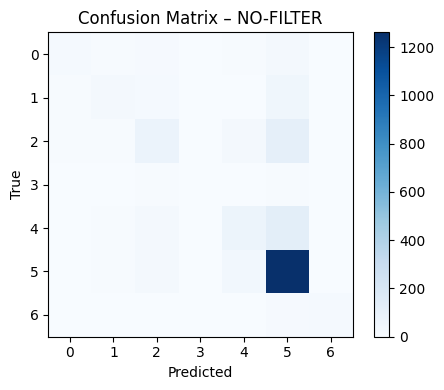


[A] Test metrics
  Accuracy : 0.6788
  Precision (weighted): 0.6105
  Recall    (weighted): 0.6788
  F1-score  (weighted): 0.6322

[A] Per-class report:
              precision    recall  f1-score   support

           0      0.308     0.121     0.174        66
           1      0.441     0.146     0.219       103
           2      0.346     0.291     0.316       220
           3      0.000     0.000     0.000        23
           4      0.290     0.170     0.215       223
           5      0.759     0.922     0.832      1341
           6      0.000     0.000     0.000        29

    accuracy                          0.679      2005
   macro avg      0.306     0.236     0.251      2005
weighted avg      0.610     0.679     0.632      2005

[A] → classification_report_A.csv saved


/home/aasmai/miniconda3/envs/qml_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/home/aasmai/miniconda3/envs/qml_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/home/aasmai/miniconda3/envs/qml_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{me

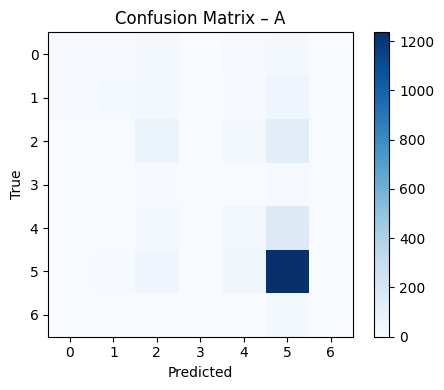


[B] Test metrics
  Accuracy : 0.6893
  Precision (weighted): 0.6217
  Recall    (weighted): 0.6893
  F1-score  (weighted): 0.6408

[B] Per-class report:
              precision    recall  f1-score   support

           0      0.400     0.121     0.186        66
           1      0.342     0.126     0.184       103
           2      0.446     0.336     0.383       220
           3      0.000     0.000     0.000        23
           4      0.366     0.202     0.260       223
           5      0.750     0.926     0.829      1341
           6      0.000     0.000     0.000        29

    accuracy                          0.689      2005
   macro avg      0.329     0.245     0.263      2005
weighted avg      0.622     0.689     0.641      2005

[B] → classification_report_B.csv saved


/home/aasmai/miniconda3/envs/qml_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/home/aasmai/miniconda3/envs/qml_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/home/aasmai/miniconda3/envs/qml_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{me

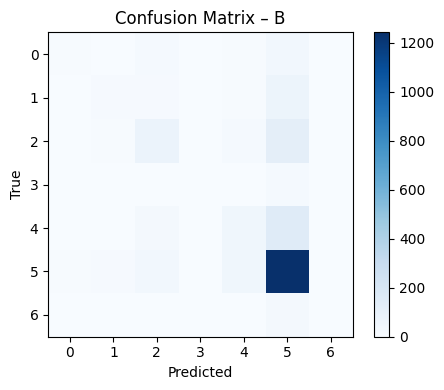


[C] Test metrics
  Accuracy : 0.6783
  Precision (weighted): 0.6165
  Recall    (weighted): 0.6783
  F1-score  (weighted): 0.6394

[C] Per-class report:
              precision    recall  f1-score   support

           0      0.323     0.152     0.206        66
           1      0.358     0.233     0.282       103
           2      0.357     0.232     0.281       220
           3      0.000     0.000     0.000        23
           4      0.341     0.256     0.292       223
           5      0.763     0.908     0.829      1341
           6      0.000     0.000     0.000        29

    accuracy                          0.678      2005
   macro avg      0.306     0.254     0.270      2005
weighted avg      0.617     0.678     0.639      2005

[C] → classification_report_C.csv saved


/home/aasmai/miniconda3/envs/qml_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/home/aasmai/miniconda3/envs/qml_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/home/aasmai/miniconda3/envs/qml_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{me

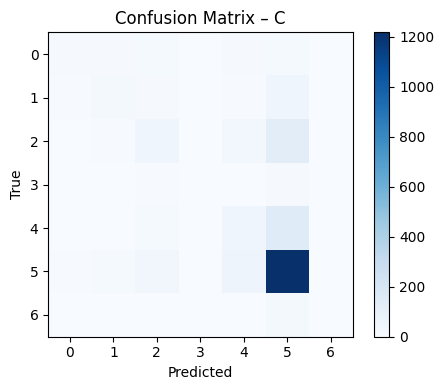

In [18]:
# NO-FILTER baseline
acc_nf, prec_nf, rec_nf, f1_nf = eval_and_report(
    model_nf, te_rgb, te_labels, tag="NO-FILTER"
)

# Circuit A
acc_A, prec_A, rec_A, f1_A = eval_and_report(
    model_A, X_A_test, te_labels, tag="A"
)

# Circuit B
acc_B, prec_B, rec_B, f1_B = eval_and_report(
    model_B, X_B_test, te_labels, tag="B"
)

# Circuit C
acc_C, prec_C, rec_C, f1_C = eval_and_report(
    model_C, X_C_test, te_labels, tag="C"
)


In [19]:
summary_df = pd.DataFrame({
    'Model'    : ['NO-FILTER', 'A', 'B', 'C'],
    'Accuracy' : [acc_nf, acc_A, acc_B, acc_C],
    'F1'       : [f1_nf, f1_A, f1_B, f1_C],
    'Precision': [prec_nf, prec_A, prec_B, prec_C],
    'Recall'   : [rec_nf, rec_A, rec_B, rec_C],
})

print("\n=== Summary (Test performance) ===")
print(summary_df.round(4))

summary_df.to_csv("summary_test_metrics_all_models.csv", index=False)
print("saved -> summary_test_metrics_all_models.csv")



=== Summary (Test performance) ===
       Model  Accuracy      F1  Precision  Recall
0  NO-FILTER    0.7317  0.7016     0.6958  0.7317
1          A    0.6788  0.6322     0.6105  0.6788
2          B    0.6893  0.6408     0.6217  0.6893
3          C    0.6783  0.6394     0.6165  0.6783
saved -> summary_test_metrics_all_models.csv


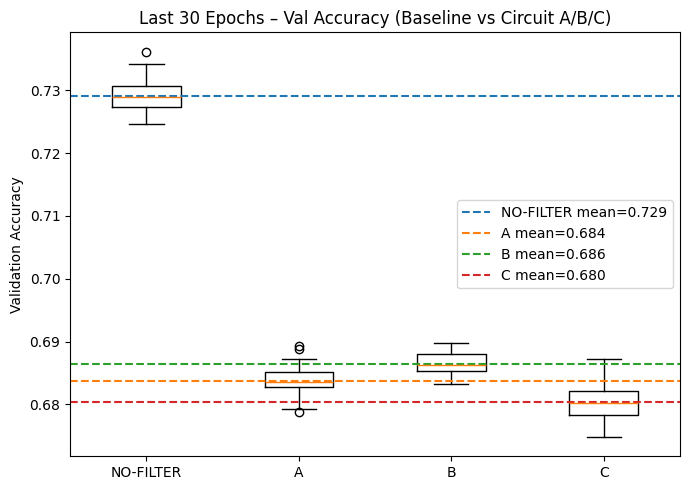

In [20]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# load logs
df_nf = pd.read_csv(log_nf)
df_A  = pd.read_csv(log_A)
df_B  = pd.read_csv(log_B)
df_C  = pd.read_csv(log_C)


vals_nf = df_nf['val_accuracy'].tail(30).astype(float).tolist()
vals_A  = df_A['val_accuracy'].tail(30).astype(float).tolist()
vals_B  = df_B['val_accuracy'].tail(30).astype(float).tolist()
vals_C  = df_C['val_accuracy'].tail(30).astype(float).tolist()

plt.figure(figsize=(7,5))
plt.boxplot(
    [vals_nf, vals_A, vals_B, vals_C],
    labels=['NO-FILTER', 'A', 'B', 'C']
)
plt.ylabel('Validation Accuracy')
plt.title('Last 30 Epochs – Val Accuracy (Baseline vs Circuit A/B/C)')


mean_nf = np.mean(vals_nf)
mean_A  = np.mean(vals_A)
mean_B  = np.mean(vals_B)
mean_C  = np.mean(vals_C)

plt.axhline(mean_nf, color='C0', linestyle='--', label=f'NO-FILTER mean={mean_nf:.3f}')
plt.axhline(mean_A,  color='C1', linestyle='--', label=f'A mean={mean_A:.3f}')
plt.axhline(mean_B,  color='C2', linestyle='--', label=f'B mean={mean_B:.3f}')
plt.axhline(mean_C,  color='C3', linestyle='--', label=f'C mean={mean_C:.3f}')

plt.legend()
plt.tight_layout()
plt.show()


In [21]:
import pandas as pd

comparison_df = pd.DataFrame([
    ["NO-FILTER (Baseline)", acc_nf, prec_nf, rec_nf, f1_nf],
    ["Circuit A", acc_A, prec_A, rec_A, f1_A],
    ["Circuit B", acc_B, prec_B, rec_B, f1_B],
    ["Circuit C", acc_C, prec_C, rec_C, f1_C],
], columns=["Model", "Accuracy", "Precision", "Recall", "F1 Score"])

print(comparison_df)
comparison_df.to_csv("model_comparison_metrics.csv", index=False)


                  Model  Accuracy  Precision    Recall  F1 Score
0  NO-FILTER (Baseline)  0.731671   0.695814  0.731671  0.701615
1             Circuit A  0.678803   0.610486  0.678803  0.632212
2             Circuit B  0.689277   0.621665  0.689277  0.640758
3             Circuit C  0.678304   0.616537  0.678304  0.639373


In [22]:
# model.fit(X_train, y_train, epochs=5000, batch_size=32, validation_data=(X_val, y_val))

# # Save the trained model
# model.save("qpf_cnn_model.h5")
# print("Model saved!")
